In [ ]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [ ]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [ ]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, b_left, b_right, b_upper, b_lower, X_f, lb, ub, X_f_pretrain): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)

        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_f_pretrain = make_time_sequence(X_f_pretrain, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)

        b_left = make_time_sequence(b_left, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_right = make_time_sequence(b_right, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_upper = make_time_sequence(b_upper, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        b_lower = make_time_sequence(b_lower, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)\n",
        
        # data
        #配位点数据
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_f_pretrain = torch.tensor(X_f_pretrain[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_f_pretrain = torch.tensor(X_f_pretrain[:,:, 1:2], requires_grad=True).float().to(device)

        self.x_left = torch.tensor(b_left[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1)\n",
        self.t_left = torch.tensor(b_left[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_right = torch.tensor(b_right[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_right = torch.tensor(b_right[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_upper = torch.tensor(b_upper[:,:, 0:1], requires_grad=True).float().to(device) 
        self.t_upper = torch.tensor(b_upper[:,:, 1:2], requires_grad=True).float().to(device)
        self.x_lower = torch.tensor(b_lower[:,:, 0:1], requires_grad=True).float().to(device)
        self.t_lower = torch.tensor(b_lower[:,:, 1:2], requires_grad=True).float().to(device)
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置
        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        # self.optimizer_LBFGS = torch.optim.LBFGS(
        #     self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
        #     lr=1.0,  #学习率设置为1
        #     max_iter=50000,  #最大迭代次数为50000
        #     max_eval=50000,  #最大评估次数为50000
        #     history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
        #     # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
        #     # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
        #     line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        # )
        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe') #使用LBFGS优化器，line_search_fn='strong_wolfe'表示使用强Wolfe线搜索方法
        self.optimizer_LBFGS_pretrain = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe') #创建第二个LBFGS优化器，括号内为要优化的参数，使用强Wolfe线搜索方法

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
        self.optimizer_Adam_pretrain = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    #初始化神经网络的线性层权重参数，使用Xavier初始化权重，偏置则初始化为0.01
    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
        
    #输入是两个(点的数量，序列长度，1)，输出(点的数量，序列长度，1)
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #合并为(点的数量，序列长度，2)
        return u
    
    #输入是两个(点的数量，序列长度，1)
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #输出(点的数量，序列长度，1)
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_x = torch.autograd.grad(
            u, x,  #输入的张量，要计算u关于x的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_xx = torch.autograd.grad(
            u_x, x,  #输入的张量，要计算u_x关于x的
            grad_outputs=torch.ones_like(u_x), #生成一个与u_x形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        u_tt = torch.autograd.grad(
            u_t, t,  #输入的张量，要计算u_t关于t的
            grad_outputs=torch.ones_like(u_t), #生成一个与u_t形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0]

        
        f=u_tt - 4 * u_xx #计算f，定义见论文
        return f #(点的数量，序列长度，1)
    
    def loss_func_pretrain(self):
        self.optimizer_LBFGS_pretrain.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_f_pretrain, self.t_f_pretrain) #输出(点的数量，序列长度，1)\n",
        loss = torch.mean(u_pred ** 2) #计算损失，这里使用了均方误差损失函数，计算预测值u_pred的平方的平均值作为损失

        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数

        return loss #返回loss

      
    
    def pretrain(self, nIter_pretrain, nIterLBFGS_pretrain):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式
        #先使用Adam优化器优化nIter次\n",
        print('Start warmup pretraining:')
        print('Start Pretrain Loss: %.4f' % (torch.mean((self.net_u(self.x_f_pretrain, self.t_f_pretrain))**2)))
        for epoch in tqdm(range(nIter_pretrain), desc='Adam'):
            u_pred = self.net_u(self.x_f_pretrain, self.t_f_pretrain) #输出(点的数量，序列长度，1)\n",
            loss = torch.mean(u_pred ** 2) #计算损失，这里使用了均方误差损失函数，计算预测值u_pred的平方的平均值作为损失

            # Backward and optimize
            self.optimizer_Adam_pretrain.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）\n",
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数\n",
            self.optimizer_Adam_pretrain.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化\n",

            #record the loss value\n",
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中\n",

        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次\n",
        for i in tqdm(range(nIterLBFGS_pretrain), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式\n",
            self.optimizer_LBFGS_pretrain.step(self.loss_func_pretrain)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   \n",

        print('End of warmup pretraining:')
        print('End Pretrain Loss: %.4f' % (torch.mean((self.net_u(self.x_f_pretrain, self.t_f_pretrain))**2)))

    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
        pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
        pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

        pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

        #计算损失，共三项损失
        loss_res = torch.mean(f_pred ** 2)
        loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
        ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

        loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
        loss_ic_2 = torch.mean((ui_t)**2)

        loss_ic = loss_ic_1 + loss_ic_2

        loss = loss_res + loss_bc + loss_ic

        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数

        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        return loss #返回loss

      
    
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式
        #先使用Adam优化器优化nIter次\n",
        for epoch in tqdm(range(nIter), desc='Adam'):
            pred_upper = self.net_u(self.x_upper, self.t_upper) #输出(点的数量，序列长度，1)\n",
            pred_lower = self.net_u(self.x_lower, self.t_lower) #输出(点的数量，序列长度，1)\n",
            pred_left = self.net_u(self.x_left, self.t_left) #输出(点的数量，序列长度，1)\n",
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)\n",

            pi = torch.tensor(np.pi, dtype=torch.float32, requires_grad=False).to(device)

            #计算损失，共三项损失
            loss_res = torch.mean(f_pred ** 2)
            loss_bc = torch.mean((pred_upper) ** 2) + torch.mean((pred_lower) ** 2)
            ui_t = torch.autograd.grad(pred_left, self.t_left, grad_outputs=torch.ones_like(pred_left), retain_graph=True, create_graph=True)[0]

            loss_ic_1 = torch.mean((pred_left[:,0] - torch.sin(pi*self.x_left[:,0]) - 0.5 * torch.sin(3*pi*self.x_left[:,0])) ** 2)
            loss_ic_2 = torch.mean((ui_t)**2)

            loss_ic = loss_ic_1 + loss_ic_2

            loss = loss_res + loss_bc + loss_ic

            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）\n",
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数\n",
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化\n",

            #record the loss value\n",
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中\n",

        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次\n",
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式\n",
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   \n",

 

  


    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)，f形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        # f = f[:,0:1].reshape(-1,1) #将f的形状从(点的数量，序列长度，1)变为(点的数量，1)
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)
    

In [5]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [ ]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子\n",
# seeds = [0]

N_f = 51*51
N_f_pretrain = N_f//2

lb = np.array([0.0, 0.0])
ub = np.array([2 * np.pi, 1.0])

# Train PINNsformer
_, b_left, b_right, b_upper, b_lower = get_data([0,2*np.pi], [0,1], 51, 51) #51代表初值点、边界值点数量！！
X_star, _, _, _, _ = get_data([0,2*np.pi], [0,1], 101, 101) #生成测试数据，采样点数为101x101,这里的X_star就是res_test

error_u = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 0 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500
nIter_pretrain = 0
nIterLBFGS_pretrain = 500

def u_ana(x,t):
    return np.sin(np.pi*x) * np.cos(2*np.pi*t) + 0.5 * np.sin(3*np.pi*x) * np.cos(6*np.pi*t)

for seed in seeds:
    set_seed(seed) #设置随机种子

    X_f = lb + (ub-lb)*lhs(2, N_f) #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，返回的是一个形状为（$N_f$，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本$X_f$。
    X_f_pretrain = lb + (ub-lb)*lhs(2, N_f_pretrain) #生成预训练的样本点集，方法同上

    #创建PINN模型并输入各种参数      
    model = PhysicsInformedNN(b_left, b_right, b_upper, b_lower, X_f, lb, ub, X_f_pretrain)
    #获取当前时间并赋值给start_time   
    start_time = time.time()      
    #训练模型50000次       
    model.pretrain(nIter_pretrain, nIterLBFGS_pretrain) #预训练模型，先使用Adam优化器优化nIter_pretrain次，然后使用LBFGS优化器优化nIterLBFGS_pretrain次\n",
    model.train(nIter, nIterLBFGS)
    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间\n",
    print('Training time: %.4f' % (elapsed))

    #用训练好的模型进行预测，返回四个值（均为数组）  
    u_pred = model.predict(X_star).flatten()

    # u_pred = u_pred.reshape(101,101)

    u_star = u_ana(X_star[:,0], X_star[:,1])
    # .reshape(101,101)\n",


    #计算误差（基于2范数）        
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE


Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<33:24,  4.99it/s]


Adam:   0%|          | 3/10000 [00:00<20:55,  7.96it/s]


Adam:   0%|          | 4/10000 [00:00<19:40,  8.47it/s]


Adam:   0%|          | 6/10000 [00:00<18:11,  9.16it/s]


Adam:   0%|          | 8/10000 [00:00<17:22,  9.58it/s]


Adam:   0%|          | 10/10000 [00:01<17:01,  9.78it/s]


Adam:   0%|          | 11/10000 [00:01<17:04,  9.75it/s]


Adam:   0%|          | 13/10000 [00:01<16:49,  9.89it/s]


Adam:   0%|          | 15/10000 [00:01<16:38, 10.00it/s]


Adam:   0%|          | 17/10000 [00:01<16:27, 10.11it/s]


Adam:   0%|          | 19/10000 [00:01<16:18, 10.20it/s]


Adam:   0%|          | 21/10000 [00:02<16:22, 10.16it/s]


Adam:   0%|          | 23/10000 [00:02<16:31, 10.06it/s]


Adam:   0%|          | 25/10000 [00:02<16:26, 10.12it/s]


Adam:   0%|          | 27/10000 [00:02<16:20, 10.18it/s]


Adam:   0%|          | 29/10000 [00:02<16:16, 10.21it/s]


Adam:   0%|          | 31/10000 [00:03<16:19, 10.17it/s]


Adam:   0%|          | 33/10000 [00:03<16:25, 10.11it/s]


Adam:   0%|          | 35/10000 [00:03<16:19, 10.18it/s]


Adam:   0%|          | 37/10000 [00:03<16:21, 10.15it/s]


Adam:   0%|          | 39/10000 [00:03<16:16, 10.20it/s]


Adam:   0%|          | 41/10000 [00:04<16:12, 10.24it/s]


Adam:   0%|          | 43/10000 [00:04<16:07, 10.29it/s]


Adam:   0%|          | 45/10000 [00:04<16:06, 10.30it/s]


Adam:   0%|          | 47/10000 [00:04<16:07, 10.29it/s]


Adam:   0%|          | 49/10000 [00:04<16:05, 10.31it/s]


Adam:   1%|          | 51/10000 [00:05<16:05, 10.30it/s]


Adam:   1%|          | 53/10000 [00:05<16:07, 10.29it/s]


Adam:   1%|          | 55/10000 [00:05<16:15, 10.20it/s]


Adam:   1%|          | 57/10000 [00:05<16:18, 10.16it/s]


Adam:   1%|          | 59/10000 [00:05<16:21, 10.12it/s]


Adam:   1%|          | 61/10000 [00:06<16:26, 10.08it/s]


Adam:   1%|          | 63/10000 [00:06<16:22, 10.11it/s]


Adam:   1%|          | 65/10000 [00:06<16:20, 10.13it/s]


Adam:   1%|          | 67/10000 [00:06<16:19, 10.14it/s]


Adam:   1%|          | 69/10000 [00:06<16:13, 10.20it/s]


Adam:   1%|          | 71/10000 [00:07<16:18, 10.15it/s]


Adam:   1%|          | 73/10000 [00:07<16:24, 10.08it/s]


Adam:   1%|          | 75/10000 [00:07<16:19, 10.14it/s]


Adam:   1%|          | 77/10000 [00:07<16:13, 10.19it/s]


Adam:   1%|          | 79/10000 [00:07<16:10, 10.22it/s]


Adam:   1%|          | 81/10000 [00:08<16:05, 10.27it/s]


Adam:   1%|          | 83/10000 [00:08<16:05, 10.28it/s]


Adam:   1%|          | 85/10000 [00:08<16:03, 10.29it/s]


Adam:   1%|          | 87/10000 [00:08<15:59, 10.33it/s]


Adam:   1%|          | 89/10000 [00:08<15:59, 10.33it/s]


Adam:   1%|          | 91/10000 [00:09<15:59, 10.33it/s]


Adam:   1%|          | 93/10000 [00:09<16:00, 10.32it/s]


Adam:   1%|          | 95/10000 [00:09<15:59, 10.32it/s]


Adam:   1%|          | 97/10000 [00:09<15:57, 10.34it/s]


Adam:   1%|          | 99/10000 [00:09<16:06, 10.24it/s]


Adam:   1%|          | 101/10000 [00:10<16:02, 10.29it/s]


Adam:   1%|          | 103/10000 [00:10<16:00, 10.31it/s]


Adam:   1%|          | 105/10000 [00:10<16:00, 10.31it/s]


Adam:   1%|          | 107/10000 [00:10<15:57, 10.33it/s]


Adam:   1%|          | 109/10000 [00:10<16:01, 10.29it/s]


Adam:   1%|          | 111/10000 [00:10<16:03, 10.26it/s]


Adam:   1%|          | 113/10000 [00:11<15:58, 10.31it/s]


Adam:   1%|          | 115/10000 [00:11<15:57, 10.32it/s]


Adam:   1%|          | 117/10000 [00:11<16:07, 10.21it/s]


Adam:   1%|          | 119/10000 [00:11<16:04, 10.25it/s]


Adam:   1%|          | 121/10000 [00:11<16:01, 10.27it/s]


Adam:   1%|          | 123/10000 [00:12<15:59, 10.29it/s]


Adam:   1%|▏         | 125/10000 [00:12<16:04, 10.24it/s]


Adam:   1%|▏         | 127/10000 [00:12<16:05, 10.23it/s]


Adam:   1%|▏         | 129/10000 [00:12<16:04, 10.24it/s]


Adam:   1%|▏         | 131/10000 [00:12<16:02, 10.25it/s]


Adam:   1%|▏         | 133/10000 [00:13<16:06, 10.21it/s]


Adam:   1%|▏         | 135/10000 [00:13<16:06, 10.20it/s]


Adam:   1%|▏         | 137/10000 [00:13<16:09, 10.18it/s]


Adam:   1%|▏         | 139/10000 [00:13<16:04, 10.22it/s]


Adam:   1%|▏         | 141/10000 [00:13<16:00, 10.27it/s]


Adam:   1%|▏         | 143/10000 [00:14<15:58, 10.28it/s]


Adam:   1%|▏         | 145/10000 [00:14<15:56, 10.30it/s]


Adam:   1%|▏         | 147/10000 [00:14<15:58, 10.28it/s]


Adam:   1%|▏         | 149/10000 [00:14<15:56, 10.30it/s]


Adam:   2%|▏         | 151/10000 [00:14<15:59, 10.27it/s]


Adam:   2%|▏         | 153/10000 [00:15<15:57, 10.28it/s]


Adam:   2%|▏         | 155/10000 [00:15<15:56, 10.29it/s]


Adam:   2%|▏         | 157/10000 [00:15<15:56, 10.29it/s]


Adam:   2%|▏         | 159/10000 [00:15<15:54, 10.30it/s]


Adam:   2%|▏         | 161/10000 [00:15<16:04, 10.20it/s]


Adam:   2%|▏         | 163/10000 [00:16<16:01, 10.23it/s]


Adam:   2%|▏         | 165/10000 [00:16<16:08, 10.15it/s]


Adam:   2%|▏         | 167/10000 [00:16<16:11, 10.12it/s]


Adam:   2%|▏         | 169/10000 [00:16<16:05, 10.19it/s]


Adam:   2%|▏         | 171/10000 [00:16<16:06, 10.17it/s]


Adam:   2%|▏         | 173/10000 [00:17<16:05, 10.18it/s]


Adam:   2%|▏         | 175/10000 [00:17<16:07, 10.15it/s]


Adam:   2%|▏         | 177/10000 [00:17<16:03, 10.20it/s]


Adam:   2%|▏         | 179/10000 [00:17<16:04, 10.19it/s]


Adam:   2%|▏         | 181/10000 [00:17<15:59, 10.23it/s]


Adam:   2%|▏         | 183/10000 [00:18<15:56, 10.26it/s]


Adam:   2%|▏         | 185/10000 [00:18<16:08, 10.13it/s]


Adam:   2%|▏         | 187/10000 [00:18<16:03, 10.18it/s]


Adam:   2%|▏         | 189/10000 [00:18<15:58, 10.24it/s]


Adam:   2%|▏         | 191/10000 [00:18<15:56, 10.26it/s]


Adam:   2%|▏         | 193/10000 [00:18<16:07, 10.14it/s]


Adam:   2%|▏         | 195/10000 [00:19<16:03, 10.17it/s]


Adam:   2%|▏         | 197/10000 [00:19<16:02, 10.18it/s]


Adam:   2%|▏         | 199/10000 [00:19<16:03, 10.17it/s]


Adam:   2%|▏         | 201/10000 [00:19<15:58, 10.22it/s]


Adam:   2%|▏         | 203/10000 [00:19<15:55, 10.26it/s]


Adam:   2%|▏         | 205/10000 [00:20<15:51, 10.29it/s]


Adam:   2%|▏         | 207/10000 [00:20<15:50, 10.30it/s]


Adam:   2%|▏         | 209/10000 [00:20<15:51, 10.29it/s]


Adam:   2%|▏         | 211/10000 [00:20<15:50, 10.29it/s]


Adam:   2%|▏         | 213/10000 [00:20<15:47, 10.33it/s]


Adam:   2%|▏         | 215/10000 [00:21<15:57, 10.22it/s]


Adam:   2%|▏         | 217/10000 [00:21<15:55, 10.24it/s]


Adam:   2%|▏         | 219/10000 [00:21<15:53, 10.26it/s]


Adam:   2%|▏         | 221/10000 [00:21<15:50, 10.28it/s]


Adam:   2%|▏         | 223/10000 [00:21<15:48, 10.31it/s]


Adam:   2%|▏         | 225/10000 [00:22<15:48, 10.31it/s]


Adam:   2%|▏         | 227/10000 [00:22<15:59, 10.19it/s]


Adam:   2%|▏         | 229/10000 [00:22<15:57, 10.21it/s]


Adam:   2%|▏         | 231/10000 [00:22<15:54, 10.23it/s]


Adam:   2%|▏         | 233/10000 [00:22<15:53, 10.25it/s]


Adam:   2%|▏         | 235/10000 [00:23<15:52, 10.25it/s]


Adam:   2%|▏         | 237/10000 [00:23<15:51, 10.27it/s]


Adam:   2%|▏         | 239/10000 [00:23<15:51, 10.25it/s]


Adam:   2%|▏         | 241/10000 [00:23<15:56, 10.21it/s]


Adam:   2%|▏         | 243/10000 [00:23<15:54, 10.22it/s]


Adam:   2%|▏         | 245/10000 [00:24<15:52, 10.24it/s]


Adam:   2%|▏         | 247/10000 [00:24<15:50, 10.26it/s]


Adam:   2%|▏         | 249/10000 [00:24<15:48, 10.28it/s]


Adam:   3%|▎         | 251/10000 [00:24<15:48, 10.28it/s]


Adam:   3%|▎         | 253/10000 [00:24<15:45, 10.31it/s]


Adam:   3%|▎         | 255/10000 [00:25<15:48, 10.27it/s]


Adam:   3%|▎         | 257/10000 [00:25<15:48, 10.28it/s]


Adam:   3%|▎         | 259/10000 [00:25<15:47, 10.28it/s]


Adam:   3%|▎         | 261/10000 [00:25<15:47, 10.27it/s]


Adam:   3%|▎         | 263/10000 [00:25<15:47, 10.28it/s]


Adam:   3%|▎         | 265/10000 [00:26<15:47, 10.27it/s]


Adam:   3%|▎         | 267/10000 [00:26<15:44, 10.30it/s]


Adam:   3%|▎         | 269/10000 [00:26<15:43, 10.32it/s]


Adam:   3%|▎         | 271/10000 [00:26<15:45, 10.29it/s]


Adam:   3%|▎         | 273/10000 [00:26<15:44, 10.30it/s]


Adam:   3%|▎         | 275/10000 [00:26<15:43, 10.31it/s]


Adam:   3%|▎         | 277/10000 [00:27<15:50, 10.23it/s]


Adam:   3%|▎         | 279/10000 [00:27<16:04, 10.08it/s]


Adam:   3%|▎         | 281/10000 [00:27<15:57, 10.15it/s]


Adam:   3%|▎         | 283/10000 [00:27<15:53, 10.19it/s]


Adam:   3%|▎         | 285/10000 [00:27<15:48, 10.24it/s]


Adam:   3%|▎         | 287/10000 [00:28<15:55, 10.17it/s]


Adam:   3%|▎         | 289/10000 [00:28<15:58, 10.14it/s]


Adam:   3%|▎         | 291/10000 [00:28<15:56, 10.15it/s]


Adam:   3%|▎         | 293/10000 [00:28<15:58, 10.13it/s]


Adam:   3%|▎         | 295/10000 [00:28<15:56, 10.14it/s]


Adam:   3%|▎         | 297/10000 [00:29<15:49, 10.22it/s]


Adam:   3%|▎         | 299/10000 [00:29<15:45, 10.26it/s]


Adam:   3%|▎         | 301/10000 [00:29<15:40, 10.31it/s]


Adam:   3%|▎         | 303/10000 [00:29<15:41, 10.30it/s]


Adam:   3%|▎         | 305/10000 [00:29<15:42, 10.29it/s]


Adam:   3%|▎         | 307/10000 [00:30<15:52, 10.18it/s]


Adam:   3%|▎         | 309/10000 [00:30<15:51, 10.19it/s]


Adam:   3%|▎         | 311/10000 [00:30<15:57, 10.12it/s]


Adam:   3%|▎         | 313/10000 [00:30<16:00, 10.08it/s]


Adam:   3%|▎         | 315/10000 [00:30<15:54, 10.15it/s]


Adam:   3%|▎         | 317/10000 [00:31<15:54, 10.15it/s]


Adam:   3%|▎         | 319/10000 [00:31<15:48, 10.20it/s]


Adam:   3%|▎         | 321/10000 [00:31<15:51, 10.18it/s]


Adam:   3%|▎         | 323/10000 [00:31<15:55, 10.13it/s]


Adam:   3%|▎         | 325/10000 [00:31<15:52, 10.16it/s]


Adam:   3%|▎         | 327/10000 [00:32<15:49, 10.19it/s]


Adam:   3%|▎         | 329/10000 [00:32<15:42, 10.26it/s]


Adam:   3%|▎         | 331/10000 [00:32<15:43, 10.25it/s]


Adam:   3%|▎         | 333/10000 [00:32<15:37, 10.31it/s]


Adam:   3%|▎         | 335/10000 [00:32<15:46, 10.21it/s]


Adam:   3%|▎         | 337/10000 [00:33<15:42, 10.25it/s]


Adam:   3%|▎         | 339/10000 [00:33<15:40, 10.27it/s]


Adam:   3%|▎         | 341/10000 [00:33<15:37, 10.30it/s]


Adam:   3%|▎         | 343/10000 [00:33<15:35, 10.32it/s]


Adam:   3%|▎         | 345/10000 [00:33<15:42, 10.24it/s]


Adam:   3%|▎         | 347/10000 [00:34<15:49, 10.17it/s]


Adam:   3%|▎         | 349/10000 [00:34<15:49, 10.16it/s]


Adam:   4%|▎         | 351/10000 [00:34<15:49, 10.17it/s]


Adam:   4%|▎         | 353/10000 [00:34<15:46, 10.19it/s]


Adam:   4%|▎         | 355/10000 [00:34<15:42, 10.23it/s]


Adam:   4%|▎         | 357/10000 [00:35<15:40, 10.26it/s]


Adam:   4%|▎         | 359/10000 [00:35<15:35, 10.30it/s]


Adam:   4%|▎         | 361/10000 [00:35<15:32, 10.34it/s]


Adam:   4%|▎         | 363/10000 [00:35<15:30, 10.36it/s]


Adam:   4%|▎         | 365/10000 [00:35<15:35, 10.30it/s]


Adam:   4%|▎         | 367/10000 [00:35<15:36, 10.28it/s]


Adam:   4%|▎         | 369/10000 [00:36<15:39, 10.25it/s]


Adam:   4%|▎         | 371/10000 [00:36<15:37, 10.27it/s]


Adam:   4%|▎         | 373/10000 [00:36<15:35, 10.29it/s]


Adam:   4%|▍         | 375/10000 [00:36<15:32, 10.32it/s]


Adam:   4%|▍         | 377/10000 [00:36<15:35, 10.29it/s]


Adam:   4%|▍         | 379/10000 [00:37<15:37, 10.26it/s]


Adam:   4%|▍         | 381/10000 [00:37<15:39, 10.24it/s]


Adam:   4%|▍         | 383/10000 [00:37<15:48, 10.13it/s]


Adam:   4%|▍         | 385/10000 [00:37<16:10,  9.91it/s]


Adam:   4%|▍         | 386/10000 [00:37<16:16,  9.84it/s]


Adam:   4%|▍         | 387/10000 [00:37<16:20,  9.80it/s]


Adam:   4%|▍         | 389/10000 [00:38<16:04,  9.96it/s]


Adam:   4%|▍         | 390/10000 [00:38<16:10,  9.90it/s]


Adam:   4%|▍         | 391/10000 [00:38<16:21,  9.79it/s]


Adam:   4%|▍         | 392/10000 [00:38<16:22,  9.78it/s]


Adam:   4%|▍         | 393/10000 [00:38<16:23,  9.77it/s]


Adam:   4%|▍         | 394/10000 [00:38<16:36,  9.64it/s]


Adam:   4%|▍         | 396/10000 [00:38<16:07,  9.92it/s]


Adam:   4%|▍         | 397/10000 [00:38<16:08,  9.92it/s]


Adam:   4%|▍         | 399/10000 [00:39<15:53, 10.07it/s]


Adam:   4%|▍         | 401/10000 [00:39<16:00,  9.99it/s]


Adam:   4%|▍         | 402/10000 [00:39<16:16,  9.83it/s]


Adam:   4%|▍         | 404/10000 [00:39<16:03,  9.95it/s]


Adam:   4%|▍         | 406/10000 [00:39<15:55, 10.04it/s]


Adam:   4%|▍         | 408/10000 [00:40<15:57, 10.01it/s]


Adam:   4%|▍         | 409/10000 [00:40<15:59,  9.99it/s]


Adam:   4%|▍         | 411/10000 [00:40<15:51, 10.08it/s]


Adam:   4%|▍         | 413/10000 [00:40<15:57, 10.01it/s]


Adam:   4%|▍         | 414/10000 [00:40<16:02,  9.96it/s]


Adam:   4%|▍         | 416/10000 [00:40<16:15,  9.82it/s]


Adam:   4%|▍         | 417/10000 [00:40<16:16,  9.81it/s]


Adam:   4%|▍         | 418/10000 [00:41<16:26,  9.71it/s]


Adam:   4%|▍         | 420/10000 [00:41<16:14,  9.84it/s]


Adam:   4%|▍         | 422/10000 [00:41<16:16,  9.81it/s]


Adam:   4%|▍         | 423/10000 [00:41<16:20,  9.77it/s]


Adam:   4%|▍         | 425/10000 [00:41<16:03,  9.94it/s]


Adam:   4%|▍         | 427/10000 [00:42<15:51, 10.06it/s]


Adam:   4%|▍         | 429/10000 [00:42<15:47, 10.10it/s]


Adam:   4%|▍         | 431/10000 [00:42<15:53, 10.03it/s]


Adam:   4%|▍         | 433/10000 [00:42<16:01,  9.95it/s]


Adam:   4%|▍         | 435/10000 [00:42<15:53, 10.03it/s]


Adam:   4%|▍         | 437/10000 [00:43<15:59,  9.97it/s]


Adam:   4%|▍         | 439/10000 [00:43<15:52, 10.04it/s]


Adam:   4%|▍         | 441/10000 [00:43<15:46, 10.10it/s]


Adam:   4%|▍         | 443/10000 [00:43<15:49, 10.06it/s]


Adam:   4%|▍         | 445/10000 [00:43<15:45, 10.10it/s]


Adam:   4%|▍         | 447/10000 [00:43<15:46, 10.09it/s]


Adam:   4%|▍         | 449/10000 [00:44<15:41, 10.14it/s]


Adam:   5%|▍         | 451/10000 [00:44<15:43, 10.13it/s]


Adam:   5%|▍         | 453/10000 [00:44<15:42, 10.13it/s]


Adam:   5%|▍         | 455/10000 [00:44<15:39, 10.16it/s]


Adam:   5%|▍         | 457/10000 [00:44<15:43, 10.11it/s]


Adam:   5%|▍         | 459/10000 [00:45<15:35, 10.19it/s]


Adam:   5%|▍         | 461/10000 [00:45<15:33, 10.22it/s]


Adam:   5%|▍         | 463/10000 [00:45<15:29, 10.26it/s]


Adam:   5%|▍         | 465/10000 [00:45<15:23, 10.32it/s]


Adam:   5%|▍         | 467/10000 [00:45<15:22, 10.34it/s]


Adam:   5%|▍         | 469/10000 [00:46<15:28, 10.26it/s]


Adam:   5%|▍         | 471/10000 [00:46<15:25, 10.29it/s]


Adam:   5%|▍         | 473/10000 [00:46<15:39, 10.14it/s]


Adam:   5%|▍         | 475/10000 [00:46<15:45, 10.08it/s]


Adam:   5%|▍         | 477/10000 [00:46<15:44, 10.08it/s]


Adam:   5%|▍         | 479/10000 [00:47<15:45, 10.07it/s]


Adam:   5%|▍         | 481/10000 [00:47<15:53,  9.98it/s]


Adam:   5%|▍         | 483/10000 [00:47<15:43, 10.09it/s]


Adam:   5%|▍         | 485/10000 [00:47<15:36, 10.16it/s]


Adam:   5%|▍         | 487/10000 [00:47<15:38, 10.14it/s]


Adam:   5%|▍         | 489/10000 [00:48<15:31, 10.21it/s]


Adam:   5%|▍         | 491/10000 [00:48<15:30, 10.22it/s]


Adam:   5%|▍         | 493/10000 [00:48<15:33, 10.19it/s]


Adam:   5%|▍         | 495/10000 [00:48<15:29, 10.23it/s]


Adam:   5%|▍         | 497/10000 [00:48<15:25, 10.27it/s]


Adam:   5%|▍         | 499/10000 [00:49<15:26, 10.26it/s]


Adam:   5%|▌         | 501/10000 [00:49<15:23, 10.28it/s]


Adam:   5%|▌         | 503/10000 [00:49<15:21, 10.31it/s]


Adam:   5%|▌         | 505/10000 [00:49<15:16, 10.36it/s]


Adam:   5%|▌         | 507/10000 [00:49<15:15, 10.37it/s]


Adam:   5%|▌         | 509/10000 [00:50<15:31, 10.19it/s]


Adam:   5%|▌         | 511/10000 [00:50<15:25, 10.25it/s]


Adam:   5%|▌         | 513/10000 [00:50<15:21, 10.29it/s]


Adam:   5%|▌         | 515/10000 [00:50<15:18, 10.33it/s]


Adam:   5%|▌         | 517/10000 [00:50<15:15, 10.36it/s]


Adam:   5%|▌         | 519/10000 [00:51<15:21, 10.29it/s]


Adam:   5%|▌         | 521/10000 [00:51<15:22, 10.27it/s]


Adam:   5%|▌         | 523/10000 [00:51<15:20, 10.30it/s]


Adam:   5%|▌         | 525/10000 [00:51<15:20, 10.30it/s]


Adam:   5%|▌         | 527/10000 [00:51<15:23, 10.26it/s]


Adam:   5%|▌         | 529/10000 [00:52<15:29, 10.19it/s]


Adam:   5%|▌         | 531/10000 [00:52<15:23, 10.25it/s]


Adam:   5%|▌         | 533/10000 [00:52<15:28, 10.20it/s]


Adam:   5%|▌         | 535/10000 [00:52<15:29, 10.19it/s]


Adam:   5%|▌         | 537/10000 [00:52<15:25, 10.23it/s]


Adam:   5%|▌         | 539/10000 [00:52<15:20, 10.28it/s]


Adam:   5%|▌         | 541/10000 [00:53<15:15, 10.33it/s]


Adam:   5%|▌         | 543/10000 [00:53<15:19, 10.29it/s]


Adam:   5%|▌         | 545/10000 [00:53<15:20, 10.27it/s]


Adam:   5%|▌         | 547/10000 [00:53<15:15, 10.32it/s]


Adam:   5%|▌         | 549/10000 [00:53<15:10, 10.39it/s]


Adam:   6%|▌         | 551/10000 [00:54<15:09, 10.39it/s]


Adam:   6%|▌         | 553/10000 [00:54<15:13, 10.34it/s]


Adam:   6%|▌         | 555/10000 [00:54<15:18, 10.28it/s]


Adam:   6%|▌         | 557/10000 [00:54<15:17, 10.30it/s]


Adam:   6%|▌         | 559/10000 [00:54<15:15, 10.31it/s]


Adam:   6%|▌         | 561/10000 [00:55<15:12, 10.35it/s]


Adam:   6%|▌         | 563/10000 [00:55<15:16, 10.30it/s]


Adam:   6%|▌         | 565/10000 [00:55<15:16, 10.30it/s]


Adam:   6%|▌         | 567/10000 [00:55<15:13, 10.33it/s]


Adam:   6%|▌         | 569/10000 [00:55<15:08, 10.38it/s]


Adam:   6%|▌         | 571/10000 [00:56<15:06, 10.40it/s]


Adam:   6%|▌         | 573/10000 [00:56<15:06, 10.40it/s]


Adam:   6%|▌         | 575/10000 [00:56<15:07, 10.38it/s]


Adam:   6%|▌         | 577/10000 [00:56<15:13, 10.32it/s]


Adam:   6%|▌         | 579/10000 [00:56<15:15, 10.29it/s]


Adam:   6%|▌         | 581/10000 [00:57<15:11, 10.34it/s]


Adam:   6%|▌         | 583/10000 [00:57<15:12, 10.32it/s]


Adam:   6%|▌         | 585/10000 [00:57<15:13, 10.31it/s]


Adam:   6%|▌         | 587/10000 [00:57<15:14, 10.29it/s]


Adam:   6%|▌         | 589/10000 [00:57<15:08, 10.36it/s]


Adam:   6%|▌         | 591/10000 [00:58<15:12, 10.31it/s]


Adam:   6%|▌         | 593/10000 [00:58<15:15, 10.27it/s]


Adam:   6%|▌         | 595/10000 [00:58<15:11, 10.32it/s]


Adam:   6%|▌         | 597/10000 [00:58<15:05, 10.38it/s]


Adam:   6%|▌         | 599/10000 [00:58<15:03, 10.41it/s]


Adam:   6%|▌         | 601/10000 [00:58<15:03, 10.40it/s]


Adam:   6%|▌         | 603/10000 [00:59<15:00, 10.43it/s]


Adam:   6%|▌         | 605/10000 [00:59<15:03, 10.39it/s]


Adam:   6%|▌         | 607/10000 [00:59<15:02, 10.41it/s]


Adam:   6%|▌         | 609/10000 [00:59<15:01, 10.41it/s]


Adam:   6%|▌         | 611/10000 [00:59<15:02, 10.40it/s]


Adam:   6%|▌         | 613/10000 [01:00<15:08, 10.33it/s]


Adam:   6%|▌         | 615/10000 [01:00<15:10, 10.31it/s]


Adam:   6%|▌         | 617/10000 [01:00<15:08, 10.33it/s]


Adam:   6%|▌         | 619/10000 [01:00<15:11, 10.30it/s]


Adam:   6%|▌         | 621/10000 [01:00<15:09, 10.31it/s]


Adam:   6%|▌         | 623/10000 [01:01<15:06, 10.34it/s]


Adam:   6%|▋         | 625/10000 [01:01<15:09, 10.31it/s]


Adam:   6%|▋         | 627/10000 [01:01<15:06, 10.34it/s]


Adam:   6%|▋         | 629/10000 [01:01<15:01, 10.40it/s]


Adam:   6%|▋         | 631/10000 [01:01<15:01, 10.39it/s]


Adam:   6%|▋         | 633/10000 [01:02<15:01, 10.38it/s]


Adam:   6%|▋         | 635/10000 [01:02<15:07, 10.32it/s]


Adam:   6%|▋         | 637/10000 [01:02<15:11, 10.27it/s]


Adam:   6%|▋         | 639/10000 [01:02<15:09, 10.29it/s]


Adam:   6%|▋         | 641/10000 [01:02<15:17, 10.20it/s]


Adam:   6%|▋         | 643/10000 [01:03<15:27, 10.09it/s]


Adam:   6%|▋         | 645/10000 [01:03<15:43,  9.92it/s]


Adam:   6%|▋         | 646/10000 [01:03<15:58,  9.76it/s]


Adam:   6%|▋         | 647/10000 [01:03<16:04,  9.70it/s]


Adam:   6%|▋         | 649/10000 [01:03<15:56,  9.78it/s]


Adam:   6%|▋         | 650/10000 [01:03<15:55,  9.79it/s]


Adam:   7%|▋         | 652/10000 [01:03<15:34, 10.00it/s]


Adam:   7%|▋         | 654/10000 [01:04<15:26, 10.09it/s]


Adam:   7%|▋         | 656/10000 [01:04<15:26, 10.08it/s]


Adam:   7%|▋         | 658/10000 [01:04<15:32, 10.02it/s]


Adam:   7%|▋         | 659/10000 [01:04<15:41,  9.92it/s]


Adam:   7%|▋         | 661/10000 [01:04<15:27, 10.07it/s]


Adam:   7%|▋         | 662/10000 [01:04<15:29, 10.05it/s]


Adam:   7%|▋         | 664/10000 [01:05<15:21, 10.13it/s]


Adam:   7%|▋         | 666/10000 [01:05<15:28, 10.05it/s]


Adam:   7%|▋         | 668/10000 [01:05<15:34,  9.99it/s]


Adam:   7%|▋         | 669/10000 [01:05<15:37,  9.95it/s]


Adam:   7%|▋         | 670/10000 [01:05<15:44,  9.88it/s]


Adam:   7%|▋         | 671/10000 [01:05<15:48,  9.84it/s]


Adam:   7%|▋         | 673/10000 [01:06<15:40,  9.91it/s]


Adam:   7%|▋         | 674/10000 [01:06<15:41,  9.91it/s]


Adam:   7%|▋         | 675/10000 [01:06<15:45,  9.86it/s]


Adam:   7%|▋         | 677/10000 [01:06<15:31, 10.01it/s]


Adam:   7%|▋         | 679/10000 [01:06<15:18, 10.15it/s]


Adam:   7%|▋         | 681/10000 [01:06<15:15, 10.18it/s]


Adam:   7%|▋         | 683/10000 [01:07<15:20, 10.12it/s]


Adam:   7%|▋         | 685/10000 [01:07<15:15, 10.18it/s]


Adam:   7%|▋         | 687/10000 [01:07<15:12, 10.21it/s]


Adam:   7%|▋         | 689/10000 [01:07<15:11, 10.22it/s]


Adam:   7%|▋         | 691/10000 [01:07<15:21, 10.10it/s]


Adam:   7%|▋         | 693/10000 [01:08<15:23, 10.07it/s]


Adam:   7%|▋         | 695/10000 [01:08<15:26, 10.04it/s]


Adam:   7%|▋         | 697/10000 [01:08<15:28, 10.02it/s]


Adam:   7%|▋         | 699/10000 [01:08<15:19, 10.11it/s]


Adam:   7%|▋         | 701/10000 [01:08<15:20, 10.10it/s]


Adam:   7%|▋         | 703/10000 [01:09<15:25, 10.05it/s]


Adam:   7%|▋         | 705/10000 [01:09<15:33,  9.96it/s]


Adam:   7%|▋         | 706/10000 [01:09<15:37,  9.92it/s]


Adam:   7%|▋         | 708/10000 [01:09<15:25, 10.04it/s]


Adam:   7%|▋         | 710/10000 [01:09<15:19, 10.10it/s]


Adam:   7%|▋         | 712/10000 [01:09<15:18, 10.11it/s]


Adam:   7%|▋         | 714/10000 [01:10<15:12, 10.18it/s]


Adam:   7%|▋         | 716/10000 [01:10<15:07, 10.23it/s]


Adam:   7%|▋         | 718/10000 [01:10<15:08, 10.21it/s]


Adam:   7%|▋         | 720/10000 [01:10<15:09, 10.21it/s]


Adam:   7%|▋         | 722/10000 [01:10<15:12, 10.17it/s]


Adam:   7%|▋         | 724/10000 [01:11<15:08, 10.21it/s]


Adam:   7%|▋         | 726/10000 [01:11<15:02, 10.27it/s]


Adam:   7%|▋         | 728/10000 [01:11<14:58, 10.32it/s]


Adam:   7%|▋         | 730/10000 [01:11<14:56, 10.34it/s]


Adam:   7%|▋         | 732/10000 [01:11<14:54, 10.36it/s]


Adam:   7%|▋         | 734/10000 [01:12<14:52, 10.38it/s]


Adam:   7%|▋         | 736/10000 [01:12<14:55, 10.35it/s]


Adam:   7%|▋         | 738/10000 [01:12<14:55, 10.35it/s]


Adam:   7%|▋         | 740/10000 [01:12<15:16, 10.10it/s]


Adam:   7%|▋         | 742/10000 [01:12<15:28,  9.98it/s]


Adam:   7%|▋         | 743/10000 [01:12<15:37,  9.87it/s]


Adam:   7%|▋         | 744/10000 [01:13<15:45,  9.79it/s]


Adam:   7%|▋         | 746/10000 [01:13<15:48,  9.76it/s]


Adam:   7%|▋         | 747/10000 [01:13<15:57,  9.67it/s]


Adam:   7%|▋         | 748/10000 [01:13<15:52,  9.72it/s]


Adam:   8%|▊         | 750/10000 [01:13<15:32,  9.92it/s]


Adam:   8%|▊         | 752/10000 [01:13<15:24, 10.01it/s]


Adam:   8%|▊         | 753/10000 [01:14<15:49,  9.74it/s]


Adam:   8%|▊         | 754/10000 [01:14<15:49,  9.74it/s]


Adam:   8%|▊         | 755/10000 [01:14<15:50,  9.72it/s]


Adam:   8%|▊         | 756/10000 [01:14<15:52,  9.70it/s]


Adam:   8%|▊         | 758/10000 [01:14<15:36,  9.87it/s]


Adam:   8%|▊         | 759/10000 [01:14<15:43,  9.79it/s]


Adam:   8%|▊         | 760/10000 [01:14<15:49,  9.74it/s]


Adam:   8%|▊         | 761/10000 [01:14<16:15,  9.47it/s]


Adam:   8%|▊         | 762/10000 [01:14<16:30,  9.33it/s]


Adam:   8%|▊         | 763/10000 [01:15<16:21,  9.41it/s]


Adam:   8%|▊         | 765/10000 [01:15<16:00,  9.62it/s]


Adam:   8%|▊         | 766/10000 [01:15<15:55,  9.66it/s]


Adam:   8%|▊         | 768/10000 [01:15<15:33,  9.89it/s]


Adam:   8%|▊         | 770/10000 [01:15<15:38,  9.83it/s]


Adam:   8%|▊         | 771/10000 [01:15<15:43,  9.78it/s]


Adam:   8%|▊         | 772/10000 [01:15<15:56,  9.65it/s]


Adam:   8%|▊         | 774/10000 [01:16<15:34,  9.87it/s]


Adam:   8%|▊         | 775/10000 [01:16<15:33,  9.88it/s]


Adam:   8%|▊         | 777/10000 [01:16<15:30,  9.91it/s]


Adam:   8%|▊         | 778/10000 [01:16<15:38,  9.83it/s]


Adam:   8%|▊         | 779/10000 [01:16<15:38,  9.83it/s]


Adam:   8%|▊         | 780/10000 [01:16<15:35,  9.86it/s]


Adam:   8%|▊         | 782/10000 [01:16<15:20, 10.01it/s]


Adam:   8%|▊         | 784/10000 [01:17<15:22,  9.99it/s]


Adam:   8%|▊         | 785/10000 [01:17<15:41,  9.79it/s]


Adam:   8%|▊         | 786/10000 [01:17<15:41,  9.79it/s]


Adam:   8%|▊         | 788/10000 [01:17<15:26,  9.95it/s]


Adam:   8%|▊         | 790/10000 [01:17<15:33,  9.86it/s]


Adam:   8%|▊         | 791/10000 [01:17<15:38,  9.81it/s]


Adam:   8%|▊         | 792/10000 [01:18<15:54,  9.64it/s]


Adam:   8%|▊         | 794/10000 [01:18<15:36,  9.83it/s]


Adam:   8%|▊         | 795/10000 [01:18<15:47,  9.72it/s]


Adam:   8%|▊         | 796/10000 [01:18<15:47,  9.71it/s]


Adam:   8%|▊         | 798/10000 [01:18<15:32,  9.87it/s]


Adam:   8%|▊         | 799/10000 [01:18<15:31,  9.88it/s]


Adam:   8%|▊         | 801/10000 [01:18<15:30,  9.88it/s]


Adam:   8%|▊         | 803/10000 [01:19<15:28,  9.90it/s]


Adam:   8%|▊         | 804/10000 [01:19<15:32,  9.86it/s]


Adam:   8%|▊         | 805/10000 [01:19<15:36,  9.82it/s]


Adam:   8%|▊         | 806/10000 [01:19<15:38,  9.80it/s]


Adam:   8%|▊         | 807/10000 [01:19<15:38,  9.80it/s]


Adam:   8%|▊         | 808/10000 [01:19<15:41,  9.76it/s]


Adam:   8%|▊         | 809/10000 [01:19<15:39,  9.79it/s]


Adam:   8%|▊         | 810/10000 [01:19<15:47,  9.70it/s]


Adam:   8%|▊         | 811/10000 [01:19<16:02,  9.55it/s]


Adam:   8%|▊         | 812/10000 [01:20<15:59,  9.58it/s]


Adam:   8%|▊         | 813/10000 [01:20<16:11,  9.46it/s]


Adam:   8%|▊         | 814/10000 [01:20<16:32,  9.25it/s]


Adam:   8%|▊         | 815/10000 [01:20<16:16,  9.41it/s]


Adam:   8%|▊         | 816/10000 [01:20<16:26,  9.31it/s]


Adam:   8%|▊         | 817/10000 [01:20<16:32,  9.25it/s]


Adam:   8%|▊         | 818/10000 [01:20<16:14,  9.42it/s]


Adam:   8%|▊         | 819/10000 [01:20<16:04,  9.52it/s]


Adam:   8%|▊         | 820/10000 [01:20<15:59,  9.57it/s]


Adam:   8%|▊         | 821/10000 [01:21<16:13,  9.42it/s]


Adam:   8%|▊         | 822/10000 [01:21<16:10,  9.46it/s]


Adam:   8%|▊         | 823/10000 [01:21<16:08,  9.48it/s]


Adam:   8%|▊         | 824/10000 [01:21<16:07,  9.49it/s]


Adam:   8%|▊         | 825/10000 [01:21<15:57,  9.59it/s]


Adam:   8%|▊         | 826/10000 [01:21<15:51,  9.64it/s]


Adam:   8%|▊         | 827/10000 [01:21<15:49,  9.66it/s]


Adam:   8%|▊         | 828/10000 [01:21<15:56,  9.59it/s]


Adam:   8%|▊         | 830/10000 [01:21<15:40,  9.75it/s]


Adam:   8%|▊         | 831/10000 [01:22<15:42,  9.73it/s]


Adam:   8%|▊         | 832/10000 [01:22<15:43,  9.71it/s]


Adam:   8%|▊         | 833/10000 [01:22<15:57,  9.58it/s]


Adam:   8%|▊         | 834/10000 [01:22<15:58,  9.57it/s]


Adam:   8%|▊         | 835/10000 [01:22<16:07,  9.48it/s]


Adam:   8%|▊         | 836/10000 [01:22<16:12,  9.42it/s]


Adam:   8%|▊         | 837/10000 [01:22<16:15,  9.39it/s]


Adam:   8%|▊         | 838/10000 [01:22<16:05,  9.49it/s]


Adam:   8%|▊         | 839/10000 [01:22<15:53,  9.60it/s]


Adam:   8%|▊         | 840/10000 [01:22<15:52,  9.62it/s]


Adam:   8%|▊         | 841/10000 [01:23<16:07,  9.46it/s]


Adam:   8%|▊         | 842/10000 [01:23<15:57,  9.56it/s]


Adam:   8%|▊         | 843/10000 [01:23<15:47,  9.67it/s]


Adam:   8%|▊         | 844/10000 [01:23<15:59,  9.55it/s]


Adam:   8%|▊         | 845/10000 [01:23<16:02,  9.51it/s]


Adam:   8%|▊         | 846/10000 [01:23<15:54,  9.59it/s]


Adam:   8%|▊         | 847/10000 [01:23<15:47,  9.66it/s]


Adam:   8%|▊         | 848/10000 [01:23<15:46,  9.67it/s]


Adam:   8%|▊         | 849/10000 [01:23<15:41,  9.72it/s]


Adam:   8%|▊         | 850/10000 [01:24<15:37,  9.76it/s]


Adam:   9%|▊         | 851/10000 [01:24<15:40,  9.73it/s]


Adam:   9%|▊         | 852/10000 [01:24<15:43,  9.69it/s]


Adam:   9%|▊         | 853/10000 [01:24<15:41,  9.71it/s]


Adam:   9%|▊         | 854/10000 [01:24<15:39,  9.74it/s]


Adam:   9%|▊         | 855/10000 [01:24<15:40,  9.72it/s]


Adam:   9%|▊         | 856/10000 [01:24<15:41,  9.71it/s]


Adam:   9%|▊         | 857/10000 [01:24<15:59,  9.53it/s]


Adam:   9%|▊         | 858/10000 [01:24<15:54,  9.58it/s]


Adam:   9%|▊         | 859/10000 [01:24<16:01,  9.51it/s]


Adam:   9%|▊         | 860/10000 [01:25<15:51,  9.60it/s]


Adam:   9%|▊         | 861/10000 [01:25<16:09,  9.43it/s]


Adam:   9%|▊         | 862/10000 [01:25<15:57,  9.55it/s]


Adam:   9%|▊         | 863/10000 [01:25<15:51,  9.60it/s]


Adam:   9%|▊         | 864/10000 [01:25<16:25,  9.27it/s]


Adam:   9%|▊         | 865/10000 [01:25<16:27,  9.25it/s]


Adam:   9%|▊         | 866/10000 [01:25<16:27,  9.25it/s]


Adam:   9%|▊         | 867/10000 [01:25<16:28,  9.24it/s]


Adam:   9%|▊         | 868/10000 [01:25<16:18,  9.33it/s]


Adam:   9%|▊         | 869/10000 [01:26<16:15,  9.36it/s]


Adam:   9%|▊         | 870/10000 [01:26<16:22,  9.30it/s]


Adam:   9%|▊         | 871/10000 [01:26<16:08,  9.43it/s]


Adam:   9%|▊         | 872/10000 [01:26<15:57,  9.54it/s]


Adam:   9%|▊         | 873/10000 [01:26<15:46,  9.64it/s]


Adam:   9%|▊         | 874/10000 [01:26<15:42,  9.68it/s]


Adam:   9%|▉         | 875/10000 [01:26<15:42,  9.68it/s]


Adam:   9%|▉         | 876/10000 [01:26<15:37,  9.73it/s]


Adam:   9%|▉         | 877/10000 [01:26<16:00,  9.50it/s]


Adam:   9%|▉         | 878/10000 [01:26<16:14,  9.36it/s]


Adam:   9%|▉         | 879/10000 [01:27<16:25,  9.26it/s]


Adam:   9%|▉         | 880/10000 [01:27<16:20,  9.30it/s]


Adam:   9%|▉         | 881/10000 [01:27<16:04,  9.45it/s]


Adam:   9%|▉         | 882/10000 [01:27<15:56,  9.53it/s]


Adam:   9%|▉         | 883/10000 [01:27<15:55,  9.54it/s]


Adam:   9%|▉         | 884/10000 [01:27<15:50,  9.59it/s]


Adam:   9%|▉         | 885/10000 [01:27<15:47,  9.62it/s]


Adam:   9%|▉         | 886/10000 [01:27<15:56,  9.53it/s]


Adam:   9%|▉         | 887/10000 [01:27<16:05,  9.44it/s]


Adam:   9%|▉         | 888/10000 [01:28<16:22,  9.28it/s]


Adam:   9%|▉         | 889/10000 [01:28<16:11,  9.38it/s]


Adam:   9%|▉         | 890/10000 [01:28<16:16,  9.33it/s]


Adam:   9%|▉         | 891/10000 [01:28<16:07,  9.42it/s]


Adam:   9%|▉         | 892/10000 [01:28<16:07,  9.41it/s]


Adam:   9%|▉         | 893/10000 [01:28<16:01,  9.47it/s]


Adam:   9%|▉         | 894/10000 [01:28<15:48,  9.60it/s]


Adam:   9%|▉         | 895/10000 [01:28<15:51,  9.57it/s]


Adam:   9%|▉         | 896/10000 [01:28<15:46,  9.61it/s]


Adam:   9%|▉         | 897/10000 [01:28<15:52,  9.55it/s]


Adam:   9%|▉         | 898/10000 [01:29<15:49,  9.58it/s]


Adam:   9%|▉         | 899/10000 [01:29<15:43,  9.64it/s]


Adam:   9%|▉         | 900/10000 [01:29<15:42,  9.66it/s]


Adam:   9%|▉         | 901/10000 [01:29<15:41,  9.66it/s]


Adam:   9%|▉         | 902/10000 [01:29<15:37,  9.70it/s]


Adam:   9%|▉         | 903/10000 [01:29<15:39,  9.69it/s]


Adam:   9%|▉         | 904/10000 [01:29<15:36,  9.71it/s]


Adam:   9%|▉         | 905/10000 [01:29<15:53,  9.54it/s]


Adam:   9%|▉         | 906/10000 [01:29<15:50,  9.57it/s]


Adam:   9%|▉         | 907/10000 [01:30<15:46,  9.61it/s]


Adam:   9%|▉         | 908/10000 [01:30<15:44,  9.62it/s]


Adam:   9%|▉         | 909/10000 [01:30<16:01,  9.45it/s]


Adam:   9%|▉         | 910/10000 [01:30<15:51,  9.55it/s]


Adam:   9%|▉         | 911/10000 [01:30<15:42,  9.64it/s]


Adam:   9%|▉         | 912/10000 [01:30<15:44,  9.62it/s]


Adam:   9%|▉         | 913/10000 [01:30<15:41,  9.66it/s]


Adam:   9%|▉         | 914/10000 [01:30<15:40,  9.66it/s]


Adam:   9%|▉         | 915/10000 [01:30<16:03,  9.43it/s]


Adam:   9%|▉         | 916/10000 [01:30<15:54,  9.52it/s]


Adam:   9%|▉         | 917/10000 [01:31<16:04,  9.42it/s]


Adam:   9%|▉         | 918/10000 [01:31<15:55,  9.50it/s]


Adam:   9%|▉         | 919/10000 [01:31<16:15,  9.31it/s]


Adam:   9%|▉         | 920/10000 [01:31<16:02,  9.43it/s]


Adam:   9%|▉         | 921/10000 [01:31<15:50,  9.55it/s]


Adam:   9%|▉         | 922/10000 [01:31<16:02,  9.43it/s]


Adam:   9%|▉         | 923/10000 [01:31<16:08,  9.37it/s]


Adam:   9%|▉         | 924/10000 [01:31<16:29,  9.17it/s]


Adam:   9%|▉         | 925/10000 [01:31<16:24,  9.22it/s]


Adam:   9%|▉         | 926/10000 [01:32<16:09,  9.36it/s]


Adam:   9%|▉         | 927/10000 [01:32<16:02,  9.42it/s]


Adam:   9%|▉         | 928/10000 [01:32<16:04,  9.41it/s]


Adam:   9%|▉         | 929/10000 [01:32<15:57,  9.47it/s]


Adam:   9%|▉         | 930/10000 [01:32<16:16,  9.29it/s]


Adam:   9%|▉         | 931/10000 [01:32<16:00,  9.44it/s]


Adam:   9%|▉         | 932/10000 [01:32<15:49,  9.56it/s]


Adam:   9%|▉         | 933/10000 [01:32<15:46,  9.58it/s]


Adam:   9%|▉         | 934/10000 [01:32<15:43,  9.61it/s]


Adam:   9%|▉         | 935/10000 [01:32<15:54,  9.50it/s]


Adam:   9%|▉         | 936/10000 [01:33<15:53,  9.51it/s]


Adam:   9%|▉         | 937/10000 [01:33<15:49,  9.54it/s]


Adam:   9%|▉         | 938/10000 [01:33<16:02,  9.42it/s]


Adam:   9%|▉         | 939/10000 [01:33<15:56,  9.47it/s]


Adam:   9%|▉         | 940/10000 [01:33<16:18,  9.26it/s]


Adam:   9%|▉         | 941/10000 [01:33<16:36,  9.09it/s]


Adam:   9%|▉         | 942/10000 [01:33<16:36,  9.09it/s]


Adam:   9%|▉         | 943/10000 [01:33<16:34,  9.10it/s]


Adam:   9%|▉         | 944/10000 [01:33<16:29,  9.16it/s]


Adam:   9%|▉         | 945/10000 [01:34<16:15,  9.29it/s]


Adam:   9%|▉         | 946/10000 [01:34<16:38,  9.07it/s]


Adam:   9%|▉         | 947/10000 [01:34<16:54,  8.93it/s]


Adam:   9%|▉         | 948/10000 [01:34<17:00,  8.87it/s]


Adam:   9%|▉         | 949/10000 [01:34<16:49,  8.96it/s]


Adam:  10%|▉         | 950/10000 [01:34<16:46,  8.99it/s]


Adam:  10%|▉         | 951/10000 [01:34<16:26,  9.18it/s]


Adam:  10%|▉         | 952/10000 [01:34<16:04,  9.38it/s]


Adam:  10%|▉         | 953/10000 [01:34<16:10,  9.32it/s]


Adam:  10%|▉         | 954/10000 [01:35<16:04,  9.38it/s]


Adam:  10%|▉         | 955/10000 [01:35<16:08,  9.34it/s]


Adam:  10%|▉         | 956/10000 [01:35<15:58,  9.44it/s]


Adam:  10%|▉         | 957/10000 [01:35<15:52,  9.50it/s]


Adam:  10%|▉         | 958/10000 [01:35<15:46,  9.55it/s]


Adam:  10%|▉         | 959/10000 [01:35<15:47,  9.54it/s]


Adam:  10%|▉         | 960/10000 [01:35<15:54,  9.47it/s]


Adam:  10%|▉         | 961/10000 [01:35<16:09,  9.32it/s]


Adam:  10%|▉         | 962/10000 [01:35<16:11,  9.30it/s]


Adam:  10%|▉         | 963/10000 [01:35<15:53,  9.48it/s]


Adam:  10%|▉         | 964/10000 [01:36<15:41,  9.60it/s]


Adam:  10%|▉         | 965/10000 [01:36<15:37,  9.64it/s]


Adam:  10%|▉         | 966/10000 [01:36<15:36,  9.65it/s]


Adam:  10%|▉         | 967/10000 [01:36<16:02,  9.38it/s]


Adam:  10%|▉         | 968/10000 [01:36<16:08,  9.33it/s]


Adam:  10%|▉         | 969/10000 [01:36<15:56,  9.44it/s]


Adam:  10%|▉         | 970/10000 [01:36<15:53,  9.47it/s]


Adam:  10%|▉         | 971/10000 [01:36<15:50,  9.50it/s]


Adam:  10%|▉         | 972/10000 [01:36<16:06,  9.34it/s]


Adam:  10%|▉         | 973/10000 [01:37<15:49,  9.51it/s]


Adam:  10%|▉         | 974/10000 [01:37<15:39,  9.61it/s]


Adam:  10%|▉         | 975/10000 [01:37<15:32,  9.67it/s]


Adam:  10%|▉         | 976/10000 [01:37<15:25,  9.75it/s]


Adam:  10%|▉         | 977/10000 [01:37<15:50,  9.50it/s]


Adam:  10%|▉         | 978/10000 [01:37<15:42,  9.57it/s]


Adam:  10%|▉         | 980/10000 [01:37<15:25,  9.75it/s]


Adam:  10%|▉         | 981/10000 [01:37<15:23,  9.76it/s]


Adam:  10%|▉         | 982/10000 [01:37<15:20,  9.80it/s]


Adam:  10%|▉         | 983/10000 [01:38<15:19,  9.80it/s]


Adam:  10%|▉         | 984/10000 [01:38<15:19,  9.81it/s]


Adam:  10%|▉         | 985/10000 [01:38<15:17,  9.83it/s]


Adam:  10%|▉         | 986/10000 [01:38<15:17,  9.82it/s]


Adam:  10%|▉         | 987/10000 [01:38<15:15,  9.85it/s]


Adam:  10%|▉         | 988/10000 [01:38<15:17,  9.82it/s]


Adam:  10%|▉         | 989/10000 [01:38<15:18,  9.81it/s]


Adam:  10%|▉         | 990/10000 [01:38<15:16,  9.83it/s]


Adam:  10%|▉         | 991/10000 [01:38<15:16,  9.83it/s]


Adam:  10%|▉         | 992/10000 [01:38<15:14,  9.85it/s]


Adam:  10%|▉         | 994/10000 [01:39<15:10,  9.89it/s]


Adam:  10%|▉         | 995/10000 [01:39<15:11,  9.88it/s]


Adam:  10%|▉         | 996/10000 [01:39<15:12,  9.87it/s]


Adam:  10%|▉         | 997/10000 [01:39<15:12,  9.87it/s]


Adam:  10%|▉         | 998/10000 [01:39<15:09,  9.90it/s]


Adam:  10%|▉         | 999/10000 [01:39<15:07,  9.92it/s]


Adam:  10%|█         | 1000/10000 [01:39<15:07,  9.92it/s]


Adam:  10%|█         | 1001/10000 [01:39<15:08,  9.90it/s]


Adam:  10%|█         | 1002/10000 [01:39<15:13,  9.85it/s]


Adam:  10%|█         | 1003/10000 [01:40<15:12,  9.86it/s]


Adam:  10%|█         | 1004/10000 [01:40<15:12,  9.86it/s]


Adam:  10%|█         | 1005/10000 [01:40<15:13,  9.85it/s]


Adam:  10%|█         | 1006/10000 [01:40<15:11,  9.87it/s]


Adam:  10%|█         | 1007/10000 [01:40<15:12,  9.85it/s]


Adam:  10%|█         | 1008/10000 [01:40<15:14,  9.84it/s]


Adam:  10%|█         | 1010/10000 [01:40<15:13,  9.84it/s]


Adam:  10%|█         | 1011/10000 [01:40<15:37,  9.59it/s]


Adam:  10%|█         | 1012/10000 [01:41<15:33,  9.63it/s]


Adam:  10%|█         | 1013/10000 [01:41<15:34,  9.62it/s]


Adam:  10%|█         | 1014/10000 [01:41<15:50,  9.46it/s]


Adam:  10%|█         | 1015/10000 [01:41<16:02,  9.34it/s]


Adam:  10%|█         | 1016/10000 [01:41<15:57,  9.39it/s]


Adam:  10%|█         | 1017/10000 [01:41<16:25,  9.12it/s]


Adam:  10%|█         | 1018/10000 [01:41<16:14,  9.22it/s]


Adam:  10%|█         | 1019/10000 [01:41<16:08,  9.27it/s]


Adam:  10%|█         | 1020/10000 [01:41<16:12,  9.23it/s]


Adam:  10%|█         | 1021/10000 [01:41<15:56,  9.39it/s]


Adam:  10%|█         | 1022/10000 [01:42<15:45,  9.49it/s]


Adam:  10%|█         | 1023/10000 [01:42<15:41,  9.53it/s]


Adam:  10%|█         | 1024/10000 [01:42<15:44,  9.50it/s]


Adam:  10%|█         | 1025/10000 [01:42<15:42,  9.52it/s]


Adam:  10%|█         | 1026/10000 [01:42<15:57,  9.37it/s]


Adam:  10%|█         | 1027/10000 [01:42<15:50,  9.44it/s]


Adam:  10%|█         | 1028/10000 [01:42<16:16,  9.19it/s]


Adam:  10%|█         | 1029/10000 [01:42<16:13,  9.22it/s]


Adam:  10%|█         | 1030/10000 [01:42<16:16,  9.19it/s]


Adam:  10%|█         | 1031/10000 [01:43<16:22,  9.13it/s]


Adam:  10%|█         | 1032/10000 [01:43<16:04,  9.29it/s]


Adam:  10%|█         | 1033/10000 [01:43<15:46,  9.47it/s]


Adam:  10%|█         | 1034/10000 [01:43<15:42,  9.51it/s]


Adam:  10%|█         | 1035/10000 [01:43<15:32,  9.62it/s]


Adam:  10%|█         | 1036/10000 [01:43<15:34,  9.59it/s]


Adam:  10%|█         | 1037/10000 [01:43<15:47,  9.46it/s]


Adam:  10%|█         | 1038/10000 [01:43<15:53,  9.39it/s]


Adam:  10%|█         | 1039/10000 [01:43<15:45,  9.48it/s]


Adam:  10%|█         | 1040/10000 [01:44<15:39,  9.54it/s]


Adam:  10%|█         | 1041/10000 [01:44<15:46,  9.47it/s]


Adam:  10%|█         | 1042/10000 [01:44<15:38,  9.55it/s]


Adam:  10%|█         | 1043/10000 [01:44<15:49,  9.43it/s]


Adam:  10%|█         | 1044/10000 [01:44<15:53,  9.40it/s]


Adam:  10%|█         | 1045/10000 [01:44<15:43,  9.49it/s]


Adam:  10%|█         | 1046/10000 [01:44<15:36,  9.56it/s]


Adam:  10%|█         | 1047/10000 [01:44<15:42,  9.50it/s]


Adam:  10%|█         | 1048/10000 [01:44<15:44,  9.47it/s]


Adam:  10%|█         | 1049/10000 [01:44<15:45,  9.47it/s]


Adam:  10%|█         | 1050/10000 [01:45<15:38,  9.54it/s]


Adam:  11%|█         | 1051/10000 [01:45<15:35,  9.57it/s]


Adam:  11%|█         | 1052/10000 [01:45<15:27,  9.65it/s]


Adam:  11%|█         | 1053/10000 [01:45<15:21,  9.71it/s]


Adam:  11%|█         | 1054/10000 [01:45<15:24,  9.68it/s]


Adam:  11%|█         | 1055/10000 [01:45<15:41,  9.50it/s]


Adam:  11%|█         | 1056/10000 [01:45<15:35,  9.56it/s]


Adam:  11%|█         | 1057/10000 [01:45<15:54,  9.37it/s]


Adam:  11%|█         | 1058/10000 [01:45<15:56,  9.35it/s]


Adam:  11%|█         | 1059/10000 [01:46<16:23,  9.09it/s]


Adam:  11%|█         | 1060/10000 [01:46<16:17,  9.14it/s]


Adam:  11%|█         | 1061/10000 [01:46<16:17,  9.15it/s]


Adam:  11%|█         | 1062/10000 [01:46<16:11,  9.20it/s]


Adam:  11%|█         | 1063/10000 [01:46<15:53,  9.37it/s]


Adam:  11%|█         | 1064/10000 [01:46<15:42,  9.48it/s]


Adam:  11%|█         | 1065/10000 [01:46<15:35,  9.55it/s]


Adam:  11%|█         | 1066/10000 [01:46<15:38,  9.52it/s]


Adam:  11%|█         | 1067/10000 [01:46<15:46,  9.44it/s]


Adam:  11%|█         | 1068/10000 [01:46<15:52,  9.38it/s]


Adam:  11%|█         | 1069/10000 [01:47<15:54,  9.35it/s]


Adam:  11%|█         | 1070/10000 [01:47<15:37,  9.52it/s]


Adam:  11%|█         | 1072/10000 [01:47<15:09,  9.81it/s]


Adam:  11%|█         | 1073/10000 [01:47<15:36,  9.53it/s]


Adam:  11%|█         | 1074/10000 [01:47<15:28,  9.62it/s]


Adam:  11%|█         | 1075/10000 [01:47<15:33,  9.56it/s]


Adam:  11%|█         | 1076/10000 [01:47<15:26,  9.63it/s]


Adam:  11%|█         | 1077/10000 [01:47<15:30,  9.59it/s]


Adam:  11%|█         | 1078/10000 [01:48<15:34,  9.54it/s]


Adam:  11%|█         | 1079/10000 [01:48<15:37,  9.51it/s]


Adam:  11%|█         | 1080/10000 [01:48<15:46,  9.42it/s]


Adam:  11%|█         | 1081/10000 [01:48<15:42,  9.47it/s]


Adam:  11%|█         | 1082/10000 [01:48<15:33,  9.56it/s]


Adam:  11%|█         | 1083/10000 [01:48<15:23,  9.66it/s]


Adam:  11%|█         | 1084/10000 [01:48<15:18,  9.71it/s]


Adam:  11%|█         | 1085/10000 [01:48<15:15,  9.73it/s]


Adam:  11%|█         | 1086/10000 [01:48<15:13,  9.76it/s]


Adam:  11%|█         | 1087/10000 [01:48<15:19,  9.69it/s]


Adam:  11%|█         | 1088/10000 [01:49<15:26,  9.61it/s]


Adam:  11%|█         | 1089/10000 [01:49<15:20,  9.68it/s]


Adam:  11%|█         | 1090/10000 [01:49<15:23,  9.64it/s]


Adam:  11%|█         | 1091/10000 [01:49<15:30,  9.57it/s]


Adam:  11%|█         | 1092/10000 [01:49<15:24,  9.64it/s]


Adam:  11%|█         | 1093/10000 [01:49<15:15,  9.73it/s]


Adam:  11%|█         | 1094/10000 [01:49<15:19,  9.68it/s]


Adam:  11%|█         | 1095/10000 [01:49<15:25,  9.62it/s]


Adam:  11%|█         | 1096/10000 [01:49<15:23,  9.64it/s]


Adam:  11%|█         | 1097/10000 [01:49<15:13,  9.75it/s]


Adam:  11%|█         | 1098/10000 [01:50<15:14,  9.73it/s]


Adam:  11%|█         | 1099/10000 [01:50<15:24,  9.63it/s]


Adam:  11%|█         | 1100/10000 [01:50<15:31,  9.56it/s]


Adam:  11%|█         | 1101/10000 [01:50<15:22,  9.64it/s]


Adam:  11%|█         | 1102/10000 [01:50<15:20,  9.67it/s]


Adam:  11%|█         | 1103/10000 [01:50<15:14,  9.73it/s]


Adam:  11%|█         | 1104/10000 [01:50<15:28,  9.58it/s]


Adam:  11%|█         | 1105/10000 [01:50<15:27,  9.59it/s]


Adam:  11%|█         | 1106/10000 [01:50<15:26,  9.60it/s]


Adam:  11%|█         | 1107/10000 [01:51<15:46,  9.39it/s]


Adam:  11%|█         | 1108/10000 [01:51<15:49,  9.37it/s]


Adam:  11%|█         | 1109/10000 [01:51<15:37,  9.49it/s]


Adam:  11%|█         | 1110/10000 [01:51<15:48,  9.38it/s]


Adam:  11%|█         | 1111/10000 [01:51<15:44,  9.41it/s]


Adam:  11%|█         | 1112/10000 [01:51<15:45,  9.40it/s]


Adam:  11%|█         | 1113/10000 [01:51<15:32,  9.53it/s]


Adam:  11%|█         | 1114/10000 [01:51<15:46,  9.39it/s]


Adam:  11%|█         | 1115/10000 [01:51<15:32,  9.53it/s]


Adam:  11%|█         | 1116/10000 [01:51<15:23,  9.62it/s]


Adam:  11%|█         | 1117/10000 [01:52<15:37,  9.47it/s]


Adam:  11%|█         | 1118/10000 [01:52<15:48,  9.37it/s]


Adam:  11%|█         | 1119/10000 [01:52<15:59,  9.26it/s]


Adam:  11%|█         | 1120/10000 [01:52<15:58,  9.26it/s]


Adam:  11%|█         | 1121/10000 [01:52<15:44,  9.40it/s]


Adam:  11%|█         | 1122/10000 [01:52<15:37,  9.47it/s]


Adam:  11%|█         | 1123/10000 [01:52<15:35,  9.48it/s]


Adam:  11%|█         | 1124/10000 [01:52<15:23,  9.61it/s]


Adam:  11%|█▏        | 1125/10000 [01:52<15:16,  9.68it/s]


Adam:  11%|█▏        | 1126/10000 [01:53<15:13,  9.72it/s]


Adam:  11%|█▏        | 1127/10000 [01:53<15:27,  9.56it/s]


Adam:  11%|█▏        | 1128/10000 [01:53<15:24,  9.60it/s]


Adam:  11%|█▏        | 1129/10000 [01:53<15:20,  9.63it/s]


Adam:  11%|█▏        | 1130/10000 [01:53<15:26,  9.57it/s]


Adam:  11%|█▏        | 1131/10000 [01:53<15:16,  9.67it/s]


Adam:  11%|█▏        | 1132/10000 [01:53<15:14,  9.70it/s]


Adam:  11%|█▏        | 1133/10000 [01:53<15:28,  9.55it/s]


Adam:  11%|█▏        | 1134/10000 [01:53<15:16,  9.67it/s]


Adam:  11%|█▏        | 1135/10000 [01:53<15:25,  9.58it/s]


Adam:  11%|█▏        | 1136/10000 [01:54<15:19,  9.64it/s]


Adam:  11%|█▏        | 1137/10000 [01:54<15:45,  9.38it/s]


Adam:  11%|█▏        | 1138/10000 [01:54<15:32,  9.50it/s]


Adam:  11%|█▏        | 1139/10000 [01:54<15:37,  9.45it/s]


Adam:  11%|█▏        | 1140/10000 [01:54<15:44,  9.38it/s]


Adam:  11%|█▏        | 1141/10000 [01:54<15:54,  9.28it/s]


Adam:  11%|█▏        | 1142/10000 [01:54<15:37,  9.45it/s]


Adam:  11%|█▏        | 1143/10000 [01:54<15:44,  9.38it/s]


Adam:  11%|█▏        | 1144/10000 [01:54<15:34,  9.48it/s]


Adam:  11%|█▏        | 1145/10000 [01:55<15:59,  9.23it/s]


Adam:  11%|█▏        | 1146/10000 [01:55<15:54,  9.28it/s]


Adam:  11%|█▏        | 1147/10000 [01:55<16:07,  9.15it/s]


Adam:  11%|█▏        | 1148/10000 [01:55<15:53,  9.28it/s]


Adam:  11%|█▏        | 1149/10000 [01:55<15:38,  9.43it/s]


Adam:  12%|█▏        | 1150/10000 [01:55<15:23,  9.58it/s]


Adam:  12%|█▏        | 1151/10000 [01:55<15:15,  9.67it/s]


Adam:  12%|█▏        | 1152/10000 [01:55<15:10,  9.72it/s]


Adam:  12%|█▏        | 1153/10000 [01:55<15:04,  9.78it/s]


Adam:  12%|█▏        | 1154/10000 [01:55<15:05,  9.77it/s]


Adam:  12%|█▏        | 1155/10000 [01:56<15:04,  9.78it/s]


Adam:  12%|█▏        | 1156/10000 [01:56<15:03,  9.79it/s]


Adam:  12%|█▏        | 1157/10000 [01:56<15:02,  9.80it/s]


Adam:  12%|█▏        | 1158/10000 [01:56<15:14,  9.66it/s]


Adam:  12%|█▏        | 1159/10000 [01:56<15:12,  9.69it/s]


Adam:  12%|█▏        | 1160/10000 [01:56<15:22,  9.59it/s]


Adam:  12%|█▏        | 1161/10000 [01:56<15:17,  9.64it/s]


Adam:  12%|█▏        | 1162/10000 [01:56<15:13,  9.68it/s]


Adam:  12%|█▏        | 1164/10000 [01:57<14:58,  9.84it/s]


Adam:  12%|█▏        | 1165/10000 [01:57<15:04,  9.76it/s]


Adam:  12%|█▏        | 1166/10000 [01:57<15:35,  9.45it/s]


Adam:  12%|█▏        | 1167/10000 [01:57<15:56,  9.23it/s]


Adam:  12%|█▏        | 1168/10000 [01:57<16:02,  9.18it/s]


Adam:  12%|█▏        | 1169/10000 [01:57<16:05,  9.15it/s]


Adam:  12%|█▏        | 1170/10000 [01:57<16:01,  9.18it/s]


Adam:  12%|█▏        | 1171/10000 [01:57<15:49,  9.30it/s]


Adam:  12%|█▏        | 1172/10000 [01:57<15:58,  9.21it/s]


Adam:  12%|█▏        | 1173/10000 [01:57<15:57,  9.22it/s]


Adam:  12%|█▏        | 1174/10000 [01:58<15:43,  9.35it/s]


Adam:  12%|█▏        | 1175/10000 [01:58<15:32,  9.47it/s]


Adam:  12%|█▏        | 1176/10000 [01:58<15:25,  9.54it/s]


Adam:  12%|█▏        | 1177/10000 [01:58<15:19,  9.60it/s]


Adam:  12%|█▏        | 1178/10000 [01:58<15:16,  9.62it/s]


Adam:  12%|█▏        | 1179/10000 [01:58<15:13,  9.65it/s]


Adam:  12%|█▏        | 1180/10000 [01:58<15:12,  9.67it/s]


Adam:  12%|█▏        | 1181/10000 [01:58<15:17,  9.61it/s]


Adam:  12%|█▏        | 1182/10000 [01:58<15:11,  9.68it/s]


Adam:  12%|█▏        | 1183/10000 [01:59<15:10,  9.69it/s]


Adam:  12%|█▏        | 1184/10000 [01:59<15:06,  9.72it/s]


Adam:  12%|█▏        | 1185/10000 [01:59<15:00,  9.79it/s]


Adam:  12%|█▏        | 1186/10000 [01:59<15:25,  9.52it/s]


Adam:  12%|█▏        | 1187/10000 [01:59<15:17,  9.60it/s]


Adam:  12%|█▏        | 1188/10000 [01:59<15:11,  9.67it/s]


Adam:  12%|█▏        | 1189/10000 [01:59<15:24,  9.53it/s]


Adam:  12%|█▏        | 1190/10000 [01:59<15:45,  9.32it/s]


Adam:  12%|█▏        | 1191/10000 [01:59<15:57,  9.20it/s]


Adam:  12%|█▏        | 1192/10000 [01:59<16:02,  9.15it/s]


Adam:  12%|█▏        | 1193/10000 [02:00<15:58,  9.19it/s]


Adam:  12%|█▏        | 1194/10000 [02:00<16:04,  9.13it/s]


Adam:  12%|█▏        | 1195/10000 [02:00<15:47,  9.30it/s]


Adam:  12%|█▏        | 1196/10000 [02:00<15:37,  9.39it/s]


Adam:  12%|█▏        | 1197/10000 [02:00<15:27,  9.49it/s]


Adam:  12%|█▏        | 1198/10000 [02:00<15:19,  9.58it/s]


Adam:  12%|█▏        | 1199/10000 [02:00<15:28,  9.48it/s]


Adam:  12%|█▏        | 1200/10000 [02:00<15:34,  9.41it/s]


Adam:  12%|█▏        | 1201/10000 [02:00<15:28,  9.47it/s]


Adam:  12%|█▏        | 1202/10000 [02:01<15:42,  9.34it/s]


Adam:  12%|█▏        | 1203/10000 [02:01<15:28,  9.48it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<15:44,  9.31it/s]


Adam:  12%|█▏        | 1205/10000 [02:01<15:57,  9.18it/s]


Adam:  12%|█▏        | 1206/10000 [02:01<15:39,  9.36it/s]


Adam:  12%|█▏        | 1207/10000 [02:01<15:22,  9.53it/s]


Adam:  12%|█▏        | 1208/10000 [02:01<15:15,  9.61it/s]


Adam:  12%|█▏        | 1209/10000 [02:01<15:25,  9.50it/s]


Adam:  12%|█▏        | 1210/10000 [02:01<15:31,  9.44it/s]


Adam:  12%|█▏        | 1211/10000 [02:01<15:21,  9.54it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<15:27,  9.48it/s]


Adam:  12%|█▏        | 1213/10000 [02:02<15:22,  9.52it/s]


Adam:  12%|█▏        | 1214/10000 [02:02<15:19,  9.55it/s]


Adam:  12%|█▏        | 1215/10000 [02:02<15:46,  9.29it/s]


Adam:  12%|█▏        | 1216/10000 [02:02<15:46,  9.28it/s]


Adam:  12%|█▏        | 1217/10000 [02:02<15:43,  9.31it/s]


Adam:  12%|█▏        | 1218/10000 [02:02<15:39,  9.35it/s]


Adam:  12%|█▏        | 1219/10000 [02:02<15:44,  9.30it/s]


Adam:  12%|█▏        | 1220/10000 [02:02<15:31,  9.42it/s]


Adam:  12%|█▏        | 1221/10000 [02:03<15:31,  9.43it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<15:17,  9.57it/s]


Adam:  12%|█▏        | 1223/10000 [02:03<15:12,  9.62it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<15:20,  9.53it/s]


Adam:  12%|█▏        | 1225/10000 [02:03<15:19,  9.55it/s]


Adam:  12%|█▏        | 1226/10000 [02:03<15:13,  9.60it/s]


Adam:  12%|█▏        | 1227/10000 [02:03<15:20,  9.53it/s]


Adam:  12%|█▏        | 1228/10000 [02:03<15:35,  9.38it/s]


Adam:  12%|█▏        | 1229/10000 [02:03<15:36,  9.37it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<15:38,  9.35it/s]


Adam:  12%|█▏        | 1231/10000 [02:04<15:37,  9.35it/s]


Adam:  12%|█▏        | 1232/10000 [02:04<15:25,  9.47it/s]


Adam:  12%|█▏        | 1233/10000 [02:04<15:18,  9.55it/s]


Adam:  12%|█▏        | 1234/10000 [02:04<15:25,  9.47it/s]


Adam:  12%|█▏        | 1235/10000 [02:04<15:17,  9.55it/s]


Adam:  12%|█▏        | 1236/10000 [02:04<15:28,  9.43it/s]


Adam:  12%|█▏        | 1237/10000 [02:04<15:17,  9.55it/s]


Adam:  12%|█▏        | 1238/10000 [02:04<15:10,  9.62it/s]


Adam:  12%|█▏        | 1239/10000 [02:04<15:08,  9.64it/s]


Adam:  12%|█▏        | 1240/10000 [02:05<15:05,  9.67it/s]


Adam:  12%|█▏        | 1241/10000 [02:05<15:10,  9.62it/s]


Adam:  12%|█▏        | 1242/10000 [02:05<15:06,  9.66it/s]


Adam:  12%|█▏        | 1243/10000 [02:05<15:02,  9.70it/s]


Adam:  12%|█▏        | 1244/10000 [02:05<15:17,  9.54it/s]


Adam:  12%|█▏        | 1245/10000 [02:05<15:40,  9.31it/s]


Adam:  12%|█▏        | 1246/10000 [02:05<15:23,  9.47it/s]


Adam:  12%|█▏        | 1247/10000 [02:05<15:46,  9.25it/s]


Adam:  12%|█▏        | 1248/10000 [02:05<15:43,  9.28it/s]


Adam:  12%|█▏        | 1249/10000 [02:06<15:45,  9.25it/s]


Adam:  12%|█▎        | 1250/10000 [02:06<15:41,  9.30it/s]


Adam:  13%|█▎        | 1251/10000 [02:06<15:45,  9.25it/s]


Adam:  13%|█▎        | 1252/10000 [02:06<15:42,  9.28it/s]


Adam:  13%|█▎        | 1253/10000 [02:06<15:41,  9.29it/s]


Adam:  13%|█▎        | 1254/10000 [02:06<15:31,  9.39it/s]


Adam:  13%|█▎        | 1255/10000 [02:06<15:20,  9.50it/s]


Adam:  13%|█▎        | 1256/10000 [02:06<15:12,  9.59it/s]


Adam:  13%|█▎        | 1257/10000 [02:06<15:05,  9.66it/s]


Adam:  13%|█▎        | 1258/10000 [02:06<15:02,  9.68it/s]


Adam:  13%|█▎        | 1259/10000 [02:07<15:01,  9.70it/s]


Adam:  13%|█▎        | 1260/10000 [02:07<14:58,  9.73it/s]


Adam:  13%|█▎        | 1261/10000 [02:07<15:13,  9.57it/s]


Adam:  13%|█▎        | 1262/10000 [02:07<15:22,  9.47it/s]


Adam:  13%|█▎        | 1263/10000 [02:07<15:30,  9.39it/s]


Adam:  13%|█▎        | 1264/10000 [02:07<15:32,  9.36it/s]


Adam:  13%|█▎        | 1265/10000 [02:07<15:34,  9.35it/s]


Adam:  13%|█▎        | 1266/10000 [02:07<15:42,  9.27it/s]


Adam:  13%|█▎        | 1267/10000 [02:07<15:25,  9.43it/s]


Adam:  13%|█▎        | 1268/10000 [02:08<15:15,  9.53it/s]


Adam:  13%|█▎        | 1269/10000 [02:08<15:26,  9.42it/s]


Adam:  13%|█▎        | 1270/10000 [02:08<15:17,  9.52it/s]


Adam:  13%|█▎        | 1271/10000 [02:08<15:22,  9.46it/s]


Adam:  13%|█▎        | 1272/10000 [02:08<15:15,  9.53it/s]


Adam:  13%|█▎        | 1273/10000 [02:08<15:08,  9.60it/s]


Adam:  13%|█▎        | 1274/10000 [02:08<15:06,  9.63it/s]


Adam:  13%|█▎        | 1275/10000 [02:08<15:05,  9.64it/s]


Adam:  13%|█▎        | 1276/10000 [02:08<15:13,  9.56it/s]


Adam:  13%|█▎        | 1277/10000 [02:08<15:25,  9.43it/s]


Adam:  13%|█▎        | 1278/10000 [02:09<15:16,  9.52it/s]


Adam:  13%|█▎        | 1279/10000 [02:09<15:07,  9.61it/s]


Adam:  13%|█▎        | 1280/10000 [02:09<15:22,  9.46it/s]


Adam:  13%|█▎        | 1281/10000 [02:09<15:36,  9.31it/s]


Adam:  13%|█▎        | 1282/10000 [02:09<15:28,  9.39it/s]


Adam:  13%|█▎        | 1283/10000 [02:09<15:57,  9.10it/s]


Adam:  13%|█▎        | 1284/10000 [02:09<15:47,  9.20it/s]


Adam:  13%|█▎        | 1285/10000 [02:09<15:35,  9.32it/s]


Adam:  13%|█▎        | 1286/10000 [02:09<15:21,  9.46it/s]


Adam:  13%|█▎        | 1287/10000 [02:10<15:11,  9.56it/s]


Adam:  13%|█▎        | 1288/10000 [02:10<15:02,  9.65it/s]


Adam:  13%|█▎        | 1289/10000 [02:10<15:01,  9.66it/s]


Adam:  13%|█▎        | 1290/10000 [02:10<14:58,  9.69it/s]


Adam:  13%|█▎        | 1291/10000 [02:10<14:53,  9.75it/s]


Adam:  13%|█▎        | 1292/10000 [02:10<15:10,  9.56it/s]


Adam:  13%|█▎        | 1293/10000 [02:10<15:08,  9.58it/s]


Adam:  13%|█▎        | 1294/10000 [02:10<15:04,  9.63it/s]


Adam:  13%|█▎        | 1295/10000 [02:10<15:00,  9.67it/s]


Adam:  13%|█▎        | 1296/10000 [02:10<15:25,  9.40it/s]


Adam:  13%|█▎        | 1297/10000 [02:11<15:30,  9.35it/s]


Adam:  13%|█▎        | 1298/10000 [02:11<15:17,  9.49it/s]


Adam:  13%|█▎        | 1299/10000 [02:11<15:23,  9.42it/s]


Adam:  13%|█▎        | 1300/10000 [02:11<15:15,  9.50it/s]


Adam:  13%|█▎        | 1301/10000 [02:11<15:08,  9.58it/s]


Adam:  13%|█▎        | 1302/10000 [02:11<15:15,  9.50it/s]


Adam:  13%|█▎        | 1303/10000 [02:11<15:26,  9.39it/s]


Adam:  13%|█▎        | 1304/10000 [02:11<15:11,  9.54it/s]


Adam:  13%|█▎        | 1305/10000 [02:11<15:03,  9.63it/s]


Adam:  13%|█▎        | 1306/10000 [02:12<14:57,  9.69it/s]


Adam:  13%|█▎        | 1307/10000 [02:12<14:49,  9.77it/s]


Adam:  13%|█▎        | 1309/10000 [02:12<14:41,  9.86it/s]


Adam:  13%|█▎        | 1310/10000 [02:12<14:49,  9.77it/s]


Adam:  13%|█▎        | 1311/10000 [02:12<14:49,  9.76it/s]


Adam:  13%|█▎        | 1313/10000 [02:12<14:41,  9.85it/s]


Adam:  13%|█▎        | 1314/10000 [02:12<14:42,  9.84it/s]


Adam:  13%|█▎        | 1315/10000 [02:12<15:15,  9.49it/s]


Adam:  13%|█▎        | 1316/10000 [02:13<15:07,  9.57it/s]


Adam:  13%|█▎        | 1317/10000 [02:13<15:12,  9.51it/s]


Adam:  13%|█▎        | 1318/10000 [02:13<15:03,  9.61it/s]


Adam:  13%|█▎        | 1319/10000 [02:13<15:10,  9.53it/s]


Adam:  13%|█▎        | 1320/10000 [02:13<15:05,  9.58it/s]


Adam:  13%|█▎        | 1321/10000 [02:13<14:54,  9.70it/s]


Adam:  13%|█▎        | 1322/10000 [02:13<14:52,  9.73it/s]


Adam:  13%|█▎        | 1323/10000 [02:13<14:50,  9.75it/s]


Adam:  13%|█▎        | 1324/10000 [02:13<14:59,  9.64it/s]


Adam:  13%|█▎        | 1325/10000 [02:13<14:50,  9.74it/s]


Adam:  13%|█▎        | 1326/10000 [02:14<15:03,  9.60it/s]


Adam:  13%|█▎        | 1327/10000 [02:14<14:54,  9.70it/s]


Adam:  13%|█▎        | 1328/10000 [02:14<14:53,  9.70it/s]


Adam:  13%|█▎        | 1329/10000 [02:14<14:50,  9.73it/s]


Adam:  13%|█▎        | 1330/10000 [02:14<14:49,  9.74it/s]


Adam:  13%|█▎        | 1331/10000 [02:14<15:03,  9.59it/s]


Adam:  13%|█▎        | 1332/10000 [02:14<15:27,  9.35it/s]


Adam:  13%|█▎        | 1333/10000 [02:14<15:13,  9.48it/s]


Adam:  13%|█▎        | 1334/10000 [02:14<15:29,  9.33it/s]


Adam:  13%|█▎        | 1335/10000 [02:15<15:24,  9.37it/s]


Adam:  13%|█▎        | 1336/10000 [02:15<15:19,  9.42it/s]


Adam:  13%|█▎        | 1337/10000 [02:15<15:09,  9.52it/s]


Adam:  13%|█▎        | 1338/10000 [02:15<15:12,  9.49it/s]


Adam:  13%|█▎        | 1339/10000 [02:15<15:02,  9.60it/s]


Adam:  13%|█▎        | 1340/10000 [02:15<15:10,  9.51it/s]


Adam:  13%|█▎        | 1341/10000 [02:15<15:01,  9.61it/s]


Adam:  13%|█▎        | 1342/10000 [02:15<14:53,  9.69it/s]


Adam:  13%|█▎        | 1343/10000 [02:15<15:00,  9.61it/s]


Adam:  13%|█▎        | 1344/10000 [02:15<14:55,  9.66it/s]


Adam:  13%|█▎        | 1345/10000 [02:16<15:10,  9.50it/s]


Adam:  13%|█▎        | 1346/10000 [02:16<15:05,  9.56it/s]


Adam:  13%|█▎        | 1347/10000 [02:16<15:09,  9.52it/s]


Adam:  13%|█▎        | 1348/10000 [02:16<15:16,  9.44it/s]


Adam:  13%|█▎        | 1349/10000 [02:16<15:10,  9.50it/s]


Adam:  14%|█▎        | 1350/10000 [02:16<14:59,  9.62it/s]


Adam:  14%|█▎        | 1351/10000 [02:16<15:09,  9.51it/s]


Adam:  14%|█▎        | 1352/10000 [02:16<15:03,  9.58it/s]


Adam:  14%|█▎        | 1353/10000 [02:16<14:55,  9.66it/s]


Adam:  14%|█▎        | 1354/10000 [02:17<14:51,  9.70it/s]


Adam:  14%|█▎        | 1355/10000 [02:17<14:46,  9.75it/s]


Adam:  14%|█▎        | 1356/10000 [02:17<14:48,  9.73it/s]


Adam:  14%|█▎        | 1357/10000 [02:17<14:42,  9.79it/s]


Adam:  14%|█▎        | 1358/10000 [02:17<14:44,  9.77it/s]


Adam:  14%|█▎        | 1359/10000 [02:17<14:43,  9.78it/s]


Adam:  14%|█▎        | 1360/10000 [02:17<14:43,  9.78it/s]


Adam:  14%|█▎        | 1361/10000 [02:17<14:43,  9.78it/s]


Adam:  14%|█▎        | 1362/10000 [02:17<14:42,  9.79it/s]


Adam:  14%|█▎        | 1363/10000 [02:17<14:58,  9.61it/s]


Adam:  14%|█▎        | 1364/10000 [02:18<15:08,  9.51it/s]


Adam:  14%|█▎        | 1365/10000 [02:18<15:07,  9.51it/s]


Adam:  14%|█▎        | 1366/10000 [02:18<15:00,  9.58it/s]


Adam:  14%|█▎        | 1367/10000 [02:18<15:08,  9.50it/s]


Adam:  14%|█▎        | 1368/10000 [02:18<15:15,  9.43it/s]


Adam:  14%|█▎        | 1369/10000 [02:18<15:16,  9.42it/s]


Adam:  14%|█▎        | 1370/10000 [02:18<15:08,  9.50it/s]


Adam:  14%|█▎        | 1371/10000 [02:18<15:17,  9.40it/s]


Adam:  14%|█▎        | 1372/10000 [02:18<15:30,  9.27it/s]


Adam:  14%|█▎        | 1373/10000 [02:18<15:16,  9.41it/s]


Adam:  14%|█▎        | 1374/10000 [02:19<15:01,  9.56it/s]


Adam:  14%|█▍        | 1375/10000 [02:19<14:52,  9.66it/s]


Adam:  14%|█▍        | 1376/10000 [02:19<14:49,  9.69it/s]


Adam:  14%|█▍        | 1377/10000 [02:19<14:43,  9.76it/s]


Adam:  14%|█▍        | 1378/10000 [02:19<14:40,  9.79it/s]


Adam:  14%|█▍        | 1379/10000 [02:19<14:43,  9.76it/s]


Adam:  14%|█▍        | 1380/10000 [02:19<14:43,  9.76it/s]


Adam:  14%|█▍        | 1381/10000 [02:19<14:57,  9.61it/s]


Adam:  14%|█▍        | 1382/10000 [02:19<14:54,  9.64it/s]


Adam:  14%|█▍        | 1383/10000 [02:20<15:05,  9.52it/s]


Adam:  14%|█▍        | 1384/10000 [02:20<15:14,  9.42it/s]


Adam:  14%|█▍        | 1385/10000 [02:20<15:21,  9.35it/s]


Adam:  14%|█▍        | 1386/10000 [02:20<15:32,  9.24it/s]


Adam:  14%|█▍        | 1387/10000 [02:20<15:36,  9.19it/s]


Adam:  14%|█▍        | 1388/10000 [02:20<15:18,  9.37it/s]


Adam:  14%|█▍        | 1389/10000 [02:20<15:10,  9.46it/s]


Adam:  14%|█▍        | 1390/10000 [02:20<15:18,  9.38it/s]


Adam:  14%|█▍        | 1391/10000 [02:20<15:22,  9.33it/s]


Adam:  14%|█▍        | 1392/10000 [02:20<15:23,  9.32it/s]


Adam:  14%|█▍        | 1393/10000 [02:21<15:32,  9.23it/s]


Adam:  14%|█▍        | 1394/10000 [02:21<15:17,  9.38it/s]


Adam:  14%|█▍        | 1395/10000 [02:21<15:32,  9.22it/s]


Adam:  14%|█▍        | 1396/10000 [02:21<15:31,  9.24it/s]


Adam:  14%|█▍        | 1397/10000 [02:21<15:16,  9.39it/s]


Adam:  14%|█▍        | 1398/10000 [02:21<15:00,  9.55it/s]


Adam:  14%|█▍        | 1399/10000 [02:21<15:15,  9.39it/s]


Adam:  14%|█▍        | 1400/10000 [02:21<15:22,  9.32it/s]


Adam:  14%|█▍        | 1401/10000 [02:21<15:25,  9.29it/s]


Adam:  14%|█▍        | 1402/10000 [02:22<15:11,  9.43it/s]


Adam:  14%|█▍        | 1403/10000 [02:22<15:03,  9.51it/s]


Adam:  14%|█▍        | 1404/10000 [02:22<14:56,  9.59it/s]


Adam:  14%|█▍        | 1405/10000 [02:22<14:47,  9.68it/s]


Adam:  14%|█▍        | 1406/10000 [02:22<14:41,  9.75it/s]


Adam:  14%|█▍        | 1407/10000 [02:22<14:49,  9.66it/s]


Adam:  14%|█▍        | 1408/10000 [02:22<14:57,  9.58it/s]


Adam:  14%|█▍        | 1409/10000 [02:22<14:51,  9.64it/s]


Adam:  14%|█▍        | 1410/10000 [02:22<14:45,  9.70it/s]


Adam:  14%|█▍        | 1411/10000 [02:22<14:42,  9.73it/s]


Adam:  14%|█▍        | 1412/10000 [02:23<14:58,  9.56it/s]


Adam:  14%|█▍        | 1413/10000 [02:23<15:05,  9.48it/s]


Adam:  14%|█▍        | 1414/10000 [02:23<14:54,  9.60it/s]


Adam:  14%|█▍        | 1415/10000 [02:23<14:48,  9.67it/s]


Adam:  14%|█▍        | 1416/10000 [02:23<14:42,  9.73it/s]


Adam:  14%|█▍        | 1417/10000 [02:23<14:57,  9.56it/s]


Adam:  14%|█▍        | 1418/10000 [02:23<15:05,  9.48it/s]


Adam:  14%|█▍        | 1419/10000 [02:23<15:14,  9.38it/s]


Adam:  14%|█▍        | 1420/10000 [02:23<15:02,  9.51it/s]


Adam:  14%|█▍        | 1421/10000 [02:24<14:57,  9.55it/s]


Adam:  14%|█▍        | 1422/10000 [02:24<15:05,  9.48it/s]


Adam:  14%|█▍        | 1423/10000 [02:24<14:55,  9.57it/s]


Adam:  14%|█▍        | 1424/10000 [02:24<15:03,  9.49it/s]


Adam:  14%|█▍        | 1425/10000 [02:24<15:06,  9.46it/s]


Adam:  14%|█▍        | 1426/10000 [02:24<15:02,  9.50it/s]


Adam:  14%|█▍        | 1427/10000 [02:24<14:54,  9.58it/s]


Adam:  14%|█▍        | 1428/10000 [02:24<14:44,  9.69it/s]


Adam:  14%|█▍        | 1429/10000 [02:24<14:43,  9.71it/s]


Adam:  14%|█▍        | 1430/10000 [02:24<14:59,  9.52it/s]


Adam:  14%|█▍        | 1431/10000 [02:25<15:05,  9.47it/s]


Adam:  14%|█▍        | 1432/10000 [02:25<15:07,  9.44it/s]


Adam:  14%|█▍        | 1433/10000 [02:25<15:10,  9.41it/s]


Adam:  14%|█▍        | 1434/10000 [02:25<14:58,  9.54it/s]


Adam:  14%|█▍        | 1435/10000 [02:25<14:53,  9.58it/s]


Adam:  14%|█▍        | 1436/10000 [02:25<14:48,  9.64it/s]


Adam:  14%|█▍        | 1437/10000 [02:25<14:49,  9.63it/s]


Adam:  14%|█▍        | 1438/10000 [02:25<14:58,  9.53it/s]


Adam:  14%|█▍        | 1439/10000 [02:25<14:50,  9.61it/s]


Adam:  14%|█▍        | 1440/10000 [02:26<14:58,  9.53it/s]


Adam:  14%|█▍        | 1441/10000 [02:26<14:50,  9.61it/s]


Adam:  14%|█▍        | 1442/10000 [02:26<14:46,  9.65it/s]


Adam:  14%|█▍        | 1443/10000 [02:26<14:44,  9.67it/s]


Adam:  14%|█▍        | 1444/10000 [02:26<14:40,  9.72it/s]


Adam:  14%|█▍        | 1445/10000 [02:26<15:11,  9.39it/s]


Adam:  14%|█▍        | 1446/10000 [02:26<15:10,  9.40it/s]


Adam:  14%|█▍        | 1447/10000 [02:26<15:02,  9.48it/s]


Adam:  14%|█▍        | 1448/10000 [02:26<14:50,  9.60it/s]


Adam:  14%|█▍        | 1449/10000 [02:26<14:56,  9.54it/s]


Adam:  14%|█▍        | 1450/10000 [02:27<14:52,  9.58it/s]


Adam:  15%|█▍        | 1451/10000 [02:27<14:56,  9.53it/s]


Adam:  15%|█▍        | 1452/10000 [02:27<14:51,  9.59it/s]


Adam:  15%|█▍        | 1453/10000 [02:27<14:49,  9.61it/s]


Adam:  15%|█▍        | 1454/10000 [02:27<15:06,  9.42it/s]


Adam:  15%|█▍        | 1455/10000 [02:27<15:11,  9.38it/s]


Adam:  15%|█▍        | 1456/10000 [02:27<15:19,  9.29it/s]


Adam:  15%|█▍        | 1457/10000 [02:27<15:16,  9.32it/s]


Adam:  15%|█▍        | 1458/10000 [02:27<15:00,  9.49it/s]


Adam:  15%|█▍        | 1459/10000 [02:28<15:12,  9.36it/s]


Adam:  15%|█▍        | 1460/10000 [02:28<14:58,  9.50it/s]


Adam:  15%|█▍        | 1461/10000 [02:28<14:55,  9.54it/s]


Adam:  15%|█▍        | 1462/10000 [02:28<14:47,  9.62it/s]


Adam:  15%|█▍        | 1463/10000 [02:28<14:38,  9.72it/s]


Adam:  15%|█▍        | 1464/10000 [02:28<14:37,  9.73it/s]


Adam:  15%|█▍        | 1465/10000 [02:28<14:31,  9.79it/s]


Adam:  15%|█▍        | 1466/10000 [02:28<14:46,  9.63it/s]


Adam:  15%|█▍        | 1467/10000 [02:28<14:43,  9.66it/s]


Adam:  15%|█▍        | 1468/10000 [02:28<15:00,  9.48it/s]


Adam:  15%|█▍        | 1469/10000 [02:29<15:06,  9.41it/s]


Adam:  15%|█▍        | 1470/10000 [02:29<15:10,  9.36it/s]


Adam:  15%|█▍        | 1471/10000 [02:29<15:15,  9.31it/s]


Adam:  15%|█▍        | 1472/10000 [02:29<14:57,  9.51it/s]


Adam:  15%|█▍        | 1473/10000 [02:29<14:52,  9.55it/s]


Adam:  15%|█▍        | 1474/10000 [02:29<15:00,  9.46it/s]


Adam:  15%|█▍        | 1475/10000 [02:29<14:55,  9.52it/s]


Adam:  15%|█▍        | 1476/10000 [02:29<14:52,  9.55it/s]


Adam:  15%|█▍        | 1477/10000 [02:29<15:03,  9.43it/s]


Adam:  15%|█▍        | 1478/10000 [02:30<15:06,  9.40it/s]


Adam:  15%|█▍        | 1479/10000 [02:30<14:53,  9.53it/s]


Adam:  15%|█▍        | 1480/10000 [02:30<14:50,  9.57it/s]


Adam:  15%|█▍        | 1481/10000 [02:30<14:57,  9.49it/s]


Adam:  15%|█▍        | 1482/10000 [02:30<14:47,  9.60it/s]


Adam:  15%|█▍        | 1483/10000 [02:30<14:46,  9.61it/s]


Adam:  15%|█▍        | 1484/10000 [02:30<14:56,  9.50it/s]


Adam:  15%|█▍        | 1485/10000 [02:30<15:03,  9.43it/s]


Adam:  15%|█▍        | 1486/10000 [02:30<14:59,  9.47it/s]


Adam:  15%|█▍        | 1487/10000 [02:30<15:09,  9.36it/s]


Adam:  15%|█▍        | 1488/10000 [02:31<15:12,  9.33it/s]


Adam:  15%|█▍        | 1489/10000 [02:31<15:03,  9.42it/s]


Adam:  15%|█▍        | 1490/10000 [02:31<14:51,  9.55it/s]


Adam:  15%|█▍        | 1491/10000 [02:31<14:45,  9.61it/s]


Adam:  15%|█▍        | 1492/10000 [02:31<14:44,  9.62it/s]


Adam:  15%|█▍        | 1493/10000 [02:31<14:46,  9.60it/s]


Adam:  15%|█▍        | 1494/10000 [02:31<14:54,  9.51it/s]


Adam:  15%|█▍        | 1495/10000 [02:31<15:11,  9.34it/s]


Adam:  15%|█▍        | 1496/10000 [02:31<15:01,  9.43it/s]


Adam:  15%|█▍        | 1497/10000 [02:32<15:02,  9.42it/s]


Adam:  15%|█▍        | 1498/10000 [02:32<15:08,  9.36it/s]


Adam:  15%|█▍        | 1499/10000 [02:32<14:55,  9.49it/s]


Adam:  15%|█▌        | 1500/10000 [02:32<14:56,  9.48it/s]


Adam:  15%|█▌        | 1501/10000 [02:32<14:50,  9.55it/s]


Adam:  15%|█▌        | 1502/10000 [02:32<14:46,  9.59it/s]


Adam:  15%|█▌        | 1503/10000 [02:32<14:43,  9.62it/s]


Adam:  15%|█▌        | 1504/10000 [02:32<14:52,  9.51it/s]


Adam:  15%|█▌        | 1505/10000 [02:32<14:47,  9.57it/s]


Adam:  15%|█▌        | 1506/10000 [02:32<14:45,  9.59it/s]


Adam:  15%|█▌        | 1507/10000 [02:33<15:02,  9.41it/s]


Adam:  15%|█▌        | 1508/10000 [02:33<14:56,  9.47it/s]


Adam:  15%|█▌        | 1509/10000 [02:33<14:48,  9.56it/s]


Adam:  15%|█▌        | 1510/10000 [02:33<14:56,  9.47it/s]


Adam:  15%|█▌        | 1511/10000 [02:33<15:08,  9.35it/s]


Adam:  15%|█▌        | 1512/10000 [02:33<14:57,  9.46it/s]


Adam:  15%|█▌        | 1513/10000 [02:33<15:04,  9.38it/s]


Adam:  15%|█▌        | 1514/10000 [02:33<15:19,  9.22it/s]


Adam:  15%|█▌        | 1515/10000 [02:33<15:03,  9.39it/s]


Adam:  15%|█▌        | 1516/10000 [02:34<14:56,  9.47it/s]


Adam:  15%|█▌        | 1517/10000 [02:34<14:47,  9.56it/s]


Adam:  15%|█▌        | 1518/10000 [02:34<14:41,  9.62it/s]


Adam:  15%|█▌        | 1519/10000 [02:34<14:35,  9.68it/s]


Adam:  15%|█▌        | 1520/10000 [02:34<14:34,  9.69it/s]


Adam:  15%|█▌        | 1521/10000 [02:34<14:53,  9.49it/s]


Adam:  15%|█▌        | 1522/10000 [02:34<15:01,  9.40it/s]


Adam:  15%|█▌        | 1523/10000 [02:34<14:55,  9.46it/s]


Adam:  15%|█▌        | 1524/10000 [02:34<14:51,  9.51it/s]


Adam:  15%|█▌        | 1525/10000 [02:34<15:11,  9.29it/s]


Adam:  15%|█▌        | 1526/10000 [02:35<14:58,  9.43it/s]


Adam:  15%|█▌        | 1527/10000 [02:35<14:50,  9.51it/s]


Adam:  15%|█▌        | 1528/10000 [02:35<14:45,  9.56it/s]


Adam:  15%|█▌        | 1529/10000 [02:35<14:41,  9.61it/s]


Adam:  15%|█▌        | 1530/10000 [02:35<14:36,  9.67it/s]


Adam:  15%|█▌        | 1531/10000 [02:35<14:33,  9.70it/s]


Adam:  15%|█▌        | 1532/10000 [02:35<14:34,  9.69it/s]


Adam:  15%|█▌        | 1533/10000 [02:35<14:31,  9.71it/s]


Adam:  15%|█▌        | 1534/10000 [02:35<14:41,  9.61it/s]


Adam:  15%|█▌        | 1535/10000 [02:36<14:34,  9.68it/s]


Adam:  15%|█▌        | 1536/10000 [02:36<14:35,  9.67it/s]


Adam:  15%|█▌        | 1537/10000 [02:36<14:43,  9.58it/s]


Adam:  15%|█▌        | 1538/10000 [02:36<14:39,  9.62it/s]


Adam:  15%|█▌        | 1539/10000 [02:36<14:42,  9.59it/s]


Adam:  15%|█▌        | 1540/10000 [02:36<14:56,  9.44it/s]


Adam:  15%|█▌        | 1541/10000 [02:36<14:55,  9.45it/s]


Adam:  15%|█▌        | 1542/10000 [02:36<14:50,  9.50it/s]


Adam:  15%|█▌        | 1543/10000 [02:36<14:38,  9.62it/s]


Adam:  15%|█▌        | 1544/10000 [02:36<14:32,  9.69it/s]


Adam:  15%|█▌        | 1545/10000 [02:37<14:31,  9.70it/s]


Adam:  15%|█▌        | 1546/10000 [02:37<14:26,  9.75it/s]


Adam:  15%|█▌        | 1547/10000 [02:37<14:26,  9.76it/s]


Adam:  15%|█▌        | 1548/10000 [02:37<14:27,  9.75it/s]


Adam:  15%|█▌        | 1549/10000 [02:37<14:23,  9.79it/s]


Adam:  16%|█▌        | 1550/10000 [02:37<14:28,  9.73it/s]


Adam:  16%|█▌        | 1551/10000 [02:37<14:30,  9.71it/s]


Adam:  16%|█▌        | 1552/10000 [02:37<14:28,  9.72it/s]


Adam:  16%|█▌        | 1553/10000 [02:37<14:33,  9.67it/s]


Adam:  16%|█▌        | 1554/10000 [02:37<14:31,  9.70it/s]


Adam:  16%|█▌        | 1555/10000 [02:38<14:42,  9.57it/s]


Adam:  16%|█▌        | 1556/10000 [02:38<14:48,  9.50it/s]


Adam:  16%|█▌        | 1557/10000 [02:38<14:58,  9.40it/s]


Adam:  16%|█▌        | 1558/10000 [02:38<15:04,  9.33it/s]


Adam:  16%|█▌        | 1559/10000 [02:38<15:07,  9.30it/s]


Adam:  16%|█▌        | 1560/10000 [02:38<14:53,  9.45it/s]


Adam:  16%|█▌        | 1561/10000 [02:38<14:52,  9.46it/s]


Adam:  16%|█▌        | 1562/10000 [02:38<14:43,  9.55it/s]


Adam:  16%|█▌        | 1563/10000 [02:38<14:37,  9.62it/s]


Adam:  16%|█▌        | 1564/10000 [02:39<14:33,  9.66it/s]


Adam:  16%|█▌        | 1565/10000 [02:39<14:28,  9.71it/s]


Adam:  16%|█▌        | 1566/10000 [02:39<14:27,  9.72it/s]


Adam:  16%|█▌        | 1567/10000 [02:39<14:36,  9.62it/s]


Adam:  16%|█▌        | 1568/10000 [02:39<14:34,  9.64it/s]


Adam:  16%|█▌        | 1569/10000 [02:39<14:33,  9.66it/s]


Adam:  16%|█▌        | 1570/10000 [02:39<14:30,  9.69it/s]


Adam:  16%|█▌        | 1571/10000 [02:39<14:24,  9.75it/s]


Adam:  16%|█▌        | 1572/10000 [02:39<14:23,  9.76it/s]


Adam:  16%|█▌        | 1573/10000 [02:39<14:20,  9.79it/s]


Adam:  16%|█▌        | 1574/10000 [02:40<14:22,  9.77it/s]


Adam:  16%|█▌        | 1575/10000 [02:40<14:21,  9.78it/s]


Adam:  16%|█▌        | 1576/10000 [02:40<14:22,  9.77it/s]


Adam:  16%|█▌        | 1577/10000 [02:40<14:22,  9.77it/s]


Adam:  16%|█▌        | 1578/10000 [02:40<14:32,  9.65it/s]


Adam:  16%|█▌        | 1579/10000 [02:40<14:43,  9.53it/s]


Adam:  16%|█▌        | 1580/10000 [02:40<14:43,  9.53it/s]


Adam:  16%|█▌        | 1581/10000 [02:40<14:46,  9.50it/s]


Adam:  16%|█▌        | 1582/10000 [02:40<14:41,  9.55it/s]


Adam:  16%|█▌        | 1583/10000 [02:40<14:36,  9.61it/s]


Adam:  16%|█▌        | 1584/10000 [02:41<14:39,  9.57it/s]


Adam:  16%|█▌        | 1585/10000 [02:41<14:34,  9.63it/s]


Adam:  16%|█▌        | 1586/10000 [02:41<14:39,  9.56it/s]


Adam:  16%|█▌        | 1587/10000 [02:41<14:33,  9.63it/s]


Adam:  16%|█▌        | 1588/10000 [02:41<14:25,  9.72it/s]


Adam:  16%|█▌        | 1589/10000 [02:41<14:40,  9.55it/s]


Adam:  16%|█▌        | 1590/10000 [02:41<14:35,  9.61it/s]


Adam:  16%|█▌        | 1591/10000 [02:41<14:39,  9.56it/s]


Adam:  16%|█▌        | 1592/10000 [02:41<14:34,  9.62it/s]


Adam:  16%|█▌        | 1593/10000 [02:42<14:29,  9.67it/s]


Adam:  16%|█▌        | 1594/10000 [02:42<14:24,  9.73it/s]


Adam:  16%|█▌        | 1595/10000 [02:42<14:23,  9.73it/s]


Adam:  16%|█▌        | 1596/10000 [02:42<14:22,  9.75it/s]


Adam:  16%|█▌        | 1597/10000 [02:42<14:24,  9.72it/s]


Adam:  16%|█▌        | 1598/10000 [02:42<14:33,  9.62it/s]


Adam:  16%|█▌        | 1599/10000 [02:42<14:44,  9.50it/s]


Adam:  16%|█▌        | 1600/10000 [02:42<14:38,  9.56it/s]


Adam:  16%|█▌        | 1601/10000 [02:42<14:47,  9.47it/s]


Adam:  16%|█▌        | 1602/10000 [02:42<14:42,  9.51it/s]


Adam:  16%|█▌        | 1603/10000 [02:43<14:49,  9.44it/s]


Adam:  16%|█▌        | 1604/10000 [02:43<14:44,  9.49it/s]


Adam:  16%|█▌        | 1605/10000 [02:43<14:52,  9.40it/s]


Adam:  16%|█▌        | 1606/10000 [02:43<14:42,  9.51it/s]


Adam:  16%|█▌        | 1607/10000 [02:43<14:35,  9.58it/s]


Adam:  16%|█▌        | 1608/10000 [02:43<14:31,  9.63it/s]


Adam:  16%|█▌        | 1609/10000 [02:43<14:25,  9.70it/s]


Adam:  16%|█▌        | 1610/10000 [02:43<14:25,  9.70it/s]


Adam:  16%|█▌        | 1611/10000 [02:43<14:26,  9.69it/s]


Adam:  16%|█▌        | 1612/10000 [02:44<14:39,  9.53it/s]


Adam:  16%|█▌        | 1613/10000 [02:44<14:42,  9.50it/s]


Adam:  16%|█▌        | 1614/10000 [02:44<14:31,  9.62it/s]


Adam:  16%|█▌        | 1615/10000 [02:44<14:28,  9.65it/s]


Adam:  16%|█▌        | 1616/10000 [02:44<14:23,  9.71it/s]


Adam:  16%|█▌        | 1617/10000 [02:44<14:36,  9.56it/s]


Adam:  16%|█▌        | 1618/10000 [02:44<14:29,  9.64it/s]


Adam:  16%|█▌        | 1619/10000 [02:44<14:41,  9.51it/s]


Adam:  16%|█▌        | 1620/10000 [02:44<14:33,  9.59it/s]


Adam:  16%|█▌        | 1621/10000 [02:44<14:58,  9.32it/s]


Adam:  16%|█▌        | 1622/10000 [02:45<14:44,  9.47it/s]


Adam:  16%|█▌        | 1623/10000 [02:45<14:51,  9.40it/s]


Adam:  16%|█▌        | 1624/10000 [02:45<14:40,  9.52it/s]


Adam:  16%|█▋        | 1625/10000 [02:45<14:35,  9.57it/s]


Adam:  16%|█▋        | 1626/10000 [02:45<14:34,  9.57it/s]


Adam:  16%|█▋        | 1627/10000 [02:45<14:33,  9.58it/s]


Adam:  16%|█▋        | 1628/10000 [02:45<14:26,  9.66it/s]


Adam:  16%|█▋        | 1629/10000 [02:45<14:27,  9.65it/s]


Adam:  16%|█▋        | 1630/10000 [02:45<14:24,  9.68it/s]


Adam:  16%|█▋        | 1631/10000 [02:45<14:20,  9.72it/s]


Adam:  16%|█▋        | 1632/10000 [02:46<14:20,  9.73it/s]


Adam:  16%|█▋        | 1633/10000 [02:46<14:35,  9.55it/s]


Adam:  16%|█▋        | 1634/10000 [02:46<14:31,  9.60it/s]


Adam:  16%|█▋        | 1635/10000 [02:46<14:42,  9.48it/s]


Adam:  16%|█▋        | 1636/10000 [02:46<14:34,  9.56it/s]


Adam:  16%|█▋        | 1637/10000 [02:46<14:46,  9.43it/s]


Adam:  16%|█▋        | 1638/10000 [02:46<14:51,  9.38it/s]


Adam:  16%|█▋        | 1639/10000 [02:46<14:41,  9.48it/s]


Adam:  16%|█▋        | 1641/10000 [02:47<14:22,  9.69it/s]


Adam:  16%|█▋        | 1642/10000 [02:47<14:19,  9.72it/s]


Adam:  16%|█▋        | 1643/10000 [02:47<14:19,  9.73it/s]


Adam:  16%|█▋        | 1644/10000 [02:47<14:14,  9.78it/s]


Adam:  16%|█▋        | 1645/10000 [02:47<14:17,  9.75it/s]


Adam:  16%|█▋        | 1646/10000 [02:47<14:16,  9.75it/s]


Adam:  16%|█▋        | 1647/10000 [02:47<14:16,  9.75it/s]


Adam:  16%|█▋        | 1648/10000 [02:47<14:30,  9.59it/s]


Adam:  16%|█▋        | 1649/10000 [02:47<14:40,  9.48it/s]


Adam:  16%|█▋        | 1650/10000 [02:47<14:50,  9.38it/s]


Adam:  17%|█▋        | 1651/10000 [02:48<14:40,  9.48it/s]


Adam:  17%|█▋        | 1652/10000 [02:48<14:46,  9.42it/s]


Adam:  17%|█▋        | 1653/10000 [02:48<14:51,  9.37it/s]


Adam:  17%|█▋        | 1654/10000 [02:48<14:48,  9.39it/s]


Adam:  17%|█▋        | 1655/10000 [02:48<14:42,  9.46it/s]


Adam:  17%|█▋        | 1656/10000 [02:48<14:53,  9.34it/s]


Adam:  17%|█▋        | 1657/10000 [02:48<14:54,  9.32it/s]


Adam:  17%|█▋        | 1658/10000 [02:48<14:57,  9.30it/s]


Adam:  17%|█▋        | 1659/10000 [02:48<14:48,  9.39it/s]


Adam:  17%|█▋        | 1660/10000 [02:49<14:35,  9.52it/s]


Adam:  17%|█▋        | 1661/10000 [02:49<14:32,  9.56it/s]


Adam:  17%|█▋        | 1662/10000 [02:49<14:38,  9.49it/s]


Adam:  17%|█▋        | 1663/10000 [02:49<14:46,  9.40it/s]


Adam:  17%|█▋        | 1664/10000 [02:49<14:35,  9.53it/s]


Adam:  17%|█▋        | 1665/10000 [02:49<14:25,  9.63it/s]


Adam:  17%|█▋        | 1666/10000 [02:49<14:24,  9.64it/s]


Adam:  17%|█▋        | 1667/10000 [02:49<14:21,  9.67it/s]


Adam:  17%|█▋        | 1668/10000 [02:49<14:20,  9.68it/s]


Adam:  17%|█▋        | 1669/10000 [02:49<14:29,  9.58it/s]


Adam:  17%|█▋        | 1670/10000 [02:50<14:28,  9.59it/s]


Adam:  17%|█▋        | 1671/10000 [02:50<14:37,  9.50it/s]


Adam:  17%|█▋        | 1672/10000 [02:50<15:00,  9.25it/s]


Adam:  17%|█▋        | 1673/10000 [02:50<14:54,  9.31it/s]


Adam:  17%|█▋        | 1674/10000 [02:50<14:41,  9.44it/s]


Adam:  17%|█▋        | 1675/10000 [02:50<14:32,  9.54it/s]


Adam:  17%|█▋        | 1676/10000 [02:50<14:25,  9.62it/s]


Adam:  17%|█▋        | 1677/10000 [02:50<14:29,  9.57it/s]


Adam:  17%|█▋        | 1678/10000 [02:50<14:42,  9.43it/s]


Adam:  17%|█▋        | 1679/10000 [02:51<14:32,  9.53it/s]


Adam:  17%|█▋        | 1680/10000 [02:51<14:39,  9.46it/s]


Adam:  17%|█▋        | 1681/10000 [02:51<14:39,  9.46it/s]


Adam:  17%|█▋        | 1682/10000 [02:51<14:29,  9.57it/s]


Adam:  17%|█▋        | 1683/10000 [02:51<14:22,  9.65it/s]


Adam:  17%|█▋        | 1684/10000 [02:51<14:22,  9.64it/s]


Adam:  17%|█▋        | 1685/10000 [02:51<14:41,  9.43it/s]


Adam:  17%|█▋        | 1686/10000 [02:51<14:30,  9.55it/s]


Adam:  17%|█▋        | 1687/10000 [02:51<14:26,  9.60it/s]


Adam:  17%|█▋        | 1688/10000 [02:51<14:30,  9.54it/s]


Adam:  17%|█▋        | 1689/10000 [02:52<14:39,  9.45it/s]


Adam:  17%|█▋        | 1690/10000 [02:52<14:41,  9.43it/s]


Adam:  17%|█▋        | 1691/10000 [02:52<14:33,  9.51it/s]


Adam:  17%|█▋        | 1692/10000 [02:52<14:36,  9.47it/s]


Adam:  17%|█▋        | 1693/10000 [02:52<14:28,  9.56it/s]


Adam:  17%|█▋        | 1694/10000 [02:52<14:17,  9.68it/s]


Adam:  17%|█▋        | 1695/10000 [02:52<14:14,  9.72it/s]


Adam:  17%|█▋        | 1696/10000 [02:52<14:12,  9.74it/s]


Adam:  17%|█▋        | 1697/10000 [02:52<14:37,  9.47it/s]


Adam:  17%|█▋        | 1698/10000 [02:53<14:42,  9.41it/s]


Adam:  17%|█▋        | 1699/10000 [02:53<14:32,  9.51it/s]


Adam:  17%|█▋        | 1700/10000 [02:53<14:24,  9.60it/s]


Adam:  17%|█▋        | 1701/10000 [02:53<14:48,  9.34it/s]


Adam:  17%|█▋        | 1702/10000 [02:53<15:02,  9.20it/s]


Adam:  17%|█▋        | 1703/10000 [02:53<14:48,  9.34it/s]


Adam:  17%|█▋        | 1704/10000 [02:53<14:40,  9.42it/s]


Adam:  17%|█▋        | 1705/10000 [02:53<14:30,  9.53it/s]


Adam:  17%|█▋        | 1706/10000 [02:53<14:21,  9.63it/s]


Adam:  17%|█▋        | 1707/10000 [02:53<14:33,  9.50it/s]


Adam:  17%|█▋        | 1708/10000 [02:54<14:27,  9.56it/s]


Adam:  17%|█▋        | 1709/10000 [02:54<14:38,  9.44it/s]


Adam:  17%|█▋        | 1710/10000 [02:54<14:27,  9.56it/s]


Adam:  17%|█▋        | 1711/10000 [02:54<14:32,  9.50it/s]


Adam:  17%|█▋        | 1712/10000 [02:54<14:30,  9.52it/s]


Adam:  17%|█▋        | 1713/10000 [02:54<14:25,  9.57it/s]


Adam:  17%|█▋        | 1714/10000 [02:54<14:27,  9.55it/s]


Adam:  17%|█▋        | 1715/10000 [02:54<14:22,  9.61it/s]


Adam:  17%|█▋        | 1716/10000 [02:54<14:17,  9.66it/s]


Adam:  17%|█▋        | 1717/10000 [02:55<14:28,  9.54it/s]


Adam:  17%|█▋        | 1718/10000 [02:55<14:37,  9.44it/s]


Adam:  17%|█▋        | 1719/10000 [02:55<14:40,  9.41it/s]


Adam:  17%|█▋        | 1720/10000 [02:55<14:35,  9.46it/s]


Adam:  17%|█▋        | 1721/10000 [02:55<14:31,  9.49it/s]


Adam:  17%|█▋        | 1722/10000 [02:55<14:32,  9.49it/s]


Adam:  17%|█▋        | 1723/10000 [02:55<14:43,  9.37it/s]


Adam:  17%|█▋        | 1724/10000 [02:55<14:42,  9.38it/s]


Adam:  17%|█▋        | 1725/10000 [02:55<14:45,  9.35it/s]


Adam:  17%|█▋        | 1726/10000 [02:55<14:34,  9.46it/s]


Adam:  17%|█▋        | 1727/10000 [02:56<14:39,  9.41it/s]


Adam:  17%|█▋        | 1728/10000 [02:56<14:59,  9.20it/s]


Adam:  17%|█▋        | 1729/10000 [02:56<14:46,  9.33it/s]


Adam:  17%|█▋        | 1730/10000 [02:56<14:36,  9.43it/s]


Adam:  17%|█▋        | 1731/10000 [02:56<14:35,  9.45it/s]


Adam:  17%|█▋        | 1732/10000 [02:56<14:50,  9.28it/s]


Adam:  17%|█▋        | 1733/10000 [02:56<14:51,  9.28it/s]


Adam:  17%|█▋        | 1734/10000 [02:56<14:55,  9.23it/s]


Adam:  17%|█▋        | 1735/10000 [02:56<14:41,  9.38it/s]


Adam:  17%|█▋        | 1736/10000 [02:57<14:46,  9.32it/s]


Adam:  17%|█▋        | 1737/10000 [02:57<14:47,  9.31it/s]


Adam:  17%|█▋        | 1738/10000 [02:57<14:45,  9.33it/s]


Adam:  17%|█▋        | 1739/10000 [02:57<14:35,  9.43it/s]


Adam:  17%|█▋        | 1740/10000 [02:57<14:26,  9.54it/s]


Adam:  17%|█▋        | 1741/10000 [02:57<14:25,  9.55it/s]


Adam:  17%|█▋        | 1742/10000 [02:57<14:18,  9.62it/s]


Adam:  17%|█▋        | 1743/10000 [02:57<14:16,  9.64it/s]


Adam:  17%|█▋        | 1744/10000 [02:57<14:24,  9.55it/s]


Adam:  17%|█▋        | 1745/10000 [02:58<14:30,  9.48it/s]


Adam:  17%|█▋        | 1746/10000 [02:58<14:21,  9.58it/s]


Adam:  17%|█▋        | 1747/10000 [02:58<14:28,  9.51it/s]


Adam:  17%|█▋        | 1748/10000 [02:58<14:49,  9.28it/s]


Adam:  17%|█▋        | 1749/10000 [02:58<14:37,  9.40it/s]


Adam:  18%|█▊        | 1750/10000 [02:58<14:26,  9.52it/s]


Adam:  18%|█▊        | 1751/10000 [02:58<14:25,  9.53it/s]


Adam:  18%|█▊        | 1752/10000 [02:58<14:18,  9.60it/s]


Adam:  18%|█▊        | 1753/10000 [02:58<14:12,  9.67it/s]


Adam:  18%|█▊        | 1754/10000 [02:58<14:27,  9.50it/s]


Adam:  18%|█▊        | 1755/10000 [02:59<14:19,  9.59it/s]


Adam:  18%|█▊        | 1756/10000 [02:59<14:35,  9.42it/s]


Adam:  18%|█▊        | 1757/10000 [02:59<14:24,  9.54it/s]


Adam:  18%|█▊        | 1758/10000 [02:59<14:21,  9.57it/s]


Adam:  18%|█▊        | 1759/10000 [02:59<14:25,  9.53it/s]


Adam:  18%|█▊        | 1760/10000 [02:59<14:20,  9.57it/s]


Adam:  18%|█▊        | 1761/10000 [02:59<14:15,  9.63it/s]


Adam:  18%|█▊        | 1762/10000 [02:59<14:24,  9.53it/s]


Adam:  18%|█▊        | 1763/10000 [02:59<14:32,  9.44it/s]


Adam:  18%|█▊        | 1764/10000 [03:00<14:28,  9.49it/s]


Adam:  18%|█▊        | 1765/10000 [03:00<14:19,  9.58it/s]


Adam:  18%|█▊        | 1766/10000 [03:00<14:11,  9.67it/s]


Adam:  18%|█▊        | 1767/10000 [03:00<14:31,  9.45it/s]


Adam:  18%|█▊        | 1768/10000 [03:00<14:53,  9.21it/s]


Adam:  18%|█▊        | 1769/10000 [03:00<14:51,  9.23it/s]


Adam:  18%|█▊        | 1770/10000 [03:00<15:08,  9.06it/s]


Adam:  18%|█▊        | 1771/10000 [03:00<14:56,  9.17it/s]


Adam:  18%|█▊        | 1772/10000 [03:00<14:56,  9.18it/s]


Adam:  18%|█▊        | 1773/10000 [03:00<14:42,  9.32it/s]


Adam:  18%|█▊        | 1774/10000 [03:01<14:35,  9.39it/s]


Adam:  18%|█▊        | 1775/10000 [03:01<14:39,  9.36it/s]


Adam:  18%|█▊        | 1776/10000 [03:01<14:29,  9.46it/s]


Adam:  18%|█▊        | 1777/10000 [03:01<14:38,  9.36it/s]


Adam:  18%|█▊        | 1778/10000 [03:01<14:31,  9.43it/s]


Adam:  18%|█▊        | 1779/10000 [03:01<14:25,  9.50it/s]


Adam:  18%|█▊        | 1780/10000 [03:01<14:19,  9.57it/s]


Adam:  18%|█▊        | 1781/10000 [03:01<14:22,  9.53it/s]


Adam:  18%|█▊        | 1782/10000 [03:01<14:18,  9.58it/s]


Adam:  18%|█▊        | 1783/10000 [03:02<14:16,  9.59it/s]


Adam:  18%|█▊        | 1784/10000 [03:02<14:27,  9.47it/s]


Adam:  18%|█▊        | 1785/10000 [03:02<14:20,  9.55it/s]


Adam:  18%|█▊        | 1786/10000 [03:02<14:20,  9.54it/s]


Adam:  18%|█▊        | 1787/10000 [03:02<14:11,  9.65it/s]


Adam:  18%|█▊        | 1788/10000 [03:02<14:18,  9.57it/s]


Adam:  18%|█▊        | 1789/10000 [03:02<14:21,  9.53it/s]


Adam:  18%|█▊        | 1790/10000 [03:02<14:17,  9.57it/s]


Adam:  18%|█▊        | 1791/10000 [03:02<14:25,  9.48it/s]


Adam:  18%|█▊        | 1792/10000 [03:02<14:20,  9.54it/s]


Adam:  18%|█▊        | 1793/10000 [03:03<14:11,  9.63it/s]


Adam:  18%|█▊        | 1794/10000 [03:03<14:05,  9.70it/s]


Adam:  18%|█▊        | 1795/10000 [03:03<14:04,  9.71it/s]


Adam:  18%|█▊        | 1796/10000 [03:03<14:05,  9.70it/s]


Adam:  18%|█▊        | 1797/10000 [03:03<14:07,  9.67it/s]


Adam:  18%|█▊        | 1798/10000 [03:03<14:17,  9.57it/s]


Adam:  18%|█▊        | 1799/10000 [03:03<14:12,  9.62it/s]


Adam:  18%|█▊        | 1800/10000 [03:03<14:19,  9.54it/s]


Adam:  18%|█▊        | 1801/10000 [03:03<14:29,  9.43it/s]


Adam:  18%|█▊        | 1802/10000 [03:04<14:35,  9.36it/s]


Adam:  18%|█▊        | 1803/10000 [03:04<14:37,  9.34it/s]


Adam:  18%|█▊        | 1804/10000 [03:04<14:28,  9.44it/s]


Adam:  18%|█▊        | 1805/10000 [03:04<14:21,  9.51it/s]


Adam:  18%|█▊        | 1806/10000 [03:04<14:27,  9.44it/s]


Adam:  18%|█▊        | 1807/10000 [03:04<14:31,  9.40it/s]


Adam:  18%|█▊        | 1808/10000 [03:04<14:21,  9.51it/s]


Adam:  18%|█▊        | 1809/10000 [03:04<14:13,  9.60it/s]


Adam:  18%|█▊        | 1810/10000 [03:04<14:21,  9.51it/s]


Adam:  18%|█▊        | 1811/10000 [03:04<14:14,  9.58it/s]


Adam:  18%|█▊        | 1812/10000 [03:05<14:12,  9.61it/s]


Adam:  18%|█▊        | 1813/10000 [03:05<14:19,  9.53it/s]


Adam:  18%|█▊        | 1814/10000 [03:05<14:27,  9.44it/s]


Adam:  18%|█▊        | 1815/10000 [03:05<14:26,  9.45it/s]


Adam:  18%|█▊        | 1816/10000 [03:05<14:36,  9.34it/s]


Adam:  18%|█▊        | 1817/10000 [03:05<14:36,  9.33it/s]


Adam:  18%|█▊        | 1818/10000 [03:05<14:37,  9.33it/s]


Adam:  18%|█▊        | 1819/10000 [03:05<14:33,  9.37it/s]


Adam:  18%|█▊        | 1820/10000 [03:05<14:26,  9.44it/s]


Adam:  18%|█▊        | 1821/10000 [03:06<14:19,  9.52it/s]


Adam:  18%|█▊        | 1822/10000 [03:06<14:14,  9.57it/s]


Adam:  18%|█▊        | 1823/10000 [03:06<14:15,  9.56it/s]


Adam:  18%|█▊        | 1824/10000 [03:06<14:21,  9.49it/s]


Adam:  18%|█▊        | 1825/10000 [03:06<14:17,  9.53it/s]


Adam:  18%|█▊        | 1826/10000 [03:06<14:09,  9.63it/s]


Adam:  18%|█▊        | 1827/10000 [03:06<14:05,  9.67it/s]


Adam:  18%|█▊        | 1828/10000 [03:06<14:31,  9.37it/s]


Adam:  18%|█▊        | 1829/10000 [03:06<14:21,  9.48it/s]


Adam:  18%|█▊        | 1830/10000 [03:06<14:16,  9.54it/s]


Adam:  18%|█▊        | 1831/10000 [03:07<14:23,  9.46it/s]


Adam:  18%|█▊        | 1832/10000 [03:07<14:13,  9.57it/s]


Adam:  18%|█▊        | 1833/10000 [03:07<14:21,  9.48it/s]


Adam:  18%|█▊        | 1834/10000 [03:07<14:14,  9.56it/s]


Adam:  18%|█▊        | 1835/10000 [03:07<14:07,  9.64it/s]


Adam:  18%|█▊        | 1836/10000 [03:07<14:04,  9.67it/s]


Adam:  18%|█▊        | 1837/10000 [03:07<14:03,  9.68it/s]


Adam:  18%|█▊        | 1838/10000 [03:07<14:04,  9.66it/s]


Adam:  18%|█▊        | 1839/10000 [03:07<14:02,  9.69it/s]


Adam:  18%|█▊        | 1840/10000 [03:07<13:58,  9.73it/s]


Adam:  18%|█▊        | 1841/10000 [03:08<13:58,  9.73it/s]


Adam:  18%|█▊        | 1842/10000 [03:08<14:07,  9.63it/s]


Adam:  18%|█▊        | 1843/10000 [03:08<14:32,  9.35it/s]


Adam:  18%|█▊        | 1844/10000 [03:08<14:37,  9.29it/s]


Adam:  18%|█▊        | 1845/10000 [03:08<14:47,  9.19it/s]


Adam:  18%|█▊        | 1846/10000 [03:08<14:28,  9.39it/s]


Adam:  18%|█▊        | 1847/10000 [03:08<14:20,  9.48it/s]


Adam:  18%|█▊        | 1848/10000 [03:08<14:24,  9.43it/s]


Adam:  18%|█▊        | 1849/10000 [03:08<14:16,  9.52it/s]


Adam:  18%|█▊        | 1850/10000 [03:09<14:11,  9.57it/s]


Adam:  19%|█▊        | 1851/10000 [03:09<14:04,  9.65it/s]


Adam:  19%|█▊        | 1852/10000 [03:09<14:01,  9.68it/s]


Adam:  19%|█▊        | 1853/10000 [03:09<13:56,  9.73it/s]


Adam:  19%|█▊        | 1854/10000 [03:09<14:18,  9.49it/s]


Adam:  19%|█▊        | 1855/10000 [03:09<14:18,  9.49it/s]


Adam:  19%|█▊        | 1856/10000 [03:09<14:11,  9.57it/s]


Adam:  19%|█▊        | 1857/10000 [03:09<14:07,  9.61it/s]


Adam:  19%|█▊        | 1858/10000 [03:09<14:04,  9.64it/s]


Adam:  19%|█▊        | 1859/10000 [03:09<14:16,  9.51it/s]


Adam:  19%|█▊        | 1860/10000 [03:10<14:07,  9.60it/s]


Adam:  19%|█▊        | 1861/10000 [03:10<14:03,  9.64it/s]


Adam:  19%|█▊        | 1862/10000 [03:10<13:57,  9.72it/s]


Adam:  19%|█▊        | 1863/10000 [03:10<14:12,  9.54it/s]


Adam:  19%|█▊        | 1864/10000 [03:10<14:21,  9.45it/s]


Adam:  19%|█▊        | 1865/10000 [03:10<14:23,  9.42it/s]


Adam:  19%|█▊        | 1866/10000 [03:10<14:12,  9.54it/s]


Adam:  19%|█▊        | 1867/10000 [03:10<14:08,  9.59it/s]


Adam:  19%|█▊        | 1868/10000 [03:10<14:02,  9.65it/s]


Adam:  19%|█▊        | 1869/10000 [03:11<14:12,  9.54it/s]


Adam:  19%|█▊        | 1870/10000 [03:11<14:06,  9.60it/s]


Adam:  19%|█▊        | 1871/10000 [03:11<14:02,  9.65it/s]


Adam:  19%|█▊        | 1872/10000 [03:11<14:00,  9.67it/s]


Adam:  19%|█▊        | 1873/10000 [03:11<14:08,  9.58it/s]


Adam:  19%|█▊        | 1874/10000 [03:11<14:03,  9.63it/s]


Adam:  19%|█▉        | 1875/10000 [03:11<13:58,  9.70it/s]


Adam:  19%|█▉        | 1876/10000 [03:11<14:10,  9.55it/s]


Adam:  19%|█▉        | 1877/10000 [03:11<14:18,  9.46it/s]


Adam:  19%|█▉        | 1878/10000 [03:11<14:20,  9.43it/s]


Adam:  19%|█▉        | 1879/10000 [03:12<14:13,  9.51it/s]


Adam:  19%|█▉        | 1880/10000 [03:12<14:18,  9.46it/s]


Adam:  19%|█▉        | 1881/10000 [03:12<14:25,  9.38it/s]


Adam:  19%|█▉        | 1882/10000 [03:12<14:40,  9.22it/s]


Adam:  19%|█▉        | 1883/10000 [03:12<14:51,  9.11it/s]


Adam:  19%|█▉        | 1884/10000 [03:12<14:31,  9.32it/s]


Adam:  19%|█▉        | 1885/10000 [03:12<14:21,  9.42it/s]


Adam:  19%|█▉        | 1886/10000 [03:12<14:11,  9.53it/s]


Adam:  19%|█▉        | 1887/10000 [03:12<14:18,  9.45it/s]


Adam:  19%|█▉        | 1888/10000 [03:13<14:07,  9.57it/s]


Adam:  19%|█▉        | 1889/10000 [03:13<14:04,  9.60it/s]


Adam:  19%|█▉        | 1890/10000 [03:13<13:58,  9.67it/s]


Adam:  19%|█▉        | 1891/10000 [03:13<13:58,  9.68it/s]


Adam:  19%|█▉        | 1892/10000 [03:13<14:07,  9.56it/s]


Adam:  19%|█▉        | 1893/10000 [03:13<14:04,  9.59it/s]


Adam:  19%|█▉        | 1894/10000 [03:13<14:02,  9.62it/s]


Adam:  19%|█▉        | 1895/10000 [03:13<13:56,  9.69it/s]


Adam:  19%|█▉        | 1897/10000 [03:13<13:42,  9.85it/s]


Adam:  19%|█▉        | 1899/10000 [03:14<13:37,  9.91it/s]


Adam:  19%|█▉        | 1900/10000 [03:14<13:42,  9.85it/s]


Adam:  19%|█▉        | 1901/10000 [03:14<13:47,  9.78it/s]


Adam:  19%|█▉        | 1903/10000 [03:14<13:31,  9.98it/s]


Adam:  19%|█▉        | 1905/10000 [03:14<13:24, 10.07it/s]


Adam:  19%|█▉        | 1907/10000 [03:14<13:33,  9.94it/s]


Adam:  19%|█▉        | 1908/10000 [03:15<13:39,  9.88it/s]


Adam:  19%|█▉        | 1909/10000 [03:15<13:37,  9.89it/s]


Adam:  19%|█▉        | 1910/10000 [03:15<13:41,  9.85it/s]


Adam:  19%|█▉        | 1912/10000 [03:15<13:28, 10.01it/s]


Adam:  19%|█▉        | 1914/10000 [03:15<13:34,  9.93it/s]


Adam:  19%|█▉        | 1916/10000 [03:15<13:23, 10.06it/s]


Adam:  19%|█▉        | 1918/10000 [03:16<13:19, 10.11it/s]


Adam:  19%|█▉        | 1920/10000 [03:16<13:21, 10.08it/s]


Adam:  19%|█▉        | 1922/10000 [03:16<13:32,  9.95it/s]


Adam:  19%|█▉        | 1924/10000 [03:16<13:31,  9.95it/s]


Adam:  19%|█▉        | 1925/10000 [03:16<13:34,  9.91it/s]


Adam:  19%|█▉        | 1926/10000 [03:16<13:41,  9.83it/s]


Adam:  19%|█▉        | 1928/10000 [03:17<13:28,  9.98it/s]


Adam:  19%|█▉        | 1929/10000 [03:17<13:34,  9.91it/s]


Adam:  19%|█▉        | 1931/10000 [03:17<13:33,  9.92it/s]


Adam:  19%|█▉        | 1933/10000 [03:17<13:27,  9.99it/s]


Adam:  19%|█▉        | 1935/10000 [03:17<13:24, 10.03it/s]


Adam:  19%|█▉        | 1936/10000 [03:17<13:30,  9.95it/s]


Adam:  19%|█▉        | 1938/10000 [03:18<13:20, 10.07it/s]


Adam:  19%|█▉        | 1940/10000 [03:18<13:21, 10.05it/s]


Adam:  19%|█▉        | 1942/10000 [03:18<13:21, 10.06it/s]


Adam:  19%|█▉        | 1944/10000 [03:18<13:32,  9.92it/s]


Adam:  19%|█▉        | 1946/10000 [03:18<13:35,  9.87it/s]


Adam:  19%|█▉        | 1948/10000 [03:19<13:25, 10.00it/s]


Adam:  19%|█▉        | 1949/10000 [03:19<13:27,  9.97it/s]


Adam:  20%|█▉        | 1950/10000 [03:19<13:28,  9.96it/s]


Adam:  20%|█▉        | 1952/10000 [03:19<13:27,  9.96it/s]


Adam:  20%|█▉        | 1954/10000 [03:19<13:26,  9.98it/s]


Adam:  20%|█▉        | 1956/10000 [03:19<13:19, 10.06it/s]


Adam:  20%|█▉        | 1958/10000 [03:20<13:19, 10.06it/s]


Adam:  20%|█▉        | 1960/10000 [03:20<13:17, 10.09it/s]


Adam:  20%|█▉        | 1962/10000 [03:20<13:19, 10.06it/s]


Adam:  20%|█▉        | 1964/10000 [03:20<13:41,  9.78it/s]


Adam:  20%|█▉        | 1966/10000 [03:20<13:29,  9.92it/s]


Adam:  20%|█▉        | 1968/10000 [03:21<13:37,  9.82it/s]


Adam:  20%|█▉        | 1969/10000 [03:21<13:40,  9.79it/s]


Adam:  20%|█▉        | 1971/10000 [03:21<13:30,  9.91it/s]


Adam:  20%|█▉        | 1972/10000 [03:21<14:02,  9.53it/s]


Adam:  20%|█▉        | 1973/10000 [03:21<14:23,  9.29it/s]


Adam:  20%|█▉        | 1974/10000 [03:21<14:33,  9.19it/s]


Adam:  20%|█▉        | 1976/10000 [03:21<14:00,  9.55it/s]


Adam:  20%|█▉        | 1978/10000 [03:22<13:40,  9.78it/s]


Adam:  20%|█▉        | 1980/10000 [03:22<13:36,  9.82it/s]


Adam:  20%|█▉        | 1982/10000 [03:22<13:30,  9.90it/s]


Adam:  20%|█▉        | 1983/10000 [03:22<13:35,  9.83it/s]


Adam:  20%|█▉        | 1984/10000 [03:22<13:39,  9.78it/s]


Adam:  20%|█▉        | 1985/10000 [03:22<13:42,  9.74it/s]


Adam:  20%|█▉        | 1987/10000 [03:23<13:26,  9.93it/s]


Adam:  20%|█▉        | 1988/10000 [03:23<13:25,  9.95it/s]


Adam:  20%|█▉        | 1989/10000 [03:23<13:27,  9.92it/s]


Adam:  20%|█▉        | 1991/10000 [03:23<13:21, 10.00it/s]


Adam:  20%|█▉        | 1992/10000 [03:23<13:27,  9.92it/s]


Adam:  20%|█▉        | 1993/10000 [03:23<13:39,  9.77it/s]


Adam:  20%|█▉        | 1995/10000 [03:23<13:24,  9.95it/s]


Adam:  20%|█▉        | 1997/10000 [03:24<13:30,  9.87it/s]


Adam:  20%|█▉        | 1999/10000 [03:24<13:21,  9.98it/s]


Adam:  20%|██        | 2000/10000 [03:24<13:26,  9.92it/s]


Adam:  20%|██        | 2002/10000 [03:24<13:18, 10.02it/s]


Adam:  20%|██        | 2003/10000 [03:24<13:25,  9.92it/s]


Adam:  20%|██        | 2004/10000 [03:24<13:29,  9.87it/s]


Adam:  20%|██        | 2006/10000 [03:24<13:17, 10.02it/s]


Adam:  20%|██        | 2007/10000 [03:25<13:20,  9.98it/s]


Adam:  20%|██        | 2008/10000 [03:25<13:20,  9.98it/s]


Adam:  20%|██        | 2010/10000 [03:25<13:12, 10.08it/s]


Adam:  20%|██        | 2012/10000 [03:25<13:15, 10.04it/s]


Adam:  20%|██        | 2014/10000 [03:25<13:15, 10.04it/s]


Adam:  20%|██        | 2016/10000 [03:25<13:20,  9.97it/s]


Adam:  20%|██        | 2017/10000 [03:26<13:29,  9.86it/s]


Adam:  20%|██        | 2018/10000 [03:26<13:31,  9.84it/s]


Adam:  20%|██        | 2019/10000 [03:26<13:30,  9.85it/s]


Adam:  20%|██        | 2021/10000 [03:26<13:21,  9.96it/s]


Adam:  20%|██        | 2023/10000 [03:26<13:30,  9.85it/s]


Adam:  20%|██        | 2025/10000 [03:26<13:21,  9.95it/s]


Adam:  20%|██        | 2027/10000 [03:27<13:13, 10.04it/s]


Adam:  20%|██        | 2029/10000 [03:27<13:12, 10.06it/s]


Adam:  20%|██        | 2031/10000 [03:27<13:08, 10.11it/s]


Adam:  20%|██        | 2033/10000 [03:27<13:09, 10.09it/s]


Adam:  20%|██        | 2035/10000 [03:27<13:12, 10.05it/s]


Adam:  20%|██        | 2037/10000 [03:28<13:17,  9.98it/s]


Adam:  20%|██        | 2038/10000 [03:28<13:18,  9.97it/s]


Adam:  20%|██        | 2039/10000 [03:28<13:18,  9.97it/s]


Adam:  20%|██        | 2041/10000 [03:28<13:11, 10.06it/s]


Adam:  20%|██        | 2043/10000 [03:28<13:08, 10.10it/s]


Adam:  20%|██        | 2045/10000 [03:28<13:02, 10.16it/s]


Adam:  20%|██        | 2047/10000 [03:29<13:14, 10.01it/s]


Adam:  20%|██        | 2049/10000 [03:29<13:39,  9.71it/s]


Adam:  20%|██        | 2050/10000 [03:29<13:37,  9.73it/s]


Adam:  21%|██        | 2051/10000 [03:29<13:38,  9.71it/s]


Adam:  21%|██        | 2052/10000 [03:29<13:44,  9.64it/s]


Adam:  21%|██        | 2053/10000 [03:29<13:41,  9.68it/s]


Adam:  21%|██        | 2055/10000 [03:29<13:26,  9.85it/s]


Adam:  21%|██        | 2057/10000 [03:30<13:15,  9.99it/s]


Adam:  21%|██        | 2058/10000 [03:30<13:25,  9.86it/s]


Adam:  21%|██        | 2060/10000 [03:30<13:18,  9.95it/s]


Adam:  21%|██        | 2061/10000 [03:30<13:22,  9.89it/s]


Adam:  21%|██        | 2063/10000 [03:30<13:21,  9.90it/s]


Adam:  21%|██        | 2065/10000 [03:30<13:16,  9.97it/s]


Adam:  21%|██        | 2067/10000 [03:31<13:09, 10.05it/s]


Adam:  21%|██        | 2069/10000 [03:31<13:04, 10.10it/s]


Adam:  21%|██        | 2071/10000 [03:31<13:04, 10.11it/s]


Adam:  21%|██        | 2073/10000 [03:31<13:04, 10.11it/s]


Adam:  21%|██        | 2075/10000 [03:31<13:09, 10.03it/s]


Adam:  21%|██        | 2077/10000 [03:32<13:13,  9.98it/s]


Adam:  21%|██        | 2078/10000 [03:32<13:18,  9.92it/s]


Adam:  21%|██        | 2079/10000 [03:32<13:25,  9.83it/s]


Adam:  21%|██        | 2080/10000 [03:32<13:31,  9.76it/s]


Adam:  21%|██        | 2081/10000 [03:32<13:38,  9.67it/s]


Adam:  21%|██        | 2083/10000 [03:32<13:22,  9.86it/s]


Adam:  21%|██        | 2085/10000 [03:32<13:15,  9.96it/s]


Adam:  21%|██        | 2086/10000 [03:33<13:18,  9.92it/s]


Adam:  21%|██        | 2088/10000 [03:33<13:08, 10.03it/s]


Adam:  21%|██        | 2090/10000 [03:33<13:03, 10.09it/s]


Adam:  21%|██        | 2092/10000 [03:33<13:07, 10.05it/s]


Adam:  21%|██        | 2094/10000 [03:33<13:02, 10.10it/s]


Adam:  21%|██        | 2096/10000 [03:33<13:00, 10.13it/s]


Adam:  21%|██        | 2098/10000 [03:34<13:01, 10.11it/s]


Adam:  21%|██        | 2100/10000 [03:34<13:03, 10.09it/s]


Adam:  21%|██        | 2102/10000 [03:34<13:15,  9.93it/s]


Adam:  21%|██        | 2103/10000 [03:34<13:20,  9.87it/s]


Adam:  21%|██        | 2105/10000 [03:34<13:25,  9.80it/s]


Adam:  21%|██        | 2106/10000 [03:35<13:32,  9.72it/s]


Adam:  21%|██        | 2108/10000 [03:35<13:23,  9.82it/s]


Adam:  21%|██        | 2109/10000 [03:35<13:22,  9.84it/s]


Adam:  21%|██        | 2111/10000 [03:35<13:18,  9.88it/s]


Adam:  21%|██        | 2112/10000 [03:35<13:17,  9.89it/s]


Adam:  21%|██        | 2113/10000 [03:35<13:24,  9.81it/s]


Adam:  21%|██        | 2115/10000 [03:35<13:11,  9.97it/s]


Adam:  21%|██        | 2117/10000 [03:36<13:03, 10.06it/s]


Adam:  21%|██        | 2119/10000 [03:36<13:03, 10.06it/s]


Adam:  21%|██        | 2121/10000 [03:36<13:13,  9.93it/s]


Adam:  21%|██        | 2123/10000 [03:36<13:24,  9.79it/s]


Adam:  21%|██▏       | 2125/10000 [03:36<13:17,  9.87it/s]


Adam:  21%|██▏       | 2127/10000 [03:37<13:12,  9.93it/s]


Adam:  21%|██▏       | 2128/10000 [03:37<13:27,  9.75it/s]


Adam:  21%|██▏       | 2130/10000 [03:37<13:14,  9.91it/s]


Adam:  21%|██▏       | 2132/10000 [03:37<13:05, 10.02it/s]


Adam:  21%|██▏       | 2134/10000 [03:37<13:11,  9.93it/s]


Adam:  21%|██▏       | 2136/10000 [03:38<13:10,  9.95it/s]


Adam:  21%|██▏       | 2138/10000 [03:38<13:11,  9.94it/s]


Adam:  21%|██▏       | 2140/10000 [03:38<13:05, 10.00it/s]


Adam:  21%|██▏       | 2141/10000 [03:38<13:06,  9.99it/s]


Adam:  21%|██▏       | 2143/10000 [03:38<13:00, 10.07it/s]


Adam:  21%|██▏       | 2145/10000 [03:38<13:03, 10.02it/s]


Adam:  21%|██▏       | 2147/10000 [03:39<13:03, 10.02it/s]


Adam:  21%|██▏       | 2149/10000 [03:39<13:09,  9.95it/s]


Adam:  22%|██▏       | 2150/10000 [03:39<13:11,  9.92it/s]


Adam:  22%|██▏       | 2152/10000 [03:39<13:04, 10.00it/s]


Adam:  22%|██▏       | 2153/10000 [03:39<13:12,  9.90it/s]


Adam:  22%|██▏       | 2154/10000 [03:39<13:16,  9.85it/s]


Adam:  22%|██▏       | 2156/10000 [03:40<13:11,  9.91it/s]


Adam:  22%|██▏       | 2158/10000 [03:40<13:02, 10.02it/s]


Adam:  22%|██▏       | 2159/10000 [03:40<13:06,  9.97it/s]


Adam:  22%|██▏       | 2161/10000 [03:40<13:00, 10.05it/s]


Adam:  22%|██▏       | 2163/10000 [03:40<12:58, 10.07it/s]


Adam:  22%|██▏       | 2165/10000 [03:40<13:02, 10.02it/s]


Adam:  22%|██▏       | 2167/10000 [03:41<12:58, 10.06it/s]


Adam:  22%|██▏       | 2169/10000 [03:41<13:05,  9.97it/s]


Adam:  22%|██▏       | 2171/10000 [03:41<13:03, 10.00it/s]


Adam:  22%|██▏       | 2173/10000 [03:41<13:01, 10.02it/s]


Adam:  22%|██▏       | 2175/10000 [03:41<12:58, 10.05it/s]


Adam:  22%|██▏       | 2177/10000 [03:42<12:55, 10.09it/s]


Adam:  22%|██▏       | 2179/10000 [03:42<12:53, 10.12it/s]


Adam:  22%|██▏       | 2181/10000 [03:42<12:53, 10.11it/s]


Adam:  22%|██▏       | 2183/10000 [03:42<12:59, 10.03it/s]


Adam:  22%|██▏       | 2185/10000 [03:42<12:57, 10.05it/s]


Adam:  22%|██▏       | 2187/10000 [03:43<12:53, 10.10it/s]


Adam:  22%|██▏       | 2189/10000 [03:43<12:50, 10.14it/s]


Adam:  22%|██▏       | 2191/10000 [03:43<12:54, 10.08it/s]


Adam:  22%|██▏       | 2193/10000 [03:43<13:02,  9.97it/s]


Adam:  22%|██▏       | 2195/10000 [03:43<13:00, 10.01it/s]


Adam:  22%|██▏       | 2197/10000 [03:44<13:03,  9.96it/s]


Adam:  22%|██▏       | 2199/10000 [03:44<12:56, 10.05it/s]


Adam:  22%|██▏       | 2201/10000 [03:44<12:50, 10.12it/s]


Adam:  22%|██▏       | 2203/10000 [03:44<12:48, 10.15it/s]


Adam:  22%|██▏       | 2205/10000 [03:44<12:45, 10.18it/s]


Adam:  22%|██▏       | 2207/10000 [03:45<12:49, 10.13it/s]


Adam:  22%|██▏       | 2209/10000 [03:45<12:45, 10.18it/s]


Adam:  22%|██▏       | 2211/10000 [03:45<12:42, 10.22it/s]


Adam:  22%|██▏       | 2213/10000 [03:45<12:42, 10.22it/s]


Adam:  22%|██▏       | 2215/10000 [03:45<12:40, 10.23it/s]


Adam:  22%|██▏       | 2217/10000 [03:46<12:40, 10.23it/s]


Adam:  22%|██▏       | 2219/10000 [03:46<12:43, 10.20it/s]


Adam:  22%|██▏       | 2221/10000 [03:46<13:00,  9.97it/s]


Adam:  22%|██▏       | 2222/10000 [03:46<13:10,  9.84it/s]


Adam:  22%|██▏       | 2223/10000 [03:46<13:17,  9.75it/s]


Adam:  22%|██▏       | 2224/10000 [03:46<13:21,  9.70it/s]


Adam:  22%|██▏       | 2225/10000 [03:46<13:26,  9.64it/s]


Adam:  22%|██▏       | 2226/10000 [03:47<13:29,  9.60it/s]


Adam:  22%|██▏       | 2227/10000 [03:47<13:25,  9.65it/s]


Adam:  22%|██▏       | 2228/10000 [03:47<13:18,  9.73it/s]


Adam:  22%|██▏       | 2229/10000 [03:47<13:39,  9.48it/s]


Adam:  22%|██▏       | 2230/10000 [03:47<13:54,  9.31it/s]


Adam:  22%|██▏       | 2231/10000 [03:47<13:44,  9.42it/s]


Adam:  22%|██▏       | 2232/10000 [03:47<13:49,  9.36it/s]


Adam:  22%|██▏       | 2234/10000 [03:47<13:34,  9.54it/s]


Adam:  22%|██▏       | 2235/10000 [03:47<13:36,  9.51it/s]


Adam:  22%|██▏       | 2236/10000 [03:48<13:40,  9.46it/s]


Adam:  22%|██▏       | 2237/10000 [03:48<13:48,  9.38it/s]


Adam:  22%|██▏       | 2239/10000 [03:48<13:21,  9.68it/s]


Adam:  22%|██▏       | 2240/10000 [03:48<13:34,  9.53it/s]


Adam:  22%|██▏       | 2241/10000 [03:48<13:34,  9.53it/s]


Adam:  22%|██▏       | 2242/10000 [03:48<13:33,  9.53it/s]


Adam:  22%|██▏       | 2244/10000 [03:48<13:23,  9.66it/s]


Adam:  22%|██▏       | 2245/10000 [03:49<13:29,  9.59it/s]


Adam:  22%|██▏       | 2246/10000 [03:49<13:22,  9.67it/s]


Adam:  22%|██▏       | 2247/10000 [03:49<13:23,  9.64it/s]


Adam:  22%|██▏       | 2249/10000 [03:49<13:16,  9.74it/s]


Adam:  22%|██▎       | 2250/10000 [03:49<13:24,  9.63it/s]


Adam:  23%|██▎       | 2251/10000 [03:49<13:20,  9.68it/s]


Adam:  23%|██▎       | 2252/10000 [03:49<13:21,  9.67it/s]


Adam:  23%|██▎       | 2254/10000 [03:49<13:06,  9.84it/s]


Adam:  23%|██▎       | 2256/10000 [03:50<13:15,  9.73it/s]


Adam:  23%|██▎       | 2257/10000 [03:50<13:39,  9.44it/s]


Adam:  23%|██▎       | 2258/10000 [03:50<13:36,  9.48it/s]


Adam:  23%|██▎       | 2260/10000 [03:50<13:15,  9.72it/s]


Adam:  23%|██▎       | 2261/10000 [03:50<13:20,  9.67it/s]


Adam:  23%|██▎       | 2263/10000 [03:50<13:13,  9.75it/s]


Adam:  23%|██▎       | 2264/10000 [03:50<13:27,  9.58it/s]


Adam:  23%|██▎       | 2266/10000 [03:51<13:18,  9.69it/s]


Adam:  23%|██▎       | 2267/10000 [03:51<13:19,  9.68it/s]


Adam:  23%|██▎       | 2268/10000 [03:51<13:24,  9.61it/s]


Adam:  23%|██▎       | 2269/10000 [03:51<13:40,  9.42it/s]


Adam:  23%|██▎       | 2271/10000 [03:51<13:17,  9.69it/s]


Adam:  23%|██▎       | 2272/10000 [03:51<13:16,  9.70it/s]


Adam:  23%|██▎       | 2274/10000 [03:51<13:06,  9.82it/s]


Adam:  23%|██▎       | 2275/10000 [03:52<13:09,  9.79it/s]


Adam:  23%|██▎       | 2276/10000 [03:52<13:18,  9.68it/s]


Adam:  23%|██▎       | 2277/10000 [03:52<13:19,  9.66it/s]


Adam:  23%|██▎       | 2279/10000 [03:52<13:01,  9.88it/s]


Adam:  23%|██▎       | 2281/10000 [03:52<12:53,  9.99it/s]


Adam:  23%|██▎       | 2282/10000 [03:52<13:00,  9.89it/s]


Adam:  23%|██▎       | 2284/10000 [03:53<12:52,  9.99it/s]


Adam:  23%|██▎       | 2285/10000 [03:53<12:58,  9.92it/s]


Adam:  23%|██▎       | 2286/10000 [03:53<12:56,  9.93it/s]


Adam:  23%|██▎       | 2287/10000 [03:53<13:05,  9.82it/s]


Adam:  23%|██▎       | 2288/10000 [03:53<13:22,  9.61it/s]


Adam:  23%|██▎       | 2289/10000 [03:53<13:27,  9.54it/s]


Adam:  23%|██▎       | 2290/10000 [03:53<13:21,  9.62it/s]


Adam:  23%|██▎       | 2291/10000 [03:53<13:36,  9.44it/s]


Adam:  23%|██▎       | 2292/10000 [03:53<13:35,  9.46it/s]


Adam:  23%|██▎       | 2293/10000 [03:53<13:32,  9.48it/s]


Adam:  23%|██▎       | 2294/10000 [03:54<13:26,  9.56it/s]


Adam:  23%|██▎       | 2295/10000 [03:54<13:18,  9.65it/s]


Adam:  23%|██▎       | 2297/10000 [03:54<13:15,  9.68it/s]


Adam:  23%|██▎       | 2298/10000 [03:54<13:30,  9.50it/s]


Adam:  23%|██▎       | 2299/10000 [03:54<13:20,  9.62it/s]


Adam:  23%|██▎       | 2300/10000 [03:54<13:21,  9.61it/s]


Adam:  23%|██▎       | 2301/10000 [03:54<13:25,  9.56it/s]


Adam:  23%|██▎       | 2302/10000 [03:54<13:25,  9.56it/s]


Adam:  23%|██▎       | 2303/10000 [03:54<13:19,  9.62it/s]


Adam:  23%|██▎       | 2305/10000 [03:55<12:57,  9.90it/s]


Adam:  23%|██▎       | 2307/10000 [03:55<12:47, 10.03it/s]


Adam:  23%|██▎       | 2309/10000 [03:55<12:41, 10.10it/s]


Adam:  23%|██▎       | 2311/10000 [03:55<12:37, 10.15it/s]


Adam:  23%|██▎       | 2313/10000 [03:55<12:33, 10.20it/s]


Adam:  23%|██▎       | 2315/10000 [03:56<12:33, 10.20it/s]


Adam:  23%|██▎       | 2317/10000 [03:56<12:37, 10.14it/s]


Adam:  23%|██▎       | 2319/10000 [03:56<12:39, 10.12it/s]


Adam:  23%|██▎       | 2321/10000 [03:56<12:36, 10.15it/s]


Adam:  23%|██▎       | 2323/10000 [03:56<12:33, 10.19it/s]


Adam:  23%|██▎       | 2325/10000 [03:57<12:32, 10.21it/s]


Adam:  23%|██▎       | 2327/10000 [03:57<12:32, 10.20it/s]


Adam:  23%|██▎       | 2329/10000 [03:57<12:30, 10.22it/s]


Adam:  23%|██▎       | 2331/10000 [03:57<12:29, 10.24it/s]


Adam:  23%|██▎       | 2333/10000 [03:57<12:28, 10.24it/s]


Adam:  23%|██▎       | 2335/10000 [03:58<12:28, 10.25it/s]


Adam:  23%|██▎       | 2337/10000 [03:58<12:27, 10.26it/s]


Adam:  23%|██▎       | 2339/10000 [03:58<12:27, 10.25it/s]


Adam:  23%|██▎       | 2341/10000 [03:58<12:28, 10.23it/s]


Adam:  23%|██▎       | 2343/10000 [03:58<12:28, 10.23it/s]


Adam:  23%|██▎       | 2345/10000 [03:59<12:27, 10.24it/s]


Adam:  23%|██▎       | 2347/10000 [03:59<12:27, 10.24it/s]


Adam:  23%|██▎       | 2349/10000 [03:59<12:27, 10.23it/s]


Adam:  24%|██▎       | 2351/10000 [03:59<12:28, 10.22it/s]


Adam:  24%|██▎       | 2353/10000 [03:59<12:25, 10.26it/s]


Adam:  24%|██▎       | 2355/10000 [04:00<12:27, 10.22it/s]


Adam:  24%|██▎       | 2357/10000 [04:00<12:28, 10.21it/s]


Adam:  24%|██▎       | 2359/10000 [04:00<12:34, 10.13it/s]


Adam:  24%|██▎       | 2361/10000 [04:00<12:30, 10.18it/s]


Adam:  24%|██▎       | 2363/10000 [04:00<12:27, 10.21it/s]


Adam:  24%|██▎       | 2365/10000 [04:01<12:25, 10.24it/s]


Adam:  24%|██▎       | 2367/10000 [04:01<12:27, 10.21it/s]


Adam:  24%|██▎       | 2369/10000 [04:01<12:30, 10.17it/s]


Adam:  24%|██▎       | 2371/10000 [04:01<12:28, 10.19it/s]


Adam:  24%|██▎       | 2373/10000 [04:01<12:26, 10.22it/s]


Adam:  24%|██▍       | 2375/10000 [04:02<12:26, 10.22it/s]


Adam:  24%|██▍       | 2377/10000 [04:02<12:26, 10.22it/s]


Adam:  24%|██▍       | 2379/10000 [04:02<12:25, 10.22it/s]


Adam:  24%|██▍       | 2381/10000 [04:02<12:24, 10.23it/s]


Adam:  24%|██▍       | 2383/10000 [04:02<12:24, 10.23it/s]


Adam:  24%|██▍       | 2385/10000 [04:03<12:28, 10.17it/s]


Adam:  24%|██▍       | 2387/10000 [04:03<12:27, 10.19it/s]


Adam:  24%|██▍       | 2389/10000 [04:03<12:24, 10.23it/s]


Adam:  24%|██▍       | 2391/10000 [04:03<12:22, 10.25it/s]


Adam:  24%|██▍       | 2393/10000 [04:03<12:23, 10.23it/s]


Adam:  24%|██▍       | 2395/10000 [04:03<12:21, 10.26it/s]


Adam:  24%|██▍       | 2397/10000 [04:04<12:22, 10.24it/s]


Adam:  24%|██▍       | 2399/10000 [04:04<12:25, 10.20it/s]


Adam:  24%|██▍       | 2401/10000 [04:04<12:25, 10.19it/s]


Adam:  24%|██▍       | 2403/10000 [04:04<12:30, 10.12it/s]


Adam:  24%|██▍       | 2405/10000 [04:04<12:29, 10.13it/s]


Adam:  24%|██▍       | 2407/10000 [04:05<12:28, 10.15it/s]


Adam:  24%|██▍       | 2409/10000 [04:05<12:26, 10.16it/s]


Adam:  24%|██▍       | 2411/10000 [04:05<12:24, 10.20it/s]


Adam:  24%|██▍       | 2413/10000 [04:05<12:20, 10.25it/s]


Adam:  24%|██▍       | 2415/10000 [04:05<12:23, 10.20it/s]


Adam:  24%|██▍       | 2417/10000 [04:06<12:27, 10.15it/s]


Adam:  24%|██▍       | 2419/10000 [04:06<12:22, 10.20it/s]


Adam:  24%|██▍       | 2421/10000 [04:06<12:21, 10.23it/s]


Adam:  24%|██▍       | 2423/10000 [04:06<12:24, 10.17it/s]


Adam:  24%|██▍       | 2425/10000 [04:06<12:21, 10.21it/s]


Adam:  24%|██▍       | 2427/10000 [04:07<12:31, 10.07it/s]


Adam:  24%|██▍       | 2429/10000 [04:07<12:33, 10.04it/s]


Adam:  24%|██▍       | 2431/10000 [04:07<12:43,  9.92it/s]


Adam:  24%|██▍       | 2433/10000 [04:07<12:39,  9.96it/s]


Adam:  24%|██▍       | 2434/10000 [04:07<12:41,  9.94it/s]


Adam:  24%|██▍       | 2435/10000 [04:07<12:49,  9.84it/s]


Adam:  24%|██▍       | 2437/10000 [04:08<12:44,  9.90it/s]


Adam:  24%|██▍       | 2438/10000 [04:08<12:43,  9.90it/s]


Adam:  24%|██▍       | 2440/10000 [04:08<12:40,  9.94it/s]


Adam:  24%|██▍       | 2441/10000 [04:08<12:42,  9.91it/s]


Adam:  24%|██▍       | 2442/10000 [04:08<12:41,  9.93it/s]


Adam:  24%|██▍       | 2444/10000 [04:08<12:46,  9.85it/s]


Adam:  24%|██▍       | 2445/10000 [04:08<12:48,  9.84it/s]


Adam:  24%|██▍       | 2447/10000 [04:09<12:41,  9.91it/s]


Adam:  24%|██▍       | 2448/10000 [04:09<12:45,  9.87it/s]


Adam:  24%|██▍       | 2449/10000 [04:09<12:50,  9.81it/s]


Adam:  24%|██▍       | 2450/10000 [04:09<12:47,  9.83it/s]


Adam:  25%|██▍       | 2451/10000 [04:09<12:50,  9.79it/s]


Adam:  25%|██▍       | 2452/10000 [04:09<12:48,  9.82it/s]


Adam:  25%|██▍       | 2453/10000 [04:09<12:45,  9.86it/s]


Adam:  25%|██▍       | 2454/10000 [04:09<12:45,  9.86it/s]


Adam:  25%|██▍       | 2455/10000 [04:09<12:43,  9.88it/s]


Adam:  25%|██▍       | 2456/10000 [04:10<12:41,  9.91it/s]


Adam:  25%|██▍       | 2457/10000 [04:10<12:40,  9.91it/s]


Adam:  25%|██▍       | 2458/10000 [04:10<12:53,  9.75it/s]


Adam:  25%|██▍       | 2460/10000 [04:10<12:44,  9.87it/s]


Adam:  25%|██▍       | 2461/10000 [04:10<12:47,  9.83it/s]


Adam:  25%|██▍       | 2462/10000 [04:10<12:47,  9.82it/s]


Adam:  25%|██▍       | 2463/10000 [04:10<12:44,  9.86it/s]


Adam:  25%|██▍       | 2464/10000 [04:10<12:48,  9.81it/s]


Adam:  25%|██▍       | 2465/10000 [04:11<12:44,  9.85it/s]


Adam:  25%|██▍       | 2466/10000 [04:11<12:42,  9.89it/s]


Adam:  25%|██▍       | 2467/10000 [04:11<12:41,  9.90it/s]


Adam:  25%|██▍       | 2468/10000 [04:11<12:42,  9.88it/s]


Adam:  25%|██▍       | 2469/10000 [04:11<12:43,  9.87it/s]


Adam:  25%|██▍       | 2470/10000 [04:11<12:43,  9.87it/s]


Adam:  25%|██▍       | 2471/10000 [04:11<12:40,  9.89it/s]


Adam:  25%|██▍       | 2472/10000 [04:11<12:50,  9.77it/s]


Adam:  25%|██▍       | 2473/10000 [04:11<12:57,  9.69it/s]


Adam:  25%|██▍       | 2474/10000 [04:11<12:51,  9.75it/s]


Adam:  25%|██▍       | 2475/10000 [04:12<12:55,  9.71it/s]


Adam:  25%|██▍       | 2476/10000 [04:12<12:52,  9.74it/s]


Adam:  25%|██▍       | 2477/10000 [04:12<12:46,  9.81it/s]


Adam:  25%|██▍       | 2478/10000 [04:12<12:43,  9.86it/s]


Adam:  25%|██▍       | 2479/10000 [04:12<12:42,  9.86it/s]


Adam:  25%|██▍       | 2480/10000 [04:12<12:40,  9.88it/s]


Adam:  25%|██▍       | 2481/10000 [04:12<12:38,  9.91it/s]


Adam:  25%|██▍       | 2482/10000 [04:12<12:40,  9.88it/s]


Adam:  25%|██▍       | 2483/10000 [04:12<12:41,  9.87it/s]


Adam:  25%|██▍       | 2484/10000 [04:12<12:50,  9.75it/s]


Adam:  25%|██▍       | 2485/10000 [04:13<12:56,  9.68it/s]


Adam:  25%|██▍       | 2486/10000 [04:13<12:59,  9.64it/s]


Adam:  25%|██▍       | 2487/10000 [04:13<13:03,  9.59it/s]


Adam:  25%|██▍       | 2488/10000 [04:13<12:55,  9.68it/s]


Adam:  25%|██▍       | 2489/10000 [04:13<12:51,  9.73it/s]


Adam:  25%|██▍       | 2490/10000 [04:13<12:48,  9.77it/s]


Adam:  25%|██▍       | 2492/10000 [04:13<12:43,  9.84it/s]


Adam:  25%|██▍       | 2493/10000 [04:13<12:41,  9.86it/s]


Adam:  25%|██▍       | 2494/10000 [04:13<12:40,  9.88it/s]


Adam:  25%|██▍       | 2495/10000 [04:14<12:40,  9.87it/s]


Adam:  25%|██▍       | 2496/10000 [04:14<12:41,  9.86it/s]


Adam:  25%|██▍       | 2497/10000 [04:14<12:39,  9.88it/s]


Adam:  25%|██▍       | 2498/10000 [04:14<12:38,  9.89it/s]


Adam:  25%|██▍       | 2499/10000 [04:14<12:53,  9.70it/s]


Adam:  25%|██▌       | 2500/10000 [04:14<12:47,  9.77it/s]


Adam:  25%|██▌       | 2501/10000 [04:14<12:42,  9.83it/s]


Adam:  25%|██▌       | 2502/10000 [04:14<12:41,  9.84it/s]


Adam:  25%|██▌       | 2503/10000 [04:14<12:42,  9.83it/s]


Adam:  25%|██▌       | 2504/10000 [04:14<12:40,  9.86it/s]


Adam:  25%|██▌       | 2505/10000 [04:15<12:38,  9.88it/s]


Adam:  25%|██▌       | 2506/10000 [04:15<12:37,  9.89it/s]


Adam:  25%|██▌       | 2507/10000 [04:15<12:40,  9.85it/s]


Adam:  25%|██▌       | 2509/10000 [04:15<12:34,  9.93it/s]


Adam:  25%|██▌       | 2510/10000 [04:15<12:35,  9.91it/s]


Adam:  25%|██▌       | 2511/10000 [04:15<12:37,  9.88it/s]


Adam:  25%|██▌       | 2512/10000 [04:15<12:36,  9.90it/s]


Adam:  25%|██▌       | 2513/10000 [04:15<12:38,  9.87it/s]


Adam:  25%|██▌       | 2514/10000 [04:15<12:39,  9.86it/s]


Adam:  25%|██▌       | 2516/10000 [04:16<12:33,  9.94it/s]


Adam:  25%|██▌       | 2517/10000 [04:16<12:37,  9.88it/s]


Adam:  25%|██▌       | 2518/10000 [04:16<12:37,  9.88it/s]


Adam:  25%|██▌       | 2519/10000 [04:16<12:36,  9.88it/s]


Adam:  25%|██▌       | 2520/10000 [04:16<12:44,  9.78it/s]


Adam:  25%|██▌       | 2521/10000 [04:16<12:50,  9.71it/s]


Adam:  25%|██▌       | 2522/10000 [04:16<12:55,  9.64it/s]


Adam:  25%|██▌       | 2523/10000 [04:16<12:53,  9.67it/s]


Adam:  25%|██▌       | 2524/10000 [04:17<12:58,  9.60it/s]


Adam:  25%|██▌       | 2525/10000 [04:17<12:50,  9.70it/s]


Adam:  25%|██▌       | 2527/10000 [04:17<12:46,  9.75it/s]


Adam:  25%|██▌       | 2528/10000 [04:17<12:43,  9.79it/s]


Adam:  25%|██▌       | 2529/10000 [04:17<12:40,  9.83it/s]


Adam:  25%|██▌       | 2530/10000 [04:17<12:47,  9.73it/s]


Adam:  25%|██▌       | 2531/10000 [04:17<12:50,  9.69it/s]


Adam:  25%|██▌       | 2532/10000 [04:17<12:45,  9.75it/s]


Adam:  25%|██▌       | 2533/10000 [04:17<12:44,  9.76it/s]


Adam:  25%|██▌       | 2535/10000 [04:18<12:35,  9.88it/s]


Adam:  25%|██▌       | 2536/10000 [04:18<12:36,  9.86it/s]


Adam:  25%|██▌       | 2537/10000 [04:18<12:35,  9.88it/s]


Adam:  25%|██▌       | 2538/10000 [04:18<12:35,  9.87it/s]


Adam:  25%|██▌       | 2539/10000 [04:18<12:43,  9.78it/s]


Adam:  25%|██▌       | 2540/10000 [04:18<12:39,  9.83it/s]


Adam:  25%|██▌       | 2541/10000 [04:18<12:40,  9.81it/s]


Adam:  25%|██▌       | 2542/10000 [04:18<12:37,  9.85it/s]


Adam:  25%|██▌       | 2543/10000 [04:18<12:47,  9.72it/s]


Adam:  25%|██▌       | 2544/10000 [04:19<12:46,  9.72it/s]


Adam:  25%|██▌       | 2546/10000 [04:19<12:33,  9.89it/s]


Adam:  25%|██▌       | 2547/10000 [04:19<12:34,  9.88it/s]


Adam:  25%|██▌       | 2548/10000 [04:19<12:33,  9.89it/s]


Adam:  25%|██▌       | 2549/10000 [04:19<12:35,  9.87it/s]


Adam:  26%|██▌       | 2550/10000 [04:19<12:39,  9.80it/s]


Adam:  26%|██▌       | 2551/10000 [04:19<12:46,  9.72it/s]


Adam:  26%|██▌       | 2552/10000 [04:19<12:43,  9.76it/s]


Adam:  26%|██▌       | 2553/10000 [04:19<12:39,  9.80it/s]


Adam:  26%|██▌       | 2554/10000 [04:20<12:37,  9.83it/s]


Adam:  26%|██▌       | 2555/10000 [04:20<12:33,  9.88it/s]


Adam:  26%|██▌       | 2556/10000 [04:20<12:33,  9.88it/s]


Adam:  26%|██▌       | 2557/10000 [04:20<12:35,  9.86it/s]


Adam:  26%|██▌       | 2558/10000 [04:20<12:35,  9.85it/s]


Adam:  26%|██▌       | 2559/10000 [04:20<12:57,  9.57it/s]


Adam:  26%|██▌       | 2560/10000 [04:20<13:26,  9.23it/s]


Adam:  26%|██▌       | 2561/10000 [04:20<13:33,  9.15it/s]


Adam:  26%|██▌       | 2562/10000 [04:20<13:44,  9.03it/s]


Adam:  26%|██▌       | 2563/10000 [04:21<13:57,  8.88it/s]


Adam:  26%|██▌       | 2564/10000 [04:21<14:06,  8.78it/s]


Adam:  26%|██▌       | 2565/10000 [04:21<13:52,  8.93it/s]


Adam:  26%|██▌       | 2566/10000 [04:21<13:36,  9.11it/s]


Adam:  26%|██▌       | 2567/10000 [04:21<13:49,  8.97it/s]


Adam:  26%|██▌       | 2568/10000 [04:21<13:37,  9.09it/s]


Adam:  26%|██▌       | 2569/10000 [04:21<13:43,  9.03it/s]


Adam:  26%|██▌       | 2570/10000 [04:21<13:59,  8.85it/s]


Adam:  26%|██▌       | 2571/10000 [04:21<13:50,  8.95it/s]


Adam:  26%|██▌       | 2572/10000 [04:22<13:59,  8.85it/s]


Adam:  26%|██▌       | 2573/10000 [04:22<13:38,  9.07it/s]


Adam:  26%|██▌       | 2574/10000 [04:22<13:19,  9.28it/s]


Adam:  26%|██▌       | 2575/10000 [04:22<13:10,  9.39it/s]


Adam:  26%|██▌       | 2576/10000 [04:22<13:21,  9.26it/s]


Adam:  26%|██▌       | 2577/10000 [04:22<13:10,  9.39it/s]


Adam:  26%|██▌       | 2578/10000 [04:22<13:16,  9.32it/s]


Adam:  26%|██▌       | 2579/10000 [04:22<13:16,  9.32it/s]


Adam:  26%|██▌       | 2580/10000 [04:22<13:27,  9.19it/s]


Adam:  26%|██▌       | 2581/10000 [04:23<13:26,  9.20it/s]


Adam:  26%|██▌       | 2582/10000 [04:23<13:34,  9.11it/s]


Adam:  26%|██▌       | 2583/10000 [04:23<13:23,  9.23it/s]


Adam:  26%|██▌       | 2584/10000 [04:23<13:25,  9.21it/s]


Adam:  26%|██▌       | 2585/10000 [04:23<13:13,  9.35it/s]


Adam:  26%|██▌       | 2586/10000 [04:23<13:15,  9.32it/s]


Adam:  26%|██▌       | 2587/10000 [04:23<13:08,  9.40it/s]


Adam:  26%|██▌       | 2588/10000 [04:23<13:20,  9.26it/s]


Adam:  26%|██▌       | 2589/10000 [04:23<13:22,  9.23it/s]


Adam:  26%|██▌       | 2590/10000 [04:23<13:30,  9.14it/s]


Adam:  26%|██▌       | 2591/10000 [04:24<13:13,  9.33it/s]


Adam:  26%|██▌       | 2592/10000 [04:24<13:31,  9.13it/s]


Adam:  26%|██▌       | 2593/10000 [04:24<13:28,  9.17it/s]


Adam:  26%|██▌       | 2594/10000 [04:24<13:13,  9.33it/s]


Adam:  26%|██▌       | 2595/10000 [04:24<13:03,  9.45it/s]


Adam:  26%|██▌       | 2596/10000 [04:24<12:58,  9.51it/s]


Adam:  26%|██▌       | 2597/10000 [04:24<12:57,  9.52it/s]


Adam:  26%|██▌       | 2598/10000 [04:24<12:50,  9.61it/s]


Adam:  26%|██▌       | 2599/10000 [04:24<13:08,  9.38it/s]


Adam:  26%|██▌       | 2600/10000 [04:25<13:15,  9.30it/s]


Adam:  26%|██▌       | 2601/10000 [04:25<13:04,  9.44it/s]


Adam:  26%|██▌       | 2602/10000 [04:25<13:19,  9.25it/s]


Adam:  26%|██▌       | 2603/10000 [04:25<13:17,  9.27it/s]


Adam:  26%|██▌       | 2604/10000 [04:25<13:12,  9.34it/s]


Adam:  26%|██▌       | 2605/10000 [04:25<13:02,  9.45it/s]


Adam:  26%|██▌       | 2606/10000 [04:25<12:54,  9.55it/s]


Adam:  26%|██▌       | 2607/10000 [04:25<12:56,  9.52it/s]


Adam:  26%|██▌       | 2608/10000 [04:25<13:16,  9.28it/s]


Adam:  26%|██▌       | 2609/10000 [04:26<13:15,  9.29it/s]


Adam:  26%|██▌       | 2610/10000 [04:26<13:15,  9.29it/s]


Adam:  26%|██▌       | 2611/10000 [04:26<13:09,  9.36it/s]


Adam:  26%|██▌       | 2612/10000 [04:26<13:01,  9.46it/s]


Adam:  26%|██▌       | 2613/10000 [04:26<13:12,  9.32it/s]


Adam:  26%|██▌       | 2614/10000 [04:26<13:12,  9.32it/s]


Adam:  26%|██▌       | 2615/10000 [04:26<13:02,  9.44it/s]


Adam:  26%|██▌       | 2616/10000 [04:26<13:10,  9.34it/s]


Adam:  26%|██▌       | 2617/10000 [04:26<13:13,  9.30it/s]


Adam:  26%|██▌       | 2618/10000 [04:26<13:11,  9.32it/s]


Adam:  26%|██▌       | 2619/10000 [04:27<13:18,  9.25it/s]


Adam:  26%|██▌       | 2620/10000 [04:27<13:02,  9.43it/s]


Adam:  26%|██▌       | 2621/10000 [04:27<12:57,  9.49it/s]


Adam:  26%|██▌       | 2622/10000 [04:27<13:18,  9.24it/s]


Adam:  26%|██▌       | 2623/10000 [04:27<13:16,  9.26it/s]


Adam:  26%|██▌       | 2624/10000 [04:27<13:17,  9.25it/s]


Adam:  26%|██▋       | 2625/10000 [04:27<13:10,  9.34it/s]


Adam:  26%|██▋       | 2626/10000 [04:27<13:02,  9.43it/s]


Adam:  26%|██▋       | 2627/10000 [04:27<13:04,  9.39it/s]


Adam:  26%|██▋       | 2628/10000 [04:28<13:06,  9.38it/s]


Adam:  26%|██▋       | 2629/10000 [04:28<13:00,  9.45it/s]


Adam:  26%|██▋       | 2630/10000 [04:28<13:04,  9.39it/s]


Adam:  26%|██▋       | 2631/10000 [04:28<13:01,  9.43it/s]


Adam:  26%|██▋       | 2632/10000 [04:28<12:52,  9.54it/s]


Adam:  26%|██▋       | 2633/10000 [04:28<12:46,  9.61it/s]


Adam:  26%|██▋       | 2634/10000 [04:28<13:08,  9.34it/s]


Adam:  26%|██▋       | 2635/10000 [04:28<13:01,  9.42it/s]


Adam:  26%|██▋       | 2636/10000 [04:28<13:06,  9.36it/s]


Adam:  26%|██▋       | 2637/10000 [04:29<13:14,  9.27it/s]


Adam:  26%|██▋       | 2638/10000 [04:29<13:26,  9.12it/s]


Adam:  26%|██▋       | 2639/10000 [04:29<13:11,  9.30it/s]


Adam:  26%|██▋       | 2640/10000 [04:29<13:06,  9.36it/s]


Adam:  26%|██▋       | 2641/10000 [04:29<13:09,  9.32it/s]


Adam:  26%|██▋       | 2642/10000 [04:29<13:12,  9.28it/s]


Adam:  26%|██▋       | 2643/10000 [04:29<13:17,  9.23it/s]


Adam:  26%|██▋       | 2644/10000 [04:29<13:27,  9.11it/s]


Adam:  26%|██▋       | 2645/10000 [04:29<13:44,  8.92it/s]


Adam:  26%|██▋       | 2646/10000 [04:29<13:24,  9.14it/s]


Adam:  26%|██▋       | 2647/10000 [04:30<13:10,  9.31it/s]


Adam:  26%|██▋       | 2648/10000 [04:30<13:17,  9.22it/s]


Adam:  26%|██▋       | 2649/10000 [04:30<13:13,  9.26it/s]


Adam:  26%|██▋       | 2650/10000 [04:30<13:01,  9.41it/s]


Adam:  27%|██▋       | 2651/10000 [04:30<12:53,  9.51it/s]


Adam:  27%|██▋       | 2652/10000 [04:30<12:45,  9.59it/s]


Adam:  27%|██▋       | 2653/10000 [04:30<12:39,  9.67it/s]


Adam:  27%|██▋       | 2654/10000 [04:30<12:33,  9.75it/s]


Adam:  27%|██▋       | 2655/10000 [04:30<12:30,  9.79it/s]


Adam:  27%|██▋       | 2656/10000 [04:31<12:33,  9.74it/s]


Adam:  27%|██▋       | 2657/10000 [04:31<12:33,  9.74it/s]


Adam:  27%|██▋       | 2658/10000 [04:31<12:47,  9.57it/s]


Adam:  27%|██▋       | 2659/10000 [04:31<12:57,  9.44it/s]


Adam:  27%|██▋       | 2660/10000 [04:31<12:49,  9.54it/s]


Adam:  27%|██▋       | 2661/10000 [04:31<12:51,  9.52it/s]


Adam:  27%|██▋       | 2662/10000 [04:31<13:05,  9.34it/s]


Adam:  27%|██▋       | 2663/10000 [04:31<13:16,  9.21it/s]


Adam:  27%|██▋       | 2664/10000 [04:31<13:15,  9.23it/s]


Adam:  27%|██▋       | 2665/10000 [04:31<13:22,  9.14it/s]


Adam:  27%|██▋       | 2666/10000 [04:32<13:15,  9.22it/s]


Adam:  27%|██▋       | 2667/10000 [04:32<13:16,  9.20it/s]


Adam:  27%|██▋       | 2668/10000 [04:32<13:07,  9.31it/s]


Adam:  27%|██▋       | 2669/10000 [04:32<13:09,  9.29it/s]


Adam:  27%|██▋       | 2670/10000 [04:32<13:11,  9.26it/s]


Adam:  27%|██▋       | 2671/10000 [04:32<13:09,  9.28it/s]


Adam:  27%|██▋       | 2672/10000 [04:32<13:30,  9.04it/s]


Adam:  27%|██▋       | 2673/10000 [04:32<13:25,  9.10it/s]


Adam:  27%|██▋       | 2674/10000 [04:32<13:32,  9.02it/s]


Adam:  27%|██▋       | 2675/10000 [04:33<13:11,  9.25it/s]


Adam:  27%|██▋       | 2676/10000 [04:33<13:32,  9.01it/s]


Adam:  27%|██▋       | 2677/10000 [04:33<14:04,  8.67it/s]


Adam:  27%|██▋       | 2678/10000 [04:33<14:20,  8.51it/s]


Adam:  27%|██▋       | 2679/10000 [04:33<14:22,  8.48it/s]


Adam:  27%|██▋       | 2680/10000 [04:33<14:25,  8.46it/s]


Adam:  27%|██▋       | 2681/10000 [04:33<14:23,  8.48it/s]


Adam:  27%|██▋       | 2682/10000 [04:33<14:07,  8.64it/s]


Adam:  27%|██▋       | 2683/10000 [04:34<13:58,  8.73it/s]


Adam:  27%|██▋       | 2684/10000 [04:34<13:40,  8.91it/s]


Adam:  27%|██▋       | 2685/10000 [04:34<13:25,  9.08it/s]


Adam:  27%|██▋       | 2686/10000 [04:34<13:26,  9.07it/s]


Adam:  27%|██▋       | 2687/10000 [04:34<13:13,  9.22it/s]


Adam:  27%|██▋       | 2688/10000 [04:34<13:18,  9.16it/s]


Adam:  27%|██▋       | 2689/10000 [04:34<13:33,  8.99it/s]


Adam:  27%|██▋       | 2690/10000 [04:34<13:32,  9.00it/s]


Adam:  27%|██▋       | 2691/10000 [04:34<13:40,  8.90it/s]


Adam:  27%|██▋       | 2692/10000 [04:35<13:40,  8.90it/s]


Adam:  27%|██▋       | 2693/10000 [04:35<13:22,  9.10it/s]


Adam:  27%|██▋       | 2694/10000 [04:35<13:20,  9.12it/s]


Adam:  27%|██▋       | 2695/10000 [04:35<13:31,  9.00it/s]


Adam:  27%|██▋       | 2696/10000 [04:35<13:12,  9.22it/s]


Adam:  27%|██▋       | 2697/10000 [04:35<13:12,  9.22it/s]


Adam:  27%|██▋       | 2698/10000 [04:35<13:15,  9.17it/s]


Adam:  27%|██▋       | 2699/10000 [04:35<12:59,  9.36it/s]


Adam:  27%|██▋       | 2700/10000 [04:35<12:50,  9.48it/s]


Adam:  27%|██▋       | 2701/10000 [04:35<12:51,  9.46it/s]


Adam:  27%|██▋       | 2702/10000 [04:36<13:10,  9.24it/s]


Adam:  27%|██▋       | 2703/10000 [04:36<12:56,  9.40it/s]


Adam:  27%|██▋       | 2704/10000 [04:36<12:47,  9.51it/s]


Adam:  27%|██▋       | 2705/10000 [04:36<12:41,  9.58it/s]


Adam:  27%|██▋       | 2706/10000 [04:36<12:49,  9.48it/s]


Adam:  27%|██▋       | 2707/10000 [04:36<12:51,  9.45it/s]


Adam:  27%|██▋       | 2708/10000 [04:36<12:46,  9.52it/s]


Adam:  27%|██▋       | 2709/10000 [04:36<12:51,  9.45it/s]


Adam:  27%|██▋       | 2710/10000 [04:36<12:45,  9.52it/s]


Adam:  27%|██▋       | 2711/10000 [04:37<12:37,  9.62it/s]


Adam:  27%|██▋       | 2712/10000 [04:37<12:39,  9.59it/s]


Adam:  27%|██▋       | 2713/10000 [04:37<12:44,  9.54it/s]


Adam:  27%|██▋       | 2714/10000 [04:37<12:54,  9.41it/s]


Adam:  27%|██▋       | 2715/10000 [04:37<12:56,  9.38it/s]


Adam:  27%|██▋       | 2716/10000 [04:37<12:54,  9.41it/s]


Adam:  27%|██▋       | 2717/10000 [04:37<12:45,  9.52it/s]


Adam:  27%|██▋       | 2718/10000 [04:37<12:43,  9.53it/s]


Adam:  27%|██▋       | 2719/10000 [04:37<12:39,  9.59it/s]


Adam:  27%|██▋       | 2720/10000 [04:37<12:32,  9.67it/s]


Adam:  27%|██▋       | 2721/10000 [04:38<12:34,  9.65it/s]


Adam:  27%|██▋       | 2722/10000 [04:38<12:44,  9.52it/s]


Adam:  27%|██▋       | 2723/10000 [04:38<12:37,  9.61it/s]


Adam:  27%|██▋       | 2724/10000 [04:38<12:46,  9.50it/s]


Adam:  27%|██▋       | 2725/10000 [04:38<13:03,  9.29it/s]


Adam:  27%|██▋       | 2726/10000 [04:38<13:03,  9.28it/s]


Adam:  27%|██▋       | 2727/10000 [04:38<12:54,  9.39it/s]


Adam:  27%|██▋       | 2728/10000 [04:38<12:51,  9.42it/s]


Adam:  27%|██▋       | 2729/10000 [04:38<12:39,  9.57it/s]


Adam:  27%|██▋       | 2730/10000 [04:39<12:38,  9.59it/s]


Adam:  27%|██▋       | 2731/10000 [04:39<12:35,  9.62it/s]


Adam:  27%|██▋       | 2732/10000 [04:39<12:35,  9.61it/s]


Adam:  27%|██▋       | 2733/10000 [04:39<12:33,  9.65it/s]


Adam:  27%|██▋       | 2734/10000 [04:39<12:28,  9.70it/s]


Adam:  27%|██▋       | 2735/10000 [04:39<12:30,  9.68it/s]


Adam:  27%|██▋       | 2736/10000 [04:39<12:28,  9.71it/s]


Adam:  27%|██▋       | 2737/10000 [04:39<12:27,  9.72it/s]


Adam:  27%|██▋       | 2738/10000 [04:39<12:29,  9.68it/s]


Adam:  27%|██▋       | 2739/10000 [04:39<12:27,  9.71it/s]


Adam:  27%|██▋       | 2740/10000 [04:40<12:23,  9.76it/s]


Adam:  27%|██▋       | 2741/10000 [04:40<12:25,  9.74it/s]


Adam:  27%|██▋       | 2742/10000 [04:40<12:19,  9.81it/s]


Adam:  27%|██▋       | 2743/10000 [04:40<12:18,  9.83it/s]


Adam:  27%|██▋       | 2744/10000 [04:40<12:18,  9.83it/s]


Adam:  27%|██▋       | 2745/10000 [04:40<12:19,  9.81it/s]


Adam:  27%|██▋       | 2746/10000 [04:40<12:16,  9.85it/s]


Adam:  27%|██▋       | 2747/10000 [04:40<12:18,  9.82it/s]


Adam:  27%|██▋       | 2748/10000 [04:40<12:19,  9.80it/s]


Adam:  27%|██▋       | 2749/10000 [04:40<12:16,  9.84it/s]


Adam:  28%|██▊       | 2750/10000 [04:41<12:16,  9.84it/s]


Adam:  28%|██▊       | 2751/10000 [04:41<12:17,  9.83it/s]


Adam:  28%|██▊       | 2752/10000 [04:41<12:21,  9.77it/s]


Adam:  28%|██▊       | 2753/10000 [04:41<12:20,  9.79it/s]


Adam:  28%|██▊       | 2754/10000 [04:41<12:32,  9.63it/s]


Adam:  28%|██▊       | 2755/10000 [04:41<12:32,  9.63it/s]


Adam:  28%|██▊       | 2756/10000 [04:41<12:31,  9.64it/s]


Adam:  28%|██▊       | 2757/10000 [04:41<12:30,  9.65it/s]


Adam:  28%|██▊       | 2758/10000 [04:41<12:40,  9.53it/s]


Adam:  28%|██▊       | 2759/10000 [04:42<12:40,  9.52it/s]


Adam:  28%|██▊       | 2760/10000 [04:42<12:38,  9.54it/s]


Adam:  28%|██▊       | 2761/10000 [04:42<12:33,  9.61it/s]


Adam:  28%|██▊       | 2762/10000 [04:42<12:40,  9.51it/s]


Adam:  28%|██▊       | 2763/10000 [04:42<12:35,  9.59it/s]


Adam:  28%|██▊       | 2764/10000 [04:42<12:29,  9.66it/s]


Adam:  28%|██▊       | 2765/10000 [04:42<12:24,  9.72it/s]


Adam:  28%|██▊       | 2766/10000 [04:42<12:36,  9.56it/s]


Adam:  28%|██▊       | 2767/10000 [04:42<12:54,  9.34it/s]


Adam:  28%|██▊       | 2768/10000 [04:42<12:54,  9.34it/s]


Adam:  28%|██▊       | 2769/10000 [04:43<13:01,  9.25it/s]


Adam:  28%|██▊       | 2770/10000 [04:43<12:45,  9.45it/s]


Adam:  28%|██▊       | 2771/10000 [04:43<12:50,  9.38it/s]


Adam:  28%|██▊       | 2772/10000 [04:43<12:41,  9.50it/s]


Adam:  28%|██▊       | 2773/10000 [04:43<12:30,  9.63it/s]


Adam:  28%|██▊       | 2774/10000 [04:43<12:30,  9.63it/s]


Adam:  28%|██▊       | 2775/10000 [04:43<12:28,  9.65it/s]


Adam:  28%|██▊       | 2776/10000 [04:43<12:26,  9.68it/s]


Adam:  28%|██▊       | 2777/10000 [04:43<12:26,  9.68it/s]


Adam:  28%|██▊       | 2778/10000 [04:43<12:29,  9.64it/s]


Adam:  28%|██▊       | 2779/10000 [04:44<12:31,  9.60it/s]


Adam:  28%|██▊       | 2780/10000 [04:44<12:29,  9.64it/s]


Adam:  28%|██▊       | 2781/10000 [04:44<12:48,  9.40it/s]


Adam:  28%|██▊       | 2782/10000 [04:44<12:47,  9.41it/s]


Adam:  28%|██▊       | 2783/10000 [04:44<12:48,  9.39it/s]


Adam:  28%|██▊       | 2784/10000 [04:44<12:43,  9.46it/s]


Adam:  28%|██▊       | 2785/10000 [04:44<12:47,  9.40it/s]


Adam:  28%|██▊       | 2786/10000 [04:44<12:39,  9.50it/s]


Adam:  28%|██▊       | 2787/10000 [04:44<12:34,  9.56it/s]


Adam:  28%|██▊       | 2788/10000 [04:45<12:29,  9.62it/s]


Adam:  28%|██▊       | 2789/10000 [04:45<12:27,  9.64it/s]


Adam:  28%|██▊       | 2790/10000 [04:45<12:28,  9.64it/s]


Adam:  28%|██▊       | 2791/10000 [04:45<12:50,  9.36it/s]


Adam:  28%|██▊       | 2792/10000 [04:45<12:42,  9.45it/s]


Adam:  28%|██▊       | 2793/10000 [04:45<12:32,  9.57it/s]


Adam:  28%|██▊       | 2794/10000 [04:45<12:43,  9.44it/s]


Adam:  28%|██▊       | 2795/10000 [04:45<12:38,  9.50it/s]


Adam:  28%|██▊       | 2796/10000 [04:45<12:33,  9.55it/s]


Adam:  28%|██▊       | 2797/10000 [04:45<12:27,  9.63it/s]


Adam:  28%|██▊       | 2798/10000 [04:46<12:28,  9.63it/s]


Adam:  28%|██▊       | 2800/10000 [04:46<12:17,  9.76it/s]


Adam:  28%|██▊       | 2801/10000 [04:46<12:24,  9.67it/s]


Adam:  28%|██▊       | 2802/10000 [04:46<12:18,  9.75it/s]


Adam:  28%|██▊       | 2803/10000 [04:46<12:21,  9.71it/s]


Adam:  28%|██▊       | 2804/10000 [04:46<12:24,  9.67it/s]


Adam:  28%|██▊       | 2805/10000 [04:46<12:34,  9.53it/s]


Adam:  28%|██▊       | 2806/10000 [04:46<12:42,  9.44it/s]


Adam:  28%|██▊       | 2807/10000 [04:47<12:37,  9.50it/s]


Adam:  28%|██▊       | 2808/10000 [04:47<12:30,  9.58it/s]


Adam:  28%|██▊       | 2809/10000 [04:47<12:24,  9.66it/s]


Adam:  28%|██▊       | 2810/10000 [04:47<12:24,  9.66it/s]


Adam:  28%|██▊       | 2811/10000 [04:47<12:24,  9.66it/s]


Adam:  28%|██▊       | 2812/10000 [04:47<12:33,  9.54it/s]


Adam:  28%|██▊       | 2813/10000 [04:47<12:29,  9.59it/s]


Adam:  28%|██▊       | 2814/10000 [04:47<12:26,  9.63it/s]


Adam:  28%|██▊       | 2815/10000 [04:47<12:22,  9.67it/s]


Adam:  28%|██▊       | 2816/10000 [04:47<12:21,  9.69it/s]


Adam:  28%|██▊       | 2817/10000 [04:48<12:21,  9.68it/s]


Adam:  28%|██▊       | 2818/10000 [04:48<12:23,  9.66it/s]


Adam:  28%|██▊       | 2819/10000 [04:48<12:21,  9.68it/s]


Adam:  28%|██▊       | 2820/10000 [04:48<12:19,  9.71it/s]


Adam:  28%|██▊       | 2821/10000 [04:48<12:18,  9.72it/s]


Adam:  28%|██▊       | 2822/10000 [04:48<12:16,  9.75it/s]


Adam:  28%|██▊       | 2823/10000 [04:48<12:11,  9.81it/s]


Adam:  28%|██▊       | 2824/10000 [04:48<12:12,  9.79it/s]


Adam:  28%|██▊       | 2825/10000 [04:48<12:12,  9.80it/s]


Adam:  28%|██▊       | 2826/10000 [04:48<12:11,  9.80it/s]


Adam:  28%|██▊       | 2827/10000 [04:49<12:14,  9.77it/s]


Adam:  28%|██▊       | 2828/10000 [04:49<12:28,  9.58it/s]


Adam:  28%|██▊       | 2829/10000 [04:49<12:19,  9.70it/s]


Adam:  28%|██▊       | 2830/10000 [04:49<12:18,  9.71it/s]


Adam:  28%|██▊       | 2831/10000 [04:49<12:33,  9.52it/s]


Adam:  28%|██▊       | 2832/10000 [04:49<12:31,  9.53it/s]


Adam:  28%|██▊       | 2833/10000 [04:49<12:47,  9.34it/s]


Adam:  28%|██▊       | 2834/10000 [04:49<12:52,  9.28it/s]


Adam:  28%|██▊       | 2835/10000 [04:49<12:36,  9.48it/s]


Adam:  28%|██▊       | 2836/10000 [04:50<12:28,  9.57it/s]


Adam:  28%|██▊       | 2837/10000 [04:50<12:24,  9.62it/s]


Adam:  28%|██▊       | 2838/10000 [04:50<12:19,  9.68it/s]


Adam:  28%|██▊       | 2839/10000 [04:50<12:29,  9.56it/s]


Adam:  28%|██▊       | 2840/10000 [04:50<12:21,  9.66it/s]


Adam:  28%|██▊       | 2841/10000 [04:50<12:16,  9.72it/s]


Adam:  28%|██▊       | 2842/10000 [04:50<12:15,  9.74it/s]


Adam:  28%|██▊       | 2843/10000 [04:50<12:13,  9.76it/s]


Adam:  28%|██▊       | 2844/10000 [04:50<12:16,  9.71it/s]


Adam:  28%|██▊       | 2845/10000 [04:50<12:27,  9.57it/s]


Adam:  28%|██▊       | 2846/10000 [04:51<12:42,  9.38it/s]


Adam:  28%|██▊       | 2847/10000 [04:51<12:34,  9.48it/s]


Adam:  28%|██▊       | 2849/10000 [04:51<12:30,  9.52it/s]


Adam:  28%|██▊       | 2850/10000 [04:51<12:30,  9.53it/s]


Adam:  29%|██▊       | 2851/10000 [04:51<12:27,  9.56it/s]


Adam:  29%|██▊       | 2852/10000 [04:51<12:36,  9.45it/s]


Adam:  29%|██▊       | 2853/10000 [04:51<12:37,  9.43it/s]


Adam:  29%|██▊       | 2854/10000 [04:51<12:44,  9.35it/s]


Adam:  29%|██▊       | 2855/10000 [04:52<12:49,  9.29it/s]


Adam:  29%|██▊       | 2856/10000 [04:52<12:39,  9.41it/s]


Adam:  29%|██▊       | 2857/10000 [04:52<12:30,  9.51it/s]


Adam:  29%|██▊       | 2858/10000 [04:52<12:29,  9.53it/s]


Adam:  29%|██▊       | 2859/10000 [04:52<12:28,  9.54it/s]


Adam:  29%|██▊       | 2860/10000 [04:52<12:20,  9.64it/s]


Adam:  29%|██▊       | 2861/10000 [04:52<12:19,  9.65it/s]


Adam:  29%|██▊       | 2862/10000 [04:52<12:20,  9.64it/s]


Adam:  29%|██▊       | 2863/10000 [04:52<12:24,  9.59it/s]


Adam:  29%|██▊       | 2864/10000 [04:52<12:21,  9.62it/s]


Adam:  29%|██▊       | 2865/10000 [04:53<12:14,  9.71it/s]


Adam:  29%|██▊       | 2866/10000 [04:53<12:13,  9.72it/s]


Adam:  29%|██▊       | 2867/10000 [04:53<12:12,  9.74it/s]


Adam:  29%|██▊       | 2868/10000 [04:53<12:11,  9.75it/s]


Adam:  29%|██▊       | 2869/10000 [04:53<12:24,  9.57it/s]


Adam:  29%|██▊       | 2870/10000 [04:53<12:21,  9.62it/s]


Adam:  29%|██▊       | 2871/10000 [04:53<12:20,  9.63it/s]


Adam:  29%|██▊       | 2872/10000 [04:53<12:27,  9.54it/s]


Adam:  29%|██▊       | 2873/10000 [04:53<12:27,  9.54it/s]


Adam:  29%|██▊       | 2874/10000 [04:54<12:37,  9.41it/s]


Adam:  29%|██▉       | 2875/10000 [04:54<12:29,  9.51it/s]


Adam:  29%|██▉       | 2876/10000 [04:54<12:27,  9.53it/s]


Adam:  29%|██▉       | 2877/10000 [04:54<12:27,  9.53it/s]


Adam:  29%|██▉       | 2878/10000 [04:54<12:40,  9.37it/s]


Adam:  29%|██▉       | 2879/10000 [04:54<12:41,  9.35it/s]


Adam:  29%|██▉       | 2880/10000 [04:54<12:45,  9.30it/s]


Adam:  29%|██▉       | 2881/10000 [04:54<12:36,  9.41it/s]


Adam:  29%|██▉       | 2882/10000 [04:54<12:25,  9.55it/s]


Adam:  29%|██▉       | 2883/10000 [04:54<12:36,  9.41it/s]


Adam:  29%|██▉       | 2884/10000 [04:55<12:29,  9.50it/s]


Adam:  29%|██▉       | 2885/10000 [04:55<12:24,  9.56it/s]


Adam:  29%|██▉       | 2886/10000 [04:55<12:17,  9.65it/s]


Adam:  29%|██▉       | 2887/10000 [04:55<12:18,  9.63it/s]


Adam:  29%|██▉       | 2888/10000 [04:55<12:27,  9.52it/s]


Adam:  29%|██▉       | 2889/10000 [04:55<12:34,  9.42it/s]


Adam:  29%|██▉       | 2890/10000 [04:55<12:31,  9.47it/s]


Adam:  29%|██▉       | 2891/10000 [04:55<12:37,  9.38it/s]


Adam:  29%|██▉       | 2892/10000 [04:55<12:40,  9.35it/s]


Adam:  29%|██▉       | 2893/10000 [04:56<12:32,  9.44it/s]


Adam:  29%|██▉       | 2894/10000 [04:56<12:28,  9.49it/s]


Adam:  29%|██▉       | 2895/10000 [04:56<12:23,  9.56it/s]


Adam:  29%|██▉       | 2896/10000 [04:56<12:22,  9.57it/s]


Adam:  29%|██▉       | 2897/10000 [04:56<12:26,  9.51it/s]


Adam:  29%|██▉       | 2898/10000 [04:56<12:21,  9.58it/s]


Adam:  29%|██▉       | 2899/10000 [04:56<12:19,  9.60it/s]


Adam:  29%|██▉       | 2900/10000 [04:56<12:12,  9.69it/s]


Adam:  29%|██▉       | 2901/10000 [04:56<12:10,  9.72it/s]


Adam:  29%|██▉       | 2902/10000 [04:56<12:10,  9.72it/s]


Adam:  29%|██▉       | 2903/10000 [04:57<12:25,  9.52it/s]


Adam:  29%|██▉       | 2904/10000 [04:57<12:18,  9.60it/s]


Adam:  29%|██▉       | 2905/10000 [04:57<12:13,  9.68it/s]


Adam:  29%|██▉       | 2906/10000 [04:57<12:12,  9.68it/s]


Adam:  29%|██▉       | 2907/10000 [04:57<12:18,  9.61it/s]


Adam:  29%|██▉       | 2908/10000 [04:57<12:16,  9.63it/s]


Adam:  29%|██▉       | 2909/10000 [04:57<12:20,  9.58it/s]


Adam:  29%|██▉       | 2910/10000 [04:57<12:16,  9.62it/s]


Adam:  29%|██▉       | 2911/10000 [04:57<12:17,  9.61it/s]


Adam:  29%|██▉       | 2912/10000 [04:57<12:14,  9.64it/s]


Adam:  29%|██▉       | 2913/10000 [04:58<12:16,  9.63it/s]


Adam:  29%|██▉       | 2914/10000 [04:58<12:21,  9.56it/s]


Adam:  29%|██▉       | 2915/10000 [04:58<12:18,  9.59it/s]


Adam:  29%|██▉       | 2916/10000 [04:58<12:31,  9.42it/s]


Adam:  29%|██▉       | 2917/10000 [04:58<12:37,  9.35it/s]


Adam:  29%|██▉       | 2918/10000 [04:58<12:53,  9.16it/s]


Adam:  29%|██▉       | 2919/10000 [04:58<12:37,  9.35it/s]


Adam:  29%|██▉       | 2920/10000 [04:58<12:29,  9.44it/s]


Adam:  29%|██▉       | 2921/10000 [04:58<12:28,  9.45it/s]


Adam:  29%|██▉       | 2922/10000 [04:59<12:36,  9.36it/s]


Adam:  29%|██▉       | 2923/10000 [04:59<12:51,  9.18it/s]


Adam:  29%|██▉       | 2924/10000 [04:59<12:39,  9.32it/s]


Adam:  29%|██▉       | 2925/10000 [04:59<12:29,  9.44it/s]


Adam:  29%|██▉       | 2926/10000 [04:59<12:33,  9.39it/s]


Adam:  29%|██▉       | 2927/10000 [04:59<12:28,  9.45it/s]


Adam:  29%|██▉       | 2928/10000 [04:59<12:33,  9.39it/s]


Adam:  29%|██▉       | 2929/10000 [04:59<12:48,  9.20it/s]


Adam:  29%|██▉       | 2930/10000 [04:59<12:35,  9.36it/s]


Adam:  29%|██▉       | 2931/10000 [05:00<12:28,  9.45it/s]


Adam:  29%|██▉       | 2932/10000 [05:00<12:27,  9.46it/s]


Adam:  29%|██▉       | 2933/10000 [05:00<12:20,  9.54it/s]


Adam:  29%|██▉       | 2934/10000 [05:00<12:24,  9.49it/s]


Adam:  29%|██▉       | 2935/10000 [05:00<12:18,  9.56it/s]


Adam:  29%|██▉       | 2936/10000 [05:00<12:22,  9.52it/s]


Adam:  29%|██▉       | 2937/10000 [05:00<12:23,  9.50it/s]


Adam:  29%|██▉       | 2938/10000 [05:00<12:33,  9.37it/s]


Adam:  29%|██▉       | 2939/10000 [05:00<12:25,  9.47it/s]


Adam:  29%|██▉       | 2940/10000 [05:00<12:29,  9.42it/s]


Adam:  29%|██▉       | 2941/10000 [05:01<12:40,  9.28it/s]


Adam:  29%|██▉       | 2942/10000 [05:01<12:35,  9.34it/s]


Adam:  29%|██▉       | 2943/10000 [05:01<12:24,  9.48it/s]


Adam:  29%|██▉       | 2944/10000 [05:01<12:17,  9.57it/s]


Adam:  29%|██▉       | 2945/10000 [05:01<12:12,  9.64it/s]


Adam:  29%|██▉       | 2946/10000 [05:01<12:09,  9.67it/s]


Adam:  29%|██▉       | 2947/10000 [05:01<12:07,  9.69it/s]


Adam:  29%|██▉       | 2948/10000 [05:01<12:03,  9.74it/s]


Adam:  29%|██▉       | 2949/10000 [05:01<12:04,  9.73it/s]


Adam:  30%|██▉       | 2950/10000 [05:02<11:59,  9.79it/s]


Adam:  30%|██▉       | 2951/10000 [05:02<12:00,  9.78it/s]


Adam:  30%|██▉       | 2952/10000 [05:02<12:00,  9.78it/s]


Adam:  30%|██▉       | 2953/10000 [05:02<11:58,  9.81it/s]


Adam:  30%|██▉       | 2954/10000 [05:02<11:57,  9.82it/s]


Adam:  30%|██▉       | 2955/10000 [05:02<11:55,  9.85it/s]


Adam:  30%|██▉       | 2957/10000 [05:02<11:44, 10.00it/s]


Adam:  30%|██▉       | 2958/10000 [05:02<11:46,  9.97it/s]


Adam:  30%|██▉       | 2959/10000 [05:02<11:47,  9.96it/s]


Adam:  30%|██▉       | 2960/10000 [05:03<11:48,  9.94it/s]


Adam:  30%|██▉       | 2961/10000 [05:03<11:54,  9.85it/s]


Adam:  30%|██▉       | 2962/10000 [05:03<12:04,  9.72it/s]


Adam:  30%|██▉       | 2963/10000 [05:03<11:58,  9.80it/s]


Adam:  30%|██▉       | 2964/10000 [05:03<11:59,  9.78it/s]


Adam:  30%|██▉       | 2965/10000 [05:03<11:59,  9.78it/s]


Adam:  30%|██▉       | 2967/10000 [05:03<11:51,  9.88it/s]


Adam:  30%|██▉       | 2968/10000 [05:03<11:53,  9.85it/s]


Adam:  30%|██▉       | 2969/10000 [05:03<11:51,  9.89it/s]


Adam:  30%|██▉       | 2970/10000 [05:04<11:52,  9.87it/s]


Adam:  30%|██▉       | 2971/10000 [05:04<11:50,  9.89it/s]


Adam:  30%|██▉       | 2972/10000 [05:04<11:50,  9.89it/s]


Adam:  30%|██▉       | 2973/10000 [05:04<11:56,  9.80it/s]


Adam:  30%|██▉       | 2974/10000 [05:04<11:54,  9.83it/s]


Adam:  30%|██▉       | 2975/10000 [05:04<11:52,  9.87it/s]


Adam:  30%|██▉       | 2976/10000 [05:04<11:53,  9.85it/s]


Adam:  30%|██▉       | 2977/10000 [05:04<11:54,  9.83it/s]


Adam:  30%|██▉       | 2978/10000 [05:04<11:50,  9.88it/s]


Adam:  30%|██▉       | 2979/10000 [05:04<11:53,  9.84it/s]


Adam:  30%|██▉       | 2980/10000 [05:05<11:53,  9.83it/s]


Adam:  30%|██▉       | 2981/10000 [05:05<11:53,  9.84it/s]


Adam:  30%|██▉       | 2982/10000 [05:05<11:50,  9.88it/s]


Adam:  30%|██▉       | 2983/10000 [05:05<11:53,  9.83it/s]


Adam:  30%|██▉       | 2984/10000 [05:05<11:51,  9.86it/s]


Adam:  30%|██▉       | 2986/10000 [05:05<11:49,  9.89it/s]


Adam:  30%|██▉       | 2987/10000 [05:05<11:49,  9.89it/s]


Adam:  30%|██▉       | 2988/10000 [05:05<11:50,  9.88it/s]


Adam:  30%|██▉       | 2989/10000 [05:05<11:51,  9.86it/s]


Adam:  30%|██▉       | 2990/10000 [05:06<11:50,  9.87it/s]


Adam:  30%|██▉       | 2991/10000 [05:06<11:50,  9.86it/s]


Adam:  30%|██▉       | 2992/10000 [05:06<11:53,  9.82it/s]


Adam:  30%|██▉       | 2993/10000 [05:06<11:50,  9.86it/s]


Adam:  30%|██▉       | 2994/10000 [05:06<11:50,  9.86it/s]


Adam:  30%|██▉       | 2995/10000 [05:06<11:49,  9.87it/s]


Adam:  30%|██▉       | 2996/10000 [05:06<11:47,  9.90it/s]


Adam:  30%|██▉       | 2997/10000 [05:06<11:55,  9.78it/s]


Adam:  30%|██▉       | 2998/10000 [05:06<12:22,  9.44it/s]


Adam:  30%|██▉       | 2999/10000 [05:06<12:20,  9.46it/s]


Adam:  30%|███       | 3000/10000 [05:07<12:13,  9.54it/s]


Adam:  30%|███       | 3001/10000 [05:07<12:28,  9.36it/s]


Adam:  30%|███       | 3002/10000 [05:07<12:37,  9.24it/s]


Adam:  30%|███       | 3003/10000 [05:07<12:40,  9.20it/s]


Adam:  30%|███       | 3004/10000 [05:07<12:31,  9.31it/s]


Adam:  30%|███       | 3005/10000 [05:07<12:21,  9.43it/s]


Adam:  30%|███       | 3006/10000 [05:07<12:21,  9.44it/s]


Adam:  30%|███       | 3007/10000 [05:07<12:24,  9.39it/s]


Adam:  30%|███       | 3008/10000 [05:07<12:12,  9.55it/s]


Adam:  30%|███       | 3009/10000 [05:08<12:18,  9.46it/s]


Adam:  30%|███       | 3010/10000 [05:08<12:23,  9.41it/s]


Adam:  30%|███       | 3011/10000 [05:08<12:10,  9.57it/s]


Adam:  30%|███       | 3012/10000 [05:08<12:04,  9.64it/s]


Adam:  30%|███       | 3013/10000 [05:08<12:04,  9.64it/s]


Adam:  30%|███       | 3014/10000 [05:08<12:03,  9.66it/s]


Adam:  30%|███       | 3015/10000 [05:08<12:02,  9.67it/s]


Adam:  30%|███       | 3016/10000 [05:08<12:01,  9.68it/s]


Adam:  30%|███       | 3017/10000 [05:08<12:03,  9.65it/s]


Adam:  30%|███       | 3018/10000 [05:08<12:05,  9.63it/s]


Adam:  30%|███       | 3019/10000 [05:09<12:01,  9.68it/s]


Adam:  30%|███       | 3020/10000 [05:09<11:58,  9.71it/s]


Adam:  30%|███       | 3021/10000 [05:09<12:16,  9.47it/s]


Adam:  30%|███       | 3022/10000 [05:09<12:19,  9.43it/s]


Adam:  30%|███       | 3024/10000 [05:09<12:00,  9.69it/s]


Adam:  30%|███       | 3025/10000 [05:09<12:11,  9.54it/s]


Adam:  30%|███       | 3026/10000 [05:09<12:12,  9.52it/s]


Adam:  30%|███       | 3027/10000 [05:09<12:14,  9.50it/s]


Adam:  30%|███       | 3028/10000 [05:10<12:11,  9.54it/s]


Adam:  30%|███       | 3029/10000 [05:10<12:10,  9.54it/s]


Adam:  30%|███       | 3030/10000 [05:10<12:20,  9.42it/s]


Adam:  30%|███       | 3031/10000 [05:10<12:15,  9.48it/s]


Adam:  30%|███       | 3032/10000 [05:10<12:05,  9.61it/s]


Adam:  30%|███       | 3033/10000 [05:10<12:12,  9.52it/s]


Adam:  30%|███       | 3034/10000 [05:10<12:09,  9.55it/s]


Adam:  30%|███       | 3035/10000 [05:10<12:00,  9.66it/s]


Adam:  30%|███       | 3036/10000 [05:10<11:55,  9.73it/s]


Adam:  30%|███       | 3037/10000 [05:10<11:54,  9.74it/s]


Adam:  30%|███       | 3038/10000 [05:11<11:52,  9.76it/s]


Adam:  30%|███       | 3039/10000 [05:11<11:52,  9.77it/s]


Adam:  30%|███       | 3040/10000 [05:11<11:50,  9.80it/s]


Adam:  30%|███       | 3041/10000 [05:11<11:51,  9.78it/s]


Adam:  30%|███       | 3042/10000 [05:11<11:51,  9.78it/s]


Adam:  30%|███       | 3043/10000 [05:11<12:04,  9.61it/s]


Adam:  30%|███       | 3044/10000 [05:11<11:59,  9.67it/s]


Adam:  30%|███       | 3045/10000 [05:11<11:55,  9.72it/s]


Adam:  30%|███       | 3046/10000 [05:11<11:54,  9.74it/s]


Adam:  30%|███       | 3047/10000 [05:11<11:51,  9.77it/s]


Adam:  30%|███       | 3048/10000 [05:12<11:55,  9.72it/s]


Adam:  30%|███       | 3049/10000 [05:12<11:50,  9.79it/s]


Adam:  30%|███       | 3050/10000 [05:12<11:57,  9.68it/s]


Adam:  31%|███       | 3051/10000 [05:12<11:55,  9.71it/s]


Adam:  31%|███       | 3052/10000 [05:12<12:00,  9.64it/s]


Adam:  31%|███       | 3053/10000 [05:12<11:58,  9.67it/s]


Adam:  31%|███       | 3054/10000 [05:12<11:58,  9.67it/s]


Adam:  31%|███       | 3055/10000 [05:12<11:54,  9.72it/s]


Adam:  31%|███       | 3056/10000 [05:12<11:51,  9.76it/s]


Adam:  31%|███       | 3057/10000 [05:13<11:55,  9.71it/s]


Adam:  31%|███       | 3058/10000 [05:13<12:06,  9.55it/s]


Adam:  31%|███       | 3059/10000 [05:13<12:05,  9.57it/s]


Adam:  31%|███       | 3060/10000 [05:13<11:58,  9.66it/s]


Adam:  31%|███       | 3061/10000 [05:13<12:01,  9.62it/s]


Adam:  31%|███       | 3062/10000 [05:13<11:57,  9.67it/s]


Adam:  31%|███       | 3063/10000 [05:13<11:56,  9.68it/s]


Adam:  31%|███       | 3064/10000 [05:13<11:54,  9.70it/s]


Adam:  31%|███       | 3065/10000 [05:13<11:56,  9.69it/s]


Adam:  31%|███       | 3066/10000 [05:13<11:50,  9.76it/s]


Adam:  31%|███       | 3067/10000 [05:14<11:51,  9.74it/s]


Adam:  31%|███       | 3068/10000 [05:14<11:51,  9.75it/s]


Adam:  31%|███       | 3069/10000 [05:14<11:59,  9.63it/s]


Adam:  31%|███       | 3070/10000 [05:14<11:56,  9.67it/s]


Adam:  31%|███       | 3071/10000 [05:14<11:53,  9.72it/s]


Adam:  31%|███       | 3072/10000 [05:14<12:09,  9.50it/s]


Adam:  31%|███       | 3073/10000 [05:14<12:03,  9.57it/s]


Adam:  31%|███       | 3074/10000 [05:14<11:56,  9.67it/s]


Adam:  31%|███       | 3075/10000 [05:14<11:55,  9.67it/s]


Adam:  31%|███       | 3076/10000 [05:14<11:54,  9.70it/s]


Adam:  31%|███       | 3077/10000 [05:15<12:19,  9.36it/s]


Adam:  31%|███       | 3078/10000 [05:15<12:15,  9.41it/s]


Adam:  31%|███       | 3079/10000 [05:15<12:21,  9.33it/s]


Adam:  31%|███       | 3080/10000 [05:15<12:12,  9.45it/s]


Adam:  31%|███       | 3081/10000 [05:15<12:06,  9.52it/s]


Adam:  31%|███       | 3082/10000 [05:15<12:17,  9.38it/s]


Adam:  31%|███       | 3083/10000 [05:15<12:18,  9.37it/s]


Adam:  31%|███       | 3084/10000 [05:15<12:17,  9.38it/s]


Adam:  31%|███       | 3085/10000 [05:15<12:10,  9.47it/s]


Adam:  31%|███       | 3086/10000 [05:16<11:59,  9.61it/s]


Adam:  31%|███       | 3087/10000 [05:16<11:59,  9.60it/s]


Adam:  31%|███       | 3088/10000 [05:16<11:59,  9.61it/s]


Adam:  31%|███       | 3089/10000 [05:16<11:53,  9.68it/s]


Adam:  31%|███       | 3090/10000 [05:16<12:13,  9.42it/s]


Adam:  31%|███       | 3091/10000 [05:16<12:17,  9.37it/s]


Adam:  31%|███       | 3092/10000 [05:16<12:25,  9.26it/s]


Adam:  31%|███       | 3093/10000 [05:16<12:14,  9.41it/s]


Adam:  31%|███       | 3094/10000 [05:16<12:11,  9.45it/s]


Adam:  31%|███       | 3095/10000 [05:17<12:09,  9.47it/s]


Adam:  31%|███       | 3096/10000 [05:17<12:08,  9.48it/s]


Adam:  31%|███       | 3097/10000 [05:17<12:11,  9.43it/s]


Adam:  31%|███       | 3098/10000 [05:17<12:14,  9.39it/s]


Adam:  31%|███       | 3099/10000 [05:17<12:06,  9.50it/s]


Adam:  31%|███       | 3100/10000 [05:17<12:09,  9.46it/s]


Adam:  31%|███       | 3101/10000 [05:17<12:15,  9.38it/s]


Adam:  31%|███       | 3102/10000 [05:17<12:08,  9.47it/s]


Adam:  31%|███       | 3103/10000 [05:17<12:10,  9.44it/s]


Adam:  31%|███       | 3104/10000 [05:17<12:12,  9.42it/s]


Adam:  31%|███       | 3105/10000 [05:18<12:08,  9.47it/s]


Adam:  31%|███       | 3106/10000 [05:18<12:03,  9.53it/s]


Adam:  31%|███       | 3107/10000 [05:18<11:57,  9.60it/s]


Adam:  31%|███       | 3108/10000 [05:18<11:55,  9.64it/s]


Adam:  31%|███       | 3109/10000 [05:18<12:03,  9.52it/s]


Adam:  31%|███       | 3110/10000 [05:18<12:00,  9.56it/s]


Adam:  31%|███       | 3111/10000 [05:18<12:15,  9.36it/s]


Adam:  31%|███       | 3112/10000 [05:18<12:07,  9.47it/s]


Adam:  31%|███       | 3113/10000 [05:18<12:00,  9.56it/s]


Adam:  31%|███       | 3114/10000 [05:19<11:53,  9.65it/s]


Adam:  31%|███       | 3115/10000 [05:19<11:58,  9.59it/s]


Adam:  31%|███       | 3116/10000 [05:19<11:51,  9.68it/s]


Adam:  31%|███       | 3117/10000 [05:19<11:49,  9.70it/s]


Adam:  31%|███       | 3118/10000 [05:19<11:45,  9.76it/s]


Adam:  31%|███       | 3119/10000 [05:19<11:42,  9.79it/s]


Adam:  31%|███       | 3120/10000 [05:19<11:43,  9.78it/s]


Adam:  31%|███       | 3121/10000 [05:19<11:42,  9.80it/s]


Adam:  31%|███       | 3122/10000 [05:19<11:45,  9.75it/s]


Adam:  31%|███       | 3123/10000 [05:19<11:44,  9.76it/s]


Adam:  31%|███       | 3124/10000 [05:20<11:52,  9.66it/s]


Adam:  31%|███▏      | 3125/10000 [05:20<11:47,  9.71it/s]


Adam:  31%|███▏      | 3126/10000 [05:20<12:08,  9.44it/s]


Adam:  31%|███▏      | 3127/10000 [05:20<11:58,  9.56it/s]


Adam:  31%|███▏      | 3128/10000 [05:20<11:50,  9.67it/s]


Adam:  31%|███▏      | 3129/10000 [05:20<12:02,  9.51it/s]


Adam:  31%|███▏      | 3130/10000 [05:20<11:56,  9.59it/s]


Adam:  31%|███▏      | 3131/10000 [05:20<12:07,  9.45it/s]


Adam:  31%|███▏      | 3132/10000 [05:20<12:01,  9.52it/s]


Adam:  31%|███▏      | 3133/10000 [05:20<11:57,  9.57it/s]


Adam:  31%|███▏      | 3134/10000 [05:21<11:59,  9.54it/s]


Adam:  31%|███▏      | 3135/10000 [05:21<12:06,  9.45it/s]


Adam:  31%|███▏      | 3136/10000 [05:21<12:07,  9.44it/s]


Adam:  31%|███▏      | 3137/10000 [05:21<12:01,  9.51it/s]


Adam:  31%|███▏      | 3138/10000 [05:21<11:57,  9.56it/s]


Adam:  31%|███▏      | 3139/10000 [05:21<12:09,  9.41it/s]


Adam:  31%|███▏      | 3140/10000 [05:21<12:02,  9.50it/s]


Adam:  31%|███▏      | 3141/10000 [05:21<11:59,  9.53it/s]


Adam:  31%|███▏      | 3142/10000 [05:21<11:52,  9.63it/s]


Adam:  31%|███▏      | 3143/10000 [05:22<11:59,  9.53it/s]


Adam:  31%|███▏      | 3144/10000 [05:22<11:56,  9.57it/s]


Adam:  31%|███▏      | 3145/10000 [05:22<11:52,  9.62it/s]


Adam:  31%|███▏      | 3146/10000 [05:22<11:49,  9.67it/s]


Adam:  31%|███▏      | 3147/10000 [05:22<11:59,  9.53it/s]


Adam:  31%|███▏      | 3148/10000 [05:22<11:50,  9.64it/s]


Adam:  31%|███▏      | 3149/10000 [05:22<11:49,  9.66it/s]


Adam:  32%|███▏      | 3150/10000 [05:22<11:47,  9.69it/s]


Adam:  32%|███▏      | 3151/10000 [05:22<11:43,  9.74it/s]


Adam:  32%|███▏      | 3152/10000 [05:22<11:41,  9.76it/s]


Adam:  32%|███▏      | 3153/10000 [05:23<11:45,  9.70it/s]


Adam:  32%|███▏      | 3154/10000 [05:23<11:47,  9.68it/s]


Adam:  32%|███▏      | 3155/10000 [05:23<11:44,  9.71it/s]


Adam:  32%|███▏      | 3156/10000 [05:23<12:11,  9.36it/s]


Adam:  32%|███▏      | 3157/10000 [05:23<11:58,  9.52it/s]


Adam:  32%|███▏      | 3158/10000 [05:23<11:53,  9.58it/s]


Adam:  32%|███▏      | 3159/10000 [05:23<11:58,  9.52it/s]


Adam:  32%|███▏      | 3160/10000 [05:23<11:49,  9.64it/s]


Adam:  32%|███▏      | 3161/10000 [05:23<11:52,  9.60it/s]


Adam:  32%|███▏      | 3162/10000 [05:24<11:51,  9.61it/s]


Adam:  32%|███▏      | 3163/10000 [05:24<12:00,  9.49it/s]


Adam:  32%|███▏      | 3164/10000 [05:24<11:55,  9.55it/s]


Adam:  32%|███▏      | 3165/10000 [05:24<11:55,  9.56it/s]


Adam:  32%|███▏      | 3166/10000 [05:24<12:03,  9.45it/s]


Adam:  32%|███▏      | 3167/10000 [05:24<12:02,  9.46it/s]


Adam:  32%|███▏      | 3168/10000 [05:24<11:53,  9.58it/s]


Adam:  32%|███▏      | 3169/10000 [05:24<11:49,  9.62it/s]


Adam:  32%|███▏      | 3170/10000 [05:24<11:58,  9.50it/s]


Adam:  32%|███▏      | 3171/10000 [05:24<11:52,  9.59it/s]


Adam:  32%|███▏      | 3172/10000 [05:25<11:50,  9.61it/s]


Adam:  32%|███▏      | 3173/10000 [05:25<11:44,  9.69it/s]


Adam:  32%|███▏      | 3174/10000 [05:25<11:42,  9.72it/s]


Adam:  32%|███▏      | 3175/10000 [05:25<11:44,  9.68it/s]


Adam:  32%|███▏      | 3176/10000 [05:25<11:41,  9.72it/s]


Adam:  32%|███▏      | 3177/10000 [05:25<11:49,  9.62it/s]


Adam:  32%|███▏      | 3178/10000 [05:25<11:44,  9.69it/s]


Adam:  32%|███▏      | 3179/10000 [05:25<11:42,  9.71it/s]


Adam:  32%|███▏      | 3180/10000 [05:25<11:53,  9.56it/s]


Adam:  32%|███▏      | 3181/10000 [05:25<11:52,  9.57it/s]


Adam:  32%|███▏      | 3182/10000 [05:26<12:01,  9.44it/s]


Adam:  32%|███▏      | 3183/10000 [05:26<12:06,  9.38it/s]


Adam:  32%|███▏      | 3184/10000 [05:26<12:00,  9.46it/s]


Adam:  32%|███▏      | 3185/10000 [05:26<11:52,  9.57it/s]


Adam:  32%|███▏      | 3186/10000 [05:26<11:49,  9.60it/s]


Adam:  32%|███▏      | 3187/10000 [05:26<11:46,  9.64it/s]


Adam:  32%|███▏      | 3188/10000 [05:26<11:45,  9.66it/s]


Adam:  32%|███▏      | 3189/10000 [05:26<11:41,  9.72it/s]


Adam:  32%|███▏      | 3190/10000 [05:26<11:38,  9.75it/s]


Adam:  32%|███▏      | 3191/10000 [05:27<11:49,  9.60it/s]


Adam:  32%|███▏      | 3192/10000 [05:27<11:56,  9.50it/s]


Adam:  32%|███▏      | 3193/10000 [05:27<12:17,  9.23it/s]


Adam:  32%|███▏      | 3194/10000 [05:27<12:16,  9.24it/s]


Adam:  32%|███▏      | 3195/10000 [05:27<12:08,  9.35it/s]


Adam:  32%|███▏      | 3196/10000 [05:27<12:08,  9.34it/s]


Adam:  32%|███▏      | 3197/10000 [05:27<12:12,  9.29it/s]


Adam:  32%|███▏      | 3198/10000 [05:27<12:18,  9.21it/s]


Adam:  32%|███▏      | 3199/10000 [05:27<12:08,  9.34it/s]


Adam:  32%|███▏      | 3200/10000 [05:28<12:09,  9.33it/s]


Adam:  32%|███▏      | 3201/10000 [05:28<12:06,  9.36it/s]


Adam:  32%|███▏      | 3202/10000 [05:28<12:12,  9.28it/s]


Adam:  32%|███▏      | 3203/10000 [05:28<12:06,  9.35it/s]


Adam:  32%|███▏      | 3204/10000 [05:28<12:13,  9.27it/s]


Adam:  32%|███▏      | 3205/10000 [05:28<12:08,  9.32it/s]


Adam:  32%|███▏      | 3206/10000 [05:28<12:28,  9.08it/s]


Adam:  32%|███▏      | 3207/10000 [05:28<12:21,  9.16it/s]


Adam:  32%|███▏      | 3208/10000 [05:28<12:11,  9.29it/s]


Adam:  32%|███▏      | 3209/10000 [05:28<11:59,  9.43it/s]


Adam:  32%|███▏      | 3210/10000 [05:29<11:48,  9.58it/s]


Adam:  32%|███▏      | 3211/10000 [05:29<11:44,  9.64it/s]


Adam:  32%|███▏      | 3212/10000 [05:29<11:37,  9.73it/s]


Adam:  32%|███▏      | 3213/10000 [05:29<11:37,  9.74it/s]


Adam:  32%|███▏      | 3214/10000 [05:29<11:44,  9.63it/s]


Adam:  32%|███▏      | 3215/10000 [05:29<11:42,  9.66it/s]


Adam:  32%|███▏      | 3216/10000 [05:29<11:50,  9.55it/s]


Adam:  32%|███▏      | 3217/10000 [05:29<11:45,  9.62it/s]


Adam:  32%|███▏      | 3218/10000 [05:29<11:41,  9.67it/s]


Adam:  32%|███▏      | 3219/10000 [05:30<11:37,  9.73it/s]


Adam:  32%|███▏      | 3220/10000 [05:30<11:36,  9.73it/s]


Adam:  32%|███▏      | 3221/10000 [05:30<11:40,  9.68it/s]


Adam:  32%|███▏      | 3222/10000 [05:30<11:38,  9.70it/s]


Adam:  32%|███▏      | 3223/10000 [05:30<11:36,  9.73it/s]


Adam:  32%|███▏      | 3224/10000 [05:30<11:37,  9.72it/s]


Adam:  32%|███▏      | 3225/10000 [05:30<11:39,  9.68it/s]


Adam:  32%|███▏      | 3226/10000 [05:30<11:56,  9.46it/s]


Adam:  32%|███▏      | 3227/10000 [05:30<11:50,  9.53it/s]


Adam:  32%|███▏      | 3229/10000 [05:31<11:39,  9.68it/s]


Adam:  32%|███▏      | 3230/10000 [05:31<11:47,  9.57it/s]


Adam:  32%|███▏      | 3231/10000 [05:31<11:57,  9.44it/s]


Adam:  32%|███▏      | 3232/10000 [05:31<12:05,  9.33it/s]


Adam:  32%|███▏      | 3233/10000 [05:31<12:05,  9.33it/s]


Adam:  32%|███▏      | 3234/10000 [05:31<11:57,  9.43it/s]


Adam:  32%|███▏      | 3235/10000 [05:31<11:50,  9.52it/s]


Adam:  32%|███▏      | 3236/10000 [05:31<11:44,  9.61it/s]


Adam:  32%|███▏      | 3237/10000 [05:31<11:58,  9.41it/s]


Adam:  32%|███▏      | 3238/10000 [05:31<11:56,  9.44it/s]


Adam:  32%|███▏      | 3239/10000 [05:32<11:49,  9.53it/s]


Adam:  32%|███▏      | 3240/10000 [05:32<12:08,  9.28it/s]


Adam:  32%|███▏      | 3241/10000 [05:32<11:55,  9.44it/s]


Adam:  32%|███▏      | 3242/10000 [05:32<12:13,  9.21it/s]


Adam:  32%|███▏      | 3243/10000 [05:32<11:58,  9.40it/s]


Adam:  32%|███▏      | 3244/10000 [05:32<11:49,  9.53it/s]


Adam:  32%|███▏      | 3245/10000 [05:32<11:45,  9.58it/s]


Adam:  32%|███▏      | 3246/10000 [05:32<11:38,  9.67it/s]


Adam:  32%|███▏      | 3247/10000 [05:32<11:51,  9.49it/s]


Adam:  32%|███▏      | 3248/10000 [05:33<12:15,  9.18it/s]


Adam:  32%|███▏      | 3249/10000 [05:33<12:23,  9.08it/s]


Adam:  32%|███▎      | 3250/10000 [05:33<12:11,  9.23it/s]


Adam:  33%|███▎      | 3251/10000 [05:33<11:59,  9.38it/s]


Adam:  33%|███▎      | 3252/10000 [05:33<11:52,  9.47it/s]


Adam:  33%|███▎      | 3253/10000 [05:33<11:43,  9.58it/s]


Adam:  33%|███▎      | 3254/10000 [05:33<11:42,  9.61it/s]


Adam:  33%|███▎      | 3255/10000 [05:33<11:54,  9.44it/s]


Adam:  33%|███▎      | 3256/10000 [05:33<11:47,  9.53it/s]


Adam:  33%|███▎      | 3257/10000 [05:34<11:41,  9.62it/s]


Adam:  33%|███▎      | 3258/10000 [05:34<11:38,  9.66it/s]


Adam:  33%|███▎      | 3259/10000 [05:34<11:33,  9.72it/s]


Adam:  33%|███▎      | 3260/10000 [05:34<11:30,  9.76it/s]


Adam:  33%|███▎      | 3261/10000 [05:34<11:30,  9.76it/s]


Adam:  33%|███▎      | 3262/10000 [05:34<11:28,  9.78it/s]


Adam:  33%|███▎      | 3263/10000 [05:34<11:25,  9.83it/s]


Adam:  33%|███▎      | 3264/10000 [05:34<11:30,  9.75it/s]


Adam:  33%|███▎      | 3265/10000 [05:34<11:29,  9.77it/s]


Adam:  33%|███▎      | 3266/10000 [05:34<11:31,  9.73it/s]


Adam:  33%|███▎      | 3267/10000 [05:35<11:42,  9.58it/s]


Adam:  33%|███▎      | 3268/10000 [05:35<11:44,  9.56it/s]


Adam:  33%|███▎      | 3269/10000 [05:35<11:44,  9.56it/s]


Adam:  33%|███▎      | 3270/10000 [05:35<11:49,  9.48it/s]


Adam:  33%|███▎      | 3271/10000 [05:35<11:50,  9.47it/s]


Adam:  33%|███▎      | 3272/10000 [05:35<11:44,  9.55it/s]


Adam:  33%|███▎      | 3273/10000 [05:35<11:58,  9.36it/s]


Adam:  33%|███▎      | 3274/10000 [05:35<12:01,  9.32it/s]


Adam:  33%|███▎      | 3275/10000 [05:35<11:49,  9.48it/s]


Adam:  33%|███▎      | 3276/10000 [05:35<11:40,  9.60it/s]


Adam:  33%|███▎      | 3277/10000 [05:36<11:32,  9.70it/s]


Adam:  33%|███▎      | 3278/10000 [05:36<11:31,  9.72it/s]


Adam:  33%|███▎      | 3279/10000 [05:36<11:41,  9.58it/s]


Adam:  33%|███▎      | 3280/10000 [05:36<11:34,  9.67it/s]


Adam:  33%|███▎      | 3281/10000 [05:36<11:38,  9.61it/s]


Adam:  33%|███▎      | 3282/10000 [05:36<11:46,  9.51it/s]


Adam:  33%|███▎      | 3283/10000 [05:36<11:47,  9.50it/s]


Adam:  33%|███▎      | 3284/10000 [05:36<11:56,  9.38it/s]


Adam:  33%|███▎      | 3285/10000 [05:36<11:46,  9.51it/s]


Adam:  33%|███▎      | 3286/10000 [05:37<11:51,  9.43it/s]


Adam:  33%|███▎      | 3287/10000 [05:37<11:51,  9.43it/s]


Adam:  33%|███▎      | 3288/10000 [05:37<12:00,  9.31it/s]


Adam:  33%|███▎      | 3289/10000 [05:37<11:49,  9.45it/s]


Adam:  33%|███▎      | 3290/10000 [05:37<11:40,  9.57it/s]


Adam:  33%|███▎      | 3291/10000 [05:37<11:47,  9.48it/s]


Adam:  33%|███▎      | 3292/10000 [05:37<11:40,  9.57it/s]


Adam:  33%|███▎      | 3293/10000 [05:37<11:33,  9.67it/s]


Adam:  33%|███▎      | 3294/10000 [05:37<11:33,  9.67it/s]


Adam:  33%|███▎      | 3295/10000 [05:37<11:39,  9.59it/s]


Adam:  33%|███▎      | 3296/10000 [05:38<11:48,  9.47it/s]


Adam:  33%|███▎      | 3297/10000 [05:38<11:41,  9.56it/s]


Adam:  33%|███▎      | 3298/10000 [05:38<11:44,  9.51it/s]


Adam:  33%|███▎      | 3299/10000 [05:38<11:35,  9.63it/s]


Adam:  33%|███▎      | 3300/10000 [05:38<11:27,  9.74it/s]


Adam:  33%|███▎      | 3301/10000 [05:38<11:26,  9.75it/s]


Adam:  33%|███▎      | 3302/10000 [05:38<11:24,  9.78it/s]


Adam:  33%|███▎      | 3303/10000 [05:38<11:35,  9.62it/s]


Adam:  33%|███▎      | 3304/10000 [05:38<11:43,  9.52it/s]


Adam:  33%|███▎      | 3305/10000 [05:39<11:51,  9.41it/s]


Adam:  33%|███▎      | 3306/10000 [05:39<11:48,  9.44it/s]


Adam:  33%|███▎      | 3307/10000 [05:39<12:07,  9.20it/s]


Adam:  33%|███▎      | 3308/10000 [05:39<12:02,  9.26it/s]


Adam:  33%|███▎      | 3309/10000 [05:39<11:54,  9.36it/s]


Adam:  33%|███▎      | 3310/10000 [05:39<11:48,  9.44it/s]


Adam:  33%|███▎      | 3311/10000 [05:39<11:44,  9.50it/s]


Adam:  33%|███▎      | 3312/10000 [05:39<11:59,  9.30it/s]


Adam:  33%|███▎      | 3313/10000 [05:39<11:49,  9.42it/s]


Adam:  33%|███▎      | 3314/10000 [05:39<11:43,  9.51it/s]


Adam:  33%|███▎      | 3315/10000 [05:40<11:35,  9.61it/s]


Adam:  33%|███▎      | 3316/10000 [05:40<11:41,  9.53it/s]


Adam:  33%|███▎      | 3317/10000 [05:40<11:44,  9.49it/s]


Adam:  33%|███▎      | 3318/10000 [05:40<11:38,  9.57it/s]


Adam:  33%|███▎      | 3319/10000 [05:40<11:31,  9.66it/s]


Adam:  33%|███▎      | 3320/10000 [05:40<11:38,  9.57it/s]


Adam:  33%|███▎      | 3321/10000 [05:40<11:31,  9.66it/s]


Adam:  33%|███▎      | 3322/10000 [05:40<11:30,  9.67it/s]


Adam:  33%|███▎      | 3323/10000 [05:40<11:28,  9.70it/s]


Adam:  33%|███▎      | 3324/10000 [05:41<11:28,  9.69it/s]


Adam:  33%|███▎      | 3325/10000 [05:41<11:42,  9.50it/s]


Adam:  33%|███▎      | 3326/10000 [05:41<11:41,  9.51it/s]


Adam:  33%|███▎      | 3327/10000 [05:41<11:34,  9.60it/s]


Adam:  33%|███▎      | 3328/10000 [05:41<11:33,  9.63it/s]


Adam:  33%|███▎      | 3329/10000 [05:41<11:38,  9.56it/s]


Adam:  33%|███▎      | 3330/10000 [05:41<11:48,  9.41it/s]


Adam:  33%|███▎      | 3331/10000 [05:41<11:38,  9.55it/s]


Adam:  33%|███▎      | 3332/10000 [05:41<11:47,  9.42it/s]


Adam:  33%|███▎      | 3333/10000 [05:41<11:40,  9.51it/s]


Adam:  33%|███▎      | 3334/10000 [05:42<11:33,  9.61it/s]


Adam:  33%|███▎      | 3335/10000 [05:42<11:32,  9.62it/s]


Adam:  33%|███▎      | 3336/10000 [05:42<11:40,  9.51it/s]


Adam:  33%|███▎      | 3337/10000 [05:42<11:35,  9.58it/s]


Adam:  33%|███▎      | 3338/10000 [05:42<11:30,  9.65it/s]


Adam:  33%|███▎      | 3339/10000 [05:42<11:36,  9.56it/s]


Adam:  33%|███▎      | 3340/10000 [05:42<11:27,  9.68it/s]


Adam:  33%|███▎      | 3341/10000 [05:42<11:25,  9.72it/s]


Adam:  33%|███▎      | 3342/10000 [05:42<11:22,  9.75it/s]


Adam:  33%|███▎      | 3343/10000 [05:42<11:22,  9.75it/s]


Adam:  33%|███▎      | 3344/10000 [05:43<11:23,  9.73it/s]


Adam:  33%|███▎      | 3345/10000 [05:43<11:19,  9.80it/s]


Adam:  33%|███▎      | 3346/10000 [05:43<11:20,  9.78it/s]


Adam:  33%|███▎      | 3347/10000 [05:43<11:25,  9.70it/s]


Adam:  33%|███▎      | 3348/10000 [05:43<11:24,  9.72it/s]


Adam:  33%|███▎      | 3349/10000 [05:43<11:21,  9.76it/s]


Adam:  34%|███▎      | 3350/10000 [05:43<11:21,  9.76it/s]


Adam:  34%|███▎      | 3351/10000 [05:43<11:31,  9.62it/s]


Adam:  34%|███▎      | 3352/10000 [05:43<11:25,  9.70it/s]


Adam:  34%|███▎      | 3353/10000 [05:44<11:28,  9.66it/s]


Adam:  34%|███▎      | 3354/10000 [05:44<11:23,  9.73it/s]


Adam:  34%|███▎      | 3355/10000 [05:44<11:24,  9.71it/s]


Adam:  34%|███▎      | 3356/10000 [05:44<11:30,  9.62it/s]


Adam:  34%|███▎      | 3357/10000 [05:44<11:37,  9.52it/s]


Adam:  34%|███▎      | 3358/10000 [05:44<11:33,  9.57it/s]


Adam:  34%|███▎      | 3359/10000 [05:44<11:45,  9.41it/s]


Adam:  34%|███▎      | 3360/10000 [05:44<11:47,  9.38it/s]


Adam:  34%|███▎      | 3361/10000 [05:44<11:40,  9.48it/s]


Adam:  34%|███▎      | 3362/10000 [05:44<11:47,  9.38it/s]


Adam:  34%|███▎      | 3363/10000 [05:45<11:34,  9.56it/s]


Adam:  34%|███▎      | 3364/10000 [05:45<11:39,  9.49it/s]


Adam:  34%|███▎      | 3365/10000 [05:45<11:43,  9.43it/s]


Adam:  34%|███▎      | 3366/10000 [05:45<11:32,  9.59it/s]


Adam:  34%|███▎      | 3367/10000 [05:45<11:31,  9.60it/s]


Adam:  34%|███▎      | 3368/10000 [05:45<11:35,  9.53it/s]


Adam:  34%|███▎      | 3369/10000 [05:45<11:30,  9.60it/s]


Adam:  34%|███▎      | 3370/10000 [05:45<11:46,  9.39it/s]


Adam:  34%|███▎      | 3371/10000 [05:45<11:38,  9.49it/s]


Adam:  34%|███▎      | 3372/10000 [05:46<11:46,  9.38it/s]


Adam:  34%|███▎      | 3373/10000 [05:46<11:37,  9.50it/s]


Adam:  34%|███▎      | 3374/10000 [05:46<11:32,  9.56it/s]


Adam:  34%|███▍      | 3375/10000 [05:46<11:27,  9.64it/s]


Adam:  34%|███▍      | 3376/10000 [05:46<11:31,  9.58it/s]


Adam:  34%|███▍      | 3377/10000 [05:46<11:23,  9.69it/s]


Adam:  34%|███▍      | 3378/10000 [05:46<11:33,  9.55it/s]


Adam:  34%|███▍      | 3379/10000 [05:46<11:40,  9.46it/s]


Adam:  34%|███▍      | 3380/10000 [05:46<11:33,  9.54it/s]


Adam:  34%|███▍      | 3381/10000 [05:46<11:28,  9.61it/s]


Adam:  34%|███▍      | 3382/10000 [05:47<11:28,  9.61it/s]


Adam:  34%|███▍      | 3383/10000 [05:47<11:33,  9.54it/s]


Adam:  34%|███▍      | 3384/10000 [05:47<11:25,  9.65it/s]


Adam:  34%|███▍      | 3385/10000 [05:47<11:23,  9.68it/s]


Adam:  34%|███▍      | 3386/10000 [05:47<11:21,  9.71it/s]


Adam:  34%|███▍      | 3387/10000 [05:47<11:27,  9.61it/s]


Adam:  34%|███▍      | 3388/10000 [05:47<11:23,  9.67it/s]


Adam:  34%|███▍      | 3389/10000 [05:47<11:50,  9.30it/s]


Adam:  34%|███▍      | 3390/10000 [05:47<11:46,  9.35it/s]


Adam:  34%|███▍      | 3391/10000 [05:48<11:54,  9.25it/s]


Adam:  34%|███▍      | 3392/10000 [05:48<11:41,  9.42it/s]


Adam:  34%|███▍      | 3393/10000 [05:48<11:34,  9.52it/s]


Adam:  34%|███▍      | 3394/10000 [05:48<11:29,  9.58it/s]


Adam:  34%|███▍      | 3395/10000 [05:48<11:23,  9.66it/s]


Adam:  34%|███▍      | 3396/10000 [05:48<11:20,  9.70it/s]


Adam:  34%|███▍      | 3397/10000 [05:48<11:17,  9.74it/s]


Adam:  34%|███▍      | 3398/10000 [05:48<11:26,  9.61it/s]


Adam:  34%|███▍      | 3399/10000 [05:48<11:37,  9.47it/s]


Adam:  34%|███▍      | 3400/10000 [05:48<11:30,  9.56it/s]


Adam:  34%|███▍      | 3401/10000 [05:49<11:24,  9.64it/s]


Adam:  34%|███▍      | 3402/10000 [05:49<11:21,  9.67it/s]


Adam:  34%|███▍      | 3403/10000 [05:49<11:21,  9.68it/s]


Adam:  34%|███▍      | 3404/10000 [05:49<11:42,  9.39it/s]


Adam:  34%|███▍      | 3405/10000 [05:49<11:33,  9.51it/s]


Adam:  34%|███▍      | 3406/10000 [05:49<11:28,  9.58it/s]


Adam:  34%|███▍      | 3407/10000 [05:49<11:31,  9.53it/s]


Adam:  34%|███▍      | 3408/10000 [05:49<11:25,  9.62it/s]


Adam:  34%|███▍      | 3409/10000 [05:49<11:30,  9.54it/s]


Adam:  34%|███▍      | 3410/10000 [05:49<11:23,  9.64it/s]


Adam:  34%|███▍      | 3411/10000 [05:50<11:21,  9.66it/s]


Adam:  34%|███▍      | 3412/10000 [05:50<11:17,  9.72it/s]


Adam:  34%|███▍      | 3413/10000 [05:50<11:23,  9.63it/s]


Adam:  34%|███▍      | 3414/10000 [05:50<11:19,  9.69it/s]


Adam:  34%|███▍      | 3415/10000 [05:50<11:29,  9.55it/s]


Adam:  34%|███▍      | 3416/10000 [05:50<11:23,  9.63it/s]


Adam:  34%|███▍      | 3417/10000 [05:50<11:31,  9.52it/s]


Adam:  34%|███▍      | 3418/10000 [05:50<11:26,  9.58it/s]


Adam:  34%|███▍      | 3419/10000 [05:50<11:24,  9.62it/s]


Adam:  34%|███▍      | 3420/10000 [05:51<11:32,  9.50it/s]


Adam:  34%|███▍      | 3421/10000 [05:51<11:26,  9.58it/s]


Adam:  34%|███▍      | 3422/10000 [05:51<11:32,  9.50it/s]


Adam:  34%|███▍      | 3423/10000 [05:51<11:38,  9.42it/s]


Adam:  34%|███▍      | 3424/10000 [05:51<11:43,  9.35it/s]


Adam:  34%|███▍      | 3425/10000 [05:51<11:44,  9.33it/s]


Adam:  34%|███▍      | 3426/10000 [05:51<11:34,  9.46it/s]


Adam:  34%|███▍      | 3427/10000 [05:51<11:31,  9.51it/s]


Adam:  34%|███▍      | 3428/10000 [05:51<11:35,  9.45it/s]


Adam:  34%|███▍      | 3429/10000 [05:51<11:41,  9.36it/s]


Adam:  34%|███▍      | 3430/10000 [05:52<11:34,  9.46it/s]


Adam:  34%|███▍      | 3431/10000 [05:52<11:26,  9.57it/s]


Adam:  34%|███▍      | 3432/10000 [05:52<11:24,  9.59it/s]


Adam:  34%|███▍      | 3433/10000 [05:52<11:21,  9.64it/s]


Adam:  34%|███▍      | 3434/10000 [05:52<11:18,  9.68it/s]


Adam:  34%|███▍      | 3435/10000 [05:52<11:23,  9.60it/s]


Adam:  34%|███▍      | 3436/10000 [05:52<11:20,  9.64it/s]


Adam:  34%|███▍      | 3437/10000 [05:52<11:17,  9.68it/s]


Adam:  34%|███▍      | 3438/10000 [05:52<11:15,  9.71it/s]


Adam:  34%|███▍      | 3439/10000 [05:53<11:15,  9.71it/s]


Adam:  34%|███▍      | 3440/10000 [05:53<11:21,  9.63it/s]


Adam:  34%|███▍      | 3441/10000 [05:53<11:20,  9.64it/s]


Adam:  34%|███▍      | 3442/10000 [05:53<11:15,  9.71it/s]


Adam:  34%|███▍      | 3443/10000 [05:53<11:16,  9.69it/s]


Adam:  34%|███▍      | 3444/10000 [05:53<11:22,  9.61it/s]


Adam:  34%|███▍      | 3445/10000 [05:53<11:19,  9.65it/s]


Adam:  34%|███▍      | 3446/10000 [05:53<11:21,  9.62it/s]


Adam:  34%|███▍      | 3447/10000 [05:53<11:35,  9.42it/s]


Adam:  34%|███▍      | 3448/10000 [05:53<11:24,  9.57it/s]


Adam:  34%|███▍      | 3449/10000 [05:54<11:23,  9.59it/s]


Adam:  34%|███▍      | 3450/10000 [05:54<11:24,  9.57it/s]


Adam:  35%|███▍      | 3451/10000 [05:54<11:23,  9.59it/s]


Adam:  35%|███▍      | 3452/10000 [05:54<11:18,  9.65it/s]


Adam:  35%|███▍      | 3453/10000 [05:54<11:15,  9.69it/s]


Adam:  35%|███▍      | 3454/10000 [05:54<11:21,  9.61it/s]


Adam:  35%|███▍      | 3455/10000 [05:54<11:18,  9.65it/s]


Adam:  35%|███▍      | 3456/10000 [05:54<11:14,  9.70it/s]


Adam:  35%|███▍      | 3457/10000 [05:54<11:14,  9.70it/s]


Adam:  35%|███▍      | 3458/10000 [05:55<11:20,  9.62it/s]


Adam:  35%|███▍      | 3459/10000 [05:55<11:14,  9.70it/s]


Adam:  35%|███▍      | 3460/10000 [05:55<11:21,  9.59it/s]


Adam:  35%|███▍      | 3461/10000 [05:55<11:27,  9.51it/s]


Adam:  35%|███▍      | 3462/10000 [05:55<11:32,  9.44it/s]


Adam:  35%|███▍      | 3463/10000 [05:55<11:28,  9.50it/s]


Adam:  35%|███▍      | 3464/10000 [05:55<11:20,  9.60it/s]


Adam:  35%|███▍      | 3465/10000 [05:55<11:26,  9.51it/s]


Adam:  35%|███▍      | 3466/10000 [05:55<11:19,  9.61it/s]


Adam:  35%|███▍      | 3467/10000 [05:55<11:14,  9.68it/s]


Adam:  35%|███▍      | 3468/10000 [05:56<11:18,  9.62it/s]


Adam:  35%|███▍      | 3470/10000 [05:56<11:13,  9.69it/s]


Adam:  35%|███▍      | 3471/10000 [05:56<11:18,  9.63it/s]


Adam:  35%|███▍      | 3472/10000 [05:56<11:13,  9.70it/s]


Adam:  35%|███▍      | 3473/10000 [05:56<11:14,  9.68it/s]


Adam:  35%|███▍      | 3474/10000 [05:56<11:23,  9.54it/s]


Adam:  35%|███▍      | 3475/10000 [05:56<11:27,  9.49it/s]


Adam:  35%|███▍      | 3476/10000 [05:56<11:31,  9.43it/s]


Adam:  35%|███▍      | 3477/10000 [05:56<11:24,  9.52it/s]


Adam:  35%|███▍      | 3478/10000 [05:57<11:21,  9.57it/s]


Adam:  35%|███▍      | 3479/10000 [05:57<11:16,  9.64it/s]


Adam:  35%|███▍      | 3480/10000 [05:57<11:21,  9.56it/s]


Adam:  35%|███▍      | 3481/10000 [05:57<11:18,  9.61it/s]


Adam:  35%|███▍      | 3482/10000 [05:57<11:15,  9.66it/s]


Adam:  35%|███▍      | 3483/10000 [05:57<11:14,  9.67it/s]


Adam:  35%|███▍      | 3484/10000 [05:57<11:09,  9.73it/s]


Adam:  35%|███▍      | 3485/10000 [05:57<11:28,  9.46it/s]


Adam:  35%|███▍      | 3486/10000 [05:57<11:46,  9.22it/s]


Adam:  35%|███▍      | 3487/10000 [05:58<11:45,  9.23it/s]


Adam:  35%|███▍      | 3488/10000 [05:58<11:32,  9.40it/s]


Adam:  35%|███▍      | 3489/10000 [05:58<11:42,  9.26it/s]


Adam:  35%|███▍      | 3490/10000 [05:58<11:37,  9.34it/s]


Adam:  35%|███▍      | 3491/10000 [05:58<11:28,  9.45it/s]


Adam:  35%|███▍      | 3492/10000 [05:58<11:20,  9.56it/s]


Adam:  35%|███▍      | 3493/10000 [05:58<11:12,  9.68it/s]


Adam:  35%|███▍      | 3494/10000 [05:58<11:15,  9.63it/s]


Adam:  35%|███▍      | 3495/10000 [05:58<11:12,  9.68it/s]


Adam:  35%|███▍      | 3496/10000 [05:58<11:19,  9.57it/s]


Adam:  35%|███▍      | 3497/10000 [05:59<11:18,  9.58it/s]


Adam:  35%|███▍      | 3498/10000 [05:59<11:22,  9.52it/s]


Adam:  35%|███▍      | 3499/10000 [05:59<11:17,  9.59it/s]


Adam:  35%|███▌      | 3500/10000 [05:59<11:11,  9.68it/s]


Adam:  35%|███▌      | 3501/10000 [05:59<11:06,  9.75it/s]


Adam:  35%|███▌      | 3502/10000 [05:59<11:06,  9.75it/s]


Adam:  35%|███▌      | 3503/10000 [05:59<11:06,  9.74it/s]


Adam:  35%|███▌      | 3504/10000 [05:59<11:05,  9.77it/s]


Adam:  35%|███▌      | 3505/10000 [05:59<11:14,  9.63it/s]


Adam:  35%|███▌      | 3506/10000 [06:00<11:20,  9.54it/s]


Adam:  35%|███▌      | 3507/10000 [06:00<11:25,  9.47it/s]


Adam:  35%|███▌      | 3508/10000 [06:00<11:19,  9.55it/s]


Adam:  35%|███▌      | 3509/10000 [06:00<11:16,  9.60it/s]


Adam:  35%|███▌      | 3510/10000 [06:00<11:18,  9.57it/s]


Adam:  35%|███▌      | 3511/10000 [06:00<11:27,  9.44it/s]


Adam:  35%|███▌      | 3512/10000 [06:00<11:43,  9.22it/s]


Adam:  35%|███▌      | 3513/10000 [06:00<11:30,  9.39it/s]


Adam:  35%|███▌      | 3514/10000 [06:00<11:20,  9.53it/s]


Adam:  35%|███▌      | 3515/10000 [06:00<11:26,  9.45it/s]


Adam:  35%|███▌      | 3516/10000 [06:01<11:17,  9.57it/s]


Adam:  35%|███▌      | 3517/10000 [06:01<11:15,  9.59it/s]


Adam:  35%|███▌      | 3518/10000 [06:01<11:08,  9.70it/s]


Adam:  35%|███▌      | 3519/10000 [06:01<11:05,  9.74it/s]


Adam:  35%|███▌      | 3520/10000 [06:01<11:17,  9.57it/s]


Adam:  35%|███▌      | 3521/10000 [06:01<11:26,  9.43it/s]


Adam:  35%|███▌      | 3522/10000 [06:01<11:21,  9.51it/s]


Adam:  35%|███▌      | 3523/10000 [06:01<11:15,  9.59it/s]


Adam:  35%|███▌      | 3524/10000 [06:01<11:12,  9.63it/s]


Adam:  35%|███▌      | 3525/10000 [06:02<11:10,  9.65it/s]


Adam:  35%|███▌      | 3526/10000 [06:02<11:08,  9.68it/s]


Adam:  35%|███▌      | 3527/10000 [06:02<11:07,  9.69it/s]


Adam:  35%|███▌      | 3528/10000 [06:02<11:13,  9.61it/s]


Adam:  35%|███▌      | 3529/10000 [06:02<11:15,  9.58it/s]


Adam:  35%|███▌      | 3530/10000 [06:02<11:22,  9.48it/s]


Adam:  35%|███▌      | 3531/10000 [06:02<11:17,  9.55it/s]


Adam:  35%|███▌      | 3532/10000 [06:02<11:25,  9.44it/s]


Adam:  35%|███▌      | 3533/10000 [06:02<11:18,  9.53it/s]


Adam:  35%|███▌      | 3534/10000 [06:02<11:14,  9.58it/s]


Adam:  35%|███▌      | 3535/10000 [06:03<11:08,  9.67it/s]


Adam:  35%|███▌      | 3536/10000 [06:03<11:09,  9.65it/s]


Adam:  35%|███▌      | 3537/10000 [06:03<11:06,  9.70it/s]


Adam:  35%|███▌      | 3538/10000 [06:03<11:05,  9.71it/s]


Adam:  35%|███▌      | 3539/10000 [06:03<11:05,  9.71it/s]


Adam:  35%|███▌      | 3540/10000 [06:03<11:03,  9.73it/s]


Adam:  35%|███▌      | 3541/10000 [06:03<11:17,  9.53it/s]


Adam:  35%|███▌      | 3542/10000 [06:03<11:14,  9.58it/s]


Adam:  35%|███▌      | 3543/10000 [06:03<11:14,  9.57it/s]


Adam:  35%|███▌      | 3544/10000 [06:03<11:09,  9.65it/s]


Adam:  35%|███▌      | 3545/10000 [06:04<11:11,  9.61it/s]


Adam:  35%|███▌      | 3546/10000 [06:04<11:07,  9.66it/s]


Adam:  35%|███▌      | 3547/10000 [06:04<11:07,  9.66it/s]


Adam:  35%|███▌      | 3548/10000 [06:04<11:02,  9.74it/s]


Adam:  35%|███▌      | 3549/10000 [06:04<11:17,  9.52it/s]


Adam:  36%|███▌      | 3550/10000 [06:04<11:20,  9.48it/s]


Adam:  36%|███▌      | 3551/10000 [06:04<11:18,  9.50it/s]


Adam:  36%|███▌      | 3552/10000 [06:04<11:20,  9.48it/s]


Adam:  36%|███▌      | 3553/10000 [06:04<11:16,  9.53it/s]


Adam:  36%|███▌      | 3554/10000 [06:05<11:13,  9.56it/s]


Adam:  36%|███▌      | 3555/10000 [06:05<11:10,  9.61it/s]


Adam:  36%|███▌      | 3556/10000 [06:05<11:06,  9.66it/s]


Adam:  36%|███▌      | 3557/10000 [06:05<11:08,  9.64it/s]


Adam:  36%|███▌      | 3558/10000 [06:05<11:03,  9.71it/s]


Adam:  36%|███▌      | 3559/10000 [06:05<11:17,  9.50it/s]


Adam:  36%|███▌      | 3560/10000 [06:05<11:26,  9.39it/s]


Adam:  36%|███▌      | 3561/10000 [06:05<11:22,  9.43it/s]


Adam:  36%|███▌      | 3562/10000 [06:05<11:27,  9.37it/s]


Adam:  36%|███▌      | 3563/10000 [06:05<11:18,  9.49it/s]


Adam:  36%|███▌      | 3564/10000 [06:06<11:17,  9.50it/s]


Adam:  36%|███▌      | 3565/10000 [06:06<11:14,  9.54it/s]


Adam:  36%|███▌      | 3566/10000 [06:06<11:09,  9.61it/s]


Adam:  36%|███▌      | 3567/10000 [06:06<11:05,  9.67it/s]


Adam:  36%|███▌      | 3568/10000 [06:06<11:04,  9.68it/s]


Adam:  36%|███▌      | 3569/10000 [06:06<11:13,  9.55it/s]


Adam:  36%|███▌      | 3570/10000 [06:06<11:07,  9.63it/s]


Adam:  36%|███▌      | 3571/10000 [06:06<11:06,  9.65it/s]


Adam:  36%|███▌      | 3572/10000 [06:06<11:00,  9.72it/s]


Adam:  36%|███▌      | 3573/10000 [06:07<11:00,  9.73it/s]


Adam:  36%|███▌      | 3574/10000 [06:07<10:58,  9.76it/s]


Adam:  36%|███▌      | 3575/10000 [06:07<11:10,  9.58it/s]


Adam:  36%|███▌      | 3576/10000 [06:07<11:05,  9.65it/s]


Adam:  36%|███▌      | 3577/10000 [06:07<11:04,  9.66it/s]


Adam:  36%|███▌      | 3578/10000 [06:07<11:09,  9.59it/s]


Adam:  36%|███▌      | 3579/10000 [06:07<11:16,  9.50it/s]


Adam:  36%|███▌      | 3580/10000 [06:07<11:12,  9.55it/s]


Adam:  36%|███▌      | 3581/10000 [06:07<11:10,  9.57it/s]


Adam:  36%|███▌      | 3582/10000 [06:07<11:08,  9.60it/s]


Adam:  36%|███▌      | 3583/10000 [06:08<11:11,  9.56it/s]


Adam:  36%|███▌      | 3584/10000 [06:08<11:05,  9.64it/s]


Adam:  36%|███▌      | 3585/10000 [06:08<11:02,  9.68it/s]


Adam:  36%|███▌      | 3586/10000 [06:08<11:04,  9.65it/s]


Adam:  36%|███▌      | 3587/10000 [06:08<11:03,  9.66it/s]


Adam:  36%|███▌      | 3588/10000 [06:08<11:03,  9.67it/s]


Adam:  36%|███▌      | 3589/10000 [06:08<11:04,  9.65it/s]


Adam:  36%|███▌      | 3590/10000 [06:08<11:02,  9.68it/s]


Adam:  36%|███▌      | 3591/10000 [06:08<10:59,  9.72it/s]


Adam:  36%|███▌      | 3592/10000 [06:08<11:11,  9.54it/s]


Adam:  36%|███▌      | 3593/10000 [06:09<11:09,  9.57it/s]


Adam:  36%|███▌      | 3594/10000 [06:09<11:04,  9.65it/s]


Adam:  36%|███▌      | 3595/10000 [06:09<11:09,  9.57it/s]


Adam:  36%|███▌      | 3596/10000 [06:09<11:10,  9.54it/s]


Adam:  36%|███▌      | 3597/10000 [06:09<11:08,  9.58it/s]


Adam:  36%|███▌      | 3598/10000 [06:09<11:22,  9.39it/s]


Adam:  36%|███▌      | 3599/10000 [06:09<11:12,  9.52it/s]


Adam:  36%|███▌      | 3600/10000 [06:09<11:07,  9.58it/s]


Adam:  36%|███▌      | 3601/10000 [06:09<11:04,  9.63it/s]


Adam:  36%|███▌      | 3602/10000 [06:10<11:01,  9.67it/s]


Adam:  36%|███▌      | 3603/10000 [06:10<11:00,  9.68it/s]


Adam:  36%|███▌      | 3604/10000 [06:10<11:12,  9.51it/s]


Adam:  36%|███▌      | 3605/10000 [06:10<11:12,  9.51it/s]


Adam:  36%|███▌      | 3606/10000 [06:10<11:12,  9.51it/s]


Adam:  36%|███▌      | 3607/10000 [06:10<11:08,  9.56it/s]


Adam:  36%|███▌      | 3608/10000 [06:10<11:15,  9.46it/s]


Adam:  36%|███▌      | 3609/10000 [06:10<11:15,  9.46it/s]


Adam:  36%|███▌      | 3610/10000 [06:10<11:21,  9.38it/s]


Adam:  36%|███▌      | 3611/10000 [06:10<11:20,  9.39it/s]


Adam:  36%|███▌      | 3612/10000 [06:11<11:11,  9.51it/s]


Adam:  36%|███▌      | 3613/10000 [06:11<11:07,  9.57it/s]


Adam:  36%|███▌      | 3614/10000 [06:11<11:02,  9.64it/s]


Adam:  36%|███▌      | 3615/10000 [06:11<11:01,  9.65it/s]


Adam:  36%|███▌      | 3616/10000 [06:11<10:59,  9.68it/s]


Adam:  36%|███▌      | 3617/10000 [06:11<11:05,  9.59it/s]


Adam:  36%|███▌      | 3618/10000 [06:11<11:24,  9.33it/s]


Adam:  36%|███▌      | 3619/10000 [06:11<11:12,  9.49it/s]


Adam:  36%|███▌      | 3620/10000 [06:11<11:06,  9.58it/s]


Adam:  36%|███▌      | 3621/10000 [06:12<11:12,  9.49it/s]


Adam:  36%|███▌      | 3622/10000 [06:12<11:06,  9.57it/s]


Adam:  36%|███▌      | 3623/10000 [06:12<10:59,  9.67it/s]


Adam:  36%|███▌      | 3624/10000 [06:12<10:59,  9.66it/s]


Adam:  36%|███▋      | 3625/10000 [06:12<10:58,  9.69it/s]


Adam:  36%|███▋      | 3626/10000 [06:12<10:57,  9.70it/s]


Adam:  36%|███▋      | 3627/10000 [06:12<10:55,  9.73it/s]


Adam:  36%|███▋      | 3628/10000 [06:12<10:54,  9.74it/s]


Adam:  36%|███▋      | 3629/10000 [06:12<10:53,  9.74it/s]


Adam:  36%|███▋      | 3630/10000 [06:12<10:54,  9.73it/s]


Adam:  36%|███▋      | 3631/10000 [06:13<10:55,  9.72it/s]


Adam:  36%|███▋      | 3632/10000 [06:13<11:02,  9.61it/s]


Adam:  36%|███▋      | 3633/10000 [06:13<11:01,  9.63it/s]


Adam:  36%|███▋      | 3634/10000 [06:13<10:54,  9.72it/s]


Adam:  36%|███▋      | 3635/10000 [06:13<10:54,  9.73it/s]


Adam:  36%|███▋      | 3636/10000 [06:13<10:54,  9.72it/s]


Adam:  36%|███▋      | 3637/10000 [06:13<10:57,  9.68it/s]


Adam:  36%|███▋      | 3638/10000 [06:13<10:57,  9.68it/s]


Adam:  36%|███▋      | 3639/10000 [06:13<11:04,  9.57it/s]


Adam:  36%|███▋      | 3640/10000 [06:13<11:09,  9.50it/s]


Adam:  36%|███▋      | 3641/10000 [06:14<11:11,  9.46it/s]


Adam:  36%|███▋      | 3642/10000 [06:14<11:21,  9.33it/s]


Adam:  36%|███▋      | 3643/10000 [06:14<11:23,  9.30it/s]


Adam:  36%|███▋      | 3644/10000 [06:14<11:25,  9.27it/s]


Adam:  36%|███▋      | 3645/10000 [06:14<11:25,  9.27it/s]


Adam:  36%|███▋      | 3646/10000 [06:14<11:18,  9.36it/s]


Adam:  36%|███▋      | 3647/10000 [06:14<11:11,  9.46it/s]


Adam:  36%|███▋      | 3648/10000 [06:14<11:08,  9.50it/s]


Adam:  36%|███▋      | 3649/10000 [06:14<11:02,  9.59it/s]


Adam:  36%|███▋      | 3650/10000 [06:15<11:02,  9.59it/s]


Adam:  37%|███▋      | 3651/10000 [06:15<11:00,  9.61it/s]


Adam:  37%|███▋      | 3652/10000 [06:15<11:00,  9.61it/s]


Adam:  37%|███▋      | 3653/10000 [06:15<11:09,  9.48it/s]


Adam:  37%|███▋      | 3654/10000 [06:15<11:02,  9.57it/s]


Adam:  37%|███▋      | 3655/10000 [06:15<11:09,  9.47it/s]


Adam:  37%|███▋      | 3656/10000 [06:15<11:26,  9.24it/s]


Adam:  37%|███▋      | 3657/10000 [06:15<11:15,  9.39it/s]


Adam:  37%|███▋      | 3658/10000 [06:15<11:10,  9.46it/s]


Adam:  37%|███▋      | 3659/10000 [06:16<11:08,  9.48it/s]


Adam:  37%|███▋      | 3660/10000 [06:16<11:04,  9.55it/s]


Adam:  37%|███▋      | 3661/10000 [06:16<11:13,  9.41it/s]


Adam:  37%|███▋      | 3662/10000 [06:16<11:26,  9.23it/s]


Adam:  37%|███▋      | 3663/10000 [06:16<11:18,  9.34it/s]


Adam:  37%|███▋      | 3664/10000 [06:16<11:07,  9.49it/s]


Adam:  37%|███▋      | 3665/10000 [06:16<11:02,  9.56it/s]


Adam:  37%|███▋      | 3666/10000 [06:16<11:00,  9.59it/s]


Adam:  37%|███▋      | 3667/10000 [06:16<10:58,  9.61it/s]


Adam:  37%|███▋      | 3668/10000 [06:16<11:14,  9.39it/s]


Adam:  37%|███▋      | 3669/10000 [06:17<11:18,  9.33it/s]


Adam:  37%|███▋      | 3670/10000 [06:17<11:08,  9.47it/s]


Adam:  37%|███▋      | 3671/10000 [06:17<11:03,  9.54it/s]


Adam:  37%|███▋      | 3672/10000 [06:17<10:56,  9.64it/s]


Adam:  37%|███▋      | 3673/10000 [06:17<10:57,  9.63it/s]


Adam:  37%|███▋      | 3674/10000 [06:17<11:07,  9.48it/s]


Adam:  37%|███▋      | 3675/10000 [06:17<11:00,  9.57it/s]


Adam:  37%|███▋      | 3676/10000 [06:17<10:57,  9.62it/s]


Adam:  37%|███▋      | 3677/10000 [06:17<10:51,  9.70it/s]


Adam:  37%|███▋      | 3678/10000 [06:17<10:49,  9.74it/s]


Adam:  37%|███▋      | 3679/10000 [06:18<10:46,  9.77it/s]


Adam:  37%|███▋      | 3680/10000 [06:18<10:47,  9.76it/s]


Adam:  37%|███▋      | 3681/10000 [06:18<10:44,  9.80it/s]


Adam:  37%|███▋      | 3682/10000 [06:18<10:53,  9.66it/s]


Adam:  37%|███▋      | 3683/10000 [06:18<10:51,  9.70it/s]


Adam:  37%|███▋      | 3684/10000 [06:18<10:50,  9.70it/s]


Adam:  37%|███▋      | 3685/10000 [06:18<10:58,  9.59it/s]


Adam:  37%|███▋      | 3686/10000 [06:18<10:52,  9.67it/s]


Adam:  37%|███▋      | 3687/10000 [06:18<10:52,  9.67it/s]


Adam:  37%|███▋      | 3688/10000 [06:19<10:59,  9.56it/s]


Adam:  37%|███▋      | 3689/10000 [06:19<11:04,  9.50it/s]


Adam:  37%|███▋      | 3690/10000 [06:19<11:05,  9.49it/s]


Adam:  37%|███▋      | 3691/10000 [06:19<11:00,  9.56it/s]


Adam:  37%|███▋      | 3692/10000 [06:19<11:07,  9.45it/s]


Adam:  37%|███▋      | 3693/10000 [06:19<10:59,  9.56it/s]


Adam:  37%|███▋      | 3694/10000 [06:19<10:52,  9.67it/s]


Adam:  37%|███▋      | 3695/10000 [06:19<10:50,  9.69it/s]


Adam:  37%|███▋      | 3697/10000 [06:19<10:42,  9.81it/s]


Adam:  37%|███▋      | 3698/10000 [06:20<10:42,  9.80it/s]


Adam:  37%|███▋      | 3699/10000 [06:20<10:42,  9.81it/s]


Adam:  37%|███▋      | 3700/10000 [06:20<10:54,  9.63it/s]


Adam:  37%|███▋      | 3701/10000 [06:20<10:51,  9.67it/s]


Adam:  37%|███▋      | 3702/10000 [06:20<10:58,  9.56it/s]


Adam:  37%|███▋      | 3703/10000 [06:20<10:58,  9.56it/s]


Adam:  37%|███▋      | 3704/10000 [06:20<10:55,  9.60it/s]


Adam:  37%|███▋      | 3705/10000 [06:20<11:00,  9.53it/s]


Adam:  37%|███▋      | 3706/10000 [06:20<10:53,  9.64it/s]


Adam:  37%|███▋      | 3707/10000 [06:21<10:59,  9.54it/s]


Adam:  37%|███▋      | 3708/10000 [06:21<10:51,  9.65it/s]


Adam:  37%|███▋      | 3709/10000 [06:21<10:47,  9.72it/s]


Adam:  37%|███▋      | 3710/10000 [06:21<10:45,  9.75it/s]


Adam:  37%|███▋      | 3711/10000 [06:21<10:41,  9.80it/s]


Adam:  37%|███▋      | 3712/10000 [06:21<10:57,  9.56it/s]


Adam:  37%|███▋      | 3713/10000 [06:21<10:51,  9.65it/s]


Adam:  37%|███▋      | 3714/10000 [06:21<10:52,  9.64it/s]


Adam:  37%|███▋      | 3715/10000 [06:21<11:14,  9.32it/s]


Adam:  37%|███▋      | 3716/10000 [06:21<11:08,  9.40it/s]


Adam:  37%|███▋      | 3717/10000 [06:22<11:01,  9.49it/s]


Adam:  37%|███▋      | 3718/10000 [06:22<10:54,  9.60it/s]


Adam:  37%|███▋      | 3719/10000 [06:22<10:49,  9.67it/s]


Adam:  37%|███▋      | 3720/10000 [06:22<10:49,  9.66it/s]


Adam:  37%|███▋      | 3721/10000 [06:22<10:56,  9.56it/s]


Adam:  37%|███▋      | 3722/10000 [06:22<11:00,  9.50it/s]


Adam:  37%|███▋      | 3723/10000 [06:22<10:53,  9.61it/s]


Adam:  37%|███▋      | 3724/10000 [06:22<10:47,  9.70it/s]


Adam:  37%|███▋      | 3725/10000 [06:22<10:49,  9.66it/s]


Adam:  37%|███▋      | 3726/10000 [06:22<10:43,  9.75it/s]


Adam:  37%|███▋      | 3727/10000 [06:23<10:41,  9.78it/s]


Adam:  37%|███▋      | 3728/10000 [06:23<10:43,  9.75it/s]


Adam:  37%|███▋      | 3729/10000 [06:23<10:42,  9.77it/s]


Adam:  37%|███▋      | 3730/10000 [06:23<10:46,  9.69it/s]


Adam:  37%|███▋      | 3731/10000 [06:23<11:00,  9.49it/s]


Adam:  37%|███▋      | 3732/10000 [06:23<11:03,  9.45it/s]


Adam:  37%|███▋      | 3733/10000 [06:23<11:07,  9.39it/s]


Adam:  37%|███▋      | 3734/10000 [06:23<10:58,  9.51it/s]


Adam:  37%|███▋      | 3735/10000 [06:23<11:17,  9.25it/s]


Adam:  37%|███▋      | 3736/10000 [06:24<11:08,  9.37it/s]


Adam:  37%|███▋      | 3737/10000 [06:24<11:04,  9.42it/s]


Adam:  37%|███▋      | 3738/10000 [06:24<10:58,  9.51it/s]


Adam:  37%|███▋      | 3739/10000 [06:24<10:55,  9.55it/s]


Adam:  37%|███▋      | 3740/10000 [06:24<10:51,  9.60it/s]


Adam:  37%|███▋      | 3741/10000 [06:24<10:45,  9.70it/s]


Adam:  37%|███▋      | 3742/10000 [06:24<10:44,  9.72it/s]


Adam:  37%|███▋      | 3743/10000 [06:24<10:42,  9.73it/s]


Adam:  37%|███▋      | 3744/10000 [06:24<10:50,  9.62it/s]


Adam:  37%|███▋      | 3745/10000 [06:24<10:47,  9.67it/s]


Adam:  37%|███▋      | 3746/10000 [06:25<10:43,  9.71it/s]


Adam:  37%|███▋      | 3747/10000 [06:25<10:44,  9.71it/s]


Adam:  37%|███▋      | 3748/10000 [06:25<10:42,  9.73it/s]


Adam:  37%|███▋      | 3749/10000 [06:25<10:44,  9.70it/s]


Adam:  38%|███▊      | 3750/10000 [06:25<11:05,  9.40it/s]


Adam:  38%|███▊      | 3751/10000 [06:25<10:57,  9.50it/s]


Adam:  38%|███▊      | 3752/10000 [06:25<11:15,  9.24it/s]


Adam:  38%|███▊      | 3753/10000 [06:25<11:25,  9.11it/s]


Adam:  38%|███▊      | 3754/10000 [06:25<11:11,  9.31it/s]


Adam:  38%|███▊      | 3755/10000 [06:26<11:17,  9.21it/s]


Adam:  38%|███▊      | 3756/10000 [06:26<11:05,  9.39it/s]


Adam:  38%|███▊      | 3757/10000 [06:26<11:10,  9.32it/s]


Adam:  38%|███▊      | 3758/10000 [06:26<11:14,  9.25it/s]


Adam:  38%|███▊      | 3759/10000 [06:26<11:06,  9.36it/s]


Adam:  38%|███▊      | 3760/10000 [06:26<10:59,  9.46it/s]


Adam:  38%|███▊      | 3761/10000 [06:26<10:53,  9.55it/s]


Adam:  38%|███▊      | 3762/10000 [06:26<10:48,  9.62it/s]


Adam:  38%|███▊      | 3763/10000 [06:26<10:45,  9.66it/s]


Adam:  38%|███▊      | 3764/10000 [06:26<10:43,  9.69it/s]


Adam:  38%|███▊      | 3765/10000 [06:27<10:45,  9.67it/s]


Adam:  38%|███▊      | 3766/10000 [06:27<10:55,  9.51it/s]


Adam:  38%|███▊      | 3767/10000 [06:27<10:48,  9.61it/s]


Adam:  38%|███▊      | 3768/10000 [06:27<10:50,  9.58it/s]


Adam:  38%|███▊      | 3769/10000 [06:27<10:47,  9.63it/s]


Adam:  38%|███▊      | 3770/10000 [06:27<10:44,  9.66it/s]


Adam:  38%|███▊      | 3771/10000 [06:27<10:43,  9.69it/s]


Adam:  38%|███▊      | 3772/10000 [06:27<10:46,  9.63it/s]


Adam:  38%|███▊      | 3773/10000 [06:27<10:53,  9.53it/s]


Adam:  38%|███▊      | 3774/10000 [06:28<10:48,  9.60it/s]


Adam:  38%|███▊      | 3775/10000 [06:28<10:59,  9.44it/s]


Adam:  38%|███▊      | 3776/10000 [06:28<10:59,  9.44it/s]


Adam:  38%|███▊      | 3777/10000 [06:28<10:54,  9.51it/s]


Adam:  38%|███▊      | 3778/10000 [06:28<10:50,  9.56it/s]


Adam:  38%|███▊      | 3779/10000 [06:28<10:44,  9.65it/s]


Adam:  38%|███▊      | 3780/10000 [06:28<10:51,  9.54it/s]


Adam:  38%|███▊      | 3781/10000 [06:28<10:45,  9.63it/s]


Adam:  38%|███▊      | 3782/10000 [06:28<10:38,  9.73it/s]


Adam:  38%|███▊      | 3783/10000 [06:28<10:37,  9.75it/s]


Adam:  38%|███▊      | 3784/10000 [06:29<10:36,  9.77it/s]


Adam:  38%|███▊      | 3785/10000 [06:29<10:38,  9.73it/s]


Adam:  38%|███▊      | 3786/10000 [06:29<10:47,  9.60it/s]


Adam:  38%|███▊      | 3787/10000 [06:29<10:45,  9.62it/s]


Adam:  38%|███▊      | 3788/10000 [06:29<10:48,  9.58it/s]


Adam:  38%|███▊      | 3789/10000 [06:29<10:44,  9.63it/s]


Adam:  38%|███▊      | 3790/10000 [06:29<10:44,  9.64it/s]


Adam:  38%|███▊      | 3791/10000 [06:29<10:42,  9.67it/s]


Adam:  38%|███▊      | 3792/10000 [06:29<10:46,  9.61it/s]


Adam:  38%|███▊      | 3793/10000 [06:29<10:48,  9.57it/s]


Adam:  38%|███▊      | 3794/10000 [06:30<10:49,  9.56it/s]


Adam:  38%|███▊      | 3795/10000 [06:30<10:51,  9.52it/s]


Adam:  38%|███▊      | 3796/10000 [06:30<10:47,  9.59it/s]


Adam:  38%|███▊      | 3797/10000 [06:30<10:43,  9.64it/s]


Adam:  38%|███▊      | 3798/10000 [06:30<10:39,  9.70it/s]


Adam:  38%|███▊      | 3799/10000 [06:30<10:37,  9.73it/s]


Adam:  38%|███▊      | 3800/10000 [06:30<10:34,  9.77it/s]


Adam:  38%|███▊      | 3801/10000 [06:30<10:35,  9.76it/s]


Adam:  38%|███▊      | 3802/10000 [06:30<10:35,  9.75it/s]


Adam:  38%|███▊      | 3803/10000 [06:31<10:53,  9.48it/s]


Adam:  38%|███▊      | 3804/10000 [06:31<10:47,  9.57it/s]


Adam:  38%|███▊      | 3805/10000 [06:31<10:53,  9.48it/s]


Adam:  38%|███▊      | 3806/10000 [06:31<10:53,  9.48it/s]


Adam:  38%|███▊      | 3807/10000 [06:31<11:08,  9.26it/s]


Adam:  38%|███▊      | 3808/10000 [06:31<11:00,  9.38it/s]


Adam:  38%|███▊      | 3809/10000 [06:31<11:02,  9.35it/s]


Adam:  38%|███▊      | 3810/10000 [06:31<10:59,  9.38it/s]


Adam:  38%|███▊      | 3811/10000 [06:31<11:06,  9.28it/s]


Adam:  38%|███▊      | 3812/10000 [06:31<10:56,  9.43it/s]


Adam:  38%|███▊      | 3813/10000 [06:32<10:54,  9.45it/s]


Adam:  38%|███▊      | 3814/10000 [06:32<10:48,  9.54it/s]


Adam:  38%|███▊      | 3815/10000 [06:32<10:44,  9.59it/s]


Adam:  38%|███▊      | 3816/10000 [06:32<10:43,  9.61it/s]


Adam:  38%|███▊      | 3817/10000 [06:32<10:43,  9.60it/s]


Adam:  38%|███▊      | 3818/10000 [06:32<10:38,  9.69it/s]


Adam:  38%|███▊      | 3819/10000 [06:32<10:41,  9.63it/s]


Adam:  38%|███▊      | 3820/10000 [06:32<10:37,  9.70it/s]


Adam:  38%|███▊      | 3821/10000 [06:32<10:36,  9.71it/s]


Adam:  38%|███▊      | 3822/10000 [06:33<10:32,  9.77it/s]


Adam:  38%|███▊      | 3823/10000 [06:33<10:32,  9.77it/s]


Adam:  38%|███▊      | 3824/10000 [06:33<10:31,  9.78it/s]


Adam:  38%|███▊      | 3825/10000 [06:33<10:32,  9.77it/s]


Adam:  38%|███▊      | 3826/10000 [06:33<10:32,  9.76it/s]


Adam:  38%|███▊      | 3827/10000 [06:33<10:51,  9.47it/s]


Adam:  38%|███▊      | 3828/10000 [06:33<10:45,  9.57it/s]


Adam:  38%|███▊      | 3829/10000 [06:33<10:42,  9.61it/s]


Adam:  38%|███▊      | 3830/10000 [06:33<10:39,  9.65it/s]


Adam:  38%|███▊      | 3831/10000 [06:33<10:59,  9.35it/s]


Adam:  38%|███▊      | 3832/10000 [06:34<11:00,  9.34it/s]


Adam:  38%|███▊      | 3833/10000 [06:34<10:50,  9.48it/s]


Adam:  38%|███▊      | 3834/10000 [06:34<10:51,  9.47it/s]


Adam:  38%|███▊      | 3835/10000 [06:34<10:51,  9.46it/s]


Adam:  38%|███▊      | 3836/10000 [06:34<10:55,  9.41it/s]


Adam:  38%|███▊      | 3837/10000 [06:34<10:56,  9.39it/s]


Adam:  38%|███▊      | 3838/10000 [06:34<10:50,  9.48it/s]


Adam:  38%|███▊      | 3839/10000 [06:34<10:45,  9.55it/s]


Adam:  38%|███▊      | 3840/10000 [06:34<10:43,  9.57it/s]


Adam:  38%|███▊      | 3841/10000 [06:35<10:46,  9.52it/s]


Adam:  38%|███▊      | 3842/10000 [06:35<10:44,  9.56it/s]


Adam:  38%|███▊      | 3843/10000 [06:35<10:47,  9.51it/s]


Adam:  38%|███▊      | 3844/10000 [06:35<10:50,  9.46it/s]


Adam:  38%|███▊      | 3845/10000 [06:35<10:45,  9.53it/s]


Adam:  38%|███▊      | 3846/10000 [06:35<10:45,  9.53it/s]


Adam:  38%|███▊      | 3847/10000 [06:35<10:39,  9.62it/s]


Adam:  38%|███▊      | 3848/10000 [06:35<10:44,  9.55it/s]


Adam:  38%|███▊      | 3849/10000 [06:35<10:50,  9.46it/s]


Adam:  38%|███▊      | 3850/10000 [06:35<10:51,  9.44it/s]


Adam:  39%|███▊      | 3851/10000 [06:36<10:46,  9.51it/s]


Adam:  39%|███▊      | 3852/10000 [06:36<10:44,  9.54it/s]


Adam:  39%|███▊      | 3853/10000 [06:36<10:50,  9.45it/s]


Adam:  39%|███▊      | 3854/10000 [06:36<10:43,  9.54it/s]


Adam:  39%|███▊      | 3855/10000 [06:36<10:39,  9.61it/s]


Adam:  39%|███▊      | 3856/10000 [06:36<10:49,  9.46it/s]


Adam:  39%|███▊      | 3857/10000 [06:36<11:01,  9.29it/s]


Adam:  39%|███▊      | 3858/10000 [06:36<10:52,  9.41it/s]


Adam:  39%|███▊      | 3859/10000 [06:36<10:53,  9.40it/s]


Adam:  39%|███▊      | 3860/10000 [06:37<10:57,  9.33it/s]


Adam:  39%|███▊      | 3861/10000 [06:37<10:46,  9.50it/s]


Adam:  39%|███▊      | 3862/10000 [06:37<10:42,  9.55it/s]


Adam:  39%|███▊      | 3863/10000 [06:37<10:40,  9.58it/s]


Adam:  39%|███▊      | 3864/10000 [06:37<10:54,  9.37it/s]


Adam:  39%|███▊      | 3865/10000 [06:37<10:46,  9.49it/s]


Adam:  39%|███▊      | 3866/10000 [06:37<10:42,  9.55it/s]


Adam:  39%|███▊      | 3867/10000 [06:37<10:40,  9.57it/s]


Adam:  39%|███▊      | 3868/10000 [06:37<10:44,  9.52it/s]


Adam:  39%|███▊      | 3869/10000 [06:37<10:51,  9.41it/s]


Adam:  39%|███▊      | 3870/10000 [06:38<10:44,  9.51it/s]


Adam:  39%|███▊      | 3871/10000 [06:38<10:41,  9.55it/s]


Adam:  39%|███▊      | 3872/10000 [06:38<10:37,  9.62it/s]


Adam:  39%|███▊      | 3873/10000 [06:38<10:32,  9.68it/s]


Adam:  39%|███▊      | 3874/10000 [06:38<10:31,  9.70it/s]


Adam:  39%|███▉      | 3875/10000 [06:38<10:26,  9.77it/s]


Adam:  39%|███▉      | 3876/10000 [06:38<10:39,  9.58it/s]


Adam:  39%|███▉      | 3877/10000 [06:38<10:54,  9.36it/s]


Adam:  39%|███▉      | 3878/10000 [06:38<10:49,  9.43it/s]


Adam:  39%|███▉      | 3879/10000 [06:39<10:54,  9.35it/s]


Adam:  39%|███▉      | 3880/10000 [06:39<10:44,  9.49it/s]


Adam:  39%|███▉      | 3881/10000 [06:39<10:38,  9.58it/s]


Adam:  39%|███▉      | 3882/10000 [06:39<10:45,  9.48it/s]


Adam:  39%|███▉      | 3883/10000 [06:39<10:39,  9.56it/s]


Adam:  39%|███▉      | 3884/10000 [06:39<10:48,  9.44it/s]


Adam:  39%|███▉      | 3885/10000 [06:39<11:01,  9.25it/s]


Adam:  39%|███▉      | 3886/10000 [06:39<10:53,  9.35it/s]


Adam:  39%|███▉      | 3887/10000 [06:39<10:40,  9.54it/s]


Adam:  39%|███▉      | 3888/10000 [06:39<10:35,  9.62it/s]


Adam:  39%|███▉      | 3889/10000 [06:40<10:30,  9.69it/s]


Adam:  39%|███▉      | 3890/10000 [06:40<10:26,  9.75it/s]


Adam:  39%|███▉      | 3891/10000 [06:40<10:38,  9.57it/s]


Adam:  39%|███▉      | 3892/10000 [06:40<10:32,  9.66it/s]


Adam:  39%|███▉      | 3893/10000 [06:40<10:38,  9.56it/s]


Adam:  39%|███▉      | 3894/10000 [06:40<10:33,  9.64it/s]


Adam:  39%|███▉      | 3895/10000 [06:40<10:31,  9.66it/s]


Adam:  39%|███▉      | 3896/10000 [06:40<10:29,  9.69it/s]


Adam:  39%|███▉      | 3897/10000 [06:40<10:32,  9.65it/s]


Adam:  39%|███▉      | 3898/10000 [06:40<10:35,  9.60it/s]


Adam:  39%|███▉      | 3899/10000 [06:41<10:31,  9.66it/s]


Adam:  39%|███▉      | 3900/10000 [06:41<10:30,  9.67it/s]


Adam:  39%|███▉      | 3901/10000 [06:41<10:25,  9.75it/s]


Adam:  39%|███▉      | 3902/10000 [06:41<10:40,  9.52it/s]


Adam:  39%|███▉      | 3903/10000 [06:41<10:43,  9.47it/s]


Adam:  39%|███▉      | 3904/10000 [06:41<10:36,  9.58it/s]


Adam:  39%|███▉      | 3905/10000 [06:41<10:40,  9.52it/s]


Adam:  39%|███▉      | 3907/10000 [06:41<10:27,  9.70it/s]


Adam:  39%|███▉      | 3908/10000 [06:42<10:24,  9.75it/s]


Adam:  39%|███▉      | 3909/10000 [06:42<10:26,  9.73it/s]


Adam:  39%|███▉      | 3910/10000 [06:42<10:26,  9.72it/s]


Adam:  39%|███▉      | 3911/10000 [06:42<10:27,  9.71it/s]


Adam:  39%|███▉      | 3912/10000 [06:42<10:33,  9.62it/s]


Adam:  39%|███▉      | 3913/10000 [06:42<10:38,  9.54it/s]


Adam:  39%|███▉      | 3914/10000 [06:42<10:38,  9.53it/s]


Adam:  39%|███▉      | 3915/10000 [06:42<10:42,  9.47it/s]


Adam:  39%|███▉      | 3916/10000 [06:42<10:37,  9.55it/s]


Adam:  39%|███▉      | 3917/10000 [06:42<10:29,  9.67it/s]


Adam:  39%|███▉      | 3918/10000 [06:43<10:27,  9.69it/s]


Adam:  39%|███▉      | 3919/10000 [06:43<10:27,  9.69it/s]


Adam:  39%|███▉      | 3920/10000 [06:43<10:25,  9.73it/s]


Adam:  39%|███▉      | 3921/10000 [06:43<10:25,  9.72it/s]


Adam:  39%|███▉      | 3922/10000 [06:43<10:20,  9.80it/s]


Adam:  39%|███▉      | 3923/10000 [06:43<10:34,  9.58it/s]


Adam:  39%|███▉      | 3924/10000 [06:43<10:32,  9.60it/s]


Adam:  39%|███▉      | 3925/10000 [06:43<10:26,  9.70it/s]


Adam:  39%|███▉      | 3926/10000 [06:43<10:27,  9.69it/s]


Adam:  39%|███▉      | 3927/10000 [06:43<10:21,  9.77it/s]


Adam:  39%|███▉      | 3928/10000 [06:44<10:21,  9.77it/s]


Adam:  39%|███▉      | 3929/10000 [06:44<10:41,  9.47it/s]


Adam:  39%|███▉      | 3930/10000 [06:44<10:33,  9.58it/s]


Adam:  39%|███▉      | 3931/10000 [06:44<10:30,  9.63it/s]


Adam:  39%|███▉      | 3932/10000 [06:44<10:35,  9.55it/s]


Adam:  39%|███▉      | 3933/10000 [06:44<10:29,  9.63it/s]


Adam:  39%|███▉      | 3934/10000 [06:44<10:34,  9.56it/s]


Adam:  39%|███▉      | 3935/10000 [06:44<10:30,  9.63it/s]


Adam:  39%|███▉      | 3936/10000 [06:44<10:27,  9.67it/s]


Adam:  39%|███▉      | 3937/10000 [06:45<10:26,  9.67it/s]


Adam:  39%|███▉      | 3938/10000 [06:45<10:37,  9.51it/s]


Adam:  39%|███▉      | 3939/10000 [06:45<10:34,  9.56it/s]


Adam:  39%|███▉      | 3940/10000 [06:45<10:28,  9.65it/s]


Adam:  39%|███▉      | 3941/10000 [06:45<10:24,  9.69it/s]


Adam:  39%|███▉      | 3942/10000 [06:45<10:21,  9.75it/s]


Adam:  39%|███▉      | 3943/10000 [06:45<10:19,  9.78it/s]


Adam:  39%|███▉      | 3944/10000 [06:45<10:25,  9.68it/s]


Adam:  39%|███▉      | 3945/10000 [06:45<10:35,  9.53it/s]


Adam:  39%|███▉      | 3946/10000 [06:45<10:35,  9.52it/s]


Adam:  39%|███▉      | 3947/10000 [06:46<10:31,  9.59it/s]


Adam:  39%|███▉      | 3948/10000 [06:46<10:35,  9.52it/s]


Adam:  39%|███▉      | 3949/10000 [06:46<10:49,  9.32it/s]


Adam:  40%|███▉      | 3950/10000 [06:46<10:49,  9.31it/s]


Adam:  40%|███▉      | 3951/10000 [06:46<10:44,  9.38it/s]


Adam:  40%|███▉      | 3952/10000 [06:46<10:39,  9.46it/s]


Adam:  40%|███▉      | 3953/10000 [06:46<10:29,  9.60it/s]


Adam:  40%|███▉      | 3954/10000 [06:46<10:26,  9.64it/s]


Adam:  40%|███▉      | 3955/10000 [06:46<10:22,  9.71it/s]


Adam:  40%|███▉      | 3956/10000 [06:47<10:22,  9.71it/s]


Adam:  40%|███▉      | 3957/10000 [06:47<10:20,  9.73it/s]


Adam:  40%|███▉      | 3958/10000 [06:47<10:30,  9.58it/s]


Adam:  40%|███▉      | 3959/10000 [06:47<10:27,  9.63it/s]


Adam:  40%|███▉      | 3960/10000 [06:47<10:35,  9.51it/s]


Adam:  40%|███▉      | 3961/10000 [06:47<10:31,  9.56it/s]


Adam:  40%|███▉      | 3962/10000 [06:47<10:30,  9.57it/s]


Adam:  40%|███▉      | 3963/10000 [06:47<10:29,  9.59it/s]


Adam:  40%|███▉      | 3964/10000 [06:47<10:28,  9.60it/s]


Adam:  40%|███▉      | 3965/10000 [06:47<10:33,  9.53it/s]


Adam:  40%|███▉      | 3966/10000 [06:48<10:30,  9.57it/s]


Adam:  40%|███▉      | 3967/10000 [06:48<10:29,  9.59it/s]


Adam:  40%|███▉      | 3968/10000 [06:48<10:27,  9.61it/s]


Adam:  40%|███▉      | 3969/10000 [06:48<10:27,  9.62it/s]


Adam:  40%|███▉      | 3970/10000 [06:48<10:22,  9.69it/s]


Adam:  40%|███▉      | 3971/10000 [06:48<10:21,  9.70it/s]


Adam:  40%|███▉      | 3972/10000 [06:48<10:20,  9.71it/s]


Adam:  40%|███▉      | 3973/10000 [06:48<10:18,  9.75it/s]


Adam:  40%|███▉      | 3974/10000 [06:48<10:19,  9.72it/s]


Adam:  40%|███▉      | 3975/10000 [06:48<10:22,  9.69it/s]


Adam:  40%|███▉      | 3976/10000 [06:49<10:26,  9.62it/s]


Adam:  40%|███▉      | 3977/10000 [06:49<10:49,  9.27it/s]


Adam:  40%|███▉      | 3978/10000 [06:49<10:59,  9.13it/s]


Adam:  40%|███▉      | 3979/10000 [06:49<10:48,  9.29it/s]


Adam:  40%|███▉      | 3980/10000 [06:49<10:51,  9.23it/s]


Adam:  40%|███▉      | 3981/10000 [06:49<10:39,  9.41it/s]


Adam:  40%|███▉      | 3982/10000 [06:49<10:33,  9.49it/s]


Adam:  40%|███▉      | 3983/10000 [06:49<10:36,  9.46it/s]


Adam:  40%|███▉      | 3984/10000 [06:49<10:54,  9.19it/s]


Adam:  40%|███▉      | 3985/10000 [06:50<10:41,  9.38it/s]


Adam:  40%|███▉      | 3986/10000 [06:50<10:44,  9.33it/s]


Adam:  40%|███▉      | 3987/10000 [06:50<10:37,  9.44it/s]


Adam:  40%|███▉      | 3988/10000 [06:50<10:40,  9.38it/s]


Adam:  40%|███▉      | 3989/10000 [06:50<10:55,  9.16it/s]


Adam:  40%|███▉      | 3990/10000 [06:50<10:44,  9.32it/s]


Adam:  40%|███▉      | 3991/10000 [06:50<10:35,  9.46it/s]


Adam:  40%|███▉      | 3992/10000 [06:50<10:32,  9.50it/s]


Adam:  40%|███▉      | 3993/10000 [06:50<10:24,  9.62it/s]


Adam:  40%|███▉      | 3994/10000 [06:51<10:25,  9.60it/s]


Adam:  40%|███▉      | 3995/10000 [06:51<10:23,  9.64it/s]


Adam:  40%|███▉      | 3996/10000 [06:51<10:20,  9.68it/s]


Adam:  40%|███▉      | 3997/10000 [06:51<10:14,  9.77it/s]


Adam:  40%|███▉      | 3998/10000 [06:51<10:15,  9.75it/s]


Adam:  40%|███▉      | 3999/10000 [06:51<10:15,  9.74it/s]


Adam:  40%|████      | 4000/10000 [06:51<10:17,  9.72it/s]


Adam:  40%|████      | 4001/10000 [06:51<10:25,  9.59it/s]


Adam:  40%|████      | 4002/10000 [06:51<10:30,  9.52it/s]


Adam:  40%|████      | 4003/10000 [06:51<10:25,  9.59it/s]


Adam:  40%|████      | 4004/10000 [06:52<10:20,  9.67it/s]


Adam:  40%|████      | 4005/10000 [06:52<10:38,  9.39it/s]


Adam:  40%|████      | 4006/10000 [06:52<10:33,  9.46it/s]


Adam:  40%|████      | 4007/10000 [06:52<10:36,  9.41it/s]


Adam:  40%|████      | 4008/10000 [06:52<10:33,  9.45it/s]


Adam:  40%|████      | 4009/10000 [06:52<10:31,  9.49it/s]


Adam:  40%|████      | 4010/10000 [06:52<10:36,  9.41it/s]


Adam:  40%|████      | 4011/10000 [06:52<10:32,  9.47it/s]


Adam:  40%|████      | 4012/10000 [06:52<10:33,  9.45it/s]


Adam:  40%|████      | 4013/10000 [06:53<10:27,  9.53it/s]


Adam:  40%|████      | 4014/10000 [06:53<10:22,  9.61it/s]


Adam:  40%|████      | 4015/10000 [06:53<10:28,  9.52it/s]


Adam:  40%|████      | 4016/10000 [06:53<10:28,  9.52it/s]


Adam:  40%|████      | 4017/10000 [06:53<10:22,  9.61it/s]


Adam:  40%|████      | 4018/10000 [06:53<10:20,  9.64it/s]


Adam:  40%|████      | 4019/10000 [06:53<10:26,  9.55it/s]


Adam:  40%|████      | 4020/10000 [06:53<10:32,  9.45it/s]


Adam:  40%|████      | 4021/10000 [06:53<10:28,  9.51it/s]


Adam:  40%|████      | 4022/10000 [06:53<10:24,  9.58it/s]


Adam:  40%|████      | 4023/10000 [06:54<10:30,  9.47it/s]


Adam:  40%|████      | 4024/10000 [06:54<10:35,  9.40it/s]


Adam:  40%|████      | 4025/10000 [06:54<10:27,  9.53it/s]


Adam:  40%|████      | 4026/10000 [06:54<10:22,  9.60it/s]


Adam:  40%|████      | 4027/10000 [06:54<10:18,  9.66it/s]


Adam:  40%|████      | 4028/10000 [06:54<10:25,  9.54it/s]


Adam:  40%|████      | 4029/10000 [06:54<10:28,  9.50it/s]


Adam:  40%|████      | 4030/10000 [06:54<10:31,  9.45it/s]


Adam:  40%|████      | 4031/10000 [06:54<10:25,  9.55it/s]


Adam:  40%|████      | 4032/10000 [06:55<10:25,  9.54it/s]


Adam:  40%|████      | 4033/10000 [06:55<10:21,  9.60it/s]


Adam:  40%|████      | 4034/10000 [06:55<10:24,  9.55it/s]


Adam:  40%|████      | 4035/10000 [06:55<10:19,  9.63it/s]


Adam:  40%|████      | 4036/10000 [06:55<10:18,  9.64it/s]


Adam:  40%|████      | 4037/10000 [06:55<10:33,  9.41it/s]


Adam:  40%|████      | 4038/10000 [06:55<10:37,  9.36it/s]


Adam:  40%|████      | 4039/10000 [06:55<10:39,  9.32it/s]


Adam:  40%|████      | 4040/10000 [06:55<10:30,  9.45it/s]


Adam:  40%|████      | 4041/10000 [06:55<10:24,  9.54it/s]


Adam:  40%|████      | 4042/10000 [06:56<10:20,  9.60it/s]


Adam:  40%|████      | 4043/10000 [06:56<10:17,  9.65it/s]


Adam:  40%|████      | 4044/10000 [06:56<10:19,  9.62it/s]


Adam:  40%|████      | 4045/10000 [06:56<10:41,  9.28it/s]


Adam:  40%|████      | 4046/10000 [06:56<10:39,  9.31it/s]


Adam:  40%|████      | 4047/10000 [06:56<10:30,  9.45it/s]


Adam:  40%|████      | 4048/10000 [06:56<10:23,  9.55it/s]


Adam:  40%|████      | 4049/10000 [06:56<10:18,  9.62it/s]


Adam:  40%|████      | 4050/10000 [06:56<10:17,  9.63it/s]


Adam:  41%|████      | 4051/10000 [06:57<10:25,  9.52it/s]


Adam:  41%|████      | 4052/10000 [06:57<10:17,  9.64it/s]


Adam:  41%|████      | 4053/10000 [06:57<10:14,  9.67it/s]


Adam:  41%|████      | 4054/10000 [06:57<10:24,  9.52it/s]


Adam:  41%|████      | 4055/10000 [06:57<10:17,  9.63it/s]


Adam:  41%|████      | 4056/10000 [06:57<10:14,  9.67it/s]


Adam:  41%|████      | 4057/10000 [06:57<10:34,  9.37it/s]


Adam:  41%|████      | 4058/10000 [06:57<10:34,  9.36it/s]


Adam:  41%|████      | 4059/10000 [06:57<10:33,  9.38it/s]


Adam:  41%|████      | 4060/10000 [06:57<10:38,  9.30it/s]


Adam:  41%|████      | 4061/10000 [06:58<10:50,  9.13it/s]


Adam:  41%|████      | 4062/10000 [06:58<10:35,  9.34it/s]


Adam:  41%|████      | 4063/10000 [06:58<10:35,  9.34it/s]


Adam:  41%|████      | 4064/10000 [06:58<10:36,  9.32it/s]


Adam:  41%|████      | 4065/10000 [06:58<10:33,  9.37it/s]


Adam:  41%|████      | 4066/10000 [06:58<10:27,  9.46it/s]


Adam:  41%|████      | 4067/10000 [06:58<10:23,  9.51it/s]


Adam:  41%|████      | 4068/10000 [06:58<10:28,  9.44it/s]


Adam:  41%|████      | 4069/10000 [06:58<10:40,  9.26it/s]


Adam:  41%|████      | 4070/10000 [06:59<10:30,  9.40it/s]


Adam:  41%|████      | 4071/10000 [06:59<10:23,  9.50it/s]


Adam:  41%|████      | 4072/10000 [06:59<10:26,  9.46it/s]


Adam:  41%|████      | 4073/10000 [06:59<10:26,  9.46it/s]


Adam:  41%|████      | 4074/10000 [06:59<10:18,  9.57it/s]


Adam:  41%|████      | 4075/10000 [06:59<10:14,  9.64it/s]


Adam:  41%|████      | 4076/10000 [06:59<10:12,  9.67it/s]


Adam:  41%|████      | 4077/10000 [06:59<10:10,  9.70it/s]


Adam:  41%|████      | 4078/10000 [06:59<10:10,  9.69it/s]


Adam:  41%|████      | 4080/10000 [07:00<10:11,  9.68it/s]


Adam:  41%|████      | 4081/10000 [07:00<10:14,  9.63it/s]


Adam:  41%|████      | 4082/10000 [07:00<10:13,  9.65it/s]


Adam:  41%|████      | 4083/10000 [07:00<10:12,  9.66it/s]


Adam:  41%|████      | 4084/10000 [07:00<10:09,  9.70it/s]


Adam:  41%|████      | 4085/10000 [07:00<10:17,  9.58it/s]


Adam:  41%|████      | 4086/10000 [07:00<10:24,  9.46it/s]


Adam:  41%|████      | 4087/10000 [07:00<10:20,  9.52it/s]


Adam:  41%|████      | 4088/10000 [07:00<10:16,  9.59it/s]


Adam:  41%|████      | 4089/10000 [07:01<10:20,  9.52it/s]


Adam:  41%|████      | 4090/10000 [07:01<10:14,  9.62it/s]


Adam:  41%|████      | 4091/10000 [07:01<10:17,  9.57it/s]


Adam:  41%|████      | 4092/10000 [07:01<10:13,  9.63it/s]


Adam:  41%|████      | 4093/10000 [07:01<10:12,  9.65it/s]


Adam:  41%|████      | 4094/10000 [07:01<10:08,  9.70it/s]


Adam:  41%|████      | 4095/10000 [07:01<10:06,  9.73it/s]


Adam:  41%|████      | 4096/10000 [07:01<10:05,  9.74it/s]


Adam:  41%|████      | 4097/10000 [07:01<10:09,  9.68it/s]


Adam:  41%|████      | 4098/10000 [07:01<10:05,  9.74it/s]


Adam:  41%|████      | 4099/10000 [07:02<10:09,  9.69it/s]


Adam:  41%|████      | 4100/10000 [07:02<10:16,  9.57it/s]


Adam:  41%|████      | 4101/10000 [07:02<10:22,  9.47it/s]


Adam:  41%|████      | 4102/10000 [07:02<10:29,  9.36it/s]


Adam:  41%|████      | 4103/10000 [07:02<10:22,  9.47it/s]


Adam:  41%|████      | 4104/10000 [07:02<10:24,  9.44it/s]


Adam:  41%|████      | 4105/10000 [07:02<10:26,  9.41it/s]


Adam:  41%|████      | 4106/10000 [07:02<10:18,  9.52it/s]


Adam:  41%|████      | 4107/10000 [07:02<10:17,  9.54it/s]


Adam:  41%|████      | 4108/10000 [07:02<10:11,  9.64it/s]


Adam:  41%|████      | 4109/10000 [07:03<10:04,  9.74it/s]


Adam:  41%|████      | 4110/10000 [07:03<10:04,  9.75it/s]


Adam:  41%|████      | 4111/10000 [07:03<09:59,  9.82it/s]


Adam:  41%|████      | 4112/10000 [07:03<09:59,  9.82it/s]


Adam:  41%|████      | 4114/10000 [07:03<09:55,  9.89it/s]


Adam:  41%|████      | 4115/10000 [07:03<10:02,  9.76it/s]


Adam:  41%|████      | 4116/10000 [07:03<10:03,  9.75it/s]


Adam:  41%|████      | 4117/10000 [07:03<10:02,  9.76it/s]


Adam:  41%|████      | 4118/10000 [07:04<10:04,  9.73it/s]


Adam:  41%|████      | 4119/10000 [07:04<10:13,  9.59it/s]


Adam:  41%|████      | 4120/10000 [07:04<10:09,  9.65it/s]


Adam:  41%|████      | 4121/10000 [07:04<10:13,  9.58it/s]


Adam:  41%|████      | 4122/10000 [07:04<10:08,  9.66it/s]


Adam:  41%|████      | 4123/10000 [07:04<10:15,  9.54it/s]


Adam:  41%|████      | 4124/10000 [07:04<10:10,  9.62it/s]


Adam:  41%|████▏     | 4125/10000 [07:04<10:08,  9.65it/s]


Adam:  41%|████▏     | 4126/10000 [07:04<10:17,  9.51it/s]


Adam:  41%|████▏     | 4127/10000 [07:04<10:13,  9.57it/s]


Adam:  41%|████▏     | 4128/10000 [07:05<10:11,  9.60it/s]


Adam:  41%|████▏     | 4129/10000 [07:05<10:12,  9.59it/s]


Adam:  41%|████▏     | 4130/10000 [07:05<10:10,  9.62it/s]


Adam:  41%|████▏     | 4131/10000 [07:05<10:08,  9.64it/s]


Adam:  41%|████▏     | 4132/10000 [07:05<10:06,  9.68it/s]


Adam:  41%|████▏     | 4133/10000 [07:05<10:03,  9.71it/s]


Adam:  41%|████▏     | 4134/10000 [07:05<10:02,  9.73it/s]


Adam:  41%|████▏     | 4135/10000 [07:05<10:03,  9.72it/s]


Adam:  41%|████▏     | 4136/10000 [07:05<10:05,  9.69it/s]


Adam:  41%|████▏     | 4137/10000 [07:05<10:17,  9.49it/s]


Adam:  41%|████▏     | 4138/10000 [07:06<10:26,  9.36it/s]


Adam:  41%|████▏     | 4139/10000 [07:06<10:24,  9.38it/s]


Adam:  41%|████▏     | 4140/10000 [07:06<10:21,  9.43it/s]


Adam:  41%|████▏     | 4141/10000 [07:06<10:14,  9.53it/s]


Adam:  41%|████▏     | 4142/10000 [07:06<10:16,  9.51it/s]


Adam:  41%|████▏     | 4143/10000 [07:06<10:09,  9.61it/s]


Adam:  41%|████▏     | 4144/10000 [07:06<10:04,  9.69it/s]


Adam:  41%|████▏     | 4145/10000 [07:06<10:11,  9.58it/s]


Adam:  41%|████▏     | 4146/10000 [07:06<10:19,  9.45it/s]


Adam:  41%|████▏     | 4147/10000 [07:07<10:12,  9.55it/s]


Adam:  41%|████▏     | 4148/10000 [07:07<10:25,  9.36it/s]


Adam:  41%|████▏     | 4149/10000 [07:07<10:32,  9.25it/s]


Adam:  42%|████▏     | 4150/10000 [07:07<10:23,  9.39it/s]


Adam:  42%|████▏     | 4151/10000 [07:07<10:27,  9.33it/s]


Adam:  42%|████▏     | 4152/10000 [07:07<10:19,  9.44it/s]


Adam:  42%|████▏     | 4153/10000 [07:07<10:20,  9.43it/s]


Adam:  42%|████▏     | 4154/10000 [07:07<10:26,  9.33it/s]


Adam:  42%|████▏     | 4155/10000 [07:07<10:37,  9.17it/s]


Adam:  42%|████▏     | 4156/10000 [07:08<10:24,  9.35it/s]


Adam:  42%|████▏     | 4157/10000 [07:08<10:17,  9.46it/s]


Adam:  42%|████▏     | 4158/10000 [07:08<10:10,  9.57it/s]


Adam:  42%|████▏     | 4159/10000 [07:08<10:05,  9.64it/s]


Adam:  42%|████▏     | 4160/10000 [07:08<10:00,  9.72it/s]


Adam:  42%|████▏     | 4161/10000 [07:08<10:02,  9.70it/s]


Adam:  42%|████▏     | 4162/10000 [07:08<10:05,  9.65it/s]


Adam:  42%|████▏     | 4163/10000 [07:08<10:03,  9.67it/s]


Adam:  42%|████▏     | 4164/10000 [07:08<10:05,  9.64it/s]


Adam:  42%|████▏     | 4165/10000 [07:08<10:04,  9.65it/s]


Adam:  42%|████▏     | 4166/10000 [07:09<10:13,  9.51it/s]


Adam:  42%|████▏     | 4167/10000 [07:09<10:15,  9.47it/s]


Adam:  42%|████▏     | 4168/10000 [07:09<10:09,  9.57it/s]


Adam:  42%|████▏     | 4169/10000 [07:09<10:06,  9.62it/s]


Adam:  42%|████▏     | 4170/10000 [07:09<10:04,  9.65it/s]


Adam:  42%|████▏     | 4171/10000 [07:09<10:00,  9.70it/s]


Adam:  42%|████▏     | 4172/10000 [07:09<10:10,  9.54it/s]


Adam:  42%|████▏     | 4173/10000 [07:09<10:13,  9.50it/s]


Adam:  42%|████▏     | 4174/10000 [07:09<10:08,  9.57it/s]


Adam:  42%|████▏     | 4175/10000 [07:09<10:13,  9.49it/s]


Adam:  42%|████▏     | 4176/10000 [07:10<10:16,  9.45it/s]


Adam:  42%|████▏     | 4177/10000 [07:10<10:08,  9.57it/s]


Adam:  42%|████▏     | 4178/10000 [07:10<10:25,  9.31it/s]


Adam:  42%|████▏     | 4179/10000 [07:10<10:23,  9.33it/s]


Adam:  42%|████▏     | 4180/10000 [07:10<10:13,  9.49it/s]


Adam:  42%|████▏     | 4181/10000 [07:10<10:08,  9.57it/s]


Adam:  42%|████▏     | 4182/10000 [07:10<10:13,  9.48it/s]


Adam:  42%|████▏     | 4183/10000 [07:10<10:16,  9.44it/s]


Adam:  42%|████▏     | 4184/10000 [07:10<10:16,  9.43it/s]


Adam:  42%|████▏     | 4185/10000 [07:11<10:09,  9.54it/s]


Adam:  42%|████▏     | 4186/10000 [07:11<10:04,  9.62it/s]


Adam:  42%|████▏     | 4187/10000 [07:11<10:04,  9.62it/s]


Adam:  42%|████▏     | 4188/10000 [07:11<10:03,  9.62it/s]


Adam:  42%|████▏     | 4189/10000 [07:11<10:05,  9.59it/s]


Adam:  42%|████▏     | 4190/10000 [07:11<10:04,  9.62it/s]


Adam:  42%|████▏     | 4191/10000 [07:11<10:02,  9.64it/s]


Adam:  42%|████▏     | 4192/10000 [07:11<09:57,  9.72it/s]


Adam:  42%|████▏     | 4193/10000 [07:11<09:55,  9.76it/s]


Adam:  42%|████▏     | 4194/10000 [07:11<09:55,  9.75it/s]


Adam:  42%|████▏     | 4195/10000 [07:12<09:54,  9.76it/s]


Adam:  42%|████▏     | 4196/10000 [07:12<09:53,  9.78it/s]


Adam:  42%|████▏     | 4197/10000 [07:12<09:51,  9.82it/s]


Adam:  42%|████▏     | 4198/10000 [07:12<09:51,  9.81it/s]


Adam:  42%|████▏     | 4199/10000 [07:12<09:51,  9.81it/s]


Adam:  42%|████▏     | 4200/10000 [07:12<09:52,  9.79it/s]


Adam:  42%|████▏     | 4201/10000 [07:12<10:02,  9.63it/s]


Adam:  42%|████▏     | 4202/10000 [07:12<10:07,  9.54it/s]


Adam:  42%|████▏     | 4203/10000 [07:12<09:59,  9.67it/s]


Adam:  42%|████▏     | 4204/10000 [07:12<09:57,  9.70it/s]


Adam:  42%|████▏     | 4205/10000 [07:13<09:58,  9.68it/s]


Adam:  42%|████▏     | 4206/10000 [07:13<10:03,  9.59it/s]


Adam:  42%|████▏     | 4207/10000 [07:13<10:13,  9.45it/s]


Adam:  42%|████▏     | 4208/10000 [07:13<10:04,  9.58it/s]


Adam:  42%|████▏     | 4209/10000 [07:13<10:02,  9.61it/s]


Adam:  42%|████▏     | 4210/10000 [07:13<09:59,  9.65it/s]


Adam:  42%|████▏     | 4212/10000 [07:13<09:52,  9.77it/s]


Adam:  42%|████▏     | 4213/10000 [07:13<10:04,  9.58it/s]


Adam:  42%|████▏     | 4214/10000 [07:14<09:59,  9.65it/s]


Adam:  42%|████▏     | 4215/10000 [07:14<09:56,  9.69it/s]


Adam:  42%|████▏     | 4216/10000 [07:14<09:55,  9.72it/s]


Adam:  42%|████▏     | 4217/10000 [07:14<09:56,  9.70it/s]


Adam:  42%|████▏     | 4218/10000 [07:14<09:53,  9.74it/s]


Adam:  42%|████▏     | 4219/10000 [07:14<09:53,  9.73it/s]


Adam:  42%|████▏     | 4221/10000 [07:14<09:51,  9.78it/s]


Adam:  42%|████▏     | 4222/10000 [07:14<09:58,  9.65it/s]


Adam:  42%|████▏     | 4223/10000 [07:14<10:04,  9.56it/s]


Adam:  42%|████▏     | 4224/10000 [07:15<10:01,  9.61it/s]


Adam:  42%|████▏     | 4226/10000 [07:15<09:54,  9.72it/s]


Adam:  42%|████▏     | 4227/10000 [07:15<09:59,  9.63it/s]


Adam:  42%|████▏     | 4228/10000 [07:15<09:58,  9.65it/s]


Adam:  42%|████▏     | 4229/10000 [07:15<09:56,  9.67it/s]


Adam:  42%|████▏     | 4230/10000 [07:15<09:55,  9.69it/s]


Adam:  42%|████▏     | 4231/10000 [07:15<09:53,  9.71it/s]


Adam:  42%|████▏     | 4232/10000 [07:15<09:52,  9.74it/s]


Adam:  42%|████▏     | 4233/10000 [07:15<09:51,  9.74it/s]


Adam:  42%|████▏     | 4234/10000 [07:16<10:02,  9.57it/s]


Adam:  42%|████▏     | 4235/10000 [07:16<10:00,  9.60it/s]


Adam:  42%|████▏     | 4236/10000 [07:16<09:58,  9.64it/s]


Adam:  42%|████▏     | 4237/10000 [07:16<10:06,  9.50it/s]


Adam:  42%|████▏     | 4238/10000 [07:16<10:00,  9.60it/s]


Adam:  42%|████▏     | 4239/10000 [07:16<09:55,  9.68it/s]


Adam:  42%|████▏     | 4240/10000 [07:16<10:03,  9.54it/s]


Adam:  42%|████▏     | 4241/10000 [07:16<10:02,  9.56it/s]


Adam:  42%|████▏     | 4242/10000 [07:16<10:01,  9.58it/s]


Adam:  42%|████▏     | 4243/10000 [07:17<10:13,  9.38it/s]


Adam:  42%|████▏     | 4244/10000 [07:17<10:05,  9.51it/s]


Adam:  42%|████▏     | 4245/10000 [07:17<10:04,  9.52it/s]


Adam:  42%|████▏     | 4246/10000 [07:17<09:57,  9.62it/s]


Adam:  42%|████▏     | 4247/10000 [07:17<09:56,  9.64it/s]


Adam:  42%|████▏     | 4248/10000 [07:17<09:55,  9.66it/s]


Adam:  42%|████▏     | 4249/10000 [07:17<09:54,  9.68it/s]


Adam:  42%|████▎     | 4250/10000 [07:17<09:51,  9.73it/s]


Adam:  43%|████▎     | 4251/10000 [07:17<09:48,  9.78it/s]


Adam:  43%|████▎     | 4252/10000 [07:17<09:52,  9.70it/s]


Adam:  43%|████▎     | 4253/10000 [07:18<09:48,  9.76it/s]


Adam:  43%|████▎     | 4254/10000 [07:18<09:49,  9.74it/s]


Adam:  43%|████▎     | 4255/10000 [07:18<09:47,  9.77it/s]


Adam:  43%|████▎     | 4256/10000 [07:18<09:49,  9.74it/s]


Adam:  43%|████▎     | 4257/10000 [07:18<09:55,  9.64it/s]


Adam:  43%|████▎     | 4258/10000 [07:18<09:53,  9.68it/s]


Adam:  43%|████▎     | 4259/10000 [07:18<09:53,  9.68it/s]


Adam:  43%|████▎     | 4260/10000 [07:18<09:49,  9.73it/s]


Adam:  43%|████▎     | 4261/10000 [07:18<09:57,  9.60it/s]


Adam:  43%|████▎     | 4262/10000 [07:18<09:53,  9.67it/s]


Adam:  43%|████▎     | 4263/10000 [07:19<10:07,  9.44it/s]


Adam:  43%|████▎     | 4264/10000 [07:19<10:08,  9.42it/s]


Adam:  43%|████▎     | 4265/10000 [07:19<10:09,  9.41it/s]


Adam:  43%|████▎     | 4266/10000 [07:19<10:04,  9.49it/s]


Adam:  43%|████▎     | 4267/10000 [07:19<10:05,  9.47it/s]


Adam:  43%|████▎     | 4268/10000 [07:19<10:11,  9.37it/s]


Adam:  43%|████▎     | 4269/10000 [07:19<10:03,  9.50it/s]


Adam:  43%|████▎     | 4270/10000 [07:19<10:03,  9.50it/s]


Adam:  43%|████▎     | 4271/10000 [07:19<09:57,  9.59it/s]


Adam:  43%|████▎     | 4272/10000 [07:20<09:53,  9.65it/s]


Adam:  43%|████▎     | 4273/10000 [07:20<10:13,  9.34it/s]


Adam:  43%|████▎     | 4274/10000 [07:20<10:08,  9.42it/s]


Adam:  43%|████▎     | 4275/10000 [07:20<10:01,  9.52it/s]


Adam:  43%|████▎     | 4276/10000 [07:20<09:55,  9.62it/s]


Adam:  43%|████▎     | 4277/10000 [07:20<09:49,  9.71it/s]


Adam:  43%|████▎     | 4278/10000 [07:20<09:57,  9.57it/s]


Adam:  43%|████▎     | 4279/10000 [07:20<09:55,  9.61it/s]


Adam:  43%|████▎     | 4280/10000 [07:20<09:56,  9.58it/s]


Adam:  43%|████▎     | 4281/10000 [07:20<09:52,  9.65it/s]


Adam:  43%|████▎     | 4282/10000 [07:21<09:51,  9.67it/s]


Adam:  43%|████▎     | 4283/10000 [07:21<09:50,  9.68it/s]


Adam:  43%|████▎     | 4284/10000 [07:21<09:56,  9.58it/s]


Adam:  43%|████▎     | 4285/10000 [07:21<09:53,  9.63it/s]


Adam:  43%|████▎     | 4286/10000 [07:21<09:51,  9.67it/s]


Adam:  43%|████▎     | 4287/10000 [07:21<10:02,  9.48it/s]


Adam:  43%|████▎     | 4288/10000 [07:21<10:06,  9.42it/s]


Adam:  43%|████▎     | 4289/10000 [07:21<10:02,  9.48it/s]


Adam:  43%|████▎     | 4290/10000 [07:21<09:57,  9.55it/s]


Adam:  43%|████▎     | 4291/10000 [07:22<10:00,  9.51it/s]


Adam:  43%|████▎     | 4292/10000 [07:22<09:57,  9.56it/s]


Adam:  43%|████▎     | 4294/10000 [07:22<09:46,  9.72it/s]


Adam:  43%|████▎     | 4295/10000 [07:22<09:46,  9.73it/s]


Adam:  43%|████▎     | 4296/10000 [07:22<09:45,  9.75it/s]


Adam:  43%|████▎     | 4297/10000 [07:22<09:48,  9.70it/s]


Adam:  43%|████▎     | 4298/10000 [07:22<09:47,  9.70it/s]


Adam:  43%|████▎     | 4299/10000 [07:22<09:53,  9.60it/s]


Adam:  43%|████▎     | 4300/10000 [07:22<09:58,  9.52it/s]


Adam:  43%|████▎     | 4301/10000 [07:23<10:01,  9.47it/s]


Adam:  43%|████▎     | 4302/10000 [07:23<09:54,  9.59it/s]


Adam:  43%|████▎     | 4303/10000 [07:23<09:52,  9.62it/s]


Adam:  43%|████▎     | 4304/10000 [07:23<09:51,  9.64it/s]


Adam:  43%|████▎     | 4305/10000 [07:23<09:50,  9.64it/s]


Adam:  43%|████▎     | 4306/10000 [07:23<09:49,  9.66it/s]


Adam:  43%|████▎     | 4307/10000 [07:23<09:56,  9.55it/s]


Adam:  43%|████▎     | 4308/10000 [07:23<09:52,  9.60it/s]


Adam:  43%|████▎     | 4309/10000 [07:23<09:49,  9.66it/s]


Adam:  43%|████▎     | 4310/10000 [07:24<09:47,  9.68it/s]


Adam:  43%|████▎     | 4311/10000 [07:24<09:52,  9.60it/s]


Adam:  43%|████▎     | 4312/10000 [07:24<09:50,  9.63it/s]


Adam:  43%|████▎     | 4313/10000 [07:24<09:47,  9.68it/s]


Adam:  43%|████▎     | 4314/10000 [07:24<09:45,  9.71it/s]


Adam:  43%|████▎     | 4315/10000 [07:24<09:54,  9.56it/s]


Adam:  43%|████▎     | 4316/10000 [07:24<09:53,  9.58it/s]


Adam:  43%|████▎     | 4317/10000 [07:24<09:49,  9.65it/s]


Adam:  43%|████▎     | 4318/10000 [07:24<09:47,  9.68it/s]


Adam:  43%|████▎     | 4319/10000 [07:24<09:46,  9.69it/s]


Adam:  43%|████▎     | 4320/10000 [07:25<09:43,  9.74it/s]


Adam:  43%|████▎     | 4321/10000 [07:25<09:42,  9.75it/s]


Adam:  43%|████▎     | 4322/10000 [07:25<09:42,  9.76it/s]


Adam:  43%|████▎     | 4323/10000 [07:25<09:51,  9.60it/s]


Adam:  43%|████▎     | 4324/10000 [07:25<10:03,  9.41it/s]


Adam:  43%|████▎     | 4325/10000 [07:25<09:54,  9.55it/s]


Adam:  43%|████▎     | 4326/10000 [07:25<09:49,  9.62it/s]


Adam:  43%|████▎     | 4327/10000 [07:25<09:51,  9.59it/s]


Adam:  43%|████▎     | 4328/10000 [07:25<09:47,  9.66it/s]


Adam:  43%|████▎     | 4329/10000 [07:25<09:46,  9.67it/s]


Adam:  43%|████▎     | 4330/10000 [07:26<09:54,  9.53it/s]


Adam:  43%|████▎     | 4331/10000 [07:26<10:00,  9.44it/s]


Adam:  43%|████▎     | 4332/10000 [07:26<10:02,  9.41it/s]


Adam:  43%|████▎     | 4333/10000 [07:26<10:06,  9.34it/s]


Adam:  43%|████▎     | 4334/10000 [07:26<09:58,  9.47it/s]


Adam:  43%|████▎     | 4335/10000 [07:26<09:53,  9.54it/s]


Adam:  43%|████▎     | 4336/10000 [07:26<09:48,  9.63it/s]


Adam:  43%|████▎     | 4337/10000 [07:26<09:44,  9.70it/s]


Adam:  43%|████▎     | 4338/10000 [07:26<09:52,  9.56it/s]


Adam:  43%|████▎     | 4339/10000 [07:27<09:45,  9.66it/s]


Adam:  43%|████▎     | 4340/10000 [07:27<09:42,  9.71it/s]


Adam:  43%|████▎     | 4341/10000 [07:27<09:41,  9.73it/s]


Adam:  43%|████▎     | 4342/10000 [07:27<09:39,  9.77it/s]


Adam:  43%|████▎     | 4343/10000 [07:27<09:38,  9.78it/s]


Adam:  43%|████▎     | 4344/10000 [07:27<09:55,  9.50it/s]


Adam:  43%|████▎     | 4345/10000 [07:27<09:50,  9.58it/s]


Adam:  43%|████▎     | 4346/10000 [07:27<09:46,  9.64it/s]


Adam:  43%|████▎     | 4347/10000 [07:27<09:43,  9.69it/s]


Adam:  43%|████▎     | 4348/10000 [07:27<09:42,  9.71it/s]


Adam:  43%|████▎     | 4349/10000 [07:28<09:44,  9.68it/s]


Adam:  44%|████▎     | 4350/10000 [07:28<09:43,  9.69it/s]


Adam:  44%|████▎     | 4351/10000 [07:28<09:38,  9.77it/s]


Adam:  44%|████▎     | 4352/10000 [07:28<09:48,  9.60it/s]


Adam:  44%|████▎     | 4353/10000 [07:28<09:45,  9.65it/s]


Adam:  44%|████▎     | 4354/10000 [07:28<09:50,  9.56it/s]


Adam:  44%|████▎     | 4355/10000 [07:28<09:58,  9.43it/s]


Adam:  44%|████▎     | 4356/10000 [07:28<10:06,  9.30it/s]


Adam:  44%|████▎     | 4357/10000 [07:28<10:07,  9.29it/s]


Adam:  44%|████▎     | 4358/10000 [07:29<09:58,  9.43it/s]


Adam:  44%|████▎     | 4359/10000 [07:29<09:51,  9.54it/s]


Adam:  44%|████▎     | 4360/10000 [07:29<10:05,  9.32it/s]


Adam:  44%|████▎     | 4361/10000 [07:29<10:11,  9.23it/s]


Adam:  44%|████▎     | 4362/10000 [07:29<10:19,  9.10it/s]


Adam:  44%|████▎     | 4363/10000 [07:29<10:06,  9.29it/s]


Adam:  44%|████▎     | 4364/10000 [07:29<09:55,  9.46it/s]


Adam:  44%|████▎     | 4365/10000 [07:29<09:47,  9.59it/s]


Adam:  44%|████▎     | 4366/10000 [07:29<09:54,  9.47it/s]


Adam:  44%|████▎     | 4367/10000 [07:29<09:49,  9.56it/s]


Adam:  44%|████▎     | 4368/10000 [07:30<09:47,  9.58it/s]


Adam:  44%|████▎     | 4369/10000 [07:30<09:56,  9.45it/s]


Adam:  44%|████▎     | 4370/10000 [07:30<09:48,  9.57it/s]


Adam:  44%|████▎     | 4371/10000 [07:30<09:50,  9.53it/s]


Adam:  44%|████▎     | 4372/10000 [07:30<09:47,  9.58it/s]


Adam:  44%|████▎     | 4373/10000 [07:30<09:49,  9.55it/s]


Adam:  44%|████▎     | 4374/10000 [07:30<09:54,  9.47it/s]


Adam:  44%|████▍     | 4375/10000 [07:30<09:46,  9.59it/s]


Adam:  44%|████▍     | 4376/10000 [07:30<09:57,  9.41it/s]


Adam:  44%|████▍     | 4377/10000 [07:31<09:51,  9.50it/s]


Adam:  44%|████▍     | 4378/10000 [07:31<09:52,  9.48it/s]


Adam:  44%|████▍     | 4379/10000 [07:31<10:00,  9.37it/s]


Adam:  44%|████▍     | 4380/10000 [07:31<10:11,  9.20it/s]


Adam:  44%|████▍     | 4381/10000 [07:31<09:58,  9.39it/s]


Adam:  44%|████▍     | 4382/10000 [07:31<09:58,  9.39it/s]


Adam:  44%|████▍     | 4383/10000 [07:31<10:06,  9.26it/s]


Adam:  44%|████▍     | 4384/10000 [07:31<10:05,  9.27it/s]


Adam:  44%|████▍     | 4385/10000 [07:31<10:08,  9.23it/s]


Adam:  44%|████▍     | 4386/10000 [07:31<09:56,  9.41it/s]


Adam:  44%|████▍     | 4387/10000 [07:32<09:51,  9.49it/s]


Adam:  44%|████▍     | 4388/10000 [07:32<09:46,  9.57it/s]


Adam:  44%|████▍     | 4389/10000 [07:32<09:41,  9.65it/s]


Adam:  44%|████▍     | 4390/10000 [07:32<09:38,  9.70it/s]


Adam:  44%|████▍     | 4391/10000 [07:32<09:36,  9.73it/s]


Adam:  44%|████▍     | 4392/10000 [07:32<09:34,  9.77it/s]


Adam:  44%|████▍     | 4393/10000 [07:32<09:41,  9.64it/s]


Adam:  44%|████▍     | 4394/10000 [07:32<09:49,  9.50it/s]


Adam:  44%|████▍     | 4395/10000 [07:32<10:00,  9.33it/s]


Adam:  44%|████▍     | 4396/10000 [07:33<09:58,  9.36it/s]


Adam:  44%|████▍     | 4397/10000 [07:33<09:57,  9.38it/s]


Adam:  44%|████▍     | 4398/10000 [07:33<09:48,  9.53it/s]


Adam:  44%|████▍     | 4399/10000 [07:33<09:42,  9.61it/s]


Adam:  44%|████▍     | 4400/10000 [07:33<09:39,  9.66it/s]


Adam:  44%|████▍     | 4401/10000 [07:33<09:33,  9.76it/s]


Adam:  44%|████▍     | 4402/10000 [07:33<09:31,  9.79it/s]


Adam:  44%|████▍     | 4403/10000 [07:33<09:29,  9.82it/s]


Adam:  44%|████▍     | 4404/10000 [07:33<09:27,  9.86it/s]


Adam:  44%|████▍     | 4405/10000 [07:33<09:32,  9.78it/s]


Adam:  44%|████▍     | 4406/10000 [07:34<09:30,  9.81it/s]


Adam:  44%|████▍     | 4407/10000 [07:34<09:38,  9.67it/s]


Adam:  44%|████▍     | 4408/10000 [07:34<09:41,  9.62it/s]


Adam:  44%|████▍     | 4409/10000 [07:34<09:38,  9.66it/s]


Adam:  44%|████▍     | 4410/10000 [07:34<09:53,  9.42it/s]


Adam:  44%|████▍     | 4411/10000 [07:34<09:57,  9.35it/s]


Adam:  44%|████▍     | 4412/10000 [07:34<09:51,  9.44it/s]


Adam:  44%|████▍     | 4413/10000 [07:34<09:47,  9.50it/s]


Adam:  44%|████▍     | 4414/10000 [07:34<09:56,  9.37it/s]


Adam:  44%|████▍     | 4415/10000 [07:35<09:48,  9.49it/s]


Adam:  44%|████▍     | 4416/10000 [07:35<09:46,  9.53it/s]


Adam:  44%|████▍     | 4417/10000 [07:35<09:52,  9.42it/s]


Adam:  44%|████▍     | 4418/10000 [07:35<09:53,  9.41it/s]


Adam:  44%|████▍     | 4419/10000 [07:35<10:07,  9.19it/s]


Adam:  44%|████▍     | 4420/10000 [07:35<10:19,  9.00it/s]


Adam:  44%|████▍     | 4421/10000 [07:35<10:16,  9.05it/s]


Adam:  44%|████▍     | 4422/10000 [07:35<10:26,  8.91it/s]


Adam:  44%|████▍     | 4423/10000 [07:35<10:36,  8.76it/s]


Adam:  44%|████▍     | 4424/10000 [07:36<10:33,  8.80it/s]


Adam:  44%|████▍     | 4425/10000 [07:36<10:18,  9.02it/s]


Adam:  44%|████▍     | 4426/10000 [07:36<10:12,  9.10it/s]


Adam:  44%|████▍     | 4427/10000 [07:36<10:06,  9.19it/s]


Adam:  44%|████▍     | 4428/10000 [07:36<09:55,  9.36it/s]


Adam:  44%|████▍     | 4429/10000 [07:36<09:57,  9.32it/s]


Adam:  44%|████▍     | 4430/10000 [07:36<09:49,  9.45it/s]


Adam:  44%|████▍     | 4431/10000 [07:36<09:55,  9.35it/s]


Adam:  44%|████▍     | 4432/10000 [07:36<09:47,  9.47it/s]


Adam:  44%|████▍     | 4433/10000 [07:36<09:42,  9.57it/s]


Adam:  44%|████▍     | 4434/10000 [07:37<09:42,  9.56it/s]


Adam:  44%|████▍     | 4435/10000 [07:37<09:38,  9.62it/s]


Adam:  44%|████▍     | 4436/10000 [07:37<09:37,  9.64it/s]


Adam:  44%|████▍     | 4437/10000 [07:37<09:37,  9.63it/s]


Adam:  44%|████▍     | 4438/10000 [07:37<09:46,  9.49it/s]


Adam:  44%|████▍     | 4439/10000 [07:37<10:00,  9.26it/s]


Adam:  44%|████▍     | 4440/10000 [07:37<09:51,  9.41it/s]


Adam:  44%|████▍     | 4441/10000 [07:37<09:43,  9.53it/s]


Adam:  44%|████▍     | 4442/10000 [07:37<09:58,  9.28it/s]


Adam:  44%|████▍     | 4443/10000 [07:38<10:12,  9.07it/s]


Adam:  44%|████▍     | 4444/10000 [07:38<10:19,  8.97it/s]


Adam:  44%|████▍     | 4445/10000 [07:38<10:13,  9.06it/s]


Adam:  44%|████▍     | 4446/10000 [07:38<10:06,  9.16it/s]


Adam:  44%|████▍     | 4447/10000 [07:38<09:55,  9.32it/s]


Adam:  44%|████▍     | 4448/10000 [07:38<10:06,  9.15it/s]


Adam:  44%|████▍     | 4449/10000 [07:38<09:54,  9.34it/s]


Adam:  44%|████▍     | 4450/10000 [07:38<09:47,  9.44it/s]


Adam:  45%|████▍     | 4451/10000 [07:38<09:43,  9.51it/s]


Adam:  45%|████▍     | 4452/10000 [07:38<09:39,  9.57it/s]


Adam:  45%|████▍     | 4453/10000 [07:39<09:42,  9.52it/s]


Adam:  45%|████▍     | 4454/10000 [07:39<09:47,  9.45it/s]


Adam:  45%|████▍     | 4455/10000 [07:39<09:43,  9.50it/s]


Adam:  45%|████▍     | 4456/10000 [07:39<09:38,  9.59it/s]


Adam:  45%|████▍     | 4457/10000 [07:39<09:36,  9.61it/s]


Adam:  45%|████▍     | 4458/10000 [07:39<09:42,  9.51it/s]


Adam:  45%|████▍     | 4459/10000 [07:39<09:39,  9.56it/s]


Adam:  45%|████▍     | 4460/10000 [07:39<09:46,  9.44it/s]


Adam:  45%|████▍     | 4461/10000 [07:39<09:54,  9.32it/s]


Adam:  45%|████▍     | 4462/10000 [07:40<09:49,  9.40it/s]


Adam:  45%|████▍     | 4463/10000 [07:40<09:49,  9.39it/s]


Adam:  45%|████▍     | 4464/10000 [07:40<09:55,  9.30it/s]


Adam:  45%|████▍     | 4465/10000 [07:40<09:57,  9.26it/s]


Adam:  45%|████▍     | 4466/10000 [07:40<09:50,  9.38it/s]


Adam:  45%|████▍     | 4467/10000 [07:40<09:55,  9.30it/s]


Adam:  45%|████▍     | 4468/10000 [07:40<09:46,  9.43it/s]


Adam:  45%|████▍     | 4469/10000 [07:40<09:53,  9.32it/s]


Adam:  45%|████▍     | 4470/10000 [07:40<10:00,  9.21it/s]


Adam:  45%|████▍     | 4471/10000 [07:41<09:52,  9.34it/s]


Adam:  45%|████▍     | 4472/10000 [07:41<09:43,  9.48it/s]


Adam:  45%|████▍     | 4473/10000 [07:41<09:36,  9.59it/s]


Adam:  45%|████▍     | 4474/10000 [07:41<09:35,  9.61it/s]


Adam:  45%|████▍     | 4475/10000 [07:41<09:42,  9.49it/s]


Adam:  45%|████▍     | 4476/10000 [07:41<09:35,  9.60it/s]


Adam:  45%|████▍     | 4477/10000 [07:41<09:41,  9.50it/s]


Adam:  45%|████▍     | 4478/10000 [07:41<09:39,  9.54it/s]


Adam:  45%|████▍     | 4479/10000 [07:41<09:45,  9.43it/s]


Adam:  45%|████▍     | 4480/10000 [07:41<09:39,  9.53it/s]


Adam:  45%|████▍     | 4481/10000 [07:42<09:37,  9.56it/s]


Adam:  45%|████▍     | 4482/10000 [07:42<09:32,  9.65it/s]


Adam:  45%|████▍     | 4483/10000 [07:42<09:29,  9.68it/s]


Adam:  45%|████▍     | 4484/10000 [07:42<09:35,  9.59it/s]


Adam:  45%|████▍     | 4485/10000 [07:42<09:35,  9.59it/s]


Adam:  45%|████▍     | 4486/10000 [07:42<09:51,  9.33it/s]


Adam:  45%|████▍     | 4487/10000 [07:42<09:44,  9.44it/s]


Adam:  45%|████▍     | 4488/10000 [07:42<09:37,  9.55it/s]


Adam:  45%|████▍     | 4489/10000 [07:42<09:35,  9.57it/s]


Adam:  45%|████▍     | 4490/10000 [07:43<09:43,  9.45it/s]


Adam:  45%|████▍     | 4491/10000 [07:43<09:42,  9.46it/s]


Adam:  45%|████▍     | 4492/10000 [07:43<09:51,  9.31it/s]


Adam:  45%|████▍     | 4493/10000 [07:43<09:46,  9.39it/s]


Adam:  45%|████▍     | 4494/10000 [07:43<09:41,  9.48it/s]


Adam:  45%|████▍     | 4495/10000 [07:43<09:56,  9.23it/s]


Adam:  45%|████▍     | 4496/10000 [07:43<10:05,  9.09it/s]


Adam:  45%|████▍     | 4497/10000 [07:43<09:58,  9.19it/s]


Adam:  45%|████▍     | 4498/10000 [07:43<10:07,  9.06it/s]


Adam:  45%|████▍     | 4499/10000 [07:43<10:05,  9.08it/s]


Adam:  45%|████▌     | 4500/10000 [07:44<09:56,  9.21it/s]


Adam:  45%|████▌     | 4501/10000 [07:44<09:50,  9.32it/s]


Adam:  45%|████▌     | 4502/10000 [07:44<09:49,  9.33it/s]


Adam:  45%|████▌     | 4503/10000 [07:44<09:53,  9.26it/s]


Adam:  45%|████▌     | 4504/10000 [07:44<09:52,  9.27it/s]


Adam:  45%|████▌     | 4505/10000 [07:44<09:42,  9.43it/s]


Adam:  45%|████▌     | 4506/10000 [07:44<09:36,  9.53it/s]


Adam:  45%|████▌     | 4507/10000 [07:44<09:38,  9.49it/s]


Adam:  45%|████▌     | 4508/10000 [07:44<09:32,  9.60it/s]


Adam:  45%|████▌     | 4509/10000 [07:45<09:27,  9.67it/s]


Adam:  45%|████▌     | 4510/10000 [07:45<09:24,  9.72it/s]


Adam:  45%|████▌     | 4511/10000 [07:45<09:23,  9.75it/s]


Adam:  45%|████▌     | 4512/10000 [07:45<09:21,  9.78it/s]


Adam:  45%|████▌     | 4513/10000 [07:45<09:29,  9.63it/s]


Adam:  45%|████▌     | 4514/10000 [07:45<09:26,  9.69it/s]


Adam:  45%|████▌     | 4515/10000 [07:45<09:25,  9.70it/s]


Adam:  45%|████▌     | 4516/10000 [07:45<09:22,  9.74it/s]


Adam:  45%|████▌     | 4517/10000 [07:45<09:25,  9.69it/s]


Adam:  45%|████▌     | 4518/10000 [07:45<09:23,  9.72it/s]


Adam:  45%|████▌     | 4519/10000 [07:46<09:29,  9.63it/s]


Adam:  45%|████▌     | 4520/10000 [07:46<09:30,  9.60it/s]


Adam:  45%|████▌     | 4521/10000 [07:46<09:27,  9.66it/s]


Adam:  45%|████▌     | 4522/10000 [07:46<09:25,  9.68it/s]


Adam:  45%|████▌     | 4523/10000 [07:46<09:22,  9.75it/s]


Adam:  45%|████▌     | 4524/10000 [07:46<09:22,  9.74it/s]


Adam:  45%|████▌     | 4525/10000 [07:46<09:29,  9.61it/s]


Adam:  45%|████▌     | 4526/10000 [07:46<09:28,  9.63it/s]


Adam:  45%|████▌     | 4527/10000 [07:46<09:32,  9.56it/s]


Adam:  45%|████▌     | 4528/10000 [07:47<09:25,  9.67it/s]


Adam:  45%|████▌     | 4529/10000 [07:47<09:23,  9.71it/s]


Adam:  45%|████▌     | 4530/10000 [07:47<09:23,  9.70it/s]


Adam:  45%|████▌     | 4531/10000 [07:47<09:22,  9.72it/s]


Adam:  45%|████▌     | 4532/10000 [07:47<09:20,  9.76it/s]


Adam:  45%|████▌     | 4533/10000 [07:47<09:20,  9.76it/s]


Adam:  45%|████▌     | 4535/10000 [07:47<09:15,  9.84it/s]


Adam:  45%|████▌     | 4536/10000 [07:47<09:16,  9.82it/s]


Adam:  45%|████▌     | 4537/10000 [07:47<09:16,  9.82it/s]


Adam:  45%|████▌     | 4538/10000 [07:48<09:16,  9.81it/s]


Adam:  45%|████▌     | 4539/10000 [07:48<09:19,  9.76it/s]


Adam:  45%|████▌     | 4540/10000 [07:48<09:27,  9.63it/s]


Adam:  45%|████▌     | 4541/10000 [07:48<09:31,  9.56it/s]


Adam:  45%|████▌     | 4542/10000 [07:48<09:27,  9.62it/s]


Adam:  45%|████▌     | 4543/10000 [07:48<09:36,  9.47it/s]


Adam:  45%|████▌     | 4544/10000 [07:48<09:30,  9.56it/s]


Adam:  45%|████▌     | 4545/10000 [07:48<09:37,  9.45it/s]


Adam:  45%|████▌     | 4546/10000 [07:48<09:42,  9.37it/s]


Adam:  45%|████▌     | 4547/10000 [07:48<09:44,  9.33it/s]


Adam:  45%|████▌     | 4548/10000 [07:49<09:39,  9.41it/s]


Adam:  45%|████▌     | 4549/10000 [07:49<09:29,  9.57it/s]


Adam:  46%|████▌     | 4550/10000 [07:49<09:33,  9.50it/s]


Adam:  46%|████▌     | 4551/10000 [07:49<09:35,  9.47it/s]


Adam:  46%|████▌     | 4552/10000 [07:49<09:26,  9.62it/s]


Adam:  46%|████▌     | 4553/10000 [07:49<09:21,  9.70it/s]


Adam:  46%|████▌     | 4554/10000 [07:49<09:23,  9.66it/s]


Adam:  46%|████▌     | 4555/10000 [07:49<09:20,  9.72it/s]


Adam:  46%|████▌     | 4556/10000 [07:49<09:18,  9.74it/s]


Adam:  46%|████▌     | 4557/10000 [07:50<09:15,  9.80it/s]


Adam:  46%|████▌     | 4558/10000 [07:50<09:15,  9.80it/s]


Adam:  46%|████▌     | 4559/10000 [07:50<09:14,  9.81it/s]


Adam:  46%|████▌     | 4560/10000 [07:50<09:12,  9.85it/s]


Adam:  46%|████▌     | 4561/10000 [07:50<09:13,  9.82it/s]


Adam:  46%|████▌     | 4562/10000 [07:50<09:21,  9.69it/s]


Adam:  46%|████▌     | 4563/10000 [07:50<09:20,  9.71it/s]


Adam:  46%|████▌     | 4564/10000 [07:50<09:17,  9.75it/s]


Adam:  46%|████▌     | 4565/10000 [07:50<09:19,  9.72it/s]


Adam:  46%|████▌     | 4566/10000 [07:50<09:18,  9.74it/s]


Adam:  46%|████▌     | 4567/10000 [07:51<09:25,  9.60it/s]


Adam:  46%|████▌     | 4568/10000 [07:51<09:22,  9.66it/s]


Adam:  46%|████▌     | 4569/10000 [07:51<09:20,  9.69it/s]


Adam:  46%|████▌     | 4570/10000 [07:51<09:17,  9.74it/s]


Adam:  46%|████▌     | 4571/10000 [07:51<09:21,  9.66it/s]


Adam:  46%|████▌     | 4572/10000 [07:51<09:16,  9.75it/s]


Adam:  46%|████▌     | 4573/10000 [07:51<09:15,  9.78it/s]


Adam:  46%|████▌     | 4574/10000 [07:51<09:14,  9.79it/s]


Adam:  46%|████▌     | 4576/10000 [07:51<09:07,  9.90it/s]


Adam:  46%|████▌     | 4577/10000 [07:52<09:08,  9.89it/s]


Adam:  46%|████▌     | 4578/10000 [07:52<09:09,  9.86it/s]


Adam:  46%|████▌     | 4579/10000 [07:52<09:12,  9.82it/s]


Adam:  46%|████▌     | 4580/10000 [07:52<09:11,  9.83it/s]


Adam:  46%|████▌     | 4581/10000 [07:52<09:13,  9.79it/s]


Adam:  46%|████▌     | 4582/10000 [07:52<09:15,  9.76it/s]


Adam:  46%|████▌     | 4583/10000 [07:52<09:12,  9.80it/s]


Adam:  46%|████▌     | 4584/10000 [07:52<09:27,  9.55it/s]


Adam:  46%|████▌     | 4585/10000 [07:52<09:28,  9.52it/s]


Adam:  46%|████▌     | 4587/10000 [07:53<09:14,  9.77it/s]


Adam:  46%|████▌     | 4588/10000 [07:53<09:13,  9.78it/s]


Adam:  46%|████▌     | 4590/10000 [07:53<09:06,  9.90it/s]


Adam:  46%|████▌     | 4591/10000 [07:53<09:08,  9.87it/s]


Adam:  46%|████▌     | 4592/10000 [07:53<09:09,  9.85it/s]


Adam:  46%|████▌     | 4593/10000 [07:53<09:19,  9.67it/s]


Adam:  46%|████▌     | 4594/10000 [07:53<09:16,  9.72it/s]


Adam:  46%|████▌     | 4595/10000 [07:53<09:14,  9.75it/s]


Adam:  46%|████▌     | 4596/10000 [07:54<09:13,  9.77it/s]


Adam:  46%|████▌     | 4598/10000 [07:54<09:05,  9.89it/s]


Adam:  46%|████▌     | 4599/10000 [07:54<09:06,  9.88it/s]


Adam:  46%|████▌     | 4600/10000 [07:54<09:07,  9.86it/s]


Adam:  46%|████▌     | 4601/10000 [07:54<09:06,  9.87it/s]


Adam:  46%|████▌     | 4602/10000 [07:54<09:07,  9.86it/s]


Adam:  46%|████▌     | 4603/10000 [07:54<09:06,  9.87it/s]


Adam:  46%|████▌     | 4604/10000 [07:54<09:08,  9.84it/s]


Adam:  46%|████▌     | 4605/10000 [07:54<09:07,  9.86it/s]


Adam:  46%|████▌     | 4606/10000 [07:55<09:06,  9.88it/s]


Adam:  46%|████▌     | 4607/10000 [07:55<09:10,  9.79it/s]


Adam:  46%|████▌     | 4608/10000 [07:55<09:09,  9.80it/s]


Adam:  46%|████▌     | 4609/10000 [07:55<09:07,  9.84it/s]


Adam:  46%|████▌     | 4610/10000 [07:55<09:10,  9.79it/s]


Adam:  46%|████▌     | 4611/10000 [07:55<09:08,  9.83it/s]


Adam:  46%|████▌     | 4613/10000 [07:55<09:03,  9.91it/s]


Adam:  46%|████▌     | 4614/10000 [07:55<09:05,  9.87it/s]


Adam:  46%|████▌     | 4615/10000 [07:55<09:04,  9.89it/s]


Adam:  46%|████▌     | 4616/10000 [07:56<09:04,  9.89it/s]


Adam:  46%|████▌     | 4617/10000 [07:56<09:05,  9.86it/s]


Adam:  46%|████▌     | 4618/10000 [07:56<09:07,  9.82it/s]


Adam:  46%|████▌     | 4619/10000 [07:56<09:07,  9.83it/s]


Adam:  46%|████▌     | 4620/10000 [07:56<09:05,  9.85it/s]


Adam:  46%|████▌     | 4621/10000 [07:56<09:13,  9.71it/s]


Adam:  46%|████▌     | 4622/10000 [07:56<09:19,  9.60it/s]


Adam:  46%|████▌     | 4623/10000 [07:56<09:17,  9.65it/s]


Adam:  46%|████▌     | 4624/10000 [07:56<09:14,  9.70it/s]


Adam:  46%|████▋     | 4625/10000 [07:56<09:13,  9.71it/s]


Adam:  46%|████▋     | 4626/10000 [07:57<09:09,  9.79it/s]


Adam:  46%|████▋     | 4627/10000 [07:57<09:18,  9.63it/s]


Adam:  46%|████▋     | 4628/10000 [07:57<09:13,  9.70it/s]


Adam:  46%|████▋     | 4629/10000 [07:57<09:08,  9.79it/s]


Adam:  46%|████▋     | 4630/10000 [07:57<09:08,  9.79it/s]


Adam:  46%|████▋     | 4631/10000 [07:57<09:06,  9.83it/s]


Adam:  46%|████▋     | 4632/10000 [07:57<09:06,  9.83it/s]


Adam:  46%|████▋     | 4633/10000 [07:57<09:06,  9.82it/s]


Adam:  46%|████▋     | 4634/10000 [07:57<09:05,  9.83it/s]


Adam:  46%|████▋     | 4635/10000 [07:57<09:05,  9.83it/s]


Adam:  46%|████▋     | 4636/10000 [07:58<09:05,  9.83it/s]


Adam:  46%|████▋     | 4638/10000 [07:58<09:00,  9.92it/s]


Adam:  46%|████▋     | 4639/10000 [07:58<09:03,  9.86it/s]


Adam:  46%|████▋     | 4640/10000 [07:58<09:03,  9.87it/s]


Adam:  46%|████▋     | 4641/10000 [07:58<09:03,  9.86it/s]


Adam:  46%|████▋     | 4642/10000 [07:58<09:05,  9.82it/s]


Adam:  46%|████▋     | 4643/10000 [07:58<09:04,  9.84it/s]


Adam:  46%|████▋     | 4644/10000 [07:58<09:04,  9.84it/s]


Adam:  46%|████▋     | 4645/10000 [07:58<09:02,  9.88it/s]


Adam:  46%|████▋     | 4646/10000 [07:59<09:03,  9.85it/s]


Adam:  46%|████▋     | 4647/10000 [07:59<09:03,  9.84it/s]


Adam:  46%|████▋     | 4649/10000 [07:59<08:59,  9.91it/s]


Adam:  46%|████▋     | 4650/10000 [07:59<09:01,  9.88it/s]


Adam:  47%|████▋     | 4651/10000 [07:59<09:00,  9.89it/s]


Adam:  47%|████▋     | 4652/10000 [07:59<08:59,  9.91it/s]


Adam:  47%|████▋     | 4653/10000 [07:59<09:00,  9.89it/s]


Adam:  47%|████▋     | 4654/10000 [07:59<09:05,  9.80it/s]


Adam:  47%|████▋     | 4655/10000 [08:00<09:03,  9.83it/s]


Adam:  47%|████▋     | 4656/10000 [08:00<09:04,  9.81it/s]


Adam:  47%|████▋     | 4658/10000 [08:00<08:59,  9.90it/s]


Adam:  47%|████▋     | 4659/10000 [08:00<08:59,  9.90it/s]


Adam:  47%|████▋     | 4660/10000 [08:00<08:59,  9.90it/s]


Adam:  47%|████▋     | 4662/10000 [08:00<08:58,  9.91it/s]


Adam:  47%|████▋     | 4663/10000 [08:00<08:59,  9.90it/s]


Adam:  47%|████▋     | 4665/10000 [08:01<08:57,  9.93it/s]


Adam:  47%|████▋     | 4666/10000 [08:01<08:56,  9.93it/s]


Adam:  47%|████▋     | 4667/10000 [08:01<08:56,  9.93it/s]


Adam:  47%|████▋     | 4668/10000 [08:01<08:57,  9.92it/s]


Adam:  47%|████▋     | 4669/10000 [08:01<08:59,  9.88it/s]


Adam:  47%|████▋     | 4670/10000 [08:01<09:01,  9.84it/s]


Adam:  47%|████▋     | 4671/10000 [08:01<09:00,  9.87it/s]


Adam:  47%|████▋     | 4672/10000 [08:01<09:04,  9.79it/s]


Adam:  47%|████▋     | 4673/10000 [08:01<09:01,  9.84it/s]


Adam:  47%|████▋     | 4674/10000 [08:01<09:01,  9.83it/s]


Adam:  47%|████▋     | 4675/10000 [08:02<09:00,  9.86it/s]


Adam:  47%|████▋     | 4676/10000 [08:02<08:59,  9.87it/s]


Adam:  47%|████▋     | 4677/10000 [08:02<09:00,  9.85it/s]


Adam:  47%|████▋     | 4678/10000 [08:02<08:58,  9.89it/s]


Adam:  47%|████▋     | 4679/10000 [08:02<09:03,  9.79it/s]


Adam:  47%|████▋     | 4680/10000 [08:02<09:03,  9.79it/s]


Adam:  47%|████▋     | 4681/10000 [08:02<09:00,  9.84it/s]


Adam:  47%|████▋     | 4682/10000 [08:02<09:09,  9.67it/s]


Adam:  47%|████▋     | 4683/10000 [08:02<09:06,  9.73it/s]


Adam:  47%|████▋     | 4685/10000 [08:03<08:58,  9.86it/s]


Adam:  47%|████▋     | 4686/10000 [08:03<09:04,  9.75it/s]


Adam:  47%|████▋     | 4687/10000 [08:03<09:10,  9.64it/s]


Adam:  47%|████▋     | 4688/10000 [08:03<09:08,  9.69it/s]


Adam:  47%|████▋     | 4689/10000 [08:03<09:12,  9.61it/s]


Adam:  47%|████▋     | 4690/10000 [08:03<09:06,  9.71it/s]


Adam:  47%|████▋     | 4691/10000 [08:03<09:03,  9.77it/s]


Adam:  47%|████▋     | 4692/10000 [08:03<09:00,  9.81it/s]


Adam:  47%|████▋     | 4693/10000 [08:03<08:59,  9.84it/s]


Adam:  47%|████▋     | 4694/10000 [08:03<08:58,  9.86it/s]


Adam:  47%|████▋     | 4695/10000 [08:04<08:59,  9.84it/s]


Adam:  47%|████▋     | 4696/10000 [08:04<08:58,  9.85it/s]


Adam:  47%|████▋     | 4697/10000 [08:04<08:56,  9.88it/s]


Adam:  47%|████▋     | 4698/10000 [08:04<09:00,  9.81it/s]


Adam:  47%|████▋     | 4699/10000 [08:04<08:58,  9.85it/s]


Adam:  47%|████▋     | 4700/10000 [08:04<08:57,  9.87it/s]


Adam:  47%|████▋     | 4701/10000 [08:04<08:59,  9.82it/s]


Adam:  47%|████▋     | 4702/10000 [08:04<09:01,  9.78it/s]


Adam:  47%|████▋     | 4703/10000 [08:04<09:01,  9.78it/s]


Adam:  47%|████▋     | 4704/10000 [08:04<08:58,  9.83it/s]


Adam:  47%|████▋     | 4706/10000 [08:05<08:55,  9.89it/s]


Adam:  47%|████▋     | 4707/10000 [08:05<08:56,  9.86it/s]


Adam:  47%|████▋     | 4708/10000 [08:05<08:56,  9.87it/s]


Adam:  47%|████▋     | 4709/10000 [08:05<08:55,  9.88it/s]


Adam:  47%|████▋     | 4710/10000 [08:05<08:56,  9.86it/s]


Adam:  47%|████▋     | 4711/10000 [08:05<08:55,  9.88it/s]


Adam:  47%|████▋     | 4712/10000 [08:05<09:02,  9.75it/s]


Adam:  47%|████▋     | 4713/10000 [08:05<08:58,  9.82it/s]


Adam:  47%|████▋     | 4714/10000 [08:06<09:01,  9.76it/s]


Adam:  47%|████▋     | 4715/10000 [08:06<09:01,  9.76it/s]


Adam:  47%|████▋     | 4716/10000 [08:06<08:59,  9.79it/s]


Adam:  47%|████▋     | 4717/10000 [08:06<09:00,  9.77it/s]


Adam:  47%|████▋     | 4718/10000 [08:06<08:58,  9.82it/s]


Adam:  47%|████▋     | 4719/10000 [08:06<08:58,  9.81it/s]


Adam:  47%|████▋     | 4720/10000 [08:06<08:58,  9.81it/s]


Adam:  47%|████▋     | 4721/10000 [08:06<08:55,  9.85it/s]


Adam:  47%|████▋     | 4723/10000 [08:06<08:47, 10.00it/s]


Adam:  47%|████▋     | 4725/10000 [08:07<08:47, 10.00it/s]


Adam:  47%|████▋     | 4726/10000 [08:07<08:47,  9.99it/s]


Adam:  47%|████▋     | 4728/10000 [08:07<08:46, 10.01it/s]


Adam:  47%|████▋     | 4729/10000 [08:07<08:49,  9.95it/s]


Adam:  47%|████▋     | 4731/10000 [08:07<08:48,  9.97it/s]


Adam:  47%|████▋     | 4732/10000 [08:07<08:53,  9.88it/s]


Adam:  47%|████▋     | 4733/10000 [08:07<08:53,  9.87it/s]


Adam:  47%|████▋     | 4734/10000 [08:08<08:53,  9.87it/s]


Adam:  47%|████▋     | 4735/10000 [08:08<09:03,  9.69it/s]


Adam:  47%|████▋     | 4736/10000 [08:08<09:01,  9.72it/s]


Adam:  47%|████▋     | 4737/10000 [08:08<09:02,  9.71it/s]


Adam:  47%|████▋     | 4738/10000 [08:08<08:59,  9.76it/s]


Adam:  47%|████▋     | 4739/10000 [08:08<09:05,  9.64it/s]


Adam:  47%|████▋     | 4740/10000 [08:08<09:03,  9.68it/s]


Adam:  47%|████▋     | 4741/10000 [08:08<08:59,  9.75it/s]


Adam:  47%|████▋     | 4743/10000 [08:08<08:53,  9.86it/s]


Adam:  47%|████▋     | 4744/10000 [08:09<08:52,  9.88it/s]


Adam:  47%|████▋     | 4745/10000 [08:09<08:53,  9.85it/s]


Adam:  47%|████▋     | 4746/10000 [08:09<08:52,  9.87it/s]


Adam:  47%|████▋     | 4747/10000 [08:09<08:56,  9.79it/s]


Adam:  47%|████▋     | 4749/10000 [08:09<08:50,  9.91it/s]


Adam:  48%|████▊     | 4750/10000 [08:09<08:49,  9.92it/s]


Adam:  48%|████▊     | 4751/10000 [08:09<08:50,  9.90it/s]


Adam:  48%|████▊     | 4752/10000 [08:09<08:49,  9.91it/s]


Adam:  48%|████▊     | 4753/10000 [08:09<08:48,  9.93it/s]


Adam:  48%|████▊     | 4755/10000 [08:10<08:48,  9.93it/s]


Adam:  48%|████▊     | 4757/10000 [08:10<08:45,  9.97it/s]


Adam:  48%|████▊     | 4758/10000 [08:10<08:46,  9.95it/s]


Adam:  48%|████▊     | 4759/10000 [08:10<08:48,  9.92it/s]


Adam:  48%|████▊     | 4761/10000 [08:10<08:45,  9.98it/s]


Adam:  48%|████▊     | 4762/10000 [08:10<08:49,  9.90it/s]


Adam:  48%|████▊     | 4764/10000 [08:11<08:45,  9.96it/s]


Adam:  48%|████▊     | 4765/10000 [08:11<08:45,  9.96it/s]


Adam:  48%|████▊     | 4766/10000 [08:11<08:45,  9.96it/s]


Adam:  48%|████▊     | 4768/10000 [08:11<08:44,  9.98it/s]


Adam:  48%|████▊     | 4769/10000 [08:11<08:43,  9.99it/s]


Adam:  48%|████▊     | 4770/10000 [08:11<08:48,  9.90it/s]


Adam:  48%|████▊     | 4772/10000 [08:11<08:44,  9.97it/s]


Adam:  48%|████▊     | 4773/10000 [08:11<08:44,  9.96it/s]


Adam:  48%|████▊     | 4774/10000 [08:12<08:50,  9.85it/s]


Adam:  48%|████▊     | 4775/10000 [08:12<08:51,  9.83it/s]


Adam:  48%|████▊     | 4776/10000 [08:12<09:02,  9.62it/s]


Adam:  48%|████▊     | 4777/10000 [08:12<09:14,  9.41it/s]


Adam:  48%|████▊     | 4778/10000 [08:12<09:16,  9.39it/s]


Adam:  48%|████▊     | 4779/10000 [08:12<09:32,  9.12it/s]


Adam:  48%|████▊     | 4780/10000 [08:12<09:43,  8.94it/s]


Adam:  48%|████▊     | 4781/10000 [08:12<09:46,  8.90it/s]


Adam:  48%|████▊     | 4782/10000 [08:12<09:32,  9.11it/s]


Adam:  48%|████▊     | 4783/10000 [08:13<09:22,  9.28it/s]


Adam:  48%|████▊     | 4784/10000 [08:13<09:15,  9.39it/s]


Adam:  48%|████▊     | 4785/10000 [08:13<09:08,  9.50it/s]


Adam:  48%|████▊     | 4786/10000 [08:13<09:17,  9.36it/s]


Adam:  48%|████▊     | 4787/10000 [08:13<09:22,  9.27it/s]


Adam:  48%|████▊     | 4788/10000 [08:13<09:26,  9.20it/s]


Adam:  48%|████▊     | 4789/10000 [08:13<09:34,  9.08it/s]


Adam:  48%|████▊     | 4790/10000 [08:13<09:42,  8.95it/s]


Adam:  48%|████▊     | 4791/10000 [08:13<09:44,  8.91it/s]


Adam:  48%|████▊     | 4792/10000 [08:14<09:43,  8.92it/s]


Adam:  48%|████▊     | 4793/10000 [08:14<09:40,  8.97it/s]


Adam:  48%|████▊     | 4794/10000 [08:14<09:27,  9.18it/s]


Adam:  48%|████▊     | 4795/10000 [08:14<09:41,  8.95it/s]


Adam:  48%|████▊     | 4796/10000 [08:14<09:35,  9.04it/s]


Adam:  48%|████▊     | 4797/10000 [08:14<09:38,  9.00it/s]


Adam:  48%|████▊     | 4798/10000 [08:14<09:40,  8.96it/s]


Adam:  48%|████▊     | 4799/10000 [08:14<09:36,  9.01it/s]


Adam:  48%|████▊     | 4800/10000 [08:14<09:36,  9.03it/s]


Adam:  48%|████▊     | 4801/10000 [08:15<09:29,  9.13it/s]


Adam:  48%|████▊     | 4802/10000 [08:15<09:34,  9.04it/s]


Adam:  48%|████▊     | 4803/10000 [08:15<09:23,  9.22it/s]


Adam:  48%|████▊     | 4804/10000 [08:15<09:13,  9.40it/s]


Adam:  48%|████▊     | 4805/10000 [08:15<09:16,  9.34it/s]


Adam:  48%|████▊     | 4806/10000 [08:15<09:19,  9.28it/s]


Adam:  48%|████▊     | 4807/10000 [08:15<09:24,  9.19it/s]


Adam:  48%|████▊     | 4808/10000 [08:15<09:26,  9.16it/s]


Adam:  48%|████▊     | 4809/10000 [08:15<09:16,  9.33it/s]


Adam:  48%|████▊     | 4810/10000 [08:16<09:16,  9.33it/s]


Adam:  48%|████▊     | 4811/10000 [08:16<09:09,  9.44it/s]


Adam:  48%|████▊     | 4812/10000 [08:16<09:23,  9.21it/s]


Adam:  48%|████▊     | 4813/10000 [08:16<09:17,  9.31it/s]


Adam:  48%|████▊     | 4814/10000 [08:16<09:12,  9.38it/s]


Adam:  48%|████▊     | 4815/10000 [08:16<09:18,  9.29it/s]


Adam:  48%|████▊     | 4816/10000 [08:16<09:12,  9.38it/s]


Adam:  48%|████▊     | 4817/10000 [08:16<09:06,  9.49it/s]


Adam:  48%|████▊     | 4818/10000 [08:16<09:12,  9.38it/s]


Adam:  48%|████▊     | 4819/10000 [08:16<09:21,  9.23it/s]


Adam:  48%|████▊     | 4820/10000 [08:17<09:29,  9.10it/s]


Adam:  48%|████▊     | 4821/10000 [08:17<09:26,  9.15it/s]


Adam:  48%|████▊     | 4822/10000 [08:17<09:24,  9.17it/s]


Adam:  48%|████▊     | 4823/10000 [08:17<09:15,  9.33it/s]


Adam:  48%|████▊     | 4824/10000 [08:17<09:10,  9.41it/s]


Adam:  48%|████▊     | 4825/10000 [08:17<09:12,  9.36it/s]


Adam:  48%|████▊     | 4826/10000 [08:17<09:24,  9.17it/s]


Adam:  48%|████▊     | 4827/10000 [08:17<09:13,  9.34it/s]


Adam:  48%|████▊     | 4828/10000 [08:17<09:06,  9.46it/s]


Adam:  48%|████▊     | 4829/10000 [08:18<09:27,  9.11it/s]


Adam:  48%|████▊     | 4830/10000 [08:18<09:28,  9.10it/s]


Adam:  48%|████▊     | 4831/10000 [08:18<09:16,  9.29it/s]


Adam:  48%|████▊     | 4832/10000 [08:18<09:18,  9.26it/s]


Adam:  48%|████▊     | 4833/10000 [08:18<09:10,  9.38it/s]


Adam:  48%|████▊     | 4834/10000 [08:18<09:14,  9.32it/s]


Adam:  48%|████▊     | 4835/10000 [08:18<09:17,  9.26it/s]


Adam:  48%|████▊     | 4836/10000 [08:18<09:09,  9.39it/s]


Adam:  48%|████▊     | 4837/10000 [08:18<09:12,  9.35it/s]


Adam:  48%|████▊     | 4838/10000 [08:19<09:18,  9.24it/s]


Adam:  48%|████▊     | 4839/10000 [08:19<09:24,  9.14it/s]


Adam:  48%|████▊     | 4840/10000 [08:19<09:34,  8.99it/s]


Adam:  48%|████▊     | 4841/10000 [08:19<09:25,  9.12it/s]


Adam:  48%|████▊     | 4842/10000 [08:19<09:24,  9.14it/s]


Adam:  48%|████▊     | 4843/10000 [08:19<09:15,  9.28it/s]


Adam:  48%|████▊     | 4844/10000 [08:19<09:17,  9.24it/s]


Adam:  48%|████▊     | 4845/10000 [08:19<09:07,  9.41it/s]


Adam:  48%|████▊     | 4846/10000 [08:19<09:04,  9.47it/s]


Adam:  48%|████▊     | 4847/10000 [08:19<09:11,  9.34it/s]


Adam:  48%|████▊     | 4848/10000 [08:20<09:05,  9.44it/s]


Adam:  48%|████▊     | 4849/10000 [08:20<09:15,  9.27it/s]


Adam:  48%|████▊     | 4850/10000 [08:20<09:20,  9.19it/s]


Adam:  49%|████▊     | 4851/10000 [08:20<09:20,  9.19it/s]


Adam:  49%|████▊     | 4852/10000 [08:20<09:23,  9.14it/s]


Adam:  49%|████▊     | 4853/10000 [08:20<09:11,  9.33it/s]


Adam:  49%|████▊     | 4854/10000 [08:20<09:11,  9.33it/s]


Adam:  49%|████▊     | 4855/10000 [08:20<09:04,  9.44it/s]


Adam:  49%|████▊     | 4856/10000 [08:20<09:10,  9.35it/s]


Adam:  49%|████▊     | 4857/10000 [08:21<09:07,  9.40it/s]


Adam:  49%|████▊     | 4858/10000 [08:21<09:01,  9.49it/s]


Adam:  49%|████▊     | 4859/10000 [08:21<09:03,  9.46it/s]


Adam:  49%|████▊     | 4860/10000 [08:21<08:55,  9.59it/s]


Adam:  49%|████▊     | 4861/10000 [08:21<08:57,  9.56it/s]


Adam:  49%|████▊     | 4862/10000 [08:21<08:59,  9.52it/s]


Adam:  49%|████▊     | 4863/10000 [08:21<08:52,  9.65it/s]


Adam:  49%|████▊     | 4864/10000 [08:21<08:47,  9.73it/s]


Adam:  49%|████▊     | 4865/10000 [08:21<08:44,  9.79it/s]


Adam:  49%|████▊     | 4866/10000 [08:21<08:42,  9.83it/s]


Adam:  49%|████▊     | 4867/10000 [08:22<08:41,  9.84it/s]


Adam:  49%|████▊     | 4868/10000 [08:22<08:53,  9.61it/s]


Adam:  49%|████▊     | 4869/10000 [08:22<08:50,  9.67it/s]


Adam:  49%|████▊     | 4870/10000 [08:22<08:48,  9.71it/s]


Adam:  49%|████▊     | 4871/10000 [08:22<08:54,  9.59it/s]


Adam:  49%|████▊     | 4872/10000 [08:22<09:15,  9.24it/s]


Adam:  49%|████▊     | 4873/10000 [08:22<09:23,  9.10it/s]


Adam:  49%|████▊     | 4874/10000 [08:22<09:13,  9.26it/s]


Adam:  49%|████▉     | 4875/10000 [08:22<09:16,  9.22it/s]


Adam:  49%|████▉     | 4876/10000 [08:23<09:17,  9.19it/s]


Adam:  49%|████▉     | 4877/10000 [08:23<09:06,  9.38it/s]


Adam:  49%|████▉     | 4878/10000 [08:23<08:59,  9.49it/s]


Adam:  49%|████▉     | 4879/10000 [08:23<09:04,  9.40it/s]


Adam:  49%|████▉     | 4880/10000 [08:23<08:59,  9.49it/s]


Adam:  49%|████▉     | 4881/10000 [08:23<08:56,  9.55it/s]


Adam:  49%|████▉     | 4882/10000 [08:23<09:14,  9.24it/s]


Adam:  49%|████▉     | 4883/10000 [08:23<09:16,  9.20it/s]


Adam:  49%|████▉     | 4884/10000 [08:23<09:18,  9.17it/s]


Adam:  49%|████▉     | 4885/10000 [08:24<09:16,  9.19it/s]


Adam:  49%|████▉     | 4886/10000 [08:24<09:21,  9.10it/s]


Adam:  49%|████▉     | 4887/10000 [08:24<09:35,  8.89it/s]


Adam:  49%|████▉     | 4888/10000 [08:24<09:29,  8.98it/s]


Adam:  49%|████▉     | 4889/10000 [08:24<09:28,  9.00it/s]


Adam:  49%|████▉     | 4890/10000 [08:24<09:38,  8.84it/s]


Adam:  49%|████▉     | 4891/10000 [08:24<09:44,  8.74it/s]


Adam:  49%|████▉     | 4892/10000 [08:24<09:29,  8.98it/s]


Adam:  49%|████▉     | 4893/10000 [08:24<09:29,  8.97it/s]


Adam:  49%|████▉     | 4894/10000 [08:25<09:27,  8.99it/s]


Adam:  49%|████▉     | 4895/10000 [08:25<09:27,  8.99it/s]


Adam:  49%|████▉     | 4896/10000 [08:25<09:22,  9.08it/s]


Adam:  49%|████▉     | 4897/10000 [08:25<09:21,  9.09it/s]


Adam:  49%|████▉     | 4898/10000 [08:25<09:21,  9.09it/s]


Adam:  49%|████▉     | 4899/10000 [08:25<09:14,  9.19it/s]


Adam:  49%|████▉     | 4900/10000 [08:25<09:17,  9.15it/s]


Adam:  49%|████▉     | 4901/10000 [08:25<09:31,  8.92it/s]


Adam:  49%|████▉     | 4902/10000 [08:25<09:45,  8.71it/s]


Adam:  49%|████▉     | 4903/10000 [08:26<09:37,  8.82it/s]


Adam:  49%|████▉     | 4904/10000 [08:26<09:32,  8.90it/s]


Adam:  49%|████▉     | 4905/10000 [08:26<09:26,  8.99it/s]


Adam:  49%|████▉     | 4906/10000 [08:26<09:26,  9.00it/s]


Adam:  49%|████▉     | 4907/10000 [08:26<09:21,  9.07it/s]


Adam:  49%|████▉     | 4908/10000 [08:26<09:11,  9.23it/s]


Adam:  49%|████▉     | 4909/10000 [08:26<09:00,  9.41it/s]


Adam:  49%|████▉     | 4910/10000 [08:26<09:07,  9.29it/s]


Adam:  49%|████▉     | 4911/10000 [08:26<09:08,  9.27it/s]


Adam:  49%|████▉     | 4912/10000 [08:27<09:10,  9.24it/s]


Adam:  49%|████▉     | 4913/10000 [08:27<09:21,  9.05it/s]


Adam:  49%|████▉     | 4914/10000 [08:27<09:15,  9.15it/s]


Adam:  49%|████▉     | 4915/10000 [08:27<09:21,  9.05it/s]


Adam:  49%|████▉     | 4916/10000 [08:27<09:16,  9.13it/s]


Adam:  49%|████▉     | 4917/10000 [08:27<09:14,  9.17it/s]


Adam:  49%|████▉     | 4918/10000 [08:27<09:13,  9.18it/s]


Adam:  49%|████▉     | 4919/10000 [08:27<09:10,  9.22it/s]


Adam:  49%|████▉     | 4920/10000 [08:27<09:08,  9.26it/s]


Adam:  49%|████▉     | 4921/10000 [08:27<09:03,  9.35it/s]


Adam:  49%|████▉     | 4922/10000 [08:28<08:58,  9.44it/s]


Adam:  49%|████▉     | 4923/10000 [08:28<08:53,  9.52it/s]


Adam:  49%|████▉     | 4924/10000 [08:28<08:48,  9.60it/s]


Adam:  49%|████▉     | 4925/10000 [08:28<08:48,  9.60it/s]


Adam:  49%|████▉     | 4926/10000 [08:28<08:54,  9.49it/s]


Adam:  49%|████▉     | 4927/10000 [08:28<08:57,  9.44it/s]


Adam:  49%|████▉     | 4928/10000 [08:28<08:55,  9.47it/s]


Adam:  49%|████▉     | 4929/10000 [08:28<09:08,  9.25it/s]


Adam:  49%|████▉     | 4930/10000 [08:28<09:02,  9.35it/s]


Adam:  49%|████▉     | 4931/10000 [08:29<08:58,  9.41it/s]


Adam:  49%|████▉     | 4932/10000 [08:29<08:59,  9.39it/s]


Adam:  49%|████▉     | 4933/10000 [08:29<08:57,  9.43it/s]


Adam:  49%|████▉     | 4934/10000 [08:29<08:59,  9.39it/s]


Adam:  49%|████▉     | 4935/10000 [08:29<08:56,  9.44it/s]


Adam:  49%|████▉     | 4936/10000 [08:29<08:48,  9.59it/s]


Adam:  49%|████▉     | 4937/10000 [08:29<08:47,  9.60it/s]


Adam:  49%|████▉     | 4938/10000 [08:29<08:52,  9.51it/s]


Adam:  49%|████▉     | 4939/10000 [08:29<08:56,  9.43it/s]


Adam:  49%|████▉     | 4940/10000 [08:30<08:58,  9.39it/s]


Adam:  49%|████▉     | 4941/10000 [08:30<08:53,  9.47it/s]


Adam:  49%|████▉     | 4942/10000 [08:30<08:50,  9.54it/s]


Adam:  49%|████▉     | 4943/10000 [08:30<08:48,  9.58it/s]


Adam:  49%|████▉     | 4944/10000 [08:30<08:46,  9.60it/s]


Adam:  49%|████▉     | 4945/10000 [08:30<08:54,  9.46it/s]


Adam:  49%|████▉     | 4946/10000 [08:30<08:48,  9.55it/s]


Adam:  49%|████▉     | 4947/10000 [08:30<08:44,  9.64it/s]


Adam:  49%|████▉     | 4948/10000 [08:30<08:49,  9.55it/s]


Adam:  49%|████▉     | 4949/10000 [08:30<08:54,  9.45it/s]


Adam:  50%|████▉     | 4950/10000 [08:31<09:07,  9.22it/s]


Adam:  50%|████▉     | 4951/10000 [08:31<08:59,  9.36it/s]


Adam:  50%|████▉     | 4952/10000 [08:31<09:01,  9.32it/s]


Adam:  50%|████▉     | 4953/10000 [08:31<08:55,  9.42it/s]


Adam:  50%|████▉     | 4954/10000 [08:31<08:54,  9.45it/s]


Adam:  50%|████▉     | 4955/10000 [08:31<09:00,  9.34it/s]


Adam:  50%|████▉     | 4956/10000 [08:31<08:55,  9.42it/s]


Adam:  50%|████▉     | 4957/10000 [08:31<09:04,  9.27it/s]


Adam:  50%|████▉     | 4958/10000 [08:31<09:00,  9.33it/s]


Adam:  50%|████▉     | 4959/10000 [08:32<08:53,  9.45it/s]


Adam:  50%|████▉     | 4960/10000 [08:32<09:07,  9.20it/s]


Adam:  50%|████▉     | 4961/10000 [08:32<08:59,  9.34it/s]


Adam:  50%|████▉     | 4962/10000 [08:32<09:01,  9.30it/s]


Adam:  50%|████▉     | 4963/10000 [08:32<08:59,  9.34it/s]


Adam:  50%|████▉     | 4964/10000 [08:32<09:09,  9.17it/s]


Adam:  50%|████▉     | 4965/10000 [08:32<09:08,  9.18it/s]


Adam:  50%|████▉     | 4966/10000 [08:32<09:09,  9.16it/s]


Adam:  50%|████▉     | 4967/10000 [08:32<09:07,  9.19it/s]


Adam:  50%|████▉     | 4968/10000 [08:32<08:58,  9.35it/s]


Adam:  50%|████▉     | 4969/10000 [08:33<08:50,  9.48it/s]


Adam:  50%|████▉     | 4970/10000 [08:33<08:43,  9.61it/s]


Adam:  50%|████▉     | 4971/10000 [08:33<08:40,  9.66it/s]


Adam:  50%|████▉     | 4972/10000 [08:33<08:41,  9.64it/s]


Adam:  50%|████▉     | 4973/10000 [08:33<08:51,  9.46it/s]


Adam:  50%|████▉     | 4974/10000 [08:33<08:49,  9.49it/s]


Adam:  50%|████▉     | 4975/10000 [08:33<08:53,  9.43it/s]


Adam:  50%|████▉     | 4976/10000 [08:33<08:50,  9.47it/s]


Adam:  50%|████▉     | 4977/10000 [08:33<08:57,  9.35it/s]


Adam:  50%|████▉     | 4978/10000 [08:34<08:57,  9.35it/s]


Adam:  50%|████▉     | 4979/10000 [08:34<08:50,  9.46it/s]


Adam:  50%|████▉     | 4980/10000 [08:34<08:54,  9.40it/s]


Adam:  50%|████▉     | 4981/10000 [08:34<08:49,  9.48it/s]


Adam:  50%|████▉     | 4982/10000 [08:34<08:44,  9.56it/s]


Adam:  50%|████▉     | 4983/10000 [08:34<09:01,  9.27it/s]


Adam:  50%|████▉     | 4984/10000 [08:34<09:09,  9.12it/s]


Adam:  50%|████▉     | 4985/10000 [08:34<08:58,  9.32it/s]


Adam:  50%|████▉     | 4986/10000 [08:34<08:57,  9.33it/s]


Adam:  50%|████▉     | 4987/10000 [08:35<08:59,  9.30it/s]


Adam:  50%|████▉     | 4988/10000 [08:35<08:52,  9.41it/s]


Adam:  50%|████▉     | 4989/10000 [08:35<08:47,  9.50it/s]


Adam:  50%|████▉     | 4990/10000 [08:35<08:44,  9.56it/s]


Adam:  50%|████▉     | 4991/10000 [08:35<08:43,  9.57it/s]


Adam:  50%|████▉     | 4992/10000 [08:35<08:40,  9.62it/s]


Adam:  50%|████▉     | 4993/10000 [08:35<08:38,  9.65it/s]


Adam:  50%|████▉     | 4994/10000 [08:35<08:38,  9.66it/s]


Adam:  50%|████▉     | 4995/10000 [08:35<08:36,  9.69it/s]


Adam:  50%|████▉     | 4996/10000 [08:35<08:36,  9.70it/s]


Adam:  50%|████▉     | 4997/10000 [08:36<08:36,  9.68it/s]


Adam:  50%|████▉     | 4998/10000 [08:36<08:46,  9.49it/s]


Adam:  50%|████▉     | 4999/10000 [08:36<09:01,  9.24it/s]


Adam:  50%|█████     | 5000/10000 [08:36<08:56,  9.32it/s]


Adam:  50%|█████     | 5001/10000 [08:36<09:02,  9.21it/s]


Adam:  50%|█████     | 5002/10000 [08:36<09:13,  9.02it/s]


Adam:  50%|█████     | 5003/10000 [08:36<09:14,  9.01it/s]


Adam:  50%|█████     | 5004/10000 [08:36<09:08,  9.12it/s]


Adam:  50%|█████     | 5005/10000 [08:36<09:08,  9.10it/s]


Adam:  50%|█████     | 5006/10000 [08:37<09:20,  8.91it/s]


Adam:  50%|█████     | 5007/10000 [08:37<09:19,  8.92it/s]


Adam:  50%|█████     | 5008/10000 [08:37<09:12,  9.03it/s]


Adam:  50%|█████     | 5009/10000 [08:37<09:07,  9.12it/s]


Adam:  50%|█████     | 5010/10000 [08:37<08:58,  9.27it/s]


Adam:  50%|█████     | 5011/10000 [08:37<09:02,  9.20it/s]


Adam:  50%|█████     | 5012/10000 [08:37<08:55,  9.31it/s]


Adam:  50%|█████     | 5013/10000 [08:37<08:49,  9.43it/s]


Adam:  50%|█████     | 5014/10000 [08:37<08:44,  9.51it/s]


Adam:  50%|█████     | 5015/10000 [08:38<08:51,  9.38it/s]


Adam:  50%|█████     | 5016/10000 [08:38<08:44,  9.50it/s]


Adam:  50%|█████     | 5017/10000 [08:38<08:50,  9.40it/s]


Adam:  50%|█████     | 5018/10000 [08:38<08:54,  9.32it/s]


Adam:  50%|█████     | 5019/10000 [08:38<08:55,  9.30it/s]


Adam:  50%|█████     | 5020/10000 [08:38<08:51,  9.36it/s]


Adam:  50%|█████     | 5021/10000 [08:38<08:55,  9.31it/s]


Adam:  50%|█████     | 5022/10000 [08:38<08:46,  9.45it/s]


Adam:  50%|█████     | 5023/10000 [08:38<08:50,  9.37it/s]


Adam:  50%|█████     | 5024/10000 [08:38<08:44,  9.49it/s]


Adam:  50%|█████     | 5025/10000 [08:39<08:39,  9.57it/s]


Adam:  50%|█████     | 5026/10000 [08:39<08:47,  9.44it/s]


Adam:  50%|█████     | 5027/10000 [08:39<08:50,  9.38it/s]


Adam:  50%|█████     | 5028/10000 [08:39<08:53,  9.33it/s]


Adam:  50%|█████     | 5029/10000 [08:39<08:52,  9.34it/s]


Adam:  50%|█████     | 5030/10000 [08:39<08:59,  9.21it/s]


Adam:  50%|█████     | 5031/10000 [08:39<08:58,  9.22it/s]


Adam:  50%|█████     | 5032/10000 [08:39<08:58,  9.23it/s]


Adam:  50%|█████     | 5033/10000 [08:39<08:51,  9.35it/s]


Adam:  50%|█████     | 5034/10000 [08:40<08:47,  9.41it/s]


Adam:  50%|█████     | 5035/10000 [08:40<08:44,  9.46it/s]


Adam:  50%|█████     | 5036/10000 [08:40<08:43,  9.49it/s]


Adam:  50%|█████     | 5037/10000 [08:40<08:38,  9.58it/s]


Adam:  50%|█████     | 5038/10000 [08:40<08:37,  9.58it/s]


Adam:  50%|█████     | 5039/10000 [08:40<08:46,  9.42it/s]


Adam:  50%|█████     | 5040/10000 [08:40<08:39,  9.54it/s]


Adam:  50%|█████     | 5041/10000 [08:40<08:38,  9.57it/s]


Adam:  50%|█████     | 5042/10000 [08:40<08:51,  9.33it/s]


Adam:  50%|█████     | 5043/10000 [08:40<08:47,  9.40it/s]


Adam:  50%|█████     | 5044/10000 [08:41<08:56,  9.24it/s]


Adam:  50%|█████     | 5045/10000 [08:41<08:56,  9.23it/s]


Adam:  50%|█████     | 5046/10000 [08:41<08:47,  9.39it/s]


Adam:  50%|█████     | 5047/10000 [08:41<08:42,  9.48it/s]


Adam:  50%|█████     | 5048/10000 [08:41<08:41,  9.50it/s]


Adam:  50%|█████     | 5049/10000 [08:41<08:47,  9.38it/s]


Adam:  50%|█████     | 5050/10000 [08:41<08:48,  9.37it/s]


Adam:  51%|█████     | 5051/10000 [08:41<08:49,  9.35it/s]


Adam:  51%|█████     | 5052/10000 [08:41<08:50,  9.33it/s]


Adam:  51%|█████     | 5053/10000 [08:42<08:51,  9.30it/s]


Adam:  51%|█████     | 5054/10000 [08:42<08:53,  9.27it/s]


Adam:  51%|█████     | 5055/10000 [08:42<08:51,  9.30it/s]


Adam:  51%|█████     | 5056/10000 [08:42<08:44,  9.43it/s]


Adam:  51%|█████     | 5057/10000 [08:42<08:44,  9.42it/s]


Adam:  51%|█████     | 5058/10000 [08:42<08:48,  9.34it/s]


Adam:  51%|█████     | 5059/10000 [08:42<08:58,  9.17it/s]


Adam:  51%|█████     | 5060/10000 [08:42<08:51,  9.29it/s]


Adam:  51%|█████     | 5061/10000 [08:42<08:51,  9.29it/s]


Adam:  51%|█████     | 5062/10000 [08:43<08:52,  9.28it/s]


Adam:  51%|█████     | 5063/10000 [08:43<08:46,  9.38it/s]


Adam:  51%|█████     | 5064/10000 [08:43<08:48,  9.34it/s]


Adam:  51%|█████     | 5065/10000 [08:43<08:40,  9.49it/s]


Adam:  51%|█████     | 5066/10000 [08:43<08:35,  9.56it/s]


Adam:  51%|█████     | 5067/10000 [08:43<08:42,  9.44it/s]


Adam:  51%|█████     | 5068/10000 [08:43<08:47,  9.36it/s]


Adam:  51%|█████     | 5069/10000 [08:43<08:39,  9.48it/s]


Adam:  51%|█████     | 5070/10000 [08:43<08:34,  9.59it/s]


Adam:  51%|█████     | 5071/10000 [08:43<08:31,  9.64it/s]


Adam:  51%|█████     | 5072/10000 [08:44<08:29,  9.67it/s]


Adam:  51%|█████     | 5073/10000 [08:44<08:30,  9.65it/s]


Adam:  51%|█████     | 5074/10000 [08:44<08:34,  9.57it/s]


Adam:  51%|█████     | 5075/10000 [08:44<08:38,  9.50it/s]


Adam:  51%|█████     | 5076/10000 [08:44<08:36,  9.54it/s]


Adam:  51%|█████     | 5077/10000 [08:44<08:47,  9.33it/s]


Adam:  51%|█████     | 5078/10000 [08:44<08:52,  9.24it/s]


Adam:  51%|█████     | 5079/10000 [08:44<08:51,  9.26it/s]


Adam:  51%|█████     | 5080/10000 [08:44<08:47,  9.33it/s]


Adam:  51%|█████     | 5081/10000 [08:45<08:40,  9.46it/s]


Adam:  51%|█████     | 5082/10000 [08:45<08:37,  9.50it/s]


Adam:  51%|█████     | 5083/10000 [08:45<08:31,  9.62it/s]


Adam:  51%|█████     | 5085/10000 [08:45<08:21,  9.80it/s]


Adam:  51%|█████     | 5086/10000 [08:45<08:24,  9.74it/s]


Adam:  51%|█████     | 5087/10000 [08:45<08:23,  9.76it/s]


Adam:  51%|█████     | 5089/10000 [08:45<08:21,  9.78it/s]


Adam:  51%|█████     | 5090/10000 [08:45<08:25,  9.71it/s]


Adam:  51%|█████     | 5091/10000 [08:46<08:23,  9.76it/s]


Adam:  51%|█████     | 5093/10000 [08:46<08:16,  9.88it/s]


Adam:  51%|█████     | 5094/10000 [08:46<08:15,  9.90it/s]


Adam:  51%|█████     | 5095/10000 [08:46<08:14,  9.91it/s]


Adam:  51%|█████     | 5096/10000 [08:46<08:22,  9.76it/s]


Adam:  51%|█████     | 5097/10000 [08:46<08:23,  9.74it/s]


Adam:  51%|█████     | 5098/10000 [08:46<08:20,  9.79it/s]


Adam:  51%|█████     | 5099/10000 [08:46<08:26,  9.68it/s]


Adam:  51%|█████     | 5100/10000 [08:46<08:22,  9.75it/s]


Adam:  51%|█████     | 5101/10000 [08:47<08:21,  9.76it/s]


Adam:  51%|█████     | 5102/10000 [08:47<08:26,  9.67it/s]


Adam:  51%|█████     | 5103/10000 [08:47<08:22,  9.74it/s]


Adam:  51%|█████     | 5104/10000 [08:47<08:27,  9.64it/s]


Adam:  51%|█████     | 5105/10000 [08:47<08:23,  9.72it/s]


Adam:  51%|█████     | 5106/10000 [08:47<08:22,  9.75it/s]


Adam:  51%|█████     | 5107/10000 [08:47<08:21,  9.76it/s]


Adam:  51%|█████     | 5108/10000 [08:47<08:26,  9.66it/s]


Adam:  51%|█████     | 5109/10000 [08:47<08:23,  9.72it/s]


Adam:  51%|█████     | 5110/10000 [08:47<08:19,  9.78it/s]


Adam:  51%|█████     | 5111/10000 [08:48<08:19,  9.80it/s]


Adam:  51%|█████     | 5112/10000 [08:48<08:17,  9.83it/s]


Adam:  51%|█████     | 5113/10000 [08:48<08:23,  9.70it/s]


Adam:  51%|█████     | 5114/10000 [08:48<08:25,  9.67it/s]


Adam:  51%|█████     | 5115/10000 [08:48<08:28,  9.60it/s]


Adam:  51%|█████     | 5116/10000 [08:48<08:23,  9.69it/s]


Adam:  51%|█████     | 5117/10000 [08:48<08:23,  9.69it/s]


Adam:  51%|█████     | 5118/10000 [08:48<08:49,  9.23it/s]


Adam:  51%|█████     | 5119/10000 [08:48<08:42,  9.35it/s]


Adam:  51%|█████     | 5120/10000 [08:49<08:43,  9.32it/s]


Adam:  51%|█████     | 5121/10000 [08:49<08:41,  9.36it/s]


Adam:  51%|█████     | 5122/10000 [08:49<08:35,  9.46it/s]


Adam:  51%|█████     | 5123/10000 [08:49<08:48,  9.24it/s]


Adam:  51%|█████     | 5124/10000 [08:49<08:41,  9.36it/s]


Adam:  51%|█████▏    | 5125/10000 [08:49<08:50,  9.18it/s]


Adam:  51%|█████▏    | 5126/10000 [08:49<08:44,  9.30it/s]


Adam:  51%|█████▏    | 5127/10000 [08:49<08:44,  9.30it/s]


Adam:  51%|█████▏    | 5128/10000 [08:49<08:46,  9.25it/s]


Adam:  51%|█████▏    | 5129/10000 [08:50<08:45,  9.26it/s]


Adam:  51%|█████▏    | 5130/10000 [08:50<08:36,  9.42it/s]


Adam:  51%|█████▏    | 5131/10000 [08:50<08:41,  9.33it/s]


Adam:  51%|█████▏    | 5132/10000 [08:50<08:34,  9.46it/s]


Adam:  51%|█████▏    | 5133/10000 [08:50<08:34,  9.46it/s]


Adam:  51%|█████▏    | 5134/10000 [08:50<08:31,  9.51it/s]


Adam:  51%|█████▏    | 5135/10000 [08:50<08:34,  9.45it/s]


Adam:  51%|█████▏    | 5136/10000 [08:50<08:33,  9.47it/s]


Adam:  51%|█████▏    | 5137/10000 [08:50<08:37,  9.39it/s]


Adam:  51%|█████▏    | 5138/10000 [08:50<08:37,  9.40it/s]


Adam:  51%|█████▏    | 5139/10000 [08:51<08:33,  9.47it/s]


Adam:  51%|█████▏    | 5140/10000 [08:51<08:29,  9.54it/s]


Adam:  51%|█████▏    | 5141/10000 [08:51<08:34,  9.45it/s]


Adam:  51%|█████▏    | 5142/10000 [08:51<08:27,  9.57it/s]


Adam:  51%|█████▏    | 5143/10000 [08:51<08:22,  9.66it/s]


Adam:  51%|█████▏    | 5144/10000 [08:51<08:20,  9.71it/s]


Adam:  51%|█████▏    | 5145/10000 [08:51<08:21,  9.68it/s]


Adam:  51%|█████▏    | 5146/10000 [08:51<08:25,  9.61it/s]


Adam:  51%|█████▏    | 5147/10000 [08:51<08:22,  9.65it/s]


Adam:  51%|█████▏    | 5148/10000 [08:52<08:21,  9.67it/s]


Adam:  51%|█████▏    | 5149/10000 [08:52<08:27,  9.55it/s]


Adam:  52%|█████▏    | 5150/10000 [08:52<08:25,  9.59it/s]


Adam:  52%|█████▏    | 5151/10000 [08:52<08:33,  9.44it/s]


Adam:  52%|█████▏    | 5152/10000 [08:52<08:32,  9.45it/s]


Adam:  52%|█████▏    | 5153/10000 [08:52<08:36,  9.39it/s]


Adam:  52%|█████▏    | 5154/10000 [08:52<08:31,  9.48it/s]


Adam:  52%|█████▏    | 5155/10000 [08:52<08:41,  9.29it/s]


Adam:  52%|█████▏    | 5156/10000 [08:52<08:38,  9.33it/s]


Adam:  52%|█████▏    | 5157/10000 [08:52<08:33,  9.43it/s]


Adam:  52%|█████▏    | 5158/10000 [08:53<08:27,  9.54it/s]


Adam:  52%|█████▏    | 5159/10000 [08:53<08:27,  9.54it/s]


Adam:  52%|█████▏    | 5160/10000 [08:53<08:26,  9.56it/s]


Adam:  52%|█████▏    | 5161/10000 [08:53<08:24,  9.59it/s]


Adam:  52%|█████▏    | 5162/10000 [08:53<08:23,  9.60it/s]


Adam:  52%|█████▏    | 5163/10000 [08:53<08:20,  9.67it/s]


Adam:  52%|█████▏    | 5164/10000 [08:53<08:25,  9.57it/s]


Adam:  52%|█████▏    | 5165/10000 [08:53<08:22,  9.62it/s]


Adam:  52%|█████▏    | 5166/10000 [08:53<08:31,  9.45it/s]


Adam:  52%|█████▏    | 5167/10000 [08:54<08:35,  9.38it/s]


Adam:  52%|█████▏    | 5168/10000 [08:54<08:34,  9.40it/s]


Adam:  52%|█████▏    | 5169/10000 [08:54<08:28,  9.51it/s]


Adam:  52%|█████▏    | 5170/10000 [08:54<08:27,  9.52it/s]


Adam:  52%|█████▏    | 5171/10000 [08:54<08:30,  9.46it/s]


Adam:  52%|█████▏    | 5172/10000 [08:54<08:32,  9.42it/s]


Adam:  52%|█████▏    | 5173/10000 [08:54<08:29,  9.47it/s]


Adam:  52%|█████▏    | 5174/10000 [08:54<08:24,  9.56it/s]


Adam:  52%|█████▏    | 5175/10000 [08:54<08:20,  9.63it/s]


Adam:  52%|█████▏    | 5176/10000 [08:54<08:19,  9.66it/s]


Adam:  52%|█████▏    | 5177/10000 [08:55<08:24,  9.55it/s]


Adam:  52%|█████▏    | 5178/10000 [08:55<08:25,  9.55it/s]


Adam:  52%|█████▏    | 5179/10000 [08:55<08:20,  9.63it/s]


Adam:  52%|█████▏    | 5180/10000 [08:55<08:19,  9.64it/s]


Adam:  52%|█████▏    | 5181/10000 [08:55<08:28,  9.48it/s]


Adam:  52%|█████▏    | 5182/10000 [08:55<08:25,  9.52it/s]


Adam:  52%|█████▏    | 5183/10000 [08:55<08:25,  9.52it/s]


Adam:  52%|█████▏    | 5184/10000 [08:55<08:22,  9.58it/s]


Adam:  52%|█████▏    | 5185/10000 [08:55<08:26,  9.51it/s]


Adam:  52%|█████▏    | 5186/10000 [08:56<08:33,  9.37it/s]


Adam:  52%|█████▏    | 5187/10000 [08:56<08:35,  9.34it/s]


Adam:  52%|█████▏    | 5188/10000 [08:56<08:30,  9.42it/s]


Adam:  52%|█████▏    | 5189/10000 [08:56<08:25,  9.51it/s]


Adam:  52%|█████▏    | 5190/10000 [08:56<08:29,  9.44it/s]


Adam:  52%|█████▏    | 5191/10000 [08:56<08:22,  9.57it/s]


Adam:  52%|█████▏    | 5192/10000 [08:56<08:22,  9.57it/s]


Adam:  52%|█████▏    | 5193/10000 [08:56<08:22,  9.57it/s]


Adam:  52%|█████▏    | 5194/10000 [08:56<08:22,  9.55it/s]


Adam:  52%|█████▏    | 5195/10000 [08:56<08:26,  9.49it/s]


Adam:  52%|█████▏    | 5196/10000 [08:57<08:30,  9.41it/s]


Adam:  52%|█████▏    | 5197/10000 [08:57<08:31,  9.39it/s]


Adam:  52%|█████▏    | 5198/10000 [08:57<08:24,  9.52it/s]


Adam:  52%|█████▏    | 5199/10000 [08:57<08:21,  9.57it/s]


Adam:  52%|█████▏    | 5200/10000 [08:57<08:18,  9.62it/s]


Adam:  52%|█████▏    | 5201/10000 [08:57<08:16,  9.67it/s]


Adam:  52%|█████▏    | 5202/10000 [08:57<08:24,  9.51it/s]


Adam:  52%|█████▏    | 5203/10000 [08:57<08:21,  9.57it/s]


Adam:  52%|█████▏    | 5204/10000 [08:57<08:27,  9.44it/s]


Adam:  52%|█████▏    | 5205/10000 [08:57<08:25,  9.48it/s]


Adam:  52%|█████▏    | 5206/10000 [08:58<08:39,  9.23it/s]


Adam:  52%|█████▏    | 5207/10000 [08:58<08:32,  9.35it/s]


Adam:  52%|█████▏    | 5208/10000 [08:58<08:28,  9.42it/s]


Adam:  52%|█████▏    | 5209/10000 [08:58<08:31,  9.36it/s]


Adam:  52%|█████▏    | 5210/10000 [08:58<08:28,  9.43it/s]


Adam:  52%|█████▏    | 5211/10000 [08:58<08:24,  9.49it/s]


Adam:  52%|█████▏    | 5212/10000 [08:58<08:22,  9.52it/s]


Adam:  52%|█████▏    | 5213/10000 [08:58<08:17,  9.62it/s]


Adam:  52%|█████▏    | 5214/10000 [08:58<08:18,  9.60it/s]


Adam:  52%|█████▏    | 5215/10000 [08:59<08:24,  9.48it/s]


Adam:  52%|█████▏    | 5216/10000 [08:59<08:20,  9.57it/s]


Adam:  52%|█████▏    | 5217/10000 [08:59<08:23,  9.49it/s]


Adam:  52%|█████▏    | 5218/10000 [08:59<08:28,  9.41it/s]


Adam:  52%|█████▏    | 5219/10000 [08:59<08:23,  9.50it/s]


Adam:  52%|█████▏    | 5220/10000 [08:59<08:22,  9.50it/s]


Adam:  52%|█████▏    | 5221/10000 [08:59<08:29,  9.39it/s]


Adam:  52%|█████▏    | 5222/10000 [08:59<08:31,  9.34it/s]


Adam:  52%|█████▏    | 5223/10000 [08:59<08:30,  9.35it/s]


Adam:  52%|█████▏    | 5224/10000 [09:00<08:28,  9.38it/s]


Adam:  52%|█████▏    | 5225/10000 [09:00<08:21,  9.53it/s]


Adam:  52%|█████▏    | 5226/10000 [09:00<08:18,  9.57it/s]


Adam:  52%|█████▏    | 5227/10000 [09:00<08:18,  9.58it/s]


Adam:  52%|█████▏    | 5228/10000 [09:00<08:16,  9.61it/s]


Adam:  52%|█████▏    | 5229/10000 [09:00<08:20,  9.53it/s]


Adam:  52%|█████▏    | 5230/10000 [09:00<08:19,  9.55it/s]


Adam:  52%|█████▏    | 5231/10000 [09:00<08:15,  9.62it/s]


Adam:  52%|█████▏    | 5232/10000 [09:00<08:12,  9.68it/s]


Adam:  52%|█████▏    | 5233/10000 [09:00<08:11,  9.69it/s]


Adam:  52%|█████▏    | 5234/10000 [09:01<08:16,  9.59it/s]


Adam:  52%|█████▏    | 5235/10000 [09:01<08:13,  9.66it/s]


Adam:  52%|█████▏    | 5236/10000 [09:01<08:13,  9.66it/s]


Adam:  52%|█████▏    | 5237/10000 [09:01<08:11,  9.68it/s]


Adam:  52%|█████▏    | 5238/10000 [09:01<08:23,  9.46it/s]


Adam:  52%|█████▏    | 5239/10000 [09:01<08:31,  9.31it/s]


Adam:  52%|█████▏    | 5240/10000 [09:01<08:26,  9.41it/s]


Adam:  52%|█████▏    | 5241/10000 [09:01<08:26,  9.39it/s]


Adam:  52%|█████▏    | 5242/10000 [09:01<08:20,  9.51it/s]


Adam:  52%|█████▏    | 5243/10000 [09:01<08:17,  9.56it/s]


Adam:  52%|█████▏    | 5244/10000 [09:02<08:32,  9.28it/s]


Adam:  52%|█████▏    | 5245/10000 [09:02<08:34,  9.24it/s]


Adam:  52%|█████▏    | 5246/10000 [09:02<08:26,  9.38it/s]


Adam:  52%|█████▏    | 5247/10000 [09:02<08:19,  9.52it/s]


Adam:  52%|█████▏    | 5248/10000 [09:02<08:18,  9.54it/s]


Adam:  52%|█████▏    | 5249/10000 [09:02<08:16,  9.56it/s]


Adam:  52%|█████▎    | 5250/10000 [09:02<08:20,  9.50it/s]


Adam:  53%|█████▎    | 5251/10000 [09:02<08:28,  9.34it/s]


Adam:  53%|█████▎    | 5252/10000 [09:02<08:24,  9.41it/s]


Adam:  53%|█████▎    | 5253/10000 [09:03<08:33,  9.24it/s]


Adam:  53%|█████▎    | 5254/10000 [09:03<08:33,  9.24it/s]


Adam:  53%|█████▎    | 5255/10000 [09:03<08:31,  9.28it/s]


Adam:  53%|█████▎    | 5256/10000 [09:03<08:25,  9.38it/s]


Adam:  53%|█████▎    | 5257/10000 [09:03<08:25,  9.38it/s]


Adam:  53%|█████▎    | 5258/10000 [09:03<08:24,  9.40it/s]


Adam:  53%|█████▎    | 5259/10000 [09:03<08:27,  9.35it/s]


Adam:  53%|█████▎    | 5260/10000 [09:03<08:26,  9.36it/s]


Adam:  53%|█████▎    | 5261/10000 [09:03<08:29,  9.31it/s]


Adam:  53%|█████▎    | 5262/10000 [09:04<08:23,  9.42it/s]


Adam:  53%|█████▎    | 5263/10000 [09:04<08:18,  9.51it/s]


Adam:  53%|█████▎    | 5264/10000 [09:04<08:20,  9.46it/s]


Adam:  53%|█████▎    | 5265/10000 [09:04<08:25,  9.37it/s]


Adam:  53%|█████▎    | 5266/10000 [09:04<08:18,  9.49it/s]


Adam:  53%|█████▎    | 5267/10000 [09:04<08:12,  9.60it/s]


Adam:  53%|█████▎    | 5268/10000 [09:04<08:09,  9.66it/s]


Adam:  53%|█████▎    | 5269/10000 [09:04<08:10,  9.65it/s]


Adam:  53%|█████▎    | 5270/10000 [09:04<08:08,  9.68it/s]


Adam:  53%|█████▎    | 5271/10000 [09:04<08:09,  9.66it/s]


Adam:  53%|█████▎    | 5272/10000 [09:05<08:07,  9.70it/s]


Adam:  53%|█████▎    | 5273/10000 [09:05<08:07,  9.70it/s]


Adam:  53%|█████▎    | 5274/10000 [09:05<08:04,  9.75it/s]


Adam:  53%|█████▎    | 5275/10000 [09:05<08:14,  9.55it/s]


Adam:  53%|█████▎    | 5276/10000 [09:05<08:19,  9.45it/s]


Adam:  53%|█████▎    | 5277/10000 [09:05<08:20,  9.44it/s]


Adam:  53%|█████▎    | 5278/10000 [09:05<08:15,  9.53it/s]


Adam:  53%|█████▎    | 5279/10000 [09:05<08:22,  9.39it/s]


Adam:  53%|█████▎    | 5280/10000 [09:05<08:24,  9.35it/s]


Adam:  53%|█████▎    | 5281/10000 [09:06<08:19,  9.45it/s]


Adam:  53%|█████▎    | 5282/10000 [09:06<08:22,  9.38it/s]


Adam:  53%|█████▎    | 5283/10000 [09:06<08:22,  9.38it/s]


Adam:  53%|█████▎    | 5284/10000 [09:06<08:30,  9.24it/s]


Adam:  53%|█████▎    | 5285/10000 [09:06<08:40,  9.05it/s]


Adam:  53%|█████▎    | 5286/10000 [09:06<08:31,  9.21it/s]


Adam:  53%|█████▎    | 5287/10000 [09:06<08:28,  9.28it/s]


Adam:  53%|█████▎    | 5288/10000 [09:06<08:18,  9.45it/s]


Adam:  53%|█████▎    | 5289/10000 [09:06<08:13,  9.54it/s]


Adam:  53%|█████▎    | 5290/10000 [09:06<08:10,  9.60it/s]


Adam:  53%|█████▎    | 5291/10000 [09:07<08:09,  9.63it/s]


Adam:  53%|█████▎    | 5292/10000 [09:07<08:14,  9.52it/s]


Adam:  53%|█████▎    | 5293/10000 [09:07<08:28,  9.26it/s]


Adam:  53%|█████▎    | 5294/10000 [09:07<08:18,  9.43it/s]


Adam:  53%|█████▎    | 5295/10000 [09:07<08:19,  9.43it/s]


Adam:  53%|█████▎    | 5296/10000 [09:07<08:13,  9.54it/s]


Adam:  53%|█████▎    | 5297/10000 [09:07<08:17,  9.45it/s]


Adam:  53%|█████▎    | 5298/10000 [09:07<08:22,  9.36it/s]


Adam:  53%|█████▎    | 5299/10000 [09:07<08:23,  9.33it/s]


Adam:  53%|█████▎    | 5300/10000 [09:08<08:28,  9.24it/s]


Adam:  53%|█████▎    | 5301/10000 [09:08<08:25,  9.29it/s]


Adam:  53%|█████▎    | 5302/10000 [09:08<08:15,  9.47it/s]


Adam:  53%|█████▎    | 5303/10000 [09:08<08:10,  9.58it/s]


Adam:  53%|█████▎    | 5304/10000 [09:08<08:06,  9.65it/s]


Adam:  53%|█████▎    | 5305/10000 [09:08<08:03,  9.71it/s]


Adam:  53%|█████▎    | 5306/10000 [09:08<08:03,  9.71it/s]


Adam:  53%|█████▎    | 5307/10000 [09:08<08:03,  9.70it/s]


Adam:  53%|█████▎    | 5308/10000 [09:08<08:00,  9.77it/s]


Adam:  53%|█████▎    | 5309/10000 [09:08<07:59,  9.78it/s]


Adam:  53%|█████▎    | 5310/10000 [09:09<08:01,  9.74it/s]


Adam:  53%|█████▎    | 5311/10000 [09:09<07:59,  9.78it/s]


Adam:  53%|█████▎    | 5312/10000 [09:09<08:00,  9.77it/s]


Adam:  53%|█████▎    | 5313/10000 [09:09<08:04,  9.67it/s]


Adam:  53%|█████▎    | 5314/10000 [09:09<08:03,  9.68it/s]


Adam:  53%|█████▎    | 5315/10000 [09:09<08:09,  9.58it/s]


Adam:  53%|█████▎    | 5316/10000 [09:09<08:07,  9.61it/s]


Adam:  53%|█████▎    | 5317/10000 [09:09<08:10,  9.55it/s]


Adam:  53%|█████▎    | 5318/10000 [09:09<08:13,  9.49it/s]


Adam:  53%|█████▎    | 5319/10000 [09:10<08:23,  9.29it/s]


Adam:  53%|█████▎    | 5320/10000 [09:10<08:16,  9.42it/s]


Adam:  53%|█████▎    | 5321/10000 [09:10<08:20,  9.36it/s]


Adam:  53%|█████▎    | 5322/10000 [09:10<08:13,  9.48it/s]


Adam:  53%|█████▎    | 5323/10000 [09:10<08:09,  9.55it/s]


Adam:  53%|█████▎    | 5324/10000 [09:10<08:12,  9.50it/s]


Adam:  53%|█████▎    | 5325/10000 [09:10<08:10,  9.53it/s]


Adam:  53%|█████▎    | 5326/10000 [09:10<08:18,  9.38it/s]


Adam:  53%|█████▎    | 5327/10000 [09:10<08:20,  9.33it/s]


Adam:  53%|█████▎    | 5328/10000 [09:10<08:22,  9.30it/s]


Adam:  53%|█████▎    | 5329/10000 [09:11<08:17,  9.40it/s]


Adam:  53%|█████▎    | 5330/10000 [09:11<08:25,  9.24it/s]


Adam:  53%|█████▎    | 5331/10000 [09:11<08:24,  9.26it/s]


Adam:  53%|█████▎    | 5332/10000 [09:11<08:19,  9.35it/s]


Adam:  53%|█████▎    | 5333/10000 [09:11<08:17,  9.39it/s]


Adam:  53%|█████▎    | 5334/10000 [09:11<08:14,  9.43it/s]


Adam:  53%|█████▎    | 5335/10000 [09:11<08:13,  9.46it/s]


Adam:  53%|█████▎    | 5336/10000 [09:11<08:07,  9.58it/s]


Adam:  53%|█████▎    | 5337/10000 [09:11<08:13,  9.45it/s]


Adam:  53%|█████▎    | 5338/10000 [09:12<08:08,  9.55it/s]


Adam:  53%|█████▎    | 5339/10000 [09:12<08:14,  9.42it/s]


Adam:  53%|█████▎    | 5340/10000 [09:12<08:15,  9.41it/s]


Adam:  53%|█████▎    | 5341/10000 [09:12<08:21,  9.28it/s]


Adam:  53%|█████▎    | 5342/10000 [09:12<08:13,  9.44it/s]


Adam:  53%|█████▎    | 5343/10000 [09:12<08:12,  9.45it/s]


Adam:  53%|█████▎    | 5344/10000 [09:12<08:07,  9.54it/s]


Adam:  53%|█████▎    | 5345/10000 [09:12<08:05,  9.60it/s]


Adam:  53%|█████▎    | 5346/10000 [09:12<08:07,  9.54it/s]


Adam:  53%|█████▎    | 5347/10000 [09:12<08:02,  9.65it/s]


Adam:  53%|█████▎    | 5348/10000 [09:13<07:59,  9.70it/s]


Adam:  53%|█████▎    | 5349/10000 [09:13<08:08,  9.51it/s]


Adam:  54%|█████▎    | 5350/10000 [09:13<08:11,  9.46it/s]


Adam:  54%|█████▎    | 5351/10000 [09:13<08:14,  9.40it/s]


Adam:  54%|█████▎    | 5352/10000 [09:13<08:08,  9.51it/s]


Adam:  54%|█████▎    | 5353/10000 [09:13<08:11,  9.46it/s]


Adam:  54%|█████▎    | 5354/10000 [09:13<08:09,  9.49it/s]


Adam:  54%|█████▎    | 5355/10000 [09:13<08:10,  9.47it/s]


Adam:  54%|█████▎    | 5356/10000 [09:13<08:11,  9.44it/s]


Adam:  54%|█████▎    | 5357/10000 [09:14<08:15,  9.37it/s]


Adam:  54%|█████▎    | 5358/10000 [09:14<08:16,  9.35it/s]


Adam:  54%|█████▎    | 5359/10000 [09:14<08:16,  9.34it/s]


Adam:  54%|█████▎    | 5360/10000 [09:14<08:09,  9.47it/s]


Adam:  54%|█████▎    | 5361/10000 [09:14<08:05,  9.55it/s]


Adam:  54%|█████▎    | 5362/10000 [09:14<08:11,  9.44it/s]


Adam:  54%|█████▎    | 5363/10000 [09:14<08:07,  9.52it/s]


Adam:  54%|█████▎    | 5364/10000 [09:14<08:05,  9.55it/s]


Adam:  54%|█████▎    | 5365/10000 [09:14<08:09,  9.46it/s]


Adam:  54%|█████▎    | 5366/10000 [09:14<08:03,  9.58it/s]


Adam:  54%|█████▎    | 5367/10000 [09:15<08:01,  9.62it/s]


Adam:  54%|█████▎    | 5368/10000 [09:15<08:00,  9.64it/s]


Adam:  54%|█████▎    | 5369/10000 [09:15<08:09,  9.47it/s]


Adam:  54%|█████▎    | 5370/10000 [09:15<08:12,  9.41it/s]


Adam:  54%|█████▎    | 5371/10000 [09:15<08:12,  9.40it/s]


Adam:  54%|█████▎    | 5372/10000 [09:15<08:13,  9.37it/s]


Adam:  54%|█████▎    | 5373/10000 [09:15<08:17,  9.30it/s]


Adam:  54%|█████▎    | 5374/10000 [09:15<08:19,  9.27it/s]


Adam:  54%|█████▍    | 5375/10000 [09:15<08:10,  9.42it/s]


Adam:  54%|█████▍    | 5376/10000 [09:16<08:11,  9.40it/s]


Adam:  54%|█████▍    | 5377/10000 [09:16<08:10,  9.42it/s]


Adam:  54%|█████▍    | 5378/10000 [09:16<08:15,  9.33it/s]


Adam:  54%|█████▍    | 5379/10000 [09:16<08:15,  9.32it/s]


Adam:  54%|█████▍    | 5380/10000 [09:16<08:09,  9.44it/s]


Adam:  54%|█████▍    | 5381/10000 [09:16<08:06,  9.50it/s]


Adam:  54%|█████▍    | 5382/10000 [09:16<08:05,  9.52it/s]


Adam:  54%|█████▍    | 5383/10000 [09:16<08:04,  9.52it/s]


Adam:  54%|█████▍    | 5384/10000 [09:16<08:03,  9.54it/s]


Adam:  54%|█████▍    | 5385/10000 [09:16<07:59,  9.61it/s]


Adam:  54%|█████▍    | 5386/10000 [09:17<07:58,  9.64it/s]


Adam:  54%|█████▍    | 5387/10000 [09:17<07:58,  9.64it/s]


Adam:  54%|█████▍    | 5388/10000 [09:17<08:02,  9.56it/s]


Adam:  54%|█████▍    | 5389/10000 [09:17<08:00,  9.59it/s]


Adam:  54%|█████▍    | 5390/10000 [09:17<07:56,  9.68it/s]


Adam:  54%|█████▍    | 5391/10000 [09:17<08:00,  9.59it/s]


Adam:  54%|█████▍    | 5392/10000 [09:17<08:01,  9.58it/s]


Adam:  54%|█████▍    | 5393/10000 [09:17<07:59,  9.61it/s]


Adam:  54%|█████▍    | 5394/10000 [09:17<07:57,  9.65it/s]


Adam:  54%|█████▍    | 5395/10000 [09:18<07:57,  9.65it/s]


Adam:  54%|█████▍    | 5396/10000 [09:18<07:54,  9.70it/s]


Adam:  54%|█████▍    | 5397/10000 [09:18<07:52,  9.74it/s]


Adam:  54%|█████▍    | 5398/10000 [09:18<07:59,  9.60it/s]


Adam:  54%|█████▍    | 5399/10000 [09:18<07:58,  9.61it/s]


Adam:  54%|█████▍    | 5400/10000 [09:18<08:11,  9.36it/s]


Adam:  54%|█████▍    | 5401/10000 [09:18<08:19,  9.21it/s]


Adam:  54%|█████▍    | 5402/10000 [09:18<08:16,  9.26it/s]


Adam:  54%|█████▍    | 5403/10000 [09:18<08:17,  9.24it/s]


Adam:  54%|█████▍    | 5404/10000 [09:18<08:11,  9.35it/s]


Adam:  54%|█████▍    | 5405/10000 [09:19<08:20,  9.18it/s]


Adam:  54%|█████▍    | 5406/10000 [09:19<08:11,  9.35it/s]


Adam:  54%|█████▍    | 5407/10000 [09:19<08:12,  9.33it/s]


Adam:  54%|█████▍    | 5408/10000 [09:19<08:06,  9.43it/s]


Adam:  54%|█████▍    | 5409/10000 [09:19<08:13,  9.29it/s]


Adam:  54%|█████▍    | 5410/10000 [09:19<08:09,  9.37it/s]


Adam:  54%|█████▍    | 5411/10000 [09:19<08:11,  9.34it/s]


Adam:  54%|█████▍    | 5412/10000 [09:19<08:06,  9.42it/s]


Adam:  54%|█████▍    | 5413/10000 [09:19<08:01,  9.53it/s]


Adam:  54%|█████▍    | 5414/10000 [09:20<08:03,  9.49it/s]


Adam:  54%|█████▍    | 5415/10000 [09:20<07:59,  9.55it/s]


Adam:  54%|█████▍    | 5416/10000 [09:20<07:56,  9.62it/s]


Adam:  54%|█████▍    | 5417/10000 [09:20<08:05,  9.44it/s]


Adam:  54%|█████▍    | 5418/10000 [09:20<08:03,  9.48it/s]


Adam:  54%|█████▍    | 5419/10000 [09:20<08:00,  9.52it/s]


Adam:  54%|█████▍    | 5420/10000 [09:20<07:58,  9.58it/s]


Adam:  54%|█████▍    | 5421/10000 [09:20<08:03,  9.47it/s]


Adam:  54%|█████▍    | 5422/10000 [09:20<08:00,  9.52it/s]


Adam:  54%|█████▍    | 5423/10000 [09:21<08:09,  9.35it/s]


Adam:  54%|█████▍    | 5424/10000 [09:21<08:06,  9.40it/s]


Adam:  54%|█████▍    | 5425/10000 [09:21<08:12,  9.29it/s]


Adam:  54%|█████▍    | 5426/10000 [09:21<08:05,  9.43it/s]


Adam:  54%|█████▍    | 5427/10000 [09:21<08:04,  9.45it/s]


Adam:  54%|█████▍    | 5428/10000 [09:21<07:59,  9.53it/s]


Adam:  54%|█████▍    | 5429/10000 [09:21<07:56,  9.60it/s]


Adam:  54%|█████▍    | 5430/10000 [09:21<07:54,  9.64it/s]


Adam:  54%|█████▍    | 5431/10000 [09:21<08:00,  9.52it/s]


Adam:  54%|█████▍    | 5432/10000 [09:21<07:57,  9.57it/s]


Adam:  54%|█████▍    | 5433/10000 [09:22<07:59,  9.52it/s]


Adam:  54%|█████▍    | 5434/10000 [09:22<07:55,  9.61it/s]


Adam:  54%|█████▍    | 5435/10000 [09:22<07:54,  9.63it/s]


Adam:  54%|█████▍    | 5436/10000 [09:22<08:01,  9.49it/s]


Adam:  54%|█████▍    | 5437/10000 [09:22<08:04,  9.41it/s]


Adam:  54%|█████▍    | 5438/10000 [09:22<07:59,  9.51it/s]


Adam:  54%|█████▍    | 5439/10000 [09:22<07:57,  9.55it/s]


Adam:  54%|█████▍    | 5440/10000 [09:22<08:04,  9.40it/s]


Adam:  54%|█████▍    | 5441/10000 [09:22<08:08,  9.33it/s]


Adam:  54%|█████▍    | 5442/10000 [09:23<08:11,  9.27it/s]


Adam:  54%|█████▍    | 5443/10000 [09:23<08:11,  9.28it/s]


Adam:  54%|█████▍    | 5444/10000 [09:23<08:06,  9.36it/s]


Adam:  54%|█████▍    | 5445/10000 [09:23<08:09,  9.30it/s]


Adam:  54%|█████▍    | 5446/10000 [09:23<08:08,  9.33it/s]


Adam:  54%|█████▍    | 5447/10000 [09:23<08:07,  9.34it/s]


Adam:  54%|█████▍    | 5448/10000 [09:23<08:01,  9.46it/s]


Adam:  54%|█████▍    | 5449/10000 [09:23<07:57,  9.53it/s]


Adam:  55%|█████▍    | 5450/10000 [09:23<07:54,  9.58it/s]


Adam:  55%|█████▍    | 5451/10000 [09:23<07:55,  9.57it/s]


Adam:  55%|█████▍    | 5452/10000 [09:24<08:03,  9.42it/s]


Adam:  55%|█████▍    | 5453/10000 [09:24<08:08,  9.31it/s]


Adam:  55%|█████▍    | 5454/10000 [09:24<08:10,  9.27it/s]


Adam:  55%|█████▍    | 5455/10000 [09:24<08:11,  9.26it/s]


Adam:  55%|█████▍    | 5456/10000 [09:24<08:02,  9.41it/s]


Adam:  55%|█████▍    | 5457/10000 [09:24<07:57,  9.51it/s]


Adam:  55%|█████▍    | 5458/10000 [09:24<08:01,  9.43it/s]


Adam:  55%|█████▍    | 5459/10000 [09:24<07:55,  9.55it/s]


Adam:  55%|█████▍    | 5460/10000 [09:24<07:59,  9.46it/s]


Adam:  55%|█████▍    | 5461/10000 [09:25<07:54,  9.57it/s]


Adam:  55%|█████▍    | 5462/10000 [09:25<07:53,  9.58it/s]


Adam:  55%|█████▍    | 5463/10000 [09:25<07:50,  9.64it/s]


Adam:  55%|█████▍    | 5464/10000 [09:25<07:48,  9.67it/s]


Adam:  55%|█████▍    | 5465/10000 [09:25<07:54,  9.56it/s]


Adam:  55%|█████▍    | 5466/10000 [09:25<08:01,  9.41it/s]


Adam:  55%|█████▍    | 5467/10000 [09:25<08:02,  9.39it/s]


Adam:  55%|█████▍    | 5468/10000 [09:25<07:55,  9.53it/s]


Adam:  55%|█████▍    | 5469/10000 [09:25<07:52,  9.59it/s]


Adam:  55%|█████▍    | 5470/10000 [09:25<07:50,  9.62it/s]


Adam:  55%|█████▍    | 5471/10000 [09:26<07:57,  9.49it/s]


Adam:  55%|█████▍    | 5472/10000 [09:26<07:54,  9.55it/s]


Adam:  55%|█████▍    | 5473/10000 [09:26<07:51,  9.61it/s]


Adam:  55%|█████▍    | 5474/10000 [09:26<08:05,  9.32it/s]


Adam:  55%|█████▍    | 5475/10000 [09:26<08:10,  9.23it/s]


Adam:  55%|█████▍    | 5476/10000 [09:26<08:11,  9.21it/s]


Adam:  55%|█████▍    | 5477/10000 [09:26<08:06,  9.30it/s]


Adam:  55%|█████▍    | 5478/10000 [09:26<08:06,  9.30it/s]


Adam:  55%|█████▍    | 5479/10000 [09:26<08:18,  9.07it/s]


Adam:  55%|█████▍    | 5480/10000 [09:27<08:15,  9.12it/s]


Adam:  55%|█████▍    | 5481/10000 [09:27<08:15,  9.12it/s]


Adam:  55%|█████▍    | 5482/10000 [09:27<08:07,  9.26it/s]


Adam:  55%|█████▍    | 5483/10000 [09:27<08:02,  9.36it/s]


Adam:  55%|█████▍    | 5484/10000 [09:27<08:00,  9.41it/s]


Adam:  55%|█████▍    | 5485/10000 [09:27<07:56,  9.48it/s]


Adam:  55%|█████▍    | 5486/10000 [09:27<07:53,  9.54it/s]


Adam:  55%|█████▍    | 5487/10000 [09:27<08:07,  9.26it/s]


Adam:  55%|█████▍    | 5488/10000 [09:27<08:05,  9.28it/s]


Adam:  55%|█████▍    | 5489/10000 [09:28<07:58,  9.44it/s]


Adam:  55%|█████▍    | 5490/10000 [09:28<07:54,  9.51it/s]


Adam:  55%|█████▍    | 5491/10000 [09:28<07:47,  9.64it/s]


Adam:  55%|█████▍    | 5492/10000 [09:28<07:57,  9.43it/s]


Adam:  55%|█████▍    | 5493/10000 [09:28<07:52,  9.53it/s]


Adam:  55%|█████▍    | 5494/10000 [09:28<07:51,  9.56it/s]


Adam:  55%|█████▍    | 5495/10000 [09:28<07:50,  9.58it/s]


Adam:  55%|█████▍    | 5496/10000 [09:28<08:01,  9.35it/s]


Adam:  55%|█████▍    | 5497/10000 [09:28<08:01,  9.36it/s]


Adam:  55%|█████▍    | 5498/10000 [09:28<07:57,  9.42it/s]


Adam:  55%|█████▍    | 5499/10000 [09:29<07:54,  9.49it/s]


Adam:  55%|█████▌    | 5500/10000 [09:29<07:51,  9.54it/s]


Adam:  55%|█████▌    | 5501/10000 [09:29<07:51,  9.54it/s]


Adam:  55%|█████▌    | 5502/10000 [09:29<07:51,  9.55it/s]


Adam:  55%|█████▌    | 5503/10000 [09:29<07:48,  9.61it/s]


Adam:  55%|█████▌    | 5504/10000 [09:29<07:47,  9.61it/s]


Adam:  55%|█████▌    | 5505/10000 [09:29<07:43,  9.69it/s]


Adam:  55%|█████▌    | 5506/10000 [09:29<07:44,  9.67it/s]


Adam:  55%|█████▌    | 5507/10000 [09:29<07:41,  9.73it/s]


Adam:  55%|█████▌    | 5508/10000 [09:29<07:45,  9.65it/s]


Adam:  55%|█████▌    | 5509/10000 [09:30<07:53,  9.49it/s]


Adam:  55%|█████▌    | 5510/10000 [09:30<07:49,  9.57it/s]


Adam:  55%|█████▌    | 5511/10000 [09:30<07:43,  9.68it/s]


Adam:  55%|█████▌    | 5512/10000 [09:30<07:49,  9.55it/s]


Adam:  55%|█████▌    | 5513/10000 [09:30<07:47,  9.60it/s]


Adam:  55%|█████▌    | 5514/10000 [09:30<07:43,  9.69it/s]


Adam:  55%|█████▌    | 5515/10000 [09:30<07:50,  9.53it/s]


Adam:  55%|█████▌    | 5516/10000 [09:30<07:48,  9.58it/s]


Adam:  55%|█████▌    | 5517/10000 [09:30<07:44,  9.66it/s]


Adam:  55%|█████▌    | 5519/10000 [09:31<07:36,  9.82it/s]


Adam:  55%|█████▌    | 5521/10000 [09:31<07:35,  9.83it/s]


Adam:  55%|█████▌    | 5523/10000 [09:31<07:31,  9.93it/s]


Adam:  55%|█████▌    | 5524/10000 [09:31<07:33,  9.88it/s]


Adam:  55%|█████▌    | 5526/10000 [09:31<07:29,  9.95it/s]


Adam:  55%|█████▌    | 5527/10000 [09:31<07:34,  9.85it/s]


Adam:  55%|█████▌    | 5529/10000 [09:32<07:30,  9.93it/s]


Adam:  55%|█████▌    | 5531/10000 [09:32<07:29,  9.95it/s]


Adam:  55%|█████▌    | 5532/10000 [09:32<07:32,  9.88it/s]


Adam:  55%|█████▌    | 5533/10000 [09:32<07:35,  9.80it/s]


Adam:  55%|█████▌    | 5534/10000 [09:32<07:36,  9.78it/s]


Adam:  55%|█████▌    | 5535/10000 [09:32<07:40,  9.71it/s]


Adam:  55%|█████▌    | 5537/10000 [09:32<07:30,  9.91it/s]


Adam:  55%|█████▌    | 5539/10000 [09:33<07:25, 10.02it/s]


Adam:  55%|█████▌    | 5540/10000 [09:33<07:27,  9.96it/s]


Adam:  55%|█████▌    | 5541/10000 [09:33<07:34,  9.82it/s]


Adam:  55%|█████▌    | 5543/10000 [09:33<07:26,  9.98it/s]


Adam:  55%|█████▌    | 5545/10000 [09:33<07:21, 10.09it/s]


Adam:  55%|█████▌    | 5547/10000 [09:33<07:20, 10.10it/s]


Adam:  55%|█████▌    | 5549/10000 [09:34<07:19, 10.13it/s]


Adam:  56%|█████▌    | 5551/10000 [09:34<07:19, 10.12it/s]


Adam:  56%|█████▌    | 5553/10000 [09:34<07:24, 10.01it/s]


Adam:  56%|█████▌    | 5554/10000 [09:34<07:27,  9.94it/s]


Adam:  56%|█████▌    | 5555/10000 [09:34<07:27,  9.92it/s]


Adam:  56%|█████▌    | 5556/10000 [09:34<07:27,  9.93it/s]


Adam:  56%|█████▌    | 5558/10000 [09:35<07:31,  9.83it/s]


Adam:  56%|█████▌    | 5559/10000 [09:35<07:30,  9.86it/s]


Adam:  56%|█████▌    | 5560/10000 [09:35<07:34,  9.78it/s]


Adam:  56%|█████▌    | 5561/10000 [09:35<07:32,  9.80it/s]


Adam:  56%|█████▌    | 5563/10000 [09:35<07:29,  9.87it/s]


Adam:  56%|█████▌    | 5564/10000 [09:35<07:34,  9.76it/s]


Adam:  56%|█████▌    | 5565/10000 [09:35<07:32,  9.81it/s]


Adam:  56%|█████▌    | 5567/10000 [09:35<07:24,  9.97it/s]


Adam:  56%|█████▌    | 5569/10000 [09:36<07:20, 10.06it/s]


Adam:  56%|█████▌    | 5571/10000 [09:36<07:19, 10.08it/s]


Adam:  56%|█████▌    | 5573/10000 [09:36<07:18, 10.11it/s]


Adam:  56%|█████▌    | 5575/10000 [09:36<07:18, 10.10it/s]


Adam:  56%|█████▌    | 5577/10000 [09:36<07:21, 10.01it/s]


Adam:  56%|█████▌    | 5579/10000 [09:37<07:19, 10.06it/s]


Adam:  56%|█████▌    | 5581/10000 [09:37<07:23,  9.96it/s]


Adam:  56%|█████▌    | 5582/10000 [09:37<07:27,  9.88it/s]


Adam:  56%|█████▌    | 5583/10000 [09:37<07:27,  9.86it/s]


Adam:  56%|█████▌    | 5584/10000 [09:37<07:30,  9.80it/s]


Adam:  56%|█████▌    | 5586/10000 [09:37<07:23,  9.95it/s]


Adam:  56%|█████▌    | 5587/10000 [09:37<07:24,  9.93it/s]


Adam:  56%|█████▌    | 5589/10000 [09:38<07:18, 10.05it/s]


Adam:  56%|█████▌    | 5590/10000 [09:38<07:20, 10.01it/s]


Adam:  56%|█████▌    | 5591/10000 [09:38<07:24,  9.91it/s]


Adam:  56%|█████▌    | 5592/10000 [09:38<07:31,  9.76it/s]


Adam:  56%|█████▌    | 5593/10000 [09:38<07:47,  9.42it/s]


Adam:  56%|█████▌    | 5594/10000 [09:38<07:40,  9.56it/s]


Adam:  56%|█████▌    | 5595/10000 [09:38<07:39,  9.58it/s]


Adam:  56%|█████▌    | 5597/10000 [09:38<07:29,  9.79it/s]


Adam:  56%|█████▌    | 5599/10000 [09:39<07:25,  9.87it/s]


Adam:  56%|█████▌    | 5600/10000 [09:39<07:27,  9.84it/s]


Adam:  56%|█████▌    | 5602/10000 [09:39<07:24,  9.90it/s]


Adam:  56%|█████▌    | 5604/10000 [09:39<07:20,  9.97it/s]


Adam:  56%|█████▌    | 5606/10000 [09:39<07:17, 10.04it/s]


Adam:  56%|█████▌    | 5608/10000 [09:40<07:16, 10.06it/s]


Adam:  56%|█████▌    | 5610/10000 [09:40<07:21,  9.95it/s]


Adam:  56%|█████▌    | 5611/10000 [09:40<07:23,  9.90it/s]


Adam:  56%|█████▌    | 5613/10000 [09:40<07:18, 10.01it/s]


Adam:  56%|█████▌    | 5615/10000 [09:40<07:15, 10.08it/s]


Adam:  56%|█████▌    | 5617/10000 [09:40<07:18, 10.01it/s]


Adam:  56%|█████▌    | 5619/10000 [09:41<07:15, 10.06it/s]


Adam:  56%|█████▌    | 5621/10000 [09:41<07:15, 10.06it/s]


Adam:  56%|█████▌    | 5623/10000 [09:41<07:19,  9.97it/s]


Adam:  56%|█████▋    | 5625/10000 [09:41<07:15, 10.04it/s]


Adam:  56%|█████▋    | 5627/10000 [09:41<07:16, 10.02it/s]


Adam:  56%|█████▋    | 5629/10000 [09:42<07:25,  9.81it/s]


Adam:  56%|█████▋    | 5630/10000 [09:42<07:24,  9.83it/s]


Adam:  56%|█████▋    | 5632/10000 [09:42<07:26,  9.79it/s]


Adam:  56%|█████▋    | 5633/10000 [09:42<07:26,  9.78it/s]


Adam:  56%|█████▋    | 5635/10000 [09:42<07:21,  9.88it/s]


Adam:  56%|█████▋    | 5637/10000 [09:43<07:24,  9.81it/s]


Adam:  56%|█████▋    | 5638/10000 [09:43<07:32,  9.64it/s]


Adam:  56%|█████▋    | 5639/10000 [09:43<07:29,  9.71it/s]


Adam:  56%|█████▋    | 5641/10000 [09:43<07:20,  9.89it/s]


Adam:  56%|█████▋    | 5643/10000 [09:43<07:23,  9.82it/s]


Adam:  56%|█████▋    | 5645/10000 [09:43<07:23,  9.82it/s]


Adam:  56%|█████▋    | 5647/10000 [09:44<07:20,  9.89it/s]


Adam:  56%|█████▋    | 5648/10000 [09:44<07:25,  9.76it/s]


Adam:  56%|█████▋    | 5649/10000 [09:44<07:26,  9.75it/s]


Adam:  57%|█████▋    | 5651/10000 [09:44<07:23,  9.81it/s]


Adam:  57%|█████▋    | 5653/10000 [09:44<07:18,  9.91it/s]


Adam:  57%|█████▋    | 5654/10000 [09:44<07:20,  9.86it/s]


Adam:  57%|█████▋    | 5656/10000 [09:44<07:15,  9.97it/s]


Adam:  57%|█████▋    | 5658/10000 [09:45<07:12, 10.05it/s]


Adam:  57%|█████▋    | 5660/10000 [09:45<07:09, 10.11it/s]


Adam:  57%|█████▋    | 5662/10000 [09:45<07:13, 10.02it/s]


Adam:  57%|█████▋    | 5663/10000 [09:45<07:13, 10.00it/s]


Adam:  57%|█████▋    | 5665/10000 [09:45<07:11, 10.03it/s]


Adam:  57%|█████▋    | 5667/10000 [09:46<07:10, 10.07it/s]


Adam:  57%|█████▋    | 5669/10000 [09:46<07:10, 10.07it/s]


Adam:  57%|█████▋    | 5671/10000 [09:46<07:09, 10.09it/s]


Adam:  57%|█████▋    | 5673/10000 [09:46<07:08, 10.10it/s]


Adam:  57%|█████▋    | 5675/10000 [09:46<07:16,  9.91it/s]


Adam:  57%|█████▋    | 5677/10000 [09:47<07:12,  9.99it/s]


Adam:  57%|█████▋    | 5678/10000 [09:47<07:16,  9.90it/s]


Adam:  57%|█████▋    | 5679/10000 [09:47<07:19,  9.84it/s]


Adam:  57%|█████▋    | 5680/10000 [09:47<07:21,  9.78it/s]


Adam:  57%|█████▋    | 5681/10000 [09:47<07:27,  9.65it/s]


Adam:  57%|█████▋    | 5682/10000 [09:47<07:25,  9.69it/s]


Adam:  57%|█████▋    | 5683/10000 [09:47<07:22,  9.76it/s]


Adam:  57%|█████▋    | 5685/10000 [09:47<07:15,  9.92it/s]


Adam:  57%|█████▋    | 5686/10000 [09:47<07:18,  9.84it/s]


Adam:  57%|█████▋    | 5687/10000 [09:48<07:16,  9.87it/s]


Adam:  57%|█████▋    | 5688/10000 [09:48<07:21,  9.76it/s]


Adam:  57%|█████▋    | 5689/10000 [09:48<07:19,  9.80it/s]


Adam:  57%|█████▋    | 5690/10000 [09:48<07:21,  9.76it/s]


Adam:  57%|█████▋    | 5691/10000 [09:48<07:20,  9.79it/s]


Adam:  57%|█████▋    | 5693/10000 [09:48<07:15,  9.89it/s]


Adam:  57%|█████▋    | 5694/10000 [09:48<07:28,  9.61it/s]


Adam:  57%|█████▋    | 5695/10000 [09:48<07:30,  9.55it/s]


Adam:  57%|█████▋    | 5697/10000 [09:49<07:20,  9.76it/s]


Adam:  57%|█████▋    | 5698/10000 [09:49<07:18,  9.81it/s]


Adam:  57%|█████▋    | 5700/10000 [09:49<07:13,  9.92it/s]


Adam:  57%|█████▋    | 5701/10000 [09:49<07:19,  9.78it/s]


Adam:  57%|█████▋    | 5702/10000 [09:49<07:22,  9.72it/s]


Adam:  57%|█████▋    | 5703/10000 [09:49<07:30,  9.53it/s]


Adam:  57%|█████▋    | 5704/10000 [09:49<07:37,  9.39it/s]


Adam:  57%|█████▋    | 5706/10000 [09:50<07:24,  9.66it/s]


Adam:  57%|█████▋    | 5707/10000 [09:50<07:21,  9.72it/s]


Adam:  57%|█████▋    | 5709/10000 [09:50<07:12,  9.92it/s]


Adam:  57%|█████▋    | 5711/10000 [09:50<07:07, 10.04it/s]


Adam:  57%|█████▋    | 5713/10000 [09:50<07:05, 10.08it/s]


Adam:  57%|█████▋    | 5715/10000 [09:50<07:08, 10.01it/s]


Adam:  57%|█████▋    | 5716/10000 [09:51<07:11,  9.93it/s]


Adam:  57%|█████▋    | 5718/10000 [09:51<07:07, 10.03it/s]


Adam:  57%|█████▋    | 5720/10000 [09:51<07:09,  9.96it/s]


Adam:  57%|█████▋    | 5721/10000 [09:51<07:19,  9.74it/s]


Adam:  57%|█████▋    | 5722/10000 [09:51<07:17,  9.79it/s]


Adam:  57%|█████▋    | 5723/10000 [09:51<07:17,  9.79it/s]


Adam:  57%|█████▋    | 5724/10000 [09:51<07:22,  9.67it/s]


Adam:  57%|█████▋    | 5725/10000 [09:51<07:24,  9.61it/s]


Adam:  57%|█████▋    | 5726/10000 [09:52<07:28,  9.54it/s]


Adam:  57%|█████▋    | 5727/10000 [09:52<07:32,  9.44it/s]


Adam:  57%|█████▋    | 5728/10000 [09:52<07:35,  9.38it/s]


Adam:  57%|█████▋    | 5729/10000 [09:52<07:44,  9.19it/s]


Adam:  57%|█████▋    | 5730/10000 [09:52<07:35,  9.37it/s]


Adam:  57%|█████▋    | 5731/10000 [09:52<07:33,  9.40it/s]


Adam:  57%|█████▋    | 5733/10000 [09:52<07:18,  9.73it/s]


Adam:  57%|█████▋    | 5735/10000 [09:52<07:11,  9.89it/s]


Adam:  57%|█████▋    | 5737/10000 [09:53<07:08,  9.95it/s]


Adam:  57%|█████▋    | 5739/10000 [09:53<07:05, 10.02it/s]


Adam:  57%|█████▋    | 5740/10000 [09:53<07:06,  9.98it/s]


Adam:  57%|█████▋    | 5741/10000 [09:53<07:11,  9.88it/s]


Adam:  57%|█████▋    | 5742/10000 [09:53<07:11,  9.86it/s]


Adam:  57%|█████▋    | 5743/10000 [09:53<07:21,  9.63it/s]


Adam:  57%|█████▋    | 5744/10000 [09:53<07:21,  9.65it/s]


Adam:  57%|█████▋    | 5746/10000 [09:54<07:16,  9.75it/s]


Adam:  57%|█████▋    | 5748/10000 [09:54<07:16,  9.75it/s]


Adam:  57%|█████▊    | 5750/10000 [09:54<07:09,  9.90it/s]


Adam:  58%|█████▊    | 5752/10000 [09:54<07:04, 10.01it/s]


Adam:  58%|█████▊    | 5754/10000 [09:54<07:05,  9.97it/s]


Adam:  58%|█████▊    | 5756/10000 [09:55<07:05,  9.98it/s]


Adam:  58%|█████▊    | 5757/10000 [09:55<07:08,  9.91it/s]


Adam:  58%|█████▊    | 5759/10000 [09:55<07:04, 10.00it/s]


Adam:  58%|█████▊    | 5761/10000 [09:55<07:00, 10.07it/s]


Adam:  58%|█████▊    | 5763/10000 [09:55<07:09,  9.87it/s]


Adam:  58%|█████▊    | 5764/10000 [09:55<07:11,  9.81it/s]


Adam:  58%|█████▊    | 5765/10000 [09:56<07:20,  9.62it/s]


Adam:  58%|█████▊    | 5766/10000 [09:56<07:17,  9.69it/s]


Adam:  58%|█████▊    | 5768/10000 [09:56<07:08,  9.87it/s]


Adam:  58%|█████▊    | 5769/10000 [09:56<07:10,  9.83it/s]


Adam:  58%|█████▊    | 5770/10000 [09:56<07:11,  9.79it/s]


Adam:  58%|█████▊    | 5771/10000 [09:56<07:10,  9.82it/s]


Adam:  58%|█████▊    | 5772/10000 [09:56<07:09,  9.85it/s]


Adam:  58%|█████▊    | 5774/10000 [09:56<07:01, 10.02it/s]


Adam:  58%|█████▊    | 5776/10000 [09:57<07:05,  9.93it/s]


Adam:  58%|█████▊    | 5778/10000 [09:57<07:01, 10.01it/s]


Adam:  58%|█████▊    | 5779/10000 [09:57<07:03,  9.96it/s]


Adam:  58%|█████▊    | 5781/10000 [09:57<07:00, 10.03it/s]


Adam:  58%|█████▊    | 5782/10000 [09:57<07:04,  9.95it/s]


Adam:  58%|█████▊    | 5784/10000 [09:57<07:02,  9.99it/s]


Adam:  58%|█████▊    | 5786/10000 [09:58<07:04,  9.93it/s]


Adam:  58%|█████▊    | 5787/10000 [09:58<07:07,  9.85it/s]


Adam:  58%|█████▊    | 5789/10000 [09:58<07:05,  9.89it/s]


Adam:  58%|█████▊    | 5791/10000 [09:58<07:02,  9.97it/s]


Adam:  58%|█████▊    | 5793/10000 [09:58<06:59, 10.03it/s]


Adam:  58%|█████▊    | 5795/10000 [09:59<06:55, 10.11it/s]


Adam:  58%|█████▊    | 5797/10000 [09:59<06:58, 10.04it/s]


Adam:  58%|█████▊    | 5799/10000 [09:59<07:11,  9.74it/s]


Adam:  58%|█████▊    | 5801/10000 [09:59<07:05,  9.86it/s]


Adam:  58%|█████▊    | 5802/10000 [09:59<07:07,  9.83it/s]


Adam:  58%|█████▊    | 5804/10000 [09:59<07:01,  9.95it/s]


Adam:  58%|█████▊    | 5806/10000 [10:00<06:59,  9.99it/s]


Adam:  58%|█████▊    | 5808/10000 [10:00<07:06,  9.84it/s]


Adam:  58%|█████▊    | 5809/10000 [10:00<07:13,  9.67it/s]


Adam:  58%|█████▊    | 5810/10000 [10:00<07:14,  9.64it/s]


Adam:  58%|█████▊    | 5811/10000 [10:00<07:18,  9.55it/s]


Adam:  58%|█████▊    | 5812/10000 [10:00<07:14,  9.63it/s]


Adam:  58%|█████▊    | 5814/10000 [10:00<07:05,  9.84it/s]


Adam:  58%|█████▊    | 5815/10000 [10:01<07:09,  9.74it/s]


Adam:  58%|█████▊    | 5817/10000 [10:01<07:02,  9.89it/s]


Adam:  58%|█████▊    | 5819/10000 [10:01<06:58,  9.98it/s]


Adam:  58%|█████▊    | 5820/10000 [10:01<07:00,  9.93it/s]


Adam:  58%|█████▊    | 5822/10000 [10:01<06:57, 10.01it/s]


Adam:  58%|█████▊    | 5824/10000 [10:01<06:57, 10.01it/s]


Adam:  58%|█████▊    | 5825/10000 [10:02<07:01,  9.91it/s]


Adam:  58%|█████▊    | 5826/10000 [10:02<07:05,  9.81it/s]


Adam:  58%|█████▊    | 5827/10000 [10:02<07:05,  9.81it/s]


Adam:  58%|█████▊    | 5829/10000 [10:02<07:02,  9.88it/s]


Adam:  58%|█████▊    | 5830/10000 [10:02<07:02,  9.86it/s]


Adam:  58%|█████▊    | 5832/10000 [10:02<06:58,  9.95it/s]


Adam:  58%|█████▊    | 5834/10000 [10:02<06:56, 10.00it/s]


Adam:  58%|█████▊    | 5836/10000 [10:03<06:53, 10.07it/s]


Adam:  58%|█████▊    | 5838/10000 [10:03<06:58,  9.96it/s]


Adam:  58%|█████▊    | 5840/10000 [10:03<06:58,  9.95it/s]


Adam:  58%|█████▊    | 5842/10000 [10:03<06:55, 10.01it/s]


Adam:  58%|█████▊    | 5844/10000 [10:03<07:00,  9.89it/s]


Adam:  58%|█████▊    | 5846/10000 [10:04<06:57,  9.96it/s]


Adam:  58%|█████▊    | 5847/10000 [10:04<06:57,  9.94it/s]


Adam:  58%|█████▊    | 5848/10000 [10:04<07:04,  9.79it/s]


Adam:  58%|█████▊    | 5850/10000 [10:04<07:03,  9.81it/s]


Adam:  59%|█████▊    | 5851/10000 [10:04<07:04,  9.76it/s]


Adam:  59%|█████▊    | 5853/10000 [10:04<06:57,  9.94it/s]


Adam:  59%|█████▊    | 5855/10000 [10:05<06:55,  9.98it/s]


Adam:  59%|█████▊    | 5857/10000 [10:05<06:53, 10.02it/s]


Adam:  59%|█████▊    | 5858/10000 [10:05<06:56,  9.94it/s]


Adam:  59%|█████▊    | 5859/10000 [10:05<07:00,  9.86it/s]


Adam:  59%|█████▊    | 5860/10000 [10:05<07:03,  9.78it/s]


Adam:  59%|█████▊    | 5862/10000 [10:05<07:01,  9.82it/s]


Adam:  59%|█████▊    | 5864/10000 [10:06<06:57,  9.92it/s]


Adam:  59%|█████▊    | 5865/10000 [10:06<06:59,  9.85it/s]


Adam:  59%|█████▊    | 5867/10000 [10:06<06:55,  9.94it/s]


Adam:  59%|█████▊    | 5869/10000 [10:06<06:57,  9.90it/s]


Adam:  59%|█████▊    | 5870/10000 [10:06<07:02,  9.78it/s]


Adam:  59%|█████▊    | 5871/10000 [10:06<07:10,  9.58it/s]


Adam:  59%|█████▊    | 5873/10000 [10:06<07:02,  9.78it/s]


Adam:  59%|█████▊    | 5874/10000 [10:07<07:03,  9.75it/s]


Adam:  59%|█████▉    | 5875/10000 [10:07<07:00,  9.80it/s]


Adam:  59%|█████▉    | 5876/10000 [10:07<06:59,  9.82it/s]


Adam:  59%|█████▉    | 5878/10000 [10:07<06:54,  9.95it/s]


Adam:  59%|█████▉    | 5879/10000 [10:07<06:55,  9.92it/s]


Adam:  59%|█████▉    | 5881/10000 [10:07<06:50, 10.03it/s]


Adam:  59%|█████▉    | 5883/10000 [10:07<06:50, 10.04it/s]


Adam:  59%|█████▉    | 5884/10000 [10:08<06:52,  9.99it/s]


Adam:  59%|█████▉    | 5885/10000 [10:08<06:56,  9.88it/s]


Adam:  59%|█████▉    | 5887/10000 [10:08<06:50, 10.02it/s]


Adam:  59%|█████▉    | 5889/10000 [10:08<06:47, 10.09it/s]


Adam:  59%|█████▉    | 5891/10000 [10:08<06:50, 10.02it/s]


Adam:  59%|█████▉    | 5893/10000 [10:08<06:48, 10.05it/s]


Adam:  59%|█████▉    | 5895/10000 [10:09<06:52,  9.95it/s]


Adam:  59%|█████▉    | 5896/10000 [10:09<06:55,  9.89it/s]


Adam:  59%|█████▉    | 5897/10000 [10:09<07:03,  9.70it/s]


Adam:  59%|█████▉    | 5898/10000 [10:09<07:03,  9.69it/s]


Adam:  59%|█████▉    | 5899/10000 [10:09<07:02,  9.70it/s]


Adam:  59%|█████▉    | 5900/10000 [10:09<07:03,  9.69it/s]


Adam:  59%|█████▉    | 5901/10000 [10:09<07:05,  9.64it/s]


Adam:  59%|█████▉    | 5903/10000 [10:09<06:59,  9.76it/s]


Adam:  59%|█████▉    | 5904/10000 [10:10<06:58,  9.79it/s]


Adam:  59%|█████▉    | 5905/10000 [10:10<07:01,  9.72it/s]


Adam:  59%|█████▉    | 5906/10000 [10:10<07:04,  9.64it/s]


Adam:  59%|█████▉    | 5907/10000 [10:10<07:05,  9.61it/s]


Adam:  59%|█████▉    | 5908/10000 [10:10<07:03,  9.65it/s]


Adam:  59%|█████▉    | 5910/10000 [10:10<06:56,  9.83it/s]


Adam:  59%|█████▉    | 5912/10000 [10:10<06:50,  9.95it/s]


Adam:  59%|█████▉    | 5914/10000 [10:11<06:48, 10.01it/s]


Adam:  59%|█████▉    | 5915/10000 [10:11<06:54,  9.87it/s]


Adam:  59%|█████▉    | 5917/10000 [10:11<06:56,  9.80it/s]


Adam:  59%|█████▉    | 5919/10000 [10:11<06:51,  9.92it/s]


Adam:  59%|█████▉    | 5921/10000 [10:11<06:47, 10.00it/s]


Adam:  59%|█████▉    | 5923/10000 [10:12<06:50,  9.92it/s]


Adam:  59%|█████▉    | 5924/10000 [10:12<06:53,  9.86it/s]


Adam:  59%|█████▉    | 5926/10000 [10:12<06:49,  9.94it/s]


Adam:  59%|█████▉    | 5928/10000 [10:12<06:47, 10.00it/s]


Adam:  59%|█████▉    | 5929/10000 [10:12<06:49,  9.94it/s]


Adam:  59%|█████▉    | 5931/10000 [10:12<06:45, 10.04it/s]


Adam:  59%|█████▉    | 5933/10000 [10:12<06:44, 10.06it/s]


Adam:  59%|█████▉    | 5935/10000 [10:13<06:57,  9.74it/s]


Adam:  59%|█████▉    | 5936/10000 [10:13<06:58,  9.70it/s]


Adam:  59%|█████▉    | 5937/10000 [10:13<06:59,  9.69it/s]


Adam:  59%|█████▉    | 5939/10000 [10:13<06:53,  9.81it/s]


Adam:  59%|█████▉    | 5940/10000 [10:13<06:55,  9.77it/s]


Adam:  59%|█████▉    | 5942/10000 [10:13<06:54,  9.79it/s]


Adam:  59%|█████▉    | 5944/10000 [10:14<06:58,  9.70it/s]


Adam:  59%|█████▉    | 5945/10000 [10:14<07:03,  9.57it/s]


Adam:  59%|█████▉    | 5947/10000 [10:14<06:54,  9.77it/s]


Adam:  59%|█████▉    | 5949/10000 [10:14<06:49,  9.90it/s]


Adam:  60%|█████▉    | 5951/10000 [10:14<06:49,  9.90it/s]


Adam:  60%|█████▉    | 5952/10000 [10:14<06:48,  9.91it/s]


Adam:  60%|█████▉    | 5953/10000 [10:15<06:50,  9.85it/s]


Adam:  60%|█████▉    | 5955/10000 [10:15<06:48,  9.90it/s]


Adam:  60%|█████▉    | 5957/10000 [10:15<06:45,  9.97it/s]


Adam:  60%|█████▉    | 5958/10000 [10:15<06:47,  9.93it/s]


Adam:  60%|█████▉    | 5959/10000 [10:15<06:55,  9.72it/s]


Adam:  60%|█████▉    | 5961/10000 [10:15<06:50,  9.84it/s]


Adam:  60%|█████▉    | 5962/10000 [10:15<06:49,  9.85it/s]


Adam:  60%|█████▉    | 5963/10000 [10:16<06:51,  9.80it/s]


Adam:  60%|█████▉    | 5965/10000 [10:16<06:46,  9.93it/s]


Adam:  60%|█████▉    | 5967/10000 [10:16<06:43, 10.00it/s]


Adam:  60%|█████▉    | 5969/10000 [10:16<06:43, 10.00it/s]


Adam:  60%|█████▉    | 5971/10000 [10:16<06:39, 10.09it/s]


Adam:  60%|█████▉    | 5973/10000 [10:17<06:40, 10.05it/s]


Adam:  60%|█████▉    | 5975/10000 [10:17<06:41, 10.02it/s]


Adam:  60%|█████▉    | 5977/10000 [10:17<06:49,  9.84it/s]


Adam:  60%|█████▉    | 5978/10000 [10:17<06:50,  9.80it/s]


Adam:  60%|█████▉    | 5979/10000 [10:17<06:50,  9.79it/s]


Adam:  60%|█████▉    | 5981/10000 [10:17<06:44,  9.93it/s]


Adam:  60%|█████▉    | 5982/10000 [10:17<06:44,  9.92it/s]


Adam:  60%|█████▉    | 5983/10000 [10:18<06:52,  9.74it/s]


Adam:  60%|█████▉    | 5984/10000 [10:18<06:52,  9.73it/s]


Adam:  60%|█████▉    | 5985/10000 [10:18<06:51,  9.75it/s]


Adam:  60%|█████▉    | 5986/10000 [10:18<07:02,  9.50it/s]


Adam:  60%|█████▉    | 5987/10000 [10:18<06:58,  9.59it/s]


Adam:  60%|█████▉    | 5989/10000 [10:18<06:50,  9.77it/s]


Adam:  60%|█████▉    | 5990/10000 [10:18<06:49,  9.80it/s]


Adam:  60%|█████▉    | 5991/10000 [10:18<06:47,  9.84it/s]


Adam:  60%|█████▉    | 5993/10000 [10:19<06:50,  9.77it/s]


Adam:  60%|█████▉    | 5995/10000 [10:19<06:48,  9.79it/s]


Adam:  60%|█████▉    | 5996/10000 [10:19<06:52,  9.71it/s]


Adam:  60%|█████▉    | 5997/10000 [10:19<06:52,  9.71it/s]


Adam:  60%|█████▉    | 5998/10000 [10:19<06:59,  9.53it/s]


Adam:  60%|██████    | 6000/10000 [10:19<06:49,  9.77it/s]


Adam:  60%|██████    | 6001/10000 [10:19<06:51,  9.72it/s]


Adam:  60%|██████    | 6003/10000 [10:20<06:43,  9.90it/s]


Adam:  60%|██████    | 6005/10000 [10:20<06:40,  9.97it/s]


Adam:  60%|██████    | 6007/10000 [10:20<06:41,  9.94it/s]


Adam:  60%|██████    | 6008/10000 [10:20<06:45,  9.85it/s]


Adam:  60%|██████    | 6010/10000 [10:20<06:40,  9.97it/s]


Adam:  60%|██████    | 6011/10000 [10:20<06:41,  9.94it/s]


Adam:  60%|██████    | 6013/10000 [10:21<06:41,  9.93it/s]


Adam:  60%|██████    | 6014/10000 [10:21<06:49,  9.73it/s]


Adam:  60%|██████    | 6016/10000 [10:21<06:44,  9.85it/s]


Adam:  60%|██████    | 6018/10000 [10:21<06:40,  9.94it/s]


Adam:  60%|██████    | 6020/10000 [10:21<06:36, 10.05it/s]


Adam:  60%|██████    | 6022/10000 [10:22<06:34, 10.08it/s]


Adam:  60%|██████    | 6024/10000 [10:22<06:40,  9.92it/s]


Adam:  60%|██████    | 6026/10000 [10:22<06:46,  9.77it/s]


Adam:  60%|██████    | 6027/10000 [10:22<06:46,  9.79it/s]


Adam:  60%|██████    | 6029/10000 [10:22<06:42,  9.87it/s]


Adam:  60%|██████    | 6030/10000 [10:22<06:51,  9.66it/s]


Adam:  60%|██████    | 6032/10000 [10:23<06:43,  9.82it/s]


Adam:  60%|██████    | 6034/10000 [10:23<06:38,  9.95it/s]


Adam:  60%|██████    | 6036/10000 [10:23<06:38,  9.94it/s]


Adam:  60%|██████    | 6038/10000 [10:23<06:35, 10.03it/s]


Adam:  60%|██████    | 6039/10000 [10:23<06:35, 10.00it/s]


Adam:  60%|██████    | 6040/10000 [10:23<06:38,  9.94it/s]


Adam:  60%|██████    | 6041/10000 [10:23<06:40,  9.88it/s]


Adam:  60%|██████    | 6043/10000 [10:24<06:39,  9.89it/s]


Adam:  60%|██████    | 6045/10000 [10:24<06:35, 10.00it/s]


Adam:  60%|██████    | 6047/10000 [10:24<06:32, 10.07it/s]


Adam:  60%|██████    | 6049/10000 [10:24<06:34, 10.03it/s]


Adam:  61%|██████    | 6051/10000 [10:24<06:40,  9.86it/s]


Adam:  61%|██████    | 6052/10000 [10:25<06:40,  9.85it/s]


Adam:  61%|██████    | 6053/10000 [10:25<06:42,  9.80it/s]


Adam:  61%|██████    | 6054/10000 [10:25<06:41,  9.84it/s]


Adam:  61%|██████    | 6055/10000 [10:25<06:39,  9.87it/s]


Adam:  61%|██████    | 6057/10000 [10:25<06:41,  9.82it/s]


Adam:  61%|██████    | 6058/10000 [10:25<06:42,  9.79it/s]


Adam:  61%|██████    | 6059/10000 [10:25<06:44,  9.74it/s]


Adam:  61%|██████    | 6060/10000 [10:25<06:47,  9.67it/s]


Adam:  61%|██████    | 6061/10000 [10:26<06:45,  9.70it/s]


Adam:  61%|██████    | 6062/10000 [10:26<06:45,  9.71it/s]


Adam:  61%|██████    | 6063/10000 [10:26<06:43,  9.75it/s]


Adam:  61%|██████    | 6064/10000 [10:26<06:43,  9.76it/s]


Adam:  61%|██████    | 6065/10000 [10:26<06:47,  9.66it/s]


Adam:  61%|██████    | 6066/10000 [10:26<06:46,  9.68it/s]


Adam:  61%|██████    | 6067/10000 [10:26<06:43,  9.74it/s]


Adam:  61%|██████    | 6068/10000 [10:26<06:50,  9.57it/s]


Adam:  61%|██████    | 6069/10000 [10:26<06:52,  9.54it/s]


Adam:  61%|██████    | 6070/10000 [10:26<06:52,  9.53it/s]


Adam:  61%|██████    | 6071/10000 [10:27<06:49,  9.59it/s]


Adam:  61%|██████    | 6072/10000 [10:27<06:50,  9.57it/s]


Adam:  61%|██████    | 6073/10000 [10:27<06:50,  9.56it/s]


Adam:  61%|██████    | 6074/10000 [10:27<06:53,  9.49it/s]


Adam:  61%|██████    | 6076/10000 [10:27<06:38,  9.84it/s]


Adam:  61%|██████    | 6078/10000 [10:27<06:36,  9.89it/s]


Adam:  61%|██████    | 6080/10000 [10:27<06:32,  9.99it/s]


Adam:  61%|██████    | 6081/10000 [10:28<06:36,  9.87it/s]


Adam:  61%|██████    | 6083/10000 [10:28<06:33,  9.96it/s]


Adam:  61%|██████    | 6085/10000 [10:28<06:30, 10.02it/s]


Adam:  61%|██████    | 6086/10000 [10:28<06:31, 10.00it/s]


Adam:  61%|██████    | 6088/10000 [10:28<06:28, 10.06it/s]


Adam:  61%|██████    | 6090/10000 [10:28<06:32,  9.97it/s]


Adam:  61%|██████    | 6092/10000 [10:29<06:32,  9.95it/s]


Adam:  61%|██████    | 6093/10000 [10:29<06:36,  9.87it/s]


Adam:  61%|██████    | 6094/10000 [10:29<06:40,  9.76it/s]


Adam:  61%|██████    | 6096/10000 [10:29<06:34,  9.90it/s]


Adam:  61%|██████    | 6097/10000 [10:29<06:35,  9.87it/s]


Adam:  61%|██████    | 6098/10000 [10:29<06:37,  9.81it/s]


Adam:  61%|██████    | 6100/10000 [10:29<06:37,  9.81it/s]


Adam:  61%|██████    | 6101/10000 [10:30<06:37,  9.81it/s]


Adam:  61%|██████    | 6102/10000 [10:30<06:37,  9.81it/s]


Adam:  61%|██████    | 6103/10000 [10:30<06:39,  9.76it/s]


Adam:  61%|██████    | 6104/10000 [10:30<06:39,  9.75it/s]


Adam:  61%|██████    | 6105/10000 [10:30<06:38,  9.78it/s]


Adam:  61%|██████    | 6106/10000 [10:30<06:41,  9.70it/s]


Adam:  61%|██████    | 6107/10000 [10:30<06:42,  9.68it/s]


Adam:  61%|██████    | 6109/10000 [10:30<06:39,  9.74it/s]


Adam:  61%|██████    | 6111/10000 [10:31<06:37,  9.78it/s]


Adam:  61%|██████    | 6112/10000 [10:31<06:41,  9.68it/s]


Adam:  61%|██████    | 6113/10000 [10:31<06:40,  9.71it/s]


Adam:  61%|██████    | 6114/10000 [10:31<06:40,  9.71it/s]


Adam:  61%|██████    | 6115/10000 [10:31<06:46,  9.56it/s]


Adam:  61%|██████    | 6116/10000 [10:31<06:42,  9.65it/s]


Adam:  61%|██████    | 6117/10000 [10:31<06:44,  9.60it/s]


Adam:  61%|██████    | 6118/10000 [10:31<06:57,  9.30it/s]


Adam:  61%|██████    | 6119/10000 [10:31<07:05,  9.13it/s]


Adam:  61%|██████    | 6120/10000 [10:32<06:58,  9.28it/s]


Adam:  61%|██████    | 6121/10000 [10:32<06:53,  9.38it/s]


Adam:  61%|██████    | 6122/10000 [10:32<06:53,  9.39it/s]


Adam:  61%|██████    | 6123/10000 [10:32<06:57,  9.28it/s]


Adam:  61%|██████    | 6124/10000 [10:32<06:51,  9.41it/s]


Adam:  61%|██████▏   | 6125/10000 [10:32<06:51,  9.41it/s]


Adam:  61%|██████▏   | 6126/10000 [10:32<06:49,  9.46it/s]


Adam:  61%|██████▏   | 6127/10000 [10:32<06:47,  9.50it/s]


Adam:  61%|██████▏   | 6128/10000 [10:32<06:42,  9.61it/s]


Adam:  61%|██████▏   | 6129/10000 [10:33<06:45,  9.56it/s]


Adam:  61%|██████▏   | 6130/10000 [10:33<06:43,  9.58it/s]


Adam:  61%|██████▏   | 6131/10000 [10:33<06:46,  9.53it/s]


Adam:  61%|██████▏   | 6132/10000 [10:33<06:45,  9.55it/s]


Adam:  61%|██████▏   | 6133/10000 [10:33<06:42,  9.62it/s]


Adam:  61%|██████▏   | 6134/10000 [10:33<06:41,  9.62it/s]


Adam:  61%|██████▏   | 6135/10000 [10:33<06:38,  9.70it/s]


Adam:  61%|██████▏   | 6136/10000 [10:33<06:37,  9.71it/s]


Adam:  61%|██████▏   | 6137/10000 [10:33<06:42,  9.60it/s]


Adam:  61%|██████▏   | 6138/10000 [10:33<06:46,  9.50it/s]


Adam:  61%|██████▏   | 6139/10000 [10:34<06:43,  9.56it/s]


Adam:  61%|██████▏   | 6140/10000 [10:34<06:46,  9.50it/s]


Adam:  61%|██████▏   | 6141/10000 [10:34<06:47,  9.48it/s]


Adam:  61%|██████▏   | 6142/10000 [10:34<06:42,  9.59it/s]


Adam:  61%|██████▏   | 6143/10000 [10:34<06:47,  9.47it/s]


Adam:  61%|██████▏   | 6144/10000 [10:34<06:48,  9.45it/s]


Adam:  61%|██████▏   | 6145/10000 [10:34<06:47,  9.45it/s]


Adam:  61%|██████▏   | 6146/10000 [10:34<06:44,  9.53it/s]


Adam:  61%|██████▏   | 6147/10000 [10:34<06:42,  9.57it/s]


Adam:  61%|██████▏   | 6148/10000 [10:34<06:40,  9.62it/s]


Adam:  61%|██████▏   | 6149/10000 [10:35<06:45,  9.51it/s]


Adam:  62%|██████▏   | 6150/10000 [10:35<06:43,  9.54it/s]


Adam:  62%|██████▏   | 6151/10000 [10:35<06:41,  9.59it/s]


Adam:  62%|██████▏   | 6152/10000 [10:35<06:39,  9.63it/s]


Adam:  62%|██████▏   | 6153/10000 [10:35<06:43,  9.52it/s]


Adam:  62%|██████▏   | 6154/10000 [10:35<06:45,  9.47it/s]


Adam:  62%|██████▏   | 6155/10000 [10:35<06:49,  9.38it/s]


Adam:  62%|██████▏   | 6156/10000 [10:35<06:45,  9.48it/s]


Adam:  62%|██████▏   | 6157/10000 [10:35<06:56,  9.22it/s]


Adam:  62%|██████▏   | 6158/10000 [10:36<06:53,  9.29it/s]


Adam:  62%|██████▏   | 6159/10000 [10:36<06:58,  9.18it/s]


Adam:  62%|██████▏   | 6160/10000 [10:36<07:03,  9.07it/s]


Adam:  62%|██████▏   | 6161/10000 [10:36<06:53,  9.29it/s]


Adam:  62%|██████▏   | 6162/10000 [10:36<06:49,  9.38it/s]


Adam:  62%|██████▏   | 6163/10000 [10:36<06:45,  9.45it/s]


Adam:  62%|██████▏   | 6164/10000 [10:36<06:48,  9.39it/s]


Adam:  62%|██████▏   | 6165/10000 [10:36<06:50,  9.35it/s]


Adam:  62%|██████▏   | 6166/10000 [10:36<06:46,  9.42it/s]


Adam:  62%|██████▏   | 6167/10000 [10:37<06:47,  9.42it/s]


Adam:  62%|██████▏   | 6168/10000 [10:37<06:45,  9.45it/s]


Adam:  62%|██████▏   | 6169/10000 [10:37<06:40,  9.57it/s]


Adam:  62%|██████▏   | 6170/10000 [10:37<06:42,  9.52it/s]


Adam:  62%|██████▏   | 6171/10000 [10:37<06:38,  9.60it/s]


Adam:  62%|██████▏   | 6172/10000 [10:37<06:38,  9.60it/s]


Adam:  62%|██████▏   | 6173/10000 [10:37<06:42,  9.51it/s]


Adam:  62%|██████▏   | 6174/10000 [10:37<06:42,  9.52it/s]


Adam:  62%|██████▏   | 6175/10000 [10:37<06:50,  9.32it/s]


Adam:  62%|██████▏   | 6176/10000 [10:37<06:45,  9.43it/s]


Adam:  62%|██████▏   | 6177/10000 [10:38<06:42,  9.51it/s]


Adam:  62%|██████▏   | 6178/10000 [10:38<06:44,  9.45it/s]


Adam:  62%|██████▏   | 6179/10000 [10:38<06:41,  9.52it/s]


Adam:  62%|██████▏   | 6180/10000 [10:38<06:44,  9.45it/s]


Adam:  62%|██████▏   | 6181/10000 [10:38<06:39,  9.56it/s]


Adam:  62%|██████▏   | 6182/10000 [10:38<06:36,  9.63it/s]


Adam:  62%|██████▏   | 6183/10000 [10:38<06:38,  9.59it/s]


Adam:  62%|██████▏   | 6184/10000 [10:38<06:40,  9.52it/s]


Adam:  62%|██████▏   | 6185/10000 [10:38<06:39,  9.56it/s]


Adam:  62%|██████▏   | 6186/10000 [10:39<06:40,  9.53it/s]


Adam:  62%|██████▏   | 6187/10000 [10:39<06:44,  9.43it/s]


Adam:  62%|██████▏   | 6188/10000 [10:39<06:40,  9.51it/s]


Adam:  62%|██████▏   | 6189/10000 [10:39<06:44,  9.43it/s]


Adam:  62%|██████▏   | 6190/10000 [10:39<06:47,  9.34it/s]


Adam:  62%|██████▏   | 6191/10000 [10:39<06:41,  9.48it/s]


Adam:  62%|██████▏   | 6192/10000 [10:39<06:39,  9.52it/s]


Adam:  62%|██████▏   | 6193/10000 [10:39<06:41,  9.49it/s]


Adam:  62%|██████▏   | 6194/10000 [10:39<06:38,  9.56it/s]


Adam:  62%|██████▏   | 6195/10000 [10:39<06:36,  9.59it/s]


Adam:  62%|██████▏   | 6196/10000 [10:40<06:37,  9.57it/s]


Adam:  62%|██████▏   | 6197/10000 [10:40<06:38,  9.55it/s]


Adam:  62%|██████▏   | 6198/10000 [10:40<06:39,  9.53it/s]


Adam:  62%|██████▏   | 6199/10000 [10:40<06:34,  9.64it/s]


Adam:  62%|██████▏   | 6200/10000 [10:40<06:31,  9.70it/s]


Adam:  62%|██████▏   | 6202/10000 [10:40<06:25,  9.85it/s]


Adam:  62%|██████▏   | 6203/10000 [10:40<06:26,  9.83it/s]


Adam:  62%|██████▏   | 6204/10000 [10:40<06:27,  9.80it/s]


Adam:  62%|██████▏   | 6205/10000 [10:40<06:27,  9.78it/s]


Adam:  62%|██████▏   | 6206/10000 [10:41<06:31,  9.69it/s]


Adam:  62%|██████▏   | 6207/10000 [10:41<06:32,  9.67it/s]


Adam:  62%|██████▏   | 6208/10000 [10:41<06:30,  9.72it/s]


Adam:  62%|██████▏   | 6209/10000 [10:41<06:35,  9.59it/s]


Adam:  62%|██████▏   | 6210/10000 [10:41<06:36,  9.55it/s]


Adam:  62%|██████▏   | 6211/10000 [10:41<06:34,  9.60it/s]


Adam:  62%|██████▏   | 6212/10000 [10:41<06:33,  9.62it/s]


Adam:  62%|██████▏   | 6213/10000 [10:41<06:29,  9.73it/s]


Adam:  62%|██████▏   | 6214/10000 [10:41<06:27,  9.76it/s]


Adam:  62%|██████▏   | 6215/10000 [10:42<06:29,  9.73it/s]


Adam:  62%|██████▏   | 6216/10000 [10:42<06:29,  9.71it/s]


Adam:  62%|██████▏   | 6217/10000 [10:42<06:28,  9.75it/s]


Adam:  62%|██████▏   | 6218/10000 [10:42<06:26,  9.79it/s]


Adam:  62%|██████▏   | 6219/10000 [10:42<06:26,  9.77it/s]


Adam:  62%|██████▏   | 6220/10000 [10:42<06:28,  9.72it/s]


Adam:  62%|██████▏   | 6221/10000 [10:42<06:33,  9.59it/s]


Adam:  62%|██████▏   | 6222/10000 [10:42<06:32,  9.63it/s]


Adam:  62%|██████▏   | 6223/10000 [10:42<06:38,  9.47it/s]


Adam:  62%|██████▏   | 6224/10000 [10:42<06:44,  9.33it/s]


Adam:  62%|██████▏   | 6225/10000 [10:43<06:47,  9.26it/s]


Adam:  62%|██████▏   | 6226/10000 [10:43<06:47,  9.27it/s]


Adam:  62%|██████▏   | 6227/10000 [10:43<06:49,  9.22it/s]


Adam:  62%|██████▏   | 6228/10000 [10:43<06:50,  9.18it/s]


Adam:  62%|██████▏   | 6229/10000 [10:43<06:57,  9.04it/s]


Adam:  62%|██████▏   | 6230/10000 [10:43<06:55,  9.08it/s]


Adam:  62%|██████▏   | 6231/10000 [10:43<06:59,  8.99it/s]


Adam:  62%|██████▏   | 6232/10000 [10:43<07:08,  8.80it/s]


Adam:  62%|██████▏   | 6233/10000 [10:43<07:03,  8.90it/s]


Adam:  62%|██████▏   | 6234/10000 [10:44<07:04,  8.87it/s]


Adam:  62%|██████▏   | 6235/10000 [10:44<06:59,  8.98it/s]


Adam:  62%|██████▏   | 6236/10000 [10:44<06:56,  9.05it/s]


Adam:  62%|██████▏   | 6237/10000 [10:44<06:46,  9.26it/s]


Adam:  62%|██████▏   | 6238/10000 [10:44<06:58,  8.99it/s]


Adam:  62%|██████▏   | 6239/10000 [10:44<06:59,  8.97it/s]


Adam:  62%|██████▏   | 6240/10000 [10:44<06:58,  8.99it/s]


Adam:  62%|██████▏   | 6241/10000 [10:44<06:49,  9.17it/s]


Adam:  62%|██████▏   | 6242/10000 [10:44<06:57,  9.00it/s]


Adam:  62%|██████▏   | 6243/10000 [10:45<06:56,  9.01it/s]


Adam:  62%|██████▏   | 6244/10000 [10:45<06:53,  9.08it/s]


Adam:  62%|██████▏   | 6245/10000 [10:45<06:50,  9.14it/s]


Adam:  62%|██████▏   | 6246/10000 [10:45<06:46,  9.25it/s]


Adam:  62%|██████▏   | 6247/10000 [10:45<06:54,  9.06it/s]


Adam:  62%|██████▏   | 6248/10000 [10:45<06:51,  9.11it/s]


Adam:  62%|██████▏   | 6249/10000 [10:45<06:43,  9.29it/s]


Adam:  62%|██████▎   | 6250/10000 [10:45<06:48,  9.18it/s]


Adam:  63%|██████▎   | 6251/10000 [10:45<06:45,  9.24it/s]


Adam:  63%|██████▎   | 6252/10000 [10:46<06:45,  9.25it/s]


Adam:  63%|██████▎   | 6253/10000 [10:46<06:47,  9.20it/s]


Adam:  63%|██████▎   | 6254/10000 [10:46<06:47,  9.20it/s]


Adam:  63%|██████▎   | 6255/10000 [10:46<06:56,  9.00it/s]


Adam:  63%|██████▎   | 6256/10000 [10:46<07:01,  8.87it/s]


Adam:  63%|██████▎   | 6257/10000 [10:46<06:56,  8.98it/s]


Adam:  63%|██████▎   | 6258/10000 [10:46<06:47,  9.19it/s]


Adam:  63%|██████▎   | 6259/10000 [10:46<06:41,  9.32it/s]


Adam:  63%|██████▎   | 6260/10000 [10:46<06:38,  9.38it/s]


Adam:  63%|██████▎   | 6261/10000 [10:47<06:50,  9.10it/s]


Adam:  63%|██████▎   | 6262/10000 [10:47<06:53,  9.04it/s]


Adam:  63%|██████▎   | 6263/10000 [10:47<06:45,  9.21it/s]


Adam:  63%|██████▎   | 6264/10000 [10:47<06:54,  9.02it/s]


Adam:  63%|██████▎   | 6265/10000 [10:47<06:54,  9.01it/s]


Adam:  63%|██████▎   | 6266/10000 [10:47<06:51,  9.08it/s]


Adam:  63%|██████▎   | 6267/10000 [10:47<06:47,  9.16it/s]


Adam:  63%|██████▎   | 6268/10000 [10:47<06:43,  9.25it/s]


Adam:  63%|██████▎   | 6269/10000 [10:47<06:50,  9.10it/s]


Adam:  63%|██████▎   | 6270/10000 [10:48<06:48,  9.12it/s]


Adam:  63%|██████▎   | 6271/10000 [10:48<06:49,  9.11it/s]


Adam:  63%|██████▎   | 6272/10000 [10:48<06:54,  8.99it/s]


Adam:  63%|██████▎   | 6273/10000 [10:48<06:44,  9.21it/s]


Adam:  63%|██████▎   | 6274/10000 [10:48<06:50,  9.08it/s]


Adam:  63%|██████▎   | 6275/10000 [10:48<06:48,  9.11it/s]


Adam:  63%|██████▎   | 6276/10000 [10:48<06:55,  8.97it/s]


Adam:  63%|██████▎   | 6277/10000 [10:48<06:49,  9.10it/s]


Adam:  63%|██████▎   | 6278/10000 [10:48<06:39,  9.31it/s]


Adam:  63%|██████▎   | 6279/10000 [10:49<06:39,  9.31it/s]


Adam:  63%|██████▎   | 6280/10000 [10:49<06:49,  9.08it/s]


Adam:  63%|██████▎   | 6281/10000 [10:49<06:52,  9.01it/s]


Adam:  63%|██████▎   | 6282/10000 [10:49<06:48,  9.09it/s]


Adam:  63%|██████▎   | 6283/10000 [10:49<06:46,  9.13it/s]


Adam:  63%|██████▎   | 6284/10000 [10:49<06:42,  9.24it/s]


Adam:  63%|██████▎   | 6285/10000 [10:49<06:39,  9.29it/s]


Adam:  63%|██████▎   | 6286/10000 [10:49<06:44,  9.19it/s]


Adam:  63%|██████▎   | 6287/10000 [10:49<06:39,  9.30it/s]


Adam:  63%|██████▎   | 6288/10000 [10:49<06:35,  9.39it/s]


Adam:  63%|██████▎   | 6289/10000 [10:50<06:29,  9.52it/s]


Adam:  63%|██████▎   | 6290/10000 [10:50<06:26,  9.59it/s]


Adam:  63%|██████▎   | 6291/10000 [10:50<06:25,  9.63it/s]


Adam:  63%|██████▎   | 6292/10000 [10:50<06:24,  9.65it/s]


Adam:  63%|██████▎   | 6293/10000 [10:50<06:20,  9.73it/s]


Adam:  63%|██████▎   | 6294/10000 [10:50<06:18,  9.78it/s]


Adam:  63%|██████▎   | 6295/10000 [10:50<06:17,  9.82it/s]


Adam:  63%|██████▎   | 6296/10000 [10:50<06:15,  9.86it/s]


Adam:  63%|██████▎   | 6297/10000 [10:50<06:18,  9.79it/s]


Adam:  63%|██████▎   | 6298/10000 [10:51<06:19,  9.74it/s]


Adam:  63%|██████▎   | 6299/10000 [10:51<06:23,  9.66it/s]


Adam:  63%|██████▎   | 6300/10000 [10:51<06:21,  9.70it/s]


Adam:  63%|██████▎   | 6301/10000 [10:51<06:19,  9.76it/s]


Adam:  63%|██████▎   | 6302/10000 [10:51<06:19,  9.73it/s]


Adam:  63%|██████▎   | 6303/10000 [10:51<06:24,  9.61it/s]


Adam:  63%|██████▎   | 6304/10000 [10:51<06:22,  9.65it/s]


Adam:  63%|██████▎   | 6305/10000 [10:51<06:22,  9.67it/s]


Adam:  63%|██████▎   | 6306/10000 [10:51<06:20,  9.72it/s]


Adam:  63%|██████▎   | 6307/10000 [10:51<06:21,  9.67it/s]


Adam:  63%|██████▎   | 6308/10000 [10:52<06:20,  9.70it/s]


Adam:  63%|██████▎   | 6309/10000 [10:52<06:18,  9.76it/s]


Adam:  63%|██████▎   | 6310/10000 [10:52<06:21,  9.66it/s]


Adam:  63%|██████▎   | 6311/10000 [10:52<06:20,  9.70it/s]


Adam:  63%|██████▎   | 6312/10000 [10:52<06:18,  9.75it/s]


Adam:  63%|██████▎   | 6313/10000 [10:52<06:27,  9.52it/s]


Adam:  63%|██████▎   | 6314/10000 [10:52<06:22,  9.64it/s]


Adam:  63%|██████▎   | 6315/10000 [10:52<06:19,  9.71it/s]


Adam:  63%|██████▎   | 6316/10000 [10:52<06:16,  9.78it/s]


Adam:  63%|██████▎   | 6317/10000 [10:52<06:17,  9.75it/s]


Adam:  63%|██████▎   | 6318/10000 [10:53<06:18,  9.72it/s]


Adam:  63%|██████▎   | 6319/10000 [10:53<06:22,  9.63it/s]


Adam:  63%|██████▎   | 6320/10000 [10:53<06:20,  9.68it/s]


Adam:  63%|██████▎   | 6321/10000 [10:53<06:20,  9.67it/s]


Adam:  63%|██████▎   | 6322/10000 [10:53<06:32,  9.37it/s]


Adam:  63%|██████▎   | 6323/10000 [10:53<06:27,  9.48it/s]


Adam:  63%|██████▎   | 6324/10000 [10:53<06:22,  9.61it/s]


Adam:  63%|██████▎   | 6325/10000 [10:53<06:20,  9.65it/s]


Adam:  63%|██████▎   | 6326/10000 [10:53<06:20,  9.64it/s]


Adam:  63%|██████▎   | 6327/10000 [10:54<06:22,  9.60it/s]


Adam:  63%|██████▎   | 6328/10000 [10:54<06:22,  9.59it/s]


Adam:  63%|██████▎   | 6329/10000 [10:54<06:25,  9.53it/s]


Adam:  63%|██████▎   | 6330/10000 [10:54<06:23,  9.58it/s]


Adam:  63%|██████▎   | 6331/10000 [10:54<06:25,  9.51it/s]


Adam:  63%|██████▎   | 6332/10000 [10:54<06:28,  9.45it/s]


Adam:  63%|██████▎   | 6333/10000 [10:54<06:28,  9.44it/s]


Adam:  63%|██████▎   | 6334/10000 [10:54<06:22,  9.59it/s]


Adam:  63%|██████▎   | 6335/10000 [10:54<06:18,  9.68it/s]


Adam:  63%|██████▎   | 6336/10000 [10:54<06:17,  9.71it/s]


Adam:  63%|██████▎   | 6337/10000 [10:55<06:14,  9.78it/s]


Adam:  63%|██████▎   | 6338/10000 [10:55<06:13,  9.80it/s]


Adam:  63%|██████▎   | 6339/10000 [10:55<06:11,  9.85it/s]


Adam:  63%|██████▎   | 6340/10000 [10:55<06:11,  9.86it/s]


Adam:  63%|██████▎   | 6341/10000 [10:55<06:10,  9.86it/s]


Adam:  63%|██████▎   | 6342/10000 [10:55<06:09,  9.90it/s]


Adam:  63%|██████▎   | 6343/10000 [10:55<06:11,  9.84it/s]


Adam:  63%|██████▎   | 6344/10000 [10:55<06:11,  9.83it/s]


Adam:  63%|██████▎   | 6345/10000 [10:55<06:10,  9.87it/s]


Adam:  63%|██████▎   | 6346/10000 [10:55<06:13,  9.80it/s]


Adam:  63%|██████▎   | 6347/10000 [10:56<06:12,  9.82it/s]


Adam:  63%|██████▎   | 6348/10000 [10:56<06:17,  9.68it/s]


Adam:  63%|██████▎   | 6349/10000 [10:56<06:15,  9.73it/s]


Adam:  64%|██████▎   | 6350/10000 [10:56<06:13,  9.77it/s]


Adam:  64%|██████▎   | 6351/10000 [10:56<06:14,  9.74it/s]


Adam:  64%|██████▎   | 6352/10000 [10:56<06:12,  9.80it/s]


Adam:  64%|██████▎   | 6353/10000 [10:56<06:10,  9.84it/s]


Adam:  64%|██████▎   | 6354/10000 [10:56<06:09,  9.88it/s]


Adam:  64%|██████▎   | 6355/10000 [10:56<06:09,  9.88it/s]


Adam:  64%|██████▎   | 6356/10000 [10:56<06:11,  9.81it/s]


Adam:  64%|██████▎   | 6357/10000 [10:57<06:11,  9.81it/s]


Adam:  64%|██████▎   | 6358/10000 [10:57<06:14,  9.72it/s]


Adam:  64%|██████▎   | 6359/10000 [10:57<06:17,  9.63it/s]


Adam:  64%|██████▎   | 6360/10000 [10:57<06:20,  9.57it/s]


Adam:  64%|██████▎   | 6361/10000 [10:57<06:16,  9.66it/s]


Adam:  64%|██████▎   | 6362/10000 [10:57<06:13,  9.73it/s]


Adam:  64%|██████▎   | 6363/10000 [10:57<06:18,  9.60it/s]


Adam:  64%|██████▎   | 6364/10000 [10:57<06:17,  9.64it/s]


Adam:  64%|██████▎   | 6365/10000 [10:57<06:14,  9.70it/s]


Adam:  64%|██████▎   | 6366/10000 [10:58<06:12,  9.75it/s]


Adam:  64%|██████▎   | 6367/10000 [10:58<06:10,  9.82it/s]


Adam:  64%|██████▎   | 6368/10000 [10:58<06:09,  9.84it/s]


Adam:  64%|██████▎   | 6369/10000 [10:58<06:09,  9.82it/s]


Adam:  64%|██████▎   | 6370/10000 [10:58<06:10,  9.81it/s]


Adam:  64%|██████▎   | 6371/10000 [10:58<06:11,  9.77it/s]


Adam:  64%|██████▎   | 6373/10000 [10:58<06:06,  9.89it/s]


Adam:  64%|██████▎   | 6374/10000 [10:58<06:10,  9.80it/s]


Adam:  64%|██████▍   | 6375/10000 [10:58<06:08,  9.84it/s]


Adam:  64%|██████▍   | 6376/10000 [10:59<06:07,  9.85it/s]


Adam:  64%|██████▍   | 6377/10000 [10:59<06:12,  9.73it/s]


Adam:  64%|██████▍   | 6378/10000 [10:59<06:09,  9.80it/s]


Adam:  64%|██████▍   | 6379/10000 [10:59<06:08,  9.83it/s]


Adam:  64%|██████▍   | 6380/10000 [10:59<06:08,  9.83it/s]


Adam:  64%|██████▍   | 6381/10000 [10:59<06:07,  9.85it/s]


Adam:  64%|██████▍   | 6383/10000 [10:59<06:04,  9.92it/s]


Adam:  64%|██████▍   | 6384/10000 [10:59<06:05,  9.90it/s]


Adam:  64%|██████▍   | 6386/10000 [11:00<06:03,  9.93it/s]


Adam:  64%|██████▍   | 6387/10000 [11:00<06:04,  9.91it/s]


Adam:  64%|██████▍   | 6388/10000 [11:00<06:04,  9.91it/s]


Adam:  64%|██████▍   | 6389/10000 [11:00<06:09,  9.78it/s]


Adam:  64%|██████▍   | 6390/10000 [11:00<06:17,  9.57it/s]


Adam:  64%|██████▍   | 6391/10000 [11:00<06:12,  9.68it/s]


Adam:  64%|██████▍   | 6392/10000 [11:00<06:10,  9.74it/s]


Adam:  64%|██████▍   | 6393/10000 [11:00<06:08,  9.79it/s]


Adam:  64%|██████▍   | 6394/10000 [11:00<06:06,  9.84it/s]


Adam:  64%|██████▍   | 6395/10000 [11:00<06:05,  9.86it/s]


Adam:  64%|██████▍   | 6396/10000 [11:01<06:04,  9.87it/s]


Adam:  64%|██████▍   | 6397/10000 [11:01<06:09,  9.75it/s]


Adam:  64%|██████▍   | 6398/10000 [11:01<06:07,  9.80it/s]


Adam:  64%|██████▍   | 6399/10000 [11:01<06:12,  9.67it/s]


Adam:  64%|██████▍   | 6400/10000 [11:01<06:09,  9.75it/s]


Adam:  64%|██████▍   | 6401/10000 [11:01<06:08,  9.77it/s]


Adam:  64%|██████▍   | 6402/10000 [11:01<06:07,  9.79it/s]


Adam:  64%|██████▍   | 6403/10000 [11:01<06:05,  9.84it/s]


Adam:  64%|██████▍   | 6404/10000 [11:01<06:04,  9.86it/s]


Adam:  64%|██████▍   | 6405/10000 [11:01<06:04,  9.87it/s]


Adam:  64%|██████▍   | 6407/10000 [11:02<06:03,  9.90it/s]


Adam:  64%|██████▍   | 6408/10000 [11:02<06:04,  9.84it/s]


Adam:  64%|██████▍   | 6409/10000 [11:02<06:06,  9.79it/s]


Adam:  64%|██████▍   | 6410/10000 [11:02<06:05,  9.81it/s]


Adam:  64%|██████▍   | 6411/10000 [11:02<06:05,  9.81it/s]


Adam:  64%|██████▍   | 6412/10000 [11:02<06:03,  9.86it/s]


Adam:  64%|██████▍   | 6413/10000 [11:02<06:02,  9.89it/s]


Adam:  64%|██████▍   | 6414/10000 [11:02<06:02,  9.88it/s]


Adam:  64%|██████▍   | 6415/10000 [11:03<06:02,  9.90it/s]


Adam:  64%|██████▍   | 6416/10000 [11:03<06:01,  9.93it/s]


Adam:  64%|██████▍   | 6417/10000 [11:03<06:05,  9.81it/s]


Adam:  64%|██████▍   | 6418/10000 [11:03<06:05,  9.80it/s]


Adam:  64%|██████▍   | 6419/10000 [11:03<06:04,  9.83it/s]


Adam:  64%|██████▍   | 6420/10000 [11:03<06:03,  9.84it/s]


Adam:  64%|██████▍   | 6422/10000 [11:03<05:59,  9.94it/s]


Adam:  64%|██████▍   | 6423/10000 [11:03<05:59,  9.94it/s]


Adam:  64%|██████▍   | 6424/10000 [11:03<05:59,  9.93it/s]


Adam:  64%|██████▍   | 6426/10000 [11:04<05:59,  9.94it/s]


Adam:  64%|██████▍   | 6427/10000 [11:04<06:00,  9.91it/s]


Adam:  64%|██████▍   | 6428/10000 [11:04<06:00,  9.92it/s]


Adam:  64%|██████▍   | 6429/10000 [11:04<06:01,  9.88it/s]


Adam:  64%|██████▍   | 6430/10000 [11:04<06:01,  9.88it/s]


Adam:  64%|██████▍   | 6431/10000 [11:04<06:02,  9.86it/s]


Adam:  64%|██████▍   | 6432/10000 [11:04<06:01,  9.86it/s]


Adam:  64%|██████▍   | 6433/10000 [11:04<06:00,  9.89it/s]


Adam:  64%|██████▍   | 6434/10000 [11:04<06:00,  9.90it/s]


Adam:  64%|██████▍   | 6435/10000 [11:05<06:01,  9.86it/s]


Adam:  64%|██████▍   | 6436/10000 [11:05<06:03,  9.82it/s]


Adam:  64%|██████▍   | 6437/10000 [11:05<06:01,  9.86it/s]


Adam:  64%|██████▍   | 6438/10000 [11:05<06:01,  9.85it/s]


Adam:  64%|██████▍   | 6439/10000 [11:05<06:01,  9.86it/s]


Adam:  64%|██████▍   | 6440/10000 [11:05<06:03,  9.81it/s]


Adam:  64%|██████▍   | 6442/10000 [11:05<06:00,  9.87it/s]


Adam:  64%|██████▍   | 6443/10000 [11:05<06:03,  9.78it/s]


Adam:  64%|██████▍   | 6444/10000 [11:05<06:02,  9.80it/s]


Adam:  64%|██████▍   | 6445/10000 [11:06<06:02,  9.80it/s]


Adam:  64%|██████▍   | 6446/10000 [11:06<06:01,  9.83it/s]


Adam:  64%|██████▍   | 6448/10000 [11:06<05:59,  9.89it/s]


Adam:  64%|██████▍   | 6449/10000 [11:06<06:00,  9.84it/s]


Adam:  64%|██████▍   | 6450/10000 [11:06<06:00,  9.86it/s]


Adam:  65%|██████▍   | 6451/10000 [11:06<05:58,  9.89it/s]


Adam:  65%|██████▍   | 6452/10000 [11:06<06:00,  9.86it/s]


Adam:  65%|██████▍   | 6453/10000 [11:06<05:59,  9.86it/s]


Adam:  65%|██████▍   | 6454/10000 [11:06<06:00,  9.85it/s]


Adam:  65%|██████▍   | 6455/10000 [11:07<06:00,  9.84it/s]


Adam:  65%|██████▍   | 6456/10000 [11:07<06:03,  9.76it/s]


Adam:  65%|██████▍   | 6457/10000 [11:07<06:02,  9.77it/s]


Adam:  65%|██████▍   | 6458/10000 [11:07<06:00,  9.83it/s]


Adam:  65%|██████▍   | 6460/10000 [11:07<05:58,  9.87it/s]


Adam:  65%|██████▍   | 6461/10000 [11:07<05:59,  9.85it/s]


Adam:  65%|██████▍   | 6462/10000 [11:07<05:59,  9.84it/s]


Adam:  65%|██████▍   | 6463/10000 [11:07<05:59,  9.84it/s]


Adam:  65%|██████▍   | 6464/10000 [11:07<05:58,  9.88it/s]


Adam:  65%|██████▍   | 6465/10000 [11:08<05:58,  9.86it/s]


Adam:  65%|██████▍   | 6466/10000 [11:08<05:57,  9.88it/s]


Adam:  65%|██████▍   | 6467/10000 [11:08<05:56,  9.90it/s]


Adam:  65%|██████▍   | 6468/10000 [11:08<05:58,  9.84it/s]


Adam:  65%|██████▍   | 6469/10000 [11:08<06:01,  9.75it/s]


Adam:  65%|██████▍   | 6470/10000 [11:08<06:08,  9.58it/s]


Adam:  65%|██████▍   | 6471/10000 [11:08<06:05,  9.67it/s]


Adam:  65%|██████▍   | 6472/10000 [11:08<06:03,  9.72it/s]


Adam:  65%|██████▍   | 6473/10000 [11:08<06:01,  9.77it/s]


Adam:  65%|██████▍   | 6475/10000 [11:09<05:56,  9.88it/s]


Adam:  65%|██████▍   | 6476/10000 [11:09<05:56,  9.88it/s]


Adam:  65%|██████▍   | 6478/10000 [11:09<05:55,  9.91it/s]


Adam:  65%|██████▍   | 6479/10000 [11:09<05:58,  9.82it/s]


Adam:  65%|██████▍   | 6480/10000 [11:09<05:58,  9.82it/s]


Adam:  65%|██████▍   | 6481/10000 [11:09<06:04,  9.66it/s]


Adam:  65%|██████▍   | 6482/10000 [11:09<06:07,  9.57it/s]


Adam:  65%|██████▍   | 6483/10000 [11:09<06:04,  9.66it/s]


Adam:  65%|██████▍   | 6484/10000 [11:10<06:01,  9.72it/s]


Adam:  65%|██████▍   | 6485/10000 [11:10<06:01,  9.73it/s]


Adam:  65%|██████▍   | 6486/10000 [11:10<05:58,  9.80it/s]


Adam:  65%|██████▍   | 6487/10000 [11:10<06:02,  9.70it/s]


Adam:  65%|██████▍   | 6488/10000 [11:10<06:02,  9.68it/s]


Adam:  65%|██████▍   | 6490/10000 [11:10<05:56,  9.83it/s]


Adam:  65%|██████▍   | 6491/10000 [11:10<05:56,  9.84it/s]


Adam:  65%|██████▍   | 6492/10000 [11:10<05:56,  9.85it/s]


Adam:  65%|██████▍   | 6493/10000 [11:10<06:01,  9.70it/s]


Adam:  65%|██████▍   | 6494/10000 [11:11<05:58,  9.77it/s]


Adam:  65%|██████▍   | 6495/10000 [11:11<05:59,  9.74it/s]


Adam:  65%|██████▍   | 6496/10000 [11:11<06:00,  9.71it/s]


Adam:  65%|██████▍   | 6497/10000 [11:11<06:10,  9.45it/s]


Adam:  65%|██████▍   | 6498/10000 [11:11<06:06,  9.56it/s]


Adam:  65%|██████▍   | 6499/10000 [11:11<06:03,  9.62it/s]


Adam:  65%|██████▌   | 6500/10000 [11:11<06:03,  9.62it/s]


Adam:  65%|██████▌   | 6501/10000 [11:11<06:02,  9.66it/s]


Adam:  65%|██████▌   | 6502/10000 [11:11<06:06,  9.54it/s]


Adam:  65%|██████▌   | 6503/10000 [11:11<06:12,  9.38it/s]


Adam:  65%|██████▌   | 6504/10000 [11:12<06:18,  9.23it/s]


Adam:  65%|██████▌   | 6505/10000 [11:12<06:25,  9.07it/s]


Adam:  65%|██████▌   | 6506/10000 [11:12<06:29,  8.98it/s]


Adam:  65%|██████▌   | 6507/10000 [11:12<06:19,  9.20it/s]


Adam:  65%|██████▌   | 6508/10000 [11:12<06:14,  9.33it/s]


Adam:  65%|██████▌   | 6509/10000 [11:12<06:11,  9.41it/s]


Adam:  65%|██████▌   | 6510/10000 [11:12<06:08,  9.47it/s]


Adam:  65%|██████▌   | 6511/10000 [11:12<06:11,  9.38it/s]


Adam:  65%|██████▌   | 6512/10000 [11:12<06:12,  9.36it/s]


Adam:  65%|██████▌   | 6513/10000 [11:13<06:08,  9.45it/s]


Adam:  65%|██████▌   | 6514/10000 [11:13<06:14,  9.30it/s]


Adam:  65%|██████▌   | 6515/10000 [11:13<06:11,  9.39it/s]


Adam:  65%|██████▌   | 6516/10000 [11:13<06:13,  9.32it/s]


Adam:  65%|██████▌   | 6517/10000 [11:13<06:22,  9.10it/s]


Adam:  65%|██████▌   | 6518/10000 [11:13<06:30,  8.91it/s]


Adam:  65%|██████▌   | 6519/10000 [11:13<06:25,  9.04it/s]


Adam:  65%|██████▌   | 6520/10000 [11:13<06:16,  9.24it/s]


Adam:  65%|██████▌   | 6521/10000 [11:13<06:19,  9.17it/s]


Adam:  65%|██████▌   | 6522/10000 [11:14<06:21,  9.12it/s]


Adam:  65%|██████▌   | 6523/10000 [11:14<06:18,  9.18it/s]


Adam:  65%|██████▌   | 6524/10000 [11:14<06:13,  9.30it/s]


Adam:  65%|██████▌   | 6525/10000 [11:14<06:20,  9.14it/s]


Adam:  65%|██████▌   | 6526/10000 [11:14<06:18,  9.17it/s]


Adam:  65%|██████▌   | 6527/10000 [11:14<06:23,  9.06it/s]


Adam:  65%|██████▌   | 6528/10000 [11:14<06:27,  8.97it/s]


Adam:  65%|██████▌   | 6529/10000 [11:14<06:29,  8.91it/s]


Adam:  65%|██████▌   | 6530/10000 [11:14<06:26,  8.97it/s]


Adam:  65%|██████▌   | 6531/10000 [11:15<06:22,  9.08it/s]


Adam:  65%|██████▌   | 6532/10000 [11:15<06:15,  9.25it/s]


Adam:  65%|██████▌   | 6533/10000 [11:15<06:10,  9.36it/s]


Adam:  65%|██████▌   | 6534/10000 [11:15<06:11,  9.32it/s]


Adam:  65%|██████▌   | 6535/10000 [11:15<06:14,  9.25it/s]


Adam:  65%|██████▌   | 6536/10000 [11:15<06:21,  9.07it/s]


Adam:  65%|██████▌   | 6537/10000 [11:15<06:30,  8.88it/s]


Adam:  65%|██████▌   | 6538/10000 [11:15<06:19,  9.12it/s]


Adam:  65%|██████▌   | 6539/10000 [11:15<06:12,  9.29it/s]


Adam:  65%|██████▌   | 6540/10000 [11:16<06:19,  9.11it/s]


Adam:  65%|██████▌   | 6541/10000 [11:16<06:20,  9.09it/s]


Adam:  65%|██████▌   | 6542/10000 [11:16<06:22,  9.03it/s]


Adam:  65%|██████▌   | 6543/10000 [11:16<06:21,  9.07it/s]


Adam:  65%|██████▌   | 6544/10000 [11:16<06:12,  9.27it/s]


Adam:  65%|██████▌   | 6545/10000 [11:16<06:13,  9.25it/s]


Adam:  65%|██████▌   | 6546/10000 [11:16<06:13,  9.24it/s]


Adam:  65%|██████▌   | 6547/10000 [11:16<06:06,  9.41it/s]


Adam:  65%|██████▌   | 6548/10000 [11:16<06:10,  9.31it/s]


Adam:  65%|██████▌   | 6549/10000 [11:16<06:06,  9.43it/s]


Adam:  66%|██████▌   | 6550/10000 [11:17<06:11,  9.29it/s]


Adam:  66%|██████▌   | 6551/10000 [11:17<06:11,  9.28it/s]


Adam:  66%|██████▌   | 6552/10000 [11:17<06:12,  9.25it/s]


Adam:  66%|██████▌   | 6553/10000 [11:17<06:13,  9.23it/s]


Adam:  66%|██████▌   | 6554/10000 [11:17<06:13,  9.22it/s]


Adam:  66%|██████▌   | 6555/10000 [11:17<06:14,  9.19it/s]


Adam:  66%|██████▌   | 6556/10000 [11:17<06:13,  9.21it/s]


Adam:  66%|██████▌   | 6557/10000 [11:17<06:14,  9.19it/s]


Adam:  66%|██████▌   | 6558/10000 [11:17<06:15,  9.17it/s]


Adam:  66%|██████▌   | 6559/10000 [11:18<06:10,  9.29it/s]


Adam:  66%|██████▌   | 6560/10000 [11:18<06:14,  9.18it/s]


Adam:  66%|██████▌   | 6561/10000 [11:18<06:14,  9.18it/s]


Adam:  66%|██████▌   | 6562/10000 [11:18<06:12,  9.22it/s]


Adam:  66%|██████▌   | 6563/10000 [11:18<06:12,  9.22it/s]


Adam:  66%|██████▌   | 6564/10000 [11:18<06:15,  9.15it/s]


Adam:  66%|██████▌   | 6565/10000 [11:18<06:15,  9.15it/s]


Adam:  66%|██████▌   | 6566/10000 [11:18<06:10,  9.28it/s]


Adam:  66%|██████▌   | 6567/10000 [11:18<06:12,  9.22it/s]


Adam:  66%|██████▌   | 6568/10000 [11:19<06:10,  9.25it/s]


Adam:  66%|██████▌   | 6569/10000 [11:19<06:07,  9.33it/s]


Adam:  66%|██████▌   | 6570/10000 [11:19<06:15,  9.14it/s]


Adam:  66%|██████▌   | 6571/10000 [11:19<06:16,  9.10it/s]


Adam:  66%|██████▌   | 6572/10000 [11:19<06:13,  9.18it/s]


Adam:  66%|██████▌   | 6573/10000 [11:19<06:10,  9.26it/s]


Adam:  66%|██████▌   | 6574/10000 [11:19<06:04,  9.41it/s]


Adam:  66%|██████▌   | 6575/10000 [11:19<06:00,  9.49it/s]


Adam:  66%|██████▌   | 6576/10000 [11:19<05:57,  9.58it/s]


Adam:  66%|██████▌   | 6577/10000 [11:20<05:54,  9.65it/s]


Adam:  66%|██████▌   | 6578/10000 [11:20<05:52,  9.70it/s]


Adam:  66%|██████▌   | 6579/10000 [11:20<05:51,  9.74it/s]


Adam:  66%|██████▌   | 6580/10000 [11:20<05:48,  9.81it/s]


Adam:  66%|██████▌   | 6581/10000 [11:20<05:49,  9.79it/s]


Adam:  66%|██████▌   | 6582/10000 [11:20<05:51,  9.71it/s]


Adam:  66%|██████▌   | 6583/10000 [11:20<05:50,  9.75it/s]


Adam:  66%|██████▌   | 6584/10000 [11:20<05:49,  9.77it/s]


Adam:  66%|██████▌   | 6585/10000 [11:20<05:55,  9.62it/s]


Adam:  66%|██████▌   | 6586/10000 [11:20<05:53,  9.66it/s]


Adam:  66%|██████▌   | 6587/10000 [11:21<05:50,  9.73it/s]


Adam:  66%|██████▌   | 6588/10000 [11:21<05:56,  9.57it/s]


Adam:  66%|██████▌   | 6589/10000 [11:21<05:54,  9.63it/s]


Adam:  66%|██████▌   | 6590/10000 [11:21<05:52,  9.66it/s]


Adam:  66%|██████▌   | 6591/10000 [11:21<05:56,  9.55it/s]


Adam:  66%|██████▌   | 6592/10000 [11:21<06:06,  9.29it/s]


Adam:  66%|██████▌   | 6593/10000 [11:21<06:02,  9.40it/s]


Adam:  66%|██████▌   | 6594/10000 [11:21<06:00,  9.45it/s]


Adam:  66%|██████▌   | 6595/10000 [11:21<06:02,  9.39it/s]


Adam:  66%|██████▌   | 6596/10000 [11:22<06:10,  9.18it/s]


Adam:  66%|██████▌   | 6597/10000 [11:22<06:17,  9.02it/s]


Adam:  66%|██████▌   | 6598/10000 [11:22<06:11,  9.17it/s]


Adam:  66%|██████▌   | 6599/10000 [11:22<06:10,  9.17it/s]


Adam:  66%|██████▌   | 6600/10000 [11:22<06:12,  9.13it/s]


Adam:  66%|██████▌   | 6601/10000 [11:22<06:14,  9.08it/s]


Adam:  66%|██████▌   | 6602/10000 [11:22<06:19,  8.96it/s]


Adam:  66%|██████▌   | 6603/10000 [11:22<06:15,  9.05it/s]


Adam:  66%|██████▌   | 6604/10000 [11:22<06:12,  9.11it/s]


Adam:  66%|██████▌   | 6605/10000 [11:23<06:15,  9.04it/s]


Adam:  66%|██████▌   | 6606/10000 [11:23<06:14,  9.05it/s]


Adam:  66%|██████▌   | 6607/10000 [11:23<06:13,  9.08it/s]


Adam:  66%|██████▌   | 6608/10000 [11:23<06:10,  9.16it/s]


Adam:  66%|██████▌   | 6609/10000 [11:23<06:18,  8.96it/s]


Adam:  66%|██████▌   | 6610/10000 [11:23<06:23,  8.84it/s]


Adam:  66%|██████▌   | 6611/10000 [11:23<06:18,  8.94it/s]


Adam:  66%|██████▌   | 6612/10000 [11:23<06:16,  9.00it/s]


Adam:  66%|██████▌   | 6613/10000 [11:23<06:14,  9.03it/s]


Adam:  66%|██████▌   | 6614/10000 [11:23<06:07,  9.21it/s]


Adam:  66%|██████▌   | 6615/10000 [11:24<06:02,  9.35it/s]


Adam:  66%|██████▌   | 6616/10000 [11:24<06:02,  9.34it/s]


Adam:  66%|██████▌   | 6617/10000 [11:24<06:07,  9.20it/s]


Adam:  66%|██████▌   | 6618/10000 [11:24<06:02,  9.33it/s]


Adam:  66%|██████▌   | 6619/10000 [11:24<06:11,  9.10it/s]


Adam:  66%|██████▌   | 6620/10000 [11:24<06:16,  8.98it/s]


Adam:  66%|██████▌   | 6621/10000 [11:24<06:17,  8.96it/s]


Adam:  66%|██████▌   | 6622/10000 [11:24<06:08,  9.18it/s]


Adam:  66%|██████▌   | 6623/10000 [11:24<06:01,  9.34it/s]


Adam:  66%|██████▌   | 6624/10000 [11:25<06:03,  9.28it/s]


Adam:  66%|██████▋   | 6625/10000 [11:25<06:03,  9.30it/s]


Adam:  66%|██████▋   | 6626/10000 [11:25<05:58,  9.41it/s]


Adam:  66%|██████▋   | 6627/10000 [11:25<05:55,  9.49it/s]


Adam:  66%|██████▋   | 6628/10000 [11:25<05:52,  9.58it/s]


Adam:  66%|██████▋   | 6630/10000 [11:25<05:44,  9.79it/s]


Adam:  66%|██████▋   | 6631/10000 [11:25<05:44,  9.78it/s]


Adam:  66%|██████▋   | 6632/10000 [11:25<05:44,  9.77it/s]


Adam:  66%|██████▋   | 6633/10000 [11:26<05:46,  9.72it/s]


Adam:  66%|██████▋   | 6634/10000 [11:26<05:58,  9.40it/s]


Adam:  66%|██████▋   | 6635/10000 [11:26<05:53,  9.51it/s]


Adam:  66%|██████▋   | 6636/10000 [11:26<05:50,  9.59it/s]


Adam:  66%|██████▋   | 6637/10000 [11:26<05:50,  9.59it/s]


Adam:  66%|██████▋   | 6638/10000 [11:26<05:52,  9.55it/s]


Adam:  66%|██████▋   | 6639/10000 [11:26<05:48,  9.65it/s]


Adam:  66%|██████▋   | 6640/10000 [11:26<05:50,  9.58it/s]


Adam:  66%|██████▋   | 6641/10000 [11:26<05:56,  9.43it/s]


Adam:  66%|██████▋   | 6642/10000 [11:26<05:59,  9.34it/s]


Adam:  66%|██████▋   | 6643/10000 [11:27<06:01,  9.28it/s]


Adam:  66%|██████▋   | 6644/10000 [11:27<06:00,  9.31it/s]


Adam:  66%|██████▋   | 6645/10000 [11:27<06:00,  9.30it/s]


Adam:  66%|██████▋   | 6646/10000 [11:27<05:57,  9.37it/s]


Adam:  66%|██████▋   | 6647/10000 [11:27<05:54,  9.47it/s]


Adam:  66%|██████▋   | 6648/10000 [11:27<06:03,  9.22it/s]


Adam:  66%|██████▋   | 6649/10000 [11:27<06:06,  9.14it/s]


Adam:  66%|██████▋   | 6650/10000 [11:27<06:05,  9.16it/s]


Adam:  67%|██████▋   | 6651/10000 [11:27<05:59,  9.31it/s]


Adam:  67%|██████▋   | 6652/10000 [11:28<05:53,  9.47it/s]


Adam:  67%|██████▋   | 6653/10000 [11:28<05:47,  9.62it/s]


Adam:  67%|██████▋   | 6654/10000 [11:28<05:47,  9.64it/s]


Adam:  67%|██████▋   | 6655/10000 [11:28<05:45,  9.68it/s]


Adam:  67%|██████▋   | 6656/10000 [11:28<05:45,  9.67it/s]


Adam:  67%|██████▋   | 6657/10000 [11:28<05:50,  9.54it/s]


Adam:  67%|██████▋   | 6658/10000 [11:28<05:51,  9.50it/s]


Adam:  67%|██████▋   | 6659/10000 [11:28<05:55,  9.39it/s]


Adam:  67%|██████▋   | 6660/10000 [11:28<05:58,  9.31it/s]


Adam:  67%|██████▋   | 6661/10000 [11:28<05:52,  9.46it/s]


Adam:  67%|██████▋   | 6662/10000 [11:29<05:56,  9.37it/s]


Adam:  67%|██████▋   | 6663/10000 [11:29<05:55,  9.39it/s]


Adam:  67%|██████▋   | 6664/10000 [11:29<05:56,  9.37it/s]


Adam:  67%|██████▋   | 6665/10000 [11:29<05:54,  9.40it/s]


Adam:  67%|██████▋   | 6666/10000 [11:29<05:55,  9.38it/s]


Adam:  67%|██████▋   | 6667/10000 [11:29<05:57,  9.32it/s]


Adam:  67%|██████▋   | 6668/10000 [11:29<05:59,  9.28it/s]


Adam:  67%|██████▋   | 6669/10000 [11:29<06:06,  9.10it/s]


Adam:  67%|██████▋   | 6670/10000 [11:29<06:04,  9.14it/s]


Adam:  67%|██████▋   | 6671/10000 [11:30<06:02,  9.20it/s]


Adam:  67%|██████▋   | 6672/10000 [11:30<06:07,  9.07it/s]


Adam:  67%|██████▋   | 6673/10000 [11:30<06:11,  8.96it/s]


Adam:  67%|██████▋   | 6674/10000 [11:30<06:11,  8.96it/s]


Adam:  67%|██████▋   | 6675/10000 [11:30<06:08,  9.01it/s]


Adam:  67%|██████▋   | 6676/10000 [11:30<05:59,  9.25it/s]


Adam:  67%|██████▋   | 6677/10000 [11:30<05:58,  9.26it/s]


Adam:  67%|██████▋   | 6678/10000 [11:30<05:53,  9.40it/s]


Adam:  67%|██████▋   | 6679/10000 [11:30<05:55,  9.33it/s]


Adam:  67%|██████▋   | 6680/10000 [11:31<05:57,  9.29it/s]


Adam:  67%|██████▋   | 6681/10000 [11:31<05:51,  9.43it/s]


Adam:  67%|██████▋   | 6682/10000 [11:31<05:52,  9.42it/s]


Adam:  67%|██████▋   | 6683/10000 [11:31<05:52,  9.42it/s]


Adam:  67%|██████▋   | 6684/10000 [11:31<05:48,  9.51it/s]


Adam:  67%|██████▋   | 6685/10000 [11:31<05:52,  9.41it/s]


Adam:  67%|██████▋   | 6686/10000 [11:31<05:51,  9.43it/s]


Adam:  67%|██████▋   | 6687/10000 [11:31<05:51,  9.42it/s]


Adam:  67%|██████▋   | 6688/10000 [11:31<05:48,  9.49it/s]


Adam:  67%|██████▋   | 6689/10000 [11:31<05:47,  9.51it/s]


Adam:  67%|██████▋   | 6690/10000 [11:32<05:47,  9.54it/s]


Adam:  67%|██████▋   | 6691/10000 [11:32<05:44,  9.59it/s]


Adam:  67%|██████▋   | 6692/10000 [11:32<05:49,  9.46it/s]


Adam:  67%|██████▋   | 6693/10000 [11:32<05:52,  9.38it/s]


Adam:  67%|██████▋   | 6694/10000 [11:32<05:51,  9.41it/s]


Adam:  67%|██████▋   | 6695/10000 [11:32<05:53,  9.35it/s]


Adam:  67%|██████▋   | 6696/10000 [11:32<05:48,  9.49it/s]


Adam:  67%|██████▋   | 6697/10000 [11:32<05:46,  9.54it/s]


Adam:  67%|██████▋   | 6698/10000 [11:32<05:45,  9.57it/s]


Adam:  67%|██████▋   | 6699/10000 [11:33<05:45,  9.54it/s]


Adam:  67%|██████▋   | 6700/10000 [11:33<05:44,  9.58it/s]


Adam:  67%|██████▋   | 6701/10000 [11:33<05:42,  9.62it/s]


Adam:  67%|██████▋   | 6702/10000 [11:33<05:40,  9.68it/s]


Adam:  67%|██████▋   | 6703/10000 [11:33<05:40,  9.69it/s]


Adam:  67%|██████▋   | 6704/10000 [11:33<05:41,  9.65it/s]


Adam:  67%|██████▋   | 6705/10000 [11:33<05:41,  9.64it/s]


Adam:  67%|██████▋   | 6706/10000 [11:33<05:39,  9.69it/s]


Adam:  67%|██████▋   | 6707/10000 [11:33<05:44,  9.56it/s]


Adam:  67%|██████▋   | 6708/10000 [11:33<05:46,  9.51it/s]


Adam:  67%|██████▋   | 6709/10000 [11:34<05:43,  9.58it/s]


Adam:  67%|██████▋   | 6710/10000 [11:34<05:44,  9.56it/s]


Adam:  67%|██████▋   | 6711/10000 [11:34<05:42,  9.60it/s]


Adam:  67%|██████▋   | 6712/10000 [11:34<05:44,  9.54it/s]


Adam:  67%|██████▋   | 6713/10000 [11:34<05:42,  9.60it/s]


Adam:  67%|██████▋   | 6714/10000 [11:34<05:41,  9.62it/s]


Adam:  67%|██████▋   | 6715/10000 [11:34<05:52,  9.31it/s]


Adam:  67%|██████▋   | 6716/10000 [11:34<05:58,  9.15it/s]


Adam:  67%|██████▋   | 6717/10000 [11:34<05:57,  9.18it/s]


Adam:  67%|██████▋   | 6718/10000 [11:35<05:51,  9.34it/s]


Adam:  67%|██████▋   | 6719/10000 [11:35<05:50,  9.35it/s]


Adam:  67%|██████▋   | 6720/10000 [11:35<05:49,  9.38it/s]


Adam:  67%|██████▋   | 6721/10000 [11:35<05:45,  9.49it/s]


Adam:  67%|██████▋   | 6722/10000 [11:35<05:48,  9.41it/s]


Adam:  67%|██████▋   | 6723/10000 [11:35<05:48,  9.42it/s]


Adam:  67%|██████▋   | 6724/10000 [11:35<05:44,  9.52it/s]


Adam:  67%|██████▋   | 6725/10000 [11:35<05:45,  9.48it/s]


Adam:  67%|██████▋   | 6726/10000 [11:35<05:40,  9.60it/s]


Adam:  67%|██████▋   | 6727/10000 [11:35<05:39,  9.63it/s]


Adam:  67%|██████▋   | 6728/10000 [11:36<05:38,  9.66it/s]


Adam:  67%|██████▋   | 6729/10000 [11:36<05:38,  9.66it/s]


Adam:  67%|██████▋   | 6730/10000 [11:36<05:38,  9.66it/s]


Adam:  67%|██████▋   | 6731/10000 [11:36<05:47,  9.41it/s]


Adam:  67%|██████▋   | 6732/10000 [11:36<05:43,  9.51it/s]


Adam:  67%|██████▋   | 6733/10000 [11:36<05:48,  9.38it/s]


Adam:  67%|██████▋   | 6734/10000 [11:36<05:52,  9.27it/s]


Adam:  67%|██████▋   | 6735/10000 [11:36<05:47,  9.39it/s]


Adam:  67%|██████▋   | 6736/10000 [11:36<05:52,  9.27it/s]


Adam:  67%|██████▋   | 6737/10000 [11:37<05:52,  9.25it/s]


Adam:  67%|██████▋   | 6738/10000 [11:37<05:47,  9.39it/s]


Adam:  67%|██████▋   | 6739/10000 [11:37<05:42,  9.52it/s]


Adam:  67%|██████▋   | 6740/10000 [11:37<05:40,  9.57it/s]


Adam:  67%|██████▋   | 6741/10000 [11:37<05:37,  9.65it/s]


Adam:  67%|██████▋   | 6742/10000 [11:37<05:39,  9.61it/s]


Adam:  67%|██████▋   | 6743/10000 [11:37<05:43,  9.49it/s]


Adam:  67%|██████▋   | 6744/10000 [11:37<05:38,  9.61it/s]


Adam:  67%|██████▋   | 6745/10000 [11:37<05:44,  9.46it/s]


Adam:  67%|██████▋   | 6746/10000 [11:37<05:40,  9.57it/s]


Adam:  67%|██████▋   | 6747/10000 [11:38<05:38,  9.61it/s]


Adam:  67%|██████▋   | 6748/10000 [11:38<05:36,  9.66it/s]


Adam:  67%|██████▋   | 6749/10000 [11:38<05:39,  9.58it/s]


Adam:  68%|██████▊   | 6750/10000 [11:38<05:37,  9.64it/s]


Adam:  68%|██████▊   | 6751/10000 [11:38<05:40,  9.54it/s]


Adam:  68%|██████▊   | 6752/10000 [11:38<05:43,  9.44it/s]


Adam:  68%|██████▊   | 6753/10000 [11:38<05:40,  9.53it/s]


Adam:  68%|██████▊   | 6754/10000 [11:38<05:41,  9.51it/s]


Adam:  68%|██████▊   | 6755/10000 [11:38<05:45,  9.38it/s]


Adam:  68%|██████▊   | 6756/10000 [11:39<05:55,  9.13it/s]


Adam:  68%|██████▊   | 6757/10000 [11:39<05:48,  9.30it/s]


Adam:  68%|██████▊   | 6758/10000 [11:39<05:44,  9.41it/s]


Adam:  68%|██████▊   | 6759/10000 [11:39<05:41,  9.50it/s]


Adam:  68%|██████▊   | 6760/10000 [11:39<05:49,  9.28it/s]


Adam:  68%|██████▊   | 6761/10000 [11:39<05:44,  9.39it/s]


Adam:  68%|██████▊   | 6762/10000 [11:39<05:40,  9.50it/s]


Adam:  68%|██████▊   | 6763/10000 [11:39<05:37,  9.61it/s]


Adam:  68%|██████▊   | 6764/10000 [11:39<05:37,  9.59it/s]


Adam:  68%|██████▊   | 6765/10000 [11:39<05:42,  9.46it/s]


Adam:  68%|██████▊   | 6766/10000 [11:40<05:40,  9.49it/s]


Adam:  68%|██████▊   | 6767/10000 [11:40<05:42,  9.43it/s]


Adam:  68%|██████▊   | 6768/10000 [11:40<05:48,  9.28it/s]


Adam:  68%|██████▊   | 6769/10000 [11:40<05:52,  9.17it/s]


Adam:  68%|██████▊   | 6770/10000 [11:40<05:47,  9.30it/s]


Adam:  68%|██████▊   | 6771/10000 [11:40<05:42,  9.41it/s]


Adam:  68%|██████▊   | 6772/10000 [11:40<05:41,  9.46it/s]


Adam:  68%|██████▊   | 6773/10000 [11:40<05:46,  9.32it/s]


Adam:  68%|██████▊   | 6774/10000 [11:40<05:55,  9.07it/s]


Adam:  68%|██████▊   | 6775/10000 [11:41<05:53,  9.12it/s]


Adam:  68%|██████▊   | 6776/10000 [11:41<05:47,  9.27it/s]


Adam:  68%|██████▊   | 6777/10000 [11:41<05:55,  9.07it/s]


Adam:  68%|██████▊   | 6778/10000 [11:41<05:52,  9.14it/s]


Adam:  68%|██████▊   | 6779/10000 [11:41<05:46,  9.29it/s]


Adam:  68%|██████▊   | 6780/10000 [11:41<05:41,  9.44it/s]


Adam:  68%|██████▊   | 6781/10000 [11:41<05:44,  9.33it/s]


Adam:  68%|██████▊   | 6782/10000 [11:41<05:48,  9.24it/s]


Adam:  68%|██████▊   | 6783/10000 [11:41<05:48,  9.23it/s]


Adam:  68%|██████▊   | 6784/10000 [11:42<05:48,  9.24it/s]


Adam:  68%|██████▊   | 6785/10000 [11:42<05:44,  9.34it/s]


Adam:  68%|██████▊   | 6786/10000 [11:42<05:40,  9.45it/s]


Adam:  68%|██████▊   | 6787/10000 [11:42<05:44,  9.34it/s]


Adam:  68%|██████▊   | 6788/10000 [11:42<05:43,  9.35it/s]


Adam:  68%|██████▊   | 6789/10000 [11:42<05:41,  9.41it/s]


Adam:  68%|██████▊   | 6790/10000 [11:42<05:40,  9.42it/s]


Adam:  68%|██████▊   | 6791/10000 [11:42<05:37,  9.50it/s]


Adam:  68%|██████▊   | 6792/10000 [11:42<05:42,  9.36it/s]


Adam:  68%|██████▊   | 6793/10000 [11:42<05:39,  9.44it/s]


Adam:  68%|██████▊   | 6794/10000 [11:43<05:35,  9.55it/s]


Adam:  68%|██████▊   | 6795/10000 [11:43<05:35,  9.56it/s]


Adam:  68%|██████▊   | 6796/10000 [11:43<05:42,  9.36it/s]


Adam:  68%|██████▊   | 6797/10000 [11:43<05:38,  9.46it/s]


Adam:  68%|██████▊   | 6798/10000 [11:43<05:43,  9.33it/s]


Adam:  68%|██████▊   | 6799/10000 [11:43<05:42,  9.35it/s]


Adam:  68%|██████▊   | 6800/10000 [11:43<05:38,  9.44it/s]


Adam:  68%|██████▊   | 6801/10000 [11:43<05:37,  9.49it/s]


Adam:  68%|██████▊   | 6802/10000 [11:43<05:33,  9.59it/s]


Adam:  68%|██████▊   | 6803/10000 [11:44<05:32,  9.63it/s]


Adam:  68%|██████▊   | 6804/10000 [11:44<05:29,  9.71it/s]


Adam:  68%|██████▊   | 6805/10000 [11:44<05:26,  9.78it/s]


Adam:  68%|██████▊   | 6806/10000 [11:44<05:27,  9.75it/s]


Adam:  68%|██████▊   | 6807/10000 [11:44<05:25,  9.80it/s]


Adam:  68%|██████▊   | 6808/10000 [11:44<05:25,  9.80it/s]


Adam:  68%|██████▊   | 6809/10000 [11:44<05:24,  9.82it/s]


Adam:  68%|██████▊   | 6810/10000 [11:44<05:35,  9.52it/s]


Adam:  68%|██████▊   | 6811/10000 [11:44<05:31,  9.62it/s]


Adam:  68%|██████▊   | 6812/10000 [11:44<05:29,  9.67it/s]


Adam:  68%|██████▊   | 6813/10000 [11:45<05:31,  9.60it/s]


Adam:  68%|██████▊   | 6814/10000 [11:45<05:29,  9.68it/s]


Adam:  68%|██████▊   | 6815/10000 [11:45<05:29,  9.68it/s]


Adam:  68%|██████▊   | 6816/10000 [11:45<05:29,  9.67it/s]


Adam:  68%|██████▊   | 6817/10000 [11:45<05:27,  9.72it/s]


Adam:  68%|██████▊   | 6818/10000 [11:45<05:24,  9.80it/s]


Adam:  68%|██████▊   | 6819/10000 [11:45<05:24,  9.80it/s]


Adam:  68%|██████▊   | 6820/10000 [11:45<05:26,  9.74it/s]


Adam:  68%|██████▊   | 6821/10000 [11:45<05:31,  9.59it/s]


Adam:  68%|██████▊   | 6822/10000 [11:46<05:27,  9.69it/s]


Adam:  68%|██████▊   | 6823/10000 [11:46<05:30,  9.62it/s]


Adam:  68%|██████▊   | 6824/10000 [11:46<05:28,  9.68it/s]


Adam:  68%|██████▊   | 6825/10000 [11:46<05:25,  9.75it/s]


Adam:  68%|██████▊   | 6826/10000 [11:46<05:25,  9.76it/s]


Adam:  68%|██████▊   | 6827/10000 [11:46<05:25,  9.74it/s]


Adam:  68%|██████▊   | 6828/10000 [11:46<05:25,  9.76it/s]


Adam:  68%|██████▊   | 6829/10000 [11:46<05:28,  9.65it/s]


Adam:  68%|██████▊   | 6830/10000 [11:46<05:25,  9.73it/s]


Adam:  68%|██████▊   | 6831/10000 [11:46<05:28,  9.64it/s]


Adam:  68%|██████▊   | 6832/10000 [11:47<05:30,  9.60it/s]


Adam:  68%|██████▊   | 6833/10000 [11:47<05:27,  9.66it/s]


Adam:  68%|██████▊   | 6834/10000 [11:47<05:25,  9.72it/s]


Adam:  68%|██████▊   | 6835/10000 [11:47<05:24,  9.76it/s]


Adam:  68%|██████▊   | 6836/10000 [11:47<05:21,  9.83it/s]


Adam:  68%|██████▊   | 6837/10000 [11:47<05:22,  9.81it/s]


Adam:  68%|██████▊   | 6838/10000 [11:47<05:23,  9.79it/s]


Adam:  68%|██████▊   | 6839/10000 [11:47<05:33,  9.47it/s]


Adam:  68%|██████▊   | 6840/10000 [11:47<05:36,  9.40it/s]


Adam:  68%|██████▊   | 6841/10000 [11:47<05:33,  9.47it/s]


Adam:  68%|██████▊   | 6842/10000 [11:48<05:31,  9.52it/s]


Adam:  68%|██████▊   | 6843/10000 [11:48<05:40,  9.26it/s]


Adam:  68%|██████▊   | 6844/10000 [11:48<05:40,  9.26it/s]


Adam:  68%|██████▊   | 6845/10000 [11:48<05:34,  9.43it/s]


Adam:  68%|██████▊   | 6846/10000 [11:48<05:31,  9.50it/s]


Adam:  68%|██████▊   | 6847/10000 [11:48<05:33,  9.46it/s]


Adam:  68%|██████▊   | 6848/10000 [11:48<05:30,  9.53it/s]


Adam:  68%|██████▊   | 6849/10000 [11:48<05:29,  9.57it/s]


Adam:  68%|██████▊   | 6850/10000 [11:48<05:28,  9.59it/s]


Adam:  69%|██████▊   | 6851/10000 [11:49<05:32,  9.47it/s]


Adam:  69%|██████▊   | 6852/10000 [11:49<05:29,  9.54it/s]


Adam:  69%|██████▊   | 6853/10000 [11:49<05:34,  9.41it/s]


Adam:  69%|██████▊   | 6854/10000 [11:49<05:35,  9.38it/s]


Adam:  69%|██████▊   | 6855/10000 [11:49<05:32,  9.46it/s]


Adam:  69%|██████▊   | 6856/10000 [11:49<05:29,  9.54it/s]


Adam:  69%|██████▊   | 6857/10000 [11:49<05:27,  9.60it/s]


Adam:  69%|██████▊   | 6858/10000 [11:49<05:25,  9.65it/s]


Adam:  69%|██████▊   | 6859/10000 [11:49<05:24,  9.67it/s]


Adam:  69%|██████▊   | 6860/10000 [11:49<05:23,  9.71it/s]


Adam:  69%|██████▊   | 6861/10000 [11:50<05:24,  9.68it/s]


Adam:  69%|██████▊   | 6862/10000 [11:50<05:25,  9.64it/s]


Adam:  69%|██████▊   | 6863/10000 [11:50<05:22,  9.73it/s]


Adam:  69%|██████▊   | 6864/10000 [11:50<05:21,  9.75it/s]


Adam:  69%|██████▊   | 6865/10000 [11:50<05:22,  9.73it/s]


Adam:  69%|██████▊   | 6866/10000 [11:50<05:22,  9.72it/s]


Adam:  69%|██████▊   | 6867/10000 [11:50<05:22,  9.72it/s]


Adam:  69%|██████▊   | 6868/10000 [11:50<05:21,  9.75it/s]


Adam:  69%|██████▊   | 6869/10000 [11:50<05:22,  9.71it/s]


Adam:  69%|██████▊   | 6870/10000 [11:50<05:23,  9.68it/s]


Adam:  69%|██████▊   | 6872/10000 [11:51<05:18,  9.82it/s]


Adam:  69%|██████▊   | 6873/10000 [11:51<05:23,  9.68it/s]


Adam:  69%|██████▊   | 6874/10000 [11:51<05:22,  9.68it/s]


Adam:  69%|██████▉   | 6875/10000 [11:51<05:31,  9.43it/s]


Adam:  69%|██████▉   | 6876/10000 [11:51<05:37,  9.26it/s]


Adam:  69%|██████▉   | 6877/10000 [11:51<05:31,  9.42it/s]


Adam:  69%|██████▉   | 6878/10000 [11:51<05:28,  9.49it/s]


Adam:  69%|██████▉   | 6879/10000 [11:51<05:27,  9.53it/s]


Adam:  69%|██████▉   | 6880/10000 [11:52<05:30,  9.45it/s]


Adam:  69%|██████▉   | 6881/10000 [11:52<05:32,  9.37it/s]


Adam:  69%|██████▉   | 6882/10000 [11:52<05:33,  9.35it/s]


Adam:  69%|██████▉   | 6883/10000 [11:52<05:31,  9.39it/s]


Adam:  69%|██████▉   | 6884/10000 [11:52<05:29,  9.45it/s]


Adam:  69%|██████▉   | 6885/10000 [11:52<05:25,  9.58it/s]


Adam:  69%|██████▉   | 6886/10000 [11:52<05:27,  9.50it/s]


Adam:  69%|██████▉   | 6887/10000 [11:52<05:25,  9.55it/s]


Adam:  69%|██████▉   | 6888/10000 [11:52<05:21,  9.68it/s]


Adam:  69%|██████▉   | 6889/10000 [11:53<05:29,  9.45it/s]


Adam:  69%|██████▉   | 6890/10000 [11:53<05:30,  9.40it/s]


Adam:  69%|██████▉   | 6891/10000 [11:53<05:26,  9.51it/s]


Adam:  69%|██████▉   | 6892/10000 [11:53<05:30,  9.41it/s]


Adam:  69%|██████▉   | 6893/10000 [11:53<05:36,  9.24it/s]


Adam:  69%|██████▉   | 6894/10000 [11:53<05:37,  9.20it/s]


Adam:  69%|██████▉   | 6895/10000 [11:53<05:30,  9.38it/s]


Adam:  69%|██████▉   | 6896/10000 [11:53<05:25,  9.52it/s]


Adam:  69%|██████▉   | 6897/10000 [11:53<05:23,  9.60it/s]


Adam:  69%|██████▉   | 6898/10000 [11:53<05:21,  9.66it/s]


Adam:  69%|██████▉   | 6899/10000 [11:54<05:18,  9.73it/s]


Adam:  69%|██████▉   | 6900/10000 [11:54<05:31,  9.36it/s]


Adam:  69%|██████▉   | 6901/10000 [11:54<05:35,  9.24it/s]


Adam:  69%|██████▉   | 6902/10000 [11:54<05:31,  9.35it/s]


Adam:  69%|██████▉   | 6903/10000 [11:54<05:28,  9.42it/s]


Adam:  69%|██████▉   | 6904/10000 [11:54<05:25,  9.51it/s]


Adam:  69%|██████▉   | 6905/10000 [11:54<05:29,  9.40it/s]


Adam:  69%|██████▉   | 6906/10000 [11:54<05:25,  9.50it/s]


Adam:  69%|██████▉   | 6907/10000 [11:54<05:23,  9.57it/s]


Adam:  69%|██████▉   | 6908/10000 [11:55<05:31,  9.32it/s]


Adam:  69%|██████▉   | 6909/10000 [11:55<05:32,  9.30it/s]


Adam:  69%|██████▉   | 6910/10000 [11:55<05:34,  9.23it/s]


Adam:  69%|██████▉   | 6911/10000 [11:55<05:30,  9.34it/s]


Adam:  69%|██████▉   | 6912/10000 [11:55<05:33,  9.25it/s]


Adam:  69%|██████▉   | 6913/10000 [11:55<05:27,  9.42it/s]


Adam:  69%|██████▉   | 6914/10000 [11:55<05:37,  9.16it/s]


Adam:  69%|██████▉   | 6915/10000 [11:55<05:33,  9.26it/s]


Adam:  69%|██████▉   | 6916/10000 [11:55<05:32,  9.26it/s]


Adam:  69%|██████▉   | 6917/10000 [11:55<05:26,  9.45it/s]


Adam:  69%|██████▉   | 6918/10000 [11:56<05:24,  9.49it/s]


Adam:  69%|██████▉   | 6919/10000 [11:56<05:29,  9.35it/s]


Adam:  69%|██████▉   | 6920/10000 [11:56<05:25,  9.47it/s]


Adam:  69%|██████▉   | 6921/10000 [11:56<05:23,  9.51it/s]


Adam:  69%|██████▉   | 6922/10000 [11:56<05:29,  9.34it/s]


Adam:  69%|██████▉   | 6923/10000 [11:56<05:24,  9.48it/s]


Adam:  69%|██████▉   | 6924/10000 [11:56<05:31,  9.28it/s]


Adam:  69%|██████▉   | 6925/10000 [11:56<05:34,  9.20it/s]


Adam:  69%|██████▉   | 6926/10000 [11:56<05:29,  9.33it/s]


Adam:  69%|██████▉   | 6927/10000 [11:57<05:29,  9.33it/s]


Adam:  69%|██████▉   | 6928/10000 [11:57<05:29,  9.32it/s]


Adam:  69%|██████▉   | 6929/10000 [11:57<05:27,  9.37it/s]


Adam:  69%|██████▉   | 6930/10000 [11:57<05:24,  9.45it/s]


Adam:  69%|██████▉   | 6931/10000 [11:57<05:24,  9.46it/s]


Adam:  69%|██████▉   | 6932/10000 [11:57<05:26,  9.40it/s]


Adam:  69%|██████▉   | 6933/10000 [11:57<05:23,  9.49it/s]


Adam:  69%|██████▉   | 6934/10000 [11:57<05:27,  9.37it/s]


Adam:  69%|██████▉   | 6935/10000 [11:57<05:28,  9.34it/s]


Adam:  69%|██████▉   | 6936/10000 [11:58<05:25,  9.41it/s]


Adam:  69%|██████▉   | 6937/10000 [11:58<05:25,  9.41it/s]


Adam:  69%|██████▉   | 6938/10000 [11:58<05:21,  9.53it/s]


Adam:  69%|██████▉   | 6939/10000 [11:58<05:19,  9.59it/s]


Adam:  69%|██████▉   | 6940/10000 [11:58<05:26,  9.37it/s]


Adam:  69%|██████▉   | 6941/10000 [11:58<05:32,  9.20it/s]


Adam:  69%|██████▉   | 6942/10000 [11:58<05:38,  9.02it/s]


Adam:  69%|██████▉   | 6943/10000 [11:58<05:36,  9.10it/s]


Adam:  69%|██████▉   | 6944/10000 [11:58<05:33,  9.15it/s]


Adam:  69%|██████▉   | 6945/10000 [11:58<05:28,  9.31it/s]


Adam:  69%|██████▉   | 6946/10000 [11:59<05:27,  9.34it/s]


Adam:  69%|██████▉   | 6947/10000 [11:59<05:24,  9.40it/s]


Adam:  69%|██████▉   | 6948/10000 [11:59<05:21,  9.49it/s]


Adam:  69%|██████▉   | 6949/10000 [11:59<05:18,  9.59it/s]


Adam:  70%|██████▉   | 6950/10000 [11:59<05:19,  9.53it/s]


Adam:  70%|██████▉   | 6951/10000 [11:59<05:22,  9.45it/s]


Adam:  70%|██████▉   | 6952/10000 [11:59<05:30,  9.23it/s]


Adam:  70%|██████▉   | 6953/10000 [11:59<05:29,  9.24it/s]


Adam:  70%|██████▉   | 6954/10000 [11:59<05:29,  9.24it/s]


Adam:  70%|██████▉   | 6955/10000 [12:00<05:24,  9.39it/s]


Adam:  70%|██████▉   | 6956/10000 [12:00<05:25,  9.34it/s]


Adam:  70%|██████▉   | 6957/10000 [12:00<05:25,  9.34it/s]


Adam:  70%|██████▉   | 6958/10000 [12:00<05:27,  9.30it/s]


Adam:  70%|██████▉   | 6959/10000 [12:00<05:21,  9.45it/s]


Adam:  70%|██████▉   | 6960/10000 [12:00<05:22,  9.42it/s]


Adam:  70%|██████▉   | 6961/10000 [12:00<05:19,  9.51it/s]


Adam:  70%|██████▉   | 6962/10000 [12:00<05:17,  9.58it/s]


Adam:  70%|██████▉   | 6963/10000 [12:00<05:15,  9.62it/s]


Adam:  70%|██████▉   | 6964/10000 [12:00<05:14,  9.65it/s]


Adam:  70%|██████▉   | 6965/10000 [12:01<05:13,  9.69it/s]


Adam:  70%|██████▉   | 6966/10000 [12:01<05:11,  9.74it/s]


Adam:  70%|██████▉   | 6967/10000 [12:01<05:10,  9.76it/s]


Adam:  70%|██████▉   | 6968/10000 [12:01<05:10,  9.76it/s]


Adam:  70%|██████▉   | 6969/10000 [12:01<05:11,  9.73it/s]


Adam:  70%|██████▉   | 6970/10000 [12:01<05:13,  9.68it/s]


Adam:  70%|██████▉   | 6971/10000 [12:01<05:14,  9.64it/s]


Adam:  70%|██████▉   | 6972/10000 [12:01<05:24,  9.34it/s]


Adam:  70%|██████▉   | 6973/10000 [12:01<05:24,  9.32it/s]


Adam:  70%|██████▉   | 6974/10000 [12:02<05:20,  9.45it/s]


Adam:  70%|██████▉   | 6975/10000 [12:02<05:16,  9.56it/s]


Adam:  70%|██████▉   | 6976/10000 [12:02<05:14,  9.61it/s]


Adam:  70%|██████▉   | 6977/10000 [12:02<05:19,  9.46it/s]


Adam:  70%|██████▉   | 6978/10000 [12:02<05:21,  9.41it/s]


Adam:  70%|██████▉   | 6979/10000 [12:02<05:23,  9.34it/s]


Adam:  70%|██████▉   | 6980/10000 [12:02<05:19,  9.45it/s]


Adam:  70%|██████▉   | 6981/10000 [12:02<05:14,  9.59it/s]


Adam:  70%|██████▉   | 6982/10000 [12:02<05:13,  9.61it/s]


Adam:  70%|██████▉   | 6983/10000 [12:02<05:12,  9.66it/s]


Adam:  70%|██████▉   | 6984/10000 [12:03<05:15,  9.55it/s]


Adam:  70%|██████▉   | 6985/10000 [12:03<05:15,  9.56it/s]


Adam:  70%|██████▉   | 6986/10000 [12:03<05:18,  9.47it/s]


Adam:  70%|██████▉   | 6987/10000 [12:03<05:14,  9.58it/s]


Adam:  70%|██████▉   | 6988/10000 [12:03<05:14,  9.58it/s]


Adam:  70%|██████▉   | 6989/10000 [12:03<05:13,  9.59it/s]


Adam:  70%|██████▉   | 6990/10000 [12:03<05:14,  9.58it/s]


Adam:  70%|██████▉   | 6991/10000 [12:03<05:14,  9.58it/s]


Adam:  70%|██████▉   | 6992/10000 [12:03<05:12,  9.63it/s]


Adam:  70%|██████▉   | 6993/10000 [12:04<05:16,  9.52it/s]


Adam:  70%|██████▉   | 6994/10000 [12:04<05:13,  9.59it/s]


Adam:  70%|██████▉   | 6995/10000 [12:04<05:18,  9.44it/s]


Adam:  70%|██████▉   | 6996/10000 [12:04<05:17,  9.47it/s]


Adam:  70%|██████▉   | 6997/10000 [12:04<05:21,  9.34it/s]


Adam:  70%|██████▉   | 6998/10000 [12:04<05:16,  9.49it/s]


Adam:  70%|██████▉   | 6999/10000 [12:04<05:15,  9.51it/s]


Adam:  70%|███████   | 7000/10000 [12:04<05:14,  9.54it/s]


Adam:  70%|███████   | 7001/10000 [12:04<05:17,  9.43it/s]


Adam:  70%|███████   | 7002/10000 [12:04<05:14,  9.53it/s]


Adam:  70%|███████   | 7003/10000 [12:05<05:12,  9.59it/s]


Adam:  70%|███████   | 7004/10000 [12:05<05:11,  9.61it/s]


Adam:  70%|███████   | 7005/10000 [12:05<05:13,  9.54it/s]


Adam:  70%|███████   | 7006/10000 [12:05<05:17,  9.43it/s]


Adam:  70%|███████   | 7007/10000 [12:05<05:14,  9.51it/s]


Adam:  70%|███████   | 7008/10000 [12:05<05:16,  9.45it/s]


Adam:  70%|███████   | 7009/10000 [12:05<05:14,  9.52it/s]


Adam:  70%|███████   | 7010/10000 [12:05<05:12,  9.58it/s]


Adam:  70%|███████   | 7011/10000 [12:05<05:09,  9.64it/s]


Adam:  70%|███████   | 7012/10000 [12:06<05:10,  9.63it/s]


Adam:  70%|███████   | 7013/10000 [12:06<05:09,  9.66it/s]


Adam:  70%|███████   | 7014/10000 [12:06<05:12,  9.54it/s]


Adam:  70%|███████   | 7015/10000 [12:06<05:11,  9.59it/s]


Adam:  70%|███████   | 7016/10000 [12:06<05:11,  9.58it/s]


Adam:  70%|███████   | 7017/10000 [12:06<05:11,  9.59it/s]


Adam:  70%|███████   | 7018/10000 [12:06<05:08,  9.66it/s]


Adam:  70%|███████   | 7019/10000 [12:06<05:12,  9.54it/s]


Adam:  70%|███████   | 7020/10000 [12:06<05:09,  9.64it/s]


Adam:  70%|███████   | 7021/10000 [12:06<05:08,  9.65it/s]


Adam:  70%|███████   | 7022/10000 [12:07<05:08,  9.64it/s]


Adam:  70%|███████   | 7023/10000 [12:07<05:08,  9.65it/s]


Adam:  70%|███████   | 7024/10000 [12:07<05:09,  9.61it/s]


Adam:  70%|███████   | 7025/10000 [12:07<05:07,  9.66it/s]


Adam:  70%|███████   | 7026/10000 [12:07<05:07,  9.67it/s]


Adam:  70%|███████   | 7027/10000 [12:07<05:06,  9.69it/s]


Adam:  70%|███████   | 7028/10000 [12:07<05:06,  9.71it/s]


Adam:  70%|███████   | 7029/10000 [12:07<05:05,  9.72it/s]


Adam:  70%|███████   | 7030/10000 [12:07<05:11,  9.54it/s]


Adam:  70%|███████   | 7031/10000 [12:07<05:13,  9.48it/s]


Adam:  70%|███████   | 7032/10000 [12:08<05:11,  9.54it/s]


Adam:  70%|███████   | 7033/10000 [12:08<05:09,  9.59it/s]


Adam:  70%|███████   | 7034/10000 [12:08<05:11,  9.52it/s]


Adam:  70%|███████   | 7035/10000 [12:08<05:13,  9.47it/s]


Adam:  70%|███████   | 7036/10000 [12:08<05:09,  9.57it/s]


Adam:  70%|███████   | 7037/10000 [12:08<05:09,  9.57it/s]


Adam:  70%|███████   | 7038/10000 [12:08<05:07,  9.64it/s]


Adam:  70%|███████   | 7039/10000 [12:08<05:07,  9.64it/s]


Adam:  70%|███████   | 7040/10000 [12:08<05:07,  9.62it/s]


Adam:  70%|███████   | 7041/10000 [12:09<05:07,  9.62it/s]


Adam:  70%|███████   | 7042/10000 [12:09<05:07,  9.62it/s]


Adam:  70%|███████   | 7043/10000 [12:09<05:06,  9.66it/s]


Adam:  70%|███████   | 7044/10000 [12:09<05:05,  9.68it/s]


Adam:  70%|███████   | 7045/10000 [12:09<05:07,  9.60it/s]


Adam:  70%|███████   | 7046/10000 [12:09<05:06,  9.64it/s]


Adam:  70%|███████   | 7047/10000 [12:09<05:06,  9.65it/s]


Adam:  70%|███████   | 7048/10000 [12:09<05:06,  9.64it/s]


Adam:  70%|███████   | 7049/10000 [12:09<05:04,  9.69it/s]


Adam:  70%|███████   | 7050/10000 [12:09<05:04,  9.69it/s]


Adam:  71%|███████   | 7051/10000 [12:10<05:03,  9.71it/s]


Adam:  71%|███████   | 7052/10000 [12:10<05:09,  9.53it/s]


Adam:  71%|███████   | 7053/10000 [12:10<05:08,  9.54it/s]


Adam:  71%|███████   | 7054/10000 [12:10<05:11,  9.46it/s]


Adam:  71%|███████   | 7055/10000 [12:10<05:08,  9.55it/s]


Adam:  71%|███████   | 7056/10000 [12:10<05:05,  9.63it/s]


Adam:  71%|███████   | 7057/10000 [12:10<05:06,  9.61it/s]


Adam:  71%|███████   | 7058/10000 [12:10<05:09,  9.49it/s]


Adam:  71%|███████   | 7059/10000 [12:10<05:11,  9.43it/s]


Adam:  71%|███████   | 7060/10000 [12:11<05:07,  9.56it/s]


Adam:  71%|███████   | 7061/10000 [12:11<05:05,  9.63it/s]


Adam:  71%|███████   | 7062/10000 [12:11<05:02,  9.71it/s]


Adam:  71%|███████   | 7063/10000 [12:11<05:01,  9.73it/s]


Adam:  71%|███████   | 7064/10000 [12:11<05:01,  9.72it/s]


Adam:  71%|███████   | 7065/10000 [12:11<05:03,  9.68it/s]


Adam:  71%|███████   | 7066/10000 [12:11<05:07,  9.53it/s]


Adam:  71%|███████   | 7067/10000 [12:11<05:05,  9.60it/s]


Adam:  71%|███████   | 7068/10000 [12:11<05:08,  9.49it/s]


Adam:  71%|███████   | 7069/10000 [12:11<05:10,  9.43it/s]


Adam:  71%|███████   | 7070/10000 [12:12<05:17,  9.22it/s]


Adam:  71%|███████   | 7071/10000 [12:12<05:17,  9.23it/s]


Adam:  71%|███████   | 7072/10000 [12:12<05:18,  9.19it/s]


Adam:  71%|███████   | 7073/10000 [12:12<05:13,  9.34it/s]


Adam:  71%|███████   | 7074/10000 [12:12<05:09,  9.46it/s]


Adam:  71%|███████   | 7075/10000 [12:12<05:06,  9.55it/s]


Adam:  71%|███████   | 7076/10000 [12:12<05:07,  9.51it/s]


Adam:  71%|███████   | 7077/10000 [12:12<05:07,  9.51it/s]


Adam:  71%|███████   | 7078/10000 [12:12<05:04,  9.59it/s]


Adam:  71%|███████   | 7079/10000 [12:13<05:01,  9.69it/s]


Adam:  71%|███████   | 7080/10000 [12:13<05:02,  9.65it/s]


Adam:  71%|███████   | 7081/10000 [12:13<05:01,  9.68it/s]


Adam:  71%|███████   | 7082/10000 [12:13<05:01,  9.68it/s]


Adam:  71%|███████   | 7083/10000 [12:13<05:01,  9.67it/s]


Adam:  71%|███████   | 7084/10000 [12:13<05:06,  9.52it/s]


Adam:  71%|███████   | 7085/10000 [12:13<05:03,  9.60it/s]


Adam:  71%|███████   | 7086/10000 [12:13<05:01,  9.66it/s]


Adam:  71%|███████   | 7087/10000 [12:13<04:59,  9.72it/s]


Adam:  71%|███████   | 7088/10000 [12:13<04:57,  9.78it/s]


Adam:  71%|███████   | 7089/10000 [12:14<05:00,  9.68it/s]


Adam:  71%|███████   | 7090/10000 [12:14<05:04,  9.55it/s]


Adam:  71%|███████   | 7091/10000 [12:14<05:11,  9.35it/s]


Adam:  71%|███████   | 7092/10000 [12:14<05:09,  9.39it/s]


Adam:  71%|███████   | 7093/10000 [12:14<05:10,  9.37it/s]


Adam:  71%|███████   | 7094/10000 [12:14<05:10,  9.37it/s]


Adam:  71%|███████   | 7095/10000 [12:14<05:06,  9.47it/s]


Adam:  71%|███████   | 7096/10000 [12:14<05:05,  9.50it/s]


Adam:  71%|███████   | 7097/10000 [12:14<05:02,  9.59it/s]


Adam:  71%|███████   | 7098/10000 [12:14<05:01,  9.63it/s]


Adam:  71%|███████   | 7099/10000 [12:15<04:57,  9.74it/s]


Adam:  71%|███████   | 7100/10000 [12:15<05:08,  9.39it/s]


Adam:  71%|███████   | 7102/10000 [12:15<05:02,  9.59it/s]


Adam:  71%|███████   | 7103/10000 [12:15<05:06,  9.46it/s]


Adam:  71%|███████   | 7104/10000 [12:15<05:11,  9.28it/s]


Adam:  71%|███████   | 7105/10000 [12:15<05:06,  9.44it/s]


Adam:  71%|███████   | 7106/10000 [12:15<05:05,  9.46it/s]


Adam:  71%|███████   | 7107/10000 [12:15<05:11,  9.30it/s]


Adam:  71%|███████   | 7108/10000 [12:16<05:11,  9.27it/s]


Adam:  71%|███████   | 7109/10000 [12:16<05:12,  9.25it/s]


Adam:  71%|███████   | 7110/10000 [12:16<05:13,  9.21it/s]


Adam:  71%|███████   | 7111/10000 [12:16<05:08,  9.37it/s]


Adam:  71%|███████   | 7112/10000 [12:16<05:04,  9.49it/s]


Adam:  71%|███████   | 7113/10000 [12:16<05:03,  9.52it/s]


Adam:  71%|███████   | 7114/10000 [12:16<05:06,  9.42it/s]


Adam:  71%|███████   | 7115/10000 [12:16<05:07,  9.37it/s]


Adam:  71%|███████   | 7116/10000 [12:16<05:08,  9.35it/s]


Adam:  71%|███████   | 7117/10000 [12:17<05:04,  9.47it/s]


Adam:  71%|███████   | 7118/10000 [12:17<05:08,  9.34it/s]


Adam:  71%|███████   | 7119/10000 [12:17<05:07,  9.37it/s]


Adam:  71%|███████   | 7120/10000 [12:17<05:03,  9.49it/s]


Adam:  71%|███████   | 7121/10000 [12:17<05:00,  9.58it/s]


Adam:  71%|███████   | 7122/10000 [12:17<05:02,  9.52it/s]


Adam:  71%|███████   | 7123/10000 [12:17<05:04,  9.45it/s]


Adam:  71%|███████   | 7124/10000 [12:17<05:04,  9.44it/s]


Adam:  71%|███████▏  | 7125/10000 [12:17<05:01,  9.53it/s]


Adam:  71%|███████▏  | 7126/10000 [12:17<05:03,  9.48it/s]


Adam:  71%|███████▏  | 7127/10000 [12:18<05:00,  9.56it/s]


Adam:  71%|███████▏  | 7128/10000 [12:18<05:01,  9.54it/s]


Adam:  71%|███████▏  | 7129/10000 [12:18<04:58,  9.60it/s]


Adam:  71%|███████▏  | 7130/10000 [12:18<05:01,  9.51it/s]


Adam:  71%|███████▏  | 7131/10000 [12:18<05:00,  9.56it/s]


Adam:  71%|███████▏  | 7132/10000 [12:18<05:02,  9.49it/s]


Adam:  71%|███████▏  | 7133/10000 [12:18<04:59,  9.58it/s]


Adam:  71%|███████▏  | 7134/10000 [12:18<04:56,  9.65it/s]


Adam:  71%|███████▏  | 7135/10000 [12:18<04:55,  9.70it/s]


Adam:  71%|███████▏  | 7136/10000 [12:19<04:55,  9.71it/s]


Adam:  71%|███████▏  | 7137/10000 [12:19<04:57,  9.64it/s]


Adam:  71%|███████▏  | 7138/10000 [12:19<05:04,  9.40it/s]


Adam:  71%|███████▏  | 7139/10000 [12:19<04:59,  9.54it/s]


Adam:  71%|███████▏  | 7140/10000 [12:19<04:58,  9.59it/s]


Adam:  71%|███████▏  | 7141/10000 [12:19<04:58,  9.59it/s]


Adam:  71%|███████▏  | 7142/10000 [12:19<04:55,  9.69it/s]


Adam:  71%|███████▏  | 7143/10000 [12:19<05:00,  9.50it/s]


Adam:  71%|███████▏  | 7144/10000 [12:19<05:08,  9.27it/s]


Adam:  71%|███████▏  | 7145/10000 [12:19<05:08,  9.25it/s]


Adam:  71%|███████▏  | 7146/10000 [12:20<05:04,  9.37it/s]


Adam:  71%|███████▏  | 7147/10000 [12:20<05:01,  9.46it/s]


Adam:  71%|███████▏  | 7148/10000 [12:20<04:59,  9.53it/s]


Adam:  71%|███████▏  | 7149/10000 [12:20<04:57,  9.59it/s]


Adam:  72%|███████▏  | 7150/10000 [12:20<05:03,  9.38it/s]


Adam:  72%|███████▏  | 7151/10000 [12:20<05:05,  9.34it/s]


Adam:  72%|███████▏  | 7152/10000 [12:20<05:00,  9.48it/s]


Adam:  72%|███████▏  | 7153/10000 [12:20<05:04,  9.36it/s]


Adam:  72%|███████▏  | 7154/10000 [12:20<05:00,  9.46it/s]


Adam:  72%|███████▏  | 7155/10000 [12:21<04:57,  9.56it/s]


Adam:  72%|███████▏  | 7156/10000 [12:21<05:00,  9.47it/s]


Adam:  72%|███████▏  | 7157/10000 [12:21<04:57,  9.56it/s]


Adam:  72%|███████▏  | 7158/10000 [12:21<04:56,  9.59it/s]


Adam:  72%|███████▏  | 7159/10000 [12:21<04:59,  9.48it/s]


Adam:  72%|███████▏  | 7160/10000 [12:21<04:57,  9.55it/s]


Adam:  72%|███████▏  | 7161/10000 [12:21<05:01,  9.41it/s]


Adam:  72%|███████▏  | 7162/10000 [12:21<04:59,  9.48it/s]


Adam:  72%|███████▏  | 7163/10000 [12:21<04:57,  9.55it/s]


Adam:  72%|███████▏  | 7164/10000 [12:21<05:01,  9.39it/s]


Adam:  72%|███████▏  | 7165/10000 [12:22<05:04,  9.30it/s]


Adam:  72%|███████▏  | 7166/10000 [12:22<05:00,  9.44it/s]


Adam:  72%|███████▏  | 7167/10000 [12:22<05:02,  9.35it/s]


Adam:  72%|███████▏  | 7168/10000 [12:22<05:04,  9.30it/s]


Adam:  72%|███████▏  | 7169/10000 [12:22<05:08,  9.19it/s]


Adam:  72%|███████▏  | 7170/10000 [12:22<05:07,  9.19it/s]


Adam:  72%|███████▏  | 7171/10000 [12:22<05:02,  9.35it/s]


Adam:  72%|███████▏  | 7172/10000 [12:22<05:06,  9.24it/s]


Adam:  72%|███████▏  | 7173/10000 [12:22<05:05,  9.27it/s]


Adam:  72%|███████▏  | 7174/10000 [12:23<04:59,  9.42it/s]


Adam:  72%|███████▏  | 7175/10000 [12:23<04:58,  9.46it/s]


Adam:  72%|███████▏  | 7176/10000 [12:23<04:59,  9.43it/s]


Adam:  72%|███████▏  | 7177/10000 [12:23<05:05,  9.23it/s]


Adam:  72%|███████▏  | 7178/10000 [12:23<05:06,  9.22it/s]


Adam:  72%|███████▏  | 7179/10000 [12:23<05:01,  9.36it/s]


Adam:  72%|███████▏  | 7180/10000 [12:23<05:09,  9.12it/s]


Adam:  72%|███████▏  | 7181/10000 [12:23<05:10,  9.07it/s]


Adam:  72%|███████▏  | 7182/10000 [12:23<05:10,  9.07it/s]


Adam:  72%|███████▏  | 7183/10000 [12:24<05:10,  9.09it/s]


Adam:  72%|███████▏  | 7184/10000 [12:24<05:04,  9.26it/s]


Adam:  72%|███████▏  | 7185/10000 [12:24<05:00,  9.36it/s]


Adam:  72%|███████▏  | 7186/10000 [12:24<05:04,  9.24it/s]


Adam:  72%|███████▏  | 7187/10000 [12:24<05:01,  9.34it/s]


Adam:  72%|███████▏  | 7188/10000 [12:24<04:56,  9.47it/s]


Adam:  72%|███████▏  | 7189/10000 [12:24<04:54,  9.55it/s]


Adam:  72%|███████▏  | 7190/10000 [12:24<04:53,  9.59it/s]


Adam:  72%|███████▏  | 7191/10000 [12:24<04:50,  9.66it/s]


Adam:  72%|███████▏  | 7192/10000 [12:24<04:50,  9.67it/s]


Adam:  72%|███████▏  | 7193/10000 [12:25<04:56,  9.46it/s]


Adam:  72%|███████▏  | 7194/10000 [12:25<05:00,  9.33it/s]


Adam:  72%|███████▏  | 7195/10000 [12:25<05:04,  9.21it/s]


Adam:  72%|███████▏  | 7196/10000 [12:25<05:03,  9.24it/s]


Adam:  72%|███████▏  | 7197/10000 [12:25<04:59,  9.35it/s]


Adam:  72%|███████▏  | 7198/10000 [12:25<05:00,  9.33it/s]


Adam:  72%|███████▏  | 7199/10000 [12:25<04:57,  9.41it/s]


Adam:  72%|███████▏  | 7200/10000 [12:25<05:00,  9.32it/s]


Adam:  72%|███████▏  | 7201/10000 [12:25<04:56,  9.45it/s]


Adam:  72%|███████▏  | 7202/10000 [12:26<04:54,  9.52it/s]


Adam:  72%|███████▏  | 7203/10000 [12:26<04:52,  9.57it/s]


Adam:  72%|███████▏  | 7204/10000 [12:26<04:51,  9.59it/s]


Adam:  72%|███████▏  | 7205/10000 [12:26<04:58,  9.38it/s]


Adam:  72%|███████▏  | 7206/10000 [12:26<04:54,  9.47it/s]


Adam:  72%|███████▏  | 7207/10000 [12:26<04:56,  9.43it/s]


Adam:  72%|███████▏  | 7208/10000 [12:26<04:56,  9.42it/s]


Adam:  72%|███████▏  | 7209/10000 [12:26<04:52,  9.55it/s]


Adam:  72%|███████▏  | 7210/10000 [12:26<04:51,  9.59it/s]


Adam:  72%|███████▏  | 7211/10000 [12:26<04:54,  9.46it/s]


Adam:  72%|███████▏  | 7212/10000 [12:27<04:57,  9.38it/s]


Adam:  72%|███████▏  | 7213/10000 [12:27<04:59,  9.30it/s]


Adam:  72%|███████▏  | 7214/10000 [12:27<04:54,  9.45it/s]


Adam:  72%|███████▏  | 7215/10000 [12:27<04:52,  9.52it/s]


Adam:  72%|███████▏  | 7216/10000 [12:27<04:50,  9.60it/s]


Adam:  72%|███████▏  | 7217/10000 [12:27<04:54,  9.46it/s]


Adam:  72%|███████▏  | 7218/10000 [12:27<04:59,  9.27it/s]


Adam:  72%|███████▏  | 7219/10000 [12:27<04:54,  9.43it/s]


Adam:  72%|███████▏  | 7220/10000 [12:27<04:52,  9.52it/s]


Adam:  72%|███████▏  | 7221/10000 [12:28<04:50,  9.58it/s]


Adam:  72%|███████▏  | 7222/10000 [12:28<04:52,  9.49it/s]


Adam:  72%|███████▏  | 7223/10000 [12:28<04:53,  9.45it/s]


Adam:  72%|███████▏  | 7224/10000 [12:28<04:58,  9.31it/s]


Adam:  72%|███████▏  | 7225/10000 [12:28<04:54,  9.43it/s]


Adam:  72%|███████▏  | 7226/10000 [12:28<04:56,  9.37it/s]


Adam:  72%|███████▏  | 7227/10000 [12:28<04:52,  9.49it/s]


Adam:  72%|███████▏  | 7228/10000 [12:28<04:50,  9.54it/s]


Adam:  72%|███████▏  | 7229/10000 [12:28<04:53,  9.43it/s]


Adam:  72%|███████▏  | 7230/10000 [12:28<04:54,  9.41it/s]


Adam:  72%|███████▏  | 7231/10000 [12:29<05:02,  9.15it/s]


Adam:  72%|███████▏  | 7232/10000 [12:29<05:04,  9.08it/s]


Adam:  72%|███████▏  | 7233/10000 [12:29<04:58,  9.26it/s]


Adam:  72%|███████▏  | 7234/10000 [12:29<04:58,  9.26it/s]


Adam:  72%|███████▏  | 7235/10000 [12:29<04:56,  9.34it/s]


Adam:  72%|███████▏  | 7236/10000 [12:29<05:03,  9.12it/s]


Adam:  72%|███████▏  | 7237/10000 [12:29<05:04,  9.07it/s]


Adam:  72%|███████▏  | 7238/10000 [12:29<04:56,  9.31it/s]


Adam:  72%|███████▏  | 7239/10000 [12:29<04:54,  9.37it/s]


Adam:  72%|███████▏  | 7240/10000 [12:30<04:52,  9.44it/s]


Adam:  72%|███████▏  | 7241/10000 [12:30<04:50,  9.49it/s]


Adam:  72%|███████▏  | 7242/10000 [12:30<04:54,  9.38it/s]


Adam:  72%|███████▏  | 7243/10000 [12:30<04:54,  9.36it/s]


Adam:  72%|███████▏  | 7244/10000 [12:30<04:54,  9.36it/s]


Adam:  72%|███████▏  | 7245/10000 [12:30<04:50,  9.48it/s]


Adam:  72%|███████▏  | 7246/10000 [12:30<04:47,  9.57it/s]


Adam:  72%|███████▏  | 7247/10000 [12:30<04:49,  9.52it/s]


Adam:  72%|███████▏  | 7248/10000 [12:30<04:50,  9.48it/s]


Adam:  72%|███████▏  | 7249/10000 [12:31<04:48,  9.55it/s]


Adam:  72%|███████▎  | 7250/10000 [12:31<04:46,  9.61it/s]


Adam:  73%|███████▎  | 7251/10000 [12:31<04:45,  9.61it/s]


Adam:  73%|███████▎  | 7252/10000 [12:31<04:45,  9.63it/s]


Adam:  73%|███████▎  | 7253/10000 [12:31<04:46,  9.59it/s]


Adam:  73%|███████▎  | 7254/10000 [12:31<04:50,  9.45it/s]


Adam:  73%|███████▎  | 7255/10000 [12:31<04:54,  9.31it/s]


Adam:  73%|███████▎  | 7256/10000 [12:31<04:51,  9.42it/s]


Adam:  73%|███████▎  | 7257/10000 [12:31<04:48,  9.49it/s]


Adam:  73%|███████▎  | 7258/10000 [12:31<04:49,  9.47it/s]


Adam:  73%|███████▎  | 7259/10000 [12:32<04:52,  9.37it/s]


Adam:  73%|███████▎  | 7260/10000 [12:32<04:58,  9.17it/s]


Adam:  73%|███████▎  | 7261/10000 [12:32<04:53,  9.34it/s]


Adam:  73%|███████▎  | 7262/10000 [12:32<04:48,  9.50it/s]


Adam:  73%|███████▎  | 7263/10000 [12:32<04:52,  9.37it/s]


Adam:  73%|███████▎  | 7264/10000 [12:32<04:49,  9.46it/s]


Adam:  73%|███████▎  | 7265/10000 [12:32<04:51,  9.37it/s]


Adam:  73%|███████▎  | 7266/10000 [12:32<04:57,  9.19it/s]


Adam:  73%|███████▎  | 7267/10000 [12:32<04:56,  9.21it/s]


Adam:  73%|███████▎  | 7268/10000 [12:33<04:55,  9.23it/s]


Adam:  73%|███████▎  | 7269/10000 [12:33<04:54,  9.28it/s]


Adam:  73%|███████▎  | 7270/10000 [12:33<04:55,  9.25it/s]


Adam:  73%|███████▎  | 7271/10000 [12:33<04:50,  9.41it/s]


Adam:  73%|███████▎  | 7272/10000 [12:33<04:47,  9.50it/s]


Adam:  73%|███████▎  | 7273/10000 [12:33<04:48,  9.45it/s]


Adam:  73%|███████▎  | 7274/10000 [12:33<04:45,  9.54it/s]


Adam:  73%|███████▎  | 7275/10000 [12:33<04:44,  9.59it/s]


Adam:  73%|███████▎  | 7276/10000 [12:33<04:46,  9.50it/s]


Adam:  73%|███████▎  | 7277/10000 [12:33<04:43,  9.59it/s]


Adam:  73%|███████▎  | 7278/10000 [12:34<04:47,  9.46it/s]


Adam:  73%|███████▎  | 7279/10000 [12:34<04:48,  9.43it/s]


Adam:  73%|███████▎  | 7280/10000 [12:34<04:47,  9.46it/s]


Adam:  73%|███████▎  | 7281/10000 [12:34<04:48,  9.42it/s]


Adam:  73%|███████▎  | 7282/10000 [12:34<04:48,  9.43it/s]


Adam:  73%|███████▎  | 7283/10000 [12:34<04:49,  9.39it/s]


Adam:  73%|███████▎  | 7284/10000 [12:34<04:46,  9.49it/s]


Adam:  73%|███████▎  | 7285/10000 [12:34<04:42,  9.60it/s]


Adam:  73%|███████▎  | 7286/10000 [12:34<04:48,  9.41it/s]


Adam:  73%|███████▎  | 7287/10000 [12:35<04:45,  9.49it/s]


Adam:  73%|███████▎  | 7288/10000 [12:35<04:51,  9.30it/s]


Adam:  73%|███████▎  | 7289/10000 [12:35<04:52,  9.28it/s]


Adam:  73%|███████▎  | 7290/10000 [12:35<04:47,  9.42it/s]


Adam:  73%|███████▎  | 7291/10000 [12:35<04:44,  9.52it/s]


Adam:  73%|███████▎  | 7292/10000 [12:35<04:46,  9.45it/s]


Adam:  73%|███████▎  | 7293/10000 [12:35<04:43,  9.55it/s]


Adam:  73%|███████▎  | 7294/10000 [12:35<04:42,  9.59it/s]


Adam:  73%|███████▎  | 7295/10000 [12:35<04:39,  9.68it/s]


Adam:  73%|███████▎  | 7296/10000 [12:36<04:39,  9.69it/s]


Adam:  73%|███████▎  | 7297/10000 [12:36<04:38,  9.71it/s]


Adam:  73%|███████▎  | 7298/10000 [12:36<04:38,  9.69it/s]


Adam:  73%|███████▎  | 7299/10000 [12:36<04:38,  9.69it/s]


Adam:  73%|███████▎  | 7300/10000 [12:36<04:41,  9.59it/s]


Adam:  73%|███████▎  | 7301/10000 [12:36<04:43,  9.53it/s]


Adam:  73%|███████▎  | 7302/10000 [12:36<04:40,  9.60it/s]


Adam:  73%|███████▎  | 7303/10000 [12:36<04:39,  9.64it/s]


Adam:  73%|███████▎  | 7304/10000 [12:36<04:42,  9.55it/s]


Adam:  73%|███████▎  | 7305/10000 [12:36<04:43,  9.49it/s]


Adam:  73%|███████▎  | 7306/10000 [12:37<04:47,  9.36it/s]


Adam:  73%|███████▎  | 7307/10000 [12:37<04:44,  9.46it/s]


Adam:  73%|███████▎  | 7308/10000 [12:37<04:43,  9.49it/s]


Adam:  73%|███████▎  | 7309/10000 [12:37<04:45,  9.42it/s]


Adam:  73%|███████▎  | 7310/10000 [12:37<04:47,  9.36it/s]


Adam:  73%|███████▎  | 7311/10000 [12:37<04:46,  9.37it/s]


Adam:  73%|███████▎  | 7312/10000 [12:37<04:43,  9.49it/s]


Adam:  73%|███████▎  | 7313/10000 [12:37<04:41,  9.56it/s]


Adam:  73%|███████▎  | 7314/10000 [12:37<04:44,  9.45it/s]


Adam:  73%|███████▎  | 7315/10000 [12:38<04:42,  9.51it/s]


Adam:  73%|███████▎  | 7316/10000 [12:38<04:38,  9.63it/s]


Adam:  73%|███████▎  | 7317/10000 [12:38<04:38,  9.64it/s]


Adam:  73%|███████▎  | 7318/10000 [12:38<04:39,  9.60it/s]


Adam:  73%|███████▎  | 7319/10000 [12:38<04:41,  9.53it/s]


Adam:  73%|███████▎  | 7320/10000 [12:38<04:38,  9.62it/s]


Adam:  73%|███████▎  | 7321/10000 [12:38<04:36,  9.70it/s]


Adam:  73%|███████▎  | 7322/10000 [12:38<04:41,  9.52it/s]


Adam:  73%|███████▎  | 7323/10000 [12:38<04:43,  9.43it/s]


Adam:  73%|███████▎  | 7324/10000 [12:38<04:41,  9.51it/s]


Adam:  73%|███████▎  | 7325/10000 [12:39<04:41,  9.50it/s]


Adam:  73%|███████▎  | 7326/10000 [12:39<04:45,  9.38it/s]


Adam:  73%|███████▎  | 7327/10000 [12:39<04:47,  9.30it/s]


Adam:  73%|███████▎  | 7328/10000 [12:39<04:47,  9.30it/s]


Adam:  73%|███████▎  | 7329/10000 [12:39<04:43,  9.41it/s]


Adam:  73%|███████▎  | 7330/10000 [12:39<04:45,  9.34it/s]


Adam:  73%|███████▎  | 7331/10000 [12:39<04:42,  9.45it/s]


Adam:  73%|███████▎  | 7332/10000 [12:39<04:39,  9.55it/s]


Adam:  73%|███████▎  | 7333/10000 [12:39<04:40,  9.51it/s]


Adam:  73%|███████▎  | 7334/10000 [12:40<04:42,  9.45it/s]


Adam:  73%|███████▎  | 7335/10000 [12:40<04:41,  9.45it/s]


Adam:  73%|███████▎  | 7336/10000 [12:40<04:40,  9.51it/s]


Adam:  73%|███████▎  | 7337/10000 [12:40<04:41,  9.47it/s]


Adam:  73%|███████▎  | 7338/10000 [12:40<04:37,  9.60it/s]


Adam:  73%|███████▎  | 7339/10000 [12:40<04:41,  9.45it/s]


Adam:  73%|███████▎  | 7340/10000 [12:40<04:42,  9.43it/s]


Adam:  73%|███████▎  | 7341/10000 [12:40<04:39,  9.50it/s]


Adam:  73%|███████▎  | 7342/10000 [12:40<04:38,  9.54it/s]


Adam:  73%|███████▎  | 7343/10000 [12:40<04:38,  9.54it/s]


Adam:  73%|███████▎  | 7344/10000 [12:41<04:41,  9.43it/s]


Adam:  73%|███████▎  | 7345/10000 [12:41<04:37,  9.55it/s]


Adam:  73%|███████▎  | 7346/10000 [12:41<04:40,  9.45it/s]


Adam:  73%|███████▎  | 7347/10000 [12:41<04:41,  9.44it/s]


Adam:  73%|███████▎  | 7348/10000 [12:41<04:38,  9.52it/s]


Adam:  73%|███████▎  | 7349/10000 [12:41<04:40,  9.44it/s]


Adam:  74%|███████▎  | 7350/10000 [12:41<04:42,  9.37it/s]


Adam:  74%|███████▎  | 7351/10000 [12:41<04:40,  9.45it/s]


Adam:  74%|███████▎  | 7352/10000 [12:41<04:35,  9.60it/s]


Adam:  74%|███████▎  | 7353/10000 [12:42<04:39,  9.49it/s]


Adam:  74%|███████▎  | 7354/10000 [12:42<04:37,  9.53it/s]


Adam:  74%|███████▎  | 7355/10000 [12:42<04:36,  9.57it/s]


Adam:  74%|███████▎  | 7356/10000 [12:42<04:35,  9.60it/s]


Adam:  74%|███████▎  | 7357/10000 [12:42<04:42,  9.35it/s]


Adam:  74%|███████▎  | 7358/10000 [12:42<04:38,  9.48it/s]


Adam:  74%|███████▎  | 7359/10000 [12:42<04:39,  9.46it/s]


Adam:  74%|███████▎  | 7360/10000 [12:42<04:36,  9.55it/s]


Adam:  74%|███████▎  | 7361/10000 [12:42<04:38,  9.49it/s]


Adam:  74%|███████▎  | 7362/10000 [12:42<04:36,  9.53it/s]


Adam:  74%|███████▎  | 7363/10000 [12:43<04:38,  9.47it/s]


Adam:  74%|███████▎  | 7364/10000 [12:43<04:42,  9.31it/s]


Adam:  74%|███████▎  | 7365/10000 [12:43<04:40,  9.40it/s]


Adam:  74%|███████▎  | 7366/10000 [12:43<04:40,  9.39it/s]


Adam:  74%|███████▎  | 7367/10000 [12:43<04:42,  9.33it/s]


Adam:  74%|███████▎  | 7368/10000 [12:43<04:38,  9.45it/s]


Adam:  74%|███████▎  | 7369/10000 [12:43<04:39,  9.40it/s]


Adam:  74%|███████▎  | 7370/10000 [12:43<04:42,  9.31it/s]


Adam:  74%|███████▎  | 7371/10000 [12:43<04:38,  9.43it/s]


Adam:  74%|███████▎  | 7372/10000 [12:44<04:36,  9.51it/s]


Adam:  74%|███████▎  | 7373/10000 [12:44<04:39,  9.40it/s]


Adam:  74%|███████▎  | 7374/10000 [12:44<04:37,  9.46it/s]


Adam:  74%|███████▍  | 7375/10000 [12:44<04:44,  9.22it/s]


Adam:  74%|███████▍  | 7376/10000 [12:44<04:39,  9.40it/s]


Adam:  74%|███████▍  | 7377/10000 [12:44<04:35,  9.51it/s]


Adam:  74%|███████▍  | 7378/10000 [12:44<04:33,  9.57it/s]


Adam:  74%|███████▍  | 7379/10000 [12:44<04:33,  9.59it/s]


Adam:  74%|███████▍  | 7380/10000 [12:44<04:34,  9.55it/s]


Adam:  74%|███████▍  | 7381/10000 [12:44<04:32,  9.60it/s]


Adam:  74%|███████▍  | 7382/10000 [12:45<04:30,  9.67it/s]


Adam:  74%|███████▍  | 7383/10000 [12:45<04:30,  9.69it/s]


Adam:  74%|███████▍  | 7384/10000 [12:45<04:30,  9.68it/s]


Adam:  74%|███████▍  | 7385/10000 [12:45<04:32,  9.58it/s]


Adam:  74%|███████▍  | 7386/10000 [12:45<04:33,  9.55it/s]


Adam:  74%|███████▍  | 7387/10000 [12:45<04:37,  9.42it/s]


Adam:  74%|███████▍  | 7388/10000 [12:45<04:33,  9.56it/s]


Adam:  74%|███████▍  | 7389/10000 [12:45<04:34,  9.51it/s]


Adam:  74%|███████▍  | 7390/10000 [12:45<04:31,  9.60it/s]


Adam:  74%|███████▍  | 7391/10000 [12:46<04:37,  9.40it/s]


Adam:  74%|███████▍  | 7392/10000 [12:46<04:43,  9.19it/s]


Adam:  74%|███████▍  | 7393/10000 [12:46<04:40,  9.30it/s]


Adam:  74%|███████▍  | 7394/10000 [12:46<04:35,  9.45it/s]


Adam:  74%|███████▍  | 7395/10000 [12:46<04:33,  9.51it/s]


Adam:  74%|███████▍  | 7396/10000 [12:46<04:30,  9.63it/s]


Adam:  74%|███████▍  | 7397/10000 [12:46<04:30,  9.64it/s]


Adam:  74%|███████▍  | 7398/10000 [12:46<04:28,  9.69it/s]


Adam:  74%|███████▍  | 7399/10000 [12:46<04:30,  9.63it/s]


Adam:  74%|███████▍  | 7400/10000 [12:46<04:27,  9.72it/s]


Adam:  74%|███████▍  | 7401/10000 [12:47<04:27,  9.73it/s]


Adam:  74%|███████▍  | 7402/10000 [12:47<04:33,  9.50it/s]


Adam:  74%|███████▍  | 7403/10000 [12:47<04:39,  9.29it/s]


Adam:  74%|███████▍  | 7404/10000 [12:47<04:40,  9.26it/s]


Adam:  74%|███████▍  | 7405/10000 [12:47<04:35,  9.44it/s]


Adam:  74%|███████▍  | 7406/10000 [12:47<04:30,  9.59it/s]


Adam:  74%|███████▍  | 7407/10000 [12:47<04:31,  9.55it/s]


Adam:  74%|███████▍  | 7408/10000 [12:47<04:32,  9.51it/s]


Adam:  74%|███████▍  | 7409/10000 [12:47<04:31,  9.54it/s]


Adam:  74%|███████▍  | 7410/10000 [12:48<04:28,  9.65it/s]


Adam:  74%|███████▍  | 7411/10000 [12:48<04:34,  9.43it/s]


Adam:  74%|███████▍  | 7412/10000 [12:48<04:31,  9.53it/s]


Adam:  74%|███████▍  | 7413/10000 [12:48<04:30,  9.55it/s]


Adam:  74%|███████▍  | 7414/10000 [12:48<04:34,  9.43it/s]


Adam:  74%|███████▍  | 7415/10000 [12:48<04:40,  9.21it/s]


Adam:  74%|███████▍  | 7416/10000 [12:48<04:34,  9.40it/s]


Adam:  74%|███████▍  | 7417/10000 [12:48<04:33,  9.46it/s]


Adam:  74%|███████▍  | 7418/10000 [12:48<04:33,  9.44it/s]


Adam:  74%|███████▍  | 7419/10000 [12:48<04:33,  9.44it/s]


Adam:  74%|███████▍  | 7420/10000 [12:49<04:41,  9.18it/s]


Adam:  74%|███████▍  | 7421/10000 [12:49<04:44,  9.06it/s]


Adam:  74%|███████▍  | 7422/10000 [12:49<04:40,  9.18it/s]


Adam:  74%|███████▍  | 7423/10000 [12:49<04:37,  9.28it/s]


Adam:  74%|███████▍  | 7424/10000 [12:49<04:32,  9.46it/s]


Adam:  74%|███████▍  | 7425/10000 [12:49<04:30,  9.53it/s]


Adam:  74%|███████▍  | 7426/10000 [12:49<04:28,  9.58it/s]


Adam:  74%|███████▍  | 7427/10000 [12:49<04:29,  9.56it/s]


Adam:  74%|███████▍  | 7428/10000 [12:49<04:29,  9.54it/s]


Adam:  74%|███████▍  | 7429/10000 [12:50<04:30,  9.50it/s]


Adam:  74%|███████▍  | 7430/10000 [12:50<04:39,  9.19it/s]


Adam:  74%|███████▍  | 7431/10000 [12:50<04:40,  9.15it/s]


Adam:  74%|███████▍  | 7432/10000 [12:50<04:41,  9.11it/s]


Adam:  74%|███████▍  | 7433/10000 [12:50<04:38,  9.23it/s]


Adam:  74%|███████▍  | 7434/10000 [12:50<04:33,  9.38it/s]


Adam:  74%|███████▍  | 7435/10000 [12:50<04:34,  9.34it/s]


Adam:  74%|███████▍  | 7436/10000 [12:50<04:31,  9.44it/s]


Adam:  74%|███████▍  | 7437/10000 [12:50<04:30,  9.49it/s]


Adam:  74%|███████▍  | 7438/10000 [12:50<04:26,  9.61it/s]


Adam:  74%|███████▍  | 7439/10000 [12:51<04:27,  9.57it/s]


Adam:  74%|███████▍  | 7440/10000 [12:51<04:25,  9.66it/s]


Adam:  74%|███████▍  | 7441/10000 [12:51<04:23,  9.71it/s]


Adam:  74%|███████▍  | 7442/10000 [12:51<04:22,  9.75it/s]


Adam:  74%|███████▍  | 7443/10000 [12:51<04:22,  9.73it/s]


Adam:  74%|███████▍  | 7444/10000 [12:51<04:23,  9.71it/s]


Adam:  74%|███████▍  | 7445/10000 [12:51<04:25,  9.62it/s]


Adam:  74%|███████▍  | 7446/10000 [12:51<04:25,  9.63it/s]


Adam:  74%|███████▍  | 7447/10000 [12:51<04:24,  9.67it/s]


Adam:  74%|███████▍  | 7448/10000 [12:52<04:32,  9.37it/s]


Adam:  74%|███████▍  | 7449/10000 [12:52<04:34,  9.30it/s]


Adam:  74%|███████▍  | 7450/10000 [12:52<04:30,  9.43it/s]


Adam:  75%|███████▍  | 7451/10000 [12:52<04:27,  9.52it/s]


Adam:  75%|███████▍  | 7452/10000 [12:52<04:26,  9.55it/s]


Adam:  75%|███████▍  | 7453/10000 [12:52<04:30,  9.43it/s]


Adam:  75%|███████▍  | 7454/10000 [12:52<04:26,  9.55it/s]


Adam:  75%|███████▍  | 7455/10000 [12:52<04:26,  9.57it/s]


Adam:  75%|███████▍  | 7456/10000 [12:52<04:29,  9.44it/s]


Adam:  75%|███████▍  | 7457/10000 [12:52<04:28,  9.48it/s]


Adam:  75%|███████▍  | 7458/10000 [12:53<04:24,  9.60it/s]


Adam:  75%|███████▍  | 7459/10000 [12:53<04:23,  9.63it/s]


Adam:  75%|███████▍  | 7460/10000 [12:53<04:26,  9.51it/s]


Adam:  75%|███████▍  | 7461/10000 [12:53<04:29,  9.43it/s]


Adam:  75%|███████▍  | 7462/10000 [12:53<04:29,  9.42it/s]


Adam:  75%|███████▍  | 7463/10000 [12:53<04:25,  9.54it/s]


Adam:  75%|███████▍  | 7464/10000 [12:53<04:23,  9.62it/s]


Adam:  75%|███████▍  | 7465/10000 [12:53<04:22,  9.67it/s]


Adam:  75%|███████▍  | 7466/10000 [12:53<04:20,  9.72it/s]


Adam:  75%|███████▍  | 7467/10000 [12:54<04:21,  9.70it/s]


Adam:  75%|███████▍  | 7468/10000 [12:54<04:22,  9.66it/s]


Adam:  75%|███████▍  | 7469/10000 [12:54<04:23,  9.61it/s]


Adam:  75%|███████▍  | 7470/10000 [12:54<04:21,  9.66it/s]


Adam:  75%|███████▍  | 7471/10000 [12:54<04:32,  9.28it/s]


Adam:  75%|███████▍  | 7472/10000 [12:54<04:31,  9.32it/s]


Adam:  75%|███████▍  | 7473/10000 [12:54<04:27,  9.46it/s]


Adam:  75%|███████▍  | 7474/10000 [12:54<04:24,  9.54it/s]


Adam:  75%|███████▍  | 7475/10000 [12:54<04:32,  9.26it/s]


Adam:  75%|███████▍  | 7476/10000 [12:54<04:27,  9.42it/s]


Adam:  75%|███████▍  | 7477/10000 [12:55<04:30,  9.34it/s]


Adam:  75%|███████▍  | 7478/10000 [12:55<04:28,  9.40it/s]


Adam:  75%|███████▍  | 7479/10000 [12:55<04:32,  9.26it/s]


Adam:  75%|███████▍  | 7480/10000 [12:55<04:33,  9.22it/s]


Adam:  75%|███████▍  | 7481/10000 [12:55<04:37,  9.08it/s]


Adam:  75%|███████▍  | 7482/10000 [12:55<04:31,  9.29it/s]


Adam:  75%|███████▍  | 7483/10000 [12:55<04:27,  9.41it/s]


Adam:  75%|███████▍  | 7484/10000 [12:55<04:25,  9.48it/s]


Adam:  75%|███████▍  | 7485/10000 [12:55<04:29,  9.34it/s]


Adam:  75%|███████▍  | 7486/10000 [12:56<04:30,  9.29it/s]


Adam:  75%|███████▍  | 7487/10000 [12:56<04:26,  9.42it/s]


Adam:  75%|███████▍  | 7488/10000 [12:56<04:23,  9.53it/s]


Adam:  75%|███████▍  | 7489/10000 [12:56<04:22,  9.55it/s]


Adam:  75%|███████▍  | 7490/10000 [12:56<04:20,  9.65it/s]


Adam:  75%|███████▍  | 7491/10000 [12:56<04:23,  9.52it/s]


Adam:  75%|███████▍  | 7492/10000 [12:56<04:24,  9.49it/s]


Adam:  75%|███████▍  | 7493/10000 [12:56<04:26,  9.40it/s]


Adam:  75%|███████▍  | 7494/10000 [12:56<04:24,  9.48it/s]


Adam:  75%|███████▍  | 7495/10000 [12:57<04:26,  9.39it/s]


Adam:  75%|███████▍  | 7496/10000 [12:57<04:27,  9.38it/s]


Adam:  75%|███████▍  | 7497/10000 [12:57<04:26,  9.38it/s]


Adam:  75%|███████▍  | 7498/10000 [12:57<04:22,  9.51it/s]


Adam:  75%|███████▍  | 7499/10000 [12:57<04:22,  9.54it/s]


Adam:  75%|███████▌  | 7500/10000 [12:57<04:23,  9.50it/s]


Adam:  75%|███████▌  | 7501/10000 [12:57<04:22,  9.53it/s]


Adam:  75%|███████▌  | 7502/10000 [12:57<04:29,  9.27it/s]


Adam:  75%|███████▌  | 7503/10000 [12:57<04:25,  9.41it/s]


Adam:  75%|███████▌  | 7504/10000 [12:57<04:30,  9.24it/s]


Adam:  75%|███████▌  | 7505/10000 [12:58<04:25,  9.41it/s]


Adam:  75%|███████▌  | 7506/10000 [12:58<04:22,  9.48it/s]


Adam:  75%|███████▌  | 7507/10000 [12:58<04:19,  9.60it/s]


Adam:  75%|███████▌  | 7508/10000 [12:58<04:18,  9.64it/s]


Adam:  75%|███████▌  | 7509/10000 [12:58<04:20,  9.57it/s]


Adam:  75%|███████▌  | 7510/10000 [12:58<04:18,  9.63it/s]


Adam:  75%|███████▌  | 7511/10000 [12:58<04:17,  9.66it/s]


Adam:  75%|███████▌  | 7512/10000 [12:58<04:17,  9.67it/s]


Adam:  75%|███████▌  | 7513/10000 [12:58<04:15,  9.73it/s]


Adam:  75%|███████▌  | 7515/10000 [12:59<04:14,  9.75it/s]


Adam:  75%|███████▌  | 7516/10000 [12:59<04:14,  9.76it/s]


Adam:  75%|███████▌  | 7517/10000 [12:59<04:13,  9.79it/s]


Adam:  75%|███████▌  | 7518/10000 [12:59<04:22,  9.45it/s]


Adam:  75%|███████▌  | 7519/10000 [12:59<04:19,  9.57it/s]


Adam:  75%|███████▌  | 7520/10000 [12:59<04:18,  9.61it/s]


Adam:  75%|███████▌  | 7521/10000 [12:59<04:16,  9.66it/s]


Adam:  75%|███████▌  | 7522/10000 [12:59<04:14,  9.74it/s]


Adam:  75%|███████▌  | 7523/10000 [12:59<04:14,  9.73it/s]


Adam:  75%|███████▌  | 7524/10000 [13:00<04:15,  9.68it/s]


Adam:  75%|███████▌  | 7525/10000 [13:00<04:15,  9.70it/s]


Adam:  75%|███████▌  | 7526/10000 [13:00<04:18,  9.57it/s]


Adam:  75%|███████▌  | 7527/10000 [13:00<04:15,  9.67it/s]


Adam:  75%|███████▌  | 7528/10000 [13:00<04:19,  9.52it/s]


Adam:  75%|███████▌  | 7529/10000 [13:00<04:21,  9.45it/s]


Adam:  75%|███████▌  | 7530/10000 [13:00<04:23,  9.39it/s]


Adam:  75%|███████▌  | 7531/10000 [13:00<04:18,  9.53it/s]


Adam:  75%|███████▌  | 7532/10000 [13:00<04:16,  9.63it/s]


Adam:  75%|███████▌  | 7533/10000 [13:00<04:15,  9.65it/s]


Adam:  75%|███████▌  | 7534/10000 [13:01<04:18,  9.55it/s]


Adam:  75%|███████▌  | 7535/10000 [13:01<04:17,  9.57it/s]


Adam:  75%|███████▌  | 7536/10000 [13:01<04:16,  9.61it/s]


Adam:  75%|███████▌  | 7537/10000 [13:01<04:18,  9.53it/s]


Adam:  75%|███████▌  | 7538/10000 [13:01<04:20,  9.44it/s]


Adam:  75%|███████▌  | 7539/10000 [13:01<04:18,  9.53it/s]


Adam:  75%|███████▌  | 7540/10000 [13:01<04:21,  9.42it/s]


Adam:  75%|███████▌  | 7542/10000 [13:01<04:14,  9.64it/s]


Adam:  75%|███████▌  | 7543/10000 [13:02<04:21,  9.39it/s]


Adam:  75%|███████▌  | 7544/10000 [13:02<04:18,  9.49it/s]


Adam:  75%|███████▌  | 7545/10000 [13:02<04:16,  9.57it/s]


Adam:  75%|███████▌  | 7546/10000 [13:02<04:15,  9.60it/s]


Adam:  75%|███████▌  | 7547/10000 [13:02<04:14,  9.62it/s]


Adam:  75%|███████▌  | 7548/10000 [13:02<04:14,  9.65it/s]


Adam:  75%|███████▌  | 7549/10000 [13:02<04:14,  9.63it/s]


Adam:  76%|███████▌  | 7550/10000 [13:02<04:13,  9.66it/s]


Adam:  76%|███████▌  | 7551/10000 [13:02<04:15,  9.58it/s]


Adam:  76%|███████▌  | 7552/10000 [13:02<04:13,  9.64it/s]


Adam:  76%|███████▌  | 7553/10000 [13:03<04:13,  9.66it/s]


Adam:  76%|███████▌  | 7554/10000 [13:03<04:11,  9.72it/s]


Adam:  76%|███████▌  | 7555/10000 [13:03<04:10,  9.75it/s]


Adam:  76%|███████▌  | 7556/10000 [13:03<04:10,  9.76it/s]


Adam:  76%|███████▌  | 7557/10000 [13:03<04:15,  9.58it/s]


Adam:  76%|███████▌  | 7558/10000 [13:03<04:14,  9.60it/s]


Adam:  76%|███████▌  | 7559/10000 [13:03<04:16,  9.50it/s]


Adam:  76%|███████▌  | 7560/10000 [13:03<04:15,  9.57it/s]


Adam:  76%|███████▌  | 7561/10000 [13:03<04:13,  9.62it/s]


Adam:  76%|███████▌  | 7562/10000 [13:03<04:14,  9.59it/s]


Adam:  76%|███████▌  | 7563/10000 [13:04<04:13,  9.62it/s]


Adam:  76%|███████▌  | 7564/10000 [13:04<04:18,  9.42it/s]


Adam:  76%|███████▌  | 7565/10000 [13:04<04:18,  9.42it/s]


Adam:  76%|███████▌  | 7566/10000 [13:04<04:16,  9.48it/s]


Adam:  76%|███████▌  | 7567/10000 [13:04<04:18,  9.41it/s]


Adam:  76%|███████▌  | 7568/10000 [13:04<04:14,  9.55it/s]


Adam:  76%|███████▌  | 7569/10000 [13:04<04:17,  9.45it/s]


Adam:  76%|███████▌  | 7570/10000 [13:04<04:14,  9.54it/s]


Adam:  76%|███████▌  | 7571/10000 [13:04<04:13,  9.57it/s]


Adam:  76%|███████▌  | 7572/10000 [13:05<04:14,  9.53it/s]


Adam:  76%|███████▌  | 7573/10000 [13:05<04:13,  9.58it/s]


Adam:  76%|███████▌  | 7574/10000 [13:05<04:11,  9.65it/s]


Adam:  76%|███████▌  | 7575/10000 [13:05<04:10,  9.69it/s]


Adam:  76%|███████▌  | 7576/10000 [13:05<04:09,  9.72it/s]


Adam:  76%|███████▌  | 7577/10000 [13:05<04:13,  9.58it/s]


Adam:  76%|███████▌  | 7578/10000 [13:05<04:11,  9.65it/s]


Adam:  76%|███████▌  | 7579/10000 [13:05<04:14,  9.50it/s]


Adam:  76%|███████▌  | 7580/10000 [13:05<04:12,  9.57it/s]


Adam:  76%|███████▌  | 7581/10000 [13:05<04:15,  9.46it/s]


Adam:  76%|███████▌  | 7582/10000 [13:06<04:13,  9.53it/s]


Adam:  76%|███████▌  | 7583/10000 [13:06<04:15,  9.46it/s]


Adam:  76%|███████▌  | 7584/10000 [13:06<04:16,  9.41it/s]


Adam:  76%|███████▌  | 7585/10000 [13:06<04:19,  9.30it/s]


Adam:  76%|███████▌  | 7586/10000 [13:06<04:15,  9.44it/s]


Adam:  76%|███████▌  | 7587/10000 [13:06<04:12,  9.57it/s]


Adam:  76%|███████▌  | 7588/10000 [13:06<04:12,  9.54it/s]


Adam:  76%|███████▌  | 7589/10000 [13:06<04:11,  9.57it/s]


Adam:  76%|███████▌  | 7590/10000 [13:06<04:14,  9.46it/s]


Adam:  76%|███████▌  | 7591/10000 [13:07<04:15,  9.43it/s]


Adam:  76%|███████▌  | 7592/10000 [13:07<04:18,  9.33it/s]


Adam:  76%|███████▌  | 7593/10000 [13:07<04:17,  9.34it/s]


Adam:  76%|███████▌  | 7594/10000 [13:07<04:14,  9.45it/s]


Adam:  76%|███████▌  | 7595/10000 [13:07<04:11,  9.55it/s]


Adam:  76%|███████▌  | 7596/10000 [13:07<04:10,  9.61it/s]


Adam:  76%|███████▌  | 7597/10000 [13:07<04:12,  9.53it/s]


Adam:  76%|███████▌  | 7598/10000 [13:07<04:11,  9.57it/s]


Adam:  76%|███████▌  | 7599/10000 [13:07<04:09,  9.61it/s]


Adam:  76%|███████▌  | 7600/10000 [13:07<04:12,  9.49it/s]


Adam:  76%|███████▌  | 7601/10000 [13:08<04:16,  9.37it/s]


Adam:  76%|███████▌  | 7602/10000 [13:08<04:22,  9.15it/s]


Adam:  76%|███████▌  | 7603/10000 [13:08<04:18,  9.27it/s]


Adam:  76%|███████▌  | 7604/10000 [13:08<04:13,  9.45it/s]


Adam:  76%|███████▌  | 7605/10000 [13:08<04:16,  9.34it/s]


Adam:  76%|███████▌  | 7606/10000 [13:08<04:18,  9.27it/s]


Adam:  76%|███████▌  | 7607/10000 [13:08<04:17,  9.30it/s]


Adam:  76%|███████▌  | 7608/10000 [13:08<04:13,  9.43it/s]


Adam:  76%|███████▌  | 7609/10000 [13:08<04:11,  9.52it/s]


Adam:  76%|███████▌  | 7610/10000 [13:09<04:08,  9.60it/s]


Adam:  76%|███████▌  | 7611/10000 [13:09<04:08,  9.63it/s]


Adam:  76%|███████▌  | 7612/10000 [13:09<04:11,  9.49it/s]


Adam:  76%|███████▌  | 7613/10000 [13:09<04:11,  9.51it/s]


Adam:  76%|███████▌  | 7614/10000 [13:09<04:14,  9.39it/s]


Adam:  76%|███████▌  | 7615/10000 [13:09<04:14,  9.37it/s]


Adam:  76%|███████▌  | 7616/10000 [13:09<04:12,  9.44it/s]


Adam:  76%|███████▌  | 7617/10000 [13:09<04:18,  9.23it/s]


Adam:  76%|███████▌  | 7618/10000 [13:09<04:13,  9.39it/s]


Adam:  76%|███████▌  | 7619/10000 [13:10<04:14,  9.37it/s]


Adam:  76%|███████▌  | 7620/10000 [13:10<04:15,  9.31it/s]


Adam:  76%|███████▌  | 7621/10000 [13:10<04:12,  9.42it/s]


Adam:  76%|███████▌  | 7622/10000 [13:10<04:14,  9.34it/s]


Adam:  76%|███████▌  | 7623/10000 [13:10<04:17,  9.24it/s]


Adam:  76%|███████▌  | 7624/10000 [13:10<04:18,  9.21it/s]


Adam:  76%|███████▋  | 7625/10000 [13:10<04:17,  9.21it/s]


Adam:  76%|███████▋  | 7626/10000 [13:10<04:17,  9.23it/s]


Adam:  76%|███████▋  | 7627/10000 [13:10<04:12,  9.41it/s]


Adam:  76%|███████▋  | 7628/10000 [13:10<04:10,  9.46it/s]


Adam:  76%|███████▋  | 7629/10000 [13:11<04:12,  9.37it/s]


Adam:  76%|███████▋  | 7630/10000 [13:11<04:14,  9.31it/s]


Adam:  76%|███████▋  | 7631/10000 [13:11<04:15,  9.29it/s]


Adam:  76%|███████▋  | 7632/10000 [13:11<04:14,  9.29it/s]


Adam:  76%|███████▋  | 7633/10000 [13:11<04:12,  9.39it/s]


Adam:  76%|███████▋  | 7634/10000 [13:11<04:12,  9.36it/s]


Adam:  76%|███████▋  | 7635/10000 [13:11<04:14,  9.30it/s]


Adam:  76%|███████▋  | 7636/10000 [13:11<04:16,  9.23it/s]


Adam:  76%|███████▋  | 7637/10000 [13:11<04:14,  9.29it/s]


Adam:  76%|███████▋  | 7638/10000 [13:12<04:16,  9.21it/s]


Adam:  76%|███████▋  | 7639/10000 [13:12<04:16,  9.20it/s]


Adam:  76%|███████▋  | 7640/10000 [13:12<04:16,  9.18it/s]


Adam:  76%|███████▋  | 7641/10000 [13:12<04:16,  9.20it/s]


Adam:  76%|███████▋  | 7642/10000 [13:12<04:11,  9.38it/s]


Adam:  76%|███████▋  | 7643/10000 [13:12<04:09,  9.44it/s]


Adam:  76%|███████▋  | 7644/10000 [13:12<04:06,  9.56it/s]


Adam:  76%|███████▋  | 7645/10000 [13:12<04:03,  9.66it/s]


Adam:  76%|███████▋  | 7646/10000 [13:12<04:03,  9.66it/s]


Adam:  76%|███████▋  | 7647/10000 [13:13<04:02,  9.68it/s]


Adam:  76%|███████▋  | 7648/10000 [13:13<04:06,  9.54it/s]


Adam:  76%|███████▋  | 7649/10000 [13:13<04:10,  9.40it/s]


Adam:  76%|███████▋  | 7650/10000 [13:13<04:10,  9.38it/s]


Adam:  77%|███████▋  | 7651/10000 [13:13<04:12,  9.30it/s]


Adam:  77%|███████▋  | 7652/10000 [13:13<04:07,  9.48it/s]


Adam:  77%|███████▋  | 7653/10000 [13:13<04:05,  9.55it/s]


Adam:  77%|███████▋  | 7654/10000 [13:13<04:07,  9.49it/s]


Adam:  77%|███████▋  | 7655/10000 [13:13<04:09,  9.41it/s]


Adam:  77%|███████▋  | 7656/10000 [13:13<04:07,  9.46it/s]


Adam:  77%|███████▋  | 7657/10000 [13:14<04:09,  9.39it/s]


Adam:  77%|███████▋  | 7658/10000 [13:14<04:10,  9.36it/s]


Adam:  77%|███████▋  | 7659/10000 [13:14<04:06,  9.49it/s]


Adam:  77%|███████▋  | 7660/10000 [13:14<04:04,  9.57it/s]


Adam:  77%|███████▋  | 7661/10000 [13:14<04:03,  9.61it/s]


Adam:  77%|███████▋  | 7662/10000 [13:14<04:03,  9.59it/s]


Adam:  77%|███████▋  | 7663/10000 [13:14<04:03,  9.62it/s]


Adam:  77%|███████▋  | 7664/10000 [13:14<04:06,  9.49it/s]


Adam:  77%|███████▋  | 7665/10000 [13:14<04:03,  9.59it/s]


Adam:  77%|███████▋  | 7666/10000 [13:15<04:04,  9.54it/s]


Adam:  77%|███████▋  | 7667/10000 [13:15<04:08,  9.37it/s]


Adam:  77%|███████▋  | 7668/10000 [13:15<04:08,  9.39it/s]


Adam:  77%|███████▋  | 7669/10000 [13:15<04:08,  9.36it/s]


Adam:  77%|███████▋  | 7670/10000 [13:15<04:06,  9.47it/s]


Adam:  77%|███████▋  | 7671/10000 [13:15<04:11,  9.27it/s]


Adam:  77%|███████▋  | 7672/10000 [13:15<04:10,  9.31it/s]


Adam:  77%|███████▋  | 7673/10000 [13:15<04:12,  9.21it/s]


Adam:  77%|███████▋  | 7674/10000 [13:15<04:13,  9.17it/s]


Adam:  77%|███████▋  | 7675/10000 [13:15<04:14,  9.15it/s]


Adam:  77%|███████▋  | 7676/10000 [13:16<04:09,  9.33it/s]


Adam:  77%|███████▋  | 7677/10000 [13:16<04:05,  9.47it/s]


Adam:  77%|███████▋  | 7678/10000 [13:16<04:02,  9.56it/s]


Adam:  77%|███████▋  | 7679/10000 [13:16<04:00,  9.64it/s]


Adam:  77%|███████▋  | 7680/10000 [13:16<03:59,  9.67it/s]


Adam:  77%|███████▋  | 7681/10000 [13:16<03:59,  9.68it/s]


Adam:  77%|███████▋  | 7682/10000 [13:16<03:59,  9.69it/s]


Adam:  77%|███████▋  | 7683/10000 [13:16<03:58,  9.72it/s]


Adam:  77%|███████▋  | 7684/10000 [13:16<04:00,  9.62it/s]


Adam:  77%|███████▋  | 7685/10000 [13:17<03:58,  9.72it/s]


Adam:  77%|███████▋  | 7686/10000 [13:17<04:01,  9.60it/s]


Adam:  77%|███████▋  | 7687/10000 [13:17<04:04,  9.47it/s]


Adam:  77%|███████▋  | 7688/10000 [13:17<04:03,  9.51it/s]


Adam:  77%|███████▋  | 7689/10000 [13:17<04:06,  9.38it/s]


Adam:  77%|███████▋  | 7690/10000 [13:17<04:03,  9.48it/s]


Adam:  77%|███████▋  | 7691/10000 [13:17<04:05,  9.42it/s]


Adam:  77%|███████▋  | 7692/10000 [13:17<04:01,  9.55it/s]


Adam:  77%|███████▋  | 7693/10000 [13:17<04:02,  9.50it/s]


Adam:  77%|███████▋  | 7694/10000 [13:17<04:00,  9.59it/s]


Adam:  77%|███████▋  | 7695/10000 [13:18<04:02,  9.52it/s]


Adam:  77%|███████▋  | 7696/10000 [13:18<03:59,  9.61it/s]


Adam:  77%|███████▋  | 7697/10000 [13:18<03:59,  9.62it/s]


Adam:  77%|███████▋  | 7698/10000 [13:18<04:00,  9.58it/s]


Adam:  77%|███████▋  | 7699/10000 [13:18<03:59,  9.62it/s]


Adam:  77%|███████▋  | 7700/10000 [13:18<03:58,  9.66it/s]


Adam:  77%|███████▋  | 7701/10000 [13:18<03:58,  9.65it/s]


Adam:  77%|███████▋  | 7702/10000 [13:18<03:57,  9.69it/s]


Adam:  77%|███████▋  | 7703/10000 [13:18<03:56,  9.73it/s]


Adam:  77%|███████▋  | 7704/10000 [13:18<03:55,  9.76it/s]


Adam:  77%|███████▋  | 7705/10000 [13:19<03:54,  9.77it/s]


Adam:  77%|███████▋  | 7706/10000 [13:19<03:54,  9.77it/s]


Adam:  77%|███████▋  | 7707/10000 [13:19<03:55,  9.74it/s]


Adam:  77%|███████▋  | 7708/10000 [13:19<03:55,  9.73it/s]


Adam:  77%|███████▋  | 7709/10000 [13:19<03:58,  9.60it/s]


Adam:  77%|███████▋  | 7710/10000 [13:19<03:59,  9.57it/s]


Adam:  77%|███████▋  | 7711/10000 [13:19<03:59,  9.57it/s]


Adam:  77%|███████▋  | 7712/10000 [13:19<04:03,  9.39it/s]


Adam:  77%|███████▋  | 7713/10000 [13:19<04:04,  9.36it/s]


Adam:  77%|███████▋  | 7714/10000 [13:20<04:01,  9.48it/s]


Adam:  77%|███████▋  | 7715/10000 [13:20<03:58,  9.59it/s]


Adam:  77%|███████▋  | 7716/10000 [13:20<03:56,  9.64it/s]


Adam:  77%|███████▋  | 7717/10000 [13:20<03:59,  9.55it/s]


Adam:  77%|███████▋  | 7718/10000 [13:20<03:56,  9.63it/s]


Adam:  77%|███████▋  | 7719/10000 [13:20<03:56,  9.66it/s]


Adam:  77%|███████▋  | 7720/10000 [13:20<04:03,  9.37it/s]


Adam:  77%|███████▋  | 7721/10000 [13:20<03:59,  9.53it/s]


Adam:  77%|███████▋  | 7722/10000 [13:20<03:56,  9.63it/s]


Adam:  77%|███████▋  | 7723/10000 [13:20<03:54,  9.71it/s]


Adam:  77%|███████▋  | 7724/10000 [13:21<03:56,  9.62it/s]


Adam:  77%|███████▋  | 7725/10000 [13:21<03:55,  9.65it/s]


Adam:  77%|███████▋  | 7726/10000 [13:21<03:54,  9.71it/s]


Adam:  77%|███████▋  | 7727/10000 [13:21<03:53,  9.75it/s]


Adam:  77%|███████▋  | 7728/10000 [13:21<03:51,  9.80it/s]


Adam:  77%|███████▋  | 7729/10000 [13:21<03:52,  9.77it/s]


Adam:  77%|███████▋  | 7730/10000 [13:21<03:55,  9.64it/s]


Adam:  77%|███████▋  | 7731/10000 [13:21<03:55,  9.65it/s]


Adam:  77%|███████▋  | 7732/10000 [13:21<03:56,  9.61it/s]


Adam:  77%|███████▋  | 7733/10000 [13:22<03:58,  9.49it/s]


Adam:  77%|███████▋  | 7734/10000 [13:22<03:58,  9.51it/s]


Adam:  77%|███████▋  | 7735/10000 [13:22<04:01,  9.37it/s]


Adam:  77%|███████▋  | 7736/10000 [13:22<04:00,  9.41it/s]


Adam:  77%|███████▋  | 7737/10000 [13:22<04:02,  9.33it/s]


Adam:  77%|███████▋  | 7738/10000 [13:22<04:01,  9.36it/s]


Adam:  77%|███████▋  | 7739/10000 [13:22<03:57,  9.52it/s]


Adam:  77%|███████▋  | 7740/10000 [13:22<04:01,  9.38it/s]


Adam:  77%|███████▋  | 7741/10000 [13:22<04:02,  9.30it/s]


Adam:  77%|███████▋  | 7742/10000 [13:22<03:59,  9.42it/s]


Adam:  77%|███████▋  | 7743/10000 [13:23<04:00,  9.38it/s]


Adam:  77%|███████▋  | 7744/10000 [13:23<03:57,  9.51it/s]


Adam:  77%|███████▋  | 7745/10000 [13:23<03:56,  9.55it/s]


Adam:  77%|███████▋  | 7746/10000 [13:23<03:57,  9.51it/s]


Adam:  77%|███████▋  | 7747/10000 [13:23<03:58,  9.43it/s]


Adam:  77%|███████▋  | 7748/10000 [13:23<03:55,  9.57it/s]


Adam:  77%|███████▋  | 7749/10000 [13:23<03:54,  9.59it/s]


Adam:  78%|███████▊  | 7750/10000 [13:23<03:53,  9.64it/s]


Adam:  78%|███████▊  | 7751/10000 [13:23<03:53,  9.62it/s]


Adam:  78%|███████▊  | 7752/10000 [13:24<03:53,  9.63it/s]


Adam:  78%|███████▊  | 7753/10000 [13:24<03:51,  9.72it/s]


Adam:  78%|███████▊  | 7754/10000 [13:24<03:53,  9.60it/s]


Adam:  78%|███████▊  | 7755/10000 [13:24<03:55,  9.52it/s]


Adam:  78%|███████▊  | 7756/10000 [13:24<03:55,  9.51it/s]


Adam:  78%|███████▊  | 7757/10000 [13:24<03:54,  9.57it/s]


Adam:  78%|███████▊  | 7758/10000 [13:24<03:51,  9.68it/s]


Adam:  78%|███████▊  | 7759/10000 [13:24<03:52,  9.64it/s]


Adam:  78%|███████▊  | 7760/10000 [13:24<03:54,  9.56it/s]


Adam:  78%|███████▊  | 7761/10000 [13:24<03:55,  9.50it/s]


Adam:  78%|███████▊  | 7762/10000 [13:25<03:57,  9.40it/s]


Adam:  78%|███████▊  | 7763/10000 [13:25<03:58,  9.37it/s]


Adam:  78%|███████▊  | 7764/10000 [13:25<03:57,  9.41it/s]


Adam:  78%|███████▊  | 7765/10000 [13:25<03:54,  9.52it/s]


Adam:  78%|███████▊  | 7766/10000 [13:25<03:54,  9.52it/s]


Adam:  78%|███████▊  | 7767/10000 [13:25<03:54,  9.54it/s]


Adam:  78%|███████▊  | 7768/10000 [13:25<03:52,  9.60it/s]


Adam:  78%|███████▊  | 7769/10000 [13:25<03:51,  9.64it/s]


Adam:  78%|███████▊  | 7770/10000 [13:25<03:49,  9.73it/s]


Adam:  78%|███████▊  | 7771/10000 [13:26<03:48,  9.74it/s]


Adam:  78%|███████▊  | 7772/10000 [13:26<03:49,  9.72it/s]


Adam:  78%|███████▊  | 7773/10000 [13:26<03:51,  9.63it/s]


Adam:  78%|███████▊  | 7774/10000 [13:26<03:49,  9.69it/s]


Adam:  78%|███████▊  | 7775/10000 [13:26<03:50,  9.66it/s]


Adam:  78%|███████▊  | 7776/10000 [13:26<03:49,  9.70it/s]


Adam:  78%|███████▊  | 7777/10000 [13:26<03:52,  9.57it/s]


Adam:  78%|███████▊  | 7778/10000 [13:26<03:52,  9.57it/s]


Adam:  78%|███████▊  | 7779/10000 [13:26<03:50,  9.62it/s]


Adam:  78%|███████▊  | 7780/10000 [13:26<03:54,  9.47it/s]


Adam:  78%|███████▊  | 7781/10000 [13:27<03:56,  9.39it/s]


Adam:  78%|███████▊  | 7782/10000 [13:27<03:56,  9.39it/s]


Adam:  78%|███████▊  | 7783/10000 [13:27<03:58,  9.31it/s]


Adam:  78%|███████▊  | 7784/10000 [13:27<03:54,  9.45it/s]


Adam:  78%|███████▊  | 7785/10000 [13:27<03:54,  9.44it/s]


Adam:  78%|███████▊  | 7786/10000 [13:27<03:55,  9.41it/s]


Adam:  78%|███████▊  | 7787/10000 [13:27<03:52,  9.51it/s]


Adam:  78%|███████▊  | 7788/10000 [13:27<03:53,  9.46it/s]


Adam:  78%|███████▊  | 7789/10000 [13:27<03:54,  9.44it/s]


Adam:  78%|███████▊  | 7790/10000 [13:28<03:51,  9.54it/s]


Adam:  78%|███████▊  | 7791/10000 [13:28<03:51,  9.53it/s]


Adam:  78%|███████▊  | 7792/10000 [13:28<03:52,  9.50it/s]


Adam:  78%|███████▊  | 7793/10000 [13:28<03:52,  9.50it/s]


Adam:  78%|███████▊  | 7794/10000 [13:28<03:52,  9.48it/s]


Adam:  78%|███████▊  | 7795/10000 [13:28<03:54,  9.40it/s]


Adam:  78%|███████▊  | 7796/10000 [13:28<03:59,  9.21it/s]


Adam:  78%|███████▊  | 7797/10000 [13:28<03:54,  9.39it/s]


Adam:  78%|███████▊  | 7798/10000 [13:28<03:52,  9.48it/s]


Adam:  78%|███████▊  | 7799/10000 [13:28<03:50,  9.56it/s]


Adam:  78%|███████▊  | 7800/10000 [13:29<03:49,  9.60it/s]


Adam:  78%|███████▊  | 7801/10000 [13:29<03:48,  9.62it/s]


Adam:  78%|███████▊  | 7802/10000 [13:29<03:54,  9.37it/s]


Adam:  78%|███████▊  | 7803/10000 [13:29<03:54,  9.37it/s]


Adam:  78%|███████▊  | 7804/10000 [13:29<03:52,  9.46it/s]


Adam:  78%|███████▊  | 7805/10000 [13:29<03:49,  9.57it/s]


Adam:  78%|███████▊  | 7806/10000 [13:29<03:48,  9.62it/s]


Adam:  78%|███████▊  | 7807/10000 [13:29<03:53,  9.38it/s]


Adam:  78%|███████▊  | 7808/10000 [13:29<03:57,  9.23it/s]


Adam:  78%|███████▊  | 7809/10000 [13:30<03:55,  9.32it/s]


Adam:  78%|███████▊  | 7810/10000 [13:30<03:52,  9.44it/s]


Adam:  78%|███████▊  | 7811/10000 [13:30<03:49,  9.56it/s]


Adam:  78%|███████▊  | 7812/10000 [13:30<03:46,  9.66it/s]


Adam:  78%|███████▊  | 7813/10000 [13:30<03:46,  9.67it/s]


Adam:  78%|███████▊  | 7814/10000 [13:30<03:45,  9.70it/s]


Adam:  78%|███████▊  | 7815/10000 [13:30<03:47,  9.60it/s]


Adam:  78%|███████▊  | 7816/10000 [13:30<03:52,  9.40it/s]


Adam:  78%|███████▊  | 7817/10000 [13:30<03:53,  9.35it/s]


Adam:  78%|███████▊  | 7818/10000 [13:30<03:51,  9.43it/s]


Adam:  78%|███████▊  | 7819/10000 [13:31<03:49,  9.51it/s]


Adam:  78%|███████▊  | 7820/10000 [13:31<03:48,  9.53it/s]


Adam:  78%|███████▊  | 7821/10000 [13:31<03:49,  9.51it/s]


Adam:  78%|███████▊  | 7822/10000 [13:31<03:50,  9.45it/s]


Adam:  78%|███████▊  | 7823/10000 [13:31<03:50,  9.46it/s]


Adam:  78%|███████▊  | 7824/10000 [13:31<03:49,  9.49it/s]


Adam:  78%|███████▊  | 7825/10000 [13:31<03:49,  9.49it/s]


Adam:  78%|███████▊  | 7826/10000 [13:31<03:51,  9.40it/s]


Adam:  78%|███████▊  | 7827/10000 [13:31<03:47,  9.53it/s]


Adam:  78%|███████▊  | 7828/10000 [13:32<03:46,  9.57it/s]


Adam:  78%|███████▊  | 7829/10000 [13:32<03:45,  9.62it/s]


Adam:  78%|███████▊  | 7830/10000 [13:32<03:43,  9.69it/s]


Adam:  78%|███████▊  | 7831/10000 [13:32<03:43,  9.73it/s]


Adam:  78%|███████▊  | 7832/10000 [13:32<03:47,  9.53it/s]


Adam:  78%|███████▊  | 7833/10000 [13:32<03:46,  9.57it/s]


Adam:  78%|███████▊  | 7834/10000 [13:32<03:45,  9.62it/s]


Adam:  78%|███████▊  | 7835/10000 [13:32<03:45,  9.60it/s]


Adam:  78%|███████▊  | 7836/10000 [13:32<03:46,  9.53it/s]


Adam:  78%|███████▊  | 7837/10000 [13:32<03:46,  9.56it/s]


Adam:  78%|███████▊  | 7838/10000 [13:33<03:49,  9.41it/s]


Adam:  78%|███████▊  | 7839/10000 [13:33<03:52,  9.29it/s]


Adam:  78%|███████▊  | 7840/10000 [13:33<03:53,  9.26it/s]


Adam:  78%|███████▊  | 7841/10000 [13:33<03:52,  9.30it/s]


Adam:  78%|███████▊  | 7842/10000 [13:33<03:49,  9.39it/s]


Adam:  78%|███████▊  | 7843/10000 [13:33<03:48,  9.44it/s]


Adam:  78%|███████▊  | 7844/10000 [13:33<03:49,  9.38it/s]


Adam:  78%|███████▊  | 7845/10000 [13:33<03:47,  9.47it/s]


Adam:  78%|███████▊  | 7846/10000 [13:33<03:46,  9.53it/s]


Adam:  78%|███████▊  | 7847/10000 [13:34<03:43,  9.62it/s]


Adam:  78%|███████▊  | 7848/10000 [13:34<03:42,  9.66it/s]


Adam:  78%|███████▊  | 7849/10000 [13:34<03:42,  9.68it/s]


Adam:  78%|███████▊  | 7850/10000 [13:34<03:41,  9.70it/s]


Adam:  79%|███████▊  | 7851/10000 [13:34<03:41,  9.71it/s]


Adam:  79%|███████▊  | 7852/10000 [13:34<03:40,  9.72it/s]


Adam:  79%|███████▊  | 7853/10000 [13:34<03:42,  9.65it/s]


Adam:  79%|███████▊  | 7854/10000 [13:34<03:44,  9.56it/s]


Adam:  79%|███████▊  | 7855/10000 [13:34<03:46,  9.48it/s]


Adam:  79%|███████▊  | 7856/10000 [13:34<03:45,  9.53it/s]


Adam:  79%|███████▊  | 7857/10000 [13:35<03:46,  9.45it/s]


Adam:  79%|███████▊  | 7858/10000 [13:35<03:50,  9.31it/s]


Adam:  79%|███████▊  | 7859/10000 [13:35<03:49,  9.33it/s]


Adam:  79%|███████▊  | 7860/10000 [13:35<03:45,  9.48it/s]


Adam:  79%|███████▊  | 7861/10000 [13:35<03:47,  9.42it/s]


Adam:  79%|███████▊  | 7862/10000 [13:35<03:44,  9.54it/s]


Adam:  79%|███████▊  | 7863/10000 [13:35<03:42,  9.61it/s]


Adam:  79%|███████▊  | 7864/10000 [13:35<03:43,  9.57it/s]


Adam:  79%|███████▊  | 7865/10000 [13:35<03:41,  9.62it/s]


Adam:  79%|███████▊  | 7866/10000 [13:35<03:41,  9.63it/s]


Adam:  79%|███████▊  | 7867/10000 [13:36<03:41,  9.61it/s]


Adam:  79%|███████▊  | 7868/10000 [13:36<03:41,  9.62it/s]


Adam:  79%|███████▊  | 7869/10000 [13:36<03:43,  9.53it/s]


Adam:  79%|███████▊  | 7870/10000 [13:36<03:41,  9.62it/s]


Adam:  79%|███████▊  | 7871/10000 [13:36<03:40,  9.67it/s]


Adam:  79%|███████▊  | 7872/10000 [13:36<03:42,  9.58it/s]


Adam:  79%|███████▊  | 7873/10000 [13:36<03:42,  9.56it/s]


Adam:  79%|███████▊  | 7874/10000 [13:36<03:40,  9.65it/s]


Adam:  79%|███████▉  | 7875/10000 [13:36<03:41,  9.58it/s]


Adam:  79%|███████▉  | 7876/10000 [13:37<03:44,  9.44it/s]


Adam:  79%|███████▉  | 7877/10000 [13:37<03:42,  9.55it/s]


Adam:  79%|███████▉  | 7878/10000 [13:37<03:40,  9.61it/s]


Adam:  79%|███████▉  | 7879/10000 [13:37<03:38,  9.70it/s]


Adam:  79%|███████▉  | 7880/10000 [13:37<03:38,  9.69it/s]


Adam:  79%|███████▉  | 7881/10000 [13:37<03:38,  9.70it/s]


Adam:  79%|███████▉  | 7882/10000 [13:37<03:45,  9.38it/s]


Adam:  79%|███████▉  | 7883/10000 [13:37<03:42,  9.52it/s]


Adam:  79%|███████▉  | 7884/10000 [13:37<03:40,  9.60it/s]


Adam:  79%|███████▉  | 7885/10000 [13:37<03:39,  9.61it/s]


Adam:  79%|███████▉  | 7886/10000 [13:38<03:38,  9.66it/s]


Adam:  79%|███████▉  | 7887/10000 [13:38<03:38,  9.68it/s]


Adam:  79%|███████▉  | 7888/10000 [13:38<03:41,  9.52it/s]


Adam:  79%|███████▉  | 7889/10000 [13:38<03:42,  9.50it/s]


Adam:  79%|███████▉  | 7890/10000 [13:38<03:41,  9.53it/s]


Adam:  79%|███████▉  | 7891/10000 [13:38<03:42,  9.48it/s]


Adam:  79%|███████▉  | 7893/10000 [13:38<03:44,  9.39it/s]


Adam:  79%|███████▉  | 7894/10000 [13:38<03:49,  9.19it/s]


Adam:  79%|███████▉  | 7895/10000 [13:39<03:46,  9.31it/s]


Adam:  79%|███████▉  | 7896/10000 [13:39<03:41,  9.48it/s]


Adam:  79%|███████▉  | 7897/10000 [13:39<03:39,  9.58it/s]


Adam:  79%|███████▉  | 7898/10000 [13:39<03:37,  9.68it/s]


Adam:  79%|███████▉  | 7899/10000 [13:39<03:36,  9.72it/s]


Adam:  79%|███████▉  | 7900/10000 [13:39<03:37,  9.66it/s]


Adam:  79%|███████▉  | 7901/10000 [13:39<03:37,  9.67it/s]


Adam:  79%|███████▉  | 7902/10000 [13:39<03:35,  9.73it/s]


Adam:  79%|███████▉  | 7903/10000 [13:39<03:34,  9.78it/s]


Adam:  79%|███████▉  | 7904/10000 [13:39<03:34,  9.78it/s]


Adam:  79%|███████▉  | 7905/10000 [13:40<03:34,  9.77it/s]


Adam:  79%|███████▉  | 7906/10000 [13:40<03:34,  9.78it/s]


Adam:  79%|███████▉  | 7907/10000 [13:40<03:35,  9.71it/s]


Adam:  79%|███████▉  | 7908/10000 [13:40<03:38,  9.57it/s]


Adam:  79%|███████▉  | 7909/10000 [13:40<03:39,  9.54it/s]


Adam:  79%|███████▉  | 7910/10000 [13:40<03:36,  9.65it/s]


Adam:  79%|███████▉  | 7911/10000 [13:40<03:35,  9.71it/s]


Adam:  79%|███████▉  | 7912/10000 [13:40<03:33,  9.76it/s]


Adam:  79%|███████▉  | 7913/10000 [13:40<03:39,  9.49it/s]


Adam:  79%|███████▉  | 7914/10000 [13:41<03:38,  9.55it/s]


Adam:  79%|███████▉  | 7915/10000 [13:41<03:39,  9.49it/s]


Adam:  79%|███████▉  | 7916/10000 [13:41<03:41,  9.40it/s]


Adam:  79%|███████▉  | 7917/10000 [13:41<03:47,  9.17it/s]


Adam:  79%|███████▉  | 7918/10000 [13:41<03:46,  9.18it/s]


Adam:  79%|███████▉  | 7919/10000 [13:41<03:47,  9.16it/s]


Adam:  79%|███████▉  | 7920/10000 [13:41<03:51,  8.99it/s]


Adam:  79%|███████▉  | 7921/10000 [13:41<03:51,  8.97it/s]


Adam:  79%|███████▉  | 7922/10000 [13:41<03:50,  9.00it/s]


Adam:  79%|███████▉  | 7923/10000 [13:42<03:55,  8.84it/s]


Adam:  79%|███████▉  | 7924/10000 [13:42<03:58,  8.70it/s]


Adam:  79%|███████▉  | 7925/10000 [13:42<04:01,  8.60it/s]


Adam:  79%|███████▉  | 7926/10000 [13:42<03:52,  8.94it/s]


Adam:  79%|███████▉  | 7927/10000 [13:42<03:49,  9.02it/s]


Adam:  79%|███████▉  | 7928/10000 [13:42<03:50,  8.99it/s]


Adam:  79%|███████▉  | 7929/10000 [13:42<03:48,  9.05it/s]


Adam:  79%|███████▉  | 7930/10000 [13:42<03:46,  9.15it/s]


Adam:  79%|███████▉  | 7931/10000 [13:42<03:42,  9.30it/s]


Adam:  79%|███████▉  | 7932/10000 [13:43<03:48,  9.07it/s]


Adam:  79%|███████▉  | 7933/10000 [13:43<03:44,  9.19it/s]


Adam:  79%|███████▉  | 7934/10000 [13:43<03:42,  9.29it/s]


Adam:  79%|███████▉  | 7935/10000 [13:43<03:41,  9.31it/s]


Adam:  79%|███████▉  | 7936/10000 [13:43<03:42,  9.26it/s]


Adam:  79%|███████▉  | 7937/10000 [13:43<03:44,  9.17it/s]


Adam:  79%|███████▉  | 7938/10000 [13:43<03:41,  9.32it/s]


Adam:  79%|███████▉  | 7939/10000 [13:43<03:46,  9.11it/s]


Adam:  79%|███████▉  | 7940/10000 [13:43<03:45,  9.12it/s]


Adam:  79%|███████▉  | 7941/10000 [13:43<03:41,  9.28it/s]


Adam:  79%|███████▉  | 7942/10000 [13:44<03:41,  9.31it/s]


Adam:  79%|███████▉  | 7943/10000 [13:44<03:38,  9.42it/s]


Adam:  79%|███████▉  | 7944/10000 [13:44<03:36,  9.49it/s]


Adam:  79%|███████▉  | 7945/10000 [13:44<03:42,  9.25it/s]


Adam:  79%|███████▉  | 7946/10000 [13:44<03:43,  9.20it/s]


Adam:  79%|███████▉  | 7947/10000 [13:44<03:39,  9.34it/s]


Adam:  79%|███████▉  | 7948/10000 [13:44<03:36,  9.46it/s]


Adam:  79%|███████▉  | 7949/10000 [13:44<03:38,  9.40it/s]


Adam:  80%|███████▉  | 7950/10000 [13:44<03:43,  9.18it/s]


Adam:  80%|███████▉  | 7951/10000 [13:45<03:45,  9.08it/s]


Adam:  80%|███████▉  | 7952/10000 [13:45<03:41,  9.26it/s]


Adam:  80%|███████▉  | 7953/10000 [13:45<03:37,  9.41it/s]


Adam:  80%|███████▉  | 7954/10000 [13:45<03:40,  9.27it/s]


Adam:  80%|███████▉  | 7955/10000 [13:45<03:42,  9.18it/s]


Adam:  80%|███████▉  | 7956/10000 [13:45<03:45,  9.07it/s]


Adam:  80%|███████▉  | 7957/10000 [13:45<03:45,  9.08it/s]


Adam:  80%|███████▉  | 7958/10000 [13:45<03:39,  9.30it/s]


Adam:  80%|███████▉  | 7959/10000 [13:45<03:40,  9.26it/s]


Adam:  80%|███████▉  | 7960/10000 [13:46<03:41,  9.20it/s]


Adam:  80%|███████▉  | 7961/10000 [13:46<03:41,  9.22it/s]


Adam:  80%|███████▉  | 7962/10000 [13:46<03:37,  9.38it/s]


Adam:  80%|███████▉  | 7963/10000 [13:46<03:34,  9.50it/s]


Adam:  80%|███████▉  | 7964/10000 [13:46<03:41,  9.20it/s]


Adam:  80%|███████▉  | 7965/10000 [13:46<03:43,  9.09it/s]


Adam:  80%|███████▉  | 7966/10000 [13:46<03:49,  8.87it/s]


Adam:  80%|███████▉  | 7967/10000 [13:46<03:46,  8.99it/s]


Adam:  80%|███████▉  | 7968/10000 [13:46<03:41,  9.15it/s]


Adam:  80%|███████▉  | 7969/10000 [13:47<03:42,  9.15it/s]


Adam:  80%|███████▉  | 7970/10000 [13:47<03:41,  9.17it/s]


Adam:  80%|███████▉  | 7971/10000 [13:47<03:37,  9.31it/s]


Adam:  80%|███████▉  | 7972/10000 [13:47<03:34,  9.45it/s]


Adam:  80%|███████▉  | 7973/10000 [13:47<03:35,  9.38it/s]


Adam:  80%|███████▉  | 7974/10000 [13:47<03:34,  9.43it/s]


Adam:  80%|███████▉  | 7975/10000 [13:47<03:38,  9.29it/s]


Adam:  80%|███████▉  | 7976/10000 [13:47<03:39,  9.24it/s]


Adam:  80%|███████▉  | 7977/10000 [13:47<03:40,  9.18it/s]


Adam:  80%|███████▉  | 7978/10000 [13:47<03:44,  8.99it/s]


Adam:  80%|███████▉  | 7979/10000 [13:48<03:44,  9.02it/s]


Adam:  80%|███████▉  | 7980/10000 [13:48<03:45,  8.97it/s]


Adam:  80%|███████▉  | 7981/10000 [13:48<03:44,  8.99it/s]


Adam:  80%|███████▉  | 7982/10000 [13:48<03:47,  8.89it/s]


Adam:  80%|███████▉  | 7983/10000 [13:48<03:43,  9.02it/s]


Adam:  80%|███████▉  | 7984/10000 [13:48<03:41,  9.11it/s]


Adam:  80%|███████▉  | 7985/10000 [13:48<03:36,  9.30it/s]


Adam:  80%|███████▉  | 7986/10000 [13:48<03:32,  9.47it/s]


Adam:  80%|███████▉  | 7987/10000 [13:48<03:31,  9.53it/s]


Adam:  80%|███████▉  | 7988/10000 [13:49<03:29,  9.62it/s]


Adam:  80%|███████▉  | 7989/10000 [13:49<03:27,  9.70it/s]


Adam:  80%|███████▉  | 7990/10000 [13:49<03:27,  9.68it/s]


Adam:  80%|███████▉  | 7991/10000 [13:49<03:26,  9.71it/s]


Adam:  80%|███████▉  | 7992/10000 [13:49<03:26,  9.75it/s]


Adam:  80%|███████▉  | 7993/10000 [13:49<03:25,  9.77it/s]


Adam:  80%|███████▉  | 7994/10000 [13:49<03:25,  9.76it/s]


Adam:  80%|███████▉  | 7995/10000 [13:49<03:28,  9.63it/s]


Adam:  80%|███████▉  | 7996/10000 [13:49<03:27,  9.64it/s]


Adam:  80%|███████▉  | 7997/10000 [13:49<03:25,  9.73it/s]


Adam:  80%|███████▉  | 7998/10000 [13:50<03:25,  9.74it/s]


Adam:  80%|███████▉  | 7999/10000 [13:50<03:24,  9.80it/s]


Adam:  80%|████████  | 8000/10000 [13:50<03:25,  9.74it/s]


Adam:  80%|████████  | 8001/10000 [13:50<03:24,  9.75it/s]


Adam:  80%|████████  | 8002/10000 [13:50<03:23,  9.82it/s]


Adam:  80%|████████  | 8003/10000 [13:50<03:24,  9.74it/s]


Adam:  80%|████████  | 8004/10000 [13:50<03:28,  9.56it/s]


Adam:  80%|████████  | 8005/10000 [13:50<03:30,  9.46it/s]


Adam:  80%|████████  | 8006/10000 [13:50<03:29,  9.52it/s]


Adam:  80%|████████  | 8007/10000 [13:51<03:27,  9.60it/s]


Adam:  80%|████████  | 8008/10000 [13:51<03:28,  9.53it/s]


Adam:  80%|████████  | 8009/10000 [13:51<03:27,  9.58it/s]


Adam:  80%|████████  | 8010/10000 [13:51<03:26,  9.62it/s]


Adam:  80%|████████  | 8011/10000 [13:51<03:25,  9.67it/s]


Adam:  80%|████████  | 8012/10000 [13:51<03:24,  9.72it/s]


Adam:  80%|████████  | 8013/10000 [13:51<03:23,  9.75it/s]


Adam:  80%|████████  | 8014/10000 [13:51<03:23,  9.76it/s]


Adam:  80%|████████  | 8015/10000 [13:51<03:22,  9.79it/s]


Adam:  80%|████████  | 8016/10000 [13:51<03:23,  9.77it/s]


Adam:  80%|████████  | 8017/10000 [13:52<03:23,  9.77it/s]


Adam:  80%|████████  | 8018/10000 [13:52<03:22,  9.79it/s]


Adam:  80%|████████  | 8019/10000 [13:52<03:22,  9.80it/s]


Adam:  80%|████████  | 8020/10000 [13:52<03:22,  9.79it/s]


Adam:  80%|████████  | 8021/10000 [13:52<03:22,  9.77it/s]


Adam:  80%|████████  | 8022/10000 [13:52<03:21,  9.83it/s]


Adam:  80%|████████  | 8023/10000 [13:52<03:21,  9.81it/s]


Adam:  80%|████████  | 8024/10000 [13:52<03:21,  9.81it/s]


Adam:  80%|████████  | 8025/10000 [13:52<03:20,  9.85it/s]


Adam:  80%|████████  | 8026/10000 [13:52<03:20,  9.85it/s]


Adam:  80%|████████  | 8027/10000 [13:53<03:20,  9.85it/s]


Adam:  80%|████████  | 8028/10000 [13:53<03:20,  9.84it/s]


Adam:  80%|████████  | 8029/10000 [13:53<03:19,  9.88it/s]


Adam:  80%|████████  | 8030/10000 [13:53<03:20,  9.84it/s]


Adam:  80%|████████  | 8031/10000 [13:53<03:20,  9.83it/s]


Adam:  80%|████████  | 8032/10000 [13:53<03:20,  9.84it/s]


Adam:  80%|████████  | 8033/10000 [13:53<03:19,  9.85it/s]


Adam:  80%|████████  | 8034/10000 [13:53<03:19,  9.86it/s]


Adam:  80%|████████  | 8035/10000 [13:53<03:19,  9.87it/s]


Adam:  80%|████████  | 8036/10000 [13:53<03:18,  9.87it/s]


Adam:  80%|████████  | 8037/10000 [13:54<03:19,  9.84it/s]


Adam:  80%|████████  | 8038/10000 [13:54<03:25,  9.56it/s]


Adam:  80%|████████  | 8039/10000 [13:54<03:22,  9.66it/s]


Adam:  80%|████████  | 8040/10000 [13:54<03:21,  9.74it/s]


Adam:  80%|████████  | 8041/10000 [13:54<03:20,  9.79it/s]


Adam:  80%|████████  | 8042/10000 [13:54<03:19,  9.83it/s]


Adam:  80%|████████  | 8043/10000 [13:54<03:19,  9.82it/s]


Adam:  80%|████████  | 8044/10000 [13:54<03:18,  9.85it/s]


Adam:  80%|████████  | 8045/10000 [13:54<03:19,  9.81it/s]


Adam:  80%|████████  | 8046/10000 [13:55<03:20,  9.74it/s]


Adam:  80%|████████  | 8047/10000 [13:55<03:22,  9.66it/s]


Adam:  80%|████████  | 8048/10000 [13:55<03:22,  9.63it/s]


Adam:  80%|████████  | 8049/10000 [13:55<03:21,  9.69it/s]


Adam:  80%|████████  | 8050/10000 [13:55<03:21,  9.66it/s]


Adam:  81%|████████  | 8051/10000 [13:55<03:20,  9.71it/s]


Adam:  81%|████████  | 8052/10000 [13:55<03:19,  9.76it/s]


Adam:  81%|████████  | 8053/10000 [13:55<03:19,  9.78it/s]


Adam:  81%|████████  | 8054/10000 [13:55<03:18,  9.80it/s]


Adam:  81%|████████  | 8055/10000 [13:55<03:17,  9.84it/s]


Adam:  81%|████████  | 8056/10000 [13:56<03:20,  9.70it/s]


Adam:  81%|████████  | 8057/10000 [13:56<03:22,  9.59it/s]


Adam:  81%|████████  | 8058/10000 [13:56<03:20,  9.71it/s]


Adam:  81%|████████  | 8059/10000 [13:56<03:21,  9.63it/s]


Adam:  81%|████████  | 8061/10000 [13:56<03:13, 10.00it/s]


Adam:  81%|████████  | 8062/10000 [13:56<03:14,  9.96it/s]


Adam:  81%|████████  | 8063/10000 [13:56<03:16,  9.87it/s]


Adam:  81%|████████  | 8065/10000 [13:56<03:12, 10.04it/s]


Adam:  81%|████████  | 8067/10000 [13:57<03:10, 10.15it/s]


Adam:  81%|████████  | 8069/10000 [13:57<03:09, 10.21it/s]


Adam:  81%|████████  | 8071/10000 [13:57<03:09, 10.16it/s]


Adam:  81%|████████  | 8073/10000 [13:57<03:08, 10.21it/s]


Adam:  81%|████████  | 8075/10000 [13:57<03:07, 10.27it/s]


Adam:  81%|████████  | 8077/10000 [13:58<03:07, 10.27it/s]


Adam:  81%|████████  | 8079/10000 [13:58<03:06, 10.31it/s]


Adam:  81%|████████  | 8081/10000 [13:58<03:05, 10.35it/s]


Adam:  81%|████████  | 8083/10000 [13:58<03:06, 10.27it/s]


Adam:  81%|████████  | 8085/10000 [13:58<03:05, 10.30it/s]


Adam:  81%|████████  | 8087/10000 [13:59<03:06, 10.26it/s]


Adam:  81%|████████  | 8089/10000 [13:59<03:05, 10.31it/s]


Adam:  81%|████████  | 8091/10000 [13:59<03:04, 10.36it/s]


Adam:  81%|████████  | 8093/10000 [13:59<03:03, 10.38it/s]


Adam:  81%|████████  | 8095/10000 [13:59<03:04, 10.32it/s]


Adam:  81%|████████  | 8097/10000 [14:00<03:04, 10.34it/s]


Adam:  81%|████████  | 8099/10000 [14:00<03:05, 10.25it/s]


Adam:  81%|████████  | 8101/10000 [14:00<03:04, 10.29it/s]


Adam:  81%|████████  | 8103/10000 [14:00<03:04, 10.27it/s]


Adam:  81%|████████  | 8105/10000 [14:00<03:03, 10.30it/s]


Adam:  81%|████████  | 8107/10000 [14:01<03:02, 10.36it/s]


Adam:  81%|████████  | 8109/10000 [14:01<03:02, 10.39it/s]


Adam:  81%|████████  | 8111/10000 [14:01<03:01, 10.40it/s]


Adam:  81%|████████  | 8113/10000 [14:01<03:02, 10.32it/s]


Adam:  81%|████████  | 8115/10000 [14:01<03:01, 10.36it/s]


Adam:  81%|████████  | 8117/10000 [14:01<03:02, 10.34it/s]


Adam:  81%|████████  | 8119/10000 [14:02<03:01, 10.38it/s]


Adam:  81%|████████  | 8121/10000 [14:02<03:00, 10.39it/s]


Adam:  81%|████████  | 8123/10000 [14:02<03:02, 10.28it/s]


Adam:  81%|████████▏ | 8125/10000 [14:02<03:01, 10.31it/s]


Adam:  81%|████████▏ | 8127/10000 [14:02<03:02, 10.24it/s]


Adam:  81%|████████▏ | 8129/10000 [14:03<03:01, 10.31it/s]


Adam:  81%|████████▏ | 8131/10000 [14:03<03:01, 10.30it/s]


Adam:  81%|████████▏ | 8133/10000 [14:03<03:02, 10.25it/s]


Adam:  81%|████████▏ | 8135/10000 [14:03<03:01, 10.29it/s]


Adam:  81%|████████▏ | 8137/10000 [14:03<03:03, 10.17it/s]


Adam:  81%|████████▏ | 8139/10000 [14:04<03:02, 10.21it/s]


Adam:  81%|████████▏ | 8141/10000 [14:04<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8143/10000 [14:04<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8145/10000 [14:04<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8147/10000 [14:04<02:59, 10.33it/s]


Adam:  81%|████████▏ | 8149/10000 [14:05<02:58, 10.36it/s]


Adam:  82%|████████▏ | 8151/10000 [14:05<02:58, 10.36it/s]


Adam:  82%|████████▏ | 8153/10000 [14:05<02:58, 10.37it/s]


Adam:  82%|████████▏ | 8155/10000 [14:05<02:58, 10.31it/s]


Adam:  82%|████████▏ | 8157/10000 [14:05<02:57, 10.36it/s]


Adam:  82%|████████▏ | 8159/10000 [14:06<02:57, 10.34it/s]


Adam:  82%|████████▏ | 8161/10000 [14:06<02:57, 10.35it/s]


Adam:  82%|████████▏ | 8163/10000 [14:06<02:58, 10.28it/s]


Adam:  82%|████████▏ | 8165/10000 [14:06<02:57, 10.33it/s]


Adam:  82%|████████▏ | 8167/10000 [14:06<02:58, 10.25it/s]


Adam:  82%|████████▏ | 8169/10000 [14:07<02:57, 10.29it/s]


Adam:  82%|████████▏ | 8171/10000 [14:07<02:56, 10.34it/s]


Adam:  82%|████████▏ | 8173/10000 [14:07<02:56, 10.36it/s]


Adam:  82%|████████▏ | 8175/10000 [14:07<02:56, 10.36it/s]


Adam:  82%|████████▏ | 8177/10000 [14:07<02:56, 10.32it/s]


Adam:  82%|████████▏ | 8179/10000 [14:07<02:57, 10.24it/s]


Adam:  82%|████████▏ | 8181/10000 [14:08<02:56, 10.28it/s]


Adam:  82%|████████▏ | 8183/10000 [14:08<02:56, 10.30it/s]


Adam:  82%|████████▏ | 8185/10000 [14:08<02:55, 10.34it/s]


Adam:  82%|████████▏ | 8187/10000 [14:08<02:54, 10.39it/s]


Adam:  82%|████████▏ | 8189/10000 [14:08<02:54, 10.38it/s]


Adam:  82%|████████▏ | 8191/10000 [14:09<02:54, 10.36it/s]


Adam:  82%|████████▏ | 8193/10000 [14:09<02:54, 10.36it/s]


Adam:  82%|████████▏ | 8195/10000 [14:09<02:54, 10.37it/s]


Adam:  82%|████████▏ | 8197/10000 [14:09<02:54, 10.32it/s]


Adam:  82%|████████▏ | 8199/10000 [14:09<02:53, 10.38it/s]


Adam:  82%|████████▏ | 8201/10000 [14:10<02:53, 10.38it/s]


Adam:  82%|████████▏ | 8203/10000 [14:10<02:53, 10.37it/s]


Adam:  82%|████████▏ | 8205/10000 [14:10<02:52, 10.38it/s]


Adam:  82%|████████▏ | 8207/10000 [14:10<02:54, 10.28it/s]


Adam:  82%|████████▏ | 8209/10000 [14:10<02:54, 10.28it/s]


Adam:  82%|████████▏ | 8211/10000 [14:11<02:53, 10.30it/s]


Adam:  82%|████████▏ | 8213/10000 [14:11<02:53, 10.31it/s]


Adam:  82%|████████▏ | 8215/10000 [14:11<02:52, 10.35it/s]


Adam:  82%|████████▏ | 8217/10000 [14:11<02:52, 10.34it/s]


Adam:  82%|████████▏ | 8219/10000 [14:11<02:51, 10.38it/s]


Adam:  82%|████████▏ | 8221/10000 [14:12<02:51, 10.40it/s]


Adam:  82%|████████▏ | 8223/10000 [14:12<02:50, 10.42it/s]


Adam:  82%|████████▏ | 8225/10000 [14:12<02:51, 10.34it/s]


Adam:  82%|████████▏ | 8227/10000 [14:12<02:54, 10.19it/s]


Adam:  82%|████████▏ | 8229/10000 [14:12<02:52, 10.26it/s]


Adam:  82%|████████▏ | 8231/10000 [14:13<02:51, 10.29it/s]


Adam:  82%|████████▏ | 8233/10000 [14:13<02:50, 10.34it/s]


Adam:  82%|████████▏ | 8235/10000 [14:13<02:50, 10.34it/s]


Adam:  82%|████████▏ | 8237/10000 [14:13<02:49, 10.37it/s]


Adam:  82%|████████▏ | 8239/10000 [14:13<02:49, 10.40it/s]


Adam:  82%|████████▏ | 8241/10000 [14:13<02:49, 10.37it/s]


Adam:  82%|████████▏ | 8243/10000 [14:14<02:49, 10.37it/s]


Adam:  82%|████████▏ | 8245/10000 [14:14<02:51, 10.25it/s]


Adam:  82%|████████▏ | 8247/10000 [14:14<02:50, 10.29it/s]


Adam:  82%|████████▏ | 8249/10000 [14:14<02:49, 10.32it/s]


Adam:  83%|████████▎ | 8251/10000 [14:14<02:51, 10.23it/s]


Adam:  83%|████████▎ | 8253/10000 [14:15<02:49, 10.28it/s]


Adam:  83%|████████▎ | 8255/10000 [14:15<02:49, 10.30it/s]


Adam:  83%|████████▎ | 8257/10000 [14:15<02:48, 10.33it/s]


Adam:  83%|████████▎ | 8259/10000 [14:15<02:48, 10.31it/s]


Adam:  83%|████████▎ | 8261/10000 [14:15<02:48, 10.31it/s]


Adam:  83%|████████▎ | 8263/10000 [14:16<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8265/10000 [14:16<02:47, 10.34it/s]


Adam:  83%|████████▎ | 8267/10000 [14:16<02:47, 10.33it/s]


Adam:  83%|████████▎ | 8269/10000 [14:16<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8271/10000 [14:16<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8273/10000 [14:17<02:51, 10.08it/s]


Adam:  83%|████████▎ | 8275/10000 [14:17<02:50, 10.12it/s]


Adam:  83%|████████▎ | 8277/10000 [14:17<02:50, 10.09it/s]


Adam:  83%|████████▎ | 8279/10000 [14:17<02:49, 10.15it/s]


Adam:  83%|████████▎ | 8281/10000 [14:17<02:52,  9.95it/s]


Adam:  83%|████████▎ | 8283/10000 [14:18<02:51, 10.02it/s]


Adam:  83%|████████▎ | 8285/10000 [14:18<02:50, 10.04it/s]


Adam:  83%|████████▎ | 8287/10000 [14:18<02:51, 10.01it/s]


Adam:  83%|████████▎ | 8289/10000 [14:18<02:53,  9.83it/s]


Adam:  83%|████████▎ | 8291/10000 [14:18<02:53,  9.84it/s]


Adam:  83%|████████▎ | 8292/10000 [14:19<02:54,  9.81it/s]


Adam:  83%|████████▎ | 8293/10000 [14:19<02:56,  9.69it/s]


Adam:  83%|████████▎ | 8294/10000 [14:19<02:55,  9.75it/s]


Adam:  83%|████████▎ | 8295/10000 [14:19<02:54,  9.76it/s]


Adam:  83%|████████▎ | 8296/10000 [14:19<02:56,  9.67it/s]


Adam:  83%|████████▎ | 8297/10000 [14:19<02:56,  9.68it/s]


Adam:  83%|████████▎ | 8298/10000 [14:19<02:58,  9.53it/s]


Adam:  83%|████████▎ | 8299/10000 [14:19<02:57,  9.57it/s]


Adam:  83%|████████▎ | 8301/10000 [14:19<02:52,  9.87it/s]


Adam:  83%|████████▎ | 8302/10000 [14:20<02:53,  9.79it/s]


Adam:  83%|████████▎ | 8303/10000 [14:20<02:52,  9.81it/s]


Adam:  83%|████████▎ | 8304/10000 [14:20<02:52,  9.82it/s]


Adam:  83%|████████▎ | 8305/10000 [14:20<02:52,  9.81it/s]


Adam:  83%|████████▎ | 8307/10000 [14:20<02:50,  9.96it/s]


Adam:  83%|████████▎ | 8309/10000 [14:20<02:50,  9.94it/s]


Adam:  83%|████████▎ | 8311/10000 [14:20<02:49,  9.95it/s]


Adam:  83%|████████▎ | 8313/10000 [14:21<02:48, 10.03it/s]


Adam:  83%|████████▎ | 8315/10000 [14:21<02:46, 10.11it/s]


Adam:  83%|████████▎ | 8317/10000 [14:21<02:46, 10.14it/s]


Adam:  83%|████████▎ | 8319/10000 [14:21<02:45, 10.19it/s]


Adam:  83%|████████▎ | 8321/10000 [14:21<02:44, 10.20it/s]


Adam:  83%|████████▎ | 8323/10000 [14:22<02:45, 10.13it/s]


Adam:  83%|████████▎ | 8325/10000 [14:22<02:47,  9.98it/s]


Adam:  83%|████████▎ | 8326/10000 [14:22<02:48,  9.93it/s]


Adam:  83%|████████▎ | 8328/10000 [14:22<02:46, 10.04it/s]


Adam:  83%|████████▎ | 8330/10000 [14:22<02:47,  9.99it/s]


Adam:  83%|████████▎ | 8331/10000 [14:22<02:48,  9.93it/s]


Adam:  83%|████████▎ | 8332/10000 [14:23<02:49,  9.87it/s]


Adam:  83%|████████▎ | 8333/10000 [14:23<02:49,  9.82it/s]


Adam:  83%|████████▎ | 8335/10000 [14:23<02:47,  9.95it/s]


Adam:  83%|████████▎ | 8337/10000 [14:23<02:45, 10.04it/s]


Adam:  83%|████████▎ | 8338/10000 [14:23<02:49,  9.83it/s]


Adam:  83%|████████▎ | 8339/10000 [14:23<02:49,  9.81it/s]


Adam:  83%|████████▎ | 8341/10000 [14:23<02:46,  9.94it/s]


Adam:  83%|████████▎ | 8342/10000 [14:24<02:47,  9.89it/s]


Adam:  83%|████████▎ | 8343/10000 [14:24<02:48,  9.81it/s]


Adam:  83%|████████▎ | 8344/10000 [14:24<02:49,  9.76it/s]


Adam:  83%|████████▎ | 8346/10000 [14:24<02:46,  9.92it/s]


Adam:  83%|████████▎ | 8348/10000 [14:24<02:44, 10.03it/s]


Adam:  84%|████████▎ | 8350/10000 [14:24<02:43, 10.07it/s]


Adam:  84%|████████▎ | 8352/10000 [14:25<02:46,  9.88it/s]


Adam:  84%|████████▎ | 8354/10000 [14:25<02:44,  9.98it/s]


Adam:  84%|████████▎ | 8356/10000 [14:25<02:43, 10.07it/s]


Adam:  84%|████████▎ | 8358/10000 [14:25<02:42, 10.08it/s]


Adam:  84%|████████▎ | 8360/10000 [14:25<02:41, 10.17it/s]


Adam:  84%|████████▎ | 8362/10000 [14:26<02:39, 10.24it/s]


Adam:  84%|████████▎ | 8364/10000 [14:26<02:38, 10.30it/s]


Adam:  84%|████████▎ | 8366/10000 [14:26<02:39, 10.23it/s]


Adam:  84%|████████▎ | 8368/10000 [14:26<02:39, 10.21it/s]


Adam:  84%|████████▎ | 8370/10000 [14:26<02:39, 10.20it/s]


Adam:  84%|████████▎ | 8372/10000 [14:27<02:41, 10.05it/s]


Adam:  84%|████████▎ | 8374/10000 [14:27<02:44,  9.91it/s]


Adam:  84%|████████▍ | 8376/10000 [14:27<02:42,  9.98it/s]


Adam:  84%|████████▍ | 8378/10000 [14:27<02:43,  9.93it/s]


Adam:  84%|████████▍ | 8379/10000 [14:27<02:45,  9.81it/s]


Adam:  84%|████████▍ | 8380/10000 [14:27<02:48,  9.62it/s]


Adam:  84%|████████▍ | 8382/10000 [14:28<02:45,  9.80it/s]


Adam:  84%|████████▍ | 8383/10000 [14:28<02:44,  9.82it/s]


Adam:  84%|████████▍ | 8384/10000 [14:28<02:45,  9.74it/s]


Adam:  84%|████████▍ | 8385/10000 [14:28<02:46,  9.70it/s]


Adam:  84%|████████▍ | 8386/10000 [14:28<02:45,  9.75it/s]


Adam:  84%|████████▍ | 8387/10000 [14:28<02:45,  9.74it/s]


Adam:  84%|████████▍ | 8388/10000 [14:28<02:46,  9.70it/s]


Adam:  84%|████████▍ | 8389/10000 [14:28<02:45,  9.72it/s]


Adam:  84%|████████▍ | 8390/10000 [14:28<02:44,  9.76it/s]


Adam:  84%|████████▍ | 8391/10000 [14:28<02:44,  9.81it/s]


Adam:  84%|████████▍ | 8392/10000 [14:29<02:44,  9.79it/s]


Adam:  84%|████████▍ | 8394/10000 [14:29<02:44,  9.78it/s]


Adam:  84%|████████▍ | 8396/10000 [14:29<02:43,  9.80it/s]


Adam:  84%|████████▍ | 8398/10000 [14:29<02:44,  9.74it/s]


Adam:  84%|████████▍ | 8399/10000 [14:29<02:45,  9.70it/s]


Adam:  84%|████████▍ | 8400/10000 [14:29<02:45,  9.65it/s]


Adam:  84%|████████▍ | 8402/10000 [14:30<02:42,  9.82it/s]


Adam:  84%|████████▍ | 8403/10000 [14:30<02:42,  9.80it/s]


Adam:  84%|████████▍ | 8405/10000 [14:30<02:39,  9.98it/s]


Adam:  84%|████████▍ | 8407/10000 [14:30<02:39, 10.01it/s]


Adam:  84%|████████▍ | 8409/10000 [14:30<02:38, 10.03it/s]


Adam:  84%|████████▍ | 8411/10000 [14:30<02:37, 10.10it/s]


Adam:  84%|████████▍ | 8413/10000 [14:31<02:37, 10.09it/s]


Adam:  84%|████████▍ | 8415/10000 [14:31<02:36, 10.15it/s]


Adam:  84%|████████▍ | 8417/10000 [14:31<02:35, 10.16it/s]


Adam:  84%|████████▍ | 8419/10000 [14:31<02:34, 10.21it/s]


Adam:  84%|████████▍ | 8421/10000 [14:31<02:34, 10.23it/s]


Adam:  84%|████████▍ | 8423/10000 [14:32<02:34, 10.23it/s]


Adam:  84%|████████▍ | 8425/10000 [14:32<02:33, 10.24it/s]


Adam:  84%|████████▍ | 8427/10000 [14:32<02:33, 10.23it/s]


Adam:  84%|████████▍ | 8429/10000 [14:32<02:33, 10.23it/s]


Adam:  84%|████████▍ | 8431/10000 [14:32<02:32, 10.28it/s]


Adam:  84%|████████▍ | 8433/10000 [14:33<02:32, 10.27it/s]


Adam:  84%|████████▍ | 8435/10000 [14:33<02:32, 10.28it/s]


Adam:  84%|████████▍ | 8437/10000 [14:33<02:32, 10.27it/s]


Adam:  84%|████████▍ | 8439/10000 [14:33<02:31, 10.28it/s]


Adam:  84%|████████▍ | 8441/10000 [14:33<02:31, 10.28it/s]


Adam:  84%|████████▍ | 8443/10000 [14:34<02:31, 10.28it/s]


Adam:  84%|████████▍ | 8445/10000 [14:34<02:31, 10.30it/s]


Adam:  84%|████████▍ | 8447/10000 [14:34<02:31, 10.28it/s]


Adam:  84%|████████▍ | 8449/10000 [14:34<02:31, 10.22it/s]


Adam:  85%|████████▍ | 8451/10000 [14:34<02:31, 10.23it/s]


Adam:  85%|████████▍ | 8453/10000 [14:35<02:31, 10.19it/s]


Adam:  85%|████████▍ | 8455/10000 [14:35<02:32, 10.13it/s]


Adam:  85%|████████▍ | 8457/10000 [14:35<02:32, 10.09it/s]


Adam:  85%|████████▍ | 8459/10000 [14:35<02:32, 10.11it/s]


Adam:  85%|████████▍ | 8461/10000 [14:35<02:31, 10.16it/s]


Adam:  85%|████████▍ | 8463/10000 [14:36<02:30, 10.19it/s]


Adam:  85%|████████▍ | 8465/10000 [14:36<02:30, 10.21it/s]


Adam:  85%|████████▍ | 8467/10000 [14:36<02:29, 10.25it/s]


Adam:  85%|████████▍ | 8469/10000 [14:36<02:30, 10.19it/s]


Adam:  85%|████████▍ | 8471/10000 [14:36<02:32, 10.05it/s]


Adam:  85%|████████▍ | 8473/10000 [14:37<02:32, 10.00it/s]


Adam:  85%|████████▍ | 8475/10000 [14:37<02:31, 10.04it/s]


Adam:  85%|████████▍ | 8477/10000 [14:37<02:30, 10.12it/s]


Adam:  85%|████████▍ | 8479/10000 [14:37<02:30, 10.09it/s]


Adam:  85%|████████▍ | 8481/10000 [14:37<02:30, 10.11it/s]


Adam:  85%|████████▍ | 8483/10000 [14:38<02:29, 10.15it/s]


Adam:  85%|████████▍ | 8485/10000 [14:38<02:29, 10.14it/s]


Adam:  85%|████████▍ | 8487/10000 [14:38<02:28, 10.17it/s]


Adam:  85%|████████▍ | 8489/10000 [14:38<02:29, 10.09it/s]


Adam:  85%|████████▍ | 8491/10000 [14:38<02:30, 10.03it/s]


Adam:  85%|████████▍ | 8493/10000 [14:39<02:30, 10.02it/s]


Adam:  85%|████████▍ | 8495/10000 [14:39<02:31,  9.96it/s]


Adam:  85%|████████▍ | 8496/10000 [14:39<02:31,  9.93it/s]


Adam:  85%|████████▍ | 8498/10000 [14:39<02:30, 10.00it/s]


Adam:  85%|████████▌ | 8500/10000 [14:39<02:28, 10.10it/s]


Adam:  85%|████████▌ | 8502/10000 [14:39<02:27, 10.16it/s]


Adam:  85%|████████▌ | 8504/10000 [14:40<02:28, 10.10it/s]


Adam:  85%|████████▌ | 8506/10000 [14:40<02:27, 10.10it/s]


Adam:  85%|████████▌ | 8508/10000 [14:40<02:27, 10.14it/s]


Adam:  85%|████████▌ | 8510/10000 [14:40<02:27, 10.10it/s]


Adam:  85%|████████▌ | 8512/10000 [14:40<02:26, 10.18it/s]


Adam:  85%|████████▌ | 8514/10000 [14:41<02:26, 10.12it/s]


Adam:  85%|████████▌ | 8516/10000 [14:41<02:26, 10.11it/s]


Adam:  85%|████████▌ | 8518/10000 [14:41<02:25, 10.16it/s]


Adam:  85%|████████▌ | 8520/10000 [14:41<02:25, 10.19it/s]


Adam:  85%|████████▌ | 8522/10000 [14:41<02:24, 10.21it/s]


Adam:  85%|████████▌ | 8524/10000 [14:42<02:24, 10.19it/s]


Adam:  85%|████████▌ | 8526/10000 [14:42<02:24, 10.20it/s]


Adam:  85%|████████▌ | 8528/10000 [14:42<02:24, 10.22it/s]


Adam:  85%|████████▌ | 8530/10000 [14:42<02:23, 10.22it/s]


Adam:  85%|████████▌ | 8532/10000 [14:42<02:23, 10.26it/s]


Adam:  85%|████████▌ | 8534/10000 [14:43<02:22, 10.26it/s]


Adam:  85%|████████▌ | 8536/10000 [14:43<02:25, 10.09it/s]


Adam:  85%|████████▌ | 8538/10000 [14:43<02:23, 10.15it/s]


Adam:  85%|████████▌ | 8540/10000 [14:43<02:23, 10.16it/s]


Adam:  85%|████████▌ | 8542/10000 [14:43<02:23, 10.17it/s]


Adam:  85%|████████▌ | 8544/10000 [14:44<02:23, 10.16it/s]


Adam:  85%|████████▌ | 8546/10000 [14:44<02:22, 10.21it/s]


Adam:  85%|████████▌ | 8548/10000 [14:44<02:21, 10.26it/s]


Adam:  86%|████████▌ | 8550/10000 [14:44<02:21, 10.26it/s]


Adam:  86%|████████▌ | 8552/10000 [14:44<02:21, 10.21it/s]


Adam:  86%|████████▌ | 8554/10000 [14:45<02:21, 10.24it/s]


Adam:  86%|████████▌ | 8556/10000 [14:45<02:22, 10.16it/s]


Adam:  86%|████████▌ | 8558/10000 [14:45<02:22, 10.14it/s]


Adam:  86%|████████▌ | 8560/10000 [14:45<02:21, 10.17it/s]


Adam:  86%|████████▌ | 8562/10000 [14:45<02:22, 10.07it/s]


Adam:  86%|████████▌ | 8564/10000 [14:46<02:22, 10.10it/s]


Adam:  86%|████████▌ | 8566/10000 [14:46<02:23, 10.03it/s]


Adam:  86%|████████▌ | 8568/10000 [14:46<02:21, 10.10it/s]


Adam:  86%|████████▌ | 8570/10000 [14:46<02:22, 10.07it/s]


Adam:  86%|████████▌ | 8572/10000 [14:46<02:22, 10.04it/s]


Adam:  86%|████████▌ | 8574/10000 [14:47<02:25,  9.83it/s]


Adam:  86%|████████▌ | 8576/10000 [14:47<02:23,  9.92it/s]


Adam:  86%|████████▌ | 8578/10000 [14:47<02:21, 10.05it/s]


Adam:  86%|████████▌ | 8580/10000 [14:47<02:20, 10.10it/s]


Adam:  86%|████████▌ | 8582/10000 [14:47<02:20, 10.12it/s]


Adam:  86%|████████▌ | 8584/10000 [14:48<02:19, 10.17it/s]


Adam:  86%|████████▌ | 8586/10000 [14:48<02:18, 10.21it/s]


Adam:  86%|████████▌ | 8588/10000 [14:48<02:17, 10.23it/s]


Adam:  86%|████████▌ | 8590/10000 [14:48<02:17, 10.24it/s]


Adam:  86%|████████▌ | 8592/10000 [14:48<02:17, 10.24it/s]


Adam:  86%|████████▌ | 8594/10000 [14:49<02:17, 10.21it/s]


Adam:  86%|████████▌ | 8596/10000 [14:49<02:17, 10.25it/s]


Adam:  86%|████████▌ | 8598/10000 [14:49<02:16, 10.26it/s]


Adam:  86%|████████▌ | 8600/10000 [14:49<02:16, 10.24it/s]


Adam:  86%|████████▌ | 8602/10000 [14:49<02:16, 10.23it/s]


Adam:  86%|████████▌ | 8604/10000 [14:49<02:16, 10.24it/s]


Adam:  86%|████████▌ | 8606/10000 [14:50<02:15, 10.26it/s]


Adam:  86%|████████▌ | 8608/10000 [14:50<02:16, 10.22it/s]


Adam:  86%|████████▌ | 8610/10000 [14:50<02:15, 10.26it/s]


Adam:  86%|████████▌ | 8612/10000 [14:50<02:17, 10.11it/s]


Adam:  86%|████████▌ | 8614/10000 [14:50<02:16, 10.17it/s]


Adam:  86%|████████▌ | 8616/10000 [14:51<02:14, 10.26it/s]


Adam:  86%|████████▌ | 8618/10000 [14:51<02:14, 10.27it/s]


Adam:  86%|████████▌ | 8620/10000 [14:51<02:14, 10.27it/s]


Adam:  86%|████████▌ | 8622/10000 [14:51<02:14, 10.25it/s]


Adam:  86%|████████▌ | 8624/10000 [14:51<02:14, 10.23it/s]


Adam:  86%|████████▋ | 8626/10000 [14:52<02:13, 10.26it/s]


Adam:  86%|████████▋ | 8628/10000 [14:52<02:15, 10.15it/s]


Adam:  86%|████████▋ | 8630/10000 [14:52<02:15, 10.10it/s]


Adam:  86%|████████▋ | 8632/10000 [14:52<02:14, 10.19it/s]


Adam:  86%|████████▋ | 8634/10000 [14:52<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8636/10000 [14:53<02:15, 10.06it/s]


Adam:  86%|████████▋ | 8638/10000 [14:53<02:14, 10.14it/s]


Adam:  86%|████████▋ | 8640/10000 [14:53<02:13, 10.21it/s]


Adam:  86%|████████▋ | 8642/10000 [14:53<02:12, 10.21it/s]


Adam:  86%|████████▋ | 8644/10000 [14:53<02:12, 10.21it/s]


Adam:  86%|████████▋ | 8646/10000 [14:54<02:12, 10.23it/s]


Adam:  86%|████████▋ | 8648/10000 [14:54<02:11, 10.24it/s]


Adam:  86%|████████▋ | 8650/10000 [14:54<02:11, 10.26it/s]


Adam:  87%|████████▋ | 8652/10000 [14:54<02:11, 10.22it/s]


Adam:  87%|████████▋ | 8654/10000 [14:54<02:11, 10.26it/s]


Adam:  87%|████████▋ | 8656/10000 [14:55<02:11, 10.21it/s]


Adam:  87%|████████▋ | 8658/10000 [14:55<02:13, 10.06it/s]


Adam:  87%|████████▋ | 8660/10000 [14:55<02:12, 10.12it/s]


Adam:  87%|████████▋ | 8662/10000 [14:55<02:11, 10.14it/s]


Adam:  87%|████████▋ | 8664/10000 [14:55<02:11, 10.14it/s]


Adam:  87%|████████▋ | 8666/10000 [14:56<02:10, 10.19it/s]


Adam:  87%|████████▋ | 8668/10000 [14:56<02:11, 10.13it/s]


Adam:  87%|████████▋ | 8670/10000 [14:56<02:10, 10.18it/s]


Adam:  87%|████████▋ | 8672/10000 [14:56<02:10, 10.20it/s]


Adam:  87%|████████▋ | 8674/10000 [14:56<02:09, 10.22it/s]


Adam:  87%|████████▋ | 8676/10000 [14:57<02:09, 10.23it/s]


Adam:  87%|████████▋ | 8678/10000 [14:57<02:09, 10.19it/s]


Adam:  87%|████████▋ | 8680/10000 [14:57<02:09, 10.21it/s]


Adam:  87%|████████▋ | 8682/10000 [14:57<02:10, 10.11it/s]


Adam:  87%|████████▋ | 8684/10000 [14:57<02:09, 10.16it/s]


Adam:  87%|████████▋ | 8686/10000 [14:58<02:08, 10.21it/s]


Adam:  87%|████████▋ | 8688/10000 [14:58<02:08, 10.25it/s]


Adam:  87%|████████▋ | 8690/10000 [14:58<02:07, 10.25it/s]


Adam:  87%|████████▋ | 8692/10000 [14:58<02:07, 10.27it/s]


Adam:  87%|████████▋ | 8694/10000 [14:58<02:07, 10.26it/s]


Adam:  87%|████████▋ | 8696/10000 [14:58<02:06, 10.29it/s]


Adam:  87%|████████▋ | 8698/10000 [14:59<02:06, 10.28it/s]


Adam:  87%|████████▋ | 8700/10000 [14:59<02:06, 10.30it/s]


Adam:  87%|████████▋ | 8702/10000 [14:59<02:06, 10.30it/s]


Adam:  87%|████████▋ | 8704/10000 [14:59<02:08, 10.10it/s]


Adam:  87%|████████▋ | 8706/10000 [14:59<02:08, 10.05it/s]


Adam:  87%|████████▋ | 8708/10000 [15:00<02:07, 10.10it/s]


Adam:  87%|████████▋ | 8710/10000 [15:00<02:07, 10.15it/s]


Adam:  87%|████████▋ | 8712/10000 [15:00<02:06, 10.17it/s]


Adam:  87%|████████▋ | 8714/10000 [15:00<02:05, 10.21it/s]


Adam:  87%|████████▋ | 8716/10000 [15:00<02:05, 10.26it/s]


Adam:  87%|████████▋ | 8718/10000 [15:01<02:04, 10.29it/s]


Adam:  87%|████████▋ | 8720/10000 [15:01<02:04, 10.27it/s]


Adam:  87%|████████▋ | 8722/10000 [15:01<02:04, 10.26it/s]


Adam:  87%|████████▋ | 8724/10000 [15:01<02:04, 10.25it/s]


Adam:  87%|████████▋ | 8726/10000 [15:01<02:04, 10.22it/s]


Adam:  87%|████████▋ | 8728/10000 [15:02<02:04, 10.25it/s]


Adam:  87%|████████▋ | 8730/10000 [15:02<02:04, 10.21it/s]


Adam:  87%|████████▋ | 8732/10000 [15:02<02:04, 10.15it/s]


Adam:  87%|████████▋ | 8734/10000 [15:02<02:04, 10.14it/s]


Adam:  87%|████████▋ | 8736/10000 [15:02<02:04, 10.12it/s]


Adam:  87%|████████▋ | 8738/10000 [15:03<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8740/10000 [15:03<02:03, 10.22it/s]


Adam:  87%|████████▋ | 8742/10000 [15:03<02:02, 10.26it/s]


Adam:  87%|████████▋ | 8744/10000 [15:03<02:02, 10.27it/s]


Adam:  87%|████████▋ | 8746/10000 [15:03<02:01, 10.28it/s]


Adam:  87%|████████▋ | 8748/10000 [15:04<02:01, 10.29it/s]


Adam:  88%|████████▊ | 8750/10000 [15:04<02:01, 10.30it/s]


Adam:  88%|████████▊ | 8752/10000 [15:04<02:01, 10.29it/s]


Adam:  88%|████████▊ | 8754/10000 [15:04<02:01, 10.30it/s]


Adam:  88%|████████▊ | 8756/10000 [15:04<02:00, 10.31it/s]


Adam:  88%|████████▊ | 8758/10000 [15:05<02:00, 10.30it/s]


Adam:  88%|████████▊ | 8760/10000 [15:05<02:00, 10.27it/s]


Adam:  88%|████████▊ | 8762/10000 [15:05<02:01, 10.23it/s]


Adam:  88%|████████▊ | 8764/10000 [15:05<02:00, 10.23it/s]


Adam:  88%|████████▊ | 8766/10000 [15:05<02:01, 10.11it/s]


Adam:  88%|████████▊ | 8768/10000 [15:06<02:01, 10.12it/s]


Adam:  88%|████████▊ | 8770/10000 [15:06<02:01, 10.15it/s]


Adam:  88%|████████▊ | 8772/10000 [15:06<02:00, 10.19it/s]


Adam:  88%|████████▊ | 8774/10000 [15:06<01:59, 10.23it/s]


Adam:  88%|████████▊ | 8776/10000 [15:06<02:00, 10.15it/s]


Adam:  88%|████████▊ | 8778/10000 [15:07<01:59, 10.20it/s]


Adam:  88%|████████▊ | 8780/10000 [15:07<01:59, 10.25it/s]


Adam:  88%|████████▊ | 8782/10000 [15:07<01:58, 10.26it/s]


Adam:  88%|████████▊ | 8784/10000 [15:07<01:59, 10.20it/s]


Adam:  88%|████████▊ | 8786/10000 [15:07<01:59, 10.19it/s]


Adam:  88%|████████▊ | 8788/10000 [15:08<01:59, 10.14it/s]


Adam:  88%|████████▊ | 8790/10000 [15:08<02:01,  9.97it/s]


Adam:  88%|████████▊ | 8792/10000 [15:08<01:59, 10.09it/s]


Adam:  88%|████████▊ | 8794/10000 [15:08<01:58, 10.16it/s]


Adam:  88%|████████▊ | 8796/10000 [15:08<01:57, 10.22it/s]


Adam:  88%|████████▊ | 8798/10000 [15:08<01:58, 10.15it/s]


Adam:  88%|████████▊ | 8800/10000 [15:09<01:58, 10.15it/s]


Adam:  88%|████████▊ | 8802/10000 [15:09<01:59, 10.06it/s]


Adam:  88%|████████▊ | 8804/10000 [15:09<01:58, 10.11it/s]


Adam:  88%|████████▊ | 8806/10000 [15:09<01:57, 10.18it/s]


Adam:  88%|████████▊ | 8808/10000 [15:09<01:57, 10.17it/s]


Adam:  88%|████████▊ | 8810/10000 [15:10<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8812/10000 [15:10<01:56, 10.19it/s]


Adam:  88%|████████▊ | 8814/10000 [15:10<01:56, 10.20it/s]


Adam:  88%|████████▊ | 8816/10000 [15:10<01:55, 10.24it/s]


Adam:  88%|████████▊ | 8818/10000 [15:10<01:55, 10.26it/s]


Adam:  88%|████████▊ | 8820/10000 [15:11<01:54, 10.27it/s]


Adam:  88%|████████▊ | 8822/10000 [15:11<01:54, 10.27it/s]


Adam:  88%|████████▊ | 8824/10000 [15:11<01:54, 10.28it/s]


Adam:  88%|████████▊ | 8826/10000 [15:11<01:53, 10.31it/s]


Adam:  88%|████████▊ | 8828/10000 [15:11<01:54, 10.19it/s]


Adam:  88%|████████▊ | 8830/10000 [15:12<01:54, 10.20it/s]


Adam:  88%|████████▊ | 8832/10000 [15:12<01:54, 10.22it/s]


Adam:  88%|████████▊ | 8834/10000 [15:12<01:53, 10.24it/s]


Adam:  88%|████████▊ | 8836/10000 [15:12<01:54, 10.21it/s]


Adam:  88%|████████▊ | 8838/10000 [15:12<01:53, 10.24it/s]


Adam:  88%|████████▊ | 8840/10000 [15:13<01:53, 10.23it/s]


Adam:  88%|████████▊ | 8842/10000 [15:13<01:54, 10.14it/s]


Adam:  88%|████████▊ | 8844/10000 [15:13<01:54, 10.13it/s]


Adam:  88%|████████▊ | 8846/10000 [15:13<01:53, 10.20it/s]


Adam:  88%|████████▊ | 8848/10000 [15:13<01:52, 10.25it/s]


Adam:  88%|████████▊ | 8850/10000 [15:14<01:51, 10.28it/s]


Adam:  89%|████████▊ | 8852/10000 [15:14<01:51, 10.29it/s]


Adam:  89%|████████▊ | 8854/10000 [15:14<01:51, 10.28it/s]


Adam:  89%|████████▊ | 8856/10000 [15:14<01:51, 10.28it/s]


Adam:  89%|████████▊ | 8858/10000 [15:14<01:50, 10.29it/s]


Adam:  89%|████████▊ | 8860/10000 [15:15<01:50, 10.31it/s]


Adam:  89%|████████▊ | 8862/10000 [15:15<01:50, 10.30it/s]


Adam:  89%|████████▊ | 8864/10000 [15:15<01:51, 10.22it/s]


Adam:  89%|████████▊ | 8866/10000 [15:15<01:50, 10.23it/s]


Adam:  89%|████████▊ | 8868/10000 [15:15<01:51, 10.19it/s]


Adam:  89%|████████▊ | 8870/10000 [15:16<01:52, 10.08it/s]


Adam:  89%|████████▊ | 8872/10000 [15:16<01:51, 10.09it/s]


Adam:  89%|████████▊ | 8874/10000 [15:16<01:50, 10.16it/s]


Adam:  89%|████████▉ | 8876/10000 [15:16<01:50, 10.19it/s]


Adam:  89%|████████▉ | 8878/10000 [15:16<01:51, 10.08it/s]


Adam:  89%|████████▉ | 8880/10000 [15:17<01:50, 10.14it/s]


Adam:  89%|████████▉ | 8882/10000 [15:17<01:50, 10.12it/s]


Adam:  89%|████████▉ | 8884/10000 [15:17<01:50, 10.14it/s]


Adam:  89%|████████▉ | 8886/10000 [15:17<01:49, 10.20it/s]


Adam:  89%|████████▉ | 8888/10000 [15:17<01:48, 10.22it/s]


Adam:  89%|████████▉ | 8890/10000 [15:18<01:48, 10.24it/s]


Adam:  89%|████████▉ | 8892/10000 [15:18<01:48, 10.17it/s]


Adam:  89%|████████▉ | 8894/10000 [15:18<01:48, 10.20it/s]


Adam:  89%|████████▉ | 8896/10000 [15:18<01:48, 10.22it/s]


Adam:  89%|████████▉ | 8898/10000 [15:18<01:47, 10.22it/s]


Adam:  89%|████████▉ | 8900/10000 [15:18<01:47, 10.25it/s]


Adam:  89%|████████▉ | 8902/10000 [15:19<01:47, 10.25it/s]


Adam:  89%|████████▉ | 8904/10000 [15:19<01:46, 10.26it/s]


Adam:  89%|████████▉ | 8906/10000 [15:19<01:46, 10.28it/s]


Adam:  89%|████████▉ | 8908/10000 [15:19<01:46, 10.24it/s]


Adam:  89%|████████▉ | 8910/10000 [15:19<01:46, 10.27it/s]


Adam:  89%|████████▉ | 8912/10000 [15:20<01:45, 10.28it/s]


Adam:  89%|████████▉ | 8914/10000 [15:20<01:45, 10.29it/s]


Adam:  89%|████████▉ | 8916/10000 [15:20<01:45, 10.28it/s]


Adam:  89%|████████▉ | 8918/10000 [15:20<01:45, 10.26it/s]


Adam:  89%|████████▉ | 8920/10000 [15:20<01:45, 10.27it/s]


Adam:  89%|████████▉ | 8922/10000 [15:21<01:44, 10.29it/s]


Adam:  89%|████████▉ | 8924/10000 [15:21<01:44, 10.28it/s]


Adam:  89%|████████▉ | 8926/10000 [15:21<01:45, 10.21it/s]


Adam:  89%|████████▉ | 8928/10000 [15:21<01:45, 10.20it/s]


Adam:  89%|████████▉ | 8930/10000 [15:21<01:44, 10.24it/s]


Adam:  89%|████████▉ | 8932/10000 [15:22<01:45, 10.17it/s]


Adam:  89%|████████▉ | 8934/10000 [15:22<01:44, 10.21it/s]


Adam:  89%|████████▉ | 8936/10000 [15:22<01:43, 10.23it/s]


Adam:  89%|████████▉ | 8938/10000 [15:22<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8940/10000 [15:22<01:43, 10.29it/s]


Adam:  89%|████████▉ | 8942/10000 [15:23<01:42, 10.30it/s]


Adam:  89%|████████▉ | 8944/10000 [15:23<01:42, 10.28it/s]


Adam:  89%|████████▉ | 8946/10000 [15:23<01:42, 10.27it/s]


Adam:  89%|████████▉ | 8948/10000 [15:23<01:42, 10.25it/s]


Adam:  90%|████████▉ | 8950/10000 [15:23<01:42, 10.24it/s]


Adam:  90%|████████▉ | 8952/10000 [15:24<01:42, 10.24it/s]


Adam:  90%|████████▉ | 8954/10000 [15:24<01:41, 10.26it/s]


Adam:  90%|████████▉ | 8956/10000 [15:24<01:42, 10.20it/s]


Adam:  90%|████████▉ | 8958/10000 [15:24<01:42, 10.18it/s]


Adam:  90%|████████▉ | 8960/10000 [15:24<01:42, 10.12it/s]


Adam:  90%|████████▉ | 8962/10000 [15:25<01:42, 10.17it/s]


Adam:  90%|████████▉ | 8964/10000 [15:25<01:41, 10.18it/s]


Adam:  90%|████████▉ | 8966/10000 [15:25<01:41, 10.16it/s]


Adam:  90%|████████▉ | 8968/10000 [15:25<01:41, 10.20it/s]


Adam:  90%|████████▉ | 8970/10000 [15:25<01:41, 10.20it/s]


Adam:  90%|████████▉ | 8972/10000 [15:26<01:41, 10.11it/s]


Adam:  90%|████████▉ | 8974/10000 [15:26<01:41, 10.15it/s]


Adam:  90%|████████▉ | 8976/10000 [15:26<01:41, 10.12it/s]


Adam:  90%|████████▉ | 8978/10000 [15:26<01:40, 10.17it/s]


Adam:  90%|████████▉ | 8980/10000 [15:26<01:40, 10.19it/s]


Adam:  90%|████████▉ | 8982/10000 [15:27<01:39, 10.23it/s]


Adam:  90%|████████▉ | 8984/10000 [15:27<01:39, 10.26it/s]


Adam:  90%|████████▉ | 8986/10000 [15:27<01:38, 10.30it/s]


Adam:  90%|████████▉ | 8988/10000 [15:27<01:38, 10.26it/s]


Adam:  90%|████████▉ | 8990/10000 [15:27<01:38, 10.25it/s]


Adam:  90%|████████▉ | 8992/10000 [15:27<01:38, 10.25it/s]


Adam:  90%|████████▉ | 8994/10000 [15:28<01:38, 10.20it/s]


Adam:  90%|████████▉ | 8996/10000 [15:28<01:38, 10.18it/s]


Adam:  90%|████████▉ | 8998/10000 [15:28<01:38, 10.13it/s]


Adam:  90%|█████████ | 9000/10000 [15:28<01:38, 10.16it/s]


Adam:  90%|█████████ | 9002/10000 [15:28<01:37, 10.19it/s]


Adam:  90%|█████████ | 9004/10000 [15:29<01:37, 10.22it/s]


Adam:  90%|█████████ | 9006/10000 [15:29<01:37, 10.21it/s]


Adam:  90%|█████████ | 9008/10000 [15:29<01:38, 10.09it/s]


Adam:  90%|█████████ | 9010/10000 [15:29<01:37, 10.14it/s]


Adam:  90%|█████████ | 9012/10000 [15:29<01:36, 10.21it/s]


Adam:  90%|█████████ | 9014/10000 [15:30<01:36, 10.24it/s]


Adam:  90%|█████████ | 9016/10000 [15:30<01:36, 10.23it/s]


Adam:  90%|█████████ | 9018/10000 [15:30<01:36, 10.15it/s]


Adam:  90%|█████████ | 9020/10000 [15:30<01:37, 10.01it/s]


Adam:  90%|█████████ | 9022/10000 [15:30<01:38,  9.95it/s]


Adam:  90%|█████████ | 9024/10000 [15:31<01:37,  9.99it/s]


Adam:  90%|█████████ | 9026/10000 [15:31<01:36, 10.08it/s]


Adam:  90%|█████████ | 9028/10000 [15:31<01:35, 10.14it/s]


Adam:  90%|█████████ | 9030/10000 [15:31<01:35, 10.20it/s]


Adam:  90%|█████████ | 9032/10000 [15:31<01:34, 10.23it/s]


Adam:  90%|█████████ | 9034/10000 [15:32<01:33, 10.29it/s]


Adam:  90%|█████████ | 9036/10000 [15:32<01:33, 10.31it/s]


Adam:  90%|█████████ | 9038/10000 [15:32<01:33, 10.29it/s]


Adam:  90%|█████████ | 9040/10000 [15:32<01:33, 10.30it/s]


Adam:  90%|█████████ | 9042/10000 [15:32<01:34, 10.19it/s]


Adam:  90%|█████████ | 9044/10000 [15:33<01:33, 10.19it/s]


Adam:  90%|█████████ | 9046/10000 [15:33<01:33, 10.20it/s]


Adam:  90%|█████████ | 9048/10000 [15:33<01:32, 10.25it/s]


Adam:  90%|█████████ | 9050/10000 [15:33<01:32, 10.25it/s]


Adam:  91%|█████████ | 9052/10000 [15:33<01:32, 10.25it/s]


Adam:  91%|█████████ | 9054/10000 [15:34<01:32, 10.28it/s]


Adam:  91%|█████████ | 9056/10000 [15:34<01:31, 10.28it/s]


Adam:  91%|█████████ | 9058/10000 [15:34<01:31, 10.28it/s]


Adam:  91%|█████████ | 9060/10000 [15:34<01:32, 10.18it/s]


Adam:  91%|█████████ | 9062/10000 [15:34<01:31, 10.23it/s]


Adam:  91%|█████████ | 9064/10000 [15:35<01:32, 10.15it/s]


Adam:  91%|█████████ | 9066/10000 [15:35<01:31, 10.17it/s]


Adam:  91%|█████████ | 9068/10000 [15:35<01:31, 10.18it/s]


Adam:  91%|█████████ | 9070/10000 [15:35<01:31, 10.22it/s]


Adam:  91%|█████████ | 9072/10000 [15:35<01:31, 10.19it/s]


Adam:  91%|█████████ | 9074/10000 [15:36<01:30, 10.23it/s]


Adam:  91%|█████████ | 9076/10000 [15:36<01:30, 10.25it/s]


Adam:  91%|█████████ | 9078/10000 [15:36<01:30, 10.15it/s]


Adam:  91%|█████████ | 9080/10000 [15:36<01:30, 10.19it/s]


Adam:  91%|█████████ | 9082/10000 [15:36<01:29, 10.24it/s]


Adam:  91%|█████████ | 9084/10000 [15:37<01:30, 10.16it/s]


Adam:  91%|█████████ | 9086/10000 [15:37<01:29, 10.16it/s]


Adam:  91%|█████████ | 9088/10000 [15:37<01:29, 10.15it/s]


Adam:  91%|█████████ | 9090/10000 [15:37<01:29, 10.18it/s]


Adam:  91%|█████████ | 9092/10000 [15:37<01:28, 10.21it/s]


Adam:  91%|█████████ | 9094/10000 [15:37<01:28, 10.22it/s]


Adam:  91%|█████████ | 9096/10000 [15:38<01:28, 10.19it/s]


Adam:  91%|█████████ | 9098/10000 [15:38<01:28, 10.22it/s]


Adam:  91%|█████████ | 9100/10000 [15:38<01:27, 10.25it/s]


Adam:  91%|█████████ | 9102/10000 [15:38<01:27, 10.23it/s]


Adam:  91%|█████████ | 9104/10000 [15:38<01:29, 10.05it/s]


Adam:  91%|█████████ | 9106/10000 [15:39<01:28, 10.14it/s]


Adam:  91%|█████████ | 9108/10000 [15:39<01:27, 10.18it/s]


Adam:  91%|█████████ | 9110/10000 [15:39<01:27, 10.21it/s]


Adam:  91%|█████████ | 9112/10000 [15:39<01:27, 10.20it/s]


Adam:  91%|█████████ | 9114/10000 [15:39<01:27, 10.15it/s]


Adam:  91%|█████████ | 9116/10000 [15:40<01:26, 10.20it/s]


Adam:  91%|█████████ | 9118/10000 [15:40<01:26, 10.23it/s]


Adam:  91%|█████████ | 9120/10000 [15:40<01:26, 10.18it/s]


Adam:  91%|█████████ | 9122/10000 [15:40<01:26, 10.21it/s]


Adam:  91%|█████████ | 9124/10000 [15:40<01:25, 10.20it/s]


Adam:  91%|█████████▏| 9126/10000 [15:41<01:26, 10.08it/s]


Adam:  91%|█████████▏| 9128/10000 [15:41<01:26, 10.13it/s]


Adam:  91%|█████████▏| 9130/10000 [15:41<01:26, 10.11it/s]


Adam:  91%|█████████▏| 9132/10000 [15:41<01:25, 10.17it/s]


Adam:  91%|█████████▏| 9134/10000 [15:41<01:24, 10.22it/s]


Adam:  91%|█████████▏| 9136/10000 [15:42<01:24, 10.27it/s]


Adam:  91%|█████████▏| 9138/10000 [15:42<01:23, 10.27it/s]


Adam:  91%|█████████▏| 9140/10000 [15:42<01:23, 10.26it/s]


Adam:  91%|█████████▏| 9142/10000 [15:42<01:23, 10.23it/s]


Adam:  91%|█████████▏| 9144/10000 [15:42<01:23, 10.25it/s]


Adam:  91%|█████████▏| 9146/10000 [15:43<01:23, 10.23it/s]


Adam:  91%|█████████▏| 9148/10000 [15:43<01:23, 10.24it/s]


Adam:  92%|█████████▏| 9150/10000 [15:43<01:23, 10.18it/s]


Adam:  92%|█████████▏| 9152/10000 [15:43<01:23, 10.21it/s]


Adam:  92%|█████████▏| 9154/10000 [15:43<01:22, 10.25it/s]


Adam:  92%|█████████▏| 9156/10000 [15:44<01:22, 10.25it/s]


Adam:  92%|█████████▏| 9158/10000 [15:44<01:21, 10.29it/s]


Adam:  92%|█████████▏| 9160/10000 [15:44<01:21, 10.25it/s]


Adam:  92%|█████████▏| 9162/10000 [15:44<01:21, 10.26it/s]


Adam:  92%|█████████▏| 9164/10000 [15:44<01:21, 10.28it/s]


Adam:  92%|█████████▏| 9166/10000 [15:45<01:22, 10.13it/s]


Adam:  92%|█████████▏| 9168/10000 [15:45<01:22, 10.11it/s]


Adam:  92%|█████████▏| 9170/10000 [15:45<01:22, 10.12it/s]


Adam:  92%|█████████▏| 9172/10000 [15:45<01:21, 10.19it/s]


Adam:  92%|█████████▏| 9174/10000 [15:45<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9176/10000 [15:46<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9178/10000 [15:46<01:20, 10.25it/s]


Adam:  92%|█████████▏| 9180/10000 [15:46<01:19, 10.25it/s]


Adam:  92%|█████████▏| 9182/10000 [15:46<01:20, 10.17it/s]


Adam:  92%|█████████▏| 9184/10000 [15:46<01:20, 10.17it/s]


Adam:  92%|█████████▏| 9186/10000 [15:47<01:20, 10.10it/s]


Adam:  92%|█████████▏| 9188/10000 [15:47<01:20, 10.05it/s]


Adam:  92%|█████████▏| 9190/10000 [15:47<01:20, 10.06it/s]


Adam:  92%|█████████▏| 9192/10000 [15:47<01:19, 10.12it/s]


Adam:  92%|█████████▏| 9194/10000 [15:47<01:19, 10.17it/s]


Adam:  92%|█████████▏| 9196/10000 [15:48<01:18, 10.19it/s]


Adam:  92%|█████████▏| 9198/10000 [15:48<01:18, 10.17it/s]


Adam:  92%|█████████▏| 9200/10000 [15:48<01:18, 10.19it/s]


Adam:  92%|█████████▏| 9202/10000 [15:48<01:17, 10.24it/s]


Adam:  92%|█████████▏| 9204/10000 [15:48<01:17, 10.21it/s]


Adam:  92%|█████████▏| 9206/10000 [15:48<01:17, 10.22it/s]


Adam:  92%|█████████▏| 9208/10000 [15:49<01:17, 10.26it/s]


Adam:  92%|█████████▏| 9210/10000 [15:49<01:17, 10.20it/s]


Adam:  92%|█████████▏| 9212/10000 [15:49<01:17, 10.22it/s]


Adam:  92%|█████████▏| 9214/10000 [15:49<01:16, 10.25it/s]


Adam:  92%|█████████▏| 9216/10000 [15:49<01:16, 10.25it/s]


Adam:  92%|█████████▏| 9218/10000 [15:50<01:16, 10.16it/s]


Adam:  92%|█████████▏| 9220/10000 [15:50<01:17, 10.11it/s]


Adam:  92%|█████████▏| 9222/10000 [15:50<01:17, 10.04it/s]


Adam:  92%|█████████▏| 9224/10000 [15:50<01:16, 10.11it/s]


Adam:  92%|█████████▏| 9226/10000 [15:50<01:16, 10.10it/s]


Adam:  92%|█████████▏| 9228/10000 [15:51<01:16, 10.04it/s]


Adam:  92%|█████████▏| 9230/10000 [15:51<01:17,  9.90it/s]


Adam:  92%|█████████▏| 9232/10000 [15:51<01:18,  9.81it/s]


Adam:  92%|█████████▏| 9234/10000 [15:51<01:17,  9.89it/s]


Adam:  92%|█████████▏| 9236/10000 [15:51<01:17,  9.91it/s]


Adam:  92%|█████████▏| 9238/10000 [15:52<01:15, 10.03it/s]


Adam:  92%|█████████▏| 9240/10000 [15:52<01:15, 10.11it/s]


Adam:  92%|█████████▏| 9242/10000 [15:52<01:14, 10.15it/s]


Adam:  92%|█████████▏| 9244/10000 [15:52<01:14, 10.12it/s]


Adam:  92%|█████████▏| 9246/10000 [15:52<01:14, 10.19it/s]


Adam:  92%|█████████▏| 9248/10000 [15:53<01:13, 10.22it/s]


Adam:  92%|█████████▎| 9250/10000 [15:53<01:13, 10.25it/s]


Adam:  93%|█████████▎| 9252/10000 [15:53<01:12, 10.26it/s]


Adam:  93%|█████████▎| 9254/10000 [15:53<01:12, 10.27it/s]


Adam:  93%|█████████▎| 9256/10000 [15:53<01:12, 10.24it/s]


Adam:  93%|█████████▎| 9258/10000 [15:54<01:12, 10.28it/s]


Adam:  93%|█████████▎| 9260/10000 [15:54<01:11, 10.29it/s]


Adam:  93%|█████████▎| 9262/10000 [15:54<01:12, 10.24it/s]


Adam:  93%|█████████▎| 9264/10000 [15:54<01:11, 10.23it/s]


Adam:  93%|█████████▎| 9266/10000 [15:54<01:11, 10.26it/s]


Adam:  93%|█████████▎| 9268/10000 [15:55<01:11, 10.23it/s]


Adam:  93%|█████████▎| 9270/10000 [15:55<01:11, 10.22it/s]


Adam:  93%|█████████▎| 9272/10000 [15:55<01:11, 10.25it/s]


Adam:  93%|█████████▎| 9274/10000 [15:55<01:10, 10.27it/s]


Adam:  93%|█████████▎| 9276/10000 [15:55<01:10, 10.28it/s]


Adam:  93%|█████████▎| 9278/10000 [15:56<01:10, 10.27it/s]


Adam:  93%|█████████▎| 9280/10000 [15:56<01:10, 10.25it/s]


Adam:  93%|█████████▎| 9282/10000 [15:56<01:10, 10.12it/s]


Adam:  93%|█████████▎| 9284/10000 [15:56<01:10, 10.09it/s]


Adam:  93%|█████████▎| 9286/10000 [15:56<01:10, 10.14it/s]


Adam:  93%|█████████▎| 9288/10000 [15:57<01:11,  9.98it/s]


Adam:  93%|█████████▎| 9290/10000 [15:57<01:11,  9.98it/s]


Adam:  93%|█████████▎| 9292/10000 [15:57<01:10, 10.02it/s]


Adam:  93%|█████████▎| 9294/10000 [15:57<01:09, 10.09it/s]


Adam:  93%|█████████▎| 9296/10000 [15:57<01:09, 10.09it/s]


Adam:  93%|█████████▎| 9298/10000 [15:58<01:09, 10.15it/s]


Adam:  93%|█████████▎| 9300/10000 [15:58<01:08, 10.18it/s]


Adam:  93%|█████████▎| 9302/10000 [15:58<01:08, 10.21it/s]


Adam:  93%|█████████▎| 9304/10000 [15:58<01:08, 10.23it/s]


Adam:  93%|█████████▎| 9306/10000 [15:58<01:07, 10.22it/s]


Adam:  93%|█████████▎| 9308/10000 [15:59<01:07, 10.21it/s]


Adam:  93%|█████████▎| 9310/10000 [15:59<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9312/10000 [15:59<01:07, 10.27it/s]


Adam:  93%|█████████▎| 9314/10000 [15:59<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9316/10000 [15:59<01:06, 10.26it/s]


Adam:  93%|█████████▎| 9318/10000 [15:59<01:06, 10.27it/s]


Adam:  93%|█████████▎| 9320/10000 [16:00<01:06, 10.29it/s]


Adam:  93%|█████████▎| 9322/10000 [16:00<01:05, 10.29it/s]


Adam:  93%|█████████▎| 9324/10000 [16:00<01:05, 10.29it/s]


Adam:  93%|█████████▎| 9326/10000 [16:00<01:05, 10.28it/s]


Adam:  93%|█████████▎| 9328/10000 [16:00<01:05, 10.27it/s]


Adam:  93%|█████████▎| 9330/10000 [16:01<01:05, 10.22it/s]


Adam:  93%|█████████▎| 9332/10000 [16:01<01:06, 10.03it/s]


Adam:  93%|█████████▎| 9334/10000 [16:01<01:05, 10.10it/s]


Adam:  93%|█████████▎| 9336/10000 [16:01<01:05, 10.14it/s]


Adam:  93%|█████████▎| 9338/10000 [16:01<01:05, 10.18it/s]


Adam:  93%|█████████▎| 9340/10000 [16:02<01:05, 10.11it/s]


Adam:  93%|█████████▎| 9342/10000 [16:02<01:05, 10.05it/s]


Adam:  93%|█████████▎| 9344/10000 [16:02<01:04, 10.13it/s]


Adam:  93%|█████████▎| 9346/10000 [16:02<01:04, 10.09it/s]


Adam:  93%|█████████▎| 9348/10000 [16:02<01:04, 10.17it/s]


Adam:  94%|█████████▎| 9350/10000 [16:03<01:03, 10.19it/s]


Adam:  94%|█████████▎| 9352/10000 [16:03<01:03, 10.23it/s]


Adam:  94%|█████████▎| 9354/10000 [16:03<01:03, 10.19it/s]


Adam:  94%|█████████▎| 9356/10000 [16:03<01:03, 10.22it/s]


Adam:  94%|█████████▎| 9358/10000 [16:03<01:02, 10.26it/s]


Adam:  94%|█████████▎| 9360/10000 [16:04<01:02, 10.23it/s]


Adam:  94%|█████████▎| 9362/10000 [16:04<01:02, 10.16it/s]


Adam:  94%|█████████▎| 9364/10000 [16:04<01:02, 10.19it/s]


Adam:  94%|█████████▎| 9366/10000 [16:04<01:02, 10.22it/s]


Adam:  94%|█████████▎| 9368/10000 [16:04<01:02, 10.15it/s]


Adam:  94%|█████████▎| 9370/10000 [16:05<01:01, 10.21it/s]


Adam:  94%|█████████▎| 9372/10000 [16:05<01:01, 10.24it/s]


Adam:  94%|█████████▎| 9374/10000 [16:05<01:01, 10.23it/s]


Adam:  94%|█████████▍| 9376/10000 [16:05<01:00, 10.26it/s]


Adam:  94%|█████████▍| 9378/10000 [16:05<01:00, 10.23it/s]


Adam:  94%|█████████▍| 9380/10000 [16:06<01:00, 10.24it/s]


Adam:  94%|█████████▍| 9382/10000 [16:06<01:00, 10.25it/s]


Adam:  94%|█████████▍| 9384/10000 [16:06<01:00, 10.24it/s]


Adam:  94%|█████████▍| 9386/10000 [16:06<00:59, 10.27it/s]


Adam:  94%|█████████▍| 9388/10000 [16:06<00:59, 10.27it/s]


Adam:  94%|█████████▍| 9390/10000 [16:07<00:59, 10.27it/s]


Adam:  94%|█████████▍| 9392/10000 [16:07<00:59, 10.28it/s]


Adam:  94%|█████████▍| 9394/10000 [16:07<00:58, 10.29it/s]


Adam:  94%|█████████▍| 9396/10000 [16:07<00:59, 10.17it/s]


Adam:  94%|█████████▍| 9398/10000 [16:07<00:59, 10.11it/s]


Adam:  94%|█████████▍| 9400/10000 [16:08<00:59, 10.13it/s]


Adam:  94%|█████████▍| 9402/10000 [16:08<00:58, 10.18it/s]


Adam:  94%|█████████▍| 9404/10000 [16:08<00:58, 10.19it/s]


Adam:  94%|█████████▍| 9406/10000 [16:08<00:58, 10.22it/s]


Adam:  94%|█████████▍| 9408/10000 [16:08<00:58, 10.20it/s]


Adam:  94%|█████████▍| 9410/10000 [16:09<00:57, 10.21it/s]


Adam:  94%|█████████▍| 9412/10000 [16:09<00:57, 10.26it/s]


Adam:  94%|█████████▍| 9414/10000 [16:09<00:57, 10.28it/s]


Adam:  94%|█████████▍| 9416/10000 [16:09<00:57, 10.22it/s]


Adam:  94%|█████████▍| 9418/10000 [16:09<00:57, 10.04it/s]


Adam:  94%|█████████▍| 9420/10000 [16:10<00:58,  9.97it/s]


Adam:  94%|█████████▍| 9422/10000 [16:10<00:57, 10.08it/s]


Adam:  94%|█████████▍| 9424/10000 [16:10<00:56, 10.16it/s]


Adam:  94%|█████████▍| 9426/10000 [16:10<00:56, 10.19it/s]


Adam:  94%|█████████▍| 9428/10000 [16:10<00:55, 10.22it/s]


Adam:  94%|█████████▍| 9430/10000 [16:10<00:55, 10.21it/s]


Adam:  94%|█████████▍| 9432/10000 [16:11<00:55, 10.18it/s]


Adam:  94%|█████████▍| 9434/10000 [16:11<00:55, 10.17it/s]


Adam:  94%|█████████▍| 9436/10000 [16:11<00:56, 10.05it/s]


Adam:  94%|█████████▍| 9438/10000 [16:11<00:55, 10.07it/s]


Adam:  94%|█████████▍| 9440/10000 [16:11<00:55, 10.12it/s]


Adam:  94%|█████████▍| 9442/10000 [16:12<00:54, 10.17it/s]


Adam:  94%|█████████▍| 9444/10000 [16:12<00:54, 10.21it/s]


Adam:  94%|█████████▍| 9446/10000 [16:12<00:53, 10.28it/s]


Adam:  94%|█████████▍| 9448/10000 [16:12<00:53, 10.28it/s]


Adam:  94%|█████████▍| 9450/10000 [16:12<00:53, 10.28it/s]


Adam:  95%|█████████▍| 9452/10000 [16:13<00:53, 10.31it/s]


Adam:  95%|█████████▍| 9454/10000 [16:13<00:53, 10.28it/s]


Adam:  95%|█████████▍| 9456/10000 [16:13<00:53, 10.16it/s]


Adam:  95%|█████████▍| 9458/10000 [16:13<00:53, 10.13it/s]


Adam:  95%|█████████▍| 9460/10000 [16:13<00:54, 10.00it/s]


Adam:  95%|█████████▍| 9462/10000 [16:14<00:53, 10.07it/s]


Adam:  95%|█████████▍| 9464/10000 [16:14<00:53, 10.10it/s]


Adam:  95%|█████████▍| 9466/10000 [16:14<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9468/10000 [16:14<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9470/10000 [16:14<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9472/10000 [16:15<00:52, 10.05it/s]


Adam:  95%|█████████▍| 9474/10000 [16:15<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9476/10000 [16:15<00:51, 10.14it/s]


Adam:  95%|█████████▍| 9478/10000 [16:15<00:51, 10.06it/s]


Adam:  95%|█████████▍| 9480/10000 [16:15<00:51, 10.16it/s]


Adam:  95%|█████████▍| 9482/10000 [16:16<00:51,  9.99it/s]


Adam:  95%|█████████▍| 9484/10000 [16:16<00:51, 10.08it/s]


Adam:  95%|█████████▍| 9486/10000 [16:16<00:50, 10.11it/s]


Adam:  95%|█████████▍| 9488/10000 [16:16<00:50, 10.18it/s]


Adam:  95%|█████████▍| 9490/10000 [16:16<00:49, 10.24it/s]


Adam:  95%|█████████▍| 9492/10000 [16:17<00:49, 10.26it/s]


Adam:  95%|█████████▍| 9494/10000 [16:17<00:49, 10.24it/s]


Adam:  95%|█████████▍| 9496/10000 [16:17<00:49, 10.16it/s]


Adam:  95%|█████████▍| 9498/10000 [16:17<00:49, 10.20it/s]


Adam:  95%|█████████▌| 9500/10000 [16:17<00:48, 10.22it/s]


Adam:  95%|█████████▌| 9502/10000 [16:18<00:48, 10.27it/s]


Adam:  95%|█████████▌| 9504/10000 [16:18<00:48, 10.30it/s]


Adam:  95%|█████████▌| 9506/10000 [16:18<00:48, 10.11it/s]


Adam:  95%|█████████▌| 9508/10000 [16:18<00:48, 10.19it/s]


Adam:  95%|█████████▌| 9510/10000 [16:18<00:49,  9.98it/s]


Adam:  95%|█████████▌| 9511/10000 [16:18<00:49,  9.92it/s]


Adam:  95%|█████████▌| 9513/10000 [16:19<00:48, 10.05it/s]


Adam:  95%|█████████▌| 9515/10000 [16:19<00:47, 10.11it/s]


Adam:  95%|█████████▌| 9517/10000 [16:19<00:47, 10.17it/s]


Adam:  95%|█████████▌| 9519/10000 [16:19<00:46, 10.24it/s]


Adam:  95%|█████████▌| 9521/10000 [16:19<00:46, 10.26it/s]


Adam:  95%|█████████▌| 9523/10000 [16:20<00:46, 10.28it/s]


Adam:  95%|█████████▌| 9525/10000 [16:20<00:46, 10.31it/s]


Adam:  95%|█████████▌| 9527/10000 [16:20<00:45, 10.33it/s]


Adam:  95%|█████████▌| 9529/10000 [16:20<00:45, 10.32it/s]


Adam:  95%|█████████▌| 9531/10000 [16:20<00:45, 10.21it/s]


Adam:  95%|█████████▌| 9533/10000 [16:21<00:45, 10.23it/s]


Adam:  95%|█████████▌| 9535/10000 [16:21<00:45, 10.19it/s]


Adam:  95%|█████████▌| 9537/10000 [16:21<00:45, 10.24it/s]


Adam:  95%|█████████▌| 9539/10000 [16:21<00:45, 10.22it/s]


Adam:  95%|█████████▌| 9541/10000 [16:21<00:44, 10.27it/s]


Adam:  95%|█████████▌| 9543/10000 [16:22<00:44, 10.18it/s]


Adam:  95%|█████████▌| 9545/10000 [16:22<00:44, 10.20it/s]


Adam:  95%|█████████▌| 9547/10000 [16:22<00:44, 10.23it/s]


Adam:  95%|█████████▌| 9549/10000 [16:22<00:44, 10.07it/s]


Adam:  96%|█████████▌| 9551/10000 [16:22<00:44, 10.11it/s]


Adam:  96%|█████████▌| 9553/10000 [16:23<00:44, 10.15it/s]


Adam:  96%|█████████▌| 9555/10000 [16:23<00:43, 10.19it/s]


Adam:  96%|█████████▌| 9557/10000 [16:23<00:43, 10.14it/s]


Adam:  96%|█████████▌| 9559/10000 [16:23<00:43, 10.17it/s]


Adam:  96%|█████████▌| 9561/10000 [16:23<00:43, 10.19it/s]


Adam:  96%|█████████▌| 9563/10000 [16:24<00:42, 10.19it/s]


Adam:  96%|█████████▌| 9565/10000 [16:24<00:42, 10.15it/s]


Adam:  96%|█████████▌| 9567/10000 [16:24<00:42, 10.09it/s]


Adam:  96%|█████████▌| 9569/10000 [16:24<00:42, 10.14it/s]


Adam:  96%|█████████▌| 9571/10000 [16:24<00:42, 10.09it/s]


Adam:  96%|█████████▌| 9573/10000 [16:25<00:42, 10.15it/s]


Adam:  96%|█████████▌| 9575/10000 [16:25<00:41, 10.19it/s]


Adam:  96%|█████████▌| 9577/10000 [16:25<00:41, 10.23it/s]


Adam:  96%|█████████▌| 9579/10000 [16:25<00:41, 10.21it/s]


Adam:  96%|█████████▌| 9581/10000 [16:25<00:40, 10.24it/s]


Adam:  96%|█████████▌| 9583/10000 [16:26<00:40, 10.21it/s]


Adam:  96%|█████████▌| 9585/10000 [16:26<00:40, 10.14it/s]


Adam:  96%|█████████▌| 9587/10000 [16:26<00:40, 10.18it/s]


Adam:  96%|█████████▌| 9589/10000 [16:26<00:40, 10.21it/s]


Adam:  96%|█████████▌| 9591/10000 [16:26<00:39, 10.23it/s]


Adam:  96%|█████████▌| 9593/10000 [16:27<00:39, 10.19it/s]


Adam:  96%|█████████▌| 9595/10000 [16:27<00:39, 10.20it/s]


Adam:  96%|█████████▌| 9597/10000 [16:27<00:39, 10.23it/s]


Adam:  96%|█████████▌| 9599/10000 [16:27<00:39, 10.25it/s]


Adam:  96%|█████████▌| 9601/10000 [16:27<00:38, 10.26it/s]


Adam:  96%|█████████▌| 9603/10000 [16:27<00:38, 10.30it/s]


Adam:  96%|█████████▌| 9605/10000 [16:28<00:38, 10.21it/s]


Adam:  96%|█████████▌| 9607/10000 [16:28<00:38, 10.24it/s]


Adam:  96%|█████████▌| 9609/10000 [16:28<00:38, 10.27it/s]


Adam:  96%|█████████▌| 9611/10000 [16:28<00:37, 10.30it/s]


Adam:  96%|█████████▌| 9613/10000 [16:28<00:37, 10.26it/s]


Adam:  96%|█████████▌| 9615/10000 [16:29<00:37, 10.16it/s]


Adam:  96%|█████████▌| 9617/10000 [16:29<00:37, 10.18it/s]


Adam:  96%|█████████▌| 9619/10000 [16:29<00:37, 10.21it/s]


Adam:  96%|█████████▌| 9621/10000 [16:29<00:36, 10.25it/s]


Adam:  96%|█████████▌| 9623/10000 [16:29<00:36, 10.26it/s]


Adam:  96%|█████████▋| 9625/10000 [16:30<00:36, 10.28it/s]


Adam:  96%|█████████▋| 9627/10000 [16:30<00:36, 10.23it/s]


Adam:  96%|█████████▋| 9629/10000 [16:30<00:36, 10.17it/s]


Adam:  96%|█████████▋| 9631/10000 [16:30<00:36, 10.19it/s]


Adam:  96%|█████████▋| 9633/10000 [16:30<00:36, 10.18it/s]


Adam:  96%|█████████▋| 9635/10000 [16:31<00:36, 10.12it/s]


Adam:  96%|█████████▋| 9637/10000 [16:31<00:35, 10.17it/s]


Adam:  96%|█████████▋| 9639/10000 [16:31<00:35, 10.22it/s]


Adam:  96%|█████████▋| 9641/10000 [16:31<00:35, 10.23it/s]


Adam:  96%|█████████▋| 9643/10000 [16:31<00:34, 10.22it/s]


Adam:  96%|█████████▋| 9645/10000 [16:32<00:34, 10.25it/s]


Adam:  96%|█████████▋| 9647/10000 [16:32<00:34, 10.28it/s]


Adam:  96%|█████████▋| 9649/10000 [16:32<00:34, 10.32it/s]


Adam:  97%|█████████▋| 9651/10000 [16:32<00:33, 10.31it/s]


Adam:  97%|█████████▋| 9653/10000 [16:32<00:33, 10.29it/s]


Adam:  97%|█████████▋| 9655/10000 [16:33<00:33, 10.30it/s]


Adam:  97%|█████████▋| 9657/10000 [16:33<00:33, 10.30it/s]


Adam:  97%|█████████▋| 9659/10000 [16:33<00:33, 10.21it/s]


Adam:  97%|█████████▋| 9661/10000 [16:33<00:33, 10.18it/s]


Adam:  97%|█████████▋| 9663/10000 [16:33<00:33, 10.21it/s]


Adam:  97%|█████████▋| 9665/10000 [16:34<00:33, 10.10it/s]


Adam:  97%|█████████▋| 9667/10000 [16:34<00:32, 10.14it/s]


Adam:  97%|█████████▋| 9669/10000 [16:34<00:32, 10.08it/s]


Adam:  97%|█████████▋| 9671/10000 [16:34<00:32, 10.14it/s]


Adam:  97%|█████████▋| 9673/10000 [16:34<00:32, 10.14it/s]


Adam:  97%|█████████▋| 9675/10000 [16:35<00:31, 10.19it/s]


Adam:  97%|█████████▋| 9677/10000 [16:35<00:31, 10.21it/s]


Adam:  97%|█████████▋| 9679/10000 [16:35<00:31, 10.21it/s]


Adam:  97%|█████████▋| 9681/10000 [16:35<00:31, 10.26it/s]


Adam:  97%|█████████▋| 9683/10000 [16:35<00:30, 10.25it/s]


Adam:  97%|█████████▋| 9685/10000 [16:36<00:30, 10.25it/s]


Adam:  97%|█████████▋| 9687/10000 [16:36<00:30, 10.22it/s]


Adam:  97%|█████████▋| 9689/10000 [16:36<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9691/10000 [16:36<00:30, 10.26it/s]


Adam:  97%|█████████▋| 9693/10000 [16:36<00:29, 10.27it/s]


Adam:  97%|█████████▋| 9695/10000 [16:36<00:29, 10.23it/s]


Adam:  97%|█████████▋| 9697/10000 [16:37<00:29, 10.16it/s]


Adam:  97%|█████████▋| 9699/10000 [16:37<00:29, 10.09it/s]


Adam:  97%|█████████▋| 9701/10000 [16:37<00:29, 10.13it/s]


Adam:  97%|█████████▋| 9703/10000 [16:37<00:29, 10.18it/s]


Adam:  97%|█████████▋| 9705/10000 [16:37<00:28, 10.23it/s]


Adam:  97%|█████████▋| 9707/10000 [16:38<00:28, 10.28it/s]


Adam:  97%|█████████▋| 9709/10000 [16:38<00:28, 10.21it/s]


Adam:  97%|█████████▋| 9711/10000 [16:38<00:28, 10.22it/s]


Adam:  97%|█████████▋| 9713/10000 [16:38<00:28, 10.21it/s]


Adam:  97%|█████████▋| 9715/10000 [16:38<00:28, 10.13it/s]


Adam:  97%|█████████▋| 9717/10000 [16:39<00:27, 10.19it/s]


Adam:  97%|█████████▋| 9719/10000 [16:39<00:27, 10.15it/s]


Adam:  97%|█████████▋| 9721/10000 [16:39<00:27, 10.18it/s]


Adam:  97%|█████████▋| 9723/10000 [16:39<00:27, 10.19it/s]


Adam:  97%|█████████▋| 9725/10000 [16:39<00:26, 10.22it/s]


Adam:  97%|█████████▋| 9727/10000 [16:40<00:26, 10.24it/s]


Adam:  97%|█████████▋| 9729/10000 [16:40<00:26, 10.29it/s]


Adam:  97%|█████████▋| 9731/10000 [16:40<00:26, 10.29it/s]


Adam:  97%|█████████▋| 9733/10000 [16:40<00:26, 10.26it/s]


Adam:  97%|█████████▋| 9735/10000 [16:40<00:25, 10.26it/s]


Adam:  97%|█████████▋| 9737/10000 [16:41<00:25, 10.27it/s]


Adam:  97%|█████████▋| 9739/10000 [16:41<00:25, 10.28it/s]


Adam:  97%|█████████▋| 9741/10000 [16:41<00:25, 10.29it/s]


Adam:  97%|█████████▋| 9743/10000 [16:41<00:24, 10.31it/s]


Adam:  97%|█████████▋| 9745/10000 [16:41<00:24, 10.27it/s]


Adam:  97%|█████████▋| 9747/10000 [16:42<00:24, 10.17it/s]


Adam:  97%|█████████▋| 9749/10000 [16:42<00:24, 10.19it/s]


Adam:  98%|█████████▊| 9751/10000 [16:42<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9753/10000 [16:42<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9755/10000 [16:42<00:24, 10.07it/s]


Adam:  98%|█████████▊| 9757/10000 [16:43<00:23, 10.14it/s]


Adam:  98%|█████████▊| 9759/10000 [16:43<00:23, 10.17it/s]


Adam:  98%|█████████▊| 9761/10000 [16:43<00:23, 10.14it/s]


Adam:  98%|█████████▊| 9763/10000 [16:43<00:23, 10.20it/s]


Adam:  98%|█████████▊| 9765/10000 [16:43<00:22, 10.22it/s]


Adam:  98%|█████████▊| 9767/10000 [16:44<00:22, 10.26it/s]


Adam:  98%|█████████▊| 9769/10000 [16:44<00:22, 10.27it/s]


Adam:  98%|█████████▊| 9771/10000 [16:44<00:22, 10.31it/s]


Adam:  98%|█████████▊| 9773/10000 [16:44<00:21, 10.33it/s]


Adam:  98%|█████████▊| 9775/10000 [16:44<00:21, 10.33it/s]


Adam:  98%|█████████▊| 9777/10000 [16:45<00:21, 10.36it/s]


Adam:  98%|█████████▊| 9779/10000 [16:45<00:21, 10.29it/s]


Adam:  98%|█████████▊| 9781/10000 [16:45<00:21, 10.31it/s]


Adam:  98%|█████████▊| 9783/10000 [16:45<00:21, 10.33it/s]


Adam:  98%|█████████▊| 9785/10000 [16:45<00:20, 10.28it/s]


Adam:  98%|█████████▊| 9787/10000 [16:45<00:20, 10.16it/s]


Adam:  98%|█████████▊| 9789/10000 [16:46<00:20, 10.19it/s]


Adam:  98%|█████████▊| 9791/10000 [16:46<00:20, 10.08it/s]


Adam:  98%|█████████▊| 9793/10000 [16:46<00:20,  9.97it/s]


Adam:  98%|█████████▊| 9794/10000 [16:46<00:21,  9.79it/s]


Adam:  98%|█████████▊| 9795/10000 [16:46<00:21,  9.67it/s]


Adam:  98%|█████████▊| 9796/10000 [16:46<00:21,  9.53it/s]


Adam:  98%|█████████▊| 9797/10000 [16:47<00:21,  9.51it/s]


Adam:  98%|█████████▊| 9799/10000 [16:47<00:20,  9.70it/s]


Adam:  98%|█████████▊| 9800/10000 [16:47<00:20,  9.74it/s]


Adam:  98%|█████████▊| 9802/10000 [16:47<00:20,  9.84it/s]


Adam:  98%|█████████▊| 9803/10000 [16:47<00:20,  9.75it/s]


Adam:  98%|█████████▊| 9804/10000 [16:47<00:20,  9.64it/s]


Adam:  98%|█████████▊| 9806/10000 [16:47<00:19,  9.88it/s]


Adam:  98%|█████████▊| 9808/10000 [16:48<00:19,  9.97it/s]


Adam:  98%|█████████▊| 9810/10000 [16:48<00:18, 10.06it/s]


Adam:  98%|█████████▊| 9812/10000 [16:48<00:18, 10.08it/s]


Adam:  98%|█████████▊| 9814/10000 [16:48<00:18, 10.01it/s]


Adam:  98%|█████████▊| 9815/10000 [16:48<00:18,  9.94it/s]


Adam:  98%|█████████▊| 9816/10000 [16:48<00:18,  9.86it/s]


Adam:  98%|█████████▊| 9817/10000 [16:49<00:18,  9.82it/s]


Adam:  98%|█████████▊| 9818/10000 [16:49<00:18,  9.77it/s]


Adam:  98%|█████████▊| 9820/10000 [16:49<00:18,  9.97it/s]


Adam:  98%|█████████▊| 9821/10000 [16:49<00:18,  9.93it/s]


Adam:  98%|█████████▊| 9823/10000 [16:49<00:17,  9.93it/s]


Adam:  98%|█████████▊| 9825/10000 [16:49<00:17,  9.94it/s]


Adam:  98%|█████████▊| 9827/10000 [16:50<00:17,  9.95it/s]


Adam:  98%|█████████▊| 9829/10000 [16:50<00:17, 10.04it/s]


Adam:  98%|█████████▊| 9831/10000 [16:50<00:16, 10.11it/s]


Adam:  98%|█████████▊| 9833/10000 [16:50<00:16, 10.14it/s]


Adam:  98%|█████████▊| 9835/10000 [16:50<00:16, 10.17it/s]


Adam:  98%|█████████▊| 9837/10000 [16:51<00:15, 10.20it/s]


Adam:  98%|█████████▊| 9839/10000 [16:51<00:15, 10.23it/s]


Adam:  98%|█████████▊| 9841/10000 [16:51<00:15, 10.23it/s]


Adam:  98%|█████████▊| 9843/10000 [16:51<00:15, 10.17it/s]


Adam:  98%|█████████▊| 9845/10000 [16:51<00:15, 10.13it/s]


Adam:  98%|█████████▊| 9847/10000 [16:52<00:15, 10.18it/s]


Adam:  98%|█████████▊| 9849/10000 [16:52<00:14, 10.18it/s]


Adam:  99%|█████████▊| 9851/10000 [16:52<00:14, 10.17it/s]


Adam:  99%|█████████▊| 9853/10000 [16:52<00:14, 10.20it/s]


Adam:  99%|█████████▊| 9855/10000 [16:52<00:14, 10.18it/s]


Adam:  99%|█████████▊| 9857/10000 [16:52<00:14, 10.13it/s]


Adam:  99%|█████████▊| 9859/10000 [16:53<00:14, 10.07it/s]


Adam:  99%|█████████▊| 9861/10000 [16:53<00:13, 10.11it/s]


Adam:  99%|█████████▊| 9863/10000 [16:53<00:13, 10.03it/s]


Adam:  99%|█████████▊| 9865/10000 [16:53<00:13, 10.11it/s]


Adam:  99%|█████████▊| 9867/10000 [16:53<00:13, 10.19it/s]


Adam:  99%|█████████▊| 9869/10000 [16:54<00:12, 10.17it/s]


Adam:  99%|█████████▊| 9871/10000 [16:54<00:12, 10.10it/s]


Adam:  99%|█████████▊| 9873/10000 [16:54<00:12, 10.11it/s]


Adam:  99%|█████████▉| 9875/10000 [16:54<00:12, 10.12it/s]


Adam:  99%|█████████▉| 9877/10000 [16:54<00:12, 10.20it/s]


Adam:  99%|█████████▉| 9879/10000 [16:55<00:11, 10.24it/s]


Adam:  99%|█████████▉| 9881/10000 [16:55<00:11, 10.24it/s]


Adam:  99%|█████████▉| 9883/10000 [16:55<00:11, 10.22it/s]


Adam:  99%|█████████▉| 9885/10000 [16:55<00:11, 10.17it/s]


Adam:  99%|█████████▉| 9887/10000 [16:55<00:11, 10.21it/s]


Adam:  99%|█████████▉| 9889/10000 [16:56<00:10, 10.11it/s]


Adam:  99%|█████████▉| 9891/10000 [16:56<00:10, 10.12it/s]


Adam:  99%|█████████▉| 9893/10000 [16:56<00:10, 10.18it/s]


Adam:  99%|█████████▉| 9895/10000 [16:56<00:10, 10.20it/s]


Adam:  99%|█████████▉| 9897/10000 [16:56<00:10, 10.17it/s]


Adam:  99%|█████████▉| 9899/10000 [16:57<00:09, 10.20it/s]


Adam:  99%|█████████▉| 9901/10000 [16:57<00:09, 10.16it/s]


Adam:  99%|█████████▉| 9903/10000 [16:57<00:09, 10.17it/s]


Adam:  99%|█████████▉| 9905/10000 [16:57<00:09, 10.21it/s]


Adam:  99%|█████████▉| 9907/10000 [16:57<00:09, 10.24it/s]


Adam:  99%|█████████▉| 9909/10000 [16:58<00:08, 10.25it/s]


Adam:  99%|█████████▉| 9911/10000 [16:58<00:08, 10.26it/s]


Adam:  99%|█████████▉| 9913/10000 [16:58<00:08, 10.21it/s]


Adam:  99%|█████████▉| 9915/10000 [16:58<00:08, 10.26it/s]


Adam:  99%|█████████▉| 9917/10000 [16:58<00:08, 10.27it/s]


Adam:  99%|█████████▉| 9919/10000 [16:59<00:07, 10.31it/s]


Adam:  99%|█████████▉| 9921/10000 [16:59<00:07, 10.34it/s]


Adam:  99%|█████████▉| 9923/10000 [16:59<00:07, 10.32it/s]


Adam:  99%|█████████▉| 9925/10000 [16:59<00:07, 10.34it/s]


Adam:  99%|█████████▉| 9927/10000 [16:59<00:07, 10.30it/s]


Adam:  99%|█████████▉| 9929/10000 [17:00<00:06, 10.35it/s]


Adam:  99%|█████████▉| 9931/10000 [17:00<00:06, 10.40it/s]


Adam:  99%|█████████▉| 9933/10000 [17:00<00:06, 10.42it/s]


Adam:  99%|█████████▉| 9935/10000 [17:00<00:06, 10.35it/s]


Adam:  99%|█████████▉| 9937/10000 [17:00<00:06, 10.32it/s]


Adam:  99%|█████████▉| 9939/10000 [17:01<00:05, 10.34it/s]


Adam:  99%|█████████▉| 9941/10000 [17:01<00:05, 10.31it/s]


Adam:  99%|█████████▉| 9943/10000 [17:01<00:05, 10.26it/s]


Adam:  99%|█████████▉| 9945/10000 [17:01<00:05, 10.23it/s]


Adam:  99%|█████████▉| 9947/10000 [17:01<00:05, 10.18it/s]


Adam:  99%|█████████▉| 9949/10000 [17:01<00:04, 10.27it/s]


Adam: 100%|█████████▉| 9951/10000 [17:02<00:04, 10.30it/s]


Adam: 100%|█████████▉| 9953/10000 [17:02<00:04, 10.32it/s]


Adam: 100%|█████████▉| 9955/10000 [17:02<00:04, 10.36it/s]


Adam: 100%|█████████▉| 9957/10000 [17:02<00:04, 10.35it/s]


Adam: 100%|█████████▉| 9959/10000 [17:02<00:03, 10.36it/s]


Adam: 100%|█████████▉| 9961/10000 [17:03<00:03, 10.27it/s]


Adam: 100%|█████████▉| 9963/10000 [17:03<00:03, 10.19it/s]


Adam: 100%|█████████▉| 9965/10000 [17:03<00:03, 10.21it/s]


Adam: 100%|█████████▉| 9967/10000 [17:03<00:03, 10.27it/s]


Adam: 100%|█████████▉| 9969/10000 [17:03<00:03, 10.32it/s]


Adam: 100%|█████████▉| 9971/10000 [17:04<00:02, 10.35it/s]


Adam: 100%|█████████▉| 9973/10000 [17:04<00:02, 10.38it/s]


Adam: 100%|█████████▉| 9975/10000 [17:04<00:02, 10.40it/s]


Adam: 100%|█████████▉| 9977/10000 [17:04<00:02, 10.42it/s]


Adam: 100%|█████████▉| 9979/10000 [17:04<00:02, 10.32it/s]


Adam: 100%|█████████▉| 9981/10000 [17:05<00:01, 10.34it/s]


Adam: 100%|█████████▉| 9983/10000 [17:05<00:01, 10.35it/s]


Adam: 100%|█████████▉| 9985/10000 [17:05<00:01, 10.25it/s]


Adam: 100%|█████████▉| 9987/10000 [17:05<00:01, 10.31it/s]


Adam: 100%|█████████▉| 9989/10000 [17:05<00:01, 10.36it/s]


Adam: 100%|█████████▉| 9991/10000 [17:06<00:00, 10.40it/s]


Adam: 100%|█████████▉| 9993/10000 [17:06<00:00, 10.39it/s]


Adam: 100%|█████████▉| 9995/10000 [17:06<00:00, 10.42it/s]


Adam: 100%|█████████▉| 9997/10000 [17:06<00:00, 10.43it/s]


Adam: 100%|█████████▉| 9999/10000 [17:06<00:00, 10.42it/s]


Adam: 100%|██████████| 10000/10000 [17:06<00:00,  9.74it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<39:13,  2.36s/it]


LBFGS:   0%|          | 2/1000 [00:04<37:44,  2.27s/it]


LBFGS:   0%|          | 3/1000 [00:06<38:22,  2.31s/it]


LBFGS:   0%|          | 4/1000 [00:09<39:27,  2.38s/it]


LBFGS:   0%|          | 5/1000 [00:12<40:48,  2.46s/it]


LBFGS:   1%|          | 6/1000 [00:14<42:11,  2.55s/it]


LBFGS:   1%|          | 7/1000 [00:17<42:53,  2.59s/it]


LBFGS:   1%|          | 8/1000 [00:20<43:16,  2.62s/it]


LBFGS:   1%|          | 9/1000 [00:22<43:46,  2.65s/it]


LBFGS:   1%|          | 10/1000 [00:25<44:07,  2.67s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:23,  2.69s/it]


LBFGS:   1%|          | 12/1000 [00:31<45:00,  2.73s/it]


LBFGS:   1%|▏         | 13/1000 [00:33<44:46,  2.72s/it]


LBFGS:   1%|▏         | 14/1000 [00:36<44:31,  2.71s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<45:13,  2.75s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<45:02,  2.75s/it]


LBFGS:   2%|▏         | 17/1000 [00:44<44:43,  2.73s/it]


LBFGS:   2%|▏         | 18/1000 [00:47<44:42,  2.73s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<44:37,  2.73s/it]


LBFGS:   2%|▏         | 20/1000 [00:52<44:34,  2.73s/it]


LBFGS:   2%|▏         | 21/1000 [00:55<44:28,  2.73s/it]


LBFGS:   2%|▏         | 22/1000 [00:58<44:29,  2.73s/it]


LBFGS:   2%|▏         | 23/1000 [01:01<45:28,  2.79s/it]


LBFGS:   2%|▏         | 24/1000 [01:04<45:14,  2.78s/it]


LBFGS:   2%|▎         | 25/1000 [01:06<44:56,  2.77s/it]


LBFGS:   3%|▎         | 26/1000 [01:09<45:08,  2.78s/it]


LBFGS:   3%|▎         | 27/1000 [01:12<46:03,  2.84s/it]


LBFGS:   3%|▎         | 28/1000 [01:15<46:05,  2.85s/it]


LBFGS:   3%|▎         | 29/1000 [01:18<46:03,  2.85s/it]


LBFGS:   3%|▎         | 30/1000 [01:21<46:40,  2.89s/it]


LBFGS:   3%|▎         | 31/1000 [01:24<45:43,  2.83s/it]


LBFGS:   3%|▎         | 32/1000 [01:26<45:07,  2.80s/it]


LBFGS:   3%|▎         | 33/1000 [01:29<45:15,  2.81s/it]


LBFGS:   3%|▎         | 34/1000 [01:32<45:23,  2.82s/it]


LBFGS:   4%|▎         | 35/1000 [01:35<46:31,  2.89s/it]


LBFGS:   4%|▎         | 36/1000 [01:38<45:39,  2.84s/it]


LBFGS:   4%|▎         | 37/1000 [01:40<45:01,  2.80s/it]


LBFGS:   4%|▍         | 38/1000 [01:43<45:11,  2.82s/it]


LBFGS:   4%|▍         | 39/1000 [01:46<45:21,  2.83s/it]


LBFGS:   4%|▍         | 40/1000 [01:49<45:51,  2.87s/it]


LBFGS:   4%|▍         | 41/1000 [01:52<45:06,  2.82s/it]


LBFGS:   4%|▍         | 42/1000 [01:55<45:34,  2.85s/it]


LBFGS:   4%|▍         | 43/1000 [01:58<45:18,  2.84s/it]


LBFGS:   4%|▍         | 44/1000 [02:00<45:19,  2.84s/it]


LBFGS:   4%|▍         | 45/1000 [02:03<45:16,  2.84s/it]


LBFGS:   5%|▍         | 46/1000 [02:06<44:36,  2.81s/it]


LBFGS:   5%|▍         | 47/1000 [02:09<44:44,  2.82s/it]


LBFGS:   5%|▍         | 48/1000 [02:12<44:43,  2.82s/it]


LBFGS:   5%|▍         | 49/1000 [02:14<44:40,  2.82s/it]


LBFGS:   5%|▌         | 50/1000 [02:17<44:46,  2.83s/it]


LBFGS:   5%|▌         | 51/1000 [02:20<45:17,  2.86s/it]


LBFGS:   5%|▌         | 52/1000 [02:23<45:06,  2.86s/it]


LBFGS:   5%|▌         | 53/1000 [02:26<45:00,  2.85s/it]


LBFGS:   5%|▌         | 54/1000 [02:29<44:27,  2.82s/it]


LBFGS:   6%|▌         | 55/1000 [02:31<44:26,  2.82s/it]


LBFGS:   6%|▌         | 56/1000 [02:34<43:59,  2.80s/it]


LBFGS:   6%|▌         | 57/1000 [02:37<44:39,  2.84s/it]


LBFGS:   6%|▌         | 58/1000 [02:40<45:06,  2.87s/it]


LBFGS:   6%|▌         | 59/1000 [02:43<44:12,  2.82s/it]


LBFGS:   6%|▌         | 60/1000 [02:46<43:47,  2.80s/it]


LBFGS:   6%|▌         | 61/1000 [02:48<43:25,  2.77s/it]


LBFGS:   6%|▌         | 62/1000 [02:51<42:55,  2.75s/it]


LBFGS:   6%|▋         | 63/1000 [02:54<43:42,  2.80s/it]


LBFGS:   6%|▋         | 64/1000 [02:57<44:28,  2.85s/it]


LBFGS:   6%|▋         | 65/1000 [03:00<43:55,  2.82s/it]


LBFGS:   7%|▋         | 66/1000 [03:02<43:24,  2.79s/it]


LBFGS:   7%|▋         | 67/1000 [03:05<43:22,  2.79s/it]


LBFGS:   7%|▋         | 68/1000 [03:08<42:50,  2.76s/it]


LBFGS:   7%|▋         | 69/1000 [03:11<43:00,  2.77s/it]


LBFGS:   7%|▋         | 70/1000 [03:13<42:45,  2.76s/it]


LBFGS:   7%|▋         | 71/1000 [03:16<42:58,  2.78s/it]


LBFGS:   7%|▋         | 72/1000 [03:19<42:33,  2.75s/it]


LBFGS:   7%|▋         | 73/1000 [03:22<42:16,  2.74s/it]


LBFGS:   7%|▋         | 74/1000 [03:24<41:59,  2.72s/it]


LBFGS:   8%|▊         | 75/1000 [03:27<41:40,  2.70s/it]


LBFGS:   8%|▊         | 76/1000 [03:30<42:07,  2.74s/it]


LBFGS:   8%|▊         | 77/1000 [03:32<42:24,  2.76s/it]


LBFGS:   8%|▊         | 78/1000 [03:35<42:31,  2.77s/it]


LBFGS:   8%|▊         | 79/1000 [03:38<42:44,  2.78s/it]


LBFGS:   8%|▊         | 80/1000 [03:41<42:25,  2.77s/it]


LBFGS:   8%|▊         | 81/1000 [03:44<42:01,  2.74s/it]


LBFGS:   8%|▊         | 82/1000 [03:46<41:54,  2.74s/it]


LBFGS:   8%|▊         | 83/1000 [03:49<41:42,  2.73s/it]


LBFGS:   8%|▊         | 84/1000 [03:52<42:05,  2.76s/it]


LBFGS:   8%|▊         | 85/1000 [03:54<41:44,  2.74s/it]


LBFGS:   9%|▊         | 86/1000 [03:57<41:35,  2.73s/it]


LBFGS:   9%|▊         | 87/1000 [04:00<41:54,  2.75s/it]


LBFGS:   9%|▉         | 88/1000 [04:03<42:08,  2.77s/it]


LBFGS:   9%|▉         | 89/1000 [04:06<41:53,  2.76s/it]


LBFGS:   9%|▉         | 90/1000 [04:08<42:04,  2.77s/it]


LBFGS:   9%|▉         | 91/1000 [04:11<41:51,  2.76s/it]


LBFGS:   9%|▉         | 92/1000 [04:14<42:10,  2.79s/it]


LBFGS:   9%|▉         | 93/1000 [04:17<42:20,  2.80s/it]


LBFGS:   9%|▉         | 94/1000 [04:19<41:45,  2.77s/it]


LBFGS:  10%|▉         | 95/1000 [04:22<42:01,  2.79s/it]


LBFGS:  10%|▉         | 96/1000 [04:25<41:39,  2.77s/it]


LBFGS:  10%|▉         | 97/1000 [04:28<42:08,  2.80s/it]


LBFGS:  10%|▉         | 98/1000 [04:31<42:10,  2.80s/it]


LBFGS:  10%|▉         | 99/1000 [04:33<41:43,  2.78s/it]


LBFGS:  10%|█         | 100/1000 [04:36<41:25,  2.76s/it]


LBFGS:  10%|█         | 101/1000 [04:39<42:07,  2.81s/it]


LBFGS:  10%|█         | 102/1000 [04:42<42:15,  2.82s/it]


LBFGS:  10%|█         | 103/1000 [04:45<42:49,  2.86s/it]


LBFGS:  10%|█         | 104/1000 [04:48<42:43,  2.86s/it]


LBFGS:  10%|█         | 105/1000 [04:50<42:00,  2.82s/it]


LBFGS:  11%|█         | 106/1000 [04:53<41:28,  2.78s/it]


LBFGS:  11%|█         | 107/1000 [04:56<41:10,  2.77s/it]


LBFGS:  11%|█         | 108/1000 [04:59<41:22,  2.78s/it]


LBFGS:  11%|█         | 109/1000 [05:01<41:29,  2.79s/it]


LBFGS:  11%|█         | 110/1000 [05:04<41:38,  2.81s/it]


LBFGS:  11%|█         | 111/1000 [05:07<42:08,  2.84s/it]


LBFGS:  11%|█         | 112/1000 [05:10<41:35,  2.81s/it]


LBFGS:  11%|█▏        | 113/1000 [05:13<41:41,  2.82s/it]


LBFGS:  11%|█▏        | 114/1000 [05:16<41:08,  2.79s/it]


LBFGS:  12%|█▏        | 115/1000 [05:18<41:39,  2.82s/it]


LBFGS:  12%|█▏        | 116/1000 [05:21<41:07,  2.79s/it]


LBFGS:  12%|█▏        | 117/1000 [05:24<40:41,  2.77s/it]


LBFGS:  12%|█▏        | 118/1000 [05:27<41:23,  2.82s/it]


LBFGS:  12%|█▏        | 119/1000 [05:30<41:22,  2.82s/it]


LBFGS:  12%|█▏        | 120/1000 [05:32<40:57,  2.79s/it]


LBFGS:  12%|█▏        | 121/1000 [05:35<40:35,  2.77s/it]


LBFGS:  12%|█▏        | 122/1000 [05:38<40:50,  2.79s/it]


LBFGS:  12%|█▏        | 123/1000 [05:41<40:57,  2.80s/it]


LBFGS:  12%|█▏        | 124/1000 [05:44<40:59,  2.81s/it]


LBFGS:  12%|█▎        | 125/1000 [05:46<41:09,  2.82s/it]


LBFGS:  13%|█▎        | 126/1000 [05:49<41:33,  2.85s/it]


LBFGS:  13%|█▎        | 127/1000 [05:52<41:27,  2.85s/it]


LBFGS:  13%|█▎        | 128/1000 [05:55<41:48,  2.88s/it]


LBFGS:  13%|█▎        | 129/1000 [05:58<41:36,  2.87s/it]


LBFGS:  13%|█▎        | 130/1000 [06:01<41:55,  2.89s/it]


LBFGS:  13%|█▎        | 131/1000 [06:04<41:03,  2.84s/it]


LBFGS:  13%|█▎        | 132/1000 [06:06<40:55,  2.83s/it]


LBFGS:  13%|█▎        | 133/1000 [06:09<40:55,  2.83s/it]


LBFGS:  13%|█▎        | 134/1000 [06:12<40:56,  2.84s/it]


LBFGS:  14%|█▎        | 135/1000 [06:15<41:18,  2.86s/it]


LBFGS:  14%|█▎        | 136/1000 [06:18<40:39,  2.82s/it]


LBFGS:  14%|█▎        | 137/1000 [06:20<40:04,  2.79s/it]


LBFGS:  14%|█▍        | 138/1000 [06:23<40:38,  2.83s/it]


LBFGS:  14%|█▍        | 139/1000 [06:26<40:31,  2.82s/it]


LBFGS:  14%|█▍        | 140/1000 [06:29<40:24,  2.82s/it]


LBFGS:  14%|█▍        | 141/1000 [06:32<39:54,  2.79s/it]


LBFGS:  14%|█▍        | 142/1000 [06:35<40:33,  2.84s/it]


LBFGS:  14%|█▍        | 143/1000 [06:38<40:27,  2.83s/it]


LBFGS:  14%|█▍        | 144/1000 [06:40<39:56,  2.80s/it]


LBFGS:  14%|█▍        | 145/1000 [06:43<39:25,  2.77s/it]


LBFGS:  15%|█▍        | 146/1000 [06:46<39:11,  2.75s/it]


LBFGS:  15%|█▍        | 147/1000 [06:49<40:00,  2.81s/it]


LBFGS:  15%|█▍        | 148/1000 [06:51<39:38,  2.79s/it]


LBFGS:  15%|█▍        | 149/1000 [06:54<39:44,  2.80s/it]


LBFGS:  15%|█▌        | 150/1000 [06:57<40:12,  2.84s/it]


LBFGS:  15%|█▌        | 151/1000 [07:00<39:26,  2.79s/it]


LBFGS:  15%|█▌        | 152/1000 [07:03<39:17,  2.78s/it]


LBFGS:  15%|█▌        | 153/1000 [07:05<38:44,  2.74s/it]


LBFGS:  15%|█▌        | 154/1000 [07:08<38:28,  2.73s/it]


LBFGS:  16%|█▌        | 155/1000 [07:11<40:09,  2.85s/it]


LBFGS:  16%|█▌        | 156/1000 [07:14<39:52,  2.83s/it]


LBFGS:  16%|█▌        | 157/1000 [07:17<40:41,  2.90s/it]


LBFGS:  16%|█▌        | 158/1000 [07:20<39:53,  2.84s/it]


LBFGS:  16%|█▌        | 159/1000 [07:22<39:49,  2.84s/it]


LBFGS:  16%|█▌        | 160/1000 [07:25<40:07,  2.87s/it]


LBFGS:  16%|█▌        | 161/1000 [07:28<40:19,  2.88s/it]


LBFGS:  16%|█▌        | 162/1000 [07:31<40:31,  2.90s/it]


LBFGS:  16%|█▋        | 163/1000 [07:34<40:36,  2.91s/it]


LBFGS:  16%|█▋        | 164/1000 [07:37<41:04,  2.95s/it]


LBFGS:  16%|█▋        | 165/1000 [07:40<41:00,  2.95s/it]


LBFGS:  17%|█▋        | 166/1000 [07:43<40:28,  2.91s/it]


LBFGS:  17%|█▋        | 167/1000 [07:46<40:00,  2.88s/it]


LBFGS:  17%|█▋        | 168/1000 [07:49<40:01,  2.89s/it]


LBFGS:  17%|█▋        | 169/1000 [07:51<39:36,  2.86s/it]


LBFGS:  17%|█▋        | 170/1000 [07:54<39:29,  2.85s/it]


LBFGS:  17%|█▋        | 171/1000 [07:57<39:49,  2.88s/it]


LBFGS:  17%|█▋        | 172/1000 [08:00<39:36,  2.87s/it]


LBFGS:  17%|█▋        | 173/1000 [08:03<39:18,  2.85s/it]


LBFGS:  17%|█▋        | 174/1000 [08:06<39:39,  2.88s/it]


LBFGS:  18%|█▊        | 175/1000 [08:09<39:05,  2.84s/it]


LBFGS:  18%|█▊        | 176/1000 [08:11<38:56,  2.84s/it]


LBFGS:  18%|█▊        | 177/1000 [08:14<39:45,  2.90s/it]


LBFGS:  18%|█▊        | 178/1000 [08:17<39:50,  2.91s/it]


LBFGS:  18%|█▊        | 179/1000 [08:20<39:53,  2.92s/it]


LBFGS:  18%|█▊        | 180/1000 [08:23<38:55,  2.85s/it]


LBFGS:  18%|█▊        | 181/1000 [08:26<38:21,  2.81s/it]


LBFGS:  18%|█▊        | 182/1000 [08:29<38:49,  2.85s/it]


LBFGS:  18%|█▊        | 183/1000 [08:31<38:13,  2.81s/it]


LBFGS:  18%|█▊        | 184/1000 [08:34<38:16,  2.81s/it]


LBFGS:  18%|█▊        | 185/1000 [08:37<37:47,  2.78s/it]


LBFGS:  19%|█▊        | 186/1000 [08:40<37:55,  2.80s/it]


LBFGS:  19%|█▊        | 187/1000 [08:43<37:58,  2.80s/it]


LBFGS:  19%|█▉        | 188/1000 [08:45<38:08,  2.82s/it]


LBFGS:  19%|█▉        | 189/1000 [08:48<38:00,  2.81s/it]


LBFGS:  19%|█▉        | 190/1000 [08:51<38:35,  2.86s/it]


LBFGS:  19%|█▉        | 191/1000 [08:54<38:50,  2.88s/it]


LBFGS:  19%|█▉        | 192/1000 [08:57<39:06,  2.90s/it]


LBFGS:  19%|█▉        | 193/1000 [09:00<38:19,  2.85s/it]


LBFGS:  19%|█▉        | 194/1000 [09:03<37:50,  2.82s/it]


LBFGS:  20%|█▉        | 195/1000 [09:06<38:20,  2.86s/it]


LBFGS:  20%|█▉        | 196/1000 [09:08<38:11,  2.85s/it]


LBFGS:  20%|█▉        | 197/1000 [09:11<38:02,  2.84s/it]


LBFGS:  20%|█▉        | 198/1000 [09:14<37:58,  2.84s/it]


LBFGS:  20%|█▉        | 199/1000 [09:17<38:16,  2.87s/it]


LBFGS:  20%|██        | 200/1000 [09:20<38:00,  2.85s/it]


LBFGS:  20%|██        | 201/1000 [09:23<37:53,  2.85s/it]


LBFGS:  20%|██        | 202/1000 [09:25<37:17,  2.80s/it]


LBFGS:  20%|██        | 203/1000 [09:28<37:56,  2.86s/it]


LBFGS:  20%|██        | 204/1000 [09:31<37:44,  2.84s/it]


LBFGS:  20%|██        | 205/1000 [09:34<37:37,  2.84s/it]


LBFGS:  21%|██        | 206/1000 [09:37<37:53,  2.86s/it]


LBFGS:  21%|██        | 207/1000 [09:40<38:12,  2.89s/it]


LBFGS:  21%|██        | 208/1000 [09:42<37:25,  2.84s/it]


LBFGS:  21%|██        | 209/1000 [09:45<36:57,  2.80s/it]


LBFGS:  21%|██        | 210/1000 [09:48<37:26,  2.84s/it]


LBFGS:  21%|██        | 211/1000 [09:51<37:24,  2.84s/it]


LBFGS:  21%|██        | 212/1000 [09:54<36:54,  2.81s/it]


LBFGS:  21%|██▏       | 213/1000 [09:57<37:23,  2.85s/it]


LBFGS:  21%|██▏       | 214/1000 [09:59<36:43,  2.80s/it]


LBFGS:  22%|██▏       | 215/1000 [10:02<36:15,  2.77s/it]


LBFGS:  22%|██▏       | 216/1000 [10:05<36:24,  2.79s/it]


LBFGS:  22%|██▏       | 217/1000 [10:08<36:01,  2.76s/it]


LBFGS:  22%|██▏       | 218/1000 [10:11<36:47,  2.82s/it]


LBFGS:  22%|██▏       | 219/1000 [10:13<36:14,  2.78s/it]


LBFGS:  22%|██▏       | 220/1000 [10:16<36:49,  2.83s/it]


LBFGS:  22%|██▏       | 221/1000 [10:19<36:42,  2.83s/it]


LBFGS:  22%|██▏       | 222/1000 [10:22<36:47,  2.84s/it]


LBFGS:  22%|██▏       | 223/1000 [10:25<36:42,  2.83s/it]


LBFGS:  22%|██▏       | 224/1000 [10:27<36:09,  2.80s/it]


LBFGS:  22%|██▎       | 225/1000 [10:30<35:47,  2.77s/it]


LBFGS:  23%|██▎       | 226/1000 [10:33<36:17,  2.81s/it]


LBFGS:  23%|██▎       | 227/1000 [10:36<36:35,  2.84s/it]


LBFGS:  23%|██▎       | 228/1000 [10:39<36:19,  2.82s/it]


LBFGS:  23%|██▎       | 229/1000 [10:42<37:02,  2.88s/it]


LBFGS:  23%|██▎       | 230/1000 [10:44<36:34,  2.85s/it]


LBFGS:  23%|██▎       | 231/1000 [10:47<36:46,  2.87s/it]


LBFGS:  23%|██▎       | 232/1000 [10:50<35:57,  2.81s/it]


LBFGS:  23%|██▎       | 233/1000 [10:53<36:42,  2.87s/it]


LBFGS:  23%|██▎       | 234/1000 [10:56<36:50,  2.89s/it]


LBFGS:  24%|██▎       | 235/1000 [10:59<36:44,  2.88s/it]


LBFGS:  24%|██▎       | 236/1000 [11:02<36:30,  2.87s/it]


LBFGS:  24%|██▎       | 237/1000 [11:05<36:20,  2.86s/it]


LBFGS:  24%|██▍       | 238/1000 [11:07<36:07,  2.84s/it]


LBFGS:  24%|██▍       | 239/1000 [11:10<36:53,  2.91s/it]


LBFGS:  24%|██▍       | 240/1000 [11:13<36:39,  2.89s/it]


LBFGS:  24%|██▍       | 241/1000 [11:16<36:45,  2.91s/it]


LBFGS:  24%|██▍       | 242/1000 [11:19<35:56,  2.85s/it]


LBFGS:  24%|██▍       | 243/1000 [11:22<36:20,  2.88s/it]


LBFGS:  24%|██▍       | 244/1000 [11:25<36:05,  2.86s/it]


LBFGS:  24%|██▍       | 245/1000 [11:28<35:54,  2.85s/it]


LBFGS:  25%|██▍       | 246/1000 [11:30<35:24,  2.82s/it]


LBFGS:  25%|██▍       | 247/1000 [11:33<35:49,  2.85s/it]


LBFGS:  25%|██▍       | 248/1000 [11:36<36:03,  2.88s/it]


LBFGS:  25%|██▍       | 249/1000 [11:39<36:40,  2.93s/it]


LBFGS:  25%|██▌       | 250/1000 [11:42<36:15,  2.90s/it]


LBFGS:  25%|██▌       | 251/1000 [11:45<36:24,  2.92s/it]


LBFGS:  25%|██▌       | 252/1000 [11:48<35:33,  2.85s/it]


LBFGS:  25%|██▌       | 253/1000 [11:51<35:54,  2.88s/it]


LBFGS:  25%|██▌       | 254/1000 [11:54<36:04,  2.90s/it]


LBFGS:  26%|██▌       | 255/1000 [11:57<36:14,  2.92s/it]


LBFGS:  26%|██▌       | 256/1000 [11:59<36:02,  2.91s/it]


LBFGS:  26%|██▌       | 257/1000 [12:02<36:02,  2.91s/it]


LBFGS:  26%|██▌       | 258/1000 [12:05<35:40,  2.88s/it]


LBFGS:  26%|██▌       | 259/1000 [12:08<35:23,  2.87s/it]


LBFGS:  26%|██▌       | 260/1000 [12:11<35:36,  2.89s/it]


LBFGS:  26%|██▌       | 261/1000 [12:14<35:50,  2.91s/it]


LBFGS:  26%|██▌       | 262/1000 [12:17<35:36,  2.90s/it]


LBFGS:  26%|██▋       | 263/1000 [12:19<34:58,  2.85s/it]


LBFGS:  26%|██▋       | 264/1000 [12:22<35:18,  2.88s/it]


LBFGS:  26%|██▋       | 265/1000 [12:25<35:07,  2.87s/it]


LBFGS:  27%|██▋       | 266/1000 [12:28<35:48,  2.93s/it]


LBFGS:  27%|██▋       | 267/1000 [12:31<36:14,  2.97s/it]


LBFGS:  27%|██▋       | 268/1000 [12:34<36:33,  3.00s/it]


LBFGS:  27%|██▋       | 269/1000 [12:37<35:30,  2.91s/it]


LBFGS:  27%|██▋       | 270/1000 [12:40<35:37,  2.93s/it]


LBFGS:  27%|██▋       | 271/1000 [12:43<35:44,  2.94s/it]


LBFGS:  27%|██▋       | 272/1000 [12:46<35:02,  2.89s/it]


LBFGS:  27%|██▋       | 273/1000 [12:49<34:22,  2.84s/it]


LBFGS:  27%|██▋       | 274/1000 [12:51<34:24,  2.84s/it]


LBFGS:  28%|██▊       | 275/1000 [12:54<34:23,  2.85s/it]


LBFGS:  28%|██▊       | 276/1000 [12:57<34:46,  2.88s/it]


LBFGS:  28%|██▊       | 277/1000 [13:00<34:58,  2.90s/it]


LBFGS:  28%|██▊       | 278/1000 [13:03<35:06,  2.92s/it]


LBFGS:  28%|██▊       | 279/1000 [13:06<34:50,  2.90s/it]


LBFGS:  28%|██▊       | 280/1000 [13:09<34:08,  2.85s/it]


LBFGS:  28%|██▊       | 281/1000 [13:11<33:37,  2.81s/it]


LBFGS:  28%|██▊       | 282/1000 [13:14<34:03,  2.85s/it]


LBFGS:  28%|██▊       | 283/1000 [13:17<33:49,  2.83s/it]


LBFGS:  28%|██▊       | 284/1000 [13:20<34:08,  2.86s/it]


LBFGS:  28%|██▊       | 285/1000 [13:23<33:31,  2.81s/it]


LBFGS:  29%|██▊       | 286/1000 [13:26<33:49,  2.84s/it]


LBFGS:  29%|██▊       | 287/1000 [13:28<33:08,  2.79s/it]


LBFGS:  29%|██▉       | 288/1000 [13:31<31:28,  2.65s/it]


LBFGS:  29%|██▉       | 289/1000 [13:33<31:23,  2.65s/it]


LBFGS:  29%|██▉       | 290/1000 [13:36<31:56,  2.70s/it]


LBFGS:  29%|██▉       | 291/1000 [13:39<32:42,  2.77s/it]


LBFGS:  29%|██▉       | 292/1000 [13:42<33:24,  2.83s/it]


LBFGS:  29%|██▉       | 293/1000 [13:45<33:52,  2.87s/it]


LBFGS:  29%|██▉       | 294/1000 [13:48<33:50,  2.88s/it]


LBFGS:  30%|██▉       | 295/1000 [13:51<33:41,  2.87s/it]


LBFGS:  30%|██▉       | 296/1000 [13:54<34:25,  2.93s/it]


LBFGS:  30%|██▉       | 297/1000 [13:57<34:34,  2.95s/it]


LBFGS:  30%|██▉       | 298/1000 [14:00<33:51,  2.89s/it]


LBFGS:  30%|██▉       | 299/1000 [14:03<34:03,  2.92s/it]


LBFGS:  30%|███       | 300/1000 [14:06<33:52,  2.90s/it]


LBFGS:  30%|███       | 301/1000 [14:08<33:39,  2.89s/it]


LBFGS:  30%|███       | 302/1000 [14:11<33:51,  2.91s/it]


LBFGS:  30%|███       | 303/1000 [14:14<33:35,  2.89s/it]


LBFGS:  30%|███       | 304/1000 [14:17<33:52,  2.92s/it]


LBFGS:  30%|███       | 305/1000 [14:20<33:43,  2.91s/it]


LBFGS:  31%|███       | 306/1000 [14:23<33:28,  2.89s/it]


LBFGS:  31%|███       | 307/1000 [14:24<26:58,  2.34s/it]


LBFGS:  31%|███       | 308/1000 [14:25<21:29,  1.86s/it]


LBFGS:  31%|███       | 309/1000 [14:25<17:38,  1.53s/it]


LBFGS:  31%|███       | 310/1000 [14:26<14:59,  1.30s/it]


LBFGS:  31%|███       | 311/1000 [14:27<13:09,  1.15s/it]


LBFGS:  31%|███       | 312/1000 [14:28<11:48,  1.03s/it]


LBFGS:  31%|███▏      | 313/1000 [14:29<10:51,  1.05it/s]


LBFGS:  31%|███▏      | 314/1000 [14:29<10:10,  1.12it/s]


LBFGS:  32%|███▏      | 315/1000 [14:30<09:43,  1.17it/s]


LBFGS:  32%|███▏      | 316/1000 [14:31<09:22,  1.22it/s]


LBFGS:  32%|███▏      | 317/1000 [14:32<09:10,  1.24it/s]


LBFGS:  32%|███▏      | 318/1000 [14:32<09:02,  1.26it/s]


LBFGS:  32%|███▏      | 319/1000 [14:33<08:55,  1.27it/s]


LBFGS:  32%|███▏      | 320/1000 [14:34<08:50,  1.28it/s]


LBFGS:  32%|███▏      | 321/1000 [14:35<08:45,  1.29it/s]


LBFGS:  32%|███▏      | 322/1000 [14:35<08:41,  1.30it/s]


LBFGS:  32%|███▏      | 323/1000 [14:36<08:40,  1.30it/s]


LBFGS:  32%|███▏      | 324/1000 [14:37<08:36,  1.31it/s]


LBFGS:  32%|███▎      | 325/1000 [14:38<08:33,  1.32it/s]


LBFGS:  33%|███▎      | 326/1000 [14:38<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 327/1000 [14:39<08:32,  1.31it/s]


LBFGS:  33%|███▎      | 328/1000 [14:40<08:34,  1.31it/s]


LBFGS:  33%|███▎      | 329/1000 [14:41<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 330/1000 [14:41<08:31,  1.31it/s]


LBFGS:  33%|███▎      | 331/1000 [14:42<08:28,  1.32it/s]


LBFGS:  33%|███▎      | 332/1000 [14:43<08:29,  1.31it/s]


LBFGS:  33%|███▎      | 333/1000 [14:44<08:27,  1.31it/s]


LBFGS:  33%|███▎      | 334/1000 [14:45<08:26,  1.32it/s]


LBFGS:  34%|███▎      | 335/1000 [14:45<08:26,  1.31it/s]


LBFGS:  34%|███▎      | 336/1000 [14:46<08:24,  1.32it/s]


LBFGS:  34%|███▎      | 337/1000 [14:47<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 338/1000 [14:48<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 339/1000 [14:48<08:26,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [14:49<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 341/1000 [14:50<08:25,  1.30it/s]


LBFGS:  34%|███▍      | 342/1000 [14:51<08:22,  1.31it/s]


LBFGS:  34%|███▍      | 343/1000 [14:51<08:23,  1.31it/s]


LBFGS:  34%|███▍      | 344/1000 [14:52<08:21,  1.31it/s]


LBFGS:  34%|███▍      | 345/1000 [14:53<08:19,  1.31it/s]


LBFGS:  35%|███▍      | 346/1000 [14:54<08:16,  1.32it/s]


LBFGS:  35%|███▍      | 347/1000 [14:54<08:16,  1.32it/s]


LBFGS:  35%|███▍      | 348/1000 [14:55<08:15,  1.31it/s]


LBFGS:  35%|███▍      | 349/1000 [14:56<08:14,  1.32it/s]


LBFGS:  35%|███▌      | 350/1000 [14:57<08:13,  1.32it/s]


LBFGS:  35%|███▌      | 351/1000 [14:57<08:11,  1.32it/s]


LBFGS:  35%|███▌      | 352/1000 [14:58<08:12,  1.32it/s]


LBFGS:  35%|███▌      | 353/1000 [14:59<08:11,  1.32it/s]


LBFGS:  35%|███▌      | 354/1000 [15:00<08:09,  1.32it/s]


LBFGS:  36%|███▌      | 355/1000 [15:00<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 356/1000 [15:01<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 357/1000 [15:02<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 358/1000 [15:03<08:05,  1.32it/s]


LBFGS:  36%|███▌      | 359/1000 [15:04<08:06,  1.32it/s]


LBFGS:  36%|███▌      | 360/1000 [15:04<08:06,  1.32it/s]


LBFGS:  36%|███▌      | 361/1000 [15:05<08:07,  1.31it/s]


LBFGS:  36%|███▌      | 362/1000 [15:06<08:07,  1.31it/s]


LBFGS:  36%|███▋      | 363/1000 [15:07<08:04,  1.31it/s]


LBFGS:  36%|███▋      | 364/1000 [15:07<08:04,  1.31it/s]


LBFGS:  36%|███▋      | 365/1000 [15:08<08:02,  1.31it/s]


LBFGS:  37%|███▋      | 366/1000 [15:09<08:03,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [15:10<08:02,  1.31it/s]


LBFGS:  37%|███▋      | 368/1000 [15:10<08:00,  1.31it/s]


LBFGS:  37%|███▋      | 369/1000 [15:11<08:00,  1.31it/s]


LBFGS:  37%|███▋      | 370/1000 [15:12<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 371/1000 [15:13<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 372/1000 [15:13<07:56,  1.32it/s]


LBFGS:  37%|███▋      | 373/1000 [15:14<07:56,  1.32it/s]


LBFGS:  37%|███▋      | 374/1000 [15:15<07:57,  1.31it/s]


LBFGS:  38%|███▊      | 375/1000 [15:16<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 376/1000 [15:16<07:54,  1.32it/s]


LBFGS:  38%|███▊      | 377/1000 [15:17<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 378/1000 [15:18<07:56,  1.30it/s]


LBFGS:  38%|███▊      | 379/1000 [15:19<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 380/1000 [15:20<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 381/1000 [15:20<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 382/1000 [15:21<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 383/1000 [15:22<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 384/1000 [15:23<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 385/1000 [15:23<07:51,  1.31it/s]


LBFGS:  39%|███▊      | 386/1000 [15:24<07:48,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [15:25<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 388/1000 [15:26<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [15:26<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [15:27<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 391/1000 [15:28<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 392/1000 [15:29<07:42,  1.31it/s]


LBFGS:  39%|███▉      | 393/1000 [15:29<07:42,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [15:30<07:42,  1.31it/s]


LBFGS:  40%|███▉      | 395/1000 [15:31<07:43,  1.31it/s]


LBFGS:  40%|███▉      | 396/1000 [15:32<07:42,  1.31it/s]


LBFGS:  40%|███▉      | 397/1000 [15:33<07:44,  1.30it/s]


LBFGS:  40%|███▉      | 398/1000 [15:33<07:40,  1.31it/s]


LBFGS:  40%|███▉      | 399/1000 [15:34<07:39,  1.31it/s]


LBFGS:  40%|████      | 400/1000 [15:35<07:38,  1.31it/s]


LBFGS:  40%|████      | 401/1000 [15:36<07:39,  1.30it/s]


LBFGS:  40%|████      | 402/1000 [15:36<07:36,  1.31it/s]


LBFGS:  40%|████      | 403/1000 [15:37<07:37,  1.31it/s]


LBFGS:  40%|████      | 404/1000 [15:38<07:33,  1.32it/s]


LBFGS:  40%|████      | 405/1000 [15:39<07:31,  1.32it/s]


LBFGS:  41%|████      | 406/1000 [15:39<07:30,  1.32it/s]


LBFGS:  41%|████      | 407/1000 [15:40<07:33,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [15:41<07:32,  1.31it/s]


LBFGS:  41%|████      | 409/1000 [15:42<07:31,  1.31it/s]


LBFGS:  41%|████      | 410/1000 [15:42<07:29,  1.31it/s]


LBFGS:  41%|████      | 411/1000 [15:43<07:31,  1.31it/s]


LBFGS:  41%|████      | 412/1000 [15:44<07:31,  1.30it/s]


LBFGS:  41%|████▏     | 413/1000 [15:45<07:28,  1.31it/s]


LBFGS:  41%|████▏     | 414/1000 [15:46<07:26,  1.31it/s]


LBFGS:  42%|████▏     | 415/1000 [15:46<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 416/1000 [15:47<07:26,  1.31it/s]


LBFGS:  42%|████▏     | 417/1000 [15:48<07:25,  1.31it/s]


LBFGS:  42%|████▏     | 418/1000 [15:49<07:25,  1.31it/s]


LBFGS:  42%|████▏     | 419/1000 [15:49<07:24,  1.31it/s]


LBFGS:  42%|████▏     | 420/1000 [15:50<07:22,  1.31it/s]


LBFGS:  42%|████▏     | 421/1000 [15:51<07:20,  1.31it/s]


LBFGS:  42%|████▏     | 422/1000 [15:52<07:18,  1.32it/s]


LBFGS:  42%|████▏     | 423/1000 [15:52<07:18,  1.31it/s]


LBFGS:  42%|████▏     | 424/1000 [15:53<07:16,  1.32it/s]


LBFGS:  42%|████▎     | 425/1000 [15:54<07:14,  1.32it/s]


LBFGS:  43%|████▎     | 426/1000 [15:55<07:13,  1.32it/s]


LBFGS:  43%|████▎     | 427/1000 [15:55<07:13,  1.32it/s]


LBFGS:  43%|████▎     | 428/1000 [15:56<07:12,  1.32it/s]


LBFGS:  43%|████▎     | 429/1000 [15:57<07:11,  1.32it/s]


LBFGS:  43%|████▎     | 430/1000 [15:58<07:09,  1.33it/s]


LBFGS:  43%|████▎     | 431/1000 [15:58<07:08,  1.33it/s]


LBFGS:  43%|████▎     | 432/1000 [15:59<07:07,  1.33it/s]


LBFGS:  43%|████▎     | 433/1000 [16:00<07:06,  1.33it/s]


LBFGS:  43%|████▎     | 434/1000 [16:01<07:07,  1.33it/s]


LBFGS:  44%|████▎     | 435/1000 [16:01<07:05,  1.33it/s]


LBFGS:  44%|████▎     | 436/1000 [16:02<07:04,  1.33it/s]


LBFGS:  44%|████▎     | 437/1000 [16:03<07:02,  1.33it/s]


LBFGS:  44%|████▍     | 438/1000 [16:04<07:02,  1.33it/s]


LBFGS:  44%|████▍     | 439/1000 [16:04<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 440/1000 [16:05<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 441/1000 [16:06<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 442/1000 [16:07<06:58,  1.33it/s]


LBFGS:  44%|████▍     | 443/1000 [16:07<06:57,  1.33it/s]


LBFGS:  44%|████▍     | 444/1000 [16:08<06:55,  1.34it/s]


LBFGS:  44%|████▍     | 445/1000 [16:09<06:55,  1.34it/s]


LBFGS:  45%|████▍     | 446/1000 [16:10<06:54,  1.34it/s]


LBFGS:  45%|████▍     | 447/1000 [16:10<06:54,  1.34it/s]


LBFGS:  45%|████▍     | 448/1000 [16:11<06:54,  1.33it/s]


LBFGS:  45%|████▍     | 449/1000 [16:12<06:52,  1.34it/s]


LBFGS:  45%|████▌     | 450/1000 [16:13<06:50,  1.34it/s]


LBFGS:  45%|████▌     | 451/1000 [16:13<06:49,  1.34it/s]


LBFGS:  45%|████▌     | 452/1000 [16:14<06:47,  1.34it/s]


LBFGS:  45%|████▌     | 453/1000 [16:15<06:48,  1.34it/s]


LBFGS:  45%|████▌     | 454/1000 [16:16<06:49,  1.33it/s]


LBFGS:  46%|████▌     | 455/1000 [16:16<06:52,  1.32it/s]


LBFGS:  46%|████▌     | 456/1000 [16:17<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 457/1000 [16:18<06:57,  1.30it/s]


LBFGS:  46%|████▌     | 458/1000 [16:19<06:54,  1.31it/s]


LBFGS:  46%|████▌     | 459/1000 [16:19<06:55,  1.30it/s]


LBFGS:  46%|████▌     | 460/1000 [16:20<06:52,  1.31it/s]


LBFGS:  46%|████▌     | 461/1000 [16:21<06:54,  1.30it/s]


LBFGS:  46%|████▌     | 462/1000 [16:22<06:51,  1.31it/s]


LBFGS:  46%|████▋     | 463/1000 [16:23<06:51,  1.31it/s]


LBFGS:  46%|████▋     | 464/1000 [16:23<06:48,  1.31it/s]


LBFGS:  46%|████▋     | 465/1000 [16:24<06:48,  1.31it/s]


LBFGS:  47%|████▋     | 466/1000 [16:25<06:48,  1.31it/s]


LBFGS:  47%|████▋     | 467/1000 [16:26<06:47,  1.31it/s]


LBFGS:  47%|████▋     | 468/1000 [16:26<06:43,  1.32it/s]


LBFGS:  47%|████▋     | 469/1000 [16:27<06:44,  1.31it/s]


LBFGS:  47%|████▋     | 470/1000 [16:28<06:45,  1.31it/s]


LBFGS:  47%|████▋     | 471/1000 [16:29<06:43,  1.31it/s]


LBFGS:  47%|████▋     | 472/1000 [16:29<06:41,  1.32it/s]


LBFGS:  47%|████▋     | 473/1000 [16:30<06:40,  1.32it/s]


LBFGS:  47%|████▋     | 474/1000 [16:31<06:39,  1.32it/s]


LBFGS:  48%|████▊     | 475/1000 [16:32<06:38,  1.32it/s]


LBFGS:  48%|████▊     | 476/1000 [16:32<06:38,  1.32it/s]


LBFGS:  48%|████▊     | 477/1000 [16:33<06:36,  1.32it/s]


LBFGS:  48%|████▊     | 478/1000 [16:34<06:35,  1.32it/s]


LBFGS:  48%|████▊     | 479/1000 [16:35<06:36,  1.31it/s]


LBFGS:  48%|████▊     | 480/1000 [16:35<06:36,  1.31it/s]


LBFGS:  48%|████▊     | 481/1000 [16:36<06:34,  1.32it/s]


LBFGS:  48%|████▊     | 482/1000 [16:37<06:33,  1.32it/s]


LBFGS:  48%|████▊     | 483/1000 [16:38<06:34,  1.31it/s]


LBFGS:  48%|████▊     | 484/1000 [16:39<06:32,  1.32it/s]


LBFGS:  48%|████▊     | 485/1000 [16:39<06:33,  1.31it/s]


LBFGS:  49%|████▊     | 486/1000 [16:40<06:34,  1.30it/s]


LBFGS:  49%|████▊     | 487/1000 [16:41<06:33,  1.30it/s]


LBFGS:  49%|████▉     | 488/1000 [16:42<06:30,  1.31it/s]


LBFGS:  49%|████▉     | 489/1000 [16:42<06:29,  1.31it/s]


LBFGS:  49%|████▉     | 490/1000 [16:43<06:31,  1.30it/s]


LBFGS:  49%|████▉     | 491/1000 [16:44<06:28,  1.31it/s]


LBFGS:  49%|████▉     | 492/1000 [16:45<06:27,  1.31it/s]


LBFGS:  49%|████▉     | 493/1000 [16:45<06:26,  1.31it/s]


LBFGS:  49%|████▉     | 494/1000 [16:46<06:24,  1.31it/s]


LBFGS:  50%|████▉     | 495/1000 [16:47<06:22,  1.32it/s]


LBFGS:  50%|████▉     | 496/1000 [16:48<06:20,  1.32it/s]


LBFGS:  50%|████▉     | 497/1000 [16:48<06:22,  1.32it/s]


LBFGS:  50%|████▉     | 498/1000 [16:49<06:21,  1.32it/s]


LBFGS:  50%|████▉     | 499/1000 [16:50<06:20,  1.32it/s]


LBFGS:  50%|█████     | 500/1000 [16:51<06:19,  1.32it/s]


LBFGS:  50%|█████     | 501/1000 [16:51<06:20,  1.31it/s]


LBFGS:  50%|█████     | 502/1000 [16:52<06:18,  1.31it/s]


LBFGS:  50%|█████     | 503/1000 [16:53<06:17,  1.32it/s]


LBFGS:  50%|█████     | 504/1000 [16:54<06:16,  1.32it/s]


LBFGS:  50%|█████     | 505/1000 [16:55<06:15,  1.32it/s]


LBFGS:  51%|█████     | 506/1000 [16:55<06:14,  1.32it/s]


LBFGS:  51%|█████     | 507/1000 [16:56<06:17,  1.31it/s]


LBFGS:  51%|█████     | 508/1000 [16:57<06:15,  1.31it/s]


LBFGS:  51%|█████     | 509/1000 [16:58<06:17,  1.30it/s]


LBFGS:  51%|█████     | 510/1000 [16:58<06:17,  1.30it/s]


LBFGS:  51%|█████     | 511/1000 [16:59<06:15,  1.30it/s]


LBFGS:  51%|█████     | 512/1000 [17:00<06:12,  1.31it/s]


LBFGS:  51%|█████▏    | 513/1000 [17:01<06:11,  1.31it/s]


LBFGS:  51%|█████▏    | 514/1000 [17:01<06:11,  1.31it/s]


LBFGS:  52%|█████▏    | 515/1000 [17:02<06:09,  1.31it/s]


LBFGS:  52%|█████▏    | 516/1000 [17:03<06:07,  1.32it/s]


LBFGS:  52%|█████▏    | 517/1000 [17:04<06:03,  1.33it/s]


LBFGS:  52%|█████▏    | 518/1000 [17:04<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 519/1000 [17:05<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 520/1000 [17:06<06:03,  1.32it/s]


LBFGS:  52%|█████▏    | 521/1000 [17:07<06:05,  1.31it/s]


LBFGS:  52%|█████▏    | 522/1000 [17:07<06:03,  1.31it/s]


LBFGS:  52%|█████▏    | 523/1000 [17:08<06:02,  1.32it/s]


LBFGS:  52%|█████▏    | 524/1000 [17:09<06:02,  1.31it/s]


LBFGS:  52%|█████▎    | 525/1000 [17:10<06:01,  1.31it/s]


LBFGS:  53%|█████▎    | 526/1000 [17:11<06:00,  1.32it/s]


LBFGS:  53%|█████▎    | 527/1000 [17:11<05:58,  1.32it/s]


LBFGS:  53%|█████▎    | 528/1000 [17:12<05:59,  1.31it/s]


LBFGS:  53%|█████▎    | 529/1000 [17:13<05:59,  1.31it/s]


LBFGS:  53%|█████▎    | 530/1000 [17:14<05:58,  1.31it/s]


LBFGS:  53%|█████▎    | 531/1000 [17:14<05:57,  1.31it/s]


LBFGS:  53%|█████▎    | 532/1000 [17:15<05:57,  1.31it/s]


LBFGS:  53%|█████▎    | 533/1000 [17:16<05:57,  1.31it/s]


LBFGS:  53%|█████▎    | 534/1000 [17:17<05:54,  1.32it/s]


LBFGS:  54%|█████▎    | 535/1000 [17:17<05:53,  1.32it/s]


LBFGS:  54%|█████▎    | 536/1000 [17:18<05:55,  1.31it/s]


LBFGS:  54%|█████▎    | 537/1000 [17:19<05:53,  1.31it/s]


LBFGS:  54%|█████▍    | 538/1000 [17:20<05:54,  1.30it/s]


LBFGS:  54%|█████▍    | 539/1000 [17:20<05:53,  1.31it/s]


LBFGS:  54%|█████▍    | 540/1000 [17:21<05:53,  1.30it/s]


LBFGS:  54%|█████▍    | 541/1000 [17:22<05:50,  1.31it/s]


LBFGS:  54%|█████▍    | 542/1000 [17:23<05:48,  1.31it/s]


LBFGS:  54%|█████▍    | 543/1000 [17:23<05:48,  1.31it/s]


LBFGS:  54%|█████▍    | 544/1000 [17:24<05:47,  1.31it/s]


LBFGS:  55%|█████▍    | 545/1000 [17:25<05:46,  1.31it/s]


LBFGS:  55%|█████▍    | 546/1000 [17:26<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 547/1000 [17:27<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 548/1000 [17:27<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 549/1000 [17:28<05:45,  1.31it/s]


LBFGS:  55%|█████▌    | 550/1000 [17:29<05:43,  1.31it/s]


LBFGS:  55%|█████▌    | 551/1000 [17:30<05:43,  1.31it/s]


LBFGS:  55%|█████▌    | 552/1000 [17:30<05:42,  1.31it/s]


LBFGS:  55%|█████▌    | 553/1000 [17:31<05:41,  1.31it/s]


LBFGS:  55%|█████▌    | 554/1000 [17:32<05:41,  1.31it/s]


LBFGS:  56%|█████▌    | 555/1000 [17:33<05:41,  1.30it/s]


LBFGS:  56%|█████▌    | 556/1000 [17:33<05:41,  1.30it/s]


LBFGS:  56%|█████▌    | 557/1000 [17:34<05:40,  1.30it/s]


LBFGS:  56%|█████▌    | 558/1000 [17:35<05:37,  1.31it/s]


LBFGS:  56%|█████▌    | 559/1000 [17:36<05:36,  1.31it/s]


LBFGS:  56%|█████▌    | 560/1000 [17:36<05:35,  1.31it/s]


LBFGS:  56%|█████▌    | 561/1000 [17:37<05:36,  1.31it/s]


LBFGS:  56%|█████▌    | 562/1000 [17:38<05:34,  1.31it/s]


LBFGS:  56%|█████▋    | 563/1000 [17:39<05:32,  1.31it/s]


LBFGS:  56%|█████▋    | 564/1000 [17:40<05:32,  1.31it/s]


LBFGS:  56%|█████▋    | 565/1000 [17:40<05:31,  1.31it/s]


LBFGS:  57%|█████▋    | 566/1000 [17:41<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 567/1000 [17:42<05:28,  1.32it/s]


LBFGS:  57%|█████▋    | 568/1000 [17:43<05:27,  1.32it/s]


LBFGS:  57%|█████▋    | 569/1000 [17:43<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 570/1000 [17:44<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 571/1000 [17:45<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 572/1000 [17:46<05:25,  1.31it/s]


LBFGS:  57%|█████▋    | 573/1000 [17:46<05:26,  1.31it/s]


LBFGS:  57%|█████▋    | 574/1000 [17:47<05:24,  1.31it/s]


LBFGS:  57%|█████▊    | 575/1000 [17:48<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 576/1000 [17:49<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 577/1000 [17:49<05:21,  1.32it/s]


LBFGS:  58%|█████▊    | 578/1000 [17:50<05:19,  1.32it/s]


LBFGS:  58%|█████▊    | 579/1000 [17:51<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 580/1000 [17:52<05:20,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [17:52<05:18,  1.31it/s]


LBFGS:  58%|█████▊    | 582/1000 [17:53<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 583/1000 [17:54<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 584/1000 [17:55<05:17,  1.31it/s]


LBFGS:  58%|█████▊    | 585/1000 [17:56<05:17,  1.31it/s]


LBFGS:  59%|█████▊    | 586/1000 [17:56<05:15,  1.31it/s]


LBFGS:  59%|█████▊    | 587/1000 [17:57<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 588/1000 [17:58<05:13,  1.31it/s]


LBFGS:  59%|█████▉    | 589/1000 [17:59<05:12,  1.32it/s]


LBFGS:  59%|█████▉    | 590/1000 [17:59<05:11,  1.32it/s]


LBFGS:  59%|█████▉    | 591/1000 [18:00<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [18:01<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [18:02<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [18:02<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [18:03<05:07,  1.32it/s]


LBFGS:  60%|█████▉    | 596/1000 [18:04<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 597/1000 [18:05<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 598/1000 [18:05<05:06,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [18:06<05:04,  1.32it/s]


LBFGS:  60%|██████    | 600/1000 [18:07<05:04,  1.31it/s]


LBFGS:  60%|██████    | 601/1000 [18:08<05:04,  1.31it/s]


LBFGS:  60%|██████    | 602/1000 [18:08<05:04,  1.31it/s]


LBFGS:  60%|██████    | 603/1000 [18:09<05:04,  1.30it/s]


LBFGS:  60%|██████    | 604/1000 [18:10<05:03,  1.31it/s]


LBFGS:  60%|██████    | 605/1000 [18:11<05:01,  1.31it/s]


LBFGS:  61%|██████    | 606/1000 [18:12<05:01,  1.31it/s]


LBFGS:  61%|██████    | 607/1000 [18:12<05:00,  1.31it/s]


LBFGS:  61%|██████    | 608/1000 [18:13<04:59,  1.31it/s]


LBFGS:  61%|██████    | 609/1000 [18:14<04:57,  1.31it/s]


LBFGS:  61%|██████    | 610/1000 [18:15<04:57,  1.31it/s]


LBFGS:  61%|██████    | 611/1000 [18:15<04:55,  1.32it/s]


LBFGS:  61%|██████    | 612/1000 [18:16<04:54,  1.32it/s]


LBFGS:  61%|██████▏   | 613/1000 [18:17<04:54,  1.32it/s]


LBFGS:  61%|██████▏   | 614/1000 [18:18<04:52,  1.32it/s]


LBFGS:  62%|██████▏   | 615/1000 [18:18<04:53,  1.31it/s]


LBFGS:  62%|██████▏   | 616/1000 [18:19<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 617/1000 [18:20<04:51,  1.31it/s]


LBFGS:  62%|██████▏   | 618/1000 [18:21<04:51,  1.31it/s]


LBFGS:  62%|██████▏   | 619/1000 [18:21<04:52,  1.30it/s]


LBFGS:  62%|██████▏   | 620/1000 [18:22<04:52,  1.30it/s]


LBFGS:  62%|██████▏   | 621/1000 [18:23<04:51,  1.30it/s]


LBFGS:  62%|██████▏   | 622/1000 [18:24<04:49,  1.30it/s]


LBFGS:  62%|██████▏   | 623/1000 [18:25<04:49,  1.30it/s]


LBFGS:  62%|██████▏   | 624/1000 [18:25<04:47,  1.31it/s]


LBFGS:  62%|██████▎   | 625/1000 [18:26<04:47,  1.30it/s]


LBFGS:  63%|██████▎   | 626/1000 [18:27<04:45,  1.31it/s]


LBFGS:  63%|██████▎   | 627/1000 [18:28<04:43,  1.32it/s]


LBFGS:  63%|██████▎   | 628/1000 [18:28<04:42,  1.32it/s]


LBFGS:  63%|██████▎   | 629/1000 [18:29<04:41,  1.32it/s]


LBFGS:  63%|██████▎   | 630/1000 [18:30<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [18:31<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 632/1000 [18:31<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 633/1000 [18:32<04:37,  1.32it/s]


LBFGS:  63%|██████▎   | 634/1000 [18:33<04:36,  1.32it/s]


LBFGS:  64%|██████▎   | 635/1000 [18:34<04:35,  1.33it/s]


LBFGS:  64%|██████▎   | 636/1000 [18:34<04:33,  1.33it/s]


LBFGS:  64%|██████▎   | 637/1000 [18:35<04:32,  1.33it/s]


LBFGS:  64%|██████▍   | 638/1000 [18:36<04:32,  1.33it/s]


LBFGS:  64%|██████▍   | 639/1000 [18:37<04:31,  1.33it/s]


LBFGS:  64%|██████▍   | 640/1000 [18:37<04:30,  1.33it/s]


LBFGS:  64%|██████▍   | 641/1000 [18:38<04:29,  1.33it/s]


LBFGS:  64%|██████▍   | 642/1000 [18:39<04:29,  1.33it/s]


LBFGS:  64%|██████▍   | 643/1000 [18:40<04:28,  1.33it/s]


LBFGS:  64%|██████▍   | 644/1000 [18:40<04:27,  1.33it/s]


LBFGS:  64%|██████▍   | 645/1000 [18:41<04:27,  1.33it/s]


LBFGS:  65%|██████▍   | 646/1000 [18:42<04:26,  1.33it/s]


LBFGS:  65%|██████▍   | 647/1000 [18:43<04:24,  1.34it/s]


LBFGS:  65%|██████▍   | 648/1000 [18:43<04:23,  1.34it/s]


LBFGS:  65%|██████▍   | 649/1000 [18:44<04:22,  1.34it/s]


LBFGS:  65%|██████▌   | 650/1000 [18:45<04:22,  1.34it/s]


LBFGS:  65%|██████▌   | 651/1000 [18:46<04:22,  1.33it/s]


LBFGS:  65%|██████▌   | 652/1000 [18:46<04:21,  1.33it/s]


LBFGS:  65%|██████▌   | 653/1000 [18:47<04:19,  1.34it/s]


LBFGS:  65%|██████▌   | 654/1000 [18:48<04:18,  1.34it/s]


LBFGS:  66%|██████▌   | 655/1000 [18:49<04:17,  1.34it/s]


LBFGS:  66%|██████▌   | 656/1000 [18:49<04:17,  1.34it/s]


LBFGS:  66%|██████▌   | 657/1000 [18:50<04:16,  1.34it/s]


LBFGS:  66%|██████▌   | 658/1000 [18:51<04:16,  1.33it/s]


LBFGS:  66%|██████▌   | 659/1000 [18:52<04:15,  1.34it/s]


LBFGS:  66%|██████▌   | 660/1000 [18:52<04:15,  1.33it/s]


LBFGS:  66%|██████▌   | 661/1000 [18:53<04:15,  1.33it/s]


LBFGS:  66%|██████▌   | 662/1000 [18:54<04:14,  1.33it/s]


LBFGS:  66%|██████▋   | 663/1000 [18:55<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [18:55<04:16,  1.31it/s]


LBFGS:  66%|██████▋   | 665/1000 [18:56<04:14,  1.32it/s]


LBFGS:  67%|██████▋   | 666/1000 [18:57<04:13,  1.32it/s]


LBFGS:  67%|██████▋   | 667/1000 [18:58<04:13,  1.32it/s]


LBFGS:  67%|██████▋   | 668/1000 [18:58<04:13,  1.31it/s]


LBFGS:  67%|██████▋   | 669/1000 [18:59<04:13,  1.31it/s]


LBFGS:  67%|██████▋   | 670/1000 [19:00<04:12,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [19:01<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 672/1000 [19:02<04:10,  1.31it/s]


LBFGS:  67%|██████▋   | 673/1000 [19:02<04:08,  1.32it/s]


LBFGS:  67%|██████▋   | 674/1000 [19:03<04:07,  1.32it/s]


LBFGS:  68%|██████▊   | 675/1000 [19:04<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 676/1000 [19:05<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 677/1000 [19:05<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 678/1000 [19:06<04:05,  1.31it/s]


LBFGS:  68%|██████▊   | 679/1000 [19:07<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 680/1000 [19:08<04:02,  1.32it/s]


LBFGS:  68%|██████▊   | 681/1000 [19:08<04:03,  1.31it/s]


LBFGS:  68%|██████▊   | 682/1000 [19:09<04:02,  1.31it/s]


LBFGS:  68%|██████▊   | 683/1000 [19:10<04:03,  1.30it/s]


LBFGS:  68%|██████▊   | 684/1000 [19:11<04:02,  1.30it/s]


LBFGS:  68%|██████▊   | 685/1000 [19:11<04:00,  1.31it/s]


LBFGS:  69%|██████▊   | 686/1000 [19:12<03:59,  1.31it/s]


LBFGS:  69%|██████▊   | 687/1000 [19:13<03:58,  1.31it/s]


LBFGS:  69%|██████▉   | 688/1000 [19:14<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 689/1000 [19:14<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 690/1000 [19:15<03:57,  1.30it/s]


LBFGS:  69%|██████▉   | 691/1000 [19:16<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [19:17<03:56,  1.30it/s]


LBFGS:  69%|██████▉   | 693/1000 [19:18<03:55,  1.30it/s]


LBFGS:  69%|██████▉   | 694/1000 [19:18<03:54,  1.31it/s]


LBFGS:  70%|██████▉   | 695/1000 [19:19<03:53,  1.30it/s]


LBFGS:  70%|██████▉   | 696/1000 [19:20<03:52,  1.31it/s]


LBFGS:  70%|██████▉   | 697/1000 [19:21<03:50,  1.31it/s]


LBFGS:  70%|██████▉   | 698/1000 [19:21<03:49,  1.32it/s]


LBFGS:  70%|██████▉   | 699/1000 [19:22<03:47,  1.32it/s]


LBFGS:  70%|███████   | 700/1000 [19:23<03:46,  1.32it/s]


LBFGS:  70%|███████   | 701/1000 [19:24<03:46,  1.32it/s]


LBFGS:  70%|███████   | 702/1000 [19:24<03:44,  1.33it/s]


LBFGS:  70%|███████   | 703/1000 [19:25<03:45,  1.32it/s]


LBFGS:  70%|███████   | 704/1000 [19:26<03:44,  1.32it/s]


LBFGS:  70%|███████   | 705/1000 [19:27<03:43,  1.32it/s]


LBFGS:  71%|███████   | 706/1000 [19:27<03:42,  1.32it/s]


LBFGS:  71%|███████   | 707/1000 [19:28<03:43,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [19:29<03:43,  1.31it/s]


LBFGS:  71%|███████   | 709/1000 [19:30<03:43,  1.30it/s]


LBFGS:  71%|███████   | 710/1000 [19:30<03:41,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [19:31<03:40,  1.31it/s]


LBFGS:  71%|███████   | 712/1000 [19:32<03:40,  1.30it/s]


LBFGS:  71%|███████▏  | 713/1000 [19:33<03:39,  1.31it/s]


LBFGS:  71%|███████▏  | 714/1000 [19:33<03:36,  1.32it/s]


LBFGS:  72%|███████▏  | 715/1000 [19:34<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 716/1000 [19:35<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 717/1000 [19:36<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [19:37<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 719/1000 [19:37<03:34,  1.31it/s]


LBFGS:  72%|███████▏  | 720/1000 [19:38<03:33,  1.31it/s]


LBFGS:  72%|███████▏  | 721/1000 [19:39<03:32,  1.31it/s]


LBFGS:  72%|███████▏  | 722/1000 [19:40<03:31,  1.31it/s]


LBFGS:  72%|███████▏  | 723/1000 [19:40<03:31,  1.31it/s]


LBFGS:  72%|███████▏  | 724/1000 [19:41<03:29,  1.32it/s]


LBFGS:  72%|███████▎  | 725/1000 [19:42<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 726/1000 [19:43<03:30,  1.30it/s]


LBFGS:  73%|███████▎  | 727/1000 [19:43<03:29,  1.30it/s]


LBFGS:  73%|███████▎  | 728/1000 [19:44<03:27,  1.31it/s]


LBFGS:  73%|███████▎  | 729/1000 [19:45<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 730/1000 [19:46<03:25,  1.31it/s]


LBFGS:  73%|███████▎  | 731/1000 [19:46<03:24,  1.32it/s]


LBFGS:  73%|███████▎  | 732/1000 [19:47<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 733/1000 [19:48<03:23,  1.31it/s]


LBFGS:  73%|███████▎  | 734/1000 [19:49<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 735/1000 [19:50<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 736/1000 [19:50<03:20,  1.32it/s]


LBFGS:  74%|███████▎  | 737/1000 [19:51<03:20,  1.31it/s]


LBFGS:  74%|███████▍  | 738/1000 [19:52<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 739/1000 [19:53<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 740/1000 [19:53<03:19,  1.30it/s]


LBFGS:  74%|███████▍  | 741/1000 [19:54<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 742/1000 [19:55<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 743/1000 [19:56<03:16,  1.31it/s]


LBFGS:  74%|███████▍  | 744/1000 [19:56<03:15,  1.31it/s]


LBFGS:  74%|███████▍  | 745/1000 [19:57<03:13,  1.32it/s]


LBFGS:  75%|███████▍  | 746/1000 [19:58<03:14,  1.30it/s]


LBFGS:  75%|███████▍  | 747/1000 [19:59<03:14,  1.30it/s]


LBFGS:  75%|███████▍  | 748/1000 [19:59<03:12,  1.31it/s]


LBFGS:  75%|███████▍  | 749/1000 [20:00<03:11,  1.31it/s]


LBFGS:  75%|███████▌  | 750/1000 [20:01<03:10,  1.31it/s]


LBFGS:  75%|███████▌  | 751/1000 [20:02<03:09,  1.31it/s]


LBFGS:  75%|███████▌  | 752/1000 [20:02<03:08,  1.32it/s]


LBFGS:  75%|███████▌  | 753/1000 [20:03<03:08,  1.31it/s]


LBFGS:  75%|███████▌  | 754/1000 [20:04<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 755/1000 [20:05<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 756/1000 [20:06<03:05,  1.31it/s]


LBFGS:  76%|███████▌  | 757/1000 [20:06<03:04,  1.31it/s]


LBFGS:  76%|███████▌  | 758/1000 [20:07<03:05,  1.31it/s]


LBFGS:  76%|███████▌  | 759/1000 [20:08<03:03,  1.31it/s]


LBFGS:  76%|███████▌  | 760/1000 [20:09<03:03,  1.31it/s]


LBFGS:  76%|███████▌  | 761/1000 [20:09<03:02,  1.31it/s]


LBFGS:  76%|███████▌  | 762/1000 [20:10<03:02,  1.30it/s]


LBFGS:  76%|███████▋  | 763/1000 [20:11<03:02,  1.30it/s]


LBFGS:  76%|███████▋  | 764/1000 [20:12<03:01,  1.30it/s]


LBFGS:  76%|███████▋  | 765/1000 [20:12<02:59,  1.31it/s]


LBFGS:  77%|███████▋  | 766/1000 [20:13<02:58,  1.31it/s]


LBFGS:  77%|███████▋  | 767/1000 [20:14<02:57,  1.31it/s]


LBFGS:  77%|███████▋  | 768/1000 [20:15<02:56,  1.31it/s]


LBFGS:  77%|███████▋  | 769/1000 [20:15<02:56,  1.31it/s]


LBFGS:  77%|███████▋  | 770/1000 [20:16<02:54,  1.32it/s]


LBFGS:  77%|███████▋  | 771/1000 [20:17<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 772/1000 [20:18<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 773/1000 [20:19<02:52,  1.32it/s]


LBFGS:  77%|███████▋  | 774/1000 [20:19<02:52,  1.31it/s]


LBFGS:  78%|███████▊  | 775/1000 [20:20<02:51,  1.31it/s]


LBFGS:  78%|███████▊  | 776/1000 [20:21<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 777/1000 [20:22<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 778/1000 [20:22<02:49,  1.31it/s]


LBFGS:  78%|███████▊  | 779/1000 [20:23<02:48,  1.31it/s]


LBFGS:  78%|███████▊  | 780/1000 [20:24<02:47,  1.32it/s]


LBFGS:  78%|███████▊  | 781/1000 [20:25<02:46,  1.31it/s]


LBFGS:  78%|███████▊  | 782/1000 [20:25<02:46,  1.31it/s]


LBFGS:  78%|███████▊  | 783/1000 [20:26<02:45,  1.31it/s]


LBFGS:  78%|███████▊  | 784/1000 [20:27<02:45,  1.31it/s]


LBFGS:  78%|███████▊  | 785/1000 [20:28<02:44,  1.31it/s]


LBFGS:  79%|███████▊  | 786/1000 [20:28<02:44,  1.30it/s]


LBFGS:  79%|███████▊  | 787/1000 [20:29<02:43,  1.30it/s]


LBFGS:  79%|███████▉  | 788/1000 [20:30<02:42,  1.31it/s]


LBFGS:  79%|███████▉  | 789/1000 [20:31<02:41,  1.31it/s]


LBFGS:  79%|███████▉  | 790/1000 [20:32<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 791/1000 [20:32<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 792/1000 [20:33<02:38,  1.31it/s]


LBFGS:  79%|███████▉  | 793/1000 [20:34<02:37,  1.31it/s]


LBFGS:  79%|███████▉  | 794/1000 [20:35<02:37,  1.31it/s]


LBFGS:  80%|███████▉  | 795/1000 [20:35<02:36,  1.31it/s]


LBFGS:  80%|███████▉  | 796/1000 [20:36<02:35,  1.31it/s]


LBFGS:  80%|███████▉  | 797/1000 [20:37<02:34,  1.31it/s]


LBFGS:  80%|███████▉  | 798/1000 [20:38<02:34,  1.31it/s]


LBFGS:  80%|███████▉  | 799/1000 [20:38<02:33,  1.31it/s]


LBFGS:  80%|████████  | 800/1000 [20:39<02:31,  1.32it/s]


LBFGS:  80%|████████  | 801/1000 [20:40<02:30,  1.32it/s]


LBFGS:  80%|████████  | 802/1000 [20:41<02:29,  1.32it/s]


LBFGS:  80%|████████  | 803/1000 [20:41<02:28,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [20:42<02:28,  1.32it/s]


LBFGS:  80%|████████  | 805/1000 [20:43<02:28,  1.32it/s]


LBFGS:  81%|████████  | 806/1000 [20:44<02:27,  1.32it/s]


LBFGS:  81%|████████  | 807/1000 [20:44<02:26,  1.32it/s]


LBFGS:  81%|████████  | 808/1000 [20:45<02:25,  1.32it/s]


LBFGS:  81%|████████  | 809/1000 [20:46<02:25,  1.31it/s]


LBFGS:  81%|████████  | 810/1000 [20:47<02:24,  1.32it/s]


LBFGS:  81%|████████  | 811/1000 [20:47<02:22,  1.32it/s]


LBFGS:  81%|████████  | 812/1000 [20:48<02:22,  1.32it/s]


LBFGS:  81%|████████▏ | 813/1000 [20:49<02:22,  1.31it/s]


LBFGS:  81%|████████▏ | 814/1000 [20:50<02:22,  1.31it/s]


LBFGS:  82%|████████▏ | 815/1000 [20:51<02:22,  1.30it/s]


LBFGS:  82%|████████▏ | 816/1000 [20:51<02:20,  1.31it/s]


LBFGS:  82%|████████▏ | 817/1000 [20:52<02:20,  1.30it/s]


LBFGS:  82%|████████▏ | 818/1000 [20:53<02:18,  1.31it/s]


LBFGS:  82%|████████▏ | 819/1000 [20:54<02:18,  1.31it/s]


LBFGS:  82%|████████▏ | 820/1000 [20:54<02:17,  1.31it/s]


LBFGS:  82%|████████▏ | 821/1000 [20:55<02:16,  1.31it/s]


LBFGS:  82%|████████▏ | 822/1000 [20:56<02:16,  1.31it/s]


LBFGS:  82%|████████▏ | 823/1000 [20:57<02:14,  1.31it/s]


LBFGS:  82%|████████▏ | 824/1000 [20:57<02:14,  1.31it/s]


LBFGS:  82%|████████▎ | 825/1000 [20:58<02:13,  1.31it/s]


LBFGS:  83%|████████▎ | 826/1000 [20:59<02:13,  1.31it/s]


LBFGS:  83%|████████▎ | 827/1000 [21:00<02:13,  1.30it/s]


LBFGS:  83%|████████▎ | 828/1000 [21:00<02:12,  1.30it/s]


LBFGS:  83%|████████▎ | 829/1000 [21:01<02:11,  1.30it/s]


LBFGS:  83%|████████▎ | 830/1000 [21:02<02:10,  1.31it/s]


LBFGS:  83%|████████▎ | 831/1000 [21:03<02:09,  1.31it/s]


LBFGS:  83%|████████▎ | 832/1000 [21:04<02:08,  1.31it/s]


LBFGS:  83%|████████▎ | 833/1000 [21:04<02:08,  1.30it/s]


LBFGS:  83%|████████▎ | 834/1000 [21:05<02:06,  1.31it/s]


LBFGS:  84%|████████▎ | 835/1000 [21:06<02:06,  1.31it/s]


LBFGS:  84%|████████▎ | 836/1000 [21:07<02:05,  1.31it/s]


LBFGS:  84%|████████▎ | 837/1000 [21:07<02:04,  1.31it/s]


LBFGS:  84%|████████▍ | 838/1000 [21:08<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 839/1000 [21:09<02:02,  1.32it/s]


LBFGS:  84%|████████▍ | 840/1000 [21:10<02:01,  1.32it/s]


LBFGS:  84%|████████▍ | 841/1000 [21:10<02:00,  1.32it/s]


LBFGS:  84%|████████▍ | 842/1000 [21:11<01:59,  1.32it/s]


LBFGS:  84%|████████▍ | 843/1000 [21:12<01:58,  1.32it/s]


LBFGS:  84%|████████▍ | 844/1000 [21:13<01:57,  1.32it/s]


LBFGS:  84%|████████▍ | 845/1000 [21:13<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [21:14<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [21:15<01:54,  1.33it/s]


LBFGS:  85%|████████▍ | 848/1000 [21:16<01:54,  1.33it/s]


LBFGS:  85%|████████▍ | 849/1000 [21:16<01:53,  1.33it/s]


LBFGS:  85%|████████▌ | 850/1000 [21:17<01:52,  1.33it/s]


LBFGS:  85%|████████▌ | 851/1000 [21:18<01:51,  1.33it/s]


LBFGS:  85%|████████▌ | 852/1000 [21:19<01:50,  1.34it/s]


LBFGS:  85%|████████▌ | 853/1000 [21:19<01:50,  1.34it/s]


LBFGS:  85%|████████▌ | 854/1000 [21:20<01:49,  1.34it/s]


LBFGS:  86%|████████▌ | 855/1000 [21:21<01:48,  1.33it/s]


LBFGS:  86%|████████▌ | 856/1000 [21:22<01:47,  1.34it/s]


LBFGS:  86%|████████▌ | 857/1000 [21:22<01:47,  1.33it/s]


LBFGS:  86%|████████▌ | 858/1000 [21:23<01:46,  1.34it/s]


LBFGS:  86%|████████▌ | 859/1000 [21:24<01:45,  1.34it/s]


LBFGS:  86%|████████▌ | 860/1000 [21:25<01:44,  1.34it/s]


LBFGS:  86%|████████▌ | 861/1000 [21:25<01:43,  1.34it/s]


LBFGS:  86%|████████▌ | 862/1000 [21:26<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 863/1000 [21:27<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [21:28<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 865/1000 [21:28<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [21:29<01:40,  1.33it/s]


LBFGS:  87%|████████▋ | 867/1000 [21:30<01:39,  1.33it/s]


LBFGS:  87%|████████▋ | 868/1000 [21:31<01:38,  1.33it/s]


LBFGS:  87%|████████▋ | 869/1000 [21:31<01:38,  1.33it/s]


LBFGS:  87%|████████▋ | 870/1000 [21:32<01:39,  1.31it/s]


LBFGS:  87%|████████▋ | 871/1000 [21:33<01:39,  1.30it/s]


LBFGS:  87%|████████▋ | 872/1000 [21:34<01:38,  1.30it/s]


LBFGS:  87%|████████▋ | 873/1000 [21:34<01:37,  1.30it/s]


LBFGS:  87%|████████▋ | 874/1000 [21:35<01:37,  1.30it/s]


LBFGS:  88%|████████▊ | 875/1000 [21:36<01:36,  1.30it/s]


LBFGS:  88%|████████▊ | 876/1000 [21:37<01:35,  1.29it/s]


LBFGS:  88%|████████▊ | 877/1000 [21:38<01:34,  1.31it/s]


LBFGS:  88%|████████▊ | 878/1000 [21:38<01:32,  1.31it/s]


LBFGS:  88%|████████▊ | 879/1000 [21:39<01:31,  1.32it/s]


LBFGS:  88%|████████▊ | 880/1000 [21:40<01:31,  1.32it/s]


LBFGS:  88%|████████▊ | 881/1000 [21:41<01:30,  1.31it/s]


LBFGS:  88%|████████▊ | 882/1000 [21:41<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 883/1000 [21:42<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 884/1000 [21:43<01:28,  1.30it/s]


LBFGS:  88%|████████▊ | 885/1000 [21:44<01:28,  1.30it/s]


LBFGS:  89%|████████▊ | 886/1000 [21:44<01:27,  1.31it/s]


LBFGS:  89%|████████▊ | 887/1000 [21:45<01:26,  1.31it/s]


LBFGS:  89%|████████▉ | 888/1000 [21:46<01:25,  1.31it/s]


LBFGS:  89%|████████▉ | 889/1000 [21:47<01:24,  1.31it/s]


LBFGS:  89%|████████▉ | 890/1000 [21:47<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 891/1000 [21:48<01:22,  1.31it/s]


LBFGS:  89%|████████▉ | 892/1000 [21:49<01:22,  1.31it/s]


LBFGS:  89%|████████▉ | 893/1000 [21:50<01:21,  1.31it/s]


LBFGS:  89%|████████▉ | 894/1000 [21:51<01:20,  1.32it/s]


LBFGS:  90%|████████▉ | 895/1000 [21:51<01:20,  1.31it/s]


LBFGS:  90%|████████▉ | 896/1000 [21:52<01:18,  1.32it/s]


LBFGS:  90%|████████▉ | 897/1000 [21:53<01:18,  1.31it/s]


LBFGS:  90%|████████▉ | 898/1000 [21:54<01:18,  1.31it/s]


LBFGS:  90%|████████▉ | 899/1000 [21:54<01:16,  1.31it/s]


LBFGS:  90%|█████████ | 900/1000 [21:55<01:16,  1.31it/s]


LBFGS:  90%|█████████ | 901/1000 [21:56<01:15,  1.31it/s]


LBFGS:  90%|█████████ | 902/1000 [21:57<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 903/1000 [21:57<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 904/1000 [21:58<01:12,  1.32it/s]


LBFGS:  90%|█████████ | 905/1000 [21:59<01:12,  1.32it/s]


LBFGS:  91%|█████████ | 906/1000 [22:00<01:11,  1.32it/s]


LBFGS:  91%|█████████ | 907/1000 [22:00<01:10,  1.32it/s]


LBFGS:  91%|█████████ | 908/1000 [22:01<01:09,  1.31it/s]


LBFGS:  91%|█████████ | 909/1000 [22:02<01:09,  1.32it/s]


LBFGS:  91%|█████████ | 910/1000 [22:03<01:08,  1.31it/s]


LBFGS:  91%|█████████ | 911/1000 [22:03<01:08,  1.31it/s]


LBFGS:  91%|█████████ | 912/1000 [22:04<01:07,  1.30it/s]


LBFGS:  91%|█████████▏| 913/1000 [22:05<01:06,  1.31it/s]


LBFGS:  91%|█████████▏| 914/1000 [22:06<01:05,  1.31it/s]


LBFGS:  92%|█████████▏| 915/1000 [22:07<01:04,  1.31it/s]


LBFGS:  92%|█████████▏| 916/1000 [22:07<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 917/1000 [22:08<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 918/1000 [22:09<01:02,  1.31it/s]


LBFGS:  92%|█████████▏| 919/1000 [22:10<01:01,  1.32it/s]


LBFGS:  92%|█████████▏| 920/1000 [22:10<01:00,  1.32it/s]


LBFGS:  92%|█████████▏| 921/1000 [22:11<00:59,  1.32it/s]


LBFGS:  92%|█████████▏| 922/1000 [22:12<00:59,  1.31it/s]


LBFGS:  92%|█████████▏| 923/1000 [22:13<00:58,  1.31it/s]


LBFGS:  92%|█████████▏| 924/1000 [22:13<00:58,  1.31it/s]


LBFGS:  92%|█████████▎| 925/1000 [22:14<00:57,  1.30it/s]


LBFGS:  93%|█████████▎| 926/1000 [22:15<00:56,  1.31it/s]


LBFGS:  93%|█████████▎| 927/1000 [22:16<00:55,  1.31it/s]


LBFGS:  93%|█████████▎| 928/1000 [22:16<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 929/1000 [22:17<00:54,  1.30it/s]


LBFGS:  93%|█████████▎| 930/1000 [22:18<00:53,  1.31it/s]


LBFGS:  93%|█████████▎| 931/1000 [22:19<00:52,  1.31it/s]


LBFGS:  93%|█████████▎| 932/1000 [22:19<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [22:20<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 934/1000 [22:21<00:50,  1.30it/s]


LBFGS:  94%|█████████▎| 935/1000 [22:22<00:49,  1.30it/s]


LBFGS:  94%|█████████▎| 936/1000 [22:23<00:49,  1.30it/s]


LBFGS:  94%|█████████▎| 937/1000 [22:23<00:48,  1.30it/s]


LBFGS:  94%|█████████▍| 938/1000 [22:24<00:47,  1.30it/s]


LBFGS:  94%|█████████▍| 939/1000 [22:25<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 940/1000 [22:26<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 941/1000 [22:26<00:45,  1.29it/s]


LBFGS:  94%|█████████▍| 942/1000 [22:27<00:44,  1.30it/s]


LBFGS:  94%|█████████▍| 943/1000 [22:28<00:43,  1.31it/s]


LBFGS:  94%|█████████▍| 944/1000 [22:29<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [22:29<00:42,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [22:30<00:41,  1.30it/s]


LBFGS:  95%|█████████▍| 947/1000 [22:31<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [22:32<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [22:33<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 950/1000 [22:33<00:38,  1.30it/s]


LBFGS:  95%|█████████▌| 951/1000 [22:34<00:37,  1.30it/s]


LBFGS:  95%|█████████▌| 952/1000 [22:35<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [22:36<00:36,  1.30it/s]


LBFGS:  95%|█████████▌| 954/1000 [22:36<00:35,  1.31it/s]


LBFGS:  96%|█████████▌| 955/1000 [22:37<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [22:38<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [22:39<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 958/1000 [22:39<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [22:40<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 960/1000 [22:41<00:30,  1.32it/s]


LBFGS:  96%|█████████▌| 961/1000 [22:42<00:29,  1.32it/s]


LBFGS:  96%|█████████▌| 962/1000 [22:42<00:28,  1.32it/s]


LBFGS:  96%|█████████▋| 963/1000 [22:43<00:27,  1.33it/s]


LBFGS:  96%|█████████▋| 964/1000 [22:44<00:27,  1.33it/s]


LBFGS:  96%|█████████▋| 965/1000 [22:45<00:26,  1.33it/s]


LBFGS:  97%|█████████▋| 966/1000 [22:45<00:25,  1.32it/s]


LBFGS:  97%|█████████▋| 967/1000 [22:46<00:24,  1.32it/s]


LBFGS:  97%|█████████▋| 968/1000 [22:47<00:24,  1.32it/s]


LBFGS:  97%|█████████▋| 969/1000 [22:48<00:23,  1.32it/s]


LBFGS:  97%|█████████▋| 970/1000 [22:48<00:22,  1.32it/s]


LBFGS:  97%|█████████▋| 971/1000 [22:49<00:22,  1.32it/s]


LBFGS:  97%|█████████▋| 972/1000 [22:50<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [22:51<00:20,  1.31it/s]


LBFGS:  97%|█████████▋| 974/1000 [22:52<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [22:52<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [22:53<00:18,  1.32it/s]


LBFGS:  98%|█████████▊| 977/1000 [22:54<00:17,  1.31it/s]


LBFGS:  98%|█████████▊| 978/1000 [22:55<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 979/1000 [22:55<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 980/1000 [22:56<00:15,  1.31it/s]


LBFGS:  98%|█████████▊| 981/1000 [22:57<00:14,  1.30it/s]


LBFGS:  98%|█████████▊| 982/1000 [22:58<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 983/1000 [22:58<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 984/1000 [22:59<00:12,  1.30it/s]


LBFGS:  98%|█████████▊| 985/1000 [23:00<00:11,  1.31it/s]


LBFGS:  99%|█████████▊| 986/1000 [23:01<00:10,  1.30it/s]


LBFGS:  99%|█████████▊| 987/1000 [23:01<00:09,  1.30it/s]


LBFGS:  99%|█████████▉| 988/1000 [23:02<00:09,  1.30it/s]


LBFGS:  99%|█████████▉| 989/1000 [23:03<00:08,  1.31it/s]


LBFGS:  99%|█████████▉| 990/1000 [23:04<00:07,  1.31it/s]


LBFGS:  99%|█████████▉| 991/1000 [23:05<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 992/1000 [23:05<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 993/1000 [23:06<00:05,  1.32it/s]


LBFGS:  99%|█████████▉| 994/1000 [23:07<00:04,  1.31it/s]


LBFGS: 100%|█████████▉| 995/1000 [23:08<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 996/1000 [23:08<00:03,  1.32it/s]


LBFGS: 100%|█████████▉| 997/1000 [23:09<00:02,  1.32it/s]


LBFGS: 100%|█████████▉| 998/1000 [23:10<00:01,  1.32it/s]


LBFGS: 100%|█████████▉| 999/1000 [23:11<00:00,  1.32it/s]


LBFGS: 100%|██████████| 1000/1000 [23:11<00:00,  1.31it/s]


LBFGS: 100%|██████████| 1000/1000 [23:11<00:00,  1.39s/it]

Training time: 2418.7855
当前为第1次循环，种子为0
Error u : 4.279225e-01
MAE: 1.354313e-01
MSE: 5.649747e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<17:07,  9.73it/s]


Adam:   0%|          | 3/10000 [00:00<16:41,  9.98it/s]


Adam:   0%|          | 4/10000 [00:00<16:51,  9.88it/s]


Adam:   0%|          | 6/10000 [00:00<16:40,  9.99it/s]


Adam:   0%|          | 8/10000 [00:00<16:29, 10.09it/s]


Adam:   0%|          | 10/10000 [00:00<16:22, 10.17it/s]


Adam:   0%|          | 12/10000 [00:01<16:19, 10.19it/s]


Adam:   0%|          | 14/10000 [00:01<16:13, 10.26it/s]


Adam:   0%|          | 16/10000 [00:01<16:13, 10.26it/s]


Adam:   0%|          | 18/10000 [00:01<16:21, 10.17it/s]


Adam:   0%|          | 20/10000 [00:01<16:15, 10.23it/s]


Adam:   0%|          | 22/10000 [00:02<16:14, 10.24it/s]


Adam:   0%|          | 24/10000 [00:02<16:19, 10.19it/s]


Adam:   0%|          | 26/10000 [00:02<16:16, 10.21it/s]


Adam:   0%|          | 28/10000 [00:02<16:13, 10.24it/s]


Adam:   0%|          | 30/10000 [00:02<16:13, 10.24it/s]


Adam:   0%|          | 32/10000 [00:03<16:09, 10.28it/s]


Adam:   0%|          | 34/10000 [00:03<16:11, 10.26it/s]


Adam:   0%|          | 36/10000 [00:03<16:22, 10.14it/s]


Adam:   0%|          | 38/10000 [00:03<16:23, 10.13it/s]


Adam:   0%|          | 40/10000 [00:03<16:24, 10.12it/s]


Adam:   0%|          | 42/10000 [00:04<16:23, 10.12it/s]


Adam:   0%|          | 44/10000 [00:04<16:20, 10.15it/s]


Adam:   0%|          | 46/10000 [00:04<16:16, 10.19it/s]


Adam:   0%|          | 48/10000 [00:04<16:19, 10.16it/s]


Adam:   0%|          | 50/10000 [00:04<16:14, 10.21it/s]


Adam:   1%|          | 52/10000 [00:05<16:12, 10.23it/s]


Adam:   1%|          | 54/10000 [00:05<16:09, 10.26it/s]


Adam:   1%|          | 56/10000 [00:05<16:11, 10.24it/s]


Adam:   1%|          | 58/10000 [00:05<16:10, 10.25it/s]


Adam:   1%|          | 60/10000 [00:05<16:09, 10.26it/s]


Adam:   1%|          | 62/10000 [00:06<16:08, 10.26it/s]


Adam:   1%|          | 64/10000 [00:06<16:07, 10.27it/s]


Adam:   1%|          | 66/10000 [00:06<16:05, 10.29it/s]


Adam:   1%|          | 68/10000 [00:06<16:06, 10.27it/s]


Adam:   1%|          | 70/10000 [00:06<16:07, 10.26it/s]


Adam:   1%|          | 72/10000 [00:07<16:07, 10.26it/s]


Adam:   1%|          | 74/10000 [00:07<16:15, 10.17it/s]


Adam:   1%|          | 76/10000 [00:07<16:17, 10.15it/s]


Adam:   1%|          | 78/10000 [00:07<16:11, 10.21it/s]


Adam:   1%|          | 80/10000 [00:07<16:10, 10.22it/s]


Adam:   1%|          | 82/10000 [00:08<16:08, 10.24it/s]


Adam:   1%|          | 84/10000 [00:08<16:06, 10.26it/s]


Adam:   1%|          | 86/10000 [00:08<16:07, 10.25it/s]


Adam:   1%|          | 88/10000 [00:08<16:06, 10.26it/s]


Adam:   1%|          | 90/10000 [00:08<16:04, 10.28it/s]


Adam:   1%|          | 92/10000 [00:09<16:05, 10.26it/s]


Adam:   1%|          | 94/10000 [00:09<16:05, 10.26it/s]


Adam:   1%|          | 96/10000 [00:09<16:04, 10.27it/s]


Adam:   1%|          | 98/10000 [00:09<16:05, 10.26it/s]


Adam:   1%|          | 100/10000 [00:09<16:07, 10.23it/s]


Adam:   1%|          | 102/10000 [00:09<16:03, 10.27it/s]


Adam:   1%|          | 104/10000 [00:10<16:02, 10.29it/s]


Adam:   1%|          | 106/10000 [00:10<16:01, 10.29it/s]


Adam:   1%|          | 108/10000 [00:10<15:58, 10.32it/s]


Adam:   1%|          | 110/10000 [00:10<15:56, 10.34it/s]


Adam:   1%|          | 112/10000 [00:10<16:04, 10.26it/s]


Adam:   1%|          | 114/10000 [00:11<16:06, 10.23it/s]


Adam:   1%|          | 116/10000 [00:11<16:29,  9.99it/s]


Adam:   1%|          | 118/10000 [00:11<16:25, 10.03it/s]


Adam:   1%|          | 120/10000 [00:11<16:22, 10.06it/s]


Adam:   1%|          | 122/10000 [00:11<16:23, 10.04it/s]


Adam:   1%|          | 124/10000 [00:12<16:21, 10.06it/s]


Adam:   1%|▏         | 126/10000 [00:12<16:20, 10.07it/s]


Adam:   1%|▏         | 128/10000 [00:12<16:27, 10.00it/s]


Adam:   1%|▏         | 129/10000 [00:12<16:35,  9.91it/s]


Adam:   1%|▏         | 130/10000 [00:12<16:50,  9.77it/s]


Adam:   1%|▏         | 131/10000 [00:12<16:52,  9.75it/s]


Adam:   1%|▏         | 133/10000 [00:13<16:37,  9.89it/s]


Adam:   1%|▏         | 135/10000 [00:13<16:26, 10.00it/s]


Adam:   1%|▏         | 137/10000 [00:13<16:21, 10.04it/s]


Adam:   1%|▏         | 139/10000 [00:13<16:16, 10.09it/s]


Adam:   1%|▏         | 141/10000 [00:13<16:16, 10.10it/s]


Adam:   1%|▏         | 143/10000 [00:14<16:11, 10.14it/s]


Adam:   1%|▏         | 145/10000 [00:14<16:11, 10.14it/s]


Adam:   1%|▏         | 147/10000 [00:14<16:09, 10.16it/s]


Adam:   1%|▏         | 149/10000 [00:14<16:09, 10.16it/s]


Adam:   2%|▏         | 151/10000 [00:14<16:21, 10.03it/s]


Adam:   2%|▏         | 153/10000 [00:15<16:17, 10.08it/s]


Adam:   2%|▏         | 155/10000 [00:15<16:17, 10.07it/s]


Adam:   2%|▏         | 157/10000 [00:15<16:27,  9.96it/s]


Adam:   2%|▏         | 158/10000 [00:15<16:33,  9.91it/s]


Adam:   2%|▏         | 160/10000 [00:15<16:23, 10.01it/s]


Adam:   2%|▏         | 161/10000 [00:15<16:25,  9.98it/s]


Adam:   2%|▏         | 163/10000 [00:16<16:20, 10.03it/s]


Adam:   2%|▏         | 164/10000 [00:16<16:27,  9.96it/s]


Adam:   2%|▏         | 165/10000 [00:16<16:27,  9.96it/s]


Adam:   2%|▏         | 167/10000 [00:16<16:20, 10.03it/s]


Adam:   2%|▏         | 169/10000 [00:16<16:20, 10.03it/s]


Adam:   2%|▏         | 170/10000 [00:16<16:21, 10.02it/s]


Adam:   2%|▏         | 171/10000 [00:16<16:30,  9.93it/s]


Adam:   2%|▏         | 172/10000 [00:16<16:29,  9.93it/s]


Adam:   2%|▏         | 173/10000 [00:17<16:37,  9.85it/s]


Adam:   2%|▏         | 174/10000 [00:17<16:40,  9.82it/s]


Adam:   2%|▏         | 176/10000 [00:17<16:27,  9.94it/s]


Adam:   2%|▏         | 178/10000 [00:17<16:20, 10.02it/s]


Adam:   2%|▏         | 180/10000 [00:17<16:12, 10.09it/s]


Adam:   2%|▏         | 182/10000 [00:17<16:06, 10.16it/s]


Adam:   2%|▏         | 184/10000 [00:18<16:01, 10.21it/s]


Adam:   2%|▏         | 186/10000 [00:18<15:56, 10.27it/s]


Adam:   2%|▏         | 188/10000 [00:18<15:52, 10.30it/s]


Adam:   2%|▏         | 190/10000 [00:18<15:52, 10.30it/s]


Adam:   2%|▏         | 192/10000 [00:18<15:57, 10.24it/s]


Adam:   2%|▏         | 194/10000 [00:19<15:55, 10.26it/s]


Adam:   2%|▏         | 196/10000 [00:19<15:51, 10.30it/s]


Adam:   2%|▏         | 198/10000 [00:19<15:53, 10.28it/s]


Adam:   2%|▏         | 200/10000 [00:19<15:51, 10.30it/s]


Adam:   2%|▏         | 202/10000 [00:19<15:51, 10.30it/s]


Adam:   2%|▏         | 204/10000 [00:20<15:52, 10.28it/s]


Adam:   2%|▏         | 206/10000 [00:20<15:52, 10.29it/s]


Adam:   2%|▏         | 208/10000 [00:20<15:50, 10.30it/s]


Adam:   2%|▏         | 210/10000 [00:20<15:50, 10.30it/s]


Adam:   2%|▏         | 212/10000 [00:20<15:51, 10.29it/s]


Adam:   2%|▏         | 214/10000 [00:21<15:50, 10.29it/s]


Adam:   2%|▏         | 216/10000 [00:21<15:48, 10.31it/s]


Adam:   2%|▏         | 218/10000 [00:21<15:48, 10.32it/s]


Adam:   2%|▏         | 220/10000 [00:21<15:47, 10.32it/s]


Adam:   2%|▏         | 222/10000 [00:21<15:44, 10.35it/s]


Adam:   2%|▏         | 224/10000 [00:22<15:43, 10.36it/s]


Adam:   2%|▏         | 226/10000 [00:22<15:42, 10.37it/s]


Adam:   2%|▏         | 228/10000 [00:22<15:43, 10.35it/s]


Adam:   2%|▏         | 230/10000 [00:22<15:49, 10.29it/s]


Adam:   2%|▏         | 232/10000 [00:22<15:49, 10.29it/s]


Adam:   2%|▏         | 234/10000 [00:22<15:52, 10.26it/s]


Adam:   2%|▏         | 236/10000 [00:23<15:53, 10.24it/s]


Adam:   2%|▏         | 238/10000 [00:23<15:48, 10.29it/s]


Adam:   2%|▏         | 240/10000 [00:23<15:54, 10.23it/s]


Adam:   2%|▏         | 242/10000 [00:23<15:50, 10.27it/s]


Adam:   2%|▏         | 244/10000 [00:23<15:44, 10.33it/s]


Adam:   2%|▏         | 246/10000 [00:24<15:41, 10.36it/s]


Adam:   2%|▏         | 248/10000 [00:24<15:40, 10.37it/s]


Adam:   2%|▎         | 250/10000 [00:24<15:38, 10.39it/s]


Adam:   3%|▎         | 252/10000 [00:24<15:37, 10.40it/s]


Adam:   3%|▎         | 254/10000 [00:24<15:36, 10.41it/s]


Adam:   3%|▎         | 256/10000 [00:25<15:35, 10.41it/s]


Adam:   3%|▎         | 258/10000 [00:25<15:35, 10.41it/s]


Adam:   3%|▎         | 260/10000 [00:25<15:36, 10.40it/s]


Adam:   3%|▎         | 262/10000 [00:25<15:35, 10.41it/s]


Adam:   3%|▎         | 264/10000 [00:25<15:35, 10.41it/s]


Adam:   3%|▎         | 266/10000 [00:26<15:37, 10.39it/s]


Adam:   3%|▎         | 268/10000 [00:26<15:34, 10.41it/s]


Adam:   3%|▎         | 270/10000 [00:26<15:34, 10.41it/s]


Adam:   3%|▎         | 272/10000 [00:26<15:34, 10.41it/s]


Adam:   3%|▎         | 274/10000 [00:26<15:35, 10.40it/s]


Adam:   3%|▎         | 276/10000 [00:27<15:34, 10.40it/s]


Adam:   3%|▎         | 278/10000 [00:27<15:34, 10.40it/s]


Adam:   3%|▎         | 280/10000 [00:27<15:35, 10.39it/s]


Adam:   3%|▎         | 282/10000 [00:27<15:35, 10.39it/s]


Adam:   3%|▎         | 284/10000 [00:27<15:34, 10.40it/s]


Adam:   3%|▎         | 286/10000 [00:27<15:31, 10.43it/s]


Adam:   3%|▎         | 288/10000 [00:28<15:30, 10.44it/s]


Adam:   3%|▎         | 290/10000 [00:28<15:31, 10.42it/s]


Adam:   3%|▎         | 292/10000 [00:28<15:30, 10.43it/s]


Adam:   3%|▎         | 294/10000 [00:28<15:30, 10.43it/s]


Adam:   3%|▎         | 296/10000 [00:28<15:32, 10.41it/s]


Adam:   3%|▎         | 298/10000 [00:29<15:29, 10.44it/s]


Adam:   3%|▎         | 300/10000 [00:29<15:29, 10.44it/s]


Adam:   3%|▎         | 302/10000 [00:29<15:30, 10.42it/s]


Adam:   3%|▎         | 304/10000 [00:29<15:30, 10.42it/s]


Adam:   3%|▎         | 306/10000 [00:29<15:30, 10.42it/s]


Adam:   3%|▎         | 308/10000 [00:30<15:30, 10.41it/s]


Adam:   3%|▎         | 310/10000 [00:30<15:31, 10.41it/s]


Adam:   3%|▎         | 312/10000 [00:30<15:30, 10.41it/s]


Adam:   3%|▎         | 314/10000 [00:30<15:28, 10.44it/s]


Adam:   3%|▎         | 316/10000 [00:30<15:26, 10.46it/s]


Adam:   3%|▎         | 318/10000 [00:31<15:27, 10.44it/s]


Adam:   3%|▎         | 320/10000 [00:31<15:30, 10.40it/s]


Adam:   3%|▎         | 322/10000 [00:31<15:28, 10.42it/s]


Adam:   3%|▎         | 324/10000 [00:31<15:27, 10.43it/s]


Adam:   3%|▎         | 326/10000 [00:31<15:29, 10.41it/s]


Adam:   3%|▎         | 328/10000 [00:32<15:36, 10.33it/s]


Adam:   3%|▎         | 330/10000 [00:32<15:30, 10.39it/s]


Adam:   3%|▎         | 332/10000 [00:32<15:28, 10.42it/s]


Adam:   3%|▎         | 334/10000 [00:32<15:27, 10.43it/s]


Adam:   3%|▎         | 336/10000 [00:32<15:27, 10.42it/s]


Adam:   3%|▎         | 338/10000 [00:32<15:27, 10.41it/s]


Adam:   3%|▎         | 340/10000 [00:33<15:24, 10.45it/s]


Adam:   3%|▎         | 342/10000 [00:33<15:22, 10.46it/s]


Adam:   3%|▎         | 344/10000 [00:33<15:28, 10.40it/s]


Adam:   3%|▎         | 346/10000 [00:33<15:26, 10.42it/s]


Adam:   3%|▎         | 348/10000 [00:33<15:26, 10.42it/s]


Adam:   4%|▎         | 350/10000 [00:34<15:30, 10.37it/s]


Adam:   4%|▎         | 352/10000 [00:34<15:30, 10.36it/s]


Adam:   4%|▎         | 354/10000 [00:34<15:26, 10.41it/s]


Adam:   4%|▎         | 356/10000 [00:34<15:25, 10.42it/s]


Adam:   4%|▎         | 358/10000 [00:34<15:24, 10.43it/s]


Adam:   4%|▎         | 360/10000 [00:35<15:23, 10.43it/s]


Adam:   4%|▎         | 362/10000 [00:35<15:22, 10.45it/s]


Adam:   4%|▎         | 364/10000 [00:35<15:20, 10.46it/s]


Adam:   4%|▎         | 366/10000 [00:35<15:24, 10.42it/s]


Adam:   4%|▎         | 368/10000 [00:35<15:22, 10.44it/s]


Adam:   4%|▎         | 370/10000 [00:36<15:22, 10.44it/s]


Adam:   4%|▎         | 372/10000 [00:36<15:21, 10.44it/s]


Adam:   4%|▎         | 374/10000 [00:36<15:22, 10.43it/s]


Adam:   4%|▍         | 376/10000 [00:36<15:22, 10.43it/s]


Adam:   4%|▍         | 378/10000 [00:36<15:22, 10.43it/s]


Adam:   4%|▍         | 380/10000 [00:37<15:23, 10.41it/s]


Adam:   4%|▍         | 382/10000 [00:37<15:23, 10.41it/s]


Adam:   4%|▍         | 384/10000 [00:37<15:21, 10.43it/s]


Adam:   4%|▍         | 386/10000 [00:37<15:24, 10.40it/s]


Adam:   4%|▍         | 388/10000 [00:37<15:23, 10.41it/s]


Adam:   4%|▍         | 390/10000 [00:37<15:21, 10.43it/s]


Adam:   4%|▍         | 392/10000 [00:38<15:18, 10.46it/s]


Adam:   4%|▍         | 394/10000 [00:38<15:20, 10.43it/s]


Adam:   4%|▍         | 396/10000 [00:38<15:22, 10.41it/s]


Adam:   4%|▍         | 398/10000 [00:38<15:24, 10.38it/s]


Adam:   4%|▍         | 400/10000 [00:38<15:28, 10.34it/s]


Adam:   4%|▍         | 402/10000 [00:39<15:33, 10.28it/s]


Adam:   4%|▍         | 404/10000 [00:39<15:30, 10.31it/s]


Adam:   4%|▍         | 406/10000 [00:39<15:26, 10.35it/s]


Adam:   4%|▍         | 408/10000 [00:39<15:25, 10.36it/s]


Adam:   4%|▍         | 410/10000 [00:39<15:26, 10.36it/s]


Adam:   4%|▍         | 412/10000 [00:40<15:22, 10.40it/s]


Adam:   4%|▍         | 414/10000 [00:40<15:20, 10.41it/s]


Adam:   4%|▍         | 416/10000 [00:40<15:18, 10.43it/s]


Adam:   4%|▍         | 418/10000 [00:40<15:20, 10.41it/s]


Adam:   4%|▍         | 420/10000 [00:40<15:25, 10.35it/s]


Adam:   4%|▍         | 422/10000 [00:41<15:23, 10.37it/s]


Adam:   4%|▍         | 424/10000 [00:41<15:32, 10.27it/s]


Adam:   4%|▍         | 426/10000 [00:41<15:27, 10.32it/s]


Adam:   4%|▍         | 428/10000 [00:41<15:23, 10.37it/s]


Adam:   4%|▍         | 430/10000 [00:41<15:23, 10.36it/s]


Adam:   4%|▍         | 432/10000 [00:42<15:25, 10.34it/s]


Adam:   4%|▍         | 434/10000 [00:42<15:23, 10.35it/s]


Adam:   4%|▍         | 436/10000 [00:42<15:22, 10.37it/s]


Adam:   4%|▍         | 438/10000 [00:42<15:20, 10.39it/s]


Adam:   4%|▍         | 440/10000 [00:42<15:20, 10.39it/s]


Adam:   4%|▍         | 442/10000 [00:42<15:21, 10.37it/s]


Adam:   4%|▍         | 444/10000 [00:43<15:20, 10.38it/s]


Adam:   4%|▍         | 446/10000 [00:43<15:18, 10.40it/s]


Adam:   4%|▍         | 448/10000 [00:43<15:19, 10.38it/s]


Adam:   4%|▍         | 450/10000 [00:43<15:17, 10.41it/s]


Adam:   5%|▍         | 452/10000 [00:43<15:18, 10.39it/s]


Adam:   5%|▍         | 454/10000 [00:44<15:18, 10.40it/s]


Adam:   5%|▍         | 456/10000 [00:44<15:18, 10.39it/s]


Adam:   5%|▍         | 458/10000 [00:44<15:16, 10.42it/s]


Adam:   5%|▍         | 460/10000 [00:44<15:13, 10.45it/s]


Adam:   5%|▍         | 462/10000 [00:44<15:13, 10.44it/s]


Adam:   5%|▍         | 464/10000 [00:45<15:14, 10.43it/s]


Adam:   5%|▍         | 466/10000 [00:45<15:12, 10.45it/s]


Adam:   5%|▍         | 468/10000 [00:45<15:13, 10.44it/s]


Adam:   5%|▍         | 470/10000 [00:45<15:14, 10.42it/s]


Adam:   5%|▍         | 472/10000 [00:45<15:12, 10.44it/s]


Adam:   5%|▍         | 474/10000 [00:46<15:11, 10.45it/s]


Adam:   5%|▍         | 476/10000 [00:46<15:10, 10.46it/s]


Adam:   5%|▍         | 478/10000 [00:46<15:11, 10.45it/s]


Adam:   5%|▍         | 480/10000 [00:46<15:10, 10.46it/s]


Adam:   5%|▍         | 482/10000 [00:46<15:12, 10.43it/s]


Adam:   5%|▍         | 484/10000 [00:47<15:11, 10.44it/s]


Adam:   5%|▍         | 486/10000 [00:47<15:10, 10.45it/s]


Adam:   5%|▍         | 488/10000 [00:47<15:12, 10.43it/s]


Adam:   5%|▍         | 490/10000 [00:47<15:13, 10.41it/s]


Adam:   5%|▍         | 492/10000 [00:47<15:09, 10.45it/s]


Adam:   5%|▍         | 494/10000 [00:47<15:12, 10.42it/s]


Adam:   5%|▍         | 496/10000 [00:48<15:11, 10.42it/s]


Adam:   5%|▍         | 498/10000 [00:48<15:12, 10.42it/s]


Adam:   5%|▌         | 500/10000 [00:48<15:12, 10.41it/s]


Adam:   5%|▌         | 502/10000 [00:48<15:12, 10.41it/s]


Adam:   5%|▌         | 504/10000 [00:48<15:12, 10.41it/s]


Adam:   5%|▌         | 506/10000 [00:49<15:11, 10.42it/s]


Adam:   5%|▌         | 508/10000 [00:49<15:09, 10.43it/s]


Adam:   5%|▌         | 510/10000 [00:49<15:08, 10.45it/s]


Adam:   5%|▌         | 512/10000 [00:49<15:07, 10.45it/s]


Adam:   5%|▌         | 514/10000 [00:49<15:14, 10.37it/s]


Adam:   5%|▌         | 516/10000 [00:50<15:13, 10.38it/s]


Adam:   5%|▌         | 518/10000 [00:50<15:12, 10.39it/s]


Adam:   5%|▌         | 520/10000 [00:50<15:11, 10.40it/s]


Adam:   5%|▌         | 522/10000 [00:50<15:11, 10.40it/s]


Adam:   5%|▌         | 524/10000 [00:50<15:10, 10.41it/s]


Adam:   5%|▌         | 526/10000 [00:51<15:11, 10.40it/s]


Adam:   5%|▌         | 528/10000 [00:51<15:08, 10.43it/s]


Adam:   5%|▌         | 530/10000 [00:51<15:11, 10.38it/s]


Adam:   5%|▌         | 532/10000 [00:51<15:09, 10.41it/s]


Adam:   5%|▌         | 534/10000 [00:51<15:07, 10.43it/s]


Adam:   5%|▌         | 536/10000 [00:52<15:09, 10.41it/s]


Adam:   5%|▌         | 538/10000 [00:52<15:08, 10.41it/s]


Adam:   5%|▌         | 540/10000 [00:52<15:08, 10.41it/s]


Adam:   5%|▌         | 542/10000 [00:52<15:08, 10.41it/s]


Adam:   5%|▌         | 544/10000 [00:52<15:07, 10.42it/s]


Adam:   5%|▌         | 546/10000 [00:52<15:08, 10.41it/s]


Adam:   5%|▌         | 548/10000 [00:53<15:04, 10.45it/s]


Adam:   6%|▌         | 550/10000 [00:53<15:06, 10.42it/s]


Adam:   6%|▌         | 552/10000 [00:53<15:05, 10.44it/s]


Adam:   6%|▌         | 554/10000 [00:53<15:06, 10.42it/s]


Adam:   6%|▌         | 556/10000 [00:53<15:05, 10.43it/s]


Adam:   6%|▌         | 558/10000 [00:54<15:07, 10.41it/s]


Adam:   6%|▌         | 560/10000 [00:54<15:06, 10.41it/s]


Adam:   6%|▌         | 562/10000 [00:54<15:07, 10.40it/s]


Adam:   6%|▌         | 564/10000 [00:54<15:08, 10.39it/s]


Adam:   6%|▌         | 566/10000 [00:54<15:08, 10.39it/s]


Adam:   6%|▌         | 568/10000 [00:55<15:11, 10.35it/s]


Adam:   6%|▌         | 570/10000 [00:55<15:08, 10.37it/s]


Adam:   6%|▌         | 572/10000 [00:55<15:06, 10.40it/s]


Adam:   6%|▌         | 574/10000 [00:55<15:06, 10.40it/s]


Adam:   6%|▌         | 576/10000 [00:55<15:04, 10.42it/s]


Adam:   6%|▌         | 578/10000 [00:56<15:04, 10.42it/s]


Adam:   6%|▌         | 580/10000 [00:56<15:03, 10.42it/s]


Adam:   6%|▌         | 582/10000 [00:56<15:03, 10.43it/s]


Adam:   6%|▌         | 584/10000 [00:56<15:02, 10.43it/s]


Adam:   6%|▌         | 586/10000 [00:56<15:03, 10.42it/s]


Adam:   6%|▌         | 588/10000 [00:57<15:03, 10.42it/s]


Adam:   6%|▌         | 590/10000 [00:57<15:02, 10.43it/s]


Adam:   6%|▌         | 592/10000 [00:57<15:06, 10.38it/s]


Adam:   6%|▌         | 594/10000 [00:57<15:09, 10.34it/s]


Adam:   6%|▌         | 596/10000 [00:57<15:06, 10.38it/s]


Adam:   6%|▌         | 598/10000 [00:57<15:02, 10.41it/s]


Adam:   6%|▌         | 600/10000 [00:58<15:02, 10.42it/s]


Adam:   6%|▌         | 602/10000 [00:58<15:04, 10.39it/s]


Adam:   6%|▌         | 604/10000 [00:58<15:01, 10.42it/s]


Adam:   6%|▌         | 606/10000 [00:58<15:01, 10.42it/s]


Adam:   6%|▌         | 608/10000 [00:58<15:02, 10.41it/s]


Adam:   6%|▌         | 610/10000 [00:59<15:03, 10.39it/s]


Adam:   6%|▌         | 612/10000 [00:59<15:01, 10.41it/s]


Adam:   6%|▌         | 614/10000 [00:59<15:00, 10.42it/s]


Adam:   6%|▌         | 616/10000 [00:59<15:01, 10.41it/s]


Adam:   6%|▌         | 618/10000 [00:59<15:00, 10.42it/s]


Adam:   6%|▌         | 620/10000 [01:00<14:59, 10.42it/s]


Adam:   6%|▌         | 622/10000 [01:00<14:59, 10.42it/s]


Adam:   6%|▌         | 624/10000 [01:00<14:59, 10.42it/s]


Adam:   6%|▋         | 626/10000 [01:00<14:57, 10.45it/s]


Adam:   6%|▋         | 628/10000 [01:00<14:58, 10.43it/s]


Adam:   6%|▋         | 630/10000 [01:01<14:57, 10.44it/s]


Adam:   6%|▋         | 632/10000 [01:01<14:56, 10.45it/s]


Adam:   6%|▋         | 634/10000 [01:01<14:58, 10.42it/s]


Adam:   6%|▋         | 636/10000 [01:01<14:57, 10.43it/s]


Adam:   6%|▋         | 638/10000 [01:01<14:55, 10.45it/s]


Adam:   6%|▋         | 640/10000 [01:02<14:56, 10.44it/s]


Adam:   6%|▋         | 642/10000 [01:02<14:56, 10.44it/s]


Adam:   6%|▋         | 644/10000 [01:02<14:56, 10.44it/s]


Adam:   6%|▋         | 646/10000 [01:02<14:57, 10.42it/s]


Adam:   6%|▋         | 648/10000 [01:02<14:56, 10.44it/s]


Adam:   6%|▋         | 650/10000 [01:02<14:56, 10.43it/s]


Adam:   7%|▋         | 652/10000 [01:03<14:57, 10.41it/s]


Adam:   7%|▋         | 654/10000 [01:03<14:58, 10.40it/s]


Adam:   7%|▋         | 656/10000 [01:03<14:58, 10.40it/s]


Adam:   7%|▋         | 658/10000 [01:03<14:59, 10.39it/s]


Adam:   7%|▋         | 660/10000 [01:03<14:59, 10.38it/s]


Adam:   7%|▋         | 662/10000 [01:04<14:58, 10.39it/s]


Adam:   7%|▋         | 664/10000 [01:04<14:58, 10.40it/s]


Adam:   7%|▋         | 666/10000 [01:04<14:58, 10.38it/s]


Adam:   7%|▋         | 668/10000 [01:04<14:56, 10.41it/s]


Adam:   7%|▋         | 670/10000 [01:04<14:55, 10.42it/s]


Adam:   7%|▋         | 672/10000 [01:05<14:55, 10.42it/s]


Adam:   7%|▋         | 674/10000 [01:05<14:55, 10.42it/s]


Adam:   7%|▋         | 676/10000 [01:05<14:58, 10.37it/s]


Adam:   7%|▋         | 678/10000 [01:05<14:55, 10.41it/s]


Adam:   7%|▋         | 680/10000 [01:05<14:55, 10.41it/s]


Adam:   7%|▋         | 682/10000 [01:06<14:54, 10.42it/s]


Adam:   7%|▋         | 684/10000 [01:06<14:53, 10.43it/s]


Adam:   7%|▋         | 686/10000 [01:06<14:52, 10.43it/s]


Adam:   7%|▋         | 688/10000 [01:06<14:50, 10.45it/s]


Adam:   7%|▋         | 690/10000 [01:06<14:53, 10.42it/s]


Adam:   7%|▋         | 692/10000 [01:06<14:53, 10.42it/s]


Adam:   7%|▋         | 694/10000 [01:07<14:54, 10.40it/s]


Adam:   7%|▋         | 696/10000 [01:07<14:53, 10.41it/s]


Adam:   7%|▋         | 698/10000 [01:07<14:52, 10.42it/s]


Adam:   7%|▋         | 700/10000 [01:07<14:50, 10.44it/s]


Adam:   7%|▋         | 702/10000 [01:07<14:52, 10.42it/s]


Adam:   7%|▋         | 704/10000 [01:08<14:50, 10.44it/s]


Adam:   7%|▋         | 706/10000 [01:08<14:49, 10.44it/s]


Adam:   7%|▋         | 708/10000 [01:08<14:50, 10.43it/s]


Adam:   7%|▋         | 710/10000 [01:08<14:51, 10.42it/s]


Adam:   7%|▋         | 712/10000 [01:08<14:52, 10.41it/s]


Adam:   7%|▋         | 714/10000 [01:09<14:53, 10.39it/s]


Adam:   7%|▋         | 716/10000 [01:09<14:52, 10.40it/s]


Adam:   7%|▋         | 718/10000 [01:09<14:50, 10.42it/s]


Adam:   7%|▋         | 720/10000 [01:09<14:50, 10.42it/s]


Adam:   7%|▋         | 722/10000 [01:09<14:49, 10.43it/s]


Adam:   7%|▋         | 724/10000 [01:10<14:52, 10.39it/s]


Adam:   7%|▋         | 726/10000 [01:10<14:51, 10.41it/s]


Adam:   7%|▋         | 728/10000 [01:10<14:48, 10.43it/s]


Adam:   7%|▋         | 730/10000 [01:10<14:49, 10.43it/s]


Adam:   7%|▋         | 732/10000 [01:10<14:52, 10.39it/s]


Adam:   7%|▋         | 734/10000 [01:11<14:51, 10.39it/s]


Adam:   7%|▋         | 736/10000 [01:11<14:50, 10.40it/s]


Adam:   7%|▋         | 738/10000 [01:11<14:47, 10.43it/s]


Adam:   7%|▋         | 740/10000 [01:11<14:47, 10.44it/s]


Adam:   7%|▋         | 742/10000 [01:11<14:46, 10.45it/s]


Adam:   7%|▋         | 744/10000 [01:11<14:47, 10.42it/s]


Adam:   7%|▋         | 746/10000 [01:12<14:47, 10.42it/s]


Adam:   7%|▋         | 748/10000 [01:12<14:47, 10.42it/s]


Adam:   8%|▊         | 750/10000 [01:12<14:48, 10.41it/s]


Adam:   8%|▊         | 752/10000 [01:12<14:47, 10.43it/s]


Adam:   8%|▊         | 754/10000 [01:12<14:48, 10.40it/s]


Adam:   8%|▊         | 756/10000 [01:13<14:49, 10.39it/s]


Adam:   8%|▊         | 758/10000 [01:13<14:49, 10.39it/s]


Adam:   8%|▊         | 760/10000 [01:13<14:49, 10.39it/s]


Adam:   8%|▊         | 762/10000 [01:13<14:49, 10.39it/s]


Adam:   8%|▊         | 764/10000 [01:13<14:46, 10.42it/s]


Adam:   8%|▊         | 766/10000 [01:14<14:47, 10.41it/s]


Adam:   8%|▊         | 768/10000 [01:14<14:45, 10.42it/s]


Adam:   8%|▊         | 770/10000 [01:14<14:47, 10.40it/s]


Adam:   8%|▊         | 772/10000 [01:14<14:59, 10.25it/s]


Adam:   8%|▊         | 774/10000 [01:14<15:14, 10.09it/s]


Adam:   8%|▊         | 776/10000 [01:15<15:08, 10.15it/s]


Adam:   8%|▊         | 778/10000 [01:15<15:13, 10.10it/s]


Adam:   8%|▊         | 780/10000 [01:15<15:09, 10.14it/s]


Adam:   8%|▊         | 782/10000 [01:15<15:07, 10.16it/s]


Adam:   8%|▊         | 784/10000 [01:15<15:06, 10.16it/s]


Adam:   8%|▊         | 786/10000 [01:16<15:11, 10.11it/s]


Adam:   8%|▊         | 788/10000 [01:16<15:09, 10.13it/s]


Adam:   8%|▊         | 790/10000 [01:16<15:07, 10.15it/s]


Adam:   8%|▊         | 792/10000 [01:16<15:07, 10.15it/s]


Adam:   8%|▊         | 794/10000 [01:16<15:17, 10.04it/s]


Adam:   8%|▊         | 796/10000 [01:17<15:12, 10.09it/s]


Adam:   8%|▊         | 798/10000 [01:17<15:11, 10.09it/s]


Adam:   8%|▊         | 800/10000 [01:17<15:14, 10.06it/s]


Adam:   8%|▊         | 802/10000 [01:17<15:08, 10.12it/s]


Adam:   8%|▊         | 804/10000 [01:17<15:06, 10.14it/s]


Adam:   8%|▊         | 806/10000 [01:18<15:05, 10.16it/s]


Adam:   8%|▊         | 808/10000 [01:18<15:02, 10.18it/s]


Adam:   8%|▊         | 810/10000 [01:18<15:02, 10.18it/s]


Adam:   8%|▊         | 812/10000 [01:18<15:05, 10.15it/s]


Adam:   8%|▊         | 814/10000 [01:18<15:11, 10.08it/s]


Adam:   8%|▊         | 816/10000 [01:19<15:07, 10.12it/s]


Adam:   8%|▊         | 818/10000 [01:19<15:12, 10.06it/s]


Adam:   8%|▊         | 820/10000 [01:19<15:14, 10.04it/s]


Adam:   8%|▊         | 822/10000 [01:19<15:19,  9.98it/s]


Adam:   8%|▊         | 824/10000 [01:19<15:19,  9.98it/s]


Adam:   8%|▊         | 825/10000 [01:19<15:19,  9.98it/s]


Adam:   8%|▊         | 826/10000 [01:20<15:21,  9.96it/s]


Adam:   8%|▊         | 828/10000 [01:20<15:14, 10.03it/s]


Adam:   8%|▊         | 830/10000 [01:20<15:19,  9.97it/s]


Adam:   8%|▊         | 831/10000 [01:20<15:23,  9.92it/s]


Adam:   8%|▊         | 832/10000 [01:20<15:29,  9.86it/s]


Adam:   8%|▊         | 833/10000 [01:20<15:29,  9.86it/s]


Adam:   8%|▊         | 835/10000 [01:20<15:25,  9.90it/s]


Adam:   8%|▊         | 837/10000 [01:21<15:22,  9.93it/s]


Adam:   8%|▊         | 839/10000 [01:21<15:11, 10.05it/s]


Adam:   8%|▊         | 841/10000 [01:21<15:06, 10.11it/s]


Adam:   8%|▊         | 843/10000 [01:21<15:16,  9.99it/s]


Adam:   8%|▊         | 844/10000 [01:21<15:16,  9.99it/s]


Adam:   8%|▊         | 846/10000 [01:22<15:04, 10.12it/s]


Adam:   8%|▊         | 848/10000 [01:22<14:55, 10.22it/s]


Adam:   8%|▊         | 850/10000 [01:22<14:50, 10.28it/s]


Adam:   9%|▊         | 852/10000 [01:22<14:59, 10.17it/s]


Adam:   9%|▊         | 854/10000 [01:22<15:01, 10.15it/s]


Adam:   9%|▊         | 856/10000 [01:23<14:57, 10.19it/s]


Adam:   9%|▊         | 858/10000 [01:23<14:56, 10.20it/s]


Adam:   9%|▊         | 860/10000 [01:23<14:57, 10.19it/s]


Adam:   9%|▊         | 862/10000 [01:23<14:56, 10.20it/s]


Adam:   9%|▊         | 864/10000 [01:23<14:55, 10.20it/s]


Adam:   9%|▊         | 866/10000 [01:24<14:57, 10.17it/s]


Adam:   9%|▊         | 868/10000 [01:24<15:05, 10.08it/s]


Adam:   9%|▊         | 870/10000 [01:24<15:06, 10.07it/s]


Adam:   9%|▊         | 872/10000 [01:24<15:03, 10.10it/s]


Adam:   9%|▊         | 874/10000 [01:24<15:00, 10.13it/s]


Adam:   9%|▉         | 876/10000 [01:25<15:15,  9.97it/s]


Adam:   9%|▉         | 877/10000 [01:25<15:14,  9.98it/s]


Adam:   9%|▉         | 878/10000 [01:25<15:21,  9.90it/s]


Adam:   9%|▉         | 880/10000 [01:25<15:12, 10.00it/s]


Adam:   9%|▉         | 882/10000 [01:25<15:06, 10.06it/s]


Adam:   9%|▉         | 884/10000 [01:25<15:10, 10.01it/s]


Adam:   9%|▉         | 885/10000 [01:25<15:15,  9.95it/s]


Adam:   9%|▉         | 887/10000 [01:26<15:08, 10.03it/s]


Adam:   9%|▉         | 889/10000 [01:26<15:03, 10.08it/s]


Adam:   9%|▉         | 891/10000 [01:26<14:58, 10.14it/s]


Adam:   9%|▉         | 893/10000 [01:26<14:54, 10.18it/s]


Adam:   9%|▉         | 895/10000 [01:26<14:54, 10.18it/s]


Adam:   9%|▉         | 897/10000 [01:27<14:53, 10.19it/s]


Adam:   9%|▉         | 899/10000 [01:27<14:51, 10.21it/s]


Adam:   9%|▉         | 901/10000 [01:27<14:48, 10.24it/s]


Adam:   9%|▉         | 903/10000 [01:27<14:46, 10.26it/s]


Adam:   9%|▉         | 905/10000 [01:27<14:46, 10.26it/s]


Adam:   9%|▉         | 907/10000 [01:28<14:53, 10.18it/s]


Adam:   9%|▉         | 909/10000 [01:28<14:50, 10.21it/s]


Adam:   9%|▉         | 911/10000 [01:28<14:50, 10.21it/s]


Adam:   9%|▉         | 913/10000 [01:28<14:47, 10.24it/s]


Adam:   9%|▉         | 915/10000 [01:28<14:48, 10.23it/s]


Adam:   9%|▉         | 917/10000 [01:29<14:46, 10.25it/s]


Adam:   9%|▉         | 919/10000 [01:29<14:48, 10.22it/s]


Adam:   9%|▉         | 921/10000 [01:29<14:45, 10.25it/s]


Adam:   9%|▉         | 923/10000 [01:29<14:46, 10.24it/s]


Adam:   9%|▉         | 925/10000 [01:29<14:54, 10.14it/s]


Adam:   9%|▉         | 927/10000 [01:30<14:49, 10.20it/s]


Adam:   9%|▉         | 929/10000 [01:30<14:59, 10.08it/s]


Adam:   9%|▉         | 931/10000 [01:30<14:52, 10.16it/s]


Adam:   9%|▉         | 933/10000 [01:30<14:47, 10.22it/s]


Adam:   9%|▉         | 935/10000 [01:30<14:46, 10.23it/s]


Adam:   9%|▉         | 937/10000 [01:30<14:44, 10.24it/s]


Adam:   9%|▉         | 939/10000 [01:31<14:43, 10.26it/s]


Adam:   9%|▉         | 941/10000 [01:31<14:43, 10.25it/s]


Adam:   9%|▉         | 943/10000 [01:31<14:44, 10.24it/s]


Adam:   9%|▉         | 945/10000 [01:31<14:45, 10.23it/s]


Adam:   9%|▉         | 947/10000 [01:31<14:47, 10.20it/s]


Adam:   9%|▉         | 949/10000 [01:32<14:45, 10.22it/s]


Adam:  10%|▉         | 951/10000 [01:32<14:45, 10.22it/s]


Adam:  10%|▉         | 953/10000 [01:32<14:44, 10.23it/s]


Adam:  10%|▉         | 955/10000 [01:32<14:40, 10.27it/s]


Adam:  10%|▉         | 957/10000 [01:32<14:42, 10.25it/s]


Adam:  10%|▉         | 959/10000 [01:33<14:41, 10.25it/s]


Adam:  10%|▉         | 961/10000 [01:33<14:42, 10.24it/s]


Adam:  10%|▉         | 963/10000 [01:33<14:41, 10.26it/s]


Adam:  10%|▉         | 965/10000 [01:33<14:42, 10.24it/s]


Adam:  10%|▉         | 967/10000 [01:33<14:44, 10.22it/s]


Adam:  10%|▉         | 969/10000 [01:34<14:42, 10.24it/s]


Adam:  10%|▉         | 971/10000 [01:34<14:42, 10.24it/s]


Adam:  10%|▉         | 973/10000 [01:34<14:40, 10.25it/s]


Adam:  10%|▉         | 975/10000 [01:34<14:41, 10.23it/s]


Adam:  10%|▉         | 977/10000 [01:34<14:39, 10.26it/s]


Adam:  10%|▉         | 979/10000 [01:35<14:42, 10.22it/s]


Adam:  10%|▉         | 981/10000 [01:35<14:40, 10.25it/s]


Adam:  10%|▉         | 983/10000 [01:35<14:37, 10.27it/s]


Adam:  10%|▉         | 985/10000 [01:35<14:43, 10.21it/s]


Adam:  10%|▉         | 987/10000 [01:35<14:43, 10.20it/s]


Adam:  10%|▉         | 989/10000 [01:36<14:43, 10.20it/s]


Adam:  10%|▉         | 991/10000 [01:36<14:51, 10.11it/s]


Adam:  10%|▉         | 993/10000 [01:36<14:55, 10.05it/s]


Adam:  10%|▉         | 995/10000 [01:36<14:51, 10.10it/s]


Adam:  10%|▉         | 997/10000 [01:36<14:50, 10.11it/s]


Adam:  10%|▉         | 999/10000 [01:37<14:46, 10.16it/s]


Adam:  10%|█         | 1001/10000 [01:37<14:43, 10.18it/s]


Adam:  10%|█         | 1003/10000 [01:37<14:44, 10.18it/s]


Adam:  10%|█         | 1005/10000 [01:37<14:40, 10.22it/s]


Adam:  10%|█         | 1007/10000 [01:37<14:45, 10.15it/s]


Adam:  10%|█         | 1009/10000 [01:38<14:45, 10.15it/s]


Adam:  10%|█         | 1011/10000 [01:38<14:43, 10.18it/s]


Adam:  10%|█         | 1013/10000 [01:38<14:41, 10.20it/s]


Adam:  10%|█         | 1015/10000 [01:38<14:39, 10.22it/s]


Adam:  10%|█         | 1017/10000 [01:38<14:37, 10.23it/s]


Adam:  10%|█         | 1019/10000 [01:39<14:39, 10.22it/s]


Adam:  10%|█         | 1021/10000 [01:39<14:41, 10.18it/s]


Adam:  10%|█         | 1023/10000 [01:39<14:45, 10.14it/s]


Adam:  10%|█         | 1025/10000 [01:39<14:42, 10.17it/s]


Adam:  10%|█         | 1027/10000 [01:39<14:38, 10.21it/s]


Adam:  10%|█         | 1029/10000 [01:40<14:39, 10.20it/s]


Adam:  10%|█         | 1031/10000 [01:40<14:34, 10.25it/s]


Adam:  10%|█         | 1033/10000 [01:40<14:36, 10.24it/s]


Adam:  10%|█         | 1035/10000 [01:40<14:32, 10.27it/s]


Adam:  10%|█         | 1037/10000 [01:40<14:33, 10.26it/s]


Adam:  10%|█         | 1039/10000 [01:40<14:36, 10.23it/s]


Adam:  10%|█         | 1041/10000 [01:41<14:35, 10.24it/s]


Adam:  10%|█         | 1043/10000 [01:41<14:41, 10.16it/s]


Adam:  10%|█         | 1045/10000 [01:41<14:38, 10.19it/s]


Adam:  10%|█         | 1047/10000 [01:41<14:36, 10.21it/s]


Adam:  10%|█         | 1049/10000 [01:41<14:36, 10.22it/s]


Adam:  11%|█         | 1051/10000 [01:42<14:33, 10.24it/s]


Adam:  11%|█         | 1053/10000 [01:42<14:33, 10.25it/s]


Adam:  11%|█         | 1055/10000 [01:42<14:31, 10.26it/s]


Adam:  11%|█         | 1057/10000 [01:42<14:32, 10.25it/s]


Adam:  11%|█         | 1059/10000 [01:42<14:31, 10.26it/s]


Adam:  11%|█         | 1061/10000 [01:43<14:29, 10.28it/s]


Adam:  11%|█         | 1063/10000 [01:43<14:25, 10.32it/s]


Adam:  11%|█         | 1065/10000 [01:43<14:22, 10.36it/s]


Adam:  11%|█         | 1067/10000 [01:43<14:21, 10.37it/s]


Adam:  11%|█         | 1069/10000 [01:43<14:21, 10.37it/s]


Adam:  11%|█         | 1071/10000 [01:44<14:19, 10.39it/s]


Adam:  11%|█         | 1073/10000 [01:44<14:19, 10.38it/s]


Adam:  11%|█         | 1075/10000 [01:44<14:19, 10.39it/s]


Adam:  11%|█         | 1077/10000 [01:44<14:19, 10.38it/s]


Adam:  11%|█         | 1079/10000 [01:44<14:20, 10.37it/s]


Adam:  11%|█         | 1081/10000 [01:45<14:18, 10.39it/s]


Adam:  11%|█         | 1083/10000 [01:45<14:18, 10.39it/s]


Adam:  11%|█         | 1085/10000 [01:45<14:21, 10.34it/s]


Adam:  11%|█         | 1087/10000 [01:45<14:19, 10.37it/s]


Adam:  11%|█         | 1089/10000 [01:45<14:21, 10.34it/s]


Adam:  11%|█         | 1091/10000 [01:46<14:17, 10.39it/s]


Adam:  11%|█         | 1093/10000 [01:46<14:14, 10.43it/s]


Adam:  11%|█         | 1095/10000 [01:46<14:22, 10.33it/s]


Adam:  11%|█         | 1097/10000 [01:46<14:24, 10.30it/s]


Adam:  11%|█         | 1099/10000 [01:46<14:27, 10.26it/s]


Adam:  11%|█         | 1101/10000 [01:46<14:27, 10.26it/s]


Adam:  11%|█         | 1103/10000 [01:47<14:26, 10.27it/s]


Adam:  11%|█         | 1105/10000 [01:47<14:24, 10.29it/s]


Adam:  11%|█         | 1107/10000 [01:47<14:23, 10.30it/s]


Adam:  11%|█         | 1109/10000 [01:47<14:30, 10.22it/s]


Adam:  11%|█         | 1111/10000 [01:47<14:30, 10.21it/s]


Adam:  11%|█         | 1113/10000 [01:48<14:30, 10.21it/s]


Adam:  11%|█         | 1115/10000 [01:48<14:28, 10.23it/s]


Adam:  11%|█         | 1117/10000 [01:48<14:27, 10.24it/s]


Adam:  11%|█         | 1119/10000 [01:48<14:26, 10.24it/s]


Adam:  11%|█         | 1121/10000 [01:48<14:25, 10.26it/s]


Adam:  11%|█         | 1123/10000 [01:49<14:27, 10.24it/s]


Adam:  11%|█▏        | 1125/10000 [01:49<14:32, 10.18it/s]


Adam:  11%|█▏        | 1127/10000 [01:49<14:28, 10.22it/s]


Adam:  11%|█▏        | 1129/10000 [01:49<14:26, 10.24it/s]


Adam:  11%|█▏        | 1131/10000 [01:49<14:24, 10.26it/s]


Adam:  11%|█▏        | 1133/10000 [01:50<14:24, 10.26it/s]


Adam:  11%|█▏        | 1135/10000 [01:50<14:23, 10.27it/s]


Adam:  11%|█▏        | 1137/10000 [01:50<14:24, 10.26it/s]


Adam:  11%|█▏        | 1139/10000 [01:50<14:22, 10.27it/s]


Adam:  11%|█▏        | 1141/10000 [01:50<14:28, 10.20it/s]


Adam:  11%|█▏        | 1143/10000 [01:51<14:28, 10.20it/s]


Adam:  11%|█▏        | 1145/10000 [01:51<14:31, 10.16it/s]


Adam:  11%|█▏        | 1147/10000 [01:51<14:29, 10.18it/s]


Adam:  11%|█▏        | 1149/10000 [01:51<14:24, 10.24it/s]


Adam:  12%|█▏        | 1151/10000 [01:51<14:21, 10.27it/s]


Adam:  12%|█▏        | 1153/10000 [01:52<14:22, 10.25it/s]


Adam:  12%|█▏        | 1155/10000 [01:52<14:26, 10.21it/s]


Adam:  12%|█▏        | 1157/10000 [01:52<14:27, 10.20it/s]


Adam:  12%|█▏        | 1159/10000 [01:52<14:25, 10.21it/s]


Adam:  12%|█▏        | 1161/10000 [01:52<14:25, 10.21it/s]


Adam:  12%|█▏        | 1163/10000 [01:53<14:31, 10.15it/s]


Adam:  12%|█▏        | 1165/10000 [01:53<14:28, 10.18it/s]


Adam:  12%|█▏        | 1167/10000 [01:53<14:27, 10.19it/s]


Adam:  12%|█▏        | 1169/10000 [01:53<14:25, 10.21it/s]


Adam:  12%|█▏        | 1171/10000 [01:53<14:22, 10.23it/s]


Adam:  12%|█▏        | 1173/10000 [01:54<14:21, 10.25it/s]


Adam:  12%|█▏        | 1175/10000 [01:54<14:18, 10.28it/s]


Adam:  12%|█▏        | 1177/10000 [01:54<14:16, 10.30it/s]


Adam:  12%|█▏        | 1179/10000 [01:54<14:20, 10.25it/s]


Adam:  12%|█▏        | 1181/10000 [01:54<14:18, 10.27it/s]


Adam:  12%|█▏        | 1183/10000 [01:55<14:19, 10.26it/s]


Adam:  12%|█▏        | 1185/10000 [01:55<14:20, 10.25it/s]


Adam:  12%|█▏        | 1187/10000 [01:55<14:26, 10.18it/s]


Adam:  12%|█▏        | 1189/10000 [01:55<14:30, 10.12it/s]


Adam:  12%|█▏        | 1191/10000 [01:55<14:34, 10.08it/s]


Adam:  12%|█▏        | 1193/10000 [01:55<14:28, 10.14it/s]


Adam:  12%|█▏        | 1195/10000 [01:56<14:25, 10.17it/s]


Adam:  12%|█▏        | 1197/10000 [01:56<14:24, 10.19it/s]


Adam:  12%|█▏        | 1199/10000 [01:56<14:30, 10.12it/s]


Adam:  12%|█▏        | 1201/10000 [01:56<14:30, 10.11it/s]


Adam:  12%|█▏        | 1203/10000 [01:56<14:27, 10.15it/s]


Adam:  12%|█▏        | 1205/10000 [01:57<14:23, 10.19it/s]


Adam:  12%|█▏        | 1207/10000 [01:57<14:24, 10.17it/s]


Adam:  12%|█▏        | 1209/10000 [01:57<14:19, 10.23it/s]


Adam:  12%|█▏        | 1211/10000 [01:57<14:17, 10.25it/s]


Adam:  12%|█▏        | 1213/10000 [01:57<14:16, 10.25it/s]


Adam:  12%|█▏        | 1215/10000 [01:58<14:21, 10.20it/s]


Adam:  12%|█▏        | 1217/10000 [01:58<14:20, 10.21it/s]


Adam:  12%|█▏        | 1219/10000 [01:58<14:24, 10.16it/s]


Adam:  12%|█▏        | 1221/10000 [01:58<14:25, 10.14it/s]


Adam:  12%|█▏        | 1223/10000 [01:58<14:21, 10.19it/s]


Adam:  12%|█▏        | 1225/10000 [01:59<14:29, 10.09it/s]


Adam:  12%|█▏        | 1227/10000 [01:59<14:31, 10.07it/s]


Adam:  12%|█▏        | 1229/10000 [01:59<14:33, 10.04it/s]


Adam:  12%|█▏        | 1231/10000 [01:59<14:31, 10.06it/s]


Adam:  12%|█▏        | 1233/10000 [01:59<14:28, 10.10it/s]


Adam:  12%|█▏        | 1235/10000 [02:00<14:23, 10.15it/s]


Adam:  12%|█▏        | 1237/10000 [02:00<14:22, 10.16it/s]


Adam:  12%|█▏        | 1239/10000 [02:00<14:18, 10.20it/s]


Adam:  12%|█▏        | 1241/10000 [02:00<14:16, 10.22it/s]


Adam:  12%|█▏        | 1243/10000 [02:00<14:19, 10.19it/s]


Adam:  12%|█▏        | 1245/10000 [02:01<14:20, 10.17it/s]


Adam:  12%|█▏        | 1247/10000 [02:01<14:17, 10.20it/s]


Adam:  12%|█▏        | 1249/10000 [02:01<14:16, 10.22it/s]


Adam:  13%|█▎        | 1251/10000 [02:01<14:26, 10.10it/s]


Adam:  13%|█▎        | 1253/10000 [02:01<14:24, 10.11it/s]


Adam:  13%|█▎        | 1255/10000 [02:02<14:31, 10.04it/s]


Adam:  13%|█▎        | 1257/10000 [02:02<14:25, 10.10it/s]


Adam:  13%|█▎        | 1259/10000 [02:02<14:24, 10.11it/s]


Adam:  13%|█▎        | 1261/10000 [02:02<14:21, 10.15it/s]


Adam:  13%|█▎        | 1263/10000 [02:02<14:23, 10.11it/s]


Adam:  13%|█▎        | 1265/10000 [02:03<14:19, 10.16it/s]


Adam:  13%|█▎        | 1267/10000 [02:03<14:24, 10.10it/s]


Adam:  13%|█▎        | 1269/10000 [02:03<14:22, 10.13it/s]


Adam:  13%|█▎        | 1271/10000 [02:03<14:16, 10.19it/s]


Adam:  13%|█▎        | 1273/10000 [02:03<14:15, 10.20it/s]


Adam:  13%|█▎        | 1275/10000 [02:04<14:14, 10.21it/s]


Adam:  13%|█▎        | 1277/10000 [02:04<14:13, 10.23it/s]


Adam:  13%|█▎        | 1279/10000 [02:04<14:12, 10.23it/s]


Adam:  13%|█▎        | 1281/10000 [02:04<14:10, 10.25it/s]


Adam:  13%|█▎        | 1283/10000 [02:04<14:10, 10.24it/s]


Adam:  13%|█▎        | 1285/10000 [02:05<14:10, 10.24it/s]


Adam:  13%|█▎        | 1287/10000 [02:05<14:10, 10.24it/s]


Adam:  13%|█▎        | 1289/10000 [02:05<14:10, 10.24it/s]


Adam:  13%|█▎        | 1291/10000 [02:05<14:08, 10.26it/s]


Adam:  13%|█▎        | 1293/10000 [02:05<14:08, 10.26it/s]


Adam:  13%|█▎        | 1295/10000 [02:06<14:09, 10.25it/s]


Adam:  13%|█▎        | 1297/10000 [02:06<14:09, 10.25it/s]


Adam:  13%|█▎        | 1299/10000 [02:06<14:08, 10.25it/s]


Adam:  13%|█▎        | 1301/10000 [02:06<14:07, 10.26it/s]


Adam:  13%|█▎        | 1303/10000 [02:06<14:06, 10.27it/s]


Adam:  13%|█▎        | 1305/10000 [02:07<14:13, 10.19it/s]


Adam:  13%|█▎        | 1307/10000 [02:07<14:15, 10.16it/s]


Adam:  13%|█▎        | 1309/10000 [02:07<14:13, 10.19it/s]


Adam:  13%|█▎        | 1311/10000 [02:07<14:12, 10.19it/s]


Adam:  13%|█▎        | 1313/10000 [02:07<14:12, 10.19it/s]


Adam:  13%|█▎        | 1315/10000 [02:07<14:24, 10.04it/s]


Adam:  13%|█▎        | 1317/10000 [02:08<14:26, 10.02it/s]


Adam:  13%|█▎        | 1319/10000 [02:08<14:30,  9.98it/s]


Adam:  13%|█▎        | 1321/10000 [02:08<14:28, 10.00it/s]


Adam:  13%|█▎        | 1322/10000 [02:08<14:28,  9.99it/s]


Adam:  13%|█▎        | 1324/10000 [02:08<14:19, 10.09it/s]


Adam:  13%|█▎        | 1326/10000 [02:09<14:13, 10.16it/s]


Adam:  13%|█▎        | 1328/10000 [02:09<14:14, 10.15it/s]


Adam:  13%|█▎        | 1330/10000 [02:09<14:10, 10.19it/s]


Adam:  13%|█▎        | 1332/10000 [02:09<14:08, 10.21it/s]


Adam:  13%|█▎        | 1334/10000 [02:09<14:06, 10.24it/s]


Adam:  13%|█▎        | 1336/10000 [02:10<14:14, 10.14it/s]


Adam:  13%|█▎        | 1338/10000 [02:10<14:13, 10.15it/s]


Adam:  13%|█▎        | 1340/10000 [02:10<14:10, 10.18it/s]


Adam:  13%|█▎        | 1342/10000 [02:10<14:17, 10.09it/s]


Adam:  13%|█▎        | 1344/10000 [02:10<14:22, 10.03it/s]


Adam:  13%|█▎        | 1346/10000 [02:11<14:15, 10.11it/s]


Adam:  13%|█▎        | 1348/10000 [02:11<14:12, 10.15it/s]


Adam:  14%|█▎        | 1350/10000 [02:11<14:08, 10.20it/s]


Adam:  14%|█▎        | 1352/10000 [02:11<14:06, 10.21it/s]


Adam:  14%|█▎        | 1354/10000 [02:11<14:03, 10.25it/s]


Adam:  14%|█▎        | 1356/10000 [02:12<14:01, 10.27it/s]


Adam:  14%|█▎        | 1358/10000 [02:12<14:04, 10.23it/s]


Adam:  14%|█▎        | 1360/10000 [02:12<14:10, 10.15it/s]


Adam:  14%|█▎        | 1362/10000 [02:12<14:07, 10.19it/s]


Adam:  14%|█▎        | 1364/10000 [02:12<14:06, 10.20it/s]


Adam:  14%|█▎        | 1366/10000 [02:13<14:07, 10.19it/s]


Adam:  14%|█▎        | 1368/10000 [02:13<14:10, 10.15it/s]


Adam:  14%|█▎        | 1370/10000 [02:13<14:16, 10.08it/s]


Adam:  14%|█▎        | 1372/10000 [02:13<14:12, 10.12it/s]


Adam:  14%|█▎        | 1374/10000 [02:13<14:15, 10.09it/s]


Adam:  14%|█▍        | 1376/10000 [02:14<14:11, 10.13it/s]


Adam:  14%|█▍        | 1378/10000 [02:14<14:09, 10.15it/s]


Adam:  14%|█▍        | 1380/10000 [02:14<14:09, 10.15it/s]


Adam:  14%|█▍        | 1382/10000 [02:14<14:11, 10.12it/s]


Adam:  14%|█▍        | 1384/10000 [02:14<14:06, 10.18it/s]


Adam:  14%|█▍        | 1386/10000 [02:14<14:07, 10.17it/s]


Adam:  14%|█▍        | 1388/10000 [02:15<14:03, 10.21it/s]


Adam:  14%|█▍        | 1390/10000 [02:15<14:02, 10.22it/s]


Adam:  14%|█▍        | 1392/10000 [02:15<14:02, 10.21it/s]


Adam:  14%|█▍        | 1394/10000 [02:15<14:08, 10.14it/s]


Adam:  14%|█▍        | 1396/10000 [02:15<14:05, 10.18it/s]


Adam:  14%|█▍        | 1398/10000 [02:16<14:02, 10.20it/s]


Adam:  14%|█▍        | 1400/10000 [02:16<13:59, 10.25it/s]


Adam:  14%|█▍        | 1402/10000 [02:16<14:00, 10.23it/s]


Adam:  14%|█▍        | 1404/10000 [02:16<14:04, 10.17it/s]


Adam:  14%|█▍        | 1406/10000 [02:16<14:05, 10.17it/s]


Adam:  14%|█▍        | 1408/10000 [02:17<14:03, 10.18it/s]


Adam:  14%|█▍        | 1410/10000 [02:17<14:01, 10.20it/s]


Adam:  14%|█▍        | 1412/10000 [02:17<14:03, 10.18it/s]


Adam:  14%|█▍        | 1414/10000 [02:17<14:02, 10.20it/s]


Adam:  14%|█▍        | 1416/10000 [02:17<14:04, 10.16it/s]


Adam:  14%|█▍        | 1418/10000 [02:18<14:09, 10.10it/s]


Adam:  14%|█▍        | 1420/10000 [02:18<14:04, 10.16it/s]


Adam:  14%|█▍        | 1422/10000 [02:18<13:59, 10.22it/s]


Adam:  14%|█▍        | 1424/10000 [02:18<13:59, 10.22it/s]


Adam:  14%|█▍        | 1426/10000 [02:18<13:58, 10.22it/s]


Adam:  14%|█▍        | 1428/10000 [02:19<13:58, 10.22it/s]


Adam:  14%|█▍        | 1430/10000 [02:19<13:57, 10.23it/s]


Adam:  14%|█▍        | 1432/10000 [02:19<13:57, 10.24it/s]


Adam:  14%|█▍        | 1434/10000 [02:19<13:57, 10.22it/s]


Adam:  14%|█▍        | 1436/10000 [02:19<14:02, 10.16it/s]


Adam:  14%|█▍        | 1438/10000 [02:20<13:59, 10.19it/s]


Adam:  14%|█▍        | 1440/10000 [02:20<13:57, 10.22it/s]


Adam:  14%|█▍        | 1442/10000 [02:20<13:54, 10.25it/s]


Adam:  14%|█▍        | 1444/10000 [02:20<13:54, 10.25it/s]


Adam:  14%|█▍        | 1446/10000 [02:20<13:54, 10.25it/s]


Adam:  14%|█▍        | 1448/10000 [02:21<13:54, 10.25it/s]


Adam:  14%|█▍        | 1450/10000 [02:21<13:53, 10.26it/s]


Adam:  15%|█▍        | 1452/10000 [02:21<13:52, 10.27it/s]


Adam:  15%|█▍        | 1454/10000 [02:21<13:54, 10.24it/s]


Adam:  15%|█▍        | 1456/10000 [02:21<13:54, 10.24it/s]


Adam:  15%|█▍        | 1458/10000 [02:22<13:57, 10.21it/s]


Adam:  15%|█▍        | 1460/10000 [02:22<13:55, 10.22it/s]


Adam:  15%|█▍        | 1462/10000 [02:22<13:56, 10.20it/s]


Adam:  15%|█▍        | 1464/10000 [02:22<13:53, 10.24it/s]


Adam:  15%|█▍        | 1466/10000 [02:22<13:52, 10.25it/s]


Adam:  15%|█▍        | 1468/10000 [02:23<13:50, 10.27it/s]


Adam:  15%|█▍        | 1470/10000 [02:23<13:50, 10.27it/s]


Adam:  15%|█▍        | 1472/10000 [02:23<13:51, 10.26it/s]


Adam:  15%|█▍        | 1474/10000 [02:23<13:51, 10.26it/s]


Adam:  15%|█▍        | 1476/10000 [02:23<13:50, 10.26it/s]


Adam:  15%|█▍        | 1478/10000 [02:23<13:49, 10.27it/s]


Adam:  15%|█▍        | 1480/10000 [02:24<13:50, 10.26it/s]


Adam:  15%|█▍        | 1482/10000 [02:24<13:50, 10.26it/s]


Adam:  15%|█▍        | 1484/10000 [02:24<13:49, 10.27it/s]


Adam:  15%|█▍        | 1486/10000 [02:24<13:48, 10.27it/s]


Adam:  15%|█▍        | 1488/10000 [02:24<13:48, 10.28it/s]


Adam:  15%|█▍        | 1490/10000 [02:25<13:48, 10.27it/s]


Adam:  15%|█▍        | 1492/10000 [02:25<13:47, 10.28it/s]


Adam:  15%|█▍        | 1494/10000 [02:25<13:46, 10.29it/s]


Adam:  15%|█▍        | 1496/10000 [02:25<13:46, 10.29it/s]


Adam:  15%|█▍        | 1498/10000 [02:25<13:48, 10.27it/s]


Adam:  15%|█▌        | 1500/10000 [02:26<13:49, 10.25it/s]


Adam:  15%|█▌        | 1502/10000 [02:26<13:50, 10.23it/s]


Adam:  15%|█▌        | 1504/10000 [02:26<13:49, 10.24it/s]


Adam:  15%|█▌        | 1506/10000 [02:26<13:49, 10.24it/s]


Adam:  15%|█▌        | 1508/10000 [02:26<13:46, 10.27it/s]


Adam:  15%|█▌        | 1510/10000 [02:27<13:47, 10.26it/s]


Adam:  15%|█▌        | 1512/10000 [02:27<13:46, 10.27it/s]


Adam:  15%|█▌        | 1514/10000 [02:27<13:47, 10.26it/s]


Adam:  15%|█▌        | 1516/10000 [02:27<13:45, 10.27it/s]


Adam:  15%|█▌        | 1518/10000 [02:27<13:45, 10.27it/s]


Adam:  15%|█▌        | 1520/10000 [02:28<13:47, 10.25it/s]


Adam:  15%|█▌        | 1522/10000 [02:28<13:48, 10.23it/s]


Adam:  15%|█▌        | 1524/10000 [02:28<13:48, 10.23it/s]


Adam:  15%|█▌        | 1526/10000 [02:28<13:47, 10.24it/s]


Adam:  15%|█▌        | 1528/10000 [02:28<13:48, 10.23it/s]


Adam:  15%|█▌        | 1530/10000 [02:29<13:47, 10.24it/s]


Adam:  15%|█▌        | 1532/10000 [02:29<13:44, 10.27it/s]


Adam:  15%|█▌        | 1534/10000 [02:29<13:42, 10.30it/s]


Adam:  15%|█▌        | 1536/10000 [02:29<13:42, 10.29it/s]


Adam:  15%|█▌        | 1538/10000 [02:29<13:42, 10.28it/s]


Adam:  15%|█▌        | 1540/10000 [02:30<13:48, 10.22it/s]


Adam:  15%|█▌        | 1542/10000 [02:30<13:45, 10.25it/s]


Adam:  15%|█▌        | 1544/10000 [02:30<13:48, 10.20it/s]


Adam:  15%|█▌        | 1546/10000 [02:30<13:47, 10.22it/s]


Adam:  15%|█▌        | 1548/10000 [02:30<13:45, 10.24it/s]


Adam:  16%|█▌        | 1550/10000 [02:31<13:45, 10.24it/s]


Adam:  16%|█▌        | 1552/10000 [02:31<13:44, 10.25it/s]


Adam:  16%|█▌        | 1554/10000 [02:31<13:44, 10.25it/s]


Adam:  16%|█▌        | 1556/10000 [02:31<13:43, 10.25it/s]


Adam:  16%|█▌        | 1558/10000 [02:31<13:41, 10.27it/s]


Adam:  16%|█▌        | 1560/10000 [02:31<13:40, 10.29it/s]


Adam:  16%|█▌        | 1562/10000 [02:32<13:39, 10.30it/s]


Adam:  16%|█▌        | 1564/10000 [02:32<13:40, 10.29it/s]


Adam:  16%|█▌        | 1566/10000 [02:32<13:38, 10.30it/s]


Adam:  16%|█▌        | 1568/10000 [02:32<13:40, 10.28it/s]


Adam:  16%|█▌        | 1570/10000 [02:32<13:38, 10.30it/s]


Adam:  16%|█▌        | 1572/10000 [02:33<13:39, 10.28it/s]


Adam:  16%|█▌        | 1574/10000 [02:33<13:50, 10.15it/s]


Adam:  16%|█▌        | 1576/10000 [02:33<13:53, 10.11it/s]


Adam:  16%|█▌        | 1578/10000 [02:33<13:54, 10.09it/s]


Adam:  16%|█▌        | 1580/10000 [02:33<13:51, 10.13it/s]


Adam:  16%|█▌        | 1582/10000 [02:34<13:48, 10.16it/s]


Adam:  16%|█▌        | 1584/10000 [02:34<13:46, 10.18it/s]


Adam:  16%|█▌        | 1586/10000 [02:34<13:44, 10.21it/s]


Adam:  16%|█▌        | 1588/10000 [02:34<13:49, 10.14it/s]


Adam:  16%|█▌        | 1590/10000 [02:34<13:44, 10.21it/s]


Adam:  16%|█▌        | 1592/10000 [02:35<13:42, 10.22it/s]


Adam:  16%|█▌        | 1594/10000 [02:35<13:41, 10.23it/s]


Adam:  16%|█▌        | 1596/10000 [02:35<13:47, 10.16it/s]


Adam:  16%|█▌        | 1598/10000 [02:35<13:43, 10.20it/s]


Adam:  16%|█▌        | 1600/10000 [02:35<13:42, 10.21it/s]


Adam:  16%|█▌        | 1602/10000 [02:36<13:39, 10.25it/s]


Adam:  16%|█▌        | 1604/10000 [02:36<13:39, 10.25it/s]


Adam:  16%|█▌        | 1606/10000 [02:36<13:40, 10.23it/s]


Adam:  16%|█▌        | 1608/10000 [02:36<13:38, 10.25it/s]


Adam:  16%|█▌        | 1610/10000 [02:36<13:45, 10.16it/s]


Adam:  16%|█▌        | 1612/10000 [02:37<13:55, 10.04it/s]


Adam:  16%|█▌        | 1614/10000 [02:37<13:52, 10.08it/s]


Adam:  16%|█▌        | 1616/10000 [02:37<13:45, 10.16it/s]


Adam:  16%|█▌        | 1618/10000 [02:37<13:40, 10.21it/s]


Adam:  16%|█▌        | 1620/10000 [02:37<13:40, 10.21it/s]


Adam:  16%|█▌        | 1622/10000 [02:38<13:39, 10.22it/s]


Adam:  16%|█▌        | 1624/10000 [02:38<13:39, 10.22it/s]


Adam:  16%|█▋        | 1626/10000 [02:38<13:37, 10.25it/s]


Adam:  16%|█▋        | 1628/10000 [02:38<13:37, 10.24it/s]


Adam:  16%|█▋        | 1630/10000 [02:38<13:37, 10.24it/s]


Adam:  16%|█▋        | 1632/10000 [02:39<13:41, 10.18it/s]


Adam:  16%|█▋        | 1634/10000 [02:39<13:40, 10.20it/s]


Adam:  16%|█▋        | 1636/10000 [02:39<13:44, 10.15it/s]


Adam:  16%|█▋        | 1638/10000 [02:39<13:41, 10.18it/s]


Adam:  16%|█▋        | 1640/10000 [02:39<13:38, 10.21it/s]


Adam:  16%|█▋        | 1642/10000 [02:40<13:36, 10.24it/s]


Adam:  16%|█▋        | 1644/10000 [02:40<13:37, 10.22it/s]


Adam:  16%|█▋        | 1646/10000 [02:40<13:39, 10.19it/s]


Adam:  16%|█▋        | 1648/10000 [02:40<13:37, 10.22it/s]


Adam:  16%|█▋        | 1650/10000 [02:40<13:36, 10.23it/s]


Adam:  17%|█▋        | 1652/10000 [02:41<13:37, 10.21it/s]


Adam:  17%|█▋        | 1654/10000 [02:41<13:35, 10.23it/s]


Adam:  17%|█▋        | 1656/10000 [02:41<13:33, 10.26it/s]


Adam:  17%|█▋        | 1658/10000 [02:41<13:32, 10.27it/s]


Adam:  17%|█▋        | 1660/10000 [02:41<13:32, 10.26it/s]


Adam:  17%|█▋        | 1662/10000 [02:41<13:32, 10.26it/s]


Adam:  17%|█▋        | 1664/10000 [02:42<13:32, 10.25it/s]


Adam:  17%|█▋        | 1666/10000 [02:42<13:35, 10.22it/s]


Adam:  17%|█▋        | 1668/10000 [02:42<13:46, 10.09it/s]


Adam:  17%|█▋        | 1670/10000 [02:42<13:44, 10.10it/s]


Adam:  17%|█▋        | 1672/10000 [02:42<13:43, 10.12it/s]


Adam:  17%|█▋        | 1674/10000 [02:43<13:48, 10.05it/s]


Adam:  17%|█▋        | 1676/10000 [02:43<13:45, 10.08it/s]


Adam:  17%|█▋        | 1678/10000 [02:43<13:40, 10.14it/s]


Adam:  17%|█▋        | 1680/10000 [02:43<13:51, 10.00it/s]


Adam:  17%|█▋        | 1682/10000 [02:43<13:47, 10.06it/s]


Adam:  17%|█▋        | 1684/10000 [02:44<13:39, 10.15it/s]


Adam:  17%|█▋        | 1686/10000 [02:44<13:39, 10.14it/s]


Adam:  17%|█▋        | 1688/10000 [02:44<13:36, 10.19it/s]


Adam:  17%|█▋        | 1690/10000 [02:44<13:39, 10.14it/s]


Adam:  17%|█▋        | 1692/10000 [02:44<13:36, 10.18it/s]


Adam:  17%|█▋        | 1694/10000 [02:45<13:37, 10.16it/s]


Adam:  17%|█▋        | 1696/10000 [02:45<13:34, 10.19it/s]


Adam:  17%|█▋        | 1698/10000 [02:45<13:31, 10.23it/s]


Adam:  17%|█▋        | 1700/10000 [02:45<13:30, 10.24it/s]


Adam:  17%|█▋        | 1702/10000 [02:45<13:30, 10.24it/s]


Adam:  17%|█▋        | 1704/10000 [02:46<13:39, 10.12it/s]


Adam:  17%|█▋        | 1706/10000 [02:46<13:44, 10.06it/s]


Adam:  17%|█▋        | 1708/10000 [02:46<13:45, 10.05it/s]


Adam:  17%|█▋        | 1710/10000 [02:46<13:46, 10.03it/s]


Adam:  17%|█▋        | 1712/10000 [02:46<13:40, 10.10it/s]


Adam:  17%|█▋        | 1714/10000 [02:47<13:35, 10.16it/s]


Adam:  17%|█▋        | 1716/10000 [02:47<13:34, 10.17it/s]


Adam:  17%|█▋        | 1718/10000 [02:47<13:39, 10.11it/s]


Adam:  17%|█▋        | 1720/10000 [02:47<13:36, 10.14it/s]


Adam:  17%|█▋        | 1722/10000 [02:47<13:34, 10.17it/s]


Adam:  17%|█▋        | 1724/10000 [02:48<13:31, 10.20it/s]


Adam:  17%|█▋        | 1726/10000 [02:48<13:32, 10.18it/s]


Adam:  17%|█▋        | 1728/10000 [02:48<13:36, 10.13it/s]


Adam:  17%|█▋        | 1730/10000 [02:48<13:33, 10.17it/s]


Adam:  17%|█▋        | 1732/10000 [02:48<13:31, 10.18it/s]


Adam:  17%|█▋        | 1734/10000 [02:49<13:30, 10.20it/s]


Adam:  17%|█▋        | 1736/10000 [02:49<13:27, 10.23it/s]


Adam:  17%|█▋        | 1738/10000 [02:49<13:27, 10.23it/s]


Adam:  17%|█▋        | 1740/10000 [02:49<13:26, 10.24it/s]


Adam:  17%|█▋        | 1742/10000 [02:49<13:41, 10.06it/s]


Adam:  17%|█▋        | 1744/10000 [02:50<13:34, 10.13it/s]


Adam:  17%|█▋        | 1746/10000 [02:50<13:32, 10.16it/s]


Adam:  17%|█▋        | 1748/10000 [02:50<13:31, 10.17it/s]


Adam:  18%|█▊        | 1750/10000 [02:50<13:36, 10.11it/s]


Adam:  18%|█▊        | 1752/10000 [02:50<13:31, 10.16it/s]


Adam:  18%|█▊        | 1754/10000 [02:51<13:30, 10.18it/s]


Adam:  18%|█▊        | 1756/10000 [02:51<13:33, 10.13it/s]


Adam:  18%|█▊        | 1758/10000 [02:51<13:39, 10.06it/s]


Adam:  18%|█▊        | 1760/10000 [02:51<13:45,  9.99it/s]


Adam:  18%|█▊        | 1762/10000 [02:51<13:39, 10.05it/s]


Adam:  18%|█▊        | 1764/10000 [02:52<13:40, 10.03it/s]


Adam:  18%|█▊        | 1766/10000 [02:52<13:48,  9.93it/s]


Adam:  18%|█▊        | 1768/10000 [02:52<13:41, 10.03it/s]


Adam:  18%|█▊        | 1770/10000 [02:52<13:38, 10.05it/s]


Adam:  18%|█▊        | 1772/10000 [02:52<13:46,  9.95it/s]


Adam:  18%|█▊        | 1774/10000 [02:53<13:40, 10.02it/s]


Adam:  18%|█▊        | 1776/10000 [02:53<13:35, 10.09it/s]


Adam:  18%|█▊        | 1778/10000 [02:53<13:32, 10.12it/s]


Adam:  18%|█▊        | 1780/10000 [02:53<13:29, 10.15it/s]


Adam:  18%|█▊        | 1782/10000 [02:53<13:26, 10.19it/s]


Adam:  18%|█▊        | 1784/10000 [02:54<13:27, 10.17it/s]


Adam:  18%|█▊        | 1786/10000 [02:54<13:30, 10.13it/s]


Adam:  18%|█▊        | 1788/10000 [02:54<13:27, 10.17it/s]


Adam:  18%|█▊        | 1790/10000 [02:54<13:24, 10.20it/s]


Adam:  18%|█▊        | 1792/10000 [02:54<13:23, 10.22it/s]


Adam:  18%|█▊        | 1794/10000 [02:55<13:25, 10.18it/s]


Adam:  18%|█▊        | 1796/10000 [02:55<13:23, 10.21it/s]


Adam:  18%|█▊        | 1798/10000 [02:55<13:29, 10.14it/s]


Adam:  18%|█▊        | 1800/10000 [02:55<13:26, 10.17it/s]


Adam:  18%|█▊        | 1802/10000 [02:55<13:24, 10.19it/s]


Adam:  18%|█▊        | 1804/10000 [02:55<13:21, 10.22it/s]


Adam:  18%|█▊        | 1806/10000 [02:56<13:20, 10.24it/s]


Adam:  18%|█▊        | 1808/10000 [02:56<13:19, 10.24it/s]


Adam:  18%|█▊        | 1810/10000 [02:56<13:24, 10.18it/s]


Adam:  18%|█▊        | 1812/10000 [02:56<13:27, 10.14it/s]


Adam:  18%|█▊        | 1814/10000 [02:56<13:24, 10.18it/s]


Adam:  18%|█▊        | 1816/10000 [02:57<13:23, 10.19it/s]


Adam:  18%|█▊        | 1818/10000 [02:57<13:21, 10.21it/s]


Adam:  18%|█▊        | 1820/10000 [02:57<13:21, 10.21it/s]


Adam:  18%|█▊        | 1822/10000 [02:57<13:27, 10.13it/s]


Adam:  18%|█▊        | 1824/10000 [02:57<13:23, 10.18it/s]


Adam:  18%|█▊        | 1826/10000 [02:58<13:25, 10.14it/s]


Adam:  18%|█▊        | 1828/10000 [02:58<13:25, 10.14it/s]


Adam:  18%|█▊        | 1830/10000 [02:58<13:21, 10.19it/s]


Adam:  18%|█▊        | 1832/10000 [02:58<13:20, 10.20it/s]


Adam:  18%|█▊        | 1834/10000 [02:58<13:16, 10.25it/s]


Adam:  18%|█▊        | 1836/10000 [02:59<13:15, 10.26it/s]


Adam:  18%|█▊        | 1838/10000 [02:59<13:15, 10.26it/s]


Adam:  18%|█▊        | 1840/10000 [02:59<13:16, 10.25it/s]


Adam:  18%|█▊        | 1842/10000 [02:59<13:16, 10.24it/s]


Adam:  18%|█▊        | 1844/10000 [02:59<13:22, 10.16it/s]


Adam:  18%|█▊        | 1846/10000 [03:00<13:19, 10.19it/s]


Adam:  18%|█▊        | 1848/10000 [03:00<13:19, 10.20it/s]


Adam:  18%|█▊        | 1850/10000 [03:00<13:18, 10.21it/s]


Adam:  19%|█▊        | 1852/10000 [03:00<13:17, 10.22it/s]


Adam:  19%|█▊        | 1854/10000 [03:00<13:18, 10.20it/s]


Adam:  19%|█▊        | 1856/10000 [03:01<13:23, 10.14it/s]


Adam:  19%|█▊        | 1858/10000 [03:01<13:19, 10.19it/s]


Adam:  19%|█▊        | 1860/10000 [03:01<13:16, 10.21it/s]


Adam:  19%|█▊        | 1862/10000 [03:01<13:15, 10.23it/s]


Adam:  19%|█▊        | 1864/10000 [03:01<13:14, 10.24it/s]


Adam:  19%|█▊        | 1866/10000 [03:02<13:14, 10.24it/s]


Adam:  19%|█▊        | 1868/10000 [03:02<13:13, 10.25it/s]


Adam:  19%|█▊        | 1870/10000 [03:02<13:12, 10.26it/s]


Adam:  19%|█▊        | 1872/10000 [03:02<13:12, 10.26it/s]


Adam:  19%|█▊        | 1874/10000 [03:02<13:10, 10.27it/s]


Adam:  19%|█▉        | 1876/10000 [03:03<13:20, 10.15it/s]


Adam:  19%|█▉        | 1878/10000 [03:03<13:18, 10.17it/s]


Adam:  19%|█▉        | 1880/10000 [03:03<13:18, 10.17it/s]


Adam:  19%|█▉        | 1882/10000 [03:03<13:14, 10.22it/s]


Adam:  19%|█▉        | 1884/10000 [03:03<13:11, 10.25it/s]


Adam:  19%|█▉        | 1886/10000 [03:04<13:12, 10.24it/s]


Adam:  19%|█▉        | 1888/10000 [03:04<13:12, 10.23it/s]


Adam:  19%|█▉        | 1890/10000 [03:04<13:10, 10.26it/s]


Adam:  19%|█▉        | 1892/10000 [03:04<13:09, 10.27it/s]


Adam:  19%|█▉        | 1894/10000 [03:04<13:20, 10.13it/s]


Adam:  19%|█▉        | 1896/10000 [03:05<13:19, 10.13it/s]


Adam:  19%|█▉        | 1898/10000 [03:05<13:16, 10.17it/s]


Adam:  19%|█▉        | 1900/10000 [03:05<13:14, 10.20it/s]


Adam:  19%|█▉        | 1902/10000 [03:05<13:14, 10.19it/s]


Adam:  19%|█▉        | 1904/10000 [03:05<13:13, 10.20it/s]


Adam:  19%|█▉        | 1906/10000 [03:05<13:10, 10.24it/s]


Adam:  19%|█▉        | 1908/10000 [03:06<13:12, 10.21it/s]


Adam:  19%|█▉        | 1910/10000 [03:06<13:10, 10.23it/s]


Adam:  19%|█▉        | 1912/10000 [03:06<13:09, 10.24it/s]


Adam:  19%|█▉        | 1914/10000 [03:06<13:20, 10.10it/s]


Adam:  19%|█▉        | 1916/10000 [03:06<13:29,  9.99it/s]


Adam:  19%|█▉        | 1918/10000 [03:07<13:23, 10.06it/s]


Adam:  19%|█▉        | 1920/10000 [03:07<13:18, 10.12it/s]


Adam:  19%|█▉        | 1922/10000 [03:07<13:13, 10.18it/s]


Adam:  19%|█▉        | 1924/10000 [03:07<13:13, 10.17it/s]


Adam:  19%|█▉        | 1926/10000 [03:07<13:27,  9.99it/s]


Adam:  19%|█▉        | 1928/10000 [03:08<13:22, 10.05it/s]


Adam:  19%|█▉        | 1930/10000 [03:08<13:32,  9.94it/s]


Adam:  19%|█▉        | 1931/10000 [03:08<13:34,  9.91it/s]


Adam:  19%|█▉        | 1933/10000 [03:08<13:25, 10.02it/s]


Adam:  19%|█▉        | 1935/10000 [03:08<13:19, 10.09it/s]


Adam:  19%|█▉        | 1937/10000 [03:09<13:34,  9.90it/s]


Adam:  19%|█▉        | 1938/10000 [03:09<13:33,  9.91it/s]


Adam:  19%|█▉        | 1940/10000 [03:09<13:32,  9.92it/s]


Adam:  19%|█▉        | 1941/10000 [03:09<13:43,  9.79it/s]


Adam:  19%|█▉        | 1942/10000 [03:09<13:46,  9.74it/s]


Adam:  19%|█▉        | 1944/10000 [03:09<13:29,  9.95it/s]


Adam:  19%|█▉        | 1946/10000 [03:09<13:21, 10.05it/s]


Adam:  19%|█▉        | 1948/10000 [03:10<13:18, 10.08it/s]


Adam:  20%|█▉        | 1950/10000 [03:10<13:16, 10.11it/s]


Adam:  20%|█▉        | 1952/10000 [03:10<13:14, 10.13it/s]


Adam:  20%|█▉        | 1954/10000 [03:10<13:10, 10.18it/s]


Adam:  20%|█▉        | 1956/10000 [03:10<13:15, 10.11it/s]


Adam:  20%|█▉        | 1958/10000 [03:11<13:14, 10.12it/s]


Adam:  20%|█▉        | 1960/10000 [03:11<13:11, 10.15it/s]


Adam:  20%|█▉        | 1962/10000 [03:11<13:15, 10.10it/s]


Adam:  20%|█▉        | 1964/10000 [03:11<13:13, 10.13it/s]


Adam:  20%|█▉        | 1966/10000 [03:11<13:10, 10.17it/s]


Adam:  20%|█▉        | 1968/10000 [03:12<13:07, 10.19it/s]


Adam:  20%|█▉        | 1970/10000 [03:12<13:05, 10.22it/s]


Adam:  20%|█▉        | 1972/10000 [03:12<13:06, 10.21it/s]


Adam:  20%|█▉        | 1974/10000 [03:12<13:04, 10.23it/s]


Adam:  20%|█▉        | 1976/10000 [03:12<13:04, 10.22it/s]


Adam:  20%|█▉        | 1978/10000 [03:13<13:04, 10.22it/s]


Adam:  20%|█▉        | 1980/10000 [03:13<13:05, 10.22it/s]


Adam:  20%|█▉        | 1982/10000 [03:13<13:08, 10.17it/s]


Adam:  20%|█▉        | 1984/10000 [03:13<13:07, 10.18it/s]


Adam:  20%|█▉        | 1986/10000 [03:13<13:06, 10.19it/s]


Adam:  20%|█▉        | 1988/10000 [03:14<13:06, 10.19it/s]


Adam:  20%|█▉        | 1990/10000 [03:14<13:04, 10.21it/s]


Adam:  20%|█▉        | 1992/10000 [03:14<13:01, 10.24it/s]


Adam:  20%|█▉        | 1994/10000 [03:14<12:58, 10.28it/s]


Adam:  20%|█▉        | 1996/10000 [03:14<13:00, 10.26it/s]


Adam:  20%|█▉        | 1998/10000 [03:15<13:01, 10.24it/s]


Adam:  20%|██        | 2000/10000 [03:15<12:59, 10.26it/s]


Adam:  20%|██        | 2002/10000 [03:15<13:00, 10.25it/s]


Adam:  20%|██        | 2004/10000 [03:15<12:59, 10.26it/s]


Adam:  20%|██        | 2006/10000 [03:15<12:58, 10.27it/s]


Adam:  20%|██        | 2008/10000 [03:16<12:58, 10.27it/s]


Adam:  20%|██        | 2010/10000 [03:16<12:58, 10.27it/s]


Adam:  20%|██        | 2012/10000 [03:16<12:58, 10.26it/s]


Adam:  20%|██        | 2014/10000 [03:16<12:57, 10.27it/s]


Adam:  20%|██        | 2016/10000 [03:16<13:08, 10.13it/s]


Adam:  20%|██        | 2018/10000 [03:17<13:17, 10.01it/s]


Adam:  20%|██        | 2020/10000 [03:17<13:15, 10.04it/s]


Adam:  20%|██        | 2022/10000 [03:17<13:21,  9.95it/s]


Adam:  20%|██        | 2023/10000 [03:17<13:24,  9.91it/s]


Adam:  20%|██        | 2025/10000 [03:17<13:14, 10.04it/s]


Adam:  20%|██        | 2027/10000 [03:17<13:04, 10.16it/s]


Adam:  20%|██        | 2029/10000 [03:18<12:58, 10.23it/s]


Adam:  20%|██        | 2031/10000 [03:18<12:54, 10.28it/s]


Adam:  20%|██        | 2033/10000 [03:18<12:55, 10.28it/s]


Adam:  20%|██        | 2035/10000 [03:18<12:51, 10.32it/s]


Adam:  20%|██        | 2037/10000 [03:18<12:49, 10.35it/s]


Adam:  20%|██        | 2039/10000 [03:19<12:54, 10.28it/s]


Adam:  20%|██        | 2041/10000 [03:19<12:54, 10.27it/s]


Adam:  20%|██        | 2043/10000 [03:19<12:55, 10.26it/s]


Adam:  20%|██        | 2045/10000 [03:19<12:55, 10.25it/s]


Adam:  20%|██        | 2047/10000 [03:19<12:59, 10.21it/s]


Adam:  20%|██        | 2049/10000 [03:20<13:15, 10.00it/s]


Adam:  21%|██        | 2051/10000 [03:20<13:16,  9.98it/s]


Adam:  21%|██        | 2052/10000 [03:20<13:25,  9.87it/s]


Adam:  21%|██        | 2053/10000 [03:20<13:37,  9.72it/s]


Adam:  21%|██        | 2054/10000 [03:20<13:38,  9.71it/s]


Adam:  21%|██        | 2055/10000 [03:20<13:52,  9.54it/s]


Adam:  21%|██        | 2057/10000 [03:20<13:31,  9.78it/s]


Adam:  21%|██        | 2059/10000 [03:21<13:20,  9.93it/s]


Adam:  21%|██        | 2060/10000 [03:21<13:23,  9.88it/s]


Adam:  21%|██        | 2062/10000 [03:21<13:16,  9.97it/s]


Adam:  21%|██        | 2063/10000 [03:21<13:18,  9.94it/s]


Adam:  21%|██        | 2065/10000 [03:21<13:09, 10.05it/s]


Adam:  21%|██        | 2067/10000 [03:21<13:14,  9.99it/s]


Adam:  21%|██        | 2068/10000 [03:22<13:19,  9.92it/s]


Adam:  21%|██        | 2069/10000 [03:22<13:23,  9.87it/s]


Adam:  21%|██        | 2071/10000 [03:22<13:15,  9.97it/s]


Adam:  21%|██        | 2072/10000 [03:22<13:16,  9.95it/s]


Adam:  21%|██        | 2074/10000 [03:22<13:07, 10.06it/s]


Adam:  21%|██        | 2076/10000 [03:22<13:03, 10.12it/s]


Adam:  21%|██        | 2078/10000 [03:23<13:19,  9.90it/s]


Adam:  21%|██        | 2079/10000 [03:23<13:18,  9.92it/s]


Adam:  21%|██        | 2081/10000 [03:23<13:19,  9.90it/s]


Adam:  21%|██        | 2083/10000 [03:23<13:14,  9.96it/s]


Adam:  21%|██        | 2085/10000 [03:23<13:11, 10.00it/s]


Adam:  21%|██        | 2087/10000 [03:23<13:07, 10.05it/s]


Adam:  21%|██        | 2089/10000 [03:24<13:15,  9.95it/s]


Adam:  21%|██        | 2091/10000 [03:24<13:11, 10.00it/s]


Adam:  21%|██        | 2093/10000 [03:24<13:06, 10.05it/s]


Adam:  21%|██        | 2095/10000 [03:24<13:03, 10.08it/s]


Adam:  21%|██        | 2097/10000 [03:24<13:04, 10.07it/s]


Adam:  21%|██        | 2099/10000 [03:25<13:01, 10.11it/s]


Adam:  21%|██        | 2101/10000 [03:25<12:59, 10.13it/s]


Adam:  21%|██        | 2103/10000 [03:25<12:59, 10.13it/s]


Adam:  21%|██        | 2105/10000 [03:25<12:59, 10.13it/s]


Adam:  21%|██        | 2107/10000 [03:25<12:55, 10.18it/s]


Adam:  21%|██        | 2109/10000 [03:26<12:50, 10.25it/s]


Adam:  21%|██        | 2111/10000 [03:26<12:49, 10.25it/s]


Adam:  21%|██        | 2113/10000 [03:26<12:50, 10.24it/s]


Adam:  21%|██        | 2115/10000 [03:26<12:54, 10.18it/s]


Adam:  21%|██        | 2117/10000 [03:26<12:51, 10.21it/s]


Adam:  21%|██        | 2119/10000 [03:27<12:50, 10.23it/s]


Adam:  21%|██        | 2121/10000 [03:27<12:52, 10.19it/s]


Adam:  21%|██        | 2123/10000 [03:27<12:48, 10.25it/s]


Adam:  21%|██▏       | 2125/10000 [03:27<12:49, 10.24it/s]


Adam:  21%|██▏       | 2127/10000 [03:27<12:51, 10.20it/s]


Adam:  21%|██▏       | 2129/10000 [03:28<12:48, 10.25it/s]


Adam:  21%|██▏       | 2131/10000 [03:28<12:46, 10.27it/s]


Adam:  21%|██▏       | 2133/10000 [03:28<12:45, 10.28it/s]


Adam:  21%|██▏       | 2135/10000 [03:28<12:46, 10.26it/s]


Adam:  21%|██▏       | 2137/10000 [03:28<12:43, 10.30it/s]


Adam:  21%|██▏       | 2139/10000 [03:29<12:44, 10.29it/s]


Adam:  21%|██▏       | 2141/10000 [03:29<12:45, 10.26it/s]


Adam:  21%|██▏       | 2143/10000 [03:29<12:45, 10.27it/s]


Adam:  21%|██▏       | 2145/10000 [03:29<12:45, 10.27it/s]


Adam:  21%|██▏       | 2147/10000 [03:29<12:42, 10.30it/s]


Adam:  21%|██▏       | 2149/10000 [03:29<12:46, 10.24it/s]


Adam:  22%|██▏       | 2151/10000 [03:30<12:42, 10.29it/s]


Adam:  22%|██▏       | 2153/10000 [03:30<12:48, 10.21it/s]


Adam:  22%|██▏       | 2155/10000 [03:30<12:44, 10.27it/s]


Adam:  22%|██▏       | 2157/10000 [03:30<12:46, 10.24it/s]


Adam:  22%|██▏       | 2159/10000 [03:30<12:44, 10.26it/s]


Adam:  22%|██▏       | 2161/10000 [03:31<12:44, 10.26it/s]


Adam:  22%|██▏       | 2163/10000 [03:31<12:42, 10.28it/s]


Adam:  22%|██▏       | 2165/10000 [03:31<12:40, 10.30it/s]


Adam:  22%|██▏       | 2167/10000 [03:31<12:37, 10.33it/s]


Adam:  22%|██▏       | 2169/10000 [03:31<12:44, 10.25it/s]


Adam:  22%|██▏       | 2171/10000 [03:32<12:40, 10.29it/s]


Adam:  22%|██▏       | 2173/10000 [03:32<12:35, 10.35it/s]


Adam:  22%|██▏       | 2175/10000 [03:32<12:34, 10.38it/s]


Adam:  22%|██▏       | 2177/10000 [03:32<12:29, 10.44it/s]


Adam:  22%|██▏       | 2179/10000 [03:32<12:30, 10.42it/s]


Adam:  22%|██▏       | 2181/10000 [03:33<12:30, 10.41it/s]


Adam:  22%|██▏       | 2183/10000 [03:33<12:36, 10.34it/s]


Adam:  22%|██▏       | 2185/10000 [03:33<12:32, 10.39it/s]


Adam:  22%|██▏       | 2187/10000 [03:33<12:31, 10.39it/s]


Adam:  22%|██▏       | 2189/10000 [03:33<12:30, 10.41it/s]


Adam:  22%|██▏       | 2191/10000 [03:34<12:29, 10.41it/s]


Adam:  22%|██▏       | 2193/10000 [03:34<12:29, 10.42it/s]


Adam:  22%|██▏       | 2195/10000 [03:34<12:27, 10.44it/s]


Adam:  22%|██▏       | 2197/10000 [03:34<12:28, 10.43it/s]


Adam:  22%|██▏       | 2199/10000 [03:34<12:27, 10.43it/s]


Adam:  22%|██▏       | 2201/10000 [03:35<12:27, 10.44it/s]


Adam:  22%|██▏       | 2203/10000 [03:35<12:27, 10.43it/s]


Adam:  22%|██▏       | 2205/10000 [03:35<12:27, 10.43it/s]


Adam:  22%|██▏       | 2207/10000 [03:35<12:27, 10.43it/s]


Adam:  22%|██▏       | 2209/10000 [03:35<12:25, 10.45it/s]


Adam:  22%|██▏       | 2211/10000 [03:35<12:26, 10.44it/s]


Adam:  22%|██▏       | 2213/10000 [03:36<12:27, 10.42it/s]


Adam:  22%|██▏       | 2215/10000 [03:36<12:25, 10.44it/s]


Adam:  22%|██▏       | 2217/10000 [03:36<12:25, 10.44it/s]


Adam:  22%|██▏       | 2219/10000 [03:36<12:23, 10.46it/s]


Adam:  22%|██▏       | 2221/10000 [03:36<12:23, 10.46it/s]


Adam:  22%|██▏       | 2223/10000 [03:37<12:24, 10.45it/s]


Adam:  22%|██▏       | 2225/10000 [03:37<12:23, 10.46it/s]


Adam:  22%|██▏       | 2227/10000 [03:37<12:21, 10.48it/s]


Adam:  22%|██▏       | 2229/10000 [03:37<12:23, 10.45it/s]


Adam:  22%|██▏       | 2231/10000 [03:37<12:22, 10.46it/s]


Adam:  22%|██▏       | 2233/10000 [03:38<12:24, 10.43it/s]


Adam:  22%|██▏       | 2235/10000 [03:38<12:25, 10.42it/s]


Adam:  22%|██▏       | 2237/10000 [03:38<12:24, 10.42it/s]


Adam:  22%|██▏       | 2239/10000 [03:38<12:24, 10.43it/s]


Adam:  22%|██▏       | 2241/10000 [03:38<12:24, 10.42it/s]


Adam:  22%|██▏       | 2243/10000 [03:39<12:24, 10.41it/s]


Adam:  22%|██▏       | 2245/10000 [03:39<12:23, 10.42it/s]


Adam:  22%|██▏       | 2247/10000 [03:39<12:23, 10.43it/s]


Adam:  22%|██▏       | 2249/10000 [03:39<12:23, 10.43it/s]


Adam:  23%|██▎       | 2251/10000 [03:39<12:22, 10.44it/s]


Adam:  23%|██▎       | 2253/10000 [03:39<12:27, 10.36it/s]


Adam:  23%|██▎       | 2255/10000 [03:40<12:26, 10.38it/s]


Adam:  23%|██▎       | 2257/10000 [03:40<12:24, 10.40it/s]


Adam:  23%|██▎       | 2259/10000 [03:40<12:24, 10.40it/s]


Adam:  23%|██▎       | 2261/10000 [03:40<12:25, 10.38it/s]


Adam:  23%|██▎       | 2263/10000 [03:40<12:24, 10.40it/s]


Adam:  23%|██▎       | 2265/10000 [03:41<12:27, 10.34it/s]


Adam:  23%|██▎       | 2267/10000 [03:41<12:26, 10.36it/s]


Adam:  23%|██▎       | 2269/10000 [03:41<12:24, 10.38it/s]


Adam:  23%|██▎       | 2271/10000 [03:41<12:24, 10.38it/s]


Adam:  23%|██▎       | 2273/10000 [03:41<12:24, 10.39it/s]


Adam:  23%|██▎       | 2275/10000 [03:42<12:23, 10.39it/s]


Adam:  23%|██▎       | 2277/10000 [03:42<12:20, 10.42it/s]


Adam:  23%|██▎       | 2279/10000 [03:42<12:22, 10.40it/s]


Adam:  23%|██▎       | 2281/10000 [03:42<12:21, 10.40it/s]


Adam:  23%|██▎       | 2283/10000 [03:42<12:23, 10.37it/s]


Adam:  23%|██▎       | 2285/10000 [03:43<12:22, 10.39it/s]


Adam:  23%|██▎       | 2287/10000 [03:43<12:20, 10.42it/s]


Adam:  23%|██▎       | 2289/10000 [03:43<12:18, 10.44it/s]


Adam:  23%|██▎       | 2291/10000 [03:43<12:19, 10.42it/s]


Adam:  23%|██▎       | 2293/10000 [03:43<12:17, 10.45it/s]


Adam:  23%|██▎       | 2295/10000 [03:44<12:17, 10.44it/s]


Adam:  23%|██▎       | 2297/10000 [03:44<12:17, 10.45it/s]


Adam:  23%|██▎       | 2299/10000 [03:44<12:18, 10.43it/s]


Adam:  23%|██▎       | 2301/10000 [03:44<12:18, 10.42it/s]


Adam:  23%|██▎       | 2303/10000 [03:44<12:17, 10.43it/s]


Adam:  23%|██▎       | 2305/10000 [03:44<12:18, 10.42it/s]


Adam:  23%|██▎       | 2307/10000 [03:45<12:18, 10.42it/s]


Adam:  23%|██▎       | 2309/10000 [03:45<12:17, 10.42it/s]


Adam:  23%|██▎       | 2311/10000 [03:45<12:19, 10.40it/s]


Adam:  23%|██▎       | 2313/10000 [03:45<12:20, 10.38it/s]


Adam:  23%|██▎       | 2315/10000 [03:45<12:19, 10.40it/s]


Adam:  23%|██▎       | 2317/10000 [03:46<12:16, 10.44it/s]


Adam:  23%|██▎       | 2319/10000 [03:46<12:17, 10.41it/s]


Adam:  23%|██▎       | 2321/10000 [03:46<12:15, 10.44it/s]


Adam:  23%|██▎       | 2323/10000 [03:46<12:16, 10.42it/s]


Adam:  23%|██▎       | 2325/10000 [03:46<12:16, 10.42it/s]


Adam:  23%|██▎       | 2327/10000 [03:47<12:18, 10.39it/s]


Adam:  23%|██▎       | 2329/10000 [03:47<12:17, 10.41it/s]


Adam:  23%|██▎       | 2331/10000 [03:47<12:14, 10.44it/s]


Adam:  23%|██▎       | 2333/10000 [03:47<12:17, 10.40it/s]


Adam:  23%|██▎       | 2335/10000 [03:47<12:14, 10.43it/s]


Adam:  23%|██▎       | 2337/10000 [03:48<12:17, 10.40it/s]


Adam:  23%|██▎       | 2339/10000 [03:48<12:16, 10.40it/s]


Adam:  23%|██▎       | 2341/10000 [03:48<12:14, 10.43it/s]


Adam:  23%|██▎       | 2343/10000 [03:48<12:18, 10.36it/s]


Adam:  23%|██▎       | 2345/10000 [03:48<12:14, 10.42it/s]


Adam:  23%|██▎       | 2347/10000 [03:49<12:13, 10.44it/s]


Adam:  23%|██▎       | 2349/10000 [03:49<12:12, 10.44it/s]


Adam:  24%|██▎       | 2351/10000 [03:49<12:13, 10.43it/s]


Adam:  24%|██▎       | 2353/10000 [03:49<12:14, 10.41it/s]


Adam:  24%|██▎       | 2355/10000 [03:49<12:14, 10.41it/s]


Adam:  24%|██▎       | 2357/10000 [03:49<12:14, 10.40it/s]


Adam:  24%|██▎       | 2359/10000 [03:50<12:14, 10.41it/s]


Adam:  24%|██▎       | 2361/10000 [03:50<12:11, 10.44it/s]


Adam:  24%|██▎       | 2363/10000 [03:50<12:12, 10.43it/s]


Adam:  24%|██▎       | 2365/10000 [03:50<12:13, 10.41it/s]


Adam:  24%|██▎       | 2367/10000 [03:50<12:13, 10.41it/s]


Adam:  24%|██▎       | 2369/10000 [03:51<12:11, 10.43it/s]


Adam:  24%|██▎       | 2371/10000 [03:51<12:10, 10.44it/s]


Adam:  24%|██▎       | 2373/10000 [03:51<12:11, 10.42it/s]


Adam:  24%|██▍       | 2375/10000 [03:51<12:12, 10.40it/s]


Adam:  24%|██▍       | 2377/10000 [03:51<12:13, 10.39it/s]


Adam:  24%|██▍       | 2379/10000 [03:52<12:12, 10.41it/s]


Adam:  24%|██▍       | 2381/10000 [03:52<12:11, 10.41it/s]


Adam:  24%|██▍       | 2383/10000 [03:52<12:10, 10.43it/s]


Adam:  24%|██▍       | 2385/10000 [03:52<12:10, 10.43it/s]


Adam:  24%|██▍       | 2387/10000 [03:52<12:11, 10.41it/s]


Adam:  24%|██▍       | 2389/10000 [03:53<12:12, 10.39it/s]


Adam:  24%|██▍       | 2391/10000 [03:53<12:12, 10.39it/s]


Adam:  24%|██▍       | 2393/10000 [03:53<12:11, 10.39it/s]


Adam:  24%|██▍       | 2395/10000 [03:53<12:09, 10.42it/s]


Adam:  24%|██▍       | 2397/10000 [03:53<12:09, 10.43it/s]


Adam:  24%|██▍       | 2399/10000 [03:54<12:09, 10.43it/s]


Adam:  24%|██▍       | 2401/10000 [03:54<12:08, 10.43it/s]


Adam:  24%|██▍       | 2403/10000 [03:54<12:07, 10.44it/s]


Adam:  24%|██▍       | 2405/10000 [03:54<12:07, 10.44it/s]


Adam:  24%|██▍       | 2407/10000 [03:54<12:05, 10.47it/s]


Adam:  24%|██▍       | 2409/10000 [03:54<12:06, 10.45it/s]


Adam:  24%|██▍       | 2411/10000 [03:55<12:06, 10.44it/s]


Adam:  24%|██▍       | 2413/10000 [03:55<12:06, 10.45it/s]


Adam:  24%|██▍       | 2415/10000 [03:55<12:06, 10.44it/s]


Adam:  24%|██▍       | 2417/10000 [03:55<12:07, 10.42it/s]


Adam:  24%|██▍       | 2419/10000 [03:55<12:07, 10.42it/s]


Adam:  24%|██▍       | 2421/10000 [03:56<12:06, 10.43it/s]


Adam:  24%|██▍       | 2423/10000 [03:56<12:05, 10.44it/s]


Adam:  24%|██▍       | 2425/10000 [03:56<12:05, 10.44it/s]


Adam:  24%|██▍       | 2427/10000 [03:56<12:06, 10.43it/s]


Adam:  24%|██▍       | 2429/10000 [03:56<12:05, 10.43it/s]


Adam:  24%|██▍       | 2431/10000 [03:57<12:07, 10.40it/s]


Adam:  24%|██▍       | 2433/10000 [03:57<12:07, 10.41it/s]


Adam:  24%|██▍       | 2435/10000 [03:57<12:07, 10.40it/s]


Adam:  24%|██▍       | 2437/10000 [03:57<12:09, 10.37it/s]


Adam:  24%|██▍       | 2439/10000 [03:57<12:07, 10.39it/s]


Adam:  24%|██▍       | 2441/10000 [03:58<12:08, 10.38it/s]


Adam:  24%|██▍       | 2443/10000 [03:58<12:05, 10.41it/s]


Adam:  24%|██▍       | 2445/10000 [03:58<12:03, 10.44it/s]


Adam:  24%|██▍       | 2447/10000 [03:58<12:04, 10.42it/s]


Adam:  24%|██▍       | 2449/10000 [03:58<12:07, 10.38it/s]


Adam:  25%|██▍       | 2451/10000 [03:59<12:11, 10.32it/s]


Adam:  25%|██▍       | 2453/10000 [03:59<12:08, 10.36it/s]


Adam:  25%|██▍       | 2455/10000 [03:59<12:07, 10.37it/s]


Adam:  25%|██▍       | 2457/10000 [03:59<12:05, 10.40it/s]


Adam:  25%|██▍       | 2459/10000 [03:59<12:05, 10.39it/s]


Adam:  25%|██▍       | 2461/10000 [03:59<12:03, 10.42it/s]


Adam:  25%|██▍       | 2463/10000 [04:00<12:04, 10.41it/s]


Adam:  25%|██▍       | 2465/10000 [04:00<12:04, 10.40it/s]


Adam:  25%|██▍       | 2467/10000 [04:00<12:06, 10.37it/s]


Adam:  25%|██▍       | 2469/10000 [04:00<12:06, 10.36it/s]


Adam:  25%|██▍       | 2471/10000 [04:00<12:05, 10.37it/s]


Adam:  25%|██▍       | 2473/10000 [04:01<12:07, 10.35it/s]


Adam:  25%|██▍       | 2475/10000 [04:01<12:05, 10.38it/s]


Adam:  25%|██▍       | 2477/10000 [04:01<12:03, 10.40it/s]


Adam:  25%|██▍       | 2479/10000 [04:01<12:03, 10.39it/s]


Adam:  25%|██▍       | 2481/10000 [04:01<12:05, 10.37it/s]


Adam:  25%|██▍       | 2483/10000 [04:02<12:02, 10.41it/s]


Adam:  25%|██▍       | 2485/10000 [04:02<12:02, 10.40it/s]


Adam:  25%|██▍       | 2487/10000 [04:02<12:01, 10.41it/s]


Adam:  25%|██▍       | 2489/10000 [04:02<12:02, 10.40it/s]


Adam:  25%|██▍       | 2491/10000 [04:02<12:00, 10.42it/s]


Adam:  25%|██▍       | 2493/10000 [04:03<12:01, 10.41it/s]


Adam:  25%|██▍       | 2495/10000 [04:03<12:01, 10.40it/s]


Adam:  25%|██▍       | 2497/10000 [04:03<12:01, 10.40it/s]


Adam:  25%|██▍       | 2499/10000 [04:03<12:00, 10.41it/s]


Adam:  25%|██▌       | 2501/10000 [04:03<12:01, 10.40it/s]


Adam:  25%|██▌       | 2503/10000 [04:04<12:00, 10.41it/s]


Adam:  25%|██▌       | 2505/10000 [04:04<11:59, 10.42it/s]


Adam:  25%|██▌       | 2507/10000 [04:04<11:57, 10.44it/s]


Adam:  25%|██▌       | 2509/10000 [04:04<11:57, 10.44it/s]


Adam:  25%|██▌       | 2511/10000 [04:04<11:57, 10.44it/s]


Adam:  25%|██▌       | 2513/10000 [04:04<11:57, 10.44it/s]


Adam:  25%|██▌       | 2515/10000 [04:05<11:56, 10.45it/s]


Adam:  25%|██▌       | 2517/10000 [04:05<11:56, 10.44it/s]


Adam:  25%|██▌       | 2519/10000 [04:05<11:59, 10.39it/s]


Adam:  25%|██▌       | 2521/10000 [04:05<11:59, 10.39it/s]


Adam:  25%|██▌       | 2523/10000 [04:05<11:58, 10.40it/s]


Adam:  25%|██▌       | 2525/10000 [04:06<11:57, 10.41it/s]


Adam:  25%|██▌       | 2527/10000 [04:06<11:57, 10.41it/s]


Adam:  25%|██▌       | 2529/10000 [04:06<11:57, 10.41it/s]


Adam:  25%|██▌       | 2531/10000 [04:06<11:57, 10.41it/s]


Adam:  25%|██▌       | 2533/10000 [04:06<11:58, 10.39it/s]


Adam:  25%|██▌       | 2535/10000 [04:07<11:57, 10.40it/s]


Adam:  25%|██▌       | 2537/10000 [04:07<11:56, 10.42it/s]


Adam:  25%|██▌       | 2539/10000 [04:07<11:56, 10.41it/s]


Adam:  25%|██▌       | 2541/10000 [04:07<11:56, 10.41it/s]


Adam:  25%|██▌       | 2543/10000 [04:07<11:56, 10.41it/s]


Adam:  25%|██▌       | 2545/10000 [04:08<12:01, 10.33it/s]


Adam:  25%|██▌       | 2547/10000 [04:08<11:59, 10.35it/s]


Adam:  25%|██▌       | 2549/10000 [04:08<12:00, 10.34it/s]


Adam:  26%|██▌       | 2551/10000 [04:08<12:00, 10.33it/s]


Adam:  26%|██▌       | 2553/10000 [04:08<11:59, 10.36it/s]


Adam:  26%|██▌       | 2555/10000 [04:09<11:57, 10.37it/s]


Adam:  26%|██▌       | 2557/10000 [04:09<11:56, 10.38it/s]


Adam:  26%|██▌       | 2559/10000 [04:09<11:57, 10.37it/s]


Adam:  26%|██▌       | 2561/10000 [04:09<11:57, 10.37it/s]


Adam:  26%|██▌       | 2563/10000 [04:09<11:55, 10.39it/s]


Adam:  26%|██▌       | 2565/10000 [04:09<11:54, 10.40it/s]


Adam:  26%|██▌       | 2567/10000 [04:10<11:54, 10.40it/s]


Adam:  26%|██▌       | 2569/10000 [04:10<11:54, 10.41it/s]


Adam:  26%|██▌       | 2571/10000 [04:10<11:53, 10.41it/s]


Adam:  26%|██▌       | 2573/10000 [04:10<11:53, 10.40it/s]


Adam:  26%|██▌       | 2575/10000 [04:10<11:55, 10.38it/s]


Adam:  26%|██▌       | 2577/10000 [04:11<11:54, 10.38it/s]


Adam:  26%|██▌       | 2579/10000 [04:11<11:54, 10.38it/s]


Adam:  26%|██▌       | 2581/10000 [04:11<11:56, 10.35it/s]


Adam:  26%|██▌       | 2583/10000 [04:11<12:00, 10.29it/s]


Adam:  26%|██▌       | 2585/10000 [04:11<12:10, 10.15it/s]


Adam:  26%|██▌       | 2587/10000 [04:12<12:09, 10.16it/s]


Adam:  26%|██▌       | 2589/10000 [04:12<12:10, 10.15it/s]


Adam:  26%|██▌       | 2591/10000 [04:12<12:08, 10.17it/s]


Adam:  26%|██▌       | 2593/10000 [04:12<12:14, 10.08it/s]


Adam:  26%|██▌       | 2595/10000 [04:12<12:10, 10.13it/s]


Adam:  26%|██▌       | 2597/10000 [04:13<12:11, 10.12it/s]


Adam:  26%|██▌       | 2599/10000 [04:13<12:17, 10.04it/s]


Adam:  26%|██▌       | 2601/10000 [04:13<12:19, 10.00it/s]


Adam:  26%|██▌       | 2603/10000 [04:13<12:23,  9.95it/s]


Adam:  26%|██▌       | 2605/10000 [04:13<12:20,  9.98it/s]


Adam:  26%|██▌       | 2606/10000 [04:14<12:26,  9.90it/s]


Adam:  26%|██▌       | 2607/10000 [04:14<12:27,  9.88it/s]


Adam:  26%|██▌       | 2609/10000 [04:14<12:18, 10.01it/s]


Adam:  26%|██▌       | 2611/10000 [04:14<12:16, 10.03it/s]


Adam:  26%|██▌       | 2613/10000 [04:14<12:12, 10.08it/s]


Adam:  26%|██▌       | 2615/10000 [04:14<12:10, 10.12it/s]


Adam:  26%|██▌       | 2617/10000 [04:15<12:05, 10.17it/s]


Adam:  26%|██▌       | 2619/10000 [04:15<12:08, 10.14it/s]


Adam:  26%|██▌       | 2621/10000 [04:15<12:12, 10.08it/s]


Adam:  26%|██▌       | 2623/10000 [04:15<12:18,  9.99it/s]


Adam:  26%|██▋       | 2625/10000 [04:15<12:12, 10.06it/s]


Adam:  26%|██▋       | 2627/10000 [04:16<12:09, 10.11it/s]


Adam:  26%|██▋       | 2629/10000 [04:16<12:11, 10.08it/s]


Adam:  26%|██▋       | 2631/10000 [04:16<12:19,  9.97it/s]


Adam:  26%|██▋       | 2633/10000 [04:16<12:13, 10.04it/s]


Adam:  26%|██▋       | 2635/10000 [04:16<12:10, 10.08it/s]


Adam:  26%|██▋       | 2637/10000 [04:17<12:09, 10.10it/s]


Adam:  26%|██▋       | 2639/10000 [04:17<12:05, 10.14it/s]


Adam:  26%|██▋       | 2641/10000 [04:17<12:10, 10.07it/s]


Adam:  26%|██▋       | 2643/10000 [04:17<12:13, 10.03it/s]


Adam:  26%|██▋       | 2645/10000 [04:17<12:13, 10.03it/s]


Adam:  26%|██▋       | 2647/10000 [04:18<12:08, 10.09it/s]


Adam:  26%|██▋       | 2649/10000 [04:18<12:09, 10.07it/s]


Adam:  27%|██▋       | 2651/10000 [04:18<12:06, 10.12it/s]


Adam:  27%|██▋       | 2653/10000 [04:18<12:09, 10.06it/s]


Adam:  27%|██▋       | 2655/10000 [04:18<12:04, 10.13it/s]


Adam:  27%|██▋       | 2657/10000 [04:19<11:59, 10.20it/s]


Adam:  27%|██▋       | 2659/10000 [04:19<11:56, 10.25it/s]


Adam:  27%|██▋       | 2661/10000 [04:19<11:51, 10.31it/s]


Adam:  27%|██▋       | 2663/10000 [04:19<11:58, 10.21it/s]


Adam:  27%|██▋       | 2665/10000 [04:19<12:06, 10.10it/s]


Adam:  27%|██▋       | 2667/10000 [04:20<12:02, 10.15it/s]


Adam:  27%|██▋       | 2669/10000 [04:20<12:00, 10.17it/s]


Adam:  27%|██▋       | 2671/10000 [04:20<12:08, 10.06it/s]


Adam:  27%|██▋       | 2673/10000 [04:20<12:05, 10.10it/s]


Adam:  27%|██▋       | 2675/10000 [04:20<12:03, 10.13it/s]


Adam:  27%|██▋       | 2677/10000 [04:21<12:02, 10.14it/s]


Adam:  27%|██▋       | 2679/10000 [04:21<12:02, 10.13it/s]


Adam:  27%|██▋       | 2681/10000 [04:21<12:09, 10.03it/s]


Adam:  27%|██▋       | 2683/10000 [04:21<12:12,  9.99it/s]


Adam:  27%|██▋       | 2685/10000 [04:21<12:08, 10.05it/s]


Adam:  27%|██▋       | 2687/10000 [04:22<12:03, 10.10it/s]


Adam:  27%|██▋       | 2689/10000 [04:22<12:01, 10.13it/s]


Adam:  27%|██▋       | 2691/10000 [04:22<12:13,  9.96it/s]


Adam:  27%|██▋       | 2693/10000 [04:22<12:09, 10.02it/s]


Adam:  27%|██▋       | 2695/10000 [04:22<12:07, 10.04it/s]


Adam:  27%|██▋       | 2697/10000 [04:23<12:11,  9.98it/s]


Adam:  27%|██▋       | 2698/10000 [04:23<12:14,  9.94it/s]


Adam:  27%|██▋       | 2699/10000 [04:23<12:17,  9.91it/s]


Adam:  27%|██▋       | 2701/10000 [04:23<12:20,  9.86it/s]


Adam:  27%|██▋       | 2703/10000 [04:23<12:11,  9.98it/s]


Adam:  27%|██▋       | 2704/10000 [04:23<12:11,  9.97it/s]


Adam:  27%|██▋       | 2706/10000 [04:23<12:11,  9.97it/s]


Adam:  27%|██▋       | 2707/10000 [04:24<12:15,  9.91it/s]


Adam:  27%|██▋       | 2708/10000 [04:24<12:17,  9.88it/s]


Adam:  27%|██▋       | 2710/10000 [04:24<12:09,  9.99it/s]


Adam:  27%|██▋       | 2712/10000 [04:24<12:04, 10.07it/s]


Adam:  27%|██▋       | 2714/10000 [04:24<11:58, 10.14it/s]


Adam:  27%|██▋       | 2716/10000 [04:24<11:54, 10.19it/s]


Adam:  27%|██▋       | 2718/10000 [04:25<11:53, 10.21it/s]


Adam:  27%|██▋       | 2720/10000 [04:25<11:51, 10.23it/s]


Adam:  27%|██▋       | 2722/10000 [04:25<11:52, 10.21it/s]


Adam:  27%|██▋       | 2724/10000 [04:25<11:51, 10.22it/s]


Adam:  27%|██▋       | 2726/10000 [04:25<11:52, 10.21it/s]


Adam:  27%|██▋       | 2728/10000 [04:26<11:52, 10.21it/s]


Adam:  27%|██▋       | 2730/10000 [04:26<11:55, 10.16it/s]


Adam:  27%|██▋       | 2732/10000 [04:26<11:53, 10.18it/s]


Adam:  27%|██▋       | 2734/10000 [04:26<11:56, 10.13it/s]


Adam:  27%|██▋       | 2736/10000 [04:26<11:54, 10.17it/s]


Adam:  27%|██▋       | 2738/10000 [04:27<11:50, 10.22it/s]


Adam:  27%|██▋       | 2740/10000 [04:27<11:48, 10.25it/s]


Adam:  27%|██▋       | 2742/10000 [04:27<11:47, 10.26it/s]


Adam:  27%|██▋       | 2744/10000 [04:27<11:48, 10.24it/s]


Adam:  27%|██▋       | 2746/10000 [04:27<11:48, 10.24it/s]


Adam:  27%|██▋       | 2748/10000 [04:28<11:49, 10.22it/s]


Adam:  28%|██▊       | 2750/10000 [04:28<11:51, 10.19it/s]


Adam:  28%|██▊       | 2752/10000 [04:28<11:49, 10.22it/s]


Adam:  28%|██▊       | 2754/10000 [04:28<11:48, 10.23it/s]


Adam:  28%|██▊       | 2756/10000 [04:28<11:47, 10.23it/s]


Adam:  28%|██▊       | 2758/10000 [04:29<11:45, 10.26it/s]


Adam:  28%|██▊       | 2760/10000 [04:29<11:47, 10.24it/s]


Adam:  28%|██▊       | 2762/10000 [04:29<11:45, 10.26it/s]


Adam:  28%|██▊       | 2764/10000 [04:29<11:45, 10.26it/s]


Adam:  28%|██▊       | 2766/10000 [04:29<11:45, 10.26it/s]


Adam:  28%|██▊       | 2768/10000 [04:30<11:49, 10.19it/s]


Adam:  28%|██▊       | 2770/10000 [04:30<11:48, 10.20it/s]


Adam:  28%|██▊       | 2772/10000 [04:30<11:46, 10.23it/s]


Adam:  28%|██▊       | 2774/10000 [04:30<11:44, 10.25it/s]


Adam:  28%|██▊       | 2776/10000 [04:30<11:52, 10.15it/s]


Adam:  28%|██▊       | 2778/10000 [04:31<11:58, 10.04it/s]


Adam:  28%|██▊       | 2780/10000 [04:31<11:53, 10.11it/s]


Adam:  28%|██▊       | 2782/10000 [04:31<11:55, 10.08it/s]


Adam:  28%|██▊       | 2784/10000 [04:31<11:52, 10.13it/s]


Adam:  28%|██▊       | 2786/10000 [04:31<11:50, 10.15it/s]


Adam:  28%|██▊       | 2788/10000 [04:31<11:48, 10.18it/s]


Adam:  28%|██▊       | 2790/10000 [04:32<11:46, 10.21it/s]


Adam:  28%|██▊       | 2792/10000 [04:32<11:45, 10.22it/s]


Adam:  28%|██▊       | 2794/10000 [04:32<11:42, 10.25it/s]


Adam:  28%|██▊       | 2796/10000 [04:32<11:42, 10.26it/s]


Adam:  28%|██▊       | 2798/10000 [04:32<11:41, 10.26it/s]


Adam:  28%|██▊       | 2800/10000 [04:33<11:43, 10.23it/s]


Adam:  28%|██▊       | 2802/10000 [04:33<11:43, 10.24it/s]


Adam:  28%|██▊       | 2804/10000 [04:33<11:48, 10.16it/s]


Adam:  28%|██▊       | 2806/10000 [04:33<11:45, 10.20it/s]


Adam:  28%|██▊       | 2808/10000 [04:33<11:44, 10.21it/s]


Adam:  28%|██▊       | 2810/10000 [04:34<11:45, 10.20it/s]


Adam:  28%|██▊       | 2812/10000 [04:34<11:45, 10.18it/s]


Adam:  28%|██▊       | 2814/10000 [04:34<11:44, 10.20it/s]


Adam:  28%|██▊       | 2816/10000 [04:34<11:42, 10.23it/s]


Adam:  28%|██▊       | 2818/10000 [04:34<11:46, 10.17it/s]


Adam:  28%|██▊       | 2820/10000 [04:35<11:48, 10.14it/s]


Adam:  28%|██▊       | 2822/10000 [04:35<11:48, 10.14it/s]


Adam:  28%|██▊       | 2824/10000 [04:35<11:54, 10.04it/s]


Adam:  28%|██▊       | 2826/10000 [04:35<11:50, 10.10it/s]


Adam:  28%|██▊       | 2828/10000 [04:35<11:46, 10.15it/s]


Adam:  28%|██▊       | 2830/10000 [04:36<11:43, 10.19it/s]


Adam:  28%|██▊       | 2832/10000 [04:36<11:44, 10.18it/s]


Adam:  28%|██▊       | 2834/10000 [04:36<11:41, 10.21it/s]


Adam:  28%|██▊       | 2836/10000 [04:36<11:47, 10.13it/s]


Adam:  28%|██▊       | 2838/10000 [04:36<11:44, 10.17it/s]


Adam:  28%|██▊       | 2840/10000 [04:37<11:42, 10.19it/s]


Adam:  28%|██▊       | 2842/10000 [04:37<11:42, 10.19it/s]


Adam:  28%|██▊       | 2844/10000 [04:37<11:41, 10.21it/s]


Adam:  28%|██▊       | 2846/10000 [04:37<11:39, 10.22it/s]


Adam:  28%|██▊       | 2848/10000 [04:37<11:37, 10.26it/s]


Adam:  28%|██▊       | 2850/10000 [04:38<11:38, 10.24it/s]


Adam:  29%|██▊       | 2852/10000 [04:38<11:36, 10.26it/s]


Adam:  29%|██▊       | 2854/10000 [04:38<11:37, 10.25it/s]


Adam:  29%|██▊       | 2856/10000 [04:38<11:39, 10.22it/s]


Adam:  29%|██▊       | 2858/10000 [04:38<11:38, 10.22it/s]


Adam:  29%|██▊       | 2860/10000 [04:39<11:42, 10.17it/s]


Adam:  29%|██▊       | 2862/10000 [04:39<11:40, 10.19it/s]


Adam:  29%|██▊       | 2864/10000 [04:39<11:40, 10.18it/s]


Adam:  29%|██▊       | 2866/10000 [04:39<11:39, 10.20it/s]


Adam:  29%|██▊       | 2868/10000 [04:39<11:46, 10.10it/s]


Adam:  29%|██▊       | 2870/10000 [04:40<11:41, 10.16it/s]


Adam:  29%|██▊       | 2872/10000 [04:40<11:37, 10.22it/s]


Adam:  29%|██▊       | 2874/10000 [04:40<11:35, 10.24it/s]


Adam:  29%|██▉       | 2876/10000 [04:40<11:32, 10.29it/s]


Adam:  29%|██▉       | 2878/10000 [04:40<11:29, 10.32it/s]


Adam:  29%|██▉       | 2880/10000 [04:40<11:26, 10.36it/s]


Adam:  29%|██▉       | 2882/10000 [04:41<11:25, 10.39it/s]


Adam:  29%|██▉       | 2884/10000 [04:41<11:25, 10.39it/s]


Adam:  29%|██▉       | 2886/10000 [04:41<11:25, 10.38it/s]


Adam:  29%|██▉       | 2888/10000 [04:41<11:25, 10.37it/s]


Adam:  29%|██▉       | 2890/10000 [04:41<11:30, 10.29it/s]


Adam:  29%|██▉       | 2892/10000 [04:42<11:34, 10.23it/s]


Adam:  29%|██▉       | 2894/10000 [04:42<11:31, 10.28it/s]


Adam:  29%|██▉       | 2896/10000 [04:42<11:31, 10.28it/s]


Adam:  29%|██▉       | 2898/10000 [04:42<11:29, 10.30it/s]


Adam:  29%|██▉       | 2900/10000 [04:42<11:27, 10.33it/s]


Adam:  29%|██▉       | 2902/10000 [04:43<11:26, 10.34it/s]


Adam:  29%|██▉       | 2904/10000 [04:43<11:24, 10.36it/s]


Adam:  29%|██▉       | 2906/10000 [04:43<11:32, 10.25it/s]


Adam:  29%|██▉       | 2908/10000 [04:43<11:34, 10.21it/s]


Adam:  29%|██▉       | 2910/10000 [04:43<11:33, 10.23it/s]


Adam:  29%|██▉       | 2912/10000 [04:44<11:31, 10.26it/s]


Adam:  29%|██▉       | 2914/10000 [04:44<11:30, 10.26it/s]


Adam:  29%|██▉       | 2916/10000 [04:44<11:29, 10.28it/s]


Adam:  29%|██▉       | 2918/10000 [04:44<11:32, 10.23it/s]


Adam:  29%|██▉       | 2920/10000 [04:44<11:34, 10.20it/s]


Adam:  29%|██▉       | 2922/10000 [04:45<11:32, 10.22it/s]


Adam:  29%|██▉       | 2924/10000 [04:45<11:33, 10.21it/s]


Adam:  29%|██▉       | 2926/10000 [04:45<11:31, 10.23it/s]


Adam:  29%|██▉       | 2928/10000 [04:45<11:30, 10.24it/s]


Adam:  29%|██▉       | 2930/10000 [04:45<11:33, 10.19it/s]


Adam:  29%|██▉       | 2932/10000 [04:46<11:30, 10.23it/s]


Adam:  29%|██▉       | 2934/10000 [04:46<11:30, 10.23it/s]


Adam:  29%|██▉       | 2936/10000 [04:46<11:31, 10.22it/s]


Adam:  29%|██▉       | 2938/10000 [04:46<11:34, 10.17it/s]


Adam:  29%|██▉       | 2940/10000 [04:46<11:37, 10.12it/s]


Adam:  29%|██▉       | 2942/10000 [04:47<11:44, 10.02it/s]


Adam:  29%|██▉       | 2944/10000 [04:47<11:41, 10.06it/s]


Adam:  29%|██▉       | 2946/10000 [04:47<11:39, 10.08it/s]


Adam:  29%|██▉       | 2948/10000 [04:47<11:37, 10.11it/s]


Adam:  30%|██▉       | 2950/10000 [04:47<11:34, 10.16it/s]


Adam:  30%|██▉       | 2952/10000 [04:48<11:34, 10.15it/s]


Adam:  30%|██▉       | 2954/10000 [04:48<11:30, 10.21it/s]


Adam:  30%|██▉       | 2956/10000 [04:48<11:28, 10.23it/s]


Adam:  30%|██▉       | 2958/10000 [04:48<11:27, 10.25it/s]


Adam:  30%|██▉       | 2960/10000 [04:48<11:26, 10.25it/s]


Adam:  30%|██▉       | 2962/10000 [04:49<11:28, 10.22it/s]


Adam:  30%|██▉       | 2964/10000 [04:49<11:27, 10.24it/s]


Adam:  30%|██▉       | 2966/10000 [04:49<11:32, 10.16it/s]


Adam:  30%|██▉       | 2968/10000 [04:49<11:36, 10.10it/s]


Adam:  30%|██▉       | 2970/10000 [04:49<11:35, 10.11it/s]


Adam:  30%|██▉       | 2972/10000 [04:49<11:30, 10.18it/s]


Adam:  30%|██▉       | 2974/10000 [04:50<11:27, 10.21it/s]


Adam:  30%|██▉       | 2976/10000 [04:50<11:39, 10.04it/s]


Adam:  30%|██▉       | 2978/10000 [04:50<11:38, 10.06it/s]


Adam:  30%|██▉       | 2980/10000 [04:50<11:38, 10.04it/s]


Adam:  30%|██▉       | 2982/10000 [04:50<11:40, 10.02it/s]


Adam:  30%|██▉       | 2984/10000 [04:51<11:35, 10.08it/s]


Adam:  30%|██▉       | 2986/10000 [04:51<11:32, 10.13it/s]


Adam:  30%|██▉       | 2988/10000 [04:51<11:29, 10.16it/s]


Adam:  30%|██▉       | 2990/10000 [04:51<11:35, 10.08it/s]


Adam:  30%|██▉       | 2992/10000 [04:51<11:29, 10.16it/s]


Adam:  30%|██▉       | 2994/10000 [04:52<11:27, 10.19it/s]


Adam:  30%|██▉       | 2996/10000 [04:52<11:28, 10.18it/s]


Adam:  30%|██▉       | 2998/10000 [04:52<11:27, 10.18it/s]


Adam:  30%|███       | 3000/10000 [04:52<11:26, 10.20it/s]


Adam:  30%|███       | 3002/10000 [04:52<11:25, 10.21it/s]


Adam:  30%|███       | 3004/10000 [04:53<11:25, 10.21it/s]


Adam:  30%|███       | 3006/10000 [04:53<11:23, 10.24it/s]


Adam:  30%|███       | 3008/10000 [04:53<11:26, 10.18it/s]


Adam:  30%|███       | 3010/10000 [04:53<11:26, 10.18it/s]


Adam:  30%|███       | 3012/10000 [04:53<11:33, 10.08it/s]


Adam:  30%|███       | 3014/10000 [04:54<11:29, 10.13it/s]


Adam:  30%|███       | 3016/10000 [04:54<11:26, 10.18it/s]


Adam:  30%|███       | 3018/10000 [04:54<11:23, 10.21it/s]


Adam:  30%|███       | 3020/10000 [04:54<11:21, 10.25it/s]


Adam:  30%|███       | 3022/10000 [04:54<11:25, 10.18it/s]


Adam:  30%|███       | 3024/10000 [04:55<11:25, 10.17it/s]


Adam:  30%|███       | 3026/10000 [04:55<11:28, 10.13it/s]


Adam:  30%|███       | 3028/10000 [04:55<11:27, 10.15it/s]


Adam:  30%|███       | 3030/10000 [04:55<11:26, 10.16it/s]


Adam:  30%|███       | 3032/10000 [04:55<11:26, 10.15it/s]


Adam:  30%|███       | 3034/10000 [04:56<11:23, 10.20it/s]


Adam:  30%|███       | 3036/10000 [04:56<11:24, 10.17it/s]


Adam:  30%|███       | 3038/10000 [04:56<11:23, 10.19it/s]


Adam:  30%|███       | 3040/10000 [04:56<11:21, 10.21it/s]


Adam:  30%|███       | 3042/10000 [04:56<11:23, 10.18it/s]


Adam:  30%|███       | 3044/10000 [04:57<11:21, 10.21it/s]


Adam:  30%|███       | 3046/10000 [04:57<11:19, 10.24it/s]


Adam:  30%|███       | 3048/10000 [04:57<11:17, 10.26it/s]


Adam:  30%|███       | 3050/10000 [04:57<11:15, 10.28it/s]


Adam:  31%|███       | 3052/10000 [04:57<11:14, 10.30it/s]


Adam:  31%|███       | 3054/10000 [04:58<11:14, 10.29it/s]


Adam:  31%|███       | 3056/10000 [04:58<11:14, 10.29it/s]


Adam:  31%|███       | 3058/10000 [04:58<11:16, 10.26it/s]


Adam:  31%|███       | 3060/10000 [04:58<11:17, 10.25it/s]


Adam:  31%|███       | 3062/10000 [04:58<11:16, 10.25it/s]


Adam:  31%|███       | 3064/10000 [04:59<11:14, 10.28it/s]


Adam:  31%|███       | 3066/10000 [04:59<11:21, 10.18it/s]


Adam:  31%|███       | 3068/10000 [04:59<11:18, 10.22it/s]


Adam:  31%|███       | 3070/10000 [04:59<11:17, 10.23it/s]


Adam:  31%|███       | 3072/10000 [04:59<11:18, 10.21it/s]


Adam:  31%|███       | 3074/10000 [05:00<11:17, 10.22it/s]


Adam:  31%|███       | 3076/10000 [05:00<11:16, 10.24it/s]


Adam:  31%|███       | 3078/10000 [05:00<11:15, 10.25it/s]


Adam:  31%|███       | 3080/10000 [05:00<11:15, 10.24it/s]


Adam:  31%|███       | 3082/10000 [05:00<11:15, 10.23it/s]


Adam:  31%|███       | 3084/10000 [05:00<11:13, 10.26it/s]


Adam:  31%|███       | 3086/10000 [05:01<11:17, 10.21it/s]


Adam:  31%|███       | 3088/10000 [05:01<11:16, 10.22it/s]


Adam:  31%|███       | 3090/10000 [05:01<11:22, 10.13it/s]


Adam:  31%|███       | 3092/10000 [05:01<11:23, 10.11it/s]


Adam:  31%|███       | 3094/10000 [05:01<11:19, 10.16it/s]


Adam:  31%|███       | 3096/10000 [05:02<11:18, 10.18it/s]


Adam:  31%|███       | 3098/10000 [05:02<11:17, 10.18it/s]


Adam:  31%|███       | 3100/10000 [05:02<11:18, 10.17it/s]


Adam:  31%|███       | 3102/10000 [05:02<11:14, 10.22it/s]


Adam:  31%|███       | 3104/10000 [05:02<11:12, 10.25it/s]


Adam:  31%|███       | 3106/10000 [05:03<11:11, 10.26it/s]


Adam:  31%|███       | 3108/10000 [05:03<11:10, 10.28it/s]


Adam:  31%|███       | 3110/10000 [05:03<11:10, 10.27it/s]


Adam:  31%|███       | 3112/10000 [05:03<11:09, 10.29it/s]


Adam:  31%|███       | 3114/10000 [05:03<11:11, 10.26it/s]


Adam:  31%|███       | 3116/10000 [05:04<11:12, 10.24it/s]


Adam:  31%|███       | 3118/10000 [05:04<11:15, 10.19it/s]


Adam:  31%|███       | 3120/10000 [05:04<11:13, 10.22it/s]


Adam:  31%|███       | 3122/10000 [05:04<11:14, 10.20it/s]


Adam:  31%|███       | 3124/10000 [05:04<11:12, 10.23it/s]


Adam:  31%|███▏      | 3126/10000 [05:05<11:11, 10.23it/s]


Adam:  31%|███▏      | 3128/10000 [05:05<11:17, 10.14it/s]


Adam:  31%|███▏      | 3130/10000 [05:05<11:15, 10.17it/s]


Adam:  31%|███▏      | 3132/10000 [05:05<11:13, 10.20it/s]


Adam:  31%|███▏      | 3134/10000 [05:05<11:13, 10.20it/s]


Adam:  31%|███▏      | 3136/10000 [05:06<11:11, 10.22it/s]


Adam:  31%|███▏      | 3138/10000 [05:06<11:10, 10.23it/s]


Adam:  31%|███▏      | 3140/10000 [05:06<11:08, 10.26it/s]


Adam:  31%|███▏      | 3142/10000 [05:06<11:11, 10.22it/s]


Adam:  31%|███▏      | 3144/10000 [05:06<11:11, 10.21it/s]


Adam:  31%|███▏      | 3146/10000 [05:07<11:18, 10.11it/s]


Adam:  31%|███▏      | 3148/10000 [05:07<11:19, 10.09it/s]


Adam:  32%|███▏      | 3150/10000 [05:07<11:17, 10.10it/s]


Adam:  32%|███▏      | 3152/10000 [05:07<11:19, 10.08it/s]


Adam:  32%|███▏      | 3154/10000 [05:07<11:14, 10.15it/s]


Adam:  32%|███▏      | 3156/10000 [05:08<11:20, 10.06it/s]


Adam:  32%|███▏      | 3158/10000 [05:08<11:17, 10.09it/s]


Adam:  32%|███▏      | 3160/10000 [05:08<11:21, 10.04it/s]


Adam:  32%|███▏      | 3162/10000 [05:08<11:19, 10.06it/s]


Adam:  32%|███▏      | 3164/10000 [05:08<11:15, 10.12it/s]


Adam:  32%|███▏      | 3166/10000 [05:09<11:14, 10.13it/s]


Adam:  32%|███▏      | 3168/10000 [05:09<11:15, 10.11it/s]


Adam:  32%|███▏      | 3170/10000 [05:09<11:13, 10.14it/s]


Adam:  32%|███▏      | 3172/10000 [05:09<11:10, 10.18it/s]


Adam:  32%|███▏      | 3174/10000 [05:09<11:08, 10.21it/s]


Adam:  32%|███▏      | 3176/10000 [05:10<11:12, 10.14it/s]


Adam:  32%|███▏      | 3178/10000 [05:10<11:10, 10.17it/s]


Adam:  32%|███▏      | 3180/10000 [05:10<11:09, 10.19it/s]


Adam:  32%|███▏      | 3182/10000 [05:10<11:08, 10.20it/s]


Adam:  32%|███▏      | 3184/10000 [05:10<11:07, 10.22it/s]


Adam:  32%|███▏      | 3186/10000 [05:11<11:08, 10.20it/s]


Adam:  32%|███▏      | 3188/10000 [05:11<11:06, 10.22it/s]


Adam:  32%|███▏      | 3190/10000 [05:11<11:05, 10.23it/s]


Adam:  32%|███▏      | 3192/10000 [05:11<11:04, 10.24it/s]


Adam:  32%|███▏      | 3194/10000 [05:11<11:09, 10.17it/s]


Adam:  32%|███▏      | 3196/10000 [05:11<11:06, 10.20it/s]


Adam:  32%|███▏      | 3198/10000 [05:12<11:06, 10.21it/s]


Adam:  32%|███▏      | 3200/10000 [05:12<11:02, 10.26it/s]


Adam:  32%|███▏      | 3202/10000 [05:12<11:01, 10.27it/s]


Adam:  32%|███▏      | 3204/10000 [05:12<11:05, 10.22it/s]


Adam:  32%|███▏      | 3206/10000 [05:12<11:04, 10.23it/s]


Adam:  32%|███▏      | 3208/10000 [05:13<11:04, 10.23it/s]


Adam:  32%|███▏      | 3210/10000 [05:13<11:03, 10.23it/s]


Adam:  32%|███▏      | 3212/10000 [05:13<11:07, 10.17it/s]


Adam:  32%|███▏      | 3214/10000 [05:13<11:04, 10.21it/s]


Adam:  32%|███▏      | 3216/10000 [05:13<11:04, 10.21it/s]


Adam:  32%|███▏      | 3218/10000 [05:14<11:03, 10.22it/s]


Adam:  32%|███▏      | 3220/10000 [05:14<11:02, 10.24it/s]


Adam:  32%|███▏      | 3222/10000 [05:14<11:00, 10.26it/s]


Adam:  32%|███▏      | 3224/10000 [05:14<11:02, 10.22it/s]


Adam:  32%|███▏      | 3226/10000 [05:14<11:01, 10.24it/s]


Adam:  32%|███▏      | 3228/10000 [05:15<11:00, 10.25it/s]


Adam:  32%|███▏      | 3230/10000 [05:15<11:01, 10.23it/s]


Adam:  32%|███▏      | 3232/10000 [05:15<11:06, 10.16it/s]


Adam:  32%|███▏      | 3234/10000 [05:15<11:03, 10.20it/s]


Adam:  32%|███▏      | 3236/10000 [05:15<11:00, 10.24it/s]


Adam:  32%|███▏      | 3238/10000 [05:16<10:59, 10.25it/s]


Adam:  32%|███▏      | 3240/10000 [05:16<10:58, 10.26it/s]


Adam:  32%|███▏      | 3242/10000 [05:16<10:58, 10.27it/s]


Adam:  32%|███▏      | 3244/10000 [05:16<10:57, 10.27it/s]


Adam:  32%|███▏      | 3246/10000 [05:16<10:58, 10.26it/s]


Adam:  32%|███▏      | 3248/10000 [05:17<10:57, 10.26it/s]


Adam:  32%|███▎      | 3250/10000 [05:17<10:58, 10.24it/s]


Adam:  33%|███▎      | 3252/10000 [05:17<11:00, 10.21it/s]


Adam:  33%|███▎      | 3254/10000 [05:17<10:59, 10.24it/s]


Adam:  33%|███▎      | 3256/10000 [05:17<11:06, 10.12it/s]


Adam:  33%|███▎      | 3258/10000 [05:18<11:04, 10.15it/s]


Adam:  33%|███▎      | 3260/10000 [05:18<11:07, 10.10it/s]


Adam:  33%|███▎      | 3262/10000 [05:18<11:12, 10.02it/s]


Adam:  33%|███▎      | 3264/10000 [05:18<11:11, 10.04it/s]


Adam:  33%|███▎      | 3266/10000 [05:18<11:12, 10.01it/s]


Adam:  33%|███▎      | 3268/10000 [05:19<11:06, 10.10it/s]


Adam:  33%|███▎      | 3270/10000 [05:19<11:06, 10.10it/s]


Adam:  33%|███▎      | 3272/10000 [05:19<11:11, 10.01it/s]


Adam:  33%|███▎      | 3274/10000 [05:19<11:07, 10.08it/s]


Adam:  33%|███▎      | 3276/10000 [05:19<11:03, 10.14it/s]


Adam:  33%|███▎      | 3278/10000 [05:20<10:59, 10.19it/s]


Adam:  33%|███▎      | 3280/10000 [05:20<10:57, 10.23it/s]


Adam:  33%|███▎      | 3282/10000 [05:20<10:56, 10.24it/s]


Adam:  33%|███▎      | 3284/10000 [05:20<10:56, 10.23it/s]


Adam:  33%|███▎      | 3286/10000 [05:20<11:02, 10.14it/s]


Adam:  33%|███▎      | 3288/10000 [05:21<11:07, 10.05it/s]


Adam:  33%|███▎      | 3290/10000 [05:21<11:04, 10.10it/s]


Adam:  33%|███▎      | 3292/10000 [05:21<11:01, 10.14it/s]


Adam:  33%|███▎      | 3294/10000 [05:21<10:59, 10.18it/s]


Adam:  33%|███▎      | 3296/10000 [05:21<10:56, 10.21it/s]


Adam:  33%|███▎      | 3298/10000 [05:21<10:57, 10.19it/s]


Adam:  33%|███▎      | 3300/10000 [05:22<10:56, 10.20it/s]


Adam:  33%|███▎      | 3302/10000 [05:22<10:54, 10.23it/s]


Adam:  33%|███▎      | 3304/10000 [05:22<10:54, 10.23it/s]


Adam:  33%|███▎      | 3306/10000 [05:22<10:52, 10.25it/s]


Adam:  33%|███▎      | 3308/10000 [05:22<10:50, 10.28it/s]


Adam:  33%|███▎      | 3310/10000 [05:23<10:58, 10.16it/s]


Adam:  33%|███▎      | 3312/10000 [05:23<11:01, 10.11it/s]


Adam:  33%|███▎      | 3314/10000 [05:23<10:59, 10.14it/s]


Adam:  33%|███▎      | 3316/10000 [05:23<10:55, 10.20it/s]


Adam:  33%|███▎      | 3318/10000 [05:23<10:53, 10.22it/s]


Adam:  33%|███▎      | 3320/10000 [05:24<10:53, 10.23it/s]


Adam:  33%|███▎      | 3322/10000 [05:24<10:51, 10.25it/s]


Adam:  33%|███▎      | 3324/10000 [05:24<10:50, 10.26it/s]


Adam:  33%|███▎      | 3326/10000 [05:24<10:49, 10.27it/s]


Adam:  33%|███▎      | 3328/10000 [05:24<10:49, 10.27it/s]


Adam:  33%|███▎      | 3330/10000 [05:25<10:49, 10.27it/s]


Adam:  33%|███▎      | 3332/10000 [05:25<10:48, 10.28it/s]


Adam:  33%|███▎      | 3334/10000 [05:25<10:49, 10.27it/s]


Adam:  33%|███▎      | 3336/10000 [05:25<10:48, 10.28it/s]


Adam:  33%|███▎      | 3338/10000 [05:25<10:47, 10.29it/s]


Adam:  33%|███▎      | 3340/10000 [05:26<10:47, 10.29it/s]


Adam:  33%|███▎      | 3342/10000 [05:26<10:47, 10.28it/s]


Adam:  33%|███▎      | 3344/10000 [05:26<10:54, 10.17it/s]


Adam:  33%|███▎      | 3346/10000 [05:26<10:51, 10.21it/s]


Adam:  33%|███▎      | 3348/10000 [05:26<10:55, 10.14it/s]


Adam:  34%|███▎      | 3350/10000 [05:27<10:54, 10.16it/s]


Adam:  34%|███▎      | 3352/10000 [05:27<10:52, 10.19it/s]


Adam:  34%|███▎      | 3354/10000 [05:27<10:52, 10.18it/s]


Adam:  34%|███▎      | 3356/10000 [05:27<10:51, 10.20it/s]


Adam:  34%|███▎      | 3358/10000 [05:27<10:54, 10.14it/s]


Adam:  34%|███▎      | 3360/10000 [05:28<10:51, 10.19it/s]


Adam:  34%|███▎      | 3362/10000 [05:28<10:50, 10.20it/s]


Adam:  34%|███▎      | 3364/10000 [05:28<10:48, 10.23it/s]


Adam:  34%|███▎      | 3366/10000 [05:28<10:47, 10.25it/s]


Adam:  34%|███▎      | 3368/10000 [05:28<10:46, 10.25it/s]


Adam:  34%|███▎      | 3370/10000 [05:29<10:44, 10.28it/s]


Adam:  34%|███▎      | 3372/10000 [05:29<10:44, 10.28it/s]


Adam:  34%|███▎      | 3374/10000 [05:29<10:43, 10.29it/s]


Adam:  34%|███▍      | 3376/10000 [05:29<10:44, 10.28it/s]


Adam:  34%|███▍      | 3378/10000 [05:29<10:45, 10.26it/s]


Adam:  34%|███▍      | 3380/10000 [05:30<10:46, 10.24it/s]


Adam:  34%|███▍      | 3382/10000 [05:30<10:48, 10.20it/s]


Adam:  34%|███▍      | 3384/10000 [05:30<10:48, 10.21it/s]


Adam:  34%|███▍      | 3386/10000 [05:30<10:46, 10.23it/s]


Adam:  34%|███▍      | 3388/10000 [05:30<10:51, 10.15it/s]


Adam:  34%|███▍      | 3390/10000 [05:31<10:54, 10.10it/s]


Adam:  34%|███▍      | 3392/10000 [05:31<11:04,  9.94it/s]


Adam:  34%|███▍      | 3394/10000 [05:31<10:59, 10.02it/s]


Adam:  34%|███▍      | 3396/10000 [05:31<10:59, 10.02it/s]


Adam:  34%|███▍      | 3398/10000 [05:31<10:54, 10.09it/s]


Adam:  34%|███▍      | 3400/10000 [05:31<10:50, 10.14it/s]


Adam:  34%|███▍      | 3402/10000 [05:32<10:48, 10.18it/s]


Adam:  34%|███▍      | 3404/10000 [05:32<10:44, 10.23it/s]


Adam:  34%|███▍      | 3406/10000 [05:32<10:47, 10.18it/s]


Adam:  34%|███▍      | 3408/10000 [05:32<10:51, 10.12it/s]


Adam:  34%|███▍      | 3410/10000 [05:32<10:46, 10.20it/s]


Adam:  34%|███▍      | 3412/10000 [05:33<10:45, 10.21it/s]


Adam:  34%|███▍      | 3414/10000 [05:33<10:46, 10.18it/s]


Adam:  34%|███▍      | 3416/10000 [05:33<10:45, 10.20it/s]


Adam:  34%|███▍      | 3418/10000 [05:33<10:43, 10.23it/s]


Adam:  34%|███▍      | 3420/10000 [05:33<10:41, 10.25it/s]


Adam:  34%|███▍      | 3422/10000 [05:34<10:40, 10.27it/s]


Adam:  34%|███▍      | 3424/10000 [05:34<10:44, 10.20it/s]


Adam:  34%|███▍      | 3426/10000 [05:34<10:43, 10.21it/s]


Adam:  34%|███▍      | 3428/10000 [05:34<10:42, 10.23it/s]


Adam:  34%|███▍      | 3430/10000 [05:34<10:42, 10.22it/s]


Adam:  34%|███▍      | 3432/10000 [05:35<10:48, 10.13it/s]


Adam:  34%|███▍      | 3434/10000 [05:35<10:46, 10.16it/s]


Adam:  34%|███▍      | 3436/10000 [05:35<10:49, 10.11it/s]


Adam:  34%|███▍      | 3438/10000 [05:35<10:47, 10.13it/s]


Adam:  34%|███▍      | 3440/10000 [05:35<10:45, 10.16it/s]


Adam:  34%|███▍      | 3442/10000 [05:36<10:43, 10.19it/s]


Adam:  34%|███▍      | 3444/10000 [05:36<10:52, 10.05it/s]


Adam:  34%|███▍      | 3446/10000 [05:36<10:50, 10.07it/s]


Adam:  34%|███▍      | 3448/10000 [05:36<10:51, 10.06it/s]


Adam:  34%|███▍      | 3450/10000 [05:36<10:48, 10.10it/s]


Adam:  35%|███▍      | 3452/10000 [05:37<10:47, 10.11it/s]


Adam:  35%|███▍      | 3454/10000 [05:37<10:50, 10.07it/s]


Adam:  35%|███▍      | 3456/10000 [05:37<10:46, 10.12it/s]


Adam:  35%|███▍      | 3458/10000 [05:37<10:44, 10.14it/s]


Adam:  35%|███▍      | 3460/10000 [05:37<10:46, 10.11it/s]


Adam:  35%|███▍      | 3462/10000 [05:38<10:43, 10.16it/s]


Adam:  35%|███▍      | 3464/10000 [05:38<10:40, 10.20it/s]


Adam:  35%|███▍      | 3466/10000 [05:38<10:45, 10.13it/s]


Adam:  35%|███▍      | 3468/10000 [05:38<10:52, 10.00it/s]


Adam:  35%|███▍      | 3470/10000 [05:38<10:53, 10.00it/s]


Adam:  35%|███▍      | 3472/10000 [05:39<10:48, 10.07it/s]


Adam:  35%|███▍      | 3474/10000 [05:39<10:46, 10.10it/s]


Adam:  35%|███▍      | 3476/10000 [05:39<10:48, 10.06it/s]


Adam:  35%|███▍      | 3478/10000 [05:39<10:49, 10.03it/s]


Adam:  35%|███▍      | 3480/10000 [05:39<10:52,  9.99it/s]


Adam:  35%|███▍      | 3482/10000 [05:40<10:47, 10.07it/s]


Adam:  35%|███▍      | 3484/10000 [05:40<10:45, 10.10it/s]


Adam:  35%|███▍      | 3486/10000 [05:40<10:41, 10.16it/s]


Adam:  35%|███▍      | 3488/10000 [05:40<10:38, 10.20it/s]


Adam:  35%|███▍      | 3490/10000 [05:40<10:36, 10.22it/s]


Adam:  35%|███▍      | 3492/10000 [05:41<10:39, 10.18it/s]


Adam:  35%|███▍      | 3494/10000 [05:41<10:43, 10.10it/s]


Adam:  35%|███▍      | 3496/10000 [05:41<10:41, 10.15it/s]


Adam:  35%|███▍      | 3498/10000 [05:41<10:41, 10.14it/s]


Adam:  35%|███▌      | 3500/10000 [05:41<10:39, 10.17it/s]


Adam:  35%|███▌      | 3502/10000 [05:42<10:37, 10.19it/s]


Adam:  35%|███▌      | 3504/10000 [05:42<10:36, 10.20it/s]


Adam:  35%|███▌      | 3506/10000 [05:42<10:37, 10.19it/s]


Adam:  35%|███▌      | 3508/10000 [05:42<10:41, 10.11it/s]


Adam:  35%|███▌      | 3510/10000 [05:42<10:41, 10.12it/s]


Adam:  35%|███▌      | 3512/10000 [05:43<10:46, 10.04it/s]


Adam:  35%|███▌      | 3514/10000 [05:43<10:46, 10.03it/s]


Adam:  35%|███▌      | 3516/10000 [05:43<10:44, 10.05it/s]


Adam:  35%|███▌      | 3518/10000 [05:43<10:42, 10.09it/s]


Adam:  35%|███▌      | 3520/10000 [05:43<10:50,  9.96it/s]


Adam:  35%|███▌      | 3521/10000 [05:43<10:57,  9.85it/s]


Adam:  35%|███▌      | 3523/10000 [05:44<10:52,  9.93it/s]


Adam:  35%|███▌      | 3524/10000 [05:44<10:58,  9.83it/s]


Adam:  35%|███▌      | 3526/10000 [05:44<10:50,  9.96it/s]


Adam:  35%|███▌      | 3528/10000 [05:44<10:45, 10.03it/s]


Adam:  35%|███▌      | 3529/10000 [05:44<10:45, 10.03it/s]


Adam:  35%|███▌      | 3531/10000 [05:44<10:40, 10.11it/s]


Adam:  35%|███▌      | 3533/10000 [05:45<10:36, 10.17it/s]


Adam:  35%|███▌      | 3535/10000 [05:45<10:34, 10.19it/s]


Adam:  35%|███▌      | 3537/10000 [05:45<10:34, 10.19it/s]


Adam:  35%|███▌      | 3539/10000 [05:45<10:33, 10.21it/s]


Adam:  35%|███▌      | 3541/10000 [05:45<10:31, 10.22it/s]


Adam:  35%|███▌      | 3543/10000 [05:46<10:31, 10.22it/s]


Adam:  35%|███▌      | 3545/10000 [05:46<10:31, 10.22it/s]


Adam:  35%|███▌      | 3547/10000 [05:46<10:31, 10.22it/s]


Adam:  35%|███▌      | 3549/10000 [05:46<10:30, 10.24it/s]


Adam:  36%|███▌      | 3551/10000 [05:46<10:28, 10.26it/s]


Adam:  36%|███▌      | 3553/10000 [05:47<10:29, 10.24it/s]


Adam:  36%|███▌      | 3555/10000 [05:47<10:29, 10.23it/s]


Adam:  36%|███▌      | 3557/10000 [05:47<10:28, 10.25it/s]


Adam:  36%|███▌      | 3559/10000 [05:47<10:27, 10.26it/s]


Adam:  36%|███▌      | 3561/10000 [05:47<10:27, 10.26it/s]


Adam:  36%|███▌      | 3563/10000 [05:48<10:29, 10.23it/s]


Adam:  36%|███▌      | 3565/10000 [05:48<10:29, 10.22it/s]


Adam:  36%|███▌      | 3567/10000 [05:48<10:29, 10.22it/s]


Adam:  36%|███▌      | 3569/10000 [05:48<10:28, 10.24it/s]


Adam:  36%|███▌      | 3571/10000 [05:48<10:28, 10.23it/s]


Adam:  36%|███▌      | 3573/10000 [05:49<10:27, 10.25it/s]


Adam:  36%|███▌      | 3575/10000 [05:49<10:28, 10.23it/s]


Adam:  36%|███▌      | 3577/10000 [05:49<10:29, 10.20it/s]


Adam:  36%|███▌      | 3579/10000 [05:49<10:38, 10.06it/s]


Adam:  36%|███▌      | 3581/10000 [05:49<10:36, 10.08it/s]


Adam:  36%|███▌      | 3583/10000 [05:50<10:32, 10.15it/s]


Adam:  36%|███▌      | 3585/10000 [05:50<10:39, 10.03it/s]


Adam:  36%|███▌      | 3587/10000 [05:50<10:35, 10.09it/s]


Adam:  36%|███▌      | 3589/10000 [05:50<10:31, 10.15it/s]


Adam:  36%|███▌      | 3591/10000 [05:50<10:29, 10.18it/s]


Adam:  36%|███▌      | 3593/10000 [05:51<10:34, 10.09it/s]


Adam:  36%|███▌      | 3595/10000 [05:51<10:30, 10.16it/s]


Adam:  36%|███▌      | 3597/10000 [05:51<10:27, 10.20it/s]


Adam:  36%|███▌      | 3599/10000 [05:51<10:26, 10.22it/s]


Adam:  36%|███▌      | 3601/10000 [05:51<10:24, 10.24it/s]


Adam:  36%|███▌      | 3603/10000 [05:52<10:25, 10.23it/s]


Adam:  36%|███▌      | 3605/10000 [05:52<10:23, 10.25it/s]


Adam:  36%|███▌      | 3607/10000 [05:52<10:23, 10.26it/s]


Adam:  36%|███▌      | 3609/10000 [05:52<10:23, 10.25it/s]


Adam:  36%|███▌      | 3611/10000 [05:52<10:30, 10.13it/s]


Adam:  36%|███▌      | 3613/10000 [05:52<10:36, 10.04it/s]


Adam:  36%|███▌      | 3615/10000 [05:53<10:36, 10.03it/s]


Adam:  36%|███▌      | 3617/10000 [05:53<10:30, 10.12it/s]


Adam:  36%|███▌      | 3619/10000 [05:53<10:35, 10.04it/s]


Adam:  36%|███▌      | 3621/10000 [05:53<10:36, 10.02it/s]


Adam:  36%|███▌      | 3623/10000 [05:53<10:38,  9.99it/s]


Adam:  36%|███▋      | 3625/10000 [05:54<10:35, 10.03it/s]


Adam:  36%|███▋      | 3627/10000 [05:54<10:36, 10.02it/s]


Adam:  36%|███▋      | 3629/10000 [05:54<10:32, 10.07it/s]


Adam:  36%|███▋      | 3631/10000 [05:54<10:28, 10.13it/s]


Adam:  36%|███▋      | 3633/10000 [05:54<10:26, 10.16it/s]


Adam:  36%|███▋      | 3635/10000 [05:55<10:26, 10.15it/s]


Adam:  36%|███▋      | 3637/10000 [05:55<10:23, 10.20it/s]


Adam:  36%|███▋      | 3639/10000 [05:55<10:22, 10.22it/s]


Adam:  36%|███▋      | 3641/10000 [05:55<10:20, 10.24it/s]


Adam:  36%|███▋      | 3643/10000 [05:55<10:20, 10.25it/s]


Adam:  36%|███▋      | 3645/10000 [05:56<10:20, 10.24it/s]


Adam:  36%|███▋      | 3647/10000 [05:56<10:19, 10.26it/s]


Adam:  36%|███▋      | 3649/10000 [05:56<10:18, 10.26it/s]


Adam:  37%|███▋      | 3651/10000 [05:56<10:17, 10.29it/s]


Adam:  37%|███▋      | 3653/10000 [05:56<10:17, 10.27it/s]


Adam:  37%|███▋      | 3655/10000 [05:57<10:19, 10.25it/s]


Adam:  37%|███▋      | 3657/10000 [05:57<10:21, 10.21it/s]


Adam:  37%|███▋      | 3659/10000 [05:57<10:18, 10.25it/s]


Adam:  37%|███▋      | 3661/10000 [05:57<10:19, 10.24it/s]


Adam:  37%|███▋      | 3663/10000 [05:57<10:17, 10.26it/s]


Adam:  37%|███▋      | 3665/10000 [05:58<10:17, 10.26it/s]


Adam:  37%|███▋      | 3667/10000 [05:58<10:17, 10.25it/s]


Adam:  37%|███▋      | 3669/10000 [05:58<10:18, 10.24it/s]


Adam:  37%|███▋      | 3671/10000 [05:58<10:18, 10.24it/s]


Adam:  37%|███▋      | 3673/10000 [05:58<10:16, 10.26it/s]


Adam:  37%|███▋      | 3675/10000 [05:59<10:17, 10.25it/s]


Adam:  37%|███▋      | 3677/10000 [05:59<10:16, 10.26it/s]


Adam:  37%|███▋      | 3679/10000 [05:59<10:16, 10.25it/s]


Adam:  37%|███▋      | 3681/10000 [05:59<10:17, 10.23it/s]


Adam:  37%|███▋      | 3683/10000 [05:59<10:20, 10.18it/s]


Adam:  37%|███▋      | 3685/10000 [06:00<10:17, 10.22it/s]


Adam:  37%|███▋      | 3687/10000 [06:00<10:17, 10.22it/s]


Adam:  37%|███▋      | 3689/10000 [06:00<10:17, 10.23it/s]


Adam:  37%|███▋      | 3691/10000 [06:00<10:24, 10.11it/s]


Adam:  37%|███▋      | 3693/10000 [06:00<10:26, 10.06it/s]


Adam:  37%|███▋      | 3695/10000 [06:01<10:30,  9.99it/s]


Adam:  37%|███▋      | 3697/10000 [06:01<10:25, 10.08it/s]


Adam:  37%|███▋      | 3699/10000 [06:01<10:23, 10.10it/s]


Adam:  37%|███▋      | 3701/10000 [06:01<10:24, 10.09it/s]


Adam:  37%|███▋      | 3703/10000 [06:01<10:20, 10.15it/s]


Adam:  37%|███▋      | 3705/10000 [06:02<10:17, 10.20it/s]


Adam:  37%|███▋      | 3707/10000 [06:02<10:14, 10.24it/s]


Adam:  37%|███▋      | 3709/10000 [06:02<10:13, 10.26it/s]


Adam:  37%|███▋      | 3711/10000 [06:02<10:14, 10.24it/s]


Adam:  37%|███▋      | 3713/10000 [06:02<10:16, 10.19it/s]


Adam:  37%|███▋      | 3715/10000 [06:03<10:22, 10.09it/s]


Adam:  37%|███▋      | 3717/10000 [06:03<10:26, 10.03it/s]


Adam:  37%|███▋      | 3719/10000 [06:03<10:26, 10.02it/s]


Adam:  37%|███▋      | 3721/10000 [06:03<10:27, 10.00it/s]


Adam:  37%|███▋      | 3723/10000 [06:03<10:23, 10.06it/s]


Adam:  37%|███▋      | 3725/10000 [06:04<10:20, 10.11it/s]


Adam:  37%|███▋      | 3727/10000 [06:04<10:16, 10.17it/s]


Adam:  37%|███▋      | 3729/10000 [06:04<10:15, 10.19it/s]


Adam:  37%|███▋      | 3731/10000 [06:04<10:12, 10.23it/s]


Adam:  37%|███▋      | 3733/10000 [06:04<10:11, 10.24it/s]


Adam:  37%|███▋      | 3735/10000 [06:04<10:10, 10.26it/s]


Adam:  37%|███▋      | 3737/10000 [06:05<10:11, 10.25it/s]


Adam:  37%|███▋      | 3739/10000 [06:05<10:10, 10.26it/s]


Adam:  37%|███▋      | 3741/10000 [06:05<10:09, 10.26it/s]


Adam:  37%|███▋      | 3743/10000 [06:05<10:11, 10.23it/s]


Adam:  37%|███▋      | 3745/10000 [06:05<10:13, 10.20it/s]


Adam:  37%|███▋      | 3747/10000 [06:06<10:11, 10.22it/s]


Adam:  37%|███▋      | 3749/10000 [06:06<10:12, 10.20it/s]


Adam:  38%|███▊      | 3751/10000 [06:06<10:11, 10.21it/s]


Adam:  38%|███▊      | 3753/10000 [06:06<10:09, 10.25it/s]


Adam:  38%|███▊      | 3755/10000 [06:06<10:09, 10.25it/s]


Adam:  38%|███▊      | 3757/10000 [06:07<10:12, 10.20it/s]


Adam:  38%|███▊      | 3759/10000 [06:07<10:10, 10.23it/s]


Adam:  38%|███▊      | 3761/10000 [06:07<10:11, 10.20it/s]


Adam:  38%|███▊      | 3763/10000 [06:07<10:10, 10.22it/s]


Adam:  38%|███▊      | 3765/10000 [06:07<10:10, 10.21it/s]


Adam:  38%|███▊      | 3767/10000 [06:08<10:09, 10.23it/s]


Adam:  38%|███▊      | 3769/10000 [06:08<10:08, 10.23it/s]


Adam:  38%|███▊      | 3771/10000 [06:08<10:08, 10.24it/s]


Adam:  38%|███▊      | 3773/10000 [06:08<10:07, 10.24it/s]


Adam:  38%|███▊      | 3775/10000 [06:08<10:07, 10.24it/s]


Adam:  38%|███▊      | 3777/10000 [06:09<10:12, 10.16it/s]


Adam:  38%|███▊      | 3779/10000 [06:09<10:09, 10.20it/s]


Adam:  38%|███▊      | 3781/10000 [06:09<10:08, 10.22it/s]


Adam:  38%|███▊      | 3783/10000 [06:09<10:13, 10.13it/s]


Adam:  38%|███▊      | 3785/10000 [06:09<10:14, 10.12it/s]


Adam:  38%|███▊      | 3787/10000 [06:10<10:11, 10.17it/s]


Adam:  38%|███▊      | 3789/10000 [06:10<10:09, 10.18it/s]


Adam:  38%|███▊      | 3791/10000 [06:10<10:07, 10.22it/s]


Adam:  38%|███▊      | 3793/10000 [06:10<10:07, 10.22it/s]


Adam:  38%|███▊      | 3795/10000 [06:10<10:08, 10.21it/s]


Adam:  38%|███▊      | 3797/10000 [06:11<10:05, 10.24it/s]


Adam:  38%|███▊      | 3799/10000 [06:11<10:09, 10.18it/s]


Adam:  38%|███▊      | 3801/10000 [06:11<10:10, 10.16it/s]


Adam:  38%|███▊      | 3803/10000 [06:11<10:08, 10.19it/s]


Adam:  38%|███▊      | 3805/10000 [06:11<10:06, 10.21it/s]


Adam:  38%|███▊      | 3807/10000 [06:12<10:04, 10.24it/s]


Adam:  38%|███▊      | 3809/10000 [06:12<10:05, 10.22it/s]


Adam:  38%|███▊      | 3811/10000 [06:12<10:05, 10.22it/s]


Adam:  38%|███▊      | 3813/10000 [06:12<10:06, 10.20it/s]


Adam:  38%|███▊      | 3815/10000 [06:12<10:04, 10.23it/s]


Adam:  38%|███▊      | 3817/10000 [06:13<10:03, 10.25it/s]


Adam:  38%|███▊      | 3819/10000 [06:13<10:05, 10.21it/s]


Adam:  38%|███▊      | 3821/10000 [06:13<10:03, 10.24it/s]


Adam:  38%|███▊      | 3823/10000 [06:13<10:03, 10.24it/s]


Adam:  38%|███▊      | 3825/10000 [06:13<10:04, 10.22it/s]


Adam:  38%|███▊      | 3827/10000 [06:13<10:06, 10.18it/s]


Adam:  38%|███▊      | 3829/10000 [06:14<10:03, 10.22it/s]


Adam:  38%|███▊      | 3831/10000 [06:14<10:02, 10.24it/s]


Adam:  38%|███▊      | 3833/10000 [06:14<10:02, 10.23it/s]


Adam:  38%|███▊      | 3835/10000 [06:14<10:00, 10.26it/s]


Adam:  38%|███▊      | 3837/10000 [06:14<10:00, 10.27it/s]


Adam:  38%|███▊      | 3839/10000 [06:15<09:58, 10.30it/s]


Adam:  38%|███▊      | 3841/10000 [06:15<09:57, 10.31it/s]


Adam:  38%|███▊      | 3843/10000 [06:15<09:56, 10.32it/s]


Adam:  38%|███▊      | 3845/10000 [06:15<09:54, 10.35it/s]


Adam:  38%|███▊      | 3847/10000 [06:15<09:52, 10.38it/s]


Adam:  38%|███▊      | 3849/10000 [06:16<09:59, 10.26it/s]


Adam:  39%|███▊      | 3851/10000 [06:16<10:09, 10.08it/s]


Adam:  39%|███▊      | 3853/10000 [06:16<10:06, 10.13it/s]


Adam:  39%|███▊      | 3855/10000 [06:16<10:13, 10.01it/s]


Adam:  39%|███▊      | 3857/10000 [06:16<10:11, 10.04it/s]


Adam:  39%|███▊      | 3859/10000 [06:17<10:14,  9.99it/s]


Adam:  39%|███▊      | 3860/10000 [06:17<10:20,  9.90it/s]


Adam:  39%|███▊      | 3862/10000 [06:17<10:13, 10.00it/s]


Adam:  39%|███▊      | 3864/10000 [06:17<10:11, 10.03it/s]


Adam:  39%|███▊      | 3866/10000 [06:17<10:08, 10.09it/s]


Adam:  39%|███▊      | 3868/10000 [06:18<10:13,  9.99it/s]


Adam:  39%|███▊      | 3870/10000 [06:18<10:11, 10.02it/s]


Adam:  39%|███▊      | 3872/10000 [06:18<10:09, 10.05it/s]


Adam:  39%|███▊      | 3874/10000 [06:18<10:07, 10.09it/s]


Adam:  39%|███▉      | 3876/10000 [06:18<10:07, 10.08it/s]


Adam:  39%|███▉      | 3878/10000 [06:19<10:10, 10.02it/s]


Adam:  39%|███▉      | 3880/10000 [06:19<10:11, 10.00it/s]


Adam:  39%|███▉      | 3882/10000 [06:19<10:12,  9.99it/s]


Adam:  39%|███▉      | 3884/10000 [06:19<10:07, 10.07it/s]


Adam:  39%|███▉      | 3886/10000 [06:19<10:05, 10.10it/s]


Adam:  39%|███▉      | 3888/10000 [06:20<10:03, 10.12it/s]


Adam:  39%|███▉      | 3890/10000 [06:20<10:01, 10.15it/s]


Adam:  39%|███▉      | 3892/10000 [06:20<10:06, 10.07it/s]


Adam:  39%|███▉      | 3894/10000 [06:20<10:02, 10.13it/s]


Adam:  39%|███▉      | 3896/10000 [06:20<10:02, 10.13it/s]


Adam:  39%|███▉      | 3898/10000 [06:21<10:03, 10.11it/s]


Adam:  39%|███▉      | 3900/10000 [06:21<10:06, 10.06it/s]


Adam:  39%|███▉      | 3902/10000 [06:21<10:08, 10.02it/s]


Adam:  39%|███▉      | 3904/10000 [06:21<10:04, 10.08it/s]


Adam:  39%|███▉      | 3906/10000 [06:21<10:11,  9.97it/s]


Adam:  39%|███▉      | 3907/10000 [06:21<10:15,  9.90it/s]


Adam:  39%|███▉      | 3908/10000 [06:22<10:19,  9.83it/s]


Adam:  39%|███▉      | 3909/10000 [06:22<10:21,  9.80it/s]


Adam:  39%|███▉      | 3911/10000 [06:22<10:14,  9.91it/s]


Adam:  39%|███▉      | 3913/10000 [06:22<10:08, 10.00it/s]


Adam:  39%|███▉      | 3915/10000 [06:22<10:01, 10.11it/s]


Adam:  39%|███▉      | 3917/10000 [06:22<09:57, 10.18it/s]


Adam:  39%|███▉      | 3919/10000 [06:23<09:53, 10.25it/s]


Adam:  39%|███▉      | 3921/10000 [06:23<09:49, 10.30it/s]


Adam:  39%|███▉      | 3923/10000 [06:23<09:48, 10.33it/s]


Adam:  39%|███▉      | 3925/10000 [06:23<09:55, 10.21it/s]


Adam:  39%|███▉      | 3927/10000 [06:23<09:52, 10.24it/s]


Adam:  39%|███▉      | 3929/10000 [06:24<09:49, 10.29it/s]


Adam:  39%|███▉      | 3931/10000 [06:24<09:48, 10.31it/s]


Adam:  39%|███▉      | 3933/10000 [06:24<09:48, 10.32it/s]


Adam:  39%|███▉      | 3935/10000 [06:24<09:46, 10.34it/s]


Adam:  39%|███▉      | 3937/10000 [06:24<09:46, 10.34it/s]


Adam:  39%|███▉      | 3939/10000 [06:25<09:51, 10.25it/s]


Adam:  39%|███▉      | 3941/10000 [06:25<09:51, 10.25it/s]


Adam:  39%|███▉      | 3943/10000 [06:25<09:49, 10.28it/s]


Adam:  39%|███▉      | 3945/10000 [06:25<09:45, 10.34it/s]


Adam:  39%|███▉      | 3947/10000 [06:25<09:45, 10.34it/s]


Adam:  39%|███▉      | 3949/10000 [06:26<09:48, 10.27it/s]


Adam:  40%|███▉      | 3951/10000 [06:26<09:50, 10.25it/s]


Adam:  40%|███▉      | 3953/10000 [06:26<09:47, 10.29it/s]


Adam:  40%|███▉      | 3955/10000 [06:26<09:47, 10.29it/s]


Adam:  40%|███▉      | 3957/10000 [06:26<09:48, 10.27it/s]


Adam:  40%|███▉      | 3959/10000 [06:26<09:46, 10.29it/s]


Adam:  40%|███▉      | 3961/10000 [06:27<09:44, 10.32it/s]


Adam:  40%|███▉      | 3963/10000 [06:27<09:45, 10.32it/s]


Adam:  40%|███▉      | 3965/10000 [06:27<09:45, 10.31it/s]


Adam:  40%|███▉      | 3967/10000 [06:27<09:45, 10.30it/s]


Adam:  40%|███▉      | 3969/10000 [06:27<09:45, 10.30it/s]


Adam:  40%|███▉      | 3971/10000 [06:28<09:44, 10.32it/s]


Adam:  40%|███▉      | 3973/10000 [06:28<09:43, 10.33it/s]


Adam:  40%|███▉      | 3975/10000 [06:28<09:43, 10.33it/s]


Adam:  40%|███▉      | 3977/10000 [06:28<09:42, 10.34it/s]


Adam:  40%|███▉      | 3979/10000 [06:28<09:43, 10.33it/s]


Adam:  40%|███▉      | 3981/10000 [06:29<09:45, 10.27it/s]


Adam:  40%|███▉      | 3983/10000 [06:29<09:45, 10.28it/s]


Adam:  40%|███▉      | 3985/10000 [06:29<09:43, 10.31it/s]


Adam:  40%|███▉      | 3987/10000 [06:29<09:40, 10.36it/s]


Adam:  40%|███▉      | 3989/10000 [06:29<09:40, 10.36it/s]


Adam:  40%|███▉      | 3991/10000 [06:30<09:38, 10.38it/s]


Adam:  40%|███▉      | 3993/10000 [06:30<09:37, 10.40it/s]


Adam:  40%|███▉      | 3995/10000 [06:30<09:36, 10.42it/s]


Adam:  40%|███▉      | 3997/10000 [06:30<09:34, 10.45it/s]


Adam:  40%|███▉      | 3999/10000 [06:30<09:34, 10.44it/s]


Adam:  40%|████      | 4001/10000 [06:31<09:33, 10.45it/s]


Adam:  40%|████      | 4003/10000 [06:31<09:33, 10.45it/s]


Adam:  40%|████      | 4005/10000 [06:31<09:34, 10.44it/s]


Adam:  40%|████      | 4007/10000 [06:31<09:33, 10.45it/s]


Adam:  40%|████      | 4009/10000 [06:31<09:34, 10.43it/s]


Adam:  40%|████      | 4011/10000 [06:31<09:36, 10.40it/s]


Adam:  40%|████      | 4013/10000 [06:32<09:35, 10.40it/s]


Adam:  40%|████      | 4015/10000 [06:32<09:34, 10.41it/s]


Adam:  40%|████      | 4017/10000 [06:32<09:35, 10.40it/s]


Adam:  40%|████      | 4019/10000 [06:32<09:33, 10.42it/s]


Adam:  40%|████      | 4021/10000 [06:32<09:33, 10.42it/s]


Adam:  40%|████      | 4023/10000 [06:33<09:34, 10.41it/s]


Adam:  40%|████      | 4025/10000 [06:33<09:33, 10.42it/s]


Adam:  40%|████      | 4027/10000 [06:33<09:33, 10.41it/s]


Adam:  40%|████      | 4029/10000 [06:33<09:31, 10.44it/s]


Adam:  40%|████      | 4031/10000 [06:33<09:32, 10.43it/s]


Adam:  40%|████      | 4033/10000 [06:34<09:31, 10.45it/s]


Adam:  40%|████      | 4035/10000 [06:34<09:31, 10.43it/s]


Adam:  40%|████      | 4037/10000 [06:34<09:31, 10.43it/s]


Adam:  40%|████      | 4039/10000 [06:34<09:31, 10.43it/s]


Adam:  40%|████      | 4041/10000 [06:34<09:30, 10.45it/s]


Adam:  40%|████      | 4043/10000 [06:35<09:31, 10.42it/s]


Adam:  40%|████      | 4045/10000 [06:35<09:32, 10.40it/s]


Adam:  40%|████      | 4047/10000 [06:35<09:32, 10.40it/s]


Adam:  40%|████      | 4049/10000 [06:35<09:33, 10.38it/s]


Adam:  41%|████      | 4051/10000 [06:35<09:31, 10.42it/s]


Adam:  41%|████      | 4053/10000 [06:36<09:30, 10.42it/s]


Adam:  41%|████      | 4055/10000 [06:36<09:31, 10.40it/s]


Adam:  41%|████      | 4057/10000 [06:36<09:31, 10.39it/s]


Adam:  41%|████      | 4059/10000 [06:36<09:30, 10.41it/s]


Adam:  41%|████      | 4061/10000 [06:36<09:30, 10.41it/s]


Adam:  41%|████      | 4063/10000 [06:36<09:30, 10.41it/s]


Adam:  41%|████      | 4065/10000 [06:37<09:30, 10.40it/s]


Adam:  41%|████      | 4067/10000 [06:37<09:29, 10.41it/s]


Adam:  41%|████      | 4069/10000 [06:37<09:31, 10.39it/s]


Adam:  41%|████      | 4071/10000 [06:37<09:30, 10.39it/s]


Adam:  41%|████      | 4073/10000 [06:37<09:29, 10.41it/s]


Adam:  41%|████      | 4075/10000 [06:38<09:27, 10.43it/s]


Adam:  41%|████      | 4077/10000 [06:38<09:28, 10.42it/s]


Adam:  41%|████      | 4079/10000 [06:38<09:26, 10.44it/s]


Adam:  41%|████      | 4081/10000 [06:38<09:27, 10.44it/s]


Adam:  41%|████      | 4083/10000 [06:38<09:26, 10.45it/s]


Adam:  41%|████      | 4085/10000 [06:39<09:26, 10.45it/s]


Adam:  41%|████      | 4087/10000 [06:39<09:26, 10.44it/s]


Adam:  41%|████      | 4089/10000 [06:39<09:26, 10.44it/s]


Adam:  41%|████      | 4091/10000 [06:39<09:25, 10.46it/s]


Adam:  41%|████      | 4093/10000 [06:39<09:24, 10.46it/s]


Adam:  41%|████      | 4095/10000 [06:40<09:25, 10.44it/s]


Adam:  41%|████      | 4097/10000 [06:40<09:25, 10.44it/s]


Adam:  41%|████      | 4099/10000 [06:40<09:25, 10.43it/s]


Adam:  41%|████      | 4101/10000 [06:40<09:26, 10.42it/s]


Adam:  41%|████      | 4103/10000 [06:40<09:26, 10.42it/s]


Adam:  41%|████      | 4105/10000 [06:41<09:26, 10.41it/s]


Adam:  41%|████      | 4107/10000 [06:41<09:25, 10.42it/s]


Adam:  41%|████      | 4109/10000 [06:41<09:26, 10.40it/s]


Adam:  41%|████      | 4111/10000 [06:41<09:25, 10.41it/s]


Adam:  41%|████      | 4113/10000 [06:41<09:24, 10.43it/s]


Adam:  41%|████      | 4115/10000 [06:41<09:23, 10.44it/s]


Adam:  41%|████      | 4117/10000 [06:42<09:22, 10.45it/s]


Adam:  41%|████      | 4119/10000 [06:42<09:26, 10.38it/s]


Adam:  41%|████      | 4121/10000 [06:42<09:26, 10.37it/s]


Adam:  41%|████      | 4123/10000 [06:42<09:25, 10.39it/s]


Adam:  41%|████▏     | 4125/10000 [06:42<09:24, 10.41it/s]


Adam:  41%|████▏     | 4127/10000 [06:43<09:23, 10.41it/s]


Adam:  41%|████▏     | 4129/10000 [06:43<09:23, 10.41it/s]


Adam:  41%|████▏     | 4131/10000 [06:43<09:23, 10.41it/s]


Adam:  41%|████▏     | 4133/10000 [06:43<09:23, 10.42it/s]


Adam:  41%|████▏     | 4135/10000 [06:43<09:23, 10.40it/s]


Adam:  41%|████▏     | 4137/10000 [06:44<09:23, 10.40it/s]


Adam:  41%|████▏     | 4139/10000 [06:44<09:21, 10.43it/s]


Adam:  41%|████▏     | 4141/10000 [06:44<09:21, 10.43it/s]


Adam:  41%|████▏     | 4143/10000 [06:44<09:22, 10.42it/s]


Adam:  41%|████▏     | 4145/10000 [06:44<09:21, 10.43it/s]


Adam:  41%|████▏     | 4147/10000 [06:45<09:21, 10.43it/s]


Adam:  41%|████▏     | 4149/10000 [06:45<09:20, 10.43it/s]


Adam:  42%|████▏     | 4151/10000 [06:45<09:22, 10.40it/s]


Adam:  42%|████▏     | 4153/10000 [06:45<09:21, 10.41it/s]


Adam:  42%|████▏     | 4155/10000 [06:45<09:20, 10.42it/s]


Adam:  42%|████▏     | 4157/10000 [06:46<09:22, 10.38it/s]


Adam:  42%|████▏     | 4159/10000 [06:46<09:21, 10.39it/s]


Adam:  42%|████▏     | 4161/10000 [06:46<09:23, 10.37it/s]


Adam:  42%|████▏     | 4163/10000 [06:46<09:21, 10.39it/s]


Adam:  42%|████▏     | 4165/10000 [06:46<09:21, 10.39it/s]


Adam:  42%|████▏     | 4167/10000 [06:46<09:19, 10.42it/s]


Adam:  42%|████▏     | 4169/10000 [06:47<09:20, 10.40it/s]


Adam:  42%|████▏     | 4171/10000 [06:47<09:20, 10.39it/s]


Adam:  42%|████▏     | 4173/10000 [06:47<09:19, 10.41it/s]


Adam:  42%|████▏     | 4175/10000 [06:47<09:20, 10.39it/s]


Adam:  42%|████▏     | 4177/10000 [06:47<09:19, 10.41it/s]


Adam:  42%|████▏     | 4179/10000 [06:48<09:18, 10.43it/s]


Adam:  42%|████▏     | 4181/10000 [06:48<09:20, 10.39it/s]


Adam:  42%|████▏     | 4183/10000 [06:48<09:20, 10.38it/s]


Adam:  42%|████▏     | 4185/10000 [06:48<09:18, 10.41it/s]


Adam:  42%|████▏     | 4187/10000 [06:48<09:22, 10.34it/s]


Adam:  42%|████▏     | 4189/10000 [06:49<09:19, 10.39it/s]


Adam:  42%|████▏     | 4191/10000 [06:49<09:17, 10.42it/s]


Adam:  42%|████▏     | 4193/10000 [06:49<09:18, 10.40it/s]


Adam:  42%|████▏     | 4195/10000 [06:49<09:18, 10.39it/s]


Adam:  42%|████▏     | 4197/10000 [06:49<09:18, 10.40it/s]


Adam:  42%|████▏     | 4199/10000 [06:50<09:17, 10.40it/s]


Adam:  42%|████▏     | 4201/10000 [06:50<09:16, 10.42it/s]


Adam:  42%|████▏     | 4203/10000 [06:50<09:15, 10.43it/s]


Adam:  42%|████▏     | 4205/10000 [06:50<09:14, 10.45it/s]


Adam:  42%|████▏     | 4207/10000 [06:50<09:13, 10.46it/s]


Adam:  42%|████▏     | 4209/10000 [06:51<09:15, 10.43it/s]


Adam:  42%|████▏     | 4211/10000 [06:51<09:14, 10.43it/s]


Adam:  42%|████▏     | 4213/10000 [06:51<09:14, 10.43it/s]


Adam:  42%|████▏     | 4215/10000 [06:51<09:14, 10.43it/s]


Adam:  42%|████▏     | 4217/10000 [06:51<09:14, 10.43it/s]


Adam:  42%|████▏     | 4219/10000 [06:51<09:15, 10.41it/s]


Adam:  42%|████▏     | 4221/10000 [06:52<09:15, 10.40it/s]


Adam:  42%|████▏     | 4223/10000 [06:52<09:18, 10.34it/s]


Adam:  42%|████▏     | 4225/10000 [06:52<09:16, 10.38it/s]


Adam:  42%|████▏     | 4227/10000 [06:52<09:15, 10.39it/s]


Adam:  42%|████▏     | 4229/10000 [06:52<09:13, 10.42it/s]


Adam:  42%|████▏     | 4231/10000 [06:53<09:12, 10.44it/s]


Adam:  42%|████▏     | 4233/10000 [06:53<09:11, 10.46it/s]


Adam:  42%|████▏     | 4235/10000 [06:53<09:13, 10.42it/s]


Adam:  42%|████▏     | 4237/10000 [06:53<09:13, 10.41it/s]


Adam:  42%|████▏     | 4239/10000 [06:53<09:13, 10.40it/s]


Adam:  42%|████▏     | 4241/10000 [06:54<09:13, 10.40it/s]


Adam:  42%|████▏     | 4243/10000 [06:54<09:11, 10.43it/s]


Adam:  42%|████▏     | 4245/10000 [06:54<09:12, 10.43it/s]


Adam:  42%|████▏     | 4247/10000 [06:54<09:10, 10.44it/s]


Adam:  42%|████▏     | 4249/10000 [06:54<09:11, 10.42it/s]


Adam:  43%|████▎     | 4251/10000 [06:55<09:11, 10.42it/s]


Adam:  43%|████▎     | 4253/10000 [06:55<09:11, 10.42it/s]


Adam:  43%|████▎     | 4255/10000 [06:55<09:11, 10.42it/s]


Adam:  43%|████▎     | 4257/10000 [06:55<09:12, 10.40it/s]


Adam:  43%|████▎     | 4259/10000 [06:55<09:11, 10.40it/s]


Adam:  43%|████▎     | 4261/10000 [06:55<09:11, 10.40it/s]


Adam:  43%|████▎     | 4263/10000 [06:56<09:12, 10.39it/s]


Adam:  43%|████▎     | 4265/10000 [06:56<09:12, 10.37it/s]


Adam:  43%|████▎     | 4267/10000 [06:56<09:13, 10.36it/s]


Adam:  43%|████▎     | 4269/10000 [06:56<09:13, 10.36it/s]


Adam:  43%|████▎     | 4271/10000 [06:56<09:12, 10.37it/s]


Adam:  43%|████▎     | 4273/10000 [06:57<09:12, 10.36it/s]


Adam:  43%|████▎     | 4275/10000 [06:57<09:17, 10.28it/s]


Adam:  43%|████▎     | 4277/10000 [06:57<09:14, 10.32it/s]


Adam:  43%|████▎     | 4279/10000 [06:57<09:14, 10.32it/s]


Adam:  43%|████▎     | 4281/10000 [06:57<09:11, 10.36it/s]


Adam:  43%|████▎     | 4283/10000 [06:58<09:10, 10.38it/s]


Adam:  43%|████▎     | 4285/10000 [06:58<09:09, 10.41it/s]


Adam:  43%|████▎     | 4287/10000 [06:58<09:08, 10.41it/s]


Adam:  43%|████▎     | 4289/10000 [06:58<09:09, 10.39it/s]


Adam:  43%|████▎     | 4291/10000 [06:58<09:09, 10.40it/s]


Adam:  43%|████▎     | 4293/10000 [06:59<09:10, 10.37it/s]


Adam:  43%|████▎     | 4295/10000 [06:59<09:10, 10.35it/s]


Adam:  43%|████▎     | 4297/10000 [06:59<09:14, 10.28it/s]


Adam:  43%|████▎     | 4299/10000 [06:59<09:17, 10.22it/s]


Adam:  43%|████▎     | 4301/10000 [06:59<09:18, 10.20it/s]


Adam:  43%|████▎     | 4303/10000 [07:00<09:18, 10.20it/s]


Adam:  43%|████▎     | 4305/10000 [07:00<09:18, 10.19it/s]


Adam:  43%|████▎     | 4307/10000 [07:00<09:19, 10.17it/s]


Adam:  43%|████▎     | 4309/10000 [07:00<09:24, 10.08it/s]


Adam:  43%|████▎     | 4311/10000 [07:00<09:21, 10.13it/s]


Adam:  43%|████▎     | 4313/10000 [07:01<09:24, 10.08it/s]


Adam:  43%|████▎     | 4315/10000 [07:01<09:24, 10.06it/s]


Adam:  43%|████▎     | 4317/10000 [07:01<09:23, 10.09it/s]


Adam:  43%|████▎     | 4319/10000 [07:01<09:26, 10.03it/s]


Adam:  43%|████▎     | 4321/10000 [07:01<09:28,  9.99it/s]


Adam:  43%|████▎     | 4323/10000 [07:02<09:24, 10.06it/s]


Adam:  43%|████▎     | 4325/10000 [07:02<09:23, 10.08it/s]


Adam:  43%|████▎     | 4327/10000 [07:02<09:21, 10.11it/s]


Adam:  43%|████▎     | 4329/10000 [07:02<09:23, 10.06it/s]


Adam:  43%|████▎     | 4331/10000 [07:02<09:22, 10.08it/s]


Adam:  43%|████▎     | 4333/10000 [07:03<09:23, 10.06it/s]


Adam:  43%|████▎     | 4335/10000 [07:03<09:24, 10.03it/s]


Adam:  43%|████▎     | 4337/10000 [07:03<09:22, 10.07it/s]


Adam:  43%|████▎     | 4339/10000 [07:03<09:21, 10.07it/s]


Adam:  43%|████▎     | 4341/10000 [07:03<09:19, 10.12it/s]


Adam:  43%|████▎     | 4343/10000 [07:04<09:18, 10.13it/s]


Adam:  43%|████▎     | 4345/10000 [07:04<09:28,  9.96it/s]


Adam:  43%|████▎     | 4347/10000 [07:04<09:22, 10.04it/s]


Adam:  43%|████▎     | 4349/10000 [07:04<09:19, 10.10it/s]


Adam:  44%|████▎     | 4351/10000 [07:04<09:18, 10.11it/s]


Adam:  44%|████▎     | 4353/10000 [07:05<09:21, 10.05it/s]


Adam:  44%|████▎     | 4355/10000 [07:05<09:19, 10.10it/s]


Adam:  44%|████▎     | 4357/10000 [07:05<09:20, 10.07it/s]


Adam:  44%|████▎     | 4359/10000 [07:05<09:17, 10.12it/s]


Adam:  44%|████▎     | 4361/10000 [07:05<09:16, 10.14it/s]


Adam:  44%|████▎     | 4363/10000 [07:06<09:14, 10.17it/s]


Adam:  44%|████▎     | 4365/10000 [07:06<09:13, 10.18it/s]


Adam:  44%|████▎     | 4367/10000 [07:06<09:13, 10.17it/s]


Adam:  44%|████▎     | 4369/10000 [07:06<09:09, 10.25it/s]


Adam:  44%|████▎     | 4371/10000 [07:06<09:06, 10.30it/s]


Adam:  44%|████▎     | 4373/10000 [07:06<09:05, 10.32it/s]


Adam:  44%|████▍     | 4375/10000 [07:07<09:05, 10.32it/s]


Adam:  44%|████▍     | 4377/10000 [07:07<09:06, 10.30it/s]


Adam:  44%|████▍     | 4379/10000 [07:07<09:06, 10.28it/s]


Adam:  44%|████▍     | 4381/10000 [07:07<09:07, 10.25it/s]


Adam:  44%|████▍     | 4383/10000 [07:07<09:09, 10.23it/s]


Adam:  44%|████▍     | 4385/10000 [07:08<09:08, 10.23it/s]


Adam:  44%|████▍     | 4387/10000 [07:08<09:09, 10.21it/s]


Adam:  44%|████▍     | 4389/10000 [07:08<09:10, 10.20it/s]


Adam:  44%|████▍     | 4391/10000 [07:08<09:17, 10.06it/s]


Adam:  44%|████▍     | 4393/10000 [07:08<09:23,  9.94it/s]


Adam:  44%|████▍     | 4394/10000 [07:09<09:26,  9.89it/s]


Adam:  44%|████▍     | 4395/10000 [07:09<09:30,  9.82it/s]


Adam:  44%|████▍     | 4396/10000 [07:09<09:32,  9.79it/s]


Adam:  44%|████▍     | 4398/10000 [07:09<09:23,  9.95it/s]


Adam:  44%|████▍     | 4400/10000 [07:09<09:18, 10.03it/s]


Adam:  44%|████▍     | 4402/10000 [07:09<09:14, 10.09it/s]


Adam:  44%|████▍     | 4404/10000 [07:10<09:19, 10.00it/s]


Adam:  44%|████▍     | 4406/10000 [07:10<09:15, 10.07it/s]


Adam:  44%|████▍     | 4408/10000 [07:10<09:19, 10.00it/s]


Adam:  44%|████▍     | 4410/10000 [07:10<09:21,  9.95it/s]


Adam:  44%|████▍     | 4412/10000 [07:10<09:22,  9.94it/s]


Adam:  44%|████▍     | 4413/10000 [07:10<09:24,  9.90it/s]


Adam:  44%|████▍     | 4415/10000 [07:11<09:17, 10.01it/s]


Adam:  44%|████▍     | 4417/10000 [07:11<09:13, 10.09it/s]


Adam:  44%|████▍     | 4419/10000 [07:11<09:11, 10.12it/s]


Adam:  44%|████▍     | 4421/10000 [07:11<09:10, 10.14it/s]


Adam:  44%|████▍     | 4423/10000 [07:11<09:09, 10.15it/s]


Adam:  44%|████▍     | 4425/10000 [07:12<09:08, 10.16it/s]


Adam:  44%|████▍     | 4427/10000 [07:12<09:05, 10.21it/s]


Adam:  44%|████▍     | 4429/10000 [07:12<09:05, 10.22it/s]


Adam:  44%|████▍     | 4431/10000 [07:12<09:04, 10.23it/s]


Adam:  44%|████▍     | 4433/10000 [07:12<09:11, 10.09it/s]


Adam:  44%|████▍     | 4435/10000 [07:13<09:12, 10.08it/s]


Adam:  44%|████▍     | 4437/10000 [07:13<09:13, 10.05it/s]


Adam:  44%|████▍     | 4439/10000 [07:13<09:09, 10.11it/s]


Adam:  44%|████▍     | 4441/10000 [07:13<09:06, 10.17it/s]


Adam:  44%|████▍     | 4443/10000 [07:13<09:12, 10.05it/s]


Adam:  44%|████▍     | 4445/10000 [07:14<09:10, 10.09it/s]


Adam:  44%|████▍     | 4447/10000 [07:14<09:09, 10.11it/s]


Adam:  44%|████▍     | 4449/10000 [07:14<09:13, 10.04it/s]


Adam:  45%|████▍     | 4451/10000 [07:14<09:09, 10.09it/s]


Adam:  45%|████▍     | 4453/10000 [07:14<09:10, 10.08it/s]


Adam:  45%|████▍     | 4455/10000 [07:15<09:11, 10.05it/s]


Adam:  45%|████▍     | 4457/10000 [07:15<09:10, 10.07it/s]


Adam:  45%|████▍     | 4459/10000 [07:15<09:10, 10.06it/s]


Adam:  45%|████▍     | 4461/10000 [07:15<09:17,  9.94it/s]


Adam:  45%|████▍     | 4463/10000 [07:15<09:12, 10.02it/s]


Adam:  45%|████▍     | 4465/10000 [07:16<09:10, 10.06it/s]


Adam:  45%|████▍     | 4467/10000 [07:16<09:05, 10.14it/s]


Adam:  45%|████▍     | 4469/10000 [07:16<09:03, 10.18it/s]


Adam:  45%|████▍     | 4471/10000 [07:16<09:00, 10.22it/s]


Adam:  45%|████▍     | 4473/10000 [07:16<09:01, 10.21it/s]


Adam:  45%|████▍     | 4475/10000 [07:17<09:00, 10.21it/s]


Adam:  45%|████▍     | 4477/10000 [07:17<09:00, 10.22it/s]


Adam:  45%|████▍     | 4479/10000 [07:17<09:03, 10.16it/s]


Adam:  45%|████▍     | 4481/10000 [07:17<09:05, 10.12it/s]


Adam:  45%|████▍     | 4483/10000 [07:17<09:03, 10.16it/s]


Adam:  45%|████▍     | 4485/10000 [07:18<09:00, 10.20it/s]


Adam:  45%|████▍     | 4487/10000 [07:18<09:00, 10.19it/s]


Adam:  45%|████▍     | 4489/10000 [07:18<08:59, 10.22it/s]


Adam:  45%|████▍     | 4491/10000 [07:18<08:58, 10.23it/s]


Adam:  45%|████▍     | 4493/10000 [07:18<08:59, 10.20it/s]


Adam:  45%|████▍     | 4495/10000 [07:19<08:59, 10.20it/s]


Adam:  45%|████▍     | 4497/10000 [07:19<09:04, 10.11it/s]


Adam:  45%|████▍     | 4499/10000 [07:19<09:02, 10.15it/s]


Adam:  45%|████▌     | 4501/10000 [07:19<09:04, 10.09it/s]


Adam:  45%|████▌     | 4503/10000 [07:19<09:04, 10.09it/s]


Adam:  45%|████▌     | 4505/10000 [07:20<09:06, 10.05it/s]


Adam:  45%|████▌     | 4507/10000 [07:20<09:02, 10.13it/s]


Adam:  45%|████▌     | 4509/10000 [07:20<08:58, 10.19it/s]


Adam:  45%|████▌     | 4511/10000 [07:20<08:58, 10.20it/s]


Adam:  45%|████▌     | 4513/10000 [07:20<08:57, 10.21it/s]


Adam:  45%|████▌     | 4515/10000 [07:21<08:56, 10.23it/s]


Adam:  45%|████▌     | 4517/10000 [07:21<08:57, 10.19it/s]


Adam:  45%|████▌     | 4519/10000 [07:21<08:57, 10.19it/s]


Adam:  45%|████▌     | 4521/10000 [07:21<08:55, 10.23it/s]


Adam:  45%|████▌     | 4523/10000 [07:21<08:55, 10.23it/s]


Adam:  45%|████▌     | 4525/10000 [07:22<08:55, 10.23it/s]


Adam:  45%|████▌     | 4527/10000 [07:22<08:59, 10.15it/s]


Adam:  45%|████▌     | 4529/10000 [07:22<08:58, 10.17it/s]


Adam:  45%|████▌     | 4531/10000 [07:22<08:55, 10.21it/s]


Adam:  45%|████▌     | 4533/10000 [07:22<09:00, 10.11it/s]


Adam:  45%|████▌     | 4535/10000 [07:22<08:56, 10.19it/s]


Adam:  45%|████▌     | 4537/10000 [07:23<08:58, 10.14it/s]


Adam:  45%|████▌     | 4539/10000 [07:23<08:56, 10.18it/s]


Adam:  45%|████▌     | 4541/10000 [07:23<08:54, 10.21it/s]


Adam:  45%|████▌     | 4543/10000 [07:23<08:54, 10.21it/s]


Adam:  45%|████▌     | 4545/10000 [07:23<08:52, 10.25it/s]


Adam:  45%|████▌     | 4547/10000 [07:24<08:53, 10.22it/s]


Adam:  45%|████▌     | 4549/10000 [07:24<08:52, 10.23it/s]


Adam:  46%|████▌     | 4551/10000 [07:24<08:51, 10.24it/s]


Adam:  46%|████▌     | 4553/10000 [07:24<08:54, 10.18it/s]


Adam:  46%|████▌     | 4555/10000 [07:24<08:53, 10.20it/s]


Adam:  46%|████▌     | 4557/10000 [07:25<08:52, 10.22it/s]


Adam:  46%|████▌     | 4559/10000 [07:25<08:52, 10.22it/s]


Adam:  46%|████▌     | 4561/10000 [07:25<08:51, 10.22it/s]


Adam:  46%|████▌     | 4563/10000 [07:25<08:50, 10.25it/s]


Adam:  46%|████▌     | 4565/10000 [07:25<08:50, 10.25it/s]


Adam:  46%|████▌     | 4567/10000 [07:26<08:51, 10.22it/s]


Adam:  46%|████▌     | 4569/10000 [07:26<08:50, 10.24it/s]


Adam:  46%|████▌     | 4571/10000 [07:26<08:50, 10.24it/s]


Adam:  46%|████▌     | 4573/10000 [07:26<08:49, 10.24it/s]


Adam:  46%|████▌     | 4575/10000 [07:26<08:49, 10.24it/s]


Adam:  46%|████▌     | 4577/10000 [07:27<08:48, 10.25it/s]


Adam:  46%|████▌     | 4579/10000 [07:27<08:49, 10.25it/s]


Adam:  46%|████▌     | 4581/10000 [07:27<08:49, 10.24it/s]


Adam:  46%|████▌     | 4583/10000 [07:27<08:48, 10.25it/s]


Adam:  46%|████▌     | 4585/10000 [07:27<08:52, 10.18it/s]


Adam:  46%|████▌     | 4587/10000 [07:28<08:48, 10.24it/s]


Adam:  46%|████▌     | 4589/10000 [07:28<08:45, 10.29it/s]


Adam:  46%|████▌     | 4591/10000 [07:28<08:45, 10.29it/s]


Adam:  46%|████▌     | 4593/10000 [07:28<08:44, 10.30it/s]


Adam:  46%|████▌     | 4595/10000 [07:28<08:42, 10.34it/s]


Adam:  46%|████▌     | 4597/10000 [07:29<08:43, 10.33it/s]


Adam:  46%|████▌     | 4599/10000 [07:29<08:41, 10.36it/s]


Adam:  46%|████▌     | 4601/10000 [07:29<08:41, 10.35it/s]


Adam:  46%|████▌     | 4603/10000 [07:29<08:43, 10.31it/s]


Adam:  46%|████▌     | 4605/10000 [07:29<08:45, 10.26it/s]


Adam:  46%|████▌     | 4607/10000 [07:30<08:47, 10.22it/s]


Adam:  46%|████▌     | 4609/10000 [07:30<08:45, 10.25it/s]


Adam:  46%|████▌     | 4611/10000 [07:30<08:42, 10.31it/s]


Adam:  46%|████▌     | 4613/10000 [07:30<08:40, 10.36it/s]


Adam:  46%|████▌     | 4615/10000 [07:30<08:38, 10.38it/s]


Adam:  46%|████▌     | 4617/10000 [07:30<08:43, 10.29it/s]


Adam:  46%|████▌     | 4619/10000 [07:31<08:48, 10.19it/s]


Adam:  46%|████▌     | 4621/10000 [07:31<08:46, 10.22it/s]


Adam:  46%|████▌     | 4623/10000 [07:31<08:45, 10.23it/s]


Adam:  46%|████▋     | 4625/10000 [07:31<08:43, 10.26it/s]


Adam:  46%|████▋     | 4627/10000 [07:31<08:47, 10.18it/s]


Adam:  46%|████▋     | 4629/10000 [07:32<08:58,  9.98it/s]


Adam:  46%|████▋     | 4631/10000 [07:32<08:53, 10.06it/s]


Adam:  46%|████▋     | 4633/10000 [07:32<08:51, 10.09it/s]


Adam:  46%|████▋     | 4635/10000 [07:32<08:50, 10.12it/s]


Adam:  46%|████▋     | 4637/10000 [07:32<08:50, 10.12it/s]


Adam:  46%|████▋     | 4639/10000 [07:33<08:50, 10.11it/s]


Adam:  46%|████▋     | 4641/10000 [07:33<08:50, 10.10it/s]


Adam:  46%|████▋     | 4643/10000 [07:33<08:48, 10.13it/s]


Adam:  46%|████▋     | 4645/10000 [07:33<08:47, 10.15it/s]


Adam:  46%|████▋     | 4647/10000 [07:33<08:46, 10.18it/s]


Adam:  46%|████▋     | 4649/10000 [07:34<08:44, 10.21it/s]


Adam:  47%|████▋     | 4651/10000 [07:34<08:43, 10.21it/s]


Adam:  47%|████▋     | 4653/10000 [07:34<08:41, 10.25it/s]


Adam:  47%|████▋     | 4655/10000 [07:34<08:41, 10.24it/s]


Adam:  47%|████▋     | 4657/10000 [07:34<08:41, 10.25it/s]


Adam:  47%|████▋     | 4659/10000 [07:35<08:41, 10.25it/s]


Adam:  47%|████▋     | 4661/10000 [07:35<08:40, 10.25it/s]


Adam:  47%|████▋     | 4663/10000 [07:35<08:40, 10.25it/s]


Adam:  47%|████▋     | 4665/10000 [07:35<08:40, 10.25it/s]


Adam:  47%|████▋     | 4667/10000 [07:35<08:39, 10.26it/s]


Adam:  47%|████▋     | 4669/10000 [07:36<08:39, 10.27it/s]


Adam:  47%|████▋     | 4671/10000 [07:36<08:40, 10.25it/s]


Adam:  47%|████▋     | 4673/10000 [07:36<08:38, 10.27it/s]


Adam:  47%|████▋     | 4675/10000 [07:36<08:42, 10.19it/s]


Adam:  47%|████▋     | 4677/10000 [07:36<08:47, 10.08it/s]


Adam:  47%|████▋     | 4679/10000 [07:37<08:44, 10.14it/s]


Adam:  47%|████▋     | 4681/10000 [07:37<08:42, 10.18it/s]


Adam:  47%|████▋     | 4683/10000 [07:37<08:40, 10.22it/s]


Adam:  47%|████▋     | 4685/10000 [07:37<08:45, 10.11it/s]


Adam:  47%|████▋     | 4687/10000 [07:37<08:43, 10.15it/s]


Adam:  47%|████▋     | 4689/10000 [07:38<08:41, 10.18it/s]


Adam:  47%|████▋     | 4691/10000 [07:38<08:39, 10.21it/s]


Adam:  47%|████▋     | 4693/10000 [07:38<08:40, 10.19it/s]


Adam:  47%|████▋     | 4695/10000 [07:38<08:40, 10.20it/s]


Adam:  47%|████▋     | 4697/10000 [07:38<08:40, 10.18it/s]


Adam:  47%|████▋     | 4699/10000 [07:39<08:41, 10.16it/s]


Adam:  47%|████▋     | 4701/10000 [07:39<08:40, 10.18it/s]


Adam:  47%|████▋     | 4703/10000 [07:39<08:39, 10.20it/s]


Adam:  47%|████▋     | 4705/10000 [07:39<08:44, 10.10it/s]


Adam:  47%|████▋     | 4707/10000 [07:39<08:42, 10.14it/s]


Adam:  47%|████▋     | 4709/10000 [07:40<08:39, 10.18it/s]


Adam:  47%|████▋     | 4711/10000 [07:40<08:37, 10.22it/s]


Adam:  47%|████▋     | 4713/10000 [07:40<08:36, 10.24it/s]


Adam:  47%|████▋     | 4715/10000 [07:40<08:34, 10.26it/s]


Adam:  47%|████▋     | 4717/10000 [07:40<08:36, 10.23it/s]


Adam:  47%|████▋     | 4719/10000 [07:40<08:34, 10.26it/s]


Adam:  47%|████▋     | 4721/10000 [07:41<08:33, 10.27it/s]


Adam:  47%|████▋     | 4723/10000 [07:41<08:34, 10.25it/s]


Adam:  47%|████▋     | 4725/10000 [07:41<08:39, 10.15it/s]


Adam:  47%|████▋     | 4727/10000 [07:41<08:37, 10.20it/s]


Adam:  47%|████▋     | 4729/10000 [07:41<08:36, 10.21it/s]


Adam:  47%|████▋     | 4731/10000 [07:42<08:34, 10.24it/s]


Adam:  47%|████▋     | 4733/10000 [07:42<08:34, 10.23it/s]


Adam:  47%|████▋     | 4735/10000 [07:42<08:34, 10.23it/s]


Adam:  47%|████▋     | 4737/10000 [07:42<08:35, 10.21it/s]


Adam:  47%|████▋     | 4739/10000 [07:42<08:34, 10.22it/s]


Adam:  47%|████▋     | 4741/10000 [07:43<08:34, 10.22it/s]


Adam:  47%|████▋     | 4743/10000 [07:43<08:34, 10.22it/s]


Adam:  47%|████▋     | 4745/10000 [07:43<08:33, 10.24it/s]


Adam:  47%|████▋     | 4747/10000 [07:43<08:36, 10.17it/s]


Adam:  47%|████▋     | 4749/10000 [07:43<08:37, 10.15it/s]


Adam:  48%|████▊     | 4751/10000 [07:44<08:41, 10.07it/s]


Adam:  48%|████▊     | 4753/10000 [07:44<08:43, 10.01it/s]


Adam:  48%|████▊     | 4755/10000 [07:44<08:42, 10.04it/s]


Adam:  48%|████▊     | 4757/10000 [07:44<08:37, 10.12it/s]


Adam:  48%|████▊     | 4759/10000 [07:44<08:36, 10.15it/s]


Adam:  48%|████▊     | 4761/10000 [07:45<08:36, 10.15it/s]


Adam:  48%|████▊     | 4763/10000 [07:45<08:33, 10.19it/s]


Adam:  48%|████▊     | 4765/10000 [07:45<08:32, 10.21it/s]


Adam:  48%|████▊     | 4767/10000 [07:45<08:31, 10.23it/s]


Adam:  48%|████▊     | 4769/10000 [07:45<08:31, 10.24it/s]


Adam:  48%|████▊     | 4771/10000 [07:46<08:31, 10.23it/s]


Adam:  48%|████▊     | 4773/10000 [07:46<08:29, 10.25it/s]


Adam:  48%|████▊     | 4775/10000 [07:46<08:30, 10.24it/s]


Adam:  48%|████▊     | 4777/10000 [07:46<08:29, 10.25it/s]


Adam:  48%|████▊     | 4779/10000 [07:46<08:30, 10.23it/s]


Adam:  48%|████▊     | 4781/10000 [07:47<08:28, 10.26it/s]


Adam:  48%|████▊     | 4783/10000 [07:47<08:29, 10.24it/s]


Adam:  48%|████▊     | 4785/10000 [07:47<08:28, 10.25it/s]


Adam:  48%|████▊     | 4787/10000 [07:47<08:28, 10.25it/s]


Adam:  48%|████▊     | 4789/10000 [07:47<08:28, 10.26it/s]


Adam:  48%|████▊     | 4791/10000 [07:48<08:27, 10.26it/s]


Adam:  48%|████▊     | 4793/10000 [07:48<08:27, 10.26it/s]


Adam:  48%|████▊     | 4795/10000 [07:48<08:27, 10.25it/s]


Adam:  48%|████▊     | 4797/10000 [07:48<08:27, 10.26it/s]


Adam:  48%|████▊     | 4799/10000 [07:48<08:27, 10.24it/s]


Adam:  48%|████▊     | 4801/10000 [07:49<08:27, 10.24it/s]


Adam:  48%|████▊     | 4803/10000 [07:49<08:33, 10.12it/s]


Adam:  48%|████▊     | 4805/10000 [07:49<08:31, 10.15it/s]


Adam:  48%|████▊     | 4807/10000 [07:49<08:29, 10.19it/s]


Adam:  48%|████▊     | 4809/10000 [07:49<08:28, 10.21it/s]


Adam:  48%|████▊     | 4811/10000 [07:50<08:27, 10.23it/s]


Adam:  48%|████▊     | 4813/10000 [07:50<08:26, 10.23it/s]


Adam:  48%|████▊     | 4815/10000 [07:50<08:25, 10.26it/s]


Adam:  48%|████▊     | 4817/10000 [07:50<08:24, 10.27it/s]


Adam:  48%|████▊     | 4819/10000 [07:50<08:24, 10.27it/s]


Adam:  48%|████▊     | 4821/10000 [07:50<08:24, 10.26it/s]


Adam:  48%|████▊     | 4823/10000 [07:51<08:24, 10.26it/s]


Adam:  48%|████▊     | 4825/10000 [07:51<08:24, 10.25it/s]


Adam:  48%|████▊     | 4827/10000 [07:51<08:24, 10.25it/s]


Adam:  48%|████▊     | 4829/10000 [07:51<08:25, 10.23it/s]


Adam:  48%|████▊     | 4831/10000 [07:51<08:25, 10.22it/s]


Adam:  48%|████▊     | 4833/10000 [07:52<08:25, 10.23it/s]


Adam:  48%|████▊     | 4835/10000 [07:52<08:25, 10.22it/s]


Adam:  48%|████▊     | 4837/10000 [07:52<08:22, 10.27it/s]


Adam:  48%|████▊     | 4839/10000 [07:52<08:23, 10.25it/s]


Adam:  48%|████▊     | 4841/10000 [07:52<08:28, 10.15it/s]


Adam:  48%|████▊     | 4843/10000 [07:53<08:26, 10.18it/s]


Adam:  48%|████▊     | 4845/10000 [07:53<08:26, 10.19it/s]


Adam:  48%|████▊     | 4847/10000 [07:53<08:24, 10.22it/s]


Adam:  48%|████▊     | 4849/10000 [07:53<08:23, 10.23it/s]


Adam:  49%|████▊     | 4851/10000 [07:53<08:23, 10.22it/s]


Adam:  49%|████▊     | 4853/10000 [07:54<08:23, 10.23it/s]


Adam:  49%|████▊     | 4855/10000 [07:54<08:21, 10.25it/s]


Adam:  49%|████▊     | 4857/10000 [07:54<08:20, 10.27it/s]


Adam:  49%|████▊     | 4859/10000 [07:54<08:19, 10.29it/s]


Adam:  49%|████▊     | 4861/10000 [07:54<08:21, 10.25it/s]


Adam:  49%|████▊     | 4863/10000 [07:55<08:21, 10.25it/s]


Adam:  49%|████▊     | 4865/10000 [07:55<08:19, 10.28it/s]


Adam:  49%|████▊     | 4867/10000 [07:55<08:20, 10.26it/s]


Adam:  49%|████▊     | 4869/10000 [07:55<08:19, 10.27it/s]


Adam:  49%|████▊     | 4871/10000 [07:55<08:20, 10.26it/s]


Adam:  49%|████▊     | 4873/10000 [07:56<08:20, 10.25it/s]


Adam:  49%|████▉     | 4875/10000 [07:56<08:19, 10.26it/s]


Adam:  49%|████▉     | 4877/10000 [07:56<08:19, 10.25it/s]


Adam:  49%|████▉     | 4879/10000 [07:56<08:24, 10.14it/s]


Adam:  49%|████▉     | 4881/10000 [07:56<08:22, 10.19it/s]


Adam:  49%|████▉     | 4883/10000 [07:57<08:20, 10.22it/s]


Adam:  49%|████▉     | 4885/10000 [07:57<08:20, 10.22it/s]


Adam:  49%|████▉     | 4887/10000 [07:57<08:19, 10.23it/s]


Adam:  49%|████▉     | 4889/10000 [07:57<08:23, 10.16it/s]


Adam:  49%|████▉     | 4891/10000 [07:57<08:28, 10.05it/s]


Adam:  49%|████▉     | 4893/10000 [07:58<08:30, 10.01it/s]


Adam:  49%|████▉     | 4895/10000 [07:58<08:31,  9.98it/s]


Adam:  49%|████▉     | 4897/10000 [07:58<08:27, 10.05it/s]


Adam:  49%|████▉     | 4899/10000 [07:58<09:20,  9.09it/s]


Adam:  49%|████▉     | 4901/10000 [07:58<09:01,  9.42it/s]


Adam:  49%|████▉     | 4903/10000 [07:59<08:46,  9.68it/s]


Adam:  49%|████▉     | 4905/10000 [07:59<08:37,  9.85it/s]


Adam:  49%|████▉     | 4907/10000 [07:59<08:30,  9.98it/s]


Adam:  49%|████▉     | 4909/10000 [07:59<08:26, 10.05it/s]


Adam:  49%|████▉     | 4911/10000 [07:59<08:24, 10.09it/s]


Adam:  49%|████▉     | 4913/10000 [08:00<08:24, 10.08it/s]


Adam:  49%|████▉     | 4915/10000 [08:00<08:20, 10.15it/s]


Adam:  49%|████▉     | 4917/10000 [08:00<08:17, 10.21it/s]


Adam:  49%|████▉     | 4919/10000 [08:00<08:24, 10.08it/s]


Adam:  49%|████▉     | 4921/10000 [08:00<08:25, 10.05it/s]


Adam:  49%|████▉     | 4923/10000 [08:01<08:23, 10.08it/s]


Adam:  49%|████▉     | 4925/10000 [08:01<08:24, 10.07it/s]


Adam:  49%|████▉     | 4927/10000 [08:01<08:23, 10.08it/s]


Adam:  49%|████▉     | 4929/10000 [08:01<08:24, 10.05it/s]


Adam:  49%|████▉     | 4931/10000 [08:01<08:19, 10.15it/s]


Adam:  49%|████▉     | 4933/10000 [08:02<08:17, 10.19it/s]


Adam:  49%|████▉     | 4935/10000 [08:02<08:15, 10.23it/s]


Adam:  49%|████▉     | 4937/10000 [08:02<08:15, 10.22it/s]


Adam:  49%|████▉     | 4939/10000 [08:02<08:20, 10.12it/s]


Adam:  49%|████▉     | 4941/10000 [08:02<08:19, 10.13it/s]


Adam:  49%|████▉     | 4943/10000 [08:03<08:19, 10.13it/s]


Adam:  49%|████▉     | 4945/10000 [08:03<08:18, 10.14it/s]


Adam:  49%|████▉     | 4947/10000 [08:03<08:16, 10.18it/s]


Adam:  49%|████▉     | 4949/10000 [08:03<08:14, 10.21it/s]


Adam:  50%|████▉     | 4951/10000 [08:03<08:16, 10.17it/s]


Adam:  50%|████▉     | 4953/10000 [08:04<08:20, 10.08it/s]


Adam:  50%|████▉     | 4955/10000 [08:04<08:22, 10.04it/s]


Adam:  50%|████▉     | 4957/10000 [08:04<08:22, 10.03it/s]


Adam:  50%|████▉     | 4959/10000 [08:04<08:19, 10.10it/s]


Adam:  50%|████▉     | 4961/10000 [08:04<08:17, 10.13it/s]


Adam:  50%|████▉     | 4963/10000 [08:05<08:14, 10.19it/s]


Adam:  50%|████▉     | 4965/10000 [08:05<08:12, 10.23it/s]


Adam:  50%|████▉     | 4967/10000 [08:05<08:12, 10.22it/s]


Adam:  50%|████▉     | 4969/10000 [08:05<08:16, 10.14it/s]


Adam:  50%|████▉     | 4971/10000 [08:05<08:14, 10.18it/s]


Adam:  50%|████▉     | 4973/10000 [08:05<08:12, 10.21it/s]


Adam:  50%|████▉     | 4975/10000 [08:06<08:16, 10.13it/s]


Adam:  50%|████▉     | 4977/10000 [08:06<08:22, 10.00it/s]


Adam:  50%|████▉     | 4979/10000 [08:06<08:20, 10.03it/s]


Adam:  50%|████▉     | 4981/10000 [08:06<08:16, 10.11it/s]


Adam:  50%|████▉     | 4983/10000 [08:06<08:15, 10.12it/s]


Adam:  50%|████▉     | 4985/10000 [08:07<08:14, 10.15it/s]


Adam:  50%|████▉     | 4987/10000 [08:07<08:14, 10.14it/s]


Adam:  50%|████▉     | 4989/10000 [08:07<08:11, 10.19it/s]


Adam:  50%|████▉     | 4991/10000 [08:07<08:11, 10.18it/s]


Adam:  50%|████▉     | 4993/10000 [08:07<08:09, 10.22it/s]


Adam:  50%|████▉     | 4995/10000 [08:08<08:09, 10.23it/s]


Adam:  50%|████▉     | 4997/10000 [08:08<08:12, 10.16it/s]


Adam:  50%|████▉     | 4999/10000 [08:08<08:10, 10.19it/s]


Adam:  50%|█████     | 5001/10000 [08:08<08:09, 10.21it/s]


Adam:  50%|█████     | 5003/10000 [08:08<08:08, 10.23it/s]


Adam:  50%|█████     | 5005/10000 [08:09<08:08, 10.23it/s]


Adam:  50%|█████     | 5007/10000 [08:09<08:13, 10.13it/s]


Adam:  50%|█████     | 5009/10000 [08:09<08:10, 10.18it/s]


Adam:  50%|█████     | 5011/10000 [08:09<08:10, 10.17it/s]


Adam:  50%|█████     | 5013/10000 [08:09<08:13, 10.11it/s]


Adam:  50%|█████     | 5015/10000 [08:10<08:10, 10.16it/s]


Adam:  50%|█████     | 5017/10000 [08:10<08:12, 10.11it/s]


Adam:  50%|█████     | 5019/10000 [08:10<08:14, 10.07it/s]


Adam:  50%|█████     | 5021/10000 [08:10<08:18, 10.00it/s]


Adam:  50%|█████     | 5023/10000 [08:10<08:17, 10.00it/s]


Adam:  50%|█████     | 5025/10000 [08:11<08:16, 10.01it/s]


Adam:  50%|█████     | 5027/10000 [08:11<08:16, 10.01it/s]


Adam:  50%|█████     | 5029/10000 [08:11<08:17,  9.99it/s]


Adam:  50%|█████     | 5031/10000 [08:11<08:18,  9.96it/s]


Adam:  50%|█████     | 5033/10000 [08:11<08:13, 10.06it/s]


Adam:  50%|█████     | 5035/10000 [08:12<08:16, 10.01it/s]


Adam:  50%|█████     | 5037/10000 [08:12<08:20,  9.91it/s]


Adam:  50%|█████     | 5038/10000 [08:12<08:22,  9.88it/s]


Adam:  50%|█████     | 5039/10000 [08:12<08:28,  9.76it/s]


Adam:  50%|█████     | 5040/10000 [08:12<08:26,  9.78it/s]


Adam:  50%|█████     | 5041/10000 [08:12<08:26,  9.79it/s]


Adam:  50%|█████     | 5043/10000 [08:12<08:16,  9.98it/s]


Adam:  50%|█████     | 5045/10000 [08:13<08:12, 10.07it/s]


Adam:  50%|█████     | 5047/10000 [08:13<08:12, 10.06it/s]


Adam:  50%|█████     | 5049/10000 [08:13<08:09, 10.11it/s]


Adam:  51%|█████     | 5051/10000 [08:13<08:06, 10.16it/s]


Adam:  51%|█████     | 5053/10000 [08:13<08:09, 10.11it/s]


Adam:  51%|█████     | 5055/10000 [08:14<08:05, 10.18it/s]


Adam:  51%|█████     | 5057/10000 [08:14<08:04, 10.20it/s]


Adam:  51%|█████     | 5059/10000 [08:14<08:04, 10.20it/s]


Adam:  51%|█████     | 5061/10000 [08:14<08:03, 10.22it/s]


Adam:  51%|█████     | 5063/10000 [08:14<08:01, 10.25it/s]


Adam:  51%|█████     | 5065/10000 [08:15<08:07, 10.13it/s]


Adam:  51%|█████     | 5067/10000 [08:15<08:12, 10.02it/s]


Adam:  51%|█████     | 5069/10000 [08:15<08:09, 10.07it/s]


Adam:  51%|█████     | 5071/10000 [08:15<08:07, 10.11it/s]


Adam:  51%|█████     | 5073/10000 [08:15<08:05, 10.15it/s]


Adam:  51%|█████     | 5075/10000 [08:16<08:07, 10.11it/s]


Adam:  51%|█████     | 5077/10000 [08:16<08:09, 10.06it/s]


Adam:  51%|█████     | 5079/10000 [08:16<08:05, 10.13it/s]


Adam:  51%|█████     | 5081/10000 [08:16<08:07, 10.08it/s]


Adam:  51%|█████     | 5083/10000 [08:16<08:05, 10.14it/s]


Adam:  51%|█████     | 5085/10000 [08:17<08:02, 10.19it/s]


Adam:  51%|█████     | 5087/10000 [08:17<08:00, 10.22it/s]


Adam:  51%|█████     | 5089/10000 [08:17<08:05, 10.11it/s]


Adam:  51%|█████     | 5091/10000 [08:17<08:05, 10.11it/s]


Adam:  51%|█████     | 5093/10000 [08:17<08:03, 10.14it/s]


Adam:  51%|█████     | 5095/10000 [08:18<08:01, 10.19it/s]


Adam:  51%|█████     | 5097/10000 [08:18<08:00, 10.20it/s]


Adam:  51%|█████     | 5099/10000 [08:18<07:59, 10.23it/s]


Adam:  51%|█████     | 5101/10000 [08:18<07:58, 10.24it/s]


Adam:  51%|█████     | 5103/10000 [08:18<07:57, 10.26it/s]


Adam:  51%|█████     | 5105/10000 [08:19<07:56, 10.26it/s]


Adam:  51%|█████     | 5107/10000 [08:19<07:56, 10.27it/s]


Adam:  51%|█████     | 5109/10000 [08:19<07:56, 10.26it/s]


Adam:  51%|█████     | 5111/10000 [08:19<07:57, 10.23it/s]


Adam:  51%|█████     | 5113/10000 [08:19<08:01, 10.14it/s]


Adam:  51%|█████     | 5115/10000 [08:20<08:04, 10.09it/s]


Adam:  51%|█████     | 5117/10000 [08:20<08:00, 10.17it/s]


Adam:  51%|█████     | 5119/10000 [08:20<07:56, 10.23it/s]


Adam:  51%|█████     | 5121/10000 [08:20<07:57, 10.23it/s]


Adam:  51%|█████     | 5123/10000 [08:20<07:58, 10.19it/s]


Adam:  51%|█████▏    | 5125/10000 [08:21<07:57, 10.21it/s]


Adam:  51%|█████▏    | 5127/10000 [08:21<07:56, 10.23it/s]


Adam:  51%|█████▏    | 5129/10000 [08:21<07:56, 10.22it/s]


Adam:  51%|█████▏    | 5131/10000 [08:21<08:05, 10.04it/s]


Adam:  51%|█████▏    | 5133/10000 [08:21<08:05, 10.02it/s]


Adam:  51%|█████▏    | 5135/10000 [08:22<08:03, 10.06it/s]


Adam:  51%|█████▏    | 5137/10000 [08:22<08:01, 10.11it/s]


Adam:  51%|█████▏    | 5139/10000 [08:22<07:58, 10.16it/s]


Adam:  51%|█████▏    | 5141/10000 [08:22<07:56, 10.20it/s]


Adam:  51%|█████▏    | 5143/10000 [08:22<07:56, 10.20it/s]


Adam:  51%|█████▏    | 5145/10000 [08:22<07:56, 10.19it/s]


Adam:  51%|█████▏    | 5147/10000 [08:23<08:01, 10.09it/s]


Adam:  51%|█████▏    | 5149/10000 [08:23<07:58, 10.14it/s]


Adam:  52%|█████▏    | 5151/10000 [08:23<07:56, 10.18it/s]


Adam:  52%|█████▏    | 5153/10000 [08:23<07:56, 10.18it/s]


Adam:  52%|█████▏    | 5155/10000 [08:23<07:54, 10.20it/s]


Adam:  52%|█████▏    | 5157/10000 [08:24<07:58, 10.13it/s]


Adam:  52%|█████▏    | 5159/10000 [08:24<07:55, 10.17it/s]


Adam:  52%|█████▏    | 5161/10000 [08:24<07:54, 10.20it/s]


Adam:  52%|█████▏    | 5163/10000 [08:24<07:53, 10.22it/s]


Adam:  52%|█████▏    | 5165/10000 [08:24<07:53, 10.21it/s]


Adam:  52%|█████▏    | 5167/10000 [08:25<07:53, 10.21it/s]


Adam:  52%|█████▏    | 5169/10000 [08:25<07:52, 10.22it/s]


Adam:  52%|█████▏    | 5171/10000 [08:25<07:51, 10.24it/s]


Adam:  52%|█████▏    | 5173/10000 [08:25<07:52, 10.22it/s]


Adam:  52%|█████▏    | 5175/10000 [08:25<07:51, 10.24it/s]


Adam:  52%|█████▏    | 5177/10000 [08:26<07:51, 10.23it/s]


Adam:  52%|█████▏    | 5179/10000 [08:26<07:49, 10.26it/s]


Adam:  52%|█████▏    | 5181/10000 [08:26<07:50, 10.23it/s]


Adam:  52%|█████▏    | 5183/10000 [08:26<07:51, 10.23it/s]


Adam:  52%|█████▏    | 5185/10000 [08:26<07:53, 10.16it/s]


Adam:  52%|█████▏    | 5187/10000 [08:27<07:51, 10.21it/s]


Adam:  52%|█████▏    | 5189/10000 [08:27<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5191/10000 [08:27<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5193/10000 [08:27<07:50, 10.21it/s]


Adam:  52%|█████▏    | 5195/10000 [08:27<07:48, 10.25it/s]


Adam:  52%|█████▏    | 5197/10000 [08:28<07:48, 10.25it/s]


Adam:  52%|█████▏    | 5199/10000 [08:28<07:48, 10.25it/s]


Adam:  52%|█████▏    | 5201/10000 [08:28<07:53, 10.14it/s]


Adam:  52%|█████▏    | 5203/10000 [08:28<07:58, 10.02it/s]


Adam:  52%|█████▏    | 5205/10000 [08:28<07:55, 10.08it/s]


Adam:  52%|█████▏    | 5207/10000 [08:29<07:54, 10.10it/s]


Adam:  52%|█████▏    | 5209/10000 [08:29<07:55, 10.08it/s]


Adam:  52%|█████▏    | 5211/10000 [08:29<07:52, 10.13it/s]


Adam:  52%|█████▏    | 5213/10000 [08:29<07:51, 10.16it/s]


Adam:  52%|█████▏    | 5215/10000 [08:29<07:49, 10.19it/s]


Adam:  52%|█████▏    | 5217/10000 [08:30<07:48, 10.21it/s]


Adam:  52%|█████▏    | 5219/10000 [08:30<07:50, 10.16it/s]


Adam:  52%|█████▏    | 5221/10000 [08:30<07:49, 10.18it/s]


Adam:  52%|█████▏    | 5223/10000 [08:30<07:47, 10.22it/s]


Adam:  52%|█████▏    | 5225/10000 [08:30<07:45, 10.25it/s]


Adam:  52%|█████▏    | 5227/10000 [08:31<07:44, 10.27it/s]


Adam:  52%|█████▏    | 5229/10000 [08:31<07:44, 10.26it/s]


Adam:  52%|█████▏    | 5231/10000 [08:31<07:43, 10.28it/s]


Adam:  52%|█████▏    | 5233/10000 [08:31<07:43, 10.28it/s]


Adam:  52%|█████▏    | 5235/10000 [08:31<07:43, 10.29it/s]


Adam:  52%|█████▏    | 5237/10000 [08:31<07:46, 10.20it/s]


Adam:  52%|█████▏    | 5239/10000 [08:32<07:48, 10.17it/s]


Adam:  52%|█████▏    | 5241/10000 [08:32<07:47, 10.18it/s]


Adam:  52%|█████▏    | 5243/10000 [08:32<07:46, 10.19it/s]


Adam:  52%|█████▏    | 5245/10000 [08:32<07:51, 10.09it/s]


Adam:  52%|█████▏    | 5247/10000 [08:32<07:48, 10.14it/s]


Adam:  52%|█████▏    | 5249/10000 [08:33<07:46, 10.19it/s]


Adam:  53%|█████▎    | 5251/10000 [08:33<07:45, 10.21it/s]


Adam:  53%|█████▎    | 5253/10000 [08:33<07:44, 10.22it/s]


Adam:  53%|█████▎    | 5255/10000 [08:33<07:43, 10.24it/s]


Adam:  53%|█████▎    | 5257/10000 [08:33<07:42, 10.26it/s]


Adam:  53%|█████▎    | 5259/10000 [08:34<07:43, 10.23it/s]


Adam:  53%|█████▎    | 5261/10000 [08:34<07:41, 10.26it/s]


Adam:  53%|█████▎    | 5263/10000 [08:34<07:42, 10.25it/s]


Adam:  53%|█████▎    | 5265/10000 [08:34<07:46, 10.16it/s]


Adam:  53%|█████▎    | 5267/10000 [08:34<07:43, 10.21it/s]


Adam:  53%|█████▎    | 5269/10000 [08:35<07:41, 10.26it/s]


Adam:  53%|█████▎    | 5271/10000 [08:35<07:41, 10.25it/s]


Adam:  53%|█████▎    | 5273/10000 [08:35<07:40, 10.25it/s]


Adam:  53%|█████▎    | 5275/10000 [08:35<07:41, 10.23it/s]


Adam:  53%|█████▎    | 5277/10000 [08:35<07:46, 10.13it/s]


Adam:  53%|█████▎    | 5279/10000 [08:36<07:45, 10.15it/s]


Adam:  53%|█████▎    | 5281/10000 [08:36<07:48, 10.07it/s]


Adam:  53%|█████▎    | 5283/10000 [08:36<07:53,  9.96it/s]


Adam:  53%|█████▎    | 5285/10000 [08:36<07:49, 10.04it/s]


Adam:  53%|█████▎    | 5287/10000 [08:36<07:46, 10.10it/s]


Adam:  53%|█████▎    | 5289/10000 [08:37<07:45, 10.11it/s]


Adam:  53%|█████▎    | 5291/10000 [08:37<07:46, 10.09it/s]


Adam:  53%|█████▎    | 5293/10000 [08:37<07:44, 10.14it/s]


Adam:  53%|█████▎    | 5295/10000 [08:37<07:41, 10.19it/s]


Adam:  53%|█████▎    | 5297/10000 [08:37<07:41, 10.20it/s]


Adam:  53%|█████▎    | 5299/10000 [08:38<07:40, 10.22it/s]


Adam:  53%|█████▎    | 5301/10000 [08:38<07:38, 10.26it/s]


Adam:  53%|█████▎    | 5303/10000 [08:38<07:45, 10.09it/s]


Adam:  53%|█████▎    | 5305/10000 [08:38<07:42, 10.14it/s]


Adam:  53%|█████▎    | 5307/10000 [08:38<07:42, 10.16it/s]


Adam:  53%|█████▎    | 5309/10000 [08:39<07:41, 10.17it/s]


Adam:  53%|█████▎    | 5311/10000 [08:39<07:39, 10.20it/s]


Adam:  53%|█████▎    | 5313/10000 [08:39<07:38, 10.22it/s]


Adam:  53%|█████▎    | 5315/10000 [08:39<07:39, 10.20it/s]


Adam:  53%|█████▎    | 5317/10000 [08:39<07:41, 10.14it/s]


Adam:  53%|█████▎    | 5319/10000 [08:40<07:42, 10.12it/s]


Adam:  53%|█████▎    | 5321/10000 [08:40<07:40, 10.16it/s]


Adam:  53%|█████▎    | 5323/10000 [08:40<07:38, 10.20it/s]


Adam:  53%|█████▎    | 5325/10000 [08:40<07:36, 10.24it/s]


Adam:  53%|█████▎    | 5327/10000 [08:40<07:35, 10.25it/s]


Adam:  53%|█████▎    | 5329/10000 [08:41<07:35, 10.25it/s]


Adam:  53%|█████▎    | 5331/10000 [08:41<07:36, 10.23it/s]


Adam:  53%|█████▎    | 5333/10000 [08:41<07:35, 10.24it/s]


Adam:  53%|█████▎    | 5335/10000 [08:41<07:35, 10.24it/s]


Adam:  53%|█████▎    | 5337/10000 [08:41<07:38, 10.17it/s]


Adam:  53%|█████▎    | 5339/10000 [08:42<07:37, 10.19it/s]


Adam:  53%|█████▎    | 5341/10000 [08:42<07:36, 10.22it/s]


Adam:  53%|█████▎    | 5343/10000 [08:42<07:35, 10.23it/s]


Adam:  53%|█████▎    | 5345/10000 [08:42<07:35, 10.22it/s]


Adam:  53%|█████▎    | 5347/10000 [08:42<07:35, 10.21it/s]


Adam:  53%|█████▎    | 5349/10000 [08:42<07:34, 10.23it/s]


Adam:  54%|█████▎    | 5351/10000 [08:43<07:34, 10.23it/s]


Adam:  54%|█████▎    | 5353/10000 [08:43<07:33, 10.24it/s]


Adam:  54%|█████▎    | 5355/10000 [08:43<07:33, 10.25it/s]


Adam:  54%|█████▎    | 5357/10000 [08:43<07:32, 10.26it/s]


Adam:  54%|█████▎    | 5359/10000 [08:43<07:32, 10.25it/s]


Adam:  54%|█████▎    | 5361/10000 [08:44<07:32, 10.26it/s]


Adam:  54%|█████▎    | 5363/10000 [08:44<07:33, 10.23it/s]


Adam:  54%|█████▎    | 5365/10000 [08:44<07:32, 10.25it/s]


Adam:  54%|█████▎    | 5367/10000 [08:44<07:34, 10.19it/s]


Adam:  54%|█████▎    | 5369/10000 [08:44<07:36, 10.15it/s]


Adam:  54%|█████▎    | 5371/10000 [08:45<07:33, 10.20it/s]


Adam:  54%|█████▎    | 5373/10000 [08:45<07:34, 10.19it/s]


Adam:  54%|█████▍    | 5375/10000 [08:45<07:34, 10.18it/s]


Adam:  54%|█████▍    | 5377/10000 [08:45<07:35, 10.14it/s]


Adam:  54%|█████▍    | 5379/10000 [08:45<07:38, 10.08it/s]


Adam:  54%|█████▍    | 5381/10000 [08:46<07:34, 10.16it/s]


Adam:  54%|█████▍    | 5383/10000 [08:46<07:32, 10.20it/s]


Adam:  54%|█████▍    | 5385/10000 [08:46<07:32, 10.21it/s]


Adam:  54%|█████▍    | 5387/10000 [08:46<07:31, 10.21it/s]


Adam:  54%|█████▍    | 5389/10000 [08:46<07:30, 10.24it/s]


Adam:  54%|█████▍    | 5391/10000 [08:47<07:30, 10.24it/s]


Adam:  54%|█████▍    | 5393/10000 [08:47<07:29, 10.24it/s]


Adam:  54%|█████▍    | 5395/10000 [08:47<07:28, 10.26it/s]


Adam:  54%|█████▍    | 5397/10000 [08:47<07:27, 10.29it/s]


Adam:  54%|█████▍    | 5399/10000 [08:47<07:27, 10.28it/s]


Adam:  54%|█████▍    | 5401/10000 [08:48<07:27, 10.28it/s]


Adam:  54%|█████▍    | 5403/10000 [08:48<07:28, 10.25it/s]


Adam:  54%|█████▍    | 5405/10000 [08:48<07:32, 10.15it/s]


Adam:  54%|█████▍    | 5407/10000 [08:48<07:31, 10.17it/s]


Adam:  54%|█████▍    | 5409/10000 [08:48<07:34, 10.10it/s]


Adam:  54%|█████▍    | 5411/10000 [08:49<07:43,  9.90it/s]


Adam:  54%|█████▍    | 5413/10000 [08:49<07:38, 10.00it/s]


Adam:  54%|█████▍    | 5415/10000 [08:49<07:35, 10.06it/s]


Adam:  54%|█████▍    | 5417/10000 [08:49<07:33, 10.11it/s]


Adam:  54%|█████▍    | 5419/10000 [08:49<07:29, 10.18it/s]


Adam:  54%|█████▍    | 5421/10000 [08:50<07:28, 10.22it/s]


Adam:  54%|█████▍    | 5423/10000 [08:50<07:28, 10.21it/s]


Adam:  54%|█████▍    | 5425/10000 [08:50<07:27, 10.23it/s]


Adam:  54%|█████▍    | 5427/10000 [08:50<07:27, 10.22it/s]


Adam:  54%|█████▍    | 5429/10000 [08:50<07:26, 10.25it/s]


Adam:  54%|█████▍    | 5431/10000 [08:51<07:27, 10.22it/s]


Adam:  54%|█████▍    | 5433/10000 [08:51<07:31, 10.11it/s]


Adam:  54%|█████▍    | 5435/10000 [08:51<07:32, 10.09it/s]


Adam:  54%|█████▍    | 5437/10000 [08:51<07:31, 10.11it/s]


Adam:  54%|█████▍    | 5439/10000 [08:51<07:29, 10.14it/s]


Adam:  54%|█████▍    | 5441/10000 [08:52<07:33, 10.06it/s]


Adam:  54%|█████▍    | 5443/10000 [08:52<07:35, 10.01it/s]


Adam:  54%|█████▍    | 5445/10000 [08:52<07:36,  9.99it/s]


Adam:  54%|█████▍    | 5447/10000 [08:52<07:31, 10.08it/s]


Adam:  54%|█████▍    | 5449/10000 [08:52<07:37,  9.96it/s]


Adam:  55%|█████▍    | 5450/10000 [08:52<07:37,  9.94it/s]


Adam:  55%|█████▍    | 5452/10000 [08:53<07:35,  9.97it/s]


Adam:  55%|█████▍    | 5454/10000 [08:53<07:33, 10.01it/s]


Adam:  55%|█████▍    | 5456/10000 [08:53<07:32, 10.04it/s]


Adam:  55%|█████▍    | 5458/10000 [08:53<07:33, 10.01it/s]


Adam:  55%|█████▍    | 5460/10000 [08:53<07:35,  9.97it/s]


Adam:  55%|█████▍    | 5461/10000 [08:54<07:36,  9.95it/s]


Adam:  55%|█████▍    | 5463/10000 [08:54<07:31, 10.05it/s]


Adam:  55%|█████▍    | 5465/10000 [08:54<07:35,  9.97it/s]


Adam:  55%|█████▍    | 5467/10000 [08:54<07:31, 10.05it/s]


Adam:  55%|█████▍    | 5469/10000 [08:54<07:32, 10.01it/s]


Adam:  55%|█████▍    | 5471/10000 [08:55<07:32, 10.01it/s]


Adam:  55%|█████▍    | 5473/10000 [08:55<07:30, 10.06it/s]


Adam:  55%|█████▍    | 5475/10000 [08:55<07:28, 10.09it/s]


Adam:  55%|█████▍    | 5477/10000 [08:55<07:26, 10.12it/s]


Adam:  55%|█████▍    | 5479/10000 [08:55<07:25, 10.15it/s]


Adam:  55%|█████▍    | 5481/10000 [08:56<07:24, 10.16it/s]


Adam:  55%|█████▍    | 5483/10000 [08:56<07:23, 10.18it/s]


Adam:  55%|█████▍    | 5485/10000 [08:56<07:25, 10.13it/s]


Adam:  55%|█████▍    | 5487/10000 [08:56<07:25, 10.14it/s]


Adam:  55%|█████▍    | 5489/10000 [08:56<07:23, 10.17it/s]


Adam:  55%|█████▍    | 5491/10000 [08:57<07:22, 10.19it/s]


Adam:  55%|█████▍    | 5493/10000 [08:57<07:23, 10.17it/s]


Adam:  55%|█████▍    | 5495/10000 [08:57<07:21, 10.20it/s]


Adam:  55%|█████▍    | 5497/10000 [08:57<07:21, 10.20it/s]


Adam:  55%|█████▍    | 5499/10000 [08:57<07:25, 10.11it/s]


Adam:  55%|█████▌    | 5501/10000 [08:57<07:24, 10.12it/s]


Adam:  55%|█████▌    | 5503/10000 [08:58<07:24, 10.11it/s]


Adam:  55%|█████▌    | 5505/10000 [08:58<07:23, 10.14it/s]


Adam:  55%|█████▌    | 5507/10000 [08:58<07:31,  9.94it/s]


Adam:  55%|█████▌    | 5508/10000 [08:58<07:32,  9.94it/s]


Adam:  55%|█████▌    | 5510/10000 [08:58<07:27, 10.03it/s]


Adam:  55%|█████▌    | 5512/10000 [08:59<07:24, 10.09it/s]


Adam:  55%|█████▌    | 5514/10000 [08:59<07:23, 10.12it/s]


Adam:  55%|█████▌    | 5516/10000 [08:59<07:21, 10.16it/s]


Adam:  55%|█████▌    | 5518/10000 [08:59<07:19, 10.19it/s]


Adam:  55%|█████▌    | 5520/10000 [08:59<07:18, 10.22it/s]


Adam:  55%|█████▌    | 5522/10000 [09:00<07:22, 10.13it/s]


Adam:  55%|█████▌    | 5524/10000 [09:00<07:23, 10.08it/s]


Adam:  55%|█████▌    | 5526/10000 [09:00<07:27,  9.99it/s]


Adam:  55%|█████▌    | 5527/10000 [09:00<07:28,  9.98it/s]


Adam:  55%|█████▌    | 5529/10000 [09:00<07:25, 10.03it/s]


Adam:  55%|█████▌    | 5531/10000 [09:00<07:26, 10.02it/s]


Adam:  55%|█████▌    | 5533/10000 [09:01<07:27,  9.98it/s]


Adam:  55%|█████▌    | 5534/10000 [09:01<07:27,  9.98it/s]


Adam:  55%|█████▌    | 5536/10000 [09:01<07:22, 10.08it/s]


Adam:  55%|█████▌    | 5538/10000 [09:01<07:25, 10.02it/s]


Adam:  55%|█████▌    | 5540/10000 [09:01<07:25, 10.01it/s]


Adam:  55%|█████▌    | 5542/10000 [09:02<07:22, 10.07it/s]


Adam:  55%|█████▌    | 5544/10000 [09:02<07:19, 10.14it/s]


Adam:  55%|█████▌    | 5546/10000 [09:02<07:15, 10.23it/s]


Adam:  55%|█████▌    | 5548/10000 [09:02<07:13, 10.27it/s]


Adam:  56%|█████▌    | 5550/10000 [09:02<07:14, 10.24it/s]


Adam:  56%|█████▌    | 5552/10000 [09:03<07:15, 10.21it/s]


Adam:  56%|█████▌    | 5554/10000 [09:03<07:14, 10.24it/s]


Adam:  56%|█████▌    | 5556/10000 [09:03<07:12, 10.28it/s]


Adam:  56%|█████▌    | 5558/10000 [09:03<07:11, 10.30it/s]


Adam:  56%|█████▌    | 5560/10000 [09:03<07:13, 10.23it/s]


Adam:  56%|█████▌    | 5562/10000 [09:04<07:12, 10.26it/s]


Adam:  56%|█████▌    | 5564/10000 [09:04<07:14, 10.20it/s]


Adam:  56%|█████▌    | 5566/10000 [09:04<07:14, 10.20it/s]


Adam:  56%|█████▌    | 5568/10000 [09:04<07:18, 10.11it/s]


Adam:  56%|█████▌    | 5570/10000 [09:04<07:22, 10.01it/s]


Adam:  56%|█████▌    | 5572/10000 [09:05<07:22, 10.00it/s]


Adam:  56%|█████▌    | 5574/10000 [09:05<07:24,  9.95it/s]


Adam:  56%|█████▌    | 5575/10000 [09:05<07:28,  9.86it/s]


Adam:  56%|█████▌    | 5577/10000 [09:05<07:28,  9.86it/s]


Adam:  56%|█████▌    | 5579/10000 [09:05<07:23,  9.97it/s]


Adam:  56%|█████▌    | 5580/10000 [09:05<07:33,  9.74it/s]


Adam:  56%|█████▌    | 5581/10000 [09:05<07:34,  9.72it/s]


Adam:  56%|█████▌    | 5582/10000 [09:06<07:38,  9.63it/s]


Adam:  56%|█████▌    | 5584/10000 [09:06<07:32,  9.76it/s]


Adam:  56%|█████▌    | 5586/10000 [09:06<07:25,  9.91it/s]


Adam:  56%|█████▌    | 5587/10000 [09:06<07:28,  9.83it/s]


Adam:  56%|█████▌    | 5588/10000 [09:06<07:30,  9.79it/s]


Adam:  56%|█████▌    | 5590/10000 [09:06<07:29,  9.80it/s]


Adam:  56%|█████▌    | 5591/10000 [09:06<07:33,  9.71it/s]


Adam:  56%|█████▌    | 5592/10000 [09:07<07:39,  9.59it/s]


Adam:  56%|█████▌    | 5594/10000 [09:07<07:28,  9.83it/s]


Adam:  56%|█████▌    | 5596/10000 [09:07<07:22,  9.95it/s]


Adam:  56%|█████▌    | 5598/10000 [09:07<07:19, 10.02it/s]


Adam:  56%|█████▌    | 5600/10000 [09:07<07:18, 10.04it/s]


Adam:  56%|█████▌    | 5602/10000 [09:08<07:16, 10.08it/s]


Adam:  56%|█████▌    | 5604/10000 [09:08<07:14, 10.12it/s]


Adam:  56%|█████▌    | 5606/10000 [09:08<07:11, 10.18it/s]


Adam:  56%|█████▌    | 5608/10000 [09:08<07:10, 10.19it/s]


Adam:  56%|█████▌    | 5610/10000 [09:08<07:11, 10.18it/s]


Adam:  56%|█████▌    | 5612/10000 [09:09<07:20,  9.95it/s]


Adam:  56%|█████▌    | 5614/10000 [09:09<07:17, 10.02it/s]


Adam:  56%|█████▌    | 5616/10000 [09:09<07:15, 10.08it/s]


Adam:  56%|█████▌    | 5618/10000 [09:09<07:13, 10.12it/s]


Adam:  56%|█████▌    | 5620/10000 [09:09<07:14, 10.08it/s]


Adam:  56%|█████▌    | 5622/10000 [09:10<07:19,  9.96it/s]


Adam:  56%|█████▌    | 5624/10000 [09:10<07:15, 10.05it/s]


Adam:  56%|█████▋    | 5626/10000 [09:10<07:11, 10.14it/s]


Adam:  56%|█████▋    | 5628/10000 [09:10<07:08, 10.20it/s]


Adam:  56%|█████▋    | 5630/10000 [09:10<07:07, 10.23it/s]


Adam:  56%|█████▋    | 5632/10000 [09:11<07:05, 10.27it/s]


Adam:  56%|█████▋    | 5634/10000 [09:11<07:10, 10.13it/s]


Adam:  56%|█████▋    | 5636/10000 [09:11<07:08, 10.20it/s]


Adam:  56%|█████▋    | 5638/10000 [09:11<07:06, 10.23it/s]


Adam:  56%|█████▋    | 5640/10000 [09:11<07:08, 10.18it/s]


Adam:  56%|█████▋    | 5642/10000 [09:11<07:06, 10.22it/s]


Adam:  56%|█████▋    | 5644/10000 [09:12<07:04, 10.26it/s]


Adam:  56%|█████▋    | 5646/10000 [09:12<07:04, 10.25it/s]


Adam:  56%|█████▋    | 5648/10000 [09:12<07:03, 10.29it/s]


Adam:  56%|█████▋    | 5650/10000 [09:12<07:02, 10.28it/s]


Adam:  57%|█████▋    | 5652/10000 [09:12<07:02, 10.29it/s]


Adam:  57%|█████▋    | 5654/10000 [09:13<07:01, 10.32it/s]


Adam:  57%|█████▋    | 5656/10000 [09:13<07:00, 10.32it/s]


Adam:  57%|█████▋    | 5658/10000 [09:13<07:01, 10.29it/s]


Adam:  57%|█████▋    | 5660/10000 [09:13<07:01, 10.30it/s]


Adam:  57%|█████▋    | 5662/10000 [09:13<07:01, 10.30it/s]


Adam:  57%|█████▋    | 5664/10000 [09:14<07:00, 10.32it/s]


Adam:  57%|█████▋    | 5666/10000 [09:14<06:59, 10.33it/s]


Adam:  57%|█████▋    | 5668/10000 [09:14<06:59, 10.32it/s]


Adam:  57%|█████▋    | 5670/10000 [09:14<06:59, 10.33it/s]


Adam:  57%|█████▋    | 5672/10000 [09:14<06:59, 10.32it/s]


Adam:  57%|█████▋    | 5674/10000 [09:15<06:58, 10.34it/s]


Adam:  57%|█████▋    | 5676/10000 [09:15<06:59, 10.32it/s]


Adam:  57%|█████▋    | 5678/10000 [09:15<06:58, 10.33it/s]


Adam:  57%|█████▋    | 5680/10000 [09:15<06:57, 10.34it/s]


Adam:  57%|█████▋    | 5682/10000 [09:15<06:58, 10.31it/s]


Adam:  57%|█████▋    | 5684/10000 [09:16<06:58, 10.31it/s]


Adam:  57%|█████▋    | 5686/10000 [09:16<06:58, 10.31it/s]


Adam:  57%|█████▋    | 5688/10000 [09:16<06:56, 10.35it/s]


Adam:  57%|█████▋    | 5690/10000 [09:16<06:56, 10.36it/s]


Adam:  57%|█████▋    | 5692/10000 [09:16<07:00, 10.26it/s]


Adam:  57%|█████▋    | 5694/10000 [09:17<06:58, 10.28it/s]


Adam:  57%|█████▋    | 5696/10000 [09:17<06:56, 10.34it/s]


Adam:  57%|█████▋    | 5698/10000 [09:17<06:54, 10.38it/s]


Adam:  57%|█████▋    | 5700/10000 [09:17<06:53, 10.40it/s]


Adam:  57%|█████▋    | 5702/10000 [09:17<06:52, 10.41it/s]


Adam:  57%|█████▋    | 5704/10000 [09:17<06:53, 10.39it/s]


Adam:  57%|█████▋    | 5706/10000 [09:18<06:52, 10.40it/s]


Adam:  57%|█████▋    | 5708/10000 [09:18<06:52, 10.40it/s]


Adam:  57%|█████▋    | 5710/10000 [09:18<06:52, 10.39it/s]


Adam:  57%|█████▋    | 5712/10000 [09:18<06:52, 10.41it/s]


Adam:  57%|█████▋    | 5714/10000 [09:18<06:51, 10.41it/s]


Adam:  57%|█████▋    | 5716/10000 [09:19<06:52, 10.39it/s]


Adam:  57%|█████▋    | 5718/10000 [09:19<06:52, 10.38it/s]


Adam:  57%|█████▋    | 5720/10000 [09:19<06:51, 10.41it/s]


Adam:  57%|█████▋    | 5722/10000 [09:19<06:51, 10.40it/s]


Adam:  57%|█████▋    | 5724/10000 [09:19<06:51, 10.39it/s]


Adam:  57%|█████▋    | 5726/10000 [09:20<06:51, 10.38it/s]


Adam:  57%|█████▋    | 5728/10000 [09:20<06:51, 10.37it/s]


Adam:  57%|█████▋    | 5730/10000 [09:20<06:51, 10.37it/s]


Adam:  57%|█████▋    | 5732/10000 [09:20<06:50, 10.40it/s]


Adam:  57%|█████▋    | 5734/10000 [09:20<06:50, 10.39it/s]


Adam:  57%|█████▋    | 5736/10000 [09:21<06:49, 10.40it/s]


Adam:  57%|█████▋    | 5738/10000 [09:21<06:49, 10.41it/s]


Adam:  57%|█████▋    | 5740/10000 [09:21<06:49, 10.39it/s]


Adam:  57%|█████▋    | 5742/10000 [09:21<06:49, 10.40it/s]


Adam:  57%|█████▋    | 5744/10000 [09:21<06:48, 10.42it/s]


Adam:  57%|█████▋    | 5746/10000 [09:22<06:49, 10.39it/s]


Adam:  57%|█████▋    | 5748/10000 [09:22<06:48, 10.40it/s]


Adam:  57%|█████▊    | 5750/10000 [09:22<06:48, 10.40it/s]


Adam:  58%|█████▊    | 5752/10000 [09:22<06:47, 10.43it/s]


Adam:  58%|█████▊    | 5754/10000 [09:22<06:47, 10.42it/s]


Adam:  58%|█████▊    | 5756/10000 [09:22<06:46, 10.43it/s]


Adam:  58%|█████▊    | 5758/10000 [09:23<06:46, 10.43it/s]


Adam:  58%|█████▊    | 5760/10000 [09:23<06:46, 10.42it/s]


Adam:  58%|█████▊    | 5762/10000 [09:23<06:49, 10.35it/s]


Adam:  58%|█████▊    | 5764/10000 [09:23<06:48, 10.37it/s]


Adam:  58%|█████▊    | 5766/10000 [09:23<06:47, 10.38it/s]


Adam:  58%|█████▊    | 5768/10000 [09:24<06:48, 10.37it/s]


Adam:  58%|█████▊    | 5770/10000 [09:24<06:46, 10.40it/s]


Adam:  58%|█████▊    | 5772/10000 [09:24<06:45, 10.42it/s]


Adam:  58%|█████▊    | 5774/10000 [09:24<06:46, 10.40it/s]


Adam:  58%|█████▊    | 5776/10000 [09:24<06:46, 10.40it/s]


Adam:  58%|█████▊    | 5778/10000 [09:25<06:46, 10.38it/s]


Adam:  58%|█████▊    | 5780/10000 [09:25<06:46, 10.39it/s]


Adam:  58%|█████▊    | 5782/10000 [09:25<06:45, 10.39it/s]


Adam:  58%|█████▊    | 5784/10000 [09:25<06:45, 10.40it/s]


Adam:  58%|█████▊    | 5786/10000 [09:25<06:44, 10.41it/s]


Adam:  58%|█████▊    | 5788/10000 [09:26<06:45, 10.38it/s]


Adam:  58%|█████▊    | 5790/10000 [09:26<06:47, 10.32it/s]


Adam:  58%|█████▊    | 5792/10000 [09:26<06:50, 10.26it/s]


Adam:  58%|█████▊    | 5794/10000 [09:26<06:49, 10.27it/s]


Adam:  58%|█████▊    | 5796/10000 [09:26<06:47, 10.32it/s]


Adam:  58%|█████▊    | 5798/10000 [09:27<06:47, 10.32it/s]


Adam:  58%|█████▊    | 5800/10000 [09:27<06:47, 10.31it/s]


Adam:  58%|█████▊    | 5802/10000 [09:27<06:46, 10.33it/s]


Adam:  58%|█████▊    | 5804/10000 [09:27<06:44, 10.37it/s]


Adam:  58%|█████▊    | 5806/10000 [09:27<06:44, 10.37it/s]


Adam:  58%|█████▊    | 5808/10000 [09:28<06:44, 10.36it/s]


Adam:  58%|█████▊    | 5810/10000 [09:28<06:45, 10.34it/s]


Adam:  58%|█████▊    | 5812/10000 [09:28<06:46, 10.30it/s]


Adam:  58%|█████▊    | 5814/10000 [09:28<06:44, 10.34it/s]


Adam:  58%|█████▊    | 5816/10000 [09:28<06:43, 10.38it/s]


Adam:  58%|█████▊    | 5818/10000 [09:28<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5820/10000 [09:29<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5822/10000 [09:29<06:40, 10.43it/s]


Adam:  58%|█████▊    | 5824/10000 [09:29<06:40, 10.42it/s]


Adam:  58%|█████▊    | 5826/10000 [09:29<06:39, 10.45it/s]


Adam:  58%|█████▊    | 5828/10000 [09:29<06:39, 10.43it/s]


Adam:  58%|█████▊    | 5830/10000 [09:30<06:39, 10.43it/s]


Adam:  58%|█████▊    | 5832/10000 [09:30<06:40, 10.42it/s]


Adam:  58%|█████▊    | 5834/10000 [09:30<06:39, 10.44it/s]


Adam:  58%|█████▊    | 5836/10000 [09:30<06:38, 10.45it/s]


Adam:  58%|█████▊    | 5838/10000 [09:30<06:38, 10.45it/s]


Adam:  58%|█████▊    | 5840/10000 [09:31<06:37, 10.45it/s]


Adam:  58%|█████▊    | 5842/10000 [09:31<06:37, 10.46it/s]


Adam:  58%|█████▊    | 5844/10000 [09:31<06:37, 10.46it/s]


Adam:  58%|█████▊    | 5846/10000 [09:31<06:37, 10.45it/s]


Adam:  58%|█████▊    | 5848/10000 [09:31<06:36, 10.47it/s]


Adam:  58%|█████▊    | 5850/10000 [09:32<06:37, 10.45it/s]


Adam:  59%|█████▊    | 5852/10000 [09:32<06:37, 10.44it/s]


Adam:  59%|█████▊    | 5854/10000 [09:32<06:38, 10.40it/s]


Adam:  59%|█████▊    | 5856/10000 [09:32<06:39, 10.38it/s]


Adam:  59%|█████▊    | 5858/10000 [09:32<06:40, 10.35it/s]


Adam:  59%|█████▊    | 5860/10000 [09:33<06:38, 10.38it/s]


Adam:  59%|█████▊    | 5862/10000 [09:33<06:38, 10.38it/s]


Adam:  59%|█████▊    | 5864/10000 [09:33<06:37, 10.40it/s]


Adam:  59%|█████▊    | 5866/10000 [09:33<06:36, 10.41it/s]


Adam:  59%|█████▊    | 5868/10000 [09:33<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5870/10000 [09:33<06:38, 10.36it/s]


Adam:  59%|█████▊    | 5872/10000 [09:34<06:38, 10.35it/s]


Adam:  59%|█████▊    | 5874/10000 [09:34<06:39, 10.34it/s]


Adam:  59%|█████▉    | 5876/10000 [09:34<06:38, 10.36it/s]


Adam:  59%|█████▉    | 5878/10000 [09:34<06:37, 10.37it/s]


Adam:  59%|█████▉    | 5880/10000 [09:34<06:37, 10.37it/s]


Adam:  59%|█████▉    | 5882/10000 [09:35<06:37, 10.36it/s]


Adam:  59%|█████▉    | 5884/10000 [09:35<06:35, 10.40it/s]


Adam:  59%|█████▉    | 5886/10000 [09:35<06:35, 10.41it/s]


Adam:  59%|█████▉    | 5888/10000 [09:35<06:33, 10.44it/s]


Adam:  59%|█████▉    | 5890/10000 [09:35<06:34, 10.41it/s]


Adam:  59%|█████▉    | 5892/10000 [09:36<06:35, 10.39it/s]


Adam:  59%|█████▉    | 5894/10000 [09:36<06:34, 10.40it/s]


Adam:  59%|█████▉    | 5896/10000 [09:36<06:34, 10.41it/s]


Adam:  59%|█████▉    | 5898/10000 [09:36<06:34, 10.40it/s]


Adam:  59%|█████▉    | 5900/10000 [09:36<06:34, 10.38it/s]


Adam:  59%|█████▉    | 5902/10000 [09:37<06:34, 10.40it/s]


Adam:  59%|█████▉    | 5904/10000 [09:37<06:36, 10.34it/s]


Adam:  59%|█████▉    | 5906/10000 [09:37<06:37, 10.31it/s]


Adam:  59%|█████▉    | 5908/10000 [09:37<06:36, 10.33it/s]


Adam:  59%|█████▉    | 5910/10000 [09:37<06:35, 10.35it/s]


Adam:  59%|█████▉    | 5912/10000 [09:38<06:34, 10.36it/s]


Adam:  59%|█████▉    | 5914/10000 [09:38<06:34, 10.36it/s]


Adam:  59%|█████▉    | 5916/10000 [09:38<06:36, 10.30it/s]


Adam:  59%|█████▉    | 5918/10000 [09:38<06:34, 10.35it/s]


Adam:  59%|█████▉    | 5920/10000 [09:38<06:33, 10.37it/s]


Adam:  59%|█████▉    | 5922/10000 [09:38<06:33, 10.37it/s]


Adam:  59%|█████▉    | 5924/10000 [09:39<06:33, 10.37it/s]


Adam:  59%|█████▉    | 5926/10000 [09:39<06:32, 10.39it/s]


Adam:  59%|█████▉    | 5928/10000 [09:39<06:31, 10.39it/s]


Adam:  59%|█████▉    | 5930/10000 [09:39<06:31, 10.39it/s]


Adam:  59%|█████▉    | 5932/10000 [09:39<06:31, 10.40it/s]


Adam:  59%|█████▉    | 5934/10000 [09:40<06:31, 10.40it/s]


Adam:  59%|█████▉    | 5936/10000 [09:40<06:30, 10.40it/s]


Adam:  59%|█████▉    | 5938/10000 [09:40<06:30, 10.39it/s]


Adam:  59%|█████▉    | 5940/10000 [09:40<06:29, 10.41it/s]


Adam:  59%|█████▉    | 5942/10000 [09:40<06:30, 10.39it/s]


Adam:  59%|█████▉    | 5944/10000 [09:41<06:31, 10.37it/s]


Adam:  59%|█████▉    | 5946/10000 [09:41<06:30, 10.38it/s]


Adam:  59%|█████▉    | 5948/10000 [09:41<06:29, 10.40it/s]


Adam:  60%|█████▉    | 5950/10000 [09:41<06:29, 10.39it/s]


Adam:  60%|█████▉    | 5952/10000 [09:41<06:29, 10.39it/s]


Adam:  60%|█████▉    | 5954/10000 [09:42<06:29, 10.38it/s]


Adam:  60%|█████▉    | 5956/10000 [09:42<06:31, 10.33it/s]


Adam:  60%|█████▉    | 5958/10000 [09:42<06:32, 10.29it/s]


Adam:  60%|█████▉    | 5960/10000 [09:42<06:32, 10.30it/s]


Adam:  60%|█████▉    | 5962/10000 [09:42<06:32, 10.28it/s]


Adam:  60%|█████▉    | 5964/10000 [09:43<06:33, 10.26it/s]


Adam:  60%|█████▉    | 5966/10000 [09:43<06:39, 10.10it/s]


Adam:  60%|█████▉    | 5968/10000 [09:43<06:38, 10.11it/s]


Adam:  60%|█████▉    | 5970/10000 [09:43<06:37, 10.13it/s]


Adam:  60%|█████▉    | 5972/10000 [09:43<06:35, 10.18it/s]


Adam:  60%|█████▉    | 5974/10000 [09:44<06:34, 10.20it/s]


Adam:  60%|█████▉    | 5976/10000 [09:44<06:39, 10.07it/s]


Adam:  60%|█████▉    | 5978/10000 [09:44<06:41, 10.03it/s]


Adam:  60%|█████▉    | 5980/10000 [09:44<06:41, 10.00it/s]


Adam:  60%|█████▉    | 5982/10000 [09:44<06:41, 10.02it/s]


Adam:  60%|█████▉    | 5984/10000 [09:45<06:40, 10.03it/s]


Adam:  60%|█████▉    | 5986/10000 [09:45<06:38, 10.07it/s]


Adam:  60%|█████▉    | 5988/10000 [09:45<06:39, 10.04it/s]


Adam:  60%|█████▉    | 5990/10000 [09:45<06:36, 10.10it/s]


Adam:  60%|█████▉    | 5992/10000 [09:45<06:34, 10.16it/s]


Adam:  60%|█████▉    | 5994/10000 [09:46<06:37, 10.08it/s]


Adam:  60%|█████▉    | 5996/10000 [09:46<06:39, 10.03it/s]


Adam:  60%|█████▉    | 5998/10000 [09:46<06:40, 10.00it/s]


Adam:  60%|██████    | 6000/10000 [09:46<06:40,  9.99it/s]


Adam:  60%|██████    | 6002/10000 [09:46<06:37, 10.05it/s]


Adam:  60%|██████    | 6004/10000 [09:47<06:39, 10.01it/s]


Adam:  60%|██████    | 6006/10000 [09:47<06:40,  9.97it/s]


Adam:  60%|██████    | 6008/10000 [09:47<06:37, 10.04it/s]


Adam:  60%|██████    | 6010/10000 [09:47<06:35, 10.10it/s]


Adam:  60%|██████    | 6012/10000 [09:47<06:39,  9.97it/s]


Adam:  60%|██████    | 6013/10000 [09:47<06:41,  9.92it/s]


Adam:  60%|██████    | 6015/10000 [09:48<06:39,  9.97it/s]


Adam:  60%|██████    | 6017/10000 [09:48<06:36, 10.03it/s]


Adam:  60%|██████    | 6019/10000 [09:48<06:36, 10.03it/s]


Adam:  60%|██████    | 6021/10000 [09:48<06:39,  9.97it/s]


Adam:  60%|██████    | 6023/10000 [09:48<06:40,  9.94it/s]


Adam:  60%|██████    | 6024/10000 [09:49<06:42,  9.87it/s]


Adam:  60%|██████    | 6026/10000 [09:49<06:37,  9.99it/s]


Adam:  60%|██████    | 6028/10000 [09:49<06:35, 10.04it/s]


Adam:  60%|██████    | 6030/10000 [09:49<06:36, 10.02it/s]


Adam:  60%|██████    | 6032/10000 [09:49<06:33, 10.08it/s]


Adam:  60%|██████    | 6034/10000 [09:50<06:29, 10.19it/s]


Adam:  60%|██████    | 6036/10000 [09:50<06:26, 10.25it/s]


Adam:  60%|██████    | 6038/10000 [09:50<06:24, 10.30it/s]


Adam:  60%|██████    | 6040/10000 [09:50<06:25, 10.28it/s]


Adam:  60%|██████    | 6042/10000 [09:50<06:27, 10.21it/s]


Adam:  60%|██████    | 6044/10000 [09:50<06:25, 10.26it/s]


Adam:  60%|██████    | 6046/10000 [09:51<06:25, 10.27it/s]


Adam:  60%|██████    | 6048/10000 [09:51<06:24, 10.27it/s]


Adam:  60%|██████    | 6050/10000 [09:51<06:27, 10.20it/s]


Adam:  61%|██████    | 6052/10000 [09:51<06:28, 10.16it/s]


Adam:  61%|██████    | 6054/10000 [09:51<06:29, 10.13it/s]


Adam:  61%|██████    | 6056/10000 [09:52<06:31, 10.08it/s]


Adam:  61%|██████    | 6058/10000 [09:52<06:30, 10.10it/s]


Adam:  61%|██████    | 6060/10000 [09:52<06:31, 10.07it/s]


Adam:  61%|██████    | 6062/10000 [09:52<06:33, 10.01it/s]


Adam:  61%|██████    | 6064/10000 [09:52<06:34,  9.97it/s]


Adam:  61%|██████    | 6065/10000 [09:53<06:35,  9.96it/s]


Adam:  61%|██████    | 6066/10000 [09:53<06:34,  9.96it/s]


Adam:  61%|██████    | 6067/10000 [09:53<06:37,  9.89it/s]


Adam:  61%|██████    | 6068/10000 [09:53<06:39,  9.85it/s]


Adam:  61%|██████    | 6070/10000 [09:53<06:32, 10.02it/s]


Adam:  61%|██████    | 6072/10000 [09:53<06:28, 10.10it/s]


Adam:  61%|██████    | 6074/10000 [09:53<06:26, 10.16it/s]


Adam:  61%|██████    | 6076/10000 [09:54<06:26, 10.16it/s]


Adam:  61%|██████    | 6078/10000 [09:54<06:27, 10.13it/s]


Adam:  61%|██████    | 6080/10000 [09:54<06:25, 10.17it/s]


Adam:  61%|██████    | 6082/10000 [09:54<06:26, 10.14it/s]


Adam:  61%|██████    | 6084/10000 [09:54<06:24, 10.20it/s]


Adam:  61%|██████    | 6086/10000 [09:55<06:24, 10.17it/s]


Adam:  61%|██████    | 6088/10000 [09:55<06:25, 10.15it/s]


Adam:  61%|██████    | 6090/10000 [09:55<06:25, 10.15it/s]


Adam:  61%|██████    | 6092/10000 [09:55<06:23, 10.18it/s]


Adam:  61%|██████    | 6094/10000 [09:55<06:22, 10.21it/s]


Adam:  61%|██████    | 6096/10000 [09:56<06:23, 10.17it/s]


Adam:  61%|██████    | 6098/10000 [09:56<06:22, 10.20it/s]


Adam:  61%|██████    | 6100/10000 [09:56<06:23, 10.17it/s]


Adam:  61%|██████    | 6102/10000 [09:56<06:21, 10.21it/s]


Adam:  61%|██████    | 6104/10000 [09:56<06:20, 10.23it/s]


Adam:  61%|██████    | 6106/10000 [09:57<06:19, 10.27it/s]


Adam:  61%|██████    | 6108/10000 [09:57<06:18, 10.28it/s]


Adam:  61%|██████    | 6110/10000 [09:57<06:18, 10.27it/s]


Adam:  61%|██████    | 6112/10000 [09:57<06:17, 10.29it/s]


Adam:  61%|██████    | 6114/10000 [09:57<06:18, 10.26it/s]


Adam:  61%|██████    | 6116/10000 [09:58<06:18, 10.26it/s]


Adam:  61%|██████    | 6118/10000 [09:58<06:22, 10.14it/s]


Adam:  61%|██████    | 6120/10000 [09:58<06:19, 10.21it/s]


Adam:  61%|██████    | 6122/10000 [09:58<06:19, 10.22it/s]


Adam:  61%|██████    | 6124/10000 [09:58<06:19, 10.21it/s]


Adam:  61%|██████▏   | 6126/10000 [09:59<06:22, 10.14it/s]


Adam:  61%|██████▏   | 6128/10000 [09:59<06:20, 10.19it/s]


Adam:  61%|██████▏   | 6130/10000 [09:59<06:19, 10.20it/s]


Adam:  61%|██████▏   | 6132/10000 [09:59<06:24, 10.07it/s]


Adam:  61%|██████▏   | 6134/10000 [09:59<06:21, 10.13it/s]


Adam:  61%|██████▏   | 6136/10000 [10:00<06:20, 10.16it/s]


Adam:  61%|██████▏   | 6138/10000 [10:00<06:18, 10.19it/s]


Adam:  61%|██████▏   | 6140/10000 [10:00<06:17, 10.22it/s]


Adam:  61%|██████▏   | 6142/10000 [10:00<06:15, 10.26it/s]


Adam:  61%|██████▏   | 6144/10000 [10:00<06:16, 10.24it/s]


Adam:  61%|██████▏   | 6146/10000 [10:01<06:16, 10.22it/s]


Adam:  61%|██████▏   | 6148/10000 [10:01<06:19, 10.16it/s]


Adam:  62%|██████▏   | 6150/10000 [10:01<06:18, 10.17it/s]


Adam:  62%|██████▏   | 6152/10000 [10:01<06:17, 10.19it/s]


Adam:  62%|██████▏   | 6154/10000 [10:01<06:16, 10.21it/s]


Adam:  62%|██████▏   | 6156/10000 [10:02<06:16, 10.22it/s]


Adam:  62%|██████▏   | 6158/10000 [10:02<06:15, 10.22it/s]


Adam:  62%|██████▏   | 6160/10000 [10:02<06:15, 10.22it/s]


Adam:  62%|██████▏   | 6162/10000 [10:02<06:14, 10.24it/s]


Adam:  62%|██████▏   | 6164/10000 [10:02<06:14, 10.24it/s]


Adam:  62%|██████▏   | 6166/10000 [10:02<06:14, 10.25it/s]


Adam:  62%|██████▏   | 6168/10000 [10:03<06:16, 10.17it/s]


Adam:  62%|██████▏   | 6170/10000 [10:03<06:15, 10.21it/s]


Adam:  62%|██████▏   | 6172/10000 [10:03<06:15, 10.20it/s]


Adam:  62%|██████▏   | 6174/10000 [10:03<06:14, 10.20it/s]


Adam:  62%|██████▏   | 6176/10000 [10:03<06:14, 10.21it/s]


Adam:  62%|██████▏   | 6178/10000 [10:04<06:14, 10.21it/s]


Adam:  62%|██████▏   | 6180/10000 [10:04<06:13, 10.23it/s]


Adam:  62%|██████▏   | 6182/10000 [10:04<06:13, 10.23it/s]


Adam:  62%|██████▏   | 6184/10000 [10:04<06:12, 10.25it/s]


Adam:  62%|██████▏   | 6186/10000 [10:04<06:12, 10.25it/s]


Adam:  62%|██████▏   | 6188/10000 [10:05<06:12, 10.24it/s]


Adam:  62%|██████▏   | 6190/10000 [10:05<06:12, 10.23it/s]


Adam:  62%|██████▏   | 6192/10000 [10:05<06:11, 10.25it/s]


Adam:  62%|██████▏   | 6194/10000 [10:05<06:11, 10.25it/s]


Adam:  62%|██████▏   | 6196/10000 [10:05<06:15, 10.14it/s]


Adam:  62%|██████▏   | 6198/10000 [10:06<06:13, 10.18it/s]


Adam:  62%|██████▏   | 6200/10000 [10:06<06:12, 10.19it/s]


Adam:  62%|██████▏   | 6202/10000 [10:06<06:12, 10.21it/s]


Adam:  62%|██████▏   | 6204/10000 [10:06<06:10, 10.24it/s]


Adam:  62%|██████▏   | 6206/10000 [10:06<06:10, 10.24it/s]


Adam:  62%|██████▏   | 6208/10000 [10:07<06:09, 10.27it/s]


Adam:  62%|██████▏   | 6210/10000 [10:07<06:09, 10.25it/s]


Adam:  62%|██████▏   | 6212/10000 [10:07<06:09, 10.24it/s]


Adam:  62%|██████▏   | 6214/10000 [10:07<06:11, 10.20it/s]


Adam:  62%|██████▏   | 6216/10000 [10:07<06:09, 10.24it/s]


Adam:  62%|██████▏   | 6218/10000 [10:08<06:13, 10.11it/s]


Adam:  62%|██████▏   | 6220/10000 [10:08<06:11, 10.16it/s]


Adam:  62%|██████▏   | 6222/10000 [10:08<06:10, 10.19it/s]


Adam:  62%|██████▏   | 6224/10000 [10:08<06:15, 10.05it/s]


Adam:  62%|██████▏   | 6226/10000 [10:08<06:13, 10.12it/s]


Adam:  62%|██████▏   | 6228/10000 [10:09<06:11, 10.14it/s]


Adam:  62%|██████▏   | 6230/10000 [10:09<06:11, 10.16it/s]


Adam:  62%|██████▏   | 6232/10000 [10:09<06:12, 10.12it/s]


Adam:  62%|██████▏   | 6234/10000 [10:09<06:10, 10.16it/s]


Adam:  62%|██████▏   | 6236/10000 [10:09<06:10, 10.17it/s]


Adam:  62%|██████▏   | 6238/10000 [10:10<06:09, 10.18it/s]


Adam:  62%|██████▏   | 6240/10000 [10:10<06:08, 10.20it/s]


Adam:  62%|██████▏   | 6242/10000 [10:10<06:08, 10.21it/s]


Adam:  62%|██████▏   | 6244/10000 [10:10<06:07, 10.21it/s]


Adam:  62%|██████▏   | 6246/10000 [10:10<06:07, 10.20it/s]


Adam:  62%|██████▏   | 6248/10000 [10:11<06:06, 10.22it/s]


Adam:  62%|██████▎   | 6250/10000 [10:11<06:07, 10.21it/s]


Adam:  63%|██████▎   | 6252/10000 [10:11<06:08, 10.17it/s]


Adam:  63%|██████▎   | 6254/10000 [10:11<06:05, 10.24it/s]


Adam:  63%|██████▎   | 6256/10000 [10:11<06:05, 10.25it/s]


Adam:  63%|██████▎   | 6258/10000 [10:11<06:04, 10.26it/s]


Adam:  63%|██████▎   | 6260/10000 [10:12<06:04, 10.27it/s]


Adam:  63%|██████▎   | 6262/10000 [10:12<06:02, 10.33it/s]


Adam:  63%|██████▎   | 6264/10000 [10:12<06:03, 10.29it/s]


Adam:  63%|██████▎   | 6266/10000 [10:12<06:03, 10.27it/s]


Adam:  63%|██████▎   | 6268/10000 [10:12<06:03, 10.26it/s]


Adam:  63%|██████▎   | 6270/10000 [10:13<06:04, 10.25it/s]


Adam:  63%|██████▎   | 6272/10000 [10:13<06:02, 10.29it/s]


Adam:  63%|██████▎   | 6274/10000 [10:13<06:04, 10.23it/s]


Adam:  63%|██████▎   | 6276/10000 [10:13<06:02, 10.26it/s]


Adam:  63%|██████▎   | 6278/10000 [10:13<06:01, 10.30it/s]


Adam:  63%|██████▎   | 6280/10000 [10:14<06:00, 10.32it/s]


Adam:  63%|██████▎   | 6282/10000 [10:14<05:59, 10.33it/s]


Adam:  63%|██████▎   | 6284/10000 [10:14<06:07, 10.12it/s]


Adam:  63%|██████▎   | 6286/10000 [10:14<06:06, 10.15it/s]


Adam:  63%|██████▎   | 6288/10000 [10:14<06:03, 10.21it/s]


Adam:  63%|██████▎   | 6290/10000 [10:15<06:02, 10.23it/s]


Adam:  63%|██████▎   | 6292/10000 [10:15<06:05, 10.14it/s]


Adam:  63%|██████▎   | 6294/10000 [10:15<06:04, 10.16it/s]


Adam:  63%|██████▎   | 6296/10000 [10:15<06:03, 10.19it/s]


Adam:  63%|██████▎   | 6298/10000 [10:15<06:02, 10.22it/s]


Adam:  63%|██████▎   | 6300/10000 [10:16<06:01, 10.23it/s]


Adam:  63%|██████▎   | 6302/10000 [10:16<06:01, 10.24it/s]


Adam:  63%|██████▎   | 6304/10000 [10:16<06:00, 10.26it/s]


Adam:  63%|██████▎   | 6306/10000 [10:16<06:00, 10.25it/s]


Adam:  63%|██████▎   | 6308/10000 [10:16<06:00, 10.25it/s]


Adam:  63%|██████▎   | 6310/10000 [10:17<06:00, 10.23it/s]


Adam:  63%|██████▎   | 6312/10000 [10:17<06:01, 10.21it/s]


Adam:  63%|██████▎   | 6314/10000 [10:17<06:01, 10.18it/s]


Adam:  63%|██████▎   | 6316/10000 [10:17<06:01, 10.19it/s]


Adam:  63%|██████▎   | 6318/10000 [10:17<06:04, 10.11it/s]


Adam:  63%|██████▎   | 6320/10000 [10:18<06:02, 10.16it/s]


Adam:  63%|██████▎   | 6322/10000 [10:18<06:00, 10.19it/s]


Adam:  63%|██████▎   | 6324/10000 [10:18<06:00, 10.21it/s]


Adam:  63%|██████▎   | 6326/10000 [10:18<05:58, 10.24it/s]


Adam:  63%|██████▎   | 6328/10000 [10:18<05:58, 10.24it/s]


Adam:  63%|██████▎   | 6330/10000 [10:19<05:57, 10.25it/s]


Adam:  63%|██████▎   | 6332/10000 [10:19<05:57, 10.25it/s]


Adam:  63%|██████▎   | 6334/10000 [10:19<05:58, 10.23it/s]


Adam:  63%|██████▎   | 6336/10000 [10:19<05:57, 10.24it/s]


Adam:  63%|██████▎   | 6338/10000 [10:19<06:00, 10.17it/s]


Adam:  63%|██████▎   | 6340/10000 [10:20<06:02, 10.09it/s]


Adam:  63%|██████▎   | 6342/10000 [10:20<06:00, 10.14it/s]


Adam:  63%|██████▎   | 6344/10000 [10:20<05:59, 10.16it/s]


Adam:  63%|██████▎   | 6346/10000 [10:20<06:02, 10.09it/s]


Adam:  63%|██████▎   | 6348/10000 [10:20<06:02, 10.07it/s]


Adam:  64%|██████▎   | 6350/10000 [10:21<06:01, 10.11it/s]


Adam:  64%|██████▎   | 6352/10000 [10:21<05:58, 10.16it/s]


Adam:  64%|██████▎   | 6354/10000 [10:21<05:57, 10.19it/s]


Adam:  64%|██████▎   | 6356/10000 [10:21<05:56, 10.22it/s]


Adam:  64%|██████▎   | 6358/10000 [10:21<05:56, 10.21it/s]


Adam:  64%|██████▎   | 6360/10000 [10:21<05:59, 10.12it/s]


Adam:  64%|██████▎   | 6362/10000 [10:22<06:05,  9.95it/s]


Adam:  64%|██████▎   | 6363/10000 [10:22<06:07,  9.91it/s]


Adam:  64%|██████▎   | 6364/10000 [10:22<06:08,  9.87it/s]


Adam:  64%|██████▎   | 6366/10000 [10:22<06:05,  9.94it/s]


Adam:  64%|██████▎   | 6368/10000 [10:22<06:02, 10.03it/s]


Adam:  64%|██████▎   | 6370/10000 [10:23<06:00, 10.06it/s]


Adam:  64%|██████▎   | 6372/10000 [10:23<06:02, 10.02it/s]


Adam:  64%|██████▎   | 6374/10000 [10:23<05:58, 10.11it/s]


Adam:  64%|██████▍   | 6376/10000 [10:23<05:57, 10.14it/s]


Adam:  64%|██████▍   | 6378/10000 [10:23<05:55, 10.18it/s]


Adam:  64%|██████▍   | 6380/10000 [10:23<05:54, 10.23it/s]


Adam:  64%|██████▍   | 6382/10000 [10:24<05:54, 10.22it/s]


Adam:  64%|██████▍   | 6384/10000 [10:24<05:53, 10.24it/s]


Adam:  64%|██████▍   | 6386/10000 [10:24<05:52, 10.26it/s]


Adam:  64%|██████▍   | 6388/10000 [10:24<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6390/10000 [10:24<05:51, 10.27it/s]


Adam:  64%|██████▍   | 6392/10000 [10:25<05:51, 10.27it/s]


Adam:  64%|██████▍   | 6394/10000 [10:25<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6396/10000 [10:25<05:50, 10.29it/s]


Adam:  64%|██████▍   | 6398/10000 [10:25<05:50, 10.29it/s]


Adam:  64%|██████▍   | 6400/10000 [10:25<05:50, 10.26it/s]


Adam:  64%|██████▍   | 6402/10000 [10:26<05:55, 10.13it/s]


Adam:  64%|██████▍   | 6404/10000 [10:26<05:54, 10.14it/s]


Adam:  64%|██████▍   | 6406/10000 [10:26<05:52, 10.18it/s]


Adam:  64%|██████▍   | 6408/10000 [10:26<05:56, 10.06it/s]


Adam:  64%|██████▍   | 6410/10000 [10:26<06:02,  9.91it/s]


Adam:  64%|██████▍   | 6412/10000 [10:27<05:58, 10.00it/s]


Adam:  64%|██████▍   | 6414/10000 [10:27<05:55, 10.09it/s]


Adam:  64%|██████▍   | 6416/10000 [10:27<05:54, 10.10it/s]


Adam:  64%|██████▍   | 6418/10000 [10:27<05:53, 10.14it/s]


Adam:  64%|██████▍   | 6420/10000 [10:27<05:51, 10.17it/s]


Adam:  64%|██████▍   | 6422/10000 [10:28<05:50, 10.21it/s]


Adam:  64%|██████▍   | 6424/10000 [10:28<05:49, 10.23it/s]


Adam:  64%|██████▍   | 6426/10000 [10:28<05:50, 10.20it/s]


Adam:  64%|██████▍   | 6428/10000 [10:28<05:52, 10.13it/s]


Adam:  64%|██████▍   | 6430/10000 [10:28<05:51, 10.17it/s]


Adam:  64%|██████▍   | 6432/10000 [10:29<05:49, 10.21it/s]


Adam:  64%|██████▍   | 6434/10000 [10:29<05:48, 10.24it/s]


Adam:  64%|██████▍   | 6436/10000 [10:29<05:47, 10.24it/s]


Adam:  64%|██████▍   | 6438/10000 [10:29<05:47, 10.25it/s]


Adam:  64%|██████▍   | 6440/10000 [10:29<05:46, 10.26it/s]


Adam:  64%|██████▍   | 6442/10000 [10:30<05:46, 10.27it/s]


Adam:  64%|██████▍   | 6444/10000 [10:30<05:46, 10.26it/s]


Adam:  64%|██████▍   | 6446/10000 [10:30<05:48, 10.21it/s]


Adam:  64%|██████▍   | 6448/10000 [10:30<05:49, 10.17it/s]


Adam:  64%|██████▍   | 6450/10000 [10:30<05:48, 10.17it/s]


Adam:  65%|██████▍   | 6452/10000 [10:31<05:51, 10.09it/s]


Adam:  65%|██████▍   | 6454/10000 [10:31<05:49, 10.15it/s]


Adam:  65%|██████▍   | 6456/10000 [10:31<05:47, 10.18it/s]


Adam:  65%|██████▍   | 6458/10000 [10:31<05:46, 10.22it/s]


Adam:  65%|██████▍   | 6460/10000 [10:31<05:45, 10.23it/s]


Adam:  65%|██████▍   | 6462/10000 [10:32<05:46, 10.21it/s]


Adam:  65%|██████▍   | 6464/10000 [10:32<05:45, 10.23it/s]


Adam:  65%|██████▍   | 6466/10000 [10:32<05:46, 10.21it/s]


Adam:  65%|██████▍   | 6468/10000 [10:32<05:46, 10.20it/s]


Adam:  65%|██████▍   | 6470/10000 [10:32<05:45, 10.21it/s]


Adam:  65%|██████▍   | 6472/10000 [10:33<05:45, 10.20it/s]


Adam:  65%|██████▍   | 6474/10000 [10:33<05:45, 10.22it/s]


Adam:  65%|██████▍   | 6476/10000 [10:33<05:44, 10.22it/s]


Adam:  65%|██████▍   | 6478/10000 [10:33<05:48, 10.10it/s]


Adam:  65%|██████▍   | 6480/10000 [10:33<05:50, 10.04it/s]


Adam:  65%|██████▍   | 6482/10000 [10:34<05:48, 10.09it/s]


Adam:  65%|██████▍   | 6484/10000 [10:34<05:47, 10.11it/s]


Adam:  65%|██████▍   | 6486/10000 [10:34<05:50, 10.04it/s]


Adam:  65%|██████▍   | 6488/10000 [10:34<05:48, 10.08it/s]


Adam:  65%|██████▍   | 6490/10000 [10:34<05:49, 10.04it/s]


Adam:  65%|██████▍   | 6492/10000 [10:34<05:47, 10.10it/s]


Adam:  65%|██████▍   | 6494/10000 [10:35<05:46, 10.13it/s]


Adam:  65%|██████▍   | 6496/10000 [10:35<05:44, 10.17it/s]


Adam:  65%|██████▍   | 6498/10000 [10:35<05:43, 10.20it/s]


Adam:  65%|██████▌   | 6500/10000 [10:35<05:42, 10.22it/s]


Adam:  65%|██████▌   | 6502/10000 [10:35<05:41, 10.24it/s]


Adam:  65%|██████▌   | 6504/10000 [10:36<05:40, 10.25it/s]


Adam:  65%|██████▌   | 6506/10000 [10:36<05:43, 10.16it/s]


Adam:  65%|██████▌   | 6508/10000 [10:36<05:41, 10.21it/s]


Adam:  65%|██████▌   | 6510/10000 [10:36<05:41, 10.23it/s]


Adam:  65%|██████▌   | 6512/10000 [10:36<05:40, 10.26it/s]


Adam:  65%|██████▌   | 6514/10000 [10:37<05:39, 10.26it/s]


Adam:  65%|██████▌   | 6516/10000 [10:37<05:40, 10.24it/s]


Adam:  65%|██████▌   | 6518/10000 [10:37<05:40, 10.23it/s]


Adam:  65%|██████▌   | 6520/10000 [10:37<05:44, 10.11it/s]


Adam:  65%|██████▌   | 6522/10000 [10:37<05:42, 10.15it/s]


Adam:  65%|██████▌   | 6524/10000 [10:38<05:41, 10.17it/s]


Adam:  65%|██████▌   | 6526/10000 [10:38<05:41, 10.18it/s]


Adam:  65%|██████▌   | 6528/10000 [10:38<05:39, 10.23it/s]


Adam:  65%|██████▌   | 6530/10000 [10:38<05:38, 10.25it/s]


Adam:  65%|██████▌   | 6532/10000 [10:38<05:42, 10.13it/s]


Adam:  65%|██████▌   | 6534/10000 [10:39<05:40, 10.19it/s]


Adam:  65%|██████▌   | 6536/10000 [10:39<05:38, 10.23it/s]


Adam:  65%|██████▌   | 6538/10000 [10:39<05:38, 10.24it/s]


Adam:  65%|██████▌   | 6540/10000 [10:39<05:38, 10.23it/s]


Adam:  65%|██████▌   | 6542/10000 [10:39<05:37, 10.25it/s]


Adam:  65%|██████▌   | 6544/10000 [10:40<05:39, 10.19it/s]


Adam:  65%|██████▌   | 6546/10000 [10:40<05:38, 10.21it/s]


Adam:  65%|██████▌   | 6548/10000 [10:40<05:39, 10.16it/s]


Adam:  66%|██████▌   | 6550/10000 [10:40<05:39, 10.18it/s]


Adam:  66%|██████▌   | 6552/10000 [10:40<05:37, 10.21it/s]


Adam:  66%|██████▌   | 6554/10000 [10:41<05:38, 10.19it/s]


Adam:  66%|██████▌   | 6556/10000 [10:41<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6558/10000 [10:41<05:39, 10.15it/s]


Adam:  66%|██████▌   | 6560/10000 [10:41<05:38, 10.18it/s]


Adam:  66%|██████▌   | 6562/10000 [10:41<05:39, 10.13it/s]


Adam:  66%|██████▌   | 6564/10000 [10:42<05:38, 10.15it/s]


Adam:  66%|██████▌   | 6566/10000 [10:42<05:38, 10.16it/s]


Adam:  66%|██████▌   | 6568/10000 [10:42<05:39, 10.12it/s]


Adam:  66%|██████▌   | 6570/10000 [10:42<05:40, 10.06it/s]


Adam:  66%|██████▌   | 6572/10000 [10:42<05:40, 10.08it/s]


Adam:  66%|██████▌   | 6574/10000 [10:43<05:39, 10.08it/s]


Adam:  66%|██████▌   | 6576/10000 [10:43<05:39, 10.08it/s]


Adam:  66%|██████▌   | 6578/10000 [10:43<05:38, 10.11it/s]


Adam:  66%|██████▌   | 6580/10000 [10:43<05:37, 10.14it/s]


Adam:  66%|██████▌   | 6582/10000 [10:43<05:35, 10.18it/s]


Adam:  66%|██████▌   | 6584/10000 [10:44<05:37, 10.11it/s]


Adam:  66%|██████▌   | 6586/10000 [10:44<05:37, 10.13it/s]


Adam:  66%|██████▌   | 6588/10000 [10:44<05:35, 10.18it/s]


Adam:  66%|██████▌   | 6590/10000 [10:44<05:33, 10.23it/s]


Adam:  66%|██████▌   | 6592/10000 [10:44<05:34, 10.20it/s]


Adam:  66%|██████▌   | 6594/10000 [10:45<05:33, 10.23it/s]


Adam:  66%|██████▌   | 6596/10000 [10:45<05:33, 10.20it/s]


Adam:  66%|██████▌   | 6598/10000 [10:45<05:33, 10.21it/s]


Adam:  66%|██████▌   | 6600/10000 [10:45<05:35, 10.13it/s]


Adam:  66%|██████▌   | 6602/10000 [10:45<05:35, 10.14it/s]


Adam:  66%|██████▌   | 6604/10000 [10:45<05:34, 10.16it/s]


Adam:  66%|██████▌   | 6606/10000 [10:46<05:33, 10.19it/s]


Adam:  66%|██████▌   | 6608/10000 [10:46<05:34, 10.14it/s]


Adam:  66%|██████▌   | 6610/10000 [10:46<05:35, 10.11it/s]


Adam:  66%|██████▌   | 6612/10000 [10:46<05:33, 10.15it/s]


Adam:  66%|██████▌   | 6614/10000 [10:46<05:32, 10.17it/s]


Adam:  66%|██████▌   | 6616/10000 [10:47<05:34, 10.13it/s]


Adam:  66%|██████▌   | 6618/10000 [10:47<05:32, 10.16it/s]


Adam:  66%|██████▌   | 6620/10000 [10:47<05:32, 10.18it/s]


Adam:  66%|██████▌   | 6622/10000 [10:47<05:30, 10.22it/s]


Adam:  66%|██████▌   | 6624/10000 [10:47<05:30, 10.22it/s]


Adam:  66%|██████▋   | 6626/10000 [10:48<05:30, 10.21it/s]


Adam:  66%|██████▋   | 6628/10000 [10:48<05:30, 10.20it/s]


Adam:  66%|██████▋   | 6630/10000 [10:48<05:32, 10.15it/s]


Adam:  66%|██████▋   | 6632/10000 [10:48<05:34, 10.08it/s]


Adam:  66%|██████▋   | 6634/10000 [10:48<05:34, 10.06it/s]


Adam:  66%|██████▋   | 6636/10000 [10:49<05:37,  9.97it/s]


Adam:  66%|██████▋   | 6638/10000 [10:49<05:34, 10.04it/s]


Adam:  66%|██████▋   | 6640/10000 [10:49<05:33, 10.08it/s]


Adam:  66%|██████▋   | 6642/10000 [10:49<05:33, 10.06it/s]


Adam:  66%|██████▋   | 6644/10000 [10:49<05:33, 10.06it/s]


Adam:  66%|██████▋   | 6646/10000 [10:50<05:33, 10.06it/s]


Adam:  66%|██████▋   | 6648/10000 [10:50<05:34, 10.03it/s]


Adam:  66%|██████▋   | 6650/10000 [10:50<05:36,  9.96it/s]


Adam:  67%|██████▋   | 6652/10000 [10:50<05:33, 10.05it/s]


Adam:  67%|██████▋   | 6654/10000 [10:50<05:31, 10.11it/s]


Adam:  67%|██████▋   | 6656/10000 [10:51<05:32, 10.07it/s]


Adam:  67%|██████▋   | 6658/10000 [10:51<05:30, 10.10it/s]


Adam:  67%|██████▋   | 6660/10000 [10:51<05:33, 10.01it/s]


Adam:  67%|██████▋   | 6662/10000 [10:51<05:33, 10.02it/s]


Adam:  67%|██████▋   | 6664/10000 [10:51<05:29, 10.11it/s]


Adam:  67%|██████▋   | 6666/10000 [10:52<05:28, 10.16it/s]


Adam:  67%|██████▋   | 6668/10000 [10:52<05:28, 10.14it/s]


Adam:  67%|██████▋   | 6670/10000 [10:52<05:32, 10.02it/s]


Adam:  67%|██████▋   | 6672/10000 [10:52<05:31, 10.05it/s]


Adam:  67%|██████▋   | 6674/10000 [10:52<05:29, 10.09it/s]


Adam:  67%|██████▋   | 6676/10000 [10:53<05:33,  9.98it/s]


Adam:  67%|██████▋   | 6678/10000 [10:53<05:31, 10.04it/s]


Adam:  67%|██████▋   | 6680/10000 [10:53<05:32,  9.99it/s]


Adam:  67%|██████▋   | 6682/10000 [10:53<05:31, 10.02it/s]


Adam:  67%|██████▋   | 6684/10000 [10:53<05:30, 10.04it/s]


Adam:  67%|██████▋   | 6686/10000 [10:54<05:30, 10.02it/s]


Adam:  67%|██████▋   | 6688/10000 [10:54<05:28, 10.09it/s]


Adam:  67%|██████▋   | 6690/10000 [10:54<05:26, 10.15it/s]


Adam:  67%|██████▋   | 6692/10000 [10:54<05:25, 10.17it/s]


Adam:  67%|██████▋   | 6694/10000 [10:54<05:26, 10.13it/s]


Adam:  67%|██████▋   | 6696/10000 [10:55<05:26, 10.11it/s]


Adam:  67%|██████▋   | 6698/10000 [10:55<05:28, 10.04it/s]


Adam:  67%|██████▋   | 6700/10000 [10:55<05:26, 10.10it/s]


Adam:  67%|██████▋   | 6702/10000 [10:55<05:28, 10.05it/s]


Adam:  67%|██████▋   | 6704/10000 [10:55<05:29, 10.00it/s]


Adam:  67%|██████▋   | 6706/10000 [10:56<05:27, 10.07it/s]


Adam:  67%|██████▋   | 6708/10000 [10:56<05:25, 10.11it/s]


Adam:  67%|██████▋   | 6710/10000 [10:56<05:26, 10.06it/s]


Adam:  67%|██████▋   | 6712/10000 [10:56<05:24, 10.12it/s]


Adam:  67%|██████▋   | 6714/10000 [10:56<05:23, 10.16it/s]


Adam:  67%|██████▋   | 6716/10000 [10:57<05:22, 10.19it/s]


Adam:  67%|██████▋   | 6718/10000 [10:57<05:22, 10.17it/s]


Adam:  67%|██████▋   | 6720/10000 [10:57<05:26, 10.04it/s]


Adam:  67%|██████▋   | 6722/10000 [10:57<05:23, 10.12it/s]


Adam:  67%|██████▋   | 6724/10000 [10:57<05:25, 10.06it/s]


Adam:  67%|██████▋   | 6726/10000 [10:58<05:23, 10.12it/s]


Adam:  67%|██████▋   | 6728/10000 [10:58<05:21, 10.18it/s]


Adam:  67%|██████▋   | 6730/10000 [10:58<05:20, 10.20it/s]


Adam:  67%|██████▋   | 6732/10000 [10:58<05:23, 10.11it/s]


Adam:  67%|██████▋   | 6734/10000 [10:58<05:22, 10.14it/s]


Adam:  67%|██████▋   | 6736/10000 [10:59<05:20, 10.20it/s]


Adam:  67%|██████▋   | 6738/10000 [10:59<05:21, 10.14it/s]


Adam:  67%|██████▋   | 6740/10000 [10:59<05:22, 10.09it/s]


Adam:  67%|██████▋   | 6742/10000 [10:59<05:21, 10.14it/s]


Adam:  67%|██████▋   | 6744/10000 [10:59<05:19, 10.18it/s]


Adam:  67%|██████▋   | 6746/10000 [11:00<05:20, 10.15it/s]


Adam:  67%|██████▋   | 6748/10000 [11:00<05:21, 10.13it/s]


Adam:  68%|██████▊   | 6750/10000 [11:00<05:19, 10.16it/s]


Adam:  68%|██████▊   | 6752/10000 [11:00<05:18, 10.19it/s]


Adam:  68%|██████▊   | 6754/10000 [11:00<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6756/10000 [11:01<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6758/10000 [11:01<05:16, 10.24it/s]


Adam:  68%|██████▊   | 6760/10000 [11:01<05:15, 10.25it/s]


Adam:  68%|██████▊   | 6762/10000 [11:01<05:15, 10.26it/s]


Adam:  68%|██████▊   | 6764/10000 [11:01<05:15, 10.26it/s]


Adam:  68%|██████▊   | 6766/10000 [11:02<05:14, 10.29it/s]


Adam:  68%|██████▊   | 6768/10000 [11:02<05:14, 10.29it/s]


Adam:  68%|██████▊   | 6770/10000 [11:02<05:15, 10.25it/s]


Adam:  68%|██████▊   | 6772/10000 [11:02<05:14, 10.27it/s]


Adam:  68%|██████▊   | 6774/10000 [11:02<05:15, 10.23it/s]


Adam:  68%|██████▊   | 6776/10000 [11:02<05:14, 10.25it/s]


Adam:  68%|██████▊   | 6778/10000 [11:03<05:15, 10.22it/s]


Adam:  68%|██████▊   | 6780/10000 [11:03<05:14, 10.25it/s]


Adam:  68%|██████▊   | 6782/10000 [11:03<05:15, 10.20it/s]


Adam:  68%|██████▊   | 6784/10000 [11:03<05:16, 10.16it/s]


Adam:  68%|██████▊   | 6786/10000 [11:03<05:17, 10.12it/s]


Adam:  68%|██████▊   | 6788/10000 [11:04<05:15, 10.18it/s]


Adam:  68%|██████▊   | 6790/10000 [11:04<05:15, 10.17it/s]


Adam:  68%|██████▊   | 6792/10000 [11:04<05:14, 10.20it/s]


Adam:  68%|██████▊   | 6794/10000 [11:04<05:13, 10.22it/s]


Adam:  68%|██████▊   | 6796/10000 [11:04<05:13, 10.21it/s]


Adam:  68%|██████▊   | 6798/10000 [11:05<05:12, 10.24it/s]


Adam:  68%|██████▊   | 6800/10000 [11:05<05:12, 10.25it/s]


Adam:  68%|██████▊   | 6802/10000 [11:05<05:11, 10.25it/s]


Adam:  68%|██████▊   | 6804/10000 [11:05<05:14, 10.15it/s]


Adam:  68%|██████▊   | 6806/10000 [11:05<05:13, 10.19it/s]


Adam:  68%|██████▊   | 6808/10000 [11:06<05:14, 10.15it/s]


Adam:  68%|██████▊   | 6810/10000 [11:06<05:13, 10.18it/s]


Adam:  68%|██████▊   | 6812/10000 [11:06<05:12, 10.20it/s]


Adam:  68%|██████▊   | 6814/10000 [11:06<05:11, 10.23it/s]


Adam:  68%|██████▊   | 6816/10000 [11:06<05:10, 10.24it/s]


Adam:  68%|██████▊   | 6818/10000 [11:07<05:10, 10.25it/s]


Adam:  68%|██████▊   | 6820/10000 [11:07<05:10, 10.25it/s]


Adam:  68%|██████▊   | 6822/10000 [11:07<05:09, 10.26it/s]


Adam:  68%|██████▊   | 6824/10000 [11:07<05:09, 10.26it/s]


Adam:  68%|██████▊   | 6826/10000 [11:07<05:09, 10.26it/s]


Adam:  68%|██████▊   | 6828/10000 [11:08<05:09, 10.25it/s]


Adam:  68%|██████▊   | 6830/10000 [11:08<05:08, 10.27it/s]


Adam:  68%|██████▊   | 6832/10000 [11:08<05:09, 10.25it/s]


Adam:  68%|██████▊   | 6834/10000 [11:08<05:09, 10.24it/s]


Adam:  68%|██████▊   | 6836/10000 [11:08<05:08, 10.24it/s]


Adam:  68%|██████▊   | 6838/10000 [11:09<05:08, 10.25it/s]


Adam:  68%|██████▊   | 6840/10000 [11:09<05:07, 10.27it/s]


Adam:  68%|██████▊   | 6842/10000 [11:09<05:09, 10.21it/s]


Adam:  68%|██████▊   | 6844/10000 [11:09<05:08, 10.24it/s]


Adam:  68%|██████▊   | 6846/10000 [11:09<05:07, 10.27it/s]


Adam:  68%|██████▊   | 6848/10000 [11:10<05:07, 10.25it/s]


Adam:  68%|██████▊   | 6850/10000 [11:10<05:06, 10.26it/s]


Adam:  69%|██████▊   | 6852/10000 [11:10<05:06, 10.27it/s]


Adam:  69%|██████▊   | 6854/10000 [11:10<05:06, 10.26it/s]


Adam:  69%|██████▊   | 6856/10000 [11:10<05:10, 10.13it/s]


Adam:  69%|██████▊   | 6858/10000 [11:11<05:09, 10.17it/s]


Adam:  69%|██████▊   | 6860/10000 [11:11<05:07, 10.21it/s]


Adam:  69%|██████▊   | 6862/10000 [11:11<05:06, 10.22it/s]


Adam:  69%|██████▊   | 6864/10000 [11:11<05:06, 10.22it/s]


Adam:  69%|██████▊   | 6866/10000 [11:11<05:05, 10.25it/s]


Adam:  69%|██████▊   | 6868/10000 [11:11<05:05, 10.25it/s]


Adam:  69%|██████▊   | 6870/10000 [11:12<05:05, 10.24it/s]


Adam:  69%|██████▊   | 6872/10000 [11:12<05:06, 10.22it/s]


Adam:  69%|██████▊   | 6874/10000 [11:12<05:05, 10.22it/s]


Adam:  69%|██████▉   | 6876/10000 [11:12<05:05, 10.23it/s]


Adam:  69%|██████▉   | 6878/10000 [11:12<05:04, 10.25it/s]


Adam:  69%|██████▉   | 6880/10000 [11:13<05:04, 10.25it/s]


Adam:  69%|██████▉   | 6882/10000 [11:13<05:03, 10.26it/s]


Adam:  69%|██████▉   | 6884/10000 [11:13<05:07, 10.14it/s]


Adam:  69%|██████▉   | 6886/10000 [11:13<05:06, 10.16it/s]


Adam:  69%|██████▉   | 6888/10000 [11:13<05:04, 10.22it/s]


Adam:  69%|██████▉   | 6890/10000 [11:14<05:03, 10.25it/s]


Adam:  69%|██████▉   | 6892/10000 [11:14<05:03, 10.25it/s]


Adam:  69%|██████▉   | 6894/10000 [11:14<05:02, 10.27it/s]


Adam:  69%|██████▉   | 6896/10000 [11:14<05:02, 10.25it/s]


Adam:  69%|██████▉   | 6898/10000 [11:14<05:02, 10.26it/s]


Adam:  69%|██████▉   | 6900/10000 [11:15<05:01, 10.27it/s]


Adam:  69%|██████▉   | 6902/10000 [11:15<05:01, 10.28it/s]


Adam:  69%|██████▉   | 6904/10000 [11:15<05:01, 10.27it/s]


Adam:  69%|██████▉   | 6906/10000 [11:15<05:01, 10.27it/s]


Adam:  69%|██████▉   | 6908/10000 [11:15<05:00, 10.28it/s]


Adam:  69%|██████▉   | 6910/10000 [11:16<05:01, 10.25it/s]


Adam:  69%|██████▉   | 6912/10000 [11:16<05:01, 10.24it/s]


Adam:  69%|██████▉   | 6914/10000 [11:16<05:00, 10.26it/s]


Adam:  69%|██████▉   | 6916/10000 [11:16<05:00, 10.25it/s]


Adam:  69%|██████▉   | 6918/10000 [11:16<05:01, 10.23it/s]


Adam:  69%|██████▉   | 6920/10000 [11:17<05:01, 10.23it/s]


Adam:  69%|██████▉   | 6922/10000 [11:17<05:03, 10.13it/s]


Adam:  69%|██████▉   | 6924/10000 [11:17<05:03, 10.14it/s]


Adam:  69%|██████▉   | 6926/10000 [11:17<05:04, 10.09it/s]


Adam:  69%|██████▉   | 6928/10000 [11:17<05:02, 10.15it/s]


Adam:  69%|██████▉   | 6930/10000 [11:18<05:04, 10.08it/s]


Adam:  69%|██████▉   | 6932/10000 [11:18<05:04, 10.08it/s]


Adam:  69%|██████▉   | 6934/10000 [11:18<05:03, 10.10it/s]


Adam:  69%|██████▉   | 6936/10000 [11:18<05:01, 10.15it/s]


Adam:  69%|██████▉   | 6938/10000 [11:18<05:00, 10.20it/s]


Adam:  69%|██████▉   | 6940/10000 [11:19<05:01, 10.14it/s]


Adam:  69%|██████▉   | 6942/10000 [11:19<05:02, 10.11it/s]


Adam:  69%|██████▉   | 6944/10000 [11:19<05:01, 10.14it/s]


Adam:  69%|██████▉   | 6946/10000 [11:19<05:00, 10.17it/s]


Adam:  69%|██████▉   | 6948/10000 [11:19<04:59, 10.21it/s]


Adam:  70%|██████▉   | 6950/10000 [11:20<04:58, 10.22it/s]


Adam:  70%|██████▉   | 6952/10000 [11:20<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6954/10000 [11:20<04:57, 10.22it/s]


Adam:  70%|██████▉   | 6956/10000 [11:20<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6958/10000 [11:20<04:57, 10.22it/s]


Adam:  70%|██████▉   | 6960/10000 [11:20<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6962/10000 [11:21<04:56, 10.23it/s]


Adam:  70%|██████▉   | 6964/10000 [11:21<04:56, 10.25it/s]


Adam:  70%|██████▉   | 6966/10000 [11:21<04:56, 10.25it/s]


Adam:  70%|██████▉   | 6968/10000 [11:21<04:57, 10.19it/s]


Adam:  70%|██████▉   | 6970/10000 [11:21<05:02, 10.03it/s]


Adam:  70%|██████▉   | 6972/10000 [11:22<05:00, 10.07it/s]


Adam:  70%|██████▉   | 6974/10000 [11:22<05:00, 10.06it/s]


Adam:  70%|██████▉   | 6976/10000 [11:22<05:01, 10.03it/s]


Adam:  70%|██████▉   | 6978/10000 [11:22<05:00, 10.05it/s]


Adam:  70%|██████▉   | 6980/10000 [11:22<05:00, 10.06it/s]


Adam:  70%|██████▉   | 6982/10000 [11:23<05:00, 10.04it/s]


Adam:  70%|██████▉   | 6984/10000 [11:23<05:00, 10.03it/s]


Adam:  70%|██████▉   | 6986/10000 [11:23<04:58, 10.09it/s]


Adam:  70%|██████▉   | 6988/10000 [11:23<04:57, 10.14it/s]


Adam:  70%|██████▉   | 6990/10000 [11:23<04:56, 10.16it/s]


Adam:  70%|██████▉   | 6992/10000 [11:24<04:54, 10.20it/s]


Adam:  70%|██████▉   | 6994/10000 [11:24<04:56, 10.15it/s]


Adam:  70%|██████▉   | 6996/10000 [11:24<04:55, 10.17it/s]


Adam:  70%|██████▉   | 6998/10000 [11:24<04:54, 10.19it/s]


Adam:  70%|███████   | 7000/10000 [11:24<04:54, 10.20it/s]


Adam:  70%|███████   | 7002/10000 [11:25<04:58, 10.03it/s]


Adam:  70%|███████   | 7004/10000 [11:25<04:58, 10.04it/s]


Adam:  70%|███████   | 7006/10000 [11:25<04:57, 10.06it/s]


Adam:  70%|███████   | 7008/10000 [11:25<04:56, 10.09it/s]


Adam:  70%|███████   | 7010/10000 [11:25<04:58, 10.03it/s]


Adam:  70%|███████   | 7012/10000 [11:26<04:55, 10.10it/s]


Adam:  70%|███████   | 7014/10000 [11:26<04:54, 10.15it/s]


Adam:  70%|███████   | 7016/10000 [11:26<04:52, 10.19it/s]


Adam:  70%|███████   | 7018/10000 [11:26<04:51, 10.21it/s]


Adam:  70%|███████   | 7020/10000 [11:26<04:50, 10.24it/s]


Adam:  70%|███████   | 7022/10000 [11:27<04:53, 10.16it/s]


Adam:  70%|███████   | 7024/10000 [11:27<04:54, 10.11it/s]


Adam:  70%|███████   | 7026/10000 [11:27<04:55, 10.05it/s]


Adam:  70%|███████   | 7028/10000 [11:27<04:55, 10.04it/s]


Adam:  70%|███████   | 7030/10000 [11:27<04:56, 10.02it/s]


Adam:  70%|███████   | 7032/10000 [11:28<04:55, 10.05it/s]


Adam:  70%|███████   | 7034/10000 [11:28<04:53, 10.12it/s]


Adam:  70%|███████   | 7036/10000 [11:28<04:53, 10.10it/s]


Adam:  70%|███████   | 7038/10000 [11:28<04:53, 10.09it/s]


Adam:  70%|███████   | 7040/10000 [11:28<04:52, 10.12it/s]


Adam:  70%|███████   | 7042/10000 [11:29<04:52, 10.12it/s]


Adam:  70%|███████   | 7044/10000 [11:29<04:50, 10.18it/s]


Adam:  70%|███████   | 7046/10000 [11:29<04:49, 10.21it/s]


Adam:  70%|███████   | 7048/10000 [11:29<04:48, 10.23it/s]


Adam:  70%|███████   | 7050/10000 [11:29<04:48, 10.24it/s]


Adam:  71%|███████   | 7052/10000 [11:30<04:48, 10.24it/s]


Adam:  71%|███████   | 7054/10000 [11:30<04:50, 10.15it/s]


Adam:  71%|███████   | 7056/10000 [11:30<04:50, 10.15it/s]


Adam:  71%|███████   | 7058/10000 [11:30<04:49, 10.15it/s]


Adam:  71%|███████   | 7060/10000 [11:30<04:48, 10.18it/s]


Adam:  71%|███████   | 7062/10000 [11:31<04:48, 10.17it/s]


Adam:  71%|███████   | 7064/10000 [11:31<04:47, 10.20it/s]


Adam:  71%|███████   | 7066/10000 [11:31<04:46, 10.23it/s]


Adam:  71%|███████   | 7068/10000 [11:31<04:49, 10.14it/s]


Adam:  71%|███████   | 7070/10000 [11:31<04:48, 10.17it/s]


Adam:  71%|███████   | 7072/10000 [11:32<04:49, 10.13it/s]


Adam:  71%|███████   | 7074/10000 [11:32<04:48, 10.13it/s]


Adam:  71%|███████   | 7076/10000 [11:32<04:47, 10.18it/s]


Adam:  71%|███████   | 7078/10000 [11:32<04:47, 10.15it/s]


Adam:  71%|███████   | 7080/10000 [11:32<04:50, 10.06it/s]


Adam:  71%|███████   | 7082/10000 [11:33<04:48, 10.12it/s]


Adam:  71%|███████   | 7084/10000 [11:33<04:48, 10.12it/s]


Adam:  71%|███████   | 7086/10000 [11:33<04:48, 10.08it/s]


Adam:  71%|███████   | 7088/10000 [11:33<04:50, 10.02it/s]


Adam:  71%|███████   | 7090/10000 [11:33<04:49, 10.04it/s]


Adam:  71%|███████   | 7092/10000 [11:34<04:49, 10.05it/s]


Adam:  71%|███████   | 7094/10000 [11:34<04:48, 10.06it/s]


Adam:  71%|███████   | 7096/10000 [11:34<04:48, 10.08it/s]


Adam:  71%|███████   | 7098/10000 [11:34<04:47, 10.09it/s]


Adam:  71%|███████   | 7100/10000 [11:34<04:46, 10.13it/s]


Adam:  71%|███████   | 7102/10000 [11:35<04:46, 10.13it/s]


Adam:  71%|███████   | 7104/10000 [11:35<04:44, 10.17it/s]


Adam:  71%|███████   | 7106/10000 [11:35<04:44, 10.18it/s]


Adam:  71%|███████   | 7108/10000 [11:35<04:43, 10.20it/s]


Adam:  71%|███████   | 7110/10000 [11:35<04:46, 10.10it/s]


Adam:  71%|███████   | 7112/10000 [11:36<04:47, 10.04it/s]


Adam:  71%|███████   | 7114/10000 [11:36<04:45, 10.11it/s]


Adam:  71%|███████   | 7116/10000 [11:36<04:43, 10.16it/s]


Adam:  71%|███████   | 7118/10000 [11:36<04:42, 10.20it/s]


Adam:  71%|███████   | 7120/10000 [11:36<04:42, 10.19it/s]


Adam:  71%|███████   | 7122/10000 [11:36<04:42, 10.20it/s]


Adam:  71%|███████   | 7124/10000 [11:37<04:41, 10.22it/s]


Adam:  71%|███████▏  | 7126/10000 [11:37<04:41, 10.20it/s]


Adam:  71%|███████▏  | 7128/10000 [11:37<04:41, 10.22it/s]


Adam:  71%|███████▏  | 7130/10000 [11:37<04:40, 10.23it/s]


Adam:  71%|███████▏  | 7132/10000 [11:37<04:39, 10.25it/s]


Adam:  71%|███████▏  | 7134/10000 [11:38<04:41, 10.18it/s]


Adam:  71%|███████▏  | 7136/10000 [11:38<04:41, 10.18it/s]


Adam:  71%|███████▏  | 7138/10000 [11:38<04:41, 10.17it/s]


Adam:  71%|███████▏  | 7140/10000 [11:38<04:43, 10.09it/s]


Adam:  71%|███████▏  | 7142/10000 [11:38<04:42, 10.12it/s]


Adam:  71%|███████▏  | 7144/10000 [11:39<04:41, 10.15it/s]


Adam:  71%|███████▏  | 7146/10000 [11:39<04:40, 10.16it/s]


Adam:  71%|███████▏  | 7148/10000 [11:39<04:39, 10.20it/s]


Adam:  72%|███████▏  | 7150/10000 [11:39<04:41, 10.14it/s]


Adam:  72%|███████▏  | 7152/10000 [11:39<04:40, 10.15it/s]


Adam:  72%|███████▏  | 7154/10000 [11:40<04:39, 10.17it/s]


Adam:  72%|███████▏  | 7156/10000 [11:40<04:39, 10.19it/s]


Adam:  72%|███████▏  | 7158/10000 [11:40<04:38, 10.21it/s]


Adam:  72%|███████▏  | 7160/10000 [11:40<04:38, 10.19it/s]


Adam:  72%|███████▏  | 7162/10000 [11:40<04:37, 10.21it/s]


Adam:  72%|███████▏  | 7164/10000 [11:41<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7166/10000 [11:41<04:35, 10.28it/s]


Adam:  72%|███████▏  | 7168/10000 [11:41<04:36, 10.24it/s]


Adam:  72%|███████▏  | 7170/10000 [11:41<04:36, 10.24it/s]


Adam:  72%|███████▏  | 7172/10000 [11:41<04:38, 10.14it/s]


Adam:  72%|███████▏  | 7174/10000 [11:42<04:40, 10.07it/s]


Adam:  72%|███████▏  | 7176/10000 [11:42<04:40, 10.07it/s]


Adam:  72%|███████▏  | 7178/10000 [11:42<04:43,  9.96it/s]


Adam:  72%|███████▏  | 7179/10000 [11:42<04:43,  9.94it/s]


Adam:  72%|███████▏  | 7181/10000 [11:42<04:42, 10.00it/s]


Adam:  72%|███████▏  | 7183/10000 [11:42<04:40, 10.06it/s]


Adam:  72%|███████▏  | 7185/10000 [11:43<04:37, 10.13it/s]


Adam:  72%|███████▏  | 7187/10000 [11:43<04:36, 10.18it/s]


Adam:  72%|███████▏  | 7189/10000 [11:43<04:36, 10.17it/s]


Adam:  72%|███████▏  | 7191/10000 [11:43<04:36, 10.16it/s]


Adam:  72%|███████▏  | 7193/10000 [11:43<04:34, 10.21it/s]


Adam:  72%|███████▏  | 7195/10000 [11:44<04:34, 10.23it/s]


Adam:  72%|███████▏  | 7197/10000 [11:44<04:34, 10.21it/s]


Adam:  72%|███████▏  | 7199/10000 [11:44<04:33, 10.23it/s]


Adam:  72%|███████▏  | 7201/10000 [11:44<04:33, 10.23it/s]


Adam:  72%|███████▏  | 7203/10000 [11:44<04:33, 10.24it/s]


Adam:  72%|███████▏  | 7205/10000 [11:45<04:33, 10.24it/s]


Adam:  72%|███████▏  | 7207/10000 [11:45<04:32, 10.24it/s]


Adam:  72%|███████▏  | 7209/10000 [11:45<04:32, 10.24it/s]


Adam:  72%|███████▏  | 7211/10000 [11:45<04:32, 10.25it/s]


Adam:  72%|███████▏  | 7213/10000 [11:45<04:30, 10.30it/s]


Adam:  72%|███████▏  | 7215/10000 [11:46<04:31, 10.26it/s]


Adam:  72%|███████▏  | 7217/10000 [11:46<04:30, 10.31it/s]


Adam:  72%|███████▏  | 7219/10000 [11:46<04:28, 10.34it/s]


Adam:  72%|███████▏  | 7221/10000 [11:46<04:29, 10.32it/s]


Adam:  72%|███████▏  | 7223/10000 [11:46<04:28, 10.34it/s]


Adam:  72%|███████▏  | 7225/10000 [11:47<04:31, 10.21it/s]


Adam:  72%|███████▏  | 7227/10000 [11:47<04:36, 10.03it/s]


Adam:  72%|███████▏  | 7229/10000 [11:47<04:34, 10.10it/s]


Adam:  72%|███████▏  | 7231/10000 [11:47<04:36, 10.03it/s]


Adam:  72%|███████▏  | 7233/10000 [11:47<04:34, 10.06it/s]


Adam:  72%|███████▏  | 7235/10000 [11:48<04:35, 10.05it/s]


Adam:  72%|███████▏  | 7237/10000 [11:48<04:35, 10.03it/s]


Adam:  72%|███████▏  | 7239/10000 [11:48<04:36,  9.98it/s]


Adam:  72%|███████▏  | 7241/10000 [11:48<04:35, 10.03it/s]


Adam:  72%|███████▏  | 7243/10000 [11:48<04:35, 10.01it/s]


Adam:  72%|███████▏  | 7245/10000 [11:49<04:35, 10.01it/s]


Adam:  72%|███████▏  | 7247/10000 [11:49<04:35,  9.99it/s]


Adam:  72%|███████▏  | 7248/10000 [11:49<04:36,  9.95it/s]


Adam:  72%|███████▎  | 7250/10000 [11:49<04:33, 10.04it/s]


Adam:  73%|███████▎  | 7252/10000 [11:49<04:32, 10.09it/s]


Adam:  73%|███████▎  | 7254/10000 [11:49<04:33, 10.04it/s]


Adam:  73%|███████▎  | 7256/10000 [11:50<04:31, 10.09it/s]


Adam:  73%|███████▎  | 7258/10000 [11:50<04:36,  9.93it/s]


Adam:  73%|███████▎  | 7260/10000 [11:50<04:33, 10.01it/s]


Adam:  73%|███████▎  | 7262/10000 [11:50<04:33, 10.02it/s]


Adam:  73%|███████▎  | 7264/10000 [11:50<04:31, 10.09it/s]


Adam:  73%|███████▎  | 7266/10000 [11:51<04:31, 10.08it/s]


Adam:  73%|███████▎  | 7268/10000 [11:51<04:29, 10.15it/s]


Adam:  73%|███████▎  | 7270/10000 [11:51<04:29, 10.15it/s]


Adam:  73%|███████▎  | 7272/10000 [11:51<04:27, 10.18it/s]


Adam:  73%|███████▎  | 7274/10000 [11:51<04:27, 10.19it/s]


Adam:  73%|███████▎  | 7276/10000 [11:52<04:27, 10.18it/s]


Adam:  73%|███████▎  | 7278/10000 [11:52<04:27, 10.19it/s]


Adam:  73%|███████▎  | 7280/10000 [11:52<04:27, 10.16it/s]


Adam:  73%|███████▎  | 7282/10000 [11:52<04:27, 10.17it/s]


Adam:  73%|███████▎  | 7284/10000 [11:52<04:26, 10.17it/s]


Adam:  73%|███████▎  | 7286/10000 [11:53<04:29, 10.08it/s]


Adam:  73%|███████▎  | 7288/10000 [11:53<04:28, 10.12it/s]


Adam:  73%|███████▎  | 7290/10000 [11:53<04:26, 10.16it/s]


Adam:  73%|███████▎  | 7292/10000 [11:53<04:25, 10.19it/s]


Adam:  73%|███████▎  | 7294/10000 [11:53<04:24, 10.22it/s]


Adam:  73%|███████▎  | 7296/10000 [11:54<04:24, 10.23it/s]


Adam:  73%|███████▎  | 7298/10000 [11:54<04:22, 10.30it/s]


Adam:  73%|███████▎  | 7300/10000 [11:54<04:22, 10.30it/s]


Adam:  73%|███████▎  | 7302/10000 [11:54<04:22, 10.27it/s]


Adam:  73%|███████▎  | 7304/10000 [11:54<04:22, 10.26it/s]


Adam:  73%|███████▎  | 7306/10000 [11:55<04:23, 10.21it/s]


Adam:  73%|███████▎  | 7308/10000 [11:55<04:26, 10.09it/s]


Adam:  73%|███████▎  | 7310/10000 [11:55<04:24, 10.16it/s]


Adam:  73%|███████▎  | 7312/10000 [11:55<04:24, 10.17it/s]


Adam:  73%|███████▎  | 7314/10000 [11:55<04:23, 10.19it/s]


Adam:  73%|███████▎  | 7316/10000 [11:56<04:22, 10.23it/s]


Adam:  73%|███████▎  | 7318/10000 [11:56<04:23, 10.18it/s]


Adam:  73%|███████▎  | 7320/10000 [11:56<04:22, 10.22it/s]


Adam:  73%|███████▎  | 7322/10000 [11:56<04:24, 10.13it/s]


Adam:  73%|███████▎  | 7324/10000 [11:56<04:22, 10.19it/s]


Adam:  73%|███████▎  | 7326/10000 [11:57<04:21, 10.21it/s]


Adam:  73%|███████▎  | 7328/10000 [11:57<04:21, 10.22it/s]


Adam:  73%|███████▎  | 7330/10000 [11:57<04:20, 10.26it/s]


Adam:  73%|███████▎  | 7332/10000 [11:57<04:19, 10.27it/s]


Adam:  73%|███████▎  | 7334/10000 [11:57<04:19, 10.29it/s]


Adam:  73%|███████▎  | 7336/10000 [11:58<04:18, 10.30it/s]


Adam:  73%|███████▎  | 7338/10000 [11:58<04:18, 10.31it/s]


Adam:  73%|███████▎  | 7340/10000 [11:58<04:17, 10.33it/s]


Adam:  73%|███████▎  | 7342/10000 [11:58<04:16, 10.35it/s]


Adam:  73%|███████▎  | 7344/10000 [11:58<04:16, 10.34it/s]


Adam:  73%|███████▎  | 7346/10000 [11:59<04:18, 10.28it/s]


Adam:  73%|███████▎  | 7348/10000 [11:59<04:20, 10.20it/s]


Adam:  74%|███████▎  | 7350/10000 [11:59<04:19, 10.20it/s]


Adam:  74%|███████▎  | 7352/10000 [11:59<04:17, 10.28it/s]


Adam:  74%|███████▎  | 7354/10000 [11:59<04:16, 10.30it/s]


Adam:  74%|███████▎  | 7356/10000 [11:59<04:16, 10.32it/s]


Adam:  74%|███████▎  | 7358/10000 [12:00<04:17, 10.27it/s]


Adam:  74%|███████▎  | 7360/10000 [12:00<04:18, 10.23it/s]


Adam:  74%|███████▎  | 7362/10000 [12:00<04:16, 10.28it/s]


Adam:  74%|███████▎  | 7364/10000 [12:00<04:16, 10.26it/s]


Adam:  74%|███████▎  | 7366/10000 [12:00<04:15, 10.30it/s]


Adam:  74%|███████▎  | 7368/10000 [12:01<04:14, 10.36it/s]


Adam:  74%|███████▎  | 7370/10000 [12:01<04:13, 10.38it/s]


Adam:  74%|███████▎  | 7372/10000 [12:01<04:13, 10.38it/s]


Adam:  74%|███████▎  | 7374/10000 [12:01<04:12, 10.39it/s]


Adam:  74%|███████▍  | 7376/10000 [12:01<04:12, 10.41it/s]


Adam:  74%|███████▍  | 7378/10000 [12:02<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7380/10000 [12:02<04:11, 10.43it/s]


Adam:  74%|███████▍  | 7382/10000 [12:02<04:11, 10.42it/s]


Adam:  74%|███████▍  | 7384/10000 [12:02<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7386/10000 [12:02<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7388/10000 [12:03<04:11, 10.40it/s]


Adam:  74%|███████▍  | 7390/10000 [12:03<04:11, 10.39it/s]


Adam:  74%|███████▍  | 7392/10000 [12:03<04:10, 10.42it/s]


Adam:  74%|███████▍  | 7394/10000 [12:03<04:10, 10.41it/s]


Adam:  74%|███████▍  | 7396/10000 [12:03<04:09, 10.44it/s]


Adam:  74%|███████▍  | 7398/10000 [12:04<04:09, 10.44it/s]


Adam:  74%|███████▍  | 7400/10000 [12:04<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7402/10000 [12:04<04:09, 10.41it/s]


Adam:  74%|███████▍  | 7404/10000 [12:04<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7406/10000 [12:04<04:09, 10.41it/s]


Adam:  74%|███████▍  | 7408/10000 [12:04<04:08, 10.43it/s]


Adam:  74%|███████▍  | 7410/10000 [12:05<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7412/10000 [12:05<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7414/10000 [12:05<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7416/10000 [12:05<04:07, 10.42it/s]


Adam:  74%|███████▍  | 7418/10000 [12:05<04:07, 10.42it/s]


Adam:  74%|███████▍  | 7420/10000 [12:06<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7422/10000 [12:06<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7424/10000 [12:06<04:07, 10.40it/s]


Adam:  74%|███████▍  | 7426/10000 [12:06<04:07, 10.40it/s]


Adam:  74%|███████▍  | 7428/10000 [12:06<04:07, 10.40it/s]


Adam:  74%|███████▍  | 7430/10000 [12:07<04:06, 10.42it/s]


Adam:  74%|███████▍  | 7432/10000 [12:07<04:06, 10.41it/s]


Adam:  74%|███████▍  | 7434/10000 [12:07<04:06, 10.39it/s]


Adam:  74%|███████▍  | 7436/10000 [12:07<04:07, 10.36it/s]


Adam:  74%|███████▍  | 7438/10000 [12:07<04:07, 10.35it/s]


Adam:  74%|███████▍  | 7440/10000 [12:08<04:06, 10.38it/s]


Adam:  74%|███████▍  | 7442/10000 [12:08<04:06, 10.37it/s]


Adam:  74%|███████▍  | 7444/10000 [12:08<04:06, 10.39it/s]


Adam:  74%|███████▍  | 7446/10000 [12:08<04:05, 10.39it/s]


Adam:  74%|███████▍  | 7448/10000 [12:08<04:05, 10.38it/s]


Adam:  74%|███████▍  | 7450/10000 [12:09<04:05, 10.40it/s]


Adam:  75%|███████▍  | 7452/10000 [12:09<04:05, 10.40it/s]


Adam:  75%|███████▍  | 7454/10000 [12:09<04:04, 10.41it/s]


Adam:  75%|███████▍  | 7456/10000 [12:09<04:04, 10.40it/s]


Adam:  75%|███████▍  | 7458/10000 [12:09<04:03, 10.42it/s]


Adam:  75%|███████▍  | 7460/10000 [12:09<04:03, 10.43it/s]


Adam:  75%|███████▍  | 7462/10000 [12:10<04:02, 10.44it/s]


Adam:  75%|███████▍  | 7464/10000 [12:10<04:02, 10.45it/s]


Adam:  75%|███████▍  | 7466/10000 [12:10<04:02, 10.45it/s]


Adam:  75%|███████▍  | 7468/10000 [12:10<04:03, 10.41it/s]


Adam:  75%|███████▍  | 7470/10000 [12:10<04:03, 10.39it/s]


Adam:  75%|███████▍  | 7472/10000 [12:11<04:03, 10.38it/s]


Adam:  75%|███████▍  | 7474/10000 [12:11<04:02, 10.40it/s]


Adam:  75%|███████▍  | 7476/10000 [12:11<04:02, 10.42it/s]


Adam:  75%|███████▍  | 7478/10000 [12:11<04:02, 10.40it/s]


Adam:  75%|███████▍  | 7480/10000 [12:11<04:02, 10.40it/s]


Adam:  75%|███████▍  | 7482/10000 [12:12<04:01, 10.43it/s]


Adam:  75%|███████▍  | 7484/10000 [12:12<04:01, 10.42it/s]


Adam:  75%|███████▍  | 7486/10000 [12:12<04:00, 10.45it/s]


Adam:  75%|███████▍  | 7488/10000 [12:12<04:00, 10.45it/s]


Adam:  75%|███████▍  | 7490/10000 [12:12<04:00, 10.44it/s]


Adam:  75%|███████▍  | 7492/10000 [12:13<04:00, 10.43it/s]


Adam:  75%|███████▍  | 7494/10000 [12:13<04:00, 10.41it/s]


Adam:  75%|███████▍  | 7496/10000 [12:13<04:00, 10.43it/s]


Adam:  75%|███████▍  | 7498/10000 [12:13<03:59, 10.44it/s]


Adam:  75%|███████▌  | 7500/10000 [12:13<03:59, 10.43it/s]


Adam:  75%|███████▌  | 7502/10000 [12:14<03:59, 10.43it/s]


Adam:  75%|███████▌  | 7504/10000 [12:14<03:59, 10.43it/s]


Adam:  75%|███████▌  | 7506/10000 [12:14<03:59, 10.42it/s]


Adam:  75%|███████▌  | 7508/10000 [12:14<03:58, 10.44it/s]


Adam:  75%|███████▌  | 7510/10000 [12:14<03:57, 10.47it/s]


Adam:  75%|███████▌  | 7512/10000 [12:14<03:57, 10.46it/s]


Adam:  75%|███████▌  | 7514/10000 [12:15<03:58, 10.42it/s]


Adam:  75%|███████▌  | 7516/10000 [12:15<03:58, 10.40it/s]


Adam:  75%|███████▌  | 7518/10000 [12:15<03:58, 10.42it/s]


Adam:  75%|███████▌  | 7520/10000 [12:15<03:57, 10.43it/s]


Adam:  75%|███████▌  | 7522/10000 [12:15<03:57, 10.42it/s]


Adam:  75%|███████▌  | 7524/10000 [12:16<03:57, 10.42it/s]


Adam:  75%|███████▌  | 7526/10000 [12:16<03:57, 10.41it/s]


Adam:  75%|███████▌  | 7528/10000 [12:16<03:58, 10.35it/s]


Adam:  75%|███████▌  | 7530/10000 [12:16<03:58, 10.37it/s]


Adam:  75%|███████▌  | 7532/10000 [12:16<03:57, 10.39it/s]


Adam:  75%|███████▌  | 7534/10000 [12:17<03:57, 10.40it/s]


Adam:  75%|███████▌  | 7536/10000 [12:17<03:57, 10.39it/s]


Adam:  75%|███████▌  | 7538/10000 [12:17<03:56, 10.41it/s]


Adam:  75%|███████▌  | 7540/10000 [12:17<03:56, 10.42it/s]


Adam:  75%|███████▌  | 7542/10000 [12:17<03:56, 10.40it/s]


Adam:  75%|███████▌  | 7544/10000 [12:18<03:56, 10.39it/s]


Adam:  75%|███████▌  | 7546/10000 [12:18<03:56, 10.39it/s]


Adam:  75%|███████▌  | 7548/10000 [12:18<03:56, 10.38it/s]


Adam:  76%|███████▌  | 7550/10000 [12:18<03:56, 10.38it/s]


Adam:  76%|███████▌  | 7552/10000 [12:18<03:55, 10.38it/s]


Adam:  76%|███████▌  | 7554/10000 [12:19<03:55, 10.38it/s]


Adam:  76%|███████▌  | 7556/10000 [12:19<03:55, 10.39it/s]


Adam:  76%|███████▌  | 7558/10000 [12:19<03:54, 10.41it/s]


Adam:  76%|███████▌  | 7560/10000 [12:19<03:54, 10.42it/s]


Adam:  76%|███████▌  | 7562/10000 [12:19<03:53, 10.42it/s]


Adam:  76%|███████▌  | 7564/10000 [12:19<03:53, 10.41it/s]


Adam:  76%|███████▌  | 7566/10000 [12:20<03:53, 10.41it/s]


Adam:  76%|███████▌  | 7568/10000 [12:20<03:53, 10.43it/s]


Adam:  76%|███████▌  | 7570/10000 [12:20<03:53, 10.43it/s]


Adam:  76%|███████▌  | 7572/10000 [12:20<03:52, 10.42it/s]


Adam:  76%|███████▌  | 7574/10000 [12:20<03:52, 10.43it/s]


Adam:  76%|███████▌  | 7576/10000 [12:21<03:52, 10.42it/s]


Adam:  76%|███████▌  | 7578/10000 [12:21<03:52, 10.43it/s]


Adam:  76%|███████▌  | 7580/10000 [12:21<03:51, 10.44it/s]


Adam:  76%|███████▌  | 7582/10000 [12:21<03:51, 10.46it/s]


Adam:  76%|███████▌  | 7584/10000 [12:21<03:51, 10.43it/s]


Adam:  76%|███████▌  | 7586/10000 [12:22<03:51, 10.43it/s]


Adam:  76%|███████▌  | 7588/10000 [12:22<03:51, 10.43it/s]


Adam:  76%|███████▌  | 7590/10000 [12:22<03:51, 10.43it/s]


Adam:  76%|███████▌  | 7592/10000 [12:22<03:51, 10.40it/s]


Adam:  76%|███████▌  | 7594/10000 [12:22<03:51, 10.41it/s]


Adam:  76%|███████▌  | 7596/10000 [12:23<03:51, 10.39it/s]


Adam:  76%|███████▌  | 7598/10000 [12:23<03:50, 10.41it/s]


Adam:  76%|███████▌  | 7600/10000 [12:23<03:49, 10.44it/s]


Adam:  76%|███████▌  | 7602/10000 [12:23<03:50, 10.42it/s]


Adam:  76%|███████▌  | 7604/10000 [12:23<03:49, 10.43it/s]


Adam:  76%|███████▌  | 7606/10000 [12:24<03:50, 10.40it/s]


Adam:  76%|███████▌  | 7608/10000 [12:24<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7610/10000 [12:24<03:49, 10.41it/s]


Adam:  76%|███████▌  | 7612/10000 [12:24<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7614/10000 [12:24<03:48, 10.42it/s]


Adam:  76%|███████▌  | 7616/10000 [12:24<03:48, 10.42it/s]


Adam:  76%|███████▌  | 7618/10000 [12:25<03:48, 10.43it/s]


Adam:  76%|███████▌  | 7620/10000 [12:25<03:48, 10.40it/s]


Adam:  76%|███████▌  | 7622/10000 [12:25<03:48, 10.42it/s]


Adam:  76%|███████▌  | 7624/10000 [12:25<03:47, 10.43it/s]


Adam:  76%|███████▋  | 7626/10000 [12:25<03:48, 10.40it/s]


Adam:  76%|███████▋  | 7628/10000 [12:26<03:48, 10.40it/s]


Adam:  76%|███████▋  | 7630/10000 [12:26<03:48, 10.39it/s]


Adam:  76%|███████▋  | 7632/10000 [12:26<03:47, 10.42it/s]


Adam:  76%|███████▋  | 7634/10000 [12:26<03:47, 10.41it/s]


Adam:  76%|███████▋  | 7636/10000 [12:26<03:47, 10.41it/s]


Adam:  76%|███████▋  | 7638/10000 [12:27<03:46, 10.45it/s]


Adam:  76%|███████▋  | 7640/10000 [12:27<03:45, 10.44it/s]


Adam:  76%|███████▋  | 7642/10000 [12:27<03:46, 10.40it/s]


Adam:  76%|███████▋  | 7644/10000 [12:27<03:51, 10.19it/s]


Adam:  76%|███████▋  | 7646/10000 [12:27<03:51, 10.18it/s]


Adam:  76%|███████▋  | 7648/10000 [12:28<03:53, 10.05it/s]


Adam:  76%|███████▋  | 7650/10000 [12:28<03:56,  9.93it/s]


Adam:  77%|███████▋  | 7652/10000 [12:28<03:57,  9.89it/s]


Adam:  77%|███████▋  | 7653/10000 [12:28<03:56,  9.91it/s]


Adam:  77%|███████▋  | 7655/10000 [12:28<03:54,  9.98it/s]


Adam:  77%|███████▋  | 7657/10000 [12:28<03:53, 10.01it/s]


Adam:  77%|███████▋  | 7659/10000 [12:29<03:55,  9.96it/s]


Adam:  77%|███████▋  | 7661/10000 [12:29<03:55,  9.94it/s]


Adam:  77%|███████▋  | 7662/10000 [12:29<03:56,  9.89it/s]


Adam:  77%|███████▋  | 7663/10000 [12:29<04:01,  9.69it/s]


Adam:  77%|███████▋  | 7664/10000 [12:29<03:59,  9.75it/s]


Adam:  77%|███████▋  | 7665/10000 [12:29<03:58,  9.78it/s]


Adam:  77%|███████▋  | 7666/10000 [12:29<03:57,  9.82it/s]


Adam:  77%|███████▋  | 7668/10000 [12:30<03:54,  9.94it/s]


Adam:  77%|███████▋  | 7669/10000 [12:30<03:55,  9.92it/s]


Adam:  77%|███████▋  | 7671/10000 [12:30<03:52, 10.02it/s]


Adam:  77%|███████▋  | 7672/10000 [12:30<03:53,  9.98it/s]


Adam:  77%|███████▋  | 7673/10000 [12:30<03:55,  9.87it/s]


Adam:  77%|███████▋  | 7674/10000 [12:30<03:57,  9.80it/s]


Adam:  77%|███████▋  | 7675/10000 [12:30<03:58,  9.76it/s]


Adam:  77%|███████▋  | 7676/10000 [12:30<03:58,  9.76it/s]


Adam:  77%|███████▋  | 7678/10000 [12:31<03:54,  9.91it/s]


Adam:  77%|███████▋  | 7679/10000 [12:31<03:56,  9.82it/s]


Adam:  77%|███████▋  | 7681/10000 [12:31<03:52,  9.99it/s]


Adam:  77%|███████▋  | 7683/10000 [12:31<03:50, 10.03it/s]


Adam:  77%|███████▋  | 7685/10000 [12:31<03:51, 10.01it/s]


Adam:  77%|███████▋  | 7687/10000 [12:32<03:49, 10.06it/s]


Adam:  77%|███████▋  | 7689/10000 [12:32<03:49, 10.07it/s]


Adam:  77%|███████▋  | 7691/10000 [12:32<03:48, 10.11it/s]


Adam:  77%|███████▋  | 7693/10000 [12:32<03:47, 10.15it/s]


Adam:  77%|███████▋  | 7695/10000 [12:32<03:51,  9.96it/s]


Adam:  77%|███████▋  | 7696/10000 [12:32<03:53,  9.88it/s]


Adam:  77%|███████▋  | 7697/10000 [12:33<03:54,  9.81it/s]


Adam:  77%|███████▋  | 7698/10000 [12:33<03:54,  9.80it/s]


Adam:  77%|███████▋  | 7699/10000 [12:33<03:55,  9.76it/s]


Adam:  77%|███████▋  | 7700/10000 [12:33<03:55,  9.78it/s]


Adam:  77%|███████▋  | 7701/10000 [12:33<03:57,  9.69it/s]


Adam:  77%|███████▋  | 7703/10000 [12:33<03:53,  9.82it/s]


Adam:  77%|███████▋  | 7705/10000 [12:33<03:50,  9.95it/s]


Adam:  77%|███████▋  | 7706/10000 [12:33<03:50,  9.94it/s]


Adam:  77%|███████▋  | 7707/10000 [12:34<03:51,  9.88it/s]


Adam:  77%|███████▋  | 7709/10000 [12:34<03:49,  9.99it/s]


Adam:  77%|███████▋  | 7711/10000 [12:34<03:49,  9.97it/s]


Adam:  77%|███████▋  | 7713/10000 [12:34<03:46, 10.09it/s]


Adam:  77%|███████▋  | 7715/10000 [12:34<03:43, 10.22it/s]


Adam:  77%|███████▋  | 7717/10000 [12:34<03:41, 10.29it/s]


Adam:  77%|███████▋  | 7719/10000 [12:35<03:40, 10.33it/s]


Adam:  77%|███████▋  | 7721/10000 [12:35<03:41, 10.27it/s]


Adam:  77%|███████▋  | 7723/10000 [12:35<03:42, 10.25it/s]


Adam:  77%|███████▋  | 7725/10000 [12:35<03:41, 10.27it/s]


Adam:  77%|███████▋  | 7727/10000 [12:35<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7729/10000 [12:36<03:42, 10.22it/s]


Adam:  77%|███████▋  | 7731/10000 [12:36<03:42, 10.18it/s]


Adam:  77%|███████▋  | 7733/10000 [12:36<03:42, 10.19it/s]


Adam:  77%|███████▋  | 7735/10000 [12:36<03:41, 10.21it/s]


Adam:  77%|███████▋  | 7737/10000 [12:36<03:42, 10.18it/s]


Adam:  77%|███████▋  | 7739/10000 [12:37<03:43, 10.12it/s]


Adam:  77%|███████▋  | 7741/10000 [12:37<03:44, 10.08it/s]


Adam:  77%|███████▋  | 7743/10000 [12:37<03:43, 10.10it/s]


Adam:  77%|███████▋  | 7745/10000 [12:37<03:46,  9.96it/s]


Adam:  77%|███████▋  | 7746/10000 [12:37<03:47,  9.92it/s]


Adam:  77%|███████▋  | 7747/10000 [12:37<03:48,  9.86it/s]


Adam:  77%|███████▋  | 7748/10000 [12:38<03:53,  9.65it/s]


Adam:  77%|███████▋  | 7749/10000 [12:38<03:51,  9.72it/s]


Adam:  78%|███████▊  | 7751/10000 [12:38<03:49,  9.80it/s]


Adam:  78%|███████▊  | 7753/10000 [12:38<03:46,  9.94it/s]


Adam:  78%|███████▊  | 7755/10000 [12:38<03:43, 10.06it/s]


Adam:  78%|███████▊  | 7757/10000 [12:38<03:43, 10.03it/s]


Adam:  78%|███████▊  | 7759/10000 [12:39<03:42, 10.09it/s]


Adam:  78%|███████▊  | 7761/10000 [12:39<03:41, 10.12it/s]


Adam:  78%|███████▊  | 7763/10000 [12:39<03:40, 10.16it/s]


Adam:  78%|███████▊  | 7765/10000 [12:39<03:39, 10.17it/s]


Adam:  78%|███████▊  | 7767/10000 [12:39<03:41, 10.09it/s]


Adam:  78%|███████▊  | 7769/10000 [12:40<03:40, 10.13it/s]


Adam:  78%|███████▊  | 7771/10000 [12:40<03:39, 10.15it/s]


Adam:  78%|███████▊  | 7773/10000 [12:40<03:38, 10.21it/s]


Adam:  78%|███████▊  | 7775/10000 [12:40<03:37, 10.22it/s]


Adam:  78%|███████▊  | 7777/10000 [12:40<03:37, 10.24it/s]


Adam:  78%|███████▊  | 7779/10000 [12:41<03:36, 10.26it/s]


Adam:  78%|███████▊  | 7781/10000 [12:41<03:36, 10.26it/s]


Adam:  78%|███████▊  | 7783/10000 [12:41<03:36, 10.26it/s]


Adam:  78%|███████▊  | 7785/10000 [12:41<03:36, 10.25it/s]


Adam:  78%|███████▊  | 7787/10000 [12:41<03:35, 10.28it/s]


Adam:  78%|███████▊  | 7789/10000 [12:42<03:35, 10.26it/s]


Adam:  78%|███████▊  | 7791/10000 [12:42<03:36, 10.22it/s]


Adam:  78%|███████▊  | 7793/10000 [12:42<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7795/10000 [12:42<03:35, 10.22it/s]


Adam:  78%|███████▊  | 7797/10000 [12:42<03:35, 10.23it/s]


Adam:  78%|███████▊  | 7799/10000 [12:43<03:36, 10.15it/s]


Adam:  78%|███████▊  | 7801/10000 [12:43<03:36, 10.16it/s]


Adam:  78%|███████▊  | 7803/10000 [12:43<03:36, 10.15it/s]


Adam:  78%|███████▊  | 7805/10000 [12:43<03:35, 10.19it/s]


Adam:  78%|███████▊  | 7807/10000 [12:43<03:35, 10.18it/s]


Adam:  78%|███████▊  | 7809/10000 [12:44<03:34, 10.20it/s]


Adam:  78%|███████▊  | 7811/10000 [12:44<03:36, 10.09it/s]


Adam:  78%|███████▊  | 7813/10000 [12:44<03:35, 10.13it/s]


Adam:  78%|███████▊  | 7815/10000 [12:44<03:37, 10.03it/s]


Adam:  78%|███████▊  | 7817/10000 [12:44<03:36, 10.09it/s]


Adam:  78%|███████▊  | 7819/10000 [12:45<03:35, 10.13it/s]


Adam:  78%|███████▊  | 7821/10000 [12:45<03:34, 10.15it/s]


Adam:  78%|███████▊  | 7823/10000 [12:45<03:34, 10.17it/s]


Adam:  78%|███████▊  | 7825/10000 [12:45<03:35, 10.11it/s]


Adam:  78%|███████▊  | 7827/10000 [12:45<03:38,  9.96it/s]


Adam:  78%|███████▊  | 7828/10000 [12:45<03:38,  9.93it/s]


Adam:  78%|███████▊  | 7830/10000 [12:46<03:36, 10.02it/s]


Adam:  78%|███████▊  | 7832/10000 [12:46<03:34, 10.09it/s]


Adam:  78%|███████▊  | 7834/10000 [12:46<03:36,  9.99it/s]


Adam:  78%|███████▊  | 7836/10000 [12:46<03:34, 10.08it/s]


Adam:  78%|███████▊  | 7838/10000 [12:46<03:37,  9.94it/s]


Adam:  78%|███████▊  | 7840/10000 [12:47<03:35, 10.04it/s]


Adam:  78%|███████▊  | 7842/10000 [12:47<03:33, 10.11it/s]


Adam:  78%|███████▊  | 7844/10000 [12:47<03:32, 10.14it/s]


Adam:  78%|███████▊  | 7846/10000 [12:47<03:31, 10.19it/s]


Adam:  78%|███████▊  | 7848/10000 [12:47<03:31, 10.18it/s]


Adam:  78%|███████▊  | 7850/10000 [12:48<03:31, 10.19it/s]


Adam:  79%|███████▊  | 7852/10000 [12:48<03:32, 10.12it/s]


Adam:  79%|███████▊  | 7854/10000 [12:48<03:31, 10.16it/s]


Adam:  79%|███████▊  | 7856/10000 [12:48<03:31, 10.14it/s]


Adam:  79%|███████▊  | 7858/10000 [12:48<03:31, 10.14it/s]


Adam:  79%|███████▊  | 7860/10000 [12:49<03:31, 10.13it/s]


Adam:  79%|███████▊  | 7862/10000 [12:49<03:31, 10.11it/s]


Adam:  79%|███████▊  | 7864/10000 [12:49<03:30, 10.13it/s]


Adam:  79%|███████▊  | 7866/10000 [12:49<03:31, 10.11it/s]


Adam:  79%|███████▊  | 7868/10000 [12:49<03:30, 10.14it/s]


Adam:  79%|███████▊  | 7870/10000 [12:50<03:29, 10.16it/s]


Adam:  79%|███████▊  | 7872/10000 [12:50<03:29, 10.17it/s]


Adam:  79%|███████▊  | 7874/10000 [12:50<03:31, 10.06it/s]


Adam:  79%|███████▉  | 7876/10000 [12:50<03:30, 10.09it/s]


Adam:  79%|███████▉  | 7878/10000 [12:50<03:29, 10.13it/s]


Adam:  79%|███████▉  | 7880/10000 [12:51<03:28, 10.16it/s]


Adam:  79%|███████▉  | 7882/10000 [12:51<03:29, 10.09it/s]


Adam:  79%|███████▉  | 7884/10000 [12:51<03:30, 10.06it/s]


Adam:  79%|███████▉  | 7886/10000 [12:51<03:29, 10.09it/s]


Adam:  79%|███████▉  | 7888/10000 [12:51<03:29, 10.07it/s]


Adam:  79%|███████▉  | 7890/10000 [12:52<03:28, 10.11it/s]


Adam:  79%|███████▉  | 7892/10000 [12:52<03:27, 10.18it/s]


Adam:  79%|███████▉  | 7894/10000 [12:52<03:26, 10.21it/s]


Adam:  79%|███████▉  | 7896/10000 [12:52<03:25, 10.23it/s]


Adam:  79%|███████▉  | 7898/10000 [12:52<03:25, 10.23it/s]


Adam:  79%|███████▉  | 7900/10000 [12:53<03:24, 10.25it/s]


Adam:  79%|███████▉  | 7902/10000 [12:53<03:24, 10.25it/s]


Adam:  79%|███████▉  | 7904/10000 [12:53<03:24, 10.26it/s]


Adam:  79%|███████▉  | 7906/10000 [12:53<03:24, 10.26it/s]


Adam:  79%|███████▉  | 7908/10000 [12:53<03:25, 10.18it/s]


Adam:  79%|███████▉  | 7910/10000 [12:54<03:24, 10.20it/s]


Adam:  79%|███████▉  | 7912/10000 [12:54<03:24, 10.21it/s]


Adam:  79%|███████▉  | 7914/10000 [12:54<03:24, 10.21it/s]


Adam:  79%|███████▉  | 7916/10000 [12:54<03:24, 10.21it/s]


Adam:  79%|███████▉  | 7918/10000 [12:54<03:25, 10.14it/s]


Adam:  79%|███████▉  | 7920/10000 [12:55<03:24, 10.16it/s]


Adam:  79%|███████▉  | 7922/10000 [12:55<03:25, 10.10it/s]


Adam:  79%|███████▉  | 7924/10000 [12:55<03:26, 10.03it/s]


Adam:  79%|███████▉  | 7926/10000 [12:55<03:29,  9.90it/s]


Adam:  79%|███████▉  | 7927/10000 [12:55<03:30,  9.86it/s]


Adam:  79%|███████▉  | 7929/10000 [12:55<03:29,  9.90it/s]


Adam:  79%|███████▉  | 7931/10000 [12:56<03:26, 10.04it/s]


Adam:  79%|███████▉  | 7933/10000 [12:56<03:24, 10.11it/s]


Adam:  79%|███████▉  | 7935/10000 [12:56<03:22, 10.19it/s]


Adam:  79%|███████▉  | 7937/10000 [12:56<03:21, 10.24it/s]


Adam:  79%|███████▉  | 7939/10000 [12:56<03:20, 10.27it/s]


Adam:  79%|███████▉  | 7941/10000 [12:57<03:19, 10.32it/s]


Adam:  79%|███████▉  | 7943/10000 [12:57<03:19, 10.33it/s]


Adam:  79%|███████▉  | 7945/10000 [12:57<03:18, 10.33it/s]


Adam:  79%|███████▉  | 7947/10000 [12:57<03:18, 10.34it/s]


Adam:  79%|███████▉  | 7949/10000 [12:57<03:18, 10.33it/s]


Adam:  80%|███████▉  | 7951/10000 [12:58<03:19, 10.29it/s]


Adam:  80%|███████▉  | 7953/10000 [12:58<03:17, 10.35it/s]


Adam:  80%|███████▉  | 7955/10000 [12:58<03:17, 10.35it/s]


Adam:  80%|███████▉  | 7957/10000 [12:58<03:17, 10.36it/s]


Adam:  80%|███████▉  | 7959/10000 [12:58<03:17, 10.32it/s]


Adam:  80%|███████▉  | 7961/10000 [12:59<03:17, 10.32it/s]


Adam:  80%|███████▉  | 7963/10000 [12:59<03:19, 10.22it/s]


Adam:  80%|███████▉  | 7965/10000 [12:59<03:19, 10.20it/s]


Adam:  80%|███████▉  | 7967/10000 [12:59<03:20, 10.16it/s]


Adam:  80%|███████▉  | 7969/10000 [12:59<03:20, 10.13it/s]


Adam:  80%|███████▉  | 7971/10000 [13:00<03:20, 10.14it/s]


Adam:  80%|███████▉  | 7973/10000 [13:00<03:20, 10.10it/s]


Adam:  80%|███████▉  | 7975/10000 [13:00<03:19, 10.15it/s]


Adam:  80%|███████▉  | 7977/10000 [13:00<03:21, 10.03it/s]


Adam:  80%|███████▉  | 7979/10000 [13:00<03:20, 10.09it/s]


Adam:  80%|███████▉  | 7981/10000 [13:01<03:19, 10.13it/s]


Adam:  80%|███████▉  | 7983/10000 [13:01<03:18, 10.17it/s]


Adam:  80%|███████▉  | 7985/10000 [13:01<03:17, 10.21it/s]


Adam:  80%|███████▉  | 7987/10000 [13:01<03:17, 10.22it/s]


Adam:  80%|███████▉  | 7989/10000 [13:01<03:16, 10.25it/s]


Adam:  80%|███████▉  | 7991/10000 [13:01<03:16, 10.24it/s]


Adam:  80%|███████▉  | 7993/10000 [13:02<03:16, 10.21it/s]


Adam:  80%|███████▉  | 7995/10000 [13:02<03:17, 10.17it/s]


Adam:  80%|███████▉  | 7997/10000 [13:02<03:16, 10.19it/s]


Adam:  80%|███████▉  | 7999/10000 [13:02<03:18, 10.10it/s]


Adam:  80%|████████  | 8001/10000 [13:02<03:17, 10.14it/s]


Adam:  80%|████████  | 8003/10000 [13:03<03:16, 10.17it/s]


Adam:  80%|████████  | 8005/10000 [13:03<03:15, 10.19it/s]


Adam:  80%|████████  | 8007/10000 [13:03<03:16, 10.13it/s]


Adam:  80%|████████  | 8009/10000 [13:03<03:15, 10.17it/s]


Adam:  80%|████████  | 8011/10000 [13:03<03:15, 10.19it/s]


Adam:  80%|████████  | 8013/10000 [13:04<03:14, 10.22it/s]


Adam:  80%|████████  | 8015/10000 [13:04<03:13, 10.23it/s]


Adam:  80%|████████  | 8017/10000 [13:04<03:13, 10.24it/s]


Adam:  80%|████████  | 8019/10000 [13:04<03:12, 10.30it/s]


Adam:  80%|████████  | 8021/10000 [13:04<03:12, 10.28it/s]


Adam:  80%|████████  | 8023/10000 [13:05<03:12, 10.28it/s]


Adam:  80%|████████  | 8025/10000 [13:05<03:13, 10.19it/s]


Adam:  80%|████████  | 8027/10000 [13:05<03:12, 10.24it/s]


Adam:  80%|████████  | 8029/10000 [13:05<03:12, 10.22it/s]


Adam:  80%|████████  | 8031/10000 [13:05<03:12, 10.25it/s]


Adam:  80%|████████  | 8033/10000 [13:06<03:11, 10.25it/s]


Adam:  80%|████████  | 8035/10000 [13:06<03:12, 10.18it/s]


Adam:  80%|████████  | 8037/10000 [13:06<03:14, 10.12it/s]


Adam:  80%|████████  | 8039/10000 [13:06<03:13, 10.12it/s]


Adam:  80%|████████  | 8041/10000 [13:06<03:12, 10.17it/s]


Adam:  80%|████████  | 8043/10000 [13:07<03:12, 10.16it/s]


Adam:  80%|████████  | 8045/10000 [13:07<03:11, 10.19it/s]


Adam:  80%|████████  | 8047/10000 [13:07<03:11, 10.21it/s]


Adam:  80%|████████  | 8049/10000 [13:07<03:10, 10.24it/s]


Adam:  81%|████████  | 8051/10000 [13:07<03:10, 10.25it/s]


Adam:  81%|████████  | 8053/10000 [13:08<03:09, 10.26it/s]


Adam:  81%|████████  | 8055/10000 [13:08<03:09, 10.24it/s]


Adam:  81%|████████  | 8057/10000 [13:08<03:09, 10.23it/s]


Adam:  81%|████████  | 8059/10000 [13:08<03:09, 10.23it/s]


Adam:  81%|████████  | 8061/10000 [13:08<03:11, 10.15it/s]


Adam:  81%|████████  | 8063/10000 [13:09<03:10, 10.18it/s]


Adam:  81%|████████  | 8065/10000 [13:09<03:10, 10.16it/s]


Adam:  81%|████████  | 8067/10000 [13:09<03:13, 10.01it/s]


Adam:  81%|████████  | 8069/10000 [13:09<03:12, 10.01it/s]


Adam:  81%|████████  | 8071/10000 [13:09<03:11, 10.09it/s]


Adam:  81%|████████  | 8073/10000 [13:10<03:10, 10.13it/s]


Adam:  81%|████████  | 8075/10000 [13:10<03:10, 10.09it/s]


Adam:  81%|████████  | 8077/10000 [13:10<03:10, 10.10it/s]


Adam:  81%|████████  | 8079/10000 [13:10<03:09, 10.16it/s]


Adam:  81%|████████  | 8081/10000 [13:10<03:08, 10.19it/s]


Adam:  81%|████████  | 8083/10000 [13:11<03:07, 10.23it/s]


Adam:  81%|████████  | 8085/10000 [13:11<03:07, 10.23it/s]


Adam:  81%|████████  | 8087/10000 [13:11<03:07, 10.22it/s]


Adam:  81%|████████  | 8089/10000 [13:11<03:08, 10.15it/s]


Adam:  81%|████████  | 8091/10000 [13:11<03:09, 10.06it/s]


Adam:  81%|████████  | 8093/10000 [13:12<03:09, 10.09it/s]


Adam:  81%|████████  | 8095/10000 [13:12<03:08, 10.12it/s]


Adam:  81%|████████  | 8097/10000 [13:12<03:07, 10.16it/s]


Adam:  81%|████████  | 8099/10000 [13:12<03:06, 10.20it/s]


Adam:  81%|████████  | 8101/10000 [13:12<03:06, 10.21it/s]


Adam:  81%|████████  | 8103/10000 [13:12<03:06, 10.15it/s]


Adam:  81%|████████  | 8105/10000 [13:13<03:07, 10.10it/s]


Adam:  81%|████████  | 8107/10000 [13:13<03:09, 10.01it/s]


Adam:  81%|████████  | 8109/10000 [13:13<03:07, 10.07it/s]


Adam:  81%|████████  | 8111/10000 [13:13<03:06, 10.12it/s]


Adam:  81%|████████  | 8113/10000 [13:13<03:06, 10.14it/s]


Adam:  81%|████████  | 8115/10000 [13:14<03:07, 10.07it/s]


Adam:  81%|████████  | 8117/10000 [13:14<03:06, 10.12it/s]


Adam:  81%|████████  | 8119/10000 [13:14<03:05, 10.12it/s]


Adam:  81%|████████  | 8121/10000 [13:14<03:06, 10.07it/s]


Adam:  81%|████████  | 8123/10000 [13:14<03:06, 10.05it/s]


Adam:  81%|████████▏ | 8125/10000 [13:15<03:05, 10.09it/s]


Adam:  81%|████████▏ | 8127/10000 [13:15<03:04, 10.15it/s]


Adam:  81%|████████▏ | 8129/10000 [13:15<03:03, 10.18it/s]


Adam:  81%|████████▏ | 8131/10000 [13:15<03:02, 10.22it/s]


Adam:  81%|████████▏ | 8133/10000 [13:15<03:02, 10.25it/s]


Adam:  81%|████████▏ | 8135/10000 [13:16<03:02, 10.22it/s]


Adam:  81%|████████▏ | 8137/10000 [13:16<03:01, 10.24it/s]


Adam:  81%|████████▏ | 8139/10000 [13:16<03:01, 10.25it/s]


Adam:  81%|████████▏ | 8141/10000 [13:16<03:01, 10.23it/s]


Adam:  81%|████████▏ | 8143/10000 [13:16<03:04, 10.07it/s]


Adam:  81%|████████▏ | 8145/10000 [13:17<03:04, 10.07it/s]


Adam:  81%|████████▏ | 8147/10000 [13:17<03:04, 10.05it/s]


Adam:  81%|████████▏ | 8149/10000 [13:17<03:03, 10.11it/s]


Adam:  82%|████████▏ | 8151/10000 [13:17<03:02, 10.14it/s]


Adam:  82%|████████▏ | 8153/10000 [13:17<03:01, 10.19it/s]


Adam:  82%|████████▏ | 8155/10000 [13:18<03:01, 10.18it/s]


Adam:  82%|████████▏ | 8157/10000 [13:18<03:00, 10.20it/s]


Adam:  82%|████████▏ | 8159/10000 [13:18<03:00, 10.20it/s]


Adam:  82%|████████▏ | 8161/10000 [13:18<02:59, 10.22it/s]


Adam:  82%|████████▏ | 8163/10000 [13:18<03:00, 10.19it/s]


Adam:  82%|████████▏ | 8165/10000 [13:19<02:59, 10.21it/s]


Adam:  82%|████████▏ | 8167/10000 [13:19<02:59, 10.22it/s]


Adam:  82%|████████▏ | 8169/10000 [13:19<02:59, 10.22it/s]


Adam:  82%|████████▏ | 8171/10000 [13:19<02:58, 10.23it/s]


Adam:  82%|████████▏ | 8173/10000 [13:19<02:58, 10.24it/s]


Adam:  82%|████████▏ | 8175/10000 [13:20<02:58, 10.22it/s]


Adam:  82%|████████▏ | 8177/10000 [13:20<02:58, 10.23it/s]


Adam:  82%|████████▏ | 8179/10000 [13:20<02:59, 10.16it/s]


Adam:  82%|████████▏ | 8181/10000 [13:20<02:58, 10.17it/s]


Adam:  82%|████████▏ | 8183/10000 [13:20<02:58, 10.20it/s]


Adam:  82%|████████▏ | 8185/10000 [13:21<02:59, 10.14it/s]


Adam:  82%|████████▏ | 8187/10000 [13:21<02:59, 10.11it/s]


Adam:  82%|████████▏ | 8189/10000 [13:21<02:58, 10.14it/s]


Adam:  82%|████████▏ | 8191/10000 [13:21<02:57, 10.19it/s]


Adam:  82%|████████▏ | 8193/10000 [13:21<02:59, 10.04it/s]


Adam:  82%|████████▏ | 8195/10000 [13:22<02:58, 10.12it/s]


Adam:  82%|████████▏ | 8197/10000 [13:22<02:57, 10.14it/s]


Adam:  82%|████████▏ | 8199/10000 [13:22<02:56, 10.18it/s]


Adam:  82%|████████▏ | 8201/10000 [13:22<02:56, 10.17it/s]


Adam:  82%|████████▏ | 8203/10000 [13:22<02:58, 10.09it/s]


Adam:  82%|████████▏ | 8205/10000 [13:23<02:57, 10.12it/s]


Adam:  82%|████████▏ | 8207/10000 [13:23<02:56, 10.16it/s]


Adam:  82%|████████▏ | 8209/10000 [13:23<02:58, 10.06it/s]


Adam:  82%|████████▏ | 8211/10000 [13:23<02:56, 10.12it/s]


Adam:  82%|████████▏ | 8213/10000 [13:23<02:56, 10.15it/s]


Adam:  82%|████████▏ | 8215/10000 [13:24<02:55, 10.20it/s]


Adam:  82%|████████▏ | 8217/10000 [13:24<02:55, 10.18it/s]


Adam:  82%|████████▏ | 8219/10000 [13:24<02:56, 10.09it/s]


Adam:  82%|████████▏ | 8221/10000 [13:24<02:55, 10.11it/s]


Adam:  82%|████████▏ | 8223/10000 [13:24<02:56, 10.09it/s]


Adam:  82%|████████▏ | 8225/10000 [13:25<02:55, 10.09it/s]


Adam:  82%|████████▏ | 8227/10000 [13:25<02:54, 10.14it/s]


Adam:  82%|████████▏ | 8229/10000 [13:25<02:54, 10.16it/s]


Adam:  82%|████████▏ | 8231/10000 [13:25<02:53, 10.19it/s]


Adam:  82%|████████▏ | 8233/10000 [13:25<02:53, 10.21it/s]


Adam:  82%|████████▏ | 8235/10000 [13:26<02:54, 10.12it/s]


Adam:  82%|████████▏ | 8237/10000 [13:26<02:53, 10.18it/s]


Adam:  82%|████████▏ | 8239/10000 [13:26<02:53, 10.15it/s]


Adam:  82%|████████▏ | 8241/10000 [13:26<02:52, 10.17it/s]


Adam:  82%|████████▏ | 8243/10000 [13:26<02:52, 10.19it/s]


Adam:  82%|████████▏ | 8245/10000 [13:26<02:51, 10.22it/s]


Adam:  82%|████████▏ | 8247/10000 [13:27<02:51, 10.24it/s]


Adam:  82%|████████▏ | 8249/10000 [13:27<02:50, 10.24it/s]


Adam:  83%|████████▎ | 8251/10000 [13:27<02:50, 10.24it/s]


Adam:  83%|████████▎ | 8253/10000 [13:27<02:52, 10.14it/s]


Adam:  83%|████████▎ | 8255/10000 [13:27<02:52, 10.14it/s]


Adam:  83%|████████▎ | 8257/10000 [13:28<02:51, 10.17it/s]


Adam:  83%|████████▎ | 8259/10000 [13:28<02:50, 10.21it/s]


Adam:  83%|████████▎ | 8261/10000 [13:28<02:50, 10.23it/s]


Adam:  83%|████████▎ | 8263/10000 [13:28<02:50, 10.21it/s]


Adam:  83%|████████▎ | 8265/10000 [13:28<02:50, 10.18it/s]


Adam:  83%|████████▎ | 8267/10000 [13:29<02:50, 10.18it/s]


Adam:  83%|████████▎ | 8269/10000 [13:29<02:49, 10.21it/s]


Adam:  83%|████████▎ | 8271/10000 [13:29<02:50, 10.15it/s]


Adam:  83%|████████▎ | 8273/10000 [13:29<02:49, 10.18it/s]


Adam:  83%|████████▎ | 8275/10000 [13:29<02:50, 10.09it/s]


Adam:  83%|████████▎ | 8277/10000 [13:30<02:50, 10.13it/s]


Adam:  83%|████████▎ | 8279/10000 [13:30<02:49, 10.15it/s]


Adam:  83%|████████▎ | 8281/10000 [13:30<02:51, 10.04it/s]


Adam:  83%|████████▎ | 8283/10000 [13:30<02:50, 10.08it/s]


Adam:  83%|████████▎ | 8285/10000 [13:30<02:49, 10.12it/s]


Adam:  83%|████████▎ | 8287/10000 [13:31<02:48, 10.15it/s]


Adam:  83%|████████▎ | 8289/10000 [13:31<02:48, 10.13it/s]


Adam:  83%|████████▎ | 8291/10000 [13:31<02:48, 10.15it/s]


Adam:  83%|████████▎ | 8293/10000 [13:31<02:49, 10.07it/s]


Adam:  83%|████████▎ | 8295/10000 [13:31<02:51,  9.93it/s]


Adam:  83%|████████▎ | 8296/10000 [13:32<02:52,  9.88it/s]


Adam:  83%|████████▎ | 8298/10000 [13:32<02:50, 10.00it/s]


Adam:  83%|████████▎ | 8299/10000 [13:32<02:51,  9.91it/s]


Adam:  83%|████████▎ | 8300/10000 [13:32<02:51,  9.89it/s]


Adam:  83%|████████▎ | 8302/10000 [13:32<02:49, 10.00it/s]


Adam:  83%|████████▎ | 8304/10000 [13:32<02:48, 10.08it/s]


Adam:  83%|████████▎ | 8306/10000 [13:33<02:49, 10.02it/s]


Adam:  83%|████████▎ | 8308/10000 [13:33<02:47, 10.08it/s]


Adam:  83%|████████▎ | 8310/10000 [13:33<02:46, 10.12it/s]


Adam:  83%|████████▎ | 8312/10000 [13:33<02:46, 10.14it/s]


Adam:  83%|████████▎ | 8314/10000 [13:33<02:45, 10.20it/s]


Adam:  83%|████████▎ | 8316/10000 [13:33<02:44, 10.23it/s]


Adam:  83%|████████▎ | 8318/10000 [13:34<02:44, 10.23it/s]


Adam:  83%|████████▎ | 8320/10000 [13:34<02:43, 10.26it/s]


Adam:  83%|████████▎ | 8322/10000 [13:34<02:43, 10.28it/s]


Adam:  83%|████████▎ | 8324/10000 [13:34<02:43, 10.27it/s]


Adam:  83%|████████▎ | 8326/10000 [13:34<02:43, 10.22it/s]


Adam:  83%|████████▎ | 8328/10000 [13:35<02:44, 10.19it/s]


Adam:  83%|████████▎ | 8330/10000 [13:35<02:45, 10.11it/s]


Adam:  83%|████████▎ | 8332/10000 [13:35<02:45, 10.08it/s]


Adam:  83%|████████▎ | 8334/10000 [13:35<02:45, 10.05it/s]


Adam:  83%|████████▎ | 8336/10000 [13:35<02:44, 10.10it/s]


Adam:  83%|████████▎ | 8338/10000 [13:36<02:43, 10.14it/s]


Adam:  83%|████████▎ | 8340/10000 [13:36<02:43, 10.13it/s]


Adam:  83%|████████▎ | 8342/10000 [13:36<02:44, 10.08it/s]


Adam:  83%|████████▎ | 8344/10000 [13:36<02:44, 10.04it/s]


Adam:  83%|████████▎ | 8346/10000 [13:36<02:44, 10.07it/s]


Adam:  83%|████████▎ | 8348/10000 [13:37<02:43, 10.11it/s]


Adam:  84%|████████▎ | 8350/10000 [13:37<02:42, 10.17it/s]


Adam:  84%|████████▎ | 8352/10000 [13:37<02:42, 10.11it/s]


Adam:  84%|████████▎ | 8354/10000 [13:37<02:43, 10.06it/s]


Adam:  84%|████████▎ | 8356/10000 [13:37<02:44, 10.01it/s]


Adam:  84%|████████▎ | 8358/10000 [13:38<02:44,  9.97it/s]


Adam:  84%|████████▎ | 8360/10000 [13:38<02:43, 10.06it/s]


Adam:  84%|████████▎ | 8362/10000 [13:38<02:43, 10.01it/s]


Adam:  84%|████████▎ | 8364/10000 [13:38<02:43,  9.99it/s]


Adam:  84%|████████▎ | 8365/10000 [13:38<02:43,  9.99it/s]


Adam:  84%|████████▎ | 8366/10000 [13:38<02:44,  9.96it/s]


Adam:  84%|████████▎ | 8368/10000 [13:39<02:41, 10.08it/s]


Adam:  84%|████████▎ | 8370/10000 [13:39<02:40, 10.15it/s]


Adam:  84%|████████▎ | 8372/10000 [13:39<02:40, 10.16it/s]


Adam:  84%|████████▎ | 8374/10000 [13:39<02:39, 10.21it/s]


Adam:  84%|████████▍ | 8376/10000 [13:39<02:39, 10.18it/s]


Adam:  84%|████████▍ | 8378/10000 [13:40<02:38, 10.21it/s]


Adam:  84%|████████▍ | 8380/10000 [13:40<02:38, 10.22it/s]


Adam:  84%|████████▍ | 8382/10000 [13:40<02:38, 10.22it/s]


Adam:  84%|████████▍ | 8384/10000 [13:40<02:37, 10.23it/s]


Adam:  84%|████████▍ | 8386/10000 [13:40<02:37, 10.23it/s]


Adam:  84%|████████▍ | 8388/10000 [13:41<02:37, 10.22it/s]


Adam:  84%|████████▍ | 8390/10000 [13:41<02:37, 10.19it/s]


Adam:  84%|████████▍ | 8392/10000 [13:41<02:39, 10.06it/s]


Adam:  84%|████████▍ | 8394/10000 [13:41<02:39, 10.06it/s]


Adam:  84%|████████▍ | 8396/10000 [13:41<02:38, 10.14it/s]


Adam:  84%|████████▍ | 8398/10000 [13:42<02:38, 10.13it/s]


Adam:  84%|████████▍ | 8400/10000 [13:42<02:37, 10.18it/s]


Adam:  84%|████████▍ | 8402/10000 [13:42<02:36, 10.19it/s]


Adam:  84%|████████▍ | 8404/10000 [13:42<02:36, 10.21it/s]


Adam:  84%|████████▍ | 8406/10000 [13:42<02:35, 10.22it/s]


Adam:  84%|████████▍ | 8408/10000 [13:43<02:36, 10.18it/s]


Adam:  84%|████████▍ | 8410/10000 [13:43<02:36, 10.17it/s]


Adam:  84%|████████▍ | 8412/10000 [13:43<02:35, 10.19it/s]


Adam:  84%|████████▍ | 8414/10000 [13:43<02:35, 10.19it/s]


Adam:  84%|████████▍ | 8416/10000 [13:43<02:37, 10.08it/s]


Adam:  84%|████████▍ | 8418/10000 [13:44<02:37, 10.07it/s]


Adam:  84%|████████▍ | 8420/10000 [13:44<02:35, 10.14it/s]


Adam:  84%|████████▍ | 8422/10000 [13:44<02:36, 10.11it/s]


Adam:  84%|████████▍ | 8424/10000 [13:44<02:34, 10.17it/s]


Adam:  84%|████████▍ | 8426/10000 [13:44<02:34, 10.22it/s]


Adam:  84%|████████▍ | 8428/10000 [13:45<02:33, 10.24it/s]


Adam:  84%|████████▍ | 8430/10000 [13:45<02:33, 10.25it/s]


Adam:  84%|████████▍ | 8432/10000 [13:45<02:33, 10.25it/s]


Adam:  84%|████████▍ | 8434/10000 [13:45<02:32, 10.26it/s]


Adam:  84%|████████▍ | 8436/10000 [13:45<02:32, 10.26it/s]


Adam:  84%|████████▍ | 8438/10000 [13:46<02:32, 10.26it/s]


Adam:  84%|████████▍ | 8440/10000 [13:46<02:32, 10.26it/s]


Adam:  84%|████████▍ | 8442/10000 [13:46<02:32, 10.20it/s]


Adam:  84%|████████▍ | 8444/10000 [13:46<02:33, 10.14it/s]


Adam:  84%|████████▍ | 8446/10000 [13:46<02:32, 10.18it/s]


Adam:  84%|████████▍ | 8448/10000 [13:47<02:32, 10.19it/s]


Adam:  84%|████████▍ | 8450/10000 [13:47<02:32, 10.18it/s]


Adam:  85%|████████▍ | 8452/10000 [13:47<02:33, 10.10it/s]


Adam:  85%|████████▍ | 8454/10000 [13:47<02:32, 10.15it/s]


Adam:  85%|████████▍ | 8456/10000 [13:47<02:31, 10.19it/s]


Adam:  85%|████████▍ | 8458/10000 [13:47<02:30, 10.22it/s]


Adam:  85%|████████▍ | 8460/10000 [13:48<02:30, 10.22it/s]


Adam:  85%|████████▍ | 8462/10000 [13:48<02:31, 10.15it/s]


Adam:  85%|████████▍ | 8464/10000 [13:48<02:31, 10.16it/s]


Adam:  85%|████████▍ | 8466/10000 [13:48<02:31, 10.13it/s]


Adam:  85%|████████▍ | 8468/10000 [13:48<02:32, 10.06it/s]


Adam:  85%|████████▍ | 8470/10000 [13:49<02:31, 10.11it/s]


Adam:  85%|████████▍ | 8472/10000 [13:49<02:30, 10.13it/s]


Adam:  85%|████████▍ | 8474/10000 [13:49<02:31, 10.06it/s]


Adam:  85%|████████▍ | 8476/10000 [13:49<02:30, 10.13it/s]


Adam:  85%|████████▍ | 8478/10000 [13:49<02:29, 10.18it/s]


Adam:  85%|████████▍ | 8480/10000 [13:50<02:29, 10.18it/s]


Adam:  85%|████████▍ | 8482/10000 [13:50<02:29, 10.17it/s]


Adam:  85%|████████▍ | 8484/10000 [13:50<02:28, 10.21it/s]


Adam:  85%|████████▍ | 8486/10000 [13:50<02:28, 10.19it/s]


Adam:  85%|████████▍ | 8488/10000 [13:50<02:28, 10.19it/s]


Adam:  85%|████████▍ | 8490/10000 [13:51<02:29, 10.08it/s]


Adam:  85%|████████▍ | 8492/10000 [13:51<02:29, 10.06it/s]


Adam:  85%|████████▍ | 8494/10000 [13:51<02:28, 10.12it/s]


Adam:  85%|████████▍ | 8496/10000 [13:51<02:31,  9.95it/s]


Adam:  85%|████████▍ | 8498/10000 [13:51<02:31,  9.91it/s]


Adam:  85%|████████▍ | 8499/10000 [13:52<02:32,  9.85it/s]


Adam:  85%|████████▌ | 8500/10000 [13:52<02:33,  9.79it/s]


Adam:  85%|████████▌ | 8502/10000 [13:52<02:32,  9.85it/s]


Adam:  85%|████████▌ | 8503/10000 [13:52<02:31,  9.86it/s]


Adam:  85%|████████▌ | 8505/10000 [13:52<02:29,  9.99it/s]


Adam:  85%|████████▌ | 8507/10000 [13:52<02:27, 10.09it/s]


Adam:  85%|████████▌ | 8509/10000 [13:53<02:28, 10.05it/s]


Adam:  85%|████████▌ | 8511/10000 [13:53<02:26, 10.13it/s]


Adam:  85%|████████▌ | 8513/10000 [13:53<02:26, 10.18it/s]


Adam:  85%|████████▌ | 8515/10000 [13:53<02:24, 10.24it/s]


Adam:  85%|████████▌ | 8517/10000 [13:53<02:24, 10.26it/s]


Adam:  85%|████████▌ | 8519/10000 [13:54<02:24, 10.25it/s]


Adam:  85%|████████▌ | 8521/10000 [13:54<02:26, 10.11it/s]


Adam:  85%|████████▌ | 8523/10000 [13:54<02:25, 10.17it/s]


Adam:  85%|████████▌ | 8525/10000 [13:54<02:24, 10.21it/s]


Adam:  85%|████████▌ | 8527/10000 [13:54<02:24, 10.23it/s]


Adam:  85%|████████▌ | 8529/10000 [13:55<02:23, 10.23it/s]


Adam:  85%|████████▌ | 8531/10000 [13:55<02:24, 10.15it/s]


Adam:  85%|████████▌ | 8533/10000 [13:55<02:24, 10.19it/s]


Adam:  85%|████████▌ | 8535/10000 [13:55<02:24, 10.14it/s]


Adam:  85%|████████▌ | 8537/10000 [13:55<02:24, 10.14it/s]


Adam:  85%|████████▌ | 8539/10000 [13:55<02:23, 10.17it/s]


Adam:  85%|████████▌ | 8541/10000 [13:56<02:23, 10.20it/s]


Adam:  85%|████████▌ | 8543/10000 [13:56<02:22, 10.20it/s]


Adam:  85%|████████▌ | 8545/10000 [13:56<02:22, 10.21it/s]


Adam:  85%|████████▌ | 8547/10000 [13:56<02:22, 10.18it/s]


Adam:  85%|████████▌ | 8549/10000 [13:56<02:21, 10.22it/s]


Adam:  86%|████████▌ | 8551/10000 [13:57<02:21, 10.21it/s]


Adam:  86%|████████▌ | 8553/10000 [13:57<02:22, 10.14it/s]


Adam:  86%|████████▌ | 8555/10000 [13:57<02:22, 10.16it/s]


Adam:  86%|████████▌ | 8557/10000 [13:57<02:21, 10.17it/s]


Adam:  86%|████████▌ | 8559/10000 [13:57<02:21, 10.19it/s]


Adam:  86%|████████▌ | 8561/10000 [13:58<02:22, 10.10it/s]


Adam:  86%|████████▌ | 8563/10000 [13:58<02:21, 10.15it/s]


Adam:  86%|████████▌ | 8565/10000 [13:58<02:22, 10.05it/s]


Adam:  86%|████████▌ | 8567/10000 [13:58<02:22, 10.04it/s]


Adam:  86%|████████▌ | 8569/10000 [13:58<02:21, 10.12it/s]


Adam:  86%|████████▌ | 8571/10000 [13:59<02:20, 10.15it/s]


Adam:  86%|████████▌ | 8573/10000 [13:59<02:20, 10.15it/s]


Adam:  86%|████████▌ | 8575/10000 [13:59<02:19, 10.19it/s]


Adam:  86%|████████▌ | 8577/10000 [13:59<02:19, 10.23it/s]


Adam:  86%|████████▌ | 8579/10000 [13:59<02:19, 10.22it/s]


Adam:  86%|████████▌ | 8581/10000 [14:00<02:18, 10.22it/s]


Adam:  86%|████████▌ | 8583/10000 [14:00<02:18, 10.23it/s]


Adam:  86%|████████▌ | 8585/10000 [14:00<02:18, 10.20it/s]


Adam:  86%|████████▌ | 8587/10000 [14:00<02:18, 10.24it/s]


Adam:  86%|████████▌ | 8589/10000 [14:00<02:17, 10.24it/s]


Adam:  86%|████████▌ | 8591/10000 [14:01<02:18, 10.17it/s]


Adam:  86%|████████▌ | 8593/10000 [14:01<02:18, 10.14it/s]


Adam:  86%|████████▌ | 8595/10000 [14:01<02:18, 10.17it/s]


Adam:  86%|████████▌ | 8597/10000 [14:01<02:17, 10.18it/s]


Adam:  86%|████████▌ | 8599/10000 [14:01<02:17, 10.20it/s]


Adam:  86%|████████▌ | 8601/10000 [14:02<02:18, 10.11it/s]


Adam:  86%|████████▌ | 8603/10000 [14:02<02:17, 10.16it/s]


Adam:  86%|████████▌ | 8605/10000 [14:02<02:17, 10.17it/s]


Adam:  86%|████████▌ | 8607/10000 [14:02<02:18, 10.09it/s]


Adam:  86%|████████▌ | 8609/10000 [14:02<02:17, 10.14it/s]


Adam:  86%|████████▌ | 8611/10000 [14:03<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8613/10000 [14:03<02:16, 10.18it/s]


Adam:  86%|████████▌ | 8615/10000 [14:03<02:15, 10.21it/s]


Adam:  86%|████████▌ | 8617/10000 [14:03<02:15, 10.24it/s]


Adam:  86%|████████▌ | 8619/10000 [14:03<02:14, 10.25it/s]


Adam:  86%|████████▌ | 8621/10000 [14:04<02:14, 10.26it/s]


Adam:  86%|████████▌ | 8623/10000 [14:04<02:14, 10.26it/s]


Adam:  86%|████████▋ | 8625/10000 [14:04<02:13, 10.27it/s]


Adam:  86%|████████▋ | 8627/10000 [14:04<02:13, 10.26it/s]


Adam:  86%|████████▋ | 8629/10000 [14:04<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8631/10000 [14:05<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8633/10000 [14:05<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8635/10000 [14:05<02:13, 10.25it/s]


Adam:  86%|████████▋ | 8637/10000 [14:05<02:13, 10.20it/s]


Adam:  86%|████████▋ | 8639/10000 [14:05<02:13, 10.20it/s]


Adam:  86%|████████▋ | 8641/10000 [14:06<02:14, 10.14it/s]


Adam:  86%|████████▋ | 8643/10000 [14:06<02:13, 10.15it/s]


Adam:  86%|████████▋ | 8645/10000 [14:06<02:12, 10.19it/s]


Adam:  86%|████████▋ | 8647/10000 [14:06<02:12, 10.21it/s]


Adam:  86%|████████▋ | 8649/10000 [14:06<02:12, 10.21it/s]


Adam:  87%|████████▋ | 8651/10000 [14:06<02:13, 10.08it/s]


Adam:  87%|████████▋ | 8653/10000 [14:07<02:15,  9.95it/s]


Adam:  87%|████████▋ | 8655/10000 [14:07<02:14, 10.02it/s]


Adam:  87%|████████▋ | 8657/10000 [14:07<02:12, 10.12it/s]


Adam:  87%|████████▋ | 8659/10000 [14:07<02:12, 10.15it/s]


Adam:  87%|████████▋ | 8661/10000 [14:07<02:11, 10.17it/s]


Adam:  87%|████████▋ | 8663/10000 [14:08<02:11, 10.20it/s]


Adam:  87%|████████▋ | 8665/10000 [14:08<02:12, 10.07it/s]


Adam:  87%|████████▋ | 8667/10000 [14:08<02:11, 10.12it/s]


Adam:  87%|████████▋ | 8669/10000 [14:08<02:11, 10.09it/s]


Adam:  87%|████████▋ | 8671/10000 [14:08<02:11, 10.09it/s]


Adam:  87%|████████▋ | 8673/10000 [14:09<02:11, 10.08it/s]


Adam:  87%|████████▋ | 8675/10000 [14:09<02:11, 10.05it/s]


Adam:  87%|████████▋ | 8677/10000 [14:09<02:11, 10.03it/s]


Adam:  87%|████████▋ | 8679/10000 [14:09<02:10, 10.10it/s]


Adam:  87%|████████▋ | 8681/10000 [14:09<02:10, 10.14it/s]


Adam:  87%|████████▋ | 8683/10000 [14:10<02:09, 10.14it/s]


Adam:  87%|████████▋ | 8685/10000 [14:10<02:09, 10.15it/s]


Adam:  87%|████████▋ | 8687/10000 [14:10<02:09, 10.10it/s]


Adam:  87%|████████▋ | 8689/10000 [14:10<02:08, 10.17it/s]


Adam:  87%|████████▋ | 8691/10000 [14:10<02:08, 10.21it/s]


Adam:  87%|████████▋ | 8693/10000 [14:11<02:07, 10.24it/s]


Adam:  87%|████████▋ | 8695/10000 [14:11<02:07, 10.24it/s]


Adam:  87%|████████▋ | 8697/10000 [14:11<02:07, 10.21it/s]


Adam:  87%|████████▋ | 8699/10000 [14:11<02:08, 10.12it/s]


Adam:  87%|████████▋ | 8701/10000 [14:11<02:08, 10.15it/s]


Adam:  87%|████████▋ | 8703/10000 [14:12<02:07, 10.19it/s]


Adam:  87%|████████▋ | 8705/10000 [14:12<02:06, 10.22it/s]


Adam:  87%|████████▋ | 8707/10000 [14:12<02:06, 10.21it/s]


Adam:  87%|████████▋ | 8709/10000 [14:12<02:05, 10.25it/s]


Adam:  87%|████████▋ | 8711/10000 [14:12<02:06, 10.22it/s]


Adam:  87%|████████▋ | 8713/10000 [14:13<02:05, 10.22it/s]


Adam:  87%|████████▋ | 8715/10000 [14:13<02:05, 10.23it/s]


Adam:  87%|████████▋ | 8717/10000 [14:13<02:05, 10.20it/s]


Adam:  87%|████████▋ | 8719/10000 [14:13<02:07, 10.05it/s]


Adam:  87%|████████▋ | 8721/10000 [14:13<02:07, 10.07it/s]


Adam:  87%|████████▋ | 8723/10000 [14:14<02:06, 10.09it/s]


Adam:  87%|████████▋ | 8725/10000 [14:14<02:06, 10.09it/s]


Adam:  87%|████████▋ | 8727/10000 [14:14<02:05, 10.11it/s]


Adam:  87%|████████▋ | 8729/10000 [14:14<02:05, 10.14it/s]


Adam:  87%|████████▋ | 8731/10000 [14:14<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8733/10000 [14:15<02:04, 10.20it/s]


Adam:  87%|████████▋ | 8735/10000 [14:15<02:03, 10.25it/s]


Adam:  87%|████████▋ | 8737/10000 [14:15<02:02, 10.27it/s]


Adam:  87%|████████▋ | 8739/10000 [14:15<02:02, 10.28it/s]


Adam:  87%|████████▋ | 8741/10000 [14:15<02:02, 10.27it/s]


Adam:  87%|████████▋ | 8743/10000 [14:16<02:03, 10.21it/s]


Adam:  87%|████████▋ | 8745/10000 [14:16<02:02, 10.22it/s]


Adam:  87%|████████▋ | 8747/10000 [14:16<02:02, 10.23it/s]


Adam:  87%|████████▋ | 8749/10000 [14:16<02:03, 10.13it/s]


Adam:  88%|████████▊ | 8751/10000 [14:16<02:02, 10.17it/s]


Adam:  88%|████████▊ | 8753/10000 [14:17<02:02, 10.19it/s]


Adam:  88%|████████▊ | 8755/10000 [14:17<02:02, 10.19it/s]


Adam:  88%|████████▊ | 8757/10000 [14:17<02:01, 10.20it/s]


Adam:  88%|████████▊ | 8759/10000 [14:17<02:01, 10.22it/s]


Adam:  88%|████████▊ | 8761/10000 [14:17<02:01, 10.24it/s]


Adam:  88%|████████▊ | 8763/10000 [14:18<02:00, 10.24it/s]


Adam:  88%|████████▊ | 8765/10000 [14:18<02:00, 10.24it/s]


Adam:  88%|████████▊ | 8767/10000 [14:18<02:00, 10.26it/s]


Adam:  88%|████████▊ | 8769/10000 [14:18<02:00, 10.24it/s]


Adam:  88%|████████▊ | 8771/10000 [14:18<02:00, 10.23it/s]


Adam:  88%|████████▊ | 8773/10000 [14:18<01:59, 10.25it/s]


Adam:  88%|████████▊ | 8775/10000 [14:19<01:59, 10.25it/s]


Adam:  88%|████████▊ | 8777/10000 [14:19<01:59, 10.26it/s]


Adam:  88%|████████▊ | 8779/10000 [14:19<01:59, 10.26it/s]


Adam:  88%|████████▊ | 8781/10000 [14:19<01:58, 10.26it/s]


Adam:  88%|████████▊ | 8783/10000 [14:19<01:58, 10.26it/s]


Adam:  88%|████████▊ | 8785/10000 [14:20<01:59, 10.20it/s]


Adam:  88%|████████▊ | 8787/10000 [14:20<01:59, 10.12it/s]


Adam:  88%|████████▊ | 8789/10000 [14:20<01:59, 10.13it/s]


Adam:  88%|████████▊ | 8791/10000 [14:20<02:00, 10.03it/s]


Adam:  88%|████████▊ | 8793/10000 [14:20<02:00, 10.00it/s]


Adam:  88%|████████▊ | 8795/10000 [14:21<02:00, 10.02it/s]


Adam:  88%|████████▊ | 8797/10000 [14:21<01:59, 10.05it/s]


Adam:  88%|████████▊ | 8799/10000 [14:21<01:59, 10.08it/s]


Adam:  88%|████████▊ | 8801/10000 [14:21<01:59, 10.03it/s]


Adam:  88%|████████▊ | 8803/10000 [14:21<01:58, 10.08it/s]


Adam:  88%|████████▊ | 8805/10000 [14:22<01:58, 10.08it/s]


Adam:  88%|████████▊ | 8807/10000 [14:22<01:58, 10.06it/s]


Adam:  88%|████████▊ | 8809/10000 [14:22<01:58, 10.07it/s]


Adam:  88%|████████▊ | 8811/10000 [14:22<01:57, 10.13it/s]


Adam:  88%|████████▊ | 8813/10000 [14:22<01:56, 10.16it/s]


Adam:  88%|████████▊ | 8815/10000 [14:23<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8817/10000 [14:23<01:56, 10.19it/s]


Adam:  88%|████████▊ | 8819/10000 [14:23<01:55, 10.22it/s]


Adam:  88%|████████▊ | 8821/10000 [14:23<01:55, 10.22it/s]


Adam:  88%|████████▊ | 8823/10000 [14:23<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8825/10000 [14:24<01:54, 10.24it/s]


Adam:  88%|████████▊ | 8827/10000 [14:24<01:54, 10.21it/s]


Adam:  88%|████████▊ | 8829/10000 [14:24<01:54, 10.20it/s]


Adam:  88%|████████▊ | 8831/10000 [14:24<01:54, 10.21it/s]


Adam:  88%|████████▊ | 8833/10000 [14:24<01:53, 10.24it/s]


Adam:  88%|████████▊ | 8835/10000 [14:25<01:53, 10.24it/s]


Adam:  88%|████████▊ | 8837/10000 [14:25<01:53, 10.21it/s]


Adam:  88%|████████▊ | 8839/10000 [14:25<01:54, 10.11it/s]


Adam:  88%|████████▊ | 8841/10000 [14:25<01:54, 10.15it/s]


Adam:  88%|████████▊ | 8843/10000 [14:25<01:53, 10.16it/s]


Adam:  88%|████████▊ | 8845/10000 [14:26<01:53, 10.16it/s]


Adam:  88%|████████▊ | 8847/10000 [14:26<01:53, 10.12it/s]


Adam:  88%|████████▊ | 8849/10000 [14:26<01:53, 10.18it/s]


Adam:  89%|████████▊ | 8851/10000 [14:26<01:53, 10.08it/s]


Adam:  89%|████████▊ | 8853/10000 [14:26<01:53, 10.08it/s]


Adam:  89%|████████▊ | 8855/10000 [14:27<01:53, 10.05it/s]


Adam:  89%|████████▊ | 8857/10000 [14:27<01:52, 10.12it/s]


Adam:  89%|████████▊ | 8859/10000 [14:27<01:53, 10.09it/s]


Adam:  89%|████████▊ | 8861/10000 [14:27<01:52, 10.16it/s]


Adam:  89%|████████▊ | 8863/10000 [14:27<01:51, 10.19it/s]


Adam:  89%|████████▊ | 8865/10000 [14:28<01:52, 10.09it/s]


Adam:  89%|████████▊ | 8867/10000 [14:28<01:52, 10.05it/s]


Adam:  89%|████████▊ | 8869/10000 [14:28<01:52, 10.07it/s]


Adam:  89%|████████▊ | 8871/10000 [14:28<01:51, 10.12it/s]


Adam:  89%|████████▊ | 8873/10000 [14:28<01:50, 10.17it/s]


Adam:  89%|████████▉ | 8875/10000 [14:29<01:50, 10.21it/s]


Adam:  89%|████████▉ | 8877/10000 [14:29<01:51, 10.04it/s]


Adam:  89%|████████▉ | 8879/10000 [14:29<01:52,  9.99it/s]


Adam:  89%|████████▉ | 8880/10000 [14:29<01:52,  9.98it/s]


Adam:  89%|████████▉ | 8882/10000 [14:29<01:51, 10.07it/s]


Adam:  89%|████████▉ | 8884/10000 [14:29<01:50, 10.11it/s]


Adam:  89%|████████▉ | 8886/10000 [14:30<01:50, 10.12it/s]


Adam:  89%|████████▉ | 8888/10000 [14:30<01:49, 10.19it/s]


Adam:  89%|████████▉ | 8890/10000 [14:30<01:48, 10.26it/s]


Adam:  89%|████████▉ | 8892/10000 [14:30<01:47, 10.29it/s]


Adam:  89%|████████▉ | 8894/10000 [14:30<01:47, 10.33it/s]


Adam:  89%|████████▉ | 8896/10000 [14:31<01:46, 10.36it/s]


Adam:  89%|████████▉ | 8898/10000 [14:31<01:46, 10.36it/s]


Adam:  89%|████████▉ | 8900/10000 [14:31<01:46, 10.37it/s]


Adam:  89%|████████▉ | 8902/10000 [14:31<01:46, 10.28it/s]


Adam:  89%|████████▉ | 8904/10000 [14:31<01:47, 10.16it/s]


Adam:  89%|████████▉ | 8906/10000 [14:32<01:47, 10.18it/s]


Adam:  89%|████████▉ | 8908/10000 [14:32<01:47, 10.19it/s]


Adam:  89%|████████▉ | 8910/10000 [14:32<01:47, 10.11it/s]


Adam:  89%|████████▉ | 8912/10000 [14:32<01:48, 10.05it/s]


Adam:  89%|████████▉ | 8914/10000 [14:32<01:47, 10.10it/s]


Adam:  89%|████████▉ | 8916/10000 [14:33<01:46, 10.13it/s]


Adam:  89%|████████▉ | 8918/10000 [14:33<01:46, 10.13it/s]


Adam:  89%|████████▉ | 8920/10000 [14:33<01:47, 10.03it/s]


Adam:  89%|████████▉ | 8922/10000 [14:33<01:47, 10.07it/s]


Adam:  89%|████████▉ | 8924/10000 [14:33<01:47, 10.05it/s]


Adam:  89%|████████▉ | 8926/10000 [14:34<01:46, 10.05it/s]


Adam:  89%|████████▉ | 8928/10000 [14:34<01:46, 10.05it/s]


Adam:  89%|████████▉ | 8930/10000 [14:34<01:45, 10.10it/s]


Adam:  89%|████████▉ | 8932/10000 [14:34<01:45, 10.11it/s]


Adam:  89%|████████▉ | 8934/10000 [14:34<01:46, 10.05it/s]


Adam:  89%|████████▉ | 8936/10000 [14:35<01:45, 10.09it/s]


Adam:  89%|████████▉ | 8938/10000 [14:35<01:45, 10.07it/s]


Adam:  89%|████████▉ | 8940/10000 [14:35<01:46, 10.00it/s]


Adam:  89%|████████▉ | 8942/10000 [14:35<01:45, 10.02it/s]


Adam:  89%|████████▉ | 8944/10000 [14:35<01:48,  9.74it/s]


Adam:  89%|████████▉ | 8945/10000 [14:35<01:48,  9.72it/s]


Adam:  89%|████████▉ | 8947/10000 [14:36<01:46,  9.87it/s]


Adam:  89%|████████▉ | 8949/10000 [14:36<01:45,  9.95it/s]


Adam:  90%|████████▉ | 8951/10000 [14:36<01:45,  9.97it/s]


Adam:  90%|████████▉ | 8953/10000 [14:36<01:44, 10.01it/s]


Adam:  90%|████████▉ | 8955/10000 [14:36<01:43, 10.06it/s]


Adam:  90%|████████▉ | 8957/10000 [14:37<01:43, 10.08it/s]


Adam:  90%|████████▉ | 8959/10000 [14:37<01:43, 10.10it/s]


Adam:  90%|████████▉ | 8961/10000 [14:37<01:43, 10.03it/s]


Adam:  90%|████████▉ | 8963/10000 [14:37<01:43,  9.99it/s]


Adam:  90%|████████▉ | 8965/10000 [14:37<01:43, 10.03it/s]


Adam:  90%|████████▉ | 8967/10000 [14:38<01:42, 10.08it/s]


Adam:  90%|████████▉ | 8969/10000 [14:38<01:41, 10.11it/s]


Adam:  90%|████████▉ | 8971/10000 [14:38<01:41, 10.17it/s]


Adam:  90%|████████▉ | 8973/10000 [14:38<01:40, 10.25it/s]


Adam:  90%|████████▉ | 8975/10000 [14:38<01:39, 10.29it/s]


Adam:  90%|████████▉ | 8977/10000 [14:39<01:39, 10.32it/s]


Adam:  90%|████████▉ | 8979/10000 [14:39<01:39, 10.27it/s]


Adam:  90%|████████▉ | 8981/10000 [14:39<01:39, 10.28it/s]


Adam:  90%|████████▉ | 8983/10000 [14:39<01:38, 10.29it/s]


Adam:  90%|████████▉ | 8985/10000 [14:39<01:38, 10.31it/s]


Adam:  90%|████████▉ | 8987/10000 [14:40<01:38, 10.31it/s]


Adam:  90%|████████▉ | 8989/10000 [14:40<01:38, 10.30it/s]


Adam:  90%|████████▉ | 8991/10000 [14:40<01:39, 10.18it/s]


Adam:  90%|████████▉ | 8993/10000 [14:40<01:38, 10.20it/s]


Adam:  90%|████████▉ | 8995/10000 [14:40<01:38, 10.24it/s]


Adam:  90%|████████▉ | 8997/10000 [14:41<01:37, 10.26it/s]


Adam:  90%|████████▉ | 8999/10000 [14:41<01:37, 10.29it/s]


Adam:  90%|█████████ | 9001/10000 [14:41<01:37, 10.27it/s]


Adam:  90%|█████████ | 9003/10000 [14:41<01:37, 10.27it/s]


Adam:  90%|█████████ | 9005/10000 [14:41<01:37, 10.24it/s]


Adam:  90%|█████████ | 9007/10000 [14:42<01:36, 10.25it/s]


Adam:  90%|█████████ | 9009/10000 [14:42<01:37, 10.20it/s]


Adam:  90%|█████████ | 9011/10000 [14:42<01:36, 10.27it/s]


Adam:  90%|█████████ | 9013/10000 [14:42<01:36, 10.26it/s]


Adam:  90%|█████████ | 9015/10000 [14:42<01:35, 10.31it/s]


Adam:  90%|█████████ | 9017/10000 [14:43<01:35, 10.25it/s]


Adam:  90%|█████████ | 9019/10000 [14:43<01:35, 10.26it/s]


Adam:  90%|█████████ | 9021/10000 [14:43<01:35, 10.25it/s]


Adam:  90%|█████████ | 9023/10000 [14:43<01:35, 10.28it/s]


Adam:  90%|█████████ | 9025/10000 [14:43<01:34, 10.27it/s]


Adam:  90%|█████████ | 9027/10000 [14:44<01:34, 10.28it/s]


Adam:  90%|█████████ | 9029/10000 [14:44<01:34, 10.28it/s]


Adam:  90%|█████████ | 9031/10000 [14:44<01:34, 10.24it/s]


Adam:  90%|█████████ | 9033/10000 [14:44<01:33, 10.30it/s]


Adam:  90%|█████████ | 9035/10000 [14:44<01:33, 10.32it/s]


Adam:  90%|█████████ | 9037/10000 [14:44<01:33, 10.32it/s]


Adam:  90%|█████████ | 9039/10000 [14:45<01:33, 10.33it/s]


Adam:  90%|█████████ | 9041/10000 [14:45<01:32, 10.32it/s]


Adam:  90%|█████████ | 9043/10000 [14:45<01:32, 10.35it/s]


Adam:  90%|█████████ | 9045/10000 [14:45<01:33, 10.24it/s]


Adam:  90%|█████████ | 9047/10000 [14:45<01:32, 10.30it/s]


Adam:  90%|█████████ | 9049/10000 [14:46<01:32, 10.29it/s]


Adam:  91%|█████████ | 9051/10000 [14:46<01:31, 10.34it/s]


Adam:  91%|█████████ | 9053/10000 [14:46<01:31, 10.34it/s]


Adam:  91%|█████████ | 9055/10000 [14:46<01:31, 10.36it/s]


Adam:  91%|█████████ | 9057/10000 [14:46<01:30, 10.37it/s]


Adam:  91%|█████████ | 9059/10000 [14:47<01:30, 10.38it/s]


Adam:  91%|█████████ | 9061/10000 [14:47<01:30, 10.41it/s]


Adam:  91%|█████████ | 9063/10000 [14:47<01:29, 10.43it/s]


Adam:  91%|█████████ | 9065/10000 [14:47<01:29, 10.42it/s]


Adam:  91%|█████████ | 9067/10000 [14:47<01:29, 10.43it/s]


Adam:  91%|█████████ | 9069/10000 [14:48<01:29, 10.35it/s]


Adam:  91%|█████████ | 9071/10000 [14:48<01:29, 10.37it/s]


Adam:  91%|█████████ | 9073/10000 [14:48<01:29, 10.39it/s]


Adam:  91%|█████████ | 9075/10000 [14:48<01:28, 10.41it/s]


Adam:  91%|█████████ | 9077/10000 [14:48<01:28, 10.41it/s]


Adam:  91%|█████████ | 9079/10000 [14:49<01:28, 10.42it/s]


Adam:  91%|█████████ | 9081/10000 [14:49<01:28, 10.41it/s]


Adam:  91%|█████████ | 9083/10000 [14:49<01:28, 10.40it/s]


Adam:  91%|█████████ | 9085/10000 [14:49<01:27, 10.42it/s]


Adam:  91%|█████████ | 9087/10000 [14:49<01:27, 10.41it/s]


Adam:  91%|█████████ | 9089/10000 [14:49<01:27, 10.43it/s]


Adam:  91%|█████████ | 9091/10000 [14:50<01:27, 10.41it/s]


Adam:  91%|█████████ | 9093/10000 [14:50<01:27, 10.34it/s]


Adam:  91%|█████████ | 9095/10000 [14:50<01:27, 10.35it/s]


Adam:  91%|█████████ | 9097/10000 [14:50<01:27, 10.37it/s]


Adam:  91%|█████████ | 9099/10000 [14:50<01:26, 10.36it/s]


Adam:  91%|█████████ | 9101/10000 [14:51<01:26, 10.38it/s]


Adam:  91%|█████████ | 9103/10000 [14:51<01:26, 10.39it/s]


Adam:  91%|█████████ | 9105/10000 [14:51<01:26, 10.40it/s]


Adam:  91%|█████████ | 9107/10000 [14:51<01:25, 10.40it/s]


Adam:  91%|█████████ | 9109/10000 [14:51<01:25, 10.39it/s]


Adam:  91%|█████████ | 9111/10000 [14:52<01:25, 10.42it/s]


Adam:  91%|█████████ | 9113/10000 [14:52<01:25, 10.43it/s]


Adam:  91%|█████████ | 9115/10000 [14:52<01:24, 10.43it/s]


Adam:  91%|█████████ | 9117/10000 [14:52<01:24, 10.44it/s]


Adam:  91%|█████████ | 9119/10000 [14:52<01:24, 10.43it/s]


Adam:  91%|█████████ | 9121/10000 [14:53<01:24, 10.40it/s]


Adam:  91%|█████████ | 9123/10000 [14:53<01:24, 10.40it/s]


Adam:  91%|█████████▏| 9125/10000 [14:53<01:23, 10.42it/s]


Adam:  91%|█████████▏| 9127/10000 [14:53<01:23, 10.42it/s]


Adam:  91%|█████████▏| 9129/10000 [14:53<01:23, 10.43it/s]


Adam:  91%|█████████▏| 9131/10000 [14:54<01:23, 10.43it/s]


Adam:  91%|█████████▏| 9133/10000 [14:54<01:23, 10.44it/s]


Adam:  91%|█████████▏| 9135/10000 [14:54<01:22, 10.44it/s]


Adam:  91%|█████████▏| 9137/10000 [14:54<01:22, 10.44it/s]


Adam:  91%|█████████▏| 9139/10000 [14:54<01:22, 10.43it/s]


Adam:  91%|█████████▏| 9141/10000 [14:54<01:22, 10.44it/s]


Adam:  91%|█████████▏| 9143/10000 [14:55<01:22, 10.43it/s]


Adam:  91%|█████████▏| 9145/10000 [14:55<01:22, 10.41it/s]


Adam:  91%|█████████▏| 9147/10000 [14:55<01:21, 10.42it/s]


Adam:  91%|█████████▏| 9149/10000 [14:55<01:21, 10.42it/s]


Adam:  92%|█████████▏| 9151/10000 [14:55<01:21, 10.41it/s]


Adam:  92%|█████████▏| 9153/10000 [14:56<01:21, 10.42it/s]


Adam:  92%|█████████▏| 9155/10000 [14:56<01:21, 10.41it/s]


Adam:  92%|█████████▏| 9157/10000 [14:56<01:20, 10.41it/s]


Adam:  92%|█████████▏| 9159/10000 [14:56<01:20, 10.40it/s]


Adam:  92%|█████████▏| 9161/10000 [14:56<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9163/10000 [14:57<01:20, 10.41it/s]


Adam:  92%|█████████▏| 9165/10000 [14:57<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9167/10000 [14:57<01:19, 10.45it/s]


Adam:  92%|█████████▏| 9169/10000 [14:57<01:19, 10.44it/s]


Adam:  92%|█████████▏| 9171/10000 [14:57<01:19, 10.44it/s]


Adam:  92%|█████████▏| 9173/10000 [14:58<01:19, 10.38it/s]


Adam:  92%|█████████▏| 9175/10000 [14:58<01:19, 10.42it/s]


Adam:  92%|█████████▏| 9177/10000 [14:58<01:19, 10.41it/s]


Adam:  92%|█████████▏| 9179/10000 [14:58<01:18, 10.44it/s]


Adam:  92%|█████████▏| 9181/10000 [14:58<01:18, 10.46it/s]


Adam:  92%|█████████▏| 9183/10000 [14:59<01:18, 10.47it/s]


Adam:  92%|█████████▏| 9185/10000 [14:59<01:17, 10.46it/s]


Adam:  92%|█████████▏| 9187/10000 [14:59<01:17, 10.43it/s]


Adam:  92%|█████████▏| 9189/10000 [14:59<01:17, 10.43it/s]


Adam:  92%|█████████▏| 9191/10000 [14:59<01:17, 10.42it/s]


Adam:  92%|█████████▏| 9193/10000 [14:59<01:17, 10.40it/s]


Adam:  92%|█████████▏| 9195/10000 [15:00<01:17, 10.41it/s]


Adam:  92%|█████████▏| 9197/10000 [15:00<01:17, 10.39it/s]


Adam:  92%|█████████▏| 9199/10000 [15:00<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9201/10000 [15:00<01:16, 10.40it/s]


Adam:  92%|█████████▏| 9203/10000 [15:00<01:16, 10.42it/s]


Adam:  92%|█████████▏| 9205/10000 [15:01<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9207/10000 [15:01<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9209/10000 [15:01<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9211/10000 [15:01<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9213/10000 [15:01<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9215/10000 [15:02<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9217/10000 [15:02<01:14, 10.44it/s]


Adam:  92%|█████████▏| 9219/10000 [15:02<01:14, 10.43it/s]


Adam:  92%|█████████▏| 9221/10000 [15:02<01:14, 10.43it/s]


Adam:  92%|█████████▏| 9223/10000 [15:02<01:14, 10.44it/s]


Adam:  92%|█████████▏| 9225/10000 [15:03<01:14, 10.37it/s]


Adam:  92%|█████████▏| 9227/10000 [15:03<01:14, 10.37it/s]


Adam:  92%|█████████▏| 9229/10000 [15:03<01:14, 10.38it/s]


Adam:  92%|█████████▏| 9231/10000 [15:03<01:14, 10.39it/s]


Adam:  92%|█████████▏| 9233/10000 [15:03<01:13, 10.40it/s]


Adam:  92%|█████████▏| 9235/10000 [15:04<01:13, 10.41it/s]


Adam:  92%|█████████▏| 9237/10000 [15:04<01:13, 10.42it/s]


Adam:  92%|█████████▏| 9239/10000 [15:04<01:13, 10.40it/s]


Adam:  92%|█████████▏| 9241/10000 [15:04<01:12, 10.40it/s]


Adam:  92%|█████████▏| 9243/10000 [15:04<01:12, 10.40it/s]


Adam:  92%|█████████▏| 9245/10000 [15:04<01:12, 10.40it/s]


Adam:  92%|█████████▏| 9247/10000 [15:05<01:12, 10.41it/s]


Adam:  92%|█████████▏| 9249/10000 [15:05<01:12, 10.39it/s]


Adam:  93%|█████████▎| 9251/10000 [15:05<01:11, 10.42it/s]


Adam:  93%|█████████▎| 9253/10000 [15:05<01:11, 10.43it/s]


Adam:  93%|█████████▎| 9255/10000 [15:05<01:11, 10.43it/s]


Adam:  93%|█████████▎| 9257/10000 [15:06<01:11, 10.45it/s]


Adam:  93%|█████████▎| 9259/10000 [15:06<01:10, 10.46it/s]


Adam:  93%|█████████▎| 9261/10000 [15:06<01:10, 10.46it/s]


Adam:  93%|█████████▎| 9263/10000 [15:06<01:10, 10.44it/s]


Adam:  93%|█████████▎| 9265/10000 [15:06<01:10, 10.43it/s]


Adam:  93%|█████████▎| 9267/10000 [15:07<01:10, 10.43it/s]


Adam:  93%|█████████▎| 9269/10000 [15:07<01:10, 10.39it/s]


Adam:  93%|█████████▎| 9271/10000 [15:07<01:10, 10.41it/s]


Adam:  93%|█████████▎| 9273/10000 [15:07<01:09, 10.40it/s]


Adam:  93%|█████████▎| 9275/10000 [15:07<01:09, 10.40it/s]


Adam:  93%|█████████▎| 9277/10000 [15:08<01:09, 10.43it/s]


Adam:  93%|█████████▎| 9279/10000 [15:08<01:09, 10.42it/s]


Adam:  93%|█████████▎| 9281/10000 [15:08<01:09, 10.37it/s]


Adam:  93%|█████████▎| 9283/10000 [15:08<01:09, 10.29it/s]


Adam:  93%|█████████▎| 9285/10000 [15:08<01:09, 10.26it/s]


Adam:  93%|█████████▎| 9287/10000 [15:09<01:10, 10.10it/s]


Adam:  93%|█████████▎| 9289/10000 [15:09<01:10, 10.11it/s]


Adam:  93%|█████████▎| 9291/10000 [15:09<01:10, 10.13it/s]


Adam:  93%|█████████▎| 9293/10000 [15:09<01:11,  9.96it/s]


Adam:  93%|█████████▎| 9295/10000 [15:09<01:10, 10.03it/s]


Adam:  93%|█████████▎| 9297/10000 [15:10<01:10, 10.03it/s]


Adam:  93%|█████████▎| 9299/10000 [15:10<01:09, 10.11it/s]


Adam:  93%|█████████▎| 9301/10000 [15:10<01:08, 10.13it/s]


Adam:  93%|█████████▎| 9303/10000 [15:10<01:10,  9.93it/s]


Adam:  93%|█████████▎| 9305/10000 [15:10<01:10,  9.92it/s]


Adam:  93%|█████████▎| 9307/10000 [15:11<01:09, 10.03it/s]


Adam:  93%|█████████▎| 9309/10000 [15:11<01:09,  9.98it/s]


Adam:  93%|█████████▎| 9311/10000 [15:11<01:08, 10.06it/s]


Adam:  93%|█████████▎| 9313/10000 [15:11<01:08,  9.96it/s]


Adam:  93%|█████████▎| 9315/10000 [15:11<01:08, 10.05it/s]


Adam:  93%|█████████▎| 9317/10000 [15:12<01:07, 10.12it/s]


Adam:  93%|█████████▎| 9319/10000 [15:12<01:07, 10.15it/s]


Adam:  93%|█████████▎| 9321/10000 [15:12<01:06, 10.17it/s]


Adam:  93%|█████████▎| 9323/10000 [15:12<01:06, 10.19it/s]


Adam:  93%|█████████▎| 9325/10000 [15:12<01:06, 10.21it/s]


Adam:  93%|█████████▎| 9327/10000 [15:12<01:05, 10.22it/s]


Adam:  93%|█████████▎| 9329/10000 [15:13<01:05, 10.23it/s]


Adam:  93%|█████████▎| 9331/10000 [15:13<01:06, 10.12it/s]


Adam:  93%|█████████▎| 9333/10000 [15:13<01:05, 10.13it/s]


Adam:  93%|█████████▎| 9335/10000 [15:13<01:05, 10.16it/s]


Adam:  93%|█████████▎| 9337/10000 [15:13<01:05, 10.13it/s]


Adam:  93%|█████████▎| 9339/10000 [15:14<01:04, 10.18it/s]


Adam:  93%|█████████▎| 9341/10000 [15:14<01:04, 10.20it/s]


Adam:  93%|█████████▎| 9343/10000 [15:14<01:04, 10.21it/s]


Adam:  93%|█████████▎| 9345/10000 [15:14<01:04, 10.11it/s]


Adam:  93%|█████████▎| 9347/10000 [15:14<01:04, 10.13it/s]


Adam:  93%|█████████▎| 9349/10000 [15:15<01:04, 10.08it/s]


Adam:  94%|█████████▎| 9351/10000 [15:15<01:04, 10.13it/s]


Adam:  94%|█████████▎| 9353/10000 [15:15<01:03, 10.16it/s]


Adam:  94%|█████████▎| 9355/10000 [15:15<01:03, 10.22it/s]


Adam:  94%|█████████▎| 9357/10000 [15:15<01:03, 10.20it/s]


Adam:  94%|█████████▎| 9359/10000 [15:16<01:02, 10.22it/s]


Adam:  94%|█████████▎| 9361/10000 [15:16<01:02, 10.29it/s]


Adam:  94%|█████████▎| 9363/10000 [15:16<01:02, 10.25it/s]


Adam:  94%|█████████▎| 9365/10000 [15:16<01:02, 10.17it/s]


Adam:  94%|█████████▎| 9367/10000 [15:16<01:02, 10.14it/s]


Adam:  94%|█████████▎| 9369/10000 [15:17<01:03,  9.99it/s]


Adam:  94%|█████████▎| 9371/10000 [15:17<01:02, 10.05it/s]


Adam:  94%|█████████▎| 9373/10000 [15:17<01:02, 10.09it/s]


Adam:  94%|█████████▍| 9375/10000 [15:17<01:01, 10.11it/s]


Adam:  94%|█████████▍| 9377/10000 [15:17<01:01, 10.05it/s]


Adam:  94%|█████████▍| 9379/10000 [15:18<01:02, 10.01it/s]


Adam:  94%|█████████▍| 9381/10000 [15:18<01:03,  9.82it/s]


Adam:  94%|█████████▍| 9382/10000 [15:18<01:02,  9.84it/s]


Adam:  94%|█████████▍| 9384/10000 [15:18<01:01,  9.94it/s]


Adam:  94%|█████████▍| 9386/10000 [15:18<01:01, 10.01it/s]


Adam:  94%|█████████▍| 9388/10000 [15:19<01:00, 10.08it/s]


Adam:  94%|█████████▍| 9390/10000 [15:19<01:00, 10.12it/s]


Adam:  94%|█████████▍| 9392/10000 [15:19<00:59, 10.16it/s]


Adam:  94%|█████████▍| 9394/10000 [15:19<00:59, 10.15it/s]


Adam:  94%|█████████▍| 9396/10000 [15:19<00:59, 10.17it/s]


Adam:  94%|█████████▍| 9398/10000 [15:20<00:59, 10.17it/s]


Adam:  94%|█████████▍| 9400/10000 [15:20<00:59, 10.06it/s]


Adam:  94%|█████████▍| 9402/10000 [15:20<00:59, 10.12it/s]


Adam:  94%|█████████▍| 9404/10000 [15:20<00:58, 10.14it/s]


Adam:  94%|█████████▍| 9406/10000 [15:20<00:58, 10.16it/s]


Adam:  94%|█████████▍| 9408/10000 [15:20<00:58, 10.17it/s]


Adam:  94%|█████████▍| 9410/10000 [15:21<00:57, 10.18it/s]


Adam:  94%|█████████▍| 9412/10000 [15:21<00:57, 10.22it/s]


Adam:  94%|█████████▍| 9414/10000 [15:21<00:57, 10.23it/s]


Adam:  94%|█████████▍| 9416/10000 [15:21<00:57, 10.19it/s]


Adam:  94%|█████████▍| 9418/10000 [15:21<00:57, 10.12it/s]


Adam:  94%|█████████▍| 9420/10000 [15:22<00:57, 10.12it/s]


Adam:  94%|█████████▍| 9422/10000 [15:22<00:56, 10.15it/s]


Adam:  94%|█████████▍| 9424/10000 [15:22<00:56, 10.21it/s]


Adam:  94%|█████████▍| 9426/10000 [15:22<00:56, 10.20it/s]


Adam:  94%|█████████▍| 9428/10000 [15:22<00:56, 10.18it/s]


Adam:  94%|█████████▍| 9430/10000 [15:23<00:56, 10.15it/s]


Adam:  94%|█████████▍| 9432/10000 [15:23<00:55, 10.16it/s]


Adam:  94%|█████████▍| 9434/10000 [15:23<00:55, 10.17it/s]


Adam:  94%|█████████▍| 9436/10000 [15:23<00:55, 10.18it/s]


Adam:  94%|█████████▍| 9438/10000 [15:23<00:55, 10.21it/s]


Adam:  94%|█████████▍| 9440/10000 [15:24<00:54, 10.21it/s]


Adam:  94%|█████████▍| 9442/10000 [15:24<00:54, 10.25it/s]


Adam:  94%|█████████▍| 9444/10000 [15:24<00:54, 10.23it/s]


Adam:  94%|█████████▍| 9446/10000 [15:24<00:54, 10.20it/s]


Adam:  94%|█████████▍| 9448/10000 [15:24<00:54, 10.19it/s]


Adam:  94%|█████████▍| 9450/10000 [15:25<00:54, 10.14it/s]


Adam:  95%|█████████▍| 9452/10000 [15:25<00:53, 10.18it/s]


Adam:  95%|█████████▍| 9454/10000 [15:25<00:53, 10.19it/s]


Adam:  95%|█████████▍| 9456/10000 [15:25<00:53, 10.21it/s]


Adam:  95%|█████████▍| 9458/10000 [15:25<00:53, 10.13it/s]


Adam:  95%|█████████▍| 9460/10000 [15:26<00:53, 10.16it/s]


Adam:  95%|█████████▍| 9462/10000 [15:26<00:52, 10.15it/s]


Adam:  95%|█████████▍| 9464/10000 [15:26<00:52, 10.18it/s]


Adam:  95%|█████████▍| 9466/10000 [15:26<00:52, 10.11it/s]


Adam:  95%|█████████▍| 9468/10000 [15:26<00:53, 10.00it/s]


Adam:  95%|█████████▍| 9470/10000 [15:27<00:52, 10.04it/s]


Adam:  95%|█████████▍| 9472/10000 [15:27<00:52, 10.01it/s]


Adam:  95%|█████████▍| 9474/10000 [15:27<00:52, 10.09it/s]


Adam:  95%|█████████▍| 9476/10000 [15:27<00:51, 10.11it/s]


Adam:  95%|█████████▍| 9478/10000 [15:27<00:52, 10.02it/s]


Adam:  95%|█████████▍| 9480/10000 [15:28<00:52,  9.95it/s]


Adam:  95%|█████████▍| 9482/10000 [15:28<00:51, 10.03it/s]


Adam:  95%|█████████▍| 9484/10000 [15:28<00:51, 10.10it/s]


Adam:  95%|█████████▍| 9486/10000 [15:28<00:50, 10.14it/s]


Adam:  95%|█████████▍| 9488/10000 [15:28<00:50, 10.19it/s]


Adam:  95%|█████████▍| 9490/10000 [15:29<00:50, 10.19it/s]


Adam:  95%|█████████▍| 9492/10000 [15:29<00:49, 10.21it/s]


Adam:  95%|█████████▍| 9494/10000 [15:29<00:50, 10.09it/s]


Adam:  95%|█████████▍| 9496/10000 [15:29<00:49, 10.15it/s]


Adam:  95%|█████████▍| 9498/10000 [15:29<00:49, 10.17it/s]


Adam:  95%|█████████▌| 9500/10000 [15:30<00:49, 10.11it/s]


Adam:  95%|█████████▌| 9502/10000 [15:30<00:48, 10.16it/s]


Adam:  95%|█████████▌| 9504/10000 [15:30<00:48, 10.18it/s]


Adam:  95%|█████████▌| 9506/10000 [15:30<00:48, 10.15it/s]


Adam:  95%|█████████▌| 9508/10000 [15:30<00:49,  9.98it/s]


Adam:  95%|█████████▌| 9510/10000 [15:31<00:48, 10.04it/s]


Adam:  95%|█████████▌| 9512/10000 [15:31<00:48, 10.13it/s]


Adam:  95%|█████████▌| 9514/10000 [15:31<00:47, 10.17it/s]


Adam:  95%|█████████▌| 9516/10000 [15:31<00:47, 10.19it/s]


Adam:  95%|█████████▌| 9518/10000 [15:31<00:47, 10.20it/s]


Adam:  95%|█████████▌| 9520/10000 [15:32<00:47, 10.20it/s]


Adam:  95%|█████████▌| 9522/10000 [15:32<00:46, 10.20it/s]


Adam:  95%|█████████▌| 9524/10000 [15:32<00:46, 10.24it/s]


Adam:  95%|█████████▌| 9526/10000 [15:32<00:46, 10.14it/s]


Adam:  95%|█████████▌| 9528/10000 [15:32<00:46, 10.19it/s]


Adam:  95%|█████████▌| 9530/10000 [15:33<00:46, 10.18it/s]


Adam:  95%|█████████▌| 9532/10000 [15:33<00:46, 10.07it/s]


Adam:  95%|█████████▌| 9534/10000 [15:33<00:46, 10.06it/s]


Adam:  95%|█████████▌| 9536/10000 [15:33<00:46, 10.08it/s]


Adam:  95%|█████████▌| 9538/10000 [15:33<00:45, 10.12it/s]


Adam:  95%|█████████▌| 9540/10000 [15:34<00:45, 10.14it/s]


Adam:  95%|█████████▌| 9542/10000 [15:34<00:45, 10.17it/s]


Adam:  95%|█████████▌| 9544/10000 [15:34<00:45, 10.02it/s]


Adam:  95%|█████████▌| 9546/10000 [15:34<00:45,  9.95it/s]


Adam:  95%|█████████▌| 9548/10000 [15:34<00:45, 10.04it/s]


Adam:  96%|█████████▌| 9550/10000 [15:35<00:45,  9.97it/s]


Adam:  96%|█████████▌| 9552/10000 [15:35<00:44, 10.04it/s]


Adam:  96%|█████████▌| 9554/10000 [15:35<00:44, 10.07it/s]


Adam:  96%|█████████▌| 9556/10000 [15:35<00:43, 10.15it/s]


Adam:  96%|█████████▌| 9558/10000 [15:35<00:43, 10.16it/s]


Adam:  96%|█████████▌| 9560/10000 [15:35<00:43, 10.12it/s]


Adam:  96%|█████████▌| 9562/10000 [15:36<00:43, 10.11it/s]


Adam:  96%|█████████▌| 9564/10000 [15:36<00:43, 10.08it/s]


Adam:  96%|█████████▌| 9566/10000 [15:36<00:42, 10.12it/s]


Adam:  96%|█████████▌| 9568/10000 [15:36<00:42, 10.17it/s]


Adam:  96%|█████████▌| 9570/10000 [15:36<00:42, 10.15it/s]


Adam:  96%|█████████▌| 9572/10000 [15:37<00:42, 10.16it/s]


Adam:  96%|█████████▌| 9574/10000 [15:37<00:41, 10.20it/s]


Adam:  96%|█████████▌| 9576/10000 [15:37<00:41, 10.27it/s]


Adam:  96%|█████████▌| 9578/10000 [15:37<00:41, 10.23it/s]


Adam:  96%|█████████▌| 9580/10000 [15:37<00:40, 10.26it/s]


Adam:  96%|█████████▌| 9582/10000 [15:38<00:40, 10.28it/s]


Adam:  96%|█████████▌| 9584/10000 [15:38<00:40, 10.32it/s]


Adam:  96%|█████████▌| 9586/10000 [15:38<00:40, 10.33it/s]


Adam:  96%|█████████▌| 9588/10000 [15:38<00:39, 10.37it/s]


Adam:  96%|█████████▌| 9590/10000 [15:38<00:39, 10.42it/s]


Adam:  96%|█████████▌| 9592/10000 [15:39<00:39, 10.40it/s]


Adam:  96%|█████████▌| 9594/10000 [15:39<00:39, 10.41it/s]


Adam:  96%|█████████▌| 9596/10000 [15:39<00:38, 10.41it/s]


Adam:  96%|█████████▌| 9598/10000 [15:39<00:38, 10.43it/s]


Adam:  96%|█████████▌| 9600/10000 [15:39<00:38, 10.42it/s]


Adam:  96%|█████████▌| 9602/10000 [15:40<00:38, 10.42it/s]


Adam:  96%|█████████▌| 9604/10000 [15:40<00:38, 10.31it/s]


Adam:  96%|█████████▌| 9606/10000 [15:40<00:38, 10.27it/s]


Adam:  96%|█████████▌| 9608/10000 [15:40<00:38, 10.27it/s]


Adam:  96%|█████████▌| 9610/10000 [15:40<00:38, 10.26it/s]


Adam:  96%|█████████▌| 9612/10000 [15:41<00:37, 10.26it/s]


Adam:  96%|█████████▌| 9614/10000 [15:41<00:37, 10.25it/s]


Adam:  96%|█████████▌| 9616/10000 [15:41<00:37, 10.25it/s]


Adam:  96%|█████████▌| 9618/10000 [15:41<00:37, 10.22it/s]


Adam:  96%|█████████▌| 9620/10000 [15:41<00:37, 10.22it/s]


Adam:  96%|█████████▌| 9622/10000 [15:42<00:37, 10.16it/s]


Adam:  96%|█████████▌| 9624/10000 [15:42<00:36, 10.17it/s]


Adam:  96%|█████████▋| 9626/10000 [15:42<00:36, 10.13it/s]


Adam:  96%|█████████▋| 9628/10000 [15:42<00:37, 10.05it/s]


Adam:  96%|█████████▋| 9630/10000 [15:42<00:36, 10.08it/s]


Adam:  96%|█████████▋| 9632/10000 [15:43<00:36, 10.04it/s]


Adam:  96%|█████████▋| 9634/10000 [15:43<00:36, 10.09it/s]


Adam:  96%|█████████▋| 9636/10000 [15:43<00:35, 10.14it/s]


Adam:  96%|█████████▋| 9638/10000 [15:43<00:35, 10.17it/s]


Adam:  96%|█████████▋| 9640/10000 [15:43<00:35, 10.21it/s]


Adam:  96%|█████████▋| 9642/10000 [15:43<00:34, 10.26it/s]


Adam:  96%|█████████▋| 9644/10000 [15:44<00:34, 10.25it/s]


Adam:  96%|█████████▋| 9646/10000 [15:44<00:34, 10.26it/s]


Adam:  96%|█████████▋| 9648/10000 [15:44<00:34, 10.26it/s]


Adam:  96%|█████████▋| 9650/10000 [15:44<00:34, 10.26it/s]


Adam:  97%|█████████▋| 9652/10000 [15:44<00:34, 10.23it/s]


Adam:  97%|█████████▋| 9654/10000 [15:45<00:34, 10.16it/s]


Adam:  97%|█████████▋| 9656/10000 [15:45<00:33, 10.22it/s]


Adam:  97%|█████████▋| 9658/10000 [15:45<00:33, 10.22it/s]


Adam:  97%|█████████▋| 9660/10000 [15:45<00:33, 10.19it/s]


Adam:  97%|█████████▋| 9662/10000 [15:45<00:33, 10.16it/s]


Adam:  97%|█████████▋| 9664/10000 [15:46<00:33, 10.17it/s]


Adam:  97%|█████████▋| 9666/10000 [15:46<00:33, 10.12it/s]


Adam:  97%|█████████▋| 9668/10000 [15:46<00:32, 10.17it/s]


Adam:  97%|█████████▋| 9670/10000 [15:46<00:32, 10.11it/s]


Adam:  97%|█████████▋| 9672/10000 [15:46<00:32, 10.12it/s]


Adam:  97%|█████████▋| 9674/10000 [15:47<00:32, 10.16it/s]


Adam:  97%|█████████▋| 9676/10000 [15:47<00:31, 10.18it/s]


Adam:  97%|█████████▋| 9678/10000 [15:47<00:32, 10.06it/s]


Adam:  97%|█████████▋| 9680/10000 [15:47<00:31, 10.05it/s]


Adam:  97%|█████████▋| 9682/10000 [15:47<00:31, 10.10it/s]


Adam:  97%|█████████▋| 9684/10000 [15:48<00:31, 10.12it/s]


Adam:  97%|█████████▋| 9686/10000 [15:48<00:31, 10.11it/s]


Adam:  97%|█████████▋| 9688/10000 [15:48<00:30, 10.08it/s]


Adam:  97%|█████████▋| 9690/10000 [15:48<00:30, 10.03it/s]


Adam:  97%|█████████▋| 9692/10000 [15:48<00:30, 10.07it/s]


Adam:  97%|█████████▋| 9694/10000 [15:49<00:30, 10.12it/s]


Adam:  97%|█████████▋| 9696/10000 [15:49<00:30, 10.08it/s]


Adam:  97%|█████████▋| 9698/10000 [15:49<00:30, 10.07it/s]


Adam:  97%|█████████▋| 9700/10000 [15:49<00:29, 10.11it/s]


Adam:  97%|█████████▋| 9702/10000 [15:49<00:29, 10.07it/s]


Adam:  97%|█████████▋| 9704/10000 [15:50<00:29, 10.09it/s]


Adam:  97%|█████████▋| 9706/10000 [15:50<00:29, 10.06it/s]


Adam:  97%|█████████▋| 9708/10000 [15:50<00:28, 10.13it/s]


Adam:  97%|█████████▋| 9710/10000 [15:50<00:28, 10.14it/s]


Adam:  97%|█████████▋| 9712/10000 [15:50<00:28, 10.14it/s]


Adam:  97%|█████████▋| 9714/10000 [15:51<00:28, 10.08it/s]


Adam:  97%|█████████▋| 9716/10000 [15:51<00:28, 10.11it/s]


Adam:  97%|█████████▋| 9718/10000 [15:51<00:27, 10.15it/s]


Adam:  97%|█████████▋| 9720/10000 [15:51<00:27, 10.09it/s]


Adam:  97%|█████████▋| 9722/10000 [15:51<00:27, 10.02it/s]


Adam:  97%|█████████▋| 9724/10000 [15:52<00:27, 10.03it/s]


Adam:  97%|█████████▋| 9726/10000 [15:52<00:27, 10.11it/s]


Adam:  97%|█████████▋| 9728/10000 [15:52<00:26, 10.15it/s]


Adam:  97%|█████████▋| 9730/10000 [15:52<00:26, 10.18it/s]


Adam:  97%|█████████▋| 9732/10000 [15:52<00:26, 10.20it/s]


Adam:  97%|█████████▋| 9734/10000 [15:53<00:26, 10.22it/s]


Adam:  97%|█████████▋| 9736/10000 [15:53<00:25, 10.24it/s]


Adam:  97%|█████████▋| 9738/10000 [15:53<00:25, 10.26it/s]


Adam:  97%|█████████▋| 9740/10000 [15:53<00:25, 10.22it/s]


Adam:  97%|█████████▋| 9742/10000 [15:53<00:25, 10.09it/s]


Adam:  97%|█████████▋| 9744/10000 [15:54<00:25, 10.00it/s]


Adam:  97%|█████████▋| 9746/10000 [15:54<00:25, 10.09it/s]


Adam:  97%|█████████▋| 9748/10000 [15:54<00:24, 10.11it/s]


Adam:  98%|█████████▊| 9750/10000 [15:54<00:24, 10.13it/s]


Adam:  98%|█████████▊| 9752/10000 [15:54<00:24, 10.12it/s]


Adam:  98%|█████████▊| 9754/10000 [15:55<00:24, 10.15it/s]


Adam:  98%|█████████▊| 9756/10000 [15:55<00:23, 10.19it/s]


Adam:  98%|█████████▊| 9758/10000 [15:55<00:23, 10.21it/s]


Adam:  98%|█████████▊| 9760/10000 [15:55<00:23, 10.21it/s]


Adam:  98%|█████████▊| 9762/10000 [15:55<00:23, 10.15it/s]


Adam:  98%|█████████▊| 9764/10000 [15:56<00:23, 10.21it/s]


Adam:  98%|█████████▊| 9766/10000 [15:56<00:22, 10.22it/s]


Adam:  98%|█████████▊| 9768/10000 [15:56<00:22, 10.14it/s]


Adam:  98%|█████████▊| 9770/10000 [15:56<00:23,  9.90it/s]


Adam:  98%|█████████▊| 9771/10000 [15:56<00:23,  9.89it/s]


Adam:  98%|█████████▊| 9773/10000 [15:56<00:22, 10.01it/s]


Adam:  98%|█████████▊| 9775/10000 [15:57<00:22, 10.08it/s]


Adam:  98%|█████████▊| 9777/10000 [15:57<00:21, 10.17it/s]


Adam:  98%|█████████▊| 9779/10000 [15:57<00:21, 10.20it/s]


Adam:  98%|█████████▊| 9781/10000 [15:57<00:21, 10.21it/s]


Adam:  98%|█████████▊| 9783/10000 [15:57<00:21, 10.23it/s]


Adam:  98%|█████████▊| 9785/10000 [15:58<00:20, 10.25it/s]


Adam:  98%|█████████▊| 9787/10000 [15:58<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9789/10000 [15:58<00:20, 10.25it/s]


Adam:  98%|█████████▊| 9791/10000 [15:58<00:20, 10.25it/s]


Adam:  98%|█████████▊| 9793/10000 [15:58<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9795/10000 [15:59<00:19, 10.25it/s]


Adam:  98%|█████████▊| 9797/10000 [15:59<00:19, 10.26it/s]


Adam:  98%|█████████▊| 9799/10000 [15:59<00:19, 10.20it/s]


Adam:  98%|█████████▊| 9801/10000 [15:59<00:19, 10.15it/s]


Adam:  98%|█████████▊| 9803/10000 [15:59<00:19, 10.18it/s]


Adam:  98%|█████████▊| 9805/10000 [16:00<00:19, 10.19it/s]


Adam:  98%|█████████▊| 9807/10000 [16:00<00:18, 10.20it/s]


Adam:  98%|█████████▊| 9809/10000 [16:00<00:18, 10.20it/s]


Adam:  98%|█████████▊| 9811/10000 [16:00<00:18, 10.21it/s]


Adam:  98%|█████████▊| 9813/10000 [16:00<00:18, 10.21it/s]


Adam:  98%|█████████▊| 9815/10000 [16:01<00:18, 10.26it/s]


Adam:  98%|█████████▊| 9817/10000 [16:01<00:17, 10.25it/s]


Adam:  98%|█████████▊| 9819/10000 [16:01<00:17, 10.26it/s]


Adam:  98%|█████████▊| 9821/10000 [16:01<00:17, 10.23it/s]


Adam:  98%|█████████▊| 9823/10000 [16:01<00:17, 10.26it/s]


Adam:  98%|█████████▊| 9825/10000 [16:02<00:17, 10.24it/s]


Adam:  98%|█████████▊| 9827/10000 [16:02<00:16, 10.20it/s]


Adam:  98%|█████████▊| 9829/10000 [16:02<00:16, 10.23it/s]


Adam:  98%|█████████▊| 9831/10000 [16:02<00:16, 10.25it/s]


Adam:  98%|█████████▊| 9833/10000 [16:02<00:16, 10.24it/s]


Adam:  98%|█████████▊| 9835/10000 [16:02<00:16, 10.16it/s]


Adam:  98%|█████████▊| 9837/10000 [16:03<00:15, 10.21it/s]


Adam:  98%|█████████▊| 9839/10000 [16:03<00:15, 10.22it/s]


Adam:  98%|█████████▊| 9841/10000 [16:03<00:15, 10.22it/s]


Adam:  98%|█████████▊| 9843/10000 [16:03<00:15, 10.25it/s]


Adam:  98%|█████████▊| 9845/10000 [16:03<00:15, 10.22it/s]


Adam:  98%|█████████▊| 9847/10000 [16:04<00:14, 10.22it/s]


Adam:  98%|█████████▊| 9849/10000 [16:04<00:14, 10.23it/s]


Adam:  99%|█████████▊| 9851/10000 [16:04<00:14, 10.18it/s]


Adam:  99%|█████████▊| 9853/10000 [16:04<00:14, 10.20it/s]


Adam:  99%|█████████▊| 9855/10000 [16:04<00:14, 10.19it/s]


Adam:  99%|█████████▊| 9857/10000 [16:05<00:14, 10.16it/s]


Adam:  99%|█████████▊| 9859/10000 [16:05<00:13, 10.19it/s]


Adam:  99%|█████████▊| 9861/10000 [16:05<00:13, 10.22it/s]


Adam:  99%|█████████▊| 9863/10000 [16:05<00:13, 10.23it/s]


Adam:  99%|█████████▊| 9865/10000 [16:05<00:13, 10.24it/s]


Adam:  99%|█████████▊| 9867/10000 [16:06<00:12, 10.26it/s]


Adam:  99%|█████████▊| 9869/10000 [16:06<00:12, 10.26it/s]


Adam:  99%|█████████▊| 9871/10000 [16:06<00:12, 10.11it/s]


Adam:  99%|█████████▊| 9873/10000 [16:06<00:12, 10.15it/s]


Adam:  99%|█████████▉| 9875/10000 [16:06<00:12, 10.18it/s]


Adam:  99%|█████████▉| 9877/10000 [16:07<00:12, 10.20it/s]


Adam:  99%|█████████▉| 9879/10000 [16:07<00:11, 10.19it/s]


Adam:  99%|█████████▉| 9881/10000 [16:07<00:11, 10.21it/s]


Adam:  99%|█████████▉| 9883/10000 [16:07<00:11, 10.20it/s]


Adam:  99%|█████████▉| 9885/10000 [16:07<00:11, 10.23it/s]


Adam:  99%|█████████▉| 9887/10000 [16:08<00:11, 10.23it/s]


Adam:  99%|█████████▉| 9889/10000 [16:08<00:10, 10.21it/s]


Adam:  99%|█████████▉| 9891/10000 [16:08<00:10, 10.21it/s]


Adam:  99%|█████████▉| 9893/10000 [16:08<00:10, 10.22it/s]


Adam:  99%|█████████▉| 9895/10000 [16:08<00:10, 10.20it/s]


Adam:  99%|█████████▉| 9897/10000 [16:09<00:10, 10.24it/s]


Adam:  99%|█████████▉| 9899/10000 [16:09<00:09, 10.25it/s]


Adam:  99%|█████████▉| 9901/10000 [16:09<00:09, 10.25it/s]


Adam:  99%|█████████▉| 9903/10000 [16:09<00:09, 10.23it/s]


Adam:  99%|█████████▉| 9905/10000 [16:09<00:09, 10.16it/s]


Adam:  99%|█████████▉| 9907/10000 [16:10<00:09, 10.21it/s]


Adam:  99%|█████████▉| 9909/10000 [16:10<00:08, 10.19it/s]


Adam:  99%|█████████▉| 9911/10000 [16:10<00:08, 10.20it/s]


Adam:  99%|█████████▉| 9913/10000 [16:10<00:08, 10.23it/s]


Adam:  99%|█████████▉| 9915/10000 [16:10<00:08, 10.26it/s]


Adam:  99%|█████████▉| 9917/10000 [16:11<00:08, 10.26it/s]


Adam:  99%|█████████▉| 9919/10000 [16:11<00:07, 10.27it/s]


Adam:  99%|█████████▉| 9921/10000 [16:11<00:07, 10.30it/s]


Adam:  99%|█████████▉| 9923/10000 [16:11<00:07, 10.30it/s]


Adam:  99%|█████████▉| 9925/10000 [16:11<00:07, 10.28it/s]


Adam:  99%|█████████▉| 9927/10000 [16:11<00:07, 10.28it/s]


Adam:  99%|█████████▉| 9929/10000 [16:12<00:06, 10.30it/s]


Adam:  99%|█████████▉| 9931/10000 [16:12<00:06, 10.28it/s]


Adam:  99%|█████████▉| 9933/10000 [16:12<00:06, 10.29it/s]


Adam:  99%|█████████▉| 9935/10000 [16:12<00:06, 10.28it/s]


Adam:  99%|█████████▉| 9937/10000 [16:12<00:06, 10.29it/s]


Adam:  99%|█████████▉| 9939/10000 [16:13<00:05, 10.21it/s]


Adam:  99%|█████████▉| 9941/10000 [16:13<00:05, 10.12it/s]


Adam:  99%|█████████▉| 9943/10000 [16:13<00:05, 10.08it/s]


Adam:  99%|█████████▉| 9945/10000 [16:13<00:05, 10.13it/s]


Adam:  99%|█████████▉| 9947/10000 [16:13<00:05, 10.17it/s]


Adam:  99%|█████████▉| 9949/10000 [16:14<00:05, 10.18it/s]


Adam: 100%|█████████▉| 9951/10000 [16:14<00:04, 10.19it/s]


Adam: 100%|█████████▉| 9953/10000 [16:14<00:04, 10.22it/s]


Adam: 100%|█████████▉| 9955/10000 [16:14<00:04, 10.24it/s]


Adam: 100%|█████████▉| 9957/10000 [16:14<00:04, 10.25it/s]


Adam: 100%|█████████▉| 9959/10000 [16:15<00:03, 10.27it/s]


Adam: 100%|█████████▉| 9961/10000 [16:15<00:03, 10.29it/s]


Adam: 100%|█████████▉| 9963/10000 [16:15<00:03, 10.26it/s]


Adam: 100%|█████████▉| 9965/10000 [16:15<00:03, 10.28it/s]


Adam: 100%|█████████▉| 9967/10000 [16:15<00:03, 10.27it/s]


Adam: 100%|█████████▉| 9969/10000 [16:16<00:03, 10.28it/s]


Adam: 100%|█████████▉| 9971/10000 [16:16<00:02, 10.30it/s]


Adam: 100%|█████████▉| 9973/10000 [16:16<00:02, 10.28it/s]


Adam: 100%|█████████▉| 9975/10000 [16:16<00:02, 10.30it/s]


Adam: 100%|█████████▉| 9977/10000 [16:16<00:02, 10.28it/s]


Adam: 100%|█████████▉| 9979/10000 [16:17<00:02, 10.25it/s]


Adam: 100%|█████████▉| 9981/10000 [16:17<00:01, 10.25it/s]


Adam: 100%|█████████▉| 9983/10000 [16:17<00:01, 10.25it/s]


Adam: 100%|█████████▉| 9985/10000 [16:17<00:01, 10.21it/s]


Adam: 100%|█████████▉| 9987/10000 [16:17<00:01, 10.10it/s]


Adam: 100%|█████████▉| 9989/10000 [16:18<00:01, 10.16it/s]


Adam: 100%|█████████▉| 9991/10000 [16:18<00:00, 10.18it/s]


Adam: 100%|█████████▉| 9993/10000 [16:18<00:00, 10.18it/s]


Adam: 100%|█████████▉| 9995/10000 [16:18<00:00, 10.20it/s]


Adam: 100%|█████████▉| 9997/10000 [16:18<00:00, 10.21it/s]


Adam: 100%|█████████▉| 9999/10000 [16:19<00:00, 10.23it/s]


Adam: 100%|██████████| 10000/10000 [16:19<00:00, 10.21it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<42:02,  2.52s/it]


LBFGS:   0%|          | 2/1000 [00:04<40:37,  2.44s/it]


LBFGS:   0%|          | 3/1000 [00:07<40:18,  2.43s/it]


LBFGS:   0%|          | 4/1000 [00:09<41:05,  2.48s/it]


LBFGS:   0%|          | 5/1000 [00:12<42:19,  2.55s/it]


LBFGS:   1%|          | 6/1000 [00:15<43:21,  2.62s/it]


LBFGS:   1%|          | 7/1000 [00:18<44:43,  2.70s/it]


LBFGS:   1%|          | 8/1000 [00:20<44:56,  2.72s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:58,  2.72s/it]


LBFGS:   1%|          | 10/1000 [00:26<45:40,  2.77s/it]


LBFGS:   1%|          | 11/1000 [00:29<46:04,  2.80s/it]


LBFGS:   1%|          | 12/1000 [00:32<45:44,  2.78s/it]


LBFGS:   1%|▏         | 13/1000 [00:35<46:28,  2.83s/it]


LBFGS:   1%|▏         | 14/1000 [00:37<45:57,  2.80s/it]


LBFGS:   2%|▏         | 15/1000 [00:40<46:14,  2.82s/it]


LBFGS:   2%|▏         | 16/1000 [00:43<46:29,  2.84s/it]


LBFGS:   2%|▏         | 17/1000 [00:46<47:07,  2.88s/it]


LBFGS:   2%|▏         | 18/1000 [00:49<48:05,  2.94s/it]


LBFGS:   2%|▏         | 19/1000 [00:52<48:10,  2.95s/it]


LBFGS:   2%|▏         | 20/1000 [00:55<48:41,  2.98s/it]


LBFGS:   2%|▏         | 21/1000 [00:58<49:17,  3.02s/it]


LBFGS:   2%|▏         | 22/1000 [01:01<49:34,  3.04s/it]


LBFGS:   2%|▏         | 23/1000 [01:04<50:01,  3.07s/it]


LBFGS:   2%|▏         | 24/1000 [01:07<48:50,  3.00s/it]


LBFGS:   2%|▎         | 25/1000 [01:10<47:24,  2.92s/it]


LBFGS:   3%|▎         | 26/1000 [01:13<47:27,  2.92s/it]


LBFGS:   3%|▎         | 27/1000 [01:16<46:56,  2.89s/it]


LBFGS:   3%|▎         | 28/1000 [01:19<47:39,  2.94s/it]


LBFGS:   3%|▎         | 29/1000 [01:22<48:37,  3.00s/it]


LBFGS:   3%|▎         | 30/1000 [01:25<48:47,  3.02s/it]


LBFGS:   3%|▎         | 31/1000 [01:28<48:51,  3.03s/it]


LBFGS:   3%|▎         | 32/1000 [01:31<47:51,  2.97s/it]


LBFGS:   3%|▎         | 33/1000 [01:34<47:48,  2.97s/it]


LBFGS:   3%|▎         | 34/1000 [01:37<48:49,  3.03s/it]


LBFGS:   4%|▎         | 35/1000 [01:40<49:36,  3.08s/it]


LBFGS:   4%|▎         | 36/1000 [01:43<47:50,  2.98s/it]


LBFGS:   4%|▎         | 37/1000 [01:46<47:47,  2.98s/it]


LBFGS:   4%|▍         | 38/1000 [01:49<47:43,  2.98s/it]


LBFGS:   4%|▍         | 39/1000 [01:52<47:03,  2.94s/it]


LBFGS:   4%|▍         | 40/1000 [01:55<47:12,  2.95s/it]


LBFGS:   4%|▍         | 41/1000 [01:56<39:12,  2.45s/it]


LBFGS:   4%|▍         | 42/1000 [01:57<30:30,  1.91s/it]


LBFGS:   4%|▍         | 43/1000 [01:57<24:29,  1.54s/it]


LBFGS:   4%|▍         | 44/1000 [01:58<20:18,  1.27s/it]


LBFGS:   4%|▍         | 45/1000 [01:59<17:20,  1.09s/it]


LBFGS:   5%|▍         | 46/1000 [01:59<15:12,  1.04it/s]


LBFGS:   5%|▍         | 47/1000 [02:00<13:47,  1.15it/s]


LBFGS:   5%|▍         | 48/1000 [02:01<12:45,  1.24it/s]


LBFGS:   5%|▍         | 49/1000 [02:01<12:00,  1.32it/s]


LBFGS:   5%|▌         | 50/1000 [02:02<11:27,  1.38it/s]


LBFGS:   5%|▌         | 51/1000 [02:03<11:04,  1.43it/s]


LBFGS:   5%|▌         | 52/1000 [02:03<10:52,  1.45it/s]


LBFGS:   5%|▌         | 53/1000 [02:04<10:45,  1.47it/s]


LBFGS:   5%|▌         | 54/1000 [02:05<10:36,  1.49it/s]


LBFGS:   6%|▌         | 55/1000 [02:05<10:29,  1.50it/s]


LBFGS:   6%|▌         | 56/1000 [02:06<10:26,  1.51it/s]


LBFGS:   6%|▌         | 57/1000 [02:07<10:21,  1.52it/s]


LBFGS:   6%|▌         | 58/1000 [02:07<10:21,  1.52it/s]


LBFGS:   6%|▌         | 59/1000 [02:08<10:19,  1.52it/s]


LBFGS:   6%|▌         | 60/1000 [02:08<10:14,  1.53it/s]


LBFGS:   6%|▌         | 61/1000 [02:09<10:14,  1.53it/s]


LBFGS:   6%|▌         | 62/1000 [02:10<10:14,  1.53it/s]


LBFGS:   6%|▋         | 63/1000 [02:10<10:12,  1.53it/s]


LBFGS:   6%|▋         | 64/1000 [02:11<10:12,  1.53it/s]


LBFGS:   6%|▋         | 65/1000 [02:12<10:11,  1.53it/s]


LBFGS:   7%|▋         | 66/1000 [02:12<10:10,  1.53it/s]


LBFGS:   7%|▋         | 67/1000 [02:13<10:08,  1.53it/s]


LBFGS:   7%|▋         | 68/1000 [02:14<10:06,  1.54it/s]


LBFGS:   7%|▋         | 69/1000 [02:14<10:10,  1.53it/s]


LBFGS:   7%|▋         | 70/1000 [02:15<10:10,  1.52it/s]


LBFGS:   7%|▋         | 71/1000 [02:16<10:09,  1.52it/s]


LBFGS:   7%|▋         | 72/1000 [02:16<10:12,  1.51it/s]


LBFGS:   7%|▋         | 73/1000 [02:17<10:13,  1.51it/s]


LBFGS:   7%|▋         | 74/1000 [02:18<10:10,  1.52it/s]


LBFGS:   8%|▊         | 75/1000 [02:18<10:07,  1.52it/s]


LBFGS:   8%|▊         | 76/1000 [02:19<10:06,  1.52it/s]


LBFGS:   8%|▊         | 77/1000 [02:20<10:05,  1.52it/s]


LBFGS:   8%|▊         | 78/1000 [02:20<10:05,  1.52it/s]


LBFGS:   8%|▊         | 79/1000 [02:21<10:01,  1.53it/s]


LBFGS:   8%|▊         | 80/1000 [02:22<10:02,  1.53it/s]


LBFGS:   8%|▊         | 81/1000 [02:22<10:04,  1.52it/s]


LBFGS:   8%|▊         | 82/1000 [02:23<10:02,  1.52it/s]


LBFGS:   8%|▊         | 83/1000 [02:24<10:05,  1.52it/s]


LBFGS:   8%|▊         | 84/1000 [02:24<10:03,  1.52it/s]


LBFGS:   8%|▊         | 85/1000 [02:25<10:03,  1.52it/s]


LBFGS:   9%|▊         | 86/1000 [02:26<10:02,  1.52it/s]


LBFGS:   9%|▊         | 87/1000 [02:26<10:00,  1.52it/s]


LBFGS:   9%|▉         | 88/1000 [02:27<09:57,  1.53it/s]


LBFGS:   9%|▉         | 89/1000 [02:28<09:58,  1.52it/s]


LBFGS:   9%|▉         | 90/1000 [02:28<09:56,  1.53it/s]


LBFGS:   9%|▉         | 91/1000 [02:29<09:51,  1.54it/s]


LBFGS:   9%|▉         | 92/1000 [02:29<09:49,  1.54it/s]


LBFGS:   9%|▉         | 93/1000 [02:30<09:51,  1.53it/s]


LBFGS:   9%|▉         | 94/1000 [02:31<09:50,  1.53it/s]


LBFGS:  10%|▉         | 95/1000 [02:31<09:51,  1.53it/s]


LBFGS:  10%|▉         | 96/1000 [02:32<09:50,  1.53it/s]


LBFGS:  10%|▉         | 97/1000 [02:33<09:49,  1.53it/s]


LBFGS:  10%|▉         | 98/1000 [02:33<09:49,  1.53it/s]


LBFGS:  10%|▉         | 99/1000 [02:34<09:50,  1.53it/s]


LBFGS:  10%|█         | 100/1000 [02:35<09:47,  1.53it/s]


LBFGS:  10%|█         | 101/1000 [02:35<09:46,  1.53it/s]


LBFGS:  10%|█         | 102/1000 [02:36<09:45,  1.53it/s]


LBFGS:  10%|█         | 103/1000 [02:37<09:47,  1.53it/s]


LBFGS:  10%|█         | 104/1000 [02:37<09:42,  1.54it/s]


LBFGS:  10%|█         | 105/1000 [02:38<09:43,  1.53it/s]


LBFGS:  11%|█         | 106/1000 [02:39<09:43,  1.53it/s]


LBFGS:  11%|█         | 107/1000 [02:39<09:43,  1.53it/s]


LBFGS:  11%|█         | 108/1000 [02:40<09:43,  1.53it/s]


LBFGS:  11%|█         | 109/1000 [02:41<09:43,  1.53it/s]


LBFGS:  11%|█         | 110/1000 [02:41<09:41,  1.53it/s]


LBFGS:  11%|█         | 111/1000 [02:42<09:39,  1.53it/s]


LBFGS:  11%|█         | 112/1000 [02:43<09:39,  1.53it/s]


LBFGS:  11%|█▏        | 113/1000 [02:43<09:42,  1.52it/s]


LBFGS:  11%|█▏        | 114/1000 [02:44<09:48,  1.51it/s]


LBFGS:  12%|█▏        | 115/1000 [02:45<09:45,  1.51it/s]


LBFGS:  12%|█▏        | 116/1000 [02:45<09:42,  1.52it/s]


LBFGS:  12%|█▏        | 117/1000 [02:46<09:38,  1.53it/s]


LBFGS:  12%|█▏        | 118/1000 [02:47<09:38,  1.52it/s]


LBFGS:  12%|█▏        | 119/1000 [02:47<09:38,  1.52it/s]


LBFGS:  12%|█▏        | 120/1000 [02:48<09:40,  1.52it/s]


LBFGS:  12%|█▏        | 121/1000 [02:48<09:42,  1.51it/s]


LBFGS:  12%|█▏        | 122/1000 [02:49<09:36,  1.52it/s]


LBFGS:  12%|█▏        | 123/1000 [02:50<09:33,  1.53it/s]


LBFGS:  12%|█▏        | 124/1000 [02:50<09:33,  1.53it/s]


LBFGS:  12%|█▎        | 125/1000 [02:51<09:38,  1.51it/s]


LBFGS:  13%|█▎        | 126/1000 [02:52<09:34,  1.52it/s]


LBFGS:  13%|█▎        | 127/1000 [02:52<09:33,  1.52it/s]


LBFGS:  13%|█▎        | 128/1000 [02:53<09:32,  1.52it/s]


LBFGS:  13%|█▎        | 129/1000 [02:54<09:30,  1.53it/s]


LBFGS:  13%|█▎        | 130/1000 [02:54<09:27,  1.53it/s]


LBFGS:  13%|█▎        | 131/1000 [02:55<09:25,  1.54it/s]


LBFGS:  13%|█▎        | 132/1000 [02:56<09:23,  1.54it/s]


LBFGS:  13%|█▎        | 133/1000 [02:56<09:30,  1.52it/s]


LBFGS:  13%|█▎        | 134/1000 [02:57<09:30,  1.52it/s]


LBFGS:  14%|█▎        | 135/1000 [02:58<09:27,  1.53it/s]


LBFGS:  14%|█▎        | 136/1000 [02:58<09:24,  1.53it/s]


LBFGS:  14%|█▎        | 137/1000 [02:59<09:25,  1.53it/s]


LBFGS:  14%|█▍        | 138/1000 [03:00<09:24,  1.53it/s]


LBFGS:  14%|█▍        | 139/1000 [03:00<09:19,  1.54it/s]


LBFGS:  14%|█▍        | 140/1000 [03:01<09:19,  1.54it/s]


LBFGS:  14%|█▍        | 141/1000 [03:02<09:21,  1.53it/s]


LBFGS:  14%|█▍        | 142/1000 [03:02<09:20,  1.53it/s]


LBFGS:  14%|█▍        | 143/1000 [03:03<09:21,  1.53it/s]


LBFGS:  14%|█▍        | 144/1000 [03:04<09:21,  1.52it/s]


LBFGS:  14%|█▍        | 145/1000 [03:04<09:24,  1.51it/s]


LBFGS:  15%|█▍        | 146/1000 [03:05<09:24,  1.51it/s]


LBFGS:  15%|█▍        | 147/1000 [03:06<09:24,  1.51it/s]


LBFGS:  15%|█▍        | 148/1000 [03:06<09:24,  1.51it/s]


LBFGS:  15%|█▍        | 149/1000 [03:07<09:20,  1.52it/s]


LBFGS:  15%|█▌        | 150/1000 [03:08<09:20,  1.52it/s]


LBFGS:  15%|█▌        | 151/1000 [03:08<09:19,  1.52it/s]


LBFGS:  15%|█▌        | 152/1000 [03:09<09:20,  1.51it/s]


LBFGS:  15%|█▌        | 153/1000 [03:09<09:16,  1.52it/s]


LBFGS:  15%|█▌        | 154/1000 [03:10<09:15,  1.52it/s]


LBFGS:  16%|█▌        | 155/1000 [03:11<09:12,  1.53it/s]


LBFGS:  16%|█▌        | 156/1000 [03:11<09:11,  1.53it/s]


LBFGS:  16%|█▌        | 157/1000 [03:12<09:12,  1.53it/s]


LBFGS:  16%|█▌        | 158/1000 [03:13<09:13,  1.52it/s]


LBFGS:  16%|█▌        | 159/1000 [03:13<09:12,  1.52it/s]


LBFGS:  16%|█▌        | 160/1000 [03:14<09:11,  1.52it/s]


LBFGS:  16%|█▌        | 161/1000 [03:15<09:15,  1.51it/s]


LBFGS:  16%|█▌        | 162/1000 [03:15<09:14,  1.51it/s]


LBFGS:  16%|█▋        | 163/1000 [03:16<09:13,  1.51it/s]


LBFGS:  16%|█▋        | 164/1000 [03:17<09:12,  1.51it/s]


LBFGS:  16%|█▋        | 165/1000 [03:17<09:08,  1.52it/s]


LBFGS:  17%|█▋        | 166/1000 [03:18<09:10,  1.52it/s]


LBFGS:  17%|█▋        | 167/1000 [03:19<09:09,  1.52it/s]


LBFGS:  17%|█▋        | 168/1000 [03:19<09:10,  1.51it/s]


LBFGS:  17%|█▋        | 169/1000 [03:20<09:06,  1.52it/s]


LBFGS:  17%|█▋        | 170/1000 [03:21<09:04,  1.52it/s]


LBFGS:  17%|█▋        | 171/1000 [03:21<09:05,  1.52it/s]


LBFGS:  17%|█▋        | 172/1000 [03:22<09:02,  1.53it/s]


LBFGS:  17%|█▋        | 173/1000 [03:23<09:00,  1.53it/s]


LBFGS:  17%|█▋        | 174/1000 [03:23<08:58,  1.53it/s]


LBFGS:  18%|█▊        | 175/1000 [03:24<08:59,  1.53it/s]


LBFGS:  18%|█▊        | 176/1000 [03:25<08:58,  1.53it/s]


LBFGS:  18%|█▊        | 177/1000 [03:25<08:58,  1.53it/s]


LBFGS:  18%|█▊        | 178/1000 [03:26<08:56,  1.53it/s]


LBFGS:  18%|█▊        | 179/1000 [03:27<08:54,  1.54it/s]


LBFGS:  18%|█▊        | 180/1000 [03:27<08:55,  1.53it/s]


LBFGS:  18%|█▊        | 181/1000 [03:28<08:55,  1.53it/s]


LBFGS:  18%|█▊        | 182/1000 [03:29<08:56,  1.53it/s]


LBFGS:  18%|█▊        | 183/1000 [03:29<08:57,  1.52it/s]


LBFGS:  18%|█▊        | 184/1000 [03:30<08:56,  1.52it/s]


LBFGS:  18%|█▊        | 185/1000 [03:30<08:56,  1.52it/s]


LBFGS:  19%|█▊        | 186/1000 [03:31<08:51,  1.53it/s]


LBFGS:  19%|█▊        | 187/1000 [03:32<08:53,  1.53it/s]


LBFGS:  19%|█▉        | 188/1000 [03:32<08:54,  1.52it/s]


LBFGS:  19%|█▉        | 189/1000 [03:33<08:53,  1.52it/s]


LBFGS:  19%|█▉        | 190/1000 [03:34<08:52,  1.52it/s]


LBFGS:  19%|█▉        | 191/1000 [03:34<08:49,  1.53it/s]


LBFGS:  19%|█▉        | 192/1000 [03:35<08:49,  1.53it/s]


LBFGS:  19%|█▉        | 193/1000 [03:36<08:46,  1.53it/s]


LBFGS:  19%|█▉        | 194/1000 [03:36<08:47,  1.53it/s]


LBFGS:  20%|█▉        | 195/1000 [03:37<08:50,  1.52it/s]


LBFGS:  20%|█▉        | 196/1000 [03:38<08:49,  1.52it/s]


LBFGS:  20%|█▉        | 197/1000 [03:38<08:50,  1.51it/s]


LBFGS:  20%|█▉        | 198/1000 [03:39<08:51,  1.51it/s]


LBFGS:  20%|█▉        | 199/1000 [03:40<08:52,  1.50it/s]


LBFGS:  20%|██        | 200/1000 [03:40<08:54,  1.50it/s]


LBFGS:  20%|██        | 201/1000 [03:41<08:52,  1.50it/s]


LBFGS:  20%|██        | 202/1000 [03:42<08:47,  1.51it/s]


LBFGS:  20%|██        | 203/1000 [03:42<08:46,  1.51it/s]


LBFGS:  20%|██        | 204/1000 [03:43<08:44,  1.52it/s]


LBFGS:  20%|██        | 205/1000 [03:44<08:42,  1.52it/s]


LBFGS:  21%|██        | 206/1000 [03:44<08:39,  1.53it/s]


LBFGS:  21%|██        | 207/1000 [03:45<08:38,  1.53it/s]


LBFGS:  21%|██        | 208/1000 [03:46<08:37,  1.53it/s]


LBFGS:  21%|██        | 209/1000 [03:46<08:38,  1.53it/s]


LBFGS:  21%|██        | 210/1000 [03:47<08:38,  1.52it/s]


LBFGS:  21%|██        | 211/1000 [03:48<08:35,  1.53it/s]


LBFGS:  21%|██        | 212/1000 [03:48<08:31,  1.54it/s]


LBFGS:  21%|██▏       | 213/1000 [03:49<08:33,  1.53it/s]


LBFGS:  21%|██▏       | 214/1000 [03:50<08:33,  1.53it/s]


LBFGS:  22%|██▏       | 215/1000 [03:50<08:30,  1.54it/s]


LBFGS:  22%|██▏       | 216/1000 [03:51<08:27,  1.55it/s]


LBFGS:  22%|██▏       | 217/1000 [03:51<08:27,  1.54it/s]


LBFGS:  22%|██▏       | 218/1000 [03:52<08:26,  1.54it/s]


LBFGS:  22%|██▏       | 219/1000 [03:53<08:25,  1.54it/s]


LBFGS:  22%|██▏       | 220/1000 [03:53<08:26,  1.54it/s]


LBFGS:  22%|██▏       | 221/1000 [03:54<08:24,  1.54it/s]


LBFGS:  22%|██▏       | 222/1000 [03:55<08:25,  1.54it/s]


LBFGS:  22%|██▏       | 223/1000 [03:55<08:24,  1.54it/s]


LBFGS:  22%|██▏       | 224/1000 [03:56<08:21,  1.55it/s]


LBFGS:  22%|██▎       | 225/1000 [03:57<08:22,  1.54it/s]


LBFGS:  23%|██▎       | 226/1000 [03:57<08:18,  1.55it/s]


LBFGS:  23%|██▎       | 227/1000 [03:58<08:15,  1.56it/s]


LBFGS:  23%|██▎       | 228/1000 [03:59<08:18,  1.55it/s]


LBFGS:  23%|██▎       | 229/1000 [03:59<08:17,  1.55it/s]


LBFGS:  23%|██▎       | 230/1000 [04:00<08:16,  1.55it/s]


LBFGS:  23%|██▎       | 231/1000 [04:01<08:15,  1.55it/s]


LBFGS:  23%|██▎       | 232/1000 [04:01<08:13,  1.55it/s]


LBFGS:  23%|██▎       | 233/1000 [04:02<08:14,  1.55it/s]


LBFGS:  23%|██▎       | 234/1000 [04:02<08:14,  1.55it/s]


LBFGS:  24%|██▎       | 235/1000 [04:03<08:13,  1.55it/s]


LBFGS:  24%|██▎       | 236/1000 [04:04<08:13,  1.55it/s]


LBFGS:  24%|██▎       | 237/1000 [04:04<08:11,  1.55it/s]


LBFGS:  24%|██▍       | 238/1000 [04:05<08:11,  1.55it/s]


LBFGS:  24%|██▍       | 239/1000 [04:06<08:09,  1.56it/s]


LBFGS:  24%|██▍       | 240/1000 [04:06<08:07,  1.56it/s]


LBFGS:  24%|██▍       | 241/1000 [04:07<08:08,  1.55it/s]


LBFGS:  24%|██▍       | 242/1000 [04:08<08:10,  1.55it/s]


LBFGS:  24%|██▍       | 243/1000 [04:08<08:08,  1.55it/s]


LBFGS:  24%|██▍       | 244/1000 [04:09<08:08,  1.55it/s]


LBFGS:  24%|██▍       | 245/1000 [04:10<08:06,  1.55it/s]


LBFGS:  25%|██▍       | 246/1000 [04:10<08:05,  1.55it/s]


LBFGS:  25%|██▍       | 247/1000 [04:11<08:04,  1.55it/s]


LBFGS:  25%|██▍       | 248/1000 [04:11<08:03,  1.56it/s]


LBFGS:  25%|██▍       | 249/1000 [04:12<08:04,  1.55it/s]


LBFGS:  25%|██▌       | 250/1000 [04:13<08:04,  1.55it/s]


LBFGS:  25%|██▌       | 251/1000 [04:13<08:05,  1.54it/s]


LBFGS:  25%|██▌       | 252/1000 [04:14<08:03,  1.55it/s]


LBFGS:  25%|██▌       | 253/1000 [04:15<08:02,  1.55it/s]


LBFGS:  25%|██▌       | 254/1000 [04:15<08:02,  1.55it/s]


LBFGS:  26%|██▌       | 255/1000 [04:16<08:02,  1.54it/s]


LBFGS:  26%|██▌       | 256/1000 [04:17<08:02,  1.54it/s]


LBFGS:  26%|██▌       | 257/1000 [04:17<08:02,  1.54it/s]


LBFGS:  26%|██▌       | 258/1000 [04:18<08:00,  1.54it/s]


LBFGS:  26%|██▌       | 259/1000 [04:19<07:59,  1.55it/s]


LBFGS:  26%|██▌       | 260/1000 [04:19<07:59,  1.54it/s]


LBFGS:  26%|██▌       | 261/1000 [04:20<07:57,  1.55it/s]


LBFGS:  26%|██▌       | 262/1000 [04:21<07:58,  1.54it/s]


LBFGS:  26%|██▋       | 263/1000 [04:21<07:57,  1.54it/s]


LBFGS:  26%|██▋       | 264/1000 [04:22<07:54,  1.55it/s]


LBFGS:  26%|██▋       | 265/1000 [04:22<07:53,  1.55it/s]


LBFGS:  27%|██▋       | 266/1000 [04:23<07:55,  1.54it/s]


LBFGS:  27%|██▋       | 267/1000 [04:24<07:57,  1.53it/s]


LBFGS:  27%|██▋       | 268/1000 [04:24<07:59,  1.53it/s]


LBFGS:  27%|██▋       | 269/1000 [04:25<08:01,  1.52it/s]


LBFGS:  27%|██▋       | 270/1000 [04:26<08:01,  1.52it/s]


LBFGS:  27%|██▋       | 271/1000 [04:26<07:59,  1.52it/s]


LBFGS:  27%|██▋       | 272/1000 [04:27<07:58,  1.52it/s]


LBFGS:  27%|██▋       | 273/1000 [04:28<07:59,  1.52it/s]


LBFGS:  27%|██▋       | 274/1000 [04:28<08:01,  1.51it/s]


LBFGS:  28%|██▊       | 275/1000 [04:29<07:59,  1.51it/s]


LBFGS:  28%|██▊       | 276/1000 [04:30<07:57,  1.52it/s]


LBFGS:  28%|██▊       | 277/1000 [04:30<07:55,  1.52it/s]


LBFGS:  28%|██▊       | 278/1000 [04:31<07:53,  1.53it/s]


LBFGS:  28%|██▊       | 279/1000 [04:32<07:51,  1.53it/s]


LBFGS:  28%|██▊       | 280/1000 [04:32<07:51,  1.53it/s]


LBFGS:  28%|██▊       | 281/1000 [04:33<07:52,  1.52it/s]


LBFGS:  28%|██▊       | 282/1000 [04:34<07:50,  1.53it/s]


LBFGS:  28%|██▊       | 283/1000 [04:34<07:53,  1.52it/s]


LBFGS:  28%|██▊       | 284/1000 [04:35<07:54,  1.51it/s]


LBFGS:  28%|██▊       | 285/1000 [04:36<07:51,  1.52it/s]


LBFGS:  29%|██▊       | 286/1000 [04:36<07:48,  1.52it/s]


LBFGS:  29%|██▊       | 287/1000 [04:37<07:43,  1.54it/s]


LBFGS:  29%|██▉       | 288/1000 [04:38<07:42,  1.54it/s]


LBFGS:  29%|██▉       | 289/1000 [04:38<07:46,  1.52it/s]


LBFGS:  29%|██▉       | 290/1000 [04:39<07:46,  1.52it/s]


LBFGS:  29%|██▉       | 291/1000 [04:40<07:44,  1.53it/s]


LBFGS:  29%|██▉       | 292/1000 [04:40<07:43,  1.53it/s]


LBFGS:  29%|██▉       | 293/1000 [04:41<07:40,  1.54it/s]


LBFGS:  29%|██▉       | 294/1000 [04:42<07:38,  1.54it/s]


LBFGS:  30%|██▉       | 295/1000 [04:42<07:40,  1.53it/s]


LBFGS:  30%|██▉       | 296/1000 [04:43<07:39,  1.53it/s]


LBFGS:  30%|██▉       | 297/1000 [04:43<07:39,  1.53it/s]


LBFGS:  30%|██▉       | 298/1000 [04:44<07:39,  1.53it/s]


LBFGS:  30%|██▉       | 299/1000 [04:45<07:40,  1.52it/s]


LBFGS:  30%|███       | 300/1000 [04:45<07:39,  1.52it/s]


LBFGS:  30%|███       | 301/1000 [04:46<07:36,  1.53it/s]


LBFGS:  30%|███       | 302/1000 [04:47<07:36,  1.53it/s]


LBFGS:  30%|███       | 303/1000 [04:47<07:34,  1.53it/s]


LBFGS:  30%|███       | 304/1000 [04:48<07:33,  1.54it/s]


LBFGS:  30%|███       | 305/1000 [04:49<07:34,  1.53it/s]


LBFGS:  31%|███       | 306/1000 [04:49<07:33,  1.53it/s]


LBFGS:  31%|███       | 307/1000 [04:50<07:32,  1.53it/s]


LBFGS:  31%|███       | 308/1000 [04:51<07:32,  1.53it/s]


LBFGS:  31%|███       | 309/1000 [04:51<07:34,  1.52it/s]


LBFGS:  31%|███       | 310/1000 [04:52<07:33,  1.52it/s]


LBFGS:  31%|███       | 311/1000 [04:53<07:33,  1.52it/s]


LBFGS:  31%|███       | 312/1000 [04:53<07:29,  1.53it/s]


LBFGS:  31%|███▏      | 313/1000 [04:54<07:30,  1.53it/s]


LBFGS:  31%|███▏      | 314/1000 [04:55<07:26,  1.54it/s]


LBFGS:  32%|███▏      | 315/1000 [04:55<07:25,  1.54it/s]


LBFGS:  32%|███▏      | 316/1000 [04:56<07:27,  1.53it/s]


LBFGS:  32%|███▏      | 317/1000 [04:57<07:26,  1.53it/s]


LBFGS:  32%|███▏      | 318/1000 [04:57<07:25,  1.53it/s]


LBFGS:  32%|███▏      | 319/1000 [04:58<07:22,  1.54it/s]


LBFGS:  32%|███▏      | 320/1000 [04:59<07:22,  1.54it/s]


LBFGS:  32%|███▏      | 321/1000 [04:59<07:24,  1.53it/s]


LBFGS:  32%|███▏      | 322/1000 [05:00<07:24,  1.53it/s]


LBFGS:  32%|███▏      | 323/1000 [05:00<07:25,  1.52it/s]


LBFGS:  32%|███▏      | 324/1000 [05:01<07:23,  1.52it/s]


LBFGS:  32%|███▎      | 325/1000 [05:02<07:23,  1.52it/s]


LBFGS:  33%|███▎      | 326/1000 [05:02<07:24,  1.52it/s]


LBFGS:  33%|███▎      | 327/1000 [05:03<07:26,  1.51it/s]


LBFGS:  33%|███▎      | 328/1000 [05:04<07:26,  1.50it/s]


LBFGS:  33%|███▎      | 329/1000 [05:04<07:24,  1.51it/s]


LBFGS:  33%|███▎      | 330/1000 [05:05<07:20,  1.52it/s]


LBFGS:  33%|███▎      | 331/1000 [05:06<07:19,  1.52it/s]


LBFGS:  33%|███▎      | 332/1000 [05:06<07:16,  1.53it/s]


LBFGS:  33%|███▎      | 333/1000 [05:07<07:16,  1.53it/s]


LBFGS:  33%|███▎      | 334/1000 [05:08<07:13,  1.54it/s]


LBFGS:  34%|███▎      | 335/1000 [05:08<07:14,  1.53it/s]


LBFGS:  34%|███▎      | 336/1000 [05:09<07:16,  1.52it/s]


LBFGS:  34%|███▎      | 337/1000 [05:10<07:13,  1.53it/s]


LBFGS:  34%|███▍      | 338/1000 [05:10<07:12,  1.53it/s]


LBFGS:  34%|███▍      | 339/1000 [05:11<07:10,  1.54it/s]


LBFGS:  34%|███▍      | 340/1000 [05:12<07:11,  1.53it/s]


LBFGS:  34%|███▍      | 341/1000 [05:12<07:11,  1.53it/s]


LBFGS:  34%|███▍      | 342/1000 [05:13<07:13,  1.52it/s]


LBFGS:  34%|███▍      | 343/1000 [05:14<07:11,  1.52it/s]


LBFGS:  34%|███▍      | 344/1000 [05:14<07:09,  1.53it/s]


LBFGS:  34%|███▍      | 345/1000 [05:15<07:08,  1.53it/s]


LBFGS:  35%|███▍      | 346/1000 [05:16<07:07,  1.53it/s]


LBFGS:  35%|███▍      | 347/1000 [05:16<07:08,  1.53it/s]


LBFGS:  35%|███▍      | 348/1000 [05:17<07:06,  1.53it/s]


LBFGS:  35%|███▍      | 349/1000 [05:18<07:06,  1.53it/s]


LBFGS:  35%|███▌      | 350/1000 [05:18<07:05,  1.53it/s]


LBFGS:  35%|███▌      | 351/1000 [05:19<07:05,  1.52it/s]


LBFGS:  35%|███▌      | 352/1000 [05:20<07:04,  1.53it/s]


LBFGS:  35%|███▌      | 353/1000 [05:20<07:05,  1.52it/s]


LBFGS:  35%|███▌      | 354/1000 [05:21<07:03,  1.52it/s]


LBFGS:  36%|███▌      | 355/1000 [05:21<07:04,  1.52it/s]


LBFGS:  36%|███▌      | 356/1000 [05:22<07:05,  1.51it/s]


LBFGS:  36%|███▌      | 357/1000 [05:23<07:05,  1.51it/s]


LBFGS:  36%|███▌      | 358/1000 [05:23<07:03,  1.51it/s]


LBFGS:  36%|███▌      | 359/1000 [05:24<07:01,  1.52it/s]


LBFGS:  36%|███▌      | 360/1000 [05:25<07:02,  1.51it/s]


LBFGS:  36%|███▌      | 361/1000 [05:25<07:01,  1.52it/s]


LBFGS:  36%|███▌      | 362/1000 [05:26<07:02,  1.51it/s]


LBFGS:  36%|███▋      | 363/1000 [05:27<06:59,  1.52it/s]


LBFGS:  36%|███▋      | 364/1000 [05:27<06:57,  1.52it/s]


LBFGS:  36%|███▋      | 365/1000 [05:28<06:56,  1.52it/s]


LBFGS:  37%|███▋      | 366/1000 [05:29<06:56,  1.52it/s]


LBFGS:  37%|███▋      | 367/1000 [05:29<06:51,  1.54it/s]


LBFGS:  37%|███▋      | 368/1000 [05:30<06:51,  1.54it/s]


LBFGS:  37%|███▋      | 369/1000 [05:31<06:50,  1.54it/s]


LBFGS:  37%|███▋      | 370/1000 [05:31<06:49,  1.54it/s]


LBFGS:  37%|███▋      | 371/1000 [05:32<06:49,  1.53it/s]


LBFGS:  37%|███▋      | 372/1000 [05:33<06:48,  1.54it/s]


LBFGS:  37%|███▋      | 373/1000 [05:33<06:47,  1.54it/s]


LBFGS:  37%|███▋      | 374/1000 [05:34<06:47,  1.54it/s]


LBFGS:  38%|███▊      | 375/1000 [05:35<06:47,  1.53it/s]


LBFGS:  38%|███▊      | 376/1000 [05:35<06:53,  1.51it/s]


LBFGS:  38%|███▊      | 377/1000 [05:36<06:51,  1.51it/s]


LBFGS:  38%|███▊      | 378/1000 [05:37<06:51,  1.51it/s]


LBFGS:  38%|███▊      | 379/1000 [05:37<06:49,  1.52it/s]


LBFGS:  38%|███▊      | 380/1000 [05:38<06:48,  1.52it/s]


LBFGS:  38%|███▊      | 381/1000 [05:39<06:45,  1.53it/s]


LBFGS:  38%|███▊      | 382/1000 [05:39<06:44,  1.53it/s]


LBFGS:  38%|███▊      | 383/1000 [05:40<06:45,  1.52it/s]


LBFGS:  38%|███▊      | 384/1000 [05:41<06:43,  1.53it/s]


LBFGS:  38%|███▊      | 385/1000 [05:41<06:43,  1.52it/s]


LBFGS:  39%|███▊      | 386/1000 [05:42<06:39,  1.54it/s]


LBFGS:  39%|███▊      | 387/1000 [05:42<06:41,  1.53it/s]


LBFGS:  39%|███▉      | 388/1000 [05:43<06:40,  1.53it/s]


LBFGS:  39%|███▉      | 389/1000 [05:44<06:39,  1.53it/s]


LBFGS:  39%|███▉      | 390/1000 [05:44<06:40,  1.52it/s]


LBFGS:  39%|███▉      | 391/1000 [05:45<06:38,  1.53it/s]


LBFGS:  39%|███▉      | 392/1000 [05:46<06:38,  1.53it/s]


LBFGS:  39%|███▉      | 393/1000 [05:46<06:36,  1.53it/s]


LBFGS:  39%|███▉      | 394/1000 [05:47<06:36,  1.53it/s]


LBFGS:  40%|███▉      | 395/1000 [05:48<06:35,  1.53it/s]


LBFGS:  40%|███▉      | 396/1000 [05:48<06:36,  1.52it/s]


LBFGS:  40%|███▉      | 397/1000 [05:49<06:35,  1.53it/s]


LBFGS:  40%|███▉      | 398/1000 [05:50<06:33,  1.53it/s]


LBFGS:  40%|███▉      | 399/1000 [05:50<06:34,  1.53it/s]


LBFGS:  40%|████      | 400/1000 [05:51<06:32,  1.53it/s]


LBFGS:  40%|████      | 401/1000 [05:52<06:33,  1.52it/s]


LBFGS:  40%|████      | 402/1000 [05:52<06:31,  1.53it/s]


LBFGS:  40%|████      | 403/1000 [05:53<06:31,  1.53it/s]


LBFGS:  40%|████      | 404/1000 [05:54<06:28,  1.53it/s]


LBFGS:  40%|████      | 405/1000 [05:54<06:29,  1.53it/s]


LBFGS:  41%|████      | 406/1000 [05:55<06:28,  1.53it/s]


LBFGS:  41%|████      | 407/1000 [05:56<06:28,  1.53it/s]


LBFGS:  41%|████      | 408/1000 [05:56<06:28,  1.53it/s]


LBFGS:  41%|████      | 409/1000 [05:57<06:28,  1.52it/s]


LBFGS:  41%|████      | 410/1000 [05:58<06:27,  1.52it/s]


LBFGS:  41%|████      | 411/1000 [05:58<06:26,  1.53it/s]


LBFGS:  41%|████      | 412/1000 [05:59<06:25,  1.53it/s]


LBFGS:  41%|████▏     | 413/1000 [06:00<06:26,  1.52it/s]


LBFGS:  41%|████▏     | 414/1000 [06:00<06:25,  1.52it/s]


LBFGS:  42%|████▏     | 415/1000 [06:01<06:24,  1.52it/s]


LBFGS:  42%|████▏     | 416/1000 [06:01<06:21,  1.53it/s]


LBFGS:  42%|████▏     | 417/1000 [06:02<06:21,  1.53it/s]


LBFGS:  42%|████▏     | 418/1000 [06:03<06:21,  1.52it/s]


LBFGS:  42%|████▏     | 419/1000 [06:03<06:20,  1.53it/s]


LBFGS:  42%|████▏     | 420/1000 [06:04<06:19,  1.53it/s]


LBFGS:  42%|████▏     | 421/1000 [06:05<06:20,  1.52it/s]


LBFGS:  42%|████▏     | 422/1000 [06:05<06:18,  1.53it/s]


LBFGS:  42%|████▏     | 423/1000 [06:06<06:17,  1.53it/s]


LBFGS:  42%|████▏     | 424/1000 [06:07<06:16,  1.53it/s]


LBFGS:  42%|████▎     | 425/1000 [06:07<06:17,  1.52it/s]


LBFGS:  43%|████▎     | 426/1000 [06:08<06:16,  1.52it/s]


LBFGS:  43%|████▎     | 427/1000 [06:09<06:17,  1.52it/s]


LBFGS:  43%|████▎     | 428/1000 [06:09<06:15,  1.52it/s]


LBFGS:  43%|████▎     | 429/1000 [06:10<06:13,  1.53it/s]


LBFGS:  43%|████▎     | 430/1000 [06:11<06:14,  1.52it/s]


LBFGS:  43%|████▎     | 431/1000 [06:11<06:16,  1.51it/s]


LBFGS:  43%|████▎     | 432/1000 [06:12<06:15,  1.51it/s]


LBFGS:  43%|████▎     | 433/1000 [06:13<06:15,  1.51it/s]


LBFGS:  43%|████▎     | 434/1000 [06:13<06:15,  1.51it/s]


LBFGS:  44%|████▎     | 435/1000 [06:14<06:12,  1.52it/s]


LBFGS:  44%|████▎     | 436/1000 [06:15<06:10,  1.52it/s]


LBFGS:  44%|████▎     | 437/1000 [06:15<06:10,  1.52it/s]


LBFGS:  44%|████▍     | 438/1000 [06:16<06:07,  1.53it/s]


LBFGS:  44%|████▍     | 439/1000 [06:17<06:08,  1.52it/s]


LBFGS:  44%|████▍     | 440/1000 [06:17<06:06,  1.53it/s]


LBFGS:  44%|████▍     | 441/1000 [06:18<06:06,  1.53it/s]


LBFGS:  44%|████▍     | 442/1000 [06:19<06:05,  1.53it/s]


LBFGS:  44%|████▍     | 443/1000 [06:19<06:04,  1.53it/s]


LBFGS:  44%|████▍     | 444/1000 [06:20<06:05,  1.52it/s]


LBFGS:  44%|████▍     | 445/1000 [06:21<06:04,  1.52it/s]


LBFGS:  45%|████▍     | 446/1000 [06:21<06:04,  1.52it/s]


LBFGS:  45%|████▍     | 447/1000 [06:22<06:03,  1.52it/s]


LBFGS:  45%|████▍     | 448/1000 [06:22<06:04,  1.52it/s]


LBFGS:  45%|████▍     | 449/1000 [06:23<06:03,  1.52it/s]


LBFGS:  45%|████▌     | 450/1000 [06:24<06:02,  1.52it/s]


LBFGS:  45%|████▌     | 451/1000 [06:24<06:02,  1.52it/s]


LBFGS:  45%|████▌     | 452/1000 [06:25<06:02,  1.51it/s]


LBFGS:  45%|████▌     | 453/1000 [06:26<06:00,  1.52it/s]


LBFGS:  45%|████▌     | 454/1000 [06:26<06:00,  1.52it/s]


LBFGS:  46%|████▌     | 455/1000 [06:27<05:58,  1.52it/s]


LBFGS:  46%|████▌     | 456/1000 [06:28<05:56,  1.53it/s]


LBFGS:  46%|████▌     | 457/1000 [06:28<05:56,  1.52it/s]


LBFGS:  46%|████▌     | 458/1000 [06:29<05:56,  1.52it/s]


LBFGS:  46%|████▌     | 459/1000 [06:30<05:55,  1.52it/s]


LBFGS:  46%|████▌     | 460/1000 [06:30<05:55,  1.52it/s]


LBFGS:  46%|████▌     | 461/1000 [06:31<05:55,  1.52it/s]


LBFGS:  46%|████▌     | 462/1000 [06:32<05:55,  1.51it/s]


LBFGS:  46%|████▋     | 463/1000 [06:32<05:55,  1.51it/s]


LBFGS:  46%|████▋     | 464/1000 [06:33<05:56,  1.50it/s]


LBFGS:  46%|████▋     | 465/1000 [06:34<05:54,  1.51it/s]


LBFGS:  47%|████▋     | 466/1000 [06:34<05:54,  1.51it/s]


LBFGS:  47%|████▋     | 467/1000 [06:35<05:52,  1.51it/s]


LBFGS:  47%|████▋     | 468/1000 [06:36<05:49,  1.52it/s]


LBFGS:  47%|████▋     | 469/1000 [06:36<05:48,  1.52it/s]


LBFGS:  47%|████▋     | 470/1000 [06:37<05:47,  1.53it/s]


LBFGS:  47%|████▋     | 471/1000 [06:38<05:45,  1.53it/s]


LBFGS:  47%|████▋     | 472/1000 [06:38<05:42,  1.54it/s]


LBFGS:  47%|████▋     | 473/1000 [06:39<05:42,  1.54it/s]


LBFGS:  47%|████▋     | 474/1000 [06:40<05:40,  1.54it/s]


LBFGS:  48%|████▊     | 475/1000 [06:40<05:40,  1.54it/s]


LBFGS:  48%|████▊     | 476/1000 [06:41<05:38,  1.55it/s]


LBFGS:  48%|████▊     | 477/1000 [06:42<05:39,  1.54it/s]


LBFGS:  48%|████▊     | 478/1000 [06:42<05:38,  1.54it/s]


LBFGS:  48%|████▊     | 479/1000 [06:43<05:38,  1.54it/s]


LBFGS:  48%|████▊     | 480/1000 [06:43<05:37,  1.54it/s]


LBFGS:  48%|████▊     | 481/1000 [06:44<05:36,  1.54it/s]


LBFGS:  48%|████▊     | 482/1000 [06:45<05:35,  1.54it/s]


LBFGS:  48%|████▊     | 483/1000 [06:45<05:33,  1.55it/s]


LBFGS:  48%|████▊     | 484/1000 [06:46<05:33,  1.55it/s]


LBFGS:  48%|████▊     | 485/1000 [06:47<05:32,  1.55it/s]


LBFGS:  49%|████▊     | 486/1000 [06:47<05:32,  1.55it/s]


LBFGS:  49%|████▊     | 487/1000 [06:48<05:32,  1.54it/s]


LBFGS:  49%|████▉     | 488/1000 [06:49<05:31,  1.54it/s]


LBFGS:  49%|████▉     | 489/1000 [06:49<05:30,  1.54it/s]


LBFGS:  49%|████▉     | 490/1000 [06:50<05:30,  1.54it/s]


LBFGS:  49%|████▉     | 491/1000 [06:51<05:30,  1.54it/s]


LBFGS:  49%|████▉     | 492/1000 [06:51<05:29,  1.54it/s]


LBFGS:  49%|████▉     | 493/1000 [06:52<05:27,  1.55it/s]


LBFGS:  49%|████▉     | 494/1000 [06:53<05:27,  1.55it/s]


LBFGS:  50%|████▉     | 495/1000 [06:53<05:24,  1.55it/s]


LBFGS:  50%|████▉     | 496/1000 [06:54<05:24,  1.55it/s]


LBFGS:  50%|████▉     | 497/1000 [06:54<05:23,  1.55it/s]


LBFGS:  50%|████▉     | 498/1000 [06:55<05:23,  1.55it/s]


LBFGS:  50%|████▉     | 499/1000 [06:56<05:23,  1.55it/s]


LBFGS:  50%|█████     | 500/1000 [06:56<05:22,  1.55it/s]


LBFGS:  50%|█████     | 501/1000 [06:57<05:22,  1.55it/s]


LBFGS:  50%|█████     | 502/1000 [06:58<05:21,  1.55it/s]


LBFGS:  50%|█████     | 503/1000 [06:58<05:20,  1.55it/s]


LBFGS:  50%|█████     | 504/1000 [06:59<05:19,  1.55it/s]


LBFGS:  50%|█████     | 505/1000 [07:00<05:19,  1.55it/s]


LBFGS:  51%|█████     | 506/1000 [07:00<05:18,  1.55it/s]


LBFGS:  51%|█████     | 507/1000 [07:01<05:16,  1.56it/s]


LBFGS:  51%|█████     | 508/1000 [07:02<05:17,  1.55it/s]


LBFGS:  51%|█████     | 509/1000 [07:02<05:15,  1.55it/s]


LBFGS:  51%|█████     | 510/1000 [07:03<05:16,  1.55it/s]


LBFGS:  51%|█████     | 511/1000 [07:03<05:15,  1.55it/s]


LBFGS:  51%|█████     | 512/1000 [07:04<05:14,  1.55it/s]


LBFGS:  51%|█████▏    | 513/1000 [07:05<05:13,  1.55it/s]


LBFGS:  51%|█████▏    | 514/1000 [07:05<05:14,  1.55it/s]


LBFGS:  52%|█████▏    | 515/1000 [07:06<05:13,  1.55it/s]


LBFGS:  52%|█████▏    | 516/1000 [07:07<05:13,  1.55it/s]


LBFGS:  52%|█████▏    | 517/1000 [07:07<05:12,  1.55it/s]


LBFGS:  52%|█████▏    | 518/1000 [07:08<05:12,  1.54it/s]


LBFGS:  52%|█████▏    | 519/1000 [07:09<05:10,  1.55it/s]


LBFGS:  52%|█████▏    | 520/1000 [07:09<05:10,  1.55it/s]


LBFGS:  52%|█████▏    | 521/1000 [07:10<05:10,  1.54it/s]


LBFGS:  52%|█████▏    | 522/1000 [07:11<05:10,  1.54it/s]


LBFGS:  52%|█████▏    | 523/1000 [07:11<05:09,  1.54it/s]


LBFGS:  52%|█████▏    | 524/1000 [07:12<05:08,  1.54it/s]


LBFGS:  52%|█████▎    | 525/1000 [07:13<05:08,  1.54it/s]


LBFGS:  53%|█████▎    | 526/1000 [07:13<05:06,  1.55it/s]


LBFGS:  53%|█████▎    | 527/1000 [07:14<05:05,  1.55it/s]


LBFGS:  53%|█████▎    | 528/1000 [07:14<05:05,  1.54it/s]


LBFGS:  53%|█████▎    | 529/1000 [07:15<05:05,  1.54it/s]


LBFGS:  53%|█████▎    | 530/1000 [07:16<05:04,  1.54it/s]


LBFGS:  53%|█████▎    | 531/1000 [07:16<05:03,  1.54it/s]


LBFGS:  53%|█████▎    | 532/1000 [07:17<05:03,  1.54it/s]


LBFGS:  53%|█████▎    | 533/1000 [07:18<05:02,  1.54it/s]


LBFGS:  53%|█████▎    | 534/1000 [07:18<05:02,  1.54it/s]


LBFGS:  54%|█████▎    | 535/1000 [07:19<05:04,  1.53it/s]


LBFGS:  54%|█████▎    | 536/1000 [07:20<05:03,  1.53it/s]


LBFGS:  54%|█████▎    | 537/1000 [07:20<05:01,  1.53it/s]


LBFGS:  54%|█████▍    | 538/1000 [07:21<05:00,  1.54it/s]


LBFGS:  54%|█████▍    | 539/1000 [07:22<05:00,  1.54it/s]


LBFGS:  54%|█████▍    | 540/1000 [07:22<04:59,  1.54it/s]


LBFGS:  54%|█████▍    | 541/1000 [07:23<04:58,  1.54it/s]


LBFGS:  54%|█████▍    | 542/1000 [07:24<04:57,  1.54it/s]


LBFGS:  54%|█████▍    | 543/1000 [07:24<04:59,  1.53it/s]


LBFGS:  54%|█████▍    | 544/1000 [07:25<04:58,  1.53it/s]


LBFGS:  55%|█████▍    | 545/1000 [07:26<04:57,  1.53it/s]


LBFGS:  55%|█████▍    | 546/1000 [07:26<05:00,  1.51it/s]


LBFGS:  55%|█████▍    | 547/1000 [07:27<04:59,  1.51it/s]


LBFGS:  55%|█████▍    | 548/1000 [07:28<04:58,  1.51it/s]


LBFGS:  55%|█████▍    | 549/1000 [07:28<04:57,  1.52it/s]


LBFGS:  55%|█████▌    | 550/1000 [07:29<04:54,  1.53it/s]


LBFGS:  55%|█████▌    | 551/1000 [07:30<04:54,  1.53it/s]


LBFGS:  55%|█████▌    | 552/1000 [07:30<04:52,  1.53it/s]


LBFGS:  55%|█████▌    | 553/1000 [07:31<04:52,  1.53it/s]


LBFGS:  55%|█████▌    | 554/1000 [07:31<04:51,  1.53it/s]


LBFGS:  56%|█████▌    | 555/1000 [07:32<04:52,  1.52it/s]


LBFGS:  56%|█████▌    | 556/1000 [07:33<04:53,  1.51it/s]


LBFGS:  56%|█████▌    | 557/1000 [07:33<04:52,  1.52it/s]


LBFGS:  56%|█████▌    | 558/1000 [07:34<04:50,  1.52it/s]


LBFGS:  56%|█████▌    | 559/1000 [07:35<04:49,  1.52it/s]


LBFGS:  56%|█████▌    | 560/1000 [07:35<04:49,  1.52it/s]


LBFGS:  56%|█████▌    | 561/1000 [07:36<04:47,  1.53it/s]


LBFGS:  56%|█████▌    | 562/1000 [07:37<04:46,  1.53it/s]


LBFGS:  56%|█████▋    | 563/1000 [07:37<04:44,  1.53it/s]


LBFGS:  56%|█████▋    | 564/1000 [07:38<04:44,  1.53it/s]


LBFGS:  56%|█████▋    | 565/1000 [07:39<04:44,  1.53it/s]


LBFGS:  57%|█████▋    | 566/1000 [07:39<04:43,  1.53it/s]


LBFGS:  57%|█████▋    | 567/1000 [07:40<04:43,  1.53it/s]


LBFGS:  57%|█████▋    | 568/1000 [07:41<04:42,  1.53it/s]


LBFGS:  57%|█████▋    | 569/1000 [07:41<04:41,  1.53it/s]


LBFGS:  57%|█████▋    | 570/1000 [07:42<04:41,  1.53it/s]


LBFGS:  57%|█████▋    | 571/1000 [07:43<04:40,  1.53it/s]


LBFGS:  57%|█████▋    | 572/1000 [07:43<04:40,  1.52it/s]


LBFGS:  57%|█████▋    | 573/1000 [07:44<04:40,  1.52it/s]


LBFGS:  57%|█████▋    | 574/1000 [07:45<04:40,  1.52it/s]


LBFGS:  57%|█████▊    | 575/1000 [07:45<04:39,  1.52it/s]


LBFGS:  58%|█████▊    | 576/1000 [07:46<04:38,  1.52it/s]


LBFGS:  58%|█████▊    | 577/1000 [07:47<04:36,  1.53it/s]


LBFGS:  58%|█████▊    | 578/1000 [07:47<04:35,  1.53it/s]


LBFGS:  58%|█████▊    | 579/1000 [07:48<04:32,  1.54it/s]


LBFGS:  58%|█████▊    | 580/1000 [07:49<04:32,  1.54it/s]


LBFGS:  58%|█████▊    | 581/1000 [07:49<04:32,  1.53it/s]


LBFGS:  58%|█████▊    | 582/1000 [07:50<04:33,  1.53it/s]


LBFGS:  58%|█████▊    | 583/1000 [07:50<04:33,  1.52it/s]


LBFGS:  58%|█████▊    | 584/1000 [07:51<04:33,  1.52it/s]


LBFGS:  58%|█████▊    | 585/1000 [07:52<04:32,  1.52it/s]


LBFGS:  59%|█████▊    | 586/1000 [07:52<04:31,  1.52it/s]


LBFGS:  59%|█████▊    | 587/1000 [07:53<04:31,  1.52it/s]


LBFGS:  59%|█████▉    | 588/1000 [07:54<04:29,  1.53it/s]


LBFGS:  59%|█████▉    | 589/1000 [07:54<04:28,  1.53it/s]


LBFGS:  59%|█████▉    | 590/1000 [07:55<04:28,  1.53it/s]


LBFGS:  59%|█████▉    | 591/1000 [07:56<04:27,  1.53it/s]


LBFGS:  59%|█████▉    | 592/1000 [07:56<04:27,  1.52it/s]


LBFGS:  59%|█████▉    | 593/1000 [07:57<04:26,  1.53it/s]


LBFGS:  59%|█████▉    | 594/1000 [07:58<04:26,  1.52it/s]


LBFGS:  60%|█████▉    | 595/1000 [07:58<04:27,  1.52it/s]


LBFGS:  60%|█████▉    | 596/1000 [07:59<04:25,  1.52it/s]


LBFGS:  60%|█████▉    | 597/1000 [08:00<04:25,  1.52it/s]


LBFGS:  60%|█████▉    | 598/1000 [08:00<04:24,  1.52it/s]


LBFGS:  60%|█████▉    | 599/1000 [08:01<04:22,  1.52it/s]


LBFGS:  60%|██████    | 600/1000 [08:02<04:21,  1.53it/s]


LBFGS:  60%|██████    | 601/1000 [08:02<04:23,  1.52it/s]


LBFGS:  60%|██████    | 602/1000 [08:03<04:21,  1.52it/s]


LBFGS:  60%|██████    | 603/1000 [08:04<04:21,  1.52it/s]


LBFGS:  60%|██████    | 604/1000 [08:04<04:20,  1.52it/s]


LBFGS:  60%|██████    | 605/1000 [08:05<04:19,  1.52it/s]


LBFGS:  61%|██████    | 606/1000 [08:06<04:16,  1.54it/s]


LBFGS:  61%|██████    | 607/1000 [08:06<04:15,  1.54it/s]


LBFGS:  61%|██████    | 608/1000 [08:07<04:14,  1.54it/s]


LBFGS:  61%|██████    | 609/1000 [08:08<04:14,  1.54it/s]


LBFGS:  61%|██████    | 610/1000 [08:08<04:13,  1.54it/s]


LBFGS:  61%|██████    | 611/1000 [08:09<04:12,  1.54it/s]


LBFGS:  61%|██████    | 612/1000 [08:09<04:12,  1.54it/s]


LBFGS:  61%|██████▏   | 613/1000 [08:10<04:12,  1.53it/s]


LBFGS:  61%|██████▏   | 614/1000 [08:11<04:12,  1.53it/s]


LBFGS:  62%|██████▏   | 615/1000 [08:11<04:12,  1.52it/s]


LBFGS:  62%|██████▏   | 616/1000 [08:12<04:10,  1.54it/s]


LBFGS:  62%|██████▏   | 617/1000 [08:13<04:10,  1.53it/s]


LBFGS:  62%|██████▏   | 618/1000 [08:13<04:10,  1.53it/s]


LBFGS:  62%|██████▏   | 619/1000 [08:14<04:10,  1.52it/s]


LBFGS:  62%|██████▏   | 620/1000 [08:15<04:09,  1.53it/s]


LBFGS:  62%|██████▏   | 621/1000 [08:15<04:08,  1.53it/s]


LBFGS:  62%|██████▏   | 622/1000 [08:16<04:08,  1.52it/s]


LBFGS:  62%|██████▏   | 623/1000 [08:17<04:08,  1.51it/s]


LBFGS:  62%|██████▏   | 624/1000 [08:17<04:07,  1.52it/s]


LBFGS:  62%|██████▎   | 625/1000 [08:18<04:06,  1.52it/s]


LBFGS:  63%|██████▎   | 626/1000 [08:19<04:05,  1.52it/s]


LBFGS:  63%|██████▎   | 627/1000 [08:19<04:03,  1.53it/s]


LBFGS:  63%|██████▎   | 628/1000 [08:20<04:03,  1.53it/s]


LBFGS:  63%|██████▎   | 629/1000 [08:21<04:03,  1.52it/s]


LBFGS:  63%|██████▎   | 630/1000 [08:21<04:02,  1.52it/s]


LBFGS:  63%|██████▎   | 631/1000 [08:22<04:01,  1.53it/s]


LBFGS:  63%|██████▎   | 632/1000 [08:23<04:00,  1.53it/s]


LBFGS:  63%|██████▎   | 633/1000 [08:23<04:01,  1.52it/s]


LBFGS:  63%|██████▎   | 634/1000 [08:24<04:00,  1.52it/s]


LBFGS:  64%|██████▎   | 635/1000 [08:25<03:59,  1.52it/s]


LBFGS:  64%|██████▎   | 636/1000 [08:25<03:59,  1.52it/s]


LBFGS:  64%|██████▎   | 637/1000 [08:26<03:58,  1.52it/s]


LBFGS:  64%|██████▍   | 638/1000 [08:27<04:00,  1.51it/s]


LBFGS:  64%|██████▍   | 639/1000 [08:27<03:58,  1.51it/s]


LBFGS:  64%|██████▍   | 640/1000 [08:28<03:58,  1.51it/s]


LBFGS:  64%|██████▍   | 641/1000 [08:29<03:59,  1.50it/s]


LBFGS:  64%|██████▍   | 642/1000 [08:29<03:56,  1.51it/s]


LBFGS:  64%|██████▍   | 643/1000 [08:30<03:56,  1.51it/s]


LBFGS:  64%|██████▍   | 644/1000 [08:31<03:54,  1.52it/s]


LBFGS:  64%|██████▍   | 645/1000 [08:31<03:53,  1.52it/s]


LBFGS:  65%|██████▍   | 646/1000 [08:32<03:53,  1.51it/s]


LBFGS:  65%|██████▍   | 647/1000 [08:32<03:52,  1.52it/s]


LBFGS:  65%|██████▍   | 648/1000 [08:33<03:51,  1.52it/s]


LBFGS:  65%|██████▍   | 649/1000 [08:34<03:50,  1.52it/s]


LBFGS:  65%|██████▌   | 650/1000 [08:34<03:49,  1.52it/s]


LBFGS:  65%|██████▌   | 651/1000 [08:35<03:49,  1.52it/s]


LBFGS:  65%|██████▌   | 652/1000 [08:36<03:46,  1.53it/s]


LBFGS:  65%|██████▌   | 653/1000 [08:36<03:47,  1.53it/s]


LBFGS:  65%|██████▌   | 654/1000 [08:37<03:47,  1.52it/s]


LBFGS:  66%|██████▌   | 655/1000 [08:38<03:47,  1.52it/s]


LBFGS:  66%|██████▌   | 656/1000 [08:38<03:46,  1.52it/s]


LBFGS:  66%|██████▌   | 657/1000 [08:39<03:45,  1.52it/s]


LBFGS:  66%|██████▌   | 658/1000 [08:40<03:44,  1.52it/s]


LBFGS:  66%|██████▌   | 659/1000 [08:40<03:44,  1.52it/s]


LBFGS:  66%|██████▌   | 660/1000 [08:41<03:43,  1.52it/s]


LBFGS:  66%|██████▌   | 661/1000 [08:42<03:42,  1.53it/s]


LBFGS:  66%|██████▌   | 662/1000 [08:42<03:41,  1.53it/s]


LBFGS:  66%|██████▋   | 663/1000 [08:43<03:40,  1.53it/s]


LBFGS:  66%|██████▋   | 664/1000 [08:44<03:40,  1.52it/s]


LBFGS:  66%|██████▋   | 665/1000 [08:44<03:38,  1.53it/s]


LBFGS:  67%|██████▋   | 666/1000 [08:45<03:38,  1.53it/s]


LBFGS:  67%|██████▋   | 667/1000 [08:46<03:39,  1.52it/s]


LBFGS:  67%|██████▋   | 668/1000 [08:46<03:38,  1.52it/s]


LBFGS:  67%|██████▋   | 669/1000 [08:47<03:37,  1.52it/s]


LBFGS:  67%|██████▋   | 670/1000 [08:48<03:36,  1.53it/s]


LBFGS:  67%|██████▋   | 671/1000 [08:48<03:36,  1.52it/s]


LBFGS:  67%|██████▋   | 672/1000 [08:49<03:34,  1.53it/s]


LBFGS:  67%|██████▋   | 673/1000 [08:50<03:33,  1.53it/s]


LBFGS:  67%|██████▋   | 674/1000 [08:50<03:33,  1.52it/s]


LBFGS:  68%|██████▊   | 675/1000 [08:51<03:34,  1.52it/s]


LBFGS:  68%|██████▊   | 676/1000 [08:52<03:32,  1.52it/s]


LBFGS:  68%|██████▊   | 677/1000 [08:52<03:32,  1.52it/s]


LBFGS:  68%|██████▊   | 678/1000 [08:53<03:30,  1.53it/s]


LBFGS:  68%|██████▊   | 679/1000 [08:53<03:29,  1.53it/s]


LBFGS:  68%|██████▊   | 680/1000 [08:54<03:29,  1.53it/s]


LBFGS:  68%|██████▊   | 681/1000 [08:55<03:30,  1.51it/s]


LBFGS:  68%|██████▊   | 682/1000 [08:55<03:29,  1.52it/s]


LBFGS:  68%|██████▊   | 683/1000 [08:56<03:28,  1.52it/s]


LBFGS:  68%|██████▊   | 684/1000 [08:57<03:28,  1.52it/s]


LBFGS:  68%|██████▊   | 685/1000 [08:57<03:28,  1.51it/s]


LBFGS:  69%|██████▊   | 686/1000 [08:58<03:26,  1.52it/s]


LBFGS:  69%|██████▊   | 687/1000 [08:59<03:25,  1.52it/s]


LBFGS:  69%|██████▉   | 688/1000 [08:59<03:24,  1.52it/s]


LBFGS:  69%|██████▉   | 689/1000 [09:00<03:24,  1.52it/s]


LBFGS:  69%|██████▉   | 690/1000 [09:01<03:22,  1.53it/s]


LBFGS:  69%|██████▉   | 691/1000 [09:01<03:22,  1.53it/s]


LBFGS:  69%|██████▉   | 692/1000 [09:02<03:23,  1.52it/s]


LBFGS:  69%|██████▉   | 693/1000 [09:03<03:22,  1.51it/s]


LBFGS:  69%|██████▉   | 694/1000 [09:03<03:21,  1.52it/s]


LBFGS:  70%|██████▉   | 695/1000 [09:04<03:20,  1.52it/s]


LBFGS:  70%|██████▉   | 696/1000 [09:05<03:19,  1.52it/s]


LBFGS:  70%|██████▉   | 697/1000 [09:05<03:19,  1.52it/s]


LBFGS:  70%|██████▉   | 698/1000 [09:06<03:17,  1.53it/s]


LBFGS:  70%|██████▉   | 699/1000 [09:07<03:17,  1.53it/s]


LBFGS:  70%|███████   | 700/1000 [09:07<03:15,  1.53it/s]


LBFGS:  70%|███████   | 701/1000 [09:08<03:15,  1.53it/s]


LBFGS:  70%|███████   | 702/1000 [09:09<03:15,  1.52it/s]


LBFGS:  70%|███████   | 703/1000 [09:09<03:16,  1.51it/s]


LBFGS:  70%|███████   | 704/1000 [09:10<03:16,  1.51it/s]


LBFGS:  70%|███████   | 705/1000 [09:11<03:14,  1.52it/s]


LBFGS:  71%|███████   | 706/1000 [09:11<03:13,  1.52it/s]


LBFGS:  71%|███████   | 707/1000 [09:12<03:11,  1.53it/s]


LBFGS:  71%|███████   | 708/1000 [09:13<03:11,  1.52it/s]


LBFGS:  71%|███████   | 709/1000 [09:13<03:10,  1.52it/s]


LBFGS:  71%|███████   | 710/1000 [09:14<03:11,  1.52it/s]


LBFGS:  71%|███████   | 711/1000 [09:15<03:10,  1.52it/s]


LBFGS:  71%|███████   | 712/1000 [09:15<03:09,  1.52it/s]


LBFGS:  71%|███████▏  | 713/1000 [09:16<03:09,  1.52it/s]


LBFGS:  71%|███████▏  | 714/1000 [09:17<03:07,  1.52it/s]


LBFGS:  72%|███████▏  | 715/1000 [09:17<03:07,  1.52it/s]


LBFGS:  72%|███████▏  | 716/1000 [09:18<03:06,  1.52it/s]


LBFGS:  72%|███████▏  | 717/1000 [09:18<03:05,  1.52it/s]


LBFGS:  72%|███████▏  | 718/1000 [09:19<03:05,  1.52it/s]


LBFGS:  72%|███████▏  | 719/1000 [09:20<03:04,  1.52it/s]


LBFGS:  72%|███████▏  | 720/1000 [09:20<03:03,  1.52it/s]


LBFGS:  72%|███████▏  | 721/1000 [09:21<03:02,  1.53it/s]


LBFGS:  72%|███████▏  | 722/1000 [09:22<03:01,  1.53it/s]


LBFGS:  72%|███████▏  | 723/1000 [09:22<03:00,  1.53it/s]


LBFGS:  72%|███████▏  | 724/1000 [09:23<03:00,  1.53it/s]


LBFGS:  72%|███████▎  | 725/1000 [09:24<03:01,  1.51it/s]


LBFGS:  73%|███████▎  | 726/1000 [09:24<03:01,  1.51it/s]


LBFGS:  73%|███████▎  | 727/1000 [09:25<03:00,  1.51it/s]


LBFGS:  73%|███████▎  | 728/1000 [09:26<02:58,  1.52it/s]


LBFGS:  73%|███████▎  | 729/1000 [09:26<02:58,  1.52it/s]


LBFGS:  73%|███████▎  | 730/1000 [09:27<02:57,  1.52it/s]


LBFGS:  73%|███████▎  | 731/1000 [09:28<02:58,  1.51it/s]


LBFGS:  73%|███████▎  | 732/1000 [09:28<02:57,  1.51it/s]


LBFGS:  73%|███████▎  | 733/1000 [09:29<02:56,  1.51it/s]


LBFGS:  73%|███████▎  | 734/1000 [09:30<02:55,  1.52it/s]


LBFGS:  74%|███████▎  | 735/1000 [09:30<02:54,  1.52it/s]


LBFGS:  74%|███████▎  | 736/1000 [09:31<02:52,  1.53it/s]


LBFGS:  74%|███████▎  | 737/1000 [09:32<02:52,  1.53it/s]


LBFGS:  74%|███████▍  | 738/1000 [09:32<02:51,  1.52it/s]


LBFGS:  74%|███████▍  | 739/1000 [09:33<02:50,  1.53it/s]


LBFGS:  74%|███████▍  | 740/1000 [09:34<02:49,  1.53it/s]


LBFGS:  74%|███████▍  | 741/1000 [09:34<02:48,  1.53it/s]


LBFGS:  74%|███████▍  | 742/1000 [09:35<02:48,  1.53it/s]


LBFGS:  74%|███████▍  | 743/1000 [09:36<02:47,  1.53it/s]


LBFGS:  74%|███████▍  | 744/1000 [09:36<02:46,  1.54it/s]


LBFGS:  74%|███████▍  | 745/1000 [09:37<02:46,  1.54it/s]


LBFGS:  75%|███████▍  | 746/1000 [09:37<02:45,  1.54it/s]


LBFGS:  75%|███████▍  | 747/1000 [09:38<02:44,  1.53it/s]


LBFGS:  75%|███████▍  | 748/1000 [09:39<02:43,  1.54it/s]


LBFGS:  75%|███████▍  | 749/1000 [09:39<02:42,  1.55it/s]


LBFGS:  75%|███████▌  | 750/1000 [09:40<02:41,  1.55it/s]


LBFGS:  75%|███████▌  | 751/1000 [09:41<02:40,  1.55it/s]


LBFGS:  75%|███████▌  | 752/1000 [09:41<02:40,  1.54it/s]


LBFGS:  75%|███████▌  | 753/1000 [09:42<02:40,  1.54it/s]


LBFGS:  75%|███████▌  | 754/1000 [09:43<02:38,  1.55it/s]


LBFGS:  76%|███████▌  | 755/1000 [09:43<02:38,  1.54it/s]


LBFGS:  76%|███████▌  | 756/1000 [09:44<02:37,  1.55it/s]


LBFGS:  76%|███████▌  | 757/1000 [09:45<02:37,  1.55it/s]


LBFGS:  76%|███████▌  | 758/1000 [09:45<02:36,  1.55it/s]


LBFGS:  76%|███████▌  | 759/1000 [09:46<02:35,  1.55it/s]


LBFGS:  76%|███████▌  | 760/1000 [09:47<02:35,  1.54it/s]


LBFGS:  76%|███████▌  | 761/1000 [09:47<02:34,  1.54it/s]


LBFGS:  76%|███████▌  | 762/1000 [09:48<02:33,  1.55it/s]


LBFGS:  76%|███████▋  | 763/1000 [09:48<02:33,  1.54it/s]


LBFGS:  76%|███████▋  | 764/1000 [09:49<02:32,  1.54it/s]


LBFGS:  76%|███████▋  | 765/1000 [09:50<02:31,  1.55it/s]


LBFGS:  77%|███████▋  | 766/1000 [09:50<02:30,  1.55it/s]


LBFGS:  77%|███████▋  | 767/1000 [09:51<02:30,  1.55it/s]


LBFGS:  77%|███████▋  | 768/1000 [09:52<02:30,  1.54it/s]


LBFGS:  77%|███████▋  | 769/1000 [09:52<02:29,  1.55it/s]


LBFGS:  77%|███████▋  | 770/1000 [09:53<02:28,  1.55it/s]


LBFGS:  77%|███████▋  | 771/1000 [09:54<02:27,  1.55it/s]


LBFGS:  77%|███████▋  | 772/1000 [09:54<02:26,  1.56it/s]


LBFGS:  77%|███████▋  | 773/1000 [09:55<02:26,  1.55it/s]


LBFGS:  77%|███████▋  | 774/1000 [09:56<02:25,  1.55it/s]


LBFGS:  78%|███████▊  | 775/1000 [09:56<02:25,  1.55it/s]


LBFGS:  78%|███████▊  | 776/1000 [09:57<02:24,  1.55it/s]


LBFGS:  78%|███████▊  | 777/1000 [09:58<02:23,  1.55it/s]


LBFGS:  78%|███████▊  | 778/1000 [09:58<02:23,  1.55it/s]


LBFGS:  78%|███████▊  | 779/1000 [09:59<02:22,  1.55it/s]


LBFGS:  78%|███████▊  | 780/1000 [09:59<02:21,  1.55it/s]


LBFGS:  78%|███████▊  | 781/1000 [10:00<02:21,  1.55it/s]


LBFGS:  78%|███████▊  | 782/1000 [10:01<02:20,  1.55it/s]


LBFGS:  78%|███████▊  | 783/1000 [10:01<02:20,  1.55it/s]


LBFGS:  78%|███████▊  | 784/1000 [10:02<02:19,  1.55it/s]


LBFGS:  78%|███████▊  | 785/1000 [10:03<02:18,  1.55it/s]


LBFGS:  79%|███████▊  | 786/1000 [10:03<02:17,  1.55it/s]


LBFGS:  79%|███████▊  | 787/1000 [10:04<02:17,  1.55it/s]


LBFGS:  79%|███████▉  | 788/1000 [10:05<02:17,  1.54it/s]


LBFGS:  79%|███████▉  | 789/1000 [10:05<02:16,  1.55it/s]


LBFGS:  79%|███████▉  | 790/1000 [10:06<02:15,  1.55it/s]


LBFGS:  79%|███████▉  | 791/1000 [10:07<02:14,  1.55it/s]


LBFGS:  79%|███████▉  | 792/1000 [10:07<02:14,  1.55it/s]


LBFGS:  79%|███████▉  | 793/1000 [10:08<02:13,  1.55it/s]


LBFGS:  79%|███████▉  | 794/1000 [10:08<02:13,  1.55it/s]


LBFGS:  80%|███████▉  | 795/1000 [10:09<02:12,  1.55it/s]


LBFGS:  80%|███████▉  | 796/1000 [10:10<02:12,  1.54it/s]


LBFGS:  80%|███████▉  | 797/1000 [10:10<02:11,  1.54it/s]


LBFGS:  80%|███████▉  | 798/1000 [10:11<02:11,  1.53it/s]


LBFGS:  80%|███████▉  | 799/1000 [10:12<02:11,  1.53it/s]


LBFGS:  80%|████████  | 800/1000 [10:12<02:12,  1.51it/s]


LBFGS:  80%|████████  | 801/1000 [10:13<02:11,  1.52it/s]


LBFGS:  80%|████████  | 802/1000 [10:14<02:11,  1.51it/s]


LBFGS:  80%|████████  | 803/1000 [10:14<02:10,  1.51it/s]


LBFGS:  80%|████████  | 804/1000 [10:15<02:09,  1.51it/s]


LBFGS:  80%|████████  | 805/1000 [10:16<02:09,  1.51it/s]


LBFGS:  81%|████████  | 806/1000 [10:16<02:08,  1.51it/s]


LBFGS:  81%|████████  | 807/1000 [10:17<02:07,  1.52it/s]


LBFGS:  81%|████████  | 808/1000 [10:18<02:06,  1.52it/s]


LBFGS:  81%|████████  | 809/1000 [10:18<02:05,  1.52it/s]


LBFGS:  81%|████████  | 810/1000 [10:19<02:05,  1.52it/s]


LBFGS:  81%|████████  | 811/1000 [10:20<02:04,  1.52it/s]


LBFGS:  81%|████████  | 812/1000 [10:20<02:03,  1.53it/s]


LBFGS:  81%|████████▏ | 813/1000 [10:21<02:02,  1.53it/s]


LBFGS:  81%|████████▏ | 814/1000 [10:22<02:02,  1.52it/s]


LBFGS:  82%|████████▏ | 815/1000 [10:22<02:02,  1.51it/s]


LBFGS:  82%|████████▏ | 816/1000 [10:23<02:01,  1.51it/s]


LBFGS:  82%|████████▏ | 817/1000 [10:24<02:01,  1.51it/s]


LBFGS:  82%|████████▏ | 818/1000 [10:24<01:59,  1.52it/s]


LBFGS:  82%|████████▏ | 819/1000 [10:25<01:59,  1.51it/s]


LBFGS:  82%|████████▏ | 820/1000 [10:26<01:59,  1.51it/s]


LBFGS:  82%|████████▏ | 821/1000 [10:26<01:58,  1.52it/s]


LBFGS:  82%|████████▏ | 822/1000 [10:27<01:57,  1.52it/s]


LBFGS:  82%|████████▏ | 823/1000 [10:28<01:56,  1.52it/s]


LBFGS:  82%|████████▏ | 824/1000 [10:28<01:55,  1.53it/s]


LBFGS:  82%|████████▎ | 825/1000 [10:29<01:55,  1.52it/s]


LBFGS:  83%|████████▎ | 826/1000 [10:30<01:53,  1.53it/s]


LBFGS:  83%|████████▎ | 827/1000 [10:30<01:53,  1.53it/s]


LBFGS:  83%|████████▎ | 828/1000 [10:31<01:53,  1.52it/s]


LBFGS:  83%|████████▎ | 829/1000 [10:32<01:52,  1.52it/s]


LBFGS:  83%|████████▎ | 830/1000 [10:32<01:51,  1.52it/s]


LBFGS:  83%|████████▎ | 831/1000 [10:33<01:50,  1.52it/s]


LBFGS:  83%|████████▎ | 832/1000 [10:33<01:49,  1.53it/s]


LBFGS:  83%|████████▎ | 833/1000 [10:34<01:49,  1.53it/s]


LBFGS:  83%|████████▎ | 834/1000 [10:35<01:48,  1.53it/s]


LBFGS:  84%|████████▎ | 835/1000 [10:35<01:47,  1.53it/s]


LBFGS:  84%|████████▎ | 836/1000 [10:36<01:47,  1.53it/s]


LBFGS:  84%|████████▎ | 837/1000 [10:37<01:46,  1.53it/s]


LBFGS:  84%|████████▍ | 838/1000 [10:37<01:45,  1.53it/s]


LBFGS:  84%|████████▍ | 839/1000 [10:38<01:45,  1.53it/s]


LBFGS:  84%|████████▍ | 840/1000 [10:39<01:44,  1.53it/s]


LBFGS:  84%|████████▍ | 841/1000 [10:39<01:44,  1.53it/s]


LBFGS:  84%|████████▍ | 842/1000 [10:40<01:43,  1.53it/s]


LBFGS:  84%|████████▍ | 843/1000 [10:41<01:42,  1.53it/s]


LBFGS:  84%|████████▍ | 844/1000 [10:41<01:41,  1.54it/s]


LBFGS:  84%|████████▍ | 845/1000 [10:42<01:41,  1.53it/s]


LBFGS:  85%|████████▍ | 846/1000 [10:43<01:40,  1.53it/s]


LBFGS:  85%|████████▍ | 847/1000 [10:43<01:40,  1.53it/s]


LBFGS:  85%|████████▍ | 848/1000 [10:44<01:39,  1.54it/s]


LBFGS:  85%|████████▍ | 849/1000 [10:45<01:38,  1.53it/s]


LBFGS:  85%|████████▌ | 850/1000 [10:45<01:38,  1.53it/s]


LBFGS:  85%|████████▌ | 851/1000 [10:46<01:37,  1.52it/s]


LBFGS:  85%|████████▌ | 852/1000 [10:47<01:37,  1.52it/s]


LBFGS:  85%|████████▌ | 853/1000 [10:47<01:36,  1.53it/s]


LBFGS:  85%|████████▌ | 854/1000 [10:48<01:35,  1.54it/s]


LBFGS:  86%|████████▌ | 855/1000 [10:49<01:34,  1.54it/s]


LBFGS:  86%|████████▌ | 856/1000 [10:49<01:33,  1.54it/s]


LBFGS:  86%|████████▌ | 857/1000 [10:50<01:33,  1.54it/s]


LBFGS:  86%|████████▌ | 858/1000 [10:50<01:32,  1.54it/s]


LBFGS:  86%|████████▌ | 859/1000 [10:51<01:32,  1.53it/s]


LBFGS:  86%|████████▌ | 860/1000 [10:52<01:31,  1.53it/s]


LBFGS:  86%|████████▌ | 861/1000 [10:52<01:31,  1.53it/s]


LBFGS:  86%|████████▌ | 862/1000 [10:53<01:30,  1.52it/s]


LBFGS:  86%|████████▋ | 863/1000 [10:54<01:30,  1.52it/s]


LBFGS:  86%|████████▋ | 864/1000 [10:54<01:29,  1.52it/s]


LBFGS:  86%|████████▋ | 865/1000 [10:55<01:28,  1.52it/s]


LBFGS:  87%|████████▋ | 866/1000 [10:56<01:28,  1.52it/s]


LBFGS:  87%|████████▋ | 867/1000 [10:56<01:27,  1.52it/s]


LBFGS:  87%|████████▋ | 868/1000 [10:57<01:26,  1.52it/s]


LBFGS:  87%|████████▋ | 869/1000 [10:58<01:26,  1.52it/s]


LBFGS:  87%|████████▋ | 870/1000 [10:58<01:26,  1.51it/s]


LBFGS:  87%|████████▋ | 871/1000 [10:59<01:25,  1.52it/s]


LBFGS:  87%|████████▋ | 872/1000 [11:00<01:24,  1.52it/s]


LBFGS:  87%|████████▋ | 873/1000 [11:00<01:23,  1.52it/s]


LBFGS:  87%|████████▋ | 874/1000 [11:01<01:22,  1.53it/s]


LBFGS:  88%|████████▊ | 875/1000 [11:02<01:22,  1.52it/s]


LBFGS:  88%|████████▊ | 876/1000 [11:02<01:21,  1.52it/s]


LBFGS:  88%|████████▊ | 877/1000 [11:03<01:20,  1.52it/s]


LBFGS:  88%|████████▊ | 878/1000 [11:04<01:20,  1.51it/s]


LBFGS:  88%|████████▊ | 879/1000 [11:04<01:20,  1.51it/s]


LBFGS:  88%|████████▊ | 880/1000 [11:05<01:19,  1.51it/s]


LBFGS:  88%|████████▊ | 881/1000 [11:06<01:18,  1.52it/s]


LBFGS:  88%|████████▊ | 882/1000 [11:06<01:17,  1.53it/s]


LBFGS:  88%|████████▊ | 883/1000 [11:07<01:16,  1.52it/s]


LBFGS:  88%|████████▊ | 884/1000 [11:08<01:16,  1.52it/s]


LBFGS:  88%|████████▊ | 885/1000 [11:08<01:16,  1.51it/s]


LBFGS:  89%|████████▊ | 886/1000 [11:09<01:14,  1.52it/s]


LBFGS:  89%|████████▊ | 887/1000 [11:10<01:14,  1.52it/s]


LBFGS:  89%|████████▉ | 888/1000 [11:10<01:13,  1.51it/s]


LBFGS:  89%|████████▉ | 889/1000 [11:11<01:13,  1.51it/s]


LBFGS:  89%|████████▉ | 890/1000 [11:12<01:12,  1.52it/s]


LBFGS:  89%|████████▉ | 891/1000 [11:12<01:11,  1.52it/s]


LBFGS:  89%|████████▉ | 892/1000 [11:13<01:11,  1.52it/s]


LBFGS:  89%|████████▉ | 893/1000 [11:14<01:10,  1.52it/s]


LBFGS:  89%|████████▉ | 894/1000 [11:14<01:09,  1.53it/s]


LBFGS:  90%|████████▉ | 895/1000 [11:15<01:08,  1.53it/s]


LBFGS:  90%|████████▉ | 896/1000 [11:15<01:07,  1.53it/s]


LBFGS:  90%|████████▉ | 897/1000 [11:16<01:07,  1.52it/s]


LBFGS:  90%|████████▉ | 898/1000 [11:17<01:06,  1.52it/s]


LBFGS:  90%|████████▉ | 899/1000 [11:17<01:06,  1.53it/s]


LBFGS:  90%|█████████ | 900/1000 [11:18<01:05,  1.53it/s]


LBFGS:  90%|█████████ | 901/1000 [11:19<01:04,  1.54it/s]


LBFGS:  90%|█████████ | 902/1000 [11:19<01:03,  1.54it/s]


LBFGS:  90%|█████████ | 903/1000 [11:20<01:03,  1.54it/s]


LBFGS:  90%|█████████ | 904/1000 [11:21<01:02,  1.53it/s]


LBFGS:  90%|█████████ | 905/1000 [11:21<01:02,  1.53it/s]


LBFGS:  91%|█████████ | 906/1000 [11:22<01:01,  1.53it/s]


LBFGS:  91%|█████████ | 907/1000 [11:23<01:00,  1.53it/s]


LBFGS:  91%|█████████ | 908/1000 [11:23<01:00,  1.53it/s]


LBFGS:  91%|█████████ | 909/1000 [11:24<00:59,  1.53it/s]


LBFGS:  91%|█████████ | 910/1000 [11:25<00:58,  1.53it/s]


LBFGS:  91%|█████████ | 911/1000 [11:25<00:58,  1.53it/s]


LBFGS:  91%|█████████ | 912/1000 [11:26<00:57,  1.53it/s]


LBFGS:  91%|█████████▏| 913/1000 [11:27<00:57,  1.52it/s]


LBFGS:  91%|█████████▏| 914/1000 [11:27<00:56,  1.52it/s]


LBFGS:  92%|█████████▏| 915/1000 [11:28<00:55,  1.52it/s]


LBFGS:  92%|█████████▏| 916/1000 [11:29<00:55,  1.53it/s]


LBFGS:  92%|█████████▏| 917/1000 [11:29<00:54,  1.53it/s]


LBFGS:  92%|█████████▏| 918/1000 [11:30<00:53,  1.53it/s]


LBFGS:  92%|█████████▏| 919/1000 [11:31<00:53,  1.53it/s]


LBFGS:  92%|█████████▏| 920/1000 [11:31<00:52,  1.53it/s]


LBFGS:  92%|█████████▏| 921/1000 [11:32<00:51,  1.53it/s]


LBFGS:  92%|█████████▏| 922/1000 [11:32<00:51,  1.53it/s]


LBFGS:  92%|█████████▏| 923/1000 [11:33<00:50,  1.52it/s]


LBFGS:  92%|█████████▏| 924/1000 [11:34<00:49,  1.53it/s]


LBFGS:  92%|█████████▎| 925/1000 [11:34<00:49,  1.53it/s]


LBFGS:  93%|█████████▎| 926/1000 [11:35<00:48,  1.53it/s]


LBFGS:  93%|█████████▎| 927/1000 [11:36<00:47,  1.53it/s]


LBFGS:  93%|█████████▎| 928/1000 [11:36<00:47,  1.53it/s]


LBFGS:  93%|█████████▎| 929/1000 [11:37<00:46,  1.52it/s]


LBFGS:  93%|█████████▎| 930/1000 [11:38<00:45,  1.53it/s]


LBFGS:  93%|█████████▎| 931/1000 [11:38<00:45,  1.53it/s]


LBFGS:  93%|█████████▎| 932/1000 [11:39<00:44,  1.53it/s]


LBFGS:  93%|█████████▎| 933/1000 [11:40<00:43,  1.52it/s]


LBFGS:  93%|█████████▎| 934/1000 [11:40<00:43,  1.52it/s]


LBFGS:  94%|█████████▎| 935/1000 [11:41<00:42,  1.53it/s]


LBFGS:  94%|█████████▎| 936/1000 [11:42<00:41,  1.53it/s]


LBFGS:  94%|█████████▎| 937/1000 [11:42<00:41,  1.53it/s]


LBFGS:  94%|█████████▍| 938/1000 [11:43<00:40,  1.53it/s]


LBFGS:  94%|█████████▍| 939/1000 [11:44<00:40,  1.52it/s]


LBFGS:  94%|█████████▍| 940/1000 [11:44<00:39,  1.51it/s]


LBFGS:  94%|█████████▍| 941/1000 [11:45<00:38,  1.52it/s]


LBFGS:  94%|█████████▍| 942/1000 [11:46<00:38,  1.52it/s]


LBFGS:  94%|█████████▍| 943/1000 [11:46<00:37,  1.52it/s]


LBFGS:  94%|█████████▍| 944/1000 [11:47<00:36,  1.53it/s]


LBFGS:  94%|█████████▍| 945/1000 [11:48<00:35,  1.53it/s]


LBFGS:  95%|█████████▍| 946/1000 [11:48<00:35,  1.53it/s]


LBFGS:  95%|█████████▍| 947/1000 [11:49<00:34,  1.53it/s]


LBFGS:  95%|█████████▍| 948/1000 [11:50<00:34,  1.53it/s]


LBFGS:  95%|█████████▍| 949/1000 [11:50<00:33,  1.52it/s]


LBFGS:  95%|█████████▌| 950/1000 [11:51<00:32,  1.53it/s]


LBFGS:  95%|█████████▌| 951/1000 [11:51<00:32,  1.53it/s]


LBFGS:  95%|█████████▌| 952/1000 [11:52<00:31,  1.53it/s]


LBFGS:  95%|█████████▌| 953/1000 [11:53<00:30,  1.53it/s]


LBFGS:  95%|█████████▌| 954/1000 [11:53<00:30,  1.53it/s]


LBFGS:  96%|█████████▌| 955/1000 [11:54<00:29,  1.53it/s]


LBFGS:  96%|█████████▌| 956/1000 [11:55<00:28,  1.53it/s]


LBFGS:  96%|█████████▌| 957/1000 [11:55<00:28,  1.52it/s]


LBFGS:  96%|█████████▌| 958/1000 [11:56<00:27,  1.52it/s]


LBFGS:  96%|█████████▌| 959/1000 [11:57<00:27,  1.51it/s]


LBFGS:  96%|█████████▌| 960/1000 [11:57<00:26,  1.51it/s]


LBFGS:  96%|█████████▌| 961/1000 [11:58<00:25,  1.52it/s]


LBFGS:  96%|█████████▌| 962/1000 [11:59<00:25,  1.51it/s]


LBFGS:  96%|█████████▋| 963/1000 [11:59<00:24,  1.51it/s]


LBFGS:  96%|█████████▋| 964/1000 [12:00<00:23,  1.52it/s]


LBFGS:  96%|█████████▋| 965/1000 [12:01<00:23,  1.51it/s]


LBFGS:  97%|█████████▋| 966/1000 [12:01<00:22,  1.52it/s]


LBFGS:  97%|█████████▋| 967/1000 [12:02<00:21,  1.52it/s]


LBFGS:  97%|█████████▋| 968/1000 [12:03<00:21,  1.52it/s]


LBFGS:  97%|█████████▋| 969/1000 [12:03<00:20,  1.52it/s]


LBFGS:  97%|█████████▋| 970/1000 [12:04<00:19,  1.52it/s]


LBFGS:  97%|█████████▋| 971/1000 [12:05<00:19,  1.52it/s]


LBFGS:  97%|█████████▋| 972/1000 [12:05<00:18,  1.52it/s]


LBFGS:  97%|█████████▋| 973/1000 [12:06<00:17,  1.52it/s]


LBFGS:  97%|█████████▋| 974/1000 [12:07<00:17,  1.53it/s]


LBFGS:  98%|█████████▊| 975/1000 [12:07<00:16,  1.53it/s]


LBFGS:  98%|█████████▊| 976/1000 [12:08<00:15,  1.53it/s]


LBFGS:  98%|█████████▊| 977/1000 [12:09<00:15,  1.53it/s]


LBFGS:  98%|█████████▊| 978/1000 [12:09<00:14,  1.53it/s]


LBFGS:  98%|█████████▊| 979/1000 [12:10<00:13,  1.53it/s]


LBFGS:  98%|█████████▊| 980/1000 [12:11<00:13,  1.53it/s]


LBFGS:  98%|█████████▊| 981/1000 [12:11<00:12,  1.53it/s]


LBFGS:  98%|█████████▊| 982/1000 [12:12<00:11,  1.53it/s]


LBFGS:  98%|█████████▊| 983/1000 [12:13<00:11,  1.52it/s]


LBFGS:  98%|█████████▊| 984/1000 [12:13<00:10,  1.53it/s]


LBFGS:  98%|█████████▊| 985/1000 [12:14<00:09,  1.53it/s]


LBFGS:  99%|█████████▊| 986/1000 [12:14<00:09,  1.52it/s]


LBFGS:  99%|█████████▊| 987/1000 [12:15<00:08,  1.53it/s]


LBFGS:  99%|█████████▉| 988/1000 [12:16<00:07,  1.52it/s]


LBFGS:  99%|█████████▉| 989/1000 [12:16<00:07,  1.52it/s]


LBFGS:  99%|█████████▉| 990/1000 [12:17<00:06,  1.51it/s]


LBFGS:  99%|█████████▉| 991/1000 [12:18<00:05,  1.51it/s]


LBFGS:  99%|█████████▉| 992/1000 [12:18<00:05,  1.51it/s]


LBFGS:  99%|█████████▉| 993/1000 [12:19<00:04,  1.52it/s]


LBFGS:  99%|█████████▉| 994/1000 [12:20<00:03,  1.52it/s]


LBFGS: 100%|█████████▉| 995/1000 [12:20<00:03,  1.52it/s]


LBFGS: 100%|█████████▉| 996/1000 [12:21<00:02,  1.52it/s]


LBFGS: 100%|█████████▉| 997/1000 [12:22<00:01,  1.52it/s]


LBFGS: 100%|█████████▉| 998/1000 [12:22<00:01,  1.52it/s]


LBFGS: 100%|█████████▉| 999/1000 [12:23<00:00,  1.53it/s]


LBFGS: 100%|██████████| 1000/1000 [12:24<00:00,  1.52it/s]


LBFGS: 100%|██████████| 1000/1000 [12:24<00:00,  1.34it/s]

Training time: 1723.3309
当前为第2次循环，种子为1
Error u : 5.356581e-01
MAE: 2.328787e-01
MSE: 8.852664e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:04<12:41:44,  4.57s/it]


Adam:   0%|          | 3/10000 [00:04<3:29:35,  1.26s/it] 


Adam:   0%|          | 5/10000 [00:04<1:50:05,  1.51it/s]


Adam:   0%|          | 7/10000 [00:05<1:10:12,  2.37it/s]


Adam:   0%|          | 9/10000 [00:05<49:45,  3.35it/s]  


Adam:   0%|          | 11/10000 [00:05<37:55,  4.39it/s]


Adam:   0%|          | 13/10000 [00:05<30:36,  5.44it/s]


Adam:   0%|          | 15/10000 [00:05<25:53,  6.43it/s]


Adam:   0%|          | 17/10000 [00:06<22:44,  7.32it/s]


Adam:   0%|          | 19/10000 [00:06<20:38,  8.06it/s]


Adam:   0%|          | 21/10000 [00:06<19:12,  8.66it/s]


Adam:   0%|          | 23/10000 [00:06<18:09,  9.16it/s]


Adam:   0%|          | 25/10000 [00:06<17:30,  9.50it/s]


Adam:   0%|          | 27/10000 [00:07<17:01,  9.76it/s]


Adam:   0%|          | 29/10000 [00:07<16:42,  9.94it/s]


Adam:   0%|          | 31/10000 [00:07<16:28, 10.09it/s]


Adam:   0%|          | 33/10000 [00:07<16:17, 10.20it/s]


Adam:   0%|          | 35/10000 [00:07<16:13, 10.24it/s]


Adam:   0%|          | 37/10000 [00:08<16:07, 10.30it/s]


Adam:   0%|          | 39/10000 [00:08<16:00, 10.37it/s]


Adam:   0%|          | 41/10000 [00:08<15:57, 10.41it/s]


Adam:   0%|          | 43/10000 [00:08<15:55, 10.42it/s]


Adam:   0%|          | 45/10000 [00:08<15:56, 10.41it/s]


Adam:   0%|          | 47/10000 [00:08<15:58, 10.38it/s]


Adam:   0%|          | 49/10000 [00:09<15:59, 10.37it/s]


Adam:   1%|          | 51/10000 [00:09<15:57, 10.39it/s]


Adam:   1%|          | 53/10000 [00:09<15:55, 10.40it/s]


Adam:   1%|          | 55/10000 [00:09<15:55, 10.41it/s]


Adam:   1%|          | 57/10000 [00:09<15:53, 10.43it/s]


Adam:   1%|          | 59/10000 [00:10<15:53, 10.43it/s]


Adam:   1%|          | 61/10000 [00:10<15:54, 10.41it/s]


Adam:   1%|          | 63/10000 [00:10<15:54, 10.41it/s]


Adam:   1%|          | 65/10000 [00:10<15:55, 10.40it/s]


Adam:   1%|          | 67/10000 [00:10<15:54, 10.41it/s]


Adam:   1%|          | 69/10000 [00:11<15:54, 10.40it/s]


Adam:   1%|          | 71/10000 [00:11<15:51, 10.43it/s]


Adam:   1%|          | 73/10000 [00:11<15:52, 10.42it/s]


Adam:   1%|          | 75/10000 [00:11<15:52, 10.42it/s]


Adam:   1%|          | 77/10000 [00:11<15:52, 10.42it/s]


Adam:   1%|          | 79/10000 [00:12<15:50, 10.43it/s]


Adam:   1%|          | 81/10000 [00:12<15:53, 10.41it/s]


Adam:   1%|          | 83/10000 [00:12<15:54, 10.39it/s]


Adam:   1%|          | 85/10000 [00:12<15:51, 10.42it/s]


Adam:   1%|          | 87/10000 [00:12<15:50, 10.43it/s]


Adam:   1%|          | 89/10000 [00:13<15:55, 10.37it/s]


Adam:   1%|          | 91/10000 [00:13<15:55, 10.37it/s]


Adam:   1%|          | 93/10000 [00:13<15:54, 10.38it/s]


Adam:   1%|          | 95/10000 [00:13<15:51, 10.41it/s]


Adam:   1%|          | 97/10000 [00:13<15:52, 10.40it/s]


Adam:   1%|          | 99/10000 [00:13<15:51, 10.41it/s]


Adam:   1%|          | 101/10000 [00:14<15:51, 10.41it/s]


Adam:   1%|          | 103/10000 [00:14<15:50, 10.42it/s]


Adam:   1%|          | 105/10000 [00:14<15:51, 10.40it/s]


Adam:   1%|          | 107/10000 [00:14<15:51, 10.39it/s]


Adam:   1%|          | 109/10000 [00:14<15:51, 10.40it/s]


Adam:   1%|          | 111/10000 [00:15<15:50, 10.40it/s]


Adam:   1%|          | 113/10000 [00:15<15:49, 10.41it/s]


Adam:   1%|          | 115/10000 [00:15<15:50, 10.40it/s]


Adam:   1%|          | 117/10000 [00:15<15:53, 10.36it/s]


Adam:   1%|          | 119/10000 [00:15<15:52, 10.37it/s]


Adam:   1%|          | 121/10000 [00:16<15:50, 10.40it/s]


Adam:   1%|          | 123/10000 [00:16<15:49, 10.40it/s]


Adam:   1%|▏         | 125/10000 [00:16<15:47, 10.43it/s]


Adam:   1%|▏         | 127/10000 [00:16<15:45, 10.44it/s]


Adam:   1%|▏         | 129/10000 [00:16<15:44, 10.45it/s]


Adam:   1%|▏         | 131/10000 [00:17<15:42, 10.47it/s]


Adam:   1%|▏         | 133/10000 [00:17<15:42, 10.46it/s]


Adam:   1%|▏         | 135/10000 [00:17<15:42, 10.47it/s]


Adam:   1%|▏         | 137/10000 [00:17<15:41, 10.48it/s]


Adam:   1%|▏         | 139/10000 [00:17<15:40, 10.48it/s]


Adam:   1%|▏         | 141/10000 [00:18<15:42, 10.46it/s]


Adam:   1%|▏         | 143/10000 [00:18<15:43, 10.45it/s]


Adam:   1%|▏         | 145/10000 [00:18<15:44, 10.43it/s]


Adam:   1%|▏         | 147/10000 [00:18<15:44, 10.44it/s]


Adam:   1%|▏         | 149/10000 [00:18<15:44, 10.43it/s]


Adam:   2%|▏         | 151/10000 [00:18<15:43, 10.44it/s]


Adam:   2%|▏         | 153/10000 [00:19<15:41, 10.46it/s]


Adam:   2%|▏         | 155/10000 [00:19<15:41, 10.46it/s]


Adam:   2%|▏         | 157/10000 [00:19<15:38, 10.49it/s]


Adam:   2%|▏         | 159/10000 [00:19<15:41, 10.45it/s]


Adam:   2%|▏         | 161/10000 [00:19<15:41, 10.45it/s]


Adam:   2%|▏         | 163/10000 [00:20<15:42, 10.44it/s]


Adam:   2%|▏         | 165/10000 [00:20<15:43, 10.43it/s]


Adam:   2%|▏         | 167/10000 [00:20<15:44, 10.41it/s]


Adam:   2%|▏         | 169/10000 [00:20<15:45, 10.39it/s]


Adam:   2%|▏         | 171/10000 [00:20<15:45, 10.40it/s]


Adam:   2%|▏         | 173/10000 [00:21<15:42, 10.42it/s]


Adam:   2%|▏         | 175/10000 [00:21<15:42, 10.42it/s]


Adam:   2%|▏         | 177/10000 [00:21<15:42, 10.42it/s]


Adam:   2%|▏         | 179/10000 [00:21<15:42, 10.42it/s]


Adam:   2%|▏         | 181/10000 [00:21<15:42, 10.41it/s]


Adam:   2%|▏         | 183/10000 [00:22<15:41, 10.42it/s]


Adam:   2%|▏         | 185/10000 [00:22<15:49, 10.34it/s]


Adam:   2%|▏         | 187/10000 [00:22<15:46, 10.37it/s]


Adam:   2%|▏         | 189/10000 [00:22<15:43, 10.40it/s]


Adam:   2%|▏         | 191/10000 [00:22<15:45, 10.38it/s]


Adam:   2%|▏         | 193/10000 [00:23<15:44, 10.38it/s]


Adam:   2%|▏         | 195/10000 [00:23<15:43, 10.39it/s]


Adam:   2%|▏         | 197/10000 [00:23<15:42, 10.40it/s]


Adam:   2%|▏         | 199/10000 [00:23<15:42, 10.39it/s]


Adam:   2%|▏         | 201/10000 [00:23<15:40, 10.42it/s]


Adam:   2%|▏         | 203/10000 [00:23<15:40, 10.41it/s]


Adam:   2%|▏         | 205/10000 [00:24<15:41, 10.41it/s]


Adam:   2%|▏         | 207/10000 [00:24<15:40, 10.42it/s]


Adam:   2%|▏         | 209/10000 [00:24<15:41, 10.40it/s]


Adam:   2%|▏         | 211/10000 [00:24<15:42, 10.38it/s]


Adam:   2%|▏         | 213/10000 [00:24<15:41, 10.40it/s]


Adam:   2%|▏         | 215/10000 [00:25<15:40, 10.41it/s]


Adam:   2%|▏         | 217/10000 [00:25<15:39, 10.41it/s]


Adam:   2%|▏         | 219/10000 [00:25<15:42, 10.38it/s]


Adam:   2%|▏         | 221/10000 [00:25<15:40, 10.39it/s]


Adam:   2%|▏         | 223/10000 [00:25<15:41, 10.39it/s]


Adam:   2%|▏         | 225/10000 [00:26<15:38, 10.41it/s]


Adam:   2%|▏         | 227/10000 [00:26<15:38, 10.42it/s]


Adam:   2%|▏         | 229/10000 [00:26<15:37, 10.42it/s]


Adam:   2%|▏         | 231/10000 [00:26<15:36, 10.43it/s]


Adam:   2%|▏         | 233/10000 [00:26<15:36, 10.43it/s]


Adam:   2%|▏         | 235/10000 [00:27<15:34, 10.45it/s]


Adam:   2%|▏         | 237/10000 [00:27<15:34, 10.45it/s]


Adam:   2%|▏         | 239/10000 [00:27<15:34, 10.44it/s]


Adam:   2%|▏         | 241/10000 [00:27<15:37, 10.41it/s]


Adam:   2%|▏         | 243/10000 [00:27<15:35, 10.43it/s]


Adam:   2%|▏         | 245/10000 [00:27<15:34, 10.44it/s]


Adam:   2%|▏         | 247/10000 [00:28<15:40, 10.37it/s]


Adam:   2%|▏         | 249/10000 [00:28<15:42, 10.35it/s]


Adam:   3%|▎         | 251/10000 [00:28<15:38, 10.39it/s]


Adam:   3%|▎         | 253/10000 [00:28<15:37, 10.40it/s]


Adam:   3%|▎         | 255/10000 [00:28<15:35, 10.41it/s]


Adam:   3%|▎         | 257/10000 [00:29<15:34, 10.42it/s]


Adam:   3%|▎         | 259/10000 [00:29<15:34, 10.43it/s]


Adam:   3%|▎         | 261/10000 [00:29<15:35, 10.41it/s]


Adam:   3%|▎         | 263/10000 [00:29<15:35, 10.41it/s]


Adam:   3%|▎         | 265/10000 [00:29<15:37, 10.38it/s]


Adam:   3%|▎         | 267/10000 [00:30<15:40, 10.35it/s]


Adam:   3%|▎         | 269/10000 [00:30<15:54, 10.20it/s]


Adam:   3%|▎         | 271/10000 [00:30<15:57, 10.17it/s]


Adam:   3%|▎         | 273/10000 [00:30<16:00, 10.12it/s]


Adam:   3%|▎         | 275/10000 [00:30<15:54, 10.18it/s]


Adam:   3%|▎         | 277/10000 [00:31<15:57, 10.15it/s]


Adam:   3%|▎         | 279/10000 [00:31<15:59, 10.14it/s]


Adam:   3%|▎         | 281/10000 [00:31<15:55, 10.17it/s]


Adam:   3%|▎         | 283/10000 [00:31<16:04, 10.07it/s]


Adam:   3%|▎         | 285/10000 [00:31<16:17,  9.94it/s]


Adam:   3%|▎         | 287/10000 [00:32<16:16,  9.94it/s]


Adam:   3%|▎         | 288/10000 [00:32<16:19,  9.92it/s]


Adam:   3%|▎         | 289/10000 [00:32<16:21,  9.89it/s]


Adam:   3%|▎         | 291/10000 [00:32<16:11,  9.99it/s]


Adam:   3%|▎         | 293/10000 [00:32<16:04, 10.07it/s]


Adam:   3%|▎         | 295/10000 [00:32<16:09, 10.01it/s]


Adam:   3%|▎         | 296/10000 [00:33<16:12,  9.98it/s]


Adam:   3%|▎         | 298/10000 [00:33<16:04, 10.06it/s]


Adam:   3%|▎         | 300/10000 [00:33<16:02, 10.08it/s]


Adam:   3%|▎         | 302/10000 [00:33<16:04, 10.06it/s]


Adam:   3%|▎         | 304/10000 [00:33<16:05, 10.05it/s]


Adam:   3%|▎         | 306/10000 [00:34<15:59, 10.10it/s]


Adam:   3%|▎         | 308/10000 [00:34<15:58, 10.11it/s]


Adam:   3%|▎         | 310/10000 [00:34<16:04, 10.05it/s]


Adam:   3%|▎         | 312/10000 [00:34<16:02, 10.06it/s]


Adam:   3%|▎         | 314/10000 [00:34<16:05, 10.03it/s]


Adam:   3%|▎         | 316/10000 [00:34<16:02, 10.06it/s]


Adam:   3%|▎         | 318/10000 [00:35<15:58, 10.10it/s]


Adam:   3%|▎         | 320/10000 [00:35<15:58, 10.10it/s]


Adam:   3%|▎         | 322/10000 [00:35<16:03, 10.05it/s]


Adam:   3%|▎         | 324/10000 [00:35<15:56, 10.11it/s]


Adam:   3%|▎         | 326/10000 [00:35<15:58, 10.10it/s]


Adam:   3%|▎         | 328/10000 [00:36<15:57, 10.10it/s]


Adam:   3%|▎         | 330/10000 [00:36<15:56, 10.11it/s]


Adam:   3%|▎         | 332/10000 [00:36<15:54, 10.13it/s]


Adam:   3%|▎         | 334/10000 [00:36<15:49, 10.18it/s]


Adam:   3%|▎         | 336/10000 [00:36<15:46, 10.21it/s]


Adam:   3%|▎         | 338/10000 [00:37<15:45, 10.22it/s]


Adam:   3%|▎         | 340/10000 [00:37<15:47, 10.19it/s]


Adam:   3%|▎         | 342/10000 [00:37<15:40, 10.27it/s]


Adam:   3%|▎         | 344/10000 [00:37<15:37, 10.30it/s]


Adam:   3%|▎         | 346/10000 [00:37<15:36, 10.31it/s]


Adam:   3%|▎         | 348/10000 [00:38<15:40, 10.26it/s]


Adam:   4%|▎         | 350/10000 [00:38<15:47, 10.19it/s]


Adam:   4%|▎         | 352/10000 [00:38<15:45, 10.21it/s]


Adam:   4%|▎         | 354/10000 [00:38<15:43, 10.23it/s]


Adam:   4%|▎         | 356/10000 [00:38<15:44, 10.22it/s]


Adam:   4%|▎         | 358/10000 [00:39<15:45, 10.19it/s]


Adam:   4%|▎         | 360/10000 [00:39<15:45, 10.19it/s]


Adam:   4%|▎         | 362/10000 [00:39<15:44, 10.20it/s]


Adam:   4%|▎         | 364/10000 [00:39<15:48, 10.16it/s]


Adam:   4%|▎         | 366/10000 [00:39<15:52, 10.11it/s]


Adam:   4%|▎         | 368/10000 [00:40<15:49, 10.14it/s]


Adam:   4%|▎         | 370/10000 [00:40<15:49, 10.14it/s]


Adam:   4%|▎         | 372/10000 [00:40<15:48, 10.16it/s]


Adam:   4%|▎         | 374/10000 [00:40<15:46, 10.17it/s]


Adam:   4%|▍         | 376/10000 [00:40<15:46, 10.17it/s]


Adam:   4%|▍         | 378/10000 [00:41<15:44, 10.19it/s]


Adam:   4%|▍         | 380/10000 [00:41<15:52, 10.10it/s]


Adam:   4%|▍         | 382/10000 [00:41<16:06,  9.95it/s]


Adam:   4%|▍         | 383/10000 [00:41<16:12,  9.89it/s]


Adam:   4%|▍         | 385/10000 [00:41<16:06,  9.95it/s]


Adam:   4%|▍         | 387/10000 [00:41<15:55, 10.06it/s]


Adam:   4%|▍         | 389/10000 [00:42<15:53, 10.08it/s]


Adam:   4%|▍         | 391/10000 [00:42<15:48, 10.13it/s]


Adam:   4%|▍         | 393/10000 [00:42<15:53, 10.08it/s]


Adam:   4%|▍         | 395/10000 [00:42<15:47, 10.14it/s]


Adam:   4%|▍         | 397/10000 [00:42<15:44, 10.17it/s]


Adam:   4%|▍         | 399/10000 [00:43<15:48, 10.12it/s]


Adam:   4%|▍         | 401/10000 [00:43<15:41, 10.19it/s]


Adam:   4%|▍         | 403/10000 [00:43<15:38, 10.22it/s]


Adam:   4%|▍         | 405/10000 [00:43<15:35, 10.25it/s]


Adam:   4%|▍         | 407/10000 [00:43<15:43, 10.16it/s]


Adam:   4%|▍         | 409/10000 [00:44<15:38, 10.22it/s]


Adam:   4%|▍         | 411/10000 [00:44<15:42, 10.18it/s]


Adam:   4%|▍         | 413/10000 [00:44<15:47, 10.11it/s]


Adam:   4%|▍         | 415/10000 [00:44<15:41, 10.18it/s]


Adam:   4%|▍         | 417/10000 [00:44<15:37, 10.23it/s]


Adam:   4%|▍         | 419/10000 [00:45<15:35, 10.25it/s]


Adam:   4%|▍         | 421/10000 [00:45<15:36, 10.23it/s]


Adam:   4%|▍         | 423/10000 [00:45<15:32, 10.27it/s]


Adam:   4%|▍         | 425/10000 [00:45<15:33, 10.26it/s]


Adam:   4%|▍         | 427/10000 [00:45<15:36, 10.22it/s]


Adam:   4%|▍         | 429/10000 [00:46<15:35, 10.23it/s]


Adam:   4%|▍         | 431/10000 [00:46<15:36, 10.22it/s]


Adam:   4%|▍         | 433/10000 [00:46<15:36, 10.22it/s]


Adam:   4%|▍         | 435/10000 [00:46<15:37, 10.21it/s]


Adam:   4%|▍         | 437/10000 [00:46<15:37, 10.20it/s]


Adam:   4%|▍         | 439/10000 [00:47<15:40, 10.17it/s]


Adam:   4%|▍         | 441/10000 [00:47<15:37, 10.20it/s]


Adam:   4%|▍         | 443/10000 [00:47<15:33, 10.23it/s]


Adam:   4%|▍         | 445/10000 [00:47<15:34, 10.22it/s]


Adam:   4%|▍         | 447/10000 [00:47<15:33, 10.24it/s]


Adam:   4%|▍         | 449/10000 [00:48<15:37, 10.19it/s]


Adam:   5%|▍         | 451/10000 [00:48<15:36, 10.20it/s]


Adam:   5%|▍         | 453/10000 [00:48<15:35, 10.20it/s]


Adam:   5%|▍         | 455/10000 [00:48<15:32, 10.24it/s]


Adam:   5%|▍         | 457/10000 [00:48<15:31, 10.24it/s]


Adam:   5%|▍         | 459/10000 [00:49<15:29, 10.26it/s]


Adam:   5%|▍         | 461/10000 [00:49<15:31, 10.24it/s]


Adam:   5%|▍         | 463/10000 [00:49<15:34, 10.21it/s]


Adam:   5%|▍         | 465/10000 [00:49<15:32, 10.22it/s]


Adam:   5%|▍         | 467/10000 [00:49<15:33, 10.21it/s]


Adam:   5%|▍         | 469/10000 [00:50<15:29, 10.25it/s]


Adam:   5%|▍         | 471/10000 [00:50<15:31, 10.22it/s]


Adam:   5%|▍         | 473/10000 [00:50<15:33, 10.21it/s]


Adam:   5%|▍         | 475/10000 [00:50<15:34, 10.19it/s]


Adam:   5%|▍         | 477/10000 [00:50<15:32, 10.21it/s]


Adam:   5%|▍         | 479/10000 [00:51<15:30, 10.24it/s]


Adam:   5%|▍         | 481/10000 [00:51<15:46, 10.06it/s]


Adam:   5%|▍         | 483/10000 [00:51<15:50, 10.02it/s]


Adam:   5%|▍         | 485/10000 [00:51<15:46, 10.05it/s]


Adam:   5%|▍         | 487/10000 [00:51<15:54,  9.97it/s]


Adam:   5%|▍         | 489/10000 [00:52<15:47, 10.04it/s]


Adam:   5%|▍         | 491/10000 [00:52<15:40, 10.11it/s]


Adam:   5%|▍         | 493/10000 [00:52<15:35, 10.16it/s]


Adam:   5%|▍         | 495/10000 [00:52<15:32, 10.19it/s]


Adam:   5%|▍         | 497/10000 [00:52<15:31, 10.20it/s]


Adam:   5%|▍         | 499/10000 [00:52<15:34, 10.17it/s]


Adam:   5%|▌         | 501/10000 [00:53<15:39, 10.11it/s]


Adam:   5%|▌         | 503/10000 [00:53<15:36, 10.14it/s]


Adam:   5%|▌         | 505/10000 [00:53<15:47, 10.02it/s]


Adam:   5%|▌         | 507/10000 [00:53<15:51,  9.98it/s]


Adam:   5%|▌         | 509/10000 [00:53<15:45, 10.04it/s]


Adam:   5%|▌         | 511/10000 [00:54<15:40, 10.09it/s]


Adam:   5%|▌         | 513/10000 [00:54<15:36, 10.13it/s]


Adam:   5%|▌         | 515/10000 [00:54<15:41, 10.07it/s]


Adam:   5%|▌         | 517/10000 [00:54<15:47, 10.00it/s]


Adam:   5%|▌         | 519/10000 [00:54<15:48, 10.00it/s]


Adam:   5%|▌         | 521/10000 [00:55<15:43, 10.05it/s]


Adam:   5%|▌         | 523/10000 [00:55<15:37, 10.11it/s]


Adam:   5%|▌         | 525/10000 [00:55<15:35, 10.13it/s]


Adam:   5%|▌         | 527/10000 [00:55<15:34, 10.14it/s]


Adam:   5%|▌         | 529/10000 [00:55<15:32, 10.16it/s]


Adam:   5%|▌         | 531/10000 [00:56<15:37, 10.10it/s]


Adam:   5%|▌         | 533/10000 [00:56<15:32, 10.16it/s]


Adam:   5%|▌         | 535/10000 [00:56<15:29, 10.19it/s]


Adam:   5%|▌         | 537/10000 [00:56<15:26, 10.21it/s]


Adam:   5%|▌         | 539/10000 [00:56<15:32, 10.14it/s]


Adam:   5%|▌         | 541/10000 [00:57<15:30, 10.17it/s]


Adam:   5%|▌         | 543/10000 [00:57<15:29, 10.18it/s]


Adam:   5%|▌         | 545/10000 [00:57<15:26, 10.20it/s]


Adam:   5%|▌         | 547/10000 [00:57<15:30, 10.16it/s]


Adam:   5%|▌         | 549/10000 [00:57<15:34, 10.11it/s]


Adam:   6%|▌         | 551/10000 [00:58<15:32, 10.14it/s]


Adam:   6%|▌         | 553/10000 [00:58<15:30, 10.15it/s]


Adam:   6%|▌         | 555/10000 [00:58<15:26, 10.19it/s]


Adam:   6%|▌         | 557/10000 [00:58<15:30, 10.15it/s]


Adam:   6%|▌         | 559/10000 [00:58<15:21, 10.24it/s]


Adam:   6%|▌         | 561/10000 [00:59<15:17, 10.29it/s]


Adam:   6%|▌         | 563/10000 [00:59<15:15, 10.31it/s]


Adam:   6%|▌         | 565/10000 [00:59<15:12, 10.34it/s]


Adam:   6%|▌         | 567/10000 [00:59<15:11, 10.35it/s]


Adam:   6%|▌         | 569/10000 [00:59<15:10, 10.36it/s]


Adam:   6%|▌         | 571/10000 [01:00<15:09, 10.37it/s]


Adam:   6%|▌         | 573/10000 [01:00<15:08, 10.38it/s]


Adam:   6%|▌         | 575/10000 [01:00<15:09, 10.36it/s]


Adam:   6%|▌         | 577/10000 [01:00<15:12, 10.33it/s]


Adam:   6%|▌         | 579/10000 [01:00<15:12, 10.33it/s]


Adam:   6%|▌         | 581/10000 [01:01<15:10, 10.35it/s]


Adam:   6%|▌         | 583/10000 [01:01<15:09, 10.35it/s]


Adam:   6%|▌         | 585/10000 [01:01<15:08, 10.36it/s]


Adam:   6%|▌         | 587/10000 [01:01<15:07, 10.37it/s]


Adam:   6%|▌         | 589/10000 [01:01<15:06, 10.38it/s]


Adam:   6%|▌         | 591/10000 [01:02<15:18, 10.24it/s]


Adam:   6%|▌         | 593/10000 [01:02<15:17, 10.25it/s]


Adam:   6%|▌         | 595/10000 [01:02<15:19, 10.23it/s]


Adam:   6%|▌         | 597/10000 [01:02<15:19, 10.22it/s]


Adam:   6%|▌         | 599/10000 [01:02<15:21, 10.20it/s]


Adam:   6%|▌         | 601/10000 [01:02<15:19, 10.22it/s]


Adam:   6%|▌         | 603/10000 [01:03<15:17, 10.24it/s]


Adam:   6%|▌         | 605/10000 [01:03<15:16, 10.25it/s]


Adam:   6%|▌         | 607/10000 [01:03<15:16, 10.25it/s]


Adam:   6%|▌         | 609/10000 [01:03<15:21, 10.19it/s]


Adam:   6%|▌         | 611/10000 [01:03<15:19, 10.21it/s]


Adam:   6%|▌         | 613/10000 [01:04<15:22, 10.17it/s]


Adam:   6%|▌         | 615/10000 [01:04<15:21, 10.19it/s]


Adam:   6%|▌         | 617/10000 [01:04<15:28, 10.11it/s]


Adam:   6%|▌         | 619/10000 [01:04<15:36, 10.02it/s]


Adam:   6%|▌         | 621/10000 [01:04<15:32, 10.06it/s]


Adam:   6%|▌         | 623/10000 [01:05<15:28, 10.10it/s]


Adam:   6%|▋         | 625/10000 [01:05<15:24, 10.14it/s]


Adam:   6%|▋         | 627/10000 [01:05<15:24, 10.14it/s]


Adam:   6%|▋         | 629/10000 [01:05<15:21, 10.17it/s]


Adam:   6%|▋         | 631/10000 [01:05<15:23, 10.14it/s]


Adam:   6%|▋         | 633/10000 [01:06<15:20, 10.17it/s]


Adam:   6%|▋         | 635/10000 [01:06<15:18, 10.20it/s]


Adam:   6%|▋         | 637/10000 [01:06<15:16, 10.21it/s]


Adam:   6%|▋         | 639/10000 [01:06<15:15, 10.22it/s]


Adam:   6%|▋         | 641/10000 [01:06<15:14, 10.23it/s]


Adam:   6%|▋         | 643/10000 [01:07<15:22, 10.14it/s]


Adam:   6%|▋         | 645/10000 [01:07<15:18, 10.18it/s]


Adam:   6%|▋         | 647/10000 [01:07<15:16, 10.20it/s]


Adam:   6%|▋         | 649/10000 [01:07<15:14, 10.22it/s]


Adam:   7%|▋         | 651/10000 [01:07<15:14, 10.23it/s]


Adam:   7%|▋         | 653/10000 [01:08<15:12, 10.24it/s]


Adam:   7%|▋         | 655/10000 [01:08<15:17, 10.19it/s]


Adam:   7%|▋         | 657/10000 [01:08<15:20, 10.15it/s]


Adam:   7%|▋         | 659/10000 [01:08<15:18, 10.17it/s]


Adam:   7%|▋         | 661/10000 [01:08<15:16, 10.19it/s]


Adam:   7%|▋         | 663/10000 [01:09<15:15, 10.20it/s]


Adam:   7%|▋         | 665/10000 [01:09<15:20, 10.14it/s]


Adam:   7%|▋         | 667/10000 [01:09<15:18, 10.16it/s]


Adam:   7%|▋         | 669/10000 [01:09<15:16, 10.18it/s]


Adam:   7%|▋         | 671/10000 [01:09<15:13, 10.21it/s]


Adam:   7%|▋         | 673/10000 [01:10<15:17, 10.17it/s]


Adam:   7%|▋         | 675/10000 [01:10<15:21, 10.12it/s]


Adam:   7%|▋         | 677/10000 [01:10<15:21, 10.11it/s]


Adam:   7%|▋         | 679/10000 [01:10<15:19, 10.14it/s]


Adam:   7%|▋         | 681/10000 [01:10<15:23, 10.09it/s]


Adam:   7%|▋         | 683/10000 [01:11<15:19, 10.13it/s]


Adam:   7%|▋         | 685/10000 [01:11<15:19, 10.13it/s]


Adam:   7%|▋         | 687/10000 [01:11<15:14, 10.18it/s]


Adam:   7%|▋         | 689/10000 [01:11<15:11, 10.21it/s]


Adam:   7%|▋         | 691/10000 [01:11<15:09, 10.23it/s]


Adam:   7%|▋         | 693/10000 [01:12<15:09, 10.23it/s]


Adam:   7%|▋         | 695/10000 [01:12<15:08, 10.24it/s]


Adam:   7%|▋         | 697/10000 [01:12<15:11, 10.21it/s]


Adam:   7%|▋         | 699/10000 [01:12<15:10, 10.22it/s]


Adam:   7%|▋         | 701/10000 [01:12<15:17, 10.13it/s]


Adam:   7%|▋         | 703/10000 [01:13<15:27, 10.02it/s]


Adam:   7%|▋         | 705/10000 [01:13<15:21, 10.09it/s]


Adam:   7%|▋         | 707/10000 [01:13<15:15, 10.15it/s]


Adam:   7%|▋         | 709/10000 [01:13<15:18, 10.12it/s]


Adam:   7%|▋         | 711/10000 [01:13<15:21, 10.08it/s]


Adam:   7%|▋         | 713/10000 [01:14<15:19, 10.11it/s]


Adam:   7%|▋         | 715/10000 [01:14<15:16, 10.13it/s]


Adam:   7%|▋         | 717/10000 [01:14<15:14, 10.15it/s]


Adam:   7%|▋         | 719/10000 [01:14<15:12, 10.17it/s]


Adam:   7%|▋         | 721/10000 [01:14<15:10, 10.19it/s]


Adam:   7%|▋         | 723/10000 [01:14<15:09, 10.20it/s]


Adam:   7%|▋         | 725/10000 [01:15<15:08, 10.20it/s]


Adam:   7%|▋         | 727/10000 [01:15<15:10, 10.19it/s]


Adam:   7%|▋         | 729/10000 [01:15<15:18, 10.09it/s]


Adam:   7%|▋         | 731/10000 [01:15<15:14, 10.14it/s]


Adam:   7%|▋         | 733/10000 [01:15<15:09, 10.19it/s]


Adam:   7%|▋         | 735/10000 [01:16<15:18, 10.08it/s]


Adam:   7%|▋         | 737/10000 [01:16<15:16, 10.11it/s]


Adam:   7%|▋         | 739/10000 [01:16<15:19, 10.07it/s]


Adam:   7%|▋         | 741/10000 [01:16<15:16, 10.10it/s]


Adam:   7%|▋         | 743/10000 [01:16<15:15, 10.12it/s]


Adam:   7%|▋         | 745/10000 [01:17<15:20, 10.06it/s]


Adam:   7%|▋         | 747/10000 [01:17<15:11, 10.15it/s]


Adam:   7%|▋         | 749/10000 [01:17<15:07, 10.19it/s]


Adam:   8%|▊         | 751/10000 [01:17<15:06, 10.20it/s]


Adam:   8%|▊         | 753/10000 [01:17<15:02, 10.25it/s]


Adam:   8%|▊         | 755/10000 [01:18<15:07, 10.19it/s]


Adam:   8%|▊         | 757/10000 [01:18<15:12, 10.13it/s]


Adam:   8%|▊         | 759/10000 [01:18<15:07, 10.19it/s]


Adam:   8%|▊         | 761/10000 [01:18<15:03, 10.22it/s]


Adam:   8%|▊         | 763/10000 [01:18<15:03, 10.22it/s]


Adam:   8%|▊         | 765/10000 [01:19<15:22, 10.01it/s]


Adam:   8%|▊         | 767/10000 [01:19<15:31,  9.91it/s]


Adam:   8%|▊         | 769/10000 [01:19<15:21, 10.02it/s]


Adam:   8%|▊         | 771/10000 [01:19<15:13, 10.11it/s]


Adam:   8%|▊         | 773/10000 [01:19<15:09, 10.15it/s]


Adam:   8%|▊         | 775/10000 [01:20<15:10, 10.13it/s]


Adam:   8%|▊         | 777/10000 [01:20<15:14, 10.09it/s]


Adam:   8%|▊         | 779/10000 [01:20<15:17, 10.05it/s]


Adam:   8%|▊         | 781/10000 [01:20<15:11, 10.11it/s]


Adam:   8%|▊         | 783/10000 [01:20<15:10, 10.12it/s]


Adam:   8%|▊         | 785/10000 [01:21<15:06, 10.17it/s]


Adam:   8%|▊         | 787/10000 [01:21<15:06, 10.16it/s]


Adam:   8%|▊         | 789/10000 [01:21<15:04, 10.19it/s]


Adam:   8%|▊         | 791/10000 [01:21<15:13, 10.08it/s]


Adam:   8%|▊         | 793/10000 [01:21<15:11, 10.10it/s]


Adam:   8%|▊         | 795/10000 [01:22<15:14, 10.06it/s]


Adam:   8%|▊         | 797/10000 [01:22<15:23,  9.96it/s]


Adam:   8%|▊         | 799/10000 [01:22<15:16, 10.04it/s]


Adam:   8%|▊         | 801/10000 [01:22<15:10, 10.10it/s]


Adam:   8%|▊         | 803/10000 [01:22<15:06, 10.15it/s]


Adam:   8%|▊         | 805/10000 [01:23<15:03, 10.18it/s]


Adam:   8%|▊         | 807/10000 [01:23<15:19, 10.00it/s]


Adam:   8%|▊         | 809/10000 [01:23<15:23,  9.95it/s]


Adam:   8%|▊         | 810/10000 [01:23<15:24,  9.94it/s]


Adam:   8%|▊         | 812/10000 [01:23<15:12, 10.07it/s]


Adam:   8%|▊         | 814/10000 [01:23<15:08, 10.12it/s]


Adam:   8%|▊         | 816/10000 [01:24<15:10, 10.09it/s]


Adam:   8%|▊         | 818/10000 [01:24<15:08, 10.11it/s]


Adam:   8%|▊         | 820/10000 [01:24<15:04, 10.15it/s]


Adam:   8%|▊         | 822/10000 [01:24<15:12, 10.06it/s]


Adam:   8%|▊         | 824/10000 [01:24<15:05, 10.13it/s]


Adam:   8%|▊         | 826/10000 [01:25<15:03, 10.15it/s]


Adam:   8%|▊         | 828/10000 [01:25<14:59, 10.20it/s]


Adam:   8%|▊         | 830/10000 [01:25<14:57, 10.22it/s]


Adam:   8%|▊         | 832/10000 [01:25<14:57, 10.22it/s]


Adam:   8%|▊         | 834/10000 [01:25<14:56, 10.22it/s]


Adam:   8%|▊         | 836/10000 [01:26<14:55, 10.24it/s]


Adam:   8%|▊         | 838/10000 [01:26<14:55, 10.23it/s]


Adam:   8%|▊         | 840/10000 [01:26<14:53, 10.25it/s]


Adam:   8%|▊         | 842/10000 [01:26<14:52, 10.26it/s]


Adam:   8%|▊         | 844/10000 [01:26<14:51, 10.27it/s]


Adam:   8%|▊         | 846/10000 [01:27<14:52, 10.25it/s]


Adam:   8%|▊         | 848/10000 [01:27<14:52, 10.25it/s]


Adam:   8%|▊         | 850/10000 [01:27<15:02, 10.14it/s]


Adam:   9%|▊         | 852/10000 [01:27<14:58, 10.19it/s]


Adam:   9%|▊         | 854/10000 [01:27<14:56, 10.20it/s]


Adam:   9%|▊         | 856/10000 [01:28<14:57, 10.18it/s]


Adam:   9%|▊         | 858/10000 [01:28<14:57, 10.19it/s]


Adam:   9%|▊         | 860/10000 [01:28<14:53, 10.23it/s]


Adam:   9%|▊         | 862/10000 [01:28<14:56, 10.20it/s]


Adam:   9%|▊         | 864/10000 [01:28<15:00, 10.15it/s]


Adam:   9%|▊         | 866/10000 [01:29<14:57, 10.18it/s]


Adam:   9%|▊         | 868/10000 [01:29<15:07, 10.07it/s]


Adam:   9%|▊         | 870/10000 [01:29<15:04, 10.09it/s]


Adam:   9%|▊         | 872/10000 [01:29<15:07, 10.05it/s]


Adam:   9%|▊         | 874/10000 [01:29<15:11, 10.01it/s]


Adam:   9%|▉         | 876/10000 [01:30<15:03, 10.10it/s]


Adam:   9%|▉         | 878/10000 [01:30<15:07, 10.05it/s]


Adam:   9%|▉         | 880/10000 [01:30<15:06, 10.06it/s]


Adam:   9%|▉         | 882/10000 [01:30<15:09, 10.03it/s]


Adam:   9%|▉         | 884/10000 [01:30<15:07, 10.04it/s]


Adam:   9%|▉         | 886/10000 [01:31<15:01, 10.11it/s]


Adam:   9%|▉         | 888/10000 [01:31<15:00, 10.12it/s]


Adam:   9%|▉         | 890/10000 [01:31<14:58, 10.13it/s]


Adam:   9%|▉         | 892/10000 [01:31<14:56, 10.16it/s]


Adam:   9%|▉         | 894/10000 [01:31<14:58, 10.13it/s]


Adam:   9%|▉         | 896/10000 [01:32<14:55, 10.16it/s]


Adam:   9%|▉         | 898/10000 [01:32<15:00, 10.11it/s]


Adam:   9%|▉         | 900/10000 [01:32<14:59, 10.12it/s]


Adam:   9%|▉         | 902/10000 [01:32<14:54, 10.17it/s]


Adam:   9%|▉         | 904/10000 [01:32<14:52, 10.19it/s]


Adam:   9%|▉         | 906/10000 [01:33<14:49, 10.22it/s]


Adam:   9%|▉         | 908/10000 [01:33<14:48, 10.23it/s]


Adam:   9%|▉         | 910/10000 [01:33<14:51, 10.20it/s]


Adam:   9%|▉         | 912/10000 [01:33<14:54, 10.16it/s]


Adam:   9%|▉         | 914/10000 [01:33<15:01, 10.08it/s]


Adam:   9%|▉         | 916/10000 [01:34<15:06, 10.03it/s]


Adam:   9%|▉         | 918/10000 [01:34<14:57, 10.12it/s]


Adam:   9%|▉         | 920/10000 [01:34<15:03, 10.05it/s]


Adam:   9%|▉         | 922/10000 [01:34<15:01, 10.07it/s]


Adam:   9%|▉         | 924/10000 [01:34<14:58, 10.10it/s]


Adam:   9%|▉         | 926/10000 [01:35<14:53, 10.15it/s]


Adam:   9%|▉         | 928/10000 [01:35<15:00, 10.07it/s]


Adam:   9%|▉         | 930/10000 [01:35<14:55, 10.13it/s]


Adam:   9%|▉         | 932/10000 [01:35<14:53, 10.15it/s]


Adam:   9%|▉         | 934/10000 [01:35<14:56, 10.12it/s]


Adam:   9%|▉         | 936/10000 [01:36<14:50, 10.18it/s]


Adam:   9%|▉         | 938/10000 [01:36<14:47, 10.21it/s]


Adam:   9%|▉         | 940/10000 [01:36<14:46, 10.22it/s]


Adam:   9%|▉         | 942/10000 [01:36<14:47, 10.20it/s]


Adam:   9%|▉         | 944/10000 [01:36<14:48, 10.19it/s]


Adam:   9%|▉         | 946/10000 [01:36<14:45, 10.22it/s]


Adam:   9%|▉         | 948/10000 [01:37<14:42, 10.26it/s]


Adam:  10%|▉         | 950/10000 [01:37<14:40, 10.28it/s]


Adam:  10%|▉         | 952/10000 [01:37<14:49, 10.17it/s]


Adam:  10%|▉         | 954/10000 [01:37<14:46, 10.20it/s]


Adam:  10%|▉         | 956/10000 [01:37<14:44, 10.23it/s]


Adam:  10%|▉         | 958/10000 [01:38<14:44, 10.23it/s]


Adam:  10%|▉         | 960/10000 [01:38<14:42, 10.24it/s]


Adam:  10%|▉         | 962/10000 [01:38<14:41, 10.25it/s]


Adam:  10%|▉         | 964/10000 [01:38<14:47, 10.19it/s]


Adam:  10%|▉         | 966/10000 [01:38<14:47, 10.18it/s]


Adam:  10%|▉         | 968/10000 [01:39<14:46, 10.19it/s]


Adam:  10%|▉         | 970/10000 [01:39<14:43, 10.22it/s]


Adam:  10%|▉         | 972/10000 [01:39<14:45, 10.19it/s]


Adam:  10%|▉         | 974/10000 [01:39<14:42, 10.23it/s]


Adam:  10%|▉         | 976/10000 [01:39<14:42, 10.23it/s]


Adam:  10%|▉         | 978/10000 [01:40<14:40, 10.24it/s]


Adam:  10%|▉         | 980/10000 [01:40<14:41, 10.24it/s]


Adam:  10%|▉         | 982/10000 [01:40<14:42, 10.22it/s]


Adam:  10%|▉         | 984/10000 [01:40<14:46, 10.17it/s]


Adam:  10%|▉         | 986/10000 [01:40<14:43, 10.21it/s]


Adam:  10%|▉         | 988/10000 [01:41<14:43, 10.21it/s]


Adam:  10%|▉         | 990/10000 [01:41<14:43, 10.19it/s]


Adam:  10%|▉         | 992/10000 [01:41<14:45, 10.18it/s]


Adam:  10%|▉         | 994/10000 [01:41<14:46, 10.16it/s]


Adam:  10%|▉         | 996/10000 [01:41<14:44, 10.18it/s]


Adam:  10%|▉         | 998/10000 [01:42<14:41, 10.21it/s]


Adam:  10%|█         | 1000/10000 [01:42<14:40, 10.22it/s]


Adam:  10%|█         | 1002/10000 [01:42<14:44, 10.18it/s]


Adam:  10%|█         | 1004/10000 [01:42<14:49, 10.11it/s]


Adam:  10%|█         | 1006/10000 [01:42<14:44, 10.17it/s]


Adam:  10%|█         | 1008/10000 [01:43<14:43, 10.18it/s]


Adam:  10%|█         | 1010/10000 [01:43<14:44, 10.16it/s]


Adam:  10%|█         | 1012/10000 [01:43<14:42, 10.19it/s]


Adam:  10%|█         | 1014/10000 [01:43<14:44, 10.16it/s]


Adam:  10%|█         | 1016/10000 [01:43<14:42, 10.18it/s]


Adam:  10%|█         | 1018/10000 [01:44<14:40, 10.21it/s]


Adam:  10%|█         | 1020/10000 [01:44<14:41, 10.18it/s]


Adam:  10%|█         | 1022/10000 [01:44<14:49, 10.09it/s]


Adam:  10%|█         | 1024/10000 [01:44<14:45, 10.14it/s]


Adam:  10%|█         | 1026/10000 [01:44<14:50, 10.08it/s]


Adam:  10%|█         | 1028/10000 [01:45<14:49, 10.09it/s]


Adam:  10%|█         | 1030/10000 [01:45<14:46, 10.12it/s]


Adam:  10%|█         | 1032/10000 [01:45<14:46, 10.11it/s]


Adam:  10%|█         | 1034/10000 [01:45<14:57,  9.99it/s]


Adam:  10%|█         | 1036/10000 [01:45<14:50, 10.07it/s]


Adam:  10%|█         | 1038/10000 [01:46<14:53, 10.03it/s]


Adam:  10%|█         | 1040/10000 [01:46<14:59,  9.96it/s]


Adam:  10%|█         | 1041/10000 [01:46<14:59,  9.97it/s]


Adam:  10%|█         | 1043/10000 [01:46<14:52, 10.04it/s]


Adam:  10%|█         | 1045/10000 [01:46<14:45, 10.12it/s]


Adam:  10%|█         | 1047/10000 [01:46<14:50, 10.06it/s]


Adam:  10%|█         | 1049/10000 [01:47<14:46, 10.10it/s]


Adam:  11%|█         | 1051/10000 [01:47<14:38, 10.18it/s]


Adam:  11%|█         | 1053/10000 [01:47<14:35, 10.21it/s]


Adam:  11%|█         | 1055/10000 [01:47<14:34, 10.23it/s]


Adam:  11%|█         | 1057/10000 [01:47<14:36, 10.20it/s]


Adam:  11%|█         | 1059/10000 [01:48<14:40, 10.15it/s]


Adam:  11%|█         | 1061/10000 [01:48<14:38, 10.18it/s]


Adam:  11%|█         | 1063/10000 [01:48<14:35, 10.20it/s]


Adam:  11%|█         | 1065/10000 [01:48<14:33, 10.23it/s]


Adam:  11%|█         | 1067/10000 [01:48<14:39, 10.16it/s]


Adam:  11%|█         | 1069/10000 [01:49<14:36, 10.19it/s]


Adam:  11%|█         | 1071/10000 [01:49<14:35, 10.20it/s]


Adam:  11%|█         | 1073/10000 [01:49<14:43, 10.10it/s]


Adam:  11%|█         | 1075/10000 [01:49<14:48, 10.04it/s]


Adam:  11%|█         | 1077/10000 [01:49<14:42, 10.11it/s]


Adam:  11%|█         | 1079/10000 [01:50<14:40, 10.13it/s]


Adam:  11%|█         | 1081/10000 [01:50<14:36, 10.18it/s]


Adam:  11%|█         | 1083/10000 [01:50<14:33, 10.21it/s]


Adam:  11%|█         | 1085/10000 [01:50<14:30, 10.24it/s]


Adam:  11%|█         | 1087/10000 [01:50<14:33, 10.20it/s]


Adam:  11%|█         | 1089/10000 [01:51<14:31, 10.22it/s]


Adam:  11%|█         | 1091/10000 [01:51<14:29, 10.24it/s]


Adam:  11%|█         | 1093/10000 [01:51<14:29, 10.25it/s]


Adam:  11%|█         | 1095/10000 [01:51<14:30, 10.24it/s]


Adam:  11%|█         | 1097/10000 [01:51<14:29, 10.24it/s]


Adam:  11%|█         | 1099/10000 [01:52<14:27, 10.26it/s]


Adam:  11%|█         | 1101/10000 [01:52<14:34, 10.17it/s]


Adam:  11%|█         | 1103/10000 [01:52<14:29, 10.23it/s]


Adam:  11%|█         | 1105/10000 [01:52<14:32, 10.19it/s]


Adam:  11%|█         | 1107/10000 [01:52<14:29, 10.23it/s]


Adam:  11%|█         | 1109/10000 [01:53<14:28, 10.24it/s]


Adam:  11%|█         | 1111/10000 [01:53<14:28, 10.23it/s]


Adam:  11%|█         | 1113/10000 [01:53<14:28, 10.23it/s]


Adam:  11%|█         | 1115/10000 [01:53<14:33, 10.17it/s]


Adam:  11%|█         | 1117/10000 [01:53<14:33, 10.16it/s]


Adam:  11%|█         | 1119/10000 [01:53<14:32, 10.18it/s]


Adam:  11%|█         | 1121/10000 [01:54<14:28, 10.22it/s]


Adam:  11%|█         | 1123/10000 [01:54<14:33, 10.16it/s]


Adam:  11%|█▏        | 1125/10000 [01:54<14:39, 10.09it/s]


Adam:  11%|█▏        | 1127/10000 [01:54<14:40, 10.08it/s]


Adam:  11%|█▏        | 1129/10000 [01:54<14:34, 10.14it/s]


Adam:  11%|█▏        | 1131/10000 [01:55<14:31, 10.17it/s]


Adam:  11%|█▏        | 1133/10000 [01:55<14:30, 10.18it/s]


Adam:  11%|█▏        | 1135/10000 [01:55<14:28, 10.20it/s]


Adam:  11%|█▏        | 1137/10000 [01:55<14:26, 10.23it/s]


Adam:  11%|█▏        | 1139/10000 [01:55<14:25, 10.24it/s]


Adam:  11%|█▏        | 1141/10000 [01:56<14:26, 10.22it/s]


Adam:  11%|█▏        | 1143/10000 [01:56<14:24, 10.25it/s]


Adam:  11%|█▏        | 1145/10000 [01:56<14:29, 10.18it/s]


Adam:  11%|█▏        | 1147/10000 [01:56<14:33, 10.13it/s]


Adam:  11%|█▏        | 1149/10000 [01:56<14:31, 10.15it/s]


Adam:  12%|█▏        | 1151/10000 [01:57<14:28, 10.19it/s]


Adam:  12%|█▏        | 1153/10000 [01:57<14:28, 10.18it/s]


Adam:  12%|█▏        | 1155/10000 [01:57<14:28, 10.18it/s]


Adam:  12%|█▏        | 1157/10000 [01:57<14:26, 10.21it/s]


Adam:  12%|█▏        | 1159/10000 [01:57<14:32, 10.14it/s]


Adam:  12%|█▏        | 1161/10000 [01:58<14:30, 10.15it/s]


Adam:  12%|█▏        | 1163/10000 [01:58<14:28, 10.17it/s]


Adam:  12%|█▏        | 1165/10000 [01:58<14:32, 10.13it/s]


Adam:  12%|█▏        | 1167/10000 [01:58<14:27, 10.18it/s]


Adam:  12%|█▏        | 1169/10000 [01:58<14:32, 10.12it/s]


Adam:  12%|█▏        | 1171/10000 [01:59<14:29, 10.16it/s]


Adam:  12%|█▏        | 1173/10000 [01:59<14:31, 10.13it/s]


Adam:  12%|█▏        | 1175/10000 [01:59<14:36, 10.07it/s]


Adam:  12%|█▏        | 1177/10000 [01:59<14:34, 10.09it/s]


Adam:  12%|█▏        | 1179/10000 [01:59<14:32, 10.11it/s]


Adam:  12%|█▏        | 1181/10000 [02:00<14:30, 10.13it/s]


Adam:  12%|█▏        | 1183/10000 [02:00<14:26, 10.18it/s]


Adam:  12%|█▏        | 1185/10000 [02:00<14:24, 10.20it/s]


Adam:  12%|█▏        | 1187/10000 [02:00<14:21, 10.23it/s]


Adam:  12%|█▏        | 1189/10000 [02:00<14:25, 10.19it/s]


Adam:  12%|█▏        | 1191/10000 [02:01<14:27, 10.16it/s]


Adam:  12%|█▏        | 1193/10000 [02:01<14:25, 10.18it/s]


Adam:  12%|█▏        | 1195/10000 [02:01<14:20, 10.23it/s]


Adam:  12%|█▏        | 1197/10000 [02:01<14:22, 10.21it/s]


Adam:  12%|█▏        | 1199/10000 [02:01<14:20, 10.23it/s]


Adam:  12%|█▏        | 1201/10000 [02:02<14:21, 10.22it/s]


Adam:  12%|█▏        | 1203/10000 [02:02<14:31, 10.10it/s]


Adam:  12%|█▏        | 1205/10000 [02:02<14:34, 10.06it/s]


Adam:  12%|█▏        | 1207/10000 [02:02<14:28, 10.12it/s]


Adam:  12%|█▏        | 1209/10000 [02:02<14:39,  9.99it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<14:39,  9.99it/s]


Adam:  12%|█▏        | 1212/10000 [02:03<14:30, 10.10it/s]


Adam:  12%|█▏        | 1214/10000 [02:03<14:28, 10.12it/s]


Adam:  12%|█▏        | 1216/10000 [02:03<14:42,  9.95it/s]


Adam:  12%|█▏        | 1218/10000 [02:03<14:34, 10.04it/s]


Adam:  12%|█▏        | 1220/10000 [02:03<14:30, 10.09it/s]


Adam:  12%|█▏        | 1222/10000 [02:04<14:29, 10.09it/s]


Adam:  12%|█▏        | 1224/10000 [02:04<14:27, 10.12it/s]


Adam:  12%|█▏        | 1226/10000 [02:04<14:24, 10.15it/s]


Adam:  12%|█▏        | 1228/10000 [02:04<14:21, 10.18it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<14:21, 10.18it/s]


Adam:  12%|█▏        | 1232/10000 [02:05<14:19, 10.20it/s]


Adam:  12%|█▏        | 1234/10000 [02:05<14:18, 10.21it/s]


Adam:  12%|█▏        | 1236/10000 [02:05<14:19, 10.19it/s]


Adam:  12%|█▏        | 1238/10000 [02:05<14:18, 10.21it/s]


Adam:  12%|█▏        | 1240/10000 [02:05<14:15, 10.24it/s]


Adam:  12%|█▏        | 1242/10000 [02:06<14:14, 10.25it/s]


Adam:  12%|█▏        | 1244/10000 [02:06<14:13, 10.26it/s]


Adam:  12%|█▏        | 1246/10000 [02:06<14:14, 10.25it/s]


Adam:  12%|█▏        | 1248/10000 [02:06<14:13, 10.25it/s]


Adam:  12%|█▎        | 1250/10000 [02:06<14:21, 10.16it/s]


Adam:  13%|█▎        | 1252/10000 [02:07<14:23, 10.13it/s]


Adam:  13%|█▎        | 1254/10000 [02:07<14:21, 10.15it/s]


Adam:  13%|█▎        | 1256/10000 [02:07<14:19, 10.18it/s]


Adam:  13%|█▎        | 1258/10000 [02:07<14:18, 10.18it/s]


Adam:  13%|█▎        | 1260/10000 [02:07<14:16, 10.20it/s]


Adam:  13%|█▎        | 1262/10000 [02:08<14:14, 10.23it/s]


Adam:  13%|█▎        | 1264/10000 [02:08<14:12, 10.24it/s]


Adam:  13%|█▎        | 1266/10000 [02:08<14:21, 10.14it/s]


Adam:  13%|█▎        | 1268/10000 [02:08<14:19, 10.16it/s]


Adam:  13%|█▎        | 1270/10000 [02:08<14:23, 10.11it/s]


Adam:  13%|█▎        | 1272/10000 [02:09<14:22, 10.12it/s]


Adam:  13%|█▎        | 1274/10000 [02:09<14:20, 10.14it/s]


Adam:  13%|█▎        | 1276/10000 [02:09<14:17, 10.17it/s]


Adam:  13%|█▎        | 1278/10000 [02:09<14:26, 10.06it/s]


Adam:  13%|█▎        | 1280/10000 [02:09<14:30, 10.02it/s]


Adam:  13%|█▎        | 1282/10000 [02:10<14:30, 10.01it/s]


Adam:  13%|█▎        | 1284/10000 [02:10<14:33,  9.98it/s]


Adam:  13%|█▎        | 1285/10000 [02:10<14:38,  9.92it/s]


Adam:  13%|█▎        | 1286/10000 [02:10<14:41,  9.88it/s]


Adam:  13%|█▎        | 1288/10000 [02:10<14:33,  9.97it/s]


Adam:  13%|█▎        | 1289/10000 [02:10<14:42,  9.87it/s]


Adam:  13%|█▎        | 1290/10000 [02:10<14:40,  9.89it/s]


Adam:  13%|█▎        | 1291/10000 [02:10<14:47,  9.81it/s]


Adam:  13%|█▎        | 1293/10000 [02:11<14:42,  9.87it/s]


Adam:  13%|█▎        | 1295/10000 [02:11<14:28, 10.02it/s]


Adam:  13%|█▎        | 1297/10000 [02:11<14:24, 10.07it/s]


Adam:  13%|█▎        | 1299/10000 [02:11<14:27, 10.03it/s]


Adam:  13%|█▎        | 1301/10000 [02:11<14:31,  9.98it/s]


Adam:  13%|█▎        | 1303/10000 [02:12<14:26, 10.04it/s]


Adam:  13%|█▎        | 1305/10000 [02:12<14:28, 10.01it/s]


Adam:  13%|█▎        | 1307/10000 [02:12<14:21, 10.09it/s]


Adam:  13%|█▎        | 1309/10000 [02:12<14:14, 10.17it/s]


Adam:  13%|█▎        | 1311/10000 [02:12<14:18, 10.12it/s]


Adam:  13%|█▎        | 1313/10000 [02:13<14:20, 10.10it/s]


Adam:  13%|█▎        | 1315/10000 [02:13<14:15, 10.15it/s]


Adam:  13%|█▎        | 1317/10000 [02:13<14:15, 10.15it/s]


Adam:  13%|█▎        | 1319/10000 [02:13<14:14, 10.16it/s]


Adam:  13%|█▎        | 1321/10000 [02:13<14:19, 10.10it/s]


Adam:  13%|█▎        | 1323/10000 [02:14<14:15, 10.15it/s]


Adam:  13%|█▎        | 1325/10000 [02:14<14:11, 10.19it/s]


Adam:  13%|█▎        | 1327/10000 [02:14<14:14, 10.15it/s]


Adam:  13%|█▎        | 1329/10000 [02:14<14:13, 10.16it/s]


Adam:  13%|█▎        | 1331/10000 [02:14<14:11, 10.18it/s]


Adam:  13%|█▎        | 1333/10000 [02:15<14:09, 10.20it/s]


Adam:  13%|█▎        | 1335/10000 [02:15<14:06, 10.23it/s]


Adam:  13%|█▎        | 1337/10000 [02:15<14:07, 10.22it/s]


Adam:  13%|█▎        | 1339/10000 [02:15<14:12, 10.16it/s]


Adam:  13%|█▎        | 1341/10000 [02:15<14:27,  9.99it/s]


Adam:  13%|█▎        | 1343/10000 [02:16<14:18, 10.08it/s]


Adam:  13%|█▎        | 1345/10000 [02:16<14:13, 10.14it/s]


Adam:  13%|█▎        | 1347/10000 [02:16<14:11, 10.16it/s]


Adam:  13%|█▎        | 1349/10000 [02:16<14:08, 10.20it/s]


Adam:  14%|█▎        | 1351/10000 [02:16<14:12, 10.14it/s]


Adam:  14%|█▎        | 1353/10000 [02:17<14:11, 10.16it/s]


Adam:  14%|█▎        | 1355/10000 [02:17<14:15, 10.11it/s]


Adam:  14%|█▎        | 1357/10000 [02:17<14:11, 10.15it/s]


Adam:  14%|█▎        | 1359/10000 [02:17<14:09, 10.17it/s]


Adam:  14%|█▎        | 1361/10000 [02:17<14:10, 10.16it/s]


Adam:  14%|█▎        | 1363/10000 [02:18<14:17, 10.07it/s]


Adam:  14%|█▎        | 1365/10000 [02:18<14:13, 10.11it/s]


Adam:  14%|█▎        | 1367/10000 [02:18<14:11, 10.14it/s]


Adam:  14%|█▎        | 1369/10000 [02:18<14:10, 10.15it/s]


Adam:  14%|█▎        | 1371/10000 [02:18<14:07, 10.18it/s]


Adam:  14%|█▎        | 1373/10000 [02:19<14:05, 10.20it/s]


Adam:  14%|█▍        | 1375/10000 [02:19<14:06, 10.19it/s]


Adam:  14%|█▍        | 1377/10000 [02:19<14:04, 10.21it/s]


Adam:  14%|█▍        | 1379/10000 [02:19<14:06, 10.19it/s]


Adam:  14%|█▍        | 1381/10000 [02:19<14:04, 10.20it/s]


Adam:  14%|█▍        | 1383/10000 [02:20<14:04, 10.20it/s]


Adam:  14%|█▍        | 1385/10000 [02:20<14:02, 10.22it/s]


Adam:  14%|█▍        | 1387/10000 [02:20<14:09, 10.14it/s]


Adam:  14%|█▍        | 1389/10000 [02:20<14:09, 10.14it/s]


Adam:  14%|█▍        | 1391/10000 [02:20<14:06, 10.17it/s]


Adam:  14%|█▍        | 1393/10000 [02:21<14:09, 10.13it/s]


Adam:  14%|█▍        | 1395/10000 [02:21<14:08, 10.14it/s]


Adam:  14%|█▍        | 1397/10000 [02:21<14:05, 10.17it/s]


Adam:  14%|█▍        | 1399/10000 [02:21<14:04, 10.19it/s]


Adam:  14%|█▍        | 1401/10000 [02:21<14:01, 10.22it/s]


Adam:  14%|█▍        | 1403/10000 [02:21<14:00, 10.23it/s]


Adam:  14%|█▍        | 1405/10000 [02:22<14:00, 10.23it/s]


Adam:  14%|█▍        | 1407/10000 [02:22<14:00, 10.22it/s]


Adam:  14%|█▍        | 1409/10000 [02:22<13:59, 10.24it/s]


Adam:  14%|█▍        | 1411/10000 [02:22<14:00, 10.22it/s]


Adam:  14%|█▍        | 1413/10000 [02:22<13:56, 10.26it/s]


Adam:  14%|█▍        | 1415/10000 [02:23<14:05, 10.16it/s]


Adam:  14%|█▍        | 1417/10000 [02:23<14:03, 10.18it/s]


Adam:  14%|█▍        | 1419/10000 [02:23<14:03, 10.18it/s]


Adam:  14%|█▍        | 1421/10000 [02:23<14:07, 10.13it/s]


Adam:  14%|█▍        | 1423/10000 [02:23<14:02, 10.18it/s]


Adam:  14%|█▍        | 1425/10000 [02:24<13:58, 10.23it/s]


Adam:  14%|█▍        | 1427/10000 [02:24<14:06, 10.12it/s]


Adam:  14%|█▍        | 1429/10000 [02:24<14:12, 10.05it/s]


Adam:  14%|█▍        | 1431/10000 [02:24<14:10, 10.08it/s]


Adam:  14%|█▍        | 1433/10000 [02:24<14:07, 10.11it/s]


Adam:  14%|█▍        | 1435/10000 [02:25<14:04, 10.14it/s]


Adam:  14%|█▍        | 1437/10000 [02:25<14:01, 10.18it/s]


Adam:  14%|█▍        | 1439/10000 [02:25<13:57, 10.22it/s]


Adam:  14%|█▍        | 1441/10000 [02:25<14:05, 10.13it/s]


Adam:  14%|█▍        | 1443/10000 [02:25<14:04, 10.13it/s]


Adam:  14%|█▍        | 1445/10000 [02:26<14:01, 10.16it/s]


Adam:  14%|█▍        | 1447/10000 [02:26<13:59, 10.19it/s]


Adam:  14%|█▍        | 1449/10000 [02:26<13:56, 10.22it/s]


Adam:  15%|█▍        | 1451/10000 [02:26<13:55, 10.23it/s]


Adam:  15%|█▍        | 1453/10000 [02:26<14:07, 10.09it/s]


Adam:  15%|█▍        | 1455/10000 [02:27<14:09, 10.06it/s]


Adam:  15%|█▍        | 1457/10000 [02:27<14:06, 10.09it/s]


Adam:  15%|█▍        | 1459/10000 [02:27<14:03, 10.12it/s]


Adam:  15%|█▍        | 1461/10000 [02:27<14:07, 10.08it/s]


Adam:  15%|█▍        | 1463/10000 [02:27<14:06, 10.09it/s]


Adam:  15%|█▍        | 1465/10000 [02:28<14:00, 10.16it/s]


Adam:  15%|█▍        | 1467/10000 [02:28<14:02, 10.13it/s]


Adam:  15%|█▍        | 1469/10000 [02:28<14:17,  9.95it/s]


Adam:  15%|█▍        | 1471/10000 [02:28<14:09, 10.04it/s]


Adam:  15%|█▍        | 1473/10000 [02:28<14:03, 10.11it/s]


Adam:  15%|█▍        | 1475/10000 [02:29<14:04, 10.09it/s]


Adam:  15%|█▍        | 1477/10000 [02:29<14:07, 10.06it/s]


Adam:  15%|█▍        | 1479/10000 [02:29<14:08, 10.04it/s]


Adam:  15%|█▍        | 1481/10000 [02:29<14:03, 10.10it/s]


Adam:  15%|█▍        | 1483/10000 [02:29<14:12,  9.99it/s]


Adam:  15%|█▍        | 1484/10000 [02:30<14:21,  9.89it/s]


Adam:  15%|█▍        | 1485/10000 [02:30<14:28,  9.80it/s]


Adam:  15%|█▍        | 1487/10000 [02:30<14:14,  9.97it/s]


Adam:  15%|█▍        | 1489/10000 [02:30<14:05, 10.07it/s]


Adam:  15%|█▍        | 1491/10000 [02:30<14:05, 10.07it/s]


Adam:  15%|█▍        | 1493/10000 [02:30<13:59, 10.13it/s]


Adam:  15%|█▍        | 1495/10000 [02:31<13:55, 10.18it/s]


Adam:  15%|█▍        | 1497/10000 [02:31<14:02, 10.10it/s]


Adam:  15%|█▍        | 1499/10000 [02:31<14:06, 10.04it/s]


Adam:  15%|█▌        | 1501/10000 [02:31<14:01, 10.09it/s]


Adam:  15%|█▌        | 1503/10000 [02:31<13:56, 10.15it/s]


Adam:  15%|█▌        | 1505/10000 [02:32<13:54, 10.18it/s]


Adam:  15%|█▌        | 1507/10000 [02:32<14:04, 10.06it/s]


Adam:  15%|█▌        | 1509/10000 [02:32<14:05, 10.05it/s]


Adam:  15%|█▌        | 1511/10000 [02:32<14:00, 10.10it/s]


Adam:  15%|█▌        | 1513/10000 [02:32<14:05, 10.04it/s]


Adam:  15%|█▌        | 1515/10000 [02:33<13:59, 10.11it/s]


Adam:  15%|█▌        | 1517/10000 [02:33<13:52, 10.19it/s]


Adam:  15%|█▌        | 1519/10000 [02:33<13:50, 10.21it/s]


Adam:  15%|█▌        | 1521/10000 [02:33<13:45, 10.27it/s]


Adam:  15%|█▌        | 1523/10000 [02:33<13:42, 10.31it/s]


Adam:  15%|█▌        | 1525/10000 [02:34<13:39, 10.35it/s]


Adam:  15%|█▌        | 1527/10000 [02:34<13:44, 10.27it/s]


Adam:  15%|█▌        | 1529/10000 [02:34<13:43, 10.28it/s]


Adam:  15%|█▌        | 1531/10000 [02:34<13:52, 10.17it/s]


Adam:  15%|█▌        | 1533/10000 [02:34<13:55, 10.14it/s]


Adam:  15%|█▌        | 1535/10000 [02:35<13:59, 10.08it/s]


Adam:  15%|█▌        | 1537/10000 [02:35<13:58, 10.09it/s]


Adam:  15%|█▌        | 1539/10000 [02:35<13:56, 10.11it/s]


Adam:  15%|█▌        | 1541/10000 [02:35<13:58, 10.08it/s]


Adam:  15%|█▌        | 1543/10000 [02:35<13:56, 10.11it/s]


Adam:  15%|█▌        | 1545/10000 [02:36<13:54, 10.13it/s]


Adam:  15%|█▌        | 1547/10000 [02:36<13:59, 10.07it/s]


Adam:  15%|█▌        | 1549/10000 [02:36<14:07,  9.97it/s]


Adam:  16%|█▌        | 1550/10000 [02:36<14:15,  9.88it/s]


Adam:  16%|█▌        | 1552/10000 [02:36<14:06,  9.98it/s]


Adam:  16%|█▌        | 1553/10000 [02:36<14:06,  9.98it/s]


Adam:  16%|█▌        | 1555/10000 [02:37<13:57, 10.08it/s]


Adam:  16%|█▌        | 1557/10000 [02:37<14:06,  9.98it/s]


Adam:  16%|█▌        | 1559/10000 [02:37<13:57, 10.08it/s]


Adam:  16%|█▌        | 1561/10000 [02:37<13:53, 10.12it/s]


Adam:  16%|█▌        | 1563/10000 [02:37<13:52, 10.14it/s]


Adam:  16%|█▌        | 1565/10000 [02:38<14:04,  9.99it/s]


Adam:  16%|█▌        | 1566/10000 [02:38<14:09,  9.93it/s]


Adam:  16%|█▌        | 1568/10000 [02:38<14:01, 10.02it/s]


Adam:  16%|█▌        | 1569/10000 [02:38<14:09,  9.92it/s]


Adam:  16%|█▌        | 1570/10000 [02:38<14:08,  9.94it/s]


Adam:  16%|█▌        | 1572/10000 [02:38<13:58, 10.05it/s]


Adam:  16%|█▌        | 1573/10000 [02:38<14:00, 10.03it/s]


Adam:  16%|█▌        | 1574/10000 [02:38<14:14,  9.87it/s]


Adam:  16%|█▌        | 1576/10000 [02:39<14:04,  9.97it/s]


Adam:  16%|█▌        | 1578/10000 [02:39<13:58, 10.05it/s]


Adam:  16%|█▌        | 1580/10000 [02:39<13:55, 10.07it/s]


Adam:  16%|█▌        | 1582/10000 [02:39<13:57, 10.05it/s]


Adam:  16%|█▌        | 1584/10000 [02:39<14:10,  9.90it/s]


Adam:  16%|█▌        | 1585/10000 [02:40<14:15,  9.84it/s]


Adam:  16%|█▌        | 1587/10000 [02:40<14:06,  9.93it/s]


Adam:  16%|█▌        | 1588/10000 [02:40<14:13,  9.85it/s]


Adam:  16%|█▌        | 1589/10000 [02:40<14:14,  9.85it/s]


Adam:  16%|█▌        | 1591/10000 [02:40<14:08,  9.92it/s]


Adam:  16%|█▌        | 1592/10000 [02:40<14:19,  9.78it/s]


Adam:  16%|█▌        | 1593/10000 [02:40<14:23,  9.74it/s]


Adam:  16%|█▌        | 1595/10000 [02:41<14:06,  9.93it/s]


Adam:  16%|█▌        | 1596/10000 [02:41<14:07,  9.92it/s]


Adam:  16%|█▌        | 1598/10000 [02:41<13:55, 10.05it/s]


Adam:  16%|█▌        | 1600/10000 [02:41<13:49, 10.13it/s]


Adam:  16%|█▌        | 1602/10000 [02:41<13:44, 10.18it/s]


Adam:  16%|█▌        | 1604/10000 [02:41<13:39, 10.25it/s]


Adam:  16%|█▌        | 1606/10000 [02:42<13:37, 10.27it/s]


Adam:  16%|█▌        | 1608/10000 [02:42<14:02,  9.96it/s]


Adam:  16%|█▌        | 1610/10000 [02:42<13:52, 10.08it/s]


Adam:  16%|█▌        | 1612/10000 [02:42<13:44, 10.17it/s]


Adam:  16%|█▌        | 1614/10000 [02:42<13:42, 10.19it/s]


Adam:  16%|█▌        | 1616/10000 [02:43<13:40, 10.22it/s]


Adam:  16%|█▌        | 1618/10000 [02:43<13:40, 10.21it/s]


Adam:  16%|█▌        | 1620/10000 [02:43<13:42, 10.18it/s]


Adam:  16%|█▌        | 1622/10000 [02:43<13:41, 10.20it/s]


Adam:  16%|█▌        | 1624/10000 [02:43<13:38, 10.23it/s]


Adam:  16%|█▋        | 1626/10000 [02:44<13:35, 10.26it/s]


Adam:  16%|█▋        | 1628/10000 [02:44<13:36, 10.25it/s]


Adam:  16%|█▋        | 1630/10000 [02:44<13:34, 10.28it/s]


Adam:  16%|█▋        | 1632/10000 [02:44<13:33, 10.29it/s]


Adam:  16%|█▋        | 1634/10000 [02:44<13:31, 10.31it/s]


Adam:  16%|█▋        | 1636/10000 [02:45<13:29, 10.33it/s]


Adam:  16%|█▋        | 1638/10000 [02:45<13:30, 10.32it/s]


Adam:  16%|█▋        | 1640/10000 [02:45<13:33, 10.28it/s]


Adam:  16%|█▋        | 1642/10000 [02:45<13:32, 10.29it/s]


Adam:  16%|█▋        | 1644/10000 [02:45<13:30, 10.31it/s]


Adam:  16%|█▋        | 1646/10000 [02:46<13:30, 10.31it/s]


Adam:  16%|█▋        | 1648/10000 [02:46<13:26, 10.35it/s]


Adam:  16%|█▋        | 1650/10000 [02:46<13:29, 10.32it/s]


Adam:  17%|█▋        | 1652/10000 [02:46<13:27, 10.34it/s]


Adam:  17%|█▋        | 1654/10000 [02:46<13:27, 10.33it/s]


Adam:  17%|█▋        | 1656/10000 [02:46<13:29, 10.31it/s]


Adam:  17%|█▋        | 1658/10000 [02:47<13:28, 10.32it/s]


Adam:  17%|█▋        | 1660/10000 [02:47<13:26, 10.34it/s]


Adam:  17%|█▋        | 1662/10000 [02:47<13:27, 10.32it/s]


Adam:  17%|█▋        | 1664/10000 [02:47<13:26, 10.34it/s]


Adam:  17%|█▋        | 1666/10000 [02:47<13:27, 10.32it/s]


Adam:  17%|█▋        | 1668/10000 [02:48<13:28, 10.31it/s]


Adam:  17%|█▋        | 1670/10000 [02:48<13:27, 10.32it/s]


Adam:  17%|█▋        | 1672/10000 [02:48<13:25, 10.34it/s]


Adam:  17%|█▋        | 1674/10000 [02:48<13:23, 10.36it/s]


Adam:  17%|█▋        | 1676/10000 [02:48<13:24, 10.35it/s]


Adam:  17%|█▋        | 1678/10000 [02:49<13:27, 10.31it/s]


Adam:  17%|█▋        | 1680/10000 [02:49<13:24, 10.34it/s]


Adam:  17%|█▋        | 1682/10000 [02:49<13:31, 10.25it/s]


Adam:  17%|█▋        | 1684/10000 [02:49<13:32, 10.23it/s]


Adam:  17%|█▋        | 1686/10000 [02:49<13:27, 10.29it/s]


Adam:  17%|█▋        | 1688/10000 [02:50<13:27, 10.29it/s]


Adam:  17%|█▋        | 1690/10000 [02:50<13:31, 10.24it/s]


Adam:  17%|█▋        | 1692/10000 [02:50<13:32, 10.23it/s]


Adam:  17%|█▋        | 1694/10000 [02:50<13:29, 10.26it/s]


Adam:  17%|█▋        | 1696/10000 [02:50<13:27, 10.29it/s]


Adam:  17%|█▋        | 1698/10000 [02:51<13:27, 10.28it/s]


Adam:  17%|█▋        | 1700/10000 [02:51<13:23, 10.33it/s]


Adam:  17%|█▋        | 1702/10000 [02:51<13:21, 10.35it/s]


Adam:  17%|█▋        | 1704/10000 [02:51<13:19, 10.37it/s]


Adam:  17%|█▋        | 1706/10000 [02:51<13:20, 10.36it/s]


Adam:  17%|█▋        | 1708/10000 [02:52<13:19, 10.37it/s]


Adam:  17%|█▋        | 1710/10000 [02:52<13:23, 10.31it/s]


Adam:  17%|█▋        | 1712/10000 [02:52<13:20, 10.35it/s]


Adam:  17%|█▋        | 1714/10000 [02:52<13:19, 10.37it/s]


Adam:  17%|█▋        | 1716/10000 [02:52<13:18, 10.38it/s]


Adam:  17%|█▋        | 1718/10000 [02:52<13:16, 10.40it/s]


Adam:  17%|█▋        | 1720/10000 [02:53<13:17, 10.38it/s]


Adam:  17%|█▋        | 1722/10000 [02:53<13:15, 10.40it/s]


Adam:  17%|█▋        | 1724/10000 [02:53<13:16, 10.39it/s]


Adam:  17%|█▋        | 1726/10000 [02:53<13:14, 10.41it/s]


Adam:  17%|█▋        | 1728/10000 [02:53<13:13, 10.42it/s]


Adam:  17%|█▋        | 1730/10000 [02:54<13:14, 10.40it/s]


Adam:  17%|█▋        | 1732/10000 [02:54<13:15, 10.40it/s]


Adam:  17%|█▋        | 1734/10000 [02:54<13:14, 10.40it/s]


Adam:  17%|█▋        | 1736/10000 [02:54<13:17, 10.36it/s]


Adam:  17%|█▋        | 1738/10000 [02:54<13:14, 10.40it/s]


Adam:  17%|█▋        | 1740/10000 [02:55<13:15, 10.39it/s]


Adam:  17%|█▋        | 1742/10000 [02:55<13:13, 10.41it/s]


Adam:  17%|█▋        | 1744/10000 [02:55<13:14, 10.39it/s]


Adam:  17%|█▋        | 1746/10000 [02:55<13:14, 10.39it/s]


Adam:  17%|█▋        | 1748/10000 [02:55<13:12, 10.42it/s]


Adam:  18%|█▊        | 1750/10000 [02:56<13:10, 10.44it/s]


Adam:  18%|█▊        | 1752/10000 [02:56<13:11, 10.42it/s]


Adam:  18%|█▊        | 1754/10000 [02:56<13:11, 10.41it/s]


Adam:  18%|█▊        | 1756/10000 [02:56<13:10, 10.42it/s]


Adam:  18%|█▊        | 1758/10000 [02:56<13:11, 10.41it/s]


Adam:  18%|█▊        | 1760/10000 [02:57<13:12, 10.40it/s]


Adam:  18%|█▊        | 1762/10000 [02:57<13:12, 10.40it/s]


Adam:  18%|█▊        | 1764/10000 [02:57<13:12, 10.39it/s]


Adam:  18%|█▊        | 1766/10000 [02:57<13:11, 10.41it/s]


Adam:  18%|█▊        | 1768/10000 [02:57<13:12, 10.39it/s]


Adam:  18%|█▊        | 1770/10000 [02:57<13:13, 10.37it/s]


Adam:  18%|█▊        | 1772/10000 [02:58<13:12, 10.38it/s]


Adam:  18%|█▊        | 1774/10000 [02:58<13:12, 10.38it/s]


Adam:  18%|█▊        | 1776/10000 [02:58<13:09, 10.42it/s]


Adam:  18%|█▊        | 1778/10000 [02:58<13:09, 10.42it/s]


Adam:  18%|█▊        | 1780/10000 [02:58<13:10, 10.40it/s]


Adam:  18%|█▊        | 1782/10000 [02:59<13:11, 10.39it/s]


Adam:  18%|█▊        | 1784/10000 [02:59<13:11, 10.38it/s]


Adam:  18%|█▊        | 1786/10000 [02:59<13:09, 10.41it/s]


Adam:  18%|█▊        | 1788/10000 [02:59<13:06, 10.44it/s]


Adam:  18%|█▊        | 1790/10000 [02:59<13:08, 10.41it/s]


Adam:  18%|█▊        | 1792/10000 [03:00<13:08, 10.41it/s]


Adam:  18%|█▊        | 1794/10000 [03:00<13:08, 10.41it/s]


Adam:  18%|█▊        | 1796/10000 [03:00<13:08, 10.41it/s]


Adam:  18%|█▊        | 1798/10000 [03:00<13:07, 10.41it/s]


Adam:  18%|█▊        | 1800/10000 [03:00<13:11, 10.37it/s]


Adam:  18%|█▊        | 1802/10000 [03:01<13:09, 10.39it/s]


Adam:  18%|█▊        | 1804/10000 [03:01<13:06, 10.42it/s]


Adam:  18%|█▊        | 1806/10000 [03:01<13:06, 10.42it/s]


Adam:  18%|█▊        | 1808/10000 [03:01<13:05, 10.43it/s]


Adam:  18%|█▊        | 1810/10000 [03:01<13:07, 10.40it/s]


Adam:  18%|█▊        | 1812/10000 [03:02<13:07, 10.40it/s]


Adam:  18%|█▊        | 1814/10000 [03:02<13:07, 10.39it/s]


Adam:  18%|█▊        | 1816/10000 [03:02<13:07, 10.39it/s]


Adam:  18%|█▊        | 1818/10000 [03:02<13:04, 10.43it/s]


Adam:  18%|█▊        | 1820/10000 [03:02<13:02, 10.46it/s]


Adam:  18%|█▊        | 1822/10000 [03:02<13:02, 10.45it/s]


Adam:  18%|█▊        | 1824/10000 [03:03<13:04, 10.43it/s]


Adam:  18%|█▊        | 1826/10000 [03:03<13:05, 10.40it/s]


Adam:  18%|█▊        | 1828/10000 [03:03<13:05, 10.41it/s]


Adam:  18%|█▊        | 1830/10000 [03:03<13:04, 10.41it/s]


Adam:  18%|█▊        | 1832/10000 [03:03<13:01, 10.46it/s]


Adam:  18%|█▊        | 1834/10000 [03:04<13:01, 10.45it/s]


Adam:  18%|█▊        | 1836/10000 [03:04<13:06, 10.38it/s]


Adam:  18%|█▊        | 1838/10000 [03:04<13:05, 10.39it/s]


Adam:  18%|█▊        | 1840/10000 [03:04<13:04, 10.41it/s]


Adam:  18%|█▊        | 1842/10000 [03:04<13:01, 10.44it/s]


Adam:  18%|█▊        | 1844/10000 [03:05<13:00, 10.45it/s]


Adam:  18%|█▊        | 1846/10000 [03:05<13:00, 10.44it/s]


Adam:  18%|█▊        | 1848/10000 [03:05<13:02, 10.42it/s]


Adam:  18%|█▊        | 1850/10000 [03:05<13:02, 10.41it/s]


Adam:  19%|█▊        | 1852/10000 [03:05<13:02, 10.41it/s]


Adam:  19%|█▊        | 1854/10000 [03:06<13:02, 10.40it/s]


Adam:  19%|█▊        | 1856/10000 [03:06<13:02, 10.41it/s]


Adam:  19%|█▊        | 1858/10000 [03:06<13:02, 10.41it/s]


Adam:  19%|█▊        | 1860/10000 [03:06<12:59, 10.44it/s]


Adam:  19%|█▊        | 1862/10000 [03:06<12:58, 10.46it/s]


Adam:  19%|█▊        | 1864/10000 [03:07<12:57, 10.47it/s]


Adam:  19%|█▊        | 1866/10000 [03:07<12:57, 10.46it/s]


Adam:  19%|█▊        | 1868/10000 [03:07<12:57, 10.45it/s]


Adam:  19%|█▊        | 1870/10000 [03:07<12:57, 10.45it/s]


Adam:  19%|█▊        | 1872/10000 [03:07<12:58, 10.45it/s]


Adam:  19%|█▊        | 1874/10000 [03:07<12:59, 10.42it/s]


Adam:  19%|█▉        | 1876/10000 [03:08<13:01, 10.40it/s]


Adam:  19%|█▉        | 1878/10000 [03:08<12:58, 10.43it/s]


Adam:  19%|█▉        | 1880/10000 [03:08<12:57, 10.45it/s]


Adam:  19%|█▉        | 1882/10000 [03:08<12:57, 10.43it/s]


Adam:  19%|█▉        | 1884/10000 [03:08<12:58, 10.43it/s]


Adam:  19%|█▉        | 1886/10000 [03:09<12:59, 10.41it/s]


Adam:  19%|█▉        | 1888/10000 [03:09<12:59, 10.40it/s]


Adam:  19%|█▉        | 1890/10000 [03:09<12:59, 10.41it/s]


Adam:  19%|█▉        | 1892/10000 [03:09<13:00, 10.38it/s]


Adam:  19%|█▉        | 1894/10000 [03:09<12:59, 10.40it/s]


Adam:  19%|█▉        | 1896/10000 [03:10<12:56, 10.43it/s]


Adam:  19%|█▉        | 1898/10000 [03:10<12:57, 10.43it/s]


Adam:  19%|█▉        | 1900/10000 [03:10<12:57, 10.42it/s]


Adam:  19%|█▉        | 1902/10000 [03:10<12:55, 10.44it/s]


Adam:  19%|█▉        | 1904/10000 [03:10<12:54, 10.46it/s]


Adam:  19%|█▉        | 1906/10000 [03:11<12:54, 10.45it/s]


Adam:  19%|█▉        | 1908/10000 [03:11<12:55, 10.43it/s]


Adam:  19%|█▉        | 1910/10000 [03:11<12:55, 10.44it/s]


Adam:  19%|█▉        | 1912/10000 [03:11<12:59, 10.37it/s]


Adam:  19%|█▉        | 1914/10000 [03:11<12:59, 10.37it/s]


Adam:  19%|█▉        | 1916/10000 [03:12<12:58, 10.39it/s]


Adam:  19%|█▉        | 1918/10000 [03:12<12:56, 10.41it/s]


Adam:  19%|█▉        | 1920/10000 [03:12<12:55, 10.42it/s]


Adam:  19%|█▉        | 1922/10000 [03:12<12:56, 10.40it/s]


Adam:  19%|█▉        | 1924/10000 [03:12<12:56, 10.40it/s]


Adam:  19%|█▉        | 1926/10000 [03:12<12:54, 10.42it/s]


Adam:  19%|█▉        | 1928/10000 [03:13<12:55, 10.40it/s]


Adam:  19%|█▉        | 1930/10000 [03:13<12:57, 10.38it/s]


Adam:  19%|█▉        | 1932/10000 [03:13<13:10, 10.21it/s]


Adam:  19%|█▉        | 1934/10000 [03:13<13:12, 10.17it/s]


Adam:  19%|█▉        | 1936/10000 [03:13<13:13, 10.17it/s]


Adam:  19%|█▉        | 1938/10000 [03:14<13:16, 10.13it/s]


Adam:  19%|█▉        | 1940/10000 [03:14<13:17, 10.11it/s]


Adam:  19%|█▉        | 1942/10000 [03:14<13:21, 10.05it/s]


Adam:  19%|█▉        | 1944/10000 [03:14<13:28,  9.96it/s]


Adam:  19%|█▉        | 1946/10000 [03:14<13:24, 10.01it/s]


Adam:  19%|█▉        | 1948/10000 [03:15<13:24, 10.01it/s]


Adam:  20%|█▉        | 1950/10000 [03:15<13:30,  9.93it/s]


Adam:  20%|█▉        | 1951/10000 [03:15<13:33,  9.89it/s]


Adam:  20%|█▉        | 1952/10000 [03:15<13:33,  9.90it/s]


Adam:  20%|█▉        | 1953/10000 [03:15<13:39,  9.82it/s]


Adam:  20%|█▉        | 1954/10000 [03:15<13:49,  9.69it/s]


Adam:  20%|█▉        | 1956/10000 [03:15<13:32,  9.90it/s]


Adam:  20%|█▉        | 1957/10000 [03:16<13:45,  9.75it/s]


Adam:  20%|█▉        | 1959/10000 [03:16<13:31,  9.91it/s]


Adam:  20%|█▉        | 1961/10000 [03:16<13:30,  9.92it/s]


Adam:  20%|█▉        | 1963/10000 [03:16<13:19, 10.05it/s]


Adam:  20%|█▉        | 1965/10000 [03:16<13:16, 10.09it/s]


Adam:  20%|█▉        | 1967/10000 [03:17<13:13, 10.13it/s]


Adam:  20%|█▉        | 1969/10000 [03:17<13:26,  9.95it/s]


Adam:  20%|█▉        | 1971/10000 [03:17<13:20, 10.03it/s]


Adam:  20%|█▉        | 1973/10000 [03:17<13:15, 10.09it/s]


Adam:  20%|█▉        | 1975/10000 [03:17<13:23,  9.98it/s]


Adam:  20%|█▉        | 1976/10000 [03:17<13:27,  9.94it/s]


Adam:  20%|█▉        | 1978/10000 [03:18<13:20, 10.03it/s]


Adam:  20%|█▉        | 1980/10000 [03:18<13:16, 10.07it/s]


Adam:  20%|█▉        | 1982/10000 [03:18<13:13, 10.10it/s]


Adam:  20%|█▉        | 1984/10000 [03:18<13:09, 10.15it/s]


Adam:  20%|█▉        | 1986/10000 [03:18<13:13, 10.10it/s]


Adam:  20%|█▉        | 1988/10000 [03:19<13:18, 10.03it/s]


Adam:  20%|█▉        | 1990/10000 [03:19<13:25,  9.94it/s]


Adam:  20%|█▉        | 1992/10000 [03:19<13:16, 10.05it/s]


Adam:  20%|█▉        | 1994/10000 [03:19<13:13, 10.10it/s]


Adam:  20%|█▉        | 1996/10000 [03:19<13:10, 10.13it/s]


Adam:  20%|█▉        | 1998/10000 [03:20<13:14, 10.07it/s]


Adam:  20%|██        | 2000/10000 [03:20<13:09, 10.13it/s]


Adam:  20%|██        | 2002/10000 [03:20<13:04, 10.19it/s]


Adam:  20%|██        | 2004/10000 [03:20<13:02, 10.21it/s]


Adam:  20%|██        | 2006/10000 [03:20<12:58, 10.26it/s]


Adam:  20%|██        | 2008/10000 [03:21<13:04, 10.19it/s]


Adam:  20%|██        | 2010/10000 [03:21<13:06, 10.16it/s]


Adam:  20%|██        | 2012/10000 [03:21<13:05, 10.17it/s]


Adam:  20%|██        | 2014/10000 [03:21<13:02, 10.20it/s]


Adam:  20%|██        | 2016/10000 [03:21<13:01, 10.22it/s]


Adam:  20%|██        | 2018/10000 [03:22<13:11, 10.09it/s]


Adam:  20%|██        | 2020/10000 [03:22<13:09, 10.10it/s]


Adam:  20%|██        | 2022/10000 [03:22<13:18,  9.99it/s]


Adam:  20%|██        | 2024/10000 [03:22<13:12, 10.07it/s]


Adam:  20%|██        | 2026/10000 [03:22<13:08, 10.12it/s]


Adam:  20%|██        | 2028/10000 [03:23<13:05, 10.15it/s]


Adam:  20%|██        | 2030/10000 [03:23<13:18,  9.98it/s]


Adam:  20%|██        | 2032/10000 [03:23<13:13, 10.04it/s]


Adam:  20%|██        | 2034/10000 [03:23<13:38,  9.73it/s]


Adam:  20%|██        | 2036/10000 [03:23<13:26,  9.88it/s]


Adam:  20%|██        | 2037/10000 [03:24<13:25,  9.89it/s]


Adam:  20%|██        | 2039/10000 [03:24<13:24,  9.89it/s]


Adam:  20%|██        | 2041/10000 [03:24<13:15, 10.01it/s]


Adam:  20%|██        | 2043/10000 [03:24<13:10, 10.07it/s]


Adam:  20%|██        | 2045/10000 [03:24<13:15, 10.00it/s]


Adam:  20%|██        | 2047/10000 [03:25<13:09, 10.07it/s]


Adam:  20%|██        | 2049/10000 [03:25<13:10, 10.06it/s]


Adam:  21%|██        | 2051/10000 [03:25<13:07, 10.09it/s]


Adam:  21%|██        | 2053/10000 [03:25<13:11, 10.04it/s]


Adam:  21%|██        | 2055/10000 [03:25<13:08, 10.07it/s]


Adam:  21%|██        | 2057/10000 [03:26<13:05, 10.12it/s]


Adam:  21%|██        | 2059/10000 [03:26<13:02, 10.15it/s]


Adam:  21%|██        | 2061/10000 [03:26<13:00, 10.17it/s]


Adam:  21%|██        | 2063/10000 [03:26<13:07, 10.08it/s]


Adam:  21%|██        | 2065/10000 [03:26<13:02, 10.14it/s]


Adam:  21%|██        | 2067/10000 [03:26<13:02, 10.14it/s]


Adam:  21%|██        | 2069/10000 [03:27<13:00, 10.17it/s]


Adam:  21%|██        | 2071/10000 [03:27<12:58, 10.18it/s]


Adam:  21%|██        | 2073/10000 [03:27<12:57, 10.20it/s]


Adam:  21%|██        | 2075/10000 [03:27<13:01, 10.14it/s]


Adam:  21%|██        | 2077/10000 [03:27<12:59, 10.17it/s]


Adam:  21%|██        | 2079/10000 [03:28<12:56, 10.20it/s]


Adam:  21%|██        | 2081/10000 [03:28<12:59, 10.16it/s]


Adam:  21%|██        | 2083/10000 [03:28<12:55, 10.20it/s]


Adam:  21%|██        | 2085/10000 [03:28<12:58, 10.17it/s]


Adam:  21%|██        | 2087/10000 [03:28<12:54, 10.21it/s]


Adam:  21%|██        | 2089/10000 [03:29<13:02, 10.11it/s]


Adam:  21%|██        | 2091/10000 [03:29<12:58, 10.16it/s]


Adam:  21%|██        | 2093/10000 [03:29<12:58, 10.16it/s]


Adam:  21%|██        | 2095/10000 [03:29<12:54, 10.20it/s]


Adam:  21%|██        | 2097/10000 [03:29<12:52, 10.23it/s]


Adam:  21%|██        | 2099/10000 [03:30<12:53, 10.21it/s]


Adam:  21%|██        | 2101/10000 [03:30<12:51, 10.23it/s]


Adam:  21%|██        | 2103/10000 [03:30<12:51, 10.23it/s]


Adam:  21%|██        | 2105/10000 [03:30<12:48, 10.27it/s]


Adam:  21%|██        | 2107/10000 [03:30<12:52, 10.22it/s]


Adam:  21%|██        | 2109/10000 [03:31<12:52, 10.21it/s]


Adam:  21%|██        | 2111/10000 [03:31<12:57, 10.15it/s]


Adam:  21%|██        | 2113/10000 [03:31<13:03, 10.06it/s]


Adam:  21%|██        | 2115/10000 [03:31<13:00, 10.10it/s]


Adam:  21%|██        | 2117/10000 [03:31<12:59, 10.12it/s]


Adam:  21%|██        | 2119/10000 [03:32<12:56, 10.15it/s]


Adam:  21%|██        | 2121/10000 [03:32<12:53, 10.19it/s]


Adam:  21%|██        | 2123/10000 [03:32<12:51, 10.21it/s]


Adam:  21%|██▏       | 2125/10000 [03:32<13:00, 10.09it/s]


Adam:  21%|██▏       | 2127/10000 [03:32<12:56, 10.14it/s]


Adam:  21%|██▏       | 2129/10000 [03:33<12:53, 10.18it/s]


Adam:  21%|██▏       | 2131/10000 [03:33<12:52, 10.19it/s]


Adam:  21%|██▏       | 2133/10000 [03:33<12:52, 10.18it/s]


Adam:  21%|██▏       | 2135/10000 [03:33<12:52, 10.18it/s]


Adam:  21%|██▏       | 2137/10000 [03:33<12:49, 10.22it/s]


Adam:  21%|██▏       | 2139/10000 [03:34<12:48, 10.23it/s]


Adam:  21%|██▏       | 2141/10000 [03:34<12:47, 10.24it/s]


Adam:  21%|██▏       | 2143/10000 [03:34<12:47, 10.24it/s]


Adam:  21%|██▏       | 2145/10000 [03:34<12:47, 10.24it/s]


Adam:  21%|██▏       | 2147/10000 [03:34<12:46, 10.24it/s]


Adam:  21%|██▏       | 2149/10000 [03:35<12:47, 10.23it/s]


Adam:  22%|██▏       | 2151/10000 [03:35<12:46, 10.24it/s]


Adam:  22%|██▏       | 2153/10000 [03:35<12:45, 10.25it/s]


Adam:  22%|██▏       | 2155/10000 [03:35<12:52, 10.16it/s]


Adam:  22%|██▏       | 2157/10000 [03:35<12:54, 10.13it/s]


Adam:  22%|██▏       | 2159/10000 [03:36<12:51, 10.16it/s]


Adam:  22%|██▏       | 2161/10000 [03:36<12:54, 10.12it/s]


Adam:  22%|██▏       | 2163/10000 [03:36<12:56, 10.10it/s]


Adam:  22%|██▏       | 2165/10000 [03:36<12:52, 10.15it/s]


Adam:  22%|██▏       | 2167/10000 [03:36<12:50, 10.17it/s]


Adam:  22%|██▏       | 2169/10000 [03:37<12:46, 10.22it/s]


Adam:  22%|██▏       | 2171/10000 [03:37<12:54, 10.10it/s]


Adam:  22%|██▏       | 2173/10000 [03:37<12:49, 10.17it/s]


Adam:  22%|██▏       | 2175/10000 [03:37<12:47, 10.19it/s]


Adam:  22%|██▏       | 2177/10000 [03:37<12:46, 10.21it/s]


Adam:  22%|██▏       | 2179/10000 [03:37<12:43, 10.24it/s]


Adam:  22%|██▏       | 2181/10000 [03:38<12:44, 10.23it/s]


Adam:  22%|██▏       | 2183/10000 [03:38<12:41, 10.27it/s]


Adam:  22%|██▏       | 2185/10000 [03:38<12:41, 10.26it/s]


Adam:  22%|██▏       | 2187/10000 [03:38<12:44, 10.22it/s]


Adam:  22%|██▏       | 2189/10000 [03:38<12:43, 10.23it/s]


Adam:  22%|██▏       | 2191/10000 [03:39<12:44, 10.21it/s]


Adam:  22%|██▏       | 2193/10000 [03:39<12:44, 10.21it/s]


Adam:  22%|██▏       | 2195/10000 [03:39<12:43, 10.22it/s]


Adam:  22%|██▏       | 2197/10000 [03:39<12:52, 10.10it/s]


Adam:  22%|██▏       | 2199/10000 [03:39<12:55, 10.06it/s]


Adam:  22%|██▏       | 2201/10000 [03:40<12:52, 10.10it/s]


Adam:  22%|██▏       | 2203/10000 [03:40<12:50, 10.13it/s]


Adam:  22%|██▏       | 2205/10000 [03:40<12:53, 10.07it/s]


Adam:  22%|██▏       | 2207/10000 [03:40<12:57, 10.02it/s]


Adam:  22%|██▏       | 2209/10000 [03:40<12:53, 10.07it/s]


Adam:  22%|██▏       | 2211/10000 [03:41<12:48, 10.14it/s]


Adam:  22%|██▏       | 2213/10000 [03:41<12:47, 10.14it/s]


Adam:  22%|██▏       | 2215/10000 [03:41<12:46, 10.16it/s]


Adam:  22%|██▏       | 2217/10000 [03:41<12:49, 10.11it/s]


Adam:  22%|██▏       | 2219/10000 [03:41<12:47, 10.14it/s]


Adam:  22%|██▏       | 2221/10000 [03:42<12:49, 10.11it/s]


Adam:  22%|██▏       | 2223/10000 [03:42<12:43, 10.19it/s]


Adam:  22%|██▏       | 2225/10000 [03:42<12:39, 10.24it/s]


Adam:  22%|██▏       | 2227/10000 [03:42<12:37, 10.26it/s]


Adam:  22%|██▏       | 2229/10000 [03:42<12:36, 10.28it/s]


Adam:  22%|██▏       | 2231/10000 [03:43<12:33, 10.31it/s]


Adam:  22%|██▏       | 2233/10000 [03:43<12:31, 10.34it/s]


Adam:  22%|██▏       | 2235/10000 [03:43<12:30, 10.35it/s]


Adam:  22%|██▏       | 2237/10000 [03:43<12:27, 10.39it/s]


Adam:  22%|██▏       | 2239/10000 [03:43<12:33, 10.30it/s]


Adam:  22%|██▏       | 2241/10000 [03:44<12:32, 10.31it/s]


Adam:  22%|██▏       | 2243/10000 [03:44<12:32, 10.30it/s]


Adam:  22%|██▏       | 2245/10000 [03:44<12:33, 10.29it/s]


Adam:  22%|██▏       | 2247/10000 [03:44<12:32, 10.30it/s]


Adam:  22%|██▏       | 2249/10000 [03:44<12:36, 10.24it/s]


Adam:  23%|██▎       | 2251/10000 [03:45<12:33, 10.28it/s]


Adam:  23%|██▎       | 2253/10000 [03:45<12:32, 10.30it/s]


Adam:  23%|██▎       | 2255/10000 [03:45<12:39, 10.20it/s]


Adam:  23%|██▎       | 2257/10000 [03:45<12:37, 10.22it/s]


Adam:  23%|██▎       | 2259/10000 [03:45<12:39, 10.19it/s]


Adam:  23%|██▎       | 2261/10000 [03:46<12:41, 10.16it/s]


Adam:  23%|██▎       | 2263/10000 [03:46<12:49, 10.05it/s]


Adam:  23%|██▎       | 2265/10000 [03:46<12:46, 10.09it/s]


Adam:  23%|██▎       | 2267/10000 [03:46<12:42, 10.14it/s]


Adam:  23%|██▎       | 2269/10000 [03:46<12:51, 10.02it/s]


Adam:  23%|██▎       | 2271/10000 [03:47<12:45, 10.10it/s]


Adam:  23%|██▎       | 2273/10000 [03:47<12:43, 10.12it/s]


Adam:  23%|██▎       | 2275/10000 [03:47<12:41, 10.15it/s]


Adam:  23%|██▎       | 2277/10000 [03:47<12:39, 10.17it/s]


Adam:  23%|██▎       | 2279/10000 [03:47<12:36, 10.20it/s]


Adam:  23%|██▎       | 2281/10000 [03:47<12:36, 10.21it/s]


Adam:  23%|██▎       | 2283/10000 [03:48<12:35, 10.22it/s]


Adam:  23%|██▎       | 2285/10000 [03:48<12:34, 10.23it/s]


Adam:  23%|██▎       | 2287/10000 [03:48<12:36, 10.19it/s]


Adam:  23%|██▎       | 2289/10000 [03:48<12:36, 10.20it/s]


Adam:  23%|██▎       | 2291/10000 [03:48<12:38, 10.17it/s]


Adam:  23%|██▎       | 2293/10000 [03:49<12:36, 10.19it/s]


Adam:  23%|██▎       | 2295/10000 [03:49<12:35, 10.19it/s]


Adam:  23%|██▎       | 2297/10000 [03:49<12:35, 10.20it/s]


Adam:  23%|██▎       | 2299/10000 [03:49<12:40, 10.13it/s]


Adam:  23%|██▎       | 2301/10000 [03:49<12:36, 10.18it/s]


Adam:  23%|██▎       | 2303/10000 [03:50<12:34, 10.20it/s]


Adam:  23%|██▎       | 2305/10000 [03:50<12:34, 10.20it/s]


Adam:  23%|██▎       | 2307/10000 [03:50<12:33, 10.20it/s]


Adam:  23%|██▎       | 2309/10000 [03:50<12:33, 10.21it/s]


Adam:  23%|██▎       | 2311/10000 [03:50<12:32, 10.22it/s]


Adam:  23%|██▎       | 2313/10000 [03:51<12:31, 10.23it/s]


Adam:  23%|██▎       | 2315/10000 [03:51<12:31, 10.23it/s]


Adam:  23%|██▎       | 2317/10000 [03:51<12:31, 10.23it/s]


Adam:  23%|██▎       | 2319/10000 [03:51<12:29, 10.25it/s]


Adam:  23%|██▎       | 2321/10000 [03:51<12:28, 10.27it/s]


Adam:  23%|██▎       | 2323/10000 [03:52<12:27, 10.27it/s]


Adam:  23%|██▎       | 2325/10000 [03:52<12:26, 10.29it/s]


Adam:  23%|██▎       | 2327/10000 [03:52<12:30, 10.22it/s]


Adam:  23%|██▎       | 2329/10000 [03:52<12:28, 10.24it/s]


Adam:  23%|██▎       | 2331/10000 [03:52<12:31, 10.20it/s]


Adam:  23%|██▎       | 2333/10000 [03:53<12:32, 10.18it/s]


Adam:  23%|██▎       | 2335/10000 [03:53<12:33, 10.18it/s]


Adam:  23%|██▎       | 2337/10000 [03:53<12:38, 10.10it/s]


Adam:  23%|██▎       | 2339/10000 [03:53<12:37, 10.11it/s]


Adam:  23%|██▎       | 2341/10000 [03:53<12:34, 10.15it/s]


Adam:  23%|██▎       | 2343/10000 [03:54<12:32, 10.17it/s]


Adam:  23%|██▎       | 2345/10000 [03:54<12:29, 10.21it/s]


Adam:  23%|██▎       | 2347/10000 [03:54<12:30, 10.20it/s]


Adam:  23%|██▎       | 2349/10000 [03:54<12:32, 10.17it/s]


Adam:  24%|██▎       | 2351/10000 [03:54<12:29, 10.21it/s]


Adam:  24%|██▎       | 2353/10000 [03:55<12:29, 10.21it/s]


Adam:  24%|██▎       | 2355/10000 [03:55<12:33, 10.15it/s]


Adam:  24%|██▎       | 2357/10000 [03:55<12:32, 10.16it/s]


Adam:  24%|██▎       | 2359/10000 [03:55<12:34, 10.13it/s]


Adam:  24%|██▎       | 2361/10000 [03:55<12:32, 10.15it/s]


Adam:  24%|██▎       | 2363/10000 [03:56<12:36, 10.10it/s]


Adam:  24%|██▎       | 2365/10000 [03:56<12:40, 10.04it/s]


Adam:  24%|██▎       | 2367/10000 [03:56<12:37, 10.07it/s]


Adam:  24%|██▎       | 2369/10000 [03:56<12:32, 10.14it/s]


Adam:  24%|██▎       | 2371/10000 [03:56<12:38, 10.06it/s]


Adam:  24%|██▎       | 2373/10000 [03:57<12:33, 10.12it/s]


Adam:  24%|██▍       | 2375/10000 [03:57<12:31, 10.15it/s]


Adam:  24%|██▍       | 2377/10000 [03:57<12:28, 10.19it/s]


Adam:  24%|██▍       | 2379/10000 [03:57<12:27, 10.20it/s]


Adam:  24%|██▍       | 2381/10000 [03:57<12:24, 10.24it/s]


Adam:  24%|██▍       | 2383/10000 [03:58<12:23, 10.24it/s]


Adam:  24%|██▍       | 2385/10000 [03:58<12:26, 10.20it/s]


Adam:  24%|██▍       | 2387/10000 [03:58<12:25, 10.21it/s]


Adam:  24%|██▍       | 2389/10000 [03:58<12:31, 10.12it/s]


Adam:  24%|██▍       | 2391/10000 [03:58<12:29, 10.15it/s]


Adam:  24%|██▍       | 2393/10000 [03:58<12:28, 10.17it/s]


Adam:  24%|██▍       | 2395/10000 [03:59<12:25, 10.20it/s]


Adam:  24%|██▍       | 2397/10000 [03:59<12:25, 10.20it/s]


Adam:  24%|██▍       | 2399/10000 [03:59<12:23, 10.22it/s]


Adam:  24%|██▍       | 2401/10000 [03:59<12:22, 10.24it/s]


Adam:  24%|██▍       | 2403/10000 [03:59<12:22, 10.23it/s]


Adam:  24%|██▍       | 2405/10000 [04:00<12:18, 10.28it/s]


Adam:  24%|██▍       | 2407/10000 [04:00<12:19, 10.27it/s]


Adam:  24%|██▍       | 2409/10000 [04:00<12:20, 10.25it/s]


Adam:  24%|██▍       | 2411/10000 [04:00<12:19, 10.26it/s]


Adam:  24%|██▍       | 2413/10000 [04:00<12:19, 10.26it/s]


Adam:  24%|██▍       | 2415/10000 [04:01<12:19, 10.26it/s]


Adam:  24%|██▍       | 2417/10000 [04:01<12:18, 10.27it/s]


Adam:  24%|██▍       | 2419/10000 [04:01<12:17, 10.28it/s]


Adam:  24%|██▍       | 2421/10000 [04:01<12:17, 10.28it/s]


Adam:  24%|██▍       | 2423/10000 [04:01<12:18, 10.26it/s]


Adam:  24%|██▍       | 2425/10000 [04:02<12:18, 10.26it/s]


Adam:  24%|██▍       | 2427/10000 [04:02<12:17, 10.27it/s]


Adam:  24%|██▍       | 2429/10000 [04:02<12:20, 10.22it/s]


Adam:  24%|██▍       | 2431/10000 [04:02<12:24, 10.17it/s]


Adam:  24%|██▍       | 2433/10000 [04:02<12:24, 10.16it/s]


Adam:  24%|██▍       | 2435/10000 [04:03<12:22, 10.18it/s]


Adam:  24%|██▍       | 2437/10000 [04:03<12:22, 10.19it/s]


Adam:  24%|██▍       | 2439/10000 [04:03<12:22, 10.19it/s]


Adam:  24%|██▍       | 2441/10000 [04:03<12:21, 10.19it/s]


Adam:  24%|██▍       | 2443/10000 [04:03<12:27, 10.11it/s]


Adam:  24%|██▍       | 2445/10000 [04:04<12:30, 10.07it/s]


Adam:  24%|██▍       | 2447/10000 [04:04<12:25, 10.13it/s]


Adam:  24%|██▍       | 2449/10000 [04:04<12:29, 10.07it/s]


Adam:  25%|██▍       | 2451/10000 [04:04<12:28, 10.09it/s]


Adam:  25%|██▍       | 2453/10000 [04:04<12:26, 10.11it/s]


Adam:  25%|██▍       | 2455/10000 [04:05<12:24, 10.13it/s]


Adam:  25%|██▍       | 2457/10000 [04:05<12:21, 10.17it/s]


Adam:  25%|██▍       | 2459/10000 [04:05<12:26, 10.10it/s]


Adam:  25%|██▍       | 2461/10000 [04:05<12:28, 10.07it/s]


Adam:  25%|██▍       | 2463/10000 [04:05<12:34,  9.99it/s]


Adam:  25%|██▍       | 2465/10000 [04:06<12:30, 10.04it/s]


Adam:  25%|██▍       | 2467/10000 [04:06<12:25, 10.11it/s]


Adam:  25%|██▍       | 2469/10000 [04:06<12:25, 10.11it/s]


Adam:  25%|██▍       | 2471/10000 [04:06<12:20, 10.16it/s]


Adam:  25%|██▍       | 2473/10000 [04:06<12:19, 10.18it/s]


Adam:  25%|██▍       | 2475/10000 [04:07<12:26, 10.08it/s]


Adam:  25%|██▍       | 2477/10000 [04:07<12:22, 10.13it/s]


Adam:  25%|██▍       | 2479/10000 [04:07<12:21, 10.15it/s]


Adam:  25%|██▍       | 2481/10000 [04:07<12:18, 10.18it/s]


Adam:  25%|██▍       | 2483/10000 [04:07<12:16, 10.21it/s]


Adam:  25%|██▍       | 2485/10000 [04:08<12:14, 10.23it/s]


Adam:  25%|██▍       | 2487/10000 [04:08<12:14, 10.23it/s]


Adam:  25%|██▍       | 2489/10000 [04:08<12:17, 10.19it/s]


Adam:  25%|██▍       | 2491/10000 [04:08<12:20, 10.14it/s]


Adam:  25%|██▍       | 2493/10000 [04:08<12:26, 10.06it/s]


Adam:  25%|██▍       | 2495/10000 [04:09<12:20, 10.14it/s]


Adam:  25%|██▍       | 2497/10000 [04:09<12:19, 10.15it/s]


Adam:  25%|██▍       | 2499/10000 [04:09<12:17, 10.17it/s]


Adam:  25%|██▌       | 2501/10000 [04:09<12:17, 10.16it/s]


Adam:  25%|██▌       | 2503/10000 [04:09<12:15, 10.19it/s]


Adam:  25%|██▌       | 2505/10000 [04:10<12:19, 10.13it/s]


Adam:  25%|██▌       | 2507/10000 [04:10<12:22, 10.08it/s]


Adam:  25%|██▌       | 2509/10000 [04:10<12:25, 10.04it/s]


Adam:  25%|██▌       | 2511/10000 [04:10<12:20, 10.11it/s]


Adam:  25%|██▌       | 2513/10000 [04:10<12:23, 10.07it/s]


Adam:  25%|██▌       | 2515/10000 [04:11<12:27, 10.01it/s]


Adam:  25%|██▌       | 2517/10000 [04:11<12:38,  9.87it/s]


Adam:  25%|██▌       | 2519/10000 [04:11<12:30,  9.97it/s]


Adam:  25%|██▌       | 2521/10000 [04:11<12:25, 10.03it/s]


Adam:  25%|██▌       | 2523/10000 [04:11<12:21, 10.08it/s]


Adam:  25%|██▌       | 2525/10000 [04:12<12:20, 10.09it/s]


Adam:  25%|██▌       | 2527/10000 [04:12<12:17, 10.14it/s]


Adam:  25%|██▌       | 2529/10000 [04:12<12:13, 10.19it/s]


Adam:  25%|██▌       | 2531/10000 [04:12<12:10, 10.23it/s]


Adam:  25%|██▌       | 2533/10000 [04:12<12:10, 10.22it/s]


Adam:  25%|██▌       | 2535/10000 [04:12<12:11, 10.20it/s]


Adam:  25%|██▌       | 2537/10000 [04:13<12:09, 10.23it/s]


Adam:  25%|██▌       | 2539/10000 [04:13<12:10, 10.22it/s]


Adam:  25%|██▌       | 2541/10000 [04:13<12:09, 10.23it/s]


Adam:  25%|██▌       | 2543/10000 [04:13<12:09, 10.22it/s]


Adam:  25%|██▌       | 2545/10000 [04:13<12:07, 10.24it/s]


Adam:  25%|██▌       | 2547/10000 [04:14<12:08, 10.24it/s]


Adam:  25%|██▌       | 2549/10000 [04:14<12:08, 10.23it/s]


Adam:  26%|██▌       | 2551/10000 [04:14<12:08, 10.22it/s]


Adam:  26%|██▌       | 2553/10000 [04:14<12:15, 10.13it/s]


Adam:  26%|██▌       | 2555/10000 [04:14<12:10, 10.19it/s]


Adam:  26%|██▌       | 2557/10000 [04:15<12:13, 10.15it/s]


Adam:  26%|██▌       | 2559/10000 [04:15<12:10, 10.19it/s]


Adam:  26%|██▌       | 2561/10000 [04:15<12:09, 10.20it/s]


Adam:  26%|██▌       | 2563/10000 [04:15<12:07, 10.22it/s]


Adam:  26%|██▌       | 2565/10000 [04:15<12:08, 10.20it/s]


Adam:  26%|██▌       | 2567/10000 [04:16<12:07, 10.22it/s]


Adam:  26%|██▌       | 2569/10000 [04:16<12:05, 10.24it/s]


Adam:  26%|██▌       | 2571/10000 [04:16<12:07, 10.22it/s]


Adam:  26%|██▌       | 2573/10000 [04:16<12:05, 10.23it/s]


Adam:  26%|██▌       | 2575/10000 [04:16<12:06, 10.23it/s]


Adam:  26%|██▌       | 2577/10000 [04:17<12:04, 10.25it/s]


Adam:  26%|██▌       | 2579/10000 [04:17<12:05, 10.22it/s]


Adam:  26%|██▌       | 2581/10000 [04:17<12:14, 10.10it/s]


Adam:  26%|██▌       | 2583/10000 [04:17<12:11, 10.15it/s]


Adam:  26%|██▌       | 2585/10000 [04:17<12:09, 10.16it/s]


Adam:  26%|██▌       | 2587/10000 [04:18<12:08, 10.18it/s]


Adam:  26%|██▌       | 2589/10000 [04:18<12:09, 10.17it/s]


Adam:  26%|██▌       | 2591/10000 [04:18<12:04, 10.22it/s]


Adam:  26%|██▌       | 2593/10000 [04:18<12:04, 10.22it/s]


Adam:  26%|██▌       | 2595/10000 [04:18<12:09, 10.15it/s]


Adam:  26%|██▌       | 2597/10000 [04:19<12:15, 10.07it/s]


Adam:  26%|██▌       | 2599/10000 [04:19<12:17, 10.04it/s]


Adam:  26%|██▌       | 2601/10000 [04:19<12:24,  9.94it/s]


Adam:  26%|██▌       | 2603/10000 [04:19<12:16, 10.04it/s]


Adam:  26%|██▌       | 2605/10000 [04:19<12:12, 10.10it/s]


Adam:  26%|██▌       | 2607/10000 [04:20<12:13, 10.08it/s]


Adam:  26%|██▌       | 2609/10000 [04:20<12:15, 10.06it/s]


Adam:  26%|██▌       | 2611/10000 [04:20<12:15, 10.05it/s]


Adam:  26%|██▌       | 2613/10000 [04:20<12:10, 10.12it/s]


Adam:  26%|██▌       | 2615/10000 [04:20<12:07, 10.16it/s]


Adam:  26%|██▌       | 2617/10000 [04:21<12:10, 10.10it/s]


Adam:  26%|██▌       | 2619/10000 [04:21<12:15, 10.03it/s]


Adam:  26%|██▌       | 2621/10000 [04:21<12:17, 10.01it/s]


Adam:  26%|██▌       | 2623/10000 [04:21<12:12, 10.08it/s]


Adam:  26%|██▋       | 2625/10000 [04:21<12:17, 10.00it/s]


Adam:  26%|██▋       | 2627/10000 [04:22<12:13, 10.05it/s]


Adam:  26%|██▋       | 2629/10000 [04:22<12:09, 10.11it/s]


Adam:  26%|██▋       | 2631/10000 [04:22<12:08, 10.12it/s]


Adam:  26%|██▋       | 2633/10000 [04:22<12:06, 10.14it/s]


Adam:  26%|██▋       | 2635/10000 [04:22<12:04, 10.17it/s]


Adam:  26%|██▋       | 2637/10000 [04:23<12:02, 10.19it/s]


Adam:  26%|██▋       | 2639/10000 [04:23<12:01, 10.21it/s]


Adam:  26%|██▋       | 2641/10000 [04:23<12:00, 10.21it/s]


Adam:  26%|██▋       | 2643/10000 [04:23<11:59, 10.22it/s]


Adam:  26%|██▋       | 2645/10000 [04:23<11:59, 10.23it/s]


Adam:  26%|██▋       | 2647/10000 [04:24<12:00, 10.21it/s]


Adam:  26%|██▋       | 2649/10000 [04:24<12:08, 10.10it/s]


Adam:  27%|██▋       | 2651/10000 [04:24<12:05, 10.13it/s]


Adam:  27%|██▋       | 2653/10000 [04:24<12:04, 10.14it/s]


Adam:  27%|██▋       | 2655/10000 [04:24<12:03, 10.15it/s]


Adam:  27%|██▋       | 2657/10000 [04:24<12:01, 10.18it/s]


Adam:  27%|██▋       | 2659/10000 [04:25<12:11, 10.03it/s]


Adam:  27%|██▋       | 2661/10000 [04:25<12:13, 10.01it/s]


Adam:  27%|██▋       | 2663/10000 [04:25<12:08, 10.08it/s]


Adam:  27%|██▋       | 2665/10000 [04:25<12:03, 10.13it/s]


Adam:  27%|██▋       | 2667/10000 [04:25<12:06, 10.09it/s]


Adam:  27%|██▋       | 2669/10000 [04:26<12:02, 10.14it/s]


Adam:  27%|██▋       | 2671/10000 [04:26<12:00, 10.18it/s]


Adam:  27%|██▋       | 2673/10000 [04:26<11:57, 10.21it/s]


Adam:  27%|██▋       | 2675/10000 [04:26<11:58, 10.19it/s]


Adam:  27%|██▋       | 2677/10000 [04:26<11:58, 10.20it/s]


Adam:  27%|██▋       | 2679/10000 [04:27<12:02, 10.13it/s]


Adam:  27%|██▋       | 2681/10000 [04:27<12:10, 10.01it/s]


Adam:  27%|██▋       | 2683/10000 [04:27<12:18,  9.90it/s]


Adam:  27%|██▋       | 2685/10000 [04:27<12:13,  9.98it/s]


Adam:  27%|██▋       | 2687/10000 [04:27<12:10, 10.01it/s]


Adam:  27%|██▋       | 2689/10000 [04:28<12:04, 10.09it/s]


Adam:  27%|██▋       | 2691/10000 [04:28<12:01, 10.13it/s]


Adam:  27%|██▋       | 2693/10000 [04:28<12:01, 10.12it/s]


Adam:  27%|██▋       | 2695/10000 [04:28<12:03, 10.10it/s]


Adam:  27%|██▋       | 2697/10000 [04:28<12:00, 10.13it/s]


Adam:  27%|██▋       | 2699/10000 [04:29<12:00, 10.14it/s]


Adam:  27%|██▋       | 2701/10000 [04:29<11:58, 10.16it/s]


Adam:  27%|██▋       | 2703/10000 [04:29<11:56, 10.19it/s]


Adam:  27%|██▋       | 2705/10000 [04:29<11:58, 10.15it/s]


Adam:  27%|██▋       | 2707/10000 [04:29<11:56, 10.18it/s]


Adam:  27%|██▋       | 2709/10000 [04:30<11:52, 10.23it/s]


Adam:  27%|██▋       | 2711/10000 [04:30<11:49, 10.27it/s]


Adam:  27%|██▋       | 2713/10000 [04:30<11:48, 10.28it/s]


Adam:  27%|██▋       | 2715/10000 [04:30<11:50, 10.25it/s]


Adam:  27%|██▋       | 2717/10000 [04:30<11:49, 10.26it/s]


Adam:  27%|██▋       | 2719/10000 [04:31<11:52, 10.22it/s]


Adam:  27%|██▋       | 2721/10000 [04:31<11:53, 10.20it/s]


Adam:  27%|██▋       | 2723/10000 [04:31<11:53, 10.20it/s]


Adam:  27%|██▋       | 2725/10000 [04:31<11:51, 10.23it/s]


Adam:  27%|██▋       | 2727/10000 [04:31<11:50, 10.23it/s]


Adam:  27%|██▋       | 2729/10000 [04:32<11:55, 10.17it/s]


Adam:  27%|██▋       | 2731/10000 [04:32<11:57, 10.14it/s]


Adam:  27%|██▋       | 2733/10000 [04:32<11:56, 10.15it/s]


Adam:  27%|██▋       | 2735/10000 [04:32<11:53, 10.18it/s]


Adam:  27%|██▋       | 2737/10000 [04:32<11:53, 10.18it/s]


Adam:  27%|██▋       | 2739/10000 [04:33<11:50, 10.22it/s]


Adam:  27%|██▋       | 2741/10000 [04:33<12:02, 10.04it/s]


Adam:  27%|██▋       | 2743/10000 [04:33<11:55, 10.14it/s]


Adam:  27%|██▋       | 2745/10000 [04:33<11:53, 10.17it/s]


Adam:  27%|██▋       | 2747/10000 [04:33<11:53, 10.17it/s]


Adam:  27%|██▋       | 2749/10000 [04:34<11:53, 10.16it/s]


Adam:  28%|██▊       | 2751/10000 [04:34<11:53, 10.16it/s]


Adam:  28%|██▊       | 2753/10000 [04:34<11:55, 10.12it/s]


Adam:  28%|██▊       | 2755/10000 [04:34<11:54, 10.14it/s]


Adam:  28%|██▊       | 2757/10000 [04:34<11:52, 10.17it/s]


Adam:  28%|██▊       | 2759/10000 [04:35<11:51, 10.18it/s]


Adam:  28%|██▊       | 2761/10000 [04:35<11:50, 10.18it/s]


Adam:  28%|██▊       | 2763/10000 [04:35<11:49, 10.20it/s]


Adam:  28%|██▊       | 2765/10000 [04:35<11:48, 10.21it/s]


Adam:  28%|██▊       | 2767/10000 [04:35<11:48, 10.21it/s]


Adam:  28%|██▊       | 2769/10000 [04:36<11:45, 10.25it/s]


Adam:  28%|██▊       | 2771/10000 [04:36<11:46, 10.23it/s]


Adam:  28%|██▊       | 2773/10000 [04:36<11:45, 10.24it/s]


Adam:  28%|██▊       | 2775/10000 [04:36<11:44, 10.26it/s]


Adam:  28%|██▊       | 2777/10000 [04:36<11:45, 10.24it/s]


Adam:  28%|██▊       | 2779/10000 [04:36<11:49, 10.18it/s]


Adam:  28%|██▊       | 2781/10000 [04:37<11:52, 10.14it/s]


Adam:  28%|██▊       | 2783/10000 [04:37<11:53, 10.12it/s]


Adam:  28%|██▊       | 2785/10000 [04:37<11:56, 10.07it/s]


Adam:  28%|██▊       | 2787/10000 [04:37<11:51, 10.14it/s]


Adam:  28%|██▊       | 2789/10000 [04:37<11:49, 10.17it/s]


Adam:  28%|██▊       | 2791/10000 [04:38<11:56, 10.06it/s]


Adam:  28%|██▊       | 2793/10000 [04:38<11:53, 10.09it/s]


Adam:  28%|██▊       | 2795/10000 [04:38<11:50, 10.14it/s]


Adam:  28%|██▊       | 2797/10000 [04:38<11:51, 10.12it/s]


Adam:  28%|██▊       | 2799/10000 [04:38<11:46, 10.19it/s]


Adam:  28%|██▊       | 2801/10000 [04:39<11:49, 10.14it/s]


Adam:  28%|██▊       | 2803/10000 [04:39<11:48, 10.15it/s]


Adam:  28%|██▊       | 2805/10000 [04:39<11:47, 10.17it/s]


Adam:  28%|██▊       | 2807/10000 [04:39<11:45, 10.20it/s]


Adam:  28%|██▊       | 2809/10000 [04:39<11:44, 10.20it/s]


Adam:  28%|██▊       | 2811/10000 [04:40<11:43, 10.21it/s]


Adam:  28%|██▊       | 2813/10000 [04:40<11:43, 10.21it/s]


Adam:  28%|██▊       | 2815/10000 [04:40<11:42, 10.23it/s]


Adam:  28%|██▊       | 2817/10000 [04:40<11:41, 10.25it/s]


Adam:  28%|██▊       | 2819/10000 [04:40<11:41, 10.24it/s]


Adam:  28%|██▊       | 2821/10000 [04:41<11:39, 10.26it/s]


Adam:  28%|██▊       | 2823/10000 [04:41<11:40, 10.25it/s]


Adam:  28%|██▊       | 2825/10000 [04:41<11:41, 10.22it/s]


Adam:  28%|██▊       | 2827/10000 [04:41<11:40, 10.24it/s]


Adam:  28%|██▊       | 2829/10000 [04:41<11:40, 10.24it/s]


Adam:  28%|██▊       | 2831/10000 [04:42<11:38, 10.26it/s]


Adam:  28%|██▊       | 2833/10000 [04:42<11:39, 10.24it/s]


Adam:  28%|██▊       | 2835/10000 [04:42<11:38, 10.26it/s]


Adam:  28%|██▊       | 2837/10000 [04:42<11:39, 10.25it/s]


Adam:  28%|██▊       | 2839/10000 [04:42<11:38, 10.25it/s]


Adam:  28%|██▊       | 2841/10000 [04:43<11:37, 10.27it/s]


Adam:  28%|██▊       | 2843/10000 [04:43<11:38, 10.25it/s]


Adam:  28%|██▊       | 2845/10000 [04:43<11:37, 10.26it/s]


Adam:  28%|██▊       | 2847/10000 [04:43<11:37, 10.26it/s]


Adam:  28%|██▊       | 2849/10000 [04:43<11:37, 10.25it/s]


Adam:  29%|██▊       | 2851/10000 [04:44<11:37, 10.25it/s]


Adam:  29%|██▊       | 2853/10000 [04:44<11:42, 10.17it/s]


Adam:  29%|██▊       | 2855/10000 [04:44<11:47, 10.11it/s]


Adam:  29%|██▊       | 2857/10000 [04:44<11:45, 10.12it/s]


Adam:  29%|██▊       | 2859/10000 [04:44<11:48, 10.07it/s]


Adam:  29%|██▊       | 2861/10000 [04:45<11:45, 10.13it/s]


Adam:  29%|██▊       | 2863/10000 [04:45<11:45, 10.12it/s]


Adam:  29%|██▊       | 2865/10000 [04:45<11:43, 10.15it/s]


Adam:  29%|██▊       | 2867/10000 [04:45<11:53, 10.00it/s]


Adam:  29%|██▊       | 2869/10000 [04:45<11:49, 10.05it/s]


Adam:  29%|██▊       | 2871/10000 [04:46<11:46, 10.10it/s]


Adam:  29%|██▊       | 2873/10000 [04:46<11:52, 10.00it/s]


Adam:  29%|██▉       | 2875/10000 [04:46<11:51, 10.01it/s]


Adam:  29%|██▉       | 2877/10000 [04:46<11:46, 10.09it/s]


Adam:  29%|██▉       | 2879/10000 [04:46<11:42, 10.14it/s]


Adam:  29%|██▉       | 2881/10000 [04:47<11:45, 10.09it/s]


Adam:  29%|██▉       | 2883/10000 [04:47<11:42, 10.13it/s]


Adam:  29%|██▉       | 2885/10000 [04:47<11:39, 10.17it/s]


Adam:  29%|██▉       | 2887/10000 [04:47<11:36, 10.21it/s]


Adam:  29%|██▉       | 2889/10000 [04:47<11:35, 10.23it/s]


Adam:  29%|██▉       | 2891/10000 [04:48<11:33, 10.25it/s]


Adam:  29%|██▉       | 2893/10000 [04:48<11:34, 10.23it/s]


Adam:  29%|██▉       | 2895/10000 [04:48<11:40, 10.15it/s]


Adam:  29%|██▉       | 2897/10000 [04:48<11:39, 10.16it/s]


Adam:  29%|██▉       | 2899/10000 [04:48<11:42, 10.11it/s]


Adam:  29%|██▉       | 2901/10000 [04:49<11:45, 10.07it/s]


Adam:  29%|██▉       | 2903/10000 [04:49<11:44, 10.07it/s]


Adam:  29%|██▉       | 2905/10000 [04:49<11:42, 10.10it/s]


Adam:  29%|██▉       | 2907/10000 [04:49<11:40, 10.13it/s]


Adam:  29%|██▉       | 2909/10000 [04:49<11:38, 10.16it/s]


Adam:  29%|██▉       | 2911/10000 [04:49<11:36, 10.18it/s]


Adam:  29%|██▉       | 2913/10000 [04:50<11:34, 10.20it/s]


Adam:  29%|██▉       | 2915/10000 [04:50<11:43, 10.07it/s]


Adam:  29%|██▉       | 2917/10000 [04:50<11:41, 10.10it/s]


Adam:  29%|██▉       | 2919/10000 [04:50<11:38, 10.14it/s]


Adam:  29%|██▉       | 2921/10000 [04:50<11:35, 10.17it/s]


Adam:  29%|██▉       | 2923/10000 [04:51<11:37, 10.15it/s]


Adam:  29%|██▉       | 2925/10000 [04:51<11:34, 10.18it/s]


Adam:  29%|██▉       | 2927/10000 [04:51<11:43, 10.05it/s]


Adam:  29%|██▉       | 2929/10000 [04:51<11:40, 10.10it/s]


Adam:  29%|██▉       | 2931/10000 [04:51<11:38, 10.12it/s]


Adam:  29%|██▉       | 2933/10000 [04:52<11:34, 10.18it/s]


Adam:  29%|██▉       | 2935/10000 [04:52<11:33, 10.19it/s]


Adam:  29%|██▉       | 2937/10000 [04:52<11:32, 10.20it/s]


Adam:  29%|██▉       | 2939/10000 [04:52<11:29, 10.24it/s]


Adam:  29%|██▉       | 2941/10000 [04:52<11:34, 10.17it/s]


Adam:  29%|██▉       | 2943/10000 [04:53<11:35, 10.15it/s]


Adam:  29%|██▉       | 2945/10000 [04:53<11:40, 10.07it/s]


Adam:  29%|██▉       | 2947/10000 [04:53<11:35, 10.13it/s]


Adam:  29%|██▉       | 2949/10000 [04:53<11:32, 10.18it/s]


Adam:  30%|██▉       | 2951/10000 [04:53<11:31, 10.19it/s]


Adam:  30%|██▉       | 2953/10000 [04:54<11:38, 10.09it/s]


Adam:  30%|██▉       | 2955/10000 [04:54<11:35, 10.14it/s]


Adam:  30%|██▉       | 2957/10000 [04:54<11:33, 10.16it/s]


Adam:  30%|██▉       | 2959/10000 [04:54<11:33, 10.15it/s]


Adam:  30%|██▉       | 2961/10000 [04:54<11:30, 10.19it/s]


Adam:  30%|██▉       | 2963/10000 [04:55<11:30, 10.20it/s]


Adam:  30%|██▉       | 2965/10000 [04:55<11:29, 10.20it/s]


Adam:  30%|██▉       | 2967/10000 [04:55<11:28, 10.22it/s]


Adam:  30%|██▉       | 2969/10000 [04:55<11:27, 10.22it/s]


Adam:  30%|██▉       | 2971/10000 [04:55<11:27, 10.22it/s]


Adam:  30%|██▉       | 2973/10000 [04:56<11:27, 10.22it/s]


Adam:  30%|██▉       | 2975/10000 [04:56<11:26, 10.24it/s]


Adam:  30%|██▉       | 2977/10000 [04:56<11:27, 10.21it/s]


Adam:  30%|██▉       | 2979/10000 [04:56<11:26, 10.22it/s]


Adam:  30%|██▉       | 2981/10000 [04:56<11:26, 10.23it/s]


Adam:  30%|██▉       | 2983/10000 [04:57<11:25, 10.23it/s]


Adam:  30%|██▉       | 2985/10000 [04:57<11:26, 10.23it/s]


Adam:  30%|██▉       | 2987/10000 [04:57<11:24, 10.24it/s]


Adam:  30%|██▉       | 2989/10000 [04:57<11:27, 10.19it/s]


Adam:  30%|██▉       | 2991/10000 [04:57<11:26, 10.21it/s]


Adam:  30%|██▉       | 2993/10000 [04:58<11:26, 10.21it/s]


Adam:  30%|██▉       | 2995/10000 [04:58<11:24, 10.23it/s]


Adam:  30%|██▉       | 2997/10000 [04:58<11:24, 10.24it/s]


Adam:  30%|██▉       | 2999/10000 [04:58<11:23, 10.24it/s]


Adam:  30%|███       | 3001/10000 [04:58<11:23, 10.23it/s]


Adam:  30%|███       | 3003/10000 [04:59<11:23, 10.24it/s]


Adam:  30%|███       | 3005/10000 [04:59<11:25, 10.20it/s]


Adam:  30%|███       | 3007/10000 [04:59<11:23, 10.22it/s]


Adam:  30%|███       | 3009/10000 [04:59<11:22, 10.24it/s]


Adam:  30%|███       | 3011/10000 [04:59<11:31, 10.11it/s]


Adam:  30%|███       | 3013/10000 [05:00<11:33, 10.07it/s]


Adam:  30%|███       | 3015/10000 [05:00<11:32, 10.09it/s]


Adam:  30%|███       | 3017/10000 [05:00<11:33, 10.08it/s]


Adam:  30%|███       | 3019/10000 [05:00<11:42,  9.94it/s]


Adam:  30%|███       | 3021/10000 [05:00<11:33, 10.06it/s]


Adam:  30%|███       | 3023/10000 [05:01<11:30, 10.11it/s]


Adam:  30%|███       | 3025/10000 [05:01<11:27, 10.15it/s]


Adam:  30%|███       | 3027/10000 [05:01<11:28, 10.13it/s]


Adam:  30%|███       | 3029/10000 [05:01<11:27, 10.14it/s]


Adam:  30%|███       | 3031/10000 [05:01<11:26, 10.16it/s]


Adam:  30%|███       | 3033/10000 [05:01<11:24, 10.17it/s]


Adam:  30%|███       | 3035/10000 [05:02<11:22, 10.21it/s]


Adam:  30%|███       | 3037/10000 [05:02<11:19, 10.25it/s]


Adam:  30%|███       | 3039/10000 [05:02<11:18, 10.26it/s]


Adam:  30%|███       | 3041/10000 [05:02<11:18, 10.25it/s]


Adam:  30%|███       | 3043/10000 [05:02<11:20, 10.22it/s]


Adam:  30%|███       | 3045/10000 [05:03<11:21, 10.20it/s]


Adam:  30%|███       | 3047/10000 [05:03<11:20, 10.22it/s]


Adam:  30%|███       | 3049/10000 [05:03<11:21, 10.21it/s]


Adam:  31%|███       | 3051/10000 [05:03<11:18, 10.24it/s]


Adam:  31%|███       | 3053/10000 [05:03<11:27, 10.10it/s]


Adam:  31%|███       | 3055/10000 [05:04<11:25, 10.13it/s]


Adam:  31%|███       | 3057/10000 [05:04<11:25, 10.13it/s]


Adam:  31%|███       | 3059/10000 [05:04<11:22, 10.17it/s]


Adam:  31%|███       | 3061/10000 [05:04<11:35,  9.98it/s]


Adam:  31%|███       | 3062/10000 [05:04<11:38,  9.94it/s]


Adam:  31%|███       | 3064/10000 [05:05<11:32, 10.02it/s]


Adam:  31%|███       | 3066/10000 [05:05<11:26, 10.10it/s]


Adam:  31%|███       | 3068/10000 [05:05<11:30, 10.04it/s]


Adam:  31%|███       | 3070/10000 [05:05<11:32, 10.01it/s]


Adam:  31%|███       | 3072/10000 [05:05<11:28, 10.07it/s]


Adam:  31%|███       | 3074/10000 [05:06<11:24, 10.12it/s]


Adam:  31%|███       | 3076/10000 [05:06<11:22, 10.15it/s]


Adam:  31%|███       | 3078/10000 [05:06<11:19, 10.19it/s]


Adam:  31%|███       | 3080/10000 [05:06<11:17, 10.22it/s]


Adam:  31%|███       | 3082/10000 [05:06<11:17, 10.21it/s]


Adam:  31%|███       | 3084/10000 [05:07<11:15, 10.25it/s]


Adam:  31%|███       | 3086/10000 [05:07<11:19, 10.18it/s]


Adam:  31%|███       | 3088/10000 [05:07<11:17, 10.20it/s]


Adam:  31%|███       | 3090/10000 [05:07<11:20, 10.16it/s]


Adam:  31%|███       | 3092/10000 [05:07<11:19, 10.17it/s]


Adam:  31%|███       | 3094/10000 [05:07<11:19, 10.17it/s]


Adam:  31%|███       | 3096/10000 [05:08<11:17, 10.18it/s]


Adam:  31%|███       | 3098/10000 [05:08<11:16, 10.21it/s]


Adam:  31%|███       | 3100/10000 [05:08<11:14, 10.22it/s]


Adam:  31%|███       | 3102/10000 [05:08<11:15, 10.22it/s]


Adam:  31%|███       | 3104/10000 [05:08<11:16, 10.20it/s]


Adam:  31%|███       | 3106/10000 [05:09<11:21, 10.11it/s]


Adam:  31%|███       | 3108/10000 [05:09<11:19, 10.14it/s]


Adam:  31%|███       | 3110/10000 [05:09<11:17, 10.16it/s]


Adam:  31%|███       | 3112/10000 [05:09<11:23, 10.08it/s]


Adam:  31%|███       | 3114/10000 [05:09<11:26, 10.03it/s]


Adam:  31%|███       | 3116/10000 [05:10<11:22, 10.08it/s]


Adam:  31%|███       | 3118/10000 [05:10<11:19, 10.12it/s]


Adam:  31%|███       | 3120/10000 [05:10<11:19, 10.13it/s]


Adam:  31%|███       | 3122/10000 [05:10<11:22, 10.08it/s]


Adam:  31%|███       | 3124/10000 [05:10<11:18, 10.13it/s]


Adam:  31%|███▏      | 3126/10000 [05:11<11:24, 10.05it/s]


Adam:  31%|███▏      | 3128/10000 [05:11<11:19, 10.11it/s]


Adam:  31%|███▏      | 3130/10000 [05:11<11:16, 10.15it/s]


Adam:  31%|███▏      | 3132/10000 [05:11<11:14, 10.19it/s]


Adam:  31%|███▏      | 3134/10000 [05:11<11:11, 10.22it/s]


Adam:  31%|███▏      | 3136/10000 [05:12<11:09, 10.25it/s]


Adam:  31%|███▏      | 3138/10000 [05:12<11:07, 10.28it/s]


Adam:  31%|███▏      | 3140/10000 [05:12<11:15, 10.16it/s]


Adam:  31%|███▏      | 3142/10000 [05:12<11:14, 10.17it/s]


Adam:  31%|███▏      | 3144/10000 [05:12<11:12, 10.20it/s]


Adam:  31%|███▏      | 3146/10000 [05:13<11:11, 10.20it/s]


Adam:  31%|███▏      | 3148/10000 [05:13<11:09, 10.24it/s]


Adam:  32%|███▏      | 3150/10000 [05:13<11:08, 10.24it/s]


Adam:  32%|███▏      | 3152/10000 [05:13<11:06, 10.27it/s]


Adam:  32%|███▏      | 3154/10000 [05:13<11:06, 10.27it/s]


Adam:  32%|███▏      | 3156/10000 [05:14<11:05, 10.29it/s]


Adam:  32%|███▏      | 3158/10000 [05:14<11:05, 10.29it/s]


Adam:  32%|███▏      | 3160/10000 [05:14<11:05, 10.27it/s]


Adam:  32%|███▏      | 3162/10000 [05:14<11:05, 10.27it/s]


Adam:  32%|███▏      | 3164/10000 [05:14<11:03, 10.30it/s]


Adam:  32%|███▏      | 3166/10000 [05:15<11:03, 10.30it/s]


Adam:  32%|███▏      | 3168/10000 [05:15<11:03, 10.30it/s]


Adam:  32%|███▏      | 3170/10000 [05:15<11:04, 10.28it/s]


Adam:  32%|███▏      | 3172/10000 [05:15<11:06, 10.25it/s]


Adam:  32%|███▏      | 3174/10000 [05:15<11:06, 10.25it/s]


Adam:  32%|███▏      | 3176/10000 [05:16<11:04, 10.26it/s]


Adam:  32%|███▏      | 3178/10000 [05:16<11:05, 10.26it/s]


Adam:  32%|███▏      | 3180/10000 [05:16<11:06, 10.24it/s]


Adam:  32%|███▏      | 3182/10000 [05:16<11:04, 10.25it/s]


Adam:  32%|███▏      | 3184/10000 [05:16<11:04, 10.26it/s]


Adam:  32%|███▏      | 3186/10000 [05:17<11:01, 10.30it/s]


Adam:  32%|███▏      | 3188/10000 [05:17<11:00, 10.32it/s]


Adam:  32%|███▏      | 3190/10000 [05:17<10:58, 10.35it/s]


Adam:  32%|███▏      | 3192/10000 [05:17<10:55, 10.38it/s]


Adam:  32%|███▏      | 3194/10000 [05:17<10:55, 10.39it/s]


Adam:  32%|███▏      | 3196/10000 [05:17<10:56, 10.37it/s]


Adam:  32%|███▏      | 3198/10000 [05:18<11:11, 10.13it/s]


Adam:  32%|███▏      | 3200/10000 [05:18<11:08, 10.17it/s]


Adam:  32%|███▏      | 3202/10000 [05:18<11:04, 10.22it/s]


Adam:  32%|███▏      | 3204/10000 [05:18<11:11, 10.12it/s]


Adam:  32%|███▏      | 3206/10000 [05:18<11:10, 10.14it/s]


Adam:  32%|███▏      | 3208/10000 [05:19<11:07, 10.17it/s]


Adam:  32%|███▏      | 3210/10000 [05:19<11:28,  9.86it/s]


Adam:  32%|███▏      | 3211/10000 [05:19<11:30,  9.83it/s]


Adam:  32%|███▏      | 3212/10000 [05:19<11:37,  9.74it/s]


Adam:  32%|███▏      | 3213/10000 [05:19<11:40,  9.69it/s]


Adam:  32%|███▏      | 3214/10000 [05:19<11:40,  9.68it/s]


Adam:  32%|███▏      | 3215/10000 [05:19<11:36,  9.74it/s]


Adam:  32%|███▏      | 3217/10000 [05:20<11:33,  9.78it/s]


Adam:  32%|███▏      | 3218/10000 [05:20<11:34,  9.76it/s]


Adam:  32%|███▏      | 3220/10000 [05:20<11:22,  9.94it/s]


Adam:  32%|███▏      | 3222/10000 [05:20<11:15, 10.03it/s]


Adam:  32%|███▏      | 3224/10000 [05:20<11:13, 10.06it/s]


Adam:  32%|███▏      | 3226/10000 [05:20<11:16, 10.01it/s]


Adam:  32%|███▏      | 3228/10000 [05:21<11:12, 10.07it/s]


Adam:  32%|███▏      | 3230/10000 [05:21<11:11, 10.08it/s]


Adam:  32%|███▏      | 3232/10000 [05:21<11:17,  9.98it/s]


Adam:  32%|███▏      | 3234/10000 [05:21<11:15, 10.02it/s]


Adam:  32%|███▏      | 3236/10000 [05:21<11:19,  9.95it/s]


Adam:  32%|███▏      | 3238/10000 [05:22<11:16, 10.00it/s]


Adam:  32%|███▏      | 3240/10000 [05:22<11:13, 10.04it/s]


Adam:  32%|███▏      | 3242/10000 [05:22<11:15, 10.00it/s]


Adam:  32%|███▏      | 3244/10000 [05:22<11:13, 10.03it/s]


Adam:  32%|███▏      | 3246/10000 [05:22<11:17,  9.97it/s]


Adam:  32%|███▏      | 3248/10000 [05:23<11:16,  9.98it/s]


Adam:  32%|███▎      | 3250/10000 [05:23<11:11, 10.06it/s]


Adam:  33%|███▎      | 3252/10000 [05:23<11:08, 10.09it/s]


Adam:  33%|███▎      | 3254/10000 [05:23<11:05, 10.13it/s]


Adam:  33%|███▎      | 3256/10000 [05:23<11:04, 10.15it/s]


Adam:  33%|███▎      | 3258/10000 [05:24<11:03, 10.17it/s]


Adam:  33%|███▎      | 3260/10000 [05:24<11:03, 10.16it/s]


Adam:  33%|███▎      | 3262/10000 [05:24<11:02, 10.16it/s]


Adam:  33%|███▎      | 3264/10000 [05:24<10:59, 10.21it/s]


Adam:  33%|███▎      | 3266/10000 [05:24<10:57, 10.25it/s]


Adam:  33%|███▎      | 3268/10000 [05:25<10:54, 10.28it/s]


Adam:  33%|███▎      | 3270/10000 [05:25<10:52, 10.31it/s]


Adam:  33%|███▎      | 3272/10000 [05:25<10:52, 10.31it/s]


Adam:  33%|███▎      | 3274/10000 [05:25<10:53, 10.30it/s]


Adam:  33%|███▎      | 3276/10000 [05:25<10:53, 10.29it/s]


Adam:  33%|███▎      | 3278/10000 [05:26<10:52, 10.30it/s]


Adam:  33%|███▎      | 3280/10000 [05:26<10:52, 10.29it/s]


Adam:  33%|███▎      | 3282/10000 [05:26<10:52, 10.30it/s]


Adam:  33%|███▎      | 3284/10000 [05:26<10:52, 10.29it/s]


Adam:  33%|███▎      | 3286/10000 [05:26<11:01, 10.16it/s]


Adam:  33%|███▎      | 3288/10000 [05:27<10:57, 10.20it/s]


Adam:  33%|███▎      | 3290/10000 [05:27<10:56, 10.22it/s]


Adam:  33%|███▎      | 3292/10000 [05:27<10:53, 10.26it/s]


Adam:  33%|███▎      | 3294/10000 [05:27<10:52, 10.28it/s]


Adam:  33%|███▎      | 3296/10000 [05:27<10:55, 10.22it/s]


Adam:  33%|███▎      | 3298/10000 [05:28<10:53, 10.26it/s]


Adam:  33%|███▎      | 3300/10000 [05:28<10:51, 10.28it/s]


Adam:  33%|███▎      | 3302/10000 [05:28<10:50, 10.30it/s]


Adam:  33%|███▎      | 3304/10000 [05:28<10:49, 10.30it/s]


Adam:  33%|███▎      | 3306/10000 [05:28<10:54, 10.23it/s]


Adam:  33%|███▎      | 3308/10000 [05:29<10:51, 10.26it/s]


Adam:  33%|███▎      | 3310/10000 [05:29<10:50, 10.28it/s]


Adam:  33%|███▎      | 3312/10000 [05:29<10:48, 10.31it/s]


Adam:  33%|███▎      | 3314/10000 [05:29<10:46, 10.33it/s]


Adam:  33%|███▎      | 3316/10000 [05:29<10:49, 10.30it/s]


Adam:  33%|███▎      | 3318/10000 [05:30<10:52, 10.24it/s]


Adam:  33%|███▎      | 3320/10000 [05:30<10:56, 10.18it/s]


Adam:  33%|███▎      | 3322/10000 [05:30<10:55, 10.18it/s]


Adam:  33%|███▎      | 3324/10000 [05:30<10:52, 10.23it/s]


Adam:  33%|███▎      | 3326/10000 [05:30<10:52, 10.23it/s]


Adam:  33%|███▎      | 3328/10000 [05:30<10:49, 10.27it/s]


Adam:  33%|███▎      | 3330/10000 [05:31<10:51, 10.24it/s]


Adam:  33%|███▎      | 3332/10000 [05:31<10:48, 10.29it/s]


Adam:  33%|███▎      | 3334/10000 [05:31<10:47, 10.29it/s]


Adam:  33%|███▎      | 3336/10000 [05:31<10:49, 10.26it/s]


Adam:  33%|███▎      | 3338/10000 [05:31<10:49, 10.25it/s]


Adam:  33%|███▎      | 3340/10000 [05:32<10:46, 10.30it/s]


Adam:  33%|███▎      | 3342/10000 [05:32<10:48, 10.26it/s]


Adam:  33%|███▎      | 3344/10000 [05:32<10:47, 10.29it/s]


Adam:  33%|███▎      | 3346/10000 [05:32<10:46, 10.29it/s]


Adam:  33%|███▎      | 3348/10000 [05:32<10:50, 10.23it/s]


Adam:  34%|███▎      | 3350/10000 [05:33<10:47, 10.27it/s]


Adam:  34%|███▎      | 3352/10000 [05:33<10:45, 10.30it/s]


Adam:  34%|███▎      | 3354/10000 [05:33<10:43, 10.33it/s]


Adam:  34%|███▎      | 3356/10000 [05:33<10:41, 10.36it/s]


Adam:  34%|███▎      | 3358/10000 [05:33<10:41, 10.35it/s]


Adam:  34%|███▎      | 3360/10000 [05:34<10:40, 10.37it/s]


Adam:  34%|███▎      | 3362/10000 [05:34<10:41, 10.35it/s]


Adam:  34%|███▎      | 3364/10000 [05:34<10:44, 10.29it/s]


Adam:  34%|███▎      | 3366/10000 [05:34<10:49, 10.21it/s]


Adam:  34%|███▎      | 3368/10000 [05:34<10:47, 10.24it/s]


Adam:  34%|███▎      | 3370/10000 [05:35<10:45, 10.27it/s]


Adam:  34%|███▎      | 3372/10000 [05:35<10:45, 10.27it/s]


Adam:  34%|███▎      | 3374/10000 [05:35<10:43, 10.29it/s]


Adam:  34%|███▍      | 3376/10000 [05:35<10:42, 10.31it/s]


Adam:  34%|███▍      | 3378/10000 [05:35<10:40, 10.35it/s]


Adam:  34%|███▍      | 3380/10000 [05:36<10:39, 10.35it/s]


Adam:  34%|███▍      | 3382/10000 [05:36<10:37, 10.38it/s]


Adam:  34%|███▍      | 3384/10000 [05:36<10:37, 10.39it/s]


Adam:  34%|███▍      | 3386/10000 [05:36<10:37, 10.38it/s]


Adam:  34%|███▍      | 3388/10000 [05:36<10:36, 10.39it/s]


Adam:  34%|███▍      | 3390/10000 [05:36<10:36, 10.39it/s]


Adam:  34%|███▍      | 3392/10000 [05:37<10:34, 10.42it/s]


Adam:  34%|███▍      | 3394/10000 [05:37<10:32, 10.45it/s]


Adam:  34%|███▍      | 3396/10000 [05:37<10:29, 10.49it/s]


Adam:  34%|███▍      | 3398/10000 [05:37<10:30, 10.47it/s]


Adam:  34%|███▍      | 3400/10000 [05:37<10:35, 10.39it/s]


Adam:  34%|███▍      | 3402/10000 [05:38<10:33, 10.41it/s]


Adam:  34%|███▍      | 3404/10000 [05:38<10:33, 10.42it/s]


Adam:  34%|███▍      | 3406/10000 [05:38<10:32, 10.42it/s]


Adam:  34%|███▍      | 3408/10000 [05:38<10:32, 10.42it/s]


Adam:  34%|███▍      | 3410/10000 [05:38<10:31, 10.44it/s]


Adam:  34%|███▍      | 3412/10000 [05:39<10:32, 10.42it/s]


Adam:  34%|███▍      | 3414/10000 [05:39<10:33, 10.39it/s]


Adam:  34%|███▍      | 3416/10000 [05:39<10:32, 10.40it/s]


Adam:  34%|███▍      | 3418/10000 [05:39<10:32, 10.40it/s]


Adam:  34%|███▍      | 3420/10000 [05:39<10:32, 10.41it/s]


Adam:  34%|███▍      | 3422/10000 [05:40<10:32, 10.41it/s]


Adam:  34%|███▍      | 3424/10000 [05:40<10:31, 10.41it/s]


Adam:  34%|███▍      | 3426/10000 [05:40<10:31, 10.41it/s]


Adam:  34%|███▍      | 3428/10000 [05:40<10:30, 10.43it/s]


Adam:  34%|███▍      | 3430/10000 [05:40<10:30, 10.43it/s]


Adam:  34%|███▍      | 3432/10000 [05:41<10:30, 10.41it/s]


Adam:  34%|███▍      | 3434/10000 [05:41<10:30, 10.42it/s]


Adam:  34%|███▍      | 3436/10000 [05:41<10:29, 10.42it/s]


Adam:  34%|███▍      | 3438/10000 [05:41<10:29, 10.43it/s]


Adam:  34%|███▍      | 3440/10000 [05:41<10:30, 10.41it/s]


Adam:  34%|███▍      | 3442/10000 [05:41<10:29, 10.42it/s]


Adam:  34%|███▍      | 3444/10000 [05:42<10:27, 10.45it/s]


Adam:  34%|███▍      | 3446/10000 [05:42<10:27, 10.45it/s]


Adam:  34%|███▍      | 3448/10000 [05:42<10:27, 10.45it/s]


Adam:  34%|███▍      | 3450/10000 [05:42<10:27, 10.44it/s]


Adam:  35%|███▍      | 3452/10000 [05:42<10:27, 10.44it/s]


Adam:  35%|███▍      | 3454/10000 [05:43<10:27, 10.43it/s]


Adam:  35%|███▍      | 3456/10000 [05:43<10:26, 10.44it/s]


Adam:  35%|███▍      | 3458/10000 [05:43<10:26, 10.44it/s]


Adam:  35%|███▍      | 3460/10000 [05:43<10:25, 10.46it/s]


Adam:  35%|███▍      | 3462/10000 [05:43<10:26, 10.43it/s]


Adam:  35%|███▍      | 3464/10000 [05:44<10:27, 10.42it/s]


Adam:  35%|███▍      | 3466/10000 [05:44<10:27, 10.42it/s]


Adam:  35%|███▍      | 3468/10000 [05:44<10:27, 10.40it/s]


Adam:  35%|███▍      | 3470/10000 [05:44<10:27, 10.41it/s]


Adam:  35%|███▍      | 3472/10000 [05:44<10:27, 10.40it/s]


Adam:  35%|███▍      | 3474/10000 [05:45<10:27, 10.39it/s]


Adam:  35%|███▍      | 3476/10000 [05:45<10:26, 10.41it/s]


Adam:  35%|███▍      | 3478/10000 [05:45<10:27, 10.39it/s]


Adam:  35%|███▍      | 3480/10000 [05:45<10:27, 10.39it/s]


Adam:  35%|███▍      | 3482/10000 [05:45<10:26, 10.40it/s]


Adam:  35%|███▍      | 3484/10000 [05:46<10:26, 10.41it/s]


Adam:  35%|███▍      | 3486/10000 [05:46<10:26, 10.40it/s]


Adam:  35%|███▍      | 3488/10000 [05:46<10:26, 10.40it/s]


Adam:  35%|███▍      | 3490/10000 [05:46<10:26, 10.40it/s]


Adam:  35%|███▍      | 3492/10000 [05:46<10:25, 10.40it/s]


Adam:  35%|███▍      | 3494/10000 [05:46<10:26, 10.38it/s]


Adam:  35%|███▍      | 3496/10000 [05:47<10:27, 10.37it/s]


Adam:  35%|███▍      | 3498/10000 [05:47<10:26, 10.38it/s]


Adam:  35%|███▌      | 3500/10000 [05:47<10:24, 10.41it/s]


Adam:  35%|███▌      | 3502/10000 [05:47<10:23, 10.43it/s]


Adam:  35%|███▌      | 3504/10000 [05:47<10:21, 10.45it/s]


Adam:  35%|███▌      | 3506/10000 [05:48<10:23, 10.42it/s]


Adam:  35%|███▌      | 3508/10000 [05:48<10:23, 10.42it/s]


Adam:  35%|███▌      | 3510/10000 [05:48<10:23, 10.40it/s]


Adam:  35%|███▌      | 3512/10000 [05:48<10:23, 10.40it/s]


Adam:  35%|███▌      | 3514/10000 [05:48<10:26, 10.35it/s]


Adam:  35%|███▌      | 3516/10000 [05:49<10:24, 10.39it/s]


Adam:  35%|███▌      | 3518/10000 [05:49<10:22, 10.41it/s]


Adam:  35%|███▌      | 3520/10000 [05:49<10:22, 10.41it/s]


Adam:  35%|███▌      | 3522/10000 [05:49<10:22, 10.41it/s]


Adam:  35%|███▌      | 3524/10000 [05:49<10:22, 10.41it/s]


Adam:  35%|███▌      | 3526/10000 [05:50<10:21, 10.41it/s]


Adam:  35%|███▌      | 3528/10000 [05:50<10:22, 10.41it/s]


Adam:  35%|███▌      | 3530/10000 [05:50<10:23, 10.38it/s]


Adam:  35%|███▌      | 3532/10000 [05:50<10:22, 10.39it/s]


Adam:  35%|███▌      | 3534/10000 [05:50<10:23, 10.38it/s]


Adam:  35%|███▌      | 3536/10000 [05:51<10:23, 10.37it/s]


Adam:  35%|███▌      | 3538/10000 [05:51<10:21, 10.39it/s]


Adam:  35%|███▌      | 3540/10000 [05:51<10:23, 10.36it/s]


Adam:  35%|███▌      | 3542/10000 [05:51<10:22, 10.38it/s]


Adam:  35%|███▌      | 3544/10000 [05:51<10:21, 10.38it/s]


Adam:  35%|███▌      | 3546/10000 [05:51<10:19, 10.42it/s]


Adam:  35%|███▌      | 3548/10000 [05:52<10:19, 10.41it/s]


Adam:  36%|███▌      | 3550/10000 [05:52<10:18, 10.42it/s]


Adam:  36%|███▌      | 3552/10000 [05:52<10:18, 10.43it/s]


Adam:  36%|███▌      | 3554/10000 [05:52<10:18, 10.43it/s]


Adam:  36%|███▌      | 3556/10000 [05:52<10:18, 10.42it/s]


Adam:  36%|███▌      | 3558/10000 [05:53<10:19, 10.40it/s]


Adam:  36%|███▌      | 3560/10000 [05:53<10:18, 10.42it/s]


Adam:  36%|███▌      | 3562/10000 [05:53<10:17, 10.43it/s]


Adam:  36%|███▌      | 3564/10000 [05:53<10:14, 10.47it/s]


Adam:  36%|███▌      | 3566/10000 [05:53<10:15, 10.45it/s]


Adam:  36%|███▌      | 3568/10000 [05:54<10:16, 10.43it/s]


Adam:  36%|███▌      | 3570/10000 [05:54<10:21, 10.35it/s]


Adam:  36%|███▌      | 3572/10000 [05:54<10:18, 10.39it/s]


Adam:  36%|███▌      | 3574/10000 [05:54<10:21, 10.33it/s]


Adam:  36%|███▌      | 3576/10000 [05:54<10:19, 10.37it/s]


Adam:  36%|███▌      | 3578/10000 [05:55<10:17, 10.39it/s]


Adam:  36%|███▌      | 3580/10000 [05:55<10:17, 10.39it/s]


Adam:  36%|███▌      | 3582/10000 [05:55<10:17, 10.40it/s]


Adam:  36%|███▌      | 3584/10000 [05:55<10:15, 10.42it/s]


Adam:  36%|███▌      | 3586/10000 [05:55<10:15, 10.41it/s]


Adam:  36%|███▌      | 3588/10000 [05:56<10:16, 10.40it/s]


Adam:  36%|███▌      | 3590/10000 [05:56<10:15, 10.41it/s]


Adam:  36%|███▌      | 3592/10000 [05:56<10:16, 10.39it/s]


Adam:  36%|███▌      | 3594/10000 [05:56<10:16, 10.39it/s]


Adam:  36%|███▌      | 3596/10000 [05:56<10:15, 10.40it/s]


Adam:  36%|███▌      | 3598/10000 [05:56<10:13, 10.43it/s]


Adam:  36%|███▌      | 3600/10000 [05:57<10:13, 10.44it/s]


Adam:  36%|███▌      | 3602/10000 [05:57<10:12, 10.44it/s]


Adam:  36%|███▌      | 3604/10000 [05:57<10:14, 10.40it/s]


Adam:  36%|███▌      | 3606/10000 [05:57<10:15, 10.39it/s]


Adam:  36%|███▌      | 3608/10000 [05:57<10:14, 10.40it/s]


Adam:  36%|███▌      | 3610/10000 [05:58<10:13, 10.42it/s]


Adam:  36%|███▌      | 3612/10000 [05:58<10:14, 10.40it/s]


Adam:  36%|███▌      | 3614/10000 [05:58<10:15, 10.38it/s]


Adam:  36%|███▌      | 3616/10000 [05:58<10:14, 10.39it/s]


Adam:  36%|███▌      | 3618/10000 [05:58<10:14, 10.39it/s]


Adam:  36%|███▌      | 3620/10000 [05:59<10:13, 10.41it/s]


Adam:  36%|███▌      | 3622/10000 [05:59<10:12, 10.41it/s]


Adam:  36%|███▌      | 3624/10000 [05:59<10:12, 10.41it/s]


Adam:  36%|███▋      | 3626/10000 [05:59<10:11, 10.43it/s]


Adam:  36%|███▋      | 3628/10000 [05:59<10:11, 10.42it/s]


Adam:  36%|███▋      | 3630/10000 [06:00<10:11, 10.41it/s]


Adam:  36%|███▋      | 3632/10000 [06:00<10:12, 10.39it/s]


Adam:  36%|███▋      | 3634/10000 [06:00<10:10, 10.44it/s]


Adam:  36%|███▋      | 3636/10000 [06:00<10:09, 10.44it/s]


Adam:  36%|███▋      | 3638/10000 [06:00<10:11, 10.41it/s]


Adam:  36%|███▋      | 3640/10000 [06:01<10:11, 10.40it/s]


Adam:  36%|███▋      | 3642/10000 [06:01<10:10, 10.42it/s]


Adam:  36%|███▋      | 3644/10000 [06:01<10:10, 10.41it/s]


Adam:  36%|███▋      | 3646/10000 [06:01<10:09, 10.42it/s]


Adam:  36%|███▋      | 3648/10000 [06:01<10:10, 10.41it/s]


Adam:  36%|███▋      | 3650/10000 [06:01<10:10, 10.40it/s]


Adam:  37%|███▋      | 3652/10000 [06:02<10:10, 10.40it/s]


Adam:  37%|███▋      | 3654/10000 [06:02<10:11, 10.37it/s]


Adam:  37%|███▋      | 3656/10000 [06:02<10:11, 10.38it/s]


Adam:  37%|███▋      | 3658/10000 [06:02<10:11, 10.37it/s]


Adam:  37%|███▋      | 3660/10000 [06:02<10:10, 10.38it/s]


Adam:  37%|███▋      | 3662/10000 [06:03<10:09, 10.39it/s]


Adam:  37%|███▋      | 3664/10000 [06:03<10:10, 10.37it/s]


Adam:  37%|███▋      | 3666/10000 [06:03<10:11, 10.36it/s]


Adam:  37%|███▋      | 3668/10000 [06:03<10:09, 10.38it/s]


Adam:  37%|███▋      | 3670/10000 [06:03<10:10, 10.37it/s]


Adam:  37%|███▋      | 3672/10000 [06:04<10:09, 10.39it/s]


Adam:  37%|███▋      | 3674/10000 [06:04<10:08, 10.40it/s]


Adam:  37%|███▋      | 3676/10000 [06:04<10:06, 10.42it/s]


Adam:  37%|███▋      | 3678/10000 [06:04<10:07, 10.41it/s]


Adam:  37%|███▋      | 3680/10000 [06:04<10:06, 10.43it/s]


Adam:  37%|███▋      | 3682/10000 [06:05<10:07, 10.40it/s]


Adam:  37%|███▋      | 3684/10000 [06:05<10:06, 10.41it/s]


Adam:  37%|███▋      | 3686/10000 [06:05<10:05, 10.42it/s]


Adam:  37%|███▋      | 3688/10000 [06:05<10:06, 10.41it/s]


Adam:  37%|███▋      | 3690/10000 [06:05<10:06, 10.41it/s]


Adam:  37%|███▋      | 3692/10000 [06:06<10:05, 10.43it/s]


Adam:  37%|███▋      | 3694/10000 [06:06<10:04, 10.42it/s]


Adam:  37%|███▋      | 3696/10000 [06:06<10:04, 10.43it/s]


Adam:  37%|███▋      | 3698/10000 [06:06<10:04, 10.43it/s]


Adam:  37%|███▋      | 3700/10000 [06:06<10:02, 10.45it/s]


Adam:  37%|███▋      | 3702/10000 [06:06<10:02, 10.45it/s]


Adam:  37%|███▋      | 3704/10000 [06:07<10:02, 10.45it/s]


Adam:  37%|███▋      | 3706/10000 [06:07<10:03, 10.43it/s]


Adam:  37%|███▋      | 3708/10000 [06:07<10:02, 10.44it/s]


Adam:  37%|███▋      | 3710/10000 [06:07<10:02, 10.44it/s]


Adam:  37%|███▋      | 3712/10000 [06:07<10:02, 10.44it/s]


Adam:  37%|███▋      | 3714/10000 [06:08<10:03, 10.41it/s]


Adam:  37%|███▋      | 3716/10000 [06:08<10:03, 10.41it/s]


Adam:  37%|███▋      | 3718/10000 [06:08<10:03, 10.40it/s]


Adam:  37%|███▋      | 3720/10000 [06:08<10:06, 10.36it/s]


Adam:  37%|███▋      | 3722/10000 [06:08<10:07, 10.33it/s]


Adam:  37%|███▋      | 3724/10000 [06:09<10:05, 10.36it/s]


Adam:  37%|███▋      | 3726/10000 [06:09<10:06, 10.35it/s]


Adam:  37%|███▋      | 3728/10000 [06:09<10:04, 10.38it/s]


Adam:  37%|███▋      | 3730/10000 [06:09<10:04, 10.38it/s]


Adam:  37%|███▋      | 3732/10000 [06:09<10:03, 10.38it/s]


Adam:  37%|███▋      | 3734/10000 [06:10<10:02, 10.40it/s]


Adam:  37%|███▋      | 3736/10000 [06:10<10:02, 10.40it/s]


Adam:  37%|███▋      | 3738/10000 [06:10<10:00, 10.42it/s]


Adam:  37%|███▋      | 3740/10000 [06:10<09:59, 10.44it/s]


Adam:  37%|███▋      | 3742/10000 [06:10<10:00, 10.42it/s]


Adam:  37%|███▋      | 3744/10000 [06:11<10:01, 10.41it/s]


Adam:  37%|███▋      | 3746/10000 [06:11<10:00, 10.41it/s]


Adam:  37%|███▋      | 3748/10000 [06:11<10:02, 10.38it/s]


Adam:  38%|███▊      | 3750/10000 [06:11<10:02, 10.38it/s]


Adam:  38%|███▊      | 3752/10000 [06:11<10:00, 10.41it/s]


Adam:  38%|███▊      | 3754/10000 [06:11<09:59, 10.41it/s]


Adam:  38%|███▊      | 3756/10000 [06:12<09:59, 10.41it/s]


Adam:  38%|███▊      | 3758/10000 [06:12<09:59, 10.41it/s]


Adam:  38%|███▊      | 3760/10000 [06:12<09:59, 10.41it/s]


Adam:  38%|███▊      | 3762/10000 [06:12<09:58, 10.42it/s]


Adam:  38%|███▊      | 3764/10000 [06:12<09:57, 10.43it/s]


Adam:  38%|███▊      | 3766/10000 [06:13<09:57, 10.44it/s]


Adam:  38%|███▊      | 3768/10000 [06:13<09:56, 10.45it/s]


Adam:  38%|███▊      | 3770/10000 [06:13<09:55, 10.45it/s]


Adam:  38%|███▊      | 3772/10000 [06:13<09:54, 10.47it/s]


Adam:  38%|███▊      | 3774/10000 [06:13<09:55, 10.46it/s]


Adam:  38%|███▊      | 3776/10000 [06:14<09:55, 10.45it/s]


Adam:  38%|███▊      | 3778/10000 [06:14<09:56, 10.44it/s]


Adam:  38%|███▊      | 3780/10000 [06:14<09:57, 10.41it/s]


Adam:  38%|███▊      | 3782/10000 [06:14<09:56, 10.42it/s]


Adam:  38%|███▊      | 3784/10000 [06:14<09:57, 10.40it/s]


Adam:  38%|███▊      | 3786/10000 [06:15<09:56, 10.41it/s]


Adam:  38%|███▊      | 3788/10000 [06:15<09:57, 10.40it/s]


Adam:  38%|███▊      | 3790/10000 [06:15<09:57, 10.40it/s]


Adam:  38%|███▊      | 3792/10000 [06:15<09:59, 10.35it/s]


Adam:  38%|███▊      | 3794/10000 [06:15<09:59, 10.35it/s]


Adam:  38%|███▊      | 3796/10000 [06:16<09:58, 10.37it/s]


Adam:  38%|███▊      | 3798/10000 [06:16<10:00, 10.32it/s]


Adam:  38%|███▊      | 3800/10000 [06:16<10:02, 10.30it/s]


Adam:  38%|███▊      | 3802/10000 [06:16<10:06, 10.22it/s]


Adam:  38%|███▊      | 3804/10000 [06:16<10:09, 10.17it/s]


Adam:  38%|███▊      | 3806/10000 [06:16<10:21,  9.97it/s]


Adam:  38%|███▊      | 3808/10000 [06:17<10:16, 10.05it/s]


Adam:  38%|███▊      | 3810/10000 [06:17<10:12, 10.10it/s]


Adam:  38%|███▊      | 3812/10000 [06:17<10:10, 10.13it/s]


Adam:  38%|███▊      | 3814/10000 [06:17<10:11, 10.11it/s]


Adam:  38%|███▊      | 3816/10000 [06:17<10:20,  9.97it/s]


Adam:  38%|███▊      | 3817/10000 [06:18<10:25,  9.89it/s]


Adam:  38%|███▊      | 3818/10000 [06:18<10:26,  9.86it/s]


Adam:  38%|███▊      | 3820/10000 [06:18<10:19,  9.97it/s]


Adam:  38%|███▊      | 3822/10000 [06:18<10:15, 10.05it/s]


Adam:  38%|███▊      | 3824/10000 [06:18<10:15, 10.04it/s]


Adam:  38%|███▊      | 3826/10000 [06:18<10:17,  9.99it/s]


Adam:  38%|███▊      | 3827/10000 [06:19<10:24,  9.89it/s]


Adam:  38%|███▊      | 3829/10000 [06:19<10:23,  9.90it/s]


Adam:  38%|███▊      | 3830/10000 [06:19<10:22,  9.91it/s]


Adam:  38%|███▊      | 3831/10000 [06:19<10:24,  9.87it/s]


Adam:  38%|███▊      | 3832/10000 [06:19<10:24,  9.88it/s]


Adam:  38%|███▊      | 3834/10000 [06:19<10:15, 10.02it/s]


Adam:  38%|███▊      | 3836/10000 [06:19<10:10, 10.09it/s]


Adam:  38%|███▊      | 3838/10000 [06:20<10:22,  9.91it/s]


Adam:  38%|███▊      | 3839/10000 [06:20<10:27,  9.82it/s]


Adam:  38%|███▊      | 3841/10000 [06:20<10:27,  9.81it/s]


Adam:  38%|███▊      | 3843/10000 [06:20<10:27,  9.80it/s]


Adam:  38%|███▊      | 3844/10000 [06:20<10:27,  9.81it/s]


Adam:  38%|███▊      | 3846/10000 [06:21<10:19,  9.94it/s]


Adam:  38%|███▊      | 3848/10000 [06:21<10:13, 10.03it/s]


Adam:  38%|███▊      | 3850/10000 [06:21<10:09, 10.09it/s]


Adam:  39%|███▊      | 3852/10000 [06:21<10:08, 10.10it/s]


Adam:  39%|███▊      | 3854/10000 [06:21<10:09, 10.08it/s]


Adam:  39%|███▊      | 3856/10000 [06:22<10:07, 10.12it/s]


Adam:  39%|███▊      | 3858/10000 [06:22<10:05, 10.14it/s]


Adam:  39%|███▊      | 3860/10000 [06:22<10:03, 10.17it/s]


Adam:  39%|███▊      | 3862/10000 [06:22<10:05, 10.14it/s]


Adam:  39%|███▊      | 3864/10000 [06:22<10:04, 10.16it/s]


Adam:  39%|███▊      | 3866/10000 [06:22<10:10, 10.05it/s]


Adam:  39%|███▊      | 3868/10000 [06:23<10:16,  9.94it/s]


Adam:  39%|███▊      | 3870/10000 [06:23<10:15,  9.96it/s]


Adam:  39%|███▊      | 3872/10000 [06:23<10:09, 10.05it/s]


Adam:  39%|███▊      | 3874/10000 [06:23<10:03, 10.15it/s]


Adam:  39%|███▉      | 3876/10000 [06:23<09:58, 10.24it/s]


Adam:  39%|███▉      | 3878/10000 [06:24<09:55, 10.28it/s]


Adam:  39%|███▉      | 3880/10000 [06:24<10:01, 10.17it/s]


Adam:  39%|███▉      | 3882/10000 [06:24<10:03, 10.14it/s]


Adam:  39%|███▉      | 3884/10000 [06:24<10:01, 10.17it/s]


Adam:  39%|███▉      | 3886/10000 [06:24<10:01, 10.17it/s]


Adam:  39%|███▉      | 3888/10000 [06:25<10:06, 10.09it/s]


Adam:  39%|███▉      | 3890/10000 [06:25<10:04, 10.11it/s]


Adam:  39%|███▉      | 3892/10000 [06:25<10:02, 10.14it/s]


Adam:  39%|███▉      | 3894/10000 [06:25<10:00, 10.18it/s]


Adam:  39%|███▉      | 3896/10000 [06:25<10:00, 10.17it/s]


Adam:  39%|███▉      | 3898/10000 [06:26<10:02, 10.13it/s]


Adam:  39%|███▉      | 3900/10000 [06:26<10:05, 10.08it/s]


Adam:  39%|███▉      | 3902/10000 [06:26<10:13,  9.94it/s]


Adam:  39%|███▉      | 3904/10000 [06:26<10:10,  9.98it/s]


Adam:  39%|███▉      | 3906/10000 [06:26<10:06, 10.05it/s]


Adam:  39%|███▉      | 3908/10000 [06:27<10:03, 10.09it/s]


Adam:  39%|███▉      | 3910/10000 [06:27<10:03, 10.09it/s]


Adam:  39%|███▉      | 3912/10000 [06:27<10:09,  9.99it/s]


Adam:  39%|███▉      | 3914/10000 [06:27<10:04, 10.06it/s]


Adam:  39%|███▉      | 3916/10000 [06:27<10:02, 10.10it/s]


Adam:  39%|███▉      | 3918/10000 [06:28<10:04, 10.07it/s]


Adam:  39%|███▉      | 3920/10000 [06:28<10:00, 10.12it/s]


Adam:  39%|███▉      | 3922/10000 [06:28<09:58, 10.16it/s]


Adam:  39%|███▉      | 3924/10000 [06:28<09:55, 10.21it/s]


Adam:  39%|███▉      | 3926/10000 [06:28<09:58, 10.16it/s]


Adam:  39%|███▉      | 3928/10000 [06:29<10:04, 10.04it/s]


Adam:  39%|███▉      | 3930/10000 [06:29<10:07, 10.00it/s]


Adam:  39%|███▉      | 3932/10000 [06:29<10:02, 10.08it/s]


Adam:  39%|███▉      | 3934/10000 [06:29<09:59, 10.12it/s]


Adam:  39%|███▉      | 3936/10000 [06:29<09:57, 10.15it/s]


Adam:  39%|███▉      | 3938/10000 [06:30<09:55, 10.18it/s]


Adam:  39%|███▉      | 3940/10000 [06:30<09:56, 10.15it/s]


Adam:  39%|███▉      | 3942/10000 [06:30<09:54, 10.19it/s]


Adam:  39%|███▉      | 3944/10000 [06:30<09:54, 10.19it/s]


Adam:  39%|███▉      | 3946/10000 [06:30<09:56, 10.14it/s]


Adam:  39%|███▉      | 3948/10000 [06:31<09:56, 10.14it/s]


Adam:  40%|███▉      | 3950/10000 [06:31<09:56, 10.14it/s]


Adam:  40%|███▉      | 3952/10000 [06:31<09:55, 10.16it/s]


Adam:  40%|███▉      | 3954/10000 [06:31<09:53, 10.19it/s]


Adam:  40%|███▉      | 3956/10000 [06:31<09:55, 10.15it/s]


Adam:  40%|███▉      | 3958/10000 [06:32<09:53, 10.17it/s]


Adam:  40%|███▉      | 3960/10000 [06:32<09:57, 10.11it/s]


Adam:  40%|███▉      | 3962/10000 [06:32<09:59, 10.07it/s]


Adam:  40%|███▉      | 3964/10000 [06:32<09:56, 10.13it/s]


Adam:  40%|███▉      | 3966/10000 [06:32<09:54, 10.15it/s]


Adam:  40%|███▉      | 3968/10000 [06:33<09:54, 10.15it/s]


Adam:  40%|███▉      | 3970/10000 [06:33<09:52, 10.18it/s]


Adam:  40%|███▉      | 3972/10000 [06:33<09:51, 10.18it/s]


Adam:  40%|███▉      | 3974/10000 [06:33<09:48, 10.23it/s]


Adam:  40%|███▉      | 3976/10000 [06:33<09:55, 10.12it/s]


Adam:  40%|███▉      | 3978/10000 [06:34<09:58, 10.06it/s]


Adam:  40%|███▉      | 3980/10000 [06:34<09:56, 10.10it/s]


Adam:  40%|███▉      | 3982/10000 [06:34<09:53, 10.14it/s]


Adam:  40%|███▉      | 3984/10000 [06:34<09:52, 10.16it/s]


Adam:  40%|███▉      | 3986/10000 [06:34<09:50, 10.19it/s]


Adam:  40%|███▉      | 3988/10000 [06:35<09:49, 10.19it/s]


Adam:  40%|███▉      | 3990/10000 [06:35<09:55, 10.09it/s]


Adam:  40%|███▉      | 3992/10000 [06:35<09:52, 10.14it/s]


Adam:  40%|███▉      | 3994/10000 [06:35<09:59, 10.01it/s]


Adam:  40%|███▉      | 3996/10000 [06:35<09:56, 10.06it/s]


Adam:  40%|███▉      | 3998/10000 [06:36<09:53, 10.12it/s]


Adam:  40%|████      | 4000/10000 [06:36<09:50, 10.16it/s]


Adam:  40%|████      | 4002/10000 [06:36<09:53, 10.11it/s]


Adam:  40%|████      | 4004/10000 [06:36<09:49, 10.18it/s]


Adam:  40%|████      | 4006/10000 [06:36<09:48, 10.19it/s]


Adam:  40%|████      | 4008/10000 [06:37<09:47, 10.20it/s]


Adam:  40%|████      | 4010/10000 [06:37<09:46, 10.22it/s]


Adam:  40%|████      | 4012/10000 [06:37<09:46, 10.22it/s]


Adam:  40%|████      | 4014/10000 [06:37<09:45, 10.22it/s]


Adam:  40%|████      | 4016/10000 [06:37<09:45, 10.21it/s]


Adam:  40%|████      | 4018/10000 [06:37<09:45, 10.22it/s]


Adam:  40%|████      | 4020/10000 [06:38<09:45, 10.21it/s]


Adam:  40%|████      | 4022/10000 [06:38<09:44, 10.23it/s]


Adam:  40%|████      | 4024/10000 [06:38<09:44, 10.23it/s]


Adam:  40%|████      | 4026/10000 [06:38<09:47, 10.16it/s]


Adam:  40%|████      | 4028/10000 [06:38<09:46, 10.18it/s]


Adam:  40%|████      | 4030/10000 [06:39<09:49, 10.13it/s]


Adam:  40%|████      | 4032/10000 [06:39<09:47, 10.15it/s]


Adam:  40%|████      | 4034/10000 [06:39<09:49, 10.12it/s]


Adam:  40%|████      | 4036/10000 [06:39<09:46, 10.18it/s]


Adam:  40%|████      | 4038/10000 [06:39<09:44, 10.20it/s]


Adam:  40%|████      | 4040/10000 [06:40<09:44, 10.20it/s]


Adam:  40%|████      | 4042/10000 [06:40<09:43, 10.21it/s]


Adam:  40%|████      | 4044/10000 [06:40<09:43, 10.22it/s]


Adam:  40%|████      | 4046/10000 [06:40<09:42, 10.23it/s]


Adam:  40%|████      | 4048/10000 [06:40<09:42, 10.22it/s]


Adam:  40%|████      | 4050/10000 [06:41<09:40, 10.25it/s]


Adam:  41%|████      | 4052/10000 [06:41<09:40, 10.25it/s]


Adam:  41%|████      | 4054/10000 [06:41<09:40, 10.24it/s]


Adam:  41%|████      | 4056/10000 [06:41<09:43, 10.18it/s]


Adam:  41%|████      | 4058/10000 [06:41<09:43, 10.18it/s]


Adam:  41%|████      | 4060/10000 [06:42<09:41, 10.21it/s]


Adam:  41%|████      | 4062/10000 [06:42<09:47, 10.10it/s]


Adam:  41%|████      | 4064/10000 [06:42<09:47, 10.11it/s]


Adam:  41%|████      | 4066/10000 [06:42<09:45, 10.14it/s]


Adam:  41%|████      | 4068/10000 [06:42<09:42, 10.18it/s]


Adam:  41%|████      | 4070/10000 [06:43<09:41, 10.19it/s]


Adam:  41%|████      | 4072/10000 [06:43<09:41, 10.20it/s]


Adam:  41%|████      | 4074/10000 [06:43<09:39, 10.22it/s]


Adam:  41%|████      | 4076/10000 [06:43<09:38, 10.23it/s]


Adam:  41%|████      | 4078/10000 [06:43<09:39, 10.23it/s]


Adam:  41%|████      | 4080/10000 [06:44<09:41, 10.18it/s]


Adam:  41%|████      | 4082/10000 [06:44<09:49, 10.04it/s]


Adam:  41%|████      | 4084/10000 [06:44<09:50, 10.02it/s]


Adam:  41%|████      | 4086/10000 [06:44<09:47, 10.07it/s]


Adam:  41%|████      | 4088/10000 [06:44<09:44, 10.12it/s]


Adam:  41%|████      | 4090/10000 [06:45<09:45, 10.09it/s]


Adam:  41%|████      | 4092/10000 [06:45<09:39, 10.19it/s]


Adam:  41%|████      | 4094/10000 [06:45<09:39, 10.20it/s]


Adam:  41%|████      | 4096/10000 [06:45<09:36, 10.25it/s]


Adam:  41%|████      | 4098/10000 [06:45<09:33, 10.29it/s]


Adam:  41%|████      | 4100/10000 [06:46<09:31, 10.33it/s]


Adam:  41%|████      | 4102/10000 [06:46<09:30, 10.33it/s]


Adam:  41%|████      | 4104/10000 [06:46<09:33, 10.27it/s]


Adam:  41%|████      | 4106/10000 [06:46<09:31, 10.32it/s]


Adam:  41%|████      | 4108/10000 [06:46<09:30, 10.33it/s]


Adam:  41%|████      | 4110/10000 [06:47<09:29, 10.35it/s]


Adam:  41%|████      | 4112/10000 [06:47<09:28, 10.35it/s]


Adam:  41%|████      | 4114/10000 [06:47<09:31, 10.30it/s]


Adam:  41%|████      | 4116/10000 [06:47<09:33, 10.26it/s]


Adam:  41%|████      | 4118/10000 [06:47<09:32, 10.28it/s]


Adam:  41%|████      | 4120/10000 [06:47<09:30, 10.30it/s]


Adam:  41%|████      | 4122/10000 [06:48<09:30, 10.30it/s]


Adam:  41%|████      | 4124/10000 [06:48<09:32, 10.27it/s]


Adam:  41%|████▏     | 4126/10000 [06:48<09:31, 10.27it/s]


Adam:  41%|████▏     | 4128/10000 [06:48<09:30, 10.29it/s]


Adam:  41%|████▏     | 4130/10000 [06:48<09:34, 10.21it/s]


Adam:  41%|████▏     | 4132/10000 [06:49<09:42, 10.08it/s]


Adam:  41%|████▏     | 4134/10000 [06:49<09:45, 10.02it/s]


Adam:  41%|████▏     | 4136/10000 [06:49<09:41, 10.09it/s]


Adam:  41%|████▏     | 4138/10000 [06:49<09:38, 10.13it/s]


Adam:  41%|████▏     | 4140/10000 [06:49<09:35, 10.18it/s]


Adam:  41%|████▏     | 4142/10000 [06:50<09:35, 10.18it/s]


Adam:  41%|████▏     | 4144/10000 [06:50<09:33, 10.20it/s]


Adam:  41%|████▏     | 4146/10000 [06:50<09:33, 10.21it/s]


Adam:  41%|████▏     | 4148/10000 [06:50<09:31, 10.23it/s]


Adam:  42%|████▏     | 4150/10000 [06:50<09:30, 10.25it/s]


Adam:  42%|████▏     | 4152/10000 [06:51<09:32, 10.22it/s]


Adam:  42%|████▏     | 4154/10000 [06:51<09:30, 10.24it/s]


Adam:  42%|████▏     | 4156/10000 [06:51<09:31, 10.23it/s]


Adam:  42%|████▏     | 4158/10000 [06:51<09:29, 10.26it/s]


Adam:  42%|████▏     | 4160/10000 [06:51<09:28, 10.27it/s]


Adam:  42%|████▏     | 4162/10000 [06:52<09:34, 10.16it/s]


Adam:  42%|████▏     | 4164/10000 [06:52<09:33, 10.18it/s]


Adam:  42%|████▏     | 4166/10000 [06:52<09:33, 10.17it/s]


Adam:  42%|████▏     | 4168/10000 [06:52<09:37, 10.10it/s]


Adam:  42%|████▏     | 4170/10000 [06:52<09:35, 10.12it/s]


Adam:  42%|████▏     | 4172/10000 [06:53<09:40, 10.05it/s]


Adam:  42%|████▏     | 4174/10000 [06:53<09:37, 10.09it/s]


Adam:  42%|████▏     | 4176/10000 [06:53<09:39, 10.05it/s]


Adam:  42%|████▏     | 4178/10000 [06:53<09:36, 10.10it/s]


Adam:  42%|████▏     | 4180/10000 [06:53<09:33, 10.15it/s]


Adam:  42%|████▏     | 4182/10000 [06:54<09:32, 10.16it/s]


Adam:  42%|████▏     | 4184/10000 [06:54<09:31, 10.17it/s]


Adam:  42%|████▏     | 4186/10000 [06:54<09:34, 10.12it/s]


Adam:  42%|████▏     | 4188/10000 [06:54<09:37, 10.06it/s]


Adam:  42%|████▏     | 4190/10000 [06:54<09:33, 10.13it/s]


Adam:  42%|████▏     | 4192/10000 [06:55<09:32, 10.15it/s]


Adam:  42%|████▏     | 4194/10000 [06:55<09:28, 10.21it/s]


Adam:  42%|████▏     | 4196/10000 [06:55<09:27, 10.24it/s]


Adam:  42%|████▏     | 4198/10000 [06:55<09:32, 10.14it/s]


Adam:  42%|████▏     | 4200/10000 [06:55<09:32, 10.12it/s]


Adam:  42%|████▏     | 4202/10000 [06:56<09:30, 10.17it/s]


Adam:  42%|████▏     | 4204/10000 [06:56<09:32, 10.12it/s]


Adam:  42%|████▏     | 4206/10000 [06:56<09:30, 10.15it/s]


Adam:  42%|████▏     | 4208/10000 [06:56<09:28, 10.18it/s]


Adam:  42%|████▏     | 4210/10000 [06:56<09:27, 10.21it/s]


Adam:  42%|████▏     | 4212/10000 [06:57<09:26, 10.21it/s]


Adam:  42%|████▏     | 4214/10000 [06:57<09:25, 10.24it/s]


Adam:  42%|████▏     | 4216/10000 [06:57<09:22, 10.29it/s]


Adam:  42%|████▏     | 4218/10000 [06:57<09:21, 10.29it/s]


Adam:  42%|████▏     | 4220/10000 [06:57<09:21, 10.30it/s]


Adam:  42%|████▏     | 4222/10000 [06:57<09:21, 10.29it/s]


Adam:  42%|████▏     | 4224/10000 [06:58<09:21, 10.28it/s]


Adam:  42%|████▏     | 4226/10000 [06:58<09:21, 10.28it/s]


Adam:  42%|████▏     | 4228/10000 [06:58<09:21, 10.27it/s]


Adam:  42%|████▏     | 4230/10000 [06:58<09:20, 10.29it/s]


Adam:  42%|████▏     | 4232/10000 [06:58<09:20, 10.29it/s]


Adam:  42%|████▏     | 4234/10000 [06:59<09:22, 10.26it/s]


Adam:  42%|████▏     | 4236/10000 [06:59<09:22, 10.26it/s]


Adam:  42%|████▏     | 4238/10000 [06:59<09:22, 10.25it/s]


Adam:  42%|████▏     | 4240/10000 [06:59<09:24, 10.21it/s]


Adam:  42%|████▏     | 4242/10000 [06:59<09:22, 10.24it/s]


Adam:  42%|████▏     | 4244/10000 [07:00<09:24, 10.20it/s]


Adam:  42%|████▏     | 4246/10000 [07:00<09:29, 10.11it/s]


Adam:  42%|████▏     | 4248/10000 [07:00<09:28, 10.11it/s]


Adam:  42%|████▎     | 4250/10000 [07:00<09:26, 10.15it/s]


Adam:  43%|████▎     | 4252/10000 [07:00<09:23, 10.20it/s]


Adam:  43%|████▎     | 4254/10000 [07:01<09:23, 10.20it/s]


Adam:  43%|████▎     | 4256/10000 [07:01<09:30, 10.07it/s]


Adam:  43%|████▎     | 4258/10000 [07:01<09:33, 10.01it/s]


Adam:  43%|████▎     | 4260/10000 [07:01<09:35,  9.97it/s]


Adam:  43%|████▎     | 4262/10000 [07:01<09:30, 10.05it/s]


Adam:  43%|████▎     | 4264/10000 [07:02<09:31, 10.04it/s]


Adam:  43%|████▎     | 4266/10000 [07:02<09:30, 10.05it/s]


Adam:  43%|████▎     | 4268/10000 [07:02<09:30, 10.05it/s]


Adam:  43%|████▎     | 4270/10000 [07:02<09:27, 10.10it/s]


Adam:  43%|████▎     | 4272/10000 [07:02<09:24, 10.14it/s]


Adam:  43%|████▎     | 4274/10000 [07:03<09:25, 10.13it/s]


Adam:  43%|████▎     | 4276/10000 [07:03<09:22, 10.17it/s]


Adam:  43%|████▎     | 4278/10000 [07:03<09:25, 10.12it/s]


Adam:  43%|████▎     | 4280/10000 [07:03<09:21, 10.18it/s]


Adam:  43%|████▎     | 4282/10000 [07:03<09:22, 10.16it/s]


Adam:  43%|████▎     | 4284/10000 [07:04<09:20, 10.19it/s]


Adam:  43%|████▎     | 4286/10000 [07:04<09:20, 10.20it/s]


Adam:  43%|████▎     | 4288/10000 [07:04<09:24, 10.12it/s]


Adam:  43%|████▎     | 4290/10000 [07:04<09:21, 10.17it/s]


Adam:  43%|████▎     | 4292/10000 [07:04<09:18, 10.21it/s]


Adam:  43%|████▎     | 4294/10000 [07:05<09:18, 10.22it/s]


Adam:  43%|████▎     | 4296/10000 [07:05<09:21, 10.16it/s]


Adam:  43%|████▎     | 4298/10000 [07:05<09:30, 10.00it/s]


Adam:  43%|████▎     | 4300/10000 [07:05<09:25, 10.09it/s]


Adam:  43%|████▎     | 4302/10000 [07:05<09:21, 10.16it/s]


Adam:  43%|████▎     | 4304/10000 [07:06<09:21, 10.15it/s]


Adam:  43%|████▎     | 4306/10000 [07:06<09:18, 10.19it/s]


Adam:  43%|████▎     | 4308/10000 [07:06<09:22, 10.12it/s]


Adam:  43%|████▎     | 4310/10000 [07:06<09:26, 10.05it/s]


Adam:  43%|████▎     | 4312/10000 [07:06<09:22, 10.11it/s]


Adam:  43%|████▎     | 4314/10000 [07:07<09:21, 10.13it/s]


Adam:  43%|████▎     | 4316/10000 [07:07<09:23, 10.09it/s]


Adam:  43%|████▎     | 4318/10000 [07:07<09:20, 10.14it/s]


Adam:  43%|████▎     | 4320/10000 [07:07<09:17, 10.18it/s]


Adam:  43%|████▎     | 4322/10000 [07:07<09:17, 10.19it/s]


Adam:  43%|████▎     | 4324/10000 [07:08<09:15, 10.22it/s]


Adam:  43%|████▎     | 4326/10000 [07:08<09:14, 10.22it/s]


Adam:  43%|████▎     | 4328/10000 [07:08<09:14, 10.23it/s]


Adam:  43%|████▎     | 4330/10000 [07:08<09:13, 10.24it/s]


Adam:  43%|████▎     | 4332/10000 [07:08<09:13, 10.24it/s]


Adam:  43%|████▎     | 4334/10000 [07:09<09:13, 10.24it/s]


Adam:  43%|████▎     | 4336/10000 [07:09<09:12, 10.26it/s]


Adam:  43%|████▎     | 4338/10000 [07:09<09:21, 10.09it/s]


Adam:  43%|████▎     | 4340/10000 [07:09<09:18, 10.13it/s]


Adam:  43%|████▎     | 4342/10000 [07:09<09:17, 10.15it/s]


Adam:  43%|████▎     | 4344/10000 [07:10<09:16, 10.17it/s]


Adam:  43%|████▎     | 4346/10000 [07:10<09:14, 10.20it/s]


Adam:  43%|████▎     | 4348/10000 [07:10<09:13, 10.20it/s]


Adam:  44%|████▎     | 4350/10000 [07:10<09:16, 10.16it/s]


Adam:  44%|████▎     | 4352/10000 [07:10<09:13, 10.21it/s]


Adam:  44%|████▎     | 4354/10000 [07:10<09:11, 10.23it/s]


Adam:  44%|████▎     | 4356/10000 [07:11<09:09, 10.27it/s]


Adam:  44%|████▎     | 4358/10000 [07:11<09:07, 10.30it/s]


Adam:  44%|████▎     | 4360/10000 [07:11<09:07, 10.30it/s]


Adam:  44%|████▎     | 4362/10000 [07:11<09:08, 10.28it/s]


Adam:  44%|████▎     | 4364/10000 [07:11<09:13, 10.18it/s]


Adam:  44%|████▎     | 4366/10000 [07:12<09:11, 10.21it/s]


Adam:  44%|████▎     | 4368/10000 [07:12<09:10, 10.23it/s]


Adam:  44%|████▎     | 4370/10000 [07:12<09:12, 10.19it/s]


Adam:  44%|████▎     | 4372/10000 [07:12<09:13, 10.18it/s]


Adam:  44%|████▎     | 4374/10000 [07:12<09:14, 10.14it/s]


Adam:  44%|████▍     | 4376/10000 [07:13<09:13, 10.16it/s]


Adam:  44%|████▍     | 4378/10000 [07:13<09:11, 10.20it/s]


Adam:  44%|████▍     | 4380/10000 [07:13<09:12, 10.16it/s]


Adam:  44%|████▍     | 4382/10000 [07:13<09:11, 10.20it/s]


Adam:  44%|████▍     | 4384/10000 [07:13<09:09, 10.23it/s]


Adam:  44%|████▍     | 4386/10000 [07:14<09:08, 10.23it/s]


Adam:  44%|████▍     | 4388/10000 [07:14<09:11, 10.17it/s]


Adam:  44%|████▍     | 4390/10000 [07:14<09:10, 10.19it/s]


Adam:  44%|████▍     | 4392/10000 [07:14<09:09, 10.20it/s]


Adam:  44%|████▍     | 4394/10000 [07:14<09:08, 10.22it/s]


Adam:  44%|████▍     | 4396/10000 [07:15<09:07, 10.23it/s]


Adam:  44%|████▍     | 4398/10000 [07:15<09:06, 10.25it/s]


Adam:  44%|████▍     | 4400/10000 [07:15<09:05, 10.26it/s]


Adam:  44%|████▍     | 4402/10000 [07:15<09:11, 10.15it/s]


Adam:  44%|████▍     | 4404/10000 [07:15<09:09, 10.19it/s]


Adam:  44%|████▍     | 4406/10000 [07:16<09:07, 10.22it/s]


Adam:  44%|████▍     | 4408/10000 [07:16<09:09, 10.18it/s]


Adam:  44%|████▍     | 4410/10000 [07:16<09:09, 10.16it/s]


Adam:  44%|████▍     | 4412/10000 [07:16<09:08, 10.18it/s]


Adam:  44%|████▍     | 4414/10000 [07:16<09:05, 10.23it/s]


Adam:  44%|████▍     | 4416/10000 [07:17<09:05, 10.24it/s]


Adam:  44%|████▍     | 4418/10000 [07:17<09:05, 10.23it/s]


Adam:  44%|████▍     | 4420/10000 [07:17<09:04, 10.25it/s]


Adam:  44%|████▍     | 4422/10000 [07:17<09:10, 10.13it/s]


Adam:  44%|████▍     | 4424/10000 [07:17<09:14, 10.06it/s]


Adam:  44%|████▍     | 4426/10000 [07:18<09:13, 10.08it/s]


Adam:  44%|████▍     | 4428/10000 [07:18<09:09, 10.15it/s]


Adam:  44%|████▍     | 4430/10000 [07:18<09:10, 10.12it/s]


Adam:  44%|████▍     | 4432/10000 [07:18<09:09, 10.14it/s]


Adam:  44%|████▍     | 4434/10000 [07:18<09:08, 10.15it/s]


Adam:  44%|████▍     | 4436/10000 [07:19<09:10, 10.11it/s]


Adam:  44%|████▍     | 4438/10000 [07:19<09:08, 10.13it/s]


Adam:  44%|████▍     | 4440/10000 [07:19<09:07, 10.15it/s]


Adam:  44%|████▍     | 4442/10000 [07:19<09:10, 10.09it/s]


Adam:  44%|████▍     | 4444/10000 [07:19<09:07, 10.14it/s]


Adam:  44%|████▍     | 4446/10000 [07:20<09:08, 10.13it/s]


Adam:  44%|████▍     | 4448/10000 [07:20<09:09, 10.10it/s]


Adam:  44%|████▍     | 4450/10000 [07:20<09:11, 10.07it/s]


Adam:  45%|████▍     | 4452/10000 [07:20<09:09, 10.10it/s]


Adam:  45%|████▍     | 4454/10000 [07:20<09:05, 10.16it/s]


Adam:  45%|████▍     | 4456/10000 [07:21<09:04, 10.18it/s]


Adam:  45%|████▍     | 4458/10000 [07:21<09:07, 10.13it/s]


Adam:  45%|████▍     | 4460/10000 [07:21<09:04, 10.18it/s]


Adam:  45%|████▍     | 4462/10000 [07:21<09:02, 10.21it/s]


Adam:  45%|████▍     | 4464/10000 [07:21<08:59, 10.26it/s]


Adam:  45%|████▍     | 4466/10000 [07:21<09:02, 10.21it/s]


Adam:  45%|████▍     | 4468/10000 [07:22<09:01, 10.21it/s]


Adam:  45%|████▍     | 4470/10000 [07:22<09:00, 10.23it/s]


Adam:  45%|████▍     | 4472/10000 [07:22<09:00, 10.24it/s]


Adam:  45%|████▍     | 4474/10000 [07:22<09:00, 10.22it/s]


Adam:  45%|████▍     | 4476/10000 [07:22<08:59, 10.24it/s]


Adam:  45%|████▍     | 4478/10000 [07:23<09:08, 10.08it/s]


Adam:  45%|████▍     | 4480/10000 [07:23<09:14,  9.95it/s]


Adam:  45%|████▍     | 4481/10000 [07:23<09:16,  9.92it/s]


Adam:  45%|████▍     | 4483/10000 [07:23<09:09, 10.03it/s]


Adam:  45%|████▍     | 4485/10000 [07:23<09:05, 10.11it/s]


Adam:  45%|████▍     | 4487/10000 [07:24<09:02, 10.15it/s]


Adam:  45%|████▍     | 4489/10000 [07:24<09:01, 10.18it/s]


Adam:  45%|████▍     | 4491/10000 [07:24<09:01, 10.18it/s]


Adam:  45%|████▍     | 4493/10000 [07:24<08:59, 10.20it/s]


Adam:  45%|████▍     | 4495/10000 [07:24<08:59, 10.21it/s]


Adam:  45%|████▍     | 4497/10000 [07:25<09:02, 10.15it/s]


Adam:  45%|████▍     | 4499/10000 [07:25<09:00, 10.17it/s]


Adam:  45%|████▌     | 4501/10000 [07:25<08:57, 10.23it/s]


Adam:  45%|████▌     | 4503/10000 [07:25<08:56, 10.26it/s]


Adam:  45%|████▌     | 4505/10000 [07:25<08:55, 10.27it/s]


Adam:  45%|████▌     | 4507/10000 [07:26<08:56, 10.24it/s]


Adam:  45%|████▌     | 4509/10000 [07:26<09:01, 10.14it/s]


Adam:  45%|████▌     | 4511/10000 [07:26<09:01, 10.14it/s]


Adam:  45%|████▌     | 4513/10000 [07:26<08:59, 10.17it/s]


Adam:  45%|████▌     | 4515/10000 [07:26<09:00, 10.16it/s]


Adam:  45%|████▌     | 4517/10000 [07:27<08:59, 10.17it/s]


Adam:  45%|████▌     | 4519/10000 [07:27<09:04, 10.06it/s]


Adam:  45%|████▌     | 4521/10000 [07:27<09:03, 10.08it/s]


Adam:  45%|████▌     | 4523/10000 [07:27<09:05, 10.03it/s]


Adam:  45%|████▌     | 4525/10000 [07:27<09:03, 10.06it/s]


Adam:  45%|████▌     | 4527/10000 [07:28<09:01, 10.10it/s]


Adam:  45%|████▌     | 4529/10000 [07:28<08:59, 10.14it/s]


Adam:  45%|████▌     | 4531/10000 [07:28<09:00, 10.12it/s]


Adam:  45%|████▌     | 4533/10000 [07:28<08:58, 10.16it/s]


Adam:  45%|████▌     | 4535/10000 [07:28<08:56, 10.19it/s]


Adam:  45%|████▌     | 4537/10000 [07:28<08:54, 10.21it/s]


Adam:  45%|████▌     | 4539/10000 [07:29<08:56, 10.17it/s]


Adam:  45%|████▌     | 4541/10000 [07:29<08:55, 10.20it/s]


Adam:  45%|████▌     | 4543/10000 [07:29<08:53, 10.23it/s]


Adam:  45%|████▌     | 4545/10000 [07:29<08:53, 10.23it/s]


Adam:  45%|████▌     | 4547/10000 [07:29<08:52, 10.24it/s]


Adam:  45%|████▌     | 4549/10000 [07:30<08:50, 10.27it/s]


Adam:  46%|████▌     | 4551/10000 [07:30<08:50, 10.28it/s]


Adam:  46%|████▌     | 4553/10000 [07:30<08:50, 10.27it/s]


Adam:  46%|████▌     | 4555/10000 [07:30<08:49, 10.28it/s]


Adam:  46%|████▌     | 4557/10000 [07:30<08:52, 10.21it/s]


Adam:  46%|████▌     | 4559/10000 [07:31<08:51, 10.23it/s]


Adam:  46%|████▌     | 4561/10000 [07:31<08:56, 10.14it/s]


Adam:  46%|████▌     | 4563/10000 [07:31<08:54, 10.17it/s]


Adam:  46%|████▌     | 4565/10000 [07:31<08:58, 10.10it/s]


Adam:  46%|████▌     | 4567/10000 [07:31<09:01, 10.04it/s]


Adam:  46%|████▌     | 4569/10000 [07:32<08:57, 10.10it/s]


Adam:  46%|████▌     | 4571/10000 [07:32<08:57, 10.10it/s]


Adam:  46%|████▌     | 4573/10000 [07:32<09:06,  9.94it/s]


Adam:  46%|████▌     | 4574/10000 [07:32<09:07,  9.91it/s]


Adam:  46%|████▌     | 4576/10000 [07:32<09:00, 10.04it/s]


Adam:  46%|████▌     | 4578/10000 [07:33<09:00, 10.04it/s]


Adam:  46%|████▌     | 4580/10000 [07:33<08:59, 10.05it/s]


Adam:  46%|████▌     | 4582/10000 [07:33<09:01, 10.01it/s]


Adam:  46%|████▌     | 4584/10000 [07:33<08:56, 10.09it/s]


Adam:  46%|████▌     | 4586/10000 [07:33<08:55, 10.10it/s]


Adam:  46%|████▌     | 4588/10000 [07:34<08:54, 10.12it/s]


Adam:  46%|████▌     | 4590/10000 [07:34<08:56, 10.08it/s]


Adam:  46%|████▌     | 4592/10000 [07:34<08:53, 10.13it/s]


Adam:  46%|████▌     | 4594/10000 [07:34<08:53, 10.13it/s]


Adam:  46%|████▌     | 4596/10000 [07:34<08:51, 10.17it/s]


Adam:  46%|████▌     | 4598/10000 [07:35<08:49, 10.20it/s]


Adam:  46%|████▌     | 4600/10000 [07:35<08:47, 10.23it/s]


Adam:  46%|████▌     | 4602/10000 [07:35<08:54, 10.10it/s]


Adam:  46%|████▌     | 4604/10000 [07:35<08:51, 10.15it/s]


Adam:  46%|████▌     | 4606/10000 [07:35<08:52, 10.14it/s]


Adam:  46%|████▌     | 4608/10000 [07:35<08:51, 10.15it/s]


Adam:  46%|████▌     | 4610/10000 [07:36<08:51, 10.15it/s]


Adam:  46%|████▌     | 4612/10000 [07:36<08:49, 10.18it/s]


Adam:  46%|████▌     | 4614/10000 [07:36<08:46, 10.23it/s]


Adam:  46%|████▌     | 4616/10000 [07:36<08:48, 10.19it/s]


Adam:  46%|████▌     | 4618/10000 [07:36<08:53, 10.09it/s]


Adam:  46%|████▌     | 4620/10000 [07:37<08:49, 10.15it/s]


Adam:  46%|████▌     | 4622/10000 [07:37<08:48, 10.18it/s]


Adam:  46%|████▌     | 4624/10000 [07:37<08:46, 10.22it/s]


Adam:  46%|████▋     | 4626/10000 [07:37<08:44, 10.25it/s]


Adam:  46%|████▋     | 4628/10000 [07:37<08:44, 10.23it/s]


Adam:  46%|████▋     | 4630/10000 [07:38<08:44, 10.24it/s]


Adam:  46%|████▋     | 4632/10000 [07:38<08:45, 10.22it/s]


Adam:  46%|████▋     | 4634/10000 [07:38<08:49, 10.13it/s]


Adam:  46%|████▋     | 4636/10000 [07:38<08:48, 10.16it/s]


Adam:  46%|████▋     | 4638/10000 [07:38<08:46, 10.18it/s]


Adam:  46%|████▋     | 4640/10000 [07:39<08:46, 10.19it/s]


Adam:  46%|████▋     | 4642/10000 [07:39<08:46, 10.18it/s]


Adam:  46%|████▋     | 4644/10000 [07:39<08:51, 10.07it/s]


Adam:  46%|████▋     | 4646/10000 [07:39<08:54, 10.02it/s]


Adam:  46%|████▋     | 4648/10000 [07:39<08:50, 10.08it/s]


Adam:  46%|████▋     | 4650/10000 [07:40<08:52, 10.05it/s]


Adam:  47%|████▋     | 4652/10000 [07:40<08:58,  9.94it/s]


Adam:  47%|████▋     | 4654/10000 [07:40<08:53, 10.02it/s]


Adam:  47%|████▋     | 4656/10000 [07:40<08:49, 10.10it/s]


Adam:  47%|████▋     | 4658/10000 [07:40<08:48, 10.11it/s]


Adam:  47%|████▋     | 4660/10000 [07:41<08:46, 10.15it/s]


Adam:  47%|████▋     | 4662/10000 [07:41<08:45, 10.16it/s]


Adam:  47%|████▋     | 4664/10000 [07:41<08:48, 10.10it/s]


Adam:  47%|████▋     | 4666/10000 [07:41<08:45, 10.14it/s]


Adam:  47%|████▋     | 4668/10000 [07:41<08:44, 10.16it/s]


Adam:  47%|████▋     | 4670/10000 [07:42<08:43, 10.18it/s]


Adam:  47%|████▋     | 4672/10000 [07:42<08:45, 10.14it/s]


Adam:  47%|████▋     | 4674/10000 [07:42<08:43, 10.17it/s]


Adam:  47%|████▋     | 4676/10000 [07:42<08:42, 10.20it/s]


Adam:  47%|████▋     | 4678/10000 [07:42<08:41, 10.20it/s]


Adam:  47%|████▋     | 4680/10000 [07:43<08:41, 10.21it/s]


Adam:  47%|████▋     | 4682/10000 [07:43<08:40, 10.21it/s]


Adam:  47%|████▋     | 4684/10000 [07:43<08:42, 10.18it/s]


Adam:  47%|████▋     | 4686/10000 [07:43<08:42, 10.18it/s]


Adam:  47%|████▋     | 4688/10000 [07:43<08:40, 10.20it/s]


Adam:  47%|████▋     | 4690/10000 [07:44<08:41, 10.18it/s]


Adam:  47%|████▋     | 4692/10000 [07:44<08:42, 10.17it/s]


Adam:  47%|████▋     | 4694/10000 [07:44<08:41, 10.18it/s]


Adam:  47%|████▋     | 4696/10000 [07:44<08:41, 10.18it/s]


Adam:  47%|████▋     | 4698/10000 [07:44<08:39, 10.20it/s]


Adam:  47%|████▋     | 4700/10000 [07:45<08:37, 10.23it/s]


Adam:  47%|████▋     | 4702/10000 [07:45<08:37, 10.24it/s]


Adam:  47%|████▋     | 4704/10000 [07:45<08:38, 10.22it/s]


Adam:  47%|████▋     | 4706/10000 [07:45<08:37, 10.22it/s]


Adam:  47%|████▋     | 4708/10000 [07:45<08:42, 10.13it/s]


Adam:  47%|████▋     | 4710/10000 [07:46<08:41, 10.15it/s]


Adam:  47%|████▋     | 4712/10000 [07:46<08:39, 10.19it/s]


Adam:  47%|████▋     | 4714/10000 [07:46<08:40, 10.16it/s]


Adam:  47%|████▋     | 4716/10000 [07:46<08:40, 10.15it/s]


Adam:  47%|████▋     | 4718/10000 [07:46<08:48,  9.99it/s]


Adam:  47%|████▋     | 4720/10000 [07:47<08:51,  9.94it/s]


Adam:  47%|████▋     | 4722/10000 [07:47<08:45, 10.04it/s]


Adam:  47%|████▋     | 4724/10000 [07:47<08:42, 10.09it/s]


Adam:  47%|████▋     | 4726/10000 [07:47<08:40, 10.13it/s]


Adam:  47%|████▋     | 4728/10000 [07:47<08:38, 10.18it/s]


Adam:  47%|████▋     | 4730/10000 [07:48<08:38, 10.17it/s]


Adam:  47%|████▋     | 4732/10000 [07:48<08:36, 10.19it/s]


Adam:  47%|████▋     | 4734/10000 [07:48<08:35, 10.22it/s]


Adam:  47%|████▋     | 4736/10000 [07:48<08:35, 10.22it/s]


Adam:  47%|████▋     | 4738/10000 [07:48<08:33, 10.24it/s]


Adam:  47%|████▋     | 4740/10000 [07:48<08:33, 10.24it/s]


Adam:  47%|████▋     | 4742/10000 [07:49<08:33, 10.24it/s]


Adam:  47%|████▋     | 4744/10000 [07:49<08:35, 10.20it/s]


Adam:  47%|████▋     | 4746/10000 [07:49<08:37, 10.15it/s]


Adam:  47%|████▋     | 4748/10000 [07:49<08:36, 10.16it/s]


Adam:  48%|████▊     | 4750/10000 [07:49<08:35, 10.19it/s]


Adam:  48%|████▊     | 4752/10000 [07:50<08:34, 10.21it/s]


Adam:  48%|████▊     | 4754/10000 [07:50<08:33, 10.22it/s]


Adam:  48%|████▊     | 4756/10000 [07:50<08:32, 10.24it/s]


Adam:  48%|████▊     | 4758/10000 [07:50<08:32, 10.23it/s]


Adam:  48%|████▊     | 4760/10000 [07:50<08:30, 10.26it/s]


Adam:  48%|████▊     | 4762/10000 [07:51<08:31, 10.25it/s]


Adam:  48%|████▊     | 4764/10000 [07:51<08:30, 10.25it/s]


Adam:  48%|████▊     | 4766/10000 [07:51<08:30, 10.25it/s]


Adam:  48%|████▊     | 4768/10000 [07:51<08:30, 10.25it/s]


Adam:  48%|████▊     | 4770/10000 [07:51<08:34, 10.16it/s]


Adam:  48%|████▊     | 4772/10000 [07:52<08:32, 10.20it/s]


Adam:  48%|████▊     | 4774/10000 [07:52<08:30, 10.23it/s]


Adam:  48%|████▊     | 4776/10000 [07:52<08:33, 10.17it/s]


Adam:  48%|████▊     | 4778/10000 [07:52<08:30, 10.23it/s]


Adam:  48%|████▊     | 4780/10000 [07:52<08:29, 10.25it/s]


Adam:  48%|████▊     | 4782/10000 [07:53<08:29, 10.25it/s]


Adam:  48%|████▊     | 4784/10000 [07:53<08:29, 10.24it/s]


Adam:  48%|████▊     | 4786/10000 [07:53<08:33, 10.16it/s]


Adam:  48%|████▊     | 4788/10000 [07:53<08:34, 10.13it/s]


Adam:  48%|████▊     | 4790/10000 [07:53<08:33, 10.16it/s]


Adam:  48%|████▊     | 4792/10000 [07:54<08:36, 10.08it/s]


Adam:  48%|████▊     | 4794/10000 [07:54<08:35, 10.10it/s]


Adam:  48%|████▊     | 4796/10000 [07:54<08:37, 10.06it/s]


Adam:  48%|████▊     | 4798/10000 [07:54<08:36, 10.06it/s]


Adam:  48%|████▊     | 4800/10000 [07:54<08:33, 10.13it/s]


Adam:  48%|████▊     | 4802/10000 [07:55<08:31, 10.15it/s]


Adam:  48%|████▊     | 4804/10000 [07:55<08:37, 10.04it/s]


Adam:  48%|████▊     | 4806/10000 [07:55<08:35, 10.08it/s]


Adam:  48%|████▊     | 4808/10000 [07:55<08:39, 10.00it/s]


Adam:  48%|████▊     | 4810/10000 [07:55<08:36, 10.05it/s]


Adam:  48%|████▊     | 4812/10000 [07:56<08:37, 10.02it/s]


Adam:  48%|████▊     | 4814/10000 [07:56<08:33, 10.09it/s]


Adam:  48%|████▊     | 4816/10000 [07:56<08:31, 10.14it/s]


Adam:  48%|████▊     | 4818/10000 [07:56<08:29, 10.17it/s]


Adam:  48%|████▊     | 4820/10000 [07:56<08:29, 10.18it/s]


Adam:  48%|████▊     | 4822/10000 [07:57<08:27, 10.21it/s]


Adam:  48%|████▊     | 4824/10000 [07:57<08:26, 10.21it/s]


Adam:  48%|████▊     | 4826/10000 [07:57<08:27, 10.19it/s]


Adam:  48%|████▊     | 4828/10000 [07:57<08:25, 10.23it/s]


Adam:  48%|████▊     | 4830/10000 [07:57<08:25, 10.22it/s]


Adam:  48%|████▊     | 4832/10000 [07:58<08:24, 10.25it/s]


Adam:  48%|████▊     | 4834/10000 [07:58<08:24, 10.25it/s]


Adam:  48%|████▊     | 4836/10000 [07:58<08:23, 10.25it/s]


Adam:  48%|████▊     | 4838/10000 [07:58<08:25, 10.22it/s]


Adam:  48%|████▊     | 4840/10000 [07:58<08:25, 10.21it/s]


Adam:  48%|████▊     | 4842/10000 [07:59<08:24, 10.23it/s]


Adam:  48%|████▊     | 4844/10000 [07:59<08:23, 10.24it/s]


Adam:  48%|████▊     | 4846/10000 [07:59<08:23, 10.23it/s]


Adam:  48%|████▊     | 4848/10000 [07:59<08:23, 10.23it/s]


Adam:  48%|████▊     | 4850/10000 [07:59<08:25, 10.20it/s]


Adam:  49%|████▊     | 4852/10000 [07:59<08:23, 10.22it/s]


Adam:  49%|████▊     | 4854/10000 [08:00<08:22, 10.24it/s]


Adam:  49%|████▊     | 4856/10000 [08:00<08:22, 10.25it/s]


Adam:  49%|████▊     | 4858/10000 [08:00<08:24, 10.19it/s]


Adam:  49%|████▊     | 4860/10000 [08:00<08:25, 10.17it/s]


Adam:  49%|████▊     | 4862/10000 [08:00<08:24, 10.18it/s]


Adam:  49%|████▊     | 4864/10000 [08:01<08:23, 10.19it/s]


Adam:  49%|████▊     | 4866/10000 [08:01<08:21, 10.23it/s]


Adam:  49%|████▊     | 4868/10000 [08:01<08:21, 10.23it/s]


Adam:  49%|████▊     | 4870/10000 [08:01<08:21, 10.22it/s]


Adam:  49%|████▊     | 4872/10000 [08:01<08:20, 10.24it/s]


Adam:  49%|████▊     | 4874/10000 [08:02<08:22, 10.19it/s]


Adam:  49%|████▉     | 4876/10000 [08:02<08:26, 10.11it/s]


Adam:  49%|████▉     | 4878/10000 [08:02<08:24, 10.15it/s]


Adam:  49%|████▉     | 4880/10000 [08:02<08:23, 10.18it/s]


Adam:  49%|████▉     | 4882/10000 [08:02<08:26, 10.11it/s]


Adam:  49%|████▉     | 4884/10000 [08:03<08:25, 10.12it/s]


Adam:  49%|████▉     | 4886/10000 [08:03<08:23, 10.16it/s]


Adam:  49%|████▉     | 4888/10000 [08:03<08:21, 10.20it/s]


Adam:  49%|████▉     | 4890/10000 [08:03<08:21, 10.20it/s]


Adam:  49%|████▉     | 4892/10000 [08:03<08:21, 10.19it/s]


Adam:  49%|████▉     | 4894/10000 [08:04<08:20, 10.19it/s]


Adam:  49%|████▉     | 4896/10000 [08:04<08:20, 10.20it/s]


Adam:  49%|████▉     | 4898/10000 [08:04<08:19, 10.22it/s]


Adam:  49%|████▉     | 4900/10000 [08:04<08:21, 10.17it/s]


Adam:  49%|████▉     | 4902/10000 [08:04<08:21, 10.17it/s]


Adam:  49%|████▉     | 4904/10000 [08:05<08:19, 10.20it/s]


Adam:  49%|████▉     | 4906/10000 [08:05<08:18, 10.21it/s]


Adam:  49%|████▉     | 4908/10000 [08:05<08:22, 10.13it/s]


Adam:  49%|████▉     | 4910/10000 [08:05<08:20, 10.17it/s]


Adam:  49%|████▉     | 4912/10000 [08:05<08:17, 10.22it/s]


Adam:  49%|████▉     | 4914/10000 [08:06<08:21, 10.14it/s]


Adam:  49%|████▉     | 4916/10000 [08:06<08:19, 10.17it/s]


Adam:  49%|████▉     | 4918/10000 [08:06<08:19, 10.18it/s]


Adam:  49%|████▉     | 4920/10000 [08:06<08:18, 10.19it/s]


Adam:  49%|████▉     | 4922/10000 [08:06<08:22, 10.11it/s]


Adam:  49%|████▉     | 4924/10000 [08:07<08:20, 10.14it/s]


Adam:  49%|████▉     | 4926/10000 [08:07<08:20, 10.14it/s]


Adam:  49%|████▉     | 4928/10000 [08:07<08:18, 10.18it/s]


Adam:  49%|████▉     | 4930/10000 [08:07<08:15, 10.22it/s]


Adam:  49%|████▉     | 4932/10000 [08:07<08:15, 10.22it/s]


Adam:  49%|████▉     | 4934/10000 [08:08<08:15, 10.23it/s]


Adam:  49%|████▉     | 4936/10000 [08:08<08:14, 10.24it/s]


Adam:  49%|████▉     | 4938/10000 [08:08<08:16, 10.20it/s]


Adam:  49%|████▉     | 4940/10000 [08:08<08:15, 10.22it/s]


Adam:  49%|████▉     | 4942/10000 [08:08<08:14, 10.23it/s]


Adam:  49%|████▉     | 4944/10000 [08:09<08:14, 10.22it/s]


Adam:  49%|████▉     | 4946/10000 [08:09<08:14, 10.23it/s]


Adam:  49%|████▉     | 4948/10000 [08:09<08:13, 10.23it/s]


Adam:  50%|████▉     | 4950/10000 [08:09<08:17, 10.15it/s]


Adam:  50%|████▉     | 4952/10000 [08:09<08:19, 10.11it/s]


Adam:  50%|████▉     | 4954/10000 [08:09<08:16, 10.17it/s]


Adam:  50%|████▉     | 4956/10000 [08:10<08:14, 10.20it/s]


Adam:  50%|████▉     | 4958/10000 [08:10<08:13, 10.22it/s]


Adam:  50%|████▉     | 4960/10000 [08:10<08:13, 10.20it/s]


Adam:  50%|████▉     | 4962/10000 [08:10<08:13, 10.20it/s]


Adam:  50%|████▉     | 4964/10000 [08:10<08:16, 10.15it/s]


Adam:  50%|████▉     | 4966/10000 [08:11<08:14, 10.17it/s]


Adam:  50%|████▉     | 4968/10000 [08:11<08:18, 10.10it/s]


Adam:  50%|████▉     | 4970/10000 [08:11<08:19, 10.07it/s]


Adam:  50%|████▉     | 4972/10000 [08:11<08:17, 10.11it/s]


Adam:  50%|████▉     | 4974/10000 [08:11<08:15, 10.15it/s]


Adam:  50%|████▉     | 4976/10000 [08:12<08:14, 10.16it/s]


Adam:  50%|████▉     | 4978/10000 [08:12<08:12, 10.19it/s]


Adam:  50%|████▉     | 4980/10000 [08:12<08:10, 10.22it/s]


Adam:  50%|████▉     | 4982/10000 [08:12<08:11, 10.20it/s]


Adam:  50%|████▉     | 4984/10000 [08:12<08:13, 10.15it/s]


Adam:  50%|████▉     | 4986/10000 [08:13<08:14, 10.14it/s]


Adam:  50%|████▉     | 4988/10000 [08:13<08:12, 10.17it/s]


Adam:  50%|████▉     | 4990/10000 [08:13<08:15, 10.10it/s]


Adam:  50%|████▉     | 4992/10000 [08:13<08:12, 10.16it/s]


Adam:  50%|████▉     | 4994/10000 [08:13<08:10, 10.20it/s]


Adam:  50%|████▉     | 4996/10000 [08:14<08:08, 10.25it/s]


Adam:  50%|████▉     | 4998/10000 [08:14<08:08, 10.24it/s]


Adam:  50%|█████     | 5000/10000 [08:14<08:07, 10.25it/s]


Adam:  50%|█████     | 5002/10000 [08:14<08:07, 10.24it/s]


Adam:  50%|█████     | 5004/10000 [08:14<08:07, 10.25it/s]


Adam:  50%|█████     | 5006/10000 [08:15<08:07, 10.25it/s]


Adam:  50%|█████     | 5008/10000 [08:15<08:06, 10.26it/s]


Adam:  50%|█████     | 5010/10000 [08:15<08:05, 10.27it/s]


Adam:  50%|█████     | 5012/10000 [08:15<08:04, 10.29it/s]


Adam:  50%|█████     | 5014/10000 [08:15<08:06, 10.26it/s]


Adam:  50%|█████     | 5016/10000 [08:16<08:05, 10.27it/s]


Adam:  50%|█████     | 5018/10000 [08:16<08:05, 10.25it/s]


Adam:  50%|█████     | 5020/10000 [08:16<08:04, 10.28it/s]


Adam:  50%|█████     | 5022/10000 [08:16<08:03, 10.29it/s]


Adam:  50%|█████     | 5024/10000 [08:16<08:04, 10.28it/s]


Adam:  50%|█████     | 5026/10000 [08:17<08:02, 10.31it/s]


Adam:  50%|█████     | 5028/10000 [08:17<08:03, 10.29it/s]


Adam:  50%|█████     | 5030/10000 [08:17<08:03, 10.27it/s]


Adam:  50%|█████     | 5032/10000 [08:17<08:03, 10.28it/s]


Adam:  50%|█████     | 5034/10000 [08:17<08:04, 10.26it/s]


Adam:  50%|█████     | 5036/10000 [08:18<08:04, 10.25it/s]


Adam:  50%|█████     | 5038/10000 [08:18<08:07, 10.18it/s]


Adam:  50%|█████     | 5040/10000 [08:18<08:07, 10.18it/s]


Adam:  50%|█████     | 5042/10000 [08:18<08:05, 10.22it/s]


Adam:  50%|█████     | 5044/10000 [08:18<08:04, 10.24it/s]


Adam:  50%|█████     | 5046/10000 [08:18<08:02, 10.26it/s]


Adam:  50%|█████     | 5048/10000 [08:19<08:02, 10.26it/s]


Adam:  50%|█████     | 5050/10000 [08:19<08:02, 10.27it/s]


Adam:  51%|█████     | 5052/10000 [08:19<08:04, 10.20it/s]


Adam:  51%|█████     | 5054/10000 [08:19<08:04, 10.20it/s]


Adam:  51%|█████     | 5056/10000 [08:19<08:04, 10.20it/s]


Adam:  51%|█████     | 5058/10000 [08:20<08:02, 10.25it/s]


Adam:  51%|█████     | 5060/10000 [08:20<08:02, 10.24it/s]


Adam:  51%|█████     | 5062/10000 [08:20<07:59, 10.29it/s]


Adam:  51%|█████     | 5064/10000 [08:20<07:58, 10.31it/s]


Adam:  51%|█████     | 5066/10000 [08:20<08:00, 10.26it/s]


Adam:  51%|█████     | 5068/10000 [08:21<08:00, 10.26it/s]


Adam:  51%|█████     | 5070/10000 [08:21<08:02, 10.21it/s]


Adam:  51%|█████     | 5072/10000 [08:21<08:04, 10.18it/s]


Adam:  51%|█████     | 5074/10000 [08:21<08:08, 10.09it/s]


Adam:  51%|█████     | 5076/10000 [08:21<08:07, 10.10it/s]


Adam:  51%|█████     | 5078/10000 [08:22<08:08, 10.08it/s]


Adam:  51%|█████     | 5080/10000 [08:22<08:08, 10.08it/s]


Adam:  51%|█████     | 5082/10000 [08:22<08:09, 10.05it/s]


Adam:  51%|█████     | 5084/10000 [08:22<08:13,  9.96it/s]


Adam:  51%|█████     | 5085/10000 [08:22<08:13,  9.95it/s]


Adam:  51%|█████     | 5087/10000 [08:23<08:11, 10.00it/s]


Adam:  51%|█████     | 5088/10000 [08:23<08:15,  9.91it/s]


Adam:  51%|█████     | 5090/10000 [08:23<08:10, 10.02it/s]


Adam:  51%|█████     | 5092/10000 [08:23<08:05, 10.10it/s]


Adam:  51%|█████     | 5094/10000 [08:23<08:07, 10.07it/s]


Adam:  51%|█████     | 5096/10000 [08:23<08:09, 10.02it/s]


Adam:  51%|█████     | 5098/10000 [08:24<08:05, 10.10it/s]


Adam:  51%|█████     | 5100/10000 [08:24<08:02, 10.15it/s]


Adam:  51%|█████     | 5102/10000 [08:24<08:03, 10.13it/s]


Adam:  51%|█████     | 5104/10000 [08:24<08:02, 10.14it/s]


Adam:  51%|█████     | 5106/10000 [08:24<08:02, 10.14it/s]


Adam:  51%|█████     | 5108/10000 [08:25<08:02, 10.14it/s]


Adam:  51%|█████     | 5110/10000 [08:25<08:00, 10.17it/s]


Adam:  51%|█████     | 5112/10000 [08:25<08:01, 10.15it/s]


Adam:  51%|█████     | 5114/10000 [08:25<08:07, 10.02it/s]


Adam:  51%|█████     | 5116/10000 [08:25<08:16,  9.84it/s]


Adam:  51%|█████     | 5118/10000 [08:26<08:11,  9.94it/s]


Adam:  51%|█████     | 5120/10000 [08:26<08:07, 10.01it/s]


Adam:  51%|█████     | 5122/10000 [08:26<08:07, 10.00it/s]


Adam:  51%|█████     | 5124/10000 [08:26<08:04, 10.05it/s]


Adam:  51%|█████▏    | 5126/10000 [08:26<08:13,  9.88it/s]


Adam:  51%|█████▏    | 5127/10000 [08:27<08:15,  9.83it/s]


Adam:  51%|█████▏    | 5128/10000 [08:27<08:16,  9.81it/s]


Adam:  51%|█████▏    | 5130/10000 [08:27<08:16,  9.81it/s]


Adam:  51%|█████▏    | 5132/10000 [08:27<08:09,  9.95it/s]


Adam:  51%|█████▏    | 5134/10000 [08:27<08:03, 10.06it/s]


Adam:  51%|█████▏    | 5136/10000 [08:27<08:03, 10.06it/s]


Adam:  51%|█████▏    | 5138/10000 [08:28<07:58, 10.15it/s]


Adam:  51%|█████▏    | 5140/10000 [08:28<07:55, 10.22it/s]


Adam:  51%|█████▏    | 5142/10000 [08:28<08:03, 10.06it/s]


Adam:  51%|█████▏    | 5144/10000 [08:28<08:00, 10.10it/s]


Adam:  51%|█████▏    | 5146/10000 [08:28<07:58, 10.15it/s]


Adam:  51%|█████▏    | 5148/10000 [08:29<07:56, 10.18it/s]


Adam:  52%|█████▏    | 5150/10000 [08:29<07:56, 10.17it/s]


Adam:  52%|█████▏    | 5152/10000 [08:29<07:53, 10.24it/s]


Adam:  52%|█████▏    | 5154/10000 [08:29<07:52, 10.26it/s]


Adam:  52%|█████▏    | 5156/10000 [08:29<07:54, 10.22it/s]


Adam:  52%|█████▏    | 5158/10000 [08:30<07:55, 10.19it/s]


Adam:  52%|█████▏    | 5160/10000 [08:30<07:56, 10.15it/s]


Adam:  52%|█████▏    | 5162/10000 [08:30<07:54, 10.20it/s]


Adam:  52%|█████▏    | 5164/10000 [08:30<07:52, 10.24it/s]


Adam:  52%|█████▏    | 5166/10000 [08:30<07:49, 10.30it/s]


Adam:  52%|█████▏    | 5168/10000 [08:31<07:49, 10.30it/s]


Adam:  52%|█████▏    | 5170/10000 [08:31<07:48, 10.31it/s]


Adam:  52%|█████▏    | 5172/10000 [08:31<07:49, 10.29it/s]


Adam:  52%|█████▏    | 5174/10000 [08:31<07:49, 10.27it/s]


Adam:  52%|█████▏    | 5176/10000 [08:31<07:49, 10.28it/s]


Adam:  52%|█████▏    | 5178/10000 [08:32<07:48, 10.30it/s]


Adam:  52%|█████▏    | 5180/10000 [08:32<07:48, 10.29it/s]


Adam:  52%|█████▏    | 5182/10000 [08:32<07:49, 10.27it/s]


Adam:  52%|█████▏    | 5184/10000 [08:32<07:47, 10.30it/s]


Adam:  52%|█████▏    | 5186/10000 [08:32<07:51, 10.22it/s]


Adam:  52%|█████▏    | 5188/10000 [08:33<07:48, 10.27it/s]


Adam:  52%|█████▏    | 5190/10000 [08:33<07:46, 10.30it/s]


Adam:  52%|█████▏    | 5192/10000 [08:33<07:46, 10.30it/s]


Adam:  52%|█████▏    | 5194/10000 [08:33<07:45, 10.32it/s]


Adam:  52%|█████▏    | 5196/10000 [08:33<07:44, 10.35it/s]


Adam:  52%|█████▏    | 5198/10000 [08:33<07:42, 10.37it/s]


Adam:  52%|█████▏    | 5200/10000 [08:34<07:42, 10.37it/s]


Adam:  52%|█████▏    | 5202/10000 [08:34<07:47, 10.26it/s]


Adam:  52%|█████▏    | 5204/10000 [08:34<07:49, 10.22it/s]


Adam:  52%|█████▏    | 5206/10000 [08:34<07:47, 10.25it/s]


Adam:  52%|█████▏    | 5208/10000 [08:34<07:45, 10.30it/s]


Adam:  52%|█████▏    | 5210/10000 [08:35<07:44, 10.31it/s]


Adam:  52%|█████▏    | 5212/10000 [08:35<07:43, 10.33it/s]


Adam:  52%|█████▏    | 5214/10000 [08:35<07:42, 10.34it/s]


Adam:  52%|█████▏    | 5216/10000 [08:35<07:40, 10.39it/s]


Adam:  52%|█████▏    | 5218/10000 [08:35<07:40, 10.39it/s]


Adam:  52%|█████▏    | 5220/10000 [08:36<07:40, 10.38it/s]


Adam:  52%|█████▏    | 5222/10000 [08:36<07:40, 10.37it/s]


Adam:  52%|█████▏    | 5224/10000 [08:36<07:40, 10.38it/s]


Adam:  52%|█████▏    | 5226/10000 [08:36<07:40, 10.37it/s]


Adam:  52%|█████▏    | 5228/10000 [08:36<07:41, 10.35it/s]


Adam:  52%|█████▏    | 5230/10000 [08:37<07:40, 10.37it/s]


Adam:  52%|█████▏    | 5232/10000 [08:37<07:40, 10.35it/s]


Adam:  52%|█████▏    | 5234/10000 [08:37<07:38, 10.38it/s]


Adam:  52%|█████▏    | 5236/10000 [08:37<07:38, 10.38it/s]


Adam:  52%|█████▏    | 5238/10000 [08:37<07:39, 10.36it/s]


Adam:  52%|█████▏    | 5240/10000 [08:38<07:43, 10.26it/s]


Adam:  52%|█████▏    | 5242/10000 [08:38<07:42, 10.30it/s]


Adam:  52%|█████▏    | 5244/10000 [08:38<07:39, 10.34it/s]


Adam:  52%|█████▏    | 5246/10000 [08:38<07:40, 10.31it/s]


Adam:  52%|█████▏    | 5248/10000 [08:38<07:39, 10.35it/s]


Adam:  52%|█████▎    | 5250/10000 [08:38<07:37, 10.37it/s]


Adam:  53%|█████▎    | 5252/10000 [08:39<07:37, 10.39it/s]


Adam:  53%|█████▎    | 5254/10000 [08:39<07:36, 10.39it/s]


Adam:  53%|█████▎    | 5256/10000 [08:39<07:36, 10.38it/s]


Adam:  53%|█████▎    | 5258/10000 [08:39<07:37, 10.38it/s]


Adam:  53%|█████▎    | 5260/10000 [08:39<07:38, 10.35it/s]


Adam:  53%|█████▎    | 5262/10000 [08:40<07:37, 10.35it/s]


Adam:  53%|█████▎    | 5264/10000 [08:40<07:36, 10.37it/s]


Adam:  53%|█████▎    | 5266/10000 [08:40<07:36, 10.38it/s]


Adam:  53%|█████▎    | 5268/10000 [08:40<07:35, 10.38it/s]


Adam:  53%|█████▎    | 5270/10000 [08:40<07:35, 10.39it/s]


Adam:  53%|█████▎    | 5272/10000 [08:41<07:34, 10.41it/s]


Adam:  53%|█████▎    | 5274/10000 [08:41<07:34, 10.40it/s]


Adam:  53%|█████▎    | 5276/10000 [08:41<07:35, 10.38it/s]


Adam:  53%|█████▎    | 5278/10000 [08:41<07:35, 10.37it/s]


Adam:  53%|█████▎    | 5280/10000 [08:41<07:34, 10.39it/s]


Adam:  53%|█████▎    | 5282/10000 [08:42<07:34, 10.38it/s]


Adam:  53%|█████▎    | 5284/10000 [08:42<07:34, 10.39it/s]


Adam:  53%|█████▎    | 5286/10000 [08:42<07:33, 10.40it/s]


Adam:  53%|█████▎    | 5288/10000 [08:42<07:32, 10.42it/s]


Adam:  53%|█████▎    | 5290/10000 [08:42<07:32, 10.40it/s]


Adam:  53%|█████▎    | 5292/10000 [08:43<07:30, 10.44it/s]


Adam:  53%|█████▎    | 5294/10000 [08:43<07:30, 10.44it/s]


Adam:  53%|█████▎    | 5296/10000 [08:43<07:32, 10.39it/s]


Adam:  53%|█████▎    | 5298/10000 [08:43<07:30, 10.44it/s]


Adam:  53%|█████▎    | 5300/10000 [08:43<07:29, 10.46it/s]


Adam:  53%|█████▎    | 5302/10000 [08:43<07:29, 10.46it/s]


Adam:  53%|█████▎    | 5304/10000 [08:44<07:29, 10.44it/s]


Adam:  53%|█████▎    | 5306/10000 [08:44<07:29, 10.43it/s]


Adam:  53%|█████▎    | 5308/10000 [08:44<07:29, 10.43it/s]


Adam:  53%|█████▎    | 5310/10000 [08:44<07:29, 10.43it/s]


Adam:  53%|█████▎    | 5312/10000 [08:44<07:29, 10.42it/s]


Adam:  53%|█████▎    | 5314/10000 [08:45<07:28, 10.45it/s]


Adam:  53%|█████▎    | 5316/10000 [08:45<07:27, 10.47it/s]


Adam:  53%|█████▎    | 5318/10000 [08:45<07:28, 10.43it/s]


Adam:  53%|█████▎    | 5320/10000 [08:45<07:28, 10.44it/s]


Adam:  53%|█████▎    | 5322/10000 [08:45<07:29, 10.41it/s]


Adam:  53%|█████▎    | 5324/10000 [08:46<07:28, 10.42it/s]


Adam:  53%|█████▎    | 5326/10000 [08:46<07:28, 10.43it/s]


Adam:  53%|█████▎    | 5328/10000 [08:46<07:27, 10.43it/s]


Adam:  53%|█████▎    | 5330/10000 [08:46<07:28, 10.41it/s]


Adam:  53%|█████▎    | 5332/10000 [08:46<07:28, 10.40it/s]


Adam:  53%|█████▎    | 5334/10000 [08:47<07:28, 10.41it/s]


Adam:  53%|█████▎    | 5336/10000 [08:47<07:28, 10.40it/s]


Adam:  53%|█████▎    | 5338/10000 [08:47<07:28, 10.41it/s]


Adam:  53%|█████▎    | 5340/10000 [08:47<07:27, 10.41it/s]


Adam:  53%|█████▎    | 5342/10000 [08:47<07:26, 10.42it/s]


Adam:  53%|█████▎    | 5344/10000 [08:48<07:25, 10.45it/s]


Adam:  53%|█████▎    | 5346/10000 [08:48<07:26, 10.42it/s]


Adam:  53%|█████▎    | 5348/10000 [08:48<07:27, 10.40it/s]


Adam:  54%|█████▎    | 5350/10000 [08:48<07:27, 10.38it/s]


Adam:  54%|█████▎    | 5352/10000 [08:48<07:27, 10.40it/s]


Adam:  54%|█████▎    | 5354/10000 [08:48<07:27, 10.39it/s]


Adam:  54%|█████▎    | 5356/10000 [08:49<07:27, 10.39it/s]


Adam:  54%|█████▎    | 5358/10000 [08:49<07:25, 10.42it/s]


Adam:  54%|█████▎    | 5360/10000 [08:49<07:25, 10.42it/s]


Adam:  54%|█████▎    | 5362/10000 [08:49<07:28, 10.34it/s]


Adam:  54%|█████▎    | 5364/10000 [08:49<07:30, 10.30it/s]


Adam:  54%|█████▎    | 5366/10000 [08:50<07:28, 10.34it/s]


Adam:  54%|█████▎    | 5368/10000 [08:50<07:26, 10.36it/s]


Adam:  54%|█████▎    | 5370/10000 [08:50<07:26, 10.38it/s]


Adam:  54%|█████▎    | 5372/10000 [08:50<07:25, 10.40it/s]


Adam:  54%|█████▎    | 5374/10000 [08:50<07:24, 10.40it/s]


Adam:  54%|█████▍    | 5376/10000 [08:51<07:23, 10.42it/s]


Adam:  54%|█████▍    | 5378/10000 [08:51<07:23, 10.41it/s]


Adam:  54%|█████▍    | 5380/10000 [08:51<07:24, 10.40it/s]


Adam:  54%|█████▍    | 5382/10000 [08:51<07:23, 10.41it/s]


Adam:  54%|█████▍    | 5384/10000 [08:51<07:24, 10.39it/s]


Adam:  54%|█████▍    | 5386/10000 [08:52<07:23, 10.39it/s]


Adam:  54%|█████▍    | 5388/10000 [08:52<07:23, 10.40it/s]


Adam:  54%|█████▍    | 5390/10000 [08:52<07:24, 10.37it/s]


Adam:  54%|█████▍    | 5392/10000 [08:52<07:23, 10.38it/s]


Adam:  54%|█████▍    | 5394/10000 [08:52<07:23, 10.39it/s]


Adam:  54%|█████▍    | 5396/10000 [08:53<07:23, 10.38it/s]


Adam:  54%|█████▍    | 5398/10000 [08:53<07:22, 10.40it/s]


Adam:  54%|█████▍    | 5400/10000 [08:53<07:21, 10.43it/s]


Adam:  54%|█████▍    | 5402/10000 [08:53<07:20, 10.44it/s]


Adam:  54%|█████▍    | 5404/10000 [08:53<07:20, 10.43it/s]


Adam:  54%|█████▍    | 5406/10000 [08:53<07:21, 10.41it/s]


Adam:  54%|█████▍    | 5408/10000 [08:54<07:21, 10.41it/s]


Adam:  54%|█████▍    | 5410/10000 [08:54<07:20, 10.42it/s]


Adam:  54%|█████▍    | 5412/10000 [08:54<07:20, 10.42it/s]


Adam:  54%|█████▍    | 5414/10000 [08:54<07:20, 10.41it/s]


Adam:  54%|█████▍    | 5416/10000 [08:54<07:20, 10.42it/s]


Adam:  54%|█████▍    | 5418/10000 [08:55<07:18, 10.44it/s]


Adam:  54%|█████▍    | 5420/10000 [08:55<07:19, 10.42it/s]


Adam:  54%|█████▍    | 5422/10000 [08:55<07:19, 10.42it/s]


Adam:  54%|█████▍    | 5424/10000 [08:55<07:18, 10.43it/s]


Adam:  54%|█████▍    | 5426/10000 [08:55<07:19, 10.41it/s]


Adam:  54%|█████▍    | 5428/10000 [08:56<07:21, 10.36it/s]


Adam:  54%|█████▍    | 5430/10000 [08:56<07:20, 10.39it/s]


Adam:  54%|█████▍    | 5432/10000 [08:56<07:19, 10.40it/s]


Adam:  54%|█████▍    | 5434/10000 [08:56<07:19, 10.39it/s]


Adam:  54%|█████▍    | 5436/10000 [08:56<07:17, 10.42it/s]


Adam:  54%|█████▍    | 5438/10000 [08:57<07:18, 10.41it/s]


Adam:  54%|█████▍    | 5440/10000 [08:57<07:18, 10.39it/s]


Adam:  54%|█████▍    | 5442/10000 [08:57<07:18, 10.39it/s]


Adam:  54%|█████▍    | 5444/10000 [08:57<07:19, 10.36it/s]


Adam:  54%|█████▍    | 5446/10000 [08:57<07:18, 10.38it/s]


Adam:  54%|█████▍    | 5448/10000 [08:58<07:18, 10.38it/s]


Adam:  55%|█████▍    | 5450/10000 [08:58<07:17, 10.41it/s]


Adam:  55%|█████▍    | 5452/10000 [08:58<07:17, 10.40it/s]


Adam:  55%|█████▍    | 5454/10000 [08:58<07:16, 10.41it/s]


Adam:  55%|█████▍    | 5456/10000 [08:58<07:16, 10.42it/s]


Adam:  55%|█████▍    | 5458/10000 [08:58<07:15, 10.43it/s]


Adam:  55%|█████▍    | 5460/10000 [08:59<07:15, 10.42it/s]


Adam:  55%|█████▍    | 5462/10000 [08:59<07:14, 10.43it/s]


Adam:  55%|█████▍    | 5464/10000 [08:59<07:16, 10.40it/s]


Adam:  55%|█████▍    | 5466/10000 [08:59<07:14, 10.43it/s]


Adam:  55%|█████▍    | 5468/10000 [08:59<07:15, 10.42it/s]


Adam:  55%|█████▍    | 5470/10000 [09:00<07:15, 10.41it/s]


Adam:  55%|█████▍    | 5472/10000 [09:00<07:15, 10.39it/s]


Adam:  55%|█████▍    | 5474/10000 [09:00<07:15, 10.38it/s]


Adam:  55%|█████▍    | 5476/10000 [09:00<07:14, 10.40it/s]


Adam:  55%|█████▍    | 5478/10000 [09:00<07:15, 10.39it/s]


Adam:  55%|█████▍    | 5480/10000 [09:01<07:15, 10.38it/s]


Adam:  55%|█████▍    | 5482/10000 [09:01<07:14, 10.39it/s]


Adam:  55%|█████▍    | 5484/10000 [09:01<07:14, 10.40it/s]


Adam:  55%|█████▍    | 5486/10000 [09:01<07:14, 10.39it/s]


Adam:  55%|█████▍    | 5488/10000 [09:01<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5490/10000 [09:02<07:13, 10.40it/s]


Adam:  55%|█████▍    | 5492/10000 [09:02<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5494/10000 [09:02<07:12, 10.42it/s]


Adam:  55%|█████▍    | 5496/10000 [09:02<07:12, 10.41it/s]


Adam:  55%|█████▍    | 5498/10000 [09:02<07:11, 10.43it/s]


Adam:  55%|█████▌    | 5500/10000 [09:03<07:10, 10.45it/s]


Adam:  55%|█████▌    | 5502/10000 [09:03<07:10, 10.45it/s]


Adam:  55%|█████▌    | 5504/10000 [09:03<07:10, 10.44it/s]


Adam:  55%|█████▌    | 5506/10000 [09:03<07:10, 10.44it/s]


Adam:  55%|█████▌    | 5508/10000 [09:03<07:10, 10.43it/s]


Adam:  55%|█████▌    | 5510/10000 [09:03<07:10, 10.42it/s]


Adam:  55%|█████▌    | 5512/10000 [09:04<07:11, 10.41it/s]


Adam:  55%|█████▌    | 5514/10000 [09:04<07:10, 10.43it/s]


Adam:  55%|█████▌    | 5516/10000 [09:04<07:09, 10.43it/s]


Adam:  55%|█████▌    | 5518/10000 [09:04<07:10, 10.41it/s]


Adam:  55%|█████▌    | 5520/10000 [09:04<07:10, 10.41it/s]


Adam:  55%|█████▌    | 5522/10000 [09:05<07:10, 10.41it/s]


Adam:  55%|█████▌    | 5524/10000 [09:05<07:09, 10.43it/s]


Adam:  55%|█████▌    | 5526/10000 [09:05<07:10, 10.39it/s]


Adam:  55%|█████▌    | 5528/10000 [09:05<07:12, 10.35it/s]


Adam:  55%|█████▌    | 5530/10000 [09:05<07:16, 10.25it/s]


Adam:  55%|█████▌    | 5532/10000 [09:06<07:19, 10.16it/s]


Adam:  55%|█████▌    | 5534/10000 [09:06<07:25, 10.02it/s]


Adam:  55%|█████▌    | 5536/10000 [09:06<07:28,  9.96it/s]


Adam:  55%|█████▌    | 5538/10000 [09:06<07:24, 10.04it/s]


Adam:  55%|█████▌    | 5540/10000 [09:06<07:21, 10.10it/s]


Adam:  55%|█████▌    | 5542/10000 [09:07<07:19, 10.14it/s]


Adam:  55%|█████▌    | 5544/10000 [09:07<07:21, 10.10it/s]


Adam:  55%|█████▌    | 5546/10000 [09:07<07:19, 10.14it/s]


Adam:  55%|█████▌    | 5548/10000 [09:07<07:23, 10.05it/s]


Adam:  56%|█████▌    | 5550/10000 [09:07<07:20, 10.11it/s]


Adam:  56%|█████▌    | 5552/10000 [09:08<07:18, 10.14it/s]


Adam:  56%|█████▌    | 5554/10000 [09:08<07:19, 10.12it/s]


Adam:  56%|█████▌    | 5556/10000 [09:08<07:18, 10.13it/s]


Adam:  56%|█████▌    | 5558/10000 [09:08<07:16, 10.17it/s]


Adam:  56%|█████▌    | 5560/10000 [09:08<07:15, 10.19it/s]


Adam:  56%|█████▌    | 5562/10000 [09:09<07:15, 10.19it/s]


Adam:  56%|█████▌    | 5564/10000 [09:09<07:14, 10.21it/s]


Adam:  56%|█████▌    | 5566/10000 [09:09<07:14, 10.20it/s]


Adam:  56%|█████▌    | 5568/10000 [09:09<07:16, 10.16it/s]


Adam:  56%|█████▌    | 5570/10000 [09:09<07:14, 10.18it/s]


Adam:  56%|█████▌    | 5572/10000 [09:10<07:15, 10.18it/s]


Adam:  56%|█████▌    | 5574/10000 [09:10<07:16, 10.15it/s]


Adam:  56%|█████▌    | 5576/10000 [09:10<07:15, 10.15it/s]


Adam:  56%|█████▌    | 5578/10000 [09:10<07:17, 10.10it/s]


Adam:  56%|█████▌    | 5580/10000 [09:10<07:18, 10.07it/s]


Adam:  56%|█████▌    | 5582/10000 [09:11<07:16, 10.12it/s]


Adam:  56%|█████▌    | 5584/10000 [09:11<07:18, 10.06it/s]


Adam:  56%|█████▌    | 5586/10000 [09:11<07:17, 10.09it/s]


Adam:  56%|█████▌    | 5588/10000 [09:11<07:16, 10.11it/s]


Adam:  56%|█████▌    | 5590/10000 [09:11<07:20, 10.02it/s]


Adam:  56%|█████▌    | 5592/10000 [09:12<07:18, 10.06it/s]


Adam:  56%|█████▌    | 5594/10000 [09:12<07:18, 10.06it/s]


Adam:  56%|█████▌    | 5596/10000 [09:12<07:15, 10.11it/s]


Adam:  56%|█████▌    | 5598/10000 [09:12<07:17, 10.07it/s]


Adam:  56%|█████▌    | 5600/10000 [09:12<07:18, 10.04it/s]


Adam:  56%|█████▌    | 5602/10000 [09:13<07:15, 10.09it/s]


Adam:  56%|█████▌    | 5604/10000 [09:13<07:13, 10.14it/s]


Adam:  56%|█████▌    | 5606/10000 [09:13<07:09, 10.23it/s]


Adam:  56%|█████▌    | 5608/10000 [09:13<07:07, 10.28it/s]


Adam:  56%|█████▌    | 5610/10000 [09:13<07:06, 10.30it/s]


Adam:  56%|█████▌    | 5612/10000 [09:14<07:07, 10.27it/s]


Adam:  56%|█████▌    | 5614/10000 [09:14<07:07, 10.27it/s]


Adam:  56%|█████▌    | 5616/10000 [09:14<07:08, 10.24it/s]


Adam:  56%|█████▌    | 5618/10000 [09:14<07:18, 10.00it/s]


Adam:  56%|█████▌    | 5620/10000 [09:14<07:14, 10.08it/s]


Adam:  56%|█████▌    | 5622/10000 [09:15<07:13, 10.10it/s]


Adam:  56%|█████▌    | 5624/10000 [09:15<07:12, 10.11it/s]


Adam:  56%|█████▋    | 5626/10000 [09:15<07:11, 10.14it/s]


Adam:  56%|█████▋    | 5628/10000 [09:15<07:15, 10.04it/s]


Adam:  56%|█████▋    | 5630/10000 [09:15<07:16, 10.01it/s]


Adam:  56%|█████▋    | 5632/10000 [09:16<07:16, 10.00it/s]


Adam:  56%|█████▋    | 5633/10000 [09:16<07:17,  9.98it/s]


Adam:  56%|█████▋    | 5634/10000 [09:16<07:19,  9.93it/s]


Adam:  56%|█████▋    | 5636/10000 [09:16<07:15, 10.03it/s]


Adam:  56%|█████▋    | 5637/10000 [09:16<07:16,  9.99it/s]


Adam:  56%|█████▋    | 5638/10000 [09:16<07:19,  9.92it/s]


Adam:  56%|█████▋    | 5640/10000 [09:16<07:14, 10.04it/s]


Adam:  56%|█████▋    | 5642/10000 [09:16<07:12, 10.08it/s]


Adam:  56%|█████▋    | 5644/10000 [09:17<07:10, 10.11it/s]


Adam:  56%|█████▋    | 5646/10000 [09:17<07:18,  9.93it/s]


Adam:  56%|█████▋    | 5647/10000 [09:17<07:20,  9.88it/s]


Adam:  56%|█████▋    | 5649/10000 [09:17<07:15,  9.98it/s]


Adam:  57%|█████▋    | 5651/10000 [09:17<07:11, 10.08it/s]


Adam:  57%|█████▋    | 5653/10000 [09:18<07:09, 10.12it/s]


Adam:  57%|█████▋    | 5655/10000 [09:18<07:10, 10.08it/s]


Adam:  57%|█████▋    | 5657/10000 [09:18<07:09, 10.12it/s]


Adam:  57%|█████▋    | 5659/10000 [09:18<07:07, 10.16it/s]


Adam:  57%|█████▋    | 5661/10000 [09:18<07:05, 10.20it/s]


Adam:  57%|█████▋    | 5663/10000 [09:19<07:07, 10.15it/s]


Adam:  57%|█████▋    | 5665/10000 [09:19<07:08, 10.11it/s]


Adam:  57%|█████▋    | 5667/10000 [09:19<07:08, 10.10it/s]


Adam:  57%|█████▋    | 5669/10000 [09:19<07:09, 10.07it/s]


Adam:  57%|█████▋    | 5671/10000 [09:19<07:07, 10.12it/s]


Adam:  57%|█████▋    | 5673/10000 [09:20<07:07, 10.11it/s]


Adam:  57%|█████▋    | 5675/10000 [09:20<07:06, 10.15it/s]


Adam:  57%|█████▋    | 5677/10000 [09:20<07:05, 10.16it/s]


Adam:  57%|█████▋    | 5679/10000 [09:20<07:04, 10.18it/s]


Adam:  57%|█████▋    | 5681/10000 [09:20<07:04, 10.18it/s]


Adam:  57%|█████▋    | 5683/10000 [09:21<07:10, 10.03it/s]


Adam:  57%|█████▋    | 5685/10000 [09:21<07:06, 10.11it/s]


Adam:  57%|█████▋    | 5687/10000 [09:21<07:05, 10.14it/s]


Adam:  57%|█████▋    | 5689/10000 [09:21<07:03, 10.18it/s]


Adam:  57%|█████▋    | 5691/10000 [09:21<07:03, 10.17it/s]


Adam:  57%|█████▋    | 5693/10000 [09:22<07:01, 10.22it/s]


Adam:  57%|█████▋    | 5695/10000 [09:22<07:01, 10.22it/s]


Adam:  57%|█████▋    | 5697/10000 [09:22<07:01, 10.22it/s]


Adam:  57%|█████▋    | 5699/10000 [09:22<07:00, 10.23it/s]


Adam:  57%|█████▋    | 5701/10000 [09:22<07:00, 10.21it/s]


Adam:  57%|█████▋    | 5703/10000 [09:23<07:03, 10.15it/s]


Adam:  57%|█████▋    | 5705/10000 [09:23<07:06, 10.07it/s]


Adam:  57%|█████▋    | 5707/10000 [09:23<07:03, 10.13it/s]


Adam:  57%|█████▋    | 5709/10000 [09:23<07:01, 10.17it/s]


Adam:  57%|█████▋    | 5711/10000 [09:23<07:00, 10.20it/s]


Adam:  57%|█████▋    | 5713/10000 [09:24<07:01, 10.18it/s]


Adam:  57%|█████▋    | 5715/10000 [09:24<07:04, 10.09it/s]


Adam:  57%|█████▋    | 5717/10000 [09:24<07:02, 10.13it/s]


Adam:  57%|█████▋    | 5719/10000 [09:24<07:02, 10.13it/s]


Adam:  57%|█████▋    | 5721/10000 [09:24<07:00, 10.18it/s]


Adam:  57%|█████▋    | 5723/10000 [09:24<07:00, 10.17it/s]


Adam:  57%|█████▋    | 5725/10000 [09:25<06:59, 10.20it/s]


Adam:  57%|█████▋    | 5727/10000 [09:25<06:57, 10.23it/s]


Adam:  57%|█████▋    | 5729/10000 [09:25<06:56, 10.26it/s]


Adam:  57%|█████▋    | 5731/10000 [09:25<06:56, 10.26it/s]


Adam:  57%|█████▋    | 5733/10000 [09:25<06:58, 10.20it/s]


Adam:  57%|█████▋    | 5735/10000 [09:26<06:58, 10.20it/s]


Adam:  57%|█████▋    | 5737/10000 [09:26<07:02, 10.09it/s]


Adam:  57%|█████▋    | 5739/10000 [09:26<06:59, 10.15it/s]


Adam:  57%|█████▋    | 5741/10000 [09:26<06:59, 10.16it/s]


Adam:  57%|█████▋    | 5743/10000 [09:26<07:00, 10.12it/s]


Adam:  57%|█████▋    | 5745/10000 [09:27<06:59, 10.14it/s]


Adam:  57%|█████▋    | 5747/10000 [09:27<07:00, 10.11it/s]


Adam:  57%|█████▋    | 5749/10000 [09:27<06:59, 10.12it/s]


Adam:  58%|█████▊    | 5751/10000 [09:27<06:58, 10.16it/s]


Adam:  58%|█████▊    | 5753/10000 [09:27<06:56, 10.19it/s]


Adam:  58%|█████▊    | 5755/10000 [09:28<06:56, 10.20it/s]


Adam:  58%|█████▊    | 5757/10000 [09:28<06:54, 10.25it/s]


Adam:  58%|█████▊    | 5759/10000 [09:28<06:53, 10.25it/s]


Adam:  58%|█████▊    | 5761/10000 [09:28<06:53, 10.24it/s]


Adam:  58%|█████▊    | 5763/10000 [09:28<06:54, 10.21it/s]


Adam:  58%|█████▊    | 5765/10000 [09:29<06:53, 10.23it/s]


Adam:  58%|█████▊    | 5767/10000 [09:29<06:53, 10.25it/s]


Adam:  58%|█████▊    | 5769/10000 [09:29<06:52, 10.25it/s]


Adam:  58%|█████▊    | 5771/10000 [09:29<06:52, 10.25it/s]


Adam:  58%|█████▊    | 5773/10000 [09:29<06:53, 10.22it/s]


Adam:  58%|█████▊    | 5775/10000 [09:30<06:53, 10.23it/s]


Adam:  58%|█████▊    | 5777/10000 [09:30<06:53, 10.21it/s]


Adam:  58%|█████▊    | 5779/10000 [09:30<06:52, 10.22it/s]


Adam:  58%|█████▊    | 5781/10000 [09:30<06:51, 10.24it/s]


Adam:  58%|█████▊    | 5783/10000 [09:30<06:50, 10.27it/s]


Adam:  58%|█████▊    | 5785/10000 [09:31<06:50, 10.27it/s]


Adam:  58%|█████▊    | 5787/10000 [09:31<06:54, 10.16it/s]


Adam:  58%|█████▊    | 5789/10000 [09:31<06:54, 10.17it/s]


Adam:  58%|█████▊    | 5791/10000 [09:31<06:52, 10.19it/s]


Adam:  58%|█████▊    | 5793/10000 [09:31<06:52, 10.21it/s]


Adam:  58%|█████▊    | 5795/10000 [09:32<06:51, 10.22it/s]


Adam:  58%|█████▊    | 5797/10000 [09:32<06:51, 10.22it/s]


Adam:  58%|█████▊    | 5799/10000 [09:32<06:50, 10.24it/s]


Adam:  58%|█████▊    | 5801/10000 [09:32<06:52, 10.17it/s]


Adam:  58%|█████▊    | 5803/10000 [09:32<06:51, 10.21it/s]


Adam:  58%|█████▊    | 5805/10000 [09:33<06:55, 10.10it/s]


Adam:  58%|█████▊    | 5807/10000 [09:33<06:52, 10.15it/s]


Adam:  58%|█████▊    | 5809/10000 [09:33<06:52, 10.16it/s]


Adam:  58%|█████▊    | 5811/10000 [09:33<06:53, 10.14it/s]


Adam:  58%|█████▊    | 5813/10000 [09:33<06:51, 10.18it/s]


Adam:  58%|█████▊    | 5815/10000 [09:34<06:50, 10.19it/s]


Adam:  58%|█████▊    | 5817/10000 [09:34<06:49, 10.22it/s]


Adam:  58%|█████▊    | 5819/10000 [09:34<06:48, 10.25it/s]


Adam:  58%|█████▊    | 5821/10000 [09:34<06:46, 10.28it/s]


Adam:  58%|█████▊    | 5823/10000 [09:34<06:44, 10.32it/s]


Adam:  58%|█████▊    | 5825/10000 [09:34<06:43, 10.34it/s]


Adam:  58%|█████▊    | 5827/10000 [09:35<06:47, 10.24it/s]


Adam:  58%|█████▊    | 5829/10000 [09:35<06:48, 10.21it/s]


Adam:  58%|█████▊    | 5831/10000 [09:35<06:50, 10.16it/s]


Adam:  58%|█████▊    | 5833/10000 [09:35<06:48, 10.21it/s]


Adam:  58%|█████▊    | 5835/10000 [09:35<06:46, 10.24it/s]


Adam:  58%|█████▊    | 5837/10000 [09:36<06:44, 10.30it/s]


Adam:  58%|█████▊    | 5839/10000 [09:36<06:42, 10.34it/s]


Adam:  58%|█████▊    | 5841/10000 [09:36<06:42, 10.34it/s]


Adam:  58%|█████▊    | 5843/10000 [09:36<06:41, 10.36it/s]


Adam:  58%|█████▊    | 5845/10000 [09:36<06:41, 10.36it/s]


Adam:  58%|█████▊    | 5847/10000 [09:37<06:43, 10.29it/s]


Adam:  58%|█████▊    | 5849/10000 [09:37<06:43, 10.28it/s]


Adam:  59%|█████▊    | 5851/10000 [09:37<06:43, 10.29it/s]


Adam:  59%|█████▊    | 5853/10000 [09:37<06:52, 10.04it/s]


Adam:  59%|█████▊    | 5855/10000 [09:37<06:51, 10.08it/s]


Adam:  59%|█████▊    | 5857/10000 [09:38<06:50, 10.09it/s]


Adam:  59%|█████▊    | 5859/10000 [09:38<06:48, 10.15it/s]


Adam:  59%|█████▊    | 5861/10000 [09:38<06:51, 10.06it/s]


Adam:  59%|█████▊    | 5863/10000 [09:38<06:51, 10.06it/s]


Adam:  59%|█████▊    | 5865/10000 [09:38<06:53, 10.01it/s]


Adam:  59%|█████▊    | 5867/10000 [09:39<06:52, 10.02it/s]


Adam:  59%|█████▊    | 5869/10000 [09:39<06:49, 10.08it/s]


Adam:  59%|█████▊    | 5871/10000 [09:39<06:47, 10.14it/s]


Adam:  59%|█████▊    | 5873/10000 [09:39<06:45, 10.17it/s]


Adam:  59%|█████▉    | 5875/10000 [09:39<06:45, 10.17it/s]


Adam:  59%|█████▉    | 5877/10000 [09:40<06:48, 10.09it/s]


Adam:  59%|█████▉    | 5879/10000 [09:40<06:52,  9.98it/s]


Adam:  59%|█████▉    | 5880/10000 [09:40<06:53,  9.97it/s]


Adam:  59%|█████▉    | 5882/10000 [09:40<06:49, 10.06it/s]


Adam:  59%|█████▉    | 5884/10000 [09:40<06:51, 10.00it/s]


Adam:  59%|█████▉    | 5886/10000 [09:40<06:48, 10.08it/s]


Adam:  59%|█████▉    | 5888/10000 [09:41<06:46, 10.11it/s]


Adam:  59%|█████▉    | 5890/10000 [09:41<06:46, 10.10it/s]


Adam:  59%|█████▉    | 5892/10000 [09:41<06:47, 10.08it/s]


Adam:  59%|█████▉    | 5894/10000 [09:41<06:44, 10.14it/s]


Adam:  59%|█████▉    | 5896/10000 [09:41<06:42, 10.19it/s]


Adam:  59%|█████▉    | 5898/10000 [09:42<06:42, 10.20it/s]


Adam:  59%|█████▉    | 5900/10000 [09:42<06:41, 10.22it/s]


Adam:  59%|█████▉    | 5902/10000 [09:42<06:41, 10.21it/s]


Adam:  59%|█████▉    | 5904/10000 [09:42<06:40, 10.22it/s]


Adam:  59%|█████▉    | 5906/10000 [09:42<06:41, 10.20it/s]


Adam:  59%|█████▉    | 5908/10000 [09:43<06:39, 10.23it/s]


Adam:  59%|█████▉    | 5910/10000 [09:43<06:39, 10.23it/s]


Adam:  59%|█████▉    | 5912/10000 [09:43<06:40, 10.21it/s]


Adam:  59%|█████▉    | 5914/10000 [09:43<06:39, 10.22it/s]


Adam:  59%|█████▉    | 5916/10000 [09:43<06:39, 10.23it/s]


Adam:  59%|█████▉    | 5918/10000 [09:44<06:38, 10.24it/s]


Adam:  59%|█████▉    | 5920/10000 [09:44<06:40, 10.18it/s]


Adam:  59%|█████▉    | 5922/10000 [09:44<06:39, 10.22it/s]


Adam:  59%|█████▉    | 5924/10000 [09:44<06:40, 10.19it/s]


Adam:  59%|█████▉    | 5926/10000 [09:44<06:38, 10.22it/s]


Adam:  59%|█████▉    | 5928/10000 [09:45<06:37, 10.25it/s]


Adam:  59%|█████▉    | 5930/10000 [09:45<06:36, 10.26it/s]


Adam:  59%|█████▉    | 5932/10000 [09:45<06:37, 10.23it/s]


Adam:  59%|█████▉    | 5934/10000 [09:45<06:39, 10.17it/s]


Adam:  59%|█████▉    | 5936/10000 [09:45<06:38, 10.20it/s]


Adam:  59%|█████▉    | 5938/10000 [09:46<06:37, 10.21it/s]


Adam:  59%|█████▉    | 5940/10000 [09:46<06:36, 10.23it/s]


Adam:  59%|█████▉    | 5942/10000 [09:46<06:36, 10.24it/s]


Adam:  59%|█████▉    | 5944/10000 [09:46<06:40, 10.13it/s]


Adam:  59%|█████▉    | 5946/10000 [09:46<06:40, 10.12it/s]


Adam:  59%|█████▉    | 5948/10000 [09:47<06:39, 10.16it/s]


Adam:  60%|█████▉    | 5950/10000 [09:47<06:43, 10.04it/s]


Adam:  60%|█████▉    | 5952/10000 [09:47<06:40, 10.10it/s]


Adam:  60%|█████▉    | 5954/10000 [09:47<06:39, 10.14it/s]


Adam:  60%|█████▉    | 5956/10000 [09:47<06:37, 10.16it/s]


Adam:  60%|█████▉    | 5958/10000 [09:48<06:36, 10.20it/s]


Adam:  60%|█████▉    | 5960/10000 [09:48<06:35, 10.21it/s]


Adam:  60%|█████▉    | 5962/10000 [09:48<06:37, 10.16it/s]


Adam:  60%|█████▉    | 5964/10000 [09:48<06:37, 10.15it/s]


Adam:  60%|█████▉    | 5966/10000 [09:48<06:39, 10.10it/s]


Adam:  60%|█████▉    | 5968/10000 [09:49<06:38, 10.11it/s]


Adam:  60%|█████▉    | 5970/10000 [09:49<06:37, 10.13it/s]


Adam:  60%|█████▉    | 5972/10000 [09:49<06:39, 10.10it/s]


Adam:  60%|█████▉    | 5974/10000 [09:49<06:37, 10.12it/s]


Adam:  60%|█████▉    | 5976/10000 [09:49<06:35, 10.16it/s]


Adam:  60%|█████▉    | 5978/10000 [09:50<06:40, 10.03it/s]


Adam:  60%|█████▉    | 5980/10000 [09:50<06:41, 10.01it/s]


Adam:  60%|█████▉    | 5982/10000 [09:50<06:39, 10.07it/s]


Adam:  60%|█████▉    | 5984/10000 [09:50<06:41, 10.01it/s]


Adam:  60%|█████▉    | 5986/10000 [09:50<06:39, 10.04it/s]


Adam:  60%|█████▉    | 5988/10000 [09:51<06:37, 10.10it/s]


Adam:  60%|█████▉    | 5990/10000 [09:51<06:35, 10.14it/s]


Adam:  60%|█████▉    | 5992/10000 [09:51<06:34, 10.17it/s]


Adam:  60%|█████▉    | 5994/10000 [09:51<06:33, 10.19it/s]


Adam:  60%|█████▉    | 5996/10000 [09:51<06:33, 10.18it/s]


Adam:  60%|█████▉    | 5998/10000 [09:52<06:34, 10.14it/s]


Adam:  60%|██████    | 6000/10000 [09:52<06:34, 10.15it/s]


Adam:  60%|██████    | 6002/10000 [09:52<06:32, 10.19it/s]


Adam:  60%|██████    | 6004/10000 [09:52<06:35, 10.09it/s]


Adam:  60%|██████    | 6006/10000 [09:52<06:39, 10.00it/s]


Adam:  60%|██████    | 6008/10000 [09:53<06:37, 10.04it/s]


Adam:  60%|██████    | 6010/10000 [09:53<06:38, 10.00it/s]


Adam:  60%|██████    | 6012/10000 [09:53<06:40,  9.96it/s]


Adam:  60%|██████    | 6013/10000 [09:53<06:40,  9.95it/s]


Adam:  60%|██████    | 6014/10000 [09:53<06:40,  9.94it/s]


Adam:  60%|██████    | 6016/10000 [09:53<06:36, 10.04it/s]


Adam:  60%|██████    | 6018/10000 [09:54<06:34, 10.10it/s]


Adam:  60%|██████    | 6020/10000 [09:54<06:32, 10.14it/s]


Adam:  60%|██████    | 6022/10000 [09:54<06:31, 10.16it/s]


Adam:  60%|██████    | 6024/10000 [09:54<06:33, 10.12it/s]


Adam:  60%|██████    | 6026/10000 [09:54<06:32, 10.12it/s]


Adam:  60%|██████    | 6028/10000 [09:54<06:30, 10.16it/s]


Adam:  60%|██████    | 6030/10000 [09:55<06:29, 10.19it/s]


Adam:  60%|██████    | 6032/10000 [09:55<06:28, 10.22it/s]


Adam:  60%|██████    | 6034/10000 [09:55<06:27, 10.22it/s]


Adam:  60%|██████    | 6036/10000 [09:55<06:34, 10.05it/s]


Adam:  60%|██████    | 6038/10000 [09:55<06:31, 10.12it/s]


Adam:  60%|██████    | 6040/10000 [09:56<06:30, 10.15it/s]


Adam:  60%|██████    | 6042/10000 [09:56<06:29, 10.17it/s]


Adam:  60%|██████    | 6044/10000 [09:56<06:28, 10.19it/s]


Adam:  60%|██████    | 6046/10000 [09:56<06:27, 10.19it/s]


Adam:  60%|██████    | 6048/10000 [09:56<06:26, 10.21it/s]


Adam:  60%|██████    | 6050/10000 [09:57<06:28, 10.17it/s]


Adam:  61%|██████    | 6052/10000 [09:57<06:27, 10.18it/s]


Adam:  61%|██████    | 6054/10000 [09:57<06:28, 10.16it/s]


Adam:  61%|██████    | 6056/10000 [09:57<06:26, 10.21it/s]


Adam:  61%|██████    | 6058/10000 [09:57<06:24, 10.25it/s]


Adam:  61%|██████    | 6060/10000 [09:58<06:27, 10.16it/s]


Adam:  61%|██████    | 6062/10000 [09:58<06:29, 10.12it/s]


Adam:  61%|██████    | 6064/10000 [09:58<06:29, 10.10it/s]


Adam:  61%|██████    | 6066/10000 [09:58<06:27, 10.16it/s]


Adam:  61%|██████    | 6068/10000 [09:58<06:31, 10.03it/s]


Adam:  61%|██████    | 6070/10000 [09:59<06:33, 10.00it/s]


Adam:  61%|██████    | 6072/10000 [09:59<06:29, 10.07it/s]


Adam:  61%|██████    | 6074/10000 [09:59<06:27, 10.12it/s]


Adam:  61%|██████    | 6076/10000 [09:59<06:26, 10.16it/s]


Adam:  61%|██████    | 6078/10000 [09:59<06:26, 10.15it/s]


Adam:  61%|██████    | 6080/10000 [10:00<06:25, 10.16it/s]


Adam:  61%|██████    | 6082/10000 [10:00<06:28, 10.08it/s]


Adam:  61%|██████    | 6084/10000 [10:00<06:32,  9.99it/s]


Adam:  61%|██████    | 6086/10000 [10:00<06:30, 10.02it/s]


Adam:  61%|██████    | 6088/10000 [10:00<06:27, 10.10it/s]


Adam:  61%|██████    | 6090/10000 [10:01<06:24, 10.16it/s]


Adam:  61%|██████    | 6092/10000 [10:01<06:27, 10.08it/s]


Adam:  61%|██████    | 6094/10000 [10:01<06:25, 10.13it/s]


Adam:  61%|██████    | 6096/10000 [10:01<06:23, 10.17it/s]


Adam:  61%|██████    | 6098/10000 [10:01<06:26, 10.09it/s]


Adam:  61%|██████    | 6100/10000 [10:02<06:31,  9.95it/s]


Adam:  61%|██████    | 6102/10000 [10:02<06:28, 10.04it/s]


Adam:  61%|██████    | 6104/10000 [10:02<06:26, 10.08it/s]


Adam:  61%|██████    | 6106/10000 [10:02<06:23, 10.15it/s]


Adam:  61%|██████    | 6108/10000 [10:02<06:22, 10.16it/s]


Adam:  61%|██████    | 6110/10000 [10:03<06:21, 10.20it/s]


Adam:  61%|██████    | 6112/10000 [10:03<06:23, 10.14it/s]


Adam:  61%|██████    | 6114/10000 [10:03<06:21, 10.20it/s]


Adam:  61%|██████    | 6116/10000 [10:03<06:21, 10.18it/s]


Adam:  61%|██████    | 6118/10000 [10:03<06:20, 10.19it/s]


Adam:  61%|██████    | 6120/10000 [10:04<06:22, 10.15it/s]


Adam:  61%|██████    | 6122/10000 [10:04<06:21, 10.17it/s]


Adam:  61%|██████    | 6124/10000 [10:04<06:20, 10.20it/s]


Adam:  61%|██████▏   | 6126/10000 [10:04<06:19, 10.21it/s]


Adam:  61%|██████▏   | 6128/10000 [10:04<06:19, 10.22it/s]


Adam:  61%|██████▏   | 6130/10000 [10:05<06:21, 10.14it/s]


Adam:  61%|██████▏   | 6132/10000 [10:05<06:21, 10.15it/s]


Adam:  61%|██████▏   | 6134/10000 [10:05<06:19, 10.18it/s]


Adam:  61%|██████▏   | 6136/10000 [10:05<06:21, 10.12it/s]


Adam:  61%|██████▏   | 6138/10000 [10:05<06:19, 10.17it/s]


Adam:  61%|██████▏   | 6140/10000 [10:06<06:18, 10.20it/s]


Adam:  61%|██████▏   | 6142/10000 [10:06<06:17, 10.23it/s]


Adam:  61%|██████▏   | 6144/10000 [10:06<06:17, 10.20it/s]


Adam:  61%|██████▏   | 6146/10000 [10:06<06:19, 10.15it/s]


Adam:  61%|██████▏   | 6148/10000 [10:06<06:20, 10.11it/s]


Adam:  62%|██████▏   | 6150/10000 [10:07<06:19, 10.15it/s]


Adam:  62%|██████▏   | 6152/10000 [10:07<06:18, 10.16it/s]


Adam:  62%|██████▏   | 6154/10000 [10:07<06:17, 10.18it/s]


Adam:  62%|██████▏   | 6156/10000 [10:07<06:16, 10.21it/s]


Adam:  62%|██████▏   | 6158/10000 [10:07<06:15, 10.22it/s]


Adam:  62%|██████▏   | 6160/10000 [10:07<06:16, 10.21it/s]


Adam:  62%|██████▏   | 6162/10000 [10:08<06:22, 10.03it/s]


Adam:  62%|██████▏   | 6164/10000 [10:08<06:20, 10.08it/s]


Adam:  62%|██████▏   | 6166/10000 [10:08<06:21, 10.05it/s]


Adam:  62%|██████▏   | 6168/10000 [10:08<06:19, 10.10it/s]


Adam:  62%|██████▏   | 6170/10000 [10:08<06:17, 10.15it/s]


Adam:  62%|██████▏   | 6172/10000 [10:09<06:16, 10.18it/s]


Adam:  62%|██████▏   | 6174/10000 [10:09<06:14, 10.21it/s]


Adam:  62%|██████▏   | 6176/10000 [10:09<06:15, 10.19it/s]


Adam:  62%|██████▏   | 6178/10000 [10:09<06:15, 10.19it/s]


Adam:  62%|██████▏   | 6180/10000 [10:09<06:16, 10.15it/s]


Adam:  62%|██████▏   | 6182/10000 [10:10<06:15, 10.16it/s]


Adam:  62%|██████▏   | 6184/10000 [10:10<06:14, 10.19it/s]


Adam:  62%|██████▏   | 6186/10000 [10:10<06:13, 10.21it/s]


Adam:  62%|██████▏   | 6188/10000 [10:10<06:12, 10.24it/s]


Adam:  62%|██████▏   | 6190/10000 [10:10<06:11, 10.25it/s]


Adam:  62%|██████▏   | 6192/10000 [10:11<06:11, 10.26it/s]


Adam:  62%|██████▏   | 6194/10000 [10:11<06:10, 10.27it/s]


Adam:  62%|██████▏   | 6196/10000 [10:11<06:10, 10.28it/s]


Adam:  62%|██████▏   | 6198/10000 [10:11<06:10, 10.27it/s]


Adam:  62%|██████▏   | 6200/10000 [10:11<06:10, 10.25it/s]


Adam:  62%|██████▏   | 6202/10000 [10:12<06:12, 10.21it/s]


Adam:  62%|██████▏   | 6204/10000 [10:12<06:13, 10.15it/s]


Adam:  62%|██████▏   | 6206/10000 [10:12<06:12, 10.18it/s]


Adam:  62%|██████▏   | 6208/10000 [10:12<06:12, 10.18it/s]


Adam:  62%|██████▏   | 6210/10000 [10:12<06:11, 10.21it/s]


Adam:  62%|██████▏   | 6212/10000 [10:13<06:10, 10.22it/s]


Adam:  62%|██████▏   | 6214/10000 [10:13<06:12, 10.16it/s]


Adam:  62%|██████▏   | 6216/10000 [10:13<06:14, 10.10it/s]


Adam:  62%|██████▏   | 6218/10000 [10:13<06:14, 10.09it/s]


Adam:  62%|██████▏   | 6220/10000 [10:13<06:18, 10.00it/s]


Adam:  62%|██████▏   | 6221/10000 [10:14<06:18, 10.00it/s]


Adam:  62%|██████▏   | 6223/10000 [10:14<06:14, 10.09it/s]


Adam:  62%|██████▏   | 6225/10000 [10:14<06:12, 10.14it/s]


Adam:  62%|██████▏   | 6227/10000 [10:14<06:11, 10.16it/s]


Adam:  62%|██████▏   | 6229/10000 [10:14<06:10, 10.18it/s]


Adam:  62%|██████▏   | 6231/10000 [10:14<06:09, 10.20it/s]


Adam:  62%|██████▏   | 6233/10000 [10:15<06:10, 10.15it/s]


Adam:  62%|██████▏   | 6235/10000 [10:15<06:09, 10.18it/s]


Adam:  62%|██████▏   | 6237/10000 [10:15<06:08, 10.22it/s]


Adam:  62%|██████▏   | 6239/10000 [10:15<06:07, 10.23it/s]


Adam:  62%|██████▏   | 6241/10000 [10:15<06:07, 10.23it/s]


Adam:  62%|██████▏   | 6243/10000 [10:16<06:08, 10.21it/s]


Adam:  62%|██████▏   | 6245/10000 [10:16<06:11, 10.10it/s]


Adam:  62%|██████▏   | 6247/10000 [10:16<06:14, 10.03it/s]


Adam:  62%|██████▏   | 6249/10000 [10:16<06:15, 10.00it/s]


Adam:  63%|██████▎   | 6251/10000 [10:16<06:15,  9.98it/s]


Adam:  63%|██████▎   | 6253/10000 [10:17<06:12, 10.06it/s]


Adam:  63%|██████▎   | 6255/10000 [10:17<06:11, 10.09it/s]


Adam:  63%|██████▎   | 6257/10000 [10:17<06:10, 10.11it/s]


Adam:  63%|██████▎   | 6259/10000 [10:17<06:10, 10.09it/s]


Adam:  63%|██████▎   | 6261/10000 [10:17<06:08, 10.13it/s]


Adam:  63%|██████▎   | 6263/10000 [10:18<06:08, 10.15it/s]


Adam:  63%|██████▎   | 6265/10000 [10:18<06:06, 10.19it/s]


Adam:  63%|██████▎   | 6267/10000 [10:18<06:04, 10.25it/s]


Adam:  63%|██████▎   | 6269/10000 [10:18<06:06, 10.18it/s]


Adam:  63%|██████▎   | 6271/10000 [10:18<06:06, 10.18it/s]


Adam:  63%|██████▎   | 6273/10000 [10:19<06:05, 10.21it/s]


Adam:  63%|██████▎   | 6275/10000 [10:19<06:05, 10.18it/s]


Adam:  63%|██████▎   | 6277/10000 [10:19<06:05, 10.19it/s]


Adam:  63%|██████▎   | 6279/10000 [10:19<06:04, 10.20it/s]


Adam:  63%|██████▎   | 6281/10000 [10:19<06:04, 10.21it/s]


Adam:  63%|██████▎   | 6283/10000 [10:20<06:05, 10.18it/s]


Adam:  63%|██████▎   | 6285/10000 [10:20<06:03, 10.21it/s]


Adam:  63%|██████▎   | 6287/10000 [10:20<06:03, 10.21it/s]


Adam:  63%|██████▎   | 6289/10000 [10:20<06:04, 10.19it/s]


Adam:  63%|██████▎   | 6291/10000 [10:20<06:02, 10.22it/s]


Adam:  63%|██████▎   | 6293/10000 [10:21<06:02, 10.21it/s]


Adam:  63%|██████▎   | 6295/10000 [10:21<06:02, 10.23it/s]


Adam:  63%|██████▎   | 6297/10000 [10:21<06:03, 10.18it/s]


Adam:  63%|██████▎   | 6299/10000 [10:21<06:02, 10.20it/s]


Adam:  63%|██████▎   | 6301/10000 [10:21<06:01, 10.24it/s]


Adam:  63%|██████▎   | 6303/10000 [10:22<06:01, 10.23it/s]


Adam:  63%|██████▎   | 6305/10000 [10:22<06:00, 10.24it/s]


Adam:  63%|██████▎   | 6307/10000 [10:22<06:00, 10.23it/s]


Adam:  63%|██████▎   | 6309/10000 [10:22<06:01, 10.21it/s]


Adam:  63%|██████▎   | 6311/10000 [10:22<06:00, 10.23it/s]


Adam:  63%|██████▎   | 6313/10000 [10:23<05:59, 10.26it/s]


Adam:  63%|██████▎   | 6315/10000 [10:23<05:58, 10.27it/s]


Adam:  63%|██████▎   | 6317/10000 [10:23<06:02, 10.16it/s]


Adam:  63%|██████▎   | 6319/10000 [10:23<06:03, 10.12it/s]


Adam:  63%|██████▎   | 6321/10000 [10:23<06:02, 10.16it/s]


Adam:  63%|██████▎   | 6323/10000 [10:24<06:01, 10.16it/s]


Adam:  63%|██████▎   | 6325/10000 [10:24<06:01, 10.18it/s]


Adam:  63%|██████▎   | 6327/10000 [10:24<05:59, 10.21it/s]


Adam:  63%|██████▎   | 6329/10000 [10:24<05:59, 10.21it/s]


Adam:  63%|██████▎   | 6331/10000 [10:24<05:58, 10.23it/s]


Adam:  63%|██████▎   | 6333/10000 [10:24<05:58, 10.23it/s]


Adam:  63%|██████▎   | 6335/10000 [10:25<05:57, 10.25it/s]


Adam:  63%|██████▎   | 6337/10000 [10:25<05:56, 10.28it/s]


Adam:  63%|██████▎   | 6339/10000 [10:25<05:55, 10.29it/s]


Adam:  63%|██████▎   | 6341/10000 [10:25<05:56, 10.28it/s]


Adam:  63%|██████▎   | 6343/10000 [10:25<05:56, 10.25it/s]


Adam:  63%|██████▎   | 6345/10000 [10:26<05:58, 10.19it/s]


Adam:  63%|██████▎   | 6347/10000 [10:26<05:58, 10.19it/s]


Adam:  63%|██████▎   | 6349/10000 [10:26<05:57, 10.22it/s]


Adam:  64%|██████▎   | 6351/10000 [10:26<05:58, 10.19it/s]


Adam:  64%|██████▎   | 6353/10000 [10:26<05:58, 10.18it/s]


Adam:  64%|██████▎   | 6355/10000 [10:27<05:57, 10.19it/s]


Adam:  64%|██████▎   | 6357/10000 [10:27<05:56, 10.21it/s]


Adam:  64%|██████▎   | 6359/10000 [10:27<05:56, 10.22it/s]


Adam:  64%|██████▎   | 6361/10000 [10:27<05:58, 10.15it/s]


Adam:  64%|██████▎   | 6363/10000 [10:27<05:57, 10.16it/s]


Adam:  64%|██████▎   | 6365/10000 [10:28<05:58, 10.15it/s]


Adam:  64%|██████▎   | 6367/10000 [10:28<05:57, 10.16it/s]


Adam:  64%|██████▎   | 6369/10000 [10:28<05:56, 10.19it/s]


Adam:  64%|██████▎   | 6371/10000 [10:28<05:58, 10.12it/s]


Adam:  64%|██████▎   | 6373/10000 [10:28<05:57, 10.16it/s]


Adam:  64%|██████▍   | 6375/10000 [10:29<05:55, 10.19it/s]


Adam:  64%|██████▍   | 6377/10000 [10:29<05:55, 10.20it/s]


Adam:  64%|██████▍   | 6379/10000 [10:29<05:54, 10.22it/s]


Adam:  64%|██████▍   | 6381/10000 [10:29<05:53, 10.25it/s]


Adam:  64%|██████▍   | 6383/10000 [10:29<05:52, 10.26it/s]


Adam:  64%|██████▍   | 6385/10000 [10:30<05:52, 10.25it/s]


Adam:  64%|██████▍   | 6387/10000 [10:30<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6389/10000 [10:30<05:50, 10.29it/s]


Adam:  64%|██████▍   | 6391/10000 [10:30<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6393/10000 [10:30<05:52, 10.22it/s]


Adam:  64%|██████▍   | 6395/10000 [10:31<05:52, 10.23it/s]


Adam:  64%|██████▍   | 6397/10000 [10:31<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6399/10000 [10:31<05:50, 10.26it/s]


Adam:  64%|██████▍   | 6401/10000 [10:31<05:50, 10.27it/s]


Adam:  64%|██████▍   | 6403/10000 [10:31<05:49, 10.28it/s]


Adam:  64%|██████▍   | 6405/10000 [10:32<05:50, 10.26it/s]


Adam:  64%|██████▍   | 6407/10000 [10:32<05:52, 10.20it/s]


Adam:  64%|██████▍   | 6409/10000 [10:32<05:51, 10.21it/s]


Adam:  64%|██████▍   | 6411/10000 [10:32<05:51, 10.22it/s]


Adam:  64%|██████▍   | 6413/10000 [10:32<05:51, 10.21it/s]


Adam:  64%|██████▍   | 6415/10000 [10:33<05:50, 10.23it/s]


Adam:  64%|██████▍   | 6417/10000 [10:33<05:50, 10.22it/s]


Adam:  64%|██████▍   | 6419/10000 [10:33<05:49, 10.24it/s]


Adam:  64%|██████▍   | 6421/10000 [10:33<05:48, 10.26it/s]


Adam:  64%|██████▍   | 6423/10000 [10:33<05:49, 10.24it/s]


Adam:  64%|██████▍   | 6425/10000 [10:33<05:48, 10.27it/s]


Adam:  64%|██████▍   | 6427/10000 [10:34<05:48, 10.26it/s]


Adam:  64%|██████▍   | 6429/10000 [10:34<05:49, 10.22it/s]


Adam:  64%|██████▍   | 6431/10000 [10:34<05:49, 10.21it/s]


Adam:  64%|██████▍   | 6433/10000 [10:34<05:48, 10.23it/s]


Adam:  64%|██████▍   | 6435/10000 [10:34<05:47, 10.25it/s]


Adam:  64%|██████▍   | 6437/10000 [10:35<05:47, 10.25it/s]


Adam:  64%|██████▍   | 6439/10000 [10:35<05:46, 10.26it/s]


Adam:  64%|██████▍   | 6441/10000 [10:35<05:46, 10.26it/s]


Adam:  64%|██████▍   | 6443/10000 [10:35<05:46, 10.26it/s]


Adam:  64%|██████▍   | 6445/10000 [10:35<05:45, 10.28it/s]


Adam:  64%|██████▍   | 6447/10000 [10:36<05:49, 10.16it/s]


Adam:  64%|██████▍   | 6449/10000 [10:36<05:49, 10.17it/s]


Adam:  65%|██████▍   | 6451/10000 [10:36<05:51, 10.09it/s]


Adam:  65%|██████▍   | 6453/10000 [10:36<05:53, 10.04it/s]


Adam:  65%|██████▍   | 6455/10000 [10:36<05:54,  9.99it/s]


Adam:  65%|██████▍   | 6457/10000 [10:37<05:53, 10.03it/s]


Adam:  65%|██████▍   | 6459/10000 [10:37<05:51, 10.08it/s]


Adam:  65%|██████▍   | 6461/10000 [10:37<05:50, 10.11it/s]


Adam:  65%|██████▍   | 6463/10000 [10:37<05:48, 10.14it/s]


Adam:  65%|██████▍   | 6465/10000 [10:37<05:47, 10.18it/s]


Adam:  65%|██████▍   | 6467/10000 [10:38<05:50, 10.08it/s]


Adam:  65%|██████▍   | 6469/10000 [10:38<05:49, 10.10it/s]


Adam:  65%|██████▍   | 6471/10000 [10:38<05:48, 10.14it/s]


Adam:  65%|██████▍   | 6473/10000 [10:38<05:46, 10.17it/s]


Adam:  65%|██████▍   | 6475/10000 [10:38<05:48, 10.12it/s]


Adam:  65%|██████▍   | 6477/10000 [10:39<05:48, 10.11it/s]


Adam:  65%|██████▍   | 6479/10000 [10:39<05:46, 10.15it/s]


Adam:  65%|██████▍   | 6481/10000 [10:39<05:48, 10.10it/s]


Adam:  65%|██████▍   | 6483/10000 [10:39<05:46, 10.14it/s]


Adam:  65%|██████▍   | 6485/10000 [10:39<05:45, 10.18it/s]


Adam:  65%|██████▍   | 6487/10000 [10:40<05:44, 10.19it/s]


Adam:  65%|██████▍   | 6489/10000 [10:40<05:44, 10.19it/s]


Adam:  65%|██████▍   | 6491/10000 [10:40<05:45, 10.15it/s]


Adam:  65%|██████▍   | 6493/10000 [10:40<05:45, 10.14it/s]


Adam:  65%|██████▍   | 6495/10000 [10:40<05:45, 10.15it/s]


Adam:  65%|██████▍   | 6497/10000 [10:41<05:45, 10.14it/s]


Adam:  65%|██████▍   | 6499/10000 [10:41<05:45, 10.14it/s]


Adam:  65%|██████▌   | 6501/10000 [10:41<05:46, 10.08it/s]


Adam:  65%|██████▌   | 6503/10000 [10:41<05:44, 10.14it/s]


Adam:  65%|██████▌   | 6505/10000 [10:41<05:43, 10.17it/s]


Adam:  65%|██████▌   | 6507/10000 [10:42<05:42, 10.20it/s]


Adam:  65%|██████▌   | 6509/10000 [10:42<05:42, 10.18it/s]


Adam:  65%|██████▌   | 6511/10000 [10:42<05:42, 10.20it/s]


Adam:  65%|██████▌   | 6513/10000 [10:42<05:41, 10.22it/s]


Adam:  65%|██████▌   | 6515/10000 [10:42<05:44, 10.13it/s]


Adam:  65%|██████▌   | 6517/10000 [10:43<05:42, 10.17it/s]


Adam:  65%|██████▌   | 6519/10000 [10:43<05:41, 10.18it/s]


Adam:  65%|██████▌   | 6521/10000 [10:43<05:41, 10.20it/s]


Adam:  65%|██████▌   | 6523/10000 [10:43<05:40, 10.21it/s]


Adam:  65%|██████▌   | 6525/10000 [10:43<05:39, 10.24it/s]


Adam:  65%|██████▌   | 6527/10000 [10:44<05:39, 10.24it/s]


Adam:  65%|██████▌   | 6529/10000 [10:44<05:38, 10.25it/s]


Adam:  65%|██████▌   | 6531/10000 [10:44<05:37, 10.26it/s]


Adam:  65%|██████▌   | 6533/10000 [10:44<05:37, 10.28it/s]


Adam:  65%|██████▌   | 6535/10000 [10:44<05:38, 10.24it/s]


Adam:  65%|██████▌   | 6537/10000 [10:45<05:37, 10.25it/s]


Adam:  65%|██████▌   | 6539/10000 [10:45<05:37, 10.25it/s]


Adam:  65%|██████▌   | 6541/10000 [10:45<05:41, 10.14it/s]


Adam:  65%|██████▌   | 6543/10000 [10:45<05:39, 10.18it/s]


Adam:  65%|██████▌   | 6545/10000 [10:45<05:38, 10.21it/s]


Adam:  65%|██████▌   | 6547/10000 [10:45<05:37, 10.23it/s]


Adam:  65%|██████▌   | 6549/10000 [10:46<05:37, 10.23it/s]


Adam:  66%|██████▌   | 6551/10000 [10:46<05:36, 10.25it/s]


Adam:  66%|██████▌   | 6553/10000 [10:46<05:35, 10.26it/s]


Adam:  66%|██████▌   | 6555/10000 [10:46<05:35, 10.27it/s]


Adam:  66%|██████▌   | 6557/10000 [10:46<05:34, 10.28it/s]


Adam:  66%|██████▌   | 6559/10000 [10:47<05:35, 10.26it/s]


Adam:  66%|██████▌   | 6561/10000 [10:47<05:36, 10.23it/s]


Adam:  66%|██████▌   | 6563/10000 [10:47<05:42, 10.03it/s]


Adam:  66%|██████▌   | 6565/10000 [10:47<05:40, 10.08it/s]


Adam:  66%|██████▌   | 6567/10000 [10:47<05:38, 10.15it/s]


Adam:  66%|██████▌   | 6569/10000 [10:48<05:36, 10.18it/s]


Adam:  66%|██████▌   | 6571/10000 [10:48<05:37, 10.16it/s]


Adam:  66%|██████▌   | 6573/10000 [10:48<05:37, 10.15it/s]


Adam:  66%|██████▌   | 6575/10000 [10:48<05:35, 10.21it/s]


Adam:  66%|██████▌   | 6577/10000 [10:48<05:34, 10.24it/s]


Adam:  66%|██████▌   | 6579/10000 [10:49<05:33, 10.27it/s]


Adam:  66%|██████▌   | 6581/10000 [10:49<05:33, 10.26it/s]


Adam:  66%|██████▌   | 6583/10000 [10:49<05:33, 10.24it/s]


Adam:  66%|██████▌   | 6585/10000 [10:49<05:36, 10.15it/s]


Adam:  66%|██████▌   | 6587/10000 [10:49<05:35, 10.18it/s]


Adam:  66%|██████▌   | 6589/10000 [10:50<05:36, 10.13it/s]


Adam:  66%|██████▌   | 6591/10000 [10:50<05:36, 10.14it/s]


Adam:  66%|██████▌   | 6593/10000 [10:50<05:40, 10.01it/s]


Adam:  66%|██████▌   | 6595/10000 [10:50<05:38, 10.07it/s]


Adam:  66%|██████▌   | 6597/10000 [10:50<05:36, 10.11it/s]


Adam:  66%|██████▌   | 6599/10000 [10:51<05:34, 10.16it/s]


Adam:  66%|██████▌   | 6601/10000 [10:51<05:33, 10.21it/s]


Adam:  66%|██████▌   | 6603/10000 [10:51<05:32, 10.23it/s]


Adam:  66%|██████▌   | 6605/10000 [10:51<05:31, 10.23it/s]


Adam:  66%|██████▌   | 6607/10000 [10:51<05:32, 10.21it/s]


Adam:  66%|██████▌   | 6609/10000 [10:52<05:32, 10.19it/s]


Adam:  66%|██████▌   | 6611/10000 [10:52<05:34, 10.12it/s]


Adam:  66%|██████▌   | 6613/10000 [10:52<05:33, 10.16it/s]


Adam:  66%|██████▌   | 6615/10000 [10:52<05:31, 10.20it/s]


Adam:  66%|██████▌   | 6617/10000 [10:52<05:31, 10.22it/s]


Adam:  66%|██████▌   | 6619/10000 [10:53<05:30, 10.22it/s]


Adam:  66%|██████▌   | 6621/10000 [10:53<05:30, 10.22it/s]


Adam:  66%|██████▌   | 6623/10000 [10:53<05:30, 10.21it/s]


Adam:  66%|██████▋   | 6625/10000 [10:53<05:30, 10.22it/s]


Adam:  66%|██████▋   | 6627/10000 [10:53<05:29, 10.22it/s]


Adam:  66%|██████▋   | 6629/10000 [10:54<05:29, 10.24it/s]


Adam:  66%|██████▋   | 6631/10000 [10:54<05:27, 10.27it/s]


Adam:  66%|██████▋   | 6633/10000 [10:54<05:27, 10.29it/s]


Adam:  66%|██████▋   | 6635/10000 [10:54<05:28, 10.26it/s]


Adam:  66%|██████▋   | 6637/10000 [10:54<05:28, 10.25it/s]


Adam:  66%|██████▋   | 6639/10000 [10:55<05:27, 10.25it/s]


Adam:  66%|██████▋   | 6641/10000 [10:55<05:27, 10.25it/s]


Adam:  66%|██████▋   | 6643/10000 [10:55<05:27, 10.24it/s]


Adam:  66%|██████▋   | 6645/10000 [10:55<05:27, 10.24it/s]


Adam:  66%|██████▋   | 6647/10000 [10:55<05:26, 10.27it/s]


Adam:  66%|██████▋   | 6649/10000 [10:55<05:27, 10.24it/s]


Adam:  67%|██████▋   | 6651/10000 [10:56<05:26, 10.25it/s]


Adam:  67%|██████▋   | 6653/10000 [10:56<05:26, 10.25it/s]


Adam:  67%|██████▋   | 6655/10000 [10:56<05:26, 10.25it/s]


Adam:  67%|██████▋   | 6657/10000 [10:56<05:25, 10.26it/s]


Adam:  67%|██████▋   | 6659/10000 [10:56<05:25, 10.27it/s]


Adam:  67%|██████▋   | 6661/10000 [10:57<05:25, 10.26it/s]


Adam:  67%|██████▋   | 6663/10000 [10:57<05:25, 10.25it/s]


Adam:  67%|██████▋   | 6665/10000 [10:57<05:24, 10.26it/s]


Adam:  67%|██████▋   | 6667/10000 [10:57<05:24, 10.26it/s]


Adam:  67%|██████▋   | 6669/10000 [10:57<05:24, 10.27it/s]


Adam:  67%|██████▋   | 6671/10000 [10:58<05:24, 10.25it/s]


Adam:  67%|██████▋   | 6673/10000 [10:58<05:24, 10.25it/s]


Adam:  67%|██████▋   | 6675/10000 [10:58<05:23, 10.27it/s]


Adam:  67%|██████▋   | 6677/10000 [10:58<05:24, 10.25it/s]


Adam:  67%|██████▋   | 6679/10000 [10:58<05:24, 10.24it/s]


Adam:  67%|██████▋   | 6681/10000 [10:59<05:26, 10.16it/s]


Adam:  67%|██████▋   | 6683/10000 [10:59<05:24, 10.22it/s]


Adam:  67%|██████▋   | 6685/10000 [10:59<05:23, 10.24it/s]


Adam:  67%|██████▋   | 6687/10000 [10:59<05:23, 10.25it/s]


Adam:  67%|██████▋   | 6689/10000 [10:59<05:23, 10.23it/s]


Adam:  67%|██████▋   | 6691/10000 [11:00<05:23, 10.23it/s]


Adam:  67%|██████▋   | 6693/10000 [11:00<05:24, 10.18it/s]


Adam:  67%|██████▋   | 6695/10000 [11:00<05:24, 10.19it/s]


Adam:  67%|██████▋   | 6697/10000 [11:00<05:26, 10.12it/s]


Adam:  67%|██████▋   | 6699/10000 [11:00<05:26, 10.11it/s]


Adam:  67%|██████▋   | 6701/10000 [11:01<05:25, 10.14it/s]


Adam:  67%|██████▋   | 6703/10000 [11:01<05:23, 10.18it/s]


Adam:  67%|██████▋   | 6705/10000 [11:01<05:26, 10.09it/s]


Adam:  67%|██████▋   | 6707/10000 [11:01<05:24, 10.15it/s]


Adam:  67%|██████▋   | 6709/10000 [11:01<05:23, 10.17it/s]


Adam:  67%|██████▋   | 6711/10000 [11:02<05:22, 10.20it/s]


Adam:  67%|██████▋   | 6713/10000 [11:02<05:21, 10.23it/s]


Adam:  67%|██████▋   | 6715/10000 [11:02<05:20, 10.24it/s]


Adam:  67%|██████▋   | 6717/10000 [11:02<05:21, 10.22it/s]


Adam:  67%|██████▋   | 6719/10000 [11:02<05:23, 10.15it/s]


Adam:  67%|██████▋   | 6721/10000 [11:03<05:25, 10.07it/s]


Adam:  67%|██████▋   | 6723/10000 [11:03<05:27, 10.00it/s]


Adam:  67%|██████▋   | 6725/10000 [11:03<05:28,  9.97it/s]


Adam:  67%|██████▋   | 6727/10000 [11:03<05:28,  9.97it/s]


Adam:  67%|██████▋   | 6729/10000 [11:03<05:25, 10.05it/s]


Adam:  67%|██████▋   | 6731/10000 [11:04<05:24, 10.08it/s]


Adam:  67%|██████▋   | 6733/10000 [11:04<05:23, 10.10it/s]


Adam:  67%|██████▋   | 6735/10000 [11:04<05:22, 10.12it/s]


Adam:  67%|██████▋   | 6737/10000 [11:04<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6739/10000 [11:04<05:21, 10.15it/s]


Adam:  67%|██████▋   | 6741/10000 [11:05<05:23, 10.06it/s]


Adam:  67%|██████▋   | 6743/10000 [11:05<05:21, 10.12it/s]


Adam:  67%|██████▋   | 6745/10000 [11:05<05:20, 10.16it/s]


Adam:  67%|██████▋   | 6747/10000 [11:05<05:19, 10.17it/s]


Adam:  67%|██████▋   | 6749/10000 [11:05<05:18, 10.21it/s]


Adam:  68%|██████▊   | 6751/10000 [11:06<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6753/10000 [11:06<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6755/10000 [11:06<05:19, 10.17it/s]


Adam:  68%|██████▊   | 6757/10000 [11:06<05:19, 10.17it/s]


Adam:  68%|██████▊   | 6759/10000 [11:06<05:18, 10.19it/s]


Adam:  68%|██████▊   | 6761/10000 [11:06<05:18, 10.18it/s]


Adam:  68%|██████▊   | 6763/10000 [11:07<05:17, 10.21it/s]


Adam:  68%|██████▊   | 6765/10000 [11:07<05:18, 10.16it/s]


Adam:  68%|██████▊   | 6767/10000 [11:07<05:20, 10.10it/s]


Adam:  68%|██████▊   | 6769/10000 [11:07<05:22, 10.03it/s]


Adam:  68%|██████▊   | 6771/10000 [11:07<05:21, 10.04it/s]


Adam:  68%|██████▊   | 6773/10000 [11:08<05:19, 10.09it/s]


Adam:  68%|██████▊   | 6775/10000 [11:08<05:18, 10.13it/s]


Adam:  68%|██████▊   | 6777/10000 [11:08<05:18, 10.11it/s]


Adam:  68%|██████▊   | 6779/10000 [11:08<05:17, 10.13it/s]


Adam:  68%|██████▊   | 6781/10000 [11:08<05:15, 10.21it/s]


Adam:  68%|██████▊   | 6783/10000 [11:09<05:13, 10.26it/s]


Adam:  68%|██████▊   | 6785/10000 [11:09<05:12, 10.28it/s]


Adam:  68%|██████▊   | 6787/10000 [11:09<05:13, 10.26it/s]


Adam:  68%|██████▊   | 6789/10000 [11:09<05:11, 10.30it/s]


Adam:  68%|██████▊   | 6791/10000 [11:09<05:10, 10.33it/s]


Adam:  68%|██████▊   | 6793/10000 [11:10<05:10, 10.34it/s]


Adam:  68%|██████▊   | 6795/10000 [11:10<05:10, 10.32it/s]


Adam:  68%|██████▊   | 6797/10000 [11:10<05:10, 10.31it/s]


Adam:  68%|██████▊   | 6799/10000 [11:10<05:11, 10.28it/s]


Adam:  68%|██████▊   | 6801/10000 [11:10<05:12, 10.23it/s]


Adam:  68%|██████▊   | 6803/10000 [11:11<05:13, 10.19it/s]


Adam:  68%|██████▊   | 6805/10000 [11:11<05:14, 10.15it/s]


Adam:  68%|██████▊   | 6807/10000 [11:11<05:17, 10.07it/s]


Adam:  68%|██████▊   | 6809/10000 [11:11<05:19,  9.98it/s]


Adam:  68%|██████▊   | 6810/10000 [11:11<05:19,  9.98it/s]


Adam:  68%|██████▊   | 6811/10000 [11:11<05:22,  9.88it/s]


Adam:  68%|██████▊   | 6813/10000 [11:12<05:22,  9.88it/s]


Adam:  68%|██████▊   | 6814/10000 [11:12<05:22,  9.88it/s]


Adam:  68%|██████▊   | 6816/10000 [11:12<05:22,  9.86it/s]


Adam:  68%|██████▊   | 6817/10000 [11:12<05:24,  9.81it/s]


Adam:  68%|██████▊   | 6819/10000 [11:12<05:20,  9.92it/s]


Adam:  68%|██████▊   | 6821/10000 [11:12<05:17, 10.01it/s]


Adam:  68%|██████▊   | 6823/10000 [11:13<05:15, 10.06it/s]


Adam:  68%|██████▊   | 6825/10000 [11:13<05:13, 10.12it/s]


Adam:  68%|██████▊   | 6827/10000 [11:13<05:12, 10.17it/s]


Adam:  68%|██████▊   | 6829/10000 [11:13<05:13, 10.12it/s]


Adam:  68%|██████▊   | 6831/10000 [11:13<05:15, 10.03it/s]


Adam:  68%|██████▊   | 6833/10000 [11:14<05:15, 10.03it/s]


Adam:  68%|██████▊   | 6835/10000 [11:14<05:19,  9.91it/s]


Adam:  68%|██████▊   | 6837/10000 [11:14<05:16, 10.01it/s]


Adam:  68%|██████▊   | 6839/10000 [11:14<05:18,  9.91it/s]


Adam:  68%|██████▊   | 6840/10000 [11:14<05:18,  9.91it/s]


Adam:  68%|██████▊   | 6841/10000 [11:14<05:21,  9.82it/s]


Adam:  68%|██████▊   | 6843/10000 [11:15<05:20,  9.86it/s]


Adam:  68%|██████▊   | 6845/10000 [11:15<05:17,  9.95it/s]


Adam:  68%|██████▊   | 6847/10000 [11:15<05:14, 10.04it/s]


Adam:  68%|██████▊   | 6849/10000 [11:15<05:14, 10.03it/s]


Adam:  69%|██████▊   | 6851/10000 [11:15<05:12, 10.08it/s]


Adam:  69%|██████▊   | 6853/10000 [11:16<05:14,  9.99it/s]


Adam:  69%|██████▊   | 6855/10000 [11:16<05:12, 10.05it/s]


Adam:  69%|██████▊   | 6857/10000 [11:16<05:10, 10.11it/s]


Adam:  69%|██████▊   | 6859/10000 [11:16<05:09, 10.16it/s]


Adam:  69%|██████▊   | 6861/10000 [11:16<05:13, 10.01it/s]


Adam:  69%|██████▊   | 6863/10000 [11:17<05:11, 10.07it/s]


Adam:  69%|██████▊   | 6865/10000 [11:17<05:08, 10.17it/s]


Adam:  69%|██████▊   | 6867/10000 [11:17<05:06, 10.24it/s]


Adam:  69%|██████▊   | 6869/10000 [11:17<05:04, 10.27it/s]


Adam:  69%|██████▊   | 6871/10000 [11:17<05:06, 10.21it/s]


Adam:  69%|██████▊   | 6873/10000 [11:18<05:06, 10.20it/s]


Adam:  69%|██████▉   | 6875/10000 [11:18<05:05, 10.23it/s]


Adam:  69%|██████▉   | 6877/10000 [11:18<05:03, 10.28it/s]


Adam:  69%|██████▉   | 6879/10000 [11:18<05:03, 10.28it/s]


Adam:  69%|██████▉   | 6881/10000 [11:18<05:03, 10.28it/s]


Adam:  69%|██████▉   | 6883/10000 [11:19<05:02, 10.29it/s]


Adam:  69%|██████▉   | 6885/10000 [11:19<05:02, 10.30it/s]


Adam:  69%|██████▉   | 6887/10000 [11:19<05:02, 10.30it/s]


Adam:  69%|██████▉   | 6889/10000 [11:19<05:01, 10.31it/s]


Adam:  69%|██████▉   | 6891/10000 [11:19<05:00, 10.33it/s]


Adam:  69%|██████▉   | 6893/10000 [11:20<05:00, 10.32it/s]


Adam:  69%|██████▉   | 6895/10000 [11:20<05:00, 10.32it/s]


Adam:  69%|██████▉   | 6897/10000 [11:20<05:01, 10.30it/s]


Adam:  69%|██████▉   | 6899/10000 [11:20<05:00, 10.31it/s]


Adam:  69%|██████▉   | 6901/10000 [11:20<05:00, 10.33it/s]


Adam:  69%|██████▉   | 6903/10000 [11:20<04:59, 10.33it/s]


Adam:  69%|██████▉   | 6905/10000 [11:21<04:59, 10.33it/s]


Adam:  69%|██████▉   | 6907/10000 [11:21<04:59, 10.33it/s]


Adam:  69%|██████▉   | 6909/10000 [11:21<04:58, 10.34it/s]


Adam:  69%|██████▉   | 6911/10000 [11:21<04:58, 10.34it/s]


Adam:  69%|██████▉   | 6913/10000 [11:21<04:58, 10.34it/s]


Adam:  69%|██████▉   | 6915/10000 [11:22<04:58, 10.35it/s]


Adam:  69%|██████▉   | 6917/10000 [11:22<04:57, 10.36it/s]


Adam:  69%|██████▉   | 6919/10000 [11:22<04:57, 10.36it/s]


Adam:  69%|██████▉   | 6921/10000 [11:22<04:57, 10.36it/s]


Adam:  69%|██████▉   | 6923/10000 [11:22<04:56, 10.38it/s]


Adam:  69%|██████▉   | 6925/10000 [11:23<04:55, 10.39it/s]


Adam:  69%|██████▉   | 6927/10000 [11:23<04:55, 10.40it/s]


Adam:  69%|██████▉   | 6929/10000 [11:23<04:55, 10.38it/s]


Adam:  69%|██████▉   | 6931/10000 [11:23<04:56, 10.35it/s]


Adam:  69%|██████▉   | 6933/10000 [11:23<04:57, 10.30it/s]


Adam:  69%|██████▉   | 6935/10000 [11:24<04:57, 10.30it/s]


Adam:  69%|██████▉   | 6937/10000 [11:24<04:56, 10.32it/s]


Adam:  69%|██████▉   | 6939/10000 [11:24<04:56, 10.34it/s]


Adam:  69%|██████▉   | 6941/10000 [11:24<04:55, 10.34it/s]


Adam:  69%|██████▉   | 6943/10000 [11:24<04:55, 10.35it/s]


Adam:  69%|██████▉   | 6945/10000 [11:25<04:55, 10.34it/s]


Adam:  69%|██████▉   | 6947/10000 [11:25<04:56, 10.28it/s]


Adam:  69%|██████▉   | 6949/10000 [11:25<04:55, 10.31it/s]


Adam:  70%|██████▉   | 6951/10000 [11:25<04:57, 10.26it/s]


Adam:  70%|██████▉   | 6953/10000 [11:25<04:55, 10.31it/s]


Adam:  70%|██████▉   | 6955/10000 [11:26<04:55, 10.31it/s]


Adam:  70%|██████▉   | 6957/10000 [11:26<04:54, 10.33it/s]


Adam:  70%|██████▉   | 6959/10000 [11:26<04:55, 10.31it/s]


Adam:  70%|██████▉   | 6961/10000 [11:26<04:56, 10.24it/s]


Adam:  70%|██████▉   | 6963/10000 [11:26<04:56, 10.26it/s]


Adam:  70%|██████▉   | 6965/10000 [11:27<04:57, 10.20it/s]


Adam:  70%|██████▉   | 6967/10000 [11:27<04:56, 10.23it/s]


Adam:  70%|██████▉   | 6969/10000 [11:27<04:54, 10.28it/s]


Adam:  70%|██████▉   | 6971/10000 [11:27<04:53, 10.31it/s]


Adam:  70%|██████▉   | 6973/10000 [11:27<04:52, 10.33it/s]


Adam:  70%|██████▉   | 6975/10000 [11:27<04:53, 10.31it/s]


Adam:  70%|██████▉   | 6977/10000 [11:28<04:52, 10.32it/s]


Adam:  70%|██████▉   | 6979/10000 [11:28<04:52, 10.34it/s]


Adam:  70%|██████▉   | 6981/10000 [11:28<04:50, 10.38it/s]


Adam:  70%|██████▉   | 6983/10000 [11:28<04:50, 10.38it/s]


Adam:  70%|██████▉   | 6985/10000 [11:28<04:50, 10.37it/s]


Adam:  70%|██████▉   | 6987/10000 [11:29<04:50, 10.39it/s]


Adam:  70%|██████▉   | 6989/10000 [11:29<04:49, 10.41it/s]


Adam:  70%|██████▉   | 6991/10000 [11:29<04:49, 10.41it/s]


Adam:  70%|██████▉   | 6993/10000 [11:29<04:48, 10.42it/s]


Adam:  70%|██████▉   | 6995/10000 [11:29<04:48, 10.42it/s]


Adam:  70%|██████▉   | 6997/10000 [11:30<04:48, 10.42it/s]


Adam:  70%|██████▉   | 6999/10000 [11:30<04:48, 10.42it/s]


Adam:  70%|███████   | 7001/10000 [11:30<04:48, 10.40it/s]


Adam:  70%|███████   | 7003/10000 [11:30<04:48, 10.40it/s]


Adam:  70%|███████   | 7005/10000 [11:30<04:47, 10.43it/s]


Adam:  70%|███████   | 7007/10000 [11:31<04:46, 10.44it/s]


Adam:  70%|███████   | 7009/10000 [11:31<04:46, 10.44it/s]


Adam:  70%|███████   | 7011/10000 [11:31<04:47, 10.40it/s]


Adam:  70%|███████   | 7013/10000 [11:31<04:47, 10.38it/s]


Adam:  70%|███████   | 7015/10000 [11:31<04:47, 10.39it/s]


Adam:  70%|███████   | 7017/10000 [11:32<04:48, 10.35it/s]


Adam:  70%|███████   | 7019/10000 [11:32<04:47, 10.36it/s]


Adam:  70%|███████   | 7021/10000 [11:32<04:47, 10.36it/s]


Adam:  70%|███████   | 7023/10000 [11:32<04:48, 10.32it/s]


Adam:  70%|███████   | 7025/10000 [11:32<04:47, 10.34it/s]


Adam:  70%|███████   | 7027/10000 [11:32<04:46, 10.38it/s]


Adam:  70%|███████   | 7029/10000 [11:33<04:46, 10.36it/s]


Adam:  70%|███████   | 7031/10000 [11:33<04:46, 10.36it/s]


Adam:  70%|███████   | 7033/10000 [11:33<04:46, 10.37it/s]


Adam:  70%|███████   | 7035/10000 [11:33<04:45, 10.39it/s]


Adam:  70%|███████   | 7037/10000 [11:33<04:44, 10.41it/s]


Adam:  70%|███████   | 7039/10000 [11:34<04:44, 10.42it/s]


Adam:  70%|███████   | 7041/10000 [11:34<04:43, 10.44it/s]


Adam:  70%|███████   | 7043/10000 [11:34<04:43, 10.42it/s]


Adam:  70%|███████   | 7045/10000 [11:34<04:42, 10.44it/s]


Adam:  70%|███████   | 7047/10000 [11:34<04:42, 10.44it/s]


Adam:  70%|███████   | 7049/10000 [11:35<04:42, 10.45it/s]


Adam:  71%|███████   | 7051/10000 [11:35<04:42, 10.44it/s]


Adam:  71%|███████   | 7053/10000 [11:35<04:42, 10.43it/s]


Adam:  71%|███████   | 7055/10000 [11:35<04:42, 10.42it/s]


Adam:  71%|███████   | 7057/10000 [11:35<04:42, 10.42it/s]


Adam:  71%|███████   | 7059/10000 [11:36<04:42, 10.41it/s]


Adam:  71%|███████   | 7061/10000 [11:36<04:42, 10.42it/s]


Adam:  71%|███████   | 7063/10000 [11:36<04:41, 10.42it/s]


Adam:  71%|███████   | 7065/10000 [11:36<04:41, 10.43it/s]


Adam:  71%|███████   | 7067/10000 [11:36<04:41, 10.43it/s]


Adam:  71%|███████   | 7069/10000 [11:37<04:40, 10.43it/s]


Adam:  71%|███████   | 7071/10000 [11:37<04:41, 10.40it/s]


Adam:  71%|███████   | 7073/10000 [11:37<04:41, 10.39it/s]


Adam:  71%|███████   | 7075/10000 [11:37<04:42, 10.36it/s]


Adam:  71%|███████   | 7077/10000 [11:37<04:42, 10.36it/s]


Adam:  71%|███████   | 7079/10000 [11:37<04:41, 10.37it/s]


Adam:  71%|███████   | 7081/10000 [11:38<04:41, 10.37it/s]


Adam:  71%|███████   | 7083/10000 [11:38<04:41, 10.38it/s]


Adam:  71%|███████   | 7085/10000 [11:38<04:42, 10.32it/s]


Adam:  71%|███████   | 7087/10000 [11:38<04:41, 10.34it/s]


Adam:  71%|███████   | 7089/10000 [11:38<04:41, 10.35it/s]


Adam:  71%|███████   | 7091/10000 [11:39<04:40, 10.36it/s]


Adam:  71%|███████   | 7093/10000 [11:39<04:39, 10.40it/s]


Adam:  71%|███████   | 7095/10000 [11:39<04:38, 10.42it/s]


Adam:  71%|███████   | 7097/10000 [11:39<04:38, 10.42it/s]


Adam:  71%|███████   | 7099/10000 [11:39<04:38, 10.43it/s]


Adam:  71%|███████   | 7101/10000 [11:40<04:38, 10.42it/s]


Adam:  71%|███████   | 7103/10000 [11:40<04:37, 10.43it/s]


Adam:  71%|███████   | 7105/10000 [11:40<04:37, 10.43it/s]


Adam:  71%|███████   | 7107/10000 [11:40<04:37, 10.44it/s]


Adam:  71%|███████   | 7109/10000 [11:40<04:37, 10.42it/s]


Adam:  71%|███████   | 7111/10000 [11:41<04:37, 10.41it/s]


Adam:  71%|███████   | 7113/10000 [11:41<04:36, 10.43it/s]


Adam:  71%|███████   | 7115/10000 [11:41<04:36, 10.42it/s]


Adam:  71%|███████   | 7117/10000 [11:41<04:36, 10.42it/s]


Adam:  71%|███████   | 7119/10000 [11:41<04:36, 10.41it/s]


Adam:  71%|███████   | 7121/10000 [11:42<04:35, 10.43it/s]


Adam:  71%|███████   | 7123/10000 [11:42<04:35, 10.44it/s]


Adam:  71%|███████▏  | 7125/10000 [11:42<04:35, 10.45it/s]


Adam:  71%|███████▏  | 7127/10000 [11:42<04:35, 10.43it/s]


Adam:  71%|███████▏  | 7129/10000 [11:42<04:35, 10.43it/s]


Adam:  71%|███████▏  | 7131/10000 [11:42<04:35, 10.40it/s]


Adam:  71%|███████▏  | 7133/10000 [11:43<04:35, 10.40it/s]


Adam:  71%|███████▏  | 7135/10000 [11:43<04:35, 10.40it/s]


Adam:  71%|███████▏  | 7137/10000 [11:43<04:35, 10.39it/s]


Adam:  71%|███████▏  | 7139/10000 [11:43<04:35, 10.37it/s]


Adam:  71%|███████▏  | 7141/10000 [11:43<04:34, 10.40it/s]


Adam:  71%|███████▏  | 7143/10000 [11:44<04:34, 10.42it/s]


Adam:  71%|███████▏  | 7145/10000 [11:44<04:34, 10.40it/s]


Adam:  71%|███████▏  | 7147/10000 [11:44<04:34, 10.40it/s]


Adam:  71%|███████▏  | 7149/10000 [11:44<04:33, 10.42it/s]


Adam:  72%|███████▏  | 7151/10000 [11:44<04:33, 10.42it/s]


Adam:  72%|███████▏  | 7153/10000 [11:45<04:33, 10.42it/s]


Adam:  72%|███████▏  | 7155/10000 [11:45<04:33, 10.40it/s]


Adam:  72%|███████▏  | 7157/10000 [11:45<04:33, 10.41it/s]


Adam:  72%|███████▏  | 7159/10000 [11:45<04:32, 10.42it/s]


Adam:  72%|███████▏  | 7161/10000 [11:45<04:32, 10.43it/s]


Adam:  72%|███████▏  | 7163/10000 [11:46<04:31, 10.44it/s]


Adam:  72%|███████▏  | 7165/10000 [11:46<04:31, 10.44it/s]


Adam:  72%|███████▏  | 7167/10000 [11:46<04:31, 10.44it/s]


Adam:  72%|███████▏  | 7169/10000 [11:46<04:31, 10.45it/s]


Adam:  72%|███████▏  | 7171/10000 [11:46<04:31, 10.41it/s]


Adam:  72%|███████▏  | 7173/10000 [11:46<04:31, 10.40it/s]


Adam:  72%|███████▏  | 7175/10000 [11:47<04:31, 10.39it/s]


Adam:  72%|███████▏  | 7177/10000 [11:47<04:31, 10.39it/s]


Adam:  72%|███████▏  | 7179/10000 [11:47<04:31, 10.40it/s]


Adam:  72%|███████▏  | 7181/10000 [11:47<04:31, 10.38it/s]


Adam:  72%|███████▏  | 7183/10000 [11:47<04:30, 10.40it/s]


Adam:  72%|███████▏  | 7185/10000 [11:48<04:31, 10.36it/s]


Adam:  72%|███████▏  | 7187/10000 [11:48<04:31, 10.37it/s]


Adam:  72%|███████▏  | 7189/10000 [11:48<04:31, 10.34it/s]


Adam:  72%|███████▏  | 7191/10000 [11:48<04:31, 10.36it/s]


Adam:  72%|███████▏  | 7193/10000 [11:48<04:31, 10.35it/s]


Adam:  72%|███████▏  | 7195/10000 [11:49<04:32, 10.30it/s]


Adam:  72%|███████▏  | 7197/10000 [11:49<04:31, 10.33it/s]


Adam:  72%|███████▏  | 7199/10000 [11:49<04:30, 10.36it/s]


Adam:  72%|███████▏  | 7201/10000 [11:49<04:29, 10.39it/s]


Adam:  72%|███████▏  | 7203/10000 [11:49<04:29, 10.39it/s]


Adam:  72%|███████▏  | 7205/10000 [11:50<04:28, 10.41it/s]


Adam:  72%|███████▏  | 7207/10000 [11:50<04:28, 10.41it/s]


Adam:  72%|███████▏  | 7209/10000 [11:50<04:28, 10.40it/s]


Adam:  72%|███████▏  | 7211/10000 [11:50<04:28, 10.40it/s]


Adam:  72%|███████▏  | 7213/10000 [11:50<04:27, 10.42it/s]


Adam:  72%|███████▏  | 7215/10000 [11:51<04:27, 10.41it/s]


Adam:  72%|███████▏  | 7217/10000 [11:51<04:26, 10.43it/s]


Adam:  72%|███████▏  | 7219/10000 [11:51<04:26, 10.43it/s]


Adam:  72%|███████▏  | 7221/10000 [11:51<04:26, 10.42it/s]


Adam:  72%|███████▏  | 7223/10000 [11:51<04:26, 10.41it/s]


Adam:  72%|███████▏  | 7225/10000 [11:52<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7227/10000 [11:52<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7229/10000 [11:52<04:26, 10.41it/s]


Adam:  72%|███████▏  | 7231/10000 [11:52<04:26, 10.39it/s]


Adam:  72%|███████▏  | 7233/10000 [11:52<04:26, 10.39it/s]


Adam:  72%|███████▏  | 7235/10000 [11:52<04:25, 10.40it/s]


Adam:  72%|███████▏  | 7237/10000 [11:53<04:24, 10.43it/s]


Adam:  72%|███████▏  | 7239/10000 [11:53<04:24, 10.43it/s]


Adam:  72%|███████▏  | 7241/10000 [11:53<04:25, 10.41it/s]


Adam:  72%|███████▏  | 7243/10000 [11:53<04:24, 10.42it/s]


Adam:  72%|███████▏  | 7245/10000 [11:53<04:24, 10.40it/s]


Adam:  72%|███████▏  | 7247/10000 [11:54<04:24, 10.40it/s]


Adam:  72%|███████▏  | 7249/10000 [11:54<04:24, 10.39it/s]


Adam:  73%|███████▎  | 7251/10000 [11:54<04:24, 10.39it/s]


Adam:  73%|███████▎  | 7253/10000 [11:54<04:24, 10.37it/s]


Adam:  73%|███████▎  | 7255/10000 [11:54<04:24, 10.40it/s]


Adam:  73%|███████▎  | 7257/10000 [11:55<04:23, 10.41it/s]


Adam:  73%|███████▎  | 7259/10000 [11:55<04:23, 10.40it/s]


Adam:  73%|███████▎  | 7261/10000 [11:55<04:23, 10.40it/s]


Adam:  73%|███████▎  | 7263/10000 [11:55<04:23, 10.40it/s]


Adam:  73%|███████▎  | 7265/10000 [11:55<04:22, 10.41it/s]


Adam:  73%|███████▎  | 7267/10000 [11:56<04:22, 10.41it/s]


Adam:  73%|███████▎  | 7269/10000 [11:56<04:22, 10.40it/s]


Adam:  73%|███████▎  | 7271/10000 [11:56<04:22, 10.41it/s]


Adam:  73%|███████▎  | 7273/10000 [11:56<04:22, 10.41it/s]


Adam:  73%|███████▎  | 7275/10000 [11:56<04:21, 10.41it/s]


Adam:  73%|███████▎  | 7277/10000 [11:56<04:20, 10.44it/s]


Adam:  73%|███████▎  | 7279/10000 [11:57<04:21, 10.41it/s]


Adam:  73%|███████▎  | 7281/10000 [11:57<04:21, 10.40it/s]


Adam:  73%|███████▎  | 7283/10000 [11:57<04:21, 10.40it/s]


Adam:  73%|███████▎  | 7285/10000 [11:57<04:19, 10.44it/s]


Adam:  73%|███████▎  | 7287/10000 [11:57<04:20, 10.43it/s]


Adam:  73%|███████▎  | 7289/10000 [11:58<04:19, 10.44it/s]


Adam:  73%|███████▎  | 7291/10000 [11:58<04:19, 10.45it/s]


Adam:  73%|███████▎  | 7293/10000 [11:58<04:18, 10.45it/s]


Adam:  73%|███████▎  | 7295/10000 [11:58<04:18, 10.47it/s]


Adam:  73%|███████▎  | 7297/10000 [11:58<04:18, 10.46it/s]


Adam:  73%|███████▎  | 7299/10000 [11:59<04:18, 10.44it/s]


Adam:  73%|███████▎  | 7301/10000 [11:59<04:18, 10.44it/s]


Adam:  73%|███████▎  | 7303/10000 [11:59<04:18, 10.43it/s]


Adam:  73%|███████▎  | 7305/10000 [11:59<04:18, 10.43it/s]


Adam:  73%|███████▎  | 7307/10000 [11:59<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7309/10000 [12:00<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7311/10000 [12:00<04:18, 10.39it/s]


Adam:  73%|███████▎  | 7313/10000 [12:00<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7315/10000 [12:00<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7317/10000 [12:00<04:17, 10.41it/s]


Adam:  73%|███████▎  | 7319/10000 [12:01<04:17, 10.43it/s]


Adam:  73%|███████▎  | 7321/10000 [12:01<04:17, 10.42it/s]


Adam:  73%|███████▎  | 7323/10000 [12:01<04:17, 10.40it/s]


Adam:  73%|███████▎  | 7325/10000 [12:01<04:17, 10.40it/s]


Adam:  73%|███████▎  | 7327/10000 [12:01<04:17, 10.40it/s]


Adam:  73%|███████▎  | 7329/10000 [12:01<04:16, 10.40it/s]


Adam:  73%|███████▎  | 7331/10000 [12:02<04:17, 10.38it/s]


Adam:  73%|███████▎  | 7333/10000 [12:02<04:17, 10.36it/s]


Adam:  73%|███████▎  | 7335/10000 [12:02<04:17, 10.37it/s]


Adam:  73%|███████▎  | 7337/10000 [12:02<04:16, 10.39it/s]


Adam:  73%|███████▎  | 7339/10000 [12:02<04:16, 10.39it/s]


Adam:  73%|███████▎  | 7341/10000 [12:03<04:16, 10.38it/s]


Adam:  73%|███████▎  | 7343/10000 [12:03<04:15, 10.39it/s]


Adam:  73%|███████▎  | 7345/10000 [12:03<04:15, 10.38it/s]


Adam:  73%|███████▎  | 7347/10000 [12:03<04:15, 10.38it/s]


Adam:  73%|███████▎  | 7349/10000 [12:03<04:14, 10.40it/s]


Adam:  74%|███████▎  | 7351/10000 [12:04<04:14, 10.40it/s]


Adam:  74%|███████▎  | 7353/10000 [12:04<04:14, 10.39it/s]


Adam:  74%|███████▎  | 7355/10000 [12:04<04:14, 10.39it/s]


Adam:  74%|███████▎  | 7357/10000 [12:04<04:13, 10.41it/s]


Adam:  74%|███████▎  | 7359/10000 [12:04<04:13, 10.42it/s]


Adam:  74%|███████▎  | 7361/10000 [12:05<04:13, 10.42it/s]


Adam:  74%|███████▎  | 7363/10000 [12:05<04:12, 10.42it/s]


Adam:  74%|███████▎  | 7365/10000 [12:05<04:12, 10.44it/s]


Adam:  74%|███████▎  | 7367/10000 [12:05<04:12, 10.41it/s]


Adam:  74%|███████▎  | 7369/10000 [12:05<04:12, 10.44it/s]


Adam:  74%|███████▎  | 7371/10000 [12:06<04:12, 10.40it/s]


Adam:  74%|███████▎  | 7373/10000 [12:06<04:13, 10.37it/s]


Adam:  74%|███████▍  | 7375/10000 [12:06<04:12, 10.39it/s]


Adam:  74%|███████▍  | 7377/10000 [12:06<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7379/10000 [12:06<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7381/10000 [12:06<04:12, 10.38it/s]


Adam:  74%|███████▍  | 7383/10000 [12:07<04:12, 10.36it/s]


Adam:  74%|███████▍  | 7385/10000 [12:07<04:12, 10.36it/s]


Adam:  74%|███████▍  | 7387/10000 [12:07<04:11, 10.38it/s]


Adam:  74%|███████▍  | 7389/10000 [12:07<04:11, 10.40it/s]


Adam:  74%|███████▍  | 7391/10000 [12:07<04:11, 10.37it/s]


Adam:  74%|███████▍  | 7393/10000 [12:08<04:10, 10.39it/s]


Adam:  74%|███████▍  | 7395/10000 [12:08<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7397/10000 [12:08<04:09, 10.43it/s]


Adam:  74%|███████▍  | 7399/10000 [12:08<04:09, 10.45it/s]


Adam:  74%|███████▍  | 7401/10000 [12:08<04:08, 10.46it/s]


Adam:  74%|███████▍  | 7403/10000 [12:09<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7405/10000 [12:09<04:08, 10.43it/s]


Adam:  74%|███████▍  | 7407/10000 [12:09<04:08, 10.42it/s]


Adam:  74%|███████▍  | 7409/10000 [12:09<04:08, 10.44it/s]


Adam:  74%|███████▍  | 7411/10000 [12:09<04:08, 10.42it/s]


Adam:  74%|███████▍  | 7413/10000 [12:10<04:08, 10.43it/s]


Adam:  74%|███████▍  | 7415/10000 [12:10<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7417/10000 [12:10<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7419/10000 [12:10<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7421/10000 [12:10<04:07, 10.43it/s]


Adam:  74%|███████▍  | 7423/10000 [12:11<04:06, 10.44it/s]


Adam:  74%|███████▍  | 7425/10000 [12:11<04:06, 10.43it/s]


Adam:  74%|███████▍  | 7427/10000 [12:11<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7429/10000 [12:11<04:06, 10.42it/s]


Adam:  74%|███████▍  | 7431/10000 [12:11<04:05, 10.45it/s]


Adam:  74%|███████▍  | 7433/10000 [12:11<04:05, 10.44it/s]


Adam:  74%|███████▍  | 7435/10000 [12:12<04:05, 10.43it/s]


Adam:  74%|███████▍  | 7437/10000 [12:12<04:08, 10.32it/s]


Adam:  74%|███████▍  | 7439/10000 [12:12<04:08, 10.30it/s]


Adam:  74%|███████▍  | 7441/10000 [12:12<04:12, 10.15it/s]


Adam:  74%|███████▍  | 7443/10000 [12:12<04:12, 10.14it/s]


Adam:  74%|███████▍  | 7445/10000 [12:13<04:13, 10.07it/s]


Adam:  74%|███████▍  | 7447/10000 [12:13<04:12, 10.11it/s]


Adam:  74%|███████▍  | 7449/10000 [12:13<04:13, 10.07it/s]


Adam:  75%|███████▍  | 7451/10000 [12:13<04:17,  9.89it/s]


Adam:  75%|███████▍  | 7453/10000 [12:13<04:17,  9.90it/s]


Adam:  75%|███████▍  | 7454/10000 [12:14<04:18,  9.84it/s]


Adam:  75%|███████▍  | 7455/10000 [12:14<04:20,  9.76it/s]


Adam:  75%|███████▍  | 7457/10000 [12:14<04:15,  9.94it/s]


Adam:  75%|███████▍  | 7459/10000 [12:14<04:15,  9.94it/s]


Adam:  75%|███████▍  | 7460/10000 [12:14<04:15,  9.95it/s]


Adam:  75%|███████▍  | 7462/10000 [12:14<04:14,  9.97it/s]


Adam:  75%|███████▍  | 7464/10000 [12:15<04:12, 10.04it/s]


Adam:  75%|███████▍  | 7466/10000 [12:15<04:11, 10.08it/s]


Adam:  75%|███████▍  | 7468/10000 [12:15<04:10, 10.12it/s]


Adam:  75%|███████▍  | 7470/10000 [12:15<04:09, 10.15it/s]


Adam:  75%|███████▍  | 7472/10000 [12:15<04:10, 10.09it/s]


Adam:  75%|███████▍  | 7474/10000 [12:16<04:09, 10.13it/s]


Adam:  75%|███████▍  | 7476/10000 [12:16<04:09, 10.13it/s]


Adam:  75%|███████▍  | 7478/10000 [12:16<04:13,  9.94it/s]


Adam:  75%|███████▍  | 7480/10000 [12:16<04:12, 10.00it/s]


Adam:  75%|███████▍  | 7482/10000 [12:16<04:10, 10.06it/s]


Adam:  75%|███████▍  | 7484/10000 [12:17<04:09, 10.10it/s]


Adam:  75%|███████▍  | 7486/10000 [12:17<04:09, 10.07it/s]


Adam:  75%|███████▍  | 7488/10000 [12:17<04:08, 10.09it/s]


Adam:  75%|███████▍  | 7490/10000 [12:17<04:09, 10.05it/s]


Adam:  75%|███████▍  | 7492/10000 [12:17<04:08, 10.08it/s]


Adam:  75%|███████▍  | 7494/10000 [12:18<04:09, 10.05it/s]


Adam:  75%|███████▍  | 7496/10000 [12:18<04:10, 10.01it/s]


Adam:  75%|███████▍  | 7498/10000 [12:18<04:10,  9.97it/s]


Adam:  75%|███████▌  | 7500/10000 [12:18<04:09, 10.03it/s]


Adam:  75%|███████▌  | 7502/10000 [12:18<04:11,  9.94it/s]


Adam:  75%|███████▌  | 7503/10000 [12:18<04:12,  9.90it/s]


Adam:  75%|███████▌  | 7504/10000 [12:19<04:13,  9.85it/s]


Adam:  75%|███████▌  | 7506/10000 [12:19<04:10,  9.97it/s]


Adam:  75%|███████▌  | 7508/10000 [12:19<04:07, 10.06it/s]


Adam:  75%|███████▌  | 7510/10000 [12:19<04:06, 10.12it/s]


Adam:  75%|███████▌  | 7512/10000 [12:19<04:07, 10.04it/s]


Adam:  75%|███████▌  | 7514/10000 [12:20<04:04, 10.16it/s]


Adam:  75%|███████▌  | 7516/10000 [12:20<04:03, 10.19it/s]


Adam:  75%|███████▌  | 7518/10000 [12:20<04:02, 10.24it/s]


Adam:  75%|███████▌  | 7520/10000 [12:20<04:01, 10.26it/s]


Adam:  75%|███████▌  | 7522/10000 [12:20<04:03, 10.19it/s]


Adam:  75%|███████▌  | 7524/10000 [12:21<04:02, 10.20it/s]


Adam:  75%|███████▌  | 7526/10000 [12:21<04:02, 10.19it/s]


Adam:  75%|███████▌  | 7528/10000 [12:21<04:07, 10.00it/s]


Adam:  75%|███████▌  | 7530/10000 [12:21<04:06, 10.04it/s]


Adam:  75%|███████▌  | 7532/10000 [12:21<04:05, 10.06it/s]


Adam:  75%|███████▌  | 7534/10000 [12:22<04:04, 10.10it/s]


Adam:  75%|███████▌  | 7536/10000 [12:22<04:05, 10.02it/s]


Adam:  75%|███████▌  | 7538/10000 [12:22<04:07,  9.95it/s]


Adam:  75%|███████▌  | 7540/10000 [12:22<04:05, 10.03it/s]


Adam:  75%|███████▌  | 7542/10000 [12:22<04:03, 10.09it/s]


Adam:  75%|███████▌  | 7544/10000 [12:23<04:03, 10.10it/s]


Adam:  75%|███████▌  | 7546/10000 [12:23<04:02, 10.11it/s]


Adam:  75%|███████▌  | 7548/10000 [12:23<04:04, 10.05it/s]


Adam:  76%|███████▌  | 7550/10000 [12:23<04:07,  9.91it/s]


Adam:  76%|███████▌  | 7551/10000 [12:23<04:08,  9.85it/s]


Adam:  76%|███████▌  | 7552/10000 [12:23<04:09,  9.82it/s]


Adam:  76%|███████▌  | 7554/10000 [12:24<04:06,  9.92it/s]


Adam:  76%|███████▌  | 7556/10000 [12:24<04:04, 10.01it/s]


Adam:  76%|███████▌  | 7558/10000 [12:24<04:02, 10.06it/s]


Adam:  76%|███████▌  | 7560/10000 [12:24<04:01, 10.11it/s]


Adam:  76%|███████▌  | 7562/10000 [12:24<04:00, 10.12it/s]


Adam:  76%|███████▌  | 7564/10000 [12:25<03:59, 10.17it/s]


Adam:  76%|███████▌  | 7566/10000 [12:25<03:58, 10.20it/s]


Adam:  76%|███████▌  | 7568/10000 [12:25<03:57, 10.23it/s]


Adam:  76%|███████▌  | 7570/10000 [12:25<03:57, 10.23it/s]


Adam:  76%|███████▌  | 7572/10000 [12:25<03:57, 10.24it/s]


Adam:  76%|███████▌  | 7574/10000 [12:25<03:56, 10.24it/s]


Adam:  76%|███████▌  | 7576/10000 [12:26<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7578/10000 [12:26<03:56, 10.25it/s]


Adam:  76%|███████▌  | 7580/10000 [12:26<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7582/10000 [12:26<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7584/10000 [12:26<04:00, 10.05it/s]


Adam:  76%|███████▌  | 7586/10000 [12:27<03:59, 10.10it/s]


Adam:  76%|███████▌  | 7588/10000 [12:27<03:59, 10.07it/s]


Adam:  76%|███████▌  | 7590/10000 [12:27<03:58, 10.11it/s]


Adam:  76%|███████▌  | 7592/10000 [12:27<03:57, 10.12it/s]


Adam:  76%|███████▌  | 7594/10000 [12:27<03:57, 10.12it/s]


Adam:  76%|███████▌  | 7596/10000 [12:28<03:56, 10.17it/s]


Adam:  76%|███████▌  | 7598/10000 [12:28<03:57, 10.13it/s]


Adam:  76%|███████▌  | 7600/10000 [12:28<03:56, 10.13it/s]


Adam:  76%|███████▌  | 7602/10000 [12:28<03:58, 10.04it/s]


Adam:  76%|███████▌  | 7604/10000 [12:28<03:57, 10.09it/s]


Adam:  76%|███████▌  | 7606/10000 [12:29<03:56, 10.11it/s]


Adam:  76%|███████▌  | 7608/10000 [12:29<03:57, 10.06it/s]


Adam:  76%|███████▌  | 7610/10000 [12:29<03:55, 10.14it/s]


Adam:  76%|███████▌  | 7612/10000 [12:29<03:55, 10.16it/s]


Adam:  76%|███████▌  | 7614/10000 [12:29<03:54, 10.19it/s]


Adam:  76%|███████▌  | 7616/10000 [12:30<03:54, 10.16it/s]


Adam:  76%|███████▌  | 7618/10000 [12:30<03:54, 10.18it/s]


Adam:  76%|███████▌  | 7620/10000 [12:30<03:54, 10.16it/s]


Adam:  76%|███████▌  | 7622/10000 [12:30<03:53, 10.19it/s]


Adam:  76%|███████▌  | 7624/10000 [12:30<03:53, 10.18it/s]


Adam:  76%|███████▋  | 7626/10000 [12:31<03:52, 10.20it/s]


Adam:  76%|███████▋  | 7628/10000 [12:31<03:52, 10.22it/s]


Adam:  76%|███████▋  | 7630/10000 [12:31<03:53, 10.13it/s]


Adam:  76%|███████▋  | 7632/10000 [12:31<03:52, 10.19it/s]


Adam:  76%|███████▋  | 7634/10000 [12:31<03:51, 10.20it/s]


Adam:  76%|███████▋  | 7636/10000 [12:32<03:52, 10.15it/s]


Adam:  76%|███████▋  | 7638/10000 [12:32<03:51, 10.19it/s]


Adam:  76%|███████▋  | 7640/10000 [12:32<03:51, 10.19it/s]


Adam:  76%|███████▋  | 7642/10000 [12:32<03:51, 10.19it/s]


Adam:  76%|███████▋  | 7644/10000 [12:32<03:55,  9.99it/s]


Adam:  76%|███████▋  | 7646/10000 [12:33<03:54, 10.04it/s]


Adam:  76%|███████▋  | 7648/10000 [12:33<03:55,  9.99it/s]


Adam:  76%|███████▋  | 7649/10000 [12:33<03:56,  9.93it/s]


Adam:  76%|███████▋  | 7650/10000 [12:33<03:56,  9.93it/s]


Adam:  77%|███████▋  | 7652/10000 [12:33<03:53, 10.05it/s]


Adam:  77%|███████▋  | 7654/10000 [12:33<03:51, 10.14it/s]


Adam:  77%|███████▋  | 7656/10000 [12:34<03:50, 10.16it/s]


Adam:  77%|███████▋  | 7658/10000 [12:34<03:51, 10.10it/s]


Adam:  77%|███████▋  | 7660/10000 [12:34<03:53, 10.00it/s]


Adam:  77%|███████▋  | 7662/10000 [12:34<03:52, 10.05it/s]


Adam:  77%|███████▋  | 7664/10000 [12:34<03:50, 10.14it/s]


Adam:  77%|███████▋  | 7666/10000 [12:35<03:51, 10.09it/s]


Adam:  77%|███████▋  | 7668/10000 [12:35<03:51, 10.08it/s]


Adam:  77%|███████▋  | 7670/10000 [12:35<03:50, 10.11it/s]


Adam:  77%|███████▋  | 7672/10000 [12:35<03:49, 10.14it/s]


Adam:  77%|███████▋  | 7674/10000 [12:35<03:48, 10.19it/s]


Adam:  77%|███████▋  | 7676/10000 [12:36<03:48, 10.18it/s]


Adam:  77%|███████▋  | 7678/10000 [12:36<03:47, 10.23it/s]


Adam:  77%|███████▋  | 7680/10000 [12:36<03:47, 10.22it/s]


Adam:  77%|███████▋  | 7682/10000 [12:36<03:46, 10.24it/s]


Adam:  77%|███████▋  | 7684/10000 [12:36<03:46, 10.24it/s]


Adam:  77%|███████▋  | 7686/10000 [12:37<03:45, 10.24it/s]


Adam:  77%|███████▋  | 7688/10000 [12:37<03:47, 10.14it/s]


Adam:  77%|███████▋  | 7690/10000 [12:37<03:47, 10.14it/s]


Adam:  77%|███████▋  | 7692/10000 [12:37<03:46, 10.20it/s]


Adam:  77%|███████▋  | 7694/10000 [12:37<03:47, 10.13it/s]


Adam:  77%|███████▋  | 7696/10000 [12:38<03:47, 10.11it/s]


Adam:  77%|███████▋  | 7698/10000 [12:38<03:47, 10.11it/s]


Adam:  77%|███████▋  | 7700/10000 [12:38<03:48, 10.07it/s]


Adam:  77%|███████▋  | 7702/10000 [12:38<03:47, 10.10it/s]


Adam:  77%|███████▋  | 7704/10000 [12:38<03:46, 10.13it/s]


Adam:  77%|███████▋  | 7706/10000 [12:39<03:45, 10.16it/s]


Adam:  77%|███████▋  | 7708/10000 [12:39<03:45, 10.18it/s]


Adam:  77%|███████▋  | 7710/10000 [12:39<03:44, 10.20it/s]


Adam:  77%|███████▋  | 7712/10000 [12:39<03:44, 10.20it/s]


Adam:  77%|███████▋  | 7714/10000 [12:39<03:44, 10.20it/s]


Adam:  77%|███████▋  | 7716/10000 [12:40<03:45, 10.12it/s]


Adam:  77%|███████▋  | 7718/10000 [12:40<03:44, 10.15it/s]


Adam:  77%|███████▋  | 7720/10000 [12:40<03:44, 10.17it/s]


Adam:  77%|███████▋  | 7722/10000 [12:40<03:43, 10.21it/s]


Adam:  77%|███████▋  | 7724/10000 [12:40<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7726/10000 [12:40<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7728/10000 [12:41<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7730/10000 [12:41<03:43, 10.17it/s]


Adam:  77%|███████▋  | 7732/10000 [12:41<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7734/10000 [12:41<03:39, 10.31it/s]


Adam:  77%|███████▋  | 7736/10000 [12:41<03:39, 10.31it/s]


Adam:  77%|███████▋  | 7738/10000 [12:42<03:40, 10.27it/s]


Adam:  77%|███████▋  | 7740/10000 [12:42<03:40, 10.23it/s]


Adam:  77%|███████▋  | 7742/10000 [12:42<03:39, 10.27it/s]


Adam:  77%|███████▋  | 7744/10000 [12:42<03:40, 10.21it/s]


Adam:  77%|███████▋  | 7746/10000 [12:42<03:41, 10.19it/s]


Adam:  77%|███████▋  | 7748/10000 [12:43<03:39, 10.25it/s]


Adam:  78%|███████▊  | 7750/10000 [12:43<03:38, 10.28it/s]


Adam:  78%|███████▊  | 7752/10000 [12:43<03:38, 10.31it/s]


Adam:  78%|███████▊  | 7754/10000 [12:43<03:37, 10.33it/s]


Adam:  78%|███████▊  | 7756/10000 [12:43<03:36, 10.35it/s]


Adam:  78%|███████▊  | 7758/10000 [12:44<03:36, 10.37it/s]


Adam:  78%|███████▊  | 7760/10000 [12:44<03:35, 10.39it/s]


Adam:  78%|███████▊  | 7762/10000 [12:44<03:35, 10.37it/s]


Adam:  78%|███████▊  | 7764/10000 [12:44<03:39, 10.20it/s]


Adam:  78%|███████▊  | 7766/10000 [12:44<03:38, 10.22it/s]


Adam:  78%|███████▊  | 7768/10000 [12:45<03:39, 10.18it/s]


Adam:  78%|███████▊  | 7770/10000 [12:45<03:38, 10.19it/s]


Adam:  78%|███████▊  | 7772/10000 [12:45<03:38, 10.21it/s]


Adam:  78%|███████▊  | 7774/10000 [12:45<03:37, 10.24it/s]


Adam:  78%|███████▊  | 7776/10000 [12:45<03:37, 10.25it/s]


Adam:  78%|███████▊  | 7778/10000 [12:46<03:36, 10.25it/s]


Adam:  78%|███████▊  | 7780/10000 [12:46<03:38, 10.17it/s]


Adam:  78%|███████▊  | 7782/10000 [12:46<03:37, 10.19it/s]


Adam:  78%|███████▊  | 7784/10000 [12:46<03:39, 10.11it/s]


Adam:  78%|███████▊  | 7786/10000 [12:46<03:41,  9.99it/s]


Adam:  78%|███████▊  | 7787/10000 [12:46<03:42,  9.97it/s]


Adam:  78%|███████▊  | 7789/10000 [12:47<03:41,  9.97it/s]


Adam:  78%|███████▊  | 7791/10000 [12:47<03:40, 10.02it/s]


Adam:  78%|███████▊  | 7793/10000 [12:47<03:38, 10.10it/s]


Adam:  78%|███████▊  | 7795/10000 [12:47<03:38, 10.10it/s]


Adam:  78%|███████▊  | 7797/10000 [12:47<03:37, 10.14it/s]


Adam:  78%|███████▊  | 7799/10000 [12:48<03:36, 10.16it/s]


Adam:  78%|███████▊  | 7801/10000 [12:48<03:36, 10.17it/s]


Adam:  78%|███████▊  | 7803/10000 [12:48<03:36, 10.16it/s]


Adam:  78%|███████▊  | 7805/10000 [12:48<03:35, 10.20it/s]


Adam:  78%|███████▊  | 7807/10000 [12:48<03:34, 10.23it/s]


Adam:  78%|███████▊  | 7809/10000 [12:49<03:33, 10.25it/s]


Adam:  78%|███████▊  | 7811/10000 [12:49<03:33, 10.23it/s]


Adam:  78%|███████▊  | 7813/10000 [12:49<03:34, 10.21it/s]


Adam:  78%|███████▊  | 7815/10000 [12:49<03:34, 10.20it/s]


Adam:  78%|███████▊  | 7817/10000 [12:49<03:33, 10.22it/s]


Adam:  78%|███████▊  | 7819/10000 [12:50<03:32, 10.25it/s]


Adam:  78%|███████▊  | 7821/10000 [12:50<03:34, 10.15it/s]


Adam:  78%|███████▊  | 7823/10000 [12:50<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7825/10000 [12:50<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7827/10000 [12:50<03:33, 10.17it/s]


Adam:  78%|███████▊  | 7829/10000 [12:51<03:33, 10.18it/s]


Adam:  78%|███████▊  | 7831/10000 [12:51<03:33, 10.18it/s]


Adam:  78%|███████▊  | 7833/10000 [12:51<03:33, 10.16it/s]


Adam:  78%|███████▊  | 7835/10000 [12:51<03:33, 10.16it/s]


Adam:  78%|███████▊  | 7837/10000 [12:51<03:33, 10.15it/s]


Adam:  78%|███████▊  | 7839/10000 [12:52<03:34, 10.09it/s]


Adam:  78%|███████▊  | 7841/10000 [12:52<03:32, 10.14it/s]


Adam:  78%|███████▊  | 7843/10000 [12:52<03:32, 10.16it/s]


Adam:  78%|███████▊  | 7845/10000 [12:52<03:32, 10.14it/s]


Adam:  78%|███████▊  | 7847/10000 [12:52<03:31, 10.19it/s]


Adam:  78%|███████▊  | 7849/10000 [12:53<03:30, 10.22it/s]


Adam:  79%|███████▊  | 7851/10000 [12:53<03:32, 10.10it/s]


Adam:  79%|███████▊  | 7853/10000 [12:53<03:32, 10.08it/s]


Adam:  79%|███████▊  | 7855/10000 [12:53<03:31, 10.14it/s]


Adam:  79%|███████▊  | 7857/10000 [12:53<03:31, 10.15it/s]


Adam:  79%|███████▊  | 7859/10000 [12:54<03:30, 10.16it/s]


Adam:  79%|███████▊  | 7861/10000 [12:54<03:29, 10.21it/s]


Adam:  79%|███████▊  | 7863/10000 [12:54<03:30, 10.16it/s]


Adam:  79%|███████▊  | 7865/10000 [12:54<03:34,  9.97it/s]


Adam:  79%|███████▊  | 7867/10000 [12:54<03:32, 10.04it/s]


Adam:  79%|███████▊  | 7869/10000 [12:55<03:30, 10.10it/s]


Adam:  79%|███████▊  | 7871/10000 [12:55<03:33,  9.98it/s]


Adam:  79%|███████▊  | 7872/10000 [12:55<03:35,  9.89it/s]


Adam:  79%|███████▊  | 7874/10000 [12:55<03:32, 10.00it/s]


Adam:  79%|███████▉  | 7876/10000 [12:55<03:30, 10.07it/s]


Adam:  79%|███████▉  | 7878/10000 [12:55<03:30, 10.10it/s]


Adam:  79%|███████▉  | 7880/10000 [12:56<03:29, 10.10it/s]


Adam:  79%|███████▉  | 7882/10000 [12:56<03:28, 10.17it/s]


Adam:  79%|███████▉  | 7884/10000 [12:56<03:27, 10.19it/s]


Adam:  79%|███████▉  | 7886/10000 [12:56<03:27, 10.21it/s]


Adam:  79%|███████▉  | 7888/10000 [12:56<03:31, 10.00it/s]


Adam:  79%|███████▉  | 7890/10000 [12:57<03:28, 10.10it/s]


Adam:  79%|███████▉  | 7892/10000 [12:57<03:29, 10.04it/s]


Adam:  79%|███████▉  | 7894/10000 [12:57<03:28, 10.12it/s]


Adam:  79%|███████▉  | 7896/10000 [12:57<03:27, 10.16it/s]


Adam:  79%|███████▉  | 7898/10000 [12:57<03:26, 10.18it/s]


Adam:  79%|███████▉  | 7900/10000 [12:58<03:29, 10.04it/s]


Adam:  79%|███████▉  | 7902/10000 [12:58<03:30,  9.98it/s]


Adam:  79%|███████▉  | 7904/10000 [12:58<03:31,  9.91it/s]


Adam:  79%|███████▉  | 7906/10000 [12:58<03:30,  9.97it/s]


Adam:  79%|███████▉  | 7908/10000 [12:58<03:28, 10.04it/s]


Adam:  79%|███████▉  | 7910/10000 [12:59<03:26, 10.12it/s]


Adam:  79%|███████▉  | 7912/10000 [12:59<03:25, 10.14it/s]


Adam:  79%|███████▉  | 7914/10000 [12:59<03:24, 10.18it/s]


Adam:  79%|███████▉  | 7916/10000 [12:59<03:24, 10.18it/s]


Adam:  79%|███████▉  | 7918/10000 [12:59<03:24, 10.20it/s]


Adam:  79%|███████▉  | 7920/10000 [13:00<03:23, 10.24it/s]


Adam:  79%|███████▉  | 7922/10000 [13:00<03:24, 10.19it/s]


Adam:  79%|███████▉  | 7924/10000 [13:00<03:25, 10.11it/s]


Adam:  79%|███████▉  | 7926/10000 [13:00<03:24, 10.15it/s]


Adam:  79%|███████▉  | 7928/10000 [13:00<03:23, 10.18it/s]


Adam:  79%|███████▉  | 7930/10000 [13:01<03:22, 10.23it/s]


Adam:  79%|███████▉  | 7932/10000 [13:01<03:22, 10.23it/s]


Adam:  79%|███████▉  | 7934/10000 [13:01<03:22, 10.22it/s]


Adam:  79%|███████▉  | 7936/10000 [13:01<03:21, 10.24it/s]


Adam:  79%|███████▉  | 7938/10000 [13:01<03:21, 10.22it/s]


Adam:  79%|███████▉  | 7940/10000 [13:02<03:21, 10.22it/s]


Adam:  79%|███████▉  | 7942/10000 [13:02<03:21, 10.21it/s]


Adam:  79%|███████▉  | 7944/10000 [13:02<03:21, 10.21it/s]


Adam:  79%|███████▉  | 7946/10000 [13:02<03:22, 10.16it/s]


Adam:  79%|███████▉  | 7948/10000 [13:02<03:22, 10.15it/s]


Adam:  80%|███████▉  | 7950/10000 [13:03<03:22, 10.11it/s]


Adam:  80%|███████▉  | 7952/10000 [13:03<03:21, 10.14it/s]


Adam:  80%|███████▉  | 7954/10000 [13:03<03:21, 10.17it/s]


Adam:  80%|███████▉  | 7956/10000 [13:03<03:24, 10.00it/s]


Adam:  80%|███████▉  | 7958/10000 [13:03<03:23, 10.03it/s]


Adam:  80%|███████▉  | 7960/10000 [13:04<03:24,  9.99it/s]


Adam:  80%|███████▉  | 7961/10000 [13:04<03:24,  9.98it/s]


Adam:  80%|███████▉  | 7963/10000 [13:04<03:21, 10.10it/s]


Adam:  80%|███████▉  | 7965/10000 [13:04<03:21, 10.10it/s]


Adam:  80%|███████▉  | 7967/10000 [13:04<03:23, 10.01it/s]


Adam:  80%|███████▉  | 7969/10000 [13:04<03:24,  9.96it/s]


Adam:  80%|███████▉  | 7971/10000 [13:05<03:22, 10.03it/s]


Adam:  80%|███████▉  | 7973/10000 [13:05<03:20, 10.08it/s]


Adam:  80%|███████▉  | 7975/10000 [13:05<03:20, 10.11it/s]


Adam:  80%|███████▉  | 7977/10000 [13:05<03:20, 10.09it/s]


Adam:  80%|███████▉  | 7979/10000 [13:05<03:19, 10.15it/s]


Adam:  80%|███████▉  | 7981/10000 [13:06<03:18, 10.18it/s]


Adam:  80%|███████▉  | 7983/10000 [13:06<03:17, 10.19it/s]


Adam:  80%|███████▉  | 7985/10000 [13:06<03:17, 10.21it/s]


Adam:  80%|███████▉  | 7987/10000 [13:06<03:17, 10.19it/s]


Adam:  80%|███████▉  | 7989/10000 [13:06<03:16, 10.22it/s]


Adam:  80%|███████▉  | 7991/10000 [13:07<03:16, 10.22it/s]


Adam:  80%|███████▉  | 7993/10000 [13:07<03:16, 10.23it/s]


Adam:  80%|███████▉  | 7995/10000 [13:07<03:18, 10.11it/s]


Adam:  80%|███████▉  | 7997/10000 [13:07<03:17, 10.13it/s]


Adam:  80%|███████▉  | 7999/10000 [13:07<03:19, 10.05it/s]


Adam:  80%|████████  | 8001/10000 [13:08<03:17, 10.13it/s]


Adam:  80%|████████  | 8003/10000 [13:08<03:16, 10.16it/s]


Adam:  80%|████████  | 8005/10000 [13:08<03:15, 10.19it/s]


Adam:  80%|████████  | 8007/10000 [13:08<03:15, 10.21it/s]


Adam:  80%|████████  | 8009/10000 [13:08<03:15, 10.21it/s]


Adam:  80%|████████  | 8011/10000 [13:09<03:14, 10.20it/s]


Adam:  80%|████████  | 8013/10000 [13:09<03:15, 10.17it/s]


Adam:  80%|████████  | 8015/10000 [13:09<03:15, 10.16it/s]


Adam:  80%|████████  | 8017/10000 [13:09<03:15, 10.12it/s]


Adam:  80%|████████  | 8019/10000 [13:09<03:15, 10.14it/s]


Adam:  80%|████████  | 8021/10000 [13:10<03:14, 10.18it/s]


Adam:  80%|████████  | 8023/10000 [13:10<03:15, 10.12it/s]


Adam:  80%|████████  | 8025/10000 [13:10<03:15, 10.12it/s]


Adam:  80%|████████  | 8027/10000 [13:10<03:14, 10.15it/s]


Adam:  80%|████████  | 8029/10000 [13:10<03:13, 10.19it/s]


Adam:  80%|████████  | 8031/10000 [13:11<03:15, 10.09it/s]


Adam:  80%|████████  | 8033/10000 [13:11<03:13, 10.15it/s]


Adam:  80%|████████  | 8035/10000 [13:11<03:12, 10.19it/s]


Adam:  80%|████████  | 8037/10000 [13:11<03:12, 10.20it/s]


Adam:  80%|████████  | 8039/10000 [13:11<03:11, 10.22it/s]


Adam:  80%|████████  | 8041/10000 [13:11<03:11, 10.24it/s]


Adam:  80%|████████  | 8043/10000 [13:12<03:10, 10.25it/s]


Adam:  80%|████████  | 8045/10000 [13:12<03:11, 10.23it/s]


Adam:  80%|████████  | 8047/10000 [13:12<03:10, 10.25it/s]


Adam:  80%|████████  | 8049/10000 [13:12<03:10, 10.24it/s]


Adam:  81%|████████  | 8051/10000 [13:12<03:11, 10.18it/s]


Adam:  81%|████████  | 8053/10000 [13:13<03:11, 10.19it/s]


Adam:  81%|████████  | 8055/10000 [13:13<03:11, 10.14it/s]


Adam:  81%|████████  | 8057/10000 [13:13<03:11, 10.16it/s]


Adam:  81%|████████  | 8059/10000 [13:13<03:10, 10.19it/s]


Adam:  81%|████████  | 8061/10000 [13:13<03:09, 10.21it/s]


Adam:  81%|████████  | 8063/10000 [13:14<03:09, 10.24it/s]


Adam:  81%|████████  | 8065/10000 [13:14<03:08, 10.24it/s]


Adam:  81%|████████  | 8067/10000 [13:14<03:07, 10.28it/s]


Adam:  81%|████████  | 8069/10000 [13:14<03:07, 10.29it/s]


Adam:  81%|████████  | 8071/10000 [13:14<03:07, 10.28it/s]


Adam:  81%|████████  | 8073/10000 [13:15<03:07, 10.29it/s]


Adam:  81%|████████  | 8075/10000 [13:15<03:07, 10.29it/s]


Adam:  81%|████████  | 8077/10000 [13:15<03:07, 10.28it/s]


Adam:  81%|████████  | 8079/10000 [13:15<03:07, 10.23it/s]


Adam:  81%|████████  | 8081/10000 [13:15<03:07, 10.21it/s]


Adam:  81%|████████  | 8083/10000 [13:16<03:08, 10.20it/s]


Adam:  81%|████████  | 8085/10000 [13:16<03:07, 10.20it/s]


Adam:  81%|████████  | 8087/10000 [13:16<03:07, 10.22it/s]


Adam:  81%|████████  | 8089/10000 [13:16<03:06, 10.24it/s]


Adam:  81%|████████  | 8091/10000 [13:16<03:06, 10.21it/s]


Adam:  81%|████████  | 8093/10000 [13:17<03:06, 10.22it/s]


Adam:  81%|████████  | 8095/10000 [13:17<03:06, 10.21it/s]


Adam:  81%|████████  | 8097/10000 [13:17<03:07, 10.13it/s]


Adam:  81%|████████  | 8099/10000 [13:17<03:07, 10.14it/s]


Adam:  81%|████████  | 8101/10000 [13:17<03:06, 10.18it/s]


Adam:  81%|████████  | 8103/10000 [13:18<03:06, 10.19it/s]


Adam:  81%|████████  | 8105/10000 [13:18<03:05, 10.19it/s]


Adam:  81%|████████  | 8107/10000 [13:18<03:06, 10.17it/s]


Adam:  81%|████████  | 8109/10000 [13:18<03:05, 10.18it/s]


Adam:  81%|████████  | 8111/10000 [13:18<03:05, 10.19it/s]


Adam:  81%|████████  | 8113/10000 [13:19<03:06, 10.10it/s]


Adam:  81%|████████  | 8115/10000 [13:19<03:05, 10.15it/s]


Adam:  81%|████████  | 8117/10000 [13:19<03:04, 10.18it/s]


Adam:  81%|████████  | 8119/10000 [13:19<03:04, 10.22it/s]


Adam:  81%|████████  | 8121/10000 [13:19<03:03, 10.23it/s]


Adam:  81%|████████  | 8123/10000 [13:20<03:03, 10.24it/s]


Adam:  81%|████████▏ | 8125/10000 [13:20<03:02, 10.25it/s]


Adam:  81%|████████▏ | 8127/10000 [13:20<03:02, 10.25it/s]


Adam:  81%|████████▏ | 8129/10000 [13:20<03:04, 10.15it/s]


Adam:  81%|████████▏ | 8131/10000 [13:20<03:03, 10.18it/s]


Adam:  81%|████████▏ | 8133/10000 [13:21<03:03, 10.18it/s]


Adam:  81%|████████▏ | 8135/10000 [13:21<03:03, 10.19it/s]


Adam:  81%|████████▏ | 8137/10000 [13:21<03:02, 10.21it/s]


Adam:  81%|████████▏ | 8139/10000 [13:21<03:04, 10.08it/s]


Adam:  81%|████████▏ | 8141/10000 [13:21<03:04, 10.08it/s]


Adam:  81%|████████▏ | 8143/10000 [13:22<03:03, 10.12it/s]


Adam:  81%|████████▏ | 8145/10000 [13:22<03:05, 10.01it/s]


Adam:  81%|████████▏ | 8147/10000 [13:22<03:04, 10.02it/s]


Adam:  81%|████████▏ | 8149/10000 [13:22<03:03, 10.11it/s]


Adam:  82%|████████▏ | 8151/10000 [13:22<03:02, 10.12it/s]


Adam:  82%|████████▏ | 8153/10000 [13:22<03:01, 10.15it/s]


Adam:  82%|████████▏ | 8155/10000 [13:23<03:01, 10.17it/s]


Adam:  82%|████████▏ | 8157/10000 [13:23<03:00, 10.21it/s]


Adam:  82%|████████▏ | 8159/10000 [13:23<03:00, 10.22it/s]


Adam:  82%|████████▏ | 8161/10000 [13:23<03:00, 10.20it/s]


Adam:  82%|████████▏ | 8163/10000 [13:23<03:01, 10.15it/s]


Adam:  82%|████████▏ | 8165/10000 [13:24<03:00, 10.16it/s]


Adam:  82%|████████▏ | 8167/10000 [13:24<02:59, 10.21it/s]


Adam:  82%|████████▏ | 8169/10000 [13:24<02:58, 10.24it/s]


Adam:  82%|████████▏ | 8171/10000 [13:24<02:58, 10.22it/s]


Adam:  82%|████████▏ | 8173/10000 [13:24<02:58, 10.22it/s]


Adam:  82%|████████▏ | 8175/10000 [13:25<02:58, 10.25it/s]


Adam:  82%|████████▏ | 8177/10000 [13:25<02:59, 10.14it/s]


Adam:  82%|████████▏ | 8179/10000 [13:25<02:58, 10.18it/s]


Adam:  82%|████████▏ | 8181/10000 [13:25<02:58, 10.21it/s]


Adam:  82%|████████▏ | 8183/10000 [13:25<02:58, 10.21it/s]


Adam:  82%|████████▏ | 8185/10000 [13:26<02:59, 10.12it/s]


Adam:  82%|████████▏ | 8187/10000 [13:26<02:59, 10.12it/s]


Adam:  82%|████████▏ | 8189/10000 [13:26<02:59, 10.08it/s]


Adam:  82%|████████▏ | 8191/10000 [13:26<03:00, 10.01it/s]


Adam:  82%|████████▏ | 8193/10000 [13:26<02:59, 10.05it/s]


Adam:  82%|████████▏ | 8195/10000 [13:27<02:58, 10.10it/s]


Adam:  82%|████████▏ | 8197/10000 [13:27<02:58, 10.12it/s]


Adam:  82%|████████▏ | 8199/10000 [13:27<03:00,  9.95it/s]


Adam:  82%|████████▏ | 8201/10000 [13:27<02:58, 10.06it/s]


Adam:  82%|████████▏ | 8203/10000 [13:27<02:57, 10.11it/s]


Adam:  82%|████████▏ | 8205/10000 [13:28<02:58, 10.04it/s]


Adam:  82%|████████▏ | 8207/10000 [13:28<02:57, 10.12it/s]


Adam:  82%|████████▏ | 8209/10000 [13:28<02:56, 10.17it/s]


Adam:  82%|████████▏ | 8211/10000 [13:28<02:55, 10.21it/s]


Adam:  82%|████████▏ | 8213/10000 [13:28<02:55, 10.21it/s]


Adam:  82%|████████▏ | 8215/10000 [13:29<02:56, 10.10it/s]


Adam:  82%|████████▏ | 8217/10000 [13:29<02:55, 10.13it/s]


Adam:  82%|████████▏ | 8219/10000 [13:29<02:55, 10.16it/s]


Adam:  82%|████████▏ | 8221/10000 [13:29<02:54, 10.18it/s]


Adam:  82%|████████▏ | 8223/10000 [13:29<02:54, 10.19it/s]


Adam:  82%|████████▏ | 8225/10000 [13:30<02:54, 10.17it/s]


Adam:  82%|████████▏ | 8227/10000 [13:30<02:55, 10.12it/s]


Adam:  82%|████████▏ | 8229/10000 [13:30<02:54, 10.16it/s]


Adam:  82%|████████▏ | 8231/10000 [13:30<02:53, 10.17it/s]


Adam:  82%|████████▏ | 8233/10000 [13:30<02:54, 10.14it/s]


Adam:  82%|████████▏ | 8235/10000 [13:31<02:53, 10.16it/s]


Adam:  82%|████████▏ | 8237/10000 [13:31<02:54, 10.12it/s]


Adam:  82%|████████▏ | 8239/10000 [13:31<02:53, 10.15it/s]


Adam:  82%|████████▏ | 8241/10000 [13:31<02:53, 10.17it/s]


Adam:  82%|████████▏ | 8243/10000 [13:31<02:52, 10.20it/s]


Adam:  82%|████████▏ | 8245/10000 [13:32<02:52, 10.15it/s]


Adam:  82%|████████▏ | 8247/10000 [13:32<02:53, 10.10it/s]


Adam:  82%|████████▏ | 8249/10000 [13:32<02:52, 10.16it/s]


Adam:  83%|████████▎ | 8251/10000 [13:32<02:51, 10.19it/s]


Adam:  83%|████████▎ | 8253/10000 [13:32<02:52, 10.10it/s]


Adam:  83%|████████▎ | 8255/10000 [13:33<02:52, 10.10it/s]


Adam:  83%|████████▎ | 8257/10000 [13:33<02:51, 10.14it/s]


Adam:  83%|████████▎ | 8259/10000 [13:33<02:51, 10.16it/s]


Adam:  83%|████████▎ | 8261/10000 [13:33<02:50, 10.18it/s]


Adam:  83%|████████▎ | 8263/10000 [13:33<02:50, 10.21it/s]


Adam:  83%|████████▎ | 8265/10000 [13:34<02:49, 10.22it/s]


Adam:  83%|████████▎ | 8267/10000 [13:34<02:49, 10.23it/s]


Adam:  83%|████████▎ | 8269/10000 [13:34<02:48, 10.24it/s]


Adam:  83%|████████▎ | 8271/10000 [13:34<02:49, 10.21it/s]


Adam:  83%|████████▎ | 8273/10000 [13:34<02:48, 10.22it/s]


Adam:  83%|████████▎ | 8275/10000 [13:34<02:48, 10.25it/s]


Adam:  83%|████████▎ | 8277/10000 [13:35<02:47, 10.26it/s]


Adam:  83%|████████▎ | 8279/10000 [13:35<02:48, 10.24it/s]


Adam:  83%|████████▎ | 8281/10000 [13:35<02:47, 10.24it/s]


Adam:  83%|████████▎ | 8283/10000 [13:35<02:47, 10.23it/s]


Adam:  83%|████████▎ | 8285/10000 [13:35<02:47, 10.23it/s]


Adam:  83%|████████▎ | 8287/10000 [13:36<02:47, 10.24it/s]


Adam:  83%|████████▎ | 8289/10000 [13:36<02:47, 10.22it/s]


Adam:  83%|████████▎ | 8291/10000 [13:36<02:47, 10.21it/s]


Adam:  83%|████████▎ | 8293/10000 [13:36<02:47, 10.17it/s]


Adam:  83%|████████▎ | 8295/10000 [13:36<02:48, 10.15it/s]


Adam:  83%|████████▎ | 8297/10000 [13:37<02:47, 10.18it/s]


Adam:  83%|████████▎ | 8299/10000 [13:37<02:47, 10.13it/s]


Adam:  83%|████████▎ | 8301/10000 [13:37<02:47, 10.14it/s]


Adam:  83%|████████▎ | 8303/10000 [13:37<02:48, 10.10it/s]


Adam:  83%|████████▎ | 8305/10000 [13:37<02:47, 10.14it/s]


Adam:  83%|████████▎ | 8307/10000 [13:38<02:48, 10.04it/s]


Adam:  83%|████████▎ | 8309/10000 [13:38<02:48, 10.02it/s]


Adam:  83%|████████▎ | 8311/10000 [13:38<02:47, 10.09it/s]


Adam:  83%|████████▎ | 8313/10000 [13:38<02:46, 10.13it/s]


Adam:  83%|████████▎ | 8315/10000 [13:38<02:45, 10.16it/s]


Adam:  83%|████████▎ | 8317/10000 [13:39<02:45, 10.19it/s]


Adam:  83%|████████▎ | 8319/10000 [13:39<02:45, 10.15it/s]


Adam:  83%|████████▎ | 8321/10000 [13:39<02:48,  9.94it/s]


Adam:  83%|████████▎ | 8322/10000 [13:39<02:50,  9.85it/s]


Adam:  83%|████████▎ | 8324/10000 [13:39<02:49,  9.91it/s]


Adam:  83%|████████▎ | 8326/10000 [13:40<02:47,  9.99it/s]


Adam:  83%|████████▎ | 8328/10000 [13:40<02:47,  9.98it/s]


Adam:  83%|████████▎ | 8330/10000 [13:40<02:45, 10.06it/s]


Adam:  83%|████████▎ | 8332/10000 [13:40<02:45, 10.09it/s]


Adam:  83%|████████▎ | 8334/10000 [13:40<02:45, 10.05it/s]


Adam:  83%|████████▎ | 8336/10000 [13:41<02:46, 10.01it/s]


Adam:  83%|████████▎ | 8338/10000 [13:41<02:46, 10.01it/s]


Adam:  83%|████████▎ | 8340/10000 [13:41<02:47,  9.93it/s]


Adam:  83%|████████▎ | 8342/10000 [13:41<02:45, 10.01it/s]


Adam:  83%|████████▎ | 8344/10000 [13:41<02:44, 10.07it/s]


Adam:  83%|████████▎ | 8346/10000 [13:42<02:43, 10.11it/s]


Adam:  83%|████████▎ | 8348/10000 [13:42<02:42, 10.14it/s]


Adam:  84%|████████▎ | 8350/10000 [13:42<02:44, 10.01it/s]


Adam:  84%|████████▎ | 8352/10000 [13:42<02:45,  9.93it/s]


Adam:  84%|████████▎ | 8353/10000 [13:42<02:47,  9.86it/s]


Adam:  84%|████████▎ | 8355/10000 [13:42<02:46,  9.86it/s]


Adam:  84%|████████▎ | 8356/10000 [13:43<02:47,  9.79it/s]


Adam:  84%|████████▎ | 8357/10000 [13:43<02:47,  9.81it/s]


Adam:  84%|████████▎ | 8359/10000 [13:43<02:44,  9.98it/s]


Adam:  84%|████████▎ | 8361/10000 [13:43<02:42, 10.08it/s]


Adam:  84%|████████▎ | 8363/10000 [13:43<02:41, 10.15it/s]


Adam:  84%|████████▎ | 8365/10000 [13:43<02:40, 10.18it/s]


Adam:  84%|████████▎ | 8367/10000 [13:44<02:40, 10.17it/s]


Adam:  84%|████████▎ | 8369/10000 [13:44<02:41, 10.12it/s]


Adam:  84%|████████▎ | 8371/10000 [13:44<02:40, 10.14it/s]


Adam:  84%|████████▎ | 8373/10000 [13:44<02:39, 10.17it/s]


Adam:  84%|████████▍ | 8375/10000 [13:44<02:39, 10.21it/s]


Adam:  84%|████████▍ | 8377/10000 [13:45<02:39, 10.16it/s]


Adam:  84%|████████▍ | 8379/10000 [13:45<02:39, 10.19it/s]


Adam:  84%|████████▍ | 8381/10000 [13:45<02:38, 10.21it/s]


Adam:  84%|████████▍ | 8383/10000 [13:45<02:38, 10.22it/s]


Adam:  84%|████████▍ | 8385/10000 [13:45<02:37, 10.24it/s]


Adam:  84%|████████▍ | 8387/10000 [13:46<02:37, 10.25it/s]


Adam:  84%|████████▍ | 8389/10000 [13:46<02:38, 10.17it/s]


Adam:  84%|████████▍ | 8391/10000 [13:46<02:38, 10.13it/s]


Adam:  84%|████████▍ | 8393/10000 [13:46<02:37, 10.18it/s]


Adam:  84%|████████▍ | 8395/10000 [13:46<02:38, 10.11it/s]


Adam:  84%|████████▍ | 8397/10000 [13:47<02:37, 10.17it/s]


Adam:  84%|████████▍ | 8399/10000 [13:47<02:36, 10.20it/s]


Adam:  84%|████████▍ | 8401/10000 [13:47<02:38, 10.10it/s]


Adam:  84%|████████▍ | 8403/10000 [13:47<02:39, 10.04it/s]


Adam:  84%|████████▍ | 8405/10000 [13:47<02:37, 10.11it/s]


Adam:  84%|████████▍ | 8407/10000 [13:48<02:36, 10.15it/s]


Adam:  84%|████████▍ | 8409/10000 [13:48<02:37, 10.12it/s]


Adam:  84%|████████▍ | 8411/10000 [13:48<02:38, 10.05it/s]


Adam:  84%|████████▍ | 8413/10000 [13:48<02:37, 10.06it/s]


Adam:  84%|████████▍ | 8415/10000 [13:48<02:38, 10.01it/s]


Adam:  84%|████████▍ | 8417/10000 [13:49<02:37, 10.06it/s]


Adam:  84%|████████▍ | 8419/10000 [13:49<02:36, 10.12it/s]


Adam:  84%|████████▍ | 8421/10000 [13:49<02:37, 10.06it/s]


Adam:  84%|████████▍ | 8423/10000 [13:49<02:35, 10.12it/s]


Adam:  84%|████████▍ | 8425/10000 [13:49<02:35, 10.16it/s]


Adam:  84%|████████▍ | 8427/10000 [13:50<02:34, 10.18it/s]


Adam:  84%|████████▍ | 8429/10000 [13:50<02:34, 10.19it/s]


Adam:  84%|████████▍ | 8431/10000 [13:50<02:33, 10.24it/s]


Adam:  84%|████████▍ | 8433/10000 [13:50<02:33, 10.20it/s]


Adam:  84%|████████▍ | 8435/10000 [13:50<02:33, 10.22it/s]


Adam:  84%|████████▍ | 8437/10000 [13:51<02:33, 10.18it/s]


Adam:  84%|████████▍ | 8439/10000 [13:51<02:35, 10.03it/s]


Adam:  84%|████████▍ | 8441/10000 [13:51<02:34, 10.11it/s]


Adam:  84%|████████▍ | 8443/10000 [13:51<02:33, 10.13it/s]


Adam:  84%|████████▍ | 8445/10000 [13:51<02:32, 10.17it/s]


Adam:  84%|████████▍ | 8447/10000 [13:52<02:32, 10.18it/s]


Adam:  84%|████████▍ | 8449/10000 [13:52<02:32, 10.20it/s]


Adam:  85%|████████▍ | 8451/10000 [13:52<02:31, 10.25it/s]


Adam:  85%|████████▍ | 8453/10000 [13:52<02:31, 10.24it/s]


Adam:  85%|████████▍ | 8455/10000 [13:52<02:32, 10.11it/s]


Adam:  85%|████████▍ | 8457/10000 [13:52<02:31, 10.16it/s]


Adam:  85%|████████▍ | 8459/10000 [13:53<02:31, 10.19it/s]


Adam:  85%|████████▍ | 8461/10000 [13:53<02:31, 10.14it/s]


Adam:  85%|████████▍ | 8463/10000 [13:53<02:31, 10.17it/s]


Adam:  85%|████████▍ | 8465/10000 [13:53<02:30, 10.19it/s]


Adam:  85%|████████▍ | 8467/10000 [13:53<02:30, 10.20it/s]


Adam:  85%|████████▍ | 8469/10000 [13:54<02:30, 10.19it/s]


Adam:  85%|████████▍ | 8471/10000 [13:54<02:30, 10.19it/s]


Adam:  85%|████████▍ | 8473/10000 [13:54<02:29, 10.23it/s]


Adam:  85%|████████▍ | 8475/10000 [13:54<02:29, 10.18it/s]


Adam:  85%|████████▍ | 8477/10000 [13:54<02:29, 10.16it/s]


Adam:  85%|████████▍ | 8479/10000 [13:55<02:28, 10.23it/s]


Adam:  85%|████████▍ | 8481/10000 [13:55<02:27, 10.29it/s]


Adam:  85%|████████▍ | 8483/10000 [13:55<02:27, 10.28it/s]


Adam:  85%|████████▍ | 8485/10000 [13:55<02:27, 10.25it/s]


Adam:  85%|████████▍ | 8487/10000 [13:55<02:27, 10.23it/s]


Adam:  85%|████████▍ | 8489/10000 [13:56<02:28, 10.18it/s]


Adam:  85%|████████▍ | 8491/10000 [13:56<02:27, 10.23it/s]


Adam:  85%|████████▍ | 8493/10000 [13:56<02:27, 10.23it/s]


Adam:  85%|████████▍ | 8495/10000 [13:56<02:29, 10.08it/s]


Adam:  85%|████████▍ | 8497/10000 [13:56<02:28, 10.11it/s]


Adam:  85%|████████▍ | 8499/10000 [13:57<02:28, 10.14it/s]


Adam:  85%|████████▌ | 8501/10000 [13:57<02:27, 10.17it/s]


Adam:  85%|████████▌ | 8503/10000 [13:57<02:27, 10.18it/s]


Adam:  85%|████████▌ | 8505/10000 [13:57<02:26, 10.19it/s]


Adam:  85%|████████▌ | 8507/10000 [13:57<02:26, 10.20it/s]


Adam:  85%|████████▌ | 8509/10000 [13:58<02:26, 10.18it/s]


Adam:  85%|████████▌ | 8511/10000 [13:58<02:26, 10.17it/s]


Adam:  85%|████████▌ | 8513/10000 [13:58<02:25, 10.19it/s]


Adam:  85%|████████▌ | 8515/10000 [13:58<02:25, 10.19it/s]


Adam:  85%|████████▌ | 8517/10000 [13:58<02:25, 10.17it/s]


Adam:  85%|████████▌ | 8519/10000 [13:59<02:26, 10.11it/s]


Adam:  85%|████████▌ | 8521/10000 [13:59<02:26, 10.08it/s]


Adam:  85%|████████▌ | 8523/10000 [13:59<02:26, 10.07it/s]


Adam:  85%|████████▌ | 8525/10000 [13:59<02:25, 10.11it/s]


Adam:  85%|████████▌ | 8527/10000 [13:59<02:25, 10.13it/s]


Adam:  85%|████████▌ | 8529/10000 [14:00<02:24, 10.17it/s]


Adam:  85%|████████▌ | 8531/10000 [14:00<02:24, 10.18it/s]


Adam:  85%|████████▌ | 8533/10000 [14:00<02:23, 10.19it/s]


Adam:  85%|████████▌ | 8535/10000 [14:00<02:23, 10.20it/s]


Adam:  85%|████████▌ | 8537/10000 [14:00<02:23, 10.22it/s]


Adam:  85%|████████▌ | 8539/10000 [14:01<02:22, 10.24it/s]


Adam:  85%|████████▌ | 8541/10000 [14:01<02:22, 10.22it/s]


Adam:  85%|████████▌ | 8543/10000 [14:01<02:22, 10.20it/s]


Adam:  85%|████████▌ | 8545/10000 [14:01<02:23, 10.16it/s]


Adam:  85%|████████▌ | 8547/10000 [14:01<02:23, 10.13it/s]


Adam:  85%|████████▌ | 8549/10000 [14:02<02:23, 10.11it/s]


Adam:  86%|████████▌ | 8551/10000 [14:02<02:24, 10.03it/s]


Adam:  86%|████████▌ | 8553/10000 [14:02<02:24, 10.04it/s]


Adam:  86%|████████▌ | 8555/10000 [14:02<02:24, 10.00it/s]


Adam:  86%|████████▌ | 8557/10000 [14:02<02:23, 10.09it/s]


Adam:  86%|████████▌ | 8559/10000 [14:03<02:22, 10.13it/s]


Adam:  86%|████████▌ | 8561/10000 [14:03<02:23, 10.06it/s]


Adam:  86%|████████▌ | 8563/10000 [14:03<02:21, 10.14it/s]


Adam:  86%|████████▌ | 8565/10000 [14:03<02:21, 10.16it/s]


Adam:  86%|████████▌ | 8567/10000 [14:03<02:20, 10.17it/s]


Adam:  86%|████████▌ | 8569/10000 [14:04<02:20, 10.22it/s]


Adam:  86%|████████▌ | 8571/10000 [14:04<02:19, 10.23it/s]


Adam:  86%|████████▌ | 8573/10000 [14:04<02:19, 10.25it/s]


Adam:  86%|████████▌ | 8575/10000 [14:04<02:18, 10.26it/s]


Adam:  86%|████████▌ | 8577/10000 [14:04<02:19, 10.19it/s]


Adam:  86%|████████▌ | 8579/10000 [14:04<02:21, 10.07it/s]


Adam:  86%|████████▌ | 8581/10000 [14:05<02:20, 10.11it/s]


Adam:  86%|████████▌ | 8583/10000 [14:05<02:19, 10.15it/s]


Adam:  86%|████████▌ | 8585/10000 [14:05<02:18, 10.19it/s]


Adam:  86%|████████▌ | 8587/10000 [14:05<02:18, 10.20it/s]


Adam:  86%|████████▌ | 8589/10000 [14:05<02:17, 10.24it/s]


Adam:  86%|████████▌ | 8591/10000 [14:06<02:17, 10.25it/s]


Adam:  86%|████████▌ | 8593/10000 [14:06<02:19, 10.10it/s]


Adam:  86%|████████▌ | 8595/10000 [14:06<02:21,  9.93it/s]


Adam:  86%|████████▌ | 8597/10000 [14:06<02:19, 10.02it/s]


Adam:  86%|████████▌ | 8599/10000 [14:06<02:19, 10.08it/s]


Adam:  86%|████████▌ | 8601/10000 [14:07<02:19, 10.06it/s]


Adam:  86%|████████▌ | 8603/10000 [14:07<02:18, 10.09it/s]


Adam:  86%|████████▌ | 8605/10000 [14:07<02:17, 10.14it/s]


Adam:  86%|████████▌ | 8607/10000 [14:07<02:17, 10.16it/s]


Adam:  86%|████████▌ | 8609/10000 [14:07<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8611/10000 [14:08<02:16, 10.17it/s]


Adam:  86%|████████▌ | 8613/10000 [14:08<02:16, 10.20it/s]


Adam:  86%|████████▌ | 8615/10000 [14:08<02:15, 10.20it/s]


Adam:  86%|████████▌ | 8617/10000 [14:08<02:15, 10.19it/s]


Adam:  86%|████████▌ | 8619/10000 [14:08<02:15, 10.19it/s]


Adam:  86%|████████▌ | 8621/10000 [14:09<02:15, 10.21it/s]


Adam:  86%|████████▌ | 8623/10000 [14:09<02:14, 10.23it/s]


Adam:  86%|████████▋ | 8625/10000 [14:09<02:14, 10.26it/s]


Adam:  86%|████████▋ | 8627/10000 [14:09<02:14, 10.24it/s]


Adam:  86%|████████▋ | 8629/10000 [14:09<02:14, 10.23it/s]


Adam:  86%|████████▋ | 8631/10000 [14:10<02:13, 10.24it/s]


Adam:  86%|████████▋ | 8633/10000 [14:10<02:13, 10.24it/s]


Adam:  86%|████████▋ | 8635/10000 [14:10<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8637/10000 [14:10<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8639/10000 [14:10<02:15, 10.07it/s]


Adam:  86%|████████▋ | 8641/10000 [14:11<02:16,  9.96it/s]


Adam:  86%|████████▋ | 8643/10000 [14:11<02:15, 10.04it/s]


Adam:  86%|████████▋ | 8645/10000 [14:11<02:13, 10.13it/s]


Adam:  86%|████████▋ | 8647/10000 [14:11<02:13, 10.17it/s]


Adam:  86%|████████▋ | 8649/10000 [14:11<02:13, 10.14it/s]


Adam:  87%|████████▋ | 8651/10000 [14:12<02:13, 10.11it/s]


Adam:  87%|████████▋ | 8653/10000 [14:12<02:12, 10.17it/s]


Adam:  87%|████████▋ | 8655/10000 [14:12<02:12, 10.12it/s]


Adam:  87%|████████▋ | 8657/10000 [14:12<02:11, 10.18it/s]


Adam:  87%|████████▋ | 8659/10000 [14:12<02:11, 10.19it/s]


Adam:  87%|████████▋ | 8661/10000 [14:13<02:11, 10.22it/s]


Adam:  87%|████████▋ | 8663/10000 [14:13<02:10, 10.24it/s]


Adam:  87%|████████▋ | 8665/10000 [14:13<02:10, 10.25it/s]


Adam:  87%|████████▋ | 8667/10000 [14:13<02:10, 10.24it/s]


Adam:  87%|████████▋ | 8669/10000 [14:13<02:10, 10.21it/s]


Adam:  87%|████████▋ | 8671/10000 [14:14<02:10, 10.20it/s]


Adam:  87%|████████▋ | 8673/10000 [14:14<02:10, 10.17it/s]


Adam:  87%|████████▋ | 8675/10000 [14:14<02:10, 10.19it/s]


Adam:  87%|████████▋ | 8677/10000 [14:14<02:09, 10.22it/s]


Adam:  87%|████████▋ | 8679/10000 [14:14<02:09, 10.24it/s]


Adam:  87%|████████▋ | 8681/10000 [14:15<02:08, 10.23it/s]


Adam:  87%|████████▋ | 8683/10000 [14:15<02:08, 10.25it/s]


Adam:  87%|████████▋ | 8685/10000 [14:15<02:07, 10.27it/s]


Adam:  87%|████████▋ | 8687/10000 [14:15<02:07, 10.26it/s]


Adam:  87%|████████▋ | 8689/10000 [14:15<02:07, 10.27it/s]


Adam:  87%|████████▋ | 8691/10000 [14:15<02:07, 10.30it/s]


Adam:  87%|████████▋ | 8693/10000 [14:16<02:06, 10.35it/s]


Adam:  87%|████████▋ | 8695/10000 [14:16<02:05, 10.37it/s]


Adam:  87%|████████▋ | 8697/10000 [14:16<02:06, 10.30it/s]


Adam:  87%|████████▋ | 8699/10000 [14:16<02:06, 10.25it/s]


Adam:  87%|████████▋ | 8701/10000 [14:16<02:06, 10.24it/s]


Adam:  87%|████████▋ | 8703/10000 [14:17<02:06, 10.29it/s]


Adam:  87%|████████▋ | 8705/10000 [14:17<02:06, 10.27it/s]


Adam:  87%|████████▋ | 8707/10000 [14:17<02:05, 10.26it/s]


Adam:  87%|████████▋ | 8709/10000 [14:17<02:06, 10.24it/s]


Adam:  87%|████████▋ | 8711/10000 [14:17<02:06, 10.16it/s]


Adam:  87%|████████▋ | 8713/10000 [14:18<02:07, 10.09it/s]


Adam:  87%|████████▋ | 8715/10000 [14:18<02:08, 10.04it/s]


Adam:  87%|████████▋ | 8717/10000 [14:18<02:10,  9.85it/s]


Adam:  87%|████████▋ | 8718/10000 [14:18<02:10,  9.83it/s]


Adam:  87%|████████▋ | 8719/10000 [14:18<02:11,  9.73it/s]


Adam:  87%|████████▋ | 8720/10000 [14:18<02:11,  9.72it/s]


Adam:  87%|████████▋ | 8722/10000 [14:19<02:10,  9.76it/s]


Adam:  87%|████████▋ | 8724/10000 [14:19<02:08,  9.91it/s]


Adam:  87%|████████▋ | 8725/10000 [14:19<02:08,  9.92it/s]


Adam:  87%|████████▋ | 8726/10000 [14:19<02:09,  9.84it/s]


Adam:  87%|████████▋ | 8727/10000 [14:19<02:10,  9.79it/s]


Adam:  87%|████████▋ | 8728/10000 [14:19<02:12,  9.63it/s]


Adam:  87%|████████▋ | 8730/10000 [14:19<02:08,  9.87it/s]


Adam:  87%|████████▋ | 8731/10000 [14:19<02:08,  9.89it/s]


Adam:  87%|████████▋ | 8733/10000 [14:20<02:06,  9.98it/s]


Adam:  87%|████████▋ | 8735/10000 [14:20<02:05, 10.07it/s]


Adam:  87%|████████▋ | 8737/10000 [14:20<02:04, 10.13it/s]


Adam:  87%|████████▋ | 8739/10000 [14:20<02:04, 10.14it/s]


Adam:  87%|████████▋ | 8741/10000 [14:20<02:03, 10.15it/s]


Adam:  87%|████████▋ | 8743/10000 [14:21<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8745/10000 [14:21<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8747/10000 [14:21<02:02, 10.19it/s]


Adam:  87%|████████▋ | 8749/10000 [14:21<02:03, 10.15it/s]


Adam:  88%|████████▊ | 8751/10000 [14:21<02:03, 10.15it/s]


Adam:  88%|████████▊ | 8753/10000 [14:22<02:03, 10.13it/s]


Adam:  88%|████████▊ | 8755/10000 [14:22<02:03, 10.09it/s]


Adam:  88%|████████▊ | 8757/10000 [14:22<02:02, 10.12it/s]


Adam:  88%|████████▊ | 8759/10000 [14:22<02:02, 10.15it/s]


Adam:  88%|████████▊ | 8761/10000 [14:22<02:01, 10.17it/s]


Adam:  88%|████████▊ | 8763/10000 [14:23<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8765/10000 [14:23<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8767/10000 [14:23<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8769/10000 [14:23<02:00, 10.21it/s]


Adam:  88%|████████▊ | 8771/10000 [14:23<02:00, 10.18it/s]


Adam:  88%|████████▊ | 8773/10000 [14:24<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8775/10000 [14:24<01:59, 10.26it/s]


Adam:  88%|████████▊ | 8777/10000 [14:24<01:58, 10.29it/s]


Adam:  88%|████████▊ | 8779/10000 [14:24<01:58, 10.32it/s]


Adam:  88%|████████▊ | 8781/10000 [14:24<01:59, 10.18it/s]


Adam:  88%|████████▊ | 8783/10000 [14:25<02:00, 10.12it/s]


Adam:  88%|████████▊ | 8785/10000 [14:25<01:59, 10.19it/s]


Adam:  88%|████████▊ | 8787/10000 [14:25<01:58, 10.23it/s]


Adam:  88%|████████▊ | 8789/10000 [14:25<01:58, 10.25it/s]


Adam:  88%|████████▊ | 8791/10000 [14:25<01:57, 10.26it/s]


Adam:  88%|████████▊ | 8793/10000 [14:26<01:57, 10.26it/s]


Adam:  88%|████████▊ | 8795/10000 [14:26<01:57, 10.25it/s]


Adam:  88%|████████▊ | 8797/10000 [14:26<01:57, 10.24it/s]


Adam:  88%|████████▊ | 8799/10000 [14:26<01:56, 10.27it/s]


Adam:  88%|████████▊ | 8801/10000 [14:26<01:56, 10.29it/s]


Adam:  88%|████████▊ | 8803/10000 [14:27<01:56, 10.27it/s]


Adam:  88%|████████▊ | 8805/10000 [14:27<01:56, 10.25it/s]


Adam:  88%|████████▊ | 8807/10000 [14:27<01:56, 10.28it/s]


Adam:  88%|████████▊ | 8809/10000 [14:27<01:56, 10.22it/s]


Adam:  88%|████████▊ | 8811/10000 [14:27<01:55, 10.25it/s]


Adam:  88%|████████▊ | 8813/10000 [14:28<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8815/10000 [14:28<01:56, 10.19it/s]


Adam:  88%|████████▊ | 8817/10000 [14:28<01:55, 10.21it/s]


Adam:  88%|████████▊ | 8819/10000 [14:28<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8821/10000 [14:28<01:55, 10.25it/s]


Adam:  88%|████████▊ | 8823/10000 [14:28<01:54, 10.29it/s]


Adam:  88%|████████▊ | 8825/10000 [14:29<01:53, 10.31it/s]


Adam:  88%|████████▊ | 8827/10000 [14:29<01:53, 10.32it/s]


Adam:  88%|████████▊ | 8829/10000 [14:29<01:53, 10.34it/s]


Adam:  88%|████████▊ | 8831/10000 [14:29<01:52, 10.37it/s]


Adam:  88%|████████▊ | 8833/10000 [14:29<01:52, 10.38it/s]


Adam:  88%|████████▊ | 8835/10000 [14:30<01:52, 10.38it/s]


Adam:  88%|████████▊ | 8837/10000 [14:30<01:52, 10.32it/s]


Adam:  88%|████████▊ | 8839/10000 [14:30<01:52, 10.33it/s]


Adam:  88%|████████▊ | 8841/10000 [14:30<01:52, 10.31it/s]


Adam:  88%|████████▊ | 8843/10000 [14:30<01:53, 10.24it/s]


Adam:  88%|████████▊ | 8845/10000 [14:31<01:52, 10.28it/s]


Adam:  88%|████████▊ | 8847/10000 [14:31<01:51, 10.31it/s]


Adam:  88%|████████▊ | 8849/10000 [14:31<01:51, 10.32it/s]


Adam:  89%|████████▊ | 8851/10000 [14:31<01:51, 10.34it/s]


Adam:  89%|████████▊ | 8853/10000 [14:31<01:51, 10.33it/s]


Adam:  89%|████████▊ | 8855/10000 [14:32<01:50, 10.33it/s]


Adam:  89%|████████▊ | 8857/10000 [14:32<01:51, 10.28it/s]


Adam:  89%|████████▊ | 8859/10000 [14:32<01:50, 10.33it/s]


Adam:  89%|████████▊ | 8861/10000 [14:32<01:50, 10.35it/s]


Adam:  89%|████████▊ | 8863/10000 [14:32<01:49, 10.38it/s]


Adam:  89%|████████▊ | 8865/10000 [14:33<01:50, 10.29it/s]


Adam:  89%|████████▊ | 8867/10000 [14:33<01:49, 10.32it/s]


Adam:  89%|████████▊ | 8869/10000 [14:33<01:49, 10.33it/s]


Adam:  89%|████████▊ | 8871/10000 [14:33<01:49, 10.35it/s]


Adam:  89%|████████▊ | 8873/10000 [14:33<01:48, 10.36it/s]


Adam:  89%|████████▉ | 8875/10000 [14:34<01:48, 10.37it/s]


Adam:  89%|████████▉ | 8877/10000 [14:34<01:48, 10.32it/s]


Adam:  89%|████████▉ | 8879/10000 [14:34<01:48, 10.35it/s]


Adam:  89%|████████▉ | 8881/10000 [14:34<01:47, 10.39it/s]


Adam:  89%|████████▉ | 8883/10000 [14:34<01:47, 10.38it/s]


Adam:  89%|████████▉ | 8885/10000 [14:34<01:47, 10.37it/s]


Adam:  89%|████████▉ | 8887/10000 [14:35<01:46, 10.41it/s]


Adam:  89%|████████▉ | 8889/10000 [14:35<01:46, 10.42it/s]


Adam:  89%|████████▉ | 8891/10000 [14:35<01:46, 10.41it/s]


Adam:  89%|████████▉ | 8893/10000 [14:35<01:46, 10.40it/s]


Adam:  89%|████████▉ | 8895/10000 [14:35<01:46, 10.40it/s]


Adam:  89%|████████▉ | 8897/10000 [14:36<01:46, 10.40it/s]


Adam:  89%|████████▉ | 8899/10000 [14:36<01:46, 10.30it/s]


Adam:  89%|████████▉ | 8901/10000 [14:36<01:46, 10.31it/s]


Adam:  89%|████████▉ | 8903/10000 [14:36<01:46, 10.32it/s]


Adam:  89%|████████▉ | 8905/10000 [14:36<01:46, 10.27it/s]


Adam:  89%|████████▉ | 8907/10000 [14:37<01:46, 10.31it/s]


Adam:  89%|████████▉ | 8909/10000 [14:37<01:45, 10.34it/s]


Adam:  89%|████████▉ | 8911/10000 [14:37<01:45, 10.34it/s]


Adam:  89%|████████▉ | 8913/10000 [14:37<01:45, 10.34it/s]


Adam:  89%|████████▉ | 8915/10000 [14:37<01:44, 10.33it/s]


Adam:  89%|████████▉ | 8917/10000 [14:38<01:44, 10.34it/s]


Adam:  89%|████████▉ | 8919/10000 [14:38<01:44, 10.37it/s]


Adam:  89%|████████▉ | 8921/10000 [14:38<01:43, 10.39it/s]


Adam:  89%|████████▉ | 8923/10000 [14:38<01:43, 10.38it/s]


Adam:  89%|████████▉ | 8925/10000 [14:38<01:43, 10.35it/s]


Adam:  89%|████████▉ | 8927/10000 [14:39<01:43, 10.37it/s]


Adam:  89%|████████▉ | 8929/10000 [14:39<01:43, 10.39it/s]


Adam:  89%|████████▉ | 8931/10000 [14:39<01:43, 10.37it/s]


Adam:  89%|████████▉ | 8933/10000 [14:39<01:42, 10.39it/s]


Adam:  89%|████████▉ | 8935/10000 [14:39<01:42, 10.41it/s]


Adam:  89%|████████▉ | 8937/10000 [14:40<01:42, 10.38it/s]


Adam:  89%|████████▉ | 8939/10000 [14:40<01:41, 10.40it/s]


Adam:  89%|████████▉ | 8941/10000 [14:40<01:41, 10.39it/s]


Adam:  89%|████████▉ | 8943/10000 [14:40<01:42, 10.36it/s]


Adam:  89%|████████▉ | 8945/10000 [14:40<01:41, 10.39it/s]


Adam:  89%|████████▉ | 8947/10000 [14:40<01:41, 10.40it/s]


Adam:  89%|████████▉ | 8949/10000 [14:41<01:41, 10.39it/s]


Adam:  90%|████████▉ | 8951/10000 [14:41<01:40, 10.39it/s]


Adam:  90%|████████▉ | 8953/10000 [14:41<01:41, 10.36it/s]


Adam:  90%|████████▉ | 8955/10000 [14:41<01:40, 10.37it/s]


Adam:  90%|████████▉ | 8957/10000 [14:41<01:40, 10.37it/s]


Adam:  90%|████████▉ | 8959/10000 [14:42<01:40, 10.39it/s]


Adam:  90%|████████▉ | 8961/10000 [14:42<01:39, 10.40it/s]


Adam:  90%|████████▉ | 8963/10000 [14:42<01:39, 10.38it/s]


Adam:  90%|████████▉ | 8965/10000 [14:42<01:39, 10.41it/s]


Adam:  90%|████████▉ | 8967/10000 [14:42<01:39, 10.43it/s]


Adam:  90%|████████▉ | 8969/10000 [14:43<01:38, 10.45it/s]


Adam:  90%|████████▉ | 8971/10000 [14:43<01:39, 10.38it/s]


Adam:  90%|████████▉ | 8973/10000 [14:43<01:38, 10.39it/s]


Adam:  90%|████████▉ | 8975/10000 [14:43<01:38, 10.39it/s]


Adam:  90%|████████▉ | 8977/10000 [14:43<01:38, 10.39it/s]


Adam:  90%|████████▉ | 8979/10000 [14:44<01:38, 10.33it/s]


Adam:  90%|████████▉ | 8981/10000 [14:44<01:38, 10.36it/s]


Adam:  90%|████████▉ | 8983/10000 [14:44<01:37, 10.40it/s]


Adam:  90%|████████▉ | 8985/10000 [14:44<01:37, 10.39it/s]


Adam:  90%|████████▉ | 8987/10000 [14:44<01:37, 10.40it/s]


Adam:  90%|████████▉ | 8989/10000 [14:45<01:37, 10.40it/s]


Adam:  90%|████████▉ | 8991/10000 [14:45<01:37, 10.38it/s]


Adam:  90%|████████▉ | 8993/10000 [14:45<01:36, 10.38it/s]


Adam:  90%|████████▉ | 8995/10000 [14:45<01:37, 10.34it/s]


Adam:  90%|████████▉ | 8997/10000 [14:45<01:37, 10.34it/s]


Adam:  90%|████████▉ | 8999/10000 [14:45<01:36, 10.39it/s]


Adam:  90%|█████████ | 9001/10000 [14:46<01:36, 10.40it/s]


Adam:  90%|█████████ | 9003/10000 [14:46<01:35, 10.39it/s]


Adam:  90%|█████████ | 9005/10000 [14:46<01:36, 10.31it/s]


Adam:  90%|█████████ | 9007/10000 [14:46<01:36, 10.34it/s]


Adam:  90%|█████████ | 9009/10000 [14:46<01:35, 10.37it/s]


Adam:  90%|█████████ | 9011/10000 [14:47<01:35, 10.39it/s]


Adam:  90%|█████████ | 9013/10000 [14:47<01:35, 10.36it/s]


Adam:  90%|█████████ | 9015/10000 [14:47<01:35, 10.32it/s]


Adam:  90%|█████████ | 9017/10000 [14:47<01:35, 10.34it/s]


Adam:  90%|█████████ | 9019/10000 [14:47<01:34, 10.36it/s]


Adam:  90%|█████████ | 9021/10000 [14:48<01:35, 10.29it/s]


Adam:  90%|█████████ | 9023/10000 [14:48<01:34, 10.31it/s]


Adam:  90%|█████████ | 9025/10000 [14:48<01:34, 10.35it/s]


Adam:  90%|█████████ | 9027/10000 [14:48<01:33, 10.38it/s]


Adam:  90%|█████████ | 9029/10000 [14:48<01:33, 10.39it/s]


Adam:  90%|█████████ | 9031/10000 [14:49<01:33, 10.39it/s]


Adam:  90%|█████████ | 9033/10000 [14:49<01:33, 10.39it/s]


Adam:  90%|█████████ | 9035/10000 [14:49<01:32, 10.38it/s]


Adam:  90%|█████████ | 9037/10000 [14:49<01:32, 10.42it/s]


Adam:  90%|█████████ | 9039/10000 [14:49<01:32, 10.41it/s]


Adam:  90%|█████████ | 9041/10000 [14:50<01:31, 10.43it/s]


Adam:  90%|█████████ | 9043/10000 [14:50<01:31, 10.41it/s]


Adam:  90%|█████████ | 9045/10000 [14:50<01:31, 10.41it/s]


Adam:  90%|█████████ | 9047/10000 [14:50<01:31, 10.41it/s]


Adam:  90%|█████████ | 9049/10000 [14:50<01:31, 10.40it/s]


Adam:  91%|█████████ | 9051/10000 [14:50<01:31, 10.42it/s]


Adam:  91%|█████████ | 9053/10000 [14:51<01:30, 10.42it/s]


Adam:  91%|█████████ | 9055/10000 [14:51<01:30, 10.43it/s]


Adam:  91%|█████████ | 9057/10000 [14:51<01:30, 10.43it/s]


Adam:  91%|█████████ | 9059/10000 [14:51<01:30, 10.44it/s]


Adam:  91%|█████████ | 9061/10000 [14:51<01:29, 10.44it/s]


Adam:  91%|█████████ | 9063/10000 [14:52<01:29, 10.45it/s]


Adam:  91%|█████████ | 9065/10000 [14:52<01:29, 10.46it/s]


Adam:  91%|█████████ | 9067/10000 [14:52<01:29, 10.41it/s]


Adam:  91%|█████████ | 9069/10000 [14:52<01:29, 10.41it/s]


Adam:  91%|█████████ | 9071/10000 [14:52<01:29, 10.42it/s]


Adam:  91%|█████████ | 9073/10000 [14:53<01:28, 10.42it/s]


Adam:  91%|█████████ | 9075/10000 [14:53<01:28, 10.41it/s]


Adam:  91%|█████████ | 9077/10000 [14:53<01:29, 10.37it/s]


Adam:  91%|█████████ | 9079/10000 [14:53<01:28, 10.39it/s]


Adam:  91%|█████████ | 9081/10000 [14:53<01:28, 10.40it/s]


Adam:  91%|█████████ | 9083/10000 [14:54<01:28, 10.42it/s]


Adam:  91%|█████████ | 9085/10000 [14:54<01:27, 10.41it/s]


Adam:  91%|█████████ | 9087/10000 [14:54<01:27, 10.43it/s]


Adam:  91%|█████████ | 9089/10000 [14:54<01:27, 10.42it/s]


Adam:  91%|█████████ | 9091/10000 [14:54<01:27, 10.42it/s]


Adam:  91%|█████████ | 9093/10000 [14:55<01:26, 10.45it/s]


Adam:  91%|█████████ | 9095/10000 [14:55<01:26, 10.44it/s]


Adam:  91%|█████████ | 9097/10000 [14:55<01:26, 10.42it/s]


Adam:  91%|█████████ | 9099/10000 [14:55<01:26, 10.43it/s]


Adam:  91%|█████████ | 9101/10000 [14:55<01:26, 10.43it/s]


Adam:  91%|█████████ | 9103/10000 [14:55<01:25, 10.43it/s]


Adam:  91%|█████████ | 9105/10000 [14:56<01:25, 10.43it/s]


Adam:  91%|█████████ | 9107/10000 [14:56<01:25, 10.41it/s]


Adam:  91%|█████████ | 9109/10000 [14:56<01:25, 10.41it/s]


Adam:  91%|█████████ | 9111/10000 [14:56<01:25, 10.42it/s]


Adam:  91%|█████████ | 9113/10000 [14:56<01:25, 10.41it/s]


Adam:  91%|█████████ | 9115/10000 [14:57<01:24, 10.44it/s]


Adam:  91%|█████████ | 9117/10000 [14:57<01:24, 10.42it/s]


Adam:  91%|█████████ | 9119/10000 [14:57<01:24, 10.40it/s]


Adam:  91%|█████████ | 9121/10000 [14:57<01:24, 10.37it/s]


Adam:  91%|█████████ | 9123/10000 [14:57<01:24, 10.38it/s]


Adam:  91%|█████████▏| 9125/10000 [14:58<01:24, 10.39it/s]


Adam:  91%|█████████▏| 9127/10000 [14:58<01:24, 10.38it/s]


Adam:  91%|█████████▏| 9129/10000 [14:58<01:23, 10.38it/s]


Adam:  91%|█████████▏| 9131/10000 [14:58<01:23, 10.38it/s]


Adam:  91%|█████████▏| 9133/10000 [14:58<01:23, 10.39it/s]


Adam:  91%|█████████▏| 9135/10000 [14:59<01:23, 10.42it/s]


Adam:  91%|█████████▏| 9137/10000 [14:59<01:22, 10.41it/s]


Adam:  91%|█████████▏| 9139/10000 [14:59<01:22, 10.41it/s]


Adam:  91%|█████████▏| 9141/10000 [14:59<01:22, 10.39it/s]


Adam:  91%|█████████▏| 9143/10000 [14:59<01:22, 10.33it/s]


Adam:  91%|█████████▏| 9145/10000 [15:00<01:22, 10.33it/s]


Adam:  91%|█████████▏| 9147/10000 [15:00<01:23, 10.27it/s]


Adam:  91%|█████████▏| 9149/10000 [15:00<01:22, 10.33it/s]


Adam:  92%|█████████▏| 9151/10000 [15:00<01:21, 10.37it/s]


Adam:  92%|█████████▏| 9153/10000 [15:00<01:21, 10.37it/s]


Adam:  92%|█████████▏| 9155/10000 [15:00<01:21, 10.37it/s]


Adam:  92%|█████████▏| 9157/10000 [15:01<01:21, 10.39it/s]


Adam:  92%|█████████▏| 9159/10000 [15:01<01:20, 10.39it/s]


Adam:  92%|█████████▏| 9161/10000 [15:01<01:20, 10.41it/s]


Adam:  92%|█████████▏| 9163/10000 [15:01<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9165/10000 [15:01<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9167/10000 [15:02<01:19, 10.42it/s]


Adam:  92%|█████████▏| 9169/10000 [15:02<01:19, 10.42it/s]


Adam:  92%|█████████▏| 9171/10000 [15:02<01:19, 10.41it/s]


Adam:  92%|█████████▏| 9173/10000 [15:02<01:19, 10.42it/s]


Adam:  92%|█████████▏| 9175/10000 [15:02<01:19, 10.40it/s]


Adam:  92%|█████████▏| 9177/10000 [15:03<01:18, 10.42it/s]


Adam:  92%|█████████▏| 9179/10000 [15:03<01:18, 10.43it/s]


Adam:  92%|█████████▏| 9181/10000 [15:03<01:18, 10.44it/s]


Adam:  92%|█████████▏| 9183/10000 [15:03<01:18, 10.45it/s]


Adam:  92%|█████████▏| 9185/10000 [15:03<01:17, 10.46it/s]


Adam:  92%|█████████▏| 9187/10000 [15:04<01:17, 10.44it/s]


Adam:  92%|█████████▏| 9189/10000 [15:04<01:17, 10.44it/s]


Adam:  92%|█████████▏| 9191/10000 [15:04<01:17, 10.43it/s]


Adam:  92%|█████████▏| 9193/10000 [15:04<01:17, 10.44it/s]


Adam:  92%|█████████▏| 9195/10000 [15:04<01:17, 10.43it/s]


Adam:  92%|█████████▏| 9197/10000 [15:05<01:17, 10.42it/s]


Adam:  92%|█████████▏| 9199/10000 [15:05<01:17, 10.38it/s]


Adam:  92%|█████████▏| 9201/10000 [15:05<01:17, 10.37it/s]


Adam:  92%|█████████▏| 9203/10000 [15:05<01:16, 10.39it/s]


Adam:  92%|█████████▏| 9205/10000 [15:05<01:16, 10.38it/s]


Adam:  92%|█████████▏| 9207/10000 [15:05<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9209/10000 [15:06<01:15, 10.43it/s]


Adam:  92%|█████████▏| 9211/10000 [15:06<01:15, 10.43it/s]


Adam:  92%|█████████▏| 9213/10000 [15:06<01:15, 10.42it/s]


Adam:  92%|█████████▏| 9215/10000 [15:06<01:15, 10.43it/s]


Adam:  92%|█████████▏| 9217/10000 [15:06<01:15, 10.38it/s]


Adam:  92%|█████████▏| 9219/10000 [15:07<01:15, 10.32it/s]


Adam:  92%|█████████▏| 9221/10000 [15:07<01:16, 10.23it/s]


Adam:  92%|█████████▏| 9223/10000 [15:07<01:16, 10.13it/s]


Adam:  92%|█████████▏| 9225/10000 [15:07<01:17, 10.04it/s]


Adam:  92%|█████████▏| 9227/10000 [15:07<01:16, 10.07it/s]


Adam:  92%|█████████▏| 9229/10000 [15:08<01:16, 10.10it/s]


Adam:  92%|█████████▏| 9231/10000 [15:08<01:16, 10.03it/s]


Adam:  92%|█████████▏| 9233/10000 [15:08<01:16, 10.08it/s]


Adam:  92%|█████████▏| 9235/10000 [15:08<01:15, 10.08it/s]


Adam:  92%|█████████▏| 9237/10000 [15:08<01:16, 10.01it/s]


Adam:  92%|█████████▏| 9239/10000 [15:09<01:16,  9.96it/s]


Adam:  92%|█████████▏| 9240/10000 [15:09<01:17,  9.80it/s]


Adam:  92%|█████████▏| 9242/10000 [15:09<01:16,  9.90it/s]


Adam:  92%|█████████▏| 9243/10000 [15:09<01:16,  9.83it/s]


Adam:  92%|█████████▏| 9244/10000 [15:09<01:16,  9.87it/s]


Adam:  92%|█████████▏| 9246/10000 [15:09<01:15,  9.98it/s]


Adam:  92%|█████████▏| 9248/10000 [15:10<01:14, 10.05it/s]


Adam:  92%|█████████▎| 9250/10000 [15:10<01:14, 10.10it/s]


Adam:  93%|█████████▎| 9252/10000 [15:10<01:13, 10.15it/s]


Adam:  93%|█████████▎| 9254/10000 [15:10<01:13, 10.17it/s]


Adam:  93%|█████████▎| 9256/10000 [15:10<01:13, 10.18it/s]


Adam:  93%|█████████▎| 9258/10000 [15:11<01:12, 10.21it/s]


Adam:  93%|█████████▎| 9260/10000 [15:11<01:12, 10.23it/s]


Adam:  93%|█████████▎| 9262/10000 [15:11<01:12, 10.21it/s]


Adam:  93%|█████████▎| 9264/10000 [15:11<01:12, 10.15it/s]


Adam:  93%|█████████▎| 9266/10000 [15:11<01:12, 10.18it/s]


Adam:  93%|█████████▎| 9268/10000 [15:11<01:11, 10.17it/s]


Adam:  93%|█████████▎| 9270/10000 [15:12<01:11, 10.19it/s]


Adam:  93%|█████████▎| 9272/10000 [15:12<01:11, 10.23it/s]


Adam:  93%|█████████▎| 9274/10000 [15:12<01:10, 10.23it/s]


Adam:  93%|█████████▎| 9276/10000 [15:12<01:11, 10.13it/s]


Adam:  93%|█████████▎| 9278/10000 [15:12<01:11, 10.08it/s]


Adam:  93%|█████████▎| 9280/10000 [15:13<01:11, 10.08it/s]


Adam:  93%|█████████▎| 9282/10000 [15:13<01:11, 10.07it/s]


Adam:  93%|█████████▎| 9284/10000 [15:13<01:11, 10.08it/s]


Adam:  93%|█████████▎| 9286/10000 [15:13<01:10, 10.07it/s]


Adam:  93%|█████████▎| 9288/10000 [15:13<01:11, 10.02it/s]


Adam:  93%|█████████▎| 9290/10000 [15:14<01:10, 10.00it/s]


Adam:  93%|█████████▎| 9292/10000 [15:14<01:11,  9.96it/s]


Adam:  93%|█████████▎| 9294/10000 [15:14<01:10, 10.06it/s]


Adam:  93%|█████████▎| 9296/10000 [15:14<01:09, 10.15it/s]


Adam:  93%|█████████▎| 9298/10000 [15:14<01:08, 10.18it/s]


Adam:  93%|█████████▎| 9300/10000 [15:15<01:08, 10.19it/s]


Adam:  93%|█████████▎| 9302/10000 [15:15<01:08, 10.15it/s]


Adam:  93%|█████████▎| 9304/10000 [15:15<01:08, 10.12it/s]


Adam:  93%|█████████▎| 9306/10000 [15:15<01:08, 10.09it/s]


Adam:  93%|█████████▎| 9308/10000 [15:15<01:08, 10.08it/s]


Adam:  93%|█████████▎| 9310/10000 [15:16<01:08, 10.08it/s]


Adam:  93%|█████████▎| 9312/10000 [15:16<01:08, 10.00it/s]


Adam:  93%|█████████▎| 9314/10000 [15:16<01:08, 10.07it/s]


Adam:  93%|█████████▎| 9316/10000 [15:16<01:07, 10.11it/s]


Adam:  93%|█████████▎| 9318/10000 [15:16<01:07, 10.11it/s]


Adam:  93%|█████████▎| 9320/10000 [15:17<01:07, 10.03it/s]


Adam:  93%|█████████▎| 9322/10000 [15:17<01:07, 10.05it/s]


Adam:  93%|█████████▎| 9324/10000 [15:17<01:06, 10.11it/s]


Adam:  93%|█████████▎| 9326/10000 [15:17<01:06, 10.09it/s]


Adam:  93%|█████████▎| 9328/10000 [15:17<01:06, 10.11it/s]


Adam:  93%|█████████▎| 9330/10000 [15:18<01:06, 10.14it/s]


Adam:  93%|█████████▎| 9332/10000 [15:18<01:05, 10.15it/s]


Adam:  93%|█████████▎| 9334/10000 [15:18<01:05, 10.11it/s]


Adam:  93%|█████████▎| 9336/10000 [15:18<01:05, 10.14it/s]


Adam:  93%|█████████▎| 9338/10000 [15:18<01:05, 10.17it/s]


Adam:  93%|█████████▎| 9340/10000 [15:19<01:04, 10.17it/s]


Adam:  93%|█████████▎| 9342/10000 [15:19<01:04, 10.18it/s]


Adam:  93%|█████████▎| 9344/10000 [15:19<01:05, 10.07it/s]


Adam:  93%|█████████▎| 9346/10000 [15:19<01:04, 10.09it/s]


Adam:  93%|█████████▎| 9348/10000 [15:19<01:04, 10.06it/s]


Adam:  94%|█████████▎| 9350/10000 [15:20<01:04, 10.06it/s]


Adam:  94%|█████████▎| 9352/10000 [15:20<01:03, 10.15it/s]


Adam:  94%|█████████▎| 9354/10000 [15:20<01:03, 10.21it/s]


Adam:  94%|█████████▎| 9356/10000 [15:20<01:03, 10.20it/s]


Adam:  94%|█████████▎| 9358/10000 [15:20<01:02, 10.23it/s]


Adam:  94%|█████████▎| 9360/10000 [15:21<01:02, 10.23it/s]


Adam:  94%|█████████▎| 9362/10000 [15:21<01:02, 10.23it/s]


Adam:  94%|█████████▎| 9364/10000 [15:21<01:02, 10.24it/s]


Adam:  94%|█████████▎| 9366/10000 [15:21<01:01, 10.23it/s]


Adam:  94%|█████████▎| 9368/10000 [15:21<01:01, 10.24it/s]


Adam:  94%|█████████▎| 9370/10000 [15:22<01:01, 10.21it/s]


Adam:  94%|█████████▎| 9372/10000 [15:22<01:01, 10.22it/s]


Adam:  94%|█████████▎| 9374/10000 [15:22<01:01, 10.19it/s]


Adam:  94%|█████████▍| 9376/10000 [15:22<01:02, 10.06it/s]


Adam:  94%|█████████▍| 9378/10000 [15:22<01:02, 10.01it/s]


Adam:  94%|█████████▍| 9380/10000 [15:23<01:02,  9.97it/s]


Adam:  94%|█████████▍| 9382/10000 [15:23<01:01, 10.06it/s]


Adam:  94%|█████████▍| 9384/10000 [15:23<01:01, 10.04it/s]


Adam:  94%|█████████▍| 9386/10000 [15:23<01:00, 10.11it/s]


Adam:  94%|█████████▍| 9388/10000 [15:23<01:00, 10.14it/s]


Adam:  94%|█████████▍| 9390/10000 [15:24<00:59, 10.18it/s]


Adam:  94%|█████████▍| 9392/10000 [15:24<00:59, 10.20it/s]


Adam:  94%|█████████▍| 9394/10000 [15:24<00:59, 10.23it/s]


Adam:  94%|█████████▍| 9396/10000 [15:24<00:58, 10.25it/s]


Adam:  94%|█████████▍| 9398/10000 [15:24<00:58, 10.24it/s]


Adam:  94%|█████████▍| 9400/10000 [15:25<00:58, 10.24it/s]


Adam:  94%|█████████▍| 9402/10000 [15:25<00:58, 10.25it/s]


Adam:  94%|█████████▍| 9404/10000 [15:25<00:58, 10.25it/s]


Adam:  94%|█████████▍| 9406/10000 [15:25<00:58, 10.21it/s]


Adam:  94%|█████████▍| 9408/10000 [15:25<00:57, 10.23it/s]


Adam:  94%|█████████▍| 9410/10000 [15:26<00:57, 10.24it/s]


Adam:  94%|█████████▍| 9412/10000 [15:26<00:57, 10.25it/s]


Adam:  94%|█████████▍| 9414/10000 [15:26<00:57, 10.26it/s]


Adam:  94%|█████████▍| 9416/10000 [15:26<00:57, 10.24it/s]


Adam:  94%|█████████▍| 9418/10000 [15:26<00:56, 10.25it/s]


Adam:  94%|█████████▍| 9420/10000 [15:26<00:56, 10.24it/s]


Adam:  94%|█████████▍| 9422/10000 [15:27<00:56, 10.23it/s]


Adam:  94%|█████████▍| 9424/10000 [15:27<00:56, 10.25it/s]


Adam:  94%|█████████▍| 9426/10000 [15:27<00:56, 10.23it/s]


Adam:  94%|█████████▍| 9428/10000 [15:27<00:55, 10.25it/s]


Adam:  94%|█████████▍| 9430/10000 [15:27<00:56, 10.12it/s]


Adam:  94%|█████████▍| 9432/10000 [15:28<00:56, 10.10it/s]


Adam:  94%|█████████▍| 9434/10000 [15:28<00:55, 10.14it/s]


Adam:  94%|█████████▍| 9436/10000 [15:28<00:55, 10.18it/s]


Adam:  94%|█████████▍| 9438/10000 [15:28<00:55, 10.18it/s]


Adam:  94%|█████████▍| 9440/10000 [15:28<00:54, 10.19it/s]


Adam:  94%|█████████▍| 9442/10000 [15:29<00:54, 10.16it/s]


Adam:  94%|█████████▍| 9444/10000 [15:29<00:55, 10.07it/s]


Adam:  94%|█████████▍| 9446/10000 [15:29<00:54, 10.09it/s]


Adam:  94%|█████████▍| 9448/10000 [15:29<00:55,  9.96it/s]


Adam:  94%|█████████▍| 9449/10000 [15:29<00:55,  9.96it/s]


Adam:  95%|█████████▍| 9451/10000 [15:30<00:54, 10.02it/s]


Adam:  95%|█████████▍| 9453/10000 [15:30<00:54,  9.96it/s]


Adam:  95%|█████████▍| 9454/10000 [15:30<00:55,  9.92it/s]


Adam:  95%|█████████▍| 9456/10000 [15:30<00:54, 10.01it/s]


Adam:  95%|█████████▍| 9458/10000 [15:30<00:53, 10.07it/s]


Adam:  95%|█████████▍| 9460/10000 [15:30<00:53, 10.09it/s]


Adam:  95%|█████████▍| 9462/10000 [15:31<00:53, 10.08it/s]


Adam:  95%|█████████▍| 9464/10000 [15:31<00:52, 10.13it/s]


Adam:  95%|█████████▍| 9466/10000 [15:31<00:52, 10.14it/s]


Adam:  95%|█████████▍| 9468/10000 [15:31<00:52, 10.19it/s]


Adam:  95%|█████████▍| 9470/10000 [15:31<00:52, 10.16it/s]


Adam:  95%|█████████▍| 9472/10000 [15:32<00:51, 10.18it/s]


Adam:  95%|█████████▍| 9474/10000 [15:32<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9476/10000 [15:32<00:52, 10.04it/s]


Adam:  95%|█████████▍| 9478/10000 [15:32<00:51, 10.08it/s]


Adam:  95%|█████████▍| 9480/10000 [15:32<00:51, 10.02it/s]


Adam:  95%|█████████▍| 9482/10000 [15:33<00:51, 10.09it/s]


Adam:  95%|█████████▍| 9484/10000 [15:33<00:51, 10.07it/s]


Adam:  95%|█████████▍| 9486/10000 [15:33<00:50, 10.11it/s]


Adam:  95%|█████████▍| 9488/10000 [15:33<00:50, 10.16it/s]


Adam:  95%|█████████▍| 9490/10000 [15:33<00:50, 10.19it/s]


Adam:  95%|█████████▍| 9492/10000 [15:34<00:49, 10.21it/s]


Adam:  95%|█████████▍| 9494/10000 [15:34<00:49, 10.23it/s]


Adam:  95%|█████████▍| 9496/10000 [15:34<00:49, 10.18it/s]


Adam:  95%|█████████▍| 9498/10000 [15:34<00:49, 10.09it/s]


Adam:  95%|█████████▌| 9500/10000 [15:34<00:49, 10.13it/s]


Adam:  95%|█████████▌| 9502/10000 [15:35<00:48, 10.16it/s]


Adam:  95%|█████████▌| 9504/10000 [15:35<00:48, 10.18it/s]


Adam:  95%|█████████▌| 9506/10000 [15:35<00:48, 10.19it/s]


Adam:  95%|█████████▌| 9508/10000 [15:35<00:48, 10.21it/s]


Adam:  95%|█████████▌| 9510/10000 [15:35<00:47, 10.23it/s]


Adam:  95%|█████████▌| 9512/10000 [15:36<00:47, 10.27it/s]


Adam:  95%|█████████▌| 9514/10000 [15:36<00:47, 10.32it/s]


Adam:  95%|█████████▌| 9516/10000 [15:36<00:46, 10.34it/s]


Adam:  95%|█████████▌| 9518/10000 [15:36<00:46, 10.35it/s]


Adam:  95%|█████████▌| 9520/10000 [15:36<00:46, 10.36it/s]


Adam:  95%|█████████▌| 9522/10000 [15:37<00:46, 10.39it/s]


Adam:  95%|█████████▌| 9524/10000 [15:37<00:45, 10.41it/s]


Adam:  95%|█████████▌| 9526/10000 [15:37<00:45, 10.34it/s]


Adam:  95%|█████████▌| 9528/10000 [15:37<00:45, 10.35it/s]


Adam:  95%|█████████▌| 9530/10000 [15:37<00:45, 10.37it/s]


Adam:  95%|█████████▌| 9532/10000 [15:37<00:45, 10.39it/s]


Adam:  95%|█████████▌| 9534/10000 [15:38<00:44, 10.39it/s]


Adam:  95%|█████████▌| 9536/10000 [15:38<00:44, 10.38it/s]


Adam:  95%|█████████▌| 9538/10000 [15:38<00:44, 10.39it/s]


Adam:  95%|█████████▌| 9540/10000 [15:38<00:44, 10.37it/s]


Adam:  95%|█████████▌| 9542/10000 [15:38<00:44, 10.38it/s]


Adam:  95%|█████████▌| 9544/10000 [15:39<00:44, 10.28it/s]


Adam:  95%|█████████▌| 9546/10000 [15:39<00:44, 10.11it/s]


Adam:  95%|█████████▌| 9548/10000 [15:39<00:44, 10.10it/s]


Adam:  96%|█████████▌| 9550/10000 [15:39<00:44, 10.05it/s]


Adam:  96%|█████████▌| 9552/10000 [15:39<00:44, 10.11it/s]


Adam:  96%|█████████▌| 9554/10000 [15:40<00:44, 10.06it/s]


Adam:  96%|█████████▌| 9556/10000 [15:40<00:43, 10.13it/s]


Adam:  96%|█████████▌| 9558/10000 [15:40<00:43, 10.11it/s]


Adam:  96%|█████████▌| 9560/10000 [15:40<00:43, 10.08it/s]


Adam:  96%|█████████▌| 9562/10000 [15:40<00:43, 10.13it/s]


Adam:  96%|█████████▌| 9564/10000 [15:41<00:42, 10.18it/s]


Adam:  96%|█████████▌| 9566/10000 [15:41<00:42, 10.12it/s]


Adam:  96%|█████████▌| 9568/10000 [15:41<00:42, 10.06it/s]


Adam:  96%|█████████▌| 9570/10000 [15:41<00:42, 10.11it/s]


Adam:  96%|█████████▌| 9572/10000 [15:41<00:42, 10.17it/s]


Adam:  96%|█████████▌| 9574/10000 [15:42<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9576/10000 [15:42<00:41, 10.23it/s]


Adam:  96%|█████████▌| 9578/10000 [15:42<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9580/10000 [15:42<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9582/10000 [15:42<00:40, 10.23it/s]


Adam:  96%|█████████▌| 9584/10000 [15:43<00:40, 10.25it/s]


Adam:  96%|█████████▌| 9586/10000 [15:43<00:40, 10.26it/s]


Adam:  96%|█████████▌| 9588/10000 [15:43<00:40, 10.27it/s]


Adam:  96%|█████████▌| 9590/10000 [15:43<00:40, 10.23it/s]


Adam:  96%|█████████▌| 9592/10000 [15:43<00:39, 10.24it/s]


Adam:  96%|█████████▌| 9594/10000 [15:44<00:39, 10.16it/s]


Adam:  96%|█████████▌| 9596/10000 [15:44<00:39, 10.12it/s]


Adam:  96%|█████████▌| 9598/10000 [15:44<00:39, 10.16it/s]


Adam:  96%|█████████▌| 9600/10000 [15:44<00:39, 10.08it/s]


Adam:  96%|█████████▌| 9602/10000 [15:44<00:39,  9.98it/s]


Adam:  96%|█████████▌| 9604/10000 [15:45<00:39, 10.07it/s]


Adam:  96%|█████████▌| 9606/10000 [15:45<00:39, 10.09it/s]


Adam:  96%|█████████▌| 9608/10000 [15:45<00:38, 10.05it/s]


Adam:  96%|█████████▌| 9610/10000 [15:45<00:38, 10.12it/s]


Adam:  96%|█████████▌| 9612/10000 [15:45<00:38, 10.16it/s]


Adam:  96%|█████████▌| 9614/10000 [15:46<00:37, 10.17it/s]


Adam:  96%|█████████▌| 9616/10000 [15:46<00:37, 10.18it/s]


Adam:  96%|█████████▌| 9618/10000 [15:46<00:37, 10.15it/s]


Adam:  96%|█████████▌| 9620/10000 [15:46<00:37, 10.20it/s]


Adam:  96%|█████████▌| 9622/10000 [15:46<00:36, 10.23it/s]


Adam:  96%|█████████▌| 9624/10000 [15:47<00:36, 10.24it/s]


Adam:  96%|█████████▋| 9626/10000 [15:47<00:36, 10.21it/s]


Adam:  96%|█████████▋| 9628/10000 [15:47<00:36, 10.17it/s]


Adam:  96%|█████████▋| 9630/10000 [15:47<00:36, 10.07it/s]


Adam:  96%|█████████▋| 9632/10000 [15:47<00:36, 10.10it/s]


Adam:  96%|█████████▋| 9634/10000 [15:48<00:36,  9.97it/s]


Adam:  96%|█████████▋| 9636/10000 [15:48<00:36, 10.06it/s]


Adam:  96%|█████████▋| 9638/10000 [15:48<00:35, 10.10it/s]


Adam:  96%|█████████▋| 9640/10000 [15:48<00:35, 10.08it/s]


Adam:  96%|█████████▋| 9642/10000 [15:48<00:35, 10.11it/s]


Adam:  96%|█████████▋| 9644/10000 [15:49<00:35, 10.10it/s]


Adam:  96%|█████████▋| 9646/10000 [15:49<00:35, 10.09it/s]


Adam:  96%|█████████▋| 9648/10000 [15:49<00:34, 10.14it/s]


Adam:  96%|█████████▋| 9650/10000 [15:49<00:34, 10.17it/s]


Adam:  97%|█████████▋| 9652/10000 [15:49<00:34, 10.10it/s]


Adam:  97%|█████████▋| 9654/10000 [15:50<00:34, 10.11it/s]


Adam:  97%|█████████▋| 9656/10000 [15:50<00:33, 10.17it/s]


Adam:  97%|█████████▋| 9658/10000 [15:50<00:33, 10.18it/s]


Adam:  97%|█████████▋| 9660/10000 [15:50<00:33, 10.21it/s]


Adam:  97%|█████████▋| 9662/10000 [15:50<00:33, 10.15it/s]


Adam:  97%|█████████▋| 9664/10000 [15:50<00:32, 10.18it/s]


Adam:  97%|█████████▋| 9666/10000 [15:51<00:32, 10.21it/s]


Adam:  97%|█████████▋| 9668/10000 [15:51<00:32, 10.22it/s]


Adam:  97%|█████████▋| 9670/10000 [15:51<00:32, 10.24it/s]


Adam:  97%|█████████▋| 9672/10000 [15:51<00:32, 10.25it/s]


Adam:  97%|█████████▋| 9674/10000 [15:51<00:31, 10.25it/s]


Adam:  97%|█████████▋| 9676/10000 [15:52<00:31, 10.21it/s]


Adam:  97%|█████████▋| 9678/10000 [15:52<00:31, 10.23it/s]


Adam:  97%|█████████▋| 9680/10000 [15:52<00:31, 10.25it/s]


Adam:  97%|█████████▋| 9682/10000 [15:52<00:31, 10.17it/s]


Adam:  97%|█████████▋| 9684/10000 [15:52<00:31, 10.15it/s]


Adam:  97%|█████████▋| 9686/10000 [15:53<00:30, 10.18it/s]


Adam:  97%|█████████▋| 9688/10000 [15:53<00:30, 10.20it/s]


Adam:  97%|█████████▋| 9690/10000 [15:53<00:30, 10.10it/s]


Adam:  97%|█████████▋| 9692/10000 [15:53<00:30, 10.08it/s]


Adam:  97%|█████████▋| 9694/10000 [15:53<00:30, 10.16it/s]


Adam:  97%|█████████▋| 9696/10000 [15:54<00:30, 10.07it/s]


Adam:  97%|█████████▋| 9698/10000 [15:54<00:29, 10.12it/s]


Adam:  97%|█████████▋| 9700/10000 [15:54<00:29, 10.08it/s]


Adam:  97%|█████████▋| 9702/10000 [15:54<00:29, 10.14it/s]


Adam:  97%|█████████▋| 9704/10000 [15:54<00:29, 10.11it/s]


Adam:  97%|█████████▋| 9706/10000 [15:55<00:28, 10.15it/s]


Adam:  97%|█████████▋| 9708/10000 [15:55<00:28, 10.18it/s]


Adam:  97%|█████████▋| 9710/10000 [15:55<00:28, 10.19it/s]


Adam:  97%|█████████▋| 9712/10000 [15:55<00:28, 10.11it/s]


Adam:  97%|█████████▋| 9714/10000 [15:55<00:28, 10.00it/s]


Adam:  97%|█████████▋| 9716/10000 [15:56<00:28,  9.94it/s]


Adam:  97%|█████████▋| 9718/10000 [15:56<00:28, 10.01it/s]


Adam:  97%|█████████▋| 9720/10000 [15:56<00:27, 10.07it/s]


Adam:  97%|█████████▋| 9722/10000 [15:56<00:27, 10.14it/s]


Adam:  97%|█████████▋| 9724/10000 [15:56<00:27, 10.17it/s]


Adam:  97%|█████████▋| 9726/10000 [15:57<00:27, 10.10it/s]


Adam:  97%|█████████▋| 9728/10000 [15:57<00:26, 10.15it/s]


Adam:  97%|█████████▋| 9730/10000 [15:57<00:26, 10.17it/s]


Adam:  97%|█████████▋| 9732/10000 [15:57<00:26, 10.09it/s]


Adam:  97%|█████████▋| 9734/10000 [15:57<00:26, 10.08it/s]


Adam:  97%|█████████▋| 9736/10000 [15:58<00:26, 10.02it/s]


Adam:  97%|█████████▋| 9738/10000 [15:58<00:26, 10.07it/s]


Adam:  97%|█████████▋| 9740/10000 [15:58<00:25, 10.15it/s]


Adam:  97%|█████████▋| 9742/10000 [15:58<00:25, 10.20it/s]


Adam:  97%|█████████▋| 9744/10000 [15:58<00:25, 10.20it/s]


Adam:  97%|█████████▋| 9746/10000 [15:59<00:24, 10.20it/s]


Adam:  97%|█████████▋| 9748/10000 [15:59<00:24, 10.21it/s]


Adam:  98%|█████████▊| 9750/10000 [15:59<00:24, 10.23it/s]


Adam:  98%|█████████▊| 9752/10000 [15:59<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9754/10000 [15:59<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9756/10000 [16:00<00:23, 10.20it/s]


Adam:  98%|█████████▊| 9758/10000 [16:00<00:23, 10.14it/s]


Adam:  98%|█████████▊| 9760/10000 [16:00<00:23, 10.14it/s]


Adam:  98%|█████████▊| 9762/10000 [16:00<00:23, 10.15it/s]


Adam:  98%|█████████▊| 9764/10000 [16:00<00:23, 10.18it/s]


Adam:  98%|█████████▊| 9766/10000 [16:01<00:22, 10.20it/s]


Adam:  98%|█████████▊| 9768/10000 [16:01<00:22, 10.22it/s]


Adam:  98%|█████████▊| 9770/10000 [16:01<00:22, 10.24it/s]


Adam:  98%|█████████▊| 9772/10000 [16:01<00:22, 10.25it/s]


Adam:  98%|█████████▊| 9774/10000 [16:01<00:22, 10.27it/s]


Adam:  98%|█████████▊| 9776/10000 [16:02<00:21, 10.25it/s]


Adam:  98%|█████████▊| 9778/10000 [16:02<00:21, 10.25it/s]


Adam:  98%|█████████▊| 9780/10000 [16:02<00:21, 10.21it/s]


Adam:  98%|█████████▊| 9782/10000 [16:02<00:21, 10.17it/s]


Adam:  98%|█████████▊| 9784/10000 [16:02<00:21, 10.18it/s]


Adam:  98%|█████████▊| 9786/10000 [16:02<00:20, 10.22it/s]


Adam:  98%|█████████▊| 9788/10000 [16:03<00:20, 10.23it/s]


Adam:  98%|█████████▊| 9790/10000 [16:03<00:20, 10.24it/s]


Adam:  98%|█████████▊| 9792/10000 [16:03<00:20, 10.23it/s]


Adam:  98%|█████████▊| 9794/10000 [16:03<00:20, 10.24it/s]


Adam:  98%|█████████▊| 9796/10000 [16:03<00:19, 10.26it/s]


Adam:  98%|█████████▊| 9798/10000 [16:04<00:19, 10.26it/s]


Adam:  98%|█████████▊| 9800/10000 [16:04<00:19, 10.28it/s]


Adam:  98%|█████████▊| 9802/10000 [16:04<00:19, 10.29it/s]


Adam:  98%|█████████▊| 9804/10000 [16:04<00:19, 10.24it/s]


Adam:  98%|█████████▊| 9806/10000 [16:04<00:18, 10.24it/s]


Adam:  98%|█████████▊| 9808/10000 [16:05<00:18, 10.23it/s]


Adam:  98%|█████████▊| 9810/10000 [16:05<00:18, 10.24it/s]


Adam:  98%|█████████▊| 9812/10000 [16:05<00:18, 10.24it/s]


Adam:  98%|█████████▊| 9814/10000 [16:05<00:18, 10.24it/s]


Adam:  98%|█████████▊| 9816/10000 [16:05<00:17, 10.26it/s]


Adam:  98%|█████████▊| 9818/10000 [16:06<00:17, 10.14it/s]


Adam:  98%|█████████▊| 9820/10000 [16:06<00:17, 10.18it/s]


Adam:  98%|█████████▊| 9822/10000 [16:06<00:17, 10.22it/s]


Adam:  98%|█████████▊| 9824/10000 [16:06<00:17, 10.24it/s]


Adam:  98%|█████████▊| 9826/10000 [16:06<00:16, 10.24it/s]


Adam:  98%|█████████▊| 9828/10000 [16:07<00:16, 10.27it/s]


Adam:  98%|█████████▊| 9830/10000 [16:07<00:16, 10.27it/s]


Adam:  98%|█████████▊| 9832/10000 [16:07<00:16, 10.26it/s]


Adam:  98%|█████████▊| 9834/10000 [16:07<00:16, 10.30it/s]


Adam:  98%|█████████▊| 9836/10000 [16:07<00:15, 10.26it/s]


Adam:  98%|█████████▊| 9838/10000 [16:08<00:15, 10.26it/s]


Adam:  98%|█████████▊| 9840/10000 [16:08<00:15, 10.27it/s]


Adam:  98%|█████████▊| 9842/10000 [16:08<00:15, 10.29it/s]


Adam:  98%|█████████▊| 9844/10000 [16:08<00:15, 10.25it/s]


Adam:  98%|█████████▊| 9846/10000 [16:08<00:15, 10.26it/s]


Adam:  98%|█████████▊| 9848/10000 [16:09<00:14, 10.18it/s]


Adam:  98%|█████████▊| 9850/10000 [16:09<00:14, 10.21it/s]


Adam:  99%|█████████▊| 9852/10000 [16:09<00:14, 10.23it/s]


Adam:  99%|█████████▊| 9854/10000 [16:09<00:14, 10.24it/s]


Adam:  99%|█████████▊| 9856/10000 [16:09<00:14, 10.22it/s]


Adam:  99%|█████████▊| 9858/10000 [16:10<00:13, 10.21it/s]


Adam:  99%|█████████▊| 9860/10000 [16:10<00:13, 10.13it/s]


Adam:  99%|█████████▊| 9862/10000 [16:10<00:13, 10.12it/s]


Adam:  99%|█████████▊| 9864/10000 [16:10<00:13, 10.13it/s]


Adam:  99%|█████████▊| 9866/10000 [16:10<00:13, 10.14it/s]


Adam:  99%|█████████▊| 9868/10000 [16:11<00:13, 10.10it/s]


Adam:  99%|█████████▊| 9870/10000 [16:11<00:12, 10.11it/s]


Adam:  99%|█████████▊| 9872/10000 [16:11<00:12, 10.15it/s]


Adam:  99%|█████████▊| 9874/10000 [16:11<00:12, 10.18it/s]


Adam:  99%|█████████▉| 9876/10000 [16:11<00:12, 10.08it/s]


Adam:  99%|█████████▉| 9878/10000 [16:12<00:12, 10.08it/s]


Adam:  99%|█████████▉| 9880/10000 [16:12<00:11, 10.02it/s]


Adam:  99%|█████████▉| 9882/10000 [16:12<00:11, 10.06it/s]


Adam:  99%|█████████▉| 9884/10000 [16:12<00:11, 10.04it/s]


Adam:  99%|█████████▉| 9886/10000 [16:12<00:11, 10.08it/s]


Adam:  99%|█████████▉| 9888/10000 [16:12<00:11, 10.01it/s]


Adam:  99%|█████████▉| 9890/10000 [16:13<00:10, 10.10it/s]


Adam:  99%|█████████▉| 9892/10000 [16:13<00:10, 10.15it/s]


Adam:  99%|█████████▉| 9894/10000 [16:13<00:10, 10.18it/s]


Adam:  99%|█████████▉| 9896/10000 [16:13<00:10, 10.19it/s]


Adam:  99%|█████████▉| 9898/10000 [16:13<00:10, 10.19it/s]


Adam:  99%|█████████▉| 9900/10000 [16:14<00:09, 10.19it/s]


Adam:  99%|█████████▉| 9902/10000 [16:14<00:09, 10.20it/s]


Adam:  99%|█████████▉| 9904/10000 [16:14<00:09, 10.19it/s]


Adam:  99%|█████████▉| 9906/10000 [16:14<00:09, 10.22it/s]


Adam:  99%|█████████▉| 9908/10000 [16:14<00:09, 10.19it/s]


Adam:  99%|█████████▉| 9910/10000 [16:15<00:08, 10.19it/s]


Adam:  99%|█████████▉| 9912/10000 [16:15<00:08, 10.13it/s]


Adam:  99%|█████████▉| 9914/10000 [16:15<00:08, 10.15it/s]


Adam:  99%|█████████▉| 9916/10000 [16:15<00:08, 10.10it/s]


Adam:  99%|█████████▉| 9918/10000 [16:15<00:08, 10.05it/s]


Adam:  99%|█████████▉| 9920/10000 [16:16<00:07, 10.10it/s]


Adam:  99%|█████████▉| 9922/10000 [16:16<00:07, 10.14it/s]


Adam:  99%|█████████▉| 9924/10000 [16:16<00:07, 10.06it/s]


Adam:  99%|█████████▉| 9926/10000 [16:16<00:07, 10.10it/s]


Adam:  99%|█████████▉| 9928/10000 [16:16<00:07, 10.14it/s]


Adam:  99%|█████████▉| 9930/10000 [16:17<00:06, 10.14it/s]


Adam:  99%|█████████▉| 9932/10000 [16:17<00:06, 10.17it/s]


Adam:  99%|█████████▉| 9934/10000 [16:17<00:06, 10.20it/s]


Adam:  99%|█████████▉| 9936/10000 [16:17<00:06, 10.24it/s]


Adam:  99%|█████████▉| 9938/10000 [16:17<00:06, 10.15it/s]


Adam:  99%|█████████▉| 9940/10000 [16:18<00:05, 10.17it/s]


Adam:  99%|█████████▉| 9942/10000 [16:18<00:05,  9.98it/s]


Adam:  99%|█████████▉| 9944/10000 [16:18<00:05, 10.05it/s]


Adam:  99%|█████████▉| 9946/10000 [16:18<00:05, 10.10it/s]


Adam:  99%|█████████▉| 9948/10000 [16:18<00:05, 10.18it/s]


Adam: 100%|█████████▉| 9950/10000 [16:19<00:04, 10.15it/s]


Adam: 100%|█████████▉| 9952/10000 [16:19<00:04, 10.18it/s]


Adam: 100%|█████████▉| 9954/10000 [16:19<00:04, 10.21it/s]


Adam: 100%|█████████▉| 9956/10000 [16:19<00:04, 10.23it/s]


Adam: 100%|█████████▉| 9958/10000 [16:19<00:04, 10.21it/s]


Adam: 100%|█████████▉| 9960/10000 [16:20<00:03, 10.21it/s]


Adam: 100%|█████████▉| 9962/10000 [16:20<00:03, 10.12it/s]


Adam: 100%|█████████▉| 9964/10000 [16:20<00:03, 10.15it/s]


Adam: 100%|█████████▉| 9966/10000 [16:20<00:03, 10.12it/s]


Adam: 100%|█████████▉| 9968/10000 [16:20<00:03, 10.15it/s]


Adam: 100%|█████████▉| 9970/10000 [16:21<00:02, 10.18it/s]


Adam: 100%|█████████▉| 9972/10000 [16:21<00:02, 10.21it/s]


Adam: 100%|█████████▉| 9974/10000 [16:21<00:02, 10.21it/s]


Adam: 100%|█████████▉| 9976/10000 [16:21<00:02, 10.19it/s]


Adam: 100%|█████████▉| 9978/10000 [16:21<00:02, 10.20it/s]


Adam: 100%|█████████▉| 9980/10000 [16:22<00:01, 10.19it/s]


Adam: 100%|█████████▉| 9982/10000 [16:22<00:01, 10.07it/s]


Adam: 100%|█████████▉| 9984/10000 [16:22<00:01, 10.08it/s]


Adam: 100%|█████████▉| 9986/10000 [16:22<00:01, 10.13it/s]


Adam: 100%|█████████▉| 9988/10000 [16:22<00:01, 10.05it/s]


Adam: 100%|█████████▉| 9990/10000 [16:23<00:00, 10.12it/s]


Adam: 100%|█████████▉| 9992/10000 [16:23<00:00, 10.10it/s]


Adam: 100%|█████████▉| 9994/10000 [16:23<00:00, 10.10it/s]


Adam: 100%|█████████▉| 9996/10000 [16:23<00:00, 10.15it/s]


Adam: 100%|█████████▉| 9998/10000 [16:23<00:00, 10.16it/s]


Adam: 100%|██████████| 10000/10000 [16:24<00:00, 10.17it/s]


Adam: 100%|██████████| 10000/10000 [16:24<00:00, 10.16it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<37:32,  2.25s/it]


LBFGS:   0%|          | 2/1000 [00:04<37:51,  2.28s/it]


LBFGS:   0%|          | 3/1000 [00:06<38:52,  2.34s/it]


LBFGS:   0%|          | 4/1000 [00:09<40:05,  2.42s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:37,  2.51s/it]


LBFGS:   1%|          | 6/1000 [00:14<42:51,  2.59s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:41,  2.64s/it]


LBFGS:   1%|          | 8/1000 [00:20<44:02,  2.66s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:28,  2.69s/it]


LBFGS:   1%|          | 10/1000 [00:25<45:18,  2.75s/it]


LBFGS:   1%|          | 11/1000 [00:28<45:22,  2.75s/it]


LBFGS:   1%|          | 12/1000 [00:31<45:22,  2.76s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<45:19,  2.75s/it]


LBFGS:   1%|▏         | 14/1000 [00:37<45:42,  2.78s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<46:08,  2.81s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<45:49,  2.79s/it]


LBFGS:   2%|▏         | 17/1000 [00:45<46:06,  2.81s/it]


LBFGS:   2%|▏         | 18/1000 [00:48<45:43,  2.79s/it]


LBFGS:   2%|▏         | 19/1000 [00:51<45:22,  2.78s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<45:10,  2.77s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<45:34,  2.79s/it]


LBFGS:   2%|▏         | 22/1000 [00:59<45:16,  2.78s/it]


LBFGS:   2%|▏         | 23/1000 [01:02<44:56,  2.76s/it]


LBFGS:   2%|▏         | 24/1000 [01:04<44:39,  2.75s/it]


LBFGS:   2%|▎         | 25/1000 [01:07<44:18,  2.73s/it]


LBFGS:   3%|▎         | 26/1000 [01:10<44:05,  2.72s/it]


LBFGS:   3%|▎         | 27/1000 [01:12<43:59,  2.71s/it]


LBFGS:   3%|▎         | 28/1000 [01:15<43:59,  2.72s/it]


LBFGS:   3%|▎         | 29/1000 [01:18<43:59,  2.72s/it]


LBFGS:   3%|▎         | 30/1000 [01:21<44:01,  2.72s/it]


LBFGS:   3%|▎         | 31/1000 [01:23<44:29,  2.75s/it]


LBFGS:   3%|▎         | 32/1000 [01:26<44:17,  2.75s/it]


LBFGS:   3%|▎         | 33/1000 [01:29<44:02,  2.73s/it]


LBFGS:   3%|▎         | 34/1000 [01:32<43:55,  2.73s/it]


LBFGS:   4%|▎         | 35/1000 [01:34<44:23,  2.76s/it]


LBFGS:   4%|▎         | 36/1000 [01:37<44:11,  2.75s/it]


LBFGS:   4%|▎         | 37/1000 [01:40<44:02,  2.74s/it]


LBFGS:   4%|▍         | 38/1000 [01:43<43:53,  2.74s/it]


LBFGS:   4%|▍         | 39/1000 [01:45<44:20,  2.77s/it]


LBFGS:   4%|▍         | 40/1000 [01:48<44:01,  2.75s/it]


LBFGS:   4%|▍         | 41/1000 [01:51<43:50,  2.74s/it]


LBFGS:   4%|▍         | 42/1000 [01:54<43:46,  2.74s/it]


LBFGS:   4%|▍         | 43/1000 [01:56<43:52,  2.75s/it]


LBFGS:   4%|▍         | 44/1000 [01:59<43:47,  2.75s/it]


LBFGS:   4%|▍         | 45/1000 [02:02<43:46,  2.75s/it]


LBFGS:   5%|▍         | 46/1000 [02:05<43:48,  2.76s/it]


LBFGS:   5%|▍         | 47/1000 [02:07<43:38,  2.75s/it]


LBFGS:   5%|▍         | 48/1000 [02:10<43:38,  2.75s/it]


LBFGS:   5%|▍         | 49/1000 [02:13<43:36,  2.75s/it]


LBFGS:   5%|▌         | 50/1000 [02:16<43:35,  2.75s/it]


LBFGS:   5%|▌         | 51/1000 [02:18<43:26,  2.75s/it]


LBFGS:   5%|▌         | 52/1000 [02:21<43:26,  2.75s/it]


LBFGS:   5%|▌         | 53/1000 [02:24<43:51,  2.78s/it]


LBFGS:   5%|▌         | 54/1000 [02:27<43:42,  2.77s/it]


LBFGS:   6%|▌         | 55/1000 [02:30<43:32,  2.76s/it]


LBFGS:   6%|▌         | 56/1000 [02:32<43:20,  2.75s/it]


LBFGS:   6%|▌         | 57/1000 [02:35<43:18,  2.76s/it]


LBFGS:   6%|▌         | 58/1000 [02:38<43:04,  2.74s/it]


LBFGS:   6%|▌         | 59/1000 [02:41<44:14,  2.82s/it]


LBFGS:   6%|▌         | 60/1000 [02:44<44:18,  2.83s/it]


LBFGS:   6%|▌         | 61/1000 [02:46<44:28,  2.84s/it]


LBFGS:   6%|▌         | 62/1000 [02:49<44:07,  2.82s/it]


LBFGS:   6%|▋         | 63/1000 [02:52<43:39,  2.80s/it]


LBFGS:   6%|▋         | 64/1000 [02:55<44:01,  2.82s/it]


LBFGS:   6%|▋         | 65/1000 [02:58<43:28,  2.79s/it]


LBFGS:   7%|▋         | 66/1000 [03:00<43:13,  2.78s/it]


LBFGS:   7%|▋         | 67/1000 [03:03<43:03,  2.77s/it]


LBFGS:   7%|▋         | 68/1000 [03:06<43:18,  2.79s/it]


LBFGS:   7%|▋         | 69/1000 [03:09<44:05,  2.84s/it]


LBFGS:   7%|▋         | 70/1000 [03:12<43:41,  2.82s/it]


LBFGS:   7%|▋         | 71/1000 [03:14<43:46,  2.83s/it]


LBFGS:   7%|▋         | 72/1000 [03:17<43:51,  2.84s/it]


LBFGS:   7%|▋         | 73/1000 [03:20<43:25,  2.81s/it]


LBFGS:   7%|▋         | 74/1000 [03:23<43:59,  2.85s/it]


LBFGS:   8%|▊         | 75/1000 [03:26<43:58,  2.85s/it]


LBFGS:   8%|▊         | 76/1000 [03:29<43:24,  2.82s/it]


LBFGS:   8%|▊         | 77/1000 [03:31<43:36,  2.84s/it]


LBFGS:   8%|▊         | 78/1000 [03:34<43:41,  2.84s/it]


LBFGS:   8%|▊         | 79/1000 [03:37<43:12,  2.81s/it]


LBFGS:   8%|▊         | 80/1000 [03:40<42:57,  2.80s/it]


LBFGS:   8%|▊         | 81/1000 [03:43<42:36,  2.78s/it]


LBFGS:   8%|▊         | 82/1000 [03:45<42:21,  2.77s/it]


LBFGS:   8%|▊         | 83/1000 [03:48<42:11,  2.76s/it]


LBFGS:   8%|▊         | 84/1000 [03:51<42:00,  2.75s/it]


LBFGS:   8%|▊         | 85/1000 [03:54<42:27,  2.78s/it]


LBFGS:   9%|▊         | 86/1000 [03:57<43:15,  2.84s/it]


LBFGS:   9%|▊         | 87/1000 [03:59<42:42,  2.81s/it]


LBFGS:   9%|▉         | 88/1000 [04:02<42:54,  2.82s/it]


LBFGS:   9%|▉         | 89/1000 [04:05<43:05,  2.84s/it]


LBFGS:   9%|▉         | 90/1000 [04:08<42:38,  2.81s/it]


LBFGS:   9%|▉         | 91/1000 [04:11<42:12,  2.79s/it]


LBFGS:   9%|▉         | 92/1000 [04:13<41:57,  2.77s/it]


LBFGS:   9%|▉         | 93/1000 [04:16<42:36,  2.82s/it]


LBFGS:   9%|▉         | 94/1000 [04:19<43:06,  2.85s/it]


LBFGS:  10%|▉         | 95/1000 [04:22<43:00,  2.85s/it]


LBFGS:  10%|▉         | 96/1000 [04:25<43:21,  2.88s/it]


LBFGS:  10%|▉         | 97/1000 [04:28<44:03,  2.93s/it]


LBFGS:  10%|▉         | 98/1000 [04:31<43:04,  2.87s/it]


LBFGS:  10%|▉         | 99/1000 [04:33<42:23,  2.82s/it]


LBFGS:  10%|█         | 100/1000 [04:36<42:51,  2.86s/it]


LBFGS:  10%|█         | 101/1000 [04:39<42:37,  2.85s/it]


LBFGS:  10%|█         | 102/1000 [04:42<42:02,  2.81s/it]


LBFGS:  10%|█         | 103/1000 [04:45<42:35,  2.85s/it]


LBFGS:  10%|█         | 104/1000 [04:48<41:57,  2.81s/it]


LBFGS:  10%|█         | 105/1000 [04:50<42:01,  2.82s/it]


LBFGS:  11%|█         | 106/1000 [04:53<42:03,  2.82s/it]


LBFGS:  11%|█         | 107/1000 [04:56<42:02,  2.82s/it]


LBFGS:  11%|█         | 108/1000 [04:59<42:35,  2.87s/it]


LBFGS:  11%|█         | 109/1000 [05:02<41:52,  2.82s/it]


LBFGS:  11%|█         | 110/1000 [05:05<42:25,  2.86s/it]


LBFGS:  11%|█         | 111/1000 [05:07<41:54,  2.83s/it]


LBFGS:  11%|█         | 112/1000 [05:10<42:01,  2.84s/it]


LBFGS:  11%|█▏        | 113/1000 [05:13<42:29,  2.87s/it]


LBFGS:  11%|█▏        | 114/1000 [05:16<41:57,  2.84s/it]


LBFGS:  12%|█▏        | 115/1000 [05:19<42:28,  2.88s/it]


LBFGS:  12%|█▏        | 116/1000 [05:22<42:40,  2.90s/it]


LBFGS:  12%|█▏        | 117/1000 [05:25<42:23,  2.88s/it]


LBFGS:  12%|█▏        | 118/1000 [05:28<42:02,  2.86s/it]


LBFGS:  12%|█▏        | 119/1000 [05:31<43:29,  2.96s/it]


LBFGS:  12%|█▏        | 120/1000 [05:34<44:06,  3.01s/it]


LBFGS:  12%|█▏        | 121/1000 [05:37<44:59,  3.07s/it]


LBFGS:  12%|█▏        | 122/1000 [05:40<45:36,  3.12s/it]


LBFGS:  12%|█▏        | 123/1000 [05:43<45:30,  3.11s/it]


LBFGS:  12%|█▏        | 124/1000 [05:47<45:37,  3.12s/it]


LBFGS:  12%|█▎        | 125/1000 [05:50<45:06,  3.09s/it]


LBFGS:  13%|█▎        | 126/1000 [05:53<45:17,  3.11s/it]


LBFGS:  13%|█▎        | 127/1000 [05:56<45:01,  3.10s/it]


LBFGS:  13%|█▎        | 128/1000 [05:59<44:55,  3.09s/it]


LBFGS:  13%|█▎        | 129/1000 [06:02<45:05,  3.11s/it]


LBFGS:  13%|█▎        | 130/1000 [06:05<45:25,  3.13s/it]


LBFGS:  13%|█▎        | 131/1000 [06:08<45:38,  3.15s/it]


LBFGS:  13%|█▎        | 132/1000 [06:12<45:45,  3.16s/it]


LBFGS:  13%|█▎        | 133/1000 [06:15<45:21,  3.14s/it]


LBFGS:  13%|█▎        | 134/1000 [06:18<45:08,  3.13s/it]


LBFGS:  14%|█▎        | 135/1000 [06:21<46:00,  3.19s/it]


LBFGS:  14%|█▎        | 136/1000 [06:24<45:34,  3.16s/it]


LBFGS:  14%|█▎        | 137/1000 [06:27<45:40,  3.18s/it]


LBFGS:  14%|█▍        | 138/1000 [06:31<45:39,  3.18s/it]


LBFGS:  14%|█▍        | 139/1000 [06:34<45:08,  3.15s/it]


LBFGS:  14%|█▍        | 140/1000 [06:37<45:19,  3.16s/it]


LBFGS:  14%|█▍        | 141/1000 [06:40<44:51,  3.13s/it]


LBFGS:  14%|█▍        | 142/1000 [06:43<43:28,  3.04s/it]


LBFGS:  14%|█▍        | 143/1000 [06:46<43:05,  3.02s/it]


LBFGS:  14%|█▍        | 144/1000 [06:49<41:54,  2.94s/it]


LBFGS:  14%|█▍        | 145/1000 [06:51<41:03,  2.88s/it]


LBFGS:  15%|█▍        | 146/1000 [06:54<40:36,  2.85s/it]


LBFGS:  15%|█▍        | 147/1000 [06:57<40:37,  2.86s/it]


LBFGS:  15%|█▍        | 148/1000 [07:00<41:09,  2.90s/it]


LBFGS:  15%|█▍        | 149/1000 [07:03<40:54,  2.88s/it]


LBFGS:  15%|█▌        | 150/1000 [07:06<40:21,  2.85s/it]


LBFGS:  15%|█▌        | 151/1000 [07:08<39:52,  2.82s/it]


LBFGS:  15%|█▌        | 152/1000 [07:11<39:58,  2.83s/it]


LBFGS:  15%|█▌        | 153/1000 [07:14<39:41,  2.81s/it]


LBFGS:  15%|█▌        | 154/1000 [07:17<39:21,  2.79s/it]


LBFGS:  16%|█▌        | 155/1000 [07:19<39:09,  2.78s/it]


LBFGS:  16%|█▌        | 156/1000 [07:22<38:54,  2.77s/it]


LBFGS:  16%|█▌        | 157/1000 [07:25<40:05,  2.85s/it]


LBFGS:  16%|█▌        | 158/1000 [07:28<39:28,  2.81s/it]


LBFGS:  16%|█▌        | 159/1000 [07:31<39:28,  2.82s/it]


LBFGS:  16%|█▌        | 160/1000 [07:34<40:25,  2.89s/it]


LBFGS:  16%|█▌        | 161/1000 [07:37<41:44,  2.99s/it]


LBFGS:  16%|█▌        | 162/1000 [07:40<43:05,  3.08s/it]


LBFGS:  16%|█▋        | 163/1000 [07:44<44:07,  3.16s/it]


LBFGS:  16%|█▋        | 164/1000 [07:47<43:45,  3.14s/it]


LBFGS:  16%|█▋        | 165/1000 [07:50<43:27,  3.12s/it]


LBFGS:  17%|█▋        | 166/1000 [07:53<43:26,  3.13s/it]


LBFGS:  17%|█▋        | 167/1000 [07:56<44:18,  3.19s/it]


LBFGS:  17%|█▋        | 168/1000 [08:00<44:59,  3.24s/it]


LBFGS:  17%|█▋        | 169/1000 [08:03<45:12,  3.26s/it]


LBFGS:  17%|█▋        | 170/1000 [08:06<44:52,  3.24s/it]


LBFGS:  17%|█▋        | 171/1000 [08:09<44:45,  3.24s/it]


LBFGS:  17%|█▋        | 172/1000 [08:13<44:28,  3.22s/it]


LBFGS:  17%|█▋        | 173/1000 [08:16<44:50,  3.25s/it]


LBFGS:  17%|█▋        | 174/1000 [08:19<44:01,  3.20s/it]


LBFGS:  18%|█▊        | 175/1000 [08:22<44:56,  3.27s/it]


LBFGS:  18%|█▊        | 176/1000 [08:26<44:07,  3.21s/it]


LBFGS:  18%|█▊        | 177/1000 [08:29<43:29,  3.17s/it]


LBFGS:  18%|█▊        | 178/1000 [08:32<43:27,  3.17s/it]


LBFGS:  18%|█▊        | 179/1000 [08:35<43:29,  3.18s/it]


LBFGS:  18%|█▊        | 180/1000 [08:38<43:36,  3.19s/it]


LBFGS:  18%|█▊        | 181/1000 [08:42<44:09,  3.23s/it]


LBFGS:  18%|█▊        | 182/1000 [08:45<44:43,  3.28s/it]


LBFGS:  18%|█▊        | 183/1000 [08:48<43:55,  3.23s/it]


LBFGS:  18%|█▊        | 184/1000 [08:51<44:01,  3.24s/it]


LBFGS:  18%|█▊        | 185/1000 [08:54<43:02,  3.17s/it]


LBFGS:  19%|█▊        | 186/1000 [08:57<42:19,  3.12s/it]


LBFGS:  19%|█▊        | 187/1000 [09:00<41:59,  3.10s/it]


LBFGS:  19%|█▉        | 188/1000 [09:04<42:43,  3.16s/it]


LBFGS:  19%|█▉        | 189/1000 [09:07<42:42,  3.16s/it]


LBFGS:  19%|█▉        | 190/1000 [09:10<42:48,  3.17s/it]


LBFGS:  19%|█▉        | 191/1000 [09:13<42:19,  3.14s/it]


LBFGS:  19%|█▉        | 192/1000 [09:16<42:58,  3.19s/it]


LBFGS:  19%|█▉        | 193/1000 [09:20<43:27,  3.23s/it]


LBFGS:  19%|█▉        | 194/1000 [09:23<43:12,  3.22s/it]


LBFGS:  20%|█▉        | 195/1000 [09:26<43:46,  3.26s/it]


LBFGS:  20%|█▉        | 196/1000 [09:29<42:56,  3.20s/it]


LBFGS:  20%|█▉        | 197/1000 [09:33<42:53,  3.20s/it]


LBFGS:  20%|█▉        | 198/1000 [09:36<42:53,  3.21s/it]


LBFGS:  20%|█▉        | 199/1000 [09:39<43:15,  3.24s/it]


LBFGS:  20%|██        | 200/1000 [09:43<44:02,  3.30s/it]


LBFGS:  20%|██        | 201/1000 [09:45<42:38,  3.20s/it]


LBFGS:  20%|██        | 202/1000 [09:48<40:42,  3.06s/it]


LBFGS:  20%|██        | 203/1000 [09:51<39:45,  2.99s/it]


LBFGS:  20%|██        | 204/1000 [09:54<38:45,  2.92s/it]


LBFGS:  20%|██        | 205/1000 [09:57<37:51,  2.86s/it]


LBFGS:  21%|██        | 206/1000 [09:59<37:29,  2.83s/it]


LBFGS:  21%|██        | 207/1000 [10:02<37:08,  2.81s/it]


LBFGS:  21%|██        | 208/1000 [10:05<37:15,  2.82s/it]


LBFGS:  21%|██        | 209/1000 [10:08<37:51,  2.87s/it]


LBFGS:  21%|██        | 210/1000 [10:11<37:37,  2.86s/it]


LBFGS:  21%|██        | 211/1000 [10:13<37:07,  2.82s/it]


LBFGS:  21%|██        | 212/1000 [10:16<36:38,  2.79s/it]


LBFGS:  21%|██▏       | 213/1000 [10:19<36:16,  2.77s/it]


LBFGS:  21%|██▏       | 214/1000 [10:22<36:30,  2.79s/it]


LBFGS:  22%|██▏       | 215/1000 [10:25<37:28,  2.86s/it]


LBFGS:  22%|██▏       | 216/1000 [10:28<37:24,  2.86s/it]


LBFGS:  22%|██▏       | 217/1000 [10:30<37:16,  2.86s/it]


LBFGS:  22%|██▏       | 218/1000 [10:33<37:02,  2.84s/it]


LBFGS:  22%|██▏       | 219/1000 [10:36<37:04,  2.85s/it]


LBFGS:  22%|██▏       | 220/1000 [10:39<36:23,  2.80s/it]


LBFGS:  22%|██▏       | 221/1000 [10:42<37:34,  2.89s/it]


LBFGS:  22%|██▏       | 222/1000 [10:45<39:16,  3.03s/it]


LBFGS:  22%|██▏       | 223/1000 [10:48<39:25,  3.04s/it]


LBFGS:  22%|██▏       | 224/1000 [10:51<39:24,  3.05s/it]


LBFGS:  22%|██▎       | 225/1000 [10:55<40:05,  3.10s/it]


LBFGS:  23%|██▎       | 226/1000 [10:58<40:00,  3.10s/it]


LBFGS:  23%|██▎       | 227/1000 [11:01<39:43,  3.08s/it]


LBFGS:  23%|██▎       | 228/1000 [11:04<40:42,  3.16s/it]


LBFGS:  23%|██▎       | 229/1000 [11:07<41:14,  3.21s/it]


LBFGS:  23%|██▎       | 230/1000 [11:11<40:40,  3.17s/it]


LBFGS:  23%|██▎       | 231/1000 [11:14<41:12,  3.22s/it]


LBFGS:  23%|██▎       | 232/1000 [11:17<40:38,  3.17s/it]


LBFGS:  23%|██▎       | 233/1000 [11:20<40:34,  3.17s/it]


LBFGS:  23%|██▎       | 234/1000 [11:23<40:37,  3.18s/it]


LBFGS:  24%|██▎       | 235/1000 [11:27<40:43,  3.19s/it]


LBFGS:  24%|██▎       | 236/1000 [11:30<41:05,  3.23s/it]


LBFGS:  24%|██▎       | 237/1000 [11:33<40:53,  3.22s/it]


LBFGS:  24%|██▍       | 238/1000 [11:36<40:55,  3.22s/it]


LBFGS:  24%|██▍       | 239/1000 [11:39<40:46,  3.22s/it]


LBFGS:  24%|██▍       | 240/1000 [11:43<40:10,  3.17s/it]


LBFGS:  24%|██▍       | 241/1000 [11:45<38:31,  3.05s/it]


LBFGS:  24%|██▍       | 242/1000 [11:48<37:18,  2.95s/it]


LBFGS:  24%|██▍       | 243/1000 [11:51<37:40,  2.99s/it]


LBFGS:  24%|██▍       | 244/1000 [11:54<37:11,  2.95s/it]


LBFGS:  24%|██▍       | 245/1000 [11:57<36:46,  2.92s/it]


LBFGS:  25%|██▍       | 246/1000 [12:00<36:25,  2.90s/it]


LBFGS:  25%|██▍       | 247/1000 [12:02<35:48,  2.85s/it]


LBFGS:  25%|██▍       | 248/1000 [12:05<35:17,  2.82s/it]


LBFGS:  25%|██▍       | 249/1000 [12:08<35:48,  2.86s/it]


LBFGS:  25%|██▌       | 250/1000 [12:11<35:41,  2.86s/it]


LBFGS:  25%|██▌       | 251/1000 [12:14<35:16,  2.83s/it]


LBFGS:  25%|██▌       | 252/1000 [12:17<35:45,  2.87s/it]


LBFGS:  25%|██▌       | 253/1000 [12:19<35:35,  2.86s/it]


LBFGS:  25%|██▌       | 254/1000 [12:22<35:35,  2.86s/it]


LBFGS:  26%|██▌       | 255/1000 [12:25<35:04,  2.83s/it]


LBFGS:  26%|██▌       | 256/1000 [12:28<34:50,  2.81s/it]


LBFGS:  26%|██▌       | 257/1000 [12:31<34:57,  2.82s/it]


LBFGS:  26%|██▌       | 258/1000 [12:33<34:38,  2.80s/it]


LBFGS:  26%|██▌       | 259/1000 [12:36<35:12,  2.85s/it]


LBFGS:  26%|██▌       | 260/1000 [12:39<35:11,  2.85s/it]


LBFGS:  26%|██▌       | 261/1000 [12:42<35:41,  2.90s/it]


LBFGS:  26%|██▌       | 262/1000 [12:45<35:26,  2.88s/it]


LBFGS:  26%|██▋       | 263/1000 [12:48<35:13,  2.87s/it]


LBFGS:  26%|██▋       | 264/1000 [12:51<34:38,  2.82s/it]


LBFGS:  26%|██▋       | 265/1000 [12:54<35:01,  2.86s/it]


LBFGS:  27%|██▋       | 266/1000 [12:57<35:43,  2.92s/it]


LBFGS:  27%|██▋       | 267/1000 [13:00<35:17,  2.89s/it]


LBFGS:  27%|██▋       | 268/1000 [13:02<35:02,  2.87s/it]


LBFGS:  27%|██▋       | 269/1000 [13:05<34:26,  2.83s/it]


LBFGS:  27%|██▋       | 270/1000 [13:08<34:47,  2.86s/it]


LBFGS:  27%|██▋       | 271/1000 [13:11<34:12,  2.82s/it]


LBFGS:  27%|██▋       | 272/1000 [13:13<33:50,  2.79s/it]


LBFGS:  27%|██▋       | 273/1000 [13:16<33:52,  2.80s/it]


LBFGS:  27%|██▋       | 274/1000 [13:19<33:58,  2.81s/it]


LBFGS:  28%|██▊       | 275/1000 [13:22<33:35,  2.78s/it]


LBFGS:  28%|██▊       | 276/1000 [13:25<33:44,  2.80s/it]


LBFGS:  28%|██▊       | 277/1000 [13:27<33:25,  2.77s/it]


LBFGS:  28%|██▊       | 278/1000 [13:30<33:12,  2.76s/it]


LBFGS:  28%|██▊       | 279/1000 [13:33<33:01,  2.75s/it]


LBFGS:  28%|██▊       | 280/1000 [13:36<32:53,  2.74s/it]


LBFGS:  28%|██▊       | 281/1000 [13:38<33:10,  2.77s/it]


LBFGS:  28%|██▊       | 282/1000 [13:41<33:22,  2.79s/it]


LBFGS:  28%|██▊       | 283/1000 [13:44<33:05,  2.77s/it]


LBFGS:  28%|██▊       | 284/1000 [13:47<32:52,  2.76s/it]


LBFGS:  28%|██▊       | 285/1000 [13:50<33:52,  2.84s/it]


LBFGS:  29%|██▊       | 286/1000 [13:52<33:27,  2.81s/it]


LBFGS:  29%|██▊       | 287/1000 [13:55<33:35,  2.83s/it]


LBFGS:  29%|██▉       | 288/1000 [13:58<33:37,  2.83s/it]


LBFGS:  29%|██▉       | 289/1000 [14:01<33:41,  2.84s/it]


LBFGS:  29%|██▉       | 290/1000 [14:04<34:03,  2.88s/it]


LBFGS:  29%|██▉       | 291/1000 [14:07<34:18,  2.90s/it]


LBFGS:  29%|██▉       | 292/1000 [14:10<34:11,  2.90s/it]


LBFGS:  29%|██▉       | 293/1000 [14:13<34:05,  2.89s/it]


LBFGS:  29%|██▉       | 294/1000 [14:16<34:15,  2.91s/it]


LBFGS:  30%|██▉       | 295/1000 [14:19<34:02,  2.90s/it]


LBFGS:  30%|██▉       | 296/1000 [14:22<34:38,  2.95s/it]


LBFGS:  30%|██▉       | 297/1000 [14:25<34:31,  2.95s/it]


LBFGS:  30%|██▉       | 298/1000 [14:27<34:09,  2.92s/it]


LBFGS:  30%|██▉       | 299/1000 [14:30<33:56,  2.90s/it]


LBFGS:  30%|███       | 300/1000 [14:33<33:22,  2.86s/it]


LBFGS:  30%|███       | 301/1000 [14:36<34:34,  2.97s/it]


LBFGS:  30%|███       | 302/1000 [14:39<34:56,  3.00s/it]


LBFGS:  30%|███       | 303/1000 [14:42<34:15,  2.95s/it]


LBFGS:  30%|███       | 304/1000 [14:45<33:47,  2.91s/it]


LBFGS:  30%|███       | 305/1000 [14:48<33:08,  2.86s/it]


LBFGS:  31%|███       | 306/1000 [14:51<33:02,  2.86s/it]


LBFGS:  31%|███       | 307/1000 [14:53<32:59,  2.86s/it]


LBFGS:  31%|███       | 308/1000 [14:56<32:58,  2.86s/it]


LBFGS:  31%|███       | 309/1000 [14:59<32:57,  2.86s/it]


LBFGS:  31%|███       | 310/1000 [15:02<32:49,  2.85s/it]


LBFGS:  31%|███       | 311/1000 [15:05<32:50,  2.86s/it]


LBFGS:  31%|███       | 312/1000 [15:08<33:10,  2.89s/it]


LBFGS:  31%|███▏      | 313/1000 [15:11<32:36,  2.85s/it]


LBFGS:  31%|███▏      | 314/1000 [15:13<32:38,  2.86s/it]


LBFGS:  32%|███▏      | 315/1000 [15:16<32:15,  2.83s/it]


LBFGS:  32%|███▏      | 316/1000 [15:19<31:51,  2.79s/it]


LBFGS:  32%|███▏      | 317/1000 [15:22<31:35,  2.78s/it]


LBFGS:  32%|███▏      | 318/1000 [15:25<31:50,  2.80s/it]


LBFGS:  32%|███▏      | 319/1000 [15:27<31:54,  2.81s/it]


LBFGS:  32%|███▏      | 320/1000 [15:30<31:58,  2.82s/it]


LBFGS:  32%|███▏      | 321/1000 [15:33<31:56,  2.82s/it]


LBFGS:  32%|███▏      | 322/1000 [15:36<32:21,  2.86s/it]


LBFGS:  32%|███▏      | 323/1000 [15:39<31:53,  2.83s/it]


LBFGS:  32%|███▏      | 324/1000 [15:42<31:58,  2.84s/it]


LBFGS:  32%|███▎      | 325/1000 [15:45<32:21,  2.88s/it]


LBFGS:  33%|███▎      | 326/1000 [15:47<31:55,  2.84s/it]


LBFGS:  33%|███▎      | 327/1000 [15:50<31:33,  2.81s/it]


LBFGS:  33%|███▎      | 328/1000 [15:53<31:19,  2.80s/it]


LBFGS:  33%|███▎      | 329/1000 [15:56<31:27,  2.81s/it]


LBFGS:  33%|███▎      | 330/1000 [15:59<31:59,  2.87s/it]


LBFGS:  33%|███▎      | 331/1000 [16:02<32:01,  2.87s/it]


LBFGS:  33%|███▎      | 332/1000 [16:04<31:54,  2.87s/it]


LBFGS:  33%|███▎      | 333/1000 [16:07<31:28,  2.83s/it]


LBFGS:  33%|███▎      | 334/1000 [16:10<31:01,  2.80s/it]


LBFGS:  34%|███▎      | 335/1000 [16:13<31:03,  2.80s/it]


LBFGS:  34%|███▎      | 336/1000 [16:16<31:07,  2.81s/it]


LBFGS:  34%|███▎      | 337/1000 [16:18<31:06,  2.81s/it]


LBFGS:  34%|███▍      | 338/1000 [16:21<30:42,  2.78s/it]


LBFGS:  34%|███▍      | 339/1000 [16:24<30:49,  2.80s/it]


LBFGS:  34%|███▍      | 340/1000 [16:27<30:53,  2.81s/it]


LBFGS:  34%|███▍      | 341/1000 [16:29<30:33,  2.78s/it]


LBFGS:  34%|███▍      | 342/1000 [16:32<30:15,  2.76s/it]


LBFGS:  34%|███▍      | 343/1000 [16:35<30:24,  2.78s/it]


LBFGS:  34%|███▍      | 344/1000 [16:38<30:54,  2.83s/it]


LBFGS:  34%|███▍      | 345/1000 [16:41<30:51,  2.83s/it]


LBFGS:  35%|███▍      | 346/1000 [16:43<30:27,  2.79s/it]


LBFGS:  35%|███▍      | 347/1000 [16:46<30:07,  2.77s/it]


LBFGS:  35%|███▍      | 348/1000 [16:49<30:16,  2.79s/it]


LBFGS:  35%|███▍      | 349/1000 [16:52<30:26,  2.81s/it]


LBFGS:  35%|███▌      | 350/1000 [16:55<30:08,  2.78s/it]


LBFGS:  35%|███▌      | 351/1000 [16:57<30:19,  2.80s/it]


LBFGS:  35%|███▌      | 352/1000 [17:00<30:01,  2.78s/it]


LBFGS:  35%|███▌      | 353/1000 [17:03<30:15,  2.81s/it]


LBFGS:  35%|███▌      | 354/1000 [17:06<30:19,  2.82s/it]


LBFGS:  36%|███▌      | 355/1000 [17:09<30:21,  2.82s/it]


LBFGS:  36%|███▌      | 356/1000 [17:12<30:25,  2.83s/it]


LBFGS:  36%|███▌      | 357/1000 [17:14<30:04,  2.81s/it]


LBFGS:  36%|███▌      | 358/1000 [17:17<29:47,  2.78s/it]


LBFGS:  36%|███▌      | 359/1000 [17:20<30:04,  2.81s/it]


LBFGS:  36%|███▌      | 360/1000 [17:23<30:10,  2.83s/it]


LBFGS:  36%|███▌      | 361/1000 [17:26<30:12,  2.84s/it]


LBFGS:  36%|███▌      | 362/1000 [17:28<29:53,  2.81s/it]


LBFGS:  36%|███▋      | 363/1000 [17:31<29:36,  2.79s/it]


LBFGS:  36%|███▋      | 364/1000 [17:34<29:28,  2.78s/it]


LBFGS:  36%|███▋      | 365/1000 [17:37<29:44,  2.81s/it]


LBFGS:  37%|███▋      | 366/1000 [17:40<30:11,  2.86s/it]


LBFGS:  37%|███▋      | 367/1000 [17:43<30:08,  2.86s/it]


LBFGS:  37%|███▋      | 368/1000 [17:45<30:02,  2.85s/it]


LBFGS:  37%|███▋      | 369/1000 [17:48<29:58,  2.85s/it]


LBFGS:  37%|███▋      | 370/1000 [17:51<30:03,  2.86s/it]


LBFGS:  37%|███▋      | 371/1000 [17:54<29:57,  2.86s/it]


LBFGS:  37%|███▋      | 372/1000 [17:57<29:34,  2.83s/it]


LBFGS:  37%|███▋      | 373/1000 [17:59<29:15,  2.80s/it]


LBFGS:  37%|███▋      | 374/1000 [18:02<29:01,  2.78s/it]


LBFGS:  38%|███▊      | 375/1000 [18:05<28:59,  2.78s/it]


LBFGS:  38%|███▊      | 376/1000 [18:08<28:52,  2.78s/it]


LBFGS:  38%|███▊      | 377/1000 [18:11<28:41,  2.76s/it]


LBFGS:  38%|███▊      | 378/1000 [18:13<29:00,  2.80s/it]


LBFGS:  38%|███▊      | 379/1000 [18:16<28:54,  2.79s/it]


LBFGS:  38%|███▊      | 380/1000 [18:19<28:41,  2.78s/it]


LBFGS:  38%|███▊      | 381/1000 [18:22<28:32,  2.77s/it]


LBFGS:  38%|███▊      | 382/1000 [18:24<28:44,  2.79s/it]


LBFGS:  38%|███▊      | 383/1000 [18:27<28:54,  2.81s/it]


LBFGS:  38%|███▊      | 384/1000 [18:30<29:21,  2.86s/it]


LBFGS:  38%|███▊      | 385/1000 [18:33<28:57,  2.83s/it]


LBFGS:  39%|███▊      | 386/1000 [18:36<28:58,  2.83s/it]


LBFGS:  39%|███▊      | 387/1000 [18:39<28:44,  2.81s/it]


LBFGS:  39%|███▉      | 388/1000 [18:42<28:46,  2.82s/it]


LBFGS:  39%|███▉      | 389/1000 [18:44<28:54,  2.84s/it]


LBFGS:  39%|███▉      | 390/1000 [18:47<28:30,  2.80s/it]


LBFGS:  39%|███▉      | 391/1000 [18:50<28:18,  2.79s/it]


LBFGS:  39%|███▉      | 392/1000 [18:53<28:24,  2.80s/it]


LBFGS:  39%|███▉      | 393/1000 [18:55<28:11,  2.79s/it]


LBFGS:  39%|███▉      | 394/1000 [18:58<28:20,  2.81s/it]


LBFGS:  40%|███▉      | 395/1000 [19:01<28:06,  2.79s/it]


LBFGS:  40%|███▉      | 396/1000 [19:04<28:15,  2.81s/it]


LBFGS:  40%|███▉      | 397/1000 [19:07<28:21,  2.82s/it]


LBFGS:  40%|███▉      | 398/1000 [19:09<28:01,  2.79s/it]


LBFGS:  40%|███▉      | 399/1000 [19:12<28:04,  2.80s/it]


LBFGS:  40%|████      | 400/1000 [19:15<28:44,  2.87s/it]


LBFGS:  40%|████      | 401/1000 [19:18<28:04,  2.81s/it]


LBFGS:  40%|████      | 402/1000 [19:21<28:06,  2.82s/it]


LBFGS:  40%|████      | 403/1000 [19:24<28:07,  2.83s/it]


LBFGS:  40%|████      | 404/1000 [19:26<27:46,  2.80s/it]


LBFGS:  40%|████      | 405/1000 [19:29<28:09,  2.84s/it]


LBFGS:  41%|████      | 406/1000 [19:32<27:46,  2.80s/it]


LBFGS:  41%|████      | 407/1000 [19:35<28:27,  2.88s/it]


LBFGS:  41%|████      | 408/1000 [19:38<28:34,  2.90s/it]


LBFGS:  41%|████      | 409/1000 [19:41<28:00,  2.84s/it]


LBFGS:  41%|████      | 410/1000 [19:44<27:51,  2.83s/it]


LBFGS:  41%|████      | 411/1000 [19:46<27:28,  2.80s/it]


LBFGS:  41%|████      | 412/1000 [19:49<27:51,  2.84s/it]


LBFGS:  41%|████▏     | 413/1000 [19:52<28:24,  2.90s/it]


LBFGS:  41%|████▏     | 414/1000 [19:55<28:09,  2.88s/it]


LBFGS:  42%|████▏     | 415/1000 [19:58<27:54,  2.86s/it]


LBFGS:  42%|████▏     | 416/1000 [20:01<27:49,  2.86s/it]


LBFGS:  42%|████▏     | 417/1000 [20:04<27:20,  2.81s/it]


LBFGS:  42%|████▏     | 418/1000 [20:06<27:22,  2.82s/it]


LBFGS:  42%|████▏     | 419/1000 [20:09<27:24,  2.83s/it]


LBFGS:  42%|████▏     | 420/1000 [20:12<27:46,  2.87s/it]


LBFGS:  42%|████▏     | 421/1000 [20:15<28:00,  2.90s/it]


LBFGS:  42%|████▏     | 422/1000 [20:18<27:26,  2.85s/it]


LBFGS:  42%|████▏     | 423/1000 [20:21<28:03,  2.92s/it]


LBFGS:  42%|████▏     | 424/1000 [20:24<27:29,  2.86s/it]


LBFGS:  42%|████▎     | 425/1000 [20:27<27:46,  2.90s/it]


LBFGS:  43%|████▎     | 426/1000 [20:30<27:58,  2.92s/it]


LBFGS:  43%|████▎     | 427/1000 [20:32<27:22,  2.87s/it]


LBFGS:  43%|████▎     | 428/1000 [20:35<27:16,  2.86s/it]


LBFGS:  43%|████▎     | 429/1000 [20:38<26:51,  2.82s/it]


LBFGS:  43%|████▎     | 430/1000 [20:41<26:37,  2.80s/it]


LBFGS:  43%|████▎     | 431/1000 [20:44<26:49,  2.83s/it]


LBFGS:  43%|████▎     | 432/1000 [20:46<26:47,  2.83s/it]


LBFGS:  43%|████▎     | 433/1000 [20:49<26:49,  2.84s/it]


LBFGS:  43%|████▎     | 434/1000 [20:52<27:10,  2.88s/it]


LBFGS:  44%|████▎     | 435/1000 [20:55<26:45,  2.84s/it]


LBFGS:  44%|████▎     | 436/1000 [20:58<26:46,  2.85s/it]


LBFGS:  44%|████▎     | 437/1000 [21:01<26:45,  2.85s/it]


LBFGS:  44%|████▍     | 438/1000 [21:04<26:23,  2.82s/it]


LBFGS:  44%|████▍     | 439/1000 [21:06<26:09,  2.80s/it]


LBFGS:  44%|████▍     | 440/1000 [21:09<25:59,  2.78s/it]


LBFGS:  44%|████▍     | 441/1000 [21:12<25:45,  2.77s/it]


LBFGS:  44%|████▍     | 442/1000 [21:15<25:59,  2.79s/it]


LBFGS:  44%|████▍     | 443/1000 [21:18<26:26,  2.85s/it]


LBFGS:  44%|████▍     | 444/1000 [21:21<26:43,  2.88s/it]


LBFGS:  44%|████▍     | 445/1000 [21:23<26:34,  2.87s/it]


LBFGS:  45%|████▍     | 446/1000 [21:26<26:30,  2.87s/it]


LBFGS:  45%|████▍     | 447/1000 [21:29<26:06,  2.83s/it]


LBFGS:  45%|████▍     | 448/1000 [21:32<26:06,  2.84s/it]


LBFGS:  45%|████▍     | 449/1000 [21:35<25:51,  2.82s/it]


LBFGS:  45%|████▌     | 450/1000 [21:37<25:53,  2.82s/it]


LBFGS:  45%|████▌     | 451/1000 [21:40<25:35,  2.80s/it]


LBFGS:  45%|████▌     | 452/1000 [21:43<25:42,  2.82s/it]


LBFGS:  45%|████▌     | 453/1000 [21:46<25:27,  2.79s/it]


LBFGS:  45%|████▌     | 454/1000 [21:49<25:14,  2.77s/it]


LBFGS:  46%|████▌     | 455/1000 [21:52<25:48,  2.84s/it]


LBFGS:  46%|████▌     | 456/1000 [21:54<25:48,  2.85s/it]


LBFGS:  46%|████▌     | 457/1000 [21:57<25:51,  2.86s/it]


LBFGS:  46%|████▌     | 458/1000 [22:00<25:31,  2.82s/it]


LBFGS:  46%|████▌     | 459/1000 [22:03<25:30,  2.83s/it]


LBFGS:  46%|████▌     | 460/1000 [22:06<25:47,  2.87s/it]


LBFGS:  46%|████▌     | 461/1000 [22:09<25:57,  2.89s/it]


LBFGS:  46%|████▌     | 462/1000 [22:12<25:42,  2.87s/it]


LBFGS:  46%|████▋     | 463/1000 [22:15<25:51,  2.89s/it]


LBFGS:  46%|████▋     | 464/1000 [22:17<25:19,  2.83s/it]


LBFGS:  46%|████▋     | 465/1000 [22:20<25:49,  2.90s/it]


LBFGS:  47%|████▋     | 466/1000 [22:23<25:36,  2.88s/it]


LBFGS:  47%|████▋     | 467/1000 [22:26<25:22,  2.86s/it]


LBFGS:  47%|████▋     | 468/1000 [22:29<25:14,  2.85s/it]


LBFGS:  47%|████▋     | 469/1000 [22:31<24:49,  2.81s/it]


LBFGS:  47%|████▋     | 470/1000 [22:34<24:34,  2.78s/it]


LBFGS:  47%|████▋     | 471/1000 [22:37<24:23,  2.77s/it]


LBFGS:  47%|████▋     | 472/1000 [22:40<24:48,  2.82s/it]


LBFGS:  47%|████▋     | 473/1000 [22:43<24:29,  2.79s/it]


LBFGS:  47%|████▋     | 474/1000 [22:45<24:33,  2.80s/it]


LBFGS:  48%|████▊     | 475/1000 [22:48<25:08,  2.87s/it]


LBFGS:  48%|████▊     | 476/1000 [22:51<24:59,  2.86s/it]


LBFGS:  48%|████▊     | 477/1000 [22:54<24:34,  2.82s/it]


LBFGS:  48%|████▊     | 478/1000 [22:57<25:09,  2.89s/it]


LBFGS:  48%|████▊     | 479/1000 [23:00<24:56,  2.87s/it]


LBFGS:  48%|████▊     | 480/1000 [23:03<24:44,  2.85s/it]


LBFGS:  48%|████▊     | 481/1000 [23:06<24:58,  2.89s/it]


LBFGS:  48%|████▊     | 482/1000 [23:08<24:48,  2.87s/it]


LBFGS:  48%|████▊     | 483/1000 [23:11<24:30,  2.84s/it]


LBFGS:  48%|████▊     | 484/1000 [23:14<24:26,  2.84s/it]


LBFGS:  48%|████▊     | 485/1000 [23:17<24:08,  2.81s/it]


LBFGS:  49%|████▊     | 486/1000 [23:20<24:09,  2.82s/it]


LBFGS:  49%|████▊     | 487/1000 [23:22<23:55,  2.80s/it]


LBFGS:  49%|████▉     | 488/1000 [23:26<24:37,  2.89s/it]


LBFGS:  49%|████▉     | 489/1000 [23:28<24:47,  2.91s/it]


LBFGS:  49%|████▉     | 490/1000 [23:31<24:35,  2.89s/it]


LBFGS:  49%|████▉     | 491/1000 [23:34<24:42,  2.91s/it]


LBFGS:  49%|████▉     | 492/1000 [23:37<24:13,  2.86s/it]


LBFGS:  49%|████▉     | 493/1000 [23:40<23:53,  2.83s/it]


LBFGS:  49%|████▉     | 494/1000 [23:43<23:55,  2.84s/it]


LBFGS:  50%|████▉     | 495/1000 [23:45<23:40,  2.81s/it]


LBFGS:  50%|████▉     | 496/1000 [23:48<24:04,  2.87s/it]


LBFGS:  50%|████▉     | 497/1000 [23:51<24:03,  2.87s/it]


LBFGS:  50%|████▉     | 498/1000 [23:54<23:57,  2.86s/it]


LBFGS:  50%|████▉     | 499/1000 [23:57<23:38,  2.83s/it]


LBFGS:  50%|█████     | 500/1000 [24:00<23:37,  2.84s/it]


LBFGS:  50%|█████     | 501/1000 [24:03<23:36,  2.84s/it]


LBFGS:  50%|█████     | 502/1000 [24:03<18:24,  2.22s/it]


LBFGS:  50%|█████     | 503/1000 [24:04<14:44,  1.78s/it]


LBFGS:  50%|█████     | 504/1000 [24:05<12:11,  1.48s/it]


LBFGS:  50%|█████     | 505/1000 [24:06<10:24,  1.26s/it]


LBFGS:  51%|█████     | 506/1000 [24:06<09:07,  1.11s/it]


LBFGS:  51%|█████     | 507/1000 [24:07<08:15,  1.01s/it]


LBFGS:  51%|█████     | 508/1000 [24:08<07:36,  1.08it/s]


LBFGS:  51%|█████     | 509/1000 [24:09<07:11,  1.14it/s]


LBFGS:  51%|█████     | 510/1000 [24:09<06:50,  1.19it/s]


LBFGS:  51%|█████     | 511/1000 [24:10<06:36,  1.23it/s]


LBFGS:  51%|█████     | 512/1000 [24:11<06:30,  1.25it/s]


LBFGS:  51%|█████▏    | 513/1000 [24:12<06:25,  1.26it/s]


LBFGS:  51%|█████▏    | 514/1000 [24:12<06:19,  1.28it/s]


LBFGS:  52%|█████▏    | 515/1000 [24:13<06:16,  1.29it/s]


LBFGS:  52%|█████▏    | 516/1000 [24:14<06:14,  1.29it/s]


LBFGS:  52%|█████▏    | 517/1000 [24:15<06:14,  1.29it/s]


LBFGS:  52%|█████▏    | 518/1000 [24:16<06:11,  1.30it/s]


LBFGS:  52%|█████▏    | 519/1000 [24:16<06:08,  1.30it/s]


LBFGS:  52%|█████▏    | 520/1000 [24:17<06:07,  1.31it/s]


LBFGS:  52%|█████▏    | 521/1000 [24:18<06:04,  1.31it/s]


LBFGS:  52%|█████▏    | 522/1000 [24:19<06:06,  1.31it/s]


LBFGS:  52%|█████▏    | 523/1000 [24:19<06:03,  1.31it/s]


LBFGS:  52%|█████▏    | 524/1000 [24:20<06:02,  1.31it/s]


LBFGS:  52%|█████▎    | 525/1000 [24:21<06:00,  1.32it/s]


LBFGS:  53%|█████▎    | 526/1000 [24:22<06:03,  1.30it/s]


LBFGS:  53%|█████▎    | 527/1000 [24:22<06:01,  1.31it/s]


LBFGS:  53%|█████▎    | 528/1000 [24:23<06:01,  1.31it/s]


LBFGS:  53%|█████▎    | 529/1000 [24:24<05:59,  1.31it/s]


LBFGS:  53%|█████▎    | 530/1000 [24:25<05:57,  1.31it/s]


LBFGS:  53%|█████▎    | 531/1000 [24:25<05:56,  1.32it/s]


LBFGS:  53%|█████▎    | 532/1000 [24:26<05:59,  1.30it/s]


LBFGS:  53%|█████▎    | 533/1000 [24:27<05:56,  1.31it/s]


LBFGS:  53%|█████▎    | 534/1000 [24:28<05:54,  1.31it/s]


LBFGS:  54%|█████▎    | 535/1000 [24:28<05:52,  1.32it/s]


LBFGS:  54%|█████▎    | 536/1000 [24:29<05:52,  1.32it/s]


LBFGS:  54%|█████▎    | 537/1000 [24:30<05:51,  1.32it/s]


LBFGS:  54%|█████▍    | 538/1000 [24:31<05:52,  1.31it/s]


LBFGS:  54%|█████▍    | 539/1000 [24:31<05:51,  1.31it/s]


LBFGS:  54%|█████▍    | 540/1000 [24:32<05:50,  1.31it/s]


LBFGS:  54%|█████▍    | 541/1000 [24:33<05:49,  1.31it/s]


LBFGS:  54%|█████▍    | 542/1000 [24:34<05:50,  1.31it/s]


LBFGS:  54%|█████▍    | 543/1000 [24:35<05:50,  1.30it/s]


LBFGS:  54%|█████▍    | 544/1000 [24:35<05:48,  1.31it/s]


LBFGS:  55%|█████▍    | 545/1000 [24:36<05:47,  1.31it/s]


LBFGS:  55%|█████▍    | 546/1000 [24:37<05:45,  1.32it/s]


LBFGS:  55%|█████▍    | 547/1000 [24:38<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 548/1000 [24:38<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 549/1000 [24:39<05:44,  1.31it/s]


LBFGS:  55%|█████▌    | 550/1000 [24:40<05:45,  1.30it/s]


LBFGS:  55%|█████▌    | 551/1000 [24:41<05:43,  1.31it/s]


LBFGS:  55%|█████▌    | 552/1000 [24:41<05:42,  1.31it/s]


LBFGS:  55%|█████▌    | 553/1000 [24:42<05:41,  1.31it/s]


LBFGS:  55%|█████▌    | 554/1000 [24:43<05:39,  1.31it/s]


LBFGS:  56%|█████▌    | 555/1000 [24:44<05:37,  1.32it/s]


LBFGS:  56%|█████▌    | 556/1000 [24:44<05:36,  1.32it/s]


LBFGS:  56%|█████▌    | 557/1000 [24:45<05:37,  1.31it/s]


LBFGS:  56%|█████▌    | 558/1000 [24:46<05:39,  1.30it/s]


LBFGS:  56%|█████▌    | 559/1000 [24:47<05:38,  1.30it/s]


LBFGS:  56%|█████▌    | 560/1000 [24:48<05:35,  1.31it/s]


LBFGS:  56%|█████▌    | 561/1000 [24:48<05:34,  1.31it/s]


LBFGS:  56%|█████▌    | 562/1000 [24:49<05:31,  1.32it/s]


LBFGS:  56%|█████▋    | 563/1000 [24:50<05:31,  1.32it/s]


LBFGS:  56%|█████▋    | 564/1000 [24:51<05:28,  1.33it/s]


LBFGS:  56%|█████▋    | 565/1000 [24:51<05:29,  1.32it/s]


LBFGS:  57%|█████▋    | 566/1000 [24:52<05:28,  1.32it/s]


LBFGS:  57%|█████▋    | 567/1000 [24:53<05:26,  1.33it/s]


LBFGS:  57%|█████▋    | 568/1000 [24:54<05:26,  1.32it/s]


LBFGS:  57%|█████▋    | 569/1000 [24:54<05:26,  1.32it/s]


LBFGS:  57%|█████▋    | 570/1000 [24:55<05:27,  1.31it/s]


LBFGS:  57%|█████▋    | 571/1000 [24:56<05:26,  1.31it/s]


LBFGS:  57%|█████▋    | 572/1000 [24:57<05:24,  1.32it/s]


LBFGS:  57%|█████▋    | 573/1000 [24:57<05:23,  1.32it/s]


LBFGS:  57%|█████▋    | 574/1000 [24:58<05:22,  1.32it/s]


LBFGS:  57%|█████▊    | 575/1000 [24:59<05:23,  1.32it/s]


LBFGS:  58%|█████▊    | 576/1000 [25:00<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 577/1000 [25:00<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 578/1000 [25:01<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 579/1000 [25:02<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 580/1000 [25:03<05:23,  1.30it/s]


LBFGS:  58%|█████▊    | 581/1000 [25:04<05:23,  1.29it/s]


LBFGS:  58%|█████▊    | 582/1000 [25:04<05:21,  1.30it/s]


LBFGS:  58%|█████▊    | 583/1000 [25:05<05:21,  1.30it/s]


LBFGS:  58%|█████▊    | 584/1000 [25:06<05:20,  1.30it/s]


LBFGS:  58%|█████▊    | 585/1000 [25:07<05:20,  1.30it/s]


LBFGS:  59%|█████▊    | 586/1000 [25:07<05:20,  1.29it/s]


LBFGS:  59%|█████▊    | 587/1000 [25:08<05:20,  1.29it/s]


LBFGS:  59%|█████▉    | 588/1000 [25:09<05:16,  1.30it/s]


LBFGS:  59%|█████▉    | 589/1000 [25:10<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 590/1000 [25:10<05:13,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [25:11<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [25:12<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [25:13<05:12,  1.30it/s]


LBFGS:  59%|█████▉    | 594/1000 [25:13<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [25:14<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [25:15<05:06,  1.32it/s]


LBFGS:  60%|█████▉    | 597/1000 [25:16<05:04,  1.32it/s]


LBFGS:  60%|█████▉    | 598/1000 [25:16<05:03,  1.33it/s]


LBFGS:  60%|█████▉    | 599/1000 [25:17<05:02,  1.32it/s]


LBFGS:  60%|██████    | 600/1000 [25:18<05:02,  1.32it/s]


LBFGS:  60%|██████    | 601/1000 [25:19<05:01,  1.32it/s]


LBFGS:  60%|██████    | 602/1000 [25:20<05:01,  1.32it/s]


LBFGS:  60%|██████    | 603/1000 [25:20<05:00,  1.32it/s]


LBFGS:  60%|██████    | 604/1000 [25:21<04:58,  1.33it/s]


LBFGS:  60%|██████    | 605/1000 [25:22<04:57,  1.33it/s]


LBFGS:  61%|██████    | 606/1000 [25:23<04:56,  1.33it/s]


LBFGS:  61%|██████    | 607/1000 [25:23<04:55,  1.33it/s]


LBFGS:  61%|██████    | 608/1000 [25:24<04:56,  1.32it/s]


LBFGS:  61%|██████    | 609/1000 [25:25<04:54,  1.33it/s]


LBFGS:  61%|██████    | 610/1000 [25:26<04:52,  1.33it/s]


LBFGS:  61%|██████    | 611/1000 [25:26<04:52,  1.33it/s]


LBFGS:  61%|██████    | 612/1000 [25:27<04:52,  1.33it/s]


LBFGS:  61%|██████▏   | 613/1000 [25:28<04:51,  1.33it/s]


LBFGS:  61%|██████▏   | 614/1000 [25:29<04:50,  1.33it/s]


LBFGS:  62%|██████▏   | 615/1000 [25:29<04:47,  1.34it/s]


LBFGS:  62%|██████▏   | 616/1000 [25:30<04:45,  1.34it/s]


LBFGS:  62%|██████▏   | 617/1000 [25:31<04:46,  1.34it/s]


LBFGS:  62%|██████▏   | 618/1000 [25:32<04:46,  1.33it/s]


LBFGS:  62%|██████▏   | 619/1000 [25:32<04:45,  1.33it/s]


LBFGS:  62%|██████▏   | 620/1000 [25:33<04:46,  1.33it/s]


LBFGS:  62%|██████▏   | 621/1000 [25:34<04:45,  1.33it/s]


LBFGS:  62%|██████▏   | 622/1000 [25:35<04:44,  1.33it/s]


LBFGS:  62%|██████▏   | 623/1000 [25:35<04:42,  1.33it/s]


LBFGS:  62%|██████▏   | 624/1000 [25:36<04:42,  1.33it/s]


LBFGS:  62%|██████▎   | 625/1000 [25:37<04:41,  1.33it/s]


LBFGS:  63%|██████▎   | 626/1000 [25:38<04:40,  1.33it/s]


LBFGS:  63%|██████▎   | 627/1000 [25:38<04:40,  1.33it/s]


LBFGS:  63%|██████▎   | 628/1000 [25:39<04:39,  1.33it/s]


LBFGS:  63%|██████▎   | 629/1000 [25:40<04:38,  1.33it/s]


LBFGS:  63%|██████▎   | 630/1000 [25:41<04:36,  1.34it/s]


LBFGS:  63%|██████▎   | 631/1000 [25:41<04:36,  1.33it/s]


LBFGS:  63%|██████▎   | 632/1000 [25:42<04:36,  1.33it/s]


LBFGS:  63%|██████▎   | 633/1000 [25:43<04:35,  1.33it/s]


LBFGS:  63%|██████▎   | 634/1000 [25:44<04:35,  1.33it/s]


LBFGS:  64%|██████▎   | 635/1000 [25:44<04:35,  1.32it/s]


LBFGS:  64%|██████▎   | 636/1000 [25:45<04:34,  1.33it/s]


LBFGS:  64%|██████▎   | 637/1000 [25:46<04:34,  1.32it/s]


LBFGS:  64%|██████▍   | 638/1000 [25:47<04:31,  1.33it/s]


LBFGS:  64%|██████▍   | 639/1000 [25:47<04:31,  1.33it/s]


LBFGS:  64%|██████▍   | 640/1000 [25:48<04:31,  1.33it/s]


LBFGS:  64%|██████▍   | 641/1000 [25:49<04:30,  1.33it/s]


LBFGS:  64%|██████▍   | 642/1000 [25:50<04:29,  1.33it/s]


LBFGS:  64%|██████▍   | 643/1000 [25:50<04:28,  1.33it/s]


LBFGS:  64%|██████▍   | 644/1000 [25:51<04:29,  1.32it/s]


LBFGS:  64%|██████▍   | 645/1000 [25:52<04:28,  1.32it/s]


LBFGS:  65%|██████▍   | 646/1000 [25:53<04:27,  1.33it/s]


LBFGS:  65%|██████▍   | 647/1000 [25:53<04:26,  1.32it/s]


LBFGS:  65%|██████▍   | 648/1000 [25:54<04:25,  1.32it/s]


LBFGS:  65%|██████▍   | 649/1000 [25:55<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 650/1000 [25:56<04:24,  1.32it/s]


LBFGS:  65%|██████▌   | 651/1000 [25:56<04:22,  1.33it/s]


LBFGS:  65%|██████▌   | 652/1000 [25:57<04:22,  1.33it/s]


LBFGS:  65%|██████▌   | 653/1000 [25:58<04:21,  1.33it/s]


LBFGS:  65%|██████▌   | 654/1000 [25:59<04:19,  1.33it/s]


LBFGS:  66%|██████▌   | 655/1000 [25:59<04:18,  1.33it/s]


LBFGS:  66%|██████▌   | 656/1000 [26:00<04:17,  1.34it/s]


LBFGS:  66%|██████▌   | 657/1000 [26:01<04:17,  1.33it/s]


LBFGS:  66%|██████▌   | 658/1000 [26:02<04:16,  1.33it/s]


LBFGS:  66%|██████▌   | 659/1000 [26:02<04:15,  1.33it/s]


LBFGS:  66%|██████▌   | 660/1000 [26:03<04:15,  1.33it/s]


LBFGS:  66%|██████▌   | 661/1000 [26:04<04:14,  1.33it/s]


LBFGS:  66%|██████▌   | 662/1000 [26:05<04:13,  1.33it/s]


LBFGS:  66%|██████▋   | 663/1000 [26:05<04:13,  1.33it/s]


LBFGS:  66%|██████▋   | 664/1000 [26:06<04:13,  1.33it/s]


LBFGS:  66%|██████▋   | 665/1000 [26:07<04:12,  1.32it/s]


LBFGS:  67%|██████▋   | 666/1000 [26:08<04:11,  1.33it/s]


LBFGS:  67%|██████▋   | 667/1000 [26:08<04:12,  1.32it/s]


LBFGS:  67%|██████▋   | 668/1000 [26:09<04:11,  1.32it/s]


LBFGS:  67%|██████▋   | 669/1000 [26:10<04:10,  1.32it/s]


LBFGS:  67%|██████▋   | 670/1000 [26:11<04:09,  1.32it/s]


LBFGS:  67%|██████▋   | 671/1000 [26:11<04:08,  1.32it/s]


LBFGS:  67%|██████▋   | 672/1000 [26:12<04:07,  1.32it/s]


LBFGS:  67%|██████▋   | 673/1000 [26:13<04:06,  1.33it/s]


LBFGS:  67%|██████▋   | 674/1000 [26:14<04:06,  1.32it/s]


LBFGS:  68%|██████▊   | 675/1000 [26:14<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 676/1000 [26:15<04:04,  1.32it/s]


LBFGS:  68%|██████▊   | 677/1000 [26:16<04:03,  1.32it/s]


LBFGS:  68%|██████▊   | 678/1000 [26:17<04:03,  1.32it/s]


LBFGS:  68%|██████▊   | 679/1000 [26:17<04:02,  1.33it/s]


LBFGS:  68%|██████▊   | 680/1000 [26:18<04:01,  1.33it/s]


LBFGS:  68%|██████▊   | 681/1000 [26:19<04:00,  1.32it/s]


LBFGS:  68%|██████▊   | 682/1000 [26:20<03:59,  1.33it/s]


LBFGS:  68%|██████▊   | 683/1000 [26:20<03:58,  1.33it/s]


LBFGS:  68%|██████▊   | 684/1000 [26:21<03:58,  1.33it/s]


LBFGS:  68%|██████▊   | 685/1000 [26:22<03:56,  1.33it/s]


LBFGS:  69%|██████▊   | 686/1000 [26:23<03:56,  1.33it/s]


LBFGS:  69%|██████▊   | 687/1000 [26:24<03:56,  1.32it/s]


LBFGS:  69%|██████▉   | 688/1000 [26:24<03:56,  1.32it/s]


LBFGS:  69%|██████▉   | 689/1000 [26:25<03:55,  1.32it/s]


LBFGS:  69%|██████▉   | 690/1000 [26:26<03:54,  1.32it/s]


LBFGS:  69%|██████▉   | 691/1000 [26:27<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [26:27<03:54,  1.32it/s]


LBFGS:  69%|██████▉   | 693/1000 [26:28<03:52,  1.32it/s]


LBFGS:  69%|██████▉   | 694/1000 [26:29<03:52,  1.32it/s]


LBFGS:  70%|██████▉   | 695/1000 [26:30<03:51,  1.32it/s]


LBFGS:  70%|██████▉   | 696/1000 [26:30<03:50,  1.32it/s]


LBFGS:  70%|██████▉   | 697/1000 [26:31<03:50,  1.32it/s]


LBFGS:  70%|██████▉   | 698/1000 [26:32<03:48,  1.32it/s]


LBFGS:  70%|██████▉   | 699/1000 [26:33<03:47,  1.32it/s]


LBFGS:  70%|███████   | 700/1000 [26:33<03:47,  1.32it/s]


LBFGS:  70%|███████   | 701/1000 [26:34<03:49,  1.30it/s]


LBFGS:  70%|███████   | 702/1000 [26:35<03:47,  1.31it/s]


LBFGS:  70%|███████   | 703/1000 [26:36<03:48,  1.30it/s]


LBFGS:  70%|███████   | 704/1000 [26:36<03:46,  1.31it/s]


LBFGS:  70%|███████   | 705/1000 [26:37<03:45,  1.31it/s]


LBFGS:  71%|███████   | 706/1000 [26:38<03:43,  1.31it/s]


LBFGS:  71%|███████   | 707/1000 [26:39<03:43,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [26:40<03:42,  1.31it/s]


LBFGS:  71%|███████   | 709/1000 [26:40<03:41,  1.31it/s]


LBFGS:  71%|███████   | 710/1000 [26:41<03:40,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [26:42<03:40,  1.31it/s]


LBFGS:  71%|███████   | 712/1000 [26:43<03:40,  1.31it/s]


LBFGS:  71%|███████▏  | 713/1000 [26:43<03:39,  1.31it/s]


LBFGS:  71%|███████▏  | 714/1000 [26:44<03:38,  1.31it/s]


LBFGS:  72%|███████▏  | 715/1000 [26:45<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 716/1000 [26:46<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 717/1000 [26:46<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [26:47<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 719/1000 [26:48<03:33,  1.32it/s]


LBFGS:  72%|███████▏  | 720/1000 [26:49<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 721/1000 [26:49<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 722/1000 [26:50<03:31,  1.31it/s]


LBFGS:  72%|███████▏  | 723/1000 [26:51<03:32,  1.31it/s]


LBFGS:  72%|███████▏  | 724/1000 [26:52<03:31,  1.30it/s]


LBFGS:  72%|███████▎  | 725/1000 [26:52<03:30,  1.30it/s]


LBFGS:  73%|███████▎  | 726/1000 [26:53<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 727/1000 [26:54<03:27,  1.31it/s]


LBFGS:  73%|███████▎  | 728/1000 [26:55<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 729/1000 [26:56<03:25,  1.32it/s]


LBFGS:  73%|███████▎  | 730/1000 [26:56<03:25,  1.31it/s]


LBFGS:  73%|███████▎  | 731/1000 [26:57<03:24,  1.32it/s]


LBFGS:  73%|███████▎  | 732/1000 [26:58<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 733/1000 [26:59<03:23,  1.31it/s]


LBFGS:  73%|███████▎  | 734/1000 [26:59<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 735/1000 [27:00<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 736/1000 [27:01<03:22,  1.30it/s]


LBFGS:  74%|███████▎  | 737/1000 [27:02<03:21,  1.31it/s]


LBFGS:  74%|███████▍  | 738/1000 [27:02<03:20,  1.31it/s]


LBFGS:  74%|███████▍  | 739/1000 [27:03<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 740/1000 [27:04<03:18,  1.31it/s]


LBFGS:  74%|███████▍  | 741/1000 [27:05<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 742/1000 [27:05<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 743/1000 [27:06<03:16,  1.31it/s]


LBFGS:  74%|███████▍  | 744/1000 [27:07<03:15,  1.31it/s]


LBFGS:  74%|███████▍  | 745/1000 [27:08<03:14,  1.31it/s]


LBFGS:  75%|███████▍  | 746/1000 [27:09<03:14,  1.31it/s]


LBFGS:  75%|███████▍  | 747/1000 [27:09<03:13,  1.31it/s]


LBFGS:  75%|███████▍  | 748/1000 [27:10<03:13,  1.30it/s]


LBFGS:  75%|███████▍  | 749/1000 [27:11<03:13,  1.30it/s]


LBFGS:  75%|███████▌  | 750/1000 [27:12<03:10,  1.31it/s]


LBFGS:  75%|███████▌  | 751/1000 [27:12<03:09,  1.32it/s]


LBFGS:  75%|███████▌  | 752/1000 [27:13<03:08,  1.32it/s]


LBFGS:  75%|███████▌  | 753/1000 [27:14<03:08,  1.31it/s]


LBFGS:  75%|███████▌  | 754/1000 [27:15<03:07,  1.31it/s]


LBFGS:  76%|███████▌  | 755/1000 [27:15<03:07,  1.31it/s]


LBFGS:  76%|███████▌  | 756/1000 [27:16<03:06,  1.31it/s]


LBFGS:  76%|███████▌  | 757/1000 [27:17<03:06,  1.30it/s]


LBFGS:  76%|███████▌  | 758/1000 [27:18<03:05,  1.31it/s]


LBFGS:  76%|███████▌  | 759/1000 [27:18<03:04,  1.31it/s]


LBFGS:  76%|███████▌  | 760/1000 [27:19<03:03,  1.31it/s]


LBFGS:  76%|███████▌  | 761/1000 [27:20<03:02,  1.31it/s]


LBFGS:  76%|███████▌  | 762/1000 [27:21<03:02,  1.31it/s]


LBFGS:  76%|███████▋  | 763/1000 [27:21<03:01,  1.31it/s]


LBFGS:  76%|███████▋  | 764/1000 [27:22<03:00,  1.30it/s]


LBFGS:  76%|███████▋  | 765/1000 [27:23<03:00,  1.31it/s]


LBFGS:  77%|███████▋  | 766/1000 [27:24<02:58,  1.31it/s]


LBFGS:  77%|███████▋  | 767/1000 [27:25<02:57,  1.31it/s]


LBFGS:  77%|███████▋  | 768/1000 [27:25<02:56,  1.32it/s]


LBFGS:  77%|███████▋  | 769/1000 [27:26<02:55,  1.31it/s]


LBFGS:  77%|███████▋  | 770/1000 [27:27<02:55,  1.31it/s]


LBFGS:  77%|███████▋  | 771/1000 [27:28<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 772/1000 [27:28<02:53,  1.31it/s]


LBFGS:  77%|███████▋  | 773/1000 [27:29<02:53,  1.31it/s]


LBFGS:  77%|███████▋  | 774/1000 [27:30<02:51,  1.31it/s]


LBFGS:  78%|███████▊  | 775/1000 [27:31<02:50,  1.32it/s]


LBFGS:  78%|███████▊  | 776/1000 [27:31<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 777/1000 [27:32<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 778/1000 [27:33<02:49,  1.31it/s]


LBFGS:  78%|███████▊  | 779/1000 [27:34<02:49,  1.31it/s]


LBFGS:  78%|███████▊  | 780/1000 [27:34<02:47,  1.31it/s]


LBFGS:  78%|███████▊  | 781/1000 [27:35<02:47,  1.31it/s]


LBFGS:  78%|███████▊  | 782/1000 [27:36<02:46,  1.31it/s]


LBFGS:  78%|███████▊  | 783/1000 [27:37<02:46,  1.30it/s]


LBFGS:  78%|███████▊  | 784/1000 [27:38<02:45,  1.31it/s]


LBFGS:  78%|███████▊  | 785/1000 [27:38<02:44,  1.31it/s]


LBFGS:  79%|███████▊  | 786/1000 [27:39<02:43,  1.31it/s]


LBFGS:  79%|███████▊  | 787/1000 [27:40<02:42,  1.31it/s]


LBFGS:  79%|███████▉  | 788/1000 [27:41<02:41,  1.31it/s]


LBFGS:  79%|███████▉  | 789/1000 [27:41<02:41,  1.31it/s]


LBFGS:  79%|███████▉  | 790/1000 [27:42<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 791/1000 [27:43<02:39,  1.31it/s]


LBFGS:  79%|███████▉  | 792/1000 [27:44<02:38,  1.32it/s]


LBFGS:  79%|███████▉  | 793/1000 [27:44<02:37,  1.31it/s]


LBFGS:  79%|███████▉  | 794/1000 [27:45<02:37,  1.31it/s]


LBFGS:  80%|███████▉  | 795/1000 [27:46<02:37,  1.31it/s]


LBFGS:  80%|███████▉  | 796/1000 [27:47<02:36,  1.30it/s]


LBFGS:  80%|███████▉  | 797/1000 [27:47<02:35,  1.31it/s]


LBFGS:  80%|███████▉  | 798/1000 [27:48<02:34,  1.31it/s]


LBFGS:  80%|███████▉  | 799/1000 [27:49<02:33,  1.31it/s]


LBFGS:  80%|████████  | 800/1000 [27:50<02:31,  1.32it/s]


LBFGS:  80%|████████  | 801/1000 [27:51<02:32,  1.31it/s]


LBFGS:  80%|████████  | 802/1000 [27:51<02:31,  1.30it/s]


LBFGS:  80%|████████  | 803/1000 [27:52<02:31,  1.30it/s]


LBFGS:  80%|████████  | 804/1000 [27:53<02:30,  1.31it/s]


LBFGS:  80%|████████  | 805/1000 [27:54<02:29,  1.31it/s]


LBFGS:  81%|████████  | 806/1000 [27:54<02:28,  1.31it/s]


LBFGS:  81%|████████  | 807/1000 [27:55<02:27,  1.31it/s]


LBFGS:  81%|████████  | 808/1000 [27:56<02:27,  1.30it/s]


LBFGS:  81%|████████  | 809/1000 [27:57<02:27,  1.29it/s]


LBFGS:  81%|████████  | 810/1000 [27:57<02:26,  1.29it/s]


LBFGS:  81%|████████  | 811/1000 [27:58<02:25,  1.30it/s]


LBFGS:  81%|████████  | 812/1000 [27:59<02:24,  1.30it/s]


LBFGS:  81%|████████▏ | 813/1000 [28:00<02:23,  1.30it/s]


LBFGS:  81%|████████▏ | 814/1000 [28:00<02:22,  1.31it/s]


LBFGS:  82%|████████▏ | 815/1000 [28:01<02:20,  1.31it/s]


LBFGS:  82%|████████▏ | 816/1000 [28:02<02:20,  1.31it/s]


LBFGS:  82%|████████▏ | 817/1000 [28:03<02:20,  1.30it/s]


LBFGS:  82%|████████▏ | 818/1000 [28:04<02:19,  1.31it/s]


LBFGS:  82%|████████▏ | 819/1000 [28:04<02:18,  1.31it/s]


LBFGS:  82%|████████▏ | 820/1000 [28:05<02:16,  1.32it/s]


LBFGS:  82%|████████▏ | 821/1000 [28:06<02:15,  1.32it/s]


LBFGS:  82%|████████▏ | 822/1000 [28:07<02:14,  1.32it/s]


LBFGS:  82%|████████▏ | 823/1000 [28:07<02:14,  1.32it/s]


LBFGS:  82%|████████▏ | 824/1000 [28:08<02:13,  1.32it/s]


LBFGS:  82%|████████▎ | 825/1000 [28:09<02:13,  1.31it/s]


LBFGS:  83%|████████▎ | 826/1000 [28:10<02:12,  1.31it/s]


LBFGS:  83%|████████▎ | 827/1000 [28:10<02:11,  1.31it/s]


LBFGS:  83%|████████▎ | 828/1000 [28:11<02:11,  1.31it/s]


LBFGS:  83%|████████▎ | 829/1000 [28:12<02:10,  1.31it/s]


LBFGS:  83%|████████▎ | 830/1000 [28:13<02:08,  1.32it/s]


LBFGS:  83%|████████▎ | 831/1000 [28:13<02:08,  1.32it/s]


LBFGS:  83%|████████▎ | 832/1000 [28:14<02:08,  1.31it/s]


LBFGS:  83%|████████▎ | 833/1000 [28:15<02:07,  1.31it/s]


LBFGS:  83%|████████▎ | 834/1000 [28:16<02:07,  1.30it/s]


LBFGS:  84%|████████▎ | 835/1000 [28:17<02:06,  1.30it/s]


LBFGS:  84%|████████▎ | 836/1000 [28:17<02:05,  1.30it/s]


LBFGS:  84%|████████▎ | 837/1000 [28:18<02:04,  1.31it/s]


LBFGS:  84%|████████▍ | 838/1000 [28:19<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 839/1000 [28:20<02:03,  1.30it/s]


LBFGS:  84%|████████▍ | 840/1000 [28:20<02:02,  1.31it/s]


LBFGS:  84%|████████▍ | 841/1000 [28:21<02:01,  1.31it/s]


LBFGS:  84%|████████▍ | 842/1000 [28:22<02:00,  1.31it/s]


LBFGS:  84%|████████▍ | 843/1000 [28:23<01:59,  1.31it/s]


LBFGS:  84%|████████▍ | 844/1000 [28:23<01:58,  1.32it/s]


LBFGS:  84%|████████▍ | 845/1000 [28:24<01:58,  1.31it/s]


LBFGS:  85%|████████▍ | 846/1000 [28:25<01:57,  1.31it/s]


LBFGS:  85%|████████▍ | 847/1000 [28:26<01:57,  1.31it/s]


LBFGS:  85%|████████▍ | 848/1000 [28:26<01:56,  1.31it/s]


LBFGS:  85%|████████▍ | 849/1000 [28:27<01:55,  1.31it/s]


LBFGS:  85%|████████▌ | 850/1000 [28:28<01:54,  1.31it/s]


LBFGS:  85%|████████▌ | 851/1000 [28:29<01:53,  1.31it/s]


LBFGS:  85%|████████▌ | 852/1000 [28:29<01:53,  1.31it/s]


LBFGS:  85%|████████▌ | 853/1000 [28:30<01:52,  1.31it/s]


LBFGS:  85%|████████▌ | 854/1000 [28:31<01:51,  1.30it/s]


LBFGS:  86%|████████▌ | 855/1000 [28:32<01:51,  1.30it/s]


LBFGS:  86%|████████▌ | 856/1000 [28:33<01:50,  1.30it/s]


LBFGS:  86%|████████▌ | 857/1000 [28:33<01:49,  1.30it/s]


LBFGS:  86%|████████▌ | 858/1000 [28:34<01:48,  1.31it/s]


LBFGS:  86%|████████▌ | 859/1000 [28:35<01:48,  1.30it/s]


LBFGS:  86%|████████▌ | 860/1000 [28:36<01:47,  1.31it/s]


LBFGS:  86%|████████▌ | 861/1000 [28:36<01:46,  1.30it/s]


LBFGS:  86%|████████▌ | 862/1000 [28:37<01:45,  1.31it/s]


LBFGS:  86%|████████▋ | 863/1000 [28:38<01:44,  1.32it/s]


LBFGS:  86%|████████▋ | 864/1000 [28:39<01:43,  1.32it/s]


LBFGS:  86%|████████▋ | 865/1000 [28:39<01:42,  1.32it/s]


LBFGS:  87%|████████▋ | 866/1000 [28:40<01:41,  1.32it/s]


LBFGS:  87%|████████▋ | 867/1000 [28:41<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 868/1000 [28:42<01:39,  1.33it/s]


LBFGS:  87%|████████▋ | 869/1000 [28:42<01:38,  1.33it/s]


LBFGS:  87%|████████▋ | 870/1000 [28:43<01:37,  1.33it/s]


LBFGS:  87%|████████▋ | 871/1000 [28:44<01:37,  1.33it/s]


LBFGS:  87%|████████▋ | 872/1000 [28:45<01:36,  1.32it/s]


LBFGS:  87%|████████▋ | 873/1000 [28:45<01:35,  1.33it/s]


LBFGS:  87%|████████▋ | 874/1000 [28:46<01:35,  1.33it/s]


LBFGS:  88%|████████▊ | 875/1000 [28:47<01:34,  1.33it/s]


LBFGS:  88%|████████▊ | 876/1000 [28:48<01:33,  1.33it/s]


LBFGS:  88%|████████▊ | 877/1000 [28:48<01:33,  1.32it/s]


LBFGS:  88%|████████▊ | 878/1000 [28:49<01:35,  1.28it/s]


LBFGS:  88%|████████▊ | 879/1000 [28:50<01:36,  1.25it/s]


LBFGS:  88%|████████▊ | 880/1000 [28:51<01:36,  1.24it/s]


LBFGS:  88%|████████▊ | 881/1000 [28:52<01:36,  1.23it/s]


LBFGS:  88%|████████▊ | 882/1000 [28:53<01:36,  1.23it/s]


LBFGS:  88%|████████▊ | 883/1000 [28:53<01:35,  1.22it/s]


LBFGS:  88%|████████▊ | 884/1000 [28:54<01:35,  1.22it/s]


LBFGS:  88%|████████▊ | 885/1000 [28:55<01:34,  1.22it/s]


LBFGS:  89%|████████▊ | 886/1000 [28:56<01:33,  1.21it/s]


LBFGS:  89%|████████▊ | 887/1000 [28:57<01:33,  1.21it/s]


LBFGS:  89%|████████▉ | 888/1000 [28:58<01:32,  1.21it/s]


LBFGS:  89%|████████▉ | 889/1000 [28:58<01:31,  1.21it/s]


LBFGS:  89%|████████▉ | 890/1000 [28:59<01:31,  1.21it/s]


LBFGS:  89%|████████▉ | 891/1000 [29:00<01:29,  1.21it/s]


LBFGS:  89%|████████▉ | 892/1000 [29:01<01:29,  1.21it/s]


LBFGS:  89%|████████▉ | 893/1000 [29:02<01:28,  1.21it/s]


LBFGS:  89%|████████▉ | 894/1000 [29:03<01:27,  1.21it/s]


LBFGS:  90%|████████▉ | 895/1000 [29:03<01:26,  1.22it/s]


LBFGS:  90%|████████▉ | 896/1000 [29:04<01:25,  1.22it/s]


LBFGS:  90%|████████▉ | 897/1000 [29:05<01:24,  1.22it/s]


LBFGS:  90%|████████▉ | 898/1000 [29:06<01:23,  1.22it/s]


LBFGS:  90%|████████▉ | 899/1000 [29:07<01:22,  1.22it/s]


LBFGS:  90%|█████████ | 900/1000 [29:07<01:22,  1.22it/s]


LBFGS:  90%|█████████ | 901/1000 [29:08<01:21,  1.22it/s]


LBFGS:  90%|█████████ | 902/1000 [29:09<01:20,  1.22it/s]


LBFGS:  90%|█████████ | 903/1000 [29:10<01:19,  1.22it/s]


LBFGS:  90%|█████████ | 904/1000 [29:11<01:18,  1.22it/s]


LBFGS:  90%|█████████ | 905/1000 [29:12<01:17,  1.23it/s]


LBFGS:  91%|█████████ | 906/1000 [29:12<01:16,  1.23it/s]


LBFGS:  91%|█████████ | 907/1000 [29:13<01:15,  1.24it/s]


LBFGS:  91%|█████████ | 908/1000 [29:14<01:14,  1.23it/s]


LBFGS:  91%|█████████ | 909/1000 [29:15<01:13,  1.23it/s]


LBFGS:  91%|█████████ | 910/1000 [29:16<01:13,  1.23it/s]


LBFGS:  91%|█████████ | 911/1000 [29:16<01:12,  1.23it/s]


LBFGS:  91%|█████████ | 912/1000 [29:17<01:11,  1.24it/s]


LBFGS:  91%|█████████▏| 913/1000 [29:18<01:10,  1.24it/s]


LBFGS:  91%|█████████▏| 914/1000 [29:19<01:09,  1.24it/s]


LBFGS:  92%|█████████▏| 915/1000 [29:20<01:08,  1.24it/s]


LBFGS:  92%|█████████▏| 916/1000 [29:20<01:07,  1.24it/s]


LBFGS:  92%|█████████▏| 917/1000 [29:21<01:07,  1.24it/s]


LBFGS:  92%|█████████▏| 918/1000 [29:22<01:06,  1.23it/s]


LBFGS:  92%|█████████▏| 919/1000 [29:23<01:05,  1.24it/s]


LBFGS:  92%|█████████▏| 920/1000 [29:24<01:04,  1.23it/s]


LBFGS:  92%|█████████▏| 921/1000 [29:24<01:03,  1.24it/s]


LBFGS:  92%|█████████▏| 922/1000 [29:25<01:03,  1.23it/s]


LBFGS:  92%|█████████▏| 923/1000 [29:26<01:02,  1.22it/s]


LBFGS:  92%|█████████▏| 924/1000 [29:27<01:01,  1.23it/s]


LBFGS:  92%|█████████▎| 925/1000 [29:28<01:00,  1.23it/s]


LBFGS:  93%|█████████▎| 926/1000 [29:29<01:00,  1.23it/s]


LBFGS:  93%|█████████▎| 927/1000 [29:29<00:59,  1.23it/s]


LBFGS:  93%|█████████▎| 928/1000 [29:30<00:59,  1.21it/s]


LBFGS:  93%|█████████▎| 929/1000 [29:31<00:59,  1.20it/s]


LBFGS:  93%|█████████▎| 930/1000 [29:32<00:58,  1.19it/s]


LBFGS:  93%|█████████▎| 931/1000 [29:33<00:57,  1.20it/s]


LBFGS:  93%|█████████▎| 932/1000 [29:34<00:56,  1.20it/s]


LBFGS:  93%|█████████▎| 933/1000 [29:34<00:56,  1.19it/s]


LBFGS:  93%|█████████▎| 934/1000 [29:35<00:55,  1.19it/s]


LBFGS:  94%|█████████▎| 935/1000 [29:36<00:54,  1.20it/s]


LBFGS:  94%|█████████▎| 936/1000 [29:37<00:53,  1.20it/s]


LBFGS:  94%|█████████▎| 937/1000 [29:38<00:52,  1.20it/s]


LBFGS:  94%|█████████▍| 938/1000 [29:39<00:51,  1.21it/s]


LBFGS:  94%|█████████▍| 939/1000 [29:39<00:50,  1.20it/s]


LBFGS:  94%|█████████▍| 940/1000 [29:40<00:50,  1.18it/s]


LBFGS:  94%|█████████▍| 941/1000 [29:41<00:49,  1.19it/s]


LBFGS:  94%|█████████▍| 942/1000 [29:42<00:48,  1.19it/s]


LBFGS:  94%|█████████▍| 943/1000 [29:43<00:47,  1.20it/s]


LBFGS:  94%|█████████▍| 944/1000 [29:44<00:46,  1.20it/s]


LBFGS:  94%|█████████▍| 945/1000 [29:44<00:46,  1.19it/s]


LBFGS:  95%|█████████▍| 946/1000 [29:45<00:44,  1.20it/s]


LBFGS:  95%|█████████▍| 947/1000 [29:46<00:44,  1.20it/s]


LBFGS:  95%|█████████▍| 948/1000 [29:47<00:43,  1.20it/s]


LBFGS:  95%|█████████▍| 949/1000 [29:48<00:42,  1.21it/s]


LBFGS:  95%|█████████▌| 950/1000 [29:49<00:41,  1.20it/s]


LBFGS:  95%|█████████▌| 951/1000 [29:49<00:40,  1.20it/s]


LBFGS:  95%|█████████▌| 952/1000 [29:50<00:39,  1.20it/s]


LBFGS:  95%|█████████▌| 953/1000 [29:51<00:39,  1.20it/s]


LBFGS:  95%|█████████▌| 954/1000 [29:52<00:38,  1.19it/s]


LBFGS:  96%|█████████▌| 955/1000 [29:53<00:37,  1.19it/s]


LBFGS:  96%|█████████▌| 956/1000 [29:54<00:36,  1.20it/s]


LBFGS:  96%|█████████▌| 957/1000 [29:54<00:35,  1.20it/s]


LBFGS:  96%|█████████▌| 958/1000 [29:55<00:35,  1.20it/s]


LBFGS:  96%|█████████▌| 959/1000 [29:56<00:34,  1.19it/s]


LBFGS:  96%|█████████▌| 960/1000 [29:57<00:33,  1.20it/s]


LBFGS:  96%|█████████▌| 961/1000 [29:58<00:32,  1.20it/s]


LBFGS:  96%|█████████▌| 962/1000 [29:59<00:31,  1.20it/s]


LBFGS:  96%|█████████▋| 963/1000 [29:59<00:30,  1.20it/s]


LBFGS:  96%|█████████▋| 964/1000 [30:00<00:30,  1.20it/s]


LBFGS:  96%|█████████▋| 965/1000 [30:01<00:29,  1.19it/s]


LBFGS:  97%|█████████▋| 966/1000 [30:02<00:28,  1.19it/s]


LBFGS:  97%|█████████▋| 967/1000 [30:03<00:27,  1.19it/s]


LBFGS:  97%|█████████▋| 968/1000 [30:04<00:27,  1.19it/s]


LBFGS:  97%|█████████▋| 969/1000 [30:05<00:25,  1.19it/s]


LBFGS:  97%|█████████▋| 970/1000 [30:05<00:25,  1.20it/s]


LBFGS:  97%|█████████▋| 971/1000 [30:06<00:24,  1.20it/s]


LBFGS:  97%|█████████▋| 972/1000 [30:07<00:23,  1.19it/s]


LBFGS:  97%|█████████▋| 973/1000 [30:08<00:22,  1.19it/s]


LBFGS:  97%|█████████▋| 974/1000 [30:09<00:21,  1.19it/s]


LBFGS:  98%|█████████▊| 975/1000 [30:10<00:21,  1.19it/s]


LBFGS:  98%|█████████▊| 976/1000 [30:10<00:20,  1.20it/s]


LBFGS:  98%|█████████▊| 977/1000 [30:11<00:19,  1.20it/s]


LBFGS:  98%|█████████▊| 978/1000 [30:12<00:18,  1.20it/s]


LBFGS:  98%|█████████▊| 979/1000 [30:13<00:17,  1.20it/s]


LBFGS:  98%|█████████▊| 980/1000 [30:14<00:16,  1.19it/s]


LBFGS:  98%|█████████▊| 981/1000 [30:15<00:16,  1.19it/s]


LBFGS:  98%|█████████▊| 982/1000 [30:15<00:15,  1.18it/s]


LBFGS:  98%|█████████▊| 983/1000 [30:16<00:14,  1.18it/s]


LBFGS:  98%|█████████▊| 984/1000 [30:17<00:13,  1.18it/s]


LBFGS:  98%|█████████▊| 985/1000 [30:18<00:12,  1.19it/s]


LBFGS:  99%|█████████▊| 986/1000 [30:19<00:11,  1.19it/s]


LBFGS:  99%|█████████▊| 987/1000 [30:20<00:10,  1.19it/s]


LBFGS:  99%|█████████▉| 988/1000 [30:20<00:09,  1.20it/s]


LBFGS:  99%|█████████▉| 989/1000 [30:21<00:08,  1.24it/s]


LBFGS:  99%|█████████▉| 990/1000 [30:22<00:07,  1.25it/s]


LBFGS:  99%|█████████▉| 991/1000 [30:23<00:07,  1.27it/s]


LBFGS:  99%|█████████▉| 992/1000 [30:24<00:06,  1.28it/s]


LBFGS:  99%|█████████▉| 993/1000 [30:24<00:05,  1.29it/s]


LBFGS:  99%|█████████▉| 994/1000 [30:25<00:04,  1.29it/s]


LBFGS: 100%|█████████▉| 995/1000 [30:26<00:03,  1.30it/s]


LBFGS: 100%|█████████▉| 996/1000 [30:27<00:03,  1.30it/s]


LBFGS: 100%|█████████▉| 997/1000 [30:27<00:02,  1.31it/s]


LBFGS: 100%|█████████▉| 998/1000 [30:28<00:01,  1.29it/s]


LBFGS: 100%|█████████▉| 999/1000 [30:29<00:00,  1.30it/s]


LBFGS: 100%|██████████| 1000/1000 [30:30<00:00,  1.29it/s]


LBFGS: 100%|██████████| 1000/1000 [30:30<00:00,  1.83s/it]

Training time: 2814.1855
当前为第3次循环，种子为12
Error u : 3.768768e-01
MAE: 8.523096e-02
MSE: 4.382253e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:00<17:37,  9.45it/s]


Adam:   0%|          | 2/10000 [00:00<17:27,  9.54it/s]


Adam:   0%|          | 3/10000 [00:00<17:15,  9.65it/s]


Adam:   0%|          | 5/10000 [00:00<17:02,  9.77it/s]


Adam:   0%|          | 7/10000 [00:00<16:44,  9.94it/s]


Adam:   0%|          | 9/10000 [00:00<16:37, 10.02it/s]


Adam:   0%|          | 11/10000 [00:01<16:29, 10.09it/s]


Adam:   0%|          | 13/10000 [00:01<16:25, 10.13it/s]


Adam:   0%|          | 15/10000 [00:01<16:28, 10.11it/s]


Adam:   0%|          | 17/10000 [00:01<16:31, 10.07it/s]


Adam:   0%|          | 19/10000 [00:01<16:28, 10.09it/s]


Adam:   0%|          | 21/10000 [00:02<16:43,  9.95it/s]


Adam:   0%|          | 22/10000 [00:02<16:43,  9.94it/s]


Adam:   0%|          | 23/10000 [00:02<17:04,  9.74it/s]


Adam:   0%|          | 24/10000 [00:02<16:59,  9.78it/s]


Adam:   0%|          | 26/10000 [00:02<16:44,  9.93it/s]


Adam:   0%|          | 28/10000 [00:02<16:35, 10.01it/s]


Adam:   0%|          | 30/10000 [00:03<16:28, 10.09it/s]


Adam:   0%|          | 32/10000 [00:03<16:27, 10.09it/s]


Adam:   0%|          | 34/10000 [00:03<16:24, 10.13it/s]


Adam:   0%|          | 36/10000 [00:03<16:29, 10.07it/s]


Adam:   0%|          | 38/10000 [00:03<16:25, 10.11it/s]


Adam:   0%|          | 40/10000 [00:03<16:22, 10.14it/s]


Adam:   0%|          | 42/10000 [00:04<16:20, 10.16it/s]


Adam:   0%|          | 44/10000 [00:04<16:22, 10.13it/s]


Adam:   0%|          | 46/10000 [00:04<16:23, 10.12it/s]


Adam:   0%|          | 48/10000 [00:04<16:20, 10.15it/s]


Adam:   0%|          | 50/10000 [00:04<16:20, 10.15it/s]


Adam:   1%|          | 52/10000 [00:05<16:30, 10.04it/s]


Adam:   1%|          | 54/10000 [00:05<16:31, 10.03it/s]


Adam:   1%|          | 56/10000 [00:05<16:39,  9.95it/s]


Adam:   1%|          | 58/10000 [00:05<16:33, 10.01it/s]


Adam:   1%|          | 60/10000 [00:05<16:28, 10.06it/s]


Adam:   1%|          | 62/10000 [00:06<16:28, 10.06it/s]


Adam:   1%|          | 64/10000 [00:06<16:33, 10.00it/s]


Adam:   1%|          | 66/10000 [00:06<16:34,  9.99it/s]


Adam:   1%|          | 67/10000 [00:06<16:36,  9.96it/s]


Adam:   1%|          | 68/10000 [00:06<16:48,  9.85it/s]


Adam:   1%|          | 70/10000 [00:06<16:49,  9.84it/s]


Adam:   1%|          | 71/10000 [00:07<16:48,  9.84it/s]


Adam:   1%|          | 73/10000 [00:07<16:36,  9.96it/s]


Adam:   1%|          | 75/10000 [00:07<16:27, 10.05it/s]


Adam:   1%|          | 77/10000 [00:07<16:29, 10.03it/s]


Adam:   1%|          | 79/10000 [00:07<16:28, 10.04it/s]


Adam:   1%|          | 81/10000 [00:08<16:31, 10.01it/s]


Adam:   1%|          | 83/10000 [00:08<16:25, 10.06it/s]


Adam:   1%|          | 85/10000 [00:08<16:22, 10.09it/s]


Adam:   1%|          | 87/10000 [00:08<16:20, 10.11it/s]


Adam:   1%|          | 89/10000 [00:08<16:19, 10.12it/s]


Adam:   1%|          | 91/10000 [00:09<16:28, 10.03it/s]


Adam:   1%|          | 93/10000 [00:09<16:22, 10.08it/s]


Adam:   1%|          | 95/10000 [00:09<16:23, 10.07it/s]


Adam:   1%|          | 97/10000 [00:09<16:34,  9.95it/s]


Adam:   1%|          | 99/10000 [00:09<16:28, 10.01it/s]


Adam:   1%|          | 101/10000 [00:10<16:24, 10.05it/s]


Adam:   1%|          | 103/10000 [00:10<16:20, 10.09it/s]


Adam:   1%|          | 105/10000 [00:10<16:19, 10.10it/s]


Adam:   1%|          | 107/10000 [00:10<16:29, 10.00it/s]


Adam:   1%|          | 109/10000 [00:10<16:27, 10.01it/s]


Adam:   1%|          | 111/10000 [00:11<16:23, 10.05it/s]


Adam:   1%|          | 113/10000 [00:11<16:18, 10.11it/s]


Adam:   1%|          | 115/10000 [00:11<16:18, 10.10it/s]


Adam:   1%|          | 117/10000 [00:11<16:17, 10.11it/s]


Adam:   1%|          | 119/10000 [00:11<16:39,  9.88it/s]


Adam:   1%|          | 120/10000 [00:11<16:46,  9.81it/s]


Adam:   1%|          | 121/10000 [00:12<16:51,  9.76it/s]


Adam:   1%|          | 123/10000 [00:12<16:36,  9.92it/s]


Adam:   1%|▏         | 125/10000 [00:12<16:27, 10.00it/s]


Adam:   1%|▏         | 127/10000 [00:12<16:21, 10.06it/s]


Adam:   1%|▏         | 129/10000 [00:12<16:17, 10.09it/s]


Adam:   1%|▏         | 131/10000 [00:13<16:22, 10.04it/s]


Adam:   1%|▏         | 133/10000 [00:13<16:29,  9.97it/s]


Adam:   1%|▏         | 134/10000 [00:13<16:34,  9.92it/s]


Adam:   1%|▏         | 136/10000 [00:13<16:28,  9.98it/s]


Adam:   1%|▏         | 138/10000 [00:13<16:21, 10.05it/s]


Adam:   1%|▏         | 140/10000 [00:13<16:17, 10.08it/s]


Adam:   1%|▏         | 142/10000 [00:14<16:25, 10.00it/s]


Adam:   1%|▏         | 144/10000 [00:14<16:24, 10.01it/s]


Adam:   1%|▏         | 146/10000 [00:14<16:21, 10.04it/s]


Adam:   1%|▏         | 148/10000 [00:14<16:18, 10.07it/s]


Adam:   2%|▏         | 150/10000 [00:14<16:18, 10.07it/s]


Adam:   2%|▏         | 152/10000 [00:15<16:16, 10.09it/s]


Adam:   2%|▏         | 154/10000 [00:15<16:18, 10.07it/s]


Adam:   2%|▏         | 156/10000 [00:15<16:22, 10.02it/s]


Adam:   2%|▏         | 158/10000 [00:15<16:17, 10.07it/s]


Adam:   2%|▏         | 160/10000 [00:15<16:25,  9.98it/s]


Adam:   2%|▏         | 161/10000 [00:16<16:26,  9.97it/s]


Adam:   2%|▏         | 162/10000 [00:16<16:28,  9.96it/s]


Adam:   2%|▏         | 164/10000 [00:16<16:20, 10.03it/s]


Adam:   2%|▏         | 166/10000 [00:16<16:17, 10.06it/s]


Adam:   2%|▏         | 168/10000 [00:16<16:22, 10.01it/s]


Adam:   2%|▏         | 170/10000 [00:16<16:19, 10.03it/s]


Adam:   2%|▏         | 172/10000 [00:17<16:16, 10.06it/s]


Adam:   2%|▏         | 174/10000 [00:17<16:19, 10.03it/s]


Adam:   2%|▏         | 176/10000 [00:17<16:25,  9.97it/s]


Adam:   2%|▏         | 178/10000 [00:17<16:20, 10.02it/s]


Adam:   2%|▏         | 180/10000 [00:17<16:15, 10.07it/s]


Adam:   2%|▏         | 182/10000 [00:18<16:12, 10.09it/s]


Adam:   2%|▏         | 184/10000 [00:18<16:09, 10.12it/s]


Adam:   2%|▏         | 186/10000 [00:18<16:08, 10.13it/s]


Adam:   2%|▏         | 188/10000 [00:18<16:05, 10.16it/s]


Adam:   2%|▏         | 190/10000 [00:18<16:09, 10.12it/s]


Adam:   2%|▏         | 192/10000 [00:19<16:26,  9.95it/s]


Adam:   2%|▏         | 194/10000 [00:19<16:20, 10.00it/s]


Adam:   2%|▏         | 196/10000 [00:19<16:15, 10.05it/s]


Adam:   2%|▏         | 198/10000 [00:19<16:11, 10.09it/s]


Adam:   2%|▏         | 200/10000 [00:19<16:06, 10.14it/s]


Adam:   2%|▏         | 202/10000 [00:20<16:14, 10.06it/s]


Adam:   2%|▏         | 204/10000 [00:20<16:24,  9.95it/s]


Adam:   2%|▏         | 206/10000 [00:20<16:18, 10.01it/s]


Adam:   2%|▏         | 208/10000 [00:20<16:13, 10.06it/s]


Adam:   2%|▏         | 210/10000 [00:20<16:09, 10.09it/s]


Adam:   2%|▏         | 212/10000 [00:21<16:10, 10.09it/s]


Adam:   2%|▏         | 214/10000 [00:21<16:08, 10.11it/s]


Adam:   2%|▏         | 216/10000 [00:21<16:14, 10.04it/s]


Adam:   2%|▏         | 218/10000 [00:21<16:09, 10.09it/s]


Adam:   2%|▏         | 220/10000 [00:21<16:09, 10.09it/s]


Adam:   2%|▏         | 222/10000 [00:22<16:09, 10.08it/s]


Adam:   2%|▏         | 224/10000 [00:22<16:09, 10.08it/s]


Adam:   2%|▏         | 226/10000 [00:22<16:09, 10.08it/s]


Adam:   2%|▏         | 228/10000 [00:22<16:13, 10.03it/s]


Adam:   2%|▏         | 230/10000 [00:22<16:18,  9.98it/s]


Adam:   2%|▏         | 232/10000 [00:23<16:13, 10.03it/s]


Adam:   2%|▏         | 234/10000 [00:23<16:08, 10.08it/s]


Adam:   2%|▏         | 236/10000 [00:23<16:11, 10.05it/s]


Adam:   2%|▏         | 238/10000 [00:23<16:08, 10.08it/s]


Adam:   2%|▏         | 240/10000 [00:23<16:06, 10.10it/s]


Adam:   2%|▏         | 242/10000 [00:24<16:12, 10.03it/s]


Adam:   2%|▏         | 244/10000 [00:24<16:11, 10.05it/s]


Adam:   2%|▏         | 246/10000 [00:24<16:10, 10.05it/s]


Adam:   2%|▏         | 248/10000 [00:24<16:08, 10.07it/s]


Adam:   2%|▎         | 250/10000 [00:24<16:04, 10.11it/s]


Adam:   3%|▎         | 252/10000 [00:25<16:07, 10.08it/s]


Adam:   3%|▎         | 254/10000 [00:25<16:21,  9.93it/s]


Adam:   3%|▎         | 255/10000 [00:25<16:23,  9.91it/s]


Adam:   3%|▎         | 257/10000 [00:25<16:15,  9.99it/s]


Adam:   3%|▎         | 259/10000 [00:25<16:10, 10.04it/s]


Adam:   3%|▎         | 261/10000 [00:26<16:22,  9.92it/s]


Adam:   3%|▎         | 263/10000 [00:26<16:16,  9.97it/s]


Adam:   3%|▎         | 265/10000 [00:26<16:10, 10.03it/s]


Adam:   3%|▎         | 267/10000 [00:26<16:08, 10.04it/s]


Adam:   3%|▎         | 269/10000 [00:26<16:06, 10.06it/s]


Adam:   3%|▎         | 271/10000 [00:27<16:02, 10.11it/s]


Adam:   3%|▎         | 273/10000 [00:27<15:59, 10.13it/s]


Adam:   3%|▎         | 275/10000 [00:27<15:56, 10.17it/s]


Adam:   3%|▎         | 277/10000 [00:27<15:58, 10.15it/s]


Adam:   3%|▎         | 279/10000 [00:27<16:27,  9.84it/s]


Adam:   3%|▎         | 280/10000 [00:27<16:44,  9.67it/s]


Adam:   3%|▎         | 281/10000 [00:28<16:53,  9.59it/s]


Adam:   3%|▎         | 282/10000 [00:28<16:51,  9.60it/s]


Adam:   3%|▎         | 283/10000 [00:28<16:56,  9.56it/s]


Adam:   3%|▎         | 284/10000 [00:28<16:47,  9.64it/s]


Adam:   3%|▎         | 285/10000 [00:28<17:00,  9.52it/s]


Adam:   3%|▎         | 286/10000 [00:28<17:05,  9.48it/s]


Adam:   3%|▎         | 287/10000 [00:28<16:58,  9.54it/s]


Adam:   3%|▎         | 288/10000 [00:28<17:01,  9.51it/s]


Adam:   3%|▎         | 289/10000 [00:28<16:55,  9.57it/s]


Adam:   3%|▎         | 290/10000 [00:28<17:02,  9.50it/s]


Adam:   3%|▎         | 291/10000 [00:29<16:55,  9.56it/s]


Adam:   3%|▎         | 292/10000 [00:29<16:47,  9.63it/s]


Adam:   3%|▎         | 293/10000 [00:29<16:39,  9.71it/s]


Adam:   3%|▎         | 294/10000 [00:29<16:45,  9.66it/s]


Adam:   3%|▎         | 295/10000 [00:29<16:55,  9.55it/s]


Adam:   3%|▎         | 296/10000 [00:29<16:48,  9.62it/s]


Adam:   3%|▎         | 297/10000 [00:29<16:44,  9.66it/s]


Adam:   3%|▎         | 298/10000 [00:29<16:42,  9.68it/s]


Adam:   3%|▎         | 299/10000 [00:29<16:42,  9.67it/s]


Adam:   3%|▎         | 300/10000 [00:30<16:44,  9.66it/s]


Adam:   3%|▎         | 301/10000 [00:30<16:39,  9.70it/s]


Adam:   3%|▎         | 302/10000 [00:30<16:43,  9.66it/s]


Adam:   3%|▎         | 303/10000 [00:30<16:59,  9.51it/s]


Adam:   3%|▎         | 304/10000 [00:30<17:02,  9.48it/s]


Adam:   3%|▎         | 305/10000 [00:30<16:53,  9.57it/s]


Adam:   3%|▎         | 306/10000 [00:30<17:00,  9.50it/s]


Adam:   3%|▎         | 307/10000 [00:30<16:47,  9.62it/s]


Adam:   3%|▎         | 308/10000 [00:30<16:39,  9.70it/s]


Adam:   3%|▎         | 309/10000 [00:30<16:39,  9.70it/s]


Adam:   3%|▎         | 310/10000 [00:31<16:35,  9.74it/s]


Adam:   3%|▎         | 311/10000 [00:31<16:27,  9.81it/s]


Adam:   3%|▎         | 312/10000 [00:31<16:33,  9.75it/s]


Adam:   3%|▎         | 313/10000 [00:31<16:47,  9.62it/s]


Adam:   3%|▎         | 314/10000 [00:31<16:42,  9.66it/s]


Adam:   3%|▎         | 315/10000 [00:31<16:39,  9.69it/s]


Adam:   3%|▎         | 316/10000 [00:31<16:36,  9.72it/s]


Adam:   3%|▎         | 317/10000 [00:31<16:36,  9.71it/s]


Adam:   3%|▎         | 318/10000 [00:31<16:34,  9.74it/s]


Adam:   3%|▎         | 319/10000 [00:31<16:36,  9.71it/s]


Adam:   3%|▎         | 320/10000 [00:32<16:34,  9.74it/s]


Adam:   3%|▎         | 321/10000 [00:32<16:33,  9.74it/s]


Adam:   3%|▎         | 322/10000 [00:32<16:35,  9.72it/s]


Adam:   3%|▎         | 323/10000 [00:32<16:35,  9.72it/s]


Adam:   3%|▎         | 324/10000 [00:32<16:37,  9.70it/s]


Adam:   3%|▎         | 325/10000 [00:32<16:35,  9.72it/s]


Adam:   3%|▎         | 326/10000 [00:32<16:33,  9.74it/s]


Adam:   3%|▎         | 327/10000 [00:32<16:36,  9.71it/s]


Adam:   3%|▎         | 328/10000 [00:32<16:33,  9.73it/s]


Adam:   3%|▎         | 329/10000 [00:33<16:32,  9.75it/s]


Adam:   3%|▎         | 330/10000 [00:33<16:35,  9.71it/s]


Adam:   3%|▎         | 331/10000 [00:33<16:32,  9.74it/s]


Adam:   3%|▎         | 332/10000 [00:33<16:31,  9.75it/s]


Adam:   3%|▎         | 333/10000 [00:33<16:30,  9.76it/s]


Adam:   3%|▎         | 334/10000 [00:33<16:29,  9.77it/s]


Adam:   3%|▎         | 335/10000 [00:33<16:25,  9.81it/s]


Adam:   3%|▎         | 336/10000 [00:33<16:27,  9.79it/s]


Adam:   3%|▎         | 337/10000 [00:33<16:30,  9.76it/s]


Adam:   3%|▎         | 338/10000 [00:33<16:25,  9.81it/s]


Adam:   3%|▎         | 339/10000 [00:34<16:25,  9.80it/s]


Adam:   3%|▎         | 340/10000 [00:34<16:29,  9.76it/s]


Adam:   3%|▎         | 341/10000 [00:34<16:30,  9.75it/s]


Adam:   3%|▎         | 342/10000 [00:34<16:47,  9.58it/s]


Adam:   3%|▎         | 343/10000 [00:34<16:55,  9.51it/s]


Adam:   3%|▎         | 344/10000 [00:34<16:45,  9.60it/s]


Adam:   3%|▎         | 345/10000 [00:34<16:41,  9.64it/s]


Adam:   3%|▎         | 346/10000 [00:34<16:42,  9.63it/s]


Adam:   3%|▎         | 347/10000 [00:34<16:37,  9.68it/s]


Adam:   3%|▎         | 348/10000 [00:34<16:34,  9.70it/s]


Adam:   3%|▎         | 349/10000 [00:35<16:36,  9.69it/s]


Adam:   4%|▎         | 350/10000 [00:35<16:33,  9.72it/s]


Adam:   4%|▎         | 351/10000 [00:35<16:29,  9.75it/s]


Adam:   4%|▎         | 352/10000 [00:35<16:49,  9.55it/s]


Adam:   4%|▎         | 353/10000 [00:35<16:39,  9.65it/s]


Adam:   4%|▎         | 354/10000 [00:35<16:31,  9.73it/s]


Adam:   4%|▎         | 355/10000 [00:35<16:54,  9.50it/s]


Adam:   4%|▎         | 356/10000 [00:35<17:03,  9.42it/s]


Adam:   4%|▎         | 357/10000 [00:35<16:55,  9.49it/s]


Adam:   4%|▎         | 358/10000 [00:36<16:52,  9.53it/s]


Adam:   4%|▎         | 359/10000 [00:36<17:16,  9.30it/s]


Adam:   4%|▎         | 360/10000 [00:36<17:00,  9.44it/s]


Adam:   4%|▎         | 361/10000 [00:36<16:52,  9.52it/s]


Adam:   4%|▎         | 362/10000 [00:36<16:44,  9.60it/s]


Adam:   4%|▎         | 363/10000 [00:36<16:37,  9.66it/s]


Adam:   4%|▎         | 364/10000 [00:36<16:36,  9.67it/s]


Adam:   4%|▎         | 365/10000 [00:36<16:50,  9.54it/s]


Adam:   4%|▎         | 366/10000 [00:36<16:42,  9.61it/s]


Adam:   4%|▎         | 367/10000 [00:36<16:43,  9.60it/s]


Adam:   4%|▎         | 368/10000 [00:37<16:38,  9.64it/s]


Adam:   4%|▎         | 369/10000 [00:37<16:41,  9.61it/s]


Adam:   4%|▎         | 370/10000 [00:37<16:45,  9.58it/s]


Adam:   4%|▎         | 371/10000 [00:37<16:50,  9.53it/s]


Adam:   4%|▎         | 372/10000 [00:37<17:07,  9.37it/s]


Adam:   4%|▎         | 373/10000 [00:37<17:09,  9.36it/s]


Adam:   4%|▎         | 374/10000 [00:37<17:05,  9.38it/s]


Adam:   4%|▍         | 375/10000 [00:37<17:18,  9.27it/s]


Adam:   4%|▍         | 376/10000 [00:37<17:22,  9.23it/s]


Adam:   4%|▍         | 377/10000 [00:38<17:06,  9.38it/s]


Adam:   4%|▍         | 378/10000 [00:38<16:54,  9.49it/s]


Adam:   4%|▍         | 379/10000 [00:38<16:46,  9.56it/s]


Adam:   4%|▍         | 380/10000 [00:38<16:43,  9.59it/s]


Adam:   4%|▍         | 381/10000 [00:38<16:33,  9.69it/s]


Adam:   4%|▍         | 382/10000 [00:38<16:32,  9.69it/s]


Adam:   4%|▍         | 383/10000 [00:38<16:39,  9.63it/s]


Adam:   4%|▍         | 384/10000 [00:38<16:48,  9.54it/s]


Adam:   4%|▍         | 385/10000 [00:38<16:39,  9.62it/s]


Adam:   4%|▍         | 386/10000 [00:38<16:56,  9.46it/s]


Adam:   4%|▍         | 387/10000 [00:39<16:52,  9.50it/s]


Adam:   4%|▍         | 388/10000 [00:39<16:52,  9.49it/s]


Adam:   4%|▍         | 389/10000 [00:39<16:45,  9.56it/s]


Adam:   4%|▍         | 390/10000 [00:39<17:07,  9.35it/s]


Adam:   4%|▍         | 391/10000 [00:39<16:58,  9.44it/s]


Adam:   4%|▍         | 392/10000 [00:39<16:58,  9.43it/s]


Adam:   4%|▍         | 393/10000 [00:39<16:51,  9.50it/s]


Adam:   4%|▍         | 394/10000 [00:39<16:44,  9.56it/s]


Adam:   4%|▍         | 395/10000 [00:39<17:01,  9.40it/s]


Adam:   4%|▍         | 396/10000 [00:40<16:52,  9.48it/s]


Adam:   4%|▍         | 397/10000 [00:40<16:45,  9.55it/s]


Adam:   4%|▍         | 398/10000 [00:40<16:39,  9.60it/s]


Adam:   4%|▍         | 399/10000 [00:40<16:33,  9.67it/s]


Adam:   4%|▍         | 400/10000 [00:40<16:52,  9.48it/s]


Adam:   4%|▍         | 401/10000 [00:40<17:01,  9.40it/s]


Adam:   4%|▍         | 402/10000 [00:40<17:11,  9.30it/s]


Adam:   4%|▍         | 403/10000 [00:40<17:01,  9.39it/s]


Adam:   4%|▍         | 404/10000 [00:40<17:27,  9.16it/s]


Adam:   4%|▍         | 405/10000 [00:40<17:21,  9.22it/s]


Adam:   4%|▍         | 406/10000 [00:41<17:19,  9.23it/s]


Adam:   4%|▍         | 407/10000 [00:41<17:00,  9.40it/s]


Adam:   4%|▍         | 408/10000 [00:41<16:49,  9.50it/s]


Adam:   4%|▍         | 409/10000 [00:41<16:48,  9.51it/s]


Adam:   4%|▍         | 410/10000 [00:41<16:42,  9.56it/s]


Adam:   4%|▍         | 411/10000 [00:41<16:34,  9.65it/s]


Adam:   4%|▍         | 412/10000 [00:41<16:31,  9.67it/s]


Adam:   4%|▍         | 413/10000 [00:41<16:27,  9.71it/s]


Adam:   4%|▍         | 414/10000 [00:41<16:29,  9.69it/s]


Adam:   4%|▍         | 415/10000 [00:42<16:26,  9.71it/s]


Adam:   4%|▍         | 416/10000 [00:42<16:21,  9.77it/s]


Adam:   4%|▍         | 417/10000 [00:42<16:25,  9.73it/s]


Adam:   4%|▍         | 418/10000 [00:42<16:41,  9.57it/s]


Adam:   4%|▍         | 419/10000 [00:42<16:39,  9.59it/s]


Adam:   4%|▍         | 420/10000 [00:42<16:35,  9.62it/s]


Adam:   4%|▍         | 421/10000 [00:42<16:34,  9.64it/s]


Adam:   4%|▍         | 422/10000 [00:42<16:35,  9.63it/s]


Adam:   4%|▍         | 423/10000 [00:42<16:29,  9.68it/s]


Adam:   4%|▍         | 424/10000 [00:42<16:30,  9.67it/s]


Adam:   4%|▍         | 425/10000 [00:43<16:47,  9.51it/s]


Adam:   4%|▍         | 426/10000 [00:43<16:43,  9.54it/s]


Adam:   4%|▍         | 427/10000 [00:43<16:47,  9.50it/s]


Adam:   4%|▍         | 428/10000 [00:43<16:39,  9.58it/s]


Adam:   4%|▍         | 429/10000 [00:43<16:54,  9.44it/s]


Adam:   4%|▍         | 430/10000 [00:43<16:46,  9.51it/s]


Adam:   4%|▍         | 431/10000 [00:43<16:38,  9.58it/s]


Adam:   4%|▍         | 432/10000 [00:43<16:29,  9.67it/s]


Adam:   4%|▍         | 433/10000 [00:43<16:25,  9.71it/s]


Adam:   4%|▍         | 434/10000 [00:43<16:19,  9.77it/s]


Adam:   4%|▍         | 435/10000 [00:44<16:26,  9.69it/s]


Adam:   4%|▍         | 436/10000 [00:44<16:26,  9.69it/s]


Adam:   4%|▍         | 437/10000 [00:44<16:26,  9.70it/s]


Adam:   4%|▍         | 438/10000 [00:44<16:28,  9.68it/s]


Adam:   4%|▍         | 439/10000 [00:44<16:25,  9.70it/s]


Adam:   4%|▍         | 440/10000 [00:44<16:30,  9.65it/s]


Adam:   4%|▍         | 441/10000 [00:44<16:23,  9.72it/s]


Adam:   4%|▍         | 442/10000 [00:44<16:21,  9.74it/s]


Adam:   4%|▍         | 443/10000 [00:44<16:20,  9.75it/s]


Adam:   4%|▍         | 444/10000 [00:45<16:18,  9.76it/s]


Adam:   4%|▍         | 445/10000 [00:45<16:23,  9.71it/s]


Adam:   4%|▍         | 446/10000 [00:45<16:18,  9.76it/s]


Adam:   4%|▍         | 447/10000 [00:45<16:21,  9.73it/s]


Adam:   4%|▍         | 448/10000 [00:45<16:14,  9.80it/s]


Adam:   4%|▍         | 449/10000 [00:45<16:14,  9.80it/s]


Adam:   4%|▍         | 450/10000 [00:45<16:16,  9.78it/s]


Adam:   5%|▍         | 451/10000 [00:45<16:15,  9.79it/s]


Adam:   5%|▍         | 452/10000 [00:45<16:15,  9.78it/s]


Adam:   5%|▍         | 453/10000 [00:45<16:14,  9.79it/s]


Adam:   5%|▍         | 454/10000 [00:46<16:36,  9.58it/s]


Adam:   5%|▍         | 455/10000 [00:46<16:53,  9.42it/s]


Adam:   5%|▍         | 456/10000 [00:46<16:55,  9.39it/s]


Adam:   5%|▍         | 457/10000 [00:46<16:45,  9.49it/s]


Adam:   5%|▍         | 458/10000 [00:46<16:41,  9.53it/s]


Adam:   5%|▍         | 459/10000 [00:46<16:36,  9.57it/s]


Adam:   5%|▍         | 460/10000 [00:46<16:40,  9.54it/s]


Adam:   5%|▍         | 461/10000 [00:46<16:38,  9.55it/s]


Adam:   5%|▍         | 462/10000 [00:46<16:58,  9.37it/s]


Adam:   5%|▍         | 463/10000 [00:46<16:51,  9.43it/s]


Adam:   5%|▍         | 464/10000 [00:47<16:42,  9.51it/s]


Adam:   5%|▍         | 465/10000 [00:47<16:39,  9.54it/s]


Adam:   5%|▍         | 466/10000 [00:47<16:48,  9.45it/s]


Adam:   5%|▍         | 467/10000 [00:47<17:03,  9.31it/s]


Adam:   5%|▍         | 468/10000 [00:47<17:04,  9.31it/s]


Adam:   5%|▍         | 469/10000 [00:47<17:30,  9.08it/s]


Adam:   5%|▍         | 470/10000 [00:47<17:42,  8.97it/s]


Adam:   5%|▍         | 471/10000 [00:47<17:43,  8.96it/s]


Adam:   5%|▍         | 472/10000 [00:47<17:22,  9.14it/s]


Adam:   5%|▍         | 473/10000 [00:48<17:23,  9.13it/s]


Adam:   5%|▍         | 474/10000 [00:48<17:05,  9.29it/s]


Adam:   5%|▍         | 475/10000 [00:48<16:51,  9.42it/s]


Adam:   5%|▍         | 476/10000 [00:48<16:42,  9.50it/s]


Adam:   5%|▍         | 477/10000 [00:48<16:42,  9.50it/s]


Adam:   5%|▍         | 478/10000 [00:48<16:54,  9.38it/s]


Adam:   5%|▍         | 479/10000 [00:48<17:01,  9.32it/s]


Adam:   5%|▍         | 480/10000 [00:48<17:20,  9.15it/s]


Adam:   5%|▍         | 481/10000 [00:48<17:21,  9.14it/s]


Adam:   5%|▍         | 482/10000 [00:49<17:10,  9.24it/s]


Adam:   5%|▍         | 483/10000 [00:49<17:13,  9.21it/s]


Adam:   5%|▍         | 484/10000 [00:49<17:01,  9.32it/s]


Adam:   5%|▍         | 485/10000 [00:49<16:52,  9.40it/s]


Adam:   5%|▍         | 486/10000 [00:49<16:43,  9.48it/s]


Adam:   5%|▍         | 487/10000 [00:49<16:55,  9.37it/s]


Adam:   5%|▍         | 488/10000 [00:49<17:05,  9.28it/s]


Adam:   5%|▍         | 489/10000 [00:49<16:54,  9.38it/s]


Adam:   5%|▍         | 490/10000 [00:49<16:57,  9.35it/s]


Adam:   5%|▍         | 491/10000 [00:50<17:06,  9.26it/s]


Adam:   5%|▍         | 492/10000 [00:50<17:10,  9.23it/s]


Adam:   5%|▍         | 493/10000 [00:50<17:08,  9.25it/s]


Adam:   5%|▍         | 494/10000 [00:50<17:11,  9.22it/s]


Adam:   5%|▍         | 495/10000 [00:50<17:07,  9.25it/s]


Adam:   5%|▍         | 496/10000 [00:50<17:23,  9.11it/s]


Adam:   5%|▍         | 497/10000 [00:50<17:20,  9.13it/s]


Adam:   5%|▍         | 498/10000 [00:50<17:03,  9.28it/s]


Adam:   5%|▍         | 499/10000 [00:50<16:53,  9.37it/s]


Adam:   5%|▌         | 500/10000 [00:50<16:49,  9.41it/s]


Adam:   5%|▌         | 501/10000 [00:51<16:56,  9.34it/s]


Adam:   5%|▌         | 502/10000 [00:51<17:06,  9.25it/s]


Adam:   5%|▌         | 503/10000 [00:51<17:09,  9.22it/s]


Adam:   5%|▌         | 504/10000 [00:51<17:15,  9.17it/s]


Adam:   5%|▌         | 505/10000 [00:51<17:02,  9.28it/s]


Adam:   5%|▌         | 506/10000 [00:51<16:52,  9.37it/s]


Adam:   5%|▌         | 507/10000 [00:51<16:52,  9.38it/s]


Adam:   5%|▌         | 508/10000 [00:51<17:21,  9.12it/s]


Adam:   5%|▌         | 509/10000 [00:51<17:18,  9.14it/s]


Adam:   5%|▌         | 510/10000 [00:52<17:17,  9.15it/s]


Adam:   5%|▌         | 511/10000 [00:52<17:04,  9.26it/s]


Adam:   5%|▌         | 512/10000 [00:52<17:21,  9.11it/s]


Adam:   5%|▌         | 513/10000 [00:52<17:15,  9.16it/s]


Adam:   5%|▌         | 514/10000 [00:52<16:58,  9.31it/s]


Adam:   5%|▌         | 515/10000 [00:52<16:39,  9.49it/s]


Adam:   5%|▌         | 516/10000 [00:52<16:35,  9.53it/s]


Adam:   5%|▌         | 517/10000 [00:52<16:51,  9.37it/s]


Adam:   5%|▌         | 518/10000 [00:52<17:01,  9.29it/s]


Adam:   5%|▌         | 519/10000 [00:53<16:53,  9.36it/s]


Adam:   5%|▌         | 520/10000 [00:53<16:40,  9.47it/s]


Adam:   5%|▌         | 521/10000 [00:53<16:40,  9.48it/s]


Adam:   5%|▌         | 522/10000 [00:53<16:27,  9.60it/s]


Adam:   5%|▌         | 523/10000 [00:53<16:23,  9.64it/s]


Adam:   5%|▌         | 524/10000 [00:53<16:17,  9.70it/s]


Adam:   5%|▌         | 525/10000 [00:53<16:23,  9.64it/s]


Adam:   5%|▌         | 526/10000 [00:53<16:33,  9.53it/s]


Adam:   5%|▌         | 527/10000 [00:53<16:31,  9.56it/s]


Adam:   5%|▌         | 528/10000 [00:53<16:44,  9.43it/s]


Adam:   5%|▌         | 529/10000 [00:54<16:45,  9.42it/s]


Adam:   5%|▌         | 530/10000 [00:54<16:41,  9.45it/s]


Adam:   5%|▌         | 531/10000 [00:54<16:33,  9.53it/s]


Adam:   5%|▌         | 532/10000 [00:54<16:24,  9.62it/s]


Adam:   5%|▌         | 533/10000 [00:54<16:21,  9.65it/s]


Adam:   5%|▌         | 534/10000 [00:54<16:16,  9.69it/s]


Adam:   5%|▌         | 535/10000 [00:54<16:12,  9.73it/s]


Adam:   5%|▌         | 536/10000 [00:54<16:27,  9.58it/s]


Adam:   5%|▌         | 537/10000 [00:54<16:22,  9.63it/s]


Adam:   5%|▌         | 538/10000 [00:55<16:17,  9.68it/s]


Adam:   5%|▌         | 540/10000 [00:55<16:04,  9.80it/s]


Adam:   5%|▌         | 541/10000 [00:55<16:04,  9.80it/s]


Adam:   5%|▌         | 542/10000 [00:55<16:02,  9.83it/s]


Adam:   5%|▌         | 543/10000 [00:55<16:01,  9.84it/s]


Adam:   5%|▌         | 544/10000 [00:55<16:02,  9.83it/s]


Adam:   5%|▌         | 545/10000 [00:55<16:03,  9.82it/s]


Adam:   5%|▌         | 546/10000 [00:55<16:02,  9.82it/s]


Adam:   5%|▌         | 547/10000 [00:55<16:00,  9.85it/s]


Adam:   5%|▌         | 548/10000 [00:56<16:05,  9.79it/s]


Adam:   5%|▌         | 549/10000 [00:56<16:03,  9.80it/s]


Adam:   6%|▌         | 550/10000 [00:56<16:08,  9.76it/s]


Adam:   6%|▌         | 551/10000 [00:56<16:28,  9.56it/s]


Adam:   6%|▌         | 552/10000 [00:56<16:34,  9.50it/s]


Adam:   6%|▌         | 553/10000 [00:56<16:24,  9.60it/s]


Adam:   6%|▌         | 554/10000 [00:56<16:18,  9.65it/s]


Adam:   6%|▌         | 555/10000 [00:56<16:12,  9.71it/s]


Adam:   6%|▌         | 556/10000 [00:56<16:11,  9.72it/s]


Adam:   6%|▌         | 557/10000 [00:56<16:09,  9.74it/s]


Adam:   6%|▌         | 558/10000 [00:57<16:09,  9.74it/s]


Adam:   6%|▌         | 559/10000 [00:57<16:05,  9.78it/s]


Adam:   6%|▌         | 560/10000 [00:57<16:22,  9.61it/s]


Adam:   6%|▌         | 561/10000 [00:57<16:28,  9.55it/s]


Adam:   6%|▌         | 562/10000 [00:57<16:24,  9.58it/s]


Adam:   6%|▌         | 563/10000 [00:57<16:16,  9.66it/s]


Adam:   6%|▌         | 564/10000 [00:57<16:29,  9.54it/s]


Adam:   6%|▌         | 565/10000 [00:57<16:26,  9.56it/s]


Adam:   6%|▌         | 566/10000 [00:57<16:22,  9.60it/s]


Adam:   6%|▌         | 567/10000 [00:57<16:18,  9.64it/s]


Adam:   6%|▌         | 568/10000 [00:58<16:18,  9.64it/s]


Adam:   6%|▌         | 569/10000 [00:58<16:14,  9.68it/s]


Adam:   6%|▌         | 570/10000 [00:58<16:09,  9.72it/s]


Adam:   6%|▌         | 571/10000 [00:58<16:09,  9.73it/s]


Adam:   6%|▌         | 572/10000 [00:58<16:16,  9.65it/s]


Adam:   6%|▌         | 573/10000 [00:58<16:14,  9.68it/s]


Adam:   6%|▌         | 574/10000 [00:58<16:07,  9.74it/s]


Adam:   6%|▌         | 575/10000 [00:58<16:05,  9.76it/s]


Adam:   6%|▌         | 576/10000 [00:58<16:06,  9.75it/s]


Adam:   6%|▌         | 577/10000 [00:59<15:58,  9.83it/s]


Adam:   6%|▌         | 578/10000 [00:59<16:00,  9.81it/s]


Adam:   6%|▌         | 579/10000 [00:59<15:59,  9.82it/s]


Adam:   6%|▌         | 580/10000 [00:59<16:04,  9.76it/s]


Adam:   6%|▌         | 581/10000 [00:59<16:02,  9.79it/s]


Adam:   6%|▌         | 583/10000 [00:59<15:55,  9.86it/s]


Adam:   6%|▌         | 584/10000 [00:59<16:06,  9.74it/s]


Adam:   6%|▌         | 585/10000 [00:59<16:04,  9.76it/s]


Adam:   6%|▌         | 586/10000 [00:59<16:10,  9.70it/s]


Adam:   6%|▌         | 587/10000 [01:00<16:04,  9.76it/s]


Adam:   6%|▌         | 588/10000 [01:00<16:05,  9.74it/s]


Adam:   6%|▌         | 589/10000 [01:00<16:04,  9.76it/s]


Adam:   6%|▌         | 590/10000 [01:00<15:59,  9.81it/s]


Adam:   6%|▌         | 591/10000 [01:00<16:00,  9.80it/s]


Adam:   6%|▌         | 592/10000 [01:00<16:00,  9.79it/s]


Adam:   6%|▌         | 593/10000 [01:00<15:59,  9.80it/s]


Adam:   6%|▌         | 594/10000 [01:00<16:11,  9.69it/s]


Adam:   6%|▌         | 595/10000 [01:00<16:18,  9.61it/s]


Adam:   6%|▌         | 596/10000 [01:00<16:12,  9.67it/s]


Adam:   6%|▌         | 597/10000 [01:01<16:16,  9.63it/s]


Adam:   6%|▌         | 598/10000 [01:01<16:12,  9.67it/s]


Adam:   6%|▌         | 599/10000 [01:01<16:06,  9.72it/s]


Adam:   6%|▌         | 600/10000 [01:01<16:04,  9.75it/s]


Adam:   6%|▌         | 601/10000 [01:01<15:59,  9.80it/s]


Adam:   6%|▌         | 602/10000 [01:01<15:59,  9.80it/s]


Adam:   6%|▌         | 603/10000 [01:01<16:09,  9.69it/s]


Adam:   6%|▌         | 604/10000 [01:01<16:09,  9.69it/s]


Adam:   6%|▌         | 605/10000 [01:01<16:07,  9.71it/s]


Adam:   6%|▌         | 606/10000 [01:01<16:02,  9.76it/s]


Adam:   6%|▌         | 607/10000 [01:02<15:58,  9.80it/s]


Adam:   6%|▌         | 608/10000 [01:02<15:55,  9.83it/s]


Adam:   6%|▌         | 609/10000 [01:02<15:56,  9.82it/s]


Adam:   6%|▌         | 610/10000 [01:02<15:54,  9.84it/s]


Adam:   6%|▌         | 611/10000 [01:02<15:51,  9.87it/s]


Adam:   6%|▌         | 612/10000 [01:02<15:54,  9.84it/s]


Adam:   6%|▌         | 613/10000 [01:02<15:52,  9.85it/s]


Adam:   6%|▌         | 614/10000 [01:02<15:54,  9.84it/s]


Adam:   6%|▌         | 615/10000 [01:02<15:49,  9.88it/s]


Adam:   6%|▌         | 616/10000 [01:03<15:51,  9.86it/s]


Adam:   6%|▌         | 617/10000 [01:03<15:50,  9.88it/s]


Adam:   6%|▌         | 618/10000 [01:03<15:49,  9.88it/s]


Adam:   6%|▌         | 619/10000 [01:03<15:47,  9.90it/s]


Adam:   6%|▌         | 620/10000 [01:03<15:52,  9.85it/s]


Adam:   6%|▌         | 621/10000 [01:03<15:52,  9.85it/s]


Adam:   6%|▌         | 622/10000 [01:03<15:53,  9.83it/s]


Adam:   6%|▌         | 623/10000 [01:03<15:49,  9.87it/s]


Adam:   6%|▌         | 624/10000 [01:03<15:52,  9.85it/s]


Adam:   6%|▋         | 625/10000 [01:03<15:52,  9.85it/s]


Adam:   6%|▋         | 626/10000 [01:04<15:51,  9.85it/s]


Adam:   6%|▋         | 627/10000 [01:04<15:48,  9.88it/s]


Adam:   6%|▋         | 628/10000 [01:04<15:48,  9.88it/s]


Adam:   6%|▋         | 629/10000 [01:04<15:46,  9.90it/s]


Adam:   6%|▋         | 630/10000 [01:04<16:02,  9.74it/s]


Adam:   6%|▋         | 631/10000 [01:04<15:59,  9.76it/s]


Adam:   6%|▋         | 632/10000 [01:04<15:58,  9.78it/s]


Adam:   6%|▋         | 633/10000 [01:04<15:56,  9.79it/s]


Adam:   6%|▋         | 634/10000 [01:04<15:54,  9.81it/s]


Adam:   6%|▋         | 636/10000 [01:05<15:42,  9.93it/s]


Adam:   6%|▋         | 637/10000 [01:05<15:42,  9.93it/s]


Adam:   6%|▋         | 638/10000 [01:05<15:45,  9.90it/s]


Adam:   6%|▋         | 639/10000 [01:05<15:47,  9.88it/s]


Adam:   6%|▋         | 640/10000 [01:05<15:49,  9.85it/s]


Adam:   6%|▋         | 641/10000 [01:05<15:54,  9.81it/s]


Adam:   6%|▋         | 642/10000 [01:05<15:55,  9.80it/s]


Adam:   6%|▋         | 643/10000 [01:05<16:06,  9.68it/s]


Adam:   6%|▋         | 644/10000 [01:05<16:14,  9.60it/s]


Adam:   6%|▋         | 645/10000 [01:05<16:06,  9.68it/s]


Adam:   6%|▋         | 646/10000 [01:06<16:02,  9.72it/s]


Adam:   6%|▋         | 647/10000 [01:06<16:01,  9.73it/s]


Adam:   6%|▋         | 648/10000 [01:06<15:57,  9.77it/s]


Adam:   6%|▋         | 649/10000 [01:06<15:56,  9.77it/s]


Adam:   6%|▋         | 650/10000 [01:06<15:54,  9.80it/s]


Adam:   7%|▋         | 651/10000 [01:06<15:51,  9.83it/s]


Adam:   7%|▋         | 652/10000 [01:06<15:47,  9.86it/s]


Adam:   7%|▋         | 653/10000 [01:06<15:52,  9.81it/s]


Adam:   7%|▋         | 654/10000 [01:06<15:48,  9.85it/s]


Adam:   7%|▋         | 655/10000 [01:06<15:50,  9.84it/s]


Adam:   7%|▋         | 656/10000 [01:07<15:49,  9.84it/s]


Adam:   7%|▋         | 657/10000 [01:07<15:50,  9.83it/s]


Adam:   7%|▋         | 658/10000 [01:07<15:47,  9.86it/s]


Adam:   7%|▋         | 659/10000 [01:07<16:03,  9.70it/s]


Adam:   7%|▋         | 660/10000 [01:07<15:59,  9.73it/s]


Adam:   7%|▋         | 661/10000 [01:07<16:12,  9.60it/s]


Adam:   7%|▋         | 662/10000 [01:07<16:00,  9.72it/s]


Adam:   7%|▋         | 663/10000 [01:07<16:20,  9.52it/s]


Adam:   7%|▋         | 664/10000 [01:07<16:13,  9.59it/s]


Adam:   7%|▋         | 665/10000 [01:08<16:06,  9.65it/s]


Adam:   7%|▋         | 666/10000 [01:08<16:03,  9.69it/s]


Adam:   7%|▋         | 667/10000 [01:08<15:59,  9.73it/s]


Adam:   7%|▋         | 668/10000 [01:08<16:08,  9.63it/s]


Adam:   7%|▋         | 669/10000 [01:08<16:01,  9.70it/s]


Adam:   7%|▋         | 670/10000 [01:08<16:03,  9.68it/s]


Adam:   7%|▋         | 671/10000 [01:08<16:00,  9.72it/s]


Adam:   7%|▋         | 672/10000 [01:08<16:09,  9.62it/s]


Adam:   7%|▋         | 674/10000 [01:08<15:55,  9.76it/s]


Adam:   7%|▋         | 675/10000 [01:09<16:03,  9.68it/s]


Adam:   7%|▋         | 676/10000 [01:09<16:03,  9.68it/s]


Adam:   7%|▋         | 677/10000 [01:09<15:57,  9.74it/s]


Adam:   7%|▋         | 678/10000 [01:09<15:53,  9.77it/s]


Adam:   7%|▋         | 679/10000 [01:09<15:50,  9.81it/s]


Adam:   7%|▋         | 680/10000 [01:09<15:46,  9.84it/s]


Adam:   7%|▋         | 682/10000 [01:09<15:42,  9.89it/s]


Adam:   7%|▋         | 683/10000 [01:09<15:41,  9.90it/s]


Adam:   7%|▋         | 684/10000 [01:09<15:41,  9.89it/s]


Adam:   7%|▋         | 685/10000 [01:10<15:40,  9.90it/s]


Adam:   7%|▋         | 686/10000 [01:10<15:49,  9.81it/s]


Adam:   7%|▋         | 687/10000 [01:10<15:56,  9.74it/s]


Adam:   7%|▋         | 688/10000 [01:10<15:56,  9.73it/s]


Adam:   7%|▋         | 689/10000 [01:10<15:56,  9.73it/s]


Adam:   7%|▋         | 690/10000 [01:10<15:57,  9.72it/s]


Adam:   7%|▋         | 691/10000 [01:10<15:51,  9.78it/s]


Adam:   7%|▋         | 692/10000 [01:10<15:47,  9.82it/s]


Adam:   7%|▋         | 693/10000 [01:10<15:49,  9.81it/s]


Adam:   7%|▋         | 694/10000 [01:10<15:49,  9.80it/s]


Adam:   7%|▋         | 695/10000 [01:11<15:46,  9.83it/s]


Adam:   7%|▋         | 697/10000 [01:11<15:37,  9.92it/s]


Adam:   7%|▋         | 698/10000 [01:11<15:41,  9.88it/s]


Adam:   7%|▋         | 699/10000 [01:11<15:41,  9.88it/s]


Adam:   7%|▋         | 700/10000 [01:11<15:40,  9.89it/s]


Adam:   7%|▋         | 702/10000 [01:11<15:37,  9.92it/s]


Adam:   7%|▋         | 703/10000 [01:11<15:38,  9.91it/s]


Adam:   7%|▋         | 704/10000 [01:11<15:41,  9.88it/s]


Adam:   7%|▋         | 706/10000 [01:12<15:38,  9.90it/s]


Adam:   7%|▋         | 707/10000 [01:12<15:39,  9.90it/s]


Adam:   7%|▋         | 708/10000 [01:12<15:39,  9.89it/s]


Adam:   7%|▋         | 709/10000 [01:12<15:37,  9.91it/s]


Adam:   7%|▋         | 710/10000 [01:12<15:38,  9.90it/s]


Adam:   7%|▋         | 711/10000 [01:12<15:40,  9.88it/s]


Adam:   7%|▋         | 712/10000 [01:12<15:39,  9.89it/s]


Adam:   7%|▋         | 713/10000 [01:12<15:39,  9.89it/s]


Adam:   7%|▋         | 714/10000 [01:12<15:40,  9.87it/s]


Adam:   7%|▋         | 716/10000 [01:13<15:36,  9.91it/s]


Adam:   7%|▋         | 717/10000 [01:13<15:35,  9.92it/s]


Adam:   7%|▋         | 718/10000 [01:13<15:33,  9.94it/s]


Adam:   7%|▋         | 720/10000 [01:13<15:32,  9.96it/s]


Adam:   7%|▋         | 722/10000 [01:13<15:29,  9.98it/s]


Adam:   7%|▋         | 724/10000 [01:14<15:29,  9.98it/s]


Adam:   7%|▋         | 726/10000 [01:14<15:29,  9.97it/s]


Adam:   7%|▋         | 728/10000 [01:14<15:25, 10.02it/s]


Adam:   7%|▋         | 730/10000 [01:14<15:32,  9.94it/s]


Adam:   7%|▋         | 731/10000 [01:14<15:34,  9.92it/s]


Adam:   7%|▋         | 732/10000 [01:14<15:34,  9.92it/s]


Adam:   7%|▋         | 733/10000 [01:14<15:33,  9.92it/s]


Adam:   7%|▋         | 734/10000 [01:15<15:34,  9.92it/s]


Adam:   7%|▋         | 735/10000 [01:15<15:32,  9.93it/s]


Adam:   7%|▋         | 736/10000 [01:15<15:36,  9.89it/s]


Adam:   7%|▋         | 737/10000 [01:15<15:34,  9.91it/s]


Adam:   7%|▋         | 738/10000 [01:15<15:35,  9.90it/s]


Adam:   7%|▋         | 740/10000 [01:15<15:35,  9.90it/s]


Adam:   7%|▋         | 741/10000 [01:15<15:41,  9.84it/s]


Adam:   7%|▋         | 743/10000 [01:15<15:33,  9.91it/s]


Adam:   7%|▋         | 744/10000 [01:16<15:41,  9.83it/s]


Adam:   7%|▋         | 745/10000 [01:16<15:40,  9.85it/s]


Adam:   7%|▋         | 746/10000 [01:16<15:38,  9.86it/s]


Adam:   7%|▋         | 747/10000 [01:16<15:48,  9.75it/s]


Adam:   7%|▋         | 748/10000 [01:16<15:48,  9.76it/s]


Adam:   7%|▋         | 749/10000 [01:16<15:45,  9.78it/s]


Adam:   8%|▊         | 750/10000 [01:16<15:41,  9.82it/s]


Adam:   8%|▊         | 751/10000 [01:16<15:42,  9.81it/s]


Adam:   8%|▊         | 752/10000 [01:16<15:39,  9.84it/s]


Adam:   8%|▊         | 753/10000 [01:16<15:45,  9.78it/s]


Adam:   8%|▊         | 754/10000 [01:17<16:02,  9.60it/s]


Adam:   8%|▊         | 755/10000 [01:17<15:54,  9.68it/s]


Adam:   8%|▊         | 757/10000 [01:17<15:41,  9.82it/s]


Adam:   8%|▊         | 758/10000 [01:17<15:41,  9.81it/s]


Adam:   8%|▊         | 759/10000 [01:17<15:38,  9.84it/s]


Adam:   8%|▊         | 760/10000 [01:17<15:37,  9.86it/s]


Adam:   8%|▊         | 762/10000 [01:17<15:32,  9.90it/s]


Adam:   8%|▊         | 763/10000 [01:17<15:32,  9.91it/s]


Adam:   8%|▊         | 764/10000 [01:18<15:30,  9.93it/s]


Adam:   8%|▊         | 765/10000 [01:18<15:32,  9.90it/s]


Adam:   8%|▊         | 766/10000 [01:18<15:36,  9.86it/s]


Adam:   8%|▊         | 767/10000 [01:18<15:35,  9.87it/s]


Adam:   8%|▊         | 768/10000 [01:18<15:44,  9.78it/s]


Adam:   8%|▊         | 769/10000 [01:18<15:45,  9.77it/s]


Adam:   8%|▊         | 770/10000 [01:18<16:01,  9.60it/s]


Adam:   8%|▊         | 771/10000 [01:18<15:52,  9.69it/s]


Adam:   8%|▊         | 772/10000 [01:18<15:48,  9.73it/s]


Adam:   8%|▊         | 773/10000 [01:18<15:43,  9.78it/s]


Adam:   8%|▊         | 775/10000 [01:19<15:32,  9.89it/s]


Adam:   8%|▊         | 776/10000 [01:19<15:30,  9.91it/s]


Adam:   8%|▊         | 777/10000 [01:19<15:31,  9.90it/s]


Adam:   8%|▊         | 778/10000 [01:19<15:32,  9.89it/s]


Adam:   8%|▊         | 779/10000 [01:19<15:34,  9.87it/s]


Adam:   8%|▊         | 780/10000 [01:19<15:42,  9.78it/s]


Adam:   8%|▊         | 781/10000 [01:19<15:37,  9.84it/s]


Adam:   8%|▊         | 782/10000 [01:19<15:36,  9.85it/s]


Adam:   8%|▊         | 783/10000 [01:19<15:39,  9.82it/s]


Adam:   8%|▊         | 784/10000 [01:20<15:39,  9.81it/s]


Adam:   8%|▊         | 785/10000 [01:20<15:42,  9.78it/s]


Adam:   8%|▊         | 786/10000 [01:20<15:54,  9.66it/s]


Adam:   8%|▊         | 787/10000 [01:20<16:04,  9.56it/s]


Adam:   8%|▊         | 789/10000 [01:20<15:42,  9.78it/s]


Adam:   8%|▊         | 790/10000 [01:20<15:47,  9.73it/s]


Adam:   8%|▊         | 791/10000 [01:20<15:43,  9.76it/s]


Adam:   8%|▊         | 792/10000 [01:20<15:44,  9.75it/s]


Adam:   8%|▊         | 793/10000 [01:21<15:39,  9.80it/s]


Adam:   8%|▊         | 794/10000 [01:21<15:43,  9.76it/s]


Adam:   8%|▊         | 795/10000 [01:21<15:54,  9.64it/s]


Adam:   8%|▊         | 796/10000 [01:21<15:51,  9.67it/s]


Adam:   8%|▊         | 797/10000 [01:21<15:48,  9.70it/s]


Adam:   8%|▊         | 798/10000 [01:21<15:48,  9.70it/s]


Adam:   8%|▊         | 799/10000 [01:21<15:50,  9.68it/s]


Adam:   8%|▊         | 800/10000 [01:21<15:42,  9.77it/s]


Adam:   8%|▊         | 801/10000 [01:21<15:42,  9.76it/s]


Adam:   8%|▊         | 802/10000 [01:21<15:43,  9.75it/s]


Adam:   8%|▊         | 803/10000 [01:22<15:38,  9.80it/s]


Adam:   8%|▊         | 804/10000 [01:22<15:36,  9.82it/s]


Adam:   8%|▊         | 805/10000 [01:22<15:33,  9.85it/s]


Adam:   8%|▊         | 806/10000 [01:22<15:31,  9.87it/s]


Adam:   8%|▊         | 807/10000 [01:22<15:29,  9.89it/s]


Adam:   8%|▊         | 808/10000 [01:22<15:30,  9.87it/s]


Adam:   8%|▊         | 809/10000 [01:22<15:29,  9.89it/s]


Adam:   8%|▊         | 810/10000 [01:22<15:30,  9.87it/s]


Adam:   8%|▊         | 811/10000 [01:22<15:32,  9.86it/s]


Adam:   8%|▊         | 812/10000 [01:22<15:32,  9.85it/s]


Adam:   8%|▊         | 813/10000 [01:23<15:36,  9.81it/s]


Adam:   8%|▊         | 814/10000 [01:23<15:32,  9.85it/s]


Adam:   8%|▊         | 815/10000 [01:23<15:31,  9.86it/s]


Adam:   8%|▊         | 816/10000 [01:23<15:43,  9.73it/s]


Adam:   8%|▊         | 817/10000 [01:23<15:37,  9.79it/s]


Adam:   8%|▊         | 818/10000 [01:23<15:35,  9.81it/s]


Adam:   8%|▊         | 819/10000 [01:23<15:35,  9.81it/s]


Adam:   8%|▊         | 820/10000 [01:23<15:31,  9.86it/s]


Adam:   8%|▊         | 821/10000 [01:23<15:32,  9.84it/s]


Adam:   8%|▊         | 822/10000 [01:23<15:29,  9.88it/s]


Adam:   8%|▊         | 823/10000 [01:24<15:29,  9.87it/s]


Adam:   8%|▊         | 824/10000 [01:24<15:32,  9.84it/s]


Adam:   8%|▊         | 825/10000 [01:24<15:34,  9.82it/s]


Adam:   8%|▊         | 826/10000 [01:24<15:35,  9.81it/s]


Adam:   8%|▊         | 827/10000 [01:24<15:35,  9.81it/s]


Adam:   8%|▊         | 829/10000 [01:24<15:28,  9.87it/s]


Adam:   8%|▊         | 830/10000 [01:24<15:31,  9.85it/s]


Adam:   8%|▊         | 831/10000 [01:24<15:29,  9.86it/s]


Adam:   8%|▊         | 832/10000 [01:25<15:46,  9.69it/s]


Adam:   8%|▊         | 833/10000 [01:25<15:40,  9.75it/s]


Adam:   8%|▊         | 834/10000 [01:25<15:36,  9.79it/s]


Adam:   8%|▊         | 835/10000 [01:25<15:37,  9.77it/s]


Adam:   8%|▊         | 836/10000 [01:25<15:36,  9.78it/s]


Adam:   8%|▊         | 837/10000 [01:25<15:36,  9.79it/s]


Adam:   8%|▊         | 838/10000 [01:25<15:38,  9.76it/s]


Adam:   8%|▊         | 839/10000 [01:25<15:31,  9.83it/s]


Adam:   8%|▊         | 840/10000 [01:25<15:29,  9.86it/s]


Adam:   8%|▊         | 841/10000 [01:25<15:27,  9.87it/s]


Adam:   8%|▊         | 842/10000 [01:26<15:24,  9.90it/s]


Adam:   8%|▊         | 843/10000 [01:26<15:25,  9.89it/s]


Adam:   8%|▊         | 844/10000 [01:26<15:42,  9.71it/s]


Adam:   8%|▊         | 845/10000 [01:26<15:37,  9.76it/s]


Adam:   8%|▊         | 846/10000 [01:26<15:42,  9.72it/s]


Adam:   8%|▊         | 847/10000 [01:26<15:46,  9.67it/s]


Adam:   8%|▊         | 848/10000 [01:26<15:56,  9.57it/s]


Adam:   8%|▊         | 849/10000 [01:26<15:49,  9.64it/s]


Adam:   9%|▊         | 851/10000 [01:26<15:34,  9.79it/s]


Adam:   9%|▊         | 852/10000 [01:27<15:31,  9.82it/s]


Adam:   9%|▊         | 853/10000 [01:27<15:30,  9.83it/s]


Adam:   9%|▊         | 854/10000 [01:27<15:33,  9.80it/s]


Adam:   9%|▊         | 855/10000 [01:27<15:29,  9.84it/s]


Adam:   9%|▊         | 857/10000 [01:27<15:25,  9.88it/s]


Adam:   9%|▊         | 858/10000 [01:27<15:25,  9.88it/s]


Adam:   9%|▊         | 860/10000 [01:27<15:13, 10.01it/s]


Adam:   9%|▊         | 861/10000 [01:27<15:15,  9.98it/s]


Adam:   9%|▊         | 862/10000 [01:28<15:19,  9.94it/s]


Adam:   9%|▊         | 863/10000 [01:28<15:32,  9.80it/s]


Adam:   9%|▊         | 864/10000 [01:28<15:33,  9.78it/s]


Adam:   9%|▊         | 866/10000 [01:28<15:24,  9.88it/s]


Adam:   9%|▊         | 867/10000 [01:28<15:26,  9.86it/s]


Adam:   9%|▊         | 868/10000 [01:28<15:33,  9.79it/s]


Adam:   9%|▊         | 869/10000 [01:28<15:46,  9.65it/s]


Adam:   9%|▊         | 870/10000 [01:28<15:42,  9.69it/s]


Adam:   9%|▊         | 871/10000 [01:28<15:40,  9.71it/s]


Adam:   9%|▊         | 872/10000 [01:29<15:52,  9.58it/s]


Adam:   9%|▊         | 873/10000 [01:29<15:50,  9.61it/s]


Adam:   9%|▊         | 874/10000 [01:29<15:48,  9.62it/s]


Adam:   9%|▉         | 875/10000 [01:29<15:48,  9.62it/s]


Adam:   9%|▉         | 876/10000 [01:29<16:04,  9.46it/s]


Adam:   9%|▉         | 877/10000 [01:29<16:22,  9.28it/s]


Adam:   9%|▉         | 878/10000 [01:29<16:31,  9.20it/s]


Adam:   9%|▉         | 879/10000 [01:29<16:16,  9.34it/s]


Adam:   9%|▉         | 880/10000 [01:29<16:07,  9.43it/s]


Adam:   9%|▉         | 881/10000 [01:30<15:59,  9.50it/s]


Adam:   9%|▉         | 882/10000 [01:30<16:14,  9.36it/s]


Adam:   9%|▉         | 883/10000 [01:30<16:15,  9.35it/s]


Adam:   9%|▉         | 884/10000 [01:30<16:22,  9.28it/s]


Adam:   9%|▉         | 885/10000 [01:30<16:10,  9.39it/s]


Adam:   9%|▉         | 886/10000 [01:30<16:15,  9.35it/s]


Adam:   9%|▉         | 887/10000 [01:30<16:39,  9.12it/s]


Adam:   9%|▉         | 888/10000 [01:30<16:23,  9.26it/s]


Adam:   9%|▉         | 889/10000 [01:30<16:17,  9.32it/s]


Adam:   9%|▉         | 890/10000 [01:31<16:26,  9.24it/s]


Adam:   9%|▉         | 891/10000 [01:31<16:30,  9.20it/s]


Adam:   9%|▉         | 892/10000 [01:31<16:45,  9.05it/s]


Adam:   9%|▉         | 893/10000 [01:31<16:42,  9.09it/s]


Adam:   9%|▉         | 894/10000 [01:31<16:26,  9.23it/s]


Adam:   9%|▉         | 895/10000 [01:31<16:33,  9.16it/s]


Adam:   9%|▉         | 896/10000 [01:31<16:31,  9.18it/s]


Adam:   9%|▉         | 897/10000 [01:31<16:27,  9.22it/s]


Adam:   9%|▉         | 898/10000 [01:31<16:29,  9.20it/s]


Adam:   9%|▉         | 899/10000 [01:31<16:14,  9.34it/s]


Adam:   9%|▉         | 900/10000 [01:32<16:08,  9.39it/s]


Adam:   9%|▉         | 901/10000 [01:32<16:13,  9.34it/s]


Adam:   9%|▉         | 902/10000 [01:32<15:58,  9.49it/s]


Adam:   9%|▉         | 903/10000 [01:32<15:53,  9.54it/s]


Adam:   9%|▉         | 904/10000 [01:32<16:07,  9.40it/s]


Adam:   9%|▉         | 905/10000 [01:32<16:08,  9.39it/s]


Adam:   9%|▉         | 906/10000 [01:32<15:58,  9.49it/s]


Adam:   9%|▉         | 907/10000 [01:32<16:08,  9.39it/s]


Adam:   9%|▉         | 908/10000 [01:32<16:22,  9.26it/s]


Adam:   9%|▉         | 909/10000 [01:33<16:45,  9.04it/s]


Adam:   9%|▉         | 910/10000 [01:33<16:36,  9.12it/s]


Adam:   9%|▉         | 911/10000 [01:33<16:49,  9.00it/s]


Adam:   9%|▉         | 912/10000 [01:33<16:45,  9.04it/s]


Adam:   9%|▉         | 913/10000 [01:33<16:50,  9.00it/s]


Adam:   9%|▉         | 914/10000 [01:33<16:32,  9.15it/s]


Adam:   9%|▉         | 915/10000 [01:33<16:30,  9.17it/s]


Adam:   9%|▉         | 916/10000 [01:33<16:25,  9.21it/s]


Adam:   9%|▉         | 917/10000 [01:33<16:21,  9.26it/s]


Adam:   9%|▉         | 918/10000 [01:34<16:10,  9.36it/s]


Adam:   9%|▉         | 919/10000 [01:34<16:37,  9.10it/s]


Adam:   9%|▉         | 920/10000 [01:34<16:25,  9.21it/s]


Adam:   9%|▉         | 921/10000 [01:34<16:18,  9.28it/s]


Adam:   9%|▉         | 922/10000 [01:34<16:28,  9.18it/s]


Adam:   9%|▉         | 923/10000 [01:34<16:38,  9.09it/s]


Adam:   9%|▉         | 924/10000 [01:34<16:43,  9.04it/s]


Adam:   9%|▉         | 925/10000 [01:34<16:42,  9.06it/s]


Adam:   9%|▉         | 926/10000 [01:34<16:36,  9.10it/s]


Adam:   9%|▉         | 927/10000 [01:35<16:23,  9.22it/s]


Adam:   9%|▉         | 928/10000 [01:35<16:26,  9.20it/s]


Adam:   9%|▉         | 929/10000 [01:35<16:27,  9.18it/s]


Adam:   9%|▉         | 930/10000 [01:35<16:18,  9.27it/s]


Adam:   9%|▉         | 931/10000 [01:35<16:06,  9.39it/s]


Adam:   9%|▉         | 932/10000 [01:35<16:21,  9.24it/s]


Adam:   9%|▉         | 933/10000 [01:35<16:46,  9.01it/s]


Adam:   9%|▉         | 934/10000 [01:35<16:34,  9.11it/s]


Adam:   9%|▉         | 935/10000 [01:35<16:34,  9.11it/s]


Adam:   9%|▉         | 936/10000 [01:36<16:19,  9.25it/s]


Adam:   9%|▉         | 937/10000 [01:36<16:27,  9.18it/s]


Adam:   9%|▉         | 938/10000 [01:36<16:26,  9.19it/s]


Adam:   9%|▉         | 939/10000 [01:36<16:12,  9.32it/s]


Adam:   9%|▉         | 940/10000 [01:36<15:58,  9.45it/s]


Adam:   9%|▉         | 941/10000 [01:36<15:44,  9.59it/s]


Adam:   9%|▉         | 942/10000 [01:36<15:39,  9.64it/s]


Adam:   9%|▉         | 943/10000 [01:36<15:33,  9.70it/s]


Adam:   9%|▉         | 944/10000 [01:36<15:28,  9.75it/s]


Adam:   9%|▉         | 945/10000 [01:36<15:29,  9.74it/s]


Adam:   9%|▉         | 946/10000 [01:37<15:25,  9.79it/s]


Adam:   9%|▉         | 947/10000 [01:37<15:24,  9.79it/s]


Adam:   9%|▉         | 948/10000 [01:37<15:44,  9.58it/s]


Adam:   9%|▉         | 949/10000 [01:37<15:54,  9.48it/s]


Adam:  10%|▉         | 950/10000 [01:37<16:03,  9.39it/s]


Adam:  10%|▉         | 951/10000 [01:37<15:51,  9.51it/s]


Adam:  10%|▉         | 952/10000 [01:37<15:45,  9.57it/s]


Adam:  10%|▉         | 953/10000 [01:37<15:43,  9.59it/s]


Adam:  10%|▉         | 954/10000 [01:37<15:39,  9.63it/s]


Adam:  10%|▉         | 955/10000 [01:37<15:38,  9.64it/s]


Adam:  10%|▉         | 956/10000 [01:38<15:36,  9.66it/s]


Adam:  10%|▉         | 957/10000 [01:38<15:42,  9.59it/s]


Adam:  10%|▉         | 958/10000 [01:38<15:35,  9.67it/s]


Adam:  10%|▉         | 959/10000 [01:38<15:55,  9.46it/s]


Adam:  10%|▉         | 960/10000 [01:38<15:55,  9.46it/s]


Adam:  10%|▉         | 961/10000 [01:38<16:21,  9.21it/s]


Adam:  10%|▉         | 962/10000 [01:38<16:38,  9.05it/s]


Adam:  10%|▉         | 963/10000 [01:38<16:19,  9.22it/s]


Adam:  10%|▉         | 964/10000 [01:38<16:08,  9.33it/s]


Adam:  10%|▉         | 965/10000 [01:39<16:04,  9.37it/s]


Adam:  10%|▉         | 966/10000 [01:39<16:32,  9.10it/s]


Adam:  10%|▉         | 967/10000 [01:39<16:50,  8.94it/s]


Adam:  10%|▉         | 968/10000 [01:39<16:41,  9.02it/s]


Adam:  10%|▉         | 969/10000 [01:39<16:36,  9.07it/s]


Adam:  10%|▉         | 970/10000 [01:39<16:17,  9.24it/s]


Adam:  10%|▉         | 971/10000 [01:39<16:36,  9.06it/s]


Adam:  10%|▉         | 972/10000 [01:39<16:31,  9.10it/s]


Adam:  10%|▉         | 973/10000 [01:39<16:21,  9.20it/s]


Adam:  10%|▉         | 974/10000 [01:40<16:46,  8.97it/s]


Adam:  10%|▉         | 975/10000 [01:40<16:39,  9.03it/s]


Adam:  10%|▉         | 976/10000 [01:40<16:37,  9.05it/s]


Adam:  10%|▉         | 977/10000 [01:40<16:35,  9.07it/s]


Adam:  10%|▉         | 978/10000 [01:40<16:27,  9.14it/s]


Adam:  10%|▉         | 979/10000 [01:40<16:29,  9.11it/s]


Adam:  10%|▉         | 980/10000 [01:40<16:37,  9.05it/s]


Adam:  10%|▉         | 981/10000 [01:40<16:45,  8.97it/s]


Adam:  10%|▉         | 982/10000 [01:40<16:58,  8.86it/s]


Adam:  10%|▉         | 983/10000 [01:41<16:46,  8.96it/s]


Adam:  10%|▉         | 984/10000 [01:41<16:31,  9.10it/s]


Adam:  10%|▉         | 985/10000 [01:41<16:40,  9.01it/s]


Adam:  10%|▉         | 986/10000 [01:41<16:30,  9.10it/s]


Adam:  10%|▉         | 987/10000 [01:41<16:17,  9.22it/s]


Adam:  10%|▉         | 988/10000 [01:41<16:24,  9.15it/s]


Adam:  10%|▉         | 989/10000 [01:41<16:19,  9.20it/s]


Adam:  10%|▉         | 990/10000 [01:41<16:10,  9.29it/s]


Adam:  10%|▉         | 991/10000 [01:41<16:08,  9.31it/s]


Adam:  10%|▉         | 992/10000 [01:42<15:54,  9.43it/s]


Adam:  10%|▉         | 993/10000 [01:42<16:08,  9.30it/s]


Adam:  10%|▉         | 994/10000 [01:42<15:54,  9.44it/s]


Adam:  10%|▉         | 995/10000 [01:42<15:54,  9.43it/s]


Adam:  10%|▉         | 996/10000 [01:42<15:53,  9.45it/s]


Adam:  10%|▉         | 997/10000 [01:42<15:56,  9.41it/s]


Adam:  10%|▉         | 998/10000 [01:42<16:02,  9.36it/s]


Adam:  10%|▉         | 999/10000 [01:42<16:08,  9.29it/s]


Adam:  10%|█         | 1000/10000 [01:42<16:14,  9.23it/s]


Adam:  10%|█         | 1001/10000 [01:42<16:00,  9.37it/s]


Adam:  10%|█         | 1002/10000 [01:43<16:03,  9.34it/s]


Adam:  10%|█         | 1003/10000 [01:43<15:53,  9.44it/s]


Adam:  10%|█         | 1004/10000 [01:43<15:47,  9.49it/s]


Adam:  10%|█         | 1005/10000 [01:43<15:52,  9.44it/s]


Adam:  10%|█         | 1006/10000 [01:43<15:40,  9.56it/s]


Adam:  10%|█         | 1007/10000 [01:43<15:45,  9.51it/s]


Adam:  10%|█         | 1008/10000 [01:43<15:56,  9.40it/s]


Adam:  10%|█         | 1009/10000 [01:43<15:53,  9.43it/s]


Adam:  10%|█         | 1010/10000 [01:43<15:58,  9.38it/s]


Adam:  10%|█         | 1011/10000 [01:44<15:43,  9.53it/s]


Adam:  10%|█         | 1012/10000 [01:44<15:38,  9.58it/s]


Adam:  10%|█         | 1013/10000 [01:44<15:36,  9.60it/s]


Adam:  10%|█         | 1014/10000 [01:44<15:33,  9.63it/s]


Adam:  10%|█         | 1015/10000 [01:44<15:32,  9.64it/s]


Adam:  10%|█         | 1016/10000 [01:44<15:33,  9.62it/s]


Adam:  10%|█         | 1017/10000 [01:44<15:32,  9.63it/s]


Adam:  10%|█         | 1018/10000 [01:44<15:53,  9.42it/s]


Adam:  10%|█         | 1019/10000 [01:44<15:43,  9.52it/s]


Adam:  10%|█         | 1020/10000 [01:44<15:53,  9.42it/s]


Adam:  10%|█         | 1021/10000 [01:45<15:48,  9.47it/s]


Adam:  10%|█         | 1023/10000 [01:45<15:30,  9.65it/s]


Adam:  10%|█         | 1024/10000 [01:45<15:39,  9.55it/s]


Adam:  10%|█         | 1025/10000 [01:45<15:36,  9.58it/s]


Adam:  10%|█         | 1026/10000 [01:45<15:38,  9.56it/s]


Adam:  10%|█         | 1027/10000 [01:45<15:33,  9.62it/s]


Adam:  10%|█         | 1028/10000 [01:45<15:30,  9.64it/s]


Adam:  10%|█         | 1029/10000 [01:45<15:59,  9.35it/s]


Adam:  10%|█         | 1030/10000 [01:46<15:46,  9.48it/s]


Adam:  10%|█         | 1031/10000 [01:46<15:37,  9.56it/s]


Adam:  10%|█         | 1032/10000 [01:46<15:33,  9.61it/s]


Adam:  10%|█         | 1033/10000 [01:46<15:25,  9.69it/s]


Adam:  10%|█         | 1034/10000 [01:46<15:21,  9.73it/s]


Adam:  10%|█         | 1035/10000 [01:46<15:21,  9.73it/s]


Adam:  10%|█         | 1036/10000 [01:46<15:26,  9.67it/s]


Adam:  10%|█         | 1037/10000 [01:46<15:37,  9.56it/s]


Adam:  10%|█         | 1038/10000 [01:46<15:30,  9.63it/s]


Adam:  10%|█         | 1039/10000 [01:46<15:42,  9.51it/s]


Adam:  10%|█         | 1040/10000 [01:47<15:49,  9.44it/s]


Adam:  10%|█         | 1041/10000 [01:47<16:02,  9.31it/s]


Adam:  10%|█         | 1042/10000 [01:47<15:58,  9.34it/s]


Adam:  10%|█         | 1043/10000 [01:47<15:42,  9.50it/s]


Adam:  10%|█         | 1044/10000 [01:47<15:34,  9.59it/s]


Adam:  10%|█         | 1045/10000 [01:47<15:29,  9.63it/s]


Adam:  10%|█         | 1046/10000 [01:47<15:43,  9.49it/s]


Adam:  10%|█         | 1047/10000 [01:47<15:37,  9.55it/s]


Adam:  10%|█         | 1048/10000 [01:47<15:42,  9.50it/s]


Adam:  10%|█         | 1049/10000 [01:48<15:47,  9.44it/s]


Adam:  10%|█         | 1050/10000 [01:48<15:46,  9.46it/s]


Adam:  11%|█         | 1051/10000 [01:48<15:55,  9.36it/s]


Adam:  11%|█         | 1052/10000 [01:48<15:43,  9.48it/s]


Adam:  11%|█         | 1053/10000 [01:48<15:35,  9.57it/s]


Adam:  11%|█         | 1054/10000 [01:48<15:28,  9.63it/s]


Adam:  11%|█         | 1055/10000 [01:48<15:37,  9.54it/s]


Adam:  11%|█         | 1056/10000 [01:48<15:40,  9.51it/s]


Adam:  11%|█         | 1058/10000 [01:48<15:21,  9.70it/s]


Adam:  11%|█         | 1059/10000 [01:49<15:35,  9.56it/s]


Adam:  11%|█         | 1060/10000 [01:49<15:32,  9.59it/s]


Adam:  11%|█         | 1061/10000 [01:49<15:28,  9.63it/s]


Adam:  11%|█         | 1062/10000 [01:49<15:24,  9.67it/s]


Adam:  11%|█         | 1063/10000 [01:49<15:20,  9.71it/s]


Adam:  11%|█         | 1064/10000 [01:49<15:18,  9.73it/s]


Adam:  11%|█         | 1065/10000 [01:49<15:16,  9.75it/s]


Adam:  11%|█         | 1066/10000 [01:49<15:16,  9.75it/s]


Adam:  11%|█         | 1067/10000 [01:49<15:19,  9.71it/s]


Adam:  11%|█         | 1068/10000 [01:49<15:17,  9.74it/s]


Adam:  11%|█         | 1069/10000 [01:50<15:24,  9.66it/s]


Adam:  11%|█         | 1070/10000 [01:50<15:20,  9.70it/s]


Adam:  11%|█         | 1071/10000 [01:50<15:16,  9.74it/s]


Adam:  11%|█         | 1072/10000 [01:50<15:27,  9.62it/s]


Adam:  11%|█         | 1073/10000 [01:50<15:25,  9.64it/s]


Adam:  11%|█         | 1074/10000 [01:50<15:35,  9.54it/s]


Adam:  11%|█         | 1075/10000 [01:50<15:39,  9.50it/s]


Adam:  11%|█         | 1076/10000 [01:50<15:46,  9.43it/s]


Adam:  11%|█         | 1077/10000 [01:50<15:47,  9.41it/s]


Adam:  11%|█         | 1078/10000 [01:51<15:35,  9.54it/s]


Adam:  11%|█         | 1079/10000 [01:51<15:34,  9.55it/s]


Adam:  11%|█         | 1080/10000 [01:51<15:39,  9.49it/s]


Adam:  11%|█         | 1081/10000 [01:51<15:45,  9.43it/s]


Adam:  11%|█         | 1082/10000 [01:51<15:39,  9.49it/s]


Adam:  11%|█         | 1083/10000 [01:51<15:31,  9.57it/s]


Adam:  11%|█         | 1084/10000 [01:51<15:45,  9.43it/s]


Adam:  11%|█         | 1085/10000 [01:51<16:06,  9.23it/s]


Adam:  11%|█         | 1086/10000 [01:51<16:03,  9.25it/s]


Adam:  11%|█         | 1087/10000 [01:52<16:02,  9.26it/s]


Adam:  11%|█         | 1088/10000 [01:52<15:57,  9.31it/s]


Adam:  11%|█         | 1089/10000 [01:52<16:22,  9.07it/s]


Adam:  11%|█         | 1090/10000 [01:52<16:08,  9.20it/s]


Adam:  11%|█         | 1091/10000 [01:52<15:52,  9.35it/s]


Adam:  11%|█         | 1092/10000 [01:52<16:04,  9.24it/s]


Adam:  11%|█         | 1093/10000 [01:52<15:46,  9.41it/s]


Adam:  11%|█         | 1094/10000 [01:52<15:32,  9.55it/s]


Adam:  11%|█         | 1095/10000 [01:52<15:25,  9.62it/s]


Adam:  11%|█         | 1096/10000 [01:52<15:23,  9.64it/s]


Adam:  11%|█         | 1097/10000 [01:53<15:22,  9.65it/s]


Adam:  11%|█         | 1098/10000 [01:53<15:24,  9.63it/s]


Adam:  11%|█         | 1099/10000 [01:53<15:19,  9.68it/s]


Adam:  11%|█         | 1100/10000 [01:53<15:45,  9.41it/s]


Adam:  11%|█         | 1101/10000 [01:53<15:37,  9.49it/s]


Adam:  11%|█         | 1102/10000 [01:53<15:45,  9.41it/s]


Adam:  11%|█         | 1103/10000 [01:53<15:40,  9.46it/s]


Adam:  11%|█         | 1104/10000 [01:53<15:28,  9.58it/s]


Adam:  11%|█         | 1105/10000 [01:53<15:40,  9.46it/s]


Adam:  11%|█         | 1106/10000 [01:54<15:54,  9.32it/s]


Adam:  11%|█         | 1107/10000 [01:54<15:47,  9.38it/s]


Adam:  11%|█         | 1108/10000 [01:54<15:36,  9.50it/s]


Adam:  11%|█         | 1109/10000 [01:54<15:33,  9.53it/s]


Adam:  11%|█         | 1110/10000 [01:54<15:31,  9.54it/s]


Adam:  11%|█         | 1111/10000 [01:54<15:26,  9.59it/s]


Adam:  11%|█         | 1112/10000 [01:54<15:22,  9.63it/s]


Adam:  11%|█         | 1113/10000 [01:54<15:16,  9.70it/s]


Adam:  11%|█         | 1115/10000 [01:54<15:02,  9.84it/s]


Adam:  11%|█         | 1116/10000 [01:55<15:12,  9.73it/s]


Adam:  11%|█         | 1117/10000 [01:55<15:16,  9.69it/s]


Adam:  11%|█         | 1118/10000 [01:55<15:14,  9.72it/s]


Adam:  11%|█         | 1119/10000 [01:55<15:11,  9.74it/s]


Adam:  11%|█         | 1120/10000 [01:55<15:11,  9.74it/s]


Adam:  11%|█         | 1121/10000 [01:55<15:13,  9.72it/s]


Adam:  11%|█         | 1122/10000 [01:55<15:22,  9.62it/s]


Adam:  11%|█         | 1123/10000 [01:55<15:18,  9.66it/s]


Adam:  11%|█         | 1124/10000 [01:55<15:16,  9.68it/s]


Adam:  11%|█▏        | 1125/10000 [01:55<15:14,  9.70it/s]


Adam:  11%|█▏        | 1126/10000 [01:56<15:12,  9.73it/s]


Adam:  11%|█▏        | 1127/10000 [01:56<15:17,  9.67it/s]


Adam:  11%|█▏        | 1128/10000 [01:56<15:18,  9.66it/s]


Adam:  11%|█▏        | 1129/10000 [01:56<15:24,  9.60it/s]


Adam:  11%|█▏        | 1130/10000 [01:56<15:17,  9.67it/s]


Adam:  11%|█▏        | 1131/10000 [01:56<15:13,  9.70it/s]


Adam:  11%|█▏        | 1132/10000 [01:56<15:13,  9.71it/s]


Adam:  11%|█▏        | 1133/10000 [01:56<15:07,  9.77it/s]


Adam:  11%|█▏        | 1134/10000 [01:56<15:08,  9.75it/s]


Adam:  11%|█▏        | 1135/10000 [01:57<15:07,  9.77it/s]


Adam:  11%|█▏        | 1136/10000 [01:57<15:05,  9.79it/s]


Adam:  11%|█▏        | 1137/10000 [01:57<15:05,  9.79it/s]


Adam:  11%|█▏        | 1138/10000 [01:57<15:03,  9.81it/s]


Adam:  11%|█▏        | 1139/10000 [01:57<15:03,  9.81it/s]


Adam:  11%|█▏        | 1140/10000 [01:57<15:12,  9.71it/s]


Adam:  11%|█▏        | 1141/10000 [01:57<15:17,  9.65it/s]


Adam:  11%|█▏        | 1142/10000 [01:57<15:34,  9.47it/s]


Adam:  11%|█▏        | 1143/10000 [01:57<15:22,  9.60it/s]


Adam:  11%|█▏        | 1144/10000 [01:57<15:14,  9.68it/s]


Adam:  11%|█▏        | 1145/10000 [01:58<15:14,  9.69it/s]


Adam:  11%|█▏        | 1147/10000 [01:58<15:00,  9.84it/s]


Adam:  11%|█▏        | 1148/10000 [01:58<14:59,  9.84it/s]


Adam:  11%|█▏        | 1149/10000 [01:58<14:57,  9.86it/s]


Adam:  12%|█▏        | 1150/10000 [01:58<14:57,  9.86it/s]


Adam:  12%|█▏        | 1152/10000 [01:58<14:52,  9.91it/s]


Adam:  12%|█▏        | 1153/10000 [01:58<14:53,  9.90it/s]


Adam:  12%|█▏        | 1154/10000 [01:58<14:52,  9.91it/s]


Adam:  12%|█▏        | 1155/10000 [01:59<14:56,  9.87it/s]


Adam:  12%|█▏        | 1156/10000 [01:59<14:54,  9.89it/s]


Adam:  12%|█▏        | 1157/10000 [01:59<14:54,  9.89it/s]


Adam:  12%|█▏        | 1158/10000 [01:59<14:58,  9.84it/s]


Adam:  12%|█▏        | 1159/10000 [01:59<14:54,  9.88it/s]


Adam:  12%|█▏        | 1160/10000 [01:59<14:56,  9.86it/s]


Adam:  12%|█▏        | 1161/10000 [01:59<14:58,  9.84it/s]


Adam:  12%|█▏        | 1162/10000 [01:59<15:13,  9.68it/s]


Adam:  12%|█▏        | 1163/10000 [01:59<15:13,  9.67it/s]


Adam:  12%|█▏        | 1164/10000 [01:59<15:12,  9.68it/s]


Adam:  12%|█▏        | 1165/10000 [02:00<15:09,  9.71it/s]


Adam:  12%|█▏        | 1166/10000 [02:00<15:03,  9.77it/s]


Adam:  12%|█▏        | 1167/10000 [02:00<15:00,  9.81it/s]


Adam:  12%|█▏        | 1169/10000 [02:00<14:53,  9.88it/s]


Adam:  12%|█▏        | 1170/10000 [02:00<14:53,  9.88it/s]


Adam:  12%|█▏        | 1171/10000 [02:00<14:51,  9.90it/s]


Adam:  12%|█▏        | 1172/10000 [02:00<14:53,  9.88it/s]


Adam:  12%|█▏        | 1173/10000 [02:00<15:14,  9.65it/s]


Adam:  12%|█▏        | 1175/10000 [02:01<15:03,  9.77it/s]


Adam:  12%|█▏        | 1176/10000 [02:01<15:17,  9.62it/s]


Adam:  12%|█▏        | 1177/10000 [02:01<15:29,  9.49it/s]


Adam:  12%|█▏        | 1178/10000 [02:01<15:50,  9.28it/s]


Adam:  12%|█▏        | 1179/10000 [02:01<15:37,  9.41it/s]


Adam:  12%|█▏        | 1180/10000 [02:01<15:42,  9.36it/s]


Adam:  12%|█▏        | 1181/10000 [02:01<15:40,  9.38it/s]


Adam:  12%|█▏        | 1182/10000 [02:01<15:46,  9.31it/s]


Adam:  12%|█▏        | 1183/10000 [02:01<15:37,  9.40it/s]


Adam:  12%|█▏        | 1184/10000 [02:02<15:27,  9.51it/s]


Adam:  12%|█▏        | 1185/10000 [02:02<15:16,  9.61it/s]


Adam:  12%|█▏        | 1186/10000 [02:02<15:12,  9.66it/s]


Adam:  12%|█▏        | 1187/10000 [02:02<15:08,  9.70it/s]


Adam:  12%|█▏        | 1188/10000 [02:02<15:04,  9.75it/s]


Adam:  12%|█▏        | 1189/10000 [02:02<15:00,  9.78it/s]


Adam:  12%|█▏        | 1190/10000 [02:02<15:10,  9.67it/s]


Adam:  12%|█▏        | 1191/10000 [02:02<15:07,  9.71it/s]


Adam:  12%|█▏        | 1192/10000 [02:02<15:04,  9.74it/s]


Adam:  12%|█▏        | 1193/10000 [02:02<15:04,  9.73it/s]


Adam:  12%|█▏        | 1194/10000 [02:03<15:05,  9.72it/s]


Adam:  12%|█▏        | 1195/10000 [02:03<15:03,  9.74it/s]


Adam:  12%|█▏        | 1196/10000 [02:03<15:04,  9.73it/s]


Adam:  12%|█▏        | 1197/10000 [02:03<14:59,  9.79it/s]


Adam:  12%|█▏        | 1198/10000 [02:03<15:01,  9.76it/s]


Adam:  12%|█▏        | 1199/10000 [02:03<15:03,  9.74it/s]


Adam:  12%|█▏        | 1200/10000 [02:03<15:02,  9.76it/s]


Adam:  12%|█▏        | 1201/10000 [02:03<15:14,  9.62it/s]


Adam:  12%|█▏        | 1202/10000 [02:03<15:12,  9.64it/s]


Adam:  12%|█▏        | 1203/10000 [02:04<15:25,  9.51it/s]


Adam:  12%|█▏        | 1204/10000 [02:04<15:21,  9.54it/s]


Adam:  12%|█▏        | 1205/10000 [02:04<15:17,  9.58it/s]


Adam:  12%|█▏        | 1206/10000 [02:04<15:09,  9.67it/s]


Adam:  12%|█▏        | 1207/10000 [02:04<15:06,  9.71it/s]


Adam:  12%|█▏        | 1208/10000 [02:04<15:21,  9.54it/s]


Adam:  12%|█▏        | 1209/10000 [02:04<15:30,  9.45it/s]


Adam:  12%|█▏        | 1210/10000 [02:04<15:21,  9.54it/s]


Adam:  12%|█▏        | 1211/10000 [02:04<15:14,  9.61it/s]


Adam:  12%|█▏        | 1212/10000 [02:04<15:08,  9.67it/s]


Adam:  12%|█▏        | 1213/10000 [02:05<15:06,  9.69it/s]


Adam:  12%|█▏        | 1214/10000 [02:05<15:04,  9.72it/s]


Adam:  12%|█▏        | 1215/10000 [02:05<15:01,  9.74it/s]


Adam:  12%|█▏        | 1216/10000 [02:05<15:03,  9.72it/s]


Adam:  12%|█▏        | 1217/10000 [02:05<15:01,  9.74it/s]


Adam:  12%|█▏        | 1218/10000 [02:05<15:02,  9.73it/s]


Adam:  12%|█▏        | 1219/10000 [02:05<15:17,  9.57it/s]


Adam:  12%|█▏        | 1220/10000 [02:05<15:12,  9.63it/s]


Adam:  12%|█▏        | 1221/10000 [02:05<15:07,  9.67it/s]


Adam:  12%|█▏        | 1222/10000 [02:05<15:03,  9.72it/s]


Adam:  12%|█▏        | 1223/10000 [02:06<15:02,  9.73it/s]


Adam:  12%|█▏        | 1224/10000 [02:06<15:02,  9.72it/s]


Adam:  12%|█▏        | 1225/10000 [02:06<15:06,  9.68it/s]


Adam:  12%|█▏        | 1226/10000 [02:06<15:14,  9.60it/s]


Adam:  12%|█▏        | 1227/10000 [02:06<15:08,  9.65it/s]


Adam:  12%|█▏        | 1228/10000 [02:06<15:03,  9.71it/s]


Adam:  12%|█▏        | 1229/10000 [02:06<15:04,  9.70it/s]


Adam:  12%|█▏        | 1230/10000 [02:06<15:11,  9.62it/s]


Adam:  12%|█▏        | 1231/10000 [02:06<15:08,  9.65it/s]


Adam:  12%|█▏        | 1232/10000 [02:07<15:02,  9.72it/s]


Adam:  12%|█▏        | 1233/10000 [02:07<15:13,  9.59it/s]


Adam:  12%|█▏        | 1234/10000 [02:07<15:09,  9.64it/s]


Adam:  12%|█▏        | 1235/10000 [02:07<15:06,  9.67it/s]


Adam:  12%|█▏        | 1236/10000 [02:07<15:01,  9.73it/s]


Adam:  12%|█▏        | 1237/10000 [02:07<15:05,  9.68it/s]


Adam:  12%|█▏        | 1238/10000 [02:07<15:02,  9.71it/s]


Adam:  12%|█▏        | 1239/10000 [02:07<15:01,  9.72it/s]


Adam:  12%|█▏        | 1240/10000 [02:07<14:57,  9.76it/s]


Adam:  12%|█▏        | 1241/10000 [02:07<14:56,  9.77it/s]


Adam:  12%|█▏        | 1243/10000 [02:08<14:47,  9.87it/s]


Adam:  12%|█▏        | 1244/10000 [02:08<14:55,  9.78it/s]


Adam:  12%|█▏        | 1245/10000 [02:08<14:55,  9.77it/s]


Adam:  12%|█▏        | 1246/10000 [02:08<15:05,  9.66it/s]


Adam:  12%|█▏        | 1247/10000 [02:08<15:02,  9.70it/s]


Adam:  12%|█▏        | 1248/10000 [02:08<15:02,  9.70it/s]


Adam:  12%|█▏        | 1249/10000 [02:08<15:10,  9.62it/s]


Adam:  12%|█▎        | 1250/10000 [02:08<15:29,  9.41it/s]


Adam:  13%|█▎        | 1251/10000 [02:08<15:20,  9.50it/s]


Adam:  13%|█▎        | 1252/10000 [02:09<15:16,  9.54it/s]


Adam:  13%|█▎        | 1253/10000 [02:09<15:17,  9.53it/s]


Adam:  13%|█▎        | 1254/10000 [02:09<15:16,  9.54it/s]


Adam:  13%|█▎        | 1255/10000 [02:09<15:28,  9.42it/s]


Adam:  13%|█▎        | 1256/10000 [02:09<15:17,  9.53it/s]


Adam:  13%|█▎        | 1257/10000 [02:09<15:12,  9.58it/s]


Adam:  13%|█▎        | 1258/10000 [02:09<15:17,  9.53it/s]


Adam:  13%|█▎        | 1259/10000 [02:09<15:09,  9.61it/s]


Adam:  13%|█▎        | 1260/10000 [02:09<15:03,  9.67it/s]


Adam:  13%|█▎        | 1261/10000 [02:10<15:00,  9.70it/s]


Adam:  13%|█▎        | 1262/10000 [02:10<14:59,  9.72it/s]


Adam:  13%|█▎        | 1263/10000 [02:10<14:56,  9.75it/s]


Adam:  13%|█▎        | 1264/10000 [02:10<15:03,  9.67it/s]


Adam:  13%|█▎        | 1265/10000 [02:10<15:02,  9.68it/s]


Adam:  13%|█▎        | 1266/10000 [02:10<15:04,  9.66it/s]


Adam:  13%|█▎        | 1267/10000 [02:10<15:09,  9.61it/s]


Adam:  13%|█▎        | 1268/10000 [02:10<15:03,  9.66it/s]


Adam:  13%|█▎        | 1269/10000 [02:10<14:58,  9.71it/s]


Adam:  13%|█▎        | 1270/10000 [02:10<15:08,  9.61it/s]


Adam:  13%|█▎        | 1271/10000 [02:11<15:07,  9.62it/s]


Adam:  13%|█▎        | 1272/10000 [02:11<15:18,  9.51it/s]


Adam:  13%|█▎        | 1273/10000 [02:11<15:15,  9.53it/s]


Adam:  13%|█▎        | 1274/10000 [02:11<15:09,  9.59it/s]


Adam:  13%|█▎        | 1275/10000 [02:11<14:59,  9.70it/s]


Adam:  13%|█▎        | 1276/10000 [02:11<14:55,  9.74it/s]


Adam:  13%|█▎        | 1277/10000 [02:11<14:58,  9.70it/s]


Adam:  13%|█▎        | 1278/10000 [02:11<15:01,  9.67it/s]


Adam:  13%|█▎        | 1279/10000 [02:11<15:03,  9.65it/s]


Adam:  13%|█▎        | 1280/10000 [02:11<15:00,  9.68it/s]


Adam:  13%|█▎        | 1281/10000 [02:12<14:59,  9.69it/s]


Adam:  13%|█▎        | 1282/10000 [02:12<14:54,  9.74it/s]


Adam:  13%|█▎        | 1283/10000 [02:12<14:57,  9.71it/s]


Adam:  13%|█▎        | 1284/10000 [02:12<14:54,  9.75it/s]


Adam:  13%|█▎        | 1285/10000 [02:12<14:51,  9.77it/s]


Adam:  13%|█▎        | 1286/10000 [02:12<14:53,  9.75it/s]


Adam:  13%|█▎        | 1287/10000 [02:12<14:52,  9.77it/s]


Adam:  13%|█▎        | 1288/10000 [02:12<14:53,  9.75it/s]


Adam:  13%|█▎        | 1289/10000 [02:12<14:56,  9.72it/s]


Adam:  13%|█▎        | 1290/10000 [02:13<14:57,  9.71it/s]


Adam:  13%|█▎        | 1291/10000 [02:13<15:15,  9.52it/s]


Adam:  13%|█▎        | 1292/10000 [02:13<15:07,  9.59it/s]


Adam:  13%|█▎        | 1293/10000 [02:13<15:02,  9.65it/s]


Adam:  13%|█▎        | 1294/10000 [02:13<15:00,  9.67it/s]


Adam:  13%|█▎        | 1295/10000 [02:13<15:13,  9.53it/s]


Adam:  13%|█▎        | 1296/10000 [02:13<15:06,  9.60it/s]


Adam:  13%|█▎        | 1297/10000 [02:13<15:14,  9.52it/s]


Adam:  13%|█▎        | 1298/10000 [02:13<15:08,  9.58it/s]


Adam:  13%|█▎        | 1299/10000 [02:13<15:00,  9.66it/s]


Adam:  13%|█▎        | 1300/10000 [02:14<14:58,  9.68it/s]


Adam:  13%|█▎        | 1301/10000 [02:14<14:55,  9.71it/s]


Adam:  13%|█▎        | 1302/10000 [02:14<14:56,  9.71it/s]


Adam:  13%|█▎        | 1303/10000 [02:14<14:51,  9.75it/s]


Adam:  13%|█▎        | 1304/10000 [02:14<14:53,  9.74it/s]


Adam:  13%|█▎        | 1305/10000 [02:14<15:06,  9.59it/s]


Adam:  13%|█▎        | 1306/10000 [02:14<15:13,  9.52it/s]


Adam:  13%|█▎        | 1307/10000 [02:14<15:07,  9.58it/s]


Adam:  13%|█▎        | 1308/10000 [02:14<15:07,  9.58it/s]


Adam:  13%|█▎        | 1309/10000 [02:14<15:02,  9.63it/s]


Adam:  13%|█▎        | 1310/10000 [02:15<15:02,  9.63it/s]


Adam:  13%|█▎        | 1311/10000 [02:15<15:07,  9.58it/s]


Adam:  13%|█▎        | 1312/10000 [02:15<15:10,  9.55it/s]


Adam:  13%|█▎        | 1313/10000 [02:15<15:06,  9.59it/s]


Adam:  13%|█▎        | 1314/10000 [02:15<15:00,  9.64it/s]


Adam:  13%|█▎        | 1315/10000 [02:15<14:54,  9.71it/s]


Adam:  13%|█▎        | 1316/10000 [02:15<14:53,  9.72it/s]


Adam:  13%|█▎        | 1317/10000 [02:15<14:50,  9.75it/s]


Adam:  13%|█▎        | 1318/10000 [02:15<14:51,  9.74it/s]


Adam:  13%|█▎        | 1319/10000 [02:16<14:48,  9.77it/s]


Adam:  13%|█▎        | 1320/10000 [02:16<14:49,  9.75it/s]


Adam:  13%|█▎        | 1321/10000 [02:16<14:50,  9.75it/s]


Adam:  13%|█▎        | 1322/10000 [02:16<14:55,  9.69it/s]


Adam:  13%|█▎        | 1323/10000 [02:16<15:09,  9.54it/s]


Adam:  13%|█▎        | 1324/10000 [02:16<15:00,  9.63it/s]


Adam:  13%|█▎        | 1325/10000 [02:16<14:59,  9.64it/s]


Adam:  13%|█▎        | 1326/10000 [02:16<15:10,  9.53it/s]


Adam:  13%|█▎        | 1327/10000 [02:16<15:03,  9.60it/s]


Adam:  13%|█▎        | 1328/10000 [02:16<14:57,  9.67it/s]


Adam:  13%|█▎        | 1329/10000 [02:17<14:54,  9.69it/s]


Adam:  13%|█▎        | 1330/10000 [02:17<14:52,  9.71it/s]


Adam:  13%|█▎        | 1331/10000 [02:17<14:52,  9.71it/s]


Adam:  13%|█▎        | 1332/10000 [02:17<14:57,  9.66it/s]


Adam:  13%|█▎        | 1333/10000 [02:17<14:55,  9.67it/s]


Adam:  13%|█▎        | 1334/10000 [02:17<14:52,  9.71it/s]


Adam:  13%|█▎        | 1335/10000 [02:17<14:53,  9.70it/s]


Adam:  13%|█▎        | 1336/10000 [02:17<14:51,  9.71it/s]


Adam:  13%|█▎        | 1337/10000 [02:17<15:13,  9.48it/s]


Adam:  13%|█▎        | 1338/10000 [02:17<15:09,  9.53it/s]


Adam:  13%|█▎        | 1339/10000 [02:18<15:06,  9.55it/s]


Adam:  13%|█▎        | 1340/10000 [02:18<15:11,  9.50it/s]


Adam:  13%|█▎        | 1341/10000 [02:18<15:21,  9.40it/s]


Adam:  13%|█▎        | 1342/10000 [02:18<15:13,  9.48it/s]


Adam:  13%|█▎        | 1343/10000 [02:18<15:03,  9.58it/s]


Adam:  13%|█▎        | 1344/10000 [02:18<15:13,  9.48it/s]


Adam:  13%|█▎        | 1345/10000 [02:18<15:20,  9.40it/s]


Adam:  13%|█▎        | 1346/10000 [02:18<15:23,  9.37it/s]


Adam:  13%|█▎        | 1347/10000 [02:18<15:15,  9.45it/s]


Adam:  13%|█▎        | 1348/10000 [02:19<15:08,  9.53it/s]


Adam:  13%|█▎        | 1349/10000 [02:19<15:10,  9.50it/s]


Adam:  14%|█▎        | 1350/10000 [02:19<15:01,  9.59it/s]


Adam:  14%|█▎        | 1351/10000 [02:19<15:05,  9.55it/s]


Adam:  14%|█▎        | 1352/10000 [02:19<15:12,  9.48it/s]


Adam:  14%|█▎        | 1353/10000 [02:19<15:03,  9.58it/s]


Adam:  14%|█▎        | 1354/10000 [02:19<15:10,  9.49it/s]


Adam:  14%|█▎        | 1355/10000 [02:19<15:03,  9.57it/s]


Adam:  14%|█▎        | 1356/10000 [02:19<15:07,  9.52it/s]


Adam:  14%|█▎        | 1357/10000 [02:19<15:02,  9.58it/s]


Adam:  14%|█▎        | 1358/10000 [02:20<14:56,  9.64it/s]


Adam:  14%|█▎        | 1359/10000 [02:20<15:09,  9.50it/s]


Adam:  14%|█▎        | 1360/10000 [02:20<15:21,  9.38it/s]


Adam:  14%|█▎        | 1361/10000 [02:20<15:10,  9.49it/s]


Adam:  14%|█▎        | 1362/10000 [02:20<15:04,  9.55it/s]


Adam:  14%|█▎        | 1363/10000 [02:20<14:59,  9.60it/s]


Adam:  14%|█▎        | 1364/10000 [02:20<15:09,  9.49it/s]


Adam:  14%|█▎        | 1365/10000 [02:20<15:05,  9.54it/s]


Adam:  14%|█▎        | 1366/10000 [02:20<14:55,  9.64it/s]


Adam:  14%|█▎        | 1367/10000 [02:21<15:12,  9.46it/s]


Adam:  14%|█▎        | 1368/10000 [02:21<15:12,  9.46it/s]


Adam:  14%|█▎        | 1369/10000 [02:21<15:15,  9.43it/s]


Adam:  14%|█▎        | 1370/10000 [02:21<15:10,  9.48it/s]


Adam:  14%|█▎        | 1371/10000 [02:21<15:04,  9.54it/s]


Adam:  14%|█▎        | 1372/10000 [02:21<14:56,  9.62it/s]


Adam:  14%|█▎        | 1373/10000 [02:21<14:56,  9.63it/s]


Adam:  14%|█▎        | 1374/10000 [02:21<15:10,  9.48it/s]


Adam:  14%|█▍        | 1375/10000 [02:21<15:01,  9.57it/s]


Adam:  14%|█▍        | 1376/10000 [02:21<14:58,  9.60it/s]


Adam:  14%|█▍        | 1377/10000 [02:22<14:57,  9.61it/s]


Adam:  14%|█▍        | 1378/10000 [02:22<14:54,  9.64it/s]


Adam:  14%|█▍        | 1379/10000 [02:22<14:49,  9.69it/s]


Adam:  14%|█▍        | 1380/10000 [02:22<14:45,  9.74it/s]


Adam:  14%|█▍        | 1381/10000 [02:22<14:58,  9.59it/s]


Adam:  14%|█▍        | 1382/10000 [02:22<15:08,  9.48it/s]


Adam:  14%|█▍        | 1383/10000 [02:22<14:58,  9.59it/s]


Adam:  14%|█▍        | 1384/10000 [02:22<14:52,  9.65it/s]


Adam:  14%|█▍        | 1385/10000 [02:22<14:52,  9.65it/s]


Adam:  14%|█▍        | 1386/10000 [02:23<14:51,  9.66it/s]


Adam:  14%|█▍        | 1387/10000 [02:23<14:53,  9.63it/s]


Adam:  14%|█▍        | 1388/10000 [02:23<14:51,  9.66it/s]


Adam:  14%|█▍        | 1389/10000 [02:23<14:50,  9.67it/s]


Adam:  14%|█▍        | 1390/10000 [02:23<14:59,  9.57it/s]


Adam:  14%|█▍        | 1391/10000 [02:23<14:57,  9.59it/s]


Adam:  14%|█▍        | 1392/10000 [02:23<14:51,  9.66it/s]


Adam:  14%|█▍        | 1393/10000 [02:23<14:46,  9.71it/s]


Adam:  14%|█▍        | 1394/10000 [02:23<14:46,  9.71it/s]


Adam:  14%|█▍        | 1395/10000 [02:23<14:45,  9.72it/s]


Adam:  14%|█▍        | 1396/10000 [02:24<14:47,  9.69it/s]


Adam:  14%|█▍        | 1397/10000 [02:24<14:47,  9.69it/s]


Adam:  14%|█▍        | 1398/10000 [02:24<14:56,  9.59it/s]


Adam:  14%|█▍        | 1399/10000 [02:24<14:52,  9.64it/s]


Adam:  14%|█▍        | 1400/10000 [02:24<14:52,  9.64it/s]


Adam:  14%|█▍        | 1401/10000 [02:24<14:56,  9.59it/s]


Adam:  14%|█▍        | 1402/10000 [02:24<14:55,  9.60it/s]


Adam:  14%|█▍        | 1403/10000 [02:24<14:58,  9.57it/s]


Adam:  14%|█▍        | 1404/10000 [02:24<14:54,  9.61it/s]


Adam:  14%|█▍        | 1405/10000 [02:24<14:53,  9.62it/s]


Adam:  14%|█▍        | 1406/10000 [02:25<14:52,  9.63it/s]


Adam:  14%|█▍        | 1407/10000 [02:25<14:50,  9.65it/s]


Adam:  14%|█▍        | 1408/10000 [02:25<14:48,  9.67it/s]


Adam:  14%|█▍        | 1409/10000 [02:25<14:43,  9.72it/s]


Adam:  14%|█▍        | 1410/10000 [02:25<14:42,  9.73it/s]


Adam:  14%|█▍        | 1412/10000 [02:25<14:45,  9.70it/s]


Adam:  14%|█▍        | 1413/10000 [02:25<14:53,  9.61it/s]


Adam:  14%|█▍        | 1414/10000 [02:25<14:49,  9.65it/s]


Adam:  14%|█▍        | 1415/10000 [02:26<14:44,  9.70it/s]


Adam:  14%|█▍        | 1416/10000 [02:26<14:47,  9.67it/s]


Adam:  14%|█▍        | 1417/10000 [02:26<14:44,  9.70it/s]


Adam:  14%|█▍        | 1418/10000 [02:26<14:42,  9.72it/s]


Adam:  14%|█▍        | 1419/10000 [02:26<14:45,  9.69it/s]


Adam:  14%|█▍        | 1420/10000 [02:26<14:43,  9.71it/s]


Adam:  14%|█▍        | 1421/10000 [02:26<14:39,  9.75it/s]


Adam:  14%|█▍        | 1422/10000 [02:26<14:42,  9.72it/s]


Adam:  14%|█▍        | 1423/10000 [02:26<14:41,  9.73it/s]


Adam:  14%|█▍        | 1424/10000 [02:26<14:57,  9.56it/s]


Adam:  14%|█▍        | 1425/10000 [02:27<14:53,  9.59it/s]


Adam:  14%|█▍        | 1426/10000 [02:27<14:48,  9.65it/s]


Adam:  14%|█▍        | 1427/10000 [02:27<14:46,  9.67it/s]


Adam:  14%|█▍        | 1428/10000 [02:27<14:43,  9.70it/s]


Adam:  14%|█▍        | 1429/10000 [02:27<14:39,  9.74it/s]


Adam:  14%|█▍        | 1430/10000 [02:27<14:39,  9.75it/s]


Adam:  14%|█▍        | 1431/10000 [02:27<14:38,  9.76it/s]


Adam:  14%|█▍        | 1432/10000 [02:27<14:42,  9.71it/s]


Adam:  14%|█▍        | 1433/10000 [02:27<14:42,  9.71it/s]


Adam:  14%|█▍        | 1434/10000 [02:27<14:38,  9.75it/s]


Adam:  14%|█▍        | 1435/10000 [02:28<14:42,  9.70it/s]


Adam:  14%|█▍        | 1436/10000 [02:28<14:38,  9.75it/s]


Adam:  14%|█▍        | 1437/10000 [02:28<14:41,  9.71it/s]


Adam:  14%|█▍        | 1438/10000 [02:28<14:43,  9.69it/s]


Adam:  14%|█▍        | 1439/10000 [02:28<14:39,  9.74it/s]


Adam:  14%|█▍        | 1440/10000 [02:28<14:41,  9.72it/s]


Adam:  14%|█▍        | 1441/10000 [02:28<14:48,  9.63it/s]


Adam:  14%|█▍        | 1442/10000 [02:28<14:46,  9.65it/s]


Adam:  14%|█▍        | 1443/10000 [02:28<14:40,  9.72it/s]


Adam:  14%|█▍        | 1444/10000 [02:29<14:43,  9.69it/s]


Adam:  14%|█▍        | 1445/10000 [02:29<14:52,  9.59it/s]


Adam:  14%|█▍        | 1446/10000 [02:29<14:49,  9.62it/s]


Adam:  14%|█▍        | 1447/10000 [02:29<14:55,  9.55it/s]


Adam:  14%|█▍        | 1448/10000 [02:29<14:52,  9.58it/s]


Adam:  14%|█▍        | 1449/10000 [02:29<14:56,  9.54it/s]


Adam:  14%|█▍        | 1450/10000 [02:29<14:49,  9.62it/s]


Adam:  15%|█▍        | 1451/10000 [02:29<14:55,  9.54it/s]


Adam:  15%|█▍        | 1452/10000 [02:29<14:52,  9.58it/s]


Adam:  15%|█▍        | 1453/10000 [02:29<14:50,  9.60it/s]


Adam:  15%|█▍        | 1454/10000 [02:30<14:48,  9.62it/s]


Adam:  15%|█▍        | 1455/10000 [02:30<14:47,  9.63it/s]


Adam:  15%|█▍        | 1456/10000 [02:30<14:44,  9.66it/s]


Adam:  15%|█▍        | 1457/10000 [02:30<14:57,  9.52it/s]


Adam:  15%|█▍        | 1458/10000 [02:30<14:54,  9.55it/s]


Adam:  15%|█▍        | 1459/10000 [02:30<15:02,  9.47it/s]


Adam:  15%|█▍        | 1460/10000 [02:30<14:59,  9.49it/s]


Adam:  15%|█▍        | 1461/10000 [02:30<14:50,  9.59it/s]


Adam:  15%|█▍        | 1462/10000 [02:30<14:48,  9.61it/s]


Adam:  15%|█▍        | 1463/10000 [02:30<14:42,  9.67it/s]


Adam:  15%|█▍        | 1464/10000 [02:31<14:54,  9.54it/s]


Adam:  15%|█▍        | 1465/10000 [02:31<14:48,  9.60it/s]


Adam:  15%|█▍        | 1466/10000 [02:31<14:48,  9.61it/s]


Adam:  15%|█▍        | 1467/10000 [02:31<14:46,  9.63it/s]


Adam:  15%|█▍        | 1468/10000 [02:31<14:40,  9.69it/s]


Adam:  15%|█▍        | 1469/10000 [02:31<14:44,  9.64it/s]


Adam:  15%|█▍        | 1470/10000 [02:31<14:41,  9.67it/s]


Adam:  15%|█▍        | 1471/10000 [02:31<14:53,  9.54it/s]


Adam:  15%|█▍        | 1472/10000 [02:31<14:45,  9.63it/s]


Adam:  15%|█▍        | 1473/10000 [02:32<14:40,  9.69it/s]


Adam:  15%|█▍        | 1474/10000 [02:32<14:41,  9.67it/s]


Adam:  15%|█▍        | 1475/10000 [02:32<14:56,  9.51it/s]


Adam:  15%|█▍        | 1476/10000 [02:32<14:59,  9.47it/s]


Adam:  15%|█▍        | 1477/10000 [02:32<14:55,  9.52it/s]


Adam:  15%|█▍        | 1478/10000 [02:32<14:47,  9.60it/s]


Adam:  15%|█▍        | 1479/10000 [02:32<14:43,  9.64it/s]


Adam:  15%|█▍        | 1480/10000 [02:32<14:41,  9.67it/s]


Adam:  15%|█▍        | 1481/10000 [02:32<14:43,  9.64it/s]


Adam:  15%|█▍        | 1482/10000 [02:32<14:42,  9.66it/s]


Adam:  15%|█▍        | 1483/10000 [02:33<14:39,  9.68it/s]


Adam:  15%|█▍        | 1484/10000 [02:33<14:35,  9.73it/s]


Adam:  15%|█▍        | 1485/10000 [02:33<14:38,  9.69it/s]


Adam:  15%|█▍        | 1486/10000 [02:33<14:56,  9.50it/s]


Adam:  15%|█▍        | 1487/10000 [02:33<14:50,  9.56it/s]


Adam:  15%|█▍        | 1488/10000 [02:33<14:45,  9.61it/s]


Adam:  15%|█▍        | 1489/10000 [02:33<14:42,  9.65it/s]


Adam:  15%|█▍        | 1490/10000 [02:33<14:43,  9.63it/s]


Adam:  15%|█▍        | 1491/10000 [02:33<14:49,  9.57it/s]


Adam:  15%|█▍        | 1492/10000 [02:34<14:43,  9.63it/s]


Adam:  15%|█▍        | 1493/10000 [02:34<14:42,  9.64it/s]


Adam:  15%|█▍        | 1494/10000 [02:34<14:45,  9.61it/s]


Adam:  15%|█▍        | 1495/10000 [02:34<14:42,  9.64it/s]


Adam:  15%|█▍        | 1496/10000 [02:34<14:40,  9.66it/s]


Adam:  15%|█▍        | 1497/10000 [02:34<14:51,  9.54it/s]


Adam:  15%|█▍        | 1498/10000 [02:34<14:59,  9.45it/s]


Adam:  15%|█▍        | 1499/10000 [02:34<15:08,  9.36it/s]


Adam:  15%|█▌        | 1500/10000 [02:34<14:56,  9.48it/s]


Adam:  15%|█▌        | 1501/10000 [02:34<14:53,  9.51it/s]


Adam:  15%|█▌        | 1502/10000 [02:35<14:58,  9.45it/s]


Adam:  15%|█▌        | 1503/10000 [02:35<14:47,  9.57it/s]


Adam:  15%|█▌        | 1504/10000 [02:35<14:52,  9.51it/s]


Adam:  15%|█▌        | 1505/10000 [02:35<14:43,  9.62it/s]


Adam:  15%|█▌        | 1506/10000 [02:35<14:50,  9.54it/s]


Adam:  15%|█▌        | 1507/10000 [02:35<14:44,  9.60it/s]


Adam:  15%|█▌        | 1508/10000 [02:35<14:47,  9.57it/s]


Adam:  15%|█▌        | 1509/10000 [02:35<14:45,  9.59it/s]


Adam:  15%|█▌        | 1510/10000 [02:35<14:44,  9.60it/s]


Adam:  15%|█▌        | 1511/10000 [02:36<14:43,  9.61it/s]


Adam:  15%|█▌        | 1512/10000 [02:36<14:55,  9.48it/s]


Adam:  15%|█▌        | 1513/10000 [02:36<15:03,  9.39it/s]


Adam:  15%|█▌        | 1514/10000 [02:36<15:07,  9.35it/s]


Adam:  15%|█▌        | 1515/10000 [02:36<15:13,  9.29it/s]


Adam:  15%|█▌        | 1516/10000 [02:36<15:16,  9.26it/s]


Adam:  15%|█▌        | 1517/10000 [02:36<15:09,  9.33it/s]


Adam:  15%|█▌        | 1518/10000 [02:36<15:05,  9.37it/s]


Adam:  15%|█▌        | 1519/10000 [02:36<14:56,  9.46it/s]


Adam:  15%|█▌        | 1520/10000 [02:36<14:47,  9.55it/s]


Adam:  15%|█▌        | 1521/10000 [02:37<14:40,  9.63it/s]


Adam:  15%|█▌        | 1522/10000 [02:37<14:37,  9.66it/s]


Adam:  15%|█▌        | 1523/10000 [02:37<14:53,  9.49it/s]


Adam:  15%|█▌        | 1524/10000 [02:37<14:46,  9.56it/s]


Adam:  15%|█▌        | 1525/10000 [02:37<14:40,  9.62it/s]


Adam:  15%|█▌        | 1526/10000 [02:37<14:41,  9.62it/s]


Adam:  15%|█▌        | 1527/10000 [02:37<14:45,  9.57it/s]


Adam:  15%|█▌        | 1528/10000 [02:37<14:57,  9.44it/s]


Adam:  15%|█▌        | 1529/10000 [02:37<14:44,  9.58it/s]


Adam:  15%|█▌        | 1530/10000 [02:38<14:37,  9.65it/s]


Adam:  15%|█▌        | 1531/10000 [02:38<14:35,  9.68it/s]


Adam:  15%|█▌        | 1532/10000 [02:38<14:35,  9.67it/s]


Adam:  15%|█▌        | 1533/10000 [02:38<14:48,  9.53it/s]


Adam:  15%|█▌        | 1534/10000 [02:38<14:46,  9.55it/s]


Adam:  15%|█▌        | 1535/10000 [02:38<14:38,  9.64it/s]


Adam:  15%|█▌        | 1536/10000 [02:38<14:35,  9.67it/s]


Adam:  15%|█▌        | 1537/10000 [02:38<14:31,  9.71it/s]


Adam:  15%|█▌        | 1538/10000 [02:38<14:36,  9.66it/s]


Adam:  15%|█▌        | 1539/10000 [02:38<14:33,  9.69it/s]


Adam:  15%|█▌        | 1540/10000 [02:39<14:53,  9.46it/s]


Adam:  15%|█▌        | 1541/10000 [02:39<14:47,  9.53it/s]


Adam:  15%|█▌        | 1542/10000 [02:39<14:42,  9.59it/s]


Adam:  15%|█▌        | 1543/10000 [02:39<14:45,  9.55it/s]


Adam:  15%|█▌        | 1544/10000 [02:39<14:42,  9.58it/s]


Adam:  15%|█▌        | 1545/10000 [02:39<14:53,  9.46it/s]


Adam:  15%|█▌        | 1546/10000 [02:39<14:45,  9.55it/s]


Adam:  15%|█▌        | 1547/10000 [02:39<14:41,  9.59it/s]


Adam:  15%|█▌        | 1548/10000 [02:39<14:48,  9.51it/s]


Adam:  15%|█▌        | 1549/10000 [02:39<14:46,  9.53it/s]


Adam:  16%|█▌        | 1550/10000 [02:40<14:40,  9.59it/s]


Adam:  16%|█▌        | 1551/10000 [02:40<14:53,  9.46it/s]


Adam:  16%|█▌        | 1552/10000 [02:40<14:45,  9.54it/s]


Adam:  16%|█▌        | 1553/10000 [02:40<15:00,  9.38it/s]


Adam:  16%|█▌        | 1554/10000 [02:40<15:05,  9.32it/s]


Adam:  16%|█▌        | 1555/10000 [02:40<15:06,  9.32it/s]


Adam:  16%|█▌        | 1556/10000 [02:40<15:10,  9.27it/s]


Adam:  16%|█▌        | 1557/10000 [02:40<15:16,  9.21it/s]


Adam:  16%|█▌        | 1558/10000 [02:40<15:04,  9.33it/s]


Adam:  16%|█▌        | 1559/10000 [02:41<14:50,  9.48it/s]


Adam:  16%|█▌        | 1560/10000 [02:41<15:00,  9.37it/s]


Adam:  16%|█▌        | 1561/10000 [02:41<15:09,  9.28it/s]


Adam:  16%|█▌        | 1562/10000 [02:41<15:14,  9.22it/s]


Adam:  16%|█▌        | 1563/10000 [02:41<15:04,  9.33it/s]


Adam:  16%|█▌        | 1564/10000 [02:41<14:54,  9.43it/s]


Adam:  16%|█▌        | 1565/10000 [02:41<14:58,  9.38it/s]


Adam:  16%|█▌        | 1566/10000 [02:41<14:47,  9.51it/s]


Adam:  16%|█▌        | 1567/10000 [02:41<14:43,  9.55it/s]


Adam:  16%|█▌        | 1568/10000 [02:42<14:39,  9.59it/s]


Adam:  16%|█▌        | 1569/10000 [02:42<14:34,  9.64it/s]


Adam:  16%|█▌        | 1570/10000 [02:42<14:33,  9.65it/s]


Adam:  16%|█▌        | 1571/10000 [02:42<14:34,  9.64it/s]


Adam:  16%|█▌        | 1572/10000 [02:42<14:31,  9.67it/s]


Adam:  16%|█▌        | 1573/10000 [02:42<14:33,  9.64it/s]


Adam:  16%|█▌        | 1574/10000 [02:42<14:35,  9.62it/s]


Adam:  16%|█▌        | 1575/10000 [02:42<14:47,  9.49it/s]


Adam:  16%|█▌        | 1576/10000 [02:42<14:39,  9.57it/s]


Adam:  16%|█▌        | 1577/10000 [02:42<14:38,  9.58it/s]


Adam:  16%|█▌        | 1578/10000 [02:43<14:34,  9.63it/s]


Adam:  16%|█▌        | 1579/10000 [02:43<14:49,  9.47it/s]


Adam:  16%|█▌        | 1580/10000 [02:43<14:41,  9.55it/s]


Adam:  16%|█▌        | 1581/10000 [02:43<14:47,  9.49it/s]


Adam:  16%|█▌        | 1582/10000 [02:43<14:43,  9.53it/s]


Adam:  16%|█▌        | 1583/10000 [02:43<14:37,  9.59it/s]


Adam:  16%|█▌        | 1584/10000 [02:43<14:35,  9.61it/s]


Adam:  16%|█▌        | 1585/10000 [02:43<14:39,  9.57it/s]


Adam:  16%|█▌        | 1586/10000 [02:43<14:44,  9.52it/s]


Adam:  16%|█▌        | 1587/10000 [02:43<14:38,  9.58it/s]


Adam:  16%|█▌        | 1588/10000 [02:44<14:35,  9.61it/s]


Adam:  16%|█▌        | 1589/10000 [02:44<14:50,  9.44it/s]


Adam:  16%|█▌        | 1590/10000 [02:44<14:50,  9.44it/s]


Adam:  16%|█▌        | 1591/10000 [02:44<14:54,  9.40it/s]


Adam:  16%|█▌        | 1592/10000 [02:44<14:47,  9.47it/s]


Adam:  16%|█▌        | 1593/10000 [02:44<14:49,  9.46it/s]


Adam:  16%|█▌        | 1594/10000 [02:44<14:40,  9.55it/s]


Adam:  16%|█▌        | 1595/10000 [02:44<14:34,  9.61it/s]


Adam:  16%|█▌        | 1596/10000 [02:44<14:30,  9.66it/s]


Adam:  16%|█▌        | 1597/10000 [02:45<14:27,  9.69it/s]


Adam:  16%|█▌        | 1598/10000 [02:45<14:30,  9.65it/s]


Adam:  16%|█▌        | 1599/10000 [02:45<14:33,  9.61it/s]


Adam:  16%|█▌        | 1600/10000 [02:45<14:30,  9.65it/s]


Adam:  16%|█▌        | 1601/10000 [02:45<14:26,  9.69it/s]


Adam:  16%|█▌        | 1602/10000 [02:45<14:26,  9.69it/s]


Adam:  16%|█▌        | 1603/10000 [02:45<14:23,  9.73it/s]


Adam:  16%|█▌        | 1604/10000 [02:45<14:25,  9.71it/s]


Adam:  16%|█▌        | 1605/10000 [02:45<14:20,  9.76it/s]


Adam:  16%|█▌        | 1606/10000 [02:45<14:32,  9.62it/s]


Adam:  16%|█▌        | 1607/10000 [02:46<14:30,  9.64it/s]


Adam:  16%|█▌        | 1608/10000 [02:46<14:39,  9.54it/s]


Adam:  16%|█▌        | 1609/10000 [02:46<14:34,  9.60it/s]


Adam:  16%|█▌        | 1610/10000 [02:46<14:36,  9.57it/s]


Adam:  16%|█▌        | 1611/10000 [02:46<14:32,  9.62it/s]


Adam:  16%|█▌        | 1613/10000 [02:46<14:22,  9.73it/s]


Adam:  16%|█▌        | 1614/10000 [02:46<14:31,  9.62it/s]


Adam:  16%|█▌        | 1615/10000 [02:46<14:25,  9.68it/s]


Adam:  16%|█▌        | 1616/10000 [02:47<14:24,  9.70it/s]


Adam:  16%|█▌        | 1617/10000 [02:47<14:46,  9.46it/s]


Adam:  16%|█▌        | 1618/10000 [02:47<14:37,  9.55it/s]


Adam:  16%|█▌        | 1619/10000 [02:47<14:49,  9.43it/s]


Adam:  16%|█▌        | 1620/10000 [02:47<14:43,  9.49it/s]


Adam:  16%|█▌        | 1621/10000 [02:47<14:50,  9.41it/s]


Adam:  16%|█▌        | 1622/10000 [02:47<14:58,  9.33it/s]


Adam:  16%|█▌        | 1623/10000 [02:47<14:47,  9.44it/s]


Adam:  16%|█▌        | 1624/10000 [02:47<14:41,  9.51it/s]


Adam:  16%|█▋        | 1625/10000 [02:47<14:38,  9.53it/s]


Adam:  16%|█▋        | 1626/10000 [02:48<14:38,  9.53it/s]


Adam:  16%|█▋        | 1627/10000 [02:48<14:44,  9.47it/s]


Adam:  16%|█▋        | 1628/10000 [02:48<14:34,  9.58it/s]


Adam:  16%|█▋        | 1629/10000 [02:48<14:42,  9.49it/s]


Adam:  16%|█▋        | 1630/10000 [02:48<14:33,  9.58it/s]


Adam:  16%|█▋        | 1631/10000 [02:48<14:27,  9.64it/s]


Adam:  16%|█▋        | 1632/10000 [02:48<14:26,  9.66it/s]


Adam:  16%|█▋        | 1633/10000 [02:48<14:36,  9.55it/s]


Adam:  16%|█▋        | 1634/10000 [02:48<14:43,  9.47it/s]


Adam:  16%|█▋        | 1635/10000 [02:49<14:54,  9.35it/s]


Adam:  16%|█▋        | 1636/10000 [02:49<14:43,  9.47it/s]


Adam:  16%|█▋        | 1637/10000 [02:49<14:40,  9.50it/s]


Adam:  16%|█▋        | 1638/10000 [02:49<14:44,  9.45it/s]


Adam:  16%|█▋        | 1639/10000 [02:49<14:35,  9.55it/s]


Adam:  16%|█▋        | 1640/10000 [02:49<14:45,  9.44it/s]


Adam:  16%|█▋        | 1641/10000 [02:49<14:37,  9.53it/s]


Adam:  16%|█▋        | 1642/10000 [02:49<14:24,  9.67it/s]


Adam:  16%|█▋        | 1643/10000 [02:49<14:24,  9.67it/s]


Adam:  16%|█▋        | 1644/10000 [02:49<14:37,  9.52it/s]


Adam:  16%|█▋        | 1645/10000 [02:50<14:35,  9.55it/s]


Adam:  16%|█▋        | 1646/10000 [02:50<15:02,  9.26it/s]


Adam:  16%|█▋        | 1647/10000 [02:50<14:58,  9.30it/s]


Adam:  16%|█▋        | 1648/10000 [02:50<14:45,  9.43it/s]


Adam:  16%|█▋        | 1649/10000 [02:50<14:40,  9.49it/s]


Adam:  16%|█▋        | 1650/10000 [02:50<14:36,  9.52it/s]


Adam:  17%|█▋        | 1651/10000 [02:50<14:31,  9.58it/s]


Adam:  17%|█▋        | 1652/10000 [02:50<14:27,  9.62it/s]


Adam:  17%|█▋        | 1653/10000 [02:50<14:23,  9.67it/s]


Adam:  17%|█▋        | 1654/10000 [02:51<14:22,  9.67it/s]


Adam:  17%|█▋        | 1655/10000 [02:51<14:40,  9.48it/s]


Adam:  17%|█▋        | 1656/10000 [02:51<14:31,  9.58it/s]


Adam:  17%|█▋        | 1657/10000 [02:51<14:28,  9.61it/s]


Adam:  17%|█▋        | 1658/10000 [02:51<14:24,  9.65it/s]


Adam:  17%|█▋        | 1659/10000 [02:51<14:23,  9.66it/s]


Adam:  17%|█▋        | 1660/10000 [02:51<14:20,  9.69it/s]


Adam:  17%|█▋        | 1661/10000 [02:51<14:19,  9.70it/s]


Adam:  17%|█▋        | 1662/10000 [02:51<14:25,  9.64it/s]


Adam:  17%|█▋        | 1663/10000 [02:51<14:21,  9.67it/s]


Adam:  17%|█▋        | 1664/10000 [02:52<14:20,  9.69it/s]


Adam:  17%|█▋        | 1665/10000 [02:52<14:33,  9.55it/s]


Adam:  17%|█▋        | 1666/10000 [02:52<14:31,  9.56it/s]


Adam:  17%|█▋        | 1667/10000 [02:52<14:30,  9.58it/s]


Adam:  17%|█▋        | 1668/10000 [02:52<14:34,  9.53it/s]


Adam:  17%|█▋        | 1669/10000 [02:52<14:26,  9.61it/s]


Adam:  17%|█▋        | 1670/10000 [02:52<14:37,  9.49it/s]


Adam:  17%|█▋        | 1671/10000 [02:52<14:42,  9.44it/s]


Adam:  17%|█▋        | 1672/10000 [02:52<14:37,  9.49it/s]


Adam:  17%|█▋        | 1673/10000 [02:52<14:33,  9.53it/s]


Adam:  17%|█▋        | 1674/10000 [02:53<14:27,  9.60it/s]


Adam:  17%|█▋        | 1675/10000 [02:53<14:23,  9.64it/s]


Adam:  17%|█▋        | 1676/10000 [02:53<14:19,  9.69it/s]


Adam:  17%|█▋        | 1677/10000 [02:53<14:17,  9.71it/s]


Adam:  17%|█▋        | 1678/10000 [02:53<14:29,  9.57it/s]


Adam:  17%|█▋        | 1679/10000 [02:53<14:20,  9.67it/s]


Adam:  17%|█▋        | 1680/10000 [02:53<14:19,  9.68it/s]


Adam:  17%|█▋        | 1681/10000 [02:53<14:21,  9.66it/s]


Adam:  17%|█▋        | 1682/10000 [02:53<14:15,  9.72it/s]


Adam:  17%|█▋        | 1683/10000 [02:54<14:14,  9.73it/s]


Adam:  17%|█▋        | 1684/10000 [02:54<14:15,  9.72it/s]


Adam:  17%|█▋        | 1685/10000 [02:54<14:20,  9.66it/s]


Adam:  17%|█▋        | 1686/10000 [02:54<14:21,  9.65it/s]


Adam:  17%|█▋        | 1687/10000 [02:54<14:27,  9.58it/s]


Adam:  17%|█▋        | 1688/10000 [02:54<14:26,  9.59it/s]


Adam:  17%|█▋        | 1689/10000 [02:54<14:21,  9.65it/s]


Adam:  17%|█▋        | 1690/10000 [02:54<14:23,  9.63it/s]


Adam:  17%|█▋        | 1691/10000 [02:54<14:20,  9.65it/s]


Adam:  17%|█▋        | 1692/10000 [02:54<14:19,  9.67it/s]


Adam:  17%|█▋        | 1693/10000 [02:55<14:21,  9.64it/s]


Adam:  17%|█▋        | 1694/10000 [02:55<14:22,  9.63it/s]


Adam:  17%|█▋        | 1695/10000 [02:55<14:26,  9.58it/s]


Adam:  17%|█▋        | 1696/10000 [02:55<14:23,  9.62it/s]


Adam:  17%|█▋        | 1697/10000 [02:55<14:22,  9.62it/s]


Adam:  17%|█▋        | 1698/10000 [02:55<14:21,  9.63it/s]


Adam:  17%|█▋        | 1699/10000 [02:55<14:16,  9.69it/s]


Adam:  17%|█▋        | 1700/10000 [02:55<14:17,  9.68it/s]


Adam:  17%|█▋        | 1701/10000 [02:55<14:16,  9.69it/s]


Adam:  17%|█▋        | 1702/10000 [02:55<14:14,  9.71it/s]


Adam:  17%|█▋        | 1703/10000 [02:56<14:15,  9.69it/s]


Adam:  17%|█▋        | 1704/10000 [02:56<14:15,  9.70it/s]


Adam:  17%|█▋        | 1705/10000 [02:56<14:16,  9.69it/s]


Adam:  17%|█▋        | 1706/10000 [02:56<14:26,  9.57it/s]


Adam:  17%|█▋        | 1707/10000 [02:56<14:24,  9.59it/s]


Adam:  17%|█▋        | 1708/10000 [02:56<14:18,  9.66it/s]


Adam:  17%|█▋        | 1709/10000 [02:56<14:16,  9.68it/s]


Adam:  17%|█▋        | 1710/10000 [02:56<14:15,  9.69it/s]


Adam:  17%|█▋        | 1711/10000 [02:56<14:18,  9.65it/s]


Adam:  17%|█▋        | 1712/10000 [02:57<14:24,  9.59it/s]


Adam:  17%|█▋        | 1713/10000 [02:57<14:16,  9.68it/s]


Adam:  17%|█▋        | 1714/10000 [02:57<14:22,  9.61it/s]


Adam:  17%|█▋        | 1715/10000 [02:57<14:25,  9.57it/s]


Adam:  17%|█▋        | 1716/10000 [02:57<14:36,  9.45it/s]


Adam:  17%|█▋        | 1717/10000 [02:57<14:33,  9.49it/s]


Adam:  17%|█▋        | 1718/10000 [02:57<14:42,  9.39it/s]


Adam:  17%|█▋        | 1719/10000 [02:57<14:54,  9.26it/s]


Adam:  17%|█▋        | 1720/10000 [02:57<14:38,  9.42it/s]


Adam:  17%|█▋        | 1721/10000 [02:57<14:44,  9.36it/s]


Adam:  17%|█▋        | 1722/10000 [02:58<14:49,  9.31it/s]


Adam:  17%|█▋        | 1723/10000 [02:58<14:52,  9.28it/s]


Adam:  17%|█▋        | 1724/10000 [02:58<15:10,  9.09it/s]


Adam:  17%|█▋        | 1725/10000 [02:58<14:51,  9.28it/s]


Adam:  17%|█▋        | 1726/10000 [02:58<14:41,  9.39it/s]


Adam:  17%|█▋        | 1727/10000 [02:58<14:32,  9.48it/s]


Adam:  17%|█▋        | 1728/10000 [02:58<14:22,  9.59it/s]


Adam:  17%|█▋        | 1729/10000 [02:58<14:16,  9.65it/s]


Adam:  17%|█▋        | 1730/10000 [02:58<14:12,  9.70it/s]


Adam:  17%|█▋        | 1731/10000 [02:59<14:25,  9.55it/s]


Adam:  17%|█▋        | 1732/10000 [02:59<14:25,  9.55it/s]


Adam:  17%|█▋        | 1733/10000 [02:59<14:20,  9.61it/s]


Adam:  17%|█▋        | 1734/10000 [02:59<14:38,  9.41it/s]


Adam:  17%|█▋        | 1735/10000 [02:59<14:29,  9.51it/s]


Adam:  17%|█▋        | 1736/10000 [02:59<14:23,  9.57it/s]


Adam:  17%|█▋        | 1737/10000 [02:59<14:18,  9.62it/s]


Adam:  17%|█▋        | 1738/10000 [02:59<14:14,  9.67it/s]


Adam:  17%|█▋        | 1739/10000 [02:59<14:13,  9.68it/s]


Adam:  17%|█▋        | 1740/10000 [02:59<14:10,  9.71it/s]


Adam:  17%|█▋        | 1741/10000 [03:00<14:12,  9.69it/s]


Adam:  17%|█▋        | 1742/10000 [03:00<14:22,  9.58it/s]


Adam:  17%|█▋        | 1743/10000 [03:00<14:19,  9.60it/s]


Adam:  17%|█▋        | 1744/10000 [03:00<14:26,  9.53it/s]


Adam:  17%|█▋        | 1745/10000 [03:00<14:21,  9.58it/s]


Adam:  17%|█▋        | 1746/10000 [03:00<14:23,  9.56it/s]


Adam:  17%|█▋        | 1747/10000 [03:00<14:35,  9.43it/s]


Adam:  17%|█▋        | 1748/10000 [03:00<14:29,  9.49it/s]


Adam:  17%|█▋        | 1749/10000 [03:00<14:29,  9.49it/s]


Adam:  18%|█▊        | 1750/10000 [03:01<14:36,  9.41it/s]


Adam:  18%|█▊        | 1751/10000 [03:01<14:33,  9.45it/s]


Adam:  18%|█▊        | 1752/10000 [03:01<14:26,  9.52it/s]


Adam:  18%|█▊        | 1753/10000 [03:01<14:19,  9.60it/s]


Adam:  18%|█▊        | 1754/10000 [03:01<14:18,  9.60it/s]


Adam:  18%|█▊        | 1755/10000 [03:01<14:22,  9.56it/s]


Adam:  18%|█▊        | 1756/10000 [03:01<14:27,  9.50it/s]


Adam:  18%|█▊        | 1757/10000 [03:01<14:35,  9.41it/s]


Adam:  18%|█▊        | 1758/10000 [03:01<14:31,  9.46it/s]


Adam:  18%|█▊        | 1759/10000 [03:01<14:29,  9.48it/s]


Adam:  18%|█▊        | 1760/10000 [03:02<14:20,  9.57it/s]


Adam:  18%|█▊        | 1761/10000 [03:02<14:20,  9.58it/s]


Adam:  18%|█▊        | 1762/10000 [03:02<14:30,  9.47it/s]


Adam:  18%|█▊        | 1763/10000 [03:02<14:25,  9.52it/s]


Adam:  18%|█▊        | 1764/10000 [03:02<14:17,  9.60it/s]


Adam:  18%|█▊        | 1765/10000 [03:02<14:16,  9.62it/s]


Adam:  18%|█▊        | 1766/10000 [03:02<14:11,  9.67it/s]


Adam:  18%|█▊        | 1767/10000 [03:02<14:14,  9.64it/s]


Adam:  18%|█▊        | 1768/10000 [03:02<14:11,  9.67it/s]


Adam:  18%|█▊        | 1769/10000 [03:03<14:10,  9.68it/s]


Adam:  18%|█▊        | 1770/10000 [03:03<14:07,  9.71it/s]


Adam:  18%|█▊        | 1771/10000 [03:03<14:06,  9.72it/s]


Adam:  18%|█▊        | 1772/10000 [03:03<14:07,  9.71it/s]


Adam:  18%|█▊        | 1773/10000 [03:03<14:12,  9.66it/s]


Adam:  18%|█▊        | 1774/10000 [03:03<14:18,  9.58it/s]


Adam:  18%|█▊        | 1775/10000 [03:03<14:16,  9.60it/s]


Adam:  18%|█▊        | 1776/10000 [03:03<14:15,  9.62it/s]


Adam:  18%|█▊        | 1777/10000 [03:03<14:15,  9.61it/s]


Adam:  18%|█▊        | 1778/10000 [03:03<14:24,  9.52it/s]


Adam:  18%|█▊        | 1779/10000 [03:04<14:20,  9.56it/s]


Adam:  18%|█▊        | 1780/10000 [03:04<14:12,  9.64it/s]


Adam:  18%|█▊        | 1781/10000 [03:04<14:16,  9.59it/s]


Adam:  18%|█▊        | 1782/10000 [03:04<14:15,  9.61it/s]


Adam:  18%|█▊        | 1783/10000 [03:04<14:15,  9.61it/s]


Adam:  18%|█▊        | 1784/10000 [03:04<14:26,  9.49it/s]


Adam:  18%|█▊        | 1785/10000 [03:04<14:22,  9.52it/s]


Adam:  18%|█▊        | 1786/10000 [03:04<14:30,  9.44it/s]


Adam:  18%|█▊        | 1787/10000 [03:04<14:22,  9.52it/s]


Adam:  18%|█▊        | 1788/10000 [03:04<14:18,  9.56it/s]


Adam:  18%|█▊        | 1789/10000 [03:05<14:14,  9.61it/s]


Adam:  18%|█▊        | 1790/10000 [03:05<14:29,  9.45it/s]


Adam:  18%|█▊        | 1791/10000 [03:05<14:33,  9.40it/s]


Adam:  18%|█▊        | 1792/10000 [03:05<14:37,  9.36it/s]


Adam:  18%|█▊        | 1793/10000 [03:05<14:31,  9.42it/s]


Adam:  18%|█▊        | 1794/10000 [03:05<14:28,  9.44it/s]


Adam:  18%|█▊        | 1795/10000 [03:05<14:39,  9.33it/s]


Adam:  18%|█▊        | 1796/10000 [03:05<14:29,  9.43it/s]


Adam:  18%|█▊        | 1797/10000 [03:05<14:24,  9.49it/s]


Adam:  18%|█▊        | 1798/10000 [03:06<14:18,  9.56it/s]


Adam:  18%|█▊        | 1799/10000 [03:06<14:14,  9.59it/s]


Adam:  18%|█▊        | 1800/10000 [03:06<14:11,  9.63it/s]


Adam:  18%|█▊        | 1801/10000 [03:06<14:08,  9.67it/s]


Adam:  18%|█▊        | 1802/10000 [03:06<14:05,  9.70it/s]


Adam:  18%|█▊        | 1803/10000 [03:06<14:04,  9.71it/s]


Adam:  18%|█▊        | 1804/10000 [03:06<14:15,  9.58it/s]


Adam:  18%|█▊        | 1805/10000 [03:06<14:10,  9.64it/s]


Adam:  18%|█▊        | 1806/10000 [03:06<14:09,  9.65it/s]


Adam:  18%|█▊        | 1807/10000 [03:06<14:08,  9.65it/s]


Adam:  18%|█▊        | 1808/10000 [03:07<14:22,  9.49it/s]


Adam:  18%|█▊        | 1809/10000 [03:07<14:42,  9.28it/s]


Adam:  18%|█▊        | 1810/10000 [03:07<14:39,  9.31it/s]


Adam:  18%|█▊        | 1811/10000 [03:07<14:44,  9.26it/s]


Adam:  18%|█▊        | 1812/10000 [03:07<14:40,  9.30it/s]


Adam:  18%|█▊        | 1813/10000 [03:07<14:39,  9.31it/s]


Adam:  18%|█▊        | 1814/10000 [03:07<14:41,  9.29it/s]


Adam:  18%|█▊        | 1815/10000 [03:07<14:30,  9.41it/s]


Adam:  18%|█▊        | 1816/10000 [03:07<14:19,  9.52it/s]


Adam:  18%|█▊        | 1817/10000 [03:08<14:25,  9.46it/s]


Adam:  18%|█▊        | 1818/10000 [03:08<14:19,  9.52it/s]


Adam:  18%|█▊        | 1819/10000 [03:08<14:31,  9.39it/s]


Adam:  18%|█▊        | 1820/10000 [03:08<14:28,  9.42it/s]


Adam:  18%|█▊        | 1821/10000 [03:08<14:21,  9.50it/s]


Adam:  18%|█▊        | 1822/10000 [03:08<14:19,  9.51it/s]


Adam:  18%|█▊        | 1823/10000 [03:08<14:26,  9.44it/s]


Adam:  18%|█▊        | 1824/10000 [03:08<14:22,  9.48it/s]


Adam:  18%|█▊        | 1825/10000 [03:08<14:38,  9.31it/s]


Adam:  18%|█▊        | 1826/10000 [03:09<14:43,  9.26it/s]


Adam:  18%|█▊        | 1827/10000 [03:09<14:55,  9.12it/s]


Adam:  18%|█▊        | 1828/10000 [03:09<14:49,  9.19it/s]


Adam:  18%|█▊        | 1829/10000 [03:09<14:35,  9.33it/s]


Adam:  18%|█▊        | 1830/10000 [03:09<14:26,  9.43it/s]


Adam:  18%|█▊        | 1831/10000 [03:09<14:15,  9.55it/s]


Adam:  18%|█▊        | 1832/10000 [03:09<14:12,  9.58it/s]


Adam:  18%|█▊        | 1833/10000 [03:09<14:08,  9.62it/s]


Adam:  18%|█▊        | 1834/10000 [03:09<14:08,  9.62it/s]


Adam:  18%|█▊        | 1835/10000 [03:09<14:03,  9.68it/s]


Adam:  18%|█▊        | 1836/10000 [03:10<14:05,  9.66it/s]


Adam:  18%|█▊        | 1837/10000 [03:10<14:20,  9.48it/s]


Adam:  18%|█▊        | 1838/10000 [03:10<14:13,  9.57it/s]


Adam:  18%|█▊        | 1839/10000 [03:10<14:22,  9.46it/s]


Adam:  18%|█▊        | 1840/10000 [03:10<14:14,  9.55it/s]


Adam:  18%|█▊        | 1841/10000 [03:10<14:18,  9.51it/s]


Adam:  18%|█▊        | 1842/10000 [03:10<14:17,  9.51it/s]


Adam:  18%|█▊        | 1843/10000 [03:10<14:11,  9.58it/s]


Adam:  18%|█▊        | 1844/10000 [03:10<14:09,  9.60it/s]


Adam:  18%|█▊        | 1845/10000 [03:11<14:10,  9.59it/s]


Adam:  18%|█▊        | 1846/10000 [03:11<14:07,  9.62it/s]


Adam:  18%|█▊        | 1848/10000 [03:11<13:58,  9.72it/s]


Adam:  18%|█▊        | 1849/10000 [03:11<14:01,  9.68it/s]


Adam:  18%|█▊        | 1850/10000 [03:11<13:54,  9.76it/s]


Adam:  19%|█▊        | 1852/10000 [03:11<13:48,  9.83it/s]


Adam:  19%|█▊        | 1854/10000 [03:11<13:37,  9.97it/s]


Adam:  19%|█▊        | 1856/10000 [03:12<13:36,  9.97it/s]


Adam:  19%|█▊        | 1858/10000 [03:12<13:32, 10.02it/s]


Adam:  19%|█▊        | 1860/10000 [03:12<13:29, 10.06it/s]


Adam:  19%|█▊        | 1862/10000 [03:12<13:26, 10.09it/s]


Adam:  19%|█▊        | 1864/10000 [03:12<13:34,  9.99it/s]


Adam:  19%|█▊        | 1865/10000 [03:13<13:41,  9.90it/s]


Adam:  19%|█▊        | 1866/10000 [03:13<13:41,  9.90it/s]


Adam:  19%|█▊        | 1868/10000 [03:13<13:33, 10.00it/s]


Adam:  19%|█▊        | 1869/10000 [03:13<13:33, 10.00it/s]


Adam:  19%|█▊        | 1871/10000 [03:13<13:25, 10.09it/s]


Adam:  19%|█▊        | 1873/10000 [03:13<13:22, 10.13it/s]


Adam:  19%|█▉        | 1875/10000 [03:14<13:25, 10.08it/s]


Adam:  19%|█▉        | 1877/10000 [03:14<13:26, 10.07it/s]


Adam:  19%|█▉        | 1879/10000 [03:14<13:25, 10.09it/s]


Adam:  19%|█▉        | 1881/10000 [03:14<13:26, 10.06it/s]


Adam:  19%|█▉        | 1883/10000 [03:14<13:28, 10.03it/s]


Adam:  19%|█▉        | 1885/10000 [03:15<13:25, 10.07it/s]


Adam:  19%|█▉        | 1887/10000 [03:15<13:20, 10.13it/s]


Adam:  19%|█▉        | 1889/10000 [03:15<13:18, 10.16it/s]


Adam:  19%|█▉        | 1891/10000 [03:15<13:31,  9.99it/s]


Adam:  19%|█▉        | 1892/10000 [03:15<13:39,  9.89it/s]


Adam:  19%|█▉        | 1894/10000 [03:15<13:27, 10.03it/s]


Adam:  19%|█▉        | 1896/10000 [03:16<13:23, 10.08it/s]


Adam:  19%|█▉        | 1898/10000 [03:16<13:21, 10.11it/s]


Adam:  19%|█▉        | 1900/10000 [03:16<13:27, 10.03it/s]


Adam:  19%|█▉        | 1902/10000 [03:16<13:24, 10.07it/s]


Adam:  19%|█▉        | 1904/10000 [03:16<13:24, 10.07it/s]


Adam:  19%|█▉        | 1906/10000 [03:17<13:23, 10.08it/s]


Adam:  19%|█▉        | 1908/10000 [03:17<13:21, 10.10it/s]


Adam:  19%|█▉        | 1910/10000 [03:17<13:20, 10.10it/s]


Adam:  19%|█▉        | 1912/10000 [03:17<13:18, 10.13it/s]


Adam:  19%|█▉        | 1914/10000 [03:17<13:16, 10.15it/s]


Adam:  19%|█▉        | 1916/10000 [03:18<13:14, 10.18it/s]


Adam:  19%|█▉        | 1918/10000 [03:18<13:12, 10.20it/s]


Adam:  19%|█▉        | 1920/10000 [03:18<13:12, 10.20it/s]


Adam:  19%|█▉        | 1922/10000 [03:18<13:15, 10.15it/s]


Adam:  19%|█▉        | 1924/10000 [03:18<13:13, 10.18it/s]


Adam:  19%|█▉        | 1926/10000 [03:19<13:15, 10.15it/s]


Adam:  19%|█▉        | 1928/10000 [03:19<13:31,  9.95it/s]


Adam:  19%|█▉        | 1930/10000 [03:19<13:26, 10.00it/s]


Adam:  19%|█▉        | 1932/10000 [03:19<13:23, 10.04it/s]


Adam:  19%|█▉        | 1934/10000 [03:19<13:28,  9.98it/s]


Adam:  19%|█▉        | 1936/10000 [03:20<13:23, 10.04it/s]


Adam:  19%|█▉        | 1938/10000 [03:20<13:28,  9.97it/s]


Adam:  19%|█▉        | 1939/10000 [03:20<13:29,  9.95it/s]


Adam:  19%|█▉        | 1941/10000 [03:20<13:26, 10.00it/s]


Adam:  19%|█▉        | 1943/10000 [03:20<13:28,  9.96it/s]


Adam:  19%|█▉        | 1944/10000 [03:20<13:34,  9.89it/s]


Adam:  19%|█▉        | 1945/10000 [03:20<13:36,  9.86it/s]


Adam:  19%|█▉        | 1946/10000 [03:21<13:40,  9.81it/s]


Adam:  19%|█▉        | 1947/10000 [03:21<13:37,  9.85it/s]


Adam:  19%|█▉        | 1948/10000 [03:21<13:43,  9.78it/s]


Adam:  19%|█▉        | 1949/10000 [03:21<13:39,  9.82it/s]


Adam:  20%|█▉        | 1950/10000 [03:21<13:39,  9.82it/s]


Adam:  20%|█▉        | 1952/10000 [03:21<13:49,  9.71it/s]


Adam:  20%|█▉        | 1953/10000 [03:21<13:50,  9.68it/s]


Adam:  20%|█▉        | 1955/10000 [03:21<13:39,  9.82it/s]


Adam:  20%|█▉        | 1956/10000 [03:22<13:43,  9.76it/s]


Adam:  20%|█▉        | 1957/10000 [03:22<13:41,  9.80it/s]


Adam:  20%|█▉        | 1958/10000 [03:22<13:39,  9.82it/s]


Adam:  20%|█▉        | 1960/10000 [03:22<13:34,  9.87it/s]


Adam:  20%|█▉        | 1962/10000 [03:22<13:24,  9.99it/s]


Adam:  20%|█▉        | 1964/10000 [03:22<13:17, 10.08it/s]


Adam:  20%|█▉        | 1966/10000 [03:23<13:18, 10.07it/s]


Adam:  20%|█▉        | 1968/10000 [03:23<13:18, 10.06it/s]


Adam:  20%|█▉        | 1970/10000 [03:23<13:23,  9.99it/s]


Adam:  20%|█▉        | 1972/10000 [03:23<13:25,  9.97it/s]


Adam:  20%|█▉        | 1974/10000 [03:23<13:20, 10.02it/s]


Adam:  20%|█▉        | 1976/10000 [03:24<13:16, 10.07it/s]


Adam:  20%|█▉        | 1978/10000 [03:24<13:18, 10.05it/s]


Adam:  20%|█▉        | 1980/10000 [03:24<13:24,  9.97it/s]


Adam:  20%|█▉        | 1981/10000 [03:24<13:26,  9.94it/s]


Adam:  20%|█▉        | 1983/10000 [03:24<13:19, 10.02it/s]


Adam:  20%|█▉        | 1985/10000 [03:24<13:15, 10.07it/s]


Adam:  20%|█▉        | 1987/10000 [03:25<13:13, 10.10it/s]


Adam:  20%|█▉        | 1989/10000 [03:25<13:11, 10.12it/s]


Adam:  20%|█▉        | 1991/10000 [03:25<13:10, 10.13it/s]


Adam:  20%|█▉        | 1993/10000 [03:25<13:20, 10.00it/s]


Adam:  20%|█▉        | 1995/10000 [03:25<13:24,  9.95it/s]


Adam:  20%|█▉        | 1997/10000 [03:26<13:17, 10.03it/s]


Adam:  20%|█▉        | 1999/10000 [03:26<13:36,  9.80it/s]


Adam:  20%|██        | 2001/10000 [03:26<13:28,  9.89it/s]


Adam:  20%|██        | 2002/10000 [03:26<13:27,  9.90it/s]


Adam:  20%|██        | 2004/10000 [03:26<13:21,  9.98it/s]


Adam:  20%|██        | 2006/10000 [03:27<13:17, 10.02it/s]


Adam:  20%|██        | 2008/10000 [03:27<13:15, 10.04it/s]


Adam:  20%|██        | 2010/10000 [03:27<13:13, 10.07it/s]


Adam:  20%|██        | 2012/10000 [03:27<13:18, 10.00it/s]


Adam:  20%|██        | 2014/10000 [03:27<13:23,  9.94it/s]


Adam:  20%|██        | 2016/10000 [03:28<13:19,  9.99it/s]


Adam:  20%|██        | 2017/10000 [03:28<13:24,  9.92it/s]


Adam:  20%|██        | 2019/10000 [03:28<13:18,  9.99it/s]


Adam:  20%|██        | 2020/10000 [03:28<13:22,  9.94it/s]


Adam:  20%|██        | 2022/10000 [03:28<13:18,  9.99it/s]


Adam:  20%|██        | 2024/10000 [03:28<13:14, 10.04it/s]


Adam:  20%|██        | 2026/10000 [03:29<13:14, 10.04it/s]


Adam:  20%|██        | 2028/10000 [03:29<13:11, 10.08it/s]


Adam:  20%|██        | 2030/10000 [03:29<13:07, 10.12it/s]


Adam:  20%|██        | 2032/10000 [03:29<13:07, 10.12it/s]


Adam:  20%|██        | 2034/10000 [03:29<13:11, 10.07it/s]


Adam:  20%|██        | 2036/10000 [03:30<13:09, 10.09it/s]


Adam:  20%|██        | 2038/10000 [03:30<13:08, 10.09it/s]


Adam:  20%|██        | 2040/10000 [03:30<13:07, 10.11it/s]


Adam:  20%|██        | 2042/10000 [03:30<13:10, 10.06it/s]


Adam:  20%|██        | 2044/10000 [03:30<13:09, 10.08it/s]


Adam:  20%|██        | 2046/10000 [03:31<13:07, 10.11it/s]


Adam:  20%|██        | 2048/10000 [03:31<13:06, 10.11it/s]


Adam:  20%|██        | 2050/10000 [03:31<13:12, 10.04it/s]


Adam:  21%|██        | 2052/10000 [03:31<13:13, 10.01it/s]


Adam:  21%|██        | 2054/10000 [03:31<13:17,  9.97it/s]


Adam:  21%|██        | 2056/10000 [03:32<13:17,  9.97it/s]


Adam:  21%|██        | 2058/10000 [03:32<13:12, 10.02it/s]


Adam:  21%|██        | 2060/10000 [03:32<13:11, 10.03it/s]


Adam:  21%|██        | 2062/10000 [03:32<13:23,  9.88it/s]


Adam:  21%|██        | 2063/10000 [03:32<13:37,  9.71it/s]


Adam:  21%|██        | 2064/10000 [03:32<13:37,  9.71it/s]


Adam:  21%|██        | 2066/10000 [03:33<13:26,  9.84it/s]


Adam:  21%|██        | 2067/10000 [03:33<13:24,  9.87it/s]


Adam:  21%|██        | 2068/10000 [03:33<13:29,  9.80it/s]


Adam:  21%|██        | 2070/10000 [03:33<13:23,  9.87it/s]


Adam:  21%|██        | 2071/10000 [03:33<13:23,  9.87it/s]


Adam:  21%|██        | 2073/10000 [03:33<13:18,  9.93it/s]


Adam:  21%|██        | 2075/10000 [03:34<13:11, 10.01it/s]


Adam:  21%|██        | 2076/10000 [03:34<13:12, 10.00it/s]


Adam:  21%|██        | 2077/10000 [03:34<13:13,  9.99it/s]


Adam:  21%|██        | 2078/10000 [03:34<13:15,  9.96it/s]


Adam:  21%|██        | 2080/10000 [03:34<13:12, 10.00it/s]


Adam:  21%|██        | 2081/10000 [03:34<13:13,  9.98it/s]


Adam:  21%|██        | 2082/10000 [03:34<13:21,  9.88it/s]


Adam:  21%|██        | 2083/10000 [03:34<13:25,  9.83it/s]


Adam:  21%|██        | 2084/10000 [03:34<13:27,  9.80it/s]


Adam:  21%|██        | 2085/10000 [03:35<13:24,  9.84it/s]


Adam:  21%|██        | 2086/10000 [03:35<13:45,  9.59it/s]


Adam:  21%|██        | 2087/10000 [03:35<14:04,  9.37it/s]


Adam:  21%|██        | 2088/10000 [03:35<14:18,  9.22it/s]


Adam:  21%|██        | 2089/10000 [03:35<13:59,  9.42it/s]


Adam:  21%|██        | 2090/10000 [03:35<13:59,  9.42it/s]


Adam:  21%|██        | 2091/10000 [03:35<13:47,  9.56it/s]


Adam:  21%|██        | 2092/10000 [03:35<13:52,  9.50it/s]


Adam:  21%|██        | 2093/10000 [03:35<13:45,  9.58it/s]


Adam:  21%|██        | 2094/10000 [03:35<13:46,  9.57it/s]


Adam:  21%|██        | 2095/10000 [03:36<13:35,  9.69it/s]


Adam:  21%|██        | 2096/10000 [03:36<13:52,  9.49it/s]


Adam:  21%|██        | 2097/10000 [03:36<13:45,  9.57it/s]


Adam:  21%|██        | 2099/10000 [03:36<13:47,  9.55it/s]


Adam:  21%|██        | 2101/10000 [03:36<13:31,  9.73it/s]


Adam:  21%|██        | 2102/10000 [03:36<13:44,  9.58it/s]


Adam:  21%|██        | 2103/10000 [03:36<13:39,  9.64it/s]


Adam:  21%|██        | 2104/10000 [03:37<13:36,  9.68it/s]


Adam:  21%|██        | 2106/10000 [03:37<13:36,  9.67it/s]


Adam:  21%|██        | 2107/10000 [03:37<13:39,  9.63it/s]


Adam:  21%|██        | 2108/10000 [03:37<13:40,  9.62it/s]


Adam:  21%|██        | 2110/10000 [03:37<13:23,  9.82it/s]


Adam:  21%|██        | 2112/10000 [03:37<13:24,  9.81it/s]


Adam:  21%|██        | 2113/10000 [03:37<13:25,  9.79it/s]


Adam:  21%|██        | 2114/10000 [03:38<13:44,  9.57it/s]


Adam:  21%|██        | 2115/10000 [03:38<13:48,  9.52it/s]


Adam:  21%|██        | 2116/10000 [03:38<13:41,  9.60it/s]


Adam:  21%|██        | 2118/10000 [03:38<13:23,  9.80it/s]


Adam:  21%|██        | 2119/10000 [03:38<13:27,  9.76it/s]


Adam:  21%|██        | 2120/10000 [03:38<13:25,  9.78it/s]


Adam:  21%|██        | 2121/10000 [03:38<13:23,  9.81it/s]


Adam:  21%|██        | 2122/10000 [03:38<13:25,  9.78it/s]


Adam:  21%|██        | 2124/10000 [03:39<13:19,  9.85it/s]


Adam:  21%|██▏       | 2126/10000 [03:39<13:17,  9.87it/s]


Adam:  21%|██▏       | 2127/10000 [03:39<13:23,  9.79it/s]


Adam:  21%|██▏       | 2128/10000 [03:39<13:19,  9.84it/s]


Adam:  21%|██▏       | 2129/10000 [03:39<13:29,  9.72it/s]


Adam:  21%|██▏       | 2131/10000 [03:39<13:25,  9.77it/s]


Adam:  21%|██▏       | 2132/10000 [03:39<13:23,  9.79it/s]


Adam:  21%|██▏       | 2133/10000 [03:39<13:19,  9.84it/s]


Adam:  21%|██▏       | 2134/10000 [03:40<13:21,  9.82it/s]


Adam:  21%|██▏       | 2136/10000 [03:40<13:13,  9.91it/s]


Adam:  21%|██▏       | 2137/10000 [03:40<13:27,  9.74it/s]


Adam:  21%|██▏       | 2138/10000 [03:40<13:29,  9.71it/s]


Adam:  21%|██▏       | 2140/10000 [03:40<13:25,  9.76it/s]


Adam:  21%|██▏       | 2141/10000 [03:40<13:21,  9.81it/s]


Adam:  21%|██▏       | 2143/10000 [03:40<13:12,  9.92it/s]


Adam:  21%|██▏       | 2145/10000 [03:41<13:03, 10.03it/s]


Adam:  21%|██▏       | 2147/10000 [03:41<12:58, 10.09it/s]


Adam:  21%|██▏       | 2149/10000 [03:41<12:56, 10.11it/s]


Adam:  22%|██▏       | 2151/10000 [03:41<13:09,  9.94it/s]


Adam:  22%|██▏       | 2153/10000 [03:41<13:03, 10.02it/s]


Adam:  22%|██▏       | 2155/10000 [03:42<13:00, 10.06it/s]


Adam:  22%|██▏       | 2157/10000 [03:42<13:02, 10.03it/s]


Adam:  22%|██▏       | 2159/10000 [03:42<13:04,  9.99it/s]


Adam:  22%|██▏       | 2161/10000 [03:42<13:02, 10.02it/s]


Adam:  22%|██▏       | 2163/10000 [03:42<12:59, 10.05it/s]


Adam:  22%|██▏       | 2165/10000 [03:43<12:56, 10.08it/s]


Adam:  22%|██▏       | 2167/10000 [03:43<12:54, 10.11it/s]


Adam:  22%|██▏       | 2169/10000 [03:43<12:53, 10.12it/s]


Adam:  22%|██▏       | 2171/10000 [03:43<12:52, 10.14it/s]


Adam:  22%|██▏       | 2173/10000 [03:43<12:51, 10.14it/s]


Adam:  22%|██▏       | 2175/10000 [03:44<12:51, 10.14it/s]


Adam:  22%|██▏       | 2177/10000 [03:44<12:52, 10.13it/s]


Adam:  22%|██▏       | 2179/10000 [03:44<12:49, 10.17it/s]


Adam:  22%|██▏       | 2181/10000 [03:44<12:50, 10.14it/s]


Adam:  22%|██▏       | 2183/10000 [03:44<12:49, 10.16it/s]


Adam:  22%|██▏       | 2185/10000 [03:45<12:50, 10.14it/s]


Adam:  22%|██▏       | 2187/10000 [03:45<12:51, 10.13it/s]


Adam:  22%|██▏       | 2189/10000 [03:45<12:50, 10.14it/s]


Adam:  22%|██▏       | 2191/10000 [03:45<12:50, 10.14it/s]


Adam:  22%|██▏       | 2193/10000 [03:45<12:49, 10.15it/s]


Adam:  22%|██▏       | 2195/10000 [03:46<12:47, 10.16it/s]


Adam:  22%|██▏       | 2197/10000 [03:46<12:48, 10.16it/s]


Adam:  22%|██▏       | 2199/10000 [03:46<12:47, 10.16it/s]


Adam:  22%|██▏       | 2201/10000 [03:46<12:47, 10.16it/s]


Adam:  22%|██▏       | 2203/10000 [03:46<12:46, 10.17it/s]


Adam:  22%|██▏       | 2205/10000 [03:47<12:44, 10.19it/s]


Adam:  22%|██▏       | 2207/10000 [03:47<12:43, 10.20it/s]


Adam:  22%|██▏       | 2209/10000 [03:47<12:44, 10.19it/s]


Adam:  22%|██▏       | 2211/10000 [03:47<12:49, 10.12it/s]


Adam:  22%|██▏       | 2213/10000 [03:47<12:51, 10.10it/s]


Adam:  22%|██▏       | 2215/10000 [03:48<12:52, 10.08it/s]


Adam:  22%|██▏       | 2217/10000 [03:48<12:55, 10.03it/s]


Adam:  22%|██▏       | 2219/10000 [03:48<12:53, 10.07it/s]


Adam:  22%|██▏       | 2221/10000 [03:48<12:51, 10.08it/s]


Adam:  22%|██▏       | 2223/10000 [03:48<12:55, 10.03it/s]


Adam:  22%|██▏       | 2225/10000 [03:49<12:53, 10.05it/s]


Adam:  22%|██▏       | 2227/10000 [03:49<12:51, 10.07it/s]


Adam:  22%|██▏       | 2229/10000 [03:49<12:49, 10.10it/s]


Adam:  22%|██▏       | 2231/10000 [03:49<12:46, 10.14it/s]


Adam:  22%|██▏       | 2233/10000 [03:49<12:44, 10.16it/s]


Adam:  22%|██▏       | 2235/10000 [03:50<12:43, 10.18it/s]


Adam:  22%|██▏       | 2237/10000 [03:50<12:42, 10.19it/s]


Adam:  22%|██▏       | 2239/10000 [03:50<12:42, 10.18it/s]


Adam:  22%|██▏       | 2241/10000 [03:50<12:41, 10.18it/s]


Adam:  22%|██▏       | 2243/10000 [03:50<12:40, 10.20it/s]


Adam:  22%|██▏       | 2245/10000 [03:51<12:40, 10.20it/s]


Adam:  22%|██▏       | 2247/10000 [03:51<12:41, 10.18it/s]


Adam:  22%|██▏       | 2249/10000 [03:51<12:43, 10.15it/s]


Adam:  23%|██▎       | 2251/10000 [03:51<12:42, 10.16it/s]


Adam:  23%|██▎       | 2253/10000 [03:51<12:42, 10.15it/s]


Adam:  23%|██▎       | 2255/10000 [03:52<12:43, 10.14it/s]


Adam:  23%|██▎       | 2257/10000 [03:52<12:42, 10.16it/s]


Adam:  23%|██▎       | 2259/10000 [03:52<12:42, 10.15it/s]


Adam:  23%|██▎       | 2261/10000 [03:52<12:42, 10.15it/s]


Adam:  23%|██▎       | 2263/10000 [03:52<12:44, 10.13it/s]


Adam:  23%|██▎       | 2265/10000 [03:53<12:42, 10.14it/s]


Adam:  23%|██▎       | 2267/10000 [03:53<12:40, 10.16it/s]


Adam:  23%|██▎       | 2269/10000 [03:53<12:40, 10.17it/s]


Adam:  23%|██▎       | 2271/10000 [03:53<12:38, 10.18it/s]


Adam:  23%|██▎       | 2273/10000 [03:53<12:38, 10.19it/s]


Adam:  23%|██▎       | 2275/10000 [03:54<12:40, 10.16it/s]


Adam:  23%|██▎       | 2277/10000 [03:54<12:40, 10.15it/s]


Adam:  23%|██▎       | 2279/10000 [03:54<12:39, 10.17it/s]


Adam:  23%|██▎       | 2281/10000 [03:54<12:38, 10.18it/s]


Adam:  23%|██▎       | 2283/10000 [03:54<12:47, 10.06it/s]


Adam:  23%|██▎       | 2285/10000 [03:55<12:44, 10.09it/s]


Adam:  23%|██▎       | 2287/10000 [03:55<12:48, 10.04it/s]


Adam:  23%|██▎       | 2289/10000 [03:55<12:50, 10.01it/s]


Adam:  23%|██▎       | 2291/10000 [03:55<12:45, 10.06it/s]


Adam:  23%|██▎       | 2293/10000 [03:55<12:43, 10.10it/s]


Adam:  23%|██▎       | 2295/10000 [03:56<12:42, 10.10it/s]


Adam:  23%|██▎       | 2297/10000 [03:56<12:42, 10.10it/s]


Adam:  23%|██▎       | 2299/10000 [03:56<12:40, 10.13it/s]


Adam:  23%|██▎       | 2301/10000 [03:56<12:37, 10.16it/s]


Adam:  23%|██▎       | 2303/10000 [03:56<12:37, 10.16it/s]


Adam:  23%|██▎       | 2305/10000 [03:56<12:39, 10.13it/s]


Adam:  23%|██▎       | 2307/10000 [03:57<12:38, 10.14it/s]


Adam:  23%|██▎       | 2309/10000 [03:57<12:37, 10.16it/s]


Adam:  23%|██▎       | 2311/10000 [03:57<12:40, 10.11it/s]


Adam:  23%|██▎       | 2313/10000 [03:57<12:37, 10.15it/s]


Adam:  23%|██▎       | 2315/10000 [03:57<12:38, 10.13it/s]


Adam:  23%|██▎       | 2317/10000 [03:58<12:42, 10.07it/s]


Adam:  23%|██▎       | 2319/10000 [03:58<12:38, 10.12it/s]


Adam:  23%|██▎       | 2321/10000 [03:58<12:44, 10.04it/s]


Adam:  23%|██▎       | 2323/10000 [03:58<12:40, 10.09it/s]


Adam:  23%|██▎       | 2325/10000 [03:58<12:40, 10.09it/s]


Adam:  23%|██▎       | 2327/10000 [03:59<12:42, 10.07it/s]


Adam:  23%|██▎       | 2329/10000 [03:59<12:39, 10.10it/s]


Adam:  23%|██▎       | 2331/10000 [03:59<12:45, 10.02it/s]


Adam:  23%|██▎       | 2333/10000 [03:59<12:42, 10.06it/s]


Adam:  23%|██▎       | 2335/10000 [03:59<12:40, 10.07it/s]


Adam:  23%|██▎       | 2337/10000 [04:00<12:40, 10.08it/s]


Adam:  23%|██▎       | 2339/10000 [04:00<12:36, 10.13it/s]


Adam:  23%|██▎       | 2341/10000 [04:00<12:36, 10.13it/s]


Adam:  23%|██▎       | 2343/10000 [04:00<12:35, 10.13it/s]


Adam:  23%|██▎       | 2345/10000 [04:00<12:32, 10.18it/s]


Adam:  23%|██▎       | 2347/10000 [04:01<12:31, 10.18it/s]


Adam:  23%|██▎       | 2349/10000 [04:01<12:30, 10.19it/s]


Adam:  24%|██▎       | 2351/10000 [04:01<12:34, 10.14it/s]


Adam:  24%|██▎       | 2353/10000 [04:01<12:32, 10.16it/s]


Adam:  24%|██▎       | 2355/10000 [04:01<12:32, 10.15it/s]


Adam:  24%|██▎       | 2357/10000 [04:02<12:38, 10.08it/s]


Adam:  24%|██▎       | 2359/10000 [04:02<12:36, 10.10it/s]


Adam:  24%|██▎       | 2361/10000 [04:02<12:36, 10.10it/s]


Adam:  24%|██▎       | 2363/10000 [04:02<12:36, 10.10it/s]


Adam:  24%|██▎       | 2365/10000 [04:02<12:35, 10.11it/s]


Adam:  24%|██▎       | 2367/10000 [04:03<12:30, 10.17it/s]


Adam:  24%|██▎       | 2369/10000 [04:03<12:28, 10.19it/s]


Adam:  24%|██▎       | 2371/10000 [04:03<12:28, 10.20it/s]


Adam:  24%|██▎       | 2373/10000 [04:03<12:31, 10.15it/s]


Adam:  24%|██▍       | 2375/10000 [04:03<12:32, 10.14it/s]


Adam:  24%|██▍       | 2377/10000 [04:04<12:36, 10.08it/s]


Adam:  24%|██▍       | 2379/10000 [04:04<12:39, 10.04it/s]


Adam:  24%|██▍       | 2381/10000 [04:04<12:37, 10.06it/s]


Adam:  24%|██▍       | 2383/10000 [04:04<12:34, 10.10it/s]


Adam:  24%|██▍       | 2385/10000 [04:04<12:31, 10.13it/s]


Adam:  24%|██▍       | 2387/10000 [04:05<12:31, 10.13it/s]


Adam:  24%|██▍       | 2389/10000 [04:05<12:29, 10.15it/s]


Adam:  24%|██▍       | 2391/10000 [04:05<12:26, 10.19it/s]


Adam:  24%|██▍       | 2393/10000 [04:05<12:24, 10.21it/s]


Adam:  24%|██▍       | 2395/10000 [04:05<12:24, 10.22it/s]


Adam:  24%|██▍       | 2397/10000 [04:06<12:25, 10.20it/s]


Adam:  24%|██▍       | 2399/10000 [04:06<12:24, 10.21it/s]


Adam:  24%|██▍       | 2401/10000 [04:06<12:24, 10.21it/s]


Adam:  24%|██▍       | 2403/10000 [04:06<12:25, 10.19it/s]


Adam:  24%|██▍       | 2405/10000 [04:06<12:25, 10.19it/s]


Adam:  24%|██▍       | 2407/10000 [04:07<12:25, 10.19it/s]


Adam:  24%|██▍       | 2409/10000 [04:07<12:24, 10.20it/s]


Adam:  24%|██▍       | 2411/10000 [04:07<12:23, 10.20it/s]


Adam:  24%|██▍       | 2413/10000 [04:07<12:22, 10.21it/s]


Adam:  24%|██▍       | 2415/10000 [04:07<12:24, 10.19it/s]


Adam:  24%|██▍       | 2417/10000 [04:08<12:25, 10.18it/s]


Adam:  24%|██▍       | 2419/10000 [04:08<12:23, 10.20it/s]


Adam:  24%|██▍       | 2421/10000 [04:08<12:20, 10.23it/s]


Adam:  24%|██▍       | 2423/10000 [04:08<12:45,  9.89it/s]


Adam:  24%|██▍       | 2424/10000 [04:08<12:50,  9.83it/s]


Adam:  24%|██▍       | 2425/10000 [04:08<12:48,  9.86it/s]


Adam:  24%|██▍       | 2426/10000 [04:08<12:52,  9.81it/s]


Adam:  24%|██▍       | 2427/10000 [04:09<12:51,  9.82it/s]


Adam:  24%|██▍       | 2428/10000 [04:09<12:48,  9.86it/s]


Adam:  24%|██▍       | 2429/10000 [04:09<12:47,  9.86it/s]


Adam:  24%|██▍       | 2430/10000 [04:09<12:48,  9.85it/s]


Adam:  24%|██▍       | 2431/10000 [04:09<12:48,  9.84it/s]


Adam:  24%|██▍       | 2433/10000 [04:09<12:44,  9.90it/s]


Adam:  24%|██▍       | 2435/10000 [04:09<12:40,  9.95it/s]


Adam:  24%|██▍       | 2436/10000 [04:09<12:42,  9.92it/s]


Adam:  24%|██▍       | 2437/10000 [04:10<12:44,  9.89it/s]


Adam:  24%|██▍       | 2438/10000 [04:10<12:45,  9.88it/s]


Adam:  24%|██▍       | 2439/10000 [04:10<12:45,  9.88it/s]


Adam:  24%|██▍       | 2440/10000 [04:10<12:46,  9.87it/s]


Adam:  24%|██▍       | 2442/10000 [04:10<12:40,  9.93it/s]


Adam:  24%|██▍       | 2443/10000 [04:10<12:43,  9.90it/s]


Adam:  24%|██▍       | 2444/10000 [04:10<12:42,  9.91it/s]


Adam:  24%|██▍       | 2446/10000 [04:10<12:41,  9.92it/s]


Adam:  24%|██▍       | 2447/10000 [04:11<12:46,  9.85it/s]


Adam:  24%|██▍       | 2448/10000 [04:11<12:52,  9.77it/s]


Adam:  24%|██▍       | 2449/10000 [04:11<12:54,  9.75it/s]


Adam:  24%|██▍       | 2450/10000 [04:11<12:52,  9.78it/s]


Adam:  25%|██▍       | 2451/10000 [04:11<12:58,  9.69it/s]


Adam:  25%|██▍       | 2452/10000 [04:11<12:53,  9.75it/s]


Adam:  25%|██▍       | 2453/10000 [04:11<12:49,  9.81it/s]


Adam:  25%|██▍       | 2454/10000 [04:11<12:49,  9.80it/s]


Adam:  25%|██▍       | 2455/10000 [04:11<12:48,  9.82it/s]


Adam:  25%|██▍       | 2456/10000 [04:11<12:44,  9.86it/s]


Adam:  25%|██▍       | 2457/10000 [04:12<12:52,  9.77it/s]


Adam:  25%|██▍       | 2458/10000 [04:12<12:55,  9.73it/s]


Adam:  25%|██▍       | 2459/10000 [04:12<12:50,  9.78it/s]


Adam:  25%|██▍       | 2460/10000 [04:12<12:50,  9.79it/s]


Adam:  25%|██▍       | 2461/10000 [04:12<12:50,  9.78it/s]


Adam:  25%|██▍       | 2462/10000 [04:12<12:48,  9.81it/s]


Adam:  25%|██▍       | 2463/10000 [04:12<12:47,  9.82it/s]


Adam:  25%|██▍       | 2464/10000 [04:12<12:46,  9.83it/s]


Adam:  25%|██▍       | 2465/10000 [04:12<12:45,  9.85it/s]


Adam:  25%|██▍       | 2466/10000 [04:13<12:47,  9.82it/s]


Adam:  25%|██▍       | 2467/10000 [04:13<12:53,  9.74it/s]


Adam:  25%|██▍       | 2468/10000 [04:13<12:47,  9.81it/s]


Adam:  25%|██▍       | 2469/10000 [04:13<12:48,  9.80it/s]


Adam:  25%|██▍       | 2470/10000 [04:13<12:46,  9.83it/s]


Adam:  25%|██▍       | 2471/10000 [04:13<12:44,  9.85it/s]


Adam:  25%|██▍       | 2472/10000 [04:13<12:48,  9.80it/s]


Adam:  25%|██▍       | 2473/10000 [04:13<12:46,  9.82it/s]


Adam:  25%|██▍       | 2474/10000 [04:13<12:55,  9.71it/s]


Adam:  25%|██▍       | 2475/10000 [04:13<12:57,  9.68it/s]


Adam:  25%|██▍       | 2476/10000 [04:14<13:03,  9.60it/s]


Adam:  25%|██▍       | 2477/10000 [04:14<12:58,  9.66it/s]


Adam:  25%|██▍       | 2478/10000 [04:14<12:53,  9.72it/s]


Adam:  25%|██▍       | 2479/10000 [04:14<12:52,  9.73it/s]


Adam:  25%|██▍       | 2480/10000 [04:14<12:49,  9.77it/s]


Adam:  25%|██▍       | 2481/10000 [04:14<12:48,  9.78it/s]


Adam:  25%|██▍       | 2482/10000 [04:14<12:47,  9.80it/s]


Adam:  25%|██▍       | 2483/10000 [04:14<12:53,  9.72it/s]


Adam:  25%|██▍       | 2484/10000 [04:14<12:48,  9.78it/s]


Adam:  25%|██▍       | 2485/10000 [04:14<12:50,  9.76it/s]


Adam:  25%|██▍       | 2486/10000 [04:15<12:51,  9.73it/s]


Adam:  25%|██▍       | 2487/10000 [04:15<12:47,  9.79it/s]


Adam:  25%|██▍       | 2488/10000 [04:15<12:46,  9.80it/s]


Adam:  25%|██▍       | 2489/10000 [04:15<12:44,  9.82it/s]


Adam:  25%|██▍       | 2491/10000 [04:15<12:39,  9.89it/s]


Adam:  25%|██▍       | 2492/10000 [04:15<12:39,  9.88it/s]


Adam:  25%|██▍       | 2493/10000 [04:15<12:39,  9.89it/s]


Adam:  25%|██▍       | 2494/10000 [04:15<12:46,  9.79it/s]


Adam:  25%|██▍       | 2495/10000 [04:15<12:54,  9.69it/s]


Adam:  25%|██▍       | 2496/10000 [04:16<12:54,  9.69it/s]


Adam:  25%|██▍       | 2497/10000 [04:16<12:57,  9.64it/s]


Adam:  25%|██▍       | 2498/10000 [04:16<13:01,  9.60it/s]


Adam:  25%|██▍       | 2499/10000 [04:16<13:17,  9.41it/s]


Adam:  25%|██▌       | 2500/10000 [04:16<13:04,  9.56it/s]


Adam:  25%|██▌       | 2501/10000 [04:16<12:56,  9.65it/s]


Adam:  25%|██▌       | 2502/10000 [04:16<12:52,  9.71it/s]


Adam:  25%|██▌       | 2503/10000 [04:16<12:45,  9.79it/s]


Adam:  25%|██▌       | 2504/10000 [04:16<12:44,  9.81it/s]


Adam:  25%|██▌       | 2505/10000 [04:17<12:43,  9.81it/s]


Adam:  25%|██▌       | 2506/10000 [04:17<12:39,  9.86it/s]


Adam:  25%|██▌       | 2507/10000 [04:17<12:40,  9.85it/s]


Adam:  25%|██▌       | 2508/10000 [04:17<12:42,  9.82it/s]


Adam:  25%|██▌       | 2509/10000 [04:17<12:41,  9.84it/s]


Adam:  25%|██▌       | 2510/10000 [04:17<12:49,  9.73it/s]


Adam:  25%|██▌       | 2511/10000 [04:17<12:46,  9.76it/s]


Adam:  25%|██▌       | 2512/10000 [04:17<12:52,  9.70it/s]


Adam:  25%|██▌       | 2513/10000 [04:17<12:48,  9.74it/s]


Adam:  25%|██▌       | 2514/10000 [04:17<12:46,  9.76it/s]


Adam:  25%|██▌       | 2515/10000 [04:18<12:43,  9.80it/s]


Adam:  25%|██▌       | 2516/10000 [04:18<12:41,  9.83it/s]


Adam:  25%|██▌       | 2517/10000 [04:18<12:41,  9.83it/s]


Adam:  25%|██▌       | 2518/10000 [04:18<12:40,  9.84it/s]


Adam:  25%|██▌       | 2519/10000 [04:18<12:37,  9.88it/s]


Adam:  25%|██▌       | 2520/10000 [04:18<12:42,  9.81it/s]


Adam:  25%|██▌       | 2521/10000 [04:18<12:38,  9.86it/s]


Adam:  25%|██▌       | 2522/10000 [04:18<12:38,  9.86it/s]


Adam:  25%|██▌       | 2523/10000 [04:18<12:40,  9.84it/s]


Adam:  25%|██▌       | 2525/10000 [04:19<12:33,  9.92it/s]


Adam:  25%|██▌       | 2526/10000 [04:19<12:35,  9.89it/s]


Adam:  25%|██▌       | 2527/10000 [04:19<12:35,  9.89it/s]


Adam:  25%|██▌       | 2528/10000 [04:19<12:35,  9.89it/s]


Adam:  25%|██▌       | 2529/10000 [04:19<12:36,  9.88it/s]


Adam:  25%|██▌       | 2530/10000 [04:19<12:36,  9.87it/s]


Adam:  25%|██▌       | 2531/10000 [04:19<12:44,  9.77it/s]


Adam:  25%|██▌       | 2532/10000 [04:19<12:39,  9.83it/s]


Adam:  25%|██▌       | 2533/10000 [04:19<12:40,  9.81it/s]


Adam:  25%|██▌       | 2534/10000 [04:19<12:49,  9.71it/s]


Adam:  25%|██▌       | 2535/10000 [04:20<12:44,  9.76it/s]


Adam:  25%|██▌       | 2536/10000 [04:20<12:43,  9.78it/s]


Adam:  25%|██▌       | 2537/10000 [04:20<12:42,  9.79it/s]


Adam:  25%|██▌       | 2538/10000 [04:20<12:42,  9.78it/s]


Adam:  25%|██▌       | 2539/10000 [04:20<12:39,  9.82it/s]


Adam:  25%|██▌       | 2540/10000 [04:20<12:41,  9.80it/s]


Adam:  25%|██▌       | 2541/10000 [04:20<12:41,  9.79it/s]


Adam:  25%|██▌       | 2542/10000 [04:20<12:37,  9.85it/s]


Adam:  25%|██▌       | 2543/10000 [04:20<12:35,  9.87it/s]


Adam:  25%|██▌       | 2544/10000 [04:20<12:37,  9.84it/s]


Adam:  25%|██▌       | 2546/10000 [04:21<12:35,  9.86it/s]


Adam:  25%|██▌       | 2547/10000 [04:21<12:38,  9.83it/s]


Adam:  25%|██▌       | 2548/10000 [04:21<12:40,  9.80it/s]


Adam:  25%|██▌       | 2549/10000 [04:21<12:38,  9.82it/s]


Adam:  26%|██▌       | 2551/10000 [04:21<12:32,  9.89it/s]


Adam:  26%|██▌       | 2552/10000 [04:21<12:33,  9.88it/s]


Adam:  26%|██▌       | 2553/10000 [04:21<12:35,  9.86it/s]


Adam:  26%|██▌       | 2554/10000 [04:22<12:43,  9.75it/s]


Adam:  26%|██▌       | 2555/10000 [04:22<12:41,  9.77it/s]


Adam:  26%|██▌       | 2556/10000 [04:22<12:41,  9.77it/s]


Adam:  26%|██▌       | 2557/10000 [04:22<12:38,  9.82it/s]


Adam:  26%|██▌       | 2558/10000 [04:22<12:41,  9.78it/s]


Adam:  26%|██▌       | 2559/10000 [04:22<12:39,  9.80it/s]


Adam:  26%|██▌       | 2560/10000 [04:22<12:48,  9.68it/s]


Adam:  26%|██▌       | 2561/10000 [04:22<12:41,  9.77it/s]


Adam:  26%|██▌       | 2562/10000 [04:22<12:39,  9.79it/s]


Adam:  26%|██▌       | 2563/10000 [04:22<12:38,  9.80it/s]


Adam:  26%|██▌       | 2564/10000 [04:23<12:37,  9.81it/s]


Adam:  26%|██▌       | 2565/10000 [04:23<12:37,  9.82it/s]


Adam:  26%|██▌       | 2566/10000 [04:23<12:34,  9.85it/s]


Adam:  26%|██▌       | 2568/10000 [04:23<12:20, 10.03it/s]


Adam:  26%|██▌       | 2569/10000 [04:23<12:25,  9.97it/s]


Adam:  26%|██▌       | 2570/10000 [04:23<12:25,  9.97it/s]


Adam:  26%|██▌       | 2571/10000 [04:23<12:28,  9.93it/s]


Adam:  26%|██▌       | 2572/10000 [04:23<12:32,  9.87it/s]


Adam:  26%|██▌       | 2573/10000 [04:23<12:32,  9.87it/s]


Adam:  26%|██▌       | 2574/10000 [04:24<12:34,  9.85it/s]


Adam:  26%|██▌       | 2575/10000 [04:24<12:31,  9.87it/s]


Adam:  26%|██▌       | 2576/10000 [04:24<12:39,  9.78it/s]


Adam:  26%|██▌       | 2578/10000 [04:24<12:30,  9.89it/s]


Adam:  26%|██▌       | 2579/10000 [04:24<12:31,  9.88it/s]


Adam:  26%|██▌       | 2580/10000 [04:24<12:32,  9.86it/s]


Adam:  26%|██▌       | 2581/10000 [04:24<12:42,  9.73it/s]


Adam:  26%|██▌       | 2582/10000 [04:24<12:40,  9.75it/s]


Adam:  26%|██▌       | 2583/10000 [04:24<12:43,  9.71it/s]


Adam:  26%|██▌       | 2584/10000 [04:25<12:48,  9.65it/s]


Adam:  26%|██▌       | 2585/10000 [04:25<12:49,  9.64it/s]


Adam:  26%|██▌       | 2586/10000 [04:25<12:45,  9.69it/s]


Adam:  26%|██▌       | 2587/10000 [04:25<12:38,  9.77it/s]


Adam:  26%|██▌       | 2588/10000 [04:25<12:35,  9.80it/s]


Adam:  26%|██▌       | 2589/10000 [04:25<12:39,  9.76it/s]


Adam:  26%|██▌       | 2590/10000 [04:25<12:37,  9.78it/s]


Adam:  26%|██▌       | 2591/10000 [04:25<12:40,  9.75it/s]


Adam:  26%|██▌       | 2592/10000 [04:25<12:49,  9.63it/s]


Adam:  26%|██▌       | 2593/10000 [04:25<12:43,  9.71it/s]


Adam:  26%|██▌       | 2594/10000 [04:26<12:49,  9.62it/s]


Adam:  26%|██▌       | 2595/10000 [04:26<12:48,  9.64it/s]


Adam:  26%|██▌       | 2596/10000 [04:26<12:42,  9.71it/s]


Adam:  26%|██▌       | 2597/10000 [04:26<12:36,  9.78it/s]


Adam:  26%|██▌       | 2598/10000 [04:26<12:41,  9.72it/s]


Adam:  26%|██▌       | 2599/10000 [04:26<12:36,  9.78it/s]


Adam:  26%|██▌       | 2600/10000 [04:26<12:35,  9.80it/s]


Adam:  26%|██▌       | 2601/10000 [04:26<12:34,  9.80it/s]


Adam:  26%|██▌       | 2603/10000 [04:27<12:38,  9.75it/s]


Adam:  26%|██▌       | 2604/10000 [04:27<12:43,  9.69it/s]


Adam:  26%|██▌       | 2605/10000 [04:27<12:39,  9.74it/s]


Adam:  26%|██▌       | 2607/10000 [04:27<12:31,  9.84it/s]


Adam:  26%|██▌       | 2608/10000 [04:27<12:31,  9.83it/s]


Adam:  26%|██▌       | 2610/10000 [04:27<12:25,  9.91it/s]


Adam:  26%|██▌       | 2611/10000 [04:27<12:24,  9.92it/s]


Adam:  26%|██▌       | 2612/10000 [04:27<12:25,  9.91it/s]


Adam:  26%|██▌       | 2613/10000 [04:28<12:27,  9.89it/s]


Adam:  26%|██▌       | 2614/10000 [04:28<12:28,  9.86it/s]


Adam:  26%|██▌       | 2615/10000 [04:28<12:31,  9.83it/s]


Adam:  26%|██▌       | 2616/10000 [04:28<12:32,  9.81it/s]


Adam:  26%|██▌       | 2617/10000 [04:28<12:32,  9.81it/s]


Adam:  26%|██▌       | 2618/10000 [04:28<12:34,  9.78it/s]


Adam:  26%|██▌       | 2619/10000 [04:28<12:53,  9.54it/s]


Adam:  26%|██▌       | 2620/10000 [04:28<13:04,  9.41it/s]


Adam:  26%|██▌       | 2621/10000 [04:28<13:08,  9.36it/s]


Adam:  26%|██▌       | 2622/10000 [04:28<13:03,  9.42it/s]


Adam:  26%|██▌       | 2623/10000 [04:29<13:10,  9.34it/s]


Adam:  26%|██▌       | 2624/10000 [04:29<13:18,  9.23it/s]


Adam:  26%|██▋       | 2625/10000 [04:29<13:08,  9.35it/s]


Adam:  26%|██▋       | 2626/10000 [04:29<13:11,  9.32it/s]


Adam:  26%|██▋       | 2627/10000 [04:29<13:09,  9.33it/s]


Adam:  26%|██▋       | 2628/10000 [04:29<13:01,  9.44it/s]


Adam:  26%|██▋       | 2629/10000 [04:29<13:07,  9.36it/s]


Adam:  26%|██▋       | 2630/10000 [04:29<12:58,  9.47it/s]


Adam:  26%|██▋       | 2631/10000 [04:29<13:09,  9.34it/s]


Adam:  26%|██▋       | 2632/10000 [04:30<13:31,  9.07it/s]


Adam:  26%|██▋       | 2633/10000 [04:30<13:17,  9.24it/s]


Adam:  26%|██▋       | 2634/10000 [04:30<13:18,  9.22it/s]


Adam:  26%|██▋       | 2635/10000 [04:30<13:15,  9.25it/s]


Adam:  26%|██▋       | 2636/10000 [04:30<13:04,  9.38it/s]


Adam:  26%|██▋       | 2637/10000 [04:30<13:11,  9.30it/s]


Adam:  26%|██▋       | 2638/10000 [04:30<13:06,  9.37it/s]


Adam:  26%|██▋       | 2639/10000 [04:30<13:04,  9.38it/s]


Adam:  26%|██▋       | 2640/10000 [04:30<13:24,  9.15it/s]


Adam:  26%|██▋       | 2641/10000 [04:31<13:12,  9.29it/s]


Adam:  26%|██▋       | 2642/10000 [04:31<13:04,  9.38it/s]


Adam:  26%|██▋       | 2643/10000 [04:31<12:58,  9.45it/s]


Adam:  26%|██▋       | 2644/10000 [04:31<13:10,  9.31it/s]


Adam:  26%|██▋       | 2645/10000 [04:31<13:03,  9.39it/s]


Adam:  26%|██▋       | 2646/10000 [04:31<13:09,  9.31it/s]


Adam:  26%|██▋       | 2647/10000 [04:31<13:16,  9.23it/s]


Adam:  26%|██▋       | 2648/10000 [04:31<13:07,  9.34it/s]


Adam:  26%|██▋       | 2649/10000 [04:31<13:10,  9.30it/s]


Adam:  26%|██▋       | 2650/10000 [04:31<13:15,  9.24it/s]


Adam:  27%|██▋       | 2651/10000 [04:32<13:06,  9.35it/s]


Adam:  27%|██▋       | 2652/10000 [04:32<13:03,  9.37it/s]


Adam:  27%|██▋       | 2653/10000 [04:32<13:06,  9.34it/s]


Adam:  27%|██▋       | 2654/10000 [04:32<13:16,  9.22it/s]


Adam:  27%|██▋       | 2655/10000 [04:32<13:22,  9.16it/s]


Adam:  27%|██▋       | 2656/10000 [04:32<13:12,  9.26it/s]


Adam:  27%|██▋       | 2657/10000 [04:32<13:32,  9.04it/s]


Adam:  27%|██▋       | 2658/10000 [04:32<13:31,  9.05it/s]


Adam:  27%|██▋       | 2659/10000 [04:32<13:16,  9.22it/s]


Adam:  27%|██▋       | 2660/10000 [04:33<13:18,  9.19it/s]


Adam:  27%|██▋       | 2661/10000 [04:33<13:10,  9.28it/s]


Adam:  27%|██▋       | 2662/10000 [04:33<13:02,  9.38it/s]


Adam:  27%|██▋       | 2663/10000 [04:33<12:58,  9.42it/s]


Adam:  27%|██▋       | 2664/10000 [04:33<13:01,  9.39it/s]


Adam:  27%|██▋       | 2665/10000 [04:33<12:54,  9.47it/s]


Adam:  27%|██▋       | 2666/10000 [04:33<13:12,  9.25it/s]


Adam:  27%|██▋       | 2667/10000 [04:33<13:28,  9.07it/s]


Adam:  27%|██▋       | 2668/10000 [04:33<13:22,  9.14it/s]


Adam:  27%|██▋       | 2669/10000 [04:34<13:07,  9.31it/s]


Adam:  27%|██▋       | 2670/10000 [04:34<12:59,  9.40it/s]


Adam:  27%|██▋       | 2671/10000 [04:34<12:58,  9.41it/s]


Adam:  27%|██▋       | 2672/10000 [04:34<13:06,  9.32it/s]


Adam:  27%|██▋       | 2673/10000 [04:34<13:13,  9.24it/s]


Adam:  27%|██▋       | 2675/10000 [04:34<13:10,  9.26it/s]


Adam:  27%|██▋       | 2676/10000 [04:34<13:03,  9.35it/s]


Adam:  27%|██▋       | 2677/10000 [04:34<13:00,  9.38it/s]


Adam:  27%|██▋       | 2678/10000 [04:34<13:05,  9.32it/s]


Adam:  27%|██▋       | 2679/10000 [04:35<13:23,  9.12it/s]


Adam:  27%|██▋       | 2680/10000 [04:35<13:19,  9.16it/s]


Adam:  27%|██▋       | 2681/10000 [04:35<13:16,  9.19it/s]


Adam:  27%|██▋       | 2682/10000 [04:35<13:08,  9.28it/s]


Adam:  27%|██▋       | 2683/10000 [04:35<12:57,  9.41it/s]


Adam:  27%|██▋       | 2684/10000 [04:35<13:10,  9.26it/s]


Adam:  27%|██▋       | 2685/10000 [04:35<13:03,  9.34it/s]


Adam:  27%|██▋       | 2686/10000 [04:35<13:02,  9.34it/s]


Adam:  27%|██▋       | 2687/10000 [04:35<12:51,  9.48it/s]


Adam:  27%|██▋       | 2688/10000 [04:36<12:47,  9.53it/s]


Adam:  27%|██▋       | 2690/10000 [04:36<12:30,  9.73it/s]


Adam:  27%|██▋       | 2691/10000 [04:36<12:29,  9.76it/s]


Adam:  27%|██▋       | 2692/10000 [04:36<12:27,  9.78it/s]


Adam:  27%|██▋       | 2693/10000 [04:36<12:27,  9.77it/s]


Adam:  27%|██▋       | 2694/10000 [04:36<12:27,  9.78it/s]


Adam:  27%|██▋       | 2695/10000 [04:36<12:37,  9.64it/s]


Adam:  27%|██▋       | 2696/10000 [04:36<12:39,  9.61it/s]


Adam:  27%|██▋       | 2697/10000 [04:36<12:37,  9.64it/s]


Adam:  27%|██▋       | 2698/10000 [04:37<12:33,  9.69it/s]


Adam:  27%|██▋       | 2699/10000 [04:37<12:32,  9.70it/s]


Adam:  27%|██▋       | 2700/10000 [04:37<12:34,  9.68it/s]


Adam:  27%|██▋       | 2701/10000 [04:37<12:29,  9.74it/s]


Adam:  27%|██▋       | 2702/10000 [04:37<12:35,  9.66it/s]


Adam:  27%|██▋       | 2703/10000 [04:37<12:39,  9.61it/s]


Adam:  27%|██▋       | 2704/10000 [04:37<12:54,  9.42it/s]


Adam:  27%|██▋       | 2705/10000 [04:37<12:49,  9.48it/s]


Adam:  27%|██▋       | 2706/10000 [04:37<12:49,  9.48it/s]


Adam:  27%|██▋       | 2707/10000 [04:38<12:45,  9.52it/s]


Adam:  27%|██▋       | 2708/10000 [04:38<12:41,  9.58it/s]


Adam:  27%|██▋       | 2709/10000 [04:38<12:49,  9.48it/s]


Adam:  27%|██▋       | 2710/10000 [04:38<12:56,  9.39it/s]


Adam:  27%|██▋       | 2711/10000 [04:38<12:57,  9.37it/s]


Adam:  27%|██▋       | 2712/10000 [04:38<12:54,  9.41it/s]


Adam:  27%|██▋       | 2713/10000 [04:38<13:19,  9.11it/s]


Adam:  27%|██▋       | 2714/10000 [04:38<13:29,  9.00it/s]


Adam:  27%|██▋       | 2715/10000 [04:38<13:27,  9.03it/s]


Adam:  27%|██▋       | 2716/10000 [04:39<13:11,  9.21it/s]


Adam:  27%|██▋       | 2717/10000 [04:39<12:57,  9.37it/s]


Adam:  27%|██▋       | 2718/10000 [04:39<12:48,  9.48it/s]


Adam:  27%|██▋       | 2719/10000 [04:39<12:58,  9.35it/s]


Adam:  27%|██▋       | 2720/10000 [04:39<13:05,  9.27it/s]


Adam:  27%|██▋       | 2721/10000 [04:39<13:10,  9.20it/s]


Adam:  27%|██▋       | 2722/10000 [04:39<12:56,  9.37it/s]


Adam:  27%|██▋       | 2723/10000 [04:39<12:53,  9.41it/s]


Adam:  27%|██▋       | 2724/10000 [04:39<12:56,  9.37it/s]


Adam:  27%|██▋       | 2725/10000 [04:39<13:02,  9.30it/s]


Adam:  27%|██▋       | 2726/10000 [04:40<13:04,  9.27it/s]


Adam:  27%|██▋       | 2727/10000 [04:40<13:12,  9.18it/s]


Adam:  27%|██▋       | 2728/10000 [04:40<13:09,  9.21it/s]


Adam:  27%|██▋       | 2729/10000 [04:40<13:10,  9.20it/s]


Adam:  27%|██▋       | 2730/10000 [04:40<13:21,  9.07it/s]


Adam:  27%|██▋       | 2731/10000 [04:40<13:09,  9.21it/s]


Adam:  27%|██▋       | 2732/10000 [04:40<13:22,  9.05it/s]


Adam:  27%|██▋       | 2733/10000 [04:40<13:07,  9.22it/s]


Adam:  27%|██▋       | 2734/10000 [04:40<12:57,  9.35it/s]


Adam:  27%|██▋       | 2735/10000 [04:41<13:01,  9.30it/s]


Adam:  27%|██▋       | 2736/10000 [04:41<12:54,  9.38it/s]


Adam:  27%|██▋       | 2737/10000 [04:41<12:58,  9.33it/s]


Adam:  27%|██▋       | 2738/10000 [04:41<12:58,  9.33it/s]


Adam:  27%|██▋       | 2739/10000 [04:41<12:50,  9.42it/s]


Adam:  27%|██▋       | 2740/10000 [04:41<12:45,  9.48it/s]


Adam:  27%|██▋       | 2741/10000 [04:41<12:53,  9.38it/s]


Adam:  27%|██▋       | 2742/10000 [04:41<12:48,  9.44it/s]


Adam:  27%|██▋       | 2743/10000 [04:41<12:56,  9.35it/s]


Adam:  27%|██▋       | 2744/10000 [04:42<12:51,  9.40it/s]


Adam:  27%|██▋       | 2745/10000 [04:42<12:50,  9.42it/s]


Adam:  27%|██▋       | 2746/10000 [04:42<12:46,  9.47it/s]


Adam:  27%|██▋       | 2747/10000 [04:42<12:57,  9.33it/s]


Adam:  27%|██▋       | 2748/10000 [04:42<12:49,  9.43it/s]


Adam:  27%|██▋       | 2749/10000 [04:42<12:42,  9.50it/s]


Adam:  28%|██▊       | 2750/10000 [04:42<12:39,  9.55it/s]


Adam:  28%|██▊       | 2751/10000 [04:42<12:34,  9.61it/s]


Adam:  28%|██▊       | 2752/10000 [04:42<12:30,  9.66it/s]


Adam:  28%|██▊       | 2753/10000 [04:42<12:29,  9.66it/s]


Adam:  28%|██▊       | 2754/10000 [04:43<12:26,  9.71it/s]


Adam:  28%|██▊       | 2755/10000 [04:43<12:29,  9.67it/s]


Adam:  28%|██▊       | 2756/10000 [04:43<12:28,  9.68it/s]


Adam:  28%|██▊       | 2757/10000 [04:43<12:26,  9.70it/s]


Adam:  28%|██▊       | 2758/10000 [04:43<12:26,  9.70it/s]


Adam:  28%|██▊       | 2759/10000 [04:43<12:23,  9.74it/s]


Adam:  28%|██▊       | 2760/10000 [04:43<12:25,  9.71it/s]


Adam:  28%|██▊       | 2761/10000 [04:43<12:25,  9.71it/s]


Adam:  28%|██▊       | 2762/10000 [04:43<12:28,  9.67it/s]


Adam:  28%|██▊       | 2763/10000 [04:43<12:30,  9.64it/s]


Adam:  28%|██▊       | 2764/10000 [04:44<12:36,  9.57it/s]


Adam:  28%|██▊       | 2765/10000 [04:44<12:57,  9.30it/s]


Adam:  28%|██▊       | 2766/10000 [04:44<13:06,  9.20it/s]


Adam:  28%|██▊       | 2767/10000 [04:44<13:02,  9.24it/s]


Adam:  28%|██▊       | 2768/10000 [04:44<12:53,  9.35it/s]


Adam:  28%|██▊       | 2769/10000 [04:44<13:07,  9.18it/s]


Adam:  28%|██▊       | 2770/10000 [04:44<13:11,  9.13it/s]


Adam:  28%|██▊       | 2771/10000 [04:44<12:55,  9.32it/s]


Adam:  28%|██▊       | 2772/10000 [04:44<12:57,  9.29it/s]


Adam:  28%|██▊       | 2773/10000 [04:45<12:49,  9.39it/s]


Adam:  28%|██▊       | 2774/10000 [04:45<13:00,  9.26it/s]


Adam:  28%|██▊       | 2775/10000 [04:45<12:49,  9.39it/s]


Adam:  28%|██▊       | 2776/10000 [04:45<12:45,  9.43it/s]


Adam:  28%|██▊       | 2777/10000 [04:45<12:44,  9.45it/s]


Adam:  28%|██▊       | 2778/10000 [04:45<12:41,  9.48it/s]


Adam:  28%|██▊       | 2779/10000 [04:45<12:57,  9.28it/s]


Adam:  28%|██▊       | 2780/10000 [04:45<13:03,  9.22it/s]


Adam:  28%|██▊       | 2781/10000 [04:45<12:54,  9.33it/s]


Adam:  28%|██▊       | 2782/10000 [04:46<12:45,  9.43it/s]


Adam:  28%|██▊       | 2783/10000 [04:46<12:46,  9.42it/s]


Adam:  28%|██▊       | 2784/10000 [04:46<12:37,  9.53it/s]


Adam:  28%|██▊       | 2785/10000 [04:46<12:30,  9.61it/s]


Adam:  28%|██▊       | 2786/10000 [04:46<12:40,  9.48it/s]


Adam:  28%|██▊       | 2787/10000 [04:46<12:59,  9.26it/s]


Adam:  28%|██▊       | 2788/10000 [04:46<12:46,  9.41it/s]


Adam:  28%|██▊       | 2789/10000 [04:46<12:39,  9.49it/s]


Adam:  28%|██▊       | 2790/10000 [04:46<12:37,  9.52it/s]


Adam:  28%|██▊       | 2791/10000 [04:46<12:50,  9.35it/s]


Adam:  28%|██▊       | 2792/10000 [04:47<12:40,  9.47it/s]


Adam:  28%|██▊       | 2793/10000 [04:47<12:34,  9.55it/s]


Adam:  28%|██▊       | 2794/10000 [04:47<12:29,  9.61it/s]


Adam:  28%|██▊       | 2795/10000 [04:47<12:32,  9.58it/s]


Adam:  28%|██▊       | 2796/10000 [04:47<12:37,  9.51it/s]


Adam:  28%|██▊       | 2797/10000 [04:47<12:34,  9.55it/s]


Adam:  28%|██▊       | 2798/10000 [04:47<12:31,  9.58it/s]


Adam:  28%|██▊       | 2799/10000 [04:47<12:53,  9.31it/s]


Adam:  28%|██▊       | 2800/10000 [04:47<12:52,  9.32it/s]


Adam:  28%|██▊       | 2801/10000 [04:48<12:47,  9.39it/s]


Adam:  28%|██▊       | 2802/10000 [04:48<12:52,  9.32it/s]


Adam:  28%|██▊       | 2803/10000 [04:48<12:51,  9.32it/s]


Adam:  28%|██▊       | 2804/10000 [04:48<12:42,  9.44it/s]


Adam:  28%|██▊       | 2805/10000 [04:48<12:36,  9.51it/s]


Adam:  28%|██▊       | 2806/10000 [04:48<12:33,  9.55it/s]


Adam:  28%|██▊       | 2807/10000 [04:48<12:30,  9.58it/s]


Adam:  28%|██▊       | 2808/10000 [04:48<12:32,  9.56it/s]


Adam:  28%|██▊       | 2809/10000 [04:48<12:38,  9.48it/s]


Adam:  28%|██▊       | 2810/10000 [04:48<12:34,  9.53it/s]


Adam:  28%|██▊       | 2811/10000 [04:49<12:28,  9.60it/s]


Adam:  28%|██▊       | 2812/10000 [04:49<12:35,  9.51it/s]


Adam:  28%|██▊       | 2813/10000 [04:49<12:28,  9.60it/s]


Adam:  28%|██▊       | 2814/10000 [04:49<12:27,  9.62it/s]


Adam:  28%|██▊       | 2815/10000 [04:49<12:34,  9.53it/s]


Adam:  28%|██▊       | 2816/10000 [04:49<12:43,  9.41it/s]


Adam:  28%|██▊       | 2817/10000 [04:49<12:35,  9.51it/s]


Adam:  28%|██▊       | 2818/10000 [04:49<12:30,  9.56it/s]


Adam:  28%|██▊       | 2819/10000 [04:49<12:44,  9.40it/s]


Adam:  28%|██▊       | 2820/10000 [04:50<12:39,  9.45it/s]


Adam:  28%|██▊       | 2821/10000 [04:50<12:36,  9.49it/s]


Adam:  28%|██▊       | 2822/10000 [04:50<12:30,  9.56it/s]


Adam:  28%|██▊       | 2823/10000 [04:50<12:42,  9.41it/s]


Adam:  28%|██▊       | 2824/10000 [04:50<12:39,  9.44it/s]


Adam:  28%|██▊       | 2825/10000 [04:50<12:35,  9.49it/s]


Adam:  28%|██▊       | 2826/10000 [04:50<12:27,  9.60it/s]


Adam:  28%|██▊       | 2827/10000 [04:50<12:25,  9.62it/s]


Adam:  28%|██▊       | 2828/10000 [04:50<12:23,  9.64it/s]


Adam:  28%|██▊       | 2829/10000 [04:50<12:24,  9.63it/s]


Adam:  28%|██▊       | 2830/10000 [04:51<12:31,  9.54it/s]


Adam:  28%|██▊       | 2831/10000 [04:51<12:29,  9.57it/s]


Adam:  28%|██▊       | 2832/10000 [04:51<12:35,  9.49it/s]


Adam:  28%|██▊       | 2833/10000 [04:51<12:49,  9.31it/s]


Adam:  28%|██▊       | 2834/10000 [04:51<12:42,  9.40it/s]


Adam:  28%|██▊       | 2835/10000 [04:51<12:50,  9.30it/s]


Adam:  28%|██▊       | 2836/10000 [04:51<12:42,  9.40it/s]


Adam:  28%|██▊       | 2837/10000 [04:51<12:35,  9.48it/s]


Adam:  28%|██▊       | 2838/10000 [04:51<12:33,  9.50it/s]


Adam:  28%|██▊       | 2839/10000 [04:52<12:43,  9.38it/s]


Adam:  28%|██▊       | 2840/10000 [04:52<12:40,  9.42it/s]


Adam:  28%|██▊       | 2841/10000 [04:52<12:32,  9.52it/s]


Adam:  28%|██▊       | 2842/10000 [04:52<12:26,  9.58it/s]


Adam:  28%|██▊       | 2843/10000 [04:52<12:24,  9.62it/s]


Adam:  28%|██▊       | 2844/10000 [04:52<12:36,  9.46it/s]


Adam:  28%|██▊       | 2845/10000 [04:52<12:34,  9.49it/s]


Adam:  28%|██▊       | 2846/10000 [04:52<12:40,  9.40it/s]


Adam:  28%|██▊       | 2847/10000 [04:52<12:42,  9.38it/s]


Adam:  28%|██▊       | 2848/10000 [04:52<12:39,  9.42it/s]


Adam:  28%|██▊       | 2849/10000 [04:53<12:32,  9.50it/s]


Adam:  28%|██▊       | 2850/10000 [04:53<12:34,  9.48it/s]


Adam:  29%|██▊       | 2851/10000 [04:53<12:28,  9.56it/s]


Adam:  29%|██▊       | 2852/10000 [04:53<12:34,  9.47it/s]


Adam:  29%|██▊       | 2853/10000 [04:53<12:57,  9.19it/s]


Adam:  29%|██▊       | 2854/10000 [04:53<13:06,  9.08it/s]


Adam:  29%|██▊       | 2855/10000 [04:53<13:05,  9.10it/s]


Adam:  29%|██▊       | 2856/10000 [04:53<12:58,  9.18it/s]


Adam:  29%|██▊       | 2857/10000 [04:53<12:47,  9.31it/s]


Adam:  29%|██▊       | 2858/10000 [04:54<12:37,  9.43it/s]


Adam:  29%|██▊       | 2859/10000 [04:54<12:29,  9.53it/s]


Adam:  29%|██▊       | 2860/10000 [04:54<12:24,  9.59it/s]


Adam:  29%|██▊       | 2861/10000 [04:54<12:27,  9.54it/s]


Adam:  29%|██▊       | 2862/10000 [04:54<12:26,  9.57it/s]


Adam:  29%|██▊       | 2863/10000 [04:54<12:30,  9.51it/s]


Adam:  29%|██▊       | 2864/10000 [04:54<12:28,  9.54it/s]


Adam:  29%|██▊       | 2865/10000 [04:54<12:21,  9.62it/s]


Adam:  29%|██▊       | 2866/10000 [04:54<12:17,  9.67it/s]


Adam:  29%|██▊       | 2867/10000 [04:55<12:32,  9.48it/s]


Adam:  29%|██▊       | 2868/10000 [04:55<12:35,  9.44it/s]


Adam:  29%|██▊       | 2869/10000 [04:55<12:46,  9.30it/s]


Adam:  29%|██▊       | 2870/10000 [04:55<12:48,  9.27it/s]


Adam:  29%|██▊       | 2871/10000 [04:55<13:06,  9.06it/s]


Adam:  29%|██▊       | 2872/10000 [04:55<12:48,  9.27it/s]


Adam:  29%|██▊       | 2873/10000 [04:55<12:40,  9.38it/s]


Adam:  29%|██▊       | 2874/10000 [04:55<12:51,  9.24it/s]


Adam:  29%|██▉       | 2875/10000 [04:55<12:43,  9.33it/s]


Adam:  29%|██▉       | 2876/10000 [04:55<12:30,  9.49it/s]


Adam:  29%|██▉       | 2878/10000 [04:56<12:14,  9.70it/s]


Adam:  29%|██▉       | 2880/10000 [04:56<11:58,  9.91it/s]


Adam:  29%|██▉       | 2881/10000 [04:56<12:00,  9.88it/s]


Adam:  29%|██▉       | 2882/10000 [04:56<11:58,  9.90it/s]


Adam:  29%|██▉       | 2884/10000 [04:56<11:54,  9.96it/s]


Adam:  29%|██▉       | 2885/10000 [04:56<12:01,  9.87it/s]


Adam:  29%|██▉       | 2887/10000 [04:57<11:50, 10.00it/s]


Adam:  29%|██▉       | 2889/10000 [04:57<11:47, 10.05it/s]


Adam:  29%|██▉       | 2891/10000 [04:57<11:42, 10.12it/s]


Adam:  29%|██▉       | 2893/10000 [04:57<11:44, 10.09it/s]


Adam:  29%|██▉       | 2895/10000 [04:57<11:37, 10.19it/s]


Adam:  29%|██▉       | 2897/10000 [04:58<11:33, 10.25it/s]


Adam:  29%|██▉       | 2899/10000 [04:58<11:31, 10.27it/s]


Adam:  29%|██▉       | 2901/10000 [04:58<11:28, 10.32it/s]


Adam:  29%|██▉       | 2903/10000 [04:58<11:25, 10.35it/s]


Adam:  29%|██▉       | 2905/10000 [04:58<11:25, 10.35it/s]


Adam:  29%|██▉       | 2907/10000 [04:59<11:24, 10.37it/s]


Adam:  29%|██▉       | 2909/10000 [04:59<11:27, 10.31it/s]


Adam:  29%|██▉       | 2911/10000 [04:59<11:27, 10.31it/s]


Adam:  29%|██▉       | 2913/10000 [04:59<11:25, 10.33it/s]


Adam:  29%|██▉       | 2915/10000 [04:59<11:22, 10.38it/s]


Adam:  29%|██▉       | 2917/10000 [04:59<11:21, 10.40it/s]


Adam:  29%|██▉       | 2919/10000 [05:00<11:20, 10.41it/s]


Adam:  29%|██▉       | 2921/10000 [05:00<11:21, 10.39it/s]


Adam:  29%|██▉       | 2923/10000 [05:00<11:21, 10.38it/s]


Adam:  29%|██▉       | 2925/10000 [05:00<11:22, 10.36it/s]


Adam:  29%|██▉       | 2927/10000 [05:00<11:27, 10.29it/s]


Adam:  29%|██▉       | 2929/10000 [05:01<11:28, 10.27it/s]


Adam:  29%|██▉       | 2931/10000 [05:01<11:27, 10.28it/s]


Adam:  29%|██▉       | 2933/10000 [05:01<11:26, 10.29it/s]


Adam:  29%|██▉       | 2935/10000 [05:01<11:26, 10.29it/s]


Adam:  29%|██▉       | 2937/10000 [05:01<11:28, 10.26it/s]


Adam:  29%|██▉       | 2939/10000 [05:02<11:28, 10.26it/s]


Adam:  29%|██▉       | 2941/10000 [05:02<11:29, 10.24it/s]


Adam:  29%|██▉       | 2943/10000 [05:02<11:31, 10.20it/s]


Adam:  29%|██▉       | 2945/10000 [05:02<11:29, 10.22it/s]


Adam:  29%|██▉       | 2947/10000 [05:02<11:30, 10.22it/s]


Adam:  29%|██▉       | 2949/10000 [05:03<11:28, 10.24it/s]


Adam:  30%|██▉       | 2951/10000 [05:03<11:30, 10.21it/s]


Adam:  30%|██▉       | 2953/10000 [05:03<11:28, 10.23it/s]


Adam:  30%|██▉       | 2955/10000 [05:03<11:27, 10.24it/s]


Adam:  30%|██▉       | 2957/10000 [05:03<11:28, 10.23it/s]


Adam:  30%|██▉       | 2959/10000 [05:04<11:31, 10.19it/s]


Adam:  30%|██▉       | 2961/10000 [05:04<11:27, 10.23it/s]


Adam:  30%|██▉       | 2963/10000 [05:04<11:26, 10.25it/s]


Adam:  30%|██▉       | 2965/10000 [05:04<11:30, 10.19it/s]


Adam:  30%|██▉       | 2967/10000 [05:04<11:35, 10.11it/s]


Adam:  30%|██▉       | 2969/10000 [05:05<11:33, 10.14it/s]


Adam:  30%|██▉       | 2971/10000 [05:05<11:36, 10.09it/s]


Adam:  30%|██▉       | 2973/10000 [05:05<11:35, 10.11it/s]


Adam:  30%|██▉       | 2975/10000 [05:05<11:41, 10.02it/s]


Adam:  30%|██▉       | 2977/10000 [05:05<11:36, 10.09it/s]


Adam:  30%|██▉       | 2979/10000 [05:06<11:33, 10.12it/s]


Adam:  30%|██▉       | 2981/10000 [05:06<11:33, 10.12it/s]


Adam:  30%|██▉       | 2983/10000 [05:06<11:29, 10.17it/s]


Adam:  30%|██▉       | 2985/10000 [05:06<11:35, 10.08it/s]


Adam:  30%|██▉       | 2987/10000 [05:06<11:33, 10.11it/s]


Adam:  30%|██▉       | 2989/10000 [05:07<11:36, 10.07it/s]


Adam:  30%|██▉       | 2991/10000 [05:07<11:40, 10.01it/s]


Adam:  30%|██▉       | 2993/10000 [05:07<11:36, 10.05it/s]


Adam:  30%|██▉       | 2995/10000 [05:07<11:37, 10.04it/s]


Adam:  30%|██▉       | 2997/10000 [05:07<11:35, 10.07it/s]


Adam:  30%|██▉       | 2999/10000 [05:08<11:31, 10.12it/s]


Adam:  30%|███       | 3001/10000 [05:08<11:29, 10.15it/s]


Adam:  30%|███       | 3003/10000 [05:08<11:27, 10.18it/s]


Adam:  30%|███       | 3005/10000 [05:08<11:26, 10.19it/s]


Adam:  30%|███       | 3007/10000 [05:08<11:29, 10.15it/s]


Adam:  30%|███       | 3009/10000 [05:09<11:27, 10.17it/s]


Adam:  30%|███       | 3011/10000 [05:09<11:24, 10.21it/s]


Adam:  30%|███       | 3013/10000 [05:09<11:22, 10.24it/s]


Adam:  30%|███       | 3015/10000 [05:09<11:21, 10.26it/s]


Adam:  30%|███       | 3017/10000 [05:09<11:24, 10.21it/s]


Adam:  30%|███       | 3019/10000 [05:09<11:21, 10.25it/s]


Adam:  30%|███       | 3021/10000 [05:10<11:21, 10.24it/s]


Adam:  30%|███       | 3023/10000 [05:10<11:20, 10.26it/s]


Adam:  30%|███       | 3025/10000 [05:10<11:26, 10.15it/s]


Adam:  30%|███       | 3027/10000 [05:10<11:26, 10.15it/s]


Adam:  30%|███       | 3029/10000 [05:10<11:24, 10.19it/s]


Adam:  30%|███       | 3031/10000 [05:11<11:24, 10.18it/s]


Adam:  30%|███       | 3033/10000 [05:11<11:23, 10.19it/s]


Adam:  30%|███       | 3035/10000 [05:11<11:22, 10.21it/s]


Adam:  30%|███       | 3037/10000 [05:11<11:22, 10.20it/s]


Adam:  30%|███       | 3039/10000 [05:11<11:29, 10.10it/s]


Adam:  30%|███       | 3041/10000 [05:12<11:26, 10.14it/s]


Adam:  30%|███       | 3043/10000 [05:12<11:25, 10.14it/s]


Adam:  30%|███       | 3045/10000 [05:12<11:25, 10.15it/s]


Adam:  30%|███       | 3047/10000 [05:12<11:31, 10.05it/s]


Adam:  30%|███       | 3049/10000 [05:12<11:28, 10.10it/s]


Adam:  31%|███       | 3051/10000 [05:13<11:25, 10.13it/s]


Adam:  31%|███       | 3053/10000 [05:13<11:33, 10.02it/s]


Adam:  31%|███       | 3055/10000 [05:13<11:32, 10.03it/s]


Adam:  31%|███       | 3057/10000 [05:13<11:35,  9.98it/s]


Adam:  31%|███       | 3058/10000 [05:13<11:41,  9.90it/s]


Adam:  31%|███       | 3059/10000 [05:13<11:48,  9.79it/s]


Adam:  31%|███       | 3061/10000 [05:14<11:37,  9.94it/s]


Adam:  31%|███       | 3063/10000 [05:14<11:30, 10.04it/s]


Adam:  31%|███       | 3065/10000 [05:14<11:25, 10.11it/s]


Adam:  31%|███       | 3067/10000 [05:14<11:24, 10.13it/s]


Adam:  31%|███       | 3069/10000 [05:14<11:20, 10.18it/s]


Adam:  31%|███       | 3071/10000 [05:15<11:19, 10.20it/s]


Adam:  31%|███       | 3073/10000 [05:15<11:26, 10.08it/s]


Adam:  31%|███       | 3075/10000 [05:15<11:25, 10.10it/s]


Adam:  31%|███       | 3077/10000 [05:15<11:26, 10.08it/s]


Adam:  31%|███       | 3079/10000 [05:15<11:24, 10.12it/s]


Adam:  31%|███       | 3081/10000 [05:16<11:21, 10.16it/s]


Adam:  31%|███       | 3083/10000 [05:16<11:20, 10.16it/s]


Adam:  31%|███       | 3085/10000 [05:16<11:20, 10.17it/s]


Adam:  31%|███       | 3087/10000 [05:16<11:18, 10.19it/s]


Adam:  31%|███       | 3089/10000 [05:16<11:18, 10.19it/s]


Adam:  31%|███       | 3091/10000 [05:17<11:14, 10.24it/s]


Adam:  31%|███       | 3093/10000 [05:17<11:12, 10.26it/s]


Adam:  31%|███       | 3095/10000 [05:17<11:13, 10.25it/s]


Adam:  31%|███       | 3097/10000 [05:17<11:20, 10.15it/s]


Adam:  31%|███       | 3099/10000 [05:17<11:21, 10.12it/s]


Adam:  31%|███       | 3101/10000 [05:18<11:18, 10.17it/s]


Adam:  31%|███       | 3103/10000 [05:18<11:18, 10.16it/s]


Adam:  31%|███       | 3105/10000 [05:18<11:17, 10.18it/s]


Adam:  31%|███       | 3107/10000 [05:18<11:15, 10.20it/s]


Adam:  31%|███       | 3109/10000 [05:18<11:19, 10.14it/s]


Adam:  31%|███       | 3111/10000 [05:19<11:28, 10.00it/s]


Adam:  31%|███       | 3113/10000 [05:19<11:27, 10.01it/s]


Adam:  31%|███       | 3115/10000 [05:19<11:24, 10.07it/s]


Adam:  31%|███       | 3117/10000 [05:19<11:21, 10.10it/s]


Adam:  31%|███       | 3119/10000 [05:19<11:18, 10.14it/s]


Adam:  31%|███       | 3121/10000 [05:20<11:17, 10.15it/s]


Adam:  31%|███       | 3123/10000 [05:20<11:18, 10.13it/s]


Adam:  31%|███▏      | 3125/10000 [05:20<11:17, 10.15it/s]


Adam:  31%|███▏      | 3127/10000 [05:20<11:16, 10.16it/s]


Adam:  31%|███▏      | 3129/10000 [05:20<11:14, 10.18it/s]


Adam:  31%|███▏      | 3131/10000 [05:21<11:20, 10.09it/s]


Adam:  31%|███▏      | 3133/10000 [05:21<11:16, 10.14it/s]


Adam:  31%|███▏      | 3135/10000 [05:21<11:17, 10.13it/s]


Adam:  31%|███▏      | 3137/10000 [05:21<11:25, 10.01it/s]


Adam:  31%|███▏      | 3139/10000 [05:21<11:27,  9.98it/s]


Adam:  31%|███▏      | 3141/10000 [05:22<11:24, 10.02it/s]


Adam:  31%|███▏      | 3143/10000 [05:22<11:20, 10.08it/s]


Adam:  31%|███▏      | 3145/10000 [05:22<11:17, 10.11it/s]


Adam:  31%|███▏      | 3147/10000 [05:22<11:14, 10.17it/s]


Adam:  31%|███▏      | 3149/10000 [05:22<11:11, 10.20it/s]


Adam:  32%|███▏      | 3151/10000 [05:23<11:10, 10.22it/s]


Adam:  32%|███▏      | 3153/10000 [05:23<11:11, 10.20it/s]


Adam:  32%|███▏      | 3155/10000 [05:23<11:13, 10.17it/s]


Adam:  32%|███▏      | 3157/10000 [05:23<11:16, 10.12it/s]


Adam:  32%|███▏      | 3159/10000 [05:23<11:21, 10.04it/s]


Adam:  32%|███▏      | 3161/10000 [05:24<11:15, 10.12it/s]


Adam:  32%|███▏      | 3163/10000 [05:24<11:12, 10.16it/s]


Adam:  32%|███▏      | 3165/10000 [05:24<11:12, 10.17it/s]


Adam:  32%|███▏      | 3167/10000 [05:24<11:11, 10.18it/s]


Adam:  32%|███▏      | 3169/10000 [05:24<11:18, 10.07it/s]


Adam:  32%|███▏      | 3171/10000 [05:25<11:15, 10.11it/s]


Adam:  32%|███▏      | 3173/10000 [05:25<11:12, 10.15it/s]


Adam:  32%|███▏      | 3175/10000 [05:25<11:17, 10.08it/s]


Adam:  32%|███▏      | 3177/10000 [05:25<11:12, 10.15it/s]


Adam:  32%|███▏      | 3179/10000 [05:25<11:10, 10.17it/s]


Adam:  32%|███▏      | 3181/10000 [05:25<11:09, 10.18it/s]


Adam:  32%|███▏      | 3183/10000 [05:26<11:09, 10.19it/s]


Adam:  32%|███▏      | 3185/10000 [05:26<11:08, 10.20it/s]


Adam:  32%|███▏      | 3187/10000 [05:26<11:06, 10.23it/s]


Adam:  32%|███▏      | 3189/10000 [05:26<11:05, 10.24it/s]


Adam:  32%|███▏      | 3191/10000 [05:26<11:11, 10.14it/s]


Adam:  32%|███▏      | 3193/10000 [05:27<11:13, 10.11it/s]


Adam:  32%|███▏      | 3195/10000 [05:27<11:07, 10.19it/s]


Adam:  32%|███▏      | 3197/10000 [05:27<11:07, 10.20it/s]


Adam:  32%|███▏      | 3199/10000 [05:27<11:07, 10.18it/s]


Adam:  32%|███▏      | 3201/10000 [05:27<11:04, 10.23it/s]


Adam:  32%|███▏      | 3203/10000 [05:28<11:06, 10.19it/s]


Adam:  32%|███▏      | 3205/10000 [05:28<11:05, 10.21it/s]


Adam:  32%|███▏      | 3207/10000 [05:28<11:03, 10.24it/s]


Adam:  32%|███▏      | 3209/10000 [05:28<11:04, 10.22it/s]


Adam:  32%|███▏      | 3211/10000 [05:28<11:04, 10.22it/s]


Adam:  32%|███▏      | 3213/10000 [05:29<11:05, 10.20it/s]


Adam:  32%|███▏      | 3215/10000 [05:29<11:04, 10.21it/s]


Adam:  32%|███▏      | 3217/10000 [05:29<11:03, 10.23it/s]


Adam:  32%|███▏      | 3219/10000 [05:29<11:06, 10.18it/s]


Adam:  32%|███▏      | 3221/10000 [05:29<11:03, 10.21it/s]


Adam:  32%|███▏      | 3223/10000 [05:30<11:02, 10.24it/s]


Adam:  32%|███▏      | 3225/10000 [05:30<11:01, 10.24it/s]


Adam:  32%|███▏      | 3227/10000 [05:30<11:01, 10.23it/s]


Adam:  32%|███▏      | 3229/10000 [05:30<11:01, 10.24it/s]


Adam:  32%|███▏      | 3231/10000 [05:30<11:00, 10.24it/s]


Adam:  32%|███▏      | 3233/10000 [05:31<11:01, 10.23it/s]


Adam:  32%|███▏      | 3235/10000 [05:31<11:03, 10.20it/s]


Adam:  32%|███▏      | 3237/10000 [05:31<11:04, 10.17it/s]


Adam:  32%|███▏      | 3239/10000 [05:31<11:06, 10.15it/s]


Adam:  32%|███▏      | 3241/10000 [05:31<11:08, 10.11it/s]


Adam:  32%|███▏      | 3243/10000 [05:32<11:06, 10.14it/s]


Adam:  32%|███▏      | 3245/10000 [05:32<11:04, 10.17it/s]


Adam:  32%|███▏      | 3247/10000 [05:32<11:01, 10.21it/s]


Adam:  32%|███▏      | 3249/10000 [05:32<10:59, 10.24it/s]


Adam:  33%|███▎      | 3251/10000 [05:32<10:59, 10.24it/s]


Adam:  33%|███▎      | 3253/10000 [05:33<10:58, 10.25it/s]


Adam:  33%|███▎      | 3255/10000 [05:33<10:57, 10.26it/s]


Adam:  33%|███▎      | 3257/10000 [05:33<10:56, 10.27it/s]


Adam:  33%|███▎      | 3259/10000 [05:33<10:55, 10.28it/s]


Adam:  33%|███▎      | 3261/10000 [05:33<10:56, 10.27it/s]


Adam:  33%|███▎      | 3263/10000 [05:34<10:57, 10.25it/s]


Adam:  33%|███▎      | 3265/10000 [05:34<10:56, 10.25it/s]


Adam:  33%|███▎      | 3267/10000 [05:34<10:57, 10.25it/s]


Adam:  33%|███▎      | 3269/10000 [05:34<10:58, 10.22it/s]


Adam:  33%|███▎      | 3271/10000 [05:34<10:58, 10.23it/s]


Adam:  33%|███▎      | 3273/10000 [05:34<10:56, 10.24it/s]


Adam:  33%|███▎      | 3275/10000 [05:35<10:56, 10.24it/s]


Adam:  33%|███▎      | 3277/10000 [05:35<10:55, 10.26it/s]


Adam:  33%|███▎      | 3279/10000 [05:35<10:55, 10.26it/s]


Adam:  33%|███▎      | 3281/10000 [05:35<10:54, 10.26it/s]


Adam:  33%|███▎      | 3283/10000 [05:35<10:55, 10.25it/s]


Adam:  33%|███▎      | 3285/10000 [05:36<10:55, 10.24it/s]


Adam:  33%|███▎      | 3287/10000 [05:36<10:56, 10.23it/s]


Adam:  33%|███▎      | 3289/10000 [05:36<10:55, 10.24it/s]


Adam:  33%|███▎      | 3291/10000 [05:36<10:54, 10.25it/s]


Adam:  33%|███▎      | 3293/10000 [05:36<10:54, 10.25it/s]


Adam:  33%|███▎      | 3295/10000 [05:37<10:54, 10.25it/s]


Adam:  33%|███▎      | 3297/10000 [05:37<10:56, 10.21it/s]


Adam:  33%|███▎      | 3299/10000 [05:37<11:00, 10.14it/s]


Adam:  33%|███▎      | 3301/10000 [05:37<10:59, 10.16it/s]


Adam:  33%|███▎      | 3303/10000 [05:37<11:03, 10.09it/s]


Adam:  33%|███▎      | 3305/10000 [05:38<11:01, 10.12it/s]


Adam:  33%|███▎      | 3307/10000 [05:38<11:00, 10.14it/s]


Adam:  33%|███▎      | 3309/10000 [05:38<11:00, 10.13it/s]


Adam:  33%|███▎      | 3311/10000 [05:38<10:58, 10.16it/s]


Adam:  33%|███▎      | 3313/10000 [05:38<10:55, 10.20it/s]


Adam:  33%|███▎      | 3315/10000 [05:39<10:59, 10.13it/s]


Adam:  33%|███▎      | 3317/10000 [05:39<11:00, 10.13it/s]


Adam:  33%|███▎      | 3319/10000 [05:39<10:58, 10.15it/s]


Adam:  33%|███▎      | 3321/10000 [05:39<10:59, 10.13it/s]


Adam:  33%|███▎      | 3323/10000 [05:39<10:56, 10.17it/s]


Adam:  33%|███▎      | 3325/10000 [05:40<10:53, 10.22it/s]


Adam:  33%|███▎      | 3327/10000 [05:40<10:59, 10.12it/s]


Adam:  33%|███▎      | 3329/10000 [05:40<10:56, 10.16it/s]


Adam:  33%|███▎      | 3331/10000 [05:40<10:57, 10.15it/s]


Adam:  33%|███▎      | 3333/10000 [05:40<10:55, 10.16it/s]


Adam:  33%|███▎      | 3335/10000 [05:41<10:54, 10.18it/s]


Adam:  33%|███▎      | 3337/10000 [05:41<10:53, 10.20it/s]


Adam:  33%|███▎      | 3339/10000 [05:41<10:52, 10.20it/s]


Adam:  33%|███▎      | 3341/10000 [05:41<10:52, 10.21it/s]


Adam:  33%|███▎      | 3343/10000 [05:41<10:50, 10.23it/s]


Adam:  33%|███▎      | 3345/10000 [05:42<10:50, 10.24it/s]


Adam:  33%|███▎      | 3347/10000 [05:42<10:49, 10.24it/s]


Adam:  33%|███▎      | 3349/10000 [05:42<10:48, 10.25it/s]


Adam:  34%|███▎      | 3351/10000 [05:42<10:47, 10.26it/s]


Adam:  34%|███▎      | 3353/10000 [05:42<10:47, 10.27it/s]


Adam:  34%|███▎      | 3355/10000 [05:43<10:51, 10.20it/s]


Adam:  34%|███▎      | 3357/10000 [05:43<10:49, 10.22it/s]


Adam:  34%|███▎      | 3359/10000 [05:43<10:48, 10.24it/s]


Adam:  34%|███▎      | 3361/10000 [05:43<10:52, 10.18it/s]


Adam:  34%|███▎      | 3363/10000 [05:43<10:51, 10.19it/s]


Adam:  34%|███▎      | 3365/10000 [05:44<10:50, 10.20it/s]


Adam:  34%|███▎      | 3367/10000 [05:44<10:49, 10.22it/s]


Adam:  34%|███▎      | 3369/10000 [05:44<10:47, 10.25it/s]


Adam:  34%|███▎      | 3371/10000 [05:44<10:47, 10.23it/s]


Adam:  34%|███▎      | 3373/10000 [05:44<10:52, 10.15it/s]


Adam:  34%|███▍      | 3375/10000 [05:45<10:58, 10.06it/s]


Adam:  34%|███▍      | 3377/10000 [05:45<11:04,  9.97it/s]


Adam:  34%|███▍      | 3378/10000 [05:45<11:06,  9.94it/s]


Adam:  34%|███▍      | 3379/10000 [05:45<11:07,  9.92it/s]


Adam:  34%|███▍      | 3381/10000 [05:45<10:58, 10.05it/s]


Adam:  34%|███▍      | 3383/10000 [05:45<10:55, 10.09it/s]


Adam:  34%|███▍      | 3385/10000 [05:46<10:57, 10.06it/s]


Adam:  34%|███▍      | 3387/10000 [05:46<10:53, 10.12it/s]


Adam:  34%|███▍      | 3389/10000 [05:46<10:51, 10.15it/s]


Adam:  34%|███▍      | 3391/10000 [05:46<10:49, 10.18it/s]


Adam:  34%|███▍      | 3393/10000 [05:46<10:49, 10.18it/s]


Adam:  34%|███▍      | 3395/10000 [05:46<10:48, 10.19it/s]


Adam:  34%|███▍      | 3397/10000 [05:47<10:47, 10.20it/s]


Adam:  34%|███▍      | 3399/10000 [05:47<10:46, 10.22it/s]


Adam:  34%|███▍      | 3401/10000 [05:47<10:51, 10.13it/s]


Adam:  34%|███▍      | 3403/10000 [05:47<10:48, 10.18it/s]


Adam:  34%|███▍      | 3405/10000 [05:47<10:44, 10.23it/s]


Adam:  34%|███▍      | 3407/10000 [05:48<10:50, 10.14it/s]


Adam:  34%|███▍      | 3409/10000 [05:48<10:48, 10.16it/s]


Adam:  34%|███▍      | 3411/10000 [05:48<10:48, 10.17it/s]


Adam:  34%|███▍      | 3413/10000 [05:48<10:45, 10.20it/s]


Adam:  34%|███▍      | 3415/10000 [05:48<10:49, 10.14it/s]


Adam:  34%|███▍      | 3417/10000 [05:49<10:52, 10.09it/s]


Adam:  34%|███▍      | 3419/10000 [05:49<10:49, 10.13it/s]


Adam:  34%|███▍      | 3421/10000 [05:49<10:48, 10.14it/s]


Adam:  34%|███▍      | 3423/10000 [05:49<10:47, 10.16it/s]


Adam:  34%|███▍      | 3425/10000 [05:49<10:44, 10.20it/s]


Adam:  34%|███▍      | 3427/10000 [05:50<10:42, 10.23it/s]


Adam:  34%|███▍      | 3429/10000 [05:50<10:42, 10.22it/s]


Adam:  34%|███▍      | 3431/10000 [05:50<10:41, 10.24it/s]


Adam:  34%|███▍      | 3433/10000 [05:50<10:40, 10.25it/s]


Adam:  34%|███▍      | 3435/10000 [05:50<10:40, 10.25it/s]


Adam:  34%|███▍      | 3437/10000 [05:51<10:40, 10.24it/s]


Adam:  34%|███▍      | 3439/10000 [05:51<10:40, 10.24it/s]


Adam:  34%|███▍      | 3441/10000 [05:51<10:45, 10.16it/s]


Adam:  34%|███▍      | 3443/10000 [05:51<10:43, 10.19it/s]


Adam:  34%|███▍      | 3445/10000 [05:51<10:42, 10.20it/s]


Adam:  34%|███▍      | 3447/10000 [05:52<10:39, 10.25it/s]


Adam:  34%|███▍      | 3449/10000 [05:52<10:39, 10.24it/s]


Adam:  35%|███▍      | 3451/10000 [05:52<10:39, 10.24it/s]


Adam:  35%|███▍      | 3453/10000 [05:52<10:37, 10.26it/s]


Adam:  35%|███▍      | 3455/10000 [05:52<10:38, 10.25it/s]


Adam:  35%|███▍      | 3457/10000 [05:53<10:39, 10.23it/s]


Adam:  35%|███▍      | 3459/10000 [05:53<10:46, 10.12it/s]


Adam:  35%|███▍      | 3461/10000 [05:53<10:43, 10.16it/s]


Adam:  35%|███▍      | 3463/10000 [05:53<10:42, 10.18it/s]


Adam:  35%|███▍      | 3465/10000 [05:53<10:41, 10.19it/s]


Adam:  35%|███▍      | 3467/10000 [05:54<10:38, 10.23it/s]


Adam:  35%|███▍      | 3469/10000 [05:54<10:36, 10.25it/s]


Adam:  35%|███▍      | 3471/10000 [05:54<10:37, 10.25it/s]


Adam:  35%|███▍      | 3473/10000 [05:54<10:35, 10.26it/s]


Adam:  35%|███▍      | 3475/10000 [05:54<10:40, 10.19it/s]


Adam:  35%|███▍      | 3477/10000 [05:55<10:40, 10.19it/s]


Adam:  35%|███▍      | 3479/10000 [05:55<10:39, 10.20it/s]


Adam:  35%|███▍      | 3481/10000 [05:55<10:38, 10.21it/s]


Adam:  35%|███▍      | 3483/10000 [05:55<10:51, 10.01it/s]


Adam:  35%|███▍      | 3485/10000 [05:55<10:47, 10.05it/s]


Adam:  35%|███▍      | 3487/10000 [05:56<10:44, 10.10it/s]


Adam:  35%|███▍      | 3489/10000 [05:56<10:48, 10.04it/s]


Adam:  35%|███▍      | 3491/10000 [05:56<10:46, 10.07it/s]


Adam:  35%|███▍      | 3493/10000 [05:56<10:42, 10.13it/s]


Adam:  35%|███▍      | 3495/10000 [05:56<10:41, 10.15it/s]


Adam:  35%|███▍      | 3497/10000 [05:56<10:39, 10.17it/s]


Adam:  35%|███▍      | 3499/10000 [05:57<10:36, 10.21it/s]


Adam:  35%|███▌      | 3501/10000 [05:57<10:36, 10.21it/s]


Adam:  35%|███▌      | 3503/10000 [05:57<10:36, 10.21it/s]


Adam:  35%|███▌      | 3505/10000 [05:57<10:39, 10.16it/s]


Adam:  35%|███▌      | 3507/10000 [05:57<10:43, 10.08it/s]


Adam:  35%|███▌      | 3509/10000 [05:58<10:40, 10.14it/s]


Adam:  35%|███▌      | 3511/10000 [05:58<10:39, 10.15it/s]


Adam:  35%|███▌      | 3513/10000 [05:58<10:36, 10.19it/s]


Adam:  35%|███▌      | 3515/10000 [05:58<10:33, 10.24it/s]


Adam:  35%|███▌      | 3517/10000 [05:58<10:32, 10.25it/s]


Adam:  35%|███▌      | 3519/10000 [05:59<10:31, 10.26it/s]


Adam:  35%|███▌      | 3521/10000 [05:59<10:34, 10.21it/s]


Adam:  35%|███▌      | 3523/10000 [05:59<10:39, 10.13it/s]


Adam:  35%|███▌      | 3525/10000 [05:59<10:38, 10.14it/s]


Adam:  35%|███▌      | 3527/10000 [05:59<10:36, 10.17it/s]


Adam:  35%|███▌      | 3529/10000 [06:00<10:35, 10.18it/s]


Adam:  35%|███▌      | 3531/10000 [06:00<10:35, 10.17it/s]


Adam:  35%|███▌      | 3533/10000 [06:00<10:33, 10.21it/s]


Adam:  35%|███▌      | 3535/10000 [06:00<10:36, 10.15it/s]


Adam:  35%|███▌      | 3537/10000 [06:00<10:42, 10.06it/s]


Adam:  35%|███▌      | 3539/10000 [06:01<10:41, 10.06it/s]


Adam:  35%|███▌      | 3541/10000 [06:01<10:41, 10.06it/s]


Adam:  35%|███▌      | 3543/10000 [06:01<10:37, 10.13it/s]


Adam:  35%|███▌      | 3545/10000 [06:01<10:35, 10.16it/s]


Adam:  35%|███▌      | 3547/10000 [06:01<10:42, 10.04it/s]


Adam:  35%|███▌      | 3549/10000 [06:02<10:40, 10.08it/s]


Adam:  36%|███▌      | 3551/10000 [06:02<10:42, 10.04it/s]


Adam:  36%|███▌      | 3553/10000 [06:02<10:43, 10.01it/s]


Adam:  36%|███▌      | 3555/10000 [06:02<10:39, 10.07it/s]


Adam:  36%|███▌      | 3557/10000 [06:02<10:36, 10.13it/s]


Adam:  36%|███▌      | 3559/10000 [06:03<10:33, 10.17it/s]


Adam:  36%|███▌      | 3561/10000 [06:03<10:31, 10.20it/s]


Adam:  36%|███▌      | 3563/10000 [06:03<10:34, 10.14it/s]


Adam:  36%|███▌      | 3565/10000 [06:03<10:32, 10.17it/s]


Adam:  36%|███▌      | 3567/10000 [06:03<10:32, 10.17it/s]


Adam:  36%|███▌      | 3569/10000 [06:04<10:41, 10.03it/s]


Adam:  36%|███▌      | 3571/10000 [06:04<10:36, 10.10it/s]


Adam:  36%|███▌      | 3573/10000 [06:04<10:33, 10.14it/s]


Adam:  36%|███▌      | 3575/10000 [06:04<10:31, 10.18it/s]


Adam:  36%|███▌      | 3577/10000 [06:04<10:36, 10.10it/s]


Adam:  36%|███▌      | 3579/10000 [06:05<10:32, 10.15it/s]


Adam:  36%|███▌      | 3581/10000 [06:05<10:29, 10.19it/s]


Adam:  36%|███▌      | 3583/10000 [06:05<10:28, 10.20it/s]


Adam:  36%|███▌      | 3585/10000 [06:05<10:29, 10.19it/s]


Adam:  36%|███▌      | 3587/10000 [06:05<10:30, 10.17it/s]


Adam:  36%|███▌      | 3589/10000 [06:06<10:30, 10.17it/s]


Adam:  36%|███▌      | 3591/10000 [06:06<10:28, 10.19it/s]


Adam:  36%|███▌      | 3593/10000 [06:06<10:26, 10.23it/s]


Adam:  36%|███▌      | 3595/10000 [06:06<10:25, 10.23it/s]


Adam:  36%|███▌      | 3597/10000 [06:06<10:25, 10.24it/s]


Adam:  36%|███▌      | 3599/10000 [06:07<10:30, 10.16it/s]


Adam:  36%|███▌      | 3601/10000 [06:07<10:27, 10.19it/s]


Adam:  36%|███▌      | 3603/10000 [06:07<10:28, 10.18it/s]


Adam:  36%|███▌      | 3605/10000 [06:07<10:27, 10.19it/s]


Adam:  36%|███▌      | 3607/10000 [06:07<10:25, 10.22it/s]


Adam:  36%|███▌      | 3609/10000 [06:08<10:30, 10.13it/s]


Adam:  36%|███▌      | 3611/10000 [06:08<10:38, 10.00it/s]


Adam:  36%|███▌      | 3613/10000 [06:08<10:34, 10.07it/s]


Adam:  36%|███▌      | 3615/10000 [06:08<10:29, 10.15it/s]


Adam:  36%|███▌      | 3617/10000 [06:08<10:32, 10.09it/s]


Adam:  36%|███▌      | 3619/10000 [06:09<10:36, 10.02it/s]


Adam:  36%|███▌      | 3621/10000 [06:09<10:39,  9.98it/s]


Adam:  36%|███▌      | 3623/10000 [06:09<10:37, 10.01it/s]


Adam:  36%|███▋      | 3625/10000 [06:09<10:33, 10.06it/s]


Adam:  36%|███▋      | 3627/10000 [06:09<10:32, 10.08it/s]


Adam:  36%|███▋      | 3629/10000 [06:10<10:28, 10.14it/s]


Adam:  36%|███▋      | 3631/10000 [06:10<10:26, 10.17it/s]


Adam:  36%|███▋      | 3633/10000 [06:10<10:26, 10.17it/s]


Adam:  36%|███▋      | 3635/10000 [06:10<10:24, 10.19it/s]


Adam:  36%|███▋      | 3637/10000 [06:10<10:29, 10.10it/s]


Adam:  36%|███▋      | 3639/10000 [06:11<10:28, 10.12it/s]


Adam:  36%|███▋      | 3641/10000 [06:11<10:26, 10.14it/s]


Adam:  36%|███▋      | 3643/10000 [06:11<10:23, 10.19it/s]


Adam:  36%|███▋      | 3645/10000 [06:11<10:23, 10.19it/s]


Adam:  36%|███▋      | 3647/10000 [06:11<10:25, 10.16it/s]


Adam:  36%|███▋      | 3649/10000 [06:11<10:29, 10.10it/s]


Adam:  37%|███▋      | 3651/10000 [06:12<10:33, 10.02it/s]


Adam:  37%|███▋      | 3653/10000 [06:12<10:34, 10.00it/s]


Adam:  37%|███▋      | 3655/10000 [06:12<10:33, 10.02it/s]


Adam:  37%|███▋      | 3657/10000 [06:12<10:33, 10.02it/s]


Adam:  37%|███▋      | 3659/10000 [06:12<10:29, 10.07it/s]


Adam:  37%|███▋      | 3661/10000 [06:13<10:34,  9.99it/s]


Adam:  37%|███▋      | 3662/10000 [06:13<10:34,  9.99it/s]


Adam:  37%|███▋      | 3663/10000 [06:13<10:37,  9.94it/s]


Adam:  37%|███▋      | 3665/10000 [06:13<10:31, 10.04it/s]


Adam:  37%|███▋      | 3667/10000 [06:13<10:27, 10.08it/s]


Adam:  37%|███▋      | 3669/10000 [06:13<10:24, 10.13it/s]


Adam:  37%|███▋      | 3671/10000 [06:14<10:23, 10.15it/s]


Adam:  37%|███▋      | 3673/10000 [06:14<10:20, 10.19it/s]


Adam:  37%|███▋      | 3675/10000 [06:14<10:20, 10.19it/s]


Adam:  37%|███▋      | 3677/10000 [06:14<10:18, 10.23it/s]


Adam:  37%|███▋      | 3679/10000 [06:14<10:17, 10.24it/s]


Adam:  37%|███▋      | 3681/10000 [06:15<10:18, 10.22it/s]


Adam:  37%|███▋      | 3683/10000 [06:15<10:17, 10.23it/s]


Adam:  37%|███▋      | 3685/10000 [06:15<10:16, 10.24it/s]


Adam:  37%|███▋      | 3687/10000 [06:15<10:15, 10.26it/s]


Adam:  37%|███▋      | 3689/10000 [06:15<10:15, 10.25it/s]


Adam:  37%|███▋      | 3691/10000 [06:16<10:14, 10.27it/s]


Adam:  37%|███▋      | 3693/10000 [06:16<10:13, 10.28it/s]


Adam:  37%|███▋      | 3695/10000 [06:16<10:15, 10.24it/s]


Adam:  37%|███▋      | 3697/10000 [06:16<10:18, 10.18it/s]


Adam:  37%|███▋      | 3699/10000 [06:16<10:18, 10.18it/s]


Adam:  37%|███▋      | 3701/10000 [06:17<10:23, 10.11it/s]


Adam:  37%|███▋      | 3703/10000 [06:17<10:23, 10.10it/s]


Adam:  37%|███▋      | 3705/10000 [06:17<10:29, 10.00it/s]


Adam:  37%|███▋      | 3707/10000 [06:17<10:27, 10.02it/s]


Adam:  37%|███▋      | 3709/10000 [06:17<10:23, 10.09it/s]


Adam:  37%|███▋      | 3711/10000 [06:18<10:21, 10.12it/s]


Adam:  37%|███▋      | 3713/10000 [06:18<10:25, 10.05it/s]


Adam:  37%|███▋      | 3715/10000 [06:18<10:22, 10.10it/s]


Adam:  37%|███▋      | 3717/10000 [06:18<10:18, 10.16it/s]


Adam:  37%|███▋      | 3719/10000 [06:18<10:15, 10.20it/s]


Adam:  37%|███▋      | 3721/10000 [06:19<10:15, 10.20it/s]


Adam:  37%|███▋      | 3723/10000 [06:19<10:13, 10.23it/s]


Adam:  37%|███▋      | 3725/10000 [06:19<10:12, 10.25it/s]


Adam:  37%|███▋      | 3727/10000 [06:19<10:13, 10.22it/s]


Adam:  37%|███▋      | 3729/10000 [06:19<10:12, 10.25it/s]


Adam:  37%|███▋      | 3731/10000 [06:20<10:11, 10.25it/s]


Adam:  37%|███▋      | 3733/10000 [06:20<10:12, 10.23it/s]


Adam:  37%|███▋      | 3735/10000 [06:20<10:13, 10.21it/s]


Adam:  37%|███▋      | 3737/10000 [06:20<10:14, 10.19it/s]


Adam:  37%|███▋      | 3739/10000 [06:20<10:13, 10.20it/s]


Adam:  37%|███▋      | 3741/10000 [06:21<10:12, 10.22it/s]


Adam:  37%|███▋      | 3743/10000 [06:21<10:12, 10.22it/s]


Adam:  37%|███▋      | 3745/10000 [06:21<10:11, 10.23it/s]


Adam:  37%|███▋      | 3747/10000 [06:21<10:12, 10.20it/s]


Adam:  37%|███▋      | 3749/10000 [06:21<10:13, 10.19it/s]


Adam:  38%|███▊      | 3751/10000 [06:22<10:15, 10.15it/s]


Adam:  38%|███▊      | 3753/10000 [06:22<10:19, 10.09it/s]


Adam:  38%|███▊      | 3755/10000 [06:22<10:17, 10.11it/s]


Adam:  38%|███▊      | 3757/10000 [06:22<10:15, 10.15it/s]


Adam:  38%|███▊      | 3759/10000 [06:22<10:19, 10.07it/s]


Adam:  38%|███▊      | 3761/10000 [06:23<10:17, 10.11it/s]


Adam:  38%|███▊      | 3763/10000 [06:23<10:18, 10.08it/s]


Adam:  38%|███▊      | 3765/10000 [06:23<10:20, 10.05it/s]


Adam:  38%|███▊      | 3767/10000 [06:23<10:16, 10.11it/s]


Adam:  38%|███▊      | 3769/10000 [06:23<10:14, 10.14it/s]


Adam:  38%|███▊      | 3771/10000 [06:24<10:11, 10.18it/s]


Adam:  38%|███▊      | 3773/10000 [06:24<10:11, 10.19it/s]


Adam:  38%|███▊      | 3775/10000 [06:24<10:10, 10.19it/s]


Adam:  38%|███▊      | 3777/10000 [06:24<10:09, 10.22it/s]


Adam:  38%|███▊      | 3779/10000 [06:24<10:09, 10.21it/s]


Adam:  38%|███▊      | 3781/10000 [06:24<10:08, 10.23it/s]


Adam:  38%|███▊      | 3783/10000 [06:25<10:07, 10.23it/s]


Adam:  38%|███▊      | 3785/10000 [06:25<10:06, 10.24it/s]


Adam:  38%|███▊      | 3787/10000 [06:25<10:08, 10.21it/s]


Adam:  38%|███▊      | 3789/10000 [06:25<10:06, 10.25it/s]


Adam:  38%|███▊      | 3791/10000 [06:25<10:06, 10.25it/s]


Adam:  38%|███▊      | 3793/10000 [06:26<10:08, 10.19it/s]


Adam:  38%|███▊      | 3795/10000 [06:26<10:07, 10.21it/s]


Adam:  38%|███▊      | 3797/10000 [06:26<10:07, 10.21it/s]


Adam:  38%|███▊      | 3799/10000 [06:26<10:06, 10.23it/s]


Adam:  38%|███▊      | 3801/10000 [06:26<10:09, 10.17it/s]


Adam:  38%|███▊      | 3803/10000 [06:27<10:15, 10.07it/s]


Adam:  38%|███▊      | 3805/10000 [06:27<10:12, 10.11it/s]


Adam:  38%|███▊      | 3807/10000 [06:27<10:16, 10.05it/s]


Adam:  38%|███▊      | 3809/10000 [06:27<10:14, 10.07it/s]


Adam:  38%|███▊      | 3811/10000 [06:27<10:11, 10.12it/s]


Adam:  38%|███▊      | 3813/10000 [06:28<10:09, 10.15it/s]


Adam:  38%|███▊      | 3815/10000 [06:28<10:14, 10.06it/s]


Adam:  38%|███▊      | 3817/10000 [06:28<10:15, 10.04it/s]


Adam:  38%|███▊      | 3819/10000 [06:28<10:19,  9.98it/s]


Adam:  38%|███▊      | 3821/10000 [06:28<10:14, 10.05it/s]


Adam:  38%|███▊      | 3823/10000 [06:29<10:14, 10.05it/s]


Adam:  38%|███▊      | 3825/10000 [06:29<10:09, 10.13it/s]


Adam:  38%|███▊      | 3827/10000 [06:29<10:09, 10.12it/s]


Adam:  38%|███▊      | 3829/10000 [06:29<10:06, 10.17it/s]


Adam:  38%|███▊      | 3831/10000 [06:29<10:04, 10.20it/s]


Adam:  38%|███▊      | 3833/10000 [06:30<10:04, 10.21it/s]


Adam:  38%|███▊      | 3835/10000 [06:30<10:03, 10.21it/s]


Adam:  38%|███▊      | 3837/10000 [06:30<10:02, 10.23it/s]


Adam:  38%|███▊      | 3839/10000 [06:30<10:01, 10.24it/s]


Adam:  38%|███▊      | 3841/10000 [06:30<10:01, 10.24it/s]


Adam:  38%|███▊      | 3843/10000 [06:31<10:02, 10.21it/s]


Adam:  38%|███▊      | 3845/10000 [06:31<10:02, 10.22it/s]


Adam:  38%|███▊      | 3847/10000 [06:31<10:01, 10.24it/s]


Adam:  38%|███▊      | 3849/10000 [06:31<10:00, 10.25it/s]


Adam:  39%|███▊      | 3851/10000 [06:31<10:00, 10.23it/s]


Adam:  39%|███▊      | 3853/10000 [06:32<10:19,  9.93it/s]


Adam:  39%|███▊      | 3854/10000 [06:32<10:20,  9.91it/s]


Adam:  39%|███▊      | 3856/10000 [06:32<10:10, 10.07it/s]


Adam:  39%|███▊      | 3858/10000 [06:32<10:04, 10.15it/s]


Adam:  39%|███▊      | 3860/10000 [06:32<09:59, 10.25it/s]


Adam:  39%|███▊      | 3862/10000 [06:32<09:56, 10.29it/s]


Adam:  39%|███▊      | 3864/10000 [06:33<09:55, 10.30it/s]


Adam:  39%|███▊      | 3866/10000 [06:33<09:58, 10.25it/s]


Adam:  39%|███▊      | 3868/10000 [06:33<10:03, 10.16it/s]


Adam:  39%|███▊      | 3870/10000 [06:33<10:10, 10.04it/s]


Adam:  39%|███▊      | 3872/10000 [06:33<10:06, 10.10it/s]


Adam:  39%|███▊      | 3874/10000 [06:34<10:05, 10.12it/s]


Adam:  39%|███▉      | 3876/10000 [06:34<10:03, 10.15it/s]


Adam:  39%|███▉      | 3878/10000 [06:34<10:09, 10.04it/s]


Adam:  39%|███▉      | 3880/10000 [06:34<10:06, 10.10it/s]


Adam:  39%|███▉      | 3882/10000 [06:34<10:11, 10.01it/s]


Adam:  39%|███▉      | 3884/10000 [06:35<10:10, 10.01it/s]


Adam:  39%|███▉      | 3886/10000 [06:35<10:23,  9.81it/s]


Adam:  39%|███▉      | 3888/10000 [06:35<10:15,  9.93it/s]


Adam:  39%|███▉      | 3889/10000 [06:35<10:18,  9.88it/s]


Adam:  39%|███▉      | 3891/10000 [06:35<10:16,  9.92it/s]


Adam:  39%|███▉      | 3892/10000 [06:35<10:20,  9.84it/s]


Adam:  39%|███▉      | 3893/10000 [06:36<10:18,  9.87it/s]


Adam:  39%|███▉      | 3894/10000 [06:36<10:18,  9.88it/s]


Adam:  39%|███▉      | 3896/10000 [06:36<10:12,  9.97it/s]


Adam:  39%|███▉      | 3898/10000 [06:36<10:08, 10.03it/s]


Adam:  39%|███▉      | 3900/10000 [06:36<10:04, 10.09it/s]


Adam:  39%|███▉      | 3902/10000 [06:36<10:13,  9.95it/s]


Adam:  39%|███▉      | 3904/10000 [06:37<10:14,  9.92it/s]


Adam:  39%|███▉      | 3906/10000 [06:37<10:09, 10.00it/s]


Adam:  39%|███▉      | 3907/10000 [06:37<10:15,  9.90it/s]


Adam:  39%|███▉      | 3909/10000 [06:37<10:08, 10.01it/s]


Adam:  39%|███▉      | 3911/10000 [06:37<10:02, 10.11it/s]


Adam:  39%|███▉      | 3913/10000 [06:38<10:00, 10.14it/s]


Adam:  39%|███▉      | 3915/10000 [06:38<09:59, 10.14it/s]


Adam:  39%|███▉      | 3917/10000 [06:38<10:12,  9.93it/s]


Adam:  39%|███▉      | 3918/10000 [06:38<10:12,  9.93it/s]


Adam:  39%|███▉      | 3920/10000 [06:38<10:14,  9.90it/s]


Adam:  39%|███▉      | 3922/10000 [06:38<10:08,  9.99it/s]


Adam:  39%|███▉      | 3924/10000 [06:39<10:09,  9.97it/s]


Adam:  39%|███▉      | 3926/10000 [06:39<10:05, 10.03it/s]


Adam:  39%|███▉      | 3928/10000 [06:39<10:04, 10.04it/s]


Adam:  39%|███▉      | 3930/10000 [06:39<10:12,  9.92it/s]


Adam:  39%|███▉      | 3931/10000 [06:39<10:14,  9.88it/s]


Adam:  39%|███▉      | 3933/10000 [06:40<10:10,  9.93it/s]


Adam:  39%|███▉      | 3935/10000 [06:40<10:07,  9.98it/s]


Adam:  39%|███▉      | 3936/10000 [06:40<10:19,  9.79it/s]


Adam:  39%|███▉      | 3938/10000 [06:40<10:10,  9.93it/s]


Adam:  39%|███▉      | 3940/10000 [06:40<10:05, 10.01it/s]


Adam:  39%|███▉      | 3941/10000 [06:40<10:08,  9.96it/s]


Adam:  39%|███▉      | 3942/10000 [06:40<10:09,  9.94it/s]


Adam:  39%|███▉      | 3944/10000 [06:41<09:59, 10.11it/s]


Adam:  39%|███▉      | 3946/10000 [06:41<09:58, 10.12it/s]


Adam:  39%|███▉      | 3948/10000 [06:41<09:54, 10.17it/s]


Adam:  40%|███▉      | 3950/10000 [06:41<09:53, 10.20it/s]


Adam:  40%|███▉      | 3952/10000 [06:41<09:52, 10.21it/s]


Adam:  40%|███▉      | 3954/10000 [06:42<09:50, 10.24it/s]


Adam:  40%|███▉      | 3956/10000 [06:42<09:49, 10.26it/s]


Adam:  40%|███▉      | 3958/10000 [06:42<09:52, 10.19it/s]


Adam:  40%|███▉      | 3960/10000 [06:42<09:50, 10.23it/s]


Adam:  40%|███▉      | 3962/10000 [06:42<09:49, 10.24it/s]


Adam:  40%|███▉      | 3964/10000 [06:43<09:49, 10.25it/s]


Adam:  40%|███▉      | 3966/10000 [06:43<09:47, 10.27it/s]


Adam:  40%|███▉      | 3968/10000 [06:43<09:47, 10.27it/s]


Adam:  40%|███▉      | 3970/10000 [06:43<09:45, 10.30it/s]


Adam:  40%|███▉      | 3972/10000 [06:43<09:45, 10.29it/s]


Adam:  40%|███▉      | 3974/10000 [06:44<09:44, 10.31it/s]


Adam:  40%|███▉      | 3976/10000 [06:44<09:44, 10.31it/s]


Adam:  40%|███▉      | 3978/10000 [06:44<09:42, 10.34it/s]


Adam:  40%|███▉      | 3980/10000 [06:44<09:42, 10.33it/s]


Adam:  40%|███▉      | 3982/10000 [06:44<09:45, 10.27it/s]


Adam:  40%|███▉      | 3984/10000 [06:45<09:45, 10.27it/s]


Adam:  40%|███▉      | 3986/10000 [06:45<09:45, 10.27it/s]


Adam:  40%|███▉      | 3988/10000 [06:45<09:44, 10.28it/s]


Adam:  40%|███▉      | 3990/10000 [06:45<09:43, 10.29it/s]


Adam:  40%|███▉      | 3992/10000 [06:45<09:43, 10.29it/s]


Adam:  40%|███▉      | 3994/10000 [06:46<09:42, 10.31it/s]


Adam:  40%|███▉      | 3996/10000 [06:46<09:43, 10.30it/s]


Adam:  40%|███▉      | 3998/10000 [06:46<09:41, 10.33it/s]


Adam:  40%|████      | 4000/10000 [06:46<09:39, 10.36it/s]


Adam:  40%|████      | 4002/10000 [06:46<09:39, 10.36it/s]


Adam:  40%|████      | 4004/10000 [06:46<09:39, 10.34it/s]


Adam:  40%|████      | 4006/10000 [06:47<09:41, 10.31it/s]


Adam:  40%|████      | 4008/10000 [06:47<09:47, 10.21it/s]


Adam:  40%|████      | 4010/10000 [06:47<09:45, 10.23it/s]


Adam:  40%|████      | 4012/10000 [06:47<09:43, 10.27it/s]


Adam:  40%|████      | 4014/10000 [06:47<09:40, 10.31it/s]


Adam:  40%|████      | 4016/10000 [06:48<09:40, 10.31it/s]


Adam:  40%|████      | 4018/10000 [06:48<09:38, 10.34it/s]


Adam:  40%|████      | 4020/10000 [06:48<09:35, 10.38it/s]


Adam:  40%|████      | 4022/10000 [06:48<09:36, 10.36it/s]


Adam:  40%|████      | 4024/10000 [06:48<09:39, 10.32it/s]


Adam:  40%|████      | 4026/10000 [06:49<09:37, 10.34it/s]


Adam:  40%|████      | 4028/10000 [06:49<09:37, 10.35it/s]


Adam:  40%|████      | 4030/10000 [06:49<09:36, 10.35it/s]


Adam:  40%|████      | 4032/10000 [06:49<09:35, 10.38it/s]


Adam:  40%|████      | 4034/10000 [06:49<09:34, 10.38it/s]


Adam:  40%|████      | 4036/10000 [06:50<09:34, 10.38it/s]


Adam:  40%|████      | 4038/10000 [06:50<09:35, 10.36it/s]


Adam:  40%|████      | 4040/10000 [06:50<09:34, 10.37it/s]


Adam:  40%|████      | 4042/10000 [06:50<09:35, 10.35it/s]


Adam:  40%|████      | 4044/10000 [06:50<09:35, 10.35it/s]


Adam:  40%|████      | 4046/10000 [06:51<09:34, 10.36it/s]


Adam:  40%|████      | 4048/10000 [06:51<09:33, 10.38it/s]


Adam:  40%|████      | 4050/10000 [06:51<09:32, 10.39it/s]


Adam:  41%|████      | 4052/10000 [06:51<09:32, 10.39it/s]


Adam:  41%|████      | 4054/10000 [06:51<09:34, 10.35it/s]


Adam:  41%|████      | 4056/10000 [06:52<09:33, 10.37it/s]


Adam:  41%|████      | 4058/10000 [06:52<09:34, 10.34it/s]


Adam:  41%|████      | 4060/10000 [06:52<09:33, 10.35it/s]


Adam:  41%|████      | 4062/10000 [06:52<09:33, 10.36it/s]


Adam:  41%|████      | 4064/10000 [06:52<09:36, 10.29it/s]


Adam:  41%|████      | 4066/10000 [06:52<09:34, 10.33it/s]


Adam:  41%|████      | 4068/10000 [06:53<09:33, 10.34it/s]


Adam:  41%|████      | 4070/10000 [06:53<09:33, 10.34it/s]


Adam:  41%|████      | 4072/10000 [06:53<09:35, 10.30it/s]


Adam:  41%|████      | 4074/10000 [06:53<09:33, 10.33it/s]


Adam:  41%|████      | 4076/10000 [06:53<09:32, 10.34it/s]


Adam:  41%|████      | 4078/10000 [06:54<09:32, 10.34it/s]


Adam:  41%|████      | 4080/10000 [06:54<09:30, 10.37it/s]


Adam:  41%|████      | 4082/10000 [06:54<09:30, 10.38it/s]


Adam:  41%|████      | 4084/10000 [06:54<09:29, 10.39it/s]


Adam:  41%|████      | 4086/10000 [06:54<09:30, 10.36it/s]


Adam:  41%|████      | 4088/10000 [06:55<09:30, 10.37it/s]


Adam:  41%|████      | 4090/10000 [06:55<09:30, 10.36it/s]


Adam:  41%|████      | 4092/10000 [06:55<09:29, 10.38it/s]


Adam:  41%|████      | 4094/10000 [06:55<09:29, 10.37it/s]


Adam:  41%|████      | 4096/10000 [06:55<09:28, 10.38it/s]


Adam:  41%|████      | 4098/10000 [06:56<09:28, 10.39it/s]


Adam:  41%|████      | 4100/10000 [06:56<09:28, 10.38it/s]


Adam:  41%|████      | 4102/10000 [06:56<09:27, 10.39it/s]


Adam:  41%|████      | 4104/10000 [06:56<09:27, 10.39it/s]


Adam:  41%|████      | 4106/10000 [06:56<09:26, 10.41it/s]


Adam:  41%|████      | 4108/10000 [06:57<09:26, 10.40it/s]


Adam:  41%|████      | 4110/10000 [06:57<09:26, 10.41it/s]


Adam:  41%|████      | 4112/10000 [06:57<09:24, 10.43it/s]


Adam:  41%|████      | 4114/10000 [06:57<09:24, 10.43it/s]


Adam:  41%|████      | 4116/10000 [06:57<09:25, 10.40it/s]


Adam:  41%|████      | 4118/10000 [06:57<09:25, 10.39it/s]


Adam:  41%|████      | 4120/10000 [06:58<09:29, 10.33it/s]


Adam:  41%|████      | 4122/10000 [06:58<09:30, 10.31it/s]


Adam:  41%|████      | 4124/10000 [06:58<09:29, 10.32it/s]


Adam:  41%|████▏     | 4126/10000 [06:58<09:26, 10.37it/s]


Adam:  41%|████▏     | 4128/10000 [06:58<09:27, 10.34it/s]


Adam:  41%|████▏     | 4130/10000 [06:59<09:26, 10.36it/s]


Adam:  41%|████▏     | 4132/10000 [06:59<09:33, 10.22it/s]


Adam:  41%|████▏     | 4134/10000 [06:59<09:29, 10.30it/s]


Adam:  41%|████▏     | 4136/10000 [06:59<09:28, 10.32it/s]


Adam:  41%|████▏     | 4138/10000 [06:59<09:27, 10.32it/s]


Adam:  41%|████▏     | 4140/10000 [07:00<09:27, 10.32it/s]


Adam:  41%|████▏     | 4142/10000 [07:00<09:29, 10.28it/s]


Adam:  41%|████▏     | 4144/10000 [07:00<09:27, 10.32it/s]


Adam:  41%|████▏     | 4146/10000 [07:00<09:30, 10.27it/s]


Adam:  41%|████▏     | 4148/10000 [07:00<09:29, 10.27it/s]


Adam:  42%|████▏     | 4150/10000 [07:01<09:30, 10.26it/s]


Adam:  42%|████▏     | 4152/10000 [07:01<09:27, 10.30it/s]


Adam:  42%|████▏     | 4154/10000 [07:01<09:27, 10.31it/s]


Adam:  42%|████▏     | 4156/10000 [07:01<09:25, 10.33it/s]


Adam:  42%|████▏     | 4158/10000 [07:01<09:24, 10.35it/s]


Adam:  42%|████▏     | 4160/10000 [07:02<09:23, 10.37it/s]


Adam:  42%|████▏     | 4162/10000 [07:02<09:24, 10.34it/s]


Adam:  42%|████▏     | 4164/10000 [07:02<09:26, 10.31it/s]


Adam:  42%|████▏     | 4166/10000 [07:02<09:27, 10.28it/s]


Adam:  42%|████▏     | 4168/10000 [07:02<09:30, 10.22it/s]


Adam:  42%|████▏     | 4170/10000 [07:03<09:26, 10.29it/s]


Adam:  42%|████▏     | 4172/10000 [07:03<09:28, 10.24it/s]


Adam:  42%|████▏     | 4174/10000 [07:03<09:32, 10.18it/s]


Adam:  42%|████▏     | 4176/10000 [07:03<09:27, 10.26it/s]


Adam:  42%|████▏     | 4178/10000 [07:03<09:27, 10.25it/s]


Adam:  42%|████▏     | 4180/10000 [07:04<09:28, 10.24it/s]


Adam:  42%|████▏     | 4182/10000 [07:04<09:25, 10.29it/s]


Adam:  42%|████▏     | 4184/10000 [07:04<09:24, 10.31it/s]


Adam:  42%|████▏     | 4186/10000 [07:04<09:22, 10.34it/s]


Adam:  42%|████▏     | 4188/10000 [07:04<09:21, 10.35it/s]


Adam:  42%|████▏     | 4190/10000 [07:04<09:27, 10.24it/s]


Adam:  42%|████▏     | 4192/10000 [07:05<09:24, 10.29it/s]


Adam:  42%|████▏     | 4194/10000 [07:05<09:22, 10.31it/s]


Adam:  42%|████▏     | 4196/10000 [07:05<09:22, 10.32it/s]


Adam:  42%|████▏     | 4198/10000 [07:05<09:19, 10.36it/s]


Adam:  42%|████▏     | 4200/10000 [07:05<09:20, 10.35it/s]


Adam:  42%|████▏     | 4202/10000 [07:06<09:19, 10.36it/s]


Adam:  42%|████▏     | 4204/10000 [07:06<09:19, 10.36it/s]


Adam:  42%|████▏     | 4206/10000 [07:06<09:18, 10.37it/s]


Adam:  42%|████▏     | 4208/10000 [07:06<09:18, 10.37it/s]


Adam:  42%|████▏     | 4210/10000 [07:06<09:17, 10.39it/s]


Adam:  42%|████▏     | 4212/10000 [07:07<09:16, 10.39it/s]


Adam:  42%|████▏     | 4214/10000 [07:07<09:16, 10.40it/s]


Adam:  42%|████▏     | 4216/10000 [07:07<09:16, 10.39it/s]


Adam:  42%|████▏     | 4218/10000 [07:07<09:15, 10.40it/s]


Adam:  42%|████▏     | 4220/10000 [07:07<09:14, 10.42it/s]


Adam:  42%|████▏     | 4222/10000 [07:08<09:14, 10.41it/s]


Adam:  42%|████▏     | 4224/10000 [07:08<09:13, 10.43it/s]


Adam:  42%|████▏     | 4226/10000 [07:08<09:13, 10.43it/s]


Adam:  42%|████▏     | 4228/10000 [07:08<09:14, 10.42it/s]


Adam:  42%|████▏     | 4230/10000 [07:08<09:14, 10.41it/s]


Adam:  42%|████▏     | 4232/10000 [07:09<09:13, 10.42it/s]


Adam:  42%|████▏     | 4234/10000 [07:09<09:14, 10.40it/s]


Adam:  42%|████▏     | 4236/10000 [07:09<09:14, 10.40it/s]


Adam:  42%|████▏     | 4238/10000 [07:09<09:12, 10.43it/s]


Adam:  42%|████▏     | 4240/10000 [07:09<09:12, 10.42it/s]


Adam:  42%|████▏     | 4242/10000 [07:09<09:15, 10.37it/s]


Adam:  42%|████▏     | 4244/10000 [07:10<09:15, 10.36it/s]


Adam:  42%|████▏     | 4246/10000 [07:10<09:13, 10.39it/s]


Adam:  42%|████▏     | 4248/10000 [07:10<09:12, 10.41it/s]


Adam:  42%|████▎     | 4250/10000 [07:10<09:11, 10.43it/s]


Adam:  43%|████▎     | 4252/10000 [07:10<09:11, 10.42it/s]


Adam:  43%|████▎     | 4254/10000 [07:11<09:11, 10.41it/s]


Adam:  43%|████▎     | 4256/10000 [07:11<09:14, 10.35it/s]


Adam:  43%|████▎     | 4258/10000 [07:11<09:14, 10.36it/s]


Adam:  43%|████▎     | 4260/10000 [07:11<09:13, 10.38it/s]


Adam:  43%|████▎     | 4262/10000 [07:11<09:11, 10.40it/s]


Adam:  43%|████▎     | 4264/10000 [07:12<09:11, 10.40it/s]


Adam:  43%|████▎     | 4266/10000 [07:12<09:11, 10.40it/s]


Adam:  43%|████▎     | 4268/10000 [07:12<09:12, 10.38it/s]


Adam:  43%|████▎     | 4270/10000 [07:12<09:10, 10.40it/s]


Adam:  43%|████▎     | 4272/10000 [07:12<09:10, 10.40it/s]


Adam:  43%|████▎     | 4274/10000 [07:13<09:10, 10.40it/s]


Adam:  43%|████▎     | 4276/10000 [07:13<09:10, 10.41it/s]


Adam:  43%|████▎     | 4278/10000 [07:13<09:08, 10.43it/s]


Adam:  43%|████▎     | 4280/10000 [07:13<09:08, 10.43it/s]


Adam:  43%|████▎     | 4282/10000 [07:13<09:08, 10.43it/s]


Adam:  43%|████▎     | 4284/10000 [07:14<09:07, 10.43it/s]


Adam:  43%|████▎     | 4286/10000 [07:14<09:07, 10.43it/s]


Adam:  43%|████▎     | 4288/10000 [07:14<09:08, 10.41it/s]


Adam:  43%|████▎     | 4290/10000 [07:14<09:08, 10.41it/s]


Adam:  43%|████▎     | 4292/10000 [07:14<09:08, 10.41it/s]


Adam:  43%|████▎     | 4294/10000 [07:14<09:08, 10.40it/s]


Adam:  43%|████▎     | 4296/10000 [07:15<09:08, 10.41it/s]


Adam:  43%|████▎     | 4298/10000 [07:15<09:08, 10.40it/s]


Adam:  43%|████▎     | 4300/10000 [07:15<09:07, 10.41it/s]


Adam:  43%|████▎     | 4302/10000 [07:15<09:07, 10.41it/s]


Adam:  43%|████▎     | 4304/10000 [07:15<09:06, 10.43it/s]


Adam:  43%|████▎     | 4306/10000 [07:16<09:06, 10.42it/s]


Adam:  43%|████▎     | 4308/10000 [07:16<09:05, 10.44it/s]


Adam:  43%|████▎     | 4310/10000 [07:16<09:06, 10.41it/s]


Adam:  43%|████▎     | 4312/10000 [07:16<09:08, 10.37it/s]


Adam:  43%|████▎     | 4314/10000 [07:16<09:08, 10.36it/s]


Adam:  43%|████▎     | 4316/10000 [07:17<09:06, 10.40it/s]


Adam:  43%|████▎     | 4318/10000 [07:17<09:06, 10.41it/s]


Adam:  43%|████▎     | 4320/10000 [07:17<09:06, 10.39it/s]


Adam:  43%|████▎     | 4322/10000 [07:17<09:05, 10.40it/s]


Adam:  43%|████▎     | 4324/10000 [07:17<09:04, 10.43it/s]


Adam:  43%|████▎     | 4326/10000 [07:18<09:04, 10.42it/s]


Adam:  43%|████▎     | 4328/10000 [07:18<09:04, 10.42it/s]


Adam:  43%|████▎     | 4330/10000 [07:18<09:05, 10.40it/s]


Adam:  43%|████▎     | 4332/10000 [07:18<09:04, 10.41it/s]


Adam:  43%|████▎     | 4334/10000 [07:18<09:05, 10.39it/s]


Adam:  43%|████▎     | 4336/10000 [07:19<09:03, 10.42it/s]


Adam:  43%|████▎     | 4338/10000 [07:19<09:01, 10.46it/s]


Adam:  43%|████▎     | 4340/10000 [07:19<09:02, 10.43it/s]


Adam:  43%|████▎     | 4342/10000 [07:19<09:02, 10.44it/s]


Adam:  43%|████▎     | 4344/10000 [07:19<09:01, 10.45it/s]


Adam:  43%|████▎     | 4346/10000 [07:19<09:01, 10.44it/s]


Adam:  43%|████▎     | 4348/10000 [07:20<09:02, 10.42it/s]


Adam:  44%|████▎     | 4350/10000 [07:20<09:01, 10.44it/s]


Adam:  44%|████▎     | 4352/10000 [07:20<09:00, 10.44it/s]


Adam:  44%|████▎     | 4354/10000 [07:20<08:59, 10.46it/s]


Adam:  44%|████▎     | 4356/10000 [07:20<08:59, 10.45it/s]


Adam:  44%|████▎     | 4358/10000 [07:21<09:05, 10.33it/s]


Adam:  44%|████▎     | 4360/10000 [07:21<09:04, 10.36it/s]


Adam:  44%|████▎     | 4362/10000 [07:21<09:03, 10.38it/s]


Adam:  44%|████▎     | 4364/10000 [07:21<09:02, 10.38it/s]


Adam:  44%|████▎     | 4366/10000 [07:21<09:02, 10.39it/s]


Adam:  44%|████▎     | 4368/10000 [07:22<09:00, 10.43it/s]


Adam:  44%|████▎     | 4370/10000 [07:22<09:00, 10.41it/s]


Adam:  44%|████▎     | 4372/10000 [07:22<09:00, 10.41it/s]


Adam:  44%|████▎     | 4374/10000 [07:22<09:00, 10.41it/s]


Adam:  44%|████▍     | 4376/10000 [07:22<08:59, 10.42it/s]


Adam:  44%|████▍     | 4378/10000 [07:23<09:00, 10.41it/s]


Adam:  44%|████▍     | 4380/10000 [07:23<08:59, 10.41it/s]


Adam:  44%|████▍     | 4382/10000 [07:23<09:00, 10.39it/s]


Adam:  44%|████▍     | 4384/10000 [07:23<08:59, 10.40it/s]


Adam:  44%|████▍     | 4386/10000 [07:23<08:58, 10.42it/s]


Adam:  44%|████▍     | 4388/10000 [07:24<08:58, 10.43it/s]


Adam:  44%|████▍     | 4390/10000 [07:24<08:57, 10.44it/s]


Adam:  44%|████▍     | 4392/10000 [07:24<08:57, 10.43it/s]


Adam:  44%|████▍     | 4394/10000 [07:24<08:57, 10.42it/s]


Adam:  44%|████▍     | 4396/10000 [07:24<08:58, 10.40it/s]


Adam:  44%|████▍     | 4398/10000 [07:24<08:58, 10.40it/s]


Adam:  44%|████▍     | 4400/10000 [07:25<08:58, 10.39it/s]


Adam:  44%|████▍     | 4402/10000 [07:25<08:57, 10.41it/s]


Adam:  44%|████▍     | 4404/10000 [07:25<08:58, 10.40it/s]


Adam:  44%|████▍     | 4406/10000 [07:25<08:57, 10.41it/s]


Adam:  44%|████▍     | 4408/10000 [07:25<08:56, 10.42it/s]


Adam:  44%|████▍     | 4410/10000 [07:26<08:56, 10.43it/s]


Adam:  44%|████▍     | 4412/10000 [07:26<08:56, 10.41it/s]


Adam:  44%|████▍     | 4414/10000 [07:26<08:56, 10.42it/s]


Adam:  44%|████▍     | 4416/10000 [07:26<08:55, 10.42it/s]


Adam:  44%|████▍     | 4418/10000 [07:26<08:55, 10.42it/s]


Adam:  44%|████▍     | 4420/10000 [07:27<08:56, 10.40it/s]


Adam:  44%|████▍     | 4422/10000 [07:27<08:57, 10.37it/s]


Adam:  44%|████▍     | 4424/10000 [07:27<08:58, 10.36it/s]


Adam:  44%|████▍     | 4426/10000 [07:27<08:57, 10.37it/s]


Adam:  44%|████▍     | 4428/10000 [07:27<08:55, 10.40it/s]


Adam:  44%|████▍     | 4430/10000 [07:28<08:55, 10.40it/s]


Adam:  44%|████▍     | 4432/10000 [07:28<08:54, 10.42it/s]


Adam:  44%|████▍     | 4434/10000 [07:28<08:54, 10.41it/s]


Adam:  44%|████▍     | 4436/10000 [07:28<08:53, 10.42it/s]


Adam:  44%|████▍     | 4438/10000 [07:28<08:57, 10.35it/s]


Adam:  44%|████▍     | 4440/10000 [07:29<08:58, 10.33it/s]


Adam:  44%|████▍     | 4442/10000 [07:29<08:59, 10.30it/s]


Adam:  44%|████▍     | 4444/10000 [07:29<08:57, 10.33it/s]


Adam:  44%|████▍     | 4446/10000 [07:29<08:55, 10.36it/s]


Adam:  44%|████▍     | 4448/10000 [07:29<08:54, 10.38it/s]


Adam:  44%|████▍     | 4450/10000 [07:29<08:54, 10.39it/s]


Adam:  45%|████▍     | 4452/10000 [07:30<08:53, 10.40it/s]


Adam:  45%|████▍     | 4454/10000 [07:30<08:52, 10.41it/s]


Adam:  45%|████▍     | 4456/10000 [07:30<08:56, 10.34it/s]


Adam:  45%|████▍     | 4458/10000 [07:30<08:56, 10.33it/s]


Adam:  45%|████▍     | 4460/10000 [07:30<08:56, 10.32it/s]


Adam:  45%|████▍     | 4462/10000 [07:31<08:55, 10.34it/s]


Adam:  45%|████▍     | 4464/10000 [07:31<08:54, 10.36it/s]


Adam:  45%|████▍     | 4466/10000 [07:31<08:52, 10.39it/s]


Adam:  45%|████▍     | 4468/10000 [07:31<08:52, 10.39it/s]


Adam:  45%|████▍     | 4470/10000 [07:31<08:52, 10.38it/s]


Adam:  45%|████▍     | 4472/10000 [07:32<08:50, 10.41it/s]


Adam:  45%|████▍     | 4474/10000 [07:32<08:50, 10.41it/s]


Adam:  45%|████▍     | 4476/10000 [07:32<08:51, 10.40it/s]


Adam:  45%|████▍     | 4478/10000 [07:32<08:50, 10.41it/s]


Adam:  45%|████▍     | 4480/10000 [07:32<08:50, 10.41it/s]


Adam:  45%|████▍     | 4482/10000 [07:33<08:49, 10.42it/s]


Adam:  45%|████▍     | 4484/10000 [07:33<08:48, 10.44it/s]


Adam:  45%|████▍     | 4486/10000 [07:33<08:49, 10.42it/s]


Adam:  45%|████▍     | 4488/10000 [07:33<08:48, 10.43it/s]


Adam:  45%|████▍     | 4490/10000 [07:33<08:49, 10.41it/s]


Adam:  45%|████▍     | 4492/10000 [07:34<08:48, 10.42it/s]


Adam:  45%|████▍     | 4494/10000 [07:34<08:48, 10.42it/s]


Adam:  45%|████▍     | 4496/10000 [07:34<08:48, 10.41it/s]


Adam:  45%|████▍     | 4498/10000 [07:34<08:48, 10.41it/s]


Adam:  45%|████▌     | 4500/10000 [07:34<08:49, 10.39it/s]


Adam:  45%|████▌     | 4502/10000 [07:34<08:48, 10.40it/s]


Adam:  45%|████▌     | 4504/10000 [07:35<08:48, 10.41it/s]


Adam:  45%|████▌     | 4506/10000 [07:35<08:46, 10.44it/s]


Adam:  45%|████▌     | 4508/10000 [07:35<08:46, 10.43it/s]


Adam:  45%|████▌     | 4510/10000 [07:35<08:46, 10.43it/s]


Adam:  45%|████▌     | 4512/10000 [07:35<08:45, 10.44it/s]


Adam:  45%|████▌     | 4514/10000 [07:36<08:44, 10.45it/s]


Adam:  45%|████▌     | 4516/10000 [07:36<08:45, 10.44it/s]


Adam:  45%|████▌     | 4518/10000 [07:36<08:45, 10.44it/s]


Adam:  45%|████▌     | 4520/10000 [07:36<08:45, 10.42it/s]


Adam:  45%|████▌     | 4522/10000 [07:36<08:45, 10.42it/s]


Adam:  45%|████▌     | 4524/10000 [07:37<08:45, 10.42it/s]


Adam:  45%|████▌     | 4526/10000 [07:37<08:45, 10.41it/s]


Adam:  45%|████▌     | 4528/10000 [07:37<08:45, 10.41it/s]


Adam:  45%|████▌     | 4530/10000 [07:37<08:43, 10.44it/s]


Adam:  45%|████▌     | 4532/10000 [07:37<08:45, 10.40it/s]


Adam:  45%|████▌     | 4534/10000 [07:38<08:46, 10.39it/s]


Adam:  45%|████▌     | 4536/10000 [07:38<08:44, 10.42it/s]


Adam:  45%|████▌     | 4538/10000 [07:38<08:44, 10.42it/s]


Adam:  45%|████▌     | 4540/10000 [07:38<08:44, 10.42it/s]


Adam:  45%|████▌     | 4542/10000 [07:38<08:43, 10.43it/s]


Adam:  45%|████▌     | 4544/10000 [07:39<08:43, 10.42it/s]


Adam:  45%|████▌     | 4546/10000 [07:39<08:42, 10.43it/s]


Adam:  45%|████▌     | 4548/10000 [07:39<08:42, 10.44it/s]


Adam:  46%|████▌     | 4550/10000 [07:39<08:41, 10.46it/s]


Adam:  46%|████▌     | 4552/10000 [07:39<08:41, 10.45it/s]


Adam:  46%|████▌     | 4554/10000 [07:39<08:42, 10.43it/s]


Adam:  46%|████▌     | 4556/10000 [07:40<08:42, 10.42it/s]


Adam:  46%|████▌     | 4558/10000 [07:40<08:40, 10.45it/s]


Adam:  46%|████▌     | 4560/10000 [07:40<08:40, 10.46it/s]


Adam:  46%|████▌     | 4562/10000 [07:40<08:40, 10.44it/s]


Adam:  46%|████▌     | 4564/10000 [07:40<08:40, 10.43it/s]


Adam:  46%|████▌     | 4566/10000 [07:41<08:41, 10.42it/s]


Adam:  46%|████▌     | 4568/10000 [07:41<08:40, 10.44it/s]


Adam:  46%|████▌     | 4570/10000 [07:41<08:40, 10.43it/s]


Adam:  46%|████▌     | 4572/10000 [07:41<08:40, 10.43it/s]


Adam:  46%|████▌     | 4574/10000 [07:41<08:40, 10.42it/s]


Adam:  46%|████▌     | 4576/10000 [07:42<08:40, 10.42it/s]


Adam:  46%|████▌     | 4578/10000 [07:42<08:42, 10.38it/s]


Adam:  46%|████▌     | 4580/10000 [07:42<08:41, 10.38it/s]


Adam:  46%|████▌     | 4582/10000 [07:42<08:40, 10.42it/s]


Adam:  46%|████▌     | 4584/10000 [07:42<08:40, 10.41it/s]


Adam:  46%|████▌     | 4586/10000 [07:43<08:40, 10.40it/s]


Adam:  46%|████▌     | 4588/10000 [07:43<08:39, 10.42it/s]


Adam:  46%|████▌     | 4590/10000 [07:43<08:39, 10.42it/s]


Adam:  46%|████▌     | 4592/10000 [07:43<08:38, 10.42it/s]


Adam:  46%|████▌     | 4594/10000 [07:43<08:37, 10.44it/s]


Adam:  46%|████▌     | 4596/10000 [07:44<08:38, 10.42it/s]


Adam:  46%|████▌     | 4598/10000 [07:44<08:38, 10.42it/s]


Adam:  46%|████▌     | 4600/10000 [07:44<08:37, 10.42it/s]


Adam:  46%|████▌     | 4602/10000 [07:44<08:38, 10.40it/s]


Adam:  46%|████▌     | 4604/10000 [07:44<08:38, 10.41it/s]


Adam:  46%|████▌     | 4606/10000 [07:44<08:38, 10.40it/s]


Adam:  46%|████▌     | 4608/10000 [07:45<08:37, 10.42it/s]


Adam:  46%|████▌     | 4610/10000 [07:45<08:36, 10.43it/s]


Adam:  46%|████▌     | 4612/10000 [07:45<08:36, 10.42it/s]


Adam:  46%|████▌     | 4614/10000 [07:45<08:36, 10.43it/s]


Adam:  46%|████▌     | 4616/10000 [07:45<08:36, 10.43it/s]


Adam:  46%|████▌     | 4618/10000 [07:46<08:36, 10.41it/s]


Adam:  46%|████▌     | 4620/10000 [07:46<08:40, 10.34it/s]


Adam:  46%|████▌     | 4622/10000 [07:46<08:39, 10.35it/s]


Adam:  46%|████▌     | 4624/10000 [07:46<08:38, 10.37it/s]


Adam:  46%|████▋     | 4626/10000 [07:46<08:37, 10.38it/s]


Adam:  46%|████▋     | 4628/10000 [07:47<08:36, 10.41it/s]


Adam:  46%|████▋     | 4630/10000 [07:47<08:36, 10.40it/s]


Adam:  46%|████▋     | 4632/10000 [07:47<08:37, 10.38it/s]


Adam:  46%|████▋     | 4634/10000 [07:47<08:36, 10.39it/s]


Adam:  46%|████▋     | 4636/10000 [07:47<08:35, 10.42it/s]


Adam:  46%|████▋     | 4638/10000 [07:48<08:34, 10.42it/s]


Adam:  46%|████▋     | 4640/10000 [07:48<08:34, 10.42it/s]


Adam:  46%|████▋     | 4642/10000 [07:48<08:34, 10.42it/s]


Adam:  46%|████▋     | 4644/10000 [07:48<08:35, 10.39it/s]


Adam:  46%|████▋     | 4646/10000 [07:48<08:34, 10.40it/s]


Adam:  46%|████▋     | 4648/10000 [07:49<08:36, 10.37it/s]


Adam:  46%|████▋     | 4650/10000 [07:49<08:35, 10.38it/s]


Adam:  47%|████▋     | 4652/10000 [07:49<08:35, 10.38it/s]


Adam:  47%|████▋     | 4654/10000 [07:49<08:35, 10.37it/s]


Adam:  47%|████▋     | 4656/10000 [07:49<08:34, 10.39it/s]


Adam:  47%|████▋     | 4658/10000 [07:49<08:32, 10.42it/s]


Adam:  47%|████▋     | 4660/10000 [07:50<08:33, 10.40it/s]


Adam:  47%|████▋     | 4662/10000 [07:50<08:32, 10.41it/s]


Adam:  47%|████▋     | 4664/10000 [07:50<08:33, 10.40it/s]


Adam:  47%|████▋     | 4666/10000 [07:50<08:31, 10.43it/s]


Adam:  47%|████▋     | 4668/10000 [07:50<08:30, 10.44it/s]


Adam:  47%|████▋     | 4670/10000 [07:51<08:32, 10.39it/s]


Adam:  47%|████▋     | 4672/10000 [07:51<08:32, 10.40it/s]


Adam:  47%|████▋     | 4674/10000 [07:51<08:32, 10.39it/s]


Adam:  47%|████▋     | 4676/10000 [07:51<08:32, 10.40it/s]


Adam:  47%|████▋     | 4678/10000 [07:51<08:34, 10.35it/s]


Adam:  47%|████▋     | 4680/10000 [07:52<08:32, 10.39it/s]


Adam:  47%|████▋     | 4682/10000 [07:52<08:30, 10.43it/s]


Adam:  47%|████▋     | 4684/10000 [07:52<08:29, 10.44it/s]


Adam:  47%|████▋     | 4686/10000 [07:52<08:28, 10.44it/s]


Adam:  47%|████▋     | 4688/10000 [07:52<08:29, 10.43it/s]


Adam:  47%|████▋     | 4690/10000 [07:53<08:29, 10.42it/s]


Adam:  47%|████▋     | 4692/10000 [07:53<08:29, 10.42it/s]


Adam:  47%|████▋     | 4694/10000 [07:53<08:27, 10.45it/s]


Adam:  47%|████▋     | 4696/10000 [07:53<08:29, 10.41it/s]


Adam:  47%|████▋     | 4698/10000 [07:53<08:29, 10.42it/s]


Adam:  47%|████▋     | 4700/10000 [07:53<08:27, 10.45it/s]


Adam:  47%|████▋     | 4702/10000 [07:54<08:28, 10.43it/s]


Adam:  47%|████▋     | 4704/10000 [07:54<08:28, 10.41it/s]


Adam:  47%|████▋     | 4706/10000 [07:54<08:27, 10.44it/s]


Adam:  47%|████▋     | 4708/10000 [07:54<08:26, 10.44it/s]


Adam:  47%|████▋     | 4710/10000 [07:54<08:26, 10.45it/s]


Adam:  47%|████▋     | 4712/10000 [07:55<08:25, 10.46it/s]


Adam:  47%|████▋     | 4714/10000 [07:55<08:25, 10.46it/s]


Adam:  47%|████▋     | 4716/10000 [07:55<08:26, 10.43it/s]


Adam:  47%|████▋     | 4718/10000 [07:55<08:26, 10.42it/s]


Adam:  47%|████▋     | 4720/10000 [07:55<08:27, 10.40it/s]


Adam:  47%|████▋     | 4722/10000 [07:56<08:26, 10.41it/s]


Adam:  47%|████▋     | 4724/10000 [07:56<08:27, 10.40it/s]


Adam:  47%|████▋     | 4726/10000 [07:56<08:26, 10.41it/s]


Adam:  47%|████▋     | 4728/10000 [07:56<08:27, 10.39it/s]


Adam:  47%|████▋     | 4730/10000 [07:56<08:27, 10.38it/s]


Adam:  47%|████▋     | 4732/10000 [07:57<08:26, 10.40it/s]


Adam:  47%|████▋     | 4734/10000 [07:57<08:26, 10.41it/s]


Adam:  47%|████▋     | 4736/10000 [07:57<08:25, 10.41it/s]


Adam:  47%|████▋     | 4738/10000 [07:57<08:26, 10.39it/s]


Adam:  47%|████▋     | 4740/10000 [07:57<08:26, 10.38it/s]


Adam:  47%|████▋     | 4742/10000 [07:58<08:25, 10.41it/s]


Adam:  47%|████▋     | 4744/10000 [07:58<08:24, 10.41it/s]


Adam:  47%|████▋     | 4746/10000 [07:58<08:24, 10.41it/s]


Adam:  47%|████▋     | 4748/10000 [07:58<08:24, 10.40it/s]


Adam:  48%|████▊     | 4750/10000 [07:58<08:26, 10.37it/s]


Adam:  48%|████▊     | 4752/10000 [07:58<08:24, 10.41it/s]


Adam:  48%|████▊     | 4754/10000 [07:59<08:23, 10.42it/s]


Adam:  48%|████▊     | 4756/10000 [07:59<08:22, 10.43it/s]


Adam:  48%|████▊     | 4758/10000 [07:59<08:22, 10.43it/s]


Adam:  48%|████▊     | 4760/10000 [07:59<08:22, 10.43it/s]


Adam:  48%|████▊     | 4762/10000 [07:59<08:23, 10.41it/s]


Adam:  48%|████▊     | 4764/10000 [08:00<08:23, 10.40it/s]


Adam:  48%|████▊     | 4766/10000 [08:00<08:24, 10.37it/s]


Adam:  48%|████▊     | 4768/10000 [08:00<08:23, 10.39it/s]


Adam:  48%|████▊     | 4770/10000 [08:00<08:23, 10.39it/s]


Adam:  48%|████▊     | 4772/10000 [08:00<08:22, 10.40it/s]


Adam:  48%|████▊     | 4774/10000 [08:01<08:21, 10.42it/s]


Adam:  48%|████▊     | 4776/10000 [08:01<08:20, 10.44it/s]


Adam:  48%|████▊     | 4778/10000 [08:01<08:21, 10.42it/s]


Adam:  48%|████▊     | 4780/10000 [08:01<08:20, 10.42it/s]


Adam:  48%|████▊     | 4782/10000 [08:01<08:20, 10.42it/s]


Adam:  48%|████▊     | 4784/10000 [08:02<08:21, 10.41it/s]


Adam:  48%|████▊     | 4786/10000 [08:02<08:21, 10.40it/s]


Adam:  48%|████▊     | 4788/10000 [08:02<08:21, 10.39it/s]


Adam:  48%|████▊     | 4790/10000 [08:02<08:21, 10.39it/s]


Adam:  48%|████▊     | 4792/10000 [08:02<08:20, 10.41it/s]


Adam:  48%|████▊     | 4794/10000 [08:03<08:18, 10.43it/s]


Adam:  48%|████▊     | 4796/10000 [08:03<08:20, 10.40it/s]


Adam:  48%|████▊     | 4798/10000 [08:03<08:20, 10.40it/s]


Adam:  48%|████▊     | 4800/10000 [08:03<08:20, 10.38it/s]


Adam:  48%|████▊     | 4802/10000 [08:03<08:20, 10.40it/s]


Adam:  48%|████▊     | 4804/10000 [08:03<08:18, 10.41it/s]


Adam:  48%|████▊     | 4806/10000 [08:04<08:19, 10.40it/s]


Adam:  48%|████▊     | 4808/10000 [08:04<08:18, 10.42it/s]


Adam:  48%|████▊     | 4810/10000 [08:04<08:23, 10.31it/s]


Adam:  48%|████▊     | 4812/10000 [08:04<08:23, 10.30it/s]


Adam:  48%|████▊     | 4814/10000 [08:04<08:25, 10.26it/s]


Adam:  48%|████▊     | 4816/10000 [08:05<08:35, 10.06it/s]


Adam:  48%|████▊     | 4818/10000 [08:05<08:32, 10.12it/s]


Adam:  48%|████▊     | 4820/10000 [08:05<08:31, 10.13it/s]


Adam:  48%|████▊     | 4822/10000 [08:05<08:29, 10.16it/s]


Adam:  48%|████▊     | 4824/10000 [08:05<08:29, 10.16it/s]


Adam:  48%|████▊     | 4826/10000 [08:06<08:28, 10.18it/s]


Adam:  48%|████▊     | 4828/10000 [08:06<08:27, 10.20it/s]


Adam:  48%|████▊     | 4830/10000 [08:06<08:32, 10.10it/s]


Adam:  48%|████▊     | 4832/10000 [08:06<08:40,  9.94it/s]


Adam:  48%|████▊     | 4834/10000 [08:06<08:36, 10.01it/s]


Adam:  48%|████▊     | 4836/10000 [08:07<08:33, 10.06it/s]


Adam:  48%|████▊     | 4838/10000 [08:07<08:32, 10.07it/s]


Adam:  48%|████▊     | 4840/10000 [08:07<08:30, 10.11it/s]


Adam:  48%|████▊     | 4842/10000 [08:07<08:28, 10.14it/s]


Adam:  48%|████▊     | 4844/10000 [08:07<08:34, 10.02it/s]


Adam:  48%|████▊     | 4846/10000 [08:08<08:31, 10.07it/s]


Adam:  48%|████▊     | 4848/10000 [08:08<08:32, 10.05it/s]


Adam:  48%|████▊     | 4850/10000 [08:08<08:30, 10.09it/s]


Adam:  49%|████▊     | 4852/10000 [08:08<08:27, 10.14it/s]


Adam:  49%|████▊     | 4854/10000 [08:08<08:26, 10.16it/s]


Adam:  49%|████▊     | 4856/10000 [08:09<08:29, 10.11it/s]


Adam:  49%|████▊     | 4858/10000 [08:09<08:31, 10.05it/s]


Adam:  49%|████▊     | 4860/10000 [08:09<08:38,  9.92it/s]


Adam:  49%|████▊     | 4861/10000 [08:09<08:40,  9.87it/s]


Adam:  49%|████▊     | 4863/10000 [08:09<08:32, 10.02it/s]


Adam:  49%|████▊     | 4865/10000 [08:10<08:31, 10.04it/s]


Adam:  49%|████▊     | 4867/10000 [08:10<08:28, 10.10it/s]


Adam:  49%|████▊     | 4869/10000 [08:10<08:25, 10.14it/s]


Adam:  49%|████▊     | 4871/10000 [08:10<08:25, 10.15it/s]


Adam:  49%|████▊     | 4873/10000 [08:10<08:24, 10.17it/s]


Adam:  49%|████▉     | 4875/10000 [08:11<08:23, 10.18it/s]


Adam:  49%|████▉     | 4877/10000 [08:11<08:22, 10.20it/s]


Adam:  49%|████▉     | 4879/10000 [08:11<08:23, 10.17it/s]


Adam:  49%|████▉     | 4881/10000 [08:11<08:22, 10.18it/s]


Adam:  49%|████▉     | 4883/10000 [08:11<08:21, 10.21it/s]


Adam:  49%|████▉     | 4885/10000 [08:11<08:20, 10.21it/s]


Adam:  49%|████▉     | 4887/10000 [08:12<08:20, 10.21it/s]


Adam:  49%|████▉     | 4889/10000 [08:12<08:20, 10.21it/s]


Adam:  49%|████▉     | 4891/10000 [08:12<08:19, 10.23it/s]


Adam:  49%|████▉     | 4893/10000 [08:12<08:17, 10.26it/s]


Adam:  49%|████▉     | 4895/10000 [08:12<08:17, 10.26it/s]


Adam:  49%|████▉     | 4897/10000 [08:13<08:17, 10.26it/s]


Adam:  49%|████▉     | 4899/10000 [08:13<08:20, 10.18it/s]


Adam:  49%|████▉     | 4901/10000 [08:13<08:20, 10.19it/s]


Adam:  49%|████▉     | 4903/10000 [08:13<08:20, 10.19it/s]


Adam:  49%|████▉     | 4905/10000 [08:13<08:20, 10.17it/s]


Adam:  49%|████▉     | 4907/10000 [08:14<08:21, 10.16it/s]


Adam:  49%|████▉     | 4909/10000 [08:14<08:20, 10.17it/s]


Adam:  49%|████▉     | 4911/10000 [08:14<08:21, 10.16it/s]


Adam:  49%|████▉     | 4913/10000 [08:14<08:20, 10.17it/s]


Adam:  49%|████▉     | 4915/10000 [08:14<08:22, 10.12it/s]


Adam:  49%|████▉     | 4917/10000 [08:15<08:26, 10.03it/s]


Adam:  49%|████▉     | 4919/10000 [08:15<08:23, 10.09it/s]


Adam:  49%|████▉     | 4921/10000 [08:15<08:24, 10.07it/s]


Adam:  49%|████▉     | 4923/10000 [08:15<08:24, 10.06it/s]


Adam:  49%|████▉     | 4925/10000 [08:15<08:23, 10.09it/s]


Adam:  49%|████▉     | 4927/10000 [08:16<08:23, 10.07it/s]


Adam:  49%|████▉     | 4929/10000 [08:16<08:21, 10.10it/s]


Adam:  49%|████▉     | 4931/10000 [08:16<08:23, 10.06it/s]


Adam:  49%|████▉     | 4933/10000 [08:16<08:21, 10.10it/s]


Adam:  49%|████▉     | 4935/10000 [08:16<08:19, 10.14it/s]


Adam:  49%|████▉     | 4937/10000 [08:17<08:22, 10.07it/s]


Adam:  49%|████▉     | 4939/10000 [08:17<08:21, 10.09it/s]


Adam:  49%|████▉     | 4941/10000 [08:17<08:19, 10.12it/s]


Adam:  49%|████▉     | 4943/10000 [08:17<08:18, 10.15it/s]


Adam:  49%|████▉     | 4945/10000 [08:17<08:16, 10.17it/s]


Adam:  49%|████▉     | 4947/10000 [08:18<08:15, 10.20it/s]


Adam:  49%|████▉     | 4949/10000 [08:18<08:15, 10.19it/s]


Adam:  50%|████▉     | 4951/10000 [08:18<08:18, 10.13it/s]


Adam:  50%|████▉     | 4953/10000 [08:18<08:16, 10.16it/s]


Adam:  50%|████▉     | 4955/10000 [08:18<08:18, 10.13it/s]


Adam:  50%|████▉     | 4957/10000 [08:19<08:15, 10.17it/s]


Adam:  50%|████▉     | 4959/10000 [08:19<08:16, 10.16it/s]


Adam:  50%|████▉     | 4961/10000 [08:19<08:13, 10.20it/s]


Adam:  50%|████▉     | 4963/10000 [08:19<08:13, 10.21it/s]


Adam:  50%|████▉     | 4965/10000 [08:19<08:12, 10.22it/s]


Adam:  50%|████▉     | 4967/10000 [08:20<08:12, 10.22it/s]


Adam:  50%|████▉     | 4969/10000 [08:20<08:12, 10.22it/s]


Adam:  50%|████▉     | 4971/10000 [08:20<08:11, 10.24it/s]


Adam:  50%|████▉     | 4973/10000 [08:20<08:10, 10.25it/s]


Adam:  50%|████▉     | 4975/10000 [08:20<08:12, 10.21it/s]


Adam:  50%|████▉     | 4977/10000 [08:21<08:21, 10.02it/s]


Adam:  50%|████▉     | 4979/10000 [08:21<08:24,  9.95it/s]


Adam:  50%|████▉     | 4981/10000 [08:21<08:21, 10.00it/s]


Adam:  50%|████▉     | 4983/10000 [08:21<08:17, 10.09it/s]


Adam:  50%|████▉     | 4985/10000 [08:21<08:14, 10.14it/s]


Adam:  50%|████▉     | 4987/10000 [08:22<08:12, 10.18it/s]


Adam:  50%|████▉     | 4989/10000 [08:22<08:11, 10.21it/s]


Adam:  50%|████▉     | 4991/10000 [08:22<08:11, 10.20it/s]


Adam:  50%|████▉     | 4993/10000 [08:22<08:13, 10.15it/s]


Adam:  50%|████▉     | 4995/10000 [08:22<08:12, 10.17it/s]


Adam:  50%|████▉     | 4997/10000 [08:23<08:11, 10.18it/s]


Adam:  50%|████▉     | 4999/10000 [08:23<08:09, 10.22it/s]


Adam:  50%|█████     | 5001/10000 [08:23<08:12, 10.15it/s]


Adam:  50%|█████     | 5003/10000 [08:23<08:15, 10.08it/s]


Adam:  50%|█████     | 5005/10000 [08:23<08:19, 10.00it/s]


Adam:  50%|█████     | 5007/10000 [08:24<08:21,  9.95it/s]


Adam:  50%|█████     | 5009/10000 [08:24<08:17, 10.04it/s]


Adam:  50%|█████     | 5011/10000 [08:24<08:12, 10.12it/s]


Adam:  50%|█████     | 5013/10000 [08:24<08:10, 10.16it/s]


Adam:  50%|█████     | 5015/10000 [08:24<08:10, 10.17it/s]


Adam:  50%|█████     | 5017/10000 [08:25<08:10, 10.16it/s]


Adam:  50%|█████     | 5019/10000 [08:25<08:12, 10.11it/s]


Adam:  50%|█████     | 5021/10000 [08:25<08:15, 10.04it/s]


Adam:  50%|█████     | 5023/10000 [08:25<08:13, 10.09it/s]


Adam:  50%|█████     | 5025/10000 [08:25<08:09, 10.16it/s]


Adam:  50%|█████     | 5027/10000 [08:25<08:07, 10.20it/s]


Adam:  50%|█████     | 5029/10000 [08:26<08:05, 10.23it/s]


Adam:  50%|█████     | 5031/10000 [08:26<08:05, 10.25it/s]


Adam:  50%|█████     | 5033/10000 [08:26<08:10, 10.13it/s]


Adam:  50%|█████     | 5035/10000 [08:26<08:12, 10.07it/s]


Adam:  50%|█████     | 5037/10000 [08:26<08:16, 10.01it/s]


Adam:  50%|█████     | 5039/10000 [08:27<08:13, 10.06it/s]


Adam:  50%|█████     | 5041/10000 [08:27<08:10, 10.10it/s]


Adam:  50%|█████     | 5043/10000 [08:27<08:09, 10.12it/s]


Adam:  50%|█████     | 5045/10000 [08:27<08:19,  9.91it/s]


Adam:  50%|█████     | 5047/10000 [08:27<08:14, 10.02it/s]


Adam:  50%|█████     | 5049/10000 [08:28<08:11, 10.08it/s]


Adam:  51%|█████     | 5051/10000 [08:28<08:06, 10.18it/s]


Adam:  51%|█████     | 5053/10000 [08:28<08:04, 10.21it/s]


Adam:  51%|█████     | 5055/10000 [08:28<08:04, 10.21it/s]


Adam:  51%|█████     | 5057/10000 [08:28<08:07, 10.13it/s]


Adam:  51%|█████     | 5059/10000 [08:29<08:05, 10.19it/s]


Adam:  51%|█████     | 5061/10000 [08:29<08:05, 10.17it/s]


Adam:  51%|█████     | 5063/10000 [08:29<08:11, 10.05it/s]


Adam:  51%|█████     | 5065/10000 [08:29<08:07, 10.12it/s]


Adam:  51%|█████     | 5067/10000 [08:29<08:05, 10.16it/s]


Adam:  51%|█████     | 5069/10000 [08:30<08:05, 10.16it/s]


Adam:  51%|█████     | 5071/10000 [08:30<08:06, 10.13it/s]


Adam:  51%|█████     | 5073/10000 [08:30<08:07, 10.12it/s]


Adam:  51%|█████     | 5075/10000 [08:30<08:05, 10.14it/s]


Adam:  51%|█████     | 5077/10000 [08:30<08:04, 10.15it/s]


Adam:  51%|█████     | 5079/10000 [08:31<08:03, 10.18it/s]


Adam:  51%|█████     | 5081/10000 [08:31<08:02, 10.19it/s]


Adam:  51%|█████     | 5083/10000 [08:31<08:01, 10.21it/s]


Adam:  51%|█████     | 5085/10000 [08:31<08:07, 10.09it/s]


Adam:  51%|█████     | 5087/10000 [08:31<08:05, 10.13it/s]


Adam:  51%|█████     | 5089/10000 [08:32<08:06, 10.10it/s]


Adam:  51%|█████     | 5091/10000 [08:32<08:06, 10.10it/s]


Adam:  51%|█████     | 5093/10000 [08:32<08:04, 10.13it/s]


Adam:  51%|█████     | 5095/10000 [08:32<08:05, 10.11it/s]


Adam:  51%|█████     | 5097/10000 [08:32<08:02, 10.17it/s]


Adam:  51%|█████     | 5099/10000 [08:33<08:01, 10.19it/s]


Adam:  51%|█████     | 5101/10000 [08:33<08:00, 10.21it/s]


Adam:  51%|█████     | 5103/10000 [08:33<07:58, 10.23it/s]


Adam:  51%|█████     | 5105/10000 [08:33<07:57, 10.25it/s]


Adam:  51%|█████     | 5107/10000 [08:33<07:57, 10.24it/s]


Adam:  51%|█████     | 5109/10000 [08:34<07:56, 10.26it/s]


Adam:  51%|█████     | 5111/10000 [08:34<07:54, 10.30it/s]


Adam:  51%|█████     | 5113/10000 [08:34<07:53, 10.31it/s]


Adam:  51%|█████     | 5115/10000 [08:34<07:54, 10.30it/s]


Adam:  51%|█████     | 5117/10000 [08:34<07:53, 10.31it/s]


Adam:  51%|█████     | 5119/10000 [08:35<07:56, 10.24it/s]


Adam:  51%|█████     | 5121/10000 [08:35<07:57, 10.22it/s]


Adam:  51%|█████     | 5123/10000 [08:35<07:58, 10.19it/s]


Adam:  51%|█████▏    | 5125/10000 [08:35<07:56, 10.23it/s]


Adam:  51%|█████▏    | 5127/10000 [08:35<07:54, 10.27it/s]


Adam:  51%|█████▏    | 5129/10000 [08:36<07:54, 10.26it/s]


Adam:  51%|█████▏    | 5131/10000 [08:36<07:53, 10.29it/s]


Adam:  51%|█████▏    | 5133/10000 [08:36<07:53, 10.28it/s]


Adam:  51%|█████▏    | 5135/10000 [08:36<07:51, 10.33it/s]


Adam:  51%|█████▏    | 5137/10000 [08:36<07:49, 10.35it/s]


Adam:  51%|█████▏    | 5139/10000 [08:36<07:49, 10.36it/s]


Adam:  51%|█████▏    | 5141/10000 [08:37<07:54, 10.25it/s]


Adam:  51%|█████▏    | 5143/10000 [08:37<07:58, 10.14it/s]


Adam:  51%|█████▏    | 5145/10000 [08:37<08:00, 10.11it/s]


Adam:  51%|█████▏    | 5147/10000 [08:37<07:57, 10.16it/s]


Adam:  51%|█████▏    | 5149/10000 [08:37<07:57, 10.15it/s]


Adam:  52%|█████▏    | 5151/10000 [08:38<08:01, 10.07it/s]


Adam:  52%|█████▏    | 5153/10000 [08:38<07:58, 10.13it/s]


Adam:  52%|█████▏    | 5155/10000 [08:38<07:58, 10.13it/s]


Adam:  52%|█████▏    | 5157/10000 [08:38<08:00, 10.09it/s]


Adam:  52%|█████▏    | 5159/10000 [08:38<07:59, 10.10it/s]


Adam:  52%|█████▏    | 5161/10000 [08:39<07:58, 10.12it/s]


Adam:  52%|█████▏    | 5163/10000 [08:39<07:59, 10.10it/s]


Adam:  52%|█████▏    | 5165/10000 [08:39<07:56, 10.15it/s]


Adam:  52%|█████▏    | 5167/10000 [08:39<07:54, 10.18it/s]


Adam:  52%|█████▏    | 5169/10000 [08:39<07:53, 10.20it/s]


Adam:  52%|█████▏    | 5171/10000 [08:40<07:50, 10.25it/s]


Adam:  52%|█████▏    | 5173/10000 [08:40<07:51, 10.25it/s]


Adam:  52%|█████▏    | 5175/10000 [08:40<07:50, 10.25it/s]


Adam:  52%|█████▏    | 5177/10000 [08:40<07:51, 10.22it/s]


Adam:  52%|█████▏    | 5179/10000 [08:40<07:51, 10.22it/s]


Adam:  52%|█████▏    | 5181/10000 [08:41<07:50, 10.24it/s]


Adam:  52%|█████▏    | 5183/10000 [08:41<07:49, 10.27it/s]


Adam:  52%|█████▏    | 5185/10000 [08:41<07:49, 10.25it/s]


Adam:  52%|█████▏    | 5187/10000 [08:41<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5189/10000 [08:41<07:52, 10.19it/s]


Adam:  52%|█████▏    | 5191/10000 [08:42<07:53, 10.15it/s]


Adam:  52%|█████▏    | 5193/10000 [08:42<07:54, 10.13it/s]


Adam:  52%|█████▏    | 5195/10000 [08:42<07:52, 10.17it/s]


Adam:  52%|█████▏    | 5197/10000 [08:42<07:50, 10.21it/s]


Adam:  52%|█████▏    | 5199/10000 [08:42<07:49, 10.24it/s]


Adam:  52%|█████▏    | 5201/10000 [08:43<07:52, 10.15it/s]


Adam:  52%|█████▏    | 5203/10000 [08:43<07:52, 10.14it/s]


Adam:  52%|█████▏    | 5205/10000 [08:43<07:54, 10.11it/s]


Adam:  52%|█████▏    | 5207/10000 [08:43<07:53, 10.13it/s]


Adam:  52%|█████▏    | 5209/10000 [08:43<07:54, 10.10it/s]


Adam:  52%|█████▏    | 5211/10000 [08:44<07:51, 10.15it/s]


Adam:  52%|█████▏    | 5213/10000 [08:44<07:49, 10.19it/s]


Adam:  52%|█████▏    | 5215/10000 [08:44<07:54, 10.09it/s]


Adam:  52%|█████▏    | 5217/10000 [08:44<07:52, 10.12it/s]


Adam:  52%|█████▏    | 5219/10000 [08:44<07:49, 10.18it/s]


Adam:  52%|█████▏    | 5221/10000 [08:45<07:47, 10.22it/s]


Adam:  52%|█████▏    | 5223/10000 [08:45<07:47, 10.21it/s]


Adam:  52%|█████▏    | 5225/10000 [08:45<07:48, 10.19it/s]


Adam:  52%|█████▏    | 5227/10000 [08:45<07:48, 10.18it/s]


Adam:  52%|█████▏    | 5229/10000 [08:45<07:49, 10.16it/s]


Adam:  52%|█████▏    | 5231/10000 [08:46<07:50, 10.14it/s]


Adam:  52%|█████▏    | 5233/10000 [08:46<07:48, 10.16it/s]


Adam:  52%|█████▏    | 5235/10000 [08:46<07:48, 10.18it/s]


Adam:  52%|█████▏    | 5237/10000 [08:46<07:46, 10.20it/s]


Adam:  52%|█████▏    | 5239/10000 [08:46<07:50, 10.11it/s]


Adam:  52%|█████▏    | 5241/10000 [08:47<07:48, 10.17it/s]


Adam:  52%|█████▏    | 5243/10000 [08:47<07:46, 10.19it/s]


Adam:  52%|█████▏    | 5245/10000 [08:47<07:45, 10.23it/s]


Adam:  52%|█████▏    | 5247/10000 [08:47<07:44, 10.22it/s]


Adam:  52%|█████▏    | 5249/10000 [08:47<07:47, 10.15it/s]


Adam:  53%|█████▎    | 5251/10000 [08:48<07:46, 10.17it/s]


Adam:  53%|█████▎    | 5253/10000 [08:48<07:47, 10.15it/s]


Adam:  53%|█████▎    | 5255/10000 [08:48<07:51, 10.05it/s]


Adam:  53%|█████▎    | 5257/10000 [08:48<07:48, 10.13it/s]


Adam:  53%|█████▎    | 5259/10000 [08:48<07:45, 10.17it/s]


Adam:  53%|█████▎    | 5261/10000 [08:48<07:45, 10.19it/s]


Adam:  53%|█████▎    | 5263/10000 [08:49<07:44, 10.20it/s]


Adam:  53%|█████▎    | 5265/10000 [08:49<07:43, 10.21it/s]


Adam:  53%|█████▎    | 5267/10000 [08:49<07:43, 10.22it/s]


Adam:  53%|█████▎    | 5269/10000 [08:49<07:45, 10.16it/s]


Adam:  53%|█████▎    | 5271/10000 [08:49<07:44, 10.18it/s]


Adam:  53%|█████▎    | 5273/10000 [08:50<07:42, 10.21it/s]


Adam:  53%|█████▎    | 5275/10000 [08:50<07:42, 10.22it/s]


Adam:  53%|█████▎    | 5277/10000 [08:50<07:42, 10.21it/s]


Adam:  53%|█████▎    | 5279/10000 [08:50<07:41, 10.22it/s]


Adam:  53%|█████▎    | 5281/10000 [08:50<07:40, 10.25it/s]


Adam:  53%|█████▎    | 5283/10000 [08:51<07:39, 10.25it/s]


Adam:  53%|█████▎    | 5285/10000 [08:51<07:40, 10.23it/s]


Adam:  53%|█████▎    | 5287/10000 [08:51<07:38, 10.27it/s]


Adam:  53%|█████▎    | 5289/10000 [08:51<07:43, 10.16it/s]


Adam:  53%|█████▎    | 5291/10000 [08:51<07:42, 10.19it/s]


Adam:  53%|█████▎    | 5293/10000 [08:52<07:47, 10.07it/s]


Adam:  53%|█████▎    | 5295/10000 [08:52<07:44, 10.12it/s]


Adam:  53%|█████▎    | 5297/10000 [08:52<07:47, 10.06it/s]


Adam:  53%|█████▎    | 5299/10000 [08:52<07:46, 10.08it/s]


Adam:  53%|█████▎    | 5301/10000 [08:52<07:46, 10.08it/s]


Adam:  53%|█████▎    | 5303/10000 [08:53<07:47, 10.05it/s]


Adam:  53%|█████▎    | 5305/10000 [08:53<07:44, 10.12it/s]


Adam:  53%|█████▎    | 5307/10000 [08:53<07:42, 10.14it/s]


Adam:  53%|█████▎    | 5309/10000 [08:53<07:41, 10.18it/s]


Adam:  53%|█████▎    | 5311/10000 [08:53<07:39, 10.21it/s]


Adam:  53%|█████▎    | 5313/10000 [08:54<07:41, 10.16it/s]


Adam:  53%|█████▎    | 5315/10000 [08:54<07:39, 10.20it/s]


Adam:  53%|█████▎    | 5317/10000 [08:54<07:38, 10.22it/s]


Adam:  53%|█████▎    | 5319/10000 [08:54<07:38, 10.22it/s]


Adam:  53%|█████▎    | 5321/10000 [08:54<07:38, 10.21it/s]


Adam:  53%|█████▎    | 5323/10000 [08:55<07:36, 10.24it/s]


Adam:  53%|█████▎    | 5325/10000 [08:55<07:36, 10.25it/s]


Adam:  53%|█████▎    | 5327/10000 [08:55<07:36, 10.23it/s]


Adam:  53%|█████▎    | 5329/10000 [08:55<07:40, 10.13it/s]


Adam:  53%|█████▎    | 5331/10000 [08:55<07:40, 10.13it/s]


Adam:  53%|█████▎    | 5333/10000 [08:56<07:38, 10.17it/s]


Adam:  53%|█████▎    | 5335/10000 [08:56<07:37, 10.20it/s]


Adam:  53%|█████▎    | 5337/10000 [08:56<07:36, 10.23it/s]


Adam:  53%|█████▎    | 5339/10000 [08:56<07:36, 10.21it/s]


Adam:  53%|█████▎    | 5341/10000 [08:56<07:34, 10.25it/s]


Adam:  53%|█████▎    | 5343/10000 [08:57<07:32, 10.29it/s]


Adam:  53%|█████▎    | 5345/10000 [08:57<07:32, 10.28it/s]


Adam:  53%|█████▎    | 5347/10000 [08:57<07:32, 10.28it/s]


Adam:  53%|█████▎    | 5349/10000 [08:57<07:32, 10.27it/s]


Adam:  54%|█████▎    | 5351/10000 [08:57<07:33, 10.25it/s]


Adam:  54%|█████▎    | 5353/10000 [08:58<07:32, 10.28it/s]


Adam:  54%|█████▎    | 5355/10000 [08:58<07:32, 10.27it/s]


Adam:  54%|█████▎    | 5357/10000 [08:58<07:37, 10.14it/s]


Adam:  54%|█████▎    | 5359/10000 [08:58<07:42, 10.03it/s]


Adam:  54%|█████▎    | 5361/10000 [08:58<07:41, 10.06it/s]


Adam:  54%|█████▎    | 5363/10000 [08:59<07:43, 10.01it/s]


Adam:  54%|█████▎    | 5365/10000 [08:59<07:39, 10.09it/s]


Adam:  54%|█████▎    | 5367/10000 [08:59<07:38, 10.12it/s]


Adam:  54%|█████▎    | 5369/10000 [08:59<07:38, 10.11it/s]


Adam:  54%|█████▎    | 5371/10000 [08:59<07:36, 10.14it/s]


Adam:  54%|█████▎    | 5373/10000 [08:59<07:34, 10.17it/s]


Adam:  54%|█████▍    | 5375/10000 [09:00<07:38, 10.09it/s]


Adam:  54%|█████▍    | 5377/10000 [09:00<07:40, 10.05it/s]


Adam:  54%|█████▍    | 5379/10000 [09:00<07:45,  9.93it/s]


Adam:  54%|█████▍    | 5380/10000 [09:00<07:46,  9.90it/s]


Adam:  54%|█████▍    | 5382/10000 [09:00<07:41, 10.00it/s]


Adam:  54%|█████▍    | 5384/10000 [09:01<07:39, 10.04it/s]


Adam:  54%|█████▍    | 5386/10000 [09:01<07:36, 10.11it/s]


Adam:  54%|█████▍    | 5388/10000 [09:01<07:38, 10.07it/s]


Adam:  54%|█████▍    | 5390/10000 [09:01<07:34, 10.15it/s]


Adam:  54%|█████▍    | 5392/10000 [09:01<07:31, 10.20it/s]


Adam:  54%|█████▍    | 5394/10000 [09:02<07:31, 10.20it/s]


Adam:  54%|█████▍    | 5396/10000 [09:02<07:30, 10.22it/s]


Adam:  54%|█████▍    | 5398/10000 [09:02<07:29, 10.23it/s]


Adam:  54%|█████▍    | 5400/10000 [09:02<07:29, 10.23it/s]


Adam:  54%|█████▍    | 5402/10000 [09:02<07:29, 10.23it/s]


Adam:  54%|█████▍    | 5404/10000 [09:03<07:28, 10.24it/s]


Adam:  54%|█████▍    | 5406/10000 [09:03<07:28, 10.25it/s]


Adam:  54%|█████▍    | 5408/10000 [09:03<07:28, 10.23it/s]


Adam:  54%|█████▍    | 5410/10000 [09:03<07:31, 10.17it/s]


Adam:  54%|█████▍    | 5412/10000 [09:03<07:31, 10.16it/s]


Adam:  54%|█████▍    | 5414/10000 [09:04<07:33, 10.12it/s]


Adam:  54%|█████▍    | 5416/10000 [09:04<07:31, 10.16it/s]


Adam:  54%|█████▍    | 5418/10000 [09:04<07:30, 10.17it/s]


Adam:  54%|█████▍    | 5420/10000 [09:04<07:28, 10.21it/s]


Adam:  54%|█████▍    | 5422/10000 [09:04<07:28, 10.22it/s]


Adam:  54%|█████▍    | 5424/10000 [09:05<07:30, 10.16it/s]


Adam:  54%|█████▍    | 5426/10000 [09:05<07:32, 10.11it/s]


Adam:  54%|█████▍    | 5428/10000 [09:05<07:30, 10.14it/s]


Adam:  54%|█████▍    | 5430/10000 [09:05<07:30, 10.15it/s]


Adam:  54%|█████▍    | 5432/10000 [09:05<07:29, 10.15it/s]


Adam:  54%|█████▍    | 5434/10000 [09:06<07:30, 10.13it/s]


Adam:  54%|█████▍    | 5436/10000 [09:06<07:29, 10.15it/s]


Adam:  54%|█████▍    | 5438/10000 [09:06<07:30, 10.13it/s]


Adam:  54%|█████▍    | 5440/10000 [09:06<07:28, 10.17it/s]


Adam:  54%|█████▍    | 5442/10000 [09:06<07:31, 10.09it/s]


Adam:  54%|█████▍    | 5444/10000 [09:07<07:35, 10.01it/s]


Adam:  54%|█████▍    | 5446/10000 [09:07<07:37,  9.94it/s]


Adam:  54%|█████▍    | 5448/10000 [09:07<07:33, 10.03it/s]


Adam:  55%|█████▍    | 5450/10000 [09:07<07:30, 10.10it/s]


Adam:  55%|█████▍    | 5452/10000 [09:07<07:29, 10.13it/s]


Adam:  55%|█████▍    | 5454/10000 [09:07<07:26, 10.19it/s]


Adam:  55%|█████▍    | 5456/10000 [09:08<07:24, 10.21it/s]


Adam:  55%|█████▍    | 5458/10000 [09:08<07:24, 10.22it/s]


Adam:  55%|█████▍    | 5460/10000 [09:08<07:24, 10.22it/s]


Adam:  55%|█████▍    | 5462/10000 [09:08<07:24, 10.21it/s]


Adam:  55%|█████▍    | 5464/10000 [09:08<07:24, 10.21it/s]


Adam:  55%|█████▍    | 5466/10000 [09:09<07:23, 10.22it/s]


Adam:  55%|█████▍    | 5468/10000 [09:09<07:22, 10.24it/s]


Adam:  55%|█████▍    | 5470/10000 [09:09<07:26, 10.15it/s]


Adam:  55%|█████▍    | 5472/10000 [09:09<07:25, 10.16it/s]


Adam:  55%|█████▍    | 5474/10000 [09:09<07:23, 10.20it/s]


Adam:  55%|█████▍    | 5476/10000 [09:10<07:22, 10.22it/s]


Adam:  55%|█████▍    | 5478/10000 [09:10<07:24, 10.18it/s]


Adam:  55%|█████▍    | 5480/10000 [09:10<07:23, 10.18it/s]


Adam:  55%|█████▍    | 5482/10000 [09:10<07:23, 10.19it/s]


Adam:  55%|█████▍    | 5484/10000 [09:10<07:20, 10.25it/s]


Adam:  55%|█████▍    | 5486/10000 [09:11<07:19, 10.26it/s]


Adam:  55%|█████▍    | 5488/10000 [09:11<07:19, 10.27it/s]


Adam:  55%|█████▍    | 5490/10000 [09:11<07:19, 10.26it/s]


Adam:  55%|█████▍    | 5492/10000 [09:11<07:21, 10.21it/s]


Adam:  55%|█████▍    | 5494/10000 [09:11<07:23, 10.15it/s]


Adam:  55%|█████▍    | 5496/10000 [09:12<07:24, 10.13it/s]


Adam:  55%|█████▍    | 5498/10000 [09:12<07:23, 10.16it/s]


Adam:  55%|█████▌    | 5500/10000 [09:12<07:26, 10.08it/s]


Adam:  55%|█████▌    | 5502/10000 [09:12<07:27, 10.05it/s]


Adam:  55%|█████▌    | 5504/10000 [09:12<07:24, 10.12it/s]


Adam:  55%|█████▌    | 5506/10000 [09:13<07:21, 10.18it/s]


Adam:  55%|█████▌    | 5508/10000 [09:13<07:22, 10.14it/s]


Adam:  55%|█████▌    | 5510/10000 [09:13<07:21, 10.17it/s]


Adam:  55%|█████▌    | 5512/10000 [09:13<07:20, 10.19it/s]


Adam:  55%|█████▌    | 5514/10000 [09:13<07:23, 10.10it/s]


Adam:  55%|█████▌    | 5516/10000 [09:14<07:23, 10.11it/s]


Adam:  55%|█████▌    | 5518/10000 [09:14<07:20, 10.18it/s]


Adam:  55%|█████▌    | 5520/10000 [09:14<07:23, 10.11it/s]


Adam:  55%|█████▌    | 5522/10000 [09:14<07:20, 10.16it/s]


Adam:  55%|█████▌    | 5524/10000 [09:14<07:19, 10.18it/s]


Adam:  55%|█████▌    | 5526/10000 [09:15<07:19, 10.18it/s]


Adam:  55%|█████▌    | 5528/10000 [09:15<07:21, 10.14it/s]


Adam:  55%|█████▌    | 5530/10000 [09:15<07:19, 10.16it/s]


Adam:  55%|█████▌    | 5532/10000 [09:15<07:18, 10.19it/s]


Adam:  55%|█████▌    | 5534/10000 [09:15<07:17, 10.22it/s]


Adam:  55%|█████▌    | 5536/10000 [09:16<07:15, 10.26it/s]


Adam:  55%|█████▌    | 5538/10000 [09:16<07:15, 10.25it/s]


Adam:  55%|█████▌    | 5540/10000 [09:16<07:14, 10.26it/s]


Adam:  55%|█████▌    | 5542/10000 [09:16<07:17, 10.18it/s]


Adam:  55%|█████▌    | 5544/10000 [09:16<07:19, 10.13it/s]


Adam:  55%|█████▌    | 5546/10000 [09:17<07:17, 10.17it/s]


Adam:  55%|█████▌    | 5548/10000 [09:17<07:16, 10.21it/s]


Adam:  56%|█████▌    | 5550/10000 [09:17<07:19, 10.12it/s]


Adam:  56%|█████▌    | 5552/10000 [09:17<07:21, 10.09it/s]


Adam:  56%|█████▌    | 5554/10000 [09:17<07:20, 10.10it/s]


Adam:  56%|█████▌    | 5556/10000 [09:18<07:18, 10.14it/s]


Adam:  56%|█████▌    | 5558/10000 [09:18<07:20, 10.09it/s]


Adam:  56%|█████▌    | 5560/10000 [09:18<07:17, 10.15it/s]


Adam:  56%|█████▌    | 5562/10000 [09:18<07:17, 10.14it/s]


Adam:  56%|█████▌    | 5564/10000 [09:18<07:15, 10.18it/s]


Adam:  56%|█████▌    | 5566/10000 [09:18<07:14, 10.21it/s]


Adam:  56%|█████▌    | 5568/10000 [09:19<07:14, 10.21it/s]


Adam:  56%|█████▌    | 5570/10000 [09:19<07:16, 10.14it/s]


Adam:  56%|█████▌    | 5572/10000 [09:19<07:15, 10.16it/s]


Adam:  56%|█████▌    | 5574/10000 [09:19<07:14, 10.19it/s]


Adam:  56%|█████▌    | 5576/10000 [09:19<07:14, 10.19it/s]


Adam:  56%|█████▌    | 5578/10000 [09:20<07:15, 10.16it/s]


Adam:  56%|█████▌    | 5580/10000 [09:20<07:14, 10.17it/s]


Adam:  56%|█████▌    | 5582/10000 [09:20<07:14, 10.17it/s]


Adam:  56%|█████▌    | 5584/10000 [09:20<07:13, 10.20it/s]


Adam:  56%|█████▌    | 5586/10000 [09:20<07:11, 10.23it/s]


Adam:  56%|█████▌    | 5588/10000 [09:21<07:11, 10.23it/s]


Adam:  56%|█████▌    | 5590/10000 [09:21<07:10, 10.25it/s]


Adam:  56%|█████▌    | 5592/10000 [09:21<07:09, 10.26it/s]


Adam:  56%|█████▌    | 5594/10000 [09:21<07:09, 10.26it/s]


Adam:  56%|█████▌    | 5596/10000 [09:21<07:09, 10.25it/s]


Adam:  56%|█████▌    | 5598/10000 [09:22<07:09, 10.26it/s]


Adam:  56%|█████▌    | 5600/10000 [09:22<07:11, 10.19it/s]


Adam:  56%|█████▌    | 5602/10000 [09:22<07:10, 10.21it/s]


Adam:  56%|█████▌    | 5604/10000 [09:22<07:09, 10.23it/s]


Adam:  56%|█████▌    | 5606/10000 [09:22<07:11, 10.19it/s]


Adam:  56%|█████▌    | 5608/10000 [09:23<07:10, 10.21it/s]


Adam:  56%|█████▌    | 5610/10000 [09:23<07:09, 10.22it/s]


Adam:  56%|█████▌    | 5612/10000 [09:23<07:08, 10.25it/s]


Adam:  56%|█████▌    | 5614/10000 [09:23<07:09, 10.22it/s]


Adam:  56%|█████▌    | 5616/10000 [09:23<07:08, 10.23it/s]


Adam:  56%|█████▌    | 5618/10000 [09:24<07:08, 10.23it/s]


Adam:  56%|█████▌    | 5620/10000 [09:24<07:07, 10.24it/s]


Adam:  56%|█████▌    | 5622/10000 [09:24<07:07, 10.23it/s]


Adam:  56%|█████▌    | 5624/10000 [09:24<07:11, 10.15it/s]


Adam:  56%|█████▋    | 5626/10000 [09:24<07:09, 10.19it/s]


Adam:  56%|█████▋    | 5628/10000 [09:25<07:08, 10.21it/s]


Adam:  56%|█████▋    | 5630/10000 [09:25<07:07, 10.23it/s]


Adam:  56%|█████▋    | 5632/10000 [09:25<07:07, 10.21it/s]


Adam:  56%|█████▋    | 5634/10000 [09:25<07:07, 10.21it/s]


Adam:  56%|█████▋    | 5636/10000 [09:25<07:06, 10.22it/s]


Adam:  56%|█████▋    | 5638/10000 [09:26<07:06, 10.23it/s]


Adam:  56%|█████▋    | 5640/10000 [09:26<07:05, 10.25it/s]


Adam:  56%|█████▋    | 5642/10000 [09:26<07:05, 10.24it/s]


Adam:  56%|█████▋    | 5644/10000 [09:26<07:05, 10.24it/s]


Adam:  56%|█████▋    | 5646/10000 [09:26<07:05, 10.24it/s]


Adam:  56%|█████▋    | 5648/10000 [09:27<07:05, 10.22it/s]


Adam:  56%|█████▋    | 5650/10000 [09:27<07:05, 10.22it/s]


Adam:  57%|█████▋    | 5652/10000 [09:27<07:04, 10.25it/s]


Adam:  57%|█████▋    | 5654/10000 [09:27<07:04, 10.24it/s]


Adam:  57%|█████▋    | 5656/10000 [09:27<07:04, 10.24it/s]


Adam:  57%|█████▋    | 5658/10000 [09:28<07:03, 10.25it/s]


Adam:  57%|█████▋    | 5660/10000 [09:28<07:02, 10.26it/s]


Adam:  57%|█████▋    | 5662/10000 [09:28<07:02, 10.28it/s]


Adam:  57%|█████▋    | 5664/10000 [09:28<07:01, 10.29it/s]


Adam:  57%|█████▋    | 5666/10000 [09:28<07:02, 10.25it/s]


Adam:  57%|█████▋    | 5668/10000 [09:28<07:02, 10.25it/s]


Adam:  57%|█████▋    | 5670/10000 [09:29<07:03, 10.22it/s]


Adam:  57%|█████▋    | 5672/10000 [09:29<07:07, 10.12it/s]


Adam:  57%|█████▋    | 5674/10000 [09:29<07:06, 10.13it/s]


Adam:  57%|█████▋    | 5676/10000 [09:29<07:05, 10.16it/s]


Adam:  57%|█████▋    | 5678/10000 [09:29<07:03, 10.20it/s]


Adam:  57%|█████▋    | 5680/10000 [09:30<07:02, 10.22it/s]


Adam:  57%|█████▋    | 5682/10000 [09:30<07:01, 10.24it/s]


Adam:  57%|█████▋    | 5684/10000 [09:30<07:01, 10.24it/s]


Adam:  57%|█████▋    | 5686/10000 [09:30<07:01, 10.23it/s]


Adam:  57%|█████▋    | 5688/10000 [09:30<07:00, 10.26it/s]


Adam:  57%|█████▋    | 5690/10000 [09:31<07:00, 10.26it/s]


Adam:  57%|█████▋    | 5692/10000 [09:31<07:00, 10.25it/s]


Adam:  57%|█████▋    | 5694/10000 [09:31<07:00, 10.23it/s]


Adam:  57%|█████▋    | 5696/10000 [09:31<07:04, 10.15it/s]


Adam:  57%|█████▋    | 5698/10000 [09:31<07:01, 10.19it/s]


Adam:  57%|█████▋    | 5700/10000 [09:32<07:00, 10.23it/s]


Adam:  57%|█████▋    | 5702/10000 [09:32<06:59, 10.24it/s]


Adam:  57%|█████▋    | 5704/10000 [09:32<06:58, 10.27it/s]


Adam:  57%|█████▋    | 5706/10000 [09:32<06:59, 10.24it/s]


Adam:  57%|█████▋    | 5708/10000 [09:32<06:58, 10.25it/s]


Adam:  57%|█████▋    | 5710/10000 [09:33<06:58, 10.25it/s]


Adam:  57%|█████▋    | 5712/10000 [09:33<07:01, 10.18it/s]


Adam:  57%|█████▋    | 5714/10000 [09:33<07:00, 10.20it/s]


Adam:  57%|█████▋    | 5716/10000 [09:33<06:59, 10.20it/s]


Adam:  57%|█████▋    | 5718/10000 [09:33<06:59, 10.21it/s]


Adam:  57%|█████▋    | 5720/10000 [09:34<06:58, 10.23it/s]


Adam:  57%|█████▋    | 5722/10000 [09:34<06:58, 10.23it/s]


Adam:  57%|█████▋    | 5724/10000 [09:34<07:00, 10.18it/s]


Adam:  57%|█████▋    | 5726/10000 [09:34<06:59, 10.19it/s]


Adam:  57%|█████▋    | 5728/10000 [09:34<06:58, 10.22it/s]


Adam:  57%|█████▋    | 5730/10000 [09:35<06:56, 10.25it/s]


Adam:  57%|█████▋    | 5732/10000 [09:35<06:57, 10.23it/s]


Adam:  57%|█████▋    | 5734/10000 [09:35<06:55, 10.26it/s]


Adam:  57%|█████▋    | 5736/10000 [09:35<06:57, 10.22it/s]


Adam:  57%|█████▋    | 5738/10000 [09:35<06:55, 10.25it/s]


Adam:  57%|█████▋    | 5740/10000 [09:36<06:56, 10.23it/s]


Adam:  57%|█████▋    | 5742/10000 [09:36<06:56, 10.22it/s]


Adam:  57%|█████▋    | 5744/10000 [09:36<06:56, 10.23it/s]


Adam:  57%|█████▋    | 5746/10000 [09:36<06:55, 10.24it/s]


Adam:  57%|█████▋    | 5748/10000 [09:36<06:53, 10.27it/s]


Adam:  57%|█████▊    | 5750/10000 [09:36<06:53, 10.28it/s]


Adam:  58%|█████▊    | 5752/10000 [09:37<06:53, 10.28it/s]


Adam:  58%|█████▊    | 5754/10000 [09:37<06:53, 10.28it/s]


Adam:  58%|█████▊    | 5756/10000 [09:37<06:53, 10.26it/s]


Adam:  58%|█████▊    | 5758/10000 [09:37<06:53, 10.25it/s]


Adam:  58%|█████▊    | 5760/10000 [09:37<06:55, 10.21it/s]


Adam:  58%|█████▊    | 5762/10000 [09:38<06:54, 10.23it/s]


Adam:  58%|█████▊    | 5764/10000 [09:38<06:57, 10.15it/s]


Adam:  58%|█████▊    | 5766/10000 [09:38<06:56, 10.17it/s]


Adam:  58%|█████▊    | 5768/10000 [09:38<06:54, 10.21it/s]


Adam:  58%|█████▊    | 5770/10000 [09:38<06:53, 10.23it/s]


Adam:  58%|█████▊    | 5772/10000 [09:39<06:53, 10.21it/s]


Adam:  58%|█████▊    | 5774/10000 [09:39<06:53, 10.22it/s]


Adam:  58%|█████▊    | 5776/10000 [09:39<06:52, 10.23it/s]


Adam:  58%|█████▊    | 5778/10000 [09:39<06:51, 10.26it/s]


Adam:  58%|█████▊    | 5780/10000 [09:39<06:51, 10.26it/s]


Adam:  58%|█████▊    | 5782/10000 [09:40<06:51, 10.25it/s]


Adam:  58%|█████▊    | 5784/10000 [09:40<06:51, 10.25it/s]


Adam:  58%|█████▊    | 5786/10000 [09:40<06:50, 10.25it/s]


Adam:  58%|█████▊    | 5788/10000 [09:40<06:52, 10.21it/s]


Adam:  58%|█████▊    | 5790/10000 [09:40<06:53, 10.17it/s]


Adam:  58%|█████▊    | 5792/10000 [09:41<06:53, 10.18it/s]


Adam:  58%|█████▊    | 5794/10000 [09:41<06:52, 10.21it/s]


Adam:  58%|█████▊    | 5796/10000 [09:41<06:54, 10.15it/s]


Adam:  58%|█████▊    | 5798/10000 [09:41<06:55, 10.11it/s]


Adam:  58%|█████▊    | 5800/10000 [09:41<06:52, 10.18it/s]


Adam:  58%|█████▊    | 5802/10000 [09:42<06:55, 10.10it/s]


Adam:  58%|█████▊    | 5804/10000 [09:42<06:54, 10.13it/s]


Adam:  58%|█████▊    | 5806/10000 [09:42<06:53, 10.14it/s]


Adam:  58%|█████▊    | 5808/10000 [09:42<06:57, 10.04it/s]


Adam:  58%|█████▊    | 5810/10000 [09:42<06:56, 10.06it/s]


Adam:  58%|█████▊    | 5812/10000 [09:43<06:55, 10.07it/s]


Adam:  58%|█████▊    | 5814/10000 [09:43<06:53, 10.13it/s]


Adam:  58%|█████▊    | 5816/10000 [09:43<06:56, 10.06it/s]


Adam:  58%|█████▊    | 5818/10000 [09:43<06:53, 10.10it/s]


Adam:  58%|█████▊    | 5820/10000 [09:43<06:55, 10.07it/s]


Adam:  58%|█████▊    | 5822/10000 [09:44<06:51, 10.14it/s]


Adam:  58%|█████▊    | 5824/10000 [09:44<06:50, 10.16it/s]


Adam:  58%|█████▊    | 5826/10000 [09:44<06:49, 10.20it/s]


Adam:  58%|█████▊    | 5828/10000 [09:44<06:47, 10.24it/s]


Adam:  58%|█████▊    | 5830/10000 [09:44<06:52, 10.12it/s]


Adam:  58%|█████▊    | 5832/10000 [09:45<06:51, 10.13it/s]


Adam:  58%|█████▊    | 5834/10000 [09:45<06:49, 10.16it/s]


Adam:  58%|█████▊    | 5836/10000 [09:45<06:49, 10.17it/s]


Adam:  58%|█████▊    | 5838/10000 [09:45<06:47, 10.21it/s]


Adam:  58%|█████▊    | 5840/10000 [09:45<06:47, 10.20it/s]


Adam:  58%|█████▊    | 5842/10000 [09:46<06:46, 10.22it/s]


Adam:  58%|█████▊    | 5844/10000 [09:46<06:49, 10.15it/s]


Adam:  58%|█████▊    | 5846/10000 [09:46<06:48, 10.16it/s]


Adam:  58%|█████▊    | 5848/10000 [09:46<06:49, 10.13it/s]


Adam:  58%|█████▊    | 5850/10000 [09:46<06:48, 10.15it/s]


Adam:  59%|█████▊    | 5852/10000 [09:47<06:47, 10.18it/s]


Adam:  59%|█████▊    | 5854/10000 [09:47<06:46, 10.21it/s]


Adam:  59%|█████▊    | 5856/10000 [09:47<06:45, 10.22it/s]


Adam:  59%|█████▊    | 5858/10000 [09:47<06:44, 10.23it/s]


Adam:  59%|█████▊    | 5860/10000 [09:47<06:43, 10.25it/s]


Adam:  59%|█████▊    | 5862/10000 [09:47<06:43, 10.27it/s]


Adam:  59%|█████▊    | 5864/10000 [09:48<06:43, 10.26it/s]


Adam:  59%|█████▊    | 5866/10000 [09:48<06:43, 10.26it/s]


Adam:  59%|█████▊    | 5868/10000 [09:48<06:43, 10.25it/s]


Adam:  59%|█████▊    | 5870/10000 [09:48<06:45, 10.19it/s]


Adam:  59%|█████▊    | 5872/10000 [09:48<06:44, 10.20it/s]


Adam:  59%|█████▊    | 5874/10000 [09:49<06:43, 10.22it/s]


Adam:  59%|█████▉    | 5876/10000 [09:49<06:42, 10.24it/s]


Adam:  59%|█████▉    | 5878/10000 [09:49<06:42, 10.25it/s]


Adam:  59%|█████▉    | 5880/10000 [09:49<06:40, 10.28it/s]


Adam:  59%|█████▉    | 5882/10000 [09:49<06:40, 10.27it/s]


Adam:  59%|█████▉    | 5884/10000 [09:50<06:41, 10.26it/s]


Adam:  59%|█████▉    | 5886/10000 [09:50<06:44, 10.16it/s]


Adam:  59%|█████▉    | 5888/10000 [09:50<06:43, 10.19it/s]


Adam:  59%|█████▉    | 5890/10000 [09:50<06:41, 10.23it/s]


Adam:  59%|█████▉    | 5892/10000 [09:50<06:45, 10.14it/s]


Adam:  59%|█████▉    | 5894/10000 [09:51<06:45, 10.12it/s]


Adam:  59%|█████▉    | 5896/10000 [09:51<06:43, 10.17it/s]


Adam:  59%|█████▉    | 5898/10000 [09:51<06:42, 10.19it/s]


Adam:  59%|█████▉    | 5900/10000 [09:51<06:40, 10.24it/s]


Adam:  59%|█████▉    | 5902/10000 [09:51<06:40, 10.23it/s]


Adam:  59%|█████▉    | 5904/10000 [09:52<06:39, 10.24it/s]


Adam:  59%|█████▉    | 5906/10000 [09:52<06:39, 10.25it/s]


Adam:  59%|█████▉    | 5908/10000 [09:52<06:39, 10.25it/s]


Adam:  59%|█████▉    | 5910/10000 [09:52<06:39, 10.24it/s]


Adam:  59%|█████▉    | 5912/10000 [09:52<06:39, 10.24it/s]


Adam:  59%|█████▉    | 5914/10000 [09:53<06:39, 10.23it/s]


Adam:  59%|█████▉    | 5916/10000 [09:53<06:40, 10.20it/s]


Adam:  59%|█████▉    | 5918/10000 [09:53<06:39, 10.22it/s]


Adam:  59%|█████▉    | 5920/10000 [09:53<06:38, 10.24it/s]


Adam:  59%|█████▉    | 5922/10000 [09:53<06:38, 10.24it/s]


Adam:  59%|█████▉    | 5924/10000 [09:54<06:36, 10.27it/s]


Adam:  59%|█████▉    | 5926/10000 [09:54<06:40, 10.16it/s]


Adam:  59%|█████▉    | 5928/10000 [09:54<06:39, 10.19it/s]


Adam:  59%|█████▉    | 5930/10000 [09:54<06:39, 10.20it/s]


Adam:  59%|█████▉    | 5932/10000 [09:54<06:41, 10.12it/s]


Adam:  59%|█████▉    | 5934/10000 [09:55<06:39, 10.17it/s]


Adam:  59%|█████▉    | 5936/10000 [09:55<06:39, 10.16it/s]


Adam:  59%|█████▉    | 5938/10000 [09:55<06:41, 10.13it/s]


Adam:  59%|█████▉    | 5940/10000 [09:55<06:39, 10.17it/s]


Adam:  59%|█████▉    | 5942/10000 [09:55<06:37, 10.21it/s]


Adam:  59%|█████▉    | 5944/10000 [09:56<06:37, 10.21it/s]


Adam:  59%|█████▉    | 5946/10000 [09:56<06:35, 10.25it/s]


Adam:  59%|█████▉    | 5948/10000 [09:56<06:35, 10.25it/s]


Adam:  60%|█████▉    | 5950/10000 [09:56<06:36, 10.22it/s]


Adam:  60%|█████▉    | 5952/10000 [09:56<06:35, 10.24it/s]


Adam:  60%|█████▉    | 5954/10000 [09:57<06:39, 10.13it/s]


Adam:  60%|█████▉    | 5956/10000 [09:57<06:38, 10.14it/s]


Adam:  60%|█████▉    | 5958/10000 [09:57<06:37, 10.16it/s]


Adam:  60%|█████▉    | 5960/10000 [09:57<06:42, 10.05it/s]


Adam:  60%|█████▉    | 5962/10000 [09:57<06:40, 10.07it/s]


Adam:  60%|█████▉    | 5964/10000 [09:57<06:38, 10.13it/s]


Adam:  60%|█████▉    | 5966/10000 [09:58<06:36, 10.17it/s]


Adam:  60%|█████▉    | 5968/10000 [09:58<06:37, 10.15it/s]


Adam:  60%|█████▉    | 5970/10000 [09:58<06:35, 10.18it/s]


Adam:  60%|█████▉    | 5972/10000 [09:58<06:36, 10.16it/s]


Adam:  60%|█████▉    | 5974/10000 [09:58<06:38, 10.11it/s]


Adam:  60%|█████▉    | 5976/10000 [09:59<06:38, 10.11it/s]


Adam:  60%|█████▉    | 5978/10000 [09:59<06:38, 10.10it/s]


Adam:  60%|█████▉    | 5980/10000 [09:59<06:40, 10.04it/s]


Adam:  60%|█████▉    | 5982/10000 [09:59<06:43,  9.96it/s]


Adam:  60%|█████▉    | 5984/10000 [09:59<06:39, 10.06it/s]


Adam:  60%|█████▉    | 5986/10000 [10:00<06:37, 10.09it/s]


Adam:  60%|█████▉    | 5988/10000 [10:00<06:36, 10.13it/s]


Adam:  60%|█████▉    | 5990/10000 [10:00<06:34, 10.16it/s]


Adam:  60%|█████▉    | 5992/10000 [10:00<06:32, 10.20it/s]


Adam:  60%|█████▉    | 5994/10000 [10:00<06:32, 10.21it/s]


Adam:  60%|█████▉    | 5996/10000 [10:01<06:34, 10.15it/s]


Adam:  60%|█████▉    | 5998/10000 [10:01<06:33, 10.17it/s]


Adam:  60%|██████    | 6000/10000 [10:01<06:37, 10.07it/s]


Adam:  60%|██████    | 6002/10000 [10:01<06:34, 10.12it/s]


Adam:  60%|██████    | 6004/10000 [10:01<06:32, 10.17it/s]


Adam:  60%|██████    | 6006/10000 [10:02<06:32, 10.19it/s]


Adam:  60%|██████    | 6008/10000 [10:02<06:32, 10.18it/s]


Adam:  60%|██████    | 6010/10000 [10:02<06:31, 10.19it/s]


Adam:  60%|██████    | 6012/10000 [10:02<06:32, 10.17it/s]


Adam:  60%|██████    | 6014/10000 [10:02<06:31, 10.19it/s]


Adam:  60%|██████    | 6016/10000 [10:03<06:30, 10.21it/s]


Adam:  60%|██████    | 6018/10000 [10:03<06:30, 10.19it/s]


Adam:  60%|██████    | 6020/10000 [10:03<06:30, 10.18it/s]


Adam:  60%|██████    | 6022/10000 [10:03<06:31, 10.15it/s]


Adam:  60%|██████    | 6024/10000 [10:03<06:29, 10.21it/s]


Adam:  60%|██████    | 6026/10000 [10:04<06:27, 10.25it/s]


Adam:  60%|██████    | 6028/10000 [10:04<06:29, 10.19it/s]


Adam:  60%|██████    | 6030/10000 [10:04<06:29, 10.20it/s]


Adam:  60%|██████    | 6032/10000 [10:04<06:29, 10.19it/s]


Adam:  60%|██████    | 6034/10000 [10:04<06:30, 10.17it/s]


Adam:  60%|██████    | 6036/10000 [10:05<06:29, 10.17it/s]


Adam:  60%|██████    | 6038/10000 [10:05<06:30, 10.15it/s]


Adam:  60%|██████    | 6040/10000 [10:05<06:28, 10.19it/s]


Adam:  60%|██████    | 6042/10000 [10:05<06:27, 10.22it/s]


Adam:  60%|██████    | 6044/10000 [10:05<06:26, 10.24it/s]


Adam:  60%|██████    | 6046/10000 [10:06<06:25, 10.26it/s]


Adam:  60%|██████    | 6048/10000 [10:06<06:25, 10.26it/s]


Adam:  60%|██████    | 6050/10000 [10:06<06:25, 10.25it/s]


Adam:  61%|██████    | 6052/10000 [10:06<06:28, 10.17it/s]


Adam:  61%|██████    | 6054/10000 [10:06<06:26, 10.21it/s]


Adam:  61%|██████    | 6056/10000 [10:07<06:25, 10.23it/s]


Adam:  61%|██████    | 6058/10000 [10:07<06:27, 10.18it/s]


Adam:  61%|██████    | 6060/10000 [10:07<06:26, 10.19it/s]


Adam:  61%|██████    | 6062/10000 [10:07<06:26, 10.20it/s]


Adam:  61%|██████    | 6064/10000 [10:07<06:25, 10.22it/s]


Adam:  61%|██████    | 6066/10000 [10:08<06:24, 10.22it/s]


Adam:  61%|██████    | 6068/10000 [10:08<06:24, 10.24it/s]


Adam:  61%|██████    | 6070/10000 [10:08<06:23, 10.25it/s]


Adam:  61%|██████    | 6072/10000 [10:08<06:21, 10.31it/s]


Adam:  61%|██████    | 6074/10000 [10:08<06:22, 10.26it/s]


Adam:  61%|██████    | 6076/10000 [10:08<06:20, 10.30it/s]


Adam:  61%|██████    | 6078/10000 [10:09<06:20, 10.30it/s]


Adam:  61%|██████    | 6080/10000 [10:09<06:21, 10.29it/s]


Adam:  61%|██████    | 6082/10000 [10:09<06:23, 10.22it/s]


Adam:  61%|██████    | 6084/10000 [10:09<06:22, 10.24it/s]


Adam:  61%|██████    | 6086/10000 [10:09<06:22, 10.22it/s]


Adam:  61%|██████    | 6088/10000 [10:10<06:24, 10.16it/s]


Adam:  61%|██████    | 6090/10000 [10:10<06:23, 10.20it/s]


Adam:  61%|██████    | 6092/10000 [10:10<06:22, 10.21it/s]


Adam:  61%|██████    | 6094/10000 [10:10<06:27, 10.09it/s]


Adam:  61%|██████    | 6096/10000 [10:10<06:27, 10.08it/s]


Adam:  61%|██████    | 6098/10000 [10:11<06:31,  9.97it/s]


Adam:  61%|██████    | 6099/10000 [10:11<06:31,  9.96it/s]


Adam:  61%|██████    | 6101/10000 [10:11<06:29, 10.02it/s]


Adam:  61%|██████    | 6103/10000 [10:11<06:27, 10.06it/s]


Adam:  61%|██████    | 6105/10000 [10:11<06:24, 10.13it/s]


Adam:  61%|██████    | 6107/10000 [10:12<06:26, 10.06it/s]


Adam:  61%|██████    | 6109/10000 [10:12<06:27, 10.04it/s]


Adam:  61%|██████    | 6111/10000 [10:12<06:31,  9.94it/s]


Adam:  61%|██████    | 6113/10000 [10:12<06:28, 10.00it/s]


Adam:  61%|██████    | 6115/10000 [10:12<06:25, 10.07it/s]


Adam:  61%|██████    | 6117/10000 [10:13<06:24, 10.10it/s]


Adam:  61%|██████    | 6119/10000 [10:13<06:22, 10.14it/s]


Adam:  61%|██████    | 6121/10000 [10:13<06:22, 10.15it/s]


Adam:  61%|██████    | 6123/10000 [10:13<06:21, 10.17it/s]


Adam:  61%|██████▏   | 6125/10000 [10:13<06:21, 10.16it/s]


Adam:  61%|██████▏   | 6127/10000 [10:14<06:21, 10.15it/s]


Adam:  61%|██████▏   | 6129/10000 [10:14<06:20, 10.16it/s]


Adam:  61%|██████▏   | 6131/10000 [10:14<06:20, 10.17it/s]


Adam:  61%|██████▏   | 6133/10000 [10:14<06:19, 10.18it/s]


Adam:  61%|██████▏   | 6135/10000 [10:14<06:23, 10.08it/s]


Adam:  61%|██████▏   | 6137/10000 [10:15<06:25, 10.03it/s]


Adam:  61%|██████▏   | 6139/10000 [10:15<06:24, 10.05it/s]


Adam:  61%|██████▏   | 6141/10000 [10:15<06:22, 10.10it/s]


Adam:  61%|██████▏   | 6143/10000 [10:15<06:20, 10.14it/s]


Adam:  61%|██████▏   | 6145/10000 [10:15<06:25, 10.01it/s]


Adam:  61%|██████▏   | 6147/10000 [10:16<06:22, 10.07it/s]


Adam:  61%|██████▏   | 6149/10000 [10:16<06:29,  9.89it/s]


Adam:  62%|██████▏   | 6150/10000 [10:16<06:30,  9.87it/s]


Adam:  62%|██████▏   | 6152/10000 [10:16<06:26,  9.97it/s]


Adam:  62%|██████▏   | 6153/10000 [10:16<06:27,  9.93it/s]


Adam:  62%|██████▏   | 6155/10000 [10:16<06:23, 10.02it/s]


Adam:  62%|██████▏   | 6156/10000 [10:16<06:25,  9.98it/s]


Adam:  62%|██████▏   | 6158/10000 [10:17<06:21, 10.06it/s]


Adam:  62%|██████▏   | 6160/10000 [10:17<06:20, 10.09it/s]


Adam:  62%|██████▏   | 6162/10000 [10:17<06:16, 10.20it/s]


Adam:  62%|██████▏   | 6164/10000 [10:17<06:25,  9.96it/s]


Adam:  62%|██████▏   | 6165/10000 [10:17<06:28,  9.88it/s]


Adam:  62%|██████▏   | 6166/10000 [10:17<06:29,  9.85it/s]


Adam:  62%|██████▏   | 6168/10000 [10:18<06:21, 10.04it/s]


Adam:  62%|██████▏   | 6170/10000 [10:18<06:17, 10.14it/s]


Adam:  62%|██████▏   | 6172/10000 [10:18<06:14, 10.22it/s]


Adam:  62%|██████▏   | 6174/10000 [10:18<06:12, 10.26it/s]


Adam:  62%|██████▏   | 6176/10000 [10:18<06:12, 10.27it/s]


Adam:  62%|██████▏   | 6178/10000 [10:19<06:11, 10.30it/s]


Adam:  62%|██████▏   | 6180/10000 [10:19<06:10, 10.30it/s]


Adam:  62%|██████▏   | 6182/10000 [10:19<06:10, 10.31it/s]


Adam:  62%|██████▏   | 6184/10000 [10:19<06:09, 10.32it/s]


Adam:  62%|██████▏   | 6186/10000 [10:19<06:09, 10.32it/s]


Adam:  62%|██████▏   | 6188/10000 [10:20<06:10, 10.30it/s]


Adam:  62%|██████▏   | 6190/10000 [10:20<06:09, 10.32it/s]


Adam:  62%|██████▏   | 6192/10000 [10:20<06:08, 10.32it/s]


Adam:  62%|██████▏   | 6194/10000 [10:20<06:09, 10.31it/s]


Adam:  62%|██████▏   | 6196/10000 [10:20<06:09, 10.30it/s]


Adam:  62%|██████▏   | 6198/10000 [10:21<06:12, 10.21it/s]


Adam:  62%|██████▏   | 6200/10000 [10:21<06:10, 10.25it/s]


Adam:  62%|██████▏   | 6202/10000 [10:21<06:08, 10.31it/s]


Adam:  62%|██████▏   | 6204/10000 [10:21<06:07, 10.32it/s]


Adam:  62%|██████▏   | 6206/10000 [10:21<06:06, 10.34it/s]


Adam:  62%|██████▏   | 6208/10000 [10:22<06:07, 10.33it/s]


Adam:  62%|██████▏   | 6210/10000 [10:22<06:07, 10.32it/s]


Adam:  62%|██████▏   | 6212/10000 [10:22<06:06, 10.34it/s]


Adam:  62%|██████▏   | 6214/10000 [10:22<06:05, 10.35it/s]


Adam:  62%|██████▏   | 6216/10000 [10:22<06:05, 10.36it/s]


Adam:  62%|██████▏   | 6218/10000 [10:22<06:03, 10.39it/s]


Adam:  62%|██████▏   | 6220/10000 [10:23<06:03, 10.40it/s]


Adam:  62%|██████▏   | 6222/10000 [10:23<06:02, 10.42it/s]


Adam:  62%|██████▏   | 6224/10000 [10:23<06:04, 10.36it/s]


Adam:  62%|██████▏   | 6226/10000 [10:23<06:02, 10.40it/s]


Adam:  62%|██████▏   | 6228/10000 [10:23<06:05, 10.33it/s]


Adam:  62%|██████▏   | 6230/10000 [10:24<06:06, 10.28it/s]


Adam:  62%|██████▏   | 6232/10000 [10:24<06:08, 10.23it/s]


Adam:  62%|██████▏   | 6234/10000 [10:24<06:09, 10.20it/s]


Adam:  62%|██████▏   | 6236/10000 [10:24<06:07, 10.25it/s]


Adam:  62%|██████▏   | 6238/10000 [10:24<06:06, 10.27it/s]


Adam:  62%|██████▏   | 6240/10000 [10:25<06:04, 10.30it/s]


Adam:  62%|██████▏   | 6242/10000 [10:25<06:07, 10.23it/s]


Adam:  62%|██████▏   | 6244/10000 [10:25<06:04, 10.30it/s]


Adam:  62%|██████▏   | 6246/10000 [10:25<06:03, 10.34it/s]


Adam:  62%|██████▏   | 6248/10000 [10:25<06:03, 10.33it/s]


Adam:  62%|██████▎   | 6250/10000 [10:26<06:02, 10.33it/s]


Adam:  63%|██████▎   | 6252/10000 [10:26<06:03, 10.31it/s]


Adam:  63%|██████▎   | 6254/10000 [10:26<06:02, 10.32it/s]


Adam:  63%|██████▎   | 6256/10000 [10:26<06:01, 10.35it/s]


Adam:  63%|██████▎   | 6258/10000 [10:26<06:02, 10.33it/s]


Adam:  63%|██████▎   | 6260/10000 [10:27<06:01, 10.33it/s]


Adam:  63%|██████▎   | 6262/10000 [10:27<06:02, 10.32it/s]


Adam:  63%|██████▎   | 6264/10000 [10:27<06:01, 10.35it/s]


Adam:  63%|██████▎   | 6266/10000 [10:27<06:00, 10.37it/s]


Adam:  63%|██████▎   | 6268/10000 [10:27<05:59, 10.39it/s]


Adam:  63%|██████▎   | 6270/10000 [10:28<06:02, 10.30it/s]


Adam:  63%|██████▎   | 6272/10000 [10:28<06:01, 10.32it/s]


Adam:  63%|██████▎   | 6274/10000 [10:28<06:00, 10.34it/s]


Adam:  63%|██████▎   | 6276/10000 [10:28<05:58, 10.38it/s]


Adam:  63%|██████▎   | 6278/10000 [10:28<05:58, 10.38it/s]


Adam:  63%|██████▎   | 6280/10000 [10:28<05:58, 10.38it/s]


Adam:  63%|██████▎   | 6282/10000 [10:29<05:59, 10.33it/s]


Adam:  63%|██████▎   | 6284/10000 [10:29<06:01, 10.28it/s]


Adam:  63%|██████▎   | 6286/10000 [10:29<05:59, 10.32it/s]


Adam:  63%|██████▎   | 6288/10000 [10:29<05:58, 10.36it/s]


Adam:  63%|██████▎   | 6290/10000 [10:29<05:57, 10.37it/s]


Adam:  63%|██████▎   | 6292/10000 [10:30<05:58, 10.34it/s]


Adam:  63%|██████▎   | 6294/10000 [10:30<05:57, 10.36it/s]


Adam:  63%|██████▎   | 6296/10000 [10:30<05:57, 10.37it/s]


Adam:  63%|██████▎   | 6298/10000 [10:30<05:56, 10.38it/s]


Adam:  63%|██████▎   | 6300/10000 [10:30<05:58, 10.33it/s]


Adam:  63%|██████▎   | 6302/10000 [10:31<05:57, 10.35it/s]


Adam:  63%|██████▎   | 6304/10000 [10:31<05:57, 10.34it/s]


Adam:  63%|██████▎   | 6306/10000 [10:31<05:56, 10.36it/s]


Adam:  63%|██████▎   | 6308/10000 [10:31<05:56, 10.37it/s]


Adam:  63%|██████▎   | 6310/10000 [10:31<05:55, 10.38it/s]


Adam:  63%|██████▎   | 6312/10000 [10:32<05:57, 10.30it/s]


Adam:  63%|██████▎   | 6314/10000 [10:32<05:57, 10.32it/s]


Adam:  63%|██████▎   | 6316/10000 [10:32<05:57, 10.29it/s]


Adam:  63%|██████▎   | 6318/10000 [10:32<05:56, 10.32it/s]


Adam:  63%|██████▎   | 6320/10000 [10:32<05:57, 10.31it/s]


Adam:  63%|██████▎   | 6322/10000 [10:33<05:56, 10.32it/s]


Adam:  63%|██████▎   | 6324/10000 [10:33<05:55, 10.34it/s]


Adam:  63%|██████▎   | 6326/10000 [10:33<05:54, 10.37it/s]


Adam:  63%|██████▎   | 6328/10000 [10:33<05:53, 10.39it/s]


Adam:  63%|██████▎   | 6330/10000 [10:33<05:53, 10.39it/s]


Adam:  63%|██████▎   | 6332/10000 [10:34<05:55, 10.31it/s]


Adam:  63%|██████▎   | 6334/10000 [10:34<05:55, 10.31it/s]


Adam:  63%|██████▎   | 6336/10000 [10:34<05:55, 10.31it/s]


Adam:  63%|██████▎   | 6338/10000 [10:34<05:54, 10.32it/s]


Adam:  63%|██████▎   | 6340/10000 [10:34<05:52, 10.37it/s]


Adam:  63%|██████▎   | 6342/10000 [10:34<05:51, 10.41it/s]


Adam:  63%|██████▎   | 6344/10000 [10:35<05:51, 10.41it/s]


Adam:  63%|██████▎   | 6346/10000 [10:35<05:51, 10.41it/s]


Adam:  63%|██████▎   | 6348/10000 [10:35<05:52, 10.37it/s]


Adam:  64%|██████▎   | 6350/10000 [10:35<05:51, 10.38it/s]


Adam:  64%|██████▎   | 6352/10000 [10:35<05:50, 10.41it/s]


Adam:  64%|██████▎   | 6354/10000 [10:36<05:50, 10.40it/s]


Adam:  64%|██████▎   | 6356/10000 [10:36<05:52, 10.34it/s]


Adam:  64%|██████▎   | 6358/10000 [10:36<05:51, 10.37it/s]


Adam:  64%|██████▎   | 6360/10000 [10:36<05:51, 10.36it/s]


Adam:  64%|██████▎   | 6362/10000 [10:36<05:50, 10.38it/s]


Adam:  64%|██████▎   | 6364/10000 [10:37<05:49, 10.40it/s]


Adam:  64%|██████▎   | 6366/10000 [10:37<05:49, 10.39it/s]


Adam:  64%|██████▎   | 6368/10000 [10:37<05:50, 10.37it/s]


Adam:  64%|██████▎   | 6370/10000 [10:37<05:50, 10.36it/s]


Adam:  64%|██████▎   | 6372/10000 [10:37<05:50, 10.34it/s]


Adam:  64%|██████▎   | 6374/10000 [10:38<05:50, 10.35it/s]


Adam:  64%|██████▍   | 6376/10000 [10:38<05:49, 10.36it/s]


Adam:  64%|██████▍   | 6378/10000 [10:38<05:51, 10.31it/s]


Adam:  64%|██████▍   | 6380/10000 [10:38<05:49, 10.36it/s]


Adam:  64%|██████▍   | 6382/10000 [10:38<05:48, 10.38it/s]


Adam:  64%|██████▍   | 6384/10000 [10:39<05:48, 10.39it/s]


Adam:  64%|██████▍   | 6386/10000 [10:39<05:47, 10.40it/s]


Adam:  64%|██████▍   | 6388/10000 [10:39<05:49, 10.33it/s]


Adam:  64%|██████▍   | 6390/10000 [10:39<05:50, 10.29it/s]


Adam:  64%|██████▍   | 6392/10000 [10:39<05:49, 10.33it/s]


Adam:  64%|██████▍   | 6394/10000 [10:39<05:48, 10.34it/s]


Adam:  64%|██████▍   | 6396/10000 [10:40<05:47, 10.38it/s]


Adam:  64%|██████▍   | 6398/10000 [10:40<05:46, 10.39it/s]


Adam:  64%|██████▍   | 6400/10000 [10:40<05:45, 10.43it/s]


Adam:  64%|██████▍   | 6402/10000 [10:40<05:46, 10.39it/s]


Adam:  64%|██████▍   | 6404/10000 [10:40<05:46, 10.38it/s]


Adam:  64%|██████▍   | 6406/10000 [10:41<05:46, 10.37it/s]


Adam:  64%|██████▍   | 6408/10000 [10:41<05:45, 10.38it/s]


Adam:  64%|██████▍   | 6410/10000 [10:41<05:45, 10.38it/s]


Adam:  64%|██████▍   | 6412/10000 [10:41<05:45, 10.40it/s]


Adam:  64%|██████▍   | 6414/10000 [10:41<05:45, 10.39it/s]


Adam:  64%|██████▍   | 6416/10000 [10:42<05:46, 10.34it/s]


Adam:  64%|██████▍   | 6418/10000 [10:42<05:45, 10.36it/s]


Adam:  64%|██████▍   | 6420/10000 [10:42<05:44, 10.40it/s]


Adam:  64%|██████▍   | 6422/10000 [10:42<05:43, 10.40it/s]


Adam:  64%|██████▍   | 6424/10000 [10:42<05:43, 10.41it/s]


Adam:  64%|██████▍   | 6426/10000 [10:43<05:43, 10.39it/s]


Adam:  64%|██████▍   | 6428/10000 [10:43<05:44, 10.37it/s]


Adam:  64%|██████▍   | 6430/10000 [10:43<05:44, 10.35it/s]


Adam:  64%|██████▍   | 6432/10000 [10:43<05:43, 10.39it/s]


Adam:  64%|██████▍   | 6434/10000 [10:43<05:42, 10.41it/s]


Adam:  64%|██████▍   | 6436/10000 [10:44<05:42, 10.42it/s]


Adam:  64%|██████▍   | 6438/10000 [10:44<05:42, 10.41it/s]


Adam:  64%|██████▍   | 6440/10000 [10:44<05:45, 10.29it/s]


Adam:  64%|██████▍   | 6442/10000 [10:44<05:45, 10.31it/s]


Adam:  64%|██████▍   | 6444/10000 [10:44<05:43, 10.34it/s]


Adam:  64%|██████▍   | 6446/10000 [10:44<05:42, 10.38it/s]


Adam:  64%|██████▍   | 6448/10000 [10:45<05:41, 10.39it/s]


Adam:  64%|██████▍   | 6450/10000 [10:45<05:42, 10.37it/s]


Adam:  65%|██████▍   | 6452/10000 [10:45<05:43, 10.32it/s]


Adam:  65%|██████▍   | 6454/10000 [10:45<05:43, 10.33it/s]


Adam:  65%|██████▍   | 6456/10000 [10:45<05:42, 10.34it/s]


Adam:  65%|██████▍   | 6458/10000 [10:46<05:42, 10.33it/s]


Adam:  65%|██████▍   | 6460/10000 [10:46<05:42, 10.34it/s]


Adam:  65%|██████▍   | 6462/10000 [10:46<05:41, 10.36it/s]


Adam:  65%|██████▍   | 6464/10000 [10:46<05:41, 10.37it/s]


Adam:  65%|██████▍   | 6466/10000 [10:46<05:40, 10.39it/s]


Adam:  65%|██████▍   | 6468/10000 [10:47<05:41, 10.36it/s]


Adam:  65%|██████▍   | 6470/10000 [10:47<05:42, 10.31it/s]


Adam:  65%|██████▍   | 6472/10000 [10:47<05:41, 10.34it/s]


Adam:  65%|██████▍   | 6474/10000 [10:47<05:40, 10.37it/s]


Adam:  65%|██████▍   | 6476/10000 [10:47<05:39, 10.37it/s]


Adam:  65%|██████▍   | 6478/10000 [10:48<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6480/10000 [10:48<05:38, 10.39it/s]


Adam:  65%|██████▍   | 6482/10000 [10:48<05:37, 10.41it/s]


Adam:  65%|██████▍   | 6484/10000 [10:48<05:37, 10.41it/s]


Adam:  65%|██████▍   | 6486/10000 [10:48<05:37, 10.40it/s]


Adam:  65%|██████▍   | 6488/10000 [10:49<05:37, 10.40it/s]


Adam:  65%|██████▍   | 6490/10000 [10:49<05:36, 10.43it/s]


Adam:  65%|██████▍   | 6492/10000 [10:49<05:36, 10.42it/s]


Adam:  65%|██████▍   | 6494/10000 [10:49<05:36, 10.42it/s]


Adam:  65%|██████▍   | 6496/10000 [10:49<05:36, 10.42it/s]


Adam:  65%|██████▍   | 6498/10000 [10:50<05:36, 10.40it/s]


Adam:  65%|██████▌   | 6500/10000 [10:50<05:36, 10.39it/s]


Adam:  65%|██████▌   | 6502/10000 [10:50<05:36, 10.39it/s]


Adam:  65%|██████▌   | 6504/10000 [10:50<05:35, 10.42it/s]


Adam:  65%|██████▌   | 6506/10000 [10:50<05:34, 10.43it/s]


Adam:  65%|██████▌   | 6508/10000 [10:50<05:34, 10.45it/s]


Adam:  65%|██████▌   | 6510/10000 [10:51<05:34, 10.44it/s]


Adam:  65%|██████▌   | 6512/10000 [10:51<05:35, 10.39it/s]


Adam:  65%|██████▌   | 6514/10000 [10:51<05:35, 10.38it/s]


Adam:  65%|██████▌   | 6516/10000 [10:51<05:34, 10.40it/s]


Adam:  65%|██████▌   | 6518/10000 [10:51<05:33, 10.43it/s]


Adam:  65%|██████▌   | 6520/10000 [10:52<05:34, 10.41it/s]


Adam:  65%|██████▌   | 6522/10000 [10:52<05:33, 10.42it/s]


Adam:  65%|██████▌   | 6524/10000 [10:52<05:34, 10.39it/s]


Adam:  65%|██████▌   | 6526/10000 [10:52<05:33, 10.43it/s]


Adam:  65%|██████▌   | 6528/10000 [10:52<05:32, 10.43it/s]


Adam:  65%|██████▌   | 6530/10000 [10:53<05:33, 10.41it/s]


Adam:  65%|██████▌   | 6532/10000 [10:53<05:33, 10.41it/s]


Adam:  65%|██████▌   | 6534/10000 [10:53<05:33, 10.39it/s]


Adam:  65%|██████▌   | 6536/10000 [10:53<05:32, 10.42it/s]


Adam:  65%|██████▌   | 6538/10000 [10:53<05:32, 10.40it/s]


Adam:  65%|██████▌   | 6540/10000 [10:54<05:32, 10.42it/s]


Adam:  65%|██████▌   | 6542/10000 [10:54<05:31, 10.42it/s]


Adam:  65%|██████▌   | 6544/10000 [10:54<05:31, 10.41it/s]


Adam:  65%|██████▌   | 6546/10000 [10:54<05:30, 10.44it/s]


Adam:  65%|██████▌   | 6548/10000 [10:54<05:30, 10.45it/s]


Adam:  66%|██████▌   | 6550/10000 [10:54<05:29, 10.47it/s]


Adam:  66%|██████▌   | 6552/10000 [10:55<05:29, 10.47it/s]


Adam:  66%|██████▌   | 6554/10000 [10:55<05:29, 10.46it/s]


Adam:  66%|██████▌   | 6556/10000 [10:55<05:30, 10.43it/s]


Adam:  66%|██████▌   | 6558/10000 [10:55<05:29, 10.43it/s]


Adam:  66%|██████▌   | 6560/10000 [10:55<05:29, 10.44it/s]


Adam:  66%|██████▌   | 6562/10000 [10:56<05:28, 10.46it/s]


Adam:  66%|██████▌   | 6564/10000 [10:56<05:28, 10.46it/s]


Adam:  66%|██████▌   | 6566/10000 [10:56<05:29, 10.44it/s]


Adam:  66%|██████▌   | 6568/10000 [10:56<05:28, 10.43it/s]


Adam:  66%|██████▌   | 6570/10000 [10:56<05:29, 10.42it/s]


Adam:  66%|██████▌   | 6572/10000 [10:57<05:29, 10.42it/s]


Adam:  66%|██████▌   | 6574/10000 [10:57<05:29, 10.41it/s]


Adam:  66%|██████▌   | 6576/10000 [10:57<05:29, 10.38it/s]


Adam:  66%|██████▌   | 6578/10000 [10:57<05:29, 10.39it/s]


Adam:  66%|██████▌   | 6580/10000 [10:57<05:28, 10.40it/s]


Adam:  66%|██████▌   | 6582/10000 [10:58<05:28, 10.42it/s]


Adam:  66%|██████▌   | 6584/10000 [10:58<05:26, 10.45it/s]


Adam:  66%|██████▌   | 6586/10000 [10:58<05:27, 10.42it/s]


Adam:  66%|██████▌   | 6588/10000 [10:58<05:27, 10.43it/s]


Adam:  66%|██████▌   | 6590/10000 [10:58<05:26, 10.44it/s]


Adam:  66%|██████▌   | 6592/10000 [10:59<05:26, 10.44it/s]


Adam:  66%|██████▌   | 6594/10000 [10:59<05:25, 10.46it/s]


Adam:  66%|██████▌   | 6596/10000 [10:59<05:26, 10.44it/s]


Adam:  66%|██████▌   | 6598/10000 [10:59<05:26, 10.41it/s]


Adam:  66%|██████▌   | 6600/10000 [10:59<05:26, 10.42it/s]


Adam:  66%|██████▌   | 6602/10000 [10:59<05:26, 10.41it/s]


Adam:  66%|██████▌   | 6604/10000 [11:00<05:26, 10.40it/s]


Adam:  66%|██████▌   | 6606/10000 [11:00<05:25, 10.41it/s]


Adam:  66%|██████▌   | 6608/10000 [11:00<05:25, 10.41it/s]


Adam:  66%|██████▌   | 6610/10000 [11:00<05:26, 10.39it/s]


Adam:  66%|██████▌   | 6612/10000 [11:00<05:25, 10.40it/s]


Adam:  66%|██████▌   | 6614/10000 [11:01<05:25, 10.41it/s]


Adam:  66%|██████▌   | 6616/10000 [11:01<05:25, 10.40it/s]


Adam:  66%|██████▌   | 6618/10000 [11:01<05:25, 10.39it/s]


Adam:  66%|██████▌   | 6620/10000 [11:01<05:24, 10.40it/s]


Adam:  66%|██████▌   | 6622/10000 [11:01<05:25, 10.39it/s]


Adam:  66%|██████▌   | 6624/10000 [11:02<05:24, 10.40it/s]


Adam:  66%|██████▋   | 6626/10000 [11:02<05:24, 10.40it/s]


Adam:  66%|██████▋   | 6628/10000 [11:02<05:24, 10.38it/s]


Adam:  66%|██████▋   | 6630/10000 [11:02<05:24, 10.37it/s]


Adam:  66%|██████▋   | 6632/10000 [11:02<05:24, 10.38it/s]


Adam:  66%|██████▋   | 6634/10000 [11:03<05:23, 10.42it/s]


Adam:  66%|██████▋   | 6636/10000 [11:03<05:23, 10.39it/s]


Adam:  66%|██████▋   | 6638/10000 [11:03<05:23, 10.38it/s]


Adam:  66%|██████▋   | 6640/10000 [11:03<05:23, 10.40it/s]


Adam:  66%|██████▋   | 6642/10000 [11:03<05:22, 10.43it/s]


Adam:  66%|██████▋   | 6644/10000 [11:04<05:21, 10.44it/s]


Adam:  66%|██████▋   | 6646/10000 [11:04<05:21, 10.43it/s]


Adam:  66%|██████▋   | 6648/10000 [11:04<05:21, 10.44it/s]


Adam:  66%|██████▋   | 6650/10000 [11:04<05:20, 10.45it/s]


Adam:  67%|██████▋   | 6652/10000 [11:04<05:20, 10.46it/s]


Adam:  67%|██████▋   | 6654/10000 [11:04<05:21, 10.41it/s]


Adam:  67%|██████▋   | 6656/10000 [11:05<05:21, 10.39it/s]


Adam:  67%|██████▋   | 6658/10000 [11:05<05:21, 10.39it/s]


Adam:  67%|██████▋   | 6660/10000 [11:05<05:21, 10.39it/s]


Adam:  67%|██████▋   | 6662/10000 [11:05<05:20, 10.40it/s]


Adam:  67%|██████▋   | 6664/10000 [11:05<05:20, 10.42it/s]


Adam:  67%|██████▋   | 6666/10000 [11:06<05:19, 10.43it/s]


Adam:  67%|██████▋   | 6668/10000 [11:06<05:19, 10.41it/s]


Adam:  67%|██████▋   | 6670/10000 [11:06<05:19, 10.42it/s]


Adam:  67%|██████▋   | 6672/10000 [11:06<05:18, 10.44it/s]


Adam:  67%|██████▋   | 6674/10000 [11:06<05:18, 10.44it/s]


Adam:  67%|██████▋   | 6676/10000 [11:07<05:18, 10.42it/s]


Adam:  67%|██████▋   | 6678/10000 [11:07<05:18, 10.43it/s]


Adam:  67%|██████▋   | 6680/10000 [11:07<05:18, 10.42it/s]


Adam:  67%|██████▋   | 6682/10000 [11:07<05:18, 10.42it/s]


Adam:  67%|██████▋   | 6684/10000 [11:07<05:17, 10.43it/s]


Adam:  67%|██████▋   | 6686/10000 [11:08<05:17, 10.43it/s]


Adam:  67%|██████▋   | 6688/10000 [11:08<05:17, 10.44it/s]


Adam:  67%|██████▋   | 6690/10000 [11:08<05:18, 10.39it/s]


Adam:  67%|██████▋   | 6692/10000 [11:08<05:19, 10.36it/s]


Adam:  67%|██████▋   | 6694/10000 [11:08<05:18, 10.40it/s]


Adam:  67%|██████▋   | 6696/10000 [11:09<05:18, 10.38it/s]


Adam:  67%|██████▋   | 6698/10000 [11:09<05:18, 10.38it/s]


Adam:  67%|██████▋   | 6700/10000 [11:09<05:17, 10.39it/s]


Adam:  67%|██████▋   | 6702/10000 [11:09<05:17, 10.39it/s]


Adam:  67%|██████▋   | 6704/10000 [11:09<05:16, 10.40it/s]


Adam:  67%|██████▋   | 6706/10000 [11:09<05:19, 10.30it/s]


Adam:  67%|██████▋   | 6708/10000 [11:10<05:18, 10.33it/s]


Adam:  67%|██████▋   | 6710/10000 [11:10<05:18, 10.34it/s]


Adam:  67%|██████▋   | 6712/10000 [11:10<05:17, 10.36it/s]


Adam:  67%|██████▋   | 6714/10000 [11:10<05:16, 10.38it/s]


Adam:  67%|██████▋   | 6716/10000 [11:10<05:15, 10.39it/s]


Adam:  67%|██████▋   | 6718/10000 [11:11<05:15, 10.39it/s]


Adam:  67%|██████▋   | 6720/10000 [11:11<05:15, 10.39it/s]


Adam:  67%|██████▋   | 6722/10000 [11:11<05:15, 10.39it/s]


Adam:  67%|██████▋   | 6724/10000 [11:11<05:14, 10.41it/s]


Adam:  67%|██████▋   | 6726/10000 [11:11<05:13, 10.43it/s]


Adam:  67%|██████▋   | 6728/10000 [11:12<05:14, 10.42it/s]


Adam:  67%|██████▋   | 6730/10000 [11:12<05:13, 10.44it/s]


Adam:  67%|██████▋   | 6732/10000 [11:12<05:13, 10.41it/s]


Adam:  67%|██████▋   | 6734/10000 [11:12<05:13, 10.41it/s]


Adam:  67%|██████▋   | 6736/10000 [11:12<05:13, 10.40it/s]


Adam:  67%|██████▋   | 6738/10000 [11:13<05:13, 10.41it/s]


Adam:  67%|██████▋   | 6740/10000 [11:13<05:12, 10.42it/s]


Adam:  67%|██████▋   | 6742/10000 [11:13<05:13, 10.41it/s]


Adam:  67%|██████▋   | 6744/10000 [11:13<05:13, 10.40it/s]


Adam:  67%|██████▋   | 6746/10000 [11:13<05:14, 10.36it/s]


Adam:  67%|██████▋   | 6748/10000 [11:14<05:14, 10.34it/s]


Adam:  68%|██████▊   | 6750/10000 [11:14<05:15, 10.31it/s]


Adam:  68%|██████▊   | 6752/10000 [11:14<05:17, 10.24it/s]


Adam:  68%|██████▊   | 6754/10000 [11:14<05:16, 10.25it/s]


Adam:  68%|██████▊   | 6756/10000 [11:14<05:16, 10.26it/s]


Adam:  68%|██████▊   | 6758/10000 [11:15<05:17, 10.20it/s]


Adam:  68%|██████▊   | 6760/10000 [11:15<05:17, 10.20it/s]


Adam:  68%|██████▊   | 6762/10000 [11:15<05:17, 10.21it/s]


Adam:  68%|██████▊   | 6764/10000 [11:15<05:20, 10.09it/s]


Adam:  68%|██████▊   | 6766/10000 [11:15<05:25,  9.94it/s]


Adam:  68%|██████▊   | 6768/10000 [11:16<05:26,  9.91it/s]


Adam:  68%|██████▊   | 6769/10000 [11:16<05:30,  9.79it/s]


Adam:  68%|██████▊   | 6770/10000 [11:16<05:33,  9.69it/s]


Adam:  68%|██████▊   | 6771/10000 [11:16<05:33,  9.68it/s]


Adam:  68%|██████▊   | 6773/10000 [11:16<05:26,  9.88it/s]


Adam:  68%|██████▊   | 6774/10000 [11:16<05:26,  9.88it/s]


Adam:  68%|██████▊   | 6775/10000 [11:16<05:26,  9.89it/s]


Adam:  68%|██████▊   | 6777/10000 [11:16<05:21, 10.03it/s]


Adam:  68%|██████▊   | 6779/10000 [11:17<05:21, 10.03it/s]


Adam:  68%|██████▊   | 6781/10000 [11:17<05:18, 10.12it/s]


Adam:  68%|██████▊   | 6783/10000 [11:17<05:16, 10.18it/s]


Adam:  68%|██████▊   | 6785/10000 [11:17<05:14, 10.21it/s]


Adam:  68%|██████▊   | 6787/10000 [11:17<05:14, 10.22it/s]


Adam:  68%|██████▊   | 6789/10000 [11:18<05:13, 10.23it/s]


Adam:  68%|██████▊   | 6791/10000 [11:18<05:13, 10.24it/s]


Adam:  68%|██████▊   | 6793/10000 [11:18<05:12, 10.26it/s]


Adam:  68%|██████▊   | 6795/10000 [11:18<05:14, 10.20it/s]


Adam:  68%|██████▊   | 6797/10000 [11:18<05:13, 10.21it/s]


Adam:  68%|██████▊   | 6799/10000 [11:19<05:15, 10.14it/s]


Adam:  68%|██████▊   | 6801/10000 [11:19<05:17, 10.09it/s]


Adam:  68%|██████▊   | 6803/10000 [11:19<05:16, 10.11it/s]


Adam:  68%|██████▊   | 6805/10000 [11:19<05:16, 10.10it/s]


Adam:  68%|██████▊   | 6807/10000 [11:19<05:23,  9.86it/s]


Adam:  68%|██████▊   | 6809/10000 [11:20<05:20,  9.96it/s]


Adam:  68%|██████▊   | 6810/10000 [11:20<05:20,  9.96it/s]


Adam:  68%|██████▊   | 6811/10000 [11:20<05:22,  9.87it/s]


Adam:  68%|██████▊   | 6812/10000 [11:20<05:23,  9.87it/s]


Adam:  68%|██████▊   | 6813/10000 [11:20<05:24,  9.82it/s]


Adam:  68%|██████▊   | 6815/10000 [11:20<05:27,  9.74it/s]


Adam:  68%|██████▊   | 6816/10000 [11:20<05:26,  9.75it/s]


Adam:  68%|██████▊   | 6818/10000 [11:20<05:20,  9.92it/s]


Adam:  68%|██████▊   | 6820/10000 [11:21<05:16, 10.04it/s]


Adam:  68%|██████▊   | 6822/10000 [11:21<05:13, 10.12it/s]


Adam:  68%|██████▊   | 6824/10000 [11:21<05:11, 10.19it/s]


Adam:  68%|██████▊   | 6826/10000 [11:21<05:10, 10.21it/s]


Adam:  68%|██████▊   | 6828/10000 [11:21<05:08, 10.28it/s]


Adam:  68%|██████▊   | 6830/10000 [11:22<05:07, 10.32it/s]


Adam:  68%|██████▊   | 6832/10000 [11:22<05:10, 10.21it/s]


Adam:  68%|██████▊   | 6834/10000 [11:22<05:15, 10.05it/s]


Adam:  68%|██████▊   | 6836/10000 [11:22<05:12, 10.14it/s]


Adam:  68%|██████▊   | 6838/10000 [11:22<05:12, 10.12it/s]


Adam:  68%|██████▊   | 6840/10000 [11:23<05:11, 10.16it/s]


Adam:  68%|██████▊   | 6842/10000 [11:23<05:11, 10.14it/s]


Adam:  68%|██████▊   | 6844/10000 [11:23<05:10, 10.16it/s]


Adam:  68%|██████▊   | 6846/10000 [11:23<05:09, 10.19it/s]


Adam:  68%|██████▊   | 6848/10000 [11:23<05:09, 10.19it/s]


Adam:  68%|██████▊   | 6850/10000 [11:24<05:08, 10.20it/s]


Adam:  69%|██████▊   | 6852/10000 [11:24<05:14, 10.00it/s]


Adam:  69%|██████▊   | 6854/10000 [11:24<05:17,  9.91it/s]


Adam:  69%|██████▊   | 6856/10000 [11:24<05:14,  9.99it/s]


Adam:  69%|██████▊   | 6857/10000 [11:24<05:14,  9.98it/s]


Adam:  69%|██████▊   | 6858/10000 [11:24<05:15,  9.95it/s]


Adam:  69%|██████▊   | 6860/10000 [11:25<05:12, 10.03it/s]


Adam:  69%|██████▊   | 6862/10000 [11:25<05:14,  9.98it/s]


Adam:  69%|██████▊   | 6863/10000 [11:25<05:14,  9.97it/s]


Adam:  69%|██████▊   | 6864/10000 [11:25<05:15,  9.93it/s]


Adam:  69%|██████▊   | 6866/10000 [11:25<05:12, 10.01it/s]


Adam:  69%|██████▊   | 6868/10000 [11:25<05:13,  9.99it/s]


Adam:  69%|██████▊   | 6869/10000 [11:26<05:15,  9.93it/s]


Adam:  69%|██████▊   | 6870/10000 [11:26<05:18,  9.84it/s]


Adam:  69%|██████▊   | 6872/10000 [11:26<05:12, 10.02it/s]


Adam:  69%|██████▊   | 6874/10000 [11:26<05:09, 10.09it/s]


Adam:  69%|██████▉   | 6876/10000 [11:26<05:07, 10.15it/s]


Adam:  69%|██████▉   | 6878/10000 [11:26<05:06, 10.20it/s]


Adam:  69%|██████▉   | 6880/10000 [11:27<05:05, 10.21it/s]


Adam:  69%|██████▉   | 6882/10000 [11:27<05:04, 10.24it/s]


Adam:  69%|██████▉   | 6884/10000 [11:27<05:04, 10.22it/s]


Adam:  69%|██████▉   | 6886/10000 [11:27<05:03, 10.25it/s]


Adam:  69%|██████▉   | 6888/10000 [11:27<05:03, 10.24it/s]


Adam:  69%|██████▉   | 6890/10000 [11:28<05:04, 10.22it/s]


Adam:  69%|██████▉   | 6892/10000 [11:28<05:02, 10.26it/s]


Adam:  69%|██████▉   | 6894/10000 [11:28<05:02, 10.26it/s]


Adam:  69%|██████▉   | 6896/10000 [11:28<05:05, 10.15it/s]


Adam:  69%|██████▉   | 6898/10000 [11:28<05:04, 10.19it/s]


Adam:  69%|██████▉   | 6900/10000 [11:29<05:03, 10.22it/s]


Adam:  69%|██████▉   | 6902/10000 [11:29<05:02, 10.23it/s]


Adam:  69%|██████▉   | 6904/10000 [11:29<05:02, 10.24it/s]


Adam:  69%|██████▉   | 6906/10000 [11:29<05:01, 10.25it/s]


Adam:  69%|██████▉   | 6908/10000 [11:29<05:06, 10.08it/s]


Adam:  69%|██████▉   | 6910/10000 [11:30<05:09,  9.98it/s]


Adam:  69%|██████▉   | 6912/10000 [11:30<05:06, 10.07it/s]


Adam:  69%|██████▉   | 6914/10000 [11:30<05:05, 10.11it/s]


Adam:  69%|██████▉   | 6916/10000 [11:30<05:05, 10.10it/s]


Adam:  69%|██████▉   | 6918/10000 [11:30<05:03, 10.15it/s]


Adam:  69%|██████▉   | 6920/10000 [11:31<05:02, 10.18it/s]


Adam:  69%|██████▉   | 6922/10000 [11:31<05:03, 10.14it/s]


Adam:  69%|██████▉   | 6924/10000 [11:31<05:08,  9.97it/s]


Adam:  69%|██████▉   | 6926/10000 [11:31<05:05, 10.06it/s]


Adam:  69%|██████▉   | 6928/10000 [11:31<05:03, 10.12it/s]


Adam:  69%|██████▉   | 6930/10000 [11:32<05:03, 10.12it/s]


Adam:  69%|██████▉   | 6932/10000 [11:32<05:01, 10.17it/s]


Adam:  69%|██████▉   | 6934/10000 [11:32<05:01, 10.17it/s]


Adam:  69%|██████▉   | 6936/10000 [11:32<05:00, 10.20it/s]


Adam:  69%|██████▉   | 6938/10000 [11:32<04:59, 10.22it/s]


Adam:  69%|██████▉   | 6940/10000 [11:33<05:00, 10.19it/s]


Adam:  69%|██████▉   | 6942/10000 [11:33<05:00, 10.19it/s]


Adam:  69%|██████▉   | 6944/10000 [11:33<04:59, 10.20it/s]


Adam:  69%|██████▉   | 6946/10000 [11:33<05:00, 10.17it/s]


Adam:  69%|██████▉   | 6948/10000 [11:33<04:59, 10.20it/s]


Adam:  70%|██████▉   | 6950/10000 [11:34<04:57, 10.25it/s]


Adam:  70%|██████▉   | 6952/10000 [11:34<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6954/10000 [11:34<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6956/10000 [11:34<04:57, 10.24it/s]


Adam:  70%|██████▉   | 6958/10000 [11:34<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6960/10000 [11:34<04:58, 10.17it/s]


Adam:  70%|██████▉   | 6962/10000 [11:35<04:59, 10.13it/s]


Adam:  70%|██████▉   | 6964/10000 [11:35<05:01, 10.07it/s]


Adam:  70%|██████▉   | 6966/10000 [11:35<04:59, 10.12it/s]


Adam:  70%|██████▉   | 6968/10000 [11:35<04:59, 10.13it/s]


Adam:  70%|██████▉   | 6970/10000 [11:35<04:58, 10.13it/s]


Adam:  70%|██████▉   | 6972/10000 [11:36<04:57, 10.18it/s]


Adam:  70%|██████▉   | 6974/10000 [11:36<04:57, 10.17it/s]


Adam:  70%|██████▉   | 6976/10000 [11:36<04:57, 10.17it/s]


Adam:  70%|██████▉   | 6978/10000 [11:36<04:56, 10.19it/s]


Adam:  70%|██████▉   | 6980/10000 [11:36<04:56, 10.20it/s]


Adam:  70%|██████▉   | 6982/10000 [11:37<04:55, 10.21it/s]


Adam:  70%|██████▉   | 6984/10000 [11:37<04:55, 10.22it/s]


Adam:  70%|██████▉   | 6986/10000 [11:37<04:57, 10.12it/s]


Adam:  70%|██████▉   | 6988/10000 [11:37<04:56, 10.17it/s]


Adam:  70%|██████▉   | 6990/10000 [11:37<04:55, 10.18it/s]


Adam:  70%|██████▉   | 6992/10000 [11:38<04:55, 10.17it/s]


Adam:  70%|██████▉   | 6994/10000 [11:38<04:54, 10.20it/s]


Adam:  70%|██████▉   | 6996/10000 [11:38<04:57, 10.10it/s]


Adam:  70%|██████▉   | 6998/10000 [11:38<04:55, 10.15it/s]


Adam:  70%|███████   | 7000/10000 [11:38<04:55, 10.17it/s]


Adam:  70%|███████   | 7002/10000 [11:39<04:54, 10.18it/s]


Adam:  70%|███████   | 7004/10000 [11:39<04:53, 10.21it/s]


Adam:  70%|███████   | 7006/10000 [11:39<04:53, 10.21it/s]


Adam:  70%|███████   | 7008/10000 [11:39<04:52, 10.24it/s]


Adam:  70%|███████   | 7010/10000 [11:39<04:52, 10.24it/s]


Adam:  70%|███████   | 7012/10000 [11:40<04:52, 10.22it/s]


Adam:  70%|███████   | 7014/10000 [11:40<04:52, 10.22it/s]


Adam:  70%|███████   | 7016/10000 [11:40<04:52, 10.21it/s]


Adam:  70%|███████   | 7018/10000 [11:40<04:51, 10.23it/s]


Adam:  70%|███████   | 7020/10000 [11:40<04:51, 10.23it/s]


Adam:  70%|███████   | 7022/10000 [11:41<04:50, 10.24it/s]


Adam:  70%|███████   | 7024/10000 [11:41<04:50, 10.23it/s]


Adam:  70%|███████   | 7026/10000 [11:41<04:54, 10.09it/s]


Adam:  70%|███████   | 7028/10000 [11:41<04:53, 10.14it/s]


Adam:  70%|███████   | 7030/10000 [11:41<04:52, 10.16it/s]


Adam:  70%|███████   | 7032/10000 [11:42<04:50, 10.20it/s]


Adam:  70%|███████   | 7034/10000 [11:42<04:49, 10.23it/s]


Adam:  70%|███████   | 7036/10000 [11:42<04:49, 10.23it/s]


Adam:  70%|███████   | 7038/10000 [11:42<04:49, 10.23it/s]


Adam:  70%|███████   | 7040/10000 [11:42<04:48, 10.25it/s]


Adam:  70%|███████   | 7042/10000 [11:43<04:48, 10.25it/s]


Adam:  70%|███████   | 7044/10000 [11:43<04:48, 10.26it/s]


Adam:  70%|███████   | 7046/10000 [11:43<04:46, 10.30it/s]


Adam:  70%|███████   | 7048/10000 [11:43<04:45, 10.34it/s]


Adam:  70%|███████   | 7050/10000 [11:43<04:45, 10.33it/s]


Adam:  71%|███████   | 7052/10000 [11:44<04:45, 10.34it/s]


Adam:  71%|███████   | 7054/10000 [11:44<04:45, 10.31it/s]


Adam:  71%|███████   | 7056/10000 [11:44<04:44, 10.33it/s]


Adam:  71%|███████   | 7058/10000 [11:44<04:43, 10.37it/s]


Adam:  71%|███████   | 7060/10000 [11:44<04:44, 10.34it/s]


Adam:  71%|███████   | 7062/10000 [11:44<04:44, 10.34it/s]


Adam:  71%|███████   | 7064/10000 [11:45<04:43, 10.35it/s]


Adam:  71%|███████   | 7066/10000 [11:45<04:42, 10.38it/s]


Adam:  71%|███████   | 7068/10000 [11:45<04:42, 10.39it/s]


Adam:  71%|███████   | 7070/10000 [11:45<04:41, 10.39it/s]


Adam:  71%|███████   | 7072/10000 [11:45<04:41, 10.40it/s]


Adam:  71%|███████   | 7074/10000 [11:46<04:41, 10.38it/s]


Adam:  71%|███████   | 7076/10000 [11:46<04:44, 10.28it/s]


Adam:  71%|███████   | 7078/10000 [11:46<04:48, 10.13it/s]


Adam:  71%|███████   | 7080/10000 [11:46<04:48, 10.12it/s]


Adam:  71%|███████   | 7082/10000 [11:46<04:47, 10.15it/s]


Adam:  71%|███████   | 7084/10000 [11:47<04:47, 10.16it/s]


Adam:  71%|███████   | 7086/10000 [11:47<04:45, 10.19it/s]


Adam:  71%|███████   | 7088/10000 [11:47<04:44, 10.23it/s]


Adam:  71%|███████   | 7090/10000 [11:47<04:43, 10.25it/s]


Adam:  71%|███████   | 7092/10000 [11:47<04:43, 10.25it/s]


Adam:  71%|███████   | 7094/10000 [11:48<04:43, 10.26it/s]


Adam:  71%|███████   | 7096/10000 [11:48<04:43, 10.25it/s]


Adam:  71%|███████   | 7098/10000 [11:48<04:44, 10.20it/s]


Adam:  71%|███████   | 7100/10000 [11:48<04:44, 10.20it/s]


Adam:  71%|███████   | 7102/10000 [11:48<04:43, 10.21it/s]


Adam:  71%|███████   | 7104/10000 [11:49<04:43, 10.22it/s]


Adam:  71%|███████   | 7106/10000 [11:49<04:43, 10.21it/s]


Adam:  71%|███████   | 7108/10000 [11:49<04:43, 10.19it/s]


Adam:  71%|███████   | 7110/10000 [11:49<04:43, 10.21it/s]


Adam:  71%|███████   | 7112/10000 [11:49<04:42, 10.22it/s]


Adam:  71%|███████   | 7114/10000 [11:50<04:41, 10.25it/s]


Adam:  71%|███████   | 7116/10000 [11:50<04:41, 10.24it/s]


Adam:  71%|███████   | 7118/10000 [11:50<04:41, 10.25it/s]


Adam:  71%|███████   | 7120/10000 [11:50<04:42, 10.18it/s]


Adam:  71%|███████   | 7122/10000 [11:50<04:42, 10.20it/s]


Adam:  71%|███████   | 7124/10000 [11:51<04:41, 10.21it/s]


Adam:  71%|███████▏  | 7126/10000 [11:51<04:40, 10.23it/s]


Adam:  71%|███████▏  | 7128/10000 [11:51<04:40, 10.23it/s]


Adam:  71%|███████▏  | 7130/10000 [11:51<04:40, 10.21it/s]


Adam:  71%|███████▏  | 7132/10000 [11:51<04:40, 10.24it/s]


Adam:  71%|███████▏  | 7134/10000 [11:52<04:40, 10.22it/s]


Adam:  71%|███████▏  | 7136/10000 [11:52<04:39, 10.25it/s]


Adam:  71%|███████▏  | 7138/10000 [11:52<04:39, 10.24it/s]


Adam:  71%|███████▏  | 7140/10000 [11:52<04:39, 10.25it/s]


Adam:  71%|███████▏  | 7142/10000 [11:52<04:39, 10.23it/s]


Adam:  71%|███████▏  | 7144/10000 [11:52<04:43, 10.06it/s]


Adam:  71%|███████▏  | 7146/10000 [11:53<04:45,  9.99it/s]


Adam:  71%|███████▏  | 7148/10000 [11:53<04:43, 10.07it/s]


Adam:  72%|███████▏  | 7150/10000 [11:53<04:41, 10.12it/s]


Adam:  72%|███████▏  | 7152/10000 [11:53<04:41, 10.12it/s]


Adam:  72%|███████▏  | 7154/10000 [11:53<04:41, 10.13it/s]


Adam:  72%|███████▏  | 7156/10000 [11:54<04:43, 10.03it/s]


Adam:  72%|███████▏  | 7158/10000 [11:54<04:41, 10.10it/s]


Adam:  72%|███████▏  | 7160/10000 [11:54<04:39, 10.15it/s]


Adam:  72%|███████▏  | 7162/10000 [11:54<04:38, 10.19it/s]


Adam:  72%|███████▏  | 7164/10000 [11:54<04:37, 10.22it/s]


Adam:  72%|███████▏  | 7166/10000 [11:55<04:37, 10.23it/s]


Adam:  72%|███████▏  | 7168/10000 [11:55<04:36, 10.23it/s]


Adam:  72%|███████▏  | 7170/10000 [11:55<04:36, 10.23it/s]


Adam:  72%|███████▏  | 7172/10000 [11:55<04:35, 10.25it/s]


Adam:  72%|███████▏  | 7174/10000 [11:55<04:35, 10.25it/s]


Adam:  72%|███████▏  | 7176/10000 [11:56<04:35, 10.26it/s]


Adam:  72%|███████▏  | 7178/10000 [11:56<04:35, 10.23it/s]


Adam:  72%|███████▏  | 7180/10000 [11:56<04:36, 10.21it/s]


Adam:  72%|███████▏  | 7182/10000 [11:56<04:35, 10.23it/s]


Adam:  72%|███████▏  | 7184/10000 [11:56<04:36, 10.18it/s]


Adam:  72%|███████▏  | 7186/10000 [11:57<04:35, 10.21it/s]


Adam:  72%|███████▏  | 7188/10000 [11:57<04:35, 10.22it/s]


Adam:  72%|███████▏  | 7190/10000 [11:57<04:34, 10.23it/s]


Adam:  72%|███████▏  | 7192/10000 [11:57<04:33, 10.27it/s]


Adam:  72%|███████▏  | 7194/10000 [11:57<04:33, 10.24it/s]


Adam:  72%|███████▏  | 7196/10000 [11:58<04:33, 10.25it/s]


Adam:  72%|███████▏  | 7198/10000 [11:58<04:33, 10.23it/s]


Adam:  72%|███████▏  | 7200/10000 [11:58<04:34, 10.20it/s]


Adam:  72%|███████▏  | 7202/10000 [11:58<04:34, 10.19it/s]


Adam:  72%|███████▏  | 7204/10000 [11:58<04:33, 10.22it/s]


Adam:  72%|███████▏  | 7206/10000 [11:59<04:34, 10.18it/s]


Adam:  72%|███████▏  | 7208/10000 [11:59<04:34, 10.18it/s]


Adam:  72%|███████▏  | 7210/10000 [11:59<04:33, 10.19it/s]


Adam:  72%|███████▏  | 7212/10000 [11:59<04:33, 10.21it/s]


Adam:  72%|███████▏  | 7214/10000 [11:59<04:32, 10.23it/s]


Adam:  72%|███████▏  | 7216/10000 [12:00<04:32, 10.23it/s]


Adam:  72%|███████▏  | 7218/10000 [12:00<04:32, 10.21it/s]


Adam:  72%|███████▏  | 7220/10000 [12:00<04:31, 10.23it/s]


Adam:  72%|███████▏  | 7222/10000 [12:00<04:31, 10.24it/s]


Adam:  72%|███████▏  | 7224/10000 [12:00<04:31, 10.24it/s]


Adam:  72%|███████▏  | 7226/10000 [12:01<04:32, 10.19it/s]


Adam:  72%|███████▏  | 7228/10000 [12:01<04:33, 10.14it/s]


Adam:  72%|███████▏  | 7230/10000 [12:01<04:32, 10.16it/s]


Adam:  72%|███████▏  | 7232/10000 [12:01<04:31, 10.20it/s]


Adam:  72%|███████▏  | 7234/10000 [12:01<04:31, 10.20it/s]


Adam:  72%|███████▏  | 7236/10000 [12:02<04:29, 10.24it/s]


Adam:  72%|███████▏  | 7238/10000 [12:02<04:29, 10.25it/s]


Adam:  72%|███████▏  | 7240/10000 [12:02<04:29, 10.23it/s]


Adam:  72%|███████▏  | 7242/10000 [12:02<04:29, 10.23it/s]


Adam:  72%|███████▏  | 7244/10000 [12:02<04:29, 10.23it/s]


Adam:  72%|███████▏  | 7246/10000 [12:02<04:28, 10.25it/s]


Adam:  72%|███████▏  | 7248/10000 [12:03<04:28, 10.25it/s]


Adam:  72%|███████▎  | 7250/10000 [12:03<04:31, 10.15it/s]


Adam:  73%|███████▎  | 7252/10000 [12:03<04:31, 10.13it/s]


Adam:  73%|███████▎  | 7254/10000 [12:03<04:32, 10.08it/s]


Adam:  73%|███████▎  | 7256/10000 [12:03<04:31, 10.12it/s]


Adam:  73%|███████▎  | 7258/10000 [12:04<04:29, 10.16it/s]


Adam:  73%|███████▎  | 7260/10000 [12:04<04:30, 10.11it/s]


Adam:  73%|███████▎  | 7262/10000 [12:04<04:31, 10.10it/s]


Adam:  73%|███████▎  | 7264/10000 [12:04<04:32, 10.03it/s]


Adam:  73%|███████▎  | 7266/10000 [12:04<04:30, 10.11it/s]


Adam:  73%|███████▎  | 7268/10000 [12:05<04:29, 10.12it/s]


Adam:  73%|███████▎  | 7270/10000 [12:05<04:28, 10.18it/s]


Adam:  73%|███████▎  | 7272/10000 [12:05<04:27, 10.21it/s]


Adam:  73%|███████▎  | 7274/10000 [12:05<04:26, 10.21it/s]


Adam:  73%|███████▎  | 7276/10000 [12:05<04:26, 10.23it/s]


Adam:  73%|███████▎  | 7278/10000 [12:06<04:25, 10.24it/s]


Adam:  73%|███████▎  | 7280/10000 [12:06<04:25, 10.26it/s]


Adam:  73%|███████▎  | 7282/10000 [12:06<04:27, 10.16it/s]


Adam:  73%|███████▎  | 7284/10000 [12:06<04:26, 10.19it/s]


Adam:  73%|███████▎  | 7286/10000 [12:06<04:26, 10.19it/s]


Adam:  73%|███████▎  | 7288/10000 [12:07<04:24, 10.24it/s]


Adam:  73%|███████▎  | 7290/10000 [12:07<04:27, 10.13it/s]


Adam:  73%|███████▎  | 7292/10000 [12:07<04:26, 10.17it/s]


Adam:  73%|███████▎  | 7294/10000 [12:07<04:26, 10.14it/s]


Adam:  73%|███████▎  | 7296/10000 [12:07<04:27, 10.11it/s]


Adam:  73%|███████▎  | 7298/10000 [12:08<04:26, 10.13it/s]


Adam:  73%|███████▎  | 7300/10000 [12:08<04:28, 10.05it/s]


Adam:  73%|███████▎  | 7302/10000 [12:08<04:28, 10.06it/s]


Adam:  73%|███████▎  | 7304/10000 [12:08<04:28, 10.02it/s]


Adam:  73%|███████▎  | 7306/10000 [12:08<04:27, 10.06it/s]


Adam:  73%|███████▎  | 7308/10000 [12:09<04:25, 10.13it/s]


Adam:  73%|███████▎  | 7310/10000 [12:09<04:24, 10.16it/s]


Adam:  73%|███████▎  | 7312/10000 [12:09<04:26, 10.10it/s]


Adam:  73%|███████▎  | 7314/10000 [12:09<04:25, 10.11it/s]


Adam:  73%|███████▎  | 7316/10000 [12:09<04:24, 10.14it/s]


Adam:  73%|███████▎  | 7318/10000 [12:10<04:23, 10.17it/s]


Adam:  73%|███████▎  | 7320/10000 [12:10<04:23, 10.18it/s]


Adam:  73%|███████▎  | 7322/10000 [12:10<04:22, 10.22it/s]


Adam:  73%|███████▎  | 7324/10000 [12:10<04:22, 10.19it/s]


Adam:  73%|███████▎  | 7326/10000 [12:10<04:21, 10.21it/s]


Adam:  73%|███████▎  | 7328/10000 [12:11<04:20, 10.24it/s]


Adam:  73%|███████▎  | 7330/10000 [12:11<04:20, 10.23it/s]


Adam:  73%|███████▎  | 7332/10000 [12:11<04:20, 10.23it/s]


Adam:  73%|███████▎  | 7334/10000 [12:11<04:19, 10.25it/s]


Adam:  73%|███████▎  | 7336/10000 [12:11<04:22, 10.15it/s]


Adam:  73%|███████▎  | 7338/10000 [12:12<04:21, 10.19it/s]


Adam:  73%|███████▎  | 7340/10000 [12:12<04:20, 10.20it/s]


Adam:  73%|███████▎  | 7342/10000 [12:12<04:21, 10.16it/s]


Adam:  73%|███████▎  | 7344/10000 [12:12<04:22, 10.12it/s]


Adam:  73%|███████▎  | 7346/10000 [12:12<04:21, 10.15it/s]


Adam:  73%|███████▎  | 7348/10000 [12:13<04:20, 10.18it/s]


Adam:  74%|███████▎  | 7350/10000 [12:13<04:19, 10.21it/s]


Adam:  74%|███████▎  | 7352/10000 [12:13<04:18, 10.22it/s]


Adam:  74%|███████▎  | 7354/10000 [12:13<04:18, 10.24it/s]


Adam:  74%|███████▎  | 7356/10000 [12:13<04:17, 10.25it/s]


Adam:  74%|███████▎  | 7358/10000 [12:14<04:17, 10.25it/s]


Adam:  74%|███████▎  | 7360/10000 [12:14<04:17, 10.27it/s]


Adam:  74%|███████▎  | 7362/10000 [12:14<04:16, 10.27it/s]


Adam:  74%|███████▎  | 7364/10000 [12:14<04:16, 10.26it/s]


Adam:  74%|███████▎  | 7366/10000 [12:14<04:18, 10.20it/s]


Adam:  74%|███████▎  | 7368/10000 [12:14<04:17, 10.24it/s]


Adam:  74%|███████▎  | 7370/10000 [12:15<04:17, 10.23it/s]


Adam:  74%|███████▎  | 7372/10000 [12:15<04:16, 10.23it/s]


Adam:  74%|███████▎  | 7374/10000 [12:15<04:16, 10.23it/s]


Adam:  74%|███████▍  | 7376/10000 [12:15<04:16, 10.23it/s]


Adam:  74%|███████▍  | 7378/10000 [12:15<04:16, 10.23it/s]


Adam:  74%|███████▍  | 7380/10000 [12:16<04:16, 10.23it/s]


Adam:  74%|███████▍  | 7382/10000 [12:16<04:15, 10.23it/s]


Adam:  74%|███████▍  | 7384/10000 [12:16<04:17, 10.18it/s]


Adam:  74%|███████▍  | 7386/10000 [12:16<04:16, 10.19it/s]


Adam:  74%|███████▍  | 7388/10000 [12:16<04:15, 10.21it/s]


Adam:  74%|███████▍  | 7390/10000 [12:17<04:15, 10.20it/s]


Adam:  74%|███████▍  | 7392/10000 [12:17<04:15, 10.22it/s]


Adam:  74%|███████▍  | 7394/10000 [12:17<04:16, 10.17it/s]


Adam:  74%|███████▍  | 7396/10000 [12:17<04:15, 10.20it/s]


Adam:  74%|███████▍  | 7398/10000 [12:17<04:14, 10.24it/s]


Adam:  74%|███████▍  | 7400/10000 [12:18<04:13, 10.24it/s]


Adam:  74%|███████▍  | 7402/10000 [12:18<04:13, 10.23it/s]


Adam:  74%|███████▍  | 7404/10000 [12:18<04:13, 10.22it/s]


Adam:  74%|███████▍  | 7406/10000 [12:18<04:13, 10.22it/s]


Adam:  74%|███████▍  | 7408/10000 [12:18<04:13, 10.24it/s]


Adam:  74%|███████▍  | 7410/10000 [12:19<04:12, 10.24it/s]


Adam:  74%|███████▍  | 7412/10000 [12:19<04:12, 10.25it/s]


Adam:  74%|███████▍  | 7414/10000 [12:19<04:11, 10.27it/s]


Adam:  74%|███████▍  | 7416/10000 [12:19<04:11, 10.27it/s]


Adam:  74%|███████▍  | 7418/10000 [12:19<04:11, 10.27it/s]


Adam:  74%|███████▍  | 7420/10000 [12:20<04:11, 10.25it/s]


Adam:  74%|███████▍  | 7422/10000 [12:20<04:11, 10.24it/s]


Adam:  74%|███████▍  | 7424/10000 [12:20<04:12, 10.22it/s]


Adam:  74%|███████▍  | 7426/10000 [12:20<04:11, 10.25it/s]


Adam:  74%|███████▍  | 7428/10000 [12:20<04:11, 10.24it/s]


Adam:  74%|███████▍  | 7430/10000 [12:21<04:14, 10.09it/s]


Adam:  74%|███████▍  | 7432/10000 [12:21<04:13, 10.14it/s]


Adam:  74%|███████▍  | 7434/10000 [12:21<04:13, 10.14it/s]


Adam:  74%|███████▍  | 7436/10000 [12:21<04:12, 10.17it/s]


Adam:  74%|███████▍  | 7438/10000 [12:21<04:13, 10.12it/s]


Adam:  74%|███████▍  | 7440/10000 [12:22<04:11, 10.17it/s]


Adam:  74%|███████▍  | 7442/10000 [12:22<04:11, 10.16it/s]


Adam:  74%|███████▍  | 7444/10000 [12:22<04:12, 10.11it/s]


Adam:  74%|███████▍  | 7446/10000 [12:22<04:11, 10.15it/s]


Adam:  74%|███████▍  | 7448/10000 [12:22<04:10, 10.17it/s]


Adam:  74%|███████▍  | 7450/10000 [12:23<04:10, 10.19it/s]


Adam:  75%|███████▍  | 7452/10000 [12:23<04:09, 10.20it/s]


Adam:  75%|███████▍  | 7454/10000 [12:23<04:08, 10.23it/s]


Adam:  75%|███████▍  | 7456/10000 [12:23<04:08, 10.23it/s]


Adam:  75%|███████▍  | 7458/10000 [12:23<04:09, 10.18it/s]


Adam:  75%|███████▍  | 7460/10000 [12:23<04:08, 10.20it/s]


Adam:  75%|███████▍  | 7462/10000 [12:24<04:08, 10.20it/s]


Adam:  75%|███████▍  | 7464/10000 [12:24<04:09, 10.18it/s]


Adam:  75%|███████▍  | 7466/10000 [12:24<04:08, 10.18it/s]


Adam:  75%|███████▍  | 7468/10000 [12:24<04:08, 10.19it/s]


Adam:  75%|███████▍  | 7470/10000 [12:24<04:07, 10.22it/s]


Adam:  75%|███████▍  | 7472/10000 [12:25<04:06, 10.24it/s]


Adam:  75%|███████▍  | 7474/10000 [12:25<04:06, 10.26it/s]


Adam:  75%|███████▍  | 7476/10000 [12:25<04:05, 10.27it/s]


Adam:  75%|███████▍  | 7478/10000 [12:25<04:05, 10.26it/s]


Adam:  75%|███████▍  | 7480/10000 [12:25<04:06, 10.24it/s]


Adam:  75%|███████▍  | 7482/10000 [12:26<04:06, 10.20it/s]


Adam:  75%|███████▍  | 7484/10000 [12:26<04:06, 10.20it/s]


Adam:  75%|███████▍  | 7486/10000 [12:26<04:06, 10.19it/s]


Adam:  75%|███████▍  | 7488/10000 [12:26<04:06, 10.20it/s]


Adam:  75%|███████▍  | 7490/10000 [12:26<04:05, 10.24it/s]


Adam:  75%|███████▍  | 7492/10000 [12:27<04:04, 10.25it/s]


Adam:  75%|███████▍  | 7494/10000 [12:27<04:07, 10.14it/s]


Adam:  75%|███████▍  | 7496/10000 [12:27<04:07, 10.13it/s]


Adam:  75%|███████▍  | 7498/10000 [12:27<04:06, 10.17it/s]


Adam:  75%|███████▌  | 7500/10000 [12:27<04:05, 10.19it/s]


Adam:  75%|███████▌  | 7502/10000 [12:28<04:04, 10.22it/s]


Adam:  75%|███████▌  | 7504/10000 [12:28<04:03, 10.24it/s]


Adam:  75%|███████▌  | 7506/10000 [12:28<04:02, 10.26it/s]


Adam:  75%|███████▌  | 7508/10000 [12:28<04:04, 10.18it/s]


Adam:  75%|███████▌  | 7510/10000 [12:28<04:04, 10.19it/s]


Adam:  75%|███████▌  | 7512/10000 [12:29<04:04, 10.20it/s]


Adam:  75%|███████▌  | 7514/10000 [12:29<04:05, 10.12it/s]


Adam:  75%|███████▌  | 7516/10000 [12:29<04:06, 10.06it/s]


Adam:  75%|███████▌  | 7518/10000 [12:29<04:07, 10.03it/s]


Adam:  75%|███████▌  | 7520/10000 [12:29<04:05, 10.10it/s]


Adam:  75%|███████▌  | 7522/10000 [12:30<04:06, 10.04it/s]


Adam:  75%|███████▌  | 7524/10000 [12:30<04:06, 10.04it/s]


Adam:  75%|███████▌  | 7526/10000 [12:30<04:05, 10.09it/s]


Adam:  75%|███████▌  | 7528/10000 [12:30<04:05, 10.07it/s]


Adam:  75%|███████▌  | 7530/10000 [12:30<04:04, 10.12it/s]


Adam:  75%|███████▌  | 7532/10000 [12:31<04:03, 10.12it/s]


Adam:  75%|███████▌  | 7534/10000 [12:31<04:03, 10.12it/s]


Adam:  75%|███████▌  | 7536/10000 [12:31<04:02, 10.17it/s]


Adam:  75%|███████▌  | 7538/10000 [12:31<04:01, 10.21it/s]


Adam:  75%|███████▌  | 7540/10000 [12:31<04:00, 10.24it/s]


Adam:  75%|███████▌  | 7542/10000 [12:32<04:01, 10.17it/s]


Adam:  75%|███████▌  | 7544/10000 [12:32<04:00, 10.20it/s]


Adam:  75%|███████▌  | 7546/10000 [12:32<04:00, 10.22it/s]


Adam:  75%|███████▌  | 7548/10000 [12:32<04:01, 10.14it/s]


Adam:  76%|███████▌  | 7550/10000 [12:32<04:03, 10.07it/s]


Adam:  76%|███████▌  | 7552/10000 [12:33<04:01, 10.13it/s]


Adam:  76%|███████▌  | 7554/10000 [12:33<04:00, 10.16it/s]


Adam:  76%|███████▌  | 7556/10000 [12:33<04:02, 10.06it/s]


Adam:  76%|███████▌  | 7558/10000 [12:33<04:04,  9.98it/s]


Adam:  76%|███████▌  | 7560/10000 [12:33<04:02, 10.07it/s]


Adam:  76%|███████▌  | 7562/10000 [12:34<04:02, 10.06it/s]


Adam:  76%|███████▌  | 7564/10000 [12:34<04:02, 10.03it/s]


Adam:  76%|███████▌  | 7566/10000 [12:34<04:03,  9.98it/s]


Adam:  76%|███████▌  | 7568/10000 [12:34<04:02, 10.02it/s]


Adam:  76%|███████▌  | 7570/10000 [12:34<04:01, 10.05it/s]


Adam:  76%|███████▌  | 7572/10000 [12:35<04:00, 10.11it/s]


Adam:  76%|███████▌  | 7574/10000 [12:35<04:00, 10.11it/s]


Adam:  76%|███████▌  | 7576/10000 [12:35<03:59, 10.14it/s]


Adam:  76%|███████▌  | 7578/10000 [12:35<03:58, 10.17it/s]


Adam:  76%|███████▌  | 7580/10000 [12:35<03:57, 10.20it/s]


Adam:  76%|███████▌  | 7582/10000 [12:36<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7584/10000 [12:36<03:56, 10.22it/s]


Adam:  76%|███████▌  | 7586/10000 [12:36<03:55, 10.23it/s]


Adam:  76%|███████▌  | 7588/10000 [12:36<03:55, 10.24it/s]


Adam:  76%|███████▌  | 7590/10000 [12:36<03:55, 10.24it/s]


Adam:  76%|███████▌  | 7592/10000 [12:36<03:56, 10.19it/s]


Adam:  76%|███████▌  | 7594/10000 [12:37<03:57, 10.14it/s]


Adam:  76%|███████▌  | 7596/10000 [12:37<03:56, 10.16it/s]


Adam:  76%|███████▌  | 7598/10000 [12:37<03:56, 10.16it/s]


Adam:  76%|███████▌  | 7600/10000 [12:37<03:58, 10.07it/s]


Adam:  76%|███████▌  | 7602/10000 [12:37<03:57, 10.11it/s]


Adam:  76%|███████▌  | 7604/10000 [12:38<03:57, 10.07it/s]


Adam:  76%|███████▌  | 7606/10000 [12:38<03:56, 10.12it/s]


Adam:  76%|███████▌  | 7608/10000 [12:38<03:55, 10.14it/s]


Adam:  76%|███████▌  | 7610/10000 [12:38<03:56, 10.10it/s]


Adam:  76%|███████▌  | 7612/10000 [12:38<03:54, 10.16it/s]


Adam:  76%|███████▌  | 7614/10000 [12:39<03:54, 10.18it/s]


Adam:  76%|███████▌  | 7616/10000 [12:39<03:53, 10.20it/s]


Adam:  76%|███████▌  | 7618/10000 [12:39<03:54, 10.15it/s]


Adam:  76%|███████▌  | 7620/10000 [12:39<03:53, 10.17it/s]


Adam:  76%|███████▌  | 7622/10000 [12:39<03:53, 10.20it/s]


Adam:  76%|███████▌  | 7624/10000 [12:40<03:52, 10.22it/s]


Adam:  76%|███████▋  | 7626/10000 [12:40<03:51, 10.24it/s]


Adam:  76%|███████▋  | 7628/10000 [12:40<03:51, 10.25it/s]


Adam:  76%|███████▋  | 7630/10000 [12:40<03:51, 10.26it/s]


Adam:  76%|███████▋  | 7632/10000 [12:40<03:50, 10.26it/s]


Adam:  76%|███████▋  | 7634/10000 [12:41<03:50, 10.26it/s]


Adam:  76%|███████▋  | 7636/10000 [12:41<03:50, 10.26it/s]


Adam:  76%|███████▋  | 7638/10000 [12:41<03:50, 10.23it/s]


Adam:  76%|███████▋  | 7640/10000 [12:41<03:50, 10.23it/s]


Adam:  76%|███████▋  | 7642/10000 [12:41<03:50, 10.23it/s]


Adam:  76%|███████▋  | 7644/10000 [12:42<03:50, 10.23it/s]


Adam:  76%|███████▋  | 7646/10000 [12:42<03:50, 10.22it/s]


Adam:  76%|███████▋  | 7648/10000 [12:42<03:49, 10.25it/s]


Adam:  76%|███████▋  | 7650/10000 [12:42<03:49, 10.22it/s]


Adam:  77%|███████▋  | 7652/10000 [12:42<03:51, 10.15it/s]


Adam:  77%|███████▋  | 7654/10000 [12:43<03:53, 10.05it/s]


Adam:  77%|███████▋  | 7656/10000 [12:43<03:53, 10.03it/s]


Adam:  77%|███████▋  | 7658/10000 [12:43<03:52, 10.07it/s]


Adam:  77%|███████▋  | 7660/10000 [12:43<03:52, 10.08it/s]


Adam:  77%|███████▋  | 7662/10000 [12:43<03:52, 10.05it/s]


Adam:  77%|███████▋  | 7664/10000 [12:44<03:51, 10.10it/s]


Adam:  77%|███████▋  | 7666/10000 [12:44<03:52, 10.05it/s]


Adam:  77%|███████▋  | 7668/10000 [12:44<03:51, 10.08it/s]


Adam:  77%|███████▋  | 7670/10000 [12:44<03:52, 10.01it/s]


Adam:  77%|███████▋  | 7672/10000 [12:44<03:51, 10.07it/s]


Adam:  77%|███████▋  | 7674/10000 [12:45<03:50, 10.11it/s]


Adam:  77%|███████▋  | 7676/10000 [12:45<03:52, 10.01it/s]


Adam:  77%|███████▋  | 7678/10000 [12:45<03:52,  9.98it/s]


Adam:  77%|███████▋  | 7680/10000 [12:45<03:52,  9.98it/s]


Adam:  77%|███████▋  | 7681/10000 [12:45<03:52,  9.96it/s]


Adam:  77%|███████▋  | 7683/10000 [12:45<03:51, 10.02it/s]


Adam:  77%|███████▋  | 7685/10000 [12:46<03:49, 10.07it/s]


Adam:  77%|███████▋  | 7687/10000 [12:46<03:49, 10.07it/s]


Adam:  77%|███████▋  | 7689/10000 [12:46<03:48, 10.12it/s]


Adam:  77%|███████▋  | 7691/10000 [12:46<03:47, 10.16it/s]


Adam:  77%|███████▋  | 7693/10000 [12:46<03:46, 10.19it/s]


Adam:  77%|███████▋  | 7695/10000 [12:47<03:45, 10.22it/s]


Adam:  77%|███████▋  | 7697/10000 [12:47<03:44, 10.24it/s]


Adam:  77%|███████▋  | 7699/10000 [12:47<03:44, 10.25it/s]


Adam:  77%|███████▋  | 7701/10000 [12:47<03:45, 10.17it/s]


Adam:  77%|███████▋  | 7703/10000 [12:47<03:45, 10.19it/s]


Adam:  77%|███████▋  | 7705/10000 [12:48<03:45, 10.19it/s]


Adam:  77%|███████▋  | 7707/10000 [12:48<03:44, 10.20it/s]


Adam:  77%|███████▋  | 7709/10000 [12:48<03:44, 10.20it/s]


Adam:  77%|███████▋  | 7711/10000 [12:48<03:43, 10.22it/s]


Adam:  77%|███████▋  | 7713/10000 [12:48<03:43, 10.23it/s]


Adam:  77%|███████▋  | 7715/10000 [12:49<03:42, 10.25it/s]


Adam:  77%|███████▋  | 7717/10000 [12:49<03:42, 10.25it/s]


Adam:  77%|███████▋  | 7719/10000 [12:49<03:42, 10.25it/s]


Adam:  77%|███████▋  | 7721/10000 [12:49<03:42, 10.26it/s]


Adam:  77%|███████▋  | 7723/10000 [12:49<03:42, 10.24it/s]


Adam:  77%|███████▋  | 7725/10000 [12:50<03:44, 10.13it/s]


Adam:  77%|███████▋  | 7727/10000 [12:50<03:43, 10.17it/s]


Adam:  77%|███████▋  | 7729/10000 [12:50<03:43, 10.17it/s]


Adam:  77%|███████▋  | 7731/10000 [12:50<03:45, 10.05it/s]


Adam:  77%|███████▋  | 7733/10000 [12:50<03:43, 10.13it/s]


Adam:  77%|███████▋  | 7735/10000 [12:51<03:42, 10.19it/s]


Adam:  77%|███████▋  | 7737/10000 [12:51<03:41, 10.21it/s]


Adam:  77%|███████▋  | 7739/10000 [12:51<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7741/10000 [12:51<03:40, 10.23it/s]


Adam:  77%|███████▋  | 7743/10000 [12:51<03:40, 10.24it/s]


Adam:  77%|███████▋  | 7745/10000 [12:52<03:39, 10.28it/s]


Adam:  77%|███████▋  | 7747/10000 [12:52<03:39, 10.28it/s]


Adam:  77%|███████▋  | 7749/10000 [12:52<03:39, 10.27it/s]


Adam:  78%|███████▊  | 7751/10000 [12:52<03:38, 10.29it/s]


Adam:  78%|███████▊  | 7753/10000 [12:52<03:38, 10.30it/s]


Adam:  78%|███████▊  | 7755/10000 [12:53<03:38, 10.30it/s]


Adam:  78%|███████▊  | 7757/10000 [12:53<03:38, 10.27it/s]


Adam:  78%|███████▊  | 7759/10000 [12:53<03:38, 10.24it/s]


Adam:  78%|███████▊  | 7761/10000 [12:53<03:38, 10.26it/s]


Adam:  78%|███████▊  | 7763/10000 [12:53<03:39, 10.21it/s]


Adam:  78%|███████▊  | 7765/10000 [12:54<03:40, 10.15it/s]


Adam:  78%|███████▊  | 7767/10000 [12:54<03:42, 10.03it/s]


Adam:  78%|███████▊  | 7769/10000 [12:54<03:41, 10.06it/s]


Adam:  78%|███████▊  | 7771/10000 [12:54<03:40, 10.12it/s]


Adam:  78%|███████▊  | 7773/10000 [12:54<03:38, 10.17it/s]


Adam:  78%|███████▊  | 7775/10000 [12:54<03:39, 10.15it/s]


Adam:  78%|███████▊  | 7777/10000 [12:55<03:38, 10.18it/s]


Adam:  78%|███████▊  | 7779/10000 [12:55<03:37, 10.21it/s]


Adam:  78%|███████▊  | 7781/10000 [12:55<03:38, 10.15it/s]


Adam:  78%|███████▊  | 7783/10000 [12:55<03:38, 10.16it/s]


Adam:  78%|███████▊  | 7785/10000 [12:55<03:37, 10.19it/s]


Adam:  78%|███████▊  | 7787/10000 [12:56<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7789/10000 [12:56<03:38, 10.11it/s]


Adam:  78%|███████▊  | 7791/10000 [12:56<03:39, 10.08it/s]


Adam:  78%|███████▊  | 7793/10000 [12:56<03:38, 10.11it/s]


Adam:  78%|███████▊  | 7795/10000 [12:56<03:39, 10.04it/s]


Adam:  78%|███████▊  | 7797/10000 [12:57<03:37, 10.12it/s]


Adam:  78%|███████▊  | 7799/10000 [12:57<03:38, 10.08it/s]


Adam:  78%|███████▊  | 7801/10000 [12:57<03:37, 10.13it/s]


Adam:  78%|███████▊  | 7803/10000 [12:57<03:36, 10.16it/s]


Adam:  78%|███████▊  | 7805/10000 [12:57<03:37, 10.08it/s]


Adam:  78%|███████▊  | 7807/10000 [12:58<03:37, 10.08it/s]


Adam:  78%|███████▊  | 7809/10000 [12:58<03:40,  9.95it/s]


Adam:  78%|███████▊  | 7811/10000 [12:58<03:38, 10.00it/s]


Adam:  78%|███████▊  | 7813/10000 [12:58<03:36, 10.09it/s]


Adam:  78%|███████▊  | 7815/10000 [12:58<03:36, 10.08it/s]


Adam:  78%|███████▊  | 7817/10000 [12:59<03:35, 10.13it/s]


Adam:  78%|███████▊  | 7819/10000 [12:59<03:35, 10.11it/s]


Adam:  78%|███████▊  | 7821/10000 [12:59<03:34, 10.17it/s]


Adam:  78%|███████▊  | 7823/10000 [12:59<03:34, 10.17it/s]


Adam:  78%|███████▊  | 7825/10000 [12:59<03:35, 10.11it/s]


Adam:  78%|███████▊  | 7827/10000 [13:00<03:34, 10.14it/s]


Adam:  78%|███████▊  | 7829/10000 [13:00<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7831/10000 [13:00<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7833/10000 [13:00<03:33, 10.15it/s]


Adam:  78%|███████▊  | 7835/10000 [13:00<03:32, 10.17it/s]


Adam:  78%|███████▊  | 7837/10000 [13:01<03:32, 10.20it/s]


Adam:  78%|███████▊  | 7839/10000 [13:01<03:32, 10.15it/s]


Adam:  78%|███████▊  | 7841/10000 [13:01<03:33, 10.12it/s]


Adam:  78%|███████▊  | 7843/10000 [13:01<03:33, 10.10it/s]


Adam:  78%|███████▊  | 7845/10000 [13:01<03:32, 10.15it/s]


Adam:  78%|███████▊  | 7847/10000 [13:02<03:31, 10.18it/s]


Adam:  78%|███████▊  | 7849/10000 [13:02<03:30, 10.21it/s]


Adam:  79%|███████▊  | 7851/10000 [13:02<03:30, 10.21it/s]


Adam:  79%|███████▊  | 7853/10000 [13:02<03:31, 10.16it/s]


Adam:  79%|███████▊  | 7855/10000 [13:02<03:31, 10.16it/s]


Adam:  79%|███████▊  | 7857/10000 [13:03<03:31, 10.12it/s]


Adam:  79%|███████▊  | 7859/10000 [13:03<03:31, 10.15it/s]


Adam:  79%|███████▊  | 7861/10000 [13:03<03:31, 10.12it/s]


Adam:  79%|███████▊  | 7863/10000 [13:03<03:29, 10.18it/s]


Adam:  79%|███████▊  | 7865/10000 [13:03<03:29, 10.18it/s]


Adam:  79%|███████▊  | 7867/10000 [13:04<03:32, 10.05it/s]


Adam:  79%|███████▊  | 7869/10000 [13:04<03:29, 10.15it/s]


Adam:  79%|███████▊  | 7871/10000 [13:04<03:29, 10.18it/s]


Adam:  79%|███████▊  | 7873/10000 [13:04<03:28, 10.19it/s]


Adam:  79%|███████▉  | 7875/10000 [13:04<03:27, 10.23it/s]


Adam:  79%|███████▉  | 7877/10000 [13:05<03:27, 10.24it/s]


Adam:  79%|███████▉  | 7879/10000 [13:05<03:27, 10.24it/s]


Adam:  79%|███████▉  | 7881/10000 [13:05<03:27, 10.23it/s]


Adam:  79%|███████▉  | 7883/10000 [13:05<03:26, 10.24it/s]


Adam:  79%|███████▉  | 7885/10000 [13:05<03:26, 10.24it/s]


Adam:  79%|███████▉  | 7887/10000 [13:06<03:25, 10.27it/s]


Adam:  79%|███████▉  | 7889/10000 [13:06<03:25, 10.27it/s]


Adam:  79%|███████▉  | 7891/10000 [13:06<03:25, 10.27it/s]


Adam:  79%|███████▉  | 7893/10000 [13:06<03:25, 10.28it/s]


Adam:  79%|███████▉  | 7895/10000 [13:06<03:24, 10.27it/s]


Adam:  79%|███████▉  | 7897/10000 [13:07<03:25, 10.25it/s]


Adam:  79%|███████▉  | 7899/10000 [13:07<03:24, 10.28it/s]


Adam:  79%|███████▉  | 7901/10000 [13:07<03:24, 10.27it/s]


Adam:  79%|███████▉  | 7903/10000 [13:07<03:24, 10.26it/s]


Adam:  79%|███████▉  | 7905/10000 [13:07<03:24, 10.26it/s]


Adam:  79%|███████▉  | 7907/10000 [13:07<03:24, 10.25it/s]


Adam:  79%|███████▉  | 7909/10000 [13:08<03:23, 10.26it/s]


Adam:  79%|███████▉  | 7911/10000 [13:08<03:23, 10.26it/s]


Adam:  79%|███████▉  | 7913/10000 [13:08<03:23, 10.28it/s]


Adam:  79%|███████▉  | 7915/10000 [13:08<03:23, 10.25it/s]


Adam:  79%|███████▉  | 7917/10000 [13:08<03:24, 10.17it/s]


Adam:  79%|███████▉  | 7919/10000 [13:09<03:25, 10.13it/s]


Adam:  79%|███████▉  | 7921/10000 [13:09<03:25, 10.13it/s]


Adam:  79%|███████▉  | 7923/10000 [13:09<03:25, 10.11it/s]


Adam:  79%|███████▉  | 7925/10000 [13:09<03:24, 10.14it/s]


Adam:  79%|███████▉  | 7927/10000 [13:09<03:23, 10.18it/s]


Adam:  79%|███████▉  | 7929/10000 [13:10<03:23, 10.19it/s]


Adam:  79%|███████▉  | 7931/10000 [13:10<03:22, 10.19it/s]


Adam:  79%|███████▉  | 7933/10000 [13:10<03:22, 10.19it/s]


Adam:  79%|███████▉  | 7935/10000 [13:10<03:22, 10.22it/s]


Adam:  79%|███████▉  | 7937/10000 [13:10<03:21, 10.23it/s]


Adam:  79%|███████▉  | 7939/10000 [13:11<03:21, 10.21it/s]


Adam:  79%|███████▉  | 7941/10000 [13:11<03:21, 10.19it/s]


Adam:  79%|███████▉  | 7943/10000 [13:11<03:21, 10.20it/s]


Adam:  79%|███████▉  | 7945/10000 [13:11<03:22, 10.14it/s]


Adam:  79%|███████▉  | 7947/10000 [13:11<03:21, 10.20it/s]


Adam:  79%|███████▉  | 7949/10000 [13:12<03:21, 10.20it/s]


Adam:  80%|███████▉  | 7951/10000 [13:12<03:23, 10.09it/s]


Adam:  80%|███████▉  | 7953/10000 [13:12<03:24, 10.01it/s]


Adam:  80%|███████▉  | 7955/10000 [13:12<03:23, 10.04it/s]


Adam:  80%|███████▉  | 7957/10000 [13:12<03:22, 10.11it/s]


Adam:  80%|███████▉  | 7959/10000 [13:13<03:20, 10.18it/s]


Adam:  80%|███████▉  | 7961/10000 [13:13<03:19, 10.20it/s]


Adam:  80%|███████▉  | 7963/10000 [13:13<03:20, 10.14it/s]


Adam:  80%|███████▉  | 7965/10000 [13:13<03:20, 10.16it/s]


Adam:  80%|███████▉  | 7967/10000 [13:13<03:21, 10.07it/s]


Adam:  80%|███████▉  | 7969/10000 [13:14<03:21, 10.09it/s]


Adam:  80%|███████▉  | 7971/10000 [13:14<03:22, 10.03it/s]


Adam:  80%|███████▉  | 7973/10000 [13:14<03:21, 10.05it/s]


Adam:  80%|███████▉  | 7975/10000 [13:14<03:22,  9.99it/s]


Adam:  80%|███████▉  | 7976/10000 [13:14<03:23,  9.96it/s]


Adam:  80%|███████▉  | 7978/10000 [13:14<03:21, 10.05it/s]


Adam:  80%|███████▉  | 7980/10000 [13:15<03:19, 10.12it/s]


Adam:  80%|███████▉  | 7982/10000 [13:15<03:19, 10.10it/s]


Adam:  80%|███████▉  | 7984/10000 [13:15<03:20, 10.04it/s]


Adam:  80%|███████▉  | 7986/10000 [13:15<03:21, 10.01it/s]


Adam:  80%|███████▉  | 7988/10000 [13:15<03:19, 10.09it/s]


Adam:  80%|███████▉  | 7990/10000 [13:16<03:19, 10.06it/s]


Adam:  80%|███████▉  | 7992/10000 [13:16<03:20, 10.00it/s]


Adam:  80%|███████▉  | 7994/10000 [13:16<03:19, 10.07it/s]


Adam:  80%|███████▉  | 7996/10000 [13:16<03:17, 10.14it/s]


Adam:  80%|███████▉  | 7998/10000 [13:16<03:18, 10.08it/s]


Adam:  80%|████████  | 8000/10000 [13:17<03:17, 10.14it/s]


Adam:  80%|████████  | 8002/10000 [13:17<03:16, 10.18it/s]


Adam:  80%|████████  | 8004/10000 [13:17<03:16, 10.15it/s]


Adam:  80%|████████  | 8006/10000 [13:17<03:15, 10.20it/s]


Adam:  80%|████████  | 8008/10000 [13:17<03:14, 10.25it/s]


Adam:  80%|████████  | 8010/10000 [13:18<03:14, 10.23it/s]


Adam:  80%|████████  | 8012/10000 [13:18<03:13, 10.28it/s]


Adam:  80%|████████  | 8014/10000 [13:18<03:12, 10.32it/s]


Adam:  80%|████████  | 8016/10000 [13:18<03:12, 10.30it/s]


Adam:  80%|████████  | 8018/10000 [13:18<03:14, 10.20it/s]


Adam:  80%|████████  | 8020/10000 [13:19<03:14, 10.18it/s]


Adam:  80%|████████  | 8022/10000 [13:19<03:14, 10.14it/s]


Adam:  80%|████████  | 8024/10000 [13:19<03:14, 10.16it/s]


Adam:  80%|████████  | 8026/10000 [13:19<03:13, 10.19it/s]


Adam:  80%|████████  | 8028/10000 [13:19<03:14, 10.14it/s]


Adam:  80%|████████  | 8030/10000 [13:20<03:14, 10.12it/s]


Adam:  80%|████████  | 8032/10000 [13:20<03:14, 10.12it/s]


Adam:  80%|████████  | 8034/10000 [13:20<03:14, 10.11it/s]


Adam:  80%|████████  | 8036/10000 [13:20<03:17,  9.96it/s]


Adam:  80%|████████  | 8038/10000 [13:20<03:15, 10.04it/s]


Adam:  80%|████████  | 8040/10000 [13:21<03:14, 10.06it/s]


Adam:  80%|████████  | 8042/10000 [13:21<03:15, 10.00it/s]


Adam:  80%|████████  | 8044/10000 [13:21<03:16,  9.96it/s]


Adam:  80%|████████  | 8045/10000 [13:21<03:17,  9.92it/s]


Adam:  80%|████████  | 8046/10000 [13:21<03:18,  9.85it/s]


Adam:  80%|████████  | 8048/10000 [13:21<03:15,  9.97it/s]


Adam:  80%|████████  | 8050/10000 [13:22<03:14, 10.05it/s]


Adam:  81%|████████  | 8052/10000 [13:22<03:13, 10.07it/s]


Adam:  81%|████████  | 8054/10000 [13:22<03:15,  9.97it/s]


Adam:  81%|████████  | 8056/10000 [13:22<03:13, 10.04it/s]


Adam:  81%|████████  | 8058/10000 [13:22<03:14,  9.99it/s]


Adam:  81%|████████  | 8059/10000 [13:23<03:15,  9.95it/s]


Adam:  81%|████████  | 8061/10000 [13:23<03:13, 10.04it/s]


Adam:  81%|████████  | 8063/10000 [13:23<03:13, 10.03it/s]


Adam:  81%|████████  | 8065/10000 [13:23<03:12, 10.07it/s]


Adam:  81%|████████  | 8067/10000 [13:23<03:11, 10.11it/s]


Adam:  81%|████████  | 8069/10000 [13:23<03:11, 10.11it/s]


Adam:  81%|████████  | 8071/10000 [13:24<03:10, 10.10it/s]


Adam:  81%|████████  | 8073/10000 [13:24<03:12, 10.03it/s]


Adam:  81%|████████  | 8075/10000 [13:24<03:10, 10.09it/s]


Adam:  81%|████████  | 8077/10000 [13:24<03:10, 10.11it/s]


Adam:  81%|████████  | 8079/10000 [13:24<03:11, 10.02it/s]


Adam:  81%|████████  | 8081/10000 [13:25<03:11, 10.02it/s]


Adam:  81%|████████  | 8083/10000 [13:25<03:13,  9.89it/s]


Adam:  81%|████████  | 8085/10000 [13:25<03:12,  9.93it/s]


Adam:  81%|████████  | 8087/10000 [13:25<03:11,  9.99it/s]


Adam:  81%|████████  | 8089/10000 [13:25<03:10, 10.05it/s]


Adam:  81%|████████  | 8091/10000 [13:26<03:08, 10.15it/s]


Adam:  81%|████████  | 8093/10000 [13:26<03:06, 10.22it/s]


Adam:  81%|████████  | 8095/10000 [13:26<03:07, 10.18it/s]


Adam:  81%|████████  | 8097/10000 [13:26<03:06, 10.22it/s]


Adam:  81%|████████  | 8099/10000 [13:26<03:06, 10.19it/s]


Adam:  81%|████████  | 8101/10000 [13:27<03:05, 10.24it/s]


Adam:  81%|████████  | 8103/10000 [13:27<03:04, 10.29it/s]


Adam:  81%|████████  | 8105/10000 [13:27<03:03, 10.30it/s]


Adam:  81%|████████  | 8107/10000 [13:27<03:03, 10.32it/s]


Adam:  81%|████████  | 8109/10000 [13:27<03:04, 10.25it/s]


Adam:  81%|████████  | 8111/10000 [13:28<03:03, 10.27it/s]


Adam:  81%|████████  | 8113/10000 [13:28<03:03, 10.29it/s]


Adam:  81%|████████  | 8115/10000 [13:28<03:02, 10.31it/s]


Adam:  81%|████████  | 8117/10000 [13:28<03:02, 10.30it/s]


Adam:  81%|████████  | 8119/10000 [13:28<03:02, 10.28it/s]


Adam:  81%|████████  | 8121/10000 [13:29<03:02, 10.30it/s]


Adam:  81%|████████  | 8123/10000 [13:29<03:01, 10.31it/s]


Adam:  81%|████████▏ | 8125/10000 [13:29<03:03, 10.23it/s]


Adam:  81%|████████▏ | 8127/10000 [13:29<03:02, 10.26it/s]


Adam:  81%|████████▏ | 8129/10000 [13:29<03:02, 10.25it/s]


Adam:  81%|████████▏ | 8131/10000 [13:30<03:02, 10.23it/s]


Adam:  81%|████████▏ | 8133/10000 [13:30<03:01, 10.26it/s]


Adam:  81%|████████▏ | 8135/10000 [13:30<03:00, 10.32it/s]


Adam:  81%|████████▏ | 8137/10000 [13:30<03:00, 10.33it/s]


Adam:  81%|████████▏ | 8139/10000 [13:30<02:59, 10.34it/s]


Adam:  81%|████████▏ | 8141/10000 [13:31<02:59, 10.37it/s]


Adam:  81%|████████▏ | 8143/10000 [13:31<03:00, 10.31it/s]


Adam:  81%|████████▏ | 8145/10000 [13:31<02:59, 10.31it/s]


Adam:  81%|████████▏ | 8147/10000 [13:31<02:59, 10.31it/s]


Adam:  81%|████████▏ | 8149/10000 [13:31<03:01, 10.22it/s]


Adam:  82%|████████▏ | 8151/10000 [13:32<03:00, 10.25it/s]


Adam:  82%|████████▏ | 8153/10000 [13:32<02:59, 10.30it/s]


Adam:  82%|████████▏ | 8155/10000 [13:32<02:58, 10.33it/s]


Adam:  82%|████████▏ | 8157/10000 [13:32<02:58, 10.34it/s]


Adam:  82%|████████▏ | 8159/10000 [13:32<02:57, 10.36it/s]


Adam:  82%|████████▏ | 8161/10000 [13:32<02:57, 10.39it/s]


Adam:  82%|████████▏ | 8163/10000 [13:33<02:57, 10.33it/s]


Adam:  82%|████████▏ | 8165/10000 [13:33<02:57, 10.36it/s]


Adam:  82%|████████▏ | 8167/10000 [13:33<02:56, 10.38it/s]


Adam:  82%|████████▏ | 8169/10000 [13:33<02:56, 10.38it/s]


Adam:  82%|████████▏ | 8171/10000 [13:33<02:55, 10.40it/s]


Adam:  82%|████████▏ | 8173/10000 [13:34<02:55, 10.39it/s]


Adam:  82%|████████▏ | 8175/10000 [13:34<02:56, 10.36it/s]


Adam:  82%|████████▏ | 8177/10000 [13:34<02:56, 10.35it/s]


Adam:  82%|████████▏ | 8179/10000 [13:34<02:55, 10.36it/s]


Adam:  82%|████████▏ | 8181/10000 [13:34<02:55, 10.37it/s]


Adam:  82%|████████▏ | 8183/10000 [13:35<02:55, 10.37it/s]


Adam:  82%|████████▏ | 8185/10000 [13:35<02:55, 10.37it/s]


Adam:  82%|████████▏ | 8187/10000 [13:35<02:54, 10.38it/s]


Adam:  82%|████████▏ | 8189/10000 [13:35<02:54, 10.38it/s]


Adam:  82%|████████▏ | 8191/10000 [13:35<02:54, 10.36it/s]


Adam:  82%|████████▏ | 8193/10000 [13:36<02:54, 10.36it/s]


Adam:  82%|████████▏ | 8195/10000 [13:36<02:54, 10.35it/s]


Adam:  82%|████████▏ | 8197/10000 [13:36<02:53, 10.38it/s]


Adam:  82%|████████▏ | 8199/10000 [13:36<02:53, 10.39it/s]


Adam:  82%|████████▏ | 8201/10000 [13:36<02:53, 10.36it/s]


Adam:  82%|████████▏ | 8203/10000 [13:37<02:54, 10.30it/s]


Adam:  82%|████████▏ | 8205/10000 [13:37<02:53, 10.32it/s]


Adam:  82%|████████▏ | 8207/10000 [13:37<02:53, 10.34it/s]


Adam:  82%|████████▏ | 8209/10000 [13:37<02:52, 10.37it/s]


Adam:  82%|████████▏ | 8211/10000 [13:37<02:52, 10.36it/s]


Adam:  82%|████████▏ | 8213/10000 [13:37<02:51, 10.39it/s]


Adam:  82%|████████▏ | 8215/10000 [13:38<02:51, 10.40it/s]


Adam:  82%|████████▏ | 8217/10000 [13:38<02:51, 10.40it/s]


Adam:  82%|████████▏ | 8219/10000 [13:38<02:51, 10.38it/s]


Adam:  82%|████████▏ | 8221/10000 [13:38<02:51, 10.36it/s]


Adam:  82%|████████▏ | 8223/10000 [13:38<02:51, 10.38it/s]


Adam:  82%|████████▏ | 8225/10000 [13:39<02:50, 10.39it/s]


Adam:  82%|████████▏ | 8227/10000 [13:39<02:50, 10.42it/s]


Adam:  82%|████████▏ | 8229/10000 [13:39<02:49, 10.44it/s]


Adam:  82%|████████▏ | 8231/10000 [13:39<02:49, 10.44it/s]


Adam:  82%|████████▏ | 8233/10000 [13:39<02:49, 10.43it/s]


Adam:  82%|████████▏ | 8235/10000 [13:40<02:49, 10.44it/s]


Adam:  82%|████████▏ | 8237/10000 [13:40<02:49, 10.42it/s]


Adam:  82%|████████▏ | 8239/10000 [13:40<02:50, 10.35it/s]


Adam:  82%|████████▏ | 8241/10000 [13:40<02:49, 10.36it/s]


Adam:  82%|████████▏ | 8243/10000 [13:40<02:48, 10.40it/s]


Adam:  82%|████████▏ | 8245/10000 [13:41<02:48, 10.42it/s]


Adam:  82%|████████▏ | 8247/10000 [13:41<02:48, 10.41it/s]


Adam:  82%|████████▏ | 8249/10000 [13:41<02:48, 10.38it/s]


Adam:  83%|████████▎ | 8251/10000 [13:41<02:49, 10.35it/s]


Adam:  83%|████████▎ | 8253/10000 [13:41<02:48, 10.35it/s]


Adam:  83%|████████▎ | 8255/10000 [13:42<02:48, 10.38it/s]


Adam:  83%|████████▎ | 8257/10000 [13:42<02:48, 10.35it/s]


Adam:  83%|████████▎ | 8259/10000 [13:42<02:48, 10.32it/s]


Adam:  83%|████████▎ | 8261/10000 [13:42<02:48, 10.34it/s]


Adam:  83%|████████▎ | 8263/10000 [13:42<02:48, 10.32it/s]


Adam:  83%|████████▎ | 8265/10000 [13:43<02:47, 10.34it/s]


Adam:  83%|████████▎ | 8267/10000 [13:43<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8269/10000 [13:43<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8271/10000 [13:43<02:48, 10.25it/s]


Adam:  83%|████████▎ | 8273/10000 [13:43<02:47, 10.31it/s]


Adam:  83%|████████▎ | 8275/10000 [13:43<02:46, 10.34it/s]


Adam:  83%|████████▎ | 8277/10000 [13:44<02:46, 10.35it/s]


Adam:  83%|████████▎ | 8279/10000 [13:44<02:46, 10.32it/s]


Adam:  83%|████████▎ | 8281/10000 [13:44<02:46, 10.33it/s]


Adam:  83%|████████▎ | 8283/10000 [13:44<02:46, 10.30it/s]


Adam:  83%|████████▎ | 8285/10000 [13:44<02:46, 10.32it/s]


Adam:  83%|████████▎ | 8287/10000 [13:45<02:45, 10.34it/s]


Adam:  83%|████████▎ | 8289/10000 [13:45<02:45, 10.33it/s]


Adam:  83%|████████▎ | 8291/10000 [13:45<02:46, 10.26it/s]


Adam:  83%|████████▎ | 8293/10000 [13:45<02:45, 10.30it/s]


Adam:  83%|████████▎ | 8295/10000 [13:45<02:46, 10.24it/s]


Adam:  83%|████████▎ | 8297/10000 [13:46<02:45, 10.28it/s]


Adam:  83%|████████▎ | 8299/10000 [13:46<02:44, 10.34it/s]


Adam:  83%|████████▎ | 8301/10000 [13:46<02:44, 10.34it/s]


Adam:  83%|████████▎ | 8303/10000 [13:46<02:43, 10.37it/s]


Adam:  83%|████████▎ | 8305/10000 [13:46<02:43, 10.37it/s]


Adam:  83%|████████▎ | 8307/10000 [13:47<02:43, 10.37it/s]


Adam:  83%|████████▎ | 8309/10000 [13:47<02:44, 10.27it/s]


Adam:  83%|████████▎ | 8311/10000 [13:47<02:44, 10.28it/s]


Adam:  83%|████████▎ | 8313/10000 [13:47<02:43, 10.33it/s]


Adam:  83%|████████▎ | 8315/10000 [13:47<02:42, 10.36it/s]


Adam:  83%|████████▎ | 8317/10000 [13:48<02:42, 10.37it/s]


Adam:  83%|████████▎ | 8319/10000 [13:48<02:42, 10.37it/s]


Adam:  83%|████████▎ | 8321/10000 [13:48<02:41, 10.38it/s]


Adam:  83%|████████▎ | 8323/10000 [13:48<02:41, 10.38it/s]


Adam:  83%|████████▎ | 8325/10000 [13:48<02:41, 10.38it/s]


Adam:  83%|████████▎ | 8327/10000 [13:49<02:41, 10.37it/s]


Adam:  83%|████████▎ | 8329/10000 [13:49<02:41, 10.36it/s]


Adam:  83%|████████▎ | 8331/10000 [13:49<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8333/10000 [13:49<02:40, 10.42it/s]


Adam:  83%|████████▎ | 8335/10000 [13:49<02:40, 10.37it/s]


Adam:  83%|████████▎ | 8337/10000 [13:49<02:40, 10.37it/s]


Adam:  83%|████████▎ | 8339/10000 [13:50<02:39, 10.39it/s]


Adam:  83%|████████▎ | 8341/10000 [13:50<02:39, 10.40it/s]


Adam:  83%|████████▎ | 8343/10000 [13:50<02:39, 10.41it/s]


Adam:  83%|████████▎ | 8345/10000 [13:50<02:39, 10.40it/s]


Adam:  83%|████████▎ | 8347/10000 [13:50<02:38, 10.42it/s]


Adam:  83%|████████▎ | 8349/10000 [13:51<02:39, 10.38it/s]


Adam:  84%|████████▎ | 8351/10000 [13:51<02:38, 10.38it/s]


Adam:  84%|████████▎ | 8353/10000 [13:51<02:38, 10.38it/s]


Adam:  84%|████████▎ | 8355/10000 [13:51<02:37, 10.41it/s]


Adam:  84%|████████▎ | 8357/10000 [13:51<02:38, 10.40it/s]


Adam:  84%|████████▎ | 8359/10000 [13:52<02:37, 10.40it/s]


Adam:  84%|████████▎ | 8361/10000 [13:52<02:37, 10.39it/s]


Adam:  84%|████████▎ | 8363/10000 [13:52<02:37, 10.39it/s]


Adam:  84%|████████▎ | 8365/10000 [13:52<02:37, 10.39it/s]


Adam:  84%|████████▎ | 8367/10000 [13:52<02:37, 10.38it/s]


Adam:  84%|████████▎ | 8369/10000 [13:53<02:36, 10.42it/s]


Adam:  84%|████████▎ | 8371/10000 [13:53<02:35, 10.45it/s]


Adam:  84%|████████▎ | 8373/10000 [13:53<02:35, 10.45it/s]


Adam:  84%|████████▍ | 8375/10000 [13:53<02:35, 10.45it/s]


Adam:  84%|████████▍ | 8377/10000 [13:53<02:35, 10.44it/s]


Adam:  84%|████████▍ | 8379/10000 [13:54<02:35, 10.45it/s]


Adam:  84%|████████▍ | 8381/10000 [13:54<02:35, 10.43it/s]


Adam:  84%|████████▍ | 8383/10000 [13:54<02:35, 10.41it/s]


Adam:  84%|████████▍ | 8385/10000 [13:54<02:35, 10.40it/s]


Adam:  84%|████████▍ | 8387/10000 [13:54<02:34, 10.44it/s]


Adam:  84%|████████▍ | 8389/10000 [13:54<02:34, 10.43it/s]


Adam:  84%|████████▍ | 8391/10000 [13:55<02:34, 10.41it/s]


Adam:  84%|████████▍ | 8393/10000 [13:55<02:34, 10.38it/s]


Adam:  84%|████████▍ | 8395/10000 [13:55<02:34, 10.38it/s]


Adam:  84%|████████▍ | 8397/10000 [13:55<02:34, 10.35it/s]


Adam:  84%|████████▍ | 8399/10000 [13:55<02:35, 10.33it/s]


Adam:  84%|████████▍ | 8401/10000 [13:56<02:34, 10.34it/s]


Adam:  84%|████████▍ | 8403/10000 [13:56<02:34, 10.36it/s]


Adam:  84%|████████▍ | 8405/10000 [13:56<02:33, 10.37it/s]


Adam:  84%|████████▍ | 8407/10000 [13:56<02:33, 10.41it/s]


Adam:  84%|████████▍ | 8409/10000 [13:56<02:32, 10.43it/s]


Adam:  84%|████████▍ | 8411/10000 [13:57<02:32, 10.44it/s]


Adam:  84%|████████▍ | 8413/10000 [13:57<02:32, 10.41it/s]


Adam:  84%|████████▍ | 8415/10000 [13:57<02:32, 10.39it/s]


Adam:  84%|████████▍ | 8417/10000 [13:57<02:32, 10.40it/s]


Adam:  84%|████████▍ | 8419/10000 [13:57<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8421/10000 [13:58<02:31, 10.42it/s]


Adam:  84%|████████▍ | 8423/10000 [13:58<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8425/10000 [13:58<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8427/10000 [13:58<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8429/10000 [13:58<02:30, 10.43it/s]


Adam:  84%|████████▍ | 8431/10000 [13:59<02:30, 10.43it/s]


Adam:  84%|████████▍ | 8433/10000 [13:59<02:30, 10.42it/s]


Adam:  84%|████████▍ | 8435/10000 [13:59<02:30, 10.40it/s]


Adam:  84%|████████▍ | 8437/10000 [13:59<02:30, 10.38it/s]


Adam:  84%|████████▍ | 8439/10000 [13:59<02:30, 10.36it/s]


Adam:  84%|████████▍ | 8441/10000 [13:59<02:30, 10.37it/s]


Adam:  84%|████████▍ | 8443/10000 [14:00<02:30, 10.35it/s]


Adam:  84%|████████▍ | 8445/10000 [14:00<02:30, 10.35it/s]


Adam:  84%|████████▍ | 8447/10000 [14:00<02:29, 10.38it/s]


Adam:  84%|████████▍ | 8449/10000 [14:00<02:29, 10.36it/s]


Adam:  85%|████████▍ | 8451/10000 [14:00<02:29, 10.38it/s]


Adam:  85%|████████▍ | 8453/10000 [14:01<02:28, 10.39it/s]


Adam:  85%|████████▍ | 8455/10000 [14:01<02:28, 10.38it/s]


Adam:  85%|████████▍ | 8457/10000 [14:01<02:29, 10.35it/s]


Adam:  85%|████████▍ | 8459/10000 [14:01<02:29, 10.33it/s]


Adam:  85%|████████▍ | 8461/10000 [14:01<02:28, 10.36it/s]


Adam:  85%|████████▍ | 8463/10000 [14:02<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8465/10000 [14:02<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8467/10000 [14:02<02:28, 10.35it/s]


Adam:  85%|████████▍ | 8469/10000 [14:02<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8471/10000 [14:02<02:27, 10.38it/s]


Adam:  85%|████████▍ | 8473/10000 [14:03<02:27, 10.32it/s]


Adam:  85%|████████▍ | 8475/10000 [14:03<02:27, 10.35it/s]


Adam:  85%|████████▍ | 8477/10000 [14:03<02:26, 10.37it/s]


Adam:  85%|████████▍ | 8479/10000 [14:03<02:26, 10.39it/s]


Adam:  85%|████████▍ | 8481/10000 [14:03<02:26, 10.39it/s]


Adam:  85%|████████▍ | 8483/10000 [14:04<02:25, 10.42it/s]


Adam:  85%|████████▍ | 8485/10000 [14:04<02:25, 10.43it/s]


Adam:  85%|████████▍ | 8487/10000 [14:04<02:25, 10.41it/s]


Adam:  85%|████████▍ | 8489/10000 [14:04<02:24, 10.42it/s]


Adam:  85%|████████▍ | 8491/10000 [14:04<02:24, 10.43it/s]


Adam:  85%|████████▍ | 8493/10000 [14:04<02:24, 10.42it/s]


Adam:  85%|████████▍ | 8495/10000 [14:05<02:24, 10.44it/s]


Adam:  85%|████████▍ | 8497/10000 [14:05<02:24, 10.43it/s]


Adam:  85%|████████▍ | 8499/10000 [14:05<02:23, 10.46it/s]


Adam:  85%|████████▌ | 8501/10000 [14:05<02:23, 10.46it/s]


Adam:  85%|████████▌ | 8503/10000 [14:05<02:22, 10.48it/s]


Adam:  85%|████████▌ | 8505/10000 [14:06<02:22, 10.47it/s]


Adam:  85%|████████▌ | 8507/10000 [14:06<02:22, 10.45it/s]


Adam:  85%|████████▌ | 8509/10000 [14:06<02:23, 10.42it/s]


Adam:  85%|████████▌ | 8511/10000 [14:06<02:22, 10.42it/s]


Adam:  85%|████████▌ | 8513/10000 [14:06<02:22, 10.40it/s]


Adam:  85%|████████▌ | 8515/10000 [14:07<02:22, 10.41it/s]


Adam:  85%|████████▌ | 8517/10000 [14:07<02:22, 10.38it/s]


Adam:  85%|████████▌ | 8519/10000 [14:07<02:22, 10.36it/s]


Adam:  85%|████████▌ | 8521/10000 [14:07<02:22, 10.39it/s]


Adam:  85%|████████▌ | 8523/10000 [14:07<02:22, 10.40it/s]


Adam:  85%|████████▌ | 8525/10000 [14:08<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8527/10000 [14:08<02:21, 10.42it/s]


Adam:  85%|████████▌ | 8529/10000 [14:08<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8531/10000 [14:08<02:20, 10.46it/s]


Adam:  85%|████████▌ | 8533/10000 [14:08<02:20, 10.44it/s]


Adam:  85%|████████▌ | 8535/10000 [14:09<02:20, 10.44it/s]


Adam:  85%|████████▌ | 8537/10000 [14:09<02:20, 10.44it/s]


Adam:  85%|████████▌ | 8539/10000 [14:09<02:20, 10.43it/s]


Adam:  85%|████████▌ | 8541/10000 [14:09<02:20, 10.42it/s]


Adam:  85%|████████▌ | 8543/10000 [14:09<02:19, 10.41it/s]


Adam:  85%|████████▌ | 8545/10000 [14:09<02:19, 10.40it/s]


Adam:  85%|████████▌ | 8547/10000 [14:10<02:19, 10.41it/s]


Adam:  85%|████████▌ | 8549/10000 [14:10<02:20, 10.35it/s]


Adam:  86%|████████▌ | 8551/10000 [14:10<02:19, 10.38it/s]


Adam:  86%|████████▌ | 8553/10000 [14:10<02:18, 10.42it/s]


Adam:  86%|████████▌ | 8555/10000 [14:10<02:18, 10.44it/s]


Adam:  86%|████████▌ | 8557/10000 [14:11<02:17, 10.46it/s]


Adam:  86%|████████▌ | 8559/10000 [14:11<02:18, 10.41it/s]


Adam:  86%|████████▌ | 8561/10000 [14:11<02:19, 10.31it/s]


Adam:  86%|████████▌ | 8563/10000 [14:11<02:20, 10.24it/s]


Adam:  86%|████████▌ | 8565/10000 [14:11<02:20, 10.24it/s]


Adam:  86%|████████▌ | 8567/10000 [14:12<02:21, 10.12it/s]


Adam:  86%|████████▌ | 8569/10000 [14:12<02:23, 10.00it/s]


Adam:  86%|████████▌ | 8571/10000 [14:12<02:23,  9.95it/s]


Adam:  86%|████████▌ | 8573/10000 [14:12<02:22, 10.02it/s]


Adam:  86%|████████▌ | 8575/10000 [14:12<02:21, 10.07it/s]


Adam:  86%|████████▌ | 8577/10000 [14:13<02:21, 10.07it/s]


Adam:  86%|████████▌ | 8579/10000 [14:13<02:22, 10.00it/s]


Adam:  86%|████████▌ | 8580/10000 [14:13<02:23,  9.91it/s]


Adam:  86%|████████▌ | 8582/10000 [14:13<02:23,  9.90it/s]


Adam:  86%|████████▌ | 8584/10000 [14:13<02:21, 10.00it/s]


Adam:  86%|████████▌ | 8585/10000 [14:13<02:24,  9.79it/s]


Adam:  86%|████████▌ | 8587/10000 [14:14<02:22,  9.89it/s]


Adam:  86%|████████▌ | 8589/10000 [14:14<02:21,  9.97it/s]


Adam:  86%|████████▌ | 8591/10000 [14:14<02:22,  9.92it/s]


Adam:  86%|████████▌ | 8592/10000 [14:14<02:23,  9.83it/s]


Adam:  86%|████████▌ | 8594/10000 [14:14<02:21,  9.96it/s]


Adam:  86%|████████▌ | 8596/10000 [14:15<02:19, 10.05it/s]


Adam:  86%|████████▌ | 8598/10000 [14:15<02:18, 10.10it/s]


Adam:  86%|████████▌ | 8600/10000 [14:15<02:21,  9.87it/s]


Adam:  86%|████████▌ | 8602/10000 [14:15<02:19,  9.99it/s]


Adam:  86%|████████▌ | 8604/10000 [14:15<02:18, 10.06it/s]


Adam:  86%|████████▌ | 8606/10000 [14:16<02:18, 10.08it/s]


Adam:  86%|████████▌ | 8608/10000 [14:16<02:19,  9.98it/s]


Adam:  86%|████████▌ | 8609/10000 [14:16<02:20,  9.92it/s]


Adam:  86%|████████▌ | 8610/10000 [14:16<02:20,  9.90it/s]


Adam:  86%|████████▌ | 8612/10000 [14:16<02:19,  9.98it/s]


Adam:  86%|████████▌ | 8614/10000 [14:16<02:17, 10.06it/s]


Adam:  86%|████████▌ | 8616/10000 [14:17<02:16, 10.11it/s]


Adam:  86%|████████▌ | 8618/10000 [14:17<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8620/10000 [14:17<02:16, 10.14it/s]


Adam:  86%|████████▌ | 8622/10000 [14:17<02:17, 10.01it/s]


Adam:  86%|████████▌ | 8624/10000 [14:17<02:17,  9.98it/s]


Adam:  86%|████████▋ | 8625/10000 [14:17<02:18,  9.90it/s]


Adam:  86%|████████▋ | 8627/10000 [14:18<02:17, 10.01it/s]


Adam:  86%|████████▋ | 8629/10000 [14:18<02:16, 10.07it/s]


Adam:  86%|████████▋ | 8631/10000 [14:18<02:15, 10.11it/s]


Adam:  86%|████████▋ | 8633/10000 [14:18<02:14, 10.16it/s]


Adam:  86%|████████▋ | 8635/10000 [14:18<02:14, 10.16it/s]


Adam:  86%|████████▋ | 8637/10000 [14:19<02:13, 10.18it/s]


Adam:  86%|████████▋ | 8639/10000 [14:19<02:13, 10.23it/s]


Adam:  86%|████████▋ | 8641/10000 [14:19<02:12, 10.27it/s]


Adam:  86%|████████▋ | 8643/10000 [14:19<02:11, 10.32it/s]


Adam:  86%|████████▋ | 8645/10000 [14:19<02:12, 10.23it/s]


Adam:  86%|████████▋ | 8647/10000 [14:20<02:13, 10.15it/s]


Adam:  86%|████████▋ | 8649/10000 [14:20<02:13, 10.14it/s]


Adam:  87%|████████▋ | 8651/10000 [14:20<02:12, 10.16it/s]


Adam:  87%|████████▋ | 8653/10000 [14:20<02:12, 10.16it/s]


Adam:  87%|████████▋ | 8655/10000 [14:20<02:12, 10.17it/s]


Adam:  87%|████████▋ | 8657/10000 [14:21<02:11, 10.18it/s]


Adam:  87%|████████▋ | 8659/10000 [14:21<02:11, 10.16it/s]


Adam:  87%|████████▋ | 8661/10000 [14:21<02:11, 10.17it/s]


Adam:  87%|████████▋ | 8663/10000 [14:21<02:11, 10.17it/s]


Adam:  87%|████████▋ | 8665/10000 [14:21<02:12, 10.08it/s]


Adam:  87%|████████▋ | 8667/10000 [14:22<02:12, 10.04it/s]


Adam:  87%|████████▋ | 8669/10000 [14:22<02:13,  9.96it/s]


Adam:  87%|████████▋ | 8670/10000 [14:22<02:13,  9.93it/s]


Adam:  87%|████████▋ | 8672/10000 [14:22<02:12, 10.03it/s]


Adam:  87%|████████▋ | 8674/10000 [14:22<02:11, 10.07it/s]


Adam:  87%|████████▋ | 8676/10000 [14:22<02:11, 10.10it/s]


Adam:  87%|████████▋ | 8678/10000 [14:23<02:10, 10.13it/s]


Adam:  87%|████████▋ | 8680/10000 [14:23<02:12,  9.95it/s]


Adam:  87%|████████▋ | 8681/10000 [14:23<02:13,  9.88it/s]


Adam:  87%|████████▋ | 8682/10000 [14:23<02:13,  9.89it/s]


Adam:  87%|████████▋ | 8683/10000 [14:23<02:14,  9.83it/s]


Adam:  87%|████████▋ | 8685/10000 [14:23<02:12,  9.89it/s]


Adam:  87%|████████▋ | 8686/10000 [14:23<02:13,  9.84it/s]


Adam:  87%|████████▋ | 8687/10000 [14:24<02:13,  9.86it/s]


Adam:  87%|████████▋ | 8689/10000 [14:24<02:12,  9.86it/s]


Adam:  87%|████████▋ | 8691/10000 [14:24<02:10, 10.01it/s]


Adam:  87%|████████▋ | 8693/10000 [14:24<02:09, 10.06it/s]


Adam:  87%|████████▋ | 8695/10000 [14:24<02:09, 10.05it/s]


Adam:  87%|████████▋ | 8697/10000 [14:25<02:08, 10.12it/s]


Adam:  87%|████████▋ | 8699/10000 [14:25<02:08, 10.16it/s]


Adam:  87%|████████▋ | 8701/10000 [14:25<02:07, 10.18it/s]


Adam:  87%|████████▋ | 8703/10000 [14:25<02:07, 10.20it/s]


Adam:  87%|████████▋ | 8705/10000 [14:25<02:07, 10.13it/s]


Adam:  87%|████████▋ | 8707/10000 [14:26<02:07, 10.15it/s]


Adam:  87%|████████▋ | 8709/10000 [14:26<02:06, 10.18it/s]


Adam:  87%|████████▋ | 8711/10000 [14:26<02:06, 10.19it/s]


Adam:  87%|████████▋ | 8713/10000 [14:26<02:06, 10.21it/s]


Adam:  87%|████████▋ | 8715/10000 [14:26<02:06, 10.16it/s]


Adam:  87%|████████▋ | 8717/10000 [14:27<02:07, 10.09it/s]


Adam:  87%|████████▋ | 8719/10000 [14:27<02:06, 10.16it/s]


Adam:  87%|████████▋ | 8721/10000 [14:27<02:05, 10.20it/s]


Adam:  87%|████████▋ | 8723/10000 [14:27<02:05, 10.22it/s]


Adam:  87%|████████▋ | 8725/10000 [14:27<02:04, 10.22it/s]


Adam:  87%|████████▋ | 8727/10000 [14:27<02:04, 10.26it/s]


Adam:  87%|████████▋ | 8729/10000 [14:28<02:04, 10.22it/s]


Adam:  87%|████████▋ | 8731/10000 [14:28<02:03, 10.24it/s]


Adam:  87%|████████▋ | 8733/10000 [14:28<02:03, 10.26it/s]


Adam:  87%|████████▋ | 8735/10000 [14:28<02:04, 10.15it/s]


Adam:  87%|████████▋ | 8737/10000 [14:28<02:03, 10.19it/s]


Adam:  87%|████████▋ | 8739/10000 [14:29<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8741/10000 [14:29<02:03, 10.16it/s]


Adam:  87%|████████▋ | 8743/10000 [14:29<02:05, 10.02it/s]


Adam:  87%|████████▋ | 8745/10000 [14:29<02:04, 10.08it/s]


Adam:  87%|████████▋ | 8747/10000 [14:29<02:03, 10.13it/s]


Adam:  87%|████████▋ | 8749/10000 [14:30<02:03, 10.16it/s]


Adam:  88%|████████▊ | 8751/10000 [14:30<02:02, 10.18it/s]


Adam:  88%|████████▊ | 8753/10000 [14:30<02:02, 10.20it/s]


Adam:  88%|████████▊ | 8755/10000 [14:30<02:01, 10.21it/s]


Adam:  88%|████████▊ | 8757/10000 [14:30<02:01, 10.21it/s]


Adam:  88%|████████▊ | 8759/10000 [14:31<02:01, 10.25it/s]


Adam:  88%|████████▊ | 8761/10000 [14:31<02:01, 10.20it/s]


Adam:  88%|████████▊ | 8763/10000 [14:31<02:03, 10.02it/s]


Adam:  88%|████████▊ | 8765/10000 [14:31<02:02, 10.05it/s]


Adam:  88%|████████▊ | 8767/10000 [14:31<02:02, 10.09it/s]


Adam:  88%|████████▊ | 8769/10000 [14:32<02:01, 10.11it/s]


Adam:  88%|████████▊ | 8771/10000 [14:32<02:01, 10.11it/s]


Adam:  88%|████████▊ | 8773/10000 [14:32<02:01, 10.13it/s]


Adam:  88%|████████▊ | 8775/10000 [14:32<02:01, 10.05it/s]


Adam:  88%|████████▊ | 8777/10000 [14:32<02:02, 10.01it/s]


Adam:  88%|████████▊ | 8779/10000 [14:33<02:01, 10.07it/s]


Adam:  88%|████████▊ | 8781/10000 [14:33<02:00, 10.14it/s]


Adam:  88%|████████▊ | 8783/10000 [14:33<02:00, 10.10it/s]


Adam:  88%|████████▊ | 8785/10000 [14:33<02:00, 10.04it/s]


Adam:  88%|████████▊ | 8787/10000 [14:33<02:00, 10.09it/s]


Adam:  88%|████████▊ | 8789/10000 [14:34<01:59, 10.16it/s]


Adam:  88%|████████▊ | 8791/10000 [14:34<01:58, 10.20it/s]


Adam:  88%|████████▊ | 8793/10000 [14:34<01:59, 10.11it/s]


Adam:  88%|████████▊ | 8795/10000 [14:34<01:58, 10.14it/s]


Adam:  88%|████████▊ | 8797/10000 [14:34<02:00,  9.99it/s]


Adam:  88%|████████▊ | 8799/10000 [14:35<01:59, 10.08it/s]


Adam:  88%|████████▊ | 8801/10000 [14:35<01:59, 10.05it/s]


Adam:  88%|████████▊ | 8803/10000 [14:35<01:59, 10.04it/s]


Adam:  88%|████████▊ | 8805/10000 [14:35<02:00,  9.90it/s]


Adam:  88%|████████▊ | 8806/10000 [14:35<02:00,  9.88it/s]


Adam:  88%|████████▊ | 8808/10000 [14:36<01:59, 10.01it/s]


Adam:  88%|████████▊ | 8810/10000 [14:36<01:58, 10.08it/s]


Adam:  88%|████████▊ | 8812/10000 [14:36<01:56, 10.16it/s]


Adam:  88%|████████▊ | 8814/10000 [14:36<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8816/10000 [14:36<01:56, 10.13it/s]


Adam:  88%|████████▊ | 8818/10000 [14:36<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8820/10000 [14:37<01:57, 10.07it/s]


Adam:  88%|████████▊ | 8822/10000 [14:37<01:56, 10.13it/s]


Adam:  88%|████████▊ | 8824/10000 [14:37<01:55, 10.15it/s]


Adam:  88%|████████▊ | 8826/10000 [14:37<01:55, 10.17it/s]


Adam:  88%|████████▊ | 8828/10000 [14:37<01:55, 10.19it/s]


Adam:  88%|████████▊ | 8830/10000 [14:38<01:54, 10.18it/s]


Adam:  88%|████████▊ | 8832/10000 [14:38<01:54, 10.16it/s]


Adam:  88%|████████▊ | 8834/10000 [14:38<01:54, 10.18it/s]


Adam:  88%|████████▊ | 8836/10000 [14:38<01:55, 10.10it/s]


Adam:  88%|████████▊ | 8838/10000 [14:38<01:54, 10.12it/s]


Adam:  88%|████████▊ | 8840/10000 [14:39<01:54, 10.15it/s]


Adam:  88%|████████▊ | 8842/10000 [14:39<01:53, 10.19it/s]


Adam:  88%|████████▊ | 8844/10000 [14:39<01:53, 10.21it/s]


Adam:  88%|████████▊ | 8846/10000 [14:39<01:52, 10.22it/s]


Adam:  88%|████████▊ | 8848/10000 [14:39<01:52, 10.22it/s]


Adam:  88%|████████▊ | 8850/10000 [14:40<01:53, 10.17it/s]


Adam:  89%|████████▊ | 8852/10000 [14:40<01:54, 10.06it/s]


Adam:  89%|████████▊ | 8854/10000 [14:40<01:53, 10.11it/s]


Adam:  89%|████████▊ | 8856/10000 [14:40<01:52, 10.13it/s]


Adam:  89%|████████▊ | 8858/10000 [14:40<01:51, 10.21it/s]


Adam:  89%|████████▊ | 8860/10000 [14:41<01:50, 10.28it/s]


Adam:  89%|████████▊ | 8862/10000 [14:41<01:50, 10.28it/s]


Adam:  89%|████████▊ | 8864/10000 [14:41<01:50, 10.31it/s]


Adam:  89%|████████▊ | 8866/10000 [14:41<01:49, 10.35it/s]


Adam:  89%|████████▊ | 8868/10000 [14:41<01:49, 10.34it/s]


Adam:  89%|████████▊ | 8870/10000 [14:42<01:49, 10.32it/s]


Adam:  89%|████████▊ | 8872/10000 [14:42<01:49, 10.31it/s]


Adam:  89%|████████▊ | 8874/10000 [14:42<01:48, 10.33it/s]


Adam:  89%|████████▉ | 8876/10000 [14:42<01:48, 10.35it/s]


Adam:  89%|████████▉ | 8878/10000 [14:42<01:49, 10.28it/s]


Adam:  89%|████████▉ | 8880/10000 [14:43<01:48, 10.32it/s]


Adam:  89%|████████▉ | 8882/10000 [14:43<01:48, 10.26it/s]


Adam:  89%|████████▉ | 8884/10000 [14:43<01:47, 10.34it/s]


Adam:  89%|████████▉ | 8886/10000 [14:43<01:47, 10.37it/s]


Adam:  89%|████████▉ | 8888/10000 [14:43<01:47, 10.37it/s]


Adam:  89%|████████▉ | 8890/10000 [14:44<01:48, 10.25it/s]


Adam:  89%|████████▉ | 8892/10000 [14:44<01:49, 10.15it/s]


Adam:  89%|████████▉ | 8894/10000 [14:44<01:48, 10.20it/s]


Adam:  89%|████████▉ | 8896/10000 [14:44<01:48, 10.19it/s]


Adam:  89%|████████▉ | 8898/10000 [14:44<01:47, 10.24it/s]


Adam:  89%|████████▉ | 8900/10000 [14:45<01:47, 10.26it/s]


Adam:  89%|████████▉ | 8902/10000 [14:45<01:46, 10.27it/s]


Adam:  89%|████████▉ | 8904/10000 [14:45<01:47, 10.22it/s]


Adam:  89%|████████▉ | 8906/10000 [14:45<01:48, 10.08it/s]


Adam:  89%|████████▉ | 8908/10000 [14:45<01:47, 10.13it/s]


Adam:  89%|████████▉ | 8910/10000 [14:46<01:48, 10.01it/s]


Adam:  89%|████████▉ | 8912/10000 [14:46<01:47, 10.09it/s]


Adam:  89%|████████▉ | 8914/10000 [14:46<01:47, 10.14it/s]


Adam:  89%|████████▉ | 8916/10000 [14:46<01:46, 10.16it/s]


Adam:  89%|████████▉ | 8918/10000 [14:46<01:45, 10.21it/s]


Adam:  89%|████████▉ | 8920/10000 [14:46<01:45, 10.24it/s]


Adam:  89%|████████▉ | 8922/10000 [14:47<01:45, 10.25it/s]


Adam:  89%|████████▉ | 8924/10000 [14:47<01:44, 10.27it/s]


Adam:  89%|████████▉ | 8926/10000 [14:47<01:44, 10.28it/s]


Adam:  89%|████████▉ | 8928/10000 [14:47<01:44, 10.29it/s]


Adam:  89%|████████▉ | 8930/10000 [14:47<01:44, 10.26it/s]


Adam:  89%|████████▉ | 8932/10000 [14:48<01:44, 10.26it/s]


Adam:  89%|████████▉ | 8934/10000 [14:48<01:44, 10.25it/s]


Adam:  89%|████████▉ | 8936/10000 [14:48<01:43, 10.26it/s]


Adam:  89%|████████▉ | 8938/10000 [14:48<01:43, 10.26it/s]


Adam:  89%|████████▉ | 8940/10000 [14:48<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8942/10000 [14:49<01:43, 10.26it/s]


Adam:  89%|████████▉ | 8944/10000 [14:49<01:43, 10.24it/s]


Adam:  89%|████████▉ | 8946/10000 [14:49<01:42, 10.26it/s]


Adam:  89%|████████▉ | 8948/10000 [14:49<01:42, 10.27it/s]


Adam:  90%|████████▉ | 8950/10000 [14:49<01:42, 10.27it/s]


Adam:  90%|████████▉ | 8952/10000 [14:50<01:42, 10.27it/s]


Adam:  90%|████████▉ | 8954/10000 [14:50<01:42, 10.23it/s]


Adam:  90%|████████▉ | 8956/10000 [14:50<01:42, 10.18it/s]


Adam:  90%|████████▉ | 8958/10000 [14:50<01:42, 10.20it/s]


Adam:  90%|████████▉ | 8960/10000 [14:50<01:41, 10.24it/s]


Adam:  90%|████████▉ | 8962/10000 [14:51<01:41, 10.25it/s]


Adam:  90%|████████▉ | 8964/10000 [14:51<01:41, 10.22it/s]


Adam:  90%|████████▉ | 8966/10000 [14:51<01:40, 10.25it/s]


Adam:  90%|████████▉ | 8968/10000 [14:51<01:40, 10.27it/s]


Adam:  90%|████████▉ | 8970/10000 [14:51<01:41, 10.15it/s]


Adam:  90%|████████▉ | 8972/10000 [14:52<01:40, 10.19it/s]


Adam:  90%|████████▉ | 8974/10000 [14:52<01:40, 10.19it/s]


Adam:  90%|████████▉ | 8976/10000 [14:52<01:40, 10.21it/s]


Adam:  90%|████████▉ | 8978/10000 [14:52<01:39, 10.23it/s]


Adam:  90%|████████▉ | 8980/10000 [14:52<01:39, 10.23it/s]


Adam:  90%|████████▉ | 8982/10000 [14:53<01:39, 10.25it/s]


Adam:  90%|████████▉ | 8984/10000 [14:53<01:40, 10.12it/s]


Adam:  90%|████████▉ | 8986/10000 [14:53<01:39, 10.16it/s]


Adam:  90%|████████▉ | 8988/10000 [14:53<01:39, 10.18it/s]


Adam:  90%|████████▉ | 8990/10000 [14:53<01:38, 10.21it/s]


Adam:  90%|████████▉ | 8992/10000 [14:54<01:38, 10.22it/s]


Adam:  90%|████████▉ | 8994/10000 [14:54<01:38, 10.22it/s]


Adam:  90%|████████▉ | 8996/10000 [14:54<01:38, 10.22it/s]


Adam:  90%|████████▉ | 8998/10000 [14:54<01:38, 10.22it/s]


Adam:  90%|█████████ | 9000/10000 [14:54<01:37, 10.23it/s]


Adam:  90%|█████████ | 9002/10000 [14:54<01:38, 10.14it/s]


Adam:  90%|█████████ | 9004/10000 [14:55<01:37, 10.17it/s]


Adam:  90%|█████████ | 9006/10000 [14:55<01:37, 10.21it/s]


Adam:  90%|█████████ | 9008/10000 [14:55<01:37, 10.21it/s]


Adam:  90%|█████████ | 9010/10000 [14:55<01:36, 10.24it/s]


Adam:  90%|█████████ | 9012/10000 [14:55<01:36, 10.23it/s]


Adam:  90%|█████████ | 9014/10000 [14:56<01:36, 10.23it/s]


Adam:  90%|█████████ | 9016/10000 [14:56<01:36, 10.22it/s]


Adam:  90%|█████████ | 9018/10000 [14:56<01:36, 10.20it/s]


Adam:  90%|█████████ | 9020/10000 [14:56<01:36, 10.20it/s]


Adam:  90%|█████████ | 9022/10000 [14:56<01:35, 10.20it/s]


Adam:  90%|█████████ | 9024/10000 [14:57<01:35, 10.20it/s]


Adam:  90%|█████████ | 9026/10000 [14:57<01:35, 10.24it/s]


Adam:  90%|█████████ | 9028/10000 [14:57<01:34, 10.25it/s]


Adam:  90%|█████████ | 9030/10000 [14:57<01:35, 10.20it/s]


Adam:  90%|█████████ | 9032/10000 [14:57<01:35, 10.19it/s]


Adam:  90%|█████████ | 9034/10000 [14:58<01:34, 10.19it/s]


Adam:  90%|█████████ | 9036/10000 [14:58<01:34, 10.19it/s]


Adam:  90%|█████████ | 9038/10000 [14:58<01:33, 10.24it/s]


Adam:  90%|█████████ | 9040/10000 [14:58<01:33, 10.25it/s]


Adam:  90%|█████████ | 9042/10000 [14:58<01:33, 10.24it/s]


Adam:  90%|█████████ | 9044/10000 [14:59<01:33, 10.26it/s]


Adam:  90%|█████████ | 9046/10000 [14:59<01:33, 10.25it/s]


Adam:  90%|█████████ | 9048/10000 [14:59<01:32, 10.25it/s]


Adam:  90%|█████████ | 9050/10000 [14:59<01:32, 10.24it/s]


Adam:  91%|█████████ | 9052/10000 [14:59<01:32, 10.23it/s]


Adam:  91%|█████████ | 9054/10000 [15:00<01:33, 10.17it/s]


Adam:  91%|█████████ | 9056/10000 [15:00<01:32, 10.18it/s]


Adam:  91%|█████████ | 9058/10000 [15:00<01:32, 10.15it/s]


Adam:  91%|█████████ | 9060/10000 [15:00<01:32, 10.17it/s]


Adam:  91%|█████████ | 9062/10000 [15:00<01:32, 10.12it/s]


Adam:  91%|█████████ | 9064/10000 [15:01<01:33,  9.97it/s]


Adam:  91%|█████████ | 9065/10000 [15:01<01:34,  9.93it/s]


Adam:  91%|█████████ | 9067/10000 [15:01<01:33, 10.02it/s]


Adam:  91%|█████████ | 9069/10000 [15:01<01:32, 10.09it/s]


Adam:  91%|█████████ | 9071/10000 [15:01<01:32, 10.04it/s]


Adam:  91%|█████████ | 9073/10000 [15:01<01:32, 10.00it/s]


Adam:  91%|█████████ | 9075/10000 [15:02<01:32, 10.05it/s]


Adam:  91%|█████████ | 9077/10000 [15:02<01:31, 10.06it/s]


Adam:  91%|█████████ | 9079/10000 [15:02<01:31, 10.06it/s]


Adam:  91%|█████████ | 9081/10000 [15:02<01:30, 10.12it/s]


Adam:  91%|█████████ | 9083/10000 [15:02<01:30, 10.17it/s]


Adam:  91%|█████████ | 9085/10000 [15:03<01:29, 10.20it/s]


Adam:  91%|█████████ | 9087/10000 [15:03<01:30, 10.14it/s]


Adam:  91%|█████████ | 9089/10000 [15:03<01:29, 10.18it/s]


Adam:  91%|█████████ | 9091/10000 [15:03<01:28, 10.22it/s]


Adam:  91%|█████████ | 9093/10000 [15:03<01:29, 10.18it/s]


Adam:  91%|█████████ | 9095/10000 [15:04<01:28, 10.18it/s]


Adam:  91%|█████████ | 9097/10000 [15:04<01:28, 10.20it/s]


Adam:  91%|█████████ | 9099/10000 [15:04<01:28, 10.24it/s]


Adam:  91%|█████████ | 9101/10000 [15:04<01:27, 10.27it/s]


Adam:  91%|█████████ | 9103/10000 [15:04<01:27, 10.27it/s]


Adam:  91%|█████████ | 9105/10000 [15:05<01:27, 10.22it/s]


Adam:  91%|█████████ | 9107/10000 [15:05<01:27, 10.23it/s]


Adam:  91%|█████████ | 9109/10000 [15:05<01:26, 10.24it/s]


Adam:  91%|█████████ | 9111/10000 [15:05<01:26, 10.25it/s]


Adam:  91%|█████████ | 9113/10000 [15:05<01:26, 10.23it/s]


Adam:  91%|█████████ | 9115/10000 [15:06<01:26, 10.23it/s]


Adam:  91%|█████████ | 9117/10000 [15:06<01:26, 10.22it/s]


Adam:  91%|█████████ | 9119/10000 [15:06<01:26, 10.22it/s]


Adam:  91%|█████████ | 9121/10000 [15:06<01:26, 10.22it/s]


Adam:  91%|█████████ | 9123/10000 [15:06<01:25, 10.25it/s]


Adam:  91%|█████████▏| 9125/10000 [15:07<01:25, 10.27it/s]


Adam:  91%|█████████▏| 9127/10000 [15:07<01:25, 10.21it/s]


Adam:  91%|█████████▏| 9129/10000 [15:07<01:25, 10.22it/s]


Adam:  91%|█████████▏| 9131/10000 [15:07<01:25, 10.15it/s]


Adam:  91%|█████████▏| 9133/10000 [15:07<01:26, 10.05it/s]


Adam:  91%|█████████▏| 9135/10000 [15:08<01:26, 10.04it/s]


Adam:  91%|█████████▏| 9137/10000 [15:08<01:25, 10.09it/s]


Adam:  91%|█████████▏| 9139/10000 [15:08<01:25, 10.05it/s]


Adam:  91%|█████████▏| 9141/10000 [15:08<01:25, 10.11it/s]


Adam:  91%|█████████▏| 9143/10000 [15:08<01:24, 10.14it/s]


Adam:  91%|█████████▏| 9145/10000 [15:09<01:24, 10.18it/s]


Adam:  91%|█████████▏| 9147/10000 [15:09<01:23, 10.18it/s]


Adam:  91%|█████████▏| 9149/10000 [15:09<01:24, 10.12it/s]


Adam:  92%|█████████▏| 9151/10000 [15:09<01:24, 10.09it/s]


Adam:  92%|█████████▏| 9153/10000 [15:09<01:25,  9.94it/s]


Adam:  92%|█████████▏| 9154/10000 [15:09<01:25,  9.87it/s]


Adam:  92%|█████████▏| 9155/10000 [15:10<01:25,  9.89it/s]


Adam:  92%|█████████▏| 9157/10000 [15:10<01:24, 10.02it/s]


Adam:  92%|█████████▏| 9159/10000 [15:10<01:23, 10.09it/s]


Adam:  92%|█████████▏| 9161/10000 [15:10<01:22, 10.12it/s]


Adam:  92%|█████████▏| 9163/10000 [15:10<01:22, 10.16it/s]


Adam:  92%|█████████▏| 9165/10000 [15:11<01:22, 10.15it/s]


Adam:  92%|█████████▏| 9167/10000 [15:11<01:21, 10.20it/s]


Adam:  92%|█████████▏| 9169/10000 [15:11<01:21, 10.20it/s]


Adam:  92%|█████████▏| 9171/10000 [15:11<01:20, 10.26it/s]


Adam:  92%|█████████▏| 9173/10000 [15:11<01:21, 10.18it/s]


Adam:  92%|█████████▏| 9175/10000 [15:12<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9177/10000 [15:12<01:21, 10.09it/s]


Adam:  92%|█████████▏| 9179/10000 [15:12<01:20, 10.18it/s]


Adam:  92%|█████████▏| 9181/10000 [15:12<01:20, 10.21it/s]


Adam:  92%|█████████▏| 9183/10000 [15:12<01:19, 10.23it/s]


Adam:  92%|█████████▏| 9185/10000 [15:13<01:20, 10.17it/s]


Adam:  92%|█████████▏| 9187/10000 [15:13<01:19, 10.18it/s]


Adam:  92%|█████████▏| 9189/10000 [15:13<01:19, 10.20it/s]


Adam:  92%|█████████▏| 9191/10000 [15:13<01:18, 10.26it/s]


Adam:  92%|█████████▏| 9193/10000 [15:13<01:18, 10.24it/s]


Adam:  92%|█████████▏| 9195/10000 [15:13<01:18, 10.25it/s]


Adam:  92%|█████████▏| 9197/10000 [15:14<01:18, 10.26it/s]


Adam:  92%|█████████▏| 9199/10000 [15:14<01:18, 10.26it/s]


Adam:  92%|█████████▏| 9201/10000 [15:14<01:17, 10.27it/s]


Adam:  92%|█████████▏| 9203/10000 [15:14<01:17, 10.29it/s]


Adam:  92%|█████████▏| 9205/10000 [15:14<01:17, 10.25it/s]


Adam:  92%|█████████▏| 9207/10000 [15:15<01:17, 10.20it/s]


Adam:  92%|█████████▏| 9209/10000 [15:15<01:18, 10.12it/s]


Adam:  92%|█████████▏| 9211/10000 [15:15<01:17, 10.14it/s]


Adam:  92%|█████████▏| 9213/10000 [15:15<01:17, 10.16it/s]


Adam:  92%|█████████▏| 9215/10000 [15:15<01:17, 10.19it/s]


Adam:  92%|█████████▏| 9217/10000 [15:16<01:16, 10.20it/s]


Adam:  92%|█████████▏| 9219/10000 [15:16<01:16, 10.20it/s]


Adam:  92%|█████████▏| 9221/10000 [15:16<01:16, 10.22it/s]


Adam:  92%|█████████▏| 9223/10000 [15:16<01:15, 10.25it/s]


Adam:  92%|█████████▏| 9225/10000 [15:16<01:15, 10.24it/s]


Adam:  92%|█████████▏| 9227/10000 [15:17<01:16, 10.16it/s]


Adam:  92%|█████████▏| 9229/10000 [15:17<01:15, 10.21it/s]


Adam:  92%|█████████▏| 9231/10000 [15:17<01:15, 10.25it/s]


Adam:  92%|█████████▏| 9233/10000 [15:17<01:14, 10.27it/s]


Adam:  92%|█████████▏| 9235/10000 [15:17<01:14, 10.24it/s]


Adam:  92%|█████████▏| 9237/10000 [15:18<01:14, 10.26it/s]


Adam:  92%|█████████▏| 9239/10000 [15:18<01:14, 10.26it/s]


Adam:  92%|█████████▏| 9241/10000 [15:18<01:14, 10.25it/s]


Adam:  92%|█████████▏| 9243/10000 [15:18<01:13, 10.27it/s]


Adam:  92%|█████████▏| 9245/10000 [15:18<01:13, 10.26it/s]


Adam:  92%|█████████▏| 9247/10000 [15:19<01:13, 10.25it/s]


Adam:  92%|█████████▏| 9249/10000 [15:19<01:13, 10.24it/s]


Adam:  93%|█████████▎| 9251/10000 [15:19<01:13, 10.25it/s]


Adam:  93%|█████████▎| 9253/10000 [15:19<01:12, 10.25it/s]


Adam:  93%|█████████▎| 9255/10000 [15:19<01:12, 10.27it/s]


Adam:  93%|█████████▎| 9257/10000 [15:20<01:12, 10.27it/s]


Adam:  93%|█████████▎| 9259/10000 [15:20<01:12, 10.27it/s]


Adam:  93%|█████████▎| 9261/10000 [15:20<01:11, 10.28it/s]


Adam:  93%|█████████▎| 9263/10000 [15:20<01:11, 10.29it/s]


Adam:  93%|█████████▎| 9265/10000 [15:20<01:11, 10.27it/s]


Adam:  93%|█████████▎| 9267/10000 [15:21<01:11, 10.29it/s]


Adam:  93%|█████████▎| 9269/10000 [15:21<01:10, 10.30it/s]


Adam:  93%|█████████▎| 9271/10000 [15:21<01:10, 10.30it/s]


Adam:  93%|█████████▎| 9273/10000 [15:21<01:10, 10.31it/s]


Adam:  93%|█████████▎| 9275/10000 [15:21<01:10, 10.29it/s]


Adam:  93%|█████████▎| 9277/10000 [15:21<01:10, 10.26it/s]


Adam:  93%|█████████▎| 9279/10000 [15:22<01:10, 10.25it/s]


Adam:  93%|█████████▎| 9281/10000 [15:22<01:10, 10.25it/s]


Adam:  93%|█████████▎| 9283/10000 [15:22<01:10, 10.20it/s]


Adam:  93%|█████████▎| 9285/10000 [15:22<01:09, 10.22it/s]


Adam:  93%|█████████▎| 9287/10000 [15:22<01:09, 10.22it/s]


Adam:  93%|█████████▎| 9289/10000 [15:23<01:09, 10.19it/s]


Adam:  93%|█████████▎| 9291/10000 [15:23<01:09, 10.19it/s]


Adam:  93%|█████████▎| 9293/10000 [15:23<01:09, 10.20it/s]


Adam:  93%|█████████▎| 9295/10000 [15:23<01:09, 10.12it/s]


Adam:  93%|█████████▎| 9297/10000 [15:23<01:09, 10.17it/s]


Adam:  93%|█████████▎| 9299/10000 [15:24<01:08, 10.20it/s]


Adam:  93%|█████████▎| 9301/10000 [15:24<01:09, 10.12it/s]


Adam:  93%|█████████▎| 9303/10000 [15:24<01:08, 10.15it/s]


Adam:  93%|█████████▎| 9305/10000 [15:24<01:08, 10.20it/s]


Adam:  93%|█████████▎| 9307/10000 [15:24<01:07, 10.21it/s]


Adam:  93%|█████████▎| 9309/10000 [15:25<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9311/10000 [15:25<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9313/10000 [15:25<01:07, 10.20it/s]


Adam:  93%|█████████▎| 9315/10000 [15:25<01:06, 10.24it/s]


Adam:  93%|█████████▎| 9317/10000 [15:25<01:06, 10.28it/s]


Adam:  93%|█████████▎| 9319/10000 [15:26<01:06, 10.22it/s]


Adam:  93%|█████████▎| 9321/10000 [15:26<01:06, 10.17it/s]


Adam:  93%|█████████▎| 9323/10000 [15:26<01:06, 10.18it/s]


Adam:  93%|█████████▎| 9325/10000 [15:26<01:06, 10.12it/s]


Adam:  93%|█████████▎| 9327/10000 [15:26<01:06, 10.08it/s]


Adam:  93%|█████████▎| 9329/10000 [15:27<01:06, 10.06it/s]


Adam:  93%|█████████▎| 9331/10000 [15:27<01:06, 10.09it/s]


Adam:  93%|█████████▎| 9333/10000 [15:27<01:06, 10.03it/s]


Adam:  93%|█████████▎| 9335/10000 [15:27<01:05, 10.10it/s]


Adam:  93%|█████████▎| 9337/10000 [15:27<01:05, 10.16it/s]


Adam:  93%|█████████▎| 9339/10000 [15:28<01:04, 10.18it/s]


Adam:  93%|█████████▎| 9341/10000 [15:28<01:04, 10.21it/s]


Adam:  93%|█████████▎| 9343/10000 [15:28<01:04, 10.25it/s]


Adam:  93%|█████████▎| 9345/10000 [15:28<01:03, 10.26it/s]


Adam:  93%|█████████▎| 9347/10000 [15:28<01:03, 10.26it/s]


Adam:  93%|█████████▎| 9349/10000 [15:29<01:03, 10.26it/s]


Adam:  94%|█████████▎| 9351/10000 [15:29<01:03, 10.27it/s]


Adam:  94%|█████████▎| 9353/10000 [15:29<01:03, 10.20it/s]


Adam:  94%|█████████▎| 9355/10000 [15:29<01:03, 10.17it/s]


Adam:  94%|█████████▎| 9357/10000 [15:29<01:03, 10.19it/s]


Adam:  94%|█████████▎| 9359/10000 [15:30<01:02, 10.24it/s]


Adam:  94%|█████████▎| 9361/10000 [15:30<01:02, 10.23it/s]


Adam:  94%|█████████▎| 9363/10000 [15:30<01:02, 10.18it/s]


Adam:  94%|█████████▎| 9365/10000 [15:30<01:02, 10.19it/s]


Adam:  94%|█████████▎| 9367/10000 [15:30<01:02, 10.19it/s]


Adam:  94%|█████████▎| 9369/10000 [15:31<01:02, 10.12it/s]


Adam:  94%|█████████▎| 9371/10000 [15:31<01:02, 10.13it/s]


Adam:  94%|█████████▎| 9373/10000 [15:31<01:01, 10.17it/s]


Adam:  94%|█████████▍| 9375/10000 [15:31<01:01, 10.20it/s]


Adam:  94%|█████████▍| 9377/10000 [15:31<01:00, 10.21it/s]


Adam:  94%|█████████▍| 9379/10000 [15:31<01:00, 10.23it/s]


Adam:  94%|█████████▍| 9381/10000 [15:32<01:01, 10.13it/s]


Adam:  94%|█████████▍| 9383/10000 [15:32<01:01, 10.11it/s]


Adam:  94%|█████████▍| 9385/10000 [15:32<01:01, 10.06it/s]


Adam:  94%|█████████▍| 9387/10000 [15:32<01:00, 10.13it/s]


Adam:  94%|█████████▍| 9389/10000 [15:32<01:00, 10.13it/s]


Adam:  94%|█████████▍| 9391/10000 [15:33<00:59, 10.17it/s]


Adam:  94%|█████████▍| 9393/10000 [15:33<00:59, 10.16it/s]


Adam:  94%|█████████▍| 9395/10000 [15:33<00:59, 10.19it/s]


Adam:  94%|█████████▍| 9397/10000 [15:33<00:59, 10.19it/s]


Adam:  94%|█████████▍| 9399/10000 [15:33<00:59, 10.11it/s]


Adam:  94%|█████████▍| 9401/10000 [15:34<00:59, 10.14it/s]


Adam:  94%|█████████▍| 9403/10000 [15:34<00:58, 10.18it/s]


Adam:  94%|█████████▍| 9405/10000 [15:34<00:58, 10.15it/s]


Adam:  94%|█████████▍| 9407/10000 [15:34<00:58, 10.19it/s]


Adam:  94%|█████████▍| 9409/10000 [15:34<00:58, 10.13it/s]


Adam:  94%|█████████▍| 9411/10000 [15:35<00:58, 10.13it/s]


Adam:  94%|█████████▍| 9413/10000 [15:35<00:58, 10.03it/s]


Adam:  94%|█████████▍| 9415/10000 [15:35<00:58, 10.07it/s]


Adam:  94%|█████████▍| 9417/10000 [15:35<00:57, 10.09it/s]


Adam:  94%|█████████▍| 9419/10000 [15:35<00:57, 10.12it/s]


Adam:  94%|█████████▍| 9421/10000 [15:36<00:56, 10.19it/s]


Adam:  94%|█████████▍| 9423/10000 [15:36<00:56, 10.21it/s]


Adam:  94%|█████████▍| 9425/10000 [15:36<00:56, 10.23it/s]


Adam:  94%|█████████▍| 9427/10000 [15:36<00:55, 10.25it/s]


Adam:  94%|█████████▍| 9429/10000 [15:36<00:55, 10.26it/s]


Adam:  94%|█████████▍| 9431/10000 [15:37<00:55, 10.22it/s]


Adam:  94%|█████████▍| 9433/10000 [15:37<00:55, 10.22it/s]


Adam:  94%|█████████▍| 9435/10000 [15:37<00:55, 10.23it/s]


Adam:  94%|█████████▍| 9437/10000 [15:37<00:54, 10.25it/s]


Adam:  94%|█████████▍| 9439/10000 [15:37<00:54, 10.29it/s]


Adam:  94%|█████████▍| 9441/10000 [15:38<00:54, 10.27it/s]


Adam:  94%|█████████▍| 9443/10000 [15:38<00:54, 10.27it/s]


Adam:  94%|█████████▍| 9445/10000 [15:38<00:54, 10.26it/s]


Adam:  94%|█████████▍| 9447/10000 [15:38<00:53, 10.28it/s]


Adam:  94%|█████████▍| 9449/10000 [15:38<00:53, 10.28it/s]


Adam:  95%|█████████▍| 9451/10000 [15:39<00:53, 10.27it/s]


Adam:  95%|█████████▍| 9453/10000 [15:39<00:53, 10.25it/s]


Adam:  95%|█████████▍| 9455/10000 [15:39<00:53, 10.27it/s]


Adam:  95%|█████████▍| 9457/10000 [15:39<00:52, 10.26it/s]


Adam:  95%|█████████▍| 9459/10000 [15:39<00:52, 10.27it/s]


Adam:  95%|█████████▍| 9461/10000 [15:40<00:52, 10.27it/s]


Adam:  95%|█████████▍| 9463/10000 [15:40<00:52, 10.24it/s]


Adam:  95%|█████████▍| 9465/10000 [15:40<00:52, 10.24it/s]


Adam:  95%|█████████▍| 9467/10000 [15:40<00:52, 10.11it/s]


Adam:  95%|█████████▍| 9469/10000 [15:40<00:52, 10.14it/s]


Adam:  95%|█████████▍| 9471/10000 [15:41<00:52, 10.17it/s]


Adam:  95%|█████████▍| 9473/10000 [15:41<00:51, 10.20it/s]


Adam:  95%|█████████▍| 9475/10000 [15:41<00:51, 10.20it/s]


Adam:  95%|█████████▍| 9477/10000 [15:41<00:51, 10.16it/s]


Adam:  95%|█████████▍| 9479/10000 [15:41<00:51, 10.06it/s]


Adam:  95%|█████████▍| 9481/10000 [15:42<00:51, 10.12it/s]


Adam:  95%|█████████▍| 9483/10000 [15:42<00:50, 10.15it/s]


Adam:  95%|█████████▍| 9485/10000 [15:42<00:50, 10.20it/s]


Adam:  95%|█████████▍| 9487/10000 [15:42<00:50, 10.25it/s]


Adam:  95%|█████████▍| 9489/10000 [15:42<00:49, 10.25it/s]


Adam:  95%|█████████▍| 9491/10000 [15:42<00:49, 10.27it/s]


Adam:  95%|█████████▍| 9493/10000 [15:43<00:49, 10.27it/s]


Adam:  95%|█████████▍| 9495/10000 [15:43<00:49, 10.25it/s]


Adam:  95%|█████████▍| 9497/10000 [15:43<00:49, 10.24it/s]


Adam:  95%|█████████▍| 9499/10000 [15:43<00:48, 10.25it/s]


Adam:  95%|█████████▌| 9501/10000 [15:43<00:48, 10.25it/s]


Adam:  95%|█████████▌| 9503/10000 [15:44<00:48, 10.24it/s]


Adam:  95%|█████████▌| 9505/10000 [15:44<00:48, 10.19it/s]


Adam:  95%|█████████▌| 9507/10000 [15:44<00:48, 10.22it/s]


Adam:  95%|█████████▌| 9509/10000 [15:44<00:47, 10.25it/s]


Adam:  95%|█████████▌| 9511/10000 [15:44<00:48, 10.10it/s]


Adam:  95%|█████████▌| 9513/10000 [15:45<00:48, 10.07it/s]


Adam:  95%|█████████▌| 9515/10000 [15:45<00:47, 10.12it/s]


Adam:  95%|█████████▌| 9517/10000 [15:45<00:47, 10.14it/s]


Adam:  95%|█████████▌| 9519/10000 [15:45<00:47, 10.05it/s]


Adam:  95%|█████████▌| 9521/10000 [15:45<00:47, 10.11it/s]


Adam:  95%|█████████▌| 9523/10000 [15:46<00:47, 10.12it/s]


Adam:  95%|█████████▌| 9525/10000 [15:46<00:47, 10.03it/s]


Adam:  95%|█████████▌| 9527/10000 [15:46<00:46, 10.09it/s]


Adam:  95%|█████████▌| 9529/10000 [15:46<00:46, 10.14it/s]


Adam:  95%|█████████▌| 9531/10000 [15:46<00:46, 10.16it/s]


Adam:  95%|█████████▌| 9533/10000 [15:47<00:45, 10.21it/s]


Adam:  95%|█████████▌| 9535/10000 [15:47<00:45, 10.21it/s]


Adam:  95%|█████████▌| 9537/10000 [15:47<00:45, 10.18it/s]


Adam:  95%|█████████▌| 9539/10000 [15:47<00:45, 10.20it/s]


Adam:  95%|█████████▌| 9541/10000 [15:47<00:44, 10.24it/s]


Adam:  95%|█████████▌| 9543/10000 [15:48<00:44, 10.26it/s]


Adam:  95%|█████████▌| 9545/10000 [15:48<00:45, 10.04it/s]


Adam:  95%|█████████▌| 9547/10000 [15:48<00:44, 10.10it/s]


Adam:  95%|█████████▌| 9549/10000 [15:48<00:44, 10.13it/s]


Adam:  96%|█████████▌| 9551/10000 [15:48<00:44, 10.17it/s]


Adam:  96%|█████████▌| 9553/10000 [15:49<00:43, 10.20it/s]


Adam:  96%|█████████▌| 9555/10000 [15:49<00:43, 10.20it/s]


Adam:  96%|█████████▌| 9557/10000 [15:49<00:43, 10.18it/s]


Adam:  96%|█████████▌| 9559/10000 [15:49<00:43, 10.21it/s]


Adam:  96%|█████████▌| 9561/10000 [15:49<00:42, 10.23it/s]


Adam:  96%|█████████▌| 9563/10000 [15:50<00:42, 10.26it/s]


Adam:  96%|█████████▌| 9565/10000 [15:50<00:42, 10.18it/s]


Adam:  96%|█████████▌| 9567/10000 [15:50<00:42, 10.09it/s]


Adam:  96%|█████████▌| 9569/10000 [15:50<00:42, 10.06it/s]


Adam:  96%|█████████▌| 9571/10000 [15:50<00:42, 10.11it/s]


Adam:  96%|█████████▌| 9573/10000 [15:51<00:42, 10.16it/s]


Adam:  96%|█████████▌| 9575/10000 [15:51<00:41, 10.18it/s]


Adam:  96%|█████████▌| 9577/10000 [15:51<00:41, 10.20it/s]


Adam:  96%|█████████▌| 9579/10000 [15:51<00:41, 10.21it/s]


Adam:  96%|█████████▌| 9581/10000 [15:51<00:40, 10.23it/s]


Adam:  96%|█████████▌| 9583/10000 [15:52<00:40, 10.21it/s]


Adam:  96%|█████████▌| 9585/10000 [15:52<00:40, 10.20it/s]


Adam:  96%|█████████▌| 9587/10000 [15:52<00:40, 10.15it/s]


Adam:  96%|█████████▌| 9589/10000 [15:52<00:40, 10.18it/s]


Adam:  96%|█████████▌| 9591/10000 [15:52<00:40, 10.21it/s]


Adam:  96%|█████████▌| 9593/10000 [15:53<00:39, 10.22it/s]


Adam:  96%|█████████▌| 9595/10000 [15:53<00:39, 10.25it/s]


Adam:  96%|█████████▌| 9597/10000 [15:53<00:39, 10.25it/s]


Adam:  96%|█████████▌| 9599/10000 [15:53<00:39, 10.23it/s]


Adam:  96%|█████████▌| 9601/10000 [15:53<00:38, 10.27it/s]


Adam:  96%|█████████▌| 9603/10000 [15:53<00:38, 10.25it/s]


Adam:  96%|█████████▌| 9605/10000 [15:54<00:38, 10.22it/s]


Adam:  96%|█████████▌| 9607/10000 [15:54<00:38, 10.23it/s]


Adam:  96%|█████████▌| 9609/10000 [15:54<00:38, 10.22it/s]


Adam:  96%|█████████▌| 9611/10000 [15:54<00:38, 10.23it/s]


Adam:  96%|█████████▌| 9613/10000 [15:54<00:37, 10.25it/s]


Adam:  96%|█████████▌| 9615/10000 [15:55<00:37, 10.25it/s]


Adam:  96%|█████████▌| 9617/10000 [15:55<00:37, 10.13it/s]


Adam:  96%|█████████▌| 9619/10000 [15:55<00:37, 10.17it/s]


Adam:  96%|█████████▌| 9621/10000 [15:55<00:37, 10.19it/s]


Adam:  96%|█████████▌| 9623/10000 [15:55<00:36, 10.23it/s]


Adam:  96%|█████████▋| 9625/10000 [15:56<00:36, 10.23it/s]


Adam:  96%|█████████▋| 9627/10000 [15:56<00:36, 10.19it/s]


Adam:  96%|█████████▋| 9629/10000 [15:56<00:36, 10.19it/s]


Adam:  96%|█████████▋| 9631/10000 [15:56<00:36, 10.19it/s]


Adam:  96%|█████████▋| 9633/10000 [15:56<00:35, 10.20it/s]


Adam:  96%|█████████▋| 9635/10000 [15:57<00:35, 10.21it/s]


Adam:  96%|█████████▋| 9637/10000 [15:57<00:35, 10.27it/s]


Adam:  96%|█████████▋| 9639/10000 [15:57<00:35, 10.25it/s]


Adam:  96%|█████████▋| 9641/10000 [15:57<00:35, 10.26it/s]


Adam:  96%|█████████▋| 9643/10000 [15:57<00:35, 10.17it/s]


Adam:  96%|█████████▋| 9645/10000 [15:58<00:35, 10.11it/s]


Adam:  96%|█████████▋| 9647/10000 [15:58<00:34, 10.14it/s]


Adam:  96%|█████████▋| 9649/10000 [15:58<00:34, 10.17it/s]


Adam:  97%|█████████▋| 9651/10000 [15:58<00:34, 10.21it/s]


Adam:  97%|█████████▋| 9653/10000 [15:58<00:33, 10.22it/s]


Adam:  97%|█████████▋| 9655/10000 [15:59<00:33, 10.25it/s]


Adam:  97%|█████████▋| 9657/10000 [15:59<00:33, 10.25it/s]


Adam:  97%|█████████▋| 9659/10000 [15:59<00:33, 10.23it/s]


Adam:  97%|█████████▋| 9661/10000 [15:59<00:33, 10.25it/s]


Adam:  97%|█████████▋| 9663/10000 [15:59<00:32, 10.24it/s]


Adam:  97%|█████████▋| 9665/10000 [16:00<00:32, 10.25it/s]


Adam:  97%|█████████▋| 9667/10000 [16:00<00:32, 10.24it/s]


Adam:  97%|█████████▋| 9669/10000 [16:00<00:32, 10.24it/s]


Adam:  97%|█████████▋| 9671/10000 [16:00<00:32, 10.27it/s]


Adam:  97%|█████████▋| 9673/10000 [16:00<00:31, 10.27it/s]


Adam:  97%|█████████▋| 9675/10000 [16:01<00:31, 10.26it/s]


Adam:  97%|█████████▋| 9677/10000 [16:01<00:31, 10.28it/s]


Adam:  97%|█████████▋| 9679/10000 [16:01<00:31, 10.29it/s]


Adam:  97%|█████████▋| 9681/10000 [16:01<00:30, 10.29it/s]


Adam:  97%|█████████▋| 9683/10000 [16:01<00:30, 10.25it/s]


Adam:  97%|█████████▋| 9685/10000 [16:02<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9687/10000 [16:02<00:30, 10.23it/s]


Adam:  97%|█████████▋| 9689/10000 [16:02<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9691/10000 [16:02<00:30, 10.26it/s]


Adam:  97%|█████████▋| 9693/10000 [16:02<00:29, 10.24it/s]


Adam:  97%|█████████▋| 9695/10000 [16:02<00:29, 10.23it/s]


Adam:  97%|█████████▋| 9697/10000 [16:03<00:29, 10.18it/s]


Adam:  97%|█████████▋| 9699/10000 [16:03<00:29, 10.20it/s]


Adam:  97%|█████████▋| 9701/10000 [16:03<00:29, 10.25it/s]


Adam:  97%|█████████▋| 9703/10000 [16:03<00:29, 10.18it/s]


Adam:  97%|█████████▋| 9705/10000 [16:03<00:28, 10.22it/s]


Adam:  97%|█████████▋| 9707/10000 [16:04<00:28, 10.20it/s]


Adam:  97%|█████████▋| 9709/10000 [16:04<00:28, 10.10it/s]


Adam:  97%|█████████▋| 9711/10000 [16:04<00:28, 10.10it/s]


Adam:  97%|█████████▋| 9713/10000 [16:04<00:28, 10.03it/s]


Adam:  97%|█████████▋| 9715/10000 [16:04<00:28, 10.11it/s]


Adam:  97%|█████████▋| 9717/10000 [16:05<00:27, 10.14it/s]


Adam:  97%|█████████▋| 9719/10000 [16:05<00:27, 10.10it/s]


Adam:  97%|█████████▋| 9721/10000 [16:05<00:27, 10.15it/s]


Adam:  97%|█████████▋| 9723/10000 [16:05<00:27, 10.14it/s]


Adam:  97%|█████████▋| 9725/10000 [16:05<00:27, 10.16it/s]


Adam:  97%|█████████▋| 9727/10000 [16:06<00:26, 10.20it/s]


Adam:  97%|█████████▋| 9729/10000 [16:06<00:26, 10.21it/s]


Adam:  97%|█████████▋| 9731/10000 [16:06<00:26, 10.23it/s]


Adam:  97%|█████████▋| 9733/10000 [16:06<00:26, 10.26it/s]


Adam:  97%|█████████▋| 9735/10000 [16:06<00:25, 10.26it/s]


Adam:  97%|█████████▋| 9737/10000 [16:07<00:25, 10.26it/s]


Adam:  97%|█████████▋| 9739/10000 [16:07<00:25, 10.26it/s]


Adam:  97%|█████████▋| 9741/10000 [16:07<00:25, 10.25it/s]


Adam:  97%|█████████▋| 9743/10000 [16:07<00:25, 10.25it/s]


Adam:  97%|█████████▋| 9745/10000 [16:07<00:24, 10.26it/s]


Adam:  97%|█████████▋| 9747/10000 [16:08<00:24, 10.23it/s]


Adam:  97%|█████████▋| 9749/10000 [16:08<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9751/10000 [16:08<00:24, 10.22it/s]


Adam:  98%|█████████▊| 9753/10000 [16:08<00:24, 10.19it/s]


Adam:  98%|█████████▊| 9755/10000 [16:08<00:24, 10.10it/s]


Adam:  98%|█████████▊| 9757/10000 [16:09<00:23, 10.16it/s]


Adam:  98%|█████████▊| 9759/10000 [16:09<00:23, 10.20it/s]


Adam:  98%|█████████▊| 9761/10000 [16:09<00:23, 10.15it/s]


Adam:  98%|█████████▊| 9763/10000 [16:09<00:23, 10.14it/s]


Adam:  98%|█████████▊| 9765/10000 [16:09<00:23, 10.17it/s]


Adam:  98%|█████████▊| 9767/10000 [16:10<00:22, 10.19it/s]


Adam:  98%|█████████▊| 9769/10000 [16:10<00:22, 10.18it/s]


Adam:  98%|█████████▊| 9771/10000 [16:10<00:22, 10.21it/s]


Adam:  98%|█████████▊| 9773/10000 [16:10<00:22, 10.16it/s]


Adam:  98%|█████████▊| 9775/10000 [16:10<00:22, 10.21it/s]


Adam:  98%|█████████▊| 9777/10000 [16:11<00:22, 10.07it/s]


Adam:  98%|█████████▊| 9779/10000 [16:11<00:21, 10.13it/s]


Adam:  98%|█████████▊| 9781/10000 [16:11<00:21, 10.12it/s]


Adam:  98%|█████████▊| 9783/10000 [16:11<00:21, 10.00it/s]


Adam:  98%|█████████▊| 9785/10000 [16:11<00:21, 10.00it/s]


Adam:  98%|█████████▊| 9787/10000 [16:12<00:21,  9.99it/s]


Adam:  98%|█████████▊| 9789/10000 [16:12<00:20, 10.07it/s]


Adam:  98%|█████████▊| 9791/10000 [16:12<00:20, 10.10it/s]


Adam:  98%|█████████▊| 9793/10000 [16:12<00:20, 10.12it/s]


Adam:  98%|█████████▊| 9795/10000 [16:12<00:20, 10.18it/s]


Adam:  98%|█████████▊| 9797/10000 [16:13<00:19, 10.18it/s]


Adam:  98%|█████████▊| 9799/10000 [16:13<00:19, 10.22it/s]


Adam:  98%|█████████▊| 9801/10000 [16:13<00:19, 10.23it/s]


Adam:  98%|█████████▊| 9803/10000 [16:13<00:19, 10.22it/s]


Adam:  98%|█████████▊| 9805/10000 [16:13<00:19, 10.23it/s]


Adam:  98%|█████████▊| 9807/10000 [16:13<00:18, 10.26it/s]


Adam:  98%|█████████▊| 9809/10000 [16:14<00:18, 10.25it/s]


Adam:  98%|█████████▊| 9811/10000 [16:14<00:18, 10.24it/s]


Adam:  98%|█████████▊| 9813/10000 [16:14<00:18, 10.20it/s]


Adam:  98%|█████████▊| 9815/10000 [16:14<00:18, 10.15it/s]


Adam:  98%|█████████▊| 9817/10000 [16:14<00:18, 10.15it/s]


Adam:  98%|█████████▊| 9819/10000 [16:15<00:17, 10.12it/s]


Adam:  98%|█████████▊| 9821/10000 [16:15<00:17, 10.17it/s]


Adam:  98%|█████████▊| 9823/10000 [16:15<00:17, 10.21it/s]


Adam:  98%|█████████▊| 9825/10000 [16:15<00:17, 10.25it/s]


Adam:  98%|█████████▊| 9827/10000 [16:15<00:16, 10.30it/s]


Adam:  98%|█████████▊| 9829/10000 [16:16<00:16, 10.32it/s]


Adam:  98%|█████████▊| 9831/10000 [16:16<00:16, 10.30it/s]


Adam:  98%|█████████▊| 9833/10000 [16:16<00:16, 10.29it/s]


Adam:  98%|█████████▊| 9835/10000 [16:16<00:16, 10.20it/s]


Adam:  98%|█████████▊| 9837/10000 [16:16<00:16, 10.10it/s]


Adam:  98%|█████████▊| 9839/10000 [16:17<00:15, 10.14it/s]


Adam:  98%|█████████▊| 9841/10000 [16:17<00:15, 10.11it/s]


Adam:  98%|█████████▊| 9843/10000 [16:17<00:15, 10.11it/s]


Adam:  98%|█████████▊| 9845/10000 [16:17<00:15, 10.04it/s]


Adam:  98%|█████████▊| 9847/10000 [16:17<00:15,  9.94it/s]


Adam:  98%|█████████▊| 9849/10000 [16:18<00:15, 10.00it/s]


Adam:  99%|█████████▊| 9851/10000 [16:18<00:14, 10.06it/s]


Adam:  99%|█████████▊| 9853/10000 [16:18<00:14, 10.10it/s]


Adam:  99%|█████████▊| 9855/10000 [16:18<00:14, 10.12it/s]


Adam:  99%|█████████▊| 9857/10000 [16:18<00:14, 10.13it/s]


Adam:  99%|█████████▊| 9859/10000 [16:19<00:14,  9.93it/s]


Adam:  99%|█████████▊| 9861/10000 [16:19<00:13, 10.00it/s]


Adam:  99%|█████████▊| 9863/10000 [16:19<00:13, 10.05it/s]


Adam:  99%|█████████▊| 9865/10000 [16:19<00:13, 10.04it/s]


Adam:  99%|█████████▊| 9867/10000 [16:19<00:13, 10.10it/s]


Adam:  99%|█████████▊| 9869/10000 [16:20<00:12, 10.11it/s]


Adam:  99%|█████████▊| 9871/10000 [16:20<00:12, 10.12it/s]


Adam:  99%|█████████▊| 9873/10000 [16:20<00:12, 10.10it/s]


Adam:  99%|█████████▉| 9875/10000 [16:20<00:12, 10.05it/s]


Adam:  99%|█████████▉| 9877/10000 [16:20<00:12, 10.00it/s]


Adam:  99%|█████████▉| 9879/10000 [16:21<00:12, 10.04it/s]


Adam:  99%|█████████▉| 9881/10000 [16:21<00:11,  9.99it/s]


Adam:  99%|█████████▉| 9882/10000 [16:21<00:11,  9.97it/s]


Adam:  99%|█████████▉| 9883/10000 [16:21<00:11,  9.91it/s]


Adam:  99%|█████████▉| 9885/10000 [16:21<00:11, 10.01it/s]


Adam:  99%|█████████▉| 9886/10000 [16:21<00:11,  9.97it/s]


Adam:  99%|█████████▉| 9887/10000 [16:21<00:11,  9.94it/s]


Adam:  99%|█████████▉| 9889/10000 [16:22<00:11,  9.96it/s]


Adam:  99%|█████████▉| 9891/10000 [16:22<00:10, 10.05it/s]


Adam:  99%|█████████▉| 9893/10000 [16:22<00:10, 10.11it/s]


Adam:  99%|█████████▉| 9895/10000 [16:22<00:10, 10.12it/s]


Adam:  99%|█████████▉| 9897/10000 [16:22<00:10, 10.14it/s]


Adam:  99%|█████████▉| 9899/10000 [16:23<00:09, 10.14it/s]


Adam:  99%|█████████▉| 9901/10000 [16:23<00:09, 10.15it/s]


Adam:  99%|█████████▉| 9903/10000 [16:23<00:09, 10.20it/s]


Adam:  99%|█████████▉| 9905/10000 [16:23<00:09, 10.20it/s]


Adam:  99%|█████████▉| 9907/10000 [16:23<00:09, 10.21it/s]


Adam:  99%|█████████▉| 9909/10000 [16:24<00:08, 10.25it/s]


Adam:  99%|█████████▉| 9911/10000 [16:24<00:08, 10.30it/s]


Adam:  99%|█████████▉| 9913/10000 [16:24<00:08, 10.29it/s]


Adam:  99%|█████████▉| 9915/10000 [16:24<00:08, 10.15it/s]


Adam:  99%|█████████▉| 9917/10000 [16:24<00:08, 10.16it/s]


Adam:  99%|█████████▉| 9919/10000 [16:25<00:07, 10.20it/s]


Adam:  99%|█████████▉| 9921/10000 [16:25<00:07, 10.25it/s]


Adam:  99%|█████████▉| 9923/10000 [16:25<00:07, 10.30it/s]


Adam:  99%|█████████▉| 9925/10000 [16:25<00:07, 10.30it/s]


Adam:  99%|█████████▉| 9927/10000 [16:25<00:07, 10.32it/s]


Adam:  99%|█████████▉| 9929/10000 [16:26<00:06, 10.16it/s]


Adam:  99%|█████████▉| 9931/10000 [16:26<00:06, 10.22it/s]


Adam:  99%|█████████▉| 9933/10000 [16:26<00:06, 10.23it/s]


Adam:  99%|█████████▉| 9935/10000 [16:26<00:06, 10.26it/s]


Adam:  99%|█████████▉| 9937/10000 [16:26<00:06, 10.27it/s]


Adam:  99%|█████████▉| 9939/10000 [16:27<00:05, 10.28it/s]


Adam:  99%|█████████▉| 9941/10000 [16:27<00:05, 10.29it/s]


Adam:  99%|█████████▉| 9943/10000 [16:27<00:05, 10.26it/s]


Adam:  99%|█████████▉| 9945/10000 [16:27<00:05, 10.29it/s]


Adam:  99%|█████████▉| 9947/10000 [16:27<00:05, 10.21it/s]


Adam:  99%|█████████▉| 9949/10000 [16:27<00:04, 10.22it/s]


Adam: 100%|█████████▉| 9951/10000 [16:28<00:04, 10.24it/s]


Adam: 100%|█████████▉| 9953/10000 [16:28<00:04, 10.22it/s]


Adam: 100%|█████████▉| 9955/10000 [16:28<00:04, 10.22it/s]


Adam: 100%|█████████▉| 9957/10000 [16:28<00:04, 10.27it/s]


Adam: 100%|█████████▉| 9959/10000 [16:28<00:03, 10.32it/s]


Adam: 100%|█████████▉| 9961/10000 [16:29<00:03, 10.33it/s]


Adam: 100%|█████████▉| 9963/10000 [16:29<00:03, 10.32it/s]


Adam: 100%|█████████▉| 9965/10000 [16:29<00:03, 10.25it/s]


Adam: 100%|█████████▉| 9967/10000 [16:29<00:03, 10.30it/s]


Adam: 100%|█████████▉| 9969/10000 [16:29<00:02, 10.36it/s]


Adam: 100%|█████████▉| 9971/10000 [16:30<00:02, 10.36it/s]


Adam: 100%|█████████▉| 9973/10000 [16:30<00:02, 10.31it/s]


Adam: 100%|█████████▉| 9975/10000 [16:30<00:02, 10.35it/s]


Adam: 100%|█████████▉| 9977/10000 [16:30<00:02, 10.21it/s]


Adam: 100%|█████████▉| 9979/10000 [16:30<00:02, 10.25it/s]


Adam: 100%|█████████▉| 9981/10000 [16:31<00:01, 10.28it/s]


Adam: 100%|█████████▉| 9983/10000 [16:31<00:01, 10.32it/s]


Adam: 100%|█████████▉| 9985/10000 [16:31<00:01, 10.33it/s]


Adam: 100%|█████████▉| 9987/10000 [16:31<00:01, 10.32it/s]


Adam: 100%|█████████▉| 9989/10000 [16:31<00:01, 10.34it/s]


Adam: 100%|█████████▉| 9991/10000 [16:32<00:00, 10.30it/s]


Adam: 100%|█████████▉| 9993/10000 [16:32<00:00, 10.30it/s]


Adam: 100%|█████████▉| 9995/10000 [16:32<00:00, 10.32it/s]


Adam: 100%|█████████▉| 9997/10000 [16:32<00:00, 10.29it/s]


Adam: 100%|█████████▉| 9999/10000 [16:32<00:00, 10.31it/s]


Adam: 100%|██████████| 10000/10000 [16:32<00:00, 10.07it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<40:27,  2.43s/it]


LBFGS:   0%|          | 2/1000 [00:04<38:39,  2.32s/it]


LBFGS:   0%|          | 3/1000 [00:07<38:57,  2.34s/it]


LBFGS:   0%|          | 4/1000 [00:09<39:54,  2.40s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:19,  2.49s/it]


LBFGS:   1%|          | 6/1000 [00:14<42:22,  2.56s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:11,  2.61s/it]


LBFGS:   1%|          | 8/1000 [00:20<43:42,  2.64s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:00,  2.66s/it]


LBFGS:   1%|          | 10/1000 [00:25<44:07,  2.67s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:49,  2.72s/it]


LBFGS:   1%|          | 12/1000 [00:31<45:22,  2.76s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<45:11,  2.75s/it]


LBFGS:   1%|▏         | 14/1000 [00:36<45:04,  2.74s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<44:56,  2.74s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<46:11,  2.82s/it]


LBFGS:   2%|▏         | 17/1000 [00:45<46:23,  2.83s/it]


LBFGS:   2%|▏         | 18/1000 [00:48<45:55,  2.81s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<45:57,  2.81s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<46:43,  2.86s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<46:32,  2.85s/it]


LBFGS:   2%|▏         | 22/1000 [00:59<47:02,  2.89s/it]


LBFGS:   2%|▏         | 23/1000 [01:02<46:25,  2.85s/it]


LBFGS:   2%|▏         | 24/1000 [01:05<45:43,  2.81s/it]


LBFGS:   2%|▎         | 25/1000 [01:08<45:22,  2.79s/it]


LBFGS:   3%|▎         | 26/1000 [01:10<45:03,  2.78s/it]


LBFGS:   3%|▎         | 27/1000 [01:13<44:45,  2.76s/it]


LBFGS:   3%|▎         | 28/1000 [01:16<44:36,  2.75s/it]


LBFGS:   3%|▎         | 29/1000 [01:19<45:02,  2.78s/it]


LBFGS:   3%|▎         | 30/1000 [01:22<45:59,  2.84s/it]


LBFGS:   3%|▎         | 31/1000 [01:24<45:25,  2.81s/it]


LBFGS:   3%|▎         | 32/1000 [01:27<45:08,  2.80s/it]


LBFGS:   3%|▎         | 33/1000 [01:30<44:55,  2.79s/it]


LBFGS:   3%|▎         | 34/1000 [01:33<45:13,  2.81s/it]


LBFGS:   4%|▎         | 35/1000 [01:35<44:53,  2.79s/it]


LBFGS:   4%|▎         | 36/1000 [01:38<44:32,  2.77s/it]


LBFGS:   4%|▎         | 37/1000 [01:41<44:24,  2.77s/it]


LBFGS:   4%|▍         | 38/1000 [01:44<44:50,  2.80s/it]


LBFGS:   4%|▍         | 39/1000 [01:47<44:30,  2.78s/it]


LBFGS:   4%|▍         | 40/1000 [01:49<44:17,  2.77s/it]


LBFGS:   4%|▍         | 41/1000 [01:52<44:14,  2.77s/it]


LBFGS:   4%|▍         | 42/1000 [01:55<45:11,  2.83s/it]


LBFGS:   4%|▍         | 43/1000 [01:58<44:42,  2.80s/it]


LBFGS:   4%|▍         | 44/1000 [02:00<44:25,  2.79s/it]


LBFGS:   4%|▍         | 45/1000 [02:03<44:11,  2.78s/it]


LBFGS:   5%|▍         | 46/1000 [02:06<44:02,  2.77s/it]


LBFGS:   5%|▍         | 47/1000 [02:09<43:53,  2.76s/it]


LBFGS:   5%|▍         | 48/1000 [02:12<43:54,  2.77s/it]


LBFGS:   5%|▍         | 49/1000 [02:14<44:51,  2.83s/it]


LBFGS:   5%|▌         | 50/1000 [02:17<44:52,  2.83s/it]


LBFGS:   5%|▌         | 51/1000 [02:20<45:01,  2.85s/it]


LBFGS:   5%|▌         | 52/1000 [02:23<45:06,  2.86s/it]


LBFGS:   5%|▌         | 53/1000 [02:26<45:05,  2.86s/it]


LBFGS:   5%|▌         | 54/1000 [02:29<44:32,  2.83s/it]


LBFGS:   6%|▌         | 55/1000 [02:31<44:10,  2.80s/it]


LBFGS:   6%|▌         | 56/1000 [02:34<44:19,  2.82s/it]


LBFGS:   6%|▌         | 57/1000 [02:37<44:28,  2.83s/it]


LBFGS:   6%|▌         | 58/1000 [02:40<43:56,  2.80s/it]


LBFGS:   6%|▌         | 59/1000 [02:43<43:34,  2.78s/it]


LBFGS:   6%|▌         | 60/1000 [02:45<43:23,  2.77s/it]


LBFGS:   6%|▌         | 61/1000 [02:48<43:17,  2.77s/it]


LBFGS:   6%|▌         | 62/1000 [02:51<43:01,  2.75s/it]


LBFGS:   6%|▋         | 63/1000 [02:54<42:47,  2.74s/it]


LBFGS:   6%|▋         | 64/1000 [02:56<42:39,  2.73s/it]


LBFGS:   6%|▋         | 65/1000 [02:59<42:32,  2.73s/it]


LBFGS:   7%|▋         | 66/1000 [03:02<42:22,  2.72s/it]


LBFGS:   7%|▋         | 67/1000 [03:04<42:10,  2.71s/it]


LBFGS:   7%|▋         | 68/1000 [03:07<42:00,  2.70s/it]


LBFGS:   7%|▋         | 69/1000 [03:10<42:00,  2.71s/it]


LBFGS:   7%|▋         | 70/1000 [03:13<42:04,  2.72s/it]


LBFGS:   7%|▋         | 71/1000 [03:15<42:35,  2.75s/it]


LBFGS:   7%|▋         | 72/1000 [03:18<42:22,  2.74s/it]


LBFGS:   7%|▋         | 73/1000 [03:21<42:43,  2.76s/it]


LBFGS:   7%|▋         | 74/1000 [03:24<42:25,  2.75s/it]


LBFGS:   8%|▊         | 75/1000 [03:26<42:14,  2.74s/it]


LBFGS:   8%|▊         | 76/1000 [03:29<42:41,  2.77s/it]


LBFGS:   8%|▊         | 77/1000 [03:32<42:58,  2.79s/it]


LBFGS:   8%|▊         | 78/1000 [03:35<42:36,  2.77s/it]


LBFGS:   8%|▊         | 79/1000 [03:38<42:50,  2.79s/it]


LBFGS:   8%|▊         | 80/1000 [03:40<42:28,  2.77s/it]


LBFGS:   8%|▊         | 81/1000 [03:43<42:14,  2.76s/it]


LBFGS:   8%|▊         | 82/1000 [03:46<42:33,  2.78s/it]


LBFGS:   8%|▊         | 83/1000 [03:49<42:15,  2.77s/it]


LBFGS:   8%|▊         | 84/1000 [03:51<41:59,  2.75s/it]


LBFGS:   8%|▊         | 85/1000 [03:54<41:50,  2.74s/it]


LBFGS:   9%|▊         | 86/1000 [03:57<41:42,  2.74s/it]


LBFGS:   9%|▊         | 87/1000 [03:59<41:35,  2.73s/it]


LBFGS:   9%|▉         | 88/1000 [04:02<41:29,  2.73s/it]


LBFGS:   9%|▉         | 89/1000 [04:05<41:49,  2.76s/it]


LBFGS:   9%|▉         | 90/1000 [04:08<41:48,  2.76s/it]


LBFGS:   9%|▉         | 91/1000 [04:11<42:12,  2.79s/it]


LBFGS:   9%|▉         | 92/1000 [04:13<41:58,  2.77s/it]


LBFGS:   9%|▉         | 93/1000 [04:16<41:52,  2.77s/it]


LBFGS:   9%|▉         | 94/1000 [04:19<41:45,  2.77s/it]


LBFGS:  10%|▉         | 95/1000 [04:22<41:35,  2.76s/it]


LBFGS:  10%|▉         | 96/1000 [04:24<41:53,  2.78s/it]


LBFGS:  10%|▉         | 97/1000 [04:27<41:45,  2.77s/it]


LBFGS:  10%|▉         | 98/1000 [04:30<41:32,  2.76s/it]


LBFGS:  10%|▉         | 99/1000 [04:33<41:47,  2.78s/it]


LBFGS:  10%|█         | 100/1000 [04:36<41:29,  2.77s/it]


LBFGS:  10%|█         | 101/1000 [04:38<41:17,  2.76s/it]


LBFGS:  10%|█         | 102/1000 [04:41<41:15,  2.76s/it]


LBFGS:  10%|█         | 103/1000 [04:44<41:03,  2.75s/it]


LBFGS:  10%|█         | 104/1000 [04:47<41:30,  2.78s/it]


LBFGS:  10%|█         | 105/1000 [04:49<41:23,  2.77s/it]


LBFGS:  11%|█         | 106/1000 [04:52<41:14,  2.77s/it]


LBFGS:  11%|█         | 107/1000 [04:55<41:57,  2.82s/it]


LBFGS:  11%|█         | 108/1000 [04:58<41:33,  2.80s/it]


LBFGS:  11%|█         | 109/1000 [05:01<41:50,  2.82s/it]


LBFGS:  11%|█         | 110/1000 [05:03<41:26,  2.79s/it]


LBFGS:  11%|█         | 111/1000 [05:06<41:05,  2.77s/it]


LBFGS:  11%|█         | 112/1000 [05:09<40:53,  2.76s/it]


LBFGS:  11%|█▏        | 113/1000 [05:12<40:52,  2.77s/it]


LBFGS:  11%|█▏        | 114/1000 [05:14<40:42,  2.76s/it]


LBFGS:  12%|█▏        | 115/1000 [05:17<40:34,  2.75s/it]


LBFGS:  12%|█▏        | 116/1000 [05:20<40:32,  2.75s/it]


LBFGS:  12%|█▏        | 117/1000 [05:23<40:31,  2.75s/it]


LBFGS:  12%|█▏        | 118/1000 [05:25<40:27,  2.75s/it]


LBFGS:  12%|█▏        | 119/1000 [05:28<40:27,  2.75s/it]


LBFGS:  12%|█▏        | 120/1000 [05:31<40:49,  2.78s/it]


LBFGS:  12%|█▏        | 121/1000 [05:34<40:33,  2.77s/it]


LBFGS:  12%|█▏        | 122/1000 [05:36<40:25,  2.76s/it]


LBFGS:  12%|█▏        | 123/1000 [05:39<40:23,  2.76s/it]


LBFGS:  12%|█▏        | 124/1000 [05:42<40:20,  2.76s/it]


LBFGS:  12%|█▎        | 125/1000 [05:45<40:16,  2.76s/it]


LBFGS:  13%|█▎        | 126/1000 [05:47<40:08,  2.76s/it]


LBFGS:  13%|█▎        | 127/1000 [05:50<40:03,  2.75s/it]


LBFGS:  13%|█▎        | 128/1000 [05:53<39:57,  2.75s/it]


LBFGS:  13%|█▎        | 129/1000 [05:56<39:56,  2.75s/it]


LBFGS:  13%|█▎        | 130/1000 [05:58<39:51,  2.75s/it]


LBFGS:  13%|█▎        | 131/1000 [06:01<39:49,  2.75s/it]


LBFGS:  13%|█▎        | 132/1000 [06:04<39:50,  2.75s/it]


LBFGS:  13%|█▎        | 133/1000 [06:07<39:51,  2.76s/it]


LBFGS:  13%|█▎        | 134/1000 [06:09<39:43,  2.75s/it]


LBFGS:  14%|█▎        | 135/1000 [06:12<40:06,  2.78s/it]


LBFGS:  14%|█▎        | 136/1000 [06:15<40:57,  2.84s/it]


LBFGS:  14%|█▎        | 137/1000 [06:18<40:30,  2.82s/it]


LBFGS:  14%|█▍        | 138/1000 [06:21<40:09,  2.79s/it]


LBFGS:  14%|█▍        | 139/1000 [06:24<39:39,  2.76s/it]


LBFGS:  14%|█▍        | 140/1000 [06:26<39:26,  2.75s/it]


LBFGS:  14%|█▍        | 141/1000 [06:29<39:14,  2.74s/it]


LBFGS:  14%|█▍        | 142/1000 [06:32<39:06,  2.73s/it]


LBFGS:  14%|█▍        | 143/1000 [06:34<38:54,  2.72s/it]


LBFGS:  14%|█▍        | 144/1000 [06:37<39:18,  2.75s/it]


LBFGS:  14%|█▍        | 145/1000 [06:40<39:34,  2.78s/it]


LBFGS:  15%|█▍        | 146/1000 [06:43<39:42,  2.79s/it]


LBFGS:  15%|█▍        | 147/1000 [06:46<39:22,  2.77s/it]


LBFGS:  15%|█▍        | 148/1000 [06:48<39:00,  2.75s/it]


LBFGS:  15%|█▍        | 149/1000 [06:51<38:46,  2.73s/it]


LBFGS:  15%|█▌        | 150/1000 [06:54<38:37,  2.73s/it]


LBFGS:  15%|█▌        | 151/1000 [06:56<38:34,  2.73s/it]


LBFGS:  15%|█▌        | 152/1000 [06:59<38:57,  2.76s/it]


LBFGS:  15%|█▌        | 153/1000 [07:02<39:11,  2.78s/it]


LBFGS:  15%|█▌        | 154/1000 [07:05<38:53,  2.76s/it]


LBFGS:  16%|█▌        | 155/1000 [07:07<38:42,  2.75s/it]


LBFGS:  16%|█▌        | 156/1000 [07:10<38:30,  2.74s/it]


LBFGS:  16%|█▌        | 157/1000 [07:13<38:20,  2.73s/it]


LBFGS:  16%|█▌        | 158/1000 [07:16<38:25,  2.74s/it]


LBFGS:  16%|█▌        | 159/1000 [07:19<38:48,  2.77s/it]


LBFGS:  16%|█▌        | 160/1000 [07:21<38:42,  2.76s/it]


LBFGS:  16%|█▌        | 161/1000 [07:24<38:22,  2.74s/it]


LBFGS:  16%|█▌        | 162/1000 [07:27<38:20,  2.74s/it]


LBFGS:  16%|█▋        | 163/1000 [07:29<38:14,  2.74s/it]


LBFGS:  16%|█▋        | 164/1000 [07:32<38:13,  2.74s/it]


LBFGS:  16%|█▋        | 165/1000 [07:35<38:43,  2.78s/it]


LBFGS:  17%|█▋        | 166/1000 [07:38<38:28,  2.77s/it]


LBFGS:  17%|█▋        | 167/1000 [07:41<38:26,  2.77s/it]


LBFGS:  17%|█▋        | 168/1000 [07:43<38:05,  2.75s/it]


LBFGS:  17%|█▋        | 169/1000 [07:46<38:05,  2.75s/it]


LBFGS:  17%|█▋        | 170/1000 [07:49<38:27,  2.78s/it]


LBFGS:  17%|█▋        | 171/1000 [07:52<38:13,  2.77s/it]


LBFGS:  17%|█▋        | 172/1000 [07:54<38:07,  2.76s/it]


LBFGS:  17%|█▋        | 173/1000 [07:57<38:01,  2.76s/it]


LBFGS:  17%|█▋        | 174/1000 [08:00<37:55,  2.75s/it]


LBFGS:  18%|█▊        | 175/1000 [08:03<38:18,  2.79s/it]


LBFGS:  18%|█▊        | 176/1000 [08:05<38:04,  2.77s/it]


LBFGS:  18%|█▊        | 177/1000 [08:08<37:58,  2.77s/it]


LBFGS:  18%|█▊        | 178/1000 [08:11<38:14,  2.79s/it]


LBFGS:  18%|█▊        | 179/1000 [08:14<38:03,  2.78s/it]


LBFGS:  18%|█▊        | 180/1000 [08:17<38:16,  2.80s/it]


LBFGS:  18%|█▊        | 181/1000 [08:19<37:55,  2.78s/it]


LBFGS:  18%|█▊        | 182/1000 [08:22<37:44,  2.77s/it]


LBFGS:  18%|█▊        | 183/1000 [08:25<37:31,  2.76s/it]


LBFGS:  18%|█▊        | 184/1000 [08:28<37:28,  2.76s/it]


LBFGS:  18%|█▊        | 185/1000 [08:30<37:21,  2.75s/it]


LBFGS:  19%|█▊        | 186/1000 [08:33<37:20,  2.75s/it]


LBFGS:  19%|█▊        | 187/1000 [08:36<37:45,  2.79s/it]


LBFGS:  19%|█▉        | 188/1000 [08:39<37:32,  2.77s/it]


LBFGS:  19%|█▉        | 189/1000 [08:41<37:18,  2.76s/it]


LBFGS:  19%|█▉        | 190/1000 [08:44<37:07,  2.75s/it]


LBFGS:  19%|█▉        | 191/1000 [08:47<37:01,  2.75s/it]


LBFGS:  19%|█▉        | 192/1000 [08:50<36:56,  2.74s/it]


LBFGS:  19%|█▉        | 193/1000 [08:52<36:53,  2.74s/it]


LBFGS:  19%|█▉        | 194/1000 [08:55<36:44,  2.74s/it]


LBFGS:  20%|█▉        | 195/1000 [08:58<37:05,  2.76s/it]


LBFGS:  20%|█▉        | 196/1000 [09:01<37:03,  2.77s/it]


LBFGS:  20%|█▉        | 197/1000 [09:04<37:25,  2.80s/it]


LBFGS:  20%|█▉        | 198/1000 [09:06<37:03,  2.77s/it]


LBFGS:  20%|█▉        | 199/1000 [09:07<30:01,  2.25s/it]


LBFGS:  20%|██        | 200/1000 [09:08<24:02,  1.80s/it]


LBFGS:  20%|██        | 201/1000 [09:09<19:50,  1.49s/it]


LBFGS:  20%|██        | 202/1000 [09:10<16:58,  1.28s/it]


LBFGS:  20%|██        | 203/1000 [09:10<14:54,  1.12s/it]


LBFGS:  20%|██        | 204/1000 [09:11<13:29,  1.02s/it]


LBFGS:  20%|██        | 205/1000 [09:12<12:25,  1.07it/s]


LBFGS:  21%|██        | 206/1000 [09:13<11:43,  1.13it/s]


LBFGS:  21%|██        | 207/1000 [09:13<11:14,  1.18it/s]


LBFGS:  21%|██        | 208/1000 [09:14<10:52,  1.21it/s]


LBFGS:  21%|██        | 209/1000 [09:15<10:30,  1.25it/s]


LBFGS:  21%|██        | 210/1000 [09:16<10:18,  1.28it/s]


LBFGS:  21%|██        | 211/1000 [09:16<10:12,  1.29it/s]


LBFGS:  21%|██        | 212/1000 [09:17<10:04,  1.30it/s]


LBFGS:  21%|██▏       | 213/1000 [09:18<10:02,  1.31it/s]


LBFGS:  21%|██▏       | 214/1000 [09:19<10:00,  1.31it/s]


LBFGS:  22%|██▏       | 215/1000 [09:19<10:00,  1.31it/s]


LBFGS:  22%|██▏       | 216/1000 [09:20<10:00,  1.31it/s]


LBFGS:  22%|██▏       | 217/1000 [09:21<09:58,  1.31it/s]


LBFGS:  22%|██▏       | 218/1000 [09:22<10:00,  1.30it/s]


LBFGS:  22%|██▏       | 219/1000 [09:23<10:02,  1.30it/s]


LBFGS:  22%|██▏       | 220/1000 [09:23<10:02,  1.30it/s]


LBFGS:  22%|██▏       | 221/1000 [09:24<09:58,  1.30it/s]


LBFGS:  22%|██▏       | 222/1000 [09:25<09:50,  1.32it/s]


LBFGS:  22%|██▏       | 223/1000 [09:26<09:48,  1.32it/s]


LBFGS:  22%|██▏       | 224/1000 [09:26<09:47,  1.32it/s]


LBFGS:  22%|██▎       | 225/1000 [09:27<09:48,  1.32it/s]


LBFGS:  23%|██▎       | 226/1000 [09:28<09:46,  1.32it/s]


LBFGS:  23%|██▎       | 227/1000 [09:29<09:45,  1.32it/s]


LBFGS:  23%|██▎       | 228/1000 [09:29<09:42,  1.33it/s]


LBFGS:  23%|██▎       | 229/1000 [09:30<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 230/1000 [09:31<09:41,  1.33it/s]


LBFGS:  23%|██▎       | 231/1000 [09:32<09:41,  1.32it/s]


LBFGS:  23%|██▎       | 232/1000 [09:32<09:38,  1.33it/s]


LBFGS:  23%|██▎       | 233/1000 [09:33<09:36,  1.33it/s]


LBFGS:  23%|██▎       | 234/1000 [09:34<09:32,  1.34it/s]


LBFGS:  24%|██▎       | 235/1000 [09:35<09:30,  1.34it/s]


LBFGS:  24%|██▎       | 236/1000 [09:35<09:31,  1.34it/s]


LBFGS:  24%|██▎       | 237/1000 [09:36<09:31,  1.33it/s]


LBFGS:  24%|██▍       | 238/1000 [09:37<09:31,  1.33it/s]


LBFGS:  24%|██▍       | 239/1000 [09:38<09:30,  1.33it/s]


LBFGS:  24%|██▍       | 240/1000 [09:38<09:25,  1.34it/s]


LBFGS:  24%|██▍       | 241/1000 [09:39<09:25,  1.34it/s]


LBFGS:  24%|██▍       | 242/1000 [09:40<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 243/1000 [09:41<09:27,  1.33it/s]


LBFGS:  24%|██▍       | 244/1000 [09:41<09:24,  1.34it/s]


LBFGS:  24%|██▍       | 245/1000 [09:42<09:23,  1.34it/s]


LBFGS:  25%|██▍       | 246/1000 [09:43<09:20,  1.34it/s]


LBFGS:  25%|██▍       | 247/1000 [09:44<09:23,  1.34it/s]


LBFGS:  25%|██▍       | 248/1000 [09:44<09:24,  1.33it/s]


LBFGS:  25%|██▍       | 249/1000 [09:45<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 250/1000 [09:46<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 251/1000 [09:47<09:23,  1.33it/s]


LBFGS:  25%|██▌       | 252/1000 [09:47<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 253/1000 [09:48<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 254/1000 [09:49<09:19,  1.33it/s]


LBFGS:  26%|██▌       | 255/1000 [09:50<09:19,  1.33it/s]


LBFGS:  26%|██▌       | 256/1000 [09:50<09:18,  1.33it/s]


LBFGS:  26%|██▌       | 257/1000 [09:51<09:18,  1.33it/s]


LBFGS:  26%|██▌       | 258/1000 [09:52<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 259/1000 [09:53<09:16,  1.33it/s]


LBFGS:  26%|██▌       | 260/1000 [09:53<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 261/1000 [09:54<09:11,  1.34it/s]


LBFGS:  26%|██▌       | 262/1000 [09:55<09:10,  1.34it/s]


LBFGS:  26%|██▋       | 263/1000 [09:56<09:11,  1.34it/s]


LBFGS:  26%|██▋       | 264/1000 [09:56<09:10,  1.34it/s]


LBFGS:  26%|██▋       | 265/1000 [09:57<09:11,  1.33it/s]


LBFGS:  27%|██▋       | 266/1000 [09:58<09:09,  1.34it/s]


LBFGS:  27%|██▋       | 267/1000 [09:59<09:08,  1.34it/s]


LBFGS:  27%|██▋       | 268/1000 [09:59<09:06,  1.34it/s]


LBFGS:  27%|██▋       | 269/1000 [10:00<09:07,  1.34it/s]


LBFGS:  27%|██▋       | 270/1000 [10:01<09:07,  1.33it/s]


LBFGS:  27%|██▋       | 271/1000 [10:02<09:06,  1.33it/s]


LBFGS:  27%|██▋       | 272/1000 [10:02<09:07,  1.33it/s]


LBFGS:  27%|██▋       | 273/1000 [10:03<09:08,  1.33it/s]


LBFGS:  27%|██▋       | 274/1000 [10:04<09:06,  1.33it/s]


LBFGS:  28%|██▊       | 275/1000 [10:05<09:05,  1.33it/s]


LBFGS:  28%|██▊       | 276/1000 [10:05<09:04,  1.33it/s]


LBFGS:  28%|██▊       | 277/1000 [10:06<09:02,  1.33it/s]


LBFGS:  28%|██▊       | 278/1000 [10:07<09:02,  1.33it/s]


LBFGS:  28%|██▊       | 279/1000 [10:08<08:59,  1.34it/s]


LBFGS:  28%|██▊       | 280/1000 [10:08<09:00,  1.33it/s]


LBFGS:  28%|██▊       | 281/1000 [10:09<08:58,  1.34it/s]


LBFGS:  28%|██▊       | 282/1000 [10:10<08:59,  1.33it/s]


LBFGS:  28%|██▊       | 283/1000 [10:11<08:59,  1.33it/s]


LBFGS:  28%|██▊       | 284/1000 [10:11<08:57,  1.33it/s]


LBFGS:  28%|██▊       | 285/1000 [10:12<09:00,  1.32it/s]


LBFGS:  29%|██▊       | 286/1000 [10:13<09:01,  1.32it/s]


LBFGS:  29%|██▊       | 287/1000 [10:14<09:05,  1.31it/s]


LBFGS:  29%|██▉       | 288/1000 [10:14<09:05,  1.31it/s]


LBFGS:  29%|██▉       | 289/1000 [10:15<09:05,  1.30it/s]


LBFGS:  29%|██▉       | 290/1000 [10:16<09:03,  1.31it/s]


LBFGS:  29%|██▉       | 291/1000 [10:17<09:00,  1.31it/s]


LBFGS:  29%|██▉       | 292/1000 [10:18<09:00,  1.31it/s]


LBFGS:  29%|██▉       | 293/1000 [10:18<08:58,  1.31it/s]


LBFGS:  29%|██▉       | 294/1000 [10:19<08:53,  1.32it/s]


LBFGS:  30%|██▉       | 295/1000 [10:20<08:54,  1.32it/s]


LBFGS:  30%|██▉       | 296/1000 [10:21<08:53,  1.32it/s]


LBFGS:  30%|██▉       | 297/1000 [10:21<08:54,  1.32it/s]


LBFGS:  30%|██▉       | 298/1000 [10:22<08:52,  1.32it/s]


LBFGS:  30%|██▉       | 299/1000 [10:23<08:53,  1.32it/s]


LBFGS:  30%|███       | 300/1000 [10:24<08:51,  1.32it/s]


LBFGS:  30%|███       | 301/1000 [10:24<08:52,  1.31it/s]


LBFGS:  30%|███       | 302/1000 [10:25<08:50,  1.32it/s]


LBFGS:  30%|███       | 303/1000 [10:26<08:51,  1.31it/s]


LBFGS:  30%|███       | 304/1000 [10:27<08:50,  1.31it/s]


LBFGS:  30%|███       | 305/1000 [10:27<08:49,  1.31it/s]


LBFGS:  31%|███       | 306/1000 [10:28<08:48,  1.31it/s]


LBFGS:  31%|███       | 307/1000 [10:29<08:48,  1.31it/s]


LBFGS:  31%|███       | 308/1000 [10:30<08:49,  1.31it/s]


LBFGS:  31%|███       | 309/1000 [10:30<08:49,  1.31it/s]


LBFGS:  31%|███       | 310/1000 [10:31<08:46,  1.31it/s]


LBFGS:  31%|███       | 311/1000 [10:32<08:46,  1.31it/s]


LBFGS:  31%|███       | 312/1000 [10:33<08:43,  1.31it/s]


LBFGS:  31%|███▏      | 313/1000 [10:33<08:37,  1.33it/s]


LBFGS:  31%|███▏      | 314/1000 [10:34<08:38,  1.32it/s]


LBFGS:  32%|███▏      | 315/1000 [10:35<08:38,  1.32it/s]


LBFGS:  32%|███▏      | 316/1000 [10:36<08:40,  1.31it/s]


LBFGS:  32%|███▏      | 317/1000 [10:37<08:42,  1.31it/s]


LBFGS:  32%|███▏      | 318/1000 [10:37<08:37,  1.32it/s]


LBFGS:  32%|███▏      | 319/1000 [10:38<08:37,  1.32it/s]


LBFGS:  32%|███▏      | 320/1000 [10:39<08:32,  1.33it/s]


LBFGS:  32%|███▏      | 321/1000 [10:40<08:34,  1.32it/s]


LBFGS:  32%|███▏      | 322/1000 [10:40<08:33,  1.32it/s]


LBFGS:  32%|███▏      | 323/1000 [10:41<08:33,  1.32it/s]


LBFGS:  32%|███▏      | 324/1000 [10:42<08:32,  1.32it/s]


LBFGS:  32%|███▎      | 325/1000 [10:43<08:31,  1.32it/s]


LBFGS:  33%|███▎      | 326/1000 [10:43<08:28,  1.32it/s]


LBFGS:  33%|███▎      | 327/1000 [10:44<08:28,  1.32it/s]


LBFGS:  33%|███▎      | 328/1000 [10:45<08:29,  1.32it/s]


LBFGS:  33%|███▎      | 329/1000 [10:46<08:27,  1.32it/s]


LBFGS:  33%|███▎      | 330/1000 [10:46<08:25,  1.33it/s]


LBFGS:  33%|███▎      | 331/1000 [10:47<08:23,  1.33it/s]


LBFGS:  33%|███▎      | 332/1000 [10:48<08:25,  1.32it/s]


LBFGS:  33%|███▎      | 333/1000 [10:49<08:28,  1.31it/s]


LBFGS:  33%|███▎      | 334/1000 [10:49<08:27,  1.31it/s]


LBFGS:  34%|███▎      | 335/1000 [10:50<08:28,  1.31it/s]


LBFGS:  34%|███▎      | 336/1000 [10:51<08:27,  1.31it/s]


LBFGS:  34%|███▎      | 337/1000 [10:52<08:25,  1.31it/s]


LBFGS:  34%|███▍      | 338/1000 [10:52<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 339/1000 [10:53<08:23,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [10:54<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 341/1000 [10:55<08:21,  1.31it/s]


LBFGS:  34%|███▍      | 342/1000 [10:55<08:21,  1.31it/s]


LBFGS:  34%|███▍      | 343/1000 [10:56<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 344/1000 [10:57<08:19,  1.31it/s]


LBFGS:  34%|███▍      | 345/1000 [10:58<08:17,  1.32it/s]


LBFGS:  35%|███▍      | 346/1000 [10:59<08:14,  1.32it/s]


LBFGS:  35%|███▍      | 347/1000 [10:59<08:16,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [11:00<08:15,  1.32it/s]


LBFGS:  35%|███▍      | 349/1000 [11:01<08:14,  1.32it/s]


LBFGS:  35%|███▌      | 350/1000 [11:02<08:14,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [11:02<08:12,  1.32it/s]


LBFGS:  35%|███▌      | 352/1000 [11:03<08:11,  1.32it/s]


LBFGS:  35%|███▌      | 353/1000 [11:04<08:10,  1.32it/s]


LBFGS:  35%|███▌      | 354/1000 [11:05<08:08,  1.32it/s]


LBFGS:  36%|███▌      | 355/1000 [11:05<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 356/1000 [11:06<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 357/1000 [11:07<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 358/1000 [11:08<08:06,  1.32it/s]


LBFGS:  36%|███▌      | 359/1000 [11:08<08:06,  1.32it/s]


LBFGS:  36%|███▌      | 360/1000 [11:09<08:04,  1.32it/s]


LBFGS:  36%|███▌      | 361/1000 [11:10<08:03,  1.32it/s]


LBFGS:  36%|███▌      | 362/1000 [11:11<08:00,  1.33it/s]


LBFGS:  36%|███▋      | 363/1000 [11:11<08:02,  1.32it/s]


LBFGS:  36%|███▋      | 364/1000 [11:12<08:01,  1.32it/s]


LBFGS:  36%|███▋      | 365/1000 [11:13<07:59,  1.32it/s]


LBFGS:  37%|███▋      | 366/1000 [11:14<07:58,  1.32it/s]


LBFGS:  37%|███▋      | 367/1000 [11:14<07:59,  1.32it/s]


LBFGS:  37%|███▋      | 368/1000 [11:15<07:57,  1.32it/s]


LBFGS:  37%|███▋      | 369/1000 [11:16<07:58,  1.32it/s]


LBFGS:  37%|███▋      | 370/1000 [11:17<08:00,  1.31it/s]


LBFGS:  37%|███▋      | 371/1000 [11:17<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 372/1000 [11:18<07:58,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [11:19<07:55,  1.32it/s]


LBFGS:  37%|███▋      | 374/1000 [11:20<07:54,  1.32it/s]


LBFGS:  38%|███▊      | 375/1000 [11:21<07:54,  1.32it/s]


LBFGS:  38%|███▊      | 376/1000 [11:21<07:53,  1.32it/s]


LBFGS:  38%|███▊      | 377/1000 [11:22<07:53,  1.32it/s]


LBFGS:  38%|███▊      | 378/1000 [11:23<07:53,  1.31it/s]


LBFGS:  38%|███▊      | 379/1000 [11:24<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 380/1000 [11:24<07:49,  1.32it/s]


LBFGS:  38%|███▊      | 381/1000 [11:25<07:49,  1.32it/s]


LBFGS:  38%|███▊      | 382/1000 [11:26<07:49,  1.32it/s]


LBFGS:  38%|███▊      | 383/1000 [11:27<07:50,  1.31it/s]


LBFGS:  38%|███▊      | 384/1000 [11:27<07:48,  1.31it/s]


LBFGS:  38%|███▊      | 385/1000 [11:28<07:50,  1.31it/s]


LBFGS:  39%|███▊      | 386/1000 [11:29<07:49,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [11:30<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 388/1000 [11:30<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [11:31<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [11:32<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 391/1000 [11:33<07:41,  1.32it/s]


LBFGS:  39%|███▉      | 392/1000 [11:33<07:42,  1.31it/s]


LBFGS:  39%|███▉      | 393/1000 [11:34<07:43,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [11:35<07:42,  1.31it/s]


LBFGS:  40%|███▉      | 395/1000 [11:36<07:42,  1.31it/s]


LBFGS:  40%|███▉      | 396/1000 [11:37<07:40,  1.31it/s]


LBFGS:  40%|███▉      | 397/1000 [11:37<07:37,  1.32it/s]


LBFGS:  40%|███▉      | 398/1000 [11:38<07:37,  1.32it/s]


LBFGS:  40%|███▉      | 399/1000 [11:39<07:33,  1.32it/s]


LBFGS:  40%|████      | 400/1000 [11:40<07:35,  1.32it/s]


LBFGS:  40%|████      | 401/1000 [11:40<07:35,  1.31it/s]


LBFGS:  40%|████      | 402/1000 [11:41<07:35,  1.31it/s]


LBFGS:  40%|████      | 403/1000 [11:42<07:35,  1.31it/s]


LBFGS:  40%|████      | 404/1000 [11:43<07:35,  1.31it/s]


LBFGS:  40%|████      | 405/1000 [11:43<07:34,  1.31it/s]


LBFGS:  41%|████      | 406/1000 [11:44<07:36,  1.30it/s]


LBFGS:  41%|████      | 407/1000 [11:45<07:34,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [11:46<07:32,  1.31it/s]


LBFGS:  41%|████      | 409/1000 [11:46<07:32,  1.31it/s]


LBFGS:  41%|████      | 410/1000 [11:47<07:31,  1.31it/s]


LBFGS:  41%|████      | 411/1000 [11:48<07:30,  1.31it/s]


LBFGS:  41%|████      | 412/1000 [11:49<07:28,  1.31it/s]


LBFGS:  41%|████▏     | 413/1000 [11:49<07:27,  1.31it/s]


LBFGS:  41%|████▏     | 414/1000 [11:50<07:29,  1.30it/s]


LBFGS:  42%|████▏     | 415/1000 [11:51<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 416/1000 [11:52<07:27,  1.30it/s]


LBFGS:  42%|████▏     | 417/1000 [11:53<07:25,  1.31it/s]


LBFGS:  42%|████▏     | 418/1000 [11:53<07:25,  1.31it/s]


LBFGS:  42%|████▏     | 419/1000 [11:54<07:24,  1.31it/s]


LBFGS:  42%|████▏     | 420/1000 [11:55<07:23,  1.31it/s]


LBFGS:  42%|████▏     | 421/1000 [11:56<07:21,  1.31it/s]


LBFGS:  42%|████▏     | 422/1000 [11:56<07:20,  1.31it/s]


LBFGS:  42%|████▏     | 423/1000 [11:57<07:19,  1.31it/s]


LBFGS:  42%|████▏     | 424/1000 [11:58<07:16,  1.32it/s]


LBFGS:  42%|████▎     | 425/1000 [11:59<07:14,  1.32it/s]


LBFGS:  43%|████▎     | 426/1000 [11:59<07:15,  1.32it/s]


LBFGS:  43%|████▎     | 427/1000 [12:00<07:15,  1.32it/s]


LBFGS:  43%|████▎     | 428/1000 [12:01<07:12,  1.32it/s]


LBFGS:  43%|████▎     | 429/1000 [12:02<07:13,  1.32it/s]


LBFGS:  43%|████▎     | 430/1000 [12:02<07:13,  1.31it/s]


LBFGS:  43%|████▎     | 431/1000 [12:03<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 432/1000 [12:04<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 433/1000 [12:05<07:13,  1.31it/s]


LBFGS:  43%|████▎     | 434/1000 [12:05<07:10,  1.32it/s]


LBFGS:  44%|████▎     | 435/1000 [12:06<07:11,  1.31it/s]


LBFGS:  44%|████▎     | 436/1000 [12:07<07:11,  1.31it/s]


LBFGS:  44%|████▎     | 437/1000 [12:08<07:09,  1.31it/s]


LBFGS:  44%|████▍     | 438/1000 [12:09<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 439/1000 [12:09<07:06,  1.32it/s]


LBFGS:  44%|████▍     | 440/1000 [12:10<07:06,  1.31it/s]


LBFGS:  44%|████▍     | 441/1000 [12:11<07:04,  1.32it/s]


LBFGS:  44%|████▍     | 442/1000 [12:12<07:03,  1.32it/s]


LBFGS:  44%|████▍     | 443/1000 [12:12<07:04,  1.31it/s]


LBFGS:  44%|████▍     | 444/1000 [12:13<07:05,  1.31it/s]


LBFGS:  44%|████▍     | 445/1000 [12:14<07:05,  1.31it/s]


LBFGS:  45%|████▍     | 446/1000 [12:15<07:05,  1.30it/s]


LBFGS:  45%|████▍     | 447/1000 [12:15<07:05,  1.30it/s]


LBFGS:  45%|████▍     | 448/1000 [12:16<07:04,  1.30it/s]


LBFGS:  45%|████▍     | 449/1000 [12:17<07:02,  1.30it/s]


LBFGS:  45%|████▌     | 450/1000 [12:18<06:59,  1.31it/s]


LBFGS:  45%|████▌     | 451/1000 [12:18<07:00,  1.31it/s]


LBFGS:  45%|████▌     | 452/1000 [12:19<07:00,  1.30it/s]


LBFGS:  45%|████▌     | 453/1000 [12:20<06:58,  1.31it/s]


LBFGS:  45%|████▌     | 454/1000 [12:21<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 455/1000 [12:22<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 456/1000 [12:22<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 457/1000 [12:23<06:54,  1.31it/s]


LBFGS:  46%|████▌     | 458/1000 [12:24<06:54,  1.31it/s]


LBFGS:  46%|████▌     | 459/1000 [12:25<06:51,  1.32it/s]


LBFGS:  46%|████▌     | 460/1000 [12:25<06:48,  1.32it/s]


LBFGS:  46%|████▌     | 461/1000 [12:26<06:47,  1.32it/s]


LBFGS:  46%|████▌     | 462/1000 [12:27<06:46,  1.32it/s]


LBFGS:  46%|████▋     | 463/1000 [12:28<06:45,  1.32it/s]


LBFGS:  46%|████▋     | 464/1000 [12:28<06:45,  1.32it/s]


LBFGS:  46%|████▋     | 465/1000 [12:29<06:42,  1.33it/s]


LBFGS:  47%|████▋     | 466/1000 [12:30<06:42,  1.33it/s]


LBFGS:  47%|████▋     | 467/1000 [12:31<06:41,  1.33it/s]


LBFGS:  47%|████▋     | 468/1000 [12:31<06:38,  1.34it/s]


LBFGS:  47%|████▋     | 469/1000 [12:32<06:36,  1.34it/s]


LBFGS:  47%|████▋     | 470/1000 [12:33<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 471/1000 [12:34<06:36,  1.33it/s]


LBFGS:  47%|████▋     | 472/1000 [12:34<06:35,  1.34it/s]


LBFGS:  47%|████▋     | 473/1000 [12:35<06:36,  1.33it/s]


LBFGS:  47%|████▋     | 474/1000 [12:36<06:35,  1.33it/s]


LBFGS:  48%|████▊     | 475/1000 [12:37<06:35,  1.33it/s]


LBFGS:  48%|████▊     | 476/1000 [12:37<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 477/1000 [12:38<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 478/1000 [12:39<06:34,  1.32it/s]


LBFGS:  48%|████▊     | 479/1000 [12:40<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 480/1000 [12:40<06:31,  1.33it/s]


LBFGS:  48%|████▊     | 481/1000 [12:41<06:28,  1.34it/s]


LBFGS:  48%|████▊     | 482/1000 [12:42<06:27,  1.34it/s]


LBFGS:  48%|████▊     | 483/1000 [12:43<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 484/1000 [12:43<06:27,  1.33it/s]


LBFGS:  48%|████▊     | 485/1000 [12:44<06:27,  1.33it/s]


LBFGS:  49%|████▊     | 486/1000 [12:45<06:25,  1.33it/s]


LBFGS:  49%|████▊     | 487/1000 [12:46<06:24,  1.34it/s]


LBFGS:  49%|████▉     | 488/1000 [12:46<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 489/1000 [12:47<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 490/1000 [12:48<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 491/1000 [12:49<06:24,  1.32it/s]


LBFGS:  49%|████▉     | 492/1000 [12:49<06:23,  1.32it/s]


LBFGS:  49%|████▉     | 493/1000 [12:50<06:23,  1.32it/s]


LBFGS:  49%|████▉     | 494/1000 [12:51<06:21,  1.33it/s]


LBFGS:  50%|████▉     | 495/1000 [12:52<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 496/1000 [12:52<06:17,  1.33it/s]


LBFGS:  50%|████▉     | 497/1000 [12:53<06:19,  1.33it/s]


LBFGS:  50%|████▉     | 498/1000 [12:54<06:19,  1.32it/s]


LBFGS:  50%|████▉     | 499/1000 [12:55<06:18,  1.32it/s]


LBFGS:  50%|█████     | 500/1000 [12:55<06:17,  1.33it/s]


LBFGS:  50%|█████     | 501/1000 [12:56<06:16,  1.33it/s]


LBFGS:  50%|█████     | 502/1000 [12:57<06:14,  1.33it/s]


LBFGS:  50%|█████     | 503/1000 [12:58<06:13,  1.33it/s]


LBFGS:  50%|█████     | 504/1000 [12:58<06:13,  1.33it/s]


LBFGS:  50%|█████     | 505/1000 [12:59<06:11,  1.33it/s]


LBFGS:  51%|█████     | 506/1000 [13:00<06:10,  1.33it/s]


LBFGS:  51%|█████     | 507/1000 [13:01<06:09,  1.33it/s]


LBFGS:  51%|█████     | 508/1000 [13:01<06:09,  1.33it/s]


LBFGS:  51%|█████     | 509/1000 [13:02<06:09,  1.33it/s]


LBFGS:  51%|█████     | 510/1000 [13:03<06:09,  1.33it/s]


LBFGS:  51%|█████     | 511/1000 [13:04<06:08,  1.33it/s]


LBFGS:  51%|█████     | 512/1000 [13:04<06:07,  1.33it/s]


LBFGS:  51%|█████▏    | 513/1000 [13:05<06:06,  1.33it/s]


LBFGS:  51%|█████▏    | 514/1000 [13:06<06:06,  1.33it/s]


LBFGS:  52%|█████▏    | 515/1000 [13:07<06:04,  1.33it/s]


LBFGS:  52%|█████▏    | 516/1000 [13:07<06:04,  1.33it/s]


LBFGS:  52%|█████▏    | 517/1000 [13:08<06:04,  1.32it/s]


LBFGS:  52%|█████▏    | 518/1000 [13:09<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 519/1000 [13:10<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 520/1000 [13:10<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 521/1000 [13:11<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 522/1000 [13:12<06:00,  1.32it/s]


LBFGS:  52%|█████▏    | 523/1000 [13:13<05:59,  1.33it/s]


LBFGS:  52%|█████▏    | 524/1000 [13:13<05:58,  1.33it/s]


LBFGS:  52%|█████▎    | 525/1000 [13:14<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 526/1000 [13:15<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 527/1000 [13:16<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 528/1000 [13:16<05:53,  1.33it/s]


LBFGS:  53%|█████▎    | 529/1000 [13:17<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 530/1000 [13:18<05:53,  1.33it/s]


LBFGS:  53%|█████▎    | 531/1000 [13:19<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 532/1000 [13:19<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 533/1000 [13:20<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 534/1000 [13:21<05:51,  1.33it/s]


LBFGS:  54%|█████▎    | 535/1000 [13:22<05:50,  1.33it/s]


LBFGS:  54%|█████▎    | 536/1000 [13:23<05:48,  1.33it/s]


LBFGS:  54%|█████▎    | 537/1000 [13:23<05:48,  1.33it/s]


LBFGS:  54%|█████▍    | 538/1000 [13:24<05:46,  1.33it/s]


LBFGS:  54%|█████▍    | 539/1000 [13:25<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 540/1000 [13:26<05:46,  1.33it/s]


LBFGS:  54%|█████▍    | 541/1000 [13:26<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 542/1000 [13:27<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 543/1000 [13:28<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 544/1000 [13:29<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 545/1000 [13:29<05:41,  1.33it/s]


LBFGS:  55%|█████▍    | 546/1000 [13:30<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 547/1000 [13:31<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 548/1000 [13:32<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 549/1000 [13:32<05:38,  1.33it/s]


LBFGS:  55%|█████▌    | 550/1000 [13:33<05:38,  1.33it/s]


LBFGS:  55%|█████▌    | 551/1000 [13:34<05:38,  1.33it/s]


LBFGS:  55%|█████▌    | 552/1000 [13:35<05:36,  1.33it/s]


LBFGS:  55%|█████▌    | 553/1000 [13:35<05:36,  1.33it/s]


LBFGS:  55%|█████▌    | 554/1000 [13:36<05:34,  1.33it/s]


LBFGS:  56%|█████▌    | 555/1000 [13:37<05:34,  1.33it/s]


LBFGS:  56%|█████▌    | 556/1000 [13:38<05:33,  1.33it/s]


LBFGS:  56%|█████▌    | 557/1000 [13:38<05:33,  1.33it/s]


LBFGS:  56%|█████▌    | 558/1000 [13:39<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 559/1000 [13:40<05:30,  1.33it/s]


LBFGS:  56%|█████▌    | 560/1000 [13:41<05:29,  1.33it/s]


LBFGS:  56%|█████▌    | 561/1000 [13:41<05:30,  1.33it/s]


LBFGS:  56%|█████▌    | 562/1000 [13:42<05:29,  1.33it/s]


LBFGS:  56%|█████▋    | 563/1000 [13:43<05:31,  1.32it/s]


LBFGS:  56%|█████▋    | 564/1000 [13:44<05:30,  1.32it/s]


LBFGS:  56%|█████▋    | 565/1000 [13:44<05:35,  1.30it/s]


LBFGS:  57%|█████▋    | 566/1000 [13:45<05:34,  1.30it/s]


LBFGS:  57%|█████▋    | 567/1000 [13:46<05:31,  1.31it/s]


LBFGS:  57%|█████▋    | 568/1000 [13:47<05:31,  1.30it/s]


LBFGS:  57%|█████▋    | 569/1000 [13:47<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 570/1000 [13:48<05:27,  1.31it/s]


LBFGS:  57%|█████▋    | 571/1000 [13:49<05:27,  1.31it/s]


LBFGS:  57%|█████▋    | 572/1000 [13:50<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 573/1000 [13:50<05:24,  1.32it/s]


LBFGS:  57%|█████▋    | 574/1000 [13:51<05:24,  1.31it/s]


LBFGS:  57%|█████▊    | 575/1000 [13:52<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 576/1000 [13:53<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 577/1000 [13:54<05:22,  1.31it/s]


LBFGS:  58%|█████▊    | 578/1000 [13:54<05:24,  1.30it/s]


LBFGS:  58%|█████▊    | 579/1000 [13:55<05:23,  1.30it/s]


LBFGS:  58%|█████▊    | 580/1000 [13:56<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [13:57<05:19,  1.31it/s]


LBFGS:  58%|█████▊    | 582/1000 [13:57<05:18,  1.31it/s]


LBFGS:  58%|█████▊    | 583/1000 [13:58<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 584/1000 [13:59<05:15,  1.32it/s]


LBFGS:  58%|█████▊    | 585/1000 [14:00<05:15,  1.32it/s]


LBFGS:  59%|█████▊    | 586/1000 [14:00<05:14,  1.32it/s]


LBFGS:  59%|█████▊    | 587/1000 [14:01<05:13,  1.32it/s]


LBFGS:  59%|█████▉    | 588/1000 [14:02<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 589/1000 [14:03<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 590/1000 [14:03<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [14:04<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [14:05<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [14:06<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [14:07<05:10,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [14:07<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [14:08<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 597/1000 [14:09<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 598/1000 [14:10<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [14:10<05:06,  1.31it/s]


LBFGS:  60%|██████    | 600/1000 [14:11<05:05,  1.31it/s]


LBFGS:  60%|██████    | 601/1000 [14:12<05:04,  1.31it/s]


LBFGS:  60%|██████    | 602/1000 [14:13<05:03,  1.31it/s]


LBFGS:  60%|██████    | 603/1000 [14:13<05:02,  1.31it/s]


LBFGS:  60%|██████    | 604/1000 [14:14<05:00,  1.32it/s]


LBFGS:  60%|██████    | 605/1000 [14:15<04:59,  1.32it/s]


LBFGS:  61%|██████    | 606/1000 [14:16<04:59,  1.31it/s]


LBFGS:  61%|██████    | 607/1000 [14:16<04:58,  1.32it/s]


LBFGS:  61%|██████    | 608/1000 [14:17<04:58,  1.31it/s]


LBFGS:  61%|██████    | 609/1000 [14:18<04:57,  1.31it/s]


LBFGS:  61%|██████    | 610/1000 [14:19<04:56,  1.32it/s]


LBFGS:  61%|██████    | 611/1000 [14:19<04:54,  1.32it/s]


LBFGS:  61%|██████    | 612/1000 [14:20<04:54,  1.32it/s]


LBFGS:  61%|██████▏   | 613/1000 [14:21<04:54,  1.32it/s]


LBFGS:  61%|██████▏   | 614/1000 [14:22<04:53,  1.32it/s]


LBFGS:  62%|██████▏   | 615/1000 [14:22<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 616/1000 [14:23<04:51,  1.32it/s]


LBFGS:  62%|██████▏   | 617/1000 [14:24<04:50,  1.32it/s]


LBFGS:  62%|██████▏   | 618/1000 [14:25<04:50,  1.31it/s]


LBFGS:  62%|██████▏   | 619/1000 [14:26<04:51,  1.31it/s]


LBFGS:  62%|██████▏   | 620/1000 [14:26<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 621/1000 [14:27<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 622/1000 [14:28<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 623/1000 [14:29<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 624/1000 [14:29<04:47,  1.31it/s]


LBFGS:  62%|██████▎   | 625/1000 [14:30<04:48,  1.30it/s]


LBFGS:  63%|██████▎   | 626/1000 [14:31<04:47,  1.30it/s]


LBFGS:  63%|██████▎   | 627/1000 [14:32<04:46,  1.30it/s]


LBFGS:  63%|██████▎   | 628/1000 [14:32<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 629/1000 [14:33<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [14:34<04:42,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [14:35<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 632/1000 [14:35<04:37,  1.33it/s]


LBFGS:  63%|██████▎   | 633/1000 [14:36<04:36,  1.33it/s]


LBFGS:  63%|██████▎   | 634/1000 [14:37<04:36,  1.32it/s]


LBFGS:  64%|██████▎   | 635/1000 [14:38<04:36,  1.32it/s]


LBFGS:  64%|██████▎   | 636/1000 [14:38<04:36,  1.32it/s]


LBFGS:  64%|██████▎   | 637/1000 [14:39<04:37,  1.31it/s]


LBFGS:  64%|██████▍   | 638/1000 [14:40<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 639/1000 [14:41<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 640/1000 [14:42<04:34,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [14:42<04:33,  1.31it/s]


LBFGS:  64%|██████▍   | 642/1000 [14:43<04:32,  1.31it/s]


LBFGS:  64%|██████▍   | 643/1000 [14:44<04:31,  1.32it/s]


LBFGS:  64%|██████▍   | 644/1000 [14:45<04:31,  1.31it/s]


LBFGS:  64%|██████▍   | 645/1000 [14:45<04:29,  1.32it/s]


LBFGS:  65%|██████▍   | 646/1000 [14:46<04:29,  1.31it/s]


LBFGS:  65%|██████▍   | 647/1000 [14:47<04:29,  1.31it/s]


LBFGS:  65%|██████▍   | 648/1000 [14:48<04:28,  1.31it/s]


LBFGS:  65%|██████▍   | 649/1000 [14:48<04:28,  1.31it/s]


LBFGS:  65%|██████▌   | 650/1000 [14:49<04:26,  1.31it/s]


LBFGS:  65%|██████▌   | 651/1000 [14:50<04:27,  1.30it/s]


LBFGS:  65%|██████▌   | 652/1000 [14:51<04:25,  1.31it/s]


LBFGS:  65%|██████▌   | 653/1000 [14:51<04:25,  1.31it/s]


LBFGS:  65%|██████▌   | 654/1000 [14:52<04:24,  1.31it/s]


LBFGS:  66%|██████▌   | 655/1000 [14:53<04:24,  1.31it/s]


LBFGS:  66%|██████▌   | 656/1000 [14:54<04:22,  1.31it/s]


LBFGS:  66%|██████▌   | 657/1000 [14:55<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 658/1000 [14:55<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 659/1000 [14:56<04:19,  1.31it/s]


LBFGS:  66%|██████▌   | 660/1000 [14:57<04:18,  1.32it/s]


LBFGS:  66%|██████▌   | 661/1000 [14:58<04:17,  1.31it/s]


LBFGS:  66%|██████▌   | 662/1000 [14:58<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 663/1000 [14:59<04:14,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [15:00<04:14,  1.32it/s]


LBFGS:  66%|██████▋   | 665/1000 [15:01<04:14,  1.32it/s]


LBFGS:  67%|██████▋   | 666/1000 [15:01<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 667/1000 [15:02<04:15,  1.30it/s]


LBFGS:  67%|██████▋   | 668/1000 [15:03<04:14,  1.30it/s]


LBFGS:  67%|██████▋   | 669/1000 [15:04<04:12,  1.31it/s]


LBFGS:  67%|██████▋   | 670/1000 [15:04<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [15:05<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 672/1000 [15:06<04:11,  1.30it/s]


LBFGS:  67%|██████▋   | 673/1000 [15:07<04:10,  1.30it/s]


LBFGS:  67%|██████▋   | 674/1000 [15:07<04:09,  1.31it/s]


LBFGS:  68%|██████▊   | 675/1000 [15:08<04:08,  1.31it/s]


LBFGS:  68%|██████▊   | 676/1000 [15:09<04:08,  1.31it/s]


LBFGS:  68%|██████▊   | 677/1000 [15:10<04:06,  1.31it/s]


LBFGS:  68%|██████▊   | 678/1000 [15:11<04:05,  1.31it/s]


LBFGS:  68%|██████▊   | 679/1000 [15:11<04:06,  1.30it/s]


LBFGS:  68%|██████▊   | 680/1000 [15:12<04:08,  1.29it/s]


LBFGS:  68%|██████▊   | 681/1000 [15:13<04:05,  1.30it/s]


LBFGS:  68%|██████▊   | 682/1000 [15:14<04:05,  1.30it/s]


LBFGS:  68%|██████▊   | 683/1000 [15:14<04:03,  1.30it/s]


LBFGS:  68%|██████▊   | 684/1000 [15:15<04:02,  1.30it/s]


LBFGS:  68%|██████▊   | 685/1000 [15:16<04:01,  1.30it/s]


LBFGS:  69%|██████▊   | 686/1000 [15:17<04:00,  1.31it/s]


LBFGS:  69%|██████▊   | 687/1000 [15:17<03:59,  1.31it/s]


LBFGS:  69%|██████▉   | 688/1000 [15:18<03:58,  1.31it/s]


LBFGS:  69%|██████▉   | 689/1000 [15:19<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 690/1000 [15:20<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 691/1000 [15:21<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [15:21<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 693/1000 [15:22<03:55,  1.30it/s]


LBFGS:  69%|██████▉   | 694/1000 [15:23<03:55,  1.30it/s]


LBFGS:  70%|██████▉   | 695/1000 [15:24<03:53,  1.31it/s]


LBFGS:  70%|██████▉   | 696/1000 [15:24<03:53,  1.30it/s]


LBFGS:  70%|██████▉   | 697/1000 [15:25<03:51,  1.31it/s]


LBFGS:  70%|██████▉   | 698/1000 [15:26<03:50,  1.31it/s]


LBFGS:  70%|██████▉   | 699/1000 [15:27<03:49,  1.31it/s]


LBFGS:  70%|███████   | 700/1000 [15:27<03:49,  1.31it/s]


LBFGS:  70%|███████   | 701/1000 [15:28<03:48,  1.31it/s]


LBFGS:  70%|███████   | 702/1000 [15:29<03:46,  1.31it/s]


LBFGS:  70%|███████   | 703/1000 [15:30<03:46,  1.31it/s]


LBFGS:  70%|███████   | 704/1000 [15:30<03:47,  1.30it/s]


LBFGS:  70%|███████   | 705/1000 [15:31<03:45,  1.31it/s]


LBFGS:  71%|███████   | 706/1000 [15:32<03:45,  1.30it/s]


LBFGS:  71%|███████   | 707/1000 [15:33<03:43,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [15:34<03:42,  1.31it/s]


LBFGS:  71%|███████   | 709/1000 [15:34<03:41,  1.31it/s]


LBFGS:  71%|███████   | 710/1000 [15:35<03:40,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [15:36<03:39,  1.32it/s]


LBFGS:  71%|███████   | 712/1000 [15:37<03:38,  1.32it/s]


LBFGS:  71%|███████▏  | 713/1000 [15:37<03:37,  1.32it/s]


LBFGS:  71%|███████▏  | 714/1000 [15:38<03:36,  1.32it/s]


LBFGS:  72%|███████▏  | 715/1000 [15:39<03:35,  1.32it/s]


LBFGS:  72%|███████▏  | 716/1000 [15:40<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 717/1000 [15:40<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [15:41<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 719/1000 [15:42<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 720/1000 [15:43<03:33,  1.31it/s]


LBFGS:  72%|███████▏  | 721/1000 [15:43<03:32,  1.31it/s]


LBFGS:  72%|███████▏  | 722/1000 [15:44<03:32,  1.31it/s]


LBFGS:  72%|███████▏  | 723/1000 [15:45<03:32,  1.30it/s]


LBFGS:  72%|███████▏  | 724/1000 [15:46<03:32,  1.30it/s]


LBFGS:  72%|███████▎  | 725/1000 [15:46<03:30,  1.31it/s]


LBFGS:  73%|███████▎  | 726/1000 [15:47<03:28,  1.32it/s]


LBFGS:  73%|███████▎  | 727/1000 [15:48<03:28,  1.31it/s]


LBFGS:  73%|███████▎  | 728/1000 [15:49<03:27,  1.31it/s]


LBFGS:  73%|███████▎  | 729/1000 [15:50<03:27,  1.30it/s]


LBFGS:  73%|███████▎  | 730/1000 [15:50<03:27,  1.30it/s]


LBFGS:  73%|███████▎  | 731/1000 [15:51<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 732/1000 [15:52<03:26,  1.30it/s]


LBFGS:  73%|███████▎  | 733/1000 [15:53<03:25,  1.30it/s]


LBFGS:  73%|███████▎  | 734/1000 [15:53<03:24,  1.30it/s]


LBFGS:  74%|███████▎  | 735/1000 [15:54<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 736/1000 [15:55<03:20,  1.32it/s]


LBFGS:  74%|███████▎  | 737/1000 [15:56<03:18,  1.33it/s]


LBFGS:  74%|███████▍  | 738/1000 [15:56<03:17,  1.33it/s]


LBFGS:  74%|███████▍  | 739/1000 [15:57<03:17,  1.32it/s]


LBFGS:  74%|███████▍  | 740/1000 [15:58<03:15,  1.33it/s]


LBFGS:  74%|███████▍  | 741/1000 [15:59<03:15,  1.33it/s]


LBFGS:  74%|███████▍  | 742/1000 [15:59<03:13,  1.33it/s]


LBFGS:  74%|███████▍  | 743/1000 [16:00<03:13,  1.33it/s]


LBFGS:  74%|███████▍  | 744/1000 [16:01<03:13,  1.32it/s]


LBFGS:  74%|███████▍  | 745/1000 [16:02<03:12,  1.33it/s]


LBFGS:  75%|███████▍  | 746/1000 [16:02<03:11,  1.33it/s]


LBFGS:  75%|███████▍  | 747/1000 [16:03<03:09,  1.33it/s]


LBFGS:  75%|███████▍  | 748/1000 [16:04<03:09,  1.33it/s]


LBFGS:  75%|███████▍  | 749/1000 [16:05<03:08,  1.33it/s]


LBFGS:  75%|███████▌  | 750/1000 [16:05<03:08,  1.33it/s]


LBFGS:  75%|███████▌  | 751/1000 [16:06<03:07,  1.33it/s]


LBFGS:  75%|███████▌  | 752/1000 [16:07<03:06,  1.33it/s]


LBFGS:  75%|███████▌  | 753/1000 [16:08<03:05,  1.33it/s]


LBFGS:  75%|███████▌  | 754/1000 [16:08<03:05,  1.33it/s]


LBFGS:  76%|███████▌  | 755/1000 [16:09<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 756/1000 [16:10<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 757/1000 [16:11<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 758/1000 [16:11<03:01,  1.33it/s]


LBFGS:  76%|███████▌  | 759/1000 [16:12<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 760/1000 [16:13<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 761/1000 [16:14<02:59,  1.33it/s]


LBFGS:  76%|███████▌  | 762/1000 [16:14<02:59,  1.33it/s]


LBFGS:  76%|███████▋  | 763/1000 [16:15<02:58,  1.33it/s]


LBFGS:  76%|███████▋  | 764/1000 [16:16<02:57,  1.33it/s]


LBFGS:  76%|███████▋  | 765/1000 [16:17<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 766/1000 [16:17<02:55,  1.33it/s]


LBFGS:  77%|███████▋  | 767/1000 [16:18<02:54,  1.33it/s]


LBFGS:  77%|███████▋  | 768/1000 [16:19<02:54,  1.33it/s]


LBFGS:  77%|███████▋  | 769/1000 [16:20<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 770/1000 [16:20<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 771/1000 [16:21<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 772/1000 [16:22<02:50,  1.34it/s]


LBFGS:  77%|███████▋  | 773/1000 [16:23<02:50,  1.33it/s]


LBFGS:  77%|███████▋  | 774/1000 [16:23<02:49,  1.33it/s]


LBFGS:  78%|███████▊  | 775/1000 [16:24<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 776/1000 [16:25<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 777/1000 [16:26<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 778/1000 [16:26<02:46,  1.33it/s]


LBFGS:  78%|███████▊  | 779/1000 [16:27<02:46,  1.33it/s]


LBFGS:  78%|███████▊  | 780/1000 [16:28<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 781/1000 [16:29<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 782/1000 [16:29<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 783/1000 [16:30<02:43,  1.33it/s]


LBFGS:  78%|███████▊  | 784/1000 [16:31<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 785/1000 [16:32<02:42,  1.33it/s]


LBFGS:  79%|███████▊  | 786/1000 [16:32<02:41,  1.32it/s]


LBFGS:  79%|███████▊  | 787/1000 [16:33<02:40,  1.33it/s]


LBFGS:  79%|███████▉  | 788/1000 [16:34<02:39,  1.33it/s]


LBFGS:  79%|███████▉  | 789/1000 [16:35<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 790/1000 [16:35<02:37,  1.33it/s]


LBFGS:  79%|███████▉  | 791/1000 [16:36<02:36,  1.34it/s]


LBFGS:  79%|███████▉  | 792/1000 [16:37<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 793/1000 [16:38<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 794/1000 [16:38<02:34,  1.33it/s]


LBFGS:  80%|███████▉  | 795/1000 [16:39<02:34,  1.33it/s]


LBFGS:  80%|███████▉  | 796/1000 [16:40<02:33,  1.33it/s]


LBFGS:  80%|███████▉  | 797/1000 [16:41<02:32,  1.33it/s]


LBFGS:  80%|███████▉  | 798/1000 [16:41<02:32,  1.33it/s]


LBFGS:  80%|███████▉  | 799/1000 [16:42<02:31,  1.33it/s]


LBFGS:  80%|████████  | 800/1000 [16:43<02:30,  1.33it/s]


LBFGS:  80%|████████  | 801/1000 [16:44<02:29,  1.33it/s]


LBFGS:  80%|████████  | 802/1000 [16:45<02:28,  1.33it/s]


LBFGS:  80%|████████  | 803/1000 [16:45<02:27,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [16:46<02:26,  1.33it/s]


LBFGS:  80%|████████  | 805/1000 [16:47<02:26,  1.33it/s]


LBFGS:  81%|████████  | 806/1000 [16:47<02:25,  1.34it/s]


LBFGS:  81%|████████  | 807/1000 [16:48<02:25,  1.33it/s]


LBFGS:  81%|████████  | 808/1000 [16:49<02:23,  1.33it/s]


LBFGS:  81%|████████  | 809/1000 [16:50<02:23,  1.33it/s]


LBFGS:  81%|████████  | 810/1000 [16:51<02:22,  1.33it/s]


LBFGS:  81%|████████  | 811/1000 [16:51<02:22,  1.33it/s]


LBFGS:  81%|████████  | 812/1000 [16:52<02:21,  1.32it/s]


LBFGS:  81%|████████▏ | 813/1000 [16:53<02:20,  1.33it/s]


LBFGS:  81%|████████▏ | 814/1000 [16:54<02:20,  1.33it/s]


LBFGS:  82%|████████▏ | 815/1000 [16:54<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 816/1000 [16:55<02:18,  1.33it/s]


LBFGS:  82%|████████▏ | 817/1000 [16:56<02:18,  1.33it/s]


LBFGS:  82%|████████▏ | 818/1000 [16:57<02:17,  1.33it/s]


LBFGS:  82%|████████▏ | 819/1000 [16:57<02:16,  1.33it/s]


LBFGS:  82%|████████▏ | 820/1000 [16:58<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 821/1000 [16:59<02:16,  1.31it/s]


LBFGS:  82%|████████▏ | 822/1000 [17:00<02:15,  1.31it/s]


LBFGS:  82%|████████▏ | 823/1000 [17:00<02:15,  1.31it/s]


LBFGS:  82%|████████▏ | 824/1000 [17:01<02:13,  1.32it/s]


LBFGS:  82%|████████▎ | 825/1000 [17:02<02:12,  1.32it/s]


LBFGS:  83%|████████▎ | 826/1000 [17:03<02:11,  1.32it/s]


LBFGS:  83%|████████▎ | 827/1000 [17:03<02:11,  1.32it/s]


LBFGS:  83%|████████▎ | 828/1000 [17:04<02:11,  1.30it/s]


LBFGS:  83%|████████▎ | 829/1000 [17:05<02:11,  1.30it/s]


LBFGS:  83%|████████▎ | 830/1000 [17:06<02:10,  1.30it/s]


LBFGS:  83%|████████▎ | 831/1000 [17:06<02:09,  1.31it/s]


LBFGS:  83%|████████▎ | 832/1000 [17:07<02:08,  1.31it/s]


LBFGS:  83%|████████▎ | 833/1000 [17:08<02:07,  1.31it/s]


LBFGS:  83%|████████▎ | 834/1000 [17:09<02:07,  1.30it/s]


LBFGS:  84%|████████▎ | 835/1000 [17:10<02:07,  1.30it/s]


LBFGS:  84%|████████▎ | 836/1000 [17:10<02:05,  1.30it/s]


LBFGS:  84%|████████▎ | 837/1000 [17:11<02:04,  1.31it/s]


LBFGS:  84%|████████▍ | 838/1000 [17:12<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 839/1000 [17:13<02:02,  1.31it/s]


LBFGS:  84%|████████▍ | 840/1000 [17:13<02:01,  1.31it/s]


LBFGS:  84%|████████▍ | 841/1000 [17:14<02:01,  1.31it/s]


LBFGS:  84%|████████▍ | 842/1000 [17:15<01:59,  1.32it/s]


LBFGS:  84%|████████▍ | 843/1000 [17:16<01:59,  1.32it/s]


LBFGS:  84%|████████▍ | 844/1000 [17:16<01:58,  1.32it/s]


LBFGS:  84%|████████▍ | 845/1000 [17:17<01:57,  1.32it/s]


LBFGS:  85%|████████▍ | 846/1000 [17:18<01:57,  1.31it/s]


LBFGS:  85%|████████▍ | 847/1000 [17:19<01:56,  1.31it/s]


LBFGS:  85%|████████▍ | 848/1000 [17:19<01:55,  1.31it/s]


LBFGS:  85%|████████▍ | 849/1000 [17:20<01:54,  1.31it/s]


LBFGS:  85%|████████▌ | 850/1000 [17:21<01:53,  1.32it/s]


LBFGS:  85%|████████▌ | 851/1000 [17:22<01:53,  1.32it/s]


LBFGS:  85%|████████▌ | 852/1000 [17:22<01:52,  1.31it/s]


LBFGS:  85%|████████▌ | 853/1000 [17:23<01:51,  1.32it/s]


LBFGS:  85%|████████▌ | 854/1000 [17:24<01:50,  1.32it/s]


LBFGS:  86%|████████▌ | 855/1000 [17:25<01:50,  1.31it/s]


LBFGS:  86%|████████▌ | 856/1000 [17:26<01:49,  1.31it/s]


LBFGS:  86%|████████▌ | 857/1000 [17:26<01:49,  1.31it/s]


LBFGS:  86%|████████▌ | 858/1000 [17:27<01:48,  1.30it/s]


LBFGS:  86%|████████▌ | 859/1000 [17:28<01:48,  1.30it/s]


LBFGS:  86%|████████▌ | 860/1000 [17:29<01:46,  1.31it/s]


LBFGS:  86%|████████▌ | 861/1000 [17:29<01:45,  1.31it/s]


LBFGS:  86%|████████▌ | 862/1000 [17:30<01:45,  1.31it/s]


LBFGS:  86%|████████▋ | 863/1000 [17:31<01:44,  1.31it/s]


LBFGS:  86%|████████▋ | 864/1000 [17:32<01:43,  1.31it/s]


LBFGS:  86%|████████▋ | 865/1000 [17:32<01:43,  1.30it/s]


LBFGS:  87%|████████▋ | 866/1000 [17:33<01:42,  1.31it/s]


LBFGS:  87%|████████▋ | 867/1000 [17:34<01:42,  1.30it/s]


LBFGS:  87%|████████▋ | 868/1000 [17:35<01:41,  1.30it/s]


LBFGS:  87%|████████▋ | 869/1000 [17:35<01:39,  1.31it/s]


LBFGS:  87%|████████▋ | 870/1000 [17:36<01:39,  1.31it/s]


LBFGS:  87%|████████▋ | 871/1000 [17:37<01:38,  1.31it/s]


LBFGS:  87%|████████▋ | 872/1000 [17:38<01:38,  1.30it/s]


LBFGS:  87%|████████▋ | 873/1000 [17:39<01:37,  1.30it/s]


LBFGS:  87%|████████▋ | 874/1000 [17:39<01:35,  1.32it/s]


LBFGS:  88%|████████▊ | 875/1000 [17:40<01:34,  1.33it/s]


LBFGS:  88%|████████▊ | 876/1000 [17:41<01:33,  1.33it/s]


LBFGS:  88%|████████▊ | 877/1000 [17:42<01:32,  1.32it/s]


LBFGS:  88%|████████▊ | 878/1000 [17:42<01:32,  1.32it/s]


LBFGS:  88%|████████▊ | 879/1000 [17:43<01:31,  1.32it/s]


LBFGS:  88%|████████▊ | 880/1000 [17:44<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 881/1000 [17:45<01:30,  1.31it/s]


LBFGS:  88%|████████▊ | 882/1000 [17:45<01:30,  1.31it/s]


LBFGS:  88%|████████▊ | 883/1000 [17:46<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 884/1000 [17:47<01:28,  1.31it/s]


LBFGS:  88%|████████▊ | 885/1000 [17:48<01:28,  1.31it/s]


LBFGS:  89%|████████▊ | 886/1000 [17:48<01:26,  1.31it/s]


LBFGS:  89%|████████▊ | 887/1000 [17:49<01:26,  1.31it/s]


LBFGS:  89%|████████▉ | 888/1000 [17:50<01:25,  1.31it/s]


LBFGS:  89%|████████▉ | 889/1000 [17:51<01:24,  1.32it/s]


LBFGS:  89%|████████▉ | 890/1000 [17:51<01:23,  1.32it/s]


LBFGS:  89%|████████▉ | 891/1000 [17:52<01:22,  1.32it/s]


LBFGS:  89%|████████▉ | 892/1000 [17:53<01:21,  1.32it/s]


LBFGS:  89%|████████▉ | 893/1000 [17:54<01:20,  1.33it/s]


LBFGS:  89%|████████▉ | 894/1000 [17:54<01:20,  1.32it/s]


LBFGS:  90%|████████▉ | 895/1000 [17:55<01:19,  1.32it/s]


LBFGS:  90%|████████▉ | 896/1000 [17:56<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 897/1000 [17:57<01:18,  1.32it/s]


LBFGS:  90%|████████▉ | 898/1000 [17:57<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 899/1000 [17:58<01:16,  1.32it/s]


LBFGS:  90%|█████████ | 900/1000 [17:59<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 901/1000 [18:00<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 902/1000 [18:01<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 903/1000 [18:01<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 904/1000 [18:02<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 905/1000 [18:03<01:12,  1.32it/s]


LBFGS:  91%|█████████ | 906/1000 [18:04<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 907/1000 [18:04<01:10,  1.32it/s]


LBFGS:  91%|█████████ | 908/1000 [18:05<01:09,  1.32it/s]


LBFGS:  91%|█████████ | 909/1000 [18:06<01:08,  1.32it/s]


LBFGS:  91%|█████████ | 910/1000 [18:07<01:08,  1.32it/s]


LBFGS:  91%|█████████ | 911/1000 [18:07<01:07,  1.31it/s]


LBFGS:  91%|█████████ | 912/1000 [18:08<01:07,  1.31it/s]


LBFGS:  91%|█████████▏| 913/1000 [18:09<01:06,  1.31it/s]


LBFGS:  91%|█████████▏| 914/1000 [18:10<01:05,  1.31it/s]


LBFGS:  92%|█████████▏| 915/1000 [18:10<01:04,  1.32it/s]


LBFGS:  92%|█████████▏| 916/1000 [18:11<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 917/1000 [18:12<01:02,  1.33it/s]


LBFGS:  92%|█████████▏| 918/1000 [18:13<01:02,  1.32it/s]


LBFGS:  92%|█████████▏| 919/1000 [18:13<01:01,  1.32it/s]


LBFGS:  92%|█████████▏| 920/1000 [18:14<01:00,  1.32it/s]


LBFGS:  92%|█████████▏| 921/1000 [18:15<01:00,  1.32it/s]


LBFGS:  92%|█████████▏| 922/1000 [18:16<00:59,  1.31it/s]


LBFGS:  92%|█████████▏| 923/1000 [18:16<00:58,  1.32it/s]


LBFGS:  92%|█████████▏| 924/1000 [18:17<00:57,  1.31it/s]


LBFGS:  92%|█████████▎| 925/1000 [18:18<00:56,  1.32it/s]


LBFGS:  93%|█████████▎| 926/1000 [18:19<00:56,  1.31it/s]


LBFGS:  93%|█████████▎| 927/1000 [18:20<00:55,  1.31it/s]


LBFGS:  93%|█████████▎| 928/1000 [18:20<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 929/1000 [18:21<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 930/1000 [18:22<00:53,  1.32it/s]


LBFGS:  93%|█████████▎| 931/1000 [18:23<00:52,  1.32it/s]


LBFGS:  93%|█████████▎| 932/1000 [18:23<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [18:24<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 934/1000 [18:25<00:50,  1.31it/s]


LBFGS:  94%|█████████▎| 935/1000 [18:26<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 936/1000 [18:26<00:48,  1.32it/s]


LBFGS:  94%|█████████▎| 937/1000 [18:27<00:47,  1.32it/s]


LBFGS:  94%|█████████▍| 938/1000 [18:28<00:47,  1.32it/s]


LBFGS:  94%|█████████▍| 939/1000 [18:29<00:46,  1.32it/s]


LBFGS:  94%|█████████▍| 940/1000 [18:29<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 941/1000 [18:30<00:44,  1.31it/s]


LBFGS:  94%|█████████▍| 942/1000 [18:31<00:44,  1.31it/s]


LBFGS:  94%|█████████▍| 943/1000 [18:32<00:43,  1.32it/s]


LBFGS:  94%|█████████▍| 944/1000 [18:32<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [18:33<00:42,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [18:34<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 947/1000 [18:35<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [18:36<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [18:36<00:39,  1.30it/s]


LBFGS:  95%|█████████▌| 950/1000 [18:37<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [18:38<00:37,  1.31it/s]


LBFGS:  95%|█████████▌| 952/1000 [18:39<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [18:39<00:35,  1.31it/s]


LBFGS:  95%|█████████▌| 954/1000 [18:40<00:35,  1.31it/s]


LBFGS:  96%|█████████▌| 955/1000 [18:41<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [18:42<00:33,  1.30it/s]


LBFGS:  96%|█████████▌| 957/1000 [18:42<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 958/1000 [18:43<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [18:44<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 960/1000 [18:45<00:30,  1.32it/s]


LBFGS:  96%|█████████▌| 961/1000 [18:45<00:29,  1.32it/s]


LBFGS:  96%|█████████▌| 962/1000 [18:46<00:28,  1.32it/s]


LBFGS:  96%|█████████▋| 963/1000 [18:47<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 964/1000 [18:48<00:27,  1.32it/s]


LBFGS:  96%|█████████▋| 965/1000 [18:49<00:26,  1.30it/s]


LBFGS:  97%|█████████▋| 966/1000 [18:49<00:26,  1.31it/s]


LBFGS:  97%|█████████▋| 967/1000 [18:50<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 968/1000 [18:51<00:24,  1.31it/s]


LBFGS:  97%|█████████▋| 969/1000 [18:52<00:23,  1.31it/s]


LBFGS:  97%|█████████▋| 970/1000 [18:52<00:22,  1.32it/s]


LBFGS:  97%|█████████▋| 971/1000 [18:53<00:22,  1.32it/s]


LBFGS:  97%|█████████▋| 972/1000 [18:54<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [18:55<00:20,  1.32it/s]


LBFGS:  97%|█████████▋| 974/1000 [18:55<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [18:56<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [18:57<00:18,  1.31it/s]


LBFGS:  98%|█████████▊| 977/1000 [18:58<00:17,  1.31it/s]


LBFGS:  98%|█████████▊| 978/1000 [18:58<00:16,  1.30it/s]


LBFGS:  98%|█████████▊| 979/1000 [18:59<00:16,  1.30it/s]


LBFGS:  98%|█████████▊| 980/1000 [19:00<00:15,  1.29it/s]


LBFGS:  98%|█████████▊| 981/1000 [19:01<00:14,  1.30it/s]


LBFGS:  98%|█████████▊| 982/1000 [19:02<00:13,  1.30it/s]


LBFGS:  98%|█████████▊| 983/1000 [19:02<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 984/1000 [19:03<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 985/1000 [19:04<00:11,  1.31it/s]


LBFGS:  99%|█████████▊| 986/1000 [19:05<00:10,  1.31it/s]


LBFGS:  99%|█████████▊| 987/1000 [19:05<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 988/1000 [19:06<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 989/1000 [19:07<00:08,  1.31it/s]


LBFGS:  99%|█████████▉| 990/1000 [19:08<00:07,  1.31it/s]


LBFGS:  99%|█████████▉| 991/1000 [19:08<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 992/1000 [19:09<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 993/1000 [19:10<00:05,  1.31it/s]


LBFGS:  99%|█████████▉| 994/1000 [19:11<00:04,  1.31it/s]


LBFGS: 100%|█████████▉| 995/1000 [19:11<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 996/1000 [19:12<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 997/1000 [19:13<00:02,  1.32it/s]


LBFGS: 100%|█████████▉| 998/1000 [19:14<00:01,  1.32it/s]


LBFGS: 100%|█████████▉| 999/1000 [19:14<00:00,  1.33it/s]


LBFGS: 100%|██████████| 1000/1000 [19:15<00:00,  1.33it/s]


LBFGS: 100%|██████████| 1000/1000 [19:15<00:00,  1.16s/it]

Training time: 2148.6196
当前为第4次循环，种子为33
Error u : 4.015374e-01
MAE: 1.388700e-01
MSE: 4.974514e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:05<15:15:50,  5.50s/it]


Adam:   0%|          | 3/10000 [00:05<4:09:19,  1.50s/it] 


Adam:   0%|          | 5/10000 [00:05<2:09:18,  1.29it/s]


Adam:   0%|          | 7/10000 [00:06<1:21:16,  2.05it/s]


Adam:   0%|          | 9/10000 [00:06<56:37,  2.94it/s]  


Adam:   0%|          | 11/10000 [00:06<42:22,  3.93it/s]


Adam:   0%|          | 13/10000 [00:06<33:34,  4.96it/s]


Adam:   0%|          | 15/10000 [00:06<27:52,  5.97it/s]


Adam:   0%|          | 17/10000 [00:07<24:05,  6.91it/s]


Adam:   0%|          | 19/10000 [00:07<21:35,  7.70it/s]


Adam:   0%|          | 21/10000 [00:07<19:52,  8.36it/s]


Adam:   0%|          | 23/10000 [00:07<18:43,  8.88it/s]


Adam:   0%|          | 25/10000 [00:07<17:55,  9.27it/s]


Adam:   0%|          | 27/10000 [00:07<17:22,  9.57it/s]


Adam:   0%|          | 29/10000 [00:08<17:07,  9.70it/s]


Adam:   0%|          | 31/10000 [00:08<16:47,  9.89it/s]


Adam:   0%|          | 33/10000 [00:08<16:33, 10.04it/s]


Adam:   0%|          | 35/10000 [00:08<16:20, 10.17it/s]


Adam:   0%|          | 37/10000 [00:08<16:11, 10.26it/s]


Adam:   0%|          | 39/10000 [00:09<16:04, 10.32it/s]


Adam:   0%|          | 41/10000 [00:09<16:01, 10.36it/s]


Adam:   0%|          | 43/10000 [00:09<15:59, 10.37it/s]


Adam:   0%|          | 45/10000 [00:09<15:59, 10.38it/s]


Adam:   0%|          | 47/10000 [00:09<15:56, 10.40it/s]


Adam:   0%|          | 49/10000 [00:10<15:57, 10.39it/s]


Adam:   1%|          | 51/10000 [00:10<15:58, 10.38it/s]


Adam:   1%|          | 53/10000 [00:10<15:58, 10.38it/s]


Adam:   1%|          | 55/10000 [00:10<15:57, 10.38it/s]


Adam:   1%|          | 57/10000 [00:10<15:58, 10.37it/s]


Adam:   1%|          | 59/10000 [00:11<15:57, 10.39it/s]


Adam:   1%|          | 61/10000 [00:11<15:57, 10.38it/s]


Adam:   1%|          | 63/10000 [00:11<15:56, 10.39it/s]


Adam:   1%|          | 65/10000 [00:11<15:57, 10.37it/s]


Adam:   1%|          | 67/10000 [00:11<15:52, 10.43it/s]


Adam:   1%|          | 69/10000 [00:12<15:49, 10.46it/s]


Adam:   1%|          | 71/10000 [00:12<15:49, 10.45it/s]


Adam:   1%|          | 73/10000 [00:12<15:49, 10.45it/s]


Adam:   1%|          | 75/10000 [00:12<15:55, 10.39it/s]


Adam:   1%|          | 77/10000 [00:12<15:57, 10.37it/s]


Adam:   1%|          | 79/10000 [00:13<15:57, 10.36it/s]


Adam:   1%|          | 81/10000 [00:13<16:02, 10.30it/s]


Adam:   1%|          | 83/10000 [00:13<16:00, 10.33it/s]


Adam:   1%|          | 85/10000 [00:13<16:00, 10.33it/s]


Adam:   1%|          | 87/10000 [00:13<16:00, 10.32it/s]


Adam:   1%|          | 89/10000 [00:13<16:02, 10.30it/s]


Adam:   1%|          | 91/10000 [00:14<15:59, 10.33it/s]


Adam:   1%|          | 93/10000 [00:14<15:56, 10.36it/s]


Adam:   1%|          | 95/10000 [00:14<15:54, 10.38it/s]


Adam:   1%|          | 97/10000 [00:14<15:54, 10.38it/s]


Adam:   1%|          | 99/10000 [00:14<15:56, 10.35it/s]


Adam:   1%|          | 101/10000 [00:15<15:57, 10.34it/s]


Adam:   1%|          | 103/10000 [00:15<16:02, 10.28it/s]


Adam:   1%|          | 105/10000 [00:15<16:00, 10.30it/s]


Adam:   1%|          | 107/10000 [00:15<16:05, 10.25it/s]


Adam:   1%|          | 109/10000 [00:15<15:59, 10.31it/s]


Adam:   1%|          | 111/10000 [00:16<15:56, 10.34it/s]


Adam:   1%|          | 113/10000 [00:16<15:59, 10.30it/s]


Adam:   1%|          | 115/10000 [00:16<16:00, 10.29it/s]


Adam:   1%|          | 117/10000 [00:16<15:54, 10.35it/s]


Adam:   1%|          | 119/10000 [00:16<15:57, 10.32it/s]


Adam:   1%|          | 121/10000 [00:17<15:56, 10.33it/s]


Adam:   1%|          | 123/10000 [00:17<15:54, 10.34it/s]


Adam:   1%|▏         | 125/10000 [00:17<15:52, 10.37it/s]


Adam:   1%|▏         | 127/10000 [00:17<15:50, 10.39it/s]


Adam:   1%|▏         | 129/10000 [00:17<15:51, 10.37it/s]


Adam:   1%|▏         | 131/10000 [00:18<15:51, 10.38it/s]


Adam:   1%|▏         | 133/10000 [00:18<15:52, 10.35it/s]


Adam:   1%|▏         | 135/10000 [00:18<16:02, 10.25it/s]


Adam:   1%|▏         | 137/10000 [00:18<16:10, 10.17it/s]


Adam:   1%|▏         | 139/10000 [00:18<16:04, 10.23it/s]


Adam:   1%|▏         | 141/10000 [00:19<16:01, 10.26it/s]


Adam:   1%|▏         | 143/10000 [00:19<15:57, 10.30it/s]


Adam:   1%|▏         | 145/10000 [00:19<15:55, 10.31it/s]


Adam:   1%|▏         | 147/10000 [00:19<15:52, 10.35it/s]


Adam:   1%|▏         | 149/10000 [00:19<15:51, 10.36it/s]


Adam:   2%|▏         | 151/10000 [00:19<15:50, 10.37it/s]


Adam:   2%|▏         | 153/10000 [00:20<15:49, 10.38it/s]


Adam:   2%|▏         | 155/10000 [00:20<15:47, 10.39it/s]


Adam:   2%|▏         | 157/10000 [00:20<15:46, 10.40it/s]


Adam:   2%|▏         | 159/10000 [00:20<15:52, 10.33it/s]


Adam:   2%|▏         | 161/10000 [00:20<15:47, 10.39it/s]


Adam:   2%|▏         | 163/10000 [00:21<15:44, 10.41it/s]


Adam:   2%|▏         | 165/10000 [00:21<15:46, 10.39it/s]


Adam:   2%|▏         | 167/10000 [00:21<15:46, 10.38it/s]


Adam:   2%|▏         | 169/10000 [00:21<15:44, 10.40it/s]


Adam:   2%|▏         | 171/10000 [00:21<15:46, 10.39it/s]


Adam:   2%|▏         | 173/10000 [00:22<15:43, 10.42it/s]


Adam:   2%|▏         | 175/10000 [00:22<15:41, 10.44it/s]


Adam:   2%|▏         | 177/10000 [00:22<15:41, 10.44it/s]


Adam:   2%|▏         | 179/10000 [00:22<15:40, 10.45it/s]


Adam:   2%|▏         | 181/10000 [00:22<15:38, 10.46it/s]


Adam:   2%|▏         | 183/10000 [00:23<15:39, 10.45it/s]


Adam:   2%|▏         | 185/10000 [00:23<15:40, 10.44it/s]


Adam:   2%|▏         | 187/10000 [00:23<15:39, 10.45it/s]


Adam:   2%|▏         | 189/10000 [00:23<15:39, 10.44it/s]


Adam:   2%|▏         | 191/10000 [00:23<15:39, 10.44it/s]


Adam:   2%|▏         | 193/10000 [00:24<15:38, 10.45it/s]


Adam:   2%|▏         | 195/10000 [00:24<15:40, 10.43it/s]


Adam:   2%|▏         | 197/10000 [00:24<15:39, 10.43it/s]


Adam:   2%|▏         | 199/10000 [00:24<15:40, 10.42it/s]


Adam:   2%|▏         | 201/10000 [00:24<15:38, 10.44it/s]


Adam:   2%|▏         | 203/10000 [00:24<15:36, 10.46it/s]


Adam:   2%|▏         | 205/10000 [00:25<15:35, 10.47it/s]


Adam:   2%|▏         | 207/10000 [00:25<15:36, 10.46it/s]


Adam:   2%|▏         | 209/10000 [00:25<15:37, 10.45it/s]


Adam:   2%|▏         | 211/10000 [00:25<15:38, 10.43it/s]


Adam:   2%|▏         | 213/10000 [00:25<15:38, 10.42it/s]


Adam:   2%|▏         | 215/10000 [00:26<15:35, 10.46it/s]


Adam:   2%|▏         | 217/10000 [00:26<15:35, 10.46it/s]


Adam:   2%|▏         | 219/10000 [00:26<15:41, 10.39it/s]


Adam:   2%|▏         | 221/10000 [00:26<15:40, 10.40it/s]


Adam:   2%|▏         | 223/10000 [00:26<15:44, 10.35it/s]


Adam:   2%|▏         | 225/10000 [00:27<15:43, 10.36it/s]


Adam:   2%|▏         | 227/10000 [00:27<15:42, 10.37it/s]


Adam:   2%|▏         | 229/10000 [00:27<15:41, 10.38it/s]


Adam:   2%|▏         | 231/10000 [00:27<15:38, 10.41it/s]


Adam:   2%|▏         | 233/10000 [00:27<15:35, 10.44it/s]


Adam:   2%|▏         | 235/10000 [00:28<15:36, 10.42it/s]


Adam:   2%|▏         | 237/10000 [00:28<15:37, 10.41it/s]


Adam:   2%|▏         | 239/10000 [00:28<15:39, 10.39it/s]


Adam:   2%|▏         | 241/10000 [00:28<15:39, 10.39it/s]


Adam:   2%|▏         | 243/10000 [00:28<15:39, 10.39it/s]


Adam:   2%|▏         | 245/10000 [00:28<15:35, 10.43it/s]


Adam:   2%|▏         | 247/10000 [00:29<15:35, 10.43it/s]


Adam:   2%|▏         | 249/10000 [00:29<15:36, 10.42it/s]


Adam:   3%|▎         | 251/10000 [00:29<15:37, 10.40it/s]


Adam:   3%|▎         | 253/10000 [00:29<15:34, 10.43it/s]


Adam:   3%|▎         | 255/10000 [00:29<15:34, 10.43it/s]


Adam:   3%|▎         | 257/10000 [00:30<15:35, 10.42it/s]


Adam:   3%|▎         | 259/10000 [00:30<15:32, 10.44it/s]


Adam:   3%|▎         | 261/10000 [00:30<15:32, 10.44it/s]


Adam:   3%|▎         | 263/10000 [00:30<15:32, 10.44it/s]


Adam:   3%|▎         | 265/10000 [00:30<15:32, 10.44it/s]


Adam:   3%|▎         | 267/10000 [00:31<15:29, 10.47it/s]


Adam:   3%|▎         | 269/10000 [00:31<15:28, 10.48it/s]


Adam:   3%|▎         | 271/10000 [00:31<15:28, 10.48it/s]


Adam:   3%|▎         | 273/10000 [00:31<15:29, 10.46it/s]


Adam:   3%|▎         | 275/10000 [00:31<15:29, 10.46it/s]


Adam:   3%|▎         | 277/10000 [00:32<15:29, 10.46it/s]


Adam:   3%|▎         | 279/10000 [00:32<15:32, 10.42it/s]


Adam:   3%|▎         | 281/10000 [00:32<15:35, 10.39it/s]


Adam:   3%|▎         | 283/10000 [00:32<15:38, 10.36it/s]


Adam:   3%|▎         | 285/10000 [00:32<15:43, 10.29it/s]


Adam:   3%|▎         | 287/10000 [00:33<15:55, 10.17it/s]


Adam:   3%|▎         | 289/10000 [00:33<16:04, 10.06it/s]


Adam:   3%|▎         | 291/10000 [00:33<16:08, 10.02it/s]


Adam:   3%|▎         | 293/10000 [00:33<16:13,  9.97it/s]


Adam:   3%|▎         | 295/10000 [00:33<16:22,  9.88it/s]


Adam:   3%|▎         | 297/10000 [00:34<16:16,  9.93it/s]


Adam:   3%|▎         | 299/10000 [00:34<16:08, 10.02it/s]


Adam:   3%|▎         | 301/10000 [00:34<16:11,  9.99it/s]


Adam:   3%|▎         | 303/10000 [00:34<16:11,  9.98it/s]


Adam:   3%|▎         | 304/10000 [00:34<16:16,  9.93it/s]


Adam:   3%|▎         | 305/10000 [00:34<16:16,  9.93it/s]


Adam:   3%|▎         | 306/10000 [00:34<16:15,  9.94it/s]


Adam:   3%|▎         | 307/10000 [00:35<16:26,  9.82it/s]


Adam:   3%|▎         | 309/10000 [00:35<16:09, 10.00it/s]


Adam:   3%|▎         | 311/10000 [00:35<16:10,  9.98it/s]


Adam:   3%|▎         | 313/10000 [00:35<16:07, 10.02it/s]


Adam:   3%|▎         | 314/10000 [00:35<16:11,  9.97it/s]


Adam:   3%|▎         | 316/10000 [00:35<16:03, 10.05it/s]


Adam:   3%|▎         | 318/10000 [00:36<16:00, 10.08it/s]


Adam:   3%|▎         | 320/10000 [00:36<15:53, 10.16it/s]


Adam:   3%|▎         | 322/10000 [00:36<15:53, 10.15it/s]


Adam:   3%|▎         | 324/10000 [00:36<15:57, 10.10it/s]


Adam:   3%|▎         | 326/10000 [00:36<15:59, 10.08it/s]


Adam:   3%|▎         | 328/10000 [00:37<15:52, 10.15it/s]


Adam:   3%|▎         | 330/10000 [00:37<15:53, 10.15it/s]


Adam:   3%|▎         | 332/10000 [00:37<15:58, 10.08it/s]


Adam:   3%|▎         | 334/10000 [00:37<15:54, 10.12it/s]


Adam:   3%|▎         | 336/10000 [00:37<16:02, 10.05it/s]


Adam:   3%|▎         | 338/10000 [00:38<16:04, 10.02it/s]


Adam:   3%|▎         | 340/10000 [00:38<15:57, 10.09it/s]


Adam:   3%|▎         | 342/10000 [00:38<15:52, 10.14it/s]


Adam:   3%|▎         | 344/10000 [00:38<15:49, 10.17it/s]


Adam:   3%|▎         | 346/10000 [00:38<15:46, 10.19it/s]


Adam:   3%|▎         | 348/10000 [00:39<15:52, 10.13it/s]


Adam:   4%|▎         | 350/10000 [00:39<15:46, 10.19it/s]


Adam:   4%|▎         | 352/10000 [00:39<15:45, 10.21it/s]


Adam:   4%|▎         | 354/10000 [00:39<15:49, 10.16it/s]


Adam:   4%|▎         | 356/10000 [00:39<15:51, 10.14it/s]


Adam:   4%|▎         | 358/10000 [00:40<15:46, 10.19it/s]


Adam:   4%|▎         | 360/10000 [00:40<15:41, 10.24it/s]


Adam:   4%|▎         | 362/10000 [00:40<15:34, 10.32it/s]


Adam:   4%|▎         | 364/10000 [00:40<15:36, 10.28it/s]


Adam:   4%|▎         | 366/10000 [00:40<15:35, 10.30it/s]


Adam:   4%|▎         | 368/10000 [00:41<15:57, 10.06it/s]


Adam:   4%|▎         | 370/10000 [00:41<16:05,  9.98it/s]


Adam:   4%|▎         | 372/10000 [00:41<15:59, 10.03it/s]


Adam:   4%|▎         | 374/10000 [00:41<15:51, 10.12it/s]


Adam:   4%|▍         | 376/10000 [00:41<15:50, 10.13it/s]


Adam:   4%|▍         | 378/10000 [00:42<15:51, 10.11it/s]


Adam:   4%|▍         | 380/10000 [00:42<15:53, 10.09it/s]


Adam:   4%|▍         | 382/10000 [00:42<15:57, 10.05it/s]


Adam:   4%|▍         | 384/10000 [00:42<16:01, 10.00it/s]


Adam:   4%|▍         | 386/10000 [00:42<15:57, 10.04it/s]


Adam:   4%|▍         | 388/10000 [00:43<15:57, 10.04it/s]


Adam:   4%|▍         | 390/10000 [00:43<16:07,  9.93it/s]


Adam:   4%|▍         | 391/10000 [00:43<16:10,  9.90it/s]


Adam:   4%|▍         | 393/10000 [00:43<16:15,  9.85it/s]


Adam:   4%|▍         | 394/10000 [00:43<16:29,  9.70it/s]


Adam:   4%|▍         | 395/10000 [00:43<16:33,  9.67it/s]


Adam:   4%|▍         | 397/10000 [00:43<16:13,  9.86it/s]


Adam:   4%|▍         | 399/10000 [00:44<16:05,  9.94it/s]


Adam:   4%|▍         | 400/10000 [00:44<16:10,  9.90it/s]


Adam:   4%|▍         | 402/10000 [00:44<15:56, 10.03it/s]


Adam:   4%|▍         | 404/10000 [00:44<15:52, 10.07it/s]


Adam:   4%|▍         | 406/10000 [00:44<15:53, 10.06it/s]


Adam:   4%|▍         | 408/10000 [00:45<15:50, 10.09it/s]


Adam:   4%|▍         | 410/10000 [00:45<15:59, 10.00it/s]


Adam:   4%|▍         | 412/10000 [00:45<15:59,  9.99it/s]


Adam:   4%|▍         | 414/10000 [00:45<16:08,  9.90it/s]


Adam:   4%|▍         | 416/10000 [00:45<15:58, 10.00it/s]


Adam:   4%|▍         | 418/10000 [00:46<15:58, 10.00it/s]


Adam:   4%|▍         | 419/10000 [00:46<15:58, 10.00it/s]


Adam:   4%|▍         | 421/10000 [00:46<15:53, 10.05it/s]


Adam:   4%|▍         | 423/10000 [00:46<15:48, 10.10it/s]


Adam:   4%|▍         | 425/10000 [00:46<15:42, 10.15it/s]


Adam:   4%|▍         | 427/10000 [00:46<15:40, 10.18it/s]


Adam:   4%|▍         | 429/10000 [00:47<15:39, 10.18it/s]


Adam:   4%|▍         | 431/10000 [00:47<15:47, 10.10it/s]


Adam:   4%|▍         | 433/10000 [00:47<15:44, 10.13it/s]


Adam:   4%|▍         | 435/10000 [00:47<15:40, 10.17it/s]


Adam:   4%|▍         | 437/10000 [00:47<15:38, 10.19it/s]


Adam:   4%|▍         | 439/10000 [00:48<15:44, 10.12it/s]


Adam:   4%|▍         | 441/10000 [00:48<15:38, 10.18it/s]


Adam:   4%|▍         | 443/10000 [00:48<15:43, 10.13it/s]


Adam:   4%|▍         | 445/10000 [00:48<15:40, 10.16it/s]


Adam:   4%|▍         | 447/10000 [00:48<15:46, 10.10it/s]


Adam:   4%|▍         | 449/10000 [00:49<15:46, 10.09it/s]


Adam:   5%|▍         | 451/10000 [00:49<15:41, 10.14it/s]


Adam:   5%|▍         | 453/10000 [00:49<15:44, 10.10it/s]


Adam:   5%|▍         | 455/10000 [00:49<15:40, 10.14it/s]


Adam:   5%|▍         | 457/10000 [00:49<15:38, 10.16it/s]


Adam:   5%|▍         | 459/10000 [00:50<15:35, 10.20it/s]


Adam:   5%|▍         | 461/10000 [00:50<15:33, 10.22it/s]


Adam:   5%|▍         | 463/10000 [00:50<15:33, 10.21it/s]


Adam:   5%|▍         | 465/10000 [00:50<15:32, 10.23it/s]


Adam:   5%|▍         | 467/10000 [00:50<15:30, 10.24it/s]


Adam:   5%|▍         | 469/10000 [00:51<15:28, 10.27it/s]


Adam:   5%|▍         | 471/10000 [00:51<15:28, 10.26it/s]


Adam:   5%|▍         | 473/10000 [00:51<15:44, 10.09it/s]


Adam:   5%|▍         | 475/10000 [00:51<15:49, 10.03it/s]


Adam:   5%|▍         | 477/10000 [00:51<15:58,  9.94it/s]


Adam:   5%|▍         | 478/10000 [00:52<16:05,  9.86it/s]


Adam:   5%|▍         | 480/10000 [00:52<15:56,  9.96it/s]


Adam:   5%|▍         | 482/10000 [00:52<15:44, 10.08it/s]


Adam:   5%|▍         | 484/10000 [00:52<15:39, 10.13it/s]


Adam:   5%|▍         | 486/10000 [00:52<15:36, 10.15it/s]


Adam:   5%|▍         | 488/10000 [00:52<15:39, 10.12it/s]


Adam:   5%|▍         | 490/10000 [00:53<15:49, 10.02it/s]


Adam:   5%|▍         | 492/10000 [00:53<15:44, 10.06it/s]


Adam:   5%|▍         | 494/10000 [00:53<15:40, 10.10it/s]


Adam:   5%|▍         | 496/10000 [00:53<15:43, 10.08it/s]


Adam:   5%|▍         | 498/10000 [00:53<15:45, 10.05it/s]


Adam:   5%|▌         | 500/10000 [00:54<15:47, 10.02it/s]


Adam:   5%|▌         | 502/10000 [00:54<15:43, 10.06it/s]


Adam:   5%|▌         | 504/10000 [00:54<15:37, 10.13it/s]


Adam:   5%|▌         | 506/10000 [00:54<15:34, 10.16it/s]


Adam:   5%|▌         | 508/10000 [00:54<15:41, 10.08it/s]


Adam:   5%|▌         | 510/10000 [00:55<15:36, 10.13it/s]


Adam:   5%|▌         | 512/10000 [00:55<15:43, 10.06it/s]


Adam:   5%|▌         | 514/10000 [00:55<15:40, 10.09it/s]


Adam:   5%|▌         | 516/10000 [00:55<15:38, 10.11it/s]


Adam:   5%|▌         | 518/10000 [00:55<15:36, 10.12it/s]


Adam:   5%|▌         | 520/10000 [00:56<15:41, 10.07it/s]


Adam:   5%|▌         | 522/10000 [00:56<15:36, 10.12it/s]


Adam:   5%|▌         | 524/10000 [00:56<15:35, 10.13it/s]


Adam:   5%|▌         | 526/10000 [00:56<15:37, 10.10it/s]


Adam:   5%|▌         | 528/10000 [00:56<15:44, 10.03it/s]


Adam:   5%|▌         | 530/10000 [00:57<15:40, 10.07it/s]


Adam:   5%|▌         | 532/10000 [00:57<15:35, 10.12it/s]


Adam:   5%|▌         | 534/10000 [00:57<15:34, 10.13it/s]


Adam:   5%|▌         | 536/10000 [00:57<15:36, 10.10it/s]


Adam:   5%|▌         | 538/10000 [00:57<15:38, 10.08it/s]


Adam:   5%|▌         | 540/10000 [00:58<15:35, 10.11it/s]


Adam:   5%|▌         | 542/10000 [00:58<15:41, 10.04it/s]


Adam:   5%|▌         | 544/10000 [00:58<15:37, 10.08it/s]


Adam:   5%|▌         | 546/10000 [00:58<15:32, 10.14it/s]


Adam:   5%|▌         | 548/10000 [00:58<15:33, 10.13it/s]


Adam:   6%|▌         | 550/10000 [00:59<15:35, 10.10it/s]


Adam:   6%|▌         | 552/10000 [00:59<15:36, 10.09it/s]


Adam:   6%|▌         | 554/10000 [00:59<15:34, 10.11it/s]


Adam:   6%|▌         | 556/10000 [00:59<15:31, 10.14it/s]


Adam:   6%|▌         | 558/10000 [00:59<15:28, 10.17it/s]


Adam:   6%|▌         | 560/10000 [01:00<15:25, 10.20it/s]


Adam:   6%|▌         | 562/10000 [01:00<15:25, 10.20it/s]


Adam:   6%|▌         | 564/10000 [01:00<15:24, 10.21it/s]


Adam:   6%|▌         | 566/10000 [01:00<15:27, 10.18it/s]


Adam:   6%|▌         | 568/10000 [01:00<15:26, 10.18it/s]


Adam:   6%|▌         | 570/10000 [01:01<15:36, 10.07it/s]


Adam:   6%|▌         | 572/10000 [01:01<15:33, 10.10it/s]


Adam:   6%|▌         | 574/10000 [01:01<15:32, 10.10it/s]


Adam:   6%|▌         | 576/10000 [01:01<15:27, 10.16it/s]


Adam:   6%|▌         | 578/10000 [01:01<15:24, 10.19it/s]


Adam:   6%|▌         | 580/10000 [01:02<15:23, 10.20it/s]


Adam:   6%|▌         | 582/10000 [01:02<15:26, 10.16it/s]


Adam:   6%|▌         | 584/10000 [01:02<15:24, 10.18it/s]


Adam:   6%|▌         | 586/10000 [01:02<15:18, 10.25it/s]


Adam:   6%|▌         | 588/10000 [01:02<15:15, 10.28it/s]


Adam:   6%|▌         | 590/10000 [01:03<15:12, 10.31it/s]


Adam:   6%|▌         | 592/10000 [01:03<15:09, 10.34it/s]


Adam:   6%|▌         | 594/10000 [01:03<15:11, 10.32it/s]


Adam:   6%|▌         | 596/10000 [01:03<15:09, 10.34it/s]


Adam:   6%|▌         | 598/10000 [01:03<15:07, 10.36it/s]


Adam:   6%|▌         | 600/10000 [01:04<15:04, 10.39it/s]


Adam:   6%|▌         | 602/10000 [01:04<15:08, 10.34it/s]


Adam:   6%|▌         | 604/10000 [01:04<15:08, 10.35it/s]


Adam:   6%|▌         | 606/10000 [01:04<15:05, 10.37it/s]


Adam:   6%|▌         | 608/10000 [01:04<15:03, 10.40it/s]


Adam:   6%|▌         | 610/10000 [01:04<15:02, 10.41it/s]


Adam:   6%|▌         | 612/10000 [01:05<15:10, 10.31it/s]


Adam:   6%|▌         | 614/10000 [01:05<15:12, 10.29it/s]


Adam:   6%|▌         | 616/10000 [01:05<15:12, 10.28it/s]


Adam:   6%|▌         | 618/10000 [01:05<15:23, 10.16it/s]


Adam:   6%|▌         | 620/10000 [01:05<15:20, 10.19it/s]


Adam:   6%|▌         | 622/10000 [01:06<15:18, 10.21it/s]


Adam:   6%|▌         | 624/10000 [01:06<15:18, 10.21it/s]


Adam:   6%|▋         | 626/10000 [01:06<15:25, 10.13it/s]


Adam:   6%|▋         | 628/10000 [01:06<15:25, 10.12it/s]


Adam:   6%|▋         | 630/10000 [01:06<15:33, 10.03it/s]


Adam:   6%|▋         | 632/10000 [01:07<15:29, 10.08it/s]


Adam:   6%|▋         | 634/10000 [01:07<15:26, 10.11it/s]


Adam:   6%|▋         | 636/10000 [01:07<15:28, 10.09it/s]


Adam:   6%|▋         | 638/10000 [01:07<15:24, 10.13it/s]


Adam:   6%|▋         | 640/10000 [01:07<15:18, 10.19it/s]


Adam:   6%|▋         | 642/10000 [01:08<15:16, 10.21it/s]


Adam:   6%|▋         | 644/10000 [01:08<15:12, 10.25it/s]


Adam:   6%|▋         | 646/10000 [01:08<15:18, 10.18it/s]


Adam:   6%|▋         | 648/10000 [01:08<15:15, 10.21it/s]


Adam:   6%|▋         | 650/10000 [01:08<15:14, 10.23it/s]


Adam:   7%|▋         | 652/10000 [01:09<15:16, 10.20it/s]


Adam:   7%|▋         | 654/10000 [01:09<15:16, 10.20it/s]


Adam:   7%|▋         | 656/10000 [01:09<15:16, 10.20it/s]


Adam:   7%|▋         | 658/10000 [01:09<15:20, 10.15it/s]


Adam:   7%|▋         | 660/10000 [01:09<15:20, 10.15it/s]


Adam:   7%|▋         | 662/10000 [01:10<15:21, 10.13it/s]


Adam:   7%|▋         | 664/10000 [01:10<15:17, 10.18it/s]


Adam:   7%|▋         | 666/10000 [01:10<15:28, 10.06it/s]


Adam:   7%|▋         | 668/10000 [01:10<15:32, 10.01it/s]


Adam:   7%|▋         | 670/10000 [01:10<15:33, 10.00it/s]


Adam:   7%|▋         | 672/10000 [01:11<15:33,  9.99it/s]


Adam:   7%|▋         | 674/10000 [01:11<15:25, 10.08it/s]


Adam:   7%|▋         | 676/10000 [01:11<15:19, 10.15it/s]


Adam:   7%|▋         | 678/10000 [01:11<15:14, 10.19it/s]


Adam:   7%|▋         | 680/10000 [01:11<15:22, 10.11it/s]


Adam:   7%|▋         | 682/10000 [01:12<15:16, 10.17it/s]


Adam:   7%|▋         | 684/10000 [01:12<15:13, 10.20it/s]


Adam:   7%|▋         | 686/10000 [01:12<15:14, 10.19it/s]


Adam:   7%|▋         | 688/10000 [01:12<15:13, 10.20it/s]


Adam:   7%|▋         | 690/10000 [01:12<15:10, 10.22it/s]


Adam:   7%|▋         | 692/10000 [01:13<15:10, 10.23it/s]


Adam:   7%|▋         | 694/10000 [01:13<15:10, 10.22it/s]


Adam:   7%|▋         | 696/10000 [01:13<15:08, 10.24it/s]


Adam:   7%|▋         | 698/10000 [01:13<15:16, 10.15it/s]


Adam:   7%|▋         | 700/10000 [01:13<15:12, 10.19it/s]


Adam:   7%|▋         | 702/10000 [01:14<15:10, 10.22it/s]


Adam:   7%|▋         | 704/10000 [01:14<15:17, 10.14it/s]


Adam:   7%|▋         | 706/10000 [01:14<15:13, 10.18it/s]


Adam:   7%|▋         | 708/10000 [01:14<15:12, 10.18it/s]


Adam:   7%|▋         | 710/10000 [01:14<15:14, 10.16it/s]


Adam:   7%|▋         | 712/10000 [01:15<15:20, 10.09it/s]


Adam:   7%|▋         | 714/10000 [01:15<15:23, 10.05it/s]


Adam:   7%|▋         | 716/10000 [01:15<15:18, 10.11it/s]


Adam:   7%|▋         | 718/10000 [01:15<15:18, 10.11it/s]


Adam:   7%|▋         | 720/10000 [01:15<15:11, 10.18it/s]


Adam:   7%|▋         | 722/10000 [01:16<15:08, 10.22it/s]


Adam:   7%|▋         | 724/10000 [01:16<15:06, 10.23it/s]


Adam:   7%|▋         | 726/10000 [01:16<15:04, 10.25it/s]


Adam:   7%|▋         | 728/10000 [01:16<15:04, 10.25it/s]


Adam:   7%|▋         | 730/10000 [01:16<15:04, 10.24it/s]


Adam:   7%|▋         | 732/10000 [01:16<15:03, 10.26it/s]


Adam:   7%|▋         | 734/10000 [01:17<15:03, 10.26it/s]


Adam:   7%|▋         | 736/10000 [01:17<15:12, 10.16it/s]


Adam:   7%|▋         | 738/10000 [01:17<15:16, 10.10it/s]


Adam:   7%|▋         | 740/10000 [01:17<15:11, 10.16it/s]


Adam:   7%|▋         | 742/10000 [01:17<15:10, 10.17it/s]


Adam:   7%|▋         | 744/10000 [01:18<15:13, 10.13it/s]


Adam:   7%|▋         | 746/10000 [01:18<15:07, 10.19it/s]


Adam:   7%|▋         | 748/10000 [01:18<15:04, 10.23it/s]


Adam:   8%|▊         | 750/10000 [01:18<15:04, 10.23it/s]


Adam:   8%|▊         | 752/10000 [01:18<15:02, 10.25it/s]


Adam:   8%|▊         | 754/10000 [01:19<15:01, 10.26it/s]


Adam:   8%|▊         | 756/10000 [01:19<15:02, 10.25it/s]


Adam:   8%|▊         | 758/10000 [01:19<15:00, 10.26it/s]


Adam:   8%|▊         | 760/10000 [01:19<15:00, 10.26it/s]


Adam:   8%|▊         | 762/10000 [01:19<14:58, 10.28it/s]


Adam:   8%|▊         | 764/10000 [01:20<14:57, 10.29it/s]


Adam:   8%|▊         | 766/10000 [01:20<15:06, 10.18it/s]


Adam:   8%|▊         | 768/10000 [01:20<15:07, 10.17it/s]


Adam:   8%|▊         | 770/10000 [01:20<15:11, 10.12it/s]


Adam:   8%|▊         | 772/10000 [01:20<15:12, 10.11it/s]


Adam:   8%|▊         | 774/10000 [01:21<15:12, 10.11it/s]


Adam:   8%|▊         | 776/10000 [01:21<15:23,  9.99it/s]


Adam:   8%|▊         | 778/10000 [01:21<15:17, 10.05it/s]


Adam:   8%|▊         | 780/10000 [01:21<15:13, 10.10it/s]


Adam:   8%|▊         | 782/10000 [01:21<15:09, 10.13it/s]


Adam:   8%|▊         | 784/10000 [01:22<15:05, 10.18it/s]


Adam:   8%|▊         | 786/10000 [01:22<15:00, 10.24it/s]


Adam:   8%|▊         | 788/10000 [01:22<15:07, 10.15it/s]


Adam:   8%|▊         | 790/10000 [01:22<15:13, 10.08it/s]


Adam:   8%|▊         | 792/10000 [01:22<15:10, 10.11it/s]


Adam:   8%|▊         | 794/10000 [01:23<15:05, 10.17it/s]


Adam:   8%|▊         | 796/10000 [01:23<14:59, 10.23it/s]


Adam:   8%|▊         | 798/10000 [01:23<14:59, 10.23it/s]


Adam:   8%|▊         | 800/10000 [01:23<15:07, 10.14it/s]


Adam:   8%|▊         | 802/10000 [01:23<15:19, 10.00it/s]


Adam:   8%|▊         | 804/10000 [01:24<15:27,  9.91it/s]


Adam:   8%|▊         | 806/10000 [01:24<15:19, 10.00it/s]


Adam:   8%|▊         | 808/10000 [01:24<15:18, 10.00it/s]


Adam:   8%|▊         | 810/10000 [01:24<15:23,  9.95it/s]


Adam:   8%|▊         | 812/10000 [01:24<15:17, 10.01it/s]


Adam:   8%|▊         | 814/10000 [01:25<15:10, 10.09it/s]


Adam:   8%|▊         | 816/10000 [01:25<15:05, 10.15it/s]


Adam:   8%|▊         | 818/10000 [01:25<15:02, 10.18it/s]


Adam:   8%|▊         | 820/10000 [01:25<14:57, 10.23it/s]


Adam:   8%|▊         | 822/10000 [01:25<14:56, 10.24it/s]


Adam:   8%|▊         | 824/10000 [01:26<14:55, 10.25it/s]


Adam:   8%|▊         | 826/10000 [01:26<14:55, 10.24it/s]


Adam:   8%|▊         | 828/10000 [01:26<14:59, 10.20it/s]


Adam:   8%|▊         | 830/10000 [01:26<14:58, 10.21it/s]


Adam:   8%|▊         | 832/10000 [01:26<14:55, 10.23it/s]


Adam:   8%|▊         | 834/10000 [01:27<14:55, 10.23it/s]


Adam:   8%|▊         | 836/10000 [01:27<14:56, 10.22it/s]


Adam:   8%|▊         | 838/10000 [01:27<15:02, 10.15it/s]


Adam:   8%|▊         | 840/10000 [01:27<14:58, 10.20it/s]


Adam:   8%|▊         | 842/10000 [01:27<14:57, 10.20it/s]


Adam:   8%|▊         | 844/10000 [01:28<14:56, 10.22it/s]


Adam:   8%|▊         | 846/10000 [01:28<14:53, 10.24it/s]


Adam:   8%|▊         | 848/10000 [01:28<14:54, 10.23it/s]


Adam:   8%|▊         | 850/10000 [01:28<15:06, 10.10it/s]


Adam:   9%|▊         | 852/10000 [01:28<15:02, 10.14it/s]


Adam:   9%|▊         | 854/10000 [01:29<15:02, 10.14it/s]


Adam:   9%|▊         | 856/10000 [01:29<14:57, 10.19it/s]


Adam:   9%|▊         | 858/10000 [01:29<14:57, 10.19it/s]


Adam:   9%|▊         | 860/10000 [01:29<14:58, 10.18it/s]


Adam:   9%|▊         | 862/10000 [01:29<15:02, 10.13it/s]


Adam:   9%|▊         | 864/10000 [01:29<14:56, 10.19it/s]


Adam:   9%|▊         | 866/10000 [01:30<14:55, 10.20it/s]


Adam:   9%|▊         | 868/10000 [01:30<14:57, 10.17it/s]


Adam:   9%|▊         | 870/10000 [01:30<15:00, 10.14it/s]


Adam:   9%|▊         | 872/10000 [01:30<14:56, 10.18it/s]


Adam:   9%|▊         | 874/10000 [01:30<15:04, 10.09it/s]


Adam:   9%|▉         | 876/10000 [01:31<15:05, 10.07it/s]


Adam:   9%|▉         | 878/10000 [01:31<14:59, 10.14it/s]


Adam:   9%|▉         | 880/10000 [01:31<14:55, 10.18it/s]


Adam:   9%|▉         | 882/10000 [01:31<14:58, 10.15it/s]


Adam:   9%|▉         | 884/10000 [01:31<15:03, 10.09it/s]


Adam:   9%|▉         | 886/10000 [01:32<15:00, 10.12it/s]


Adam:   9%|▉         | 888/10000 [01:32<14:55, 10.18it/s]


Adam:   9%|▉         | 890/10000 [01:32<14:53, 10.20it/s]


Adam:   9%|▉         | 892/10000 [01:32<14:55, 10.17it/s]


Adam:   9%|▉         | 894/10000 [01:32<14:57, 10.14it/s]


Adam:   9%|▉         | 896/10000 [01:33<14:58, 10.13it/s]


Adam:   9%|▉         | 898/10000 [01:33<15:00, 10.11it/s]


Adam:   9%|▉         | 900/10000 [01:33<15:05, 10.05it/s]


Adam:   9%|▉         | 902/10000 [01:33<14:56, 10.15it/s]


Adam:   9%|▉         | 904/10000 [01:33<14:54, 10.17it/s]


Adam:   9%|▉         | 906/10000 [01:34<15:07, 10.03it/s]


Adam:   9%|▉         | 908/10000 [01:34<15:00, 10.10it/s]


Adam:   9%|▉         | 910/10000 [01:34<15:01, 10.09it/s]


Adam:   9%|▉         | 912/10000 [01:34<15:01, 10.08it/s]


Adam:   9%|▉         | 914/10000 [01:34<14:56, 10.14it/s]


Adam:   9%|▉         | 916/10000 [01:35<14:52, 10.18it/s]


Adam:   9%|▉         | 918/10000 [01:35<14:50, 10.19it/s]


Adam:   9%|▉         | 920/10000 [01:35<14:49, 10.21it/s]


Adam:   9%|▉         | 922/10000 [01:35<14:47, 10.23it/s]


Adam:   9%|▉         | 924/10000 [01:35<14:45, 10.25it/s]


Adam:   9%|▉         | 926/10000 [01:36<14:45, 10.24it/s]


Adam:   9%|▉         | 928/10000 [01:36<14:45, 10.25it/s]


Adam:   9%|▉         | 930/10000 [01:36<14:46, 10.23it/s]


Adam:   9%|▉         | 932/10000 [01:36<14:45, 10.25it/s]


Adam:   9%|▉         | 934/10000 [01:36<14:44, 10.25it/s]


Adam:   9%|▉         | 936/10000 [01:37<14:47, 10.22it/s]


Adam:   9%|▉         | 938/10000 [01:37<14:50, 10.18it/s]


Adam:   9%|▉         | 940/10000 [01:37<14:51, 10.16it/s]


Adam:   9%|▉         | 942/10000 [01:37<15:05, 10.00it/s]


Adam:   9%|▉         | 944/10000 [01:37<15:02, 10.04it/s]


Adam:   9%|▉         | 946/10000 [01:38<15:06,  9.99it/s]


Adam:   9%|▉         | 948/10000 [01:38<15:05,  9.99it/s]


Adam:  10%|▉         | 950/10000 [01:38<15:02, 10.02it/s]


Adam:  10%|▉         | 952/10000 [01:38<14:55, 10.10it/s]


Adam:  10%|▉         | 954/10000 [01:38<14:50, 10.16it/s]


Adam:  10%|▉         | 956/10000 [01:39<14:46, 10.20it/s]


Adam:  10%|▉         | 958/10000 [01:39<14:52, 10.13it/s]


Adam:  10%|▉         | 960/10000 [01:39<15:01, 10.03it/s]


Adam:  10%|▉         | 962/10000 [01:39<15:03, 10.00it/s]


Adam:  10%|▉         | 964/10000 [01:39<15:07,  9.95it/s]


Adam:  10%|▉         | 966/10000 [01:40<15:13,  9.89it/s]


Adam:  10%|▉         | 967/10000 [01:40<15:17,  9.85it/s]


Adam:  10%|▉         | 968/10000 [01:40<15:29,  9.72it/s]


Adam:  10%|▉         | 970/10000 [01:40<15:12,  9.90it/s]


Adam:  10%|▉         | 972/10000 [01:40<15:01, 10.02it/s]


Adam:  10%|▉         | 974/10000 [01:40<15:03,  9.99it/s]


Adam:  10%|▉         | 975/10000 [01:40<15:06,  9.96it/s]


Adam:  10%|▉         | 977/10000 [01:41<15:00, 10.03it/s]


Adam:  10%|▉         | 979/10000 [01:41<14:53, 10.10it/s]


Adam:  10%|▉         | 981/10000 [01:41<14:47, 10.16it/s]


Adam:  10%|▉         | 983/10000 [01:41<14:43, 10.21it/s]


Adam:  10%|▉         | 985/10000 [01:41<14:41, 10.23it/s]


Adam:  10%|▉         | 987/10000 [01:42<14:40, 10.23it/s]


Adam:  10%|▉         | 989/10000 [01:42<14:45, 10.18it/s]


Adam:  10%|▉         | 991/10000 [01:42<14:50, 10.12it/s]


Adam:  10%|▉         | 993/10000 [01:42<14:50, 10.11it/s]


Adam:  10%|▉         | 995/10000 [01:42<14:47, 10.14it/s]


Adam:  10%|▉         | 997/10000 [01:43<14:47, 10.15it/s]


Adam:  10%|▉         | 999/10000 [01:43<14:50, 10.11it/s]


Adam:  10%|█         | 1001/10000 [01:43<14:47, 10.14it/s]


Adam:  10%|█         | 1003/10000 [01:43<14:44, 10.17it/s]


Adam:  10%|█         | 1005/10000 [01:43<14:44, 10.17it/s]


Adam:  10%|█         | 1007/10000 [01:44<14:45, 10.15it/s]


Adam:  10%|█         | 1009/10000 [01:44<14:39, 10.22it/s]


Adam:  10%|█         | 1011/10000 [01:44<14:39, 10.22it/s]


Adam:  10%|█         | 1013/10000 [01:44<14:36, 10.25it/s]


Adam:  10%|█         | 1015/10000 [01:44<14:34, 10.27it/s]


Adam:  10%|█         | 1017/10000 [01:45<14:35, 10.26it/s]


Adam:  10%|█         | 1019/10000 [01:45<14:34, 10.27it/s]


Adam:  10%|█         | 1021/10000 [01:45<14:33, 10.28it/s]


Adam:  10%|█         | 1023/10000 [01:45<14:33, 10.28it/s]


Adam:  10%|█         | 1025/10000 [01:45<14:49, 10.09it/s]


Adam:  10%|█         | 1027/10000 [01:46<14:51, 10.06it/s]


Adam:  10%|█         | 1029/10000 [01:46<14:47, 10.11it/s]


Adam:  10%|█         | 1031/10000 [01:46<14:43, 10.15it/s]


Adam:  10%|█         | 1033/10000 [01:46<14:40, 10.18it/s]


Adam:  10%|█         | 1035/10000 [01:46<14:38, 10.21it/s]


Adam:  10%|█         | 1037/10000 [01:47<14:36, 10.23it/s]


Adam:  10%|█         | 1039/10000 [01:47<14:34, 10.24it/s]


Adam:  10%|█         | 1041/10000 [01:47<14:40, 10.17it/s]


Adam:  10%|█         | 1043/10000 [01:47<14:39, 10.18it/s]


Adam:  10%|█         | 1045/10000 [01:47<14:48, 10.08it/s]


Adam:  10%|█         | 1047/10000 [01:48<14:59,  9.95it/s]


Adam:  10%|█         | 1049/10000 [01:48<14:50, 10.05it/s]


Adam:  11%|█         | 1051/10000 [01:48<14:46, 10.09it/s]


Adam:  11%|█         | 1053/10000 [01:48<14:43, 10.13it/s]


Adam:  11%|█         | 1055/10000 [01:48<14:41, 10.15it/s]


Adam:  11%|█         | 1057/10000 [01:49<14:38, 10.18it/s]


Adam:  11%|█         | 1059/10000 [01:49<14:38, 10.18it/s]


Adam:  11%|█         | 1061/10000 [01:49<14:43, 10.12it/s]


Adam:  11%|█         | 1063/10000 [01:49<14:54,  9.99it/s]


Adam:  11%|█         | 1065/10000 [01:49<14:47, 10.07it/s]


Adam:  11%|█         | 1067/10000 [01:50<14:41, 10.13it/s]


Adam:  11%|█         | 1069/10000 [01:50<14:40, 10.14it/s]


Adam:  11%|█         | 1071/10000 [01:50<14:42, 10.12it/s]


Adam:  11%|█         | 1073/10000 [01:50<14:39, 10.15it/s]


Adam:  11%|█         | 1075/10000 [01:50<14:38, 10.16it/s]


Adam:  11%|█         | 1077/10000 [01:51<14:35, 10.20it/s]


Adam:  11%|█         | 1079/10000 [01:51<14:34, 10.20it/s]


Adam:  11%|█         | 1081/10000 [01:51<14:33, 10.21it/s]


Adam:  11%|█         | 1083/10000 [01:51<14:37, 10.17it/s]


Adam:  11%|█         | 1085/10000 [01:51<14:41, 10.11it/s]


Adam:  11%|█         | 1087/10000 [01:51<14:36, 10.16it/s]


Adam:  11%|█         | 1089/10000 [01:52<14:33, 10.21it/s]


Adam:  11%|█         | 1091/10000 [01:52<14:31, 10.23it/s]


Adam:  11%|█         | 1093/10000 [01:52<14:31, 10.22it/s]


Adam:  11%|█         | 1095/10000 [01:52<14:31, 10.22it/s]


Adam:  11%|█         | 1097/10000 [01:52<14:41, 10.10it/s]


Adam:  11%|█         | 1099/10000 [01:53<14:37, 10.14it/s]


Adam:  11%|█         | 1101/10000 [01:53<14:40, 10.11it/s]


Adam:  11%|█         | 1103/10000 [01:53<14:45, 10.04it/s]


Adam:  11%|█         | 1105/10000 [01:53<14:39, 10.12it/s]


Adam:  11%|█         | 1107/10000 [01:53<14:33, 10.18it/s]


Adam:  11%|█         | 1109/10000 [01:54<14:29, 10.22it/s]


Adam:  11%|█         | 1111/10000 [01:54<14:29, 10.22it/s]


Adam:  11%|█         | 1113/10000 [01:54<14:28, 10.24it/s]


Adam:  11%|█         | 1115/10000 [01:54<14:28, 10.24it/s]


Adam:  11%|█         | 1117/10000 [01:54<14:26, 10.25it/s]


Adam:  11%|█         | 1119/10000 [01:55<14:33, 10.17it/s]


Adam:  11%|█         | 1121/10000 [01:55<14:34, 10.15it/s]


Adam:  11%|█         | 1123/10000 [01:55<14:31, 10.18it/s]


Adam:  11%|█▏        | 1125/10000 [01:55<14:29, 10.20it/s]


Adam:  11%|█▏        | 1127/10000 [01:55<14:28, 10.21it/s]


Adam:  11%|█▏        | 1129/10000 [01:56<14:26, 10.24it/s]


Adam:  11%|█▏        | 1131/10000 [01:56<14:23, 10.27it/s]


Adam:  11%|█▏        | 1133/10000 [01:56<14:25, 10.24it/s]


Adam:  11%|█▏        | 1135/10000 [01:56<14:29, 10.20it/s]


Adam:  11%|█▏        | 1137/10000 [01:56<14:27, 10.21it/s]


Adam:  11%|█▏        | 1139/10000 [01:57<14:27, 10.22it/s]


Adam:  11%|█▏        | 1141/10000 [01:57<14:26, 10.23it/s]


Adam:  11%|█▏        | 1143/10000 [01:57<14:24, 10.24it/s]


Adam:  11%|█▏        | 1145/10000 [01:57<14:23, 10.26it/s]


Adam:  11%|█▏        | 1147/10000 [01:57<14:25, 10.23it/s]


Adam:  11%|█▏        | 1149/10000 [01:58<14:32, 10.15it/s]


Adam:  12%|█▏        | 1151/10000 [01:58<14:30, 10.16it/s]


Adam:  12%|█▏        | 1153/10000 [01:58<14:26, 10.21it/s]


Adam:  12%|█▏        | 1155/10000 [01:58<14:27, 10.20it/s]


Adam:  12%|█▏        | 1157/10000 [01:58<14:39, 10.06it/s]


Adam:  12%|█▏        | 1159/10000 [01:59<14:42, 10.01it/s]


Adam:  12%|█▏        | 1161/10000 [01:59<14:53,  9.90it/s]


Adam:  12%|█▏        | 1163/10000 [01:59<14:44,  9.99it/s]


Adam:  12%|█▏        | 1165/10000 [01:59<14:36, 10.08it/s]


Adam:  12%|█▏        | 1167/10000 [01:59<14:38, 10.05it/s]


Adam:  12%|█▏        | 1169/10000 [02:00<14:35, 10.08it/s]


Adam:  12%|█▏        | 1171/10000 [02:00<14:31, 10.13it/s]


Adam:  12%|█▏        | 1173/10000 [02:00<14:28, 10.16it/s]


Adam:  12%|█▏        | 1175/10000 [02:00<14:29, 10.15it/s]


Adam:  12%|█▏        | 1177/10000 [02:00<14:32, 10.12it/s]


Adam:  12%|█▏        | 1179/10000 [02:01<14:36, 10.07it/s]


Adam:  12%|█▏        | 1181/10000 [02:01<14:31, 10.11it/s]


Adam:  12%|█▏        | 1183/10000 [02:01<14:57,  9.83it/s]


Adam:  12%|█▏        | 1185/10000 [02:01<14:50,  9.89it/s]


Adam:  12%|█▏        | 1186/10000 [02:01<14:56,  9.83it/s]


Adam:  12%|█▏        | 1188/10000 [02:01<14:44,  9.96it/s]


Adam:  12%|█▏        | 1190/10000 [02:02<14:38, 10.03it/s]


Adam:  12%|█▏        | 1192/10000 [02:02<14:33, 10.08it/s]


Adam:  12%|█▏        | 1194/10000 [02:02<14:29, 10.13it/s]


Adam:  12%|█▏        | 1196/10000 [02:02<14:38, 10.03it/s]


Adam:  12%|█▏        | 1198/10000 [02:02<14:32, 10.09it/s]


Adam:  12%|█▏        | 1200/10000 [02:03<14:26, 10.15it/s]


Adam:  12%|█▏        | 1202/10000 [02:03<14:22, 10.20it/s]


Adam:  12%|█▏        | 1204/10000 [02:03<14:31, 10.10it/s]


Adam:  12%|█▏        | 1206/10000 [02:03<14:30, 10.10it/s]


Adam:  12%|█▏        | 1208/10000 [02:03<14:26, 10.15it/s]


Adam:  12%|█▏        | 1210/10000 [02:04<14:24, 10.17it/s]


Adam:  12%|█▏        | 1212/10000 [02:04<14:29, 10.10it/s]


Adam:  12%|█▏        | 1214/10000 [02:04<14:24, 10.17it/s]


Adam:  12%|█▏        | 1216/10000 [02:04<14:20, 10.21it/s]


Adam:  12%|█▏        | 1218/10000 [02:04<14:19, 10.22it/s]


Adam:  12%|█▏        | 1220/10000 [02:05<14:20, 10.20it/s]


Adam:  12%|█▏        | 1222/10000 [02:05<14:21, 10.19it/s]


Adam:  12%|█▏        | 1224/10000 [02:05<14:18, 10.22it/s]


Adam:  12%|█▏        | 1226/10000 [02:05<14:22, 10.18it/s]


Adam:  12%|█▏        | 1228/10000 [02:05<14:20, 10.20it/s]


Adam:  12%|█▏        | 1230/10000 [02:06<14:20, 10.20it/s]


Adam:  12%|█▏        | 1232/10000 [02:06<14:20, 10.19it/s]


Adam:  12%|█▏        | 1234/10000 [02:06<14:18, 10.21it/s]


Adam:  12%|█▏        | 1236/10000 [02:06<14:22, 10.17it/s]


Adam:  12%|█▏        | 1238/10000 [02:06<14:18, 10.21it/s]


Adam:  12%|█▏        | 1240/10000 [02:07<14:16, 10.23it/s]


Adam:  12%|█▏        | 1242/10000 [02:07<14:16, 10.23it/s]


Adam:  12%|█▏        | 1244/10000 [02:07<14:16, 10.22it/s]


Adam:  12%|█▏        | 1246/10000 [02:07<14:19, 10.18it/s]


Adam:  12%|█▏        | 1248/10000 [02:07<14:24, 10.12it/s]


Adam:  12%|█▎        | 1250/10000 [02:08<14:30, 10.05it/s]


Adam:  13%|█▎        | 1252/10000 [02:08<14:25, 10.11it/s]


Adam:  13%|█▎        | 1254/10000 [02:08<14:21, 10.15it/s]


Adam:  13%|█▎        | 1256/10000 [02:08<14:17, 10.20it/s]


Adam:  13%|█▎        | 1258/10000 [02:08<14:16, 10.21it/s]


Adam:  13%|█▎        | 1260/10000 [02:09<14:15, 10.22it/s]


Adam:  13%|█▎        | 1262/10000 [02:09<14:13, 10.24it/s]


Adam:  13%|█▎        | 1264/10000 [02:09<14:12, 10.24it/s]


Adam:  13%|█▎        | 1266/10000 [02:09<14:20, 10.14it/s]


Adam:  13%|█▎        | 1268/10000 [02:09<14:22, 10.12it/s]


Adam:  13%|█▎        | 1270/10000 [02:10<14:19, 10.16it/s]


Adam:  13%|█▎        | 1272/10000 [02:10<14:15, 10.21it/s]


Adam:  13%|█▎        | 1274/10000 [02:10<14:13, 10.23it/s]


Adam:  13%|█▎        | 1276/10000 [02:10<14:11, 10.24it/s]


Adam:  13%|█▎        | 1278/10000 [02:10<14:09, 10.26it/s]


Adam:  13%|█▎        | 1280/10000 [02:11<14:27, 10.06it/s]


Adam:  13%|█▎        | 1282/10000 [02:11<14:28, 10.04it/s]


Adam:  13%|█▎        | 1284/10000 [02:11<14:23, 10.09it/s]


Adam:  13%|█▎        | 1286/10000 [02:11<14:24, 10.08it/s]


Adam:  13%|█▎        | 1288/10000 [02:11<14:20, 10.13it/s]


Adam:  13%|█▎        | 1290/10000 [02:11<14:15, 10.18it/s]


Adam:  13%|█▎        | 1292/10000 [02:12<14:14, 10.19it/s]


Adam:  13%|█▎        | 1294/10000 [02:12<14:22, 10.09it/s]


Adam:  13%|█▎        | 1296/10000 [02:12<14:17, 10.15it/s]


Adam:  13%|█▎        | 1298/10000 [02:12<14:15, 10.18it/s]


Adam:  13%|█▎        | 1300/10000 [02:12<14:22, 10.08it/s]


Adam:  13%|█▎        | 1302/10000 [02:13<14:26, 10.04it/s]


Adam:  13%|█▎        | 1304/10000 [02:13<14:24, 10.05it/s]


Adam:  13%|█▎        | 1306/10000 [02:13<14:24, 10.06it/s]


Adam:  13%|█▎        | 1308/10000 [02:13<14:27, 10.02it/s]


Adam:  13%|█▎        | 1310/10000 [02:13<14:23, 10.06it/s]


Adam:  13%|█▎        | 1312/10000 [02:14<14:20, 10.10it/s]


Adam:  13%|█▎        | 1314/10000 [02:14<14:21, 10.09it/s]


Adam:  13%|█▎        | 1316/10000 [02:14<14:18, 10.12it/s]


Adam:  13%|█▎        | 1318/10000 [02:14<14:29,  9.98it/s]


Adam:  13%|█▎        | 1320/10000 [02:14<14:24, 10.05it/s]


Adam:  13%|█▎        | 1322/10000 [02:15<14:24, 10.04it/s]


Adam:  13%|█▎        | 1324/10000 [02:15<14:16, 10.13it/s]


Adam:  13%|█▎        | 1326/10000 [02:15<14:12, 10.18it/s]


Adam:  13%|█▎        | 1328/10000 [02:15<14:10, 10.20it/s]


Adam:  13%|█▎        | 1330/10000 [02:15<14:15, 10.14it/s]


Adam:  13%|█▎        | 1332/10000 [02:16<14:20, 10.08it/s]


Adam:  13%|█▎        | 1334/10000 [02:16<14:18, 10.09it/s]


Adam:  13%|█▎        | 1336/10000 [02:16<14:18, 10.09it/s]


Adam:  13%|█▎        | 1338/10000 [02:16<14:18, 10.09it/s]


Adam:  13%|█▎        | 1340/10000 [02:16<14:14, 10.13it/s]


Adam:  13%|█▎        | 1342/10000 [02:17<14:20, 10.06it/s]


Adam:  13%|█▎        | 1344/10000 [02:17<14:15, 10.11it/s]


Adam:  13%|█▎        | 1346/10000 [02:17<14:15, 10.12it/s]


Adam:  13%|█▎        | 1348/10000 [02:17<14:11, 10.16it/s]


Adam:  14%|█▎        | 1350/10000 [02:17<14:07, 10.21it/s]


Adam:  14%|█▎        | 1352/10000 [02:18<14:09, 10.18it/s]


Adam:  14%|█▎        | 1354/10000 [02:18<14:09, 10.17it/s]


Adam:  14%|█▎        | 1356/10000 [02:18<14:06, 10.21it/s]


Adam:  14%|█▎        | 1358/10000 [02:18<14:03, 10.25it/s]


Adam:  14%|█▎        | 1360/10000 [02:18<14:04, 10.23it/s]


Adam:  14%|█▎        | 1362/10000 [02:19<14:03, 10.24it/s]


Adam:  14%|█▎        | 1364/10000 [02:19<14:03, 10.23it/s]


Adam:  14%|█▎        | 1366/10000 [02:19<14:01, 10.26it/s]


Adam:  14%|█▎        | 1368/10000 [02:19<13:59, 10.28it/s]


Adam:  14%|█▎        | 1370/10000 [02:19<14:05, 10.21it/s]


Adam:  14%|█▎        | 1372/10000 [02:20<14:04, 10.22it/s]


Adam:  14%|█▎        | 1374/10000 [02:20<14:04, 10.21it/s]


Adam:  14%|█▍        | 1376/10000 [02:20<14:09, 10.16it/s]


Adam:  14%|█▍        | 1378/10000 [02:20<14:08, 10.16it/s]


Adam:  14%|█▍        | 1380/10000 [02:20<14:07, 10.17it/s]


Adam:  14%|█▍        | 1382/10000 [02:21<14:09, 10.14it/s]


Adam:  14%|█▍        | 1384/10000 [02:21<14:06, 10.18it/s]


Adam:  14%|█▍        | 1386/10000 [02:21<14:07, 10.16it/s]


Adam:  14%|█▍        | 1388/10000 [02:21<14:03, 10.21it/s]


Adam:  14%|█▍        | 1390/10000 [02:21<14:03, 10.20it/s]


Adam:  14%|█▍        | 1392/10000 [02:22<14:01, 10.23it/s]


Adam:  14%|█▍        | 1394/10000 [02:22<13:59, 10.25it/s]


Adam:  14%|█▍        | 1396/10000 [02:22<14:08, 10.14it/s]


Adam:  14%|█▍        | 1398/10000 [02:22<14:05, 10.17it/s]


Adam:  14%|█▍        | 1400/10000 [02:22<14:10, 10.11it/s]


Adam:  14%|█▍        | 1402/10000 [02:23<14:14, 10.06it/s]


Adam:  14%|█▍        | 1404/10000 [02:23<14:10, 10.11it/s]


Adam:  14%|█▍        | 1406/10000 [02:23<14:06, 10.16it/s]


Adam:  14%|█▍        | 1408/10000 [02:23<14:03, 10.19it/s]


Adam:  14%|█▍        | 1410/10000 [02:23<14:00, 10.22it/s]


Adam:  14%|█▍        | 1412/10000 [02:24<13:58, 10.24it/s]


Adam:  14%|█▍        | 1414/10000 [02:24<13:59, 10.23it/s]


Adam:  14%|█▍        | 1416/10000 [02:24<13:57, 10.25it/s]


Adam:  14%|█▍        | 1418/10000 [02:24<13:57, 10.25it/s]


Adam:  14%|█▍        | 1420/10000 [02:24<13:57, 10.25it/s]


Adam:  14%|█▍        | 1422/10000 [02:24<13:59, 10.22it/s]


Adam:  14%|█▍        | 1424/10000 [02:25<14:08, 10.10it/s]


Adam:  14%|█▍        | 1426/10000 [02:25<14:05, 10.14it/s]


Adam:  14%|█▍        | 1428/10000 [02:25<14:00, 10.20it/s]


Adam:  14%|█▍        | 1430/10000 [02:25<13:58, 10.22it/s]


Adam:  14%|█▍        | 1432/10000 [02:25<14:02, 10.16it/s]


Adam:  14%|█▍        | 1434/10000 [02:26<14:00, 10.19it/s]


Adam:  14%|█▍        | 1436/10000 [02:26<13:57, 10.22it/s]


Adam:  14%|█▍        | 1438/10000 [02:26<13:57, 10.22it/s]


Adam:  14%|█▍        | 1440/10000 [02:26<13:55, 10.25it/s]


Adam:  14%|█▍        | 1442/10000 [02:26<13:55, 10.24it/s]


Adam:  14%|█▍        | 1444/10000 [02:27<13:54, 10.25it/s]


Adam:  14%|█▍        | 1446/10000 [02:27<13:56, 10.22it/s]


Adam:  14%|█▍        | 1448/10000 [02:27<14:01, 10.16it/s]


Adam:  14%|█▍        | 1450/10000 [02:27<13:58, 10.20it/s]


Adam:  15%|█▍        | 1452/10000 [02:27<14:04, 10.12it/s]


Adam:  15%|█▍        | 1454/10000 [02:28<14:00, 10.17it/s]


Adam:  15%|█▍        | 1456/10000 [02:28<13:59, 10.18it/s]


Adam:  15%|█▍        | 1458/10000 [02:28<13:56, 10.21it/s]


Adam:  15%|█▍        | 1460/10000 [02:28<13:56, 10.21it/s]


Adam:  15%|█▍        | 1462/10000 [02:28<13:55, 10.22it/s]


Adam:  15%|█▍        | 1464/10000 [02:29<13:59, 10.17it/s]


Adam:  15%|█▍        | 1466/10000 [02:29<14:00, 10.15it/s]


Adam:  15%|█▍        | 1468/10000 [02:29<14:13,  9.99it/s]


Adam:  15%|█▍        | 1470/10000 [02:29<14:11, 10.02it/s]


Adam:  15%|█▍        | 1472/10000 [02:29<14:13,  9.99it/s]


Adam:  15%|█▍        | 1474/10000 [02:30<14:07, 10.06it/s]


Adam:  15%|█▍        | 1476/10000 [02:30<14:02, 10.12it/s]


Adam:  15%|█▍        | 1478/10000 [02:30<13:58, 10.17it/s]


Adam:  15%|█▍        | 1480/10000 [02:30<13:55, 10.20it/s]


Adam:  15%|█▍        | 1482/10000 [02:30<13:53, 10.22it/s]


Adam:  15%|█▍        | 1484/10000 [02:31<13:55, 10.19it/s]


Adam:  15%|█▍        | 1486/10000 [02:31<13:54, 10.20it/s]


Adam:  15%|█▍        | 1488/10000 [02:31<13:55, 10.19it/s]


Adam:  15%|█▍        | 1490/10000 [02:31<14:00, 10.12it/s]


Adam:  15%|█▍        | 1492/10000 [02:31<13:56, 10.18it/s]


Adam:  15%|█▍        | 1494/10000 [02:32<13:53, 10.21it/s]


Adam:  15%|█▍        | 1496/10000 [02:32<13:52, 10.22it/s]


Adam:  15%|█▍        | 1498/10000 [02:32<13:53, 10.20it/s]


Adam:  15%|█▌        | 1500/10000 [02:32<13:52, 10.22it/s]


Adam:  15%|█▌        | 1502/10000 [02:32<13:51, 10.22it/s]


Adam:  15%|█▌        | 1504/10000 [02:33<13:54, 10.18it/s]


Adam:  15%|█▌        | 1506/10000 [02:33<14:06, 10.04it/s]


Adam:  15%|█▌        | 1508/10000 [02:33<14:09, 10.00it/s]


Adam:  15%|█▌        | 1510/10000 [02:33<14:02, 10.08it/s]


Adam:  15%|█▌        | 1512/10000 [02:33<13:56, 10.14it/s]


Adam:  15%|█▌        | 1514/10000 [02:34<13:54, 10.17it/s]


Adam:  15%|█▌        | 1516/10000 [02:34<13:51, 10.21it/s]


Adam:  15%|█▌        | 1518/10000 [02:34<14:04, 10.05it/s]


Adam:  15%|█▌        | 1520/10000 [02:34<14:03, 10.05it/s]


Adam:  15%|█▌        | 1522/10000 [02:34<13:59, 10.10it/s]


Adam:  15%|█▌        | 1524/10000 [02:35<13:56, 10.13it/s]


Adam:  15%|█▌        | 1526/10000 [02:35<13:53, 10.16it/s]


Adam:  15%|█▌        | 1528/10000 [02:35<13:52, 10.17it/s]


Adam:  15%|█▌        | 1530/10000 [02:35<13:50, 10.20it/s]


Adam:  15%|█▌        | 1532/10000 [02:35<13:47, 10.24it/s]


Adam:  15%|█▌        | 1534/10000 [02:36<13:46, 10.24it/s]


Adam:  15%|█▌        | 1536/10000 [02:36<13:47, 10.23it/s]


Adam:  15%|█▌        | 1538/10000 [02:36<13:46, 10.24it/s]


Adam:  15%|█▌        | 1540/10000 [02:36<13:44, 10.26it/s]


Adam:  15%|█▌        | 1542/10000 [02:36<13:42, 10.28it/s]


Adam:  15%|█▌        | 1544/10000 [02:36<13:44, 10.25it/s]


Adam:  15%|█▌        | 1546/10000 [02:37<13:45, 10.24it/s]


Adam:  15%|█▌        | 1548/10000 [02:37<13:42, 10.28it/s]


Adam:  16%|█▌        | 1550/10000 [02:37<13:38, 10.32it/s]


Adam:  16%|█▌        | 1552/10000 [02:37<13:44, 10.25it/s]


Adam:  16%|█▌        | 1554/10000 [02:37<13:43, 10.25it/s]


Adam:  16%|█▌        | 1556/10000 [02:38<13:45, 10.23it/s]


Adam:  16%|█▌        | 1558/10000 [02:38<13:44, 10.24it/s]


Adam:  16%|█▌        | 1560/10000 [02:38<13:42, 10.26it/s]


Adam:  16%|█▌        | 1562/10000 [02:38<13:42, 10.25it/s]


Adam:  16%|█▌        | 1564/10000 [02:38<13:44, 10.24it/s]


Adam:  16%|█▌        | 1566/10000 [02:39<13:52, 10.13it/s]


Adam:  16%|█▌        | 1568/10000 [02:39<13:55, 10.09it/s]


Adam:  16%|█▌        | 1570/10000 [02:39<13:55, 10.10it/s]


Adam:  16%|█▌        | 1572/10000 [02:39<13:54, 10.10it/s]


Adam:  16%|█▌        | 1574/10000 [02:39<14:17,  9.83it/s]


Adam:  16%|█▌        | 1575/10000 [02:40<14:17,  9.83it/s]


Adam:  16%|█▌        | 1576/10000 [02:40<14:25,  9.73it/s]


Adam:  16%|█▌        | 1577/10000 [02:40<14:28,  9.69it/s]


Adam:  16%|█▌        | 1578/10000 [02:40<14:31,  9.67it/s]


Adam:  16%|█▌        | 1579/10000 [02:40<14:28,  9.69it/s]


Adam:  16%|█▌        | 1581/10000 [02:40<14:11,  9.89it/s]


Adam:  16%|█▌        | 1583/10000 [02:40<14:13,  9.86it/s]


Adam:  16%|█▌        | 1584/10000 [02:40<14:28,  9.69it/s]


Adam:  16%|█▌        | 1586/10000 [02:41<14:18,  9.80it/s]


Adam:  16%|█▌        | 1587/10000 [02:41<14:17,  9.81it/s]


Adam:  16%|█▌        | 1589/10000 [02:41<14:04,  9.96it/s]


Adam:  16%|█▌        | 1591/10000 [02:41<14:03,  9.97it/s]


Adam:  16%|█▌        | 1593/10000 [02:41<13:59, 10.01it/s]


Adam:  16%|█▌        | 1594/10000 [02:41<14:08,  9.91it/s]


Adam:  16%|█▌        | 1596/10000 [02:42<13:59, 10.01it/s]


Adam:  16%|█▌        | 1598/10000 [02:42<13:58, 10.03it/s]


Adam:  16%|█▌        | 1600/10000 [02:42<14:01,  9.98it/s]


Adam:  16%|█▌        | 1602/10000 [02:42<13:57, 10.03it/s]


Adam:  16%|█▌        | 1604/10000 [02:42<14:04,  9.94it/s]


Adam:  16%|█▌        | 1606/10000 [02:43<13:59,  9.99it/s]


Adam:  16%|█▌        | 1607/10000 [02:43<14:00,  9.99it/s]


Adam:  16%|█▌        | 1609/10000 [02:43<14:01,  9.98it/s]


Adam:  16%|█▌        | 1611/10000 [02:43<13:57, 10.01it/s]


Adam:  16%|█▌        | 1613/10000 [02:43<13:51, 10.08it/s]


Adam:  16%|█▌        | 1615/10000 [02:44<14:04,  9.93it/s]


Adam:  16%|█▌        | 1616/10000 [02:44<14:04,  9.93it/s]


Adam:  16%|█▌        | 1617/10000 [02:44<14:06,  9.90it/s]


Adam:  16%|█▌        | 1619/10000 [02:44<13:57, 10.00it/s]


Adam:  16%|█▌        | 1621/10000 [02:44<13:53, 10.06it/s]


Adam:  16%|█▌        | 1623/10000 [02:44<14:11,  9.84it/s]


Adam:  16%|█▌        | 1624/10000 [02:44<14:08,  9.87it/s]


Adam:  16%|█▋        | 1626/10000 [02:45<13:57, 10.00it/s]


Adam:  16%|█▋        | 1628/10000 [02:45<13:47, 10.12it/s]


Adam:  16%|█▋        | 1630/10000 [02:45<13:39, 10.21it/s]


Adam:  16%|█▋        | 1632/10000 [02:45<13:34, 10.27it/s]


Adam:  16%|█▋        | 1634/10000 [02:45<13:36, 10.24it/s]


Adam:  16%|█▋        | 1636/10000 [02:46<13:44, 10.14it/s]


Adam:  16%|█▋        | 1638/10000 [02:46<13:40, 10.19it/s]


Adam:  16%|█▋        | 1640/10000 [02:46<13:34, 10.26it/s]


Adam:  16%|█▋        | 1642/10000 [02:46<13:33, 10.27it/s]


Adam:  16%|█▋        | 1644/10000 [02:46<13:33, 10.28it/s]


Adam:  16%|█▋        | 1646/10000 [02:47<13:32, 10.28it/s]


Adam:  16%|█▋        | 1648/10000 [02:47<13:29, 10.31it/s]


Adam:  16%|█▋        | 1650/10000 [02:47<13:27, 10.34it/s]


Adam:  17%|█▋        | 1652/10000 [02:47<13:27, 10.34it/s]


Adam:  17%|█▋        | 1654/10000 [02:47<13:31, 10.28it/s]


Adam:  17%|█▋        | 1656/10000 [02:48<13:29, 10.31it/s]


Adam:  17%|█▋        | 1658/10000 [02:48<13:29, 10.31it/s]


Adam:  17%|█▋        | 1660/10000 [02:48<13:28, 10.32it/s]


Adam:  17%|█▋        | 1662/10000 [02:48<13:27, 10.33it/s]


Adam:  17%|█▋        | 1664/10000 [02:48<13:25, 10.35it/s]


Adam:  17%|█▋        | 1666/10000 [02:49<13:25, 10.34it/s]


Adam:  17%|█▋        | 1668/10000 [02:49<13:26, 10.33it/s]


Adam:  17%|█▋        | 1670/10000 [02:49<13:26, 10.33it/s]


Adam:  17%|█▋        | 1672/10000 [02:49<13:26, 10.33it/s]


Adam:  17%|█▋        | 1674/10000 [02:49<13:29, 10.28it/s]


Adam:  17%|█▋        | 1676/10000 [02:50<13:28, 10.29it/s]


Adam:  17%|█▋        | 1678/10000 [02:50<13:27, 10.30it/s]


Adam:  17%|█▋        | 1680/10000 [02:50<13:26, 10.31it/s]


Adam:  17%|█▋        | 1682/10000 [02:50<13:28, 10.29it/s]


Adam:  17%|█▋        | 1684/10000 [02:50<13:32, 10.24it/s]


Adam:  17%|█▋        | 1686/10000 [02:51<13:29, 10.27it/s]


Adam:  17%|█▋        | 1688/10000 [02:51<13:23, 10.34it/s]


Adam:  17%|█▋        | 1690/10000 [02:51<13:23, 10.35it/s]


Adam:  17%|█▋        | 1692/10000 [02:51<13:22, 10.36it/s]


Adam:  17%|█▋        | 1694/10000 [02:51<13:19, 10.39it/s]


Adam:  17%|█▋        | 1696/10000 [02:51<13:19, 10.39it/s]


Adam:  17%|█▋        | 1698/10000 [02:52<13:19, 10.38it/s]


Adam:  17%|█▋        | 1700/10000 [02:52<13:19, 10.38it/s]


Adam:  17%|█▋        | 1702/10000 [02:52<13:23, 10.33it/s]


Adam:  17%|█▋        | 1704/10000 [02:52<13:22, 10.34it/s]


Adam:  17%|█▋        | 1706/10000 [02:52<13:20, 10.36it/s]


Adam:  17%|█▋        | 1708/10000 [02:53<13:21, 10.35it/s]


Adam:  17%|█▋        | 1710/10000 [02:53<13:20, 10.35it/s]


Adam:  17%|█▋        | 1712/10000 [02:53<13:22, 10.32it/s]


Adam:  17%|█▋        | 1714/10000 [02:53<13:25, 10.29it/s]


Adam:  17%|█▋        | 1716/10000 [02:53<13:31, 10.21it/s]


Adam:  17%|█▋        | 1718/10000 [02:54<13:26, 10.27it/s]


Adam:  17%|█▋        | 1720/10000 [02:54<13:24, 10.29it/s]


Adam:  17%|█▋        | 1722/10000 [02:54<13:19, 10.35it/s]


Adam:  17%|█▋        | 1724/10000 [02:54<13:18, 10.37it/s]


Adam:  17%|█▋        | 1726/10000 [02:54<13:18, 10.36it/s]


Adam:  17%|█▋        | 1728/10000 [02:55<13:18, 10.36it/s]


Adam:  17%|█▋        | 1730/10000 [02:55<13:17, 10.38it/s]


Adam:  17%|█▋        | 1732/10000 [02:55<13:16, 10.38it/s]


Adam:  17%|█▋        | 1734/10000 [02:55<13:16, 10.37it/s]


Adam:  17%|█▋        | 1736/10000 [02:55<13:15, 10.39it/s]


Adam:  17%|█▋        | 1738/10000 [02:56<13:13, 10.41it/s]


Adam:  17%|█▋        | 1740/10000 [02:56<13:15, 10.38it/s]


Adam:  17%|█▋        | 1742/10000 [02:56<13:14, 10.39it/s]


Adam:  17%|█▋        | 1744/10000 [02:56<13:14, 10.40it/s]


Adam:  17%|█▋        | 1746/10000 [02:56<13:13, 10.40it/s]


Adam:  17%|█▋        | 1748/10000 [02:56<13:18, 10.34it/s]


Adam:  18%|█▊        | 1750/10000 [02:57<13:19, 10.32it/s]


Adam:  18%|█▊        | 1752/10000 [02:57<13:17, 10.34it/s]


Adam:  18%|█▊        | 1754/10000 [02:57<13:17, 10.34it/s]


Adam:  18%|█▊        | 1756/10000 [02:57<13:15, 10.37it/s]


Adam:  18%|█▊        | 1758/10000 [02:57<13:14, 10.38it/s]


Adam:  18%|█▊        | 1760/10000 [02:58<13:12, 10.39it/s]


Adam:  18%|█▊        | 1762/10000 [02:58<13:11, 10.41it/s]


Adam:  18%|█▊        | 1764/10000 [02:58<13:10, 10.42it/s]


Adam:  18%|█▊        | 1766/10000 [02:58<13:10, 10.42it/s]


Adam:  18%|█▊        | 1768/10000 [02:58<13:08, 10.44it/s]


Adam:  18%|█▊        | 1770/10000 [02:59<13:14, 10.35it/s]


Adam:  18%|█▊        | 1772/10000 [02:59<13:12, 10.38it/s]


Adam:  18%|█▊        | 1774/10000 [02:59<13:11, 10.39it/s]


Adam:  18%|█▊        | 1776/10000 [02:59<13:11, 10.39it/s]


Adam:  18%|█▊        | 1778/10000 [02:59<13:13, 10.36it/s]


Adam:  18%|█▊        | 1780/10000 [03:00<13:11, 10.39it/s]


Adam:  18%|█▊        | 1782/10000 [03:00<13:11, 10.39it/s]


Adam:  18%|█▊        | 1784/10000 [03:00<13:10, 10.39it/s]


Adam:  18%|█▊        | 1786/10000 [03:00<13:10, 10.39it/s]


Adam:  18%|█▊        | 1788/10000 [03:00<13:16, 10.31it/s]


Adam:  18%|█▊        | 1790/10000 [03:01<13:15, 10.32it/s]


Adam:  18%|█▊        | 1792/10000 [03:01<13:13, 10.34it/s]


Adam:  18%|█▊        | 1794/10000 [03:01<13:12, 10.35it/s]


Adam:  18%|█▊        | 1796/10000 [03:01<13:12, 10.35it/s]


Adam:  18%|█▊        | 1798/10000 [03:01<13:07, 10.41it/s]


Adam:  18%|█▊        | 1800/10000 [03:01<13:06, 10.43it/s]


Adam:  18%|█▊        | 1802/10000 [03:02<13:06, 10.42it/s]


Adam:  18%|█▊        | 1804/10000 [03:02<13:07, 10.41it/s]


Adam:  18%|█▊        | 1806/10000 [03:02<13:06, 10.42it/s]


Adam:  18%|█▊        | 1808/10000 [03:02<13:07, 10.40it/s]


Adam:  18%|█▊        | 1810/10000 [03:02<13:07, 10.40it/s]


Adam:  18%|█▊        | 1812/10000 [03:03<13:09, 10.38it/s]


Adam:  18%|█▊        | 1814/10000 [03:03<13:08, 10.39it/s]


Adam:  18%|█▊        | 1816/10000 [03:03<13:06, 10.40it/s]


Adam:  18%|█▊        | 1818/10000 [03:03<13:09, 10.36it/s]


Adam:  18%|█▊        | 1820/10000 [03:03<13:10, 10.35it/s]


Adam:  18%|█▊        | 1822/10000 [03:04<13:11, 10.33it/s]


Adam:  18%|█▊        | 1824/10000 [03:04<13:11, 10.33it/s]


Adam:  18%|█▊        | 1826/10000 [03:04<13:10, 10.33it/s]


Adam:  18%|█▊        | 1828/10000 [03:04<13:09, 10.35it/s]


Adam:  18%|█▊        | 1830/10000 [03:04<13:07, 10.37it/s]


Adam:  18%|█▊        | 1832/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1834/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1836/10000 [03:05<13:05, 10.39it/s]


Adam:  18%|█▊        | 1838/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1840/10000 [03:05<13:05, 10.38it/s]


Adam:  18%|█▊        | 1842/10000 [03:06<13:05, 10.39it/s]


Adam:  18%|█▊        | 1844/10000 [03:06<13:05, 10.38it/s]


Adam:  18%|█▊        | 1846/10000 [03:06<13:11, 10.30it/s]


Adam:  18%|█▊        | 1848/10000 [03:06<13:08, 10.34it/s]


Adam:  18%|█▊        | 1850/10000 [03:06<13:06, 10.37it/s]


Adam:  19%|█▊        | 1852/10000 [03:07<13:07, 10.35it/s]


Adam:  19%|█▊        | 1854/10000 [03:07<13:07, 10.35it/s]


Adam:  19%|█▊        | 1856/10000 [03:07<13:06, 10.36it/s]


Adam:  19%|█▊        | 1858/10000 [03:07<13:05, 10.37it/s]


Adam:  19%|█▊        | 1860/10000 [03:07<13:06, 10.35it/s]


Adam:  19%|█▊        | 1862/10000 [03:07<13:04, 10.38it/s]


Adam:  19%|█▊        | 1864/10000 [03:08<13:03, 10.38it/s]


Adam:  19%|█▊        | 1866/10000 [03:08<13:03, 10.38it/s]


Adam:  19%|█▊        | 1868/10000 [03:08<13:04, 10.37it/s]


Adam:  19%|█▊        | 1870/10000 [03:08<13:04, 10.37it/s]


Adam:  19%|█▊        | 1872/10000 [03:08<13:02, 10.39it/s]


Adam:  19%|█▊        | 1874/10000 [03:09<13:02, 10.38it/s]


Adam:  19%|█▉        | 1876/10000 [03:09<13:01, 10.39it/s]


Adam:  19%|█▉        | 1878/10000 [03:09<13:04, 10.35it/s]


Adam:  19%|█▉        | 1880/10000 [03:09<13:02, 10.37it/s]


Adam:  19%|█▉        | 1882/10000 [03:09<13:02, 10.38it/s]


Adam:  19%|█▉        | 1884/10000 [03:10<13:01, 10.39it/s]


Adam:  19%|█▉        | 1886/10000 [03:10<13:00, 10.39it/s]


Adam:  19%|█▉        | 1888/10000 [03:10<13:01, 10.38it/s]


Adam:  19%|█▉        | 1890/10000 [03:10<13:01, 10.38it/s]


Adam:  19%|█▉        | 1892/10000 [03:10<13:00, 10.39it/s]


Adam:  19%|█▉        | 1894/10000 [03:11<12:59, 10.41it/s]


Adam:  19%|█▉        | 1896/10000 [03:11<13:01, 10.37it/s]


Adam:  19%|█▉        | 1898/10000 [03:11<13:04, 10.33it/s]


Adam:  19%|█▉        | 1900/10000 [03:11<13:02, 10.35it/s]


Adam:  19%|█▉        | 1902/10000 [03:11<13:01, 10.37it/s]


Adam:  19%|█▉        | 1904/10000 [03:12<13:01, 10.36it/s]


Adam:  19%|█▉        | 1906/10000 [03:12<12:58, 10.39it/s]


Adam:  19%|█▉        | 1908/10000 [03:12<12:58, 10.39it/s]


Adam:  19%|█▉        | 1910/10000 [03:12<12:57, 10.40it/s]


Adam:  19%|█▉        | 1912/10000 [03:12<12:59, 10.38it/s]


Adam:  19%|█▉        | 1914/10000 [03:12<12:58, 10.39it/s]


Adam:  19%|█▉        | 1916/10000 [03:13<12:58, 10.39it/s]


Adam:  19%|█▉        | 1918/10000 [03:13<12:56, 10.40it/s]


Adam:  19%|█▉        | 1920/10000 [03:13<12:57, 10.39it/s]


Adam:  19%|█▉        | 1922/10000 [03:13<12:57, 10.39it/s]


Adam:  19%|█▉        | 1924/10000 [03:13<12:56, 10.40it/s]


Adam:  19%|█▉        | 1926/10000 [03:14<12:56, 10.40it/s]


Adam:  19%|█▉        | 1928/10000 [03:14<12:57, 10.38it/s]


Adam:  19%|█▉        | 1930/10000 [03:14<12:57, 10.37it/s]


Adam:  19%|█▉        | 1932/10000 [03:14<12:57, 10.37it/s]


Adam:  19%|█▉        | 1934/10000 [03:14<12:55, 10.40it/s]


Adam:  19%|█▉        | 1936/10000 [03:15<12:54, 10.41it/s]


Adam:  19%|█▉        | 1938/10000 [03:15<12:54, 10.41it/s]


Adam:  19%|█▉        | 1940/10000 [03:15<12:53, 10.42it/s]


Adam:  19%|█▉        | 1942/10000 [03:15<12:55, 10.40it/s]


Adam:  19%|█▉        | 1944/10000 [03:15<12:54, 10.41it/s]


Adam:  19%|█▉        | 1946/10000 [03:16<12:54, 10.40it/s]


Adam:  19%|█▉        | 1948/10000 [03:16<12:53, 10.41it/s]


Adam:  20%|█▉        | 1950/10000 [03:16<12:53, 10.41it/s]


Adam:  20%|█▉        | 1952/10000 [03:16<12:54, 10.39it/s]


Adam:  20%|█▉        | 1954/10000 [03:16<12:53, 10.41it/s]


Adam:  20%|█▉        | 1956/10000 [03:17<12:54, 10.39it/s]


Adam:  20%|█▉        | 1958/10000 [03:17<12:53, 10.39it/s]


Adam:  20%|█▉        | 1960/10000 [03:17<12:55, 10.37it/s]


Adam:  20%|█▉        | 1962/10000 [03:17<12:54, 10.38it/s]


Adam:  20%|█▉        | 1964/10000 [03:17<12:56, 10.35it/s]


Adam:  20%|█▉        | 1966/10000 [03:17<12:55, 10.35it/s]


Adam:  20%|█▉        | 1968/10000 [03:18<12:53, 10.39it/s]


Adam:  20%|█▉        | 1970/10000 [03:18<12:53, 10.38it/s]


Adam:  20%|█▉        | 1972/10000 [03:18<12:53, 10.38it/s]


Adam:  20%|█▉        | 1974/10000 [03:18<12:51, 10.40it/s]


Adam:  20%|█▉        | 1976/10000 [03:18<12:52, 10.38it/s]


Adam:  20%|█▉        | 1978/10000 [03:19<12:51, 10.40it/s]


Adam:  20%|█▉        | 1980/10000 [03:19<12:52, 10.39it/s]


Adam:  20%|█▉        | 1982/10000 [03:19<12:55, 10.34it/s]


Adam:  20%|█▉        | 1984/10000 [03:19<12:52, 10.38it/s]


Adam:  20%|█▉        | 1986/10000 [03:19<12:50, 10.40it/s]


Adam:  20%|█▉        | 1988/10000 [03:20<12:51, 10.39it/s]


Adam:  20%|█▉        | 1990/10000 [03:20<12:50, 10.40it/s]


Adam:  20%|█▉        | 1992/10000 [03:20<12:50, 10.39it/s]


Adam:  20%|█▉        | 1994/10000 [03:20<12:51, 10.38it/s]


Adam:  20%|█▉        | 1996/10000 [03:20<12:51, 10.37it/s]


Adam:  20%|█▉        | 1998/10000 [03:21<12:49, 10.39it/s]


Adam:  20%|██        | 2000/10000 [03:21<12:48, 10.41it/s]


Adam:  20%|██        | 2002/10000 [03:21<12:47, 10.41it/s]


Adam:  20%|██        | 2004/10000 [03:21<12:48, 10.40it/s]


Adam:  20%|██        | 2006/10000 [03:21<12:49, 10.39it/s]


Adam:  20%|██        | 2008/10000 [03:22<12:55, 10.30it/s]


Adam:  20%|██        | 2010/10000 [03:22<12:52, 10.34it/s]


Adam:  20%|██        | 2012/10000 [03:22<12:50, 10.36it/s]


Adam:  20%|██        | 2014/10000 [03:22<12:49, 10.37it/s]


Adam:  20%|██        | 2016/10000 [03:22<12:48, 10.38it/s]


Adam:  20%|██        | 2018/10000 [03:23<12:49, 10.38it/s]


Adam:  20%|██        | 2020/10000 [03:23<12:49, 10.37it/s]


Adam:  20%|██        | 2022/10000 [03:23<12:49, 10.36it/s]


Adam:  20%|██        | 2024/10000 [03:23<12:49, 10.37it/s]


Adam:  20%|██        | 2026/10000 [03:23<12:51, 10.33it/s]


Adam:  20%|██        | 2028/10000 [03:23<12:50, 10.35it/s]


Adam:  20%|██        | 2030/10000 [03:24<12:49, 10.36it/s]


Adam:  20%|██        | 2032/10000 [03:24<12:46, 10.39it/s]


Adam:  20%|██        | 2034/10000 [03:24<12:46, 10.39it/s]


Adam:  20%|██        | 2036/10000 [03:24<12:44, 10.41it/s]


Adam:  20%|██        | 2038/10000 [03:24<12:43, 10.43it/s]


Adam:  20%|██        | 2040/10000 [03:25<12:43, 10.43it/s]


Adam:  20%|██        | 2042/10000 [03:25<12:42, 10.44it/s]


Adam:  20%|██        | 2044/10000 [03:25<12:44, 10.41it/s]


Adam:  20%|██        | 2046/10000 [03:25<12:42, 10.43it/s]


Adam:  20%|██        | 2048/10000 [03:25<12:42, 10.42it/s]


Adam:  20%|██        | 2050/10000 [03:26<12:44, 10.40it/s]


Adam:  21%|██        | 2052/10000 [03:26<12:43, 10.41it/s]


Adam:  21%|██        | 2054/10000 [03:26<12:44, 10.39it/s]


Adam:  21%|██        | 2056/10000 [03:26<12:42, 10.41it/s]


Adam:  21%|██        | 2058/10000 [03:26<12:42, 10.42it/s]


Adam:  21%|██        | 2060/10000 [03:27<12:41, 10.43it/s]


Adam:  21%|██        | 2062/10000 [03:27<12:42, 10.41it/s]


Adam:  21%|██        | 2064/10000 [03:27<12:42, 10.40it/s]


Adam:  21%|██        | 2066/10000 [03:27<12:42, 10.40it/s]


Adam:  21%|██        | 2068/10000 [03:27<12:42, 10.40it/s]


Adam:  21%|██        | 2070/10000 [03:28<12:47, 10.33it/s]


Adam:  21%|██        | 2072/10000 [03:28<12:46, 10.34it/s]


Adam:  21%|██        | 2074/10000 [03:28<12:45, 10.35it/s]


Adam:  21%|██        | 2076/10000 [03:28<12:43, 10.37it/s]


Adam:  21%|██        | 2078/10000 [03:28<12:41, 10.40it/s]


Adam:  21%|██        | 2080/10000 [03:28<12:42, 10.38it/s]


Adam:  21%|██        | 2082/10000 [03:29<12:41, 10.40it/s]


Adam:  21%|██        | 2084/10000 [03:29<12:42, 10.39it/s]


Adam:  21%|██        | 2086/10000 [03:29<12:42, 10.38it/s]


Adam:  21%|██        | 2088/10000 [03:29<12:44, 10.35it/s]


Adam:  21%|██        | 2090/10000 [03:29<12:45, 10.33it/s]


Adam:  21%|██        | 2092/10000 [03:30<12:44, 10.35it/s]


Adam:  21%|██        | 2094/10000 [03:30<12:43, 10.35it/s]


Adam:  21%|██        | 2096/10000 [03:30<12:43, 10.35it/s]


Adam:  21%|██        | 2098/10000 [03:30<12:40, 10.39it/s]


Adam:  21%|██        | 2100/10000 [03:30<12:46, 10.31it/s]


Adam:  21%|██        | 2102/10000 [03:31<12:44, 10.34it/s]


Adam:  21%|██        | 2104/10000 [03:31<12:42, 10.36it/s]


Adam:  21%|██        | 2106/10000 [03:31<12:41, 10.36it/s]


Adam:  21%|██        | 2108/10000 [03:31<12:41, 10.36it/s]


Adam:  21%|██        | 2110/10000 [03:31<12:42, 10.34it/s]


Adam:  21%|██        | 2112/10000 [03:32<12:43, 10.33it/s]


Adam:  21%|██        | 2114/10000 [03:32<12:41, 10.36it/s]


Adam:  21%|██        | 2116/10000 [03:32<12:39, 10.39it/s]


Adam:  21%|██        | 2118/10000 [03:32<12:38, 10.39it/s]


Adam:  21%|██        | 2120/10000 [03:32<12:39, 10.37it/s]


Adam:  21%|██        | 2122/10000 [03:33<12:36, 10.41it/s]


Adam:  21%|██        | 2124/10000 [03:33<12:36, 10.41it/s]


Adam:  21%|██▏       | 2126/10000 [03:33<12:37, 10.40it/s]


Adam:  21%|██▏       | 2128/10000 [03:33<12:36, 10.40it/s]


Adam:  21%|██▏       | 2130/10000 [03:33<12:37, 10.39it/s]


Adam:  21%|██▏       | 2132/10000 [03:33<12:35, 10.41it/s]


Adam:  21%|██▏       | 2134/10000 [03:34<12:36, 10.40it/s]


Adam:  21%|██▏       | 2136/10000 [03:34<12:35, 10.41it/s]


Adam:  21%|██▏       | 2138/10000 [03:34<12:35, 10.41it/s]


Adam:  21%|██▏       | 2140/10000 [03:34<12:34, 10.42it/s]


Adam:  21%|██▏       | 2142/10000 [03:34<12:33, 10.43it/s]


Adam:  21%|██▏       | 2144/10000 [03:35<12:32, 10.44it/s]


Adam:  21%|██▏       | 2146/10000 [03:35<12:30, 10.47it/s]


Adam:  21%|██▏       | 2148/10000 [03:35<12:30, 10.46it/s]


Adam:  22%|██▏       | 2150/10000 [03:35<12:32, 10.43it/s]


Adam:  22%|██▏       | 2152/10000 [03:35<12:35, 10.38it/s]


Adam:  22%|██▏       | 2154/10000 [03:36<12:34, 10.40it/s]


Adam:  22%|██▏       | 2156/10000 [03:36<12:34, 10.40it/s]


Adam:  22%|██▏       | 2158/10000 [03:36<12:33, 10.40it/s]


Adam:  22%|██▏       | 2160/10000 [03:36<12:34, 10.39it/s]


Adam:  22%|██▏       | 2162/10000 [03:36<12:33, 10.40it/s]


Adam:  22%|██▏       | 2164/10000 [03:37<12:33, 10.40it/s]


Adam:  22%|██▏       | 2166/10000 [03:37<12:32, 10.40it/s]


Adam:  22%|██▏       | 2168/10000 [03:37<12:33, 10.40it/s]


Adam:  22%|██▏       | 2170/10000 [03:37<12:33, 10.39it/s]


Adam:  22%|██▏       | 2172/10000 [03:37<12:33, 10.39it/s]


Adam:  22%|██▏       | 2174/10000 [03:38<12:32, 10.41it/s]


Adam:  22%|██▏       | 2176/10000 [03:38<12:29, 10.43it/s]


Adam:  22%|██▏       | 2178/10000 [03:38<12:29, 10.44it/s]


Adam:  22%|██▏       | 2180/10000 [03:38<12:29, 10.44it/s]


Adam:  22%|██▏       | 2182/10000 [03:38<12:28, 10.44it/s]


Adam:  22%|██▏       | 2184/10000 [03:38<12:29, 10.42it/s]


Adam:  22%|██▏       | 2186/10000 [03:39<12:28, 10.44it/s]


Adam:  22%|██▏       | 2188/10000 [03:39<12:28, 10.44it/s]


Adam:  22%|██▏       | 2190/10000 [03:39<12:27, 10.45it/s]


Adam:  22%|██▏       | 2192/10000 [03:39<12:28, 10.44it/s]


Adam:  22%|██▏       | 2194/10000 [03:39<12:27, 10.45it/s]


Adam:  22%|██▏       | 2196/10000 [03:40<12:27, 10.44it/s]


Adam:  22%|██▏       | 2198/10000 [03:40<12:26, 10.45it/s]


Adam:  22%|██▏       | 2200/10000 [03:40<12:26, 10.44it/s]


Adam:  22%|██▏       | 2202/10000 [03:40<12:26, 10.44it/s]


Adam:  22%|██▏       | 2204/10000 [03:40<12:27, 10.44it/s]


Adam:  22%|██▏       | 2206/10000 [03:41<12:26, 10.43it/s]


Adam:  22%|██▏       | 2208/10000 [03:41<12:33, 10.34it/s]


Adam:  22%|██▏       | 2210/10000 [03:41<12:30, 10.38it/s]


Adam:  22%|██▏       | 2212/10000 [03:41<12:29, 10.39it/s]


Adam:  22%|██▏       | 2214/10000 [03:41<12:32, 10.35it/s]


Adam:  22%|██▏       | 2216/10000 [03:42<12:31, 10.36it/s]


Adam:  22%|██▏       | 2218/10000 [03:42<12:30, 10.38it/s]


Adam:  22%|██▏       | 2220/10000 [03:42<12:29, 10.39it/s]


Adam:  22%|██▏       | 2222/10000 [03:42<12:28, 10.39it/s]


Adam:  22%|██▏       | 2224/10000 [03:42<12:28, 10.39it/s]


Adam:  22%|██▏       | 2226/10000 [03:43<12:28, 10.39it/s]


Adam:  22%|██▏       | 2228/10000 [03:43<12:25, 10.42it/s]


Adam:  22%|██▏       | 2230/10000 [03:43<12:26, 10.40it/s]


Adam:  22%|██▏       | 2232/10000 [03:43<12:25, 10.42it/s]


Adam:  22%|██▏       | 2234/10000 [03:43<12:24, 10.43it/s]


Adam:  22%|██▏       | 2236/10000 [03:43<12:23, 10.44it/s]


Adam:  22%|██▏       | 2238/10000 [03:44<12:24, 10.42it/s]


Adam:  22%|██▏       | 2240/10000 [03:44<12:25, 10.41it/s]


Adam:  22%|██▏       | 2242/10000 [03:44<12:26, 10.39it/s]


Adam:  22%|██▏       | 2244/10000 [03:44<12:22, 10.44it/s]


Adam:  22%|██▏       | 2246/10000 [03:44<12:23, 10.43it/s]


Adam:  22%|██▏       | 2248/10000 [03:45<12:24, 10.42it/s]


Adam:  22%|██▎       | 2250/10000 [03:45<12:23, 10.42it/s]


Adam:  23%|██▎       | 2252/10000 [03:45<12:23, 10.41it/s]


Adam:  23%|██▎       | 2254/10000 [03:45<12:24, 10.40it/s]


Adam:  23%|██▎       | 2256/10000 [03:45<12:23, 10.41it/s]


Adam:  23%|██▎       | 2258/10000 [03:46<12:23, 10.41it/s]


Adam:  23%|██▎       | 2260/10000 [03:46<12:24, 10.40it/s]


Adam:  23%|██▎       | 2262/10000 [03:46<12:30, 10.31it/s]


Adam:  23%|██▎       | 2264/10000 [03:46<12:33, 10.27it/s]


Adam:  23%|██▎       | 2266/10000 [03:46<12:29, 10.32it/s]


Adam:  23%|██▎       | 2268/10000 [03:47<12:27, 10.35it/s]


Adam:  23%|██▎       | 2270/10000 [03:47<12:26, 10.36it/s]


Adam:  23%|██▎       | 2272/10000 [03:47<12:24, 10.38it/s]


Adam:  23%|██▎       | 2274/10000 [03:47<12:23, 10.39it/s]


Adam:  23%|██▎       | 2276/10000 [03:47<12:23, 10.38it/s]


Adam:  23%|██▎       | 2278/10000 [03:48<12:23, 10.39it/s]


Adam:  23%|██▎       | 2280/10000 [03:48<12:22, 10.39it/s]


Adam:  23%|██▎       | 2282/10000 [03:48<12:21, 10.41it/s]


Adam:  23%|██▎       | 2284/10000 [03:48<12:20, 10.41it/s]


Adam:  23%|██▎       | 2286/10000 [03:48<12:22, 10.40it/s]


Adam:  23%|██▎       | 2288/10000 [03:48<12:20, 10.41it/s]


Adam:  23%|██▎       | 2290/10000 [03:49<12:21, 10.40it/s]


Adam:  23%|██▎       | 2292/10000 [03:49<12:21, 10.40it/s]


Adam:  23%|██▎       | 2294/10000 [03:49<12:21, 10.40it/s]


Adam:  23%|██▎       | 2296/10000 [03:49<12:21, 10.39it/s]


Adam:  23%|██▎       | 2298/10000 [03:49<12:22, 10.38it/s]


Adam:  23%|██▎       | 2300/10000 [03:50<12:21, 10.38it/s]


Adam:  23%|██▎       | 2302/10000 [03:50<12:18, 10.42it/s]


Adam:  23%|██▎       | 2304/10000 [03:50<12:18, 10.42it/s]


Adam:  23%|██▎       | 2306/10000 [03:50<12:18, 10.42it/s]


Adam:  23%|██▎       | 2308/10000 [03:50<12:18, 10.42it/s]


Adam:  23%|██▎       | 2310/10000 [03:51<12:16, 10.44it/s]


Adam:  23%|██▎       | 2312/10000 [03:51<12:17, 10.42it/s]


Adam:  23%|██▎       | 2314/10000 [03:51<12:20, 10.37it/s]


Adam:  23%|██▎       | 2316/10000 [03:51<12:19, 10.39it/s]


Adam:  23%|██▎       | 2318/10000 [03:51<12:16, 10.43it/s]


Adam:  23%|██▎       | 2320/10000 [03:52<12:14, 10.46it/s]


Adam:  23%|██▎       | 2322/10000 [03:52<12:13, 10.47it/s]


Adam:  23%|██▎       | 2324/10000 [03:52<12:15, 10.44it/s]


Adam:  23%|██▎       | 2326/10000 [03:52<12:21, 10.35it/s]


Adam:  23%|██▎       | 2328/10000 [03:52<12:19, 10.37it/s]


Adam:  23%|██▎       | 2330/10000 [03:53<12:19, 10.37it/s]


Adam:  23%|██▎       | 2332/10000 [03:53<12:16, 10.41it/s]


Adam:  23%|██▎       | 2334/10000 [03:53<12:14, 10.44it/s]


Adam:  23%|██▎       | 2336/10000 [03:53<12:14, 10.44it/s]


Adam:  23%|██▎       | 2338/10000 [03:53<12:12, 10.45it/s]


Adam:  23%|██▎       | 2340/10000 [03:53<12:13, 10.45it/s]


Adam:  23%|██▎       | 2342/10000 [03:54<12:12, 10.45it/s]


Adam:  23%|██▎       | 2344/10000 [03:54<12:13, 10.44it/s]


Adam:  23%|██▎       | 2346/10000 [03:54<12:13, 10.44it/s]


Adam:  23%|██▎       | 2348/10000 [03:54<12:13, 10.43it/s]


Adam:  24%|██▎       | 2350/10000 [03:54<12:12, 10.45it/s]


Adam:  24%|██▎       | 2352/10000 [03:55<12:12, 10.43it/s]


Adam:  24%|██▎       | 2354/10000 [03:55<12:11, 10.45it/s]


Adam:  24%|██▎       | 2356/10000 [03:55<12:12, 10.43it/s]


Adam:  24%|██▎       | 2358/10000 [03:55<12:10, 10.46it/s]


Adam:  24%|██▎       | 2360/10000 [03:55<12:10, 10.46it/s]


Adam:  24%|██▎       | 2362/10000 [03:56<12:12, 10.43it/s]


Adam:  24%|██▎       | 2364/10000 [03:56<12:12, 10.42it/s]


Adam:  24%|██▎       | 2366/10000 [03:56<12:17, 10.34it/s]


Adam:  24%|██▎       | 2368/10000 [03:56<12:14, 10.39it/s]


Adam:  24%|██▎       | 2370/10000 [03:56<12:13, 10.40it/s]


Adam:  24%|██▎       | 2372/10000 [03:57<12:14, 10.39it/s]


Adam:  24%|██▎       | 2374/10000 [03:57<12:12, 10.41it/s]


Adam:  24%|██▍       | 2376/10000 [03:57<12:12, 10.40it/s]


Adam:  24%|██▍       | 2378/10000 [03:57<12:12, 10.40it/s]


Adam:  24%|██▍       | 2380/10000 [03:57<12:10, 10.43it/s]


Adam:  24%|██▍       | 2382/10000 [03:57<12:10, 10.42it/s]


Adam:  24%|██▍       | 2384/10000 [03:58<12:10, 10.42it/s]


Adam:  24%|██▍       | 2386/10000 [03:58<12:11, 10.41it/s]


Adam:  24%|██▍       | 2388/10000 [03:58<12:09, 10.43it/s]


Adam:  24%|██▍       | 2390/10000 [03:58<12:09, 10.44it/s]


Adam:  24%|██▍       | 2392/10000 [03:58<12:12, 10.39it/s]


Adam:  24%|██▍       | 2394/10000 [03:59<12:11, 10.40it/s]


Adam:  24%|██▍       | 2396/10000 [03:59<12:13, 10.37it/s]


Adam:  24%|██▍       | 2398/10000 [03:59<12:12, 10.38it/s]


Adam:  24%|██▍       | 2400/10000 [03:59<12:11, 10.39it/s]


Adam:  24%|██▍       | 2402/10000 [03:59<12:10, 10.40it/s]


Adam:  24%|██▍       | 2404/10000 [04:00<12:10, 10.40it/s]


Adam:  24%|██▍       | 2406/10000 [04:00<12:08, 10.43it/s]


Adam:  24%|██▍       | 2408/10000 [04:00<12:09, 10.41it/s]


Adam:  24%|██▍       | 2410/10000 [04:00<12:10, 10.39it/s]


Adam:  24%|██▍       | 2412/10000 [04:00<12:10, 10.39it/s]


Adam:  24%|██▍       | 2414/10000 [04:01<12:10, 10.39it/s]


Adam:  24%|██▍       | 2416/10000 [04:01<12:10, 10.38it/s]


Adam:  24%|██▍       | 2418/10000 [04:01<12:09, 10.39it/s]


Adam:  24%|██▍       | 2420/10000 [04:01<12:09, 10.38it/s]


Adam:  24%|██▍       | 2422/10000 [04:01<12:08, 10.40it/s]


Adam:  24%|██▍       | 2424/10000 [04:02<12:09, 10.39it/s]


Adam:  24%|██▍       | 2426/10000 [04:02<12:09, 10.38it/s]


Adam:  24%|██▍       | 2428/10000 [04:02<12:08, 10.39it/s]


Adam:  24%|██▍       | 2430/10000 [04:02<12:15, 10.30it/s]


Adam:  24%|██▍       | 2432/10000 [04:02<12:21, 10.21it/s]


Adam:  24%|██▍       | 2434/10000 [04:03<12:22, 10.20it/s]


Adam:  24%|██▍       | 2436/10000 [04:03<12:18, 10.25it/s]


Adam:  24%|██▍       | 2438/10000 [04:03<12:20, 10.21it/s]


Adam:  24%|██▍       | 2440/10000 [04:03<12:20, 10.21it/s]


Adam:  24%|██▍       | 2442/10000 [04:03<12:21, 10.19it/s]


Adam:  24%|██▍       | 2444/10000 [04:04<12:27, 10.11it/s]


Adam:  24%|██▍       | 2446/10000 [04:04<12:23, 10.16it/s]


Adam:  24%|██▍       | 2448/10000 [04:04<12:22, 10.18it/s]


Adam:  24%|██▍       | 2450/10000 [04:04<12:24, 10.15it/s]


Adam:  25%|██▍       | 2452/10000 [04:04<12:24, 10.14it/s]


Adam:  25%|██▍       | 2454/10000 [04:04<12:28, 10.08it/s]


Adam:  25%|██▍       | 2456/10000 [04:05<12:32, 10.03it/s]


Adam:  25%|██▍       | 2458/10000 [04:05<12:29, 10.07it/s]


Adam:  25%|██▍       | 2460/10000 [04:05<12:32, 10.02it/s]


Adam:  25%|██▍       | 2462/10000 [04:05<12:28, 10.07it/s]


Adam:  25%|██▍       | 2464/10000 [04:05<12:26, 10.10it/s]


Adam:  25%|██▍       | 2466/10000 [04:06<12:24, 10.12it/s]


Adam:  25%|██▍       | 2468/10000 [04:06<12:22, 10.14it/s]


Adam:  25%|██▍       | 2470/10000 [04:06<12:25, 10.10it/s]


Adam:  25%|██▍       | 2472/10000 [04:06<12:23, 10.13it/s]


Adam:  25%|██▍       | 2474/10000 [04:06<12:20, 10.16it/s]


Adam:  25%|██▍       | 2476/10000 [04:07<12:20, 10.16it/s]


Adam:  25%|██▍       | 2478/10000 [04:07<12:27, 10.06it/s]


Adam:  25%|██▍       | 2480/10000 [04:07<12:27, 10.06it/s]


Adam:  25%|██▍       | 2482/10000 [04:07<12:29, 10.03it/s]


Adam:  25%|██▍       | 2484/10000 [04:07<12:26, 10.07it/s]


Adam:  25%|██▍       | 2486/10000 [04:08<12:22, 10.12it/s]


Adam:  25%|██▍       | 2488/10000 [04:08<12:21, 10.13it/s]


Adam:  25%|██▍       | 2490/10000 [04:08<12:19, 10.16it/s]


Adam:  25%|██▍       | 2492/10000 [04:08<12:25, 10.07it/s]


Adam:  25%|██▍       | 2494/10000 [04:08<12:37,  9.91it/s]


Adam:  25%|██▍       | 2496/10000 [04:09<12:30, 10.00it/s]


Adam:  25%|██▍       | 2498/10000 [04:09<12:25, 10.07it/s]


Adam:  25%|██▌       | 2500/10000 [04:09<12:21, 10.12it/s]


Adam:  25%|██▌       | 2502/10000 [04:09<12:18, 10.15it/s]


Adam:  25%|██▌       | 2504/10000 [04:09<12:15, 10.19it/s]


Adam:  25%|██▌       | 2506/10000 [04:10<12:14, 10.20it/s]


Adam:  25%|██▌       | 2508/10000 [04:10<12:14, 10.19it/s]


Adam:  25%|██▌       | 2510/10000 [04:10<12:17, 10.16it/s]


Adam:  25%|██▌       | 2512/10000 [04:10<12:13, 10.21it/s]


Adam:  25%|██▌       | 2514/10000 [04:10<12:11, 10.23it/s]


Adam:  25%|██▌       | 2516/10000 [04:11<12:06, 10.30it/s]


Adam:  25%|██▌       | 2518/10000 [04:11<12:04, 10.32it/s]


Adam:  25%|██▌       | 2520/10000 [04:11<12:11, 10.23it/s]


Adam:  25%|██▌       | 2522/10000 [04:11<12:11, 10.22it/s]


Adam:  25%|██▌       | 2524/10000 [04:11<12:09, 10.25it/s]


Adam:  25%|██▌       | 2526/10000 [04:12<12:08, 10.26it/s]


Adam:  25%|██▌       | 2528/10000 [04:12<12:09, 10.24it/s]


Adam:  25%|██▌       | 2530/10000 [04:12<12:09, 10.24it/s]


Adam:  25%|██▌       | 2532/10000 [04:12<12:10, 10.22it/s]


Adam:  25%|██▌       | 2534/10000 [04:12<12:10, 10.22it/s]


Adam:  25%|██▌       | 2536/10000 [04:13<12:09, 10.23it/s]


Adam:  25%|██▌       | 2538/10000 [04:13<12:10, 10.22it/s]


Adam:  25%|██▌       | 2540/10000 [04:13<12:16, 10.13it/s]


Adam:  25%|██▌       | 2542/10000 [04:13<12:14, 10.15it/s]


Adam:  25%|██▌       | 2544/10000 [04:13<12:17, 10.11it/s]


Adam:  25%|██▌       | 2546/10000 [04:14<12:22, 10.05it/s]


Adam:  25%|██▌       | 2548/10000 [04:14<12:20, 10.06it/s]


Adam:  26%|██▌       | 2550/10000 [04:14<12:19, 10.07it/s]


Adam:  26%|██▌       | 2552/10000 [04:14<12:16, 10.12it/s]


Adam:  26%|██▌       | 2554/10000 [04:14<12:12, 10.17it/s]


Adam:  26%|██▌       | 2556/10000 [04:15<12:16, 10.10it/s]


Adam:  26%|██▌       | 2558/10000 [04:15<12:20, 10.05it/s]


Adam:  26%|██▌       | 2560/10000 [04:15<12:17, 10.09it/s]


Adam:  26%|██▌       | 2562/10000 [04:15<12:26,  9.97it/s]


Adam:  26%|██▌       | 2564/10000 [04:15<12:18, 10.06it/s]


Adam:  26%|██▌       | 2566/10000 [04:16<12:15, 10.10it/s]


Adam:  26%|██▌       | 2568/10000 [04:16<12:12, 10.15it/s]


Adam:  26%|██▌       | 2570/10000 [04:16<12:11, 10.16it/s]


Adam:  26%|██▌       | 2572/10000 [04:16<12:09, 10.18it/s]


Adam:  26%|██▌       | 2574/10000 [04:16<12:08, 10.20it/s]


Adam:  26%|██▌       | 2576/10000 [04:17<12:06, 10.22it/s]


Adam:  26%|██▌       | 2578/10000 [04:17<12:05, 10.24it/s]


Adam:  26%|██▌       | 2580/10000 [04:17<12:05, 10.23it/s]


Adam:  26%|██▌       | 2582/10000 [04:17<12:04, 10.24it/s]


Adam:  26%|██▌       | 2584/10000 [04:17<12:04, 10.23it/s]


Adam:  26%|██▌       | 2586/10000 [04:17<12:03, 10.25it/s]


Adam:  26%|██▌       | 2588/10000 [04:18<12:02, 10.26it/s]


Adam:  26%|██▌       | 2590/10000 [04:18<12:01, 10.27it/s]


Adam:  26%|██▌       | 2592/10000 [04:18<12:02, 10.26it/s]


Adam:  26%|██▌       | 2594/10000 [04:18<12:14, 10.08it/s]


Adam:  26%|██▌       | 2596/10000 [04:18<12:10, 10.14it/s]


Adam:  26%|██▌       | 2598/10000 [04:19<12:13, 10.09it/s]


Adam:  26%|██▌       | 2600/10000 [04:19<12:09, 10.15it/s]


Adam:  26%|██▌       | 2602/10000 [04:19<12:13, 10.09it/s]


Adam:  26%|██▌       | 2604/10000 [04:19<12:09, 10.14it/s]


Adam:  26%|██▌       | 2606/10000 [04:19<12:05, 10.18it/s]


Adam:  26%|██▌       | 2608/10000 [04:20<12:06, 10.17it/s]


Adam:  26%|██▌       | 2610/10000 [04:20<12:05, 10.19it/s]


Adam:  26%|██▌       | 2612/10000 [04:20<12:14, 10.05it/s]


Adam:  26%|██▌       | 2614/10000 [04:20<12:10, 10.11it/s]


Adam:  26%|██▌       | 2616/10000 [04:20<12:07, 10.15it/s]


Adam:  26%|██▌       | 2618/10000 [04:21<12:04, 10.19it/s]


Adam:  26%|██▌       | 2620/10000 [04:21<12:02, 10.21it/s]


Adam:  26%|██▌       | 2622/10000 [04:21<12:07, 10.15it/s]


Adam:  26%|██▌       | 2624/10000 [04:21<12:04, 10.19it/s]


Adam:  26%|██▋       | 2626/10000 [04:21<12:05, 10.16it/s]


Adam:  26%|██▋       | 2628/10000 [04:22<12:04, 10.18it/s]


Adam:  26%|██▋       | 2630/10000 [04:22<12:02, 10.20it/s]


Adam:  26%|██▋       | 2632/10000 [04:22<12:06, 10.14it/s]


Adam:  26%|██▋       | 2634/10000 [04:22<12:15, 10.02it/s]


Adam:  26%|██▋       | 2636/10000 [04:22<12:10, 10.08it/s]


Adam:  26%|██▋       | 2638/10000 [04:23<12:06, 10.13it/s]


Adam:  26%|██▋       | 2640/10000 [04:23<12:01, 10.20it/s]


Adam:  26%|██▋       | 2642/10000 [04:23<12:00, 10.21it/s]


Adam:  26%|██▋       | 2644/10000 [04:23<12:05, 10.14it/s]


Adam:  26%|██▋       | 2646/10000 [04:23<12:01, 10.19it/s]


Adam:  26%|██▋       | 2648/10000 [04:24<12:00, 10.20it/s]


Adam:  26%|██▋       | 2650/10000 [04:24<11:58, 10.24it/s]


Adam:  27%|██▋       | 2652/10000 [04:24<11:58, 10.22it/s]


Adam:  27%|██▋       | 2654/10000 [04:24<11:56, 10.26it/s]


Adam:  27%|██▋       | 2656/10000 [04:24<11:58, 10.22it/s]


Adam:  27%|██▋       | 2658/10000 [04:25<11:57, 10.23it/s]


Adam:  27%|██▋       | 2660/10000 [04:25<11:56, 10.24it/s]


Adam:  27%|██▋       | 2662/10000 [04:25<11:56, 10.24it/s]


Adam:  27%|██▋       | 2664/10000 [04:25<11:56, 10.24it/s]


Adam:  27%|██▋       | 2666/10000 [04:25<11:57, 10.22it/s]


Adam:  27%|██▋       | 2668/10000 [04:26<11:57, 10.22it/s]


Adam:  27%|██▋       | 2670/10000 [04:26<11:59, 10.19it/s]


Adam:  27%|██▋       | 2672/10000 [04:26<11:58, 10.20it/s]


Adam:  27%|██▋       | 2674/10000 [04:26<11:59, 10.19it/s]


Adam:  27%|██▋       | 2676/10000 [04:26<11:55, 10.24it/s]


Adam:  27%|██▋       | 2678/10000 [04:27<11:53, 10.26it/s]


Adam:  27%|██▋       | 2680/10000 [04:27<11:56, 10.22it/s]


Adam:  27%|██▋       | 2682/10000 [04:27<11:55, 10.23it/s]


Adam:  27%|██▋       | 2684/10000 [04:27<11:53, 10.25it/s]


Adam:  27%|██▋       | 2686/10000 [04:27<11:53, 10.25it/s]


Adam:  27%|██▋       | 2688/10000 [04:28<11:54, 10.24it/s]


Adam:  27%|██▋       | 2690/10000 [04:28<11:59, 10.16it/s]


Adam:  27%|██▋       | 2692/10000 [04:28<12:05, 10.07it/s]


Adam:  27%|██▋       | 2694/10000 [04:28<12:03, 10.10it/s]


Adam:  27%|██▋       | 2696/10000 [04:28<11:59, 10.15it/s]


Adam:  27%|██▋       | 2698/10000 [04:28<11:57, 10.17it/s]


Adam:  27%|██▋       | 2700/10000 [04:29<11:56, 10.19it/s]


Adam:  27%|██▋       | 2702/10000 [04:29<11:54, 10.22it/s]


Adam:  27%|██▋       | 2704/10000 [04:29<11:50, 10.26it/s]


Adam:  27%|██▋       | 2706/10000 [04:29<11:50, 10.26it/s]


Adam:  27%|██▋       | 2708/10000 [04:29<11:50, 10.26it/s]


Adam:  27%|██▋       | 2710/10000 [04:30<11:49, 10.27it/s]


Adam:  27%|██▋       | 2712/10000 [04:30<11:51, 10.25it/s]


Adam:  27%|██▋       | 2714/10000 [04:30<11:52, 10.23it/s]


Adam:  27%|██▋       | 2716/10000 [04:30<11:51, 10.24it/s]


Adam:  27%|██▋       | 2718/10000 [04:30<11:49, 10.26it/s]


Adam:  27%|██▋       | 2720/10000 [04:31<11:50, 10.25it/s]


Adam:  27%|██▋       | 2722/10000 [04:31<11:51, 10.22it/s]


Adam:  27%|██▋       | 2724/10000 [04:31<12:02, 10.07it/s]


Adam:  27%|██▋       | 2726/10000 [04:31<12:02, 10.06it/s]


Adam:  27%|██▋       | 2728/10000 [04:31<12:07,  9.99it/s]


Adam:  27%|██▋       | 2729/10000 [04:32<12:19,  9.83it/s]


Adam:  27%|██▋       | 2730/10000 [04:32<12:19,  9.83it/s]


Adam:  27%|██▋       | 2732/10000 [04:32<12:08,  9.98it/s]


Adam:  27%|██▋       | 2734/10000 [04:32<12:06, 10.00it/s]


Adam:  27%|██▋       | 2735/10000 [04:32<12:06,  9.99it/s]


Adam:  27%|██▋       | 2737/10000 [04:32<12:01, 10.07it/s]


Adam:  27%|██▋       | 2739/10000 [04:33<11:51, 10.21it/s]


Adam:  27%|██▋       | 2741/10000 [04:33<11:48, 10.25it/s]


Adam:  27%|██▋       | 2743/10000 [04:33<11:44, 10.30it/s]


Adam:  27%|██▋       | 2745/10000 [04:33<11:44, 10.29it/s]


Adam:  27%|██▋       | 2747/10000 [04:33<11:41, 10.34it/s]


Adam:  27%|██▋       | 2749/10000 [04:34<11:39, 10.37it/s]


Adam:  28%|██▊       | 2751/10000 [04:34<11:38, 10.39it/s]


Adam:  28%|██▊       | 2753/10000 [04:34<11:39, 10.36it/s]


Adam:  28%|██▊       | 2755/10000 [04:34<11:37, 10.38it/s]


Adam:  28%|██▊       | 2757/10000 [04:34<11:41, 10.33it/s]


Adam:  28%|██▊       | 2759/10000 [04:34<11:45, 10.26it/s]


Adam:  28%|██▊       | 2761/10000 [04:35<11:44, 10.28it/s]


Adam:  28%|██▊       | 2763/10000 [04:35<11:42, 10.30it/s]


Adam:  28%|██▊       | 2765/10000 [04:35<11:40, 10.33it/s]


Adam:  28%|██▊       | 2767/10000 [04:35<11:46, 10.24it/s]


Adam:  28%|██▊       | 2769/10000 [04:35<11:56, 10.09it/s]


Adam:  28%|██▊       | 2771/10000 [04:36<11:52, 10.14it/s]


Adam:  28%|██▊       | 2773/10000 [04:36<12:02, 10.00it/s]


Adam:  28%|██▊       | 2775/10000 [04:36<11:58, 10.06it/s]


Adam:  28%|██▊       | 2777/10000 [04:36<11:55, 10.09it/s]


Adam:  28%|██▊       | 2779/10000 [04:36<11:51, 10.15it/s]


Adam:  28%|██▊       | 2781/10000 [04:37<11:49, 10.18it/s]


Adam:  28%|██▊       | 2783/10000 [04:37<11:48, 10.18it/s]


Adam:  28%|██▊       | 2785/10000 [04:37<11:53, 10.12it/s]


Adam:  28%|██▊       | 2787/10000 [04:37<11:50, 10.16it/s]


Adam:  28%|██▊       | 2789/10000 [04:37<11:54, 10.10it/s]


Adam:  28%|██▊       | 2791/10000 [04:38<11:49, 10.16it/s]


Adam:  28%|██▊       | 2793/10000 [04:38<11:46, 10.21it/s]


Adam:  28%|██▊       | 2795/10000 [04:38<11:56, 10.06it/s]


Adam:  28%|██▊       | 2797/10000 [04:38<11:57, 10.04it/s]


Adam:  28%|██▊       | 2799/10000 [04:38<12:03,  9.96it/s]


Adam:  28%|██▊       | 2801/10000 [04:39<12:00,  9.99it/s]


Adam:  28%|██▊       | 2802/10000 [04:39<12:01,  9.98it/s]


Adam:  28%|██▊       | 2804/10000 [04:39<11:59, 10.00it/s]


Adam:  28%|██▊       | 2806/10000 [04:39<11:55, 10.06it/s]


Adam:  28%|██▊       | 2808/10000 [04:39<11:51, 10.11it/s]


Adam:  28%|██▊       | 2810/10000 [04:40<11:49, 10.13it/s]


Adam:  28%|██▊       | 2812/10000 [04:40<11:45, 10.19it/s]


Adam:  28%|██▊       | 2814/10000 [04:40<11:46, 10.17it/s]


Adam:  28%|██▊       | 2816/10000 [04:40<11:46, 10.18it/s]


Adam:  28%|██▊       | 2818/10000 [04:40<11:44, 10.19it/s]


Adam:  28%|██▊       | 2820/10000 [04:40<11:43, 10.21it/s]


Adam:  28%|██▊       | 2822/10000 [04:41<11:44, 10.19it/s]


Adam:  28%|██▊       | 2824/10000 [04:41<11:47, 10.14it/s]


Adam:  28%|██▊       | 2826/10000 [04:41<11:48, 10.12it/s]


Adam:  28%|██▊       | 2828/10000 [04:41<11:56, 10.01it/s]


Adam:  28%|██▊       | 2830/10000 [04:41<11:53, 10.05it/s]


Adam:  28%|██▊       | 2832/10000 [04:42<11:53, 10.05it/s]


Adam:  28%|██▊       | 2834/10000 [04:42<11:51, 10.07it/s]


Adam:  28%|██▊       | 2836/10000 [04:42<11:46, 10.15it/s]


Adam:  28%|██▊       | 2838/10000 [04:42<11:45, 10.16it/s]


Adam:  28%|██▊       | 2840/10000 [04:42<11:44, 10.17it/s]


Adam:  28%|██▊       | 2842/10000 [04:43<11:42, 10.18it/s]


Adam:  28%|██▊       | 2844/10000 [04:43<11:42, 10.19it/s]


Adam:  28%|██▊       | 2846/10000 [04:43<11:45, 10.14it/s]


Adam:  28%|██▊       | 2848/10000 [04:43<11:45, 10.13it/s]


Adam:  28%|██▊       | 2850/10000 [04:43<11:45, 10.14it/s]


Adam:  29%|██▊       | 2852/10000 [04:44<11:41, 10.19it/s]


Adam:  29%|██▊       | 2854/10000 [04:44<11:50, 10.06it/s]


Adam:  29%|██▊       | 2856/10000 [04:44<11:44, 10.14it/s]


Adam:  29%|██▊       | 2858/10000 [04:44<11:57,  9.96it/s]


Adam:  29%|██▊       | 2860/10000 [04:44<11:51, 10.04it/s]


Adam:  29%|██▊       | 2862/10000 [04:45<11:47, 10.09it/s]


Adam:  29%|██▊       | 2864/10000 [04:45<11:43, 10.14it/s]


Adam:  29%|██▊       | 2866/10000 [04:45<11:39, 10.20it/s]


Adam:  29%|██▊       | 2868/10000 [04:45<11:37, 10.23it/s]


Adam:  29%|██▊       | 2870/10000 [04:45<11:43, 10.13it/s]


Adam:  29%|██▊       | 2872/10000 [04:46<11:49, 10.04it/s]


Adam:  29%|██▊       | 2874/10000 [04:46<11:44, 10.11it/s]


Adam:  29%|██▉       | 2876/10000 [04:46<11:41, 10.16it/s]


Adam:  29%|██▉       | 2878/10000 [04:46<11:40, 10.17it/s]


Adam:  29%|██▉       | 2880/10000 [04:46<11:37, 10.21it/s]


Adam:  29%|██▉       | 2882/10000 [04:47<11:41, 10.15it/s]


Adam:  29%|██▉       | 2884/10000 [04:47<11:42, 10.12it/s]


Adam:  29%|██▉       | 2886/10000 [04:47<11:40, 10.15it/s]


Adam:  29%|██▉       | 2888/10000 [04:47<11:39, 10.17it/s]


Adam:  29%|██▉       | 2890/10000 [04:47<11:39, 10.17it/s]


Adam:  29%|██▉       | 2892/10000 [04:48<11:42, 10.12it/s]


Adam:  29%|██▉       | 2894/10000 [04:48<11:41, 10.13it/s]


Adam:  29%|██▉       | 2896/10000 [04:48<11:40, 10.14it/s]


Adam:  29%|██▉       | 2898/10000 [04:48<11:37, 10.19it/s]


Adam:  29%|██▉       | 2900/10000 [04:48<11:35, 10.20it/s]


Adam:  29%|██▉       | 2902/10000 [04:49<11:34, 10.23it/s]


Adam:  29%|██▉       | 2904/10000 [04:49<11:33, 10.23it/s]


Adam:  29%|██▉       | 2906/10000 [04:49<11:31, 10.26it/s]


Adam:  29%|██▉       | 2908/10000 [04:49<11:30, 10.27it/s]


Adam:  29%|██▉       | 2910/10000 [04:49<11:33, 10.23it/s]


Adam:  29%|██▉       | 2912/10000 [04:50<11:32, 10.23it/s]


Adam:  29%|██▉       | 2914/10000 [04:50<11:32, 10.24it/s]


Adam:  29%|██▉       | 2916/10000 [04:50<11:32, 10.23it/s]


Adam:  29%|██▉       | 2918/10000 [04:50<11:32, 10.23it/s]


Adam:  29%|██▉       | 2920/10000 [04:50<11:31, 10.24it/s]


Adam:  29%|██▉       | 2922/10000 [04:51<11:39, 10.12it/s]


Adam:  29%|██▉       | 2924/10000 [04:51<11:37, 10.15it/s]


Adam:  29%|██▉       | 2926/10000 [04:51<11:38, 10.13it/s]


Adam:  29%|██▉       | 2928/10000 [04:51<11:36, 10.16it/s]


Adam:  29%|██▉       | 2930/10000 [04:51<11:35, 10.17it/s]


Adam:  29%|██▉       | 2932/10000 [04:52<11:35, 10.16it/s]


Adam:  29%|██▉       | 2934/10000 [04:52<11:36, 10.14it/s]


Adam:  29%|██▉       | 2936/10000 [04:52<11:41, 10.07it/s]


Adam:  29%|██▉       | 2938/10000 [04:52<11:35, 10.16it/s]


Adam:  29%|██▉       | 2940/10000 [04:52<11:36, 10.14it/s]


Adam:  29%|██▉       | 2942/10000 [04:53<11:36, 10.14it/s]


Adam:  29%|██▉       | 2944/10000 [04:53<11:33, 10.17it/s]


Adam:  29%|██▉       | 2946/10000 [04:53<11:31, 10.20it/s]


Adam:  29%|██▉       | 2948/10000 [04:53<11:29, 10.23it/s]


Adam:  30%|██▉       | 2950/10000 [04:53<11:27, 10.25it/s]


Adam:  30%|██▉       | 2952/10000 [04:53<11:27, 10.25it/s]


Adam:  30%|██▉       | 2954/10000 [04:54<11:26, 10.26it/s]


Adam:  30%|██▉       | 2956/10000 [04:54<11:34, 10.14it/s]


Adam:  30%|██▉       | 2958/10000 [04:54<11:37, 10.09it/s]


Adam:  30%|██▉       | 2960/10000 [04:54<11:35, 10.12it/s]


Adam:  30%|██▉       | 2962/10000 [04:54<11:37, 10.09it/s]


Adam:  30%|██▉       | 2964/10000 [04:55<11:38, 10.07it/s]


Adam:  30%|██▉       | 2966/10000 [04:55<11:33, 10.14it/s]


Adam:  30%|██▉       | 2968/10000 [04:55<11:36, 10.10it/s]


Adam:  30%|██▉       | 2970/10000 [04:55<11:30, 10.18it/s]


Adam:  30%|██▉       | 2972/10000 [04:55<11:29, 10.19it/s]


Adam:  30%|██▉       | 2974/10000 [04:56<11:29, 10.18it/s]


Adam:  30%|██▉       | 2976/10000 [04:56<11:27, 10.21it/s]


Adam:  30%|██▉       | 2978/10000 [04:56<11:31, 10.15it/s]


Adam:  30%|██▉       | 2980/10000 [04:56<11:33, 10.12it/s]


Adam:  30%|██▉       | 2982/10000 [04:56<11:31, 10.15it/s]


Adam:  30%|██▉       | 2984/10000 [04:57<11:28, 10.19it/s]


Adam:  30%|██▉       | 2986/10000 [04:57<11:28, 10.19it/s]


Adam:  30%|██▉       | 2988/10000 [04:57<11:26, 10.22it/s]


Adam:  30%|██▉       | 2990/10000 [04:57<11:27, 10.19it/s]


Adam:  30%|██▉       | 2992/10000 [04:57<11:25, 10.23it/s]


Adam:  30%|██▉       | 2994/10000 [04:58<11:25, 10.22it/s]


Adam:  30%|██▉       | 2996/10000 [04:58<11:34, 10.08it/s]


Adam:  30%|██▉       | 2998/10000 [04:58<11:30, 10.14it/s]


Adam:  30%|███       | 3000/10000 [04:58<11:33, 10.10it/s]


Adam:  30%|███       | 3002/10000 [04:58<11:29, 10.14it/s]


Adam:  30%|███       | 3004/10000 [04:59<11:28, 10.17it/s]


Adam:  30%|███       | 3006/10000 [04:59<11:25, 10.20it/s]


Adam:  30%|███       | 3008/10000 [04:59<11:30, 10.13it/s]


Adam:  30%|███       | 3010/10000 [04:59<11:26, 10.18it/s]


Adam:  30%|███       | 3012/10000 [04:59<11:24, 10.21it/s]


Adam:  30%|███       | 3014/10000 [05:00<11:23, 10.22it/s]


Adam:  30%|███       | 3016/10000 [05:00<11:28, 10.14it/s]


Adam:  30%|███       | 3018/10000 [05:00<11:27, 10.16it/s]


Adam:  30%|███       | 3020/10000 [05:00<11:32, 10.07it/s]


Adam:  30%|███       | 3022/10000 [05:00<11:30, 10.10it/s]


Adam:  30%|███       | 3024/10000 [05:01<11:28, 10.13it/s]


Adam:  30%|███       | 3026/10000 [05:01<11:25, 10.17it/s]


Adam:  30%|███       | 3028/10000 [05:01<11:23, 10.21it/s]


Adam:  30%|███       | 3030/10000 [05:01<11:22, 10.21it/s]


Adam:  30%|███       | 3032/10000 [05:01<11:26, 10.15it/s]


Adam:  30%|███       | 3034/10000 [05:02<11:25, 10.16it/s]


Adam:  30%|███       | 3036/10000 [05:02<11:29, 10.10it/s]


Adam:  30%|███       | 3038/10000 [05:02<11:32, 10.05it/s]


Adam:  30%|███       | 3040/10000 [05:02<11:28, 10.11it/s]


Adam:  30%|███       | 3042/10000 [05:02<11:25, 10.15it/s]


Adam:  30%|███       | 3044/10000 [05:03<11:20, 10.21it/s]


Adam:  30%|███       | 3046/10000 [05:03<11:21, 10.20it/s]


Adam:  30%|███       | 3048/10000 [05:03<11:25, 10.14it/s]


Adam:  30%|███       | 3050/10000 [05:03<11:30, 10.07it/s]


Adam:  31%|███       | 3052/10000 [05:03<11:25, 10.13it/s]


Adam:  31%|███       | 3054/10000 [05:04<11:23, 10.16it/s]


Adam:  31%|███       | 3056/10000 [05:04<11:22, 10.18it/s]


Adam:  31%|███       | 3058/10000 [05:04<11:21, 10.19it/s]


Adam:  31%|███       | 3060/10000 [05:04<11:18, 10.23it/s]


Adam:  31%|███       | 3062/10000 [05:04<11:20, 10.19it/s]


Adam:  31%|███       | 3064/10000 [05:05<11:29, 10.06it/s]


Adam:  31%|███       | 3066/10000 [05:05<11:26, 10.10it/s]


Adam:  31%|███       | 3068/10000 [05:05<11:22, 10.15it/s]


Adam:  31%|███       | 3070/10000 [05:05<11:22, 10.16it/s]


Adam:  31%|███       | 3072/10000 [05:05<11:23, 10.13it/s]


Adam:  31%|███       | 3074/10000 [05:06<11:34,  9.97it/s]


Adam:  31%|███       | 3076/10000 [05:06<11:29, 10.04it/s]


Adam:  31%|███       | 3078/10000 [05:06<11:25, 10.10it/s]


Adam:  31%|███       | 3080/10000 [05:06<11:27, 10.07it/s]


Adam:  31%|███       | 3082/10000 [05:06<11:25, 10.10it/s]


Adam:  31%|███       | 3084/10000 [05:07<11:23, 10.12it/s]


Adam:  31%|███       | 3086/10000 [05:07<11:22, 10.13it/s]


Adam:  31%|███       | 3088/10000 [05:07<11:21, 10.14it/s]


Adam:  31%|███       | 3090/10000 [05:07<11:20, 10.16it/s]


Adam:  31%|███       | 3092/10000 [05:07<11:18, 10.18it/s]


Adam:  31%|███       | 3094/10000 [05:07<11:20, 10.15it/s]


Adam:  31%|███       | 3096/10000 [05:08<11:21, 10.14it/s]


Adam:  31%|███       | 3098/10000 [05:08<11:28, 10.02it/s]


Adam:  31%|███       | 3100/10000 [05:08<11:27, 10.03it/s]


Adam:  31%|███       | 3102/10000 [05:08<11:32,  9.95it/s]


Adam:  31%|███       | 3104/10000 [05:08<11:26, 10.04it/s]


Adam:  31%|███       | 3106/10000 [05:09<11:24, 10.08it/s]


Adam:  31%|███       | 3108/10000 [05:09<11:21, 10.11it/s]


Adam:  31%|███       | 3110/10000 [05:09<11:22, 10.09it/s]


Adam:  31%|███       | 3112/10000 [05:09<11:30,  9.97it/s]


Adam:  31%|███       | 3113/10000 [05:09<11:32,  9.94it/s]


Adam:  31%|███       | 3115/10000 [05:10<11:27, 10.02it/s]


Adam:  31%|███       | 3117/10000 [05:10<11:24, 10.05it/s]


Adam:  31%|███       | 3119/10000 [05:10<11:31,  9.96it/s]


Adam:  31%|███       | 3120/10000 [05:10<11:30,  9.96it/s]


Adam:  31%|███       | 3122/10000 [05:10<11:27, 10.00it/s]


Adam:  31%|███       | 3124/10000 [05:10<11:24, 10.05it/s]


Adam:  31%|███▏      | 3126/10000 [05:11<11:20, 10.09it/s]


Adam:  31%|███▏      | 3128/10000 [05:11<11:22, 10.07it/s]


Adam:  31%|███▏      | 3130/10000 [05:11<11:17, 10.13it/s]


Adam:  31%|███▏      | 3132/10000 [05:11<11:17, 10.14it/s]


Adam:  31%|███▏      | 3134/10000 [05:11<11:12, 10.21it/s]


Adam:  31%|███▏      | 3136/10000 [05:12<11:11, 10.22it/s]


Adam:  31%|███▏      | 3138/10000 [05:12<11:13, 10.19it/s]


Adam:  31%|███▏      | 3140/10000 [05:12<11:13, 10.18it/s]


Adam:  31%|███▏      | 3142/10000 [05:12<11:10, 10.23it/s]


Adam:  31%|███▏      | 3144/10000 [05:12<11:10, 10.22it/s]


Adam:  31%|███▏      | 3146/10000 [05:13<11:15, 10.14it/s]


Adam:  31%|███▏      | 3148/10000 [05:13<11:14, 10.16it/s]


Adam:  32%|███▏      | 3150/10000 [05:13<11:20, 10.06it/s]


Adam:  32%|███▏      | 3152/10000 [05:13<11:19, 10.08it/s]


Adam:  32%|███▏      | 3154/10000 [05:13<11:21, 10.05it/s]


Adam:  32%|███▏      | 3156/10000 [05:14<11:21, 10.04it/s]


Adam:  32%|███▏      | 3158/10000 [05:14<11:16, 10.12it/s]


Adam:  32%|███▏      | 3160/10000 [05:14<11:13, 10.16it/s]


Adam:  32%|███▏      | 3162/10000 [05:14<11:12, 10.17it/s]


Adam:  32%|███▏      | 3164/10000 [05:14<11:11, 10.18it/s]


Adam:  32%|███▏      | 3166/10000 [05:15<11:15, 10.12it/s]


Adam:  32%|███▏      | 3168/10000 [05:15<11:15, 10.11it/s]


Adam:  32%|███▏      | 3170/10000 [05:15<11:13, 10.14it/s]


Adam:  32%|███▏      | 3172/10000 [05:15<11:11, 10.17it/s]


Adam:  32%|███▏      | 3174/10000 [05:15<11:10, 10.17it/s]


Adam:  32%|███▏      | 3176/10000 [05:16<11:08, 10.21it/s]


Adam:  32%|███▏      | 3178/10000 [05:16<11:10, 10.17it/s]


Adam:  32%|███▏      | 3180/10000 [05:16<11:16, 10.08it/s]


Adam:  32%|███▏      | 3182/10000 [05:16<11:12, 10.13it/s]


Adam:  32%|███▏      | 3184/10000 [05:16<11:13, 10.12it/s]


Adam:  32%|███▏      | 3186/10000 [05:17<11:10, 10.17it/s]


Adam:  32%|███▏      | 3188/10000 [05:17<11:13, 10.11it/s]


Adam:  32%|███▏      | 3190/10000 [05:17<11:17, 10.05it/s]


Adam:  32%|███▏      | 3192/10000 [05:17<11:20, 10.00it/s]


Adam:  32%|███▏      | 3194/10000 [05:17<11:16, 10.05it/s]


Adam:  32%|███▏      | 3196/10000 [05:18<11:22,  9.97it/s]


Adam:  32%|███▏      | 3197/10000 [05:18<11:24,  9.94it/s]


Adam:  32%|███▏      | 3199/10000 [05:18<11:17, 10.04it/s]


Adam:  32%|███▏      | 3201/10000 [05:18<11:16, 10.05it/s]


Adam:  32%|███▏      | 3203/10000 [05:18<11:13, 10.10it/s]


Adam:  32%|███▏      | 3205/10000 [05:18<11:08, 10.16it/s]


Adam:  32%|███▏      | 3207/10000 [05:19<11:12, 10.10it/s]


Adam:  32%|███▏      | 3209/10000 [05:19<11:08, 10.16it/s]


Adam:  32%|███▏      | 3211/10000 [05:19<11:09, 10.15it/s]


Adam:  32%|███▏      | 3213/10000 [05:19<11:06, 10.18it/s]


Adam:  32%|███▏      | 3215/10000 [05:19<11:05, 10.20it/s]


Adam:  32%|███▏      | 3217/10000 [05:20<11:04, 10.21it/s]


Adam:  32%|███▏      | 3219/10000 [05:20<11:05, 10.19it/s]


Adam:  32%|███▏      | 3221/10000 [05:20<11:10, 10.11it/s]


Adam:  32%|███▏      | 3223/10000 [05:20<11:08, 10.14it/s]


Adam:  32%|███▏      | 3225/10000 [05:20<11:08, 10.14it/s]


Adam:  32%|███▏      | 3227/10000 [05:21<11:08, 10.12it/s]


Adam:  32%|███▏      | 3229/10000 [05:21<11:08, 10.13it/s]


Adam:  32%|███▏      | 3231/10000 [05:21<11:08, 10.13it/s]


Adam:  32%|███▏      | 3233/10000 [05:21<11:07, 10.13it/s]


Adam:  32%|███▏      | 3235/10000 [05:21<11:09, 10.11it/s]


Adam:  32%|███▏      | 3237/10000 [05:22<11:14, 10.03it/s]


Adam:  32%|███▏      | 3239/10000 [05:22<11:10, 10.08it/s]


Adam:  32%|███▏      | 3241/10000 [05:22<11:06, 10.13it/s]


Adam:  32%|███▏      | 3243/10000 [05:22<11:04, 10.17it/s]


Adam:  32%|███▏      | 3245/10000 [05:22<11:03, 10.19it/s]


Adam:  32%|███▏      | 3247/10000 [05:23<11:08, 10.11it/s]


Adam:  32%|███▏      | 3249/10000 [05:23<11:06, 10.12it/s]


Adam:  33%|███▎      | 3251/10000 [05:23<11:14, 10.00it/s]


Adam:  33%|███▎      | 3253/10000 [05:23<11:15, 10.00it/s]


Adam:  33%|███▎      | 3255/10000 [05:23<11:10, 10.06it/s]


Adam:  33%|███▎      | 3257/10000 [05:24<11:08, 10.08it/s]


Adam:  33%|███▎      | 3259/10000 [05:24<11:07, 10.09it/s]


Adam:  33%|███▎      | 3261/10000 [05:24<11:11, 10.04it/s]


Adam:  33%|███▎      | 3263/10000 [05:24<11:09, 10.07it/s]


Adam:  33%|███▎      | 3265/10000 [05:24<11:04, 10.13it/s]


Adam:  33%|███▎      | 3267/10000 [05:25<11:04, 10.13it/s]


Adam:  33%|███▎      | 3269/10000 [05:25<11:07, 10.08it/s]


Adam:  33%|███▎      | 3271/10000 [05:25<11:04, 10.13it/s]


Adam:  33%|███▎      | 3273/10000 [05:25<11:09, 10.05it/s]


Adam:  33%|███▎      | 3275/10000 [05:25<11:05, 10.10it/s]


Adam:  33%|███▎      | 3277/10000 [05:26<11:03, 10.13it/s]


Adam:  33%|███▎      | 3279/10000 [05:26<11:00, 10.17it/s]


Adam:  33%|███▎      | 3281/10000 [05:26<10:57, 10.22it/s]


Adam:  33%|███▎      | 3283/10000 [05:26<10:56, 10.24it/s]


Adam:  33%|███▎      | 3285/10000 [05:26<10:56, 10.23it/s]


Adam:  33%|███▎      | 3287/10000 [05:27<11:06, 10.07it/s]


Adam:  33%|███▎      | 3289/10000 [05:27<11:03, 10.11it/s]


Adam:  33%|███▎      | 3291/10000 [05:27<11:03, 10.11it/s]


Adam:  33%|███▎      | 3293/10000 [05:27<11:00, 10.16it/s]


Adam:  33%|███▎      | 3295/10000 [05:27<10:55, 10.22it/s]


Adam:  33%|███▎      | 3297/10000 [05:28<10:55, 10.23it/s]


Adam:  33%|███▎      | 3299/10000 [05:28<10:54, 10.24it/s]


Adam:  33%|███▎      | 3301/10000 [05:28<10:56, 10.21it/s]


Adam:  33%|███▎      | 3303/10000 [05:28<10:56, 10.20it/s]


Adam:  33%|███▎      | 3305/10000 [05:28<10:55, 10.21it/s]


Adam:  33%|███▎      | 3307/10000 [05:29<10:56, 10.19it/s]


Adam:  33%|███▎      | 3309/10000 [05:29<10:54, 10.22it/s]


Adam:  33%|███▎      | 3311/10000 [05:29<10:51, 10.26it/s]


Adam:  33%|███▎      | 3313/10000 [05:29<10:59, 10.14it/s]


Adam:  33%|███▎      | 3315/10000 [05:29<11:00, 10.13it/s]


Adam:  33%|███▎      | 3317/10000 [05:30<10:59, 10.14it/s]


Adam:  33%|███▎      | 3319/10000 [05:30<10:57, 10.16it/s]


Adam:  33%|███▎      | 3321/10000 [05:30<10:55, 10.19it/s]


Adam:  33%|███▎      | 3323/10000 [05:30<10:54, 10.21it/s]


Adam:  33%|███▎      | 3325/10000 [05:30<10:53, 10.22it/s]


Adam:  33%|███▎      | 3327/10000 [05:31<10:52, 10.23it/s]


Adam:  33%|███▎      | 3329/10000 [05:31<10:55, 10.18it/s]


Adam:  33%|███▎      | 3331/10000 [05:31<10:54, 10.19it/s]


Adam:  33%|███▎      | 3333/10000 [05:31<10:52, 10.21it/s]


Adam:  33%|███▎      | 3335/10000 [05:31<11:09,  9.96it/s]


Adam:  33%|███▎      | 3337/10000 [05:32<11:02, 10.05it/s]


Adam:  33%|███▎      | 3339/10000 [05:32<10:58, 10.12it/s]


Adam:  33%|███▎      | 3341/10000 [05:32<10:56, 10.14it/s]


Adam:  33%|███▎      | 3343/10000 [05:32<10:55, 10.16it/s]


Adam:  33%|███▎      | 3345/10000 [05:32<10:54, 10.17it/s]


Adam:  33%|███▎      | 3347/10000 [05:32<10:56, 10.14it/s]


Adam:  33%|███▎      | 3349/10000 [05:33<10:58, 10.10it/s]


Adam:  34%|███▎      | 3351/10000 [05:33<10:54, 10.16it/s]


Adam:  34%|███▎      | 3353/10000 [05:33<10:57, 10.12it/s]


Adam:  34%|███▎      | 3355/10000 [05:33<10:54, 10.16it/s]


Adam:  34%|███▎      | 3357/10000 [05:33<10:51, 10.19it/s]


Adam:  34%|███▎      | 3359/10000 [05:34<10:49, 10.22it/s]


Adam:  34%|███▎      | 3361/10000 [05:34<10:50, 10.20it/s]


Adam:  34%|███▎      | 3363/10000 [05:34<10:49, 10.22it/s]


Adam:  34%|███▎      | 3365/10000 [05:34<10:57, 10.09it/s]


Adam:  34%|███▎      | 3367/10000 [05:34<10:56, 10.10it/s]


Adam:  34%|███▎      | 3369/10000 [05:35<10:54, 10.14it/s]


Adam:  34%|███▎      | 3371/10000 [05:35<10:57, 10.08it/s]


Adam:  34%|███▎      | 3373/10000 [05:35<10:54, 10.12it/s]


Adam:  34%|███▍      | 3375/10000 [05:35<10:52, 10.16it/s]


Adam:  34%|███▍      | 3377/10000 [05:35<10:49, 10.20it/s]


Adam:  34%|███▍      | 3379/10000 [05:36<10:47, 10.22it/s]


Adam:  34%|███▍      | 3381/10000 [05:36<10:45, 10.25it/s]


Adam:  34%|███▍      | 3383/10000 [05:36<10:46, 10.24it/s]


Adam:  34%|███▍      | 3385/10000 [05:36<10:47, 10.21it/s]


Adam:  34%|███▍      | 3387/10000 [05:36<10:51, 10.15it/s]


Adam:  34%|███▍      | 3389/10000 [05:37<10:53, 10.12it/s]


Adam:  34%|███▍      | 3391/10000 [05:37<10:51, 10.14it/s]


Adam:  34%|███▍      | 3393/10000 [05:37<10:50, 10.15it/s]


Adam:  34%|███▍      | 3395/10000 [05:37<10:47, 10.21it/s]


Adam:  34%|███▍      | 3397/10000 [05:37<10:46, 10.22it/s]


Adam:  34%|███▍      | 3399/10000 [05:38<10:44, 10.24it/s]


Adam:  34%|███▍      | 3401/10000 [05:38<10:45, 10.23it/s]


Adam:  34%|███▍      | 3403/10000 [05:38<10:46, 10.21it/s]


Adam:  34%|███▍      | 3405/10000 [05:38<10:48, 10.18it/s]


Adam:  34%|███▍      | 3407/10000 [05:38<10:53, 10.09it/s]


Adam:  34%|███▍      | 3409/10000 [05:39<10:53, 10.08it/s]


Adam:  34%|███▍      | 3411/10000 [05:39<10:52, 10.09it/s]


Adam:  34%|███▍      | 3413/10000 [05:39<10:53, 10.08it/s]


Adam:  34%|███▍      | 3415/10000 [05:39<10:51, 10.11it/s]


Adam:  34%|███▍      | 3417/10000 [05:39<10:47, 10.16it/s]


Adam:  34%|███▍      | 3419/10000 [05:40<10:47, 10.16it/s]


Adam:  34%|███▍      | 3421/10000 [05:40<10:46, 10.18it/s]


Adam:  34%|███▍      | 3423/10000 [05:40<10:51, 10.10it/s]


Adam:  34%|███▍      | 3425/10000 [05:40<10:50, 10.11it/s]


Adam:  34%|███▍      | 3427/10000 [05:40<10:48, 10.14it/s]


Adam:  34%|███▍      | 3429/10000 [05:41<10:46, 10.16it/s]


Adam:  34%|███▍      | 3431/10000 [05:41<10:51, 10.08it/s]


Adam:  34%|███▍      | 3433/10000 [05:41<10:51, 10.07it/s]


Adam:  34%|███▍      | 3435/10000 [05:41<10:53, 10.04it/s]


Adam:  34%|███▍      | 3437/10000 [05:41<10:51, 10.07it/s]


Adam:  34%|███▍      | 3439/10000 [05:42<10:48, 10.12it/s]


Adam:  34%|███▍      | 3441/10000 [05:42<10:45, 10.16it/s]


Adam:  34%|███▍      | 3443/10000 [05:42<10:41, 10.22it/s]


Adam:  34%|███▍      | 3445/10000 [05:42<10:41, 10.23it/s]


Adam:  34%|███▍      | 3447/10000 [05:42<10:43, 10.18it/s]


Adam:  34%|███▍      | 3449/10000 [05:43<10:47, 10.11it/s]


Adam:  35%|███▍      | 3451/10000 [05:43<10:47, 10.12it/s]


Adam:  35%|███▍      | 3453/10000 [05:43<10:49, 10.08it/s]


Adam:  35%|███▍      | 3455/10000 [05:43<10:51, 10.05it/s]


Adam:  35%|███▍      | 3457/10000 [05:43<10:53, 10.02it/s]


Adam:  35%|███▍      | 3459/10000 [05:44<10:48, 10.08it/s]


Adam:  35%|███▍      | 3461/10000 [05:44<10:47, 10.09it/s]


Adam:  35%|███▍      | 3463/10000 [05:44<10:46, 10.11it/s]


Adam:  35%|███▍      | 3465/10000 [05:44<10:48, 10.08it/s]


Adam:  35%|███▍      | 3467/10000 [05:44<10:48, 10.07it/s]


Adam:  35%|███▍      | 3469/10000 [05:45<10:46, 10.10it/s]


Adam:  35%|███▍      | 3471/10000 [05:45<10:43, 10.15it/s]


Adam:  35%|███▍      | 3473/10000 [05:45<10:43, 10.14it/s]


Adam:  35%|███▍      | 3475/10000 [05:45<10:54,  9.96it/s]


Adam:  35%|███▍      | 3477/10000 [05:45<10:47, 10.07it/s]


Adam:  35%|███▍      | 3479/10000 [05:46<10:44, 10.12it/s]


Adam:  35%|███▍      | 3481/10000 [05:46<10:46, 10.08it/s]


Adam:  35%|███▍      | 3483/10000 [05:46<10:42, 10.15it/s]


Adam:  35%|███▍      | 3485/10000 [05:46<10:42, 10.14it/s]


Adam:  35%|███▍      | 3487/10000 [05:46<10:40, 10.17it/s]


Adam:  35%|███▍      | 3489/10000 [05:47<10:43, 10.11it/s]


Adam:  35%|███▍      | 3491/10000 [05:47<10:44, 10.10it/s]


Adam:  35%|███▍      | 3493/10000 [05:47<10:42, 10.13it/s]


Adam:  35%|███▍      | 3495/10000 [05:47<10:44, 10.09it/s]


Adam:  35%|███▍      | 3497/10000 [05:47<10:51,  9.98it/s]


Adam:  35%|███▍      | 3498/10000 [05:47<10:58,  9.88it/s]


Adam:  35%|███▌      | 3500/10000 [05:48<10:48, 10.03it/s]


Adam:  35%|███▌      | 3502/10000 [05:48<10:43, 10.09it/s]


Adam:  35%|███▌      | 3504/10000 [05:48<10:43, 10.10it/s]


Adam:  35%|███▌      | 3506/10000 [05:48<10:40, 10.14it/s]


Adam:  35%|███▌      | 3508/10000 [05:48<10:38, 10.17it/s]


Adam:  35%|███▌      | 3510/10000 [05:49<10:36, 10.20it/s]


Adam:  35%|███▌      | 3512/10000 [05:49<10:34, 10.22it/s]


Adam:  35%|███▌      | 3514/10000 [05:49<10:34, 10.22it/s]


Adam:  35%|███▌      | 3516/10000 [05:49<10:39, 10.13it/s]


Adam:  35%|███▌      | 3518/10000 [05:49<10:38, 10.15it/s]


Adam:  35%|███▌      | 3520/10000 [05:50<10:38, 10.15it/s]


Adam:  35%|███▌      | 3522/10000 [05:50<10:39, 10.14it/s]


Adam:  35%|███▌      | 3524/10000 [05:50<10:37, 10.16it/s]


Adam:  35%|███▌      | 3526/10000 [05:50<10:34, 10.20it/s]


Adam:  35%|███▌      | 3528/10000 [05:50<10:33, 10.21it/s]


Adam:  35%|███▌      | 3530/10000 [05:51<10:32, 10.22it/s]


Adam:  35%|███▌      | 3532/10000 [05:51<10:33, 10.21it/s]


Adam:  35%|███▌      | 3534/10000 [05:51<10:31, 10.23it/s]


Adam:  35%|███▌      | 3536/10000 [05:51<10:33, 10.21it/s]


Adam:  35%|███▌      | 3538/10000 [05:51<10:38, 10.12it/s]


Adam:  35%|███▌      | 3540/10000 [05:52<10:36, 10.15it/s]


Adam:  35%|███▌      | 3542/10000 [05:52<10:32, 10.21it/s]


Adam:  35%|███▌      | 3544/10000 [05:52<10:33, 10.20it/s]


Adam:  35%|███▌      | 3546/10000 [05:52<10:35, 10.16it/s]


Adam:  35%|███▌      | 3548/10000 [05:52<10:40, 10.08it/s]


Adam:  36%|███▌      | 3550/10000 [05:53<10:40, 10.06it/s]


Adam:  36%|███▌      | 3552/10000 [05:53<10:44, 10.00it/s]


Adam:  36%|███▌      | 3554/10000 [05:53<10:39, 10.08it/s]


Adam:  36%|███▌      | 3556/10000 [05:53<10:36, 10.12it/s]


Adam:  36%|███▌      | 3558/10000 [05:53<10:37, 10.10it/s]


Adam:  36%|███▌      | 3560/10000 [05:54<10:36, 10.12it/s]


Adam:  36%|███▌      | 3562/10000 [05:54<10:39, 10.07it/s]


Adam:  36%|███▌      | 3564/10000 [05:54<10:40, 10.05it/s]


Adam:  36%|███▌      | 3566/10000 [05:54<10:37, 10.09it/s]


Adam:  36%|███▌      | 3568/10000 [05:54<10:39, 10.05it/s]


Adam:  36%|███▌      | 3570/10000 [05:55<10:36, 10.10it/s]


Adam:  36%|███▌      | 3572/10000 [05:55<10:34, 10.13it/s]


Adam:  36%|███▌      | 3574/10000 [05:55<10:35, 10.11it/s]


Adam:  36%|███▌      | 3576/10000 [05:55<10:36, 10.10it/s]


Adam:  36%|███▌      | 3578/10000 [05:55<10:33, 10.14it/s]


Adam:  36%|███▌      | 3580/10000 [05:55<10:41, 10.00it/s]


Adam:  36%|███▌      | 3582/10000 [05:56<10:40, 10.01it/s]


Adam:  36%|███▌      | 3584/10000 [05:56<10:35, 10.09it/s]


Adam:  36%|███▌      | 3586/10000 [05:56<10:37, 10.06it/s]


Adam:  36%|███▌      | 3588/10000 [05:56<10:33, 10.13it/s]


Adam:  36%|███▌      | 3590/10000 [05:56<10:31, 10.15it/s]


Adam:  36%|███▌      | 3592/10000 [05:57<10:34, 10.10it/s]


Adam:  36%|███▌      | 3594/10000 [05:57<10:31, 10.14it/s]


Adam:  36%|███▌      | 3596/10000 [05:57<10:28, 10.19it/s]


Adam:  36%|███▌      | 3598/10000 [05:57<10:29, 10.16it/s]


Adam:  36%|███▌      | 3600/10000 [05:57<10:30, 10.15it/s]


Adam:  36%|███▌      | 3602/10000 [05:58<10:28, 10.19it/s]


Adam:  36%|███▌      | 3604/10000 [05:58<10:26, 10.21it/s]


Adam:  36%|███▌      | 3606/10000 [05:58<10:27, 10.19it/s]


Adam:  36%|███▌      | 3608/10000 [05:58<10:26, 10.21it/s]


Adam:  36%|███▌      | 3610/10000 [05:58<10:24, 10.23it/s]


Adam:  36%|███▌      | 3612/10000 [05:59<10:24, 10.23it/s]


Adam:  36%|███▌      | 3614/10000 [05:59<10:24, 10.23it/s]


Adam:  36%|███▌      | 3616/10000 [05:59<10:24, 10.22it/s]


Adam:  36%|███▌      | 3618/10000 [05:59<10:24, 10.22it/s]


Adam:  36%|███▌      | 3620/10000 [05:59<10:24, 10.22it/s]


Adam:  36%|███▌      | 3622/10000 [06:00<10:31, 10.09it/s]


Adam:  36%|███▌      | 3624/10000 [06:00<10:34, 10.05it/s]


Adam:  36%|███▋      | 3626/10000 [06:00<10:29, 10.12it/s]


Adam:  36%|███▋      | 3628/10000 [06:00<10:26, 10.16it/s]


Adam:  36%|███▋      | 3630/10000 [06:00<10:32, 10.06it/s]


Adam:  36%|███▋      | 3632/10000 [06:01<10:30, 10.10it/s]


Adam:  36%|███▋      | 3634/10000 [06:01<10:26, 10.16it/s]


Adam:  36%|███▋      | 3636/10000 [06:01<10:29, 10.11it/s]


Adam:  36%|███▋      | 3638/10000 [06:01<10:26, 10.15it/s]


Adam:  36%|███▋      | 3640/10000 [06:01<10:25, 10.17it/s]


Adam:  36%|███▋      | 3642/10000 [06:02<10:26, 10.16it/s]


Adam:  36%|███▋      | 3644/10000 [06:02<10:26, 10.15it/s]


Adam:  36%|███▋      | 3646/10000 [06:02<10:24, 10.18it/s]


Adam:  36%|███▋      | 3648/10000 [06:02<10:21, 10.21it/s]


Adam:  36%|███▋      | 3650/10000 [06:02<10:19, 10.25it/s]


Adam:  37%|███▋      | 3652/10000 [06:03<10:18, 10.27it/s]


Adam:  37%|███▋      | 3654/10000 [06:03<10:22, 10.20it/s]


Adam:  37%|███▋      | 3656/10000 [06:03<10:22, 10.18it/s]


Adam:  37%|███▋      | 3658/10000 [06:03<10:24, 10.15it/s]


Adam:  37%|███▋      | 3660/10000 [06:03<10:25, 10.14it/s]


Adam:  37%|███▋      | 3662/10000 [06:04<10:25, 10.13it/s]


Adam:  37%|███▋      | 3664/10000 [06:04<10:33, 10.01it/s]


Adam:  37%|███▋      | 3666/10000 [06:04<10:30, 10.04it/s]


Adam:  37%|███▋      | 3668/10000 [06:04<10:27, 10.10it/s]


Adam:  37%|███▋      | 3670/10000 [06:04<10:24, 10.14it/s]


Adam:  37%|███▋      | 3672/10000 [06:05<10:22, 10.17it/s]


Adam:  37%|███▋      | 3674/10000 [06:05<10:20, 10.20it/s]


Adam:  37%|███▋      | 3676/10000 [06:05<10:27, 10.08it/s]


Adam:  37%|███▋      | 3678/10000 [06:05<10:25, 10.11it/s]


Adam:  37%|███▋      | 3680/10000 [06:05<10:29, 10.04it/s]


Adam:  37%|███▋      | 3682/10000 [06:06<10:29, 10.04it/s]


Adam:  37%|███▋      | 3684/10000 [06:06<10:28, 10.05it/s]


Adam:  37%|███▋      | 3686/10000 [06:06<10:34,  9.95it/s]


Adam:  37%|███▋      | 3688/10000 [06:06<10:29, 10.03it/s]


Adam:  37%|███▋      | 3690/10000 [06:06<10:25, 10.08it/s]


Adam:  37%|███▋      | 3692/10000 [06:07<10:26, 10.07it/s]


Adam:  37%|███▋      | 3694/10000 [06:07<10:20, 10.15it/s]


Adam:  37%|███▋      | 3696/10000 [06:07<10:17, 10.22it/s]


Adam:  37%|███▋      | 3698/10000 [06:07<10:14, 10.25it/s]


Adam:  37%|███▋      | 3700/10000 [06:07<10:13, 10.27it/s]


Adam:  37%|███▋      | 3702/10000 [06:08<10:10, 10.32it/s]


Adam:  37%|███▋      | 3704/10000 [06:08<10:08, 10.34it/s]


Adam:  37%|███▋      | 3706/10000 [06:08<10:08, 10.34it/s]


Adam:  37%|███▋      | 3708/10000 [06:08<10:14, 10.24it/s]


Adam:  37%|███▋      | 3710/10000 [06:08<10:13, 10.24it/s]


Adam:  37%|███▋      | 3712/10000 [06:08<10:18, 10.17it/s]


Adam:  37%|███▋      | 3714/10000 [06:09<10:16, 10.19it/s]


Adam:  37%|███▋      | 3716/10000 [06:09<10:17, 10.18it/s]


Adam:  37%|███▋      | 3718/10000 [06:09<10:23, 10.08it/s]


Adam:  37%|███▋      | 3720/10000 [06:09<10:23, 10.07it/s]


Adam:  37%|███▋      | 3722/10000 [06:09<10:31,  9.95it/s]


Adam:  37%|███▋      | 3724/10000 [06:10<10:33,  9.91it/s]


Adam:  37%|███▋      | 3726/10000 [06:10<10:29,  9.97it/s]


Adam:  37%|███▋      | 3728/10000 [06:10<10:26, 10.02it/s]


Adam:  37%|███▋      | 3730/10000 [06:10<10:24, 10.04it/s]


Adam:  37%|███▋      | 3732/10000 [06:10<10:21, 10.08it/s]


Adam:  37%|███▋      | 3734/10000 [06:11<10:19, 10.12it/s]


Adam:  37%|███▋      | 3736/10000 [06:11<10:16, 10.16it/s]


Adam:  37%|███▋      | 3738/10000 [06:11<10:18, 10.12it/s]


Adam:  37%|███▋      | 3740/10000 [06:11<10:18, 10.12it/s]


Adam:  37%|███▋      | 3742/10000 [06:11<10:22, 10.05it/s]


Adam:  37%|███▋      | 3744/10000 [06:12<10:18, 10.12it/s]


Adam:  37%|███▋      | 3746/10000 [06:12<10:18, 10.12it/s]


Adam:  37%|███▋      | 3748/10000 [06:12<10:17, 10.12it/s]


Adam:  38%|███▊      | 3750/10000 [06:12<10:19, 10.09it/s]


Adam:  38%|███▊      | 3752/10000 [06:12<10:22, 10.03it/s]


Adam:  38%|███▊      | 3754/10000 [06:13<10:25,  9.98it/s]


Adam:  38%|███▊      | 3755/10000 [06:13<10:35,  9.82it/s]


Adam:  38%|███▊      | 3756/10000 [06:13<10:36,  9.81it/s]


Adam:  38%|███▊      | 3758/10000 [06:13<10:26,  9.97it/s]


Adam:  38%|███▊      | 3760/10000 [06:13<10:20, 10.06it/s]


Adam:  38%|███▊      | 3762/10000 [06:13<10:17, 10.11it/s]


Adam:  38%|███▊      | 3764/10000 [06:14<10:15, 10.14it/s]


Adam:  38%|███▊      | 3766/10000 [06:14<10:18, 10.07it/s]


Adam:  38%|███▊      | 3768/10000 [06:14<10:18, 10.08it/s]


Adam:  38%|███▊      | 3770/10000 [06:14<10:19, 10.05it/s]


Adam:  38%|███▊      | 3772/10000 [06:14<10:15, 10.11it/s]


Adam:  38%|███▊      | 3774/10000 [06:15<10:13, 10.15it/s]


Adam:  38%|███▊      | 3776/10000 [06:15<10:16, 10.09it/s]


Adam:  38%|███▊      | 3778/10000 [06:15<10:18, 10.06it/s]


Adam:  38%|███▊      | 3780/10000 [06:15<10:12, 10.15it/s]


Adam:  38%|███▊      | 3782/10000 [06:15<10:08, 10.21it/s]


Adam:  38%|███▊      | 3784/10000 [06:16<10:05, 10.27it/s]


Adam:  38%|███▊      | 3786/10000 [06:16<10:03, 10.30it/s]


Adam:  38%|███▊      | 3788/10000 [06:16<10:03, 10.29it/s]


Adam:  38%|███▊      | 3790/10000 [06:16<10:03, 10.29it/s]


Adam:  38%|███▊      | 3792/10000 [06:16<10:01, 10.32it/s]


Adam:  38%|███▊      | 3794/10000 [06:17<10:03, 10.29it/s]


Adam:  38%|███▊      | 3796/10000 [06:17<10:04, 10.27it/s]


Adam:  38%|███▊      | 3798/10000 [06:17<10:06, 10.23it/s]


Adam:  38%|███▊      | 3800/10000 [06:17<10:07, 10.21it/s]


Adam:  38%|███▊      | 3802/10000 [06:17<10:09, 10.17it/s]


Adam:  38%|███▊      | 3804/10000 [06:18<10:12, 10.11it/s]


Adam:  38%|███▊      | 3806/10000 [06:18<10:09, 10.16it/s]


Adam:  38%|███▊      | 3808/10000 [06:18<10:05, 10.22it/s]


Adam:  38%|███▊      | 3810/10000 [06:18<10:05, 10.21it/s]


Adam:  38%|███▊      | 3812/10000 [06:18<10:03, 10.25it/s]


Adam:  38%|███▊      | 3814/10000 [06:19<10:02, 10.26it/s]


Adam:  38%|███▊      | 3816/10000 [06:19<10:01, 10.28it/s]


Adam:  38%|███▊      | 3818/10000 [06:19<10:01, 10.27it/s]


Adam:  38%|███▊      | 3820/10000 [06:19<10:00, 10.29it/s]


Adam:  38%|███▊      | 3822/10000 [06:19<10:00, 10.29it/s]


Adam:  38%|███▊      | 3824/10000 [06:20<10:01, 10.26it/s]


Adam:  38%|███▊      | 3826/10000 [06:20<10:02, 10.25it/s]


Adam:  38%|███▊      | 3828/10000 [06:20<09:57, 10.33it/s]


Adam:  38%|███▊      | 3830/10000 [06:20<09:56, 10.35it/s]


Adam:  38%|███▊      | 3832/10000 [06:20<09:57, 10.32it/s]


Adam:  38%|███▊      | 3834/10000 [06:21<09:57, 10.32it/s]


Adam:  38%|███▊      | 3836/10000 [06:21<09:58, 10.29it/s]


Adam:  38%|███▊      | 3838/10000 [06:21<09:57, 10.32it/s]


Adam:  38%|███▊      | 3840/10000 [06:21<09:57, 10.30it/s]


Adam:  38%|███▊      | 3842/10000 [06:21<09:55, 10.35it/s]


Adam:  38%|███▊      | 3844/10000 [06:21<09:53, 10.37it/s]


Adam:  38%|███▊      | 3846/10000 [06:22<09:53, 10.37it/s]


Adam:  38%|███▊      | 3848/10000 [06:22<09:53, 10.37it/s]


Adam:  38%|███▊      | 3850/10000 [06:22<09:53, 10.37it/s]


Adam:  39%|███▊      | 3852/10000 [06:22<09:52, 10.38it/s]


Adam:  39%|███▊      | 3854/10000 [06:22<09:52, 10.38it/s]


Adam:  39%|███▊      | 3856/10000 [06:23<09:51, 10.39it/s]


Adam:  39%|███▊      | 3858/10000 [06:23<09:50, 10.39it/s]


Adam:  39%|███▊      | 3860/10000 [06:23<09:50, 10.40it/s]


Adam:  39%|███▊      | 3862/10000 [06:23<09:51, 10.38it/s]


Adam:  39%|███▊      | 3864/10000 [06:23<09:50, 10.39it/s]


Adam:  39%|███▊      | 3866/10000 [06:24<09:50, 10.39it/s]


Adam:  39%|███▊      | 3868/10000 [06:24<09:49, 10.40it/s]


Adam:  39%|███▊      | 3870/10000 [06:24<09:54, 10.31it/s]


Adam:  39%|███▊      | 3872/10000 [06:24<09:52, 10.34it/s]


Adam:  39%|███▊      | 3874/10000 [06:24<09:52, 10.34it/s]


Adam:  39%|███▉      | 3876/10000 [06:25<09:51, 10.35it/s]


Adam:  39%|███▉      | 3878/10000 [06:25<09:50, 10.36it/s]


Adam:  39%|███▉      | 3880/10000 [06:25<09:52, 10.33it/s]


Adam:  39%|███▉      | 3882/10000 [06:25<09:51, 10.35it/s]


Adam:  39%|███▉      | 3884/10000 [06:25<09:50, 10.35it/s]


Adam:  39%|███▉      | 3886/10000 [06:26<09:50, 10.35it/s]


Adam:  39%|███▉      | 3888/10000 [06:26<09:50, 10.35it/s]


Adam:  39%|███▉      | 3890/10000 [06:26<09:50, 10.35it/s]


Adam:  39%|███▉      | 3892/10000 [06:26<09:49, 10.36it/s]


Adam:  39%|███▉      | 3894/10000 [06:26<09:52, 10.31it/s]


Adam:  39%|███▉      | 3896/10000 [06:26<09:51, 10.31it/s]


Adam:  39%|███▉      | 3898/10000 [06:27<09:49, 10.36it/s]


Adam:  39%|███▉      | 3900/10000 [06:27<09:48, 10.37it/s]


Adam:  39%|███▉      | 3902/10000 [06:27<09:48, 10.37it/s]


Adam:  39%|███▉      | 3904/10000 [06:27<09:47, 10.37it/s]


Adam:  39%|███▉      | 3906/10000 [06:27<09:46, 10.39it/s]


Adam:  39%|███▉      | 3908/10000 [06:28<09:51, 10.31it/s]


Adam:  39%|███▉      | 3910/10000 [06:28<09:51, 10.30it/s]


Adam:  39%|███▉      | 3912/10000 [06:28<09:49, 10.33it/s]


Adam:  39%|███▉      | 3914/10000 [06:28<09:48, 10.35it/s]


Adam:  39%|███▉      | 3916/10000 [06:28<09:47, 10.36it/s]


Adam:  39%|███▉      | 3918/10000 [06:29<09:50, 10.30it/s]


Adam:  39%|███▉      | 3920/10000 [06:29<09:52, 10.27it/s]


Adam:  39%|███▉      | 3922/10000 [06:29<09:50, 10.29it/s]


Adam:  39%|███▉      | 3924/10000 [06:29<09:47, 10.34it/s]


Adam:  39%|███▉      | 3926/10000 [06:29<09:48, 10.32it/s]


Adam:  39%|███▉      | 3928/10000 [06:30<09:47, 10.34it/s]


Adam:  39%|███▉      | 3930/10000 [06:30<09:47, 10.33it/s]


Adam:  39%|███▉      | 3932/10000 [06:30<09:46, 10.35it/s]


Adam:  39%|███▉      | 3934/10000 [06:30<09:44, 10.38it/s]


Adam:  39%|███▉      | 3936/10000 [06:30<09:43, 10.40it/s]


Adam:  39%|███▉      | 3938/10000 [06:31<09:42, 10.41it/s]


Adam:  39%|███▉      | 3940/10000 [06:31<09:45, 10.36it/s]


Adam:  39%|███▉      | 3942/10000 [06:31<09:44, 10.37it/s]


Adam:  39%|███▉      | 3944/10000 [06:31<09:44, 10.37it/s]


Adam:  39%|███▉      | 3946/10000 [06:31<09:43, 10.38it/s]


Adam:  39%|███▉      | 3948/10000 [06:32<09:41, 10.40it/s]


Adam:  40%|███▉      | 3950/10000 [06:32<09:41, 10.41it/s]


Adam:  40%|███▉      | 3952/10000 [06:32<09:39, 10.44it/s]


Adam:  40%|███▉      | 3954/10000 [06:32<09:40, 10.42it/s]


Adam:  40%|███▉      | 3956/10000 [06:32<09:40, 10.41it/s]


Adam:  40%|███▉      | 3958/10000 [06:32<09:40, 10.41it/s]


Adam:  40%|███▉      | 3960/10000 [06:33<09:40, 10.41it/s]


Adam:  40%|███▉      | 3962/10000 [06:33<09:40, 10.40it/s]


Adam:  40%|███▉      | 3964/10000 [06:33<09:40, 10.40it/s]


Adam:  40%|███▉      | 3966/10000 [06:33<09:47, 10.27it/s]


Adam:  40%|███▉      | 3968/10000 [06:33<09:45, 10.31it/s]


Adam:  40%|███▉      | 3970/10000 [06:34<09:44, 10.32it/s]


Adam:  40%|███▉      | 3972/10000 [06:34<09:43, 10.33it/s]


Adam:  40%|███▉      | 3974/10000 [06:34<09:42, 10.35it/s]


Adam:  40%|███▉      | 3976/10000 [06:34<09:41, 10.35it/s]


Adam:  40%|███▉      | 3978/10000 [06:34<09:40, 10.37it/s]


Adam:  40%|███▉      | 3980/10000 [06:35<09:40, 10.38it/s]


Adam:  40%|███▉      | 3982/10000 [06:35<09:39, 10.38it/s]


Adam:  40%|███▉      | 3984/10000 [06:35<09:38, 10.39it/s]


Adam:  40%|███▉      | 3986/10000 [06:35<09:35, 10.45it/s]


Adam:  40%|███▉      | 3988/10000 [06:35<09:35, 10.44it/s]


Adam:  40%|███▉      | 3990/10000 [06:36<09:37, 10.41it/s]


Adam:  40%|███▉      | 3992/10000 [06:36<09:37, 10.40it/s]


Adam:  40%|███▉      | 3994/10000 [06:36<09:38, 10.38it/s]


Adam:  40%|███▉      | 3996/10000 [06:36<09:38, 10.38it/s]


Adam:  40%|███▉      | 3998/10000 [06:36<09:37, 10.39it/s]


Adam:  40%|████      | 4000/10000 [06:37<09:38, 10.37it/s]


Adam:  40%|████      | 4002/10000 [06:37<09:37, 10.39it/s]


Adam:  40%|████      | 4004/10000 [06:37<09:38, 10.37it/s]


Adam:  40%|████      | 4006/10000 [06:37<09:36, 10.39it/s]


Adam:  40%|████      | 4008/10000 [06:37<09:35, 10.42it/s]


Adam:  40%|████      | 4010/10000 [06:37<09:34, 10.43it/s]


Adam:  40%|████      | 4012/10000 [06:38<09:34, 10.42it/s]


Adam:  40%|████      | 4014/10000 [06:38<09:35, 10.40it/s]


Adam:  40%|████      | 4016/10000 [06:38<09:35, 10.39it/s]


Adam:  40%|████      | 4018/10000 [06:38<09:35, 10.39it/s]


Adam:  40%|████      | 4020/10000 [06:38<09:35, 10.39it/s]


Adam:  40%|████      | 4022/10000 [06:39<09:39, 10.32it/s]


Adam:  40%|████      | 4024/10000 [06:39<09:39, 10.31it/s]


Adam:  40%|████      | 4026/10000 [06:39<09:37, 10.34it/s]


Adam:  40%|████      | 4028/10000 [06:39<09:35, 10.37it/s]


Adam:  40%|████      | 4030/10000 [06:39<09:35, 10.38it/s]


Adam:  40%|████      | 4032/10000 [06:40<09:36, 10.35it/s]


Adam:  40%|████      | 4034/10000 [06:40<09:35, 10.37it/s]


Adam:  40%|████      | 4036/10000 [06:40<09:34, 10.37it/s]


Adam:  40%|████      | 4038/10000 [06:40<09:33, 10.39it/s]


Adam:  40%|████      | 4040/10000 [06:40<09:33, 10.39it/s]


Adam:  40%|████      | 4042/10000 [06:41<09:34, 10.37it/s]


Adam:  40%|████      | 4044/10000 [06:41<09:34, 10.37it/s]


Adam:  40%|████      | 4046/10000 [06:41<09:34, 10.36it/s]


Adam:  40%|████      | 4048/10000 [06:41<09:34, 10.36it/s]


Adam:  40%|████      | 4050/10000 [06:41<09:33, 10.37it/s]


Adam:  41%|████      | 4052/10000 [06:42<09:33, 10.38it/s]


Adam:  41%|████      | 4054/10000 [06:42<09:31, 10.40it/s]


Adam:  41%|████      | 4056/10000 [06:42<09:31, 10.40it/s]


Adam:  41%|████      | 4058/10000 [06:42<09:30, 10.41it/s]


Adam:  41%|████      | 4060/10000 [06:42<09:30, 10.41it/s]


Adam:  41%|████      | 4062/10000 [06:42<09:28, 10.44it/s]


Adam:  41%|████      | 4064/10000 [06:43<09:32, 10.36it/s]


Adam:  41%|████      | 4066/10000 [06:43<09:34, 10.32it/s]


Adam:  41%|████      | 4068/10000 [06:43<09:34, 10.33it/s]


Adam:  41%|████      | 4070/10000 [06:43<09:37, 10.26it/s]


Adam:  41%|████      | 4072/10000 [06:43<09:35, 10.30it/s]


Adam:  41%|████      | 4074/10000 [06:44<09:33, 10.33it/s]


Adam:  41%|████      | 4076/10000 [06:44<09:30, 10.38it/s]


Adam:  41%|████      | 4078/10000 [06:44<09:30, 10.37it/s]


Adam:  41%|████      | 4080/10000 [06:44<09:31, 10.36it/s]


Adam:  41%|████      | 4082/10000 [06:44<09:30, 10.38it/s]


Adam:  41%|████      | 4084/10000 [06:45<09:29, 10.38it/s]


Adam:  41%|████      | 4086/10000 [06:45<09:29, 10.39it/s]


Adam:  41%|████      | 4088/10000 [06:45<09:29, 10.38it/s]


Adam:  41%|████      | 4090/10000 [06:45<09:34, 10.29it/s]


Adam:  41%|████      | 4092/10000 [06:45<09:32, 10.33it/s]


Adam:  41%|████      | 4094/10000 [06:46<09:30, 10.35it/s]


Adam:  41%|████      | 4096/10000 [06:46<09:29, 10.36it/s]


Adam:  41%|████      | 4098/10000 [06:46<09:29, 10.36it/s]


Adam:  41%|████      | 4100/10000 [06:46<09:28, 10.37it/s]


Adam:  41%|████      | 4102/10000 [06:46<09:28, 10.37it/s]


Adam:  41%|████      | 4104/10000 [06:47<09:29, 10.36it/s]


Adam:  41%|████      | 4106/10000 [06:47<09:27, 10.38it/s]


Adam:  41%|████      | 4108/10000 [06:47<09:26, 10.40it/s]


Adam:  41%|████      | 4110/10000 [06:47<09:25, 10.42it/s]


Adam:  41%|████      | 4112/10000 [06:47<09:24, 10.43it/s]


Adam:  41%|████      | 4114/10000 [06:48<09:24, 10.42it/s]


Adam:  41%|████      | 4116/10000 [06:48<09:25, 10.41it/s]


Adam:  41%|████      | 4118/10000 [06:48<09:31, 10.30it/s]


Adam:  41%|████      | 4120/10000 [06:48<09:29, 10.32it/s]


Adam:  41%|████      | 4122/10000 [06:48<09:27, 10.36it/s]


Adam:  41%|████      | 4124/10000 [06:48<09:26, 10.36it/s]


Adam:  41%|████▏     | 4126/10000 [06:49<09:26, 10.37it/s]


Adam:  41%|████▏     | 4128/10000 [06:49<09:25, 10.39it/s]


Adam:  41%|████▏     | 4130/10000 [06:49<09:26, 10.36it/s]


Adam:  41%|████▏     | 4132/10000 [06:49<09:25, 10.37it/s]


Adam:  41%|████▏     | 4134/10000 [06:49<09:26, 10.36it/s]


Adam:  41%|████▏     | 4136/10000 [06:50<09:25, 10.37it/s]


Adam:  41%|████▏     | 4138/10000 [06:50<09:24, 10.38it/s]


Adam:  41%|████▏     | 4140/10000 [06:50<09:24, 10.39it/s]


Adam:  41%|████▏     | 4142/10000 [06:50<09:23, 10.40it/s]


Adam:  41%|████▏     | 4144/10000 [06:50<09:25, 10.36it/s]


Adam:  41%|████▏     | 4146/10000 [06:51<09:28, 10.30it/s]


Adam:  41%|████▏     | 4148/10000 [06:51<09:27, 10.31it/s]


Adam:  42%|████▏     | 4150/10000 [06:51<09:27, 10.30it/s]


Adam:  42%|████▏     | 4152/10000 [06:51<09:27, 10.31it/s]


Adam:  42%|████▏     | 4154/10000 [06:51<09:25, 10.34it/s]


Adam:  42%|████▏     | 4156/10000 [06:52<09:24, 10.35it/s]


Adam:  42%|████▏     | 4158/10000 [06:52<09:23, 10.37it/s]


Adam:  42%|████▏     | 4160/10000 [06:52<09:22, 10.38it/s]


Adam:  42%|████▏     | 4162/10000 [06:52<09:22, 10.38it/s]


Adam:  42%|████▏     | 4164/10000 [06:52<09:20, 10.41it/s]


Adam:  42%|████▏     | 4166/10000 [06:53<09:19, 10.43it/s]


Adam:  42%|████▏     | 4168/10000 [06:53<09:19, 10.42it/s]


Adam:  42%|████▏     | 4170/10000 [06:53<09:20, 10.40it/s]


Adam:  42%|████▏     | 4172/10000 [06:53<09:19, 10.41it/s]


Adam:  42%|████▏     | 4174/10000 [06:53<09:19, 10.41it/s]


Adam:  42%|████▏     | 4176/10000 [06:53<09:19, 10.41it/s]


Adam:  42%|████▏     | 4178/10000 [06:54<09:18, 10.42it/s]


Adam:  42%|████▏     | 4180/10000 [06:54<09:19, 10.40it/s]


Adam:  42%|████▏     | 4182/10000 [06:54<09:19, 10.40it/s]


Adam:  42%|████▏     | 4184/10000 [06:54<09:19, 10.40it/s]


Adam:  42%|████▏     | 4186/10000 [06:54<09:18, 10.41it/s]


Adam:  42%|████▏     | 4188/10000 [06:55<09:17, 10.42it/s]


Adam:  42%|████▏     | 4190/10000 [06:55<09:18, 10.39it/s]


Adam:  42%|████▏     | 4192/10000 [06:55<09:21, 10.35it/s]


Adam:  42%|████▏     | 4194/10000 [06:55<09:19, 10.37it/s]


Adam:  42%|████▏     | 4196/10000 [06:55<09:20, 10.35it/s]


Adam:  42%|████▏     | 4198/10000 [06:56<09:19, 10.38it/s]


Adam:  42%|████▏     | 4200/10000 [06:56<09:18, 10.38it/s]


Adam:  42%|████▏     | 4202/10000 [06:56<09:18, 10.37it/s]


Adam:  42%|████▏     | 4204/10000 [06:56<09:21, 10.32it/s]


Adam:  42%|████▏     | 4206/10000 [06:56<09:22, 10.29it/s]


Adam:  42%|████▏     | 4208/10000 [06:57<09:20, 10.34it/s]


Adam:  42%|████▏     | 4210/10000 [06:57<09:20, 10.33it/s]


Adam:  42%|████▏     | 4212/10000 [06:57<09:20, 10.32it/s]


Adam:  42%|████▏     | 4214/10000 [06:57<09:20, 10.33it/s]


Adam:  42%|████▏     | 4216/10000 [06:57<09:16, 10.40it/s]


Adam:  42%|████▏     | 4218/10000 [06:58<09:15, 10.40it/s]


Adam:  42%|████▏     | 4220/10000 [06:58<09:15, 10.40it/s]


Adam:  42%|████▏     | 4222/10000 [06:58<09:15, 10.41it/s]


Adam:  42%|████▏     | 4224/10000 [06:58<09:14, 10.42it/s]


Adam:  42%|████▏     | 4226/10000 [06:58<09:14, 10.42it/s]


Adam:  42%|████▏     | 4228/10000 [06:58<09:13, 10.43it/s]


Adam:  42%|████▏     | 4230/10000 [06:59<09:13, 10.42it/s]


Adam:  42%|████▏     | 4232/10000 [06:59<09:12, 10.43it/s]


Adam:  42%|████▏     | 4234/10000 [06:59<09:12, 10.44it/s]


Adam:  42%|████▏     | 4236/10000 [06:59<09:13, 10.42it/s]


Adam:  42%|████▏     | 4238/10000 [06:59<09:13, 10.41it/s]


Adam:  42%|████▏     | 4240/10000 [07:00<09:13, 10.40it/s]


Adam:  42%|████▏     | 4242/10000 [07:00<09:13, 10.41it/s]


Adam:  42%|████▏     | 4244/10000 [07:00<09:13, 10.40it/s]


Adam:  42%|████▏     | 4246/10000 [07:00<09:12, 10.41it/s]


Adam:  42%|████▏     | 4248/10000 [07:00<09:12, 10.41it/s]


Adam:  42%|████▎     | 4250/10000 [07:01<09:13, 10.39it/s]


Adam:  43%|████▎     | 4252/10000 [07:01<09:13, 10.39it/s]


Adam:  43%|████▎     | 4254/10000 [07:01<09:12, 10.41it/s]


Adam:  43%|████▎     | 4256/10000 [07:01<09:11, 10.41it/s]


Adam:  43%|████▎     | 4258/10000 [07:01<09:11, 10.42it/s]


Adam:  43%|████▎     | 4260/10000 [07:02<09:11, 10.40it/s]


Adam:  43%|████▎     | 4262/10000 [07:02<09:11, 10.41it/s]


Adam:  43%|████▎     | 4264/10000 [07:02<09:11, 10.40it/s]


Adam:  43%|████▎     | 4266/10000 [07:02<09:11, 10.39it/s]


Adam:  43%|████▎     | 4268/10000 [07:02<09:10, 10.42it/s]


Adam:  43%|████▎     | 4270/10000 [07:03<09:09, 10.44it/s]


Adam:  43%|████▎     | 4272/10000 [07:03<09:09, 10.43it/s]


Adam:  43%|████▎     | 4274/10000 [07:03<09:08, 10.43it/s]


Adam:  43%|████▎     | 4276/10000 [07:03<09:09, 10.41it/s]


Adam:  43%|████▎     | 4278/10000 [07:03<09:09, 10.42it/s]


Adam:  43%|████▎     | 4280/10000 [07:03<09:09, 10.41it/s]


Adam:  43%|████▎     | 4282/10000 [07:04<09:08, 10.43it/s]


Adam:  43%|████▎     | 4284/10000 [07:04<09:08, 10.42it/s]


Adam:  43%|████▎     | 4286/10000 [07:04<09:08, 10.42it/s]


Adam:  43%|████▎     | 4288/10000 [07:04<09:08, 10.41it/s]


Adam:  43%|████▎     | 4290/10000 [07:04<09:07, 10.42it/s]


Adam:  43%|████▎     | 4292/10000 [07:05<09:07, 10.42it/s]


Adam:  43%|████▎     | 4294/10000 [07:05<09:07, 10.42it/s]


Adam:  43%|████▎     | 4296/10000 [07:05<09:07, 10.43it/s]


Adam:  43%|████▎     | 4298/10000 [07:05<09:07, 10.41it/s]


Adam:  43%|████▎     | 4300/10000 [07:05<09:07, 10.41it/s]


Adam:  43%|████▎     | 4302/10000 [07:06<09:06, 10.43it/s]


Adam:  43%|████▎     | 4304/10000 [07:06<09:06, 10.42it/s]


Adam:  43%|████▎     | 4306/10000 [07:06<09:05, 10.43it/s]


Adam:  43%|████▎     | 4308/10000 [07:06<09:06, 10.41it/s]


Adam:  43%|████▎     | 4310/10000 [07:06<09:07, 10.40it/s]


Adam:  43%|████▎     | 4312/10000 [07:07<09:05, 10.42it/s]


Adam:  43%|████▎     | 4314/10000 [07:07<09:05, 10.42it/s]


Adam:  43%|████▎     | 4316/10000 [07:07<09:06, 10.40it/s]


Adam:  43%|████▎     | 4318/10000 [07:07<09:05, 10.42it/s]


Adam:  43%|████▎     | 4320/10000 [07:07<09:04, 10.43it/s]


Adam:  43%|████▎     | 4322/10000 [07:08<09:04, 10.42it/s]


Adam:  43%|████▎     | 4324/10000 [07:08<09:03, 10.44it/s]


Adam:  43%|████▎     | 4326/10000 [07:08<09:02, 10.46it/s]


Adam:  43%|████▎     | 4328/10000 [07:08<09:02, 10.45it/s]


Adam:  43%|████▎     | 4330/10000 [07:08<09:02, 10.45it/s]


Adam:  43%|████▎     | 4332/10000 [07:08<09:01, 10.47it/s]


Adam:  43%|████▎     | 4334/10000 [07:09<09:00, 10.48it/s]


Adam:  43%|████▎     | 4336/10000 [07:09<09:02, 10.45it/s]


Adam:  43%|████▎     | 4338/10000 [07:09<09:03, 10.42it/s]


Adam:  43%|████▎     | 4340/10000 [07:09<09:03, 10.42it/s]


Adam:  43%|████▎     | 4342/10000 [07:09<09:03, 10.41it/s]


Adam:  43%|████▎     | 4344/10000 [07:10<09:02, 10.42it/s]


Adam:  43%|████▎     | 4346/10000 [07:10<09:02, 10.41it/s]


Adam:  43%|████▎     | 4348/10000 [07:10<09:03, 10.40it/s]


Adam:  44%|████▎     | 4350/10000 [07:10<09:03, 10.39it/s]


Adam:  44%|████▎     | 4352/10000 [07:10<09:02, 10.41it/s]


Adam:  44%|████▎     | 4354/10000 [07:11<09:02, 10.41it/s]


Adam:  44%|████▎     | 4356/10000 [07:11<09:01, 10.42it/s]


Adam:  44%|████▎     | 4358/10000 [07:11<09:01, 10.41it/s]


Adam:  44%|████▎     | 4360/10000 [07:11<09:01, 10.41it/s]


Adam:  44%|████▎     | 4362/10000 [07:11<09:00, 10.44it/s]


Adam:  44%|████▎     | 4364/10000 [07:12<08:59, 10.44it/s]


Adam:  44%|████▎     | 4366/10000 [07:12<09:00, 10.42it/s]


Adam:  44%|████▎     | 4368/10000 [07:12<08:59, 10.43it/s]


Adam:  44%|████▎     | 4370/10000 [07:12<08:59, 10.43it/s]


Adam:  44%|████▎     | 4372/10000 [07:12<09:02, 10.38it/s]


Adam:  44%|████▎     | 4374/10000 [07:13<09:01, 10.39it/s]


Adam:  44%|████▍     | 4376/10000 [07:13<09:00, 10.40it/s]


Adam:  44%|████▍     | 4378/10000 [07:13<08:59, 10.41it/s]


Adam:  44%|████▍     | 4380/10000 [07:13<09:02, 10.36it/s]


Adam:  44%|████▍     | 4382/10000 [07:13<09:03, 10.34it/s]


Adam:  44%|████▍     | 4384/10000 [07:13<09:01, 10.37it/s]


Adam:  44%|████▍     | 4386/10000 [07:14<09:00, 10.39it/s]


Adam:  44%|████▍     | 4388/10000 [07:14<08:59, 10.40it/s]


Adam:  44%|████▍     | 4390/10000 [07:14<09:00, 10.38it/s]


Adam:  44%|████▍     | 4392/10000 [07:14<09:00, 10.38it/s]


Adam:  44%|████▍     | 4394/10000 [07:14<08:59, 10.39it/s]


Adam:  44%|████▍     | 4396/10000 [07:15<08:58, 10.40it/s]


Adam:  44%|████▍     | 4398/10000 [07:15<08:57, 10.42it/s]


Adam:  44%|████▍     | 4400/10000 [07:15<08:57, 10.43it/s]


Adam:  44%|████▍     | 4402/10000 [07:15<08:58, 10.40it/s]


Adam:  44%|████▍     | 4404/10000 [07:15<08:59, 10.38it/s]


Adam:  44%|████▍     | 4406/10000 [07:16<08:58, 10.39it/s]


Adam:  44%|████▍     | 4408/10000 [07:16<08:58, 10.39it/s]


Adam:  44%|████▍     | 4410/10000 [07:16<08:59, 10.36it/s]


Adam:  44%|████▍     | 4412/10000 [07:16<08:58, 10.37it/s]


Adam:  44%|████▍     | 4414/10000 [07:16<08:58, 10.37it/s]


Adam:  44%|████▍     | 4416/10000 [07:17<08:57, 10.38it/s]


Adam:  44%|████▍     | 4418/10000 [07:17<08:56, 10.40it/s]


Adam:  44%|████▍     | 4420/10000 [07:17<08:56, 10.40it/s]


Adam:  44%|████▍     | 4422/10000 [07:17<08:56, 10.40it/s]


Adam:  44%|████▍     | 4424/10000 [07:17<08:56, 10.40it/s]


Adam:  44%|████▍     | 4426/10000 [07:18<08:57, 10.36it/s]


Adam:  44%|████▍     | 4428/10000 [07:18<08:56, 10.38it/s]


Adam:  44%|████▍     | 4430/10000 [07:18<08:56, 10.37it/s]


Adam:  44%|████▍     | 4432/10000 [07:18<08:56, 10.39it/s]


Adam:  44%|████▍     | 4434/10000 [07:18<08:56, 10.38it/s]


Adam:  44%|████▍     | 4436/10000 [07:18<08:55, 10.39it/s]


Adam:  44%|████▍     | 4438/10000 [07:19<08:54, 10.40it/s]


Adam:  44%|████▍     | 4440/10000 [07:19<08:54, 10.41it/s]


Adam:  44%|████▍     | 4442/10000 [07:19<08:53, 10.42it/s]


Adam:  44%|████▍     | 4444/10000 [07:19<08:53, 10.41it/s]


Adam:  44%|████▍     | 4446/10000 [07:19<08:53, 10.42it/s]


Adam:  44%|████▍     | 4448/10000 [07:20<08:52, 10.43it/s]


Adam:  44%|████▍     | 4450/10000 [07:20<08:51, 10.44it/s]


Adam:  45%|████▍     | 4452/10000 [07:20<08:52, 10.41it/s]


Adam:  45%|████▍     | 4454/10000 [07:20<08:52, 10.41it/s]


Adam:  45%|████▍     | 4456/10000 [07:20<08:59, 10.28it/s]


Adam:  45%|████▍     | 4458/10000 [07:21<08:58, 10.29it/s]


Adam:  45%|████▍     | 4460/10000 [07:21<08:59, 10.27it/s]


Adam:  45%|████▍     | 4462/10000 [07:21<09:08, 10.09it/s]


Adam:  45%|████▍     | 4464/10000 [07:21<09:10, 10.05it/s]


Adam:  45%|████▍     | 4466/10000 [07:21<09:13, 10.00it/s]


Adam:  45%|████▍     | 4468/10000 [07:22<09:12, 10.01it/s]


Adam:  45%|████▍     | 4470/10000 [07:22<09:09, 10.07it/s]


Adam:  45%|████▍     | 4472/10000 [07:22<09:05, 10.13it/s]


Adam:  45%|████▍     | 4474/10000 [07:22<09:05, 10.13it/s]


Adam:  45%|████▍     | 4476/10000 [07:22<09:04, 10.15it/s]


Adam:  45%|████▍     | 4478/10000 [07:23<09:05, 10.12it/s]


Adam:  45%|████▍     | 4480/10000 [07:23<09:08, 10.06it/s]


Adam:  45%|████▍     | 4482/10000 [07:23<09:13,  9.98it/s]


Adam:  45%|████▍     | 4484/10000 [07:23<09:12,  9.99it/s]


Adam:  45%|████▍     | 4486/10000 [07:23<09:08, 10.04it/s]


Adam:  45%|████▍     | 4488/10000 [07:24<09:10, 10.02it/s]


Adam:  45%|████▍     | 4490/10000 [07:24<09:10, 10.01it/s]


Adam:  45%|████▍     | 4492/10000 [07:24<09:06, 10.07it/s]


Adam:  45%|████▍     | 4494/10000 [07:24<09:04, 10.11it/s]


Adam:  45%|████▍     | 4496/10000 [07:24<09:03, 10.12it/s]


Adam:  45%|████▍     | 4498/10000 [07:25<09:03, 10.12it/s]


Adam:  45%|████▌     | 4500/10000 [07:25<09:02, 10.13it/s]


Adam:  45%|████▌     | 4502/10000 [07:25<09:01, 10.16it/s]


Adam:  45%|████▌     | 4504/10000 [07:25<08:59, 10.18it/s]


Adam:  45%|████▌     | 4506/10000 [07:25<08:59, 10.18it/s]


Adam:  45%|████▌     | 4508/10000 [07:26<09:03, 10.10it/s]


Adam:  45%|████▌     | 4510/10000 [07:26<09:02, 10.12it/s]


Adam:  45%|████▌     | 4512/10000 [07:26<09:01, 10.13it/s]


Adam:  45%|████▌     | 4514/10000 [07:26<08:59, 10.16it/s]


Adam:  45%|████▌     | 4516/10000 [07:26<09:04, 10.06it/s]


Adam:  45%|████▌     | 4518/10000 [07:27<09:02, 10.11it/s]


Adam:  45%|████▌     | 4520/10000 [07:27<09:00, 10.13it/s]


Adam:  45%|████▌     | 4522/10000 [07:27<08:58, 10.18it/s]


Adam:  45%|████▌     | 4524/10000 [07:27<08:59, 10.14it/s]


Adam:  45%|████▌     | 4526/10000 [07:27<08:58, 10.16it/s]


Adam:  45%|████▌     | 4528/10000 [07:28<08:55, 10.21it/s]


Adam:  45%|████▌     | 4530/10000 [07:28<08:55, 10.22it/s]


Adam:  45%|████▌     | 4532/10000 [07:28<08:54, 10.23it/s]


Adam:  45%|████▌     | 4534/10000 [07:28<08:57, 10.18it/s]


Adam:  45%|████▌     | 4536/10000 [07:28<08:54, 10.23it/s]


Adam:  45%|████▌     | 4538/10000 [07:29<08:51, 10.29it/s]


Adam:  45%|████▌     | 4540/10000 [07:29<08:49, 10.31it/s]


Adam:  45%|████▌     | 4542/10000 [07:29<08:47, 10.36it/s]


Adam:  45%|████▌     | 4544/10000 [07:29<08:51, 10.26it/s]


Adam:  45%|████▌     | 4546/10000 [07:29<08:52, 10.25it/s]


Adam:  45%|████▌     | 4548/10000 [07:29<08:52, 10.24it/s]


Adam:  46%|████▌     | 4550/10000 [07:30<08:51, 10.24it/s]


Adam:  46%|████▌     | 4552/10000 [07:30<08:50, 10.28it/s]


Adam:  46%|████▌     | 4554/10000 [07:30<08:52, 10.23it/s]


Adam:  46%|████▌     | 4556/10000 [07:30<08:52, 10.22it/s]


Adam:  46%|████▌     | 4558/10000 [07:30<08:52, 10.22it/s]


Adam:  46%|████▌     | 4560/10000 [07:31<08:52, 10.22it/s]


Adam:  46%|████▌     | 4562/10000 [07:31<08:53, 10.19it/s]


Adam:  46%|████▌     | 4564/10000 [07:31<08:56, 10.12it/s]


Adam:  46%|████▌     | 4566/10000 [07:31<09:00, 10.05it/s]


Adam:  46%|████▌     | 4568/10000 [07:31<09:00, 10.06it/s]


Adam:  46%|████▌     | 4570/10000 [07:32<09:01, 10.02it/s]


Adam:  46%|████▌     | 4572/10000 [07:32<09:00, 10.03it/s]


Adam:  46%|████▌     | 4574/10000 [07:32<08:59, 10.06it/s]


Adam:  46%|████▌     | 4576/10000 [07:32<09:01, 10.02it/s]


Adam:  46%|████▌     | 4578/10000 [07:32<09:02,  9.99it/s]


Adam:  46%|████▌     | 4580/10000 [07:33<08:58, 10.07it/s]


Adam:  46%|████▌     | 4582/10000 [07:33<08:59, 10.05it/s]


Adam:  46%|████▌     | 4584/10000 [07:33<09:02,  9.98it/s]


Adam:  46%|████▌     | 4585/10000 [07:33<09:04,  9.95it/s]


Adam:  46%|████▌     | 4586/10000 [07:33<09:06,  9.90it/s]


Adam:  46%|████▌     | 4587/10000 [07:33<09:09,  9.84it/s]


Adam:  46%|████▌     | 4588/10000 [07:33<09:15,  9.74it/s]


Adam:  46%|████▌     | 4589/10000 [07:34<09:13,  9.78it/s]


Adam:  46%|████▌     | 4591/10000 [07:34<09:02,  9.97it/s]


Adam:  46%|████▌     | 4593/10000 [07:34<08:59, 10.02it/s]


Adam:  46%|████▌     | 4595/10000 [07:34<09:06,  9.89it/s]


Adam:  46%|████▌     | 4597/10000 [07:34<08:59, 10.01it/s]


Adam:  46%|████▌     | 4599/10000 [07:35<08:55, 10.09it/s]


Adam:  46%|████▌     | 4601/10000 [07:35<08:51, 10.15it/s]


Adam:  46%|████▌     | 4603/10000 [07:35<08:50, 10.18it/s]


Adam:  46%|████▌     | 4605/10000 [07:35<08:48, 10.21it/s]


Adam:  46%|████▌     | 4607/10000 [07:35<08:48, 10.20it/s]


Adam:  46%|████▌     | 4609/10000 [07:36<08:46, 10.25it/s]


Adam:  46%|████▌     | 4611/10000 [07:36<08:44, 10.27it/s]


Adam:  46%|████▌     | 4613/10000 [07:36<08:44, 10.26it/s]


Adam:  46%|████▌     | 4615/10000 [07:36<08:45, 10.24it/s]


Adam:  46%|████▌     | 4617/10000 [07:36<08:47, 10.20it/s]


Adam:  46%|████▌     | 4619/10000 [07:37<08:45, 10.23it/s]


Adam:  46%|████▌     | 4621/10000 [07:37<08:46, 10.21it/s]


Adam:  46%|████▌     | 4623/10000 [07:37<08:45, 10.23it/s]


Adam:  46%|████▋     | 4625/10000 [07:37<08:45, 10.24it/s]


Adam:  46%|████▋     | 4627/10000 [07:37<08:46, 10.21it/s]


Adam:  46%|████▋     | 4629/10000 [07:37<08:46, 10.20it/s]


Adam:  46%|████▋     | 4631/10000 [07:38<08:46, 10.20it/s]


Adam:  46%|████▋     | 4633/10000 [07:38<08:45, 10.22it/s]


Adam:  46%|████▋     | 4635/10000 [07:38<08:48, 10.15it/s]


Adam:  46%|████▋     | 4637/10000 [07:38<08:45, 10.20it/s]


Adam:  46%|████▋     | 4639/10000 [07:38<08:44, 10.23it/s]


Adam:  46%|████▋     | 4641/10000 [07:39<08:44, 10.22it/s]


Adam:  46%|████▋     | 4643/10000 [07:39<08:44, 10.21it/s]


Adam:  46%|████▋     | 4645/10000 [07:39<08:44, 10.20it/s]


Adam:  46%|████▋     | 4647/10000 [07:39<08:45, 10.19it/s]


Adam:  46%|████▋     | 4649/10000 [07:39<08:44, 10.20it/s]


Adam:  47%|████▋     | 4651/10000 [07:40<08:42, 10.23it/s]


Adam:  47%|████▋     | 4653/10000 [07:40<08:43, 10.21it/s]


Adam:  47%|████▋     | 4655/10000 [07:40<08:42, 10.23it/s]


Adam:  47%|████▋     | 4657/10000 [07:40<08:41, 10.25it/s]


Adam:  47%|████▋     | 4659/10000 [07:40<08:50, 10.07it/s]


Adam:  47%|████▋     | 4661/10000 [07:41<08:47, 10.12it/s]


Adam:  47%|████▋     | 4663/10000 [07:41<08:47, 10.11it/s]


Adam:  47%|████▋     | 4665/10000 [07:41<08:45, 10.16it/s]


Adam:  47%|████▋     | 4667/10000 [07:41<08:44, 10.16it/s]


Adam:  47%|████▋     | 4669/10000 [07:41<08:43, 10.19it/s]


Adam:  47%|████▋     | 4671/10000 [07:42<08:43, 10.19it/s]


Adam:  47%|████▋     | 4673/10000 [07:42<08:42, 10.19it/s]


Adam:  47%|████▋     | 4675/10000 [07:42<08:48, 10.07it/s]


Adam:  47%|████▋     | 4677/10000 [07:42<08:46, 10.12it/s]


Adam:  47%|████▋     | 4679/10000 [07:42<08:43, 10.16it/s]


Adam:  47%|████▋     | 4681/10000 [07:43<08:45, 10.11it/s]


Adam:  47%|████▋     | 4683/10000 [07:43<08:43, 10.15it/s]


Adam:  47%|████▋     | 4685/10000 [07:43<08:43, 10.14it/s]


Adam:  47%|████▋     | 4687/10000 [07:43<08:47, 10.07it/s]


Adam:  47%|████▋     | 4689/10000 [07:43<08:49, 10.03it/s]


Adam:  47%|████▋     | 4691/10000 [07:44<08:54,  9.94it/s]


Adam:  47%|████▋     | 4693/10000 [07:44<08:49, 10.01it/s]


Adam:  47%|████▋     | 4695/10000 [07:44<08:45, 10.09it/s]


Adam:  47%|████▋     | 4697/10000 [07:44<08:46, 10.08it/s]


Adam:  47%|████▋     | 4699/10000 [07:44<08:45, 10.09it/s]


Adam:  47%|████▋     | 4701/10000 [07:45<08:46, 10.07it/s]


Adam:  47%|████▋     | 4703/10000 [07:45<08:44, 10.09it/s]


Adam:  47%|████▋     | 4705/10000 [07:45<08:44, 10.10it/s]


Adam:  47%|████▋     | 4707/10000 [07:45<08:42, 10.13it/s]


Adam:  47%|████▋     | 4709/10000 [07:45<08:39, 10.19it/s]


Adam:  47%|████▋     | 4711/10000 [07:46<08:37, 10.23it/s]


Adam:  47%|████▋     | 4713/10000 [07:46<08:35, 10.25it/s]


Adam:  47%|████▋     | 4715/10000 [07:46<08:35, 10.26it/s]


Adam:  47%|████▋     | 4717/10000 [07:46<08:35, 10.26it/s]


Adam:  47%|████▋     | 4719/10000 [07:46<08:33, 10.29it/s]


Adam:  47%|████▋     | 4721/10000 [07:47<08:39, 10.15it/s]


Adam:  47%|████▋     | 4723/10000 [07:47<08:39, 10.16it/s]


Adam:  47%|████▋     | 4725/10000 [07:47<08:46, 10.01it/s]


Adam:  47%|████▋     | 4727/10000 [07:47<08:43, 10.07it/s]


Adam:  47%|████▋     | 4729/10000 [07:47<08:39, 10.14it/s]


Adam:  47%|████▋     | 4731/10000 [07:48<08:37, 10.18it/s]


Adam:  47%|████▋     | 4733/10000 [07:48<08:36, 10.20it/s]


Adam:  47%|████▋     | 4735/10000 [07:48<08:36, 10.20it/s]


Adam:  47%|████▋     | 4737/10000 [07:48<08:34, 10.23it/s]


Adam:  47%|████▋     | 4739/10000 [07:48<08:36, 10.18it/s]


Adam:  47%|████▋     | 4741/10000 [07:49<08:35, 10.20it/s]


Adam:  47%|████▋     | 4743/10000 [07:49<08:35, 10.20it/s]


Adam:  47%|████▋     | 4745/10000 [07:49<08:33, 10.24it/s]


Adam:  47%|████▋     | 4747/10000 [07:49<08:43, 10.04it/s]


Adam:  47%|████▋     | 4749/10000 [07:49<08:40, 10.10it/s]


Adam:  48%|████▊     | 4751/10000 [07:50<08:36, 10.16it/s]


Adam:  48%|████▊     | 4753/10000 [07:50<08:36, 10.15it/s]


Adam:  48%|████▊     | 4755/10000 [07:50<08:37, 10.14it/s]


Adam:  48%|████▊     | 4757/10000 [07:50<08:34, 10.19it/s]


Adam:  48%|████▊     | 4759/10000 [07:50<08:33, 10.21it/s]


Adam:  48%|████▊     | 4761/10000 [07:50<08:29, 10.28it/s]


Adam:  48%|████▊     | 4763/10000 [07:51<08:25, 10.36it/s]


Adam:  48%|████▊     | 4765/10000 [07:51<08:24, 10.38it/s]


Adam:  48%|████▊     | 4767/10000 [07:51<08:29, 10.28it/s]


Adam:  48%|████▊     | 4769/10000 [07:51<08:29, 10.26it/s]


Adam:  48%|████▊     | 4771/10000 [07:51<08:27, 10.30it/s]


Adam:  48%|████▊     | 4773/10000 [07:52<08:28, 10.27it/s]


Adam:  48%|████▊     | 4775/10000 [07:52<08:25, 10.33it/s]


Adam:  48%|████▊     | 4777/10000 [07:52<08:25, 10.33it/s]


Adam:  48%|████▊     | 4779/10000 [07:52<08:24, 10.35it/s]


Adam:  48%|████▊     | 4781/10000 [07:52<08:24, 10.34it/s]


Adam:  48%|████▊     | 4783/10000 [07:53<08:22, 10.38it/s]


Adam:  48%|████▊     | 4785/10000 [07:53<08:21, 10.39it/s]


Adam:  48%|████▊     | 4787/10000 [07:53<08:20, 10.41it/s]


Adam:  48%|████▊     | 4789/10000 [07:53<08:20, 10.40it/s]


Adam:  48%|████▊     | 4791/10000 [07:53<08:26, 10.28it/s]


Adam:  48%|████▊     | 4793/10000 [07:54<08:27, 10.25it/s]


Adam:  48%|████▊     | 4795/10000 [07:54<08:27, 10.25it/s]


Adam:  48%|████▊     | 4797/10000 [07:54<08:27, 10.24it/s]


Adam:  48%|████▊     | 4799/10000 [07:54<08:27, 10.25it/s]


Adam:  48%|████▊     | 4801/10000 [07:54<08:27, 10.25it/s]


Adam:  48%|████▊     | 4803/10000 [07:55<08:27, 10.24it/s]


Adam:  48%|████▊     | 4805/10000 [07:55<08:25, 10.27it/s]


Adam:  48%|████▊     | 4807/10000 [07:55<08:27, 10.23it/s]


Adam:  48%|████▊     | 4809/10000 [07:55<08:28, 10.21it/s]


Adam:  48%|████▊     | 4811/10000 [07:55<08:29, 10.18it/s]


Adam:  48%|████▊     | 4813/10000 [07:56<08:32, 10.12it/s]


Adam:  48%|████▊     | 4815/10000 [07:56<08:33, 10.09it/s]


Adam:  48%|████▊     | 4817/10000 [07:56<08:30, 10.15it/s]


Adam:  48%|████▊     | 4819/10000 [07:56<08:28, 10.19it/s]


Adam:  48%|████▊     | 4821/10000 [07:56<08:36, 10.03it/s]


Adam:  48%|████▊     | 4823/10000 [07:57<08:35, 10.05it/s]


Adam:  48%|████▊     | 4825/10000 [07:57<08:31, 10.12it/s]


Adam:  48%|████▊     | 4827/10000 [07:57<08:29, 10.15it/s]


Adam:  48%|████▊     | 4829/10000 [07:57<08:31, 10.11it/s]


Adam:  48%|████▊     | 4831/10000 [07:57<08:29, 10.14it/s]


Adam:  48%|████▊     | 4833/10000 [07:58<08:35, 10.03it/s]


Adam:  48%|████▊     | 4835/10000 [07:58<08:36, 10.00it/s]


Adam:  48%|████▊     | 4837/10000 [07:58<08:32, 10.08it/s]


Adam:  48%|████▊     | 4839/10000 [07:58<08:29, 10.14it/s]


Adam:  48%|████▊     | 4841/10000 [07:58<08:26, 10.18it/s]


Adam:  48%|████▊     | 4843/10000 [07:59<08:25, 10.21it/s]


Adam:  48%|████▊     | 4845/10000 [07:59<08:23, 10.23it/s]


Adam:  48%|████▊     | 4847/10000 [07:59<08:27, 10.16it/s]


Adam:  48%|████▊     | 4849/10000 [07:59<08:29, 10.11it/s]


Adam:  49%|████▊     | 4851/10000 [07:59<08:27, 10.15it/s]


Adam:  49%|████▊     | 4853/10000 [07:59<08:24, 10.20it/s]


Adam:  49%|████▊     | 4855/10000 [08:00<08:23, 10.22it/s]


Adam:  49%|████▊     | 4857/10000 [08:00<08:22, 10.23it/s]


Adam:  49%|████▊     | 4859/10000 [08:00<08:26, 10.14it/s]


Adam:  49%|████▊     | 4861/10000 [08:00<08:30, 10.06it/s]


Adam:  49%|████▊     | 4863/10000 [08:00<08:27, 10.13it/s]


Adam:  49%|████▊     | 4865/10000 [08:01<08:24, 10.17it/s]


Adam:  49%|████▊     | 4867/10000 [08:01<08:23, 10.20it/s]


Adam:  49%|████▊     | 4869/10000 [08:01<08:21, 10.23it/s]


Adam:  49%|████▊     | 4871/10000 [08:01<08:20, 10.24it/s]


Adam:  49%|████▊     | 4873/10000 [08:01<08:19, 10.26it/s]


Adam:  49%|████▉     | 4875/10000 [08:02<08:20, 10.25it/s]


Adam:  49%|████▉     | 4877/10000 [08:02<08:26, 10.11it/s]


Adam:  49%|████▉     | 4879/10000 [08:02<08:29, 10.05it/s]


Adam:  49%|████▉     | 4881/10000 [08:02<08:33,  9.96it/s]


Adam:  49%|████▉     | 4883/10000 [08:02<08:30, 10.03it/s]


Adam:  49%|████▉     | 4885/10000 [08:03<08:33,  9.95it/s]


Adam:  49%|████▉     | 4886/10000 [08:03<08:38,  9.87it/s]


Adam:  49%|████▉     | 4888/10000 [08:03<08:32,  9.98it/s]


Adam:  49%|████▉     | 4890/10000 [08:03<08:27, 10.08it/s]


Adam:  49%|████▉     | 4892/10000 [08:03<08:32,  9.98it/s]


Adam:  49%|████▉     | 4894/10000 [08:04<08:27, 10.06it/s]


Adam:  49%|████▉     | 4896/10000 [08:04<08:30,  9.99it/s]


Adam:  49%|████▉     | 4897/10000 [08:04<08:31,  9.97it/s]


Adam:  49%|████▉     | 4899/10000 [08:04<08:32,  9.95it/s]


Adam:  49%|████▉     | 4900/10000 [08:04<08:33,  9.93it/s]


Adam:  49%|████▉     | 4902/10000 [08:04<08:32,  9.94it/s]


Adam:  49%|████▉     | 4904/10000 [08:05<08:28, 10.03it/s]


Adam:  49%|████▉     | 4906/10000 [08:05<08:24, 10.11it/s]


Adam:  49%|████▉     | 4908/10000 [08:05<08:21, 10.15it/s]


Adam:  49%|████▉     | 4910/10000 [08:05<08:19, 10.19it/s]


Adam:  49%|████▉     | 4912/10000 [08:05<08:18, 10.21it/s]


Adam:  49%|████▉     | 4914/10000 [08:06<08:16, 10.25it/s]


Adam:  49%|████▉     | 4916/10000 [08:06<08:23, 10.10it/s]


Adam:  49%|████▉     | 4918/10000 [08:06<08:27, 10.02it/s]


Adam:  49%|████▉     | 4920/10000 [08:06<08:26, 10.03it/s]


Adam:  49%|████▉     | 4922/10000 [08:06<08:22, 10.10it/s]


Adam:  49%|████▉     | 4924/10000 [08:07<08:21, 10.12it/s]


Adam:  49%|████▉     | 4926/10000 [08:07<08:20, 10.15it/s]


Adam:  49%|████▉     | 4928/10000 [08:07<08:17, 10.19it/s]


Adam:  49%|████▉     | 4930/10000 [08:07<08:16, 10.21it/s]


Adam:  49%|████▉     | 4932/10000 [08:07<08:14, 10.25it/s]


Adam:  49%|████▉     | 4934/10000 [08:08<08:15, 10.21it/s]


Adam:  49%|████▉     | 4936/10000 [08:08<08:15, 10.22it/s]


Adam:  49%|████▉     | 4938/10000 [08:08<08:18, 10.15it/s]


Adam:  49%|████▉     | 4940/10000 [08:08<08:17, 10.17it/s]


Adam:  49%|████▉     | 4942/10000 [08:08<08:16, 10.19it/s]


Adam:  49%|████▉     | 4944/10000 [08:08<08:16, 10.18it/s]


Adam:  49%|████▉     | 4946/10000 [08:09<08:18, 10.14it/s]


Adam:  49%|████▉     | 4948/10000 [08:09<08:16, 10.18it/s]


Adam:  50%|████▉     | 4950/10000 [08:09<08:18, 10.12it/s]


Adam:  50%|████▉     | 4952/10000 [08:09<08:18, 10.12it/s]


Adam:  50%|████▉     | 4954/10000 [08:09<08:21, 10.06it/s]


Adam:  50%|████▉     | 4956/10000 [08:10<08:19, 10.10it/s]


Adam:  50%|████▉     | 4958/10000 [08:10<08:17, 10.14it/s]


Adam:  50%|████▉     | 4960/10000 [08:10<08:15, 10.17it/s]


Adam:  50%|████▉     | 4962/10000 [08:10<08:14, 10.19it/s]


Adam:  50%|████▉     | 4964/10000 [08:10<08:13, 10.20it/s]


Adam:  50%|████▉     | 4966/10000 [08:11<08:12, 10.22it/s]


Adam:  50%|████▉     | 4968/10000 [08:11<08:10, 10.25it/s]


Adam:  50%|████▉     | 4970/10000 [08:11<08:10, 10.26it/s]


Adam:  50%|████▉     | 4972/10000 [08:11<08:10, 10.25it/s]


Adam:  50%|████▉     | 4974/10000 [08:11<08:10, 10.24it/s]


Adam:  50%|████▉     | 4976/10000 [08:12<08:10, 10.25it/s]


Adam:  50%|████▉     | 4978/10000 [08:12<08:09, 10.27it/s]


Adam:  50%|████▉     | 4980/10000 [08:12<08:08, 10.27it/s]


Adam:  50%|████▉     | 4982/10000 [08:12<08:08, 10.26it/s]


Adam:  50%|████▉     | 4984/10000 [08:12<08:08, 10.26it/s]


Adam:  50%|████▉     | 4986/10000 [08:13<08:08, 10.25it/s]


Adam:  50%|████▉     | 4988/10000 [08:13<08:08, 10.27it/s]


Adam:  50%|████▉     | 4990/10000 [08:13<08:08, 10.26it/s]


Adam:  50%|████▉     | 4992/10000 [08:13<08:08, 10.25it/s]


Adam:  50%|████▉     | 4994/10000 [08:13<08:08, 10.25it/s]


Adam:  50%|████▉     | 4996/10000 [08:14<08:07, 10.26it/s]


Adam:  50%|████▉     | 4998/10000 [08:14<08:06, 10.27it/s]


Adam:  50%|█████     | 5000/10000 [08:14<08:10, 10.19it/s]


Adam:  50%|█████     | 5002/10000 [08:14<08:14, 10.10it/s]


Adam:  50%|█████     | 5004/10000 [08:14<08:12, 10.15it/s]


Adam:  50%|█████     | 5006/10000 [08:15<08:10, 10.18it/s]


Adam:  50%|█████     | 5008/10000 [08:15<08:08, 10.22it/s]


Adam:  50%|█████     | 5010/10000 [08:15<08:07, 10.23it/s]


Adam:  50%|█████     | 5012/10000 [08:15<08:12, 10.12it/s]


Adam:  50%|█████     | 5014/10000 [08:15<08:11, 10.14it/s]


Adam:  50%|█████     | 5016/10000 [08:16<08:14, 10.08it/s]


Adam:  50%|█████     | 5018/10000 [08:16<08:11, 10.14it/s]


Adam:  50%|█████     | 5020/10000 [08:16<08:10, 10.16it/s]


Adam:  50%|█████     | 5022/10000 [08:16<08:12, 10.11it/s]


Adam:  50%|█████     | 5024/10000 [08:16<08:15, 10.04it/s]


Adam:  50%|█████     | 5026/10000 [08:17<08:16, 10.02it/s]


Adam:  50%|█████     | 5028/10000 [08:17<08:13, 10.08it/s]


Adam:  50%|█████     | 5030/10000 [08:17<08:12, 10.09it/s]


Adam:  50%|█████     | 5032/10000 [08:17<08:10, 10.12it/s]


Adam:  50%|█████     | 5034/10000 [08:17<08:09, 10.15it/s]


Adam:  50%|█████     | 5036/10000 [08:18<08:11, 10.11it/s]


Adam:  50%|█████     | 5038/10000 [08:18<08:10, 10.12it/s]


Adam:  50%|█████     | 5040/10000 [08:18<08:08, 10.15it/s]


Adam:  50%|█████     | 5042/10000 [08:18<08:07, 10.17it/s]


Adam:  50%|█████     | 5044/10000 [08:18<08:06, 10.19it/s]


Adam:  50%|█████     | 5046/10000 [08:19<08:09, 10.13it/s]


Adam:  50%|█████     | 5048/10000 [08:19<08:06, 10.18it/s]


Adam:  50%|█████     | 5050/10000 [08:19<08:05, 10.19it/s]


Adam:  51%|█████     | 5052/10000 [08:19<08:04, 10.20it/s]


Adam:  51%|█████     | 5054/10000 [08:19<08:06, 10.18it/s]


Adam:  51%|█████     | 5056/10000 [08:19<08:06, 10.16it/s]


Adam:  51%|█████     | 5058/10000 [08:20<08:04, 10.19it/s]


Adam:  51%|█████     | 5060/10000 [08:20<08:05, 10.17it/s]


Adam:  51%|█████     | 5062/10000 [08:20<08:04, 10.19it/s]


Adam:  51%|█████     | 5064/10000 [08:20<08:05, 10.17it/s]


Adam:  51%|█████     | 5066/10000 [08:20<08:04, 10.19it/s]


Adam:  51%|█████     | 5068/10000 [08:21<08:03, 10.20it/s]


Adam:  51%|█████     | 5070/10000 [08:21<08:03, 10.19it/s]


Adam:  51%|█████     | 5072/10000 [08:21<08:05, 10.14it/s]


Adam:  51%|█████     | 5074/10000 [08:21<08:04, 10.17it/s]


Adam:  51%|█████     | 5076/10000 [08:21<08:02, 10.21it/s]


Adam:  51%|█████     | 5078/10000 [08:22<08:03, 10.18it/s]


Adam:  51%|█████     | 5080/10000 [08:22<08:02, 10.19it/s]


Adam:  51%|█████     | 5082/10000 [08:22<08:05, 10.14it/s]


Adam:  51%|█████     | 5084/10000 [08:22<08:04, 10.16it/s]


Adam:  51%|█████     | 5086/10000 [08:22<08:03, 10.17it/s]


Adam:  51%|█████     | 5088/10000 [08:23<08:05, 10.11it/s]


Adam:  51%|█████     | 5090/10000 [08:23<08:05, 10.11it/s]


Adam:  51%|█████     | 5092/10000 [08:23<08:04, 10.14it/s]


Adam:  51%|█████     | 5094/10000 [08:23<08:02, 10.17it/s]


Adam:  51%|█████     | 5096/10000 [08:23<08:02, 10.16it/s]


Adam:  51%|█████     | 5098/10000 [08:24<08:01, 10.18it/s]


Adam:  51%|█████     | 5100/10000 [08:24<08:00, 10.20it/s]


Adam:  51%|█████     | 5102/10000 [08:24<08:02, 10.15it/s]


Adam:  51%|█████     | 5104/10000 [08:24<08:00, 10.19it/s]


Adam:  51%|█████     | 5106/10000 [08:24<08:04, 10.10it/s]


Adam:  51%|█████     | 5108/10000 [08:25<08:03, 10.12it/s]


Adam:  51%|█████     | 5110/10000 [08:25<08:01, 10.16it/s]


Adam:  51%|█████     | 5112/10000 [08:25<08:00, 10.18it/s]


Adam:  51%|█████     | 5114/10000 [08:25<07:58, 10.20it/s]


Adam:  51%|█████     | 5116/10000 [08:25<08:03, 10.10it/s]


Adam:  51%|█████     | 5118/10000 [08:26<08:01, 10.14it/s]


Adam:  51%|█████     | 5120/10000 [08:26<07:59, 10.18it/s]


Adam:  51%|█████     | 5122/10000 [08:26<08:00, 10.15it/s]


Adam:  51%|█████     | 5124/10000 [08:26<08:01, 10.13it/s]


Adam:  51%|█████▏    | 5126/10000 [08:26<07:59, 10.17it/s]


Adam:  51%|█████▏    | 5128/10000 [08:27<07:57, 10.19it/s]


Adam:  51%|█████▏    | 5130/10000 [08:27<07:56, 10.22it/s]


Adam:  51%|█████▏    | 5132/10000 [08:27<07:55, 10.24it/s]


Adam:  51%|█████▏    | 5134/10000 [08:27<07:54, 10.25it/s]


Adam:  51%|█████▏    | 5136/10000 [08:27<07:56, 10.21it/s]


Adam:  51%|█████▏    | 5138/10000 [08:28<07:55, 10.22it/s]


Adam:  51%|█████▏    | 5140/10000 [08:28<07:54, 10.25it/s]


Adam:  51%|█████▏    | 5142/10000 [08:28<07:53, 10.27it/s]


Adam:  51%|█████▏    | 5144/10000 [08:28<07:53, 10.25it/s]


Adam:  51%|█████▏    | 5146/10000 [08:28<07:53, 10.26it/s]


Adam:  51%|█████▏    | 5148/10000 [08:29<07:53, 10.24it/s]


Adam:  52%|█████▏    | 5150/10000 [08:29<07:58, 10.14it/s]


Adam:  52%|█████▏    | 5152/10000 [08:29<07:56, 10.17it/s]


Adam:  52%|█████▏    | 5154/10000 [08:29<07:53, 10.23it/s]


Adam:  52%|█████▏    | 5156/10000 [08:29<07:53, 10.24it/s]


Adam:  52%|█████▏    | 5158/10000 [08:30<07:51, 10.27it/s]


Adam:  52%|█████▏    | 5160/10000 [08:30<07:51, 10.26it/s]


Adam:  52%|█████▏    | 5162/10000 [08:30<07:52, 10.25it/s]


Adam:  52%|█████▏    | 5164/10000 [08:30<07:53, 10.21it/s]


Adam:  52%|█████▏    | 5166/10000 [08:30<07:52, 10.23it/s]


Adam:  52%|█████▏    | 5168/10000 [08:30<07:52, 10.22it/s]


Adam:  52%|█████▏    | 5170/10000 [08:31<07:52, 10.22it/s]


Adam:  52%|█████▏    | 5172/10000 [08:31<07:52, 10.23it/s]


Adam:  52%|█████▏    | 5174/10000 [08:31<07:54, 10.17it/s]


Adam:  52%|█████▏    | 5176/10000 [08:31<07:53, 10.18it/s]


Adam:  52%|█████▏    | 5178/10000 [08:31<07:56, 10.11it/s]


Adam:  52%|█████▏    | 5180/10000 [08:32<07:55, 10.13it/s]


Adam:  52%|█████▏    | 5182/10000 [08:32<07:58, 10.06it/s]


Adam:  52%|█████▏    | 5184/10000 [08:32<07:56, 10.11it/s]


Adam:  52%|█████▏    | 5186/10000 [08:32<07:53, 10.16it/s]


Adam:  52%|█████▏    | 5188/10000 [08:32<07:51, 10.21it/s]


Adam:  52%|█████▏    | 5190/10000 [08:33<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5192/10000 [08:33<07:49, 10.24it/s]


Adam:  52%|█████▏    | 5194/10000 [08:33<07:48, 10.26it/s]


Adam:  52%|█████▏    | 5196/10000 [08:33<07:48, 10.25it/s]


Adam:  52%|█████▏    | 5198/10000 [08:33<07:47, 10.27it/s]


Adam:  52%|█████▏    | 5200/10000 [08:34<07:47, 10.28it/s]


Adam:  52%|█████▏    | 5202/10000 [08:34<07:46, 10.29it/s]


Adam:  52%|█████▏    | 5204/10000 [08:34<07:48, 10.25it/s]


Adam:  52%|█████▏    | 5206/10000 [08:34<07:49, 10.21it/s]


Adam:  52%|█████▏    | 5208/10000 [08:34<07:48, 10.23it/s]


Adam:  52%|█████▏    | 5210/10000 [08:35<07:47, 10.24it/s]


Adam:  52%|█████▏    | 5212/10000 [08:35<07:47, 10.25it/s]


Adam:  52%|█████▏    | 5214/10000 [08:35<07:46, 10.25it/s]


Adam:  52%|█████▏    | 5216/10000 [08:35<07:46, 10.25it/s]


Adam:  52%|█████▏    | 5218/10000 [08:35<07:50, 10.17it/s]


Adam:  52%|█████▏    | 5220/10000 [08:36<07:49, 10.18it/s]


Adam:  52%|█████▏    | 5222/10000 [08:36<07:46, 10.24it/s]


Adam:  52%|█████▏    | 5224/10000 [08:36<07:46, 10.23it/s]


Adam:  52%|█████▏    | 5226/10000 [08:36<07:46, 10.23it/s]


Adam:  52%|█████▏    | 5228/10000 [08:36<07:45, 10.25it/s]


Adam:  52%|█████▏    | 5230/10000 [08:37<07:44, 10.27it/s]


Adam:  52%|█████▏    | 5232/10000 [08:37<07:44, 10.27it/s]


Adam:  52%|█████▏    | 5234/10000 [08:37<07:44, 10.26it/s]


Adam:  52%|█████▏    | 5236/10000 [08:37<07:44, 10.26it/s]


Adam:  52%|█████▏    | 5238/10000 [08:37<07:44, 10.25it/s]


Adam:  52%|█████▏    | 5240/10000 [08:38<07:48, 10.16it/s]


Adam:  52%|█████▏    | 5242/10000 [08:38<07:48, 10.16it/s]


Adam:  52%|█████▏    | 5244/10000 [08:38<07:46, 10.19it/s]


Adam:  52%|█████▏    | 5246/10000 [08:38<07:46, 10.20it/s]


Adam:  52%|█████▏    | 5248/10000 [08:38<07:48, 10.14it/s]


Adam:  52%|█████▎    | 5250/10000 [08:39<07:46, 10.19it/s]


Adam:  53%|█████▎    | 5252/10000 [08:39<07:44, 10.22it/s]


Adam:  53%|█████▎    | 5254/10000 [08:39<07:44, 10.22it/s]


Adam:  53%|█████▎    | 5256/10000 [08:39<07:46, 10.18it/s]


Adam:  53%|█████▎    | 5258/10000 [08:39<07:48, 10.12it/s]


Adam:  53%|█████▎    | 5260/10000 [08:40<07:46, 10.17it/s]


Adam:  53%|█████▎    | 5262/10000 [08:40<07:48, 10.11it/s]


Adam:  53%|█████▎    | 5264/10000 [08:40<07:49, 10.08it/s]


Adam:  53%|█████▎    | 5266/10000 [08:40<07:50, 10.07it/s]


Adam:  53%|█████▎    | 5268/10000 [08:40<07:52, 10.02it/s]


Adam:  53%|█████▎    | 5270/10000 [08:40<07:48, 10.09it/s]


Adam:  53%|█████▎    | 5272/10000 [08:41<07:45, 10.16it/s]


Adam:  53%|█████▎    | 5274/10000 [08:41<07:43, 10.19it/s]


Adam:  53%|█████▎    | 5276/10000 [08:41<07:42, 10.21it/s]


Adam:  53%|█████▎    | 5278/10000 [08:41<07:46, 10.13it/s]


Adam:  53%|█████▎    | 5280/10000 [08:41<07:46, 10.11it/s]


Adam:  53%|█████▎    | 5282/10000 [08:42<07:49, 10.04it/s]


Adam:  53%|█████▎    | 5284/10000 [08:42<07:46, 10.10it/s]


Adam:  53%|█████▎    | 5286/10000 [08:42<07:45, 10.13it/s]


Adam:  53%|█████▎    | 5288/10000 [08:42<07:47, 10.08it/s]


Adam:  53%|█████▎    | 5290/10000 [08:42<07:47, 10.08it/s]


Adam:  53%|█████▎    | 5292/10000 [08:43<07:49, 10.02it/s]


Adam:  53%|█████▎    | 5294/10000 [08:43<07:55,  9.91it/s]


Adam:  53%|█████▎    | 5295/10000 [08:43<07:56,  9.88it/s]


Adam:  53%|█████▎    | 5296/10000 [08:43<07:56,  9.87it/s]


Adam:  53%|█████▎    | 5298/10000 [08:43<07:49, 10.01it/s]


Adam:  53%|█████▎    | 5300/10000 [08:43<07:45, 10.09it/s]


Adam:  53%|█████▎    | 5302/10000 [08:44<07:42, 10.15it/s]


Adam:  53%|█████▎    | 5304/10000 [08:44<07:40, 10.19it/s]


Adam:  53%|█████▎    | 5306/10000 [08:44<07:38, 10.23it/s]


Adam:  53%|█████▎    | 5308/10000 [08:44<07:39, 10.21it/s]


Adam:  53%|█████▎    | 5310/10000 [08:44<07:39, 10.21it/s]


Adam:  53%|█████▎    | 5312/10000 [08:45<07:38, 10.23it/s]


Adam:  53%|█████▎    | 5314/10000 [08:45<07:38, 10.23it/s]


Adam:  53%|█████▎    | 5316/10000 [08:45<07:38, 10.23it/s]


Adam:  53%|█████▎    | 5318/10000 [08:45<07:38, 10.21it/s]


Adam:  53%|█████▎    | 5320/10000 [08:45<07:40, 10.15it/s]


Adam:  53%|█████▎    | 5322/10000 [08:46<07:39, 10.19it/s]


Adam:  53%|█████▎    | 5324/10000 [08:46<07:37, 10.22it/s]


Adam:  53%|█████▎    | 5326/10000 [08:46<07:37, 10.23it/s]


Adam:  53%|█████▎    | 5328/10000 [08:46<07:36, 10.24it/s]


Adam:  53%|█████▎    | 5330/10000 [08:46<07:36, 10.24it/s]


Adam:  53%|█████▎    | 5332/10000 [08:47<07:37, 10.21it/s]


Adam:  53%|█████▎    | 5334/10000 [08:47<07:37, 10.21it/s]


Adam:  53%|█████▎    | 5336/10000 [08:47<07:35, 10.23it/s]


Adam:  53%|█████▎    | 5338/10000 [08:47<07:36, 10.22it/s]


Adam:  53%|█████▎    | 5340/10000 [08:47<07:47,  9.98it/s]


Adam:  53%|█████▎    | 5342/10000 [08:48<07:42, 10.06it/s]


Adam:  53%|█████▎    | 5344/10000 [08:48<07:41, 10.09it/s]


Adam:  53%|█████▎    | 5346/10000 [08:48<07:38, 10.15it/s]


Adam:  53%|█████▎    | 5348/10000 [08:48<07:37, 10.17it/s]


Adam:  54%|█████▎    | 5350/10000 [08:48<07:36, 10.19it/s]


Adam:  54%|█████▎    | 5352/10000 [08:49<07:35, 10.20it/s]


Adam:  54%|█████▎    | 5354/10000 [08:49<07:36, 10.17it/s]


Adam:  54%|█████▎    | 5356/10000 [08:49<07:35, 10.19it/s]


Adam:  54%|█████▎    | 5358/10000 [08:49<07:35, 10.19it/s]


Adam:  54%|█████▎    | 5360/10000 [08:49<07:38, 10.13it/s]


Adam:  54%|█████▎    | 5362/10000 [08:50<07:38, 10.12it/s]


Adam:  54%|█████▎    | 5364/10000 [08:50<07:37, 10.13it/s]


Adam:  54%|█████▎    | 5366/10000 [08:50<07:37, 10.14it/s]


Adam:  54%|█████▎    | 5368/10000 [08:50<07:39, 10.08it/s]


Adam:  54%|█████▎    | 5370/10000 [08:50<07:36, 10.14it/s]


Adam:  54%|█████▎    | 5372/10000 [08:51<07:36, 10.13it/s]


Adam:  54%|█████▎    | 5374/10000 [08:51<07:37, 10.10it/s]


Adam:  54%|█████▍    | 5376/10000 [08:51<07:39, 10.06it/s]


Adam:  54%|█████▍    | 5378/10000 [08:51<07:40, 10.03it/s]


Adam:  54%|█████▍    | 5380/10000 [08:51<07:46,  9.91it/s]


Adam:  54%|█████▍    | 5382/10000 [08:52<07:42,  9.99it/s]


Adam:  54%|█████▍    | 5384/10000 [08:52<07:38, 10.06it/s]


Adam:  54%|█████▍    | 5386/10000 [08:52<07:40, 10.02it/s]


Adam:  54%|█████▍    | 5388/10000 [08:52<07:38, 10.07it/s]


Adam:  54%|█████▍    | 5390/10000 [08:52<07:34, 10.15it/s]


Adam:  54%|█████▍    | 5392/10000 [08:53<07:32, 10.17it/s]


Adam:  54%|█████▍    | 5394/10000 [08:53<07:32, 10.18it/s]


Adam:  54%|█████▍    | 5396/10000 [08:53<07:32, 10.17it/s]


Adam:  54%|█████▍    | 5398/10000 [08:53<07:30, 10.21it/s]


Adam:  54%|█████▍    | 5400/10000 [08:53<07:30, 10.22it/s]


Adam:  54%|█████▍    | 5402/10000 [08:54<07:29, 10.22it/s]


Adam:  54%|█████▍    | 5404/10000 [08:54<07:28, 10.24it/s]


Adam:  54%|█████▍    | 5406/10000 [08:54<07:27, 10.26it/s]


Adam:  54%|█████▍    | 5408/10000 [08:54<07:27, 10.26it/s]


Adam:  54%|█████▍    | 5410/10000 [08:54<07:27, 10.25it/s]


Adam:  54%|█████▍    | 5412/10000 [08:54<07:27, 10.26it/s]


Adam:  54%|█████▍    | 5414/10000 [08:55<07:27, 10.24it/s]


Adam:  54%|█████▍    | 5416/10000 [08:55<07:26, 10.26it/s]


Adam:  54%|█████▍    | 5418/10000 [08:55<07:27, 10.25it/s]


Adam:  54%|█████▍    | 5420/10000 [08:55<07:31, 10.15it/s]


Adam:  54%|█████▍    | 5422/10000 [08:55<07:30, 10.17it/s]


Adam:  54%|█████▍    | 5424/10000 [08:56<07:31, 10.13it/s]


Adam:  54%|█████▍    | 5426/10000 [08:56<07:30, 10.16it/s]


Adam:  54%|█████▍    | 5428/10000 [08:56<07:31, 10.13it/s]


Adam:  54%|█████▍    | 5430/10000 [08:56<07:29, 10.18it/s]


Adam:  54%|█████▍    | 5432/10000 [08:56<07:27, 10.21it/s]


Adam:  54%|█████▍    | 5434/10000 [08:57<07:33, 10.06it/s]


Adam:  54%|█████▍    | 5436/10000 [08:57<07:35, 10.02it/s]


Adam:  54%|█████▍    | 5438/10000 [08:57<07:34, 10.04it/s]


Adam:  54%|█████▍    | 5440/10000 [08:57<07:35, 10.02it/s]


Adam:  54%|█████▍    | 5442/10000 [08:57<07:37,  9.97it/s]


Adam:  54%|█████▍    | 5444/10000 [08:58<07:33, 10.05it/s]


Adam:  54%|█████▍    | 5446/10000 [08:58<07:33, 10.05it/s]


Adam:  54%|█████▍    | 5448/10000 [08:58<07:31, 10.07it/s]


Adam:  55%|█████▍    | 5450/10000 [08:58<07:35,  9.99it/s]


Adam:  55%|█████▍    | 5451/10000 [08:58<07:35,  9.98it/s]


Adam:  55%|█████▍    | 5453/10000 [08:59<07:34, 10.01it/s]


Adam:  55%|█████▍    | 5455/10000 [08:59<07:32, 10.04it/s]


Adam:  55%|█████▍    | 5457/10000 [08:59<07:33, 10.01it/s]


Adam:  55%|█████▍    | 5459/10000 [08:59<07:34,  9.99it/s]


Adam:  55%|█████▍    | 5461/10000 [08:59<07:31, 10.06it/s]


Adam:  55%|█████▍    | 5463/10000 [09:00<07:28, 10.13it/s]


Adam:  55%|█████▍    | 5465/10000 [09:00<07:25, 10.17it/s]


Adam:  55%|█████▍    | 5467/10000 [09:00<07:28, 10.11it/s]


Adam:  55%|█████▍    | 5469/10000 [09:00<07:28, 10.11it/s]


Adam:  55%|█████▍    | 5471/10000 [09:00<07:28, 10.11it/s]


Adam:  55%|█████▍    | 5473/10000 [09:01<07:26, 10.13it/s]


Adam:  55%|█████▍    | 5475/10000 [09:01<07:24, 10.19it/s]


Adam:  55%|█████▍    | 5477/10000 [09:01<07:22, 10.21it/s]


Adam:  55%|█████▍    | 5479/10000 [09:01<07:22, 10.21it/s]


Adam:  55%|█████▍    | 5481/10000 [09:01<07:22, 10.22it/s]


Adam:  55%|█████▍    | 5483/10000 [09:02<07:22, 10.21it/s]


Adam:  55%|█████▍    | 5485/10000 [09:02<07:21, 10.23it/s]


Adam:  55%|█████▍    | 5487/10000 [09:02<07:21, 10.23it/s]


Adam:  55%|█████▍    | 5489/10000 [09:02<07:21, 10.22it/s]


Adam:  55%|█████▍    | 5491/10000 [09:02<07:21, 10.21it/s]


Adam:  55%|█████▍    | 5493/10000 [09:03<07:26, 10.09it/s]


Adam:  55%|█████▍    | 5495/10000 [09:03<07:23, 10.16it/s]


Adam:  55%|█████▍    | 5497/10000 [09:03<07:21, 10.20it/s]


Adam:  55%|█████▍    | 5499/10000 [09:03<07:20, 10.22it/s]


Adam:  55%|█████▌    | 5501/10000 [09:03<07:23, 10.15it/s]


Adam:  55%|█████▌    | 5503/10000 [09:03<07:27, 10.04it/s]


Adam:  55%|█████▌    | 5505/10000 [09:04<07:24, 10.11it/s]


Adam:  55%|█████▌    | 5507/10000 [09:04<07:22, 10.15it/s]


Adam:  55%|█████▌    | 5509/10000 [09:04<07:20, 10.19it/s]


Adam:  55%|█████▌    | 5511/10000 [09:04<07:21, 10.16it/s]


Adam:  55%|█████▌    | 5513/10000 [09:04<07:28, 10.01it/s]


Adam:  55%|█████▌    | 5515/10000 [09:05<07:28, 10.00it/s]


Adam:  55%|█████▌    | 5517/10000 [09:05<07:25, 10.05it/s]


Adam:  55%|█████▌    | 5519/10000 [09:05<07:26, 10.04it/s]


Adam:  55%|█████▌    | 5521/10000 [09:05<07:28, 10.00it/s]


Adam:  55%|█████▌    | 5523/10000 [09:05<07:27, 10.01it/s]


Adam:  55%|█████▌    | 5525/10000 [09:06<07:25, 10.05it/s]


Adam:  55%|█████▌    | 5527/10000 [09:06<07:22, 10.11it/s]


Adam:  55%|█████▌    | 5529/10000 [09:06<07:20, 10.16it/s]


Adam:  55%|█████▌    | 5531/10000 [09:06<07:18, 10.20it/s]


Adam:  55%|█████▌    | 5533/10000 [09:06<07:17, 10.21it/s]


Adam:  55%|█████▌    | 5535/10000 [09:07<07:16, 10.22it/s]


Adam:  55%|█████▌    | 5537/10000 [09:07<07:16, 10.24it/s]


Adam:  55%|█████▌    | 5539/10000 [09:07<07:15, 10.25it/s]


Adam:  55%|█████▌    | 5541/10000 [09:07<07:15, 10.25it/s]


Adam:  55%|█████▌    | 5543/10000 [09:07<07:15, 10.24it/s]


Adam:  55%|█████▌    | 5545/10000 [09:08<07:20, 10.10it/s]


Adam:  55%|█████▌    | 5547/10000 [09:08<07:20, 10.10it/s]


Adam:  55%|█████▌    | 5549/10000 [09:08<07:26,  9.97it/s]


Adam:  56%|█████▌    | 5551/10000 [09:08<07:22, 10.06it/s]


Adam:  56%|█████▌    | 5553/10000 [09:08<07:19, 10.12it/s]


Adam:  56%|█████▌    | 5555/10000 [09:09<07:17, 10.16it/s]


Adam:  56%|█████▌    | 5557/10000 [09:09<07:18, 10.14it/s]


Adam:  56%|█████▌    | 5559/10000 [09:09<07:17, 10.16it/s]


Adam:  56%|█████▌    | 5561/10000 [09:09<07:17, 10.15it/s]


Adam:  56%|█████▌    | 5563/10000 [09:09<07:15, 10.18it/s]


Adam:  56%|█████▌    | 5565/10000 [09:10<07:14, 10.20it/s]


Adam:  56%|█████▌    | 5567/10000 [09:10<07:13, 10.23it/s]


Adam:  56%|█████▌    | 5569/10000 [09:10<07:14, 10.19it/s]


Adam:  56%|█████▌    | 5571/10000 [09:10<07:14, 10.20it/s]


Adam:  56%|█████▌    | 5573/10000 [09:10<07:12, 10.24it/s]


Adam:  56%|█████▌    | 5575/10000 [09:11<07:12, 10.24it/s]


Adam:  56%|█████▌    | 5577/10000 [09:11<07:11, 10.25it/s]


Adam:  56%|█████▌    | 5579/10000 [09:11<07:11, 10.25it/s]


Adam:  56%|█████▌    | 5581/10000 [09:11<07:11, 10.25it/s]


Adam:  56%|█████▌    | 5583/10000 [09:11<07:11, 10.25it/s]


Adam:  56%|█████▌    | 5585/10000 [09:12<07:10, 10.25it/s]


Adam:  56%|█████▌    | 5587/10000 [09:12<07:13, 10.18it/s]


Adam:  56%|█████▌    | 5589/10000 [09:12<07:12, 10.19it/s]


Adam:  56%|█████▌    | 5591/10000 [09:12<07:12, 10.19it/s]


Adam:  56%|█████▌    | 5593/10000 [09:12<07:15, 10.11it/s]


Adam:  56%|█████▌    | 5595/10000 [09:13<07:14, 10.15it/s]


Adam:  56%|█████▌    | 5597/10000 [09:13<07:11, 10.19it/s]


Adam:  56%|█████▌    | 5599/10000 [09:13<07:11, 10.20it/s]


Adam:  56%|█████▌    | 5601/10000 [09:13<07:11, 10.20it/s]


Adam:  56%|█████▌    | 5603/10000 [09:13<07:10, 10.22it/s]


Adam:  56%|█████▌    | 5605/10000 [09:14<07:12, 10.17it/s]


Adam:  56%|█████▌    | 5607/10000 [09:14<07:10, 10.21it/s]


Adam:  56%|█████▌    | 5609/10000 [09:14<07:09, 10.21it/s]


Adam:  56%|█████▌    | 5611/10000 [09:14<07:10, 10.20it/s]


Adam:  56%|█████▌    | 5613/10000 [09:14<07:09, 10.21it/s]


Adam:  56%|█████▌    | 5615/10000 [09:15<07:13, 10.12it/s]


Adam:  56%|█████▌    | 5617/10000 [09:15<07:13, 10.11it/s]


Adam:  56%|█████▌    | 5619/10000 [09:15<07:13, 10.11it/s]


Adam:  56%|█████▌    | 5621/10000 [09:15<07:13, 10.11it/s]


Adam:  56%|█████▌    | 5623/10000 [09:15<07:13, 10.10it/s]


Adam:  56%|█████▋    | 5625/10000 [09:15<07:11, 10.13it/s]


Adam:  56%|█████▋    | 5627/10000 [09:16<07:10, 10.15it/s]


Adam:  56%|█████▋    | 5629/10000 [09:16<07:11, 10.13it/s]


Adam:  56%|█████▋    | 5631/10000 [09:16<07:09, 10.17it/s]


Adam:  56%|█████▋    | 5633/10000 [09:16<07:08, 10.19it/s]


Adam:  56%|█████▋    | 5635/10000 [09:16<07:07, 10.21it/s]


Adam:  56%|█████▋    | 5637/10000 [09:17<07:07, 10.22it/s]


Adam:  56%|█████▋    | 5639/10000 [09:17<07:06, 10.23it/s]


Adam:  56%|█████▋    | 5641/10000 [09:17<07:08, 10.18it/s]


Adam:  56%|█████▋    | 5643/10000 [09:17<07:10, 10.12it/s]


Adam:  56%|█████▋    | 5645/10000 [09:17<07:14, 10.02it/s]


Adam:  56%|█████▋    | 5647/10000 [09:18<07:13, 10.05it/s]


Adam:  56%|█████▋    | 5649/10000 [09:18<07:18,  9.93it/s]


Adam:  57%|█████▋    | 5651/10000 [09:18<07:14, 10.02it/s]


Adam:  57%|█████▋    | 5653/10000 [09:18<07:11, 10.06it/s]


Adam:  57%|█████▋    | 5655/10000 [09:18<07:10, 10.08it/s]


Adam:  57%|█████▋    | 5657/10000 [09:19<07:09, 10.12it/s]


Adam:  57%|█████▋    | 5659/10000 [09:19<07:06, 10.17it/s]


Adam:  57%|█████▋    | 5661/10000 [09:19<07:05, 10.20it/s]


Adam:  57%|█████▋    | 5663/10000 [09:19<07:04, 10.21it/s]


Adam:  57%|█████▋    | 5665/10000 [09:19<07:03, 10.23it/s]


Adam:  57%|█████▋    | 5667/10000 [09:20<07:02, 10.24it/s]


Adam:  57%|█████▋    | 5669/10000 [09:20<07:02, 10.26it/s]


Adam:  57%|█████▋    | 5671/10000 [09:20<07:03, 10.22it/s]


Adam:  57%|█████▋    | 5673/10000 [09:20<07:07, 10.13it/s]


Adam:  57%|█████▋    | 5675/10000 [09:20<07:05, 10.16it/s]


Adam:  57%|█████▋    | 5677/10000 [09:21<07:04, 10.18it/s]


Adam:  57%|█████▋    | 5679/10000 [09:21<07:06, 10.14it/s]


Adam:  57%|█████▋    | 5681/10000 [09:21<07:06, 10.14it/s]


Adam:  57%|█████▋    | 5683/10000 [09:21<07:05, 10.14it/s]


Adam:  57%|█████▋    | 5685/10000 [09:21<07:04, 10.16it/s]


Adam:  57%|█████▋    | 5687/10000 [09:22<07:03, 10.18it/s]


Adam:  57%|█████▋    | 5689/10000 [09:22<07:09, 10.04it/s]


Adam:  57%|█████▋    | 5691/10000 [09:22<07:10, 10.00it/s]


Adam:  57%|█████▋    | 5693/10000 [09:22<07:07, 10.07it/s]


Adam:  57%|█████▋    | 5695/10000 [09:22<07:05, 10.13it/s]


Adam:  57%|█████▋    | 5697/10000 [09:23<07:03, 10.16it/s]


Adam:  57%|█████▋    | 5699/10000 [09:23<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5701/10000 [09:23<07:01, 10.21it/s]


Adam:  57%|█████▋    | 5703/10000 [09:23<06:59, 10.24it/s]


Adam:  57%|█████▋    | 5705/10000 [09:23<06:58, 10.26it/s]


Adam:  57%|█████▋    | 5707/10000 [09:24<06:58, 10.26it/s]


Adam:  57%|█████▋    | 5709/10000 [09:24<06:58, 10.26it/s]


Adam:  57%|█████▋    | 5711/10000 [09:24<06:58, 10.25it/s]


Adam:  57%|█████▋    | 5713/10000 [09:24<06:58, 10.25it/s]


Adam:  57%|█████▋    | 5715/10000 [09:24<06:59, 10.21it/s]


Adam:  57%|█████▋    | 5717/10000 [09:25<06:59, 10.20it/s]


Adam:  57%|█████▋    | 5719/10000 [09:25<06:58, 10.24it/s]


Adam:  57%|█████▋    | 5721/10000 [09:25<06:57, 10.25it/s]


Adam:  57%|█████▋    | 5723/10000 [09:25<06:55, 10.30it/s]


Adam:  57%|█████▋    | 5725/10000 [09:25<06:53, 10.33it/s]


Adam:  57%|█████▋    | 5727/10000 [09:26<06:52, 10.35it/s]


Adam:  57%|█████▋    | 5729/10000 [09:26<06:53, 10.33it/s]


Adam:  57%|█████▋    | 5731/10000 [09:26<06:53, 10.32it/s]


Adam:  57%|█████▋    | 5733/10000 [09:26<07:00, 10.15it/s]


Adam:  57%|█████▋    | 5735/10000 [09:26<07:01, 10.12it/s]


Adam:  57%|█████▋    | 5737/10000 [09:26<06:59, 10.16it/s]


Adam:  57%|█████▋    | 5739/10000 [09:27<06:58, 10.18it/s]


Adam:  57%|█████▋    | 5741/10000 [09:27<06:57, 10.19it/s]


Adam:  57%|█████▋    | 5743/10000 [09:27<06:57, 10.20it/s]


Adam:  57%|█████▋    | 5745/10000 [09:27<06:57, 10.19it/s]


Adam:  57%|█████▋    | 5747/10000 [09:27<06:57, 10.20it/s]


Adam:  57%|█████▋    | 5749/10000 [09:28<06:57, 10.19it/s]


Adam:  58%|█████▊    | 5751/10000 [09:28<06:56, 10.19it/s]


Adam:  58%|█████▊    | 5753/10000 [09:28<06:57, 10.18it/s]


Adam:  58%|█████▊    | 5755/10000 [09:28<06:56, 10.18it/s]


Adam:  58%|█████▊    | 5757/10000 [09:28<07:02, 10.05it/s]


Adam:  58%|█████▊    | 5759/10000 [09:29<07:09,  9.88it/s]


Adam:  58%|█████▊    | 5761/10000 [09:29<07:07,  9.91it/s]


Adam:  58%|█████▊    | 5762/10000 [09:29<07:10,  9.85it/s]


Adam:  58%|█████▊    | 5763/10000 [09:29<07:10,  9.83it/s]


Adam:  58%|█████▊    | 5765/10000 [09:29<07:05,  9.95it/s]


Adam:  58%|█████▊    | 5767/10000 [09:29<07:02, 10.02it/s]


Adam:  58%|█████▊    | 5768/10000 [09:30<07:09,  9.86it/s]


Adam:  58%|█████▊    | 5769/10000 [09:30<07:09,  9.85it/s]


Adam:  58%|█████▊    | 5770/10000 [09:30<07:13,  9.76it/s]


Adam:  58%|█████▊    | 5772/10000 [09:30<07:08,  9.88it/s]


Adam:  58%|█████▊    | 5774/10000 [09:30<07:02, 10.00it/s]


Adam:  58%|█████▊    | 5776/10000 [09:30<06:59, 10.06it/s]


Adam:  58%|█████▊    | 5778/10000 [09:31<06:58, 10.09it/s]


Adam:  58%|█████▊    | 5780/10000 [09:31<07:00, 10.03it/s]


Adam:  58%|█████▊    | 5782/10000 [09:31<06:58, 10.07it/s]


Adam:  58%|█████▊    | 5784/10000 [09:31<07:00, 10.03it/s]


Adam:  58%|█████▊    | 5786/10000 [09:31<07:00, 10.02it/s]


Adam:  58%|█████▊    | 5788/10000 [09:32<06:58, 10.05it/s]


Adam:  58%|█████▊    | 5790/10000 [09:32<06:56, 10.12it/s]


Adam:  58%|█████▊    | 5792/10000 [09:32<06:54, 10.15it/s]


Adam:  58%|█████▊    | 5794/10000 [09:32<06:54, 10.15it/s]


Adam:  58%|█████▊    | 5796/10000 [09:32<06:53, 10.18it/s]


Adam:  58%|█████▊    | 5798/10000 [09:33<06:52, 10.19it/s]


Adam:  58%|█████▊    | 5800/10000 [09:33<06:51, 10.20it/s]


Adam:  58%|█████▊    | 5802/10000 [09:33<06:53, 10.16it/s]


Adam:  58%|█████▊    | 5804/10000 [09:33<06:52, 10.17it/s]


Adam:  58%|█████▊    | 5806/10000 [09:33<06:50, 10.21it/s]


Adam:  58%|█████▊    | 5808/10000 [09:34<06:49, 10.23it/s]


Adam:  58%|█████▊    | 5810/10000 [09:34<06:47, 10.28it/s]


Adam:  58%|█████▊    | 5812/10000 [09:34<06:47, 10.29it/s]


Adam:  58%|█████▊    | 5814/10000 [09:34<06:47, 10.27it/s]


Adam:  58%|█████▊    | 5816/10000 [09:34<06:49, 10.23it/s]


Adam:  58%|█████▊    | 5818/10000 [09:35<06:49, 10.21it/s]


Adam:  58%|█████▊    | 5820/10000 [09:35<06:48, 10.24it/s]


Adam:  58%|█████▊    | 5822/10000 [09:35<06:47, 10.26it/s]


Adam:  58%|█████▊    | 5824/10000 [09:35<06:45, 10.30it/s]


Adam:  58%|█████▊    | 5826/10000 [09:35<06:45, 10.29it/s]


Adam:  58%|█████▊    | 5828/10000 [09:35<06:44, 10.32it/s]


Adam:  58%|█████▊    | 5830/10000 [09:36<06:43, 10.34it/s]


Adam:  58%|█████▊    | 5832/10000 [09:36<06:43, 10.33it/s]


Adam:  58%|█████▊    | 5834/10000 [09:36<06:43, 10.31it/s]


Adam:  58%|█████▊    | 5836/10000 [09:36<06:43, 10.31it/s]


Adam:  58%|█████▊    | 5838/10000 [09:36<06:42, 10.33it/s]


Adam:  58%|█████▊    | 5840/10000 [09:37<06:43, 10.31it/s]


Adam:  58%|█████▊    | 5842/10000 [09:37<06:44, 10.27it/s]


Adam:  58%|█████▊    | 5844/10000 [09:37<06:44, 10.29it/s]


Adam:  58%|█████▊    | 5846/10000 [09:37<06:45, 10.25it/s]


Adam:  58%|█████▊    | 5848/10000 [09:37<06:43, 10.29it/s]


Adam:  58%|█████▊    | 5850/10000 [09:38<06:43, 10.28it/s]


Adam:  59%|█████▊    | 5852/10000 [09:38<06:43, 10.29it/s]


Adam:  59%|█████▊    | 5854/10000 [09:38<06:41, 10.32it/s]


Adam:  59%|█████▊    | 5856/10000 [09:38<06:43, 10.28it/s]


Adam:  59%|█████▊    | 5858/10000 [09:38<06:43, 10.25it/s]


Adam:  59%|█████▊    | 5860/10000 [09:39<06:43, 10.26it/s]


Adam:  59%|█████▊    | 5862/10000 [09:39<06:42, 10.27it/s]


Adam:  59%|█████▊    | 5864/10000 [09:39<06:42, 10.29it/s]


Adam:  59%|█████▊    | 5866/10000 [09:39<06:39, 10.34it/s]


Adam:  59%|█████▊    | 5868/10000 [09:39<06:38, 10.38it/s]


Adam:  59%|█████▊    | 5870/10000 [09:40<06:36, 10.41it/s]


Adam:  59%|█████▊    | 5872/10000 [09:40<06:35, 10.45it/s]


Adam:  59%|█████▊    | 5874/10000 [09:40<06:35, 10.43it/s]


Adam:  59%|█████▉    | 5876/10000 [09:40<06:36, 10.41it/s]


Adam:  59%|█████▉    | 5878/10000 [09:40<06:38, 10.35it/s]


Adam:  59%|█████▉    | 5880/10000 [09:41<06:39, 10.32it/s]


Adam:  59%|█████▉    | 5882/10000 [09:41<06:37, 10.36it/s]


Adam:  59%|█████▉    | 5884/10000 [09:41<06:37, 10.36it/s]


Adam:  59%|█████▉    | 5886/10000 [09:41<06:36, 10.37it/s]


Adam:  59%|█████▉    | 5888/10000 [09:41<06:36, 10.38it/s]


Adam:  59%|█████▉    | 5890/10000 [09:41<06:36, 10.37it/s]


Adam:  59%|█████▉    | 5892/10000 [09:42<06:36, 10.35it/s]


Adam:  59%|█████▉    | 5894/10000 [09:42<06:36, 10.35it/s]


Adam:  59%|█████▉    | 5896/10000 [09:42<06:35, 10.38it/s]


Adam:  59%|█████▉    | 5898/10000 [09:42<06:38, 10.30it/s]


Adam:  59%|█████▉    | 5900/10000 [09:42<06:38, 10.28it/s]


Adam:  59%|█████▉    | 5902/10000 [09:43<06:38, 10.29it/s]


Adam:  59%|█████▉    | 5904/10000 [09:43<06:36, 10.34it/s]


Adam:  59%|█████▉    | 5906/10000 [09:43<06:35, 10.35it/s]


Adam:  59%|█████▉    | 5908/10000 [09:43<06:35, 10.34it/s]


Adam:  59%|█████▉    | 5910/10000 [09:43<06:34, 10.38it/s]


Adam:  59%|█████▉    | 5912/10000 [09:44<06:36, 10.31it/s]


Adam:  59%|█████▉    | 5914/10000 [09:44<06:35, 10.33it/s]


Adam:  59%|█████▉    | 5916/10000 [09:44<06:35, 10.34it/s]


Adam:  59%|█████▉    | 5918/10000 [09:44<06:33, 10.36it/s]


Adam:  59%|█████▉    | 5920/10000 [09:44<06:32, 10.39it/s]


Adam:  59%|█████▉    | 5922/10000 [09:45<06:32, 10.39it/s]


Adam:  59%|█████▉    | 5924/10000 [09:45<06:31, 10.40it/s]


Adam:  59%|█████▉    | 5926/10000 [09:45<06:30, 10.43it/s]


Adam:  59%|█████▉    | 5928/10000 [09:45<06:31, 10.41it/s]


Adam:  59%|█████▉    | 5930/10000 [09:45<06:30, 10.42it/s]


Adam:  59%|█████▉    | 5932/10000 [09:46<06:30, 10.41it/s]


Adam:  59%|█████▉    | 5934/10000 [09:46<06:30, 10.42it/s]


Adam:  59%|█████▉    | 5936/10000 [09:46<06:30, 10.40it/s]


Adam:  59%|█████▉    | 5938/10000 [09:46<06:30, 10.40it/s]


Adam:  59%|█████▉    | 5940/10000 [09:46<06:30, 10.40it/s]


Adam:  59%|█████▉    | 5942/10000 [09:46<06:29, 10.41it/s]


Adam:  59%|█████▉    | 5944/10000 [09:47<06:29, 10.42it/s]


Adam:  59%|█████▉    | 5946/10000 [09:47<06:30, 10.39it/s]


Adam:  59%|█████▉    | 5948/10000 [09:47<06:30, 10.37it/s]


Adam:  60%|█████▉    | 5950/10000 [09:47<06:31, 10.36it/s]


Adam:  60%|█████▉    | 5952/10000 [09:47<06:29, 10.38it/s]


Adam:  60%|█████▉    | 5954/10000 [09:48<06:29, 10.40it/s]


Adam:  60%|█████▉    | 5956/10000 [09:48<06:29, 10.39it/s]


Adam:  60%|█████▉    | 5958/10000 [09:48<06:28, 10.40it/s]


Adam:  60%|█████▉    | 5960/10000 [09:48<06:28, 10.41it/s]


Adam:  60%|█████▉    | 5962/10000 [09:48<06:30, 10.33it/s]


Adam:  60%|█████▉    | 5964/10000 [09:49<06:29, 10.36it/s]


Adam:  60%|█████▉    | 5966/10000 [09:49<06:28, 10.37it/s]


Adam:  60%|█████▉    | 5968/10000 [09:49<06:28, 10.38it/s]


Adam:  60%|█████▉    | 5970/10000 [09:49<06:27, 10.40it/s]


Adam:  60%|█████▉    | 5972/10000 [09:49<06:28, 10.38it/s]


Adam:  60%|█████▉    | 5974/10000 [09:50<06:28, 10.37it/s]


Adam:  60%|█████▉    | 5976/10000 [09:50<06:30, 10.31it/s]


Adam:  60%|█████▉    | 5978/10000 [09:50<06:29, 10.33it/s]


Adam:  60%|█████▉    | 5980/10000 [09:50<06:29, 10.32it/s]


Adam:  60%|█████▉    | 5982/10000 [09:50<06:28, 10.35it/s]


Adam:  60%|█████▉    | 5984/10000 [09:51<06:26, 10.38it/s]


Adam:  60%|█████▉    | 5986/10000 [09:51<06:26, 10.39it/s]


Adam:  60%|█████▉    | 5988/10000 [09:51<06:26, 10.39it/s]


Adam:  60%|█████▉    | 5990/10000 [09:51<06:26, 10.38it/s]


Adam:  60%|█████▉    | 5992/10000 [09:51<06:26, 10.38it/s]


Adam:  60%|█████▉    | 5994/10000 [09:52<06:25, 10.39it/s]


Adam:  60%|█████▉    | 5996/10000 [09:52<06:25, 10.39it/s]


Adam:  60%|█████▉    | 5998/10000 [09:52<06:25, 10.37it/s]


Adam:  60%|██████    | 6000/10000 [09:52<06:24, 10.39it/s]


Adam:  60%|██████    | 6002/10000 [09:52<06:25, 10.38it/s]


Adam:  60%|██████    | 6004/10000 [09:52<06:24, 10.40it/s]


Adam:  60%|██████    | 6006/10000 [09:53<06:24, 10.39it/s]


Adam:  60%|██████    | 6008/10000 [09:53<06:23, 10.42it/s]


Adam:  60%|██████    | 6010/10000 [09:53<06:22, 10.43it/s]


Adam:  60%|██████    | 6012/10000 [09:53<06:22, 10.43it/s]


Adam:  60%|██████    | 6014/10000 [09:53<06:21, 10.44it/s]


Adam:  60%|██████    | 6016/10000 [09:54<06:22, 10.42it/s]


Adam:  60%|██████    | 6018/10000 [09:54<06:22, 10.42it/s]


Adam:  60%|██████    | 6020/10000 [09:54<06:22, 10.41it/s]


Adam:  60%|██████    | 6022/10000 [09:54<06:21, 10.43it/s]


Adam:  60%|██████    | 6024/10000 [09:54<06:21, 10.42it/s]


Adam:  60%|██████    | 6026/10000 [09:55<06:20, 10.44it/s]


Adam:  60%|██████    | 6028/10000 [09:55<06:20, 10.44it/s]


Adam:  60%|██████    | 6030/10000 [09:55<06:24, 10.33it/s]


Adam:  60%|██████    | 6032/10000 [09:55<06:22, 10.36it/s]


Adam:  60%|██████    | 6034/10000 [09:55<06:22, 10.38it/s]


Adam:  60%|██████    | 6036/10000 [09:56<06:22, 10.37it/s]


Adam:  60%|██████    | 6038/10000 [09:56<06:21, 10.38it/s]


Adam:  60%|██████    | 6040/10000 [09:56<06:22, 10.35it/s]


Adam:  60%|██████    | 6042/10000 [09:56<06:22, 10.35it/s]


Adam:  60%|██████    | 6044/10000 [09:56<06:20, 10.39it/s]


Adam:  60%|██████    | 6046/10000 [09:57<06:20, 10.40it/s]


Adam:  60%|██████    | 6048/10000 [09:57<06:20, 10.39it/s]


Adam:  60%|██████    | 6050/10000 [09:57<06:23, 10.30it/s]


Adam:  61%|██████    | 6052/10000 [09:57<06:22, 10.32it/s]


Adam:  61%|██████    | 6054/10000 [09:57<06:20, 10.37it/s]


Adam:  61%|██████    | 6056/10000 [09:57<06:19, 10.39it/s]


Adam:  61%|██████    | 6058/10000 [09:58<06:18, 10.42it/s]


Adam:  61%|██████    | 6060/10000 [09:58<06:17, 10.43it/s]


Adam:  61%|██████    | 6062/10000 [09:58<06:18, 10.41it/s]


Adam:  61%|██████    | 6064/10000 [09:58<06:17, 10.42it/s]


Adam:  61%|██████    | 6066/10000 [09:58<06:18, 10.39it/s]


Adam:  61%|██████    | 6068/10000 [09:59<06:21, 10.32it/s]


Adam:  61%|██████    | 6070/10000 [09:59<06:20, 10.32it/s]


Adam:  61%|██████    | 6072/10000 [09:59<06:19, 10.34it/s]


Adam:  61%|██████    | 6074/10000 [09:59<06:18, 10.38it/s]


Adam:  61%|██████    | 6076/10000 [09:59<06:17, 10.38it/s]


Adam:  61%|██████    | 6078/10000 [10:00<06:18, 10.37it/s]


Adam:  61%|██████    | 6080/10000 [10:00<06:18, 10.34it/s]


Adam:  61%|██████    | 6082/10000 [10:00<06:18, 10.36it/s]


Adam:  61%|██████    | 6084/10000 [10:00<06:16, 10.40it/s]


Adam:  61%|██████    | 6086/10000 [10:00<06:16, 10.41it/s]


Adam:  61%|██████    | 6088/10000 [10:01<06:16, 10.39it/s]


Adam:  61%|██████    | 6090/10000 [10:01<06:16, 10.38it/s]


Adam:  61%|██████    | 6092/10000 [10:01<06:15, 10.40it/s]


Adam:  61%|██████    | 6094/10000 [10:01<06:15, 10.39it/s]


Adam:  61%|██████    | 6096/10000 [10:01<06:15, 10.41it/s]


Adam:  61%|██████    | 6098/10000 [10:02<06:15, 10.40it/s]


Adam:  61%|██████    | 6100/10000 [10:02<06:14, 10.41it/s]


Adam:  61%|██████    | 6102/10000 [10:02<06:14, 10.40it/s]


Adam:  61%|██████    | 6104/10000 [10:02<06:14, 10.39it/s]


Adam:  61%|██████    | 6106/10000 [10:02<06:16, 10.34it/s]


Adam:  61%|██████    | 6108/10000 [10:02<06:17, 10.30it/s]


Adam:  61%|██████    | 6110/10000 [10:03<06:16, 10.33it/s]


Adam:  61%|██████    | 6112/10000 [10:03<06:16, 10.32it/s]


Adam:  61%|██████    | 6114/10000 [10:03<06:16, 10.33it/s]


Adam:  61%|██████    | 6116/10000 [10:03<06:19, 10.24it/s]


Adam:  61%|██████    | 6118/10000 [10:03<06:17, 10.28it/s]


Adam:  61%|██████    | 6120/10000 [10:04<06:16, 10.29it/s]


Adam:  61%|██████    | 6122/10000 [10:04<06:17, 10.29it/s]


Adam:  61%|██████    | 6124/10000 [10:04<06:16, 10.30it/s]


Adam:  61%|██████▏   | 6126/10000 [10:04<06:16, 10.29it/s]


Adam:  61%|██████▏   | 6128/10000 [10:04<06:14, 10.33it/s]


Adam:  61%|██████▏   | 6130/10000 [10:05<06:14, 10.34it/s]


Adam:  61%|██████▏   | 6132/10000 [10:05<06:14, 10.34it/s]


Adam:  61%|██████▏   | 6134/10000 [10:05<06:12, 10.37it/s]


Adam:  61%|██████▏   | 6136/10000 [10:05<06:12, 10.38it/s]


Adam:  61%|██████▏   | 6138/10000 [10:05<06:11, 10.39it/s]


Adam:  61%|██████▏   | 6140/10000 [10:06<06:11, 10.38it/s]


Adam:  61%|██████▏   | 6142/10000 [10:06<06:10, 10.40it/s]


Adam:  61%|██████▏   | 6144/10000 [10:06<06:13, 10.32it/s]


Adam:  61%|██████▏   | 6146/10000 [10:06<06:13, 10.33it/s]


Adam:  61%|██████▏   | 6148/10000 [10:06<06:12, 10.33it/s]


Adam:  62%|██████▏   | 6150/10000 [10:07<06:11, 10.36it/s]


Adam:  62%|██████▏   | 6152/10000 [10:07<06:10, 10.38it/s]


Adam:  62%|██████▏   | 6154/10000 [10:07<06:10, 10.37it/s]


Adam:  62%|██████▏   | 6156/10000 [10:07<06:10, 10.37it/s]


Adam:  62%|██████▏   | 6158/10000 [10:07<06:09, 10.41it/s]


Adam:  62%|██████▏   | 6160/10000 [10:08<06:08, 10.41it/s]


Adam:  62%|██████▏   | 6162/10000 [10:08<06:08, 10.41it/s]


Adam:  62%|██████▏   | 6164/10000 [10:08<06:07, 10.43it/s]


Adam:  62%|██████▏   | 6166/10000 [10:08<06:07, 10.45it/s]


Adam:  62%|██████▏   | 6168/10000 [10:08<06:07, 10.43it/s]


Adam:  62%|██████▏   | 6170/10000 [10:08<06:07, 10.41it/s]


Adam:  62%|██████▏   | 6172/10000 [10:09<06:07, 10.42it/s]


Adam:  62%|██████▏   | 6174/10000 [10:09<06:08, 10.39it/s]


Adam:  62%|██████▏   | 6176/10000 [10:09<06:07, 10.39it/s]


Adam:  62%|██████▏   | 6178/10000 [10:09<06:06, 10.43it/s]


Adam:  62%|██████▏   | 6180/10000 [10:09<06:05, 10.44it/s]


Adam:  62%|██████▏   | 6182/10000 [10:10<06:07, 10.40it/s]


Adam:  62%|██████▏   | 6184/10000 [10:10<06:06, 10.42it/s]


Adam:  62%|██████▏   | 6186/10000 [10:10<06:06, 10.42it/s]


Adam:  62%|██████▏   | 6188/10000 [10:10<06:06, 10.40it/s]


Adam:  62%|██████▏   | 6190/10000 [10:10<06:06, 10.41it/s]


Adam:  62%|██████▏   | 6192/10000 [10:11<06:05, 10.43it/s]


Adam:  62%|██████▏   | 6194/10000 [10:11<06:05, 10.41it/s]


Adam:  62%|██████▏   | 6196/10000 [10:11<06:04, 10.44it/s]


Adam:  62%|██████▏   | 6198/10000 [10:11<06:04, 10.42it/s]


Adam:  62%|██████▏   | 6200/10000 [10:11<06:08, 10.31it/s]


Adam:  62%|██████▏   | 6202/10000 [10:12<06:08, 10.31it/s]


Adam:  62%|██████▏   | 6204/10000 [10:12<06:07, 10.34it/s]


Adam:  62%|██████▏   | 6206/10000 [10:12<06:07, 10.33it/s]


Adam:  62%|██████▏   | 6208/10000 [10:12<06:08, 10.29it/s]


Adam:  62%|██████▏   | 6210/10000 [10:12<06:10, 10.24it/s]


Adam:  62%|██████▏   | 6212/10000 [10:13<06:08, 10.27it/s]


Adam:  62%|██████▏   | 6214/10000 [10:13<06:07, 10.30it/s]


Adam:  62%|██████▏   | 6216/10000 [10:13<06:06, 10.34it/s]


Adam:  62%|██████▏   | 6218/10000 [10:13<06:04, 10.37it/s]


Adam:  62%|██████▏   | 6220/10000 [10:13<06:04, 10.37it/s]


Adam:  62%|██████▏   | 6222/10000 [10:13<06:03, 10.40it/s]


Adam:  62%|██████▏   | 6224/10000 [10:14<06:02, 10.41it/s]


Adam:  62%|██████▏   | 6226/10000 [10:14<06:02, 10.42it/s]


Adam:  62%|██████▏   | 6228/10000 [10:14<06:00, 10.45it/s]


Adam:  62%|██████▏   | 6230/10000 [10:14<06:00, 10.44it/s]


Adam:  62%|██████▏   | 6232/10000 [10:14<06:01, 10.43it/s]


Adam:  62%|██████▏   | 6234/10000 [10:15<06:01, 10.42it/s]


Adam:  62%|██████▏   | 6236/10000 [10:15<06:01, 10.42it/s]


Adam:  62%|██████▏   | 6238/10000 [10:15<06:00, 10.43it/s]


Adam:  62%|██████▏   | 6240/10000 [10:15<06:01, 10.40it/s]


Adam:  62%|██████▏   | 6242/10000 [10:15<06:01, 10.40it/s]


Adam:  62%|██████▏   | 6244/10000 [10:16<06:01, 10.38it/s]


Adam:  62%|██████▏   | 6246/10000 [10:16<06:01, 10.39it/s]


Adam:  62%|██████▏   | 6248/10000 [10:16<06:01, 10.39it/s]


Adam:  62%|██████▎   | 6250/10000 [10:16<06:00, 10.39it/s]


Adam:  63%|██████▎   | 6252/10000 [10:16<06:00, 10.40it/s]


Adam:  63%|██████▎   | 6254/10000 [10:17<05:58, 10.44it/s]


Adam:  63%|██████▎   | 6256/10000 [10:17<05:58, 10.43it/s]


Adam:  63%|██████▎   | 6258/10000 [10:17<05:58, 10.44it/s]


Adam:  63%|██████▎   | 6260/10000 [10:17<05:58, 10.43it/s]


Adam:  63%|██████▎   | 6262/10000 [10:17<05:59, 10.41it/s]


Adam:  63%|██████▎   | 6264/10000 [10:18<05:58, 10.41it/s]


Adam:  63%|██████▎   | 6266/10000 [10:18<06:00, 10.36it/s]


Adam:  63%|██████▎   | 6268/10000 [10:18<05:59, 10.38it/s]


Adam:  63%|██████▎   | 6270/10000 [10:18<05:59, 10.39it/s]


Adam:  63%|██████▎   | 6272/10000 [10:18<05:58, 10.40it/s]


Adam:  63%|██████▎   | 6274/10000 [10:18<05:57, 10.41it/s]


Adam:  63%|██████▎   | 6276/10000 [10:19<05:58, 10.40it/s]


Adam:  63%|██████▎   | 6278/10000 [10:19<05:58, 10.39it/s]


Adam:  63%|██████▎   | 6280/10000 [10:19<05:57, 10.41it/s]


Adam:  63%|██████▎   | 6282/10000 [10:19<05:56, 10.42it/s]


Adam:  63%|██████▎   | 6284/10000 [10:19<05:57, 10.41it/s]


Adam:  63%|██████▎   | 6286/10000 [10:20<05:56, 10.42it/s]


Adam:  63%|██████▎   | 6288/10000 [10:20<05:56, 10.42it/s]


Adam:  63%|██████▎   | 6290/10000 [10:20<05:56, 10.41it/s]


Adam:  63%|██████▎   | 6292/10000 [10:20<05:56, 10.41it/s]


Adam:  63%|██████▎   | 6294/10000 [10:20<05:55, 10.43it/s]


Adam:  63%|██████▎   | 6296/10000 [10:21<05:54, 10.44it/s]


Adam:  63%|██████▎   | 6298/10000 [10:21<05:55, 10.43it/s]


Adam:  63%|██████▎   | 6300/10000 [10:21<05:55, 10.41it/s]


Adam:  63%|██████▎   | 6302/10000 [10:21<05:54, 10.43it/s]


Adam:  63%|██████▎   | 6304/10000 [10:21<05:55, 10.41it/s]


Adam:  63%|██████▎   | 6306/10000 [10:22<05:54, 10.42it/s]


Adam:  63%|██████▎   | 6308/10000 [10:22<05:53, 10.43it/s]


Adam:  63%|██████▎   | 6310/10000 [10:22<05:54, 10.41it/s]


Adam:  63%|██████▎   | 6312/10000 [10:22<05:55, 10.38it/s]


Adam:  63%|██████▎   | 6314/10000 [10:22<05:55, 10.37it/s]


Adam:  63%|██████▎   | 6316/10000 [10:23<05:54, 10.38it/s]


Adam:  63%|██████▎   | 6318/10000 [10:23<05:53, 10.41it/s]


Adam:  63%|██████▎   | 6320/10000 [10:23<05:53, 10.41it/s]


Adam:  63%|██████▎   | 6322/10000 [10:23<05:52, 10.44it/s]


Adam:  63%|██████▎   | 6324/10000 [10:23<05:52, 10.44it/s]


Adam:  63%|██████▎   | 6326/10000 [10:23<05:52, 10.42it/s]


Adam:  63%|██████▎   | 6328/10000 [10:24<05:52, 10.42it/s]


Adam:  63%|██████▎   | 6330/10000 [10:24<05:52, 10.40it/s]


Adam:  63%|██████▎   | 6332/10000 [10:24<05:53, 10.39it/s]


Adam:  63%|██████▎   | 6334/10000 [10:24<05:51, 10.43it/s]


Adam:  63%|██████▎   | 6336/10000 [10:24<05:51, 10.43it/s]


Adam:  63%|██████▎   | 6338/10000 [10:25<05:50, 10.44it/s]


Adam:  63%|██████▎   | 6340/10000 [10:25<05:50, 10.45it/s]


Adam:  63%|██████▎   | 6342/10000 [10:25<05:50, 10.44it/s]


Adam:  63%|██████▎   | 6344/10000 [10:25<05:50, 10.43it/s]


Adam:  63%|██████▎   | 6346/10000 [10:25<05:51, 10.40it/s]


Adam:  63%|██████▎   | 6348/10000 [10:26<05:50, 10.41it/s]


Adam:  64%|██████▎   | 6350/10000 [10:26<05:50, 10.42it/s]


Adam:  64%|██████▎   | 6352/10000 [10:26<05:49, 10.44it/s]


Adam:  64%|██████▎   | 6354/10000 [10:26<05:49, 10.44it/s]


Adam:  64%|██████▎   | 6356/10000 [10:26<05:49, 10.41it/s]


Adam:  64%|██████▎   | 6358/10000 [10:27<05:49, 10.42it/s]


Adam:  64%|██████▎   | 6360/10000 [10:27<05:49, 10.40it/s]


Adam:  64%|██████▎   | 6362/10000 [10:27<05:49, 10.40it/s]


Adam:  64%|██████▎   | 6364/10000 [10:27<05:49, 10.41it/s]


Adam:  64%|██████▎   | 6366/10000 [10:27<05:49, 10.41it/s]


Adam:  64%|██████▎   | 6368/10000 [10:28<05:48, 10.42it/s]


Adam:  64%|██████▎   | 6370/10000 [10:28<05:48, 10.43it/s]


Adam:  64%|██████▎   | 6372/10000 [10:28<05:48, 10.41it/s]


Adam:  64%|██████▎   | 6374/10000 [10:28<05:48, 10.41it/s]


Adam:  64%|██████▍   | 6376/10000 [10:28<05:48, 10.41it/s]


Adam:  64%|██████▍   | 6378/10000 [10:28<05:49, 10.35it/s]


Adam:  64%|██████▍   | 6380/10000 [10:29<05:48, 10.37it/s]


Adam:  64%|██████▍   | 6382/10000 [10:29<05:49, 10.36it/s]


Adam:  64%|██████▍   | 6384/10000 [10:29<05:48, 10.36it/s]


Adam:  64%|██████▍   | 6386/10000 [10:29<05:48, 10.37it/s]


Adam:  64%|██████▍   | 6388/10000 [10:29<05:48, 10.37it/s]


Adam:  64%|██████▍   | 6390/10000 [10:30<05:47, 10.38it/s]


Adam:  64%|██████▍   | 6392/10000 [10:30<05:47, 10.39it/s]


Adam:  64%|██████▍   | 6394/10000 [10:30<05:48, 10.34it/s]


Adam:  64%|██████▍   | 6396/10000 [10:30<05:47, 10.37it/s]


Adam:  64%|██████▍   | 6398/10000 [10:30<05:46, 10.40it/s]


Adam:  64%|██████▍   | 6400/10000 [10:31<05:46, 10.37it/s]


Adam:  64%|██████▍   | 6402/10000 [10:31<05:46, 10.38it/s]


Adam:  64%|██████▍   | 6404/10000 [10:31<05:46, 10.38it/s]


Adam:  64%|██████▍   | 6406/10000 [10:31<05:44, 10.42it/s]


Adam:  64%|██████▍   | 6408/10000 [10:31<05:44, 10.43it/s]


Adam:  64%|██████▍   | 6410/10000 [10:32<05:44, 10.43it/s]


Adam:  64%|██████▍   | 6412/10000 [10:32<05:44, 10.43it/s]


Adam:  64%|██████▍   | 6414/10000 [10:32<05:43, 10.43it/s]


Adam:  64%|██████▍   | 6416/10000 [10:32<05:44, 10.41it/s]


Adam:  64%|██████▍   | 6418/10000 [10:32<05:44, 10.41it/s]


Adam:  64%|██████▍   | 6420/10000 [10:33<05:43, 10.43it/s]


Adam:  64%|██████▍   | 6422/10000 [10:33<05:42, 10.44it/s]


Adam:  64%|██████▍   | 6424/10000 [10:33<05:42, 10.46it/s]


Adam:  64%|██████▍   | 6426/10000 [10:33<05:42, 10.45it/s]


Adam:  64%|██████▍   | 6428/10000 [10:33<05:42, 10.44it/s]


Adam:  64%|██████▍   | 6430/10000 [10:33<05:42, 10.43it/s]


Adam:  64%|██████▍   | 6432/10000 [10:34<05:42, 10.42it/s]


Adam:  64%|██████▍   | 6434/10000 [10:34<05:42, 10.41it/s]


Adam:  64%|██████▍   | 6436/10000 [10:34<05:42, 10.40it/s]


Adam:  64%|██████▍   | 6438/10000 [10:34<05:41, 10.42it/s]


Adam:  64%|██████▍   | 6440/10000 [10:34<05:42, 10.41it/s]


Adam:  64%|██████▍   | 6442/10000 [10:35<05:42, 10.40it/s]


Adam:  64%|██████▍   | 6444/10000 [10:35<05:41, 10.41it/s]


Adam:  64%|██████▍   | 6446/10000 [10:35<05:41, 10.41it/s]


Adam:  64%|██████▍   | 6448/10000 [10:35<05:40, 10.42it/s]


Adam:  64%|██████▍   | 6450/10000 [10:35<05:40, 10.42it/s]


Adam:  65%|██████▍   | 6452/10000 [10:36<05:40, 10.41it/s]


Adam:  65%|██████▍   | 6454/10000 [10:36<05:40, 10.43it/s]


Adam:  65%|██████▍   | 6456/10000 [10:36<05:39, 10.45it/s]


Adam:  65%|██████▍   | 6458/10000 [10:36<05:39, 10.44it/s]


Adam:  65%|██████▍   | 6460/10000 [10:36<05:39, 10.42it/s]


Adam:  65%|██████▍   | 6462/10000 [10:37<05:39, 10.41it/s]


Adam:  65%|██████▍   | 6464/10000 [10:37<05:39, 10.41it/s]


Adam:  65%|██████▍   | 6466/10000 [10:37<05:39, 10.42it/s]


Adam:  65%|██████▍   | 6468/10000 [10:37<05:38, 10.42it/s]


Adam:  65%|██████▍   | 6470/10000 [10:37<05:39, 10.38it/s]


Adam:  65%|██████▍   | 6472/10000 [10:37<05:39, 10.40it/s]


Adam:  65%|██████▍   | 6474/10000 [10:38<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6476/10000 [10:38<05:39, 10.39it/s]


Adam:  65%|██████▍   | 6478/10000 [10:38<05:38, 10.41it/s]


Adam:  65%|██████▍   | 6480/10000 [10:38<05:37, 10.42it/s]


Adam:  65%|██████▍   | 6482/10000 [10:38<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6484/10000 [10:39<05:37, 10.41it/s]


Adam:  65%|██████▍   | 6486/10000 [10:39<05:37, 10.42it/s]


Adam:  65%|██████▍   | 6488/10000 [10:39<05:37, 10.40it/s]


Adam:  65%|██████▍   | 6490/10000 [10:39<05:36, 10.43it/s]


Adam:  65%|██████▍   | 6492/10000 [10:39<05:38, 10.37it/s]


Adam:  65%|██████▍   | 6494/10000 [10:40<05:36, 10.41it/s]


Adam:  65%|██████▍   | 6496/10000 [10:40<05:36, 10.41it/s]


Adam:  65%|██████▍   | 6498/10000 [10:40<05:35, 10.43it/s]


Adam:  65%|██████▌   | 6500/10000 [10:40<05:36, 10.41it/s]


Adam:  65%|██████▌   | 6502/10000 [10:40<05:36, 10.41it/s]


Adam:  65%|██████▌   | 6504/10000 [10:41<05:35, 10.42it/s]


Adam:  65%|██████▌   | 6506/10000 [10:41<05:34, 10.46it/s]


Adam:  65%|██████▌   | 6508/10000 [10:41<05:35, 10.42it/s]


Adam:  65%|██████▌   | 6510/10000 [10:41<05:35, 10.40it/s]


Adam:  65%|██████▌   | 6512/10000 [10:41<05:34, 10.43it/s]


Adam:  65%|██████▌   | 6514/10000 [10:42<05:34, 10.43it/s]


Adam:  65%|██████▌   | 6516/10000 [10:42<05:33, 10.46it/s]


Adam:  65%|██████▌   | 6518/10000 [10:42<05:33, 10.44it/s]


Adam:  65%|██████▌   | 6520/10000 [10:42<05:33, 10.44it/s]


Adam:  65%|██████▌   | 6522/10000 [10:42<05:34, 10.41it/s]


Adam:  65%|██████▌   | 6524/10000 [10:42<05:34, 10.40it/s]


Adam:  65%|██████▌   | 6526/10000 [10:43<05:34, 10.40it/s]


Adam:  65%|██████▌   | 6528/10000 [10:43<05:33, 10.41it/s]


Adam:  65%|██████▌   | 6530/10000 [10:43<05:33, 10.40it/s]


Adam:  65%|██████▌   | 6532/10000 [10:43<05:33, 10.40it/s]


Adam:  65%|██████▌   | 6534/10000 [10:43<05:33, 10.39it/s]


Adam:  65%|██████▌   | 6536/10000 [10:44<05:32, 10.41it/s]


Adam:  65%|██████▌   | 6538/10000 [10:44<05:32, 10.41it/s]


Adam:  65%|██████▌   | 6540/10000 [10:44<05:34, 10.34it/s]


Adam:  65%|██████▌   | 6542/10000 [10:44<05:33, 10.36it/s]


Adam:  65%|██████▌   | 6544/10000 [10:44<05:33, 10.37it/s]


Adam:  65%|██████▌   | 6546/10000 [10:45<05:32, 10.39it/s]


Adam:  65%|██████▌   | 6548/10000 [10:45<05:31, 10.42it/s]


Adam:  66%|██████▌   | 6550/10000 [10:45<05:30, 10.45it/s]


Adam:  66%|██████▌   | 6552/10000 [10:45<05:30, 10.43it/s]


Adam:  66%|██████▌   | 6554/10000 [10:45<05:30, 10.44it/s]


Adam:  66%|██████▌   | 6556/10000 [10:46<05:29, 10.45it/s]


Adam:  66%|██████▌   | 6558/10000 [10:46<05:28, 10.47it/s]


Adam:  66%|██████▌   | 6560/10000 [10:46<05:29, 10.44it/s]


Adam:  66%|██████▌   | 6562/10000 [10:46<05:29, 10.45it/s]


Adam:  66%|██████▌   | 6564/10000 [10:46<05:29, 10.44it/s]


Adam:  66%|██████▌   | 6566/10000 [10:47<05:28, 10.45it/s]


Adam:  66%|██████▌   | 6568/10000 [10:47<05:28, 10.44it/s]


Adam:  66%|██████▌   | 6570/10000 [10:47<05:29, 10.42it/s]


Adam:  66%|██████▌   | 6572/10000 [10:47<05:28, 10.43it/s]


Adam:  66%|██████▌   | 6574/10000 [10:47<05:27, 10.45it/s]


Adam:  66%|██████▌   | 6576/10000 [10:47<05:27, 10.46it/s]


Adam:  66%|██████▌   | 6578/10000 [10:48<05:27, 10.44it/s]


Adam:  66%|██████▌   | 6580/10000 [10:48<05:28, 10.42it/s]


Adam:  66%|██████▌   | 6582/10000 [10:48<05:28, 10.41it/s]


Adam:  66%|██████▌   | 6584/10000 [10:48<05:27, 10.42it/s]


Adam:  66%|██████▌   | 6586/10000 [10:48<05:28, 10.40it/s]


Adam:  66%|██████▌   | 6588/10000 [10:49<05:28, 10.39it/s]


Adam:  66%|██████▌   | 6590/10000 [10:49<05:27, 10.41it/s]


Adam:  66%|██████▌   | 6592/10000 [10:49<05:30, 10.31it/s]


Adam:  66%|██████▌   | 6594/10000 [10:49<05:30, 10.31it/s]


Adam:  66%|██████▌   | 6596/10000 [10:49<05:30, 10.30it/s]


Adam:  66%|██████▌   | 6598/10000 [10:50<05:31, 10.27it/s]


Adam:  66%|██████▌   | 6600/10000 [10:50<05:33, 10.18it/s]


Adam:  66%|██████▌   | 6602/10000 [10:50<05:35, 10.14it/s]


Adam:  66%|██████▌   | 6604/10000 [10:50<05:37, 10.07it/s]


Adam:  66%|██████▌   | 6606/10000 [10:50<05:34, 10.14it/s]


Adam:  66%|██████▌   | 6608/10000 [10:51<05:33, 10.18it/s]


Adam:  66%|██████▌   | 6610/10000 [10:51<05:32, 10.20it/s]


Adam:  66%|██████▌   | 6612/10000 [10:51<05:37, 10.05it/s]


Adam:  66%|██████▌   | 6614/10000 [10:51<05:39,  9.97it/s]


Adam:  66%|██████▌   | 6616/10000 [10:51<05:40,  9.94it/s]


Adam:  66%|██████▌   | 6617/10000 [10:52<05:43,  9.85it/s]


Adam:  66%|██████▌   | 6618/10000 [10:52<05:43,  9.84it/s]


Adam:  66%|██████▌   | 6620/10000 [10:52<05:43,  9.84it/s]


Adam:  66%|██████▌   | 6622/10000 [10:52<05:42,  9.86it/s]


Adam:  66%|██████▌   | 6623/10000 [10:52<05:43,  9.84it/s]


Adam:  66%|██████▋   | 6625/10000 [10:52<05:41,  9.87it/s]


Adam:  66%|██████▋   | 6627/10000 [10:53<05:37,  9.99it/s]


Adam:  66%|██████▋   | 6629/10000 [10:53<05:37,  9.98it/s]


Adam:  66%|██████▋   | 6631/10000 [10:53<05:35, 10.04it/s]


Adam:  66%|██████▋   | 6633/10000 [10:53<05:36, 10.01it/s]


Adam:  66%|██████▋   | 6635/10000 [10:53<05:37,  9.96it/s]


Adam:  66%|██████▋   | 6636/10000 [10:53<05:38,  9.93it/s]


Adam:  66%|██████▋   | 6637/10000 [10:54<05:41,  9.86it/s]


Adam:  66%|██████▋   | 6639/10000 [10:54<05:37,  9.97it/s]


Adam:  66%|██████▋   | 6640/10000 [10:54<05:38,  9.91it/s]


Adam:  66%|██████▋   | 6642/10000 [10:54<05:35, 10.02it/s]


Adam:  66%|██████▋   | 6643/10000 [10:54<05:37,  9.94it/s]


Adam:  66%|██████▋   | 6645/10000 [10:54<05:34, 10.04it/s]


Adam:  66%|██████▋   | 6647/10000 [10:55<05:30, 10.13it/s]


Adam:  66%|██████▋   | 6649/10000 [10:55<05:30, 10.13it/s]


Adam:  67%|██████▋   | 6651/10000 [10:55<05:30, 10.13it/s]


Adam:  67%|██████▋   | 6653/10000 [10:55<05:35,  9.99it/s]


Adam:  67%|██████▋   | 6655/10000 [10:55<05:31, 10.09it/s]


Adam:  67%|██████▋   | 6657/10000 [10:56<05:29, 10.13it/s]


Adam:  67%|██████▋   | 6659/10000 [10:56<05:29, 10.15it/s]


Adam:  67%|██████▋   | 6661/10000 [10:56<05:28, 10.18it/s]


Adam:  67%|██████▋   | 6663/10000 [10:56<05:26, 10.21it/s]


Adam:  67%|██████▋   | 6665/10000 [10:56<05:26, 10.21it/s]


Adam:  67%|██████▋   | 6667/10000 [10:56<05:28, 10.14it/s]


Adam:  67%|██████▋   | 6669/10000 [10:57<05:28, 10.15it/s]


Adam:  67%|██████▋   | 6671/10000 [10:57<05:27, 10.16it/s]


Adam:  67%|██████▋   | 6673/10000 [10:57<05:26, 10.20it/s]


Adam:  67%|██████▋   | 6675/10000 [10:57<05:24, 10.26it/s]


Adam:  67%|██████▋   | 6677/10000 [10:57<05:23, 10.29it/s]


Adam:  67%|██████▋   | 6679/10000 [10:58<05:22, 10.28it/s]


Adam:  67%|██████▋   | 6681/10000 [10:58<05:23, 10.25it/s]


Adam:  67%|██████▋   | 6683/10000 [10:58<05:24, 10.23it/s]


Adam:  67%|██████▋   | 6685/10000 [10:58<05:24, 10.23it/s]


Adam:  67%|██████▋   | 6687/10000 [10:58<05:23, 10.23it/s]


Adam:  67%|██████▋   | 6689/10000 [10:59<05:22, 10.25it/s]


Adam:  67%|██████▋   | 6691/10000 [10:59<05:26, 10.13it/s]


Adam:  67%|██████▋   | 6693/10000 [10:59<05:27, 10.09it/s]


Adam:  67%|██████▋   | 6695/10000 [10:59<05:26, 10.14it/s]


Adam:  67%|██████▋   | 6697/10000 [10:59<05:24, 10.16it/s]


Adam:  67%|██████▋   | 6699/10000 [11:00<05:24, 10.17it/s]


Adam:  67%|██████▋   | 6701/10000 [11:00<05:24, 10.18it/s]


Adam:  67%|██████▋   | 6703/10000 [11:00<05:26, 10.09it/s]


Adam:  67%|██████▋   | 6705/10000 [11:00<05:29, 10.00it/s]


Adam:  67%|██████▋   | 6707/10000 [11:00<05:31,  9.94it/s]


Adam:  67%|██████▋   | 6708/10000 [11:01<05:33,  9.86it/s]


Adam:  67%|██████▋   | 6709/10000 [11:01<05:33,  9.87it/s]


Adam:  67%|██████▋   | 6710/10000 [11:01<05:33,  9.86it/s]


Adam:  67%|██████▋   | 6712/10000 [11:01<05:30,  9.96it/s]


Adam:  67%|██████▋   | 6714/10000 [11:01<05:27, 10.04it/s]


Adam:  67%|██████▋   | 6716/10000 [11:01<05:24, 10.11it/s]


Adam:  67%|██████▋   | 6718/10000 [11:02<05:23, 10.13it/s]


Adam:  67%|██████▋   | 6720/10000 [11:02<05:24, 10.10it/s]


Adam:  67%|██████▋   | 6722/10000 [11:02<05:23, 10.13it/s]


Adam:  67%|██████▋   | 6724/10000 [11:02<05:22, 10.16it/s]


Adam:  67%|██████▋   | 6726/10000 [11:02<05:21, 10.19it/s]


Adam:  67%|██████▋   | 6728/10000 [11:03<05:19, 10.23it/s]


Adam:  67%|██████▋   | 6730/10000 [11:03<05:21, 10.18it/s]


Adam:  67%|██████▋   | 6732/10000 [11:03<05:25, 10.03it/s]


Adam:  67%|██████▋   | 6734/10000 [11:03<05:23, 10.09it/s]


Adam:  67%|██████▋   | 6736/10000 [11:03<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6738/10000 [11:04<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6740/10000 [11:04<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6742/10000 [11:04<05:21, 10.13it/s]


Adam:  67%|██████▋   | 6744/10000 [11:04<05:20, 10.15it/s]


Adam:  67%|██████▋   | 6746/10000 [11:04<05:19, 10.19it/s]


Adam:  67%|██████▋   | 6748/10000 [11:04<05:22, 10.08it/s]


Adam:  68%|██████▊   | 6750/10000 [11:05<05:23, 10.06it/s]


Adam:  68%|██████▊   | 6752/10000 [11:05<05:21, 10.11it/s]


Adam:  68%|██████▊   | 6754/10000 [11:05<05:19, 10.15it/s]


Adam:  68%|██████▊   | 6756/10000 [11:05<05:18, 10.18it/s]


Adam:  68%|██████▊   | 6758/10000 [11:05<05:18, 10.18it/s]


Adam:  68%|██████▊   | 6760/10000 [11:06<05:17, 10.21it/s]


Adam:  68%|██████▊   | 6762/10000 [11:06<05:16, 10.21it/s]


Adam:  68%|██████▊   | 6764/10000 [11:06<05:16, 10.22it/s]


Adam:  68%|██████▊   | 6766/10000 [11:06<05:15, 10.24it/s]


Adam:  68%|██████▊   | 6768/10000 [11:06<05:15, 10.23it/s]


Adam:  68%|██████▊   | 6770/10000 [11:07<05:14, 10.26it/s]


Adam:  68%|██████▊   | 6772/10000 [11:07<05:20, 10.07it/s]


Adam:  68%|██████▊   | 6774/10000 [11:07<05:19, 10.11it/s]


Adam:  68%|██████▊   | 6776/10000 [11:07<05:21, 10.02it/s]


Adam:  68%|██████▊   | 6778/10000 [11:07<05:19, 10.08it/s]


Adam:  68%|██████▊   | 6780/10000 [11:08<05:18, 10.11it/s]


Adam:  68%|██████▊   | 6782/10000 [11:08<05:16, 10.17it/s]


Adam:  68%|██████▊   | 6784/10000 [11:08<05:15, 10.19it/s]


Adam:  68%|██████▊   | 6786/10000 [11:08<05:14, 10.23it/s]


Adam:  68%|██████▊   | 6788/10000 [11:08<05:16, 10.14it/s]


Adam:  68%|██████▊   | 6790/10000 [11:09<05:16, 10.16it/s]


Adam:  68%|██████▊   | 6792/10000 [11:09<05:14, 10.20it/s]


Adam:  68%|██████▊   | 6794/10000 [11:09<05:13, 10.23it/s]


Adam:  68%|██████▊   | 6796/10000 [11:09<05:12, 10.24it/s]


Adam:  68%|██████▊   | 6798/10000 [11:09<05:16, 10.12it/s]


Adam:  68%|██████▊   | 6800/10000 [11:10<05:14, 10.16it/s]


Adam:  68%|██████▊   | 6802/10000 [11:10<05:13, 10.20it/s]


Adam:  68%|██████▊   | 6804/10000 [11:10<05:14, 10.17it/s]


Adam:  68%|██████▊   | 6806/10000 [11:10<05:13, 10.19it/s]


Adam:  68%|██████▊   | 6808/10000 [11:10<05:13, 10.20it/s]


Adam:  68%|██████▊   | 6810/10000 [11:11<05:12, 10.22it/s]


Adam:  68%|██████▊   | 6812/10000 [11:11<05:11, 10.23it/s]


Adam:  68%|██████▊   | 6814/10000 [11:11<05:11, 10.23it/s]


Adam:  68%|██████▊   | 6816/10000 [11:11<05:11, 10.23it/s]


Adam:  68%|██████▊   | 6818/10000 [11:11<05:11, 10.22it/s]


Adam:  68%|██████▊   | 6820/10000 [11:12<05:09, 10.27it/s]


Adam:  68%|██████▊   | 6822/10000 [11:12<05:09, 10.26it/s]


Adam:  68%|██████▊   | 6824/10000 [11:12<05:09, 10.25it/s]


Adam:  68%|██████▊   | 6826/10000 [11:12<05:09, 10.24it/s]


Adam:  68%|██████▊   | 6828/10000 [11:12<05:09, 10.24it/s]


Adam:  68%|██████▊   | 6830/10000 [11:13<05:09, 10.25it/s]


Adam:  68%|██████▊   | 6832/10000 [11:13<05:09, 10.24it/s]


Adam:  68%|██████▊   | 6834/10000 [11:13<05:09, 10.22it/s]


Adam:  68%|██████▊   | 6836/10000 [11:13<05:12, 10.14it/s]


Adam:  68%|██████▊   | 6838/10000 [11:13<05:14, 10.04it/s]


Adam:  68%|██████▊   | 6840/10000 [11:14<05:15, 10.01it/s]


Adam:  68%|██████▊   | 6842/10000 [11:14<05:12, 10.09it/s]


Adam:  68%|██████▊   | 6844/10000 [11:14<05:11, 10.14it/s]


Adam:  68%|██████▊   | 6846/10000 [11:14<05:11, 10.12it/s]


Adam:  68%|██████▊   | 6848/10000 [11:14<05:11, 10.12it/s]


Adam:  68%|██████▊   | 6850/10000 [11:15<05:11, 10.12it/s]


Adam:  69%|██████▊   | 6852/10000 [11:15<05:12, 10.08it/s]


Adam:  69%|██████▊   | 6854/10000 [11:15<05:14, 10.02it/s]


Adam:  69%|██████▊   | 6856/10000 [11:15<05:12, 10.06it/s]


Adam:  69%|██████▊   | 6858/10000 [11:15<05:11, 10.08it/s]


Adam:  69%|██████▊   | 6860/10000 [11:16<05:10, 10.13it/s]


Adam:  69%|██████▊   | 6862/10000 [11:16<05:09, 10.15it/s]


Adam:  69%|██████▊   | 6864/10000 [11:16<05:07, 10.18it/s]


Adam:  69%|██████▊   | 6866/10000 [11:16<05:07, 10.20it/s]


Adam:  69%|██████▊   | 6868/10000 [11:16<05:07, 10.20it/s]


Adam:  69%|██████▊   | 6870/10000 [11:16<05:10, 10.07it/s]


Adam:  69%|██████▊   | 6872/10000 [11:17<05:08, 10.12it/s]


Adam:  69%|██████▊   | 6874/10000 [11:17<05:07, 10.18it/s]


Adam:  69%|██████▉   | 6876/10000 [11:17<05:10, 10.08it/s]


Adam:  69%|██████▉   | 6878/10000 [11:17<05:07, 10.14it/s]


Adam:  69%|██████▉   | 6880/10000 [11:17<05:07, 10.15it/s]


Adam:  69%|██████▉   | 6882/10000 [11:18<05:08, 10.12it/s]


Adam:  69%|██████▉   | 6884/10000 [11:18<05:06, 10.15it/s]


Adam:  69%|██████▉   | 6886/10000 [11:18<05:06, 10.14it/s]


Adam:  69%|██████▉   | 6888/10000 [11:18<05:06, 10.14it/s]


Adam:  69%|██████▉   | 6890/10000 [11:18<05:06, 10.14it/s]


Adam:  69%|██████▉   | 6892/10000 [11:19<05:05, 10.18it/s]


Adam:  69%|██████▉   | 6894/10000 [11:19<05:04, 10.21it/s]


Adam:  69%|██████▉   | 6896/10000 [11:19<05:02, 10.25it/s]


Adam:  69%|██████▉   | 6898/10000 [11:19<05:01, 10.29it/s]


Adam:  69%|██████▉   | 6900/10000 [11:19<05:00, 10.32it/s]


Adam:  69%|██████▉   | 6902/10000 [11:20<04:59, 10.34it/s]


Adam:  69%|██████▉   | 6904/10000 [11:20<04:58, 10.36it/s]


Adam:  69%|██████▉   | 6906/10000 [11:20<04:57, 10.40it/s]


Adam:  69%|██████▉   | 6908/10000 [11:20<04:59, 10.32it/s]


Adam:  69%|██████▉   | 6910/10000 [11:20<04:59, 10.33it/s]


Adam:  69%|██████▉   | 6912/10000 [11:21<05:00, 10.27it/s]


Adam:  69%|██████▉   | 6914/10000 [11:21<04:59, 10.31it/s]


Adam:  69%|██████▉   | 6916/10000 [11:21<05:01, 10.24it/s]


Adam:  69%|██████▉   | 6918/10000 [11:21<05:00, 10.24it/s]


Adam:  69%|██████▉   | 6920/10000 [11:21<04:59, 10.30it/s]


Adam:  69%|██████▉   | 6922/10000 [11:22<04:58, 10.31it/s]


Adam:  69%|██████▉   | 6924/10000 [11:22<04:58, 10.31it/s]


Adam:  69%|██████▉   | 6926/10000 [11:22<04:58, 10.31it/s]


Adam:  69%|██████▉   | 6928/10000 [11:22<05:01, 10.19it/s]


Adam:  69%|██████▉   | 6930/10000 [11:22<05:01, 10.18it/s]


Adam:  69%|██████▉   | 6932/10000 [11:23<05:06, 10.01it/s]


Adam:  69%|██████▉   | 6934/10000 [11:23<05:04, 10.08it/s]


Adam:  69%|██████▉   | 6936/10000 [11:23<05:02, 10.14it/s]


Adam:  69%|██████▉   | 6938/10000 [11:23<05:00, 10.17it/s]


Adam:  69%|██████▉   | 6940/10000 [11:23<05:00, 10.20it/s]


Adam:  69%|██████▉   | 6942/10000 [11:24<04:59, 10.20it/s]


Adam:  69%|██████▉   | 6944/10000 [11:24<04:58, 10.23it/s]


Adam:  69%|██████▉   | 6946/10000 [11:24<04:57, 10.26it/s]


Adam:  69%|██████▉   | 6948/10000 [11:24<04:58, 10.23it/s]


Adam:  70%|██████▉   | 6950/10000 [11:24<04:58, 10.23it/s]


Adam:  70%|██████▉   | 6952/10000 [11:25<05:00, 10.16it/s]


Adam:  70%|██████▉   | 6954/10000 [11:25<05:00, 10.15it/s]


Adam:  70%|██████▉   | 6956/10000 [11:25<04:58, 10.20it/s]


Adam:  70%|██████▉   | 6958/10000 [11:25<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6960/10000 [11:25<04:57, 10.23it/s]


Adam:  70%|██████▉   | 6962/10000 [11:25<04:56, 10.24it/s]


Adam:  70%|██████▉   | 6964/10000 [11:26<04:58, 10.16it/s]


Adam:  70%|██████▉   | 6966/10000 [11:26<04:57, 10.19it/s]


Adam:  70%|██████▉   | 6968/10000 [11:26<04:56, 10.22it/s]


Adam:  70%|██████▉   | 6970/10000 [11:26<04:56, 10.23it/s]


Adam:  70%|██████▉   | 6972/10000 [11:26<04:56, 10.21it/s]


Adam:  70%|██████▉   | 6974/10000 [11:27<04:55, 10.23it/s]


Adam:  70%|██████▉   | 6976/10000 [11:27<04:55, 10.23it/s]


Adam:  70%|██████▉   | 6978/10000 [11:27<04:56, 10.19it/s]


Adam:  70%|██████▉   | 6980/10000 [11:27<04:55, 10.20it/s]


Adam:  70%|██████▉   | 6982/10000 [11:27<04:54, 10.23it/s]


Adam:  70%|██████▉   | 6984/10000 [11:28<04:53, 10.27it/s]


Adam:  70%|██████▉   | 6986/10000 [11:28<04:54, 10.25it/s]


Adam:  70%|██████▉   | 6988/10000 [11:28<04:53, 10.26it/s]


Adam:  70%|██████▉   | 6990/10000 [11:28<04:54, 10.23it/s]


Adam:  70%|██████▉   | 6992/10000 [11:28<04:54, 10.21it/s]


Adam:  70%|██████▉   | 6994/10000 [11:29<04:53, 10.23it/s]


Adam:  70%|██████▉   | 6996/10000 [11:29<04:53, 10.25it/s]


Adam:  70%|██████▉   | 6998/10000 [11:29<04:53, 10.24it/s]


Adam:  70%|███████   | 7000/10000 [11:29<04:52, 10.25it/s]


Adam:  70%|███████   | 7002/10000 [11:29<04:51, 10.27it/s]


Adam:  70%|███████   | 7004/10000 [11:30<04:52, 10.26it/s]


Adam:  70%|███████   | 7006/10000 [11:30<04:51, 10.26it/s]


Adam:  70%|███████   | 7008/10000 [11:30<04:51, 10.25it/s]


Adam:  70%|███████   | 7010/10000 [11:30<04:50, 10.28it/s]


Adam:  70%|███████   | 7012/10000 [11:30<04:50, 10.27it/s]


Adam:  70%|███████   | 7014/10000 [11:31<04:54, 10.16it/s]


Adam:  70%|███████   | 7016/10000 [11:31<04:53, 10.15it/s]


Adam:  70%|███████   | 7018/10000 [11:31<04:54, 10.14it/s]


Adam:  70%|███████   | 7020/10000 [11:31<04:53, 10.16it/s]


Adam:  70%|███████   | 7022/10000 [11:31<04:52, 10.18it/s]


Adam:  70%|███████   | 7024/10000 [11:32<04:51, 10.21it/s]


Adam:  70%|███████   | 7026/10000 [11:32<04:51, 10.21it/s]


Adam:  70%|███████   | 7028/10000 [11:32<04:50, 10.22it/s]


Adam:  70%|███████   | 7030/10000 [11:32<04:50, 10.24it/s]


Adam:  70%|███████   | 7032/10000 [11:32<04:49, 10.24it/s]


Adam:  70%|███████   | 7034/10000 [11:33<04:49, 10.25it/s]


Adam:  70%|███████   | 7036/10000 [11:33<04:48, 10.27it/s]


Adam:  70%|███████   | 7038/10000 [11:33<04:49, 10.24it/s]


Adam:  70%|███████   | 7040/10000 [11:33<04:48, 10.25it/s]


Adam:  70%|███████   | 7042/10000 [11:33<04:48, 10.26it/s]


Adam:  70%|███████   | 7044/10000 [11:34<04:47, 10.28it/s]


Adam:  70%|███████   | 7046/10000 [11:34<04:50, 10.18it/s]


Adam:  70%|███████   | 7048/10000 [11:34<04:49, 10.20it/s]


Adam:  70%|███████   | 7050/10000 [11:34<04:48, 10.22it/s]


Adam:  71%|███████   | 7052/10000 [11:34<04:48, 10.22it/s]


Adam:  71%|███████   | 7054/10000 [11:34<04:48, 10.19it/s]


Adam:  71%|███████   | 7056/10000 [11:35<04:50, 10.14it/s]


Adam:  71%|███████   | 7058/10000 [11:35<04:49, 10.18it/s]


Adam:  71%|███████   | 7060/10000 [11:35<04:48, 10.18it/s]


Adam:  71%|███████   | 7062/10000 [11:35<04:48, 10.19it/s]


Adam:  71%|███████   | 7064/10000 [11:35<04:48, 10.18it/s]


Adam:  71%|███████   | 7066/10000 [11:36<04:48, 10.18it/s]


Adam:  71%|███████   | 7068/10000 [11:36<04:47, 10.20it/s]


Adam:  71%|███████   | 7070/10000 [11:36<04:47, 10.18it/s]


Adam:  71%|███████   | 7072/10000 [11:36<04:47, 10.20it/s]


Adam:  71%|███████   | 7074/10000 [11:36<04:48, 10.16it/s]


Adam:  71%|███████   | 7076/10000 [11:37<04:46, 10.19it/s]


Adam:  71%|███████   | 7078/10000 [11:37<04:46, 10.21it/s]


Adam:  71%|███████   | 7080/10000 [11:37<04:45, 10.21it/s]


Adam:  71%|███████   | 7082/10000 [11:37<04:46, 10.19it/s]


Adam:  71%|███████   | 7084/10000 [11:37<04:46, 10.19it/s]


Adam:  71%|███████   | 7086/10000 [11:38<04:46, 10.18it/s]


Adam:  71%|███████   | 7088/10000 [11:38<04:45, 10.19it/s]


Adam:  71%|███████   | 7090/10000 [11:38<04:47, 10.11it/s]


Adam:  71%|███████   | 7092/10000 [11:38<04:46, 10.16it/s]


Adam:  71%|███████   | 7094/10000 [11:38<04:45, 10.19it/s]


Adam:  71%|███████   | 7096/10000 [11:39<04:45, 10.16it/s]


Adam:  71%|███████   | 7098/10000 [11:39<04:44, 10.19it/s]


Adam:  71%|███████   | 7100/10000 [11:39<04:43, 10.22it/s]


Adam:  71%|███████   | 7102/10000 [11:39<04:43, 10.23it/s]


Adam:  71%|███████   | 7104/10000 [11:39<04:45, 10.14it/s]


Adam:  71%|███████   | 7106/10000 [11:40<04:43, 10.19it/s]


Adam:  71%|███████   | 7108/10000 [11:40<04:43, 10.21it/s]


Adam:  71%|███████   | 7110/10000 [11:40<04:44, 10.15it/s]


Adam:  71%|███████   | 7112/10000 [11:40<04:43, 10.20it/s]


Adam:  71%|███████   | 7114/10000 [11:40<04:42, 10.23it/s]


Adam:  71%|███████   | 7116/10000 [11:41<04:41, 10.23it/s]


Adam:  71%|███████   | 7118/10000 [11:41<04:41, 10.24it/s]


Adam:  71%|███████   | 7120/10000 [11:41<04:41, 10.25it/s]


Adam:  71%|███████   | 7122/10000 [11:41<04:40, 10.25it/s]


Adam:  71%|███████   | 7124/10000 [11:41<04:40, 10.25it/s]


Adam:  71%|███████▏  | 7126/10000 [11:42<04:40, 10.25it/s]


Adam:  71%|███████▏  | 7128/10000 [11:42<04:41, 10.21it/s]


Adam:  71%|███████▏  | 7130/10000 [11:42<04:42, 10.18it/s]


Adam:  71%|███████▏  | 7132/10000 [11:42<04:42, 10.15it/s]


Adam:  71%|███████▏  | 7134/10000 [11:42<04:41, 10.18it/s]


Adam:  71%|███████▏  | 7136/10000 [11:43<04:44, 10.07it/s]


Adam:  71%|███████▏  | 7138/10000 [11:43<04:42, 10.11it/s]


Adam:  71%|███████▏  | 7140/10000 [11:43<04:41, 10.18it/s]


Adam:  71%|███████▏  | 7142/10000 [11:43<04:40, 10.20it/s]


Adam:  71%|███████▏  | 7144/10000 [11:43<04:39, 10.21it/s]


Adam:  71%|███████▏  | 7146/10000 [11:44<04:38, 10.24it/s]


Adam:  71%|███████▏  | 7148/10000 [11:44<04:37, 10.26it/s]


Adam:  72%|███████▏  | 7150/10000 [11:44<04:37, 10.26it/s]


Adam:  72%|███████▏  | 7152/10000 [11:44<04:37, 10.26it/s]


Adam:  72%|███████▏  | 7154/10000 [11:44<04:37, 10.26it/s]


Adam:  72%|███████▏  | 7156/10000 [11:44<04:37, 10.25it/s]


Adam:  72%|███████▏  | 7158/10000 [11:45<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7160/10000 [11:45<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7162/10000 [11:45<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7164/10000 [11:45<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7166/10000 [11:45<04:36, 10.26it/s]


Adam:  72%|███████▏  | 7168/10000 [11:46<04:36, 10.25it/s]


Adam:  72%|███████▏  | 7170/10000 [11:46<04:35, 10.26it/s]


Adam:  72%|███████▏  | 7172/10000 [11:46<04:35, 10.27it/s]


Adam:  72%|███████▏  | 7174/10000 [11:46<04:38, 10.15it/s]


Adam:  72%|███████▏  | 7176/10000 [11:46<04:37, 10.17it/s]


Adam:  72%|███████▏  | 7178/10000 [11:47<04:37, 10.18it/s]


Adam:  72%|███████▏  | 7180/10000 [11:47<04:36, 10.19it/s]


Adam:  72%|███████▏  | 7182/10000 [11:47<04:36, 10.19it/s]


Adam:  72%|███████▏  | 7184/10000 [11:47<04:35, 10.22it/s]


Adam:  72%|███████▏  | 7186/10000 [11:47<04:35, 10.21it/s]


Adam:  72%|███████▏  | 7188/10000 [11:48<04:35, 10.21it/s]


Adam:  72%|███████▏  | 7190/10000 [11:48<04:37, 10.13it/s]


Adam:  72%|███████▏  | 7192/10000 [11:48<04:36, 10.16it/s]


Adam:  72%|███████▏  | 7194/10000 [11:48<04:35, 10.20it/s]


Adam:  72%|███████▏  | 7196/10000 [11:48<04:34, 10.22it/s]


Adam:  72%|███████▏  | 7198/10000 [11:49<04:34, 10.21it/s]


Adam:  72%|███████▏  | 7200/10000 [11:49<04:34, 10.22it/s]


Adam:  72%|███████▏  | 7202/10000 [11:49<04:32, 10.26it/s]


Adam:  72%|███████▏  | 7204/10000 [11:49<04:32, 10.25it/s]


Adam:  72%|███████▏  | 7206/10000 [11:49<04:32, 10.24it/s]


Adam:  72%|███████▏  | 7208/10000 [11:50<04:33, 10.22it/s]


Adam:  72%|███████▏  | 7210/10000 [11:50<04:33, 10.21it/s]


Adam:  72%|███████▏  | 7212/10000 [11:50<04:32, 10.22it/s]


Adam:  72%|███████▏  | 7214/10000 [11:50<04:33, 10.17it/s]


Adam:  72%|███████▏  | 7216/10000 [11:50<04:34, 10.15it/s]


Adam:  72%|███████▏  | 7218/10000 [11:51<04:37, 10.02it/s]


Adam:  72%|███████▏  | 7220/10000 [11:51<04:35, 10.08it/s]


Adam:  72%|███████▏  | 7222/10000 [11:51<04:35, 10.07it/s]


Adam:  72%|███████▏  | 7224/10000 [11:51<04:33, 10.13it/s]


Adam:  72%|███████▏  | 7226/10000 [11:51<04:32, 10.18it/s]


Adam:  72%|███████▏  | 7228/10000 [11:52<04:31, 10.21it/s]


Adam:  72%|███████▏  | 7230/10000 [11:52<04:30, 10.24it/s]


Adam:  72%|███████▏  | 7232/10000 [11:52<04:29, 10.26it/s]


Adam:  72%|███████▏  | 7234/10000 [11:52<04:29, 10.26it/s]


Adam:  72%|███████▏  | 7236/10000 [11:52<04:29, 10.26it/s]


Adam:  72%|███████▏  | 7238/10000 [11:53<04:31, 10.16it/s]


Adam:  72%|███████▏  | 7240/10000 [11:53<04:30, 10.19it/s]


Adam:  72%|███████▏  | 7242/10000 [11:53<04:30, 10.20it/s]


Adam:  72%|███████▏  | 7244/10000 [11:53<04:29, 10.22it/s]


Adam:  72%|███████▏  | 7246/10000 [11:53<04:29, 10.23it/s]


Adam:  72%|███████▏  | 7248/10000 [11:54<04:28, 10.25it/s]


Adam:  72%|███████▎  | 7250/10000 [11:54<04:28, 10.24it/s]


Adam:  73%|███████▎  | 7252/10000 [11:54<04:27, 10.26it/s]


Adam:  73%|███████▎  | 7254/10000 [11:54<04:27, 10.27it/s]


Adam:  73%|███████▎  | 7256/10000 [11:54<04:26, 10.31it/s]


Adam:  73%|███████▎  | 7258/10000 [11:54<04:26, 10.30it/s]


Adam:  73%|███████▎  | 7260/10000 [11:55<04:26, 10.27it/s]


Adam:  73%|███████▎  | 7262/10000 [11:55<04:27, 10.23it/s]


Adam:  73%|███████▎  | 7264/10000 [11:55<04:29, 10.16it/s]


Adam:  73%|███████▎  | 7266/10000 [11:55<04:28, 10.18it/s]


Adam:  73%|███████▎  | 7268/10000 [11:55<04:27, 10.21it/s]


Adam:  73%|███████▎  | 7270/10000 [11:56<04:28, 10.15it/s]


Adam:  73%|███████▎  | 7272/10000 [11:56<04:27, 10.19it/s]


Adam:  73%|███████▎  | 7274/10000 [11:56<04:26, 10.21it/s]


Adam:  73%|███████▎  | 7276/10000 [11:56<04:26, 10.23it/s]


Adam:  73%|███████▎  | 7278/10000 [11:56<04:25, 10.25it/s]


Adam:  73%|███████▎  | 7280/10000 [11:57<04:27, 10.17it/s]


Adam:  73%|███████▎  | 7282/10000 [11:57<04:26, 10.19it/s]


Adam:  73%|███████▎  | 7284/10000 [11:57<04:27, 10.16it/s]


Adam:  73%|███████▎  | 7286/10000 [11:57<04:27, 10.15it/s]


Adam:  73%|███████▎  | 7288/10000 [11:57<04:27, 10.16it/s]


Adam:  73%|███████▎  | 7290/10000 [11:58<04:26, 10.18it/s]


Adam:  73%|███████▎  | 7292/10000 [11:58<04:26, 10.17it/s]


Adam:  73%|███████▎  | 7294/10000 [11:58<04:27, 10.11it/s]


Adam:  73%|███████▎  | 7296/10000 [11:58<04:26, 10.15it/s]


Adam:  73%|███████▎  | 7298/10000 [11:58<04:24, 10.20it/s]


Adam:  73%|███████▎  | 7300/10000 [11:59<04:24, 10.20it/s]


Adam:  73%|███████▎  | 7302/10000 [11:59<04:23, 10.23it/s]


Adam:  73%|███████▎  | 7304/10000 [11:59<04:23, 10.24it/s]


Adam:  73%|███████▎  | 7306/10000 [11:59<04:22, 10.24it/s]


Adam:  73%|███████▎  | 7308/10000 [11:59<04:22, 10.26it/s]


Adam:  73%|███████▎  | 7310/10000 [12:00<04:24, 10.18it/s]


Adam:  73%|███████▎  | 7312/10000 [12:00<04:23, 10.21it/s]


Adam:  73%|███████▎  | 7314/10000 [12:00<04:25, 10.11it/s]


Adam:  73%|███████▎  | 7316/10000 [12:00<04:25, 10.10it/s]


Adam:  73%|███████▎  | 7318/10000 [12:00<04:24, 10.12it/s]


Adam:  73%|███████▎  | 7320/10000 [12:01<04:24, 10.13it/s]


Adam:  73%|███████▎  | 7322/10000 [12:01<04:23, 10.18it/s]


Adam:  73%|███████▎  | 7324/10000 [12:01<04:23, 10.16it/s]


Adam:  73%|███████▎  | 7326/10000 [12:01<04:22, 10.18it/s]


Adam:  73%|███████▎  | 7328/10000 [12:01<04:22, 10.19it/s]


Adam:  73%|███████▎  | 7330/10000 [12:02<04:22, 10.18it/s]


Adam:  73%|███████▎  | 7332/10000 [12:02<04:24, 10.10it/s]


Adam:  73%|███████▎  | 7334/10000 [12:02<04:27,  9.98it/s]


Adam:  73%|███████▎  | 7335/10000 [12:02<04:28,  9.93it/s]


Adam:  73%|███████▎  | 7336/10000 [12:02<04:28,  9.91it/s]


Adam:  73%|███████▎  | 7337/10000 [12:02<04:28,  9.93it/s]


Adam:  73%|███████▎  | 7339/10000 [12:02<04:24, 10.06it/s]


Adam:  73%|███████▎  | 7341/10000 [12:03<04:22, 10.15it/s]


Adam:  73%|███████▎  | 7343/10000 [12:03<04:20, 10.19it/s]


Adam:  73%|███████▎  | 7345/10000 [12:03<04:19, 10.23it/s]


Adam:  73%|███████▎  | 7347/10000 [12:03<04:19, 10.24it/s]


Adam:  73%|███████▎  | 7349/10000 [12:03<04:18, 10.26it/s]


Adam:  74%|███████▎  | 7351/10000 [12:04<04:20, 10.15it/s]


Adam:  74%|███████▎  | 7353/10000 [12:04<04:20, 10.17it/s]


Adam:  74%|███████▎  | 7355/10000 [12:04<04:19, 10.20it/s]


Adam:  74%|███████▎  | 7357/10000 [12:04<04:18, 10.24it/s]


Adam:  74%|███████▎  | 7359/10000 [12:04<04:20, 10.14it/s]


Adam:  74%|███████▎  | 7361/10000 [12:05<04:19, 10.18it/s]


Adam:  74%|███████▎  | 7363/10000 [12:05<04:18, 10.20it/s]


Adam:  74%|███████▎  | 7365/10000 [12:05<04:18, 10.21it/s]


Adam:  74%|███████▎  | 7367/10000 [12:05<04:18, 10.18it/s]


Adam:  74%|███████▎  | 7369/10000 [12:05<04:22, 10.03it/s]


Adam:  74%|███████▎  | 7371/10000 [12:06<04:19, 10.12it/s]


Adam:  74%|███████▎  | 7373/10000 [12:06<04:22, 10.00it/s]


Adam:  74%|███████▍  | 7375/10000 [12:06<04:22, 10.00it/s]


Adam:  74%|███████▍  | 7377/10000 [12:06<04:20, 10.07it/s]


Adam:  74%|███████▍  | 7379/10000 [12:06<04:19, 10.11it/s]


Adam:  74%|███████▍  | 7381/10000 [12:07<04:18, 10.14it/s]


Adam:  74%|███████▍  | 7383/10000 [12:07<04:16, 10.19it/s]


Adam:  74%|███████▍  | 7385/10000 [12:07<04:16, 10.21it/s]


Adam:  74%|███████▍  | 7387/10000 [12:07<04:15, 10.22it/s]


Adam:  74%|███████▍  | 7389/10000 [12:07<04:18, 10.12it/s]


Adam:  74%|███████▍  | 7391/10000 [12:08<04:17, 10.14it/s]


Adam:  74%|███████▍  | 7393/10000 [12:08<04:16, 10.17it/s]


Adam:  74%|███████▍  | 7395/10000 [12:08<04:17, 10.10it/s]


Adam:  74%|███████▍  | 7397/10000 [12:08<04:16, 10.16it/s]


Adam:  74%|███████▍  | 7399/10000 [12:08<04:15, 10.17it/s]


Adam:  74%|███████▍  | 7401/10000 [12:09<04:14, 10.19it/s]


Adam:  74%|███████▍  | 7403/10000 [12:09<04:15, 10.17it/s]


Adam:  74%|███████▍  | 7405/10000 [12:09<04:16, 10.12it/s]


Adam:  74%|███████▍  | 7407/10000 [12:09<04:14, 10.17it/s]


Adam:  74%|███████▍  | 7409/10000 [12:09<04:16, 10.10it/s]


Adam:  74%|███████▍  | 7411/10000 [12:10<04:14, 10.15it/s]


Adam:  74%|███████▍  | 7413/10000 [12:10<04:13, 10.20it/s]


Adam:  74%|███████▍  | 7415/10000 [12:10<04:12, 10.22it/s]


Adam:  74%|███████▍  | 7417/10000 [12:10<04:11, 10.26it/s]


Adam:  74%|███████▍  | 7419/10000 [12:10<04:11, 10.25it/s]


Adam:  74%|███████▍  | 7421/10000 [12:11<04:12, 10.22it/s]


Adam:  74%|███████▍  | 7423/10000 [12:11<04:11, 10.25it/s]


Adam:  74%|███████▍  | 7425/10000 [12:11<04:10, 10.27it/s]


Adam:  74%|███████▍  | 7427/10000 [12:11<04:10, 10.26it/s]


Adam:  74%|███████▍  | 7429/10000 [12:11<04:10, 10.26it/s]


Adam:  74%|███████▍  | 7431/10000 [12:11<04:10, 10.27it/s]


Adam:  74%|███████▍  | 7433/10000 [12:12<04:09, 10.28it/s]


Adam:  74%|███████▍  | 7435/10000 [12:12<04:09, 10.27it/s]


Adam:  74%|███████▍  | 7437/10000 [12:12<04:09, 10.27it/s]


Adam:  74%|███████▍  | 7439/10000 [12:12<04:08, 10.29it/s]


Adam:  74%|███████▍  | 7441/10000 [12:12<04:08, 10.29it/s]


Adam:  74%|███████▍  | 7443/10000 [12:13<04:09, 10.26it/s]


Adam:  74%|███████▍  | 7445/10000 [12:13<04:10, 10.21it/s]


Adam:  74%|███████▍  | 7447/10000 [12:13<04:09, 10.22it/s]


Adam:  74%|███████▍  | 7449/10000 [12:13<04:11, 10.14it/s]


Adam:  75%|███████▍  | 7451/10000 [12:13<04:10, 10.17it/s]


Adam:  75%|███████▍  | 7453/10000 [12:14<04:10, 10.18it/s]


Adam:  75%|███████▍  | 7455/10000 [12:14<04:09, 10.21it/s]


Adam:  75%|███████▍  | 7457/10000 [12:14<04:08, 10.24it/s]


Adam:  75%|███████▍  | 7459/10000 [12:14<04:08, 10.24it/s]


Adam:  75%|███████▍  | 7461/10000 [12:14<04:07, 10.24it/s]


Adam:  75%|███████▍  | 7463/10000 [12:15<04:07, 10.25it/s]


Adam:  75%|███████▍  | 7465/10000 [12:15<04:07, 10.26it/s]


Adam:  75%|███████▍  | 7467/10000 [12:15<04:07, 10.24it/s]


Adam:  75%|███████▍  | 7469/10000 [12:15<04:07, 10.22it/s]


Adam:  75%|███████▍  | 7471/10000 [12:15<04:06, 10.25it/s]


Adam:  75%|███████▍  | 7473/10000 [12:16<04:07, 10.20it/s]


Adam:  75%|███████▍  | 7475/10000 [12:16<04:08, 10.17it/s]


Adam:  75%|███████▍  | 7477/10000 [12:16<04:09, 10.10it/s]


Adam:  75%|███████▍  | 7479/10000 [12:16<04:09, 10.09it/s]


Adam:  75%|███████▍  | 7481/10000 [12:16<04:08, 10.14it/s]


Adam:  75%|███████▍  | 7483/10000 [12:17<04:08, 10.11it/s]


Adam:  75%|███████▍  | 7485/10000 [12:17<04:07, 10.15it/s]


Adam:  75%|███████▍  | 7487/10000 [12:17<04:08, 10.13it/s]


Adam:  75%|███████▍  | 7489/10000 [12:17<04:09, 10.04it/s]


Adam:  75%|███████▍  | 7491/10000 [12:17<04:09, 10.05it/s]


Adam:  75%|███████▍  | 7493/10000 [12:18<04:07, 10.12it/s]


Adam:  75%|███████▍  | 7495/10000 [12:18<04:07, 10.11it/s]


Adam:  75%|███████▍  | 7497/10000 [12:18<04:08, 10.09it/s]


Adam:  75%|███████▍  | 7499/10000 [12:18<04:09, 10.01it/s]


Adam:  75%|███████▌  | 7501/10000 [12:18<04:07, 10.09it/s]


Adam:  75%|███████▌  | 7503/10000 [12:19<04:05, 10.15it/s]


Adam:  75%|███████▌  | 7505/10000 [12:19<04:05, 10.18it/s]


Adam:  75%|███████▌  | 7507/10000 [12:19<04:04, 10.22it/s]


Adam:  75%|███████▌  | 7509/10000 [12:19<04:03, 10.24it/s]


Adam:  75%|███████▌  | 7511/10000 [12:19<04:02, 10.25it/s]


Adam:  75%|███████▌  | 7513/10000 [12:20<04:03, 10.21it/s]


Adam:  75%|███████▌  | 7515/10000 [12:20<04:03, 10.21it/s]


Adam:  75%|███████▌  | 7517/10000 [12:20<04:04, 10.15it/s]


Adam:  75%|███████▌  | 7519/10000 [12:20<04:04, 10.14it/s]


Adam:  75%|███████▌  | 7521/10000 [12:20<04:07, 10.03it/s]


Adam:  75%|███████▌  | 7523/10000 [12:21<04:06, 10.05it/s]


Adam:  75%|███████▌  | 7525/10000 [12:21<04:07, 10.00it/s]


Adam:  75%|███████▌  | 7527/10000 [12:21<04:05, 10.06it/s]


Adam:  75%|███████▌  | 7529/10000 [12:21<04:04, 10.11it/s]


Adam:  75%|███████▌  | 7531/10000 [12:21<04:03, 10.14it/s]


Adam:  75%|███████▌  | 7533/10000 [12:22<04:02, 10.19it/s]


Adam:  75%|███████▌  | 7535/10000 [12:22<04:02, 10.15it/s]


Adam:  75%|███████▌  | 7537/10000 [12:22<04:02, 10.17it/s]


Adam:  75%|███████▌  | 7539/10000 [12:22<04:01, 10.20it/s]


Adam:  75%|███████▌  | 7541/10000 [12:22<04:01, 10.19it/s]


Adam:  75%|███████▌  | 7543/10000 [12:23<04:03, 10.11it/s]


Adam:  75%|███████▌  | 7545/10000 [12:23<04:02, 10.12it/s]


Adam:  75%|███████▌  | 7547/10000 [12:23<04:01, 10.16it/s]


Adam:  75%|███████▌  | 7549/10000 [12:23<04:00, 10.20it/s]


Adam:  76%|███████▌  | 7551/10000 [12:23<04:02, 10.12it/s]


Adam:  76%|███████▌  | 7553/10000 [12:23<04:00, 10.15it/s]


Adam:  76%|███████▌  | 7555/10000 [12:24<03:59, 10.21it/s]


Adam:  76%|███████▌  | 7557/10000 [12:24<03:59, 10.20it/s]


Adam:  76%|███████▌  | 7559/10000 [12:24<04:00, 10.15it/s]


Adam:  76%|███████▌  | 7561/10000 [12:24<04:01, 10.12it/s]


Adam:  76%|███████▌  | 7563/10000 [12:24<04:00, 10.15it/s]


Adam:  76%|███████▌  | 7565/10000 [12:25<03:59, 10.18it/s]


Adam:  76%|███████▌  | 7567/10000 [12:25<03:58, 10.20it/s]


Adam:  76%|███████▌  | 7569/10000 [12:25<03:58, 10.21it/s]


Adam:  76%|███████▌  | 7571/10000 [12:25<03:57, 10.22it/s]


Adam:  76%|███████▌  | 7573/10000 [12:25<03:57, 10.20it/s]


Adam:  76%|███████▌  | 7575/10000 [12:26<03:57, 10.22it/s]


Adam:  76%|███████▌  | 7577/10000 [12:26<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7579/10000 [12:26<03:56, 10.24it/s]


Adam:  76%|███████▌  | 7581/10000 [12:26<03:56, 10.23it/s]


Adam:  76%|███████▌  | 7583/10000 [12:26<03:55, 10.24it/s]


Adam:  76%|███████▌  | 7585/10000 [12:27<03:55, 10.24it/s]


Adam:  76%|███████▌  | 7587/10000 [12:27<03:55, 10.27it/s]


Adam:  76%|███████▌  | 7589/10000 [12:27<03:54, 10.28it/s]


Adam:  76%|███████▌  | 7591/10000 [12:27<03:54, 10.27it/s]


Adam:  76%|███████▌  | 7593/10000 [12:27<03:54, 10.27it/s]


Adam:  76%|███████▌  | 7595/10000 [12:28<03:54, 10.26it/s]


Adam:  76%|███████▌  | 7597/10000 [12:28<03:54, 10.26it/s]


Adam:  76%|███████▌  | 7599/10000 [12:28<03:53, 10.26it/s]


Adam:  76%|███████▌  | 7601/10000 [12:28<03:53, 10.29it/s]


Adam:  76%|███████▌  | 7603/10000 [12:28<03:54, 10.24it/s]


Adam:  76%|███████▌  | 7605/10000 [12:29<03:55, 10.18it/s]


Adam:  76%|███████▌  | 7607/10000 [12:29<03:54, 10.20it/s]


Adam:  76%|███████▌  | 7609/10000 [12:29<03:53, 10.22it/s]


Adam:  76%|███████▌  | 7611/10000 [12:29<03:54, 10.21it/s]


Adam:  76%|███████▌  | 7613/10000 [12:29<03:53, 10.22it/s]


Adam:  76%|███████▌  | 7615/10000 [12:30<03:53, 10.20it/s]


Adam:  76%|███████▌  | 7617/10000 [12:30<03:54, 10.16it/s]


Adam:  76%|███████▌  | 7619/10000 [12:30<03:55, 10.10it/s]


Adam:  76%|███████▌  | 7621/10000 [12:30<03:55, 10.10it/s]


Adam:  76%|███████▌  | 7623/10000 [12:30<03:54, 10.12it/s]


Adam:  76%|███████▋  | 7625/10000 [12:31<03:54, 10.11it/s]


Adam:  76%|███████▋  | 7627/10000 [12:31<03:55, 10.06it/s]


Adam:  76%|███████▋  | 7629/10000 [12:31<03:54, 10.10it/s]


Adam:  76%|███████▋  | 7631/10000 [12:31<03:55, 10.08it/s]


Adam:  76%|███████▋  | 7633/10000 [12:31<03:53, 10.13it/s]


Adam:  76%|███████▋  | 7635/10000 [12:32<03:54, 10.09it/s]


Adam:  76%|███████▋  | 7637/10000 [12:32<03:52, 10.15it/s]


Adam:  76%|███████▋  | 7639/10000 [12:32<03:53, 10.09it/s]


Adam:  76%|███████▋  | 7641/10000 [12:32<03:53, 10.11it/s]


Adam:  76%|███████▋  | 7643/10000 [12:32<03:54, 10.04it/s]


Adam:  76%|███████▋  | 7645/10000 [12:33<03:52, 10.11it/s]


Adam:  76%|███████▋  | 7647/10000 [12:33<03:51, 10.16it/s]


Adam:  76%|███████▋  | 7649/10000 [12:33<03:53, 10.09it/s]


Adam:  77%|███████▋  | 7651/10000 [12:33<03:51, 10.14it/s]


Adam:  77%|███████▋  | 7653/10000 [12:33<03:51, 10.15it/s]


Adam:  77%|███████▋  | 7655/10000 [12:34<03:50, 10.19it/s]


Adam:  77%|███████▋  | 7657/10000 [12:34<03:49, 10.20it/s]


Adam:  77%|███████▋  | 7659/10000 [12:34<03:49, 10.20it/s]


Adam:  77%|███████▋  | 7661/10000 [12:34<03:49, 10.21it/s]


Adam:  77%|███████▋  | 7663/10000 [12:34<03:48, 10.22it/s]


Adam:  77%|███████▋  | 7665/10000 [12:34<03:47, 10.25it/s]


Adam:  77%|███████▋  | 7667/10000 [12:35<03:47, 10.23it/s]


Adam:  77%|███████▋  | 7669/10000 [12:35<03:50, 10.13it/s]


Adam:  77%|███████▋  | 7671/10000 [12:35<03:50, 10.08it/s]


Adam:  77%|███████▋  | 7673/10000 [12:35<03:50, 10.11it/s]


Adam:  77%|███████▋  | 7675/10000 [12:35<03:48, 10.16it/s]


Adam:  77%|███████▋  | 7677/10000 [12:36<03:47, 10.19it/s]


Adam:  77%|███████▋  | 7679/10000 [12:36<03:47, 10.18it/s]


Adam:  77%|███████▋  | 7681/10000 [12:36<03:49, 10.12it/s]


Adam:  77%|███████▋  | 7683/10000 [12:36<03:50, 10.07it/s]


Adam:  77%|███████▋  | 7685/10000 [12:36<03:49, 10.07it/s]


Adam:  77%|███████▋  | 7687/10000 [12:37<03:49, 10.08it/s]


Adam:  77%|███████▋  | 7689/10000 [12:37<03:48, 10.13it/s]


Adam:  77%|███████▋  | 7691/10000 [12:37<03:47, 10.17it/s]


Adam:  77%|███████▋  | 7693/10000 [12:37<03:46, 10.19it/s]


Adam:  77%|███████▋  | 7695/10000 [12:37<03:45, 10.21it/s]


Adam:  77%|███████▋  | 7697/10000 [12:38<03:45, 10.22it/s]


Adam:  77%|███████▋  | 7699/10000 [12:38<03:44, 10.23it/s]


Adam:  77%|███████▋  | 7701/10000 [12:38<03:44, 10.22it/s]


Adam:  77%|███████▋  | 7703/10000 [12:38<03:44, 10.22it/s]


Adam:  77%|███████▋  | 7705/10000 [12:38<03:43, 10.25it/s]


Adam:  77%|███████▋  | 7707/10000 [12:39<03:43, 10.25it/s]


Adam:  77%|███████▋  | 7709/10000 [12:39<03:43, 10.25it/s]


Adam:  77%|███████▋  | 7711/10000 [12:39<03:43, 10.26it/s]


Adam:  77%|███████▋  | 7713/10000 [12:39<03:42, 10.26it/s]


Adam:  77%|███████▋  | 7715/10000 [12:39<03:42, 10.25it/s]


Adam:  77%|███████▋  | 7717/10000 [12:40<03:43, 10.23it/s]


Adam:  77%|███████▋  | 7719/10000 [12:40<03:43, 10.22it/s]


Adam:  77%|███████▋  | 7721/10000 [12:40<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7723/10000 [12:40<03:44, 10.13it/s]


Adam:  77%|███████▋  | 7725/10000 [12:40<03:45, 10.09it/s]


Adam:  77%|███████▋  | 7727/10000 [12:41<03:44, 10.12it/s]


Adam:  77%|███████▋  | 7729/10000 [12:41<03:43, 10.17it/s]


Adam:  77%|███████▋  | 7731/10000 [12:41<03:42, 10.20it/s]


Adam:  77%|███████▋  | 7733/10000 [12:41<03:42, 10.21it/s]


Adam:  77%|███████▋  | 7735/10000 [12:41<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7737/10000 [12:42<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7739/10000 [12:42<03:41, 10.22it/s]


Adam:  77%|███████▋  | 7741/10000 [12:42<03:40, 10.24it/s]


Adam:  77%|███████▋  | 7743/10000 [12:42<03:40, 10.25it/s]


Adam:  77%|███████▋  | 7745/10000 [12:42<03:40, 10.21it/s]


Adam:  77%|███████▋  | 7747/10000 [12:43<03:40, 10.22it/s]


Adam:  77%|███████▋  | 7749/10000 [12:43<03:40, 10.22it/s]


Adam:  78%|███████▊  | 7751/10000 [12:43<03:39, 10.23it/s]


Adam:  78%|███████▊  | 7753/10000 [12:43<03:39, 10.24it/s]


Adam:  78%|███████▊  | 7755/10000 [12:43<03:38, 10.25it/s]


Adam:  78%|███████▊  | 7757/10000 [12:44<03:39, 10.23it/s]


Adam:  78%|███████▊  | 7759/10000 [12:44<03:38, 10.27it/s]


Adam:  78%|███████▊  | 7761/10000 [12:44<03:37, 10.27it/s]


Adam:  78%|███████▊  | 7763/10000 [12:44<03:38, 10.26it/s]


Adam:  78%|███████▊  | 7765/10000 [12:44<03:38, 10.23it/s]


Adam:  78%|███████▊  | 7767/10000 [12:44<03:38, 10.24it/s]


Adam:  78%|███████▊  | 7769/10000 [12:45<03:37, 10.27it/s]


Adam:  78%|███████▊  | 7771/10000 [12:45<03:37, 10.24it/s]


Adam:  78%|███████▊  | 7773/10000 [12:45<03:37, 10.22it/s]


Adam:  78%|███████▊  | 7775/10000 [12:45<03:39, 10.15it/s]


Adam:  78%|███████▊  | 7777/10000 [12:45<03:38, 10.18it/s]


Adam:  78%|███████▊  | 7779/10000 [12:46<03:37, 10.19it/s]


Adam:  78%|███████▊  | 7781/10000 [12:46<03:37, 10.21it/s]


Adam:  78%|███████▊  | 7783/10000 [12:46<03:37, 10.18it/s]


Adam:  78%|███████▊  | 7785/10000 [12:46<03:37, 10.19it/s]


Adam:  78%|███████▊  | 7787/10000 [12:46<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7789/10000 [12:47<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7791/10000 [12:47<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7793/10000 [12:47<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7795/10000 [12:47<03:36, 10.19it/s]


Adam:  78%|███████▊  | 7797/10000 [12:47<03:36, 10.15it/s]


Adam:  78%|███████▊  | 7799/10000 [12:48<03:38, 10.07it/s]


Adam:  78%|███████▊  | 7801/10000 [12:48<03:36, 10.14it/s]


Adam:  78%|███████▊  | 7803/10000 [12:48<03:37, 10.11it/s]


Adam:  78%|███████▊  | 7805/10000 [12:48<03:39, 10.01it/s]


Adam:  78%|███████▊  | 7807/10000 [12:48<03:37, 10.08it/s]


Adam:  78%|███████▊  | 7809/10000 [12:49<03:36, 10.12it/s]


Adam:  78%|███████▊  | 7811/10000 [12:49<03:37, 10.05it/s]


Adam:  78%|███████▊  | 7813/10000 [12:49<03:37, 10.05it/s]


Adam:  78%|███████▊  | 7815/10000 [12:49<03:37, 10.05it/s]


Adam:  78%|███████▊  | 7817/10000 [12:49<03:36, 10.07it/s]


Adam:  78%|███████▊  | 7819/10000 [12:50<03:37, 10.03it/s]


Adam:  78%|███████▊  | 7821/10000 [12:50<03:36, 10.05it/s]


Adam:  78%|███████▊  | 7823/10000 [12:50<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7825/10000 [12:50<03:33, 10.17it/s]


Adam:  78%|███████▊  | 7827/10000 [12:50<03:33, 10.20it/s]


Adam:  78%|███████▊  | 7829/10000 [12:51<03:32, 10.21it/s]


Adam:  78%|███████▊  | 7831/10000 [12:51<03:32, 10.22it/s]


Adam:  78%|███████▊  | 7833/10000 [12:51<03:31, 10.25it/s]


Adam:  78%|███████▊  | 7835/10000 [12:51<03:31, 10.25it/s]


Adam:  78%|███████▊  | 7837/10000 [12:51<03:30, 10.26it/s]


Adam:  78%|███████▊  | 7839/10000 [12:52<03:31, 10.22it/s]


Adam:  78%|███████▊  | 7841/10000 [12:52<03:33, 10.12it/s]


Adam:  78%|███████▊  | 7843/10000 [12:52<03:32, 10.16it/s]


Adam:  78%|███████▊  | 7845/10000 [12:52<03:31, 10.18it/s]


Adam:  78%|███████▊  | 7847/10000 [12:52<03:31, 10.19it/s]


Adam:  78%|███████▊  | 7849/10000 [12:53<03:32, 10.13it/s]


Adam:  79%|███████▊  | 7851/10000 [12:53<03:31, 10.17it/s]


Adam:  79%|███████▊  | 7853/10000 [12:53<03:30, 10.21it/s]


Adam:  79%|███████▊  | 7855/10000 [12:53<03:30, 10.17it/s]


Adam:  79%|███████▊  | 7857/10000 [12:53<03:29, 10.21it/s]


Adam:  79%|███████▊  | 7859/10000 [12:54<03:28, 10.26it/s]


Adam:  79%|███████▊  | 7861/10000 [12:54<03:27, 10.29it/s]


Adam:  79%|███████▊  | 7863/10000 [12:54<03:27, 10.32it/s]


Adam:  79%|███████▊  | 7865/10000 [12:54<03:26, 10.32it/s]


Adam:  79%|███████▊  | 7867/10000 [12:54<03:27, 10.26it/s]


Adam:  79%|███████▊  | 7869/10000 [12:55<03:26, 10.33it/s]


Adam:  79%|███████▊  | 7871/10000 [12:55<03:25, 10.37it/s]


Adam:  79%|███████▊  | 7873/10000 [12:55<03:26, 10.31it/s]


Adam:  79%|███████▉  | 7875/10000 [12:55<03:26, 10.30it/s]


Adam:  79%|███████▉  | 7877/10000 [12:55<03:26, 10.30it/s]


Adam:  79%|███████▉  | 7879/10000 [12:55<03:26, 10.30it/s]


Adam:  79%|███████▉  | 7881/10000 [12:56<03:25, 10.32it/s]


Adam:  79%|███████▉  | 7883/10000 [12:56<03:25, 10.28it/s]


Adam:  79%|███████▉  | 7885/10000 [12:56<03:26, 10.25it/s]


Adam:  79%|███████▉  | 7887/10000 [12:56<03:30, 10.05it/s]


Adam:  79%|███████▉  | 7889/10000 [12:56<03:29, 10.05it/s]


Adam:  79%|███████▉  | 7891/10000 [12:57<03:30, 10.03it/s]


Adam:  79%|███████▉  | 7893/10000 [12:57<03:29, 10.05it/s]


Adam:  79%|███████▉  | 7895/10000 [12:57<03:29, 10.07it/s]


Adam:  79%|███████▉  | 7897/10000 [12:57<03:28, 10.11it/s]


Adam:  79%|███████▉  | 7899/10000 [12:57<03:27, 10.14it/s]


Adam:  79%|███████▉  | 7901/10000 [12:58<03:26, 10.15it/s]


Adam:  79%|███████▉  | 7903/10000 [12:58<03:28, 10.04it/s]


Adam:  79%|███████▉  | 7905/10000 [12:58<03:28, 10.05it/s]


Adam:  79%|███████▉  | 7907/10000 [12:58<03:27, 10.08it/s]


Adam:  79%|███████▉  | 7909/10000 [12:58<03:26, 10.12it/s]


Adam:  79%|███████▉  | 7911/10000 [12:59<03:25, 10.15it/s]


Adam:  79%|███████▉  | 7913/10000 [12:59<03:27, 10.04it/s]


Adam:  79%|███████▉  | 7915/10000 [12:59<03:28, 10.01it/s]


Adam:  79%|███████▉  | 7917/10000 [12:59<03:26, 10.06it/s]


Adam:  79%|███████▉  | 7919/10000 [12:59<03:27, 10.03it/s]


Adam:  79%|███████▉  | 7921/10000 [13:00<03:27, 10.00it/s]


Adam:  79%|███████▉  | 7923/10000 [13:00<03:26, 10.04it/s]


Adam:  79%|███████▉  | 7925/10000 [13:00<03:29,  9.92it/s]


Adam:  79%|███████▉  | 7927/10000 [13:00<03:28,  9.95it/s]


Adam:  79%|███████▉  | 7928/10000 [13:00<03:28,  9.92it/s]


Adam:  79%|███████▉  | 7930/10000 [13:01<03:26, 10.02it/s]


Adam:  79%|███████▉  | 7932/10000 [13:01<03:25, 10.08it/s]


Adam:  79%|███████▉  | 7934/10000 [13:01<03:26, 10.01it/s]


Adam:  79%|███████▉  | 7935/10000 [13:01<03:27,  9.95it/s]


Adam:  79%|███████▉  | 7936/10000 [13:01<03:27,  9.95it/s]


Adam:  79%|███████▉  | 7938/10000 [13:01<03:25, 10.02it/s]


Adam:  79%|███████▉  | 7940/10000 [13:02<03:24, 10.08it/s]


Adam:  79%|███████▉  | 7942/10000 [13:02<03:23, 10.12it/s]


Adam:  79%|███████▉  | 7944/10000 [13:02<03:22, 10.16it/s]


Adam:  79%|███████▉  | 7946/10000 [13:02<03:21, 10.22it/s]


Adam:  79%|███████▉  | 7948/10000 [13:02<03:19, 10.28it/s]


Adam:  80%|███████▉  | 7950/10000 [13:03<03:20, 10.21it/s]


Adam:  80%|███████▉  | 7952/10000 [13:03<03:20, 10.20it/s]


Adam:  80%|███████▉  | 7954/10000 [13:03<03:21, 10.14it/s]


Adam:  80%|███████▉  | 7956/10000 [13:03<03:20, 10.18it/s]


Adam:  80%|███████▉  | 7958/10000 [13:03<03:19, 10.22it/s]


Adam:  80%|███████▉  | 7960/10000 [13:04<03:18, 10.27it/s]


Adam:  80%|███████▉  | 7962/10000 [13:04<03:19, 10.20it/s]


Adam:  80%|███████▉  | 7964/10000 [13:04<03:19, 10.22it/s]


Adam:  80%|███████▉  | 7966/10000 [13:04<03:18, 10.24it/s]


Adam:  80%|███████▉  | 7968/10000 [13:04<03:17, 10.26it/s]


Adam:  80%|███████▉  | 7970/10000 [13:04<03:19, 10.19it/s]


Adam:  80%|███████▉  | 7972/10000 [13:05<03:18, 10.23it/s]


Adam:  80%|███████▉  | 7974/10000 [13:05<03:19, 10.17it/s]


Adam:  80%|███████▉  | 7976/10000 [13:05<03:18, 10.22it/s]


Adam:  80%|███████▉  | 7978/10000 [13:05<03:18, 10.21it/s]


Adam:  80%|███████▉  | 7980/10000 [13:05<03:18, 10.17it/s]


Adam:  80%|███████▉  | 7982/10000 [13:06<03:19, 10.12it/s]


Adam:  80%|███████▉  | 7984/10000 [13:06<03:17, 10.18it/s]


Adam:  80%|███████▉  | 7986/10000 [13:06<03:18, 10.15it/s]


Adam:  80%|███████▉  | 7988/10000 [13:06<03:17, 10.19it/s]


Adam:  80%|███████▉  | 7990/10000 [13:06<03:16, 10.24it/s]


Adam:  80%|███████▉  | 7992/10000 [13:07<03:15, 10.25it/s]


Adam:  80%|███████▉  | 7994/10000 [13:07<03:14, 10.29it/s]


Adam:  80%|███████▉  | 7996/10000 [13:07<03:14, 10.30it/s]


Adam:  80%|███████▉  | 7998/10000 [13:07<03:14, 10.27it/s]


Adam:  80%|████████  | 8000/10000 [13:07<03:15, 10.24it/s]


Adam:  80%|████████  | 8002/10000 [13:08<03:15, 10.24it/s]


Adam:  80%|████████  | 8004/10000 [13:08<03:14, 10.26it/s]


Adam:  80%|████████  | 8006/10000 [13:08<03:15, 10.20it/s]


Adam:  80%|████████  | 8008/10000 [13:08<03:14, 10.26it/s]


Adam:  80%|████████  | 8010/10000 [13:08<03:13, 10.31it/s]


Adam:  80%|████████  | 8012/10000 [13:09<03:12, 10.35it/s]


Adam:  80%|████████  | 8014/10000 [13:09<03:13, 10.27it/s]


Adam:  80%|████████  | 8016/10000 [13:09<03:13, 10.27it/s]


Adam:  80%|████████  | 8018/10000 [13:09<03:12, 10.29it/s]


Adam:  80%|████████  | 8020/10000 [13:09<03:12, 10.31it/s]


Adam:  80%|████████  | 8022/10000 [13:10<03:11, 10.35it/s]


Adam:  80%|████████  | 8024/10000 [13:10<03:12, 10.26it/s]


Adam:  80%|████████  | 8026/10000 [13:10<03:12, 10.28it/s]


Adam:  80%|████████  | 8028/10000 [13:10<03:12, 10.23it/s]


Adam:  80%|████████  | 8030/10000 [13:10<03:11, 10.27it/s]


Adam:  80%|████████  | 8032/10000 [13:11<03:10, 10.31it/s]


Adam:  80%|████████  | 8034/10000 [13:11<03:09, 10.35it/s]


Adam:  80%|████████  | 8036/10000 [13:11<03:09, 10.36it/s]


Adam:  80%|████████  | 8038/10000 [13:11<03:09, 10.37it/s]


Adam:  80%|████████  | 8040/10000 [13:11<03:08, 10.37it/s]


Adam:  80%|████████  | 8042/10000 [13:11<03:09, 10.33it/s]


Adam:  80%|████████  | 8044/10000 [13:12<03:08, 10.36it/s]


Adam:  80%|████████  | 8046/10000 [13:12<03:08, 10.36it/s]


Adam:  80%|████████  | 8048/10000 [13:12<03:10, 10.27it/s]


Adam:  80%|████████  | 8050/10000 [13:12<03:09, 10.29it/s]


Adam:  81%|████████  | 8052/10000 [13:12<03:08, 10.32it/s]


Adam:  81%|████████  | 8054/10000 [13:13<03:08, 10.32it/s]


Adam:  81%|████████  | 8056/10000 [13:13<03:08, 10.32it/s]


Adam:  81%|████████  | 8058/10000 [13:13<03:07, 10.34it/s]


Adam:  81%|████████  | 8060/10000 [13:13<03:07, 10.37it/s]


Adam:  81%|████████  | 8062/10000 [13:13<03:06, 10.40it/s]


Adam:  81%|████████  | 8064/10000 [13:14<03:05, 10.42it/s]


Adam:  81%|████████  | 8066/10000 [13:14<03:06, 10.40it/s]


Adam:  81%|████████  | 8068/10000 [13:14<03:06, 10.35it/s]


Adam:  81%|████████  | 8070/10000 [13:14<03:06, 10.34it/s]


Adam:  81%|████████  | 8072/10000 [13:14<03:05, 10.37it/s]


Adam:  81%|████████  | 8074/10000 [13:15<03:05, 10.38it/s]


Adam:  81%|████████  | 8076/10000 [13:15<03:05, 10.37it/s]


Adam:  81%|████████  | 8078/10000 [13:15<03:05, 10.39it/s]


Adam:  81%|████████  | 8080/10000 [13:15<03:04, 10.39it/s]


Adam:  81%|████████  | 8082/10000 [13:15<03:04, 10.39it/s]


Adam:  81%|████████  | 8084/10000 [13:16<03:04, 10.40it/s]


Adam:  81%|████████  | 8086/10000 [13:16<03:04, 10.40it/s]


Adam:  81%|████████  | 8088/10000 [13:16<03:04, 10.38it/s]


Adam:  81%|████████  | 8090/10000 [13:16<03:03, 10.38it/s]


Adam:  81%|████████  | 8092/10000 [13:16<03:05, 10.30it/s]


Adam:  81%|████████  | 8094/10000 [13:17<03:04, 10.33it/s]


Adam:  81%|████████  | 8096/10000 [13:17<03:04, 10.34it/s]


Adam:  81%|████████  | 8098/10000 [13:17<03:03, 10.39it/s]


Adam:  81%|████████  | 8100/10000 [13:17<03:02, 10.41it/s]


Adam:  81%|████████  | 8102/10000 [13:17<03:02, 10.39it/s]


Adam:  81%|████████  | 8104/10000 [13:17<03:02, 10.39it/s]


Adam:  81%|████████  | 8106/10000 [13:18<03:02, 10.39it/s]


Adam:  81%|████████  | 8108/10000 [13:18<03:01, 10.40it/s]


Adam:  81%|████████  | 8110/10000 [13:18<03:01, 10.40it/s]


Adam:  81%|████████  | 8112/10000 [13:18<03:01, 10.39it/s]


Adam:  81%|████████  | 8114/10000 [13:18<03:01, 10.38it/s]


Adam:  81%|████████  | 8116/10000 [13:19<03:01, 10.41it/s]


Adam:  81%|████████  | 8118/10000 [13:19<03:01, 10.36it/s]


Adam:  81%|████████  | 8120/10000 [13:19<03:01, 10.35it/s]


Adam:  81%|████████  | 8122/10000 [13:19<03:01, 10.37it/s]


Adam:  81%|████████  | 8124/10000 [13:19<03:02, 10.27it/s]


Adam:  81%|████████▏ | 8126/10000 [13:20<03:02, 10.27it/s]


Adam:  81%|████████▏ | 8128/10000 [13:20<03:02, 10.28it/s]


Adam:  81%|████████▏ | 8130/10000 [13:20<03:02, 10.24it/s]


Adam:  81%|████████▏ | 8132/10000 [13:20<03:01, 10.28it/s]


Adam:  81%|████████▏ | 8134/10000 [13:20<03:01, 10.30it/s]


Adam:  81%|████████▏ | 8136/10000 [13:21<03:00, 10.30it/s]


Adam:  81%|████████▏ | 8138/10000 [13:21<03:02, 10.21it/s]


Adam:  81%|████████▏ | 8140/10000 [13:21<03:00, 10.28it/s]


Adam:  81%|████████▏ | 8142/10000 [13:21<03:00, 10.31it/s]


Adam:  81%|████████▏ | 8144/10000 [13:21<02:59, 10.35it/s]


Adam:  81%|████████▏ | 8146/10000 [13:22<02:59, 10.35it/s]


Adam:  81%|████████▏ | 8148/10000 [13:22<02:58, 10.35it/s]


Adam:  82%|████████▏ | 8150/10000 [13:22<02:58, 10.37it/s]


Adam:  82%|████████▏ | 8152/10000 [13:22<02:58, 10.37it/s]


Adam:  82%|████████▏ | 8154/10000 [13:22<02:58, 10.35it/s]


Adam:  82%|████████▏ | 8156/10000 [13:23<02:57, 10.37it/s]


Adam:  82%|████████▏ | 8158/10000 [13:23<02:57, 10.38it/s]


Adam:  82%|████████▏ | 8160/10000 [13:23<02:59, 10.24it/s]


Adam:  82%|████████▏ | 8162/10000 [13:23<02:59, 10.22it/s]


Adam:  82%|████████▏ | 8164/10000 [13:23<02:58, 10.27it/s]


Adam:  82%|████████▏ | 8166/10000 [13:23<02:57, 10.32it/s]


Adam:  82%|████████▏ | 8168/10000 [13:24<02:56, 10.36it/s]


Adam:  82%|████████▏ | 8170/10000 [13:24<02:56, 10.36it/s]


Adam:  82%|████████▏ | 8172/10000 [13:24<02:56, 10.35it/s]


Adam:  82%|████████▏ | 8174/10000 [13:24<02:56, 10.33it/s]


Adam:  82%|████████▏ | 8176/10000 [13:24<02:56, 10.33it/s]


Adam:  82%|████████▏ | 8178/10000 [13:25<02:55, 10.36it/s]


Adam:  82%|████████▏ | 8180/10000 [13:25<02:55, 10.37it/s]


Adam:  82%|████████▏ | 8182/10000 [13:25<02:55, 10.38it/s]


Adam:  82%|████████▏ | 8184/10000 [13:25<02:54, 10.38it/s]


Adam:  82%|████████▏ | 8186/10000 [13:25<02:55, 10.31it/s]


Adam:  82%|████████▏ | 8188/10000 [13:26<02:55, 10.35it/s]


Adam:  82%|████████▏ | 8190/10000 [13:26<02:54, 10.39it/s]


Adam:  82%|████████▏ | 8192/10000 [13:26<02:53, 10.42it/s]


Adam:  82%|████████▏ | 8194/10000 [13:26<02:52, 10.44it/s]


Adam:  82%|████████▏ | 8196/10000 [13:26<02:54, 10.35it/s]


Adam:  82%|████████▏ | 8198/10000 [13:27<02:54, 10.35it/s]


Adam:  82%|████████▏ | 8200/10000 [13:27<02:53, 10.36it/s]


Adam:  82%|████████▏ | 8202/10000 [13:27<02:53, 10.37it/s]


Adam:  82%|████████▏ | 8204/10000 [13:27<02:53, 10.36it/s]


Adam:  82%|████████▏ | 8206/10000 [13:27<02:53, 10.37it/s]


Adam:  82%|████████▏ | 8208/10000 [13:28<02:52, 10.42it/s]


Adam:  82%|████████▏ | 8210/10000 [13:28<02:52, 10.36it/s]


Adam:  82%|████████▏ | 8212/10000 [13:28<02:52, 10.37it/s]


Adam:  82%|████████▏ | 8214/10000 [13:28<02:51, 10.41it/s]


Adam:  82%|████████▏ | 8216/10000 [13:28<02:50, 10.44it/s]


Adam:  82%|████████▏ | 8218/10000 [13:28<02:50, 10.44it/s]


Adam:  82%|████████▏ | 8220/10000 [13:29<02:50, 10.45it/s]


Adam:  82%|████████▏ | 8222/10000 [13:29<02:50, 10.44it/s]


Adam:  82%|████████▏ | 8224/10000 [13:29<02:49, 10.45it/s]


Adam:  82%|████████▏ | 8226/10000 [13:29<02:50, 10.43it/s]


Adam:  82%|████████▏ | 8228/10000 [13:29<02:49, 10.45it/s]


Adam:  82%|████████▏ | 8230/10000 [13:30<02:49, 10.45it/s]


Adam:  82%|████████▏ | 8232/10000 [13:30<02:49, 10.45it/s]


Adam:  82%|████████▏ | 8234/10000 [13:30<02:48, 10.45it/s]


Adam:  82%|████████▏ | 8236/10000 [13:30<02:49, 10.40it/s]


Adam:  82%|████████▏ | 8238/10000 [13:30<02:49, 10.39it/s]


Adam:  82%|████████▏ | 8240/10000 [13:31<02:49, 10.38it/s]


Adam:  82%|████████▏ | 8242/10000 [13:31<02:50, 10.32it/s]


Adam:  82%|████████▏ | 8244/10000 [13:31<02:49, 10.34it/s]


Adam:  82%|████████▏ | 8246/10000 [13:31<02:49, 10.34it/s]


Adam:  82%|████████▏ | 8248/10000 [13:31<02:50, 10.28it/s]


Adam:  82%|████████▎ | 8250/10000 [13:32<02:49, 10.31it/s]


Adam:  83%|████████▎ | 8252/10000 [13:32<02:48, 10.35it/s]


Adam:  83%|████████▎ | 8254/10000 [13:32<02:48, 10.37it/s]


Adam:  83%|████████▎ | 8256/10000 [13:32<02:48, 10.37it/s]


Adam:  83%|████████▎ | 8258/10000 [13:32<02:47, 10.37it/s]


Adam:  83%|████████▎ | 8260/10000 [13:33<02:47, 10.38it/s]


Adam:  83%|████████▎ | 8262/10000 [13:33<02:47, 10.38it/s]


Adam:  83%|████████▎ | 8264/10000 [13:33<02:47, 10.37it/s]


Adam:  83%|████████▎ | 8266/10000 [13:33<02:47, 10.38it/s]


Adam:  83%|████████▎ | 8268/10000 [13:33<02:46, 10.38it/s]


Adam:  83%|████████▎ | 8270/10000 [13:34<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8272/10000 [13:34<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8274/10000 [13:34<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8276/10000 [13:34<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8278/10000 [13:34<02:45, 10.38it/s]


Adam:  83%|████████▎ | 8280/10000 [13:34<02:45, 10.37it/s]


Adam:  83%|████████▎ | 8282/10000 [13:35<02:46, 10.34it/s]


Adam:  83%|████████▎ | 8284/10000 [13:35<02:45, 10.34it/s]


Adam:  83%|████████▎ | 8286/10000 [13:35<02:45, 10.35it/s]


Adam:  83%|████████▎ | 8288/10000 [13:35<02:45, 10.34it/s]


Adam:  83%|████████▎ | 8290/10000 [13:35<02:45, 10.35it/s]


Adam:  83%|████████▎ | 8292/10000 [13:36<02:45, 10.29it/s]


Adam:  83%|████████▎ | 8294/10000 [13:36<02:45, 10.29it/s]


Adam:  83%|████████▎ | 8296/10000 [13:36<02:45, 10.32it/s]


Adam:  83%|████████▎ | 8298/10000 [13:36<02:44, 10.35it/s]


Adam:  83%|████████▎ | 8300/10000 [13:36<02:43, 10.39it/s]


Adam:  83%|████████▎ | 8302/10000 [13:37<02:44, 10.33it/s]


Adam:  83%|████████▎ | 8304/10000 [13:37<02:43, 10.35it/s]


Adam:  83%|████████▎ | 8306/10000 [13:37<02:43, 10.35it/s]


Adam:  83%|████████▎ | 8308/10000 [13:37<02:43, 10.38it/s]


Adam:  83%|████████▎ | 8310/10000 [13:37<02:42, 10.40it/s]


Adam:  83%|████████▎ | 8312/10000 [13:38<02:42, 10.39it/s]


Adam:  83%|████████▎ | 8314/10000 [13:38<02:42, 10.38it/s]


Adam:  83%|████████▎ | 8316/10000 [13:38<02:42, 10.35it/s]


Adam:  83%|████████▎ | 8318/10000 [13:38<02:42, 10.35it/s]


Adam:  83%|████████▎ | 8320/10000 [13:38<02:42, 10.35it/s]


Adam:  83%|████████▎ | 8322/10000 [13:39<02:41, 10.37it/s]


Adam:  83%|████████▎ | 8324/10000 [13:39<02:41, 10.35it/s]


Adam:  83%|████████▎ | 8326/10000 [13:39<02:41, 10.37it/s]


Adam:  83%|████████▎ | 8328/10000 [13:39<02:41, 10.35it/s]


Adam:  83%|████████▎ | 8330/10000 [13:39<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8332/10000 [13:39<02:41, 10.36it/s]


Adam:  83%|████████▎ | 8334/10000 [13:40<02:40, 10.36it/s]


Adam:  83%|████████▎ | 8336/10000 [13:40<02:40, 10.36it/s]


Adam:  83%|████████▎ | 8338/10000 [13:40<02:39, 10.39it/s]


Adam:  83%|████████▎ | 8340/10000 [13:40<02:39, 10.39it/s]


Adam:  83%|████████▎ | 8342/10000 [13:40<02:40, 10.31it/s]


Adam:  83%|████████▎ | 8344/10000 [13:41<02:40, 10.32it/s]


Adam:  83%|████████▎ | 8346/10000 [13:41<02:39, 10.35it/s]


Adam:  83%|████████▎ | 8348/10000 [13:41<02:39, 10.37it/s]


Adam:  84%|████████▎ | 8350/10000 [13:41<02:38, 10.40it/s]


Adam:  84%|████████▎ | 8352/10000 [13:41<02:38, 10.41it/s]


Adam:  84%|████████▎ | 8354/10000 [13:42<02:38, 10.41it/s]


Adam:  84%|████████▎ | 8356/10000 [13:42<02:37, 10.41it/s]


Adam:  84%|████████▎ | 8358/10000 [13:42<02:37, 10.41it/s]


Adam:  84%|████████▎ | 8360/10000 [13:42<02:37, 10.40it/s]


Adam:  84%|████████▎ | 8362/10000 [13:42<02:36, 10.43it/s]


Adam:  84%|████████▎ | 8364/10000 [13:43<02:36, 10.48it/s]


Adam:  84%|████████▎ | 8366/10000 [13:43<02:36, 10.45it/s]


Adam:  84%|████████▎ | 8368/10000 [13:43<02:36, 10.43it/s]


Adam:  84%|████████▎ | 8370/10000 [13:43<02:36, 10.43it/s]


Adam:  84%|████████▎ | 8372/10000 [13:43<02:35, 10.45it/s]


Adam:  84%|████████▎ | 8374/10000 [13:44<02:35, 10.45it/s]


Adam:  84%|████████▍ | 8376/10000 [13:44<02:35, 10.43it/s]


Adam:  84%|████████▍ | 8378/10000 [13:44<02:35, 10.42it/s]


Adam:  84%|████████▍ | 8380/10000 [13:44<02:35, 10.44it/s]


Adam:  84%|████████▍ | 8382/10000 [13:44<02:35, 10.42it/s]


Adam:  84%|████████▍ | 8384/10000 [13:44<02:35, 10.41it/s]


Adam:  84%|████████▍ | 8386/10000 [13:45<02:34, 10.42it/s]


Adam:  84%|████████▍ | 8388/10000 [13:45<02:34, 10.40it/s]


Adam:  84%|████████▍ | 8390/10000 [13:45<02:34, 10.40it/s]


Adam:  84%|████████▍ | 8392/10000 [13:45<02:34, 10.40it/s]


Adam:  84%|████████▍ | 8394/10000 [13:45<02:34, 10.38it/s]


Adam:  84%|████████▍ | 8396/10000 [13:46<02:34, 10.37it/s]


Adam:  84%|████████▍ | 8398/10000 [13:46<02:34, 10.40it/s]


Adam:  84%|████████▍ | 8400/10000 [13:46<02:33, 10.41it/s]


Adam:  84%|████████▍ | 8402/10000 [13:46<02:33, 10.41it/s]


Adam:  84%|████████▍ | 8404/10000 [13:46<02:33, 10.40it/s]


Adam:  84%|████████▍ | 8406/10000 [13:47<02:33, 10.39it/s]


Adam:  84%|████████▍ | 8408/10000 [13:47<02:33, 10.40it/s]


Adam:  84%|████████▍ | 8410/10000 [13:47<02:32, 10.41it/s]


Adam:  84%|████████▍ | 8412/10000 [13:47<02:32, 10.41it/s]


Adam:  84%|████████▍ | 8414/10000 [13:47<02:32, 10.41it/s]


Adam:  84%|████████▍ | 8416/10000 [13:48<02:32, 10.41it/s]


Adam:  84%|████████▍ | 8418/10000 [13:48<02:31, 10.42it/s]


Adam:  84%|████████▍ | 8420/10000 [13:48<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8422/10000 [13:48<02:31, 10.40it/s]


Adam:  84%|████████▍ | 8424/10000 [13:48<02:31, 10.41it/s]


Adam:  84%|████████▍ | 8426/10000 [13:49<02:31, 10.39it/s]


Adam:  84%|████████▍ | 8428/10000 [13:49<02:31, 10.40it/s]


Adam:  84%|████████▍ | 8430/10000 [13:49<02:31, 10.38it/s]


Adam:  84%|████████▍ | 8432/10000 [13:49<02:30, 10.39it/s]


Adam:  84%|████████▍ | 8434/10000 [13:49<02:30, 10.40it/s]


Adam:  84%|████████▍ | 8436/10000 [13:49<02:30, 10.41it/s]


Adam:  84%|████████▍ | 8438/10000 [13:50<02:30, 10.41it/s]


Adam:  84%|████████▍ | 8440/10000 [13:50<02:29, 10.43it/s]


Adam:  84%|████████▍ | 8442/10000 [13:50<02:29, 10.41it/s]


Adam:  84%|████████▍ | 8444/10000 [13:50<02:29, 10.40it/s]


Adam:  84%|████████▍ | 8446/10000 [13:50<02:29, 10.41it/s]


Adam:  84%|████████▍ | 8448/10000 [13:51<02:28, 10.43it/s]


Adam:  84%|████████▍ | 8450/10000 [13:51<02:28, 10.42it/s]


Adam:  85%|████████▍ | 8452/10000 [13:51<02:28, 10.41it/s]


Adam:  85%|████████▍ | 8454/10000 [13:51<02:28, 10.39it/s]


Adam:  85%|████████▍ | 8456/10000 [13:51<02:28, 10.40it/s]


Adam:  85%|████████▍ | 8458/10000 [13:52<02:27, 10.44it/s]


Adam:  85%|████████▍ | 8460/10000 [13:52<02:27, 10.41it/s]


Adam:  85%|████████▍ | 8462/10000 [13:52<02:27, 10.42it/s]


Adam:  85%|████████▍ | 8464/10000 [13:52<02:27, 10.41it/s]


Adam:  85%|████████▍ | 8466/10000 [13:52<02:27, 10.42it/s]


Adam:  85%|████████▍ | 8468/10000 [13:53<02:27, 10.40it/s]


Adam:  85%|████████▍ | 8470/10000 [13:53<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8472/10000 [13:53<02:27, 10.36it/s]


Adam:  85%|████████▍ | 8474/10000 [13:53<02:26, 10.39it/s]


Adam:  85%|████████▍ | 8476/10000 [13:53<02:26, 10.42it/s]


Adam:  85%|████████▍ | 8478/10000 [13:54<02:25, 10.44it/s]


Adam:  85%|████████▍ | 8480/10000 [13:54<02:25, 10.44it/s]


Adam:  85%|████████▍ | 8482/10000 [13:54<02:25, 10.46it/s]


Adam:  85%|████████▍ | 8484/10000 [13:54<02:25, 10.45it/s]


Adam:  85%|████████▍ | 8486/10000 [13:54<02:25, 10.44it/s]


Adam:  85%|████████▍ | 8488/10000 [13:54<02:25, 10.43it/s]


Adam:  85%|████████▍ | 8490/10000 [13:55<02:24, 10.43it/s]


Adam:  85%|████████▍ | 8492/10000 [13:55<02:24, 10.45it/s]


Adam:  85%|████████▍ | 8494/10000 [13:55<02:24, 10.45it/s]


Adam:  85%|████████▍ | 8496/10000 [13:55<02:24, 10.42it/s]


Adam:  85%|████████▍ | 8498/10000 [13:55<02:25, 10.36it/s]


Adam:  85%|████████▌ | 8500/10000 [13:56<02:24, 10.38it/s]


Adam:  85%|████████▌ | 8502/10000 [13:56<02:24, 10.39it/s]


Adam:  85%|████████▌ | 8504/10000 [13:56<02:24, 10.39it/s]


Adam:  85%|████████▌ | 8506/10000 [13:56<02:24, 10.37it/s]


Adam:  85%|████████▌ | 8508/10000 [13:56<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8510/10000 [13:57<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8512/10000 [13:57<02:23, 10.39it/s]


Adam:  85%|████████▌ | 8514/10000 [13:57<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8516/10000 [13:57<02:22, 10.41it/s]


Adam:  85%|████████▌ | 8518/10000 [13:57<02:22, 10.40it/s]


Adam:  85%|████████▌ | 8520/10000 [13:58<02:22, 10.40it/s]


Adam:  85%|████████▌ | 8522/10000 [13:58<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8524/10000 [13:58<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8526/10000 [13:58<02:21, 10.39it/s]


Adam:  85%|████████▌ | 8528/10000 [13:58<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8530/10000 [13:59<02:21, 10.41it/s]


Adam:  85%|████████▌ | 8532/10000 [13:59<02:20, 10.44it/s]


Adam:  85%|████████▌ | 8534/10000 [13:59<02:20, 10.45it/s]


Adam:  85%|████████▌ | 8536/10000 [13:59<02:19, 10.46it/s]


Adam:  85%|████████▌ | 8538/10000 [13:59<02:20, 10.43it/s]


Adam:  85%|████████▌ | 8540/10000 [13:59<02:19, 10.45it/s]


Adam:  85%|████████▌ | 8542/10000 [14:00<02:19, 10.45it/s]


Adam:  85%|████████▌ | 8544/10000 [14:00<02:19, 10.45it/s]


Adam:  85%|████████▌ | 8546/10000 [14:00<02:19, 10.45it/s]


Adam:  85%|████████▌ | 8548/10000 [14:00<02:18, 10.45it/s]


Adam:  86%|████████▌ | 8550/10000 [14:00<02:19, 10.43it/s]


Adam:  86%|████████▌ | 8552/10000 [14:01<02:18, 10.42it/s]


Adam:  86%|████████▌ | 8554/10000 [14:01<02:18, 10.42it/s]


Adam:  86%|████████▌ | 8556/10000 [14:01<02:18, 10.44it/s]


Adam:  86%|████████▌ | 8558/10000 [14:01<02:18, 10.44it/s]


Adam:  86%|████████▌ | 8560/10000 [14:01<02:17, 10.47it/s]


Adam:  86%|████████▌ | 8562/10000 [14:02<02:17, 10.46it/s]


Adam:  86%|████████▌ | 8564/10000 [14:02<02:17, 10.46it/s]


Adam:  86%|████████▌ | 8566/10000 [14:02<02:17, 10.45it/s]


Adam:  86%|████████▌ | 8568/10000 [14:02<02:17, 10.39it/s]


Adam:  86%|████████▌ | 8570/10000 [14:02<02:17, 10.38it/s]


Adam:  86%|████████▌ | 8572/10000 [14:03<02:17, 10.42it/s]


Adam:  86%|████████▌ | 8574/10000 [14:03<02:17, 10.41it/s]


Adam:  86%|████████▌ | 8576/10000 [14:03<02:16, 10.41it/s]


Adam:  86%|████████▌ | 8578/10000 [14:03<02:16, 10.40it/s]


Adam:  86%|████████▌ | 8580/10000 [14:03<02:16, 10.43it/s]


Adam:  86%|████████▌ | 8582/10000 [14:03<02:15, 10.43it/s]


Adam:  86%|████████▌ | 8584/10000 [14:04<02:16, 10.35it/s]


Adam:  86%|████████▌ | 8586/10000 [14:04<02:16, 10.36it/s]


Adam:  86%|████████▌ | 8588/10000 [14:04<02:16, 10.36it/s]


Adam:  86%|████████▌ | 8590/10000 [14:04<02:16, 10.35it/s]


Adam:  86%|████████▌ | 8592/10000 [14:04<02:15, 10.38it/s]


Adam:  86%|████████▌ | 8594/10000 [14:05<02:15, 10.38it/s]


Adam:  86%|████████▌ | 8596/10000 [14:05<02:14, 10.40it/s]


Adam:  86%|████████▌ | 8598/10000 [14:05<02:14, 10.39it/s]


Adam:  86%|████████▌ | 8600/10000 [14:05<02:14, 10.40it/s]


Adam:  86%|████████▌ | 8602/10000 [14:05<02:14, 10.40it/s]


Adam:  86%|████████▌ | 8604/10000 [14:06<02:14, 10.41it/s]


Adam:  86%|████████▌ | 8606/10000 [14:06<02:14, 10.37it/s]


Adam:  86%|████████▌ | 8608/10000 [14:06<02:13, 10.39it/s]


Adam:  86%|████████▌ | 8610/10000 [14:06<02:13, 10.40it/s]


Adam:  86%|████████▌ | 8612/10000 [14:06<02:13, 10.41it/s]


Adam:  86%|████████▌ | 8614/10000 [14:07<02:12, 10.42it/s]


Adam:  86%|████████▌ | 8616/10000 [14:07<02:12, 10.41it/s]


Adam:  86%|████████▌ | 8618/10000 [14:07<02:12, 10.43it/s]


Adam:  86%|████████▌ | 8620/10000 [14:07<02:13, 10.34it/s]


Adam:  86%|████████▌ | 8622/10000 [14:07<02:13, 10.35it/s]


Adam:  86%|████████▌ | 8624/10000 [14:08<02:13, 10.33it/s]


Adam:  86%|████████▋ | 8626/10000 [14:08<02:15, 10.15it/s]


Adam:  86%|████████▋ | 8628/10000 [14:08<02:14, 10.17it/s]


Adam:  86%|████████▋ | 8630/10000 [14:08<02:16, 10.00it/s]


Adam:  86%|████████▋ | 8632/10000 [14:08<02:16, 10.00it/s]


Adam:  86%|████████▋ | 8634/10000 [14:09<02:15, 10.07it/s]


Adam:  86%|████████▋ | 8636/10000 [14:09<02:14, 10.11it/s]


Adam:  86%|████████▋ | 8638/10000 [14:09<02:14, 10.14it/s]


Adam:  86%|████████▋ | 8640/10000 [14:09<02:15, 10.06it/s]


Adam:  86%|████████▋ | 8642/10000 [14:09<02:14, 10.10it/s]


Adam:  86%|████████▋ | 8644/10000 [14:10<02:14, 10.07it/s]


Adam:  86%|████████▋ | 8646/10000 [14:10<02:14, 10.07it/s]


Adam:  86%|████████▋ | 8648/10000 [14:10<02:15,  9.98it/s]


Adam:  86%|████████▋ | 8649/10000 [14:10<02:16,  9.93it/s]


Adam:  86%|████████▋ | 8650/10000 [14:10<02:16,  9.91it/s]


Adam:  87%|████████▋ | 8652/10000 [14:10<02:14, 10.02it/s]


Adam:  87%|████████▋ | 8654/10000 [14:11<02:13, 10.07it/s]


Adam:  87%|████████▋ | 8656/10000 [14:11<02:12, 10.12it/s]


Adam:  87%|████████▋ | 8658/10000 [14:11<02:12, 10.16it/s]


Adam:  87%|████████▋ | 8660/10000 [14:11<02:12, 10.09it/s]


Adam:  87%|████████▋ | 8662/10000 [14:11<02:13, 10.05it/s]


Adam:  87%|████████▋ | 8664/10000 [14:12<02:12, 10.09it/s]


Adam:  87%|████████▋ | 8666/10000 [14:12<02:11, 10.14it/s]


Adam:  87%|████████▋ | 8668/10000 [14:12<02:11, 10.13it/s]


Adam:  87%|████████▋ | 8670/10000 [14:12<02:11, 10.15it/s]


Adam:  87%|████████▋ | 8672/10000 [14:12<02:11, 10.12it/s]


Adam:  87%|████████▋ | 8674/10000 [14:13<02:10, 10.14it/s]


Adam:  87%|████████▋ | 8676/10000 [14:13<02:10, 10.14it/s]


Adam:  87%|████████▋ | 8678/10000 [14:13<02:09, 10.17it/s]


Adam:  87%|████████▋ | 8680/10000 [14:13<02:09, 10.19it/s]


Adam:  87%|████████▋ | 8682/10000 [14:13<02:09, 10.20it/s]


Adam:  87%|████████▋ | 8684/10000 [14:13<02:09, 10.20it/s]


Adam:  87%|████████▋ | 8686/10000 [14:14<02:09, 10.18it/s]


Adam:  87%|████████▋ | 8688/10000 [14:14<02:09, 10.15it/s]


Adam:  87%|████████▋ | 8690/10000 [14:14<02:08, 10.16it/s]


Adam:  87%|████████▋ | 8692/10000 [14:14<02:08, 10.16it/s]


Adam:  87%|████████▋ | 8694/10000 [14:14<02:08, 10.19it/s]


Adam:  87%|████████▋ | 8696/10000 [14:15<02:07, 10.21it/s]


Adam:  87%|████████▋ | 8698/10000 [14:15<02:07, 10.20it/s]


Adam:  87%|████████▋ | 8700/10000 [14:15<02:07, 10.21it/s]


Adam:  87%|████████▋ | 8702/10000 [14:15<02:06, 10.24it/s]


Adam:  87%|████████▋ | 8704/10000 [14:15<02:06, 10.28it/s]


Adam:  87%|████████▋ | 8706/10000 [14:16<02:05, 10.33it/s]


Adam:  87%|████████▋ | 8708/10000 [14:16<02:05, 10.34it/s]


Adam:  87%|████████▋ | 8710/10000 [14:16<02:05, 10.31it/s]


Adam:  87%|████████▋ | 8712/10000 [14:16<02:06, 10.14it/s]


Adam:  87%|████████▋ | 8714/10000 [14:16<02:06, 10.17it/s]


Adam:  87%|████████▋ | 8716/10000 [14:17<02:05, 10.22it/s]


Adam:  87%|████████▋ | 8718/10000 [14:17<02:05, 10.25it/s]


Adam:  87%|████████▋ | 8720/10000 [14:17<02:05, 10.18it/s]


Adam:  87%|████████▋ | 8722/10000 [14:17<02:05, 10.16it/s]


Adam:  87%|████████▋ | 8724/10000 [14:17<02:05, 10.16it/s]


Adam:  87%|████████▋ | 8726/10000 [14:18<02:04, 10.20it/s]


Adam:  87%|████████▋ | 8728/10000 [14:18<02:04, 10.20it/s]


Adam:  87%|████████▋ | 8730/10000 [14:18<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8732/10000 [14:18<02:05, 10.09it/s]


Adam:  87%|████████▋ | 8734/10000 [14:18<02:05, 10.09it/s]


Adam:  87%|████████▋ | 8736/10000 [14:19<02:07,  9.94it/s]


Adam:  87%|████████▋ | 8738/10000 [14:19<02:06, 10.00it/s]


Adam:  87%|████████▋ | 8740/10000 [14:19<02:05, 10.05it/s]


Adam:  87%|████████▋ | 8742/10000 [14:19<02:07,  9.89it/s]


Adam:  87%|████████▋ | 8744/10000 [14:19<02:06,  9.95it/s]


Adam:  87%|████████▋ | 8745/10000 [14:20<02:06,  9.92it/s]


Adam:  87%|████████▋ | 8747/10000 [14:20<02:05,  9.96it/s]


Adam:  87%|████████▋ | 8749/10000 [14:20<02:05,  9.99it/s]


Adam:  88%|████████▊ | 8750/10000 [14:20<02:07,  9.78it/s]


Adam:  88%|████████▊ | 8752/10000 [14:20<02:05,  9.92it/s]


Adam:  88%|████████▊ | 8754/10000 [14:20<02:04, 10.02it/s]


Adam:  88%|████████▊ | 8756/10000 [14:21<02:03, 10.10it/s]


Adam:  88%|████████▊ | 8758/10000 [14:21<02:02, 10.16it/s]


Adam:  88%|████████▊ | 8760/10000 [14:21<02:01, 10.18it/s]


Adam:  88%|████████▊ | 8762/10000 [14:21<02:01, 10.20it/s]


Adam:  88%|████████▊ | 8764/10000 [14:21<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8766/10000 [14:22<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8768/10000 [14:22<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8770/10000 [14:22<02:00, 10.22it/s]


Adam:  88%|████████▊ | 8772/10000 [14:22<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8774/10000 [14:22<02:00, 10.16it/s]


Adam:  88%|████████▊ | 8776/10000 [14:23<02:02,  9.99it/s]


Adam:  88%|████████▊ | 8778/10000 [14:23<02:01, 10.03it/s]


Adam:  88%|████████▊ | 8780/10000 [14:23<02:01, 10.00it/s]


Adam:  88%|████████▊ | 8782/10000 [14:23<02:01, 10.00it/s]


Adam:  88%|████████▊ | 8784/10000 [14:23<02:00, 10.07it/s]


Adam:  88%|████████▊ | 8786/10000 [14:24<02:00, 10.07it/s]


Adam:  88%|████████▊ | 8788/10000 [14:24<02:00, 10.04it/s]


Adam:  88%|████████▊ | 8790/10000 [14:24<01:59, 10.09it/s]


Adam:  88%|████████▊ | 8792/10000 [14:24<01:59, 10.14it/s]


Adam:  88%|████████▊ | 8794/10000 [14:24<01:58, 10.16it/s]


Adam:  88%|████████▊ | 8796/10000 [14:25<01:58, 10.17it/s]


Adam:  88%|████████▊ | 8798/10000 [14:25<01:57, 10.20it/s]


Adam:  88%|████████▊ | 8800/10000 [14:25<01:58, 10.17it/s]


Adam:  88%|████████▊ | 8802/10000 [14:25<01:57, 10.18it/s]


Adam:  88%|████████▊ | 8804/10000 [14:25<01:57, 10.22it/s]


Adam:  88%|████████▊ | 8806/10000 [14:26<01:57, 10.13it/s]


Adam:  88%|████████▊ | 8808/10000 [14:26<01:57, 10.17it/s]


Adam:  88%|████████▊ | 8810/10000 [14:26<01:58, 10.07it/s]


Adam:  88%|████████▊ | 8812/10000 [14:26<01:57, 10.07it/s]


Adam:  88%|████████▊ | 8814/10000 [14:26<01:58, 10.04it/s]


Adam:  88%|████████▊ | 8816/10000 [14:27<01:57, 10.12it/s]


Adam:  88%|████████▊ | 8818/10000 [14:27<01:56, 10.14it/s]


Adam:  88%|████████▊ | 8820/10000 [14:27<01:55, 10.19it/s]


Adam:  88%|████████▊ | 8822/10000 [14:27<01:55, 10.19it/s]


Adam:  88%|████████▊ | 8824/10000 [14:27<01:56, 10.05it/s]


Adam:  88%|████████▊ | 8826/10000 [14:28<01:56, 10.10it/s]


Adam:  88%|████████▊ | 8828/10000 [14:28<01:55, 10.14it/s]


Adam:  88%|████████▊ | 8830/10000 [14:28<01:55, 10.17it/s]


Adam:  88%|████████▊ | 8832/10000 [14:28<01:54, 10.18it/s]


Adam:  88%|████████▊ | 8834/10000 [14:28<01:54, 10.18it/s]


Adam:  88%|████████▊ | 8836/10000 [14:29<01:54, 10.16it/s]


Adam:  88%|████████▊ | 8838/10000 [14:29<01:53, 10.19it/s]


Adam:  88%|████████▊ | 8840/10000 [14:29<01:53, 10.20it/s]


Adam:  88%|████████▊ | 8842/10000 [14:29<01:53, 10.21it/s]


Adam:  88%|████████▊ | 8844/10000 [14:29<01:53, 10.22it/s]


Adam:  88%|████████▊ | 8846/10000 [14:29<01:53, 10.21it/s]


Adam:  88%|████████▊ | 8848/10000 [14:30<01:53, 10.18it/s]


Adam:  88%|████████▊ | 8850/10000 [14:30<01:53, 10.10it/s]


Adam:  89%|████████▊ | 8852/10000 [14:30<01:52, 10.16it/s]


Adam:  89%|████████▊ | 8854/10000 [14:30<01:53, 10.09it/s]


Adam:  89%|████████▊ | 8856/10000 [14:30<01:52, 10.15it/s]


Adam:  89%|████████▊ | 8858/10000 [14:31<01:52, 10.15it/s]


Adam:  89%|████████▊ | 8860/10000 [14:31<01:52, 10.17it/s]


Adam:  89%|████████▊ | 8862/10000 [14:31<01:51, 10.21it/s]


Adam:  89%|████████▊ | 8864/10000 [14:31<01:51, 10.21it/s]


Adam:  89%|████████▊ | 8866/10000 [14:31<01:50, 10.24it/s]


Adam:  89%|████████▊ | 8868/10000 [14:32<01:50, 10.23it/s]


Adam:  89%|████████▊ | 8870/10000 [14:32<01:50, 10.25it/s]


Adam:  89%|████████▊ | 8872/10000 [14:32<01:50, 10.24it/s]


Adam:  89%|████████▊ | 8874/10000 [14:32<01:49, 10.26it/s]


Adam:  89%|████████▉ | 8876/10000 [14:32<01:49, 10.24it/s]


Adam:  89%|████████▉ | 8878/10000 [14:33<01:49, 10.25it/s]


Adam:  89%|████████▉ | 8880/10000 [14:33<01:49, 10.27it/s]


Adam:  89%|████████▉ | 8882/10000 [14:33<01:49, 10.18it/s]


Adam:  89%|████████▉ | 8884/10000 [14:33<01:49, 10.21it/s]


Adam:  89%|████████▉ | 8886/10000 [14:33<01:48, 10.22it/s]


Adam:  89%|████████▉ | 8888/10000 [14:34<01:48, 10.22it/s]


Adam:  89%|████████▉ | 8890/10000 [14:34<01:48, 10.24it/s]


Adam:  89%|████████▉ | 8892/10000 [14:34<01:47, 10.26it/s]


Adam:  89%|████████▉ | 8894/10000 [14:34<01:47, 10.27it/s]


Adam:  89%|████████▉ | 8896/10000 [14:34<01:47, 10.26it/s]


Adam:  89%|████████▉ | 8898/10000 [14:35<01:47, 10.25it/s]


Adam:  89%|████████▉ | 8900/10000 [14:35<01:47, 10.24it/s]


Adam:  89%|████████▉ | 8902/10000 [14:35<01:46, 10.26it/s]


Adam:  89%|████████▉ | 8904/10000 [14:35<01:46, 10.26it/s]


Adam:  89%|████████▉ | 8906/10000 [14:35<01:46, 10.24it/s]


Adam:  89%|████████▉ | 8908/10000 [14:36<01:46, 10.24it/s]


Adam:  89%|████████▉ | 8910/10000 [14:36<01:46, 10.19it/s]


Adam:  89%|████████▉ | 8912/10000 [14:36<01:47, 10.16it/s]


Adam:  89%|████████▉ | 8914/10000 [14:36<01:46, 10.16it/s]


Adam:  89%|████████▉ | 8916/10000 [14:36<01:46, 10.19it/s]


Adam:  89%|████████▉ | 8918/10000 [14:37<01:46, 10.19it/s]


Adam:  89%|████████▉ | 8920/10000 [14:37<01:46, 10.17it/s]


Adam:  89%|████████▉ | 8922/10000 [14:37<01:45, 10.18it/s]


Adam:  89%|████████▉ | 8924/10000 [14:37<01:45, 10.24it/s]


Adam:  89%|████████▉ | 8926/10000 [14:37<01:44, 10.30it/s]


Adam:  89%|████████▉ | 8928/10000 [14:38<01:43, 10.35it/s]


Adam:  89%|████████▉ | 8930/10000 [14:38<01:43, 10.35it/s]


Adam:  89%|████████▉ | 8932/10000 [14:38<01:42, 10.37it/s]


Adam:  89%|████████▉ | 8934/10000 [14:38<01:43, 10.27it/s]


Adam:  89%|████████▉ | 8936/10000 [14:38<01:43, 10.31it/s]


Adam:  89%|████████▉ | 8938/10000 [14:38<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8940/10000 [14:39<01:43, 10.25it/s]


Adam:  89%|████████▉ | 8942/10000 [14:39<01:42, 10.31it/s]


Adam:  89%|████████▉ | 8944/10000 [14:39<01:42, 10.31it/s]


Adam:  89%|████████▉ | 8946/10000 [14:39<01:41, 10.35it/s]


Adam:  89%|████████▉ | 8948/10000 [14:39<01:41, 10.37it/s]


Adam:  90%|████████▉ | 8950/10000 [14:40<01:41, 10.38it/s]


Adam:  90%|████████▉ | 8952/10000 [14:40<01:40, 10.40it/s]


Adam:  90%|████████▉ | 8954/10000 [14:40<01:40, 10.37it/s]


Adam:  90%|████████▉ | 8956/10000 [14:40<01:40, 10.35it/s]


Adam:  90%|████████▉ | 8958/10000 [14:40<01:41, 10.29it/s]


Adam:  90%|████████▉ | 8960/10000 [14:41<01:41, 10.24it/s]


Adam:  90%|████████▉ | 8962/10000 [14:41<01:41, 10.18it/s]


Adam:  90%|████████▉ | 8964/10000 [14:41<01:43, 10.05it/s]


Adam:  90%|████████▉ | 8966/10000 [14:41<01:42, 10.13it/s]


Adam:  90%|████████▉ | 8968/10000 [14:41<01:42, 10.09it/s]


Adam:  90%|████████▉ | 8970/10000 [14:42<01:41, 10.14it/s]


Adam:  90%|████████▉ | 8972/10000 [14:42<01:41, 10.17it/s]


Adam:  90%|████████▉ | 8974/10000 [14:42<01:40, 10.18it/s]


Adam:  90%|████████▉ | 8976/10000 [14:42<01:40, 10.20it/s]


Adam:  90%|████████▉ | 8978/10000 [14:42<01:39, 10.22it/s]


Adam:  90%|████████▉ | 8980/10000 [14:43<01:40, 10.18it/s]


Adam:  90%|████████▉ | 8982/10000 [14:43<01:39, 10.20it/s]


Adam:  90%|████████▉ | 8984/10000 [14:43<01:40, 10.13it/s]


Adam:  90%|████████▉ | 8986/10000 [14:43<01:40, 10.13it/s]


Adam:  90%|████████▉ | 8988/10000 [14:43<01:39, 10.19it/s]


Adam:  90%|████████▉ | 8990/10000 [14:44<01:38, 10.21it/s]


Adam:  90%|████████▉ | 8992/10000 [14:44<01:40, 10.07it/s]


Adam:  90%|████████▉ | 8994/10000 [14:44<01:39, 10.08it/s]


Adam:  90%|████████▉ | 8996/10000 [14:44<01:38, 10.15it/s]


Adam:  90%|████████▉ | 8998/10000 [14:44<01:38, 10.18it/s]


Adam:  90%|█████████ | 9000/10000 [14:45<01:38, 10.19it/s]


Adam:  90%|█████████ | 9002/10000 [14:45<01:37, 10.21it/s]


Adam:  90%|█████████ | 9004/10000 [14:45<01:37, 10.21it/s]


Adam:  90%|█████████ | 9006/10000 [14:45<01:37, 10.22it/s]


Adam:  90%|█████████ | 9008/10000 [14:45<01:37, 10.21it/s]


Adam:  90%|█████████ | 9010/10000 [14:46<01:36, 10.24it/s]


Adam:  90%|█████████ | 9012/10000 [14:46<01:37, 10.13it/s]


Adam:  90%|█████████ | 9014/10000 [14:46<01:36, 10.19it/s]


Adam:  90%|█████████ | 9016/10000 [14:46<01:36, 10.19it/s]


Adam:  90%|█████████ | 9018/10000 [14:46<01:36, 10.20it/s]


Adam:  90%|█████████ | 9020/10000 [14:47<01:35, 10.23it/s]


Adam:  90%|█████████ | 9022/10000 [14:47<01:35, 10.22it/s]


Adam:  90%|█████████ | 9024/10000 [14:47<01:37, 10.05it/s]


Adam:  90%|█████████ | 9026/10000 [14:47<01:38,  9.93it/s]


Adam:  90%|█████████ | 9027/10000 [14:47<01:37,  9.94it/s]


Adam:  90%|█████████ | 9028/10000 [14:47<01:38,  9.91it/s]


Adam:  90%|█████████ | 9030/10000 [14:48<01:36, 10.02it/s]


Adam:  90%|█████████ | 9032/10000 [14:48<01:36, 10.04it/s]


Adam:  90%|█████████ | 9034/10000 [14:48<01:35, 10.10it/s]


Adam:  90%|█████████ | 9036/10000 [14:48<01:35, 10.14it/s]


Adam:  90%|█████████ | 9038/10000 [14:48<01:34, 10.15it/s]


Adam:  90%|█████████ | 9040/10000 [14:48<01:34, 10.17it/s]


Adam:  90%|█████████ | 9042/10000 [14:49<01:33, 10.21it/s]


Adam:  90%|█████████ | 9044/10000 [14:49<01:33, 10.20it/s]


Adam:  90%|█████████ | 9046/10000 [14:49<01:33, 10.22it/s]


Adam:  90%|█████████ | 9048/10000 [14:49<01:33, 10.23it/s]


Adam:  90%|█████████ | 9050/10000 [14:49<01:32, 10.25it/s]


Adam:  91%|█████████ | 9052/10000 [14:50<01:32, 10.26it/s]


Adam:  91%|█████████ | 9054/10000 [14:50<01:32, 10.25it/s]


Adam:  91%|█████████ | 9056/10000 [14:50<01:32, 10.24it/s]


Adam:  91%|█████████ | 9058/10000 [14:50<01:32, 10.23it/s]


Adam:  91%|█████████ | 9060/10000 [14:50<01:31, 10.23it/s]


Adam:  91%|█████████ | 9062/10000 [14:51<01:31, 10.24it/s]


Adam:  91%|█████████ | 9064/10000 [14:51<01:31, 10.25it/s]


Adam:  91%|█████████ | 9066/10000 [14:51<01:31, 10.26it/s]


Adam:  91%|█████████ | 9068/10000 [14:51<01:30, 10.25it/s]


Adam:  91%|█████████ | 9070/10000 [14:51<01:30, 10.24it/s]


Adam:  91%|█████████ | 9072/10000 [14:52<01:30, 10.21it/s]


Adam:  91%|█████████ | 9074/10000 [14:52<01:30, 10.22it/s]


Adam:  91%|█████████ | 9076/10000 [14:52<01:30, 10.19it/s]


Adam:  91%|█████████ | 9078/10000 [14:52<01:30, 10.22it/s]


Adam:  91%|█████████ | 9080/10000 [14:52<01:30, 10.15it/s]


Adam:  91%|█████████ | 9082/10000 [14:53<01:30, 10.18it/s]


Adam:  91%|█████████ | 9084/10000 [14:53<01:30, 10.12it/s]


Adam:  91%|█████████ | 9086/10000 [14:53<01:30, 10.14it/s]


Adam:  91%|█████████ | 9088/10000 [14:53<01:29, 10.20it/s]


Adam:  91%|█████████ | 9090/10000 [14:53<01:29, 10.22it/s]


Adam:  91%|█████████ | 9092/10000 [14:54<01:29, 10.16it/s]


Adam:  91%|█████████ | 9094/10000 [14:54<01:29, 10.12it/s]


Adam:  91%|█████████ | 9096/10000 [14:54<01:29, 10.14it/s]


Adam:  91%|█████████ | 9098/10000 [14:54<01:28, 10.17it/s]


Adam:  91%|█████████ | 9100/10000 [14:54<01:28, 10.18it/s]


Adam:  91%|█████████ | 9102/10000 [14:55<01:28, 10.20it/s]


Adam:  91%|█████████ | 9104/10000 [14:55<01:28, 10.09it/s]


Adam:  91%|█████████ | 9106/10000 [14:55<01:28, 10.07it/s]


Adam:  91%|█████████ | 9108/10000 [14:55<01:29,  9.94it/s]


Adam:  91%|█████████ | 9110/10000 [14:55<01:28, 10.03it/s]


Adam:  91%|█████████ | 9112/10000 [14:56<01:27, 10.10it/s]


Adam:  91%|█████████ | 9114/10000 [14:56<01:27, 10.14it/s]


Adam:  91%|█████████ | 9116/10000 [14:56<01:26, 10.19it/s]


Adam:  91%|█████████ | 9118/10000 [14:56<01:26, 10.15it/s]


Adam:  91%|█████████ | 9120/10000 [14:56<01:26, 10.15it/s]


Adam:  91%|█████████ | 9122/10000 [14:57<01:26, 10.20it/s]


Adam:  91%|█████████ | 9124/10000 [14:57<01:25, 10.25it/s]


Adam:  91%|█████████▏| 9126/10000 [14:57<01:25, 10.25it/s]


Adam:  91%|█████████▏| 9128/10000 [14:57<01:25, 10.25it/s]


Adam:  91%|█████████▏| 9130/10000 [14:57<01:25, 10.13it/s]


Adam:  91%|█████████▏| 9132/10000 [14:58<01:25, 10.14it/s]


Adam:  91%|█████████▏| 9134/10000 [14:58<01:25, 10.15it/s]


Adam:  91%|█████████▏| 9136/10000 [14:58<01:24, 10.17it/s]


Adam:  91%|█████████▏| 9138/10000 [14:58<01:24, 10.19it/s]


Adam:  91%|█████████▏| 9140/10000 [14:58<01:24, 10.21it/s]


Adam:  91%|█████████▏| 9142/10000 [14:59<01:23, 10.23it/s]


Adam:  91%|█████████▏| 9144/10000 [14:59<01:23, 10.24it/s]


Adam:  91%|█████████▏| 9146/10000 [14:59<01:23, 10.18it/s]


Adam:  91%|█████████▏| 9148/10000 [14:59<01:24, 10.14it/s]


Adam:  92%|█████████▏| 9150/10000 [14:59<01:23, 10.18it/s]


Adam:  92%|█████████▏| 9152/10000 [14:59<01:23, 10.21it/s]


Adam:  92%|█████████▏| 9154/10000 [15:00<01:22, 10.22it/s]


Adam:  92%|█████████▏| 9156/10000 [15:00<01:23, 10.12it/s]


Adam:  92%|█████████▏| 9158/10000 [15:00<01:23, 10.13it/s]


Adam:  92%|█████████▏| 9160/10000 [15:00<01:22, 10.12it/s]


Adam:  92%|█████████▏| 9162/10000 [15:00<01:22, 10.15it/s]


Adam:  92%|█████████▏| 9164/10000 [15:01<01:22, 10.19it/s]


Adam:  92%|█████████▏| 9166/10000 [15:01<01:22, 10.17it/s]


Adam:  92%|█████████▏| 9168/10000 [15:01<01:22, 10.09it/s]


Adam:  92%|█████████▏| 9170/10000 [15:01<01:22, 10.03it/s]


Adam:  92%|█████████▏| 9172/10000 [15:01<01:21, 10.11it/s]


Adam:  92%|█████████▏| 9174/10000 [15:02<01:21, 10.16it/s]


Adam:  92%|█████████▏| 9176/10000 [15:02<01:20, 10.19it/s]


Adam:  92%|█████████▏| 9178/10000 [15:02<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9180/10000 [15:02<01:20, 10.18it/s]


Adam:  92%|█████████▏| 9182/10000 [15:02<01:21, 10.10it/s]


Adam:  92%|█████████▏| 9184/10000 [15:03<01:20, 10.14it/s]


Adam:  92%|█████████▏| 9186/10000 [15:03<01:19, 10.19it/s]


Adam:  92%|█████████▏| 9188/10000 [15:03<01:21, 10.02it/s]


Adam:  92%|█████████▏| 9190/10000 [15:03<01:20, 10.02it/s]


Adam:  92%|█████████▏| 9192/10000 [15:03<01:20, 10.10it/s]


Adam:  92%|█████████▏| 9194/10000 [15:04<01:19, 10.16it/s]


Adam:  92%|█████████▏| 9196/10000 [15:04<01:19, 10.17it/s]


Adam:  92%|█████████▏| 9198/10000 [15:04<01:18, 10.21it/s]


Adam:  92%|█████████▏| 9200/10000 [15:04<01:18, 10.23it/s]


Adam:  92%|█████████▏| 9202/10000 [15:04<01:18, 10.22it/s]


Adam:  92%|█████████▏| 9204/10000 [15:05<01:17, 10.23it/s]


Adam:  92%|█████████▏| 9206/10000 [15:05<01:17, 10.25it/s]


Adam:  92%|█████████▏| 9208/10000 [15:05<01:18, 10.08it/s]


Adam:  92%|█████████▏| 9210/10000 [15:05<01:18, 10.06it/s]


Adam:  92%|█████████▏| 9212/10000 [15:05<01:18, 10.01it/s]


Adam:  92%|█████████▏| 9214/10000 [15:06<01:18, 10.06it/s]


Adam:  92%|█████████▏| 9216/10000 [15:06<01:17, 10.08it/s]


Adam:  92%|█████████▏| 9218/10000 [15:06<01:17, 10.12it/s]


Adam:  92%|█████████▏| 9220/10000 [15:06<01:16, 10.14it/s]


Adam:  92%|█████████▏| 9222/10000 [15:06<01:16, 10.11it/s]


Adam:  92%|█████████▏| 9224/10000 [15:07<01:17, 10.06it/s]


Adam:  92%|█████████▏| 9226/10000 [15:07<01:16, 10.10it/s]


Adam:  92%|█████████▏| 9228/10000 [15:07<01:16, 10.15it/s]


Adam:  92%|█████████▏| 9230/10000 [15:07<01:15, 10.18it/s]


Adam:  92%|█████████▏| 9232/10000 [15:07<01:15, 10.11it/s]


Adam:  92%|█████████▏| 9234/10000 [15:08<01:15, 10.16it/s]


Adam:  92%|█████████▏| 9236/10000 [15:08<01:15, 10.17it/s]


Adam:  92%|█████████▏| 9238/10000 [15:08<01:14, 10.20it/s]


Adam:  92%|█████████▏| 9240/10000 [15:08<01:14, 10.23it/s]


Adam:  92%|█████████▏| 9242/10000 [15:08<01:13, 10.26it/s]


Adam:  92%|█████████▏| 9244/10000 [15:09<01:13, 10.27it/s]


Adam:  92%|█████████▏| 9246/10000 [15:09<01:13, 10.25it/s]


Adam:  92%|█████████▏| 9248/10000 [15:09<01:13, 10.24it/s]


Adam:  92%|█████████▎| 9250/10000 [15:09<01:13, 10.16it/s]


Adam:  93%|█████████▎| 9252/10000 [15:09<01:13, 10.17it/s]


Adam:  93%|█████████▎| 9254/10000 [15:10<01:13, 10.18it/s]


Adam:  93%|█████████▎| 9256/10000 [15:10<01:12, 10.20it/s]


Adam:  93%|█████████▎| 9258/10000 [15:10<01:12, 10.22it/s]


Adam:  93%|█████████▎| 9260/10000 [15:10<01:12, 10.23it/s]


Adam:  93%|█████████▎| 9262/10000 [15:10<01:12, 10.24it/s]


Adam:  93%|█████████▎| 9264/10000 [15:11<01:12, 10.16it/s]


Adam:  93%|█████████▎| 9266/10000 [15:11<01:11, 10.20it/s]


Adam:  93%|█████████▎| 9268/10000 [15:11<01:11, 10.21it/s]


Adam:  93%|█████████▎| 9270/10000 [15:11<01:11, 10.22it/s]


Adam:  93%|█████████▎| 9272/10000 [15:11<01:11, 10.22it/s]


Adam:  93%|█████████▎| 9274/10000 [15:11<01:11, 10.20it/s]


Adam:  93%|█████████▎| 9276/10000 [15:12<01:10, 10.21it/s]


Adam:  93%|█████████▎| 9278/10000 [15:12<01:10, 10.24it/s]


Adam:  93%|█████████▎| 9280/10000 [15:12<01:10, 10.20it/s]


Adam:  93%|█████████▎| 9282/10000 [15:12<01:10, 10.22it/s]


Adam:  93%|█████████▎| 9284/10000 [15:12<01:09, 10.25it/s]


Adam:  93%|█████████▎| 9286/10000 [15:13<01:09, 10.24it/s]


Adam:  93%|█████████▎| 9288/10000 [15:13<01:09, 10.25it/s]


Adam:  93%|█████████▎| 9290/10000 [15:13<01:09, 10.15it/s]


Adam:  93%|█████████▎| 9292/10000 [15:13<01:09, 10.13it/s]


Adam:  93%|█████████▎| 9294/10000 [15:13<01:09, 10.17it/s]


Adam:  93%|█████████▎| 9296/10000 [15:14<01:09, 10.19it/s]


Adam:  93%|█████████▎| 9298/10000 [15:14<01:09, 10.14it/s]


Adam:  93%|█████████▎| 9300/10000 [15:14<01:08, 10.19it/s]


Adam:  93%|█████████▎| 9302/10000 [15:14<01:08, 10.13it/s]


Adam:  93%|█████████▎| 9304/10000 [15:14<01:08, 10.12it/s]


Adam:  93%|█████████▎| 9306/10000 [15:15<01:08, 10.17it/s]


Adam:  93%|█████████▎| 9308/10000 [15:15<01:07, 10.19it/s]


Adam:  93%|█████████▎| 9310/10000 [15:15<01:07, 10.21it/s]


Adam:  93%|█████████▎| 9312/10000 [15:15<01:07, 10.23it/s]


Adam:  93%|█████████▎| 9314/10000 [15:15<01:07, 10.22it/s]


Adam:  93%|█████████▎| 9316/10000 [15:16<01:06, 10.22it/s]


Adam:  93%|█████████▎| 9318/10000 [15:16<01:06, 10.22it/s]


Adam:  93%|█████████▎| 9320/10000 [15:16<01:06, 10.24it/s]


Adam:  93%|█████████▎| 9322/10000 [15:16<01:06, 10.23it/s]


Adam:  93%|█████████▎| 9324/10000 [15:16<01:06, 10.16it/s]


Adam:  93%|█████████▎| 9326/10000 [15:17<01:06, 10.17it/s]


Adam:  93%|█████████▎| 9328/10000 [15:17<01:05, 10.20it/s]


Adam:  93%|█████████▎| 9330/10000 [15:17<01:05, 10.15it/s]


Adam:  93%|█████████▎| 9332/10000 [15:17<01:05, 10.15it/s]


Adam:  93%|█████████▎| 9334/10000 [15:17<01:05, 10.14it/s]


Adam:  93%|█████████▎| 9336/10000 [15:18<01:05, 10.15it/s]


Adam:  93%|█████████▎| 9338/10000 [15:18<01:04, 10.19it/s]


Adam:  93%|█████████▎| 9340/10000 [15:18<01:04, 10.22it/s]


Adam:  93%|█████████▎| 9342/10000 [15:18<01:04, 10.23it/s]


Adam:  93%|█████████▎| 9344/10000 [15:18<01:04, 10.23it/s]


Adam:  93%|█████████▎| 9346/10000 [15:19<01:04, 10.21it/s]


Adam:  93%|█████████▎| 9348/10000 [15:19<01:03, 10.24it/s]


Adam:  94%|█████████▎| 9350/10000 [15:19<01:03, 10.27it/s]


Adam:  94%|█████████▎| 9352/10000 [15:19<01:03, 10.20it/s]


Adam:  94%|█████████▎| 9354/10000 [15:19<01:03, 10.16it/s]


Adam:  94%|█████████▎| 9356/10000 [15:20<01:03, 10.18it/s]


Adam:  94%|█████████▎| 9358/10000 [15:20<01:03, 10.14it/s]


Adam:  94%|█████████▎| 9360/10000 [15:20<01:03, 10.04it/s]


Adam:  94%|█████████▎| 9362/10000 [15:20<01:03, 10.08it/s]


Adam:  94%|█████████▎| 9364/10000 [15:20<01:02, 10.11it/s]


Adam:  94%|█████████▎| 9366/10000 [15:21<01:02, 10.09it/s]


Adam:  94%|█████████▎| 9368/10000 [15:21<01:02, 10.07it/s]


Adam:  94%|█████████▎| 9370/10000 [15:21<01:02, 10.14it/s]


Adam:  94%|█████████▎| 9372/10000 [15:21<01:02, 10.06it/s]


Adam:  94%|█████████▎| 9374/10000 [15:21<01:02, 10.08it/s]


Adam:  94%|█████████▍| 9376/10000 [15:22<01:02, 10.06it/s]


Adam:  94%|█████████▍| 9378/10000 [15:22<01:01, 10.07it/s]


Adam:  94%|█████████▍| 9380/10000 [15:22<01:01, 10.13it/s]


Adam:  94%|█████████▍| 9382/10000 [15:22<01:00, 10.18it/s]


Adam:  94%|█████████▍| 9384/10000 [15:22<01:00, 10.16it/s]


Adam:  94%|█████████▍| 9386/10000 [15:23<01:00, 10.18it/s]


Adam:  94%|█████████▍| 9388/10000 [15:23<00:59, 10.21it/s]


Adam:  94%|█████████▍| 9390/10000 [15:23<00:59, 10.21it/s]


Adam:  94%|█████████▍| 9392/10000 [15:23<00:59, 10.23it/s]


Adam:  94%|█████████▍| 9394/10000 [15:23<00:58, 10.27it/s]


Adam:  94%|█████████▍| 9396/10000 [15:23<00:59, 10.19it/s]


Adam:  94%|█████████▍| 9398/10000 [15:24<00:59, 10.12it/s]


Adam:  94%|█████████▍| 9400/10000 [15:24<00:59, 10.16it/s]


Adam:  94%|█████████▍| 9402/10000 [15:24<00:58, 10.14it/s]


Adam:  94%|█████████▍| 9404/10000 [15:24<00:58, 10.18it/s]


Adam:  94%|█████████▍| 9406/10000 [15:24<00:58, 10.22it/s]


Adam:  94%|█████████▍| 9408/10000 [15:25<00:58, 10.20it/s]


Adam:  94%|█████████▍| 9410/10000 [15:25<00:58, 10.16it/s]


Adam:  94%|█████████▍| 9412/10000 [15:25<00:57, 10.19it/s]


Adam:  94%|█████████▍| 9414/10000 [15:25<00:57, 10.22it/s]


Adam:  94%|█████████▍| 9416/10000 [15:25<00:57, 10.20it/s]


Adam:  94%|█████████▍| 9418/10000 [15:26<00:57, 10.19it/s]


Adam:  94%|█████████▍| 9420/10000 [15:26<00:57, 10.14it/s]


Adam:  94%|█████████▍| 9422/10000 [15:26<00:57, 10.07it/s]


Adam:  94%|█████████▍| 9424/10000 [15:26<00:57, 10.10it/s]


Adam:  94%|█████████▍| 9426/10000 [15:26<00:56, 10.08it/s]


Adam:  94%|█████████▍| 9428/10000 [15:27<00:56, 10.04it/s]


Adam:  94%|█████████▍| 9430/10000 [15:27<00:56, 10.03it/s]


Adam:  94%|█████████▍| 9432/10000 [15:27<00:56, 10.08it/s]


Adam:  94%|█████████▍| 9434/10000 [15:27<00:55, 10.13it/s]


Adam:  94%|█████████▍| 9436/10000 [15:27<00:55, 10.17it/s]


Adam:  94%|█████████▍| 9438/10000 [15:28<00:55, 10.22it/s]


Adam:  94%|█████████▍| 9440/10000 [15:28<00:54, 10.25it/s]


Adam:  94%|█████████▍| 9442/10000 [15:28<00:54, 10.26it/s]


Adam:  94%|█████████▍| 9444/10000 [15:28<00:54, 10.25it/s]


Adam:  94%|█████████▍| 9446/10000 [15:28<00:54, 10.13it/s]


Adam:  94%|█████████▍| 9448/10000 [15:29<00:54, 10.17it/s]


Adam:  94%|█████████▍| 9450/10000 [15:29<00:53, 10.19it/s]


Adam:  95%|█████████▍| 9452/10000 [15:29<00:54, 10.06it/s]


Adam:  95%|█████████▍| 9454/10000 [15:29<00:54, 10.10it/s]


Adam:  95%|█████████▍| 9456/10000 [15:29<00:53, 10.12it/s]


Adam:  95%|█████████▍| 9458/10000 [15:30<00:53, 10.18it/s]


Adam:  95%|█████████▍| 9460/10000 [15:30<00:52, 10.20it/s]


Adam:  95%|█████████▍| 9462/10000 [15:30<00:53, 10.11it/s]


Adam:  95%|█████████▍| 9464/10000 [15:30<00:53, 10.03it/s]


Adam:  95%|█████████▍| 9466/10000 [15:30<00:53, 10.02it/s]


Adam:  95%|█████████▍| 9468/10000 [15:31<00:52, 10.09it/s]


Adam:  95%|█████████▍| 9470/10000 [15:31<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9472/10000 [15:31<00:52, 10.09it/s]


Adam:  95%|█████████▍| 9474/10000 [15:31<00:52, 10.09it/s]


Adam:  95%|█████████▍| 9476/10000 [15:31<00:51, 10.13it/s]


Adam:  95%|█████████▍| 9478/10000 [15:32<00:51, 10.17it/s]


Adam:  95%|█████████▍| 9480/10000 [15:32<00:50, 10.22it/s]


Adam:  95%|█████████▍| 9482/10000 [15:32<00:50, 10.22it/s]


Adam:  95%|█████████▍| 9484/10000 [15:32<00:50, 10.21it/s]


Adam:  95%|█████████▍| 9486/10000 [15:32<00:50, 10.16it/s]


Adam:  95%|█████████▍| 9488/10000 [15:33<00:50, 10.09it/s]


Adam:  95%|█████████▍| 9490/10000 [15:33<00:50, 10.12it/s]


Adam:  95%|█████████▍| 9492/10000 [15:33<00:50, 10.10it/s]


Adam:  95%|█████████▍| 9494/10000 [15:33<00:49, 10.14it/s]


Adam:  95%|█████████▍| 9496/10000 [15:33<00:49, 10.13it/s]


Adam:  95%|█████████▍| 9498/10000 [15:34<00:49, 10.16it/s]


Adam:  95%|█████████▌| 9500/10000 [15:34<00:49, 10.17it/s]


Adam:  95%|█████████▌| 9502/10000 [15:34<00:49, 10.11it/s]


Adam:  95%|█████████▌| 9504/10000 [15:34<00:48, 10.16it/s]


Adam:  95%|█████████▌| 9506/10000 [15:34<00:48, 10.21it/s]


Adam:  95%|█████████▌| 9508/10000 [15:35<00:48, 10.22it/s]


Adam:  95%|█████████▌| 9510/10000 [15:35<00:48, 10.15it/s]


Adam:  95%|█████████▌| 9512/10000 [15:35<00:48, 10.09it/s]


Adam:  95%|█████████▌| 9514/10000 [15:35<00:47, 10.14it/s]


Adam:  95%|█████████▌| 9516/10000 [15:35<00:47, 10.16it/s]


Adam:  95%|█████████▌| 9518/10000 [15:36<00:47, 10.17it/s]


Adam:  95%|█████████▌| 9520/10000 [15:36<00:47, 10.21it/s]


Adam:  95%|█████████▌| 9522/10000 [15:36<00:46, 10.23it/s]


Adam:  95%|█████████▌| 9524/10000 [15:36<00:46, 10.22it/s]


Adam:  95%|█████████▌| 9526/10000 [15:36<00:46, 10.24it/s]


Adam:  95%|█████████▌| 9528/10000 [15:36<00:46, 10.24it/s]


Adam:  95%|█████████▌| 9530/10000 [15:37<00:45, 10.23it/s]


Adam:  95%|█████████▌| 9532/10000 [15:37<00:45, 10.25it/s]


Adam:  95%|█████████▌| 9534/10000 [15:37<00:45, 10.25it/s]


Adam:  95%|█████████▌| 9536/10000 [15:37<00:45, 10.14it/s]


Adam:  95%|█████████▌| 9538/10000 [15:37<00:45, 10.18it/s]


Adam:  95%|█████████▌| 9540/10000 [15:38<00:45, 10.20it/s]


Adam:  95%|█████████▌| 9542/10000 [15:38<00:45, 10.15it/s]


Adam:  95%|█████████▌| 9544/10000 [15:38<00:44, 10.19it/s]


Adam:  95%|█████████▌| 9546/10000 [15:38<00:44, 10.22it/s]


Adam:  95%|█████████▌| 9548/10000 [15:38<00:44, 10.21it/s]


Adam:  96%|█████████▌| 9550/10000 [15:39<00:44, 10.12it/s]


Adam:  96%|█████████▌| 9552/10000 [15:39<00:44, 10.10it/s]


Adam:  96%|█████████▌| 9554/10000 [15:39<00:43, 10.15it/s]


Adam:  96%|█████████▌| 9556/10000 [15:39<00:43, 10.16it/s]


Adam:  96%|█████████▌| 9558/10000 [15:39<00:43, 10.19it/s]


Adam:  96%|█████████▌| 9560/10000 [15:40<00:43, 10.18it/s]


Adam:  96%|█████████▌| 9562/10000 [15:40<00:42, 10.20it/s]


Adam:  96%|█████████▌| 9564/10000 [15:40<00:43, 10.14it/s]


Adam:  96%|█████████▌| 9566/10000 [15:40<00:42, 10.17it/s]


Adam:  96%|█████████▌| 9568/10000 [15:40<00:42, 10.22it/s]


Adam:  96%|█████████▌| 9570/10000 [15:41<00:42, 10.23it/s]


Adam:  96%|█████████▌| 9572/10000 [15:41<00:41, 10.21it/s]


Adam:  96%|█████████▌| 9574/10000 [15:41<00:41, 10.16it/s]


Adam:  96%|█████████▌| 9576/10000 [15:41<00:41, 10.18it/s]


Adam:  96%|█████████▌| 9578/10000 [15:41<00:41, 10.20it/s]


Adam:  96%|█████████▌| 9580/10000 [15:42<00:41, 10.18it/s]


Adam:  96%|█████████▌| 9582/10000 [15:42<00:41, 10.11it/s]


Adam:  96%|█████████▌| 9584/10000 [15:42<00:41, 10.09it/s]


Adam:  96%|█████████▌| 9586/10000 [15:42<00:40, 10.13it/s]


Adam:  96%|█████████▌| 9588/10000 [15:42<00:40, 10.17it/s]


Adam:  96%|█████████▌| 9590/10000 [15:43<00:40, 10.11it/s]


Adam:  96%|█████████▌| 9592/10000 [15:43<00:40, 10.07it/s]


Adam:  96%|█████████▌| 9594/10000 [15:43<00:40, 10.04it/s]


Adam:  96%|█████████▌| 9596/10000 [15:43<00:40, 10.03it/s]


Adam:  96%|█████████▌| 9598/10000 [15:43<00:39, 10.09it/s]


Adam:  96%|█████████▌| 9600/10000 [15:44<00:39, 10.12it/s]


Adam:  96%|█████████▌| 9602/10000 [15:44<00:39, 10.16it/s]


Adam:  96%|█████████▌| 9604/10000 [15:44<00:39, 10.02it/s]


Adam:  96%|█████████▌| 9606/10000 [15:44<00:39,  9.98it/s]


Adam:  96%|█████████▌| 9608/10000 [15:44<00:39, 10.05it/s]


Adam:  96%|█████████▌| 9610/10000 [15:45<00:38, 10.00it/s]


Adam:  96%|█████████▌| 9612/10000 [15:45<00:38, 10.07it/s]


Adam:  96%|█████████▌| 9614/10000 [15:45<00:38, 10.12it/s]


Adam:  96%|█████████▌| 9616/10000 [15:45<00:37, 10.13it/s]


Adam:  96%|█████████▌| 9618/10000 [15:45<00:37, 10.11it/s]


Adam:  96%|█████████▌| 9620/10000 [15:46<00:37, 10.13it/s]


Adam:  96%|█████████▌| 9622/10000 [15:46<00:37, 10.16it/s]


Adam:  96%|█████████▌| 9624/10000 [15:46<00:37, 10.11it/s]


Adam:  96%|█████████▋| 9626/10000 [15:46<00:36, 10.14it/s]


Adam:  96%|█████████▋| 9628/10000 [15:46<00:36, 10.17it/s]


Adam:  96%|█████████▋| 9630/10000 [15:47<00:36, 10.17it/s]


Adam:  96%|█████████▋| 9632/10000 [15:47<00:36, 10.15it/s]


Adam:  96%|█████████▋| 9634/10000 [15:47<00:36, 10.14it/s]


Adam:  96%|█████████▋| 9636/10000 [15:47<00:35, 10.14it/s]


Adam:  96%|█████████▋| 9638/10000 [15:47<00:35, 10.16it/s]


Adam:  96%|█████████▋| 9640/10000 [15:48<00:35, 10.17it/s]


Adam:  96%|█████████▋| 9642/10000 [15:48<00:35, 10.22it/s]


Adam:  96%|█████████▋| 9644/10000 [15:48<00:34, 10.23it/s]


Adam:  96%|█████████▋| 9646/10000 [15:48<00:34, 10.24it/s]


Adam:  96%|█████████▋| 9648/10000 [15:48<00:34, 10.23it/s]


Adam:  96%|█████████▋| 9650/10000 [15:49<00:34, 10.22it/s]


Adam:  97%|█████████▋| 9652/10000 [15:49<00:34, 10.22it/s]


Adam:  97%|█████████▋| 9654/10000 [15:49<00:33, 10.23it/s]


Adam:  97%|█████████▋| 9656/10000 [15:49<00:33, 10.16it/s]


Adam:  97%|█████████▋| 9658/10000 [15:49<00:33, 10.13it/s]


Adam:  97%|█████████▋| 9660/10000 [15:49<00:33, 10.16it/s]


Adam:  97%|█████████▋| 9662/10000 [15:50<00:33, 10.19it/s]


Adam:  97%|█████████▋| 9664/10000 [15:50<00:32, 10.23it/s]


Adam:  97%|█████████▋| 9666/10000 [15:50<00:32, 10.18it/s]


Adam:  97%|█████████▋| 9668/10000 [15:50<00:32, 10.11it/s]


Adam:  97%|█████████▋| 9670/10000 [15:50<00:32, 10.14it/s]


Adam:  97%|█████████▋| 9672/10000 [15:51<00:32, 10.09it/s]


Adam:  97%|█████████▋| 9674/10000 [15:51<00:32, 10.15it/s]


Adam:  97%|█████████▋| 9676/10000 [15:51<00:31, 10.20it/s]


Adam:  97%|█████████▋| 9678/10000 [15:51<00:31, 10.21it/s]


Adam:  97%|█████████▋| 9680/10000 [15:51<00:31, 10.22it/s]


Adam:  97%|█████████▋| 9682/10000 [15:52<00:31, 10.25it/s]


Adam:  97%|█████████▋| 9684/10000 [15:52<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9686/10000 [15:52<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9688/10000 [15:52<00:30, 10.25it/s]


Adam:  97%|█████████▋| 9690/10000 [15:52<00:30, 10.24it/s]


Adam:  97%|█████████▋| 9692/10000 [15:53<00:30, 10.25it/s]


Adam:  97%|█████████▋| 9694/10000 [15:53<00:29, 10.23it/s]


Adam:  97%|█████████▋| 9696/10000 [15:53<00:29, 10.24it/s]


Adam:  97%|█████████▋| 9698/10000 [15:53<00:29, 10.24it/s]


Adam:  97%|█████████▋| 9700/10000 [15:53<00:29, 10.25it/s]


Adam:  97%|█████████▋| 9702/10000 [15:54<00:29, 10.26it/s]


Adam:  97%|█████████▋| 9704/10000 [15:54<00:28, 10.22it/s]


Adam:  97%|█████████▋| 9706/10000 [15:54<00:28, 10.22it/s]


Adam:  97%|█████████▋| 9708/10000 [15:54<00:28, 10.24it/s]


Adam:  97%|█████████▋| 9710/10000 [15:54<00:28, 10.26it/s]


Adam:  97%|█████████▋| 9712/10000 [15:55<00:28, 10.24it/s]


Adam:  97%|█████████▋| 9714/10000 [15:55<00:27, 10.23it/s]


Adam:  97%|█████████▋| 9716/10000 [15:55<00:27, 10.22it/s]


Adam:  97%|█████████▋| 9718/10000 [15:55<00:27, 10.19it/s]


Adam:  97%|█████████▋| 9720/10000 [15:55<00:27, 10.19it/s]


Adam:  97%|█████████▋| 9722/10000 [15:56<00:27, 10.20it/s]


Adam:  97%|█████████▋| 9724/10000 [15:56<00:26, 10.23it/s]


Adam:  97%|█████████▋| 9726/10000 [15:56<00:26, 10.24it/s]


Adam:  97%|█████████▋| 9728/10000 [15:56<00:26, 10.17it/s]


Adam:  97%|█████████▋| 9730/10000 [15:56<00:26, 10.22it/s]


Adam:  97%|█████████▋| 9732/10000 [15:57<00:26, 10.24it/s]


Adam:  97%|█████████▋| 9734/10000 [15:57<00:25, 10.24it/s]


Adam:  97%|█████████▋| 9736/10000 [15:57<00:25, 10.23it/s]


Adam:  97%|█████████▋| 9738/10000 [15:57<00:25, 10.21it/s]


Adam:  97%|█████████▋| 9740/10000 [15:57<00:25, 10.10it/s]


Adam:  97%|█████████▋| 9742/10000 [15:58<00:25, 10.01it/s]


Adam:  97%|█████████▋| 9744/10000 [15:58<00:25, 10.07it/s]


Adam:  97%|█████████▋| 9746/10000 [15:58<00:25, 10.15it/s]


Adam:  97%|█████████▋| 9748/10000 [15:58<00:24, 10.18it/s]


Adam:  98%|█████████▊| 9750/10000 [15:58<00:24, 10.20it/s]


Adam:  98%|█████████▊| 9752/10000 [15:59<00:24, 10.18it/s]


Adam:  98%|█████████▊| 9754/10000 [15:59<00:24, 10.10it/s]


Adam:  98%|█████████▊| 9756/10000 [15:59<00:24, 10.14it/s]


Adam:  98%|█████████▊| 9758/10000 [15:59<00:23, 10.16it/s]


Adam:  98%|█████████▊| 9760/10000 [15:59<00:23, 10.19it/s]


Adam:  98%|█████████▊| 9762/10000 [15:59<00:23, 10.21it/s]


Adam:  98%|█████████▊| 9764/10000 [16:00<00:23, 10.16it/s]


Adam:  98%|█████████▊| 9766/10000 [16:00<00:22, 10.19it/s]


Adam:  98%|█████████▊| 9768/10000 [16:00<00:22, 10.15it/s]


Adam:  98%|█████████▊| 9770/10000 [16:00<00:22, 10.18it/s]


Adam:  98%|█████████▊| 9772/10000 [16:00<00:22, 10.22it/s]


Adam:  98%|█████████▊| 9774/10000 [16:01<00:22, 10.22it/s]


Adam:  98%|█████████▊| 9776/10000 [16:01<00:21, 10.24it/s]


Adam:  98%|█████████▊| 9778/10000 [16:01<00:21, 10.26it/s]


Adam:  98%|█████████▊| 9780/10000 [16:01<00:21, 10.19it/s]


Adam:  98%|█████████▊| 9782/10000 [16:01<00:21, 10.19it/s]


Adam:  98%|█████████▊| 9784/10000 [16:02<00:21, 10.23it/s]


Adam:  98%|█████████▊| 9786/10000 [16:02<00:20, 10.24it/s]


Adam:  98%|█████████▊| 9788/10000 [16:02<00:20, 10.22it/s]


Adam:  98%|█████████▊| 9790/10000 [16:02<00:20, 10.24it/s]


Adam:  98%|█████████▊| 9792/10000 [16:02<00:20, 10.22it/s]


Adam:  98%|█████████▊| 9794/10000 [16:03<00:20, 10.08it/s]


Adam:  98%|█████████▊| 9796/10000 [16:03<00:20, 10.14it/s]


Adam:  98%|█████████▊| 9798/10000 [16:03<00:19, 10.17it/s]


Adam:  98%|█████████▊| 9800/10000 [16:03<00:19, 10.13it/s]


Adam:  98%|█████████▊| 9802/10000 [16:03<00:19, 10.15it/s]


Adam:  98%|█████████▊| 9804/10000 [16:04<00:19, 10.13it/s]


Adam:  98%|█████████▊| 9806/10000 [16:04<00:19, 10.16it/s]


Adam:  98%|█████████▊| 9808/10000 [16:04<00:18, 10.18it/s]


Adam:  98%|█████████▊| 9810/10000 [16:04<00:18, 10.18it/s]


Adam:  98%|█████████▊| 9812/10000 [16:04<00:18, 10.10it/s]


Adam:  98%|█████████▊| 9814/10000 [16:05<00:18, 10.13it/s]


Adam:  98%|█████████▊| 9816/10000 [16:05<00:18, 10.05it/s]


Adam:  98%|█████████▊| 9818/10000 [16:05<00:17, 10.12it/s]


Adam:  98%|█████████▊| 9820/10000 [16:05<00:17, 10.15it/s]


Adam:  98%|█████████▊| 9822/10000 [16:05<00:17, 10.10it/s]


Adam:  98%|█████████▊| 9824/10000 [16:06<00:17, 10.12it/s]


Adam:  98%|█████████▊| 9826/10000 [16:06<00:17,  9.98it/s]


Adam:  98%|█████████▊| 9828/10000 [16:06<00:17, 10.07it/s]


Adam:  98%|█████████▊| 9830/10000 [16:06<00:16, 10.12it/s]


Adam:  98%|█████████▊| 9832/10000 [16:06<00:16, 10.10it/s]


Adam:  98%|█████████▊| 9834/10000 [16:07<00:16, 10.04it/s]


Adam:  98%|█████████▊| 9836/10000 [16:07<00:16, 10.09it/s]


Adam:  98%|█████████▊| 9838/10000 [16:07<00:15, 10.14it/s]


Adam:  98%|█████████▊| 9840/10000 [16:07<00:15, 10.06it/s]


Adam:  98%|█████████▊| 9842/10000 [16:07<00:15, 10.11it/s]


Adam:  98%|█████████▊| 9844/10000 [16:08<00:15, 10.17it/s]


Adam:  98%|█████████▊| 9846/10000 [16:08<00:15, 10.18it/s]


Adam:  98%|█████████▊| 9848/10000 [16:08<00:15, 10.12it/s]


Adam:  98%|█████████▊| 9850/10000 [16:08<00:14, 10.13it/s]


Adam:  99%|█████████▊| 9852/10000 [16:08<00:14, 10.14it/s]


Adam:  99%|█████████▊| 9854/10000 [16:09<00:14, 10.08it/s]


Adam:  99%|█████████▊| 9856/10000 [16:09<00:14, 10.13it/s]


Adam:  99%|█████████▊| 9858/10000 [16:09<00:14, 10.10it/s]


Adam:  99%|█████████▊| 9860/10000 [16:09<00:13, 10.06it/s]


Adam:  99%|█████████▊| 9862/10000 [16:09<00:13, 10.12it/s]


Adam:  99%|█████████▊| 9864/10000 [16:10<00:13, 10.18it/s]


Adam:  99%|█████████▊| 9866/10000 [16:10<00:13, 10.22it/s]


Adam:  99%|█████████▊| 9868/10000 [16:10<00:12, 10.23it/s]


Adam:  99%|█████████▊| 9870/10000 [16:10<00:12, 10.28it/s]


Adam:  99%|█████████▊| 9872/10000 [16:10<00:12, 10.12it/s]


Adam:  99%|█████████▊| 9874/10000 [16:11<00:12, 10.14it/s]


Adam:  99%|█████████▉| 9876/10000 [16:11<00:12, 10.06it/s]


Adam:  99%|█████████▉| 9878/10000 [16:11<00:12, 10.11it/s]


Adam:  99%|█████████▉| 9880/10000 [16:11<00:11, 10.14it/s]


Adam:  99%|█████████▉| 9882/10000 [16:11<00:11, 10.19it/s]


Adam:  99%|█████████▉| 9884/10000 [16:12<00:11, 10.21it/s]


Adam:  99%|█████████▉| 9886/10000 [16:12<00:11, 10.26it/s]


Adam:  99%|█████████▉| 9888/10000 [16:12<00:10, 10.30it/s]


Adam:  99%|█████████▉| 9890/10000 [16:12<00:10, 10.21it/s]


Adam:  99%|█████████▉| 9892/10000 [16:12<00:10, 10.26it/s]


Adam:  99%|█████████▉| 9894/10000 [16:12<00:10, 10.30it/s]


Adam:  99%|█████████▉| 9896/10000 [16:13<00:10, 10.32it/s]


Adam:  99%|█████████▉| 9898/10000 [16:13<00:09, 10.30it/s]


Adam:  99%|█████████▉| 9900/10000 [16:13<00:09, 10.28it/s]


Adam:  99%|█████████▉| 9902/10000 [16:13<00:09, 10.17it/s]


Adam:  99%|█████████▉| 9904/10000 [16:13<00:09, 10.19it/s]


Adam:  99%|█████████▉| 9906/10000 [16:14<00:09, 10.20it/s]


Adam:  99%|█████████▉| 9908/10000 [16:14<00:09, 10.11it/s]


Adam:  99%|█████████▉| 9910/10000 [16:14<00:08, 10.11it/s]


Adam:  99%|█████████▉| 9912/10000 [16:14<00:08, 10.06it/s]


Adam:  99%|█████████▉| 9914/10000 [16:14<00:08,  9.99it/s]


Adam:  99%|█████████▉| 9915/10000 [16:15<00:08,  9.93it/s]


Adam:  99%|█████████▉| 9916/10000 [16:15<00:08,  9.90it/s]


Adam:  99%|█████████▉| 9917/10000 [16:15<00:08,  9.75it/s]


Adam:  99%|█████████▉| 9919/10000 [16:15<00:08,  9.80it/s]


Adam:  99%|█████████▉| 9921/10000 [16:15<00:07,  9.94it/s]


Adam:  99%|█████████▉| 9923/10000 [16:15<00:07, 10.01it/s]


Adam:  99%|█████████▉| 9925/10000 [16:16<00:07, 10.07it/s]


Adam:  99%|█████████▉| 9927/10000 [16:16<00:07, 10.13it/s]


Adam:  99%|█████████▉| 9929/10000 [16:16<00:06, 10.15it/s]


Adam:  99%|█████████▉| 9931/10000 [16:16<00:06,  9.95it/s]


Adam:  99%|█████████▉| 9933/10000 [16:16<00:06,  9.93it/s]


Adam:  99%|█████████▉| 9935/10000 [16:17<00:06, 10.01it/s]


Adam:  99%|█████████▉| 9937/10000 [16:17<00:06,  9.97it/s]


Adam:  99%|█████████▉| 9939/10000 [16:17<00:06,  9.95it/s]


Adam:  99%|█████████▉| 9941/10000 [16:17<00:05,  9.92it/s]


Adam:  99%|█████████▉| 9942/10000 [16:17<00:05,  9.86it/s]


Adam:  99%|█████████▉| 9944/10000 [16:17<00:05,  9.97it/s]


Adam:  99%|█████████▉| 9946/10000 [16:18<00:05, 10.05it/s]


Adam:  99%|█████████▉| 9948/10000 [16:18<00:05, 10.09it/s]


Adam: 100%|█████████▉| 9950/10000 [16:18<00:04, 10.11it/s]


Adam: 100%|█████████▉| 9952/10000 [16:18<00:04, 10.15it/s]


Adam: 100%|█████████▉| 9954/10000 [16:18<00:04, 10.11it/s]


Adam: 100%|█████████▉| 9956/10000 [16:19<00:04, 10.13it/s]


Adam: 100%|█████████▉| 9958/10000 [16:19<00:04, 10.14it/s]


Adam: 100%|█████████▉| 9960/10000 [16:19<00:03, 10.13it/s]


Adam: 100%|█████████▉| 9962/10000 [16:19<00:03, 10.16it/s]


Adam: 100%|█████████▉| 9964/10000 [16:19<00:03, 10.18it/s]


Adam: 100%|█████████▉| 9966/10000 [16:20<00:03, 10.20it/s]


Adam: 100%|█████████▉| 9968/10000 [16:20<00:03, 10.19it/s]


Adam: 100%|█████████▉| 9970/10000 [16:20<00:02, 10.19it/s]


Adam: 100%|█████████▉| 9972/10000 [16:20<00:02, 10.22it/s]


Adam: 100%|█████████▉| 9974/10000 [16:20<00:02, 10.25it/s]


Adam: 100%|█████████▉| 9976/10000 [16:21<00:02, 10.30it/s]


Adam: 100%|█████████▉| 9978/10000 [16:21<00:02, 10.35it/s]


Adam: 100%|█████████▉| 9980/10000 [16:21<00:01, 10.23it/s]


Adam: 100%|█████████▉| 9982/10000 [16:21<00:01, 10.16it/s]


Adam: 100%|█████████▉| 9984/10000 [16:21<00:01, 10.22it/s]


Adam: 100%|█████████▉| 9986/10000 [16:22<00:01, 10.26it/s]


Adam: 100%|█████████▉| 9988/10000 [16:22<00:01, 10.23it/s]


Adam: 100%|█████████▉| 9990/10000 [16:22<00:00, 10.28it/s]


Adam: 100%|█████████▉| 9992/10000 [16:22<00:00, 10.25it/s]


Adam: 100%|█████████▉| 9994/10000 [16:22<00:00, 10.25it/s]


Adam: 100%|█████████▉| 9996/10000 [16:23<00:00, 10.28it/s]


Adam: 100%|█████████▉| 9998/10000 [16:23<00:00, 10.27it/s]


Adam: 100%|██████████| 10000/10000 [16:23<00:00, 10.29it/s]


Adam: 100%|██████████| 10000/10000 [16:23<00:00, 10.17it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<40:37,  2.44s/it]


LBFGS:   0%|          | 2/1000 [00:04<40:58,  2.46s/it]


LBFGS:   0%|          | 3/1000 [00:07<40:17,  2.43s/it]


LBFGS:   0%|          | 4/1000 [00:09<41:33,  2.50s/it]


LBFGS:   0%|          | 5/1000 [00:12<42:19,  2.55s/it]


LBFGS:   1%|          | 6/1000 [00:15<43:17,  2.61s/it]


LBFGS:   1%|          | 7/1000 [00:18<43:45,  2.64s/it]


LBFGS:   1%|          | 8/1000 [00:20<44:07,  2.67s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:17,  2.68s/it]


LBFGS:   1%|          | 10/1000 [00:26<44:21,  2.69s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:27,  2.70s/it]


LBFGS:   1%|          | 12/1000 [00:31<44:34,  2.71s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<44:37,  2.71s/it]


LBFGS:   1%|▏         | 14/1000 [00:37<44:41,  2.72s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<44:34,  2.72s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<44:35,  2.72s/it]


LBFGS:   2%|▏         | 17/1000 [00:45<44:33,  2.72s/it]


LBFGS:   2%|▏         | 18/1000 [00:47<44:31,  2.72s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<44:25,  2.72s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<44:17,  2.71s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<44:16,  2.71s/it]


LBFGS:   2%|▏         | 22/1000 [00:58<44:49,  2.75s/it]


LBFGS:   2%|▏         | 23/1000 [01:01<44:42,  2.75s/it]


LBFGS:   2%|▏         | 24/1000 [01:04<44:36,  2.74s/it]


LBFGS:   2%|▎         | 25/1000 [01:07<44:32,  2.74s/it]


LBFGS:   3%|▎         | 26/1000 [01:09<44:31,  2.74s/it]


LBFGS:   3%|▎         | 27/1000 [01:12<44:29,  2.74s/it]


LBFGS:   3%|▎         | 28/1000 [01:15<44:29,  2.75s/it]


LBFGS:   3%|▎         | 29/1000 [01:18<44:26,  2.75s/it]


LBFGS:   3%|▎         | 30/1000 [01:20<44:29,  2.75s/it]


LBFGS:   3%|▎         | 31/1000 [01:23<44:30,  2.76s/it]


LBFGS:   3%|▎         | 32/1000 [01:26<44:31,  2.76s/it]


LBFGS:   3%|▎         | 33/1000 [01:29<44:58,  2.79s/it]


LBFGS:   3%|▎         | 34/1000 [01:31<44:44,  2.78s/it]


LBFGS:   4%|▎         | 35/1000 [01:34<44:32,  2.77s/it]


LBFGS:   4%|▎         | 36/1000 [01:37<45:01,  2.80s/it]


LBFGS:   4%|▎         | 37/1000 [01:40<43:38,  2.72s/it]


LBFGS:   4%|▍         | 38/1000 [01:40<34:04,  2.13s/it]


LBFGS:   4%|▍         | 39/1000 [01:41<27:32,  1.72s/it]


LBFGS:   4%|▍         | 40/1000 [01:42<22:52,  1.43s/it]


LBFGS:   4%|▍         | 41/1000 [01:43<19:39,  1.23s/it]


LBFGS:   4%|▍         | 42/1000 [01:43<17:26,  1.09s/it]


LBFGS:   4%|▍         | 43/1000 [01:44<15:52,  1.01it/s]


LBFGS:   4%|▍         | 44/1000 [01:45<14:46,  1.08it/s]


LBFGS:   4%|▍         | 45/1000 [01:46<14:00,  1.14it/s]


LBFGS:   5%|▍         | 46/1000 [01:47<13:28,  1.18it/s]


LBFGS:   5%|▍         | 47/1000 [01:47<13:06,  1.21it/s]


LBFGS:   5%|▍         | 48/1000 [01:48<12:47,  1.24it/s]


LBFGS:   5%|▍         | 49/1000 [01:49<12:35,  1.26it/s]


LBFGS:   5%|▌         | 50/1000 [01:50<12:23,  1.28it/s]


LBFGS:   5%|▌         | 51/1000 [01:50<12:16,  1.29it/s]


LBFGS:   5%|▌         | 52/1000 [01:51<12:12,  1.29it/s]


LBFGS:   5%|▌         | 53/1000 [01:52<12:04,  1.31it/s]


LBFGS:   5%|▌         | 54/1000 [01:53<12:00,  1.31it/s]


LBFGS:   6%|▌         | 55/1000 [01:53<12:02,  1.31it/s]


LBFGS:   6%|▌         | 56/1000 [01:54<12:01,  1.31it/s]


LBFGS:   6%|▌         | 57/1000 [01:55<12:05,  1.30it/s]


LBFGS:   6%|▌         | 58/1000 [01:56<12:00,  1.31it/s]


LBFGS:   6%|▌         | 59/1000 [01:56<12:00,  1.31it/s]


LBFGS:   6%|▌         | 60/1000 [01:57<11:58,  1.31it/s]


LBFGS:   6%|▌         | 61/1000 [01:58<11:59,  1.30it/s]


LBFGS:   6%|▌         | 62/1000 [01:59<11:58,  1.31it/s]


LBFGS:   6%|▋         | 63/1000 [02:00<11:56,  1.31it/s]


LBFGS:   6%|▋         | 64/1000 [02:00<11:58,  1.30it/s]


LBFGS:   6%|▋         | 65/1000 [02:01<11:57,  1.30it/s]


LBFGS:   7%|▋         | 66/1000 [02:02<11:57,  1.30it/s]


LBFGS:   7%|▋         | 67/1000 [02:03<11:53,  1.31it/s]


LBFGS:   7%|▋         | 68/1000 [02:03<11:51,  1.31it/s]


LBFGS:   7%|▋         | 69/1000 [02:04<11:51,  1.31it/s]


LBFGS:   7%|▋         | 70/1000 [02:05<11:54,  1.30it/s]


LBFGS:   7%|▋         | 71/1000 [02:06<11:52,  1.30it/s]


LBFGS:   7%|▋         | 72/1000 [02:06<11:51,  1.30it/s]


LBFGS:   7%|▋         | 73/1000 [02:07<11:47,  1.31it/s]


LBFGS:   7%|▋         | 74/1000 [02:08<11:46,  1.31it/s]


LBFGS:   8%|▊         | 75/1000 [02:09<11:43,  1.31it/s]


LBFGS:   8%|▊         | 76/1000 [02:09<11:47,  1.31it/s]


LBFGS:   8%|▊         | 77/1000 [02:10<11:47,  1.30it/s]


LBFGS:   8%|▊         | 78/1000 [02:11<11:45,  1.31it/s]


LBFGS:   8%|▊         | 79/1000 [02:12<11:44,  1.31it/s]


LBFGS:   8%|▊         | 80/1000 [02:13<11:38,  1.32it/s]


LBFGS:   8%|▊         | 81/1000 [02:13<11:36,  1.32it/s]


LBFGS:   8%|▊         | 82/1000 [02:14<11:35,  1.32it/s]


LBFGS:   8%|▊         | 83/1000 [02:15<11:35,  1.32it/s]


LBFGS:   8%|▊         | 84/1000 [02:16<11:33,  1.32it/s]


LBFGS:   8%|▊         | 85/1000 [02:16<11:34,  1.32it/s]


LBFGS:   9%|▊         | 86/1000 [02:17<11:30,  1.32it/s]


LBFGS:   9%|▊         | 87/1000 [02:18<11:30,  1.32it/s]


LBFGS:   9%|▉         | 88/1000 [02:19<11:29,  1.32it/s]


LBFGS:   9%|▉         | 89/1000 [02:19<11:32,  1.32it/s]


LBFGS:   9%|▉         | 90/1000 [02:20<11:32,  1.31it/s]


LBFGS:   9%|▉         | 91/1000 [02:21<11:34,  1.31it/s]


LBFGS:   9%|▉         | 92/1000 [02:22<11:31,  1.31it/s]


LBFGS:   9%|▉         | 93/1000 [02:22<11:30,  1.31it/s]


LBFGS:   9%|▉         | 94/1000 [02:23<11:32,  1.31it/s]


LBFGS:  10%|▉         | 95/1000 [02:24<11:34,  1.30it/s]


LBFGS:  10%|▉         | 96/1000 [02:25<11:32,  1.31it/s]


LBFGS:  10%|▉         | 97/1000 [02:25<11:28,  1.31it/s]


LBFGS:  10%|▉         | 98/1000 [02:26<11:28,  1.31it/s]


LBFGS:  10%|▉         | 99/1000 [02:27<11:23,  1.32it/s]


LBFGS:  10%|█         | 100/1000 [02:28<11:27,  1.31it/s]


LBFGS:  10%|█         | 101/1000 [02:28<11:27,  1.31it/s]


LBFGS:  10%|█         | 102/1000 [02:29<11:25,  1.31it/s]


LBFGS:  10%|█         | 103/1000 [02:30<11:21,  1.32it/s]


LBFGS:  10%|█         | 104/1000 [02:31<11:25,  1.31it/s]


LBFGS:  10%|█         | 105/1000 [02:32<11:23,  1.31it/s]


LBFGS:  11%|█         | 106/1000 [02:32<11:22,  1.31it/s]


LBFGS:  11%|█         | 107/1000 [02:33<11:25,  1.30it/s]


LBFGS:  11%|█         | 108/1000 [02:34<11:20,  1.31it/s]


LBFGS:  11%|█         | 109/1000 [02:35<11:22,  1.31it/s]


LBFGS:  11%|█         | 110/1000 [02:35<11:21,  1.31it/s]


LBFGS:  11%|█         | 111/1000 [02:36<11:18,  1.31it/s]


LBFGS:  11%|█         | 112/1000 [02:37<11:17,  1.31it/s]


LBFGS:  11%|█▏        | 113/1000 [02:38<11:18,  1.31it/s]


LBFGS:  11%|█▏        | 114/1000 [02:38<11:14,  1.31it/s]


LBFGS:  12%|█▏        | 115/1000 [02:39<11:13,  1.31it/s]


LBFGS:  12%|█▏        | 116/1000 [02:40<11:09,  1.32it/s]


LBFGS:  12%|█▏        | 117/1000 [02:41<11:10,  1.32it/s]


LBFGS:  12%|█▏        | 118/1000 [02:41<11:09,  1.32it/s]


LBFGS:  12%|█▏        | 119/1000 [02:42<11:11,  1.31it/s]


LBFGS:  12%|█▏        | 120/1000 [02:43<11:10,  1.31it/s]


LBFGS:  12%|█▏        | 121/1000 [02:44<11:10,  1.31it/s]


LBFGS:  12%|█▏        | 122/1000 [02:45<11:10,  1.31it/s]


LBFGS:  12%|█▏        | 123/1000 [02:45<11:11,  1.31it/s]


LBFGS:  12%|█▏        | 124/1000 [02:46<11:16,  1.30it/s]


LBFGS:  12%|█▎        | 125/1000 [02:47<11:12,  1.30it/s]


LBFGS:  13%|█▎        | 126/1000 [02:48<11:09,  1.30it/s]


LBFGS:  13%|█▎        | 127/1000 [02:48<11:05,  1.31it/s]


LBFGS:  13%|█▎        | 128/1000 [02:49<11:07,  1.31it/s]


LBFGS:  13%|█▎        | 129/1000 [02:50<11:08,  1.30it/s]


LBFGS:  13%|█▎        | 130/1000 [02:51<11:11,  1.30it/s]


LBFGS:  13%|█▎        | 131/1000 [02:51<11:03,  1.31it/s]


LBFGS:  13%|█▎        | 132/1000 [02:52<11:04,  1.31it/s]


LBFGS:  13%|█▎        | 133/1000 [02:53<11:04,  1.31it/s]


LBFGS:  13%|█▎        | 134/1000 [02:54<11:00,  1.31it/s]


LBFGS:  14%|█▎        | 135/1000 [02:54<10:58,  1.31it/s]


LBFGS:  14%|█▎        | 136/1000 [02:55<11:01,  1.31it/s]


LBFGS:  14%|█▎        | 137/1000 [02:56<10:57,  1.31it/s]


LBFGS:  14%|█▍        | 138/1000 [02:57<10:55,  1.31it/s]


LBFGS:  14%|█▍        | 139/1000 [02:58<10:54,  1.32it/s]


LBFGS:  14%|█▍        | 140/1000 [02:58<10:56,  1.31it/s]


LBFGS:  14%|█▍        | 141/1000 [02:59<10:56,  1.31it/s]


LBFGS:  14%|█▍        | 142/1000 [03:00<10:56,  1.31it/s]


LBFGS:  14%|█▍        | 143/1000 [03:01<10:52,  1.31it/s]


LBFGS:  14%|█▍        | 144/1000 [03:01<10:50,  1.32it/s]


LBFGS:  14%|█▍        | 145/1000 [03:02<10:49,  1.32it/s]


LBFGS:  15%|█▍        | 146/1000 [03:03<10:48,  1.32it/s]


LBFGS:  15%|█▍        | 147/1000 [03:04<10:48,  1.31it/s]


LBFGS:  15%|█▍        | 148/1000 [03:04<10:46,  1.32it/s]


LBFGS:  15%|█▍        | 149/1000 [03:05<10:46,  1.32it/s]


LBFGS:  15%|█▌        | 150/1000 [03:06<10:50,  1.31it/s]


LBFGS:  15%|█▌        | 151/1000 [03:07<10:51,  1.30it/s]


LBFGS:  15%|█▌        | 152/1000 [03:07<10:45,  1.31it/s]


LBFGS:  15%|█▌        | 153/1000 [03:08<10:45,  1.31it/s]


LBFGS:  15%|█▌        | 154/1000 [03:09<10:42,  1.32it/s]


LBFGS:  16%|█▌        | 155/1000 [03:10<10:44,  1.31it/s]


LBFGS:  16%|█▌        | 156/1000 [03:10<10:37,  1.32it/s]


LBFGS:  16%|█▌        | 157/1000 [03:11<10:42,  1.31it/s]


LBFGS:  16%|█▌        | 158/1000 [03:12<10:42,  1.31it/s]


LBFGS:  16%|█▌        | 159/1000 [03:13<10:39,  1.32it/s]


LBFGS:  16%|█▌        | 160/1000 [03:13<10:37,  1.32it/s]


LBFGS:  16%|█▌        | 161/1000 [03:14<10:38,  1.31it/s]


LBFGS:  16%|█▌        | 162/1000 [03:15<10:35,  1.32it/s]


LBFGS:  16%|█▋        | 163/1000 [03:16<10:37,  1.31it/s]


LBFGS:  16%|█▋        | 164/1000 [03:17<10:32,  1.32it/s]


LBFGS:  16%|█▋        | 165/1000 [03:17<10:25,  1.33it/s]


LBFGS:  17%|█▋        | 166/1000 [03:18<10:27,  1.33it/s]


LBFGS:  17%|█▋        | 167/1000 [03:19<10:27,  1.33it/s]


LBFGS:  17%|█▋        | 168/1000 [03:20<10:23,  1.33it/s]


LBFGS:  17%|█▋        | 169/1000 [03:20<10:26,  1.33it/s]


LBFGS:  17%|█▋        | 170/1000 [03:21<10:25,  1.33it/s]


LBFGS:  17%|█▋        | 171/1000 [03:22<10:25,  1.33it/s]


LBFGS:  17%|█▋        | 172/1000 [03:23<10:24,  1.33it/s]


LBFGS:  17%|█▋        | 173/1000 [03:23<10:27,  1.32it/s]


LBFGS:  17%|█▋        | 174/1000 [03:24<10:27,  1.32it/s]


LBFGS:  18%|█▊        | 175/1000 [03:25<10:25,  1.32it/s]


LBFGS:  18%|█▊        | 176/1000 [03:26<10:23,  1.32it/s]


LBFGS:  18%|█▊        | 177/1000 [03:26<10:19,  1.33it/s]


LBFGS:  18%|█▊        | 178/1000 [03:27<10:18,  1.33it/s]


LBFGS:  18%|█▊        | 179/1000 [03:28<10:18,  1.33it/s]


LBFGS:  18%|█▊        | 180/1000 [03:29<10:20,  1.32it/s]


LBFGS:  18%|█▊        | 181/1000 [03:29<10:20,  1.32it/s]


LBFGS:  18%|█▊        | 182/1000 [03:30<10:16,  1.33it/s]


LBFGS:  18%|█▊        | 183/1000 [03:31<10:16,  1.33it/s]


LBFGS:  18%|█▊        | 184/1000 [03:32<10:15,  1.33it/s]


LBFGS:  18%|█▊        | 185/1000 [03:32<10:15,  1.32it/s]


LBFGS:  19%|█▊        | 186/1000 [03:33<10:13,  1.33it/s]


LBFGS:  19%|█▊        | 187/1000 [03:34<10:11,  1.33it/s]


LBFGS:  19%|█▉        | 188/1000 [03:35<10:13,  1.32it/s]


LBFGS:  19%|█▉        | 189/1000 [03:35<10:09,  1.33it/s]


LBFGS:  19%|█▉        | 190/1000 [03:36<10:07,  1.33it/s]


LBFGS:  19%|█▉        | 191/1000 [03:37<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 192/1000 [03:38<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 193/1000 [03:38<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 194/1000 [03:39<10:06,  1.33it/s]


LBFGS:  20%|█▉        | 195/1000 [03:40<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 196/1000 [03:41<10:07,  1.32it/s]


LBFGS:  20%|█▉        | 197/1000 [03:41<10:05,  1.33it/s]


LBFGS:  20%|█▉        | 198/1000 [03:42<10:02,  1.33it/s]


LBFGS:  20%|█▉        | 199/1000 [03:43<10:02,  1.33it/s]


LBFGS:  20%|██        | 200/1000 [03:44<10:00,  1.33it/s]


LBFGS:  20%|██        | 201/1000 [03:44<10:01,  1.33it/s]


LBFGS:  20%|██        | 202/1000 [03:45<09:58,  1.33it/s]


LBFGS:  20%|██        | 203/1000 [03:46<10:01,  1.32it/s]


LBFGS:  20%|██        | 204/1000 [03:47<10:01,  1.32it/s]


LBFGS:  20%|██        | 205/1000 [03:47<09:59,  1.33it/s]


LBFGS:  21%|██        | 206/1000 [03:48<09:59,  1.32it/s]


LBFGS:  21%|██        | 207/1000 [03:49<09:57,  1.33it/s]


LBFGS:  21%|██        | 208/1000 [03:50<09:57,  1.33it/s]


LBFGS:  21%|██        | 209/1000 [03:50<09:55,  1.33it/s]


LBFGS:  21%|██        | 210/1000 [03:51<09:55,  1.33it/s]


LBFGS:  21%|██        | 211/1000 [03:52<09:54,  1.33it/s]


LBFGS:  21%|██        | 212/1000 [03:53<09:52,  1.33it/s]


LBFGS:  21%|██▏       | 213/1000 [03:53<09:51,  1.33it/s]


LBFGS:  21%|██▏       | 214/1000 [03:54<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 215/1000 [03:55<09:46,  1.34it/s]


LBFGS:  22%|██▏       | 216/1000 [03:56<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 217/1000 [03:56<09:47,  1.33it/s]


LBFGS:  22%|██▏       | 218/1000 [03:57<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 219/1000 [03:58<09:53,  1.32it/s]


LBFGS:  22%|██▏       | 220/1000 [03:59<09:50,  1.32it/s]


LBFGS:  22%|██▏       | 221/1000 [03:59<09:52,  1.32it/s]


LBFGS:  22%|██▏       | 222/1000 [04:00<09:50,  1.32it/s]


LBFGS:  22%|██▏       | 223/1000 [04:01<09:47,  1.32it/s]


LBFGS:  22%|██▏       | 224/1000 [04:02<09:50,  1.31it/s]


LBFGS:  22%|██▎       | 225/1000 [04:03<09:49,  1.31it/s]


LBFGS:  23%|██▎       | 226/1000 [04:03<09:46,  1.32it/s]


LBFGS:  23%|██▎       | 227/1000 [04:04<09:46,  1.32it/s]


LBFGS:  23%|██▎       | 228/1000 [04:05<09:48,  1.31it/s]


LBFGS:  23%|██▎       | 229/1000 [04:06<09:49,  1.31it/s]


LBFGS:  23%|██▎       | 230/1000 [04:06<09:50,  1.30it/s]


LBFGS:  23%|██▎       | 231/1000 [04:07<09:49,  1.30it/s]


LBFGS:  23%|██▎       | 232/1000 [04:08<09:48,  1.30it/s]


LBFGS:  23%|██▎       | 233/1000 [04:09<09:50,  1.30it/s]


LBFGS:  23%|██▎       | 234/1000 [04:09<09:47,  1.30it/s]


LBFGS:  24%|██▎       | 235/1000 [04:10<09:51,  1.29it/s]


LBFGS:  24%|██▎       | 236/1000 [04:11<09:48,  1.30it/s]


LBFGS:  24%|██▎       | 237/1000 [04:12<09:45,  1.30it/s]


LBFGS:  24%|██▍       | 238/1000 [04:13<09:46,  1.30it/s]


LBFGS:  24%|██▍       | 239/1000 [04:13<09:44,  1.30it/s]


LBFGS:  24%|██▍       | 240/1000 [04:14<09:39,  1.31it/s]


LBFGS:  24%|██▍       | 241/1000 [04:15<09:38,  1.31it/s]


LBFGS:  24%|██▍       | 242/1000 [04:16<09:39,  1.31it/s]


LBFGS:  24%|██▍       | 243/1000 [04:16<09:35,  1.32it/s]


LBFGS:  24%|██▍       | 244/1000 [04:17<09:36,  1.31it/s]


LBFGS:  24%|██▍       | 245/1000 [04:18<09:35,  1.31it/s]


LBFGS:  25%|██▍       | 246/1000 [04:19<09:37,  1.30it/s]


LBFGS:  25%|██▍       | 247/1000 [04:19<09:34,  1.31it/s]


LBFGS:  25%|██▍       | 248/1000 [04:20<09:34,  1.31it/s]


LBFGS:  25%|██▍       | 249/1000 [04:21<09:33,  1.31it/s]


LBFGS:  25%|██▌       | 250/1000 [04:22<09:30,  1.32it/s]


LBFGS:  25%|██▌       | 251/1000 [04:22<09:30,  1.31it/s]


LBFGS:  25%|██▌       | 252/1000 [04:23<09:27,  1.32it/s]


LBFGS:  25%|██▌       | 253/1000 [04:24<09:28,  1.31it/s]


LBFGS:  25%|██▌       | 254/1000 [04:25<09:26,  1.32it/s]


LBFGS:  26%|██▌       | 255/1000 [04:25<09:25,  1.32it/s]


LBFGS:  26%|██▌       | 256/1000 [04:26<09:24,  1.32it/s]


LBFGS:  26%|██▌       | 257/1000 [04:27<09:28,  1.31it/s]


LBFGS:  26%|██▌       | 258/1000 [04:28<09:28,  1.31it/s]


LBFGS:  26%|██▌       | 259/1000 [04:29<09:28,  1.30it/s]


LBFGS:  26%|██▌       | 260/1000 [04:29<09:25,  1.31it/s]


LBFGS:  26%|██▌       | 261/1000 [04:30<09:23,  1.31it/s]


LBFGS:  26%|██▌       | 262/1000 [04:31<09:21,  1.31it/s]


LBFGS:  26%|██▋       | 263/1000 [04:32<09:20,  1.32it/s]


LBFGS:  26%|██▋       | 264/1000 [04:32<09:24,  1.30it/s]


LBFGS:  26%|██▋       | 265/1000 [04:33<09:22,  1.31it/s]


LBFGS:  27%|██▋       | 266/1000 [04:34<09:21,  1.31it/s]


LBFGS:  27%|██▋       | 267/1000 [04:35<09:20,  1.31it/s]


LBFGS:  27%|██▋       | 268/1000 [04:35<09:23,  1.30it/s]


LBFGS:  27%|██▋       | 269/1000 [04:36<09:20,  1.30it/s]


LBFGS:  27%|██▋       | 270/1000 [04:37<09:17,  1.31it/s]


LBFGS:  27%|██▋       | 271/1000 [04:38<09:15,  1.31it/s]


LBFGS:  27%|██▋       | 272/1000 [04:38<09:16,  1.31it/s]


LBFGS:  27%|██▋       | 273/1000 [04:39<09:17,  1.30it/s]


LBFGS:  27%|██▋       | 274/1000 [04:40<09:13,  1.31it/s]


LBFGS:  28%|██▊       | 275/1000 [04:41<09:13,  1.31it/s]


LBFGS:  28%|██▊       | 276/1000 [04:41<09:11,  1.31it/s]


LBFGS:  28%|██▊       | 277/1000 [04:42<09:11,  1.31it/s]


LBFGS:  28%|██▊       | 278/1000 [04:43<09:11,  1.31it/s]


LBFGS:  28%|██▊       | 279/1000 [04:44<09:09,  1.31it/s]


LBFGS:  28%|██▊       | 280/1000 [04:45<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 281/1000 [04:45<09:04,  1.32it/s]


LBFGS:  28%|██▊       | 282/1000 [04:46<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 283/1000 [04:47<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 284/1000 [04:48<09:05,  1.31it/s]


LBFGS:  28%|██▊       | 285/1000 [04:48<09:03,  1.32it/s]


LBFGS:  29%|██▊       | 286/1000 [04:49<08:59,  1.32it/s]


LBFGS:  29%|██▊       | 287/1000 [04:50<09:01,  1.32it/s]


LBFGS:  29%|██▉       | 288/1000 [04:51<09:02,  1.31it/s]


LBFGS:  29%|██▉       | 289/1000 [04:51<09:01,  1.31it/s]


LBFGS:  29%|██▉       | 290/1000 [04:52<09:02,  1.31it/s]


LBFGS:  29%|██▉       | 291/1000 [04:53<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 292/1000 [04:54<09:00,  1.31it/s]


LBFGS:  29%|██▉       | 293/1000 [04:54<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 294/1000 [04:55<08:57,  1.31it/s]


LBFGS:  30%|██▉       | 295/1000 [04:56<08:54,  1.32it/s]


LBFGS:  30%|██▉       | 296/1000 [04:57<08:56,  1.31it/s]


LBFGS:  30%|██▉       | 297/1000 [04:57<08:54,  1.32it/s]


LBFGS:  30%|██▉       | 298/1000 [04:58<08:53,  1.32it/s]


LBFGS:  30%|██▉       | 299/1000 [04:59<08:53,  1.32it/s]


LBFGS:  30%|███       | 300/1000 [05:00<08:53,  1.31it/s]


LBFGS:  30%|███       | 301/1000 [05:01<08:53,  1.31it/s]


LBFGS:  30%|███       | 302/1000 [05:01<08:53,  1.31it/s]


LBFGS:  30%|███       | 303/1000 [05:02<08:52,  1.31it/s]


LBFGS:  30%|███       | 304/1000 [05:03<08:50,  1.31it/s]


LBFGS:  30%|███       | 305/1000 [05:04<08:48,  1.32it/s]


LBFGS:  31%|███       | 306/1000 [05:04<08:47,  1.31it/s]


LBFGS:  31%|███       | 307/1000 [05:05<08:46,  1.32it/s]


LBFGS:  31%|███       | 308/1000 [05:06<08:47,  1.31it/s]


LBFGS:  31%|███       | 309/1000 [05:07<08:50,  1.30it/s]


LBFGS:  31%|███       | 310/1000 [05:07<08:49,  1.30it/s]


LBFGS:  31%|███       | 311/1000 [05:08<08:48,  1.30it/s]


LBFGS:  31%|███       | 312/1000 [05:09<08:47,  1.30it/s]


LBFGS:  31%|███▏      | 313/1000 [05:10<08:45,  1.31it/s]


LBFGS:  31%|███▏      | 314/1000 [05:10<08:42,  1.31it/s]


LBFGS:  32%|███▏      | 315/1000 [05:11<08:45,  1.30it/s]


LBFGS:  32%|███▏      | 316/1000 [05:12<08:42,  1.31it/s]


LBFGS:  32%|███▏      | 317/1000 [05:13<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 318/1000 [05:14<08:43,  1.30it/s]


LBFGS:  32%|███▏      | 319/1000 [05:14<08:43,  1.30it/s]


LBFGS:  32%|███▏      | 320/1000 [05:15<08:44,  1.30it/s]


LBFGS:  32%|███▏      | 321/1000 [05:16<08:41,  1.30it/s]


LBFGS:  32%|███▏      | 322/1000 [05:17<08:38,  1.31it/s]


LBFGS:  32%|███▏      | 323/1000 [05:17<08:35,  1.31it/s]


LBFGS:  32%|███▏      | 324/1000 [05:18<08:35,  1.31it/s]


LBFGS:  32%|███▎      | 325/1000 [05:19<08:35,  1.31it/s]


LBFGS:  33%|███▎      | 326/1000 [05:20<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 327/1000 [05:20<08:34,  1.31it/s]


LBFGS:  33%|███▎      | 328/1000 [05:21<08:34,  1.31it/s]


LBFGS:  33%|███▎      | 329/1000 [05:22<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 330/1000 [05:23<08:33,  1.30it/s]


LBFGS:  33%|███▎      | 331/1000 [05:23<08:31,  1.31it/s]


LBFGS:  33%|███▎      | 332/1000 [05:24<08:29,  1.31it/s]


LBFGS:  33%|███▎      | 333/1000 [05:25<08:25,  1.32it/s]


LBFGS:  33%|███▎      | 334/1000 [05:26<08:27,  1.31it/s]


LBFGS:  34%|███▎      | 335/1000 [05:26<08:26,  1.31it/s]


LBFGS:  34%|███▎      | 336/1000 [05:27<08:30,  1.30it/s]


LBFGS:  34%|███▎      | 337/1000 [05:28<08:27,  1.31it/s]


LBFGS:  34%|███▍      | 338/1000 [05:29<08:26,  1.31it/s]


LBFGS:  34%|███▍      | 339/1000 [05:30<08:23,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [05:30<08:21,  1.31it/s]


LBFGS:  34%|███▍      | 341/1000 [05:31<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 342/1000 [05:32<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 343/1000 [05:33<08:19,  1.32it/s]


LBFGS:  34%|███▍      | 344/1000 [05:33<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 345/1000 [05:34<08:17,  1.32it/s]


LBFGS:  35%|███▍      | 346/1000 [05:35<08:20,  1.31it/s]


LBFGS:  35%|███▍      | 347/1000 [05:36<08:18,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [05:36<08:19,  1.30it/s]


LBFGS:  35%|███▍      | 349/1000 [05:37<08:19,  1.30it/s]


LBFGS:  35%|███▌      | 350/1000 [05:38<08:15,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [05:39<08:14,  1.31it/s]


LBFGS:  35%|███▌      | 352/1000 [05:39<08:12,  1.32it/s]


LBFGS:  35%|███▌      | 353/1000 [05:40<08:12,  1.31it/s]


LBFGS:  35%|███▌      | 354/1000 [05:41<08:11,  1.31it/s]


LBFGS:  36%|███▌      | 355/1000 [05:42<08:10,  1.32it/s]


LBFGS:  36%|███▌      | 356/1000 [05:43<08:09,  1.32it/s]


LBFGS:  36%|███▌      | 357/1000 [05:43<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 358/1000 [05:44<08:07,  1.32it/s]


LBFGS:  36%|███▌      | 359/1000 [05:45<08:07,  1.31it/s]


LBFGS:  36%|███▌      | 360/1000 [05:46<08:06,  1.31it/s]


LBFGS:  36%|███▌      | 361/1000 [05:46<08:05,  1.32it/s]


LBFGS:  36%|███▌      | 362/1000 [05:47<08:05,  1.31it/s]


LBFGS:  36%|███▋      | 363/1000 [05:48<08:07,  1.31it/s]


LBFGS:  36%|███▋      | 364/1000 [05:49<08:08,  1.30it/s]


LBFGS:  36%|███▋      | 365/1000 [05:49<08:05,  1.31it/s]


LBFGS:  37%|███▋      | 366/1000 [05:50<08:03,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [05:51<08:00,  1.32it/s]


LBFGS:  37%|███▋      | 368/1000 [05:52<08:01,  1.31it/s]


LBFGS:  37%|███▋      | 369/1000 [05:52<07:59,  1.32it/s]


LBFGS:  37%|███▋      | 370/1000 [05:53<07:58,  1.32it/s]


LBFGS:  37%|███▋      | 371/1000 [05:54<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 372/1000 [05:55<07:58,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [05:55<07:58,  1.31it/s]


LBFGS:  37%|███▋      | 374/1000 [05:56<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 375/1000 [05:57<07:57,  1.31it/s]


LBFGS:  38%|███▊      | 376/1000 [05:58<07:55,  1.31it/s]


LBFGS:  38%|███▊      | 377/1000 [05:59<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 378/1000 [05:59<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 379/1000 [06:00<07:56,  1.30it/s]


LBFGS:  38%|███▊      | 380/1000 [06:01<07:55,  1.30it/s]


LBFGS:  38%|███▊      | 381/1000 [06:02<07:50,  1.31it/s]


LBFGS:  38%|███▊      | 382/1000 [06:02<07:46,  1.32it/s]


LBFGS:  38%|███▊      | 383/1000 [06:03<07:46,  1.32it/s]


LBFGS:  38%|███▊      | 384/1000 [06:04<07:47,  1.32it/s]


LBFGS:  38%|███▊      | 385/1000 [06:05<07:50,  1.31it/s]


LBFGS:  39%|███▊      | 386/1000 [06:05<07:52,  1.30it/s]


LBFGS:  39%|███▊      | 387/1000 [06:06<07:49,  1.31it/s]


LBFGS:  39%|███▉      | 388/1000 [06:07<07:48,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [06:08<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [06:08<07:47,  1.30it/s]


LBFGS:  39%|███▉      | 391/1000 [06:09<07:49,  1.30it/s]


LBFGS:  39%|███▉      | 392/1000 [06:10<07:48,  1.30it/s]


LBFGS:  39%|███▉      | 393/1000 [06:11<07:47,  1.30it/s]


LBFGS:  39%|███▉      | 394/1000 [06:12<07:44,  1.30it/s]


LBFGS:  40%|███▉      | 395/1000 [06:12<07:41,  1.31it/s]


LBFGS:  40%|███▉      | 396/1000 [06:13<07:38,  1.32it/s]


LBFGS:  40%|███▉      | 397/1000 [06:14<07:37,  1.32it/s]


LBFGS:  40%|███▉      | 398/1000 [06:15<07:35,  1.32it/s]


LBFGS:  40%|███▉      | 399/1000 [06:15<07:37,  1.32it/s]


LBFGS:  40%|████      | 400/1000 [06:16<07:35,  1.32it/s]


LBFGS:  40%|████      | 401/1000 [06:17<07:35,  1.32it/s]


LBFGS:  40%|████      | 402/1000 [06:18<07:30,  1.33it/s]


LBFGS:  40%|████      | 403/1000 [06:18<07:29,  1.33it/s]


LBFGS:  40%|████      | 404/1000 [06:19<07:29,  1.32it/s]


LBFGS:  40%|████      | 405/1000 [06:20<07:29,  1.32it/s]


LBFGS:  41%|████      | 406/1000 [06:21<07:28,  1.32it/s]


LBFGS:  41%|████      | 407/1000 [06:21<07:26,  1.33it/s]


LBFGS:  41%|████      | 408/1000 [06:22<07:26,  1.33it/s]


LBFGS:  41%|████      | 409/1000 [06:23<07:25,  1.33it/s]


LBFGS:  41%|████      | 410/1000 [06:24<07:26,  1.32it/s]


LBFGS:  41%|████      | 411/1000 [06:24<07:24,  1.33it/s]


LBFGS:  41%|████      | 412/1000 [06:25<07:20,  1.33it/s]


LBFGS:  41%|████▏     | 413/1000 [06:26<07:17,  1.34it/s]


LBFGS:  41%|████▏     | 414/1000 [06:27<07:16,  1.34it/s]


LBFGS:  42%|████▏     | 415/1000 [06:27<07:17,  1.34it/s]


LBFGS:  42%|████▏     | 416/1000 [06:28<07:17,  1.33it/s]


LBFGS:  42%|████▏     | 417/1000 [06:29<07:16,  1.33it/s]


LBFGS:  42%|████▏     | 418/1000 [06:30<07:18,  1.33it/s]


LBFGS:  42%|████▏     | 419/1000 [06:30<07:17,  1.33it/s]


LBFGS:  42%|████▏     | 420/1000 [06:31<07:17,  1.32it/s]


LBFGS:  42%|████▏     | 421/1000 [06:32<07:17,  1.32it/s]


LBFGS:  42%|████▏     | 422/1000 [06:33<07:14,  1.33it/s]


LBFGS:  42%|████▏     | 423/1000 [06:33<07:13,  1.33it/s]


LBFGS:  42%|████▏     | 424/1000 [06:34<07:11,  1.34it/s]


LBFGS:  42%|████▎     | 425/1000 [06:35<07:10,  1.34it/s]


LBFGS:  43%|████▎     | 426/1000 [06:36<07:11,  1.33it/s]


LBFGS:  43%|████▎     | 427/1000 [06:36<07:09,  1.33it/s]


LBFGS:  43%|████▎     | 428/1000 [06:37<07:09,  1.33it/s]


LBFGS:  43%|████▎     | 429/1000 [06:38<07:07,  1.34it/s]


LBFGS:  43%|████▎     | 430/1000 [06:39<07:07,  1.33it/s]


LBFGS:  43%|████▎     | 431/1000 [06:39<07:04,  1.34it/s]


LBFGS:  43%|████▎     | 432/1000 [06:40<07:04,  1.34it/s]


LBFGS:  43%|████▎     | 433/1000 [06:41<07:04,  1.34it/s]


LBFGS:  43%|████▎     | 434/1000 [06:42<07:01,  1.34it/s]


LBFGS:  44%|████▎     | 435/1000 [06:42<07:03,  1.34it/s]


LBFGS:  44%|████▎     | 436/1000 [06:43<07:01,  1.34it/s]


LBFGS:  44%|████▎     | 437/1000 [06:44<07:03,  1.33it/s]


LBFGS:  44%|████▍     | 438/1000 [06:45<07:04,  1.32it/s]


LBFGS:  44%|████▍     | 439/1000 [06:45<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 440/1000 [06:46<06:59,  1.34it/s]


LBFGS:  44%|████▍     | 441/1000 [06:47<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 442/1000 [06:48<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 443/1000 [06:48<06:59,  1.33it/s]


LBFGS:  44%|████▍     | 444/1000 [06:49<06:57,  1.33it/s]


LBFGS:  44%|████▍     | 445/1000 [06:50<06:57,  1.33it/s]


LBFGS:  45%|████▍     | 446/1000 [06:51<06:57,  1.33it/s]


LBFGS:  45%|████▍     | 447/1000 [06:51<06:56,  1.33it/s]


LBFGS:  45%|████▍     | 448/1000 [06:52<06:56,  1.33it/s]


LBFGS:  45%|████▍     | 449/1000 [06:53<06:55,  1.33it/s]


LBFGS:  45%|████▌     | 450/1000 [06:54<06:54,  1.33it/s]


LBFGS:  45%|████▌     | 451/1000 [06:54<06:53,  1.33it/s]


LBFGS:  45%|████▌     | 452/1000 [06:55<06:53,  1.33it/s]


LBFGS:  45%|████▌     | 453/1000 [06:56<06:50,  1.33it/s]


LBFGS:  45%|████▌     | 454/1000 [06:57<06:51,  1.33it/s]


LBFGS:  46%|████▌     | 455/1000 [06:57<06:49,  1.33it/s]


LBFGS:  46%|████▌     | 456/1000 [06:58<06:49,  1.33it/s]


LBFGS:  46%|████▌     | 457/1000 [06:59<06:49,  1.33it/s]


LBFGS:  46%|████▌     | 458/1000 [07:00<06:49,  1.32it/s]


LBFGS:  46%|████▌     | 459/1000 [07:00<06:47,  1.33it/s]


LBFGS:  46%|████▌     | 460/1000 [07:01<06:47,  1.33it/s]


LBFGS:  46%|████▌     | 461/1000 [07:02<06:47,  1.32it/s]


LBFGS:  46%|████▌     | 462/1000 [07:03<06:46,  1.33it/s]


LBFGS:  46%|████▋     | 463/1000 [07:03<06:45,  1.32it/s]


LBFGS:  46%|████▋     | 464/1000 [07:04<06:44,  1.33it/s]


LBFGS:  46%|████▋     | 465/1000 [07:05<06:45,  1.32it/s]


LBFGS:  47%|████▋     | 466/1000 [07:06<06:44,  1.32it/s]


LBFGS:  47%|████▋     | 467/1000 [07:06<06:42,  1.32it/s]


LBFGS:  47%|████▋     | 468/1000 [07:07<06:41,  1.32it/s]


LBFGS:  47%|████▋     | 469/1000 [07:08<06:40,  1.33it/s]


LBFGS:  47%|████▋     | 470/1000 [07:09<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 471/1000 [07:09<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 472/1000 [07:10<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 473/1000 [07:11<06:36,  1.33it/s]


LBFGS:  47%|████▋     | 474/1000 [07:12<06:36,  1.33it/s]


LBFGS:  48%|████▊     | 475/1000 [07:12<06:36,  1.32it/s]


LBFGS:  48%|████▊     | 476/1000 [07:13<06:34,  1.33it/s]


LBFGS:  48%|████▊     | 477/1000 [07:14<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 478/1000 [07:15<06:32,  1.33it/s]


LBFGS:  48%|████▊     | 479/1000 [07:15<06:32,  1.33it/s]


LBFGS:  48%|████▊     | 480/1000 [07:16<06:31,  1.33it/s]


LBFGS:  48%|████▊     | 481/1000 [07:17<06:29,  1.33it/s]


LBFGS:  48%|████▊     | 482/1000 [07:18<06:30,  1.33it/s]


LBFGS:  48%|████▊     | 483/1000 [07:19<06:29,  1.33it/s]


LBFGS:  48%|████▊     | 484/1000 [07:19<06:30,  1.32it/s]


LBFGS:  48%|████▊     | 485/1000 [07:20<06:29,  1.32it/s]


LBFGS:  49%|████▊     | 486/1000 [07:21<06:27,  1.33it/s]


LBFGS:  49%|████▊     | 487/1000 [07:22<06:27,  1.32it/s]


LBFGS:  49%|████▉     | 488/1000 [07:22<06:27,  1.32it/s]


LBFGS:  49%|████▉     | 489/1000 [07:23<06:25,  1.32it/s]


LBFGS:  49%|████▉     | 490/1000 [07:24<06:25,  1.32it/s]


LBFGS:  49%|████▉     | 491/1000 [07:25<06:25,  1.32it/s]


LBFGS:  49%|████▉     | 492/1000 [07:25<06:23,  1.32it/s]


LBFGS:  49%|████▉     | 493/1000 [07:26<06:22,  1.32it/s]


LBFGS:  49%|████▉     | 494/1000 [07:27<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 495/1000 [07:28<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 496/1000 [07:28<06:19,  1.33it/s]


LBFGS:  50%|████▉     | 497/1000 [07:29<06:18,  1.33it/s]


LBFGS:  50%|████▉     | 498/1000 [07:30<06:16,  1.33it/s]


LBFGS:  50%|████▉     | 499/1000 [07:31<06:15,  1.33it/s]


LBFGS:  50%|█████     | 500/1000 [07:31<06:15,  1.33it/s]


LBFGS:  50%|█████     | 501/1000 [07:32<06:14,  1.33it/s]


LBFGS:  50%|█████     | 502/1000 [07:33<06:15,  1.33it/s]


LBFGS:  50%|█████     | 503/1000 [07:34<06:14,  1.33it/s]


LBFGS:  50%|█████     | 504/1000 [07:34<06:13,  1.33it/s]


LBFGS:  50%|█████     | 505/1000 [07:35<06:12,  1.33it/s]


LBFGS:  51%|█████     | 506/1000 [07:36<06:13,  1.32it/s]


LBFGS:  51%|█████     | 507/1000 [07:37<06:12,  1.32it/s]


LBFGS:  51%|█████     | 508/1000 [07:37<06:11,  1.32it/s]


LBFGS:  51%|█████     | 509/1000 [07:38<06:11,  1.32it/s]


LBFGS:  51%|█████     | 510/1000 [07:39<06:08,  1.33it/s]


LBFGS:  51%|█████     | 511/1000 [07:40<06:08,  1.33it/s]


LBFGS:  51%|█████     | 512/1000 [07:40<06:07,  1.33it/s]


LBFGS:  51%|█████▏    | 513/1000 [07:41<06:08,  1.32it/s]


LBFGS:  51%|█████▏    | 514/1000 [07:42<06:04,  1.33it/s]


LBFGS:  52%|█████▏    | 515/1000 [07:43<06:03,  1.33it/s]


LBFGS:  52%|█████▏    | 516/1000 [07:43<06:02,  1.34it/s]


LBFGS:  52%|█████▏    | 517/1000 [07:44<06:06,  1.32it/s]


LBFGS:  52%|█████▏    | 518/1000 [07:45<06:07,  1.31it/s]


LBFGS:  52%|█████▏    | 519/1000 [07:46<06:08,  1.30it/s]


LBFGS:  52%|█████▏    | 520/1000 [07:46<06:08,  1.30it/s]


LBFGS:  52%|█████▏    | 521/1000 [07:47<06:09,  1.30it/s]


LBFGS:  52%|█████▏    | 522/1000 [07:48<06:07,  1.30it/s]


LBFGS:  52%|█████▏    | 523/1000 [07:49<06:06,  1.30it/s]


LBFGS:  52%|█████▏    | 524/1000 [07:50<06:04,  1.31it/s]


LBFGS:  52%|█████▎    | 525/1000 [07:50<06:02,  1.31it/s]


LBFGS:  53%|█████▎    | 526/1000 [07:51<06:04,  1.30it/s]


LBFGS:  53%|█████▎    | 527/1000 [07:52<06:03,  1.30it/s]


LBFGS:  53%|█████▎    | 528/1000 [07:53<06:03,  1.30it/s]


LBFGS:  53%|█████▎    | 529/1000 [07:53<06:03,  1.30it/s]


LBFGS:  53%|█████▎    | 530/1000 [07:54<06:04,  1.29it/s]


LBFGS:  53%|█████▎    | 531/1000 [07:55<06:03,  1.29it/s]


LBFGS:  53%|█████▎    | 532/1000 [07:56<06:00,  1.30it/s]


LBFGS:  53%|█████▎    | 533/1000 [07:56<05:58,  1.30it/s]


LBFGS:  53%|█████▎    | 534/1000 [07:57<05:58,  1.30it/s]


LBFGS:  54%|█████▎    | 535/1000 [07:58<05:55,  1.31it/s]


LBFGS:  54%|█████▎    | 536/1000 [07:59<05:54,  1.31it/s]


LBFGS:  54%|█████▎    | 537/1000 [08:00<05:54,  1.31it/s]


LBFGS:  54%|█████▍    | 538/1000 [08:00<05:53,  1.31it/s]


LBFGS:  54%|█████▍    | 539/1000 [08:01<05:52,  1.31it/s]


LBFGS:  54%|█████▍    | 540/1000 [08:02<05:52,  1.31it/s]


LBFGS:  54%|█████▍    | 541/1000 [08:03<05:51,  1.31it/s]


LBFGS:  54%|█████▍    | 542/1000 [08:03<05:49,  1.31it/s]


LBFGS:  54%|█████▍    | 543/1000 [08:04<05:49,  1.31it/s]


LBFGS:  54%|█████▍    | 544/1000 [08:05<05:48,  1.31it/s]


LBFGS:  55%|█████▍    | 545/1000 [08:06<05:46,  1.31it/s]


LBFGS:  55%|█████▍    | 546/1000 [08:06<05:47,  1.31it/s]


LBFGS:  55%|█████▍    | 547/1000 [08:07<05:47,  1.30it/s]


LBFGS:  55%|█████▍    | 548/1000 [08:08<05:46,  1.30it/s]


LBFGS:  55%|█████▍    | 549/1000 [08:09<05:45,  1.30it/s]


LBFGS:  55%|█████▌    | 550/1000 [08:09<05:46,  1.30it/s]


LBFGS:  55%|█████▌    | 551/1000 [08:10<05:44,  1.30it/s]


LBFGS:  55%|█████▌    | 552/1000 [08:11<05:43,  1.31it/s]


LBFGS:  55%|█████▌    | 553/1000 [08:12<05:40,  1.31it/s]


LBFGS:  55%|█████▌    | 554/1000 [08:13<05:39,  1.32it/s]


LBFGS:  56%|█████▌    | 555/1000 [08:13<05:39,  1.31it/s]


LBFGS:  56%|█████▌    | 556/1000 [08:14<05:37,  1.32it/s]


LBFGS:  56%|█████▌    | 557/1000 [08:15<05:37,  1.31it/s]


LBFGS:  56%|█████▌    | 558/1000 [08:16<05:39,  1.30it/s]


LBFGS:  56%|█████▌    | 559/1000 [08:16<05:39,  1.30it/s]


LBFGS:  56%|█████▌    | 560/1000 [08:17<05:38,  1.30it/s]


LBFGS:  56%|█████▌    | 561/1000 [08:18<05:38,  1.30it/s]


LBFGS:  56%|█████▌    | 562/1000 [08:19<05:38,  1.29it/s]


LBFGS:  56%|█████▋    | 563/1000 [08:19<05:36,  1.30it/s]


LBFGS:  56%|█████▋    | 564/1000 [08:20<05:35,  1.30it/s]


LBFGS:  56%|█████▋    | 565/1000 [08:21<05:34,  1.30it/s]


LBFGS:  57%|█████▋    | 566/1000 [08:22<05:34,  1.30it/s]


LBFGS:  57%|█████▋    | 567/1000 [08:23<05:32,  1.30it/s]


LBFGS:  57%|█████▋    | 568/1000 [08:23<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 569/1000 [08:24<05:30,  1.30it/s]


LBFGS:  57%|█████▋    | 570/1000 [08:25<05:29,  1.31it/s]


LBFGS:  57%|█████▋    | 571/1000 [08:26<05:27,  1.31it/s]


LBFGS:  57%|█████▋    | 572/1000 [08:26<05:26,  1.31it/s]


LBFGS:  57%|█████▋    | 573/1000 [08:27<05:25,  1.31it/s]


LBFGS:  57%|█████▋    | 574/1000 [08:28<05:24,  1.31it/s]


LBFGS:  57%|█████▊    | 575/1000 [08:29<05:24,  1.31it/s]


LBFGS:  58%|█████▊    | 576/1000 [08:29<05:24,  1.31it/s]


LBFGS:  58%|█████▊    | 577/1000 [08:30<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 578/1000 [08:31<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 579/1000 [08:32<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 580/1000 [08:32<05:20,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [08:33<05:18,  1.32it/s]


LBFGS:  58%|█████▊    | 582/1000 [08:34<05:20,  1.30it/s]


LBFGS:  58%|█████▊    | 583/1000 [08:35<05:17,  1.31it/s]


LBFGS:  58%|█████▊    | 584/1000 [08:35<05:15,  1.32it/s]


LBFGS:  58%|█████▊    | 585/1000 [08:36<05:13,  1.32it/s]


LBFGS:  59%|█████▊    | 586/1000 [08:37<05:13,  1.32it/s]


LBFGS:  59%|█████▊    | 587/1000 [08:38<05:13,  1.32it/s]


LBFGS:  59%|█████▉    | 588/1000 [08:39<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 589/1000 [08:39<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 590/1000 [08:40<05:13,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [08:41<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [08:42<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [08:42<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [08:43<05:10,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [08:44<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [08:45<05:06,  1.32it/s]


LBFGS:  60%|█████▉    | 597/1000 [08:45<05:06,  1.32it/s]


LBFGS:  60%|█████▉    | 598/1000 [08:46<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [08:47<05:06,  1.31it/s]


LBFGS:  60%|██████    | 600/1000 [08:48<05:04,  1.31it/s]


LBFGS:  60%|██████    | 601/1000 [08:48<05:06,  1.30it/s]


LBFGS:  60%|██████    | 602/1000 [08:49<05:05,  1.30it/s]


LBFGS:  60%|██████    | 603/1000 [08:50<05:05,  1.30it/s]


LBFGS:  60%|██████    | 604/1000 [08:51<05:04,  1.30it/s]


LBFGS:  60%|██████    | 605/1000 [08:52<05:01,  1.31it/s]


LBFGS:  61%|██████    | 606/1000 [08:52<05:01,  1.31it/s]


LBFGS:  61%|██████    | 607/1000 [08:53<05:01,  1.30it/s]


LBFGS:  61%|██████    | 608/1000 [08:54<05:01,  1.30it/s]


LBFGS:  61%|██████    | 609/1000 [08:55<04:58,  1.31it/s]


LBFGS:  61%|██████    | 610/1000 [08:55<04:58,  1.31it/s]


LBFGS:  61%|██████    | 611/1000 [08:56<04:57,  1.31it/s]


LBFGS:  61%|██████    | 612/1000 [08:57<04:57,  1.31it/s]


LBFGS:  61%|██████▏   | 613/1000 [08:58<04:57,  1.30it/s]


LBFGS:  61%|██████▏   | 614/1000 [08:58<04:57,  1.30it/s]


LBFGS:  62%|██████▏   | 615/1000 [08:59<04:56,  1.30it/s]


LBFGS:  62%|██████▏   | 616/1000 [09:00<04:54,  1.30it/s]


LBFGS:  62%|██████▏   | 617/1000 [09:01<04:54,  1.30it/s]


LBFGS:  62%|██████▏   | 618/1000 [09:01<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 619/1000 [09:02<04:51,  1.31it/s]


LBFGS:  62%|██████▏   | 620/1000 [09:03<04:50,  1.31it/s]


LBFGS:  62%|██████▏   | 621/1000 [09:04<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 622/1000 [09:05<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 623/1000 [09:05<04:47,  1.31it/s]


LBFGS:  62%|██████▏   | 624/1000 [09:06<04:46,  1.31it/s]


LBFGS:  62%|██████▎   | 625/1000 [09:07<04:45,  1.31it/s]


LBFGS:  63%|██████▎   | 626/1000 [09:08<04:45,  1.31it/s]


LBFGS:  63%|██████▎   | 627/1000 [09:08<04:43,  1.32it/s]


LBFGS:  63%|██████▎   | 628/1000 [09:09<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 629/1000 [09:10<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [09:11<04:42,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [09:11<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 632/1000 [09:12<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 633/1000 [09:13<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 634/1000 [09:14<04:38,  1.32it/s]


LBFGS:  64%|██████▎   | 635/1000 [09:14<04:37,  1.32it/s]


LBFGS:  64%|██████▎   | 636/1000 [09:15<04:35,  1.32it/s]


LBFGS:  64%|██████▎   | 637/1000 [09:16<04:34,  1.32it/s]


LBFGS:  64%|██████▍   | 638/1000 [09:17<04:35,  1.32it/s]


LBFGS:  64%|██████▍   | 639/1000 [09:17<04:35,  1.31it/s]


LBFGS:  64%|██████▍   | 640/1000 [09:18<04:34,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [09:19<04:33,  1.31it/s]


LBFGS:  64%|██████▍   | 642/1000 [09:20<04:32,  1.31it/s]


LBFGS:  64%|██████▍   | 643/1000 [09:21<04:31,  1.32it/s]


LBFGS:  64%|██████▍   | 644/1000 [09:21<04:30,  1.32it/s]


LBFGS:  64%|██████▍   | 645/1000 [09:22<04:30,  1.31it/s]


LBFGS:  65%|██████▍   | 646/1000 [09:23<04:29,  1.31it/s]


LBFGS:  65%|██████▍   | 647/1000 [09:24<04:28,  1.31it/s]


LBFGS:  65%|██████▍   | 648/1000 [09:24<04:28,  1.31it/s]


LBFGS:  65%|██████▍   | 649/1000 [09:25<04:26,  1.32it/s]


LBFGS:  65%|██████▌   | 650/1000 [09:26<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 651/1000 [09:27<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 652/1000 [09:27<04:24,  1.31it/s]


LBFGS:  65%|██████▌   | 653/1000 [09:28<04:21,  1.32it/s]


LBFGS:  65%|██████▌   | 654/1000 [09:29<04:21,  1.33it/s]


LBFGS:  66%|██████▌   | 655/1000 [09:30<04:20,  1.32it/s]


LBFGS:  66%|██████▌   | 656/1000 [09:30<04:20,  1.32it/s]


LBFGS:  66%|██████▌   | 657/1000 [09:31<04:20,  1.32it/s]


LBFGS:  66%|██████▌   | 658/1000 [09:32<04:21,  1.31it/s]


LBFGS:  66%|██████▌   | 659/1000 [09:33<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 660/1000 [09:33<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 661/1000 [09:34<04:17,  1.31it/s]


LBFGS:  66%|██████▌   | 662/1000 [09:35<04:16,  1.32it/s]


LBFGS:  66%|██████▋   | 663/1000 [09:36<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [09:36<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 665/1000 [09:37<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 666/1000 [09:38<04:17,  1.30it/s]


LBFGS:  67%|██████▋   | 667/1000 [09:39<04:16,  1.30it/s]


LBFGS:  67%|██████▋   | 668/1000 [09:40<04:18,  1.29it/s]


LBFGS:  67%|██████▋   | 669/1000 [09:40<04:19,  1.28it/s]


LBFGS:  67%|██████▋   | 670/1000 [09:41<04:16,  1.28it/s]


LBFGS:  67%|██████▋   | 671/1000 [09:42<04:17,  1.28it/s]


LBFGS:  67%|██████▋   | 672/1000 [09:43<04:18,  1.27it/s]


LBFGS:  67%|██████▋   | 673/1000 [09:44<04:18,  1.27it/s]


LBFGS:  67%|██████▋   | 674/1000 [09:44<04:18,  1.26it/s]


LBFGS:  68%|██████▊   | 675/1000 [09:45<04:19,  1.25it/s]


LBFGS:  68%|██████▊   | 676/1000 [09:46<04:19,  1.25it/s]


LBFGS:  68%|██████▊   | 677/1000 [09:47<04:18,  1.25it/s]


LBFGS:  68%|██████▊   | 678/1000 [09:48<04:16,  1.25it/s]


LBFGS:  68%|██████▊   | 679/1000 [09:48<04:16,  1.25it/s]


LBFGS:  68%|██████▊   | 680/1000 [09:49<04:16,  1.25it/s]


LBFGS:  68%|██████▊   | 681/1000 [09:50<04:18,  1.24it/s]


LBFGS:  68%|██████▊   | 682/1000 [09:51<04:16,  1.24it/s]


LBFGS:  68%|██████▊   | 683/1000 [09:52<04:16,  1.23it/s]


LBFGS:  68%|██████▊   | 684/1000 [09:52<04:16,  1.23it/s]


LBFGS:  68%|██████▊   | 685/1000 [09:53<04:14,  1.24it/s]


LBFGS:  69%|██████▊   | 686/1000 [09:54<04:12,  1.24it/s]


LBFGS:  69%|██████▊   | 687/1000 [09:55<04:10,  1.25it/s]


LBFGS:  69%|██████▉   | 688/1000 [09:56<04:10,  1.24it/s]


LBFGS:  69%|██████▉   | 689/1000 [09:56<04:08,  1.25it/s]


LBFGS:  69%|██████▉   | 690/1000 [09:57<04:04,  1.27it/s]


LBFGS:  69%|██████▉   | 691/1000 [09:58<04:05,  1.26it/s]


LBFGS:  69%|██████▉   | 692/1000 [09:59<04:02,  1.27it/s]


LBFGS:  69%|██████▉   | 693/1000 [10:00<03:59,  1.28it/s]


LBFGS:  69%|██████▉   | 694/1000 [10:00<03:59,  1.28it/s]


LBFGS:  70%|██████▉   | 695/1000 [10:01<03:58,  1.28it/s]


LBFGS:  70%|██████▉   | 696/1000 [10:02<03:55,  1.29it/s]


LBFGS:  70%|██████▉   | 697/1000 [10:03<03:51,  1.31it/s]


LBFGS:  70%|██████▉   | 698/1000 [10:03<03:50,  1.31it/s]


LBFGS:  70%|██████▉   | 699/1000 [10:04<03:47,  1.32it/s]


LBFGS:  70%|███████   | 700/1000 [10:05<03:47,  1.32it/s]


LBFGS:  70%|███████   | 701/1000 [10:06<03:46,  1.32it/s]


LBFGS:  70%|███████   | 702/1000 [10:06<03:45,  1.32it/s]


LBFGS:  70%|███████   | 703/1000 [10:07<03:44,  1.32it/s]


LBFGS:  70%|███████   | 704/1000 [10:08<03:44,  1.32it/s]


LBFGS:  70%|███████   | 705/1000 [10:09<03:44,  1.32it/s]


LBFGS:  71%|███████   | 706/1000 [10:09<03:42,  1.32it/s]


LBFGS:  71%|███████   | 707/1000 [10:10<03:41,  1.32it/s]


LBFGS:  71%|███████   | 708/1000 [10:11<03:40,  1.32it/s]


LBFGS:  71%|███████   | 709/1000 [10:12<03:39,  1.33it/s]


LBFGS:  71%|███████   | 710/1000 [10:12<03:38,  1.32it/s]


LBFGS:  71%|███████   | 711/1000 [10:13<03:38,  1.32it/s]


LBFGS:  71%|███████   | 712/1000 [10:14<03:37,  1.33it/s]


LBFGS:  71%|███████▏  | 713/1000 [10:15<03:37,  1.32it/s]


LBFGS:  71%|███████▏  | 714/1000 [10:15<03:36,  1.32it/s]


LBFGS:  72%|███████▏  | 715/1000 [10:16<03:35,  1.32it/s]


LBFGS:  72%|███████▏  | 716/1000 [10:17<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 717/1000 [10:18<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 718/1000 [10:18<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 719/1000 [10:19<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 720/1000 [10:20<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 721/1000 [10:21<03:31,  1.32it/s]


LBFGS:  72%|███████▏  | 722/1000 [10:22<03:30,  1.32it/s]


LBFGS:  72%|███████▏  | 723/1000 [10:22<03:28,  1.33it/s]


LBFGS:  72%|███████▏  | 724/1000 [10:23<03:28,  1.32it/s]


LBFGS:  72%|███████▎  | 725/1000 [10:24<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 726/1000 [10:25<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 727/1000 [10:25<03:30,  1.30it/s]


LBFGS:  73%|███████▎  | 728/1000 [10:26<03:30,  1.29it/s]


LBFGS:  73%|███████▎  | 729/1000 [10:27<03:30,  1.29it/s]


LBFGS:  73%|███████▎  | 730/1000 [10:28<03:29,  1.29it/s]


LBFGS:  73%|███████▎  | 731/1000 [10:28<03:30,  1.28it/s]


LBFGS:  73%|███████▎  | 732/1000 [10:29<03:29,  1.28it/s]


LBFGS:  73%|███████▎  | 733/1000 [10:30<03:29,  1.28it/s]


LBFGS:  73%|███████▎  | 734/1000 [10:31<03:28,  1.28it/s]


LBFGS:  74%|███████▎  | 735/1000 [10:32<03:27,  1.28it/s]


LBFGS:  74%|███████▎  | 736/1000 [10:32<03:26,  1.28it/s]


LBFGS:  74%|███████▎  | 737/1000 [10:33<03:25,  1.28it/s]


LBFGS:  74%|███████▍  | 738/1000 [10:34<03:24,  1.28it/s]


LBFGS:  74%|███████▍  | 739/1000 [10:35<03:21,  1.29it/s]


LBFGS:  74%|███████▍  | 740/1000 [10:35<03:19,  1.30it/s]


LBFGS:  74%|███████▍  | 741/1000 [10:36<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 742/1000 [10:37<03:16,  1.31it/s]


LBFGS:  74%|███████▍  | 743/1000 [10:38<03:15,  1.31it/s]


LBFGS:  74%|███████▍  | 744/1000 [10:38<03:14,  1.32it/s]


LBFGS:  74%|███████▍  | 745/1000 [10:39<03:13,  1.32it/s]


LBFGS:  75%|███████▍  | 746/1000 [10:40<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 747/1000 [10:41<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 748/1000 [10:42<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 749/1000 [10:42<03:10,  1.32it/s]


LBFGS:  75%|███████▌  | 750/1000 [10:43<03:08,  1.32it/s]


LBFGS:  75%|███████▌  | 751/1000 [10:44<03:08,  1.32it/s]


LBFGS:  75%|███████▌  | 752/1000 [10:45<03:06,  1.33it/s]


LBFGS:  75%|███████▌  | 753/1000 [10:45<03:07,  1.32it/s]


LBFGS:  75%|███████▌  | 754/1000 [10:46<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 755/1000 [10:47<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 756/1000 [10:48<03:04,  1.32it/s]


LBFGS:  76%|███████▌  | 757/1000 [10:48<03:03,  1.32it/s]


LBFGS:  76%|███████▌  | 758/1000 [10:49<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 759/1000 [10:50<03:01,  1.33it/s]


LBFGS:  76%|███████▌  | 760/1000 [10:51<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 761/1000 [10:51<02:59,  1.33it/s]


LBFGS:  76%|███████▌  | 762/1000 [10:52<02:59,  1.33it/s]


LBFGS:  76%|███████▋  | 763/1000 [10:53<02:58,  1.32it/s]


LBFGS:  76%|███████▋  | 764/1000 [10:54<02:57,  1.33it/s]


LBFGS:  76%|███████▋  | 765/1000 [10:54<02:57,  1.33it/s]


LBFGS:  77%|███████▋  | 766/1000 [10:55<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 767/1000 [10:56<02:55,  1.33it/s]


LBFGS:  77%|███████▋  | 768/1000 [10:57<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 769/1000 [10:57<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 770/1000 [10:58<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 771/1000 [10:59<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 772/1000 [11:00<02:51,  1.33it/s]


LBFGS:  77%|███████▋  | 773/1000 [11:00<02:50,  1.33it/s]


LBFGS:  77%|███████▋  | 774/1000 [11:01<02:49,  1.33it/s]


LBFGS:  78%|███████▊  | 775/1000 [11:02<02:49,  1.33it/s]


LBFGS:  78%|███████▊  | 776/1000 [11:03<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 777/1000 [11:03<02:48,  1.32it/s]


LBFGS:  78%|███████▊  | 778/1000 [11:04<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 779/1000 [11:05<02:46,  1.33it/s]


LBFGS:  78%|███████▊  | 780/1000 [11:06<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 781/1000 [11:06<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 782/1000 [11:07<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 783/1000 [11:08<02:44,  1.32it/s]


LBFGS:  78%|███████▊  | 784/1000 [11:09<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 785/1000 [11:09<02:42,  1.33it/s]


LBFGS:  79%|███████▊  | 786/1000 [11:10<02:41,  1.33it/s]


LBFGS:  79%|███████▊  | 787/1000 [11:11<02:39,  1.33it/s]


LBFGS:  79%|███████▉  | 788/1000 [11:12<02:39,  1.33it/s]


LBFGS:  79%|███████▉  | 789/1000 [11:12<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 790/1000 [11:13<02:37,  1.33it/s]


LBFGS:  79%|███████▉  | 791/1000 [11:14<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 792/1000 [11:15<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 793/1000 [11:15<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 794/1000 [11:16<02:35,  1.32it/s]


LBFGS:  80%|███████▉  | 795/1000 [11:17<02:35,  1.32it/s]


LBFGS:  80%|███████▉  | 796/1000 [11:18<02:33,  1.32it/s]


LBFGS:  80%|███████▉  | 797/1000 [11:18<02:33,  1.32it/s]


LBFGS:  80%|███████▉  | 798/1000 [11:19<02:32,  1.32it/s]


LBFGS:  80%|███████▉  | 799/1000 [11:20<02:31,  1.32it/s]


LBFGS:  80%|████████  | 800/1000 [11:21<02:31,  1.32it/s]


LBFGS:  80%|████████  | 801/1000 [11:21<02:31,  1.31it/s]


LBFGS:  80%|████████  | 802/1000 [11:22<02:31,  1.30it/s]


LBFGS:  80%|████████  | 803/1000 [11:23<02:31,  1.30it/s]


LBFGS:  80%|████████  | 804/1000 [11:24<02:31,  1.29it/s]


LBFGS:  80%|████████  | 805/1000 [11:25<02:30,  1.30it/s]


LBFGS:  81%|████████  | 806/1000 [11:25<02:30,  1.29it/s]


LBFGS:  81%|████████  | 807/1000 [11:26<02:31,  1.27it/s]


LBFGS:  81%|████████  | 808/1000 [11:27<02:32,  1.26it/s]


LBFGS:  81%|████████  | 809/1000 [11:28<02:31,  1.26it/s]


LBFGS:  81%|████████  | 810/1000 [11:29<02:31,  1.25it/s]


LBFGS:  81%|████████  | 811/1000 [11:29<02:31,  1.25it/s]


LBFGS:  81%|████████  | 812/1000 [11:30<02:31,  1.24it/s]


LBFGS:  81%|████████▏ | 813/1000 [11:31<02:30,  1.24it/s]


LBFGS:  81%|████████▏ | 814/1000 [11:32<02:27,  1.26it/s]


LBFGS:  82%|████████▏ | 815/1000 [11:33<02:26,  1.26it/s]


LBFGS:  82%|████████▏ | 816/1000 [11:33<02:25,  1.27it/s]


LBFGS:  82%|████████▏ | 817/1000 [11:34<02:25,  1.26it/s]


LBFGS:  82%|████████▏ | 818/1000 [11:35<02:24,  1.26it/s]


LBFGS:  82%|████████▏ | 819/1000 [11:36<02:24,  1.25it/s]


LBFGS:  82%|████████▏ | 820/1000 [11:37<02:23,  1.25it/s]


LBFGS:  82%|████████▏ | 821/1000 [11:37<02:21,  1.26it/s]


LBFGS:  82%|████████▏ | 822/1000 [11:38<02:20,  1.26it/s]


LBFGS:  82%|████████▏ | 823/1000 [11:39<02:20,  1.26it/s]


LBFGS:  82%|████████▏ | 824/1000 [11:40<02:20,  1.25it/s]


LBFGS:  82%|████████▎ | 825/1000 [11:41<02:19,  1.25it/s]


LBFGS:  83%|████████▎ | 826/1000 [11:41<02:17,  1.26it/s]


LBFGS:  83%|████████▎ | 827/1000 [11:42<02:15,  1.28it/s]


LBFGS:  83%|████████▎ | 828/1000 [11:43<02:13,  1.29it/s]


LBFGS:  83%|████████▎ | 829/1000 [11:44<02:11,  1.30it/s]


LBFGS:  83%|████████▎ | 830/1000 [11:44<02:10,  1.30it/s]


LBFGS:  83%|████████▎ | 831/1000 [11:45<02:09,  1.30it/s]


LBFGS:  83%|████████▎ | 832/1000 [11:46<02:09,  1.30it/s]


LBFGS:  83%|████████▎ | 833/1000 [11:47<02:08,  1.30it/s]


LBFGS:  83%|████████▎ | 834/1000 [11:47<02:07,  1.30it/s]


LBFGS:  84%|████████▎ | 835/1000 [11:48<02:06,  1.31it/s]


LBFGS:  84%|████████▎ | 836/1000 [11:49<02:05,  1.31it/s]


LBFGS:  84%|████████▎ | 837/1000 [11:50<02:04,  1.31it/s]


LBFGS:  84%|████████▍ | 838/1000 [11:50<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 839/1000 [11:51<02:02,  1.31it/s]


LBFGS:  84%|████████▍ | 840/1000 [11:52<02:02,  1.31it/s]


LBFGS:  84%|████████▍ | 841/1000 [11:53<02:01,  1.31it/s]


LBFGS:  84%|████████▍ | 842/1000 [11:54<02:00,  1.31it/s]


LBFGS:  84%|████████▍ | 843/1000 [11:54<02:00,  1.31it/s]


LBFGS:  84%|████████▍ | 844/1000 [11:55<01:59,  1.31it/s]


LBFGS:  84%|████████▍ | 845/1000 [11:56<01:57,  1.32it/s]


LBFGS:  85%|████████▍ | 846/1000 [11:57<01:57,  1.31it/s]


LBFGS:  85%|████████▍ | 847/1000 [11:57<01:56,  1.31it/s]


LBFGS:  85%|████████▍ | 848/1000 [11:58<01:55,  1.32it/s]


LBFGS:  85%|████████▍ | 849/1000 [11:59<01:54,  1.32it/s]


LBFGS:  85%|████████▌ | 850/1000 [12:00<01:54,  1.31it/s]


LBFGS:  85%|████████▌ | 851/1000 [12:00<01:53,  1.31it/s]


LBFGS:  85%|████████▌ | 852/1000 [12:01<01:53,  1.31it/s]


LBFGS:  85%|████████▌ | 853/1000 [12:02<01:53,  1.30it/s]


LBFGS:  85%|████████▌ | 854/1000 [12:03<01:52,  1.29it/s]


LBFGS:  86%|████████▌ | 855/1000 [12:04<01:51,  1.29it/s]


LBFGS:  86%|████████▌ | 856/1000 [12:04<01:50,  1.30it/s]


LBFGS:  86%|████████▌ | 857/1000 [12:05<01:50,  1.30it/s]


LBFGS:  86%|████████▌ | 858/1000 [12:06<01:49,  1.30it/s]


LBFGS:  86%|████████▌ | 859/1000 [12:07<01:48,  1.30it/s]


LBFGS:  86%|████████▌ | 860/1000 [12:07<01:46,  1.31it/s]


LBFGS:  86%|████████▌ | 861/1000 [12:08<01:45,  1.32it/s]


LBFGS:  86%|████████▌ | 862/1000 [12:09<01:44,  1.32it/s]


LBFGS:  86%|████████▋ | 863/1000 [12:10<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [12:10<01:42,  1.32it/s]


LBFGS:  86%|████████▋ | 865/1000 [12:11<01:42,  1.32it/s]


LBFGS:  87%|████████▋ | 866/1000 [12:12<01:42,  1.31it/s]


LBFGS:  87%|████████▋ | 867/1000 [12:13<01:41,  1.32it/s]


LBFGS:  87%|████████▋ | 868/1000 [12:13<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 869/1000 [12:14<01:39,  1.32it/s]


LBFGS:  87%|████████▋ | 870/1000 [12:15<01:38,  1.32it/s]


LBFGS:  87%|████████▋ | 871/1000 [12:16<01:38,  1.31it/s]


LBFGS:  87%|████████▋ | 872/1000 [12:16<01:38,  1.30it/s]


LBFGS:  87%|████████▋ | 873/1000 [12:17<01:37,  1.31it/s]


LBFGS:  87%|████████▋ | 874/1000 [12:18<01:36,  1.31it/s]


LBFGS:  88%|████████▊ | 875/1000 [12:19<01:35,  1.31it/s]


LBFGS:  88%|████████▊ | 876/1000 [12:19<01:34,  1.31it/s]


LBFGS:  88%|████████▊ | 877/1000 [12:20<01:34,  1.30it/s]


LBFGS:  88%|████████▊ | 878/1000 [12:21<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 879/1000 [12:22<01:34,  1.29it/s]


LBFGS:  88%|████████▊ | 880/1000 [12:23<01:34,  1.26it/s]


LBFGS:  88%|████████▊ | 881/1000 [12:23<01:35,  1.25it/s]


LBFGS:  88%|████████▊ | 882/1000 [12:24<01:35,  1.24it/s]


LBFGS:  88%|████████▊ | 883/1000 [12:25<01:34,  1.24it/s]


LBFGS:  88%|████████▊ | 884/1000 [12:26<01:33,  1.24it/s]


LBFGS:  88%|████████▊ | 885/1000 [12:27<01:32,  1.24it/s]


LBFGS:  89%|████████▊ | 886/1000 [12:28<01:32,  1.24it/s]


LBFGS:  89%|████████▊ | 887/1000 [12:28<01:32,  1.23it/s]


LBFGS:  89%|████████▉ | 888/1000 [12:29<01:31,  1.23it/s]


LBFGS:  89%|████████▉ | 889/1000 [12:30<01:30,  1.23it/s]


LBFGS:  89%|████████▉ | 890/1000 [12:31<01:28,  1.24it/s]


LBFGS:  89%|████████▉ | 891/1000 [12:32<01:28,  1.24it/s]


LBFGS:  89%|████████▉ | 892/1000 [12:32<01:27,  1.24it/s]


LBFGS:  89%|████████▉ | 893/1000 [12:33<01:26,  1.24it/s]


LBFGS:  89%|████████▉ | 894/1000 [12:34<01:25,  1.24it/s]


LBFGS:  90%|████████▉ | 895/1000 [12:35<01:24,  1.24it/s]


LBFGS:  90%|████████▉ | 896/1000 [12:36<01:23,  1.24it/s]


LBFGS:  90%|████████▉ | 897/1000 [12:36<01:23,  1.24it/s]


LBFGS:  90%|████████▉ | 898/1000 [12:37<01:22,  1.24it/s]


LBFGS:  90%|████████▉ | 899/1000 [12:38<01:21,  1.24it/s]


LBFGS:  90%|█████████ | 900/1000 [12:39<01:20,  1.24it/s]


LBFGS:  90%|█████████ | 901/1000 [12:40<01:19,  1.24it/s]


LBFGS:  90%|█████████ | 902/1000 [12:40<01:19,  1.24it/s]


LBFGS:  90%|█████████ | 903/1000 [12:41<01:18,  1.23it/s]


LBFGS:  90%|█████████ | 904/1000 [12:42<01:18,  1.23it/s]


LBFGS:  90%|█████████ | 905/1000 [12:43<01:17,  1.23it/s]


LBFGS:  91%|█████████ | 906/1000 [12:44<01:16,  1.24it/s]


LBFGS:  91%|█████████ | 907/1000 [12:45<01:15,  1.23it/s]


LBFGS:  91%|█████████ | 908/1000 [12:45<01:14,  1.23it/s]


LBFGS:  91%|█████████ | 909/1000 [12:46<01:14,  1.23it/s]


LBFGS:  91%|█████████ | 910/1000 [12:47<01:13,  1.23it/s]


LBFGS:  91%|█████████ | 911/1000 [12:48<01:12,  1.24it/s]


LBFGS:  91%|█████████ | 912/1000 [12:49<01:11,  1.23it/s]


LBFGS:  91%|█████████▏| 913/1000 [12:49<01:10,  1.24it/s]


LBFGS:  91%|█████████▏| 914/1000 [12:50<01:09,  1.24it/s]


LBFGS:  92%|█████████▏| 915/1000 [12:51<01:08,  1.23it/s]


LBFGS:  92%|█████████▏| 916/1000 [12:52<01:08,  1.23it/s]


LBFGS:  92%|█████████▏| 917/1000 [12:53<01:08,  1.22it/s]


LBFGS:  92%|█████████▏| 918/1000 [12:54<01:07,  1.21it/s]


LBFGS:  92%|█████████▏| 919/1000 [12:54<01:06,  1.22it/s]


LBFGS:  92%|█████████▏| 920/1000 [12:55<01:05,  1.21it/s]


LBFGS:  92%|█████████▏| 921/1000 [12:56<01:05,  1.21it/s]


LBFGS:  92%|█████████▏| 922/1000 [12:57<01:04,  1.21it/s]


LBFGS:  92%|█████████▏| 923/1000 [12:58<01:03,  1.21it/s]


LBFGS:  92%|█████████▏| 924/1000 [12:58<01:02,  1.21it/s]


LBFGS:  92%|█████████▎| 925/1000 [12:59<01:00,  1.24it/s]


LBFGS:  93%|█████████▎| 926/1000 [13:00<00:58,  1.26it/s]


LBFGS:  93%|█████████▎| 927/1000 [13:01<00:57,  1.28it/s]


LBFGS:  93%|█████████▎| 928/1000 [13:02<00:55,  1.29it/s]


LBFGS:  93%|█████████▎| 929/1000 [13:02<00:54,  1.30it/s]


LBFGS:  93%|█████████▎| 930/1000 [13:03<00:53,  1.30it/s]


LBFGS:  93%|█████████▎| 931/1000 [13:04<00:53,  1.30it/s]


LBFGS:  93%|█████████▎| 932/1000 [13:05<00:52,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [13:05<00:51,  1.30it/s]


LBFGS:  93%|█████████▎| 934/1000 [13:06<00:50,  1.30it/s]


LBFGS:  94%|█████████▎| 935/1000 [13:07<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 936/1000 [13:08<00:48,  1.31it/s]


LBFGS:  94%|█████████▎| 937/1000 [13:08<00:48,  1.31it/s]


LBFGS:  94%|█████████▍| 938/1000 [13:09<00:47,  1.32it/s]


LBFGS:  94%|█████████▍| 939/1000 [13:10<00:46,  1.31it/s]


LBFGS:  94%|█████████▍| 940/1000 [13:11<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 941/1000 [13:11<00:44,  1.31it/s]


LBFGS:  94%|█████████▍| 942/1000 [13:12<00:44,  1.31it/s]


LBFGS:  94%|█████████▍| 943/1000 [13:13<00:43,  1.31it/s]


LBFGS:  94%|█████████▍| 944/1000 [13:14<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [13:14<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [13:15<00:41,  1.30it/s]


LBFGS:  95%|█████████▍| 947/1000 [13:16<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [13:17<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [13:18<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 950/1000 [13:18<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [13:19<00:37,  1.31it/s]


LBFGS:  95%|█████████▌| 952/1000 [13:20<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [13:21<00:35,  1.31it/s]


LBFGS:  95%|█████████▌| 954/1000 [13:21<00:35,  1.31it/s]


LBFGS:  96%|█████████▌| 955/1000 [13:22<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [13:23<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [13:24<00:32,  1.32it/s]


LBFGS:  96%|█████████▌| 958/1000 [13:24<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [13:25<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 960/1000 [13:26<00:30,  1.32it/s]


LBFGS:  96%|█████████▌| 961/1000 [13:27<00:29,  1.31it/s]


LBFGS:  96%|█████████▌| 962/1000 [13:27<00:29,  1.29it/s]


LBFGS:  96%|█████████▋| 963/1000 [13:28<00:29,  1.27it/s]


LBFGS:  96%|█████████▋| 964/1000 [13:29<00:28,  1.26it/s]


LBFGS:  96%|█████████▋| 965/1000 [13:30<00:28,  1.24it/s]


LBFGS:  97%|█████████▋| 966/1000 [13:31<00:27,  1.23it/s]


LBFGS:  97%|█████████▋| 967/1000 [13:32<00:27,  1.21it/s]


LBFGS:  97%|█████████▋| 968/1000 [13:32<00:26,  1.21it/s]


LBFGS:  97%|█████████▋| 969/1000 [13:33<00:25,  1.21it/s]


LBFGS:  97%|█████████▋| 970/1000 [13:34<00:24,  1.21it/s]


LBFGS:  97%|█████████▋| 971/1000 [13:35<00:23,  1.21it/s]


LBFGS:  97%|█████████▋| 972/1000 [13:36<00:23,  1.21it/s]


LBFGS:  97%|█████████▋| 973/1000 [13:37<00:22,  1.21it/s]


LBFGS:  97%|█████████▋| 974/1000 [13:37<00:21,  1.21it/s]


LBFGS:  98%|█████████▊| 975/1000 [13:38<00:20,  1.23it/s]


LBFGS:  98%|█████████▊| 976/1000 [13:39<00:19,  1.24it/s]


LBFGS:  98%|█████████▊| 977/1000 [13:40<00:18,  1.24it/s]


LBFGS:  98%|█████████▊| 978/1000 [13:41<00:17,  1.24it/s]


LBFGS:  98%|█████████▊| 979/1000 [13:41<00:16,  1.24it/s]


LBFGS:  98%|█████████▊| 980/1000 [13:42<00:16,  1.25it/s]


LBFGS:  98%|█████████▊| 981/1000 [13:43<00:15,  1.25it/s]


LBFGS:  98%|█████████▊| 982/1000 [13:44<00:14,  1.25it/s]


LBFGS:  98%|█████████▊| 983/1000 [13:45<00:13,  1.25it/s]


LBFGS:  98%|█████████▊| 984/1000 [13:45<00:12,  1.24it/s]


LBFGS:  98%|█████████▊| 985/1000 [13:46<00:12,  1.24it/s]


LBFGS:  99%|█████████▊| 986/1000 [13:47<00:11,  1.24it/s]


LBFGS:  99%|█████████▊| 987/1000 [13:48<00:10,  1.25it/s]


LBFGS:  99%|█████████▉| 988/1000 [13:49<00:09,  1.24it/s]


LBFGS:  99%|█████████▉| 989/1000 [13:49<00:08,  1.24it/s]


LBFGS:  99%|█████████▉| 990/1000 [13:50<00:08,  1.24it/s]


LBFGS:  99%|█████████▉| 991/1000 [13:51<00:07,  1.24it/s]


LBFGS:  99%|█████████▉| 992/1000 [13:52<00:06,  1.24it/s]


LBFGS:  99%|█████████▉| 993/1000 [13:53<00:05,  1.24it/s]


LBFGS:  99%|█████████▉| 994/1000 [13:53<00:04,  1.23it/s]


LBFGS: 100%|█████████▉| 995/1000 [13:54<00:04,  1.24it/s]


LBFGS: 100%|█████████▉| 996/1000 [13:55<00:03,  1.24it/s]


LBFGS: 100%|█████████▉| 997/1000 [13:56<00:02,  1.23it/s]


LBFGS: 100%|█████████▉| 998/1000 [13:57<00:01,  1.23it/s]


LBFGS: 100%|█████████▉| 999/1000 [13:58<00:00,  1.23it/s]


LBFGS: 100%|██████████| 1000/1000 [13:58<00:00,  1.24it/s]


LBFGS: 100%|██████████| 1000/1000 [13:58<00:00,  1.19it/s]

Training time: 1822.2815
当前为第5次循环，种子为123
Error u : 5.398942e-01
MAE: 2.344024e-01
MSE: 8.993235e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:04<13:33:51,  4.88s/it]


Adam:   0%|          | 2/10000 [00:04<5:45:11,  2.07s/it] 


Adam:   0%|          | 3/10000 [00:05<3:15:18,  1.17s/it]


Adam:   0%|          | 4/10000 [00:05<2:04:52,  1.33it/s]


Adam:   0%|          | 5/10000 [00:05<1:25:58,  1.94it/s]


Adam:   0%|          | 7/10000 [00:05<50:42,  3.28it/s]  


Adam:   0%|          | 8/10000 [00:05<41:44,  3.99it/s]


Adam:   0%|          | 9/10000 [00:05<35:05,  4.74it/s]


Adam:   0%|          | 10/10000 [00:05<30:01,  5.55it/s]


Adam:   0%|          | 11/10000 [00:05<26:25,  6.30it/s]


Adam:   0%|          | 12/10000 [00:06<23:38,  7.04it/s]


Adam:   0%|          | 13/10000 [00:06<21:43,  7.66it/s]


Adam:   0%|          | 14/10000 [00:06<20:15,  8.22it/s]


Adam:   0%|          | 15/10000 [00:06<19:15,  8.64it/s]


Adam:   0%|          | 16/10000 [00:06<18:31,  8.98it/s]


Adam:   0%|          | 17/10000 [00:06<17:59,  9.25it/s]


Adam:   0%|          | 18/10000 [00:06<17:40,  9.41it/s]


Adam:   0%|          | 19/10000 [00:06<17:27,  9.53it/s]


Adam:   0%|          | 20/10000 [00:06<17:25,  9.55it/s]


Adam:   0%|          | 21/10000 [00:06<17:15,  9.63it/s]


Adam:   0%|          | 22/10000 [00:07<17:17,  9.62it/s]


Adam:   0%|          | 23/10000 [00:07<17:13,  9.65it/s]


Adam:   0%|          | 24/10000 [00:07<17:33,  9.47it/s]


Adam:   0%|          | 25/10000 [00:07<17:18,  9.60it/s]


Adam:   0%|          | 26/10000 [00:07<17:07,  9.71it/s]


Adam:   0%|          | 27/10000 [00:07<16:58,  9.79it/s]


Adam:   0%|          | 28/10000 [00:07<16:58,  9.79it/s]


Adam:   0%|          | 29/10000 [00:07<16:56,  9.81it/s]


Adam:   0%|          | 30/10000 [00:07<17:01,  9.76it/s]


Adam:   0%|          | 31/10000 [00:07<17:07,  9.71it/s]


Adam:   0%|          | 32/10000 [00:08<17:03,  9.73it/s]


Adam:   0%|          | 33/10000 [00:08<17:02,  9.75it/s]


Adam:   0%|          | 34/10000 [00:08<17:08,  9.69it/s]


Adam:   0%|          | 35/10000 [00:08<17:03,  9.74it/s]


Adam:   0%|          | 36/10000 [00:08<17:00,  9.76it/s]


Adam:   0%|          | 37/10000 [00:08<16:57,  9.80it/s]


Adam:   0%|          | 39/10000 [00:08<16:39,  9.97it/s]


Adam:   0%|          | 40/10000 [00:08<16:40,  9.96it/s]


Adam:   0%|          | 41/10000 [00:08<16:43,  9.92it/s]


Adam:   0%|          | 42/10000 [00:09<16:42,  9.93it/s]


Adam:   0%|          | 43/10000 [00:09<16:52,  9.83it/s]


Adam:   0%|          | 44/10000 [00:09<16:56,  9.79it/s]


Adam:   0%|          | 45/10000 [00:09<16:53,  9.82it/s]


Adam:   0%|          | 46/10000 [00:09<16:57,  9.78it/s]


Adam:   0%|          | 47/10000 [00:09<16:52,  9.83it/s]


Adam:   0%|          | 48/10000 [00:09<16:51,  9.83it/s]


Adam:   0%|          | 49/10000 [00:09<16:50,  9.85it/s]


Adam:   0%|          | 50/10000 [00:09<16:49,  9.86it/s]


Adam:   1%|          | 51/10000 [00:09<16:46,  9.88it/s]


Adam:   1%|          | 52/10000 [00:10<16:48,  9.86it/s]


Adam:   1%|          | 53/10000 [00:10<16:46,  9.88it/s]


Adam:   1%|          | 54/10000 [00:10<16:46,  9.88it/s]


Adam:   1%|          | 55/10000 [00:10<16:50,  9.84it/s]


Adam:   1%|          | 56/10000 [00:10<16:48,  9.86it/s]


Adam:   1%|          | 57/10000 [00:10<16:46,  9.88it/s]


Adam:   1%|          | 58/10000 [00:10<16:44,  9.89it/s]


Adam:   1%|          | 59/10000 [00:10<16:44,  9.90it/s]


Adam:   1%|          | 60/10000 [00:10<16:50,  9.84it/s]


Adam:   1%|          | 61/10000 [00:10<16:50,  9.84it/s]


Adam:   1%|          | 62/10000 [00:11<16:50,  9.84it/s]


Adam:   1%|          | 63/10000 [00:11<16:49,  9.84it/s]


Adam:   1%|          | 64/10000 [00:11<16:50,  9.83it/s]


Adam:   1%|          | 65/10000 [00:11<16:51,  9.82it/s]


Adam:   1%|          | 66/10000 [00:11<16:56,  9.78it/s]


Adam:   1%|          | 67/10000 [00:11<16:55,  9.78it/s]


Adam:   1%|          | 68/10000 [00:11<16:53,  9.80it/s]


Adam:   1%|          | 69/10000 [00:11<16:49,  9.84it/s]


Adam:   1%|          | 70/10000 [00:11<16:45,  9.87it/s]


Adam:   1%|          | 71/10000 [00:12<16:43,  9.90it/s]


Adam:   1%|          | 72/10000 [00:12<16:44,  9.89it/s]


Adam:   1%|          | 74/10000 [00:12<16:34,  9.99it/s]


Adam:   1%|          | 75/10000 [00:12<16:49,  9.83it/s]


Adam:   1%|          | 76/10000 [00:12<16:48,  9.84it/s]


Adam:   1%|          | 77/10000 [00:12<16:54,  9.78it/s]


Adam:   1%|          | 78/10000 [00:12<16:49,  9.83it/s]


Adam:   1%|          | 79/10000 [00:12<16:49,  9.82it/s]


Adam:   1%|          | 81/10000 [00:13<16:45,  9.86it/s]


Adam:   1%|          | 82/10000 [00:13<16:46,  9.86it/s]


Adam:   1%|          | 84/10000 [00:13<16:42,  9.89it/s]


Adam:   1%|          | 85/10000 [00:13<16:44,  9.87it/s]


Adam:   1%|          | 86/10000 [00:13<16:43,  9.88it/s]


Adam:   1%|          | 87/10000 [00:13<16:40,  9.90it/s]


Adam:   1%|          | 88/10000 [00:13<16:41,  9.90it/s]


Adam:   1%|          | 89/10000 [00:13<16:42,  9.89it/s]


Adam:   1%|          | 90/10000 [00:13<16:40,  9.90it/s]


Adam:   1%|          | 91/10000 [00:14<16:40,  9.90it/s]


Adam:   1%|          | 92/10000 [00:14<16:41,  9.89it/s]


Adam:   1%|          | 93/10000 [00:14<16:49,  9.81it/s]


Adam:   1%|          | 94/10000 [00:14<16:57,  9.73it/s]


Adam:   1%|          | 95/10000 [00:14<16:51,  9.80it/s]


Adam:   1%|          | 96/10000 [00:14<16:47,  9.84it/s]


Adam:   1%|          | 97/10000 [00:14<16:50,  9.80it/s]


Adam:   1%|          | 98/10000 [00:14<17:07,  9.64it/s]


Adam:   1%|          | 99/10000 [00:14<17:10,  9.61it/s]


Adam:   1%|          | 100/10000 [00:14<17:00,  9.70it/s]


Adam:   1%|          | 101/10000 [00:15<17:00,  9.70it/s]


Adam:   1%|          | 102/10000 [00:15<16:56,  9.74it/s]


Adam:   1%|          | 103/10000 [00:15<16:58,  9.72it/s]


Adam:   1%|          | 104/10000 [00:15<16:58,  9.71it/s]


Adam:   1%|          | 105/10000 [00:15<16:55,  9.75it/s]


Adam:   1%|          | 106/10000 [00:15<16:49,  9.80it/s]


Adam:   1%|          | 107/10000 [00:15<16:47,  9.82it/s]


Adam:   1%|          | 108/10000 [00:15<16:45,  9.83it/s]


Adam:   1%|          | 109/10000 [00:15<16:44,  9.84it/s]


Adam:   1%|          | 110/10000 [00:15<16:58,  9.71it/s]


Adam:   1%|          | 111/10000 [00:16<16:53,  9.76it/s]


Adam:   1%|          | 112/10000 [00:16<16:46,  9.82it/s]


Adam:   1%|          | 113/10000 [00:16<16:45,  9.83it/s]


Adam:   1%|          | 114/10000 [00:16<16:47,  9.82it/s]


Adam:   1%|          | 115/10000 [00:16<16:44,  9.84it/s]


Adam:   1%|          | 116/10000 [00:16<16:57,  9.71it/s]


Adam:   1%|          | 117/10000 [00:16<16:53,  9.75it/s]


Adam:   1%|          | 118/10000 [00:16<16:51,  9.77it/s]


Adam:   1%|          | 119/10000 [00:16<16:49,  9.79it/s]


Adam:   1%|          | 120/10000 [00:17<16:46,  9.82it/s]


Adam:   1%|          | 122/10000 [00:17<16:30,  9.98it/s]


Adam:   1%|          | 124/10000 [00:17<16:12, 10.16it/s]


Adam:   1%|▏         | 126/10000 [00:17<16:05, 10.22it/s]


Adam:   1%|▏         | 128/10000 [00:17<16:07, 10.20it/s]


Adam:   1%|▏         | 130/10000 [00:17<16:03, 10.25it/s]


Adam:   1%|▏         | 132/10000 [00:18<16:05, 10.22it/s]


Adam:   1%|▏         | 134/10000 [00:18<16:02, 10.25it/s]


Adam:   1%|▏         | 136/10000 [00:18<15:59, 10.28it/s]


Adam:   1%|▏         | 138/10000 [00:18<15:54, 10.33it/s]


Adam:   1%|▏         | 140/10000 [00:18<15:53, 10.34it/s]


Adam:   1%|▏         | 142/10000 [00:19<15:52, 10.35it/s]


Adam:   1%|▏         | 144/10000 [00:19<15:49, 10.38it/s]


Adam:   1%|▏         | 146/10000 [00:19<15:45, 10.43it/s]


Adam:   1%|▏         | 148/10000 [00:19<15:45, 10.42it/s]


Adam:   2%|▏         | 150/10000 [00:19<15:44, 10.43it/s]


Adam:   2%|▏         | 152/10000 [00:20<15:41, 10.46it/s]


Adam:   2%|▏         | 154/10000 [00:20<15:41, 10.45it/s]


Adam:   2%|▏         | 156/10000 [00:20<15:40, 10.46it/s]


Adam:   2%|▏         | 158/10000 [00:20<15:41, 10.45it/s]


Adam:   2%|▏         | 160/10000 [00:20<15:41, 10.45it/s]


Adam:   2%|▏         | 162/10000 [00:21<15:42, 10.44it/s]


Adam:   2%|▏         | 164/10000 [00:21<15:41, 10.45it/s]


Adam:   2%|▏         | 166/10000 [00:21<15:41, 10.45it/s]


Adam:   2%|▏         | 168/10000 [00:21<15:42, 10.43it/s]


Adam:   2%|▏         | 170/10000 [00:21<15:42, 10.43it/s]


Adam:   2%|▏         | 172/10000 [00:22<15:41, 10.43it/s]


Adam:   2%|▏         | 174/10000 [00:22<15:42, 10.43it/s]


Adam:   2%|▏         | 176/10000 [00:22<15:40, 10.45it/s]


Adam:   2%|▏         | 178/10000 [00:22<15:38, 10.46it/s]


Adam:   2%|▏         | 180/10000 [00:22<15:47, 10.36it/s]


Adam:   2%|▏         | 182/10000 [00:22<15:45, 10.38it/s]


Adam:   2%|▏         | 184/10000 [00:23<15:43, 10.40it/s]


Adam:   2%|▏         | 186/10000 [00:23<15:41, 10.43it/s]


Adam:   2%|▏         | 188/10000 [00:23<15:40, 10.44it/s]


Adam:   2%|▏         | 190/10000 [00:23<15:38, 10.45it/s]


Adam:   2%|▏         | 192/10000 [00:23<15:38, 10.45it/s]


Adam:   2%|▏         | 194/10000 [00:24<15:37, 10.46it/s]


Adam:   2%|▏         | 196/10000 [00:24<15:38, 10.45it/s]


Adam:   2%|▏         | 198/10000 [00:24<15:39, 10.44it/s]


Adam:   2%|▏         | 200/10000 [00:24<15:38, 10.44it/s]


Adam:   2%|▏         | 202/10000 [00:24<15:38, 10.44it/s]


Adam:   2%|▏         | 204/10000 [00:25<15:37, 10.44it/s]


Adam:   2%|▏         | 206/10000 [00:25<15:41, 10.41it/s]


Adam:   2%|▏         | 208/10000 [00:25<15:38, 10.43it/s]


Adam:   2%|▏         | 210/10000 [00:25<15:37, 10.44it/s]


Adam:   2%|▏         | 212/10000 [00:25<15:35, 10.47it/s]


Adam:   2%|▏         | 214/10000 [00:26<15:35, 10.46it/s]


Adam:   2%|▏         | 216/10000 [00:26<15:34, 10.47it/s]


Adam:   2%|▏         | 218/10000 [00:26<15:35, 10.46it/s]


Adam:   2%|▏         | 220/10000 [00:26<15:34, 10.47it/s]


Adam:   2%|▏         | 222/10000 [00:26<15:33, 10.48it/s]


Adam:   2%|▏         | 224/10000 [00:26<15:34, 10.46it/s]


Adam:   2%|▏         | 226/10000 [00:27<15:34, 10.46it/s]


Adam:   2%|▏         | 228/10000 [00:27<15:34, 10.45it/s]


Adam:   2%|▏         | 230/10000 [00:27<15:34, 10.46it/s]


Adam:   2%|▏         | 232/10000 [00:27<15:35, 10.44it/s]


Adam:   2%|▏         | 234/10000 [00:27<15:33, 10.46it/s]


Adam:   2%|▏         | 236/10000 [00:28<15:32, 10.47it/s]


Adam:   2%|▏         | 238/10000 [00:28<15:33, 10.46it/s]


Adam:   2%|▏         | 240/10000 [00:28<15:36, 10.42it/s]


Adam:   2%|▏         | 242/10000 [00:28<15:35, 10.43it/s]


Adam:   2%|▏         | 244/10000 [00:28<15:35, 10.43it/s]


Adam:   2%|▏         | 246/10000 [00:29<15:35, 10.43it/s]


Adam:   2%|▏         | 248/10000 [00:29<15:33, 10.44it/s]


Adam:   2%|▎         | 250/10000 [00:29<15:34, 10.43it/s]


Adam:   3%|▎         | 252/10000 [00:29<15:35, 10.42it/s]


Adam:   3%|▎         | 254/10000 [00:29<15:35, 10.42it/s]


Adam:   3%|▎         | 256/10000 [00:30<15:35, 10.41it/s]


Adam:   3%|▎         | 258/10000 [00:30<15:35, 10.41it/s]


Adam:   3%|▎         | 260/10000 [00:30<15:34, 10.43it/s]


Adam:   3%|▎         | 262/10000 [00:30<15:35, 10.41it/s]


Adam:   3%|▎         | 264/10000 [00:30<15:32, 10.44it/s]


Adam:   3%|▎         | 266/10000 [00:31<15:35, 10.41it/s]


Adam:   3%|▎         | 268/10000 [00:31<15:35, 10.40it/s]


Adam:   3%|▎         | 270/10000 [00:31<15:36, 10.39it/s]


Adam:   3%|▎         | 272/10000 [00:31<15:34, 10.41it/s]


Adam:   3%|▎         | 274/10000 [00:31<15:34, 10.40it/s]


Adam:   3%|▎         | 276/10000 [00:31<15:34, 10.41it/s]


Adam:   3%|▎         | 278/10000 [00:32<15:37, 10.37it/s]


Adam:   3%|▎         | 280/10000 [00:32<15:36, 10.38it/s]


Adam:   3%|▎         | 282/10000 [00:32<15:36, 10.38it/s]


Adam:   3%|▎         | 284/10000 [00:32<15:52, 10.20it/s]


Adam:   3%|▎         | 286/10000 [00:32<15:52, 10.20it/s]


Adam:   3%|▎         | 288/10000 [00:33<15:51, 10.20it/s]


Adam:   3%|▎         | 290/10000 [00:33<15:50, 10.21it/s]


Adam:   3%|▎         | 292/10000 [00:33<15:50, 10.22it/s]


Adam:   3%|▎         | 294/10000 [00:33<15:47, 10.24it/s]


Adam:   3%|▎         | 296/10000 [00:33<15:52, 10.19it/s]


Adam:   3%|▎         | 298/10000 [00:34<15:48, 10.22it/s]


Adam:   3%|▎         | 300/10000 [00:34<15:48, 10.22it/s]


Adam:   3%|▎         | 302/10000 [00:34<16:05, 10.05it/s]


Adam:   3%|▎         | 304/10000 [00:34<16:08, 10.01it/s]


Adam:   3%|▎         | 306/10000 [00:34<16:03, 10.07it/s]


Adam:   3%|▎         | 308/10000 [00:35<15:56, 10.13it/s]


Adam:   3%|▎         | 310/10000 [00:35<15:55, 10.15it/s]


Adam:   3%|▎         | 312/10000 [00:35<15:50, 10.19it/s]


Adam:   3%|▎         | 314/10000 [00:35<15:48, 10.21it/s]


Adam:   3%|▎         | 316/10000 [00:35<15:46, 10.23it/s]


Adam:   3%|▎         | 318/10000 [00:36<15:46, 10.23it/s]


Adam:   3%|▎         | 320/10000 [00:36<15:45, 10.24it/s]


Adam:   3%|▎         | 322/10000 [00:36<15:47, 10.22it/s]


Adam:   3%|▎         | 324/10000 [00:36<15:53, 10.15it/s]


Adam:   3%|▎         | 326/10000 [00:36<15:50, 10.18it/s]


Adam:   3%|▎         | 328/10000 [00:37<15:48, 10.20it/s]


Adam:   3%|▎         | 330/10000 [00:37<15:46, 10.22it/s]


Adam:   3%|▎         | 332/10000 [00:37<16:01, 10.06it/s]


Adam:   3%|▎         | 334/10000 [00:37<16:15,  9.91it/s]


Adam:   3%|▎         | 336/10000 [00:37<16:05, 10.01it/s]


Adam:   3%|▎         | 338/10000 [00:38<15:57, 10.09it/s]


Adam:   3%|▎         | 340/10000 [00:38<15:55, 10.11it/s]


Adam:   3%|▎         | 342/10000 [00:38<15:52, 10.14it/s]


Adam:   3%|▎         | 344/10000 [00:38<15:47, 10.19it/s]


Adam:   3%|▎         | 346/10000 [00:38<15:45, 10.21it/s]


Adam:   3%|▎         | 348/10000 [00:39<15:43, 10.23it/s]


Adam:   4%|▎         | 350/10000 [00:39<15:43, 10.23it/s]


Adam:   4%|▎         | 352/10000 [00:39<15:41, 10.24it/s]


Adam:   4%|▎         | 354/10000 [00:39<15:44, 10.21it/s]


Adam:   4%|▎         | 356/10000 [00:39<15:43, 10.22it/s]


Adam:   4%|▎         | 358/10000 [00:40<15:44, 10.21it/s]


Adam:   4%|▎         | 360/10000 [00:40<15:43, 10.22it/s]


Adam:   4%|▎         | 362/10000 [00:40<15:39, 10.25it/s]


Adam:   4%|▎         | 364/10000 [00:40<15:39, 10.26it/s]


Adam:   4%|▎         | 366/10000 [00:40<15:34, 10.31it/s]


Adam:   4%|▎         | 368/10000 [00:41<15:39, 10.25it/s]


Adam:   4%|▎         | 370/10000 [00:41<15:39, 10.25it/s]


Adam:   4%|▎         | 372/10000 [00:41<15:38, 10.26it/s]


Adam:   4%|▎         | 374/10000 [00:41<15:41, 10.22it/s]


Adam:   4%|▍         | 376/10000 [00:41<15:46, 10.17it/s]


Adam:   4%|▍         | 378/10000 [00:42<15:50, 10.13it/s]


Adam:   4%|▍         | 380/10000 [00:42<15:47, 10.16it/s]


Adam:   4%|▍         | 382/10000 [00:42<15:44, 10.19it/s]


Adam:   4%|▍         | 384/10000 [00:42<15:43, 10.19it/s]


Adam:   4%|▍         | 386/10000 [00:42<15:42, 10.21it/s]


Adam:   4%|▍         | 388/10000 [00:42<15:52, 10.09it/s]


Adam:   4%|▍         | 390/10000 [00:43<15:59, 10.01it/s]


Adam:   4%|▍         | 392/10000 [00:43<16:03,  9.97it/s]


Adam:   4%|▍         | 394/10000 [00:43<15:53, 10.07it/s]


Adam:   4%|▍         | 396/10000 [00:43<16:04,  9.96it/s]


Adam:   4%|▍         | 397/10000 [00:43<16:12,  9.88it/s]


Adam:   4%|▍         | 398/10000 [00:44<16:16,  9.83it/s]


Adam:   4%|▍         | 400/10000 [00:44<16:07,  9.92it/s]


Adam:   4%|▍         | 402/10000 [00:44<15:58, 10.01it/s]


Adam:   4%|▍         | 403/10000 [00:44<16:05,  9.94it/s]


Adam:   4%|▍         | 404/10000 [00:44<16:04,  9.95it/s]


Adam:   4%|▍         | 406/10000 [00:44<15:56, 10.03it/s]


Adam:   4%|▍         | 408/10000 [00:44<15:51, 10.09it/s]


Adam:   4%|▍         | 410/10000 [00:45<15:44, 10.15it/s]


Adam:   4%|▍         | 412/10000 [00:45<15:46, 10.13it/s]


Adam:   4%|▍         | 414/10000 [00:45<15:45, 10.14it/s]


Adam:   4%|▍         | 416/10000 [00:45<15:48, 10.11it/s]


Adam:   4%|▍         | 418/10000 [00:45<15:52, 10.06it/s]


Adam:   4%|▍         | 420/10000 [00:46<15:46, 10.13it/s]


Adam:   4%|▍         | 422/10000 [00:46<15:42, 10.16it/s]


Adam:   4%|▍         | 424/10000 [00:46<15:41, 10.17it/s]


Adam:   4%|▍         | 426/10000 [00:46<15:42, 10.15it/s]


Adam:   4%|▍         | 428/10000 [00:46<15:39, 10.19it/s]


Adam:   4%|▍         | 430/10000 [00:47<15:38, 10.20it/s]


Adam:   4%|▍         | 432/10000 [00:47<15:34, 10.24it/s]


Adam:   4%|▍         | 434/10000 [00:47<15:48, 10.09it/s]


Adam:   4%|▍         | 436/10000 [00:47<15:48, 10.08it/s]


Adam:   4%|▍         | 438/10000 [00:47<15:43, 10.13it/s]


Adam:   4%|▍         | 440/10000 [00:48<15:51, 10.04it/s]


Adam:   4%|▍         | 442/10000 [00:48<15:46, 10.10it/s]


Adam:   4%|▍         | 444/10000 [00:48<15:52, 10.03it/s]


Adam:   4%|▍         | 446/10000 [00:48<15:45, 10.10it/s]


Adam:   4%|▍         | 448/10000 [00:48<15:39, 10.17it/s]


Adam:   4%|▍         | 450/10000 [00:49<15:36, 10.20it/s]


Adam:   5%|▍         | 452/10000 [00:49<15:35, 10.20it/s]


Adam:   5%|▍         | 454/10000 [00:49<15:34, 10.22it/s]


Adam:   5%|▍         | 456/10000 [00:49<15:43, 10.12it/s]


Adam:   5%|▍         | 458/10000 [00:49<15:40, 10.15it/s]


Adam:   5%|▍         | 460/10000 [00:50<15:38, 10.17it/s]


Adam:   5%|▍         | 462/10000 [00:50<15:42, 10.13it/s]


Adam:   5%|▍         | 464/10000 [00:50<15:41, 10.13it/s]


Adam:   5%|▍         | 466/10000 [00:50<15:38, 10.15it/s]


Adam:   5%|▍         | 468/10000 [00:50<15:34, 10.21it/s]


Adam:   5%|▍         | 470/10000 [00:51<15:33, 10.21it/s]


Adam:   5%|▍         | 472/10000 [00:51<15:31, 10.23it/s]


Adam:   5%|▍         | 474/10000 [00:51<15:33, 10.20it/s]


Adam:   5%|▍         | 476/10000 [00:51<15:40, 10.13it/s]


Adam:   5%|▍         | 478/10000 [00:51<15:34, 10.19it/s]


Adam:   5%|▍         | 480/10000 [00:52<15:32, 10.21it/s]


Adam:   5%|▍         | 482/10000 [00:52<15:30, 10.23it/s]


Adam:   5%|▍         | 484/10000 [00:52<15:31, 10.21it/s]


Adam:   5%|▍         | 486/10000 [00:52<15:29, 10.24it/s]


Adam:   5%|▍         | 488/10000 [00:52<15:30, 10.22it/s]


Adam:   5%|▍         | 490/10000 [00:53<15:30, 10.22it/s]


Adam:   5%|▍         | 492/10000 [00:53<15:29, 10.23it/s]


Adam:   5%|▍         | 494/10000 [00:53<15:38, 10.13it/s]


Adam:   5%|▍         | 496/10000 [00:53<15:33, 10.18it/s]


Adam:   5%|▍         | 498/10000 [00:53<15:32, 10.19it/s]


Adam:   5%|▌         | 500/10000 [00:54<15:30, 10.21it/s]


Adam:   5%|▌         | 502/10000 [00:54<15:31, 10.20it/s]


Adam:   5%|▌         | 504/10000 [00:54<15:33, 10.17it/s]


Adam:   5%|▌         | 506/10000 [00:54<15:32, 10.18it/s]


Adam:   5%|▌         | 508/10000 [00:54<15:31, 10.19it/s]


Adam:   5%|▌         | 510/10000 [00:55<15:30, 10.20it/s]


Adam:   5%|▌         | 512/10000 [00:55<15:36, 10.14it/s]


Adam:   5%|▌         | 514/10000 [00:55<15:31, 10.18it/s]


Adam:   5%|▌         | 516/10000 [00:55<15:28, 10.21it/s]


Adam:   5%|▌         | 518/10000 [00:55<15:35, 10.14it/s]


Adam:   5%|▌         | 520/10000 [00:56<15:32, 10.16it/s]


Adam:   5%|▌         | 522/10000 [00:56<15:31, 10.18it/s]


Adam:   5%|▌         | 524/10000 [00:56<15:36, 10.11it/s]


Adam:   5%|▌         | 526/10000 [00:56<15:38, 10.09it/s]


Adam:   5%|▌         | 528/10000 [00:56<15:31, 10.17it/s]


Adam:   5%|▌         | 530/10000 [00:56<15:36, 10.11it/s]


Adam:   5%|▌         | 532/10000 [00:57<15:31, 10.16it/s]


Adam:   5%|▌         | 534/10000 [00:57<15:28, 10.19it/s]


Adam:   5%|▌         | 536/10000 [00:57<15:27, 10.21it/s]


Adam:   5%|▌         | 538/10000 [00:57<15:28, 10.19it/s]


Adam:   5%|▌         | 540/10000 [00:57<15:25, 10.22it/s]


Adam:   5%|▌         | 542/10000 [00:58<15:24, 10.23it/s]


Adam:   5%|▌         | 544/10000 [00:58<15:34, 10.12it/s]


Adam:   5%|▌         | 546/10000 [00:58<15:40, 10.05it/s]


Adam:   5%|▌         | 548/10000 [00:58<15:39, 10.06it/s]


Adam:   6%|▌         | 550/10000 [00:58<15:34, 10.11it/s]


Adam:   6%|▌         | 552/10000 [00:59<15:33, 10.12it/s]


Adam:   6%|▌         | 554/10000 [00:59<15:29, 10.16it/s]


Adam:   6%|▌         | 556/10000 [00:59<15:31, 10.13it/s]


Adam:   6%|▌         | 558/10000 [00:59<15:27, 10.18it/s]


Adam:   6%|▌         | 560/10000 [00:59<15:23, 10.22it/s]


Adam:   6%|▌         | 562/10000 [01:00<15:22, 10.23it/s]


Adam:   6%|▌         | 564/10000 [01:00<15:19, 10.26it/s]


Adam:   6%|▌         | 566/10000 [01:00<15:20, 10.25it/s]


Adam:   6%|▌         | 568/10000 [01:00<15:18, 10.26it/s]


Adam:   6%|▌         | 570/10000 [01:00<15:19, 10.25it/s]


Adam:   6%|▌         | 572/10000 [01:01<15:16, 10.28it/s]


Adam:   6%|▌         | 574/10000 [01:01<15:17, 10.27it/s]


Adam:   6%|▌         | 576/10000 [01:01<15:17, 10.27it/s]


Adam:   6%|▌         | 578/10000 [01:01<15:18, 10.26it/s]


Adam:   6%|▌         | 580/10000 [01:01<15:16, 10.28it/s]


Adam:   6%|▌         | 582/10000 [01:02<15:13, 10.31it/s]


Adam:   6%|▌         | 584/10000 [01:02<15:12, 10.32it/s]


Adam:   6%|▌         | 586/10000 [01:02<15:07, 10.37it/s]


Adam:   6%|▌         | 588/10000 [01:02<15:15, 10.28it/s]


Adam:   6%|▌         | 590/10000 [01:02<15:11, 10.32it/s]


Adam:   6%|▌         | 592/10000 [01:03<15:13, 10.30it/s]


Adam:   6%|▌         | 594/10000 [01:03<15:12, 10.31it/s]


Adam:   6%|▌         | 596/10000 [01:03<15:09, 10.34it/s]


Adam:   6%|▌         | 598/10000 [01:03<15:08, 10.35it/s]


Adam:   6%|▌         | 600/10000 [01:03<15:05, 10.38it/s]


Adam:   6%|▌         | 602/10000 [01:04<15:04, 10.40it/s]


Adam:   6%|▌         | 604/10000 [01:04<15:03, 10.40it/s]


Adam:   6%|▌         | 606/10000 [01:04<15:05, 10.37it/s]


Adam:   6%|▌         | 608/10000 [01:04<15:02, 10.40it/s]


Adam:   6%|▌         | 610/10000 [01:04<15:02, 10.41it/s]


Adam:   6%|▌         | 612/10000 [01:04<15:02, 10.40it/s]


Adam:   6%|▌         | 614/10000 [01:05<15:16, 10.24it/s]


Adam:   6%|▌         | 616/10000 [01:05<15:16, 10.24it/s]


Adam:   6%|▌         | 618/10000 [01:05<15:15, 10.25it/s]


Adam:   6%|▌         | 620/10000 [01:05<15:14, 10.26it/s]


Adam:   6%|▌         | 622/10000 [01:05<15:15, 10.24it/s]


Adam:   6%|▌         | 624/10000 [01:06<15:20, 10.19it/s]


Adam:   6%|▋         | 626/10000 [01:06<15:19, 10.20it/s]


Adam:   6%|▋         | 628/10000 [01:06<15:40,  9.96it/s]


Adam:   6%|▋         | 630/10000 [01:06<15:33, 10.04it/s]


Adam:   6%|▋         | 632/10000 [01:06<15:35, 10.02it/s]


Adam:   6%|▋         | 634/10000 [01:07<15:33, 10.03it/s]


Adam:   6%|▋         | 636/10000 [01:07<15:25, 10.11it/s]


Adam:   6%|▋         | 638/10000 [01:07<15:27, 10.09it/s]


Adam:   6%|▋         | 640/10000 [01:07<15:22, 10.15it/s]


Adam:   6%|▋         | 642/10000 [01:07<15:19, 10.18it/s]


Adam:   6%|▋         | 644/10000 [01:08<15:17, 10.20it/s]


Adam:   6%|▋         | 646/10000 [01:08<15:17, 10.19it/s]


Adam:   6%|▋         | 648/10000 [01:08<15:15, 10.21it/s]


Adam:   6%|▋         | 650/10000 [01:08<15:12, 10.24it/s]


Adam:   7%|▋         | 652/10000 [01:08<15:11, 10.25it/s]


Adam:   7%|▋         | 654/10000 [01:09<15:27, 10.08it/s]


Adam:   7%|▋         | 656/10000 [01:09<15:26, 10.08it/s]


Adam:   7%|▋         | 658/10000 [01:09<15:25, 10.10it/s]


Adam:   7%|▋         | 660/10000 [01:09<15:20, 10.15it/s]


Adam:   7%|▋         | 662/10000 [01:09<15:20, 10.15it/s]


Adam:   7%|▋         | 664/10000 [01:10<15:15, 10.20it/s]


Adam:   7%|▋         | 666/10000 [01:10<15:15, 10.20it/s]


Adam:   7%|▋         | 668/10000 [01:10<15:12, 10.22it/s]


Adam:   7%|▋         | 670/10000 [01:10<15:14, 10.21it/s]


Adam:   7%|▋         | 672/10000 [01:10<15:11, 10.23it/s]


Adam:   7%|▋         | 674/10000 [01:11<15:10, 10.25it/s]


Adam:   7%|▋         | 676/10000 [01:11<15:16, 10.18it/s]


Adam:   7%|▋         | 678/10000 [01:11<15:16, 10.17it/s]


Adam:   7%|▋         | 680/10000 [01:11<15:25, 10.07it/s]


Adam:   7%|▋         | 682/10000 [01:11<15:21, 10.11it/s]


Adam:   7%|▋         | 684/10000 [01:12<15:18, 10.14it/s]


Adam:   7%|▋         | 686/10000 [01:12<15:15, 10.17it/s]


Adam:   7%|▋         | 688/10000 [01:12<15:17, 10.15it/s]


Adam:   7%|▋         | 690/10000 [01:12<15:23, 10.08it/s]


Adam:   7%|▋         | 692/10000 [01:12<15:18, 10.13it/s]


Adam:   7%|▋         | 694/10000 [01:13<15:15, 10.16it/s]


Adam:   7%|▋         | 696/10000 [01:13<15:10, 10.21it/s]


Adam:   7%|▋         | 698/10000 [01:13<15:06, 10.26it/s]


Adam:   7%|▋         | 700/10000 [01:13<15:06, 10.25it/s]


Adam:   7%|▋         | 702/10000 [01:13<15:12, 10.19it/s]


Adam:   7%|▋         | 704/10000 [01:14<15:11, 10.20it/s]


Adam:   7%|▋         | 706/10000 [01:14<15:11, 10.20it/s]


Adam:   7%|▋         | 708/10000 [01:14<15:10, 10.21it/s]


Adam:   7%|▋         | 710/10000 [01:14<15:11, 10.20it/s]


Adam:   7%|▋         | 712/10000 [01:14<15:10, 10.21it/s]


Adam:   7%|▋         | 714/10000 [01:15<15:11, 10.19it/s]


Adam:   7%|▋         | 716/10000 [01:15<15:16, 10.13it/s]


Adam:   7%|▋         | 718/10000 [01:15<15:11, 10.18it/s]


Adam:   7%|▋         | 720/10000 [01:15<15:08, 10.21it/s]


Adam:   7%|▋         | 722/10000 [01:15<15:12, 10.16it/s]


Adam:   7%|▋         | 724/10000 [01:16<15:14, 10.14it/s]


Adam:   7%|▋         | 726/10000 [01:16<15:12, 10.17it/s]


Adam:   7%|▋         | 728/10000 [01:16<15:08, 10.20it/s]


Adam:   7%|▋         | 730/10000 [01:16<15:05, 10.24it/s]


Adam:   7%|▋         | 732/10000 [01:16<15:04, 10.24it/s]


Adam:   7%|▋         | 734/10000 [01:16<15:09, 10.19it/s]


Adam:   7%|▋         | 736/10000 [01:17<15:17, 10.09it/s]


Adam:   7%|▋         | 738/10000 [01:17<15:16, 10.10it/s]


Adam:   7%|▋         | 740/10000 [01:17<15:14, 10.13it/s]


Adam:   7%|▋         | 742/10000 [01:17<15:23, 10.03it/s]


Adam:   7%|▋         | 744/10000 [01:17<15:19, 10.07it/s]


Adam:   7%|▋         | 746/10000 [01:18<15:20, 10.05it/s]


Adam:   7%|▋         | 748/10000 [01:18<15:17, 10.08it/s]


Adam:   8%|▊         | 750/10000 [01:18<15:13, 10.13it/s]


Adam:   8%|▊         | 752/10000 [01:18<15:15, 10.10it/s]


Adam:   8%|▊         | 754/10000 [01:18<15:11, 10.15it/s]


Adam:   8%|▊         | 756/10000 [01:19<15:09, 10.17it/s]


Adam:   8%|▊         | 758/10000 [01:19<15:12, 10.13it/s]


Adam:   8%|▊         | 760/10000 [01:19<15:10, 10.15it/s]


Adam:   8%|▊         | 762/10000 [01:19<15:06, 10.19it/s]


Adam:   8%|▊         | 764/10000 [01:19<15:03, 10.23it/s]


Adam:   8%|▊         | 766/10000 [01:20<15:01, 10.24it/s]


Adam:   8%|▊         | 768/10000 [01:20<14:59, 10.26it/s]


Adam:   8%|▊         | 770/10000 [01:20<14:58, 10.27it/s]


Adam:   8%|▊         | 772/10000 [01:20<14:59, 10.26it/s]


Adam:   8%|▊         | 774/10000 [01:20<14:58, 10.26it/s]


Adam:   8%|▊         | 776/10000 [01:21<14:55, 10.30it/s]


Adam:   8%|▊         | 778/10000 [01:21<14:58, 10.26it/s]


Adam:   8%|▊         | 780/10000 [01:21<14:56, 10.29it/s]


Adam:   8%|▊         | 782/10000 [01:21<14:55, 10.30it/s]


Adam:   8%|▊         | 784/10000 [01:21<14:55, 10.29it/s]


Adam:   8%|▊         | 786/10000 [01:22<14:57, 10.26it/s]


Adam:   8%|▊         | 788/10000 [01:22<15:04, 10.18it/s]


Adam:   8%|▊         | 790/10000 [01:22<15:21,  9.99it/s]


Adam:   8%|▊         | 792/10000 [01:22<15:14, 10.07it/s]


Adam:   8%|▊         | 794/10000 [01:22<15:11, 10.10it/s]


Adam:   8%|▊         | 796/10000 [01:23<15:04, 10.17it/s]


Adam:   8%|▊         | 798/10000 [01:23<15:00, 10.22it/s]


Adam:   8%|▊         | 800/10000 [01:23<15:00, 10.21it/s]


Adam:   8%|▊         | 802/10000 [01:23<14:59, 10.23it/s]


Adam:   8%|▊         | 804/10000 [01:23<14:59, 10.22it/s]


Adam:   8%|▊         | 806/10000 [01:24<14:57, 10.24it/s]


Adam:   8%|▊         | 808/10000 [01:24<14:57, 10.24it/s]


Adam:   8%|▊         | 810/10000 [01:24<14:56, 10.25it/s]


Adam:   8%|▊         | 812/10000 [01:24<15:06, 10.13it/s]


Adam:   8%|▊         | 814/10000 [01:24<15:07, 10.12it/s]


Adam:   8%|▊         | 816/10000 [01:25<15:02, 10.17it/s]


Adam:   8%|▊         | 818/10000 [01:25<15:07, 10.12it/s]


Adam:   8%|▊         | 820/10000 [01:25<15:05, 10.14it/s]


Adam:   8%|▊         | 822/10000 [01:25<15:00, 10.19it/s]


Adam:   8%|▊         | 824/10000 [01:25<14:56, 10.23it/s]


Adam:   8%|▊         | 826/10000 [01:26<14:53, 10.26it/s]


Adam:   8%|▊         | 828/10000 [01:26<14:51, 10.29it/s]


Adam:   8%|▊         | 830/10000 [01:26<14:50, 10.29it/s]


Adam:   8%|▊         | 832/10000 [01:26<14:52, 10.28it/s]


Adam:   8%|▊         | 834/10000 [01:26<14:52, 10.27it/s]


Adam:   8%|▊         | 836/10000 [01:26<14:51, 10.28it/s]


Adam:   8%|▊         | 838/10000 [01:27<14:56, 10.22it/s]


Adam:   8%|▊         | 840/10000 [01:27<15:00, 10.17it/s]


Adam:   8%|▊         | 842/10000 [01:27<15:04, 10.13it/s]


Adam:   8%|▊         | 844/10000 [01:27<15:00, 10.17it/s]


Adam:   8%|▊         | 846/10000 [01:27<14:57, 10.19it/s]


Adam:   8%|▊         | 848/10000 [01:28<14:53, 10.24it/s]


Adam:   8%|▊         | 850/10000 [01:28<14:53, 10.24it/s]


Adam:   9%|▊         | 852/10000 [01:28<14:55, 10.21it/s]


Adam:   9%|▊         | 854/10000 [01:28<14:57, 10.19it/s]


Adam:   9%|▊         | 856/10000 [01:28<15:03, 10.12it/s]


Adam:   9%|▊         | 858/10000 [01:29<15:02, 10.13it/s]


Adam:   9%|▊         | 860/10000 [01:29<15:07, 10.07it/s]


Adam:   9%|▊         | 862/10000 [01:29<15:02, 10.13it/s]


Adam:   9%|▊         | 864/10000 [01:29<15:04, 10.10it/s]


Adam:   9%|▊         | 866/10000 [01:29<14:59, 10.15it/s]


Adam:   9%|▊         | 868/10000 [01:30<14:56, 10.19it/s]


Adam:   9%|▊         | 870/10000 [01:30<14:57, 10.18it/s]


Adam:   9%|▊         | 872/10000 [01:30<14:55, 10.20it/s]


Adam:   9%|▊         | 874/10000 [01:30<14:59, 10.14it/s]


Adam:   9%|▉         | 876/10000 [01:30<14:57, 10.17it/s]


Adam:   9%|▉         | 878/10000 [01:31<15:02, 10.10it/s]


Adam:   9%|▉         | 880/10000 [01:31<15:00, 10.13it/s]


Adam:   9%|▉         | 882/10000 [01:31<14:57, 10.16it/s]


Adam:   9%|▉         | 884/10000 [01:31<14:53, 10.21it/s]


Adam:   9%|▉         | 886/10000 [01:31<14:53, 10.20it/s]


Adam:   9%|▉         | 888/10000 [01:32<14:55, 10.17it/s]


Adam:   9%|▉         | 890/10000 [01:32<14:53, 10.19it/s]


Adam:   9%|▉         | 892/10000 [01:32<14:52, 10.21it/s]


Adam:   9%|▉         | 894/10000 [01:32<14:58, 10.13it/s]


Adam:   9%|▉         | 896/10000 [01:32<14:57, 10.15it/s]


Adam:   9%|▉         | 898/10000 [01:33<14:53, 10.19it/s]


Adam:   9%|▉         | 900/10000 [01:33<15:00, 10.11it/s]


Adam:   9%|▉         | 902/10000 [01:33<14:54, 10.17it/s]


Adam:   9%|▉         | 904/10000 [01:33<14:52, 10.19it/s]


Adam:   9%|▉         | 906/10000 [01:33<14:48, 10.23it/s]


Adam:   9%|▉         | 908/10000 [01:34<14:45, 10.27it/s]


Adam:   9%|▉         | 910/10000 [01:34<14:46, 10.26it/s]


Adam:   9%|▉         | 912/10000 [01:34<14:50, 10.21it/s]


Adam:   9%|▉         | 914/10000 [01:34<14:48, 10.23it/s]


Adam:   9%|▉         | 916/10000 [01:34<14:54, 10.16it/s]


Adam:   9%|▉         | 918/10000 [01:35<14:50, 10.20it/s]


Adam:   9%|▉         | 920/10000 [01:35<14:47, 10.23it/s]


Adam:   9%|▉         | 922/10000 [01:35<14:46, 10.24it/s]


Adam:   9%|▉         | 924/10000 [01:35<14:47, 10.23it/s]


Adam:   9%|▉         | 926/10000 [01:35<14:46, 10.24it/s]


Adam:   9%|▉         | 928/10000 [01:36<14:42, 10.28it/s]


Adam:   9%|▉         | 930/10000 [01:36<14:43, 10.27it/s]


Adam:   9%|▉         | 932/10000 [01:36<14:49, 10.19it/s]


Adam:   9%|▉         | 934/10000 [01:36<14:48, 10.20it/s]


Adam:   9%|▉         | 936/10000 [01:36<14:45, 10.23it/s]


Adam:   9%|▉         | 938/10000 [01:37<14:57, 10.09it/s]


Adam:   9%|▉         | 940/10000 [01:37<15:00, 10.06it/s]


Adam:   9%|▉         | 942/10000 [01:37<14:55, 10.11it/s]


Adam:   9%|▉         | 944/10000 [01:37<14:53, 10.14it/s]


Adam:   9%|▉         | 946/10000 [01:37<14:49, 10.17it/s]


Adam:   9%|▉         | 948/10000 [01:37<14:45, 10.22it/s]


Adam:  10%|▉         | 950/10000 [01:38<14:43, 10.24it/s]


Adam:  10%|▉         | 952/10000 [01:38<14:42, 10.25it/s]


Adam:  10%|▉         | 954/10000 [01:38<14:41, 10.26it/s]


Adam:  10%|▉         | 956/10000 [01:38<14:40, 10.27it/s]


Adam:  10%|▉         | 958/10000 [01:38<14:40, 10.27it/s]


Adam:  10%|▉         | 960/10000 [01:39<14:39, 10.28it/s]


Adam:  10%|▉         | 962/10000 [01:39<14:40, 10.27it/s]


Adam:  10%|▉         | 964/10000 [01:39<14:39, 10.28it/s]


Adam:  10%|▉         | 966/10000 [01:39<14:38, 10.28it/s]


Adam:  10%|▉         | 968/10000 [01:39<14:46, 10.19it/s]


Adam:  10%|▉         | 970/10000 [01:40<14:44, 10.21it/s]


Adam:  10%|▉         | 972/10000 [01:40<14:45, 10.20it/s]


Adam:  10%|▉         | 974/10000 [01:40<14:44, 10.20it/s]


Adam:  10%|▉         | 976/10000 [01:40<14:44, 10.20it/s]


Adam:  10%|▉         | 978/10000 [01:40<15:01, 10.01it/s]


Adam:  10%|▉         | 980/10000 [01:41<14:51, 10.11it/s]


Adam:  10%|▉         | 982/10000 [01:41<14:47, 10.17it/s]


Adam:  10%|▉         | 984/10000 [01:41<14:43, 10.21it/s]


Adam:  10%|▉         | 986/10000 [01:41<14:45, 10.18it/s]


Adam:  10%|▉         | 988/10000 [01:41<14:43, 10.20it/s]


Adam:  10%|▉         | 990/10000 [01:42<14:40, 10.24it/s]


Adam:  10%|▉         | 992/10000 [01:42<14:48, 10.14it/s]


Adam:  10%|▉         | 994/10000 [01:42<14:43, 10.20it/s]


Adam:  10%|▉         | 996/10000 [01:42<14:41, 10.22it/s]


Adam:  10%|▉         | 998/10000 [01:42<14:40, 10.22it/s]


Adam:  10%|█         | 1000/10000 [01:43<14:48, 10.13it/s]


Adam:  10%|█         | 1002/10000 [01:43<14:53, 10.07it/s]


Adam:  10%|█         | 1004/10000 [01:43<14:47, 10.14it/s]


Adam:  10%|█         | 1006/10000 [01:43<14:45, 10.15it/s]


Adam:  10%|█         | 1008/10000 [01:43<14:46, 10.15it/s]


Adam:  10%|█         | 1010/10000 [01:44<14:52, 10.08it/s]


Adam:  10%|█         | 1012/10000 [01:44<14:48, 10.12it/s]


Adam:  10%|█         | 1014/10000 [01:44<14:45, 10.15it/s]


Adam:  10%|█         | 1016/10000 [01:44<14:42, 10.19it/s]


Adam:  10%|█         | 1018/10000 [01:44<14:43, 10.17it/s]


Adam:  10%|█         | 1020/10000 [01:45<14:41, 10.18it/s]


Adam:  10%|█         | 1022/10000 [01:45<14:42, 10.18it/s]


Adam:  10%|█         | 1024/10000 [01:45<14:44, 10.15it/s]


Adam:  10%|█         | 1026/10000 [01:45<14:49, 10.09it/s]


Adam:  10%|█         | 1028/10000 [01:45<14:45, 10.13it/s]


Adam:  10%|█         | 1030/10000 [01:46<14:44, 10.14it/s]


Adam:  10%|█         | 1032/10000 [01:46<14:42, 10.16it/s]


Adam:  10%|█         | 1034/10000 [01:46<14:39, 10.19it/s]


Adam:  10%|█         | 1036/10000 [01:46<14:41, 10.17it/s]


Adam:  10%|█         | 1038/10000 [01:46<14:41, 10.17it/s]


Adam:  10%|█         | 1040/10000 [01:47<14:37, 10.21it/s]


Adam:  10%|█         | 1042/10000 [01:47<14:35, 10.23it/s]


Adam:  10%|█         | 1044/10000 [01:47<14:33, 10.25it/s]


Adam:  10%|█         | 1046/10000 [01:47<14:33, 10.25it/s]


Adam:  10%|█         | 1048/10000 [01:47<14:33, 10.25it/s]


Adam:  10%|█         | 1050/10000 [01:48<14:40, 10.16it/s]


Adam:  11%|█         | 1052/10000 [01:48<14:39, 10.18it/s]


Adam:  11%|█         | 1054/10000 [01:48<14:37, 10.20it/s]


Adam:  11%|█         | 1056/10000 [01:48<14:33, 10.24it/s]


Adam:  11%|█         | 1058/10000 [01:48<14:31, 10.27it/s]


Adam:  11%|█         | 1060/10000 [01:48<14:35, 10.22it/s]


Adam:  11%|█         | 1062/10000 [01:49<14:34, 10.22it/s]


Adam:  11%|█         | 1064/10000 [01:49<14:41, 10.13it/s]


Adam:  11%|█         | 1066/10000 [01:49<14:37, 10.18it/s]


Adam:  11%|█         | 1068/10000 [01:49<14:35, 10.20it/s]


Adam:  11%|█         | 1070/10000 [01:49<14:33, 10.23it/s]


Adam:  11%|█         | 1072/10000 [01:50<14:31, 10.24it/s]


Adam:  11%|█         | 1074/10000 [01:50<14:29, 10.26it/s]


Adam:  11%|█         | 1076/10000 [01:50<14:36, 10.18it/s]


Adam:  11%|█         | 1078/10000 [01:50<14:31, 10.23it/s]


Adam:  11%|█         | 1080/10000 [01:50<14:34, 10.20it/s]


Adam:  11%|█         | 1082/10000 [01:51<14:33, 10.21it/s]


Adam:  11%|█         | 1084/10000 [01:51<14:33, 10.21it/s]


Adam:  11%|█         | 1086/10000 [01:51<14:38, 10.14it/s]


Adam:  11%|█         | 1088/10000 [01:51<14:36, 10.16it/s]


Adam:  11%|█         | 1090/10000 [01:51<14:36, 10.16it/s]


Adam:  11%|█         | 1092/10000 [01:52<14:37, 10.15it/s]


Adam:  11%|█         | 1094/10000 [01:52<14:35, 10.17it/s]


Adam:  11%|█         | 1096/10000 [01:52<14:31, 10.22it/s]


Adam:  11%|█         | 1098/10000 [01:52<14:27, 10.26it/s]


Adam:  11%|█         | 1100/10000 [01:52<14:38, 10.14it/s]


Adam:  11%|█         | 1102/10000 [01:53<14:40, 10.10it/s]


Adam:  11%|█         | 1104/10000 [01:53<14:36, 10.15it/s]


Adam:  11%|█         | 1106/10000 [01:53<14:33, 10.18it/s]


Adam:  11%|█         | 1108/10000 [01:53<14:31, 10.20it/s]


Adam:  11%|█         | 1110/10000 [01:53<14:33, 10.18it/s]


Adam:  11%|█         | 1112/10000 [01:54<14:31, 10.19it/s]


Adam:  11%|█         | 1114/10000 [01:54<14:29, 10.22it/s]


Adam:  11%|█         | 1116/10000 [01:54<14:36, 10.14it/s]


Adam:  11%|█         | 1118/10000 [01:54<14:34, 10.16it/s]


Adam:  11%|█         | 1120/10000 [01:54<14:29, 10.21it/s]


Adam:  11%|█         | 1122/10000 [01:55<14:27, 10.23it/s]


Adam:  11%|█         | 1124/10000 [01:55<14:35, 10.13it/s]


Adam:  11%|█▏        | 1126/10000 [01:55<14:30, 10.19it/s]


Adam:  11%|█▏        | 1128/10000 [01:55<14:35, 10.13it/s]


Adam:  11%|█▏        | 1130/10000 [01:55<14:47, 10.00it/s]


Adam:  11%|█▏        | 1132/10000 [01:56<14:39, 10.08it/s]


Adam:  11%|█▏        | 1134/10000 [01:56<14:34, 10.14it/s]


Adam:  11%|█▏        | 1136/10000 [01:56<14:33, 10.14it/s]


Adam:  11%|█▏        | 1138/10000 [01:56<14:29, 10.19it/s]


Adam:  11%|█▏        | 1140/10000 [01:56<14:28, 10.21it/s]


Adam:  11%|█▏        | 1142/10000 [01:57<14:26, 10.22it/s]


Adam:  11%|█▏        | 1144/10000 [01:57<14:24, 10.24it/s]


Adam:  11%|█▏        | 1146/10000 [01:57<14:25, 10.23it/s]


Adam:  11%|█▏        | 1148/10000 [01:57<14:24, 10.24it/s]


Adam:  12%|█▏        | 1150/10000 [01:57<14:31, 10.15it/s]


Adam:  12%|█▏        | 1152/10000 [01:58<14:30, 10.16it/s]


Adam:  12%|█▏        | 1154/10000 [01:58<14:34, 10.12it/s]


Adam:  12%|█▏        | 1156/10000 [01:58<14:36, 10.09it/s]


Adam:  12%|█▏        | 1158/10000 [01:58<14:31, 10.15it/s]


Adam:  12%|█▏        | 1160/10000 [01:58<14:27, 10.19it/s]


Adam:  12%|█▏        | 1162/10000 [01:59<14:26, 10.20it/s]


Adam:  12%|█▏        | 1164/10000 [01:59<14:28, 10.18it/s]


Adam:  12%|█▏        | 1166/10000 [01:59<14:32, 10.13it/s]


Adam:  12%|█▏        | 1168/10000 [01:59<14:33, 10.11it/s]


Adam:  12%|█▏        | 1170/10000 [01:59<14:36, 10.08it/s]


Adam:  12%|█▏        | 1172/10000 [01:59<14:32, 10.12it/s]


Adam:  12%|█▏        | 1174/10000 [02:00<14:27, 10.17it/s]


Adam:  12%|█▏        | 1176/10000 [02:00<14:26, 10.18it/s]


Adam:  12%|█▏        | 1178/10000 [02:00<14:24, 10.20it/s]


Adam:  12%|█▏        | 1180/10000 [02:00<14:20, 10.25it/s]


Adam:  12%|█▏        | 1182/10000 [02:00<14:22, 10.23it/s]


Adam:  12%|█▏        | 1184/10000 [02:01<14:20, 10.24it/s]


Adam:  12%|█▏        | 1186/10000 [02:01<14:20, 10.24it/s]


Adam:  12%|█▏        | 1188/10000 [02:01<14:22, 10.22it/s]


Adam:  12%|█▏        | 1190/10000 [02:01<14:21, 10.23it/s]


Adam:  12%|█▏        | 1192/10000 [02:01<14:31, 10.11it/s]


Adam:  12%|█▏        | 1194/10000 [02:02<14:29, 10.13it/s]


Adam:  12%|█▏        | 1196/10000 [02:02<14:32, 10.09it/s]


Adam:  12%|█▏        | 1198/10000 [02:02<14:27, 10.15it/s]


Adam:  12%|█▏        | 1200/10000 [02:02<14:25, 10.17it/s]


Adam:  12%|█▏        | 1202/10000 [02:02<14:21, 10.21it/s]


Adam:  12%|█▏        | 1204/10000 [02:03<14:19, 10.24it/s]


Adam:  12%|█▏        | 1206/10000 [02:03<14:18, 10.24it/s]


Adam:  12%|█▏        | 1208/10000 [02:03<14:18, 10.24it/s]


Adam:  12%|█▏        | 1210/10000 [02:03<14:16, 10.26it/s]


Adam:  12%|█▏        | 1212/10000 [02:03<14:21, 10.20it/s]


Adam:  12%|█▏        | 1214/10000 [02:04<14:19, 10.23it/s]


Adam:  12%|█▏        | 1216/10000 [02:04<14:19, 10.22it/s]


Adam:  12%|█▏        | 1218/10000 [02:04<14:16, 10.26it/s]


Adam:  12%|█▏        | 1220/10000 [02:04<14:15, 10.27it/s]


Adam:  12%|█▏        | 1222/10000 [02:04<14:24, 10.16it/s]


Adam:  12%|█▏        | 1224/10000 [02:05<14:27, 10.12it/s]


Adam:  12%|█▏        | 1226/10000 [02:05<14:22, 10.17it/s]


Adam:  12%|█▏        | 1228/10000 [02:05<14:26, 10.12it/s]


Adam:  12%|█▏        | 1230/10000 [02:05<14:22, 10.17it/s]


Adam:  12%|█▏        | 1232/10000 [02:05<14:19, 10.20it/s]


Adam:  12%|█▏        | 1234/10000 [02:06<14:17, 10.22it/s]


Adam:  12%|█▏        | 1236/10000 [02:06<14:23, 10.15it/s]


Adam:  12%|█▏        | 1238/10000 [02:06<14:28, 10.09it/s]


Adam:  12%|█▏        | 1240/10000 [02:06<14:33, 10.03it/s]


Adam:  12%|█▏        | 1242/10000 [02:06<14:26, 10.11it/s]


Adam:  12%|█▏        | 1244/10000 [02:07<14:24, 10.13it/s]


Adam:  12%|█▏        | 1246/10000 [02:07<14:21, 10.16it/s]


Adam:  12%|█▏        | 1248/10000 [02:07<14:32, 10.04it/s]


Adam:  12%|█▎        | 1250/10000 [02:07<14:33, 10.01it/s]


Adam:  13%|█▎        | 1252/10000 [02:07<14:27, 10.08it/s]


Adam:  13%|█▎        | 1254/10000 [02:08<14:22, 10.14it/s]


Adam:  13%|█▎        | 1256/10000 [02:08<14:18, 10.19it/s]


Adam:  13%|█▎        | 1258/10000 [02:08<14:21, 10.14it/s]


Adam:  13%|█▎        | 1260/10000 [02:08<14:18, 10.17it/s]


Adam:  13%|█▎        | 1262/10000 [02:08<14:19, 10.17it/s]


Adam:  13%|█▎        | 1264/10000 [02:09<14:24, 10.11it/s]


Adam:  13%|█▎        | 1266/10000 [02:09<14:23, 10.12it/s]


Adam:  13%|█▎        | 1268/10000 [02:09<14:18, 10.17it/s]


Adam:  13%|█▎        | 1270/10000 [02:09<14:15, 10.21it/s]


Adam:  13%|█▎        | 1272/10000 [02:09<14:13, 10.23it/s]


Adam:  13%|█▎        | 1274/10000 [02:10<14:12, 10.24it/s]


Adam:  13%|█▎        | 1276/10000 [02:10<14:18, 10.17it/s]


Adam:  13%|█▎        | 1278/10000 [02:10<14:20, 10.13it/s]


Adam:  13%|█▎        | 1280/10000 [02:10<14:17, 10.17it/s]


Adam:  13%|█▎        | 1282/10000 [02:10<14:18, 10.16it/s]


Adam:  13%|█▎        | 1284/10000 [02:11<14:25, 10.07it/s]


Adam:  13%|█▎        | 1286/10000 [02:11<14:21, 10.11it/s]


Adam:  13%|█▎        | 1288/10000 [02:11<14:17, 10.16it/s]


Adam:  13%|█▎        | 1290/10000 [02:11<14:16, 10.17it/s]


Adam:  13%|█▎        | 1292/10000 [02:11<14:24, 10.08it/s]


Adam:  13%|█▎        | 1294/10000 [02:12<14:35,  9.94it/s]


Adam:  13%|█▎        | 1295/10000 [02:12<14:40,  9.88it/s]


Adam:  13%|█▎        | 1297/10000 [02:12<14:37,  9.92it/s]


Adam:  13%|█▎        | 1298/10000 [02:12<14:40,  9.89it/s]


Adam:  13%|█▎        | 1300/10000 [02:12<14:32,  9.97it/s]


Adam:  13%|█▎        | 1302/10000 [02:12<14:24, 10.06it/s]


Adam:  13%|█▎        | 1304/10000 [02:13<14:20, 10.10it/s]


Adam:  13%|█▎        | 1306/10000 [02:13<14:15, 10.16it/s]


Adam:  13%|█▎        | 1308/10000 [02:13<14:12, 10.19it/s]


Adam:  13%|█▎        | 1310/10000 [02:13<14:11, 10.21it/s]


Adam:  13%|█▎        | 1312/10000 [02:13<14:18, 10.12it/s]


Adam:  13%|█▎        | 1314/10000 [02:13<14:23, 10.05it/s]


Adam:  13%|█▎        | 1316/10000 [02:14<14:27, 10.01it/s]


Adam:  13%|█▎        | 1318/10000 [02:14<14:21, 10.08it/s]


Adam:  13%|█▎        | 1320/10000 [02:14<14:16, 10.13it/s]


Adam:  13%|█▎        | 1322/10000 [02:14<14:15, 10.15it/s]


Adam:  13%|█▎        | 1324/10000 [02:14<14:12, 10.18it/s]


Adam:  13%|█▎        | 1326/10000 [02:15<14:09, 10.21it/s]


Adam:  13%|█▎        | 1328/10000 [02:15<14:08, 10.22it/s]


Adam:  13%|█▎        | 1330/10000 [02:15<14:29,  9.97it/s]


Adam:  13%|█▎        | 1331/10000 [02:15<14:34,  9.92it/s]


Adam:  13%|█▎        | 1333/10000 [02:15<14:24, 10.03it/s]


Adam:  13%|█▎        | 1335/10000 [02:16<14:17, 10.11it/s]


Adam:  13%|█▎        | 1337/10000 [02:16<14:17, 10.10it/s]


Adam:  13%|█▎        | 1339/10000 [02:16<14:28,  9.98it/s]


Adam:  13%|█▎        | 1341/10000 [02:16<14:19, 10.07it/s]


Adam:  13%|█▎        | 1343/10000 [02:16<14:36,  9.87it/s]


Adam:  13%|█▎        | 1345/10000 [02:17<14:33,  9.91it/s]


Adam:  13%|█▎        | 1347/10000 [02:17<14:24, 10.01it/s]


Adam:  13%|█▎        | 1349/10000 [02:17<14:16, 10.10it/s]


Adam:  14%|█▎        | 1351/10000 [02:17<14:28,  9.96it/s]


Adam:  14%|█▎        | 1352/10000 [02:17<14:32,  9.91it/s]


Adam:  14%|█▎        | 1354/10000 [02:17<14:30,  9.93it/s]


Adam:  14%|█▎        | 1356/10000 [02:18<14:23, 10.02it/s]


Adam:  14%|█▎        | 1358/10000 [02:18<14:15, 10.10it/s]


Adam:  14%|█▎        | 1360/10000 [02:18<14:10, 10.15it/s]


Adam:  14%|█▎        | 1362/10000 [02:18<14:12, 10.13it/s]


Adam:  14%|█▎        | 1364/10000 [02:18<14:08, 10.18it/s]


Adam:  14%|█▎        | 1366/10000 [02:19<14:03, 10.23it/s]


Adam:  14%|█▎        | 1368/10000 [02:19<14:04, 10.22it/s]


Adam:  14%|█▎        | 1370/10000 [02:19<14:12, 10.12it/s]


Adam:  14%|█▎        | 1372/10000 [02:19<14:10, 10.15it/s]


Adam:  14%|█▎        | 1374/10000 [02:19<14:05, 10.20it/s]


Adam:  14%|█▍        | 1376/10000 [02:20<14:03, 10.23it/s]


Adam:  14%|█▍        | 1378/10000 [02:20<14:11, 10.13it/s]


Adam:  14%|█▍        | 1380/10000 [02:20<14:05, 10.19it/s]


Adam:  14%|█▍        | 1382/10000 [02:20<14:02, 10.22it/s]


Adam:  14%|█▍        | 1384/10000 [02:20<13:59, 10.27it/s]


Adam:  14%|█▍        | 1386/10000 [02:21<13:59, 10.26it/s]


Adam:  14%|█▍        | 1388/10000 [02:21<14:00, 10.25it/s]


Adam:  14%|█▍        | 1390/10000 [02:21<14:01, 10.24it/s]


Adam:  14%|█▍        | 1392/10000 [02:21<14:20, 10.00it/s]


Adam:  14%|█▍        | 1394/10000 [02:21<14:15, 10.06it/s]


Adam:  14%|█▍        | 1396/10000 [02:22<14:10, 10.11it/s]


Adam:  14%|█▍        | 1398/10000 [02:22<14:06, 10.16it/s]


Adam:  14%|█▍        | 1400/10000 [02:22<14:02, 10.20it/s]


Adam:  14%|█▍        | 1402/10000 [02:22<13:59, 10.24it/s]


Adam:  14%|█▍        | 1404/10000 [02:22<13:58, 10.25it/s]


Adam:  14%|█▍        | 1406/10000 [02:23<13:59, 10.24it/s]


Adam:  14%|█▍        | 1408/10000 [02:23<14:05, 10.16it/s]


Adam:  14%|█▍        | 1410/10000 [02:23<14:05, 10.16it/s]


Adam:  14%|█▍        | 1412/10000 [02:23<14:17, 10.01it/s]


Adam:  14%|█▍        | 1414/10000 [02:23<14:16, 10.03it/s]


Adam:  14%|█▍        | 1416/10000 [02:24<14:16, 10.02it/s]


Adam:  14%|█▍        | 1418/10000 [02:24<14:10, 10.09it/s]


Adam:  14%|█▍        | 1420/10000 [02:24<14:15, 10.03it/s]


Adam:  14%|█▍        | 1422/10000 [02:24<14:22,  9.94it/s]


Adam:  14%|█▍        | 1424/10000 [02:24<14:13, 10.05it/s]


Adam:  14%|█▍        | 1426/10000 [02:25<14:08, 10.11it/s]


Adam:  14%|█▍        | 1428/10000 [02:25<14:05, 10.14it/s]


Adam:  14%|█▍        | 1430/10000 [02:25<14:02, 10.18it/s]


Adam:  14%|█▍        | 1432/10000 [02:25<14:00, 10.19it/s]


Adam:  14%|█▍        | 1434/10000 [02:25<14:00, 10.19it/s]


Adam:  14%|█▍        | 1436/10000 [02:26<13:59, 10.21it/s]


Adam:  14%|█▍        | 1438/10000 [02:26<14:12, 10.05it/s]


Adam:  14%|█▍        | 1440/10000 [02:26<14:07, 10.11it/s]


Adam:  14%|█▍        | 1442/10000 [02:26<14:08, 10.08it/s]


Adam:  14%|█▍        | 1444/10000 [02:26<14:11, 10.04it/s]


Adam:  14%|█▍        | 1446/10000 [02:27<14:06, 10.10it/s]


Adam:  14%|█▍        | 1448/10000 [02:27<14:03, 10.14it/s]


Adam:  14%|█▍        | 1450/10000 [02:27<14:00, 10.17it/s]


Adam:  15%|█▍        | 1452/10000 [02:27<14:00, 10.17it/s]


Adam:  15%|█▍        | 1454/10000 [02:27<13:58, 10.19it/s]


Adam:  15%|█▍        | 1456/10000 [02:28<13:57, 10.21it/s]


Adam:  15%|█▍        | 1458/10000 [02:28<13:55, 10.22it/s]


Adam:  15%|█▍        | 1460/10000 [02:28<13:56, 10.21it/s]


Adam:  15%|█▍        | 1462/10000 [02:28<13:54, 10.23it/s]


Adam:  15%|█▍        | 1464/10000 [02:28<13:55, 10.22it/s]


Adam:  15%|█▍        | 1466/10000 [02:29<14:05, 10.10it/s]


Adam:  15%|█▍        | 1468/10000 [02:29<14:02, 10.13it/s]


Adam:  15%|█▍        | 1470/10000 [02:29<13:59, 10.16it/s]


Adam:  15%|█▍        | 1472/10000 [02:29<13:56, 10.19it/s]


Adam:  15%|█▍        | 1474/10000 [02:29<14:01, 10.13it/s]


Adam:  15%|█▍        | 1476/10000 [02:29<13:57, 10.18it/s]


Adam:  15%|█▍        | 1478/10000 [02:30<13:52, 10.23it/s]


Adam:  15%|█▍        | 1480/10000 [02:30<13:54, 10.20it/s]


Adam:  15%|█▍        | 1482/10000 [02:30<13:53, 10.22it/s]


Adam:  15%|█▍        | 1484/10000 [02:30<13:52, 10.23it/s]


Adam:  15%|█▍        | 1486/10000 [02:30<13:50, 10.25it/s]


Adam:  15%|█▍        | 1488/10000 [02:31<13:50, 10.24it/s]


Adam:  15%|█▍        | 1490/10000 [02:31<13:56, 10.18it/s]


Adam:  15%|█▍        | 1492/10000 [02:31<13:54, 10.19it/s]


Adam:  15%|█▍        | 1494/10000 [02:31<13:54, 10.20it/s]


Adam:  15%|█▍        | 1496/10000 [02:31<13:54, 10.19it/s]


Adam:  15%|█▍        | 1498/10000 [02:32<13:56, 10.17it/s]


Adam:  15%|█▌        | 1500/10000 [02:32<14:11,  9.98it/s]


Adam:  15%|█▌        | 1501/10000 [02:32<14:16,  9.92it/s]


Adam:  15%|█▌        | 1502/10000 [02:32<14:16,  9.93it/s]


Adam:  15%|█▌        | 1504/10000 [02:32<14:08, 10.01it/s]


Adam:  15%|█▌        | 1505/10000 [02:32<14:17,  9.91it/s]


Adam:  15%|█▌        | 1506/10000 [02:32<14:22,  9.85it/s]


Adam:  15%|█▌        | 1508/10000 [02:33<14:06, 10.03it/s]


Adam:  15%|█▌        | 1510/10000 [02:33<14:01, 10.09it/s]


Adam:  15%|█▌        | 1512/10000 [02:33<14:06, 10.03it/s]


Adam:  15%|█▌        | 1514/10000 [02:33<14:03, 10.07it/s]


Adam:  15%|█▌        | 1516/10000 [02:33<14:05, 10.03it/s]


Adam:  15%|█▌        | 1518/10000 [02:34<14:00, 10.09it/s]


Adam:  15%|█▌        | 1520/10000 [02:34<14:01, 10.08it/s]


Adam:  15%|█▌        | 1522/10000 [02:34<14:03, 10.05it/s]


Adam:  15%|█▌        | 1524/10000 [02:34<13:58, 10.11it/s]


Adam:  15%|█▌        | 1526/10000 [02:34<13:56, 10.13it/s]


Adam:  15%|█▌        | 1528/10000 [02:35<13:52, 10.17it/s]


Adam:  15%|█▌        | 1530/10000 [02:35<13:57, 10.12it/s]


Adam:  15%|█▌        | 1532/10000 [02:35<14:00, 10.08it/s]


Adam:  15%|█▌        | 1534/10000 [02:35<14:03, 10.04it/s]


Adam:  15%|█▌        | 1536/10000 [02:35<13:58, 10.10it/s]


Adam:  15%|█▌        | 1538/10000 [02:36<13:53, 10.16it/s]


Adam:  15%|█▌        | 1540/10000 [02:36<13:54, 10.14it/s]


Adam:  15%|█▌        | 1542/10000 [02:36<13:48, 10.20it/s]


Adam:  15%|█▌        | 1544/10000 [02:36<13:46, 10.23it/s]


Adam:  15%|█▌        | 1546/10000 [02:36<13:43, 10.27it/s]


Adam:  15%|█▌        | 1548/10000 [02:37<13:42, 10.27it/s]


Adam:  16%|█▌        | 1550/10000 [02:37<13:40, 10.30it/s]


Adam:  16%|█▌        | 1552/10000 [02:37<13:37, 10.33it/s]


Adam:  16%|█▌        | 1554/10000 [02:37<13:35, 10.36it/s]


Adam:  16%|█▌        | 1556/10000 [02:37<13:37, 10.33it/s]


Adam:  16%|█▌        | 1558/10000 [02:38<13:37, 10.32it/s]


Adam:  16%|█▌        | 1560/10000 [02:38<13:38, 10.31it/s]


Adam:  16%|█▌        | 1562/10000 [02:38<13:39, 10.29it/s]


Adam:  16%|█▌        | 1564/10000 [02:38<13:38, 10.31it/s]


Adam:  16%|█▌        | 1566/10000 [02:38<13:39, 10.29it/s]


Adam:  16%|█▌        | 1568/10000 [02:39<13:42, 10.25it/s]


Adam:  16%|█▌        | 1570/10000 [02:39<13:58, 10.05it/s]


Adam:  16%|█▌        | 1572/10000 [02:39<14:20,  9.80it/s]


Adam:  16%|█▌        | 1573/10000 [02:39<14:21,  9.78it/s]


Adam:  16%|█▌        | 1575/10000 [02:39<14:11,  9.90it/s]


Adam:  16%|█▌        | 1577/10000 [02:39<14:01, 10.01it/s]


Adam:  16%|█▌        | 1579/10000 [02:40<13:57, 10.06it/s]


Adam:  16%|█▌        | 1581/10000 [02:40<14:00, 10.02it/s]


Adam:  16%|█▌        | 1583/10000 [02:40<14:03,  9.98it/s]


Adam:  16%|█▌        | 1585/10000 [02:40<14:07,  9.93it/s]


Adam:  16%|█▌        | 1586/10000 [02:40<14:13,  9.86it/s]


Adam:  16%|█▌        | 1588/10000 [02:41<14:02,  9.99it/s]


Adam:  16%|█▌        | 1590/10000 [02:41<13:58, 10.03it/s]


Adam:  16%|█▌        | 1592/10000 [02:41<14:04,  9.96it/s]


Adam:  16%|█▌        | 1594/10000 [02:41<13:56, 10.05it/s]


Adam:  16%|█▌        | 1596/10000 [02:41<13:51, 10.10it/s]


Adam:  16%|█▌        | 1598/10000 [02:42<13:57, 10.03it/s]


Adam:  16%|█▌        | 1600/10000 [02:42<13:55, 10.06it/s]


Adam:  16%|█▌        | 1602/10000 [02:42<13:53, 10.08it/s]


Adam:  16%|█▌        | 1604/10000 [02:42<13:51, 10.10it/s]


Adam:  16%|█▌        | 1606/10000 [02:42<13:53, 10.07it/s]


Adam:  16%|█▌        | 1608/10000 [02:43<14:03,  9.95it/s]


Adam:  16%|█▌        | 1610/10000 [02:43<13:56, 10.03it/s]


Adam:  16%|█▌        | 1612/10000 [02:43<13:51, 10.08it/s]


Adam:  16%|█▌        | 1614/10000 [02:43<13:48, 10.13it/s]


Adam:  16%|█▌        | 1616/10000 [02:43<13:44, 10.16it/s]


Adam:  16%|█▌        | 1618/10000 [02:44<13:50, 10.09it/s]


Adam:  16%|█▌        | 1620/10000 [02:44<14:05,  9.91it/s]


Adam:  16%|█▌        | 1621/10000 [02:44<14:11,  9.84it/s]


Adam:  16%|█▌        | 1623/10000 [02:44<14:04,  9.92it/s]


Adam:  16%|█▌        | 1624/10000 [02:44<14:12,  9.83it/s]


Adam:  16%|█▋        | 1625/10000 [02:44<14:11,  9.84it/s]


Adam:  16%|█▋        | 1627/10000 [02:44<14:09,  9.86it/s]


Adam:  16%|█▋        | 1629/10000 [02:45<13:55, 10.02it/s]


Adam:  16%|█▋        | 1631/10000 [02:45<13:44, 10.14it/s]


Adam:  16%|█▋        | 1633/10000 [02:45<13:40, 10.19it/s]


Adam:  16%|█▋        | 1635/10000 [02:45<13:35, 10.25it/s]


Adam:  16%|█▋        | 1637/10000 [02:45<13:39, 10.20it/s]


Adam:  16%|█▋        | 1639/10000 [02:46<13:51, 10.05it/s]


Adam:  16%|█▋        | 1641/10000 [02:46<13:46, 10.12it/s]


Adam:  16%|█▋        | 1643/10000 [02:46<13:39, 10.19it/s]


Adam:  16%|█▋        | 1645/10000 [02:46<13:40, 10.19it/s]


Adam:  16%|█▋        | 1647/10000 [02:46<13:40, 10.18it/s]


Adam:  16%|█▋        | 1649/10000 [02:47<13:42, 10.15it/s]


Adam:  17%|█▋        | 1651/10000 [02:47<13:40, 10.17it/s]


Adam:  17%|█▋        | 1653/10000 [02:47<13:35, 10.23it/s]


Adam:  17%|█▋        | 1655/10000 [02:47<13:32, 10.27it/s]


Adam:  17%|█▋        | 1657/10000 [02:47<13:31, 10.28it/s]


Adam:  17%|█▋        | 1659/10000 [02:48<13:28, 10.31it/s]


Adam:  17%|█▋        | 1661/10000 [02:48<13:26, 10.34it/s]


Adam:  17%|█▋        | 1663/10000 [02:48<13:27, 10.32it/s]


Adam:  17%|█▋        | 1665/10000 [02:48<13:28, 10.31it/s]


Adam:  17%|█▋        | 1667/10000 [02:48<13:28, 10.31it/s]


Adam:  17%|█▋        | 1669/10000 [02:49<13:26, 10.33it/s]


Adam:  17%|█▋        | 1671/10000 [02:49<13:27, 10.31it/s]


Adam:  17%|█▋        | 1673/10000 [02:49<13:26, 10.32it/s]


Adam:  17%|█▋        | 1675/10000 [02:49<13:25, 10.33it/s]


Adam:  17%|█▋        | 1677/10000 [02:49<13:23, 10.36it/s]


Adam:  17%|█▋        | 1679/10000 [02:50<13:23, 10.35it/s]


Adam:  17%|█▋        | 1681/10000 [02:50<13:22, 10.36it/s]


Adam:  17%|█▋        | 1683/10000 [02:50<13:23, 10.35it/s]


Adam:  17%|█▋        | 1685/10000 [02:50<13:24, 10.33it/s]


Adam:  17%|█▋        | 1687/10000 [02:50<13:22, 10.35it/s]


Adam:  17%|█▋        | 1689/10000 [02:50<13:22, 10.35it/s]


Adam:  17%|█▋        | 1691/10000 [02:51<13:24, 10.33it/s]


Adam:  17%|█▋        | 1693/10000 [02:51<13:21, 10.36it/s]


Adam:  17%|█▋        | 1695/10000 [02:51<13:21, 10.36it/s]


Adam:  17%|█▋        | 1697/10000 [02:51<13:22, 10.35it/s]


Adam:  17%|█▋        | 1699/10000 [02:51<13:19, 10.38it/s]


Adam:  17%|█▋        | 1701/10000 [02:52<13:17, 10.40it/s]


Adam:  17%|█▋        | 1703/10000 [02:52<13:16, 10.42it/s]


Adam:  17%|█▋        | 1705/10000 [02:52<13:17, 10.40it/s]


Adam:  17%|█▋        | 1707/10000 [02:52<13:20, 10.37it/s]


Adam:  17%|█▋        | 1709/10000 [02:52<13:20, 10.36it/s]


Adam:  17%|█▋        | 1711/10000 [02:53<13:17, 10.39it/s]


Adam:  17%|█▋        | 1713/10000 [02:53<13:15, 10.42it/s]


Adam:  17%|█▋        | 1715/10000 [02:53<13:17, 10.39it/s]


Adam:  17%|█▋        | 1717/10000 [02:53<13:22, 10.32it/s]


Adam:  17%|█▋        | 1719/10000 [02:53<13:18, 10.38it/s]


Adam:  17%|█▋        | 1721/10000 [02:54<13:18, 10.37it/s]


Adam:  17%|█▋        | 1723/10000 [02:54<13:17, 10.38it/s]


Adam:  17%|█▋        | 1725/10000 [02:54<13:25, 10.27it/s]


Adam:  17%|█▋        | 1727/10000 [02:54<13:22, 10.31it/s]


Adam:  17%|█▋        | 1729/10000 [02:54<13:20, 10.34it/s]


Adam:  17%|█▋        | 1731/10000 [02:55<13:16, 10.38it/s]


Adam:  17%|█▋        | 1733/10000 [02:55<13:16, 10.38it/s]


Adam:  17%|█▋        | 1735/10000 [02:55<13:14, 10.40it/s]


Adam:  17%|█▋        | 1737/10000 [02:55<13:14, 10.40it/s]


Adam:  17%|█▋        | 1739/10000 [02:55<13:12, 10.43it/s]


Adam:  17%|█▋        | 1741/10000 [02:56<13:12, 10.42it/s]


Adam:  17%|█▋        | 1743/10000 [02:56<13:12, 10.42it/s]


Adam:  17%|█▋        | 1745/10000 [02:56<13:11, 10.43it/s]


Adam:  17%|█▋        | 1747/10000 [02:56<13:13, 10.40it/s]


Adam:  17%|█▋        | 1749/10000 [02:56<13:13, 10.39it/s]


Adam:  18%|█▊        | 1751/10000 [02:56<13:13, 10.40it/s]


Adam:  18%|█▊        | 1753/10000 [02:57<13:13, 10.40it/s]


Adam:  18%|█▊        | 1755/10000 [02:57<13:13, 10.40it/s]


Adam:  18%|█▊        | 1757/10000 [02:57<13:13, 10.39it/s]


Adam:  18%|█▊        | 1759/10000 [02:57<13:13, 10.39it/s]


Adam:  18%|█▊        | 1761/10000 [02:57<13:11, 10.41it/s]


Adam:  18%|█▊        | 1763/10000 [02:58<13:11, 10.41it/s]


Adam:  18%|█▊        | 1765/10000 [02:58<13:10, 10.42it/s]


Adam:  18%|█▊        | 1767/10000 [02:58<13:13, 10.38it/s]


Adam:  18%|█▊        | 1769/10000 [02:58<13:10, 10.41it/s]


Adam:  18%|█▊        | 1771/10000 [02:58<13:12, 10.38it/s]


Adam:  18%|█▊        | 1773/10000 [02:59<13:13, 10.37it/s]


Adam:  18%|█▊        | 1775/10000 [02:59<13:14, 10.35it/s]


Adam:  18%|█▊        | 1777/10000 [02:59<13:14, 10.35it/s]


Adam:  18%|█▊        | 1779/10000 [02:59<13:15, 10.34it/s]


Adam:  18%|█▊        | 1781/10000 [02:59<13:11, 10.38it/s]


Adam:  18%|█▊        | 1783/10000 [03:00<13:07, 10.43it/s]


Adam:  18%|█▊        | 1785/10000 [03:00<13:07, 10.43it/s]


Adam:  18%|█▊        | 1787/10000 [03:00<13:08, 10.41it/s]


Adam:  18%|█▊        | 1789/10000 [03:00<13:08, 10.41it/s]


Adam:  18%|█▊        | 1791/10000 [03:00<13:12, 10.36it/s]


Adam:  18%|█▊        | 1793/10000 [03:01<13:09, 10.40it/s]


Adam:  18%|█▊        | 1795/10000 [03:01<13:08, 10.40it/s]


Adam:  18%|█▊        | 1797/10000 [03:01<13:08, 10.41it/s]


Adam:  18%|█▊        | 1799/10000 [03:01<13:10, 10.38it/s]


Adam:  18%|█▊        | 1801/10000 [03:01<13:08, 10.40it/s]


Adam:  18%|█▊        | 1803/10000 [03:01<13:08, 10.40it/s]


Adam:  18%|█▊        | 1805/10000 [03:02<13:12, 10.34it/s]


Adam:  18%|█▊        | 1807/10000 [03:02<13:11, 10.35it/s]


Adam:  18%|█▊        | 1809/10000 [03:02<13:10, 10.36it/s]


Adam:  18%|█▊        | 1811/10000 [03:02<13:10, 10.36it/s]


Adam:  18%|█▊        | 1813/10000 [03:02<13:09, 10.37it/s]


Adam:  18%|█▊        | 1815/10000 [03:03<13:10, 10.35it/s]


Adam:  18%|█▊        | 1817/10000 [03:03<13:09, 10.36it/s]


Adam:  18%|█▊        | 1819/10000 [03:03<13:09, 10.37it/s]


Adam:  18%|█▊        | 1821/10000 [03:03<13:11, 10.34it/s]


Adam:  18%|█▊        | 1823/10000 [03:03<13:09, 10.36it/s]


Adam:  18%|█▊        | 1825/10000 [03:04<13:07, 10.38it/s]


Adam:  18%|█▊        | 1827/10000 [03:04<13:08, 10.37it/s]


Adam:  18%|█▊        | 1829/10000 [03:04<13:11, 10.32it/s]


Adam:  18%|█▊        | 1831/10000 [03:04<13:12, 10.30it/s]


Adam:  18%|█▊        | 1833/10000 [03:04<13:09, 10.35it/s]


Adam:  18%|█▊        | 1835/10000 [03:05<13:07, 10.36it/s]


Adam:  18%|█▊        | 1837/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1839/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1841/10000 [03:05<13:06, 10.37it/s]


Adam:  18%|█▊        | 1843/10000 [03:05<13:06, 10.38it/s]


Adam:  18%|█▊        | 1845/10000 [03:06<13:06, 10.37it/s]


Adam:  18%|█▊        | 1847/10000 [03:06<13:05, 10.37it/s]


Adam:  18%|█▊        | 1849/10000 [03:06<13:04, 10.39it/s]


Adam:  19%|█▊        | 1851/10000 [03:06<13:07, 10.35it/s]


Adam:  19%|█▊        | 1853/10000 [03:06<13:11, 10.30it/s]


Adam:  19%|█▊        | 1855/10000 [03:06<13:09, 10.31it/s]


Adam:  19%|█▊        | 1857/10000 [03:07<13:09, 10.31it/s]


Adam:  19%|█▊        | 1859/10000 [03:07<13:05, 10.36it/s]


Adam:  19%|█▊        | 1861/10000 [03:07<13:04, 10.38it/s]


Adam:  19%|█▊        | 1863/10000 [03:07<13:02, 10.40it/s]


Adam:  19%|█▊        | 1865/10000 [03:07<13:03, 10.38it/s]


Adam:  19%|█▊        | 1867/10000 [03:08<13:03, 10.38it/s]


Adam:  19%|█▊        | 1869/10000 [03:08<13:02, 10.39it/s]


Adam:  19%|█▊        | 1871/10000 [03:08<13:03, 10.38it/s]


Adam:  19%|█▊        | 1873/10000 [03:08<13:03, 10.37it/s]


Adam:  19%|█▉        | 1875/10000 [03:08<13:00, 10.41it/s]


Adam:  19%|█▉        | 1877/10000 [03:09<13:03, 10.36it/s]


Adam:  19%|█▉        | 1879/10000 [03:09<13:03, 10.37it/s]


Adam:  19%|█▉        | 1881/10000 [03:09<13:03, 10.36it/s]


Adam:  19%|█▉        | 1883/10000 [03:09<13:05, 10.33it/s]


Adam:  19%|█▉        | 1885/10000 [03:09<13:04, 10.35it/s]


Adam:  19%|█▉        | 1887/10000 [03:10<13:02, 10.37it/s]


Adam:  19%|█▉        | 1889/10000 [03:10<13:04, 10.34it/s]


Adam:  19%|█▉        | 1891/10000 [03:10<13:02, 10.36it/s]


Adam:  19%|█▉        | 1893/10000 [03:10<13:02, 10.36it/s]


Adam:  19%|█▉        | 1895/10000 [03:10<13:08, 10.28it/s]


Adam:  19%|█▉        | 1897/10000 [03:11<13:07, 10.29it/s]


Adam:  19%|█▉        | 1899/10000 [03:11<13:05, 10.31it/s]


Adam:  19%|█▉        | 1901/10000 [03:11<13:05, 10.31it/s]


Adam:  19%|█▉        | 1903/10000 [03:11<13:03, 10.33it/s]


Adam:  19%|█▉        | 1905/10000 [03:11<13:03, 10.34it/s]


Adam:  19%|█▉        | 1907/10000 [03:12<13:00, 10.37it/s]


Adam:  19%|█▉        | 1909/10000 [03:12<12:57, 10.40it/s]


Adam:  19%|█▉        | 1911/10000 [03:12<12:56, 10.42it/s]


Adam:  19%|█▉        | 1913/10000 [03:12<13:03, 10.32it/s]


Adam:  19%|█▉        | 1915/10000 [03:12<13:02, 10.33it/s]


Adam:  19%|█▉        | 1917/10000 [03:12<13:00, 10.35it/s]


Adam:  19%|█▉        | 1919/10000 [03:13<13:00, 10.36it/s]


Adam:  19%|█▉        | 1921/10000 [03:13<13:06, 10.28it/s]


Adam:  19%|█▉        | 1923/10000 [03:13<13:03, 10.30it/s]


Adam:  19%|█▉        | 1925/10000 [03:13<13:02, 10.32it/s]


Adam:  19%|█▉        | 1927/10000 [03:13<12:59, 10.35it/s]


Adam:  19%|█▉        | 1929/10000 [03:14<12:59, 10.36it/s]


Adam:  19%|█▉        | 1931/10000 [03:14<12:58, 10.37it/s]


Adam:  19%|█▉        | 1933/10000 [03:14<12:57, 10.38it/s]


Adam:  19%|█▉        | 1935/10000 [03:14<12:53, 10.42it/s]


Adam:  19%|█▉        | 1937/10000 [03:14<12:53, 10.43it/s]


Adam:  19%|█▉        | 1939/10000 [03:15<12:54, 10.41it/s]


Adam:  19%|█▉        | 1941/10000 [03:15<12:54, 10.40it/s]


Adam:  19%|█▉        | 1943/10000 [03:15<12:56, 10.38it/s]


Adam:  19%|█▉        | 1945/10000 [03:15<12:57, 10.37it/s]


Adam:  19%|█▉        | 1947/10000 [03:15<12:58, 10.34it/s]


Adam:  19%|█▉        | 1949/10000 [03:16<12:59, 10.33it/s]


Adam:  20%|█▉        | 1951/10000 [03:16<12:58, 10.34it/s]


Adam:  20%|█▉        | 1953/10000 [03:16<12:58, 10.33it/s]


Adam:  20%|█▉        | 1955/10000 [03:16<12:56, 10.36it/s]


Adam:  20%|█▉        | 1957/10000 [03:16<12:53, 10.39it/s]


Adam:  20%|█▉        | 1959/10000 [03:17<12:55, 10.37it/s]


Adam:  20%|█▉        | 1961/10000 [03:17<12:59, 10.32it/s]


Adam:  20%|█▉        | 1963/10000 [03:17<12:55, 10.37it/s]


Adam:  20%|█▉        | 1965/10000 [03:17<12:52, 10.40it/s]


Adam:  20%|█▉        | 1967/10000 [03:17<12:53, 10.39it/s]


Adam:  20%|█▉        | 1969/10000 [03:17<12:51, 10.42it/s]


Adam:  20%|█▉        | 1971/10000 [03:18<12:50, 10.43it/s]


Adam:  20%|█▉        | 1973/10000 [03:18<12:49, 10.43it/s]


Adam:  20%|█▉        | 1975/10000 [03:18<12:49, 10.42it/s]


Adam:  20%|█▉        | 1977/10000 [03:18<12:48, 10.44it/s]


Adam:  20%|█▉        | 1979/10000 [03:18<12:50, 10.41it/s]


Adam:  20%|█▉        | 1981/10000 [03:19<12:51, 10.40it/s]


Adam:  20%|█▉        | 1983/10000 [03:19<12:51, 10.39it/s]


Adam:  20%|█▉        | 1985/10000 [03:19<12:53, 10.36it/s]


Adam:  20%|█▉        | 1987/10000 [03:19<12:52, 10.37it/s]


Adam:  20%|█▉        | 1989/10000 [03:19<12:53, 10.35it/s]


Adam:  20%|█▉        | 1991/10000 [03:20<12:50, 10.40it/s]


Adam:  20%|█▉        | 1993/10000 [03:20<12:50, 10.39it/s]


Adam:  20%|█▉        | 1995/10000 [03:20<12:51, 10.38it/s]


Adam:  20%|█▉        | 1997/10000 [03:20<12:49, 10.40it/s]


Adam:  20%|█▉        | 1999/10000 [03:20<12:50, 10.38it/s]


Adam:  20%|██        | 2001/10000 [03:21<12:52, 10.36it/s]


Adam:  20%|██        | 2003/10000 [03:21<12:50, 10.38it/s]


Adam:  20%|██        | 2005/10000 [03:21<12:50, 10.38it/s]


Adam:  20%|██        | 2007/10000 [03:21<12:50, 10.37it/s]


Adam:  20%|██        | 2009/10000 [03:21<12:50, 10.37it/s]


Adam:  20%|██        | 2011/10000 [03:22<12:48, 10.40it/s]


Adam:  20%|██        | 2013/10000 [03:22<12:48, 10.39it/s]


Adam:  20%|██        | 2015/10000 [03:22<12:46, 10.42it/s]


Adam:  20%|██        | 2017/10000 [03:22<12:45, 10.42it/s]


Adam:  20%|██        | 2019/10000 [03:22<12:47, 10.40it/s]


Adam:  20%|██        | 2021/10000 [03:22<12:46, 10.41it/s]


Adam:  20%|██        | 2023/10000 [03:23<12:44, 10.44it/s]


Adam:  20%|██        | 2025/10000 [03:23<12:48, 10.38it/s]


Adam:  20%|██        | 2027/10000 [03:23<12:49, 10.37it/s]


Adam:  20%|██        | 2029/10000 [03:23<12:47, 10.39it/s]


Adam:  20%|██        | 2031/10000 [03:23<12:46, 10.39it/s]


Adam:  20%|██        | 2033/10000 [03:24<12:45, 10.41it/s]


Adam:  20%|██        | 2035/10000 [03:24<12:44, 10.42it/s]


Adam:  20%|██        | 2037/10000 [03:24<12:43, 10.43it/s]


Adam:  20%|██        | 2039/10000 [03:24<12:43, 10.43it/s]


Adam:  20%|██        | 2041/10000 [03:24<12:43, 10.43it/s]


Adam:  20%|██        | 2043/10000 [03:25<12:43, 10.42it/s]


Adam:  20%|██        | 2045/10000 [03:25<12:49, 10.34it/s]


Adam:  20%|██        | 2047/10000 [03:25<12:49, 10.33it/s]


Adam:  20%|██        | 2049/10000 [03:25<12:47, 10.35it/s]


Adam:  21%|██        | 2051/10000 [03:25<12:49, 10.33it/s]


Adam:  21%|██        | 2053/10000 [03:26<12:52, 10.29it/s]


Adam:  21%|██        | 2055/10000 [03:26<12:56, 10.23it/s]


Adam:  21%|██        | 2057/10000 [03:26<12:57, 10.22it/s]


Adam:  21%|██        | 2059/10000 [03:26<12:52, 10.28it/s]


Adam:  21%|██        | 2061/10000 [03:26<12:49, 10.31it/s]


Adam:  21%|██        | 2063/10000 [03:27<12:45, 10.36it/s]


Adam:  21%|██        | 2065/10000 [03:27<12:44, 10.37it/s]


Adam:  21%|██        | 2067/10000 [03:27<12:42, 10.41it/s]


Adam:  21%|██        | 2069/10000 [03:27<12:41, 10.41it/s]


Adam:  21%|██        | 2071/10000 [03:27<12:42, 10.39it/s]


Adam:  21%|██        | 2073/10000 [03:28<12:43, 10.39it/s]


Adam:  21%|██        | 2075/10000 [03:28<12:42, 10.40it/s]


Adam:  21%|██        | 2077/10000 [03:28<12:38, 10.44it/s]


Adam:  21%|██        | 2079/10000 [03:28<12:39, 10.42it/s]


Adam:  21%|██        | 2081/10000 [03:28<12:38, 10.43it/s]


Adam:  21%|██        | 2083/10000 [03:28<12:39, 10.42it/s]


Adam:  21%|██        | 2085/10000 [03:29<12:38, 10.43it/s]


Adam:  21%|██        | 2087/10000 [03:29<12:38, 10.44it/s]


Adam:  21%|██        | 2089/10000 [03:29<12:38, 10.43it/s]


Adam:  21%|██        | 2091/10000 [03:29<12:36, 10.45it/s]


Adam:  21%|██        | 2093/10000 [03:29<12:37, 10.44it/s]


Adam:  21%|██        | 2095/10000 [03:30<12:37, 10.43it/s]


Adam:  21%|██        | 2097/10000 [03:30<12:38, 10.42it/s]


Adam:  21%|██        | 2099/10000 [03:30<12:38, 10.41it/s]


Adam:  21%|██        | 2101/10000 [03:30<12:40, 10.38it/s]


Adam:  21%|██        | 2103/10000 [03:30<12:44, 10.33it/s]


Adam:  21%|██        | 2105/10000 [03:31<12:41, 10.36it/s]


Adam:  21%|██        | 2107/10000 [03:31<12:39, 10.39it/s]


Adam:  21%|██        | 2109/10000 [03:31<12:38, 10.40it/s]


Adam:  21%|██        | 2111/10000 [03:31<12:38, 10.39it/s]


Adam:  21%|██        | 2113/10000 [03:31<12:37, 10.41it/s]


Adam:  21%|██        | 2115/10000 [03:32<12:35, 10.44it/s]


Adam:  21%|██        | 2117/10000 [03:32<12:33, 10.46it/s]


Adam:  21%|██        | 2119/10000 [03:32<12:35, 10.44it/s]


Adam:  21%|██        | 2121/10000 [03:32<12:34, 10.45it/s]


Adam:  21%|██        | 2123/10000 [03:32<12:34, 10.44it/s]


Adam:  21%|██▏       | 2125/10000 [03:33<12:35, 10.42it/s]


Adam:  21%|██▏       | 2127/10000 [03:33<12:39, 10.37it/s]


Adam:  21%|██▏       | 2129/10000 [03:33<12:37, 10.39it/s]


Adam:  21%|██▏       | 2131/10000 [03:33<12:37, 10.38it/s]


Adam:  21%|██▏       | 2133/10000 [03:33<12:39, 10.36it/s]


Adam:  21%|██▏       | 2135/10000 [03:33<12:38, 10.36it/s]


Adam:  21%|██▏       | 2137/10000 [03:34<12:36, 10.39it/s]


Adam:  21%|██▏       | 2139/10000 [03:34<12:36, 10.39it/s]


Adam:  21%|██▏       | 2141/10000 [03:34<12:38, 10.36it/s]


Adam:  21%|██▏       | 2143/10000 [03:34<12:40, 10.33it/s]


Adam:  21%|██▏       | 2145/10000 [03:34<12:47, 10.23it/s]


Adam:  21%|██▏       | 2147/10000 [03:35<12:48, 10.22it/s]


Adam:  21%|██▏       | 2149/10000 [03:35<12:44, 10.27it/s]


Adam:  22%|██▏       | 2151/10000 [03:35<12:41, 10.31it/s]


Adam:  22%|██▏       | 2153/10000 [03:35<12:47, 10.22it/s]


Adam:  22%|██▏       | 2155/10000 [03:35<12:42, 10.29it/s]


Adam:  22%|██▏       | 2157/10000 [03:36<12:40, 10.32it/s]


Adam:  22%|██▏       | 2159/10000 [03:36<12:38, 10.33it/s]


Adam:  22%|██▏       | 2161/10000 [03:36<12:36, 10.36it/s]


Adam:  22%|██▏       | 2163/10000 [03:36<12:36, 10.36it/s]


Adam:  22%|██▏       | 2165/10000 [03:36<12:35, 10.37it/s]


Adam:  22%|██▏       | 2167/10000 [03:37<12:34, 10.38it/s]


Adam:  22%|██▏       | 2169/10000 [03:37<12:35, 10.37it/s]


Adam:  22%|██▏       | 2171/10000 [03:37<12:32, 10.40it/s]


Adam:  22%|██▏       | 2173/10000 [03:37<12:33, 10.39it/s]


Adam:  22%|██▏       | 2175/10000 [03:37<12:34, 10.38it/s]


Adam:  22%|██▏       | 2177/10000 [03:38<12:32, 10.39it/s]


Adam:  22%|██▏       | 2179/10000 [03:38<12:31, 10.41it/s]


Adam:  22%|██▏       | 2181/10000 [03:38<12:31, 10.40it/s]


Adam:  22%|██▏       | 2183/10000 [03:38<12:31, 10.40it/s]


Adam:  22%|██▏       | 2185/10000 [03:38<12:37, 10.32it/s]


Adam:  22%|██▏       | 2187/10000 [03:39<12:39, 10.29it/s]


Adam:  22%|██▏       | 2189/10000 [03:39<12:51, 10.13it/s]


Adam:  22%|██▏       | 2191/10000 [03:39<12:57, 10.05it/s]


Adam:  22%|██▏       | 2193/10000 [03:39<12:52, 10.11it/s]


Adam:  22%|██▏       | 2195/10000 [03:39<12:49, 10.14it/s]


Adam:  22%|██▏       | 2197/10000 [03:39<12:44, 10.21it/s]


Adam:  22%|██▏       | 2199/10000 [03:40<12:44, 10.21it/s]


Adam:  22%|██▏       | 2201/10000 [03:40<12:43, 10.22it/s]


Adam:  22%|██▏       | 2203/10000 [03:40<12:39, 10.27it/s]


Adam:  22%|██▏       | 2205/10000 [03:40<12:42, 10.23it/s]


Adam:  22%|██▏       | 2207/10000 [03:40<12:47, 10.16it/s]


Adam:  22%|██▏       | 2209/10000 [03:41<12:55, 10.05it/s]


Adam:  22%|██▏       | 2211/10000 [03:41<12:59,  9.99it/s]


Adam:  22%|██▏       | 2212/10000 [03:41<13:00,  9.98it/s]


Adam:  22%|██▏       | 2213/10000 [03:41<13:02,  9.95it/s]


Adam:  22%|██▏       | 2214/10000 [03:41<13:01,  9.96it/s]


Adam:  22%|██▏       | 2215/10000 [03:41<13:02,  9.95it/s]


Adam:  22%|██▏       | 2216/10000 [03:41<13:08,  9.87it/s]


Adam:  22%|██▏       | 2217/10000 [03:41<13:06,  9.90it/s]


Adam:  22%|██▏       | 2219/10000 [03:42<13:01,  9.96it/s]


Adam:  22%|██▏       | 2220/10000 [03:42<13:00,  9.97it/s]


Adam:  22%|██▏       | 2221/10000 [03:42<13:02,  9.95it/s]


Adam:  22%|██▏       | 2222/10000 [03:42<13:01,  9.95it/s]


Adam:  22%|██▏       | 2224/10000 [03:42<12:57, 10.00it/s]


Adam:  22%|██▏       | 2226/10000 [03:42<12:58,  9.98it/s]


Adam:  22%|██▏       | 2228/10000 [03:43<12:56, 10.01it/s]


Adam:  22%|██▏       | 2229/10000 [03:43<12:57,  9.99it/s]


Adam:  22%|██▏       | 2230/10000 [03:43<13:00,  9.96it/s]


Adam:  22%|██▏       | 2231/10000 [03:43<13:00,  9.95it/s]


Adam:  22%|██▏       | 2233/10000 [03:43<12:58,  9.98it/s]


Adam:  22%|██▏       | 2234/10000 [03:43<12:59,  9.96it/s]


Adam:  22%|██▏       | 2236/10000 [03:43<12:57,  9.99it/s]


Adam:  22%|██▏       | 2237/10000 [03:43<12:59,  9.96it/s]


Adam:  22%|██▏       | 2239/10000 [03:44<12:56,  9.99it/s]


Adam:  22%|██▏       | 2240/10000 [03:44<12:59,  9.96it/s]


Adam:  22%|██▏       | 2241/10000 [03:44<13:04,  9.89it/s]


Adam:  22%|██▏       | 2243/10000 [03:44<13:01,  9.93it/s]


Adam:  22%|██▏       | 2244/10000 [03:44<13:00,  9.93it/s]


Adam:  22%|██▏       | 2245/10000 [03:44<13:02,  9.91it/s]


Adam:  22%|██▏       | 2247/10000 [03:44<12:58,  9.96it/s]


Adam:  22%|██▏       | 2248/10000 [03:45<12:59,  9.95it/s]


Adam:  22%|██▏       | 2249/10000 [03:45<13:03,  9.89it/s]


Adam:  22%|██▎       | 2250/10000 [03:45<13:01,  9.91it/s]


Adam:  23%|██▎       | 2251/10000 [03:45<13:09,  9.81it/s]


Adam:  23%|██▎       | 2252/10000 [03:45<13:13,  9.76it/s]


Adam:  23%|██▎       | 2253/10000 [03:45<13:17,  9.72it/s]


Adam:  23%|██▎       | 2254/10000 [03:45<13:12,  9.77it/s]


Adam:  23%|██▎       | 2255/10000 [03:45<13:10,  9.80it/s]


Adam:  23%|██▎       | 2256/10000 [03:45<13:18,  9.70it/s]


Adam:  23%|██▎       | 2258/10000 [03:46<13:07,  9.84it/s]


Adam:  23%|██▎       | 2260/10000 [03:46<13:03,  9.87it/s]


Adam:  23%|██▎       | 2261/10000 [03:46<13:02,  9.89it/s]


Adam:  23%|██▎       | 2263/10000 [03:46<12:58,  9.94it/s]


Adam:  23%|██▎       | 2265/10000 [03:46<12:58,  9.94it/s]


Adam:  23%|██▎       | 2266/10000 [03:46<12:58,  9.93it/s]


Adam:  23%|██▎       | 2267/10000 [03:47<13:03,  9.87it/s]


Adam:  23%|██▎       | 2268/10000 [03:47<13:12,  9.76it/s]


Adam:  23%|██▎       | 2269/10000 [03:47<13:09,  9.79it/s]


Adam:  23%|██▎       | 2271/10000 [03:47<13:02,  9.88it/s]


Adam:  23%|██▎       | 2272/10000 [03:47<13:07,  9.81it/s]


Adam:  23%|██▎       | 2273/10000 [03:47<13:05,  9.84it/s]


Adam:  23%|██▎       | 2274/10000 [03:47<13:12,  9.75it/s]


Adam:  23%|██▎       | 2275/10000 [03:47<13:10,  9.78it/s]


Adam:  23%|██▎       | 2277/10000 [03:48<12:57,  9.93it/s]


Adam:  23%|██▎       | 2279/10000 [03:48<12:53,  9.99it/s]


Adam:  23%|██▎       | 2280/10000 [03:48<12:57,  9.93it/s]


Adam:  23%|██▎       | 2281/10000 [03:48<12:59,  9.90it/s]


Adam:  23%|██▎       | 2282/10000 [03:48<12:58,  9.91it/s]


Adam:  23%|██▎       | 2284/10000 [03:48<12:53,  9.98it/s]


Adam:  23%|██▎       | 2285/10000 [03:48<12:53,  9.98it/s]


Adam:  23%|██▎       | 2286/10000 [03:48<12:58,  9.91it/s]


Adam:  23%|██▎       | 2287/10000 [03:49<12:57,  9.92it/s]


Adam:  23%|██▎       | 2289/10000 [03:49<12:51,  9.99it/s]


Adam:  23%|██▎       | 2290/10000 [03:49<12:55,  9.95it/s]


Adam:  23%|██▎       | 2291/10000 [03:49<12:54,  9.95it/s]


Adam:  23%|██▎       | 2292/10000 [03:49<12:54,  9.95it/s]


Adam:  23%|██▎       | 2293/10000 [03:49<12:59,  9.88it/s]


Adam:  23%|██▎       | 2294/10000 [03:49<13:05,  9.80it/s]


Adam:  23%|██▎       | 2295/10000 [03:49<13:21,  9.62it/s]


Adam:  23%|██▎       | 2296/10000 [03:49<13:21,  9.61it/s]


Adam:  23%|██▎       | 2297/10000 [03:50<13:15,  9.69it/s]


Adam:  23%|██▎       | 2299/10000 [03:50<13:01,  9.85it/s]


Adam:  23%|██▎       | 2300/10000 [03:50<12:58,  9.88it/s]


Adam:  23%|██▎       | 2302/10000 [03:50<12:51,  9.97it/s]


Adam:  23%|██▎       | 2304/10000 [03:50<12:42, 10.09it/s]


Adam:  23%|██▎       | 2306/10000 [03:50<12:49, 10.00it/s]


Adam:  23%|██▎       | 2308/10000 [03:51<12:48, 10.01it/s]


Adam:  23%|██▎       | 2309/10000 [03:51<12:56,  9.91it/s]


Adam:  23%|██▎       | 2310/10000 [03:51<12:55,  9.91it/s]


Adam:  23%|██▎       | 2311/10000 [03:51<13:07,  9.76it/s]


Adam:  23%|██▎       | 2312/10000 [03:51<13:04,  9.80it/s]


Adam:  23%|██▎       | 2314/10000 [03:51<13:03,  9.81it/s]


Adam:  23%|██▎       | 2315/10000 [03:51<13:05,  9.79it/s]


Adam:  23%|██▎       | 2316/10000 [03:51<13:02,  9.83it/s]


Adam:  23%|██▎       | 2317/10000 [03:52<12:59,  9.86it/s]


Adam:  23%|██▎       | 2318/10000 [03:52<12:57,  9.88it/s]


Adam:  23%|██▎       | 2319/10000 [03:52<13:05,  9.78it/s]


Adam:  23%|██▎       | 2320/10000 [03:52<13:00,  9.84it/s]


Adam:  23%|██▎       | 2322/10000 [03:52<12:52,  9.94it/s]


Adam:  23%|██▎       | 2324/10000 [03:52<12:50,  9.97it/s]


Adam:  23%|██▎       | 2325/10000 [03:52<12:55,  9.90it/s]


Adam:  23%|██▎       | 2326/10000 [03:52<12:56,  9.88it/s]


Adam:  23%|██▎       | 2327/10000 [03:53<12:54,  9.91it/s]


Adam:  23%|██▎       | 2329/10000 [03:53<12:50,  9.95it/s]


Adam:  23%|██▎       | 2330/10000 [03:53<12:50,  9.95it/s]


Adam:  23%|██▎       | 2332/10000 [03:53<12:47, 10.00it/s]


Adam:  23%|██▎       | 2333/10000 [03:53<12:49,  9.96it/s]


Adam:  23%|██▎       | 2334/10000 [03:53<12:49,  9.96it/s]


Adam:  23%|██▎       | 2336/10000 [03:53<12:47,  9.99it/s]


Adam:  23%|██▎       | 2337/10000 [03:54<12:49,  9.96it/s]


Adam:  23%|██▎       | 2338/10000 [03:54<12:51,  9.93it/s]


Adam:  23%|██▎       | 2339/10000 [03:54<12:52,  9.92it/s]


Adam:  23%|██▎       | 2340/10000 [03:54<12:51,  9.93it/s]


Adam:  23%|██▎       | 2341/10000 [03:54<12:49,  9.95it/s]


Adam:  23%|██▎       | 2342/10000 [03:54<12:51,  9.93it/s]


Adam:  23%|██▎       | 2344/10000 [03:54<12:41, 10.06it/s]


Adam:  23%|██▎       | 2346/10000 [03:54<12:42, 10.04it/s]


Adam:  23%|██▎       | 2348/10000 [03:55<12:42, 10.03it/s]


Adam:  24%|██▎       | 2350/10000 [03:55<12:44, 10.01it/s]


Adam:  24%|██▎       | 2352/10000 [03:55<12:45,  9.99it/s]


Adam:  24%|██▎       | 2354/10000 [03:55<12:45,  9.99it/s]


Adam:  24%|██▎       | 2355/10000 [03:55<12:51,  9.92it/s]


Adam:  24%|██▎       | 2357/10000 [03:56<12:47,  9.96it/s]


Adam:  24%|██▎       | 2358/10000 [03:56<12:46,  9.96it/s]


Adam:  24%|██▎       | 2360/10000 [03:56<12:45,  9.99it/s]


Adam:  24%|██▎       | 2361/10000 [03:56<12:48,  9.93it/s]


Adam:  24%|██▎       | 2363/10000 [03:56<12:46,  9.97it/s]


Adam:  24%|██▎       | 2364/10000 [03:56<12:47,  9.95it/s]


Adam:  24%|██▎       | 2366/10000 [03:57<12:45,  9.98it/s]


Adam:  24%|██▎       | 2368/10000 [03:57<12:44,  9.99it/s]


Adam:  24%|██▎       | 2369/10000 [03:57<12:49,  9.92it/s]


Adam:  24%|██▎       | 2370/10000 [03:57<12:48,  9.93it/s]


Adam:  24%|██▎       | 2371/10000 [03:57<12:47,  9.94it/s]


Adam:  24%|██▎       | 2372/10000 [03:57<12:48,  9.93it/s]


Adam:  24%|██▎       | 2374/10000 [03:57<12:42, 10.00it/s]


Adam:  24%|██▍       | 2375/10000 [03:57<12:44,  9.97it/s]


Adam:  24%|██▍       | 2376/10000 [03:58<12:47,  9.94it/s]


Adam:  24%|██▍       | 2377/10000 [03:58<12:46,  9.95it/s]


Adam:  24%|██▍       | 2378/10000 [03:58<12:47,  9.94it/s]


Adam:  24%|██▍       | 2380/10000 [03:58<12:41, 10.01it/s]


Adam:  24%|██▍       | 2381/10000 [03:58<12:42,  9.99it/s]


Adam:  24%|██▍       | 2382/10000 [03:58<12:42,  9.98it/s]


Adam:  24%|██▍       | 2383/10000 [03:58<12:44,  9.96it/s]


Adam:  24%|██▍       | 2384/10000 [03:58<12:47,  9.92it/s]


Adam:  24%|██▍       | 2386/10000 [03:59<12:44,  9.97it/s]


Adam:  24%|██▍       | 2387/10000 [03:59<12:44,  9.95it/s]


Adam:  24%|██▍       | 2388/10000 [03:59<12:44,  9.96it/s]


Adam:  24%|██▍       | 2390/10000 [03:59<12:39, 10.02it/s]


Adam:  24%|██▍       | 2392/10000 [03:59<12:41,  9.99it/s]


Adam:  24%|██▍       | 2393/10000 [03:59<12:44,  9.96it/s]


Adam:  24%|██▍       | 2394/10000 [03:59<12:46,  9.93it/s]


Adam:  24%|██▍       | 2395/10000 [03:59<12:46,  9.92it/s]


Adam:  24%|██▍       | 2396/10000 [04:00<12:48,  9.90it/s]


Adam:  24%|██▍       | 2397/10000 [04:00<12:54,  9.81it/s]


Adam:  24%|██▍       | 2399/10000 [04:00<12:48,  9.90it/s]


Adam:  24%|██▍       | 2400/10000 [04:00<12:52,  9.84it/s]


Adam:  24%|██▍       | 2401/10000 [04:00<12:51,  9.85it/s]


Adam:  24%|██▍       | 2402/10000 [04:00<12:56,  9.78it/s]


Adam:  24%|██▍       | 2404/10000 [04:00<12:54,  9.81it/s]


Adam:  24%|██▍       | 2405/10000 [04:00<12:53,  9.82it/s]


Adam:  24%|██▍       | 2406/10000 [04:01<12:52,  9.84it/s]


Adam:  24%|██▍       | 2407/10000 [04:01<12:50,  9.85it/s]


Adam:  24%|██▍       | 2408/10000 [04:01<13:12,  9.58it/s]


Adam:  24%|██▍       | 2409/10000 [04:01<13:04,  9.68it/s]


Adam:  24%|██▍       | 2410/10000 [04:01<13:00,  9.73it/s]


Adam:  24%|██▍       | 2411/10000 [04:01<13:02,  9.70it/s]


Adam:  24%|██▍       | 2412/10000 [04:01<12:55,  9.78it/s]


Adam:  24%|██▍       | 2414/10000 [04:01<12:45,  9.92it/s]


Adam:  24%|██▍       | 2416/10000 [04:02<12:36, 10.02it/s]


Adam:  24%|██▍       | 2418/10000 [04:02<12:37, 10.01it/s]


Adam:  24%|██▍       | 2419/10000 [04:02<12:42,  9.95it/s]


Adam:  24%|██▍       | 2420/10000 [04:02<12:42,  9.94it/s]


Adam:  24%|██▍       | 2421/10000 [04:02<12:44,  9.92it/s]


Adam:  24%|██▍       | 2422/10000 [04:02<12:43,  9.93it/s]


Adam:  24%|██▍       | 2423/10000 [04:02<12:44,  9.91it/s]


Adam:  24%|██▍       | 2425/10000 [04:02<12:42,  9.94it/s]


Adam:  24%|██▍       | 2426/10000 [04:03<12:41,  9.94it/s]


Adam:  24%|██▍       | 2427/10000 [04:03<12:41,  9.95it/s]


Adam:  24%|██▍       | 2428/10000 [04:03<12:44,  9.91it/s]


Adam:  24%|██▍       | 2429/10000 [04:03<12:43,  9.92it/s]


Adam:  24%|██▍       | 2430/10000 [04:03<12:46,  9.88it/s]


Adam:  24%|██▍       | 2431/10000 [04:03<12:47,  9.86it/s]


Adam:  24%|██▍       | 2432/10000 [04:03<12:56,  9.74it/s]


Adam:  24%|██▍       | 2433/10000 [04:03<12:52,  9.80it/s]


Adam:  24%|██▍       | 2434/10000 [04:03<12:47,  9.85it/s]


Adam:  24%|██▍       | 2436/10000 [04:04<12:36,  9.99it/s]


Adam:  24%|██▍       | 2437/10000 [04:04<12:37,  9.99it/s]


Adam:  24%|██▍       | 2438/10000 [04:04<12:38,  9.97it/s]


Adam:  24%|██▍       | 2440/10000 [04:04<12:40,  9.94it/s]


Adam:  24%|██▍       | 2441/10000 [04:04<12:46,  9.86it/s]


Adam:  24%|██▍       | 2442/10000 [04:04<12:48,  9.84it/s]


Adam:  24%|██▍       | 2443/10000 [04:04<12:45,  9.87it/s]


Adam:  24%|██▍       | 2444/10000 [04:04<12:43,  9.90it/s]


Adam:  24%|██▍       | 2445/10000 [04:04<12:50,  9.80it/s]


Adam:  24%|██▍       | 2446/10000 [04:05<12:53,  9.76it/s]


Adam:  24%|██▍       | 2447/10000 [04:05<12:51,  9.79it/s]


Adam:  24%|██▍       | 2448/10000 [04:05<12:48,  9.83it/s]


Adam:  24%|██▍       | 2449/10000 [04:05<12:50,  9.80it/s]


Adam:  24%|██▍       | 2450/10000 [04:05<12:47,  9.83it/s]


Adam:  25%|██▍       | 2451/10000 [04:05<12:50,  9.80it/s]


Adam:  25%|██▍       | 2452/10000 [04:05<12:48,  9.82it/s]


Adam:  25%|██▍       | 2454/10000 [04:05<12:55,  9.73it/s]


Adam:  25%|██▍       | 2455/10000 [04:06<12:55,  9.73it/s]


Adam:  25%|██▍       | 2456/10000 [04:06<13:01,  9.66it/s]


Adam:  25%|██▍       | 2457/10000 [04:06<13:01,  9.65it/s]


Adam:  25%|██▍       | 2458/10000 [04:06<13:01,  9.65it/s]


Adam:  25%|██▍       | 2459/10000 [04:06<13:14,  9.49it/s]


Adam:  25%|██▍       | 2460/10000 [04:06<13:13,  9.50it/s]


Adam:  25%|██▍       | 2461/10000 [04:06<13:06,  9.59it/s]


Adam:  25%|██▍       | 2462/10000 [04:06<13:10,  9.53it/s]


Adam:  25%|██▍       | 2463/10000 [04:06<13:02,  9.63it/s]


Adam:  25%|██▍       | 2464/10000 [04:06<12:58,  9.69it/s]


Adam:  25%|██▍       | 2465/10000 [04:07<12:52,  9.76it/s]


Adam:  25%|██▍       | 2466/10000 [04:07<12:51,  9.77it/s]


Adam:  25%|██▍       | 2467/10000 [04:07<13:05,  9.59it/s]


Adam:  25%|██▍       | 2468/10000 [04:07<13:11,  9.51it/s]


Adam:  25%|██▍       | 2469/10000 [04:07<13:23,  9.38it/s]


Adam:  25%|██▍       | 2471/10000 [04:07<12:59,  9.66it/s]


Adam:  25%|██▍       | 2472/10000 [04:07<13:07,  9.56it/s]


Adam:  25%|██▍       | 2473/10000 [04:07<13:12,  9.50it/s]


Adam:  25%|██▍       | 2474/10000 [04:08<13:16,  9.44it/s]


Adam:  25%|██▍       | 2475/10000 [04:08<13:34,  9.24it/s]


Adam:  25%|██▍       | 2476/10000 [04:08<13:27,  9.32it/s]


Adam:  25%|██▍       | 2477/10000 [04:08<13:19,  9.41it/s]


Adam:  25%|██▍       | 2478/10000 [04:08<13:24,  9.35it/s]


Adam:  25%|██▍       | 2479/10000 [04:08<13:27,  9.32it/s]


Adam:  25%|██▍       | 2480/10000 [04:08<13:36,  9.22it/s]


Adam:  25%|██▍       | 2481/10000 [04:08<13:22,  9.37it/s]


Adam:  25%|██▍       | 2482/10000 [04:08<13:32,  9.26it/s]


Adam:  25%|██▍       | 2483/10000 [04:08<13:25,  9.34it/s]


Adam:  25%|██▍       | 2484/10000 [04:09<13:18,  9.41it/s]


Adam:  25%|██▍       | 2485/10000 [04:09<13:10,  9.51it/s]


Adam:  25%|██▍       | 2486/10000 [04:09<13:10,  9.51it/s]


Adam:  25%|██▍       | 2487/10000 [04:09<13:09,  9.51it/s]


Adam:  25%|██▍       | 2488/10000 [04:09<13:08,  9.53it/s]


Adam:  25%|██▍       | 2489/10000 [04:09<13:00,  9.62it/s]


Adam:  25%|██▍       | 2490/10000 [04:09<12:57,  9.66it/s]


Adam:  25%|██▍       | 2491/10000 [04:09<12:57,  9.66it/s]


Adam:  25%|██▍       | 2492/10000 [04:09<12:55,  9.68it/s]


Adam:  25%|██▍       | 2493/10000 [04:10<12:53,  9.71it/s]


Adam:  25%|██▍       | 2494/10000 [04:10<12:52,  9.71it/s]


Adam:  25%|██▍       | 2495/10000 [04:10<12:54,  9.69it/s]


Adam:  25%|██▍       | 2496/10000 [04:10<12:54,  9.69it/s]


Adam:  25%|██▍       | 2497/10000 [04:10<12:57,  9.65it/s]


Adam:  25%|██▍       | 2498/10000 [04:10<13:01,  9.59it/s]


Adam:  25%|██▍       | 2499/10000 [04:10<12:55,  9.67it/s]


Adam:  25%|██▌       | 2500/10000 [04:10<12:55,  9.67it/s]


Adam:  25%|██▌       | 2502/10000 [04:10<12:50,  9.73it/s]


Adam:  25%|██▌       | 2503/10000 [04:11<12:45,  9.79it/s]


Adam:  25%|██▌       | 2504/10000 [04:11<12:48,  9.76it/s]


Adam:  25%|██▌       | 2505/10000 [04:11<12:53,  9.69it/s]


Adam:  25%|██▌       | 2506/10000 [04:11<13:02,  9.57it/s]


Adam:  25%|██▌       | 2507/10000 [04:11<13:06,  9.53it/s]


Adam:  25%|██▌       | 2508/10000 [04:11<13:07,  9.51it/s]


Adam:  25%|██▌       | 2509/10000 [04:11<12:58,  9.62it/s]


Adam:  25%|██▌       | 2510/10000 [04:11<13:14,  9.42it/s]


Adam:  25%|██▌       | 2511/10000 [04:11<13:28,  9.27it/s]


Adam:  25%|██▌       | 2512/10000 [04:11<13:14,  9.43it/s]


Adam:  25%|██▌       | 2513/10000 [04:12<13:05,  9.54it/s]


Adam:  25%|██▌       | 2514/10000 [04:12<13:11,  9.46it/s]


Adam:  25%|██▌       | 2515/10000 [04:12<13:21,  9.34it/s]


Adam:  25%|██▌       | 2516/10000 [04:12<13:35,  9.18it/s]


Adam:  25%|██▌       | 2517/10000 [04:12<13:22,  9.33it/s]


Adam:  25%|██▌       | 2518/10000 [04:12<13:22,  9.32it/s]


Adam:  25%|██▌       | 2519/10000 [04:12<13:38,  9.14it/s]


Adam:  25%|██▌       | 2520/10000 [04:12<13:33,  9.20it/s]


Adam:  25%|██▌       | 2521/10000 [04:12<13:32,  9.20it/s]


Adam:  25%|██▌       | 2522/10000 [04:13<13:17,  9.38it/s]


Adam:  25%|██▌       | 2523/10000 [04:13<13:05,  9.52it/s]


Adam:  25%|██▌       | 2524/10000 [04:13<12:55,  9.64it/s]


Adam:  25%|██▌       | 2525/10000 [04:13<12:48,  9.72it/s]


Adam:  25%|██▌       | 2527/10000 [04:13<12:33,  9.91it/s]


Adam:  25%|██▌       | 2528/10000 [04:13<12:32,  9.93it/s]


Adam:  25%|██▌       | 2529/10000 [04:13<12:32,  9.93it/s]


Adam:  25%|██▌       | 2530/10000 [04:13<12:35,  9.89it/s]


Adam:  25%|██▌       | 2531/10000 [04:13<12:36,  9.87it/s]


Adam:  25%|██▌       | 2532/10000 [04:14<12:48,  9.72it/s]


Adam:  25%|██▌       | 2533/10000 [04:14<12:48,  9.71it/s]


Adam:  25%|██▌       | 2534/10000 [04:14<12:59,  9.58it/s]


Adam:  25%|██▌       | 2535/10000 [04:14<13:01,  9.55it/s]


Adam:  25%|██▌       | 2536/10000 [04:14<12:53,  9.64it/s]


Adam:  25%|██▌       | 2537/10000 [04:14<12:51,  9.68it/s]


Adam:  25%|██▌       | 2538/10000 [04:14<12:46,  9.74it/s]


Adam:  25%|██▌       | 2539/10000 [04:14<12:44,  9.77it/s]


Adam:  25%|██▌       | 2540/10000 [04:14<12:39,  9.82it/s]


Adam:  25%|██▌       | 2541/10000 [04:15<12:40,  9.81it/s]


Adam:  25%|██▌       | 2542/10000 [04:15<12:42,  9.78it/s]


Adam:  25%|██▌       | 2543/10000 [04:15<12:39,  9.81it/s]


Adam:  25%|██▌       | 2544/10000 [04:15<12:36,  9.85it/s]


Adam:  25%|██▌       | 2545/10000 [04:15<12:33,  9.89it/s]


Adam:  25%|██▌       | 2546/10000 [04:15<12:50,  9.68it/s]


Adam:  25%|██▌       | 2547/10000 [04:15<12:52,  9.65it/s]


Adam:  25%|██▌       | 2548/10000 [04:15<13:03,  9.51it/s]


Adam:  25%|██▌       | 2549/10000 [04:15<13:10,  9.42it/s]


Adam:  26%|██▌       | 2550/10000 [04:15<13:02,  9.52it/s]


Adam:  26%|██▌       | 2551/10000 [04:16<12:58,  9.57it/s]


Adam:  26%|██▌       | 2552/10000 [04:16<13:14,  9.37it/s]


Adam:  26%|██▌       | 2553/10000 [04:16<13:33,  9.15it/s]


Adam:  26%|██▌       | 2554/10000 [04:16<13:45,  9.02it/s]


Adam:  26%|██▌       | 2555/10000 [04:16<13:51,  8.96it/s]


Adam:  26%|██▌       | 2556/10000 [04:16<13:44,  9.02it/s]


Adam:  26%|██▌       | 2557/10000 [04:16<13:42,  9.05it/s]


Adam:  26%|██▌       | 2558/10000 [04:16<13:39,  9.08it/s]


Adam:  26%|██▌       | 2559/10000 [04:16<13:45,  9.02it/s]


Adam:  26%|██▌       | 2560/10000 [04:17<13:42,  9.05it/s]


Adam:  26%|██▌       | 2561/10000 [04:17<13:55,  8.91it/s]


Adam:  26%|██▌       | 2562/10000 [04:17<14:00,  8.85it/s]


Adam:  26%|██▌       | 2563/10000 [04:17<14:02,  8.83it/s]


Adam:  26%|██▌       | 2564/10000 [04:17<13:36,  9.11it/s]


Adam:  26%|██▌       | 2565/10000 [04:17<13:42,  9.04it/s]


Adam:  26%|██▌       | 2566/10000 [04:17<13:45,  9.00it/s]


Adam:  26%|██▌       | 2567/10000 [04:17<13:37,  9.10it/s]


Adam:  26%|██▌       | 2568/10000 [04:17<13:22,  9.27it/s]


Adam:  26%|██▌       | 2569/10000 [04:18<13:26,  9.22it/s]


Adam:  26%|██▌       | 2570/10000 [04:18<13:17,  9.31it/s]


Adam:  26%|██▌       | 2571/10000 [04:18<13:08,  9.42it/s]


Adam:  26%|██▌       | 2572/10000 [04:18<12:57,  9.56it/s]


Adam:  26%|██▌       | 2574/10000 [04:18<12:58,  9.53it/s]


Adam:  26%|██▌       | 2575/10000 [04:18<12:55,  9.57it/s]


Adam:  26%|██▌       | 2576/10000 [04:18<12:49,  9.65it/s]


Adam:  26%|██▌       | 2577/10000 [04:18<12:50,  9.63it/s]


Adam:  26%|██▌       | 2578/10000 [04:18<13:01,  9.49it/s]


Adam:  26%|██▌       | 2579/10000 [04:19<13:05,  9.44it/s]


Adam:  26%|██▌       | 2580/10000 [04:19<13:07,  9.43it/s]


Adam:  26%|██▌       | 2581/10000 [04:19<12:57,  9.55it/s]


Adam:  26%|██▌       | 2582/10000 [04:19<13:10,  9.38it/s]


Adam:  26%|██▌       | 2583/10000 [04:19<13:11,  9.37it/s]


Adam:  26%|██▌       | 2584/10000 [04:19<13:02,  9.48it/s]


Adam:  26%|██▌       | 2585/10000 [04:19<12:53,  9.59it/s]


Adam:  26%|██▌       | 2586/10000 [04:19<12:53,  9.59it/s]


Adam:  26%|██▌       | 2587/10000 [04:19<12:53,  9.58it/s]


Adam:  26%|██▌       | 2588/10000 [04:20<12:59,  9.51it/s]


Adam:  26%|██▌       | 2589/10000 [04:20<12:52,  9.60it/s]


Adam:  26%|██▌       | 2590/10000 [04:20<12:56,  9.54it/s]


Adam:  26%|██▌       | 2591/10000 [04:20<12:52,  9.59it/s]


Adam:  26%|██▌       | 2592/10000 [04:20<13:00,  9.49it/s]


Adam:  26%|██▌       | 2593/10000 [04:20<12:53,  9.58it/s]


Adam:  26%|██▌       | 2594/10000 [04:20<12:46,  9.66it/s]


Adam:  26%|██▌       | 2595/10000 [04:20<13:06,  9.42it/s]


Adam:  26%|██▌       | 2596/10000 [04:20<12:59,  9.50it/s]


Adam:  26%|██▌       | 2597/10000 [04:20<12:52,  9.59it/s]


Adam:  26%|██▌       | 2598/10000 [04:21<12:59,  9.50it/s]


Adam:  26%|██▌       | 2599/10000 [04:21<12:52,  9.57it/s]


Adam:  26%|██▌       | 2600/10000 [04:21<13:08,  9.38it/s]


Adam:  26%|██▌       | 2601/10000 [04:21<13:03,  9.44it/s]


Adam:  26%|██▌       | 2602/10000 [04:21<13:05,  9.42it/s]


Adam:  26%|██▌       | 2603/10000 [04:21<13:10,  9.36it/s]


Adam:  26%|██▌       | 2604/10000 [04:21<13:04,  9.43it/s]


Adam:  26%|██▌       | 2605/10000 [04:21<13:16,  9.28it/s]


Adam:  26%|██▌       | 2606/10000 [04:21<13:02,  9.45it/s]


Adam:  26%|██▌       | 2607/10000 [04:22<12:57,  9.51it/s]


Adam:  26%|██▌       | 2608/10000 [04:22<13:01,  9.46it/s]


Adam:  26%|██▌       | 2609/10000 [04:22<12:49,  9.60it/s]


Adam:  26%|██▌       | 2610/10000 [04:22<12:41,  9.71it/s]


Adam:  26%|██▌       | 2611/10000 [04:22<12:39,  9.73it/s]


Adam:  26%|██▌       | 2612/10000 [04:22<12:41,  9.70it/s]


Adam:  26%|██▌       | 2613/10000 [04:22<12:50,  9.59it/s]


Adam:  26%|██▌       | 2614/10000 [04:22<12:43,  9.67it/s]


Adam:  26%|██▌       | 2615/10000 [04:22<12:40,  9.71it/s]


Adam:  26%|██▌       | 2616/10000 [04:22<12:39,  9.72it/s]


Adam:  26%|██▌       | 2617/10000 [04:23<12:49,  9.59it/s]


Adam:  26%|██▌       | 2618/10000 [04:23<12:43,  9.67it/s]


Adam:  26%|██▌       | 2619/10000 [04:23<12:40,  9.71it/s]


Adam:  26%|██▌       | 2620/10000 [04:23<12:36,  9.75it/s]


Adam:  26%|██▌       | 2621/10000 [04:23<12:37,  9.75it/s]


Adam:  26%|██▌       | 2622/10000 [04:23<12:38,  9.73it/s]


Adam:  26%|██▌       | 2623/10000 [04:23<12:35,  9.76it/s]


Adam:  26%|██▌       | 2624/10000 [04:23<12:45,  9.64it/s]


Adam:  26%|██▋       | 2625/10000 [04:23<12:39,  9.71it/s]


Adam:  26%|██▋       | 2626/10000 [04:23<12:36,  9.75it/s]


Adam:  26%|██▋       | 2627/10000 [04:24<12:34,  9.77it/s]


Adam:  26%|██▋       | 2628/10000 [04:24<12:35,  9.76it/s]


Adam:  26%|██▋       | 2629/10000 [04:24<12:41,  9.67it/s]


Adam:  26%|██▋       | 2630/10000 [04:24<12:58,  9.46it/s]


Adam:  26%|██▋       | 2631/10000 [04:24<12:58,  9.46it/s]


Adam:  26%|██▋       | 2632/10000 [04:24<12:59,  9.45it/s]


Adam:  26%|██▋       | 2633/10000 [04:24<12:52,  9.53it/s]


Adam:  26%|██▋       | 2634/10000 [04:24<12:42,  9.66it/s]


Adam:  26%|██▋       | 2636/10000 [04:25<12:27,  9.85it/s]


Adam:  26%|██▋       | 2637/10000 [04:25<12:27,  9.84it/s]


Adam:  26%|██▋       | 2638/10000 [04:25<12:43,  9.64it/s]


Adam:  26%|██▋       | 2639/10000 [04:25<12:52,  9.53it/s]


Adam:  26%|██▋       | 2640/10000 [04:25<12:59,  9.44it/s]


Adam:  26%|██▋       | 2641/10000 [04:25<12:55,  9.49it/s]


Adam:  26%|██▋       | 2642/10000 [04:25<12:58,  9.45it/s]


Adam:  26%|██▋       | 2643/10000 [04:25<12:54,  9.49it/s]


Adam:  26%|██▋       | 2644/10000 [04:25<12:52,  9.52it/s]


Adam:  26%|██▋       | 2645/10000 [04:25<12:52,  9.52it/s]


Adam:  26%|██▋       | 2646/10000 [04:26<12:53,  9.50it/s]


Adam:  26%|██▋       | 2647/10000 [04:26<12:49,  9.55it/s]


Adam:  26%|██▋       | 2648/10000 [04:26<12:45,  9.61it/s]


Adam:  26%|██▋       | 2649/10000 [04:26<12:39,  9.67it/s]


Adam:  26%|██▋       | 2650/10000 [04:26<12:35,  9.72it/s]


Adam:  27%|██▋       | 2651/10000 [04:26<12:37,  9.70it/s]


Adam:  27%|██▋       | 2652/10000 [04:26<12:47,  9.58it/s]


Adam:  27%|██▋       | 2653/10000 [04:26<12:42,  9.64it/s]


Adam:  27%|██▋       | 2654/10000 [04:26<12:48,  9.56it/s]


Adam:  27%|██▋       | 2655/10000 [04:27<12:55,  9.47it/s]


Adam:  27%|██▋       | 2656/10000 [04:27<12:47,  9.57it/s]


Adam:  27%|██▋       | 2657/10000 [04:27<12:43,  9.61it/s]


Adam:  27%|██▋       | 2658/10000 [04:27<12:51,  9.52it/s]


Adam:  27%|██▋       | 2659/10000 [04:27<12:47,  9.56it/s]


Adam:  27%|██▋       | 2661/10000 [04:27<12:33,  9.74it/s]


Adam:  27%|██▋       | 2662/10000 [04:27<12:32,  9.75it/s]


Adam:  27%|██▋       | 2663/10000 [04:27<12:29,  9.78it/s]


Adam:  27%|██▋       | 2664/10000 [04:27<12:32,  9.74it/s]


Adam:  27%|██▋       | 2665/10000 [04:28<12:43,  9.61it/s]


Adam:  27%|██▋       | 2666/10000 [04:28<12:40,  9.65it/s]


Adam:  27%|██▋       | 2667/10000 [04:28<12:35,  9.71it/s]


Adam:  27%|██▋       | 2668/10000 [04:28<12:33,  9.73it/s]


Adam:  27%|██▋       | 2669/10000 [04:28<12:57,  9.42it/s]


Adam:  27%|██▋       | 2670/10000 [04:28<12:51,  9.50it/s]


Adam:  27%|██▋       | 2671/10000 [04:28<12:43,  9.60it/s]


Adam:  27%|██▋       | 2672/10000 [04:28<12:39,  9.65it/s]


Adam:  27%|██▋       | 2673/10000 [04:28<12:38,  9.66it/s]


Adam:  27%|██▋       | 2674/10000 [04:28<12:34,  9.70it/s]


Adam:  27%|██▋       | 2675/10000 [04:29<12:39,  9.65it/s]


Adam:  27%|██▋       | 2676/10000 [04:29<12:37,  9.67it/s]


Adam:  27%|██▋       | 2677/10000 [04:29<12:40,  9.63it/s]


Adam:  27%|██▋       | 2678/10000 [04:29<12:59,  9.39it/s]


Adam:  27%|██▋       | 2679/10000 [04:29<12:49,  9.51it/s]


Adam:  27%|██▋       | 2680/10000 [04:29<12:43,  9.59it/s]


Adam:  27%|██▋       | 2681/10000 [04:29<12:45,  9.57it/s]


Adam:  27%|██▋       | 2682/10000 [04:29<12:54,  9.44it/s]


Adam:  27%|██▋       | 2683/10000 [04:29<12:49,  9.51it/s]


Adam:  27%|██▋       | 2684/10000 [04:30<12:41,  9.61it/s]


Adam:  27%|██▋       | 2685/10000 [04:30<12:45,  9.56it/s]


Adam:  27%|██▋       | 2686/10000 [04:30<12:40,  9.61it/s]


Adam:  27%|██▋       | 2687/10000 [04:30<12:45,  9.55it/s]


Adam:  27%|██▋       | 2688/10000 [04:30<12:38,  9.64it/s]


Adam:  27%|██▋       | 2689/10000 [04:30<12:51,  9.47it/s]


Adam:  27%|██▋       | 2690/10000 [04:30<12:59,  9.38it/s]


Adam:  27%|██▋       | 2691/10000 [04:30<12:48,  9.51it/s]


Adam:  27%|██▋       | 2692/10000 [04:30<12:49,  9.50it/s]


Adam:  27%|██▋       | 2693/10000 [04:30<12:42,  9.58it/s]


Adam:  27%|██▋       | 2694/10000 [04:31<12:48,  9.50it/s]


Adam:  27%|██▋       | 2695/10000 [04:31<12:42,  9.58it/s]


Adam:  27%|██▋       | 2696/10000 [04:31<12:34,  9.69it/s]


Adam:  27%|██▋       | 2697/10000 [04:31<12:30,  9.73it/s]


Adam:  27%|██▋       | 2698/10000 [04:31<12:38,  9.63it/s]


Adam:  27%|██▋       | 2699/10000 [04:31<12:35,  9.67it/s]


Adam:  27%|██▋       | 2700/10000 [04:31<12:42,  9.58it/s]


Adam:  27%|██▋       | 2701/10000 [04:31<12:36,  9.65it/s]


Adam:  27%|██▋       | 2702/10000 [04:31<12:35,  9.66it/s]


Adam:  27%|██▋       | 2703/10000 [04:32<12:30,  9.73it/s]


Adam:  27%|██▋       | 2704/10000 [04:32<12:27,  9.76it/s]


Adam:  27%|██▋       | 2705/10000 [04:32<12:25,  9.79it/s]


Adam:  27%|██▋       | 2706/10000 [04:32<12:21,  9.84it/s]


Adam:  27%|██▋       | 2708/10000 [04:32<12:15,  9.91it/s]


Adam:  27%|██▋       | 2709/10000 [04:32<12:18,  9.88it/s]


Adam:  27%|██▋       | 2710/10000 [04:32<12:18,  9.88it/s]


Adam:  27%|██▋       | 2711/10000 [04:32<12:22,  9.82it/s]


Adam:  27%|██▋       | 2712/10000 [04:32<12:35,  9.64it/s]


Adam:  27%|██▋       | 2713/10000 [04:33<12:33,  9.68it/s]


Adam:  27%|██▋       | 2714/10000 [04:33<12:29,  9.72it/s]


Adam:  27%|██▋       | 2715/10000 [04:33<12:28,  9.74it/s]


Adam:  27%|██▋       | 2716/10000 [04:33<12:26,  9.76it/s]


Adam:  27%|██▋       | 2717/10000 [04:33<12:26,  9.76it/s]


Adam:  27%|██▋       | 2718/10000 [04:33<12:24,  9.78it/s]


Adam:  27%|██▋       | 2719/10000 [04:33<12:23,  9.80it/s]


Adam:  27%|██▋       | 2720/10000 [04:33<12:23,  9.79it/s]


Adam:  27%|██▋       | 2721/10000 [04:33<12:35,  9.63it/s]


Adam:  27%|██▋       | 2722/10000 [04:33<12:33,  9.66it/s]


Adam:  27%|██▋       | 2723/10000 [04:34<12:41,  9.56it/s]


Adam:  27%|██▋       | 2724/10000 [04:34<12:42,  9.54it/s]


Adam:  27%|██▋       | 2725/10000 [04:34<12:53,  9.40it/s]


Adam:  27%|██▋       | 2726/10000 [04:34<12:51,  9.43it/s]


Adam:  27%|██▋       | 2728/10000 [04:34<12:30,  9.69it/s]


Adam:  27%|██▋       | 2729/10000 [04:34<12:28,  9.71it/s]


Adam:  27%|██▋       | 2730/10000 [04:34<12:27,  9.73it/s]


Adam:  27%|██▋       | 2731/10000 [04:34<12:32,  9.66it/s]


Adam:  27%|██▋       | 2732/10000 [04:34<12:29,  9.70it/s]


Adam:  27%|██▋       | 2733/10000 [04:35<12:37,  9.60it/s]


Adam:  27%|██▋       | 2734/10000 [04:35<12:31,  9.66it/s]


Adam:  27%|██▋       | 2735/10000 [04:35<12:24,  9.76it/s]


Adam:  27%|██▋       | 2736/10000 [04:35<12:21,  9.79it/s]


Adam:  27%|██▋       | 2737/10000 [04:35<12:20,  9.80it/s]


Adam:  27%|██▋       | 2738/10000 [04:35<12:19,  9.82it/s]


Adam:  27%|██▋       | 2739/10000 [04:35<12:15,  9.87it/s]


Adam:  27%|██▋       | 2740/10000 [04:35<12:14,  9.88it/s]


Adam:  27%|██▋       | 2741/10000 [04:35<12:17,  9.84it/s]


Adam:  27%|██▋       | 2742/10000 [04:36<12:22,  9.78it/s]


Adam:  27%|██▋       | 2743/10000 [04:36<12:20,  9.80it/s]


Adam:  27%|██▋       | 2744/10000 [04:36<12:21,  9.79it/s]


Adam:  27%|██▋       | 2745/10000 [04:36<12:20,  9.80it/s]


Adam:  27%|██▋       | 2746/10000 [04:36<12:19,  9.81it/s]


Adam:  27%|██▋       | 2747/10000 [04:36<12:19,  9.81it/s]


Adam:  27%|██▋       | 2748/10000 [04:36<12:24,  9.74it/s]


Adam:  28%|██▊       | 2750/10000 [04:36<12:08,  9.95it/s]


Adam:  28%|██▊       | 2752/10000 [04:37<12:06,  9.97it/s]


Adam:  28%|██▊       | 2753/10000 [04:37<12:06,  9.97it/s]


Adam:  28%|██▊       | 2754/10000 [04:37<12:10,  9.92it/s]


Adam:  28%|██▊       | 2755/10000 [04:37<12:09,  9.93it/s]


Adam:  28%|██▊       | 2756/10000 [04:37<12:10,  9.92it/s]


Adam:  28%|██▊       | 2757/10000 [04:37<12:20,  9.78it/s]


Adam:  28%|██▊       | 2758/10000 [04:37<12:22,  9.75it/s]


Adam:  28%|██▊       | 2759/10000 [04:37<12:17,  9.82it/s]


Adam:  28%|██▊       | 2761/10000 [04:37<12:10,  9.91it/s]


Adam:  28%|██▊       | 2762/10000 [04:38<12:11,  9.89it/s]


Adam:  28%|██▊       | 2763/10000 [04:38<12:10,  9.91it/s]


Adam:  28%|██▊       | 2764/10000 [04:38<12:11,  9.89it/s]


Adam:  28%|██▊       | 2765/10000 [04:38<12:11,  9.89it/s]


Adam:  28%|██▊       | 2766/10000 [04:38<12:20,  9.77it/s]


Adam:  28%|██▊       | 2767/10000 [04:38<12:17,  9.81it/s]


Adam:  28%|██▊       | 2768/10000 [04:38<12:29,  9.65it/s]


Adam:  28%|██▊       | 2770/10000 [04:38<12:21,  9.76it/s]


Adam:  28%|██▊       | 2771/10000 [04:38<12:30,  9.63it/s]


Adam:  28%|██▊       | 2772/10000 [04:39<12:31,  9.62it/s]


Adam:  28%|██▊       | 2773/10000 [04:39<12:26,  9.68it/s]


Adam:  28%|██▊       | 2774/10000 [04:39<12:29,  9.64it/s]


Adam:  28%|██▊       | 2775/10000 [04:39<12:25,  9.69it/s]


Adam:  28%|██▊       | 2776/10000 [04:39<12:21,  9.75it/s]


Adam:  28%|██▊       | 2777/10000 [04:39<12:22,  9.73it/s]


Adam:  28%|██▊       | 2778/10000 [04:39<12:20,  9.76it/s]


Adam:  28%|██▊       | 2779/10000 [04:39<12:16,  9.81it/s]


Adam:  28%|██▊       | 2780/10000 [04:39<12:13,  9.84it/s]


Adam:  28%|██▊       | 2781/10000 [04:39<12:15,  9.82it/s]


Adam:  28%|██▊       | 2782/10000 [04:40<12:24,  9.70it/s]


Adam:  28%|██▊       | 2783/10000 [04:40<12:23,  9.70it/s]


Adam:  28%|██▊       | 2784/10000 [04:40<12:30,  9.61it/s]


Adam:  28%|██▊       | 2785/10000 [04:40<12:25,  9.68it/s]


Adam:  28%|██▊       | 2786/10000 [04:40<12:20,  9.74it/s]


Adam:  28%|██▊       | 2787/10000 [04:40<12:15,  9.81it/s]


Adam:  28%|██▊       | 2789/10000 [04:40<12:06,  9.93it/s]


Adam:  28%|██▊       | 2790/10000 [04:40<12:08,  9.90it/s]


Adam:  28%|██▊       | 2791/10000 [04:41<12:11,  9.85it/s]


Adam:  28%|██▊       | 2792/10000 [04:41<12:26,  9.66it/s]


Adam:  28%|██▊       | 2793/10000 [04:41<12:30,  9.61it/s]


Adam:  28%|██▊       | 2794/10000 [04:41<12:25,  9.67it/s]


Adam:  28%|██▊       | 2795/10000 [04:41<12:25,  9.66it/s]


Adam:  28%|██▊       | 2796/10000 [04:41<12:23,  9.69it/s]


Adam:  28%|██▊       | 2797/10000 [04:41<12:28,  9.62it/s]


Adam:  28%|██▊       | 2798/10000 [04:41<12:27,  9.64it/s]


Adam:  28%|██▊       | 2799/10000 [04:41<12:33,  9.56it/s]


Adam:  28%|██▊       | 2800/10000 [04:41<12:32,  9.56it/s]


Adam:  28%|██▊       | 2801/10000 [04:42<12:49,  9.35it/s]


Adam:  28%|██▊       | 2802/10000 [04:42<13:00,  9.23it/s]


Adam:  28%|██▊       | 2803/10000 [04:42<12:49,  9.35it/s]


Adam:  28%|██▊       | 2804/10000 [04:42<12:48,  9.36it/s]


Adam:  28%|██▊       | 2805/10000 [04:42<12:52,  9.31it/s]


Adam:  28%|██▊       | 2806/10000 [04:42<12:48,  9.36it/s]


Adam:  28%|██▊       | 2807/10000 [04:42<12:40,  9.46it/s]


Adam:  28%|██▊       | 2808/10000 [04:42<12:29,  9.59it/s]


Adam:  28%|██▊       | 2809/10000 [04:42<12:34,  9.53it/s]


Adam:  28%|██▊       | 2810/10000 [04:43<12:24,  9.66it/s]


Adam:  28%|██▊       | 2811/10000 [04:43<12:21,  9.70it/s]


Adam:  28%|██▊       | 2813/10000 [04:43<12:15,  9.77it/s]


Adam:  28%|██▊       | 2815/10000 [04:43<12:00,  9.98it/s]


Adam:  28%|██▊       | 2817/10000 [04:43<11:54, 10.06it/s]


Adam:  28%|██▊       | 2819/10000 [04:43<11:49, 10.12it/s]


Adam:  28%|██▊       | 2821/10000 [04:44<11:55, 10.03it/s]


Adam:  28%|██▊       | 2823/10000 [04:44<11:52, 10.08it/s]


Adam:  28%|██▊       | 2825/10000 [04:44<11:47, 10.15it/s]


Adam:  28%|██▊       | 2827/10000 [04:44<11:44, 10.18it/s]


Adam:  28%|██▊       | 2829/10000 [04:44<11:40, 10.23it/s]


Adam:  28%|██▊       | 2831/10000 [04:45<11:39, 10.25it/s]


Adam:  28%|██▊       | 2833/10000 [04:45<11:38, 10.26it/s]


Adam:  28%|██▊       | 2835/10000 [04:45<11:36, 10.29it/s]


Adam:  28%|██▊       | 2837/10000 [04:45<11:37, 10.27it/s]


Adam:  28%|██▊       | 2839/10000 [04:45<11:37, 10.27it/s]


Adam:  28%|██▊       | 2841/10000 [04:46<11:50, 10.08it/s]


Adam:  28%|██▊       | 2843/10000 [04:46<11:51, 10.06it/s]


Adam:  28%|██▊       | 2845/10000 [04:46<11:49, 10.08it/s]


Adam:  28%|██▊       | 2847/10000 [04:46<11:48, 10.10it/s]


Adam:  28%|██▊       | 2849/10000 [04:46<11:43, 10.17it/s]


Adam:  29%|██▊       | 2851/10000 [04:47<11:41, 10.20it/s]


Adam:  29%|██▊       | 2853/10000 [04:47<11:41, 10.19it/s]


Adam:  29%|██▊       | 2855/10000 [04:47<11:40, 10.20it/s]


Adam:  29%|██▊       | 2857/10000 [04:47<11:41, 10.18it/s]


Adam:  29%|██▊       | 2859/10000 [04:47<11:39, 10.22it/s]


Adam:  29%|██▊       | 2861/10000 [04:48<11:43, 10.15it/s]


Adam:  29%|██▊       | 2863/10000 [04:48<11:39, 10.20it/s]


Adam:  29%|██▊       | 2865/10000 [04:48<11:38, 10.22it/s]


Adam:  29%|██▊       | 2867/10000 [04:48<11:40, 10.18it/s]


Adam:  29%|██▊       | 2869/10000 [04:48<11:39, 10.19it/s]


Adam:  29%|██▊       | 2871/10000 [04:49<11:38, 10.21it/s]


Adam:  29%|██▊       | 2873/10000 [04:49<11:41, 10.17it/s]


Adam:  29%|██▉       | 2875/10000 [04:49<11:41, 10.16it/s]


Adam:  29%|██▉       | 2877/10000 [04:49<11:40, 10.17it/s]


Adam:  29%|██▉       | 2879/10000 [04:49<11:39, 10.18it/s]


Adam:  29%|██▉       | 2881/10000 [04:49<11:39, 10.18it/s]


Adam:  29%|██▉       | 2883/10000 [04:50<11:42, 10.13it/s]


Adam:  29%|██▉       | 2885/10000 [04:50<11:42, 10.13it/s]


Adam:  29%|██▉       | 2887/10000 [04:50<11:40, 10.15it/s]


Adam:  29%|██▉       | 2889/10000 [04:50<11:40, 10.14it/s]


Adam:  29%|██▉       | 2891/10000 [04:50<11:44, 10.10it/s]


Adam:  29%|██▉       | 2893/10000 [04:51<11:40, 10.14it/s]


Adam:  29%|██▉       | 2895/10000 [04:51<11:37, 10.19it/s]


Adam:  29%|██▉       | 2897/10000 [04:51<11:39, 10.16it/s]


Adam:  29%|██▉       | 2899/10000 [04:51<11:41, 10.13it/s]


Adam:  29%|██▉       | 2901/10000 [04:51<11:39, 10.14it/s]


Adam:  29%|██▉       | 2903/10000 [04:52<11:44, 10.07it/s]


Adam:  29%|██▉       | 2905/10000 [04:52<11:45, 10.06it/s]


Adam:  29%|██▉       | 2907/10000 [04:52<11:45, 10.05it/s]


Adam:  29%|██▉       | 2909/10000 [04:52<11:40, 10.12it/s]


Adam:  29%|██▉       | 2911/10000 [04:52<11:44, 10.06it/s]


Adam:  29%|██▉       | 2913/10000 [04:53<11:45, 10.04it/s]


Adam:  29%|██▉       | 2915/10000 [04:53<11:40, 10.12it/s]


Adam:  29%|██▉       | 2917/10000 [04:53<11:39, 10.13it/s]


Adam:  29%|██▉       | 2919/10000 [04:53<11:37, 10.15it/s]


Adam:  29%|██▉       | 2921/10000 [04:53<11:37, 10.15it/s]


Adam:  29%|██▉       | 2923/10000 [04:54<11:35, 10.18it/s]


Adam:  29%|██▉       | 2925/10000 [04:54<11:39, 10.11it/s]


Adam:  29%|██▉       | 2927/10000 [04:54<11:37, 10.14it/s]


Adam:  29%|██▉       | 2929/10000 [04:54<11:34, 10.19it/s]


Adam:  29%|██▉       | 2931/10000 [04:54<11:43, 10.05it/s]


Adam:  29%|██▉       | 2933/10000 [04:55<11:41, 10.08it/s]


Adam:  29%|██▉       | 2935/10000 [04:55<11:37, 10.13it/s]


Adam:  29%|██▉       | 2937/10000 [04:55<11:40, 10.08it/s]


Adam:  29%|██▉       | 2939/10000 [04:55<11:36, 10.14it/s]


Adam:  29%|██▉       | 2941/10000 [04:55<11:38, 10.11it/s]


Adam:  29%|██▉       | 2943/10000 [04:56<11:41, 10.07it/s]


Adam:  29%|██▉       | 2945/10000 [04:56<11:36, 10.12it/s]


Adam:  29%|██▉       | 2947/10000 [04:56<11:34, 10.16it/s]


Adam:  29%|██▉       | 2949/10000 [04:56<11:31, 10.19it/s]


Adam:  30%|██▉       | 2951/10000 [04:56<11:28, 10.23it/s]


Adam:  30%|██▉       | 2953/10000 [04:57<11:27, 10.25it/s]


Adam:  30%|██▉       | 2955/10000 [04:57<11:27, 10.25it/s]


Adam:  30%|██▉       | 2957/10000 [04:57<11:32, 10.17it/s]


Adam:  30%|██▉       | 2959/10000 [04:57<11:27, 10.24it/s]


Adam:  30%|██▉       | 2961/10000 [04:57<11:30, 10.20it/s]


Adam:  30%|██▉       | 2963/10000 [04:58<11:35, 10.11it/s]


Adam:  30%|██▉       | 2965/10000 [04:58<11:33, 10.14it/s]


Adam:  30%|██▉       | 2967/10000 [04:58<11:31, 10.16it/s]


Adam:  30%|██▉       | 2969/10000 [04:58<11:32, 10.15it/s]


Adam:  30%|██▉       | 2971/10000 [04:58<11:31, 10.17it/s]


Adam:  30%|██▉       | 2973/10000 [04:59<11:29, 10.19it/s]


Adam:  30%|██▉       | 2975/10000 [04:59<11:35, 10.10it/s]


Adam:  30%|██▉       | 2977/10000 [04:59<11:44,  9.97it/s]


Adam:  30%|██▉       | 2979/10000 [04:59<11:38, 10.06it/s]


Adam:  30%|██▉       | 2981/10000 [04:59<11:34, 10.11it/s]


Adam:  30%|██▉       | 2983/10000 [05:00<11:32, 10.14it/s]


Adam:  30%|██▉       | 2985/10000 [05:00<11:33, 10.11it/s]


Adam:  30%|██▉       | 2987/10000 [05:00<11:34, 10.09it/s]


Adam:  30%|██▉       | 2989/10000 [05:00<11:29, 10.16it/s]


Adam:  30%|██▉       | 2991/10000 [05:00<11:27, 10.19it/s]


Adam:  30%|██▉       | 2993/10000 [05:01<11:25, 10.22it/s]


Adam:  30%|██▉       | 2995/10000 [05:01<11:32, 10.12it/s]


Adam:  30%|██▉       | 2997/10000 [05:01<11:28, 10.18it/s]


Adam:  30%|██▉       | 2999/10000 [05:01<11:26, 10.20it/s]


Adam:  30%|███       | 3001/10000 [05:01<11:25, 10.22it/s]


Adam:  30%|███       | 3003/10000 [05:02<11:24, 10.22it/s]


Adam:  30%|███       | 3005/10000 [05:02<11:23, 10.24it/s]


Adam:  30%|███       | 3007/10000 [05:02<11:22, 10.25it/s]


Adam:  30%|███       | 3009/10000 [05:02<11:23, 10.23it/s]


Adam:  30%|███       | 3011/10000 [05:02<11:23, 10.22it/s]


Adam:  30%|███       | 3013/10000 [05:03<11:22, 10.24it/s]


Adam:  30%|███       | 3015/10000 [05:03<11:22, 10.23it/s]


Adam:  30%|███       | 3017/10000 [05:03<11:21, 10.25it/s]


Adam:  30%|███       | 3019/10000 [05:03<11:22, 10.22it/s]


Adam:  30%|███       | 3021/10000 [05:03<11:23, 10.22it/s]


Adam:  30%|███       | 3023/10000 [05:03<11:28, 10.13it/s]


Adam:  30%|███       | 3025/10000 [05:04<11:26, 10.16it/s]


Adam:  30%|███       | 3027/10000 [05:04<11:23, 10.20it/s]


Adam:  30%|███       | 3029/10000 [05:04<11:26, 10.16it/s]


Adam:  30%|███       | 3031/10000 [05:04<11:26, 10.15it/s]


Adam:  30%|███       | 3033/10000 [05:04<11:30, 10.08it/s]


Adam:  30%|███       | 3035/10000 [05:05<11:28, 10.11it/s]


Adam:  30%|███       | 3037/10000 [05:05<11:25, 10.15it/s]


Adam:  30%|███       | 3039/10000 [05:05<11:23, 10.18it/s]


Adam:  30%|███       | 3041/10000 [05:05<11:22, 10.20it/s]


Adam:  30%|███       | 3043/10000 [05:05<11:22, 10.19it/s]


Adam:  30%|███       | 3045/10000 [05:06<11:22, 10.19it/s]


Adam:  30%|███       | 3047/10000 [05:06<11:22, 10.19it/s]


Adam:  30%|███       | 3049/10000 [05:06<11:29, 10.09it/s]


Adam:  31%|███       | 3051/10000 [05:06<11:26, 10.13it/s]


Adam:  31%|███       | 3053/10000 [05:06<11:22, 10.18it/s]


Adam:  31%|███       | 3055/10000 [05:07<11:25, 10.14it/s]


Adam:  31%|███       | 3057/10000 [05:07<11:25, 10.12it/s]


Adam:  31%|███       | 3059/10000 [05:07<11:26, 10.11it/s]


Adam:  31%|███       | 3061/10000 [05:07<11:24, 10.14it/s]


Adam:  31%|███       | 3063/10000 [05:07<11:24, 10.14it/s]


Adam:  31%|███       | 3065/10000 [05:08<11:38,  9.93it/s]


Adam:  31%|███       | 3066/10000 [05:08<11:39,  9.91it/s]


Adam:  31%|███       | 3068/10000 [05:08<11:32, 10.02it/s]


Adam:  31%|███       | 3070/10000 [05:08<11:32, 10.01it/s]


Adam:  31%|███       | 3072/10000 [05:08<11:27, 10.08it/s]


Adam:  31%|███       | 3074/10000 [05:09<11:29, 10.04it/s]


Adam:  31%|███       | 3076/10000 [05:09<11:26, 10.09it/s]


Adam:  31%|███       | 3078/10000 [05:09<11:30, 10.03it/s]


Adam:  31%|███       | 3080/10000 [05:09<11:29, 10.03it/s]


Adam:  31%|███       | 3082/10000 [05:09<11:30, 10.02it/s]


Adam:  31%|███       | 3084/10000 [05:10<11:26, 10.07it/s]


Adam:  31%|███       | 3086/10000 [05:10<11:22, 10.13it/s]


Adam:  31%|███       | 3088/10000 [05:10<11:21, 10.15it/s]


Adam:  31%|███       | 3090/10000 [05:10<11:19, 10.17it/s]


Adam:  31%|███       | 3092/10000 [05:10<11:15, 10.22it/s]


Adam:  31%|███       | 3094/10000 [05:11<11:16, 10.20it/s]


Adam:  31%|███       | 3096/10000 [05:11<11:17, 10.20it/s]


Adam:  31%|███       | 3098/10000 [05:11<11:15, 10.22it/s]


Adam:  31%|███       | 3100/10000 [05:11<11:15, 10.22it/s]


Adam:  31%|███       | 3102/10000 [05:11<11:15, 10.21it/s]


Adam:  31%|███       | 3104/10000 [05:11<11:12, 10.26it/s]


Adam:  31%|███       | 3106/10000 [05:12<11:13, 10.24it/s]


Adam:  31%|███       | 3108/10000 [05:12<11:23, 10.09it/s]


Adam:  31%|███       | 3110/10000 [05:12<11:20, 10.12it/s]


Adam:  31%|███       | 3112/10000 [05:12<11:18, 10.15it/s]


Adam:  31%|███       | 3114/10000 [05:12<11:19, 10.14it/s]


Adam:  31%|███       | 3116/10000 [05:13<11:17, 10.16it/s]


Adam:  31%|███       | 3118/10000 [05:13<11:15, 10.19it/s]


Adam:  31%|███       | 3120/10000 [05:13<11:14, 10.20it/s]


Adam:  31%|███       | 3122/10000 [05:13<11:11, 10.24it/s]


Adam:  31%|███       | 3124/10000 [05:13<11:11, 10.25it/s]


Adam:  31%|███▏      | 3126/10000 [05:14<11:09, 10.26it/s]


Adam:  31%|███▏      | 3128/10000 [05:14<11:07, 10.30it/s]


Adam:  31%|███▏      | 3130/10000 [05:14<11:07, 10.30it/s]


Adam:  31%|███▏      | 3132/10000 [05:14<11:09, 10.26it/s]


Adam:  31%|███▏      | 3134/10000 [05:14<11:20, 10.09it/s]


Adam:  31%|███▏      | 3136/10000 [05:15<11:18, 10.12it/s]


Adam:  31%|███▏      | 3138/10000 [05:15<11:15, 10.16it/s]


Adam:  31%|███▏      | 3140/10000 [05:15<11:16, 10.14it/s]


Adam:  31%|███▏      | 3142/10000 [05:15<11:15, 10.16it/s]


Adam:  31%|███▏      | 3144/10000 [05:15<11:12, 10.20it/s]


Adam:  31%|███▏      | 3146/10000 [05:16<11:12, 10.20it/s]


Adam:  31%|███▏      | 3148/10000 [05:16<11:14, 10.15it/s]


Adam:  32%|███▏      | 3150/10000 [05:16<11:12, 10.18it/s]


Adam:  32%|███▏      | 3152/10000 [05:16<11:15, 10.14it/s]


Adam:  32%|███▏      | 3154/10000 [05:16<11:20, 10.07it/s]


Adam:  32%|███▏      | 3156/10000 [05:17<11:16, 10.12it/s]


Adam:  32%|███▏      | 3158/10000 [05:17<11:15, 10.12it/s]


Adam:  32%|███▏      | 3160/10000 [05:17<11:13, 10.16it/s]


Adam:  32%|███▏      | 3162/10000 [05:17<11:14, 10.13it/s]


Adam:  32%|███▏      | 3164/10000 [05:17<11:12, 10.17it/s]


Adam:  32%|███▏      | 3166/10000 [05:18<11:10, 10.19it/s]


Adam:  32%|███▏      | 3168/10000 [05:18<11:10, 10.19it/s]


Adam:  32%|███▏      | 3170/10000 [05:18<11:09, 10.21it/s]


Adam:  32%|███▏      | 3172/10000 [05:18<11:12, 10.15it/s]


Adam:  32%|███▏      | 3174/10000 [05:18<11:11, 10.17it/s]


Adam:  32%|███▏      | 3176/10000 [05:19<11:15, 10.10it/s]


Adam:  32%|███▏      | 3178/10000 [05:19<11:11, 10.16it/s]


Adam:  32%|███▏      | 3180/10000 [05:19<11:07, 10.21it/s]


Adam:  32%|███▏      | 3182/10000 [05:19<11:05, 10.25it/s]


Adam:  32%|███▏      | 3184/10000 [05:19<11:03, 10.27it/s]


Adam:  32%|███▏      | 3186/10000 [05:20<11:04, 10.26it/s]


Adam:  32%|███▏      | 3188/10000 [05:20<11:03, 10.26it/s]


Adam:  32%|███▏      | 3190/10000 [05:20<11:07, 10.20it/s]


Adam:  32%|███▏      | 3192/10000 [05:20<11:18, 10.03it/s]


Adam:  32%|███▏      | 3194/10000 [05:20<11:18, 10.03it/s]


Adam:  32%|███▏      | 3196/10000 [05:21<11:12, 10.12it/s]


Adam:  32%|███▏      | 3198/10000 [05:21<11:08, 10.17it/s]


Adam:  32%|███▏      | 3200/10000 [05:21<11:06, 10.21it/s]


Adam:  32%|███▏      | 3202/10000 [05:21<11:05, 10.22it/s]


Adam:  32%|███▏      | 3204/10000 [05:21<11:10, 10.13it/s]


Adam:  32%|███▏      | 3206/10000 [05:22<11:06, 10.19it/s]


Adam:  32%|███▏      | 3208/10000 [05:22<11:05, 10.21it/s]


Adam:  32%|███▏      | 3210/10000 [05:22<11:09, 10.14it/s]


Adam:  32%|███▏      | 3212/10000 [05:22<11:11, 10.11it/s]


Adam:  32%|███▏      | 3214/10000 [05:22<11:09, 10.13it/s]


Adam:  32%|███▏      | 3216/10000 [05:22<11:09, 10.13it/s]


Adam:  32%|███▏      | 3218/10000 [05:23<11:10, 10.12it/s]


Adam:  32%|███▏      | 3220/10000 [05:23<11:11, 10.10it/s]


Adam:  32%|███▏      | 3222/10000 [05:23<11:09, 10.13it/s]


Adam:  32%|███▏      | 3224/10000 [05:23<11:06, 10.17it/s]


Adam:  32%|███▏      | 3226/10000 [05:23<11:04, 10.19it/s]


Adam:  32%|███▏      | 3228/10000 [05:24<11:04, 10.18it/s]


Adam:  32%|███▏      | 3230/10000 [05:24<11:02, 10.22it/s]


Adam:  32%|███▏      | 3232/10000 [05:24<11:06, 10.16it/s]


Adam:  32%|███▏      | 3234/10000 [05:24<11:08, 10.12it/s]


Adam:  32%|███▏      | 3236/10000 [05:24<11:07, 10.14it/s]


Adam:  32%|███▏      | 3238/10000 [05:25<11:15, 10.01it/s]


Adam:  32%|███▏      | 3240/10000 [05:25<11:07, 10.12it/s]


Adam:  32%|███▏      | 3242/10000 [05:25<11:03, 10.18it/s]


Adam:  32%|███▏      | 3244/10000 [05:25<11:02, 10.20it/s]


Adam:  32%|███▏      | 3246/10000 [05:25<11:00, 10.22it/s]


Adam:  32%|███▏      | 3248/10000 [05:26<10:59, 10.24it/s]


Adam:  32%|███▎      | 3250/10000 [05:26<10:57, 10.26it/s]


Adam:  33%|███▎      | 3252/10000 [05:26<10:56, 10.28it/s]


Adam:  33%|███▎      | 3254/10000 [05:26<11:01, 10.20it/s]


Adam:  33%|███▎      | 3256/10000 [05:26<10:58, 10.24it/s]


Adam:  33%|███▎      | 3258/10000 [05:27<11:06, 10.12it/s]


Adam:  33%|███▎      | 3260/10000 [05:27<11:06, 10.11it/s]


Adam:  33%|███▎      | 3262/10000 [05:27<11:09, 10.06it/s]


Adam:  33%|███▎      | 3264/10000 [05:27<11:06, 10.10it/s]


Adam:  33%|███▎      | 3266/10000 [05:27<11:05, 10.12it/s]


Adam:  33%|███▎      | 3268/10000 [05:28<11:09, 10.06it/s]


Adam:  33%|███▎      | 3270/10000 [05:28<11:07, 10.08it/s]


Adam:  33%|███▎      | 3272/10000 [05:28<11:04, 10.12it/s]


Adam:  33%|███▎      | 3274/10000 [05:28<11:02, 10.16it/s]


Adam:  33%|███▎      | 3276/10000 [05:28<10:59, 10.20it/s]


Adam:  33%|███▎      | 3278/10000 [05:29<10:58, 10.21it/s]


Adam:  33%|███▎      | 3280/10000 [05:29<11:01, 10.16it/s]


Adam:  33%|███▎      | 3282/10000 [05:29<11:00, 10.17it/s]


Adam:  33%|███▎      | 3284/10000 [05:29<10:58, 10.20it/s]


Adam:  33%|███▎      | 3286/10000 [05:29<10:56, 10.22it/s]


Adam:  33%|███▎      | 3288/10000 [05:30<10:57, 10.20it/s]


Adam:  33%|███▎      | 3290/10000 [05:30<11:02, 10.12it/s]


Adam:  33%|███▎      | 3292/10000 [05:30<11:00, 10.16it/s]


Adam:  33%|███▎      | 3294/10000 [05:30<10:57, 10.20it/s]


Adam:  33%|███▎      | 3296/10000 [05:30<11:01, 10.14it/s]


Adam:  33%|███▎      | 3298/10000 [05:31<11:01, 10.13it/s]


Adam:  33%|███▎      | 3300/10000 [05:31<11:05, 10.07it/s]


Adam:  33%|███▎      | 3302/10000 [05:31<11:08, 10.01it/s]


Adam:  33%|███▎      | 3304/10000 [05:31<11:03, 10.09it/s]


Adam:  33%|███▎      | 3306/10000 [05:31<11:07, 10.03it/s]


Adam:  33%|███▎      | 3308/10000 [05:32<11:08, 10.01it/s]


Adam:  33%|███▎      | 3310/10000 [05:32<11:04, 10.07it/s]


Adam:  33%|███▎      | 3312/10000 [05:32<11:09,  9.99it/s]


Adam:  33%|███▎      | 3314/10000 [05:32<11:04, 10.06it/s]


Adam:  33%|███▎      | 3316/10000 [05:32<11:02, 10.09it/s]


Adam:  33%|███▎      | 3318/10000 [05:33<11:00, 10.12it/s]


Adam:  33%|███▎      | 3320/10000 [05:33<10:58, 10.14it/s]


Adam:  33%|███▎      | 3322/10000 [05:33<11:02, 10.08it/s]


Adam:  33%|███▎      | 3324/10000 [05:33<10:58, 10.14it/s]


Adam:  33%|███▎      | 3326/10000 [05:33<10:56, 10.16it/s]


Adam:  33%|███▎      | 3328/10000 [05:34<10:54, 10.19it/s]


Adam:  33%|███▎      | 3330/10000 [05:34<10:53, 10.20it/s]


Adam:  33%|███▎      | 3332/10000 [05:34<10:51, 10.23it/s]


Adam:  33%|███▎      | 3334/10000 [05:34<10:51, 10.24it/s]


Adam:  33%|███▎      | 3336/10000 [05:34<10:51, 10.22it/s]


Adam:  33%|███▎      | 3338/10000 [05:35<10:50, 10.24it/s]


Adam:  33%|███▎      | 3340/10000 [05:35<10:50, 10.23it/s]


Adam:  33%|███▎      | 3342/10000 [05:35<10:49, 10.25it/s]


Adam:  33%|███▎      | 3344/10000 [05:35<10:49, 10.24it/s]


Adam:  33%|███▎      | 3346/10000 [05:35<10:50, 10.23it/s]


Adam:  33%|███▎      | 3348/10000 [05:35<10:54, 10.17it/s]


Adam:  34%|███▎      | 3350/10000 [05:36<11:03, 10.03it/s]


Adam:  34%|███▎      | 3352/10000 [05:36<10:56, 10.12it/s]


Adam:  34%|███▎      | 3354/10000 [05:36<11:04, 10.01it/s]


Adam:  34%|███▎      | 3356/10000 [05:36<11:07,  9.95it/s]


Adam:  34%|███▎      | 3358/10000 [05:37<11:07,  9.96it/s]


Adam:  34%|███▎      | 3360/10000 [05:37<11:01, 10.04it/s]


Adam:  34%|███▎      | 3362/10000 [05:37<10:55, 10.12it/s]


Adam:  34%|███▎      | 3364/10000 [05:37<10:51, 10.18it/s]


Adam:  34%|███▎      | 3366/10000 [05:37<10:50, 10.20it/s]


Adam:  34%|███▎      | 3368/10000 [05:37<10:49, 10.20it/s]


Adam:  34%|███▎      | 3370/10000 [05:38<10:51, 10.17it/s]


Adam:  34%|███▎      | 3372/10000 [05:38<10:49, 10.20it/s]


Adam:  34%|███▎      | 3374/10000 [05:38<10:47, 10.24it/s]


Adam:  34%|███▍      | 3376/10000 [05:38<10:45, 10.26it/s]


Adam:  34%|███▍      | 3378/10000 [05:38<10:44, 10.28it/s]


Adam:  34%|███▍      | 3380/10000 [05:39<10:44, 10.28it/s]


Adam:  34%|███▍      | 3382/10000 [05:39<10:45, 10.25it/s]


Adam:  34%|███▍      | 3384/10000 [05:39<10:47, 10.22it/s]


Adam:  34%|███▍      | 3386/10000 [05:39<10:47, 10.21it/s]


Adam:  34%|███▍      | 3388/10000 [05:39<10:48, 10.19it/s]


Adam:  34%|███▍      | 3390/10000 [05:40<11:05,  9.93it/s]


Adam:  34%|███▍      | 3391/10000 [05:40<11:05,  9.94it/s]


Adam:  34%|███▍      | 3393/10000 [05:40<10:58, 10.03it/s]


Adam:  34%|███▍      | 3395/10000 [05:40<10:58, 10.03it/s]


Adam:  34%|███▍      | 3397/10000 [05:40<11:06,  9.91it/s]


Adam:  34%|███▍      | 3398/10000 [05:40<11:15,  9.77it/s]


Adam:  34%|███▍      | 3399/10000 [05:41<11:19,  9.72it/s]


Adam:  34%|███▍      | 3401/10000 [05:41<11:06,  9.90it/s]


Adam:  34%|███▍      | 3402/10000 [05:41<11:05,  9.92it/s]


Adam:  34%|███▍      | 3404/10000 [05:41<10:59, 10.00it/s]


Adam:  34%|███▍      | 3406/10000 [05:41<10:54, 10.08it/s]


Adam:  34%|███▍      | 3408/10000 [05:41<10:55, 10.05it/s]


Adam:  34%|███▍      | 3410/10000 [05:42<10:51, 10.11it/s]


Adam:  34%|███▍      | 3412/10000 [05:42<11:00,  9.98it/s]


Adam:  34%|███▍      | 3413/10000 [05:42<11:05,  9.90it/s]


Adam:  34%|███▍      | 3415/10000 [05:42<10:56, 10.03it/s]


Adam:  34%|███▍      | 3417/10000 [05:42<10:53, 10.07it/s]


Adam:  34%|███▍      | 3419/10000 [05:43<10:49, 10.13it/s]


Adam:  34%|███▍      | 3421/10000 [05:43<10:50, 10.11it/s]


Adam:  34%|███▍      | 3423/10000 [05:43<10:47, 10.15it/s]


Adam:  34%|███▍      | 3425/10000 [05:43<10:44, 10.20it/s]


Adam:  34%|███▍      | 3427/10000 [05:43<10:49, 10.12it/s]


Adam:  34%|███▍      | 3429/10000 [05:44<10:45, 10.18it/s]


Adam:  34%|███▍      | 3431/10000 [05:44<10:44, 10.20it/s]


Adam:  34%|███▍      | 3433/10000 [05:44<10:42, 10.22it/s]


Adam:  34%|███▍      | 3435/10000 [05:44<10:44, 10.19it/s]


Adam:  34%|███▍      | 3437/10000 [05:44<10:43, 10.20it/s]


Adam:  34%|███▍      | 3439/10000 [05:45<10:42, 10.22it/s]


Adam:  34%|███▍      | 3441/10000 [05:45<10:40, 10.25it/s]


Adam:  34%|███▍      | 3443/10000 [05:45<10:40, 10.24it/s]


Adam:  34%|███▍      | 3445/10000 [05:45<10:40, 10.24it/s]


Adam:  34%|███▍      | 3447/10000 [05:45<10:39, 10.25it/s]


Adam:  34%|███▍      | 3449/10000 [05:45<10:39, 10.24it/s]


Adam:  35%|███▍      | 3451/10000 [05:46<10:43, 10.18it/s]


Adam:  35%|███▍      | 3453/10000 [05:46<10:40, 10.22it/s]


Adam:  35%|███▍      | 3455/10000 [05:46<10:37, 10.26it/s]


Adam:  35%|███▍      | 3457/10000 [05:46<10:39, 10.24it/s]


Adam:  35%|███▍      | 3459/10000 [05:46<10:37, 10.25it/s]


Adam:  35%|███▍      | 3461/10000 [05:47<10:36, 10.27it/s]


Adam:  35%|███▍      | 3463/10000 [05:47<10:36, 10.27it/s]


Adam:  35%|███▍      | 3465/10000 [05:47<10:34, 10.29it/s]


Adam:  35%|███▍      | 3467/10000 [05:47<10:36, 10.27it/s]


Adam:  35%|███▍      | 3469/10000 [05:47<10:40, 10.20it/s]


Adam:  35%|███▍      | 3471/10000 [05:48<10:38, 10.23it/s]


Adam:  35%|███▍      | 3473/10000 [05:48<10:37, 10.23it/s]


Adam:  35%|███▍      | 3475/10000 [05:48<10:39, 10.21it/s]


Adam:  35%|███▍      | 3477/10000 [05:48<10:41, 10.17it/s]


Adam:  35%|███▍      | 3479/10000 [05:48<10:38, 10.21it/s]


Adam:  35%|███▍      | 3481/10000 [05:49<10:37, 10.22it/s]


Adam:  35%|███▍      | 3483/10000 [05:49<10:35, 10.25it/s]


Adam:  35%|███▍      | 3485/10000 [05:49<10:34, 10.27it/s]


Adam:  35%|███▍      | 3487/10000 [05:49<10:34, 10.26it/s]


Adam:  35%|███▍      | 3489/10000 [05:49<10:33, 10.28it/s]


Adam:  35%|███▍      | 3491/10000 [05:50<10:33, 10.27it/s]


Adam:  35%|███▍      | 3493/10000 [05:50<10:33, 10.28it/s]


Adam:  35%|███▍      | 3495/10000 [05:50<10:41, 10.14it/s]


Adam:  35%|███▍      | 3497/10000 [05:50<10:47, 10.04it/s]


Adam:  35%|███▍      | 3499/10000 [05:50<10:46, 10.05it/s]


Adam:  35%|███▌      | 3501/10000 [05:51<10:43, 10.10it/s]


Adam:  35%|███▌      | 3503/10000 [05:51<10:40, 10.14it/s]


Adam:  35%|███▌      | 3505/10000 [05:51<10:38, 10.17it/s]


Adam:  35%|███▌      | 3507/10000 [05:51<10:35, 10.21it/s]


Adam:  35%|███▌      | 3509/10000 [05:51<10:37, 10.19it/s]


Adam:  35%|███▌      | 3511/10000 [05:52<10:35, 10.21it/s]


Adam:  35%|███▌      | 3513/10000 [05:52<10:37, 10.18it/s]


Adam:  35%|███▌      | 3515/10000 [05:52<10:34, 10.23it/s]


Adam:  35%|███▌      | 3517/10000 [05:52<10:31, 10.26it/s]


Adam:  35%|███▌      | 3519/10000 [05:52<10:32, 10.25it/s]


Adam:  35%|███▌      | 3521/10000 [05:53<10:39, 10.12it/s]


Adam:  35%|███▌      | 3523/10000 [05:53<10:46, 10.02it/s]


Adam:  35%|███▌      | 3525/10000 [05:53<10:47,  9.99it/s]


Adam:  35%|███▌      | 3526/10000 [05:53<10:49,  9.96it/s]


Adam:  35%|███▌      | 3527/10000 [05:53<10:49,  9.97it/s]


Adam:  35%|███▌      | 3529/10000 [05:53<10:43, 10.05it/s]


Adam:  35%|███▌      | 3531/10000 [05:54<10:38, 10.13it/s]


Adam:  35%|███▌      | 3533/10000 [05:54<10:34, 10.19it/s]


Adam:  35%|███▌      | 3535/10000 [05:54<10:33, 10.20it/s]


Adam:  35%|███▌      | 3537/10000 [05:54<10:38, 10.12it/s]


Adam:  35%|███▌      | 3539/10000 [05:54<10:40, 10.09it/s]


Adam:  35%|███▌      | 3541/10000 [05:55<10:41, 10.07it/s]


Adam:  35%|███▌      | 3543/10000 [05:55<10:39, 10.09it/s]


Adam:  35%|███▌      | 3545/10000 [05:55<10:42, 10.05it/s]


Adam:  35%|███▌      | 3547/10000 [05:55<10:41, 10.05it/s]


Adam:  35%|███▌      | 3549/10000 [05:55<10:42, 10.04it/s]


Adam:  36%|███▌      | 3551/10000 [05:56<10:39, 10.09it/s]


Adam:  36%|███▌      | 3553/10000 [05:56<10:40, 10.07it/s]


Adam:  36%|███▌      | 3555/10000 [05:56<10:40, 10.07it/s]


Adam:  36%|███▌      | 3557/10000 [05:56<10:41, 10.05it/s]


Adam:  36%|███▌      | 3559/10000 [05:56<10:42, 10.03it/s]


Adam:  36%|███▌      | 3561/10000 [05:57<10:35, 10.13it/s]


Adam:  36%|███▌      | 3563/10000 [05:57<10:35, 10.13it/s]


Adam:  36%|███▌      | 3565/10000 [05:57<10:33, 10.16it/s]


Adam:  36%|███▌      | 3567/10000 [05:57<10:32, 10.18it/s]


Adam:  36%|███▌      | 3569/10000 [05:57<10:36, 10.10it/s]


Adam:  36%|███▌      | 3571/10000 [05:58<10:36, 10.10it/s]


Adam:  36%|███▌      | 3573/10000 [05:58<10:37, 10.07it/s]


Adam:  36%|███▌      | 3575/10000 [05:58<10:35, 10.11it/s]


Adam:  36%|███▌      | 3577/10000 [05:58<10:36, 10.09it/s]


Adam:  36%|███▌      | 3579/10000 [05:58<10:42,  9.99it/s]


Adam:  36%|███▌      | 3580/10000 [05:58<10:42,  9.99it/s]


Adam:  36%|███▌      | 3582/10000 [05:59<10:40, 10.02it/s]


Adam:  36%|███▌      | 3584/10000 [05:59<10:48,  9.90it/s]


Adam:  36%|███▌      | 3586/10000 [05:59<10:41,  9.99it/s]


Adam:  36%|███▌      | 3588/10000 [05:59<10:35, 10.08it/s]


Adam:  36%|███▌      | 3590/10000 [05:59<10:32, 10.14it/s]


Adam:  36%|███▌      | 3592/10000 [06:00<10:29, 10.18it/s]


Adam:  36%|███▌      | 3594/10000 [06:00<10:28, 10.19it/s]


Adam:  36%|███▌      | 3596/10000 [06:00<10:26, 10.22it/s]


Adam:  36%|███▌      | 3598/10000 [06:00<10:26, 10.21it/s]


Adam:  36%|███▌      | 3600/10000 [06:00<10:30, 10.16it/s]


Adam:  36%|███▌      | 3602/10000 [06:01<10:29, 10.16it/s]


Adam:  36%|███▌      | 3604/10000 [06:01<10:27, 10.19it/s]


Adam:  36%|███▌      | 3606/10000 [06:01<10:25, 10.23it/s]


Adam:  36%|███▌      | 3608/10000 [06:01<10:23, 10.25it/s]


Adam:  36%|███▌      | 3610/10000 [06:01<10:22, 10.27it/s]


Adam:  36%|███▌      | 3612/10000 [06:02<10:21, 10.28it/s]


Adam:  36%|███▌      | 3614/10000 [06:02<10:21, 10.28it/s]


Adam:  36%|███▌      | 3616/10000 [06:02<10:20, 10.28it/s]


Adam:  36%|███▌      | 3618/10000 [06:02<10:20, 10.28it/s]


Adam:  36%|███▌      | 3620/10000 [06:02<10:23, 10.23it/s]


Adam:  36%|███▌      | 3622/10000 [06:03<10:24, 10.21it/s]


Adam:  36%|███▌      | 3624/10000 [06:03<10:28, 10.15it/s]


Adam:  36%|███▋      | 3626/10000 [06:03<10:43,  9.91it/s]


Adam:  36%|███▋      | 3628/10000 [06:03<10:48,  9.82it/s]


Adam:  36%|███▋      | 3629/10000 [06:03<10:58,  9.68it/s]


Adam:  36%|███▋      | 3630/10000 [06:03<10:53,  9.74it/s]


Adam:  36%|███▋      | 3631/10000 [06:03<10:57,  9.68it/s]


Adam:  36%|███▋      | 3632/10000 [06:04<11:05,  9.57it/s]


Adam:  36%|███▋      | 3633/10000 [06:04<11:01,  9.63it/s]


Adam:  36%|███▋      | 3635/10000 [06:04<10:50,  9.79it/s]


Adam:  36%|███▋      | 3637/10000 [06:04<10:45,  9.86it/s]


Adam:  36%|███▋      | 3639/10000 [06:04<10:36,  9.99it/s]


Adam:  36%|███▋      | 3640/10000 [06:04<10:41,  9.92it/s]


Adam:  36%|███▋      | 3641/10000 [06:04<10:41,  9.91it/s]


Adam:  36%|███▋      | 3642/10000 [06:05<10:44,  9.87it/s]


Adam:  36%|███▋      | 3643/10000 [06:05<10:52,  9.75it/s]


Adam:  36%|███▋      | 3644/10000 [06:05<10:49,  9.79it/s]


Adam:  36%|███▋      | 3645/10000 [06:05<10:49,  9.79it/s]


Adam:  36%|███▋      | 3646/10000 [06:05<10:48,  9.80it/s]


Adam:  36%|███▋      | 3647/10000 [06:05<10:56,  9.68it/s]


Adam:  36%|███▋      | 3648/10000 [06:05<10:52,  9.74it/s]


Adam:  36%|███▋      | 3649/10000 [06:05<11:07,  9.52it/s]


Adam:  36%|███▋      | 3650/10000 [06:05<11:02,  9.58it/s]


Adam:  37%|███▋      | 3651/10000 [06:06<11:00,  9.61it/s]


Adam:  37%|███▋      | 3652/10000 [06:06<10:55,  9.69it/s]


Adam:  37%|███▋      | 3653/10000 [06:06<10:50,  9.76it/s]


Adam:  37%|███▋      | 3655/10000 [06:06<10:44,  9.85it/s]


Adam:  37%|███▋      | 3656/10000 [06:06<10:44,  9.85it/s]


Adam:  37%|███▋      | 3657/10000 [06:06<10:57,  9.64it/s]


Adam:  37%|███▋      | 3658/10000 [06:06<10:57,  9.65it/s]


Adam:  37%|███▋      | 3659/10000 [06:06<10:56,  9.66it/s]


Adam:  37%|███▋      | 3660/10000 [06:06<10:54,  9.69it/s]


Adam:  37%|███▋      | 3661/10000 [06:07<11:08,  9.48it/s]


Adam:  37%|███▋      | 3662/10000 [06:07<11:23,  9.28it/s]


Adam:  37%|███▋      | 3663/10000 [06:07<11:15,  9.38it/s]


Adam:  37%|███▋      | 3664/10000 [06:07<11:07,  9.50it/s]


Adam:  37%|███▋      | 3665/10000 [06:07<11:01,  9.57it/s]


Adam:  37%|███▋      | 3666/10000 [06:07<11:02,  9.56it/s]


Adam:  37%|███▋      | 3667/10000 [06:07<10:56,  9.65it/s]


Adam:  37%|███▋      | 3668/10000 [06:07<10:53,  9.69it/s]


Adam:  37%|███▋      | 3669/10000 [06:07<10:47,  9.77it/s]


Adam:  37%|███▋      | 3670/10000 [06:07<10:44,  9.82it/s]


Adam:  37%|███▋      | 3671/10000 [06:08<10:46,  9.78it/s]


Adam:  37%|███▋      | 3672/10000 [06:08<10:48,  9.76it/s]


Adam:  37%|███▋      | 3673/10000 [06:08<10:59,  9.59it/s]


Adam:  37%|███▋      | 3674/10000 [06:08<10:54,  9.67it/s]


Adam:  37%|███▋      | 3675/10000 [06:08<11:01,  9.56it/s]


Adam:  37%|███▋      | 3676/10000 [06:08<10:55,  9.64it/s]


Adam:  37%|███▋      | 3677/10000 [06:08<10:52,  9.69it/s]


Adam:  37%|███▋      | 3678/10000 [06:08<10:48,  9.75it/s]


Adam:  37%|███▋      | 3679/10000 [06:08<10:44,  9.80it/s]


Adam:  37%|███▋      | 3680/10000 [06:08<10:44,  9.81it/s]


Adam:  37%|███▋      | 3681/10000 [06:09<10:51,  9.70it/s]


Adam:  37%|███▋      | 3682/10000 [06:09<10:48,  9.74it/s]


Adam:  37%|███▋      | 3683/10000 [06:09<10:46,  9.77it/s]


Adam:  37%|███▋      | 3684/10000 [06:09<10:58,  9.59it/s]


Adam:  37%|███▋      | 3686/10000 [06:09<10:44,  9.79it/s]


Adam:  37%|███▋      | 3687/10000 [06:09<10:44,  9.79it/s]


Adam:  37%|███▋      | 3688/10000 [06:09<10:43,  9.81it/s]


Adam:  37%|███▋      | 3689/10000 [06:09<10:40,  9.85it/s]


Adam:  37%|███▋      | 3691/10000 [06:10<10:35,  9.93it/s]


Adam:  37%|███▋      | 3693/10000 [06:10<10:30, 10.00it/s]


Adam:  37%|███▋      | 3694/10000 [06:10<10:32,  9.97it/s]


Adam:  37%|███▋      | 3695/10000 [06:10<10:34,  9.93it/s]


Adam:  37%|███▋      | 3696/10000 [06:10<10:34,  9.94it/s]


Adam:  37%|███▋      | 3697/10000 [06:10<10:42,  9.82it/s]


Adam:  37%|███▋      | 3699/10000 [06:10<10:29, 10.01it/s]


Adam:  37%|███▋      | 3700/10000 [06:11<10:29, 10.01it/s]


Adam:  37%|███▋      | 3701/10000 [06:11<10:44,  9.78it/s]


Adam:  37%|███▋      | 3702/10000 [06:11<10:44,  9.77it/s]


Adam:  37%|███▋      | 3703/10000 [06:11<10:50,  9.69it/s]


Adam:  37%|███▋      | 3705/10000 [06:11<10:42,  9.79it/s]


Adam:  37%|███▋      | 3706/10000 [06:11<10:40,  9.83it/s]


Adam:  37%|███▋      | 3707/10000 [06:11<10:40,  9.82it/s]


Adam:  37%|███▋      | 3708/10000 [06:11<10:39,  9.84it/s]


Adam:  37%|███▋      | 3709/10000 [06:11<10:38,  9.85it/s]


Adam:  37%|███▋      | 3710/10000 [06:12<10:38,  9.85it/s]


Adam:  37%|███▋      | 3711/10000 [06:12<10:38,  9.86it/s]


Adam:  37%|███▋      | 3712/10000 [06:12<10:39,  9.84it/s]


Adam:  37%|███▋      | 3713/10000 [06:12<10:40,  9.81it/s]


Adam:  37%|███▋      | 3714/10000 [06:12<10:48,  9.69it/s]


Adam:  37%|███▋      | 3715/10000 [06:12<10:45,  9.73it/s]


Adam:  37%|███▋      | 3716/10000 [06:12<10:43,  9.77it/s]


Adam:  37%|███▋      | 3717/10000 [06:12<10:40,  9.81it/s]


Adam:  37%|███▋      | 3718/10000 [06:12<11:01,  9.50it/s]


Adam:  37%|███▋      | 3719/10000 [06:12<11:00,  9.51it/s]


Adam:  37%|███▋      | 3720/10000 [06:13<11:04,  9.45it/s]


Adam:  37%|███▋      | 3721/10000 [06:13<11:10,  9.37it/s]


Adam:  37%|███▋      | 3722/10000 [06:13<11:12,  9.34it/s]


Adam:  37%|███▋      | 3723/10000 [06:13<11:01,  9.49it/s]


Adam:  37%|███▋      | 3724/10000 [06:13<11:05,  9.44it/s]


Adam:  37%|███▋      | 3725/10000 [06:13<10:55,  9.58it/s]


Adam:  37%|███▋      | 3726/10000 [06:13<11:13,  9.32it/s]


Adam:  37%|███▋      | 3727/10000 [06:13<11:02,  9.47it/s]


Adam:  37%|███▋      | 3728/10000 [06:13<10:56,  9.55it/s]


Adam:  37%|███▋      | 3729/10000 [06:14<10:50,  9.64it/s]


Adam:  37%|███▋      | 3730/10000 [06:14<10:52,  9.61it/s]


Adam:  37%|███▋      | 3732/10000 [06:14<10:47,  9.68it/s]


Adam:  37%|███▋      | 3733/10000 [06:14<10:48,  9.66it/s]


Adam:  37%|███▋      | 3735/10000 [06:14<10:36,  9.84it/s]


Adam:  37%|███▋      | 3737/10000 [06:14<10:28,  9.97it/s]


Adam:  37%|███▋      | 3738/10000 [06:14<10:34,  9.87it/s]


Adam:  37%|███▋      | 3739/10000 [06:15<10:38,  9.80it/s]


Adam:  37%|███▋      | 3741/10000 [06:15<10:32,  9.90it/s]


Adam:  37%|███▋      | 3742/10000 [06:15<10:35,  9.85it/s]


Adam:  37%|███▋      | 3743/10000 [06:15<10:37,  9.82it/s]


Adam:  37%|███▋      | 3745/10000 [06:15<10:27,  9.97it/s]


Adam:  37%|███▋      | 3746/10000 [06:15<10:30,  9.92it/s]


Adam:  37%|███▋      | 3748/10000 [06:15<10:28,  9.95it/s]


Adam:  37%|███▋      | 3749/10000 [06:16<10:33,  9.87it/s]


Adam:  38%|███▊      | 3751/10000 [06:16<10:24, 10.00it/s]


Adam:  38%|███▊      | 3753/10000 [06:16<10:20, 10.06it/s]


Adam:  38%|███▊      | 3755/10000 [06:16<10:17, 10.12it/s]


Adam:  38%|███▊      | 3757/10000 [06:16<10:15, 10.14it/s]


Adam:  38%|███▊      | 3759/10000 [06:17<10:27,  9.94it/s]


Adam:  38%|███▊      | 3760/10000 [06:17<10:31,  9.89it/s]


Adam:  38%|███▊      | 3761/10000 [06:17<10:31,  9.88it/s]


Adam:  38%|███▊      | 3763/10000 [06:17<10:25,  9.97it/s]


Adam:  38%|███▊      | 3764/10000 [06:17<10:26,  9.96it/s]


Adam:  38%|███▊      | 3765/10000 [06:17<10:39,  9.75it/s]


Adam:  38%|███▊      | 3767/10000 [06:17<10:27,  9.94it/s]


Adam:  38%|███▊      | 3768/10000 [06:17<10:30,  9.88it/s]


Adam:  38%|███▊      | 3769/10000 [06:18<10:35,  9.81it/s]


Adam:  38%|███▊      | 3770/10000 [06:18<10:33,  9.84it/s]


Adam:  38%|███▊      | 3771/10000 [06:18<10:46,  9.63it/s]


Adam:  38%|███▊      | 3773/10000 [06:18<10:29,  9.89it/s]


Adam:  38%|███▊      | 3775/10000 [06:18<10:17, 10.08it/s]


Adam:  38%|███▊      | 3777/10000 [06:18<10:11, 10.17it/s]


Adam:  38%|███▊      | 3779/10000 [06:19<10:05, 10.27it/s]


Adam:  38%|███▊      | 3781/10000 [06:19<10:15, 10.11it/s]


Adam:  38%|███▊      | 3783/10000 [06:19<10:16, 10.08it/s]


Adam:  38%|███▊      | 3785/10000 [06:19<10:13, 10.13it/s]


Adam:  38%|███▊      | 3787/10000 [06:19<10:12, 10.15it/s]


Adam:  38%|███▊      | 3789/10000 [06:20<10:09, 10.20it/s]


Adam:  38%|███▊      | 3791/10000 [06:20<10:06, 10.23it/s]


Adam:  38%|███▊      | 3793/10000 [06:20<10:05, 10.24it/s]


Adam:  38%|███▊      | 3795/10000 [06:20<10:05, 10.24it/s]


Adam:  38%|███▊      | 3797/10000 [06:20<10:04, 10.27it/s]


Adam:  38%|███▊      | 3799/10000 [06:21<10:03, 10.28it/s]


Adam:  38%|███▊      | 3801/10000 [06:21<10:02, 10.29it/s]


Adam:  38%|███▊      | 3803/10000 [06:21<10:01, 10.31it/s]


Adam:  38%|███▊      | 3805/10000 [06:21<10:01, 10.29it/s]


Adam:  38%|███▊      | 3807/10000 [06:21<10:00, 10.31it/s]


Adam:  38%|███▊      | 3809/10000 [06:21<10:00, 10.32it/s]


Adam:  38%|███▊      | 3811/10000 [06:22<09:59, 10.33it/s]


Adam:  38%|███▊      | 3813/10000 [06:22<09:58, 10.34it/s]


Adam:  38%|███▊      | 3815/10000 [06:22<10:03, 10.25it/s]


Adam:  38%|███▊      | 3817/10000 [06:22<10:04, 10.23it/s]


Adam:  38%|███▊      | 3819/10000 [06:22<10:01, 10.27it/s]


Adam:  38%|███▊      | 3821/10000 [06:23<09:59, 10.30it/s]


Adam:  38%|███▊      | 3823/10000 [06:23<10:00, 10.28it/s]


Adam:  38%|███▊      | 3825/10000 [06:23<10:01, 10.27it/s]


Adam:  38%|███▊      | 3827/10000 [06:23<09:59, 10.29it/s]


Adam:  38%|███▊      | 3829/10000 [06:23<09:59, 10.30it/s]


Adam:  38%|███▊      | 3831/10000 [06:24<09:57, 10.33it/s]


Adam:  38%|███▊      | 3833/10000 [06:24<09:59, 10.29it/s]


Adam:  38%|███▊      | 3835/10000 [06:24<10:03, 10.21it/s]


Adam:  38%|███▊      | 3837/10000 [06:24<10:00, 10.26it/s]


Adam:  38%|███▊      | 3839/10000 [06:24<09:57, 10.30it/s]


Adam:  38%|███▊      | 3841/10000 [06:25<09:55, 10.34it/s]


Adam:  38%|███▊      | 3843/10000 [06:25<09:57, 10.31it/s]


Adam:  38%|███▊      | 3845/10000 [06:25<09:54, 10.36it/s]


Adam:  38%|███▊      | 3847/10000 [06:25<09:55, 10.34it/s]


Adam:  38%|███▊      | 3849/10000 [06:25<09:52, 10.38it/s]


Adam:  39%|███▊      | 3851/10000 [06:26<09:51, 10.39it/s]


Adam:  39%|███▊      | 3853/10000 [06:26<09:52, 10.37it/s]


Adam:  39%|███▊      | 3855/10000 [06:26<09:51, 10.39it/s]


Adam:  39%|███▊      | 3857/10000 [06:26<09:49, 10.42it/s]


Adam:  39%|███▊      | 3859/10000 [06:26<09:49, 10.42it/s]


Adam:  39%|███▊      | 3861/10000 [06:27<09:48, 10.43it/s]


Adam:  39%|███▊      | 3863/10000 [06:27<09:49, 10.42it/s]


Adam:  39%|███▊      | 3865/10000 [06:27<09:49, 10.41it/s]


Adam:  39%|███▊      | 3867/10000 [06:27<09:50, 10.38it/s]


Adam:  39%|███▊      | 3869/10000 [06:27<09:50, 10.38it/s]


Adam:  39%|███▊      | 3871/10000 [06:27<09:49, 10.40it/s]


Adam:  39%|███▊      | 3873/10000 [06:28<09:47, 10.44it/s]


Adam:  39%|███▉      | 3875/10000 [06:28<09:47, 10.43it/s]


Adam:  39%|███▉      | 3877/10000 [06:28<09:47, 10.43it/s]


Adam:  39%|███▉      | 3879/10000 [06:28<09:49, 10.39it/s]


Adam:  39%|███▉      | 3881/10000 [06:28<09:48, 10.39it/s]


Adam:  39%|███▉      | 3883/10000 [06:29<09:49, 10.39it/s]


Adam:  39%|███▉      | 3885/10000 [06:29<09:47, 10.40it/s]


Adam:  39%|███▉      | 3887/10000 [06:29<09:47, 10.40it/s]


Adam:  39%|███▉      | 3889/10000 [06:29<09:46, 10.42it/s]


Adam:  39%|███▉      | 3891/10000 [06:29<09:45, 10.44it/s]


Adam:  39%|███▉      | 3893/10000 [06:30<09:44, 10.45it/s]


Adam:  39%|███▉      | 3895/10000 [06:30<09:48, 10.37it/s]


Adam:  39%|███▉      | 3897/10000 [06:30<09:49, 10.35it/s]


Adam:  39%|███▉      | 3899/10000 [06:30<09:47, 10.38it/s]


Adam:  39%|███▉      | 3901/10000 [06:30<09:47, 10.39it/s]


Adam:  39%|███▉      | 3903/10000 [06:31<09:46, 10.39it/s]


Adam:  39%|███▉      | 3905/10000 [06:31<09:46, 10.40it/s]


Adam:  39%|███▉      | 3907/10000 [06:31<09:45, 10.40it/s]


Adam:  39%|███▉      | 3909/10000 [06:31<09:44, 10.42it/s]


Adam:  39%|███▉      | 3911/10000 [06:31<09:45, 10.40it/s]


Adam:  39%|███▉      | 3913/10000 [06:32<09:46, 10.39it/s]


Adam:  39%|███▉      | 3915/10000 [06:32<09:46, 10.37it/s]


Adam:  39%|███▉      | 3917/10000 [06:32<09:46, 10.36it/s]


Adam:  39%|███▉      | 3919/10000 [06:32<09:46, 10.36it/s]


Adam:  39%|███▉      | 3921/10000 [06:32<09:46, 10.37it/s]


Adam:  39%|███▉      | 3923/10000 [06:32<09:45, 10.38it/s]


Adam:  39%|███▉      | 3925/10000 [06:33<09:46, 10.36it/s]


Adam:  39%|███▉      | 3927/10000 [06:33<09:44, 10.38it/s]


Adam:  39%|███▉      | 3929/10000 [06:33<09:43, 10.40it/s]


Adam:  39%|███▉      | 3931/10000 [06:33<09:44, 10.39it/s]


Adam:  39%|███▉      | 3933/10000 [06:33<09:44, 10.39it/s]


Adam:  39%|███▉      | 3935/10000 [06:34<09:43, 10.39it/s]


Adam:  39%|███▉      | 3937/10000 [06:34<09:43, 10.39it/s]


Adam:  39%|███▉      | 3939/10000 [06:34<09:44, 10.36it/s]


Adam:  39%|███▉      | 3941/10000 [06:34<09:44, 10.36it/s]


Adam:  39%|███▉      | 3943/10000 [06:34<09:45, 10.35it/s]


Adam:  39%|███▉      | 3945/10000 [06:35<09:45, 10.35it/s]


Adam:  39%|███▉      | 3947/10000 [06:35<09:44, 10.36it/s]


Adam:  39%|███▉      | 3949/10000 [06:35<09:45, 10.34it/s]


Adam:  40%|███▉      | 3951/10000 [06:35<09:44, 10.34it/s]


Adam:  40%|███▉      | 3953/10000 [06:35<09:44, 10.34it/s]


Adam:  40%|███▉      | 3955/10000 [06:36<09:43, 10.35it/s]


Adam:  40%|███▉      | 3957/10000 [06:36<09:44, 10.34it/s]


Adam:  40%|███▉      | 3959/10000 [06:36<09:45, 10.31it/s]


Adam:  40%|███▉      | 3961/10000 [06:36<09:47, 10.27it/s]


Adam:  40%|███▉      | 3963/10000 [06:36<09:45, 10.32it/s]


Adam:  40%|███▉      | 3965/10000 [06:37<09:44, 10.33it/s]


Adam:  40%|███▉      | 3967/10000 [06:37<09:43, 10.34it/s]


Adam:  40%|███▉      | 3969/10000 [06:37<09:42, 10.36it/s]


Adam:  40%|███▉      | 3971/10000 [06:37<09:45, 10.30it/s]


Adam:  40%|███▉      | 3973/10000 [06:37<09:45, 10.30it/s]


Adam:  40%|███▉      | 3975/10000 [06:38<09:42, 10.34it/s]


Adam:  40%|███▉      | 3977/10000 [06:38<09:41, 10.36it/s]


Adam:  40%|███▉      | 3979/10000 [06:38<09:40, 10.36it/s]


Adam:  40%|███▉      | 3981/10000 [06:38<09:41, 10.36it/s]


Adam:  40%|███▉      | 3983/10000 [06:38<09:40, 10.37it/s]


Adam:  40%|███▉      | 3985/10000 [06:38<09:39, 10.38it/s]


Adam:  40%|███▉      | 3987/10000 [06:39<09:42, 10.33it/s]


Adam:  40%|███▉      | 3989/10000 [06:39<09:42, 10.31it/s]


Adam:  40%|███▉      | 3991/10000 [06:39<09:43, 10.30it/s]


Adam:  40%|███▉      | 3993/10000 [06:39<09:45, 10.26it/s]


Adam:  40%|███▉      | 3995/10000 [06:39<09:44, 10.27it/s]


Adam:  40%|███▉      | 3997/10000 [06:40<09:42, 10.30it/s]


Adam:  40%|███▉      | 3999/10000 [06:40<09:41, 10.31it/s]


Adam:  40%|████      | 4001/10000 [06:40<09:39, 10.36it/s]


Adam:  40%|████      | 4003/10000 [06:40<09:39, 10.35it/s]


Adam:  40%|████      | 4005/10000 [06:40<09:39, 10.34it/s]


Adam:  40%|████      | 4007/10000 [06:41<09:39, 10.34it/s]


Adam:  40%|████      | 4009/10000 [06:41<09:38, 10.36it/s]


Adam:  40%|████      | 4011/10000 [06:41<09:37, 10.37it/s]


Adam:  40%|████      | 4013/10000 [06:41<09:37, 10.37it/s]


Adam:  40%|████      | 4015/10000 [06:41<09:37, 10.36it/s]


Adam:  40%|████      | 4017/10000 [06:42<09:40, 10.31it/s]


Adam:  40%|████      | 4019/10000 [06:42<09:39, 10.32it/s]


Adam:  40%|████      | 4021/10000 [06:42<09:38, 10.34it/s]


Adam:  40%|████      | 4023/10000 [06:42<09:36, 10.37it/s]


Adam:  40%|████      | 4025/10000 [06:42<09:35, 10.39it/s]


Adam:  40%|████      | 4027/10000 [06:43<09:35, 10.37it/s]


Adam:  40%|████      | 4029/10000 [06:43<09:36, 10.36it/s]


Adam:  40%|████      | 4031/10000 [06:43<09:41, 10.27it/s]


Adam:  40%|████      | 4033/10000 [06:43<09:39, 10.29it/s]


Adam:  40%|████      | 4035/10000 [06:43<10:01,  9.91it/s]


Adam:  40%|████      | 4037/10000 [06:44<09:53, 10.04it/s]


Adam:  40%|████      | 4039/10000 [06:44<09:47, 10.14it/s]


Adam:  40%|████      | 4041/10000 [06:44<09:45, 10.18it/s]


Adam:  40%|████      | 4043/10000 [06:44<09:43, 10.21it/s]


Adam:  40%|████      | 4045/10000 [06:44<09:45, 10.17it/s]


Adam:  40%|████      | 4047/10000 [06:45<09:43, 10.20it/s]


Adam:  40%|████      | 4049/10000 [06:45<09:39, 10.27it/s]


Adam:  41%|████      | 4051/10000 [06:45<09:44, 10.18it/s]


Adam:  41%|████      | 4053/10000 [06:45<09:46, 10.14it/s]


Adam:  41%|████      | 4055/10000 [06:45<09:52, 10.03it/s]


Adam:  41%|████      | 4057/10000 [06:46<09:51, 10.04it/s]


Adam:  41%|████      | 4059/10000 [06:46<09:52, 10.03it/s]


Adam:  41%|████      | 4061/10000 [06:46<09:54,  9.99it/s]


Adam:  41%|████      | 4062/10000 [06:46<09:56,  9.95it/s]


Adam:  41%|████      | 4063/10000 [06:46<09:56,  9.95it/s]


Adam:  41%|████      | 4064/10000 [06:46<09:59,  9.90it/s]


Adam:  41%|████      | 4066/10000 [06:46<09:56,  9.94it/s]


Adam:  41%|████      | 4068/10000 [06:47<09:54,  9.98it/s]


Adam:  41%|████      | 4070/10000 [06:47<09:53, 10.00it/s]


Adam:  41%|████      | 4071/10000 [06:47<09:53, 10.00it/s]


Adam:  41%|████      | 4072/10000 [06:47<09:56,  9.94it/s]


Adam:  41%|████      | 4074/10000 [06:47<10:01,  9.85it/s]


Adam:  41%|████      | 4075/10000 [06:47<10:02,  9.84it/s]


Adam:  41%|████      | 4077/10000 [06:48<10:02,  9.83it/s]


Adam:  41%|████      | 4078/10000 [06:48<10:04,  9.80it/s]


Adam:  41%|████      | 4079/10000 [06:48<10:03,  9.82it/s]


Adam:  41%|████      | 4080/10000 [06:48<10:00,  9.86it/s]


Adam:  41%|████      | 4081/10000 [06:48<09:59,  9.88it/s]


Adam:  41%|████      | 4083/10000 [06:48<09:54,  9.96it/s]


Adam:  41%|████      | 4084/10000 [06:48<09:57,  9.90it/s]


Adam:  41%|████      | 4086/10000 [06:48<09:54,  9.95it/s]


Adam:  41%|████      | 4087/10000 [06:49<09:55,  9.92it/s]


Adam:  41%|████      | 4089/10000 [06:49<09:51,  9.99it/s]


Adam:  41%|████      | 4091/10000 [06:49<09:51,  9.99it/s]


Adam:  41%|████      | 4092/10000 [06:49<09:51,  9.98it/s]


Adam:  41%|████      | 4094/10000 [06:49<09:49, 10.01it/s]


Adam:  41%|████      | 4096/10000 [06:49<09:48, 10.04it/s]


Adam:  41%|████      | 4098/10000 [06:50<09:46, 10.07it/s]


Adam:  41%|████      | 4100/10000 [06:50<09:47, 10.04it/s]


Adam:  41%|████      | 4102/10000 [06:50<09:50,  9.99it/s]


Adam:  41%|████      | 4103/10000 [06:50<09:51,  9.96it/s]


Adam:  41%|████      | 4105/10000 [06:50<09:49, 10.01it/s]


Adam:  41%|████      | 4106/10000 [06:50<09:49, 10.00it/s]


Adam:  41%|████      | 4107/10000 [06:51<09:51,  9.97it/s]


Adam:  41%|████      | 4108/10000 [06:51<09:52,  9.94it/s]


Adam:  41%|████      | 4110/10000 [06:51<09:48, 10.00it/s]


Adam:  41%|████      | 4111/10000 [06:51<09:49,  9.99it/s]


Adam:  41%|████      | 4113/10000 [06:51<09:48, 10.00it/s]


Adam:  41%|████      | 4114/10000 [06:51<09:48, 10.00it/s]


Adam:  41%|████      | 4115/10000 [06:51<09:49,  9.99it/s]


Adam:  41%|████      | 4117/10000 [06:52<09:46, 10.02it/s]


Adam:  41%|████      | 4119/10000 [06:52<09:48,  9.99it/s]


Adam:  41%|████      | 4121/10000 [06:52<09:47, 10.01it/s]


Adam:  41%|████      | 4123/10000 [06:52<09:45, 10.04it/s]


Adam:  41%|████▏     | 4125/10000 [06:52<09:52,  9.92it/s]


Adam:  41%|████▏     | 4126/10000 [06:52<09:53,  9.90it/s]


Adam:  41%|████▏     | 4127/10000 [06:53<09:52,  9.90it/s]


Adam:  41%|████▏     | 4129/10000 [06:53<09:46, 10.00it/s]


Adam:  41%|████▏     | 4130/10000 [06:53<09:53,  9.89it/s]


Adam:  41%|████▏     | 4131/10000 [06:53<09:53,  9.89it/s]


Adam:  41%|████▏     | 4132/10000 [06:53<09:59,  9.78it/s]


Adam:  41%|████▏     | 4133/10000 [06:53<09:57,  9.83it/s]


Adam:  41%|████▏     | 4135/10000 [06:53<09:51,  9.92it/s]


Adam:  41%|████▏     | 4137/10000 [06:54<09:45, 10.02it/s]


Adam:  41%|████▏     | 4138/10000 [06:54<09:51,  9.92it/s]


Adam:  41%|████▏     | 4139/10000 [06:54<09:54,  9.86it/s]


Adam:  41%|████▏     | 4141/10000 [06:54<09:49,  9.94it/s]


Adam:  41%|████▏     | 4143/10000 [06:54<09:54,  9.86it/s]


Adam:  41%|████▏     | 4145/10000 [06:54<09:49,  9.93it/s]


Adam:  41%|████▏     | 4146/10000 [06:54<09:54,  9.85it/s]


Adam:  41%|████▏     | 4147/10000 [06:55<09:52,  9.88it/s]


Adam:  41%|████▏     | 4148/10000 [06:55<09:57,  9.79it/s]


Adam:  41%|████▏     | 4149/10000 [06:55<09:58,  9.78it/s]


Adam:  42%|████▏     | 4150/10000 [06:55<09:55,  9.83it/s]


Adam:  42%|████▏     | 4152/10000 [06:55<09:50,  9.90it/s]


Adam:  42%|████▏     | 4153/10000 [06:55<09:49,  9.91it/s]


Adam:  42%|████▏     | 4154/10000 [06:55<09:51,  9.89it/s]


Adam:  42%|████▏     | 4155/10000 [06:55<09:54,  9.84it/s]


Adam:  42%|████▏     | 4157/10000 [06:56<09:45,  9.97it/s]


Adam:  42%|████▏     | 4159/10000 [06:56<09:39, 10.08it/s]


Adam:  42%|████▏     | 4161/10000 [06:56<09:37, 10.11it/s]


Adam:  42%|████▏     | 4163/10000 [06:56<09:39, 10.07it/s]


Adam:  42%|████▏     | 4165/10000 [06:56<09:38, 10.09it/s]


Adam:  42%|████▏     | 4167/10000 [06:57<09:43, 10.01it/s]


Adam:  42%|████▏     | 4169/10000 [06:57<09:42, 10.01it/s]


Adam:  42%|████▏     | 4171/10000 [06:57<09:46,  9.94it/s]


Adam:  42%|████▏     | 4173/10000 [06:57<09:45,  9.96it/s]


Adam:  42%|████▏     | 4175/10000 [06:57<09:42, 10.00it/s]


Adam:  42%|████▏     | 4176/10000 [06:57<09:43,  9.98it/s]


Adam:  42%|████▏     | 4177/10000 [06:58<09:44,  9.96it/s]


Adam:  42%|████▏     | 4178/10000 [06:58<09:44,  9.96it/s]


Adam:  42%|████▏     | 4180/10000 [06:58<09:49,  9.87it/s]


Adam:  42%|████▏     | 4181/10000 [06:58<09:50,  9.85it/s]


Adam:  42%|████▏     | 4183/10000 [06:58<09:47,  9.90it/s]


Adam:  42%|████▏     | 4184/10000 [06:58<09:46,  9.92it/s]


Adam:  42%|████▏     | 4186/10000 [06:58<09:42,  9.98it/s]


Adam:  42%|████▏     | 4188/10000 [06:59<09:40, 10.01it/s]


Adam:  42%|████▏     | 4189/10000 [06:59<09:41,  9.99it/s]


Adam:  42%|████▏     | 4190/10000 [06:59<09:41,  9.99it/s]


Adam:  42%|████▏     | 4191/10000 [06:59<09:41,  9.99it/s]


Adam:  42%|████▏     | 4193/10000 [06:59<09:38, 10.04it/s]


Adam:  42%|████▏     | 4195/10000 [06:59<09:39, 10.02it/s]


Adam:  42%|████▏     | 4197/10000 [07:00<09:39, 10.01it/s]


Adam:  42%|████▏     | 4199/10000 [07:00<09:45,  9.91it/s]


Adam:  42%|████▏     | 4200/10000 [07:00<09:48,  9.86it/s]


Adam:  42%|████▏     | 4201/10000 [07:00<09:46,  9.88it/s]


Adam:  42%|████▏     | 4202/10000 [07:00<09:46,  9.89it/s]


Adam:  42%|████▏     | 4203/10000 [07:00<09:45,  9.91it/s]


Adam:  42%|████▏     | 4204/10000 [07:00<09:44,  9.92it/s]


Adam:  42%|████▏     | 4205/10000 [07:00<09:45,  9.90it/s]


Adam:  42%|████▏     | 4206/10000 [07:00<09:49,  9.84it/s]


Adam:  42%|████▏     | 4208/10000 [07:01<09:42,  9.94it/s]


Adam:  42%|████▏     | 4210/10000 [07:01<09:41,  9.96it/s]


Adam:  42%|████▏     | 4211/10000 [07:01<09:42,  9.94it/s]


Adam:  42%|████▏     | 4212/10000 [07:01<09:42,  9.93it/s]


Adam:  42%|████▏     | 4214/10000 [07:01<09:39,  9.98it/s]


Adam:  42%|████▏     | 4216/10000 [07:01<09:37, 10.01it/s]


Adam:  42%|████▏     | 4217/10000 [07:02<09:43,  9.90it/s]


Adam:  42%|████▏     | 4218/10000 [07:02<09:44,  9.89it/s]


Adam:  42%|████▏     | 4219/10000 [07:02<09:44,  9.89it/s]


Adam:  42%|████▏     | 4220/10000 [07:02<09:48,  9.82it/s]


Adam:  42%|████▏     | 4222/10000 [07:02<09:41,  9.93it/s]


Adam:  42%|████▏     | 4223/10000 [07:02<09:41,  9.94it/s]


Adam:  42%|████▏     | 4225/10000 [07:02<09:39,  9.97it/s]


Adam:  42%|████▏     | 4226/10000 [07:02<09:43,  9.89it/s]


Adam:  42%|████▏     | 4228/10000 [07:03<09:40,  9.94it/s]


Adam:  42%|████▏     | 4229/10000 [07:03<09:42,  9.91it/s]


Adam:  42%|████▏     | 4231/10000 [07:03<09:40,  9.94it/s]


Adam:  42%|████▏     | 4233/10000 [07:03<09:36, 10.01it/s]


Adam:  42%|████▏     | 4234/10000 [07:03<09:41,  9.92it/s]


Adam:  42%|████▏     | 4236/10000 [07:03<09:36,  9.99it/s]


Adam:  42%|████▏     | 4238/10000 [07:04<09:37,  9.98it/s]


Adam:  42%|████▏     | 4239/10000 [07:04<09:38,  9.97it/s]


Adam:  42%|████▏     | 4241/10000 [07:04<09:36, 10.00it/s]


Adam:  42%|████▏     | 4242/10000 [07:04<09:36,  9.99it/s]


Adam:  42%|████▏     | 4243/10000 [07:04<09:36,  9.99it/s]


Adam:  42%|████▏     | 4245/10000 [07:04<09:33, 10.04it/s]


Adam:  42%|████▏     | 4247/10000 [07:05<09:35, 10.00it/s]


Adam:  42%|████▏     | 4249/10000 [07:05<09:32, 10.05it/s]


Adam:  43%|████▎     | 4251/10000 [07:05<09:37,  9.95it/s]


Adam:  43%|████▎     | 4253/10000 [07:05<09:34, 10.00it/s]


Adam:  43%|████▎     | 4255/10000 [07:05<09:33, 10.02it/s]


Adam:  43%|████▎     | 4257/10000 [07:06<09:32, 10.03it/s]


Adam:  43%|████▎     | 4259/10000 [07:06<09:32, 10.03it/s]


Adam:  43%|████▎     | 4261/10000 [07:06<09:31, 10.04it/s]


Adam:  43%|████▎     | 4263/10000 [07:06<09:30, 10.06it/s]


Adam:  43%|████▎     | 4265/10000 [07:06<09:29, 10.07it/s]


Adam:  43%|████▎     | 4267/10000 [07:07<09:30, 10.06it/s]


Adam:  43%|████▎     | 4269/10000 [07:07<09:29, 10.05it/s]


Adam:  43%|████▎     | 4271/10000 [07:07<09:27, 10.10it/s]


Adam:  43%|████▎     | 4273/10000 [07:07<09:28, 10.07it/s]


Adam:  43%|████▎     | 4275/10000 [07:07<09:28, 10.07it/s]


Adam:  43%|████▎     | 4277/10000 [07:08<09:26, 10.10it/s]


Adam:  43%|████▎     | 4279/10000 [07:08<09:30, 10.02it/s]


Adam:  43%|████▎     | 4281/10000 [07:08<09:28, 10.05it/s]


Adam:  43%|████▎     | 4283/10000 [07:08<09:34,  9.96it/s]


Adam:  43%|████▎     | 4284/10000 [07:08<09:34,  9.95it/s]


Adam:  43%|████▎     | 4286/10000 [07:08<09:32,  9.98it/s]


Adam:  43%|████▎     | 4288/10000 [07:09<09:29, 10.03it/s]


Adam:  43%|████▎     | 4290/10000 [07:09<09:28, 10.05it/s]


Adam:  43%|████▎     | 4292/10000 [07:09<09:27, 10.06it/s]


Adam:  43%|████▎     | 4294/10000 [07:09<09:28, 10.03it/s]


Adam:  43%|████▎     | 4296/10000 [07:09<09:29, 10.01it/s]


Adam:  43%|████▎     | 4298/10000 [07:10<09:28, 10.03it/s]


Adam:  43%|████▎     | 4300/10000 [07:10<09:26, 10.06it/s]


Adam:  43%|████▎     | 4302/10000 [07:10<09:27, 10.04it/s]


Adam:  43%|████▎     | 4304/10000 [07:10<09:24, 10.10it/s]


Adam:  43%|████▎     | 4306/10000 [07:10<09:24, 10.09it/s]


Adam:  43%|████▎     | 4308/10000 [07:11<09:24, 10.09it/s]


Adam:  43%|████▎     | 4310/10000 [07:11<09:25, 10.07it/s]


Adam:  43%|████▎     | 4312/10000 [07:11<09:28, 10.01it/s]


Adam:  43%|████▎     | 4314/10000 [07:11<09:27, 10.02it/s]


Adam:  43%|████▎     | 4316/10000 [07:11<09:24, 10.07it/s]


Adam:  43%|████▎     | 4318/10000 [07:12<09:25, 10.05it/s]


Adam:  43%|████▎     | 4320/10000 [07:12<09:25, 10.05it/s]


Adam:  43%|████▎     | 4322/10000 [07:12<09:29,  9.98it/s]


Adam:  43%|████▎     | 4323/10000 [07:12<09:28,  9.98it/s]


Adam:  43%|████▎     | 4325/10000 [07:12<09:29,  9.97it/s]


Adam:  43%|████▎     | 4327/10000 [07:13<09:26, 10.01it/s]


Adam:  43%|████▎     | 4329/10000 [07:13<09:28,  9.97it/s]


Adam:  43%|████▎     | 4331/10000 [07:13<09:25, 10.02it/s]


Adam:  43%|████▎     | 4333/10000 [07:13<09:25, 10.03it/s]


Adam:  43%|████▎     | 4335/10000 [07:13<09:24, 10.04it/s]


Adam:  43%|████▎     | 4337/10000 [07:14<09:23, 10.04it/s]


Adam:  43%|████▎     | 4339/10000 [07:14<09:26,  9.99it/s]


Adam:  43%|████▎     | 4341/10000 [07:14<09:24, 10.03it/s]


Adam:  43%|████▎     | 4343/10000 [07:14<09:23, 10.04it/s]


Adam:  43%|████▎     | 4345/10000 [07:14<09:25, 10.00it/s]


Adam:  43%|████▎     | 4347/10000 [07:15<09:23, 10.04it/s]


Adam:  43%|████▎     | 4349/10000 [07:15<09:23, 10.02it/s]


Adam:  44%|████▎     | 4351/10000 [07:15<09:23, 10.03it/s]


Adam:  44%|████▎     | 4353/10000 [07:15<09:28,  9.94it/s]


Adam:  44%|████▎     | 4355/10000 [07:15<09:25,  9.99it/s]


Adam:  44%|████▎     | 4357/10000 [07:16<09:24, 10.00it/s]


Adam:  44%|████▎     | 4359/10000 [07:16<09:18, 10.09it/s]


Adam:  44%|████▎     | 4361/10000 [07:16<09:20, 10.06it/s]


Adam:  44%|████▎     | 4363/10000 [07:16<09:25,  9.98it/s]


Adam:  44%|████▎     | 4364/10000 [07:16<09:24,  9.98it/s]


Adam:  44%|████▎     | 4365/10000 [07:16<09:26,  9.95it/s]


Adam:  44%|████▎     | 4366/10000 [07:16<09:26,  9.95it/s]


Adam:  44%|████▎     | 4368/10000 [07:17<09:23,  9.99it/s]


Adam:  44%|████▎     | 4369/10000 [07:17<09:24,  9.97it/s]


Adam:  44%|████▎     | 4370/10000 [07:17<09:39,  9.71it/s]


Adam:  44%|████▎     | 4371/10000 [07:17<09:53,  9.49it/s]


Adam:  44%|████▎     | 4372/10000 [07:17<09:51,  9.52it/s]


Adam:  44%|████▎     | 4373/10000 [07:17<09:54,  9.46it/s]


Adam:  44%|████▎     | 4374/10000 [07:17<09:54,  9.46it/s]


Adam:  44%|████▍     | 4375/10000 [07:17<09:55,  9.44it/s]


Adam:  44%|████▍     | 4376/10000 [07:18<10:00,  9.37it/s]


Adam:  44%|████▍     | 4377/10000 [07:18<09:50,  9.52it/s]


Adam:  44%|████▍     | 4378/10000 [07:18<09:44,  9.62it/s]


Adam:  44%|████▍     | 4379/10000 [07:18<09:40,  9.69it/s]


Adam:  44%|████▍     | 4380/10000 [07:18<09:37,  9.74it/s]


Adam:  44%|████▍     | 4381/10000 [07:18<09:37,  9.73it/s]


Adam:  44%|████▍     | 4382/10000 [07:18<09:40,  9.69it/s]


Adam:  44%|████▍     | 4383/10000 [07:18<09:42,  9.64it/s]


Adam:  44%|████▍     | 4384/10000 [07:18<09:44,  9.61it/s]


Adam:  44%|████▍     | 4385/10000 [07:18<09:44,  9.60it/s]


Adam:  44%|████▍     | 4386/10000 [07:19<09:51,  9.50it/s]


Adam:  44%|████▍     | 4387/10000 [07:19<09:43,  9.62it/s]


Adam:  44%|████▍     | 4388/10000 [07:19<09:46,  9.57it/s]


Adam:  44%|████▍     | 4389/10000 [07:19<09:50,  9.50it/s]


Adam:  44%|████▍     | 4390/10000 [07:19<09:45,  9.57it/s]


Adam:  44%|████▍     | 4391/10000 [07:19<09:52,  9.47it/s]


Adam:  44%|████▍     | 4392/10000 [07:19<09:49,  9.51it/s]


Adam:  44%|████▍     | 4393/10000 [07:19<09:44,  9.60it/s]


Adam:  44%|████▍     | 4394/10000 [07:19<09:50,  9.50it/s]


Adam:  44%|████▍     | 4395/10000 [07:20<10:06,  9.25it/s]


Adam:  44%|████▍     | 4396/10000 [07:20<10:08,  9.21it/s]


Adam:  44%|████▍     | 4397/10000 [07:20<10:02,  9.29it/s]


Adam:  44%|████▍     | 4398/10000 [07:20<09:53,  9.43it/s]


Adam:  44%|████▍     | 4399/10000 [07:20<09:58,  9.36it/s]


Adam:  44%|████▍     | 4400/10000 [07:20<09:57,  9.38it/s]


Adam:  44%|████▍     | 4401/10000 [07:20<09:58,  9.36it/s]


Adam:  44%|████▍     | 4402/10000 [07:20<10:07,  9.22it/s]


Adam:  44%|████▍     | 4403/10000 [07:20<09:58,  9.36it/s]


Adam:  44%|████▍     | 4404/10000 [07:20<09:54,  9.42it/s]


Adam:  44%|████▍     | 4405/10000 [07:21<09:59,  9.33it/s]


Adam:  44%|████▍     | 4406/10000 [07:21<09:57,  9.36it/s]


Adam:  44%|████▍     | 4407/10000 [07:21<09:47,  9.53it/s]


Adam:  44%|████▍     | 4408/10000 [07:21<09:42,  9.60it/s]


Adam:  44%|████▍     | 4409/10000 [07:21<09:40,  9.63it/s]


Adam:  44%|████▍     | 4410/10000 [07:21<09:38,  9.67it/s]


Adam:  44%|████▍     | 4411/10000 [07:21<09:34,  9.73it/s]


Adam:  44%|████▍     | 4412/10000 [07:21<09:48,  9.49it/s]


Adam:  44%|████▍     | 4413/10000 [07:21<09:44,  9.56it/s]


Adam:  44%|████▍     | 4414/10000 [07:22<09:38,  9.65it/s]


Adam:  44%|████▍     | 4415/10000 [07:22<09:34,  9.72it/s]


Adam:  44%|████▍     | 4416/10000 [07:22<09:46,  9.51it/s]


Adam:  44%|████▍     | 4417/10000 [07:22<09:48,  9.49it/s]


Adam:  44%|████▍     | 4418/10000 [07:22<09:51,  9.43it/s]


Adam:  44%|████▍     | 4419/10000 [07:22<10:04,  9.23it/s]


Adam:  44%|████▍     | 4420/10000 [07:22<09:59,  9.31it/s]


Adam:  44%|████▍     | 4421/10000 [07:22<09:56,  9.36it/s]


Adam:  44%|████▍     | 4422/10000 [07:22<09:49,  9.45it/s]


Adam:  44%|████▍     | 4423/10000 [07:22<09:45,  9.52it/s]


Adam:  44%|████▍     | 4424/10000 [07:23<09:49,  9.46it/s]


Adam:  44%|████▍     | 4425/10000 [07:23<09:42,  9.56it/s]


Adam:  44%|████▍     | 4426/10000 [07:23<09:37,  9.65it/s]


Adam:  44%|████▍     | 4427/10000 [07:23<09:55,  9.36it/s]


Adam:  44%|████▍     | 4428/10000 [07:23<10:08,  9.15it/s]


Adam:  44%|████▍     | 4429/10000 [07:23<10:16,  9.03it/s]


Adam:  44%|████▍     | 4430/10000 [07:23<10:15,  9.06it/s]


Adam:  44%|████▍     | 4431/10000 [07:23<10:03,  9.22it/s]


Adam:  44%|████▍     | 4432/10000 [07:23<10:03,  9.23it/s]


Adam:  44%|████▍     | 4433/10000 [07:24<10:04,  9.21it/s]


Adam:  44%|████▍     | 4434/10000 [07:24<10:02,  9.24it/s]


Adam:  44%|████▍     | 4435/10000 [07:24<10:01,  9.25it/s]


Adam:  44%|████▍     | 4436/10000 [07:24<09:52,  9.40it/s]


Adam:  44%|████▍     | 4437/10000 [07:24<10:04,  9.21it/s]


Adam:  44%|████▍     | 4438/10000 [07:24<10:02,  9.23it/s]


Adam:  44%|████▍     | 4439/10000 [07:24<10:11,  9.10it/s]


Adam:  44%|████▍     | 4440/10000 [07:24<09:59,  9.27it/s]


Adam:  44%|████▍     | 4441/10000 [07:24<09:56,  9.32it/s]


Adam:  44%|████▍     | 4442/10000 [07:25<09:45,  9.49it/s]


Adam:  44%|████▍     | 4444/10000 [07:25<09:30,  9.73it/s]


Adam:  44%|████▍     | 4446/10000 [07:25<09:29,  9.75it/s]


Adam:  44%|████▍     | 4447/10000 [07:25<09:27,  9.78it/s]


Adam:  44%|████▍     | 4448/10000 [07:25<09:34,  9.67it/s]


Adam:  44%|████▍     | 4449/10000 [07:25<09:38,  9.59it/s]


Adam:  44%|████▍     | 4450/10000 [07:25<09:39,  9.57it/s]


Adam:  45%|████▍     | 4451/10000 [07:25<09:45,  9.47it/s]


Adam:  45%|████▍     | 4452/10000 [07:26<09:38,  9.59it/s]


Adam:  45%|████▍     | 4453/10000 [07:26<09:33,  9.67it/s]


Adam:  45%|████▍     | 4454/10000 [07:26<09:39,  9.58it/s]


Adam:  45%|████▍     | 4455/10000 [07:26<09:32,  9.69it/s]


Adam:  45%|████▍     | 4456/10000 [07:26<09:29,  9.74it/s]


Adam:  45%|████▍     | 4458/10000 [07:26<09:21,  9.87it/s]


Adam:  45%|████▍     | 4459/10000 [07:26<09:28,  9.74it/s]


Adam:  45%|████▍     | 4460/10000 [07:26<09:32,  9.68it/s]


Adam:  45%|████▍     | 4461/10000 [07:26<09:46,  9.45it/s]


Adam:  45%|████▍     | 4462/10000 [07:27<09:40,  9.53it/s]


Adam:  45%|████▍     | 4463/10000 [07:27<09:36,  9.60it/s]


Adam:  45%|████▍     | 4464/10000 [07:27<09:33,  9.65it/s]


Adam:  45%|████▍     | 4465/10000 [07:27<09:39,  9.55it/s]


Adam:  45%|████▍     | 4466/10000 [07:27<09:40,  9.53it/s]


Adam:  45%|████▍     | 4467/10000 [07:27<09:39,  9.55it/s]


Adam:  45%|████▍     | 4468/10000 [07:27<09:33,  9.65it/s]


Adam:  45%|████▍     | 4469/10000 [07:27<09:38,  9.56it/s]


Adam:  45%|████▍     | 4470/10000 [07:27<09:41,  9.52it/s]


Adam:  45%|████▍     | 4471/10000 [07:28<09:41,  9.50it/s]


Adam:  45%|████▍     | 4472/10000 [07:28<09:34,  9.62it/s]


Adam:  45%|████▍     | 4473/10000 [07:28<09:34,  9.62it/s]


Adam:  45%|████▍     | 4474/10000 [07:28<09:29,  9.70it/s]


Adam:  45%|████▍     | 4475/10000 [07:28<09:40,  9.52it/s]


Adam:  45%|████▍     | 4476/10000 [07:28<09:41,  9.50it/s]


Adam:  45%|████▍     | 4477/10000 [07:28<09:54,  9.29it/s]


Adam:  45%|████▍     | 4478/10000 [07:28<09:52,  9.33it/s]


Adam:  45%|████▍     | 4479/10000 [07:28<09:47,  9.40it/s]


Adam:  45%|████▍     | 4480/10000 [07:28<09:45,  9.43it/s]


Adam:  45%|████▍     | 4481/10000 [07:29<09:39,  9.53it/s]


Adam:  45%|████▍     | 4482/10000 [07:29<09:47,  9.39it/s]


Adam:  45%|████▍     | 4483/10000 [07:29<09:49,  9.36it/s]


Adam:  45%|████▍     | 4484/10000 [07:29<09:51,  9.32it/s]


Adam:  45%|████▍     | 4485/10000 [07:29<09:49,  9.35it/s]


Adam:  45%|████▍     | 4486/10000 [07:29<09:41,  9.48it/s]


Adam:  45%|████▍     | 4487/10000 [07:29<09:40,  9.49it/s]


Adam:  45%|████▍     | 4488/10000 [07:29<09:31,  9.64it/s]


Adam:  45%|████▍     | 4489/10000 [07:29<09:36,  9.56it/s]


Adam:  45%|████▍     | 4490/10000 [07:30<09:52,  9.30it/s]


Adam:  45%|████▍     | 4491/10000 [07:30<09:58,  9.21it/s]


Adam:  45%|████▍     | 4492/10000 [07:30<10:07,  9.07it/s]


Adam:  45%|████▍     | 4493/10000 [07:30<09:53,  9.29it/s]


Adam:  45%|████▍     | 4494/10000 [07:30<09:49,  9.33it/s]


Adam:  45%|████▍     | 4495/10000 [07:30<09:41,  9.46it/s]


Adam:  45%|████▍     | 4496/10000 [07:30<09:37,  9.54it/s]


Adam:  45%|████▍     | 4497/10000 [07:30<09:38,  9.51it/s]


Adam:  45%|████▍     | 4498/10000 [07:30<09:30,  9.64it/s]


Adam:  45%|████▍     | 4499/10000 [07:30<09:35,  9.56it/s]


Adam:  45%|████▌     | 4500/10000 [07:31<09:46,  9.38it/s]


Adam:  45%|████▌     | 4501/10000 [07:31<09:41,  9.45it/s]


Adam:  45%|████▌     | 4502/10000 [07:31<09:34,  9.57it/s]


Adam:  45%|████▌     | 4503/10000 [07:31<09:30,  9.63it/s]


Adam:  45%|████▌     | 4504/10000 [07:31<09:27,  9.69it/s]


Adam:  45%|████▌     | 4505/10000 [07:31<09:38,  9.50it/s]


Adam:  45%|████▌     | 4506/10000 [07:31<09:33,  9.58it/s]


Adam:  45%|████▌     | 4507/10000 [07:31<09:31,  9.61it/s]


Adam:  45%|████▌     | 4508/10000 [07:31<09:35,  9.55it/s]


Adam:  45%|████▌     | 4509/10000 [07:32<09:28,  9.66it/s]


Adam:  45%|████▌     | 4511/10000 [07:32<09:17,  9.84it/s]


Adam:  45%|████▌     | 4512/10000 [07:32<09:19,  9.81it/s]


Adam:  45%|████▌     | 4513/10000 [07:32<09:35,  9.53it/s]


Adam:  45%|████▌     | 4514/10000 [07:32<09:33,  9.57it/s]


Adam:  45%|████▌     | 4515/10000 [07:32<09:28,  9.64it/s]


Adam:  45%|████▌     | 4516/10000 [07:32<09:30,  9.61it/s]


Adam:  45%|████▌     | 4517/10000 [07:32<09:27,  9.66it/s]


Adam:  45%|████▌     | 4518/10000 [07:32<09:25,  9.70it/s]


Adam:  45%|████▌     | 4519/10000 [07:33<09:31,  9.60it/s]


Adam:  45%|████▌     | 4520/10000 [07:33<09:27,  9.65it/s]


Adam:  45%|████▌     | 4521/10000 [07:33<09:29,  9.62it/s]


Adam:  45%|████▌     | 4523/10000 [07:33<09:18,  9.80it/s]


Adam:  45%|████▌     | 4524/10000 [07:33<09:22,  9.73it/s]


Adam:  45%|████▌     | 4525/10000 [07:33<09:34,  9.54it/s]


Adam:  45%|████▌     | 4526/10000 [07:33<09:39,  9.45it/s]


Adam:  45%|████▌     | 4527/10000 [07:33<09:42,  9.39it/s]


Adam:  45%|████▌     | 4528/10000 [07:34<09:43,  9.38it/s]


Adam:  45%|████▌     | 4529/10000 [07:34<09:33,  9.54it/s]


Adam:  45%|████▌     | 4530/10000 [07:34<09:28,  9.62it/s]


Adam:  45%|████▌     | 4531/10000 [07:34<09:24,  9.69it/s]


Adam:  45%|████▌     | 4532/10000 [07:34<09:22,  9.73it/s]


Adam:  45%|████▌     | 4534/10000 [07:34<09:15,  9.84it/s]


Adam:  45%|████▌     | 4535/10000 [07:34<09:23,  9.70it/s]


Adam:  45%|████▌     | 4536/10000 [07:34<09:33,  9.53it/s]


Adam:  45%|████▌     | 4537/10000 [07:34<09:38,  9.45it/s]


Adam:  45%|████▌     | 4538/10000 [07:35<09:45,  9.33it/s]


Adam:  45%|████▌     | 4539/10000 [07:35<09:45,  9.32it/s]


Adam:  45%|████▌     | 4540/10000 [07:35<09:47,  9.29it/s]


Adam:  45%|████▌     | 4541/10000 [07:35<09:42,  9.37it/s]


Adam:  45%|████▌     | 4542/10000 [07:35<09:34,  9.50it/s]


Adam:  45%|████▌     | 4543/10000 [07:35<09:29,  9.59it/s]


Adam:  45%|████▌     | 4544/10000 [07:35<09:22,  9.70it/s]


Adam:  45%|████▌     | 4546/10000 [07:35<09:12,  9.86it/s]


Adam:  45%|████▌     | 4547/10000 [07:35<09:12,  9.88it/s]


Adam:  45%|████▌     | 4548/10000 [07:36<09:15,  9.81it/s]


Adam:  45%|████▌     | 4549/10000 [07:36<09:15,  9.81it/s]


Adam:  46%|████▌     | 4550/10000 [07:36<09:16,  9.80it/s]


Adam:  46%|████▌     | 4551/10000 [07:36<09:15,  9.81it/s]


Adam:  46%|████▌     | 4552/10000 [07:36<09:15,  9.81it/s]


Adam:  46%|████▌     | 4553/10000 [07:36<09:19,  9.73it/s]


Adam:  46%|████▌     | 4554/10000 [07:36<09:21,  9.70it/s]


Adam:  46%|████▌     | 4555/10000 [07:36<09:19,  9.73it/s]


Adam:  46%|████▌     | 4556/10000 [07:36<09:19,  9.73it/s]


Adam:  46%|████▌     | 4557/10000 [07:37<09:20,  9.71it/s]


Adam:  46%|████▌     | 4558/10000 [07:37<09:18,  9.75it/s]


Adam:  46%|████▌     | 4559/10000 [07:37<09:30,  9.54it/s]


Adam:  46%|████▌     | 4560/10000 [07:37<09:26,  9.60it/s]


Adam:  46%|████▌     | 4561/10000 [07:37<09:31,  9.52it/s]


Adam:  46%|████▌     | 4562/10000 [07:37<09:26,  9.60it/s]


Adam:  46%|████▌     | 4564/10000 [07:37<09:12,  9.83it/s]


Adam:  46%|████▌     | 4565/10000 [07:37<09:13,  9.82it/s]


Adam:  46%|████▌     | 4566/10000 [07:37<09:18,  9.73it/s]


Adam:  46%|████▌     | 4567/10000 [07:38<09:20,  9.69it/s]


Adam:  46%|████▌     | 4568/10000 [07:38<09:17,  9.75it/s]


Adam:  46%|████▌     | 4569/10000 [07:38<09:14,  9.79it/s]


Adam:  46%|████▌     | 4570/10000 [07:38<09:12,  9.83it/s]


Adam:  46%|████▌     | 4571/10000 [07:38<09:23,  9.63it/s]


Adam:  46%|████▌     | 4573/10000 [07:38<09:09,  9.88it/s]


Adam:  46%|████▌     | 4574/10000 [07:38<09:08,  9.89it/s]


Adam:  46%|████▌     | 4575/10000 [07:38<09:09,  9.87it/s]


Adam:  46%|████▌     | 4576/10000 [07:38<09:08,  9.90it/s]


Adam:  46%|████▌     | 4577/10000 [07:39<09:15,  9.77it/s]


Adam:  46%|████▌     | 4578/10000 [07:39<09:13,  9.79it/s]


Adam:  46%|████▌     | 4579/10000 [07:39<09:13,  9.80it/s]


Adam:  46%|████▌     | 4580/10000 [07:39<09:19,  9.69it/s]


Adam:  46%|████▌     | 4581/10000 [07:39<09:26,  9.57it/s]


Adam:  46%|████▌     | 4582/10000 [07:39<09:26,  9.56it/s]


Adam:  46%|████▌     | 4584/10000 [07:39<09:16,  9.73it/s]


Adam:  46%|████▌     | 4585/10000 [07:39<09:16,  9.73it/s]


Adam:  46%|████▌     | 4586/10000 [07:39<09:13,  9.79it/s]


Adam:  46%|████▌     | 4587/10000 [07:40<09:14,  9.76it/s]


Adam:  46%|████▌     | 4588/10000 [07:40<09:12,  9.79it/s]


Adam:  46%|████▌     | 4589/10000 [07:40<09:20,  9.65it/s]


Adam:  46%|████▌     | 4590/10000 [07:40<09:18,  9.68it/s]


Adam:  46%|████▌     | 4591/10000 [07:40<09:21,  9.63it/s]


Adam:  46%|████▌     | 4592/10000 [07:40<09:18,  9.68it/s]


Adam:  46%|████▌     | 4593/10000 [07:40<09:28,  9.50it/s]


Adam:  46%|████▌     | 4594/10000 [07:40<09:26,  9.55it/s]


Adam:  46%|████▌     | 4595/10000 [07:40<09:23,  9.59it/s]


Adam:  46%|████▌     | 4596/10000 [07:41<09:30,  9.48it/s]


Adam:  46%|████▌     | 4597/10000 [07:41<09:35,  9.39it/s]


Adam:  46%|████▌     | 4598/10000 [07:41<09:27,  9.52it/s]


Adam:  46%|████▌     | 4599/10000 [07:41<09:23,  9.58it/s]


Adam:  46%|████▌     | 4601/10000 [07:41<09:17,  9.68it/s]


Adam:  46%|████▌     | 4602/10000 [07:41<09:16,  9.70it/s]


Adam:  46%|████▌     | 4603/10000 [07:41<09:19,  9.64it/s]


Adam:  46%|████▌     | 4604/10000 [07:41<09:17,  9.67it/s]


Adam:  46%|████▌     | 4605/10000 [07:41<09:20,  9.62it/s]


Adam:  46%|████▌     | 4606/10000 [07:42<09:16,  9.70it/s]


Adam:  46%|████▌     | 4607/10000 [07:42<09:20,  9.62it/s]


Adam:  46%|████▌     | 4608/10000 [07:42<09:15,  9.71it/s]


Adam:  46%|████▌     | 4609/10000 [07:42<09:14,  9.72it/s]


Adam:  46%|████▌     | 4610/10000 [07:42<09:25,  9.53it/s]


Adam:  46%|████▌     | 4611/10000 [07:42<09:19,  9.63it/s]


Adam:  46%|████▌     | 4612/10000 [07:42<09:14,  9.71it/s]


Adam:  46%|████▌     | 4613/10000 [07:42<09:29,  9.46it/s]


Adam:  46%|████▌     | 4614/10000 [07:42<09:21,  9.59it/s]


Adam:  46%|████▌     | 4615/10000 [07:43<09:15,  9.70it/s]


Adam:  46%|████▌     | 4616/10000 [07:43<09:16,  9.68it/s]


Adam:  46%|████▌     | 4617/10000 [07:43<09:11,  9.75it/s]


Adam:  46%|████▌     | 4618/10000 [07:43<09:15,  9.69it/s]


Adam:  46%|████▌     | 4619/10000 [07:43<09:26,  9.50it/s]


Adam:  46%|████▌     | 4620/10000 [07:43<09:23,  9.55it/s]


Adam:  46%|████▌     | 4621/10000 [07:43<09:17,  9.64it/s]


Adam:  46%|████▌     | 4622/10000 [07:43<09:27,  9.48it/s]


Adam:  46%|████▌     | 4623/10000 [07:43<09:21,  9.57it/s]


Adam:  46%|████▌     | 4624/10000 [07:43<09:18,  9.63it/s]


Adam:  46%|████▋     | 4625/10000 [07:44<09:24,  9.52it/s]


Adam:  46%|████▋     | 4626/10000 [07:44<09:19,  9.60it/s]


Adam:  46%|████▋     | 4627/10000 [07:44<09:15,  9.67it/s]


Adam:  46%|████▋     | 4628/10000 [07:44<09:11,  9.74it/s]


Adam:  46%|████▋     | 4629/10000 [07:44<09:09,  9.78it/s]


Adam:  46%|████▋     | 4630/10000 [07:44<09:05,  9.84it/s]


Adam:  46%|████▋     | 4631/10000 [07:44<09:16,  9.65it/s]


Adam:  46%|████▋     | 4632/10000 [07:44<09:15,  9.67it/s]


Adam:  46%|████▋     | 4633/10000 [07:44<09:12,  9.72it/s]


Adam:  46%|████▋     | 4634/10000 [07:44<09:09,  9.77it/s]


Adam:  46%|████▋     | 4635/10000 [07:45<09:15,  9.66it/s]


Adam:  46%|████▋     | 4636/10000 [07:45<09:18,  9.60it/s]


Adam:  46%|████▋     | 4637/10000 [07:45<09:32,  9.38it/s]


Adam:  46%|████▋     | 4638/10000 [07:45<09:31,  9.38it/s]


Adam:  46%|████▋     | 4639/10000 [07:45<09:24,  9.50it/s]


Adam:  46%|████▋     | 4640/10000 [07:45<09:31,  9.38it/s]


Adam:  46%|████▋     | 4641/10000 [07:45<09:34,  9.33it/s]


Adam:  46%|████▋     | 4643/10000 [07:45<09:16,  9.63it/s]


Adam:  46%|████▋     | 4644/10000 [07:46<09:19,  9.57it/s]


Adam:  46%|████▋     | 4645/10000 [07:46<09:22,  9.52it/s]


Adam:  46%|████▋     | 4646/10000 [07:46<09:19,  9.57it/s]


Adam:  46%|████▋     | 4647/10000 [07:46<09:16,  9.63it/s]


Adam:  46%|████▋     | 4648/10000 [07:46<09:12,  9.69it/s]


Adam:  46%|████▋     | 4649/10000 [07:46<09:15,  9.63it/s]


Adam:  46%|████▋     | 4650/10000 [07:46<09:21,  9.52it/s]


Adam:  47%|████▋     | 4651/10000 [07:46<09:16,  9.62it/s]


Adam:  47%|████▋     | 4652/10000 [07:46<09:15,  9.62it/s]


Adam:  47%|████▋     | 4653/10000 [07:46<09:14,  9.64it/s]


Adam:  47%|████▋     | 4654/10000 [07:47<09:10,  9.72it/s]


Adam:  47%|████▋     | 4655/10000 [07:47<09:09,  9.73it/s]


Adam:  47%|████▋     | 4656/10000 [07:47<09:05,  9.80it/s]


Adam:  47%|████▋     | 4657/10000 [07:47<09:05,  9.79it/s]


Adam:  47%|████▋     | 4658/10000 [07:47<09:03,  9.83it/s]


Adam:  47%|████▋     | 4660/10000 [07:47<08:59,  9.90it/s]


Adam:  47%|████▋     | 4661/10000 [07:47<08:59,  9.90it/s]


Adam:  47%|████▋     | 4663/10000 [07:47<09:00,  9.87it/s]


Adam:  47%|████▋     | 4664/10000 [07:48<09:00,  9.87it/s]


Adam:  47%|████▋     | 4665/10000 [07:48<09:14,  9.63it/s]


Adam:  47%|████▋     | 4666/10000 [07:48<09:10,  9.70it/s]


Adam:  47%|████▋     | 4667/10000 [07:48<09:07,  9.74it/s]


Adam:  47%|████▋     | 4669/10000 [07:48<09:09,  9.70it/s]


Adam:  47%|████▋     | 4670/10000 [07:48<09:05,  9.76it/s]


Adam:  47%|████▋     | 4671/10000 [07:48<09:03,  9.80it/s]


Adam:  47%|████▋     | 4672/10000 [07:48<09:03,  9.80it/s]


Adam:  47%|████▋     | 4673/10000 [07:49<09:02,  9.82it/s]


Adam:  47%|████▋     | 4674/10000 [07:49<09:10,  9.67it/s]


Adam:  47%|████▋     | 4675/10000 [07:49<09:08,  9.70it/s]


Adam:  47%|████▋     | 4676/10000 [07:49<09:04,  9.79it/s]


Adam:  47%|████▋     | 4678/10000 [07:49<08:57,  9.89it/s]


Adam:  47%|████▋     | 4679/10000 [07:49<08:57,  9.90it/s]


Adam:  47%|████▋     | 4680/10000 [07:49<08:56,  9.91it/s]


Adam:  47%|████▋     | 4681/10000 [07:49<09:00,  9.83it/s]


Adam:  47%|████▋     | 4682/10000 [07:49<08:59,  9.85it/s]


Adam:  47%|████▋     | 4683/10000 [07:50<08:58,  9.87it/s]


Adam:  47%|████▋     | 4684/10000 [07:50<09:08,  9.69it/s]


Adam:  47%|████▋     | 4685/10000 [07:50<09:21,  9.46it/s]


Adam:  47%|████▋     | 4686/10000 [07:50<09:40,  9.16it/s]


Adam:  47%|████▋     | 4687/10000 [07:50<09:27,  9.36it/s]


Adam:  47%|████▋     | 4688/10000 [07:50<09:18,  9.51it/s]


Adam:  47%|████▋     | 4690/10000 [07:50<09:05,  9.73it/s]


Adam:  47%|████▋     | 4691/10000 [07:50<09:04,  9.75it/s]


Adam:  47%|████▋     | 4692/10000 [07:50<09:02,  9.79it/s]


Adam:  47%|████▋     | 4693/10000 [07:51<09:04,  9.74it/s]


Adam:  47%|████▋     | 4695/10000 [07:51<08:56,  9.89it/s]


Adam:  47%|████▋     | 4696/10000 [07:51<08:59,  9.83it/s]


Adam:  47%|████▋     | 4697/10000 [07:51<09:05,  9.73it/s]


Adam:  47%|████▋     | 4698/10000 [07:51<09:06,  9.70it/s]


Adam:  47%|████▋     | 4699/10000 [07:51<09:02,  9.76it/s]


Adam:  47%|████▋     | 4700/10000 [07:51<09:07,  9.68it/s]


Adam:  47%|████▋     | 4701/10000 [07:51<09:02,  9.76it/s]


Adam:  47%|████▋     | 4702/10000 [07:51<09:01,  9.79it/s]


Adam:  47%|████▋     | 4703/10000 [07:52<08:58,  9.84it/s]


Adam:  47%|████▋     | 4704/10000 [07:52<09:12,  9.59it/s]


Adam:  47%|████▋     | 4705/10000 [07:52<09:15,  9.52it/s]


Adam:  47%|████▋     | 4706/10000 [07:52<09:12,  9.59it/s]


Adam:  47%|████▋     | 4707/10000 [07:52<09:07,  9.67it/s]


Adam:  47%|████▋     | 4708/10000 [07:52<09:03,  9.73it/s]


Adam:  47%|████▋     | 4709/10000 [07:52<09:09,  9.62it/s]


Adam:  47%|████▋     | 4710/10000 [07:52<09:11,  9.60it/s]


Adam:  47%|████▋     | 4711/10000 [07:52<09:07,  9.66it/s]


Adam:  47%|████▋     | 4712/10000 [07:53<09:16,  9.50it/s]


Adam:  47%|████▋     | 4713/10000 [07:53<09:08,  9.64it/s]


Adam:  47%|████▋     | 4714/10000 [07:53<09:05,  9.69it/s]


Adam:  47%|████▋     | 4715/10000 [07:53<09:01,  9.76it/s]


Adam:  47%|████▋     | 4717/10000 [07:53<08:55,  9.86it/s]


Adam:  47%|████▋     | 4718/10000 [07:53<09:04,  9.71it/s]


Adam:  47%|████▋     | 4719/10000 [07:53<09:03,  9.72it/s]


Adam:  47%|████▋     | 4720/10000 [07:53<08:59,  9.78it/s]


Adam:  47%|████▋     | 4721/10000 [07:53<09:06,  9.65it/s]


Adam:  47%|████▋     | 4722/10000 [07:54<09:02,  9.72it/s]


Adam:  47%|████▋     | 4723/10000 [07:54<08:59,  9.79it/s]


Adam:  47%|████▋     | 4724/10000 [07:54<08:59,  9.78it/s]


Adam:  47%|████▋     | 4725/10000 [07:54<09:07,  9.63it/s]


Adam:  47%|████▋     | 4726/10000 [07:54<09:11,  9.57it/s]


Adam:  47%|████▋     | 4728/10000 [07:54<09:00,  9.75it/s]


Adam:  47%|████▋     | 4729/10000 [07:54<08:59,  9.77it/s]


Adam:  47%|████▋     | 4730/10000 [07:54<08:58,  9.79it/s]


Adam:  47%|████▋     | 4731/10000 [07:54<08:56,  9.82it/s]


Adam:  47%|████▋     | 4732/10000 [07:55<08:58,  9.79it/s]


Adam:  47%|████▋     | 4733/10000 [07:55<09:05,  9.66it/s]


Adam:  47%|████▋     | 4735/10000 [07:55<08:53,  9.86it/s]


Adam:  47%|████▋     | 4736/10000 [07:55<08:52,  9.88it/s]


Adam:  47%|████▋     | 4737/10000 [07:55<09:01,  9.71it/s]


Adam:  47%|████▋     | 4738/10000 [07:55<09:09,  9.58it/s]


Adam:  47%|████▋     | 4739/10000 [07:55<09:04,  9.67it/s]


Adam:  47%|████▋     | 4740/10000 [07:55<08:59,  9.75it/s]


Adam:  47%|████▋     | 4741/10000 [07:56<09:02,  9.70it/s]


Adam:  47%|████▋     | 4742/10000 [07:56<09:00,  9.74it/s]


Adam:  47%|████▋     | 4743/10000 [07:56<09:06,  9.63it/s]


Adam:  47%|████▋     | 4744/10000 [07:56<09:01,  9.70it/s]


Adam:  47%|████▋     | 4745/10000 [07:56<08:58,  9.77it/s]


Adam:  47%|████▋     | 4746/10000 [07:56<08:57,  9.77it/s]


Adam:  47%|████▋     | 4747/10000 [07:56<08:57,  9.77it/s]


Adam:  47%|████▋     | 4748/10000 [07:56<09:01,  9.69it/s]


Adam:  47%|████▋     | 4749/10000 [07:56<09:13,  9.48it/s]


Adam:  48%|████▊     | 4750/10000 [07:56<09:07,  9.59it/s]


Adam:  48%|████▊     | 4751/10000 [07:57<09:03,  9.66it/s]


Adam:  48%|████▊     | 4752/10000 [07:57<08:59,  9.73it/s]


Adam:  48%|████▊     | 4753/10000 [07:57<09:00,  9.71it/s]


Adam:  48%|████▊     | 4754/10000 [07:57<09:05,  9.62it/s]


Adam:  48%|████▊     | 4755/10000 [07:57<09:02,  9.67it/s]


Adam:  48%|████▊     | 4756/10000 [07:57<09:01,  9.69it/s]


Adam:  48%|████▊     | 4757/10000 [07:57<08:57,  9.75it/s]


Adam:  48%|████▊     | 4758/10000 [07:57<08:54,  9.81it/s]


Adam:  48%|████▊     | 4759/10000 [07:57<08:54,  9.81it/s]


Adam:  48%|████▊     | 4760/10000 [07:57<08:53,  9.82it/s]


Adam:  48%|████▊     | 4761/10000 [07:58<08:51,  9.86it/s]


Adam:  48%|████▊     | 4762/10000 [07:58<08:50,  9.87it/s]


Adam:  48%|████▊     | 4763/10000 [07:58<08:52,  9.84it/s]


Adam:  48%|████▊     | 4764/10000 [07:58<08:50,  9.86it/s]


Adam:  48%|████▊     | 4765/10000 [07:58<08:50,  9.88it/s]


Adam:  48%|████▊     | 4767/10000 [07:58<08:43,  9.99it/s]


Adam:  48%|████▊     | 4768/10000 [07:58<08:45,  9.96it/s]


Adam:  48%|████▊     | 4769/10000 [07:58<08:45,  9.95it/s]


Adam:  48%|████▊     | 4770/10000 [07:58<08:49,  9.89it/s]


Adam:  48%|████▊     | 4771/10000 [07:59<08:48,  9.90it/s]


Adam:  48%|████▊     | 4772/10000 [07:59<08:49,  9.87it/s]


Adam:  48%|████▊     | 4773/10000 [07:59<08:57,  9.72it/s]


Adam:  48%|████▊     | 4775/10000 [07:59<08:49,  9.87it/s]


Adam:  48%|████▊     | 4776/10000 [07:59<08:51,  9.83it/s]


Adam:  48%|████▊     | 4777/10000 [07:59<08:51,  9.83it/s]


Adam:  48%|████▊     | 4778/10000 [07:59<08:51,  9.83it/s]


Adam:  48%|████▊     | 4779/10000 [07:59<08:49,  9.86it/s]


Adam:  48%|████▊     | 4780/10000 [07:59<08:57,  9.72it/s]


Adam:  48%|████▊     | 4781/10000 [08:00<08:53,  9.78it/s]


Adam:  48%|████▊     | 4782/10000 [08:00<08:52,  9.80it/s]


Adam:  48%|████▊     | 4783/10000 [08:00<08:52,  9.80it/s]


Adam:  48%|████▊     | 4784/10000 [08:00<08:52,  9.79it/s]


Adam:  48%|████▊     | 4785/10000 [08:00<08:50,  9.82it/s]


Adam:  48%|████▊     | 4786/10000 [08:00<08:50,  9.84it/s]


Adam:  48%|████▊     | 4787/10000 [08:00<09:05,  9.56it/s]


Adam:  48%|████▊     | 4788/10000 [08:00<08:58,  9.68it/s]


Adam:  48%|████▊     | 4789/10000 [08:00<09:05,  9.54it/s]


Adam:  48%|████▊     | 4790/10000 [08:01<09:14,  9.39it/s]


Adam:  48%|████▊     | 4791/10000 [08:01<09:12,  9.43it/s]


Adam:  48%|████▊     | 4792/10000 [08:01<09:07,  9.51it/s]


Adam:  48%|████▊     | 4793/10000 [08:01<09:02,  9.59it/s]


Adam:  48%|████▊     | 4794/10000 [08:01<09:07,  9.50it/s]


Adam:  48%|████▊     | 4796/10000 [08:01<08:54,  9.73it/s]


Adam:  48%|████▊     | 4797/10000 [08:01<08:53,  9.75it/s]


Adam:  48%|████▊     | 4798/10000 [08:01<08:51,  9.78it/s]


Adam:  48%|████▊     | 4800/10000 [08:02<08:43,  9.94it/s]


Adam:  48%|████▊     | 4801/10000 [08:02<08:49,  9.81it/s]


Adam:  48%|████▊     | 4802/10000 [08:02<08:49,  9.81it/s]


Adam:  48%|████▊     | 4803/10000 [08:02<08:52,  9.76it/s]


Adam:  48%|████▊     | 4804/10000 [08:02<08:50,  9.79it/s]


Adam:  48%|████▊     | 4805/10000 [08:02<08:48,  9.82it/s]


Adam:  48%|████▊     | 4806/10000 [08:02<08:51,  9.77it/s]


Adam:  48%|████▊     | 4807/10000 [08:02<08:50,  9.78it/s]


Adam:  48%|████▊     | 4809/10000 [08:02<08:46,  9.86it/s]


Adam:  48%|████▊     | 4810/10000 [08:03<08:47,  9.84it/s]


Adam:  48%|████▊     | 4811/10000 [08:03<08:46,  9.85it/s]


Adam:  48%|████▊     | 4813/10000 [08:03<08:39,  9.98it/s]


Adam:  48%|████▊     | 4814/10000 [08:03<08:40,  9.96it/s]


Adam:  48%|████▊     | 4815/10000 [08:03<08:43,  9.91it/s]


Adam:  48%|████▊     | 4817/10000 [08:03<08:42,  9.92it/s]


Adam:  48%|████▊     | 4818/10000 [08:03<08:48,  9.81it/s]


Adam:  48%|████▊     | 4819/10000 [08:03<08:47,  9.82it/s]


Adam:  48%|████▊     | 4820/10000 [08:04<08:47,  9.82it/s]


Adam:  48%|████▊     | 4821/10000 [08:04<08:53,  9.70it/s]


Adam:  48%|████▊     | 4822/10000 [08:04<08:52,  9.72it/s]


Adam:  48%|████▊     | 4823/10000 [08:04<08:54,  9.68it/s]


Adam:  48%|████▊     | 4824/10000 [08:04<08:50,  9.76it/s]


Adam:  48%|████▊     | 4826/10000 [08:04<08:46,  9.82it/s]


Adam:  48%|████▊     | 4827/10000 [08:04<08:52,  9.72it/s]


Adam:  48%|████▊     | 4828/10000 [08:04<08:57,  9.63it/s]


Adam:  48%|████▊     | 4829/10000 [08:05<09:00,  9.56it/s]


Adam:  48%|████▊     | 4830/10000 [08:05<08:58,  9.61it/s]


Adam:  48%|████▊     | 4831/10000 [08:05<08:55,  9.65it/s]


Adam:  48%|████▊     | 4832/10000 [08:05<08:51,  9.72it/s]


Adam:  48%|████▊     | 4833/10000 [08:05<08:56,  9.63it/s]


Adam:  48%|████▊     | 4834/10000 [08:05<08:53,  9.68it/s]


Adam:  48%|████▊     | 4835/10000 [08:05<08:48,  9.76it/s]


Adam:  48%|████▊     | 4836/10000 [08:05<08:47,  9.79it/s]


Adam:  48%|████▊     | 4837/10000 [08:05<08:47,  9.78it/s]


Adam:  48%|████▊     | 4838/10000 [08:05<08:59,  9.57it/s]


Adam:  48%|████▊     | 4839/10000 [08:06<08:53,  9.67it/s]


Adam:  48%|████▊     | 4840/10000 [08:06<09:02,  9.51it/s]


Adam:  48%|████▊     | 4841/10000 [08:06<09:01,  9.53it/s]


Adam:  48%|████▊     | 4842/10000 [08:06<09:02,  9.51it/s]


Adam:  48%|████▊     | 4843/10000 [08:06<08:56,  9.62it/s]


Adam:  48%|████▊     | 4844/10000 [08:06<09:03,  9.49it/s]


Adam:  48%|████▊     | 4845/10000 [08:06<08:57,  9.58it/s]


Adam:  48%|████▊     | 4846/10000 [08:06<09:01,  9.52it/s]


Adam:  48%|████▊     | 4847/10000 [08:06<08:55,  9.62it/s]


Adam:  48%|████▊     | 4848/10000 [08:06<09:00,  9.53it/s]


Adam:  48%|████▊     | 4849/10000 [08:07<09:06,  9.43it/s]


Adam:  48%|████▊     | 4850/10000 [08:07<09:07,  9.40it/s]


Adam:  49%|████▊     | 4851/10000 [08:07<08:58,  9.57it/s]


Adam:  49%|████▊     | 4853/10000 [08:07<08:45,  9.79it/s]


Adam:  49%|████▊     | 4854/10000 [08:07<08:51,  9.68it/s]


Adam:  49%|████▊     | 4855/10000 [08:07<08:49,  9.72it/s]


Adam:  49%|████▊     | 4856/10000 [08:07<08:46,  9.76it/s]


Adam:  49%|████▊     | 4857/10000 [08:07<08:52,  9.66it/s]


Adam:  49%|████▊     | 4858/10000 [08:08<08:51,  9.68it/s]


Adam:  49%|████▊     | 4859/10000 [08:08<08:50,  9.68it/s]


Adam:  49%|████▊     | 4861/10000 [08:08<08:43,  9.81it/s]


Adam:  49%|████▊     | 4862/10000 [08:08<08:42,  9.84it/s]


Adam:  49%|████▊     | 4864/10000 [08:08<08:36,  9.94it/s]


Adam:  49%|████▊     | 4865/10000 [08:08<08:37,  9.93it/s]


Adam:  49%|████▊     | 4866/10000 [08:08<08:38,  9.90it/s]


Adam:  49%|████▊     | 4867/10000 [08:08<08:43,  9.80it/s]


Adam:  49%|████▊     | 4868/10000 [08:09<08:43,  9.81it/s]


Adam:  49%|████▊     | 4869/10000 [08:09<08:43,  9.81it/s]


Adam:  49%|████▊     | 4870/10000 [08:09<08:55,  9.58it/s]


Adam:  49%|████▊     | 4872/10000 [08:09<08:45,  9.76it/s]


Adam:  49%|████▊     | 4873/10000 [08:09<08:42,  9.81it/s]


Adam:  49%|████▉     | 4875/10000 [08:09<08:46,  9.73it/s]


Adam:  49%|████▉     | 4876/10000 [08:09<08:46,  9.74it/s]


Adam:  49%|████▉     | 4877/10000 [08:09<08:53,  9.60it/s]


Adam:  49%|████▉     | 4878/10000 [08:10<08:56,  9.56it/s]


Adam:  49%|████▉     | 4879/10000 [08:10<08:50,  9.66it/s]


Adam:  49%|████▉     | 4880/10000 [08:10<08:49,  9.68it/s]


Adam:  49%|████▉     | 4881/10000 [08:10<08:46,  9.72it/s]


Adam:  49%|████▉     | 4882/10000 [08:10<08:43,  9.77it/s]


Adam:  49%|████▉     | 4883/10000 [08:10<08:44,  9.76it/s]


Adam:  49%|████▉     | 4884/10000 [08:10<08:40,  9.83it/s]


Adam:  49%|████▉     | 4885/10000 [08:10<08:40,  9.83it/s]


Adam:  49%|████▉     | 4886/10000 [08:10<08:40,  9.83it/s]


Adam:  49%|████▉     | 4887/10000 [08:10<08:41,  9.81it/s]


Adam:  49%|████▉     | 4888/10000 [08:11<08:43,  9.77it/s]


Adam:  49%|████▉     | 4889/10000 [08:11<08:42,  9.78it/s]


Adam:  49%|████▉     | 4890/10000 [08:11<08:42,  9.79it/s]


Adam:  49%|████▉     | 4891/10000 [08:11<08:40,  9.82it/s]


Adam:  49%|████▉     | 4892/10000 [08:11<08:38,  9.85it/s]


Adam:  49%|████▉     | 4893/10000 [08:11<08:42,  9.78it/s]


Adam:  49%|████▉     | 4894/10000 [08:11<08:41,  9.80it/s]


Adam:  49%|████▉     | 4895/10000 [08:11<08:39,  9.83it/s]


Adam:  49%|████▉     | 4897/10000 [08:12<08:34,  9.92it/s]


Adam:  49%|████▉     | 4898/10000 [08:12<08:35,  9.90it/s]


Adam:  49%|████▉     | 4899/10000 [08:12<08:37,  9.85it/s]


Adam:  49%|████▉     | 4900/10000 [08:12<08:38,  9.84it/s]


Adam:  49%|████▉     | 4901/10000 [08:12<08:37,  9.85it/s]


Adam:  49%|████▉     | 4902/10000 [08:12<08:39,  9.81it/s]


Adam:  49%|████▉     | 4903/10000 [08:12<08:39,  9.81it/s]


Adam:  49%|████▉     | 4904/10000 [08:12<08:38,  9.83it/s]


Adam:  49%|████▉     | 4905/10000 [08:12<08:39,  9.81it/s]


Adam:  49%|████▉     | 4906/10000 [08:12<08:39,  9.81it/s]


Adam:  49%|████▉     | 4907/10000 [08:13<08:40,  9.79it/s]


Adam:  49%|████▉     | 4908/10000 [08:13<08:37,  9.84it/s]


Adam:  49%|████▉     | 4909/10000 [08:13<08:44,  9.70it/s]


Adam:  49%|████▉     | 4910/10000 [08:13<08:41,  9.75it/s]


Adam:  49%|████▉     | 4911/10000 [08:13<08:39,  9.80it/s]


Adam:  49%|████▉     | 4912/10000 [08:13<08:41,  9.76it/s]


Adam:  49%|████▉     | 4913/10000 [08:13<08:40,  9.78it/s]


Adam:  49%|████▉     | 4914/10000 [08:13<08:40,  9.77it/s]


Adam:  49%|████▉     | 4915/10000 [08:13<08:40,  9.78it/s]


Adam:  49%|████▉     | 4916/10000 [08:13<08:40,  9.78it/s]


Adam:  49%|████▉     | 4917/10000 [08:14<08:37,  9.82it/s]


Adam:  49%|████▉     | 4918/10000 [08:14<08:42,  9.73it/s]


Adam:  49%|████▉     | 4919/10000 [08:14<08:48,  9.61it/s]


Adam:  49%|████▉     | 4920/10000 [08:14<08:45,  9.66it/s]


Adam:  49%|████▉     | 4921/10000 [08:14<08:41,  9.74it/s]


Adam:  49%|████▉     | 4922/10000 [08:14<08:38,  9.79it/s]


Adam:  49%|████▉     | 4923/10000 [08:14<08:38,  9.79it/s]


Adam:  49%|████▉     | 4925/10000 [08:14<08:41,  9.73it/s]


Adam:  49%|████▉     | 4926/10000 [08:14<08:48,  9.59it/s]


Adam:  49%|████▉     | 4927/10000 [08:15<08:45,  9.66it/s]


Adam:  49%|████▉     | 4928/10000 [08:15<08:41,  9.72it/s]


Adam:  49%|████▉     | 4929/10000 [08:15<08:39,  9.77it/s]


Adam:  49%|████▉     | 4930/10000 [08:15<08:38,  9.79it/s]


Adam:  49%|████▉     | 4931/10000 [08:15<08:42,  9.69it/s]


Adam:  49%|████▉     | 4932/10000 [08:15<08:38,  9.77it/s]


Adam:  49%|████▉     | 4933/10000 [08:15<08:38,  9.77it/s]


Adam:  49%|████▉     | 4934/10000 [08:15<08:40,  9.73it/s]


Adam:  49%|████▉     | 4935/10000 [08:15<08:50,  9.55it/s]


Adam:  49%|████▉     | 4936/10000 [08:16<08:54,  9.48it/s]


Adam:  49%|████▉     | 4937/10000 [08:16<08:55,  9.45it/s]


Adam:  49%|████▉     | 4939/10000 [08:16<08:45,  9.63it/s]


Adam:  49%|████▉     | 4940/10000 [08:16<08:52,  9.50it/s]


Adam:  49%|████▉     | 4942/10000 [08:16<08:38,  9.76it/s]


Adam:  49%|████▉     | 4943/10000 [08:16<08:36,  9.80it/s]


Adam:  49%|████▉     | 4944/10000 [08:16<08:36,  9.79it/s]


Adam:  49%|████▉     | 4945/10000 [08:16<08:43,  9.65it/s]


Adam:  49%|████▉     | 4946/10000 [08:17<08:46,  9.60it/s]


Adam:  49%|████▉     | 4947/10000 [08:17<08:51,  9.51it/s]


Adam:  49%|████▉     | 4948/10000 [08:17<08:56,  9.41it/s]


Adam:  49%|████▉     | 4949/10000 [08:17<08:49,  9.54it/s]


Adam:  50%|████▉     | 4950/10000 [08:17<08:45,  9.60it/s]


Adam:  50%|████▉     | 4951/10000 [08:17<08:41,  9.69it/s]


Adam:  50%|████▉     | 4952/10000 [08:17<08:37,  9.76it/s]


Adam:  50%|████▉     | 4953/10000 [08:17<08:36,  9.76it/s]


Adam:  50%|████▉     | 4955/10000 [08:17<08:31,  9.86it/s]


Adam:  50%|████▉     | 4956/10000 [08:18<08:35,  9.79it/s]


Adam:  50%|████▉     | 4957/10000 [08:18<08:42,  9.65it/s]


Adam:  50%|████▉     | 4958/10000 [08:18<08:45,  9.59it/s]


Adam:  50%|████▉     | 4959/10000 [08:18<08:56,  9.39it/s]


Adam:  50%|████▉     | 4960/10000 [08:18<08:50,  9.50it/s]


Adam:  50%|████▉     | 4961/10000 [08:18<08:44,  9.61it/s]


Adam:  50%|████▉     | 4962/10000 [08:18<08:41,  9.67it/s]


Adam:  50%|████▉     | 4963/10000 [08:18<08:38,  9.71it/s]


Adam:  50%|████▉     | 4964/10000 [08:18<08:38,  9.72it/s]


Adam:  50%|████▉     | 4965/10000 [08:19<08:37,  9.72it/s]


Adam:  50%|████▉     | 4966/10000 [08:19<08:34,  9.79it/s]


Adam:  50%|████▉     | 4968/10000 [08:19<08:26,  9.93it/s]


Adam:  50%|████▉     | 4969/10000 [08:19<08:27,  9.91it/s]


Adam:  50%|████▉     | 4970/10000 [08:19<08:29,  9.87it/s]


Adam:  50%|████▉     | 4972/10000 [08:19<08:27,  9.91it/s]


Adam:  50%|████▉     | 4973/10000 [08:19<08:28,  9.90it/s]


Adam:  50%|████▉     | 4974/10000 [08:19<08:31,  9.83it/s]


Adam:  50%|████▉     | 4975/10000 [08:20<08:33,  9.79it/s]


Adam:  50%|████▉     | 4976/10000 [08:20<08:37,  9.70it/s]


Adam:  50%|████▉     | 4977/10000 [08:20<08:44,  9.58it/s]


Adam:  50%|████▉     | 4978/10000 [08:20<08:48,  9.51it/s]


Adam:  50%|████▉     | 4979/10000 [08:20<08:49,  9.49it/s]


Adam:  50%|████▉     | 4980/10000 [08:20<08:43,  9.59it/s]


Adam:  50%|████▉     | 4982/10000 [08:20<08:32,  9.80it/s]


Adam:  50%|████▉     | 4983/10000 [08:20<08:30,  9.83it/s]


Adam:  50%|████▉     | 4984/10000 [08:20<08:30,  9.82it/s]


Adam:  50%|████▉     | 4985/10000 [08:21<08:29,  9.84it/s]


Adam:  50%|████▉     | 4986/10000 [08:21<08:29,  9.83it/s]


Adam:  50%|████▉     | 4987/10000 [08:21<08:30,  9.82it/s]


Adam:  50%|████▉     | 4988/10000 [08:21<08:30,  9.82it/s]


Adam:  50%|████▉     | 4989/10000 [08:21<08:31,  9.80it/s]


Adam:  50%|████▉     | 4990/10000 [08:21<08:29,  9.84it/s]


Adam:  50%|████▉     | 4991/10000 [08:21<08:27,  9.87it/s]


Adam:  50%|████▉     | 4992/10000 [08:21<08:27,  9.86it/s]


Adam:  50%|████▉     | 4993/10000 [08:21<08:28,  9.85it/s]


Adam:  50%|████▉     | 4994/10000 [08:21<08:29,  9.83it/s]


Adam:  50%|████▉     | 4996/10000 [08:22<08:28,  9.85it/s]


Adam:  50%|████▉     | 4997/10000 [08:22<08:42,  9.58it/s]


Adam:  50%|████▉     | 4998/10000 [08:22<08:39,  9.62it/s]


Adam:  50%|████▉     | 4999/10000 [08:22<08:43,  9.55it/s]


Adam:  50%|█████     | 5000/10000 [08:22<08:42,  9.57it/s]


Adam:  50%|█████     | 5001/10000 [08:22<08:37,  9.67it/s]


Adam:  50%|█████     | 5002/10000 [08:22<08:39,  9.62it/s]


Adam:  50%|█████     | 5003/10000 [08:22<08:41,  9.58it/s]


Adam:  50%|█████     | 5004/10000 [08:23<08:44,  9.53it/s]


Adam:  50%|█████     | 5005/10000 [08:23<08:50,  9.42it/s]


Adam:  50%|█████     | 5006/10000 [08:23<08:50,  9.41it/s]


Adam:  50%|█████     | 5007/10000 [08:23<08:51,  9.40it/s]


Adam:  50%|█████     | 5008/10000 [08:23<08:43,  9.54it/s]


Adam:  50%|█████     | 5010/10000 [08:23<08:35,  9.68it/s]


Adam:  50%|█████     | 5011/10000 [08:23<08:36,  9.66it/s]


Adam:  50%|█████     | 5012/10000 [08:23<08:42,  9.55it/s]


Adam:  50%|█████     | 5013/10000 [08:23<08:41,  9.56it/s]


Adam:  50%|█████     | 5014/10000 [08:24<08:38,  9.62it/s]


Adam:  50%|█████     | 5015/10000 [08:24<08:33,  9.71it/s]


Adam:  50%|█████     | 5016/10000 [08:24<08:30,  9.77it/s]


Adam:  50%|█████     | 5017/10000 [08:24<08:27,  9.82it/s]


Adam:  50%|█████     | 5018/10000 [08:24<08:26,  9.83it/s]


Adam:  50%|█████     | 5019/10000 [08:24<08:29,  9.77it/s]


Adam:  50%|█████     | 5020/10000 [08:24<08:26,  9.82it/s]


Adam:  50%|█████     | 5021/10000 [08:24<08:26,  9.83it/s]


Adam:  50%|█████     | 5022/10000 [08:24<08:25,  9.84it/s]


Adam:  50%|█████     | 5023/10000 [08:24<08:28,  9.79it/s]


Adam:  50%|█████     | 5024/10000 [08:25<08:34,  9.67it/s]


Adam:  50%|█████     | 5025/10000 [08:25<08:31,  9.73it/s]


Adam:  50%|█████     | 5026/10000 [08:25<08:28,  9.79it/s]


Adam:  50%|█████     | 5027/10000 [08:25<08:39,  9.58it/s]


Adam:  50%|█████     | 5028/10000 [08:25<08:43,  9.50it/s]


Adam:  50%|█████     | 5029/10000 [08:25<08:39,  9.57it/s]


Adam:  50%|█████     | 5030/10000 [08:25<08:44,  9.48it/s]


Adam:  50%|█████     | 5031/10000 [08:25<08:39,  9.56it/s]


Adam:  50%|█████     | 5032/10000 [08:25<08:39,  9.56it/s]


Adam:  50%|█████     | 5033/10000 [08:26<08:35,  9.63it/s]


Adam:  50%|█████     | 5034/10000 [08:26<08:37,  9.60it/s]


Adam:  50%|█████     | 5035/10000 [08:26<08:33,  9.66it/s]


Adam:  50%|█████     | 5036/10000 [08:26<08:31,  9.71it/s]


Adam:  50%|█████     | 5037/10000 [08:26<08:29,  9.74it/s]


Adam:  50%|█████     | 5038/10000 [08:26<08:26,  9.79it/s]


Adam:  50%|█████     | 5039/10000 [08:26<08:35,  9.63it/s]


Adam:  50%|█████     | 5040/10000 [08:26<08:32,  9.68it/s]


Adam:  50%|█████     | 5041/10000 [08:26<08:27,  9.76it/s]


Adam:  50%|█████     | 5042/10000 [08:26<08:24,  9.83it/s]


Adam:  50%|█████     | 5043/10000 [08:27<08:27,  9.77it/s]


Adam:  50%|█████     | 5045/10000 [08:27<08:16,  9.97it/s]


Adam:  50%|█████     | 5047/10000 [08:27<08:11, 10.08it/s]


Adam:  50%|█████     | 5049/10000 [08:27<08:12, 10.06it/s]


Adam:  51%|█████     | 5051/10000 [08:27<08:10, 10.09it/s]


Adam:  51%|█████     | 5053/10000 [08:28<08:15,  9.99it/s]


Adam:  51%|█████     | 5055/10000 [08:28<08:11, 10.05it/s]


Adam:  51%|█████     | 5057/10000 [08:28<08:08, 10.12it/s]


Adam:  51%|█████     | 5059/10000 [08:28<08:09, 10.10it/s]


Adam:  51%|█████     | 5061/10000 [08:28<08:12, 10.03it/s]


Adam:  51%|█████     | 5063/10000 [08:29<08:12, 10.02it/s]


Adam:  51%|█████     | 5065/10000 [08:29<08:11, 10.03it/s]


Adam:  51%|█████     | 5067/10000 [08:29<08:09, 10.09it/s]


Adam:  51%|█████     | 5069/10000 [08:29<08:06, 10.14it/s]


Adam:  51%|█████     | 5071/10000 [08:29<08:04, 10.17it/s]


Adam:  51%|█████     | 5073/10000 [08:30<08:06, 10.12it/s]


Adam:  51%|█████     | 5075/10000 [08:30<08:04, 10.16it/s]


Adam:  51%|█████     | 5077/10000 [08:30<08:04, 10.15it/s]


Adam:  51%|█████     | 5079/10000 [08:30<08:04, 10.15it/s]


Adam:  51%|█████     | 5081/10000 [08:30<08:04, 10.15it/s]


Adam:  51%|█████     | 5083/10000 [08:31<08:01, 10.21it/s]


Adam:  51%|█████     | 5085/10000 [08:31<08:03, 10.17it/s]


Adam:  51%|█████     | 5087/10000 [08:31<08:02, 10.19it/s]


Adam:  51%|█████     | 5089/10000 [08:31<08:02, 10.18it/s]


Adam:  51%|█████     | 5091/10000 [08:31<08:00, 10.22it/s]


Adam:  51%|█████     | 5093/10000 [08:31<08:00, 10.21it/s]


Adam:  51%|█████     | 5095/10000 [08:32<07:58, 10.24it/s]


Adam:  51%|█████     | 5097/10000 [08:32<08:02, 10.16it/s]


Adam:  51%|█████     | 5099/10000 [08:32<08:01, 10.19it/s]


Adam:  51%|█████     | 5101/10000 [08:32<08:00, 10.19it/s]


Adam:  51%|█████     | 5103/10000 [08:32<08:00, 10.18it/s]


Adam:  51%|█████     | 5105/10000 [08:33<08:05, 10.08it/s]


Adam:  51%|█████     | 5107/10000 [08:33<08:09, 10.00it/s]


Adam:  51%|█████     | 5109/10000 [08:33<08:05, 10.08it/s]


Adam:  51%|█████     | 5111/10000 [08:33<08:07, 10.03it/s]


Adam:  51%|█████     | 5113/10000 [08:33<08:05, 10.07it/s]


Adam:  51%|█████     | 5115/10000 [08:34<08:06, 10.04it/s]


Adam:  51%|█████     | 5117/10000 [08:34<08:03, 10.10it/s]


Adam:  51%|█████     | 5119/10000 [08:34<08:01, 10.14it/s]


Adam:  51%|█████     | 5121/10000 [08:34<07:59, 10.19it/s]


Adam:  51%|█████     | 5123/10000 [08:34<08:00, 10.16it/s]


Adam:  51%|█████▏    | 5125/10000 [08:35<07:58, 10.18it/s]


Adam:  51%|█████▏    | 5127/10000 [08:35<07:59, 10.17it/s]


Adam:  51%|█████▏    | 5129/10000 [08:35<07:58, 10.18it/s]


Adam:  51%|█████▏    | 5131/10000 [08:35<07:57, 10.19it/s]


Adam:  51%|█████▏    | 5133/10000 [08:35<07:57, 10.20it/s]


Adam:  51%|█████▏    | 5135/10000 [08:36<07:55, 10.22it/s]


Adam:  51%|█████▏    | 5137/10000 [08:36<07:58, 10.16it/s]


Adam:  51%|█████▏    | 5139/10000 [08:36<07:57, 10.18it/s]


Adam:  51%|█████▏    | 5141/10000 [08:36<08:00, 10.11it/s]


Adam:  51%|█████▏    | 5143/10000 [08:36<07:59, 10.13it/s]


Adam:  51%|█████▏    | 5145/10000 [08:37<07:57, 10.16it/s]


Adam:  51%|█████▏    | 5147/10000 [08:37<07:59, 10.12it/s]


Adam:  51%|█████▏    | 5149/10000 [08:37<08:03, 10.04it/s]


Adam:  52%|█████▏    | 5151/10000 [08:37<08:04, 10.00it/s]


Adam:  52%|█████▏    | 5153/10000 [08:37<08:01, 10.07it/s]


Adam:  52%|█████▏    | 5155/10000 [08:38<08:03, 10.02it/s]


Adam:  52%|█████▏    | 5157/10000 [08:38<08:01, 10.07it/s]


Adam:  52%|█████▏    | 5159/10000 [08:38<08:03, 10.02it/s]


Adam:  52%|█████▏    | 5161/10000 [08:38<08:07,  9.92it/s]


Adam:  52%|█████▏    | 5163/10000 [08:38<08:02, 10.03it/s]


Adam:  52%|█████▏    | 5165/10000 [08:39<08:00, 10.07it/s]


Adam:  52%|█████▏    | 5167/10000 [08:39<07:59, 10.08it/s]


Adam:  52%|█████▏    | 5169/10000 [08:39<08:01, 10.04it/s]


Adam:  52%|█████▏    | 5171/10000 [08:39<07:58, 10.10it/s]


Adam:  52%|█████▏    | 5173/10000 [08:39<08:01, 10.02it/s]


Adam:  52%|█████▏    | 5175/10000 [08:40<08:05,  9.94it/s]


Adam:  52%|█████▏    | 5177/10000 [08:40<08:00, 10.03it/s]


Adam:  52%|█████▏    | 5179/10000 [08:40<07:58, 10.08it/s]


Adam:  52%|█████▏    | 5181/10000 [08:40<07:55, 10.13it/s]


Adam:  52%|█████▏    | 5183/10000 [08:40<07:54, 10.16it/s]


Adam:  52%|█████▏    | 5185/10000 [08:41<07:52, 10.19it/s]


Adam:  52%|█████▏    | 5187/10000 [08:41<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5189/10000 [08:41<07:51, 10.21it/s]


Adam:  52%|█████▏    | 5191/10000 [08:41<07:53, 10.17it/s]


Adam:  52%|█████▏    | 5193/10000 [08:41<07:51, 10.21it/s]


Adam:  52%|█████▏    | 5195/10000 [08:42<07:55, 10.11it/s]


Adam:  52%|█████▏    | 5197/10000 [08:42<07:53, 10.15it/s]


Adam:  52%|█████▏    | 5199/10000 [08:42<07:55, 10.10it/s]


Adam:  52%|█████▏    | 5201/10000 [08:42<07:53, 10.13it/s]


Adam:  52%|█████▏    | 5203/10000 [08:42<07:51, 10.18it/s]


Adam:  52%|█████▏    | 5205/10000 [08:43<07:51, 10.17it/s]


Adam:  52%|█████▏    | 5207/10000 [08:43<07:54, 10.10it/s]


Adam:  52%|█████▏    | 5209/10000 [08:43<07:55, 10.08it/s]


Adam:  52%|█████▏    | 5211/10000 [08:43<07:54, 10.09it/s]


Adam:  52%|█████▏    | 5213/10000 [08:43<07:52, 10.14it/s]


Adam:  52%|█████▏    | 5215/10000 [08:44<07:56, 10.05it/s]


Adam:  52%|█████▏    | 5217/10000 [08:44<07:54, 10.08it/s]


Adam:  52%|█████▏    | 5219/10000 [08:44<07:51, 10.14it/s]


Adam:  52%|█████▏    | 5221/10000 [08:44<07:49, 10.18it/s]


Adam:  52%|█████▏    | 5223/10000 [08:44<07:49, 10.17it/s]


Adam:  52%|█████▏    | 5225/10000 [08:45<07:51, 10.12it/s]


Adam:  52%|█████▏    | 5227/10000 [08:45<07:49, 10.16it/s]


Adam:  52%|█████▏    | 5229/10000 [08:45<07:51, 10.13it/s]


Adam:  52%|█████▏    | 5231/10000 [08:45<07:50, 10.13it/s]


Adam:  52%|█████▏    | 5233/10000 [08:45<07:48, 10.17it/s]


Adam:  52%|█████▏    | 5235/10000 [08:46<07:47, 10.19it/s]


Adam:  52%|█████▏    | 5237/10000 [08:46<07:47, 10.18it/s]


Adam:  52%|█████▏    | 5239/10000 [08:46<07:48, 10.16it/s]


Adam:  52%|█████▏    | 5241/10000 [08:46<07:47, 10.18it/s]


Adam:  52%|█████▏    | 5243/10000 [08:46<07:45, 10.22it/s]


Adam:  52%|█████▏    | 5245/10000 [08:46<07:43, 10.25it/s]


Adam:  52%|█████▏    | 5247/10000 [08:47<07:46, 10.19it/s]


Adam:  52%|█████▏    | 5249/10000 [08:47<07:47, 10.17it/s]


Adam:  53%|█████▎    | 5251/10000 [08:47<07:48, 10.14it/s]


Adam:  53%|█████▎    | 5253/10000 [08:47<07:53, 10.03it/s]


Adam:  53%|█████▎    | 5255/10000 [08:47<07:50, 10.08it/s]


Adam:  53%|█████▎    | 5257/10000 [08:48<07:46, 10.17it/s]


Adam:  53%|█████▎    | 5259/10000 [08:48<07:47, 10.14it/s]


Adam:  53%|█████▎    | 5261/10000 [08:48<07:45, 10.17it/s]


Adam:  53%|█████▎    | 5263/10000 [08:48<07:50, 10.08it/s]


Adam:  53%|█████▎    | 5265/10000 [08:48<07:48, 10.10it/s]


Adam:  53%|█████▎    | 5267/10000 [08:49<07:47, 10.13it/s]


Adam:  53%|█████▎    | 5269/10000 [08:49<07:48, 10.10it/s]


Adam:  53%|█████▎    | 5271/10000 [08:49<07:47, 10.13it/s]


Adam:  53%|█████▎    | 5273/10000 [08:49<07:45, 10.15it/s]


Adam:  53%|█████▎    | 5275/10000 [08:49<07:43, 10.20it/s]


Adam:  53%|█████▎    | 5277/10000 [08:50<07:42, 10.22it/s]


Adam:  53%|█████▎    | 5279/10000 [08:50<07:40, 10.25it/s]


Adam:  53%|█████▎    | 5281/10000 [08:50<07:40, 10.24it/s]


Adam:  53%|█████▎    | 5283/10000 [08:50<07:40, 10.24it/s]


Adam:  53%|█████▎    | 5285/10000 [08:50<07:43, 10.17it/s]


Adam:  53%|█████▎    | 5287/10000 [08:51<07:42, 10.19it/s]


Adam:  53%|█████▎    | 5289/10000 [08:51<07:41, 10.21it/s]


Adam:  53%|█████▎    | 5291/10000 [08:51<07:42, 10.18it/s]


Adam:  53%|█████▎    | 5293/10000 [08:51<07:43, 10.16it/s]


Adam:  53%|█████▎    | 5295/10000 [08:51<07:45, 10.11it/s]


Adam:  53%|█████▎    | 5297/10000 [08:52<07:47, 10.06it/s]


Adam:  53%|█████▎    | 5299/10000 [08:52<07:44, 10.11it/s]


Adam:  53%|█████▎    | 5301/10000 [08:52<07:42, 10.16it/s]


Adam:  53%|█████▎    | 5303/10000 [08:52<07:40, 10.19it/s]


Adam:  53%|█████▎    | 5305/10000 [08:52<07:39, 10.21it/s]


Adam:  53%|█████▎    | 5307/10000 [08:53<07:38, 10.23it/s]


Adam:  53%|█████▎    | 5309/10000 [08:53<07:39, 10.22it/s]


Adam:  53%|█████▎    | 5311/10000 [08:53<07:38, 10.22it/s]


Adam:  53%|█████▎    | 5313/10000 [08:53<07:38, 10.22it/s]


Adam:  53%|█████▎    | 5315/10000 [08:53<07:37, 10.25it/s]


Adam:  53%|█████▎    | 5317/10000 [08:54<07:36, 10.25it/s]


Adam:  53%|█████▎    | 5319/10000 [08:54<07:35, 10.27it/s]


Adam:  53%|█████▎    | 5321/10000 [08:54<07:39, 10.19it/s]


Adam:  53%|█████▎    | 5323/10000 [08:54<07:41, 10.14it/s]


Adam:  53%|█████▎    | 5325/10000 [08:54<07:39, 10.19it/s]


Adam:  53%|█████▎    | 5327/10000 [08:55<07:41, 10.12it/s]


Adam:  53%|█████▎    | 5329/10000 [08:55<07:39, 10.16it/s]


Adam:  53%|█████▎    | 5331/10000 [08:55<07:43, 10.08it/s]


Adam:  53%|█████▎    | 5333/10000 [08:55<07:46, 10.00it/s]


Adam:  53%|█████▎    | 5335/10000 [08:55<07:44, 10.03it/s]


Adam:  53%|█████▎    | 5337/10000 [08:56<07:44, 10.03it/s]


Adam:  53%|█████▎    | 5339/10000 [08:56<07:43, 10.05it/s]


Adam:  53%|█████▎    | 5341/10000 [08:56<07:48,  9.95it/s]


Adam:  53%|█████▎    | 5342/10000 [08:56<07:50,  9.90it/s]


Adam:  53%|█████▎    | 5344/10000 [08:56<07:45, 10.01it/s]


Adam:  53%|█████▎    | 5346/10000 [08:56<07:41, 10.09it/s]


Adam:  53%|█████▎    | 5348/10000 [08:57<07:38, 10.16it/s]


Adam:  54%|█████▎    | 5350/10000 [08:57<07:36, 10.18it/s]


Adam:  54%|█████▎    | 5352/10000 [08:57<07:36, 10.18it/s]


Adam:  54%|█████▎    | 5354/10000 [08:57<07:36, 10.17it/s]


Adam:  54%|█████▎    | 5356/10000 [08:57<07:35, 10.18it/s]


Adam:  54%|█████▎    | 5358/10000 [08:58<07:34, 10.22it/s]


Adam:  54%|█████▎    | 5360/10000 [08:58<07:33, 10.23it/s]


Adam:  54%|█████▎    | 5362/10000 [08:58<07:37, 10.14it/s]


Adam:  54%|█████▎    | 5364/10000 [08:58<07:41, 10.04it/s]


Adam:  54%|█████▎    | 5366/10000 [08:58<07:41, 10.05it/s]


Adam:  54%|█████▎    | 5368/10000 [08:59<07:39, 10.08it/s]


Adam:  54%|█████▎    | 5370/10000 [08:59<07:36, 10.13it/s]


Adam:  54%|█████▎    | 5372/10000 [08:59<07:35, 10.16it/s]


Adam:  54%|█████▎    | 5374/10000 [08:59<07:37, 10.11it/s]


Adam:  54%|█████▍    | 5376/10000 [08:59<07:42,  9.99it/s]


Adam:  54%|█████▍    | 5377/10000 [09:00<07:44,  9.95it/s]


Adam:  54%|█████▍    | 5379/10000 [09:00<07:40, 10.04it/s]


Adam:  54%|█████▍    | 5381/10000 [09:00<07:37, 10.10it/s]


Adam:  54%|█████▍    | 5383/10000 [09:00<07:38, 10.08it/s]


Adam:  54%|█████▍    | 5385/10000 [09:00<07:35, 10.13it/s]


Adam:  54%|█████▍    | 5387/10000 [09:01<07:32, 10.19it/s]


Adam:  54%|█████▍    | 5389/10000 [09:01<07:31, 10.22it/s]


Adam:  54%|█████▍    | 5391/10000 [09:01<07:35, 10.12it/s]


Adam:  54%|█████▍    | 5393/10000 [09:01<07:34, 10.15it/s]


Adam:  54%|█████▍    | 5395/10000 [09:01<07:32, 10.17it/s]


Adam:  54%|█████▍    | 5397/10000 [09:01<07:30, 10.22it/s]


Adam:  54%|█████▍    | 5399/10000 [09:02<07:29, 10.23it/s]


Adam:  54%|█████▍    | 5401/10000 [09:02<07:31, 10.18it/s]


Adam:  54%|█████▍    | 5403/10000 [09:02<07:31, 10.18it/s]


Adam:  54%|█████▍    | 5405/10000 [09:02<07:31, 10.18it/s]


Adam:  54%|█████▍    | 5407/10000 [09:02<07:30, 10.21it/s]


Adam:  54%|█████▍    | 5409/10000 [09:03<07:28, 10.23it/s]


Adam:  54%|█████▍    | 5411/10000 [09:03<07:30, 10.18it/s]


Adam:  54%|█████▍    | 5413/10000 [09:03<07:29, 10.20it/s]


Adam:  54%|█████▍    | 5415/10000 [09:03<07:29, 10.19it/s]


Adam:  54%|█████▍    | 5417/10000 [09:03<07:32, 10.12it/s]


Adam:  54%|█████▍    | 5419/10000 [09:04<07:31, 10.15it/s]


Adam:  54%|█████▍    | 5421/10000 [09:04<07:31, 10.15it/s]


Adam:  54%|█████▍    | 5423/10000 [09:04<07:30, 10.17it/s]


Adam:  54%|█████▍    | 5425/10000 [09:04<07:28, 10.21it/s]


Adam:  54%|█████▍    | 5427/10000 [09:04<07:27, 10.21it/s]


Adam:  54%|█████▍    | 5429/10000 [09:05<07:27, 10.22it/s]


Adam:  54%|█████▍    | 5431/10000 [09:05<07:27, 10.21it/s]


Adam:  54%|█████▍    | 5433/10000 [09:05<07:31, 10.11it/s]


Adam:  54%|█████▍    | 5435/10000 [09:05<07:30, 10.14it/s]


Adam:  54%|█████▍    | 5437/10000 [09:05<07:28, 10.17it/s]


Adam:  54%|█████▍    | 5439/10000 [09:06<07:30, 10.13it/s]


Adam:  54%|█████▍    | 5441/10000 [09:06<07:30, 10.12it/s]


Adam:  54%|█████▍    | 5443/10000 [09:06<07:28, 10.15it/s]


Adam:  54%|█████▍    | 5445/10000 [09:06<07:28, 10.16it/s]


Adam:  54%|█████▍    | 5447/10000 [09:06<07:27, 10.18it/s]


Adam:  54%|█████▍    | 5449/10000 [09:07<07:26, 10.20it/s]


Adam:  55%|█████▍    | 5451/10000 [09:07<07:25, 10.22it/s]


Adam:  55%|█████▍    | 5453/10000 [09:07<07:25, 10.22it/s]


Adam:  55%|█████▍    | 5455/10000 [09:07<07:24, 10.22it/s]


Adam:  55%|█████▍    | 5457/10000 [09:07<07:28, 10.14it/s]


Adam:  55%|█████▍    | 5459/10000 [09:08<07:30, 10.09it/s]


Adam:  55%|█████▍    | 5461/10000 [09:08<07:27, 10.15it/s]


Adam:  55%|█████▍    | 5463/10000 [09:08<07:25, 10.19it/s]


Adam:  55%|█████▍    | 5465/10000 [09:08<07:26, 10.15it/s]


Adam:  55%|█████▍    | 5467/10000 [09:08<07:29, 10.08it/s]


Adam:  55%|█████▍    | 5469/10000 [09:09<07:28, 10.11it/s]


Adam:  55%|█████▍    | 5471/10000 [09:09<07:25, 10.18it/s]


Adam:  55%|█████▍    | 5473/10000 [09:09<07:24, 10.19it/s]


Adam:  55%|█████▍    | 5475/10000 [09:09<07:22, 10.22it/s]


Adam:  55%|█████▍    | 5477/10000 [09:09<07:23, 10.21it/s]


Adam:  55%|█████▍    | 5479/10000 [09:10<07:22, 10.22it/s]


Adam:  55%|█████▍    | 5481/10000 [09:10<07:21, 10.24it/s]


Adam:  55%|█████▍    | 5483/10000 [09:10<07:23, 10.17it/s]


Adam:  55%|█████▍    | 5485/10000 [09:10<07:22, 10.20it/s]


Adam:  55%|█████▍    | 5487/10000 [09:10<07:21, 10.21it/s]


Adam:  55%|█████▍    | 5489/10000 [09:11<07:21, 10.21it/s]


Adam:  55%|█████▍    | 5491/10000 [09:11<07:23, 10.17it/s]


Adam:  55%|█████▍    | 5493/10000 [09:11<07:21, 10.20it/s]


Adam:  55%|█████▍    | 5495/10000 [09:11<07:20, 10.22it/s]


Adam:  55%|█████▍    | 5497/10000 [09:11<07:20, 10.22it/s]


Adam:  55%|█████▍    | 5499/10000 [09:12<07:20, 10.23it/s]


Adam:  55%|█████▌    | 5501/10000 [09:12<07:21, 10.19it/s]


Adam:  55%|█████▌    | 5503/10000 [09:12<07:20, 10.21it/s]


Adam:  55%|█████▌    | 5505/10000 [09:12<07:22, 10.17it/s]


Adam:  55%|█████▌    | 5507/10000 [09:12<07:22, 10.15it/s]


Adam:  55%|█████▌    | 5509/10000 [09:12<07:24, 10.10it/s]


Adam:  55%|█████▌    | 5511/10000 [09:13<07:21, 10.16it/s]


Adam:  55%|█████▌    | 5513/10000 [09:13<07:21, 10.16it/s]


Adam:  55%|█████▌    | 5515/10000 [09:13<07:20, 10.19it/s]


Adam:  55%|█████▌    | 5517/10000 [09:13<07:21, 10.15it/s]


Adam:  55%|█████▌    | 5519/10000 [09:13<07:22, 10.13it/s]


Adam:  55%|█████▌    | 5521/10000 [09:14<07:21, 10.15it/s]


Adam:  55%|█████▌    | 5523/10000 [09:14<07:20, 10.17it/s]


Adam:  55%|█████▌    | 5525/10000 [09:14<07:18, 10.20it/s]


Adam:  55%|█████▌    | 5527/10000 [09:14<07:16, 10.24it/s]


Adam:  55%|█████▌    | 5529/10000 [09:14<07:18, 10.20it/s]


Adam:  55%|█████▌    | 5531/10000 [09:15<07:16, 10.23it/s]


Adam:  55%|█████▌    | 5533/10000 [09:15<07:17, 10.21it/s]


Adam:  55%|█████▌    | 5535/10000 [09:15<07:17, 10.19it/s]


Adam:  55%|█████▌    | 5537/10000 [09:15<07:16, 10.22it/s]


Adam:  55%|█████▌    | 5539/10000 [09:15<07:17, 10.20it/s]


Adam:  55%|█████▌    | 5541/10000 [09:16<07:18, 10.17it/s]


Adam:  55%|█████▌    | 5543/10000 [09:16<07:17, 10.20it/s]


Adam:  55%|█████▌    | 5545/10000 [09:16<07:17, 10.18it/s]


Adam:  55%|█████▌    | 5547/10000 [09:16<07:23, 10.03it/s]


Adam:  55%|█████▌    | 5549/10000 [09:16<07:25, 10.00it/s]


Adam:  56%|█████▌    | 5551/10000 [09:17<07:20, 10.10it/s]


Adam:  56%|█████▌    | 5553/10000 [09:17<07:20, 10.10it/s]


Adam:  56%|█████▌    | 5555/10000 [09:17<07:20, 10.10it/s]


Adam:  56%|█████▌    | 5557/10000 [09:17<07:19, 10.11it/s]


Adam:  56%|█████▌    | 5559/10000 [09:17<07:18, 10.13it/s]


Adam:  56%|█████▌    | 5561/10000 [09:18<07:16, 10.17it/s]


Adam:  56%|█████▌    | 5563/10000 [09:18<07:22, 10.03it/s]


Adam:  56%|█████▌    | 5565/10000 [09:18<07:21, 10.05it/s]


Adam:  56%|█████▌    | 5567/10000 [09:18<07:19, 10.10it/s]


Adam:  56%|█████▌    | 5569/10000 [09:18<07:19, 10.09it/s]


Adam:  56%|█████▌    | 5571/10000 [09:19<07:17, 10.13it/s]


Adam:  56%|█████▌    | 5573/10000 [09:19<07:15, 10.16it/s]


Adam:  56%|█████▌    | 5575/10000 [09:19<07:15, 10.16it/s]


Adam:  56%|█████▌    | 5577/10000 [09:19<07:14, 10.18it/s]


Adam:  56%|█████▌    | 5579/10000 [09:19<07:13, 10.21it/s]


Adam:  56%|█████▌    | 5581/10000 [09:20<07:12, 10.22it/s]


Adam:  56%|█████▌    | 5583/10000 [09:20<07:15, 10.15it/s]


Adam:  56%|█████▌    | 5585/10000 [09:20<07:13, 10.19it/s]


Adam:  56%|█████▌    | 5587/10000 [09:20<07:13, 10.17it/s]


Adam:  56%|█████▌    | 5589/10000 [09:20<07:17, 10.08it/s]


Adam:  56%|█████▌    | 5591/10000 [09:21<07:23,  9.95it/s]


Adam:  56%|█████▌    | 5593/10000 [09:21<07:19, 10.02it/s]


Adam:  56%|█████▌    | 5595/10000 [09:21<07:23,  9.93it/s]


Adam:  56%|█████▌    | 5597/10000 [09:21<07:16, 10.08it/s]


Adam:  56%|█████▌    | 5599/10000 [09:21<07:12, 10.18it/s]


Adam:  56%|█████▌    | 5601/10000 [09:22<07:09, 10.24it/s]


Adam:  56%|█████▌    | 5603/10000 [09:22<07:07, 10.30it/s]


Adam:  56%|█████▌    | 5605/10000 [09:22<07:09, 10.24it/s]


Adam:  56%|█████▌    | 5607/10000 [09:22<07:06, 10.30it/s]


Adam:  56%|█████▌    | 5609/10000 [09:22<07:07, 10.28it/s]


Adam:  56%|█████▌    | 5611/10000 [09:23<07:07, 10.27it/s]


Adam:  56%|█████▌    | 5613/10000 [09:23<07:08, 10.23it/s]


Adam:  56%|█████▌    | 5615/10000 [09:23<07:07, 10.25it/s]


Adam:  56%|█████▌    | 5617/10000 [09:23<07:07, 10.24it/s]


Adam:  56%|█████▌    | 5619/10000 [09:23<07:07, 10.25it/s]


Adam:  56%|█████▌    | 5621/10000 [09:24<07:08, 10.21it/s]


Adam:  56%|█████▌    | 5623/10000 [09:24<07:14, 10.07it/s]


Adam:  56%|█████▋    | 5625/10000 [09:24<07:18,  9.97it/s]


Adam:  56%|█████▋    | 5627/10000 [09:24<07:16, 10.01it/s]


Adam:  56%|█████▋    | 5629/10000 [09:24<07:17,  9.98it/s]


Adam:  56%|█████▋    | 5630/10000 [09:24<07:21,  9.91it/s]


Adam:  56%|█████▋    | 5631/10000 [09:25<07:24,  9.82it/s]


Adam:  56%|█████▋    | 5632/10000 [09:25<07:27,  9.75it/s]


Adam:  56%|█████▋    | 5634/10000 [09:25<07:20,  9.91it/s]


Adam:  56%|█████▋    | 5636/10000 [09:25<07:20,  9.91it/s]


Adam:  56%|█████▋    | 5637/10000 [09:25<07:21,  9.89it/s]


Adam:  56%|█████▋    | 5638/10000 [09:25<07:28,  9.73it/s]


Adam:  56%|█████▋    | 5639/10000 [09:25<07:27,  9.76it/s]


Adam:  56%|█████▋    | 5640/10000 [09:25<07:24,  9.80it/s]


Adam:  56%|█████▋    | 5641/10000 [09:26<07:22,  9.85it/s]


Adam:  56%|█████▋    | 5642/10000 [09:26<07:31,  9.66it/s]


Adam:  56%|█████▋    | 5643/10000 [09:26<07:31,  9.64it/s]


Adam:  56%|█████▋    | 5645/10000 [09:26<07:20,  9.89it/s]


Adam:  56%|█████▋    | 5646/10000 [09:26<07:21,  9.86it/s]


Adam:  56%|█████▋    | 5648/10000 [09:26<07:17,  9.95it/s]


Adam:  56%|█████▋    | 5649/10000 [09:26<07:22,  9.84it/s]


Adam:  56%|█████▋    | 5650/10000 [09:26<07:27,  9.73it/s]


Adam:  57%|█████▋    | 5651/10000 [09:27<07:27,  9.71it/s]


Adam:  57%|█████▋    | 5652/10000 [09:27<07:34,  9.57it/s]


Adam:  57%|█████▋    | 5653/10000 [09:27<07:31,  9.63it/s]


Adam:  57%|█████▋    | 5654/10000 [09:27<07:27,  9.71it/s]


Adam:  57%|█████▋    | 5655/10000 [09:27<07:25,  9.75it/s]


Adam:  57%|█████▋    | 5657/10000 [09:27<07:23,  9.79it/s]


Adam:  57%|█████▋    | 5659/10000 [09:27<07:20,  9.85it/s]


Adam:  57%|█████▋    | 5660/10000 [09:27<07:19,  9.87it/s]


Adam:  57%|█████▋    | 5662/10000 [09:28<07:13, 10.00it/s]


Adam:  57%|█████▋    | 5664/10000 [09:28<07:12, 10.03it/s]


Adam:  57%|█████▋    | 5666/10000 [09:28<07:16,  9.92it/s]


Adam:  57%|█████▋    | 5667/10000 [09:28<07:17,  9.91it/s]


Adam:  57%|█████▋    | 5669/10000 [09:28<07:14,  9.97it/s]


Adam:  57%|█████▋    | 5671/10000 [09:29<07:12, 10.02it/s]


Adam:  57%|█████▋    | 5673/10000 [09:29<07:15,  9.93it/s]


Adam:  57%|█████▋    | 5674/10000 [09:29<07:17,  9.89it/s]


Adam:  57%|█████▋    | 5675/10000 [09:29<07:21,  9.81it/s]


Adam:  57%|█████▋    | 5677/10000 [09:29<07:18,  9.86it/s]


Adam:  57%|█████▋    | 5679/10000 [09:29<07:12,  9.99it/s]


Adam:  57%|█████▋    | 5681/10000 [09:30<07:09, 10.06it/s]


Adam:  57%|█████▋    | 5683/10000 [09:30<07:06, 10.12it/s]


Adam:  57%|█████▋    | 5685/10000 [09:30<07:02, 10.22it/s]


Adam:  57%|█████▋    | 5687/10000 [09:30<07:00, 10.26it/s]


Adam:  57%|█████▋    | 5689/10000 [09:30<06:58, 10.29it/s]


Adam:  57%|█████▋    | 5691/10000 [09:31<07:01, 10.23it/s]


Adam:  57%|█████▋    | 5693/10000 [09:31<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5695/10000 [09:31<07:01, 10.23it/s]


Adam:  57%|█████▋    | 5697/10000 [09:31<06:59, 10.26it/s]


Adam:  57%|█████▋    | 5699/10000 [09:31<06:58, 10.28it/s]


Adam:  57%|█████▋    | 5701/10000 [09:32<06:58, 10.27it/s]


Adam:  57%|█████▋    | 5703/10000 [09:32<07:04, 10.13it/s]


Adam:  57%|█████▋    | 5705/10000 [09:32<07:02, 10.17it/s]


Adam:  57%|█████▋    | 5707/10000 [09:32<07:02, 10.17it/s]


Adam:  57%|█████▋    | 5709/10000 [09:32<07:00, 10.19it/s]


Adam:  57%|█████▋    | 5711/10000 [09:33<06:59, 10.23it/s]


Adam:  57%|█████▋    | 5713/10000 [09:33<07:00, 10.19it/s]


Adam:  57%|█████▋    | 5715/10000 [09:33<06:59, 10.20it/s]


Adam:  57%|█████▋    | 5717/10000 [09:33<07:01, 10.16it/s]


Adam:  57%|█████▋    | 5719/10000 [09:33<06:59, 10.21it/s]


Adam:  57%|█████▋    | 5721/10000 [09:34<06:57, 10.24it/s]


Adam:  57%|█████▋    | 5723/10000 [09:34<06:59, 10.20it/s]


Adam:  57%|█████▋    | 5725/10000 [09:34<06:57, 10.24it/s]


Adam:  57%|█████▋    | 5727/10000 [09:34<06:56, 10.25it/s]


Adam:  57%|█████▋    | 5729/10000 [09:34<06:55, 10.28it/s]


Adam:  57%|█████▋    | 5731/10000 [09:34<06:57, 10.24it/s]


Adam:  57%|█████▋    | 5733/10000 [09:35<06:56, 10.26it/s]


Adam:  57%|█████▋    | 5735/10000 [09:35<06:54, 10.30it/s]


Adam:  57%|█████▋    | 5737/10000 [09:35<06:53, 10.31it/s]


Adam:  57%|█████▋    | 5739/10000 [09:35<06:56, 10.24it/s]


Adam:  57%|█████▋    | 5741/10000 [09:35<06:55, 10.25it/s]


Adam:  57%|█████▋    | 5743/10000 [09:36<06:53, 10.29it/s]


Adam:  57%|█████▋    | 5745/10000 [09:36<06:54, 10.25it/s]


Adam:  57%|█████▋    | 5747/10000 [09:36<06:51, 10.33it/s]


Adam:  57%|█████▋    | 5749/10000 [09:36<06:50, 10.36it/s]


Adam:  58%|█████▊    | 5751/10000 [09:36<06:49, 10.37it/s]


Adam:  58%|█████▊    | 5753/10000 [09:37<06:50, 10.36it/s]


Adam:  58%|█████▊    | 5755/10000 [09:37<06:48, 10.39it/s]


Adam:  58%|█████▊    | 5757/10000 [09:37<06:49, 10.36it/s]


Adam:  58%|█████▊    | 5759/10000 [09:37<06:50, 10.34it/s]


Adam:  58%|█████▊    | 5761/10000 [09:37<06:51, 10.30it/s]


Adam:  58%|█████▊    | 5763/10000 [09:38<06:50, 10.33it/s]


Adam:  58%|█████▊    | 5765/10000 [09:38<06:48, 10.36it/s]


Adam:  58%|█████▊    | 5767/10000 [09:38<06:47, 10.38it/s]


Adam:  58%|█████▊    | 5769/10000 [09:38<06:47, 10.37it/s]


Adam:  58%|█████▊    | 5771/10000 [09:38<06:47, 10.37it/s]


Adam:  58%|█████▊    | 5773/10000 [09:39<06:48, 10.35it/s]


Adam:  58%|█████▊    | 5775/10000 [09:39<06:49, 10.31it/s]


Adam:  58%|█████▊    | 5777/10000 [09:39<06:48, 10.34it/s]


Adam:  58%|█████▊    | 5779/10000 [09:39<06:46, 10.38it/s]


Adam:  58%|█████▊    | 5781/10000 [09:39<06:46, 10.38it/s]


Adam:  58%|█████▊    | 5783/10000 [09:40<06:46, 10.38it/s]


Adam:  58%|█████▊    | 5785/10000 [09:40<06:44, 10.41it/s]


Adam:  58%|█████▊    | 5787/10000 [09:40<06:46, 10.36it/s]


Adam:  58%|█████▊    | 5789/10000 [09:40<06:47, 10.33it/s]


Adam:  58%|█████▊    | 5791/10000 [09:40<06:47, 10.33it/s]


Adam:  58%|█████▊    | 5793/10000 [09:40<06:46, 10.34it/s]


Adam:  58%|█████▊    | 5795/10000 [09:41<06:45, 10.36it/s]


Adam:  58%|█████▊    | 5797/10000 [09:41<06:44, 10.39it/s]


Adam:  58%|█████▊    | 5799/10000 [09:41<06:45, 10.37it/s]


Adam:  58%|█████▊    | 5801/10000 [09:41<06:45, 10.35it/s]


Adam:  58%|█████▊    | 5803/10000 [09:41<06:43, 10.40it/s]


Adam:  58%|█████▊    | 5805/10000 [09:42<06:43, 10.39it/s]


Adam:  58%|█████▊    | 5807/10000 [09:42<06:42, 10.42it/s]


Adam:  58%|█████▊    | 5809/10000 [09:42<06:42, 10.41it/s]


Adam:  58%|█████▊    | 5811/10000 [09:42<06:42, 10.42it/s]


Adam:  58%|█████▊    | 5813/10000 [09:42<06:42, 10.41it/s]


Adam:  58%|█████▊    | 5815/10000 [09:43<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5817/10000 [09:43<06:42, 10.40it/s]


Adam:  58%|█████▊    | 5819/10000 [09:43<06:41, 10.40it/s]


Adam:  58%|█████▊    | 5821/10000 [09:43<06:42, 10.39it/s]


Adam:  58%|█████▊    | 5823/10000 [09:43<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5825/10000 [09:44<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5827/10000 [09:44<06:40, 10.43it/s]


Adam:  58%|█████▊    | 5829/10000 [09:44<06:41, 10.40it/s]


Adam:  58%|█████▊    | 5831/10000 [09:44<06:43, 10.34it/s]


Adam:  58%|█████▊    | 5833/10000 [09:44<06:41, 10.37it/s]


Adam:  58%|█████▊    | 5835/10000 [09:45<06:40, 10.40it/s]


Adam:  58%|█████▊    | 5837/10000 [09:45<06:40, 10.39it/s]


Adam:  58%|█████▊    | 5839/10000 [09:45<06:39, 10.40it/s]


Adam:  58%|█████▊    | 5841/10000 [09:45<06:38, 10.43it/s]


Adam:  58%|█████▊    | 5843/10000 [09:45<06:39, 10.41it/s]


Adam:  58%|█████▊    | 5845/10000 [09:45<06:42, 10.33it/s]


Adam:  58%|█████▊    | 5847/10000 [09:46<06:40, 10.37it/s]


Adam:  58%|█████▊    | 5849/10000 [09:46<06:39, 10.38it/s]


Adam:  59%|█████▊    | 5851/10000 [09:46<06:38, 10.41it/s]


Adam:  59%|█████▊    | 5853/10000 [09:46<06:38, 10.41it/s]


Adam:  59%|█████▊    | 5855/10000 [09:46<06:40, 10.35it/s]


Adam:  59%|█████▊    | 5857/10000 [09:47<06:39, 10.36it/s]


Adam:  59%|█████▊    | 5859/10000 [09:47<06:39, 10.36it/s]


Adam:  59%|█████▊    | 5861/10000 [09:47<06:39, 10.36it/s]


Adam:  59%|█████▊    | 5863/10000 [09:47<06:38, 10.38it/s]


Adam:  59%|█████▊    | 5865/10000 [09:47<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5867/10000 [09:48<06:37, 10.38it/s]


Adam:  59%|█████▊    | 5869/10000 [09:48<06:36, 10.41it/s]


Adam:  59%|█████▊    | 5871/10000 [09:48<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5873/10000 [09:48<06:37, 10.39it/s]


Adam:  59%|█████▉    | 5875/10000 [09:48<06:37, 10.38it/s]


Adam:  59%|█████▉    | 5877/10000 [09:49<06:37, 10.37it/s]


Adam:  59%|█████▉    | 5879/10000 [09:49<06:37, 10.37it/s]


Adam:  59%|█████▉    | 5881/10000 [09:49<06:38, 10.35it/s]


Adam:  59%|█████▉    | 5883/10000 [09:49<06:37, 10.36it/s]


Adam:  59%|█████▉    | 5885/10000 [09:49<06:37, 10.36it/s]


Adam:  59%|█████▉    | 5887/10000 [09:50<06:37, 10.35it/s]


Adam:  59%|█████▉    | 5889/10000 [09:50<06:39, 10.29it/s]


Adam:  59%|█████▉    | 5891/10000 [09:50<06:37, 10.34it/s]


Adam:  59%|█████▉    | 5893/10000 [09:50<06:36, 10.36it/s]


Adam:  59%|█████▉    | 5895/10000 [09:50<06:35, 10.39it/s]


Adam:  59%|█████▉    | 5897/10000 [09:50<06:35, 10.39it/s]


Adam:  59%|█████▉    | 5899/10000 [09:51<06:35, 10.38it/s]


Adam:  59%|█████▉    | 5901/10000 [09:51<06:35, 10.36it/s]


Adam:  59%|█████▉    | 5903/10000 [09:51<06:34, 10.38it/s]


Adam:  59%|█████▉    | 5905/10000 [09:51<06:34, 10.38it/s]


Adam:  59%|█████▉    | 5907/10000 [09:51<06:32, 10.42it/s]


Adam:  59%|█████▉    | 5909/10000 [09:52<06:33, 10.41it/s]


Adam:  59%|█████▉    | 5911/10000 [09:52<06:33, 10.39it/s]


Adam:  59%|█████▉    | 5913/10000 [09:52<06:36, 10.30it/s]


Adam:  59%|█████▉    | 5915/10000 [09:52<06:36, 10.31it/s]


Adam:  59%|█████▉    | 5917/10000 [09:52<06:35, 10.32it/s]


Adam:  59%|█████▉    | 5919/10000 [09:53<06:35, 10.32it/s]


Adam:  59%|█████▉    | 5921/10000 [09:53<06:33, 10.37it/s]


Adam:  59%|█████▉    | 5923/10000 [09:53<06:32, 10.39it/s]


Adam:  59%|█████▉    | 5925/10000 [09:53<06:34, 10.34it/s]


Adam:  59%|█████▉    | 5927/10000 [09:53<06:33, 10.36it/s]


Adam:  59%|█████▉    | 5929/10000 [09:54<06:32, 10.37it/s]


Adam:  59%|█████▉    | 5931/10000 [09:54<06:31, 10.40it/s]


Adam:  59%|█████▉    | 5933/10000 [09:54<06:31, 10.38it/s]


Adam:  59%|█████▉    | 5935/10000 [09:54<06:31, 10.37it/s]


Adam:  59%|█████▉    | 5937/10000 [09:54<06:31, 10.39it/s]


Adam:  59%|█████▉    | 5939/10000 [09:55<06:30, 10.39it/s]


Adam:  59%|█████▉    | 5941/10000 [09:55<06:30, 10.39it/s]


Adam:  59%|█████▉    | 5943/10000 [09:55<06:31, 10.35it/s]


Adam:  59%|█████▉    | 5945/10000 [09:55<06:31, 10.36it/s]


Adam:  59%|█████▉    | 5947/10000 [09:55<06:29, 10.39it/s]


Adam:  59%|█████▉    | 5949/10000 [09:56<06:29, 10.40it/s]


Adam:  60%|█████▉    | 5951/10000 [09:56<06:30, 10.37it/s]


Adam:  60%|█████▉    | 5953/10000 [09:56<06:30, 10.36it/s]


Adam:  60%|█████▉    | 5955/10000 [09:56<06:29, 10.38it/s]


Adam:  60%|█████▉    | 5957/10000 [09:56<06:28, 10.41it/s]


Adam:  60%|█████▉    | 5959/10000 [09:56<06:28, 10.41it/s]


Adam:  60%|█████▉    | 5961/10000 [09:57<06:27, 10.41it/s]


Adam:  60%|█████▉    | 5963/10000 [09:57<06:27, 10.43it/s]


Adam:  60%|█████▉    | 5965/10000 [09:57<06:27, 10.41it/s]


Adam:  60%|█████▉    | 5967/10000 [09:57<06:29, 10.35it/s]


Adam:  60%|█████▉    | 5969/10000 [09:57<06:28, 10.36it/s]


Adam:  60%|█████▉    | 5971/10000 [09:58<06:27, 10.38it/s]


Adam:  60%|█████▉    | 5973/10000 [09:58<06:27, 10.39it/s]


Adam:  60%|█████▉    | 5975/10000 [09:58<06:28, 10.37it/s]


Adam:  60%|█████▉    | 5977/10000 [09:58<06:28, 10.36it/s]


Adam:  60%|█████▉    | 5979/10000 [09:58<06:27, 10.38it/s]


Adam:  60%|█████▉    | 5981/10000 [09:59<06:27, 10.36it/s]


Adam:  60%|█████▉    | 5983/10000 [09:59<06:29, 10.32it/s]


Adam:  60%|█████▉    | 5985/10000 [09:59<06:28, 10.34it/s]


Adam:  60%|█████▉    | 5987/10000 [09:59<06:28, 10.32it/s]


Adam:  60%|█████▉    | 5989/10000 [09:59<06:28, 10.31it/s]


Adam:  60%|█████▉    | 5991/10000 [10:00<06:29, 10.31it/s]


Adam:  60%|█████▉    | 5993/10000 [10:00<06:27, 10.33it/s]


Adam:  60%|█████▉    | 5995/10000 [10:00<06:27, 10.33it/s]


Adam:  60%|█████▉    | 5997/10000 [10:00<06:26, 10.35it/s]


Adam:  60%|█████▉    | 5999/10000 [10:00<06:25, 10.38it/s]


Adam:  60%|██████    | 6001/10000 [10:01<06:24, 10.39it/s]


Adam:  60%|██████    | 6003/10000 [10:01<06:25, 10.38it/s]


Adam:  60%|██████    | 6005/10000 [10:01<06:25, 10.38it/s]


Adam:  60%|██████    | 6007/10000 [10:01<06:24, 10.39it/s]


Adam:  60%|██████    | 6009/10000 [10:01<06:24, 10.38it/s]


Adam:  60%|██████    | 6011/10000 [10:01<06:24, 10.38it/s]


Adam:  60%|██████    | 6013/10000 [10:02<06:22, 10.41it/s]


Adam:  60%|██████    | 6015/10000 [10:02<06:22, 10.41it/s]


Adam:  60%|██████    | 6017/10000 [10:02<06:22, 10.40it/s]


Adam:  60%|██████    | 6019/10000 [10:02<06:22, 10.40it/s]


Adam:  60%|██████    | 6021/10000 [10:02<06:22, 10.41it/s]


Adam:  60%|██████    | 6023/10000 [10:03<06:24, 10.34it/s]


Adam:  60%|██████    | 6025/10000 [10:03<06:24, 10.35it/s]


Adam:  60%|██████    | 6027/10000 [10:03<06:28, 10.24it/s]


Adam:  60%|██████    | 6029/10000 [10:03<06:25, 10.30it/s]


Adam:  60%|██████    | 6031/10000 [10:03<06:24, 10.33it/s]


Adam:  60%|██████    | 6033/10000 [10:04<06:23, 10.34it/s]


Adam:  60%|██████    | 6035/10000 [10:04<06:23, 10.33it/s]


Adam:  60%|██████    | 6037/10000 [10:04<06:23, 10.34it/s]


Adam:  60%|██████    | 6039/10000 [10:04<06:22, 10.36it/s]


Adam:  60%|██████    | 6041/10000 [10:04<06:22, 10.34it/s]


Adam:  60%|██████    | 6043/10000 [10:05<06:21, 10.38it/s]


Adam:  60%|██████    | 6045/10000 [10:05<06:21, 10.37it/s]


Adam:  60%|██████    | 6047/10000 [10:05<06:22, 10.33it/s]


Adam:  60%|██████    | 6049/10000 [10:05<06:22, 10.33it/s]


Adam:  61%|██████    | 6051/10000 [10:05<06:21, 10.35it/s]


Adam:  61%|██████    | 6053/10000 [10:06<06:20, 10.37it/s]


Adam:  61%|██████    | 6055/10000 [10:06<06:20, 10.38it/s]


Adam:  61%|██████    | 6057/10000 [10:06<06:18, 10.42it/s]


Adam:  61%|██████    | 6059/10000 [10:06<06:18, 10.42it/s]


Adam:  61%|██████    | 6061/10000 [10:06<06:18, 10.41it/s]


Adam:  61%|██████    | 6063/10000 [10:07<06:21, 10.32it/s]


Adam:  61%|██████    | 6065/10000 [10:07<06:20, 10.35it/s]


Adam:  61%|██████    | 6067/10000 [10:07<06:19, 10.37it/s]


Adam:  61%|██████    | 6069/10000 [10:07<06:18, 10.40it/s]


Adam:  61%|██████    | 6071/10000 [10:07<06:19, 10.36it/s]


Adam:  61%|██████    | 6073/10000 [10:07<06:17, 10.40it/s]


Adam:  61%|██████    | 6075/10000 [10:08<06:17, 10.41it/s]


Adam:  61%|██████    | 6077/10000 [10:08<06:16, 10.41it/s]


Adam:  61%|██████    | 6079/10000 [10:08<06:15, 10.44it/s]


Adam:  61%|██████    | 6081/10000 [10:08<06:15, 10.43it/s]


Adam:  61%|██████    | 6083/10000 [10:08<06:15, 10.42it/s]


Adam:  61%|██████    | 6085/10000 [10:09<06:15, 10.42it/s]


Adam:  61%|██████    | 6087/10000 [10:09<06:14, 10.45it/s]


Adam:  61%|██████    | 6089/10000 [10:09<06:15, 10.42it/s]


Adam:  61%|██████    | 6091/10000 [10:09<06:15, 10.42it/s]


Adam:  61%|██████    | 6093/10000 [10:09<06:14, 10.44it/s]


Adam:  61%|██████    | 6095/10000 [10:10<06:14, 10.43it/s]


Adam:  61%|██████    | 6097/10000 [10:10<06:13, 10.45it/s]


Adam:  61%|██████    | 6099/10000 [10:10<06:12, 10.47it/s]


Adam:  61%|██████    | 6101/10000 [10:10<06:12, 10.48it/s]


Adam:  61%|██████    | 6103/10000 [10:10<06:12, 10.47it/s]


Adam:  61%|██████    | 6105/10000 [10:11<06:12, 10.46it/s]


Adam:  61%|██████    | 6107/10000 [10:11<06:12, 10.45it/s]


Adam:  61%|██████    | 6109/10000 [10:11<06:12, 10.45it/s]


Adam:  61%|██████    | 6111/10000 [10:11<06:12, 10.44it/s]


Adam:  61%|██████    | 6113/10000 [10:11<06:12, 10.44it/s]


Adam:  61%|██████    | 6115/10000 [10:11<06:13, 10.39it/s]


Adam:  61%|██████    | 6117/10000 [10:12<06:14, 10.38it/s]


Adam:  61%|██████    | 6119/10000 [10:12<06:13, 10.39it/s]


Adam:  61%|██████    | 6121/10000 [10:12<06:13, 10.39it/s]


Adam:  61%|██████    | 6123/10000 [10:12<06:12, 10.40it/s]


Adam:  61%|██████▏   | 6125/10000 [10:12<06:12, 10.41it/s]


Adam:  61%|██████▏   | 6127/10000 [10:13<06:12, 10.41it/s]


Adam:  61%|██████▏   | 6129/10000 [10:13<06:11, 10.41it/s]


Adam:  61%|██████▏   | 6131/10000 [10:13<06:12, 10.40it/s]


Adam:  61%|██████▏   | 6133/10000 [10:13<06:12, 10.39it/s]


Adam:  61%|██████▏   | 6135/10000 [10:13<06:12, 10.39it/s]


Adam:  61%|██████▏   | 6137/10000 [10:14<06:11, 10.39it/s]


Adam:  61%|██████▏   | 6139/10000 [10:14<06:11, 10.40it/s]


Adam:  61%|██████▏   | 6141/10000 [10:14<06:11, 10.39it/s]


Adam:  61%|██████▏   | 6143/10000 [10:14<06:13, 10.32it/s]


Adam:  61%|██████▏   | 6145/10000 [10:14<06:13, 10.33it/s]


Adam:  61%|██████▏   | 6147/10000 [10:15<06:12, 10.35it/s]


Adam:  61%|██████▏   | 6149/10000 [10:15<06:14, 10.29it/s]


Adam:  62%|██████▏   | 6151/10000 [10:15<06:12, 10.34it/s]


Adam:  62%|██████▏   | 6153/10000 [10:15<06:11, 10.36it/s]


Adam:  62%|██████▏   | 6155/10000 [10:15<06:10, 10.38it/s]


Adam:  62%|██████▏   | 6157/10000 [10:16<06:09, 10.39it/s]


Adam:  62%|██████▏   | 6159/10000 [10:16<06:11, 10.35it/s]


Adam:  62%|██████▏   | 6161/10000 [10:16<06:10, 10.37it/s]


Adam:  62%|██████▏   | 6163/10000 [10:16<06:10, 10.37it/s]


Adam:  62%|██████▏   | 6165/10000 [10:16<06:09, 10.39it/s]


Adam:  62%|██████▏   | 6167/10000 [10:17<06:10, 10.33it/s]


Adam:  62%|██████▏   | 6169/10000 [10:17<06:09, 10.36it/s]


Adam:  62%|██████▏   | 6171/10000 [10:17<06:08, 10.40it/s]


Adam:  62%|██████▏   | 6173/10000 [10:17<06:08, 10.39it/s]


Adam:  62%|██████▏   | 6175/10000 [10:17<06:07, 10.40it/s]


Adam:  62%|██████▏   | 6177/10000 [10:17<06:07, 10.39it/s]


Adam:  62%|██████▏   | 6179/10000 [10:18<06:07, 10.39it/s]


Adam:  62%|██████▏   | 6181/10000 [10:18<06:06, 10.42it/s]


Adam:  62%|██████▏   | 6183/10000 [10:18<06:05, 10.43it/s]


Adam:  62%|██████▏   | 6185/10000 [10:18<06:06, 10.42it/s]


Adam:  62%|██████▏   | 6187/10000 [10:18<06:05, 10.42it/s]


Adam:  62%|██████▏   | 6189/10000 [10:19<06:06, 10.39it/s]


Adam:  62%|██████▏   | 6191/10000 [10:19<06:06, 10.40it/s]


Adam:  62%|██████▏   | 6193/10000 [10:19<06:05, 10.40it/s]


Adam:  62%|██████▏   | 6195/10000 [10:19<06:05, 10.41it/s]


Adam:  62%|██████▏   | 6197/10000 [10:19<06:04, 10.42it/s]


Adam:  62%|██████▏   | 6199/10000 [10:20<06:05, 10.41it/s]


Adam:  62%|██████▏   | 6201/10000 [10:20<06:04, 10.43it/s]


Adam:  62%|██████▏   | 6203/10000 [10:20<06:03, 10.44it/s]


Adam:  62%|██████▏   | 6205/10000 [10:20<06:03, 10.43it/s]


Adam:  62%|██████▏   | 6207/10000 [10:20<06:04, 10.42it/s]


Adam:  62%|██████▏   | 6209/10000 [10:21<06:03, 10.44it/s]


Adam:  62%|██████▏   | 6211/10000 [10:21<06:03, 10.44it/s]


Adam:  62%|██████▏   | 6213/10000 [10:21<06:05, 10.36it/s]


Adam:  62%|██████▏   | 6215/10000 [10:21<06:05, 10.35it/s]


Adam:  62%|██████▏   | 6217/10000 [10:21<06:05, 10.36it/s]


Adam:  62%|██████▏   | 6219/10000 [10:22<06:06, 10.33it/s]


Adam:  62%|██████▏   | 6221/10000 [10:22<06:05, 10.35it/s]


Adam:  62%|██████▏   | 6223/10000 [10:22<06:04, 10.37it/s]


Adam:  62%|██████▏   | 6225/10000 [10:22<06:04, 10.36it/s]


Adam:  62%|██████▏   | 6227/10000 [10:22<06:03, 10.38it/s]


Adam:  62%|██████▏   | 6229/10000 [10:22<06:03, 10.39it/s]


Adam:  62%|██████▏   | 6231/10000 [10:23<06:02, 10.41it/s]


Adam:  62%|██████▏   | 6233/10000 [10:23<06:01, 10.41it/s]


Adam:  62%|██████▏   | 6235/10000 [10:23<06:01, 10.42it/s]


Adam:  62%|██████▏   | 6237/10000 [10:23<06:01, 10.41it/s]


Adam:  62%|██████▏   | 6239/10000 [10:23<06:00, 10.43it/s]


Adam:  62%|██████▏   | 6241/10000 [10:24<06:00, 10.42it/s]


Adam:  62%|██████▏   | 6243/10000 [10:24<06:01, 10.40it/s]


Adam:  62%|██████▏   | 6245/10000 [10:24<06:00, 10.41it/s]


Adam:  62%|██████▏   | 6247/10000 [10:24<05:59, 10.44it/s]


Adam:  62%|██████▏   | 6249/10000 [10:24<06:00, 10.42it/s]


Adam:  63%|██████▎   | 6251/10000 [10:25<05:58, 10.45it/s]


Adam:  63%|██████▎   | 6253/10000 [10:25<05:58, 10.46it/s]


Adam:  63%|██████▎   | 6255/10000 [10:25<05:58, 10.44it/s]


Adam:  63%|██████▎   | 6257/10000 [10:25<05:58, 10.46it/s]


Adam:  63%|██████▎   | 6259/10000 [10:25<05:57, 10.46it/s]


Adam:  63%|██████▎   | 6261/10000 [10:26<05:58, 10.44it/s]


Adam:  63%|██████▎   | 6263/10000 [10:26<06:00, 10.35it/s]


Adam:  63%|██████▎   | 6265/10000 [10:26<06:00, 10.37it/s]


Adam:  63%|██████▎   | 6267/10000 [10:26<05:59, 10.37it/s]


Adam:  63%|██████▎   | 6269/10000 [10:26<05:59, 10.38it/s]


Adam:  63%|██████▎   | 6271/10000 [10:27<05:58, 10.40it/s]


Adam:  63%|██████▎   | 6273/10000 [10:27<05:57, 10.42it/s]


Adam:  63%|██████▎   | 6275/10000 [10:27<05:57, 10.42it/s]


Adam:  63%|██████▎   | 6277/10000 [10:27<05:56, 10.43it/s]


Adam:  63%|██████▎   | 6279/10000 [10:27<05:57, 10.42it/s]


Adam:  63%|██████▎   | 6281/10000 [10:27<05:56, 10.43it/s]


Adam:  63%|██████▎   | 6283/10000 [10:28<05:55, 10.46it/s]


Adam:  63%|██████▎   | 6285/10000 [10:28<05:55, 10.44it/s]


Adam:  63%|██████▎   | 6287/10000 [10:28<05:55, 10.45it/s]


Adam:  63%|██████▎   | 6289/10000 [10:28<05:55, 10.43it/s]


Adam:  63%|██████▎   | 6291/10000 [10:28<05:54, 10.45it/s]


Adam:  63%|██████▎   | 6293/10000 [10:29<05:54, 10.45it/s]


Adam:  63%|██████▎   | 6295/10000 [10:29<05:54, 10.44it/s]


Adam:  63%|██████▎   | 6297/10000 [10:29<05:55, 10.43it/s]


Adam:  63%|██████▎   | 6299/10000 [10:29<05:54, 10.44it/s]


Adam:  63%|██████▎   | 6301/10000 [10:29<05:54, 10.42it/s]


Adam:  63%|██████▎   | 6303/10000 [10:30<05:55, 10.41it/s]


Adam:  63%|██████▎   | 6305/10000 [10:30<05:56, 10.36it/s]


Adam:  63%|██████▎   | 6307/10000 [10:30<05:58, 10.29it/s]


Adam:  63%|██████▎   | 6309/10000 [10:30<05:57, 10.32it/s]


Adam:  63%|██████▎   | 6311/10000 [10:30<05:56, 10.34it/s]


Adam:  63%|██████▎   | 6313/10000 [10:31<05:56, 10.35it/s]


Adam:  63%|██████▎   | 6315/10000 [10:31<05:55, 10.37it/s]


Adam:  63%|██████▎   | 6317/10000 [10:31<05:57, 10.30it/s]


Adam:  63%|██████▎   | 6319/10000 [10:31<05:57, 10.31it/s]


Adam:  63%|██████▎   | 6321/10000 [10:31<05:58, 10.25it/s]


Adam:  63%|██████▎   | 6323/10000 [10:32<05:57, 10.29it/s]


Adam:  63%|██████▎   | 6325/10000 [10:32<05:56, 10.31it/s]


Adam:  63%|██████▎   | 6327/10000 [10:32<05:55, 10.33it/s]


Adam:  63%|██████▎   | 6329/10000 [10:32<05:53, 10.37it/s]


Adam:  63%|██████▎   | 6331/10000 [10:32<05:53, 10.38it/s]


Adam:  63%|██████▎   | 6333/10000 [10:32<05:53, 10.38it/s]


Adam:  63%|██████▎   | 6335/10000 [10:33<05:52, 10.41it/s]


Adam:  63%|██████▎   | 6337/10000 [10:33<05:52, 10.40it/s]


Adam:  63%|██████▎   | 6339/10000 [10:33<05:51, 10.42it/s]


Adam:  63%|██████▎   | 6341/10000 [10:33<05:51, 10.40it/s]


Adam:  63%|██████▎   | 6343/10000 [10:33<05:50, 10.42it/s]


Adam:  63%|██████▎   | 6345/10000 [10:34<05:50, 10.44it/s]


Adam:  63%|██████▎   | 6347/10000 [10:34<05:49, 10.44it/s]


Adam:  63%|██████▎   | 6349/10000 [10:34<05:49, 10.43it/s]


Adam:  64%|██████▎   | 6351/10000 [10:34<05:51, 10.39it/s]


Adam:  64%|██████▎   | 6353/10000 [10:34<05:51, 10.37it/s]


Adam:  64%|██████▎   | 6355/10000 [10:35<05:49, 10.42it/s]


Adam:  64%|██████▎   | 6357/10000 [10:35<05:50, 10.41it/s]


Adam:  64%|██████▎   | 6359/10000 [10:35<05:49, 10.43it/s]


Adam:  64%|██████▎   | 6361/10000 [10:35<05:48, 10.44it/s]


Adam:  64%|██████▎   | 6363/10000 [10:35<05:47, 10.46it/s]


Adam:  64%|██████▎   | 6365/10000 [10:36<05:51, 10.35it/s]


Adam:  64%|██████▎   | 6367/10000 [10:36<05:51, 10.34it/s]


Adam:  64%|██████▎   | 6369/10000 [10:36<05:50, 10.35it/s]


Adam:  64%|██████▎   | 6371/10000 [10:36<05:50, 10.35it/s]


Adam:  64%|██████▎   | 6373/10000 [10:36<05:49, 10.38it/s]


Adam:  64%|██████▍   | 6375/10000 [10:37<05:50, 10.35it/s]


Adam:  64%|██████▍   | 6377/10000 [10:37<05:49, 10.37it/s]


Adam:  64%|██████▍   | 6379/10000 [10:37<05:48, 10.38it/s]


Adam:  64%|██████▍   | 6381/10000 [10:37<05:48, 10.39it/s]


Adam:  64%|██████▍   | 6383/10000 [10:37<05:46, 10.43it/s]


Adam:  64%|██████▍   | 6385/10000 [10:37<05:47, 10.40it/s]


Adam:  64%|██████▍   | 6387/10000 [10:38<05:46, 10.42it/s]


Adam:  64%|██████▍   | 6389/10000 [10:38<05:46, 10.43it/s]


Adam:  64%|██████▍   | 6391/10000 [10:38<05:46, 10.42it/s]


Adam:  64%|██████▍   | 6393/10000 [10:38<05:46, 10.42it/s]


Adam:  64%|██████▍   | 6395/10000 [10:38<05:47, 10.37it/s]


Adam:  64%|██████▍   | 6397/10000 [10:39<05:46, 10.39it/s]


Adam:  64%|██████▍   | 6399/10000 [10:39<05:46, 10.40it/s]


Adam:  64%|██████▍   | 6401/10000 [10:39<05:45, 10.41it/s]


Adam:  64%|██████▍   | 6403/10000 [10:39<05:44, 10.43it/s]


Adam:  64%|██████▍   | 6405/10000 [10:39<05:45, 10.41it/s]


Adam:  64%|██████▍   | 6407/10000 [10:40<05:46, 10.38it/s]


Adam:  64%|██████▍   | 6409/10000 [10:40<05:45, 10.40it/s]


Adam:  64%|██████▍   | 6411/10000 [10:40<05:44, 10.42it/s]


Adam:  64%|██████▍   | 6413/10000 [10:40<05:44, 10.40it/s]


Adam:  64%|██████▍   | 6415/10000 [10:40<05:46, 10.36it/s]


Adam:  64%|██████▍   | 6417/10000 [10:41<05:47, 10.32it/s]


Adam:  64%|██████▍   | 6419/10000 [10:41<05:47, 10.31it/s]


Adam:  64%|██████▍   | 6421/10000 [10:41<05:48, 10.26it/s]


Adam:  64%|██████▍   | 6423/10000 [10:41<05:49, 10.24it/s]


Adam:  64%|██████▍   | 6425/10000 [10:41<05:50, 10.20it/s]


Adam:  64%|██████▍   | 6427/10000 [10:42<05:48, 10.27it/s]


Adam:  64%|██████▍   | 6429/10000 [10:42<05:46, 10.31it/s]


Adam:  64%|██████▍   | 6431/10000 [10:42<05:45, 10.34it/s]


Adam:  64%|██████▍   | 6433/10000 [10:42<05:45, 10.34it/s]


Adam:  64%|██████▍   | 6435/10000 [10:42<05:45, 10.33it/s]


Adam:  64%|██████▍   | 6437/10000 [10:42<05:44, 10.34it/s]


Adam:  64%|██████▍   | 6439/10000 [10:43<05:42, 10.38it/s]


Adam:  64%|██████▍   | 6441/10000 [10:43<05:42, 10.40it/s]


Adam:  64%|██████▍   | 6443/10000 [10:43<05:41, 10.41it/s]


Adam:  64%|██████▍   | 6445/10000 [10:43<05:41, 10.40it/s]


Adam:  64%|██████▍   | 6447/10000 [10:43<05:42, 10.38it/s]


Adam:  64%|██████▍   | 6449/10000 [10:44<05:41, 10.40it/s]


Adam:  65%|██████▍   | 6451/10000 [10:44<05:40, 10.43it/s]


Adam:  65%|██████▍   | 6453/10000 [10:44<05:40, 10.42it/s]


Adam:  65%|██████▍   | 6455/10000 [10:44<05:41, 10.37it/s]


Adam:  65%|██████▍   | 6457/10000 [10:44<05:40, 10.39it/s]


Adam:  65%|██████▍   | 6459/10000 [10:45<05:39, 10.42it/s]


Adam:  65%|██████▍   | 6461/10000 [10:45<05:41, 10.35it/s]


Adam:  65%|██████▍   | 6463/10000 [10:45<05:44, 10.28it/s]


Adam:  65%|██████▍   | 6465/10000 [10:45<05:42, 10.31it/s]


Adam:  65%|██████▍   | 6467/10000 [10:45<05:42, 10.33it/s]


Adam:  65%|██████▍   | 6469/10000 [10:46<05:42, 10.32it/s]


Adam:  65%|██████▍   | 6471/10000 [10:46<05:43, 10.28it/s]


Adam:  65%|██████▍   | 6473/10000 [10:46<05:42, 10.31it/s]


Adam:  65%|██████▍   | 6475/10000 [10:46<05:41, 10.33it/s]


Adam:  65%|██████▍   | 6477/10000 [10:46<05:41, 10.32it/s]


Adam:  65%|██████▍   | 6479/10000 [10:47<05:41, 10.31it/s]


Adam:  65%|██████▍   | 6481/10000 [10:47<05:39, 10.35it/s]


Adam:  65%|██████▍   | 6483/10000 [10:47<05:43, 10.24it/s]


Adam:  65%|██████▍   | 6485/10000 [10:47<05:45, 10.17it/s]


Adam:  65%|██████▍   | 6487/10000 [10:47<05:45, 10.16it/s]


Adam:  65%|██████▍   | 6489/10000 [10:48<05:46, 10.14it/s]


Adam:  65%|██████▍   | 6491/10000 [10:48<05:46, 10.11it/s]


Adam:  65%|██████▍   | 6493/10000 [10:48<05:47, 10.10it/s]


Adam:  65%|██████▍   | 6495/10000 [10:48<05:47, 10.10it/s]


Adam:  65%|██████▍   | 6497/10000 [10:48<05:47, 10.08it/s]


Adam:  65%|██████▍   | 6499/10000 [10:49<05:46, 10.11it/s]


Adam:  65%|██████▌   | 6501/10000 [10:49<05:46, 10.11it/s]


Adam:  65%|██████▌   | 6503/10000 [10:49<05:48, 10.04it/s]


Adam:  65%|██████▌   | 6505/10000 [10:49<05:47, 10.07it/s]


Adam:  65%|██████▌   | 6507/10000 [10:49<05:47, 10.05it/s]


Adam:  65%|██████▌   | 6509/10000 [10:50<05:46, 10.06it/s]


Adam:  65%|██████▌   | 6511/10000 [10:50<05:45, 10.10it/s]


Adam:  65%|██████▌   | 6513/10000 [10:50<05:45, 10.08it/s]


Adam:  65%|██████▌   | 6515/10000 [10:50<05:44, 10.12it/s]


Adam:  65%|██████▌   | 6517/10000 [10:50<05:46, 10.05it/s]


Adam:  65%|██████▌   | 6519/10000 [10:51<05:48,  9.98it/s]


Adam:  65%|██████▌   | 6520/10000 [10:51<05:48,  9.98it/s]


Adam:  65%|██████▌   | 6522/10000 [10:51<05:47, 10.01it/s]


Adam:  65%|██████▌   | 6524/10000 [10:51<05:48,  9.97it/s]


Adam:  65%|██████▌   | 6526/10000 [10:51<05:46, 10.03it/s]


Adam:  65%|██████▌   | 6528/10000 [10:51<05:47, 10.00it/s]


Adam:  65%|██████▌   | 6530/10000 [10:52<05:44, 10.06it/s]


Adam:  65%|██████▌   | 6532/10000 [10:52<05:44, 10.07it/s]


Adam:  65%|██████▌   | 6534/10000 [10:52<05:43, 10.08it/s]


Adam:  65%|██████▌   | 6536/10000 [10:52<05:44, 10.07it/s]


Adam:  65%|██████▌   | 6538/10000 [10:52<05:45, 10.03it/s]


Adam:  65%|██████▌   | 6540/10000 [10:53<05:44, 10.06it/s]


Adam:  65%|██████▌   | 6542/10000 [10:53<05:43, 10.05it/s]


Adam:  65%|██████▌   | 6544/10000 [10:53<05:41, 10.11it/s]


Adam:  65%|██████▌   | 6546/10000 [10:53<05:41, 10.12it/s]


Adam:  65%|██████▌   | 6548/10000 [10:53<05:39, 10.18it/s]


Adam:  66%|██████▌   | 6550/10000 [10:54<05:42, 10.08it/s]


Adam:  66%|██████▌   | 6552/10000 [10:54<05:43, 10.03it/s]


Adam:  66%|██████▌   | 6554/10000 [10:54<05:42, 10.07it/s]


Adam:  66%|██████▌   | 6556/10000 [10:54<05:43, 10.03it/s]


Adam:  66%|██████▌   | 6558/10000 [10:54<05:45,  9.96it/s]


Adam:  66%|██████▌   | 6559/10000 [10:55<05:45,  9.95it/s]


Adam:  66%|██████▌   | 6560/10000 [10:55<05:46,  9.94it/s]


Adam:  66%|██████▌   | 6561/10000 [10:55<05:48,  9.87it/s]


Adam:  66%|██████▌   | 6563/10000 [10:55<05:44,  9.97it/s]


Adam:  66%|██████▌   | 6565/10000 [10:55<05:43, 10.01it/s]


Adam:  66%|██████▌   | 6567/10000 [10:55<05:44,  9.97it/s]


Adam:  66%|██████▌   | 6569/10000 [10:56<05:42, 10.01it/s]


Adam:  66%|██████▌   | 6571/10000 [10:56<05:41, 10.05it/s]


Adam:  66%|██████▌   | 6573/10000 [10:56<05:42, 10.00it/s]


Adam:  66%|██████▌   | 6575/10000 [10:56<05:40, 10.05it/s]


Adam:  66%|██████▌   | 6577/10000 [10:56<05:40, 10.05it/s]


Adam:  66%|██████▌   | 6579/10000 [10:56<05:39, 10.07it/s]


Adam:  66%|██████▌   | 6581/10000 [10:57<05:38, 10.09it/s]


Adam:  66%|██████▌   | 6583/10000 [10:57<05:39, 10.07it/s]


Adam:  66%|██████▌   | 6585/10000 [10:57<05:44,  9.91it/s]


Adam:  66%|██████▌   | 6586/10000 [10:57<05:44,  9.92it/s]


Adam:  66%|██████▌   | 6587/10000 [10:57<05:43,  9.93it/s]


Adam:  66%|██████▌   | 6588/10000 [10:57<05:45,  9.88it/s]


Adam:  66%|██████▌   | 6589/10000 [10:58<05:44,  9.90it/s]


Adam:  66%|██████▌   | 6590/10000 [10:58<05:43,  9.92it/s]


Adam:  66%|██████▌   | 6591/10000 [10:58<05:43,  9.93it/s]


Adam:  66%|██████▌   | 6592/10000 [10:58<05:43,  9.92it/s]


Adam:  66%|██████▌   | 6593/10000 [10:58<05:43,  9.92it/s]


Adam:  66%|██████▌   | 6594/10000 [10:58<05:43,  9.92it/s]


Adam:  66%|██████▌   | 6596/10000 [10:58<05:41,  9.96it/s]


Adam:  66%|██████▌   | 6598/10000 [10:58<05:42,  9.93it/s]


Adam:  66%|██████▌   | 6599/10000 [10:59<05:42,  9.93it/s]


Adam:  66%|██████▌   | 6600/10000 [10:59<05:45,  9.84it/s]


Adam:  66%|██████▌   | 6601/10000 [10:59<05:45,  9.85it/s]


Adam:  66%|██████▌   | 6602/10000 [10:59<05:44,  9.86it/s]


Adam:  66%|██████▌   | 6604/10000 [10:59<05:41,  9.94it/s]


Adam:  66%|██████▌   | 6605/10000 [10:59<05:41,  9.94it/s]


Adam:  66%|██████▌   | 6606/10000 [10:59<05:41,  9.95it/s]


Adam:  66%|██████▌   | 6608/10000 [10:59<05:39,  9.98it/s]


Adam:  66%|██████▌   | 6609/10000 [11:00<05:39,  9.98it/s]


Adam:  66%|██████▌   | 6611/10000 [11:00<05:38, 10.02it/s]


Adam:  66%|██████▌   | 6612/10000 [11:00<05:39,  9.98it/s]


Adam:  66%|██████▌   | 6613/10000 [11:00<05:43,  9.87it/s]


Adam:  66%|██████▌   | 6614/10000 [11:00<05:42,  9.89it/s]


Adam:  66%|██████▌   | 6616/10000 [11:00<05:39,  9.98it/s]


Adam:  66%|██████▌   | 6617/10000 [11:00<05:42,  9.88it/s]


Adam:  66%|██████▌   | 6618/10000 [11:00<05:41,  9.90it/s]


Adam:  66%|██████▌   | 6619/10000 [11:01<05:40,  9.92it/s]


Adam:  66%|██████▌   | 6620/10000 [11:01<05:40,  9.93it/s]


Adam:  66%|██████▌   | 6621/10000 [11:01<05:42,  9.87it/s]


Adam:  66%|██████▌   | 6622/10000 [11:01<05:41,  9.89it/s]


Adam:  66%|██████▌   | 6623/10000 [11:01<05:40,  9.91it/s]


Adam:  66%|██████▌   | 6624/10000 [11:01<05:40,  9.92it/s]


Adam:  66%|██████▋   | 6625/10000 [11:01<05:40,  9.92it/s]


Adam:  66%|██████▋   | 6626/10000 [11:01<05:39,  9.93it/s]


Adam:  66%|██████▋   | 6628/10000 [11:01<05:37,  9.98it/s]


Adam:  66%|██████▋   | 6629/10000 [11:02<05:39,  9.94it/s]


Adam:  66%|██████▋   | 6631/10000 [11:02<05:37,  9.97it/s]


Adam:  66%|██████▋   | 6632/10000 [11:02<05:37,  9.97it/s]


Adam:  66%|██████▋   | 6633/10000 [11:02<05:37,  9.97it/s]


Adam:  66%|██████▋   | 6635/10000 [11:02<05:37,  9.98it/s]


Adam:  66%|██████▋   | 6636/10000 [11:02<05:37,  9.98it/s]


Adam:  66%|██████▋   | 6638/10000 [11:02<05:35, 10.02it/s]


Adam:  66%|██████▋   | 6640/10000 [11:03<05:34, 10.03it/s]


Adam:  66%|██████▋   | 6642/10000 [11:03<05:36,  9.99it/s]


Adam:  66%|██████▋   | 6643/10000 [11:03<05:36,  9.98it/s]


Adam:  66%|██████▋   | 6645/10000 [11:03<05:38,  9.92it/s]


Adam:  66%|██████▋   | 6647/10000 [11:03<05:35,  9.98it/s]


Adam:  66%|██████▋   | 6649/10000 [11:04<05:34, 10.00it/s]


Adam:  67%|██████▋   | 6651/10000 [11:04<05:35, 10.00it/s]


Adam:  67%|██████▋   | 6652/10000 [11:04<05:35,  9.98it/s]


Adam:  67%|██████▋   | 6653/10000 [11:04<05:38,  9.89it/s]


Adam:  67%|██████▋   | 6654/10000 [11:04<05:38,  9.89it/s]


Adam:  67%|██████▋   | 6655/10000 [11:04<05:37,  9.91it/s]


Adam:  67%|██████▋   | 6657/10000 [11:04<05:37,  9.92it/s]


Adam:  67%|██████▋   | 6658/10000 [11:04<05:37,  9.90it/s]


Adam:  67%|██████▋   | 6659/10000 [11:05<05:38,  9.87it/s]


Adam:  67%|██████▋   | 6660/10000 [11:05<05:37,  9.89it/s]


Adam:  67%|██████▋   | 6661/10000 [11:05<05:40,  9.79it/s]


Adam:  67%|██████▋   | 6663/10000 [11:05<05:37,  9.88it/s]


Adam:  67%|██████▋   | 6664/10000 [11:05<05:37,  9.89it/s]


Adam:  67%|██████▋   | 6665/10000 [11:05<05:36,  9.91it/s]


Adam:  67%|██████▋   | 6666/10000 [11:05<05:39,  9.82it/s]


Adam:  67%|██████▋   | 6667/10000 [11:05<05:38,  9.86it/s]


Adam:  67%|██████▋   | 6669/10000 [11:06<05:34,  9.95it/s]


Adam:  67%|██████▋   | 6670/10000 [11:06<05:37,  9.86it/s]


Adam:  67%|██████▋   | 6672/10000 [11:06<05:34,  9.96it/s]


Adam:  67%|██████▋   | 6673/10000 [11:06<05:34,  9.96it/s]


Adam:  67%|██████▋   | 6674/10000 [11:06<05:36,  9.88it/s]


Adam:  67%|██████▋   | 6675/10000 [11:06<05:35,  9.91it/s]


Adam:  67%|██████▋   | 6677/10000 [11:06<05:32,  9.98it/s]


Adam:  67%|██████▋   | 6679/10000 [11:07<05:32,  9.98it/s]


Adam:  67%|██████▋   | 6681/10000 [11:07<05:31, 10.01it/s]


Adam:  67%|██████▋   | 6682/10000 [11:07<05:32,  9.99it/s]


Adam:  67%|██████▋   | 6683/10000 [11:07<05:33,  9.94it/s]


Adam:  67%|██████▋   | 6684/10000 [11:07<05:33,  9.95it/s]


Adam:  67%|██████▋   | 6685/10000 [11:07<05:33,  9.94it/s]


Adam:  67%|██████▋   | 6687/10000 [11:07<05:31, 10.00it/s]


Adam:  67%|██████▋   | 6688/10000 [11:07<05:32,  9.96it/s]


Adam:  67%|██████▋   | 6690/10000 [11:08<05:30, 10.00it/s]


Adam:  67%|██████▋   | 6692/10000 [11:08<05:28, 10.06it/s]


Adam:  67%|██████▋   | 6694/10000 [11:08<05:31,  9.98it/s]


Adam:  67%|██████▋   | 6696/10000 [11:08<05:30,  9.99it/s]


Adam:  67%|██████▋   | 6697/10000 [11:08<05:31,  9.98it/s]


Adam:  67%|██████▋   | 6698/10000 [11:08<05:31,  9.97it/s]


Adam:  67%|██████▋   | 6699/10000 [11:09<05:31,  9.97it/s]


Adam:  67%|██████▋   | 6701/10000 [11:09<05:28, 10.04it/s]


Adam:  67%|██████▋   | 6703/10000 [11:09<05:28, 10.03it/s]


Adam:  67%|██████▋   | 6705/10000 [11:09<05:29, 10.00it/s]


Adam:  67%|██████▋   | 6707/10000 [11:09<05:28, 10.04it/s]


Adam:  67%|██████▋   | 6709/10000 [11:10<05:33,  9.87it/s]


Adam:  67%|██████▋   | 6710/10000 [11:10<05:33,  9.88it/s]


Adam:  67%|██████▋   | 6711/10000 [11:10<05:32,  9.89it/s]


Adam:  67%|██████▋   | 6712/10000 [11:10<05:34,  9.84it/s]


Adam:  67%|██████▋   | 6713/10000 [11:10<05:35,  9.80it/s]


Adam:  67%|██████▋   | 6714/10000 [11:10<05:36,  9.77it/s]


Adam:  67%|██████▋   | 6716/10000 [11:10<05:32,  9.89it/s]


Adam:  67%|██████▋   | 6718/10000 [11:10<05:29,  9.96it/s]


Adam:  67%|██████▋   | 6720/10000 [11:11<05:28,  9.99it/s]


Adam:  67%|██████▋   | 6721/10000 [11:11<05:30,  9.91it/s]


Adam:  67%|██████▋   | 6723/10000 [11:11<05:29,  9.95it/s]


Adam:  67%|██████▋   | 6724/10000 [11:11<05:28,  9.96it/s]


Adam:  67%|██████▋   | 6725/10000 [11:11<05:30,  9.90it/s]


Adam:  67%|██████▋   | 6726/10000 [11:11<05:30,  9.90it/s]


Adam:  67%|██████▋   | 6727/10000 [11:11<05:30,  9.91it/s]


Adam:  67%|██████▋   | 6729/10000 [11:12<05:27,  9.98it/s]


Adam:  67%|██████▋   | 6731/10000 [11:12<05:26, 10.02it/s]


Adam:  67%|██████▋   | 6732/10000 [11:12<05:30,  9.88it/s]


Adam:  67%|██████▋   | 6733/10000 [11:12<05:30,  9.89it/s]


Adam:  67%|██████▋   | 6734/10000 [11:12<05:30,  9.89it/s]


Adam:  67%|██████▋   | 6736/10000 [11:12<05:26,  9.99it/s]


Adam:  67%|██████▋   | 6738/10000 [11:12<05:24, 10.05it/s]


Adam:  67%|██████▋   | 6740/10000 [11:13<05:25, 10.01it/s]


Adam:  67%|██████▋   | 6741/10000 [11:13<05:26,  9.97it/s]


Adam:  67%|██████▋   | 6742/10000 [11:13<05:28,  9.91it/s]


Adam:  67%|██████▋   | 6744/10000 [11:13<05:25,  9.99it/s]


Adam:  67%|██████▋   | 6746/10000 [11:13<05:27,  9.93it/s]


Adam:  67%|██████▋   | 6747/10000 [11:13<05:27,  9.92it/s]


Adam:  67%|██████▋   | 6749/10000 [11:14<05:26,  9.97it/s]


Adam:  68%|██████▊   | 6751/10000 [11:14<05:24, 10.00it/s]


Adam:  68%|██████▊   | 6752/10000 [11:14<05:27,  9.92it/s]


Adam:  68%|██████▊   | 6754/10000 [11:14<05:25,  9.98it/s]


Adam:  68%|██████▊   | 6755/10000 [11:14<05:26,  9.93it/s]


Adam:  68%|██████▊   | 6757/10000 [11:14<05:25,  9.97it/s]


Adam:  68%|██████▊   | 6759/10000 [11:15<05:22, 10.05it/s]


Adam:  68%|██████▊   | 6761/10000 [11:15<05:22, 10.04it/s]


Adam:  68%|██████▊   | 6763/10000 [11:15<05:25,  9.96it/s]


Adam:  68%|██████▊   | 6765/10000 [11:15<05:23, 10.00it/s]


Adam:  68%|██████▊   | 6766/10000 [11:15<05:23, 10.00it/s]


Adam:  68%|██████▊   | 6767/10000 [11:15<05:23,  9.99it/s]


Adam:  68%|██████▊   | 6768/10000 [11:16<05:23,  9.98it/s]


Adam:  68%|██████▊   | 6770/10000 [11:16<05:21, 10.05it/s]


Adam:  68%|██████▊   | 6772/10000 [11:16<05:21, 10.05it/s]


Adam:  68%|██████▊   | 6774/10000 [11:16<05:24,  9.94it/s]


Adam:  68%|██████▊   | 6775/10000 [11:16<05:24,  9.94it/s]


Adam:  68%|██████▊   | 6776/10000 [11:16<05:25,  9.92it/s]


Adam:  68%|██████▊   | 6777/10000 [11:16<05:27,  9.83it/s]


Adam:  68%|██████▊   | 6778/10000 [11:17<05:30,  9.75it/s]


Adam:  68%|██████▊   | 6779/10000 [11:17<05:28,  9.80it/s]


Adam:  68%|██████▊   | 6781/10000 [11:17<05:25,  9.89it/s]


Adam:  68%|██████▊   | 6782/10000 [11:17<05:24,  9.90it/s]


Adam:  68%|██████▊   | 6783/10000 [11:17<05:24,  9.92it/s]


Adam:  68%|██████▊   | 6784/10000 [11:17<05:24,  9.92it/s]


Adam:  68%|██████▊   | 6785/10000 [11:17<05:23,  9.92it/s]


Adam:  68%|██████▊   | 6786/10000 [11:17<05:26,  9.85it/s]


Adam:  68%|██████▊   | 6787/10000 [11:17<05:25,  9.88it/s]


Adam:  68%|██████▊   | 6789/10000 [11:18<05:22,  9.96it/s]


Adam:  68%|██████▊   | 6790/10000 [11:18<05:22,  9.95it/s]


Adam:  68%|██████▊   | 6792/10000 [11:18<05:21,  9.98it/s]


Adam:  68%|██████▊   | 6794/10000 [11:18<05:20, 10.01it/s]


Adam:  68%|██████▊   | 6796/10000 [11:18<05:19, 10.03it/s]


Adam:  68%|██████▊   | 6798/10000 [11:19<05:19, 10.03it/s]


Adam:  68%|██████▊   | 6800/10000 [11:19<05:19, 10.02it/s]


Adam:  68%|██████▊   | 6802/10000 [11:19<05:18, 10.05it/s]


Adam:  68%|██████▊   | 6804/10000 [11:19<05:16, 10.09it/s]


Adam:  68%|██████▊   | 6806/10000 [11:19<05:16, 10.10it/s]


Adam:  68%|██████▊   | 6808/10000 [11:20<05:17, 10.07it/s]


Adam:  68%|██████▊   | 6810/10000 [11:20<05:18, 10.03it/s]


Adam:  68%|██████▊   | 6812/10000 [11:20<05:19,  9.97it/s]


Adam:  68%|██████▊   | 6813/10000 [11:20<05:20,  9.94it/s]


Adam:  68%|██████▊   | 6814/10000 [11:20<05:20,  9.95it/s]


Adam:  68%|██████▊   | 6815/10000 [11:20<05:20,  9.95it/s]


Adam:  68%|██████▊   | 6817/10000 [11:20<05:18,  9.99it/s]


Adam:  68%|██████▊   | 6818/10000 [11:21<05:18,  9.99it/s]


Adam:  68%|██████▊   | 6819/10000 [11:21<05:18,  9.99it/s]


Adam:  68%|██████▊   | 6820/10000 [11:21<05:19,  9.95it/s]


Adam:  68%|██████▊   | 6821/10000 [11:21<05:20,  9.92it/s]


Adam:  68%|██████▊   | 6823/10000 [11:21<05:16, 10.04it/s]


Adam:  68%|██████▊   | 6825/10000 [11:21<05:14, 10.08it/s]


Adam:  68%|██████▊   | 6827/10000 [11:21<05:14, 10.09it/s]


Adam:  68%|██████▊   | 6829/10000 [11:22<05:17, 10.00it/s]


Adam:  68%|██████▊   | 6831/10000 [11:22<05:13, 10.09it/s]


Adam:  68%|██████▊   | 6833/10000 [11:22<05:15, 10.04it/s]


Adam:  68%|██████▊   | 6835/10000 [11:22<05:14, 10.07it/s]


Adam:  68%|██████▊   | 6837/10000 [11:22<05:14, 10.05it/s]


Adam:  68%|██████▊   | 6839/10000 [11:23<05:14, 10.06it/s]


Adam:  68%|██████▊   | 6841/10000 [11:23<05:14, 10.05it/s]


Adam:  68%|██████▊   | 6843/10000 [11:23<05:14, 10.03it/s]


Adam:  68%|██████▊   | 6845/10000 [11:23<05:14, 10.04it/s]


Adam:  68%|██████▊   | 6847/10000 [11:23<05:15,  9.99it/s]


Adam:  68%|██████▊   | 6848/10000 [11:24<05:16,  9.95it/s]


Adam:  68%|██████▊   | 6850/10000 [11:24<05:17,  9.92it/s]


Adam:  69%|██████▊   | 6851/10000 [11:24<05:17,  9.91it/s]


Adam:  69%|██████▊   | 6852/10000 [11:24<05:20,  9.82it/s]


Adam:  69%|██████▊   | 6854/10000 [11:24<05:17,  9.90it/s]


Adam:  69%|██████▊   | 6856/10000 [11:24<05:14, 10.00it/s]


Adam:  69%|██████▊   | 6857/10000 [11:24<05:17,  9.91it/s]


Adam:  69%|██████▊   | 6858/10000 [11:25<05:16,  9.92it/s]


Adam:  69%|██████▊   | 6860/10000 [11:25<05:15,  9.96it/s]


Adam:  69%|██████▊   | 6862/10000 [11:25<05:13, 10.01it/s]


Adam:  69%|██████▊   | 6863/10000 [11:25<05:13, 10.01it/s]


Adam:  69%|██████▊   | 6865/10000 [11:25<05:12, 10.02it/s]


Adam:  69%|██████▊   | 6867/10000 [11:25<05:14,  9.97it/s]


Adam:  69%|██████▊   | 6869/10000 [11:26<05:12, 10.03it/s]


Adam:  69%|██████▊   | 6871/10000 [11:26<05:12, 10.01it/s]


Adam:  69%|██████▊   | 6873/10000 [11:26<05:14,  9.94it/s]


Adam:  69%|██████▉   | 6875/10000 [11:26<05:12, 10.02it/s]


Adam:  69%|██████▉   | 6877/10000 [11:26<05:13,  9.96it/s]


Adam:  69%|██████▉   | 6878/10000 [11:27<05:13,  9.95it/s]


Adam:  69%|██████▉   | 6880/10000 [11:27<05:11, 10.01it/s]


Adam:  69%|██████▉   | 6881/10000 [11:27<05:12,  9.98it/s]


Adam:  69%|██████▉   | 6882/10000 [11:27<05:13,  9.95it/s]


Adam:  69%|██████▉   | 6883/10000 [11:27<05:13,  9.94it/s]


Adam:  69%|██████▉   | 6885/10000 [11:27<05:10, 10.03it/s]


Adam:  69%|██████▉   | 6887/10000 [11:27<05:08, 10.08it/s]


Adam:  69%|██████▉   | 6889/10000 [11:28<05:11, 10.00it/s]


Adam:  69%|██████▉   | 6891/10000 [11:28<05:09, 10.06it/s]


Adam:  69%|██████▉   | 6893/10000 [11:28<05:10, 10.01it/s]


Adam:  69%|██████▉   | 6895/10000 [11:28<05:10,  9.99it/s]


Adam:  69%|██████▉   | 6896/10000 [11:28<05:13,  9.91it/s]


Adam:  69%|██████▉   | 6897/10000 [11:28<05:13,  9.89it/s]


Adam:  69%|██████▉   | 6898/10000 [11:29<05:12,  9.91it/s]


Adam:  69%|██████▉   | 6899/10000 [11:29<05:13,  9.89it/s]


Adam:  69%|██████▉   | 6901/10000 [11:29<05:13,  9.90it/s]


Adam:  69%|██████▉   | 6902/10000 [11:29<05:17,  9.76it/s]


Adam:  69%|██████▉   | 6903/10000 [11:29<05:21,  9.63it/s]


Adam:  69%|██████▉   | 6904/10000 [11:29<05:25,  9.52it/s]


Adam:  69%|██████▉   | 6905/10000 [11:29<05:24,  9.54it/s]


Adam:  69%|██████▉   | 6906/10000 [11:29<05:24,  9.53it/s]


Adam:  69%|██████▉   | 6907/10000 [11:29<05:22,  9.59it/s]


Adam:  69%|██████▉   | 6908/10000 [11:30<05:20,  9.64it/s]


Adam:  69%|██████▉   | 6909/10000 [11:30<05:17,  9.73it/s]


Adam:  69%|██████▉   | 6910/10000 [11:30<05:21,  9.62it/s]


Adam:  69%|██████▉   | 6911/10000 [11:30<05:22,  9.59it/s]


Adam:  69%|██████▉   | 6913/10000 [11:30<05:23,  9.55it/s]


Adam:  69%|██████▉   | 6914/10000 [11:30<05:22,  9.57it/s]


Adam:  69%|██████▉   | 6915/10000 [11:30<05:19,  9.65it/s]


Adam:  69%|██████▉   | 6916/10000 [11:30<05:19,  9.66it/s]


Adam:  69%|██████▉   | 6917/10000 [11:31<05:18,  9.68it/s]


Adam:  69%|██████▉   | 6918/10000 [11:31<05:21,  9.59it/s]


Adam:  69%|██████▉   | 6919/10000 [11:31<05:22,  9.57it/s]


Adam:  69%|██████▉   | 6920/10000 [11:31<05:30,  9.31it/s]


Adam:  69%|██████▉   | 6921/10000 [11:31<05:32,  9.26it/s]


Adam:  69%|██████▉   | 6922/10000 [11:31<05:36,  9.15it/s]


Adam:  69%|██████▉   | 6923/10000 [11:31<05:35,  9.17it/s]


Adam:  69%|██████▉   | 6924/10000 [11:31<05:40,  9.04it/s]


Adam:  69%|██████▉   | 6925/10000 [11:31<05:35,  9.18it/s]


Adam:  69%|██████▉   | 6926/10000 [11:31<05:30,  9.29it/s]


Adam:  69%|██████▉   | 6927/10000 [11:32<05:34,  9.20it/s]


Adam:  69%|██████▉   | 6928/10000 [11:32<05:35,  9.15it/s]


Adam:  69%|██████▉   | 6929/10000 [11:32<05:27,  9.36it/s]


Adam:  69%|██████▉   | 6930/10000 [11:32<05:24,  9.46it/s]


Adam:  69%|██████▉   | 6931/10000 [11:32<05:22,  9.52it/s]


Adam:  69%|██████▉   | 6932/10000 [11:32<05:23,  9.50it/s]


Adam:  69%|██████▉   | 6933/10000 [11:32<05:21,  9.55it/s]


Adam:  69%|██████▉   | 6934/10000 [11:32<05:23,  9.47it/s]


Adam:  69%|██████▉   | 6935/10000 [11:32<05:22,  9.50it/s]


Adam:  69%|██████▉   | 6936/10000 [11:33<05:24,  9.45it/s]


Adam:  69%|██████▉   | 6937/10000 [11:33<05:21,  9.53it/s]


Adam:  69%|██████▉   | 6939/10000 [11:33<05:14,  9.74it/s]


Adam:  69%|██████▉   | 6940/10000 [11:33<05:16,  9.68it/s]


Adam:  69%|██████▉   | 6941/10000 [11:33<05:20,  9.54it/s]


Adam:  69%|██████▉   | 6942/10000 [11:33<05:21,  9.51it/s]


Adam:  69%|██████▉   | 6943/10000 [11:33<05:17,  9.62it/s]


Adam:  69%|██████▉   | 6945/10000 [11:33<05:11,  9.82it/s]


Adam:  69%|██████▉   | 6947/10000 [11:34<05:08,  9.91it/s]


Adam:  69%|██████▉   | 6948/10000 [11:34<05:08,  9.90it/s]


Adam:  69%|██████▉   | 6949/10000 [11:34<05:15,  9.67it/s]


Adam:  70%|██████▉   | 6951/10000 [11:34<05:09,  9.85it/s]


Adam:  70%|██████▉   | 6952/10000 [11:34<05:10,  9.83it/s]


Adam:  70%|██████▉   | 6953/10000 [11:34<05:19,  9.53it/s]


Adam:  70%|██████▉   | 6954/10000 [11:34<05:23,  9.40it/s]


Adam:  70%|██████▉   | 6955/10000 [11:35<05:28,  9.27it/s]


Adam:  70%|██████▉   | 6956/10000 [11:35<05:25,  9.35it/s]


Adam:  70%|██████▉   | 6957/10000 [11:35<05:22,  9.44it/s]


Adam:  70%|██████▉   | 6958/10000 [11:35<05:25,  9.35it/s]


Adam:  70%|██████▉   | 6959/10000 [11:35<05:20,  9.50it/s]


Adam:  70%|██████▉   | 6961/10000 [11:35<05:15,  9.64it/s]


Adam:  70%|██████▉   | 6962/10000 [11:35<05:18,  9.54it/s]


Adam:  70%|██████▉   | 6963/10000 [11:35<05:19,  9.51it/s]


Adam:  70%|██████▉   | 6964/10000 [11:35<05:15,  9.62it/s]


Adam:  70%|██████▉   | 6965/10000 [11:36<05:13,  9.69it/s]


Adam:  70%|██████▉   | 6967/10000 [11:36<05:07,  9.85it/s]


Adam:  70%|██████▉   | 6968/10000 [11:36<05:17,  9.56it/s]


Adam:  70%|██████▉   | 6969/10000 [11:36<05:17,  9.55it/s]


Adam:  70%|██████▉   | 6970/10000 [11:36<05:15,  9.60it/s]


Adam:  70%|██████▉   | 6971/10000 [11:36<05:12,  9.70it/s]


Adam:  70%|██████▉   | 6972/10000 [11:36<05:13,  9.65it/s]


Adam:  70%|██████▉   | 6973/10000 [11:36<05:12,  9.69it/s]


Adam:  70%|██████▉   | 6974/10000 [11:36<05:11,  9.72it/s]


Adam:  70%|██████▉   | 6975/10000 [11:37<05:08,  9.80it/s]


Adam:  70%|██████▉   | 6977/10000 [11:37<05:02,  9.99it/s]


Adam:  70%|██████▉   | 6979/10000 [11:37<05:01, 10.02it/s]


Adam:  70%|██████▉   | 6980/10000 [11:37<05:05,  9.90it/s]


Adam:  70%|██████▉   | 6981/10000 [11:37<05:06,  9.86it/s]


Adam:  70%|██████▉   | 6982/10000 [11:37<05:05,  9.89it/s]


Adam:  70%|██████▉   | 6983/10000 [11:37<05:06,  9.85it/s]


Adam:  70%|██████▉   | 6984/10000 [11:37<05:09,  9.75it/s]


Adam:  70%|██████▉   | 6986/10000 [11:38<05:05,  9.88it/s]


Adam:  70%|██████▉   | 6987/10000 [11:38<05:06,  9.85it/s]


Adam:  70%|██████▉   | 6988/10000 [11:38<05:04,  9.88it/s]


Adam:  70%|██████▉   | 6989/10000 [11:38<05:07,  9.78it/s]


Adam:  70%|██████▉   | 6990/10000 [11:38<05:09,  9.72it/s]


Adam:  70%|██████▉   | 6991/10000 [11:38<05:07,  9.77it/s]


Adam:  70%|██████▉   | 6992/10000 [11:38<05:09,  9.72it/s]


Adam:  70%|██████▉   | 6993/10000 [11:38<05:11,  9.65it/s]


Adam:  70%|██████▉   | 6994/10000 [11:39<05:17,  9.48it/s]


Adam:  70%|██████▉   | 6995/10000 [11:39<05:16,  9.48it/s]


Adam:  70%|██████▉   | 6996/10000 [11:39<05:14,  9.57it/s]


Adam:  70%|██████▉   | 6997/10000 [11:39<05:11,  9.65it/s]


Adam:  70%|██████▉   | 6998/10000 [11:39<05:10,  9.67it/s]


Adam:  70%|██████▉   | 6999/10000 [11:39<05:14,  9.55it/s]


Adam:  70%|███████   | 7000/10000 [11:39<05:12,  9.59it/s]


Adam:  70%|███████   | 7001/10000 [11:39<05:09,  9.71it/s]


Adam:  70%|███████   | 7002/10000 [11:39<05:19,  9.38it/s]


Adam:  70%|███████   | 7003/10000 [11:39<05:23,  9.27it/s]


Adam:  70%|███████   | 7004/10000 [11:40<05:23,  9.26it/s]


Adam:  70%|███████   | 7005/10000 [11:40<05:23,  9.26it/s]


Adam:  70%|███████   | 7006/10000 [11:40<05:21,  9.32it/s]


Adam:  70%|███████   | 7007/10000 [11:40<05:28,  9.12it/s]


Adam:  70%|███████   | 7008/10000 [11:40<05:21,  9.30it/s]


Adam:  70%|███████   | 7009/10000 [11:40<05:17,  9.42it/s]


Adam:  70%|███████   | 7010/10000 [11:40<05:12,  9.55it/s]


Adam:  70%|███████   | 7012/10000 [11:40<05:15,  9.48it/s]


Adam:  70%|███████   | 7013/10000 [11:41<05:15,  9.48it/s]


Adam:  70%|███████   | 7014/10000 [11:41<05:15,  9.46it/s]


Adam:  70%|███████   | 7015/10000 [11:41<05:15,  9.47it/s]


Adam:  70%|███████   | 7016/10000 [11:41<05:14,  9.49it/s]


Adam:  70%|███████   | 7017/10000 [11:41<05:16,  9.43it/s]


Adam:  70%|███████   | 7018/10000 [11:41<05:17,  9.40it/s]


Adam:  70%|███████   | 7019/10000 [11:41<05:16,  9.41it/s]


Adam:  70%|███████   | 7020/10000 [11:41<05:11,  9.57it/s]


Adam:  70%|███████   | 7021/10000 [11:41<05:10,  9.59it/s]


Adam:  70%|███████   | 7022/10000 [11:41<05:07,  9.69it/s]


Adam:  70%|███████   | 7023/10000 [11:42<05:05,  9.73it/s]


Adam:  70%|███████   | 7024/10000 [11:42<05:04,  9.78it/s]


Adam:  70%|███████   | 7026/10000 [11:42<04:58,  9.95it/s]


Adam:  70%|███████   | 7027/10000 [11:42<04:59,  9.92it/s]


Adam:  70%|███████   | 7028/10000 [11:42<04:59,  9.93it/s]


Adam:  70%|███████   | 7029/10000 [11:42<05:06,  9.68it/s]


Adam:  70%|███████   | 7030/10000 [11:42<05:07,  9.65it/s]


Adam:  70%|███████   | 7031/10000 [11:42<05:09,  9.59it/s]


Adam:  70%|███████   | 7032/10000 [11:43<05:10,  9.57it/s]


Adam:  70%|███████   | 7033/10000 [11:43<05:07,  9.65it/s]


Adam:  70%|███████   | 7034/10000 [11:43<05:06,  9.68it/s]


Adam:  70%|███████   | 7035/10000 [11:43<05:09,  9.59it/s]


Adam:  70%|███████   | 7036/10000 [11:43<05:07,  9.65it/s]


Adam:  70%|███████   | 7037/10000 [11:43<05:10,  9.54it/s]


Adam:  70%|███████   | 7038/10000 [11:43<05:10,  9.55it/s]


Adam:  70%|███████   | 7039/10000 [11:43<05:07,  9.64it/s]


Adam:  70%|███████   | 7040/10000 [11:43<05:06,  9.67it/s]


Adam:  70%|███████   | 7041/10000 [11:43<05:07,  9.61it/s]


Adam:  70%|███████   | 7042/10000 [11:44<05:11,  9.51it/s]


Adam:  70%|███████   | 7043/10000 [11:44<05:11,  9.49it/s]


Adam:  70%|███████   | 7044/10000 [11:44<05:13,  9.44it/s]


Adam:  70%|███████   | 7045/10000 [11:44<05:07,  9.60it/s]


Adam:  70%|███████   | 7046/10000 [11:44<05:05,  9.66it/s]


Adam:  70%|███████   | 7047/10000 [11:44<05:07,  9.61it/s]


Adam:  70%|███████   | 7048/10000 [11:44<05:08,  9.58it/s]


Adam:  70%|███████   | 7049/10000 [11:44<05:07,  9.61it/s]


Adam:  70%|███████   | 7050/10000 [11:44<05:04,  9.69it/s]


Adam:  71%|███████   | 7051/10000 [11:44<05:03,  9.70it/s]


Adam:  71%|███████   | 7052/10000 [11:45<05:02,  9.75it/s]


Adam:  71%|███████   | 7053/10000 [11:45<05:09,  9.52it/s]


Adam:  71%|███████   | 7054/10000 [11:45<05:11,  9.46it/s]


Adam:  71%|███████   | 7055/10000 [11:45<05:11,  9.45it/s]


Adam:  71%|███████   | 7056/10000 [11:45<05:06,  9.60it/s]


Adam:  71%|███████   | 7057/10000 [11:45<05:03,  9.69it/s]


Adam:  71%|███████   | 7058/10000 [11:45<05:06,  9.60it/s]


Adam:  71%|███████   | 7059/10000 [11:45<05:05,  9.61it/s]


Adam:  71%|███████   | 7060/10000 [11:45<05:09,  9.51it/s]


Adam:  71%|███████   | 7061/10000 [11:46<05:11,  9.44it/s]


Adam:  71%|███████   | 7062/10000 [11:46<05:09,  9.49it/s]


Adam:  71%|███████   | 7063/10000 [11:46<05:05,  9.62it/s]


Adam:  71%|███████   | 7064/10000 [11:46<05:07,  9.55it/s]


Adam:  71%|███████   | 7065/10000 [11:46<05:08,  9.51it/s]


Adam:  71%|███████   | 7066/10000 [11:46<05:06,  9.57it/s]


Adam:  71%|███████   | 7067/10000 [11:46<05:05,  9.61it/s]


Adam:  71%|███████   | 7068/10000 [11:46<05:09,  9.47it/s]


Adam:  71%|███████   | 7069/10000 [11:46<05:09,  9.46it/s]


Adam:  71%|███████   | 7070/10000 [11:46<05:07,  9.52it/s]


Adam:  71%|███████   | 7071/10000 [11:47<05:07,  9.52it/s]


Adam:  71%|███████   | 7072/10000 [11:47<05:08,  9.49it/s]


Adam:  71%|███████   | 7073/10000 [11:47<05:09,  9.45it/s]


Adam:  71%|███████   | 7074/10000 [11:47<05:05,  9.58it/s]


Adam:  71%|███████   | 7075/10000 [11:47<05:02,  9.68it/s]


Adam:  71%|███████   | 7076/10000 [11:47<05:00,  9.72it/s]


Adam:  71%|███████   | 7077/10000 [11:47<05:00,  9.74it/s]


Adam:  71%|███████   | 7078/10000 [11:47<05:00,  9.72it/s]


Adam:  71%|███████   | 7079/10000 [11:47<05:00,  9.73it/s]


Adam:  71%|███████   | 7080/10000 [11:48<05:04,  9.59it/s]


Adam:  71%|███████   | 7081/10000 [11:48<05:03,  9.61it/s]


Adam:  71%|███████   | 7082/10000 [11:48<05:00,  9.72it/s]


Adam:  71%|███████   | 7083/10000 [11:48<04:58,  9.76it/s]


Adam:  71%|███████   | 7084/10000 [11:48<05:03,  9.61it/s]


Adam:  71%|███████   | 7085/10000 [11:48<05:08,  9.45it/s]


Adam:  71%|███████   | 7086/10000 [11:48<05:05,  9.53it/s]


Adam:  71%|███████   | 7087/10000 [11:48<05:03,  9.61it/s]


Adam:  71%|███████   | 7088/10000 [11:48<05:11,  9.35it/s]


Adam:  71%|███████   | 7089/10000 [11:48<05:08,  9.42it/s]


Adam:  71%|███████   | 7090/10000 [11:49<05:04,  9.57it/s]


Adam:  71%|███████   | 7091/10000 [11:49<05:01,  9.66it/s]


Adam:  71%|███████   | 7092/10000 [11:49<04:59,  9.71it/s]


Adam:  71%|███████   | 7093/10000 [11:49<04:57,  9.77it/s]


Adam:  71%|███████   | 7094/10000 [11:49<04:56,  9.81it/s]


Adam:  71%|███████   | 7095/10000 [11:49<04:59,  9.69it/s]


Adam:  71%|███████   | 7096/10000 [11:49<04:58,  9.71it/s]


Adam:  71%|███████   | 7097/10000 [11:49<04:57,  9.77it/s]


Adam:  71%|███████   | 7099/10000 [11:49<04:56,  9.79it/s]


Adam:  71%|███████   | 7100/10000 [11:50<04:58,  9.70it/s]


Adam:  71%|███████   | 7101/10000 [11:50<04:59,  9.67it/s]


Adam:  71%|███████   | 7102/10000 [11:50<05:02,  9.59it/s]


Adam:  71%|███████   | 7103/10000 [11:50<05:04,  9.51it/s]


Adam:  71%|███████   | 7104/10000 [11:50<05:01,  9.60it/s]


Adam:  71%|███████   | 7105/10000 [11:50<05:05,  9.49it/s]


Adam:  71%|███████   | 7106/10000 [11:50<05:03,  9.54it/s]


Adam:  71%|███████   | 7107/10000 [11:50<05:06,  9.44it/s]


Adam:  71%|███████   | 7108/10000 [11:50<05:06,  9.45it/s]


Adam:  71%|███████   | 7109/10000 [11:51<05:04,  9.51it/s]


Adam:  71%|███████   | 7110/10000 [11:51<05:09,  9.34it/s]


Adam:  71%|███████   | 7111/10000 [11:51<05:07,  9.40it/s]


Adam:  71%|███████   | 7112/10000 [11:51<05:03,  9.52it/s]


Adam:  71%|███████   | 7113/10000 [11:51<05:05,  9.45it/s]


Adam:  71%|███████   | 7114/10000 [11:51<05:00,  9.60it/s]


Adam:  71%|███████   | 7115/10000 [11:51<05:01,  9.57it/s]


Adam:  71%|███████   | 7116/10000 [11:51<04:59,  9.64it/s]


Adam:  71%|███████   | 7117/10000 [11:51<04:57,  9.70it/s]


Adam:  71%|███████   | 7119/10000 [11:52<04:51,  9.89it/s]


Adam:  71%|███████   | 7120/10000 [11:52<04:51,  9.88it/s]


Adam:  71%|███████   | 7121/10000 [11:52<04:52,  9.86it/s]


Adam:  71%|███████   | 7122/10000 [11:52<04:52,  9.83it/s]


Adam:  71%|███████   | 7123/10000 [11:52<04:53,  9.82it/s]


Adam:  71%|███████▏  | 7125/10000 [11:52<04:54,  9.75it/s]


Adam:  71%|███████▏  | 7126/10000 [11:52<04:53,  9.78it/s]


Adam:  71%|███████▏  | 7127/10000 [11:52<04:54,  9.77it/s]


Adam:  71%|███████▏  | 7128/10000 [11:52<04:56,  9.70it/s]


Adam:  71%|███████▏  | 7129/10000 [11:53<04:56,  9.70it/s]


Adam:  71%|███████▏  | 7130/10000 [11:53<04:54,  9.76it/s]


Adam:  71%|███████▏  | 7131/10000 [11:53<04:53,  9.78it/s]


Adam:  71%|███████▏  | 7132/10000 [11:53<04:53,  9.77it/s]


Adam:  71%|███████▏  | 7133/10000 [11:53<04:51,  9.82it/s]


Adam:  71%|███████▏  | 7134/10000 [11:53<04:51,  9.84it/s]


Adam:  71%|███████▏  | 7135/10000 [11:53<04:55,  9.71it/s]


Adam:  71%|███████▏  | 7136/10000 [11:53<04:55,  9.69it/s]


Adam:  71%|███████▏  | 7137/10000 [11:53<05:01,  9.49it/s]


Adam:  71%|███████▏  | 7138/10000 [11:54<05:02,  9.47it/s]


Adam:  71%|███████▏  | 7140/10000 [11:54<04:53,  9.76it/s]


Adam:  71%|███████▏  | 7141/10000 [11:54<04:54,  9.70it/s]


Adam:  71%|███████▏  | 7142/10000 [11:54<04:52,  9.76it/s]


Adam:  71%|███████▏  | 7143/10000 [11:54<04:52,  9.76it/s]


Adam:  71%|███████▏  | 7144/10000 [11:54<05:01,  9.47it/s]


Adam:  71%|███████▏  | 7145/10000 [11:54<05:02,  9.44it/s]


Adam:  71%|███████▏  | 7147/10000 [11:54<04:53,  9.71it/s]


Adam:  71%|███████▏  | 7149/10000 [11:55<04:51,  9.79it/s]


Adam:  72%|███████▏  | 7150/10000 [11:55<04:51,  9.78it/s]


Adam:  72%|███████▏  | 7151/10000 [11:55<04:51,  9.79it/s]


Adam:  72%|███████▏  | 7152/10000 [11:55<04:53,  9.69it/s]


Adam:  72%|███████▏  | 7153/10000 [11:55<04:55,  9.65it/s]


Adam:  72%|███████▏  | 7154/10000 [11:55<04:56,  9.59it/s]


Adam:  72%|███████▏  | 7155/10000 [11:55<04:55,  9.64it/s]


Adam:  72%|███████▏  | 7156/10000 [11:55<04:53,  9.69it/s]


Adam:  72%|███████▏  | 7157/10000 [11:55<04:58,  9.53it/s]


Adam:  72%|███████▏  | 7158/10000 [11:56<05:00,  9.46it/s]


Adam:  72%|███████▏  | 7159/10000 [11:56<04:57,  9.55it/s]


Adam:  72%|███████▏  | 7160/10000 [11:56<04:54,  9.63it/s]


Adam:  72%|███████▏  | 7161/10000 [11:56<04:57,  9.56it/s]


Adam:  72%|███████▏  | 7162/10000 [11:56<04:55,  9.60it/s]


Adam:  72%|███████▏  | 7163/10000 [11:56<04:53,  9.68it/s]


Adam:  72%|███████▏  | 7164/10000 [11:56<04:55,  9.59it/s]


Adam:  72%|███████▏  | 7166/10000 [11:56<04:51,  9.74it/s]


Adam:  72%|███████▏  | 7167/10000 [11:57<04:50,  9.76it/s]


Adam:  72%|███████▏  | 7169/10000 [11:57<04:47,  9.85it/s]


Adam:  72%|███████▏  | 7170/10000 [11:57<04:50,  9.74it/s]


Adam:  72%|███████▏  | 7171/10000 [11:57<04:55,  9.58it/s]


Adam:  72%|███████▏  | 7172/10000 [11:57<04:57,  9.51it/s]


Adam:  72%|███████▏  | 7173/10000 [11:57<04:55,  9.56it/s]


Adam:  72%|███████▏  | 7174/10000 [11:57<04:58,  9.46it/s]


Adam:  72%|███████▏  | 7175/10000 [11:57<04:54,  9.60it/s]


Adam:  72%|███████▏  | 7176/10000 [11:57<04:52,  9.65it/s]


Adam:  72%|███████▏  | 7177/10000 [11:58<04:50,  9.71it/s]


Adam:  72%|███████▏  | 7178/10000 [11:58<04:48,  9.78it/s]


Adam:  72%|███████▏  | 7179/10000 [11:58<04:48,  9.79it/s]


Adam:  72%|███████▏  | 7181/10000 [11:58<04:44,  9.90it/s]


Adam:  72%|███████▏  | 7182/10000 [11:58<04:45,  9.89it/s]


Adam:  72%|███████▏  | 7184/10000 [11:58<04:43,  9.93it/s]


Adam:  72%|███████▏  | 7186/10000 [11:58<04:42,  9.97it/s]


Adam:  72%|███████▏  | 7187/10000 [11:59<04:43,  9.92it/s]


Adam:  72%|███████▏  | 7188/10000 [11:59<04:43,  9.93it/s]


Adam:  72%|███████▏  | 7189/10000 [11:59<04:42,  9.94it/s]


Adam:  72%|███████▏  | 7190/10000 [11:59<04:42,  9.95it/s]


Adam:  72%|███████▏  | 7191/10000 [11:59<04:42,  9.95it/s]


Adam:  72%|███████▏  | 7193/10000 [11:59<04:41,  9.99it/s]


Adam:  72%|███████▏  | 7195/10000 [11:59<04:39, 10.03it/s]


Adam:  72%|███████▏  | 7197/10000 [12:00<04:39, 10.03it/s]


Adam:  72%|███████▏  | 7199/10000 [12:00<04:40,  9.97it/s]


Adam:  72%|███████▏  | 7201/10000 [12:00<04:39, 10.00it/s]


Adam:  72%|███████▏  | 7202/10000 [12:00<04:40,  9.99it/s]


Adam:  72%|███████▏  | 7203/10000 [12:00<04:40,  9.98it/s]


Adam:  72%|███████▏  | 7205/10000 [12:00<04:39, 10.01it/s]


Adam:  72%|███████▏  | 7207/10000 [12:01<04:38, 10.01it/s]


Adam:  72%|███████▏  | 7209/10000 [12:01<04:37, 10.05it/s]


Adam:  72%|███████▏  | 7211/10000 [12:01<04:37, 10.05it/s]


Adam:  72%|███████▏  | 7213/10000 [12:01<04:37, 10.05it/s]


Adam:  72%|███████▏  | 7215/10000 [12:01<04:40,  9.93it/s]


Adam:  72%|███████▏  | 7216/10000 [12:01<04:40,  9.92it/s]


Adam:  72%|███████▏  | 7217/10000 [12:02<04:42,  9.84it/s]


Adam:  72%|███████▏  | 7219/10000 [12:02<04:40,  9.92it/s]


Adam:  72%|███████▏  | 7220/10000 [12:02<04:40,  9.92it/s]


Adam:  72%|███████▏  | 7221/10000 [12:02<04:40,  9.90it/s]


Adam:  72%|███████▏  | 7222/10000 [12:02<04:45,  9.72it/s]


Adam:  72%|███████▏  | 7223/10000 [12:02<04:44,  9.76it/s]


Adam:  72%|███████▏  | 7224/10000 [12:02<04:44,  9.76it/s]


Adam:  72%|███████▏  | 7225/10000 [12:02<04:43,  9.80it/s]


Adam:  72%|███████▏  | 7226/10000 [12:02<04:42,  9.82it/s]


Adam:  72%|███████▏  | 7227/10000 [12:03<04:41,  9.84it/s]


Adam:  72%|███████▏  | 7228/10000 [12:03<04:41,  9.85it/s]


Adam:  72%|███████▏  | 7229/10000 [12:03<04:42,  9.81it/s]


Adam:  72%|███████▏  | 7230/10000 [12:03<04:42,  9.81it/s]


Adam:  72%|███████▏  | 7231/10000 [12:03<04:42,  9.81it/s]


Adam:  72%|███████▏  | 7232/10000 [12:03<04:43,  9.77it/s]


Adam:  72%|███████▏  | 7234/10000 [12:03<04:40,  9.87it/s]


Adam:  72%|███████▏  | 7235/10000 [12:03<04:39,  9.89it/s]


Adam:  72%|███████▏  | 7236/10000 [12:04<04:39,  9.87it/s]


Adam:  72%|███████▏  | 7237/10000 [12:04<04:44,  9.70it/s]


Adam:  72%|███████▏  | 7238/10000 [12:04<04:44,  9.72it/s]


Adam:  72%|███████▏  | 7239/10000 [12:04<04:45,  9.66it/s]


Adam:  72%|███████▏  | 7241/10000 [12:04<04:39,  9.88it/s]


Adam:  72%|███████▏  | 7242/10000 [12:04<04:38,  9.89it/s]


Adam:  72%|███████▏  | 7243/10000 [12:04<04:38,  9.88it/s]


Adam:  72%|███████▏  | 7244/10000 [12:04<04:38,  9.88it/s]


Adam:  72%|███████▏  | 7245/10000 [12:04<04:38,  9.88it/s]


Adam:  72%|███████▏  | 7246/10000 [12:05<04:38,  9.87it/s]


Adam:  72%|███████▏  | 7247/10000 [12:05<04:39,  9.85it/s]


Adam:  72%|███████▏  | 7249/10000 [12:05<04:37,  9.92it/s]


Adam:  72%|███████▎  | 7250/10000 [12:05<04:40,  9.82it/s]


Adam:  73%|███████▎  | 7251/10000 [12:05<04:40,  9.79it/s]


Adam:  73%|███████▎  | 7252/10000 [12:05<04:39,  9.82it/s]


Adam:  73%|███████▎  | 7253/10000 [12:05<04:38,  9.86it/s]


Adam:  73%|███████▎  | 7255/10000 [12:05<04:36,  9.94it/s]


Adam:  73%|███████▎  | 7256/10000 [12:06<04:36,  9.92it/s]


Adam:  73%|███████▎  | 7257/10000 [12:06<04:37,  9.88it/s]


Adam:  73%|███████▎  | 7258/10000 [12:06<04:38,  9.83it/s]


Adam:  73%|███████▎  | 7259/10000 [12:06<04:42,  9.72it/s]


Adam:  73%|███████▎  | 7260/10000 [12:06<04:42,  9.71it/s]


Adam:  73%|███████▎  | 7261/10000 [12:06<04:44,  9.62it/s]


Adam:  73%|███████▎  | 7262/10000 [12:06<04:45,  9.59it/s]


Adam:  73%|███████▎  | 7263/10000 [12:06<04:42,  9.68it/s]


Adam:  73%|███████▎  | 7264/10000 [12:06<04:40,  9.74it/s]


Adam:  73%|███████▎  | 7265/10000 [12:06<04:40,  9.76it/s]


Adam:  73%|███████▎  | 7266/10000 [12:07<04:38,  9.82it/s]


Adam:  73%|███████▎  | 7268/10000 [12:07<04:35,  9.91it/s]


Adam:  73%|███████▎  | 7270/10000 [12:07<04:33,  9.98it/s]


Adam:  73%|███████▎  | 7271/10000 [12:07<04:34,  9.93it/s]


Adam:  73%|███████▎  | 7272/10000 [12:07<04:35,  9.90it/s]


Adam:  73%|███████▎  | 7273/10000 [12:07<04:35,  9.91it/s]


Adam:  73%|███████▎  | 7275/10000 [12:07<04:32, 10.01it/s]


Adam:  73%|███████▎  | 7276/10000 [12:08<04:32,  9.98it/s]


Adam:  73%|███████▎  | 7277/10000 [12:08<04:34,  9.93it/s]


Adam:  73%|███████▎  | 7278/10000 [12:08<04:33,  9.94it/s]


Adam:  73%|███████▎  | 7280/10000 [12:08<04:34,  9.92it/s]


Adam:  73%|███████▎  | 7281/10000 [12:08<04:33,  9.93it/s]


Adam:  73%|███████▎  | 7282/10000 [12:08<04:34,  9.92it/s]


Adam:  73%|███████▎  | 7283/10000 [12:08<04:37,  9.78it/s]


Adam:  73%|███████▎  | 7284/10000 [12:08<04:36,  9.81it/s]


Adam:  73%|███████▎  | 7285/10000 [12:08<04:35,  9.84it/s]


Adam:  73%|███████▎  | 7286/10000 [12:09<04:35,  9.84it/s]


Adam:  73%|███████▎  | 7287/10000 [12:09<04:37,  9.79it/s]


Adam:  73%|███████▎  | 7289/10000 [12:09<04:33,  9.92it/s]


Adam:  73%|███████▎  | 7290/10000 [12:09<04:32,  9.93it/s]


Adam:  73%|███████▎  | 7291/10000 [12:09<04:33,  9.90it/s]


Adam:  73%|███████▎  | 7293/10000 [12:09<04:31,  9.96it/s]


Adam:  73%|███████▎  | 7295/10000 [12:09<04:29, 10.02it/s]


Adam:  73%|███████▎  | 7296/10000 [12:10<04:31,  9.94it/s]


Adam:  73%|███████▎  | 7297/10000 [12:10<04:36,  9.76it/s]


Adam:  73%|███████▎  | 7298/10000 [12:10<04:36,  9.76it/s]


Adam:  73%|███████▎  | 7300/10000 [12:10<04:34,  9.85it/s]


Adam:  73%|███████▎  | 7301/10000 [12:10<04:33,  9.88it/s]


Adam:  73%|███████▎  | 7302/10000 [12:10<04:33,  9.85it/s]


Adam:  73%|███████▎  | 7303/10000 [12:10<04:36,  9.74it/s]


Adam:  73%|███████▎  | 7305/10000 [12:11<04:34,  9.82it/s]


Adam:  73%|███████▎  | 7307/10000 [12:11<04:31,  9.93it/s]


Adam:  73%|███████▎  | 7308/10000 [12:11<04:32,  9.89it/s]


Adam:  73%|███████▎  | 7309/10000 [12:11<04:33,  9.84it/s]


Adam:  73%|███████▎  | 7310/10000 [12:11<04:37,  9.71it/s]


Adam:  73%|███████▎  | 7311/10000 [12:11<04:35,  9.77it/s]


Adam:  73%|███████▎  | 7312/10000 [12:11<04:33,  9.82it/s]


Adam:  73%|███████▎  | 7313/10000 [12:11<04:33,  9.83it/s]


Adam:  73%|███████▎  | 7314/10000 [12:11<04:36,  9.73it/s]


Adam:  73%|███████▎  | 7315/10000 [12:12<04:33,  9.81it/s]


Adam:  73%|███████▎  | 7316/10000 [12:12<04:33,  9.83it/s]


Adam:  73%|███████▎  | 7317/10000 [12:12<04:33,  9.82it/s]


Adam:  73%|███████▎  | 7319/10000 [12:12<04:35,  9.75it/s]


Adam:  73%|███████▎  | 7320/10000 [12:12<04:34,  9.75it/s]


Adam:  73%|███████▎  | 7321/10000 [12:12<04:33,  9.78it/s]


Adam:  73%|███████▎  | 7322/10000 [12:12<04:32,  9.82it/s]


Adam:  73%|███████▎  | 7323/10000 [12:12<04:34,  9.74it/s]


Adam:  73%|███████▎  | 7324/10000 [12:12<04:36,  9.69it/s]


Adam:  73%|███████▎  | 7325/10000 [12:13<04:34,  9.75it/s]


Adam:  73%|███████▎  | 7326/10000 [12:13<04:33,  9.78it/s]


Adam:  73%|███████▎  | 7327/10000 [12:13<04:32,  9.83it/s]


Adam:  73%|███████▎  | 7328/10000 [12:13<04:31,  9.86it/s]


Adam:  73%|███████▎  | 7329/10000 [12:13<04:30,  9.86it/s]


Adam:  73%|███████▎  | 7330/10000 [12:13<04:29,  9.89it/s]


Adam:  73%|███████▎  | 7331/10000 [12:13<04:28,  9.92it/s]


Adam:  73%|███████▎  | 7333/10000 [12:13<04:25, 10.03it/s]


Adam:  73%|███████▎  | 7334/10000 [12:13<04:26, 10.00it/s]


Adam:  73%|███████▎  | 7335/10000 [12:14<04:30,  9.84it/s]


Adam:  73%|███████▎  | 7336/10000 [12:14<04:30,  9.84it/s]


Adam:  73%|███████▎  | 7337/10000 [12:14<04:31,  9.81it/s]


Adam:  73%|███████▎  | 7338/10000 [12:14<04:30,  9.86it/s]


Adam:  73%|███████▎  | 7340/10000 [12:14<04:26,  9.99it/s]


Adam:  73%|███████▎  | 7341/10000 [12:14<04:27,  9.95it/s]


Adam:  73%|███████▎  | 7342/10000 [12:14<04:27,  9.92it/s]


Adam:  73%|███████▎  | 7343/10000 [12:14<04:27,  9.93it/s]


Adam:  73%|███████▎  | 7344/10000 [12:14<04:28,  9.90it/s]


Adam:  73%|███████▎  | 7345/10000 [12:15<04:28,  9.88it/s]


Adam:  73%|███████▎  | 7346/10000 [12:15<04:28,  9.90it/s]


Adam:  73%|███████▎  | 7348/10000 [12:15<04:26,  9.95it/s]


Adam:  73%|███████▎  | 7349/10000 [12:15<04:26,  9.93it/s]


Adam:  74%|███████▎  | 7350/10000 [12:15<04:27,  9.92it/s]


Adam:  74%|███████▎  | 7352/10000 [12:15<04:26,  9.94it/s]


Adam:  74%|███████▎  | 7354/10000 [12:15<04:27,  9.88it/s]


Adam:  74%|███████▎  | 7355/10000 [12:16<04:30,  9.77it/s]


Adam:  74%|███████▎  | 7356/10000 [12:16<04:32,  9.71it/s]


Adam:  74%|███████▎  | 7358/10000 [12:16<04:28,  9.83it/s]


Adam:  74%|███████▎  | 7359/10000 [12:16<04:27,  9.86it/s]


Adam:  74%|███████▎  | 7360/10000 [12:16<04:29,  9.79it/s]


Adam:  74%|███████▎  | 7362/10000 [12:16<04:30,  9.74it/s]


Adam:  74%|███████▎  | 7363/10000 [12:16<04:32,  9.68it/s]


Adam:  74%|███████▎  | 7364/10000 [12:17<04:37,  9.51it/s]


Adam:  74%|███████▎  | 7365/10000 [12:17<04:39,  9.43it/s]


Adam:  74%|███████▎  | 7366/10000 [12:17<04:44,  9.27it/s]


Adam:  74%|███████▎  | 7368/10000 [12:17<04:33,  9.62it/s]


Adam:  74%|███████▎  | 7369/10000 [12:17<04:31,  9.69it/s]


Adam:  74%|███████▎  | 7370/10000 [12:17<04:31,  9.69it/s]


Adam:  74%|███████▎  | 7371/10000 [12:17<04:33,  9.62it/s]


Adam:  74%|███████▎  | 7372/10000 [12:17<04:30,  9.71it/s]


Adam:  74%|███████▎  | 7373/10000 [12:17<04:29,  9.75it/s]


Adam:  74%|███████▎  | 7374/10000 [12:18<04:27,  9.81it/s]


Adam:  74%|███████▍  | 7376/10000 [12:18<04:24,  9.90it/s]


Adam:  74%|███████▍  | 7377/10000 [12:18<04:24,  9.92it/s]


Adam:  74%|███████▍  | 7378/10000 [12:18<04:24,  9.92it/s]


Adam:  74%|███████▍  | 7379/10000 [12:18<04:27,  9.81it/s]


Adam:  74%|███████▍  | 7381/10000 [12:18<04:24,  9.92it/s]


Adam:  74%|███████▍  | 7382/10000 [12:18<04:23,  9.93it/s]


Adam:  74%|███████▍  | 7383/10000 [12:18<04:23,  9.93it/s]


Adam:  74%|███████▍  | 7384/10000 [12:19<04:27,  9.79it/s]


Adam:  74%|███████▍  | 7385/10000 [12:19<04:29,  9.71it/s]


Adam:  74%|███████▍  | 7386/10000 [12:19<04:29,  9.71it/s]


Adam:  74%|███████▍  | 7387/10000 [12:19<04:31,  9.63it/s]


Adam:  74%|███████▍  | 7388/10000 [12:19<04:32,  9.59it/s]


Adam:  74%|███████▍  | 7389/10000 [12:19<04:31,  9.61it/s]


Adam:  74%|███████▍  | 7391/10000 [12:19<04:24,  9.87it/s]


Adam:  74%|███████▍  | 7393/10000 [12:19<04:20, 10.01it/s]


Adam:  74%|███████▍  | 7395/10000 [12:20<04:19, 10.06it/s]


Adam:  74%|███████▍  | 7397/10000 [12:20<04:20, 10.01it/s]


Adam:  74%|███████▍  | 7398/10000 [12:20<04:20, 10.00it/s]


Adam:  74%|███████▍  | 7399/10000 [12:20<04:22,  9.92it/s]


Adam:  74%|███████▍  | 7400/10000 [12:20<04:23,  9.86it/s]


Adam:  74%|███████▍  | 7401/10000 [12:20<04:24,  9.84it/s]


Adam:  74%|███████▍  | 7403/10000 [12:20<04:20,  9.98it/s]


Adam:  74%|███████▍  | 7404/10000 [12:21<04:20,  9.95it/s]


Adam:  74%|███████▍  | 7406/10000 [12:21<04:20,  9.96it/s]


Adam:  74%|███████▍  | 7408/10000 [12:21<04:17, 10.07it/s]


Adam:  74%|███████▍  | 7410/10000 [12:21<04:18, 10.04it/s]


Adam:  74%|███████▍  | 7412/10000 [12:21<04:15, 10.12it/s]


Adam:  74%|███████▍  | 7414/10000 [12:22<04:14, 10.17it/s]


Adam:  74%|███████▍  | 7416/10000 [12:22<04:13, 10.18it/s]


Adam:  74%|███████▍  | 7418/10000 [12:22<04:13, 10.20it/s]


Adam:  74%|███████▍  | 7420/10000 [12:22<04:12, 10.20it/s]


Adam:  74%|███████▍  | 7422/10000 [12:22<04:12, 10.19it/s]


Adam:  74%|███████▍  | 7424/10000 [12:23<04:12, 10.20it/s]


Adam:  74%|███████▍  | 7426/10000 [12:23<04:12, 10.19it/s]


Adam:  74%|███████▍  | 7428/10000 [12:23<04:16, 10.02it/s]


Adam:  74%|███████▍  | 7430/10000 [12:23<04:14, 10.10it/s]


Adam:  74%|███████▍  | 7432/10000 [12:23<04:13, 10.12it/s]


Adam:  74%|███████▍  | 7434/10000 [12:24<04:12, 10.17it/s]


Adam:  74%|███████▍  | 7436/10000 [12:24<04:11, 10.18it/s]


Adam:  74%|███████▍  | 7438/10000 [12:24<04:16, 10.00it/s]


Adam:  74%|███████▍  | 7440/10000 [12:24<04:13, 10.08it/s]


Adam:  74%|███████▍  | 7442/10000 [12:24<04:12, 10.13it/s]


Adam:  74%|███████▍  | 7444/10000 [12:25<04:10, 10.18it/s]


Adam:  74%|███████▍  | 7446/10000 [12:25<04:10, 10.20it/s]


Adam:  74%|███████▍  | 7448/10000 [12:25<04:09, 10.22it/s]


Adam:  74%|███████▍  | 7450/10000 [12:25<04:08, 10.27it/s]


Adam:  75%|███████▍  | 7452/10000 [12:25<04:07, 10.29it/s]


Adam:  75%|███████▍  | 7454/10000 [12:25<04:08, 10.26it/s]


Adam:  75%|███████▍  | 7456/10000 [12:26<04:07, 10.26it/s]


Adam:  75%|███████▍  | 7458/10000 [12:26<04:09, 10.18it/s]


Adam:  75%|███████▍  | 7460/10000 [12:26<04:10, 10.15it/s]


Adam:  75%|███████▍  | 7462/10000 [12:26<04:11, 10.08it/s]


Adam:  75%|███████▍  | 7464/10000 [12:26<04:09, 10.15it/s]


Adam:  75%|███████▍  | 7466/10000 [12:27<04:09, 10.17it/s]


Adam:  75%|███████▍  | 7468/10000 [12:27<04:08, 10.20it/s]


Adam:  75%|███████▍  | 7470/10000 [12:27<04:07, 10.23it/s]


Adam:  75%|███████▍  | 7472/10000 [12:27<04:09, 10.13it/s]


Adam:  75%|███████▍  | 7474/10000 [12:27<04:12, 10.01it/s]


Adam:  75%|███████▍  | 7476/10000 [12:28<04:10, 10.09it/s]


Adam:  75%|███████▍  | 7478/10000 [12:28<04:08, 10.13it/s]


Adam:  75%|███████▍  | 7480/10000 [12:28<04:07, 10.17it/s]


Adam:  75%|███████▍  | 7482/10000 [12:28<04:06, 10.24it/s]


Adam:  75%|███████▍  | 7484/10000 [12:28<04:05, 10.25it/s]


Adam:  75%|███████▍  | 7486/10000 [12:29<04:05, 10.23it/s]


Adam:  75%|███████▍  | 7488/10000 [12:29<04:05, 10.25it/s]


Adam:  75%|███████▍  | 7490/10000 [12:29<04:04, 10.27it/s]


Adam:  75%|███████▍  | 7492/10000 [12:29<04:04, 10.25it/s]


Adam:  75%|███████▍  | 7494/10000 [12:29<04:04, 10.26it/s]


Adam:  75%|███████▍  | 7496/10000 [12:30<04:03, 10.28it/s]


Adam:  75%|███████▍  | 7498/10000 [12:30<04:03, 10.27it/s]


Adam:  75%|███████▌  | 7500/10000 [12:30<04:03, 10.25it/s]


Adam:  75%|███████▌  | 7502/10000 [12:30<04:03, 10.25it/s]


Adam:  75%|███████▌  | 7504/10000 [12:30<04:03, 10.24it/s]


Adam:  75%|███████▌  | 7506/10000 [12:31<04:03, 10.26it/s]


Adam:  75%|███████▌  | 7508/10000 [12:31<04:02, 10.28it/s]


Adam:  75%|███████▌  | 7510/10000 [12:31<04:02, 10.28it/s]


Adam:  75%|███████▌  | 7512/10000 [12:31<04:02, 10.26it/s]


Adam:  75%|███████▌  | 7514/10000 [12:31<04:01, 10.28it/s]


Adam:  75%|███████▌  | 7516/10000 [12:32<04:01, 10.27it/s]


Adam:  75%|███████▌  | 7518/10000 [12:32<04:00, 10.30it/s]


Adam:  75%|███████▌  | 7520/10000 [12:32<04:01, 10.28it/s]


Adam:  75%|███████▌  | 7522/10000 [12:32<04:01, 10.27it/s]


Adam:  75%|███████▌  | 7524/10000 [12:32<04:01, 10.27it/s]


Adam:  75%|███████▌  | 7526/10000 [12:33<04:01, 10.26it/s]


Adam:  75%|███████▌  | 7528/10000 [12:33<04:01, 10.24it/s]


Adam:  75%|███████▌  | 7530/10000 [12:33<04:01, 10.23it/s]


Adam:  75%|███████▌  | 7532/10000 [12:33<04:02, 10.16it/s]


Adam:  75%|███████▌  | 7534/10000 [12:33<04:02, 10.18it/s]


Adam:  75%|███████▌  | 7536/10000 [12:34<04:03, 10.13it/s]


Adam:  75%|███████▌  | 7538/10000 [12:34<04:01, 10.18it/s]


Adam:  75%|███████▌  | 7540/10000 [12:34<04:00, 10.21it/s]


Adam:  75%|███████▌  | 7542/10000 [12:34<04:04, 10.07it/s]


Adam:  75%|███████▌  | 7544/10000 [12:34<04:02, 10.11it/s]


Adam:  75%|███████▌  | 7546/10000 [12:35<04:01, 10.17it/s]


Adam:  75%|███████▌  | 7548/10000 [12:35<04:01, 10.15it/s]


Adam:  76%|███████▌  | 7550/10000 [12:35<04:01, 10.16it/s]


Adam:  76%|███████▌  | 7552/10000 [12:35<04:00, 10.18it/s]


Adam:  76%|███████▌  | 7554/10000 [12:35<03:59, 10.20it/s]


Adam:  76%|███████▌  | 7556/10000 [12:35<03:59, 10.21it/s]


Adam:  76%|███████▌  | 7558/10000 [12:36<04:02, 10.07it/s]


Adam:  76%|███████▌  | 7560/10000 [12:36<04:00, 10.14it/s]


Adam:  76%|███████▌  | 7562/10000 [12:36<03:59, 10.17it/s]


Adam:  76%|███████▌  | 7564/10000 [12:36<03:59, 10.19it/s]


Adam:  76%|███████▌  | 7566/10000 [12:36<03:58, 10.21it/s]


Adam:  76%|███████▌  | 7568/10000 [12:37<03:58, 10.18it/s]


Adam:  76%|███████▌  | 7570/10000 [12:37<04:02, 10.01it/s]


Adam:  76%|███████▌  | 7572/10000 [12:37<04:04,  9.94it/s]


Adam:  76%|███████▌  | 7574/10000 [12:37<04:02, 10.02it/s]


Adam:  76%|███████▌  | 7576/10000 [12:37<04:03,  9.97it/s]


Adam:  76%|███████▌  | 7578/10000 [12:38<04:00, 10.07it/s]


Adam:  76%|███████▌  | 7580/10000 [12:38<03:58, 10.13it/s]


Adam:  76%|███████▌  | 7582/10000 [12:38<03:58, 10.13it/s]


Adam:  76%|███████▌  | 7584/10000 [12:38<03:57, 10.16it/s]


Adam:  76%|███████▌  | 7586/10000 [12:38<03:58, 10.11it/s]


Adam:  76%|███████▌  | 7588/10000 [12:39<03:58, 10.10it/s]


Adam:  76%|███████▌  | 7590/10000 [12:39<03:58, 10.11it/s]


Adam:  76%|███████▌  | 7592/10000 [12:39<04:02,  9.93it/s]


Adam:  76%|███████▌  | 7594/10000 [12:39<03:59, 10.03it/s]


Adam:  76%|███████▌  | 7596/10000 [12:39<03:58, 10.10it/s]


Adam:  76%|███████▌  | 7598/10000 [12:40<03:56, 10.16it/s]


Adam:  76%|███████▌  | 7600/10000 [12:40<03:58, 10.08it/s]


Adam:  76%|███████▌  | 7602/10000 [12:40<03:58, 10.07it/s]


Adam:  76%|███████▌  | 7604/10000 [12:40<03:59, 10.01it/s]


Adam:  76%|███████▌  | 7606/10000 [12:40<03:57, 10.07it/s]


Adam:  76%|███████▌  | 7608/10000 [12:41<04:00,  9.94it/s]


Adam:  76%|███████▌  | 7609/10000 [12:41<04:01,  9.89it/s]


Adam:  76%|███████▌  | 7611/10000 [12:41<03:59,  9.98it/s]


Adam:  76%|███████▌  | 7612/10000 [12:41<04:00,  9.92it/s]


Adam:  76%|███████▌  | 7614/10000 [12:41<03:57, 10.03it/s]


Adam:  76%|███████▌  | 7616/10000 [12:41<03:57, 10.04it/s]


Adam:  76%|███████▌  | 7618/10000 [12:42<03:58, 10.00it/s]


Adam:  76%|███████▌  | 7620/10000 [12:42<03:55, 10.09it/s]


Adam:  76%|███████▌  | 7622/10000 [12:42<03:56, 10.06it/s]


Adam:  76%|███████▌  | 7624/10000 [12:42<03:55, 10.10it/s]


Adam:  76%|███████▋  | 7626/10000 [12:42<03:53, 10.17it/s]


Adam:  76%|███████▋  | 7628/10000 [12:43<03:52, 10.20it/s]


Adam:  76%|███████▋  | 7630/10000 [12:43<03:53, 10.17it/s]


Adam:  76%|███████▋  | 7632/10000 [12:43<03:52, 10.17it/s]


Adam:  76%|███████▋  | 7634/10000 [12:43<03:53, 10.15it/s]


Adam:  76%|███████▋  | 7636/10000 [12:43<03:51, 10.21it/s]


Adam:  76%|███████▋  | 7638/10000 [12:44<03:50, 10.24it/s]


Adam:  76%|███████▋  | 7640/10000 [12:44<03:50, 10.25it/s]


Adam:  76%|███████▋  | 7642/10000 [12:44<03:50, 10.25it/s]


Adam:  76%|███████▋  | 7644/10000 [12:44<03:49, 10.27it/s]


Adam:  76%|███████▋  | 7646/10000 [12:44<03:49, 10.24it/s]


Adam:  76%|███████▋  | 7648/10000 [12:45<03:49, 10.24it/s]


Adam:  76%|███████▋  | 7650/10000 [12:45<03:49, 10.23it/s]


Adam:  77%|███████▋  | 7652/10000 [12:45<03:50, 10.20it/s]


Adam:  77%|███████▋  | 7654/10000 [12:45<03:49, 10.24it/s]


Adam:  77%|███████▋  | 7656/10000 [12:45<03:48, 10.24it/s]


Adam:  77%|███████▋  | 7658/10000 [12:46<03:48, 10.26it/s]


Adam:  77%|███████▋  | 7660/10000 [12:46<03:49, 10.19it/s]


Adam:  77%|███████▋  | 7662/10000 [12:46<03:49, 10.17it/s]


Adam:  77%|███████▋  | 7664/10000 [12:46<03:48, 10.21it/s]


Adam:  77%|███████▋  | 7666/10000 [12:46<03:48, 10.23it/s]


Adam:  77%|███████▋  | 7668/10000 [12:47<03:47, 10.24it/s]


Adam:  77%|███████▋  | 7670/10000 [12:47<03:47, 10.24it/s]


Adam:  77%|███████▋  | 7672/10000 [12:47<03:48, 10.19it/s]


Adam:  77%|███████▋  | 7674/10000 [12:47<03:49, 10.13it/s]


Adam:  77%|███████▋  | 7676/10000 [12:47<03:48, 10.16it/s]


Adam:  77%|███████▋  | 7678/10000 [12:48<03:47, 10.22it/s]


Adam:  77%|███████▋  | 7680/10000 [12:48<03:46, 10.22it/s]


Adam:  77%|███████▋  | 7682/10000 [12:48<03:46, 10.23it/s]


Adam:  77%|███████▋  | 7684/10000 [12:48<03:46, 10.23it/s]


Adam:  77%|███████▋  | 7686/10000 [12:48<03:46, 10.20it/s]


Adam:  77%|███████▋  | 7688/10000 [12:49<03:48, 10.11it/s]


Adam:  77%|███████▋  | 7690/10000 [12:49<03:47, 10.14it/s]


Adam:  77%|███████▋  | 7692/10000 [12:49<03:46, 10.19it/s]


Adam:  77%|███████▋  | 7694/10000 [12:49<03:45, 10.24it/s]


Adam:  77%|███████▋  | 7696/10000 [12:49<03:44, 10.25it/s]


Adam:  77%|███████▋  | 7698/10000 [12:49<03:45, 10.20it/s]


Adam:  77%|███████▋  | 7700/10000 [12:50<03:46, 10.16it/s]


Adam:  77%|███████▋  | 7702/10000 [12:50<03:45, 10.20it/s]


Adam:  77%|███████▋  | 7704/10000 [12:50<03:44, 10.24it/s]


Adam:  77%|███████▋  | 7706/10000 [12:50<03:44, 10.22it/s]


Adam:  77%|███████▋  | 7708/10000 [12:50<03:43, 10.27it/s]


Adam:  77%|███████▋  | 7710/10000 [12:51<03:42, 10.29it/s]


Adam:  77%|███████▋  | 7712/10000 [12:51<03:42, 10.28it/s]


Adam:  77%|███████▋  | 7714/10000 [12:51<03:43, 10.21it/s]


Adam:  77%|███████▋  | 7716/10000 [12:51<03:46, 10.07it/s]


Adam:  77%|███████▋  | 7718/10000 [12:51<03:45, 10.12it/s]


Adam:  77%|███████▋  | 7720/10000 [12:52<03:44, 10.15it/s]


Adam:  77%|███████▋  | 7722/10000 [12:52<03:43, 10.18it/s]


Adam:  77%|███████▋  | 7724/10000 [12:52<03:43, 10.20it/s]


Adam:  77%|███████▋  | 7726/10000 [12:52<03:42, 10.22it/s]


Adam:  77%|███████▋  | 7728/10000 [12:52<03:41, 10.25it/s]


Adam:  77%|███████▋  | 7730/10000 [12:53<03:41, 10.25it/s]


Adam:  77%|███████▋  | 7732/10000 [12:53<03:41, 10.26it/s]


Adam:  77%|███████▋  | 7734/10000 [12:53<03:41, 10.25it/s]


Adam:  77%|███████▋  | 7736/10000 [12:53<03:42, 10.18it/s]


Adam:  77%|███████▋  | 7738/10000 [12:53<03:43, 10.13it/s]


Adam:  77%|███████▋  | 7740/10000 [12:54<03:42, 10.15it/s]


Adam:  77%|███████▋  | 7742/10000 [12:54<03:42, 10.17it/s]


Adam:  77%|███████▋  | 7744/10000 [12:54<03:45, 10.00it/s]


Adam:  77%|███████▋  | 7746/10000 [12:54<03:45, 10.01it/s]


Adam:  77%|███████▋  | 7748/10000 [12:54<03:44, 10.02it/s]


Adam:  78%|███████▊  | 7750/10000 [12:55<03:46,  9.93it/s]


Adam:  78%|███████▊  | 7751/10000 [12:55<03:47,  9.87it/s]


Adam:  78%|███████▊  | 7753/10000 [12:55<03:45,  9.96it/s]


Adam:  78%|███████▊  | 7755/10000 [12:55<03:42, 10.08it/s]


Adam:  78%|███████▊  | 7757/10000 [12:55<03:41, 10.13it/s]


Adam:  78%|███████▊  | 7759/10000 [12:56<03:40, 10.16it/s]


Adam:  78%|███████▊  | 7761/10000 [12:56<03:42, 10.07it/s]


Adam:  78%|███████▊  | 7763/10000 [12:56<03:40, 10.15it/s]


Adam:  78%|███████▊  | 7765/10000 [12:56<03:40, 10.12it/s]


Adam:  78%|███████▊  | 7767/10000 [12:56<03:41, 10.10it/s]


Adam:  78%|███████▊  | 7769/10000 [12:56<03:39, 10.18it/s]


Adam:  78%|███████▊  | 7771/10000 [12:57<03:38, 10.19it/s]


Adam:  78%|███████▊  | 7773/10000 [12:57<03:37, 10.25it/s]


Adam:  78%|███████▊  | 7775/10000 [12:57<03:36, 10.28it/s]


Adam:  78%|███████▊  | 7777/10000 [12:57<03:37, 10.20it/s]


Adam:  78%|███████▊  | 7779/10000 [12:57<03:39, 10.11it/s]


Adam:  78%|███████▊  | 7781/10000 [12:58<03:41, 10.03it/s]


Adam:  78%|███████▊  | 7783/10000 [12:58<03:40, 10.08it/s]


Adam:  78%|███████▊  | 7785/10000 [12:58<03:38, 10.14it/s]


Adam:  78%|███████▊  | 7787/10000 [12:58<03:37, 10.18it/s]


Adam:  78%|███████▊  | 7789/10000 [12:58<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7791/10000 [12:59<03:38, 10.09it/s]


Adam:  78%|███████▊  | 7793/10000 [12:59<03:37, 10.15it/s]


Adam:  78%|███████▊  | 7795/10000 [12:59<03:36, 10.16it/s]


Adam:  78%|███████▊  | 7797/10000 [12:59<03:36, 10.17it/s]


Adam:  78%|███████▊  | 7799/10000 [12:59<03:37, 10.12it/s]


Adam:  78%|███████▊  | 7801/10000 [13:00<03:36, 10.17it/s]


Adam:  78%|███████▊  | 7803/10000 [13:00<03:38, 10.06it/s]


Adam:  78%|███████▊  | 7805/10000 [13:00<03:38, 10.04it/s]


Adam:  78%|███████▊  | 7807/10000 [13:00<03:37, 10.06it/s]


Adam:  78%|███████▊  | 7809/10000 [13:00<03:36, 10.12it/s]


Adam:  78%|███████▊  | 7811/10000 [13:01<03:35, 10.17it/s]


Adam:  78%|███████▊  | 7813/10000 [13:01<03:34, 10.19it/s]


Adam:  78%|███████▊  | 7815/10000 [13:01<03:33, 10.23it/s]


Adam:  78%|███████▊  | 7817/10000 [13:01<03:33, 10.24it/s]


Adam:  78%|███████▊  | 7819/10000 [13:01<03:33, 10.21it/s]


Adam:  78%|███████▊  | 7821/10000 [13:02<03:32, 10.24it/s]


Adam:  78%|███████▊  | 7823/10000 [13:02<03:34, 10.13it/s]


Adam:  78%|███████▊  | 7825/10000 [13:02<03:33, 10.17it/s]


Adam:  78%|███████▊  | 7827/10000 [13:02<03:33, 10.19it/s]


Adam:  78%|███████▊  | 7829/10000 [13:02<03:32, 10.22it/s]


Adam:  78%|███████▊  | 7831/10000 [13:03<03:33, 10.15it/s]


Adam:  78%|███████▊  | 7833/10000 [13:03<03:32, 10.18it/s]


Adam:  78%|███████▊  | 7835/10000 [13:03<03:32, 10.19it/s]


Adam:  78%|███████▊  | 7837/10000 [13:03<03:34, 10.09it/s]


Adam:  78%|███████▊  | 7839/10000 [13:03<03:34, 10.07it/s]


Adam:  78%|███████▊  | 7841/10000 [13:04<03:33, 10.12it/s]


Adam:  78%|███████▊  | 7843/10000 [13:04<03:34, 10.05it/s]


Adam:  78%|███████▊  | 7845/10000 [13:04<03:33, 10.10it/s]


Adam:  78%|███████▊  | 7847/10000 [13:04<03:33, 10.10it/s]


Adam:  78%|███████▊  | 7849/10000 [13:04<03:32, 10.13it/s]


Adam:  79%|███████▊  | 7851/10000 [13:05<03:32, 10.13it/s]


Adam:  79%|███████▊  | 7853/10000 [13:05<03:30, 10.18it/s]


Adam:  79%|███████▊  | 7855/10000 [13:05<03:32, 10.10it/s]


Adam:  79%|███████▊  | 7857/10000 [13:05<03:32, 10.09it/s]


Adam:  79%|███████▊  | 7859/10000 [13:05<03:31, 10.15it/s]


Adam:  79%|███████▊  | 7861/10000 [13:06<03:30, 10.18it/s]


Adam:  79%|███████▊  | 7863/10000 [13:06<03:29, 10.21it/s]


Adam:  79%|███████▊  | 7865/10000 [13:06<03:29, 10.21it/s]


Adam:  79%|███████▊  | 7867/10000 [13:06<03:29, 10.18it/s]


Adam:  79%|███████▊  | 7869/10000 [13:06<03:29, 10.17it/s]


Adam:  79%|███████▊  | 7871/10000 [13:07<03:29, 10.16it/s]


Adam:  79%|███████▊  | 7873/10000 [13:07<03:30, 10.11it/s]


Adam:  79%|███████▉  | 7875/10000 [13:07<03:29, 10.16it/s]


Adam:  79%|███████▉  | 7877/10000 [13:07<03:29, 10.11it/s]


Adam:  79%|███████▉  | 7879/10000 [13:07<03:29, 10.11it/s]


Adam:  79%|███████▉  | 7881/10000 [13:08<03:31, 10.03it/s]


Adam:  79%|███████▉  | 7883/10000 [13:08<03:30, 10.06it/s]


Adam:  79%|███████▉  | 7885/10000 [13:08<03:31, 10.02it/s]


Adam:  79%|███████▉  | 7887/10000 [13:08<03:30, 10.04it/s]


Adam:  79%|███████▉  | 7889/10000 [13:08<03:28, 10.11it/s]


Adam:  79%|███████▉  | 7891/10000 [13:09<03:27, 10.16it/s]


Adam:  79%|███████▉  | 7893/10000 [13:09<03:26, 10.20it/s]


Adam:  79%|███████▉  | 7895/10000 [13:09<03:26, 10.18it/s]


Adam:  79%|███████▉  | 7897/10000 [13:09<03:26, 10.19it/s]


Adam:  79%|███████▉  | 7899/10000 [13:09<03:25, 10.22it/s]


Adam:  79%|███████▉  | 7901/10000 [13:09<03:25, 10.22it/s]


Adam:  79%|███████▉  | 7903/10000 [13:10<03:28, 10.07it/s]


Adam:  79%|███████▉  | 7905/10000 [13:10<03:27, 10.09it/s]


Adam:  79%|███████▉  | 7907/10000 [13:10<03:27, 10.11it/s]


Adam:  79%|███████▉  | 7909/10000 [13:10<03:26, 10.15it/s]


Adam:  79%|███████▉  | 7911/10000 [13:10<03:25, 10.17it/s]


Adam:  79%|███████▉  | 7913/10000 [13:11<03:26, 10.12it/s]


Adam:  79%|███████▉  | 7915/10000 [13:11<03:29,  9.98it/s]


Adam:  79%|███████▉  | 7916/10000 [13:11<03:31,  9.88it/s]


Adam:  79%|███████▉  | 7918/10000 [13:11<03:28,  9.98it/s]


Adam:  79%|███████▉  | 7920/10000 [13:11<03:26, 10.07it/s]


Adam:  79%|███████▉  | 7922/10000 [13:12<03:31,  9.83it/s]


Adam:  79%|███████▉  | 7924/10000 [13:12<03:29,  9.89it/s]


Adam:  79%|███████▉  | 7926/10000 [13:12<03:28,  9.93it/s]


Adam:  79%|███████▉  | 7928/10000 [13:12<03:26, 10.01it/s]


Adam:  79%|███████▉  | 7930/10000 [13:12<03:25, 10.06it/s]


Adam:  79%|███████▉  | 7932/10000 [13:13<03:24, 10.13it/s]


Adam:  79%|███████▉  | 7934/10000 [13:13<03:22, 10.19it/s]


Adam:  79%|███████▉  | 7936/10000 [13:13<03:23, 10.16it/s]


Adam:  79%|███████▉  | 7938/10000 [13:13<03:23, 10.13it/s]


Adam:  79%|███████▉  | 7940/10000 [13:13<03:22, 10.16it/s]


Adam:  79%|███████▉  | 7942/10000 [13:14<03:21, 10.19it/s]


Adam:  79%|███████▉  | 7944/10000 [13:14<03:21, 10.23it/s]


Adam:  79%|███████▉  | 7946/10000 [13:14<03:20, 10.24it/s]


Adam:  79%|███████▉  | 7948/10000 [13:14<03:19, 10.28it/s]


Adam:  80%|███████▉  | 7950/10000 [13:14<03:19, 10.28it/s]


Adam:  80%|███████▉  | 7952/10000 [13:15<03:19, 10.27it/s]


Adam:  80%|███████▉  | 7954/10000 [13:15<03:19, 10.25it/s]


Adam:  80%|███████▉  | 7956/10000 [13:15<03:19, 10.24it/s]


Adam:  80%|███████▉  | 7958/10000 [13:15<03:22, 10.08it/s]


Adam:  80%|███████▉  | 7960/10000 [13:15<03:21, 10.13it/s]


Adam:  80%|███████▉  | 7962/10000 [13:16<03:20, 10.16it/s]


Adam:  80%|███████▉  | 7964/10000 [13:16<03:19, 10.20it/s]


Adam:  80%|███████▉  | 7966/10000 [13:16<03:19, 10.18it/s]


Adam:  80%|███████▉  | 7968/10000 [13:16<03:21, 10.08it/s]


Adam:  80%|███████▉  | 7970/10000 [13:16<03:22, 10.04it/s]


Adam:  80%|███████▉  | 7972/10000 [13:17<03:20, 10.11it/s]


Adam:  80%|███████▉  | 7974/10000 [13:17<03:20, 10.13it/s]


Adam:  80%|███████▉  | 7976/10000 [13:17<03:22, 10.02it/s]


Adam:  80%|███████▉  | 7978/10000 [13:17<03:22,  9.97it/s]


Adam:  80%|███████▉  | 7979/10000 [13:17<03:22,  9.96it/s]


Adam:  80%|███████▉  | 7980/10000 [13:17<03:24,  9.88it/s]


Adam:  80%|███████▉  | 7981/10000 [13:17<03:24,  9.89it/s]


Adam:  80%|███████▉  | 7982/10000 [13:18<03:24,  9.88it/s]


Adam:  80%|███████▉  | 7984/10000 [13:18<03:21, 10.01it/s]


Adam:  80%|███████▉  | 7986/10000 [13:18<03:19, 10.08it/s]


Adam:  80%|███████▉  | 7988/10000 [13:18<03:18, 10.12it/s]


Adam:  80%|███████▉  | 7990/10000 [13:18<03:18, 10.11it/s]


Adam:  80%|███████▉  | 7992/10000 [13:19<03:19, 10.06it/s]


Adam:  80%|███████▉  | 7994/10000 [13:19<03:17, 10.14it/s]


Adam:  80%|███████▉  | 7996/10000 [13:19<03:17, 10.16it/s]


Adam:  80%|███████▉  | 7998/10000 [13:19<03:16, 10.20it/s]


Adam:  80%|████████  | 8000/10000 [13:19<03:15, 10.21it/s]


Adam:  80%|████████  | 8002/10000 [13:19<03:15, 10.21it/s]


Adam:  80%|████████  | 8004/10000 [13:20<03:15, 10.22it/s]


Adam:  80%|████████  | 8006/10000 [13:20<03:14, 10.23it/s]


Adam:  80%|████████  | 8008/10000 [13:20<03:14, 10.24it/s]


Adam:  80%|████████  | 8010/10000 [13:20<03:13, 10.26it/s]


Adam:  80%|████████  | 8012/10000 [13:20<03:14, 10.24it/s]


Adam:  80%|████████  | 8014/10000 [13:21<03:13, 10.26it/s]


Adam:  80%|████████  | 8016/10000 [13:21<03:13, 10.27it/s]


Adam:  80%|████████  | 8018/10000 [13:21<03:12, 10.28it/s]


Adam:  80%|████████  | 8020/10000 [13:21<03:12, 10.28it/s]


Adam:  80%|████████  | 8022/10000 [13:21<03:12, 10.26it/s]


Adam:  80%|████████  | 8024/10000 [13:22<03:12, 10.24it/s]


Adam:  80%|████████  | 8026/10000 [13:22<03:12, 10.23it/s]


Adam:  80%|████████  | 8028/10000 [13:22<03:12, 10.22it/s]


Adam:  80%|████████  | 8030/10000 [13:22<03:12, 10.23it/s]


Adam:  80%|████████  | 8032/10000 [13:22<03:13, 10.18it/s]


Adam:  80%|████████  | 8034/10000 [13:23<03:15, 10.05it/s]


Adam:  80%|████████  | 8036/10000 [13:23<03:16, 10.01it/s]


Adam:  80%|████████  | 8038/10000 [13:23<03:14, 10.08it/s]


Adam:  80%|████████  | 8040/10000 [13:23<03:13, 10.14it/s]


Adam:  80%|████████  | 8042/10000 [13:23<03:14, 10.09it/s]


Adam:  80%|████████  | 8044/10000 [13:24<03:14, 10.07it/s]


Adam:  80%|████████  | 8046/10000 [13:24<03:13, 10.11it/s]


Adam:  80%|████████  | 8048/10000 [13:24<03:12, 10.17it/s]


Adam:  80%|████████  | 8050/10000 [13:24<03:11, 10.18it/s]


Adam:  81%|████████  | 8052/10000 [13:24<03:11, 10.18it/s]


Adam:  81%|████████  | 8054/10000 [13:25<03:11, 10.18it/s]


Adam:  81%|████████  | 8056/10000 [13:25<03:10, 10.22it/s]


Adam:  81%|████████  | 8058/10000 [13:25<03:10, 10.17it/s]


Adam:  81%|████████  | 8060/10000 [13:25<03:10, 10.20it/s]


Adam:  81%|████████  | 8062/10000 [13:25<03:09, 10.23it/s]


Adam:  81%|████████  | 8064/10000 [13:26<03:09, 10.23it/s]


Adam:  81%|████████  | 8066/10000 [13:26<03:09, 10.23it/s]


Adam:  81%|████████  | 8068/10000 [13:26<03:08, 10.24it/s]


Adam:  81%|████████  | 8070/10000 [13:26<03:08, 10.26it/s]


Adam:  81%|████████  | 8072/10000 [13:26<03:10, 10.13it/s]


Adam:  81%|████████  | 8074/10000 [13:27<03:13,  9.97it/s]


Adam:  81%|████████  | 8075/10000 [13:27<03:13,  9.94it/s]


Adam:  81%|████████  | 8077/10000 [13:27<03:11, 10.03it/s]


Adam:  81%|████████  | 8079/10000 [13:27<03:10, 10.09it/s]


Adam:  81%|████████  | 8081/10000 [13:27<03:12,  9.96it/s]


Adam:  81%|████████  | 8083/10000 [13:27<03:10, 10.06it/s]


Adam:  81%|████████  | 8085/10000 [13:28<03:09, 10.12it/s]


Adam:  81%|████████  | 8087/10000 [13:28<03:08, 10.16it/s]


Adam:  81%|████████  | 8089/10000 [13:28<03:09, 10.09it/s]


Adam:  81%|████████  | 8091/10000 [13:28<03:08, 10.11it/s]


Adam:  81%|████████  | 8093/10000 [13:28<03:08, 10.12it/s]


Adam:  81%|████████  | 8095/10000 [13:29<03:07, 10.17it/s]


Adam:  81%|████████  | 8097/10000 [13:29<03:06, 10.20it/s]


Adam:  81%|████████  | 8099/10000 [13:29<03:06, 10.21it/s]


Adam:  81%|████████  | 8101/10000 [13:29<03:05, 10.23it/s]


Adam:  81%|████████  | 8103/10000 [13:29<03:08, 10.08it/s]


Adam:  81%|████████  | 8105/10000 [13:30<03:07, 10.11it/s]


Adam:  81%|████████  | 8107/10000 [13:30<03:07, 10.11it/s]


Adam:  81%|████████  | 8109/10000 [13:30<03:08, 10.03it/s]


Adam:  81%|████████  | 8111/10000 [13:30<03:08, 10.03it/s]


Adam:  81%|████████  | 8113/10000 [13:30<03:06, 10.11it/s]


Adam:  81%|████████  | 8115/10000 [13:31<03:05, 10.16it/s]


Adam:  81%|████████  | 8117/10000 [13:31<03:04, 10.19it/s]


Adam:  81%|████████  | 8119/10000 [13:31<03:04, 10.22it/s]


Adam:  81%|████████  | 8121/10000 [13:31<03:04, 10.20it/s]


Adam:  81%|████████  | 8123/10000 [13:31<03:05, 10.13it/s]


Adam:  81%|████████▏ | 8125/10000 [13:32<03:06, 10.07it/s]


Adam:  81%|████████▏ | 8127/10000 [13:32<03:05, 10.09it/s]


Adam:  81%|████████▏ | 8129/10000 [13:32<03:07,  9.98it/s]


Adam:  81%|████████▏ | 8130/10000 [13:32<03:07,  9.98it/s]


Adam:  81%|████████▏ | 8132/10000 [13:32<03:05, 10.05it/s]


Adam:  81%|████████▏ | 8134/10000 [13:33<03:04, 10.11it/s]


Adam:  81%|████████▏ | 8136/10000 [13:33<03:03, 10.15it/s]


Adam:  81%|████████▏ | 8138/10000 [13:33<03:02, 10.19it/s]


Adam:  81%|████████▏ | 8140/10000 [13:33<03:01, 10.23it/s]


Adam:  81%|████████▏ | 8142/10000 [13:33<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8144/10000 [13:33<03:00, 10.30it/s]


Adam:  81%|████████▏ | 8146/10000 [13:34<03:00, 10.28it/s]


Adam:  81%|████████▏ | 8148/10000 [13:34<02:59, 10.34it/s]


Adam:  82%|████████▏ | 8150/10000 [13:34<02:59, 10.33it/s]


Adam:  82%|████████▏ | 8152/10000 [13:34<02:59, 10.32it/s]


Adam:  82%|████████▏ | 8154/10000 [13:34<03:01, 10.17it/s]


Adam:  82%|████████▏ | 8156/10000 [13:35<03:02, 10.09it/s]


Adam:  82%|████████▏ | 8158/10000 [13:35<03:01, 10.15it/s]


Adam:  82%|████████▏ | 8160/10000 [13:35<03:01, 10.15it/s]


Adam:  82%|████████▏ | 8162/10000 [13:35<03:00, 10.20it/s]


Adam:  82%|████████▏ | 8164/10000 [13:35<03:03, 10.00it/s]


Adam:  82%|████████▏ | 8166/10000 [13:36<03:05,  9.89it/s]


Adam:  82%|████████▏ | 8168/10000 [13:36<03:03,  9.97it/s]


Adam:  82%|████████▏ | 8170/10000 [13:36<03:02, 10.03it/s]


Adam:  82%|████████▏ | 8172/10000 [13:36<03:01, 10.08it/s]


Adam:  82%|████████▏ | 8174/10000 [13:36<03:01, 10.08it/s]


Adam:  82%|████████▏ | 8176/10000 [13:37<03:02, 10.00it/s]


Adam:  82%|████████▏ | 8178/10000 [13:37<03:01, 10.06it/s]


Adam:  82%|████████▏ | 8180/10000 [13:37<03:00, 10.07it/s]


Adam:  82%|████████▏ | 8182/10000 [13:37<03:00, 10.09it/s]


Adam:  82%|████████▏ | 8184/10000 [13:37<03:01, 10.01it/s]


Adam:  82%|████████▏ | 8186/10000 [13:38<02:59, 10.08it/s]


Adam:  82%|████████▏ | 8188/10000 [13:38<02:58, 10.13it/s]


Adam:  82%|████████▏ | 8190/10000 [13:38<02:58, 10.14it/s]


Adam:  82%|████████▏ | 8192/10000 [13:38<02:57, 10.18it/s]


Adam:  82%|████████▏ | 8194/10000 [13:38<02:57, 10.20it/s]


Adam:  82%|████████▏ | 8196/10000 [13:39<02:57, 10.18it/s]


Adam:  82%|████████▏ | 8198/10000 [13:39<02:56, 10.22it/s]


Adam:  82%|████████▏ | 8200/10000 [13:39<02:58, 10.11it/s]


Adam:  82%|████████▏ | 8202/10000 [13:39<02:57, 10.15it/s]


Adam:  82%|████████▏ | 8204/10000 [13:39<02:57, 10.09it/s]


Adam:  82%|████████▏ | 8206/10000 [13:40<02:58, 10.04it/s]


Adam:  82%|████████▏ | 8208/10000 [13:40<02:57, 10.10it/s]


Adam:  82%|████████▏ | 8210/10000 [13:40<02:57, 10.10it/s]


Adam:  82%|████████▏ | 8212/10000 [13:40<02:56, 10.13it/s]


Adam:  82%|████████▏ | 8214/10000 [13:40<02:56, 10.14it/s]


Adam:  82%|████████▏ | 8216/10000 [13:41<02:57, 10.08it/s]


Adam:  82%|████████▏ | 8218/10000 [13:41<02:58, 10.01it/s]


Adam:  82%|████████▏ | 8220/10000 [13:41<02:56, 10.06it/s]


Adam:  82%|████████▏ | 8222/10000 [13:41<02:56, 10.09it/s]


Adam:  82%|████████▏ | 8224/10000 [13:41<02:55, 10.12it/s]


Adam:  82%|████████▏ | 8226/10000 [13:42<02:54, 10.19it/s]


Adam:  82%|████████▏ | 8228/10000 [13:42<02:52, 10.26it/s]


Adam:  82%|████████▏ | 8230/10000 [13:42<02:51, 10.30it/s]


Adam:  82%|████████▏ | 8232/10000 [13:42<02:51, 10.34it/s]


Adam:  82%|████████▏ | 8234/10000 [13:42<02:51, 10.29it/s]


Adam:  82%|████████▏ | 8236/10000 [13:43<02:51, 10.26it/s]


Adam:  82%|████████▏ | 8238/10000 [13:43<02:51, 10.26it/s]


Adam:  82%|████████▏ | 8240/10000 [13:43<02:50, 10.31it/s]


Adam:  82%|████████▏ | 8242/10000 [13:43<02:50, 10.30it/s]


Adam:  82%|████████▏ | 8244/10000 [13:43<02:51, 10.23it/s]


Adam:  82%|████████▏ | 8246/10000 [13:44<02:52, 10.18it/s]


Adam:  82%|████████▏ | 8248/10000 [13:44<02:54, 10.02it/s]


Adam:  82%|████████▎ | 8250/10000 [13:44<02:54, 10.01it/s]


Adam:  83%|████████▎ | 8252/10000 [13:44<02:54, 10.02it/s]


Adam:  83%|████████▎ | 8254/10000 [13:44<02:52, 10.12it/s]


Adam:  83%|████████▎ | 8256/10000 [13:45<02:51, 10.16it/s]


Adam:  83%|████████▎ | 8258/10000 [13:45<02:50, 10.19it/s]


Adam:  83%|████████▎ | 8260/10000 [13:45<02:49, 10.24it/s]


Adam:  83%|████████▎ | 8262/10000 [13:45<02:49, 10.24it/s]


Adam:  83%|████████▎ | 8264/10000 [13:45<02:49, 10.26it/s]


Adam:  83%|████████▎ | 8266/10000 [13:46<02:48, 10.29it/s]


Adam:  83%|████████▎ | 8268/10000 [13:46<02:48, 10.30it/s]


Adam:  83%|████████▎ | 8270/10000 [13:46<02:48, 10.29it/s]


Adam:  83%|████████▎ | 8272/10000 [13:46<02:47, 10.29it/s]


Adam:  83%|████████▎ | 8274/10000 [13:46<02:47, 10.30it/s]


Adam:  83%|████████▎ | 8276/10000 [13:46<02:46, 10.32it/s]


Adam:  83%|████████▎ | 8278/10000 [13:47<02:46, 10.33it/s]


Adam:  83%|████████▎ | 8280/10000 [13:47<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8282/10000 [13:47<02:48, 10.21it/s]


Adam:  83%|████████▎ | 8284/10000 [13:47<02:48, 10.17it/s]


Adam:  83%|████████▎ | 8286/10000 [13:47<02:47, 10.21it/s]


Adam:  83%|████████▎ | 8288/10000 [13:48<02:47, 10.24it/s]


Adam:  83%|████████▎ | 8290/10000 [13:48<02:46, 10.28it/s]


Adam:  83%|████████▎ | 8292/10000 [13:48<02:45, 10.31it/s]


Adam:  83%|████████▎ | 8294/10000 [13:48<02:45, 10.32it/s]


Adam:  83%|████████▎ | 8296/10000 [13:48<02:46, 10.20it/s]


Adam:  83%|████████▎ | 8298/10000 [13:49<02:46, 10.21it/s]


Adam:  83%|████████▎ | 8300/10000 [13:49<02:52,  9.87it/s]


Adam:  83%|████████▎ | 8302/10000 [13:49<02:49, 10.02it/s]


Adam:  83%|████████▎ | 8304/10000 [13:49<02:47, 10.10it/s]


Adam:  83%|████████▎ | 8306/10000 [13:49<02:48, 10.08it/s]


Adam:  83%|████████▎ | 8308/10000 [13:50<02:47, 10.07it/s]


Adam:  83%|████████▎ | 8310/10000 [13:50<02:48, 10.05it/s]


Adam:  83%|████████▎ | 8312/10000 [13:50<02:46, 10.15it/s]


Adam:  83%|████████▎ | 8314/10000 [13:50<02:45, 10.21it/s]


Adam:  83%|████████▎ | 8316/10000 [13:50<02:45, 10.16it/s]


Adam:  83%|████████▎ | 8318/10000 [13:51<02:46, 10.09it/s]


Adam:  83%|████████▎ | 8320/10000 [13:51<02:46, 10.06it/s]


Adam:  83%|████████▎ | 8322/10000 [13:51<02:46, 10.08it/s]


Adam:  83%|████████▎ | 8324/10000 [13:51<02:46, 10.09it/s]


Adam:  83%|████████▎ | 8326/10000 [13:51<02:45, 10.12it/s]


Adam:  83%|████████▎ | 8328/10000 [13:52<02:45, 10.11it/s]


Adam:  83%|████████▎ | 8330/10000 [13:52<02:45, 10.09it/s]


Adam:  83%|████████▎ | 8332/10000 [13:52<02:45, 10.11it/s]


Adam:  83%|████████▎ | 8334/10000 [13:52<02:45, 10.08it/s]


Adam:  83%|████████▎ | 8336/10000 [13:52<02:44, 10.10it/s]


Adam:  83%|████████▎ | 8338/10000 [13:53<02:44, 10.08it/s]


Adam:  83%|████████▎ | 8340/10000 [13:53<02:45, 10.05it/s]


Adam:  83%|████████▎ | 8342/10000 [13:53<02:45, 10.04it/s]


Adam:  83%|████████▎ | 8344/10000 [13:53<02:44, 10.05it/s]


Adam:  83%|████████▎ | 8346/10000 [13:53<02:44, 10.05it/s]


Adam:  83%|████████▎ | 8348/10000 [13:54<02:43, 10.08it/s]


Adam:  84%|████████▎ | 8350/10000 [13:54<02:44, 10.03it/s]


Adam:  84%|████████▎ | 8352/10000 [13:54<02:44, 10.03it/s]


Adam:  84%|████████▎ | 8354/10000 [13:54<02:43, 10.08it/s]


Adam:  84%|████████▎ | 8356/10000 [13:54<02:43, 10.05it/s]


Adam:  84%|████████▎ | 8358/10000 [13:55<02:42, 10.08it/s]


Adam:  84%|████████▎ | 8360/10000 [13:55<02:43, 10.01it/s]


Adam:  84%|████████▎ | 8362/10000 [13:55<02:42, 10.05it/s]


Adam:  84%|████████▎ | 8364/10000 [13:55<02:42, 10.07it/s]


Adam:  84%|████████▎ | 8366/10000 [13:55<02:42, 10.07it/s]


Adam:  84%|████████▎ | 8368/10000 [13:56<02:41, 10.08it/s]


Adam:  84%|████████▎ | 8370/10000 [13:56<02:42, 10.03it/s]


Adam:  84%|████████▎ | 8372/10000 [13:56<02:42, 10.02it/s]


Adam:  84%|████████▎ | 8374/10000 [13:56<02:42, 10.02it/s]


Adam:  84%|████████▍ | 8376/10000 [13:56<02:41, 10.03it/s]


Adam:  84%|████████▍ | 8378/10000 [13:57<02:41, 10.04it/s]


Adam:  84%|████████▍ | 8380/10000 [13:57<02:41, 10.06it/s]


Adam:  84%|████████▍ | 8382/10000 [13:57<02:40, 10.07it/s]


Adam:  84%|████████▍ | 8384/10000 [13:57<02:41,  9.99it/s]


Adam:  84%|████████▍ | 8386/10000 [13:57<02:41, 10.02it/s]


Adam:  84%|████████▍ | 8388/10000 [13:58<02:40, 10.05it/s]


Adam:  84%|████████▍ | 8390/10000 [13:58<02:42,  9.93it/s]


Adam:  84%|████████▍ | 8391/10000 [13:58<02:42,  9.89it/s]


Adam:  84%|████████▍ | 8392/10000 [13:58<02:42,  9.91it/s]


Adam:  84%|████████▍ | 8394/10000 [13:58<02:40,  9.99it/s]


Adam:  84%|████████▍ | 8395/10000 [13:58<02:42,  9.89it/s]


Adam:  84%|████████▍ | 8397/10000 [13:58<02:40, 10.01it/s]


Adam:  84%|████████▍ | 8398/10000 [13:59<02:41,  9.91it/s]


Adam:  84%|████████▍ | 8400/10000 [13:59<02:40,  9.99it/s]


Adam:  84%|████████▍ | 8402/10000 [13:59<02:39, 10.04it/s]


Adam:  84%|████████▍ | 8403/10000 [13:59<02:39, 10.02it/s]


Adam:  84%|████████▍ | 8405/10000 [13:59<02:38, 10.08it/s]


Adam:  84%|████████▍ | 8407/10000 [13:59<02:38, 10.04it/s]


Adam:  84%|████████▍ | 8409/10000 [14:00<02:38, 10.06it/s]


Adam:  84%|████████▍ | 8411/10000 [14:00<02:37, 10.08it/s]


Adam:  84%|████████▍ | 8413/10000 [14:00<02:36, 10.11it/s]


Adam:  84%|████████▍ | 8415/10000 [14:00<02:36, 10.10it/s]


Adam:  84%|████████▍ | 8417/10000 [14:00<02:37, 10.03it/s]


Adam:  84%|████████▍ | 8419/10000 [14:01<02:39,  9.94it/s]


Adam:  84%|████████▍ | 8421/10000 [14:01<02:38,  9.99it/s]


Adam:  84%|████████▍ | 8422/10000 [14:01<02:38,  9.99it/s]


Adam:  84%|████████▍ | 8424/10000 [14:01<02:35, 10.11it/s]


Adam:  84%|████████▍ | 8426/10000 [14:01<02:34, 10.20it/s]


Adam:  84%|████████▍ | 8428/10000 [14:02<02:32, 10.29it/s]


Adam:  84%|████████▍ | 8430/10000 [14:02<02:31, 10.35it/s]


Adam:  84%|████████▍ | 8432/10000 [14:02<02:31, 10.36it/s]


Adam:  84%|████████▍ | 8434/10000 [14:02<02:31, 10.36it/s]


Adam:  84%|████████▍ | 8436/10000 [14:02<02:30, 10.40it/s]


Adam:  84%|████████▍ | 8438/10000 [14:03<02:29, 10.42it/s]


Adam:  84%|████████▍ | 8440/10000 [14:03<02:29, 10.41it/s]


Adam:  84%|████████▍ | 8442/10000 [14:03<02:30, 10.38it/s]


Adam:  84%|████████▍ | 8444/10000 [14:03<02:29, 10.39it/s]


Adam:  84%|████████▍ | 8446/10000 [14:03<02:29, 10.40it/s]


Adam:  84%|████████▍ | 8448/10000 [14:03<02:29, 10.40it/s]


Adam:  84%|████████▍ | 8450/10000 [14:04<02:28, 10.41it/s]


Adam:  85%|████████▍ | 8452/10000 [14:04<02:29, 10.33it/s]


Adam:  85%|████████▍ | 8454/10000 [14:04<02:29, 10.31it/s]


Adam:  85%|████████▍ | 8456/10000 [14:04<02:29, 10.35it/s]


Adam:  85%|████████▍ | 8458/10000 [14:04<02:28, 10.38it/s]


Adam:  85%|████████▍ | 8460/10000 [14:05<02:28, 10.40it/s]


Adam:  85%|████████▍ | 8462/10000 [14:05<02:28, 10.34it/s]


Adam:  85%|████████▍ | 8464/10000 [14:05<02:28, 10.37it/s]


Adam:  85%|████████▍ | 8466/10000 [14:05<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8468/10000 [14:05<02:27, 10.40it/s]


Adam:  85%|████████▍ | 8470/10000 [14:06<02:27, 10.39it/s]


Adam:  85%|████████▍ | 8472/10000 [14:06<02:26, 10.40it/s]


Adam:  85%|████████▍ | 8474/10000 [14:06<02:26, 10.41it/s]


Adam:  85%|████████▍ | 8476/10000 [14:06<02:26, 10.42it/s]


Adam:  85%|████████▍ | 8478/10000 [14:06<02:26, 10.40it/s]


Adam:  85%|████████▍ | 8480/10000 [14:07<02:25, 10.42it/s]


Adam:  85%|████████▍ | 8482/10000 [14:07<02:26, 10.39it/s]


Adam:  85%|████████▍ | 8484/10000 [14:07<02:26, 10.36it/s]


Adam:  85%|████████▍ | 8486/10000 [14:07<02:26, 10.36it/s]


Adam:  85%|████████▍ | 8488/10000 [14:07<02:25, 10.38it/s]


Adam:  85%|████████▍ | 8490/10000 [14:08<02:25, 10.40it/s]


Adam:  85%|████████▍ | 8492/10000 [14:08<02:24, 10.40it/s]


Adam:  85%|████████▍ | 8494/10000 [14:08<02:24, 10.40it/s]


Adam:  85%|████████▍ | 8496/10000 [14:08<02:24, 10.42it/s]


Adam:  85%|████████▍ | 8498/10000 [14:08<02:24, 10.39it/s]


Adam:  85%|████████▌ | 8500/10000 [14:08<02:24, 10.38it/s]


Adam:  85%|████████▌ | 8502/10000 [14:09<02:24, 10.37it/s]


Adam:  85%|████████▌ | 8504/10000 [14:09<02:24, 10.38it/s]


Adam:  85%|████████▌ | 8506/10000 [14:09<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8508/10000 [14:09<02:24, 10.36it/s]


Adam:  85%|████████▌ | 8510/10000 [14:09<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8512/10000 [14:10<02:23, 10.40it/s]


Adam:  85%|████████▌ | 8514/10000 [14:10<02:23, 10.38it/s]


Adam:  85%|████████▌ | 8516/10000 [14:10<02:23, 10.36it/s]


Adam:  85%|████████▌ | 8518/10000 [14:10<02:22, 10.37it/s]


Adam:  85%|████████▌ | 8520/10000 [14:10<02:22, 10.36it/s]


Adam:  85%|████████▌ | 8522/10000 [14:11<02:22, 10.36it/s]


Adam:  85%|████████▌ | 8524/10000 [14:11<02:22, 10.38it/s]


Adam:  85%|████████▌ | 8526/10000 [14:11<02:22, 10.37it/s]


Adam:  85%|████████▌ | 8528/10000 [14:11<02:21, 10.37it/s]


Adam:  85%|████████▌ | 8530/10000 [14:11<02:21, 10.38it/s]


Adam:  85%|████████▌ | 8532/10000 [14:12<02:21, 10.40it/s]


Adam:  85%|████████▌ | 8534/10000 [14:12<02:21, 10.38it/s]


Adam:  85%|████████▌ | 8536/10000 [14:12<02:21, 10.35it/s]


Adam:  85%|████████▌ | 8538/10000 [14:12<02:21, 10.36it/s]


Adam:  85%|████████▌ | 8540/10000 [14:12<02:20, 10.36it/s]


Adam:  85%|████████▌ | 8542/10000 [14:13<02:20, 10.37it/s]


Adam:  85%|████████▌ | 8544/10000 [14:13<02:20, 10.36it/s]


Adam:  85%|████████▌ | 8546/10000 [14:13<02:20, 10.37it/s]


Adam:  85%|████████▌ | 8548/10000 [14:13<02:19, 10.38it/s]


Adam:  86%|████████▌ | 8550/10000 [14:13<02:19, 10.39it/s]


Adam:  86%|████████▌ | 8552/10000 [14:13<02:19, 10.39it/s]


Adam:  86%|████████▌ | 8554/10000 [14:14<02:18, 10.41it/s]


Adam:  86%|████████▌ | 8556/10000 [14:14<02:19, 10.39it/s]


Adam:  86%|████████▌ | 8558/10000 [14:14<02:18, 10.38it/s]


Adam:  86%|████████▌ | 8560/10000 [14:14<02:18, 10.38it/s]


Adam:  86%|████████▌ | 8562/10000 [14:14<02:19, 10.34it/s]


Adam:  86%|████████▌ | 8564/10000 [14:15<02:19, 10.33it/s]


Adam:  86%|████████▌ | 8566/10000 [14:15<02:18, 10.34it/s]


Adam:  86%|████████▌ | 8568/10000 [14:15<02:18, 10.37it/s]


Adam:  86%|████████▌ | 8570/10000 [14:15<02:17, 10.38it/s]


Adam:  86%|████████▌ | 8572/10000 [14:15<02:17, 10.41it/s]


Adam:  86%|████████▌ | 8574/10000 [14:16<02:16, 10.42it/s]


Adam:  86%|████████▌ | 8576/10000 [14:16<02:16, 10.42it/s]


Adam:  86%|████████▌ | 8578/10000 [14:16<02:16, 10.42it/s]


Adam:  86%|████████▌ | 8580/10000 [14:16<02:16, 10.40it/s]


Adam:  86%|████████▌ | 8582/10000 [14:16<02:16, 10.38it/s]


Adam:  86%|████████▌ | 8584/10000 [14:17<02:16, 10.37it/s]


Adam:  86%|████████▌ | 8586/10000 [14:17<02:16, 10.37it/s]


Adam:  86%|████████▌ | 8588/10000 [14:17<02:16, 10.37it/s]


Adam:  86%|████████▌ | 8590/10000 [14:17<02:15, 10.41it/s]


Adam:  86%|████████▌ | 8592/10000 [14:17<02:15, 10.40it/s]


Adam:  86%|████████▌ | 8594/10000 [14:18<02:14, 10.43it/s]


Adam:  86%|████████▌ | 8596/10000 [14:18<02:14, 10.42it/s]


Adam:  86%|████████▌ | 8598/10000 [14:18<02:14, 10.43it/s]


Adam:  86%|████████▌ | 8600/10000 [14:18<02:14, 10.42it/s]


Adam:  86%|████████▌ | 8602/10000 [14:18<02:14, 10.41it/s]


Adam:  86%|████████▌ | 8604/10000 [14:19<02:15, 10.31it/s]


Adam:  86%|████████▌ | 8606/10000 [14:19<02:15, 10.32it/s]


Adam:  86%|████████▌ | 8608/10000 [14:19<02:14, 10.38it/s]


Adam:  86%|████████▌ | 8610/10000 [14:19<02:15, 10.27it/s]


Adam:  86%|████████▌ | 8612/10000 [14:19<02:15, 10.25it/s]


Adam:  86%|████████▌ | 8614/10000 [14:19<02:15, 10.23it/s]


Adam:  86%|████████▌ | 8616/10000 [14:20<02:15, 10.22it/s]


Adam:  86%|████████▌ | 8618/10000 [14:20<02:14, 10.24it/s]


Adam:  86%|████████▌ | 8620/10000 [14:20<02:14, 10.29it/s]


Adam:  86%|████████▌ | 8622/10000 [14:20<02:13, 10.31it/s]


Adam:  86%|████████▌ | 8624/10000 [14:20<02:13, 10.34it/s]


Adam:  86%|████████▋ | 8626/10000 [14:21<02:12, 10.35it/s]


Adam:  86%|████████▋ | 8628/10000 [14:21<02:12, 10.37it/s]


Adam:  86%|████████▋ | 8630/10000 [14:21<02:11, 10.38it/s]


Adam:  86%|████████▋ | 8632/10000 [14:21<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8634/10000 [14:21<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8636/10000 [14:22<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8638/10000 [14:22<02:10, 10.40it/s]


Adam:  86%|████████▋ | 8640/10000 [14:22<02:10, 10.42it/s]


Adam:  86%|████████▋ | 8642/10000 [14:22<02:11, 10.36it/s]


Adam:  86%|████████▋ | 8644/10000 [14:22<02:10, 10.38it/s]


Adam:  86%|████████▋ | 8646/10000 [14:23<02:10, 10.38it/s]


Adam:  86%|████████▋ | 8648/10000 [14:23<02:10, 10.39it/s]


Adam:  86%|████████▋ | 8650/10000 [14:23<02:09, 10.39it/s]


Adam:  87%|████████▋ | 8652/10000 [14:23<02:09, 10.38it/s]


Adam:  87%|████████▋ | 8654/10000 [14:23<02:10, 10.35it/s]


Adam:  87%|████████▋ | 8656/10000 [14:24<02:11, 10.23it/s]


Adam:  87%|████████▋ | 8658/10000 [14:24<02:11, 10.22it/s]


Adam:  87%|████████▋ | 8660/10000 [14:24<02:10, 10.27it/s]


Adam:  87%|████████▋ | 8662/10000 [14:24<02:09, 10.30it/s]


Adam:  87%|████████▋ | 8664/10000 [14:24<02:10, 10.23it/s]


Adam:  87%|████████▋ | 8666/10000 [14:25<02:10, 10.24it/s]


Adam:  87%|████████▋ | 8668/10000 [14:25<02:09, 10.28it/s]


Adam:  87%|████████▋ | 8670/10000 [14:25<02:09, 10.28it/s]


Adam:  87%|████████▋ | 8672/10000 [14:25<02:08, 10.35it/s]


Adam:  87%|████████▋ | 8674/10000 [14:25<02:09, 10.21it/s]


Adam:  87%|████████▋ | 8676/10000 [14:25<02:10, 10.17it/s]


Adam:  87%|████████▋ | 8678/10000 [14:26<02:09, 10.18it/s]


Adam:  87%|████████▋ | 8680/10000 [14:26<02:09, 10.18it/s]


Adam:  87%|████████▋ | 8682/10000 [14:26<02:09, 10.15it/s]


Adam:  87%|████████▋ | 8684/10000 [14:26<02:11, 10.03it/s]


Adam:  87%|████████▋ | 8686/10000 [14:26<02:10, 10.05it/s]


Adam:  87%|████████▋ | 8688/10000 [14:27<02:10, 10.03it/s]


Adam:  87%|████████▋ | 8690/10000 [14:27<02:10, 10.04it/s]


Adam:  87%|████████▋ | 8692/10000 [14:27<02:10, 10.05it/s]


Adam:  87%|████████▋ | 8694/10000 [14:27<02:09, 10.09it/s]


Adam:  87%|████████▋ | 8696/10000 [14:27<02:09, 10.06it/s]


Adam:  87%|████████▋ | 8698/10000 [14:28<02:09, 10.07it/s]


Adam:  87%|████████▋ | 8700/10000 [14:28<02:09, 10.04it/s]


Adam:  87%|████████▋ | 8702/10000 [14:28<02:09, 10.00it/s]


Adam:  87%|████████▋ | 8704/10000 [14:28<02:09, 10.01it/s]


Adam:  87%|████████▋ | 8706/10000 [14:28<02:09,  9.96it/s]


Adam:  87%|████████▋ | 8707/10000 [14:29<02:10,  9.90it/s]


Adam:  87%|████████▋ | 8709/10000 [14:29<02:10,  9.88it/s]


Adam:  87%|████████▋ | 8710/10000 [14:29<02:11,  9.83it/s]


Adam:  87%|████████▋ | 8711/10000 [14:29<02:10,  9.85it/s]


Adam:  87%|████████▋ | 8712/10000 [14:29<02:10,  9.88it/s]


Adam:  87%|████████▋ | 8714/10000 [14:29<02:08, 10.03it/s]


Adam:  87%|████████▋ | 8716/10000 [14:29<02:07, 10.07it/s]


Adam:  87%|████████▋ | 8718/10000 [14:30<02:08, 10.00it/s]


Adam:  87%|████████▋ | 8720/10000 [14:30<02:07, 10.04it/s]


Adam:  87%|████████▋ | 8722/10000 [14:30<02:07, 10.01it/s]


Adam:  87%|████████▋ | 8723/10000 [14:30<02:08,  9.91it/s]


Adam:  87%|████████▋ | 8724/10000 [14:30<02:08,  9.90it/s]


Adam:  87%|████████▋ | 8726/10000 [14:30<02:07,  9.97it/s]


Adam:  87%|████████▋ | 8727/10000 [14:31<02:07,  9.95it/s]


Adam:  87%|████████▋ | 8728/10000 [14:31<02:07,  9.96it/s]


Adam:  87%|████████▋ | 8729/10000 [14:31<02:08,  9.93it/s]


Adam:  87%|████████▋ | 8731/10000 [14:31<02:07,  9.99it/s]


Adam:  87%|████████▋ | 8733/10000 [14:31<02:06, 10.02it/s]


Adam:  87%|████████▋ | 8735/10000 [14:31<02:06, 10.04it/s]


Adam:  87%|████████▋ | 8737/10000 [14:32<02:05, 10.05it/s]


Adam:  87%|████████▋ | 8739/10000 [14:32<02:06, 10.00it/s]


Adam:  87%|████████▋ | 8740/10000 [14:32<02:06,  9.99it/s]


Adam:  87%|████████▋ | 8741/10000 [14:32<02:05,  9.99it/s]


Adam:  87%|████████▋ | 8742/10000 [14:32<02:06,  9.93it/s]


Adam:  87%|████████▋ | 8744/10000 [14:32<02:05,  9.98it/s]


Adam:  87%|████████▋ | 8745/10000 [14:32<02:05,  9.96it/s]


Adam:  87%|████████▋ | 8746/10000 [14:32<02:06,  9.92it/s]


Adam:  87%|████████▋ | 8748/10000 [14:33<02:05,  9.97it/s]


Adam:  87%|████████▋ | 8749/10000 [14:33<02:06,  9.87it/s]


Adam:  88%|████████▊ | 8751/10000 [14:33<02:04, 10.04it/s]


Adam:  88%|████████▊ | 8753/10000 [14:33<02:03, 10.11it/s]


Adam:  88%|████████▊ | 8755/10000 [14:33<02:03, 10.05it/s]


Adam:  88%|████████▊ | 8757/10000 [14:34<02:02, 10.19it/s]


Adam:  88%|████████▊ | 8759/10000 [14:34<02:00, 10.29it/s]


Adam:  88%|████████▊ | 8761/10000 [14:34<01:59, 10.33it/s]


Adam:  88%|████████▊ | 8763/10000 [14:34<01:59, 10.36it/s]


Adam:  88%|████████▊ | 8765/10000 [14:34<01:59, 10.34it/s]


Adam:  88%|████████▊ | 8767/10000 [14:35<01:59, 10.36it/s]


Adam:  88%|████████▊ | 8769/10000 [14:35<01:58, 10.38it/s]


Adam:  88%|████████▊ | 8771/10000 [14:35<01:58, 10.38it/s]


Adam:  88%|████████▊ | 8773/10000 [14:35<01:58, 10.37it/s]


Adam:  88%|████████▊ | 8775/10000 [14:35<01:57, 10.40it/s]


Adam:  88%|████████▊ | 8777/10000 [14:35<01:57, 10.40it/s]


Adam:  88%|████████▊ | 8779/10000 [14:36<01:57, 10.40it/s]


Adam:  88%|████████▊ | 8781/10000 [14:36<01:57, 10.41it/s]


Adam:  88%|████████▊ | 8783/10000 [14:36<01:57, 10.39it/s]


Adam:  88%|████████▊ | 8785/10000 [14:36<01:57, 10.38it/s]


Adam:  88%|████████▊ | 8787/10000 [14:36<01:56, 10.39it/s]


Adam:  88%|████████▊ | 8789/10000 [14:37<01:56, 10.41it/s]


Adam:  88%|████████▊ | 8791/10000 [14:37<01:55, 10.42it/s]


Adam:  88%|████████▊ | 8793/10000 [14:37<01:55, 10.44it/s]


Adam:  88%|████████▊ | 8795/10000 [14:37<01:55, 10.45it/s]


Adam:  88%|████████▊ | 8797/10000 [14:37<01:55, 10.45it/s]


Adam:  88%|████████▊ | 8799/10000 [14:38<01:55, 10.43it/s]


Adam:  88%|████████▊ | 8801/10000 [14:38<01:54, 10.43it/s]


Adam:  88%|████████▊ | 8803/10000 [14:38<01:54, 10.45it/s]


Adam:  88%|████████▊ | 8805/10000 [14:38<01:54, 10.44it/s]


Adam:  88%|████████▊ | 8807/10000 [14:38<01:54, 10.41it/s]


Adam:  88%|████████▊ | 8809/10000 [14:39<01:54, 10.39it/s]


Adam:  88%|████████▊ | 8811/10000 [14:39<01:54, 10.42it/s]


Adam:  88%|████████▊ | 8813/10000 [14:39<01:53, 10.42it/s]


Adam:  88%|████████▊ | 8815/10000 [14:39<01:53, 10.42it/s]


Adam:  88%|████████▊ | 8817/10000 [14:39<01:53, 10.41it/s]


Adam:  88%|████████▊ | 8819/10000 [14:40<01:53, 10.42it/s]


Adam:  88%|████████▊ | 8821/10000 [14:40<01:53, 10.42it/s]


Adam:  88%|████████▊ | 8823/10000 [14:40<01:53, 10.41it/s]


Adam:  88%|████████▊ | 8825/10000 [14:40<01:52, 10.42it/s]


Adam:  88%|████████▊ | 8827/10000 [14:40<01:52, 10.44it/s]


Adam:  88%|████████▊ | 8829/10000 [14:40<01:51, 10.46it/s]


Adam:  88%|████████▊ | 8831/10000 [14:41<01:51, 10.46it/s]


Adam:  88%|████████▊ | 8833/10000 [14:41<01:51, 10.43it/s]


Adam:  88%|████████▊ | 8835/10000 [14:41<01:52, 10.40it/s]


Adam:  88%|████████▊ | 8837/10000 [14:41<01:51, 10.42it/s]


Adam:  88%|████████▊ | 8839/10000 [14:41<01:51, 10.42it/s]


Adam:  88%|████████▊ | 8841/10000 [14:42<01:51, 10.42it/s]


Adam:  88%|████████▊ | 8843/10000 [14:42<01:51, 10.39it/s]


Adam:  88%|████████▊ | 8845/10000 [14:42<01:51, 10.37it/s]


Adam:  88%|████████▊ | 8847/10000 [14:42<01:51, 10.36it/s]


Adam:  88%|████████▊ | 8849/10000 [14:42<01:51, 10.37it/s]


Adam:  89%|████████▊ | 8851/10000 [14:43<01:50, 10.40it/s]


Adam:  89%|████████▊ | 8853/10000 [14:43<01:50, 10.38it/s]


Adam:  89%|████████▊ | 8855/10000 [14:43<01:50, 10.39it/s]


Adam:  89%|████████▊ | 8857/10000 [14:43<01:49, 10.41it/s]


Adam:  89%|████████▊ | 8859/10000 [14:43<01:49, 10.42it/s]


Adam:  89%|████████▊ | 8861/10000 [14:44<01:49, 10.41it/s]


Adam:  89%|████████▊ | 8863/10000 [14:44<01:49, 10.36it/s]


Adam:  89%|████████▊ | 8865/10000 [14:44<01:49, 10.39it/s]


Adam:  89%|████████▊ | 8867/10000 [14:44<01:48, 10.40it/s]


Adam:  89%|████████▊ | 8869/10000 [14:44<01:48, 10.41it/s]


Adam:  89%|████████▊ | 8871/10000 [14:45<01:48, 10.40it/s]


Adam:  89%|████████▊ | 8873/10000 [14:45<01:48, 10.43it/s]


Adam:  89%|████████▉ | 8875/10000 [14:45<01:47, 10.42it/s]


Adam:  89%|████████▉ | 8877/10000 [14:45<01:47, 10.45it/s]


Adam:  89%|████████▉ | 8879/10000 [14:45<01:47, 10.43it/s]


Adam:  89%|████████▉ | 8881/10000 [14:45<01:47, 10.43it/s]


Adam:  89%|████████▉ | 8883/10000 [14:46<01:47, 10.42it/s]


Adam:  89%|████████▉ | 8885/10000 [14:46<01:46, 10.44it/s]


Adam:  89%|████████▉ | 8887/10000 [14:46<01:47, 10.34it/s]


Adam:  89%|████████▉ | 8889/10000 [14:46<01:47, 10.29it/s]


Adam:  89%|████████▉ | 8891/10000 [14:46<01:47, 10.33it/s]


Adam:  89%|████████▉ | 8893/10000 [14:47<01:46, 10.35it/s]


Adam:  89%|████████▉ | 8895/10000 [14:47<01:46, 10.36it/s]


Adam:  89%|████████▉ | 8897/10000 [14:47<01:46, 10.37it/s]


Adam:  89%|████████▉ | 8899/10000 [14:47<01:46, 10.37it/s]


Adam:  89%|████████▉ | 8901/10000 [14:47<01:46, 10.35it/s]


Adam:  89%|████████▉ | 8903/10000 [14:48<01:45, 10.38it/s]


Adam:  89%|████████▉ | 8905/10000 [14:48<01:46, 10.32it/s]


Adam:  89%|████████▉ | 8907/10000 [14:48<01:45, 10.35it/s]


Adam:  89%|████████▉ | 8909/10000 [14:48<01:45, 10.36it/s]


Adam:  89%|████████▉ | 8911/10000 [14:48<01:44, 10.39it/s]


Adam:  89%|████████▉ | 8913/10000 [14:49<01:44, 10.40it/s]


Adam:  89%|████████▉ | 8915/10000 [14:49<01:44, 10.42it/s]


Adam:  89%|████████▉ | 8917/10000 [14:49<01:43, 10.42it/s]


Adam:  89%|████████▉ | 8919/10000 [14:49<01:43, 10.41it/s]


Adam:  89%|████████▉ | 8921/10000 [14:49<01:43, 10.42it/s]


Adam:  89%|████████▉ | 8923/10000 [14:50<01:44, 10.27it/s]


Adam:  89%|████████▉ | 8925/10000 [14:50<01:44, 10.31it/s]


Adam:  89%|████████▉ | 8927/10000 [14:50<01:44, 10.30it/s]


Adam:  89%|████████▉ | 8929/10000 [14:50<01:44, 10.29it/s]


Adam:  89%|████████▉ | 8931/10000 [14:50<01:44, 10.26it/s]


Adam:  89%|████████▉ | 8933/10000 [14:51<01:44, 10.26it/s]


Adam:  89%|████████▉ | 8935/10000 [14:51<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8937/10000 [14:51<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8939/10000 [14:51<01:43, 10.29it/s]


Adam:  89%|████████▉ | 8941/10000 [14:51<01:42, 10.32it/s]


Adam:  89%|████████▉ | 8943/10000 [14:51<01:42, 10.35it/s]


Adam:  89%|████████▉ | 8945/10000 [14:52<01:41, 10.37it/s]


Adam:  89%|████████▉ | 8947/10000 [14:52<01:42, 10.32it/s]


Adam:  89%|████████▉ | 8949/10000 [14:52<01:41, 10.33it/s]


Adam:  90%|████████▉ | 8951/10000 [14:52<01:41, 10.37it/s]


Adam:  90%|████████▉ | 8953/10000 [14:52<01:40, 10.38it/s]


Adam:  90%|████████▉ | 8955/10000 [14:53<01:40, 10.38it/s]


Adam:  90%|████████▉ | 8957/10000 [14:53<01:40, 10.38it/s]


Adam:  90%|████████▉ | 8959/10000 [14:53<01:40, 10.35it/s]


Adam:  90%|████████▉ | 8961/10000 [14:53<01:40, 10.38it/s]


Adam:  90%|████████▉ | 8963/10000 [14:53<01:39, 10.40it/s]


Adam:  90%|████████▉ | 8965/10000 [14:54<01:39, 10.37it/s]


Adam:  90%|████████▉ | 8967/10000 [14:54<01:39, 10.36it/s]


Adam:  90%|████████▉ | 8969/10000 [14:54<01:40, 10.30it/s]


Adam:  90%|████████▉ | 8971/10000 [14:54<01:39, 10.31it/s]


Adam:  90%|████████▉ | 8973/10000 [14:54<01:39, 10.33it/s]


Adam:  90%|████████▉ | 8975/10000 [14:55<01:39, 10.26it/s]


Adam:  90%|████████▉ | 8977/10000 [14:55<01:39, 10.23it/s]


Adam:  90%|████████▉ | 8979/10000 [14:55<01:39, 10.26it/s]


Adam:  90%|████████▉ | 8981/10000 [14:55<01:39, 10.25it/s]


Adam:  90%|████████▉ | 8983/10000 [14:55<01:40, 10.15it/s]


Adam:  90%|████████▉ | 8985/10000 [14:56<01:39, 10.17it/s]


Adam:  90%|████████▉ | 8987/10000 [14:56<01:39, 10.21it/s]


Adam:  90%|████████▉ | 8989/10000 [14:56<01:39, 10.19it/s]


Adam:  90%|████████▉ | 8991/10000 [14:56<01:39, 10.14it/s]


Adam:  90%|████████▉ | 8993/10000 [14:56<01:39, 10.12it/s]


Adam:  90%|████████▉ | 8995/10000 [14:57<01:39, 10.08it/s]


Adam:  90%|████████▉ | 8997/10000 [14:57<01:39, 10.10it/s]


Adam:  90%|████████▉ | 8999/10000 [14:57<01:39, 10.07it/s]


Adam:  90%|█████████ | 9001/10000 [14:57<01:38, 10.09it/s]


Adam:  90%|█████████ | 9003/10000 [14:57<01:38, 10.12it/s]


Adam:  90%|█████████ | 9005/10000 [14:58<01:38, 10.10it/s]


Adam:  90%|█████████ | 9007/10000 [14:58<01:38, 10.08it/s]


Adam:  90%|█████████ | 9009/10000 [14:58<01:38, 10.07it/s]


Adam:  90%|█████████ | 9011/10000 [14:58<01:38, 10.02it/s]


Adam:  90%|█████████ | 9013/10000 [14:58<01:38,  9.99it/s]


Adam:  90%|█████████ | 9015/10000 [14:59<01:38, 10.04it/s]


Adam:  90%|█████████ | 9017/10000 [14:59<01:37, 10.05it/s]


Adam:  90%|█████████ | 9019/10000 [14:59<01:37, 10.06it/s]


Adam:  90%|█████████ | 9021/10000 [14:59<01:36, 10.10it/s]


Adam:  90%|█████████ | 9023/10000 [14:59<01:37, 10.07it/s]


Adam:  90%|█████████ | 9025/10000 [15:00<01:36, 10.08it/s]


Adam:  90%|█████████ | 9027/10000 [15:00<01:36, 10.10it/s]


Adam:  90%|█████████ | 9029/10000 [15:00<01:35, 10.12it/s]


Adam:  90%|█████████ | 9031/10000 [15:00<01:36, 10.03it/s]


Adam:  90%|█████████ | 9033/10000 [15:00<01:36, 10.00it/s]


Adam:  90%|█████████ | 9034/10000 [15:00<01:36,  9.98it/s]


Adam:  90%|█████████ | 9035/10000 [15:01<01:36,  9.98it/s]


Adam:  90%|█████████ | 9036/10000 [15:01<01:37,  9.91it/s]


Adam:  90%|█████████ | 9038/10000 [15:01<01:36,  9.94it/s]


Adam:  90%|█████████ | 9039/10000 [15:01<01:37,  9.90it/s]


Adam:  90%|█████████ | 9041/10000 [15:01<01:36,  9.98it/s]


Adam:  90%|█████████ | 9043/10000 [15:01<01:35, 10.03it/s]


Adam:  90%|█████████ | 9045/10000 [15:02<01:34, 10.06it/s]


Adam:  90%|█████████ | 9047/10000 [15:02<01:35, 10.03it/s]


Adam:  90%|█████████ | 9049/10000 [15:02<01:34, 10.01it/s]


Adam:  91%|█████████ | 9051/10000 [15:02<01:34, 10.01it/s]


Adam:  91%|█████████ | 9053/10000 [15:02<01:34, 10.06it/s]


Adam:  91%|█████████ | 9055/10000 [15:03<01:34, 10.02it/s]


Adam:  91%|█████████ | 9057/10000 [15:03<01:34,  9.98it/s]


Adam:  91%|█████████ | 9059/10000 [15:03<01:34,  9.99it/s]


Adam:  91%|█████████ | 9060/10000 [15:03<01:34,  9.94it/s]


Adam:  91%|█████████ | 9061/10000 [15:03<01:34,  9.90it/s]


Adam:  91%|█████████ | 9062/10000 [15:03<01:34,  9.90it/s]


Adam:  91%|█████████ | 9064/10000 [15:03<01:34,  9.95it/s]


Adam:  91%|█████████ | 9066/10000 [15:04<01:33, 10.00it/s]


Adam:  91%|█████████ | 9067/10000 [15:04<01:34,  9.93it/s]


Adam:  91%|█████████ | 9069/10000 [15:04<01:32, 10.01it/s]


Adam:  91%|█████████ | 9071/10000 [15:04<01:31, 10.11it/s]


Adam:  91%|█████████ | 9073/10000 [15:04<01:31, 10.10it/s]


Adam:  91%|█████████ | 9075/10000 [15:05<01:31, 10.08it/s]


Adam:  91%|█████████ | 9077/10000 [15:05<01:31, 10.06it/s]


Adam:  91%|█████████ | 9079/10000 [15:05<01:31, 10.04it/s]


Adam:  91%|█████████ | 9081/10000 [15:05<01:32,  9.94it/s]


Adam:  91%|█████████ | 9082/10000 [15:05<01:32,  9.95it/s]


Adam:  91%|█████████ | 9083/10000 [15:05<01:32,  9.93it/s]


Adam:  91%|█████████ | 9084/10000 [15:05<01:32,  9.93it/s]


Adam:  91%|█████████ | 9085/10000 [15:06<01:32,  9.94it/s]


Adam:  91%|█████████ | 9086/10000 [15:06<01:31,  9.95it/s]


Adam:  91%|█████████ | 9087/10000 [15:06<01:31,  9.95it/s]


Adam:  91%|█████████ | 9088/10000 [15:06<01:32,  9.85it/s]


Adam:  91%|█████████ | 9089/10000 [15:06<01:32,  9.88it/s]


Adam:  91%|█████████ | 9090/10000 [15:06<01:31,  9.90it/s]


Adam:  91%|█████████ | 9091/10000 [15:06<01:32,  9.86it/s]


Adam:  91%|█████████ | 9092/10000 [15:06<01:31,  9.88it/s]


Adam:  91%|█████████ | 9093/10000 [15:06<01:31,  9.90it/s]


Adam:  91%|█████████ | 9094/10000 [15:06<01:31,  9.89it/s]


Adam:  91%|█████████ | 9095/10000 [15:07<01:31,  9.92it/s]


Adam:  91%|█████████ | 9096/10000 [15:07<01:31,  9.92it/s]


Adam:  91%|█████████ | 9098/10000 [15:07<01:30,  9.96it/s]


Adam:  91%|█████████ | 9099/10000 [15:07<01:31,  9.86it/s]


Adam:  91%|█████████ | 9100/10000 [15:07<01:31,  9.85it/s]


Adam:  91%|█████████ | 9101/10000 [15:07<01:32,  9.76it/s]


Adam:  91%|█████████ | 9102/10000 [15:07<01:32,  9.76it/s]


Adam:  91%|█████████ | 9104/10000 [15:07<01:30,  9.91it/s]


Adam:  91%|█████████ | 9105/10000 [15:08<01:30,  9.91it/s]


Adam:  91%|█████████ | 9106/10000 [15:08<01:30,  9.90it/s]


Adam:  91%|█████████ | 9107/10000 [15:08<01:30,  9.88it/s]


Adam:  91%|█████████ | 9108/10000 [15:08<01:31,  9.78it/s]


Adam:  91%|█████████ | 9109/10000 [15:08<01:30,  9.82it/s]


Adam:  91%|█████████ | 9111/10000 [15:08<01:29,  9.91it/s]


Adam:  91%|█████████ | 9113/10000 [15:08<01:29,  9.86it/s]


Adam:  91%|█████████ | 9114/10000 [15:08<01:29,  9.89it/s]


Adam:  91%|█████████ | 9115/10000 [15:09<01:30,  9.82it/s]


Adam:  91%|█████████ | 9116/10000 [15:09<01:29,  9.84it/s]


Adam:  91%|█████████ | 9117/10000 [15:09<01:29,  9.86it/s]


Adam:  91%|█████████ | 9118/10000 [15:09<01:30,  9.78it/s]


Adam:  91%|█████████ | 9120/10000 [15:09<01:28,  9.89it/s]


Adam:  91%|█████████ | 9122/10000 [15:09<01:27, 10.00it/s]


Adam:  91%|█████████ | 9124/10000 [15:09<01:27, 10.02it/s]


Adam:  91%|█████████▏| 9126/10000 [15:10<01:27, 10.03it/s]


Adam:  91%|█████████▏| 9128/10000 [15:10<01:26, 10.05it/s]


Adam:  91%|█████████▏| 9130/10000 [15:10<01:26, 10.04it/s]


Adam:  91%|█████████▏| 9132/10000 [15:10<01:26, 10.03it/s]


Adam:  91%|█████████▏| 9134/10000 [15:10<01:26, 10.07it/s]


Adam:  91%|█████████▏| 9136/10000 [15:11<01:25, 10.10it/s]


Adam:  91%|█████████▏| 9138/10000 [15:11<01:26,  9.99it/s]


Adam:  91%|█████████▏| 9139/10000 [15:11<01:26,  9.97it/s]


Adam:  91%|█████████▏| 9141/10000 [15:11<01:25, 10.02it/s]


Adam:  91%|█████████▏| 9143/10000 [15:11<01:25, 10.03it/s]


Adam:  91%|█████████▏| 9145/10000 [15:12<01:25, 10.05it/s]


Adam:  91%|█████████▏| 9147/10000 [15:12<01:25, 10.03it/s]


Adam:  91%|█████████▏| 9149/10000 [15:12<01:25, 10.01it/s]


Adam:  92%|█████████▏| 9151/10000 [15:12<01:24, 10.04it/s]


Adam:  92%|█████████▏| 9153/10000 [15:12<01:24,  9.97it/s]


Adam:  92%|█████████▏| 9155/10000 [15:13<01:24, 10.00it/s]


Adam:  92%|█████████▏| 9156/10000 [15:13<01:24, 10.00it/s]


Adam:  92%|█████████▏| 9158/10000 [15:13<01:24,  9.99it/s]


Adam:  92%|█████████▏| 9160/10000 [15:13<01:23, 10.01it/s]


Adam:  92%|█████████▏| 9162/10000 [15:13<01:23, 10.07it/s]


Adam:  92%|█████████▏| 9164/10000 [15:13<01:23, 10.00it/s]


Adam:  92%|█████████▏| 9165/10000 [15:14<01:23,  9.94it/s]


Adam:  92%|█████████▏| 9167/10000 [15:14<01:23,  9.97it/s]


Adam:  92%|█████████▏| 9168/10000 [15:14<01:23,  9.97it/s]


Adam:  92%|█████████▏| 9169/10000 [15:14<01:23,  9.96it/s]


Adam:  92%|█████████▏| 9170/10000 [15:14<01:23,  9.94it/s]


Adam:  92%|█████████▏| 9171/10000 [15:14<01:23,  9.88it/s]


Adam:  92%|█████████▏| 9173/10000 [15:14<01:23,  9.94it/s]


Adam:  92%|█████████▏| 9174/10000 [15:14<01:23,  9.93it/s]


Adam:  92%|█████████▏| 9176/10000 [15:15<01:22,  9.96it/s]


Adam:  92%|█████████▏| 9177/10000 [15:15<01:22,  9.97it/s]


Adam:  92%|█████████▏| 9178/10000 [15:15<01:23,  9.88it/s]


Adam:  92%|█████████▏| 9180/10000 [15:15<01:22,  9.93it/s]


Adam:  92%|█████████▏| 9181/10000 [15:15<01:22,  9.90it/s]


Adam:  92%|█████████▏| 9183/10000 [15:15<01:22,  9.87it/s]


Adam:  92%|█████████▏| 9185/10000 [15:16<01:21,  9.99it/s]


Adam:  92%|█████████▏| 9187/10000 [15:16<01:21, 10.02it/s]


Adam:  92%|█████████▏| 9189/10000 [15:16<01:20, 10.07it/s]


Adam:  92%|█████████▏| 9191/10000 [15:16<01:20, 10.06it/s]


Adam:  92%|█████████▏| 9193/10000 [15:16<01:20, 10.07it/s]


Adam:  92%|█████████▏| 9195/10000 [15:17<01:19, 10.07it/s]


Adam:  92%|█████████▏| 9197/10000 [15:17<01:20, 10.02it/s]


Adam:  92%|█████████▏| 9199/10000 [15:17<01:19, 10.04it/s]


Adam:  92%|█████████▏| 9201/10000 [15:17<01:20,  9.98it/s]


Adam:  92%|█████████▏| 9203/10000 [15:17<01:19, 10.01it/s]


Adam:  92%|█████████▏| 9205/10000 [15:18<01:19, 10.02it/s]


Adam:  92%|█████████▏| 9207/10000 [15:18<01:19, 10.01it/s]


Adam:  92%|█████████▏| 9209/10000 [15:18<01:18, 10.01it/s]


Adam:  92%|█████████▏| 9211/10000 [15:18<01:19,  9.95it/s]


Adam:  92%|█████████▏| 9212/10000 [15:18<01:19,  9.95it/s]


Adam:  92%|█████████▏| 9214/10000 [15:18<01:18,  9.97it/s]


Adam:  92%|█████████▏| 9215/10000 [15:19<01:18,  9.98it/s]


Adam:  92%|█████████▏| 9217/10000 [15:19<01:18, 10.03it/s]


Adam:  92%|█████████▏| 9219/10000 [15:19<01:17, 10.02it/s]


Adam:  92%|█████████▏| 9221/10000 [15:19<01:18,  9.98it/s]


Adam:  92%|█████████▏| 9222/10000 [15:19<01:18,  9.89it/s]


Adam:  92%|█████████▏| 9223/10000 [15:19<01:18,  9.87it/s]


Adam:  92%|█████████▏| 9225/10000 [15:20<01:18,  9.93it/s]


Adam:  92%|█████████▏| 9227/10000 [15:20<01:17,  9.91it/s]


Adam:  92%|█████████▏| 9229/10000 [15:20<01:17,  9.96it/s]


Adam:  92%|█████████▏| 9230/10000 [15:20<01:17,  9.89it/s]


Adam:  92%|█████████▏| 9231/10000 [15:20<01:18,  9.81it/s]


Adam:  92%|█████████▏| 9233/10000 [15:20<01:18,  9.78it/s]


Adam:  92%|█████████▏| 9235/10000 [15:21<01:17,  9.82it/s]


Adam:  92%|█████████▏| 9237/10000 [15:21<01:16,  9.94it/s]


Adam:  92%|█████████▏| 9239/10000 [15:21<01:16,  9.99it/s]


Adam:  92%|█████████▏| 9240/10000 [15:21<01:16,  9.92it/s]


Adam:  92%|█████████▏| 9241/10000 [15:21<01:16,  9.91it/s]


Adam:  92%|█████████▏| 9242/10000 [15:21<01:16,  9.89it/s]


Adam:  92%|█████████▏| 9243/10000 [15:21<01:16,  9.87it/s]


Adam:  92%|█████████▏| 9244/10000 [15:22<01:16,  9.82it/s]


Adam:  92%|█████████▏| 9246/10000 [15:22<01:15,  9.96it/s]


Adam:  92%|█████████▏| 9248/10000 [15:22<01:15,  9.98it/s]


Adam:  92%|█████████▏| 9249/10000 [15:22<01:15,  9.90it/s]


Adam:  92%|█████████▎| 9250/10000 [15:22<01:15,  9.90it/s]


Adam:  93%|█████████▎| 9251/10000 [15:22<01:15,  9.86it/s]


Adam:  93%|█████████▎| 9252/10000 [15:22<01:16,  9.81it/s]


Adam:  93%|█████████▎| 9253/10000 [15:22<01:16,  9.82it/s]


Adam:  93%|█████████▎| 9254/10000 [15:23<01:16,  9.72it/s]


Adam:  93%|█████████▎| 9256/10000 [15:23<01:15,  9.79it/s]


Adam:  93%|█████████▎| 9257/10000 [15:23<01:15,  9.83it/s]


Adam:  93%|█████████▎| 9258/10000 [15:23<01:15,  9.84it/s]


Adam:  93%|█████████▎| 9259/10000 [15:23<01:15,  9.87it/s]


Adam:  93%|█████████▎| 9260/10000 [15:23<01:14,  9.90it/s]


Adam:  93%|█████████▎| 9261/10000 [15:23<01:15,  9.84it/s]


Adam:  93%|█████████▎| 9263/10000 [15:23<01:13,  9.96it/s]


Adam:  93%|█████████▎| 9265/10000 [15:24<01:13, 10.00it/s]


Adam:  93%|█████████▎| 9266/10000 [15:24<01:13,  9.99it/s]


Adam:  93%|█████████▎| 9267/10000 [15:24<01:13,  9.98it/s]


Adam:  93%|█████████▎| 9269/10000 [15:24<01:12, 10.04it/s]


Adam:  93%|█████████▎| 9271/10000 [15:24<01:12, 10.07it/s]


Adam:  93%|█████████▎| 9273/10000 [15:24<01:12, 10.08it/s]


Adam:  93%|█████████▎| 9275/10000 [15:25<01:12, 10.06it/s]


Adam:  93%|█████████▎| 9277/10000 [15:25<01:11, 10.10it/s]


Adam:  93%|█████████▎| 9279/10000 [15:25<01:11, 10.02it/s]


Adam:  93%|█████████▎| 9281/10000 [15:25<01:11, 10.03it/s]


Adam:  93%|█████████▎| 9283/10000 [15:25<01:11, 10.05it/s]


Adam:  93%|█████████▎| 9285/10000 [15:26<01:10, 10.10it/s]


Adam:  93%|█████████▎| 9287/10000 [15:26<01:10, 10.08it/s]


Adam:  93%|█████████▎| 9289/10000 [15:26<01:10, 10.10it/s]


Adam:  93%|█████████▎| 9291/10000 [15:26<01:10, 10.10it/s]


Adam:  93%|█████████▎| 9293/10000 [15:26<01:10,  9.99it/s]


Adam:  93%|█████████▎| 9295/10000 [15:27<01:10, 10.02it/s]


Adam:  93%|█████████▎| 9297/10000 [15:27<01:10,  9.99it/s]


Adam:  93%|█████████▎| 9298/10000 [15:27<01:10,  9.96it/s]


Adam:  93%|█████████▎| 9299/10000 [15:27<01:10,  9.94it/s]


Adam:  93%|█████████▎| 9301/10000 [15:27<01:10,  9.96it/s]


Adam:  93%|█████████▎| 9302/10000 [15:27<01:10,  9.87it/s]


Adam:  93%|█████████▎| 9304/10000 [15:28<01:10,  9.92it/s]


Adam:  93%|█████████▎| 9305/10000 [15:28<01:10,  9.85it/s]


Adam:  93%|█████████▎| 9307/10000 [15:28<01:09,  9.94it/s]


Adam:  93%|█████████▎| 9309/10000 [15:28<01:09,  9.99it/s]


Adam:  93%|█████████▎| 9311/10000 [15:28<01:08, 10.10it/s]


Adam:  93%|█████████▎| 9313/10000 [15:28<01:08, 10.06it/s]


Adam:  93%|█████████▎| 9315/10000 [15:29<01:08, 10.03it/s]


Adam:  93%|█████████▎| 9317/10000 [15:29<01:08,  9.96it/s]


Adam:  93%|█████████▎| 9318/10000 [15:29<01:08,  9.96it/s]


Adam:  93%|█████████▎| 9320/10000 [15:29<01:07, 10.02it/s]


Adam:  93%|█████████▎| 9322/10000 [15:29<01:07, 10.02it/s]


Adam:  93%|█████████▎| 9324/10000 [15:30<01:07, 10.00it/s]


Adam:  93%|█████████▎| 9325/10000 [15:30<01:07,  9.97it/s]


Adam:  93%|█████████▎| 9326/10000 [15:30<01:08,  9.80it/s]


Adam:  93%|█████████▎| 9327/10000 [15:30<01:09,  9.63it/s]


Adam:  93%|█████████▎| 9328/10000 [15:30<01:10,  9.56it/s]


Adam:  93%|█████████▎| 9329/10000 [15:30<01:11,  9.43it/s]


Adam:  93%|█████████▎| 9330/10000 [15:30<01:11,  9.31it/s]


Adam:  93%|█████████▎| 9331/10000 [15:30<01:10,  9.48it/s]


Adam:  93%|█████████▎| 9332/10000 [15:30<01:09,  9.61it/s]


Adam:  93%|█████████▎| 9333/10000 [15:30<01:08,  9.69it/s]


Adam:  93%|█████████▎| 9335/10000 [15:31<01:07,  9.88it/s]


Adam:  93%|█████████▎| 9336/10000 [15:31<01:07,  9.83it/s]


Adam:  93%|█████████▎| 9337/10000 [15:31<01:07,  9.85it/s]


Adam:  93%|█████████▎| 9338/10000 [15:31<01:06,  9.89it/s]


Adam:  93%|█████████▎| 9339/10000 [15:31<01:07,  9.83it/s]


Adam:  93%|█████████▎| 9340/10000 [15:31<01:08,  9.65it/s]


Adam:  93%|█████████▎| 9341/10000 [15:31<01:09,  9.50it/s]


Adam:  93%|█████████▎| 9342/10000 [15:31<01:09,  9.52it/s]


Adam:  93%|█████████▎| 9343/10000 [15:31<01:08,  9.62it/s]


Adam:  93%|█████████▎| 9344/10000 [15:32<01:08,  9.55it/s]


Adam:  93%|█████████▎| 9345/10000 [15:32<01:08,  9.55it/s]


Adam:  93%|█████████▎| 9346/10000 [15:32<01:08,  9.56it/s]


Adam:  93%|█████████▎| 9347/10000 [15:32<01:08,  9.47it/s]


Adam:  93%|█████████▎| 9348/10000 [15:32<01:08,  9.56it/s]


Adam:  93%|█████████▎| 9349/10000 [15:32<01:08,  9.48it/s]


Adam:  94%|█████████▎| 9350/10000 [15:32<01:07,  9.57it/s]


Adam:  94%|█████████▎| 9351/10000 [15:32<01:08,  9.44it/s]


Adam:  94%|█████████▎| 9352/10000 [15:32<01:09,  9.33it/s]


Adam:  94%|█████████▎| 9353/10000 [15:33<01:10,  9.16it/s]


Adam:  94%|█████████▎| 9354/10000 [15:33<01:09,  9.36it/s]


Adam:  94%|█████████▎| 9356/10000 [15:33<01:06,  9.68it/s]


Adam:  94%|█████████▎| 9357/10000 [15:33<01:06,  9.69it/s]


Adam:  94%|█████████▎| 9358/10000 [15:33<01:05,  9.76it/s]


Adam:  94%|█████████▎| 9359/10000 [15:33<01:07,  9.48it/s]


Adam:  94%|█████████▎| 9360/10000 [15:33<01:07,  9.42it/s]


Adam:  94%|█████████▎| 9361/10000 [15:33<01:07,  9.45it/s]


Adam:  94%|█████████▎| 9362/10000 [15:34<01:07,  9.45it/s]


Adam:  94%|█████████▎| 9363/10000 [15:34<01:09,  9.22it/s]


Adam:  94%|█████████▎| 9364/10000 [15:34<01:07,  9.36it/s]


Adam:  94%|█████████▎| 9365/10000 [15:34<01:07,  9.37it/s]


Adam:  94%|█████████▎| 9366/10000 [15:34<01:09,  9.18it/s]


Adam:  94%|█████████▎| 9368/10000 [15:34<01:06,  9.53it/s]


Adam:  94%|█████████▎| 9369/10000 [15:34<01:07,  9.32it/s]


Adam:  94%|█████████▎| 9370/10000 [15:34<01:07,  9.31it/s]


Adam:  94%|█████████▎| 9371/10000 [15:34<01:07,  9.30it/s]


Adam:  94%|█████████▎| 9372/10000 [15:35<01:07,  9.24it/s]


Adam:  94%|█████████▎| 9373/10000 [15:35<01:07,  9.32it/s]


Adam:  94%|█████████▎| 9374/10000 [15:35<01:07,  9.21it/s]


Adam:  94%|█████████▍| 9375/10000 [15:35<01:07,  9.32it/s]


Adam:  94%|█████████▍| 9376/10000 [15:35<01:05,  9.46it/s]


Adam:  94%|█████████▍| 9377/10000 [15:35<01:05,  9.46it/s]


Adam:  94%|█████████▍| 9378/10000 [15:35<01:07,  9.27it/s]


Adam:  94%|█████████▍| 9379/10000 [15:35<01:05,  9.46it/s]


Adam:  94%|█████████▍| 9380/10000 [15:35<01:04,  9.57it/s]


Adam:  94%|█████████▍| 9381/10000 [15:36<01:03,  9.68it/s]


Adam:  94%|█████████▍| 9382/10000 [15:36<01:03,  9.75it/s]


Adam:  94%|█████████▍| 9383/10000 [15:36<01:02,  9.80it/s]


Adam:  94%|█████████▍| 9384/10000 [15:36<01:02,  9.81it/s]


Adam:  94%|█████████▍| 9385/10000 [15:36<01:03,  9.68it/s]


Adam:  94%|█████████▍| 9387/10000 [15:36<01:02,  9.79it/s]


Adam:  94%|█████████▍| 9388/10000 [15:36<01:03,  9.71it/s]


Adam:  94%|█████████▍| 9389/10000 [15:36<01:02,  9.75it/s]


Adam:  94%|█████████▍| 9390/10000 [15:36<01:03,  9.63it/s]


Adam:  94%|█████████▍| 9391/10000 [15:37<01:04,  9.45it/s]


Adam:  94%|█████████▍| 9392/10000 [15:37<01:04,  9.47it/s]


Adam:  94%|█████████▍| 9393/10000 [15:37<01:04,  9.39it/s]


Adam:  94%|█████████▍| 9394/10000 [15:37<01:04,  9.39it/s]


Adam:  94%|█████████▍| 9395/10000 [15:37<01:03,  9.54it/s]


Adam:  94%|█████████▍| 9397/10000 [15:37<01:01,  9.83it/s]


Adam:  94%|█████████▍| 9399/10000 [15:37<01:00,  9.93it/s]


Adam:  94%|█████████▍| 9400/10000 [15:37<01:00,  9.93it/s]


Adam:  94%|█████████▍| 9401/10000 [15:38<01:00,  9.92it/s]


Adam:  94%|█████████▍| 9402/10000 [15:38<01:00,  9.93it/s]


Adam:  94%|█████████▍| 9403/10000 [15:38<01:01,  9.72it/s]


Adam:  94%|█████████▍| 9404/10000 [15:38<01:02,  9.51it/s]


Adam:  94%|█████████▍| 9405/10000 [15:38<01:02,  9.48it/s]


Adam:  94%|█████████▍| 9406/10000 [15:38<01:03,  9.42it/s]


Adam:  94%|█████████▍| 9408/10000 [15:38<01:01,  9.67it/s]


Adam:  94%|█████████▍| 9409/10000 [15:38<01:01,  9.62it/s]


Adam:  94%|█████████▍| 9410/10000 [15:39<01:00,  9.67it/s]


Adam:  94%|█████████▍| 9411/10000 [15:39<01:01,  9.62it/s]


Adam:  94%|█████████▍| 9412/10000 [15:39<01:00,  9.71it/s]


Adam:  94%|█████████▍| 9413/10000 [15:39<01:00,  9.78it/s]


Adam:  94%|█████████▍| 9414/10000 [15:39<00:59,  9.83it/s]


Adam:  94%|█████████▍| 9415/10000 [15:39<00:59,  9.83it/s]


Adam:  94%|█████████▍| 9416/10000 [15:39<01:00,  9.69it/s]


Adam:  94%|█████████▍| 9417/10000 [15:39<00:59,  9.76it/s]


Adam:  94%|█████████▍| 9418/10000 [15:39<00:59,  9.77it/s]


Adam:  94%|█████████▍| 9419/10000 [15:39<00:59,  9.81it/s]


Adam:  94%|█████████▍| 9420/10000 [15:40<00:59,  9.67it/s]


Adam:  94%|█████████▍| 9421/10000 [15:40<01:00,  9.56it/s]


Adam:  94%|█████████▍| 9423/10000 [15:40<00:59,  9.74it/s]


Adam:  94%|█████████▍| 9424/10000 [15:40<00:59,  9.66it/s]


Adam:  94%|█████████▍| 9425/10000 [15:40<00:59,  9.70it/s]


Adam:  94%|█████████▍| 9426/10000 [15:40<01:00,  9.55it/s]


Adam:  94%|█████████▍| 9427/10000 [15:40<00:59,  9.55it/s]


Adam:  94%|█████████▍| 9428/10000 [15:40<01:00,  9.45it/s]


Adam:  94%|█████████▍| 9429/10000 [15:40<01:00,  9.49it/s]


Adam:  94%|█████████▍| 9430/10000 [15:41<00:59,  9.60it/s]


Adam:  94%|█████████▍| 9431/10000 [15:41<00:58,  9.70it/s]


Adam:  94%|█████████▍| 9432/10000 [15:41<00:58,  9.79it/s]


Adam:  94%|█████████▍| 9434/10000 [15:41<00:57,  9.84it/s]


Adam:  94%|█████████▍| 9435/10000 [15:41<00:57,  9.79it/s]


Adam:  94%|█████████▍| 9436/10000 [15:41<00:58,  9.67it/s]


Adam:  94%|█████████▍| 9437/10000 [15:41<00:58,  9.61it/s]


Adam:  94%|█████████▍| 9438/10000 [15:41<00:58,  9.67it/s]


Adam:  94%|█████████▍| 9439/10000 [15:42<00:58,  9.60it/s]


Adam:  94%|█████████▍| 9440/10000 [15:42<00:58,  9.64it/s]


Adam:  94%|█████████▍| 9442/10000 [15:42<00:57,  9.79it/s]


Adam:  94%|█████████▍| 9443/10000 [15:42<00:56,  9.77it/s]


Adam:  94%|█████████▍| 9444/10000 [15:42<00:57,  9.71it/s]


Adam:  94%|█████████▍| 9445/10000 [15:42<00:58,  9.49it/s]


Adam:  94%|█████████▍| 9446/10000 [15:42<00:59,  9.29it/s]


Adam:  94%|█████████▍| 9447/10000 [15:42<00:59,  9.33it/s]


Adam:  94%|█████████▍| 9448/10000 [15:42<00:59,  9.35it/s]


Adam:  94%|█████████▍| 9449/10000 [15:43<00:58,  9.43it/s]


Adam:  94%|█████████▍| 9450/10000 [15:43<00:57,  9.57it/s]


Adam:  95%|█████████▍| 9452/10000 [15:43<00:56,  9.68it/s]


Adam:  95%|█████████▍| 9453/10000 [15:43<00:56,  9.72it/s]


Adam:  95%|█████████▍| 9454/10000 [15:43<00:56,  9.59it/s]


Adam:  95%|█████████▍| 9455/10000 [15:43<00:57,  9.45it/s]


Adam:  95%|█████████▍| 9456/10000 [15:43<00:57,  9.49it/s]


Adam:  95%|█████████▍| 9457/10000 [15:43<00:57,  9.45it/s]


Adam:  95%|█████████▍| 9458/10000 [15:44<00:56,  9.58it/s]


Adam:  95%|█████████▍| 9460/10000 [15:44<00:55,  9.81it/s]


Adam:  95%|█████████▍| 9461/10000 [15:44<00:54,  9.83it/s]


Adam:  95%|█████████▍| 9462/10000 [15:44<00:54,  9.83it/s]


Adam:  95%|█████████▍| 9463/10000 [15:44<00:54,  9.82it/s]


Adam:  95%|█████████▍| 9464/10000 [15:44<00:55,  9.66it/s]


Adam:  95%|█████████▍| 9465/10000 [15:44<00:54,  9.74it/s]


Adam:  95%|█████████▍| 9466/10000 [15:44<00:55,  9.62it/s]


Adam:  95%|█████████▍| 9467/10000 [15:44<00:55,  9.65it/s]


Adam:  95%|█████████▍| 9468/10000 [15:45<00:55,  9.51it/s]


Adam:  95%|█████████▍| 9469/10000 [15:45<00:55,  9.60it/s]


Adam:  95%|█████████▍| 9470/10000 [15:45<00:54,  9.67it/s]


Adam:  95%|█████████▍| 9471/10000 [15:45<00:54,  9.75it/s]


Adam:  95%|█████████▍| 9472/10000 [15:45<00:54,  9.76it/s]


Adam:  95%|█████████▍| 9473/10000 [15:45<00:54,  9.60it/s]


Adam:  95%|█████████▍| 9475/10000 [15:45<00:53,  9.77it/s]


Adam:  95%|█████████▍| 9476/10000 [15:45<00:53,  9.78it/s]


Adam:  95%|█████████▍| 9477/10000 [15:45<00:54,  9.67it/s]


Adam:  95%|█████████▍| 9478/10000 [15:46<00:54,  9.61it/s]


Adam:  95%|█████████▍| 9479/10000 [15:46<00:53,  9.69it/s]


Adam:  95%|█████████▍| 9480/10000 [15:46<00:53,  9.77it/s]


Adam:  95%|█████████▍| 9482/10000 [15:46<00:52,  9.90it/s]


Adam:  95%|█████████▍| 9483/10000 [15:46<00:52,  9.90it/s]


Adam:  95%|█████████▍| 9484/10000 [15:46<00:52,  9.90it/s]


Adam:  95%|█████████▍| 9485/10000 [15:46<00:51,  9.90it/s]


Adam:  95%|█████████▍| 9486/10000 [15:46<00:52,  9.72it/s]


Adam:  95%|█████████▍| 9487/10000 [15:46<00:52,  9.69it/s]


Adam:  95%|█████████▍| 9488/10000 [15:47<00:52,  9.67it/s]


Adam:  95%|█████████▍| 9489/10000 [15:47<00:52,  9.72it/s]


Adam:  95%|█████████▍| 9490/10000 [15:47<00:52,  9.77it/s]


Adam:  95%|█████████▍| 9491/10000 [15:47<00:52,  9.73it/s]


Adam:  95%|█████████▍| 9492/10000 [15:47<00:52,  9.63it/s]


Adam:  95%|█████████▍| 9493/10000 [15:47<00:52,  9.59it/s]


Adam:  95%|█████████▍| 9494/10000 [15:47<00:52,  9.64it/s]


Adam:  95%|█████████▍| 9495/10000 [15:47<00:52,  9.65it/s]


Adam:  95%|█████████▍| 9496/10000 [15:47<00:53,  9.51it/s]


Adam:  95%|█████████▍| 9497/10000 [15:48<00:53,  9.41it/s]


Adam:  95%|█████████▍| 9498/10000 [15:48<00:52,  9.54it/s]


Adam:  95%|█████████▍| 9499/10000 [15:48<00:52,  9.52it/s]


Adam:  95%|█████████▌| 9500/10000 [15:48<00:52,  9.46it/s]


Adam:  95%|█████████▌| 9501/10000 [15:48<00:52,  9.44it/s]


Adam:  95%|█████████▌| 9502/10000 [15:48<00:52,  9.43it/s]


Adam:  95%|█████████▌| 9503/10000 [15:48<00:53,  9.23it/s]


Adam:  95%|█████████▌| 9504/10000 [15:48<00:53,  9.33it/s]


Adam:  95%|█████████▌| 9505/10000 [15:48<00:52,  9.35it/s]


Adam:  95%|█████████▌| 9506/10000 [15:48<00:52,  9.49it/s]


Adam:  95%|█████████▌| 9507/10000 [15:49<00:51,  9.60it/s]


Adam:  95%|█████████▌| 9508/10000 [15:49<00:51,  9.63it/s]


Adam:  95%|█████████▌| 9509/10000 [15:49<00:51,  9.57it/s]


Adam:  95%|█████████▌| 9510/10000 [15:49<00:50,  9.69it/s]


Adam:  95%|█████████▌| 9511/10000 [15:49<00:50,  9.73it/s]


Adam:  95%|█████████▌| 9512/10000 [15:49<00:49,  9.79it/s]


Adam:  95%|█████████▌| 9513/10000 [15:49<00:50,  9.69it/s]


Adam:  95%|█████████▌| 9514/10000 [15:49<00:50,  9.56it/s]


Adam:  95%|█████████▌| 9515/10000 [15:49<00:50,  9.62it/s]


Adam:  95%|█████████▌| 9516/10000 [15:50<00:49,  9.69it/s]


Adam:  95%|█████████▌| 9517/10000 [15:50<00:49,  9.70it/s]


Adam:  95%|█████████▌| 9518/10000 [15:50<00:49,  9.68it/s]


Adam:  95%|█████████▌| 9519/10000 [15:50<00:49,  9.74it/s]


Adam:  95%|█████████▌| 9520/10000 [15:50<00:49,  9.74it/s]


Adam:  95%|█████████▌| 9521/10000 [15:50<00:49,  9.63it/s]


Adam:  95%|█████████▌| 9522/10000 [15:50<00:49,  9.70it/s]


Adam:  95%|█████████▌| 9523/10000 [15:50<00:49,  9.69it/s]


Adam:  95%|█████████▌| 9524/10000 [15:50<00:49,  9.58it/s]


Adam:  95%|█████████▌| 9525/10000 [15:50<00:49,  9.63it/s]


Adam:  95%|█████████▌| 9526/10000 [15:51<00:48,  9.72it/s]


Adam:  95%|█████████▌| 9527/10000 [15:51<00:48,  9.78it/s]


Adam:  95%|█████████▌| 9528/10000 [15:51<00:48,  9.78it/s]


Adam:  95%|█████████▌| 9529/10000 [15:51<00:48,  9.80it/s]


Adam:  95%|█████████▌| 9530/10000 [15:51<00:47,  9.82it/s]


Adam:  95%|█████████▌| 9531/10000 [15:51<00:48,  9.71it/s]


Adam:  95%|█████████▌| 9532/10000 [15:51<00:48,  9.74it/s]


Adam:  95%|█████████▌| 9533/10000 [15:51<00:48,  9.57it/s]


Adam:  95%|█████████▌| 9534/10000 [15:51<00:48,  9.62it/s]


Adam:  95%|█████████▌| 9535/10000 [15:51<00:49,  9.45it/s]


Adam:  95%|█████████▌| 9536/10000 [15:52<00:48,  9.59it/s]


Adam:  95%|█████████▌| 9538/10000 [15:52<00:47,  9.76it/s]


Adam:  95%|█████████▌| 9539/10000 [15:52<00:47,  9.80it/s]


Adam:  95%|█████████▌| 9540/10000 [15:52<00:46,  9.82it/s]


Adam:  95%|█████████▌| 9541/10000 [15:52<00:47,  9.75it/s]


Adam:  95%|█████████▌| 9542/10000 [15:52<00:47,  9.64it/s]


Adam:  95%|█████████▌| 9543/10000 [15:52<00:47,  9.70it/s]


Adam:  95%|█████████▌| 9544/10000 [15:52<00:47,  9.60it/s]


Adam:  95%|█████████▌| 9545/10000 [15:53<00:47,  9.66it/s]


Adam:  95%|█████████▌| 9546/10000 [15:53<00:46,  9.72it/s]


Adam:  95%|█████████▌| 9547/10000 [15:53<00:46,  9.74it/s]


Adam:  95%|█████████▌| 9548/10000 [15:53<00:47,  9.60it/s]


Adam:  95%|█████████▌| 9549/10000 [15:53<00:46,  9.68it/s]


Adam:  96%|█████████▌| 9550/10000 [15:53<00:46,  9.73it/s]


Adam:  96%|█████████▌| 9551/10000 [15:53<00:45,  9.80it/s]


Adam:  96%|█████████▌| 9552/10000 [15:53<00:45,  9.83it/s]


Adam:  96%|█████████▌| 9553/10000 [15:53<00:45,  9.78it/s]


Adam:  96%|█████████▌| 9554/10000 [15:53<00:45,  9.71it/s]


Adam:  96%|█████████▌| 9555/10000 [15:54<00:45,  9.76it/s]


Adam:  96%|█████████▌| 9556/10000 [15:54<00:45,  9.67it/s]


Adam:  96%|█████████▌| 9557/10000 [15:54<00:45,  9.72it/s]


Adam:  96%|█████████▌| 9558/10000 [15:54<00:45,  9.74it/s]


Adam:  96%|█████████▌| 9560/10000 [15:54<00:45,  9.72it/s]


Adam:  96%|█████████▌| 9561/10000 [15:54<00:45,  9.59it/s]


Adam:  96%|█████████▌| 9562/10000 [15:54<00:45,  9.55it/s]


Adam:  96%|█████████▌| 9563/10000 [15:54<00:45,  9.64it/s]


Adam:  96%|█████████▌| 9564/10000 [15:54<00:45,  9.63it/s]


Adam:  96%|█████████▌| 9565/10000 [15:55<00:44,  9.68it/s]


Adam:  96%|█████████▌| 9566/10000 [15:55<00:44,  9.65it/s]


Adam:  96%|█████████▌| 9567/10000 [15:55<00:44,  9.68it/s]


Adam:  96%|█████████▌| 9568/10000 [15:55<00:46,  9.39it/s]


Adam:  96%|█████████▌| 9569/10000 [15:55<00:45,  9.49it/s]


Adam:  96%|█████████▌| 9570/10000 [15:55<00:44,  9.58it/s]


Adam:  96%|█████████▌| 9571/10000 [15:55<00:44,  9.65it/s]


Adam:  96%|█████████▌| 9572/10000 [15:55<00:44,  9.68it/s]


Adam:  96%|█████████▌| 9573/10000 [15:55<00:44,  9.68it/s]


Adam:  96%|█████████▌| 9574/10000 [15:56<00:43,  9.73it/s]


Adam:  96%|█████████▌| 9575/10000 [15:56<00:44,  9.64it/s]


Adam:  96%|█████████▌| 9576/10000 [15:56<00:44,  9.60it/s]


Adam:  96%|█████████▌| 9577/10000 [15:56<00:44,  9.56it/s]


Adam:  96%|█████████▌| 9578/10000 [15:56<00:44,  9.52it/s]


Adam:  96%|█████████▌| 9579/10000 [15:56<00:43,  9.62it/s]


Adam:  96%|█████████▌| 9580/10000 [15:56<00:43,  9.57it/s]


Adam:  96%|█████████▌| 9581/10000 [15:56<00:43,  9.55it/s]


Adam:  96%|█████████▌| 9582/10000 [15:56<00:43,  9.62it/s]


Adam:  96%|█████████▌| 9583/10000 [15:56<00:43,  9.62it/s]


Adam:  96%|█████████▌| 9584/10000 [15:57<00:43,  9.67it/s]


Adam:  96%|█████████▌| 9586/10000 [15:57<00:42,  9.82it/s]


Adam:  96%|█████████▌| 9587/10000 [15:57<00:42,  9.62it/s]


Adam:  96%|█████████▌| 9588/10000 [15:57<00:43,  9.50it/s]


Adam:  96%|█████████▌| 9589/10000 [15:57<00:43,  9.42it/s]


Adam:  96%|█████████▌| 9590/10000 [15:57<00:43,  9.53it/s]


Adam:  96%|█████████▌| 9591/10000 [15:57<00:43,  9.39it/s]


Adam:  96%|█████████▌| 9592/10000 [15:57<00:43,  9.36it/s]


Adam:  96%|█████████▌| 9593/10000 [15:57<00:43,  9.46it/s]


Adam:  96%|█████████▌| 9594/10000 [15:58<00:42,  9.57it/s]


Adam:  96%|█████████▌| 9595/10000 [15:58<00:42,  9.58it/s]


Adam:  96%|█████████▌| 9596/10000 [15:58<00:42,  9.55it/s]


Adam:  96%|█████████▌| 9597/10000 [15:58<00:42,  9.51it/s]


Adam:  96%|█████████▌| 9598/10000 [15:58<00:41,  9.58it/s]


Adam:  96%|█████████▌| 9599/10000 [15:58<00:41,  9.65it/s]


Adam:  96%|█████████▌| 9600/10000 [15:58<00:41,  9.74it/s]


Adam:  96%|█████████▌| 9601/10000 [15:58<00:40,  9.79it/s]


Adam:  96%|█████████▌| 9602/10000 [15:58<00:41,  9.65it/s]


Adam:  96%|█████████▌| 9603/10000 [15:59<00:41,  9.53it/s]


Adam:  96%|█████████▌| 9605/10000 [15:59<00:40,  9.74it/s]


Adam:  96%|█████████▌| 9607/10000 [15:59<00:39,  9.84it/s]


Adam:  96%|█████████▌| 9608/10000 [15:59<00:39,  9.83it/s]


Adam:  96%|█████████▌| 9610/10000 [15:59<00:39,  9.92it/s]


Adam:  96%|█████████▌| 9611/10000 [15:59<00:39,  9.94it/s]


Adam:  96%|█████████▌| 9612/10000 [15:59<00:39,  9.94it/s]


Adam:  96%|█████████▌| 9614/10000 [16:00<00:38,  9.97it/s]


Adam:  96%|█████████▌| 9616/10000 [16:00<00:38,  9.99it/s]


Adam:  96%|█████████▌| 9617/10000 [16:00<00:38,  9.97it/s]


Adam:  96%|█████████▌| 9618/10000 [16:00<00:38,  9.92it/s]


Adam:  96%|█████████▌| 9620/10000 [16:00<00:37, 10.06it/s]


Adam:  96%|█████████▌| 9622/10000 [16:00<00:37,  9.99it/s]


Adam:  96%|█████████▌| 9624/10000 [16:01<00:37,  9.98it/s]


Adam:  96%|█████████▋| 9625/10000 [16:01<00:37,  9.90it/s]


Adam:  96%|█████████▋| 9626/10000 [16:01<00:37,  9.90it/s]


Adam:  96%|█████████▋| 9627/10000 [16:01<00:38,  9.68it/s]


Adam:  96%|█████████▋| 9628/10000 [16:01<00:38,  9.64it/s]


Adam:  96%|█████████▋| 9629/10000 [16:01<00:38,  9.58it/s]


Adam:  96%|█████████▋| 9630/10000 [16:01<00:38,  9.67it/s]


Adam:  96%|█████████▋| 9631/10000 [16:01<00:37,  9.74it/s]


Adam:  96%|█████████▋| 9632/10000 [16:01<00:37,  9.80it/s]


Adam:  96%|█████████▋| 9634/10000 [16:02<00:37,  9.89it/s]


Adam:  96%|█████████▋| 9635/10000 [16:02<00:36,  9.88it/s]


Adam:  96%|█████████▋| 9637/10000 [16:02<00:36,  9.97it/s]


Adam:  96%|█████████▋| 9638/10000 [16:02<00:36,  9.96it/s]


Adam:  96%|█████████▋| 9639/10000 [16:02<00:36,  9.76it/s]


Adam:  96%|█████████▋| 9640/10000 [16:02<00:37,  9.66it/s]


Adam:  96%|█████████▋| 9641/10000 [16:02<00:37,  9.55it/s]


Adam:  96%|█████████▋| 9642/10000 [16:02<00:37,  9.64it/s]


Adam:  96%|█████████▋| 9643/10000 [16:03<00:37,  9.64it/s]


Adam:  96%|█████████▋| 9644/10000 [16:03<00:36,  9.68it/s]


Adam:  96%|█████████▋| 9645/10000 [16:03<00:37,  9.49it/s]


Adam:  96%|█████████▋| 9646/10000 [16:03<00:37,  9.56it/s]


Adam:  96%|█████████▋| 9647/10000 [16:03<00:36,  9.68it/s]


Adam:  96%|█████████▋| 9648/10000 [16:03<00:36,  9.76it/s]


Adam:  96%|█████████▋| 9649/10000 [16:03<00:35,  9.80it/s]


Adam:  96%|█████████▋| 9650/10000 [16:03<00:35,  9.81it/s]


Adam:  97%|█████████▋| 9651/10000 [16:03<00:35,  9.83it/s]


Adam:  97%|█████████▋| 9653/10000 [16:04<00:35,  9.89it/s]


Adam:  97%|█████████▋| 9654/10000 [16:04<00:34,  9.90it/s]


Adam:  97%|█████████▋| 9655/10000 [16:04<00:34,  9.87it/s]


Adam:  97%|█████████▋| 9656/10000 [16:04<00:35,  9.74it/s]


Adam:  97%|█████████▋| 9657/10000 [16:04<00:35,  9.78it/s]


Adam:  97%|█████████▋| 9658/10000 [16:04<00:34,  9.81it/s]


Adam:  97%|█████████▋| 9659/10000 [16:04<00:34,  9.84it/s]


Adam:  97%|█████████▋| 9660/10000 [16:04<00:35,  9.66it/s]


Adam:  97%|█████████▋| 9661/10000 [16:04<00:34,  9.72it/s]


Adam:  97%|█████████▋| 9662/10000 [16:05<00:34,  9.67it/s]


Adam:  97%|█████████▋| 9663/10000 [16:05<00:34,  9.70it/s]


Adam:  97%|█████████▋| 9664/10000 [16:05<00:34,  9.75it/s]


Adam:  97%|█████████▋| 9665/10000 [16:05<00:34,  9.79it/s]


Adam:  97%|█████████▋| 9667/10000 [16:05<00:33,  9.94it/s]


Adam:  97%|█████████▋| 9668/10000 [16:05<00:33,  9.92it/s]


Adam:  97%|█████████▋| 9669/10000 [16:05<00:33,  9.91it/s]


Adam:  97%|█████████▋| 9670/10000 [16:05<00:33,  9.74it/s]


Adam:  97%|█████████▋| 9671/10000 [16:05<00:34,  9.64it/s]


Adam:  97%|█████████▋| 9672/10000 [16:06<00:33,  9.70it/s]


Adam:  97%|█████████▋| 9673/10000 [16:06<00:33,  9.76it/s]


Adam:  97%|█████████▋| 9674/10000 [16:06<00:33,  9.77it/s]


Adam:  97%|█████████▋| 9675/10000 [16:06<00:33,  9.80it/s]


Adam:  97%|█████████▋| 9676/10000 [16:06<00:33,  9.81it/s]


Adam:  97%|█████████▋| 9677/10000 [16:06<00:32,  9.83it/s]


Adam:  97%|█████████▋| 9678/10000 [16:06<00:33,  9.74it/s]


Adam:  97%|█████████▋| 9679/10000 [16:06<00:32,  9.77it/s]


Adam:  97%|█████████▋| 9680/10000 [16:06<00:32,  9.81it/s]


Adam:  97%|█████████▋| 9681/10000 [16:06<00:32,  9.83it/s]


Adam:  97%|█████████▋| 9683/10000 [16:07<00:31,  9.94it/s]


Adam:  97%|█████████▋| 9684/10000 [16:07<00:31,  9.90it/s]


Adam:  97%|█████████▋| 9685/10000 [16:07<00:32,  9.81it/s]


Adam:  97%|█████████▋| 9686/10000 [16:07<00:32,  9.76it/s]


Adam:  97%|█████████▋| 9688/10000 [16:07<00:31,  9.76it/s]


Adam:  97%|█████████▋| 9689/10000 [16:07<00:31,  9.81it/s]


Adam:  97%|█████████▋| 9690/10000 [16:07<00:31,  9.82it/s]


Adam:  97%|█████████▋| 9691/10000 [16:08<00:32,  9.65it/s]


Adam:  97%|█████████▋| 9692/10000 [16:08<00:31,  9.69it/s]


Adam:  97%|█████████▋| 9693/10000 [16:08<00:31,  9.75it/s]


Adam:  97%|█████████▋| 9694/10000 [16:08<00:31,  9.76it/s]


Adam:  97%|█████████▋| 9695/10000 [16:08<00:31,  9.79it/s]


Adam:  97%|█████████▋| 9696/10000 [16:08<00:31,  9.57it/s]


Adam:  97%|█████████▋| 9697/10000 [16:08<00:32,  9.45it/s]


Adam:  97%|█████████▋| 9698/10000 [16:08<00:31,  9.58it/s]


Adam:  97%|█████████▋| 9699/10000 [16:08<00:31,  9.49it/s]


Adam:  97%|█████████▋| 9700/10000 [16:08<00:31,  9.53it/s]


Adam:  97%|█████████▋| 9701/10000 [16:09<00:31,  9.55it/s]


Adam:  97%|█████████▋| 9702/10000 [16:09<00:31,  9.51it/s]


Adam:  97%|█████████▋| 9703/10000 [16:09<00:31,  9.41it/s]


Adam:  97%|█████████▋| 9704/10000 [16:09<00:31,  9.38it/s]


Adam:  97%|█████████▋| 9705/10000 [16:09<00:30,  9.54it/s]


Adam:  97%|█████████▋| 9706/10000 [16:09<00:31,  9.43it/s]


Adam:  97%|█████████▋| 9707/10000 [16:09<00:31,  9.37it/s]


Adam:  97%|█████████▋| 9708/10000 [16:09<00:30,  9.50it/s]


Adam:  97%|█████████▋| 9709/10000 [16:09<00:30,  9.61it/s]


Adam:  97%|█████████▋| 9710/10000 [16:09<00:30,  9.65it/s]


Adam:  97%|█████████▋| 9711/10000 [16:10<00:30,  9.54it/s]


Adam:  97%|█████████▋| 9712/10000 [16:10<00:30,  9.45it/s]


Adam:  97%|█████████▋| 9713/10000 [16:10<00:30,  9.36it/s]


Adam:  97%|█████████▋| 9714/10000 [16:10<00:30,  9.25it/s]


Adam:  97%|█████████▋| 9715/10000 [16:10<00:30,  9.26it/s]


Adam:  97%|█████████▋| 9716/10000 [16:10<00:30,  9.33it/s]


Adam:  97%|█████████▋| 9717/10000 [16:10<00:30,  9.21it/s]


Adam:  97%|█████████▋| 9718/10000 [16:10<00:30,  9.34it/s]


Adam:  97%|█████████▋| 9719/10000 [16:10<00:29,  9.49it/s]


Adam:  97%|█████████▋| 9720/10000 [16:11<00:30,  9.33it/s]


Adam:  97%|█████████▋| 9721/10000 [16:11<00:29,  9.49it/s]


Adam:  97%|█████████▋| 9722/10000 [16:11<00:29,  9.48it/s]


Adam:  97%|█████████▋| 9723/10000 [16:11<00:28,  9.62it/s]


Adam:  97%|█████████▋| 9724/10000 [16:11<00:28,  9.59it/s]


Adam:  97%|█████████▋| 9725/10000 [16:11<00:29,  9.45it/s]


Adam:  97%|█████████▋| 9726/10000 [16:11<00:29,  9.36it/s]


Adam:  97%|█████████▋| 9727/10000 [16:11<00:28,  9.47it/s]


Adam:  97%|█████████▋| 9728/10000 [16:11<00:28,  9.45it/s]


Adam:  97%|█████████▋| 9729/10000 [16:12<00:29,  9.34it/s]


Adam:  97%|█████████▋| 9730/10000 [16:12<00:28,  9.33it/s]


Adam:  97%|█████████▋| 9731/10000 [16:12<00:28,  9.33it/s]


Adam:  97%|█████████▋| 9733/10000 [16:12<00:28,  9.52it/s]


Adam:  97%|█████████▋| 9734/10000 [16:12<00:27,  9.60it/s]


Adam:  97%|█████████▋| 9735/10000 [16:12<00:27,  9.47it/s]


Adam:  97%|█████████▋| 9736/10000 [16:12<00:27,  9.55it/s]


Adam:  97%|█████████▋| 9737/10000 [16:12<00:27,  9.66it/s]


Adam:  97%|█████████▋| 9738/10000 [16:12<00:27,  9.58it/s]


Adam:  97%|█████████▋| 9739/10000 [16:13<00:26,  9.67it/s]


Adam:  97%|█████████▋| 9740/10000 [16:13<00:26,  9.72it/s]


Adam:  97%|█████████▋| 9741/10000 [16:13<00:26,  9.63it/s]


Adam:  97%|█████████▋| 9742/10000 [16:13<00:27,  9.53it/s]


Adam:  97%|█████████▋| 9743/10000 [16:13<00:26,  9.52it/s]


Adam:  97%|█████████▋| 9744/10000 [16:13<00:26,  9.62it/s]


Adam:  97%|█████████▋| 9745/10000 [16:13<00:26,  9.59it/s]


Adam:  97%|█████████▋| 9746/10000 [16:13<00:26,  9.55it/s]


Adam:  97%|█████████▋| 9747/10000 [16:13<00:26,  9.67it/s]


Adam:  97%|█████████▋| 9748/10000 [16:13<00:25,  9.76it/s]


Adam:  97%|█████████▋| 9749/10000 [16:14<00:25,  9.71it/s]


Adam:  98%|█████████▊| 9750/10000 [16:14<00:26,  9.60it/s]


Adam:  98%|█████████▊| 9751/10000 [16:14<00:25,  9.63it/s]


Adam:  98%|█████████▊| 9753/10000 [16:14<00:25,  9.71it/s]


Adam:  98%|█████████▊| 9754/10000 [16:14<00:25,  9.73it/s]


Adam:  98%|█████████▊| 9755/10000 [16:14<00:25,  9.51it/s]


Adam:  98%|█████████▊| 9756/10000 [16:14<00:25,  9.58it/s]


Adam:  98%|█████████▊| 9757/10000 [16:14<00:25,  9.67it/s]


Adam:  98%|█████████▊| 9758/10000 [16:15<00:24,  9.71it/s]


Adam:  98%|█████████▊| 9759/10000 [16:15<00:24,  9.75it/s]


Adam:  98%|█████████▊| 9760/10000 [16:15<00:24,  9.75it/s]


Adam:  98%|█████████▊| 9761/10000 [16:15<00:24,  9.71it/s]


Adam:  98%|█████████▊| 9762/10000 [16:15<00:24,  9.57it/s]


Adam:  98%|█████████▊| 9763/10000 [16:15<00:24,  9.56it/s]


Adam:  98%|█████████▊| 9764/10000 [16:15<00:24,  9.51it/s]


Adam:  98%|█████████▊| 9765/10000 [16:15<00:25,  9.34it/s]


Adam:  98%|█████████▊| 9766/10000 [16:15<00:24,  9.37it/s]


Adam:  98%|█████████▊| 9767/10000 [16:15<00:24,  9.32it/s]


Adam:  98%|█████████▊| 9768/10000 [16:16<00:24,  9.32it/s]


Adam:  98%|█████████▊| 9769/10000 [16:16<00:24,  9.24it/s]


Adam:  98%|█████████▊| 9770/10000 [16:16<00:24,  9.31it/s]


Adam:  98%|█████████▊| 9771/10000 [16:16<00:24,  9.47it/s]


Adam:  98%|█████████▊| 9772/10000 [16:16<00:24,  9.37it/s]


Adam:  98%|█████████▊| 9773/10000 [16:16<00:24,  9.33it/s]


Adam:  98%|█████████▊| 9774/10000 [16:16<00:24,  9.39it/s]


Adam:  98%|█████████▊| 9775/10000 [16:16<00:23,  9.39it/s]


Adam:  98%|█████████▊| 9776/10000 [16:16<00:23,  9.37it/s]


Adam:  98%|█████████▊| 9777/10000 [16:17<00:24,  9.28it/s]


Adam:  98%|█████████▊| 9778/10000 [16:17<00:24,  9.09it/s]


Adam:  98%|█████████▊| 9779/10000 [16:17<00:24,  9.20it/s]


Adam:  98%|█████████▊| 9780/10000 [16:17<00:23,  9.41it/s]


Adam:  98%|█████████▊| 9782/10000 [16:17<00:22,  9.69it/s]


Adam:  98%|█████████▊| 9783/10000 [16:17<00:22,  9.54it/s]


Adam:  98%|█████████▊| 9784/10000 [16:17<00:22,  9.50it/s]


Adam:  98%|█████████▊| 9785/10000 [16:17<00:23,  9.33it/s]


Adam:  98%|█████████▊| 9786/10000 [16:18<00:22,  9.40it/s]


Adam:  98%|█████████▊| 9787/10000 [16:18<00:22,  9.52it/s]


Adam:  98%|█████████▊| 9788/10000 [16:18<00:22,  9.52it/s]


Adam:  98%|█████████▊| 9789/10000 [16:18<00:22,  9.53it/s]


Adam:  98%|█████████▊| 9790/10000 [16:18<00:22,  9.53it/s]


Adam:  98%|█████████▊| 9791/10000 [16:18<00:21,  9.52it/s]


Adam:  98%|█████████▊| 9792/10000 [16:18<00:21,  9.65it/s]


Adam:  98%|█████████▊| 9793/10000 [16:18<00:21,  9.58it/s]


Adam:  98%|█████████▊| 9794/10000 [16:18<00:21,  9.63it/s]


Adam:  98%|█████████▊| 9795/10000 [16:18<00:21,  9.57it/s]


Adam:  98%|█████████▊| 9796/10000 [16:19<00:21,  9.52it/s]


Adam:  98%|█████████▊| 9797/10000 [16:19<00:21,  9.65it/s]


Adam:  98%|█████████▊| 9798/10000 [16:19<00:21,  9.57it/s]


Adam:  98%|█████████▊| 9799/10000 [16:19<00:21,  9.49it/s]


Adam:  98%|█████████▊| 9800/10000 [16:19<00:21,  9.43it/s]


Adam:  98%|█████████▊| 9801/10000 [16:19<00:21,  9.31it/s]


Adam:  98%|█████████▊| 9802/10000 [16:19<00:21,  9.24it/s]


Adam:  98%|█████████▊| 9803/10000 [16:19<00:21,  9.17it/s]


Adam:  98%|█████████▊| 9805/10000 [16:20<00:20,  9.60it/s]


Adam:  98%|█████████▊| 9807/10000 [16:20<00:20,  9.50it/s]


Adam:  98%|█████████▊| 9808/10000 [16:20<00:20,  9.30it/s]


Adam:  98%|█████████▊| 9809/10000 [16:20<00:20,  9.22it/s]


Adam:  98%|█████████▊| 9810/10000 [16:20<00:20,  9.29it/s]


Adam:  98%|█████████▊| 9811/10000 [16:20<00:20,  9.29it/s]


Adam:  98%|█████████▊| 9812/10000 [16:20<00:20,  9.27it/s]


Adam:  98%|█████████▊| 9813/10000 [16:20<00:20,  9.27it/s]


Adam:  98%|█████████▊| 9814/10000 [16:20<00:20,  9.27it/s]


Adam:  98%|█████████▊| 9815/10000 [16:21<00:19,  9.29it/s]


Adam:  98%|█████████▊| 9816/10000 [16:21<00:20,  9.16it/s]


Adam:  98%|█████████▊| 9817/10000 [16:21<00:19,  9.34it/s]


Adam:  98%|█████████▊| 9818/10000 [16:21<00:19,  9.38it/s]


Adam:  98%|█████████▊| 9819/10000 [16:21<00:19,  9.37it/s]


Adam:  98%|█████████▊| 9820/10000 [16:21<00:19,  9.22it/s]


Adam:  98%|█████████▊| 9821/10000 [16:21<00:19,  9.27it/s]


Adam:  98%|█████████▊| 9822/10000 [16:21<00:19,  9.32it/s]


Adam:  98%|█████████▊| 9823/10000 [16:21<00:19,  9.23it/s]


Adam:  98%|█████████▊| 9824/10000 [16:22<00:19,  9.22it/s]


Adam:  98%|█████████▊| 9825/10000 [16:22<00:18,  9.31it/s]


Adam:  98%|█████████▊| 9826/10000 [16:22<00:18,  9.40it/s]


Adam:  98%|█████████▊| 9827/10000 [16:22<00:18,  9.45it/s]


Adam:  98%|█████████▊| 9828/10000 [16:22<00:18,  9.48it/s]


Adam:  98%|█████████▊| 9829/10000 [16:22<00:18,  9.24it/s]


Adam:  98%|█████████▊| 9830/10000 [16:22<00:18,  9.37it/s]


Adam:  98%|█████████▊| 9832/10000 [16:22<00:17,  9.59it/s]


Adam:  98%|█████████▊| 9833/10000 [16:22<00:17,  9.63it/s]


Adam:  98%|█████████▊| 9835/10000 [16:23<00:16,  9.82it/s]


Adam:  98%|█████████▊| 9836/10000 [16:23<00:16,  9.74it/s]


Adam:  98%|█████████▊| 9837/10000 [16:23<00:16,  9.80it/s]


Adam:  98%|█████████▊| 9838/10000 [16:23<00:16,  9.71it/s]


Adam:  98%|█████████▊| 9839/10000 [16:23<00:16,  9.60it/s]


Adam:  98%|█████████▊| 9841/10000 [16:23<00:16,  9.83it/s]


Adam:  98%|█████████▊| 9842/10000 [16:23<00:16,  9.86it/s]


Adam:  98%|█████████▊| 9843/10000 [16:24<00:16,  9.76it/s]


Adam:  98%|█████████▊| 9844/10000 [16:24<00:16,  9.71it/s]


Adam:  98%|█████████▊| 9845/10000 [16:24<00:16,  9.68it/s]


Adam:  98%|█████████▊| 9846/10000 [16:24<00:15,  9.73it/s]


Adam:  98%|█████████▊| 9847/10000 [16:24<00:15,  9.73it/s]


Adam:  98%|█████████▊| 9849/10000 [16:24<00:15,  9.92it/s]


Adam:  98%|█████████▊| 9850/10000 [16:24<00:15,  9.83it/s]


Adam:  99%|█████████▊| 9851/10000 [16:24<00:15,  9.81it/s]


Adam:  99%|█████████▊| 9852/10000 [16:24<00:15,  9.69it/s]


Adam:  99%|█████████▊| 9853/10000 [16:25<00:15,  9.70it/s]


Adam:  99%|█████████▊| 9854/10000 [16:25<00:14,  9.74it/s]


Adam:  99%|█████████▊| 9856/10000 [16:25<00:14,  9.88it/s]


Adam:  99%|█████████▊| 9857/10000 [16:25<00:14,  9.84it/s]


Adam:  99%|█████████▊| 9858/10000 [16:25<00:14,  9.78it/s]


Adam:  99%|█████████▊| 9859/10000 [16:25<00:14,  9.69it/s]


Adam:  99%|█████████▊| 9860/10000 [16:25<00:14,  9.74it/s]


Adam:  99%|█████████▊| 9861/10000 [16:25<00:14,  9.66it/s]


Adam:  99%|█████████▊| 9863/10000 [16:26<00:13,  9.92it/s]


Adam:  99%|█████████▊| 9865/10000 [16:26<00:13,  9.98it/s]


Adam:  99%|█████████▊| 9867/10000 [16:26<00:13, 10.07it/s]


Adam:  99%|█████████▊| 9869/10000 [16:26<00:13,  9.99it/s]


Adam:  99%|█████████▊| 9870/10000 [16:26<00:13,  9.96it/s]


Adam:  99%|█████████▊| 9872/10000 [16:26<00:12, 10.02it/s]


Adam:  99%|█████████▊| 9873/10000 [16:27<00:12,  9.97it/s]


Adam:  99%|█████████▊| 9874/10000 [16:27<00:12,  9.74it/s]


Adam:  99%|█████████▉| 9875/10000 [16:27<00:13,  9.52it/s]


Adam:  99%|█████████▉| 9877/10000 [16:27<00:12,  9.51it/s]


Adam:  99%|█████████▉| 9878/10000 [16:27<00:13,  9.32it/s]


Adam:  99%|█████████▉| 9879/10000 [16:27<00:13,  9.18it/s]


Adam:  99%|█████████▉| 9880/10000 [16:27<00:13,  9.09it/s]


Adam:  99%|█████████▉| 9881/10000 [16:27<00:13,  9.03it/s]


Adam:  99%|█████████▉| 9882/10000 [16:28<00:12,  9.11it/s]


Adam:  99%|█████████▉| 9884/10000 [16:28<00:12,  9.35it/s]


Adam:  99%|█████████▉| 9885/10000 [16:28<00:12,  9.36it/s]


Adam:  99%|█████████▉| 9886/10000 [16:28<00:12,  9.38it/s]


Adam:  99%|█████████▉| 9887/10000 [16:28<00:12,  9.34it/s]


Adam:  99%|█████████▉| 9888/10000 [16:28<00:11,  9.37it/s]


Adam:  99%|█████████▉| 9889/10000 [16:28<00:11,  9.40it/s]


Adam:  99%|█████████▉| 9890/10000 [16:28<00:11,  9.24it/s]


Adam:  99%|█████████▉| 9891/10000 [16:29<00:11,  9.37it/s]


Adam:  99%|█████████▉| 9892/10000 [16:29<00:11,  9.52it/s]


Adam:  99%|█████████▉| 9894/10000 [16:29<00:10,  9.81it/s]


Adam:  99%|█████████▉| 9895/10000 [16:29<00:10,  9.60it/s]


Adam:  99%|█████████▉| 9897/10000 [16:29<00:10,  9.68it/s]


Adam:  99%|█████████▉| 9898/10000 [16:29<00:10,  9.58it/s]


Adam:  99%|█████████▉| 9899/10000 [16:29<00:10,  9.54it/s]


Adam:  99%|█████████▉| 9900/10000 [16:29<00:10,  9.51it/s]


Adam:  99%|█████████▉| 9901/10000 [16:30<00:10,  9.45it/s]


Adam:  99%|█████████▉| 9902/10000 [16:30<00:10,  9.53it/s]


Adam:  99%|█████████▉| 9903/10000 [16:30<00:10,  9.47it/s]


Adam:  99%|█████████▉| 9904/10000 [16:30<00:10,  9.48it/s]


Adam:  99%|█████████▉| 9905/10000 [16:30<00:10,  9.48it/s]


Adam:  99%|█████████▉| 9906/10000 [16:30<00:09,  9.60it/s]


Adam:  99%|█████████▉| 9907/10000 [16:30<00:09,  9.50it/s]


Adam:  99%|█████████▉| 9908/10000 [16:30<00:09,  9.44it/s]


Adam:  99%|█████████▉| 9909/10000 [16:30<00:09,  9.52it/s]


Adam:  99%|█████████▉| 9910/10000 [16:30<00:09,  9.62it/s]


Adam:  99%|█████████▉| 9911/10000 [16:31<00:09,  9.63it/s]


Adam:  99%|█████████▉| 9913/10000 [16:31<00:08,  9.80it/s]


Adam:  99%|█████████▉| 9914/10000 [16:31<00:08,  9.67it/s]


Adam:  99%|█████████▉| 9915/10000 [16:31<00:09,  9.41it/s]


Adam:  99%|█████████▉| 9916/10000 [16:31<00:08,  9.48it/s]


Adam:  99%|█████████▉| 9917/10000 [16:31<00:08,  9.55it/s]


Adam:  99%|█████████▉| 9918/10000 [16:31<00:08,  9.51it/s]


Adam:  99%|█████████▉| 9919/10000 [16:31<00:08,  9.38it/s]


Adam:  99%|█████████▉| 9920/10000 [16:32<00:08,  9.44it/s]


Adam:  99%|█████████▉| 9921/10000 [16:32<00:08,  9.53it/s]


Adam:  99%|█████████▉| 9922/10000 [16:32<00:08,  9.61it/s]


Adam:  99%|█████████▉| 9924/10000 [16:32<00:07,  9.80it/s]


Adam:  99%|█████████▉| 9925/10000 [16:32<00:07,  9.61it/s]


Adam:  99%|█████████▉| 9926/10000 [16:32<00:07,  9.32it/s]


Adam:  99%|█████████▉| 9927/10000 [16:32<00:07,  9.13it/s]


Adam:  99%|█████████▉| 9928/10000 [16:32<00:07,  9.12it/s]


Adam:  99%|█████████▉| 9929/10000 [16:33<00:07,  9.17it/s]


Adam:  99%|█████████▉| 9930/10000 [16:33<00:07,  9.21it/s]


Adam:  99%|█████████▉| 9931/10000 [16:33<00:07,  9.04it/s]


Adam:  99%|█████████▉| 9932/10000 [16:33<00:07,  9.03it/s]


Adam:  99%|█████████▉| 9933/10000 [16:33<00:07,  8.96it/s]


Adam:  99%|█████████▉| 9934/10000 [16:33<00:07,  9.01it/s]


Adam:  99%|█████████▉| 9935/10000 [16:33<00:07,  8.94it/s]


Adam:  99%|█████████▉| 9936/10000 [16:33<00:07,  9.04it/s]


Adam:  99%|█████████▉| 9937/10000 [16:33<00:06,  9.15it/s]


Adam:  99%|█████████▉| 9938/10000 [16:33<00:06,  9.30it/s]


Adam:  99%|█████████▉| 9939/10000 [16:34<00:06,  9.47it/s]


Adam:  99%|█████████▉| 9940/10000 [16:34<00:06,  9.57it/s]


Adam:  99%|█████████▉| 9941/10000 [16:34<00:06,  9.44it/s]


Adam:  99%|█████████▉| 9942/10000 [16:34<00:06,  9.44it/s]


Adam:  99%|█████████▉| 9943/10000 [16:34<00:06,  9.37it/s]


Adam:  99%|█████████▉| 9944/10000 [16:34<00:06,  9.32it/s]


Adam:  99%|█████████▉| 9945/10000 [16:34<00:05,  9.51it/s]


Adam:  99%|█████████▉| 9946/10000 [16:34<00:05,  9.62it/s]


Adam:  99%|█████████▉| 9947/10000 [16:34<00:05,  9.59it/s]


Adam:  99%|█████████▉| 9948/10000 [16:35<00:05,  9.69it/s]


Adam:  99%|█████████▉| 9949/10000 [16:35<00:05,  9.51it/s]


Adam: 100%|█████████▉| 9950/10000 [16:35<00:05,  9.44it/s]


Adam: 100%|█████████▉| 9951/10000 [16:35<00:05,  9.42it/s]


Adam: 100%|█████████▉| 9952/10000 [16:35<00:05,  9.40it/s]


Adam: 100%|█████████▉| 9953/10000 [16:35<00:04,  9.52it/s]


Adam: 100%|█████████▉| 9955/10000 [16:35<00:04,  9.76it/s]


Adam: 100%|█████████▉| 9956/10000 [16:35<00:04,  9.67it/s]


Adam: 100%|█████████▉| 9957/10000 [16:35<00:04,  9.75it/s]


Adam: 100%|█████████▉| 9959/10000 [16:36<00:04,  9.87it/s]


Adam: 100%|█████████▉| 9960/10000 [16:36<00:04,  9.78it/s]


Adam: 100%|█████████▉| 9961/10000 [16:36<00:03,  9.80it/s]


Adam: 100%|█████████▉| 9962/10000 [16:36<00:03,  9.70it/s]


Adam: 100%|█████████▉| 9963/10000 [16:36<00:03,  9.52it/s]


Adam: 100%|█████████▉| 9964/10000 [16:36<00:03,  9.49it/s]


Adam: 100%|█████████▉| 9965/10000 [16:36<00:03,  9.61it/s]


Adam: 100%|█████████▉| 9966/10000 [16:36<00:03,  9.34it/s]


Adam: 100%|█████████▉| 9967/10000 [16:37<00:03,  9.28it/s]


Adam: 100%|█████████▉| 9968/10000 [16:37<00:03,  9.13it/s]


Adam: 100%|█████████▉| 9969/10000 [16:37<00:03,  9.14it/s]


Adam: 100%|█████████▉| 9970/10000 [16:37<00:03,  9.12it/s]


Adam: 100%|█████████▉| 9971/10000 [16:37<00:03,  9.18it/s]


Adam: 100%|█████████▉| 9972/10000 [16:37<00:02,  9.40it/s]


Adam: 100%|█████████▉| 9974/10000 [16:37<00:02,  9.51it/s]


Adam: 100%|█████████▉| 9975/10000 [16:37<00:02,  9.32it/s]


Adam: 100%|█████████▉| 9976/10000 [16:38<00:02,  9.13it/s]


Adam: 100%|█████████▉| 9977/10000 [16:38<00:02,  9.08it/s]


Adam: 100%|█████████▉| 9978/10000 [16:38<00:02,  9.05it/s]


Adam: 100%|█████████▉| 9979/10000 [16:38<00:02,  9.16it/s]


Adam: 100%|█████████▉| 9980/10000 [16:38<00:02,  9.32it/s]


Adam: 100%|█████████▉| 9981/10000 [16:38<00:02,  9.43it/s]


Adam: 100%|█████████▉| 9982/10000 [16:38<00:01,  9.45it/s]


Adam: 100%|█████████▉| 9983/10000 [16:38<00:01,  9.45it/s]


Adam: 100%|█████████▉| 9984/10000 [16:38<00:01,  9.25it/s]


Adam: 100%|█████████▉| 9985/10000 [16:38<00:01,  9.19it/s]


Adam: 100%|█████████▉| 9986/10000 [16:39<00:01,  9.20it/s]


Adam: 100%|█████████▉| 9987/10000 [16:39<00:01,  9.39it/s]


Adam: 100%|█████████▉| 9988/10000 [16:39<00:01,  9.53it/s]


Adam: 100%|█████████▉| 9989/10000 [16:39<00:01,  9.63it/s]


Adam: 100%|█████████▉| 9990/10000 [16:39<00:01,  9.30it/s]


Adam: 100%|█████████▉| 9991/10000 [16:39<00:00,  9.29it/s]


Adam: 100%|█████████▉| 9992/10000 [16:39<00:00,  9.29it/s]


Adam: 100%|█████████▉| 9993/10000 [16:39<00:00,  9.31it/s]


Adam: 100%|█████████▉| 9994/10000 [16:39<00:00,  9.44it/s]


Adam: 100%|█████████▉| 9995/10000 [16:40<00:00,  9.30it/s]


Adam: 100%|█████████▉| 9996/10000 [16:40<00:00,  9.30it/s]


Adam: 100%|█████████▉| 9997/10000 [16:40<00:00,  9.25it/s]


Adam: 100%|█████████▉| 9998/10000 [16:40<00:00,  9.09it/s]


Adam: 100%|█████████▉| 9999/10000 [16:40<00:00,  9.13it/s]


Adam: 100%|██████████| 10000/10000 [16:40<00:00,  9.04it/s]


Adam: 100%|██████████| 10000/10000 [16:40<00:00,  9.99it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<47:26,  2.85s/it]


LBFGS:   0%|          | 2/1000 [00:05<43:23,  2.61s/it]


LBFGS:   0%|          | 3/1000 [00:07<43:37,  2.63s/it]


LBFGS:   0%|          | 4/1000 [00:10<43:58,  2.65s/it]


LBFGS:   0%|          | 5/1000 [00:13<45:16,  2.73s/it]


LBFGS:   1%|          | 6/1000 [00:16<45:39,  2.76s/it]


LBFGS:   1%|          | 7/1000 [00:19<46:01,  2.78s/it]


LBFGS:   1%|          | 8/1000 [00:21<46:10,  2.79s/it]


LBFGS:   1%|          | 9/1000 [00:24<46:26,  2.81s/it]


LBFGS:   1%|          | 10/1000 [00:27<46:01,  2.79s/it]


LBFGS:   1%|          | 11/1000 [00:30<46:13,  2.80s/it]


LBFGS:   1%|          | 12/1000 [00:33<46:27,  2.82s/it]


LBFGS:   1%|▏         | 13/1000 [00:36<47:34,  2.89s/it]


LBFGS:   1%|▏         | 14/1000 [00:39<48:32,  2.95s/it]


LBFGS:   2%|▏         | 15/1000 [00:42<49:12,  3.00s/it]


LBFGS:   2%|▏         | 16/1000 [00:45<50:54,  3.10s/it]


LBFGS:   2%|▏         | 17/1000 [00:49<51:56,  3.17s/it]


LBFGS:   2%|▏         | 18/1000 [00:52<52:45,  3.22s/it]


LBFGS:   2%|▏         | 19/1000 [00:55<52:46,  3.23s/it]


LBFGS:   2%|▏         | 20/1000 [00:59<52:50,  3.24s/it]


LBFGS:   2%|▏         | 21/1000 [01:02<53:59,  3.31s/it]


LBFGS:   2%|▏         | 22/1000 [01:05<53:35,  3.29s/it]


LBFGS:   2%|▏         | 23/1000 [01:08<53:01,  3.26s/it]


LBFGS:   2%|▏         | 24/1000 [01:12<53:05,  3.26s/it]


LBFGS:   2%|▎         | 25/1000 [01:15<52:25,  3.23s/it]


LBFGS:   3%|▎         | 26/1000 [01:18<52:02,  3.21s/it]


LBFGS:   3%|▎         | 27/1000 [01:21<52:13,  3.22s/it]


LBFGS:   3%|▎         | 28/1000 [01:24<51:22,  3.17s/it]


LBFGS:   3%|▎         | 29/1000 [01:28<51:52,  3.21s/it]


LBFGS:   3%|▎         | 30/1000 [01:31<51:48,  3.21s/it]


LBFGS:   3%|▎         | 31/1000 [01:34<52:45,  3.27s/it]


LBFGS:   3%|▎         | 32/1000 [01:37<51:39,  3.20s/it]


LBFGS:   3%|▎         | 33/1000 [01:41<52:11,  3.24s/it]


LBFGS:   3%|▎         | 34/1000 [01:44<52:29,  3.26s/it]


LBFGS:   4%|▎         | 35/1000 [01:47<53:16,  3.31s/it]


LBFGS:   4%|▎         | 36/1000 [01:51<54:00,  3.36s/it]


LBFGS:   4%|▎         | 37/1000 [01:54<54:20,  3.39s/it]


LBFGS:   4%|▍         | 38/1000 [01:57<53:18,  3.32s/it]


LBFGS:   4%|▍         | 39/1000 [02:01<54:26,  3.40s/it]


LBFGS:   4%|▍         | 40/1000 [02:04<53:18,  3.33s/it]


LBFGS:   4%|▍         | 41/1000 [02:07<51:58,  3.25s/it]


LBFGS:   4%|▍         | 42/1000 [02:10<51:48,  3.24s/it]


LBFGS:   4%|▍         | 43/1000 [02:14<52:06,  3.27s/it]


LBFGS:   4%|▍         | 44/1000 [02:17<52:12,  3.28s/it]


LBFGS:   4%|▍         | 45/1000 [02:20<52:22,  3.29s/it]


LBFGS:   5%|▍         | 46/1000 [02:24<53:27,  3.36s/it]


LBFGS:   5%|▍         | 47/1000 [02:28<55:48,  3.51s/it]


LBFGS:   5%|▍         | 48/1000 [02:29<42:58,  2.71s/it]


LBFGS:   5%|▍         | 49/1000 [02:29<34:00,  2.15s/it]


LBFGS:   5%|▌         | 50/1000 [02:30<27:44,  1.75s/it]


LBFGS:   5%|▌         | 51/1000 [02:31<23:20,  1.48s/it]


LBFGS:   5%|▌         | 52/1000 [02:32<20:17,  1.28s/it]


LBFGS:   5%|▌         | 53/1000 [02:33<18:10,  1.15s/it]


LBFGS:   5%|▌         | 54/1000 [02:34<16:41,  1.06s/it]


LBFGS:   6%|▌         | 55/1000 [02:34<15:35,  1.01it/s]


LBFGS:   6%|▌         | 56/1000 [02:35<14:47,  1.06it/s]


LBFGS:   6%|▌         | 57/1000 [02:36<14:18,  1.10it/s]


LBFGS:   6%|▌         | 58/1000 [02:37<13:57,  1.13it/s]


LBFGS:   6%|▌         | 59/1000 [02:38<13:39,  1.15it/s]


LBFGS:   6%|▌         | 60/1000 [02:39<13:27,  1.16it/s]


LBFGS:   6%|▌         | 61/1000 [02:39<13:18,  1.18it/s]


LBFGS:   6%|▌         | 62/1000 [02:40<13:10,  1.19it/s]


LBFGS:   6%|▋         | 63/1000 [02:41<13:07,  1.19it/s]


LBFGS:   6%|▋         | 64/1000 [02:42<13:07,  1.19it/s]


LBFGS:   6%|▋         | 65/1000 [02:43<13:06,  1.19it/s]


LBFGS:   7%|▋         | 66/1000 [02:44<13:06,  1.19it/s]


LBFGS:   7%|▋         | 67/1000 [02:44<13:02,  1.19it/s]


LBFGS:   7%|▋         | 68/1000 [02:45<12:59,  1.20it/s]


LBFGS:   7%|▋         | 69/1000 [02:46<13:02,  1.19it/s]


LBFGS:   7%|▋         | 70/1000 [02:47<13:02,  1.19it/s]


LBFGS:   7%|▋         | 71/1000 [02:48<13:01,  1.19it/s]


LBFGS:   7%|▋         | 72/1000 [02:49<12:52,  1.20it/s]


LBFGS:   7%|▋         | 73/1000 [02:49<12:51,  1.20it/s]


LBFGS:   7%|▋         | 74/1000 [02:50<12:50,  1.20it/s]


LBFGS:   8%|▊         | 75/1000 [02:51<12:47,  1.21it/s]


LBFGS:   8%|▊         | 76/1000 [02:52<12:58,  1.19it/s]


LBFGS:   8%|▊         | 77/1000 [02:53<12:55,  1.19it/s]


LBFGS:   8%|▊         | 78/1000 [02:54<12:53,  1.19it/s]


LBFGS:   8%|▊         | 79/1000 [02:55<12:50,  1.20it/s]


LBFGS:   8%|▊         | 80/1000 [02:55<12:47,  1.20it/s]


LBFGS:   8%|▊         | 81/1000 [02:56<12:50,  1.19it/s]


LBFGS:   8%|▊         | 82/1000 [02:57<12:48,  1.19it/s]


LBFGS:   8%|▊         | 83/1000 [02:58<12:46,  1.20it/s]


LBFGS:   8%|▊         | 84/1000 [02:59<12:45,  1.20it/s]


LBFGS:   8%|▊         | 85/1000 [03:00<12:48,  1.19it/s]


LBFGS:   9%|▊         | 86/1000 [03:00<12:45,  1.19it/s]


LBFGS:   9%|▊         | 87/1000 [03:01<12:43,  1.20it/s]


LBFGS:   9%|▉         | 88/1000 [03:02<12:39,  1.20it/s]


LBFGS:   9%|▉         | 89/1000 [03:03<12:36,  1.20it/s]


LBFGS:   9%|▉         | 90/1000 [03:04<12:42,  1.19it/s]


LBFGS:   9%|▉         | 91/1000 [03:05<12:44,  1.19it/s]


LBFGS:   9%|▉         | 92/1000 [03:05<12:43,  1.19it/s]


LBFGS:   9%|▉         | 93/1000 [03:06<12:41,  1.19it/s]


LBFGS:   9%|▉         | 94/1000 [03:07<12:40,  1.19it/s]


LBFGS:  10%|▉         | 95/1000 [03:08<12:37,  1.19it/s]


LBFGS:  10%|▉         | 96/1000 [03:09<12:40,  1.19it/s]


LBFGS:  10%|▉         | 97/1000 [03:10<12:41,  1.19it/s]


LBFGS:  10%|▉         | 98/1000 [03:10<12:39,  1.19it/s]


LBFGS:  10%|▉         | 99/1000 [03:11<12:37,  1.19it/s]


LBFGS:  10%|█         | 100/1000 [03:12<12:37,  1.19it/s]


LBFGS:  10%|█         | 101/1000 [03:13<12:37,  1.19it/s]


LBFGS:  10%|█         | 102/1000 [03:14<12:33,  1.19it/s]


LBFGS:  10%|█         | 103/1000 [03:15<12:31,  1.19it/s]


LBFGS:  10%|█         | 104/1000 [03:15<12:27,  1.20it/s]


LBFGS:  10%|█         | 105/1000 [03:16<12:27,  1.20it/s]


LBFGS:  11%|█         | 106/1000 [03:17<12:29,  1.19it/s]


LBFGS:  11%|█         | 107/1000 [03:18<12:23,  1.20it/s]


LBFGS:  11%|█         | 108/1000 [03:19<12:26,  1.19it/s]


LBFGS:  11%|█         | 109/1000 [03:20<12:29,  1.19it/s]


LBFGS:  11%|█         | 110/1000 [03:21<12:26,  1.19it/s]


LBFGS:  11%|█         | 111/1000 [03:21<12:21,  1.20it/s]


LBFGS:  11%|█         | 112/1000 [03:22<12:19,  1.20it/s]


LBFGS:  11%|█▏        | 113/1000 [03:23<12:19,  1.20it/s]


LBFGS:  11%|█▏        | 114/1000 [03:24<12:17,  1.20it/s]


LBFGS:  12%|█▏        | 115/1000 [03:25<12:19,  1.20it/s]


LBFGS:  12%|█▏        | 116/1000 [03:26<12:16,  1.20it/s]


LBFGS:  12%|█▏        | 117/1000 [03:26<12:15,  1.20it/s]


LBFGS:  12%|█▏        | 118/1000 [03:27<12:16,  1.20it/s]


LBFGS:  12%|█▏        | 119/1000 [03:28<12:18,  1.19it/s]


LBFGS:  12%|█▏        | 120/1000 [03:29<12:22,  1.19it/s]


LBFGS:  12%|█▏        | 121/1000 [03:30<12:17,  1.19it/s]


LBFGS:  12%|█▏        | 122/1000 [03:31<12:14,  1.20it/s]


LBFGS:  12%|█▏        | 123/1000 [03:31<12:09,  1.20it/s]


LBFGS:  12%|█▏        | 124/1000 [03:32<12:10,  1.20it/s]


LBFGS:  12%|█▎        | 125/1000 [03:33<12:10,  1.20it/s]


LBFGS:  13%|█▎        | 126/1000 [03:34<12:12,  1.19it/s]


LBFGS:  13%|█▎        | 127/1000 [03:35<12:14,  1.19it/s]


LBFGS:  13%|█▎        | 128/1000 [03:36<12:10,  1.19it/s]


LBFGS:  13%|█▎        | 129/1000 [03:36<12:10,  1.19it/s]


LBFGS:  13%|█▎        | 130/1000 [03:37<12:09,  1.19it/s]


LBFGS:  13%|█▎        | 131/1000 [03:38<12:06,  1.20it/s]


LBFGS:  13%|█▎        | 132/1000 [03:39<12:06,  1.19it/s]


LBFGS:  13%|█▎        | 133/1000 [03:40<12:01,  1.20it/s]


LBFGS:  13%|█▎        | 134/1000 [03:41<12:03,  1.20it/s]


LBFGS:  14%|█▎        | 135/1000 [03:41<12:07,  1.19it/s]


LBFGS:  14%|█▎        | 136/1000 [03:42<12:09,  1.19it/s]


LBFGS:  14%|█▎        | 137/1000 [03:43<12:04,  1.19it/s]


LBFGS:  14%|█▍        | 138/1000 [03:44<12:02,  1.19it/s]


LBFGS:  14%|█▍        | 139/1000 [03:45<11:58,  1.20it/s]


LBFGS:  14%|█▍        | 140/1000 [03:46<11:54,  1.20it/s]


LBFGS:  14%|█▍        | 141/1000 [03:46<11:47,  1.21it/s]


LBFGS:  14%|█▍        | 142/1000 [03:47<11:45,  1.22it/s]


LBFGS:  14%|█▍        | 143/1000 [03:48<11:42,  1.22it/s]


LBFGS:  14%|█▍        | 144/1000 [03:49<11:46,  1.21it/s]


LBFGS:  14%|█▍        | 145/1000 [03:50<11:44,  1.21it/s]


LBFGS:  15%|█▍        | 146/1000 [03:51<11:43,  1.21it/s]


LBFGS:  15%|█▍        | 147/1000 [03:51<11:47,  1.21it/s]


LBFGS:  15%|█▍        | 148/1000 [03:52<11:50,  1.20it/s]


LBFGS:  15%|█▍        | 149/1000 [03:53<11:45,  1.21it/s]


LBFGS:  15%|█▌        | 150/1000 [03:54<11:44,  1.21it/s]


LBFGS:  15%|█▌        | 151/1000 [03:55<11:40,  1.21it/s]


LBFGS:  15%|█▌        | 152/1000 [03:55<11:41,  1.21it/s]


LBFGS:  15%|█▌        | 153/1000 [03:56<11:40,  1.21it/s]


LBFGS:  15%|█▌        | 154/1000 [03:57<11:34,  1.22it/s]


LBFGS:  16%|█▌        | 155/1000 [03:58<11:33,  1.22it/s]


LBFGS:  16%|█▌        | 156/1000 [03:59<11:34,  1.22it/s]


LBFGS:  16%|█▌        | 157/1000 [04:00<11:38,  1.21it/s]


LBFGS:  16%|█▌        | 158/1000 [04:00<11:34,  1.21it/s]


LBFGS:  16%|█▌        | 159/1000 [04:01<11:34,  1.21it/s]


LBFGS:  16%|█▌        | 160/1000 [04:02<11:36,  1.21it/s]


LBFGS:  16%|█▌        | 161/1000 [04:03<11:35,  1.21it/s]


LBFGS:  16%|█▌        | 162/1000 [04:04<11:40,  1.20it/s]


LBFGS:  16%|█▋        | 163/1000 [04:05<11:37,  1.20it/s]


LBFGS:  16%|█▋        | 164/1000 [04:05<11:35,  1.20it/s]


LBFGS:  16%|█▋        | 165/1000 [04:06<11:34,  1.20it/s]


LBFGS:  17%|█▋        | 166/1000 [04:07<11:36,  1.20it/s]


LBFGS:  17%|█▋        | 167/1000 [04:08<11:32,  1.20it/s]


LBFGS:  17%|█▋        | 168/1000 [04:09<11:29,  1.21it/s]


LBFGS:  17%|█▋        | 169/1000 [04:10<11:32,  1.20it/s]


LBFGS:  17%|█▋        | 170/1000 [04:10<11:34,  1.19it/s]


LBFGS:  17%|█▋        | 171/1000 [04:11<11:30,  1.20it/s]


LBFGS:  17%|█▋        | 172/1000 [04:12<11:27,  1.20it/s]


LBFGS:  17%|█▋        | 173/1000 [04:13<11:27,  1.20it/s]


LBFGS:  17%|█▋        | 174/1000 [04:14<11:22,  1.21it/s]


LBFGS:  18%|█▊        | 175/1000 [04:15<11:24,  1.20it/s]


LBFGS:  18%|█▊        | 176/1000 [04:15<11:21,  1.21it/s]


LBFGS:  18%|█▊        | 177/1000 [04:16<11:25,  1.20it/s]


LBFGS:  18%|█▊        | 178/1000 [04:17<11:23,  1.20it/s]


LBFGS:  18%|█▊        | 179/1000 [04:18<11:28,  1.19it/s]


LBFGS:  18%|█▊        | 180/1000 [04:19<11:27,  1.19it/s]


LBFGS:  18%|█▊        | 181/1000 [04:20<11:23,  1.20it/s]


LBFGS:  18%|█▊        | 182/1000 [04:20<11:27,  1.19it/s]


LBFGS:  18%|█▊        | 183/1000 [04:21<11:22,  1.20it/s]


LBFGS:  18%|█▊        | 184/1000 [04:22<11:16,  1.21it/s]


LBFGS:  18%|█▊        | 185/1000 [04:23<11:14,  1.21it/s]


LBFGS:  19%|█▊        | 186/1000 [04:24<11:14,  1.21it/s]


LBFGS:  19%|█▊        | 187/1000 [04:25<11:14,  1.21it/s]


LBFGS:  19%|█▉        | 188/1000 [04:25<11:14,  1.20it/s]


LBFGS:  19%|█▉        | 189/1000 [04:26<11:14,  1.20it/s]


LBFGS:  19%|█▉        | 190/1000 [04:27<11:12,  1.20it/s]


LBFGS:  19%|█▉        | 191/1000 [04:28<11:11,  1.20it/s]


LBFGS:  19%|█▉        | 192/1000 [04:29<11:12,  1.20it/s]


LBFGS:  19%|█▉        | 193/1000 [04:30<11:11,  1.20it/s]


LBFGS:  19%|█▉        | 194/1000 [04:30<11:08,  1.20it/s]


LBFGS:  20%|█▉        | 195/1000 [04:31<11:07,  1.21it/s]


LBFGS:  20%|█▉        | 196/1000 [04:32<11:06,  1.21it/s]


LBFGS:  20%|█▉        | 197/1000 [04:33<11:04,  1.21it/s]


LBFGS:  20%|█▉        | 198/1000 [04:34<11:04,  1.21it/s]


LBFGS:  20%|█▉        | 199/1000 [04:35<11:02,  1.21it/s]


LBFGS:  20%|██        | 200/1000 [04:35<11:02,  1.21it/s]


LBFGS:  20%|██        | 201/1000 [04:36<11:02,  1.21it/s]


LBFGS:  20%|██        | 202/1000 [04:37<11:00,  1.21it/s]


LBFGS:  20%|██        | 203/1000 [04:38<10:58,  1.21it/s]


LBFGS:  20%|██        | 204/1000 [04:39<10:57,  1.21it/s]


LBFGS:  20%|██        | 205/1000 [04:39<10:55,  1.21it/s]


LBFGS:  21%|██        | 206/1000 [04:40<10:55,  1.21it/s]


LBFGS:  21%|██        | 207/1000 [04:41<10:52,  1.22it/s]


LBFGS:  21%|██        | 208/1000 [04:42<10:52,  1.21it/s]


LBFGS:  21%|██        | 209/1000 [04:43<10:53,  1.21it/s]


LBFGS:  21%|██        | 210/1000 [04:44<10:56,  1.20it/s]


LBFGS:  21%|██        | 211/1000 [04:44<10:53,  1.21it/s]


LBFGS:  21%|██        | 212/1000 [04:45<10:52,  1.21it/s]


LBFGS:  21%|██▏       | 213/1000 [04:46<10:52,  1.21it/s]


LBFGS:  21%|██▏       | 214/1000 [04:47<10:50,  1.21it/s]


LBFGS:  22%|██▏       | 215/1000 [04:48<10:43,  1.22it/s]


LBFGS:  22%|██▏       | 216/1000 [04:49<10:38,  1.23it/s]


LBFGS:  22%|██▏       | 217/1000 [04:49<10:36,  1.23it/s]


LBFGS:  22%|██▏       | 218/1000 [04:50<10:38,  1.22it/s]


LBFGS:  22%|██▏       | 219/1000 [04:51<10:40,  1.22it/s]


LBFGS:  22%|██▏       | 220/1000 [04:52<10:43,  1.21it/s]


LBFGS:  22%|██▏       | 221/1000 [04:53<10:43,  1.21it/s]


LBFGS:  22%|██▏       | 222/1000 [04:53<10:43,  1.21it/s]


LBFGS:  22%|██▏       | 223/1000 [04:54<10:41,  1.21it/s]


LBFGS:  22%|██▏       | 224/1000 [04:55<10:41,  1.21it/s]


LBFGS:  22%|██▎       | 225/1000 [04:56<10:41,  1.21it/s]


LBFGS:  23%|██▎       | 226/1000 [04:57<10:41,  1.21it/s]


LBFGS:  23%|██▎       | 227/1000 [04:58<10:40,  1.21it/s]


LBFGS:  23%|██▎       | 228/1000 [04:58<10:40,  1.21it/s]


LBFGS:  23%|██▎       | 229/1000 [04:59<10:41,  1.20it/s]


LBFGS:  23%|██▎       | 230/1000 [05:00<10:39,  1.20it/s]


LBFGS:  23%|██▎       | 231/1000 [05:01<10:38,  1.21it/s]


LBFGS:  23%|██▎       | 232/1000 [05:02<10:35,  1.21it/s]


LBFGS:  23%|██▎       | 233/1000 [05:03<10:33,  1.21it/s]


LBFGS:  23%|██▎       | 234/1000 [05:03<10:31,  1.21it/s]


LBFGS:  24%|██▎       | 235/1000 [05:04<10:31,  1.21it/s]


LBFGS:  24%|██▎       | 236/1000 [05:05<10:31,  1.21it/s]


LBFGS:  24%|██▎       | 237/1000 [05:06<10:28,  1.21it/s]


LBFGS:  24%|██▍       | 238/1000 [05:07<10:30,  1.21it/s]


LBFGS:  24%|██▍       | 239/1000 [05:08<10:24,  1.22it/s]


LBFGS:  24%|██▍       | 240/1000 [05:08<10:22,  1.22it/s]


LBFGS:  24%|██▍       | 241/1000 [05:09<10:24,  1.22it/s]


LBFGS:  24%|██▍       | 242/1000 [05:10<10:22,  1.22it/s]


LBFGS:  24%|██▍       | 243/1000 [05:11<10:21,  1.22it/s]


LBFGS:  24%|██▍       | 244/1000 [05:12<10:19,  1.22it/s]


LBFGS:  24%|██▍       | 245/1000 [05:12<10:19,  1.22it/s]


LBFGS:  25%|██▍       | 246/1000 [05:13<10:19,  1.22it/s]


LBFGS:  25%|██▍       | 247/1000 [05:14<10:21,  1.21it/s]


LBFGS:  25%|██▍       | 248/1000 [05:15<10:20,  1.21it/s]


LBFGS:  25%|██▍       | 249/1000 [05:16<10:20,  1.21it/s]


LBFGS:  25%|██▌       | 250/1000 [05:17<10:16,  1.22it/s]


LBFGS:  25%|██▌       | 251/1000 [05:17<10:17,  1.21it/s]


LBFGS:  25%|██▌       | 252/1000 [05:18<10:20,  1.21it/s]


LBFGS:  25%|██▌       | 253/1000 [05:19<10:16,  1.21it/s]


LBFGS:  25%|██▌       | 254/1000 [05:20<10:15,  1.21it/s]


LBFGS:  26%|██▌       | 255/1000 [05:21<10:13,  1.21it/s]


LBFGS:  26%|██▌       | 256/1000 [05:22<10:13,  1.21it/s]


LBFGS:  26%|██▌       | 257/1000 [05:22<10:12,  1.21it/s]


LBFGS:  26%|██▌       | 258/1000 [05:23<10:11,  1.21it/s]


LBFGS:  26%|██▌       | 259/1000 [05:24<10:11,  1.21it/s]


LBFGS:  26%|██▌       | 260/1000 [05:25<10:10,  1.21it/s]


LBFGS:  26%|██▌       | 261/1000 [05:26<10:10,  1.21it/s]


LBFGS:  26%|██▌       | 262/1000 [05:26<10:07,  1.22it/s]


LBFGS:  26%|██▋       | 263/1000 [05:27<10:07,  1.21it/s]


LBFGS:  26%|██▋       | 264/1000 [05:28<10:06,  1.21it/s]


LBFGS:  26%|██▋       | 265/1000 [05:29<10:06,  1.21it/s]


LBFGS:  27%|██▋       | 266/1000 [05:30<10:05,  1.21it/s]


LBFGS:  27%|██▋       | 267/1000 [05:31<10:01,  1.22it/s]


LBFGS:  27%|██▋       | 268/1000 [05:31<10:03,  1.21it/s]


LBFGS:  27%|██▋       | 269/1000 [05:32<10:01,  1.21it/s]


LBFGS:  27%|██▋       | 270/1000 [05:33<10:02,  1.21it/s]


LBFGS:  27%|██▋       | 271/1000 [05:34<10:01,  1.21it/s]


LBFGS:  27%|██▋       | 272/1000 [05:35<10:05,  1.20it/s]


LBFGS:  27%|██▋       | 273/1000 [05:36<10:02,  1.21it/s]


LBFGS:  27%|██▋       | 274/1000 [05:36<10:00,  1.21it/s]


LBFGS:  28%|██▊       | 275/1000 [05:37<09:58,  1.21it/s]


LBFGS:  28%|██▊       | 276/1000 [05:38<09:57,  1.21it/s]


LBFGS:  28%|██▊       | 277/1000 [05:39<09:57,  1.21it/s]


LBFGS:  28%|██▊       | 278/1000 [05:40<09:56,  1.21it/s]


LBFGS:  28%|██▊       | 279/1000 [05:41<09:55,  1.21it/s]


LBFGS:  28%|██▊       | 280/1000 [05:41<09:55,  1.21it/s]


LBFGS:  28%|██▊       | 281/1000 [05:42<09:55,  1.21it/s]


LBFGS:  28%|██▊       | 282/1000 [05:43<09:51,  1.21it/s]


LBFGS:  28%|██▊       | 283/1000 [05:44<09:49,  1.22it/s]


LBFGS:  28%|██▊       | 284/1000 [05:45<09:51,  1.21it/s]


LBFGS:  28%|██▊       | 285/1000 [05:46<09:55,  1.20it/s]


LBFGS:  29%|██▊       | 286/1000 [05:46<09:56,  1.20it/s]


LBFGS:  29%|██▊       | 287/1000 [05:47<09:54,  1.20it/s]


LBFGS:  29%|██▉       | 288/1000 [05:48<09:57,  1.19it/s]


LBFGS:  29%|██▉       | 289/1000 [05:49<09:54,  1.20it/s]


LBFGS:  29%|██▉       | 290/1000 [05:50<09:53,  1.20it/s]


LBFGS:  29%|██▉       | 291/1000 [05:51<09:59,  1.18it/s]


LBFGS:  29%|██▉       | 292/1000 [05:51<09:57,  1.19it/s]


LBFGS:  29%|██▉       | 293/1000 [05:52<10:02,  1.17it/s]


LBFGS:  29%|██▉       | 294/1000 [05:53<09:56,  1.18it/s]


LBFGS:  30%|██▉       | 295/1000 [05:54<09:51,  1.19it/s]


LBFGS:  30%|██▉       | 296/1000 [05:55<09:51,  1.19it/s]


LBFGS:  30%|██▉       | 297/1000 [05:56<09:47,  1.20it/s]


LBFGS:  30%|██▉       | 298/1000 [05:56<09:50,  1.19it/s]


LBFGS:  30%|██▉       | 299/1000 [05:57<09:48,  1.19it/s]


LBFGS:  30%|███       | 300/1000 [05:58<09:37,  1.21it/s]


LBFGS:  30%|███       | 301/1000 [05:59<09:26,  1.23it/s]


LBFGS:  30%|███       | 302/1000 [06:00<09:13,  1.26it/s]


LBFGS:  30%|███       | 303/1000 [06:00<09:07,  1.27it/s]


LBFGS:  30%|███       | 304/1000 [06:01<09:03,  1.28it/s]


LBFGS:  30%|███       | 305/1000 [06:02<08:57,  1.29it/s]


LBFGS:  31%|███       | 306/1000 [06:03<08:55,  1.30it/s]


LBFGS:  31%|███       | 307/1000 [06:03<08:50,  1.31it/s]


LBFGS:  31%|███       | 308/1000 [06:04<08:49,  1.31it/s]


LBFGS:  31%|███       | 309/1000 [06:05<08:48,  1.31it/s]


LBFGS:  31%|███       | 310/1000 [06:06<08:46,  1.31it/s]


LBFGS:  31%|███       | 311/1000 [06:06<08:49,  1.30it/s]


LBFGS:  31%|███       | 312/1000 [06:07<08:48,  1.30it/s]


LBFGS:  31%|███▏      | 313/1000 [06:08<08:45,  1.31it/s]


LBFGS:  31%|███▏      | 314/1000 [06:09<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 315/1000 [06:10<08:40,  1.32it/s]


LBFGS:  32%|███▏      | 316/1000 [06:10<08:39,  1.32it/s]


LBFGS:  32%|███▏      | 317/1000 [06:11<08:36,  1.32it/s]


LBFGS:  32%|███▏      | 318/1000 [06:12<08:36,  1.32it/s]


LBFGS:  32%|███▏      | 319/1000 [06:13<08:36,  1.32it/s]


LBFGS:  32%|███▏      | 320/1000 [06:13<08:38,  1.31it/s]


LBFGS:  32%|███▏      | 321/1000 [06:14<08:35,  1.32it/s]


LBFGS:  32%|███▏      | 322/1000 [06:15<08:32,  1.32it/s]


LBFGS:  32%|███▏      | 323/1000 [06:16<08:32,  1.32it/s]


LBFGS:  32%|███▏      | 324/1000 [06:16<08:32,  1.32it/s]


LBFGS:  32%|███▎      | 325/1000 [06:17<08:32,  1.32it/s]


LBFGS:  33%|███▎      | 326/1000 [06:18<08:30,  1.32it/s]


LBFGS:  33%|███▎      | 327/1000 [06:19<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 328/1000 [06:19<08:32,  1.31it/s]


LBFGS:  33%|███▎      | 329/1000 [06:20<08:30,  1.31it/s]


LBFGS:  33%|███▎      | 330/1000 [06:21<08:30,  1.31it/s]


LBFGS:  33%|███▎      | 331/1000 [06:22<08:27,  1.32it/s]


LBFGS:  33%|███▎      | 332/1000 [06:22<08:30,  1.31it/s]


LBFGS:  33%|███▎      | 333/1000 [06:23<08:31,  1.30it/s]


LBFGS:  33%|███▎      | 334/1000 [06:24<08:29,  1.31it/s]


LBFGS:  34%|███▎      | 335/1000 [06:25<08:32,  1.30it/s]


LBFGS:  34%|███▎      | 336/1000 [06:26<08:30,  1.30it/s]


LBFGS:  34%|███▎      | 337/1000 [06:26<08:30,  1.30it/s]


LBFGS:  34%|███▍      | 338/1000 [06:27<08:29,  1.30it/s]


LBFGS:  34%|███▍      | 339/1000 [06:28<08:26,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [06:29<08:28,  1.30it/s]


LBFGS:  34%|███▍      | 341/1000 [06:29<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 342/1000 [06:30<08:26,  1.30it/s]


LBFGS:  34%|███▍      | 343/1000 [06:31<08:23,  1.30it/s]


LBFGS:  34%|███▍      | 344/1000 [06:32<08:21,  1.31it/s]


LBFGS:  34%|███▍      | 345/1000 [06:32<08:21,  1.31it/s]


LBFGS:  35%|███▍      | 346/1000 [06:33<08:19,  1.31it/s]


LBFGS:  35%|███▍      | 347/1000 [06:34<08:18,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [06:35<08:21,  1.30it/s]


LBFGS:  35%|███▍      | 349/1000 [06:35<08:18,  1.31it/s]


LBFGS:  35%|███▌      | 350/1000 [06:36<08:17,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [06:37<08:15,  1.31it/s]


LBFGS:  35%|███▌      | 352/1000 [06:38<08:12,  1.32it/s]


LBFGS:  35%|███▌      | 353/1000 [06:39<08:12,  1.31it/s]


LBFGS:  35%|███▌      | 354/1000 [06:39<08:12,  1.31it/s]


LBFGS:  36%|███▌      | 355/1000 [06:40<08:12,  1.31it/s]


LBFGS:  36%|███▌      | 356/1000 [06:41<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 357/1000 [06:42<08:10,  1.31it/s]


LBFGS:  36%|███▌      | 358/1000 [06:42<08:08,  1.32it/s]


LBFGS:  36%|███▌      | 359/1000 [06:43<08:10,  1.31it/s]


LBFGS:  36%|███▌      | 360/1000 [06:44<08:08,  1.31it/s]


LBFGS:  36%|███▌      | 361/1000 [06:45<08:06,  1.31it/s]


LBFGS:  36%|███▌      | 362/1000 [06:45<08:04,  1.32it/s]


LBFGS:  36%|███▋      | 363/1000 [06:46<08:05,  1.31it/s]


LBFGS:  36%|███▋      | 364/1000 [06:47<08:07,  1.31it/s]


LBFGS:  36%|███▋      | 365/1000 [06:48<08:04,  1.31it/s]


LBFGS:  37%|███▋      | 366/1000 [06:48<08:04,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [06:49<08:05,  1.31it/s]


LBFGS:  37%|███▋      | 368/1000 [06:50<08:06,  1.30it/s]


LBFGS:  37%|███▋      | 369/1000 [06:51<08:03,  1.31it/s]


LBFGS:  37%|███▋      | 370/1000 [06:52<08:03,  1.30it/s]


LBFGS:  37%|███▋      | 371/1000 [06:52<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 372/1000 [06:53<07:57,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [06:54<07:55,  1.32it/s]


LBFGS:  37%|███▋      | 374/1000 [06:55<07:52,  1.32it/s]


LBFGS:  38%|███▊      | 375/1000 [06:55<07:53,  1.32it/s]


LBFGS:  38%|███▊      | 376/1000 [06:56<07:51,  1.32it/s]


LBFGS:  38%|███▊      | 377/1000 [06:57<07:50,  1.32it/s]


LBFGS:  38%|███▊      | 378/1000 [06:58<07:50,  1.32it/s]


LBFGS:  38%|███▊      | 379/1000 [06:58<07:49,  1.32it/s]


LBFGS:  38%|███▊      | 380/1000 [06:59<07:51,  1.32it/s]


LBFGS:  38%|███▊      | 381/1000 [07:00<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 382/1000 [07:01<07:48,  1.32it/s]


LBFGS:  38%|███▊      | 383/1000 [07:01<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 384/1000 [07:02<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 385/1000 [07:03<07:53,  1.30it/s]


LBFGS:  39%|███▊      | 386/1000 [07:04<07:49,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [07:04<07:51,  1.30it/s]


LBFGS:  39%|███▉      | 388/1000 [07:05<07:49,  1.30it/s]


LBFGS:  39%|███▉      | 389/1000 [07:06<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [07:07<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 391/1000 [07:08<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 392/1000 [07:08<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 393/1000 [07:09<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [07:10<07:46,  1.30it/s]


LBFGS:  40%|███▉      | 395/1000 [07:11<07:43,  1.30it/s]


LBFGS:  40%|███▉      | 396/1000 [07:11<07:40,  1.31it/s]


LBFGS:  40%|███▉      | 397/1000 [07:12<07:38,  1.32it/s]


LBFGS:  40%|███▉      | 398/1000 [07:13<07:36,  1.32it/s]


LBFGS:  40%|███▉      | 399/1000 [07:14<07:36,  1.32it/s]


LBFGS:  40%|████      | 400/1000 [07:14<07:36,  1.32it/s]


LBFGS:  40%|████      | 401/1000 [07:15<07:36,  1.31it/s]


LBFGS:  40%|████      | 402/1000 [07:16<07:34,  1.32it/s]


LBFGS:  40%|████      | 403/1000 [07:17<07:35,  1.31it/s]


LBFGS:  40%|████      | 404/1000 [07:17<07:33,  1.31it/s]


LBFGS:  40%|████      | 405/1000 [07:18<07:33,  1.31it/s]


LBFGS:  41%|████      | 406/1000 [07:19<07:32,  1.31it/s]


LBFGS:  41%|████      | 407/1000 [07:20<07:31,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [07:20<07:35,  1.30it/s]


LBFGS:  41%|████      | 409/1000 [07:21<07:34,  1.30it/s]


LBFGS:  41%|████      | 410/1000 [07:22<07:32,  1.30it/s]


LBFGS:  41%|████      | 411/1000 [07:23<07:32,  1.30it/s]


LBFGS:  41%|████      | 412/1000 [07:24<07:29,  1.31it/s]


LBFGS:  41%|████▏     | 413/1000 [07:24<07:29,  1.31it/s]


LBFGS:  41%|████▏     | 414/1000 [07:25<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 415/1000 [07:26<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 416/1000 [07:27<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 417/1000 [07:27<07:27,  1.30it/s]


LBFGS:  42%|████▏     | 418/1000 [07:28<07:26,  1.30it/s]


LBFGS:  42%|████▏     | 419/1000 [07:29<07:25,  1.30it/s]


LBFGS:  42%|████▏     | 420/1000 [07:30<07:25,  1.30it/s]


LBFGS:  42%|████▏     | 421/1000 [07:30<07:23,  1.31it/s]


LBFGS:  42%|████▏     | 422/1000 [07:31<07:23,  1.30it/s]


LBFGS:  42%|████▏     | 423/1000 [07:32<07:23,  1.30it/s]


LBFGS:  42%|████▏     | 424/1000 [07:33<07:18,  1.31it/s]


LBFGS:  42%|████▎     | 425/1000 [07:33<07:18,  1.31it/s]


LBFGS:  43%|████▎     | 426/1000 [07:34<07:18,  1.31it/s]


LBFGS:  43%|████▎     | 427/1000 [07:35<07:17,  1.31it/s]


LBFGS:  43%|████▎     | 428/1000 [07:36<07:18,  1.30it/s]


LBFGS:  43%|████▎     | 429/1000 [07:37<07:16,  1.31it/s]


LBFGS:  43%|████▎     | 430/1000 [07:37<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 431/1000 [07:38<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 432/1000 [07:39<07:14,  1.31it/s]


LBFGS:  43%|████▎     | 433/1000 [07:40<07:13,  1.31it/s]


LBFGS:  43%|████▎     | 434/1000 [07:40<07:12,  1.31it/s]


LBFGS:  44%|████▎     | 435/1000 [07:41<07:10,  1.31it/s]


LBFGS:  44%|████▎     | 436/1000 [07:42<07:07,  1.32it/s]


LBFGS:  44%|████▎     | 437/1000 [07:43<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 438/1000 [07:43<07:07,  1.31it/s]


LBFGS:  44%|████▍     | 439/1000 [07:44<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 440/1000 [07:45<07:06,  1.31it/s]


LBFGS:  44%|████▍     | 441/1000 [07:46<07:05,  1.31it/s]


LBFGS:  44%|████▍     | 442/1000 [07:46<07:04,  1.31it/s]


LBFGS:  44%|████▍     | 443/1000 [07:47<07:04,  1.31it/s]


LBFGS:  44%|████▍     | 444/1000 [07:48<07:04,  1.31it/s]


LBFGS:  44%|████▍     | 445/1000 [07:49<07:02,  1.31it/s]


LBFGS:  45%|████▍     | 446/1000 [07:49<07:01,  1.32it/s]


LBFGS:  45%|████▍     | 447/1000 [07:50<07:01,  1.31it/s]


LBFGS:  45%|████▍     | 448/1000 [07:51<07:00,  1.31it/s]


LBFGS:  45%|████▍     | 449/1000 [07:52<06:59,  1.31it/s]


LBFGS:  45%|████▌     | 450/1000 [07:53<06:58,  1.31it/s]


LBFGS:  45%|████▌     | 451/1000 [07:53<07:00,  1.30it/s]


LBFGS:  45%|████▌     | 452/1000 [07:54<07:01,  1.30it/s]


LBFGS:  45%|████▌     | 453/1000 [07:55<07:00,  1.30it/s]


LBFGS:  45%|████▌     | 454/1000 [07:56<06:58,  1.30it/s]


LBFGS:  46%|████▌     | 455/1000 [07:56<06:59,  1.30it/s]


LBFGS:  46%|████▌     | 456/1000 [07:57<06:59,  1.30it/s]


LBFGS:  46%|████▌     | 457/1000 [07:58<06:58,  1.30it/s]


LBFGS:  46%|████▌     | 458/1000 [07:59<06:54,  1.31it/s]


LBFGS:  46%|████▌     | 459/1000 [07:59<06:52,  1.31it/s]


LBFGS:  46%|████▌     | 460/1000 [08:00<06:54,  1.30it/s]


LBFGS:  46%|████▌     | 461/1000 [08:01<06:56,  1.30it/s]


LBFGS:  46%|████▌     | 462/1000 [08:02<06:52,  1.30it/s]


LBFGS:  46%|████▋     | 463/1000 [08:03<06:51,  1.31it/s]


LBFGS:  46%|████▋     | 464/1000 [08:03<06:47,  1.32it/s]


LBFGS:  46%|████▋     | 465/1000 [08:04<06:43,  1.33it/s]


LBFGS:  47%|████▋     | 466/1000 [08:05<06:40,  1.33it/s]


LBFGS:  47%|████▋     | 467/1000 [08:06<06:41,  1.33it/s]


LBFGS:  47%|████▋     | 468/1000 [08:06<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 469/1000 [08:07<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 470/1000 [08:08<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 471/1000 [08:09<06:39,  1.32it/s]


LBFGS:  47%|████▋     | 472/1000 [08:09<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 473/1000 [08:10<06:38,  1.32it/s]


LBFGS:  47%|████▋     | 474/1000 [08:11<06:37,  1.32it/s]


LBFGS:  48%|████▊     | 475/1000 [08:12<06:34,  1.33it/s]


LBFGS:  48%|████▊     | 476/1000 [08:12<06:34,  1.33it/s]


LBFGS:  48%|████▊     | 477/1000 [08:13<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 478/1000 [08:14<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 479/1000 [08:15<06:32,  1.33it/s]


LBFGS:  48%|████▊     | 480/1000 [08:15<06:32,  1.33it/s]


LBFGS:  48%|████▊     | 481/1000 [08:16<06:29,  1.33it/s]


LBFGS:  48%|████▊     | 482/1000 [08:17<06:29,  1.33it/s]


LBFGS:  48%|████▊     | 483/1000 [08:18<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 484/1000 [08:18<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 485/1000 [08:19<06:26,  1.33it/s]


LBFGS:  49%|████▊     | 486/1000 [08:20<06:26,  1.33it/s]


LBFGS:  49%|████▊     | 487/1000 [08:21<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 488/1000 [08:21<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 489/1000 [08:22<06:23,  1.33it/s]


LBFGS:  49%|████▉     | 490/1000 [08:23<06:23,  1.33it/s]


LBFGS:  49%|████▉     | 491/1000 [08:24<06:22,  1.33it/s]


LBFGS:  49%|████▉     | 492/1000 [08:24<06:21,  1.33it/s]


LBFGS:  49%|████▉     | 493/1000 [08:25<06:21,  1.33it/s]


LBFGS:  49%|████▉     | 494/1000 [08:26<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 495/1000 [08:27<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 496/1000 [08:27<06:17,  1.33it/s]


LBFGS:  50%|████▉     | 497/1000 [08:28<06:16,  1.34it/s]


LBFGS:  50%|████▉     | 498/1000 [08:29<06:15,  1.34it/s]


LBFGS:  50%|████▉     | 499/1000 [08:30<06:15,  1.34it/s]


LBFGS:  50%|█████     | 500/1000 [08:30<06:15,  1.33it/s]


LBFGS:  50%|█████     | 501/1000 [08:31<06:14,  1.33it/s]


LBFGS:  50%|█████     | 502/1000 [08:32<06:14,  1.33it/s]


LBFGS:  50%|█████     | 503/1000 [08:33<06:14,  1.33it/s]


LBFGS:  50%|█████     | 504/1000 [08:33<06:12,  1.33it/s]


LBFGS:  50%|█████     | 505/1000 [08:34<06:12,  1.33it/s]


LBFGS:  51%|█████     | 506/1000 [08:35<06:10,  1.33it/s]


LBFGS:  51%|█████     | 507/1000 [08:36<06:09,  1.33it/s]


LBFGS:  51%|█████     | 508/1000 [08:36<06:09,  1.33it/s]


LBFGS:  51%|█████     | 509/1000 [08:37<06:07,  1.34it/s]


LBFGS:  51%|█████     | 510/1000 [08:38<06:08,  1.33it/s]


LBFGS:  51%|█████     | 511/1000 [08:39<06:07,  1.33it/s]


LBFGS:  51%|█████     | 512/1000 [08:39<06:06,  1.33it/s]


LBFGS:  51%|█████▏    | 513/1000 [08:40<06:06,  1.33it/s]


LBFGS:  51%|█████▏    | 514/1000 [08:41<06:05,  1.33it/s]


LBFGS:  52%|█████▏    | 515/1000 [08:42<06:05,  1.33it/s]


LBFGS:  52%|█████▏    | 516/1000 [08:42<06:04,  1.33it/s]


LBFGS:  52%|█████▏    | 517/1000 [08:43<06:05,  1.32it/s]


LBFGS:  52%|█████▏    | 518/1000 [08:44<06:05,  1.32it/s]


LBFGS:  52%|█████▏    | 519/1000 [08:45<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 520/1000 [08:45<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 521/1000 [08:46<06:01,  1.32it/s]


LBFGS:  52%|█████▏    | 522/1000 [08:47<05:59,  1.33it/s]


LBFGS:  52%|█████▏    | 523/1000 [08:48<05:58,  1.33it/s]


LBFGS:  52%|█████▏    | 524/1000 [08:48<05:57,  1.33it/s]


LBFGS:  52%|█████▎    | 525/1000 [08:49<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 526/1000 [08:50<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 527/1000 [08:51<05:57,  1.32it/s]


LBFGS:  53%|█████▎    | 528/1000 [08:51<05:56,  1.32it/s]


LBFGS:  53%|█████▎    | 529/1000 [08:52<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 530/1000 [08:53<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 531/1000 [08:54<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 532/1000 [08:54<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 533/1000 [08:55<05:50,  1.33it/s]


LBFGS:  53%|█████▎    | 534/1000 [08:56<05:51,  1.33it/s]


LBFGS:  54%|█████▎    | 535/1000 [08:57<05:50,  1.32it/s]


LBFGS:  54%|█████▎    | 536/1000 [08:57<05:50,  1.32it/s]


LBFGS:  54%|█████▎    | 537/1000 [08:58<05:49,  1.32it/s]


LBFGS:  54%|█████▍    | 538/1000 [08:59<05:48,  1.33it/s]


LBFGS:  54%|█████▍    | 539/1000 [09:00<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 540/1000 [09:00<05:46,  1.33it/s]


LBFGS:  54%|█████▍    | 541/1000 [09:01<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 542/1000 [09:02<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 543/1000 [09:03<05:43,  1.33it/s]


LBFGS:  54%|█████▍    | 544/1000 [09:03<05:43,  1.33it/s]


LBFGS:  55%|█████▍    | 545/1000 [09:04<05:40,  1.34it/s]


LBFGS:  55%|█████▍    | 546/1000 [09:05<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 547/1000 [09:06<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 548/1000 [09:06<05:39,  1.33it/s]


LBFGS:  55%|█████▍    | 549/1000 [09:07<05:39,  1.33it/s]


LBFGS:  55%|█████▌    | 550/1000 [09:08<05:38,  1.33it/s]


LBFGS:  55%|█████▌    | 551/1000 [09:09<05:38,  1.33it/s]


LBFGS:  55%|█████▌    | 552/1000 [09:09<05:38,  1.32it/s]


LBFGS:  55%|█████▌    | 553/1000 [09:10<05:36,  1.33it/s]


LBFGS:  55%|█████▌    | 554/1000 [09:11<05:36,  1.33it/s]


LBFGS:  56%|█████▌    | 555/1000 [09:12<05:35,  1.33it/s]


LBFGS:  56%|█████▌    | 556/1000 [09:12<05:35,  1.33it/s]


LBFGS:  56%|█████▌    | 557/1000 [09:13<05:33,  1.33it/s]


LBFGS:  56%|█████▌    | 558/1000 [09:14<05:33,  1.33it/s]


LBFGS:  56%|█████▌    | 559/1000 [09:15<05:32,  1.32it/s]


LBFGS:  56%|█████▌    | 560/1000 [09:16<05:32,  1.32it/s]


LBFGS:  56%|█████▌    | 561/1000 [09:16<05:32,  1.32it/s]


LBFGS:  56%|█████▌    | 562/1000 [09:17<05:31,  1.32it/s]


LBFGS:  56%|█████▋    | 563/1000 [09:18<05:33,  1.31it/s]


LBFGS:  56%|█████▋    | 564/1000 [09:19<05:31,  1.32it/s]


LBFGS:  56%|█████▋    | 565/1000 [09:19<05:32,  1.31it/s]


LBFGS:  57%|█████▋    | 566/1000 [09:20<05:31,  1.31it/s]


LBFGS:  57%|█████▋    | 567/1000 [09:21<05:32,  1.30it/s]


LBFGS:  57%|█████▋    | 568/1000 [09:22<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 569/1000 [09:22<05:27,  1.32it/s]


LBFGS:  57%|█████▋    | 570/1000 [09:23<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 571/1000 [09:24<05:24,  1.32it/s]


LBFGS:  57%|█████▋    | 572/1000 [09:25<05:24,  1.32it/s]


LBFGS:  57%|█████▋    | 573/1000 [09:25<05:24,  1.31it/s]


LBFGS:  57%|█████▋    | 574/1000 [09:26<05:26,  1.30it/s]


LBFGS:  57%|█████▊    | 575/1000 [09:27<05:26,  1.30it/s]


LBFGS:  58%|█████▊    | 576/1000 [09:28<05:26,  1.30it/s]


LBFGS:  58%|█████▊    | 577/1000 [09:29<05:25,  1.30it/s]


LBFGS:  58%|█████▊    | 578/1000 [09:29<05:23,  1.30it/s]


LBFGS:  58%|█████▊    | 579/1000 [09:30<05:20,  1.31it/s]


LBFGS:  58%|█████▊    | 580/1000 [09:31<05:19,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [09:32<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 582/1000 [09:32<05:19,  1.31it/s]


LBFGS:  58%|█████▊    | 583/1000 [09:33<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 584/1000 [09:34<05:16,  1.31it/s]


LBFGS:  58%|█████▊    | 585/1000 [09:35<05:17,  1.31it/s]


LBFGS:  59%|█████▊    | 586/1000 [09:35<05:15,  1.31it/s]


LBFGS:  59%|█████▊    | 587/1000 [09:36<05:15,  1.31it/s]


LBFGS:  59%|█████▉    | 588/1000 [09:37<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 589/1000 [09:38<05:13,  1.31it/s]


LBFGS:  59%|█████▉    | 590/1000 [09:38<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [09:39<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [09:40<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [09:41<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [09:41<05:11,  1.30it/s]


LBFGS:  60%|█████▉    | 595/1000 [09:42<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [09:43<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 597/1000 [09:44<05:06,  1.32it/s]


LBFGS:  60%|█████▉    | 598/1000 [09:45<05:05,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [09:45<05:04,  1.32it/s]


LBFGS:  60%|██████    | 600/1000 [09:46<05:03,  1.32it/s]


LBFGS:  60%|██████    | 601/1000 [09:47<05:02,  1.32it/s]


LBFGS:  60%|██████    | 602/1000 [09:48<05:02,  1.32it/s]


LBFGS:  60%|██████    | 603/1000 [09:48<05:01,  1.32it/s]


LBFGS:  60%|██████    | 604/1000 [09:49<05:02,  1.31it/s]


LBFGS:  60%|██████    | 605/1000 [09:50<05:00,  1.31it/s]


LBFGS:  61%|██████    | 606/1000 [09:51<05:02,  1.30it/s]


LBFGS:  61%|██████    | 607/1000 [09:51<05:01,  1.30it/s]


LBFGS:  61%|██████    | 608/1000 [09:52<04:58,  1.31it/s]


LBFGS:  61%|██████    | 609/1000 [09:53<04:57,  1.31it/s]


LBFGS:  61%|██████    | 610/1000 [09:54<04:56,  1.32it/s]


LBFGS:  61%|██████    | 611/1000 [09:54<04:55,  1.32it/s]


LBFGS:  61%|██████    | 612/1000 [09:55<04:55,  1.31it/s]


LBFGS:  61%|██████▏   | 613/1000 [09:56<04:55,  1.31it/s]


LBFGS:  61%|██████▏   | 614/1000 [09:57<04:54,  1.31it/s]


LBFGS:  62%|██████▏   | 615/1000 [09:57<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 616/1000 [09:58<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 617/1000 [09:59<04:53,  1.30it/s]


LBFGS:  62%|██████▏   | 618/1000 [10:00<04:53,  1.30it/s]


LBFGS:  62%|██████▏   | 619/1000 [10:01<04:52,  1.30it/s]


LBFGS:  62%|██████▏   | 620/1000 [10:01<04:51,  1.30it/s]


LBFGS:  62%|██████▏   | 621/1000 [10:02<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 622/1000 [10:03<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 623/1000 [10:04<04:47,  1.31it/s]


LBFGS:  62%|██████▏   | 624/1000 [10:04<04:47,  1.31it/s]


LBFGS:  62%|██████▎   | 625/1000 [10:05<04:46,  1.31it/s]


LBFGS:  63%|██████▎   | 626/1000 [10:06<04:48,  1.30it/s]


LBFGS:  63%|██████▎   | 627/1000 [10:07<04:46,  1.30it/s]


LBFGS:  63%|██████▎   | 628/1000 [10:07<04:45,  1.30it/s]


LBFGS:  63%|██████▎   | 629/1000 [10:08<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [10:09<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [10:10<04:42,  1.30it/s]


LBFGS:  63%|██████▎   | 632/1000 [10:10<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 633/1000 [10:11<04:39,  1.31it/s]


LBFGS:  63%|██████▎   | 634/1000 [10:12<04:44,  1.29it/s]


LBFGS:  64%|██████▎   | 635/1000 [10:13<04:49,  1.26it/s]


LBFGS:  64%|██████▎   | 636/1000 [10:14<04:53,  1.24it/s]


LBFGS:  64%|██████▎   | 637/1000 [10:15<04:55,  1.23it/s]


LBFGS:  64%|██████▍   | 638/1000 [10:15<04:56,  1.22it/s]


LBFGS:  64%|██████▍   | 639/1000 [10:16<04:58,  1.21it/s]


LBFGS:  64%|██████▍   | 640/1000 [10:17<04:59,  1.20it/s]


LBFGS:  64%|██████▍   | 641/1000 [10:18<04:57,  1.21it/s]


LBFGS:  64%|██████▍   | 642/1000 [10:19<04:58,  1.20it/s]


LBFGS:  64%|██████▍   | 643/1000 [10:20<04:57,  1.20it/s]


LBFGS:  64%|██████▍   | 644/1000 [10:20<04:57,  1.20it/s]


LBFGS:  64%|██████▍   | 645/1000 [10:21<04:57,  1.19it/s]


LBFGS:  65%|██████▍   | 646/1000 [10:22<04:56,  1.19it/s]


LBFGS:  65%|██████▍   | 647/1000 [10:23<04:56,  1.19it/s]


LBFGS:  65%|██████▍   | 648/1000 [10:24<04:55,  1.19it/s]


LBFGS:  65%|██████▍   | 649/1000 [10:25<04:53,  1.20it/s]


LBFGS:  65%|██████▌   | 650/1000 [10:25<04:51,  1.20it/s]


LBFGS:  65%|██████▌   | 651/1000 [10:26<04:51,  1.20it/s]


LBFGS:  65%|██████▌   | 652/1000 [10:27<04:51,  1.20it/s]


LBFGS:  65%|██████▌   | 653/1000 [10:28<04:50,  1.19it/s]


LBFGS:  65%|██████▌   | 654/1000 [10:29<04:49,  1.20it/s]


LBFGS:  66%|██████▌   | 655/1000 [10:30<04:50,  1.19it/s]


LBFGS:  66%|██████▌   | 656/1000 [10:30<04:48,  1.19it/s]


LBFGS:  66%|██████▌   | 657/1000 [10:31<04:47,  1.19it/s]


LBFGS:  66%|██████▌   | 658/1000 [10:32<04:46,  1.19it/s]


LBFGS:  66%|██████▌   | 659/1000 [10:33<04:46,  1.19it/s]


LBFGS:  66%|██████▌   | 660/1000 [10:34<04:46,  1.19it/s]


LBFGS:  66%|██████▌   | 661/1000 [10:35<04:46,  1.18it/s]


LBFGS:  66%|██████▌   | 662/1000 [10:36<04:45,  1.18it/s]


LBFGS:  66%|██████▋   | 663/1000 [10:36<04:43,  1.19it/s]


LBFGS:  66%|██████▋   | 664/1000 [10:37<04:42,  1.19it/s]


LBFGS:  66%|██████▋   | 665/1000 [10:38<04:41,  1.19it/s]


LBFGS:  67%|██████▋   | 666/1000 [10:39<04:40,  1.19it/s]


LBFGS:  67%|██████▋   | 667/1000 [10:40<04:39,  1.19it/s]


LBFGS:  67%|██████▋   | 668/1000 [10:41<04:38,  1.19it/s]


LBFGS:  67%|██████▋   | 669/1000 [10:41<04:36,  1.20it/s]


LBFGS:  67%|██████▋   | 670/1000 [10:42<04:36,  1.19it/s]


LBFGS:  67%|██████▋   | 671/1000 [10:43<04:34,  1.20it/s]


LBFGS:  67%|██████▋   | 672/1000 [10:44<04:33,  1.20it/s]


LBFGS:  67%|██████▋   | 673/1000 [10:45<04:33,  1.19it/s]


LBFGS:  67%|██████▋   | 674/1000 [10:46<04:33,  1.19it/s]


LBFGS:  68%|██████▊   | 675/1000 [10:46<04:31,  1.20it/s]


LBFGS:  68%|██████▊   | 676/1000 [10:47<04:31,  1.19it/s]


LBFGS:  68%|██████▊   | 677/1000 [10:48<04:29,  1.20it/s]


LBFGS:  68%|██████▊   | 678/1000 [10:49<04:29,  1.20it/s]


LBFGS:  68%|██████▊   | 679/1000 [10:50<04:26,  1.20it/s]


LBFGS:  68%|██████▊   | 680/1000 [10:51<04:27,  1.20it/s]


LBFGS:  68%|██████▊   | 681/1000 [10:51<04:26,  1.20it/s]


LBFGS:  68%|██████▊   | 682/1000 [10:52<04:24,  1.20it/s]


LBFGS:  68%|██████▊   | 683/1000 [10:53<04:24,  1.20it/s]


LBFGS:  68%|██████▊   | 684/1000 [10:54<04:22,  1.20it/s]


LBFGS:  68%|██████▊   | 685/1000 [10:55<04:21,  1.20it/s]


LBFGS:  69%|██████▊   | 686/1000 [10:56<04:20,  1.21it/s]


LBFGS:  69%|██████▊   | 687/1000 [10:56<04:20,  1.20it/s]


LBFGS:  69%|██████▉   | 688/1000 [10:57<04:19,  1.20it/s]


LBFGS:  69%|██████▉   | 689/1000 [10:58<04:18,  1.20it/s]


LBFGS:  69%|██████▉   | 690/1000 [10:59<04:19,  1.20it/s]


LBFGS:  69%|██████▉   | 691/1000 [11:00<04:18,  1.20it/s]


LBFGS:  69%|██████▉   | 692/1000 [11:01<04:16,  1.20it/s]


LBFGS:  69%|██████▉   | 693/1000 [11:01<04:15,  1.20it/s]


LBFGS:  69%|██████▉   | 694/1000 [11:02<04:15,  1.20it/s]


LBFGS:  70%|██████▉   | 695/1000 [11:03<04:13,  1.20it/s]


LBFGS:  70%|██████▉   | 696/1000 [11:04<04:12,  1.21it/s]


LBFGS:  70%|██████▉   | 697/1000 [11:05<04:11,  1.20it/s]


LBFGS:  70%|██████▉   | 698/1000 [11:06<04:13,  1.19it/s]


LBFGS:  70%|██████▉   | 699/1000 [11:06<04:13,  1.19it/s]


LBFGS:  70%|███████   | 700/1000 [11:07<04:12,  1.19it/s]


LBFGS:  70%|███████   | 701/1000 [11:08<04:10,  1.19it/s]


LBFGS:  70%|███████   | 702/1000 [11:09<04:08,  1.20it/s]


LBFGS:  70%|███████   | 703/1000 [11:10<04:07,  1.20it/s]


LBFGS:  70%|███████   | 704/1000 [11:11<04:06,  1.20it/s]


LBFGS:  70%|███████   | 705/1000 [11:11<04:06,  1.20it/s]


LBFGS:  71%|███████   | 706/1000 [11:12<04:05,  1.20it/s]


LBFGS:  71%|███████   | 707/1000 [11:13<04:05,  1.19it/s]


LBFGS:  71%|███████   | 708/1000 [11:14<04:04,  1.19it/s]


LBFGS:  71%|███████   | 709/1000 [11:15<04:02,  1.20it/s]


LBFGS:  71%|███████   | 710/1000 [11:16<04:02,  1.20it/s]


LBFGS:  71%|███████   | 711/1000 [11:16<04:04,  1.18it/s]


LBFGS:  71%|███████   | 712/1000 [11:17<04:02,  1.19it/s]


LBFGS:  71%|███████▏  | 713/1000 [11:18<04:01,  1.19it/s]


LBFGS:  71%|███████▏  | 714/1000 [11:19<04:02,  1.18it/s]


LBFGS:  72%|███████▏  | 715/1000 [11:20<04:00,  1.18it/s]


LBFGS:  72%|███████▏  | 716/1000 [11:21<03:58,  1.19it/s]


LBFGS:  72%|███████▏  | 717/1000 [11:22<03:58,  1.19it/s]


LBFGS:  72%|███████▏  | 718/1000 [11:22<03:56,  1.19it/s]


LBFGS:  72%|███████▏  | 719/1000 [11:23<03:57,  1.19it/s]


LBFGS:  72%|███████▏  | 720/1000 [11:24<03:57,  1.18it/s]


LBFGS:  72%|███████▏  | 721/1000 [11:25<03:57,  1.17it/s]


LBFGS:  72%|███████▏  | 722/1000 [11:26<03:56,  1.17it/s]


LBFGS:  72%|███████▏  | 723/1000 [11:27<03:55,  1.18it/s]


LBFGS:  72%|███████▏  | 724/1000 [11:27<03:54,  1.18it/s]


LBFGS:  72%|███████▎  | 725/1000 [11:28<03:53,  1.18it/s]


LBFGS:  73%|███████▎  | 726/1000 [11:29<03:51,  1.19it/s]


LBFGS:  73%|███████▎  | 727/1000 [11:30<03:49,  1.19it/s]


LBFGS:  73%|███████▎  | 728/1000 [11:31<03:47,  1.20it/s]


LBFGS:  73%|███████▎  | 729/1000 [11:32<03:46,  1.20it/s]


LBFGS:  73%|███████▎  | 730/1000 [11:32<03:45,  1.20it/s]


LBFGS:  73%|███████▎  | 731/1000 [11:33<03:44,  1.20it/s]


LBFGS:  73%|███████▎  | 732/1000 [11:34<03:43,  1.20it/s]


LBFGS:  73%|███████▎  | 733/1000 [11:35<03:41,  1.20it/s]


LBFGS:  73%|███████▎  | 734/1000 [11:36<03:39,  1.21it/s]


LBFGS:  74%|███████▎  | 735/1000 [11:37<03:39,  1.21it/s]


LBFGS:  74%|███████▎  | 736/1000 [11:37<03:37,  1.21it/s]


LBFGS:  74%|███████▎  | 737/1000 [11:38<03:37,  1.21it/s]


LBFGS:  74%|███████▍  | 738/1000 [11:39<03:36,  1.21it/s]


LBFGS:  74%|███████▍  | 739/1000 [11:40<03:36,  1.21it/s]


LBFGS:  74%|███████▍  | 740/1000 [11:41<03:34,  1.21it/s]


LBFGS:  74%|███████▍  | 741/1000 [11:41<03:28,  1.24it/s]


LBFGS:  74%|███████▍  | 742/1000 [11:42<03:23,  1.27it/s]


LBFGS:  74%|███████▍  | 743/1000 [11:43<03:20,  1.28it/s]


LBFGS:  74%|███████▍  | 744/1000 [11:44<03:16,  1.30it/s]


LBFGS:  74%|███████▍  | 745/1000 [11:44<03:14,  1.31it/s]


LBFGS:  75%|███████▍  | 746/1000 [11:45<03:12,  1.32it/s]


LBFGS:  75%|███████▍  | 747/1000 [11:46<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 748/1000 [11:47<03:10,  1.32it/s]


LBFGS:  75%|███████▍  | 749/1000 [11:48<03:10,  1.32it/s]


LBFGS:  75%|███████▌  | 750/1000 [11:48<03:09,  1.32it/s]


LBFGS:  75%|███████▌  | 751/1000 [11:49<03:07,  1.33it/s]


LBFGS:  75%|███████▌  | 752/1000 [11:50<03:06,  1.33it/s]


LBFGS:  75%|███████▌  | 753/1000 [11:51<03:05,  1.33it/s]


LBFGS:  75%|███████▌  | 754/1000 [11:51<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 755/1000 [11:52<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 756/1000 [11:53<03:03,  1.33it/s]


LBFGS:  76%|███████▌  | 757/1000 [11:54<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 758/1000 [11:54<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 759/1000 [11:55<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 760/1000 [11:56<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 761/1000 [11:57<02:58,  1.34it/s]


LBFGS:  76%|███████▌  | 762/1000 [11:57<02:58,  1.33it/s]


LBFGS:  76%|███████▋  | 763/1000 [11:58<02:56,  1.34it/s]


LBFGS:  76%|███████▋  | 764/1000 [11:59<02:56,  1.34it/s]


LBFGS:  76%|███████▋  | 765/1000 [11:59<02:55,  1.34it/s]


LBFGS:  77%|███████▋  | 766/1000 [12:00<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 767/1000 [12:01<02:55,  1.33it/s]


LBFGS:  77%|███████▋  | 768/1000 [12:02<02:55,  1.32it/s]


LBFGS:  77%|███████▋  | 769/1000 [12:03<02:54,  1.32it/s]


LBFGS:  77%|███████▋  | 770/1000 [12:03<02:54,  1.32it/s]


LBFGS:  77%|███████▋  | 771/1000 [12:04<02:53,  1.32it/s]


LBFGS:  77%|███████▋  | 772/1000 [12:05<02:51,  1.33it/s]


LBFGS:  77%|███████▋  | 773/1000 [12:06<02:50,  1.33it/s]


LBFGS:  77%|███████▋  | 774/1000 [12:06<02:50,  1.32it/s]


LBFGS:  78%|███████▊  | 775/1000 [12:07<02:49,  1.33it/s]


LBFGS:  78%|███████▊  | 776/1000 [12:08<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 777/1000 [12:09<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 778/1000 [12:09<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 779/1000 [12:10<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 780/1000 [12:11<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 781/1000 [12:12<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 782/1000 [12:12<02:43,  1.33it/s]


LBFGS:  78%|███████▊  | 783/1000 [12:13<02:43,  1.33it/s]


LBFGS:  78%|███████▊  | 784/1000 [12:14<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 785/1000 [12:15<02:41,  1.33it/s]


LBFGS:  79%|███████▊  | 786/1000 [12:15<02:41,  1.33it/s]


LBFGS:  79%|███████▊  | 787/1000 [12:16<02:40,  1.33it/s]


LBFGS:  79%|███████▉  | 788/1000 [12:17<02:40,  1.32it/s]


LBFGS:  79%|███████▉  | 789/1000 [12:18<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 790/1000 [12:18<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 791/1000 [12:19<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 792/1000 [12:20<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 793/1000 [12:21<02:35,  1.33it/s]


LBFGS:  79%|███████▉  | 794/1000 [12:21<02:35,  1.33it/s]


LBFGS:  80%|███████▉  | 795/1000 [12:22<02:34,  1.33it/s]


LBFGS:  80%|███████▉  | 796/1000 [12:23<02:33,  1.33it/s]


LBFGS:  80%|███████▉  | 797/1000 [12:24<02:32,  1.33it/s]


LBFGS:  80%|███████▉  | 798/1000 [12:24<02:31,  1.34it/s]


LBFGS:  80%|███████▉  | 799/1000 [12:25<02:31,  1.33it/s]


LBFGS:  80%|████████  | 800/1000 [12:26<02:29,  1.33it/s]


LBFGS:  80%|████████  | 801/1000 [12:27<02:29,  1.33it/s]


LBFGS:  80%|████████  | 802/1000 [12:27<02:28,  1.33it/s]


LBFGS:  80%|████████  | 803/1000 [12:28<02:27,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [12:29<02:27,  1.33it/s]


LBFGS:  80%|████████  | 805/1000 [12:30<02:26,  1.33it/s]


LBFGS:  81%|████████  | 806/1000 [12:30<02:26,  1.33it/s]


LBFGS:  81%|████████  | 807/1000 [12:31<02:25,  1.33it/s]


LBFGS:  81%|████████  | 808/1000 [12:32<02:24,  1.33it/s]


LBFGS:  81%|████████  | 809/1000 [12:33<02:23,  1.33it/s]


LBFGS:  81%|████████  | 810/1000 [12:33<02:22,  1.33it/s]


LBFGS:  81%|████████  | 811/1000 [12:34<02:22,  1.33it/s]


LBFGS:  81%|████████  | 812/1000 [12:35<02:21,  1.33it/s]


LBFGS:  81%|████████▏ | 813/1000 [12:36<02:20,  1.33it/s]


LBFGS:  81%|████████▏ | 814/1000 [12:36<02:20,  1.33it/s]


LBFGS:  82%|████████▏ | 815/1000 [12:37<02:18,  1.33it/s]


LBFGS:  82%|████████▏ | 816/1000 [12:38<02:17,  1.34it/s]


LBFGS:  82%|████████▏ | 817/1000 [12:39<02:17,  1.33it/s]


LBFGS:  82%|████████▏ | 818/1000 [12:39<02:16,  1.34it/s]


LBFGS:  82%|████████▏ | 819/1000 [12:40<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 820/1000 [12:41<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 821/1000 [12:42<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 822/1000 [12:42<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 823/1000 [12:43<02:12,  1.33it/s]


LBFGS:  82%|████████▏ | 824/1000 [12:44<02:12,  1.33it/s]


LBFGS:  82%|████████▎ | 825/1000 [12:45<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 826/1000 [12:45<02:11,  1.32it/s]


LBFGS:  83%|████████▎ | 827/1000 [12:46<02:10,  1.33it/s]


LBFGS:  83%|████████▎ | 828/1000 [12:47<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 829/1000 [12:48<02:09,  1.32it/s]


LBFGS:  83%|████████▎ | 830/1000 [12:48<02:08,  1.32it/s]


LBFGS:  83%|████████▎ | 831/1000 [12:49<02:08,  1.32it/s]


LBFGS:  83%|████████▎ | 832/1000 [12:50<02:07,  1.31it/s]


LBFGS:  83%|████████▎ | 833/1000 [12:51<02:07,  1.31it/s]


LBFGS:  83%|████████▎ | 834/1000 [12:51<02:06,  1.32it/s]


LBFGS:  84%|████████▎ | 835/1000 [12:52<02:05,  1.32it/s]


LBFGS:  84%|████████▎ | 836/1000 [12:53<02:04,  1.31it/s]


LBFGS:  84%|████████▎ | 837/1000 [12:54<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 838/1000 [12:55<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 839/1000 [12:55<02:03,  1.31it/s]


LBFGS:  84%|████████▍ | 840/1000 [12:56<02:02,  1.30it/s]


LBFGS:  84%|████████▍ | 841/1000 [12:57<02:01,  1.31it/s]


LBFGS:  84%|████████▍ | 842/1000 [12:58<02:00,  1.32it/s]


LBFGS:  84%|████████▍ | 843/1000 [12:58<01:59,  1.31it/s]


LBFGS:  84%|████████▍ | 844/1000 [12:59<01:58,  1.32it/s]


LBFGS:  84%|████████▍ | 845/1000 [13:00<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [13:01<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [13:01<01:56,  1.32it/s]


LBFGS:  85%|████████▍ | 848/1000 [13:02<01:55,  1.32it/s]


LBFGS:  85%|████████▍ | 849/1000 [13:03<01:54,  1.32it/s]


LBFGS:  85%|████████▌ | 850/1000 [13:04<01:53,  1.32it/s]


LBFGS:  85%|████████▌ | 851/1000 [13:04<01:53,  1.32it/s]


LBFGS:  85%|████████▌ | 852/1000 [13:05<01:52,  1.32it/s]


LBFGS:  85%|████████▌ | 853/1000 [13:06<01:52,  1.31it/s]


LBFGS:  85%|████████▌ | 854/1000 [13:07<01:51,  1.31it/s]


LBFGS:  86%|████████▌ | 855/1000 [13:07<01:51,  1.30it/s]


LBFGS:  86%|████████▌ | 856/1000 [13:08<01:49,  1.31it/s]


LBFGS:  86%|████████▌ | 857/1000 [13:09<01:48,  1.31it/s]


LBFGS:  86%|████████▌ | 858/1000 [13:10<01:48,  1.31it/s]


LBFGS:  86%|████████▌ | 859/1000 [13:11<01:47,  1.31it/s]


LBFGS:  86%|████████▌ | 860/1000 [13:11<01:46,  1.31it/s]


LBFGS:  86%|████████▌ | 861/1000 [13:12<01:45,  1.31it/s]


LBFGS:  86%|████████▌ | 862/1000 [13:13<01:44,  1.32it/s]


LBFGS:  86%|████████▋ | 863/1000 [13:14<01:44,  1.32it/s]


LBFGS:  86%|████████▋ | 864/1000 [13:14<01:43,  1.32it/s]


LBFGS:  86%|████████▋ | 865/1000 [13:15<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [13:16<01:41,  1.32it/s]


LBFGS:  87%|████████▋ | 867/1000 [13:17<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 868/1000 [13:17<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 869/1000 [13:18<01:39,  1.31it/s]


LBFGS:  87%|████████▋ | 870/1000 [13:19<01:38,  1.32it/s]


LBFGS:  87%|████████▋ | 871/1000 [13:20<01:38,  1.31it/s]


LBFGS:  87%|████████▋ | 872/1000 [13:20<01:37,  1.31it/s]


LBFGS:  87%|████████▋ | 873/1000 [13:21<01:36,  1.32it/s]


LBFGS:  87%|████████▋ | 874/1000 [13:22<01:36,  1.31it/s]


LBFGS:  88%|████████▊ | 875/1000 [13:23<01:35,  1.31it/s]


LBFGS:  88%|████████▊ | 876/1000 [13:23<01:35,  1.30it/s]


LBFGS:  88%|████████▊ | 877/1000 [13:24<01:34,  1.30it/s]


LBFGS:  88%|████████▊ | 878/1000 [13:25<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 879/1000 [13:26<01:32,  1.31it/s]


LBFGS:  88%|████████▊ | 880/1000 [13:27<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 881/1000 [13:27<01:30,  1.31it/s]


LBFGS:  88%|████████▊ | 882/1000 [13:28<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 883/1000 [13:29<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 884/1000 [13:30<01:28,  1.31it/s]


LBFGS:  88%|████████▊ | 885/1000 [13:30<01:27,  1.31it/s]


LBFGS:  89%|████████▊ | 886/1000 [13:31<01:27,  1.31it/s]


LBFGS:  89%|████████▊ | 887/1000 [13:32<01:26,  1.31it/s]


LBFGS:  89%|████████▉ | 888/1000 [13:33<01:25,  1.30it/s]


LBFGS:  89%|████████▉ | 889/1000 [13:33<01:24,  1.31it/s]


LBFGS:  89%|████████▉ | 890/1000 [13:34<01:23,  1.32it/s]


LBFGS:  89%|████████▉ | 891/1000 [13:35<01:22,  1.32it/s]


LBFGS:  89%|████████▉ | 892/1000 [13:36<01:22,  1.32it/s]


LBFGS:  89%|████████▉ | 893/1000 [13:36<01:21,  1.31it/s]


LBFGS:  89%|████████▉ | 894/1000 [13:37<01:20,  1.31it/s]


LBFGS:  90%|████████▉ | 895/1000 [13:38<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 896/1000 [13:39<01:18,  1.32it/s]


LBFGS:  90%|████████▉ | 897/1000 [13:39<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 898/1000 [13:40<01:17,  1.31it/s]


LBFGS:  90%|████████▉ | 899/1000 [13:41<01:17,  1.31it/s]


LBFGS:  90%|█████████ | 900/1000 [13:42<01:16,  1.31it/s]


LBFGS:  90%|█████████ | 901/1000 [13:43<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 902/1000 [13:43<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 903/1000 [13:44<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 904/1000 [13:45<01:12,  1.32it/s]


LBFGS:  90%|█████████ | 905/1000 [13:46<01:12,  1.32it/s]


LBFGS:  91%|█████████ | 906/1000 [13:46<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 907/1000 [13:47<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 908/1000 [13:48<01:10,  1.31it/s]


LBFGS:  91%|█████████ | 909/1000 [13:49<01:09,  1.31it/s]


LBFGS:  91%|█████████ | 910/1000 [13:49<01:08,  1.30it/s]


LBFGS:  91%|█████████ | 911/1000 [13:50<01:07,  1.31it/s]


LBFGS:  91%|█████████ | 912/1000 [13:51<01:07,  1.31it/s]


LBFGS:  91%|█████████▏| 913/1000 [13:52<01:06,  1.31it/s]


LBFGS:  91%|█████████▏| 914/1000 [13:52<01:05,  1.31it/s]


LBFGS:  92%|█████████▏| 915/1000 [13:53<01:04,  1.31it/s]


LBFGS:  92%|█████████▏| 916/1000 [13:54<01:03,  1.31it/s]


LBFGS:  92%|█████████▏| 917/1000 [13:55<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 918/1000 [13:55<01:02,  1.31it/s]


LBFGS:  92%|█████████▏| 919/1000 [13:56<01:01,  1.31it/s]


LBFGS:  92%|█████████▏| 920/1000 [13:57<01:00,  1.31it/s]


LBFGS:  92%|█████████▏| 921/1000 [13:58<01:00,  1.31it/s]


LBFGS:  92%|█████████▏| 922/1000 [13:59<00:59,  1.31it/s]


LBFGS:  92%|█████████▏| 923/1000 [13:59<00:59,  1.30it/s]


LBFGS:  92%|█████████▏| 924/1000 [14:00<00:58,  1.31it/s]


LBFGS:  92%|█████████▎| 925/1000 [14:01<00:57,  1.31it/s]


LBFGS:  93%|█████████▎| 926/1000 [14:02<00:56,  1.31it/s]


LBFGS:  93%|█████████▎| 927/1000 [14:02<00:55,  1.31it/s]


LBFGS:  93%|█████████▎| 928/1000 [14:03<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 929/1000 [14:04<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 930/1000 [14:05<00:53,  1.31it/s]


LBFGS:  93%|█████████▎| 931/1000 [14:05<00:52,  1.31it/s]


LBFGS:  93%|█████████▎| 932/1000 [14:06<00:51,  1.32it/s]


LBFGS:  93%|█████████▎| 933/1000 [14:07<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 934/1000 [14:08<00:50,  1.31it/s]


LBFGS:  94%|█████████▎| 935/1000 [14:08<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 936/1000 [14:09<00:48,  1.31it/s]


LBFGS:  94%|█████████▎| 937/1000 [14:10<00:48,  1.30it/s]


LBFGS:  94%|█████████▍| 938/1000 [14:11<00:47,  1.30it/s]


LBFGS:  94%|█████████▍| 939/1000 [14:12<00:46,  1.31it/s]


LBFGS:  94%|█████████▍| 940/1000 [14:12<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 941/1000 [14:13<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 942/1000 [14:14<00:44,  1.31it/s]


LBFGS:  94%|█████████▍| 943/1000 [14:15<00:43,  1.31it/s]


LBFGS:  94%|█████████▍| 944/1000 [14:15<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [14:16<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [14:17<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 947/1000 [14:18<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [14:18<00:39,  1.32it/s]


LBFGS:  95%|█████████▍| 949/1000 [14:19<00:38,  1.32it/s]


LBFGS:  95%|█████████▌| 950/1000 [14:20<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [14:21<00:37,  1.31it/s]


LBFGS:  95%|█████████▌| 952/1000 [14:21<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [14:22<00:36,  1.30it/s]


LBFGS:  95%|█████████▌| 954/1000 [14:23<00:35,  1.31it/s]


LBFGS:  96%|█████████▌| 955/1000 [14:24<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [14:24<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [14:25<00:32,  1.32it/s]


LBFGS:  96%|█████████▌| 958/1000 [14:26<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [14:27<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 960/1000 [14:28<00:30,  1.32it/s]


LBFGS:  96%|█████████▌| 961/1000 [14:28<00:29,  1.32it/s]


LBFGS:  96%|█████████▌| 962/1000 [14:29<00:29,  1.31it/s]


LBFGS:  96%|█████████▋| 963/1000 [14:30<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 964/1000 [14:31<00:27,  1.31it/s]


LBFGS:  96%|█████████▋| 965/1000 [14:31<00:26,  1.32it/s]


LBFGS:  97%|█████████▋| 966/1000 [14:32<00:25,  1.32it/s]


LBFGS:  97%|█████████▋| 967/1000 [14:33<00:25,  1.32it/s]


LBFGS:  97%|█████████▋| 968/1000 [14:34<00:24,  1.31it/s]


LBFGS:  97%|█████████▋| 969/1000 [14:34<00:23,  1.30it/s]


LBFGS:  97%|█████████▋| 970/1000 [14:35<00:23,  1.30it/s]


LBFGS:  97%|█████████▋| 971/1000 [14:36<00:22,  1.30it/s]


LBFGS:  97%|█████████▋| 972/1000 [14:37<00:21,  1.30it/s]


LBFGS:  97%|█████████▋| 973/1000 [14:37<00:20,  1.31it/s]


LBFGS:  97%|█████████▋| 974/1000 [14:38<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [14:39<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [14:40<00:18,  1.31it/s]


LBFGS:  98%|█████████▊| 977/1000 [14:40<00:17,  1.31it/s]


LBFGS:  98%|█████████▊| 978/1000 [14:41<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 979/1000 [14:42<00:15,  1.31it/s]


LBFGS:  98%|█████████▊| 980/1000 [14:43<00:15,  1.31it/s]


LBFGS:  98%|█████████▊| 981/1000 [14:44<00:14,  1.31it/s]


LBFGS:  98%|█████████▊| 982/1000 [14:44<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 983/1000 [14:45<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 984/1000 [14:46<00:12,  1.30it/s]


LBFGS:  98%|█████████▊| 985/1000 [14:47<00:11,  1.30it/s]


LBFGS:  99%|█████████▊| 986/1000 [14:47<00:10,  1.30it/s]


LBFGS:  99%|█████████▊| 987/1000 [14:48<00:09,  1.30it/s]


LBFGS:  99%|█████████▉| 988/1000 [14:49<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 989/1000 [14:50<00:08,  1.31it/s]


LBFGS:  99%|█████████▉| 990/1000 [14:50<00:07,  1.31it/s]


LBFGS:  99%|█████████▉| 991/1000 [14:51<00:06,  1.30it/s]


LBFGS:  99%|█████████▉| 992/1000 [14:52<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 993/1000 [14:53<00:05,  1.31it/s]


LBFGS:  99%|█████████▉| 994/1000 [14:53<00:04,  1.32it/s]


LBFGS: 100%|█████████▉| 995/1000 [14:54<00:03,  1.32it/s]


LBFGS: 100%|█████████▉| 996/1000 [14:55<00:03,  1.32it/s]


LBFGS: 100%|█████████▉| 997/1000 [14:56<00:02,  1.31it/s]


LBFGS: 100%|█████████▉| 998/1000 [14:57<00:01,  1.30it/s]


LBFGS: 100%|█████████▉| 999/1000 [14:57<00:00,  1.29it/s]


LBFGS: 100%|██████████| 1000/1000 [14:58<00:00,  1.29it/s]


LBFGS: 100%|██████████| 1000/1000 [14:58<00:00,  1.11it/s]

Training time: 1899.2188
当前为第6次循环，种子为321
Error u : 5.358272e-01
MAE: 2.334115e-01
MSE: 8.858256e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:04<13:42:04,  4.93s/it]


Adam:   0%|          | 3/10000 [00:05<3:44:57,  1.35s/it] 


Adam:   0%|          | 5/10000 [00:05<1:57:24,  1.42it/s]


Adam:   0%|          | 7/10000 [00:05<1:14:26,  2.24it/s]


Adam:   0%|          | 9/10000 [00:05<52:23,  3.18it/s]  


Adam:   0%|          | 11/10000 [00:05<39:37,  4.20it/s]


Adam:   0%|          | 13/10000 [00:06<31:44,  5.24it/s]


Adam:   0%|          | 15/10000 [00:06<26:40,  6.24it/s]


Adam:   0%|          | 17/10000 [00:06<23:15,  7.15it/s]


Adam:   0%|          | 19/10000 [00:06<20:58,  7.93it/s]


Adam:   0%|          | 21/10000 [00:06<19:25,  8.57it/s]


Adam:   0%|          | 23/10000 [00:07<18:20,  9.07it/s]


Adam:   0%|          | 25/10000 [00:07<17:37,  9.43it/s]


Adam:   0%|          | 27/10000 [00:07<17:07,  9.70it/s]


Adam:   0%|          | 29/10000 [00:07<16:45,  9.91it/s]


Adam:   0%|          | 31/10000 [00:07<16:32, 10.04it/s]


Adam:   0%|          | 33/10000 [00:08<16:22, 10.15it/s]


Adam:   0%|          | 35/10000 [00:08<16:13, 10.23it/s]


Adam:   0%|          | 37/10000 [00:08<16:06, 10.31it/s]


Adam:   0%|          | 39/10000 [00:08<16:01, 10.36it/s]


Adam:   0%|          | 41/10000 [00:08<15:58, 10.39it/s]


Adam:   0%|          | 43/10000 [00:08<16:00, 10.37it/s]


Adam:   0%|          | 45/10000 [00:09<16:00, 10.37it/s]


Adam:   0%|          | 47/10000 [00:09<15:59, 10.37it/s]


Adam:   0%|          | 49/10000 [00:09<15:56, 10.40it/s]


Adam:   1%|          | 51/10000 [00:09<15:57, 10.39it/s]


Adam:   1%|          | 53/10000 [00:09<15:55, 10.41it/s]


Adam:   1%|          | 55/10000 [00:10<15:53, 10.43it/s]


Adam:   1%|          | 57/10000 [00:10<15:58, 10.37it/s]


Adam:   1%|          | 59/10000 [00:10<15:58, 10.37it/s]


Adam:   1%|          | 61/10000 [00:10<16:01, 10.34it/s]


Adam:   1%|          | 63/10000 [00:10<16:01, 10.34it/s]


Adam:   1%|          | 65/10000 [00:11<16:09, 10.25it/s]


Adam:   1%|          | 67/10000 [00:11<16:04, 10.30it/s]


Adam:   1%|          | 69/10000 [00:11<16:02, 10.32it/s]


Adam:   1%|          | 71/10000 [00:11<15:59, 10.35it/s]


Adam:   1%|          | 73/10000 [00:11<15:58, 10.36it/s]


Adam:   1%|          | 75/10000 [00:12<15:59, 10.35it/s]


Adam:   1%|          | 77/10000 [00:12<15:55, 10.39it/s]


Adam:   1%|          | 79/10000 [00:12<15:52, 10.42it/s]


Adam:   1%|          | 81/10000 [00:12<15:51, 10.42it/s]


Adam:   1%|          | 83/10000 [00:12<15:53, 10.40it/s]


Adam:   1%|          | 85/10000 [00:13<15:54, 10.38it/s]


Adam:   1%|          | 87/10000 [00:13<15:53, 10.40it/s]


Adam:   1%|          | 89/10000 [00:13<15:53, 10.39it/s]


Adam:   1%|          | 91/10000 [00:13<15:57, 10.35it/s]


Adam:   1%|          | 93/10000 [00:13<16:02, 10.30it/s]


Adam:   1%|          | 95/10000 [00:13<15:58, 10.33it/s]


Adam:   1%|          | 97/10000 [00:14<15:56, 10.35it/s]


Adam:   1%|          | 99/10000 [00:14<15:53, 10.38it/s]


Adam:   1%|          | 101/10000 [00:14<15:51, 10.41it/s]


Adam:   1%|          | 103/10000 [00:14<15:52, 10.39it/s]


Adam:   1%|          | 105/10000 [00:14<15:53, 10.38it/s]


Adam:   1%|          | 107/10000 [00:15<15:53, 10.38it/s]


Adam:   1%|          | 109/10000 [00:15<15:51, 10.39it/s]


Adam:   1%|          | 111/10000 [00:15<15:54, 10.36it/s]


Adam:   1%|          | 113/10000 [00:15<15:52, 10.38it/s]


Adam:   1%|          | 115/10000 [00:15<15:51, 10.39it/s]


Adam:   1%|          | 117/10000 [00:16<15:49, 10.41it/s]


Adam:   1%|          | 119/10000 [00:16<15:49, 10.41it/s]


Adam:   1%|          | 121/10000 [00:16<15:54, 10.35it/s]


Adam:   1%|          | 123/10000 [00:16<15:53, 10.35it/s]


Adam:   1%|▏         | 125/10000 [00:16<15:49, 10.40it/s]


Adam:   1%|▏         | 127/10000 [00:17<15:50, 10.39it/s]


Adam:   1%|▏         | 129/10000 [00:17<15:54, 10.34it/s]


Adam:   1%|▏         | 131/10000 [00:17<15:52, 10.36it/s]


Adam:   1%|▏         | 133/10000 [00:17<15:52, 10.36it/s]


Adam:   1%|▏         | 135/10000 [00:17<15:50, 10.38it/s]


Adam:   1%|▏         | 137/10000 [00:18<15:49, 10.39it/s]


Adam:   1%|▏         | 139/10000 [00:18<15:48, 10.40it/s]


Adam:   1%|▏         | 141/10000 [00:18<15:46, 10.42it/s]


Adam:   1%|▏         | 143/10000 [00:18<15:46, 10.42it/s]


Adam:   1%|▏         | 145/10000 [00:18<15:46, 10.41it/s]


Adam:   1%|▏         | 147/10000 [00:18<15:48, 10.39it/s]


Adam:   1%|▏         | 149/10000 [00:19<15:49, 10.38it/s]


Adam:   2%|▏         | 151/10000 [00:19<15:47, 10.39it/s]


Adam:   2%|▏         | 153/10000 [00:19<15:45, 10.42it/s]


Adam:   2%|▏         | 155/10000 [00:19<15:43, 10.44it/s]


Adam:   2%|▏         | 157/10000 [00:19<15:43, 10.43it/s]


Adam:   2%|▏         | 159/10000 [00:20<15:47, 10.39it/s]


Adam:   2%|▏         | 161/10000 [00:20<15:47, 10.39it/s]


Adam:   2%|▏         | 163/10000 [00:20<15:46, 10.39it/s]


Adam:   2%|▏         | 165/10000 [00:20<15:47, 10.39it/s]


Adam:   2%|▏         | 167/10000 [00:20<15:46, 10.39it/s]


Adam:   2%|▏         | 169/10000 [00:21<15:42, 10.43it/s]


Adam:   2%|▏         | 171/10000 [00:21<15:44, 10.41it/s]


Adam:   2%|▏         | 173/10000 [00:21<15:48, 10.36it/s]


Adam:   2%|▏         | 175/10000 [00:21<15:48, 10.35it/s]


Adam:   2%|▏         | 177/10000 [00:21<15:46, 10.38it/s]


Adam:   2%|▏         | 179/10000 [00:22<15:44, 10.40it/s]


Adam:   2%|▏         | 181/10000 [00:22<15:44, 10.40it/s]


Adam:   2%|▏         | 183/10000 [00:22<15:43, 10.41it/s]


Adam:   2%|▏         | 185/10000 [00:22<15:44, 10.39it/s]


Adam:   2%|▏         | 187/10000 [00:22<15:47, 10.35it/s]


Adam:   2%|▏         | 189/10000 [00:23<15:47, 10.35it/s]


Adam:   2%|▏         | 191/10000 [00:23<15:43, 10.40it/s]


Adam:   2%|▏         | 193/10000 [00:23<15:43, 10.40it/s]


Adam:   2%|▏         | 195/10000 [00:23<15:43, 10.39it/s]


Adam:   2%|▏         | 197/10000 [00:23<15:59, 10.22it/s]


Adam:   2%|▏         | 199/10000 [00:23<15:52, 10.29it/s]


Adam:   2%|▏         | 201/10000 [00:24<15:51, 10.30it/s]


Adam:   2%|▏         | 203/10000 [00:24<16:03, 10.17it/s]


Adam:   2%|▏         | 205/10000 [00:24<15:56, 10.24it/s]


Adam:   2%|▏         | 207/10000 [00:24<15:52, 10.29it/s]


Adam:   2%|▏         | 209/10000 [00:24<15:49, 10.31it/s]


Adam:   2%|▏         | 211/10000 [00:25<15:45, 10.35it/s]


Adam:   2%|▏         | 213/10000 [00:25<15:43, 10.37it/s]


Adam:   2%|▏         | 215/10000 [00:25<15:43, 10.38it/s]


Adam:   2%|▏         | 217/10000 [00:25<15:41, 10.39it/s]


Adam:   2%|▏         | 219/10000 [00:25<15:39, 10.41it/s]


Adam:   2%|▏         | 221/10000 [00:26<15:37, 10.43it/s]


Adam:   2%|▏         | 223/10000 [00:26<15:36, 10.44it/s]


Adam:   2%|▏         | 225/10000 [00:26<15:37, 10.43it/s]


Adam:   2%|▏         | 227/10000 [00:26<15:34, 10.46it/s]


Adam:   2%|▏         | 229/10000 [00:26<15:36, 10.43it/s]


Adam:   2%|▏         | 231/10000 [00:27<15:38, 10.41it/s]


Adam:   2%|▏         | 233/10000 [00:27<15:38, 10.41it/s]


Adam:   2%|▏         | 235/10000 [00:27<15:37, 10.42it/s]


Adam:   2%|▏         | 237/10000 [00:27<15:36, 10.43it/s]


Adam:   2%|▏         | 239/10000 [00:27<15:39, 10.39it/s]


Adam:   2%|▏         | 241/10000 [00:28<15:41, 10.36it/s]


Adam:   2%|▏         | 243/10000 [00:28<15:39, 10.38it/s]


Adam:   2%|▏         | 245/10000 [00:28<15:44, 10.33it/s]


Adam:   2%|▏         | 247/10000 [00:28<15:41, 10.36it/s]


Adam:   2%|▏         | 249/10000 [00:28<15:38, 10.39it/s]


Adam:   3%|▎         | 251/10000 [00:29<15:36, 10.41it/s]


Adam:   3%|▎         | 253/10000 [00:29<15:34, 10.43it/s]


Adam:   3%|▎         | 255/10000 [00:29<15:35, 10.42it/s]


Adam:   3%|▎         | 257/10000 [00:29<15:36, 10.41it/s]


Adam:   3%|▎         | 259/10000 [00:29<15:36, 10.40it/s]


Adam:   3%|▎         | 261/10000 [00:29<15:35, 10.41it/s]


Adam:   3%|▎         | 263/10000 [00:30<15:36, 10.40it/s]


Adam:   3%|▎         | 265/10000 [00:30<15:34, 10.42it/s]


Adam:   3%|▎         | 267/10000 [00:30<15:33, 10.43it/s]


Adam:   3%|▎         | 269/10000 [00:30<15:33, 10.42it/s]


Adam:   3%|▎         | 271/10000 [00:30<15:34, 10.41it/s]


Adam:   3%|▎         | 273/10000 [00:31<15:38, 10.37it/s]


Adam:   3%|▎         | 275/10000 [00:31<15:36, 10.38it/s]


Adam:   3%|▎         | 277/10000 [00:31<15:35, 10.40it/s]


Adam:   3%|▎         | 279/10000 [00:31<15:30, 10.45it/s]


Adam:   3%|▎         | 281/10000 [00:31<15:30, 10.44it/s]


Adam:   3%|▎         | 283/10000 [00:32<15:30, 10.44it/s]


Adam:   3%|▎         | 285/10000 [00:32<15:31, 10.43it/s]


Adam:   3%|▎         | 287/10000 [00:32<15:31, 10.43it/s]


Adam:   3%|▎         | 289/10000 [00:32<15:31, 10.43it/s]


Adam:   3%|▎         | 291/10000 [00:32<15:32, 10.41it/s]


Adam:   3%|▎         | 293/10000 [00:33<15:30, 10.43it/s]


Adam:   3%|▎         | 295/10000 [00:33<15:30, 10.43it/s]


Adam:   3%|▎         | 297/10000 [00:33<15:30, 10.43it/s]


Adam:   3%|▎         | 299/10000 [00:33<15:29, 10.43it/s]


Adam:   3%|▎         | 301/10000 [00:33<15:32, 10.40it/s]


Adam:   3%|▎         | 303/10000 [00:33<15:32, 10.40it/s]


Adam:   3%|▎         | 305/10000 [00:34<15:33, 10.39it/s]


Adam:   3%|▎         | 307/10000 [00:34<15:33, 10.39it/s]


Adam:   3%|▎         | 309/10000 [00:34<15:33, 10.39it/s]


Adam:   3%|▎         | 311/10000 [00:34<15:34, 10.37it/s]


Adam:   3%|▎         | 313/10000 [00:34<15:33, 10.38it/s]


Adam:   3%|▎         | 315/10000 [00:35<15:32, 10.39it/s]


Adam:   3%|▎         | 317/10000 [00:35<15:33, 10.38it/s]


Adam:   3%|▎         | 319/10000 [00:35<15:39, 10.31it/s]


Adam:   3%|▎         | 321/10000 [00:35<15:37, 10.32it/s]


Adam:   3%|▎         | 323/10000 [00:35<15:34, 10.36it/s]


Adam:   3%|▎         | 325/10000 [00:36<15:34, 10.35it/s]


Adam:   3%|▎         | 327/10000 [00:36<15:44, 10.24it/s]


Adam:   3%|▎         | 329/10000 [00:36<15:39, 10.29it/s]


Adam:   3%|▎         | 331/10000 [00:36<15:39, 10.29it/s]


Adam:   3%|▎         | 333/10000 [00:36<15:33, 10.36it/s]


Adam:   3%|▎         | 335/10000 [00:37<15:31, 10.38it/s]


Adam:   3%|▎         | 337/10000 [00:37<15:27, 10.41it/s]


Adam:   3%|▎         | 339/10000 [00:37<15:26, 10.42it/s]


Adam:   3%|▎         | 341/10000 [00:37<15:38, 10.30it/s]


Adam:   3%|▎         | 343/10000 [00:37<15:35, 10.32it/s]


Adam:   3%|▎         | 345/10000 [00:38<15:32, 10.35it/s]


Adam:   3%|▎         | 347/10000 [00:38<15:31, 10.36it/s]


Adam:   3%|▎         | 349/10000 [00:38<15:29, 10.38it/s]


Adam:   4%|▎         | 351/10000 [00:38<15:29, 10.39it/s]


Adam:   4%|▎         | 353/10000 [00:38<15:30, 10.36it/s]


Adam:   4%|▎         | 355/10000 [00:39<15:33, 10.33it/s]


Adam:   4%|▎         | 357/10000 [00:39<15:32, 10.34it/s]


Adam:   4%|▎         | 359/10000 [00:39<15:30, 10.36it/s]


Adam:   4%|▎         | 361/10000 [00:39<15:30, 10.36it/s]


Adam:   4%|▎         | 363/10000 [00:39<15:29, 10.37it/s]


Adam:   4%|▎         | 365/10000 [00:39<15:27, 10.39it/s]


Adam:   4%|▎         | 367/10000 [00:40<15:25, 10.40it/s]


Adam:   4%|▎         | 369/10000 [00:40<15:26, 10.39it/s]


Adam:   4%|▎         | 371/10000 [00:40<15:26, 10.40it/s]


Adam:   4%|▎         | 373/10000 [00:40<15:24, 10.41it/s]


Adam:   4%|▍         | 375/10000 [00:40<15:25, 10.41it/s]


Adam:   4%|▍         | 377/10000 [00:41<15:28, 10.37it/s]


Adam:   4%|▍         | 379/10000 [00:41<15:26, 10.39it/s]


Adam:   4%|▍         | 381/10000 [00:41<15:26, 10.38it/s]


Adam:   4%|▍         | 383/10000 [00:41<15:25, 10.39it/s]


Adam:   4%|▍         | 385/10000 [00:41<15:22, 10.42it/s]


Adam:   4%|▍         | 387/10000 [00:42<15:21, 10.43it/s]


Adam:   4%|▍         | 389/10000 [00:42<15:18, 10.47it/s]


Adam:   4%|▍         | 391/10000 [00:42<15:20, 10.44it/s]


Adam:   4%|▍         | 393/10000 [00:42<15:24, 10.39it/s]


Adam:   4%|▍         | 395/10000 [00:42<15:23, 10.40it/s]


Adam:   4%|▍         | 397/10000 [00:43<15:23, 10.40it/s]


Adam:   4%|▍         | 399/10000 [00:43<15:19, 10.44it/s]


Adam:   4%|▍         | 401/10000 [00:43<15:21, 10.41it/s]


Adam:   4%|▍         | 403/10000 [00:43<15:20, 10.43it/s]


Adam:   4%|▍         | 405/10000 [00:43<15:20, 10.43it/s]


Adam:   4%|▍         | 407/10000 [00:44<15:20, 10.43it/s]


Adam:   4%|▍         | 409/10000 [00:44<15:22, 10.40it/s]


Adam:   4%|▍         | 411/10000 [00:44<15:19, 10.43it/s]


Adam:   4%|▍         | 413/10000 [00:44<15:20, 10.41it/s]


Adam:   4%|▍         | 415/10000 [00:44<15:19, 10.42it/s]


Adam:   4%|▍         | 417/10000 [00:44<15:21, 10.40it/s]


Adam:   4%|▍         | 419/10000 [00:45<15:20, 10.41it/s]


Adam:   4%|▍         | 421/10000 [00:45<15:22, 10.38it/s]


Adam:   4%|▍         | 423/10000 [00:45<15:21, 10.39it/s]


Adam:   4%|▍         | 425/10000 [00:45<15:21, 10.39it/s]


Adam:   4%|▍         | 427/10000 [00:45<15:28, 10.31it/s]


Adam:   4%|▍         | 429/10000 [00:46<15:25, 10.34it/s]


Adam:   4%|▍         | 431/10000 [00:46<15:21, 10.38it/s]


Adam:   4%|▍         | 433/10000 [00:46<15:24, 10.35it/s]


Adam:   4%|▍         | 435/10000 [00:46<15:24, 10.34it/s]


Adam:   4%|▍         | 437/10000 [00:46<15:21, 10.38it/s]


Adam:   4%|▍         | 439/10000 [00:47<15:21, 10.37it/s]


Adam:   4%|▍         | 441/10000 [00:47<15:26, 10.32it/s]


Adam:   4%|▍         | 443/10000 [00:47<15:24, 10.33it/s]


Adam:   4%|▍         | 445/10000 [00:47<15:20, 10.38it/s]


Adam:   4%|▍         | 447/10000 [00:47<15:27, 10.30it/s]


Adam:   4%|▍         | 449/10000 [00:48<15:22, 10.35it/s]


Adam:   5%|▍         | 451/10000 [00:48<15:26, 10.31it/s]


Adam:   5%|▍         | 453/10000 [00:48<15:24, 10.33it/s]


Adam:   5%|▍         | 455/10000 [00:48<15:23, 10.34it/s]


Adam:   5%|▍         | 457/10000 [00:48<15:20, 10.37it/s]


Adam:   5%|▍         | 459/10000 [00:49<15:19, 10.38it/s]


Adam:   5%|▍         | 461/10000 [00:49<15:20, 10.37it/s]


Adam:   5%|▍         | 463/10000 [00:49<15:18, 10.38it/s]


Adam:   5%|▍         | 465/10000 [00:49<15:17, 10.40it/s]


Adam:   5%|▍         | 467/10000 [00:49<15:16, 10.40it/s]


Adam:   5%|▍         | 469/10000 [00:49<15:17, 10.39it/s]


Adam:   5%|▍         | 471/10000 [00:50<15:14, 10.42it/s]


Adam:   5%|▍         | 473/10000 [00:50<15:15, 10.41it/s]


Adam:   5%|▍         | 475/10000 [00:50<15:14, 10.41it/s]


Adam:   5%|▍         | 477/10000 [00:50<15:13, 10.42it/s]


Adam:   5%|▍         | 479/10000 [00:50<15:14, 10.41it/s]


Adam:   5%|▍         | 481/10000 [00:51<15:13, 10.42it/s]


Adam:   5%|▍         | 483/10000 [00:51<15:13, 10.42it/s]


Adam:   5%|▍         | 485/10000 [00:51<15:13, 10.42it/s]


Adam:   5%|▍         | 487/10000 [00:51<15:13, 10.41it/s]


Adam:   5%|▍         | 489/10000 [00:51<15:12, 10.42it/s]


Adam:   5%|▍         | 491/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 493/10000 [00:52<15:14, 10.39it/s]


Adam:   5%|▍         | 495/10000 [00:52<15:16, 10.38it/s]


Adam:   5%|▍         | 497/10000 [00:52<15:14, 10.39it/s]


Adam:   5%|▍         | 499/10000 [00:52<15:12, 10.41it/s]


Adam:   5%|▌         | 501/10000 [00:53<15:10, 10.44it/s]


Adam:   5%|▌         | 503/10000 [00:53<15:10, 10.43it/s]


Adam:   5%|▌         | 505/10000 [00:53<15:10, 10.42it/s]


Adam:   5%|▌         | 507/10000 [00:53<15:11, 10.41it/s]


Adam:   5%|▌         | 509/10000 [00:53<15:10, 10.42it/s]


Adam:   5%|▌         | 511/10000 [00:54<15:10, 10.42it/s]


Adam:   5%|▌         | 513/10000 [00:54<15:11, 10.41it/s]


Adam:   5%|▌         | 515/10000 [00:54<15:11, 10.41it/s]


Adam:   5%|▌         | 517/10000 [00:54<15:11, 10.40it/s]


Adam:   5%|▌         | 519/10000 [00:54<15:11, 10.40it/s]


Adam:   5%|▌         | 521/10000 [00:54<15:12, 10.39it/s]


Adam:   5%|▌         | 523/10000 [00:55<15:10, 10.40it/s]


Adam:   5%|▌         | 525/10000 [00:55<15:11, 10.40it/s]


Adam:   5%|▌         | 527/10000 [00:55<15:10, 10.41it/s]


Adam:   5%|▌         | 529/10000 [00:55<15:10, 10.40it/s]


Adam:   5%|▌         | 531/10000 [00:55<15:10, 10.40it/s]


Adam:   5%|▌         | 533/10000 [00:56<15:08, 10.42it/s]


Adam:   5%|▌         | 535/10000 [00:56<15:08, 10.42it/s]


Adam:   5%|▌         | 537/10000 [00:56<15:06, 10.44it/s]


Adam:   5%|▌         | 539/10000 [00:56<15:05, 10.45it/s]


Adam:   5%|▌         | 541/10000 [00:56<15:07, 10.42it/s]


Adam:   5%|▌         | 543/10000 [00:57<15:08, 10.41it/s]


Adam:   5%|▌         | 545/10000 [00:57<15:06, 10.43it/s]


Adam:   5%|▌         | 547/10000 [00:57<15:08, 10.41it/s]


Adam:   5%|▌         | 549/10000 [00:57<15:07, 10.42it/s]


Adam:   6%|▌         | 551/10000 [00:57<15:06, 10.42it/s]


Adam:   6%|▌         | 553/10000 [00:58<15:03, 10.45it/s]


Adam:   6%|▌         | 555/10000 [00:58<15:02, 10.47it/s]


Adam:   6%|▌         | 557/10000 [00:58<15:02, 10.47it/s]


Adam:   6%|▌         | 559/10000 [00:58<15:01, 10.48it/s]


Adam:   6%|▌         | 561/10000 [00:58<15:01, 10.47it/s]


Adam:   6%|▌         | 563/10000 [00:59<15:01, 10.46it/s]


Adam:   6%|▌         | 565/10000 [00:59<15:03, 10.44it/s]


Adam:   6%|▌         | 567/10000 [00:59<15:03, 10.44it/s]


Adam:   6%|▌         | 569/10000 [00:59<15:03, 10.44it/s]


Adam:   6%|▌         | 571/10000 [00:59<15:00, 10.47it/s]


Adam:   6%|▌         | 573/10000 [00:59<14:59, 10.48it/s]


Adam:   6%|▌         | 575/10000 [01:00<14:59, 10.48it/s]


Adam:   6%|▌         | 577/10000 [01:00<14:59, 10.48it/s]


Adam:   6%|▌         | 579/10000 [01:00<15:00, 10.46it/s]


Adam:   6%|▌         | 581/10000 [01:00<15:01, 10.45it/s]


Adam:   6%|▌         | 583/10000 [01:00<15:01, 10.45it/s]


Adam:   6%|▌         | 585/10000 [01:01<15:01, 10.45it/s]


Adam:   6%|▌         | 587/10000 [01:01<15:01, 10.44it/s]


Adam:   6%|▌         | 589/10000 [01:01<14:59, 10.46it/s]


Adam:   6%|▌         | 591/10000 [01:01<14:59, 10.46it/s]


Adam:   6%|▌         | 593/10000 [01:01<15:00, 10.44it/s]


Adam:   6%|▌         | 595/10000 [01:02<14:59, 10.46it/s]


Adam:   6%|▌         | 597/10000 [01:02<15:07, 10.37it/s]


Adam:   6%|▌         | 599/10000 [01:02<15:04, 10.39it/s]


Adam:   6%|▌         | 601/10000 [01:02<15:04, 10.39it/s]


Adam:   6%|▌         | 603/10000 [01:02<15:03, 10.40it/s]


Adam:   6%|▌         | 605/10000 [01:03<15:02, 10.41it/s]


Adam:   6%|▌         | 607/10000 [01:03<15:03, 10.39it/s]


Adam:   6%|▌         | 609/10000 [01:03<15:03, 10.40it/s]


Adam:   6%|▌         | 611/10000 [01:03<15:01, 10.42it/s]


Adam:   6%|▌         | 613/10000 [01:03<14:59, 10.43it/s]


Adam:   6%|▌         | 615/10000 [01:04<15:00, 10.42it/s]


Adam:   6%|▌         | 617/10000 [01:04<14:59, 10.43it/s]


Adam:   6%|▌         | 619/10000 [01:04<15:00, 10.42it/s]


Adam:   6%|▌         | 621/10000 [01:04<14:59, 10.43it/s]


Adam:   6%|▌         | 623/10000 [01:04<14:59, 10.42it/s]


Adam:   6%|▋         | 625/10000 [01:04<14:58, 10.43it/s]


Adam:   6%|▋         | 627/10000 [01:05<14:57, 10.44it/s]


Adam:   6%|▋         | 629/10000 [01:05<14:58, 10.43it/s]


Adam:   6%|▋         | 631/10000 [01:05<14:59, 10.42it/s]


Adam:   6%|▋         | 633/10000 [01:05<15:00, 10.41it/s]


Adam:   6%|▋         | 635/10000 [01:05<14:59, 10.41it/s]


Adam:   6%|▋         | 637/10000 [01:06<14:59, 10.41it/s]


Adam:   6%|▋         | 639/10000 [01:06<15:09, 10.29it/s]


Adam:   6%|▋         | 641/10000 [01:06<15:10, 10.28it/s]


Adam:   6%|▋         | 643/10000 [01:06<15:16, 10.21it/s]


Adam:   6%|▋         | 645/10000 [01:06<15:14, 10.23it/s]


Adam:   6%|▋         | 647/10000 [01:07<15:13, 10.23it/s]


Adam:   6%|▋         | 649/10000 [01:07<15:15, 10.22it/s]


Adam:   7%|▋         | 651/10000 [01:07<15:17, 10.19it/s]


Adam:   7%|▋         | 653/10000 [01:07<15:15, 10.21it/s]


Adam:   7%|▋         | 655/10000 [01:07<15:13, 10.23it/s]


Adam:   7%|▋         | 657/10000 [01:08<15:10, 10.26it/s]


Adam:   7%|▋         | 659/10000 [01:08<15:09, 10.27it/s]


Adam:   7%|▋         | 661/10000 [01:08<15:13, 10.22it/s]


Adam:   7%|▋         | 663/10000 [01:08<15:12, 10.23it/s]


Adam:   7%|▋         | 665/10000 [01:08<15:16, 10.18it/s]


Adam:   7%|▋         | 667/10000 [01:09<15:30, 10.03it/s]


Adam:   7%|▋         | 669/10000 [01:09<15:39,  9.93it/s]


Adam:   7%|▋         | 671/10000 [01:09<15:34,  9.99it/s]


Adam:   7%|▋         | 672/10000 [01:09<15:40,  9.92it/s]


Adam:   7%|▋         | 674/10000 [01:09<15:33,  9.99it/s]


Adam:   7%|▋         | 676/10000 [01:09<15:27, 10.05it/s]


Adam:   7%|▋         | 678/10000 [01:10<15:24, 10.08it/s]


Adam:   7%|▋         | 680/10000 [01:10<15:18, 10.14it/s]


Adam:   7%|▋         | 682/10000 [01:10<15:23, 10.09it/s]


Adam:   7%|▋         | 684/10000 [01:10<15:24, 10.08it/s]


Adam:   7%|▋         | 686/10000 [01:10<15:23, 10.08it/s]


Adam:   7%|▋         | 688/10000 [01:11<15:30, 10.01it/s]


Adam:   7%|▋         | 690/10000 [01:11<15:33,  9.97it/s]


Adam:   7%|▋         | 692/10000 [01:11<15:24, 10.07it/s]


Adam:   7%|▋         | 694/10000 [01:11<15:19, 10.12it/s]


Adam:   7%|▋         | 696/10000 [01:11<15:16, 10.15it/s]


Adam:   7%|▋         | 698/10000 [01:12<15:16, 10.15it/s]


Adam:   7%|▋         | 700/10000 [01:12<15:12, 10.20it/s]


Adam:   7%|▋         | 702/10000 [01:12<15:10, 10.21it/s]


Adam:   7%|▋         | 704/10000 [01:12<15:10, 10.21it/s]


Adam:   7%|▋         | 706/10000 [01:12<15:09, 10.21it/s]


Adam:   7%|▋         | 708/10000 [01:13<15:14, 10.16it/s]


Adam:   7%|▋         | 710/10000 [01:13<15:13, 10.17it/s]


Adam:   7%|▋         | 712/10000 [01:13<15:20, 10.09it/s]


Adam:   7%|▋         | 714/10000 [01:13<15:17, 10.12it/s]


Adam:   7%|▋         | 716/10000 [01:13<15:15, 10.14it/s]


Adam:   7%|▋         | 718/10000 [01:14<15:12, 10.17it/s]


Adam:   7%|▋         | 720/10000 [01:14<15:08, 10.22it/s]


Adam:   7%|▋         | 722/10000 [01:14<15:18, 10.10it/s]


Adam:   7%|▋         | 724/10000 [01:14<15:10, 10.18it/s]


Adam:   7%|▋         | 726/10000 [01:14<15:04, 10.25it/s]


Adam:   7%|▋         | 728/10000 [01:15<14:58, 10.32it/s]


Adam:   7%|▋         | 730/10000 [01:15<14:54, 10.37it/s]


Adam:   7%|▋         | 732/10000 [01:15<14:57, 10.32it/s]


Adam:   7%|▋         | 734/10000 [01:15<15:09, 10.19it/s]


Adam:   7%|▋         | 736/10000 [01:15<15:12, 10.15it/s]


Adam:   7%|▋         | 738/10000 [01:16<15:06, 10.22it/s]


Adam:   7%|▋         | 740/10000 [01:16<15:04, 10.24it/s]


Adam:   7%|▋         | 742/10000 [01:16<15:05, 10.22it/s]


Adam:   7%|▋         | 744/10000 [01:16<15:05, 10.22it/s]


Adam:   7%|▋         | 746/10000 [01:16<15:05, 10.22it/s]


Adam:   7%|▋         | 748/10000 [01:17<15:05, 10.21it/s]


Adam:   8%|▊         | 750/10000 [01:17<15:03, 10.24it/s]


Adam:   8%|▊         | 752/10000 [01:17<15:03, 10.24it/s]


Adam:   8%|▊         | 754/10000 [01:17<15:10, 10.16it/s]


Adam:   8%|▊         | 756/10000 [01:17<15:11, 10.15it/s]


Adam:   8%|▊         | 758/10000 [01:18<15:12, 10.13it/s]


Adam:   8%|▊         | 760/10000 [01:18<15:27,  9.97it/s]


Adam:   8%|▊         | 761/10000 [01:18<15:34,  9.88it/s]


Adam:   8%|▊         | 763/10000 [01:18<15:26,  9.96it/s]


Adam:   8%|▊         | 764/10000 [01:18<15:27,  9.95it/s]


Adam:   8%|▊         | 766/10000 [01:18<15:20, 10.03it/s]


Adam:   8%|▊         | 768/10000 [01:19<15:17, 10.07it/s]


Adam:   8%|▊         | 770/10000 [01:19<15:15, 10.08it/s]


Adam:   8%|▊         | 772/10000 [01:19<15:32,  9.89it/s]


Adam:   8%|▊         | 773/10000 [01:19<15:36,  9.85it/s]


Adam:   8%|▊         | 775/10000 [01:19<15:23,  9.98it/s]


Adam:   8%|▊         | 777/10000 [01:19<15:24,  9.97it/s]


Adam:   8%|▊         | 778/10000 [01:20<15:25,  9.96it/s]


Adam:   8%|▊         | 779/10000 [01:20<15:30,  9.91it/s]


Adam:   8%|▊         | 781/10000 [01:20<15:20, 10.01it/s]


Adam:   8%|▊         | 782/10000 [01:20<15:21, 10.00it/s]


Adam:   8%|▊         | 784/10000 [01:20<15:12, 10.10it/s]


Adam:   8%|▊         | 786/10000 [01:20<15:07, 10.16it/s]


Adam:   8%|▊         | 788/10000 [01:21<15:07, 10.15it/s]


Adam:   8%|▊         | 790/10000 [01:21<15:02, 10.20it/s]


Adam:   8%|▊         | 792/10000 [01:21<15:03, 10.19it/s]


Adam:   8%|▊         | 794/10000 [01:21<15:00, 10.22it/s]


Adam:   8%|▊         | 796/10000 [01:21<15:03, 10.19it/s]


Adam:   8%|▊         | 798/10000 [01:22<15:01, 10.20it/s]


Adam:   8%|▊         | 800/10000 [01:22<15:15, 10.05it/s]


Adam:   8%|▊         | 802/10000 [01:22<15:10, 10.10it/s]


Adam:   8%|▊         | 804/10000 [01:22<15:07, 10.13it/s]


Adam:   8%|▊         | 806/10000 [01:22<15:04, 10.16it/s]


Adam:   8%|▊         | 808/10000 [01:22<15:02, 10.18it/s]


Adam:   8%|▊         | 810/10000 [01:23<15:01, 10.19it/s]


Adam:   8%|▊         | 812/10000 [01:23<14:58, 10.23it/s]


Adam:   8%|▊         | 814/10000 [01:23<14:59, 10.22it/s]


Adam:   8%|▊         | 816/10000 [01:23<14:57, 10.23it/s]


Adam:   8%|▊         | 818/10000 [01:23<14:57, 10.23it/s]


Adam:   8%|▊         | 820/10000 [01:24<14:56, 10.23it/s]


Adam:   8%|▊         | 822/10000 [01:24<14:57, 10.23it/s]


Adam:   8%|▊         | 824/10000 [01:24<14:55, 10.24it/s]


Adam:   8%|▊         | 826/10000 [01:24<14:55, 10.25it/s]


Adam:   8%|▊         | 828/10000 [01:24<14:54, 10.26it/s]


Adam:   8%|▊         | 830/10000 [01:25<14:53, 10.26it/s]


Adam:   8%|▊         | 832/10000 [01:25<14:55, 10.23it/s]


Adam:   8%|▊         | 834/10000 [01:25<14:52, 10.27it/s]


Adam:   8%|▊         | 836/10000 [01:25<14:51, 10.28it/s]


Adam:   8%|▊         | 838/10000 [01:25<14:52, 10.27it/s]


Adam:   8%|▊         | 840/10000 [01:26<14:53, 10.25it/s]


Adam:   8%|▊         | 842/10000 [01:26<15:06, 10.10it/s]


Adam:   8%|▊         | 844/10000 [01:26<15:02, 10.14it/s]


Adam:   8%|▊         | 846/10000 [01:26<15:02, 10.14it/s]


Adam:   8%|▊         | 848/10000 [01:26<15:03, 10.12it/s]


Adam:   8%|▊         | 850/10000 [01:27<15:01, 10.15it/s]


Adam:   9%|▊         | 852/10000 [01:27<14:57, 10.19it/s]


Adam:   9%|▊         | 854/10000 [01:27<14:55, 10.21it/s]


Adam:   9%|▊         | 856/10000 [01:27<14:54, 10.22it/s]


Adam:   9%|▊         | 858/10000 [01:27<15:08, 10.07it/s]


Adam:   9%|▊         | 860/10000 [01:28<15:02, 10.12it/s]


Adam:   9%|▊         | 862/10000 [01:28<15:01, 10.13it/s]


Adam:   9%|▊         | 864/10000 [01:28<14:57, 10.18it/s]


Adam:   9%|▊         | 866/10000 [01:28<14:55, 10.20it/s]


Adam:   9%|▊         | 868/10000 [01:28<14:53, 10.22it/s]


Adam:   9%|▊         | 870/10000 [01:29<14:53, 10.22it/s]


Adam:   9%|▊         | 872/10000 [01:29<14:50, 10.25it/s]


Adam:   9%|▊         | 874/10000 [01:29<14:51, 10.24it/s]


Adam:   9%|▉         | 876/10000 [01:29<14:50, 10.24it/s]


Adam:   9%|▉         | 878/10000 [01:29<14:52, 10.23it/s]


Adam:   9%|▉         | 880/10000 [01:30<14:48, 10.26it/s]


Adam:   9%|▉         | 882/10000 [01:30<14:48, 10.26it/s]


Adam:   9%|▉         | 884/10000 [01:30<14:47, 10.27it/s]


Adam:   9%|▉         | 886/10000 [01:30<14:48, 10.26it/s]


Adam:   9%|▉         | 888/10000 [01:30<14:47, 10.27it/s]


Adam:   9%|▉         | 890/10000 [01:31<14:45, 10.29it/s]


Adam:   9%|▉         | 892/10000 [01:31<14:46, 10.28it/s]


Adam:   9%|▉         | 894/10000 [01:31<14:46, 10.27it/s]


Adam:   9%|▉         | 896/10000 [01:31<14:56, 10.16it/s]


Adam:   9%|▉         | 898/10000 [01:31<14:55, 10.16it/s]


Adam:   9%|▉         | 900/10000 [01:32<14:53, 10.19it/s]


Adam:   9%|▉         | 902/10000 [01:32<14:53, 10.18it/s]


Adam:   9%|▉         | 904/10000 [01:32<14:52, 10.20it/s]


Adam:   9%|▉         | 906/10000 [01:32<14:48, 10.23it/s]


Adam:   9%|▉         | 908/10000 [01:32<14:46, 10.26it/s]


Adam:   9%|▉         | 910/10000 [01:32<14:46, 10.25it/s]


Adam:   9%|▉         | 912/10000 [01:33<14:50, 10.21it/s]


Adam:   9%|▉         | 914/10000 [01:33<14:51, 10.19it/s]


Adam:   9%|▉         | 916/10000 [01:33<14:49, 10.22it/s]


Adam:   9%|▉         | 918/10000 [01:33<14:50, 10.20it/s]


Adam:   9%|▉         | 920/10000 [01:33<14:48, 10.22it/s]


Adam:   9%|▉         | 922/10000 [01:34<14:47, 10.23it/s]


Adam:   9%|▉         | 924/10000 [01:34<14:48, 10.21it/s]


Adam:   9%|▉         | 926/10000 [01:34<14:52, 10.17it/s]


Adam:   9%|▉         | 928/10000 [01:34<14:51, 10.18it/s]


Adam:   9%|▉         | 930/10000 [01:34<14:52, 10.16it/s]


Adam:   9%|▉         | 932/10000 [01:35<14:58, 10.10it/s]


Adam:   9%|▉         | 934/10000 [01:35<15:02, 10.04it/s]


Adam:   9%|▉         | 936/10000 [01:35<14:56, 10.11it/s]


Adam:   9%|▉         | 938/10000 [01:35<15:02, 10.05it/s]


Adam:   9%|▉         | 940/10000 [01:35<14:54, 10.13it/s]


Adam:   9%|▉         | 942/10000 [01:36<14:52, 10.15it/s]


Adam:   9%|▉         | 944/10000 [01:36<14:44, 10.24it/s]


Adam:   9%|▉         | 946/10000 [01:36<14:43, 10.24it/s]


Adam:   9%|▉         | 948/10000 [01:36<14:41, 10.27it/s]


Adam:  10%|▉         | 950/10000 [01:36<14:41, 10.27it/s]


Adam:  10%|▉         | 952/10000 [01:37<14:41, 10.27it/s]


Adam:  10%|▉         | 954/10000 [01:37<14:42, 10.25it/s]


Adam:  10%|▉         | 956/10000 [01:37<14:39, 10.29it/s]


Adam:  10%|▉         | 958/10000 [01:37<14:37, 10.31it/s]


Adam:  10%|▉         | 960/10000 [01:37<14:35, 10.32it/s]


Adam:  10%|▉         | 962/10000 [01:38<14:35, 10.32it/s]


Adam:  10%|▉         | 964/10000 [01:38<14:34, 10.34it/s]


Adam:  10%|▉         | 966/10000 [01:38<14:31, 10.37it/s]


Adam:  10%|▉         | 968/10000 [01:38<14:36, 10.30it/s]


Adam:  10%|▉         | 970/10000 [01:38<14:43, 10.22it/s]


Adam:  10%|▉         | 972/10000 [01:39<14:38, 10.28it/s]


Adam:  10%|▉         | 974/10000 [01:39<14:35, 10.31it/s]


Adam:  10%|▉         | 976/10000 [01:39<14:38, 10.27it/s]


Adam:  10%|▉         | 978/10000 [01:39<14:35, 10.30it/s]


Adam:  10%|▉         | 980/10000 [01:39<14:32, 10.34it/s]


Adam:  10%|▉         | 982/10000 [01:40<14:32, 10.34it/s]


Adam:  10%|▉         | 984/10000 [01:40<14:30, 10.36it/s]


Adam:  10%|▉         | 986/10000 [01:40<14:28, 10.38it/s]


Adam:  10%|▉         | 988/10000 [01:40<14:30, 10.35it/s]


Adam:  10%|▉         | 990/10000 [01:40<14:34, 10.30it/s]


Adam:  10%|▉         | 992/10000 [01:40<14:37, 10.26it/s]


Adam:  10%|▉         | 994/10000 [01:41<14:37, 10.26it/s]


Adam:  10%|▉         | 996/10000 [01:41<14:37, 10.26it/s]


Adam:  10%|▉         | 998/10000 [01:41<14:38, 10.25it/s]


Adam:  10%|█         | 1000/10000 [01:41<14:44, 10.17it/s]


Adam:  10%|█         | 1002/10000 [01:41<14:57, 10.03it/s]


Adam:  10%|█         | 1004/10000 [01:42<14:53, 10.07it/s]


Adam:  10%|█         | 1006/10000 [01:42<14:48, 10.12it/s]


Adam:  10%|█         | 1008/10000 [01:42<14:44, 10.16it/s]


Adam:  10%|█         | 1010/10000 [01:42<14:40, 10.21it/s]


Adam:  10%|█         | 1012/10000 [01:42<14:40, 10.20it/s]


Adam:  10%|█         | 1014/10000 [01:43<14:47, 10.12it/s]


Adam:  10%|█         | 1016/10000 [01:43<14:50, 10.09it/s]


Adam:  10%|█         | 1018/10000 [01:43<14:49, 10.09it/s]


Adam:  10%|█         | 1020/10000 [01:43<14:52, 10.06it/s]


Adam:  10%|█         | 1022/10000 [01:43<14:46, 10.13it/s]


Adam:  10%|█         | 1024/10000 [01:44<14:42, 10.17it/s]


Adam:  10%|█         | 1026/10000 [01:44<14:39, 10.20it/s]


Adam:  10%|█         | 1028/10000 [01:44<14:38, 10.21it/s]


Adam:  10%|█         | 1030/10000 [01:44<14:42, 10.16it/s]


Adam:  10%|█         | 1032/10000 [01:44<14:39, 10.20it/s]


Adam:  10%|█         | 1034/10000 [01:45<14:42, 10.16it/s]


Adam:  10%|█         | 1036/10000 [01:45<14:40, 10.18it/s]


Adam:  10%|█         | 1038/10000 [01:45<14:41, 10.16it/s]


Adam:  10%|█         | 1040/10000 [01:45<14:40, 10.18it/s]


Adam:  10%|█         | 1042/10000 [01:45<14:37, 10.21it/s]


Adam:  10%|█         | 1044/10000 [01:46<14:37, 10.21it/s]


Adam:  10%|█         | 1046/10000 [01:46<14:34, 10.23it/s]


Adam:  10%|█         | 1048/10000 [01:46<14:35, 10.22it/s]


Adam:  10%|█         | 1050/10000 [01:46<14:33, 10.24it/s]


Adam:  11%|█         | 1052/10000 [01:46<14:37, 10.19it/s]


Adam:  11%|█         | 1054/10000 [01:47<14:43, 10.13it/s]


Adam:  11%|█         | 1056/10000 [01:47<14:41, 10.14it/s]


Adam:  11%|█         | 1058/10000 [01:47<14:41, 10.15it/s]


Adam:  11%|█         | 1060/10000 [01:47<14:39, 10.16it/s]


Adam:  11%|█         | 1062/10000 [01:47<14:37, 10.19it/s]


Adam:  11%|█         | 1064/10000 [01:48<14:37, 10.19it/s]


Adam:  11%|█         | 1066/10000 [01:48<14:32, 10.24it/s]


Adam:  11%|█         | 1068/10000 [01:48<14:33, 10.22it/s]


Adam:  11%|█         | 1070/10000 [01:48<14:36, 10.19it/s]


Adam:  11%|█         | 1072/10000 [01:48<14:34, 10.21it/s]


Adam:  11%|█         | 1074/10000 [01:49<14:47, 10.06it/s]


Adam:  11%|█         | 1076/10000 [01:49<14:46, 10.06it/s]


Adam:  11%|█         | 1078/10000 [01:49<14:52, 10.00it/s]


Adam:  11%|█         | 1080/10000 [01:49<14:45, 10.08it/s]


Adam:  11%|█         | 1082/10000 [01:49<14:39, 10.13it/s]


Adam:  11%|█         | 1084/10000 [01:50<14:36, 10.17it/s]


Adam:  11%|█         | 1086/10000 [01:50<14:33, 10.20it/s]


Adam:  11%|█         | 1088/10000 [01:50<14:31, 10.22it/s]


Adam:  11%|█         | 1090/10000 [01:50<14:39, 10.13it/s]


Adam:  11%|█         | 1092/10000 [01:50<14:34, 10.18it/s]


Adam:  11%|█         | 1094/10000 [01:51<14:34, 10.18it/s]


Adam:  11%|█         | 1096/10000 [01:51<14:35, 10.18it/s]


Adam:  11%|█         | 1098/10000 [01:51<14:30, 10.22it/s]


Adam:  11%|█         | 1100/10000 [01:51<14:32, 10.20it/s]


Adam:  11%|█         | 1102/10000 [01:51<14:32, 10.20it/s]


Adam:  11%|█         | 1104/10000 [01:51<14:32, 10.20it/s]


Adam:  11%|█         | 1106/10000 [01:52<14:33, 10.18it/s]


Adam:  11%|█         | 1108/10000 [01:52<14:33, 10.18it/s]


Adam:  11%|█         | 1110/10000 [01:52<14:35, 10.15it/s]


Adam:  11%|█         | 1112/10000 [01:52<14:36, 10.15it/s]


Adam:  11%|█         | 1114/10000 [01:52<14:41, 10.09it/s]


Adam:  11%|█         | 1116/10000 [01:53<14:41, 10.08it/s]


Adam:  11%|█         | 1118/10000 [01:53<14:41, 10.08it/s]


Adam:  11%|█         | 1120/10000 [01:53<14:37, 10.12it/s]


Adam:  11%|█         | 1122/10000 [01:53<14:35, 10.14it/s]


Adam:  11%|█         | 1124/10000 [01:53<14:31, 10.18it/s]


Adam:  11%|█▏        | 1126/10000 [01:54<14:40, 10.08it/s]


Adam:  11%|█▏        | 1128/10000 [01:54<14:35, 10.13it/s]


Adam:  11%|█▏        | 1130/10000 [01:54<14:30, 10.19it/s]


Adam:  11%|█▏        | 1132/10000 [01:54<14:28, 10.21it/s]


Adam:  11%|█▏        | 1134/10000 [01:54<14:26, 10.23it/s]


Adam:  11%|█▏        | 1136/10000 [01:55<14:24, 10.25it/s]


Adam:  11%|█▏        | 1138/10000 [01:55<14:24, 10.26it/s]


Adam:  11%|█▏        | 1140/10000 [01:55<14:23, 10.26it/s]


Adam:  11%|█▏        | 1142/10000 [01:55<14:25, 10.23it/s]


Adam:  11%|█▏        | 1144/10000 [01:55<14:40, 10.06it/s]


Adam:  11%|█▏        | 1146/10000 [01:56<14:34, 10.12it/s]


Adam:  11%|█▏        | 1148/10000 [01:56<14:31, 10.15it/s]


Adam:  12%|█▏        | 1150/10000 [01:56<14:30, 10.17it/s]


Adam:  12%|█▏        | 1152/10000 [01:56<14:38, 10.07it/s]


Adam:  12%|█▏        | 1154/10000 [01:56<14:35, 10.10it/s]


Adam:  12%|█▏        | 1156/10000 [01:57<14:33, 10.12it/s]


Adam:  12%|█▏        | 1158/10000 [01:57<14:36, 10.08it/s]


Adam:  12%|█▏        | 1160/10000 [01:57<14:37, 10.07it/s]


Adam:  12%|█▏        | 1162/10000 [01:57<14:33, 10.12it/s]


Adam:  12%|█▏        | 1164/10000 [01:57<14:28, 10.18it/s]


Adam:  12%|█▏        | 1166/10000 [01:58<14:27, 10.18it/s]


Adam:  12%|█▏        | 1168/10000 [01:58<14:25, 10.21it/s]


Adam:  12%|█▏        | 1170/10000 [01:58<14:27, 10.18it/s]


Adam:  12%|█▏        | 1172/10000 [01:58<14:27, 10.18it/s]


Adam:  12%|█▏        | 1174/10000 [01:58<14:25, 10.20it/s]


Adam:  12%|█▏        | 1176/10000 [01:59<14:27, 10.18it/s]


Adam:  12%|█▏        | 1178/10000 [01:59<14:31, 10.13it/s]


Adam:  12%|█▏        | 1180/10000 [01:59<14:29, 10.14it/s]


Adam:  12%|█▏        | 1182/10000 [01:59<14:26, 10.17it/s]


Adam:  12%|█▏        | 1184/10000 [01:59<14:24, 10.20it/s]


Adam:  12%|█▏        | 1186/10000 [02:00<14:26, 10.17it/s]


Adam:  12%|█▏        | 1188/10000 [02:00<14:26, 10.17it/s]


Adam:  12%|█▏        | 1190/10000 [02:00<14:25, 10.18it/s]


Adam:  12%|█▏        | 1192/10000 [02:00<14:23, 10.20it/s]


Adam:  12%|█▏        | 1194/10000 [02:00<14:25, 10.18it/s]


Adam:  12%|█▏        | 1196/10000 [02:01<14:24, 10.18it/s]


Adam:  12%|█▏        | 1198/10000 [02:01<14:30, 10.11it/s]


Adam:  12%|█▏        | 1200/10000 [02:01<14:25, 10.16it/s]


Adam:  12%|█▏        | 1202/10000 [02:01<14:24, 10.17it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<14:25, 10.17it/s]


Adam:  12%|█▏        | 1206/10000 [02:02<14:22, 10.20it/s]


Adam:  12%|█▏        | 1208/10000 [02:02<14:25, 10.16it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<14:24, 10.17it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<14:22, 10.19it/s]


Adam:  12%|█▏        | 1214/10000 [02:02<14:20, 10.21it/s]


Adam:  12%|█▏        | 1216/10000 [02:03<14:25, 10.15it/s]


Adam:  12%|█▏        | 1218/10000 [02:03<14:24, 10.16it/s]


Adam:  12%|█▏        | 1220/10000 [02:03<14:20, 10.20it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<14:15, 10.25it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<14:17, 10.24it/s]


Adam:  12%|█▏        | 1226/10000 [02:04<14:25, 10.14it/s]


Adam:  12%|█▏        | 1228/10000 [02:04<14:32, 10.06it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<14:33, 10.04it/s]


Adam:  12%|█▏        | 1232/10000 [02:04<14:27, 10.11it/s]


Adam:  12%|█▏        | 1234/10000 [02:04<14:23, 10.15it/s]


Adam:  12%|█▏        | 1236/10000 [02:04<14:22, 10.16it/s]


Adam:  12%|█▏        | 1238/10000 [02:05<14:23, 10.15it/s]


Adam:  12%|█▏        | 1240/10000 [02:05<14:25, 10.12it/s]


Adam:  12%|█▏        | 1242/10000 [02:05<14:23, 10.14it/s]


Adam:  12%|█▏        | 1244/10000 [02:05<14:21, 10.16it/s]


Adam:  12%|█▏        | 1246/10000 [02:05<14:17, 10.20it/s]


Adam:  12%|█▏        | 1248/10000 [02:06<14:16, 10.22it/s]


Adam:  12%|█▎        | 1250/10000 [02:06<14:15, 10.23it/s]


Adam:  13%|█▎        | 1252/10000 [02:06<14:24, 10.12it/s]


Adam:  13%|█▎        | 1254/10000 [02:06<14:18, 10.19it/s]


Adam:  13%|█▎        | 1256/10000 [02:06<14:17, 10.20it/s]


Adam:  13%|█▎        | 1258/10000 [02:07<14:15, 10.22it/s]


Adam:  13%|█▎        | 1260/10000 [02:07<14:14, 10.23it/s]


Adam:  13%|█▎        | 1262/10000 [02:07<14:25, 10.10it/s]


Adam:  13%|█▎        | 1264/10000 [02:07<14:22, 10.13it/s]


Adam:  13%|█▎        | 1266/10000 [02:07<14:25, 10.09it/s]


Adam:  13%|█▎        | 1268/10000 [02:08<14:21, 10.14it/s]


Adam:  13%|█▎        | 1270/10000 [02:08<14:17, 10.18it/s]


Adam:  13%|█▎        | 1272/10000 [02:08<14:15, 10.20it/s]


Adam:  13%|█▎        | 1274/10000 [02:08<14:16, 10.19it/s]


Adam:  13%|█▎        | 1276/10000 [02:08<14:15, 10.20it/s]


Adam:  13%|█▎        | 1278/10000 [02:09<14:20, 10.14it/s]


Adam:  13%|█▎        | 1280/10000 [02:09<14:19, 10.14it/s]


Adam:  13%|█▎        | 1282/10000 [02:09<14:16, 10.18it/s]


Adam:  13%|█▎        | 1284/10000 [02:09<14:15, 10.19it/s]


Adam:  13%|█▎        | 1286/10000 [02:09<14:12, 10.22it/s]


Adam:  13%|█▎        | 1288/10000 [02:10<14:11, 10.23it/s]


Adam:  13%|█▎        | 1290/10000 [02:10<14:14, 10.20it/s]


Adam:  13%|█▎        | 1292/10000 [02:10<14:15, 10.18it/s]


Adam:  13%|█▎        | 1294/10000 [02:10<14:22, 10.09it/s]


Adam:  13%|█▎        | 1296/10000 [02:10<14:23, 10.07it/s]


Adam:  13%|█▎        | 1298/10000 [02:11<14:20, 10.12it/s]


Adam:  13%|█▎        | 1300/10000 [02:11<14:20, 10.11it/s]


Adam:  13%|█▎        | 1302/10000 [02:11<14:29, 10.00it/s]


Adam:  13%|█▎        | 1304/10000 [02:11<14:29, 10.00it/s]


Adam:  13%|█▎        | 1306/10000 [02:11<14:21, 10.09it/s]


Adam:  13%|█▎        | 1308/10000 [02:12<14:27, 10.02it/s]


Adam:  13%|█▎        | 1310/10000 [02:12<14:22, 10.07it/s]


Adam:  13%|█▎        | 1312/10000 [02:12<14:22, 10.07it/s]


Adam:  13%|█▎        | 1314/10000 [02:12<14:18, 10.11it/s]


Adam:  13%|█▎        | 1316/10000 [02:12<14:16, 10.13it/s]


Adam:  13%|█▎        | 1318/10000 [02:13<14:18, 10.11it/s]


Adam:  13%|█▎        | 1320/10000 [02:13<14:20, 10.09it/s]


Adam:  13%|█▎        | 1322/10000 [02:13<14:25, 10.03it/s]


Adam:  13%|█▎        | 1324/10000 [02:13<14:29,  9.98it/s]


Adam:  13%|█▎        | 1326/10000 [02:13<14:22, 10.06it/s]


Adam:  13%|█▎        | 1328/10000 [02:14<14:24, 10.03it/s]


Adam:  13%|█▎        | 1330/10000 [02:14<14:17, 10.11it/s]


Adam:  13%|█▎        | 1332/10000 [02:14<14:14, 10.15it/s]


Adam:  13%|█▎        | 1334/10000 [02:14<14:10, 10.19it/s]


Adam:  13%|█▎        | 1336/10000 [02:14<14:10, 10.18it/s]


Adam:  13%|█▎        | 1338/10000 [02:15<14:08, 10.21it/s]


Adam:  13%|█▎        | 1340/10000 [02:15<14:08, 10.20it/s]


Adam:  13%|█▎        | 1342/10000 [02:15<14:08, 10.20it/s]


Adam:  13%|█▎        | 1344/10000 [02:15<14:06, 10.22it/s]


Adam:  13%|█▎        | 1346/10000 [02:15<14:15, 10.12it/s]


Adam:  13%|█▎        | 1348/10000 [02:16<14:24, 10.01it/s]


Adam:  14%|█▎        | 1350/10000 [02:16<14:23, 10.02it/s]


Adam:  14%|█▎        | 1352/10000 [02:16<14:17, 10.08it/s]


Adam:  14%|█▎        | 1354/10000 [02:16<14:25,  9.99it/s]


Adam:  14%|█▎        | 1355/10000 [02:16<14:31,  9.92it/s]


Adam:  14%|█▎        | 1357/10000 [02:16<14:21, 10.03it/s]


Adam:  14%|█▎        | 1359/10000 [02:17<14:14, 10.11it/s]


Adam:  14%|█▎        | 1361/10000 [02:17<14:09, 10.17it/s]


Adam:  14%|█▎        | 1363/10000 [02:17<14:08, 10.18it/s]


Adam:  14%|█▎        | 1365/10000 [02:17<14:06, 10.21it/s]


Adam:  14%|█▎        | 1367/10000 [02:17<14:17, 10.06it/s]


Adam:  14%|█▎        | 1369/10000 [02:18<14:15, 10.08it/s]


Adam:  14%|█▎        | 1371/10000 [02:18<14:20, 10.02it/s]


Adam:  14%|█▎        | 1373/10000 [02:18<14:16, 10.08it/s]


Adam:  14%|█▍        | 1375/10000 [02:18<14:10, 10.14it/s]


Adam:  14%|█▍        | 1377/10000 [02:18<14:10, 10.14it/s]


Adam:  14%|█▍        | 1379/10000 [02:19<14:05, 10.19it/s]


Adam:  14%|█▍        | 1381/10000 [02:19<14:03, 10.22it/s]


Adam:  14%|█▍        | 1383/10000 [02:19<14:01, 10.24it/s]


Adam:  14%|█▍        | 1385/10000 [02:19<14:10, 10.13it/s]


Adam:  14%|█▍        | 1387/10000 [02:19<14:05, 10.18it/s]


Adam:  14%|█▍        | 1389/10000 [02:20<14:02, 10.22it/s]


Adam:  14%|█▍        | 1391/10000 [02:20<14:10, 10.13it/s]


Adam:  14%|█▍        | 1393/10000 [02:20<14:05, 10.18it/s]


Adam:  14%|█▍        | 1395/10000 [02:20<14:02, 10.21it/s]


Adam:  14%|█▍        | 1397/10000 [02:20<14:00, 10.23it/s]


Adam:  14%|█▍        | 1399/10000 [02:21<14:00, 10.24it/s]


Adam:  14%|█▍        | 1401/10000 [02:21<14:02, 10.21it/s]


Adam:  14%|█▍        | 1403/10000 [02:21<14:11, 10.09it/s]


Adam:  14%|█▍        | 1405/10000 [02:21<14:12, 10.09it/s]


Adam:  14%|█▍        | 1407/10000 [02:21<14:10, 10.10it/s]


Adam:  14%|█▍        | 1409/10000 [02:22<14:07, 10.13it/s]


Adam:  14%|█▍        | 1411/10000 [02:22<14:04, 10.17it/s]


Adam:  14%|█▍        | 1413/10000 [02:22<14:08, 10.12it/s]


Adam:  14%|█▍        | 1415/10000 [02:22<14:04, 10.16it/s]


Adam:  14%|█▍        | 1417/10000 [02:22<14:04, 10.17it/s]


Adam:  14%|█▍        | 1419/10000 [02:23<13:58, 10.23it/s]


Adam:  14%|█▍        | 1421/10000 [02:23<13:57, 10.24it/s]


Adam:  14%|█▍        | 1423/10000 [02:23<13:57, 10.25it/s]


Adam:  14%|█▍        | 1425/10000 [02:23<14:03, 10.17it/s]


Adam:  14%|█▍        | 1427/10000 [02:23<13:59, 10.21it/s]


Adam:  14%|█▍        | 1429/10000 [02:24<14:02, 10.18it/s]


Adam:  14%|█▍        | 1431/10000 [02:24<14:01, 10.19it/s]


Adam:  14%|█▍        | 1433/10000 [02:24<13:59, 10.21it/s]


Adam:  14%|█▍        | 1435/10000 [02:24<13:57, 10.22it/s]


Adam:  14%|█▍        | 1437/10000 [02:24<13:56, 10.24it/s]


Adam:  14%|█▍        | 1439/10000 [02:25<13:55, 10.25it/s]


Adam:  14%|█▍        | 1441/10000 [02:25<13:56, 10.24it/s]


Adam:  14%|█▍        | 1443/10000 [02:25<13:55, 10.24it/s]


Adam:  14%|█▍        | 1445/10000 [02:25<13:57, 10.21it/s]


Adam:  14%|█▍        | 1447/10000 [02:25<14:04, 10.13it/s]


Adam:  14%|█▍        | 1449/10000 [02:25<14:10, 10.06it/s]


Adam:  15%|█▍        | 1451/10000 [02:26<14:14, 10.00it/s]


Adam:  15%|█▍        | 1453/10000 [02:26<14:08, 10.07it/s]


Adam:  15%|█▍        | 1455/10000 [02:26<14:05, 10.10it/s]


Adam:  15%|█▍        | 1457/10000 [02:26<14:02, 10.14it/s]


Adam:  15%|█▍        | 1459/10000 [02:26<14:00, 10.16it/s]


Adam:  15%|█▍        | 1461/10000 [02:27<14:01, 10.14it/s]


Adam:  15%|█▍        | 1463/10000 [02:27<14:00, 10.15it/s]


Adam:  15%|█▍        | 1465/10000 [02:27<14:02, 10.13it/s]


Adam:  15%|█▍        | 1467/10000 [02:27<14:08, 10.06it/s]


Adam:  15%|█▍        | 1469/10000 [02:27<14:09, 10.05it/s]


Adam:  15%|█▍        | 1471/10000 [02:28<14:06, 10.08it/s]


Adam:  15%|█▍        | 1473/10000 [02:28<14:03, 10.11it/s]


Adam:  15%|█▍        | 1475/10000 [02:28<14:01, 10.13it/s]


Adam:  15%|█▍        | 1477/10000 [02:28<14:02, 10.11it/s]


Adam:  15%|█▍        | 1479/10000 [02:28<14:04, 10.09it/s]


Adam:  15%|█▍        | 1481/10000 [02:29<14:05, 10.07it/s]


Adam:  15%|█▍        | 1483/10000 [02:29<14:01, 10.13it/s]


Adam:  15%|█▍        | 1485/10000 [02:29<13:58, 10.15it/s]


Adam:  15%|█▍        | 1487/10000 [02:29<13:56, 10.18it/s]


Adam:  15%|█▍        | 1489/10000 [02:29<13:57, 10.16it/s]


Adam:  15%|█▍        | 1491/10000 [02:30<14:00, 10.13it/s]


Adam:  15%|█▍        | 1493/10000 [02:30<13:57, 10.16it/s]


Adam:  15%|█▍        | 1495/10000 [02:30<13:58, 10.14it/s]


Adam:  15%|█▍        | 1497/10000 [02:30<14:00, 10.12it/s]


Adam:  15%|█▍        | 1499/10000 [02:30<13:57, 10.16it/s]


Adam:  15%|█▌        | 1501/10000 [02:31<13:56, 10.17it/s]


Adam:  15%|█▌        | 1503/10000 [02:31<13:55, 10.16it/s]


Adam:  15%|█▌        | 1505/10000 [02:31<14:08, 10.01it/s]


Adam:  15%|█▌        | 1507/10000 [02:31<14:07, 10.02it/s]


Adam:  15%|█▌        | 1509/10000 [02:31<14:03, 10.07it/s]


Adam:  15%|█▌        | 1511/10000 [02:32<13:58, 10.12it/s]


Adam:  15%|█▌        | 1513/10000 [02:32<13:55, 10.16it/s]


Adam:  15%|█▌        | 1515/10000 [02:32<13:52, 10.19it/s]


Adam:  15%|█▌        | 1517/10000 [02:32<13:57, 10.13it/s]


Adam:  15%|█▌        | 1519/10000 [02:32<13:53, 10.18it/s]


Adam:  15%|█▌        | 1521/10000 [02:33<13:54, 10.16it/s]


Adam:  15%|█▌        | 1523/10000 [02:33<13:50, 10.20it/s]


Adam:  15%|█▌        | 1525/10000 [02:33<13:47, 10.24it/s]


Adam:  15%|█▌        | 1527/10000 [02:33<13:45, 10.27it/s]


Adam:  15%|█▌        | 1529/10000 [02:33<13:47, 10.24it/s]


Adam:  15%|█▌        | 1531/10000 [02:34<13:46, 10.25it/s]


Adam:  15%|█▌        | 1533/10000 [02:34<13:46, 10.25it/s]


Adam:  15%|█▌        | 1535/10000 [02:34<13:53, 10.16it/s]


Adam:  15%|█▌        | 1537/10000 [02:34<14:02, 10.04it/s]


Adam:  15%|█▌        | 1539/10000 [02:34<14:03, 10.03it/s]


Adam:  15%|█▌        | 1541/10000 [02:35<14:08,  9.97it/s]


Adam:  15%|█▌        | 1542/10000 [02:35<14:10,  9.94it/s]


Adam:  15%|█▌        | 1544/10000 [02:35<14:00, 10.06it/s]


Adam:  15%|█▌        | 1546/10000 [02:35<13:54, 10.13it/s]


Adam:  15%|█▌        | 1548/10000 [02:35<13:51, 10.17it/s]


Adam:  16%|█▌        | 1550/10000 [02:35<13:57, 10.09it/s]


Adam:  16%|█▌        | 1552/10000 [02:36<13:53, 10.13it/s]


Adam:  16%|█▌        | 1554/10000 [02:36<13:51, 10.16it/s]


Adam:  16%|█▌        | 1556/10000 [02:36<13:47, 10.20it/s]


Adam:  16%|█▌        | 1558/10000 [02:36<13:54, 10.11it/s]


Adam:  16%|█▌        | 1560/10000 [02:36<13:52, 10.14it/s]


Adam:  16%|█▌        | 1562/10000 [02:37<13:49, 10.17it/s]


Adam:  16%|█▌        | 1564/10000 [02:37<13:44, 10.23it/s]


Adam:  16%|█▌        | 1566/10000 [02:37<13:44, 10.23it/s]


Adam:  16%|█▌        | 1568/10000 [02:37<13:49, 10.16it/s]


Adam:  16%|█▌        | 1570/10000 [02:37<13:54, 10.10it/s]


Adam:  16%|█▌        | 1572/10000 [02:38<13:52, 10.12it/s]


Adam:  16%|█▌        | 1574/10000 [02:38<13:56, 10.08it/s]


Adam:  16%|█▌        | 1576/10000 [02:38<13:53, 10.11it/s]


Adam:  16%|█▌        | 1578/10000 [02:38<13:50, 10.14it/s]


Adam:  16%|█▌        | 1580/10000 [02:38<13:56, 10.07it/s]


Adam:  16%|█▌        | 1582/10000 [02:39<13:59, 10.02it/s]


Adam:  16%|█▌        | 1584/10000 [02:39<13:53, 10.09it/s]


Adam:  16%|█▌        | 1586/10000 [02:39<13:53, 10.10it/s]


Adam:  16%|█▌        | 1588/10000 [02:39<13:58, 10.03it/s]


Adam:  16%|█▌        | 1590/10000 [02:39<13:53, 10.08it/s]


Adam:  16%|█▌        | 1592/10000 [02:40<13:50, 10.12it/s]


Adam:  16%|█▌        | 1594/10000 [02:40<13:54, 10.08it/s]


Adam:  16%|█▌        | 1596/10000 [02:40<13:52, 10.10it/s]


Adam:  16%|█▌        | 1598/10000 [02:40<13:52, 10.09it/s]


Adam:  16%|█▌        | 1600/10000 [02:40<13:48, 10.14it/s]


Adam:  16%|█▌        | 1602/10000 [02:41<13:44, 10.19it/s]


Adam:  16%|█▌        | 1604/10000 [02:41<13:42, 10.21it/s]


Adam:  16%|█▌        | 1606/10000 [02:41<13:41, 10.22it/s]


Adam:  16%|█▌        | 1608/10000 [02:41<13:49, 10.12it/s]


Adam:  16%|█▌        | 1610/10000 [02:41<13:46, 10.15it/s]


Adam:  16%|█▌        | 1612/10000 [02:42<13:42, 10.19it/s]


Adam:  16%|█▌        | 1614/10000 [02:42<13:40, 10.22it/s]


Adam:  16%|█▌        | 1616/10000 [02:42<13:40, 10.21it/s]


Adam:  16%|█▌        | 1618/10000 [02:42<13:51, 10.08it/s]


Adam:  16%|█▌        | 1620/10000 [02:42<13:46, 10.14it/s]


Adam:  16%|█▌        | 1622/10000 [02:43<13:48, 10.11it/s]


Adam:  16%|█▌        | 1624/10000 [02:43<13:44, 10.16it/s]


Adam:  16%|█▋        | 1626/10000 [02:43<13:43, 10.16it/s]


Adam:  16%|█▋        | 1628/10000 [02:43<13:45, 10.15it/s]


Adam:  16%|█▋        | 1630/10000 [02:43<13:52, 10.05it/s]


Adam:  16%|█▋        | 1632/10000 [02:44<13:51, 10.06it/s]


Adam:  16%|█▋        | 1634/10000 [02:44<13:52, 10.05it/s]


Adam:  16%|█▋        | 1636/10000 [02:44<13:48, 10.09it/s]


Adam:  16%|█▋        | 1638/10000 [02:44<13:43, 10.16it/s]


Adam:  16%|█▋        | 1640/10000 [02:44<13:45, 10.12it/s]


Adam:  16%|█▋        | 1642/10000 [02:45<13:49, 10.07it/s]


Adam:  16%|█▋        | 1644/10000 [02:45<13:50, 10.07it/s]


Adam:  16%|█▋        | 1646/10000 [02:45<13:54, 10.01it/s]


Adam:  16%|█▋        | 1648/10000 [02:45<13:47, 10.09it/s]


Adam:  16%|█▋        | 1650/10000 [02:45<13:44, 10.13it/s]


Adam:  17%|█▋        | 1652/10000 [02:46<13:39, 10.19it/s]


Adam:  17%|█▋        | 1654/10000 [02:46<13:38, 10.20it/s]


Adam:  17%|█▋        | 1656/10000 [02:46<13:38, 10.19it/s]


Adam:  17%|█▋        | 1658/10000 [02:46<13:47, 10.08it/s]


Adam:  17%|█▋        | 1660/10000 [02:46<13:41, 10.16it/s]


Adam:  17%|█▋        | 1662/10000 [02:47<13:36, 10.21it/s]


Adam:  17%|█▋        | 1664/10000 [02:47<13:41, 10.15it/s]


Adam:  17%|█▋        | 1666/10000 [02:47<13:41, 10.15it/s]


Adam:  17%|█▋        | 1668/10000 [02:47<13:40, 10.15it/s]


Adam:  17%|█▋        | 1670/10000 [02:47<13:40, 10.15it/s]


Adam:  17%|█▋        | 1672/10000 [02:48<13:43, 10.12it/s]


Adam:  17%|█▋        | 1674/10000 [02:48<13:48, 10.05it/s]


Adam:  17%|█▋        | 1676/10000 [02:48<13:49, 10.03it/s]


Adam:  17%|█▋        | 1678/10000 [02:48<13:46, 10.07it/s]


Adam:  17%|█▋        | 1680/10000 [02:48<13:40, 10.14it/s]


Adam:  17%|█▋        | 1682/10000 [02:49<13:48, 10.03it/s]


Adam:  17%|█▋        | 1684/10000 [02:49<13:41, 10.12it/s]


Adam:  17%|█▋        | 1686/10000 [02:49<13:39, 10.15it/s]


Adam:  17%|█▋        | 1688/10000 [02:49<13:38, 10.16it/s]


Adam:  17%|█▋        | 1690/10000 [02:49<13:37, 10.17it/s]


Adam:  17%|█▋        | 1692/10000 [02:49<13:36, 10.18it/s]


Adam:  17%|█▋        | 1694/10000 [02:50<13:33, 10.21it/s]


Adam:  17%|█▋        | 1696/10000 [02:50<13:36, 10.17it/s]


Adam:  17%|█▋        | 1698/10000 [02:50<13:43, 10.08it/s]


Adam:  17%|█▋        | 1700/10000 [02:50<13:40, 10.12it/s]


Adam:  17%|█▋        | 1702/10000 [02:50<13:38, 10.14it/s]


Adam:  17%|█▋        | 1704/10000 [02:51<13:44, 10.07it/s]


Adam:  17%|█▋        | 1706/10000 [02:51<13:39, 10.13it/s]


Adam:  17%|█▋        | 1708/10000 [02:51<13:34, 10.17it/s]


Adam:  17%|█▋        | 1710/10000 [02:51<13:33, 10.19it/s]


Adam:  17%|█▋        | 1712/10000 [02:51<13:40, 10.10it/s]


Adam:  17%|█▋        | 1714/10000 [02:52<13:34, 10.17it/s]


Adam:  17%|█▋        | 1716/10000 [02:52<13:33, 10.18it/s]


Adam:  17%|█▋        | 1718/10000 [02:52<13:33, 10.18it/s]


Adam:  17%|█▋        | 1720/10000 [02:52<13:32, 10.19it/s]


Adam:  17%|█▋        | 1722/10000 [02:52<13:29, 10.22it/s]


Adam:  17%|█▋        | 1724/10000 [02:53<13:27, 10.24it/s]


Adam:  17%|█▋        | 1726/10000 [02:53<13:27, 10.25it/s]


Adam:  17%|█▋        | 1728/10000 [02:53<13:27, 10.24it/s]


Adam:  17%|█▋        | 1730/10000 [02:53<13:24, 10.28it/s]


Adam:  17%|█▋        | 1732/10000 [02:53<13:24, 10.28it/s]


Adam:  17%|█▋        | 1734/10000 [02:54<13:25, 10.26it/s]


Adam:  17%|█▋        | 1736/10000 [02:54<13:31, 10.18it/s]


Adam:  17%|█▋        | 1738/10000 [02:54<13:35, 10.13it/s]


Adam:  17%|█▋        | 1740/10000 [02:54<13:33, 10.16it/s]


Adam:  17%|█▋        | 1742/10000 [02:54<13:29, 10.20it/s]


Adam:  17%|█▋        | 1744/10000 [02:55<13:26, 10.24it/s]


Adam:  17%|█▋        | 1746/10000 [02:55<13:25, 10.24it/s]


Adam:  17%|█▋        | 1748/10000 [02:55<13:25, 10.25it/s]


Adam:  18%|█▊        | 1750/10000 [02:55<13:29, 10.19it/s]


Adam:  18%|█▊        | 1752/10000 [02:55<13:28, 10.20it/s]


Adam:  18%|█▊        | 1754/10000 [02:56<13:26, 10.22it/s]


Adam:  18%|█▊        | 1756/10000 [02:56<13:28, 10.20it/s]


Adam:  18%|█▊        | 1758/10000 [02:56<13:28, 10.20it/s]


Adam:  18%|█▊        | 1760/10000 [02:56<13:26, 10.22it/s]


Adam:  18%|█▊        | 1762/10000 [02:56<13:28, 10.19it/s]


Adam:  18%|█▊        | 1764/10000 [02:57<13:27, 10.20it/s]


Adam:  18%|█▊        | 1766/10000 [02:57<13:25, 10.22it/s]


Adam:  18%|█▊        | 1768/10000 [02:57<13:21, 10.27it/s]


Adam:  18%|█▊        | 1770/10000 [02:57<13:23, 10.24it/s]


Adam:  18%|█▊        | 1772/10000 [02:57<13:26, 10.21it/s]


Adam:  18%|█▊        | 1774/10000 [02:58<13:29, 10.16it/s]


Adam:  18%|█▊        | 1776/10000 [02:58<13:26, 10.19it/s]


Adam:  18%|█▊        | 1778/10000 [02:58<13:32, 10.12it/s]


Adam:  18%|█▊        | 1780/10000 [02:58<13:32, 10.12it/s]


Adam:  18%|█▊        | 1782/10000 [02:58<13:29, 10.15it/s]


Adam:  18%|█▊        | 1784/10000 [02:59<13:27, 10.17it/s]


Adam:  18%|█▊        | 1786/10000 [02:59<13:26, 10.18it/s]


Adam:  18%|█▊        | 1788/10000 [02:59<13:27, 10.16it/s]


Adam:  18%|█▊        | 1790/10000 [02:59<13:30, 10.13it/s]


Adam:  18%|█▊        | 1792/10000 [02:59<13:28, 10.16it/s]


Adam:  18%|█▊        | 1794/10000 [02:59<13:25, 10.19it/s]


Adam:  18%|█▊        | 1796/10000 [03:00<13:29, 10.14it/s]


Adam:  18%|█▊        | 1798/10000 [03:00<13:28, 10.14it/s]


Adam:  18%|█▊        | 1800/10000 [03:00<13:27, 10.15it/s]


Adam:  18%|█▊        | 1802/10000 [03:00<13:34, 10.07it/s]


Adam:  18%|█▊        | 1804/10000 [03:00<13:32, 10.08it/s]


Adam:  18%|█▊        | 1806/10000 [03:01<13:30, 10.11it/s]


Adam:  18%|█▊        | 1808/10000 [03:01<13:26, 10.16it/s]


Adam:  18%|█▊        | 1810/10000 [03:01<13:31, 10.09it/s]


Adam:  18%|█▊        | 1812/10000 [03:01<13:30, 10.10it/s]


Adam:  18%|█▊        | 1814/10000 [03:01<13:27, 10.13it/s]


Adam:  18%|█▊        | 1816/10000 [03:02<13:25, 10.17it/s]


Adam:  18%|█▊        | 1818/10000 [03:02<13:24, 10.17it/s]


Adam:  18%|█▊        | 1820/10000 [03:02<13:26, 10.14it/s]


Adam:  18%|█▊        | 1822/10000 [03:02<13:27, 10.12it/s]


Adam:  18%|█▊        | 1824/10000 [03:02<13:29, 10.10it/s]


Adam:  18%|█▊        | 1826/10000 [03:03<13:30, 10.09it/s]


Adam:  18%|█▊        | 1828/10000 [03:03<13:24, 10.15it/s]


Adam:  18%|█▊        | 1830/10000 [03:03<13:21, 10.20it/s]


Adam:  18%|█▊        | 1832/10000 [03:03<13:22, 10.17it/s]


Adam:  18%|█▊        | 1834/10000 [03:03<13:20, 10.20it/s]


Adam:  18%|█▊        | 1836/10000 [03:04<13:19, 10.22it/s]


Adam:  18%|█▊        | 1838/10000 [03:04<13:17, 10.24it/s]


Adam:  18%|█▊        | 1840/10000 [03:04<13:29, 10.09it/s]


Adam:  18%|█▊        | 1842/10000 [03:04<13:25, 10.12it/s]


Adam:  18%|█▊        | 1844/10000 [03:04<13:25, 10.12it/s]


Adam:  18%|█▊        | 1846/10000 [03:05<13:27, 10.10it/s]


Adam:  18%|█▊        | 1848/10000 [03:05<13:35,  9.99it/s]


Adam:  18%|█▊        | 1850/10000 [03:05<13:28, 10.08it/s]


Adam:  19%|█▊        | 1852/10000 [03:05<13:23, 10.14it/s]


Adam:  19%|█▊        | 1854/10000 [03:05<13:19, 10.19it/s]


Adam:  19%|█▊        | 1856/10000 [03:06<13:17, 10.21it/s]


Adam:  19%|█▊        | 1858/10000 [03:06<13:17, 10.21it/s]


Adam:  19%|█▊        | 1860/10000 [03:06<13:18, 10.19it/s]


Adam:  19%|█▊        | 1862/10000 [03:06<13:17, 10.20it/s]


Adam:  19%|█▊        | 1864/10000 [03:06<13:15, 10.23it/s]


Adam:  19%|█▊        | 1866/10000 [03:07<13:22, 10.13it/s]


Adam:  19%|█▊        | 1868/10000 [03:07<13:18, 10.19it/s]


Adam:  19%|█▊        | 1870/10000 [03:07<13:15, 10.22it/s]


Adam:  19%|█▊        | 1872/10000 [03:07<13:13, 10.25it/s]


Adam:  19%|█▊        | 1874/10000 [03:07<13:13, 10.25it/s]


Adam:  19%|█▉        | 1876/10000 [03:08<13:20, 10.14it/s]


Adam:  19%|█▉        | 1878/10000 [03:08<13:18, 10.17it/s]


Adam:  19%|█▉        | 1880/10000 [03:08<13:16, 10.19it/s]


Adam:  19%|█▉        | 1882/10000 [03:08<13:19, 10.15it/s]


Adam:  19%|█▉        | 1884/10000 [03:08<13:29, 10.02it/s]


Adam:  19%|█▉        | 1886/10000 [03:09<13:26, 10.06it/s]


Adam:  19%|█▉        | 1888/10000 [03:09<13:26, 10.06it/s]


Adam:  19%|█▉        | 1890/10000 [03:09<13:29, 10.02it/s]


Adam:  19%|█▉        | 1892/10000 [03:09<13:33,  9.97it/s]


Adam:  19%|█▉        | 1893/10000 [03:09<13:32,  9.97it/s]


Adam:  19%|█▉        | 1895/10000 [03:09<13:25, 10.06it/s]


Adam:  19%|█▉        | 1897/10000 [03:10<13:21, 10.11it/s]


Adam:  19%|█▉        | 1899/10000 [03:10<13:17, 10.16it/s]


Adam:  19%|█▉        | 1901/10000 [03:10<13:13, 10.21it/s]


Adam:  19%|█▉        | 1903/10000 [03:10<13:12, 10.21it/s]


Adam:  19%|█▉        | 1905/10000 [03:10<13:14, 10.18it/s]


Adam:  19%|█▉        | 1907/10000 [03:11<13:17, 10.14it/s]


Adam:  19%|█▉        | 1909/10000 [03:11<13:15, 10.18it/s]


Adam:  19%|█▉        | 1911/10000 [03:11<13:15, 10.17it/s]


Adam:  19%|█▉        | 1913/10000 [03:11<13:13, 10.19it/s]


Adam:  19%|█▉        | 1915/10000 [03:11<13:14, 10.17it/s]


Adam:  19%|█▉        | 1917/10000 [03:12<13:11, 10.21it/s]


Adam:  19%|█▉        | 1919/10000 [03:12<13:06, 10.27it/s]


Adam:  19%|█▉        | 1921/10000 [03:12<13:07, 10.26it/s]


Adam:  19%|█▉        | 1923/10000 [03:12<13:03, 10.31it/s]


Adam:  19%|█▉        | 1925/10000 [03:12<13:02, 10.32it/s]


Adam:  19%|█▉        | 1927/10000 [03:13<13:05, 10.27it/s]


Adam:  19%|█▉        | 1929/10000 [03:13<13:05, 10.27it/s]


Adam:  19%|█▉        | 1931/10000 [03:13<13:04, 10.28it/s]


Adam:  19%|█▉        | 1933/10000 [03:13<13:03, 10.30it/s]


Adam:  19%|█▉        | 1935/10000 [03:13<13:03, 10.30it/s]


Adam:  19%|█▉        | 1937/10000 [03:14<13:03, 10.29it/s]


Adam:  19%|█▉        | 1939/10000 [03:14<13:03, 10.28it/s]


Adam:  19%|█▉        | 1941/10000 [03:14<13:03, 10.29it/s]


Adam:  19%|█▉        | 1943/10000 [03:14<13:06, 10.24it/s]


Adam:  19%|█▉        | 1945/10000 [03:14<13:17, 10.10it/s]


Adam:  19%|█▉        | 1947/10000 [03:15<13:25, 10.00it/s]


Adam:  19%|█▉        | 1949/10000 [03:15<13:25, 10.00it/s]


Adam:  20%|█▉        | 1950/10000 [03:15<13:31,  9.92it/s]


Adam:  20%|█▉        | 1952/10000 [03:15<13:22, 10.03it/s]


Adam:  20%|█▉        | 1954/10000 [03:15<13:19, 10.07it/s]


Adam:  20%|█▉        | 1956/10000 [03:15<13:17, 10.09it/s]


Adam:  20%|█▉        | 1958/10000 [03:16<13:23, 10.00it/s]


Adam:  20%|█▉        | 1960/10000 [03:16<13:19, 10.06it/s]


Adam:  20%|█▉        | 1962/10000 [03:16<13:15, 10.10it/s]


Adam:  20%|█▉        | 1964/10000 [03:16<13:18, 10.06it/s]


Adam:  20%|█▉        | 1966/10000 [03:16<13:28,  9.94it/s]


Adam:  20%|█▉        | 1968/10000 [03:17<13:29,  9.92it/s]


Adam:  20%|█▉        | 1970/10000 [03:17<13:23, 10.00it/s]


Adam:  20%|█▉        | 1971/10000 [03:17<13:30,  9.91it/s]


Adam:  20%|█▉        | 1972/10000 [03:17<13:31,  9.90it/s]


Adam:  20%|█▉        | 1974/10000 [03:17<13:21, 10.01it/s]


Adam:  20%|█▉        | 1976/10000 [03:17<13:18, 10.05it/s]


Adam:  20%|█▉        | 1978/10000 [03:18<13:15, 10.08it/s]


Adam:  20%|█▉        | 1980/10000 [03:18<13:16, 10.07it/s]


Adam:  20%|█▉        | 1982/10000 [03:18<13:13, 10.11it/s]


Adam:  20%|█▉        | 1984/10000 [03:18<13:12, 10.12it/s]


Adam:  20%|█▉        | 1986/10000 [03:18<13:18, 10.04it/s]


Adam:  20%|█▉        | 1988/10000 [03:19<13:16, 10.05it/s]


Adam:  20%|█▉        | 1990/10000 [03:19<13:22,  9.98it/s]


Adam:  20%|█▉        | 1991/10000 [03:19<13:24,  9.96it/s]


Adam:  20%|█▉        | 1993/10000 [03:19<13:15, 10.06it/s]


Adam:  20%|█▉        | 1995/10000 [03:19<13:20, 10.00it/s]


Adam:  20%|█▉        | 1996/10000 [03:19<13:27,  9.92it/s]


Adam:  20%|█▉        | 1998/10000 [03:20<13:21,  9.99it/s]


Adam:  20%|█▉        | 1999/10000 [03:20<13:26,  9.93it/s]


Adam:  20%|██        | 2001/10000 [03:20<13:22,  9.97it/s]


Adam:  20%|██        | 2003/10000 [03:20<13:16, 10.04it/s]


Adam:  20%|██        | 2005/10000 [03:20<13:11, 10.11it/s]


Adam:  20%|██        | 2007/10000 [03:21<13:04, 10.19it/s]


Adam:  20%|██        | 2009/10000 [03:21<13:00, 10.24it/s]


Adam:  20%|██        | 2011/10000 [03:21<12:55, 10.30it/s]


Adam:  20%|██        | 2013/10000 [03:21<12:56, 10.29it/s]


Adam:  20%|██        | 2015/10000 [03:21<12:58, 10.26it/s]


Adam:  20%|██        | 2017/10000 [03:22<12:58, 10.26it/s]


Adam:  20%|██        | 2019/10000 [03:22<12:57, 10.26it/s]


Adam:  20%|██        | 2021/10000 [03:22<12:55, 10.29it/s]


Adam:  20%|██        | 2023/10000 [03:22<13:02, 10.19it/s]


Adam:  20%|██        | 2025/10000 [03:22<13:02, 10.19it/s]


Adam:  20%|██        | 2027/10000 [03:22<13:09, 10.10it/s]


Adam:  20%|██        | 2029/10000 [03:23<13:04, 10.16it/s]


Adam:  20%|██        | 2031/10000 [03:23<13:01, 10.19it/s]


Adam:  20%|██        | 2033/10000 [03:23<12:56, 10.26it/s]


Adam:  20%|██        | 2035/10000 [03:23<13:03, 10.16it/s]


Adam:  20%|██        | 2037/10000 [03:23<12:59, 10.21it/s]


Adam:  20%|██        | 2039/10000 [03:24<13:01, 10.19it/s]


Adam:  20%|██        | 2041/10000 [03:24<13:00, 10.20it/s]


Adam:  20%|██        | 2043/10000 [03:24<12:56, 10.24it/s]


Adam:  20%|██        | 2045/10000 [03:24<12:55, 10.26it/s]


Adam:  20%|██        | 2047/10000 [03:24<12:55, 10.25it/s]


Adam:  20%|██        | 2049/10000 [03:25<12:56, 10.23it/s]


Adam:  21%|██        | 2051/10000 [03:25<12:55, 10.25it/s]


Adam:  21%|██        | 2053/10000 [03:25<13:05, 10.12it/s]


Adam:  21%|██        | 2055/10000 [03:25<13:04, 10.13it/s]


Adam:  21%|██        | 2057/10000 [03:25<12:59, 10.20it/s]


Adam:  21%|██        | 2059/10000 [03:26<12:54, 10.25it/s]


Adam:  21%|██        | 2061/10000 [03:26<12:50, 10.30it/s]


Adam:  21%|██        | 2063/10000 [03:26<12:53, 10.26it/s]


Adam:  21%|██        | 2065/10000 [03:26<12:51, 10.29it/s]


Adam:  21%|██        | 2067/10000 [03:26<12:47, 10.34it/s]


Adam:  21%|██        | 2069/10000 [03:27<12:44, 10.38it/s]


Adam:  21%|██        | 2071/10000 [03:27<12:42, 10.40it/s]


Adam:  21%|██        | 2073/10000 [03:27<12:41, 10.41it/s]


Adam:  21%|██        | 2075/10000 [03:27<12:40, 10.42it/s]


Adam:  21%|██        | 2077/10000 [03:27<12:39, 10.43it/s]


Adam:  21%|██        | 2079/10000 [03:28<12:42, 10.38it/s]


Adam:  21%|██        | 2081/10000 [03:28<12:42, 10.39it/s]


Adam:  21%|██        | 2083/10000 [03:28<12:42, 10.39it/s]


Adam:  21%|██        | 2085/10000 [03:28<12:40, 10.41it/s]


Adam:  21%|██        | 2087/10000 [03:28<12:39, 10.41it/s]


Adam:  21%|██        | 2089/10000 [03:29<12:41, 10.38it/s]


Adam:  21%|██        | 2091/10000 [03:29<12:41, 10.38it/s]


Adam:  21%|██        | 2093/10000 [03:29<12:41, 10.38it/s]


Adam:  21%|██        | 2095/10000 [03:29<12:48, 10.29it/s]


Adam:  21%|██        | 2097/10000 [03:29<12:46, 10.31it/s]


Adam:  21%|██        | 2099/10000 [03:29<12:42, 10.36it/s]


Adam:  21%|██        | 2101/10000 [03:30<12:38, 10.42it/s]


Adam:  21%|██        | 2103/10000 [03:30<12:39, 10.40it/s]


Adam:  21%|██        | 2105/10000 [03:30<12:37, 10.42it/s]


Adam:  21%|██        | 2107/10000 [03:30<12:39, 10.40it/s]


Adam:  21%|██        | 2109/10000 [03:30<12:39, 10.39it/s]


Adam:  21%|██        | 2111/10000 [03:31<12:46, 10.30it/s]


Adam:  21%|██        | 2113/10000 [03:31<12:46, 10.29it/s]


Adam:  21%|██        | 2115/10000 [03:31<12:44, 10.31it/s]


Adam:  21%|██        | 2117/10000 [03:31<12:41, 10.35it/s]


Adam:  21%|██        | 2119/10000 [03:31<12:41, 10.35it/s]


Adam:  21%|██        | 2121/10000 [03:32<12:40, 10.37it/s]


Adam:  21%|██        | 2123/10000 [03:32<12:39, 10.37it/s]


Adam:  21%|██▏       | 2125/10000 [03:32<12:38, 10.38it/s]


Adam:  21%|██▏       | 2127/10000 [03:32<12:37, 10.39it/s]


Adam:  21%|██▏       | 2129/10000 [03:32<12:35, 10.41it/s]


Adam:  21%|██▏       | 2131/10000 [03:33<12:35, 10.41it/s]


Adam:  21%|██▏       | 2133/10000 [03:33<12:36, 10.40it/s]


Adam:  21%|██▏       | 2135/10000 [03:33<12:37, 10.39it/s]


Adam:  21%|██▏       | 2137/10000 [03:33<12:36, 10.39it/s]


Adam:  21%|██▏       | 2139/10000 [03:33<12:35, 10.40it/s]


Adam:  21%|██▏       | 2141/10000 [03:34<12:36, 10.39it/s]


Adam:  21%|██▏       | 2143/10000 [03:34<12:35, 10.41it/s]


Adam:  21%|██▏       | 2145/10000 [03:34<12:35, 10.40it/s]


Adam:  21%|██▏       | 2147/10000 [03:34<12:36, 10.38it/s]


Adam:  21%|██▏       | 2149/10000 [03:34<12:35, 10.40it/s]


Adam:  22%|██▏       | 2151/10000 [03:34<12:33, 10.42it/s]


Adam:  22%|██▏       | 2153/10000 [03:35<12:32, 10.43it/s]


Adam:  22%|██▏       | 2155/10000 [03:35<12:32, 10.42it/s]


Adam:  22%|██▏       | 2157/10000 [03:35<12:31, 10.44it/s]


Adam:  22%|██▏       | 2159/10000 [03:35<12:31, 10.43it/s]


Adam:  22%|██▏       | 2161/10000 [03:35<12:30, 10.45it/s]


Adam:  22%|██▏       | 2163/10000 [03:36<12:30, 10.44it/s]


Adam:  22%|██▏       | 2165/10000 [03:36<12:32, 10.41it/s]


Adam:  22%|██▏       | 2167/10000 [03:36<12:31, 10.42it/s]


Adam:  22%|██▏       | 2169/10000 [03:36<12:31, 10.42it/s]


Adam:  22%|██▏       | 2171/10000 [03:36<12:32, 10.41it/s]


Adam:  22%|██▏       | 2173/10000 [03:37<12:33, 10.39it/s]


Adam:  22%|██▏       | 2175/10000 [03:37<12:39, 10.31it/s]


Adam:  22%|██▏       | 2177/10000 [03:37<12:36, 10.34it/s]


Adam:  22%|██▏       | 2179/10000 [03:37<12:34, 10.36it/s]


Adam:  22%|██▏       | 2181/10000 [03:37<12:32, 10.39it/s]


Adam:  22%|██▏       | 2183/10000 [03:38<12:31, 10.40it/s]


Adam:  22%|██▏       | 2185/10000 [03:38<12:30, 10.41it/s]


Adam:  22%|██▏       | 2187/10000 [03:38<12:31, 10.39it/s]


Adam:  22%|██▏       | 2189/10000 [03:38<12:31, 10.39it/s]


Adam:  22%|██▏       | 2191/10000 [03:38<12:31, 10.39it/s]


Adam:  22%|██▏       | 2193/10000 [03:39<12:30, 10.41it/s]


Adam:  22%|██▏       | 2195/10000 [03:39<12:29, 10.42it/s]


Adam:  22%|██▏       | 2197/10000 [03:39<12:28, 10.43it/s]


Adam:  22%|██▏       | 2199/10000 [03:39<12:28, 10.42it/s]


Adam:  22%|██▏       | 2201/10000 [03:39<12:29, 10.41it/s]


Adam:  22%|██▏       | 2203/10000 [03:39<12:30, 10.40it/s]


Adam:  22%|██▏       | 2205/10000 [03:40<12:29, 10.41it/s]


Adam:  22%|██▏       | 2207/10000 [03:40<12:28, 10.41it/s]


Adam:  22%|██▏       | 2209/10000 [03:40<12:29, 10.39it/s]


Adam:  22%|██▏       | 2211/10000 [03:40<12:29, 10.39it/s]


Adam:  22%|██▏       | 2213/10000 [03:40<12:29, 10.39it/s]


Adam:  22%|██▏       | 2215/10000 [03:41<12:30, 10.37it/s]


Adam:  22%|██▏       | 2217/10000 [03:41<12:29, 10.38it/s]


Adam:  22%|██▏       | 2219/10000 [03:41<12:29, 10.39it/s]


Adam:  22%|██▏       | 2221/10000 [03:41<12:31, 10.36it/s]


Adam:  22%|██▏       | 2223/10000 [03:41<12:31, 10.35it/s]


Adam:  22%|██▏       | 2225/10000 [03:42<12:30, 10.35it/s]


Adam:  22%|██▏       | 2227/10000 [03:42<12:28, 10.38it/s]


Adam:  22%|██▏       | 2229/10000 [03:42<12:26, 10.40it/s]


Adam:  22%|██▏       | 2231/10000 [03:42<12:25, 10.42it/s]


Adam:  22%|██▏       | 2233/10000 [03:42<12:25, 10.41it/s]


Adam:  22%|██▏       | 2235/10000 [03:43<12:32, 10.32it/s]


Adam:  22%|██▏       | 2237/10000 [03:43<12:28, 10.37it/s]


Adam:  22%|██▏       | 2239/10000 [03:43<12:27, 10.38it/s]


Adam:  22%|██▏       | 2241/10000 [03:43<12:28, 10.36it/s]


Adam:  22%|██▏       | 2243/10000 [03:43<12:27, 10.38it/s]


Adam:  22%|██▏       | 2245/10000 [03:44<12:28, 10.37it/s]


Adam:  22%|██▏       | 2247/10000 [03:44<12:24, 10.41it/s]


Adam:  22%|██▏       | 2249/10000 [03:44<12:26, 10.39it/s]


Adam:  23%|██▎       | 2251/10000 [03:44<12:23, 10.43it/s]


Adam:  23%|██▎       | 2253/10000 [03:44<12:24, 10.41it/s]


Adam:  23%|██▎       | 2255/10000 [03:44<12:24, 10.40it/s]


Adam:  23%|██▎       | 2257/10000 [03:45<12:23, 10.41it/s]


Adam:  23%|██▎       | 2259/10000 [03:45<12:21, 10.43it/s]


Adam:  23%|██▎       | 2261/10000 [03:45<12:21, 10.44it/s]


Adam:  23%|██▎       | 2263/10000 [03:45<12:22, 10.42it/s]


Adam:  23%|██▎       | 2265/10000 [03:45<12:23, 10.41it/s]


Adam:  23%|██▎       | 2267/10000 [03:46<12:23, 10.40it/s]


Adam:  23%|██▎       | 2269/10000 [03:46<12:23, 10.40it/s]


Adam:  23%|██▎       | 2271/10000 [03:46<12:23, 10.40it/s]


Adam:  23%|██▎       | 2273/10000 [03:46<12:22, 10.41it/s]


Adam:  23%|██▎       | 2275/10000 [03:46<12:21, 10.42it/s]


Adam:  23%|██▎       | 2277/10000 [03:47<12:21, 10.42it/s]


Adam:  23%|██▎       | 2279/10000 [03:47<12:20, 10.43it/s]


Adam:  23%|██▎       | 2281/10000 [03:47<12:20, 10.42it/s]


Adam:  23%|██▎       | 2283/10000 [03:47<12:21, 10.41it/s]


Adam:  23%|██▎       | 2285/10000 [03:47<12:22, 10.39it/s]


Adam:  23%|██▎       | 2287/10000 [03:48<12:20, 10.42it/s]


Adam:  23%|██▎       | 2289/10000 [03:48<12:20, 10.41it/s]


Adam:  23%|██▎       | 2291/10000 [03:48<12:21, 10.40it/s]


Adam:  23%|██▎       | 2293/10000 [03:48<12:21, 10.39it/s]


Adam:  23%|██▎       | 2295/10000 [03:48<12:22, 10.38it/s]


Adam:  23%|██▎       | 2297/10000 [03:49<12:30, 10.27it/s]


Adam:  23%|██▎       | 2299/10000 [03:49<12:27, 10.30it/s]


Adam:  23%|██▎       | 2301/10000 [03:49<12:25, 10.32it/s]


Adam:  23%|██▎       | 2303/10000 [03:49<12:23, 10.36it/s]


Adam:  23%|██▎       | 2305/10000 [03:49<12:23, 10.35it/s]


Adam:  23%|██▎       | 2307/10000 [03:49<12:21, 10.37it/s]


Adam:  23%|██▎       | 2309/10000 [03:50<12:21, 10.37it/s]


Adam:  23%|██▎       | 2311/10000 [03:50<12:21, 10.37it/s]


Adam:  23%|██▎       | 2313/10000 [03:50<12:20, 10.37it/s]


Adam:  23%|██▎       | 2315/10000 [03:50<12:23, 10.34it/s]


Adam:  23%|██▎       | 2317/10000 [03:50<12:20, 10.37it/s]


Adam:  23%|██▎       | 2319/10000 [03:51<12:21, 10.35it/s]


Adam:  23%|██▎       | 2321/10000 [03:51<12:20, 10.37it/s]


Adam:  23%|██▎       | 2323/10000 [03:51<12:22, 10.34it/s]


Adam:  23%|██▎       | 2325/10000 [03:51<12:23, 10.33it/s]


Adam:  23%|██▎       | 2327/10000 [03:51<12:22, 10.34it/s]


Adam:  23%|██▎       | 2329/10000 [03:52<12:20, 10.37it/s]


Adam:  23%|██▎       | 2331/10000 [03:52<12:19, 10.37it/s]


Adam:  23%|██▎       | 2333/10000 [03:52<12:24, 10.30it/s]


Adam:  23%|██▎       | 2335/10000 [03:52<12:22, 10.32it/s]


Adam:  23%|██▎       | 2337/10000 [03:52<12:20, 10.34it/s]


Adam:  23%|██▎       | 2339/10000 [03:53<12:18, 10.37it/s]


Adam:  23%|██▎       | 2341/10000 [03:53<12:18, 10.38it/s]


Adam:  23%|██▎       | 2343/10000 [03:53<12:20, 10.34it/s]


Adam:  23%|██▎       | 2345/10000 [03:53<12:18, 10.37it/s]


Adam:  23%|██▎       | 2347/10000 [03:53<12:17, 10.38it/s]


Adam:  23%|██▎       | 2349/10000 [03:54<12:15, 10.40it/s]


Adam:  24%|██▎       | 2351/10000 [03:54<12:14, 10.41it/s]


Adam:  24%|██▎       | 2353/10000 [03:54<12:14, 10.41it/s]


Adam:  24%|██▎       | 2355/10000 [03:54<12:15, 10.39it/s]


Adam:  24%|██▎       | 2357/10000 [03:54<12:15, 10.38it/s]


Adam:  24%|██▎       | 2359/10000 [03:55<12:15, 10.39it/s]


Adam:  24%|██▎       | 2361/10000 [03:55<12:14, 10.40it/s]


Adam:  24%|██▎       | 2363/10000 [03:55<12:13, 10.41it/s]


Adam:  24%|██▎       | 2365/10000 [03:55<12:15, 10.38it/s]


Adam:  24%|██▎       | 2367/10000 [03:55<12:15, 10.38it/s]


Adam:  24%|██▎       | 2369/10000 [03:55<12:16, 10.36it/s]


Adam:  24%|██▎       | 2371/10000 [03:56<12:17, 10.35it/s]


Adam:  24%|██▎       | 2373/10000 [03:56<12:15, 10.37it/s]


Adam:  24%|██▍       | 2375/10000 [03:56<12:18, 10.32it/s]


Adam:  24%|██▍       | 2377/10000 [03:56<12:17, 10.34it/s]


Adam:  24%|██▍       | 2379/10000 [03:56<12:17, 10.34it/s]


Adam:  24%|██▍       | 2381/10000 [03:57<12:13, 10.39it/s]


Adam:  24%|██▍       | 2383/10000 [03:57<12:12, 10.40it/s]


Adam:  24%|██▍       | 2385/10000 [03:57<12:13, 10.38it/s]


Adam:  24%|██▍       | 2387/10000 [03:57<12:17, 10.33it/s]


Adam:  24%|██▍       | 2389/10000 [03:57<12:14, 10.36it/s]


Adam:  24%|██▍       | 2391/10000 [03:58<12:17, 10.32it/s]


Adam:  24%|██▍       | 2393/10000 [03:58<12:14, 10.36it/s]


Adam:  24%|██▍       | 2395/10000 [03:58<12:14, 10.35it/s]


Adam:  24%|██▍       | 2397/10000 [03:58<12:15, 10.33it/s]


Adam:  24%|██▍       | 2399/10000 [03:58<12:14, 10.35it/s]


Adam:  24%|██▍       | 2401/10000 [03:59<12:13, 10.37it/s]


Adam:  24%|██▍       | 2403/10000 [03:59<12:11, 10.38it/s]


Adam:  24%|██▍       | 2405/10000 [03:59<12:12, 10.37it/s]


Adam:  24%|██▍       | 2407/10000 [03:59<12:12, 10.37it/s]


Adam:  24%|██▍       | 2409/10000 [03:59<12:11, 10.38it/s]


Adam:  24%|██▍       | 2411/10000 [04:00<12:14, 10.34it/s]


Adam:  24%|██▍       | 2413/10000 [04:00<12:14, 10.33it/s]


Adam:  24%|██▍       | 2415/10000 [04:00<12:12, 10.35it/s]


Adam:  24%|██▍       | 2417/10000 [04:00<12:10, 10.37it/s]


Adam:  24%|██▍       | 2419/10000 [04:00<12:10, 10.38it/s]


Adam:  24%|██▍       | 2421/10000 [04:00<12:09, 10.39it/s]


Adam:  24%|██▍       | 2423/10000 [04:01<12:08, 10.39it/s]


Adam:  24%|██▍       | 2425/10000 [04:01<12:07, 10.41it/s]


Adam:  24%|██▍       | 2427/10000 [04:01<12:07, 10.40it/s]


Adam:  24%|██▍       | 2429/10000 [04:01<12:08, 10.39it/s]


Adam:  24%|██▍       | 2431/10000 [04:01<12:08, 10.39it/s]


Adam:  24%|██▍       | 2433/10000 [04:02<12:06, 10.41it/s]


Adam:  24%|██▍       | 2435/10000 [04:02<12:06, 10.42it/s]


Adam:  24%|██▍       | 2437/10000 [04:02<12:07, 10.40it/s]


Adam:  24%|██▍       | 2439/10000 [04:02<12:12, 10.32it/s]


Adam:  24%|██▍       | 2441/10000 [04:02<12:09, 10.36it/s]


Adam:  24%|██▍       | 2443/10000 [04:03<12:07, 10.39it/s]


Adam:  24%|██▍       | 2445/10000 [04:03<12:05, 10.41it/s]


Adam:  24%|██▍       | 2447/10000 [04:03<12:07, 10.38it/s]


Adam:  24%|██▍       | 2449/10000 [04:03<12:07, 10.38it/s]


Adam:  25%|██▍       | 2451/10000 [04:03<12:08, 10.36it/s]


Adam:  25%|██▍       | 2453/10000 [04:04<12:05, 10.40it/s]


Adam:  25%|██▍       | 2455/10000 [04:04<12:09, 10.34it/s]


Adam:  25%|██▍       | 2457/10000 [04:04<12:08, 10.36it/s]


Adam:  25%|██▍       | 2459/10000 [04:04<12:07, 10.36it/s]


Adam:  25%|██▍       | 2461/10000 [04:04<12:09, 10.33it/s]


Adam:  25%|██▍       | 2463/10000 [04:05<12:11, 10.31it/s]


Adam:  25%|██▍       | 2465/10000 [04:05<12:09, 10.33it/s]


Adam:  25%|██▍       | 2467/10000 [04:05<12:07, 10.36it/s]


Adam:  25%|██▍       | 2469/10000 [04:05<12:08, 10.33it/s]


Adam:  25%|██▍       | 2471/10000 [04:05<12:06, 10.36it/s]


Adam:  25%|██▍       | 2473/10000 [04:06<12:05, 10.37it/s]


Adam:  25%|██▍       | 2475/10000 [04:06<12:05, 10.38it/s]


Adam:  25%|██▍       | 2477/10000 [04:06<12:06, 10.36it/s]


Adam:  25%|██▍       | 2479/10000 [04:06<12:02, 10.41it/s]


Adam:  25%|██▍       | 2481/10000 [04:06<11:58, 10.47it/s]


Adam:  25%|██▍       | 2483/10000 [04:06<11:56, 10.48it/s]


Adam:  25%|██▍       | 2485/10000 [04:07<12:00, 10.44it/s]


Adam:  25%|██▍       | 2487/10000 [04:07<12:00, 10.42it/s]


Adam:  25%|██▍       | 2489/10000 [04:07<12:01, 10.42it/s]


Adam:  25%|██▍       | 2491/10000 [04:07<12:00, 10.43it/s]


Adam:  25%|██▍       | 2493/10000 [04:07<11:59, 10.43it/s]


Adam:  25%|██▍       | 2495/10000 [04:08<11:59, 10.43it/s]


Adam:  25%|██▍       | 2497/10000 [04:08<12:00, 10.41it/s]


Adam:  25%|██▍       | 2499/10000 [04:08<12:00, 10.42it/s]


Adam:  25%|██▌       | 2501/10000 [04:08<11:59, 10.42it/s]


Adam:  25%|██▌       | 2503/10000 [04:08<12:00, 10.41it/s]


Adam:  25%|██▌       | 2505/10000 [04:09<12:01, 10.38it/s]


Adam:  25%|██▌       | 2507/10000 [04:09<12:02, 10.38it/s]


Adam:  25%|██▌       | 2509/10000 [04:09<12:01, 10.38it/s]


Adam:  25%|██▌       | 2511/10000 [04:09<11:59, 10.40it/s]


Adam:  25%|██▌       | 2513/10000 [04:09<11:59, 10.41it/s]


Adam:  25%|██▌       | 2515/10000 [04:10<11:58, 10.42it/s]


Adam:  25%|██▌       | 2517/10000 [04:10<11:57, 10.43it/s]


Adam:  25%|██▌       | 2519/10000 [04:10<11:56, 10.44it/s]


Adam:  25%|██▌       | 2521/10000 [04:10<11:57, 10.42it/s]


Adam:  25%|██▌       | 2523/10000 [04:10<11:56, 10.43it/s]


Adam:  25%|██▌       | 2525/10000 [04:10<11:57, 10.42it/s]


Adam:  25%|██▌       | 2527/10000 [04:11<11:57, 10.41it/s]


Adam:  25%|██▌       | 2529/10000 [04:11<11:55, 10.43it/s]


Adam:  25%|██▌       | 2531/10000 [04:11<11:55, 10.43it/s]


Adam:  25%|██▌       | 2533/10000 [04:11<11:55, 10.44it/s]


Adam:  25%|██▌       | 2535/10000 [04:11<11:55, 10.43it/s]


Adam:  25%|██▌       | 2537/10000 [04:12<11:55, 10.44it/s]


Adam:  25%|██▌       | 2539/10000 [04:12<11:56, 10.42it/s]


Adam:  25%|██▌       | 2541/10000 [04:12<11:55, 10.43it/s]


Adam:  25%|██▌       | 2543/10000 [04:12<11:54, 10.44it/s]


Adam:  25%|██▌       | 2545/10000 [04:12<11:53, 10.45it/s]


Adam:  25%|██▌       | 2547/10000 [04:13<11:57, 10.39it/s]


Adam:  25%|██▌       | 2549/10000 [04:13<11:55, 10.41it/s]


Adam:  26%|██▌       | 2551/10000 [04:13<11:55, 10.41it/s]


Adam:  26%|██▌       | 2553/10000 [04:13<11:55, 10.40it/s]


Adam:  26%|██▌       | 2555/10000 [04:13<11:55, 10.41it/s]


Adam:  26%|██▌       | 2557/10000 [04:14<11:54, 10.41it/s]


Adam:  26%|██▌       | 2559/10000 [04:14<11:54, 10.41it/s]


Adam:  26%|██▌       | 2561/10000 [04:14<11:55, 10.40it/s]


Adam:  26%|██▌       | 2563/10000 [04:14<11:54, 10.40it/s]


Adam:  26%|██▌       | 2565/10000 [04:14<11:54, 10.40it/s]


Adam:  26%|██▌       | 2567/10000 [04:15<11:54, 10.41it/s]


Adam:  26%|██▌       | 2569/10000 [04:15<11:52, 10.44it/s]


Adam:  26%|██▌       | 2571/10000 [04:15<11:52, 10.43it/s]


Adam:  26%|██▌       | 2573/10000 [04:15<11:50, 10.46it/s]


Adam:  26%|██▌       | 2575/10000 [04:15<11:50, 10.45it/s]


Adam:  26%|██▌       | 2577/10000 [04:15<11:50, 10.44it/s]


Adam:  26%|██▌       | 2579/10000 [04:16<11:50, 10.45it/s]


Adam:  26%|██▌       | 2581/10000 [04:16<11:49, 10.46it/s]


Adam:  26%|██▌       | 2583/10000 [04:16<11:49, 10.46it/s]


Adam:  26%|██▌       | 2585/10000 [04:16<11:50, 10.44it/s]


Adam:  26%|██▌       | 2587/10000 [04:16<11:50, 10.43it/s]


Adam:  26%|██▌       | 2589/10000 [04:17<11:50, 10.43it/s]


Adam:  26%|██▌       | 2591/10000 [04:17<11:51, 10.41it/s]


Adam:  26%|██▌       | 2593/10000 [04:17<11:50, 10.42it/s]


Adam:  26%|██▌       | 2595/10000 [04:17<11:49, 10.44it/s]


Adam:  26%|██▌       | 2597/10000 [04:17<11:49, 10.43it/s]


Adam:  26%|██▌       | 2599/10000 [04:18<11:49, 10.44it/s]


Adam:  26%|██▌       | 2601/10000 [04:18<11:47, 10.46it/s]


Adam:  26%|██▌       | 2603/10000 [04:18<11:46, 10.47it/s]


Adam:  26%|██▌       | 2605/10000 [04:18<11:46, 10.46it/s]


Adam:  26%|██▌       | 2607/10000 [04:18<11:46, 10.46it/s]


Adam:  26%|██▌       | 2609/10000 [04:19<11:47, 10.45it/s]


Adam:  26%|██▌       | 2611/10000 [04:19<11:45, 10.48it/s]


Adam:  26%|██▌       | 2613/10000 [04:19<11:47, 10.45it/s]


Adam:  26%|██▌       | 2615/10000 [04:19<11:47, 10.44it/s]


Adam:  26%|██▌       | 2617/10000 [04:19<11:53, 10.35it/s]


Adam:  26%|██▌       | 2619/10000 [04:20<11:52, 10.37it/s]


Adam:  26%|██▌       | 2621/10000 [04:20<11:50, 10.39it/s]


Adam:  26%|██▌       | 2623/10000 [04:20<11:48, 10.41it/s]


Adam:  26%|██▋       | 2625/10000 [04:20<11:47, 10.42it/s]


Adam:  26%|██▋       | 2627/10000 [04:20<11:46, 10.44it/s]


Adam:  26%|██▋       | 2629/10000 [04:20<11:46, 10.43it/s]


Adam:  26%|██▋       | 2631/10000 [04:21<11:46, 10.43it/s]


Adam:  26%|██▋       | 2633/10000 [04:21<11:46, 10.43it/s]


Adam:  26%|██▋       | 2635/10000 [04:21<11:47, 10.42it/s]


Adam:  26%|██▋       | 2637/10000 [04:21<11:47, 10.41it/s]


Adam:  26%|██▋       | 2639/10000 [04:21<11:45, 10.43it/s]


Adam:  26%|██▋       | 2641/10000 [04:22<11:44, 10.44it/s]


Adam:  26%|██▋       | 2643/10000 [04:22<11:45, 10.43it/s]


Adam:  26%|██▋       | 2645/10000 [04:22<11:43, 10.45it/s]


Adam:  26%|██▋       | 2647/10000 [04:22<11:44, 10.43it/s]


Adam:  26%|██▋       | 2649/10000 [04:22<11:45, 10.42it/s]


Adam:  27%|██▋       | 2651/10000 [04:23<11:45, 10.42it/s]


Adam:  27%|██▋       | 2653/10000 [04:23<11:45, 10.42it/s]


Adam:  27%|██▋       | 2655/10000 [04:23<11:43, 10.44it/s]


Adam:  27%|██▋       | 2657/10000 [04:23<11:44, 10.43it/s]


Adam:  27%|██▋       | 2659/10000 [04:23<11:46, 10.40it/s]


Adam:  27%|██▋       | 2661/10000 [04:24<11:45, 10.41it/s]


Adam:  27%|██▋       | 2663/10000 [04:24<11:44, 10.42it/s]


Adam:  27%|██▋       | 2665/10000 [04:24<11:43, 10.42it/s]


Adam:  27%|██▋       | 2667/10000 [04:24<11:44, 10.41it/s]


Adam:  27%|██▋       | 2669/10000 [04:24<11:42, 10.43it/s]


Adam:  27%|██▋       | 2671/10000 [04:25<11:43, 10.42it/s]


Adam:  27%|██▋       | 2673/10000 [04:25<11:42, 10.42it/s]


Adam:  27%|██▋       | 2675/10000 [04:25<11:43, 10.42it/s]


Adam:  27%|██▋       | 2677/10000 [04:25<11:44, 10.39it/s]


Adam:  27%|██▋       | 2679/10000 [04:25<11:45, 10.38it/s]


Adam:  27%|██▋       | 2681/10000 [04:25<11:43, 10.41it/s]


Adam:  27%|██▋       | 2683/10000 [04:26<11:44, 10.39it/s]


Adam:  27%|██▋       | 2685/10000 [04:26<11:43, 10.40it/s]


Adam:  27%|██▋       | 2687/10000 [04:26<11:42, 10.41it/s]


Adam:  27%|██▋       | 2689/10000 [04:26<11:43, 10.39it/s]


Adam:  27%|██▋       | 2691/10000 [04:26<11:42, 10.40it/s]


Adam:  27%|██▋       | 2693/10000 [04:27<11:44, 10.38it/s]


Adam:  27%|██▋       | 2695/10000 [04:27<11:42, 10.39it/s]


Adam:  27%|██▋       | 2697/10000 [04:27<11:41, 10.41it/s]


Adam:  27%|██▋       | 2699/10000 [04:27<11:41, 10.41it/s]


Adam:  27%|██▋       | 2701/10000 [04:27<11:40, 10.41it/s]


Adam:  27%|██▋       | 2703/10000 [04:28<11:41, 10.40it/s]


Adam:  27%|██▋       | 2705/10000 [04:28<11:42, 10.39it/s]


Adam:  27%|██▋       | 2707/10000 [04:28<11:41, 10.40it/s]


Adam:  27%|██▋       | 2709/10000 [04:28<11:40, 10.41it/s]


Adam:  27%|██▋       | 2711/10000 [04:28<11:40, 10.41it/s]


Adam:  27%|██▋       | 2713/10000 [04:29<11:39, 10.42it/s]


Adam:  27%|██▋       | 2715/10000 [04:29<11:40, 10.40it/s]


Adam:  27%|██▋       | 2717/10000 [04:29<11:39, 10.41it/s]


Adam:  27%|██▋       | 2719/10000 [04:29<11:38, 10.42it/s]


Adam:  27%|██▋       | 2721/10000 [04:29<11:39, 10.41it/s]


Adam:  27%|██▋       | 2723/10000 [04:30<11:40, 10.38it/s]


Adam:  27%|██▋       | 2725/10000 [04:30<11:40, 10.39it/s]


Adam:  27%|██▋       | 2727/10000 [04:30<11:38, 10.42it/s]


Adam:  27%|██▋       | 2729/10000 [04:30<11:39, 10.40it/s]


Adam:  27%|██▋       | 2731/10000 [04:30<11:40, 10.38it/s]


Adam:  27%|██▋       | 2733/10000 [04:30<11:38, 10.41it/s]


Adam:  27%|██▋       | 2735/10000 [04:31<11:37, 10.41it/s]


Adam:  27%|██▋       | 2737/10000 [04:31<11:35, 10.44it/s]


Adam:  27%|██▋       | 2739/10000 [04:31<11:36, 10.43it/s]


Adam:  27%|██▋       | 2741/10000 [04:31<11:35, 10.43it/s]


Adam:  27%|██▋       | 2743/10000 [04:31<11:34, 10.44it/s]


Adam:  27%|██▋       | 2745/10000 [04:32<11:36, 10.42it/s]


Adam:  27%|██▋       | 2747/10000 [04:32<11:35, 10.43it/s]


Adam:  27%|██▋       | 2749/10000 [04:32<11:34, 10.44it/s]


Adam:  28%|██▊       | 2751/10000 [04:32<11:37, 10.39it/s]


Adam:  28%|██▊       | 2753/10000 [04:32<11:36, 10.41it/s]


Adam:  28%|██▊       | 2755/10000 [04:33<11:35, 10.42it/s]


Adam:  28%|██▊       | 2757/10000 [04:33<11:32, 10.46it/s]


Adam:  28%|██▊       | 2759/10000 [04:33<11:35, 10.42it/s]


Adam:  28%|██▊       | 2761/10000 [04:33<11:34, 10.42it/s]


Adam:  28%|██▊       | 2763/10000 [04:33<11:34, 10.43it/s]


Adam:  28%|██▊       | 2765/10000 [04:34<11:34, 10.42it/s]


Adam:  28%|██▊       | 2767/10000 [04:34<11:33, 10.42it/s]


Adam:  28%|██▊       | 2769/10000 [04:34<11:32, 10.43it/s]


Adam:  28%|██▊       | 2771/10000 [04:34<11:31, 10.45it/s]


Adam:  28%|██▊       | 2773/10000 [04:34<11:34, 10.41it/s]


Adam:  28%|██▊       | 2775/10000 [04:34<11:34, 10.41it/s]


Adam:  28%|██▊       | 2777/10000 [04:35<11:35, 10.38it/s]


Adam:  28%|██▊       | 2779/10000 [04:35<11:39, 10.32it/s]


Adam:  28%|██▊       | 2781/10000 [04:35<11:36, 10.36it/s]


Adam:  28%|██▊       | 2783/10000 [04:35<11:35, 10.38it/s]


Adam:  28%|██▊       | 2785/10000 [04:35<11:32, 10.42it/s]


Adam:  28%|██▊       | 2787/10000 [04:36<11:31, 10.43it/s]


Adam:  28%|██▊       | 2789/10000 [04:36<11:32, 10.41it/s]


Adam:  28%|██▊       | 2791/10000 [04:36<11:33, 10.39it/s]


Adam:  28%|██▊       | 2793/10000 [04:36<11:32, 10.41it/s]


Adam:  28%|██▊       | 2795/10000 [04:36<11:31, 10.42it/s]


Adam:  28%|██▊       | 2797/10000 [04:37<11:30, 10.43it/s]


Adam:  28%|██▊       | 2799/10000 [04:37<11:31, 10.42it/s]


Adam:  28%|██▊       | 2801/10000 [04:37<11:30, 10.42it/s]


Adam:  28%|██▊       | 2803/10000 [04:37<11:31, 10.41it/s]


Adam:  28%|██▊       | 2805/10000 [04:37<11:30, 10.42it/s]


Adam:  28%|██▊       | 2807/10000 [04:38<11:30, 10.42it/s]


Adam:  28%|██▊       | 2809/10000 [04:38<11:30, 10.41it/s]


Adam:  28%|██▊       | 2811/10000 [04:38<11:30, 10.41it/s]


Adam:  28%|██▊       | 2813/10000 [04:38<11:30, 10.41it/s]


Adam:  28%|██▊       | 2815/10000 [04:38<11:30, 10.41it/s]


Adam:  28%|██▊       | 2817/10000 [04:39<11:29, 10.41it/s]


Adam:  28%|██▊       | 2819/10000 [04:39<11:27, 10.44it/s]


Adam:  28%|██▊       | 2821/10000 [04:39<11:28, 10.43it/s]


Adam:  28%|██▊       | 2823/10000 [04:39<11:30, 10.40it/s]


Adam:  28%|██▊       | 2825/10000 [04:39<11:29, 10.41it/s]


Adam:  28%|██▊       | 2827/10000 [04:39<11:29, 10.40it/s]


Adam:  28%|██▊       | 2829/10000 [04:40<11:29, 10.41it/s]


Adam:  28%|██▊       | 2831/10000 [04:40<11:28, 10.41it/s]


Adam:  28%|██▊       | 2833/10000 [04:40<11:29, 10.40it/s]


Adam:  28%|██▊       | 2835/10000 [04:40<11:26, 10.43it/s]


Adam:  28%|██▊       | 2837/10000 [04:40<11:27, 10.42it/s]


Adam:  28%|██▊       | 2839/10000 [04:41<11:29, 10.38it/s]


Adam:  28%|██▊       | 2841/10000 [04:41<11:31, 10.35it/s]


Adam:  28%|██▊       | 2843/10000 [04:41<11:34, 10.31it/s]


Adam:  28%|██▊       | 2845/10000 [04:41<11:35, 10.29it/s]


Adam:  28%|██▊       | 2847/10000 [04:41<11:34, 10.30it/s]


Adam:  28%|██▊       | 2849/10000 [04:42<11:35, 10.28it/s]


Adam:  29%|██▊       | 2851/10000 [04:42<11:48, 10.09it/s]


Adam:  29%|██▊       | 2853/10000 [04:42<11:47, 10.10it/s]


Adam:  29%|██▊       | 2855/10000 [04:42<11:46, 10.12it/s]


Adam:  29%|██▊       | 2857/10000 [04:42<11:43, 10.15it/s]


Adam:  29%|██▊       | 2859/10000 [04:43<11:43, 10.15it/s]


Adam:  29%|██▊       | 2861/10000 [04:43<11:43, 10.14it/s]


Adam:  29%|██▊       | 2863/10000 [04:43<11:41, 10.18it/s]


Adam:  29%|██▊       | 2865/10000 [04:43<11:48, 10.07it/s]


Adam:  29%|██▊       | 2867/10000 [04:43<11:52, 10.02it/s]


Adam:  29%|██▊       | 2869/10000 [04:44<11:47, 10.07it/s]


Adam:  29%|██▊       | 2871/10000 [04:44<11:45, 10.10it/s]


Adam:  29%|██▊       | 2873/10000 [04:44<11:47, 10.07it/s]


Adam:  29%|██▉       | 2875/10000 [04:44<11:46, 10.09it/s]


Adam:  29%|██▉       | 2877/10000 [04:44<11:42, 10.14it/s]


Adam:  29%|██▉       | 2879/10000 [04:45<11:41, 10.15it/s]


Adam:  29%|██▉       | 2881/10000 [04:45<11:42, 10.13it/s]


Adam:  29%|██▉       | 2883/10000 [04:45<11:47, 10.06it/s]


Adam:  29%|██▉       | 2885/10000 [04:45<11:50, 10.01it/s]


Adam:  29%|██▉       | 2887/10000 [04:45<11:48, 10.04it/s]


Adam:  29%|██▉       | 2889/10000 [04:46<11:49, 10.02it/s]


Adam:  29%|██▉       | 2891/10000 [04:46<11:49, 10.02it/s]


Adam:  29%|██▉       | 2893/10000 [04:46<11:58,  9.89it/s]


Adam:  29%|██▉       | 2895/10000 [04:46<11:50, 10.00it/s]


Adam:  29%|██▉       | 2897/10000 [04:46<11:48, 10.03it/s]


Adam:  29%|██▉       | 2899/10000 [04:47<11:49, 10.01it/s]


Adam:  29%|██▉       | 2901/10000 [04:47<11:45, 10.07it/s]


Adam:  29%|██▉       | 2903/10000 [04:47<11:45, 10.05it/s]


Adam:  29%|██▉       | 2905/10000 [04:47<11:44, 10.07it/s]


Adam:  29%|██▉       | 2907/10000 [04:47<11:43, 10.09it/s]


Adam:  29%|██▉       | 2909/10000 [04:48<11:39, 10.14it/s]


Adam:  29%|██▉       | 2911/10000 [04:48<11:35, 10.19it/s]


Adam:  29%|██▉       | 2913/10000 [04:48<11:35, 10.19it/s]


Adam:  29%|██▉       | 2915/10000 [04:48<11:39, 10.12it/s]


Adam:  29%|██▉       | 2917/10000 [04:48<11:43, 10.07it/s]


Adam:  29%|██▉       | 2919/10000 [04:49<11:39, 10.13it/s]


Adam:  29%|██▉       | 2921/10000 [04:49<11:45, 10.03it/s]


Adam:  29%|██▉       | 2923/10000 [04:49<11:40, 10.10it/s]


Adam:  29%|██▉       | 2925/10000 [04:49<11:35, 10.17it/s]


Adam:  29%|██▉       | 2927/10000 [04:49<11:31, 10.23it/s]


Adam:  29%|██▉       | 2929/10000 [04:50<11:32, 10.22it/s]


Adam:  29%|██▉       | 2931/10000 [04:50<11:47, 10.00it/s]


Adam:  29%|██▉       | 2933/10000 [04:50<11:41, 10.08it/s]


Adam:  29%|██▉       | 2935/10000 [04:50<11:37, 10.13it/s]


Adam:  29%|██▉       | 2937/10000 [04:50<11:34, 10.17it/s]


Adam:  29%|██▉       | 2939/10000 [04:51<11:31, 10.21it/s]


Adam:  29%|██▉       | 2941/10000 [04:51<11:32, 10.19it/s]


Adam:  29%|██▉       | 2943/10000 [04:51<11:38, 10.11it/s]


Adam:  29%|██▉       | 2945/10000 [04:51<11:35, 10.14it/s]


Adam:  29%|██▉       | 2947/10000 [04:51<11:32, 10.18it/s]


Adam:  29%|██▉       | 2949/10000 [04:52<11:33, 10.17it/s]


Adam:  30%|██▉       | 2951/10000 [04:52<11:31, 10.19it/s]


Adam:  30%|██▉       | 2953/10000 [04:52<11:33, 10.17it/s]


Adam:  30%|██▉       | 2955/10000 [04:52<11:35, 10.13it/s]


Adam:  30%|██▉       | 2957/10000 [04:52<11:38, 10.08it/s]


Adam:  30%|██▉       | 2959/10000 [04:53<11:44, 10.00it/s]


Adam:  30%|██▉       | 2961/10000 [04:53<11:39, 10.06it/s]


Adam:  30%|██▉       | 2963/10000 [04:53<11:37, 10.08it/s]


Adam:  30%|██▉       | 2965/10000 [04:53<11:42, 10.02it/s]


Adam:  30%|██▉       | 2967/10000 [04:53<11:37, 10.08it/s]


Adam:  30%|██▉       | 2969/10000 [04:54<11:47,  9.94it/s]


Adam:  30%|██▉       | 2970/10000 [04:54<11:46,  9.95it/s]


Adam:  30%|██▉       | 2972/10000 [04:54<11:54,  9.84it/s]


Adam:  30%|██▉       | 2974/10000 [04:54<11:49,  9.91it/s]


Adam:  30%|██▉       | 2975/10000 [04:54<11:54,  9.83it/s]


Adam:  30%|██▉       | 2977/10000 [04:54<11:43,  9.98it/s]


Adam:  30%|██▉       | 2979/10000 [04:55<11:37, 10.07it/s]


Adam:  30%|██▉       | 2981/10000 [04:55<11:31, 10.14it/s]


Adam:  30%|██▉       | 2983/10000 [04:55<11:30, 10.17it/s]


Adam:  30%|██▉       | 2985/10000 [04:55<11:27, 10.20it/s]


Adam:  30%|██▉       | 2987/10000 [04:55<11:28, 10.18it/s]


Adam:  30%|██▉       | 2989/10000 [04:55<11:25, 10.23it/s]


Adam:  30%|██▉       | 2991/10000 [04:56<11:24, 10.24it/s]


Adam:  30%|██▉       | 2993/10000 [04:56<11:23, 10.25it/s]


Adam:  30%|██▉       | 2995/10000 [04:56<11:23, 10.25it/s]


Adam:  30%|██▉       | 2997/10000 [04:56<11:23, 10.25it/s]


Adam:  30%|██▉       | 2999/10000 [04:56<11:21, 10.27it/s]


Adam:  30%|███       | 3001/10000 [04:57<11:21, 10.26it/s]


Adam:  30%|███       | 3003/10000 [04:57<11:21, 10.27it/s]


Adam:  30%|███       | 3005/10000 [04:57<11:28, 10.16it/s]


Adam:  30%|███       | 3007/10000 [04:57<11:29, 10.14it/s]


Adam:  30%|███       | 3009/10000 [04:57<11:28, 10.15it/s]


Adam:  30%|███       | 3011/10000 [04:58<11:28, 10.15it/s]


Adam:  30%|███       | 3013/10000 [04:58<11:30, 10.12it/s]


Adam:  30%|███       | 3015/10000 [04:58<11:27, 10.17it/s]


Adam:  30%|███       | 3017/10000 [04:58<11:26, 10.17it/s]


Adam:  30%|███       | 3019/10000 [04:58<11:24, 10.19it/s]


Adam:  30%|███       | 3021/10000 [04:59<11:23, 10.22it/s]


Adam:  30%|███       | 3023/10000 [04:59<11:25, 10.19it/s]


Adam:  30%|███       | 3025/10000 [04:59<11:22, 10.22it/s]


Adam:  30%|███       | 3027/10000 [04:59<11:20, 10.24it/s]


Adam:  30%|███       | 3029/10000 [04:59<11:20, 10.24it/s]


Adam:  30%|███       | 3031/10000 [05:00<11:20, 10.24it/s]


Adam:  30%|███       | 3033/10000 [05:00<11:18, 10.26it/s]


Adam:  30%|███       | 3035/10000 [05:00<11:20, 10.24it/s]


Adam:  30%|███       | 3037/10000 [05:00<11:23, 10.19it/s]


Adam:  30%|███       | 3039/10000 [05:00<11:21, 10.22it/s]


Adam:  30%|███       | 3041/10000 [05:01<11:30, 10.08it/s]


Adam:  30%|███       | 3043/10000 [05:01<11:25, 10.14it/s]


Adam:  30%|███       | 3045/10000 [05:01<11:23, 10.17it/s]


Adam:  30%|███       | 3047/10000 [05:01<11:22, 10.19it/s]


Adam:  30%|███       | 3049/10000 [05:01<11:24, 10.16it/s]


Adam:  31%|███       | 3051/10000 [05:02<11:31, 10.05it/s]


Adam:  31%|███       | 3053/10000 [05:02<11:31, 10.04it/s]


Adam:  31%|███       | 3055/10000 [05:02<11:29, 10.07it/s]


Adam:  31%|███       | 3057/10000 [05:02<11:24, 10.14it/s]


Adam:  31%|███       | 3059/10000 [05:02<11:23, 10.16it/s]


Adam:  31%|███       | 3061/10000 [05:03<11:23, 10.15it/s]


Adam:  31%|███       | 3063/10000 [05:03<11:22, 10.16it/s]


Adam:  31%|███       | 3065/10000 [05:03<11:21, 10.17it/s]


Adam:  31%|███       | 3067/10000 [05:03<11:19, 10.21it/s]


Adam:  31%|███       | 3069/10000 [05:03<11:21, 10.17it/s]


Adam:  31%|███       | 3071/10000 [05:04<11:19, 10.20it/s]


Adam:  31%|███       | 3073/10000 [05:04<11:18, 10.21it/s]


Adam:  31%|███       | 3075/10000 [05:04<11:17, 10.23it/s]


Adam:  31%|███       | 3077/10000 [05:04<11:22, 10.15it/s]


Adam:  31%|███       | 3079/10000 [05:04<11:22, 10.14it/s]


Adam:  31%|███       | 3081/10000 [05:05<11:30, 10.02it/s]


Adam:  31%|███       | 3083/10000 [05:05<11:25, 10.09it/s]


Adam:  31%|███       | 3085/10000 [05:05<11:27, 10.06it/s]


Adam:  31%|███       | 3087/10000 [05:05<11:22, 10.12it/s]


Adam:  31%|███       | 3089/10000 [05:05<11:18, 10.19it/s]


Adam:  31%|███       | 3091/10000 [05:06<11:17, 10.20it/s]


Adam:  31%|███       | 3093/10000 [05:06<11:15, 10.22it/s]


Adam:  31%|███       | 3095/10000 [05:06<11:15, 10.23it/s]


Adam:  31%|███       | 3097/10000 [05:06<11:14, 10.23it/s]


Adam:  31%|███       | 3099/10000 [05:06<11:14, 10.24it/s]


Adam:  31%|███       | 3101/10000 [05:06<11:16, 10.20it/s]


Adam:  31%|███       | 3103/10000 [05:07<11:15, 10.22it/s]


Adam:  31%|███       | 3105/10000 [05:07<11:18, 10.16it/s]


Adam:  31%|███       | 3107/10000 [05:07<11:22, 10.10it/s]


Adam:  31%|███       | 3109/10000 [05:07<11:26, 10.04it/s]


Adam:  31%|███       | 3111/10000 [05:07<11:21, 10.11it/s]


Adam:  31%|███       | 3113/10000 [05:08<11:19, 10.14it/s]


Adam:  31%|███       | 3115/10000 [05:08<11:16, 10.18it/s]


Adam:  31%|███       | 3117/10000 [05:08<11:14, 10.21it/s]


Adam:  31%|███       | 3119/10000 [05:08<11:21, 10.10it/s]


Adam:  31%|███       | 3121/10000 [05:08<11:22, 10.08it/s]


Adam:  31%|███       | 3123/10000 [05:09<11:22, 10.08it/s]


Adam:  31%|███▏      | 3125/10000 [05:09<11:18, 10.14it/s]


Adam:  31%|███▏      | 3127/10000 [05:09<11:27,  9.99it/s]


Adam:  31%|███▏      | 3129/10000 [05:09<11:23, 10.05it/s]


Adam:  31%|███▏      | 3131/10000 [05:09<11:29,  9.96it/s]


Adam:  31%|███▏      | 3133/10000 [05:10<11:23, 10.04it/s]


Adam:  31%|███▏      | 3135/10000 [05:10<11:17, 10.13it/s]


Adam:  31%|███▏      | 3137/10000 [05:10<11:14, 10.17it/s]


Adam:  31%|███▏      | 3139/10000 [05:10<11:12, 10.21it/s]


Adam:  31%|███▏      | 3141/10000 [05:10<11:16, 10.14it/s]


Adam:  31%|███▏      | 3143/10000 [05:11<11:13, 10.18it/s]


Adam:  31%|███▏      | 3145/10000 [05:11<11:11, 10.21it/s]


Adam:  31%|███▏      | 3147/10000 [05:11<11:09, 10.24it/s]


Adam:  31%|███▏      | 3149/10000 [05:11<11:10, 10.23it/s]


Adam:  32%|███▏      | 3151/10000 [05:11<11:05, 10.29it/s]


Adam:  32%|███▏      | 3153/10000 [05:12<11:08, 10.24it/s]


Adam:  32%|███▏      | 3155/10000 [05:12<11:08, 10.24it/s]


Adam:  32%|███▏      | 3157/10000 [05:12<11:05, 10.29it/s]


Adam:  32%|███▏      | 3159/10000 [05:12<11:09, 10.21it/s]


Adam:  32%|███▏      | 3161/10000 [05:12<11:10, 10.20it/s]


Adam:  32%|███▏      | 3163/10000 [05:13<11:06, 10.27it/s]


Adam:  32%|███▏      | 3165/10000 [05:13<11:02, 10.32it/s]


Adam:  32%|███▏      | 3167/10000 [05:13<11:06, 10.25it/s]


Adam:  32%|███▏      | 3169/10000 [05:13<11:07, 10.24it/s]


Adam:  32%|███▏      | 3171/10000 [05:13<11:07, 10.24it/s]


Adam:  32%|███▏      | 3173/10000 [05:14<11:04, 10.28it/s]


Adam:  32%|███▏      | 3175/10000 [05:14<11:03, 10.29it/s]


Adam:  32%|███▏      | 3177/10000 [05:14<11:01, 10.31it/s]


Adam:  32%|███▏      | 3179/10000 [05:14<11:09, 10.19it/s]


Adam:  32%|███▏      | 3181/10000 [05:14<11:09, 10.19it/s]


Adam:  32%|███▏      | 3183/10000 [05:15<11:06, 10.22it/s]


Adam:  32%|███▏      | 3185/10000 [05:15<11:06, 10.22it/s]


Adam:  32%|███▏      | 3187/10000 [05:15<11:07, 10.21it/s]


Adam:  32%|███▏      | 3189/10000 [05:15<11:09, 10.17it/s]


Adam:  32%|███▏      | 3191/10000 [05:15<11:06, 10.21it/s]


Adam:  32%|███▏      | 3193/10000 [05:16<11:06, 10.21it/s]


Adam:  32%|███▏      | 3195/10000 [05:16<11:06, 10.21it/s]


Adam:  32%|███▏      | 3197/10000 [05:16<11:07, 10.19it/s]


Adam:  32%|███▏      | 3199/10000 [05:16<11:06, 10.20it/s]


Adam:  32%|███▏      | 3201/10000 [05:16<11:07, 10.18it/s]


Adam:  32%|███▏      | 3203/10000 [05:17<11:06, 10.20it/s]


Adam:  32%|███▏      | 3205/10000 [05:17<11:03, 10.23it/s]


Adam:  32%|███▏      | 3207/10000 [05:17<11:09, 10.15it/s]


Adam:  32%|███▏      | 3209/10000 [05:17<11:09, 10.15it/s]


Adam:  32%|███▏      | 3211/10000 [05:17<11:06, 10.19it/s]


Adam:  32%|███▏      | 3213/10000 [05:17<11:06, 10.18it/s]


Adam:  32%|███▏      | 3215/10000 [05:18<11:09, 10.14it/s]


Adam:  32%|███▏      | 3217/10000 [05:18<11:07, 10.16it/s]


Adam:  32%|███▏      | 3219/10000 [05:18<11:05, 10.18it/s]


Adam:  32%|███▏      | 3221/10000 [05:18<11:04, 10.20it/s]


Adam:  32%|███▏      | 3223/10000 [05:18<11:03, 10.22it/s]


Adam:  32%|███▏      | 3225/10000 [05:19<11:01, 10.24it/s]


Adam:  32%|███▏      | 3227/10000 [05:19<11:05, 10.17it/s]


Adam:  32%|███▏      | 3229/10000 [05:19<11:05, 10.17it/s]


Adam:  32%|███▏      | 3231/10000 [05:19<11:06, 10.16it/s]


Adam:  32%|███▏      | 3233/10000 [05:19<11:03, 10.20it/s]


Adam:  32%|███▏      | 3235/10000 [05:20<11:02, 10.22it/s]


Adam:  32%|███▏      | 3237/10000 [05:20<10:59, 10.25it/s]


Adam:  32%|███▏      | 3239/10000 [05:20<11:03, 10.18it/s]


Adam:  32%|███▏      | 3241/10000 [05:20<11:03, 10.18it/s]


Adam:  32%|███▏      | 3243/10000 [05:20<11:03, 10.18it/s]


Adam:  32%|███▏      | 3245/10000 [05:21<11:04, 10.16it/s]


Adam:  32%|███▏      | 3247/10000 [05:21<11:02, 10.20it/s]


Adam:  32%|███▏      | 3249/10000 [05:21<11:08, 10.10it/s]


Adam:  33%|███▎      | 3251/10000 [05:21<11:06, 10.12it/s]


Adam:  33%|███▎      | 3253/10000 [05:21<11:04, 10.16it/s]


Adam:  33%|███▎      | 3255/10000 [05:22<11:02, 10.17it/s]


Adam:  33%|███▎      | 3257/10000 [05:22<11:04, 10.15it/s]


Adam:  33%|███▎      | 3259/10000 [05:22<11:06, 10.12it/s]


Adam:  33%|███▎      | 3261/10000 [05:22<11:05, 10.12it/s]


Adam:  33%|███▎      | 3263/10000 [05:22<11:05, 10.13it/s]


Adam:  33%|███▎      | 3265/10000 [05:23<11:14,  9.99it/s]


Adam:  33%|███▎      | 3267/10000 [05:23<11:14,  9.99it/s]


Adam:  33%|███▎      | 3269/10000 [05:23<11:08, 10.07it/s]


Adam:  33%|███▎      | 3271/10000 [05:23<11:05, 10.11it/s]


Adam:  33%|███▎      | 3273/10000 [05:23<11:02, 10.15it/s]


Adam:  33%|███▎      | 3275/10000 [05:24<11:00, 10.18it/s]


Adam:  33%|███▎      | 3277/10000 [05:24<11:01, 10.17it/s]


Adam:  33%|███▎      | 3279/10000 [05:24<10:59, 10.20it/s]


Adam:  33%|███▎      | 3281/10000 [05:24<11:01, 10.16it/s]


Adam:  33%|███▎      | 3283/10000 [05:24<10:59, 10.19it/s]


Adam:  33%|███▎      | 3285/10000 [05:25<10:59, 10.18it/s]


Adam:  33%|███▎      | 3287/10000 [05:25<10:57, 10.20it/s]


Adam:  33%|███▎      | 3289/10000 [05:25<10:55, 10.23it/s]


Adam:  33%|███▎      | 3291/10000 [05:25<10:53, 10.26it/s]


Adam:  33%|███▎      | 3293/10000 [05:25<10:56, 10.22it/s]


Adam:  33%|███▎      | 3295/10000 [05:26<10:53, 10.25it/s]


Adam:  33%|███▎      | 3297/10000 [05:26<11:01, 10.14it/s]


Adam:  33%|███▎      | 3299/10000 [05:26<10:57, 10.19it/s]


Adam:  33%|███▎      | 3301/10000 [05:26<10:55, 10.23it/s]


Adam:  33%|███▎      | 3303/10000 [05:26<10:56, 10.20it/s]


Adam:  33%|███▎      | 3305/10000 [05:27<11:00, 10.14it/s]


Adam:  33%|███▎      | 3307/10000 [05:27<11:02, 10.11it/s]


Adam:  33%|███▎      | 3309/10000 [05:27<11:04, 10.07it/s]


Adam:  33%|███▎      | 3311/10000 [05:27<11:07, 10.02it/s]


Adam:  33%|███▎      | 3313/10000 [05:27<11:02, 10.09it/s]


Adam:  33%|███▎      | 3315/10000 [05:28<11:03, 10.08it/s]


Adam:  33%|███▎      | 3317/10000 [05:28<11:05, 10.04it/s]


Adam:  33%|███▎      | 3319/10000 [05:28<11:05, 10.04it/s]


Adam:  33%|███▎      | 3321/10000 [05:28<11:06, 10.02it/s]


Adam:  33%|███▎      | 3323/10000 [05:28<11:02, 10.08it/s]


Adam:  33%|███▎      | 3325/10000 [05:29<11:02, 10.07it/s]


Adam:  33%|███▎      | 3327/10000 [05:29<10:59, 10.11it/s]


Adam:  33%|███▎      | 3329/10000 [05:29<11:02, 10.07it/s]


Adam:  33%|███▎      | 3331/10000 [05:29<10:59, 10.11it/s]


Adam:  33%|███▎      | 3333/10000 [05:29<10:58, 10.12it/s]


Adam:  33%|███▎      | 3335/10000 [05:30<10:55, 10.17it/s]


Adam:  33%|███▎      | 3337/10000 [05:30<10:54, 10.18it/s]


Adam:  33%|███▎      | 3339/10000 [05:30<10:52, 10.21it/s]


Adam:  33%|███▎      | 3341/10000 [05:30<10:56, 10.14it/s]


Adam:  33%|███▎      | 3343/10000 [05:30<10:55, 10.15it/s]


Adam:  33%|███▎      | 3345/10000 [05:31<10:55, 10.15it/s]


Adam:  33%|███▎      | 3347/10000 [05:31<10:55, 10.14it/s]


Adam:  33%|███▎      | 3349/10000 [05:31<10:52, 10.19it/s]


Adam:  34%|███▎      | 3351/10000 [05:31<10:50, 10.22it/s]


Adam:  34%|███▎      | 3353/10000 [05:31<10:53, 10.17it/s]


Adam:  34%|███▎      | 3355/10000 [05:31<10:52, 10.19it/s]


Adam:  34%|███▎      | 3357/10000 [05:32<10:51, 10.20it/s]


Adam:  34%|███▎      | 3359/10000 [05:32<10:48, 10.24it/s]


Adam:  34%|███▎      | 3361/10000 [05:32<10:49, 10.21it/s]


Adam:  34%|███▎      | 3363/10000 [05:32<10:51, 10.19it/s]


Adam:  34%|███▎      | 3365/10000 [05:32<10:49, 10.21it/s]


Adam:  34%|███▎      | 3367/10000 [05:33<10:47, 10.24it/s]


Adam:  34%|███▎      | 3369/10000 [05:33<10:47, 10.25it/s]


Adam:  34%|███▎      | 3371/10000 [05:33<10:47, 10.24it/s]


Adam:  34%|███▎      | 3373/10000 [05:33<10:46, 10.26it/s]


Adam:  34%|███▍      | 3375/10000 [05:33<10:48, 10.22it/s]


Adam:  34%|███▍      | 3377/10000 [05:34<10:52, 10.14it/s]


Adam:  34%|███▍      | 3379/10000 [05:34<10:50, 10.18it/s]


Adam:  34%|███▍      | 3381/10000 [05:34<10:52, 10.15it/s]


Adam:  34%|███▍      | 3383/10000 [05:34<10:50, 10.17it/s]


Adam:  34%|███▍      | 3385/10000 [05:34<10:49, 10.18it/s]


Adam:  34%|███▍      | 3387/10000 [05:35<10:55, 10.08it/s]


Adam:  34%|███▍      | 3389/10000 [05:35<10:57, 10.05it/s]


Adam:  34%|███▍      | 3391/10000 [05:35<11:05,  9.93it/s]


Adam:  34%|███▍      | 3393/10000 [05:35<10:58, 10.04it/s]


Adam:  34%|███▍      | 3395/10000 [05:35<10:56, 10.06it/s]


Adam:  34%|███▍      | 3397/10000 [05:36<10:56, 10.06it/s]


Adam:  34%|███▍      | 3399/10000 [05:36<10:50, 10.14it/s]


Adam:  34%|███▍      | 3401/10000 [05:36<10:53, 10.11it/s]


Adam:  34%|███▍      | 3403/10000 [05:36<10:55, 10.06it/s]


Adam:  34%|███▍      | 3405/10000 [05:36<10:55, 10.05it/s]


Adam:  34%|███▍      | 3407/10000 [05:37<10:53, 10.09it/s]


Adam:  34%|███▍      | 3409/10000 [05:37<10:50, 10.13it/s]


Adam:  34%|███▍      | 3411/10000 [05:37<10:47, 10.17it/s]


Adam:  34%|███▍      | 3413/10000 [05:37<10:50, 10.13it/s]


Adam:  34%|███▍      | 3415/10000 [05:37<10:47, 10.17it/s]


Adam:  34%|███▍      | 3417/10000 [05:38<10:49, 10.14it/s]


Adam:  34%|███▍      | 3419/10000 [05:38<10:47, 10.16it/s]


Adam:  34%|███▍      | 3421/10000 [05:38<10:46, 10.18it/s]


Adam:  34%|███▍      | 3423/10000 [05:38<10:43, 10.22it/s]


Adam:  34%|███▍      | 3425/10000 [05:38<10:43, 10.22it/s]


Adam:  34%|███▍      | 3427/10000 [05:39<10:44, 10.19it/s]


Adam:  34%|███▍      | 3429/10000 [05:39<10:43, 10.21it/s]


Adam:  34%|███▍      | 3431/10000 [05:39<10:48, 10.12it/s]


Adam:  34%|███▍      | 3433/10000 [05:39<10:47, 10.14it/s]


Adam:  34%|███▍      | 3435/10000 [05:39<10:48, 10.13it/s]


Adam:  34%|███▍      | 3437/10000 [05:40<10:51, 10.07it/s]


Adam:  34%|███▍      | 3439/10000 [05:40<10:49, 10.10it/s]


Adam:  34%|███▍      | 3441/10000 [05:40<10:49, 10.10it/s]


Adam:  34%|███▍      | 3443/10000 [05:40<10:50, 10.08it/s]


Adam:  34%|███▍      | 3445/10000 [05:40<10:46, 10.14it/s]


Adam:  34%|███▍      | 3447/10000 [05:41<10:46, 10.14it/s]


Adam:  34%|███▍      | 3449/10000 [05:41<10:48, 10.10it/s]


Adam:  35%|███▍      | 3451/10000 [05:41<10:46, 10.14it/s]


Adam:  35%|███▍      | 3453/10000 [05:41<10:44, 10.17it/s]


Adam:  35%|███▍      | 3455/10000 [05:41<10:43, 10.17it/s]


Adam:  35%|███▍      | 3457/10000 [05:42<10:46, 10.11it/s]


Adam:  35%|███▍      | 3459/10000 [05:42<10:47, 10.09it/s]


Adam:  35%|███▍      | 3461/10000 [05:42<10:46, 10.11it/s]


Adam:  35%|███▍      | 3463/10000 [05:42<10:48, 10.08it/s]


Adam:  35%|███▍      | 3465/10000 [05:42<10:49, 10.07it/s]


Adam:  35%|███▍      | 3467/10000 [05:43<10:46, 10.11it/s]


Adam:  35%|███▍      | 3469/10000 [05:43<10:43, 10.15it/s]


Adam:  35%|███▍      | 3471/10000 [05:43<10:42, 10.17it/s]


Adam:  35%|███▍      | 3473/10000 [05:43<10:45, 10.11it/s]


Adam:  35%|███▍      | 3475/10000 [05:43<10:42, 10.16it/s]


Adam:  35%|███▍      | 3477/10000 [05:44<10:44, 10.13it/s]


Adam:  35%|███▍      | 3479/10000 [05:44<10:48, 10.05it/s]


Adam:  35%|███▍      | 3481/10000 [05:44<10:45, 10.10it/s]


Adam:  35%|███▍      | 3483/10000 [05:44<10:41, 10.16it/s]


Adam:  35%|███▍      | 3485/10000 [05:44<10:39, 10.19it/s]


Adam:  35%|███▍      | 3487/10000 [05:45<10:42, 10.14it/s]


Adam:  35%|███▍      | 3489/10000 [05:45<10:42, 10.14it/s]


Adam:  35%|███▍      | 3491/10000 [05:45<10:39, 10.18it/s]


Adam:  35%|███▍      | 3493/10000 [05:45<10:39, 10.18it/s]


Adam:  35%|███▍      | 3495/10000 [05:45<10:38, 10.19it/s]


Adam:  35%|███▍      | 3497/10000 [05:45<10:37, 10.20it/s]


Adam:  35%|███▍      | 3499/10000 [05:46<10:35, 10.23it/s]


Adam:  35%|███▌      | 3501/10000 [05:46<10:35, 10.23it/s]


Adam:  35%|███▌      | 3503/10000 [05:46<10:35, 10.23it/s]


Adam:  35%|███▌      | 3505/10000 [05:46<10:36, 10.20it/s]


Adam:  35%|███▌      | 3507/10000 [05:46<10:35, 10.21it/s]


Adam:  35%|███▌      | 3509/10000 [05:47<10:35, 10.22it/s]


Adam:  35%|███▌      | 3511/10000 [05:47<10:35, 10.20it/s]


Adam:  35%|███▌      | 3513/10000 [05:47<10:38, 10.16it/s]


Adam:  35%|███▌      | 3515/10000 [05:47<10:37, 10.17it/s]


Adam:  35%|███▌      | 3517/10000 [05:47<10:34, 10.21it/s]


Adam:  35%|███▌      | 3519/10000 [05:48<10:34, 10.22it/s]


Adam:  35%|███▌      | 3521/10000 [05:48<10:32, 10.24it/s]


Adam:  35%|███▌      | 3523/10000 [05:48<10:34, 10.21it/s]


Adam:  35%|███▌      | 3525/10000 [05:48<10:39, 10.13it/s]


Adam:  35%|███▌      | 3527/10000 [05:48<10:41, 10.09it/s]


Adam:  35%|███▌      | 3529/10000 [05:49<10:39, 10.11it/s]


Adam:  35%|███▌      | 3531/10000 [05:49<10:38, 10.14it/s]


Adam:  35%|███▌      | 3533/10000 [05:49<10:39, 10.11it/s]


Adam:  35%|███▌      | 3535/10000 [05:49<10:37, 10.14it/s]


Adam:  35%|███▌      | 3537/10000 [05:49<10:35, 10.17it/s]


Adam:  35%|███▌      | 3539/10000 [05:50<10:32, 10.21it/s]


Adam:  35%|███▌      | 3541/10000 [05:50<10:37, 10.12it/s]


Adam:  35%|███▌      | 3543/10000 [05:50<10:36, 10.14it/s]


Adam:  35%|███▌      | 3545/10000 [05:50<10:35, 10.15it/s]


Adam:  35%|███▌      | 3547/10000 [05:50<10:34, 10.17it/s]


Adam:  35%|███▌      | 3549/10000 [05:51<10:33, 10.19it/s]


Adam:  36%|███▌      | 3551/10000 [05:51<10:32, 10.20it/s]


Adam:  36%|███▌      | 3553/10000 [05:51<10:30, 10.22it/s]


Adam:  36%|███▌      | 3555/10000 [05:51<10:30, 10.22it/s]


Adam:  36%|███▌      | 3557/10000 [05:51<10:30, 10.22it/s]


Adam:  36%|███▌      | 3559/10000 [05:52<10:28, 10.25it/s]


Adam:  36%|███▌      | 3561/10000 [05:52<10:32, 10.17it/s]


Adam:  36%|███▌      | 3563/10000 [05:52<10:33, 10.16it/s]


Adam:  36%|███▌      | 3565/10000 [05:52<10:40, 10.05it/s]


Adam:  36%|███▌      | 3567/10000 [05:52<10:36, 10.11it/s]


Adam:  36%|███▌      | 3569/10000 [05:53<10:34, 10.14it/s]


Adam:  36%|███▌      | 3571/10000 [05:53<10:39, 10.05it/s]


Adam:  36%|███▌      | 3573/10000 [05:53<10:35, 10.12it/s]


Adam:  36%|███▌      | 3575/10000 [05:53<10:30, 10.18it/s]


Adam:  36%|███▌      | 3577/10000 [05:53<10:35, 10.11it/s]


Adam:  36%|███▌      | 3579/10000 [05:54<10:50,  9.88it/s]


Adam:  36%|███▌      | 3580/10000 [05:54<10:51,  9.86it/s]


Adam:  36%|███▌      | 3581/10000 [05:54<11:00,  9.72it/s]


Adam:  36%|███▌      | 3583/10000 [05:54<10:51,  9.85it/s]


Adam:  36%|███▌      | 3584/10000 [05:54<10:49,  9.88it/s]


Adam:  36%|███▌      | 3586/10000 [05:54<10:44,  9.96it/s]


Adam:  36%|███▌      | 3588/10000 [05:54<10:35, 10.09it/s]


Adam:  36%|███▌      | 3590/10000 [05:55<10:31, 10.15it/s]


Adam:  36%|███▌      | 3592/10000 [05:55<10:27, 10.22it/s]


Adam:  36%|███▌      | 3594/10000 [05:55<10:33, 10.12it/s]


Adam:  36%|███▌      | 3596/10000 [05:55<10:37, 10.05it/s]


Adam:  36%|███▌      | 3598/10000 [05:55<10:33, 10.11it/s]


Adam:  36%|███▌      | 3600/10000 [05:56<10:37, 10.03it/s]


Adam:  36%|███▌      | 3602/10000 [05:56<10:35, 10.07it/s]


Adam:  36%|███▌      | 3604/10000 [05:56<10:31, 10.13it/s]


Adam:  36%|███▌      | 3606/10000 [05:56<10:29, 10.16it/s]


Adam:  36%|███▌      | 3608/10000 [05:56<10:27, 10.18it/s]


Adam:  36%|███▌      | 3610/10000 [05:57<10:25, 10.21it/s]


Adam:  36%|███▌      | 3612/10000 [05:57<10:26, 10.20it/s]


Adam:  36%|███▌      | 3614/10000 [05:57<10:32, 10.10it/s]


Adam:  36%|███▌      | 3616/10000 [05:57<10:37, 10.02it/s]


Adam:  36%|███▌      | 3618/10000 [05:57<10:32, 10.09it/s]


Adam:  36%|███▌      | 3620/10000 [05:58<10:29, 10.13it/s]


Adam:  36%|███▌      | 3622/10000 [05:58<10:30, 10.11it/s]


Adam:  36%|███▌      | 3624/10000 [05:58<10:28, 10.14it/s]


Adam:  36%|███▋      | 3626/10000 [05:58<10:25, 10.18it/s]


Adam:  36%|███▋      | 3628/10000 [05:58<10:23, 10.22it/s]


Adam:  36%|███▋      | 3630/10000 [05:59<10:26, 10.17it/s]


Adam:  36%|███▋      | 3632/10000 [05:59<10:27, 10.15it/s]


Adam:  36%|███▋      | 3634/10000 [05:59<10:26, 10.16it/s]


Adam:  36%|███▋      | 3636/10000 [05:59<10:24, 10.20it/s]


Adam:  36%|███▋      | 3638/10000 [05:59<10:21, 10.23it/s]


Adam:  36%|███▋      | 3640/10000 [06:00<10:20, 10.26it/s]


Adam:  36%|███▋      | 3642/10000 [06:00<10:20, 10.25it/s]


Adam:  36%|███▋      | 3644/10000 [06:00<10:21, 10.23it/s]


Adam:  36%|███▋      | 3646/10000 [06:00<10:20, 10.23it/s]


Adam:  36%|███▋      | 3648/10000 [06:00<10:21, 10.21it/s]


Adam:  36%|███▋      | 3650/10000 [06:01<10:26, 10.14it/s]


Adam:  37%|███▋      | 3652/10000 [06:01<10:22, 10.20it/s]


Adam:  37%|███▋      | 3654/10000 [06:01<10:25, 10.15it/s]


Adam:  37%|███▋      | 3656/10000 [06:01<10:26, 10.13it/s]


Adam:  37%|███▋      | 3658/10000 [06:01<10:24, 10.16it/s]


Adam:  37%|███▋      | 3660/10000 [06:02<10:23, 10.16it/s]


Adam:  37%|███▋      | 3662/10000 [06:02<10:23, 10.16it/s]


Adam:  37%|███▋      | 3664/10000 [06:02<10:21, 10.19it/s]


Adam:  37%|███▋      | 3666/10000 [06:02<10:19, 10.22it/s]


Adam:  37%|███▋      | 3668/10000 [06:02<10:29, 10.05it/s]


Adam:  37%|███▋      | 3670/10000 [06:03<10:28, 10.08it/s]


Adam:  37%|███▋      | 3672/10000 [06:03<10:25, 10.12it/s]


Adam:  37%|███▋      | 3674/10000 [06:03<10:21, 10.18it/s]


Adam:  37%|███▋      | 3676/10000 [06:03<10:25, 10.11it/s]


Adam:  37%|███▋      | 3678/10000 [06:03<10:23, 10.14it/s]


Adam:  37%|███▋      | 3680/10000 [06:04<10:24, 10.12it/s]


Adam:  37%|███▋      | 3682/10000 [06:04<10:21, 10.17it/s]


Adam:  37%|███▋      | 3684/10000 [06:04<10:18, 10.22it/s]


Adam:  37%|███▋      | 3686/10000 [06:04<10:16, 10.23it/s]


Adam:  37%|███▋      | 3688/10000 [06:04<10:18, 10.20it/s]


Adam:  37%|███▋      | 3690/10000 [06:05<10:23, 10.11it/s]


Adam:  37%|███▋      | 3692/10000 [06:05<10:23, 10.12it/s]


Adam:  37%|███▋      | 3694/10000 [06:05<10:21, 10.14it/s]


Adam:  37%|███▋      | 3696/10000 [06:05<10:21, 10.15it/s]


Adam:  37%|███▋      | 3698/10000 [06:05<10:17, 10.20it/s]


Adam:  37%|███▋      | 3700/10000 [06:05<10:15, 10.23it/s]


Adam:  37%|███▋      | 3702/10000 [06:06<10:14, 10.25it/s]


Adam:  37%|███▋      | 3704/10000 [06:06<10:15, 10.23it/s]


Adam:  37%|███▋      | 3706/10000 [06:06<10:15, 10.23it/s]


Adam:  37%|███▋      | 3708/10000 [06:06<10:25, 10.05it/s]


Adam:  37%|███▋      | 3710/10000 [06:06<10:22, 10.11it/s]


Adam:  37%|███▋      | 3712/10000 [06:07<10:20, 10.14it/s]


Adam:  37%|███▋      | 3714/10000 [06:07<10:23, 10.08it/s]


Adam:  37%|███▋      | 3716/10000 [06:07<10:20, 10.13it/s]


Adam:  37%|███▋      | 3718/10000 [06:07<10:17, 10.18it/s]


Adam:  37%|███▋      | 3720/10000 [06:07<10:16, 10.18it/s]


Adam:  37%|███▋      | 3722/10000 [06:08<10:15, 10.20it/s]


Adam:  37%|███▋      | 3724/10000 [06:08<10:18, 10.15it/s]


Adam:  37%|███▋      | 3726/10000 [06:08<10:18, 10.15it/s]


Adam:  37%|███▋      | 3728/10000 [06:08<10:22, 10.08it/s]


Adam:  37%|███▋      | 3730/10000 [06:08<10:21, 10.10it/s]


Adam:  37%|███▋      | 3732/10000 [06:09<10:18, 10.14it/s]


Adam:  37%|███▋      | 3734/10000 [06:09<10:17, 10.15it/s]


Adam:  37%|███▋      | 3736/10000 [06:09<10:15, 10.18it/s]


Adam:  37%|███▋      | 3738/10000 [06:09<10:21, 10.08it/s]


Adam:  37%|███▋      | 3740/10000 [06:09<10:19, 10.11it/s]


Adam:  37%|███▋      | 3742/10000 [06:10<10:16, 10.15it/s]


Adam:  37%|███▋      | 3744/10000 [06:10<10:19, 10.09it/s]


Adam:  37%|███▋      | 3746/10000 [06:10<10:16, 10.15it/s]


Adam:  37%|███▋      | 3748/10000 [06:10<10:15, 10.16it/s]


Adam:  38%|███▊      | 3750/10000 [06:10<10:13, 10.19it/s]


Adam:  38%|███▊      | 3752/10000 [06:11<10:13, 10.18it/s]


Adam:  38%|███▊      | 3754/10000 [06:11<10:12, 10.20it/s]


Adam:  38%|███▊      | 3756/10000 [06:11<10:11, 10.21it/s]


Adam:  38%|███▊      | 3758/10000 [06:11<10:09, 10.24it/s]


Adam:  38%|███▊      | 3760/10000 [06:11<10:14, 10.16it/s]


Adam:  38%|███▊      | 3762/10000 [06:12<10:17, 10.11it/s]


Adam:  38%|███▊      | 3764/10000 [06:12<10:15, 10.14it/s]


Adam:  38%|███▊      | 3766/10000 [06:12<10:16, 10.11it/s]


Adam:  38%|███▊      | 3768/10000 [06:12<10:15, 10.12it/s]


Adam:  38%|███▊      | 3770/10000 [06:12<10:15, 10.11it/s]


Adam:  38%|███▊      | 3772/10000 [06:13<10:12, 10.17it/s]


Adam:  38%|███▊      | 3774/10000 [06:13<10:10, 10.20it/s]


Adam:  38%|███▊      | 3776/10000 [06:13<10:10, 10.20it/s]


Adam:  38%|███▊      | 3778/10000 [06:13<10:11, 10.18it/s]


Adam:  38%|███▊      | 3780/10000 [06:13<10:09, 10.21it/s]


Adam:  38%|███▊      | 3782/10000 [06:14<10:10, 10.18it/s]


Adam:  38%|███▊      | 3784/10000 [06:14<10:08, 10.21it/s]


Adam:  38%|███▊      | 3786/10000 [06:14<10:08, 10.21it/s]


Adam:  38%|███▊      | 3788/10000 [06:14<10:06, 10.24it/s]


Adam:  38%|███▊      | 3790/10000 [06:14<10:08, 10.21it/s]


Adam:  38%|███▊      | 3792/10000 [06:15<10:07, 10.21it/s]


Adam:  38%|███▊      | 3794/10000 [06:15<10:05, 10.26it/s]


Adam:  38%|███▊      | 3796/10000 [06:15<10:03, 10.29it/s]


Adam:  38%|███▊      | 3798/10000 [06:15<10:02, 10.29it/s]


Adam:  38%|███▊      | 3800/10000 [06:15<10:09, 10.17it/s]


Adam:  38%|███▊      | 3802/10000 [06:16<10:07, 10.20it/s]


Adam:  38%|███▊      | 3804/10000 [06:16<10:06, 10.21it/s]


Adam:  38%|███▊      | 3806/10000 [06:16<10:09, 10.16it/s]


Adam:  38%|███▊      | 3808/10000 [06:16<10:08, 10.18it/s]


Adam:  38%|███▊      | 3810/10000 [06:16<10:05, 10.22it/s]


Adam:  38%|███▊      | 3812/10000 [06:17<10:04, 10.23it/s]


Adam:  38%|███▊      | 3814/10000 [06:17<10:04, 10.24it/s]


Adam:  38%|███▊      | 3816/10000 [06:17<10:03, 10.25it/s]


Adam:  38%|███▊      | 3818/10000 [06:17<10:01, 10.27it/s]


Adam:  38%|███▊      | 3820/10000 [06:17<10:03, 10.25it/s]


Adam:  38%|███▊      | 3822/10000 [06:17<10:07, 10.16it/s]


Adam:  38%|███▊      | 3824/10000 [06:18<10:05, 10.19it/s]


Adam:  38%|███▊      | 3826/10000 [06:18<10:07, 10.17it/s]


Adam:  38%|███▊      | 3828/10000 [06:18<10:05, 10.20it/s]


Adam:  38%|███▊      | 3830/10000 [06:18<10:12, 10.08it/s]


Adam:  38%|███▊      | 3832/10000 [06:18<10:12, 10.08it/s]


Adam:  38%|███▊      | 3834/10000 [06:19<10:09, 10.11it/s]


Adam:  38%|███▊      | 3836/10000 [06:19<10:05, 10.18it/s]


Adam:  38%|███▊      | 3838/10000 [06:19<10:04, 10.19it/s]


Adam:  38%|███▊      | 3840/10000 [06:19<10:06, 10.16it/s]


Adam:  38%|███▊      | 3842/10000 [06:19<10:03, 10.21it/s]


Adam:  38%|███▊      | 3844/10000 [06:20<10:02, 10.22it/s]


Adam:  38%|███▊      | 3846/10000 [06:20<10:01, 10.23it/s]


Adam:  38%|███▊      | 3848/10000 [06:20<09:59, 10.27it/s]


Adam:  38%|███▊      | 3850/10000 [06:20<09:59, 10.26it/s]


Adam:  39%|███▊      | 3852/10000 [06:20<10:00, 10.24it/s]


Adam:  39%|███▊      | 3854/10000 [06:21<09:59, 10.25it/s]


Adam:  39%|███▊      | 3856/10000 [06:21<09:58, 10.27it/s]


Adam:  39%|███▊      | 3858/10000 [06:21<09:59, 10.25it/s]


Adam:  39%|███▊      | 3860/10000 [06:21<10:05, 10.14it/s]


Adam:  39%|███▊      | 3862/10000 [06:21<10:04, 10.16it/s]


Adam:  39%|███▊      | 3864/10000 [06:22<10:01, 10.20it/s]


Adam:  39%|███▊      | 3866/10000 [06:22<09:59, 10.23it/s]


Adam:  39%|███▊      | 3868/10000 [06:22<09:58, 10.25it/s]


Adam:  39%|███▊      | 3870/10000 [06:22<09:57, 10.26it/s]


Adam:  39%|███▊      | 3872/10000 [06:22<09:56, 10.27it/s]


Adam:  39%|███▊      | 3874/10000 [06:23<09:56, 10.28it/s]


Adam:  39%|███▉      | 3876/10000 [06:23<09:59, 10.21it/s]


Adam:  39%|███▉      | 3878/10000 [06:23<10:07, 10.08it/s]


Adam:  39%|███▉      | 3880/10000 [06:23<10:07, 10.07it/s]


Adam:  39%|███▉      | 3882/10000 [06:23<10:07, 10.07it/s]


Adam:  39%|███▉      | 3884/10000 [06:24<10:06, 10.08it/s]


Adam:  39%|███▉      | 3886/10000 [06:24<10:09, 10.03it/s]


Adam:  39%|███▉      | 3888/10000 [06:24<10:07, 10.06it/s]


Adam:  39%|███▉      | 3890/10000 [06:24<10:03, 10.13it/s]


Adam:  39%|███▉      | 3892/10000 [06:24<10:06, 10.06it/s]


Adam:  39%|███▉      | 3894/10000 [06:25<10:05, 10.08it/s]


Adam:  39%|███▉      | 3896/10000 [06:25<10:01, 10.15it/s]


Adam:  39%|███▉      | 3898/10000 [06:25<10:06, 10.07it/s]


Adam:  39%|███▉      | 3900/10000 [06:25<10:07, 10.03it/s]


Adam:  39%|███▉      | 3902/10000 [06:25<10:13,  9.94it/s]


Adam:  39%|███▉      | 3903/10000 [06:25<10:18,  9.86it/s]


Adam:  39%|███▉      | 3904/10000 [06:26<10:19,  9.85it/s]


Adam:  39%|███▉      | 3906/10000 [06:26<10:11,  9.97it/s]


Adam:  39%|███▉      | 3908/10000 [06:26<10:07, 10.03it/s]


Adam:  39%|███▉      | 3909/10000 [06:26<10:09, 10.00it/s]


Adam:  39%|███▉      | 3910/10000 [06:26<10:10,  9.97it/s]


Adam:  39%|███▉      | 3912/10000 [06:26<10:02, 10.10it/s]


Adam:  39%|███▉      | 3914/10000 [06:27<09:58, 10.16it/s]


Adam:  39%|███▉      | 3916/10000 [06:27<09:55, 10.22it/s]


Adam:  39%|███▉      | 3918/10000 [06:27<09:53, 10.25it/s]


Adam:  39%|███▉      | 3920/10000 [06:27<09:58, 10.16it/s]


Adam:  39%|███▉      | 3922/10000 [06:27<10:00, 10.12it/s]


Adam:  39%|███▉      | 3924/10000 [06:28<09:58, 10.15it/s]


Adam:  39%|███▉      | 3926/10000 [06:28<09:58, 10.15it/s]


Adam:  39%|███▉      | 3928/10000 [06:28<09:58, 10.15it/s]


Adam:  39%|███▉      | 3930/10000 [06:28<09:59, 10.13it/s]


Adam:  39%|███▉      | 3932/10000 [06:28<10:04, 10.04it/s]


Adam:  39%|███▉      | 3934/10000 [06:29<10:01, 10.08it/s]


Adam:  39%|███▉      | 3936/10000 [06:29<10:00, 10.10it/s]


Adam:  39%|███▉      | 3938/10000 [06:29<09:57, 10.15it/s]


Adam:  39%|███▉      | 3940/10000 [06:29<09:59, 10.10it/s]


Adam:  39%|███▉      | 3942/10000 [06:29<10:00, 10.09it/s]


Adam:  39%|███▉      | 3944/10000 [06:30<10:01, 10.07it/s]


Adam:  39%|███▉      | 3946/10000 [06:30<10:00, 10.09it/s]


Adam:  39%|███▉      | 3948/10000 [06:30<09:56, 10.15it/s]


Adam:  40%|███▉      | 3950/10000 [06:30<09:55, 10.17it/s]


Adam:  40%|███▉      | 3952/10000 [06:30<09:54, 10.17it/s]


Adam:  40%|███▉      | 3954/10000 [06:31<09:52, 10.20it/s]


Adam:  40%|███▉      | 3956/10000 [06:31<09:51, 10.22it/s]


Adam:  40%|███▉      | 3958/10000 [06:31<09:54, 10.16it/s]


Adam:  40%|███▉      | 3960/10000 [06:31<10:03, 10.01it/s]


Adam:  40%|███▉      | 3962/10000 [06:31<10:04,  9.99it/s]


Adam:  40%|███▉      | 3964/10000 [06:32<10:02, 10.03it/s]


Adam:  40%|███▉      | 3966/10000 [06:32<09:58, 10.09it/s]


Adam:  40%|███▉      | 3968/10000 [06:32<09:55, 10.13it/s]


Adam:  40%|███▉      | 3970/10000 [06:32<09:51, 10.19it/s]


Adam:  40%|███▉      | 3972/10000 [06:32<09:51, 10.19it/s]


Adam:  40%|███▉      | 3974/10000 [06:32<09:50, 10.20it/s]


Adam:  40%|███▉      | 3976/10000 [06:33<09:47, 10.26it/s]


Adam:  40%|███▉      | 3978/10000 [06:33<09:47, 10.25it/s]


Adam:  40%|███▉      | 3980/10000 [06:33<09:47, 10.25it/s]


Adam:  40%|███▉      | 3982/10000 [06:33<09:46, 10.26it/s]


Adam:  40%|███▉      | 3984/10000 [06:33<09:48, 10.23it/s]


Adam:  40%|███▉      | 3986/10000 [06:34<09:48, 10.22it/s]


Adam:  40%|███▉      | 3988/10000 [06:34<09:47, 10.23it/s]


Adam:  40%|███▉      | 3990/10000 [06:34<09:47, 10.23it/s]


Adam:  40%|███▉      | 3992/10000 [06:34<09:57, 10.06it/s]


Adam:  40%|███▉      | 3994/10000 [06:34<09:52, 10.13it/s]


Adam:  40%|███▉      | 3996/10000 [06:35<09:50, 10.17it/s]


Adam:  40%|███▉      | 3998/10000 [06:35<09:50, 10.16it/s]


Adam:  40%|████      | 4000/10000 [06:35<09:54, 10.10it/s]


Adam:  40%|████      | 4002/10000 [06:35<09:59, 10.01it/s]


Adam:  40%|████      | 4004/10000 [06:35<09:55, 10.06it/s]


Adam:  40%|████      | 4006/10000 [06:36<09:55, 10.06it/s]


Adam:  40%|████      | 4008/10000 [06:36<09:58, 10.01it/s]


Adam:  40%|████      | 4010/10000 [06:36<09:57, 10.03it/s]


Adam:  40%|████      | 4012/10000 [06:36<09:59,  9.99it/s]


Adam:  40%|████      | 4014/10000 [06:36<09:58, 10.00it/s]


Adam:  40%|████      | 4016/10000 [06:37<09:55, 10.06it/s]


Adam:  40%|████      | 4018/10000 [06:37<09:56, 10.03it/s]


Adam:  40%|████      | 4020/10000 [06:37<09:51, 10.10it/s]


Adam:  40%|████      | 4022/10000 [06:37<09:50, 10.12it/s]


Adam:  40%|████      | 4024/10000 [06:37<09:52, 10.09it/s]


Adam:  40%|████      | 4026/10000 [06:38<09:48, 10.15it/s]


Adam:  40%|████      | 4028/10000 [06:38<09:46, 10.19it/s]


Adam:  40%|████      | 4030/10000 [06:38<09:44, 10.22it/s]


Adam:  40%|████      | 4032/10000 [06:38<09:46, 10.17it/s]


Adam:  40%|████      | 4034/10000 [06:38<09:46, 10.18it/s]


Adam:  40%|████      | 4036/10000 [06:39<09:44, 10.20it/s]


Adam:  40%|████      | 4038/10000 [06:39<09:44, 10.20it/s]


Adam:  40%|████      | 4040/10000 [06:39<09:45, 10.18it/s]


Adam:  40%|████      | 4042/10000 [06:39<09:44, 10.18it/s]


Adam:  40%|████      | 4044/10000 [06:39<09:53, 10.04it/s]


Adam:  40%|████      | 4046/10000 [06:40<09:48, 10.12it/s]


Adam:  40%|████      | 4048/10000 [06:40<09:46, 10.15it/s]


Adam:  40%|████      | 4050/10000 [06:40<09:54, 10.01it/s]


Adam:  41%|████      | 4052/10000 [06:40<09:52, 10.04it/s]


Adam:  41%|████      | 4054/10000 [06:40<09:48, 10.10it/s]


Adam:  41%|████      | 4056/10000 [06:41<09:50, 10.07it/s]


Adam:  41%|████      | 4058/10000 [06:41<09:47, 10.12it/s]


Adam:  41%|████      | 4060/10000 [06:41<09:44, 10.16it/s]


Adam:  41%|████      | 4062/10000 [06:41<09:42, 10.19it/s]


Adam:  41%|████      | 4064/10000 [06:41<09:40, 10.22it/s]


Adam:  41%|████      | 4066/10000 [06:42<09:40, 10.22it/s]


Adam:  41%|████      | 4068/10000 [06:42<09:41, 10.20it/s]


Adam:  41%|████      | 4070/10000 [06:42<09:52, 10.02it/s]


Adam:  41%|████      | 4072/10000 [06:42<09:55,  9.96it/s]


Adam:  41%|████      | 4074/10000 [06:42<09:50, 10.03it/s]


Adam:  41%|████      | 4076/10000 [06:43<09:48, 10.06it/s]


Adam:  41%|████      | 4078/10000 [06:43<09:47, 10.08it/s]


Adam:  41%|████      | 4080/10000 [06:43<09:43, 10.14it/s]


Adam:  41%|████      | 4082/10000 [06:43<09:43, 10.14it/s]


Adam:  41%|████      | 4084/10000 [06:43<09:41, 10.17it/s]


Adam:  41%|████      | 4086/10000 [06:44<09:42, 10.16it/s]


Adam:  41%|████      | 4088/10000 [06:44<09:40, 10.18it/s]


Adam:  41%|████      | 4090/10000 [06:44<09:44, 10.11it/s]


Adam:  41%|████      | 4092/10000 [06:44<09:44, 10.12it/s]


Adam:  41%|████      | 4094/10000 [06:44<09:41, 10.17it/s]


Adam:  41%|████      | 4096/10000 [06:45<09:37, 10.22it/s]


Adam:  41%|████      | 4098/10000 [06:45<09:38, 10.21it/s]


Adam:  41%|████      | 4100/10000 [06:45<09:36, 10.24it/s]


Adam:  41%|████      | 4102/10000 [06:45<09:36, 10.23it/s]


Adam:  41%|████      | 4104/10000 [06:45<09:38, 10.19it/s]


Adam:  41%|████      | 4106/10000 [06:46<09:41, 10.14it/s]


Adam:  41%|████      | 4108/10000 [06:46<09:38, 10.18it/s]


Adam:  41%|████      | 4110/10000 [06:46<09:37, 10.19it/s]


Adam:  41%|████      | 4112/10000 [06:46<09:34, 10.26it/s]


Adam:  41%|████      | 4114/10000 [06:46<09:34, 10.24it/s]


Adam:  41%|████      | 4116/10000 [06:46<09:32, 10.27it/s]


Adam:  41%|████      | 4118/10000 [06:47<09:29, 10.33it/s]


Adam:  41%|████      | 4120/10000 [06:47<09:28, 10.34it/s]


Adam:  41%|████      | 4122/10000 [06:47<09:29, 10.32it/s]


Adam:  41%|████      | 4124/10000 [06:47<09:37, 10.17it/s]


Adam:  41%|████▏     | 4126/10000 [06:47<09:37, 10.18it/s]


Adam:  41%|████▏     | 4128/10000 [06:48<09:35, 10.20it/s]


Adam:  41%|████▏     | 4130/10000 [06:48<09:34, 10.22it/s]


Adam:  41%|████▏     | 4132/10000 [06:48<09:35, 10.19it/s]


Adam:  41%|████▏     | 4134/10000 [06:48<09:38, 10.14it/s]


Adam:  41%|████▏     | 4136/10000 [06:48<09:37, 10.16it/s]


Adam:  41%|████▏     | 4138/10000 [06:49<09:44, 10.02it/s]


Adam:  41%|████▏     | 4140/10000 [06:49<09:45, 10.01it/s]


Adam:  41%|████▏     | 4142/10000 [06:49<09:46,  9.98it/s]


Adam:  41%|████▏     | 4143/10000 [06:49<09:47,  9.96it/s]


Adam:  41%|████▏     | 4144/10000 [06:49<09:48,  9.96it/s]


Adam:  41%|████▏     | 4146/10000 [06:49<09:44, 10.01it/s]


Adam:  41%|████▏     | 4148/10000 [06:50<09:41, 10.07it/s]


Adam:  42%|████▏     | 4150/10000 [06:50<09:46,  9.98it/s]


Adam:  42%|████▏     | 4152/10000 [06:50<09:42, 10.03it/s]


Adam:  42%|████▏     | 4154/10000 [06:50<09:45,  9.98it/s]


Adam:  42%|████▏     | 4156/10000 [06:50<09:49,  9.91it/s]


Adam:  42%|████▏     | 4158/10000 [06:51<09:47,  9.95it/s]


Adam:  42%|████▏     | 4160/10000 [06:51<09:43, 10.01it/s]


Adam:  42%|████▏     | 4162/10000 [06:51<09:45,  9.97it/s]


Adam:  42%|████▏     | 4164/10000 [06:51<09:40, 10.05it/s]


Adam:  42%|████▏     | 4166/10000 [06:51<09:38, 10.09it/s]


Adam:  42%|████▏     | 4168/10000 [06:52<09:35, 10.13it/s]


Adam:  42%|████▏     | 4170/10000 [06:52<09:35, 10.12it/s]


Adam:  42%|████▏     | 4172/10000 [06:52<09:34, 10.15it/s]


Adam:  42%|████▏     | 4174/10000 [06:52<09:41, 10.02it/s]


Adam:  42%|████▏     | 4176/10000 [06:52<09:39, 10.05it/s]


Adam:  42%|████▏     | 4178/10000 [06:53<09:43,  9.98it/s]


Adam:  42%|████▏     | 4180/10000 [06:53<09:39, 10.04it/s]


Adam:  42%|████▏     | 4182/10000 [06:53<09:35, 10.11it/s]


Adam:  42%|████▏     | 4184/10000 [06:53<09:35, 10.10it/s]


Adam:  42%|████▏     | 4186/10000 [06:53<09:36, 10.08it/s]


Adam:  42%|████▏     | 4188/10000 [06:54<09:35, 10.09it/s]


Adam:  42%|████▏     | 4190/10000 [06:54<09:35, 10.09it/s]


Adam:  42%|████▏     | 4192/10000 [06:54<09:33, 10.12it/s]


Adam:  42%|████▏     | 4194/10000 [06:54<09:38, 10.04it/s]


Adam:  42%|████▏     | 4196/10000 [06:54<09:35, 10.09it/s]


Adam:  42%|████▏     | 4198/10000 [06:55<09:38, 10.03it/s]


Adam:  42%|████▏     | 4200/10000 [06:55<09:32, 10.14it/s]


Adam:  42%|████▏     | 4202/10000 [06:55<09:27, 10.21it/s]


Adam:  42%|████▏     | 4204/10000 [06:55<09:29, 10.18it/s]


Adam:  42%|████▏     | 4206/10000 [06:55<09:29, 10.17it/s]


Adam:  42%|████▏     | 4208/10000 [06:56<09:26, 10.22it/s]


Adam:  42%|████▏     | 4210/10000 [06:56<09:24, 10.26it/s]


Adam:  42%|████▏     | 4212/10000 [06:56<09:21, 10.30it/s]


Adam:  42%|████▏     | 4214/10000 [06:56<09:21, 10.31it/s]


Adam:  42%|████▏     | 4216/10000 [06:56<09:22, 10.29it/s]


Adam:  42%|████▏     | 4218/10000 [06:57<09:23, 10.27it/s]


Adam:  42%|████▏     | 4220/10000 [06:57<09:23, 10.26it/s]


Adam:  42%|████▏     | 4222/10000 [06:57<09:21, 10.29it/s]


Adam:  42%|████▏     | 4224/10000 [06:57<09:19, 10.32it/s]


Adam:  42%|████▏     | 4226/10000 [06:57<09:18, 10.34it/s]


Adam:  42%|████▏     | 4228/10000 [06:58<09:19, 10.32it/s]


Adam:  42%|████▏     | 4230/10000 [06:58<09:19, 10.31it/s]


Adam:  42%|████▏     | 4232/10000 [06:58<09:23, 10.25it/s]


Adam:  42%|████▏     | 4234/10000 [06:58<09:24, 10.21it/s]


Adam:  42%|████▏     | 4236/10000 [06:58<09:21, 10.26it/s]


Adam:  42%|████▏     | 4238/10000 [06:59<09:20, 10.28it/s]


Adam:  42%|████▏     | 4240/10000 [06:59<09:17, 10.33it/s]


Adam:  42%|████▏     | 4242/10000 [06:59<09:16, 10.34it/s]


Adam:  42%|████▏     | 4244/10000 [06:59<09:15, 10.35it/s]


Adam:  42%|████▏     | 4246/10000 [06:59<09:13, 10.39it/s]


Adam:  42%|████▏     | 4248/10000 [06:59<09:14, 10.37it/s]


Adam:  42%|████▎     | 4250/10000 [07:00<09:14, 10.37it/s]


Adam:  43%|████▎     | 4252/10000 [07:00<09:14, 10.37it/s]


Adam:  43%|████▎     | 4254/10000 [07:00<09:14, 10.36it/s]


Adam:  43%|████▎     | 4256/10000 [07:00<09:15, 10.34it/s]


Adam:  43%|████▎     | 4258/10000 [07:00<09:15, 10.33it/s]


Adam:  43%|████▎     | 4260/10000 [07:01<09:13, 10.37it/s]


Adam:  43%|████▎     | 4262/10000 [07:01<09:11, 10.40it/s]


Adam:  43%|████▎     | 4264/10000 [07:01<09:09, 10.43it/s]


Adam:  43%|████▎     | 4266/10000 [07:01<09:10, 10.41it/s]


Adam:  43%|████▎     | 4268/10000 [07:01<09:15, 10.33it/s]


Adam:  43%|████▎     | 4270/10000 [07:02<09:13, 10.34it/s]


Adam:  43%|████▎     | 4272/10000 [07:02<09:12, 10.36it/s]


Adam:  43%|████▎     | 4274/10000 [07:02<09:12, 10.37it/s]


Adam:  43%|████▎     | 4276/10000 [07:02<09:12, 10.36it/s]


Adam:  43%|████▎     | 4278/10000 [07:02<09:12, 10.36it/s]


Adam:  43%|████▎     | 4280/10000 [07:03<09:12, 10.36it/s]


Adam:  43%|████▎     | 4282/10000 [07:03<09:14, 10.31it/s]


Adam:  43%|████▎     | 4284/10000 [07:03<09:11, 10.37it/s]


Adam:  43%|████▎     | 4286/10000 [07:03<09:10, 10.39it/s]


Adam:  43%|████▎     | 4288/10000 [07:03<09:10, 10.38it/s]


Adam:  43%|████▎     | 4290/10000 [07:04<09:16, 10.26it/s]


Adam:  43%|████▎     | 4292/10000 [07:04<09:18, 10.23it/s]


Adam:  43%|████▎     | 4294/10000 [07:04<09:16, 10.26it/s]


Adam:  43%|████▎     | 4296/10000 [07:04<09:12, 10.32it/s]


Adam:  43%|████▎     | 4298/10000 [07:04<09:11, 10.34it/s]


Adam:  43%|████▎     | 4300/10000 [07:04<09:10, 10.36it/s]


Adam:  43%|████▎     | 4302/10000 [07:05<09:09, 10.36it/s]


Adam:  43%|████▎     | 4304/10000 [07:05<09:08, 10.38it/s]


Adam:  43%|████▎     | 4306/10000 [07:05<09:08, 10.38it/s]


Adam:  43%|████▎     | 4308/10000 [07:05<09:08, 10.37it/s]


Adam:  43%|████▎     | 4310/10000 [07:05<09:07, 10.39it/s]


Adam:  43%|████▎     | 4312/10000 [07:06<09:07, 10.40it/s]


Adam:  43%|████▎     | 4314/10000 [07:06<09:06, 10.41it/s]


Adam:  43%|████▎     | 4316/10000 [07:06<09:05, 10.42it/s]


Adam:  43%|████▎     | 4318/10000 [07:06<09:06, 10.40it/s]


Adam:  43%|████▎     | 4320/10000 [07:06<09:06, 10.39it/s]


Adam:  43%|████▎     | 4322/10000 [07:07<09:05, 10.40it/s]


Adam:  43%|████▎     | 4324/10000 [07:07<09:05, 10.41it/s]


Adam:  43%|████▎     | 4326/10000 [07:07<09:05, 10.40it/s]


Adam:  43%|████▎     | 4328/10000 [07:07<09:03, 10.43it/s]


Adam:  43%|████▎     | 4330/10000 [07:07<09:04, 10.41it/s]


Adam:  43%|████▎     | 4332/10000 [07:08<09:03, 10.42it/s]


Adam:  43%|████▎     | 4334/10000 [07:08<09:05, 10.39it/s]


Adam:  43%|████▎     | 4336/10000 [07:08<09:05, 10.38it/s]


Adam:  43%|████▎     | 4338/10000 [07:08<09:09, 10.31it/s]


Adam:  43%|████▎     | 4340/10000 [07:08<09:12, 10.25it/s]


Adam:  43%|████▎     | 4342/10000 [07:09<09:10, 10.29it/s]


Adam:  43%|████▎     | 4344/10000 [07:09<09:07, 10.33it/s]


Adam:  43%|████▎     | 4346/10000 [07:09<09:07, 10.32it/s]


Adam:  43%|████▎     | 4348/10000 [07:09<09:06, 10.34it/s]


Adam:  44%|████▎     | 4350/10000 [07:09<09:05, 10.36it/s]


Adam:  44%|████▎     | 4352/10000 [07:10<09:03, 10.39it/s]


Adam:  44%|████▎     | 4354/10000 [07:10<09:02, 10.40it/s]


Adam:  44%|████▎     | 4356/10000 [07:10<09:01, 10.42it/s]


Adam:  44%|████▎     | 4358/10000 [07:10<09:01, 10.41it/s]


Adam:  44%|████▎     | 4360/10000 [07:10<09:01, 10.41it/s]


Adam:  44%|████▎     | 4362/10000 [07:10<09:06, 10.32it/s]


Adam:  44%|████▎     | 4364/10000 [07:11<09:06, 10.31it/s]


Adam:  44%|████▎     | 4366/10000 [07:11<09:04, 10.35it/s]


Adam:  44%|████▎     | 4368/10000 [07:11<09:03, 10.36it/s]


Adam:  44%|████▎     | 4370/10000 [07:11<09:04, 10.34it/s]


Adam:  44%|████▎     | 4372/10000 [07:11<09:04, 10.34it/s]


Adam:  44%|████▎     | 4374/10000 [07:12<09:03, 10.36it/s]


Adam:  44%|████▍     | 4376/10000 [07:12<09:02, 10.36it/s]


Adam:  44%|████▍     | 4378/10000 [07:12<09:08, 10.24it/s]


Adam:  44%|████▍     | 4380/10000 [07:12<09:06, 10.28it/s]


Adam:  44%|████▍     | 4382/10000 [07:12<09:04, 10.32it/s]


Adam:  44%|████▍     | 4384/10000 [07:13<09:02, 10.36it/s]


Adam:  44%|████▍     | 4386/10000 [07:13<09:01, 10.36it/s]


Adam:  44%|████▍     | 4388/10000 [07:13<09:02, 10.35it/s]


Adam:  44%|████▍     | 4390/10000 [07:13<09:00, 10.38it/s]


Adam:  44%|████▍     | 4392/10000 [07:13<08:59, 10.40it/s]


Adam:  44%|████▍     | 4394/10000 [07:14<08:58, 10.41it/s]


Adam:  44%|████▍     | 4396/10000 [07:14<08:58, 10.41it/s]


Adam:  44%|████▍     | 4398/10000 [07:14<08:58, 10.41it/s]


Adam:  44%|████▍     | 4400/10000 [07:14<08:57, 10.42it/s]


Adam:  44%|████▍     | 4402/10000 [07:14<08:58, 10.40it/s]


Adam:  44%|████▍     | 4404/10000 [07:15<08:57, 10.41it/s]


Adam:  44%|████▍     | 4406/10000 [07:15<08:58, 10.39it/s]


Adam:  44%|████▍     | 4408/10000 [07:15<08:56, 10.42it/s]


Adam:  44%|████▍     | 4410/10000 [07:15<08:56, 10.43it/s]


Adam:  44%|████▍     | 4412/10000 [07:15<08:57, 10.40it/s]


Adam:  44%|████▍     | 4414/10000 [07:15<09:02, 10.31it/s]


Adam:  44%|████▍     | 4416/10000 [07:16<08:59, 10.34it/s]


Adam:  44%|████▍     | 4418/10000 [07:16<08:57, 10.38it/s]


Adam:  44%|████▍     | 4420/10000 [07:16<08:56, 10.40it/s]


Adam:  44%|████▍     | 4422/10000 [07:16<08:55, 10.42it/s]


Adam:  44%|████▍     | 4424/10000 [07:16<08:56, 10.39it/s]


Adam:  44%|████▍     | 4426/10000 [07:17<08:56, 10.38it/s]


Adam:  44%|████▍     | 4428/10000 [07:17<08:57, 10.37it/s]


Adam:  44%|████▍     | 4430/10000 [07:17<08:56, 10.38it/s]


Adam:  44%|████▍     | 4432/10000 [07:17<08:56, 10.37it/s]


Adam:  44%|████▍     | 4434/10000 [07:17<08:56, 10.37it/s]


Adam:  44%|████▍     | 4436/10000 [07:18<08:56, 10.37it/s]


Adam:  44%|████▍     | 4438/10000 [07:18<08:56, 10.37it/s]


Adam:  44%|████▍     | 4440/10000 [07:18<08:56, 10.36it/s]


Adam:  44%|████▍     | 4442/10000 [07:18<08:56, 10.37it/s]


Adam:  44%|████▍     | 4444/10000 [07:18<08:55, 10.37it/s]


Adam:  44%|████▍     | 4446/10000 [07:19<08:54, 10.39it/s]


Adam:  44%|████▍     | 4448/10000 [07:19<08:54, 10.39it/s]


Adam:  44%|████▍     | 4450/10000 [07:19<08:53, 10.40it/s]


Adam:  45%|████▍     | 4452/10000 [07:19<08:53, 10.41it/s]


Adam:  45%|████▍     | 4454/10000 [07:19<08:53, 10.40it/s]


Adam:  45%|████▍     | 4456/10000 [07:20<08:52, 10.41it/s]


Adam:  45%|████▍     | 4458/10000 [07:20<08:52, 10.40it/s]


Adam:  45%|████▍     | 4460/10000 [07:20<08:52, 10.40it/s]


Adam:  45%|████▍     | 4462/10000 [07:20<08:52, 10.41it/s]


Adam:  45%|████▍     | 4464/10000 [07:20<08:51, 10.41it/s]


Adam:  45%|████▍     | 4466/10000 [07:20<08:54, 10.36it/s]


Adam:  45%|████▍     | 4468/10000 [07:21<08:54, 10.35it/s]


Adam:  45%|████▍     | 4470/10000 [07:21<08:54, 10.34it/s]


Adam:  45%|████▍     | 4472/10000 [07:21<08:53, 10.36it/s]


Adam:  45%|████▍     | 4474/10000 [07:21<08:51, 10.40it/s]


Adam:  45%|████▍     | 4476/10000 [07:21<08:52, 10.38it/s]


Adam:  45%|████▍     | 4478/10000 [07:22<08:51, 10.39it/s]


Adam:  45%|████▍     | 4480/10000 [07:22<08:51, 10.38it/s]


Adam:  45%|████▍     | 4482/10000 [07:22<08:50, 10.39it/s]


Adam:  45%|████▍     | 4484/10000 [07:22<08:48, 10.43it/s]


Adam:  45%|████▍     | 4486/10000 [07:22<08:49, 10.42it/s]


Adam:  45%|████▍     | 4488/10000 [07:23<08:55, 10.29it/s]


Adam:  45%|████▍     | 4490/10000 [07:23<08:53, 10.33it/s]


Adam:  45%|████▍     | 4492/10000 [07:23<08:52, 10.34it/s]


Adam:  45%|████▍     | 4494/10000 [07:23<08:50, 10.38it/s]


Adam:  45%|████▍     | 4496/10000 [07:23<08:49, 10.39it/s]


Adam:  45%|████▍     | 4498/10000 [07:24<08:51, 10.35it/s]


Adam:  45%|████▌     | 4500/10000 [07:24<08:53, 10.31it/s]


Adam:  45%|████▌     | 4502/10000 [07:24<08:53, 10.30it/s]


Adam:  45%|████▌     | 4504/10000 [07:24<08:51, 10.33it/s]


Adam:  45%|████▌     | 4506/10000 [07:24<08:47, 10.41it/s]


Adam:  45%|████▌     | 4508/10000 [07:25<08:49, 10.38it/s]


Adam:  45%|████▌     | 4510/10000 [07:25<08:48, 10.38it/s]


Adam:  45%|████▌     | 4512/10000 [07:25<08:48, 10.39it/s]


Adam:  45%|████▌     | 4514/10000 [07:25<08:48, 10.39it/s]


Adam:  45%|████▌     | 4516/10000 [07:25<08:50, 10.34it/s]


Adam:  45%|████▌     | 4518/10000 [07:26<08:48, 10.37it/s]


Adam:  45%|████▌     | 4520/10000 [07:26<08:48, 10.38it/s]


Adam:  45%|████▌     | 4522/10000 [07:26<08:47, 10.38it/s]


Adam:  45%|████▌     | 4524/10000 [07:26<08:48, 10.37it/s]


Adam:  45%|████▌     | 4526/10000 [07:26<08:47, 10.38it/s]


Adam:  45%|████▌     | 4528/10000 [07:26<08:44, 10.43it/s]


Adam:  45%|████▌     | 4530/10000 [07:27<08:45, 10.41it/s]


Adam:  45%|████▌     | 4532/10000 [07:27<08:45, 10.40it/s]


Adam:  45%|████▌     | 4534/10000 [07:27<08:45, 10.39it/s]


Adam:  45%|████▌     | 4536/10000 [07:27<08:45, 10.40it/s]


Adam:  45%|████▌     | 4538/10000 [07:27<08:45, 10.39it/s]


Adam:  45%|████▌     | 4540/10000 [07:28<08:44, 10.40it/s]


Adam:  45%|████▌     | 4542/10000 [07:28<08:45, 10.39it/s]


Adam:  45%|████▌     | 4544/10000 [07:28<08:45, 10.38it/s]


Adam:  45%|████▌     | 4546/10000 [07:28<08:45, 10.39it/s]


Adam:  45%|████▌     | 4548/10000 [07:28<08:45, 10.38it/s]


Adam:  46%|████▌     | 4550/10000 [07:29<08:45, 10.38it/s]


Adam:  46%|████▌     | 4552/10000 [07:29<08:44, 10.40it/s]


Adam:  46%|████▌     | 4554/10000 [07:29<08:44, 10.39it/s]


Adam:  46%|████▌     | 4556/10000 [07:29<08:43, 10.40it/s]


Adam:  46%|████▌     | 4558/10000 [07:29<08:43, 10.40it/s]


Adam:  46%|████▌     | 4560/10000 [07:30<08:42, 10.42it/s]


Adam:  46%|████▌     | 4562/10000 [07:30<08:43, 10.40it/s]


Adam:  46%|████▌     | 4564/10000 [07:30<08:42, 10.40it/s]


Adam:  46%|████▌     | 4566/10000 [07:30<08:42, 10.40it/s]


Adam:  46%|████▌     | 4568/10000 [07:30<08:43, 10.38it/s]


Adam:  46%|████▌     | 4570/10000 [07:31<08:43, 10.38it/s]


Adam:  46%|████▌     | 4572/10000 [07:31<08:40, 10.42it/s]


Adam:  46%|████▌     | 4574/10000 [07:31<08:41, 10.40it/s]


Adam:  46%|████▌     | 4576/10000 [07:31<08:41, 10.41it/s]


Adam:  46%|████▌     | 4578/10000 [07:31<08:44, 10.34it/s]


Adam:  46%|████▌     | 4580/10000 [07:31<08:43, 10.36it/s]


Adam:  46%|████▌     | 4582/10000 [07:32<08:42, 10.38it/s]


Adam:  46%|████▌     | 4584/10000 [07:32<08:40, 10.41it/s]


Adam:  46%|████▌     | 4586/10000 [07:32<08:41, 10.37it/s]


Adam:  46%|████▌     | 4588/10000 [07:32<08:42, 10.35it/s]


Adam:  46%|████▌     | 4590/10000 [07:32<08:41, 10.37it/s]


Adam:  46%|████▌     | 4592/10000 [07:33<08:41, 10.37it/s]


Adam:  46%|████▌     | 4594/10000 [07:33<08:41, 10.37it/s]


Adam:  46%|████▌     | 4596/10000 [07:33<08:40, 10.38it/s]


Adam:  46%|████▌     | 4598/10000 [07:33<08:40, 10.38it/s]


Adam:  46%|████▌     | 4600/10000 [07:33<08:40, 10.37it/s]


Adam:  46%|████▌     | 4602/10000 [07:34<08:40, 10.38it/s]


Adam:  46%|████▌     | 4604/10000 [07:34<08:39, 10.38it/s]


Adam:  46%|████▌     | 4606/10000 [07:34<08:40, 10.36it/s]


Adam:  46%|████▌     | 4608/10000 [07:34<08:39, 10.39it/s]


Adam:  46%|████▌     | 4610/10000 [07:34<08:37, 10.41it/s]


Adam:  46%|████▌     | 4612/10000 [07:35<08:36, 10.43it/s]


Adam:  46%|████▌     | 4614/10000 [07:35<08:37, 10.40it/s]


Adam:  46%|████▌     | 4616/10000 [07:35<08:40, 10.33it/s]


Adam:  46%|████▌     | 4618/10000 [07:35<08:38, 10.37it/s]


Adam:  46%|████▌     | 4620/10000 [07:35<08:37, 10.39it/s]


Adam:  46%|████▌     | 4622/10000 [07:36<08:36, 10.41it/s]


Adam:  46%|████▌     | 4624/10000 [07:36<08:36, 10.42it/s]


Adam:  46%|████▋     | 4626/10000 [07:36<08:36, 10.40it/s]


Adam:  46%|████▋     | 4628/10000 [07:36<08:36, 10.39it/s]


Adam:  46%|████▋     | 4630/10000 [07:36<08:42, 10.29it/s]


Adam:  46%|████▋     | 4632/10000 [07:36<08:42, 10.27it/s]


Adam:  46%|████▋     | 4634/10000 [07:37<08:40, 10.30it/s]


Adam:  46%|████▋     | 4636/10000 [07:37<08:39, 10.33it/s]


Adam:  46%|████▋     | 4638/10000 [07:37<08:38, 10.34it/s]


Adam:  46%|████▋     | 4640/10000 [07:37<08:36, 10.37it/s]


Adam:  46%|████▋     | 4642/10000 [07:37<08:35, 10.39it/s]


Adam:  46%|████▋     | 4644/10000 [07:38<08:35, 10.40it/s]


Adam:  46%|████▋     | 4646/10000 [07:38<08:35, 10.38it/s]


Adam:  46%|████▋     | 4648/10000 [07:38<08:35, 10.38it/s]


Adam:  46%|████▋     | 4650/10000 [07:38<08:35, 10.37it/s]


Adam:  47%|████▋     | 4652/10000 [07:38<08:35, 10.37it/s]


Adam:  47%|████▋     | 4654/10000 [07:39<08:36, 10.36it/s]


Adam:  47%|████▋     | 4656/10000 [07:39<08:36, 10.35it/s]


Adam:  47%|████▋     | 4658/10000 [07:39<08:34, 10.38it/s]


Adam:  47%|████▋     | 4660/10000 [07:39<08:34, 10.37it/s]


Adam:  47%|████▋     | 4662/10000 [07:39<08:35, 10.36it/s]


Adam:  47%|████▋     | 4664/10000 [07:40<08:34, 10.38it/s]


Adam:  47%|████▋     | 4666/10000 [07:40<08:32, 10.40it/s]


Adam:  47%|████▋     | 4668/10000 [07:40<08:32, 10.41it/s]


Adam:  47%|████▋     | 4670/10000 [07:40<08:30, 10.43it/s]


Adam:  47%|████▋     | 4672/10000 [07:40<08:31, 10.43it/s]


Adam:  47%|████▋     | 4674/10000 [07:41<08:31, 10.42it/s]


Adam:  47%|████▋     | 4676/10000 [07:41<08:31, 10.40it/s]


Adam:  47%|████▋     | 4678/10000 [07:41<08:33, 10.37it/s]


Adam:  47%|████▋     | 4680/10000 [07:41<08:32, 10.37it/s]


Adam:  47%|████▋     | 4682/10000 [07:41<08:34, 10.34it/s]


Adam:  47%|████▋     | 4684/10000 [07:42<08:32, 10.36it/s]


Adam:  47%|████▋     | 4686/10000 [07:42<08:30, 10.40it/s]


Adam:  47%|████▋     | 4688/10000 [07:42<08:30, 10.41it/s]


Adam:  47%|████▋     | 4690/10000 [07:42<08:30, 10.41it/s]


Adam:  47%|████▋     | 4692/10000 [07:42<08:29, 10.41it/s]


Adam:  47%|████▋     | 4694/10000 [07:42<08:32, 10.36it/s]


Adam:  47%|████▋     | 4696/10000 [07:43<08:32, 10.35it/s]


Adam:  47%|████▋     | 4698/10000 [07:43<08:31, 10.36it/s]


Adam:  47%|████▋     | 4700/10000 [07:43<08:30, 10.37it/s]


Adam:  47%|████▋     | 4702/10000 [07:43<08:29, 10.40it/s]


Adam:  47%|████▋     | 4704/10000 [07:43<08:31, 10.34it/s]


Adam:  47%|████▋     | 4706/10000 [07:44<08:31, 10.35it/s]


Adam:  47%|████▋     | 4708/10000 [07:44<08:30, 10.37it/s]


Adam:  47%|████▋     | 4710/10000 [07:44<08:29, 10.37it/s]


Adam:  47%|████▋     | 4712/10000 [07:44<08:29, 10.37it/s]


Adam:  47%|████▋     | 4714/10000 [07:44<08:30, 10.35it/s]


Adam:  47%|████▋     | 4716/10000 [07:45<08:30, 10.35it/s]


Adam:  47%|████▋     | 4718/10000 [07:45<08:29, 10.36it/s]


Adam:  47%|████▋     | 4720/10000 [07:45<08:29, 10.37it/s]


Adam:  47%|████▋     | 4722/10000 [07:45<08:28, 10.38it/s]


Adam:  47%|████▋     | 4724/10000 [07:45<08:27, 10.40it/s]


Adam:  47%|████▋     | 4726/10000 [07:46<08:26, 10.40it/s]


Adam:  47%|████▋     | 4728/10000 [07:46<08:28, 10.37it/s]


Adam:  47%|████▋     | 4730/10000 [07:46<08:28, 10.37it/s]


Adam:  47%|████▋     | 4732/10000 [07:46<08:26, 10.40it/s]


Adam:  47%|████▋     | 4734/10000 [07:46<08:25, 10.41it/s]


Adam:  47%|████▋     | 4736/10000 [07:47<08:26, 10.38it/s]


Adam:  47%|████▋     | 4738/10000 [07:47<08:25, 10.42it/s]


Adam:  47%|████▋     | 4740/10000 [07:47<08:24, 10.43it/s]


Adam:  47%|████▋     | 4742/10000 [07:47<08:24, 10.43it/s]


Adam:  47%|████▋     | 4744/10000 [07:47<08:28, 10.33it/s]


Adam:  47%|████▋     | 4746/10000 [07:47<08:29, 10.30it/s]


Adam:  47%|████▋     | 4748/10000 [07:48<08:31, 10.27it/s]


Adam:  48%|████▊     | 4750/10000 [07:48<08:28, 10.33it/s]


Adam:  48%|████▊     | 4752/10000 [07:48<08:31, 10.26it/s]


Adam:  48%|████▊     | 4754/10000 [07:48<08:28, 10.31it/s]


Adam:  48%|████▊     | 4756/10000 [07:48<08:27, 10.34it/s]


Adam:  48%|████▊     | 4758/10000 [07:49<08:24, 10.39it/s]


Adam:  48%|████▊     | 4760/10000 [07:49<08:27, 10.32it/s]


Adam:  48%|████▊     | 4762/10000 [07:49<08:28, 10.30it/s]


Adam:  48%|████▊     | 4764/10000 [07:49<08:27, 10.33it/s]


Adam:  48%|████▊     | 4766/10000 [07:49<08:25, 10.36it/s]


Adam:  48%|████▊     | 4768/10000 [07:50<08:23, 10.39it/s]


Adam:  48%|████▊     | 4770/10000 [07:50<08:22, 10.41it/s]


Adam:  48%|████▊     | 4772/10000 [07:50<08:22, 10.41it/s]


Adam:  48%|████▊     | 4774/10000 [07:50<08:21, 10.42it/s]


Adam:  48%|████▊     | 4776/10000 [07:50<08:21, 10.42it/s]


Adam:  48%|████▊     | 4778/10000 [07:51<08:22, 10.39it/s]


Adam:  48%|████▊     | 4780/10000 [07:51<08:22, 10.39it/s]


Adam:  48%|████▊     | 4782/10000 [07:51<08:22, 10.39it/s]


Adam:  48%|████▊     | 4784/10000 [07:51<08:20, 10.42it/s]


Adam:  48%|████▊     | 4786/10000 [07:51<08:20, 10.42it/s]


Adam:  48%|████▊     | 4788/10000 [07:52<08:21, 10.39it/s]


Adam:  48%|████▊     | 4790/10000 [07:52<08:21, 10.39it/s]


Adam:  48%|████▊     | 4792/10000 [07:52<08:21, 10.39it/s]


Adam:  48%|████▊     | 4794/10000 [07:52<08:25, 10.30it/s]


Adam:  48%|████▊     | 4796/10000 [07:52<08:23, 10.35it/s]


Adam:  48%|████▊     | 4798/10000 [07:52<08:21, 10.37it/s]


Adam:  48%|████▊     | 4800/10000 [07:53<08:21, 10.37it/s]


Adam:  48%|████▊     | 4802/10000 [07:53<08:20, 10.39it/s]


Adam:  48%|████▊     | 4804/10000 [07:53<08:20, 10.38it/s]


Adam:  48%|████▊     | 4806/10000 [07:53<08:19, 10.41it/s]


Adam:  48%|████▊     | 4808/10000 [07:53<08:19, 10.40it/s]


Adam:  48%|████▊     | 4810/10000 [07:54<08:18, 10.40it/s]


Adam:  48%|████▊     | 4812/10000 [07:54<08:18, 10.41it/s]


Adam:  48%|████▊     | 4814/10000 [07:54<08:16, 10.45it/s]


Adam:  48%|████▊     | 4816/10000 [07:54<08:15, 10.46it/s]


Adam:  48%|████▊     | 4818/10000 [07:54<08:15, 10.46it/s]


Adam:  48%|████▊     | 4820/10000 [07:55<08:16, 10.43it/s]


Adam:  48%|████▊     | 4822/10000 [07:55<08:16, 10.42it/s]


Adam:  48%|████▊     | 4824/10000 [07:55<08:16, 10.41it/s]


Adam:  48%|████▊     | 4826/10000 [07:55<08:17, 10.41it/s]


Adam:  48%|████▊     | 4828/10000 [07:55<08:16, 10.42it/s]


Adam:  48%|████▊     | 4830/10000 [07:56<08:15, 10.43it/s]


Adam:  48%|████▊     | 4832/10000 [07:56<08:16, 10.41it/s]


Adam:  48%|████▊     | 4834/10000 [07:56<08:15, 10.42it/s]


Adam:  48%|████▊     | 4836/10000 [07:56<08:14, 10.44it/s]


Adam:  48%|████▊     | 4838/10000 [07:56<08:14, 10.44it/s]


Adam:  48%|████▊     | 4840/10000 [07:57<08:17, 10.37it/s]


Adam:  48%|████▊     | 4842/10000 [07:57<08:15, 10.41it/s]


Adam:  48%|████▊     | 4844/10000 [07:57<08:14, 10.42it/s]


Adam:  48%|████▊     | 4846/10000 [07:57<08:13, 10.44it/s]


Adam:  48%|████▊     | 4848/10000 [07:57<08:14, 10.43it/s]


Adam:  48%|████▊     | 4850/10000 [07:57<08:14, 10.41it/s]


Adam:  49%|████▊     | 4852/10000 [07:58<08:14, 10.41it/s]


Adam:  49%|████▊     | 4854/10000 [07:58<08:13, 10.42it/s]


Adam:  49%|████▊     | 4856/10000 [07:58<08:14, 10.40it/s]


Adam:  49%|████▊     | 4858/10000 [07:58<08:13, 10.41it/s]


Adam:  49%|████▊     | 4860/10000 [07:58<08:12, 10.43it/s]


Adam:  49%|████▊     | 4862/10000 [07:59<08:15, 10.36it/s]


Adam:  49%|████▊     | 4864/10000 [07:59<08:13, 10.40it/s]


Adam:  49%|████▊     | 4866/10000 [07:59<08:12, 10.42it/s]


Adam:  49%|████▊     | 4868/10000 [07:59<08:12, 10.41it/s]


Adam:  49%|████▊     | 4870/10000 [07:59<08:11, 10.44it/s]


Adam:  49%|████▊     | 4872/10000 [08:00<08:12, 10.42it/s]


Adam:  49%|████▊     | 4874/10000 [08:00<08:10, 10.45it/s]


Adam:  49%|████▉     | 4876/10000 [08:00<08:11, 10.42it/s]


Adam:  49%|████▉     | 4878/10000 [08:00<08:10, 10.43it/s]


Adam:  49%|████▉     | 4880/10000 [08:00<08:10, 10.44it/s]


Adam:  49%|████▉     | 4882/10000 [08:01<08:10, 10.44it/s]


Adam:  49%|████▉     | 4884/10000 [08:01<08:10, 10.42it/s]


Adam:  49%|████▉     | 4886/10000 [08:01<08:10, 10.43it/s]


Adam:  49%|████▉     | 4888/10000 [08:01<08:11, 10.41it/s]


Adam:  49%|████▉     | 4890/10000 [08:01<08:08, 10.45it/s]


Adam:  49%|████▉     | 4892/10000 [08:02<08:09, 10.43it/s]


Adam:  49%|████▉     | 4894/10000 [08:02<08:10, 10.41it/s]


Adam:  49%|████▉     | 4896/10000 [08:02<08:11, 10.39it/s]


Adam:  49%|████▉     | 4898/10000 [08:02<08:10, 10.41it/s]


Adam:  49%|████▉     | 4900/10000 [08:02<08:09, 10.42it/s]


Adam:  49%|████▉     | 4902/10000 [08:02<08:12, 10.35it/s]


Adam:  49%|████▉     | 4904/10000 [08:03<08:11, 10.38it/s]


Adam:  49%|████▉     | 4906/10000 [08:03<08:10, 10.38it/s]


Adam:  49%|████▉     | 4908/10000 [08:03<08:10, 10.38it/s]


Adam:  49%|████▉     | 4910/10000 [08:03<08:08, 10.41it/s]


Adam:  49%|████▉     | 4912/10000 [08:03<08:08, 10.41it/s]


Adam:  49%|████▉     | 4914/10000 [08:04<08:07, 10.43it/s]


Adam:  49%|████▉     | 4916/10000 [08:04<08:08, 10.40it/s]


Adam:  49%|████▉     | 4918/10000 [08:04<08:08, 10.41it/s]


Adam:  49%|████▉     | 4920/10000 [08:04<08:07, 10.42it/s]


Adam:  49%|████▉     | 4922/10000 [08:04<08:08, 10.41it/s]


Adam:  49%|████▉     | 4924/10000 [08:05<08:07, 10.42it/s]


Adam:  49%|████▉     | 4926/10000 [08:05<08:07, 10.41it/s]


Adam:  49%|████▉     | 4928/10000 [08:05<08:06, 10.42it/s]


Adam:  49%|████▉     | 4930/10000 [08:05<08:06, 10.42it/s]


Adam:  49%|████▉     | 4932/10000 [08:05<08:05, 10.44it/s]


Adam:  49%|████▉     | 4934/10000 [08:06<08:04, 10.45it/s]


Adam:  49%|████▉     | 4936/10000 [08:06<08:04, 10.44it/s]


Adam:  49%|████▉     | 4938/10000 [08:06<08:05, 10.43it/s]


Adam:  49%|████▉     | 4940/10000 [08:06<08:04, 10.44it/s]


Adam:  49%|████▉     | 4942/10000 [08:06<08:04, 10.43it/s]


Adam:  49%|████▉     | 4944/10000 [08:07<08:03, 10.46it/s]


Adam:  49%|████▉     | 4946/10000 [08:07<08:04, 10.44it/s]


Adam:  49%|████▉     | 4948/10000 [08:07<08:03, 10.45it/s]


Adam:  50%|████▉     | 4950/10000 [08:07<08:03, 10.44it/s]


Adam:  50%|████▉     | 4952/10000 [08:07<08:05, 10.39it/s]


Adam:  50%|████▉     | 4954/10000 [08:07<08:05, 10.40it/s]


Adam:  50%|████▉     | 4956/10000 [08:08<08:05, 10.38it/s]


Adam:  50%|████▉     | 4958/10000 [08:08<08:05, 10.39it/s]


Adam:  50%|████▉     | 4960/10000 [08:08<08:04, 10.40it/s]


Adam:  50%|████▉     | 4962/10000 [08:08<08:03, 10.42it/s]


Adam:  50%|████▉     | 4964/10000 [08:08<08:01, 10.46it/s]


Adam:  50%|████▉     | 4966/10000 [08:09<08:05, 10.37it/s]


Adam:  50%|████▉     | 4968/10000 [08:09<08:04, 10.38it/s]


Adam:  50%|████▉     | 4970/10000 [08:09<08:03, 10.39it/s]


Adam:  50%|████▉     | 4972/10000 [08:09<08:03, 10.40it/s]


Adam:  50%|████▉     | 4974/10000 [08:09<08:03, 10.40it/s]


Adam:  50%|████▉     | 4976/10000 [08:10<08:02, 10.41it/s]


Adam:  50%|████▉     | 4978/10000 [08:10<08:03, 10.40it/s]


Adam:  50%|████▉     | 4980/10000 [08:10<08:02, 10.40it/s]


Adam:  50%|████▉     | 4982/10000 [08:10<08:01, 10.41it/s]


Adam:  50%|████▉     | 4984/10000 [08:10<08:04, 10.35it/s]


Adam:  50%|████▉     | 4986/10000 [08:11<08:04, 10.34it/s]


Adam:  50%|████▉     | 4988/10000 [08:11<08:02, 10.38it/s]


Adam:  50%|████▉     | 4990/10000 [08:11<08:02, 10.37it/s]


Adam:  50%|████▉     | 4992/10000 [08:11<08:00, 10.42it/s]


Adam:  50%|████▉     | 4994/10000 [08:11<07:59, 10.45it/s]


Adam:  50%|████▉     | 4996/10000 [08:12<07:58, 10.45it/s]


Adam:  50%|████▉     | 4998/10000 [08:12<07:58, 10.45it/s]


Adam:  50%|█████     | 5000/10000 [08:12<07:58, 10.44it/s]


Adam:  50%|█████     | 5002/10000 [08:12<07:58, 10.45it/s]


Adam:  50%|█████     | 5004/10000 [08:12<07:56, 10.48it/s]


Adam:  50%|█████     | 5006/10000 [08:12<08:01, 10.37it/s]


Adam:  50%|█████     | 5008/10000 [08:13<08:02, 10.34it/s]


Adam:  50%|█████     | 5010/10000 [08:13<08:03, 10.32it/s]


Adam:  50%|█████     | 5012/10000 [08:13<08:04, 10.29it/s]


Adam:  50%|█████     | 5014/10000 [08:13<08:11, 10.14it/s]


Adam:  50%|█████     | 5016/10000 [08:13<08:12, 10.11it/s]


Adam:  50%|█████     | 5018/10000 [08:14<08:13, 10.10it/s]


Adam:  50%|█████     | 5020/10000 [08:14<08:11, 10.12it/s]


Adam:  50%|█████     | 5022/10000 [08:14<08:10, 10.15it/s]


Adam:  50%|█████     | 5024/10000 [08:14<08:09, 10.17it/s]


Adam:  50%|█████     | 5026/10000 [08:14<08:08, 10.19it/s]


Adam:  50%|█████     | 5028/10000 [08:15<08:17,  9.99it/s]


Adam:  50%|█████     | 5030/10000 [08:15<08:20,  9.92it/s]


Adam:  50%|█████     | 5032/10000 [08:15<08:17,  9.99it/s]


Adam:  50%|█████     | 5034/10000 [08:15<08:15, 10.02it/s]


Adam:  50%|█████     | 5036/10000 [08:15<08:12, 10.08it/s]


Adam:  50%|█████     | 5038/10000 [08:16<08:09, 10.13it/s]


Adam:  50%|█████     | 5040/10000 [08:16<08:23,  9.85it/s]


Adam:  50%|█████     | 5042/10000 [08:16<08:16,  9.98it/s]


Adam:  50%|█████     | 5044/10000 [08:16<08:12, 10.05it/s]


Adam:  50%|█████     | 5046/10000 [08:16<08:10, 10.10it/s]


Adam:  50%|█████     | 5048/10000 [08:17<08:10, 10.09it/s]


Adam:  50%|█████     | 5050/10000 [08:17<08:08, 10.14it/s]


Adam:  51%|█████     | 5052/10000 [08:17<08:06, 10.16it/s]


Adam:  51%|█████     | 5054/10000 [08:17<08:04, 10.20it/s]


Adam:  51%|█████     | 5056/10000 [08:17<08:03, 10.23it/s]


Adam:  51%|█████     | 5058/10000 [08:18<08:02, 10.23it/s]


Adam:  51%|█████     | 5060/10000 [08:18<08:03, 10.22it/s]


Adam:  51%|█████     | 5062/10000 [08:18<08:03, 10.22it/s]


Adam:  51%|█████     | 5064/10000 [08:18<08:02, 10.23it/s]


Adam:  51%|█████     | 5066/10000 [08:18<08:02, 10.22it/s]


Adam:  51%|█████     | 5068/10000 [08:19<08:01, 10.24it/s]


Adam:  51%|█████     | 5070/10000 [08:19<08:02, 10.21it/s]


Adam:  51%|█████     | 5072/10000 [08:19<08:01, 10.23it/s]


Adam:  51%|█████     | 5074/10000 [08:19<08:01, 10.23it/s]


Adam:  51%|█████     | 5076/10000 [08:19<08:05, 10.14it/s]


Adam:  51%|█████     | 5078/10000 [08:20<08:08, 10.08it/s]


Adam:  51%|█████     | 5080/10000 [08:20<08:07, 10.10it/s]


Adam:  51%|█████     | 5082/10000 [08:20<08:10, 10.03it/s]


Adam:  51%|█████     | 5084/10000 [08:20<08:08, 10.07it/s]


Adam:  51%|█████     | 5086/10000 [08:20<08:04, 10.13it/s]


Adam:  51%|█████     | 5088/10000 [08:21<08:07, 10.07it/s]


Adam:  51%|█████     | 5090/10000 [08:21<08:03, 10.16it/s]


Adam:  51%|█████     | 5092/10000 [08:21<08:00, 10.22it/s]


Adam:  51%|█████     | 5094/10000 [08:21<07:56, 10.30it/s]


Adam:  51%|█████     | 5096/10000 [08:21<07:54, 10.33it/s]


Adam:  51%|█████     | 5098/10000 [08:22<07:56, 10.28it/s]


Adam:  51%|█████     | 5100/10000 [08:22<07:58, 10.25it/s]


Adam:  51%|█████     | 5102/10000 [08:22<07:57, 10.25it/s]


Adam:  51%|█████     | 5104/10000 [08:22<07:57, 10.26it/s]


Adam:  51%|█████     | 5106/10000 [08:22<07:57, 10.25it/s]


Adam:  51%|█████     | 5108/10000 [08:23<07:56, 10.27it/s]


Adam:  51%|█████     | 5110/10000 [08:23<08:01, 10.16it/s]


Adam:  51%|█████     | 5112/10000 [08:23<07:59, 10.20it/s]


Adam:  51%|█████     | 5114/10000 [08:23<07:58, 10.21it/s]


Adam:  51%|█████     | 5116/10000 [08:23<07:58, 10.21it/s]


Adam:  51%|█████     | 5118/10000 [08:24<08:03, 10.09it/s]


Adam:  51%|█████     | 5120/10000 [08:24<08:07, 10.01it/s]


Adam:  51%|█████     | 5122/10000 [08:24<08:08,  9.99it/s]


Adam:  51%|█████     | 5124/10000 [08:24<08:05, 10.03it/s]


Adam:  51%|█████▏    | 5126/10000 [08:24<08:15,  9.84it/s]


Adam:  51%|█████▏    | 5128/10000 [08:25<08:14,  9.85it/s]


Adam:  51%|█████▏    | 5129/10000 [08:25<08:16,  9.81it/s]


Adam:  51%|█████▏    | 5130/10000 [08:25<08:18,  9.78it/s]


Adam:  51%|█████▏    | 5132/10000 [08:25<08:09,  9.94it/s]


Adam:  51%|█████▏    | 5134/10000 [08:25<08:04, 10.04it/s]


Adam:  51%|█████▏    | 5136/10000 [08:25<08:01, 10.10it/s]


Adam:  51%|█████▏    | 5138/10000 [08:26<08:11,  9.89it/s]


Adam:  51%|█████▏    | 5140/10000 [08:26<08:06,  9.99it/s]


Adam:  51%|█████▏    | 5142/10000 [08:26<08:02, 10.06it/s]


Adam:  51%|█████▏    | 5144/10000 [08:26<07:59, 10.12it/s]


Adam:  51%|█████▏    | 5146/10000 [08:26<07:57, 10.17it/s]


Adam:  51%|█████▏    | 5148/10000 [08:27<07:58, 10.14it/s]


Adam:  52%|█████▏    | 5150/10000 [08:27<07:56, 10.18it/s]


Adam:  52%|█████▏    | 5152/10000 [08:27<07:54, 10.21it/s]


Adam:  52%|█████▏    | 5154/10000 [08:27<07:54, 10.21it/s]


Adam:  52%|█████▏    | 5156/10000 [08:27<07:57, 10.15it/s]


Adam:  52%|█████▏    | 5158/10000 [08:27<07:55, 10.19it/s]


Adam:  52%|█████▏    | 5160/10000 [08:28<07:54, 10.21it/s]


Adam:  52%|█████▏    | 5162/10000 [08:28<07:53, 10.22it/s]


Adam:  52%|█████▏    | 5164/10000 [08:28<07:52, 10.23it/s]


Adam:  52%|█████▏    | 5166/10000 [08:28<07:53, 10.21it/s]


Adam:  52%|█████▏    | 5168/10000 [08:28<07:53, 10.21it/s]


Adam:  52%|█████▏    | 5170/10000 [08:29<07:52, 10.22it/s]


Adam:  52%|█████▏    | 5172/10000 [08:29<07:50, 10.25it/s]


Adam:  52%|█████▏    | 5174/10000 [08:29<07:51, 10.23it/s]


Adam:  52%|█████▏    | 5176/10000 [08:29<07:51, 10.23it/s]


Adam:  52%|█████▏    | 5178/10000 [08:29<07:51, 10.22it/s]


Adam:  52%|█████▏    | 5180/10000 [08:30<07:53, 10.19it/s]


Adam:  52%|█████▏    | 5182/10000 [08:30<07:52, 10.19it/s]


Adam:  52%|█████▏    | 5184/10000 [08:30<07:51, 10.21it/s]


Adam:  52%|█████▏    | 5186/10000 [08:30<07:50, 10.24it/s]


Adam:  52%|█████▏    | 5188/10000 [08:30<07:50, 10.24it/s]


Adam:  52%|█████▏    | 5190/10000 [08:31<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5192/10000 [08:31<07:50, 10.22it/s]


Adam:  52%|█████▏    | 5194/10000 [08:31<07:48, 10.26it/s]


Adam:  52%|█████▏    | 5196/10000 [08:31<07:49, 10.24it/s]


Adam:  52%|█████▏    | 5198/10000 [08:31<07:49, 10.22it/s]


Adam:  52%|█████▏    | 5200/10000 [08:32<07:49, 10.23it/s]


Adam:  52%|█████▏    | 5202/10000 [08:32<07:53, 10.14it/s]


Adam:  52%|█████▏    | 5204/10000 [08:32<07:52, 10.15it/s]


Adam:  52%|█████▏    | 5206/10000 [08:32<07:51, 10.18it/s]


Adam:  52%|█████▏    | 5208/10000 [08:32<07:54, 10.11it/s]


Adam:  52%|█████▏    | 5210/10000 [08:33<07:52, 10.15it/s]


Adam:  52%|█████▏    | 5212/10000 [08:33<07:49, 10.19it/s]


Adam:  52%|█████▏    | 5214/10000 [08:33<07:48, 10.21it/s]


Adam:  52%|█████▏    | 5216/10000 [08:33<07:48, 10.22it/s]


Adam:  52%|█████▏    | 5218/10000 [08:33<07:48, 10.22it/s]


Adam:  52%|█████▏    | 5220/10000 [08:34<07:48, 10.21it/s]


Adam:  52%|█████▏    | 5222/10000 [08:34<07:47, 10.23it/s]


Adam:  52%|█████▏    | 5224/10000 [08:34<07:46, 10.23it/s]


Adam:  52%|█████▏    | 5226/10000 [08:34<07:46, 10.24it/s]


Adam:  52%|█████▏    | 5228/10000 [08:34<07:48, 10.19it/s]


Adam:  52%|█████▏    | 5230/10000 [08:35<07:47, 10.20it/s]


Adam:  52%|█████▏    | 5232/10000 [08:35<07:46, 10.22it/s]


Adam:  52%|█████▏    | 5234/10000 [08:35<07:46, 10.23it/s]


Adam:  52%|█████▏    | 5236/10000 [08:35<07:44, 10.25it/s]


Adam:  52%|█████▏    | 5238/10000 [08:35<07:46, 10.20it/s]


Adam:  52%|█████▏    | 5240/10000 [08:36<07:50, 10.11it/s]


Adam:  52%|█████▏    | 5242/10000 [08:36<07:49, 10.13it/s]


Adam:  52%|█████▏    | 5244/10000 [08:36<07:47, 10.17it/s]


Adam:  52%|█████▏    | 5246/10000 [08:36<07:46, 10.20it/s]


Adam:  52%|█████▏    | 5248/10000 [08:36<07:46, 10.19it/s]


Adam:  52%|█████▎    | 5250/10000 [08:36<07:44, 10.24it/s]


Adam:  53%|█████▎    | 5252/10000 [08:37<07:44, 10.23it/s]


Adam:  53%|█████▎    | 5254/10000 [08:37<07:43, 10.24it/s]


Adam:  53%|█████▎    | 5256/10000 [08:37<07:41, 10.27it/s]


Adam:  53%|█████▎    | 5258/10000 [08:37<07:42, 10.25it/s]


Adam:  53%|█████▎    | 5260/10000 [08:37<07:43, 10.23it/s]


Adam:  53%|█████▎    | 5262/10000 [08:38<07:45, 10.17it/s]


Adam:  53%|█████▎    | 5264/10000 [08:38<07:44, 10.19it/s]


Adam:  53%|█████▎    | 5266/10000 [08:38<07:42, 10.23it/s]


Adam:  53%|█████▎    | 5268/10000 [08:38<07:41, 10.24it/s]


Adam:  53%|█████▎    | 5270/10000 [08:38<07:43, 10.21it/s]


Adam:  53%|█████▎    | 5272/10000 [08:39<07:42, 10.23it/s]


Adam:  53%|█████▎    | 5274/10000 [08:39<07:42, 10.22it/s]


Adam:  53%|█████▎    | 5276/10000 [08:39<07:42, 10.22it/s]


Adam:  53%|█████▎    | 5278/10000 [08:39<07:42, 10.22it/s]


Adam:  53%|█████▎    | 5280/10000 [08:39<07:48, 10.08it/s]


Adam:  53%|█████▎    | 5282/10000 [08:40<07:46, 10.12it/s]


Adam:  53%|█████▎    | 5284/10000 [08:40<07:45, 10.14it/s]


Adam:  53%|█████▎    | 5286/10000 [08:40<07:43, 10.18it/s]


Adam:  53%|█████▎    | 5288/10000 [08:40<07:42, 10.19it/s]


Adam:  53%|█████▎    | 5290/10000 [08:40<07:40, 10.23it/s]


Adam:  53%|█████▎    | 5292/10000 [08:41<07:42, 10.19it/s]


Adam:  53%|█████▎    | 5294/10000 [08:41<07:42, 10.17it/s]


Adam:  53%|█████▎    | 5296/10000 [08:41<07:45, 10.10it/s]


Adam:  53%|█████▎    | 5298/10000 [08:41<07:45, 10.09it/s]


Adam:  53%|█████▎    | 5300/10000 [08:41<07:47, 10.06it/s]


Adam:  53%|█████▎    | 5302/10000 [08:42<07:44, 10.12it/s]


Adam:  53%|█████▎    | 5304/10000 [08:42<07:41, 10.17it/s]


Adam:  53%|█████▎    | 5306/10000 [08:42<07:40, 10.19it/s]


Adam:  53%|█████▎    | 5308/10000 [08:42<07:41, 10.16it/s]


Adam:  53%|█████▎    | 5310/10000 [08:42<07:41, 10.16it/s]


Adam:  53%|█████▎    | 5312/10000 [08:43<07:44, 10.09it/s]


Adam:  53%|█████▎    | 5314/10000 [08:43<07:41, 10.16it/s]


Adam:  53%|█████▎    | 5316/10000 [08:43<07:37, 10.23it/s]


Adam:  53%|█████▎    | 5318/10000 [08:43<07:36, 10.26it/s]


Adam:  53%|█████▎    | 5320/10000 [08:43<07:36, 10.25it/s]


Adam:  53%|█████▎    | 5322/10000 [08:44<07:33, 10.31it/s]


Adam:  53%|█████▎    | 5324/10000 [08:44<07:32, 10.34it/s]


Adam:  53%|█████▎    | 5326/10000 [08:44<07:33, 10.31it/s]


Adam:  53%|█████▎    | 5328/10000 [08:44<07:31, 10.34it/s]


Adam:  53%|█████▎    | 5330/10000 [08:44<07:32, 10.33it/s]


Adam:  53%|█████▎    | 5332/10000 [08:45<07:33, 10.30it/s]


Adam:  53%|█████▎    | 5334/10000 [08:45<07:32, 10.31it/s]


Adam:  53%|█████▎    | 5336/10000 [08:45<07:30, 10.34it/s]


Adam:  53%|█████▎    | 5338/10000 [08:45<07:30, 10.36it/s]


Adam:  53%|█████▎    | 5340/10000 [08:45<07:32, 10.29it/s]


Adam:  53%|█████▎    | 5342/10000 [08:45<07:31, 10.32it/s]


Adam:  53%|█████▎    | 5344/10000 [08:46<07:30, 10.32it/s]


Adam:  53%|█████▎    | 5346/10000 [08:46<07:32, 10.28it/s]


Adam:  53%|█████▎    | 5348/10000 [08:46<07:32, 10.29it/s]


Adam:  54%|█████▎    | 5350/10000 [08:46<07:44, 10.02it/s]


Adam:  54%|█████▎    | 5352/10000 [08:47<07:53,  9.81it/s]


Adam:  54%|█████▎    | 5354/10000 [08:47<07:47,  9.94it/s]


Adam:  54%|█████▎    | 5355/10000 [08:47<07:50,  9.87it/s]


Adam:  54%|█████▎    | 5357/10000 [08:47<07:45,  9.97it/s]


Adam:  54%|█████▎    | 5359/10000 [08:47<07:46,  9.95it/s]


Adam:  54%|█████▎    | 5361/10000 [08:47<07:41, 10.05it/s]


Adam:  54%|█████▎    | 5363/10000 [08:48<07:38, 10.11it/s]


Adam:  54%|█████▎    | 5365/10000 [08:48<07:38, 10.11it/s]


Adam:  54%|█████▎    | 5367/10000 [08:48<07:43,  9.99it/s]


Adam:  54%|█████▎    | 5369/10000 [08:48<07:41, 10.03it/s]


Adam:  54%|█████▎    | 5371/10000 [08:48<07:41, 10.04it/s]


Adam:  54%|█████▎    | 5373/10000 [08:49<07:38, 10.08it/s]


Adam:  54%|█████▍    | 5375/10000 [08:49<07:35, 10.14it/s]


Adam:  54%|█████▍    | 5377/10000 [08:49<07:35, 10.16it/s]


Adam:  54%|█████▍    | 5379/10000 [08:49<07:33, 10.20it/s]


Adam:  54%|█████▍    | 5381/10000 [08:49<07:31, 10.23it/s]


Adam:  54%|█████▍    | 5383/10000 [08:50<07:31, 10.24it/s]


Adam:  54%|█████▍    | 5385/10000 [08:50<07:30, 10.25it/s]


Adam:  54%|█████▍    | 5387/10000 [08:50<07:31, 10.22it/s]


Adam:  54%|█████▍    | 5389/10000 [08:50<07:30, 10.25it/s]


Adam:  54%|█████▍    | 5391/10000 [08:50<07:30, 10.24it/s]


Adam:  54%|█████▍    | 5393/10000 [08:51<07:30, 10.23it/s]


Adam:  54%|█████▍    | 5395/10000 [08:51<07:29, 10.24it/s]


Adam:  54%|█████▍    | 5397/10000 [08:51<07:28, 10.26it/s]


Adam:  54%|█████▍    | 5399/10000 [08:51<07:29, 10.23it/s]


Adam:  54%|█████▍    | 5401/10000 [08:51<07:30, 10.20it/s]


Adam:  54%|█████▍    | 5403/10000 [08:52<07:30, 10.20it/s]


Adam:  54%|█████▍    | 5405/10000 [08:52<07:32, 10.16it/s]


Adam:  54%|█████▍    | 5407/10000 [08:52<07:30, 10.19it/s]


Adam:  54%|█████▍    | 5409/10000 [08:52<07:33, 10.12it/s]


Adam:  54%|█████▍    | 5411/10000 [08:52<07:32, 10.13it/s]


Adam:  54%|█████▍    | 5413/10000 [08:53<07:31, 10.15it/s]


Adam:  54%|█████▍    | 5415/10000 [08:53<07:33, 10.10it/s]


Adam:  54%|█████▍    | 5417/10000 [08:53<07:33, 10.11it/s]


Adam:  54%|█████▍    | 5419/10000 [08:53<07:31, 10.15it/s]


Adam:  54%|█████▍    | 5421/10000 [08:53<07:30, 10.16it/s]


Adam:  54%|█████▍    | 5423/10000 [08:53<07:28, 10.20it/s]


Adam:  54%|█████▍    | 5425/10000 [08:54<07:31, 10.13it/s]


Adam:  54%|█████▍    | 5427/10000 [08:54<07:31, 10.13it/s]


Adam:  54%|█████▍    | 5429/10000 [08:54<07:29, 10.17it/s]


Adam:  54%|█████▍    | 5431/10000 [08:54<07:30, 10.15it/s]


Adam:  54%|█████▍    | 5433/10000 [08:54<07:28, 10.19it/s]


Adam:  54%|█████▍    | 5435/10000 [08:55<07:26, 10.23it/s]


Adam:  54%|█████▍    | 5437/10000 [08:55<07:27, 10.19it/s]


Adam:  54%|█████▍    | 5439/10000 [08:55<07:26, 10.21it/s]


Adam:  54%|█████▍    | 5441/10000 [08:55<07:25, 10.23it/s]


Adam:  54%|█████▍    | 5443/10000 [08:55<07:24, 10.24it/s]


Adam:  54%|█████▍    | 5445/10000 [08:56<07:31, 10.08it/s]


Adam:  54%|█████▍    | 5447/10000 [08:56<07:34, 10.02it/s]


Adam:  54%|█████▍    | 5449/10000 [08:56<07:35,  9.99it/s]


Adam:  55%|█████▍    | 5451/10000 [08:56<07:32, 10.05it/s]


Adam:  55%|█████▍    | 5453/10000 [08:56<07:32, 10.06it/s]


Adam:  55%|█████▍    | 5455/10000 [08:57<07:29, 10.11it/s]


Adam:  55%|█████▍    | 5457/10000 [08:57<07:27, 10.15it/s]


Adam:  55%|█████▍    | 5459/10000 [08:57<07:25, 10.20it/s]


Adam:  55%|█████▍    | 5461/10000 [08:57<07:25, 10.20it/s]


Adam:  55%|█████▍    | 5463/10000 [08:57<07:25, 10.18it/s]


Adam:  55%|█████▍    | 5465/10000 [08:58<07:27, 10.13it/s]


Adam:  55%|█████▍    | 5467/10000 [08:58<07:26, 10.15it/s]


Adam:  55%|█████▍    | 5469/10000 [08:58<07:29, 10.09it/s]


Adam:  55%|█████▍    | 5471/10000 [08:58<07:29, 10.09it/s]


Adam:  55%|█████▍    | 5473/10000 [08:58<07:25, 10.15it/s]


Adam:  55%|█████▍    | 5475/10000 [08:59<07:24, 10.18it/s]


Adam:  55%|█████▍    | 5477/10000 [08:59<07:29, 10.07it/s]


Adam:  55%|█████▍    | 5479/10000 [08:59<07:30, 10.04it/s]


Adam:  55%|█████▍    | 5481/10000 [08:59<07:31, 10.00it/s]


Adam:  55%|█████▍    | 5483/10000 [08:59<07:29, 10.04it/s]


Adam:  55%|█████▍    | 5485/10000 [09:00<07:27, 10.09it/s]


Adam:  55%|█████▍    | 5487/10000 [09:00<07:28, 10.05it/s]


Adam:  55%|█████▍    | 5489/10000 [09:00<07:25, 10.13it/s]


Adam:  55%|█████▍    | 5491/10000 [09:00<07:22, 10.19it/s]


Adam:  55%|█████▍    | 5493/10000 [09:00<07:20, 10.22it/s]


Adam:  55%|█████▍    | 5495/10000 [09:01<07:20, 10.24it/s]


Adam:  55%|█████▍    | 5497/10000 [09:01<07:19, 10.25it/s]


Adam:  55%|█████▍    | 5499/10000 [09:01<07:20, 10.22it/s]


Adam:  55%|█████▌    | 5501/10000 [09:01<07:20, 10.20it/s]


Adam:  55%|█████▌    | 5503/10000 [09:01<07:21, 10.18it/s]


Adam:  55%|█████▌    | 5505/10000 [09:02<07:22, 10.16it/s]


Adam:  55%|█████▌    | 5507/10000 [09:02<07:20, 10.20it/s]


Adam:  55%|█████▌    | 5509/10000 [09:02<07:20, 10.20it/s]


Adam:  55%|█████▌    | 5511/10000 [09:02<07:19, 10.22it/s]


Adam:  55%|█████▌    | 5513/10000 [09:02<07:23, 10.13it/s]


Adam:  55%|█████▌    | 5515/10000 [09:03<07:22, 10.15it/s]


Adam:  55%|█████▌    | 5517/10000 [09:03<07:25, 10.07it/s]


Adam:  55%|█████▌    | 5519/10000 [09:03<07:23, 10.09it/s]


Adam:  55%|█████▌    | 5521/10000 [09:03<07:28,  9.99it/s]


Adam:  55%|█████▌    | 5523/10000 [09:03<07:24, 10.07it/s]


Adam:  55%|█████▌    | 5525/10000 [09:04<07:22, 10.12it/s]


Adam:  55%|█████▌    | 5527/10000 [09:04<07:22, 10.12it/s]


Adam:  55%|█████▌    | 5529/10000 [09:04<07:19, 10.17it/s]


Adam:  55%|█████▌    | 5531/10000 [09:04<07:20, 10.15it/s]


Adam:  55%|█████▌    | 5533/10000 [09:04<07:18, 10.19it/s]


Adam:  55%|█████▌    | 5535/10000 [09:05<07:22, 10.08it/s]


Adam:  55%|█████▌    | 5537/10000 [09:05<07:22, 10.10it/s]


Adam:  55%|█████▌    | 5539/10000 [09:05<07:21, 10.12it/s]


Adam:  55%|█████▌    | 5541/10000 [09:05<07:22, 10.07it/s]


Adam:  55%|█████▌    | 5543/10000 [09:05<07:24, 10.03it/s]


Adam:  55%|█████▌    | 5545/10000 [09:06<07:21, 10.09it/s]


Adam:  55%|█████▌    | 5547/10000 [09:06<07:19, 10.14it/s]


Adam:  55%|█████▌    | 5549/10000 [09:06<07:17, 10.18it/s]


Adam:  56%|█████▌    | 5551/10000 [09:06<07:16, 10.20it/s]


Adam:  56%|█████▌    | 5553/10000 [09:06<07:15, 10.21it/s]


Adam:  56%|█████▌    | 5555/10000 [09:07<07:16, 10.17it/s]


Adam:  56%|█████▌    | 5557/10000 [09:07<07:17, 10.17it/s]


Adam:  56%|█████▌    | 5559/10000 [09:07<07:17, 10.16it/s]


Adam:  56%|█████▌    | 5561/10000 [09:07<07:24,  9.99it/s]


Adam:  56%|█████▌    | 5563/10000 [09:07<07:21, 10.06it/s]


Adam:  56%|█████▌    | 5565/10000 [09:08<07:21, 10.04it/s]


Adam:  56%|█████▌    | 5567/10000 [09:08<07:22, 10.02it/s]


Adam:  56%|█████▌    | 5569/10000 [09:08<07:20, 10.06it/s]


Adam:  56%|█████▌    | 5571/10000 [09:08<07:19, 10.08it/s]


Adam:  56%|█████▌    | 5573/10000 [09:08<07:22,  9.99it/s]


Adam:  56%|█████▌    | 5575/10000 [09:09<07:19, 10.08it/s]


Adam:  56%|█████▌    | 5577/10000 [09:09<07:17, 10.11it/s]


Adam:  56%|█████▌    | 5579/10000 [09:09<07:20, 10.03it/s]


Adam:  56%|█████▌    | 5581/10000 [09:09<07:17, 10.09it/s]


Adam:  56%|█████▌    | 5583/10000 [09:09<07:16, 10.11it/s]


Adam:  56%|█████▌    | 5585/10000 [09:09<07:15, 10.15it/s]


Adam:  56%|█████▌    | 5587/10000 [09:10<07:12, 10.20it/s]


Adam:  56%|█████▌    | 5589/10000 [09:10<07:11, 10.23it/s]


Adam:  56%|█████▌    | 5591/10000 [09:10<07:11, 10.21it/s]


Adam:  56%|█████▌    | 5593/10000 [09:10<07:11, 10.22it/s]


Adam:  56%|█████▌    | 5595/10000 [09:10<07:12, 10.18it/s]


Adam:  56%|█████▌    | 5597/10000 [09:11<07:16, 10.09it/s]


Adam:  56%|█████▌    | 5599/10000 [09:11<07:14, 10.13it/s]


Adam:  56%|█████▌    | 5601/10000 [09:11<07:15, 10.10it/s]


Adam:  56%|█████▌    | 5603/10000 [09:11<07:14, 10.12it/s]


Adam:  56%|█████▌    | 5605/10000 [09:11<07:20,  9.97it/s]


Adam:  56%|█████▌    | 5607/10000 [09:12<07:18, 10.03it/s]


Adam:  56%|█████▌    | 5609/10000 [09:12<07:14, 10.10it/s]


Adam:  56%|█████▌    | 5611/10000 [09:12<07:14, 10.11it/s]


Adam:  56%|█████▌    | 5613/10000 [09:12<07:12, 10.13it/s]


Adam:  56%|█████▌    | 5615/10000 [09:12<07:12, 10.13it/s]


Adam:  56%|█████▌    | 5617/10000 [09:13<07:15, 10.07it/s]


Adam:  56%|█████▌    | 5619/10000 [09:13<07:17, 10.02it/s]


Adam:  56%|█████▌    | 5621/10000 [09:13<07:15, 10.05it/s]


Adam:  56%|█████▌    | 5623/10000 [09:13<07:14, 10.07it/s]


Adam:  56%|█████▋    | 5625/10000 [09:13<07:15, 10.05it/s]


Adam:  56%|█████▋    | 5627/10000 [09:14<07:12, 10.11it/s]


Adam:  56%|█████▋    | 5629/10000 [09:14<07:10, 10.15it/s]


Adam:  56%|█████▋    | 5631/10000 [09:14<07:09, 10.17it/s]


Adam:  56%|█████▋    | 5633/10000 [09:14<07:09, 10.17it/s]


Adam:  56%|█████▋    | 5635/10000 [09:14<07:08, 10.18it/s]


Adam:  56%|█████▋    | 5637/10000 [09:15<07:08, 10.17it/s]


Adam:  56%|█████▋    | 5639/10000 [09:15<07:08, 10.17it/s]


Adam:  56%|█████▋    | 5641/10000 [09:15<07:09, 10.15it/s]


Adam:  56%|█████▋    | 5643/10000 [09:15<07:12, 10.06it/s]


Adam:  56%|█████▋    | 5645/10000 [09:15<07:13, 10.04it/s]


Adam:  56%|█████▋    | 5647/10000 [09:16<07:10, 10.10it/s]


Adam:  56%|█████▋    | 5649/10000 [09:16<07:10, 10.12it/s]


Adam:  57%|█████▋    | 5651/10000 [09:16<07:08, 10.16it/s]


Adam:  57%|█████▋    | 5653/10000 [09:16<07:07, 10.16it/s]


Adam:  57%|█████▋    | 5655/10000 [09:16<07:06, 10.18it/s]


Adam:  57%|█████▋    | 5657/10000 [09:17<07:06, 10.19it/s]


Adam:  57%|█████▋    | 5659/10000 [09:17<07:08, 10.13it/s]


Adam:  57%|█████▋    | 5661/10000 [09:17<07:07, 10.14it/s]


Adam:  57%|█████▋    | 5663/10000 [09:17<07:05, 10.18it/s]


Adam:  57%|█████▋    | 5665/10000 [09:17<07:06, 10.16it/s]


Adam:  57%|█████▋    | 5667/10000 [09:18<07:05, 10.19it/s]


Adam:  57%|█████▋    | 5669/10000 [09:18<07:07, 10.14it/s]


Adam:  57%|█████▋    | 5671/10000 [09:18<07:07, 10.12it/s]


Adam:  57%|█████▋    | 5673/10000 [09:18<07:06, 10.15it/s]


Adam:  57%|█████▋    | 5675/10000 [09:18<07:05, 10.16it/s]


Adam:  57%|█████▋    | 5677/10000 [09:19<07:04, 10.18it/s]


Adam:  57%|█████▋    | 5679/10000 [09:19<07:04, 10.18it/s]


Adam:  57%|█████▋    | 5681/10000 [09:19<07:03, 10.20it/s]


Adam:  57%|█████▋    | 5683/10000 [09:19<07:03, 10.19it/s]


Adam:  57%|█████▋    | 5685/10000 [09:19<07:03, 10.19it/s]


Adam:  57%|█████▋    | 5687/10000 [09:20<07:03, 10.19it/s]


Adam:  57%|█████▋    | 5689/10000 [09:20<07:02, 10.20it/s]


Adam:  57%|█████▋    | 5691/10000 [09:20<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5693/10000 [09:20<07:06, 10.11it/s]


Adam:  57%|█████▋    | 5695/10000 [09:20<07:06, 10.10it/s]


Adam:  57%|█████▋    | 5697/10000 [09:21<07:04, 10.14it/s]


Adam:  57%|█████▋    | 5699/10000 [09:21<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5701/10000 [09:21<07:04, 10.13it/s]


Adam:  57%|█████▋    | 5703/10000 [09:21<07:07, 10.06it/s]


Adam:  57%|█████▋    | 5705/10000 [09:21<07:06, 10.07it/s]


Adam:  57%|█████▋    | 5707/10000 [09:22<07:03, 10.13it/s]


Adam:  57%|█████▋    | 5709/10000 [09:22<07:01, 10.19it/s]


Adam:  57%|█████▋    | 5711/10000 [09:22<07:00, 10.21it/s]


Adam:  57%|█████▋    | 5713/10000 [09:22<06:58, 10.23it/s]


Adam:  57%|█████▋    | 5715/10000 [09:22<07:05, 10.07it/s]


Adam:  57%|█████▋    | 5717/10000 [09:23<07:03, 10.13it/s]


Adam:  57%|█████▋    | 5719/10000 [09:23<07:01, 10.16it/s]


Adam:  57%|█████▋    | 5721/10000 [09:23<07:00, 10.17it/s]


Adam:  57%|█████▋    | 5723/10000 [09:23<07:02, 10.11it/s]


Adam:  57%|█████▋    | 5725/10000 [09:23<07:04, 10.06it/s]


Adam:  57%|█████▋    | 5727/10000 [09:24<07:06, 10.01it/s]


Adam:  57%|█████▋    | 5729/10000 [09:24<07:02, 10.11it/s]


Adam:  57%|█████▋    | 5731/10000 [09:24<07:00, 10.16it/s]


Adam:  57%|█████▋    | 5733/10000 [09:24<07:03, 10.07it/s]


Adam:  57%|█████▋    | 5735/10000 [09:24<07:03, 10.08it/s]


Adam:  57%|█████▋    | 5737/10000 [09:24<07:02, 10.10it/s]


Adam:  57%|█████▋    | 5739/10000 [09:25<07:01, 10.11it/s]


Adam:  57%|█████▋    | 5741/10000 [09:25<06:59, 10.16it/s]


Adam:  57%|█████▋    | 5743/10000 [09:25<06:57, 10.19it/s]


Adam:  57%|█████▋    | 5745/10000 [09:25<06:56, 10.21it/s]


Adam:  57%|█████▋    | 5747/10000 [09:25<06:57, 10.20it/s]


Adam:  57%|█████▋    | 5749/10000 [09:26<06:56, 10.20it/s]


Adam:  58%|█████▊    | 5751/10000 [09:26<07:00, 10.10it/s]


Adam:  58%|█████▊    | 5753/10000 [09:26<07:01, 10.07it/s]


Adam:  58%|█████▊    | 5755/10000 [09:26<07:03, 10.02it/s]


Adam:  58%|█████▊    | 5757/10000 [09:26<07:02, 10.04it/s]


Adam:  58%|█████▊    | 5759/10000 [09:27<07:01, 10.05it/s]


Adam:  58%|█████▊    | 5761/10000 [09:27<07:00, 10.08it/s]


Adam:  58%|█████▊    | 5763/10000 [09:27<06:58, 10.12it/s]


Adam:  58%|█████▊    | 5765/10000 [09:27<06:57, 10.14it/s]


Adam:  58%|█████▊    | 5767/10000 [09:27<06:56, 10.18it/s]


Adam:  58%|█████▊    | 5769/10000 [09:28<06:54, 10.20it/s]


Adam:  58%|█████▊    | 5771/10000 [09:28<06:58, 10.10it/s]


Adam:  58%|█████▊    | 5773/10000 [09:28<07:02, 10.01it/s]


Adam:  58%|█████▊    | 5775/10000 [09:28<07:00, 10.06it/s]


Adam:  58%|█████▊    | 5777/10000 [09:28<07:00, 10.04it/s]


Adam:  58%|█████▊    | 5779/10000 [09:29<06:58, 10.09it/s]


Adam:  58%|█████▊    | 5781/10000 [09:29<06:55, 10.16it/s]


Adam:  58%|█████▊    | 5783/10000 [09:29<06:55, 10.15it/s]


Adam:  58%|█████▊    | 5785/10000 [09:29<06:56, 10.13it/s]


Adam:  58%|█████▊    | 5787/10000 [09:29<06:58, 10.07it/s]


Adam:  58%|█████▊    | 5789/10000 [09:30<06:54, 10.15it/s]


Adam:  58%|█████▊    | 5791/10000 [09:30<06:53, 10.17it/s]


Adam:  58%|█████▊    | 5793/10000 [09:30<06:54, 10.16it/s]


Adam:  58%|█████▊    | 5795/10000 [09:30<06:53, 10.16it/s]


Adam:  58%|█████▊    | 5797/10000 [09:30<06:56, 10.08it/s]


Adam:  58%|█████▊    | 5799/10000 [09:31<06:55, 10.11it/s]


Adam:  58%|█████▊    | 5801/10000 [09:31<06:52, 10.17it/s]


Adam:  58%|█████▊    | 5803/10000 [09:31<06:50, 10.22it/s]


Adam:  58%|█████▊    | 5805/10000 [09:31<06:50, 10.23it/s]


Adam:  58%|█████▊    | 5807/10000 [09:31<06:51, 10.20it/s]


Adam:  58%|█████▊    | 5809/10000 [09:32<06:51, 10.18it/s]


Adam:  58%|█████▊    | 5811/10000 [09:32<06:53, 10.13it/s]


Adam:  58%|█████▊    | 5813/10000 [09:32<06:51, 10.18it/s]


Adam:  58%|█████▊    | 5815/10000 [09:32<06:51, 10.17it/s]


Adam:  58%|█████▊    | 5817/10000 [09:32<06:51, 10.16it/s]


Adam:  58%|█████▊    | 5819/10000 [09:33<06:48, 10.23it/s]


Adam:  58%|█████▊    | 5821/10000 [09:33<06:50, 10.19it/s]


Adam:  58%|█████▊    | 5823/10000 [09:33<06:48, 10.22it/s]


Adam:  58%|█████▊    | 5825/10000 [09:33<06:49, 10.19it/s]


Adam:  58%|█████▊    | 5827/10000 [09:33<06:50, 10.18it/s]


Adam:  58%|█████▊    | 5829/10000 [09:34<06:49, 10.19it/s]


Adam:  58%|█████▊    | 5831/10000 [09:34<06:48, 10.20it/s]


Adam:  58%|█████▊    | 5833/10000 [09:34<06:53, 10.08it/s]


Adam:  58%|█████▊    | 5835/10000 [09:34<06:51, 10.12it/s]


Adam:  58%|█████▊    | 5837/10000 [09:34<06:52, 10.09it/s]


Adam:  58%|█████▊    | 5839/10000 [09:35<06:50, 10.15it/s]


Adam:  58%|█████▊    | 5841/10000 [09:35<06:48, 10.19it/s]


Adam:  58%|█████▊    | 5843/10000 [09:35<06:51, 10.10it/s]


Adam:  58%|█████▊    | 5845/10000 [09:35<06:51, 10.09it/s]


Adam:  58%|█████▊    | 5847/10000 [09:35<06:51, 10.09it/s]


Adam:  58%|█████▊    | 5849/10000 [09:36<06:50, 10.12it/s]


Adam:  59%|█████▊    | 5851/10000 [09:36<06:50, 10.10it/s]


Adam:  59%|█████▊    | 5853/10000 [09:36<06:49, 10.13it/s]


Adam:  59%|█████▊    | 5855/10000 [09:36<06:49, 10.12it/s]


Adam:  59%|█████▊    | 5857/10000 [09:36<06:49, 10.12it/s]


Adam:  59%|█████▊    | 5859/10000 [09:37<06:51, 10.07it/s]


Adam:  59%|█████▊    | 5861/10000 [09:37<06:51, 10.07it/s]


Adam:  59%|█████▊    | 5863/10000 [09:37<06:48, 10.12it/s]


Adam:  59%|█████▊    | 5865/10000 [09:37<06:51, 10.05it/s]


Adam:  59%|█████▊    | 5867/10000 [09:37<06:48, 10.11it/s]


Adam:  59%|█████▊    | 5869/10000 [09:38<06:51, 10.05it/s]


Adam:  59%|█████▊    | 5871/10000 [09:38<06:48, 10.10it/s]


Adam:  59%|█████▊    | 5873/10000 [09:38<06:47, 10.14it/s]


Adam:  59%|█████▉    | 5875/10000 [09:38<06:47, 10.12it/s]


Adam:  59%|█████▉    | 5877/10000 [09:38<06:46, 10.14it/s]


Adam:  59%|█████▉    | 5879/10000 [09:39<06:46, 10.14it/s]


Adam:  59%|█████▉    | 5881/10000 [09:39<06:45, 10.16it/s]


Adam:  59%|█████▉    | 5883/10000 [09:39<06:45, 10.14it/s]


Adam:  59%|█████▉    | 5885/10000 [09:39<06:45, 10.15it/s]


Adam:  59%|█████▉    | 5887/10000 [09:39<06:44, 10.17it/s]


Adam:  59%|█████▉    | 5889/10000 [09:39<06:42, 10.20it/s]


Adam:  59%|█████▉    | 5891/10000 [09:40<06:41, 10.22it/s]


Adam:  59%|█████▉    | 5893/10000 [09:40<06:39, 10.27it/s]


Adam:  59%|█████▉    | 5895/10000 [09:40<06:40, 10.25it/s]


Adam:  59%|█████▉    | 5897/10000 [09:40<06:43, 10.16it/s]


Adam:  59%|█████▉    | 5899/10000 [09:40<06:41, 10.20it/s]


Adam:  59%|█████▉    | 5901/10000 [09:41<06:40, 10.24it/s]


Adam:  59%|█████▉    | 5903/10000 [09:41<06:40, 10.23it/s]


Adam:  59%|█████▉    | 5905/10000 [09:41<06:45, 10.10it/s]


Adam:  59%|█████▉    | 5907/10000 [09:41<06:47, 10.04it/s]


Adam:  59%|█████▉    | 5909/10000 [09:41<06:46, 10.07it/s]


Adam:  59%|█████▉    | 5911/10000 [09:42<06:43, 10.14it/s]


Adam:  59%|█████▉    | 5913/10000 [09:42<06:42, 10.16it/s]


Adam:  59%|█████▉    | 5915/10000 [09:42<06:40, 10.19it/s]


Adam:  59%|█████▉    | 5917/10000 [09:42<06:39, 10.22it/s]


Adam:  59%|█████▉    | 5919/10000 [09:42<06:41, 10.17it/s]


Adam:  59%|█████▉    | 5921/10000 [09:43<06:40, 10.19it/s]


Adam:  59%|█████▉    | 5923/10000 [09:43<06:39, 10.20it/s]


Adam:  59%|█████▉    | 5925/10000 [09:43<06:37, 10.24it/s]


Adam:  59%|█████▉    | 5927/10000 [09:43<06:37, 10.25it/s]


Adam:  59%|█████▉    | 5929/10000 [09:43<06:40, 10.16it/s]


Adam:  59%|█████▉    | 5931/10000 [09:44<06:38, 10.20it/s]


Adam:  59%|█████▉    | 5933/10000 [09:44<06:37, 10.22it/s]


Adam:  59%|█████▉    | 5935/10000 [09:44<06:38, 10.19it/s]


Adam:  59%|█████▉    | 5937/10000 [09:44<06:41, 10.11it/s]


Adam:  59%|█████▉    | 5939/10000 [09:44<06:43, 10.05it/s]


Adam:  59%|█████▉    | 5941/10000 [09:45<06:41, 10.12it/s]


Adam:  59%|█████▉    | 5943/10000 [09:45<06:42, 10.08it/s]


Adam:  59%|█████▉    | 5945/10000 [09:45<06:40, 10.13it/s]


Adam:  59%|█████▉    | 5947/10000 [09:45<06:40, 10.13it/s]


Adam:  59%|█████▉    | 5949/10000 [09:45<06:40, 10.12it/s]


Adam:  60%|█████▉    | 5951/10000 [09:46<06:39, 10.14it/s]


Adam:  60%|█████▉    | 5953/10000 [09:46<06:42, 10.07it/s]


Adam:  60%|█████▉    | 5955/10000 [09:46<06:42, 10.05it/s]


Adam:  60%|█████▉    | 5957/10000 [09:46<06:41, 10.07it/s]


Adam:  60%|█████▉    | 5959/10000 [09:46<06:38, 10.13it/s]


Adam:  60%|█████▉    | 5961/10000 [09:47<06:37, 10.17it/s]


Adam:  60%|█████▉    | 5963/10000 [09:47<06:35, 10.20it/s]


Adam:  60%|█████▉    | 5965/10000 [09:47<06:37, 10.16it/s]


Adam:  60%|█████▉    | 5967/10000 [09:47<06:41, 10.05it/s]


Adam:  60%|█████▉    | 5969/10000 [09:47<06:38, 10.13it/s]


Adam:  60%|█████▉    | 5971/10000 [09:48<06:37, 10.12it/s]


Adam:  60%|█████▉    | 5973/10000 [09:48<06:37, 10.13it/s]


Adam:  60%|█████▉    | 5975/10000 [09:48<06:39, 10.09it/s]


Adam:  60%|█████▉    | 5977/10000 [09:48<06:41, 10.03it/s]


Adam:  60%|█████▉    | 5979/10000 [09:48<06:37, 10.11it/s]


Adam:  60%|█████▉    | 5981/10000 [09:49<06:36, 10.14it/s]


Adam:  60%|█████▉    | 5983/10000 [09:49<06:34, 10.17it/s]


Adam:  60%|█████▉    | 5985/10000 [09:49<06:34, 10.17it/s]


Adam:  60%|█████▉    | 5987/10000 [09:49<06:33, 10.21it/s]


Adam:  60%|█████▉    | 5989/10000 [09:49<06:31, 10.24it/s]


Adam:  60%|█████▉    | 5991/10000 [09:50<06:31, 10.24it/s]


Adam:  60%|█████▉    | 5993/10000 [09:50<06:30, 10.25it/s]


Adam:  60%|█████▉    | 5995/10000 [09:50<06:29, 10.28it/s]


Adam:  60%|█████▉    | 5997/10000 [09:50<06:29, 10.28it/s]


Adam:  60%|█████▉    | 5999/10000 [09:50<06:31, 10.23it/s]


Adam:  60%|██████    | 6001/10000 [09:51<06:30, 10.24it/s]


Adam:  60%|██████    | 6003/10000 [09:51<06:30, 10.25it/s]


Adam:  60%|██████    | 6005/10000 [09:51<06:30, 10.22it/s]


Adam:  60%|██████    | 6007/10000 [09:51<06:31, 10.20it/s]


Adam:  60%|██████    | 6009/10000 [09:51<06:30, 10.21it/s]


Adam:  60%|██████    | 6011/10000 [09:51<06:30, 10.22it/s]


Adam:  60%|██████    | 6013/10000 [09:52<06:32, 10.16it/s]


Adam:  60%|██████    | 6015/10000 [09:52<06:32, 10.16it/s]


Adam:  60%|██████    | 6017/10000 [09:52<06:30, 10.20it/s]


Adam:  60%|██████    | 6019/10000 [09:52<06:32, 10.13it/s]


Adam:  60%|██████    | 6021/10000 [09:52<06:30, 10.18it/s]


Adam:  60%|██████    | 6023/10000 [09:53<06:33, 10.10it/s]


Adam:  60%|██████    | 6025/10000 [09:53<06:30, 10.17it/s]


Adam:  60%|██████    | 6027/10000 [09:53<06:29, 10.19it/s]


Adam:  60%|██████    | 6029/10000 [09:53<06:32, 10.12it/s]


Adam:  60%|██████    | 6031/10000 [09:53<06:30, 10.17it/s]


Adam:  60%|██████    | 6033/10000 [09:54<06:29, 10.20it/s]


Adam:  60%|██████    | 6035/10000 [09:54<06:27, 10.24it/s]


Adam:  60%|██████    | 6037/10000 [09:54<06:27, 10.21it/s]


Adam:  60%|██████    | 6039/10000 [09:54<06:27, 10.23it/s]


Adam:  60%|██████    | 6041/10000 [09:54<06:26, 10.24it/s]


Adam:  60%|██████    | 6043/10000 [09:55<06:26, 10.23it/s]


Adam:  60%|██████    | 6045/10000 [09:55<06:30, 10.13it/s]


Adam:  60%|██████    | 6047/10000 [09:55<06:29, 10.15it/s]


Adam:  60%|██████    | 6049/10000 [09:55<06:31, 10.09it/s]


Adam:  61%|██████    | 6051/10000 [09:55<06:32, 10.05it/s]


Adam:  61%|██████    | 6053/10000 [09:56<06:34, 10.00it/s]


Adam:  61%|██████    | 6055/10000 [09:56<06:32, 10.04it/s]


Adam:  61%|██████    | 6057/10000 [09:56<06:32, 10.04it/s]


Adam:  61%|██████    | 6059/10000 [09:56<06:35,  9.96it/s]


Adam:  61%|██████    | 6061/10000 [09:56<06:31, 10.07it/s]


Adam:  61%|██████    | 6063/10000 [09:57<06:29, 10.11it/s]


Adam:  61%|██████    | 6065/10000 [09:57<06:31, 10.06it/s]


Adam:  61%|██████    | 6067/10000 [09:57<06:28, 10.13it/s]


Adam:  61%|██████    | 6069/10000 [09:57<06:27, 10.15it/s]


Adam:  61%|██████    | 6071/10000 [09:57<06:27, 10.15it/s]


Adam:  61%|██████    | 6073/10000 [09:58<06:28, 10.11it/s]


Adam:  61%|██████    | 6075/10000 [09:58<06:26, 10.15it/s]


Adam:  61%|██████    | 6077/10000 [09:58<06:27, 10.13it/s]


Adam:  61%|██████    | 6079/10000 [09:58<06:26, 10.15it/s]


Adam:  61%|██████    | 6081/10000 [09:58<06:26, 10.13it/s]


Adam:  61%|██████    | 6083/10000 [09:59<06:25, 10.16it/s]


Adam:  61%|██████    | 6085/10000 [09:59<06:25, 10.17it/s]


Adam:  61%|██████    | 6087/10000 [09:59<06:23, 10.20it/s]


Adam:  61%|██████    | 6089/10000 [09:59<06:27, 10.09it/s]


Adam:  61%|██████    | 6091/10000 [09:59<06:24, 10.17it/s]


Adam:  61%|██████    | 6093/10000 [10:00<06:23, 10.20it/s]


Adam:  61%|██████    | 6095/10000 [10:00<06:22, 10.20it/s]


Adam:  61%|██████    | 6097/10000 [10:00<06:23, 10.19it/s]


Adam:  61%|██████    | 6099/10000 [10:00<06:22, 10.19it/s]


Adam:  61%|██████    | 6101/10000 [10:00<06:22, 10.19it/s]


Adam:  61%|██████    | 6103/10000 [10:01<06:22, 10.20it/s]


Adam:  61%|██████    | 6105/10000 [10:01<06:22, 10.18it/s]


Adam:  61%|██████    | 6107/10000 [10:01<06:22, 10.17it/s]


Adam:  61%|██████    | 6109/10000 [10:01<06:23, 10.14it/s]


Adam:  61%|██████    | 6111/10000 [10:01<06:22, 10.17it/s]


Adam:  61%|██████    | 6113/10000 [10:02<06:23, 10.13it/s]


Adam:  61%|██████    | 6115/10000 [10:02<06:21, 10.17it/s]


Adam:  61%|██████    | 6117/10000 [10:02<06:25, 10.07it/s]


Adam:  61%|██████    | 6119/10000 [10:02<06:23, 10.11it/s]


Adam:  61%|██████    | 6121/10000 [10:02<06:22, 10.13it/s]


Adam:  61%|██████    | 6123/10000 [10:03<06:24, 10.09it/s]


Adam:  61%|██████▏   | 6125/10000 [10:03<06:21, 10.15it/s]


Adam:  61%|██████▏   | 6127/10000 [10:03<06:20, 10.18it/s]


Adam:  61%|██████▏   | 6129/10000 [10:03<06:18, 10.24it/s]


Adam:  61%|██████▏   | 6131/10000 [10:03<06:20, 10.17it/s]


Adam:  61%|██████▏   | 6133/10000 [10:04<06:23, 10.10it/s]


Adam:  61%|██████▏   | 6135/10000 [10:04<06:20, 10.15it/s]


Adam:  61%|██████▏   | 6137/10000 [10:04<06:19, 10.17it/s]


Adam:  61%|██████▏   | 6139/10000 [10:04<06:17, 10.22it/s]


Adam:  61%|██████▏   | 6141/10000 [10:04<06:17, 10.21it/s]


Adam:  61%|██████▏   | 6143/10000 [10:04<06:18, 10.20it/s]


Adam:  61%|██████▏   | 6145/10000 [10:05<06:18, 10.19it/s]


Adam:  61%|██████▏   | 6147/10000 [10:05<06:23, 10.04it/s]


Adam:  61%|██████▏   | 6149/10000 [10:05<06:23, 10.04it/s]


Adam:  62%|██████▏   | 6151/10000 [10:05<06:20, 10.13it/s]


Adam:  62%|██████▏   | 6153/10000 [10:05<06:18, 10.16it/s]


Adam:  62%|██████▏   | 6155/10000 [10:06<06:20, 10.10it/s]


Adam:  62%|██████▏   | 6157/10000 [10:06<06:23, 10.03it/s]


Adam:  62%|██████▏   | 6159/10000 [10:06<06:27,  9.92it/s]


Adam:  62%|██████▏   | 6161/10000 [10:06<06:23, 10.02it/s]


Adam:  62%|██████▏   | 6163/10000 [10:06<06:20, 10.09it/s]


Adam:  62%|██████▏   | 6165/10000 [10:07<06:17, 10.16it/s]


Adam:  62%|██████▏   | 6167/10000 [10:07<06:15, 10.22it/s]


Adam:  62%|██████▏   | 6169/10000 [10:07<06:17, 10.16it/s]


Adam:  62%|██████▏   | 6171/10000 [10:07<06:15, 10.18it/s]


Adam:  62%|██████▏   | 6173/10000 [10:07<06:14, 10.22it/s]


Adam:  62%|██████▏   | 6175/10000 [10:08<06:13, 10.25it/s]


Adam:  62%|██████▏   | 6177/10000 [10:08<06:13, 10.24it/s]


Adam:  62%|██████▏   | 6179/10000 [10:08<06:11, 10.27it/s]


Adam:  62%|██████▏   | 6181/10000 [10:08<06:11, 10.28it/s]


Adam:  62%|██████▏   | 6183/10000 [10:08<06:14, 10.19it/s]


Adam:  62%|██████▏   | 6185/10000 [10:09<06:17, 10.11it/s]


Adam:  62%|██████▏   | 6187/10000 [10:09<06:15, 10.15it/s]


Adam:  62%|██████▏   | 6189/10000 [10:09<06:16, 10.13it/s]


Adam:  62%|██████▏   | 6191/10000 [10:09<06:13, 10.20it/s]


Adam:  62%|██████▏   | 6193/10000 [10:09<06:12, 10.22it/s]


Adam:  62%|██████▏   | 6195/10000 [10:10<06:12, 10.21it/s]


Adam:  62%|██████▏   | 6197/10000 [10:10<06:17, 10.06it/s]


Adam:  62%|██████▏   | 6199/10000 [10:10<06:15, 10.12it/s]


Adam:  62%|██████▏   | 6201/10000 [10:10<06:13, 10.18it/s]


Adam:  62%|██████▏   | 6203/10000 [10:10<06:14, 10.15it/s]


Adam:  62%|██████▏   | 6205/10000 [10:11<06:14, 10.13it/s]


Adam:  62%|██████▏   | 6207/10000 [10:11<06:12, 10.18it/s]


Adam:  62%|██████▏   | 6209/10000 [10:11<06:16, 10.07it/s]


Adam:  62%|██████▏   | 6211/10000 [10:11<06:14, 10.13it/s]


Adam:  62%|██████▏   | 6213/10000 [10:11<06:15, 10.09it/s]


Adam:  62%|██████▏   | 6215/10000 [10:12<06:14, 10.11it/s]


Adam:  62%|██████▏   | 6217/10000 [10:12<06:13, 10.14it/s]


Adam:  62%|██████▏   | 6219/10000 [10:12<06:13, 10.12it/s]


Adam:  62%|██████▏   | 6221/10000 [10:12<06:22,  9.89it/s]


Adam:  62%|██████▏   | 6223/10000 [10:12<06:18,  9.98it/s]


Adam:  62%|██████▏   | 6224/10000 [10:13<06:20,  9.93it/s]


Adam:  62%|██████▏   | 6226/10000 [10:13<06:16, 10.04it/s]


Adam:  62%|██████▏   | 6228/10000 [10:13<06:13, 10.10it/s]


Adam:  62%|██████▏   | 6230/10000 [10:13<06:14, 10.07it/s]


Adam:  62%|██████▏   | 6232/10000 [10:13<06:18,  9.97it/s]


Adam:  62%|██████▏   | 6233/10000 [10:13<06:18,  9.96it/s]


Adam:  62%|██████▏   | 6234/10000 [10:14<06:20,  9.91it/s]


Adam:  62%|██████▏   | 6236/10000 [10:14<06:14, 10.05it/s]


Adam:  62%|██████▏   | 6238/10000 [10:14<06:12, 10.09it/s]


Adam:  62%|██████▏   | 6240/10000 [10:14<06:10, 10.14it/s]


Adam:  62%|██████▏   | 6242/10000 [10:14<06:12, 10.10it/s]


Adam:  62%|██████▏   | 6244/10000 [10:14<06:10, 10.14it/s]


Adam:  62%|██████▏   | 6246/10000 [10:15<06:09, 10.16it/s]


Adam:  62%|██████▏   | 6248/10000 [10:15<06:12, 10.06it/s]


Adam:  62%|██████▎   | 6250/10000 [10:15<06:12, 10.07it/s]


Adam:  63%|██████▎   | 6252/10000 [10:15<06:11, 10.10it/s]


Adam:  63%|██████▎   | 6254/10000 [10:15<06:10, 10.11it/s]


Adam:  63%|██████▎   | 6256/10000 [10:16<06:07, 10.18it/s]


Adam:  63%|██████▎   | 6258/10000 [10:16<06:07, 10.19it/s]


Adam:  63%|██████▎   | 6260/10000 [10:16<06:10, 10.10it/s]


Adam:  63%|██████▎   | 6262/10000 [10:16<06:07, 10.16it/s]


Adam:  63%|██████▎   | 6264/10000 [10:16<06:10, 10.09it/s]


Adam:  63%|██████▎   | 6266/10000 [10:17<06:09, 10.11it/s]


Adam:  63%|██████▎   | 6268/10000 [10:17<06:08, 10.11it/s]


Adam:  63%|██████▎   | 6270/10000 [10:17<06:09, 10.09it/s]


Adam:  63%|██████▎   | 6272/10000 [10:17<06:07, 10.15it/s]


Adam:  63%|██████▎   | 6274/10000 [10:17<06:06, 10.18it/s]


Adam:  63%|██████▎   | 6276/10000 [10:18<06:04, 10.22it/s]


Adam:  63%|██████▎   | 6278/10000 [10:18<06:01, 10.28it/s]


Adam:  63%|██████▎   | 6280/10000 [10:18<06:00, 10.33it/s]


Adam:  63%|██████▎   | 6282/10000 [10:18<05:58, 10.38it/s]


Adam:  63%|██████▎   | 6284/10000 [10:18<05:59, 10.33it/s]


Adam:  63%|██████▎   | 6286/10000 [10:19<05:59, 10.34it/s]


Adam:  63%|██████▎   | 6288/10000 [10:19<05:58, 10.35it/s]


Adam:  63%|██████▎   | 6290/10000 [10:19<06:02, 10.23it/s]


Adam:  63%|██████▎   | 6292/10000 [10:19<06:05, 10.14it/s]


Adam:  63%|██████▎   | 6294/10000 [10:19<06:03, 10.19it/s]


Adam:  63%|██████▎   | 6296/10000 [10:20<06:03, 10.18it/s]


Adam:  63%|██████▎   | 6298/10000 [10:20<06:03, 10.19it/s]


Adam:  63%|██████▎   | 6300/10000 [10:20<06:03, 10.18it/s]


Adam:  63%|██████▎   | 6302/10000 [10:20<06:07, 10.05it/s]


Adam:  63%|██████▎   | 6304/10000 [10:20<06:08, 10.02it/s]


Adam:  63%|██████▎   | 6306/10000 [10:21<06:07, 10.04it/s]


Adam:  63%|██████▎   | 6308/10000 [10:21<06:07, 10.05it/s]


Adam:  63%|██████▎   | 6310/10000 [10:21<06:06, 10.07it/s]


Adam:  63%|██████▎   | 6312/10000 [10:21<06:10,  9.95it/s]


Adam:  63%|██████▎   | 6313/10000 [10:21<06:13,  9.88it/s]


Adam:  63%|██████▎   | 6315/10000 [10:21<06:11,  9.91it/s]


Adam:  63%|██████▎   | 6317/10000 [10:22<06:09,  9.97it/s]


Adam:  63%|██████▎   | 6319/10000 [10:22<06:07, 10.02it/s]


Adam:  63%|██████▎   | 6320/10000 [10:22<06:08,  9.98it/s]


Adam:  63%|██████▎   | 6322/10000 [10:22<06:07, 10.00it/s]


Adam:  63%|██████▎   | 6324/10000 [10:22<06:04, 10.08it/s]


Adam:  63%|██████▎   | 6326/10000 [10:23<06:06, 10.02it/s]


Adam:  63%|██████▎   | 6328/10000 [10:23<06:05, 10.06it/s]


Adam:  63%|██████▎   | 6330/10000 [10:23<06:02, 10.12it/s]


Adam:  63%|██████▎   | 6332/10000 [10:23<06:03, 10.08it/s]


Adam:  63%|██████▎   | 6334/10000 [10:23<06:02, 10.12it/s]


Adam:  63%|██████▎   | 6336/10000 [10:24<06:01, 10.13it/s]


Adam:  63%|██████▎   | 6338/10000 [10:24<06:01, 10.14it/s]


Adam:  63%|██████▎   | 6340/10000 [10:24<06:01, 10.11it/s]


Adam:  63%|██████▎   | 6342/10000 [10:24<06:02, 10.08it/s]


Adam:  63%|██████▎   | 6344/10000 [10:24<06:01, 10.10it/s]


Adam:  63%|██████▎   | 6346/10000 [10:25<06:02, 10.09it/s]


Adam:  63%|██████▎   | 6348/10000 [10:25<06:04, 10.02it/s]


Adam:  64%|██████▎   | 6350/10000 [10:25<06:03, 10.05it/s]


Adam:  64%|██████▎   | 6352/10000 [10:25<06:04, 10.01it/s]


Adam:  64%|██████▎   | 6354/10000 [10:25<06:04, 10.00it/s]


Adam:  64%|██████▎   | 6356/10000 [10:26<06:02, 10.06it/s]


Adam:  64%|██████▎   | 6358/10000 [10:26<06:01, 10.07it/s]


Adam:  64%|██████▎   | 6360/10000 [10:26<06:03, 10.03it/s]


Adam:  64%|██████▎   | 6362/10000 [10:26<06:05,  9.96it/s]


Adam:  64%|██████▎   | 6364/10000 [10:26<06:00, 10.08it/s]


Adam:  64%|██████▎   | 6366/10000 [10:27<05:59, 10.11it/s]


Adam:  64%|██████▎   | 6368/10000 [10:27<05:56, 10.18it/s]


Adam:  64%|██████▎   | 6370/10000 [10:27<05:54, 10.23it/s]


Adam:  64%|██████▎   | 6372/10000 [10:27<05:53, 10.26it/s]


Adam:  64%|██████▎   | 6374/10000 [10:27<05:59, 10.09it/s]


Adam:  64%|██████▍   | 6376/10000 [10:28<05:57, 10.13it/s]


Adam:  64%|██████▍   | 6378/10000 [10:28<05:58, 10.11it/s]


Adam:  64%|██████▍   | 6380/10000 [10:28<05:55, 10.17it/s]


Adam:  64%|██████▍   | 6382/10000 [10:28<05:56, 10.15it/s]


Adam:  64%|██████▍   | 6384/10000 [10:28<05:56, 10.16it/s]


Adam:  64%|██████▍   | 6386/10000 [10:29<05:54, 10.18it/s]


Adam:  64%|██████▍   | 6388/10000 [10:29<05:54, 10.20it/s]


Adam:  64%|██████▍   | 6390/10000 [10:29<05:53, 10.22it/s]


Adam:  64%|██████▍   | 6392/10000 [10:29<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6394/10000 [10:29<05:50, 10.28it/s]


Adam:  64%|██████▍   | 6396/10000 [10:29<05:49, 10.31it/s]


Adam:  64%|██████▍   | 6398/10000 [10:30<05:49, 10.30it/s]


Adam:  64%|██████▍   | 6400/10000 [10:30<05:49, 10.31it/s]


Adam:  64%|██████▍   | 6402/10000 [10:30<05:49, 10.29it/s]


Adam:  64%|██████▍   | 6404/10000 [10:30<05:49, 10.30it/s]


Adam:  64%|██████▍   | 6406/10000 [10:30<05:48, 10.32it/s]


Adam:  64%|██████▍   | 6408/10000 [10:31<05:48, 10.31it/s]


Adam:  64%|██████▍   | 6410/10000 [10:31<05:48, 10.31it/s]


Adam:  64%|██████▍   | 6412/10000 [10:31<05:48, 10.31it/s]


Adam:  64%|██████▍   | 6414/10000 [10:31<05:47, 10.33it/s]


Adam:  64%|██████▍   | 6416/10000 [10:31<05:47, 10.30it/s]


Adam:  64%|██████▍   | 6418/10000 [10:32<05:47, 10.31it/s]


Adam:  64%|██████▍   | 6420/10000 [10:32<05:47, 10.31it/s]


Adam:  64%|██████▍   | 6422/10000 [10:32<05:46, 10.31it/s]


Adam:  64%|██████▍   | 6424/10000 [10:32<05:46, 10.32it/s]


Adam:  64%|██████▍   | 6426/10000 [10:32<05:46, 10.30it/s]


Adam:  64%|██████▍   | 6428/10000 [10:33<05:45, 10.33it/s]


Adam:  64%|██████▍   | 6430/10000 [10:33<05:45, 10.34it/s]


Adam:  64%|██████▍   | 6432/10000 [10:33<05:43, 10.38it/s]


Adam:  64%|██████▍   | 6434/10000 [10:33<05:43, 10.37it/s]


Adam:  64%|██████▍   | 6436/10000 [10:33<05:43, 10.38it/s]


Adam:  64%|██████▍   | 6438/10000 [10:34<05:42, 10.39it/s]


Adam:  64%|██████▍   | 6440/10000 [10:34<05:42, 10.40it/s]


Adam:  64%|██████▍   | 6442/10000 [10:34<05:42, 10.40it/s]


Adam:  64%|██████▍   | 6444/10000 [10:34<05:41, 10.40it/s]


Adam:  64%|██████▍   | 6446/10000 [10:34<05:42, 10.37it/s]


Adam:  64%|██████▍   | 6448/10000 [10:35<05:44, 10.30it/s]


Adam:  64%|██████▍   | 6450/10000 [10:35<05:43, 10.34it/s]


Adam:  65%|██████▍   | 6452/10000 [10:35<05:43, 10.32it/s]


Adam:  65%|██████▍   | 6454/10000 [10:35<05:44, 10.28it/s]


Adam:  65%|██████▍   | 6456/10000 [10:35<05:43, 10.32it/s]


Adam:  65%|██████▍   | 6458/10000 [10:35<05:42, 10.33it/s]


Adam:  65%|██████▍   | 6460/10000 [10:36<05:42, 10.34it/s]


Adam:  65%|██████▍   | 6462/10000 [10:36<05:40, 10.38it/s]


Adam:  65%|██████▍   | 6464/10000 [10:36<05:40, 10.39it/s]


Adam:  65%|██████▍   | 6466/10000 [10:36<05:39, 10.41it/s]


Adam:  65%|██████▍   | 6468/10000 [10:36<05:38, 10.43it/s]


Adam:  65%|██████▍   | 6470/10000 [10:37<05:37, 10.44it/s]


Adam:  65%|██████▍   | 6472/10000 [10:37<05:38, 10.41it/s]


Adam:  65%|██████▍   | 6474/10000 [10:37<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6476/10000 [10:37<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6478/10000 [10:37<05:38, 10.40it/s]


Adam:  65%|██████▍   | 6480/10000 [10:38<05:39, 10.36it/s]


Adam:  65%|██████▍   | 6482/10000 [10:38<05:39, 10.36it/s]


Adam:  65%|██████▍   | 6484/10000 [10:38<05:38, 10.39it/s]


Adam:  65%|██████▍   | 6486/10000 [10:38<05:40, 10.33it/s]


Adam:  65%|██████▍   | 6488/10000 [10:38<05:38, 10.36it/s]


Adam:  65%|██████▍   | 6490/10000 [10:39<05:38, 10.37it/s]


Adam:  65%|██████▍   | 6492/10000 [10:39<05:38, 10.37it/s]


Adam:  65%|██████▍   | 6494/10000 [10:39<05:37, 10.38it/s]


Adam:  65%|██████▍   | 6496/10000 [10:39<05:37, 10.39it/s]


Adam:  65%|██████▍   | 6498/10000 [10:39<05:36, 10.39it/s]


Adam:  65%|██████▌   | 6500/10000 [10:40<05:36, 10.40it/s]


Adam:  65%|██████▌   | 6502/10000 [10:40<05:37, 10.37it/s]


Adam:  65%|██████▌   | 6504/10000 [10:40<05:36, 10.38it/s]


Adam:  65%|██████▌   | 6506/10000 [10:40<05:35, 10.40it/s]


Adam:  65%|██████▌   | 6508/10000 [10:40<05:35, 10.41it/s]


Adam:  65%|██████▌   | 6510/10000 [10:40<05:35, 10.41it/s]


Adam:  65%|██████▌   | 6512/10000 [10:41<05:34, 10.42it/s]


Adam:  65%|██████▌   | 6514/10000 [10:41<05:34, 10.43it/s]


Adam:  65%|██████▌   | 6516/10000 [10:41<05:34, 10.42it/s]


Adam:  65%|██████▌   | 6518/10000 [10:41<05:34, 10.41it/s]


Adam:  65%|██████▌   | 6520/10000 [10:41<05:34, 10.40it/s]


Adam:  65%|██████▌   | 6522/10000 [10:42<05:34, 10.40it/s]


Adam:  65%|██████▌   | 6524/10000 [10:42<05:34, 10.39it/s]


Adam:  65%|██████▌   | 6526/10000 [10:42<05:33, 10.40it/s]


Adam:  65%|██████▌   | 6528/10000 [10:42<05:33, 10.41it/s]


Adam:  65%|██████▌   | 6530/10000 [10:42<05:32, 10.42it/s]


Adam:  65%|██████▌   | 6532/10000 [10:43<05:32, 10.42it/s]


Adam:  65%|██████▌   | 6534/10000 [10:43<05:31, 10.45it/s]


Adam:  65%|██████▌   | 6536/10000 [10:43<05:31, 10.43it/s]


Adam:  65%|██████▌   | 6538/10000 [10:43<05:31, 10.43it/s]


Adam:  65%|██████▌   | 6540/10000 [10:43<05:33, 10.37it/s]


Adam:  65%|██████▌   | 6542/10000 [10:44<05:35, 10.30it/s]


Adam:  65%|██████▌   | 6544/10000 [10:44<05:33, 10.35it/s]


Adam:  65%|██████▌   | 6546/10000 [10:44<05:32, 10.37it/s]


Adam:  65%|██████▌   | 6548/10000 [10:44<05:32, 10.39it/s]


Adam:  66%|██████▌   | 6550/10000 [10:44<05:32, 10.39it/s]


Adam:  66%|██████▌   | 6552/10000 [10:45<05:32, 10.38it/s]


Adam:  66%|██████▌   | 6554/10000 [10:45<05:33, 10.33it/s]


Adam:  66%|██████▌   | 6556/10000 [10:45<05:32, 10.37it/s]


Adam:  66%|██████▌   | 6558/10000 [10:45<05:34, 10.30it/s]


Adam:  66%|██████▌   | 6560/10000 [10:45<05:36, 10.21it/s]


Adam:  66%|██████▌   | 6562/10000 [10:46<05:34, 10.26it/s]


Adam:  66%|██████▌   | 6564/10000 [10:46<05:33, 10.32it/s]


Adam:  66%|██████▌   | 6566/10000 [10:46<05:32, 10.34it/s]


Adam:  66%|██████▌   | 6568/10000 [10:46<05:31, 10.36it/s]


Adam:  66%|██████▌   | 6570/10000 [10:46<05:30, 10.37it/s]


Adam:  66%|██████▌   | 6572/10000 [10:46<05:29, 10.39it/s]


Adam:  66%|██████▌   | 6574/10000 [10:47<05:31, 10.34it/s]


Adam:  66%|██████▌   | 6576/10000 [10:47<05:30, 10.35it/s]


Adam:  66%|██████▌   | 6578/10000 [10:47<05:29, 10.37it/s]


Adam:  66%|██████▌   | 6580/10000 [10:47<05:31, 10.33it/s]


Adam:  66%|██████▌   | 6582/10000 [10:47<05:29, 10.37it/s]


Adam:  66%|██████▌   | 6584/10000 [10:48<05:28, 10.39it/s]


Adam:  66%|██████▌   | 6586/10000 [10:48<05:28, 10.39it/s]


Adam:  66%|██████▌   | 6588/10000 [10:48<05:27, 10.41it/s]


Adam:  66%|██████▌   | 6590/10000 [10:48<05:27, 10.40it/s]


Adam:  66%|██████▌   | 6592/10000 [10:48<05:27, 10.41it/s]


Adam:  66%|██████▌   | 6594/10000 [10:49<05:26, 10.42it/s]


Adam:  66%|██████▌   | 6596/10000 [10:49<05:26, 10.42it/s]


Adam:  66%|██████▌   | 6598/10000 [10:49<05:26, 10.43it/s]


Adam:  66%|██████▌   | 6600/10000 [10:49<05:25, 10.44it/s]


Adam:  66%|██████▌   | 6602/10000 [10:49<05:27, 10.37it/s]


Adam:  66%|██████▌   | 6604/10000 [10:50<05:27, 10.36it/s]


Adam:  66%|██████▌   | 6606/10000 [10:50<05:26, 10.39it/s]


Adam:  66%|██████▌   | 6608/10000 [10:50<05:25, 10.43it/s]


Adam:  66%|██████▌   | 6610/10000 [10:50<05:25, 10.40it/s]


Adam:  66%|██████▌   | 6612/10000 [10:50<05:25, 10.40it/s]


Adam:  66%|██████▌   | 6614/10000 [10:51<05:25, 10.42it/s]


Adam:  66%|██████▌   | 6616/10000 [10:51<05:25, 10.40it/s]


Adam:  66%|██████▌   | 6618/10000 [10:51<05:24, 10.42it/s]


Adam:  66%|██████▌   | 6620/10000 [10:51<05:24, 10.43it/s]


Adam:  66%|██████▌   | 6622/10000 [10:51<05:23, 10.43it/s]


Adam:  66%|██████▌   | 6624/10000 [10:51<05:23, 10.44it/s]


Adam:  66%|██████▋   | 6626/10000 [10:52<05:23, 10.43it/s]


Adam:  66%|██████▋   | 6628/10000 [10:52<05:23, 10.41it/s]


Adam:  66%|██████▋   | 6630/10000 [10:52<05:24, 10.39it/s]


Adam:  66%|██████▋   | 6632/10000 [10:52<05:24, 10.39it/s]


Adam:  66%|██████▋   | 6634/10000 [10:52<05:23, 10.40it/s]


Adam:  66%|██████▋   | 6636/10000 [10:53<05:24, 10.37it/s]


Adam:  66%|██████▋   | 6638/10000 [10:53<05:23, 10.38it/s]


Adam:  66%|██████▋   | 6640/10000 [10:53<05:22, 10.41it/s]


Adam:  66%|██████▋   | 6642/10000 [10:53<05:21, 10.43it/s]


Adam:  66%|██████▋   | 6644/10000 [10:53<05:21, 10.44it/s]


Adam:  66%|██████▋   | 6646/10000 [10:54<05:21, 10.43it/s]


Adam:  66%|██████▋   | 6648/10000 [10:54<05:21, 10.43it/s]


Adam:  66%|██████▋   | 6650/10000 [10:54<05:21, 10.43it/s]


Adam:  67%|██████▋   | 6652/10000 [10:54<05:20, 10.46it/s]


Adam:  67%|██████▋   | 6654/10000 [10:54<05:20, 10.45it/s]


Adam:  67%|██████▋   | 6656/10000 [10:55<05:20, 10.44it/s]


Adam:  67%|██████▋   | 6658/10000 [10:55<05:20, 10.43it/s]


Adam:  67%|██████▋   | 6660/10000 [10:55<05:20, 10.42it/s]


Adam:  67%|██████▋   | 6662/10000 [10:55<05:21, 10.39it/s]


Adam:  67%|██████▋   | 6664/10000 [10:55<05:22, 10.33it/s]


Adam:  67%|██████▋   | 6666/10000 [10:56<05:21, 10.37it/s]


Adam:  67%|██████▋   | 6668/10000 [10:56<05:21, 10.37it/s]


Adam:  67%|██████▋   | 6670/10000 [10:56<05:20, 10.38it/s]


Adam:  67%|██████▋   | 6672/10000 [10:56<05:20, 10.38it/s]


Adam:  67%|██████▋   | 6674/10000 [10:56<05:20, 10.38it/s]


Adam:  67%|██████▋   | 6676/10000 [10:56<05:19, 10.39it/s]


Adam:  67%|██████▋   | 6678/10000 [10:57<05:20, 10.38it/s]


Adam:  67%|██████▋   | 6680/10000 [10:57<05:19, 10.39it/s]


Adam:  67%|██████▋   | 6682/10000 [10:57<05:19, 10.39it/s]


Adam:  67%|██████▋   | 6684/10000 [10:57<05:19, 10.38it/s]


Adam:  67%|██████▋   | 6686/10000 [10:57<05:18, 10.41it/s]


Adam:  67%|██████▋   | 6688/10000 [10:58<05:19, 10.36it/s]


Adam:  67%|██████▋   | 6690/10000 [10:58<05:19, 10.37it/s]


Adam:  67%|██████▋   | 6692/10000 [10:58<05:20, 10.33it/s]


Adam:  67%|██████▋   | 6694/10000 [10:58<05:19, 10.35it/s]


Adam:  67%|██████▋   | 6696/10000 [10:58<05:19, 10.35it/s]


Adam:  67%|██████▋   | 6698/10000 [10:59<05:19, 10.32it/s]


Adam:  67%|██████▋   | 6700/10000 [10:59<05:20, 10.28it/s]


Adam:  67%|██████▋   | 6702/10000 [10:59<05:19, 10.32it/s]


Adam:  67%|██████▋   | 6704/10000 [10:59<05:18, 10.34it/s]


Adam:  67%|██████▋   | 6706/10000 [10:59<05:20, 10.29it/s]


Adam:  67%|██████▋   | 6708/10000 [11:00<05:22, 10.21it/s]


Adam:  67%|██████▋   | 6710/10000 [11:00<05:21, 10.25it/s]


Adam:  67%|██████▋   | 6712/10000 [11:00<05:19, 10.31it/s]


Adam:  67%|██████▋   | 6714/10000 [11:00<05:18, 10.33it/s]


Adam:  67%|██████▋   | 6716/10000 [11:00<05:18, 10.31it/s]


Adam:  67%|██████▋   | 6718/10000 [11:01<05:17, 10.34it/s]


Adam:  67%|██████▋   | 6720/10000 [11:01<05:17, 10.33it/s]


Adam:  67%|██████▋   | 6722/10000 [11:01<05:16, 10.35it/s]


Adam:  67%|██████▋   | 6724/10000 [11:01<05:16, 10.36it/s]


Adam:  67%|██████▋   | 6726/10000 [11:01<05:17, 10.31it/s]


Adam:  67%|██████▋   | 6728/10000 [11:02<05:17, 10.32it/s]


Adam:  67%|██████▋   | 6730/10000 [11:02<05:15, 10.35it/s]


Adam:  67%|██████▋   | 6732/10000 [11:02<05:14, 10.38it/s]


Adam:  67%|██████▋   | 6734/10000 [11:02<05:13, 10.42it/s]


Adam:  67%|██████▋   | 6736/10000 [11:02<05:13, 10.40it/s]


Adam:  67%|██████▋   | 6738/10000 [11:02<05:13, 10.40it/s]


Adam:  67%|██████▋   | 6740/10000 [11:03<05:13, 10.40it/s]


Adam:  67%|██████▋   | 6742/10000 [11:03<05:13, 10.39it/s]


Adam:  67%|██████▋   | 6744/10000 [11:03<05:12, 10.42it/s]


Adam:  67%|██████▋   | 6746/10000 [11:03<05:12, 10.41it/s]


Adam:  67%|██████▋   | 6748/10000 [11:03<05:12, 10.41it/s]


Adam:  68%|██████▊   | 6750/10000 [11:04<05:12, 10.40it/s]


Adam:  68%|██████▊   | 6752/10000 [11:04<05:12, 10.40it/s]


Adam:  68%|██████▊   | 6754/10000 [11:04<05:11, 10.43it/s]


Adam:  68%|██████▊   | 6756/10000 [11:04<05:11, 10.40it/s]


Adam:  68%|██████▊   | 6758/10000 [11:04<05:12, 10.38it/s]


Adam:  68%|██████▊   | 6760/10000 [11:05<05:11, 10.40it/s]


Adam:  68%|██████▊   | 6762/10000 [11:05<05:11, 10.39it/s]


Adam:  68%|██████▊   | 6764/10000 [11:05<05:11, 10.40it/s]


Adam:  68%|██████▊   | 6766/10000 [11:05<05:11, 10.39it/s]


Adam:  68%|██████▊   | 6768/10000 [11:05<05:11, 10.38it/s]


Adam:  68%|██████▊   | 6770/10000 [11:06<05:10, 10.40it/s]


Adam:  68%|██████▊   | 6772/10000 [11:06<05:10, 10.41it/s]


Adam:  68%|██████▊   | 6774/10000 [11:06<05:09, 10.41it/s]


Adam:  68%|██████▊   | 6776/10000 [11:06<05:09, 10.40it/s]


Adam:  68%|██████▊   | 6778/10000 [11:06<05:10, 10.39it/s]


Adam:  68%|██████▊   | 6780/10000 [11:07<05:09, 10.41it/s]


Adam:  68%|██████▊   | 6782/10000 [11:07<05:08, 10.42it/s]


Adam:  68%|██████▊   | 6784/10000 [11:07<05:07, 10.45it/s]


Adam:  68%|██████▊   | 6786/10000 [11:07<05:07, 10.44it/s]


Adam:  68%|██████▊   | 6788/10000 [11:07<05:09, 10.39it/s]


Adam:  68%|██████▊   | 6790/10000 [11:07<05:09, 10.38it/s]


Adam:  68%|██████▊   | 6792/10000 [11:08<05:08, 10.39it/s]


Adam:  68%|██████▊   | 6794/10000 [11:08<05:09, 10.37it/s]


Adam:  68%|██████▊   | 6796/10000 [11:08<05:07, 10.40it/s]


Adam:  68%|██████▊   | 6798/10000 [11:08<05:07, 10.40it/s]


Adam:  68%|██████▊   | 6800/10000 [11:08<05:07, 10.42it/s]


Adam:  68%|██████▊   | 6802/10000 [11:09<05:06, 10.43it/s]


Adam:  68%|██████▊   | 6804/10000 [11:09<05:05, 10.45it/s]


Adam:  68%|██████▊   | 6806/10000 [11:09<05:05, 10.44it/s]


Adam:  68%|██████▊   | 6808/10000 [11:09<05:06, 10.43it/s]


Adam:  68%|██████▊   | 6810/10000 [11:09<05:05, 10.43it/s]


Adam:  68%|██████▊   | 6812/10000 [11:10<05:05, 10.43it/s]


Adam:  68%|██████▊   | 6814/10000 [11:10<05:05, 10.44it/s]


Adam:  68%|██████▊   | 6816/10000 [11:10<05:04, 10.44it/s]


Adam:  68%|██████▊   | 6818/10000 [11:10<05:04, 10.43it/s]


Adam:  68%|██████▊   | 6820/10000 [11:10<05:04, 10.45it/s]


Adam:  68%|██████▊   | 6822/10000 [11:11<05:04, 10.44it/s]


Adam:  68%|██████▊   | 6824/10000 [11:11<05:04, 10.44it/s]


Adam:  68%|██████▊   | 6826/10000 [11:11<05:03, 10.46it/s]


Adam:  68%|██████▊   | 6828/10000 [11:11<05:03, 10.46it/s]


Adam:  68%|██████▊   | 6830/10000 [11:11<05:03, 10.43it/s]


Adam:  68%|██████▊   | 6832/10000 [11:11<05:03, 10.45it/s]


Adam:  68%|██████▊   | 6834/10000 [11:12<05:03, 10.42it/s]


Adam:  68%|██████▊   | 6836/10000 [11:12<05:02, 10.45it/s]


Adam:  68%|██████▊   | 6838/10000 [11:12<05:02, 10.44it/s]


Adam:  68%|██████▊   | 6840/10000 [11:12<05:03, 10.42it/s]


Adam:  68%|██████▊   | 6842/10000 [11:12<05:03, 10.40it/s]


Adam:  68%|██████▊   | 6844/10000 [11:13<05:03, 10.41it/s]


Adam:  68%|██████▊   | 6846/10000 [11:13<05:03, 10.40it/s]


Adam:  68%|██████▊   | 6848/10000 [11:13<05:02, 10.41it/s]


Adam:  68%|██████▊   | 6850/10000 [11:13<05:01, 10.43it/s]


Adam:  69%|██████▊   | 6852/10000 [11:13<05:01, 10.43it/s]


Adam:  69%|██████▊   | 6854/10000 [11:14<05:01, 10.43it/s]


Adam:  69%|██████▊   | 6856/10000 [11:14<05:01, 10.42it/s]


Adam:  69%|██████▊   | 6858/10000 [11:14<05:01, 10.41it/s]


Adam:  69%|██████▊   | 6860/10000 [11:14<05:00, 10.44it/s]


Adam:  69%|██████▊   | 6862/10000 [11:14<04:59, 10.47it/s]


Adam:  69%|██████▊   | 6864/10000 [11:15<04:59, 10.47it/s]


Adam:  69%|██████▊   | 6866/10000 [11:15<04:59, 10.47it/s]


Adam:  69%|██████▊   | 6868/10000 [11:15<04:59, 10.45it/s]


Adam:  69%|██████▊   | 6870/10000 [11:15<04:59, 10.44it/s]


Adam:  69%|██████▊   | 6872/10000 [11:15<04:59, 10.43it/s]


Adam:  69%|██████▊   | 6874/10000 [11:16<05:01, 10.38it/s]


Adam:  69%|██████▉   | 6876/10000 [11:16<05:01, 10.38it/s]


Adam:  69%|██████▉   | 6878/10000 [11:16<05:00, 10.38it/s]


Adam:  69%|██████▉   | 6880/10000 [11:16<05:00, 10.39it/s]


Adam:  69%|██████▉   | 6882/10000 [11:16<05:00, 10.39it/s]


Adam:  69%|██████▉   | 6884/10000 [11:16<04:59, 10.41it/s]


Adam:  69%|██████▉   | 6886/10000 [11:17<04:59, 10.39it/s]


Adam:  69%|██████▉   | 6888/10000 [11:17<04:59, 10.38it/s]


Adam:  69%|██████▉   | 6890/10000 [11:17<04:59, 10.37it/s]


Adam:  69%|██████▉   | 6892/10000 [11:17<04:59, 10.37it/s]


Adam:  69%|██████▉   | 6894/10000 [11:17<04:59, 10.39it/s]


Adam:  69%|██████▉   | 6896/10000 [11:18<04:58, 10.38it/s]


Adam:  69%|██████▉   | 6898/10000 [11:18<04:58, 10.40it/s]


Adam:  69%|██████▉   | 6900/10000 [11:18<04:58, 10.40it/s]


Adam:  69%|██████▉   | 6902/10000 [11:18<04:57, 10.41it/s]


Adam:  69%|██████▉   | 6904/10000 [11:18<04:57, 10.40it/s]


Adam:  69%|██████▉   | 6906/10000 [11:19<04:58, 10.38it/s]


Adam:  69%|██████▉   | 6908/10000 [11:19<04:58, 10.36it/s]


Adam:  69%|██████▉   | 6910/10000 [11:19<04:58, 10.37it/s]


Adam:  69%|██████▉   | 6912/10000 [11:19<04:57, 10.38it/s]


Adam:  69%|██████▉   | 6914/10000 [11:19<04:57, 10.37it/s]


Adam:  69%|██████▉   | 6916/10000 [11:20<04:56, 10.40it/s]


Adam:  69%|██████▉   | 6918/10000 [11:20<04:57, 10.38it/s]


Adam:  69%|██████▉   | 6920/10000 [11:20<04:57, 10.37it/s]


Adam:  69%|██████▉   | 6922/10000 [11:20<04:56, 10.38it/s]


Adam:  69%|██████▉   | 6924/10000 [11:20<04:55, 10.40it/s]


Adam:  69%|██████▉   | 6926/10000 [11:21<04:55, 10.39it/s]


Adam:  69%|██████▉   | 6928/10000 [11:21<04:55, 10.39it/s]


Adam:  69%|██████▉   | 6930/10000 [11:21<04:55, 10.40it/s]


Adam:  69%|██████▉   | 6932/10000 [11:21<04:54, 10.41it/s]


Adam:  69%|██████▉   | 6934/10000 [11:21<04:54, 10.42it/s]


Adam:  69%|██████▉   | 6936/10000 [11:21<04:54, 10.41it/s]


Adam:  69%|██████▉   | 6938/10000 [11:22<04:53, 10.44it/s]


Adam:  69%|██████▉   | 6940/10000 [11:22<04:53, 10.44it/s]


Adam:  69%|██████▉   | 6942/10000 [11:22<04:53, 10.41it/s]


Adam:  69%|██████▉   | 6944/10000 [11:22<04:53, 10.41it/s]


Adam:  69%|██████▉   | 6946/10000 [11:22<04:53, 10.42it/s]


Adam:  69%|██████▉   | 6948/10000 [11:23<04:53, 10.38it/s]


Adam:  70%|██████▉   | 6950/10000 [11:23<04:54, 10.37it/s]


Adam:  70%|██████▉   | 6952/10000 [11:23<04:53, 10.38it/s]


Adam:  70%|██████▉   | 6954/10000 [11:23<04:53, 10.38it/s]


Adam:  70%|██████▉   | 6956/10000 [11:23<04:52, 10.41it/s]


Adam:  70%|██████▉   | 6958/10000 [11:24<04:51, 10.42it/s]


Adam:  70%|██████▉   | 6960/10000 [11:24<04:51, 10.43it/s]


Adam:  70%|██████▉   | 6962/10000 [11:24<04:51, 10.44it/s]


Adam:  70%|██████▉   | 6964/10000 [11:24<04:51, 10.43it/s]


Adam:  70%|██████▉   | 6966/10000 [11:24<04:51, 10.40it/s]


Adam:  70%|██████▉   | 6968/10000 [11:25<04:51, 10.42it/s]


Adam:  70%|██████▉   | 6970/10000 [11:25<04:51, 10.40it/s]


Adam:  70%|██████▉   | 6972/10000 [11:25<04:50, 10.42it/s]


Adam:  70%|██████▉   | 6974/10000 [11:25<04:50, 10.41it/s]


Adam:  70%|██████▉   | 6976/10000 [11:25<04:51, 10.37it/s]


Adam:  70%|██████▉   | 6978/10000 [11:26<04:51, 10.35it/s]


Adam:  70%|██████▉   | 6980/10000 [11:26<04:51, 10.37it/s]


Adam:  70%|██████▉   | 6982/10000 [11:26<04:51, 10.37it/s]


Adam:  70%|██████▉   | 6984/10000 [11:26<04:49, 10.41it/s]


Adam:  70%|██████▉   | 6986/10000 [11:26<04:48, 10.43it/s]


Adam:  70%|██████▉   | 6988/10000 [11:26<04:50, 10.38it/s]


Adam:  70%|██████▉   | 6990/10000 [11:27<04:49, 10.39it/s]


Adam:  70%|██████▉   | 6992/10000 [11:27<04:49, 10.39it/s]


Adam:  70%|██████▉   | 6994/10000 [11:27<04:49, 10.38it/s]


Adam:  70%|██████▉   | 6996/10000 [11:27<04:49, 10.39it/s]


Adam:  70%|██████▉   | 6998/10000 [11:27<04:48, 10.41it/s]


Adam:  70%|███████   | 7000/10000 [11:28<04:48, 10.39it/s]


Adam:  70%|███████   | 7002/10000 [11:28<04:48, 10.40it/s]


Adam:  70%|███████   | 7004/10000 [11:28<04:47, 10.42it/s]


Adam:  70%|███████   | 7006/10000 [11:28<04:47, 10.40it/s]


Adam:  70%|███████   | 7008/10000 [11:28<04:47, 10.40it/s]


Adam:  70%|███████   | 7010/10000 [11:29<04:47, 10.40it/s]


Adam:  70%|███████   | 7012/10000 [11:29<04:47, 10.41it/s]


Adam:  70%|███████   | 7014/10000 [11:29<04:46, 10.41it/s]


Adam:  70%|███████   | 7016/10000 [11:29<04:46, 10.41it/s]


Adam:  70%|███████   | 7018/10000 [11:29<04:46, 10.41it/s]


Adam:  70%|███████   | 7020/10000 [11:30<04:46, 10.39it/s]


Adam:  70%|███████   | 7022/10000 [11:30<04:49, 10.29it/s]


Adam:  70%|███████   | 7024/10000 [11:30<04:48, 10.31it/s]


Adam:  70%|███████   | 7026/10000 [11:30<04:48, 10.31it/s]


Adam:  70%|███████   | 7028/10000 [11:30<04:49, 10.27it/s]


Adam:  70%|███████   | 7030/10000 [11:31<04:49, 10.26it/s]


Adam:  70%|███████   | 7032/10000 [11:31<04:48, 10.30it/s]


Adam:  70%|███████   | 7034/10000 [11:31<04:46, 10.35it/s]


Adam:  70%|███████   | 7036/10000 [11:31<04:45, 10.38it/s]


Adam:  70%|███████   | 7038/10000 [11:31<04:44, 10.41it/s]


Adam:  70%|███████   | 7040/10000 [11:31<04:44, 10.40it/s]


Adam:  70%|███████   | 7042/10000 [11:32<04:47, 10.28it/s]


Adam:  70%|███████   | 7044/10000 [11:32<04:47, 10.30it/s]


Adam:  70%|███████   | 7046/10000 [11:32<04:46, 10.32it/s]


Adam:  70%|███████   | 7048/10000 [11:32<04:45, 10.33it/s]


Adam:  70%|███████   | 7050/10000 [11:32<04:45, 10.34it/s]


Adam:  71%|███████   | 7052/10000 [11:33<04:44, 10.37it/s]


Adam:  71%|███████   | 7054/10000 [11:33<04:44, 10.36it/s]


Adam:  71%|███████   | 7056/10000 [11:33<04:44, 10.36it/s]


Adam:  71%|███████   | 7058/10000 [11:33<04:43, 10.38it/s]


Adam:  71%|███████   | 7060/10000 [11:33<04:43, 10.37it/s]


Adam:  71%|███████   | 7062/10000 [11:34<04:42, 10.40it/s]


Adam:  71%|███████   | 7064/10000 [11:34<04:41, 10.43it/s]


Adam:  71%|███████   | 7066/10000 [11:34<04:41, 10.41it/s]


Adam:  71%|███████   | 7068/10000 [11:34<04:42, 10.39it/s]


Adam:  71%|███████   | 7070/10000 [11:34<04:42, 10.37it/s]


Adam:  71%|███████   | 7072/10000 [11:35<04:43, 10.34it/s]


Adam:  71%|███████   | 7074/10000 [11:35<04:43, 10.34it/s]


Adam:  71%|███████   | 7076/10000 [11:35<04:42, 10.36it/s]


Adam:  71%|███████   | 7078/10000 [11:35<04:41, 10.37it/s]


Adam:  71%|███████   | 7080/10000 [11:35<04:40, 10.41it/s]


Adam:  71%|███████   | 7082/10000 [11:36<04:40, 10.39it/s]


Adam:  71%|███████   | 7084/10000 [11:36<04:40, 10.38it/s]


Adam:  71%|███████   | 7086/10000 [11:36<04:40, 10.38it/s]


Adam:  71%|███████   | 7088/10000 [11:36<04:40, 10.39it/s]


Adam:  71%|███████   | 7090/10000 [11:36<04:39, 10.40it/s]


Adam:  71%|███████   | 7092/10000 [11:37<04:39, 10.39it/s]


Adam:  71%|███████   | 7094/10000 [11:37<04:39, 10.40it/s]


Adam:  71%|███████   | 7096/10000 [11:37<04:38, 10.41it/s]


Adam:  71%|███████   | 7098/10000 [11:37<04:39, 10.39it/s]


Adam:  71%|███████   | 7100/10000 [11:37<04:38, 10.41it/s]


Adam:  71%|███████   | 7102/10000 [11:37<04:38, 10.40it/s]


Adam:  71%|███████   | 7104/10000 [11:38<04:37, 10.43it/s]


Adam:  71%|███████   | 7106/10000 [11:38<04:37, 10.42it/s]


Adam:  71%|███████   | 7108/10000 [11:38<04:37, 10.42it/s]


Adam:  71%|███████   | 7110/10000 [11:38<04:37, 10.41it/s]


Adam:  71%|███████   | 7112/10000 [11:38<04:37, 10.40it/s]


Adam:  71%|███████   | 7114/10000 [11:39<04:36, 10.43it/s]


Adam:  71%|███████   | 7116/10000 [11:39<04:36, 10.43it/s]


Adam:  71%|███████   | 7118/10000 [11:39<04:36, 10.43it/s]


Adam:  71%|███████   | 7120/10000 [11:39<04:36, 10.42it/s]


Adam:  71%|███████   | 7122/10000 [11:39<04:35, 10.43it/s]


Adam:  71%|███████   | 7124/10000 [11:40<04:35, 10.42it/s]


Adam:  71%|███████▏  | 7126/10000 [11:40<04:35, 10.42it/s]


Adam:  71%|███████▏  | 7128/10000 [11:40<04:36, 10.40it/s]


Adam:  71%|███████▏  | 7130/10000 [11:40<04:35, 10.41it/s]


Adam:  71%|███████▏  | 7132/10000 [11:40<04:35, 10.41it/s]


Adam:  71%|███████▏  | 7134/10000 [11:41<04:34, 10.45it/s]


Adam:  71%|███████▏  | 7136/10000 [11:41<04:34, 10.43it/s]


Adam:  71%|███████▏  | 7138/10000 [11:41<04:34, 10.42it/s]


Adam:  71%|███████▏  | 7140/10000 [11:41<04:34, 10.42it/s]


Adam:  71%|███████▏  | 7142/10000 [11:41<04:33, 10.44it/s]


Adam:  71%|███████▏  | 7144/10000 [11:41<04:33, 10.45it/s]


Adam:  71%|███████▏  | 7146/10000 [11:42<04:33, 10.43it/s]


Adam:  71%|███████▏  | 7148/10000 [11:42<04:33, 10.43it/s]


Adam:  72%|███████▏  | 7150/10000 [11:42<04:33, 10.42it/s]


Adam:  72%|███████▏  | 7152/10000 [11:42<04:33, 10.43it/s]


Adam:  72%|███████▏  | 7154/10000 [11:42<04:32, 10.43it/s]


Adam:  72%|███████▏  | 7156/10000 [11:43<04:32, 10.43it/s]


Adam:  72%|███████▏  | 7158/10000 [11:43<04:33, 10.41it/s]


Adam:  72%|███████▏  | 7160/10000 [11:43<04:32, 10.42it/s]


Adam:  72%|███████▏  | 7162/10000 [11:43<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7164/10000 [11:43<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7166/10000 [11:44<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7168/10000 [11:44<04:32, 10.40it/s]


Adam:  72%|███████▏  | 7170/10000 [11:44<04:32, 10.39it/s]


Adam:  72%|███████▏  | 7172/10000 [11:44<04:32, 10.39it/s]


Adam:  72%|███████▏  | 7174/10000 [11:44<04:31, 10.39it/s]


Adam:  72%|███████▏  | 7176/10000 [11:45<04:31, 10.40it/s]


Adam:  72%|███████▏  | 7178/10000 [11:45<04:31, 10.41it/s]


Adam:  72%|███████▏  | 7180/10000 [11:45<04:30, 10.41it/s]


Adam:  72%|███████▏  | 7182/10000 [11:45<04:30, 10.41it/s]


Adam:  72%|███████▏  | 7184/10000 [11:45<04:30, 10.41it/s]


Adam:  72%|███████▏  | 7186/10000 [11:46<04:30, 10.40it/s]


Adam:  72%|███████▏  | 7188/10000 [11:46<04:31, 10.35it/s]


Adam:  72%|███████▏  | 7190/10000 [11:46<04:31, 10.35it/s]


Adam:  72%|███████▏  | 7192/10000 [11:46<04:30, 10.36it/s]


Adam:  72%|███████▏  | 7194/10000 [11:46<04:29, 10.40it/s]


Adam:  72%|███████▏  | 7196/10000 [11:46<04:29, 10.39it/s]


Adam:  72%|███████▏  | 7198/10000 [11:47<04:29, 10.41it/s]


Adam:  72%|███████▏  | 7200/10000 [11:47<04:28, 10.44it/s]


Adam:  72%|███████▏  | 7202/10000 [11:47<04:28, 10.41it/s]


Adam:  72%|███████▏  | 7204/10000 [11:47<04:28, 10.42it/s]


Adam:  72%|███████▏  | 7206/10000 [11:47<04:28, 10.39it/s]


Adam:  72%|███████▏  | 7208/10000 [11:48<04:28, 10.41it/s]


Adam:  72%|███████▏  | 7210/10000 [11:48<04:28, 10.39it/s]


Adam:  72%|███████▏  | 7212/10000 [11:48<04:28, 10.38it/s]


Adam:  72%|███████▏  | 7214/10000 [11:48<04:27, 10.40it/s]


Adam:  72%|███████▏  | 7216/10000 [11:48<04:27, 10.42it/s]


Adam:  72%|███████▏  | 7218/10000 [11:49<04:27, 10.42it/s]


Adam:  72%|███████▏  | 7220/10000 [11:49<04:26, 10.43it/s]


Adam:  72%|███████▏  | 7222/10000 [11:49<04:26, 10.41it/s]


Adam:  72%|███████▏  | 7224/10000 [11:49<04:26, 10.40it/s]


Adam:  72%|███████▏  | 7226/10000 [11:49<04:26, 10.43it/s]


Adam:  72%|███████▏  | 7228/10000 [11:50<04:25, 10.43it/s]


Adam:  72%|███████▏  | 7230/10000 [11:50<04:25, 10.44it/s]


Adam:  72%|███████▏  | 7232/10000 [11:50<04:25, 10.44it/s]


Adam:  72%|███████▏  | 7234/10000 [11:50<04:25, 10.43it/s]


Adam:  72%|███████▏  | 7236/10000 [11:50<04:25, 10.40it/s]


Adam:  72%|███████▏  | 7238/10000 [11:51<04:25, 10.41it/s]


Adam:  72%|███████▏  | 7240/10000 [11:51<04:24, 10.42it/s]


Adam:  72%|███████▏  | 7242/10000 [11:51<04:24, 10.41it/s]


Adam:  72%|███████▏  | 7244/10000 [11:51<04:24, 10.40it/s]


Adam:  72%|███████▏  | 7246/10000 [11:51<04:24, 10.42it/s]


Adam:  72%|███████▏  | 7248/10000 [11:51<04:23, 10.43it/s]


Adam:  72%|███████▎  | 7250/10000 [11:52<04:23, 10.44it/s]


Adam:  73%|███████▎  | 7252/10000 [11:52<04:23, 10.43it/s]


Adam:  73%|███████▎  | 7254/10000 [11:52<04:23, 10.43it/s]


Adam:  73%|███████▎  | 7256/10000 [11:52<04:22, 10.46it/s]


Adam:  73%|███████▎  | 7258/10000 [11:52<04:22, 10.45it/s]


Adam:  73%|███████▎  | 7260/10000 [11:53<04:22, 10.43it/s]


Adam:  73%|███████▎  | 7262/10000 [11:53<04:22, 10.43it/s]


Adam:  73%|███████▎  | 7264/10000 [11:53<04:22, 10.43it/s]


Adam:  73%|███████▎  | 7266/10000 [11:53<04:21, 10.44it/s]


Adam:  73%|███████▎  | 7268/10000 [11:53<04:21, 10.46it/s]


Adam:  73%|███████▎  | 7270/10000 [11:54<04:21, 10.44it/s]


Adam:  73%|███████▎  | 7272/10000 [11:54<04:21, 10.42it/s]


Adam:  73%|███████▎  | 7274/10000 [11:54<04:21, 10.41it/s]


Adam:  73%|███████▎  | 7276/10000 [11:54<04:22, 10.39it/s]


Adam:  73%|███████▎  | 7278/10000 [11:54<04:21, 10.40it/s]


Adam:  73%|███████▎  | 7280/10000 [11:55<04:23, 10.34it/s]


Adam:  73%|███████▎  | 7282/10000 [11:55<04:21, 10.38it/s]


Adam:  73%|███████▎  | 7284/10000 [11:55<04:21, 10.40it/s]


Adam:  73%|███████▎  | 7286/10000 [11:55<04:20, 10.41it/s]


Adam:  73%|███████▎  | 7288/10000 [11:55<04:20, 10.41it/s]


Adam:  73%|███████▎  | 7290/10000 [11:56<04:20, 10.42it/s]


Adam:  73%|███████▎  | 7292/10000 [11:56<04:19, 10.42it/s]


Adam:  73%|███████▎  | 7294/10000 [11:56<04:20, 10.41it/s]


Adam:  73%|███████▎  | 7296/10000 [11:56<04:20, 10.39it/s]


Adam:  73%|███████▎  | 7298/10000 [11:56<04:19, 10.40it/s]


Adam:  73%|███████▎  | 7300/10000 [11:56<04:19, 10.42it/s]


Adam:  73%|███████▎  | 7302/10000 [11:57<04:18, 10.43it/s]


Adam:  73%|███████▎  | 7304/10000 [11:57<04:18, 10.41it/s]


Adam:  73%|███████▎  | 7306/10000 [11:57<04:18, 10.41it/s]


Adam:  73%|███████▎  | 7308/10000 [11:57<04:18, 10.41it/s]


Adam:  73%|███████▎  | 7310/10000 [11:57<04:18, 10.42it/s]


Adam:  73%|███████▎  | 7312/10000 [11:58<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7314/10000 [11:58<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7316/10000 [11:58<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7318/10000 [11:58<04:17, 10.41it/s]


Adam:  73%|███████▎  | 7320/10000 [11:58<04:17, 10.40it/s]


Adam:  73%|███████▎  | 7322/10000 [11:59<04:18, 10.37it/s]


Adam:  73%|███████▎  | 7324/10000 [11:59<04:17, 10.39it/s]


Adam:  73%|███████▎  | 7326/10000 [11:59<04:16, 10.41it/s]


Adam:  73%|███████▎  | 7328/10000 [11:59<04:16, 10.43it/s]


Adam:  73%|███████▎  | 7330/10000 [11:59<04:16, 10.39it/s]


Adam:  73%|███████▎  | 7332/10000 [12:00<04:16, 10.40it/s]


Adam:  73%|███████▎  | 7334/10000 [12:00<04:15, 10.42it/s]


Adam:  73%|███████▎  | 7336/10000 [12:00<04:15, 10.42it/s]


Adam:  73%|███████▎  | 7338/10000 [12:00<04:15, 10.43it/s]


Adam:  73%|███████▎  | 7340/10000 [12:00<04:15, 10.41it/s]


Adam:  73%|███████▎  | 7342/10000 [12:01<04:15, 10.39it/s]


Adam:  73%|███████▎  | 7344/10000 [12:01<04:15, 10.41it/s]


Adam:  73%|███████▎  | 7346/10000 [12:01<04:15, 10.40it/s]


Adam:  73%|███████▎  | 7348/10000 [12:01<04:14, 10.44it/s]


Adam:  74%|███████▎  | 7350/10000 [12:01<04:14, 10.40it/s]


Adam:  74%|███████▎  | 7352/10000 [12:01<04:14, 10.39it/s]


Adam:  74%|███████▎  | 7354/10000 [12:02<04:14, 10.41it/s]


Adam:  74%|███████▎  | 7356/10000 [12:02<04:14, 10.40it/s]


Adam:  74%|███████▎  | 7358/10000 [12:02<04:13, 10.43it/s]


Adam:  74%|███████▎  | 7360/10000 [12:02<04:13, 10.41it/s]


Adam:  74%|███████▎  | 7362/10000 [12:02<04:14, 10.37it/s]


Adam:  74%|███████▎  | 7364/10000 [12:03<04:13, 10.38it/s]


Adam:  74%|███████▎  | 7366/10000 [12:03<04:13, 10.38it/s]


Adam:  74%|███████▎  | 7368/10000 [12:03<04:13, 10.40it/s]


Adam:  74%|███████▎  | 7370/10000 [12:03<04:12, 10.42it/s]


Adam:  74%|███████▎  | 7372/10000 [12:03<04:12, 10.42it/s]


Adam:  74%|███████▎  | 7374/10000 [12:04<04:12, 10.41it/s]


Adam:  74%|███████▍  | 7376/10000 [12:04<04:11, 10.44it/s]


Adam:  74%|███████▍  | 7378/10000 [12:04<04:11, 10.42it/s]


Adam:  74%|███████▍  | 7380/10000 [12:04<04:12, 10.39it/s]


Adam:  74%|███████▍  | 7382/10000 [12:04<04:10, 10.43it/s]


Adam:  74%|███████▍  | 7384/10000 [12:05<04:10, 10.43it/s]


Adam:  74%|███████▍  | 7386/10000 [12:05<04:10, 10.43it/s]


Adam:  74%|███████▍  | 7388/10000 [12:05<04:10, 10.42it/s]


Adam:  74%|███████▍  | 7390/10000 [12:05<04:10, 10.42it/s]


Adam:  74%|███████▍  | 7392/10000 [12:05<04:10, 10.41it/s]


Adam:  74%|███████▍  | 7394/10000 [12:06<04:10, 10.42it/s]


Adam:  74%|███████▍  | 7396/10000 [12:06<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7398/10000 [12:06<04:10, 10.40it/s]


Adam:  74%|███████▍  | 7400/10000 [12:06<04:10, 10.39it/s]


Adam:  74%|███████▍  | 7402/10000 [12:06<04:09, 10.40it/s]


Adam:  74%|███████▍  | 7404/10000 [12:06<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7406/10000 [12:07<04:08, 10.44it/s]


Adam:  74%|███████▍  | 7408/10000 [12:07<04:08, 10.44it/s]


Adam:  74%|███████▍  | 7410/10000 [12:07<04:08, 10.42it/s]


Adam:  74%|███████▍  | 7412/10000 [12:07<04:08, 10.42it/s]


Adam:  74%|███████▍  | 7414/10000 [12:07<04:08, 10.39it/s]


Adam:  74%|███████▍  | 7416/10000 [12:08<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7418/10000 [12:08<04:08, 10.39it/s]


Adam:  74%|███████▍  | 7420/10000 [12:08<04:07, 10.42it/s]


Adam:  74%|███████▍  | 7422/10000 [12:08<04:07, 10.43it/s]


Adam:  74%|███████▍  | 7424/10000 [12:08<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7426/10000 [12:09<04:07, 10.42it/s]


Adam:  74%|███████▍  | 7428/10000 [12:09<04:06, 10.41it/s]


Adam:  74%|███████▍  | 7430/10000 [12:09<04:06, 10.42it/s]


Adam:  74%|███████▍  | 7432/10000 [12:09<04:06, 10.41it/s]


Adam:  74%|███████▍  | 7434/10000 [12:09<04:06, 10.43it/s]


Adam:  74%|███████▍  | 7436/10000 [12:10<04:06, 10.42it/s]


Adam:  74%|███████▍  | 7438/10000 [12:10<04:05, 10.42it/s]


Adam:  74%|███████▍  | 7440/10000 [12:10<04:05, 10.41it/s]


Adam:  74%|███████▍  | 7442/10000 [12:10<04:05, 10.41it/s]


Adam:  74%|███████▍  | 7444/10000 [12:10<04:05, 10.40it/s]


Adam:  74%|███████▍  | 7446/10000 [12:11<04:05, 10.39it/s]


Adam:  74%|███████▍  | 7448/10000 [12:11<04:05, 10.38it/s]


Adam:  74%|███████▍  | 7450/10000 [12:11<04:05, 10.38it/s]


Adam:  75%|███████▍  | 7452/10000 [12:11<04:05, 10.37it/s]


Adam:  75%|███████▍  | 7454/10000 [12:11<04:04, 10.40it/s]


Adam:  75%|███████▍  | 7456/10000 [12:11<04:04, 10.39it/s]


Adam:  75%|███████▍  | 7458/10000 [12:12<04:05, 10.35it/s]


Adam:  75%|███████▍  | 7460/10000 [12:12<04:05, 10.35it/s]


Adam:  75%|███████▍  | 7462/10000 [12:12<04:04, 10.39it/s]


Adam:  75%|███████▍  | 7464/10000 [12:12<04:04, 10.39it/s]


Adam:  75%|███████▍  | 7466/10000 [12:12<04:03, 10.41it/s]


Adam:  75%|███████▍  | 7468/10000 [12:13<04:03, 10.42it/s]


Adam:  75%|███████▍  | 7470/10000 [12:13<04:02, 10.43it/s]


Adam:  75%|███████▍  | 7472/10000 [12:13<04:03, 10.38it/s]


Adam:  75%|███████▍  | 7474/10000 [12:13<04:03, 10.38it/s]


Adam:  75%|███████▍  | 7476/10000 [12:13<04:03, 10.38it/s]


Adam:  75%|███████▍  | 7478/10000 [12:14<04:03, 10.38it/s]


Adam:  75%|███████▍  | 7480/10000 [12:14<04:02, 10.38it/s]


Adam:  75%|███████▍  | 7482/10000 [12:14<04:01, 10.41it/s]


Adam:  75%|███████▍  | 7484/10000 [12:14<04:01, 10.42it/s]


Adam:  75%|███████▍  | 7486/10000 [12:14<04:00, 10.44it/s]


Adam:  75%|███████▍  | 7488/10000 [12:15<04:00, 10.43it/s]


Adam:  75%|███████▍  | 7490/10000 [12:15<04:01, 10.41it/s]


Adam:  75%|███████▍  | 7492/10000 [12:15<04:00, 10.43it/s]


Adam:  75%|███████▍  | 7494/10000 [12:15<04:00, 10.42it/s]


Adam:  75%|███████▍  | 7496/10000 [12:15<04:00, 10.43it/s]


Adam:  75%|███████▍  | 7498/10000 [12:16<04:00, 10.42it/s]


Adam:  75%|███████▌  | 7500/10000 [12:16<03:59, 10.43it/s]


Adam:  75%|███████▌  | 7502/10000 [12:16<03:59, 10.44it/s]


Adam:  75%|███████▌  | 7504/10000 [12:16<03:59, 10.42it/s]


Adam:  75%|███████▌  | 7506/10000 [12:16<03:59, 10.42it/s]


Adam:  75%|███████▌  | 7508/10000 [12:16<03:59, 10.42it/s]


Adam:  75%|███████▌  | 7510/10000 [12:17<03:58, 10.43it/s]


Adam:  75%|███████▌  | 7512/10000 [12:17<04:00, 10.33it/s]


Adam:  75%|███████▌  | 7514/10000 [12:17<03:59, 10.37it/s]


Adam:  75%|███████▌  | 7516/10000 [12:17<03:59, 10.39it/s]


Adam:  75%|███████▌  | 7518/10000 [12:17<03:58, 10.40it/s]


Adam:  75%|███████▌  | 7520/10000 [12:18<03:58, 10.41it/s]


Adam:  75%|███████▌  | 7522/10000 [12:18<04:00, 10.31it/s]


Adam:  75%|███████▌  | 7524/10000 [12:18<04:00, 10.31it/s]


Adam:  75%|███████▌  | 7526/10000 [12:18<04:02, 10.22it/s]


Adam:  75%|███████▌  | 7528/10000 [12:18<04:01, 10.24it/s]


Adam:  75%|███████▌  | 7530/10000 [12:19<04:04, 10.10it/s]


Adam:  75%|███████▌  | 7532/10000 [12:19<04:08,  9.92it/s]


Adam:  75%|███████▌  | 7533/10000 [12:19<04:09,  9.88it/s]


Adam:  75%|███████▌  | 7535/10000 [12:19<04:07,  9.97it/s]


Adam:  75%|███████▌  | 7537/10000 [12:19<04:05, 10.04it/s]


Adam:  75%|███████▌  | 7539/10000 [12:20<04:03, 10.10it/s]


Adam:  75%|███████▌  | 7541/10000 [12:20<04:02, 10.15it/s]


Adam:  75%|███████▌  | 7543/10000 [12:20<04:01, 10.18it/s]


Adam:  75%|███████▌  | 7545/10000 [12:20<04:02, 10.12it/s]


Adam:  75%|███████▌  | 7547/10000 [12:20<04:02, 10.12it/s]


Adam:  75%|███████▌  | 7549/10000 [12:21<04:04, 10.04it/s]


Adam:  76%|███████▌  | 7551/10000 [12:21<04:03, 10.05it/s]


Adam:  76%|███████▌  | 7553/10000 [12:21<04:02, 10.08it/s]


Adam:  76%|███████▌  | 7555/10000 [12:21<04:01, 10.14it/s]


Adam:  76%|███████▌  | 7557/10000 [12:21<04:00, 10.15it/s]


Adam:  76%|███████▌  | 7559/10000 [12:22<04:04,  9.98it/s]


Adam:  76%|███████▌  | 7561/10000 [12:22<04:02, 10.05it/s]


Adam:  76%|███████▌  | 7563/10000 [12:22<04:02, 10.05it/s]


Adam:  76%|███████▌  | 7565/10000 [12:22<04:01, 10.10it/s]


Adam:  76%|███████▌  | 7567/10000 [12:22<03:59, 10.14it/s]


Adam:  76%|███████▌  | 7569/10000 [12:22<03:58, 10.19it/s]


Adam:  76%|███████▌  | 7571/10000 [12:23<03:59, 10.13it/s]


Adam:  76%|███████▌  | 7573/10000 [12:23<03:58, 10.17it/s]


Adam:  76%|███████▌  | 7575/10000 [12:23<03:57, 10.20it/s]


Adam:  76%|███████▌  | 7577/10000 [12:23<03:59, 10.11it/s]


Adam:  76%|███████▌  | 7579/10000 [12:23<04:00, 10.08it/s]


Adam:  76%|███████▌  | 7581/10000 [12:24<03:59, 10.10it/s]


Adam:  76%|███████▌  | 7583/10000 [12:24<03:59, 10.10it/s]


Adam:  76%|███████▌  | 7585/10000 [12:24<03:59, 10.10it/s]


Adam:  76%|███████▌  | 7587/10000 [12:24<04:01,  9.98it/s]


Adam:  76%|███████▌  | 7588/10000 [12:24<04:01,  9.97it/s]


Adam:  76%|███████▌  | 7590/10000 [12:25<04:00, 10.03it/s]


Adam:  76%|███████▌  | 7592/10000 [12:25<03:59, 10.07it/s]


Adam:  76%|███████▌  | 7594/10000 [12:25<03:58, 10.10it/s]


Adam:  76%|███████▌  | 7596/10000 [12:25<03:58, 10.09it/s]


Adam:  76%|███████▌  | 7598/10000 [12:25<03:58, 10.07it/s]


Adam:  76%|███████▌  | 7600/10000 [12:26<03:57, 10.11it/s]


Adam:  76%|███████▌  | 7602/10000 [12:26<03:56, 10.14it/s]


Adam:  76%|███████▌  | 7604/10000 [12:26<03:55, 10.16it/s]


Adam:  76%|███████▌  | 7606/10000 [12:26<03:54, 10.21it/s]


Adam:  76%|███████▌  | 7608/10000 [12:26<03:55, 10.15it/s]


Adam:  76%|███████▌  | 7610/10000 [12:27<03:53, 10.21it/s]


Adam:  76%|███████▌  | 7612/10000 [12:27<03:52, 10.27it/s]


Adam:  76%|███████▌  | 7614/10000 [12:27<03:53, 10.21it/s]


Adam:  76%|███████▌  | 7616/10000 [12:27<03:53, 10.20it/s]


Adam:  76%|███████▌  | 7618/10000 [12:27<03:53, 10.20it/s]


Adam:  76%|███████▌  | 7620/10000 [12:28<03:52, 10.22it/s]


Adam:  76%|███████▌  | 7622/10000 [12:28<03:52, 10.23it/s]


Adam:  76%|███████▌  | 7624/10000 [12:28<03:52, 10.24it/s]


Adam:  76%|███████▋  | 7626/10000 [12:28<03:52, 10.22it/s]


Adam:  76%|███████▋  | 7628/10000 [12:28<03:52, 10.20it/s]


Adam:  76%|███████▋  | 7630/10000 [12:29<03:54, 10.09it/s]


Adam:  76%|███████▋  | 7632/10000 [12:29<03:54, 10.09it/s]


Adam:  76%|███████▋  | 7634/10000 [12:29<03:53, 10.14it/s]


Adam:  76%|███████▋  | 7636/10000 [12:29<03:55, 10.06it/s]


Adam:  76%|███████▋  | 7638/10000 [12:29<03:54, 10.09it/s]


Adam:  76%|███████▋  | 7640/10000 [12:29<03:54, 10.06it/s]


Adam:  76%|███████▋  | 7642/10000 [12:30<03:53, 10.10it/s]


Adam:  76%|███████▋  | 7644/10000 [12:30<03:54, 10.03it/s]


Adam:  76%|███████▋  | 7646/10000 [12:30<03:53, 10.06it/s]


Adam:  76%|███████▋  | 7648/10000 [12:30<03:56,  9.96it/s]


Adam:  76%|███████▋  | 7650/10000 [12:30<03:54, 10.03it/s]


Adam:  77%|███████▋  | 7652/10000 [12:31<03:52, 10.12it/s]


Adam:  77%|███████▋  | 7654/10000 [12:31<03:52, 10.10it/s]


Adam:  77%|███████▋  | 7656/10000 [12:31<03:51, 10.11it/s]


Adam:  77%|███████▋  | 7658/10000 [12:31<03:50, 10.14it/s]


Adam:  77%|███████▋  | 7660/10000 [12:31<03:51, 10.13it/s]


Adam:  77%|███████▋  | 7662/10000 [12:32<03:50, 10.16it/s]


Adam:  77%|███████▋  | 7664/10000 [12:32<03:50, 10.14it/s]


Adam:  77%|███████▋  | 7666/10000 [12:32<03:49, 10.19it/s]


Adam:  77%|███████▋  | 7668/10000 [12:32<03:48, 10.20it/s]


Adam:  77%|███████▋  | 7670/10000 [12:32<03:48, 10.21it/s]


Adam:  77%|███████▋  | 7672/10000 [12:33<03:48, 10.21it/s]


Adam:  77%|███████▋  | 7674/10000 [12:33<03:47, 10.24it/s]


Adam:  77%|███████▋  | 7676/10000 [12:33<03:47, 10.22it/s]


Adam:  77%|███████▋  | 7678/10000 [12:33<03:46, 10.24it/s]


Adam:  77%|███████▋  | 7680/10000 [12:33<03:46, 10.23it/s]


Adam:  77%|███████▋  | 7682/10000 [12:34<03:46, 10.25it/s]


Adam:  77%|███████▋  | 7684/10000 [12:34<03:47, 10.18it/s]


Adam:  77%|███████▋  | 7686/10000 [12:34<03:47, 10.17it/s]


Adam:  77%|███████▋  | 7688/10000 [12:34<03:48, 10.12it/s]


Adam:  77%|███████▋  | 7690/10000 [12:34<03:49, 10.08it/s]


Adam:  77%|███████▋  | 7692/10000 [12:35<03:47, 10.14it/s]


Adam:  77%|███████▋  | 7694/10000 [12:35<03:46, 10.16it/s]


Adam:  77%|███████▋  | 7696/10000 [12:35<03:47, 10.14it/s]


Adam:  77%|███████▋  | 7698/10000 [12:35<03:46, 10.17it/s]


Adam:  77%|███████▋  | 7700/10000 [12:35<03:45, 10.19it/s]


Adam:  77%|███████▋  | 7702/10000 [12:36<03:44, 10.22it/s]


Adam:  77%|███████▋  | 7704/10000 [12:36<03:44, 10.21it/s]


Adam:  77%|███████▋  | 7706/10000 [12:36<03:44, 10.23it/s]


Adam:  77%|███████▋  | 7708/10000 [12:36<03:44, 10.22it/s]


Adam:  77%|███████▋  | 7710/10000 [12:36<03:44, 10.19it/s]


Adam:  77%|███████▋  | 7712/10000 [12:37<03:43, 10.23it/s]


Adam:  77%|███████▋  | 7714/10000 [12:37<03:43, 10.24it/s]


Adam:  77%|███████▋  | 7716/10000 [12:37<03:43, 10.23it/s]


Adam:  77%|███████▋  | 7718/10000 [12:37<03:44, 10.17it/s]


Adam:  77%|███████▋  | 7720/10000 [12:37<03:43, 10.19it/s]


Adam:  77%|███████▋  | 7722/10000 [12:38<03:43, 10.19it/s]


Adam:  77%|███████▋  | 7724/10000 [12:38<03:42, 10.21it/s]


Adam:  77%|███████▋  | 7726/10000 [12:38<03:42, 10.23it/s]


Adam:  77%|███████▋  | 7728/10000 [12:38<03:41, 10.24it/s]


Adam:  77%|███████▋  | 7730/10000 [12:38<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7732/10000 [12:39<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7734/10000 [12:39<03:41, 10.24it/s]


Adam:  77%|███████▋  | 7736/10000 [12:39<03:41, 10.23it/s]


Adam:  77%|███████▋  | 7738/10000 [12:39<03:40, 10.25it/s]


Adam:  77%|███████▋  | 7740/10000 [12:39<03:40, 10.25it/s]


Adam:  77%|███████▋  | 7742/10000 [12:40<03:40, 10.24it/s]


Adam:  77%|███████▋  | 7744/10000 [12:40<03:42, 10.16it/s]


Adam:  77%|███████▋  | 7746/10000 [12:40<03:42, 10.14it/s]


Adam:  77%|███████▋  | 7748/10000 [12:40<03:43, 10.07it/s]


Adam:  78%|███████▊  | 7750/10000 [12:40<03:42, 10.10it/s]


Adam:  78%|███████▊  | 7752/10000 [12:41<03:42, 10.08it/s]


Adam:  78%|███████▊  | 7754/10000 [12:41<03:41, 10.13it/s]


Adam:  78%|███████▊  | 7756/10000 [12:41<03:42, 10.08it/s]


Adam:  78%|███████▊  | 7758/10000 [12:41<03:41, 10.14it/s]


Adam:  78%|███████▊  | 7760/10000 [12:41<03:42, 10.06it/s]


Adam:  78%|███████▊  | 7762/10000 [12:41<03:41, 10.10it/s]


Adam:  78%|███████▊  | 7764/10000 [12:42<03:40, 10.16it/s]


Adam:  78%|███████▊  | 7766/10000 [12:42<03:39, 10.20it/s]


Adam:  78%|███████▊  | 7768/10000 [12:42<03:38, 10.21it/s]


Adam:  78%|███████▊  | 7770/10000 [12:42<03:37, 10.24it/s]


Adam:  78%|███████▊  | 7772/10000 [12:42<03:37, 10.24it/s]


Adam:  78%|███████▊  | 7774/10000 [12:43<03:37, 10.26it/s]


Adam:  78%|███████▊  | 7776/10000 [12:43<03:36, 10.27it/s]


Adam:  78%|███████▊  | 7778/10000 [12:43<03:36, 10.27it/s]


Adam:  78%|███████▊  | 7780/10000 [12:43<03:36, 10.27it/s]


Adam:  78%|███████▊  | 7782/10000 [12:43<03:36, 10.26it/s]


Adam:  78%|███████▊  | 7784/10000 [12:44<03:35, 10.28it/s]


Adam:  78%|███████▊  | 7786/10000 [12:44<03:35, 10.27it/s]


Adam:  78%|███████▊  | 7788/10000 [12:44<03:35, 10.26it/s]


Adam:  78%|███████▊  | 7790/10000 [12:44<03:35, 10.24it/s]


Adam:  78%|███████▊  | 7792/10000 [12:44<03:35, 10.23it/s]


Adam:  78%|███████▊  | 7794/10000 [12:45<03:36, 10.21it/s]


Adam:  78%|███████▊  | 7796/10000 [12:45<03:35, 10.22it/s]


Adam:  78%|███████▊  | 7798/10000 [12:45<03:35, 10.24it/s]


Adam:  78%|███████▊  | 7800/10000 [12:45<03:34, 10.25it/s]


Adam:  78%|███████▊  | 7802/10000 [12:45<03:33, 10.28it/s]


Adam:  78%|███████▊  | 7804/10000 [12:46<03:33, 10.27it/s]


Adam:  78%|███████▊  | 7806/10000 [12:46<03:33, 10.25it/s]


Adam:  78%|███████▊  | 7808/10000 [12:46<03:33, 10.26it/s]


Adam:  78%|███████▊  | 7810/10000 [12:46<03:34, 10.19it/s]


Adam:  78%|███████▊  | 7812/10000 [12:46<03:34, 10.22it/s]


Adam:  78%|███████▊  | 7814/10000 [12:47<03:35, 10.16it/s]


Adam:  78%|███████▊  | 7816/10000 [12:47<03:34, 10.17it/s]


Adam:  78%|███████▊  | 7818/10000 [12:47<03:36, 10.07it/s]


Adam:  78%|███████▊  | 7820/10000 [12:47<03:35, 10.14it/s]


Adam:  78%|███████▊  | 7822/10000 [12:47<03:34, 10.16it/s]


Adam:  78%|███████▊  | 7824/10000 [12:48<03:35, 10.11it/s]


Adam:  78%|███████▊  | 7826/10000 [12:48<03:34, 10.15it/s]


Adam:  78%|███████▊  | 7828/10000 [12:48<03:32, 10.20it/s]


Adam:  78%|███████▊  | 7830/10000 [12:48<03:32, 10.20it/s]


Adam:  78%|███████▊  | 7832/10000 [12:48<03:31, 10.27it/s]


Adam:  78%|███████▊  | 7834/10000 [12:49<03:30, 10.31it/s]


Adam:  78%|███████▊  | 7836/10000 [12:49<03:29, 10.32it/s]


Adam:  78%|███████▊  | 7838/10000 [12:49<03:29, 10.34it/s]


Adam:  78%|███████▊  | 7840/10000 [12:49<03:28, 10.35it/s]


Adam:  78%|███████▊  | 7842/10000 [12:49<03:29, 10.30it/s]


Adam:  78%|███████▊  | 7844/10000 [12:49<03:29, 10.30it/s]


Adam:  78%|███████▊  | 7846/10000 [12:50<03:29, 10.29it/s]


Adam:  78%|███████▊  | 7848/10000 [12:50<03:28, 10.32it/s]


Adam:  78%|███████▊  | 7850/10000 [12:50<03:28, 10.30it/s]


Adam:  79%|███████▊  | 7852/10000 [12:50<03:27, 10.33it/s]


Adam:  79%|███████▊  | 7854/10000 [12:50<03:27, 10.35it/s]


Adam:  79%|███████▊  | 7856/10000 [12:51<03:26, 10.37it/s]


Adam:  79%|███████▊  | 7858/10000 [12:51<03:26, 10.39it/s]


Adam:  79%|███████▊  | 7860/10000 [12:51<03:26, 10.36it/s]


Adam:  79%|███████▊  | 7862/10000 [12:51<03:27, 10.31it/s]


Adam:  79%|███████▊  | 7864/10000 [12:51<03:26, 10.33it/s]


Adam:  79%|███████▊  | 7866/10000 [12:52<03:28, 10.22it/s]


Adam:  79%|███████▊  | 7868/10000 [12:52<03:33,  9.97it/s]


Adam:  79%|███████▊  | 7870/10000 [12:52<03:32, 10.03it/s]


Adam:  79%|███████▊  | 7872/10000 [12:52<03:31, 10.05it/s]


Adam:  79%|███████▊  | 7874/10000 [12:52<03:32, 10.01it/s]


Adam:  79%|███████▉  | 7876/10000 [12:53<03:32, 10.01it/s]


Adam:  79%|███████▉  | 7878/10000 [12:53<03:30, 10.07it/s]


Adam:  79%|███████▉  | 7880/10000 [12:53<03:34,  9.90it/s]


Adam:  79%|███████▉  | 7882/10000 [12:53<03:32,  9.99it/s]


Adam:  79%|███████▉  | 7884/10000 [12:53<03:30, 10.04it/s]


Adam:  79%|███████▉  | 7886/10000 [12:54<03:30, 10.04it/s]


Adam:  79%|███████▉  | 7888/10000 [12:54<03:30, 10.02it/s]


Adam:  79%|███████▉  | 7890/10000 [12:54<03:29, 10.09it/s]


Adam:  79%|███████▉  | 7892/10000 [12:54<03:27, 10.16it/s]


Adam:  79%|███████▉  | 7894/10000 [12:54<03:28, 10.12it/s]


Adam:  79%|███████▉  | 7896/10000 [12:55<03:29, 10.03it/s]


Adam:  79%|███████▉  | 7898/10000 [12:55<03:28, 10.10it/s]


Adam:  79%|███████▉  | 7900/10000 [12:55<03:27, 10.11it/s]


Adam:  79%|███████▉  | 7902/10000 [12:55<03:27, 10.13it/s]


Adam:  79%|███████▉  | 7904/10000 [12:55<03:27, 10.08it/s]


Adam:  79%|███████▉  | 7906/10000 [12:56<03:26, 10.13it/s]


Adam:  79%|███████▉  | 7908/10000 [12:56<03:25, 10.18it/s]


Adam:  79%|███████▉  | 7910/10000 [12:56<03:24, 10.22it/s]


Adam:  79%|███████▉  | 7912/10000 [12:56<03:24, 10.21it/s]


Adam:  79%|███████▉  | 7914/10000 [12:56<03:24, 10.18it/s]


Adam:  79%|███████▉  | 7916/10000 [12:57<03:24, 10.19it/s]


Adam:  79%|███████▉  | 7918/10000 [12:57<03:23, 10.21it/s]


Adam:  79%|███████▉  | 7920/10000 [12:57<03:24, 10.15it/s]


Adam:  79%|███████▉  | 7922/10000 [12:57<03:23, 10.21it/s]


Adam:  79%|███████▉  | 7924/10000 [12:57<03:24, 10.14it/s]


Adam:  79%|███████▉  | 7926/10000 [12:58<03:24, 10.13it/s]


Adam:  79%|███████▉  | 7928/10000 [12:58<03:23, 10.16it/s]


Adam:  79%|███████▉  | 7930/10000 [12:58<03:23, 10.17it/s]


Adam:  79%|███████▉  | 7932/10000 [12:58<03:25, 10.07it/s]


Adam:  79%|███████▉  | 7934/10000 [12:58<03:24, 10.12it/s]


Adam:  79%|███████▉  | 7936/10000 [12:59<03:22, 10.17it/s]


Adam:  79%|███████▉  | 7938/10000 [12:59<03:22, 10.18it/s]


Adam:  79%|███████▉  | 7940/10000 [12:59<03:23, 10.13it/s]


Adam:  79%|███████▉  | 7942/10000 [12:59<03:22, 10.15it/s]


Adam:  79%|███████▉  | 7944/10000 [12:59<03:21, 10.18it/s]


Adam:  79%|███████▉  | 7946/10000 [13:00<03:22, 10.15it/s]


Adam:  79%|███████▉  | 7948/10000 [13:00<03:22, 10.14it/s]


Adam:  80%|███████▉  | 7950/10000 [13:00<03:24, 10.01it/s]


Adam:  80%|███████▉  | 7952/10000 [13:00<03:24, 10.00it/s]


Adam:  80%|███████▉  | 7954/10000 [13:00<03:26,  9.93it/s]


Adam:  80%|███████▉  | 7956/10000 [13:01<03:23, 10.04it/s]


Adam:  80%|███████▉  | 7958/10000 [13:01<03:22, 10.11it/s]


Adam:  80%|███████▉  | 7960/10000 [13:01<03:22, 10.10it/s]


Adam:  80%|███████▉  | 7962/10000 [13:01<03:22, 10.05it/s]


Adam:  80%|███████▉  | 7964/10000 [13:01<03:23, 10.01it/s]


Adam:  80%|███████▉  | 7966/10000 [13:02<03:22, 10.06it/s]


Adam:  80%|███████▉  | 7968/10000 [13:02<03:23,  9.99it/s]


Adam:  80%|███████▉  | 7970/10000 [13:02<03:23,  9.97it/s]


Adam:  80%|███████▉  | 7972/10000 [13:02<03:21, 10.04it/s]


Adam:  80%|███████▉  | 7974/10000 [13:02<03:20, 10.08it/s]


Adam:  80%|███████▉  | 7976/10000 [13:03<03:19, 10.13it/s]


Adam:  80%|███████▉  | 7978/10000 [13:03<03:20, 10.09it/s]


Adam:  80%|███████▉  | 7980/10000 [13:03<03:19, 10.14it/s]


Adam:  80%|███████▉  | 7982/10000 [13:03<03:18, 10.14it/s]


Adam:  80%|███████▉  | 7984/10000 [13:03<03:18, 10.17it/s]


Adam:  80%|███████▉  | 7986/10000 [13:04<03:19, 10.12it/s]


Adam:  80%|███████▉  | 7988/10000 [13:04<03:17, 10.17it/s]


Adam:  80%|███████▉  | 7990/10000 [13:04<03:17, 10.18it/s]


Adam:  80%|███████▉  | 7992/10000 [13:04<03:18, 10.14it/s]


Adam:  80%|███████▉  | 7994/10000 [13:04<03:17, 10.15it/s]


Adam:  80%|███████▉  | 7996/10000 [13:05<03:17, 10.14it/s]


Adam:  80%|███████▉  | 7998/10000 [13:05<03:18, 10.10it/s]


Adam:  80%|████████  | 8000/10000 [13:05<03:17, 10.14it/s]


Adam:  80%|████████  | 8002/10000 [13:05<03:16, 10.18it/s]


Adam:  80%|████████  | 8004/10000 [13:05<03:15, 10.19it/s]


Adam:  80%|████████  | 8006/10000 [13:05<03:15, 10.21it/s]


Adam:  80%|████████  | 8008/10000 [13:06<03:16, 10.14it/s]


Adam:  80%|████████  | 8010/10000 [13:06<03:16, 10.13it/s]


Adam:  80%|████████  | 8012/10000 [13:06<03:18, 10.03it/s]


Adam:  80%|████████  | 8014/10000 [13:06<03:18,  9.99it/s]


Adam:  80%|████████  | 8015/10000 [13:06<03:19,  9.94it/s]


Adam:  80%|████████  | 8016/10000 [13:06<03:20,  9.91it/s]


Adam:  80%|████████  | 8018/10000 [13:07<03:17, 10.05it/s]


Adam:  80%|████████  | 8019/10000 [13:07<03:17, 10.02it/s]


Adam:  80%|████████  | 8021/10000 [13:07<03:15, 10.11it/s]


Adam:  80%|████████  | 8023/10000 [13:07<03:16, 10.08it/s]


Adam:  80%|████████  | 8025/10000 [13:07<03:14, 10.15it/s]


Adam:  80%|████████  | 8027/10000 [13:08<03:13, 10.19it/s]


Adam:  80%|████████  | 8029/10000 [13:08<03:13, 10.20it/s]


Adam:  80%|████████  | 8031/10000 [13:08<03:13, 10.19it/s]


Adam:  80%|████████  | 8033/10000 [13:08<03:12, 10.21it/s]


Adam:  80%|████████  | 8035/10000 [13:08<03:12, 10.22it/s]


Adam:  80%|████████  | 8037/10000 [13:09<03:11, 10.23it/s]


Adam:  80%|████████  | 8039/10000 [13:09<03:11, 10.23it/s]


Adam:  80%|████████  | 8041/10000 [13:09<03:12, 10.16it/s]


Adam:  80%|████████  | 8043/10000 [13:09<03:12, 10.15it/s]


Adam:  80%|████████  | 8045/10000 [13:09<03:13, 10.11it/s]


Adam:  80%|████████  | 8047/10000 [13:10<03:12, 10.15it/s]


Adam:  80%|████████  | 8049/10000 [13:10<03:12, 10.16it/s]


Adam:  81%|████████  | 8051/10000 [13:10<03:11, 10.17it/s]


Adam:  81%|████████  | 8053/10000 [13:10<03:14, 10.03it/s]


Adam:  81%|████████  | 8055/10000 [13:10<03:12, 10.08it/s]


Adam:  81%|████████  | 8057/10000 [13:11<03:11, 10.14it/s]


Adam:  81%|████████  | 8059/10000 [13:11<03:13, 10.02it/s]


Adam:  81%|████████  | 8061/10000 [13:11<03:14,  9.97it/s]


Adam:  81%|████████  | 8063/10000 [13:11<03:12, 10.07it/s]


Adam:  81%|████████  | 8065/10000 [13:11<03:12, 10.04it/s]


Adam:  81%|████████  | 8067/10000 [13:12<03:12, 10.05it/s]


Adam:  81%|████████  | 8069/10000 [13:12<03:12, 10.04it/s]


Adam:  81%|████████  | 8071/10000 [13:12<03:12, 10.01it/s]


Adam:  81%|████████  | 8073/10000 [13:12<03:11, 10.08it/s]


Adam:  81%|████████  | 8075/10000 [13:12<03:09, 10.15it/s]


Adam:  81%|████████  | 8077/10000 [13:13<03:08, 10.19it/s]


Adam:  81%|████████  | 8079/10000 [13:13<03:08, 10.20it/s]


Adam:  81%|████████  | 8081/10000 [13:13<03:07, 10.22it/s]


Adam:  81%|████████  | 8083/10000 [13:13<03:07, 10.23it/s]


Adam:  81%|████████  | 8085/10000 [13:13<03:07, 10.22it/s]


Adam:  81%|████████  | 8087/10000 [13:13<03:06, 10.23it/s]


Adam:  81%|████████  | 8089/10000 [13:14<03:06, 10.22it/s]


Adam:  81%|████████  | 8091/10000 [13:14<03:08, 10.12it/s]


Adam:  81%|████████  | 8093/10000 [13:14<03:09, 10.05it/s]


Adam:  81%|████████  | 8095/10000 [13:14<03:08, 10.12it/s]


Adam:  81%|████████  | 8097/10000 [13:14<03:07, 10.16it/s]


Adam:  81%|████████  | 8099/10000 [13:15<03:06, 10.20it/s]


Adam:  81%|████████  | 8101/10000 [13:15<03:06, 10.20it/s]


Adam:  81%|████████  | 8103/10000 [13:15<03:06, 10.20it/s]


Adam:  81%|████████  | 8105/10000 [13:15<03:04, 10.25it/s]


Adam:  81%|████████  | 8107/10000 [13:15<03:04, 10.25it/s]


Adam:  81%|████████  | 8109/10000 [13:16<03:05, 10.22it/s]


Adam:  81%|████████  | 8111/10000 [13:16<03:06, 10.14it/s]


Adam:  81%|████████  | 8113/10000 [13:16<03:06, 10.10it/s]


Adam:  81%|████████  | 8115/10000 [13:16<03:06, 10.13it/s]


Adam:  81%|████████  | 8117/10000 [13:16<03:05, 10.15it/s]


Adam:  81%|████████  | 8119/10000 [13:17<03:05, 10.15it/s]


Adam:  81%|████████  | 8121/10000 [13:17<03:04, 10.16it/s]


Adam:  81%|████████  | 8123/10000 [13:17<03:04, 10.16it/s]


Adam:  81%|████████▏ | 8125/10000 [13:17<03:04, 10.15it/s]


Adam:  81%|████████▏ | 8127/10000 [13:17<03:05, 10.11it/s]


Adam:  81%|████████▏ | 8129/10000 [13:18<03:06, 10.03it/s]


Adam:  81%|████████▏ | 8131/10000 [13:18<03:07,  9.95it/s]


Adam:  81%|████████▏ | 8132/10000 [13:18<03:09,  9.87it/s]


Adam:  81%|████████▏ | 8134/10000 [13:18<03:06, 10.01it/s]


Adam:  81%|████████▏ | 8135/10000 [13:18<03:06,  9.99it/s]


Adam:  81%|████████▏ | 8136/10000 [13:18<03:07,  9.95it/s]


Adam:  81%|████████▏ | 8138/10000 [13:19<03:05, 10.05it/s]


Adam:  81%|████████▏ | 8140/10000 [13:19<03:03, 10.14it/s]


Adam:  81%|████████▏ | 8142/10000 [13:19<03:03, 10.15it/s]


Adam:  81%|████████▏ | 8144/10000 [13:19<03:04, 10.05it/s]


Adam:  81%|████████▏ | 8146/10000 [13:19<03:03, 10.08it/s]


Adam:  81%|████████▏ | 8148/10000 [13:20<03:04, 10.02it/s]


Adam:  82%|████████▏ | 8150/10000 [13:20<03:04, 10.01it/s]


Adam:  82%|████████▏ | 8152/10000 [13:20<03:03, 10.09it/s]


Adam:  82%|████████▏ | 8154/10000 [13:20<03:02, 10.14it/s]


Adam:  82%|████████▏ | 8156/10000 [13:20<03:00, 10.21it/s]


Adam:  82%|████████▏ | 8158/10000 [13:21<03:03, 10.04it/s]


Adam:  82%|████████▏ | 8160/10000 [13:21<03:01, 10.11it/s]


Adam:  82%|████████▏ | 8162/10000 [13:21<03:00, 10.16it/s]


Adam:  82%|████████▏ | 8164/10000 [13:21<02:59, 10.21it/s]


Adam:  82%|████████▏ | 8166/10000 [13:21<02:59, 10.24it/s]


Adam:  82%|████████▏ | 8168/10000 [13:21<02:58, 10.27it/s]


Adam:  82%|████████▏ | 8170/10000 [13:22<02:58, 10.26it/s]


Adam:  82%|████████▏ | 8172/10000 [13:22<02:59, 10.21it/s]


Adam:  82%|████████▏ | 8174/10000 [13:22<02:58, 10.24it/s]


Adam:  82%|████████▏ | 8176/10000 [13:22<02:57, 10.26it/s]


Adam:  82%|████████▏ | 8178/10000 [13:22<02:57, 10.27it/s]


Adam:  82%|████████▏ | 8180/10000 [13:23<02:57, 10.27it/s]


Adam:  82%|████████▏ | 8182/10000 [13:23<02:57, 10.26it/s]


Adam:  82%|████████▏ | 8184/10000 [13:23<02:56, 10.28it/s]


Adam:  82%|████████▏ | 8186/10000 [13:23<02:56, 10.29it/s]


Adam:  82%|████████▏ | 8188/10000 [13:23<02:56, 10.29it/s]


Adam:  82%|████████▏ | 8190/10000 [13:24<02:56, 10.28it/s]


Adam:  82%|████████▏ | 8192/10000 [13:24<02:58, 10.12it/s]


Adam:  82%|████████▏ | 8194/10000 [13:24<02:59, 10.07it/s]


Adam:  82%|████████▏ | 8196/10000 [13:24<02:59, 10.07it/s]


Adam:  82%|████████▏ | 8198/10000 [13:24<02:58, 10.10it/s]


Adam:  82%|████████▏ | 8200/10000 [13:25<02:58, 10.08it/s]


Adam:  82%|████████▏ | 8202/10000 [13:25<02:57, 10.13it/s]


Adam:  82%|████████▏ | 8204/10000 [13:25<02:56, 10.17it/s]


Adam:  82%|████████▏ | 8206/10000 [13:25<02:58, 10.05it/s]


Adam:  82%|████████▏ | 8208/10000 [13:25<02:57, 10.10it/s]


Adam:  82%|████████▏ | 8210/10000 [13:26<02:58, 10.04it/s]


Adam:  82%|████████▏ | 8212/10000 [13:26<02:57, 10.09it/s]


Adam:  82%|████████▏ | 8214/10000 [13:26<02:56, 10.14it/s]


Adam:  82%|████████▏ | 8216/10000 [13:26<02:55, 10.15it/s]


Adam:  82%|████████▏ | 8218/10000 [13:26<02:56, 10.10it/s]


Adam:  82%|████████▏ | 8220/10000 [13:27<02:55, 10.14it/s]


Adam:  82%|████████▏ | 8222/10000 [13:27<02:55, 10.12it/s]


Adam:  82%|████████▏ | 8224/10000 [13:27<02:55, 10.14it/s]


Adam:  82%|████████▏ | 8226/10000 [13:27<02:55, 10.12it/s]


Adam:  82%|████████▏ | 8228/10000 [13:27<02:53, 10.19it/s]


Adam:  82%|████████▏ | 8230/10000 [13:28<02:53, 10.21it/s]


Adam:  82%|████████▏ | 8232/10000 [13:28<02:54, 10.14it/s]


Adam:  82%|████████▏ | 8234/10000 [13:28<02:54, 10.14it/s]


Adam:  82%|████████▏ | 8236/10000 [13:28<02:56,  9.97it/s]


Adam:  82%|████████▏ | 8238/10000 [13:28<02:55, 10.06it/s]


Adam:  82%|████████▏ | 8240/10000 [13:29<02:53, 10.13it/s]


Adam:  82%|████████▏ | 8242/10000 [13:29<02:53, 10.13it/s]


Adam:  82%|████████▏ | 8244/10000 [13:29<02:52, 10.16it/s]


Adam:  82%|████████▏ | 8246/10000 [13:29<02:53, 10.11it/s]


Adam:  82%|████████▏ | 8248/10000 [13:29<02:52, 10.15it/s]


Adam:  82%|████████▎ | 8250/10000 [13:30<02:51, 10.20it/s]


Adam:  83%|████████▎ | 8252/10000 [13:30<02:51, 10.22it/s]


Adam:  83%|████████▎ | 8254/10000 [13:30<02:51, 10.16it/s]


Adam:  83%|████████▎ | 8256/10000 [13:30<02:52, 10.12it/s]


Adam:  83%|████████▎ | 8258/10000 [13:30<02:51, 10.16it/s]


Adam:  83%|████████▎ | 8260/10000 [13:31<02:50, 10.19it/s]


Adam:  83%|████████▎ | 8262/10000 [13:31<02:50, 10.20it/s]


Adam:  83%|████████▎ | 8264/10000 [13:31<02:50, 10.20it/s]


Adam:  83%|████████▎ | 8266/10000 [13:31<02:49, 10.21it/s]


Adam:  83%|████████▎ | 8268/10000 [13:31<02:49, 10.22it/s]


Adam:  83%|████████▎ | 8270/10000 [13:32<02:48, 10.25it/s]


Adam:  83%|████████▎ | 8272/10000 [13:32<02:48, 10.24it/s]


Adam:  83%|████████▎ | 8274/10000 [13:32<02:49, 10.19it/s]


Adam:  83%|████████▎ | 8276/10000 [13:32<02:49, 10.17it/s]


Adam:  83%|████████▎ | 8278/10000 [13:32<02:48, 10.20it/s]


Adam:  83%|████████▎ | 8280/10000 [13:33<02:48, 10.18it/s]


Adam:  83%|████████▎ | 8282/10000 [13:33<02:48, 10.17it/s]


Adam:  83%|████████▎ | 8284/10000 [13:33<02:49, 10.11it/s]


Adam:  83%|████████▎ | 8286/10000 [13:33<02:49, 10.11it/s]


Adam:  83%|████████▎ | 8288/10000 [13:33<02:49, 10.13it/s]


Adam:  83%|████████▎ | 8290/10000 [13:34<02:48, 10.16it/s]


Adam:  83%|████████▎ | 8292/10000 [13:34<02:49, 10.06it/s]


Adam:  83%|████████▎ | 8294/10000 [13:34<02:49, 10.05it/s]


Adam:  83%|████████▎ | 8296/10000 [13:34<02:48, 10.11it/s]


Adam:  83%|████████▎ | 8298/10000 [13:34<02:48, 10.12it/s]


Adam:  83%|████████▎ | 8300/10000 [13:34<02:47, 10.17it/s]


Adam:  83%|████████▎ | 8302/10000 [13:35<02:45, 10.24it/s]


Adam:  83%|████████▎ | 8304/10000 [13:35<02:46, 10.16it/s]


Adam:  83%|████████▎ | 8306/10000 [13:35<02:45, 10.22it/s]


Adam:  83%|████████▎ | 8308/10000 [13:35<02:45, 10.23it/s]


Adam:  83%|████████▎ | 8310/10000 [13:35<02:45, 10.23it/s]


Adam:  83%|████████▎ | 8312/10000 [13:36<02:45, 10.22it/s]


Adam:  83%|████████▎ | 8314/10000 [13:36<02:45, 10.18it/s]


Adam:  83%|████████▎ | 8316/10000 [13:36<02:44, 10.23it/s]


Adam:  83%|████████▎ | 8318/10000 [13:36<02:44, 10.24it/s]


Adam:  83%|████████▎ | 8320/10000 [13:36<02:43, 10.25it/s]


Adam:  83%|████████▎ | 8322/10000 [13:37<02:43, 10.27it/s]


Adam:  83%|████████▎ | 8324/10000 [13:37<02:44, 10.20it/s]


Adam:  83%|████████▎ | 8326/10000 [13:37<02:43, 10.21it/s]


Adam:  83%|████████▎ | 8328/10000 [13:37<02:45, 10.09it/s]


Adam:  83%|████████▎ | 8330/10000 [13:37<02:45, 10.07it/s]


Adam:  83%|████████▎ | 8332/10000 [13:38<02:44, 10.12it/s]


Adam:  83%|████████▎ | 8334/10000 [13:38<02:44, 10.15it/s]


Adam:  83%|████████▎ | 8336/10000 [13:38<02:44, 10.10it/s]


Adam:  83%|████████▎ | 8338/10000 [13:38<02:43, 10.16it/s]


Adam:  83%|████████▎ | 8340/10000 [13:38<02:43, 10.17it/s]


Adam:  83%|████████▎ | 8342/10000 [13:39<02:42, 10.19it/s]


Adam:  83%|████████▎ | 8344/10000 [13:39<02:44, 10.08it/s]


Adam:  83%|████████▎ | 8346/10000 [13:39<02:43, 10.14it/s]


Adam:  83%|████████▎ | 8348/10000 [13:39<02:42, 10.19it/s]


Adam:  84%|████████▎ | 8350/10000 [13:39<02:43, 10.12it/s]


Adam:  84%|████████▎ | 8352/10000 [13:40<02:42, 10.16it/s]


Adam:  84%|████████▎ | 8354/10000 [13:40<02:42, 10.12it/s]


Adam:  84%|████████▎ | 8356/10000 [13:40<02:43, 10.03it/s]


Adam:  84%|████████▎ | 8358/10000 [13:40<02:44,  9.98it/s]


Adam:  84%|████████▎ | 8359/10000 [13:40<02:45,  9.90it/s]


Adam:  84%|████████▎ | 8361/10000 [13:41<02:44,  9.97it/s]


Adam:  84%|████████▎ | 8362/10000 [13:41<02:44,  9.93it/s]


Adam:  84%|████████▎ | 8364/10000 [13:41<02:43, 10.02it/s]


Adam:  84%|████████▎ | 8366/10000 [13:41<02:42, 10.08it/s]


Adam:  84%|████████▎ | 8368/10000 [13:41<02:40, 10.15it/s]


Adam:  84%|████████▎ | 8370/10000 [13:41<02:39, 10.19it/s]


Adam:  84%|████████▎ | 8372/10000 [13:42<02:40, 10.14it/s]


Adam:  84%|████████▎ | 8374/10000 [13:42<02:40, 10.15it/s]


Adam:  84%|████████▍ | 8376/10000 [13:42<02:40, 10.11it/s]


Adam:  84%|████████▍ | 8378/10000 [13:42<02:39, 10.15it/s]


Adam:  84%|████████▍ | 8380/10000 [13:42<02:40, 10.07it/s]


Adam:  84%|████████▍ | 8382/10000 [13:43<02:39, 10.12it/s]


Adam:  84%|████████▍ | 8384/10000 [13:43<02:39, 10.14it/s]


Adam:  84%|████████▍ | 8386/10000 [13:43<02:38, 10.17it/s]


Adam:  84%|████████▍ | 8388/10000 [13:43<02:38, 10.20it/s]


Adam:  84%|████████▍ | 8390/10000 [13:43<02:37, 10.21it/s]


Adam:  84%|████████▍ | 8392/10000 [13:44<02:37, 10.24it/s]


Adam:  84%|████████▍ | 8394/10000 [13:44<02:36, 10.24it/s]


Adam:  84%|████████▍ | 8396/10000 [13:44<02:36, 10.26it/s]


Adam:  84%|████████▍ | 8398/10000 [13:44<02:36, 10.25it/s]


Adam:  84%|████████▍ | 8400/10000 [13:44<02:35, 10.26it/s]


Adam:  84%|████████▍ | 8402/10000 [13:45<02:37, 10.16it/s]


Adam:  84%|████████▍ | 8404/10000 [13:45<02:37, 10.16it/s]


Adam:  84%|████████▍ | 8406/10000 [13:45<02:38, 10.06it/s]


Adam:  84%|████████▍ | 8408/10000 [13:45<02:37, 10.08it/s]


Adam:  84%|████████▍ | 8410/10000 [13:45<02:38, 10.05it/s]


Adam:  84%|████████▍ | 8412/10000 [13:46<02:37, 10.11it/s]


Adam:  84%|████████▍ | 8414/10000 [13:46<02:36, 10.13it/s]


Adam:  84%|████████▍ | 8416/10000 [13:46<02:35, 10.18it/s]


Adam:  84%|████████▍ | 8418/10000 [13:46<02:35, 10.21it/s]


Adam:  84%|████████▍ | 8420/10000 [13:46<02:34, 10.21it/s]


Adam:  84%|████████▍ | 8422/10000 [13:47<02:35, 10.17it/s]


Adam:  84%|████████▍ | 8424/10000 [13:47<02:36, 10.04it/s]


Adam:  84%|████████▍ | 8426/10000 [13:47<02:35, 10.12it/s]


Adam:  84%|████████▍ | 8428/10000 [13:47<02:34, 10.15it/s]


Adam:  84%|████████▍ | 8430/10000 [13:47<02:34, 10.16it/s]


Adam:  84%|████████▍ | 8432/10000 [13:47<02:34, 10.17it/s]


Adam:  84%|████████▍ | 8434/10000 [13:48<02:34, 10.12it/s]


Adam:  84%|████████▍ | 8436/10000 [13:48<02:34, 10.14it/s]


Adam:  84%|████████▍ | 8438/10000 [13:48<02:34, 10.08it/s]


Adam:  84%|████████▍ | 8440/10000 [13:48<02:34, 10.08it/s]


Adam:  84%|████████▍ | 8442/10000 [13:48<02:33, 10.12it/s]


Adam:  84%|████████▍ | 8444/10000 [13:49<02:34, 10.05it/s]


Adam:  84%|████████▍ | 8446/10000 [13:49<02:36,  9.93it/s]


Adam:  84%|████████▍ | 8447/10000 [13:49<02:36,  9.92it/s]


Adam:  84%|████████▍ | 8448/10000 [13:49<02:36,  9.91it/s]


Adam:  84%|████████▍ | 8450/10000 [13:49<02:34, 10.02it/s]


Adam:  85%|████████▍ | 8452/10000 [13:49<02:33, 10.07it/s]


Adam:  85%|████████▍ | 8454/10000 [13:50<02:32, 10.11it/s]


Adam:  85%|████████▍ | 8456/10000 [13:50<02:32, 10.12it/s]


Adam:  85%|████████▍ | 8458/10000 [13:50<02:31, 10.17it/s]


Adam:  85%|████████▍ | 8460/10000 [13:50<02:31, 10.18it/s]


Adam:  85%|████████▍ | 8462/10000 [13:50<02:30, 10.20it/s]


Adam:  85%|████████▍ | 8464/10000 [13:51<02:30, 10.23it/s]


Adam:  85%|████████▍ | 8466/10000 [13:51<02:31, 10.10it/s]


Adam:  85%|████████▍ | 8468/10000 [13:51<02:31, 10.09it/s]


Adam:  85%|████████▍ | 8470/10000 [13:51<02:30, 10.15it/s]


Adam:  85%|████████▍ | 8472/10000 [13:51<02:30, 10.13it/s]


Adam:  85%|████████▍ | 8474/10000 [13:52<02:30, 10.15it/s]


Adam:  85%|████████▍ | 8476/10000 [13:52<02:30, 10.15it/s]


Adam:  85%|████████▍ | 8478/10000 [13:52<02:30, 10.11it/s]


Adam:  85%|████████▍ | 8480/10000 [13:52<02:29, 10.15it/s]


Adam:  85%|████████▍ | 8482/10000 [13:52<02:28, 10.21it/s]


Adam:  85%|████████▍ | 8484/10000 [13:53<02:28, 10.21it/s]


Adam:  85%|████████▍ | 8486/10000 [13:53<02:28, 10.22it/s]


Adam:  85%|████████▍ | 8488/10000 [13:53<02:27, 10.25it/s]


Adam:  85%|████████▍ | 8490/10000 [13:53<02:27, 10.24it/s]


Adam:  85%|████████▍ | 8492/10000 [13:53<02:28, 10.15it/s]


Adam:  85%|████████▍ | 8494/10000 [13:54<02:28, 10.13it/s]


Adam:  85%|████████▍ | 8496/10000 [13:54<02:29, 10.06it/s]


Adam:  85%|████████▍ | 8498/10000 [13:54<02:29, 10.04it/s]


Adam:  85%|████████▌ | 8500/10000 [13:54<02:28, 10.10it/s]


Adam:  85%|████████▌ | 8502/10000 [13:54<02:27, 10.14it/s]


Adam:  85%|████████▌ | 8504/10000 [13:55<02:27, 10.17it/s]


Adam:  85%|████████▌ | 8506/10000 [13:55<02:26, 10.19it/s]


Adam:  85%|████████▌ | 8508/10000 [13:55<02:26, 10.16it/s]


Adam:  85%|████████▌ | 8510/10000 [13:55<02:26, 10.18it/s]


Adam:  85%|████████▌ | 8512/10000 [13:55<02:28, 10.04it/s]


Adam:  85%|████████▌ | 8514/10000 [13:56<02:27, 10.08it/s]


Adam:  85%|████████▌ | 8516/10000 [13:56<02:28,  9.99it/s]


Adam:  85%|████████▌ | 8518/10000 [13:56<02:28,  9.99it/s]


Adam:  85%|████████▌ | 8519/10000 [13:56<02:28,  9.95it/s]


Adam:  85%|████████▌ | 8521/10000 [13:56<02:27, 10.05it/s]


Adam:  85%|████████▌ | 8523/10000 [13:56<02:25, 10.12it/s]


Adam:  85%|████████▌ | 8525/10000 [13:57<02:28,  9.95it/s]


Adam:  85%|████████▌ | 8526/10000 [13:57<02:28,  9.94it/s]


Adam:  85%|████████▌ | 8528/10000 [13:57<02:26, 10.02it/s]


Adam:  85%|████████▌ | 8530/10000 [13:57<02:25, 10.07it/s]


Adam:  85%|████████▌ | 8532/10000 [13:57<02:26, 10.01it/s]


Adam:  85%|████████▌ | 8534/10000 [13:58<02:25, 10.07it/s]


Adam:  85%|████████▌ | 8536/10000 [13:58<02:24, 10.11it/s]


Adam:  85%|████████▌ | 8538/10000 [13:58<02:24, 10.13it/s]


Adam:  85%|████████▌ | 8540/10000 [13:58<02:24, 10.13it/s]


Adam:  85%|████████▌ | 8542/10000 [13:58<02:23, 10.17it/s]


Adam:  85%|████████▌ | 8544/10000 [13:59<02:23, 10.16it/s]


Adam:  85%|████████▌ | 8546/10000 [13:59<02:22, 10.19it/s]


Adam:  85%|████████▌ | 8548/10000 [13:59<02:22, 10.21it/s]


Adam:  86%|████████▌ | 8550/10000 [13:59<02:21, 10.22it/s]


Adam:  86%|████████▌ | 8552/10000 [13:59<02:22, 10.15it/s]


Adam:  86%|████████▌ | 8554/10000 [14:00<02:22, 10.17it/s]


Adam:  86%|████████▌ | 8556/10000 [14:00<02:21, 10.20it/s]


Adam:  86%|████████▌ | 8558/10000 [14:00<02:21, 10.20it/s]


Adam:  86%|████████▌ | 8560/10000 [14:00<02:21, 10.18it/s]


Adam:  86%|████████▌ | 8562/10000 [14:00<02:21, 10.18it/s]


Adam:  86%|████████▌ | 8564/10000 [14:01<02:20, 10.24it/s]


Adam:  86%|████████▌ | 8566/10000 [14:01<02:20, 10.21it/s]


Adam:  86%|████████▌ | 8568/10000 [14:01<02:20, 10.23it/s]


Adam:  86%|████████▌ | 8570/10000 [14:01<02:19, 10.24it/s]


Adam:  86%|████████▌ | 8572/10000 [14:01<02:19, 10.22it/s]


Adam:  86%|████████▌ | 8574/10000 [14:02<02:20, 10.14it/s]


Adam:  86%|████████▌ | 8576/10000 [14:02<02:20, 10.17it/s]


Adam:  86%|████████▌ | 8578/10000 [14:02<02:20, 10.11it/s]


Adam:  86%|████████▌ | 8580/10000 [14:02<02:21, 10.04it/s]


Adam:  86%|████████▌ | 8582/10000 [14:02<02:20, 10.10it/s]


Adam:  86%|████████▌ | 8584/10000 [14:03<02:19, 10.12it/s]


Adam:  86%|████████▌ | 8586/10000 [14:03<02:19, 10.15it/s]


Adam:  86%|████████▌ | 8588/10000 [14:03<02:18, 10.17it/s]


Adam:  86%|████████▌ | 8590/10000 [14:03<02:19, 10.14it/s]


Adam:  86%|████████▌ | 8592/10000 [14:03<02:18, 10.18it/s]


Adam:  86%|████████▌ | 8594/10000 [14:03<02:17, 10.21it/s]


Adam:  86%|████████▌ | 8596/10000 [14:04<02:17, 10.22it/s]


Adam:  86%|████████▌ | 8598/10000 [14:04<02:17, 10.17it/s]


Adam:  86%|████████▌ | 8600/10000 [14:04<02:19, 10.05it/s]


Adam:  86%|████████▌ | 8602/10000 [14:04<02:18, 10.10it/s]


Adam:  86%|████████▌ | 8604/10000 [14:04<02:17, 10.13it/s]


Adam:  86%|████████▌ | 8606/10000 [14:05<02:17, 10.16it/s]


Adam:  86%|████████▌ | 8608/10000 [14:05<02:17, 10.10it/s]


Adam:  86%|████████▌ | 8610/10000 [14:05<02:17, 10.14it/s]


Adam:  86%|████████▌ | 8612/10000 [14:05<02:17, 10.07it/s]


Adam:  86%|████████▌ | 8614/10000 [14:05<02:16, 10.13it/s]


Adam:  86%|████████▌ | 8616/10000 [14:06<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8618/10000 [14:06<02:15, 10.19it/s]


Adam:  86%|████████▌ | 8620/10000 [14:06<02:16, 10.14it/s]


Adam:  86%|████████▌ | 8622/10000 [14:06<02:15, 10.19it/s]


Adam:  86%|████████▌ | 8624/10000 [14:06<02:15, 10.16it/s]


Adam:  86%|████████▋ | 8626/10000 [14:07<02:15, 10.12it/s]


Adam:  86%|████████▋ | 8628/10000 [14:07<02:15, 10.15it/s]


Adam:  86%|████████▋ | 8630/10000 [14:07<02:14, 10.18it/s]


Adam:  86%|████████▋ | 8632/10000 [14:07<02:13, 10.22it/s]


Adam:  86%|████████▋ | 8634/10000 [14:07<02:13, 10.26it/s]


Adam:  86%|████████▋ | 8636/10000 [14:08<02:12, 10.26it/s]


Adam:  86%|████████▋ | 8638/10000 [14:08<02:12, 10.26it/s]


Adam:  86%|████████▋ | 8640/10000 [14:08<02:12, 10.26it/s]


Adam:  86%|████████▋ | 8642/10000 [14:08<02:13, 10.19it/s]


Adam:  86%|████████▋ | 8644/10000 [14:08<02:12, 10.21it/s]


Adam:  86%|████████▋ | 8646/10000 [14:09<02:12, 10.23it/s]


Adam:  86%|████████▋ | 8648/10000 [14:09<02:11, 10.27it/s]


Adam:  86%|████████▋ | 8650/10000 [14:09<02:11, 10.28it/s]


Adam:  87%|████████▋ | 8652/10000 [14:09<02:13, 10.09it/s]


Adam:  87%|████████▋ | 8654/10000 [14:09<02:12, 10.16it/s]


Adam:  87%|████████▋ | 8656/10000 [14:10<02:11, 10.19it/s]


Adam:  87%|████████▋ | 8658/10000 [14:10<02:11, 10.20it/s]


Adam:  87%|████████▋ | 8660/10000 [14:10<02:11, 10.21it/s]


Adam:  87%|████████▋ | 8662/10000 [14:10<02:11, 10.19it/s]


Adam:  87%|████████▋ | 8664/10000 [14:10<02:10, 10.20it/s]


Adam:  87%|████████▋ | 8666/10000 [14:11<02:11, 10.18it/s]


Adam:  87%|████████▋ | 8668/10000 [14:11<02:10, 10.20it/s]


Adam:  87%|████████▋ | 8670/10000 [14:11<02:10, 10.21it/s]


Adam:  87%|████████▋ | 8672/10000 [14:11<02:09, 10.24it/s]


Adam:  87%|████████▋ | 8674/10000 [14:11<02:10, 10.13it/s]


Adam:  87%|████████▋ | 8676/10000 [14:12<02:10, 10.16it/s]


Adam:  87%|████████▋ | 8678/10000 [14:12<02:10, 10.10it/s]


Adam:  87%|████████▋ | 8680/10000 [14:12<02:10, 10.14it/s]


Adam:  87%|████████▋ | 8682/10000 [14:12<02:09, 10.16it/s]


Adam:  87%|████████▋ | 8684/10000 [14:12<02:09, 10.20it/s]


Adam:  87%|████████▋ | 8686/10000 [14:13<02:08, 10.22it/s]


Adam:  87%|████████▋ | 8688/10000 [14:13<02:07, 10.25it/s]


Adam:  87%|████████▋ | 8690/10000 [14:13<02:07, 10.24it/s]


Adam:  87%|████████▋ | 8692/10000 [14:13<02:07, 10.23it/s]


Adam:  87%|████████▋ | 8694/10000 [14:13<02:08, 10.18it/s]


Adam:  87%|████████▋ | 8696/10000 [14:14<02:07, 10.20it/s]


Adam:  87%|████████▋ | 8698/10000 [14:14<02:07, 10.20it/s]


Adam:  87%|████████▋ | 8700/10000 [14:14<02:07, 10.18it/s]


Adam:  87%|████████▋ | 8702/10000 [14:14<02:08, 10.10it/s]


Adam:  87%|████████▋ | 8704/10000 [14:14<02:10,  9.96it/s]


Adam:  87%|████████▋ | 8705/10000 [14:14<02:10,  9.90it/s]


Adam:  87%|████████▋ | 8707/10000 [14:15<02:09,  9.99it/s]


Adam:  87%|████████▋ | 8708/10000 [14:15<02:10,  9.91it/s]


Adam:  87%|████████▋ | 8710/10000 [14:15<02:08, 10.02it/s]


Adam:  87%|████████▋ | 8712/10000 [14:15<02:07, 10.11it/s]


Adam:  87%|████████▋ | 8714/10000 [14:15<02:06, 10.18it/s]


Adam:  87%|████████▋ | 8716/10000 [14:15<02:05, 10.22it/s]


Adam:  87%|████████▋ | 8718/10000 [14:16<02:06, 10.16it/s]


Adam:  87%|████████▋ | 8720/10000 [14:16<02:06, 10.13it/s]


Adam:  87%|████████▋ | 8722/10000 [14:16<02:07, 10.02it/s]


Adam:  87%|████████▋ | 8724/10000 [14:16<02:06, 10.07it/s]


Adam:  87%|████████▋ | 8726/10000 [14:16<02:05, 10.14it/s]


Adam:  87%|████████▋ | 8728/10000 [14:17<02:05, 10.15it/s]


Adam:  87%|████████▋ | 8730/10000 [14:17<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8732/10000 [14:17<02:04, 10.20it/s]


Adam:  87%|████████▋ | 8734/10000 [14:17<02:04, 10.19it/s]


Adam:  87%|████████▋ | 8736/10000 [14:17<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8738/10000 [14:18<02:03, 10.20it/s]


Adam:  87%|████████▋ | 8740/10000 [14:18<02:04, 10.13it/s]


Adam:  87%|████████▋ | 8742/10000 [14:18<02:04, 10.14it/s]


Adam:  87%|████████▋ | 8744/10000 [14:18<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8746/10000 [14:18<02:03, 10.19it/s]


Adam:  87%|████████▋ | 8748/10000 [14:19<02:02, 10.21it/s]


Adam:  88%|████████▊ | 8750/10000 [14:19<02:02, 10.21it/s]


Adam:  88%|████████▊ | 8752/10000 [14:19<02:02, 10.23it/s]


Adam:  88%|████████▊ | 8754/10000 [14:19<02:01, 10.22it/s]


Adam:  88%|████████▊ | 8756/10000 [14:19<02:02, 10.13it/s]


Adam:  88%|████████▊ | 8758/10000 [14:20<02:02, 10.16it/s]


Adam:  88%|████████▊ | 8760/10000 [14:20<02:01, 10.18it/s]


Adam:  88%|████████▊ | 8762/10000 [14:20<02:01, 10.17it/s]


Adam:  88%|████████▊ | 8764/10000 [14:20<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8766/10000 [14:20<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8768/10000 [14:21<02:01, 10.15it/s]


Adam:  88%|████████▊ | 8770/10000 [14:21<02:01, 10.16it/s]


Adam:  88%|████████▊ | 8772/10000 [14:21<02:00, 10.18it/s]


Adam:  88%|████████▊ | 8774/10000 [14:21<02:00, 10.18it/s]


Adam:  88%|████████▊ | 8776/10000 [14:21<02:00, 10.19it/s]


Adam:  88%|████████▊ | 8778/10000 [14:22<02:00, 10.17it/s]


Adam:  88%|████████▊ | 8780/10000 [14:22<02:00, 10.09it/s]


Adam:  88%|████████▊ | 8782/10000 [14:22<02:00, 10.08it/s]


Adam:  88%|████████▊ | 8784/10000 [14:22<02:00, 10.09it/s]


Adam:  88%|████████▊ | 8786/10000 [14:22<02:00, 10.10it/s]


Adam:  88%|████████▊ | 8788/10000 [14:23<01:59, 10.15it/s]


Adam:  88%|████████▊ | 8790/10000 [14:23<01:58, 10.19it/s]


Adam:  88%|████████▊ | 8792/10000 [14:23<01:58, 10.19it/s]


Adam:  88%|████████▊ | 8794/10000 [14:23<01:57, 10.24it/s]


Adam:  88%|████████▊ | 8796/10000 [14:23<01:57, 10.24it/s]


Adam:  88%|████████▊ | 8798/10000 [14:24<01:56, 10.28it/s]


Adam:  88%|████████▊ | 8800/10000 [14:24<01:56, 10.29it/s]


Adam:  88%|████████▊ | 8802/10000 [14:24<01:56, 10.29it/s]


Adam:  88%|████████▊ | 8804/10000 [14:24<01:56, 10.29it/s]


Adam:  88%|████████▊ | 8806/10000 [14:24<01:56, 10.27it/s]


Adam:  88%|████████▊ | 8808/10000 [14:25<01:57, 10.18it/s]


Adam:  88%|████████▊ | 8810/10000 [14:25<01:56, 10.19it/s]


Adam:  88%|████████▊ | 8812/10000 [14:25<01:57, 10.13it/s]


Adam:  88%|████████▊ | 8814/10000 [14:25<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8816/10000 [14:25<01:56, 10.21it/s]


Adam:  88%|████████▊ | 8818/10000 [14:26<01:55, 10.19it/s]


Adam:  88%|████████▊ | 8820/10000 [14:26<01:57, 10.09it/s]


Adam:  88%|████████▊ | 8822/10000 [14:26<01:57, 10.01it/s]


Adam:  88%|████████▊ | 8824/10000 [14:26<01:57, 10.05it/s]


Adam:  88%|████████▊ | 8826/10000 [14:26<01:56, 10.07it/s]


Adam:  88%|████████▊ | 8828/10000 [14:27<01:56, 10.08it/s]


Adam:  88%|████████▊ | 8830/10000 [14:27<01:57,  9.99it/s]


Adam:  88%|████████▊ | 8831/10000 [14:27<01:56,  9.99it/s]


Adam:  88%|████████▊ | 8832/10000 [14:27<01:57,  9.94it/s]


Adam:  88%|████████▊ | 8833/10000 [14:27<01:58,  9.84it/s]


Adam:  88%|████████▊ | 8834/10000 [14:27<01:59,  9.77it/s]


Adam:  88%|████████▊ | 8835/10000 [14:27<01:59,  9.77it/s]


Adam:  88%|████████▊ | 8836/10000 [14:27<01:59,  9.72it/s]


Adam:  88%|████████▊ | 8838/10000 [14:28<01:57,  9.89it/s]


Adam:  88%|████████▊ | 8839/10000 [14:28<01:59,  9.72it/s]


Adam:  88%|████████▊ | 8841/10000 [14:28<01:57,  9.89it/s]


Adam:  88%|████████▊ | 8843/10000 [14:28<01:56,  9.92it/s]


Adam:  88%|████████▊ | 8844/10000 [14:28<01:57,  9.82it/s]


Adam:  88%|████████▊ | 8845/10000 [14:28<01:57,  9.81it/s]


Adam:  88%|████████▊ | 8847/10000 [14:28<01:56,  9.93it/s]


Adam:  88%|████████▊ | 8849/10000 [14:29<01:54, 10.05it/s]


Adam:  89%|████████▊ | 8851/10000 [14:29<01:54, 10.07it/s]


Adam:  89%|████████▊ | 8853/10000 [14:29<01:53, 10.11it/s]


Adam:  89%|████████▊ | 8855/10000 [14:29<01:53, 10.12it/s]


Adam:  89%|████████▊ | 8857/10000 [14:29<01:52, 10.14it/s]


Adam:  89%|████████▊ | 8859/10000 [14:30<01:52, 10.13it/s]


Adam:  89%|████████▊ | 8861/10000 [14:30<01:52, 10.15it/s]


Adam:  89%|████████▊ | 8863/10000 [14:30<01:52, 10.12it/s]


Adam:  89%|████████▊ | 8865/10000 [14:30<01:52, 10.10it/s]


Adam:  89%|████████▊ | 8867/10000 [14:30<01:53, 10.00it/s]


Adam:  89%|████████▊ | 8869/10000 [14:31<01:52, 10.04it/s]


Adam:  89%|████████▊ | 8871/10000 [14:31<01:52, 10.07it/s]


Adam:  89%|████████▊ | 8873/10000 [14:31<01:52, 10.02it/s]


Adam:  89%|████████▉ | 8875/10000 [14:31<01:51, 10.09it/s]


Adam:  89%|████████▉ | 8877/10000 [14:31<01:50, 10.15it/s]


Adam:  89%|████████▉ | 8879/10000 [14:32<01:50, 10.17it/s]


Adam:  89%|████████▉ | 8881/10000 [14:32<01:49, 10.23it/s]


Adam:  89%|████████▉ | 8883/10000 [14:32<01:48, 10.28it/s]


Adam:  89%|████████▉ | 8885/10000 [14:32<01:47, 10.33it/s]


Adam:  89%|████████▉ | 8887/10000 [14:32<01:47, 10.35it/s]


Adam:  89%|████████▉ | 8889/10000 [14:33<01:47, 10.33it/s]


Adam:  89%|████████▉ | 8891/10000 [14:33<01:47, 10.30it/s]


Adam:  89%|████████▉ | 8893/10000 [14:33<01:47, 10.30it/s]


Adam:  89%|████████▉ | 8895/10000 [14:33<01:47, 10.31it/s]


Adam:  89%|████████▉ | 8897/10000 [14:33<01:47, 10.22it/s]


Adam:  89%|████████▉ | 8899/10000 [14:34<01:48, 10.19it/s]


Adam:  89%|████████▉ | 8901/10000 [14:34<01:48, 10.17it/s]


Adam:  89%|████████▉ | 8903/10000 [14:34<01:48, 10.10it/s]


Adam:  89%|████████▉ | 8905/10000 [14:34<01:48, 10.13it/s]


Adam:  89%|████████▉ | 8907/10000 [14:34<01:47, 10.20it/s]


Adam:  89%|████████▉ | 8909/10000 [14:35<01:46, 10.24it/s]


Adam:  89%|████████▉ | 8911/10000 [14:35<01:46, 10.25it/s]


Adam:  89%|████████▉ | 8913/10000 [14:35<01:45, 10.26it/s]


Adam:  89%|████████▉ | 8915/10000 [14:35<01:45, 10.32it/s]


Adam:  89%|████████▉ | 8917/10000 [14:35<01:45, 10.31it/s]


Adam:  89%|████████▉ | 8919/10000 [14:36<01:44, 10.32it/s]


Adam:  89%|████████▉ | 8921/10000 [14:36<01:44, 10.31it/s]


Adam:  89%|████████▉ | 8923/10000 [14:36<01:44, 10.33it/s]


Adam:  89%|████████▉ | 8925/10000 [14:36<01:43, 10.34it/s]


Adam:  89%|████████▉ | 8927/10000 [14:36<01:43, 10.37it/s]


Adam:  89%|████████▉ | 8929/10000 [14:36<01:43, 10.38it/s]


Adam:  89%|████████▉ | 8931/10000 [14:37<01:42, 10.38it/s]


Adam:  89%|████████▉ | 8933/10000 [14:37<01:42, 10.37it/s]


Adam:  89%|████████▉ | 8935/10000 [14:37<01:42, 10.38it/s]


Adam:  89%|████████▉ | 8937/10000 [14:37<01:42, 10.36it/s]


Adam:  89%|████████▉ | 8939/10000 [14:37<01:43, 10.23it/s]


Adam:  89%|████████▉ | 8941/10000 [14:38<01:43, 10.27it/s]


Adam:  89%|████████▉ | 8943/10000 [14:38<01:42, 10.32it/s]


Adam:  89%|████████▉ | 8945/10000 [14:38<01:41, 10.36it/s]


Adam:  89%|████████▉ | 8947/10000 [14:38<01:41, 10.39it/s]


Adam:  89%|████████▉ | 8949/10000 [14:38<01:41, 10.39it/s]


Adam:  90%|████████▉ | 8951/10000 [14:39<01:40, 10.39it/s]


Adam:  90%|████████▉ | 8953/10000 [14:39<01:41, 10.34it/s]


Adam:  90%|████████▉ | 8955/10000 [14:39<01:41, 10.34it/s]


Adam:  90%|████████▉ | 8957/10000 [14:39<01:40, 10.34it/s]


Adam:  90%|████████▉ | 8959/10000 [14:39<01:40, 10.34it/s]


Adam:  90%|████████▉ | 8961/10000 [14:40<01:40, 10.35it/s]


Adam:  90%|████████▉ | 8963/10000 [14:40<01:40, 10.31it/s]


Adam:  90%|████████▉ | 8965/10000 [14:40<01:39, 10.35it/s]


Adam:  90%|████████▉ | 8967/10000 [14:40<01:39, 10.38it/s]


Adam:  90%|████████▉ | 8969/10000 [14:40<01:39, 10.38it/s]


Adam:  90%|████████▉ | 8971/10000 [14:41<01:39, 10.39it/s]


Adam:  90%|████████▉ | 8973/10000 [14:41<01:38, 10.38it/s]


Adam:  90%|████████▉ | 8975/10000 [14:41<01:38, 10.36it/s]


Adam:  90%|████████▉ | 8977/10000 [14:41<01:38, 10.39it/s]


Adam:  90%|████████▉ | 8979/10000 [14:41<01:38, 10.36it/s]


Adam:  90%|████████▉ | 8981/10000 [14:41<01:38, 10.34it/s]


Adam:  90%|████████▉ | 8983/10000 [14:42<01:38, 10.36it/s]


Adam:  90%|████████▉ | 8985/10000 [14:42<01:37, 10.38it/s]


Adam:  90%|████████▉ | 8987/10000 [14:42<01:37, 10.37it/s]


Adam:  90%|████████▉ | 8989/10000 [14:42<01:37, 10.40it/s]


Adam:  90%|████████▉ | 8991/10000 [14:42<01:37, 10.39it/s]


Adam:  90%|████████▉ | 8993/10000 [14:43<01:36, 10.41it/s]


Adam:  90%|████████▉ | 8995/10000 [14:43<01:36, 10.41it/s]


Adam:  90%|████████▉ | 8997/10000 [14:43<01:36, 10.40it/s]


Adam:  90%|████████▉ | 8999/10000 [14:43<01:36, 10.38it/s]


Adam:  90%|█████████ | 9001/10000 [14:43<01:36, 10.37it/s]


Adam:  90%|█████████ | 9003/10000 [14:44<01:36, 10.38it/s]


Adam:  90%|█████████ | 9005/10000 [14:44<01:35, 10.37it/s]


Adam:  90%|█████████ | 9007/10000 [14:44<01:35, 10.37it/s]


Adam:  90%|█████████ | 9009/10000 [14:44<01:35, 10.38it/s]


Adam:  90%|█████████ | 9011/10000 [14:44<01:35, 10.39it/s]


Adam:  90%|█████████ | 9013/10000 [14:45<01:34, 10.39it/s]


Adam:  90%|█████████ | 9015/10000 [14:45<01:34, 10.40it/s]


Adam:  90%|█████████ | 9017/10000 [14:45<01:34, 10.41it/s]


Adam:  90%|█████████ | 9019/10000 [14:45<01:34, 10.42it/s]


Adam:  90%|█████████ | 9021/10000 [14:45<01:33, 10.42it/s]


Adam:  90%|█████████ | 9023/10000 [14:46<01:33, 10.40it/s]


Adam:  90%|█████████ | 9025/10000 [14:46<01:33, 10.41it/s]


Adam:  90%|█████████ | 9027/10000 [14:46<01:33, 10.40it/s]


Adam:  90%|█████████ | 9029/10000 [14:46<01:33, 10.40it/s]


Adam:  90%|█████████ | 9031/10000 [14:46<01:33, 10.42it/s]


Adam:  90%|█████████ | 9033/10000 [14:46<01:32, 10.40it/s]


Adam:  90%|█████████ | 9035/10000 [14:47<01:32, 10.40it/s]


Adam:  90%|█████████ | 9037/10000 [14:47<01:32, 10.41it/s]


Adam:  90%|█████████ | 9039/10000 [14:47<01:32, 10.42it/s]


Adam:  90%|█████████ | 9041/10000 [14:47<01:32, 10.41it/s]


Adam:  90%|█████████ | 9043/10000 [14:47<01:31, 10.43it/s]


Adam:  90%|█████████ | 9045/10000 [14:48<01:31, 10.43it/s]


Adam:  90%|█████████ | 9047/10000 [14:48<01:31, 10.44it/s]


Adam:  90%|█████████ | 9049/10000 [14:48<01:31, 10.41it/s]


Adam:  91%|█████████ | 9051/10000 [14:48<01:31, 10.40it/s]


Adam:  91%|█████████ | 9053/10000 [14:48<01:30, 10.41it/s]


Adam:  91%|█████████ | 9055/10000 [14:49<01:30, 10.41it/s]


Adam:  91%|█████████ | 9057/10000 [14:49<01:30, 10.40it/s]


Adam:  91%|█████████ | 9059/10000 [14:49<01:30, 10.38it/s]


Adam:  91%|█████████ | 9061/10000 [14:49<01:30, 10.40it/s]


Adam:  91%|█████████ | 9063/10000 [14:49<01:30, 10.41it/s]


Adam:  91%|█████████ | 9065/10000 [14:50<01:29, 10.41it/s]


Adam:  91%|█████████ | 9067/10000 [14:50<01:29, 10.39it/s]


Adam:  91%|█████████ | 9069/10000 [14:50<01:29, 10.41it/s]


Adam:  91%|█████████ | 9071/10000 [14:50<01:29, 10.42it/s]


Adam:  91%|█████████ | 9073/10000 [14:50<01:29, 10.36it/s]


Adam:  91%|█████████ | 9075/10000 [14:51<01:29, 10.37it/s]


Adam:  91%|█████████ | 9077/10000 [14:51<01:28, 10.39it/s]


Adam:  91%|█████████ | 9079/10000 [14:51<01:28, 10.37it/s]


Adam:  91%|█████████ | 9081/10000 [14:51<01:28, 10.37it/s]


Adam:  91%|█████████ | 9083/10000 [14:51<01:28, 10.38it/s]


Adam:  91%|█████████ | 9085/10000 [14:51<01:28, 10.37it/s]


Adam:  91%|█████████ | 9087/10000 [14:52<01:28, 10.36it/s]


Adam:  91%|█████████ | 9089/10000 [14:52<01:27, 10.38it/s]


Adam:  91%|█████████ | 9091/10000 [14:52<01:27, 10.37it/s]


Adam:  91%|█████████ | 9093/10000 [14:52<01:27, 10.37it/s]


Adam:  91%|█████████ | 9095/10000 [14:52<01:27, 10.31it/s]


Adam:  91%|█████████ | 9097/10000 [14:53<01:27, 10.35it/s]


Adam:  91%|█████████ | 9099/10000 [14:53<01:26, 10.37it/s]


Adam:  91%|█████████ | 9101/10000 [14:53<01:26, 10.36it/s]


Adam:  91%|█████████ | 9103/10000 [14:53<01:27, 10.30it/s]


Adam:  91%|█████████ | 9105/10000 [14:53<01:26, 10.35it/s]


Adam:  91%|█████████ | 9107/10000 [14:54<01:26, 10.36it/s]


Adam:  91%|█████████ | 9109/10000 [14:54<01:25, 10.38it/s]


Adam:  91%|█████████ | 9111/10000 [14:54<01:25, 10.39it/s]


Adam:  91%|█████████ | 9113/10000 [14:54<01:25, 10.41it/s]


Adam:  91%|█████████ | 9115/10000 [14:54<01:25, 10.39it/s]


Adam:  91%|█████████ | 9117/10000 [14:55<01:25, 10.39it/s]


Adam:  91%|█████████ | 9119/10000 [14:55<01:24, 10.40it/s]


Adam:  91%|█████████ | 9121/10000 [14:55<01:24, 10.41it/s]


Adam:  91%|█████████ | 9123/10000 [14:55<01:24, 10.40it/s]


Adam:  91%|█████████▏| 9125/10000 [14:55<01:24, 10.41it/s]


Adam:  91%|█████████▏| 9127/10000 [14:56<01:23, 10.44it/s]


Adam:  91%|█████████▏| 9129/10000 [14:56<01:23, 10.43it/s]


Adam:  91%|█████████▏| 9131/10000 [14:56<01:23, 10.43it/s]


Adam:  91%|█████████▏| 9133/10000 [14:56<01:23, 10.40it/s]


Adam:  91%|█████████▏| 9135/10000 [14:56<01:22, 10.42it/s]


Adam:  91%|█████████▏| 9137/10000 [14:57<01:22, 10.42it/s]


Adam:  91%|█████████▏| 9139/10000 [14:57<01:23, 10.37it/s]


Adam:  91%|█████████▏| 9141/10000 [14:57<01:22, 10.37it/s]


Adam:  91%|█████████▏| 9143/10000 [14:57<01:22, 10.37it/s]


Adam:  91%|█████████▏| 9145/10000 [14:57<01:22, 10.39it/s]


Adam:  91%|█████████▏| 9147/10000 [14:57<01:21, 10.41it/s]


Adam:  91%|█████████▏| 9149/10000 [14:58<01:21, 10.39it/s]


Adam:  92%|█████████▏| 9151/10000 [14:58<01:21, 10.37it/s]


Adam:  92%|█████████▏| 9153/10000 [14:58<01:21, 10.38it/s]


Adam:  92%|█████████▏| 9155/10000 [14:58<01:21, 10.41it/s]


Adam:  92%|█████████▏| 9157/10000 [14:58<01:20, 10.41it/s]


Adam:  92%|█████████▏| 9159/10000 [14:59<01:20, 10.40it/s]


Adam:  92%|█████████▏| 9161/10000 [14:59<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9163/10000 [14:59<01:20, 10.44it/s]


Adam:  92%|█████████▏| 9165/10000 [14:59<01:20, 10.42it/s]


Adam:  92%|█████████▏| 9167/10000 [14:59<01:20, 10.38it/s]


Adam:  92%|█████████▏| 9169/10000 [15:00<01:19, 10.43it/s]


Adam:  92%|█████████▏| 9171/10000 [15:00<01:19, 10.43it/s]


Adam:  92%|█████████▏| 9173/10000 [15:00<01:19, 10.43it/s]


Adam:  92%|█████████▏| 9175/10000 [15:00<01:19, 10.42it/s]


Adam:  92%|█████████▏| 9177/10000 [15:00<01:19, 10.39it/s]


Adam:  92%|█████████▏| 9179/10000 [15:01<01:18, 10.40it/s]


Adam:  92%|█████████▏| 9181/10000 [15:01<01:18, 10.38it/s]


Adam:  92%|█████████▏| 9183/10000 [15:01<01:18, 10.39it/s]


Adam:  92%|█████████▏| 9185/10000 [15:01<01:18, 10.35it/s]


Adam:  92%|█████████▏| 9187/10000 [15:01<01:18, 10.35it/s]


Adam:  92%|█████████▏| 9189/10000 [15:02<01:18, 10.36it/s]


Adam:  92%|█████████▏| 9191/10000 [15:02<01:17, 10.39it/s]


Adam:  92%|█████████▏| 9193/10000 [15:02<01:17, 10.41it/s]


Adam:  92%|█████████▏| 9195/10000 [15:02<01:17, 10.41it/s]


Adam:  92%|█████████▏| 9197/10000 [15:02<01:17, 10.39it/s]


Adam:  92%|█████████▏| 9199/10000 [15:02<01:16, 10.42it/s]


Adam:  92%|█████████▏| 9201/10000 [15:03<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9203/10000 [15:03<01:16, 10.39it/s]


Adam:  92%|█████████▏| 9205/10000 [15:03<01:16, 10.40it/s]


Adam:  92%|█████████▏| 9207/10000 [15:03<01:16, 10.41it/s]


Adam:  92%|█████████▏| 9209/10000 [15:03<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9211/10000 [15:04<01:15, 10.40it/s]


Adam:  92%|█████████▏| 9213/10000 [15:04<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9215/10000 [15:04<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9217/10000 [15:04<01:15, 10.43it/s]


Adam:  92%|█████████▏| 9219/10000 [15:04<01:15, 10.41it/s]


Adam:  92%|█████████▏| 9221/10000 [15:05<01:14, 10.41it/s]


Adam:  92%|█████████▏| 9223/10000 [15:05<01:15, 10.33it/s]


Adam:  92%|█████████▏| 9225/10000 [15:05<01:14, 10.35it/s]


Adam:  92%|█████████▏| 9227/10000 [15:05<01:14, 10.35it/s]


Adam:  92%|█████████▏| 9229/10000 [15:05<01:14, 10.39it/s]


Adam:  92%|█████████▏| 9231/10000 [15:06<01:14, 10.38it/s]


Adam:  92%|█████████▏| 9233/10000 [15:06<01:14, 10.30it/s]


Adam:  92%|█████████▏| 9235/10000 [15:06<01:14, 10.34it/s]


Adam:  92%|█████████▏| 9237/10000 [15:06<01:13, 10.34it/s]


Adam:  92%|█████████▏| 9239/10000 [15:06<01:13, 10.36it/s]


Adam:  92%|█████████▏| 9241/10000 [15:07<01:13, 10.36it/s]


Adam:  92%|█████████▏| 9243/10000 [15:07<01:12, 10.37it/s]


Adam:  92%|█████████▏| 9245/10000 [15:07<01:12, 10.41it/s]


Adam:  92%|█████████▏| 9247/10000 [15:07<01:12, 10.40it/s]


Adam:  92%|█████████▏| 9249/10000 [15:07<01:12, 10.35it/s]


Adam:  93%|█████████▎| 9251/10000 [15:07<01:12, 10.37it/s]


Adam:  93%|█████████▎| 9253/10000 [15:08<01:11, 10.42it/s]


Adam:  93%|█████████▎| 9255/10000 [15:08<01:11, 10.44it/s]


Adam:  93%|█████████▎| 9257/10000 [15:08<01:11, 10.44it/s]


Adam:  93%|█████████▎| 9259/10000 [15:08<01:11, 10.42it/s]


Adam:  93%|█████████▎| 9261/10000 [15:08<01:11, 10.34it/s]


Adam:  93%|█████████▎| 9263/10000 [15:09<01:11, 10.36it/s]


Adam:  93%|█████████▎| 9265/10000 [15:09<01:10, 10.39it/s]


Adam:  93%|█████████▎| 9267/10000 [15:09<01:10, 10.37it/s]


Adam:  93%|█████████▎| 9269/10000 [15:09<01:10, 10.42it/s]


Adam:  93%|█████████▎| 9271/10000 [15:09<01:09, 10.45it/s]


Adam:  93%|█████████▎| 9273/10000 [15:10<01:09, 10.40it/s]


Adam:  93%|█████████▎| 9275/10000 [15:10<01:09, 10.42it/s]


Adam:  93%|█████████▎| 9277/10000 [15:10<01:09, 10.42it/s]


Adam:  93%|█████████▎| 9279/10000 [15:10<01:09, 10.41it/s]


Adam:  93%|█████████▎| 9281/10000 [15:10<01:08, 10.42it/s]


Adam:  93%|█████████▎| 9283/10000 [15:11<01:08, 10.43it/s]


Adam:  93%|█████████▎| 9285/10000 [15:11<01:08, 10.47it/s]


Adam:  93%|█████████▎| 9287/10000 [15:11<01:08, 10.45it/s]


Adam:  93%|█████████▎| 9289/10000 [15:11<01:08, 10.45it/s]


Adam:  93%|█████████▎| 9291/10000 [15:11<01:07, 10.45it/s]


Adam:  93%|█████████▎| 9293/10000 [15:12<01:07, 10.43it/s]


Adam:  93%|█████████▎| 9295/10000 [15:12<01:07, 10.42it/s]


Adam:  93%|█████████▎| 9297/10000 [15:12<01:07, 10.44it/s]


Adam:  93%|█████████▎| 9299/10000 [15:12<01:07, 10.45it/s]


Adam:  93%|█████████▎| 9301/10000 [15:12<01:07, 10.33it/s]


Adam:  93%|█████████▎| 9303/10000 [15:12<01:07, 10.32it/s]


Adam:  93%|█████████▎| 9305/10000 [15:13<01:07, 10.33it/s]


Adam:  93%|█████████▎| 9307/10000 [15:13<01:07, 10.29it/s]


Adam:  93%|█████████▎| 9309/10000 [15:13<01:06, 10.34it/s]


Adam:  93%|█████████▎| 9311/10000 [15:13<01:06, 10.36it/s]


Adam:  93%|█████████▎| 9313/10000 [15:13<01:06, 10.39it/s]


Adam:  93%|█████████▎| 9315/10000 [15:14<01:06, 10.36it/s]


Adam:  93%|█████████▎| 9317/10000 [15:14<01:05, 10.38it/s]


Adam:  93%|█████████▎| 9319/10000 [15:14<01:05, 10.38it/s]


Adam:  93%|█████████▎| 9321/10000 [15:14<01:05, 10.39it/s]


Adam:  93%|█████████▎| 9323/10000 [15:14<01:05, 10.38it/s]


Adam:  93%|█████████▎| 9325/10000 [15:15<01:05, 10.38it/s]


Adam:  93%|█████████▎| 9327/10000 [15:15<01:04, 10.39it/s]


Adam:  93%|█████████▎| 9329/10000 [15:15<01:04, 10.42it/s]


Adam:  93%|█████████▎| 9331/10000 [15:15<01:04, 10.45it/s]


Adam:  93%|█████████▎| 9333/10000 [15:15<01:04, 10.41it/s]


Adam:  93%|█████████▎| 9335/10000 [15:16<01:03, 10.40it/s]


Adam:  93%|█████████▎| 9337/10000 [15:16<01:03, 10.41it/s]


Adam:  93%|█████████▎| 9339/10000 [15:16<01:03, 10.42it/s]


Adam:  93%|█████████▎| 9341/10000 [15:16<01:03, 10.40it/s]


Adam:  93%|█████████▎| 9343/10000 [15:16<01:03, 10.38it/s]


Adam:  93%|█████████▎| 9345/10000 [15:17<01:03, 10.36it/s]


Adam:  93%|█████████▎| 9347/10000 [15:17<01:03, 10.34it/s]


Adam:  93%|█████████▎| 9349/10000 [15:17<01:02, 10.38it/s]


Adam:  94%|█████████▎| 9351/10000 [15:17<01:02, 10.40it/s]


Adam:  94%|█████████▎| 9353/10000 [15:17<01:02, 10.40it/s]


Adam:  94%|█████████▎| 9355/10000 [15:17<01:02, 10.38it/s]


Adam:  94%|█████████▎| 9357/10000 [15:18<01:01, 10.38it/s]


Adam:  94%|█████████▎| 9359/10000 [15:18<01:01, 10.38it/s]


Adam:  94%|█████████▎| 9361/10000 [15:18<01:01, 10.38it/s]


Adam:  94%|█████████▎| 9363/10000 [15:18<01:01, 10.39it/s]


Adam:  94%|█████████▎| 9365/10000 [15:18<01:01, 10.40it/s]


Adam:  94%|█████████▎| 9367/10000 [15:19<01:00, 10.39it/s]


Adam:  94%|█████████▎| 9369/10000 [15:19<01:00, 10.35it/s]


Adam:  94%|█████████▎| 9371/10000 [15:19<01:00, 10.36it/s]


Adam:  94%|█████████▎| 9373/10000 [15:19<01:00, 10.37it/s]


Adam:  94%|█████████▍| 9375/10000 [15:19<01:00, 10.37it/s]


Adam:  94%|█████████▍| 9377/10000 [15:20<01:00, 10.38it/s]


Adam:  94%|█████████▍| 9379/10000 [15:20<00:59, 10.40it/s]


Adam:  94%|█████████▍| 9381/10000 [15:20<00:59, 10.43it/s]


Adam:  94%|█████████▍| 9383/10000 [15:20<00:59, 10.42it/s]


Adam:  94%|█████████▍| 9385/10000 [15:20<00:58, 10.42it/s]


Adam:  94%|█████████▍| 9387/10000 [15:21<00:58, 10.40it/s]


Adam:  94%|█████████▍| 9389/10000 [15:21<00:58, 10.39it/s]


Adam:  94%|█████████▍| 9391/10000 [15:21<00:58, 10.37it/s]


Adam:  94%|█████████▍| 9393/10000 [15:21<00:58, 10.36it/s]


Adam:  94%|█████████▍| 9395/10000 [15:21<00:58, 10.38it/s]


Adam:  94%|█████████▍| 9397/10000 [15:22<00:58, 10.36it/s]


Adam:  94%|█████████▍| 9399/10000 [15:22<00:57, 10.38it/s]


Adam:  94%|█████████▍| 9401/10000 [15:22<00:58, 10.30it/s]


Adam:  94%|█████████▍| 9403/10000 [15:22<00:58, 10.27it/s]


Adam:  94%|█████████▍| 9405/10000 [15:22<00:57, 10.29it/s]


Adam:  94%|█████████▍| 9407/10000 [15:22<00:57, 10.27it/s]


Adam:  94%|█████████▍| 9409/10000 [15:23<00:57, 10.32it/s]


Adam:  94%|█████████▍| 9411/10000 [15:23<00:56, 10.35it/s]


Adam:  94%|█████████▍| 9413/10000 [15:23<00:56, 10.37it/s]


Adam:  94%|█████████▍| 9415/10000 [15:23<00:56, 10.38it/s]


Adam:  94%|█████████▍| 9417/10000 [15:23<00:56, 10.38it/s]


Adam:  94%|█████████▍| 9419/10000 [15:24<00:55, 10.38it/s]


Adam:  94%|█████████▍| 9421/10000 [15:24<00:55, 10.40it/s]


Adam:  94%|█████████▍| 9423/10000 [15:24<00:55, 10.41it/s]


Adam:  94%|█████████▍| 9425/10000 [15:24<00:55, 10.33it/s]


Adam:  94%|█████████▍| 9427/10000 [15:24<00:55, 10.35it/s]


Adam:  94%|█████████▍| 9429/10000 [15:25<00:55, 10.34it/s]


Adam:  94%|█████████▍| 9431/10000 [15:25<00:54, 10.36it/s]


Adam:  94%|█████████▍| 9433/10000 [15:25<00:54, 10.32it/s]


Adam:  94%|█████████▍| 9435/10000 [15:25<00:54, 10.35it/s]


Adam:  94%|█████████▍| 9437/10000 [15:25<00:54, 10.35it/s]


Adam:  94%|█████████▍| 9439/10000 [15:26<00:54, 10.33it/s]


Adam:  94%|█████████▍| 9441/10000 [15:26<00:54, 10.34it/s]


Adam:  94%|█████████▍| 9443/10000 [15:26<00:53, 10.35it/s]


Adam:  94%|█████████▍| 9445/10000 [15:26<00:53, 10.36it/s]


Adam:  94%|█████████▍| 9447/10000 [15:26<00:53, 10.39it/s]


Adam:  94%|█████████▍| 9449/10000 [15:27<00:53, 10.39it/s]


Adam:  95%|█████████▍| 9451/10000 [15:27<00:52, 10.40it/s]


Adam:  95%|█████████▍| 9453/10000 [15:27<00:52, 10.36it/s]


Adam:  95%|█████████▍| 9455/10000 [15:27<00:52, 10.38it/s]


Adam:  95%|█████████▍| 9457/10000 [15:27<00:52, 10.39it/s]


Adam:  95%|█████████▍| 9459/10000 [15:28<00:52, 10.35it/s]


Adam:  95%|█████████▍| 9461/10000 [15:28<00:52, 10.34it/s]


Adam:  95%|█████████▍| 9463/10000 [15:28<00:51, 10.35it/s]


Adam:  95%|█████████▍| 9465/10000 [15:28<00:51, 10.40it/s]


Adam:  95%|█████████▍| 9467/10000 [15:28<00:51, 10.40it/s]


Adam:  95%|█████████▍| 9469/10000 [15:28<00:51, 10.38it/s]


Adam:  95%|█████████▍| 9471/10000 [15:29<00:51, 10.36it/s]


Adam:  95%|█████████▍| 9473/10000 [15:29<00:50, 10.40it/s]


Adam:  95%|█████████▍| 9475/10000 [15:29<00:50, 10.41it/s]


Adam:  95%|█████████▍| 9477/10000 [15:29<00:50, 10.41it/s]


Adam:  95%|█████████▍| 9479/10000 [15:29<00:50, 10.41it/s]


Adam:  95%|█████████▍| 9481/10000 [15:30<00:49, 10.40it/s]


Adam:  95%|█████████▍| 9483/10000 [15:30<00:49, 10.39it/s]


Adam:  95%|█████████▍| 9485/10000 [15:30<00:49, 10.40it/s]


Adam:  95%|█████████▍| 9487/10000 [15:30<00:49, 10.42it/s]


Adam:  95%|█████████▍| 9489/10000 [15:30<00:49, 10.43it/s]


Adam:  95%|█████████▍| 9491/10000 [15:31<00:48, 10.44it/s]


Adam:  95%|█████████▍| 9493/10000 [15:31<00:48, 10.45it/s]


Adam:  95%|█████████▍| 9495/10000 [15:31<00:48, 10.45it/s]


Adam:  95%|█████████▍| 9497/10000 [15:31<00:48, 10.44it/s]


Adam:  95%|█████████▍| 9499/10000 [15:31<00:48, 10.43it/s]


Adam:  95%|█████████▌| 9501/10000 [15:32<00:48, 10.35it/s]


Adam:  95%|█████████▌| 9503/10000 [15:32<00:47, 10.37it/s]


Adam:  95%|█████████▌| 9505/10000 [15:32<00:47, 10.37it/s]


Adam:  95%|█████████▌| 9507/10000 [15:32<00:47, 10.39it/s]


Adam:  95%|█████████▌| 9509/10000 [15:32<00:47, 10.41it/s]


Adam:  95%|█████████▌| 9511/10000 [15:33<00:47, 10.40it/s]


Adam:  95%|█████████▌| 9513/10000 [15:33<00:46, 10.43it/s]


Adam:  95%|█████████▌| 9515/10000 [15:33<00:46, 10.42it/s]


Adam:  95%|█████████▌| 9517/10000 [15:33<00:46, 10.44it/s]


Adam:  95%|█████████▌| 9519/10000 [15:33<00:46, 10.41it/s]


Adam:  95%|█████████▌| 9521/10000 [15:33<00:45, 10.42it/s]


Adam:  95%|█████████▌| 9523/10000 [15:34<00:45, 10.43it/s]


Adam:  95%|█████████▌| 9525/10000 [15:34<00:45, 10.43it/s]


Adam:  95%|█████████▌| 9527/10000 [15:34<00:45, 10.44it/s]


Adam:  95%|█████████▌| 9529/10000 [15:34<00:45, 10.44it/s]


Adam:  95%|█████████▌| 9531/10000 [15:34<00:44, 10.44it/s]


Adam:  95%|█████████▌| 9533/10000 [15:35<00:44, 10.44it/s]


Adam:  95%|█████████▌| 9535/10000 [15:35<00:44, 10.44it/s]


Adam:  95%|█████████▌| 9537/10000 [15:35<00:44, 10.42it/s]


Adam:  95%|█████████▌| 9539/10000 [15:35<00:44, 10.43it/s]


Adam:  95%|█████████▌| 9541/10000 [15:35<00:44, 10.42it/s]


Adam:  95%|█████████▌| 9543/10000 [15:36<00:43, 10.40it/s]


Adam:  95%|█████████▌| 9545/10000 [15:36<00:43, 10.43it/s]


Adam:  95%|█████████▌| 9547/10000 [15:36<00:43, 10.44it/s]


Adam:  95%|█████████▌| 9549/10000 [15:36<00:43, 10.45it/s]


Adam:  96%|█████████▌| 9551/10000 [15:36<00:43, 10.43it/s]


Adam:  96%|█████████▌| 9553/10000 [15:37<00:42, 10.42it/s]


Adam:  96%|█████████▌| 9555/10000 [15:37<00:42, 10.43it/s]


Adam:  96%|█████████▌| 9557/10000 [15:37<00:42, 10.44it/s]


Adam:  96%|█████████▌| 9559/10000 [15:37<00:42, 10.45it/s]


Adam:  96%|█████████▌| 9561/10000 [15:37<00:41, 10.46it/s]


Adam:  96%|█████████▌| 9563/10000 [15:37<00:41, 10.46it/s]


Adam:  96%|█████████▌| 9565/10000 [15:38<00:41, 10.45it/s]


Adam:  96%|█████████▌| 9567/10000 [15:38<00:41, 10.45it/s]


Adam:  96%|█████████▌| 9569/10000 [15:38<00:41, 10.42it/s]


Adam:  96%|█████████▌| 9571/10000 [15:38<00:41, 10.41it/s]


Adam:  96%|█████████▌| 9573/10000 [15:38<00:40, 10.43it/s]


Adam:  96%|█████████▌| 9575/10000 [15:39<00:40, 10.45it/s]


Adam:  96%|█████████▌| 9577/10000 [15:39<00:40, 10.46it/s]


Adam:  96%|█████████▌| 9579/10000 [15:39<00:40, 10.46it/s]


Adam:  96%|█████████▌| 9581/10000 [15:39<00:40, 10.44it/s]


Adam:  96%|█████████▌| 9583/10000 [15:39<00:39, 10.45it/s]


Adam:  96%|█████████▌| 9585/10000 [15:40<00:39, 10.45it/s]


Adam:  96%|█████████▌| 9587/10000 [15:40<00:39, 10.44it/s]


Adam:  96%|█████████▌| 9589/10000 [15:40<00:39, 10.43it/s]


Adam:  96%|█████████▌| 9591/10000 [15:40<00:39, 10.43it/s]


Adam:  96%|█████████▌| 9593/10000 [15:40<00:39, 10.38it/s]


Adam:  96%|█████████▌| 9595/10000 [15:41<00:39, 10.36it/s]


Adam:  96%|█████████▌| 9597/10000 [15:41<00:38, 10.39it/s]


Adam:  96%|█████████▌| 9599/10000 [15:41<00:38, 10.39it/s]


Adam:  96%|█████████▌| 9601/10000 [15:41<00:38, 10.42it/s]


Adam:  96%|█████████▌| 9603/10000 [15:41<00:38, 10.42it/s]


Adam:  96%|█████████▌| 9605/10000 [15:42<00:37, 10.42it/s]


Adam:  96%|█████████▌| 9607/10000 [15:42<00:37, 10.43it/s]


Adam:  96%|█████████▌| 9609/10000 [15:42<00:37, 10.43it/s]


Adam:  96%|█████████▌| 9611/10000 [15:42<00:37, 10.42it/s]


Adam:  96%|█████████▌| 9613/10000 [15:42<00:37, 10.43it/s]


Adam:  96%|█████████▌| 9615/10000 [15:42<00:37, 10.35it/s]


Adam:  96%|█████████▌| 9617/10000 [15:43<00:36, 10.37it/s]


Adam:  96%|█████████▌| 9619/10000 [15:43<00:36, 10.36it/s]


Adam:  96%|█████████▌| 9621/10000 [15:43<00:36, 10.40it/s]


Adam:  96%|█████████▌| 9623/10000 [15:43<00:36, 10.43it/s]


Adam:  96%|█████████▋| 9625/10000 [15:43<00:35, 10.43it/s]


Adam:  96%|█████████▋| 9627/10000 [15:44<00:35, 10.43it/s]


Adam:  96%|█████████▋| 9629/10000 [15:44<00:35, 10.41it/s]


Adam:  96%|█████████▋| 9631/10000 [15:44<00:35, 10.43it/s]


Adam:  96%|█████████▋| 9633/10000 [15:44<00:35, 10.44it/s]


Adam:  96%|█████████▋| 9635/10000 [15:44<00:34, 10.44it/s]


Adam:  96%|█████████▋| 9637/10000 [15:45<00:34, 10.40it/s]


Adam:  96%|█████████▋| 9639/10000 [15:45<00:34, 10.35it/s]


Adam:  96%|█████████▋| 9641/10000 [15:45<00:34, 10.38it/s]


Adam:  96%|█████████▋| 9643/10000 [15:45<00:34, 10.39it/s]


Adam:  96%|█████████▋| 9645/10000 [15:45<00:34, 10.38it/s]


Adam:  96%|█████████▋| 9647/10000 [15:46<00:33, 10.39it/s]


Adam:  96%|█████████▋| 9649/10000 [15:46<00:33, 10.40it/s]


Adam:  97%|█████████▋| 9651/10000 [15:46<00:33, 10.41it/s]


Adam:  97%|█████████▋| 9653/10000 [15:46<00:33, 10.41it/s]


Adam:  97%|█████████▋| 9655/10000 [15:46<00:33, 10.42it/s]


Adam:  97%|█████████▋| 9657/10000 [15:47<00:33, 10.33it/s]


Adam:  97%|█████████▋| 9659/10000 [15:47<00:33, 10.31it/s]


Adam:  97%|█████████▋| 9661/10000 [15:47<00:32, 10.32it/s]


Adam:  97%|█████████▋| 9663/10000 [15:47<00:32, 10.30it/s]


Adam:  97%|█████████▋| 9665/10000 [15:47<00:32, 10.33it/s]


Adam:  97%|█████████▋| 9667/10000 [15:47<00:32, 10.32it/s]


Adam:  97%|█████████▋| 9669/10000 [15:48<00:32, 10.27it/s]


Adam:  97%|█████████▋| 9671/10000 [15:48<00:32, 10.16it/s]


Adam:  97%|█████████▋| 9673/10000 [15:48<00:32, 10.16it/s]


Adam:  97%|█████████▋| 9675/10000 [15:48<00:31, 10.18it/s]


Adam:  97%|█████████▋| 9677/10000 [15:48<00:31, 10.24it/s]


Adam:  97%|█████████▋| 9679/10000 [15:49<00:31, 10.25it/s]


Adam:  97%|█████████▋| 9681/10000 [15:49<00:31, 10.27it/s]


Adam:  97%|█████████▋| 9683/10000 [15:49<00:31, 10.08it/s]


Adam:  97%|█████████▋| 9685/10000 [15:49<00:31, 10.14it/s]


Adam:  97%|█████████▋| 9687/10000 [15:49<00:31, 10.09it/s]


Adam:  97%|█████████▋| 9689/10000 [15:50<00:30, 10.11it/s]


Adam:  97%|█████████▋| 9691/10000 [15:50<00:30, 10.07it/s]


Adam:  97%|█████████▋| 9693/10000 [15:50<00:30,  9.91it/s]


Adam:  97%|█████████▋| 9695/10000 [15:50<00:30,  9.98it/s]


Adam:  97%|█████████▋| 9696/10000 [15:50<00:30,  9.92it/s]


Adam:  97%|█████████▋| 9698/10000 [15:51<00:30,  9.97it/s]


Adam:  97%|█████████▋| 9699/10000 [15:51<00:30,  9.93it/s]


Adam:  97%|█████████▋| 9700/10000 [15:51<00:30,  9.88it/s]


Adam:  97%|█████████▋| 9701/10000 [15:51<00:30,  9.84it/s]


Adam:  97%|█████████▋| 9703/10000 [15:51<00:30,  9.85it/s]


Adam:  97%|█████████▋| 9704/10000 [15:51<00:30,  9.82it/s]


Adam:  97%|█████████▋| 9705/10000 [15:51<00:30,  9.83it/s]


Adam:  97%|█████████▋| 9707/10000 [15:51<00:29,  9.95it/s]


Adam:  97%|█████████▋| 9708/10000 [15:52<00:29,  9.89it/s]


Adam:  97%|█████████▋| 9709/10000 [15:52<00:29,  9.87it/s]


Adam:  97%|█████████▋| 9710/10000 [15:52<00:29,  9.79it/s]


Adam:  97%|█████████▋| 9712/10000 [15:52<00:28,  9.95it/s]


Adam:  97%|█████████▋| 9714/10000 [15:52<00:28, 10.02it/s]


Adam:  97%|█████████▋| 9716/10000 [15:52<00:28, 10.10it/s]


Adam:  97%|█████████▋| 9718/10000 [15:53<00:27, 10.16it/s]


Adam:  97%|█████████▋| 9720/10000 [15:53<00:27, 10.17it/s]


Adam:  97%|█████████▋| 9722/10000 [15:53<00:27, 10.08it/s]


Adam:  97%|█████████▋| 9724/10000 [15:53<00:27, 10.07it/s]


Adam:  97%|█████████▋| 9726/10000 [15:53<00:27, 10.08it/s]


Adam:  97%|█████████▋| 9728/10000 [15:54<00:26, 10.14it/s]


Adam:  97%|█████████▋| 9730/10000 [15:54<00:26, 10.13it/s]


Adam:  97%|█████████▋| 9732/10000 [15:54<00:26,  9.99it/s]


Adam:  97%|█████████▋| 9734/10000 [15:54<00:26, 10.05it/s]


Adam:  97%|█████████▋| 9736/10000 [15:54<00:26, 10.10it/s]


Adam:  97%|█████████▋| 9738/10000 [15:55<00:25, 10.14it/s]


Adam:  97%|█████████▋| 9740/10000 [15:55<00:25, 10.18it/s]


Adam:  97%|█████████▋| 9742/10000 [15:55<00:25, 10.22it/s]


Adam:  97%|█████████▋| 9744/10000 [15:55<00:24, 10.27it/s]


Adam:  97%|█████████▋| 9746/10000 [15:55<00:24, 10.32it/s]


Adam:  97%|█████████▋| 9748/10000 [15:56<00:24, 10.35it/s]


Adam:  98%|█████████▊| 9750/10000 [15:56<00:24, 10.26it/s]


Adam:  98%|█████████▊| 9752/10000 [15:56<00:24, 10.26it/s]


Adam:  98%|█████████▊| 9754/10000 [15:56<00:24, 10.12it/s]


Adam:  98%|█████████▊| 9756/10000 [15:56<00:23, 10.18it/s]


Adam:  98%|█████████▊| 9758/10000 [15:57<00:23, 10.22it/s]


Adam:  98%|█████████▊| 9760/10000 [15:57<00:23, 10.27it/s]


Adam:  98%|█████████▊| 9762/10000 [15:57<00:23, 10.26it/s]


Adam:  98%|█████████▊| 9764/10000 [15:57<00:22, 10.27it/s]


Adam:  98%|█████████▊| 9766/10000 [15:57<00:22, 10.26it/s]


Adam:  98%|█████████▊| 9768/10000 [15:57<00:22, 10.23it/s]


Adam:  98%|█████████▊| 9770/10000 [15:58<00:22, 10.23it/s]


Adam:  98%|█████████▊| 9772/10000 [15:58<00:22, 10.17it/s]


Adam:  98%|█████████▊| 9774/10000 [15:58<00:22, 10.01it/s]


Adam:  98%|█████████▊| 9776/10000 [15:58<00:22, 10.06it/s]


Adam:  98%|█████████▊| 9778/10000 [15:58<00:21, 10.10it/s]


Adam:  98%|█████████▊| 9780/10000 [15:59<00:22, 10.00it/s]


Adam:  98%|█████████▊| 9782/10000 [15:59<00:21,  9.95it/s]


Adam:  98%|█████████▊| 9784/10000 [15:59<00:21,  9.93it/s]


Adam:  98%|█████████▊| 9786/10000 [15:59<00:21, 10.01it/s]


Adam:  98%|█████████▊| 9788/10000 [15:59<00:21, 10.06it/s]


Adam:  98%|█████████▊| 9790/10000 [16:00<00:21,  9.93it/s]


Adam:  98%|█████████▊| 9792/10000 [16:00<00:20,  9.99it/s]


Adam:  98%|█████████▊| 9794/10000 [16:00<00:20, 10.05it/s]


Adam:  98%|█████████▊| 9796/10000 [16:00<00:20, 10.02it/s]


Adam:  98%|█████████▊| 9798/10000 [16:00<00:20, 10.05it/s]


Adam:  98%|█████████▊| 9800/10000 [16:01<00:20,  9.99it/s]


Adam:  98%|█████████▊| 9801/10000 [16:01<00:20,  9.89it/s]


Adam:  98%|█████████▊| 9803/10000 [16:01<00:19,  9.98it/s]


Adam:  98%|█████████▊| 9805/10000 [16:01<00:19, 10.07it/s]


Adam:  98%|█████████▊| 9807/10000 [16:01<00:19, 10.14it/s]


Adam:  98%|█████████▊| 9809/10000 [16:02<00:18, 10.16it/s]


Adam:  98%|█████████▊| 9811/10000 [16:02<00:18, 10.13it/s]


Adam:  98%|█████████▊| 9813/10000 [16:02<00:18, 10.20it/s]


Adam:  98%|█████████▊| 9815/10000 [16:02<00:18, 10.19it/s]


Adam:  98%|█████████▊| 9817/10000 [16:02<00:17, 10.22it/s]


Adam:  98%|█████████▊| 9819/10000 [16:03<00:18, 10.03it/s]


Adam:  98%|█████████▊| 9821/10000 [16:03<00:17, 10.06it/s]


Adam:  98%|█████████▊| 9823/10000 [16:03<00:17, 10.12it/s]


Adam:  98%|█████████▊| 9825/10000 [16:03<00:17, 10.16it/s]


Adam:  98%|█████████▊| 9827/10000 [16:03<00:16, 10.19it/s]


Adam:  98%|█████████▊| 9829/10000 [16:04<00:16, 10.23it/s]


Adam:  98%|█████████▊| 9831/10000 [16:04<00:16, 10.27it/s]


Adam:  98%|█████████▊| 9833/10000 [16:04<00:16, 10.17it/s]


Adam:  98%|█████████▊| 9835/10000 [16:04<00:16, 10.22it/s]


Adam:  98%|█████████▊| 9837/10000 [16:04<00:15, 10.20it/s]


Adam:  98%|█████████▊| 9839/10000 [16:05<00:15, 10.14it/s]


Adam:  98%|█████████▊| 9841/10000 [16:05<00:15, 10.10it/s]


Adam:  98%|█████████▊| 9843/10000 [16:05<00:15, 10.14it/s]


Adam:  98%|█████████▊| 9845/10000 [16:05<00:15, 10.19it/s]


Adam:  98%|█████████▊| 9847/10000 [16:05<00:14, 10.21it/s]


Adam:  98%|█████████▊| 9849/10000 [16:06<00:14, 10.16it/s]


Adam:  99%|█████████▊| 9851/10000 [16:06<00:14, 10.19it/s]


Adam:  99%|█████████▊| 9853/10000 [16:06<00:14, 10.22it/s]


Adam:  99%|█████████▊| 9855/10000 [16:06<00:14, 10.24it/s]


Adam:  99%|█████████▊| 9857/10000 [16:06<00:13, 10.24it/s]


Adam:  99%|█████████▊| 9859/10000 [16:06<00:13, 10.24it/s]


Adam:  99%|█████████▊| 9861/10000 [16:07<00:13, 10.25it/s]


Adam:  99%|█████████▊| 9863/10000 [16:07<00:13, 10.26it/s]


Adam:  99%|█████████▊| 9865/10000 [16:07<00:13, 10.25it/s]


Adam:  99%|█████████▊| 9867/10000 [16:07<00:13, 10.15it/s]


Adam:  99%|█████████▊| 9869/10000 [16:07<00:13, 10.05it/s]


Adam:  99%|█████████▊| 9871/10000 [16:08<00:12, 10.13it/s]


Adam:  99%|█████████▊| 9873/10000 [16:08<00:12, 10.15it/s]


Adam:  99%|█████████▉| 9875/10000 [16:08<00:12, 10.14it/s]


Adam:  99%|█████████▉| 9877/10000 [16:08<00:12, 10.15it/s]


Adam:  99%|█████████▉| 9879/10000 [16:08<00:11, 10.14it/s]


Adam:  99%|█████████▉| 9881/10000 [16:09<00:11, 10.16it/s]


Adam:  99%|█████████▉| 9883/10000 [16:09<00:11, 10.11it/s]


Adam:  99%|█████████▉| 9885/10000 [16:09<00:11, 10.15it/s]


Adam:  99%|█████████▉| 9887/10000 [16:09<00:11, 10.14it/s]


Adam:  99%|█████████▉| 9889/10000 [16:09<00:10, 10.20it/s]


Adam:  99%|█████████▉| 9891/10000 [16:10<00:10, 10.20it/s]


Adam:  99%|█████████▉| 9893/10000 [16:10<00:10, 10.16it/s]


Adam:  99%|█████████▉| 9895/10000 [16:10<00:10, 10.15it/s]


Adam:  99%|█████████▉| 9897/10000 [16:10<00:10, 10.11it/s]


Adam:  99%|█████████▉| 9899/10000 [16:10<00:09, 10.16it/s]


Adam:  99%|█████████▉| 9901/10000 [16:11<00:09, 10.15it/s]


Adam:  99%|█████████▉| 9903/10000 [16:11<00:09, 10.09it/s]


Adam:  99%|█████████▉| 9905/10000 [16:11<00:09, 10.10it/s]


Adam:  99%|█████████▉| 9907/10000 [16:11<00:09, 10.12it/s]


Adam:  99%|█████████▉| 9909/10000 [16:11<00:08, 10.15it/s]


Adam:  99%|█████████▉| 9911/10000 [16:12<00:08, 10.18it/s]


Adam:  99%|█████████▉| 9913/10000 [16:12<00:08, 10.19it/s]


Adam:  99%|█████████▉| 9915/10000 [16:12<00:08, 10.21it/s]


Adam:  99%|█████████▉| 9917/10000 [16:12<00:08, 10.24it/s]


Adam:  99%|█████████▉| 9919/10000 [16:12<00:07, 10.22it/s]


Adam:  99%|█████████▉| 9921/10000 [16:13<00:07, 10.19it/s]


Adam:  99%|█████████▉| 9923/10000 [16:13<00:07, 10.20it/s]


Adam:  99%|█████████▉| 9925/10000 [16:13<00:07, 10.20it/s]


Adam:  99%|█████████▉| 9927/10000 [16:13<00:07, 10.23it/s]


Adam:  99%|█████████▉| 9929/10000 [16:13<00:06, 10.26it/s]


Adam:  99%|█████████▉| 9931/10000 [16:14<00:06, 10.27it/s]


Adam:  99%|█████████▉| 9933/10000 [16:14<00:06, 10.26it/s]


Adam:  99%|█████████▉| 9935/10000 [16:14<00:06, 10.25it/s]


Adam:  99%|█████████▉| 9937/10000 [16:14<00:06, 10.17it/s]


Adam:  99%|█████████▉| 9939/10000 [16:14<00:05, 10.19it/s]


Adam:  99%|█████████▉| 9941/10000 [16:15<00:05, 10.21it/s]


Adam:  99%|█████████▉| 9943/10000 [16:15<00:05, 10.24it/s]


Adam:  99%|█████████▉| 9945/10000 [16:15<00:05, 10.23it/s]


Adam:  99%|█████████▉| 9947/10000 [16:15<00:05, 10.12it/s]


Adam:  99%|█████████▉| 9949/10000 [16:15<00:05, 10.03it/s]


Adam: 100%|█████████▉| 9951/10000 [16:16<00:04, 10.00it/s]


Adam: 100%|█████████▉| 9953/10000 [16:16<00:04, 10.04it/s]


Adam: 100%|█████████▉| 9955/10000 [16:16<00:04, 10.10it/s]


Adam: 100%|█████████▉| 9957/10000 [16:16<00:04, 10.13it/s]


Adam: 100%|█████████▉| 9959/10000 [16:16<00:04, 10.06it/s]


Adam: 100%|█████████▉| 9961/10000 [16:17<00:03, 10.11it/s]


Adam: 100%|█████████▉| 9963/10000 [16:17<00:03, 10.06it/s]


Adam: 100%|█████████▉| 9965/10000 [16:17<00:03, 10.11it/s]


Adam: 100%|█████████▉| 9967/10000 [16:17<00:03, 10.02it/s]


Adam: 100%|█████████▉| 9969/10000 [16:17<00:03, 10.06it/s]


Adam: 100%|█████████▉| 9971/10000 [16:18<00:02, 10.13it/s]


Adam: 100%|█████████▉| 9973/10000 [16:18<00:02, 10.14it/s]


Adam: 100%|█████████▉| 9975/10000 [16:18<00:02, 10.18it/s]


Adam: 100%|█████████▉| 9977/10000 [16:18<00:02, 10.25it/s]


Adam: 100%|█████████▉| 9979/10000 [16:18<00:02, 10.28it/s]


Adam: 100%|█████████▉| 9981/10000 [16:18<00:01, 10.32it/s]


Adam: 100%|█████████▉| 9983/10000 [16:19<00:01, 10.23it/s]


Adam: 100%|█████████▉| 9985/10000 [16:19<00:01, 10.28it/s]


Adam: 100%|█████████▉| 9987/10000 [16:19<00:01, 10.35it/s]


Adam: 100%|█████████▉| 9989/10000 [16:19<00:01, 10.33it/s]


Adam: 100%|█████████▉| 9991/10000 [16:19<00:00, 10.24it/s]


Adam: 100%|█████████▉| 9993/10000 [16:20<00:00, 10.30it/s]


Adam: 100%|█████████▉| 9995/10000 [16:20<00:00, 10.33it/s]


Adam: 100%|█████████▉| 9997/10000 [16:20<00:00, 10.34it/s]


Adam: 100%|█████████▉| 9999/10000 [16:20<00:00, 10.32it/s]


Adam: 100%|██████████| 10000/10000 [16:20<00:00, 10.20it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<40:15,  2.42s/it]


LBFGS:   0%|          | 2/1000 [00:04<38:43,  2.33s/it]


LBFGS:   0%|          | 3/1000 [00:07<39:28,  2.38s/it]


LBFGS:   0%|          | 4/1000 [00:09<40:34,  2.44s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:55,  2.53s/it]


LBFGS:   1%|          | 6/1000 [00:15<43:06,  2.60s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:56,  2.66s/it]


LBFGS:   1%|          | 8/1000 [00:20<44:12,  2.67s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:27,  2.69s/it]


LBFGS:   1%|          | 10/1000 [00:26<44:47,  2.71s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:46,  2.72s/it]


LBFGS:   1%|          | 12/1000 [00:31<44:53,  2.73s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<44:44,  2.72s/it]


LBFGS:   1%|▏         | 14/1000 [00:36<44:51,  2.73s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<44:48,  2.73s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<44:49,  2.73s/it]


LBFGS:   2%|▏         | 17/1000 [00:45<44:50,  2.74s/it]


LBFGS:   2%|▏         | 18/1000 [00:47<44:48,  2.74s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<45:43,  2.80s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<46:35,  2.85s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<46:33,  2.85s/it]


LBFGS:   2%|▏         | 22/1000 [00:59<46:00,  2.82s/it]


LBFGS:   2%|▏         | 23/1000 [01:02<45:31,  2.80s/it]


LBFGS:   2%|▏         | 24/1000 [01:04<45:08,  2.78s/it]


LBFGS:   2%|▎         | 25/1000 [01:07<44:50,  2.76s/it]


LBFGS:   3%|▎         | 26/1000 [01:10<44:46,  2.76s/it]


LBFGS:   3%|▎         | 27/1000 [01:13<44:43,  2.76s/it]


LBFGS:   3%|▎         | 28/1000 [01:15<44:34,  2.75s/it]


LBFGS:   3%|▎         | 29/1000 [01:18<45:00,  2.78s/it]


LBFGS:   3%|▎         | 30/1000 [01:21<44:45,  2.77s/it]


LBFGS:   3%|▎         | 31/1000 [01:24<44:36,  2.76s/it]


LBFGS:   3%|▎         | 32/1000 [01:26<44:29,  2.76s/it]


LBFGS:   3%|▎         | 33/1000 [01:29<44:23,  2.75s/it]


LBFGS:   3%|▎         | 34/1000 [01:32<44:49,  2.78s/it]


LBFGS:   4%|▎         | 35/1000 [01:35<45:45,  2.85s/it]


LBFGS:   4%|▎         | 36/1000 [01:38<45:17,  2.82s/it]


LBFGS:   4%|▎         | 37/1000 [01:41<44:53,  2.80s/it]


LBFGS:   4%|▍         | 38/1000 [01:44<45:39,  2.85s/it]


LBFGS:   4%|▍         | 39/1000 [01:46<45:05,  2.82s/it]


LBFGS:   4%|▍         | 40/1000 [01:49<45:06,  2.82s/it]


LBFGS:   4%|▍         | 41/1000 [01:52<45:40,  2.86s/it]


LBFGS:   4%|▍         | 42/1000 [01:55<44:55,  2.81s/it]


LBFGS:   4%|▍         | 43/1000 [01:58<44:52,  2.81s/it]


LBFGS:   4%|▍         | 44/1000 [02:00<44:50,  2.81s/it]


LBFGS:   4%|▍         | 45/1000 [02:03<44:55,  2.82s/it]


LBFGS:   5%|▍         | 46/1000 [02:06<44:55,  2.83s/it]


LBFGS:   5%|▍         | 47/1000 [02:09<44:07,  2.78s/it]


LBFGS:   5%|▍         | 48/1000 [02:12<44:23,  2.80s/it]


LBFGS:   5%|▍         | 49/1000 [02:14<44:30,  2.81s/it]


LBFGS:   5%|▌         | 50/1000 [02:17<45:01,  2.84s/it]


LBFGS:   5%|▌         | 51/1000 [02:20<44:51,  2.84s/it]


LBFGS:   5%|▌         | 52/1000 [02:23<44:49,  2.84s/it]


LBFGS:   5%|▌         | 53/1000 [02:26<45:18,  2.87s/it]


LBFGS:   5%|▌         | 54/1000 [02:29<45:38,  2.89s/it]


LBFGS:   6%|▌         | 55/1000 [02:32<44:47,  2.84s/it]


LBFGS:   6%|▌         | 56/1000 [02:34<44:10,  2.81s/it]


LBFGS:   6%|▌         | 57/1000 [02:37<44:21,  2.82s/it]


LBFGS:   6%|▌         | 58/1000 [02:40<44:28,  2.83s/it]


LBFGS:   6%|▌         | 59/1000 [02:43<43:49,  2.79s/it]


LBFGS:   6%|▌         | 60/1000 [02:45<43:26,  2.77s/it]


LBFGS:   6%|▌         | 61/1000 [02:48<44:08,  2.82s/it]


LBFGS:   6%|▌         | 62/1000 [02:51<44:10,  2.83s/it]


LBFGS:   6%|▋         | 63/1000 [02:54<43:41,  2.80s/it]


LBFGS:   6%|▋         | 64/1000 [02:57<43:16,  2.77s/it]


LBFGS:   6%|▋         | 65/1000 [02:59<43:17,  2.78s/it]


LBFGS:   7%|▋         | 66/1000 [03:02<43:41,  2.81s/it]


LBFGS:   7%|▋         | 67/1000 [03:05<43:15,  2.78s/it]


LBFGS:   7%|▋         | 68/1000 [03:08<44:46,  2.88s/it]


LBFGS:   7%|▋         | 69/1000 [03:09<34:52,  2.25s/it]


LBFGS:   7%|▋         | 70/1000 [03:10<27:53,  1.80s/it]


LBFGS:   7%|▋         | 71/1000 [03:10<23:02,  1.49s/it]


LBFGS:   7%|▋         | 72/1000 [03:11<19:40,  1.27s/it]


LBFGS:   7%|▋         | 73/1000 [03:12<17:19,  1.12s/it]


LBFGS:   7%|▋         | 74/1000 [03:13<15:38,  1.01s/it]


LBFGS:   8%|▊         | 75/1000 [03:14<14:31,  1.06it/s]


LBFGS:   8%|▊         | 76/1000 [03:14<13:37,  1.13it/s]


LBFGS:   8%|▊         | 77/1000 [03:15<13:11,  1.17it/s]


LBFGS:   8%|▊         | 78/1000 [03:16<12:48,  1.20it/s]


LBFGS:   8%|▊         | 79/1000 [03:17<12:28,  1.23it/s]


LBFGS:   8%|▊         | 80/1000 [03:17<12:16,  1.25it/s]


LBFGS:   8%|▊         | 81/1000 [03:18<12:05,  1.27it/s]


LBFGS:   8%|▊         | 82/1000 [03:19<11:59,  1.28it/s]


LBFGS:   8%|▊         | 83/1000 [03:20<11:51,  1.29it/s]


LBFGS:   8%|▊         | 84/1000 [03:20<11:47,  1.30it/s]


LBFGS:   8%|▊         | 85/1000 [03:21<11:43,  1.30it/s]


LBFGS:   9%|▊         | 86/1000 [03:22<11:40,  1.31it/s]


LBFGS:   9%|▊         | 87/1000 [03:23<11:42,  1.30it/s]


LBFGS:   9%|▉         | 88/1000 [03:24<11:39,  1.30it/s]


LBFGS:   9%|▉         | 89/1000 [03:24<11:38,  1.30it/s]


LBFGS:   9%|▉         | 90/1000 [03:25<11:35,  1.31it/s]


LBFGS:   9%|▉         | 91/1000 [03:26<11:36,  1.31it/s]


LBFGS:   9%|▉         | 92/1000 [03:27<11:33,  1.31it/s]


LBFGS:   9%|▉         | 93/1000 [03:27<11:31,  1.31it/s]


LBFGS:   9%|▉         | 94/1000 [03:28<11:29,  1.31it/s]


LBFGS:  10%|▉         | 95/1000 [03:29<11:26,  1.32it/s]


LBFGS:  10%|▉         | 96/1000 [03:30<11:26,  1.32it/s]


LBFGS:  10%|▉         | 97/1000 [03:30<11:28,  1.31it/s]


LBFGS:  10%|▉         | 98/1000 [03:31<11:28,  1.31it/s]


LBFGS:  10%|▉         | 99/1000 [03:32<11:30,  1.30it/s]


LBFGS:  10%|█         | 100/1000 [03:33<11:31,  1.30it/s]


LBFGS:  10%|█         | 101/1000 [03:33<11:29,  1.30it/s]


LBFGS:  10%|█         | 102/1000 [03:34<11:30,  1.30it/s]


LBFGS:  10%|█         | 103/1000 [03:35<11:30,  1.30it/s]


LBFGS:  10%|█         | 104/1000 [03:36<11:26,  1.31it/s]


LBFGS:  10%|█         | 105/1000 [03:37<11:24,  1.31it/s]


LBFGS:  11%|█         | 106/1000 [03:37<11:23,  1.31it/s]


LBFGS:  11%|█         | 107/1000 [03:38<11:21,  1.31it/s]


LBFGS:  11%|█         | 108/1000 [03:39<11:18,  1.32it/s]


LBFGS:  11%|█         | 109/1000 [03:40<11:19,  1.31it/s]


LBFGS:  11%|█         | 110/1000 [03:40<11:20,  1.31it/s]


LBFGS:  11%|█         | 111/1000 [03:41<11:21,  1.30it/s]


LBFGS:  11%|█         | 112/1000 [03:42<11:20,  1.31it/s]


LBFGS:  11%|█▏        | 113/1000 [03:43<11:22,  1.30it/s]


LBFGS:  11%|█▏        | 114/1000 [03:43<11:19,  1.30it/s]


LBFGS:  12%|█▏        | 115/1000 [03:44<11:16,  1.31it/s]


LBFGS:  12%|█▏        | 116/1000 [03:45<11:13,  1.31it/s]


LBFGS:  12%|█▏        | 117/1000 [03:46<11:15,  1.31it/s]


LBFGS:  12%|█▏        | 118/1000 [03:46<11:12,  1.31it/s]


LBFGS:  12%|█▏        | 119/1000 [03:47<11:15,  1.30it/s]


LBFGS:  12%|█▏        | 120/1000 [03:48<11:15,  1.30it/s]


LBFGS:  12%|█▏        | 121/1000 [03:49<11:11,  1.31it/s]


LBFGS:  12%|█▏        | 122/1000 [03:50<11:13,  1.30it/s]


LBFGS:  12%|█▏        | 123/1000 [03:50<11:14,  1.30it/s]


LBFGS:  12%|█▏        | 124/1000 [03:51<11:12,  1.30it/s]


LBFGS:  12%|█▎        | 125/1000 [03:52<11:10,  1.31it/s]


LBFGS:  13%|█▎        | 126/1000 [03:53<11:09,  1.31it/s]


LBFGS:  13%|█▎        | 127/1000 [03:53<11:10,  1.30it/s]


LBFGS:  13%|█▎        | 128/1000 [03:54<11:11,  1.30it/s]


LBFGS:  13%|█▎        | 129/1000 [03:55<11:09,  1.30it/s]


LBFGS:  13%|█▎        | 130/1000 [03:56<11:07,  1.30it/s]


LBFGS:  13%|█▎        | 131/1000 [03:56<11:06,  1.30it/s]


LBFGS:  13%|█▎        | 132/1000 [03:57<11:06,  1.30it/s]


LBFGS:  13%|█▎        | 133/1000 [03:58<11:07,  1.30it/s]


LBFGS:  13%|█▎        | 134/1000 [03:59<11:08,  1.29it/s]


LBFGS:  14%|█▎        | 135/1000 [04:00<11:07,  1.30it/s]


LBFGS:  14%|█▎        | 136/1000 [04:00<11:02,  1.30it/s]


LBFGS:  14%|█▎        | 137/1000 [04:01<11:01,  1.30it/s]


LBFGS:  14%|█▍        | 138/1000 [04:02<10:58,  1.31it/s]


LBFGS:  14%|█▍        | 139/1000 [04:03<10:57,  1.31it/s]


LBFGS:  14%|█▍        | 140/1000 [04:03<10:55,  1.31it/s]


LBFGS:  14%|█▍        | 141/1000 [04:04<10:54,  1.31it/s]


LBFGS:  14%|█▍        | 142/1000 [04:05<10:55,  1.31it/s]


LBFGS:  14%|█▍        | 143/1000 [04:06<10:55,  1.31it/s]


LBFGS:  14%|█▍        | 144/1000 [04:06<10:54,  1.31it/s]


LBFGS:  14%|█▍        | 145/1000 [04:07<10:53,  1.31it/s]


LBFGS:  15%|█▍        | 146/1000 [04:08<10:51,  1.31it/s]


LBFGS:  15%|█▍        | 147/1000 [04:09<10:51,  1.31it/s]


LBFGS:  15%|█▍        | 148/1000 [04:09<10:53,  1.30it/s]


LBFGS:  15%|█▍        | 149/1000 [04:10<10:51,  1.31it/s]


LBFGS:  15%|█▌        | 150/1000 [04:11<10:47,  1.31it/s]


LBFGS:  15%|█▌        | 151/1000 [04:12<10:49,  1.31it/s]


LBFGS:  15%|█▌        | 152/1000 [04:13<10:47,  1.31it/s]


LBFGS:  15%|█▌        | 153/1000 [04:13<10:47,  1.31it/s]


LBFGS:  15%|█▌        | 154/1000 [04:14<10:48,  1.31it/s]


LBFGS:  16%|█▌        | 155/1000 [04:15<10:43,  1.31it/s]


LBFGS:  16%|█▌        | 156/1000 [04:16<10:44,  1.31it/s]


LBFGS:  16%|█▌        | 157/1000 [04:16<10:43,  1.31it/s]


LBFGS:  16%|█▌        | 158/1000 [04:17<10:41,  1.31it/s]


LBFGS:  16%|█▌        | 159/1000 [04:18<10:41,  1.31it/s]


LBFGS:  16%|█▌        | 160/1000 [04:19<10:44,  1.30it/s]


LBFGS:  16%|█▌        | 161/1000 [04:19<10:45,  1.30it/s]


LBFGS:  16%|█▌        | 162/1000 [04:20<10:42,  1.30it/s]


LBFGS:  16%|█▋        | 163/1000 [04:21<10:36,  1.31it/s]


LBFGS:  16%|█▋        | 164/1000 [04:22<10:37,  1.31it/s]


LBFGS:  16%|█▋        | 165/1000 [04:22<10:34,  1.32it/s]


LBFGS:  17%|█▋        | 166/1000 [04:23<10:36,  1.31it/s]


LBFGS:  17%|█▋        | 167/1000 [04:24<10:40,  1.30it/s]


LBFGS:  17%|█▋        | 168/1000 [04:25<10:39,  1.30it/s]


LBFGS:  17%|█▋        | 169/1000 [04:26<10:35,  1.31it/s]


LBFGS:  17%|█▋        | 170/1000 [04:26<10:36,  1.31it/s]


LBFGS:  17%|█▋        | 171/1000 [04:27<10:31,  1.31it/s]


LBFGS:  17%|█▋        | 172/1000 [04:28<10:33,  1.31it/s]


LBFGS:  17%|█▋        | 173/1000 [04:29<10:32,  1.31it/s]


LBFGS:  17%|█▋        | 174/1000 [04:29<10:30,  1.31it/s]


LBFGS:  18%|█▊        | 175/1000 [04:30<10:36,  1.30it/s]


LBFGS:  18%|█▊        | 176/1000 [04:31<10:38,  1.29it/s]


LBFGS:  18%|█▊        | 177/1000 [04:32<10:34,  1.30it/s]


LBFGS:  18%|█▊        | 178/1000 [04:32<10:30,  1.30it/s]


LBFGS:  18%|█▊        | 179/1000 [04:33<10:26,  1.31it/s]


LBFGS:  18%|█▊        | 180/1000 [04:34<10:23,  1.32it/s]


LBFGS:  18%|█▊        | 181/1000 [04:35<10:23,  1.31it/s]


LBFGS:  18%|█▊        | 182/1000 [04:35<10:24,  1.31it/s]


LBFGS:  18%|█▊        | 183/1000 [04:36<10:21,  1.31it/s]


LBFGS:  18%|█▊        | 184/1000 [04:37<10:25,  1.30it/s]


LBFGS:  18%|█▊        | 185/1000 [04:38<10:20,  1.31it/s]


LBFGS:  19%|█▊        | 186/1000 [04:39<10:18,  1.32it/s]


LBFGS:  19%|█▊        | 187/1000 [04:39<10:19,  1.31it/s]


LBFGS:  19%|█▉        | 188/1000 [04:40<10:18,  1.31it/s]


LBFGS:  19%|█▉        | 189/1000 [04:41<10:18,  1.31it/s]


LBFGS:  19%|█▉        | 190/1000 [04:42<10:17,  1.31it/s]


LBFGS:  19%|█▉        | 191/1000 [04:42<10:19,  1.31it/s]


LBFGS:  19%|█▉        | 192/1000 [04:43<10:19,  1.30it/s]


LBFGS:  19%|█▉        | 193/1000 [04:44<10:17,  1.31it/s]


LBFGS:  19%|█▉        | 194/1000 [04:45<10:15,  1.31it/s]


LBFGS:  20%|█▉        | 195/1000 [04:45<10:16,  1.31it/s]


LBFGS:  20%|█▉        | 196/1000 [04:46<10:18,  1.30it/s]


LBFGS:  20%|█▉        | 197/1000 [04:47<10:18,  1.30it/s]


LBFGS:  20%|█▉        | 198/1000 [04:48<10:18,  1.30it/s]


LBFGS:  20%|█▉        | 199/1000 [04:48<10:09,  1.31it/s]


LBFGS:  20%|██        | 200/1000 [04:49<10:10,  1.31it/s]


LBFGS:  20%|██        | 201/1000 [04:50<10:10,  1.31it/s]


LBFGS:  20%|██        | 202/1000 [04:51<10:05,  1.32it/s]


LBFGS:  20%|██        | 203/1000 [04:52<10:07,  1.31it/s]


LBFGS:  20%|██        | 204/1000 [04:52<10:06,  1.31it/s]


LBFGS:  20%|██        | 205/1000 [04:53<10:05,  1.31it/s]


LBFGS:  21%|██        | 206/1000 [04:54<10:03,  1.31it/s]


LBFGS:  21%|██        | 207/1000 [04:55<10:05,  1.31it/s]


LBFGS:  21%|██        | 208/1000 [04:55<10:03,  1.31it/s]


LBFGS:  21%|██        | 209/1000 [04:56<10:03,  1.31it/s]


LBFGS:  21%|██        | 210/1000 [04:57<10:03,  1.31it/s]


LBFGS:  21%|██        | 211/1000 [04:58<09:58,  1.32it/s]


LBFGS:  21%|██        | 212/1000 [04:58<09:56,  1.32it/s]


LBFGS:  21%|██▏       | 213/1000 [04:59<09:56,  1.32it/s]


LBFGS:  21%|██▏       | 214/1000 [05:00<10:02,  1.31it/s]


LBFGS:  22%|██▏       | 215/1000 [05:01<10:02,  1.30it/s]


LBFGS:  22%|██▏       | 216/1000 [05:01<09:59,  1.31it/s]


LBFGS:  22%|██▏       | 217/1000 [05:02<09:58,  1.31it/s]


LBFGS:  22%|██▏       | 218/1000 [05:03<09:59,  1.30it/s]


LBFGS:  22%|██▏       | 219/1000 [05:04<09:56,  1.31it/s]


LBFGS:  22%|██▏       | 220/1000 [05:04<09:55,  1.31it/s]


LBFGS:  22%|██▏       | 221/1000 [05:05<09:55,  1.31it/s]


LBFGS:  22%|██▏       | 222/1000 [05:06<09:59,  1.30it/s]


LBFGS:  22%|██▏       | 223/1000 [05:07<09:58,  1.30it/s]


LBFGS:  22%|██▏       | 224/1000 [05:08<10:00,  1.29it/s]


LBFGS:  22%|██▎       | 225/1000 [05:08<09:57,  1.30it/s]


LBFGS:  23%|██▎       | 226/1000 [05:09<09:53,  1.30it/s]


LBFGS:  23%|██▎       | 227/1000 [05:10<09:49,  1.31it/s]


LBFGS:  23%|██▎       | 228/1000 [05:11<09:48,  1.31it/s]


LBFGS:  23%|██▎       | 229/1000 [05:11<09:45,  1.32it/s]


LBFGS:  23%|██▎       | 230/1000 [05:12<09:43,  1.32it/s]


LBFGS:  23%|██▎       | 231/1000 [05:13<09:41,  1.32it/s]


LBFGS:  23%|██▎       | 232/1000 [05:14<09:43,  1.32it/s]


LBFGS:  23%|██▎       | 233/1000 [05:14<09:43,  1.32it/s]


LBFGS:  23%|██▎       | 234/1000 [05:15<09:40,  1.32it/s]


LBFGS:  24%|██▎       | 235/1000 [05:16<09:38,  1.32it/s]


LBFGS:  24%|██▎       | 236/1000 [05:17<09:36,  1.32it/s]


LBFGS:  24%|██▎       | 237/1000 [05:17<09:37,  1.32it/s]


LBFGS:  24%|██▍       | 238/1000 [05:18<09:36,  1.32it/s]


LBFGS:  24%|██▍       | 239/1000 [05:19<09:34,  1.32it/s]


LBFGS:  24%|██▍       | 240/1000 [05:20<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 241/1000 [05:20<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 242/1000 [05:21<09:29,  1.33it/s]


LBFGS:  24%|██▍       | 243/1000 [05:22<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 244/1000 [05:23<09:29,  1.33it/s]


LBFGS:  24%|██▍       | 245/1000 [05:23<09:27,  1.33it/s]


LBFGS:  25%|██▍       | 246/1000 [05:24<09:27,  1.33it/s]


LBFGS:  25%|██▍       | 247/1000 [05:25<09:24,  1.33it/s]


LBFGS:  25%|██▍       | 248/1000 [05:26<09:24,  1.33it/s]


LBFGS:  25%|██▍       | 249/1000 [05:26<09:21,  1.34it/s]


LBFGS:  25%|██▌       | 250/1000 [05:27<09:20,  1.34it/s]


LBFGS:  25%|██▌       | 251/1000 [05:28<09:21,  1.33it/s]


LBFGS:  25%|██▌       | 252/1000 [05:29<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 253/1000 [05:29<09:21,  1.33it/s]


LBFGS:  25%|██▌       | 254/1000 [05:30<09:21,  1.33it/s]


LBFGS:  26%|██▌       | 255/1000 [05:31<09:20,  1.33it/s]


LBFGS:  26%|██▌       | 256/1000 [05:32<09:18,  1.33it/s]


LBFGS:  26%|██▌       | 257/1000 [05:32<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 258/1000 [05:33<09:14,  1.34it/s]


LBFGS:  26%|██▌       | 259/1000 [05:34<09:13,  1.34it/s]


LBFGS:  26%|██▌       | 260/1000 [05:35<09:14,  1.34it/s]


LBFGS:  26%|██▌       | 261/1000 [05:35<09:15,  1.33it/s]


LBFGS:  26%|██▌       | 262/1000 [05:36<09:14,  1.33it/s]


LBFGS:  26%|██▋       | 263/1000 [05:37<09:14,  1.33it/s]


LBFGS:  26%|██▋       | 264/1000 [05:38<09:12,  1.33it/s]


LBFGS:  26%|██▋       | 265/1000 [05:38<09:09,  1.34it/s]


LBFGS:  27%|██▋       | 266/1000 [05:39<09:10,  1.33it/s]


LBFGS:  27%|██▋       | 267/1000 [05:40<09:09,  1.33it/s]


LBFGS:  27%|██▋       | 268/1000 [05:41<09:11,  1.33it/s]


LBFGS:  27%|██▋       | 269/1000 [05:41<09:10,  1.33it/s]


LBFGS:  27%|██▋       | 270/1000 [05:42<09:10,  1.33it/s]


LBFGS:  27%|██▋       | 271/1000 [05:43<09:09,  1.33it/s]


LBFGS:  27%|██▋       | 272/1000 [05:44<09:06,  1.33it/s]


LBFGS:  27%|██▋       | 273/1000 [05:44<09:07,  1.33it/s]


LBFGS:  27%|██▋       | 274/1000 [05:45<09:07,  1.33it/s]


LBFGS:  28%|██▊       | 275/1000 [05:46<09:13,  1.31it/s]


LBFGS:  28%|██▊       | 276/1000 [05:47<09:07,  1.32it/s]


LBFGS:  28%|██▊       | 277/1000 [05:48<09:07,  1.32it/s]


LBFGS:  28%|██▊       | 278/1000 [05:48<09:08,  1.32it/s]


LBFGS:  28%|██▊       | 279/1000 [05:49<09:08,  1.31it/s]


LBFGS:  28%|██▊       | 280/1000 [05:50<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 281/1000 [05:51<09:03,  1.32it/s]


LBFGS:  28%|██▊       | 282/1000 [05:51<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 283/1000 [05:52<09:02,  1.32it/s]


LBFGS:  28%|██▊       | 284/1000 [05:53<09:01,  1.32it/s]


LBFGS:  28%|██▊       | 285/1000 [05:54<08:58,  1.33it/s]


LBFGS:  29%|██▊       | 286/1000 [05:54<08:56,  1.33it/s]


LBFGS:  29%|██▊       | 287/1000 [05:55<08:55,  1.33it/s]


LBFGS:  29%|██▉       | 288/1000 [05:56<08:58,  1.32it/s]


LBFGS:  29%|██▉       | 289/1000 [05:57<08:55,  1.33it/s]


LBFGS:  29%|██▉       | 290/1000 [05:57<08:55,  1.32it/s]


LBFGS:  29%|██▉       | 291/1000 [05:58<08:56,  1.32it/s]


LBFGS:  29%|██▉       | 292/1000 [05:59<08:53,  1.33it/s]


LBFGS:  29%|██▉       | 293/1000 [06:00<08:51,  1.33it/s]


LBFGS:  29%|██▉       | 294/1000 [06:00<08:52,  1.33it/s]


LBFGS:  30%|██▉       | 295/1000 [06:01<08:51,  1.33it/s]


LBFGS:  30%|██▉       | 296/1000 [06:02<08:48,  1.33it/s]


LBFGS:  30%|██▉       | 297/1000 [06:03<08:49,  1.33it/s]


LBFGS:  30%|██▉       | 298/1000 [06:03<08:47,  1.33it/s]


LBFGS:  30%|██▉       | 299/1000 [06:04<08:46,  1.33it/s]


LBFGS:  30%|███       | 300/1000 [06:05<08:45,  1.33it/s]


LBFGS:  30%|███       | 301/1000 [06:06<08:44,  1.33it/s]


LBFGS:  30%|███       | 302/1000 [06:06<08:43,  1.33it/s]


LBFGS:  30%|███       | 303/1000 [06:07<08:41,  1.34it/s]


LBFGS:  30%|███       | 304/1000 [06:08<08:43,  1.33it/s]


LBFGS:  30%|███       | 305/1000 [06:09<08:43,  1.33it/s]


LBFGS:  31%|███       | 306/1000 [06:09<08:41,  1.33it/s]


LBFGS:  31%|███       | 307/1000 [06:10<08:40,  1.33it/s]


LBFGS:  31%|███       | 308/1000 [06:11<08:41,  1.33it/s]


LBFGS:  31%|███       | 309/1000 [06:12<08:42,  1.32it/s]


LBFGS:  31%|███       | 310/1000 [06:12<08:40,  1.33it/s]


LBFGS:  31%|███       | 311/1000 [06:13<08:38,  1.33it/s]


LBFGS:  31%|███       | 312/1000 [06:14<08:35,  1.33it/s]


LBFGS:  31%|███▏      | 313/1000 [06:15<08:33,  1.34it/s]


LBFGS:  31%|███▏      | 314/1000 [06:15<08:34,  1.33it/s]


LBFGS:  32%|███▏      | 315/1000 [06:16<08:34,  1.33it/s]


LBFGS:  32%|███▏      | 316/1000 [06:17<08:35,  1.33it/s]


LBFGS:  32%|███▏      | 317/1000 [06:18<08:35,  1.33it/s]


LBFGS:  32%|███▏      | 318/1000 [06:18<08:33,  1.33it/s]


LBFGS:  32%|███▏      | 319/1000 [06:19<08:36,  1.32it/s]


LBFGS:  32%|███▏      | 320/1000 [06:20<08:34,  1.32it/s]


LBFGS:  32%|███▏      | 321/1000 [06:21<08:32,  1.33it/s]


LBFGS:  32%|███▏      | 322/1000 [06:21<08:34,  1.32it/s]


LBFGS:  32%|███▏      | 323/1000 [06:22<08:31,  1.32it/s]


LBFGS:  32%|███▏      | 324/1000 [06:23<08:33,  1.32it/s]


LBFGS:  32%|███▎      | 325/1000 [06:24<08:31,  1.32it/s]


LBFGS:  33%|███▎      | 326/1000 [06:24<08:28,  1.32it/s]


LBFGS:  33%|███▎      | 327/1000 [06:25<08:27,  1.33it/s]


LBFGS:  33%|███▎      | 328/1000 [06:26<08:27,  1.32it/s]


LBFGS:  33%|███▎      | 329/1000 [06:27<08:25,  1.33it/s]


LBFGS:  33%|███▎      | 330/1000 [06:27<08:23,  1.33it/s]


LBFGS:  33%|███▎      | 331/1000 [06:28<08:22,  1.33it/s]


LBFGS:  33%|███▎      | 332/1000 [06:29<08:22,  1.33it/s]


LBFGS:  33%|███▎      | 333/1000 [06:30<08:21,  1.33it/s]


LBFGS:  33%|███▎      | 334/1000 [06:30<08:21,  1.33it/s]


LBFGS:  34%|███▎      | 335/1000 [06:31<08:22,  1.32it/s]


LBFGS:  34%|███▎      | 336/1000 [06:32<08:21,  1.33it/s]


LBFGS:  34%|███▎      | 337/1000 [06:33<08:20,  1.32it/s]


LBFGS:  34%|███▍      | 338/1000 [06:33<08:20,  1.32it/s]


LBFGS:  34%|███▍      | 339/1000 [06:34<08:20,  1.32it/s]


LBFGS:  34%|███▍      | 340/1000 [06:35<08:20,  1.32it/s]


LBFGS:  34%|███▍      | 341/1000 [06:36<08:22,  1.31it/s]


LBFGS:  34%|███▍      | 342/1000 [06:37<08:25,  1.30it/s]


LBFGS:  34%|███▍      | 343/1000 [06:37<08:30,  1.29it/s]


LBFGS:  34%|███▍      | 344/1000 [06:38<08:30,  1.28it/s]


LBFGS:  34%|███▍      | 345/1000 [06:39<08:25,  1.30it/s]


LBFGS:  35%|███▍      | 346/1000 [06:40<08:22,  1.30it/s]


LBFGS:  35%|███▍      | 347/1000 [06:40<08:20,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [06:41<08:18,  1.31it/s]


LBFGS:  35%|███▍      | 349/1000 [06:42<08:18,  1.31it/s]


LBFGS:  35%|███▌      | 350/1000 [06:43<08:17,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [06:43<08:19,  1.30it/s]


LBFGS:  35%|███▌      | 352/1000 [06:44<08:16,  1.30it/s]


LBFGS:  35%|███▌      | 353/1000 [06:45<08:13,  1.31it/s]


LBFGS:  35%|███▌      | 354/1000 [06:46<08:14,  1.31it/s]


LBFGS:  36%|███▌      | 355/1000 [06:47<08:13,  1.31it/s]


LBFGS:  36%|███▌      | 356/1000 [06:47<08:09,  1.32it/s]


LBFGS:  36%|███▌      | 357/1000 [06:48<08:12,  1.31it/s]


LBFGS:  36%|███▌      | 358/1000 [06:49<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 359/1000 [06:50<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 360/1000 [06:50<08:08,  1.31it/s]


LBFGS:  36%|███▌      | 361/1000 [06:51<08:10,  1.30it/s]


LBFGS:  36%|███▌      | 362/1000 [06:52<08:09,  1.30it/s]


LBFGS:  36%|███▋      | 363/1000 [06:53<08:08,  1.30it/s]


LBFGS:  36%|███▋      | 364/1000 [06:53<08:05,  1.31it/s]


LBFGS:  36%|███▋      | 365/1000 [06:54<08:05,  1.31it/s]


LBFGS:  37%|███▋      | 366/1000 [06:55<08:05,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [06:56<08:02,  1.31it/s]


LBFGS:  37%|███▋      | 368/1000 [06:56<08:03,  1.31it/s]


LBFGS:  37%|███▋      | 369/1000 [06:57<08:01,  1.31it/s]


LBFGS:  37%|███▋      | 370/1000 [06:58<08:01,  1.31it/s]


LBFGS:  37%|███▋      | 371/1000 [06:59<08:02,  1.30it/s]


LBFGS:  37%|███▋      | 372/1000 [07:00<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [07:00<07:58,  1.31it/s]


LBFGS:  37%|███▋      | 374/1000 [07:01<07:59,  1.31it/s]


LBFGS:  38%|███▊      | 375/1000 [07:02<07:58,  1.31it/s]


LBFGS:  38%|███▊      | 376/1000 [07:03<07:55,  1.31it/s]


LBFGS:  38%|███▊      | 377/1000 [07:03<07:54,  1.31it/s]


LBFGS:  38%|███▊      | 378/1000 [07:04<07:52,  1.32it/s]


LBFGS:  38%|███▊      | 379/1000 [07:05<07:53,  1.31it/s]


LBFGS:  38%|███▊      | 380/1000 [07:06<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 381/1000 [07:06<07:50,  1.32it/s]


LBFGS:  38%|███▊      | 382/1000 [07:07<07:48,  1.32it/s]


LBFGS:  38%|███▊      | 383/1000 [07:08<07:46,  1.32it/s]


LBFGS:  38%|███▊      | 384/1000 [07:09<07:45,  1.32it/s]


LBFGS:  38%|███▊      | 385/1000 [07:09<07:47,  1.32it/s]


LBFGS:  39%|███▊      | 386/1000 [07:10<07:49,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [07:11<07:49,  1.31it/s]


LBFGS:  39%|███▉      | 388/1000 [07:12<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [07:12<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [07:13<07:43,  1.32it/s]


LBFGS:  39%|███▉      | 391/1000 [07:14<07:45,  1.31it/s]


LBFGS:  39%|███▉      | 392/1000 [07:15<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 393/1000 [07:16<07:42,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [07:16<07:42,  1.31it/s]


LBFGS:  40%|███▉      | 395/1000 [07:17<07:41,  1.31it/s]


LBFGS:  40%|███▉      | 396/1000 [07:18<07:40,  1.31it/s]


LBFGS:  40%|███▉      | 397/1000 [07:19<07:39,  1.31it/s]


LBFGS:  40%|███▉      | 398/1000 [07:19<07:40,  1.31it/s]


LBFGS:  40%|███▉      | 399/1000 [07:20<07:38,  1.31it/s]


LBFGS:  40%|████      | 400/1000 [07:21<07:33,  1.32it/s]


LBFGS:  40%|████      | 401/1000 [07:22<07:34,  1.32it/s]


LBFGS:  40%|████      | 402/1000 [07:22<07:33,  1.32it/s]


LBFGS:  40%|████      | 403/1000 [07:23<07:34,  1.31it/s]


LBFGS:  40%|████      | 404/1000 [07:24<07:37,  1.30it/s]


LBFGS:  40%|████      | 405/1000 [07:25<07:34,  1.31it/s]


LBFGS:  41%|████      | 406/1000 [07:25<07:35,  1.31it/s]


LBFGS:  41%|████      | 407/1000 [07:26<07:34,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [07:27<07:32,  1.31it/s]


LBFGS:  41%|████      | 409/1000 [07:28<07:32,  1.31it/s]


LBFGS:  41%|████      | 410/1000 [07:29<07:32,  1.30it/s]


LBFGS:  41%|████      | 411/1000 [07:29<07:33,  1.30it/s]


LBFGS:  41%|████      | 412/1000 [07:30<07:31,  1.30it/s]


LBFGS:  41%|████▏     | 413/1000 [07:31<07:29,  1.31it/s]


LBFGS:  41%|████▏     | 414/1000 [07:32<07:29,  1.30it/s]


LBFGS:  42%|████▏     | 415/1000 [07:32<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 416/1000 [07:33<07:27,  1.31it/s]


LBFGS:  42%|████▏     | 417/1000 [07:34<07:26,  1.31it/s]


LBFGS:  42%|████▏     | 418/1000 [07:35<07:23,  1.31it/s]


LBFGS:  42%|████▏     | 419/1000 [07:35<07:24,  1.31it/s]


LBFGS:  42%|████▏     | 420/1000 [07:36<07:21,  1.31it/s]


LBFGS:  42%|████▏     | 421/1000 [07:37<07:22,  1.31it/s]


LBFGS:  42%|████▏     | 422/1000 [07:38<07:19,  1.31it/s]


LBFGS:  42%|████▏     | 423/1000 [07:38<07:20,  1.31it/s]


LBFGS:  42%|████▏     | 424/1000 [07:39<07:18,  1.31it/s]


LBFGS:  42%|████▎     | 425/1000 [07:40<07:18,  1.31it/s]


LBFGS:  43%|████▎     | 426/1000 [07:41<07:20,  1.30it/s]


LBFGS:  43%|████▎     | 427/1000 [07:41<07:16,  1.31it/s]


LBFGS:  43%|████▎     | 428/1000 [07:42<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 429/1000 [07:43<07:15,  1.31it/s]


LBFGS:  43%|████▎     | 430/1000 [07:44<07:14,  1.31it/s]


LBFGS:  43%|████▎     | 431/1000 [07:45<07:14,  1.31it/s]


LBFGS:  43%|████▎     | 432/1000 [07:45<07:16,  1.30it/s]


LBFGS:  43%|████▎     | 433/1000 [07:46<07:14,  1.30it/s]


LBFGS:  43%|████▎     | 434/1000 [07:47<07:11,  1.31it/s]


LBFGS:  44%|████▎     | 435/1000 [07:48<07:10,  1.31it/s]


LBFGS:  44%|████▎     | 436/1000 [07:48<07:08,  1.32it/s]


LBFGS:  44%|████▎     | 437/1000 [07:49<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 438/1000 [07:50<07:07,  1.31it/s]


LBFGS:  44%|████▍     | 439/1000 [07:51<07:09,  1.31it/s]


LBFGS:  44%|████▍     | 440/1000 [07:51<07:09,  1.30it/s]


LBFGS:  44%|████▍     | 441/1000 [07:52<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 442/1000 [07:53<07:06,  1.31it/s]


LBFGS:  44%|████▍     | 443/1000 [07:54<07:06,  1.31it/s]


LBFGS:  44%|████▍     | 444/1000 [07:54<07:04,  1.31it/s]


LBFGS:  44%|████▍     | 445/1000 [07:55<07:03,  1.31it/s]


LBFGS:  45%|████▍     | 446/1000 [07:56<07:02,  1.31it/s]


LBFGS:  45%|████▍     | 447/1000 [07:57<07:01,  1.31it/s]


LBFGS:  45%|████▍     | 448/1000 [07:58<06:59,  1.32it/s]


LBFGS:  45%|████▍     | 449/1000 [07:58<06:57,  1.32it/s]


LBFGS:  45%|████▌     | 450/1000 [07:59<06:56,  1.32it/s]


LBFGS:  45%|████▌     | 451/1000 [08:00<06:55,  1.32it/s]


LBFGS:  45%|████▌     | 452/1000 [08:01<06:56,  1.32it/s]


LBFGS:  45%|████▌     | 453/1000 [08:01<06:55,  1.32it/s]


LBFGS:  45%|████▌     | 454/1000 [08:02<06:57,  1.31it/s]


LBFGS:  46%|████▌     | 455/1000 [08:03<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 456/1000 [08:04<06:55,  1.31it/s]


LBFGS:  46%|████▌     | 457/1000 [08:04<06:53,  1.31it/s]


LBFGS:  46%|████▌     | 458/1000 [08:05<06:51,  1.32it/s]


LBFGS:  46%|████▌     | 459/1000 [08:06<06:51,  1.32it/s]


LBFGS:  46%|████▌     | 460/1000 [08:07<06:52,  1.31it/s]


LBFGS:  46%|████▌     | 461/1000 [08:07<06:51,  1.31it/s]


LBFGS:  46%|████▌     | 462/1000 [08:08<06:49,  1.32it/s]


LBFGS:  46%|████▋     | 463/1000 [08:09<06:47,  1.32it/s]


LBFGS:  46%|████▋     | 464/1000 [08:10<06:49,  1.31it/s]


LBFGS:  46%|████▋     | 465/1000 [08:10<06:48,  1.31it/s]


LBFGS:  47%|████▋     | 466/1000 [08:11<06:47,  1.31it/s]


LBFGS:  47%|████▋     | 467/1000 [08:12<06:46,  1.31it/s]


LBFGS:  47%|████▋     | 468/1000 [08:13<06:44,  1.31it/s]


LBFGS:  47%|████▋     | 469/1000 [08:14<06:43,  1.32it/s]


LBFGS:  47%|████▋     | 470/1000 [08:14<06:42,  1.32it/s]


LBFGS:  47%|████▋     | 471/1000 [08:15<06:42,  1.31it/s]


LBFGS:  47%|████▋     | 472/1000 [08:16<06:42,  1.31it/s]


LBFGS:  47%|████▋     | 473/1000 [08:17<06:39,  1.32it/s]


LBFGS:  47%|████▋     | 474/1000 [08:17<06:40,  1.31it/s]


LBFGS:  48%|████▊     | 475/1000 [08:18<06:40,  1.31it/s]


LBFGS:  48%|████▊     | 476/1000 [08:19<06:40,  1.31it/s]


LBFGS:  48%|████▊     | 477/1000 [08:20<06:38,  1.31it/s]


LBFGS:  48%|████▊     | 478/1000 [08:20<06:38,  1.31it/s]


LBFGS:  48%|████▊     | 479/1000 [08:21<06:36,  1.31it/s]


LBFGS:  48%|████▊     | 480/1000 [08:22<06:34,  1.32it/s]


LBFGS:  48%|████▊     | 481/1000 [08:23<06:33,  1.32it/s]


LBFGS:  48%|████▊     | 482/1000 [08:23<06:33,  1.32it/s]


LBFGS:  48%|████▊     | 483/1000 [08:24<06:31,  1.32it/s]


LBFGS:  48%|████▊     | 484/1000 [08:25<06:32,  1.31it/s]


LBFGS:  48%|████▊     | 485/1000 [08:26<06:31,  1.32it/s]


LBFGS:  49%|████▊     | 486/1000 [08:26<06:30,  1.31it/s]


LBFGS:  49%|████▊     | 487/1000 [08:27<06:32,  1.31it/s]


LBFGS:  49%|████▉     | 488/1000 [08:28<06:29,  1.32it/s]


LBFGS:  49%|████▉     | 489/1000 [08:29<06:28,  1.32it/s]


LBFGS:  49%|████▉     | 490/1000 [08:29<06:27,  1.32it/s]


LBFGS:  49%|████▉     | 491/1000 [08:30<06:28,  1.31it/s]


LBFGS:  49%|████▉     | 492/1000 [08:31<06:29,  1.30it/s]


LBFGS:  49%|████▉     | 493/1000 [08:32<06:27,  1.31it/s]


LBFGS:  49%|████▉     | 494/1000 [08:33<06:25,  1.31it/s]


LBFGS:  50%|████▉     | 495/1000 [08:33<06:23,  1.32it/s]


LBFGS:  50%|████▉     | 496/1000 [08:34<06:24,  1.31it/s]


LBFGS:  50%|████▉     | 497/1000 [08:35<06:24,  1.31it/s]


LBFGS:  50%|████▉     | 498/1000 [08:36<06:24,  1.31it/s]


LBFGS:  50%|████▉     | 499/1000 [08:36<06:22,  1.31it/s]


LBFGS:  50%|█████     | 500/1000 [08:37<06:21,  1.31it/s]


LBFGS:  50%|█████     | 501/1000 [08:38<06:21,  1.31it/s]


LBFGS:  50%|█████     | 502/1000 [08:39<06:21,  1.30it/s]


LBFGS:  50%|█████     | 503/1000 [08:39<06:20,  1.31it/s]


LBFGS:  50%|█████     | 504/1000 [08:40<06:19,  1.31it/s]


LBFGS:  50%|█████     | 505/1000 [08:41<06:17,  1.31it/s]


LBFGS:  51%|█████     | 506/1000 [08:42<06:15,  1.32it/s]


LBFGS:  51%|█████     | 507/1000 [08:42<06:16,  1.31it/s]


LBFGS:  51%|█████     | 508/1000 [08:43<06:15,  1.31it/s]


LBFGS:  51%|█████     | 509/1000 [08:44<06:18,  1.30it/s]


LBFGS:  51%|█████     | 510/1000 [08:45<06:17,  1.30it/s]


LBFGS:  51%|█████     | 511/1000 [08:46<06:15,  1.30it/s]


LBFGS:  51%|█████     | 512/1000 [08:46<06:13,  1.31it/s]


LBFGS:  51%|█████▏    | 513/1000 [08:47<06:12,  1.31it/s]


LBFGS:  51%|█████▏    | 514/1000 [08:48<06:13,  1.30it/s]


LBFGS:  52%|█████▏    | 515/1000 [08:49<06:10,  1.31it/s]


LBFGS:  52%|█████▏    | 516/1000 [08:49<06:08,  1.31it/s]


LBFGS:  52%|█████▏    | 517/1000 [08:50<06:07,  1.31it/s]


LBFGS:  52%|█████▏    | 518/1000 [08:51<06:05,  1.32it/s]


LBFGS:  52%|█████▏    | 519/1000 [08:52<06:04,  1.32it/s]


LBFGS:  52%|█████▏    | 520/1000 [08:52<06:03,  1.32it/s]


LBFGS:  52%|█████▏    | 521/1000 [08:53<06:03,  1.32it/s]


LBFGS:  52%|█████▏    | 522/1000 [08:54<06:01,  1.32it/s]


LBFGS:  52%|█████▏    | 523/1000 [08:55<05:58,  1.33it/s]


LBFGS:  52%|█████▏    | 524/1000 [08:55<05:56,  1.33it/s]


LBFGS:  52%|█████▎    | 525/1000 [08:56<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 526/1000 [08:57<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 527/1000 [08:58<05:55,  1.33it/s]


LBFGS:  53%|█████▎    | 528/1000 [08:58<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 529/1000 [08:59<05:53,  1.33it/s]


LBFGS:  53%|█████▎    | 530/1000 [09:00<05:53,  1.33it/s]


LBFGS:  53%|█████▎    | 531/1000 [09:01<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 532/1000 [09:01<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 533/1000 [09:02<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 534/1000 [09:03<05:50,  1.33it/s]


LBFGS:  54%|█████▎    | 535/1000 [09:04<05:50,  1.33it/s]


LBFGS:  54%|█████▎    | 536/1000 [09:04<05:48,  1.33it/s]


LBFGS:  54%|█████▎    | 537/1000 [09:05<05:46,  1.34it/s]


LBFGS:  54%|█████▍    | 538/1000 [09:06<05:44,  1.34it/s]


LBFGS:  54%|█████▍    | 539/1000 [09:07<05:45,  1.33it/s]


LBFGS:  54%|█████▍    | 540/1000 [09:07<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 541/1000 [09:08<05:43,  1.34it/s]


LBFGS:  54%|█████▍    | 542/1000 [09:09<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 543/1000 [09:10<05:43,  1.33it/s]


LBFGS:  54%|█████▍    | 544/1000 [09:10<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 545/1000 [09:11<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 546/1000 [09:12<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 547/1000 [09:13<05:41,  1.33it/s]


LBFGS:  55%|█████▍    | 548/1000 [09:13<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 549/1000 [09:14<05:40,  1.33it/s]


LBFGS:  55%|█████▌    | 550/1000 [09:15<05:37,  1.33it/s]


LBFGS:  55%|█████▌    | 551/1000 [09:16<05:37,  1.33it/s]


LBFGS:  55%|█████▌    | 552/1000 [09:16<05:37,  1.33it/s]


LBFGS:  55%|█████▌    | 553/1000 [09:17<05:35,  1.33it/s]


LBFGS:  55%|█████▌    | 554/1000 [09:18<05:35,  1.33it/s]


LBFGS:  56%|█████▌    | 555/1000 [09:19<05:34,  1.33it/s]


LBFGS:  56%|█████▌    | 556/1000 [09:19<05:33,  1.33it/s]


LBFGS:  56%|█████▌    | 557/1000 [09:20<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 558/1000 [09:21<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 559/1000 [09:22<05:31,  1.33it/s]


LBFGS:  56%|█████▌    | 560/1000 [09:22<05:30,  1.33it/s]


LBFGS:  56%|█████▌    | 561/1000 [09:23<05:30,  1.33it/s]


LBFGS:  56%|█████▌    | 562/1000 [09:24<05:29,  1.33it/s]


LBFGS:  56%|█████▋    | 563/1000 [09:25<05:29,  1.33it/s]


LBFGS:  56%|█████▋    | 564/1000 [09:25<05:28,  1.33it/s]


LBFGS:  56%|█████▋    | 565/1000 [09:26<05:26,  1.33it/s]


LBFGS:  57%|█████▋    | 566/1000 [09:27<05:25,  1.33it/s]


LBFGS:  57%|█████▋    | 567/1000 [09:28<05:26,  1.33it/s]


LBFGS:  57%|█████▋    | 568/1000 [09:28<05:25,  1.33it/s]


LBFGS:  57%|█████▋    | 569/1000 [09:29<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 570/1000 [09:30<05:23,  1.33it/s]


LBFGS:  57%|█████▋    | 571/1000 [09:31<05:21,  1.33it/s]


LBFGS:  57%|█████▋    | 572/1000 [09:31<05:21,  1.33it/s]


LBFGS:  57%|█████▋    | 573/1000 [09:32<05:22,  1.33it/s]


LBFGS:  57%|█████▋    | 574/1000 [09:33<05:20,  1.33it/s]


LBFGS:  57%|█████▊    | 575/1000 [09:34<05:20,  1.33it/s]


LBFGS:  58%|█████▊    | 576/1000 [09:34<05:20,  1.32it/s]


LBFGS:  58%|█████▊    | 577/1000 [09:35<05:19,  1.32it/s]


LBFGS:  58%|█████▊    | 578/1000 [09:36<05:19,  1.32it/s]


LBFGS:  58%|█████▊    | 579/1000 [09:37<05:18,  1.32it/s]


LBFGS:  58%|█████▊    | 580/1000 [09:38<05:17,  1.32it/s]


LBFGS:  58%|█████▊    | 581/1000 [09:38<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 582/1000 [09:39<05:16,  1.32it/s]


LBFGS:  58%|█████▊    | 583/1000 [09:40<05:15,  1.32it/s]


LBFGS:  58%|█████▊    | 584/1000 [09:41<05:14,  1.32it/s]


LBFGS:  58%|█████▊    | 585/1000 [09:41<05:13,  1.32it/s]


LBFGS:  59%|█████▊    | 586/1000 [09:42<05:12,  1.32it/s]


LBFGS:  59%|█████▊    | 587/1000 [09:43<05:13,  1.32it/s]


LBFGS:  59%|█████▉    | 588/1000 [09:44<05:12,  1.32it/s]


LBFGS:  59%|█████▉    | 589/1000 [09:44<05:10,  1.32it/s]


LBFGS:  59%|█████▉    | 590/1000 [09:45<05:10,  1.32it/s]


LBFGS:  59%|█████▉    | 591/1000 [09:46<05:09,  1.32it/s]


LBFGS:  59%|█████▉    | 592/1000 [09:47<05:07,  1.33it/s]


LBFGS:  59%|█████▉    | 593/1000 [09:47<05:06,  1.33it/s]


LBFGS:  59%|█████▉    | 594/1000 [09:48<05:04,  1.33it/s]


LBFGS:  60%|█████▉    | 595/1000 [09:49<05:03,  1.33it/s]


LBFGS:  60%|█████▉    | 596/1000 [09:50<05:02,  1.34it/s]


LBFGS:  60%|█████▉    | 597/1000 [09:50<05:02,  1.33it/s]


LBFGS:  60%|█████▉    | 598/1000 [09:51<05:01,  1.33it/s]


LBFGS:  60%|█████▉    | 599/1000 [09:52<05:00,  1.34it/s]


LBFGS:  60%|██████    | 600/1000 [09:53<05:00,  1.33it/s]


LBFGS:  60%|██████    | 601/1000 [09:53<04:58,  1.34it/s]


LBFGS:  60%|██████    | 602/1000 [09:54<04:59,  1.33it/s]


LBFGS:  60%|██████    | 603/1000 [09:55<04:58,  1.33it/s]


LBFGS:  60%|██████    | 604/1000 [09:56<04:57,  1.33it/s]


LBFGS:  60%|██████    | 605/1000 [09:56<04:57,  1.33it/s]


LBFGS:  61%|██████    | 606/1000 [09:57<04:56,  1.33it/s]


LBFGS:  61%|██████    | 607/1000 [09:58<04:55,  1.33it/s]


LBFGS:  61%|██████    | 608/1000 [09:59<04:54,  1.33it/s]


LBFGS:  61%|██████    | 609/1000 [09:59<04:53,  1.33it/s]


LBFGS:  61%|██████    | 610/1000 [10:00<04:52,  1.33it/s]


LBFGS:  61%|██████    | 611/1000 [10:01<04:51,  1.34it/s]


LBFGS:  61%|██████    | 612/1000 [10:02<04:50,  1.34it/s]


LBFGS:  61%|██████▏   | 613/1000 [10:02<04:49,  1.34it/s]


LBFGS:  61%|██████▏   | 614/1000 [10:03<04:49,  1.34it/s]


LBFGS:  62%|██████▏   | 615/1000 [10:04<04:48,  1.33it/s]


LBFGS:  62%|██████▏   | 616/1000 [10:05<04:48,  1.33it/s]


LBFGS:  62%|██████▏   | 617/1000 [10:05<04:50,  1.32it/s]


LBFGS:  62%|██████▏   | 618/1000 [10:06<04:49,  1.32it/s]


LBFGS:  62%|██████▏   | 619/1000 [10:07<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 620/1000 [10:08<04:49,  1.31it/s]


LBFGS:  62%|██████▏   | 621/1000 [10:08<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 622/1000 [10:09<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 623/1000 [10:10<04:46,  1.31it/s]


LBFGS:  62%|██████▏   | 624/1000 [10:11<04:45,  1.32it/s]


LBFGS:  62%|██████▎   | 625/1000 [10:11<04:48,  1.30it/s]


LBFGS:  63%|██████▎   | 626/1000 [10:12<04:46,  1.30it/s]


LBFGS:  63%|██████▎   | 627/1000 [10:13<04:46,  1.30it/s]


LBFGS:  63%|██████▎   | 628/1000 [10:14<04:42,  1.32it/s]


LBFGS:  63%|██████▎   | 629/1000 [10:15<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [10:15<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [10:16<04:43,  1.30it/s]


LBFGS:  63%|██████▎   | 632/1000 [10:17<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 633/1000 [10:18<04:39,  1.31it/s]


LBFGS:  63%|██████▎   | 634/1000 [10:18<04:40,  1.31it/s]


LBFGS:  64%|██████▎   | 635/1000 [10:19<04:38,  1.31it/s]


LBFGS:  64%|██████▎   | 636/1000 [10:20<04:38,  1.31it/s]


LBFGS:  64%|██████▎   | 637/1000 [10:21<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 638/1000 [10:21<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 639/1000 [10:22<04:35,  1.31it/s]


LBFGS:  64%|██████▍   | 640/1000 [10:23<04:35,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [10:24<04:33,  1.31it/s]


LBFGS:  64%|██████▍   | 642/1000 [10:24<04:32,  1.31it/s]


LBFGS:  64%|██████▍   | 643/1000 [10:25<04:31,  1.31it/s]


LBFGS:  64%|██████▍   | 644/1000 [10:26<04:30,  1.32it/s]


LBFGS:  64%|██████▍   | 645/1000 [10:27<04:29,  1.32it/s]


LBFGS:  65%|██████▍   | 646/1000 [10:27<04:28,  1.32it/s]


LBFGS:  65%|██████▍   | 647/1000 [10:28<04:28,  1.32it/s]


LBFGS:  65%|██████▍   | 648/1000 [10:29<04:27,  1.31it/s]


LBFGS:  65%|██████▍   | 649/1000 [10:30<04:26,  1.32it/s]


LBFGS:  65%|██████▌   | 650/1000 [10:31<04:26,  1.31it/s]


LBFGS:  65%|██████▌   | 651/1000 [10:31<04:26,  1.31it/s]


LBFGS:  65%|██████▌   | 652/1000 [10:32<04:25,  1.31it/s]


LBFGS:  65%|██████▌   | 653/1000 [10:33<04:24,  1.31it/s]


LBFGS:  65%|██████▌   | 654/1000 [10:34<04:23,  1.31it/s]


LBFGS:  66%|██████▌   | 655/1000 [10:34<04:23,  1.31it/s]


LBFGS:  66%|██████▌   | 656/1000 [10:35<04:22,  1.31it/s]


LBFGS:  66%|██████▌   | 657/1000 [10:36<04:20,  1.32it/s]


LBFGS:  66%|██████▌   | 658/1000 [10:37<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 659/1000 [10:37<04:19,  1.31it/s]


LBFGS:  66%|██████▌   | 660/1000 [10:38<04:17,  1.32it/s]


LBFGS:  66%|██████▌   | 661/1000 [10:39<04:16,  1.32it/s]


LBFGS:  66%|██████▌   | 662/1000 [10:40<04:16,  1.32it/s]


LBFGS:  66%|██████▋   | 663/1000 [10:40<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [10:41<04:14,  1.32it/s]


LBFGS:  66%|██████▋   | 665/1000 [10:42<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 666/1000 [10:43<04:17,  1.30it/s]


LBFGS:  67%|██████▋   | 667/1000 [10:44<04:17,  1.30it/s]


LBFGS:  67%|██████▋   | 668/1000 [10:44<04:15,  1.30it/s]


LBFGS:  67%|██████▋   | 669/1000 [10:45<04:14,  1.30it/s]


LBFGS:  67%|██████▋   | 670/1000 [10:46<04:12,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [10:47<04:12,  1.30it/s]


LBFGS:  67%|██████▋   | 672/1000 [10:47<04:10,  1.31it/s]


LBFGS:  67%|██████▋   | 673/1000 [10:48<04:09,  1.31it/s]


LBFGS:  67%|██████▋   | 674/1000 [10:49<04:08,  1.31it/s]


LBFGS:  68%|██████▊   | 675/1000 [10:50<04:07,  1.31it/s]


LBFGS:  68%|██████▊   | 676/1000 [10:50<04:06,  1.31it/s]


LBFGS:  68%|██████▊   | 677/1000 [10:51<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 678/1000 [10:52<04:05,  1.31it/s]


LBFGS:  68%|██████▊   | 679/1000 [10:53<04:05,  1.31it/s]


LBFGS:  68%|██████▊   | 680/1000 [10:53<04:03,  1.31it/s]


LBFGS:  68%|██████▊   | 681/1000 [10:54<04:03,  1.31it/s]


LBFGS:  68%|██████▊   | 682/1000 [10:55<04:01,  1.31it/s]


LBFGS:  68%|██████▊   | 683/1000 [10:56<04:02,  1.31it/s]


LBFGS:  68%|██████▊   | 684/1000 [10:56<04:01,  1.31it/s]


LBFGS:  68%|██████▊   | 685/1000 [10:57<04:00,  1.31it/s]


LBFGS:  69%|██████▊   | 686/1000 [10:58<03:59,  1.31it/s]


LBFGS:  69%|██████▊   | 687/1000 [10:59<03:58,  1.31it/s]


LBFGS:  69%|██████▉   | 688/1000 [11:00<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 689/1000 [11:00<03:55,  1.32it/s]


LBFGS:  69%|██████▉   | 690/1000 [11:01<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 691/1000 [11:02<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [11:03<03:54,  1.32it/s]


LBFGS:  69%|██████▉   | 693/1000 [11:03<03:53,  1.31it/s]


LBFGS:  69%|██████▉   | 694/1000 [11:04<03:52,  1.32it/s]


LBFGS:  70%|██████▉   | 695/1000 [11:05<03:52,  1.31it/s]


LBFGS:  70%|██████▉   | 696/1000 [11:06<03:50,  1.32it/s]


LBFGS:  70%|██████▉   | 697/1000 [11:06<03:49,  1.32it/s]


LBFGS:  70%|██████▉   | 698/1000 [11:07<03:49,  1.32it/s]


LBFGS:  70%|██████▉   | 699/1000 [11:08<03:47,  1.32it/s]


LBFGS:  70%|███████   | 700/1000 [11:09<03:48,  1.31it/s]


LBFGS:  70%|███████   | 701/1000 [11:09<03:47,  1.31it/s]


LBFGS:  70%|███████   | 702/1000 [11:10<03:47,  1.31it/s]


LBFGS:  70%|███████   | 703/1000 [11:11<03:45,  1.31it/s]


LBFGS:  70%|███████   | 704/1000 [11:12<03:45,  1.31it/s]


LBFGS:  70%|███████   | 705/1000 [11:12<03:44,  1.32it/s]


LBFGS:  71%|███████   | 706/1000 [11:13<03:43,  1.31it/s]


LBFGS:  71%|███████   | 707/1000 [11:14<03:43,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [11:15<03:41,  1.32it/s]


LBFGS:  71%|███████   | 709/1000 [11:15<03:42,  1.31it/s]


LBFGS:  71%|███████   | 710/1000 [11:16<03:41,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [11:17<03:40,  1.31it/s]


LBFGS:  71%|███████   | 712/1000 [11:18<03:40,  1.31it/s]


LBFGS:  71%|███████▏  | 713/1000 [11:19<03:38,  1.32it/s]


LBFGS:  71%|███████▏  | 714/1000 [11:19<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 715/1000 [11:20<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 716/1000 [11:21<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 717/1000 [11:22<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [11:22<03:33,  1.32it/s]


LBFGS:  72%|███████▏  | 719/1000 [11:23<03:33,  1.32it/s]


LBFGS:  72%|███████▏  | 720/1000 [11:24<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 721/1000 [11:25<03:31,  1.32it/s]


LBFGS:  72%|███████▏  | 722/1000 [11:25<03:30,  1.32it/s]


LBFGS:  72%|███████▏  | 723/1000 [11:26<03:29,  1.32it/s]


LBFGS:  72%|███████▏  | 724/1000 [11:27<03:29,  1.32it/s]


LBFGS:  72%|███████▎  | 725/1000 [11:28<03:27,  1.32it/s]


LBFGS:  73%|███████▎  | 726/1000 [11:28<03:26,  1.33it/s]


LBFGS:  73%|███████▎  | 727/1000 [11:29<03:25,  1.33it/s]


LBFGS:  73%|███████▎  | 728/1000 [11:30<03:25,  1.32it/s]


LBFGS:  73%|███████▎  | 729/1000 [11:31<03:25,  1.32it/s]


LBFGS:  73%|███████▎  | 730/1000 [11:31<03:24,  1.32it/s]


LBFGS:  73%|███████▎  | 731/1000 [11:32<03:23,  1.32it/s]


LBFGS:  73%|███████▎  | 732/1000 [11:33<03:23,  1.32it/s]


LBFGS:  73%|███████▎  | 733/1000 [11:34<03:22,  1.32it/s]


LBFGS:  73%|███████▎  | 734/1000 [11:34<03:21,  1.32it/s]


LBFGS:  74%|███████▎  | 735/1000 [11:35<03:21,  1.32it/s]


LBFGS:  74%|███████▎  | 736/1000 [11:36<03:20,  1.32it/s]


LBFGS:  74%|███████▎  | 737/1000 [11:37<03:19,  1.32it/s]


LBFGS:  74%|███████▍  | 738/1000 [11:37<03:17,  1.32it/s]


LBFGS:  74%|███████▍  | 739/1000 [11:38<03:17,  1.32it/s]


LBFGS:  74%|███████▍  | 740/1000 [11:39<03:17,  1.32it/s]


LBFGS:  74%|███████▍  | 741/1000 [11:40<03:16,  1.32it/s]


LBFGS:  74%|███████▍  | 742/1000 [11:41<03:16,  1.31it/s]


LBFGS:  74%|███████▍  | 743/1000 [11:41<03:15,  1.32it/s]


LBFGS:  74%|███████▍  | 744/1000 [11:42<03:13,  1.32it/s]


LBFGS:  74%|███████▍  | 745/1000 [11:43<03:13,  1.32it/s]


LBFGS:  75%|███████▍  | 746/1000 [11:44<03:12,  1.32it/s]


LBFGS:  75%|███████▍  | 747/1000 [11:44<03:12,  1.32it/s]


LBFGS:  75%|███████▍  | 748/1000 [11:45<03:10,  1.32it/s]


LBFGS:  75%|███████▍  | 749/1000 [11:46<03:10,  1.32it/s]


LBFGS:  75%|███████▌  | 750/1000 [11:47<03:09,  1.32it/s]


LBFGS:  75%|███████▌  | 751/1000 [11:47<03:08,  1.32it/s]


LBFGS:  75%|███████▌  | 752/1000 [11:48<03:08,  1.31it/s]


LBFGS:  75%|███████▌  | 753/1000 [11:49<03:08,  1.31it/s]


LBFGS:  75%|███████▌  | 754/1000 [11:50<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 755/1000 [11:50<03:06,  1.32it/s]


LBFGS:  76%|███████▌  | 756/1000 [11:51<03:06,  1.31it/s]


LBFGS:  76%|███████▌  | 757/1000 [11:52<03:05,  1.31it/s]


LBFGS:  76%|███████▌  | 758/1000 [11:53<03:04,  1.31it/s]


LBFGS:  76%|███████▌  | 759/1000 [11:53<03:03,  1.31it/s]


LBFGS:  76%|███████▌  | 760/1000 [11:54<03:03,  1.31it/s]


LBFGS:  76%|███████▌  | 761/1000 [11:55<03:01,  1.31it/s]


LBFGS:  76%|███████▌  | 762/1000 [11:56<03:01,  1.31it/s]


LBFGS:  76%|███████▋  | 763/1000 [11:57<03:01,  1.30it/s]


LBFGS:  76%|███████▋  | 764/1000 [11:57<02:59,  1.32it/s]


LBFGS:  76%|███████▋  | 765/1000 [11:58<02:58,  1.32it/s]


LBFGS:  77%|███████▋  | 766/1000 [11:59<02:58,  1.31it/s]


LBFGS:  77%|███████▋  | 767/1000 [12:00<02:57,  1.31it/s]


LBFGS:  77%|███████▋  | 768/1000 [12:00<02:57,  1.31it/s]


LBFGS:  77%|███████▋  | 769/1000 [12:01<02:56,  1.31it/s]


LBFGS:  77%|███████▋  | 770/1000 [12:02<02:55,  1.31it/s]


LBFGS:  77%|███████▋  | 771/1000 [12:03<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 772/1000 [12:03<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 773/1000 [12:04<02:53,  1.31it/s]


LBFGS:  77%|███████▋  | 774/1000 [12:05<02:52,  1.31it/s]


LBFGS:  78%|███████▊  | 775/1000 [12:06<02:51,  1.31it/s]


LBFGS:  78%|███████▊  | 776/1000 [12:06<02:49,  1.32it/s]


LBFGS:  78%|███████▊  | 777/1000 [12:07<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 778/1000 [12:08<02:49,  1.31it/s]


LBFGS:  78%|███████▊  | 779/1000 [12:09<02:48,  1.31it/s]


LBFGS:  78%|███████▊  | 780/1000 [12:09<02:47,  1.31it/s]


LBFGS:  78%|███████▊  | 781/1000 [12:10<02:45,  1.32it/s]


LBFGS:  78%|███████▊  | 782/1000 [12:11<02:45,  1.32it/s]


LBFGS:  78%|███████▊  | 783/1000 [12:12<02:45,  1.31it/s]


LBFGS:  78%|███████▊  | 784/1000 [12:13<02:44,  1.31it/s]


LBFGS:  78%|███████▊  | 785/1000 [12:13<02:44,  1.30it/s]


LBFGS:  79%|███████▊  | 786/1000 [12:14<02:42,  1.32it/s]


LBFGS:  79%|███████▊  | 787/1000 [12:15<02:41,  1.32it/s]


LBFGS:  79%|███████▉  | 788/1000 [12:16<02:41,  1.32it/s]


LBFGS:  79%|███████▉  | 789/1000 [12:16<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 790/1000 [12:17<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 791/1000 [12:18<02:40,  1.30it/s]


LBFGS:  79%|███████▉  | 792/1000 [12:19<02:39,  1.31it/s]


LBFGS:  79%|███████▉  | 793/1000 [12:19<02:37,  1.31it/s]


LBFGS:  79%|███████▉  | 794/1000 [12:20<02:36,  1.32it/s]


LBFGS:  80%|███████▉  | 795/1000 [12:21<02:35,  1.32it/s]


LBFGS:  80%|███████▉  | 796/1000 [12:22<02:35,  1.31it/s]


LBFGS:  80%|███████▉  | 797/1000 [12:22<02:34,  1.31it/s]


LBFGS:  80%|███████▉  | 798/1000 [12:23<02:33,  1.31it/s]


LBFGS:  80%|███████▉  | 799/1000 [12:24<02:33,  1.31it/s]


LBFGS:  80%|████████  | 800/1000 [12:25<02:31,  1.32it/s]


LBFGS:  80%|████████  | 801/1000 [12:25<02:30,  1.33it/s]


LBFGS:  80%|████████  | 802/1000 [12:26<02:29,  1.33it/s]


LBFGS:  80%|████████  | 803/1000 [12:27<02:28,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [12:28<02:27,  1.33it/s]


LBFGS:  80%|████████  | 805/1000 [12:28<02:27,  1.32it/s]


LBFGS:  81%|████████  | 806/1000 [12:29<02:26,  1.33it/s]


LBFGS:  81%|████████  | 807/1000 [12:30<02:25,  1.32it/s]


LBFGS:  81%|████████  | 808/1000 [12:31<02:24,  1.33it/s]


LBFGS:  81%|████████  | 809/1000 [12:31<02:24,  1.32it/s]


LBFGS:  81%|████████  | 810/1000 [12:32<02:22,  1.33it/s]


LBFGS:  81%|████████  | 811/1000 [12:33<02:22,  1.33it/s]


LBFGS:  81%|████████  | 812/1000 [12:34<02:21,  1.33it/s]


LBFGS:  81%|████████▏ | 813/1000 [12:34<02:20,  1.33it/s]


LBFGS:  81%|████████▏ | 814/1000 [12:35<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 815/1000 [12:36<02:18,  1.34it/s]


LBFGS:  82%|████████▏ | 816/1000 [12:37<02:17,  1.34it/s]


LBFGS:  82%|████████▏ | 817/1000 [12:37<02:16,  1.34it/s]


LBFGS:  82%|████████▏ | 818/1000 [12:38<02:16,  1.33it/s]


LBFGS:  82%|████████▏ | 819/1000 [12:39<02:15,  1.34it/s]


LBFGS:  82%|████████▏ | 820/1000 [12:40<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 821/1000 [12:40<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 822/1000 [12:41<02:13,  1.33it/s]


LBFGS:  82%|████████▏ | 823/1000 [12:42<02:12,  1.33it/s]


LBFGS:  82%|████████▏ | 824/1000 [12:43<02:12,  1.33it/s]


LBFGS:  82%|████████▎ | 825/1000 [12:43<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 826/1000 [12:44<02:10,  1.33it/s]


LBFGS:  83%|████████▎ | 827/1000 [12:45<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 828/1000 [12:46<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 829/1000 [12:46<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 830/1000 [12:47<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 831/1000 [12:48<02:06,  1.33it/s]


LBFGS:  83%|████████▎ | 832/1000 [12:49<02:06,  1.33it/s]


LBFGS:  83%|████████▎ | 833/1000 [12:49<02:05,  1.33it/s]


LBFGS:  83%|████████▎ | 834/1000 [12:50<02:04,  1.33it/s]


LBFGS:  84%|████████▎ | 835/1000 [12:51<02:04,  1.33it/s]


LBFGS:  84%|████████▎ | 836/1000 [12:52<02:03,  1.33it/s]


LBFGS:  84%|████████▎ | 837/1000 [12:52<02:03,  1.32it/s]


LBFGS:  84%|████████▍ | 838/1000 [12:53<02:02,  1.33it/s]


LBFGS:  84%|████████▍ | 839/1000 [12:54<02:01,  1.33it/s]


LBFGS:  84%|████████▍ | 840/1000 [12:55<02:00,  1.33it/s]


LBFGS:  84%|████████▍ | 841/1000 [12:55<01:59,  1.33it/s]


LBFGS:  84%|████████▍ | 842/1000 [12:56<01:58,  1.33it/s]


LBFGS:  84%|████████▍ | 843/1000 [12:57<01:58,  1.33it/s]


LBFGS:  84%|████████▍ | 844/1000 [12:58<01:56,  1.33it/s]


LBFGS:  84%|████████▍ | 845/1000 [12:58<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [12:59<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [13:00<01:53,  1.34it/s]


LBFGS:  85%|████████▍ | 848/1000 [13:01<01:53,  1.34it/s]


LBFGS:  85%|████████▍ | 849/1000 [13:01<01:53,  1.33it/s]


LBFGS:  85%|████████▌ | 850/1000 [13:02<01:52,  1.34it/s]


LBFGS:  85%|████████▌ | 851/1000 [13:03<01:51,  1.34it/s]


LBFGS:  85%|████████▌ | 852/1000 [13:04<01:51,  1.33it/s]


LBFGS:  85%|████████▌ | 853/1000 [13:05<01:50,  1.33it/s]


LBFGS:  85%|████████▌ | 854/1000 [13:05<01:49,  1.33it/s]


LBFGS:  86%|████████▌ | 855/1000 [13:06<01:48,  1.33it/s]


LBFGS:  86%|████████▌ | 856/1000 [13:07<01:47,  1.34it/s]


LBFGS:  86%|████████▌ | 857/1000 [13:07<01:47,  1.33it/s]


LBFGS:  86%|████████▌ | 858/1000 [13:08<01:46,  1.33it/s]


LBFGS:  86%|████████▌ | 859/1000 [13:09<01:46,  1.32it/s]


LBFGS:  86%|████████▌ | 860/1000 [13:10<01:45,  1.32it/s]


LBFGS:  86%|████████▌ | 861/1000 [13:11<01:44,  1.32it/s]


LBFGS:  86%|████████▌ | 862/1000 [13:11<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 863/1000 [13:12<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [13:13<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 865/1000 [13:14<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [13:14<01:40,  1.33it/s]


LBFGS:  87%|████████▋ | 867/1000 [13:15<01:39,  1.33it/s]


LBFGS:  87%|████████▋ | 868/1000 [13:16<01:39,  1.33it/s]


LBFGS:  87%|████████▋ | 869/1000 [13:17<01:38,  1.33it/s]


LBFGS:  87%|████████▋ | 870/1000 [13:17<01:37,  1.33it/s]


LBFGS:  87%|████████▋ | 871/1000 [13:18<01:36,  1.33it/s]


LBFGS:  87%|████████▋ | 872/1000 [13:19<01:35,  1.33it/s]


LBFGS:  87%|████████▋ | 873/1000 [13:20<01:35,  1.34it/s]


LBFGS:  87%|████████▋ | 874/1000 [13:20<01:34,  1.34it/s]


LBFGS:  88%|████████▊ | 875/1000 [13:21<01:33,  1.34it/s]


LBFGS:  88%|████████▊ | 876/1000 [13:22<01:32,  1.34it/s]


LBFGS:  88%|████████▊ | 877/1000 [13:23<01:31,  1.34it/s]


LBFGS:  88%|████████▊ | 878/1000 [13:23<01:31,  1.33it/s]


LBFGS:  88%|████████▊ | 879/1000 [13:24<01:30,  1.33it/s]


LBFGS:  88%|████████▊ | 880/1000 [13:25<01:30,  1.33it/s]


LBFGS:  88%|████████▊ | 881/1000 [13:26<01:29,  1.33it/s]


LBFGS:  88%|████████▊ | 882/1000 [13:26<01:28,  1.33it/s]


LBFGS:  88%|████████▊ | 883/1000 [13:27<01:28,  1.33it/s]


LBFGS:  88%|████████▊ | 884/1000 [13:28<01:27,  1.33it/s]


LBFGS:  88%|████████▊ | 885/1000 [13:29<01:25,  1.34it/s]


LBFGS:  89%|████████▊ | 886/1000 [13:29<01:25,  1.34it/s]


LBFGS:  89%|████████▊ | 887/1000 [13:30<01:24,  1.34it/s]


LBFGS:  89%|████████▉ | 888/1000 [13:31<01:24,  1.33it/s]


LBFGS:  89%|████████▉ | 889/1000 [13:32<01:24,  1.32it/s]


LBFGS:  89%|████████▉ | 890/1000 [13:32<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 891/1000 [13:33<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 892/1000 [13:34<01:23,  1.30it/s]


LBFGS:  89%|████████▉ | 893/1000 [13:35<01:21,  1.31it/s]


LBFGS:  89%|████████▉ | 894/1000 [13:35<01:20,  1.31it/s]


LBFGS:  90%|████████▉ | 895/1000 [13:36<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 896/1000 [13:37<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 897/1000 [13:38<01:18,  1.31it/s]


LBFGS:  90%|████████▉ | 898/1000 [13:38<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 899/1000 [13:39<01:16,  1.32it/s]


LBFGS:  90%|█████████ | 900/1000 [13:40<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 901/1000 [13:41<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 902/1000 [13:41<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 903/1000 [13:42<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 904/1000 [13:43<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 905/1000 [13:44<01:12,  1.30it/s]


LBFGS:  91%|█████████ | 906/1000 [13:45<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 907/1000 [13:45<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 908/1000 [13:46<01:10,  1.31it/s]


LBFGS:  91%|█████████ | 909/1000 [13:47<01:09,  1.31it/s]


LBFGS:  91%|█████████ | 910/1000 [13:48<01:08,  1.31it/s]


LBFGS:  91%|█████████ | 911/1000 [13:48<01:07,  1.32it/s]


LBFGS:  91%|█████████ | 912/1000 [13:49<01:06,  1.32it/s]


LBFGS:  91%|█████████▏| 913/1000 [13:50<01:06,  1.32it/s]


LBFGS:  91%|█████████▏| 914/1000 [13:51<01:05,  1.32it/s]


LBFGS:  92%|█████████▏| 915/1000 [13:51<01:04,  1.31it/s]


LBFGS:  92%|█████████▏| 916/1000 [13:52<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 917/1000 [13:53<01:03,  1.31it/s]


LBFGS:  92%|█████████▏| 918/1000 [13:54<01:02,  1.31it/s]


LBFGS:  92%|█████████▏| 919/1000 [13:54<01:01,  1.31it/s]


LBFGS:  92%|█████████▏| 920/1000 [13:55<01:00,  1.32it/s]


LBFGS:  92%|█████████▏| 921/1000 [13:56<01:00,  1.31it/s]


LBFGS:  92%|█████████▏| 922/1000 [13:57<00:59,  1.31it/s]


LBFGS:  92%|█████████▏| 923/1000 [13:57<00:58,  1.31it/s]


LBFGS:  92%|█████████▏| 924/1000 [13:58<00:57,  1.32it/s]


LBFGS:  92%|█████████▎| 925/1000 [13:59<00:57,  1.31it/s]


LBFGS:  93%|█████████▎| 926/1000 [14:00<00:56,  1.31it/s]


LBFGS:  93%|█████████▎| 927/1000 [14:01<00:55,  1.31it/s]


LBFGS:  93%|█████████▎| 928/1000 [14:01<00:54,  1.32it/s]


LBFGS:  93%|█████████▎| 929/1000 [14:02<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 930/1000 [14:03<00:53,  1.31it/s]


LBFGS:  93%|█████████▎| 931/1000 [14:04<00:52,  1.31it/s]


LBFGS:  93%|█████████▎| 932/1000 [14:04<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [14:05<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 934/1000 [14:06<00:50,  1.30it/s]


LBFGS:  94%|█████████▎| 935/1000 [14:07<00:49,  1.30it/s]


LBFGS:  94%|█████████▎| 936/1000 [14:07<00:48,  1.31it/s]


LBFGS:  94%|█████████▎| 937/1000 [14:08<00:48,  1.31it/s]


LBFGS:  94%|█████████▍| 938/1000 [14:09<00:47,  1.31it/s]


LBFGS:  94%|█████████▍| 939/1000 [14:10<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 940/1000 [14:10<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 941/1000 [14:11<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 942/1000 [14:12<00:44,  1.30it/s]


LBFGS:  94%|█████████▍| 943/1000 [14:13<00:43,  1.30it/s]


LBFGS:  94%|█████████▍| 944/1000 [14:14<00:43,  1.30it/s]


LBFGS:  94%|█████████▍| 945/1000 [14:14<00:42,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [14:15<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 947/1000 [14:16<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [14:17<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [14:17<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 950/1000 [14:18<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [14:19<00:37,  1.31it/s]


LBFGS:  95%|█████████▌| 952/1000 [14:20<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [14:20<00:35,  1.31it/s]


LBFGS:  95%|█████████▌| 954/1000 [14:21<00:34,  1.32it/s]


LBFGS:  96%|█████████▌| 955/1000 [14:22<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [14:23<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [14:23<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 958/1000 [14:24<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [14:25<00:31,  1.30it/s]


LBFGS:  96%|█████████▌| 960/1000 [14:26<00:30,  1.30it/s]


LBFGS:  96%|█████████▌| 961/1000 [14:27<00:29,  1.30it/s]


LBFGS:  96%|█████████▌| 962/1000 [14:27<00:29,  1.31it/s]


LBFGS:  96%|█████████▋| 963/1000 [14:28<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 964/1000 [14:29<00:27,  1.32it/s]


LBFGS:  96%|█████████▋| 965/1000 [14:30<00:26,  1.32it/s]


LBFGS:  97%|█████████▋| 966/1000 [14:30<00:25,  1.32it/s]


LBFGS:  97%|█████████▋| 967/1000 [14:31<00:25,  1.32it/s]


LBFGS:  97%|█████████▋| 968/1000 [14:32<00:24,  1.32it/s]


LBFGS:  97%|█████████▋| 969/1000 [14:33<00:23,  1.32it/s]


LBFGS:  97%|█████████▋| 970/1000 [14:33<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 971/1000 [14:34<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 972/1000 [14:35<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [14:36<00:20,  1.32it/s]


LBFGS:  97%|█████████▋| 974/1000 [14:36<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [14:37<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [14:38<00:18,  1.28it/s]


LBFGS:  98%|█████████▊| 977/1000 [14:39<00:18,  1.25it/s]


LBFGS:  98%|█████████▊| 978/1000 [14:40<00:17,  1.23it/s]


LBFGS:  98%|█████████▊| 979/1000 [14:40<00:17,  1.23it/s]


LBFGS:  98%|█████████▊| 980/1000 [14:41<00:16,  1.22it/s]


LBFGS:  98%|█████████▊| 981/1000 [14:42<00:15,  1.21it/s]


LBFGS:  98%|█████████▊| 982/1000 [14:43<00:14,  1.21it/s]


LBFGS:  98%|█████████▊| 983/1000 [14:44<00:13,  1.21it/s]


LBFGS:  98%|█████████▊| 984/1000 [14:45<00:13,  1.20it/s]


LBFGS:  98%|█████████▊| 985/1000 [14:45<00:12,  1.20it/s]


LBFGS:  99%|█████████▊| 986/1000 [14:46<00:11,  1.20it/s]


LBFGS:  99%|█████████▊| 987/1000 [14:47<00:10,  1.19it/s]


LBFGS:  99%|█████████▉| 988/1000 [14:48<00:10,  1.20it/s]


LBFGS:  99%|█████████▉| 989/1000 [14:49<00:09,  1.19it/s]


LBFGS:  99%|█████████▉| 990/1000 [14:50<00:08,  1.19it/s]


LBFGS:  99%|█████████▉| 991/1000 [14:51<00:07,  1.19it/s]


LBFGS:  99%|█████████▉| 992/1000 [14:51<00:06,  1.19it/s]


LBFGS:  99%|█████████▉| 993/1000 [14:52<00:05,  1.20it/s]


LBFGS:  99%|█████████▉| 994/1000 [14:53<00:05,  1.19it/s]


LBFGS: 100%|█████████▉| 995/1000 [14:54<00:04,  1.19it/s]


LBFGS: 100%|█████████▉| 996/1000 [14:55<00:03,  1.19it/s]


LBFGS: 100%|█████████▉| 997/1000 [14:56<00:02,  1.19it/s]


LBFGS: 100%|█████████▉| 998/1000 [14:56<00:01,  1.19it/s]


LBFGS: 100%|█████████▉| 999/1000 [14:57<00:00,  1.19it/s]


LBFGS: 100%|██████████| 1000/1000 [14:58<00:00,  1.20it/s]


LBFGS: 100%|██████████| 1000/1000 [14:58<00:00,  1.11it/s]

Training time: 1879.3825
当前为第7次循环，种子为1234
Error u : 5.660709e-01
MAE: 2.405122e-01
MSE: 9.886449e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:05<14:15:27,  5.13s/it]


Adam:   0%|          | 3/10000 [00:05<3:53:56,  1.40s/it] 


Adam:   0%|          | 4/10000 [00:05<2:39:00,  1.05it/s]


Adam:   0%|          | 6/10000 [00:05<1:28:03,  1.89it/s]


Adam:   0%|          | 8/10000 [00:05<58:16,  2.86it/s]  


Adam:   0%|          | 10/10000 [00:06<42:37,  3.91it/s]


Adam:   0%|          | 12/10000 [00:06<33:26,  4.98it/s]


Adam:   0%|          | 14/10000 [00:06<27:43,  6.00it/s]


Adam:   0%|          | 16/10000 [00:06<23:57,  6.94it/s]


Adam:   0%|          | 18/10000 [00:06<21:29,  7.74it/s]


Adam:   0%|          | 20/10000 [00:06<19:51,  8.38it/s]


Adam:   0%|          | 22/10000 [00:07<18:51,  8.82it/s]


Adam:   0%|          | 24/10000 [00:07<17:59,  9.24it/s]


Adam:   0%|          | 26/10000 [00:07<17:28,  9.52it/s]


Adam:   0%|          | 28/10000 [00:07<17:05,  9.73it/s]


Adam:   0%|          | 30/10000 [00:07<16:48,  9.88it/s]


Adam:   0%|          | 32/10000 [00:08<16:47,  9.89it/s]


Adam:   0%|          | 34/10000 [00:08<16:45,  9.91it/s]


Adam:   0%|          | 36/10000 [00:08<16:38,  9.98it/s]


Adam:   0%|          | 38/10000 [00:08<16:31, 10.05it/s]


Adam:   0%|          | 40/10000 [00:08<16:25, 10.11it/s]


Adam:   0%|          | 42/10000 [00:09<16:21, 10.14it/s]


Adam:   0%|          | 44/10000 [00:09<16:20, 10.16it/s]


Adam:   0%|          | 46/10000 [00:09<16:22, 10.13it/s]


Adam:   0%|          | 48/10000 [00:09<16:19, 10.16it/s]


Adam:   0%|          | 50/10000 [00:09<16:17, 10.18it/s]


Adam:   1%|          | 52/10000 [00:10<16:14, 10.21it/s]


Adam:   1%|          | 54/10000 [00:10<16:10, 10.25it/s]


Adam:   1%|          | 56/10000 [00:10<16:10, 10.25it/s]


Adam:   1%|          | 58/10000 [00:10<16:08, 10.26it/s]


Adam:   1%|          | 60/10000 [00:10<16:06, 10.28it/s]


Adam:   1%|          | 62/10000 [00:11<16:06, 10.29it/s]


Adam:   1%|          | 64/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 66/10000 [00:11<16:28, 10.05it/s]


Adam:   1%|          | 68/10000 [00:11<16:24, 10.09it/s]


Adam:   1%|          | 70/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 72/10000 [00:12<16:14, 10.19it/s]


Adam:   1%|          | 74/10000 [00:12<16:14, 10.19it/s]


Adam:   1%|          | 76/10000 [00:12<16:19, 10.14it/s]


Adam:   1%|          | 78/10000 [00:12<16:13, 10.19it/s]


Adam:   1%|          | 80/10000 [00:12<16:12, 10.20it/s]


Adam:   1%|          | 82/10000 [00:13<16:08, 10.24it/s]


Adam:   1%|          | 84/10000 [00:13<16:12, 10.19it/s]


Adam:   1%|          | 86/10000 [00:13<16:08, 10.23it/s]


Adam:   1%|          | 88/10000 [00:13<16:07, 10.25it/s]


Adam:   1%|          | 90/10000 [00:13<16:10, 10.21it/s]


Adam:   1%|          | 92/10000 [00:14<16:08, 10.23it/s]


Adam:   1%|          | 94/10000 [00:14<16:05, 10.26it/s]


Adam:   1%|          | 96/10000 [00:14<16:10, 10.21it/s]


Adam:   1%|          | 98/10000 [00:14<16:06, 10.25it/s]


Adam:   1%|          | 100/10000 [00:14<16:05, 10.26it/s]


Adam:   1%|          | 102/10000 [00:15<16:02, 10.28it/s]


Adam:   1%|          | 104/10000 [00:15<16:02, 10.28it/s]


Adam:   1%|          | 106/10000 [00:15<16:08, 10.22it/s]


Adam:   1%|          | 108/10000 [00:15<16:13, 10.16it/s]


Adam:   1%|          | 110/10000 [00:15<16:10, 10.19it/s]


Adam:   1%|          | 112/10000 [00:16<16:08, 10.20it/s]


Adam:   1%|          | 114/10000 [00:16<16:12, 10.17it/s]


Adam:   1%|          | 116/10000 [00:16<16:22, 10.06it/s]


Adam:   1%|          | 118/10000 [00:16<16:20, 10.08it/s]


Adam:   1%|          | 120/10000 [00:16<16:20, 10.08it/s]


Adam:   1%|          | 122/10000 [00:17<16:23, 10.05it/s]


Adam:   1%|          | 124/10000 [00:17<16:15, 10.12it/s]


Adam:   1%|▏         | 126/10000 [00:17<16:09, 10.18it/s]


Adam:   1%|▏         | 128/10000 [00:17<16:07, 10.21it/s]


Adam:   1%|▏         | 130/10000 [00:17<16:06, 10.21it/s]


Adam:   1%|▏         | 132/10000 [00:17<16:13, 10.14it/s]


Adam:   1%|▏         | 134/10000 [00:18<16:08, 10.19it/s]


Adam:   1%|▏         | 136/10000 [00:18<16:03, 10.24it/s]


Adam:   1%|▏         | 138/10000 [00:18<16:02, 10.24it/s]


Adam:   1%|▏         | 140/10000 [00:18<15:59, 10.28it/s]


Adam:   1%|▏         | 142/10000 [00:18<16:04, 10.22it/s]


Adam:   1%|▏         | 144/10000 [00:19<16:07, 10.19it/s]


Adam:   1%|▏         | 146/10000 [00:19<16:03, 10.22it/s]


Adam:   1%|▏         | 148/10000 [00:19<16:01, 10.25it/s]


Adam:   2%|▏         | 150/10000 [00:19<16:01, 10.24it/s]


Adam:   2%|▏         | 152/10000 [00:19<16:01, 10.24it/s]


Adam:   2%|▏         | 154/10000 [00:20<16:00, 10.26it/s]


Adam:   2%|▏         | 156/10000 [00:20<16:00, 10.25it/s]


Adam:   2%|▏         | 158/10000 [00:20<15:59, 10.26it/s]


Adam:   2%|▏         | 160/10000 [00:20<15:58, 10.26it/s]


Adam:   2%|▏         | 162/10000 [00:20<15:59, 10.25it/s]


Adam:   2%|▏         | 164/10000 [00:21<16:00, 10.24it/s]


Adam:   2%|▏         | 166/10000 [00:21<16:03, 10.21it/s]


Adam:   2%|▏         | 168/10000 [00:21<16:08, 10.16it/s]


Adam:   2%|▏         | 170/10000 [00:21<16:08, 10.15it/s]


Adam:   2%|▏         | 172/10000 [00:21<16:05, 10.18it/s]


Adam:   2%|▏         | 174/10000 [00:22<16:01, 10.22it/s]


Adam:   2%|▏         | 176/10000 [00:22<16:06, 10.16it/s]


Adam:   2%|▏         | 178/10000 [00:22<16:10, 10.12it/s]


Adam:   2%|▏         | 180/10000 [00:22<16:19, 10.03it/s]


Adam:   2%|▏         | 182/10000 [00:22<16:22, 10.00it/s]


Adam:   2%|▏         | 183/10000 [00:23<16:24,  9.97it/s]


Adam:   2%|▏         | 185/10000 [00:23<16:14, 10.07it/s]


Adam:   2%|▏         | 187/10000 [00:23<16:08, 10.14it/s]


Adam:   2%|▏         | 189/10000 [00:23<16:03, 10.19it/s]


Adam:   2%|▏         | 191/10000 [00:23<16:06, 10.15it/s]


Adam:   2%|▏         | 193/10000 [00:23<16:15, 10.06it/s]


Adam:   2%|▏         | 195/10000 [00:24<16:07, 10.13it/s]


Adam:   2%|▏         | 197/10000 [00:24<16:07, 10.14it/s]


Adam:   2%|▏         | 199/10000 [00:24<16:10, 10.10it/s]


Adam:   2%|▏         | 201/10000 [00:24<16:05, 10.15it/s]


Adam:   2%|▏         | 203/10000 [00:24<15:58, 10.22it/s]


Adam:   2%|▏         | 205/10000 [00:25<16:05, 10.14it/s]


Adam:   2%|▏         | 207/10000 [00:25<16:08, 10.12it/s]


Adam:   2%|▏         | 209/10000 [00:25<16:04, 10.16it/s]


Adam:   2%|▏         | 211/10000 [00:25<16:08, 10.11it/s]


Adam:   2%|▏         | 213/10000 [00:25<16:01, 10.17it/s]


Adam:   2%|▏         | 215/10000 [00:26<15:56, 10.23it/s]


Adam:   2%|▏         | 217/10000 [00:26<15:54, 10.25it/s]


Adam:   2%|▏         | 219/10000 [00:26<15:56, 10.22it/s]


Adam:   2%|▏         | 221/10000 [00:26<15:53, 10.25it/s]


Adam:   2%|▏         | 223/10000 [00:26<15:48, 10.30it/s]


Adam:   2%|▏         | 225/10000 [00:27<15:45, 10.34it/s]


Adam:   2%|▏         | 227/10000 [00:27<15:47, 10.31it/s]


Adam:   2%|▏         | 229/10000 [00:27<15:46, 10.33it/s]


Adam:   2%|▏         | 231/10000 [00:27<15:42, 10.36it/s]


Adam:   2%|▏         | 233/10000 [00:27<15:39, 10.39it/s]


Adam:   2%|▏         | 235/10000 [00:28<15:49, 10.28it/s]


Adam:   2%|▏         | 237/10000 [00:28<15:50, 10.27it/s]


Adam:   2%|▏         | 239/10000 [00:28<15:50, 10.27it/s]


Adam:   2%|▏         | 241/10000 [00:28<15:49, 10.28it/s]


Adam:   2%|▏         | 243/10000 [00:28<15:48, 10.29it/s]


Adam:   2%|▏         | 245/10000 [00:29<15:49, 10.27it/s]


Adam:   2%|▏         | 247/10000 [00:29<15:55, 10.21it/s]


Adam:   2%|▏         | 249/10000 [00:29<15:54, 10.22it/s]


Adam:   3%|▎         | 251/10000 [00:29<15:59, 10.16it/s]


Adam:   3%|▎         | 253/10000 [00:29<15:59, 10.16it/s]


Adam:   3%|▎         | 255/10000 [00:30<16:01, 10.14it/s]


Adam:   3%|▎         | 257/10000 [00:30<16:05, 10.09it/s]


Adam:   3%|▎         | 259/10000 [00:30<16:02, 10.12it/s]


Adam:   3%|▎         | 261/10000 [00:30<16:04, 10.10it/s]


Adam:   3%|▎         | 263/10000 [00:30<16:07, 10.07it/s]


Adam:   3%|▎         | 265/10000 [00:31<16:15,  9.98it/s]


Adam:   3%|▎         | 267/10000 [00:31<16:12, 10.00it/s]


Adam:   3%|▎         | 269/10000 [00:31<16:19,  9.94it/s]


Adam:   3%|▎         | 271/10000 [00:31<16:20,  9.93it/s]


Adam:   3%|▎         | 272/10000 [00:31<16:20,  9.92it/s]


Adam:   3%|▎         | 273/10000 [00:31<16:22,  9.90it/s]


Adam:   3%|▎         | 275/10000 [00:32<16:11, 10.01it/s]


Adam:   3%|▎         | 277/10000 [00:32<16:05, 10.07it/s]


Adam:   3%|▎         | 279/10000 [00:32<16:13,  9.98it/s]


Adam:   3%|▎         | 280/10000 [00:32<16:20,  9.91it/s]


Adam:   3%|▎         | 282/10000 [00:32<16:12,  9.99it/s]


Adam:   3%|▎         | 284/10000 [00:32<16:05, 10.06it/s]


Adam:   3%|▎         | 286/10000 [00:33<16:03, 10.09it/s]


Adam:   3%|▎         | 288/10000 [00:33<16:02, 10.09it/s]


Adam:   3%|▎         | 290/10000 [00:33<15:59, 10.12it/s]


Adam:   3%|▎         | 292/10000 [00:33<16:05, 10.05it/s]


Adam:   3%|▎         | 294/10000 [00:33<16:09, 10.01it/s]


Adam:   3%|▎         | 296/10000 [00:34<16:16,  9.94it/s]


Adam:   3%|▎         | 298/10000 [00:34<16:06, 10.04it/s]


Adam:   3%|▎         | 300/10000 [00:34<16:02, 10.08it/s]


Adam:   3%|▎         | 302/10000 [00:34<16:03, 10.06it/s]


Adam:   3%|▎         | 304/10000 [00:34<15:59, 10.10it/s]


Adam:   3%|▎         | 306/10000 [00:35<16:01, 10.08it/s]


Adam:   3%|▎         | 308/10000 [00:35<16:00, 10.09it/s]


Adam:   3%|▎         | 310/10000 [00:35<15:55, 10.14it/s]


Adam:   3%|▎         | 312/10000 [00:35<15:49, 10.21it/s]


Adam:   3%|▎         | 314/10000 [00:35<15:44, 10.26it/s]


Adam:   3%|▎         | 316/10000 [00:36<15:40, 10.29it/s]


Adam:   3%|▎         | 318/10000 [00:36<15:42, 10.27it/s]


Adam:   3%|▎         | 320/10000 [00:36<15:44, 10.24it/s]


Adam:   3%|▎         | 322/10000 [00:36<15:51, 10.17it/s]


Adam:   3%|▎         | 324/10000 [00:36<15:47, 10.22it/s]


Adam:   3%|▎         | 326/10000 [00:37<15:43, 10.25it/s]


Adam:   3%|▎         | 328/10000 [00:37<15:48, 10.20it/s]


Adam:   3%|▎         | 330/10000 [00:37<15:43, 10.24it/s]


Adam:   3%|▎         | 332/10000 [00:37<15:43, 10.25it/s]


Adam:   3%|▎         | 334/10000 [00:37<15:39, 10.29it/s]


Adam:   3%|▎         | 336/10000 [00:38<15:39, 10.28it/s]


Adam:   3%|▎         | 338/10000 [00:38<15:38, 10.30it/s]


Adam:   3%|▎         | 340/10000 [00:38<15:35, 10.33it/s]


Adam:   3%|▎         | 342/10000 [00:38<15:40, 10.27it/s]


Adam:   3%|▎         | 344/10000 [00:38<15:37, 10.30it/s]


Adam:   3%|▎         | 346/10000 [00:39<15:35, 10.32it/s]


Adam:   3%|▎         | 348/10000 [00:39<15:36, 10.31it/s]


Adam:   4%|▎         | 350/10000 [00:39<15:35, 10.32it/s]


Adam:   4%|▎         | 352/10000 [00:39<15:36, 10.30it/s]


Adam:   4%|▎         | 354/10000 [00:39<15:36, 10.30it/s]


Adam:   4%|▎         | 356/10000 [00:40<15:38, 10.28it/s]


Adam:   4%|▎         | 358/10000 [00:40<15:39, 10.26it/s]


Adam:   4%|▎         | 360/10000 [00:40<15:37, 10.29it/s]


Adam:   4%|▎         | 362/10000 [00:40<15:37, 10.29it/s]


Adam:   4%|▎         | 364/10000 [00:40<15:36, 10.29it/s]


Adam:   4%|▎         | 366/10000 [00:40<15:38, 10.26it/s]


Adam:   4%|▎         | 368/10000 [00:41<15:33, 10.32it/s]


Adam:   4%|▎         | 370/10000 [00:41<15:30, 10.35it/s]


Adam:   4%|▎         | 372/10000 [00:41<15:28, 10.37it/s]


Adam:   4%|▎         | 374/10000 [00:41<15:27, 10.38it/s]


Adam:   4%|▍         | 376/10000 [00:41<15:25, 10.40it/s]


Adam:   4%|▍         | 378/10000 [00:42<15:23, 10.41it/s]


Adam:   4%|▍         | 380/10000 [00:42<15:24, 10.41it/s]


Adam:   4%|▍         | 382/10000 [00:42<15:26, 10.38it/s]


Adam:   4%|▍         | 384/10000 [00:42<15:24, 10.40it/s]


Adam:   4%|▍         | 386/10000 [00:42<15:26, 10.38it/s]


Adam:   4%|▍         | 388/10000 [00:43<15:25, 10.38it/s]


Adam:   4%|▍         | 390/10000 [00:43<15:26, 10.37it/s]


Adam:   4%|▍         | 392/10000 [00:43<15:25, 10.38it/s]


Adam:   4%|▍         | 394/10000 [00:43<15:31, 10.31it/s]


Adam:   4%|▍         | 396/10000 [00:43<15:28, 10.34it/s]


Adam:   4%|▍         | 398/10000 [00:44<15:29, 10.33it/s]


Adam:   4%|▍         | 400/10000 [00:44<15:29, 10.33it/s]


Adam:   4%|▍         | 402/10000 [00:44<15:33, 10.28it/s]


Adam:   4%|▍         | 404/10000 [00:44<15:28, 10.34it/s]


Adam:   4%|▍         | 406/10000 [00:44<15:35, 10.25it/s]


Adam:   4%|▍         | 408/10000 [00:45<15:34, 10.27it/s]


Adam:   4%|▍         | 410/10000 [00:45<15:30, 10.31it/s]


Adam:   4%|▍         | 412/10000 [00:45<15:28, 10.33it/s]


Adam:   4%|▍         | 414/10000 [00:45<15:26, 10.34it/s]


Adam:   4%|▍         | 416/10000 [00:45<15:27, 10.33it/s]


Adam:   4%|▍         | 418/10000 [00:45<15:24, 10.37it/s]


Adam:   4%|▍         | 420/10000 [00:46<15:25, 10.36it/s]


Adam:   4%|▍         | 422/10000 [00:46<15:26, 10.34it/s]


Adam:   4%|▍         | 424/10000 [00:46<15:29, 10.30it/s]


Adam:   4%|▍         | 426/10000 [00:46<15:28, 10.31it/s]


Adam:   4%|▍         | 428/10000 [00:46<15:26, 10.34it/s]


Adam:   4%|▍         | 430/10000 [00:47<15:22, 10.37it/s]


Adam:   4%|▍         | 432/10000 [00:47<15:30, 10.29it/s]


Adam:   4%|▍         | 434/10000 [00:47<15:28, 10.31it/s]


Adam:   4%|▍         | 436/10000 [00:47<15:22, 10.37it/s]


Adam:   4%|▍         | 438/10000 [00:47<15:21, 10.37it/s]


Adam:   4%|▍         | 440/10000 [00:48<15:21, 10.37it/s]


Adam:   4%|▍         | 442/10000 [00:48<15:20, 10.39it/s]


Adam:   4%|▍         | 444/10000 [00:48<15:19, 10.39it/s]


Adam:   4%|▍         | 446/10000 [00:48<15:19, 10.39it/s]


Adam:   4%|▍         | 448/10000 [00:48<15:20, 10.38it/s]


Adam:   4%|▍         | 450/10000 [00:49<15:21, 10.37it/s]


Adam:   5%|▍         | 452/10000 [00:49<15:21, 10.36it/s]


Adam:   5%|▍         | 454/10000 [00:49<15:21, 10.36it/s]


Adam:   5%|▍         | 456/10000 [00:49<15:20, 10.36it/s]


Adam:   5%|▍         | 458/10000 [00:49<15:23, 10.33it/s]


Adam:   5%|▍         | 460/10000 [00:50<15:20, 10.36it/s]


Adam:   5%|▍         | 462/10000 [00:50<15:18, 10.38it/s]


Adam:   5%|▍         | 464/10000 [00:50<15:18, 10.38it/s]


Adam:   5%|▍         | 466/10000 [00:50<15:17, 10.39it/s]


Adam:   5%|▍         | 468/10000 [00:50<15:16, 10.40it/s]


Adam:   5%|▍         | 470/10000 [00:51<15:19, 10.37it/s]


Adam:   5%|▍         | 472/10000 [00:51<15:19, 10.36it/s]


Adam:   5%|▍         | 474/10000 [00:51<15:20, 10.35it/s]


Adam:   5%|▍         | 476/10000 [00:51<15:18, 10.37it/s]


Adam:   5%|▍         | 478/10000 [00:51<15:16, 10.39it/s]


Adam:   5%|▍         | 480/10000 [00:51<15:16, 10.39it/s]


Adam:   5%|▍         | 482/10000 [00:52<15:15, 10.40it/s]


Adam:   5%|▍         | 484/10000 [00:52<15:13, 10.42it/s]


Adam:   5%|▍         | 486/10000 [00:52<15:13, 10.42it/s]


Adam:   5%|▍         | 488/10000 [00:52<15:12, 10.43it/s]


Adam:   5%|▍         | 490/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 492/10000 [00:53<15:14, 10.40it/s]


Adam:   5%|▍         | 494/10000 [00:53<15:14, 10.40it/s]


Adam:   5%|▍         | 496/10000 [00:53<15:12, 10.41it/s]


Adam:   5%|▍         | 498/10000 [00:53<15:12, 10.41it/s]


Adam:   5%|▌         | 500/10000 [00:53<15:15, 10.38it/s]


Adam:   5%|▌         | 502/10000 [00:54<15:15, 10.37it/s]


Adam:   5%|▌         | 504/10000 [00:54<15:14, 10.39it/s]


Adam:   5%|▌         | 506/10000 [00:54<15:12, 10.41it/s]


Adam:   5%|▌         | 508/10000 [00:54<15:11, 10.42it/s]


Adam:   5%|▌         | 510/10000 [00:54<15:11, 10.41it/s]


Adam:   5%|▌         | 512/10000 [00:55<15:10, 10.42it/s]


Adam:   5%|▌         | 514/10000 [00:55<15:18, 10.33it/s]


Adam:   5%|▌         | 516/10000 [00:55<15:15, 10.36it/s]


Adam:   5%|▌         | 518/10000 [00:55<15:13, 10.38it/s]


Adam:   5%|▌         | 520/10000 [00:55<15:11, 10.40it/s]


Adam:   5%|▌         | 522/10000 [00:56<15:13, 10.38it/s]


Adam:   5%|▌         | 524/10000 [00:56<15:13, 10.38it/s]


Adam:   5%|▌         | 526/10000 [00:56<15:11, 10.39it/s]


Adam:   5%|▌         | 528/10000 [00:56<15:08, 10.42it/s]


Adam:   5%|▌         | 530/10000 [00:56<15:10, 10.40it/s]


Adam:   5%|▌         | 532/10000 [00:56<15:11, 10.39it/s]


Adam:   5%|▌         | 534/10000 [00:57<15:10, 10.40it/s]


Adam:   5%|▌         | 536/10000 [00:57<15:08, 10.42it/s]


Adam:   5%|▌         | 538/10000 [00:57<15:06, 10.44it/s]


Adam:   5%|▌         | 540/10000 [00:57<15:07, 10.42it/s]


Adam:   5%|▌         | 542/10000 [00:57<15:06, 10.43it/s]


Adam:   5%|▌         | 544/10000 [00:58<15:07, 10.42it/s]


Adam:   5%|▌         | 546/10000 [00:58<15:15, 10.33it/s]


Adam:   5%|▌         | 548/10000 [00:58<15:10, 10.38it/s]


Adam:   6%|▌         | 550/10000 [00:58<15:11, 10.37it/s]


Adam:   6%|▌         | 552/10000 [00:58<15:11, 10.37it/s]


Adam:   6%|▌         | 554/10000 [00:59<15:08, 10.40it/s]


Adam:   6%|▌         | 556/10000 [00:59<15:07, 10.41it/s]


Adam:   6%|▌         | 558/10000 [00:59<15:12, 10.34it/s]


Adam:   6%|▌         | 560/10000 [00:59<15:16, 10.30it/s]


Adam:   6%|▌         | 562/10000 [00:59<15:13, 10.33it/s]


Adam:   6%|▌         | 564/10000 [01:00<15:13, 10.33it/s]


Adam:   6%|▌         | 566/10000 [01:00<15:15, 10.30it/s]


Adam:   6%|▌         | 568/10000 [01:00<15:12, 10.34it/s]


Adam:   6%|▌         | 570/10000 [01:00<15:11, 10.35it/s]


Adam:   6%|▌         | 572/10000 [01:00<15:07, 10.38it/s]


Adam:   6%|▌         | 574/10000 [01:01<15:07, 10.38it/s]


Adam:   6%|▌         | 576/10000 [01:01<15:05, 10.40it/s]


Adam:   6%|▌         | 578/10000 [01:01<15:06, 10.39it/s]


Adam:   6%|▌         | 580/10000 [01:01<15:06, 10.39it/s]


Adam:   6%|▌         | 582/10000 [01:01<15:08, 10.37it/s]


Adam:   6%|▌         | 584/10000 [01:01<15:08, 10.36it/s]


Adam:   6%|▌         | 586/10000 [01:02<15:07, 10.37it/s]


Adam:   6%|▌         | 588/10000 [01:02<15:05, 10.40it/s]


Adam:   6%|▌         | 590/10000 [01:02<15:05, 10.39it/s]


Adam:   6%|▌         | 592/10000 [01:02<15:02, 10.43it/s]


Adam:   6%|▌         | 594/10000 [01:02<15:04, 10.40it/s]


Adam:   6%|▌         | 596/10000 [01:03<15:05, 10.38it/s]


Adam:   6%|▌         | 598/10000 [01:03<15:08, 10.35it/s]


Adam:   6%|▌         | 600/10000 [01:03<15:06, 10.36it/s]


Adam:   6%|▌         | 602/10000 [01:03<15:05, 10.37it/s]


Adam:   6%|▌         | 604/10000 [01:03<15:10, 10.32it/s]


Adam:   6%|▌         | 606/10000 [01:04<15:06, 10.36it/s]


Adam:   6%|▌         | 608/10000 [01:04<15:07, 10.35it/s]


Adam:   6%|▌         | 610/10000 [01:04<15:05, 10.37it/s]


Adam:   6%|▌         | 612/10000 [01:04<15:06, 10.36it/s]


Adam:   6%|▌         | 614/10000 [01:04<15:06, 10.36it/s]


Adam:   6%|▌         | 616/10000 [01:05<15:06, 10.35it/s]


Adam:   6%|▌         | 618/10000 [01:05<15:02, 10.39it/s]


Adam:   6%|▌         | 620/10000 [01:05<15:02, 10.40it/s]


Adam:   6%|▌         | 622/10000 [01:05<15:05, 10.36it/s]


Adam:   6%|▌         | 624/10000 [01:05<15:10, 10.29it/s]


Adam:   6%|▋         | 626/10000 [01:06<15:08, 10.31it/s]


Adam:   6%|▋         | 628/10000 [01:06<15:07, 10.33it/s]


Adam:   6%|▋         | 630/10000 [01:06<15:07, 10.33it/s]


Adam:   6%|▋         | 632/10000 [01:06<15:06, 10.34it/s]


Adam:   6%|▋         | 634/10000 [01:06<15:04, 10.36it/s]


Adam:   6%|▋         | 636/10000 [01:07<15:02, 10.37it/s]


Adam:   6%|▋         | 638/10000 [01:07<15:02, 10.38it/s]


Adam:   6%|▋         | 640/10000 [01:07<15:02, 10.38it/s]


Adam:   6%|▋         | 642/10000 [01:07<14:59, 10.40it/s]


Adam:   6%|▋         | 644/10000 [01:07<15:01, 10.38it/s]


Adam:   6%|▋         | 646/10000 [01:07<15:00, 10.39it/s]


Adam:   6%|▋         | 648/10000 [01:08<14:56, 10.43it/s]


Adam:   6%|▋         | 650/10000 [01:08<14:55, 10.44it/s]


Adam:   7%|▋         | 652/10000 [01:08<14:58, 10.40it/s]


Adam:   7%|▋         | 654/10000 [01:08<14:57, 10.41it/s]


Adam:   7%|▋         | 656/10000 [01:08<14:56, 10.42it/s]


Adam:   7%|▋         | 658/10000 [01:09<14:56, 10.42it/s]


Adam:   7%|▋         | 660/10000 [01:09<14:56, 10.42it/s]


Adam:   7%|▋         | 662/10000 [01:09<14:55, 10.42it/s]


Adam:   7%|▋         | 664/10000 [01:09<14:56, 10.41it/s]


Adam:   7%|▋         | 666/10000 [01:09<14:56, 10.41it/s]


Adam:   7%|▋         | 668/10000 [01:10<14:55, 10.42it/s]


Adam:   7%|▋         | 670/10000 [01:10<14:57, 10.40it/s]


Adam:   7%|▋         | 672/10000 [01:10<14:53, 10.43it/s]


Adam:   7%|▋         | 674/10000 [01:10<14:53, 10.43it/s]


Adam:   7%|▋         | 676/10000 [01:10<14:54, 10.42it/s]


Adam:   7%|▋         | 678/10000 [01:11<14:55, 10.41it/s]


Adam:   7%|▋         | 680/10000 [01:11<14:56, 10.39it/s]


Adam:   7%|▋         | 682/10000 [01:11<14:57, 10.38it/s]


Adam:   7%|▋         | 684/10000 [01:11<14:56, 10.39it/s]


Adam:   7%|▋         | 686/10000 [01:11<14:56, 10.38it/s]


Adam:   7%|▋         | 688/10000 [01:12<14:56, 10.39it/s]


Adam:   7%|▋         | 690/10000 [01:12<14:54, 10.41it/s]


Adam:   7%|▋         | 692/10000 [01:12<14:54, 10.40it/s]


Adam:   7%|▋         | 694/10000 [01:12<14:53, 10.41it/s]


Adam:   7%|▋         | 696/10000 [01:12<14:58, 10.36it/s]


Adam:   7%|▋         | 698/10000 [01:12<14:57, 10.36it/s]


Adam:   7%|▋         | 700/10000 [01:13<14:53, 10.40it/s]


Adam:   7%|▋         | 702/10000 [01:13<14:51, 10.42it/s]


Adam:   7%|▋         | 704/10000 [01:13<14:51, 10.43it/s]


Adam:   7%|▋         | 706/10000 [01:13<14:51, 10.42it/s]


Adam:   7%|▋         | 708/10000 [01:13<14:56, 10.36it/s]


Adam:   7%|▋         | 710/10000 [01:14<14:56, 10.37it/s]


Adam:   7%|▋         | 712/10000 [01:14<14:54, 10.38it/s]


Adam:   7%|▋         | 714/10000 [01:14<14:53, 10.39it/s]


Adam:   7%|▋         | 716/10000 [01:14<14:52, 10.40it/s]


Adam:   7%|▋         | 718/10000 [01:14<14:53, 10.38it/s]


Adam:   7%|▋         | 720/10000 [01:15<14:51, 10.41it/s]


Adam:   7%|▋         | 722/10000 [01:15<14:51, 10.41it/s]


Adam:   7%|▋         | 724/10000 [01:15<14:52, 10.39it/s]


Adam:   7%|▋         | 726/10000 [01:15<14:59, 10.31it/s]


Adam:   7%|▋         | 728/10000 [01:15<14:59, 10.30it/s]


Adam:   7%|▋         | 730/10000 [01:16<14:57, 10.33it/s]


Adam:   7%|▋         | 732/10000 [01:16<14:53, 10.37it/s]


Adam:   7%|▋         | 734/10000 [01:16<14:51, 10.40it/s]


Adam:   7%|▋         | 736/10000 [01:16<14:49, 10.41it/s]


Adam:   7%|▋         | 738/10000 [01:16<14:49, 10.41it/s]


Adam:   7%|▋         | 740/10000 [01:17<14:51, 10.39it/s]


Adam:   7%|▋         | 742/10000 [01:17<14:53, 10.36it/s]


Adam:   7%|▋         | 744/10000 [01:17<14:50, 10.40it/s]


Adam:   7%|▋         | 746/10000 [01:17<14:49, 10.40it/s]


Adam:   7%|▋         | 748/10000 [01:17<14:50, 10.39it/s]


Adam:   8%|▊         | 750/10000 [01:17<14:55, 10.33it/s]


Adam:   8%|▊         | 752/10000 [01:18<14:54, 10.34it/s]


Adam:   8%|▊         | 754/10000 [01:18<14:55, 10.33it/s]


Adam:   8%|▊         | 756/10000 [01:18<14:53, 10.35it/s]


Adam:   8%|▊         | 758/10000 [01:18<14:50, 10.37it/s]


Adam:   8%|▊         | 760/10000 [01:18<14:47, 10.41it/s]


Adam:   8%|▊         | 762/10000 [01:19<14:48, 10.39it/s]


Adam:   8%|▊         | 764/10000 [01:19<14:47, 10.40it/s]


Adam:   8%|▊         | 766/10000 [01:19<14:45, 10.42it/s]


Adam:   8%|▊         | 768/10000 [01:19<14:51, 10.35it/s]


Adam:   8%|▊         | 770/10000 [01:19<14:49, 10.38it/s]


Adam:   8%|▊         | 772/10000 [01:20<14:50, 10.36it/s]


Adam:   8%|▊         | 774/10000 [01:20<14:47, 10.40it/s]


Adam:   8%|▊         | 776/10000 [01:20<14:45, 10.42it/s]


Adam:   8%|▊         | 778/10000 [01:20<14:45, 10.41it/s]


Adam:   8%|▊         | 780/10000 [01:20<14:46, 10.41it/s]


Adam:   8%|▊         | 782/10000 [01:21<14:46, 10.39it/s]


Adam:   8%|▊         | 784/10000 [01:21<14:48, 10.37it/s]


Adam:   8%|▊         | 786/10000 [01:21<14:46, 10.39it/s]


Adam:   8%|▊         | 788/10000 [01:21<14:47, 10.37it/s]


Adam:   8%|▊         | 790/10000 [01:21<14:47, 10.38it/s]


Adam:   8%|▊         | 792/10000 [01:22<14:47, 10.37it/s]


Adam:   8%|▊         | 794/10000 [01:22<14:45, 10.40it/s]


Adam:   8%|▊         | 796/10000 [01:22<14:46, 10.38it/s]


Adam:   8%|▊         | 798/10000 [01:22<14:49, 10.35it/s]


Adam:   8%|▊         | 800/10000 [01:22<14:48, 10.36it/s]


Adam:   8%|▊         | 802/10000 [01:22<14:45, 10.39it/s]


Adam:   8%|▊         | 804/10000 [01:23<14:43, 10.41it/s]


Adam:   8%|▊         | 806/10000 [01:23<14:47, 10.36it/s]


Adam:   8%|▊         | 808/10000 [01:23<14:48, 10.35it/s]


Adam:   8%|▊         | 810/10000 [01:23<14:46, 10.37it/s]


Adam:   8%|▊         | 812/10000 [01:23<14:53, 10.28it/s]


Adam:   8%|▊         | 814/10000 [01:24<14:50, 10.31it/s]


Adam:   8%|▊         | 816/10000 [01:24<14:51, 10.31it/s]


Adam:   8%|▊         | 818/10000 [01:24<14:48, 10.34it/s]


Adam:   8%|▊         | 820/10000 [01:24<14:50, 10.31it/s]


Adam:   8%|▊         | 822/10000 [01:24<14:49, 10.32it/s]


Adam:   8%|▊         | 824/10000 [01:25<14:49, 10.32it/s]


Adam:   8%|▊         | 826/10000 [01:25<14:48, 10.33it/s]


Adam:   8%|▊         | 828/10000 [01:25<14:45, 10.35it/s]


Adam:   8%|▊         | 830/10000 [01:25<14:43, 10.38it/s]


Adam:   8%|▊         | 832/10000 [01:25<14:43, 10.37it/s]


Adam:   8%|▊         | 834/10000 [01:26<14:43, 10.38it/s]


Adam:   8%|▊         | 836/10000 [01:26<14:44, 10.37it/s]


Adam:   8%|▊         | 838/10000 [01:26<14:44, 10.36it/s]


Adam:   8%|▊         | 840/10000 [01:26<14:44, 10.36it/s]


Adam:   8%|▊         | 842/10000 [01:26<14:40, 10.40it/s]


Adam:   8%|▊         | 844/10000 [01:27<14:39, 10.41it/s]


Adam:   8%|▊         | 846/10000 [01:27<14:42, 10.37it/s]


Adam:   8%|▊         | 848/10000 [01:27<14:42, 10.37it/s]


Adam:   8%|▊         | 850/10000 [01:27<14:46, 10.32it/s]


Adam:   9%|▊         | 852/10000 [01:27<14:42, 10.37it/s]


Adam:   9%|▊         | 854/10000 [01:28<14:42, 10.37it/s]


Adam:   9%|▊         | 856/10000 [01:28<14:40, 10.38it/s]


Adam:   9%|▊         | 858/10000 [01:28<14:41, 10.37it/s]


Adam:   9%|▊         | 860/10000 [01:28<14:41, 10.37it/s]


Adam:   9%|▊         | 862/10000 [01:28<14:40, 10.38it/s]


Adam:   9%|▊         | 864/10000 [01:28<14:39, 10.39it/s]


Adam:   9%|▊         | 866/10000 [01:29<14:41, 10.36it/s]


Adam:   9%|▊         | 868/10000 [01:29<14:41, 10.36it/s]


Adam:   9%|▊         | 870/10000 [01:29<14:42, 10.35it/s]


Adam:   9%|▊         | 872/10000 [01:29<14:41, 10.36it/s]


Adam:   9%|▊         | 874/10000 [01:29<14:39, 10.38it/s]


Adam:   9%|▉         | 876/10000 [01:30<14:37, 10.39it/s]


Adam:   9%|▉         | 878/10000 [01:30<14:38, 10.38it/s]


Adam:   9%|▉         | 880/10000 [01:30<14:39, 10.37it/s]


Adam:   9%|▉         | 882/10000 [01:30<14:37, 10.39it/s]


Adam:   9%|▉         | 884/10000 [01:30<14:37, 10.39it/s]


Adam:   9%|▉         | 886/10000 [01:31<14:36, 10.40it/s]


Adam:   9%|▉         | 888/10000 [01:31<14:37, 10.38it/s]


Adam:   9%|▉         | 890/10000 [01:31<14:39, 10.36it/s]


Adam:   9%|▉         | 892/10000 [01:31<14:38, 10.37it/s]


Adam:   9%|▉         | 894/10000 [01:31<14:38, 10.36it/s]


Adam:   9%|▉         | 896/10000 [01:32<14:38, 10.37it/s]


Adam:   9%|▉         | 898/10000 [01:32<14:40, 10.34it/s]


Adam:   9%|▉         | 900/10000 [01:32<14:38, 10.36it/s]


Adam:   9%|▉         | 902/10000 [01:32<14:38, 10.36it/s]


Adam:   9%|▉         | 904/10000 [01:32<14:35, 10.39it/s]


Adam:   9%|▉         | 906/10000 [01:33<14:35, 10.39it/s]


Adam:   9%|▉         | 908/10000 [01:33<14:33, 10.41it/s]


Adam:   9%|▉         | 910/10000 [01:33<14:34, 10.40it/s]


Adam:   9%|▉         | 912/10000 [01:33<14:33, 10.41it/s]


Adam:   9%|▉         | 914/10000 [01:33<14:32, 10.41it/s]


Adam:   9%|▉         | 916/10000 [01:33<14:30, 10.43it/s]


Adam:   9%|▉         | 918/10000 [01:34<14:29, 10.45it/s]


Adam:   9%|▉         | 920/10000 [01:34<14:30, 10.43it/s]


Adam:   9%|▉         | 922/10000 [01:34<14:32, 10.40it/s]


Adam:   9%|▉         | 924/10000 [01:34<14:33, 10.38it/s]


Adam:   9%|▉         | 926/10000 [01:34<14:34, 10.38it/s]


Adam:   9%|▉         | 928/10000 [01:35<14:32, 10.40it/s]


Adam:   9%|▉         | 930/10000 [01:35<14:33, 10.38it/s]


Adam:   9%|▉         | 932/10000 [01:35<14:33, 10.38it/s]


Adam:   9%|▉         | 934/10000 [01:35<14:35, 10.35it/s]


Adam:   9%|▉         | 936/10000 [01:35<14:37, 10.33it/s]


Adam:   9%|▉         | 938/10000 [01:36<14:35, 10.35it/s]


Adam:   9%|▉         | 940/10000 [01:36<14:32, 10.38it/s]


Adam:   9%|▉         | 942/10000 [01:36<14:31, 10.39it/s]


Adam:   9%|▉         | 944/10000 [01:36<14:32, 10.38it/s]


Adam:   9%|▉         | 946/10000 [01:36<14:30, 10.40it/s]


Adam:   9%|▉         | 948/10000 [01:37<14:30, 10.40it/s]


Adam:  10%|▉         | 950/10000 [01:37<14:29, 10.40it/s]


Adam:  10%|▉         | 952/10000 [01:37<14:34, 10.35it/s]


Adam:  10%|▉         | 954/10000 [01:37<14:32, 10.37it/s]


Adam:  10%|▉         | 956/10000 [01:37<14:33, 10.35it/s]


Adam:  10%|▉         | 958/10000 [01:38<14:33, 10.35it/s]


Adam:  10%|▉         | 960/10000 [01:38<14:31, 10.37it/s]


Adam:  10%|▉         | 962/10000 [01:38<14:30, 10.38it/s]


Adam:  10%|▉         | 964/10000 [01:38<14:29, 10.39it/s]


Adam:  10%|▉         | 966/10000 [01:38<14:26, 10.42it/s]


Adam:  10%|▉         | 968/10000 [01:38<14:26, 10.42it/s]


Adam:  10%|▉         | 970/10000 [01:39<14:25, 10.43it/s]


Adam:  10%|▉         | 972/10000 [01:39<14:23, 10.45it/s]


Adam:  10%|▉         | 974/10000 [01:39<14:26, 10.42it/s]


Adam:  10%|▉         | 976/10000 [01:39<14:24, 10.44it/s]


Adam:  10%|▉         | 978/10000 [01:39<14:23, 10.45it/s]


Adam:  10%|▉         | 980/10000 [01:40<14:23, 10.45it/s]


Adam:  10%|▉         | 982/10000 [01:40<14:24, 10.43it/s]


Adam:  10%|▉         | 984/10000 [01:40<14:23, 10.44it/s]


Adam:  10%|▉         | 986/10000 [01:40<14:24, 10.43it/s]


Adam:  10%|▉         | 988/10000 [01:40<14:25, 10.41it/s]


Adam:  10%|▉         | 990/10000 [01:41<14:24, 10.42it/s]


Adam:  10%|▉         | 992/10000 [01:41<14:23, 10.43it/s]


Adam:  10%|▉         | 994/10000 [01:41<14:24, 10.42it/s]


Adam:  10%|▉         | 996/10000 [01:41<14:24, 10.41it/s]


Adam:  10%|▉         | 998/10000 [01:41<14:23, 10.42it/s]


Adam:  10%|█         | 1000/10000 [01:42<14:24, 10.41it/s]


Adam:  10%|█         | 1002/10000 [01:42<14:21, 10.44it/s]


Adam:  10%|█         | 1004/10000 [01:42<14:20, 10.45it/s]


Adam:  10%|█         | 1006/10000 [01:42<14:21, 10.44it/s]


Adam:  10%|█         | 1008/10000 [01:42<14:22, 10.42it/s]


Adam:  10%|█         | 1010/10000 [01:43<14:23, 10.41it/s]


Adam:  10%|█         | 1012/10000 [01:43<14:23, 10.40it/s]


Adam:  10%|█         | 1014/10000 [01:43<14:23, 10.41it/s]


Adam:  10%|█         | 1016/10000 [01:43<14:23, 10.41it/s]


Adam:  10%|█         | 1018/10000 [01:43<14:25, 10.37it/s]


Adam:  10%|█         | 1020/10000 [01:43<14:24, 10.39it/s]


Adam:  10%|█         | 1022/10000 [01:44<14:23, 10.40it/s]


Adam:  10%|█         | 1024/10000 [01:44<14:22, 10.41it/s]


Adam:  10%|█         | 1026/10000 [01:44<14:22, 10.41it/s]


Adam:  10%|█         | 1028/10000 [01:44<14:20, 10.42it/s]


Adam:  10%|█         | 1030/10000 [01:44<14:20, 10.43it/s]


Adam:  10%|█         | 1032/10000 [01:45<14:20, 10.42it/s]


Adam:  10%|█         | 1034/10000 [01:45<14:21, 10.41it/s]


Adam:  10%|█         | 1036/10000 [01:45<14:21, 10.41it/s]


Adam:  10%|█         | 1038/10000 [01:45<14:21, 10.40it/s]


Adam:  10%|█         | 1040/10000 [01:45<14:20, 10.42it/s]


Adam:  10%|█         | 1042/10000 [01:46<14:19, 10.42it/s]


Adam:  10%|█         | 1044/10000 [01:46<14:18, 10.43it/s]


Adam:  10%|█         | 1046/10000 [01:46<14:17, 10.44it/s]


Adam:  10%|█         | 1048/10000 [01:46<14:17, 10.44it/s]


Adam:  10%|█         | 1050/10000 [01:46<14:16, 10.45it/s]


Adam:  11%|█         | 1052/10000 [01:47<14:16, 10.45it/s]


Adam:  11%|█         | 1054/10000 [01:47<14:16, 10.45it/s]


Adam:  11%|█         | 1056/10000 [01:47<14:16, 10.45it/s]


Adam:  11%|█         | 1058/10000 [01:47<14:16, 10.44it/s]


Adam:  11%|█         | 1060/10000 [01:47<14:15, 10.45it/s]


Adam:  11%|█         | 1062/10000 [01:48<14:16, 10.43it/s]


Adam:  11%|█         | 1064/10000 [01:48<14:18, 10.41it/s]


Adam:  11%|█         | 1066/10000 [01:48<14:18, 10.41it/s]


Adam:  11%|█         | 1068/10000 [01:48<14:17, 10.41it/s]


Adam:  11%|█         | 1070/10000 [01:48<14:20, 10.38it/s]


Adam:  11%|█         | 1072/10000 [01:48<14:19, 10.39it/s]


Adam:  11%|█         | 1074/10000 [01:49<14:17, 10.41it/s]


Adam:  11%|█         | 1076/10000 [01:49<14:17, 10.41it/s]


Adam:  11%|█         | 1078/10000 [01:49<14:18, 10.39it/s]


Adam:  11%|█         | 1080/10000 [01:49<14:18, 10.38it/s]


Adam:  11%|█         | 1082/10000 [01:49<14:17, 10.40it/s]


Adam:  11%|█         | 1084/10000 [01:50<14:15, 10.42it/s]


Adam:  11%|█         | 1086/10000 [01:50<14:14, 10.44it/s]


Adam:  11%|█         | 1088/10000 [01:50<14:12, 10.46it/s]


Adam:  11%|█         | 1090/10000 [01:50<14:13, 10.44it/s]


Adam:  11%|█         | 1092/10000 [01:50<14:14, 10.42it/s]


Adam:  11%|█         | 1094/10000 [01:51<14:19, 10.36it/s]


Adam:  11%|█         | 1096/10000 [01:51<14:19, 10.36it/s]


Adam:  11%|█         | 1098/10000 [01:51<14:16, 10.39it/s]


Adam:  11%|█         | 1100/10000 [01:51<14:14, 10.41it/s]


Adam:  11%|█         | 1102/10000 [01:51<14:15, 10.40it/s]


Adam:  11%|█         | 1104/10000 [01:52<14:14, 10.41it/s]


Adam:  11%|█         | 1106/10000 [01:52<14:14, 10.41it/s]


Adam:  11%|█         | 1108/10000 [01:52<14:14, 10.41it/s]


Adam:  11%|█         | 1110/10000 [01:52<14:14, 10.41it/s]


Adam:  11%|█         | 1112/10000 [01:52<14:12, 10.43it/s]


Adam:  11%|█         | 1114/10000 [01:53<14:11, 10.43it/s]


Adam:  11%|█         | 1116/10000 [01:53<14:10, 10.44it/s]


Adam:  11%|█         | 1118/10000 [01:53<14:11, 10.44it/s]


Adam:  11%|█         | 1120/10000 [01:53<14:11, 10.43it/s]


Adam:  11%|█         | 1122/10000 [01:53<14:12, 10.41it/s]


Adam:  11%|█         | 1124/10000 [01:53<14:13, 10.40it/s]


Adam:  11%|█▏        | 1126/10000 [01:54<14:13, 10.40it/s]


Adam:  11%|█▏        | 1128/10000 [01:54<14:13, 10.39it/s]


Adam:  11%|█▏        | 1130/10000 [01:54<14:12, 10.41it/s]


Adam:  11%|█▏        | 1132/10000 [01:54<14:12, 10.41it/s]


Adam:  11%|█▏        | 1134/10000 [01:54<14:10, 10.43it/s]


Adam:  11%|█▏        | 1136/10000 [01:55<14:11, 10.41it/s]


Adam:  11%|█▏        | 1138/10000 [01:55<14:11, 10.41it/s]


Adam:  11%|█▏        | 1140/10000 [01:55<14:10, 10.42it/s]


Adam:  11%|█▏        | 1142/10000 [01:55<14:10, 10.42it/s]


Adam:  11%|█▏        | 1144/10000 [01:55<14:10, 10.41it/s]


Adam:  11%|█▏        | 1146/10000 [01:56<14:11, 10.40it/s]


Adam:  11%|█▏        | 1148/10000 [01:56<14:09, 10.42it/s]


Adam:  12%|█▏        | 1150/10000 [01:56<14:09, 10.42it/s]


Adam:  12%|█▏        | 1152/10000 [01:56<14:09, 10.41it/s]


Adam:  12%|█▏        | 1154/10000 [01:56<14:09, 10.42it/s]


Adam:  12%|█▏        | 1156/10000 [01:57<14:08, 10.42it/s]


Adam:  12%|█▏        | 1158/10000 [01:57<14:10, 10.40it/s]


Adam:  12%|█▏        | 1160/10000 [01:57<14:09, 10.40it/s]


Adam:  12%|█▏        | 1162/10000 [01:57<14:08, 10.41it/s]


Adam:  12%|█▏        | 1164/10000 [01:57<14:06, 10.43it/s]


Adam:  12%|█▏        | 1166/10000 [01:57<14:07, 10.43it/s]


Adam:  12%|█▏        | 1168/10000 [01:58<14:10, 10.38it/s]


Adam:  12%|█▏        | 1170/10000 [01:58<14:09, 10.40it/s]


Adam:  12%|█▏        | 1172/10000 [01:58<14:08, 10.41it/s]


Adam:  12%|█▏        | 1174/10000 [01:58<14:07, 10.41it/s]


Adam:  12%|█▏        | 1176/10000 [01:58<14:06, 10.42it/s]


Adam:  12%|█▏        | 1178/10000 [01:59<14:05, 10.43it/s]


Adam:  12%|█▏        | 1180/10000 [01:59<14:07, 10.40it/s]


Adam:  12%|█▏        | 1182/10000 [01:59<14:06, 10.42it/s]


Adam:  12%|█▏        | 1184/10000 [01:59<14:05, 10.42it/s]


Adam:  12%|█▏        | 1186/10000 [01:59<14:06, 10.41it/s]


Adam:  12%|█▏        | 1188/10000 [02:00<14:03, 10.44it/s]


Adam:  12%|█▏        | 1190/10000 [02:00<14:06, 10.41it/s]


Adam:  12%|█▏        | 1192/10000 [02:00<14:05, 10.42it/s]


Adam:  12%|█▏        | 1194/10000 [02:00<14:03, 10.44it/s]


Adam:  12%|█▏        | 1196/10000 [02:00<14:04, 10.43it/s]


Adam:  12%|█▏        | 1198/10000 [02:01<14:02, 10.45it/s]


Adam:  12%|█▏        | 1200/10000 [02:01<14:03, 10.43it/s]


Adam:  12%|█▏        | 1202/10000 [02:01<14:02, 10.45it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<14:03, 10.43it/s]


Adam:  12%|█▏        | 1206/10000 [02:01<14:02, 10.44it/s]


Adam:  12%|█▏        | 1208/10000 [02:02<14:02, 10.43it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<14:03, 10.43it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<14:01, 10.44it/s]


Adam:  12%|█▏        | 1214/10000 [02:02<14:02, 10.43it/s]


Adam:  12%|█▏        | 1216/10000 [02:02<14:01, 10.44it/s]


Adam:  12%|█▏        | 1218/10000 [02:02<14:05, 10.39it/s]


Adam:  12%|█▏        | 1220/10000 [02:03<14:03, 10.40it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<14:03, 10.41it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<14:03, 10.40it/s]


Adam:  12%|█▏        | 1226/10000 [02:03<14:05, 10.37it/s]


Adam:  12%|█▏        | 1228/10000 [02:03<14:04, 10.39it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1232/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1234/10000 [02:04<14:00, 10.43it/s]


Adam:  12%|█▏        | 1236/10000 [02:04<14:00, 10.43it/s]


Adam:  12%|█▏        | 1238/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1240/10000 [02:05<14:00, 10.42it/s]


Adam:  12%|█▏        | 1242/10000 [02:05<14:01, 10.41it/s]


Adam:  12%|█▏        | 1244/10000 [02:05<13:59, 10.43it/s]


Adam:  12%|█▏        | 1246/10000 [02:05<14:00, 10.41it/s]


Adam:  12%|█▏        | 1248/10000 [02:05<14:00, 10.41it/s]


Adam:  12%|█▎        | 1250/10000 [02:06<14:00, 10.41it/s]


Adam:  13%|█▎        | 1252/10000 [02:06<13:58, 10.43it/s]


Adam:  13%|█▎        | 1254/10000 [02:06<14:00, 10.41it/s]


Adam:  13%|█▎        | 1256/10000 [02:06<14:00, 10.41it/s]


Adam:  13%|█▎        | 1258/10000 [02:06<13:58, 10.42it/s]


Adam:  13%|█▎        | 1260/10000 [02:07<14:01, 10.38it/s]


Adam:  13%|█▎        | 1262/10000 [02:07<14:02, 10.37it/s]


Adam:  13%|█▎        | 1264/10000 [02:07<13:59, 10.41it/s]


Adam:  13%|█▎        | 1266/10000 [02:07<13:59, 10.40it/s]


Adam:  13%|█▎        | 1268/10000 [02:07<14:01, 10.38it/s]


Adam:  13%|█▎        | 1270/10000 [02:07<13:58, 10.41it/s]


Adam:  13%|█▎        | 1272/10000 [02:08<13:57, 10.42it/s]


Adam:  13%|█▎        | 1274/10000 [02:08<13:55, 10.44it/s]


Adam:  13%|█▎        | 1276/10000 [02:08<13:55, 10.44it/s]


Adam:  13%|█▎        | 1278/10000 [02:08<13:55, 10.44it/s]


Adam:  13%|█▎        | 1280/10000 [02:08<13:55, 10.44it/s]


Adam:  13%|█▎        | 1282/10000 [02:09<13:55, 10.44it/s]


Adam:  13%|█▎        | 1284/10000 [02:09<13:56, 10.42it/s]


Adam:  13%|█▎        | 1286/10000 [02:09<13:57, 10.41it/s]


Adam:  13%|█▎        | 1288/10000 [02:09<13:55, 10.42it/s]


Adam:  13%|█▎        | 1290/10000 [02:09<13:56, 10.42it/s]


Adam:  13%|█▎        | 1292/10000 [02:10<13:56, 10.41it/s]


Adam:  13%|█▎        | 1294/10000 [02:10<13:53, 10.45it/s]


Adam:  13%|█▎        | 1296/10000 [02:10<13:54, 10.43it/s]


Adam:  13%|█▎        | 1298/10000 [02:10<13:53, 10.44it/s]


Adam:  13%|█▎        | 1300/10000 [02:10<13:53, 10.44it/s]


Adam:  13%|█▎        | 1302/10000 [02:11<13:53, 10.43it/s]


Adam:  13%|█▎        | 1304/10000 [02:11<13:57, 10.38it/s]


Adam:  13%|█▎        | 1306/10000 [02:11<14:01, 10.33it/s]


Adam:  13%|█▎        | 1308/10000 [02:11<14:05, 10.28it/s]


Adam:  13%|█▎        | 1310/10000 [02:11<14:10, 10.22it/s]


Adam:  13%|█▎        | 1312/10000 [02:12<14:08, 10.24it/s]


Adam:  13%|█▎        | 1314/10000 [02:12<14:08, 10.24it/s]


Adam:  13%|█▎        | 1316/10000 [02:12<14:09, 10.22it/s]


Adam:  13%|█▎        | 1318/10000 [02:12<14:25, 10.03it/s]


Adam:  13%|█▎        | 1320/10000 [02:12<14:20, 10.08it/s]


Adam:  13%|█▎        | 1322/10000 [02:13<14:21, 10.07it/s]


Adam:  13%|█▎        | 1324/10000 [02:13<14:15, 10.14it/s]


Adam:  13%|█▎        | 1326/10000 [02:13<14:18, 10.10it/s]


Adam:  13%|█▎        | 1328/10000 [02:13<14:27, 10.00it/s]


Adam:  13%|█▎        | 1330/10000 [02:13<14:32,  9.94it/s]


Adam:  13%|█▎        | 1332/10000 [02:14<14:36,  9.89it/s]


Adam:  13%|█▎        | 1333/10000 [02:14<14:42,  9.83it/s]


Adam:  13%|█▎        | 1335/10000 [02:14<14:36,  9.89it/s]


Adam:  13%|█▎        | 1337/10000 [02:14<14:32,  9.93it/s]


Adam:  13%|█▎        | 1339/10000 [02:14<14:26, 10.00it/s]


Adam:  13%|█▎        | 1340/10000 [02:14<14:30,  9.95it/s]


Adam:  13%|█▎        | 1342/10000 [02:15<14:21, 10.05it/s]


Adam:  13%|█▎        | 1344/10000 [02:15<14:19, 10.07it/s]


Adam:  13%|█▎        | 1346/10000 [02:15<14:24, 10.01it/s]


Adam:  13%|█▎        | 1347/10000 [02:15<14:33,  9.90it/s]


Adam:  13%|█▎        | 1349/10000 [02:15<14:26,  9.99it/s]


Adam:  14%|█▎        | 1351/10000 [02:15<14:21, 10.04it/s]


Adam:  14%|█▎        | 1353/10000 [02:16<14:17, 10.08it/s]


Adam:  14%|█▎        | 1355/10000 [02:16<14:15, 10.11it/s]


Adam:  14%|█▎        | 1357/10000 [02:16<14:13, 10.13it/s]


Adam:  14%|█▎        | 1359/10000 [02:16<14:10, 10.16it/s]


Adam:  14%|█▎        | 1361/10000 [02:16<14:06, 10.21it/s]


Adam:  14%|█▎        | 1363/10000 [02:17<14:07, 10.20it/s]


Adam:  14%|█▎        | 1365/10000 [02:17<14:14, 10.10it/s]


Adam:  14%|█▎        | 1367/10000 [02:17<14:12, 10.13it/s]


Adam:  14%|█▎        | 1369/10000 [02:17<14:10, 10.15it/s]


Adam:  14%|█▎        | 1371/10000 [02:17<14:11, 10.13it/s]


Adam:  14%|█▎        | 1373/10000 [02:18<14:08, 10.16it/s]


Adam:  14%|█▍        | 1375/10000 [02:18<14:18, 10.05it/s]


Adam:  14%|█▍        | 1377/10000 [02:18<14:19, 10.03it/s]


Adam:  14%|█▍        | 1379/10000 [02:18<14:19, 10.03it/s]


Adam:  14%|█▍        | 1381/10000 [02:18<14:15, 10.08it/s]


Adam:  14%|█▍        | 1383/10000 [02:19<14:16, 10.06it/s]


Adam:  14%|█▍        | 1385/10000 [02:19<14:23,  9.98it/s]


Adam:  14%|█▍        | 1386/10000 [02:19<14:24,  9.96it/s]


Adam:  14%|█▍        | 1388/10000 [02:19<14:17, 10.04it/s]


Adam:  14%|█▍        | 1390/10000 [02:19<14:08, 10.15it/s]


Adam:  14%|█▍        | 1392/10000 [02:19<13:58, 10.26it/s]


Adam:  14%|█▍        | 1394/10000 [02:20<13:53, 10.33it/s]


Adam:  14%|█▍        | 1396/10000 [02:20<13:53, 10.32it/s]


Adam:  14%|█▍        | 1398/10000 [02:20<13:54, 10.31it/s]


Adam:  14%|█▍        | 1400/10000 [02:20<13:56, 10.28it/s]


Adam:  14%|█▍        | 1402/10000 [02:20<13:56, 10.28it/s]


Adam:  14%|█▍        | 1404/10000 [02:21<14:01, 10.21it/s]


Adam:  14%|█▍        | 1406/10000 [02:21<14:00, 10.22it/s]


Adam:  14%|█▍        | 1408/10000 [02:21<13:59, 10.23it/s]


Adam:  14%|█▍        | 1410/10000 [02:21<14:04, 10.18it/s]


Adam:  14%|█▍        | 1412/10000 [02:21<14:03, 10.18it/s]


Adam:  14%|█▍        | 1414/10000 [02:22<14:06, 10.15it/s]


Adam:  14%|█▍        | 1416/10000 [02:22<14:05, 10.15it/s]


Adam:  14%|█▍        | 1418/10000 [02:22<14:09, 10.11it/s]


Adam:  14%|█▍        | 1420/10000 [02:22<14:24,  9.93it/s]


Adam:  14%|█▍        | 1422/10000 [02:22<14:20,  9.96it/s]


Adam:  14%|█▍        | 1424/10000 [02:23<14:16, 10.01it/s]


Adam:  14%|█▍        | 1426/10000 [02:23<14:11, 10.07it/s]


Adam:  14%|█▍        | 1428/10000 [02:23<14:19,  9.97it/s]


Adam:  14%|█▍        | 1429/10000 [02:23<14:24,  9.91it/s]


Adam:  14%|█▍        | 1431/10000 [02:23<14:19,  9.97it/s]


Adam:  14%|█▍        | 1432/10000 [02:23<14:19,  9.97it/s]


Adam:  14%|█▍        | 1433/10000 [02:24<14:23,  9.92it/s]


Adam:  14%|█▍        | 1435/10000 [02:24<14:18,  9.98it/s]


Adam:  14%|█▍        | 1436/10000 [02:24<14:18,  9.98it/s]


Adam:  14%|█▍        | 1437/10000 [02:24<14:21,  9.94it/s]


Adam:  14%|█▍        | 1439/10000 [02:24<14:13, 10.03it/s]


Adam:  14%|█▍        | 1441/10000 [02:24<14:17,  9.98it/s]


Adam:  14%|█▍        | 1442/10000 [02:24<14:29,  9.84it/s]


Adam:  14%|█▍        | 1444/10000 [02:25<14:15, 10.00it/s]


Adam:  14%|█▍        | 1446/10000 [02:25<14:07, 10.10it/s]


Adam:  14%|█▍        | 1448/10000 [02:25<14:01, 10.17it/s]


Adam:  14%|█▍        | 1450/10000 [02:25<13:57, 10.20it/s]


Adam:  15%|█▍        | 1452/10000 [02:25<13:55, 10.23it/s]


Adam:  15%|█▍        | 1454/10000 [02:26<13:55, 10.23it/s]


Adam:  15%|█▍        | 1456/10000 [02:26<13:54, 10.24it/s]


Adam:  15%|█▍        | 1458/10000 [02:26<13:55, 10.22it/s]


Adam:  15%|█▍        | 1460/10000 [02:26<14:09, 10.05it/s]


Adam:  15%|█▍        | 1462/10000 [02:26<14:03, 10.12it/s]


Adam:  15%|█▍        | 1464/10000 [02:27<14:00, 10.15it/s]


Adam:  15%|█▍        | 1466/10000 [02:27<13:57, 10.19it/s]


Adam:  15%|█▍        | 1468/10000 [02:27<13:57, 10.19it/s]


Adam:  15%|█▍        | 1470/10000 [02:27<13:54, 10.22it/s]


Adam:  15%|█▍        | 1472/10000 [02:27<13:54, 10.22it/s]


Adam:  15%|█▍        | 1474/10000 [02:28<13:53, 10.23it/s]


Adam:  15%|█▍        | 1476/10000 [02:28<13:53, 10.23it/s]


Adam:  15%|█▍        | 1478/10000 [02:28<13:53, 10.23it/s]


Adam:  15%|█▍        | 1480/10000 [02:28<13:52, 10.24it/s]


Adam:  15%|█▍        | 1482/10000 [02:28<13:51, 10.25it/s]


Adam:  15%|█▍        | 1484/10000 [02:29<13:48, 10.27it/s]


Adam:  15%|█▍        | 1486/10000 [02:29<13:50, 10.25it/s]


Adam:  15%|█▍        | 1488/10000 [02:29<13:48, 10.27it/s]


Adam:  15%|█▍        | 1490/10000 [02:29<13:47, 10.29it/s]


Adam:  15%|█▍        | 1492/10000 [02:29<13:46, 10.29it/s]


Adam:  15%|█▍        | 1494/10000 [02:30<13:51, 10.23it/s]


Adam:  15%|█▍        | 1496/10000 [02:30<13:56, 10.17it/s]


Adam:  15%|█▍        | 1498/10000 [02:30<13:52, 10.21it/s]


Adam:  15%|█▌        | 1500/10000 [02:30<14:01, 10.10it/s]


Adam:  15%|█▌        | 1502/10000 [02:30<13:57, 10.15it/s]


Adam:  15%|█▌        | 1504/10000 [02:31<13:54, 10.18it/s]


Adam:  15%|█▌        | 1506/10000 [02:31<13:53, 10.19it/s]


Adam:  15%|█▌        | 1508/10000 [02:31<13:51, 10.21it/s]


Adam:  15%|█▌        | 1510/10000 [02:31<13:56, 10.15it/s]


Adam:  15%|█▌        | 1512/10000 [02:31<13:51, 10.21it/s]


Adam:  15%|█▌        | 1514/10000 [02:31<13:49, 10.22it/s]


Adam:  15%|█▌        | 1516/10000 [02:32<13:47, 10.26it/s]


Adam:  15%|█▌        | 1518/10000 [02:32<13:55, 10.16it/s]


Adam:  15%|█▌        | 1520/10000 [02:32<13:50, 10.21it/s]


Adam:  15%|█▌        | 1522/10000 [02:32<13:59, 10.10it/s]


Adam:  15%|█▌        | 1524/10000 [02:32<13:56, 10.14it/s]


Adam:  15%|█▌        | 1526/10000 [02:33<14:05, 10.02it/s]


Adam:  15%|█▌        | 1528/10000 [02:33<14:09,  9.97it/s]


Adam:  15%|█▌        | 1530/10000 [02:33<14:00, 10.07it/s]


Adam:  15%|█▌        | 1532/10000 [02:33<13:58, 10.10it/s]


Adam:  15%|█▌        | 1534/10000 [02:33<13:54, 10.14it/s]


Adam:  15%|█▌        | 1536/10000 [02:34<13:54, 10.15it/s]


Adam:  15%|█▌        | 1538/10000 [02:34<13:50, 10.19it/s]


Adam:  15%|█▌        | 1540/10000 [02:34<13:51, 10.18it/s]


Adam:  15%|█▌        | 1542/10000 [02:34<13:50, 10.19it/s]


Adam:  15%|█▌        | 1544/10000 [02:34<13:46, 10.23it/s]


Adam:  15%|█▌        | 1546/10000 [02:35<13:46, 10.23it/s]


Adam:  15%|█▌        | 1548/10000 [02:35<13:43, 10.26it/s]


Adam:  16%|█▌        | 1550/10000 [02:35<13:44, 10.25it/s]


Adam:  16%|█▌        | 1552/10000 [02:35<13:42, 10.27it/s]


Adam:  16%|█▌        | 1554/10000 [02:35<13:48, 10.20it/s]


Adam:  16%|█▌        | 1556/10000 [02:36<13:47, 10.20it/s]


Adam:  16%|█▌        | 1558/10000 [02:36<13:46, 10.21it/s]


Adam:  16%|█▌        | 1560/10000 [02:36<13:50, 10.17it/s]


Adam:  16%|█▌        | 1562/10000 [02:36<13:49, 10.17it/s]


Adam:  16%|█▌        | 1564/10000 [02:36<13:58, 10.06it/s]


Adam:  16%|█▌        | 1566/10000 [02:37<13:59, 10.05it/s]


Adam:  16%|█▌        | 1568/10000 [02:37<13:57, 10.07it/s]


Adam:  16%|█▌        | 1570/10000 [02:37<13:51, 10.13it/s]


Adam:  16%|█▌        | 1572/10000 [02:37<13:48, 10.17it/s]


Adam:  16%|█▌        | 1574/10000 [02:37<13:56, 10.07it/s]


Adam:  16%|█▌        | 1576/10000 [02:38<13:51, 10.13it/s]


Adam:  16%|█▌        | 1578/10000 [02:38<13:47, 10.17it/s]


Adam:  16%|█▌        | 1580/10000 [02:38<13:45, 10.20it/s]


Adam:  16%|█▌        | 1582/10000 [02:38<13:56, 10.06it/s]


Adam:  16%|█▌        | 1584/10000 [02:38<13:52, 10.11it/s]


Adam:  16%|█▌        | 1586/10000 [02:39<13:48, 10.15it/s]


Adam:  16%|█▌        | 1588/10000 [02:39<13:45, 10.19it/s]


Adam:  16%|█▌        | 1590/10000 [02:39<13:47, 10.16it/s]


Adam:  16%|█▌        | 1592/10000 [02:39<13:46, 10.18it/s]


Adam:  16%|█▌        | 1594/10000 [02:39<13:43, 10.20it/s]


Adam:  16%|█▌        | 1596/10000 [02:40<13:43, 10.21it/s]


Adam:  16%|█▌        | 1598/10000 [02:40<13:41, 10.23it/s]


Adam:  16%|█▌        | 1600/10000 [02:40<13:45, 10.17it/s]


Adam:  16%|█▌        | 1602/10000 [02:40<13:42, 10.21it/s]


Adam:  16%|█▌        | 1604/10000 [02:40<13:43, 10.19it/s]


Adam:  16%|█▌        | 1606/10000 [02:41<13:46, 10.15it/s]


Adam:  16%|█▌        | 1608/10000 [02:41<13:46, 10.15it/s]


Adam:  16%|█▌        | 1610/10000 [02:41<13:43, 10.18it/s]


Adam:  16%|█▌        | 1612/10000 [02:41<13:40, 10.23it/s]


Adam:  16%|█▌        | 1614/10000 [02:41<13:36, 10.27it/s]


Adam:  16%|█▌        | 1616/10000 [02:42<13:34, 10.29it/s]


Adam:  16%|█▌        | 1618/10000 [02:42<13:31, 10.33it/s]


Adam:  16%|█▌        | 1620/10000 [02:42<13:31, 10.33it/s]


Adam:  16%|█▌        | 1622/10000 [02:42<13:31, 10.33it/s]


Adam:  16%|█▌        | 1624/10000 [02:42<13:28, 10.36it/s]


Adam:  16%|█▋        | 1626/10000 [02:42<13:27, 10.37it/s]


Adam:  16%|█▋        | 1628/10000 [02:43<13:29, 10.35it/s]


Adam:  16%|█▋        | 1630/10000 [02:43<13:29, 10.34it/s]


Adam:  16%|█▋        | 1632/10000 [02:43<13:26, 10.37it/s]


Adam:  16%|█▋        | 1634/10000 [02:43<13:30, 10.32it/s]


Adam:  16%|█▋        | 1636/10000 [02:43<13:28, 10.34it/s]


Adam:  16%|█▋        | 1638/10000 [02:44<13:30, 10.31it/s]


Adam:  16%|█▋        | 1640/10000 [02:44<13:32, 10.29it/s]


Adam:  16%|█▋        | 1642/10000 [02:44<13:29, 10.32it/s]


Adam:  16%|█▋        | 1644/10000 [02:44<13:28, 10.33it/s]


Adam:  16%|█▋        | 1646/10000 [02:44<13:37, 10.22it/s]


Adam:  16%|█▋        | 1648/10000 [02:45<13:38, 10.21it/s]


Adam:  16%|█▋        | 1650/10000 [02:45<13:40, 10.17it/s]


Adam:  17%|█▋        | 1652/10000 [02:45<13:38, 10.20it/s]


Adam:  17%|█▋        | 1654/10000 [02:45<13:40, 10.17it/s]


Adam:  17%|█▋        | 1656/10000 [02:45<13:46, 10.10it/s]


Adam:  17%|█▋        | 1658/10000 [02:46<13:41, 10.15it/s]


Adam:  17%|█▋        | 1660/10000 [02:46<13:47, 10.08it/s]


Adam:  17%|█▋        | 1662/10000 [02:46<13:47, 10.08it/s]


Adam:  17%|█▋        | 1664/10000 [02:46<13:43, 10.12it/s]


Adam:  17%|█▋        | 1666/10000 [02:46<13:48, 10.06it/s]


Adam:  17%|█▋        | 1668/10000 [02:47<13:43, 10.12it/s]


Adam:  17%|█▋        | 1670/10000 [02:47<13:40, 10.15it/s]


Adam:  17%|█▋        | 1672/10000 [02:47<13:40, 10.15it/s]


Adam:  17%|█▋        | 1674/10000 [02:47<13:46, 10.08it/s]


Adam:  17%|█▋        | 1676/10000 [02:47<13:41, 10.13it/s]


Adam:  17%|█▋        | 1678/10000 [02:48<13:39, 10.15it/s]


Adam:  17%|█▋        | 1680/10000 [02:48<13:43, 10.10it/s]


Adam:  17%|█▋        | 1682/10000 [02:48<13:38, 10.16it/s]


Adam:  17%|█▋        | 1684/10000 [02:48<13:42, 10.12it/s]


Adam:  17%|█▋        | 1686/10000 [02:48<13:37, 10.16it/s]


Adam:  17%|█▋        | 1688/10000 [02:49<13:35, 10.20it/s]


Adam:  17%|█▋        | 1690/10000 [02:49<13:35, 10.19it/s]


Adam:  17%|█▋        | 1692/10000 [02:49<13:35, 10.19it/s]


Adam:  17%|█▋        | 1694/10000 [02:49<13:31, 10.23it/s]


Adam:  17%|█▋        | 1696/10000 [02:49<13:29, 10.25it/s]


Adam:  17%|█▋        | 1698/10000 [02:50<13:27, 10.27it/s]


Adam:  17%|█▋        | 1700/10000 [02:50<13:29, 10.26it/s]


Adam:  17%|█▋        | 1702/10000 [02:50<13:30, 10.23it/s]


Adam:  17%|█▋        | 1704/10000 [02:50<13:39, 10.12it/s]


Adam:  17%|█▋        | 1706/10000 [02:50<13:40, 10.11it/s]


Adam:  17%|█▋        | 1708/10000 [02:51<13:37, 10.14it/s]


Adam:  17%|█▋        | 1710/10000 [02:51<13:36, 10.15it/s]


Adam:  17%|█▋        | 1712/10000 [02:51<13:35, 10.16it/s]


Adam:  17%|█▋        | 1714/10000 [02:51<13:33, 10.19it/s]


Adam:  17%|█▋        | 1716/10000 [02:51<13:31, 10.21it/s]


Adam:  17%|█▋        | 1718/10000 [02:52<13:29, 10.23it/s]


Adam:  17%|█▋        | 1720/10000 [02:52<13:28, 10.24it/s]


Adam:  17%|█▋        | 1722/10000 [02:52<13:24, 10.29it/s]


Adam:  17%|█▋        | 1724/10000 [02:52<13:26, 10.26it/s]


Adam:  17%|█▋        | 1726/10000 [02:52<13:24, 10.28it/s]


Adam:  17%|█▋        | 1728/10000 [02:52<13:27, 10.25it/s]


Adam:  17%|█▋        | 1730/10000 [02:53<13:27, 10.24it/s]


Adam:  17%|█▋        | 1732/10000 [02:53<13:28, 10.23it/s]


Adam:  17%|█▋        | 1734/10000 [02:53<13:27, 10.24it/s]


Adam:  17%|█▋        | 1736/10000 [02:53<13:32, 10.17it/s]


Adam:  17%|█▋        | 1738/10000 [02:53<13:37, 10.11it/s]


Adam:  17%|█▋        | 1740/10000 [02:54<13:32, 10.17it/s]


Adam:  17%|█▋        | 1742/10000 [02:54<13:30, 10.19it/s]


Adam:  17%|█▋        | 1744/10000 [02:54<13:29, 10.20it/s]


Adam:  17%|█▋        | 1746/10000 [02:54<13:25, 10.24it/s]


Adam:  17%|█▋        | 1748/10000 [02:54<13:26, 10.24it/s]


Adam:  18%|█▊        | 1750/10000 [02:55<13:32, 10.15it/s]


Adam:  18%|█▊        | 1752/10000 [02:55<13:32, 10.15it/s]


Adam:  18%|█▊        | 1754/10000 [02:55<13:38, 10.08it/s]


Adam:  18%|█▊        | 1756/10000 [02:55<13:33, 10.14it/s]


Adam:  18%|█▊        | 1758/10000 [02:55<13:34, 10.12it/s]


Adam:  18%|█▊        | 1760/10000 [02:56<13:36, 10.09it/s]


Adam:  18%|█▊        | 1762/10000 [02:56<13:31, 10.15it/s]


Adam:  18%|█▊        | 1764/10000 [02:56<13:29, 10.17it/s]


Adam:  18%|█▊        | 1766/10000 [02:56<13:26, 10.21it/s]


Adam:  18%|█▊        | 1768/10000 [02:56<13:24, 10.24it/s]


Adam:  18%|█▊        | 1770/10000 [02:57<13:25, 10.22it/s]


Adam:  18%|█▊        | 1772/10000 [02:57<13:27, 10.19it/s]


Adam:  18%|█▊        | 1774/10000 [02:57<13:27, 10.19it/s]


Adam:  18%|█▊        | 1776/10000 [02:57<13:27, 10.18it/s]


Adam:  18%|█▊        | 1778/10000 [02:57<13:26, 10.19it/s]


Adam:  18%|█▊        | 1780/10000 [02:58<13:33, 10.11it/s]


Adam:  18%|█▊        | 1782/10000 [02:58<13:36, 10.07it/s]


Adam:  18%|█▊        | 1784/10000 [02:58<13:32, 10.11it/s]


Adam:  18%|█▊        | 1786/10000 [02:58<13:29, 10.15it/s]


Adam:  18%|█▊        | 1788/10000 [02:58<13:27, 10.17it/s]


Adam:  18%|█▊        | 1790/10000 [02:59<13:24, 10.21it/s]


Adam:  18%|█▊        | 1792/10000 [02:59<13:24, 10.21it/s]


Adam:  18%|█▊        | 1794/10000 [02:59<13:21, 10.24it/s]


Adam:  18%|█▊        | 1796/10000 [02:59<13:19, 10.26it/s]


Adam:  18%|█▊        | 1798/10000 [02:59<13:19, 10.26it/s]


Adam:  18%|█▊        | 1800/10000 [03:00<13:18, 10.27it/s]


Adam:  18%|█▊        | 1802/10000 [03:00<13:24, 10.19it/s]


Adam:  18%|█▊        | 1804/10000 [03:00<13:24, 10.19it/s]


Adam:  18%|█▊        | 1806/10000 [03:00<13:22, 10.21it/s]


Adam:  18%|█▊        | 1808/10000 [03:00<13:20, 10.23it/s]


Adam:  18%|█▊        | 1810/10000 [03:01<13:20, 10.23it/s]


Adam:  18%|█▊        | 1812/10000 [03:01<13:21, 10.21it/s]


Adam:  18%|█▊        | 1814/10000 [03:01<13:26, 10.16it/s]


Adam:  18%|█▊        | 1816/10000 [03:01<13:30, 10.10it/s]


Adam:  18%|█▊        | 1818/10000 [03:01<13:31, 10.09it/s]


Adam:  18%|█▊        | 1820/10000 [03:02<13:27, 10.13it/s]


Adam:  18%|█▊        | 1822/10000 [03:02<13:24, 10.16it/s]


Adam:  18%|█▊        | 1824/10000 [03:02<13:20, 10.21it/s]


Adam:  18%|█▊        | 1826/10000 [03:02<13:19, 10.23it/s]


Adam:  18%|█▊        | 1828/10000 [03:02<13:19, 10.22it/s]


Adam:  18%|█▊        | 1830/10000 [03:03<13:18, 10.23it/s]


Adam:  18%|█▊        | 1832/10000 [03:03<13:17, 10.24it/s]


Adam:  18%|█▊        | 1834/10000 [03:03<13:16, 10.25it/s]


Adam:  18%|█▊        | 1836/10000 [03:03<13:13, 10.29it/s]


Adam:  18%|█▊        | 1838/10000 [03:03<13:12, 10.30it/s]


Adam:  18%|█▊        | 1840/10000 [03:03<13:13, 10.29it/s]


Adam:  18%|█▊        | 1842/10000 [03:04<13:13, 10.27it/s]


Adam:  18%|█▊        | 1844/10000 [03:04<13:14, 10.26it/s]


Adam:  18%|█▊        | 1846/10000 [03:04<13:15, 10.26it/s]


Adam:  18%|█▊        | 1848/10000 [03:04<13:14, 10.26it/s]


Adam:  18%|█▊        | 1850/10000 [03:04<13:14, 10.26it/s]


Adam:  19%|█▊        | 1852/10000 [03:05<13:12, 10.29it/s]


Adam:  19%|█▊        | 1854/10000 [03:05<13:14, 10.25it/s]


Adam:  19%|█▊        | 1856/10000 [03:05<13:19, 10.19it/s]


Adam:  19%|█▊        | 1858/10000 [03:05<13:18, 10.20it/s]


Adam:  19%|█▊        | 1860/10000 [03:05<13:23, 10.13it/s]


Adam:  19%|█▊        | 1862/10000 [03:06<13:20, 10.17it/s]


Adam:  19%|█▊        | 1864/10000 [03:06<13:17, 10.20it/s]


Adam:  19%|█▊        | 1866/10000 [03:06<13:23, 10.12it/s]


Adam:  19%|█▊        | 1868/10000 [03:06<13:20, 10.16it/s]


Adam:  19%|█▊        | 1870/10000 [03:06<13:20, 10.16it/s]


Adam:  19%|█▊        | 1872/10000 [03:07<13:26, 10.08it/s]


Adam:  19%|█▊        | 1874/10000 [03:07<13:36,  9.96it/s]


Adam:  19%|█▉        | 1875/10000 [03:07<13:35,  9.96it/s]


Adam:  19%|█▉        | 1877/10000 [03:07<13:27, 10.06it/s]


Adam:  19%|█▉        | 1879/10000 [03:07<13:23, 10.11it/s]


Adam:  19%|█▉        | 1881/10000 [03:08<13:24, 10.10it/s]


Adam:  19%|█▉        | 1883/10000 [03:08<13:20, 10.14it/s]


Adam:  19%|█▉        | 1885/10000 [03:08<13:19, 10.15it/s]


Adam:  19%|█▉        | 1887/10000 [03:08<13:15, 10.20it/s]


Adam:  19%|█▉        | 1889/10000 [03:08<13:12, 10.23it/s]


Adam:  19%|█▉        | 1891/10000 [03:08<13:12, 10.24it/s]


Adam:  19%|█▉        | 1893/10000 [03:09<13:17, 10.16it/s]


Adam:  19%|█▉        | 1895/10000 [03:09<13:27, 10.04it/s]


Adam:  19%|█▉        | 1897/10000 [03:09<13:23, 10.08it/s]


Adam:  19%|█▉        | 1899/10000 [03:09<13:26, 10.04it/s]


Adam:  19%|█▉        | 1901/10000 [03:09<13:21, 10.10it/s]


Adam:  19%|█▉        | 1903/10000 [03:10<13:24, 10.06it/s]


Adam:  19%|█▉        | 1905/10000 [03:10<13:19, 10.13it/s]


Adam:  19%|█▉        | 1907/10000 [03:10<13:18, 10.13it/s]


Adam:  19%|█▉        | 1909/10000 [03:10<13:19, 10.12it/s]


Adam:  19%|█▉        | 1911/10000 [03:10<13:16, 10.16it/s]


Adam:  19%|█▉        | 1913/10000 [03:11<13:15, 10.17it/s]


Adam:  19%|█▉        | 1915/10000 [03:11<13:12, 10.20it/s]


Adam:  19%|█▉        | 1917/10000 [03:11<13:13, 10.19it/s]


Adam:  19%|█▉        | 1919/10000 [03:11<13:17, 10.14it/s]


Adam:  19%|█▉        | 1921/10000 [03:11<13:14, 10.17it/s]


Adam:  19%|█▉        | 1923/10000 [03:12<13:13, 10.18it/s]


Adam:  19%|█▉        | 1925/10000 [03:12<13:11, 10.21it/s]


Adam:  19%|█▉        | 1927/10000 [03:12<13:09, 10.22it/s]


Adam:  19%|█▉        | 1929/10000 [03:12<13:07, 10.25it/s]


Adam:  19%|█▉        | 1931/10000 [03:12<13:13, 10.17it/s]


Adam:  19%|█▉        | 1933/10000 [03:13<13:09, 10.21it/s]


Adam:  19%|█▉        | 1935/10000 [03:13<13:07, 10.24it/s]


Adam:  19%|█▉        | 1937/10000 [03:13<13:04, 10.27it/s]


Adam:  19%|█▉        | 1939/10000 [03:13<13:08, 10.23it/s]


Adam:  19%|█▉        | 1941/10000 [03:13<13:23, 10.04it/s]


Adam:  19%|█▉        | 1943/10000 [03:14<13:17, 10.10it/s]


Adam:  19%|█▉        | 1945/10000 [03:14<13:15, 10.12it/s]


Adam:  19%|█▉        | 1947/10000 [03:14<13:15, 10.13it/s]


Adam:  19%|█▉        | 1949/10000 [03:14<13:16, 10.11it/s]


Adam:  20%|█▉        | 1951/10000 [03:14<13:12, 10.16it/s]


Adam:  20%|█▉        | 1953/10000 [03:15<13:12, 10.15it/s]


Adam:  20%|█▉        | 1955/10000 [03:15<13:10, 10.17it/s]


Adam:  20%|█▉        | 1957/10000 [03:15<13:09, 10.19it/s]


Adam:  20%|█▉        | 1959/10000 [03:15<13:06, 10.22it/s]


Adam:  20%|█▉        | 1961/10000 [03:15<13:05, 10.24it/s]


Adam:  20%|█▉        | 1963/10000 [03:16<13:12, 10.15it/s]


Adam:  20%|█▉        | 1965/10000 [03:16<13:16, 10.09it/s]


Adam:  20%|█▉        | 1967/10000 [03:16<13:12, 10.13it/s]


Adam:  20%|█▉        | 1969/10000 [03:16<13:12, 10.13it/s]


Adam:  20%|█▉        | 1971/10000 [03:16<13:09, 10.17it/s]


Adam:  20%|█▉        | 1973/10000 [03:17<13:06, 10.20it/s]


Adam:  20%|█▉        | 1975/10000 [03:17<13:04, 10.23it/s]


Adam:  20%|█▉        | 1977/10000 [03:17<13:03, 10.24it/s]


Adam:  20%|█▉        | 1979/10000 [03:17<13:02, 10.25it/s]


Adam:  20%|█▉        | 1981/10000 [03:17<13:01, 10.27it/s]


Adam:  20%|█▉        | 1983/10000 [03:18<13:02, 10.25it/s]


Adam:  20%|█▉        | 1985/10000 [03:18<13:03, 10.24it/s]


Adam:  20%|█▉        | 1987/10000 [03:18<13:03, 10.22it/s]


Adam:  20%|█▉        | 1989/10000 [03:18<13:12, 10.10it/s]


Adam:  20%|█▉        | 1991/10000 [03:18<13:16, 10.05it/s]


Adam:  20%|█▉        | 1993/10000 [03:19<13:24,  9.96it/s]


Adam:  20%|█▉        | 1995/10000 [03:19<13:25,  9.94it/s]


Adam:  20%|█▉        | 1997/10000 [03:19<13:16, 10.05it/s]


Adam:  20%|█▉        | 1999/10000 [03:19<13:10, 10.12it/s]


Adam:  20%|██        | 2001/10000 [03:19<13:05, 10.18it/s]


Adam:  20%|██        | 2003/10000 [03:20<13:10, 10.11it/s]


Adam:  20%|██        | 2005/10000 [03:20<13:07, 10.15it/s]


Adam:  20%|██        | 2007/10000 [03:20<13:09, 10.12it/s]


Adam:  20%|██        | 2009/10000 [03:20<13:15, 10.05it/s]


Adam:  20%|██        | 2011/10000 [03:20<13:11, 10.10it/s]


Adam:  20%|██        | 2013/10000 [03:21<13:07, 10.15it/s]


Adam:  20%|██        | 2015/10000 [03:21<13:04, 10.18it/s]


Adam:  20%|██        | 2017/10000 [03:21<13:11, 10.09it/s]


Adam:  20%|██        | 2019/10000 [03:21<13:06, 10.14it/s]


Adam:  20%|██        | 2021/10000 [03:21<13:04, 10.17it/s]


Adam:  20%|██        | 2023/10000 [03:22<13:02, 10.20it/s]


Adam:  20%|██        | 2025/10000 [03:22<13:00, 10.22it/s]


Adam:  20%|██        | 2027/10000 [03:22<12:58, 10.24it/s]


Adam:  20%|██        | 2029/10000 [03:22<12:57, 10.25it/s]


Adam:  20%|██        | 2031/10000 [03:22<13:11, 10.07it/s]


Adam:  20%|██        | 2033/10000 [03:22<13:11, 10.06it/s]


Adam:  20%|██        | 2035/10000 [03:23<13:11, 10.07it/s]


Adam:  20%|██        | 2037/10000 [03:23<13:15, 10.01it/s]


Adam:  20%|██        | 2039/10000 [03:23<13:12, 10.05it/s]


Adam:  20%|██        | 2041/10000 [03:23<13:10, 10.07it/s]


Adam:  20%|██        | 2043/10000 [03:23<13:08, 10.09it/s]


Adam:  20%|██        | 2045/10000 [03:24<13:04, 10.14it/s]


Adam:  20%|██        | 2047/10000 [03:24<13:09, 10.07it/s]


Adam:  20%|██        | 2049/10000 [03:24<13:08, 10.08it/s]


Adam:  21%|██        | 2051/10000 [03:24<13:05, 10.12it/s]


Adam:  21%|██        | 2053/10000 [03:24<13:02, 10.15it/s]


Adam:  21%|██        | 2055/10000 [03:25<13:02, 10.15it/s]


Adam:  21%|██        | 2057/10000 [03:25<13:07, 10.09it/s]


Adam:  21%|██        | 2059/10000 [03:25<13:03, 10.13it/s]


Adam:  21%|██        | 2061/10000 [03:25<13:00, 10.17it/s]


Adam:  21%|██        | 2063/10000 [03:25<12:57, 10.21it/s]


Adam:  21%|██        | 2065/10000 [03:26<13:02, 10.14it/s]


Adam:  21%|██        | 2067/10000 [03:26<13:04, 10.11it/s]


Adam:  21%|██        | 2069/10000 [03:26<13:00, 10.16it/s]


Adam:  21%|██        | 2071/10000 [03:26<12:59, 10.18it/s]


Adam:  21%|██        | 2073/10000 [03:26<13:06, 10.09it/s]


Adam:  21%|██        | 2075/10000 [03:27<13:01, 10.14it/s]


Adam:  21%|██        | 2077/10000 [03:27<12:57, 10.19it/s]


Adam:  21%|██        | 2079/10000 [03:27<12:55, 10.21it/s]


Adam:  21%|██        | 2081/10000 [03:27<12:55, 10.21it/s]


Adam:  21%|██        | 2083/10000 [03:27<12:55, 10.21it/s]


Adam:  21%|██        | 2085/10000 [03:28<12:53, 10.23it/s]


Adam:  21%|██        | 2087/10000 [03:28<12:52, 10.24it/s]


Adam:  21%|██        | 2089/10000 [03:28<12:51, 10.25it/s]


Adam:  21%|██        | 2091/10000 [03:28<12:51, 10.25it/s]


Adam:  21%|██        | 2093/10000 [03:28<12:50, 10.26it/s]


Adam:  21%|██        | 2095/10000 [03:29<12:52, 10.24it/s]


Adam:  21%|██        | 2097/10000 [03:29<12:55, 10.19it/s]


Adam:  21%|██        | 2099/10000 [03:29<12:56, 10.18it/s]


Adam:  21%|██        | 2101/10000 [03:29<12:54, 10.19it/s]


Adam:  21%|██        | 2103/10000 [03:29<12:55, 10.19it/s]


Adam:  21%|██        | 2105/10000 [03:30<12:52, 10.23it/s]


Adam:  21%|██        | 2107/10000 [03:30<12:49, 10.25it/s]


Adam:  21%|██        | 2109/10000 [03:30<12:56, 10.17it/s]


Adam:  21%|██        | 2111/10000 [03:30<12:58, 10.14it/s]


Adam:  21%|██        | 2113/10000 [03:30<12:59, 10.12it/s]


Adam:  21%|██        | 2115/10000 [03:31<12:55, 10.17it/s]


Adam:  21%|██        | 2117/10000 [03:31<12:53, 10.19it/s]


Adam:  21%|██        | 2119/10000 [03:31<12:51, 10.21it/s]


Adam:  21%|██        | 2121/10000 [03:31<12:51, 10.22it/s]


Adam:  21%|██        | 2123/10000 [03:31<12:59, 10.10it/s]


Adam:  21%|██▏       | 2125/10000 [03:32<12:58, 10.11it/s]


Adam:  21%|██▏       | 2127/10000 [03:32<12:56, 10.14it/s]


Adam:  21%|██▏       | 2129/10000 [03:32<12:56, 10.13it/s]


Adam:  21%|██▏       | 2131/10000 [03:32<13:02, 10.05it/s]


Adam:  21%|██▏       | 2133/10000 [03:32<12:57, 10.12it/s]


Adam:  21%|██▏       | 2135/10000 [03:33<13:01, 10.06it/s]


Adam:  21%|██▏       | 2137/10000 [03:33<13:04, 10.03it/s]


Adam:  21%|██▏       | 2139/10000 [03:33<12:58, 10.10it/s]


Adam:  21%|██▏       | 2141/10000 [03:33<12:54, 10.15it/s]


Adam:  21%|██▏       | 2143/10000 [03:33<12:56, 10.12it/s]


Adam:  21%|██▏       | 2145/10000 [03:34<12:54, 10.14it/s]


Adam:  21%|██▏       | 2147/10000 [03:34<12:52, 10.17it/s]


Adam:  21%|██▏       | 2149/10000 [03:34<12:53, 10.16it/s]


Adam:  22%|██▏       | 2151/10000 [03:34<12:54, 10.13it/s]


Adam:  22%|██▏       | 2153/10000 [03:34<12:50, 10.19it/s]


Adam:  22%|██▏       | 2155/10000 [03:35<12:48, 10.21it/s]


Adam:  22%|██▏       | 2157/10000 [03:35<12:49, 10.20it/s]


Adam:  22%|██▏       | 2159/10000 [03:35<12:46, 10.22it/s]


Adam:  22%|██▏       | 2161/10000 [03:35<12:45, 10.23it/s]


Adam:  22%|██▏       | 2163/10000 [03:35<12:45, 10.24it/s]


Adam:  22%|██▏       | 2165/10000 [03:35<12:44, 10.25it/s]


Adam:  22%|██▏       | 2167/10000 [03:36<12:41, 10.28it/s]


Adam:  22%|██▏       | 2169/10000 [03:36<12:43, 10.25it/s]


Adam:  22%|██▏       | 2171/10000 [03:36<12:51, 10.14it/s]


Adam:  22%|██▏       | 2173/10000 [03:36<12:47, 10.20it/s]


Adam:  22%|██▏       | 2175/10000 [03:36<12:45, 10.22it/s]


Adam:  22%|██▏       | 2177/10000 [03:37<12:43, 10.24it/s]


Adam:  22%|██▏       | 2179/10000 [03:37<12:40, 10.29it/s]


Adam:  22%|██▏       | 2181/10000 [03:37<12:42, 10.26it/s]


Adam:  22%|██▏       | 2183/10000 [03:37<12:42, 10.25it/s]


Adam:  22%|██▏       | 2185/10000 [03:37<12:41, 10.26it/s]


Adam:  22%|██▏       | 2187/10000 [03:38<12:43, 10.23it/s]


Adam:  22%|██▏       | 2189/10000 [03:38<12:46, 10.19it/s]


Adam:  22%|██▏       | 2191/10000 [03:38<12:46, 10.19it/s]


Adam:  22%|██▏       | 2193/10000 [03:38<12:44, 10.21it/s]


Adam:  22%|██▏       | 2195/10000 [03:38<12:43, 10.23it/s]


Adam:  22%|██▏       | 2197/10000 [03:39<12:41, 10.24it/s]


Adam:  22%|██▏       | 2199/10000 [03:39<12:42, 10.23it/s]


Adam:  22%|██▏       | 2201/10000 [03:39<12:40, 10.25it/s]


Adam:  22%|██▏       | 2203/10000 [03:39<12:41, 10.24it/s]


Adam:  22%|██▏       | 2205/10000 [03:39<12:40, 10.26it/s]


Adam:  22%|██▏       | 2207/10000 [03:40<12:40, 10.25it/s]


Adam:  22%|██▏       | 2209/10000 [03:40<12:38, 10.27it/s]


Adam:  22%|██▏       | 2211/10000 [03:40<12:40, 10.24it/s]


Adam:  22%|██▏       | 2213/10000 [03:40<12:44, 10.19it/s]


Adam:  22%|██▏       | 2215/10000 [03:40<12:48, 10.13it/s]


Adam:  22%|██▏       | 2217/10000 [03:41<12:54, 10.05it/s]


Adam:  22%|██▏       | 2219/10000 [03:41<12:49, 10.11it/s]


Adam:  22%|██▏       | 2221/10000 [03:41<12:46, 10.15it/s]


Adam:  22%|██▏       | 2223/10000 [03:41<12:45, 10.16it/s]


Adam:  22%|██▏       | 2225/10000 [03:41<12:43, 10.19it/s]


Adam:  22%|██▏       | 2227/10000 [03:42<12:44, 10.16it/s]


Adam:  22%|██▏       | 2229/10000 [03:42<12:44, 10.17it/s]


Adam:  22%|██▏       | 2231/10000 [03:42<12:42, 10.19it/s]


Adam:  22%|██▏       | 2233/10000 [03:42<12:43, 10.18it/s]


Adam:  22%|██▏       | 2235/10000 [03:42<12:39, 10.23it/s]


Adam:  22%|██▏       | 2237/10000 [03:43<12:37, 10.25it/s]


Adam:  22%|██▏       | 2239/10000 [03:43<12:37, 10.24it/s]


Adam:  22%|██▏       | 2241/10000 [03:43<12:35, 10.27it/s]


Adam:  22%|██▏       | 2243/10000 [03:43<12:41, 10.18it/s]


Adam:  22%|██▏       | 2245/10000 [03:43<12:38, 10.22it/s]


Adam:  22%|██▏       | 2247/10000 [03:44<12:38, 10.22it/s]


Adam:  22%|██▏       | 2249/10000 [03:44<12:38, 10.21it/s]


Adam:  23%|██▎       | 2251/10000 [03:44<12:42, 10.17it/s]


Adam:  23%|██▎       | 2253/10000 [03:44<12:46, 10.11it/s]


Adam:  23%|██▎       | 2255/10000 [03:44<12:44, 10.13it/s]


Adam:  23%|██▎       | 2257/10000 [03:45<12:46, 10.10it/s]


Adam:  23%|██▎       | 2259/10000 [03:45<12:44, 10.12it/s]


Adam:  23%|██▎       | 2261/10000 [03:45<12:46, 10.10it/s]


Adam:  23%|██▎       | 2263/10000 [03:45<12:46, 10.10it/s]


Adam:  23%|██▎       | 2265/10000 [03:45<12:43, 10.13it/s]


Adam:  23%|██▎       | 2267/10000 [03:45<12:42, 10.14it/s]


Adam:  23%|██▎       | 2269/10000 [03:46<12:42, 10.13it/s]


Adam:  23%|██▎       | 2271/10000 [03:46<12:40, 10.17it/s]


Adam:  23%|██▎       | 2273/10000 [03:46<12:44, 10.11it/s]


Adam:  23%|██▎       | 2275/10000 [03:46<12:39, 10.17it/s]


Adam:  23%|██▎       | 2277/10000 [03:46<12:37, 10.20it/s]


Adam:  23%|██▎       | 2279/10000 [03:47<12:34, 10.23it/s]


Adam:  23%|██▎       | 2281/10000 [03:47<12:40, 10.14it/s]


Adam:  23%|██▎       | 2283/10000 [03:47<12:38, 10.17it/s]


Adam:  23%|██▎       | 2285/10000 [03:47<12:37, 10.19it/s]


Adam:  23%|██▎       | 2287/10000 [03:47<12:35, 10.21it/s]


Adam:  23%|██▎       | 2289/10000 [03:48<12:46, 10.06it/s]


Adam:  23%|██▎       | 2291/10000 [03:48<12:50, 10.00it/s]


Adam:  23%|██▎       | 2293/10000 [03:48<12:47, 10.05it/s]


Adam:  23%|██▎       | 2295/10000 [03:48<12:46, 10.05it/s]


Adam:  23%|██▎       | 2297/10000 [03:48<12:44, 10.07it/s]


Adam:  23%|██▎       | 2299/10000 [03:49<12:45, 10.06it/s]


Adam:  23%|██▎       | 2301/10000 [03:49<12:50,  9.99it/s]


Adam:  23%|██▎       | 2303/10000 [03:49<12:46, 10.05it/s]


Adam:  23%|██▎       | 2305/10000 [03:49<12:47, 10.03it/s]


Adam:  23%|██▎       | 2307/10000 [03:49<12:48, 10.01it/s]


Adam:  23%|██▎       | 2309/10000 [03:50<12:47, 10.02it/s]


Adam:  23%|██▎       | 2311/10000 [03:50<12:41, 10.09it/s]


Adam:  23%|██▎       | 2313/10000 [03:50<12:38, 10.14it/s]


Adam:  23%|██▎       | 2315/10000 [03:50<12:36, 10.16it/s]


Adam:  23%|██▎       | 2317/10000 [03:50<12:37, 10.15it/s]


Adam:  23%|██▎       | 2319/10000 [03:51<12:35, 10.16it/s]


Adam:  23%|██▎       | 2321/10000 [03:51<12:33, 10.18it/s]


Adam:  23%|██▎       | 2323/10000 [03:51<12:31, 10.22it/s]


Adam:  23%|██▎       | 2325/10000 [03:51<12:34, 10.17it/s]


Adam:  23%|██▎       | 2327/10000 [03:51<12:32, 10.20it/s]


Adam:  23%|██▎       | 2329/10000 [03:52<12:30, 10.22it/s]


Adam:  23%|██▎       | 2331/10000 [03:52<12:28, 10.24it/s]


Adam:  23%|██▎       | 2333/10000 [03:52<12:36, 10.13it/s]


Adam:  23%|██▎       | 2335/10000 [03:52<12:31, 10.20it/s]


Adam:  23%|██▎       | 2337/10000 [03:52<12:34, 10.15it/s]


Adam:  23%|██▎       | 2339/10000 [03:53<12:56,  9.86it/s]


Adam:  23%|██▎       | 2341/10000 [03:53<12:49,  9.96it/s]


Adam:  23%|██▎       | 2343/10000 [03:53<12:42, 10.04it/s]


Adam:  23%|██▎       | 2345/10000 [03:53<12:42, 10.04it/s]


Adam:  23%|██▎       | 2347/10000 [03:53<12:41, 10.05it/s]


Adam:  23%|██▎       | 2349/10000 [03:54<12:35, 10.12it/s]


Adam:  24%|██▎       | 2351/10000 [03:54<12:30, 10.20it/s]


Adam:  24%|██▎       | 2353/10000 [03:54<12:31, 10.17it/s]


Adam:  24%|██▎       | 2355/10000 [03:54<12:28, 10.21it/s]


Adam:  24%|██▎       | 2357/10000 [03:54<12:27, 10.23it/s]


Adam:  24%|██▎       | 2359/10000 [03:55<12:31, 10.17it/s]


Adam:  24%|██▎       | 2361/10000 [03:55<12:30, 10.18it/s]


Adam:  24%|██▎       | 2363/10000 [03:55<12:31, 10.17it/s]


Adam:  24%|██▎       | 2365/10000 [03:55<12:37, 10.08it/s]


Adam:  24%|██▎       | 2367/10000 [03:55<12:34, 10.12it/s]


Adam:  24%|██▎       | 2369/10000 [03:56<12:39, 10.05it/s]


Adam:  24%|██▎       | 2371/10000 [03:56<12:41, 10.02it/s]


Adam:  24%|██▎       | 2373/10000 [03:56<12:38, 10.05it/s]


Adam:  24%|██▍       | 2375/10000 [03:56<12:34, 10.10it/s]


Adam:  24%|██▍       | 2377/10000 [03:56<12:32, 10.13it/s]


Adam:  24%|██▍       | 2379/10000 [03:57<12:29, 10.16it/s]


Adam:  24%|██▍       | 2381/10000 [03:57<12:26, 10.21it/s]


Adam:  24%|██▍       | 2383/10000 [03:57<12:25, 10.22it/s]


Adam:  24%|██▍       | 2385/10000 [03:57<12:24, 10.23it/s]


Adam:  24%|██▍       | 2387/10000 [03:57<12:24, 10.23it/s]


Adam:  24%|██▍       | 2389/10000 [03:58<12:23, 10.24it/s]


Adam:  24%|██▍       | 2391/10000 [03:58<12:25, 10.21it/s]


Adam:  24%|██▍       | 2393/10000 [03:58<12:41, 10.00it/s]


Adam:  24%|██▍       | 2395/10000 [03:58<12:46,  9.92it/s]


Adam:  24%|██▍       | 2397/10000 [03:58<12:43,  9.96it/s]


Adam:  24%|██▍       | 2399/10000 [03:59<12:41,  9.98it/s]


Adam:  24%|██▍       | 2401/10000 [03:59<12:34, 10.07it/s]


Adam:  24%|██▍       | 2403/10000 [03:59<12:29, 10.13it/s]


Adam:  24%|██▍       | 2405/10000 [03:59<12:27, 10.16it/s]


Adam:  24%|██▍       | 2407/10000 [03:59<12:29, 10.13it/s]


Adam:  24%|██▍       | 2409/10000 [04:00<12:26, 10.17it/s]


Adam:  24%|██▍       | 2411/10000 [04:00<12:24, 10.20it/s]


Adam:  24%|██▍       | 2413/10000 [04:00<12:23, 10.20it/s]


Adam:  24%|██▍       | 2415/10000 [04:00<12:28, 10.13it/s]


Adam:  24%|██▍       | 2417/10000 [04:00<12:32, 10.08it/s]


Adam:  24%|██▍       | 2419/10000 [04:01<12:26, 10.15it/s]


Adam:  24%|██▍       | 2421/10000 [04:01<12:29, 10.12it/s]


Adam:  24%|██▍       | 2423/10000 [04:01<12:25, 10.17it/s]


Adam:  24%|██▍       | 2425/10000 [04:01<12:23, 10.19it/s]


Adam:  24%|██▍       | 2427/10000 [04:01<12:25, 10.16it/s]


Adam:  24%|██▍       | 2429/10000 [04:01<12:27, 10.12it/s]


Adam:  24%|██▍       | 2431/10000 [04:02<12:25, 10.15it/s]


Adam:  24%|██▍       | 2433/10000 [04:02<12:27, 10.12it/s]


Adam:  24%|██▍       | 2435/10000 [04:02<12:25, 10.15it/s]


Adam:  24%|██▍       | 2437/10000 [04:02<12:28, 10.11it/s]


Adam:  24%|██▍       | 2439/10000 [04:02<12:24, 10.15it/s]


Adam:  24%|██▍       | 2441/10000 [04:03<12:22, 10.18it/s]


Adam:  24%|██▍       | 2443/10000 [04:03<12:21, 10.19it/s]


Adam:  24%|██▍       | 2445/10000 [04:03<12:20, 10.20it/s]


Adam:  24%|██▍       | 2447/10000 [04:03<12:17, 10.24it/s]


Adam:  24%|██▍       | 2449/10000 [04:03<12:14, 10.29it/s]


Adam:  25%|██▍       | 2451/10000 [04:04<12:14, 10.28it/s]


Adam:  25%|██▍       | 2453/10000 [04:04<12:14, 10.27it/s]


Adam:  25%|██▍       | 2455/10000 [04:04<12:17, 10.22it/s]


Adam:  25%|██▍       | 2457/10000 [04:04<12:18, 10.22it/s]


Adam:  25%|██▍       | 2459/10000 [04:04<12:17, 10.22it/s]


Adam:  25%|██▍       | 2461/10000 [04:05<12:14, 10.26it/s]


Adam:  25%|██▍       | 2463/10000 [04:05<12:14, 10.26it/s]


Adam:  25%|██▍       | 2465/10000 [04:05<12:16, 10.23it/s]


Adam:  25%|██▍       | 2467/10000 [04:05<12:16, 10.23it/s]


Adam:  25%|██▍       | 2469/10000 [04:05<12:14, 10.25it/s]


Adam:  25%|██▍       | 2471/10000 [04:06<12:14, 10.25it/s]


Adam:  25%|██▍       | 2473/10000 [04:06<12:14, 10.24it/s]


Adam:  25%|██▍       | 2475/10000 [04:06<12:14, 10.25it/s]


Adam:  25%|██▍       | 2477/10000 [04:06<12:14, 10.25it/s]


Adam:  25%|██▍       | 2479/10000 [04:06<12:12, 10.27it/s]


Adam:  25%|██▍       | 2481/10000 [04:07<12:11, 10.28it/s]


Adam:  25%|██▍       | 2483/10000 [04:07<12:13, 10.25it/s]


Adam:  25%|██▍       | 2485/10000 [04:07<12:16, 10.21it/s]


Adam:  25%|██▍       | 2487/10000 [04:07<12:29, 10.03it/s]


Adam:  25%|██▍       | 2489/10000 [04:07<12:25, 10.07it/s]


Adam:  25%|██▍       | 2491/10000 [04:08<12:19, 10.15it/s]


Adam:  25%|██▍       | 2493/10000 [04:08<12:20, 10.13it/s]


Adam:  25%|██▍       | 2495/10000 [04:08<12:21, 10.13it/s]


Adam:  25%|██▍       | 2497/10000 [04:08<12:24, 10.08it/s]


Adam:  25%|██▍       | 2499/10000 [04:08<12:26, 10.05it/s]


Adam:  25%|██▌       | 2501/10000 [04:09<12:21, 10.12it/s]


Adam:  25%|██▌       | 2503/10000 [04:09<12:17, 10.17it/s]


Adam:  25%|██▌       | 2505/10000 [04:09<12:15, 10.19it/s]


Adam:  25%|██▌       | 2507/10000 [04:09<12:15, 10.19it/s]


Adam:  25%|██▌       | 2509/10000 [04:09<12:19, 10.13it/s]


Adam:  25%|██▌       | 2511/10000 [04:10<12:16, 10.18it/s]


Adam:  25%|██▌       | 2513/10000 [04:10<12:14, 10.19it/s]


Adam:  25%|██▌       | 2515/10000 [04:10<12:12, 10.22it/s]


Adam:  25%|██▌       | 2517/10000 [04:10<12:12, 10.21it/s]


Adam:  25%|██▌       | 2519/10000 [04:10<12:16, 10.16it/s]


Adam:  25%|██▌       | 2521/10000 [04:11<12:21, 10.08it/s]


Adam:  25%|██▌       | 2523/10000 [04:11<12:19, 10.11it/s]


Adam:  25%|██▌       | 2525/10000 [04:11<12:14, 10.17it/s]


Adam:  25%|██▌       | 2527/10000 [04:11<12:14, 10.17it/s]


Adam:  25%|██▌       | 2529/10000 [04:11<12:18, 10.11it/s]


Adam:  25%|██▌       | 2531/10000 [04:12<12:18, 10.12it/s]


Adam:  25%|██▌       | 2533/10000 [04:12<12:15, 10.15it/s]


Adam:  25%|██▌       | 2535/10000 [04:12<12:20, 10.08it/s]


Adam:  25%|██▌       | 2537/10000 [04:12<12:16, 10.14it/s]


Adam:  25%|██▌       | 2539/10000 [04:12<12:14, 10.16it/s]


Adam:  25%|██▌       | 2541/10000 [04:13<12:22, 10.04it/s]


Adam:  25%|██▌       | 2543/10000 [04:13<12:20, 10.07it/s]


Adam:  25%|██▌       | 2545/10000 [04:13<12:15, 10.14it/s]


Adam:  25%|██▌       | 2547/10000 [04:13<12:14, 10.15it/s]


Adam:  25%|██▌       | 2549/10000 [04:13<12:12, 10.17it/s]


Adam:  26%|██▌       | 2551/10000 [04:13<12:15, 10.12it/s]


Adam:  26%|██▌       | 2553/10000 [04:14<12:17, 10.09it/s]


Adam:  26%|██▌       | 2555/10000 [04:14<12:14, 10.14it/s]


Adam:  26%|██▌       | 2557/10000 [04:14<12:17, 10.10it/s]


Adam:  26%|██▌       | 2559/10000 [04:14<12:15, 10.11it/s]


Adam:  26%|██▌       | 2561/10000 [04:14<12:12, 10.16it/s]


Adam:  26%|██▌       | 2563/10000 [04:15<12:14, 10.13it/s]


Adam:  26%|██▌       | 2565/10000 [04:15<12:12, 10.16it/s]


Adam:  26%|██▌       | 2567/10000 [04:15<12:12, 10.15it/s]


Adam:  26%|██▌       | 2569/10000 [04:15<12:12, 10.15it/s]


Adam:  26%|██▌       | 2571/10000 [04:15<12:08, 10.20it/s]


Adam:  26%|██▌       | 2573/10000 [04:16<12:06, 10.22it/s]


Adam:  26%|██▌       | 2575/10000 [04:16<12:07, 10.21it/s]


Adam:  26%|██▌       | 2577/10000 [04:16<12:03, 10.26it/s]


Adam:  26%|██▌       | 2579/10000 [04:16<12:00, 10.30it/s]


Adam:  26%|██▌       | 2581/10000 [04:16<11:58, 10.32it/s]


Adam:  26%|██▌       | 2583/10000 [04:17<11:59, 10.31it/s]


Adam:  26%|██▌       | 2585/10000 [04:17<11:59, 10.30it/s]


Adam:  26%|██▌       | 2587/10000 [04:17<12:02, 10.27it/s]


Adam:  26%|██▌       | 2589/10000 [04:17<11:59, 10.30it/s]


Adam:  26%|██▌       | 2591/10000 [04:17<12:03, 10.24it/s]


Adam:  26%|██▌       | 2593/10000 [04:18<12:03, 10.24it/s]


Adam:  26%|██▌       | 2595/10000 [04:18<12:02, 10.26it/s]


Adam:  26%|██▌       | 2597/10000 [04:18<12:01, 10.26it/s]


Adam:  26%|██▌       | 2599/10000 [04:18<12:08, 10.16it/s]


Adam:  26%|██▌       | 2601/10000 [04:18<12:07, 10.18it/s]


Adam:  26%|██▌       | 2603/10000 [04:19<12:10, 10.12it/s]


Adam:  26%|██▌       | 2605/10000 [04:19<12:08, 10.15it/s]


Adam:  26%|██▌       | 2607/10000 [04:19<12:07, 10.16it/s]


Adam:  26%|██▌       | 2609/10000 [04:19<12:07, 10.17it/s]


Adam:  26%|██▌       | 2611/10000 [04:19<12:10, 10.11it/s]


Adam:  26%|██▌       | 2613/10000 [04:20<12:10, 10.12it/s]


Adam:  26%|██▌       | 2615/10000 [04:20<12:08, 10.13it/s]


Adam:  26%|██▌       | 2617/10000 [04:20<12:15, 10.04it/s]


Adam:  26%|██▌       | 2619/10000 [04:20<12:16, 10.02it/s]


Adam:  26%|██▌       | 2621/10000 [04:20<12:11, 10.09it/s]


Adam:  26%|██▌       | 2623/10000 [04:21<12:08, 10.12it/s]


Adam:  26%|██▋       | 2625/10000 [04:21<12:06, 10.15it/s]


Adam:  26%|██▋       | 2627/10000 [04:21<12:09, 10.10it/s]


Adam:  26%|██▋       | 2629/10000 [04:21<12:15, 10.02it/s]


Adam:  26%|██▋       | 2631/10000 [04:21<12:12, 10.06it/s]


Adam:  26%|██▋       | 2633/10000 [04:22<12:21,  9.93it/s]


Adam:  26%|██▋       | 2635/10000 [04:22<12:16, 10.01it/s]


Adam:  26%|██▋       | 2637/10000 [04:22<12:23,  9.90it/s]


Adam:  26%|██▋       | 2639/10000 [04:22<12:22,  9.92it/s]


Adam:  26%|██▋       | 2640/10000 [04:22<12:26,  9.86it/s]


Adam:  26%|██▋       | 2641/10000 [04:22<12:24,  9.89it/s]


Adam:  26%|██▋       | 2642/10000 [04:22<12:26,  9.86it/s]


Adam:  26%|██▋       | 2644/10000 [04:23<12:18,  9.96it/s]


Adam:  26%|██▋       | 2646/10000 [04:23<12:14, 10.01it/s]


Adam:  26%|██▋       | 2647/10000 [04:23<12:20,  9.93it/s]


Adam:  26%|██▋       | 2649/10000 [04:23<12:17,  9.96it/s]


Adam:  27%|██▋       | 2651/10000 [04:23<12:14, 10.01it/s]


Adam:  27%|██▋       | 2653/10000 [04:24<12:17,  9.97it/s]


Adam:  27%|██▋       | 2655/10000 [04:24<12:18,  9.94it/s]


Adam:  27%|██▋       | 2656/10000 [04:24<12:19,  9.93it/s]


Adam:  27%|██▋       | 2657/10000 [04:24<12:24,  9.86it/s]


Adam:  27%|██▋       | 2658/10000 [04:24<12:23,  9.87it/s]


Adam:  27%|██▋       | 2660/10000 [04:24<12:17,  9.96it/s]


Adam:  27%|██▋       | 2661/10000 [04:24<12:16,  9.96it/s]


Adam:  27%|██▋       | 2663/10000 [04:25<12:09, 10.05it/s]


Adam:  27%|██▋       | 2665/10000 [04:25<12:03, 10.13it/s]


Adam:  27%|██▋       | 2667/10000 [04:25<12:00, 10.17it/s]


Adam:  27%|██▋       | 2669/10000 [04:25<11:55, 10.25it/s]


Adam:  27%|██▋       | 2671/10000 [04:25<11:57, 10.22it/s]


Adam:  27%|██▋       | 2673/10000 [04:26<11:56, 10.23it/s]


Adam:  27%|██▋       | 2675/10000 [04:26<11:57, 10.21it/s]


Adam:  27%|██▋       | 2677/10000 [04:26<11:57, 10.21it/s]


Adam:  27%|██▋       | 2679/10000 [04:26<11:54, 10.25it/s]


Adam:  27%|██▋       | 2681/10000 [04:26<11:51, 10.29it/s]


Adam:  27%|██▋       | 2683/10000 [04:27<11:50, 10.30it/s]


Adam:  27%|██▋       | 2685/10000 [04:27<11:55, 10.23it/s]


Adam:  27%|██▋       | 2687/10000 [04:27<11:52, 10.27it/s]


Adam:  27%|██▋       | 2689/10000 [04:27<11:50, 10.29it/s]


Adam:  27%|██▋       | 2691/10000 [04:27<11:57, 10.18it/s]


Adam:  27%|██▋       | 2693/10000 [04:28<11:54, 10.23it/s]


Adam:  27%|██▋       | 2695/10000 [04:28<11:53, 10.25it/s]


Adam:  27%|██▋       | 2697/10000 [04:28<11:55, 10.20it/s]


Adam:  27%|██▋       | 2699/10000 [04:28<11:59, 10.15it/s]


Adam:  27%|██▋       | 2701/10000 [04:28<12:00, 10.12it/s]


Adam:  27%|██▋       | 2703/10000 [04:28<11:59, 10.15it/s]


Adam:  27%|██▋       | 2705/10000 [04:29<11:59, 10.14it/s]


Adam:  27%|██▋       | 2707/10000 [04:29<11:54, 10.21it/s]


Adam:  27%|██▋       | 2709/10000 [04:29<11:51, 10.25it/s]


Adam:  27%|██▋       | 2711/10000 [04:29<11:50, 10.26it/s]


Adam:  27%|██▋       | 2713/10000 [04:29<11:49, 10.28it/s]


Adam:  27%|██▋       | 2715/10000 [04:30<11:47, 10.30it/s]


Adam:  27%|██▋       | 2717/10000 [04:30<11:45, 10.32it/s]


Adam:  27%|██▋       | 2719/10000 [04:30<11:44, 10.34it/s]


Adam:  27%|██▋       | 2721/10000 [04:30<11:42, 10.36it/s]


Adam:  27%|██▋       | 2723/10000 [04:30<11:41, 10.37it/s]


Adam:  27%|██▋       | 2725/10000 [04:31<11:41, 10.37it/s]


Adam:  27%|██▋       | 2727/10000 [04:31<11:43, 10.34it/s]


Adam:  27%|██▋       | 2729/10000 [04:31<11:43, 10.34it/s]


Adam:  27%|██▋       | 2731/10000 [04:31<11:41, 10.36it/s]


Adam:  27%|██▋       | 2733/10000 [04:31<11:46, 10.28it/s]


Adam:  27%|██▋       | 2735/10000 [04:32<11:45, 10.30it/s]


Adam:  27%|██▋       | 2737/10000 [04:32<11:45, 10.30it/s]


Adam:  27%|██▋       | 2739/10000 [04:32<11:42, 10.33it/s]


Adam:  27%|██▋       | 2741/10000 [04:32<11:40, 10.36it/s]


Adam:  27%|██▋       | 2743/10000 [04:32<11:40, 10.36it/s]


Adam:  27%|██▋       | 2745/10000 [04:33<11:40, 10.35it/s]


Adam:  27%|██▋       | 2747/10000 [04:33<11:40, 10.36it/s]


Adam:  27%|██▋       | 2749/10000 [04:33<11:49, 10.22it/s]


Adam:  28%|██▊       | 2751/10000 [04:33<11:46, 10.26it/s]


Adam:  28%|██▊       | 2753/10000 [04:33<11:45, 10.28it/s]


Adam:  28%|██▊       | 2755/10000 [04:34<11:41, 10.32it/s]


Adam:  28%|██▊       | 2757/10000 [04:34<11:40, 10.34it/s]


Adam:  28%|██▊       | 2759/10000 [04:34<11:39, 10.35it/s]


Adam:  28%|██▊       | 2761/10000 [04:34<11:37, 10.39it/s]


Adam:  28%|██▊       | 2763/10000 [04:34<11:37, 10.38it/s]


Adam:  28%|██▊       | 2765/10000 [04:34<11:35, 10.40it/s]


Adam:  28%|██▊       | 2767/10000 [04:35<11:34, 10.41it/s]


Adam:  28%|██▊       | 2769/10000 [04:35<11:34, 10.41it/s]


Adam:  28%|██▊       | 2771/10000 [04:35<11:39, 10.33it/s]


Adam:  28%|██▊       | 2773/10000 [04:35<11:38, 10.35it/s]


Adam:  28%|██▊       | 2775/10000 [04:35<11:39, 10.32it/s]


Adam:  28%|██▊       | 2777/10000 [04:36<11:38, 10.35it/s]


Adam:  28%|██▊       | 2779/10000 [04:36<11:37, 10.36it/s]


Adam:  28%|██▊       | 2781/10000 [04:36<11:35, 10.38it/s]


Adam:  28%|██▊       | 2783/10000 [04:36<11:35, 10.38it/s]


Adam:  28%|██▊       | 2785/10000 [04:36<11:35, 10.37it/s]


Adam:  28%|██▊       | 2787/10000 [04:37<11:39, 10.31it/s]


Adam:  28%|██▊       | 2789/10000 [04:37<11:37, 10.34it/s]


Adam:  28%|██▊       | 2791/10000 [04:37<11:35, 10.36it/s]


Adam:  28%|██▊       | 2793/10000 [04:37<11:34, 10.38it/s]


Adam:  28%|██▊       | 2795/10000 [04:37<11:33, 10.38it/s]


Adam:  28%|██▊       | 2797/10000 [04:38<11:33, 10.39it/s]


Adam:  28%|██▊       | 2799/10000 [04:38<11:33, 10.39it/s]


Adam:  28%|██▊       | 2801/10000 [04:38<11:32, 10.39it/s]


Adam:  28%|██▊       | 2803/10000 [04:38<11:31, 10.41it/s]


Adam:  28%|██▊       | 2805/10000 [04:38<11:30, 10.42it/s]


Adam:  28%|██▊       | 2807/10000 [04:39<11:30, 10.41it/s]


Adam:  28%|██▊       | 2809/10000 [04:39<11:30, 10.41it/s]


Adam:  28%|██▊       | 2811/10000 [04:39<11:28, 10.44it/s]


Adam:  28%|██▊       | 2813/10000 [04:39<11:28, 10.44it/s]


Adam:  28%|██▊       | 2815/10000 [04:39<11:30, 10.41it/s]


Adam:  28%|██▊       | 2817/10000 [04:39<11:31, 10.39it/s]


Adam:  28%|██▊       | 2819/10000 [04:40<11:32, 10.37it/s]


Adam:  28%|██▊       | 2821/10000 [04:40<11:32, 10.37it/s]


Adam:  28%|██▊       | 2823/10000 [04:40<11:30, 10.39it/s]


Adam:  28%|██▊       | 2825/10000 [04:40<11:30, 10.39it/s]


Adam:  28%|██▊       | 2827/10000 [04:40<11:30, 10.38it/s]


Adam:  28%|██▊       | 2829/10000 [04:41<11:29, 10.40it/s]


Adam:  28%|██▊       | 2831/10000 [04:41<11:29, 10.40it/s]


Adam:  28%|██▊       | 2833/10000 [04:41<11:28, 10.41it/s]


Adam:  28%|██▊       | 2835/10000 [04:41<11:29, 10.39it/s]


Adam:  28%|██▊       | 2837/10000 [04:41<11:29, 10.38it/s]


Adam:  28%|██▊       | 2839/10000 [04:42<11:29, 10.38it/s]


Adam:  28%|██▊       | 2841/10000 [04:42<11:29, 10.39it/s]


Adam:  28%|██▊       | 2843/10000 [04:42<11:29, 10.38it/s]


Adam:  28%|██▊       | 2845/10000 [04:42<11:26, 10.41it/s]


Adam:  28%|██▊       | 2847/10000 [04:42<11:25, 10.43it/s]


Adam:  28%|██▊       | 2849/10000 [04:43<11:25, 10.43it/s]


Adam:  29%|██▊       | 2851/10000 [04:43<11:27, 10.40it/s]


Adam:  29%|██▊       | 2853/10000 [04:43<11:27, 10.40it/s]


Adam:  29%|██▊       | 2855/10000 [04:43<11:26, 10.40it/s]


Adam:  29%|██▊       | 2857/10000 [04:43<11:25, 10.42it/s]


Adam:  29%|██▊       | 2859/10000 [04:44<11:25, 10.42it/s]


Adam:  29%|██▊       | 2861/10000 [04:44<11:24, 10.43it/s]


Adam:  29%|██▊       | 2863/10000 [04:44<11:25, 10.42it/s]


Adam:  29%|██▊       | 2865/10000 [04:44<11:25, 10.41it/s]


Adam:  29%|██▊       | 2867/10000 [04:44<11:25, 10.40it/s]


Adam:  29%|██▊       | 2869/10000 [04:44<11:25, 10.40it/s]


Adam:  29%|██▊       | 2871/10000 [04:45<11:25, 10.39it/s]


Adam:  29%|██▊       | 2873/10000 [04:45<11:24, 10.41it/s]


Adam:  29%|██▉       | 2875/10000 [04:45<11:24, 10.41it/s]


Adam:  29%|██▉       | 2877/10000 [04:45<11:24, 10.40it/s]


Adam:  29%|██▉       | 2879/10000 [04:45<11:29, 10.32it/s]


Adam:  29%|██▉       | 2881/10000 [04:46<11:27, 10.35it/s]


Adam:  29%|██▉       | 2883/10000 [04:46<11:26, 10.37it/s]


Adam:  29%|██▉       | 2885/10000 [04:46<11:25, 10.38it/s]


Adam:  29%|██▉       | 2887/10000 [04:46<11:23, 10.41it/s]


Adam:  29%|██▉       | 2889/10000 [04:46<11:26, 10.35it/s]


Adam:  29%|██▉       | 2891/10000 [04:47<11:26, 10.36it/s]


Adam:  29%|██▉       | 2893/10000 [04:47<11:25, 10.36it/s]


Adam:  29%|██▉       | 2895/10000 [04:47<11:24, 10.39it/s]


Adam:  29%|██▉       | 2897/10000 [04:47<11:22, 10.41it/s]


Adam:  29%|██▉       | 2899/10000 [04:47<11:22, 10.40it/s]


Adam:  29%|██▉       | 2901/10000 [04:48<11:20, 10.43it/s]


Adam:  29%|██▉       | 2903/10000 [04:48<11:22, 10.40it/s]


Adam:  29%|██▉       | 2905/10000 [04:48<11:20, 10.43it/s]


Adam:  29%|██▉       | 2907/10000 [04:48<11:20, 10.42it/s]


Adam:  29%|██▉       | 2909/10000 [04:48<11:21, 10.41it/s]


Adam:  29%|██▉       | 2911/10000 [04:49<11:20, 10.42it/s]


Adam:  29%|██▉       | 2913/10000 [04:49<11:20, 10.41it/s]


Adam:  29%|██▉       | 2915/10000 [04:49<11:19, 10.43it/s]


Adam:  29%|██▉       | 2917/10000 [04:49<11:19, 10.43it/s]


Adam:  29%|██▉       | 2919/10000 [04:49<11:21, 10.39it/s]


Adam:  29%|██▉       | 2921/10000 [04:49<11:20, 10.40it/s]


Adam:  29%|██▉       | 2923/10000 [04:50<11:23, 10.36it/s]


Adam:  29%|██▉       | 2925/10000 [04:50<11:22, 10.36it/s]


Adam:  29%|██▉       | 2927/10000 [04:50<11:24, 10.34it/s]


Adam:  29%|██▉       | 2929/10000 [04:50<11:22, 10.36it/s]


Adam:  29%|██▉       | 2931/10000 [04:50<11:20, 10.38it/s]


Adam:  29%|██▉       | 2933/10000 [04:51<11:21, 10.37it/s]


Adam:  29%|██▉       | 2935/10000 [04:51<11:20, 10.39it/s]


Adam:  29%|██▉       | 2937/10000 [04:51<11:18, 10.40it/s]


Adam:  29%|██▉       | 2939/10000 [04:51<11:18, 10.41it/s]


Adam:  29%|██▉       | 2941/10000 [04:51<11:18, 10.41it/s]


Adam:  29%|██▉       | 2943/10000 [04:52<11:18, 10.41it/s]


Adam:  29%|██▉       | 2945/10000 [04:52<11:17, 10.41it/s]


Adam:  29%|██▉       | 2947/10000 [04:52<11:17, 10.41it/s]


Adam:  29%|██▉       | 2949/10000 [04:52<11:19, 10.37it/s]


Adam:  30%|██▉       | 2951/10000 [04:52<11:19, 10.37it/s]


Adam:  30%|██▉       | 2953/10000 [04:53<11:19, 10.37it/s]


Adam:  30%|██▉       | 2955/10000 [04:53<11:19, 10.36it/s]


Adam:  30%|██▉       | 2957/10000 [04:53<11:17, 10.39it/s]


Adam:  30%|██▉       | 2959/10000 [04:53<11:17, 10.39it/s]


Adam:  30%|██▉       | 2961/10000 [04:53<11:18, 10.38it/s]


Adam:  30%|██▉       | 2963/10000 [04:54<11:19, 10.36it/s]


Adam:  30%|██▉       | 2965/10000 [04:54<11:22, 10.31it/s]


Adam:  30%|██▉       | 2967/10000 [04:54<11:21, 10.32it/s]


Adam:  30%|██▉       | 2969/10000 [04:54<11:19, 10.34it/s]


Adam:  30%|██▉       | 2971/10000 [04:54<11:17, 10.38it/s]


Adam:  30%|██▉       | 2973/10000 [04:55<11:15, 10.40it/s]


Adam:  30%|██▉       | 2975/10000 [04:55<11:15, 10.40it/s]


Adam:  30%|██▉       | 2977/10000 [04:55<11:14, 10.41it/s]


Adam:  30%|██▉       | 2979/10000 [04:55<11:15, 10.40it/s]


Adam:  30%|██▉       | 2981/10000 [04:55<11:14, 10.41it/s]


Adam:  30%|██▉       | 2983/10000 [04:55<11:14, 10.40it/s]


Adam:  30%|██▉       | 2985/10000 [04:56<11:15, 10.39it/s]


Adam:  30%|██▉       | 2987/10000 [04:56<11:15, 10.38it/s]


Adam:  30%|██▉       | 2989/10000 [04:56<11:15, 10.38it/s]


Adam:  30%|██▉       | 2991/10000 [04:56<11:21, 10.28it/s]


Adam:  30%|██▉       | 2993/10000 [04:56<11:18, 10.33it/s]


Adam:  30%|██▉       | 2995/10000 [04:57<11:14, 10.38it/s]


Adam:  30%|██▉       | 2997/10000 [04:57<11:14, 10.38it/s]


Adam:  30%|██▉       | 2999/10000 [04:57<11:11, 10.42it/s]


Adam:  30%|███       | 3001/10000 [04:57<11:11, 10.43it/s]


Adam:  30%|███       | 3003/10000 [04:57<11:12, 10.40it/s]


Adam:  30%|███       | 3005/10000 [04:58<11:12, 10.41it/s]


Adam:  30%|███       | 3007/10000 [04:58<11:11, 10.41it/s]


Adam:  30%|███       | 3009/10000 [04:58<11:10, 10.43it/s]


Adam:  30%|███       | 3011/10000 [04:58<11:10, 10.43it/s]


Adam:  30%|███       | 3013/10000 [04:58<11:12, 10.39it/s]


Adam:  30%|███       | 3015/10000 [04:59<11:14, 10.36it/s]


Adam:  30%|███       | 3017/10000 [04:59<11:12, 10.39it/s]


Adam:  30%|███       | 3019/10000 [04:59<11:12, 10.38it/s]


Adam:  30%|███       | 3021/10000 [04:59<11:13, 10.36it/s]


Adam:  30%|███       | 3023/10000 [04:59<11:12, 10.38it/s]


Adam:  30%|███       | 3025/10000 [05:00<11:12, 10.38it/s]


Adam:  30%|███       | 3027/10000 [05:00<11:09, 10.41it/s]


Adam:  30%|███       | 3029/10000 [05:00<11:07, 10.44it/s]


Adam:  30%|███       | 3031/10000 [05:00<11:06, 10.45it/s]


Adam:  30%|███       | 3033/10000 [05:00<11:06, 10.45it/s]


Adam:  30%|███       | 3035/10000 [05:00<11:07, 10.44it/s]


Adam:  30%|███       | 3037/10000 [05:01<11:10, 10.39it/s]


Adam:  30%|███       | 3039/10000 [05:01<11:09, 10.40it/s]


Adam:  30%|███       | 3041/10000 [05:01<11:10, 10.38it/s]


Adam:  30%|███       | 3043/10000 [05:01<11:10, 10.38it/s]


Adam:  30%|███       | 3045/10000 [05:01<11:10, 10.37it/s]


Adam:  30%|███       | 3047/10000 [05:02<11:12, 10.34it/s]


Adam:  30%|███       | 3049/10000 [05:02<11:09, 10.39it/s]


Adam:  31%|███       | 3051/10000 [05:02<11:09, 10.38it/s]


Adam:  31%|███       | 3053/10000 [05:02<11:08, 10.39it/s]


Adam:  31%|███       | 3055/10000 [05:02<11:07, 10.41it/s]


Adam:  31%|███       | 3057/10000 [05:03<11:05, 10.43it/s]


Adam:  31%|███       | 3059/10000 [05:03<11:06, 10.42it/s]


Adam:  31%|███       | 3061/10000 [05:03<11:07, 10.40it/s]


Adam:  31%|███       | 3063/10000 [05:03<11:10, 10.35it/s]


Adam:  31%|███       | 3065/10000 [05:03<11:07, 10.39it/s]


Adam:  31%|███       | 3067/10000 [05:04<11:06, 10.40it/s]


Adam:  31%|███       | 3069/10000 [05:04<11:06, 10.40it/s]


Adam:  31%|███       | 3071/10000 [05:04<11:08, 10.37it/s]


Adam:  31%|███       | 3073/10000 [05:04<11:07, 10.37it/s]


Adam:  31%|███       | 3075/10000 [05:04<11:07, 10.38it/s]


Adam:  31%|███       | 3077/10000 [05:05<11:10, 10.33it/s]


Adam:  31%|███       | 3079/10000 [05:05<11:09, 10.34it/s]


Adam:  31%|███       | 3081/10000 [05:05<11:07, 10.36it/s]


Adam:  31%|███       | 3083/10000 [05:05<11:07, 10.36it/s]


Adam:  31%|███       | 3085/10000 [05:05<11:05, 10.39it/s]


Adam:  31%|███       | 3087/10000 [05:05<11:05, 10.39it/s]


Adam:  31%|███       | 3089/10000 [05:06<11:04, 10.41it/s]


Adam:  31%|███       | 3091/10000 [05:06<11:04, 10.40it/s]


Adam:  31%|███       | 3093/10000 [05:06<11:03, 10.40it/s]


Adam:  31%|███       | 3095/10000 [05:06<11:02, 10.41it/s]


Adam:  31%|███       | 3097/10000 [05:06<11:04, 10.39it/s]


Adam:  31%|███       | 3099/10000 [05:07<11:03, 10.39it/s]


Adam:  31%|███       | 3101/10000 [05:07<11:02, 10.41it/s]


Adam:  31%|███       | 3103/10000 [05:07<11:01, 10.43it/s]


Adam:  31%|███       | 3105/10000 [05:07<11:01, 10.43it/s]


Adam:  31%|███       | 3107/10000 [05:07<11:02, 10.40it/s]


Adam:  31%|███       | 3109/10000 [05:08<11:02, 10.40it/s]


Adam:  31%|███       | 3111/10000 [05:08<11:02, 10.40it/s]


Adam:  31%|███       | 3113/10000 [05:08<11:00, 10.42it/s]


Adam:  31%|███       | 3115/10000 [05:08<11:02, 10.39it/s]


Adam:  31%|███       | 3117/10000 [05:08<11:05, 10.35it/s]


Adam:  31%|███       | 3119/10000 [05:09<11:04, 10.35it/s]


Adam:  31%|███       | 3121/10000 [05:09<11:02, 10.38it/s]


Adam:  31%|███       | 3123/10000 [05:09<11:02, 10.38it/s]


Adam:  31%|███▏      | 3125/10000 [05:09<11:01, 10.40it/s]


Adam:  31%|███▏      | 3127/10000 [05:09<11:01, 10.40it/s]


Adam:  31%|███▏      | 3129/10000 [05:10<11:01, 10.39it/s]


Adam:  31%|███▏      | 3131/10000 [05:10<11:00, 10.40it/s]


Adam:  31%|███▏      | 3133/10000 [05:10<11:00, 10.40it/s]


Adam:  31%|███▏      | 3135/10000 [05:10<10:58, 10.42it/s]


Adam:  31%|███▏      | 3137/10000 [05:10<10:59, 10.40it/s]


Adam:  31%|███▏      | 3139/10000 [05:10<11:00, 10.39it/s]


Adam:  31%|███▏      | 3141/10000 [05:11<10:58, 10.42it/s]


Adam:  31%|███▏      | 3143/10000 [05:11<10:58, 10.42it/s]


Adam:  31%|███▏      | 3145/10000 [05:11<10:57, 10.42it/s]


Adam:  31%|███▏      | 3147/10000 [05:11<10:58, 10.41it/s]


Adam:  31%|███▏      | 3149/10000 [05:11<10:59, 10.39it/s]


Adam:  32%|███▏      | 3151/10000 [05:12<10:59, 10.38it/s]


Adam:  32%|███▏      | 3153/10000 [05:12<10:59, 10.39it/s]


Adam:  32%|███▏      | 3155/10000 [05:12<10:58, 10.40it/s]


Adam:  32%|███▏      | 3157/10000 [05:12<10:58, 10.40it/s]


Adam:  32%|███▏      | 3159/10000 [05:12<11:00, 10.35it/s]


Adam:  32%|███▏      | 3161/10000 [05:13<11:02, 10.33it/s]


Adam:  32%|███▏      | 3163/10000 [05:13<10:59, 10.36it/s]


Adam:  32%|███▏      | 3165/10000 [05:13<10:59, 10.37it/s]


Adam:  32%|███▏      | 3167/10000 [05:13<10:56, 10.40it/s]


Adam:  32%|███▏      | 3169/10000 [05:13<10:55, 10.42it/s]


Adam:  32%|███▏      | 3171/10000 [05:14<10:55, 10.43it/s]


Adam:  32%|███▏      | 3173/10000 [05:14<10:55, 10.41it/s]


Adam:  32%|███▏      | 3175/10000 [05:14<10:56, 10.40it/s]


Adam:  32%|███▏      | 3177/10000 [05:14<10:56, 10.40it/s]


Adam:  32%|███▏      | 3179/10000 [05:14<10:58, 10.36it/s]


Adam:  32%|███▏      | 3181/10000 [05:15<10:58, 10.36it/s]


Adam:  32%|███▏      | 3183/10000 [05:15<11:03, 10.27it/s]


Adam:  32%|███▏      | 3185/10000 [05:15<10:59, 10.33it/s]


Adam:  32%|███▏      | 3187/10000 [05:15<10:57, 10.36it/s]


Adam:  32%|███▏      | 3189/10000 [05:15<10:55, 10.38it/s]


Adam:  32%|███▏      | 3191/10000 [05:15<10:55, 10.39it/s]


Adam:  32%|███▏      | 3193/10000 [05:16<10:53, 10.42it/s]


Adam:  32%|███▏      | 3195/10000 [05:16<10:52, 10.43it/s]


Adam:  32%|███▏      | 3197/10000 [05:16<10:53, 10.42it/s]


Adam:  32%|███▏      | 3199/10000 [05:16<10:53, 10.40it/s]


Adam:  32%|███▏      | 3201/10000 [05:16<10:53, 10.40it/s]


Adam:  32%|███▏      | 3203/10000 [05:17<11:02, 10.26it/s]


Adam:  32%|███▏      | 3205/10000 [05:17<11:00, 10.28it/s]


Adam:  32%|███▏      | 3207/10000 [05:17<10:58, 10.32it/s]


Adam:  32%|███▏      | 3209/10000 [05:17<10:57, 10.32it/s]


Adam:  32%|███▏      | 3211/10000 [05:17<10:57, 10.33it/s]


Adam:  32%|███▏      | 3213/10000 [05:18<10:56, 10.33it/s]


Adam:  32%|███▏      | 3215/10000 [05:18<10:56, 10.33it/s]


Adam:  32%|███▏      | 3217/10000 [05:18<10:56, 10.34it/s]


Adam:  32%|███▏      | 3219/10000 [05:18<10:55, 10.34it/s]


Adam:  32%|███▏      | 3221/10000 [05:18<10:53, 10.37it/s]


Adam:  32%|███▏      | 3223/10000 [05:19<10:53, 10.37it/s]


Adam:  32%|███▏      | 3225/10000 [05:19<10:52, 10.38it/s]


Adam:  32%|███▏      | 3227/10000 [05:19<10:52, 10.38it/s]


Adam:  32%|███▏      | 3229/10000 [05:19<10:53, 10.36it/s]


Adam:  32%|███▏      | 3231/10000 [05:19<10:51, 10.39it/s]


Adam:  32%|███▏      | 3233/10000 [05:20<10:49, 10.41it/s]


Adam:  32%|███▏      | 3235/10000 [05:20<10:49, 10.42it/s]


Adam:  32%|███▏      | 3237/10000 [05:20<10:51, 10.38it/s]


Adam:  32%|███▏      | 3239/10000 [05:20<10:51, 10.38it/s]


Adam:  32%|███▏      | 3241/10000 [05:20<10:51, 10.37it/s]


Adam:  32%|███▏      | 3243/10000 [05:21<10:51, 10.36it/s]


Adam:  32%|███▏      | 3245/10000 [05:21<10:52, 10.35it/s]


Adam:  32%|███▏      | 3247/10000 [05:21<10:55, 10.31it/s]


Adam:  32%|███▏      | 3249/10000 [05:21<10:52, 10.34it/s]


Adam:  33%|███▎      | 3251/10000 [05:21<10:51, 10.37it/s]


Adam:  33%|███▎      | 3253/10000 [05:21<10:51, 10.36it/s]


Adam:  33%|███▎      | 3255/10000 [05:22<10:49, 10.39it/s]


Adam:  33%|███▎      | 3257/10000 [05:22<10:50, 10.37it/s]


Adam:  33%|███▎      | 3259/10000 [05:22<10:50, 10.37it/s]


Adam:  33%|███▎      | 3261/10000 [05:22<10:52, 10.33it/s]


Adam:  33%|███▎      | 3263/10000 [05:22<10:50, 10.36it/s]


Adam:  33%|███▎      | 3265/10000 [05:23<10:50, 10.36it/s]


Adam:  33%|███▎      | 3267/10000 [05:23<10:54, 10.29it/s]


Adam:  33%|███▎      | 3269/10000 [05:23<10:53, 10.30it/s]


Adam:  33%|███▎      | 3271/10000 [05:23<10:51, 10.32it/s]


Adam:  33%|███▎      | 3273/10000 [05:23<10:49, 10.36it/s]


Adam:  33%|███▎      | 3275/10000 [05:24<10:50, 10.34it/s]


Adam:  33%|███▎      | 3277/10000 [05:24<10:49, 10.36it/s]


Adam:  33%|███▎      | 3279/10000 [05:24<10:48, 10.37it/s]


Adam:  33%|███▎      | 3281/10000 [05:24<10:46, 10.40it/s]


Adam:  33%|███▎      | 3283/10000 [05:24<10:45, 10.40it/s]


Adam:  33%|███▎      | 3285/10000 [05:25<10:45, 10.41it/s]


Adam:  33%|███▎      | 3287/10000 [05:25<10:49, 10.33it/s]


Adam:  33%|███▎      | 3289/10000 [05:25<10:52, 10.29it/s]


Adam:  33%|███▎      | 3291/10000 [05:25<10:51, 10.30it/s]


Adam:  33%|███▎      | 3293/10000 [05:25<10:53, 10.27it/s]


Adam:  33%|███▎      | 3295/10000 [05:26<10:50, 10.31it/s]


Adam:  33%|███▎      | 3297/10000 [05:26<10:48, 10.33it/s]


Adam:  33%|███▎      | 3299/10000 [05:26<10:50, 10.31it/s]


Adam:  33%|███▎      | 3301/10000 [05:26<10:47, 10.34it/s]


Adam:  33%|███▎      | 3303/10000 [05:26<10:45, 10.38it/s]


Adam:  33%|███▎      | 3305/10000 [05:27<10:44, 10.39it/s]


Adam:  33%|███▎      | 3307/10000 [05:27<10:44, 10.39it/s]


Adam:  33%|███▎      | 3309/10000 [05:27<10:44, 10.39it/s]


Adam:  33%|███▎      | 3311/10000 [05:27<10:43, 10.40it/s]


Adam:  33%|███▎      | 3313/10000 [05:27<10:44, 10.38it/s]


Adam:  33%|███▎      | 3315/10000 [05:27<10:49, 10.29it/s]


Adam:  33%|███▎      | 3317/10000 [05:28<10:47, 10.32it/s]


Adam:  33%|███▎      | 3319/10000 [05:28<10:47, 10.32it/s]


Adam:  33%|███▎      | 3321/10000 [05:28<10:46, 10.32it/s]


Adam:  33%|███▎      | 3323/10000 [05:28<10:45, 10.34it/s]


Adam:  33%|███▎      | 3325/10000 [05:28<10:45, 10.34it/s]


Adam:  33%|███▎      | 3327/10000 [05:29<10:43, 10.37it/s]


Adam:  33%|███▎      | 3329/10000 [05:29<10:42, 10.38it/s]


Adam:  33%|███▎      | 3331/10000 [05:29<10:41, 10.39it/s]


Adam:  33%|███▎      | 3333/10000 [05:29<10:41, 10.39it/s]


Adam:  33%|███▎      | 3335/10000 [05:29<10:41, 10.39it/s]


Adam:  33%|███▎      | 3337/10000 [05:30<10:40, 10.40it/s]


Adam:  33%|███▎      | 3339/10000 [05:30<10:41, 10.39it/s]


Adam:  33%|███▎      | 3341/10000 [05:30<10:44, 10.33it/s]


Adam:  33%|███▎      | 3343/10000 [05:30<10:43, 10.34it/s]


Adam:  33%|███▎      | 3345/10000 [05:30<10:46, 10.30it/s]


Adam:  33%|███▎      | 3347/10000 [05:31<10:43, 10.34it/s]


Adam:  33%|███▎      | 3349/10000 [05:31<10:43, 10.34it/s]


Adam:  34%|███▎      | 3351/10000 [05:31<10:42, 10.35it/s]


Adam:  34%|███▎      | 3353/10000 [05:31<10:46, 10.28it/s]


Adam:  34%|███▎      | 3355/10000 [05:31<10:45, 10.30it/s]


Adam:  34%|███▎      | 3357/10000 [05:32<10:46, 10.28it/s]


Adam:  34%|███▎      | 3359/10000 [05:32<10:43, 10.32it/s]


Adam:  34%|███▎      | 3361/10000 [05:32<10:41, 10.35it/s]


Adam:  34%|███▎      | 3363/10000 [05:32<10:39, 10.38it/s]


Adam:  34%|███▎      | 3365/10000 [05:32<10:37, 10.41it/s]


Adam:  34%|███▎      | 3367/10000 [05:32<10:39, 10.37it/s]


Adam:  34%|███▎      | 3369/10000 [05:33<10:39, 10.37it/s]


Adam:  34%|███▎      | 3371/10000 [05:33<10:38, 10.38it/s]


Adam:  34%|███▎      | 3373/10000 [05:33<10:38, 10.38it/s]


Adam:  34%|███▍      | 3375/10000 [05:33<10:38, 10.37it/s]


Adam:  34%|███▍      | 3377/10000 [05:33<10:37, 10.39it/s]


Adam:  34%|███▍      | 3379/10000 [05:34<10:36, 10.40it/s]


Adam:  34%|███▍      | 3381/10000 [05:34<10:34, 10.43it/s]


Adam:  34%|███▍      | 3383/10000 [05:34<10:34, 10.42it/s]


Adam:  34%|███▍      | 3385/10000 [05:34<10:36, 10.40it/s]


Adam:  34%|███▍      | 3387/10000 [05:34<10:35, 10.41it/s]


Adam:  34%|███▍      | 3389/10000 [05:35<10:35, 10.40it/s]


Adam:  34%|███▍      | 3391/10000 [05:35<10:33, 10.44it/s]


Adam:  34%|███▍      | 3393/10000 [05:35<10:35, 10.39it/s]


Adam:  34%|███▍      | 3395/10000 [05:35<10:36, 10.38it/s]


Adam:  34%|███▍      | 3397/10000 [05:35<10:35, 10.39it/s]


Adam:  34%|███▍      | 3399/10000 [05:36<10:35, 10.38it/s]


Adam:  34%|███▍      | 3401/10000 [05:36<10:36, 10.37it/s]


Adam:  34%|███▍      | 3403/10000 [05:36<10:35, 10.37it/s]


Adam:  34%|███▍      | 3405/10000 [05:36<10:35, 10.38it/s]


Adam:  34%|███▍      | 3407/10000 [05:36<10:33, 10.41it/s]


Adam:  34%|███▍      | 3409/10000 [05:37<10:33, 10.41it/s]


Adam:  34%|███▍      | 3411/10000 [05:37<10:31, 10.43it/s]


Adam:  34%|███▍      | 3413/10000 [05:37<10:31, 10.42it/s]


Adam:  34%|███▍      | 3415/10000 [05:37<10:32, 10.41it/s]


Adam:  34%|███▍      | 3417/10000 [05:37<10:30, 10.44it/s]


Adam:  34%|███▍      | 3419/10000 [05:37<10:31, 10.42it/s]


Adam:  34%|███▍      | 3421/10000 [05:38<10:30, 10.43it/s]


Adam:  34%|███▍      | 3423/10000 [05:38<10:30, 10.42it/s]


Adam:  34%|███▍      | 3425/10000 [05:38<10:31, 10.41it/s]


Adam:  34%|███▍      | 3427/10000 [05:38<10:31, 10.40it/s]


Adam:  34%|███▍      | 3429/10000 [05:38<10:32, 10.39it/s]


Adam:  34%|███▍      | 3431/10000 [05:39<10:32, 10.39it/s]


Adam:  34%|███▍      | 3433/10000 [05:39<10:31, 10.40it/s]


Adam:  34%|███▍      | 3435/10000 [05:39<10:30, 10.41it/s]


Adam:  34%|███▍      | 3437/10000 [05:39<10:28, 10.44it/s]


Adam:  34%|███▍      | 3439/10000 [05:39<10:28, 10.44it/s]


Adam:  34%|███▍      | 3441/10000 [05:40<10:30, 10.41it/s]


Adam:  34%|███▍      | 3443/10000 [05:40<10:29, 10.41it/s]


Adam:  34%|███▍      | 3445/10000 [05:40<10:29, 10.41it/s]


Adam:  34%|███▍      | 3447/10000 [05:40<10:30, 10.39it/s]


Adam:  34%|███▍      | 3449/10000 [05:40<10:31, 10.37it/s]


Adam:  35%|███▍      | 3451/10000 [05:41<10:30, 10.38it/s]


Adam:  35%|███▍      | 3453/10000 [05:41<10:30, 10.38it/s]


Adam:  35%|███▍      | 3455/10000 [05:41<10:29, 10.40it/s]


Adam:  35%|███▍      | 3457/10000 [05:41<10:29, 10.40it/s]


Adam:  35%|███▍      | 3459/10000 [05:41<10:29, 10.40it/s]


Adam:  35%|███▍      | 3461/10000 [05:42<10:30, 10.38it/s]


Adam:  35%|███▍      | 3463/10000 [05:42<10:28, 10.40it/s]


Adam:  35%|███▍      | 3465/10000 [05:42<10:28, 10.39it/s]


Adam:  35%|███▍      | 3467/10000 [05:42<10:30, 10.37it/s]


Adam:  35%|███▍      | 3469/10000 [05:42<10:28, 10.39it/s]


Adam:  35%|███▍      | 3471/10000 [05:42<10:27, 10.41it/s]


Adam:  35%|███▍      | 3473/10000 [05:43<10:27, 10.41it/s]


Adam:  35%|███▍      | 3475/10000 [05:43<10:26, 10.41it/s]


Adam:  35%|███▍      | 3477/10000 [05:43<10:26, 10.41it/s]


Adam:  35%|███▍      | 3479/10000 [05:43<10:26, 10.41it/s]


Adam:  35%|███▍      | 3481/10000 [05:43<10:27, 10.39it/s]


Adam:  35%|███▍      | 3483/10000 [05:44<10:27, 10.39it/s]


Adam:  35%|███▍      | 3485/10000 [05:44<10:26, 10.39it/s]


Adam:  35%|███▍      | 3487/10000 [05:44<10:26, 10.39it/s]


Adam:  35%|███▍      | 3489/10000 [05:44<10:27, 10.38it/s]


Adam:  35%|███▍      | 3491/10000 [05:44<10:26, 10.39it/s]


Adam:  35%|███▍      | 3493/10000 [05:45<10:24, 10.42it/s]


Adam:  35%|███▍      | 3495/10000 [05:45<10:25, 10.40it/s]


Adam:  35%|███▍      | 3497/10000 [05:45<10:24, 10.41it/s]


Adam:  35%|███▍      | 3499/10000 [05:45<10:22, 10.44it/s]


Adam:  35%|███▌      | 3501/10000 [05:45<10:25, 10.39it/s]


Adam:  35%|███▌      | 3503/10000 [05:46<10:26, 10.36it/s]


Adam:  35%|███▌      | 3505/10000 [05:46<10:25, 10.38it/s]


Adam:  35%|███▌      | 3507/10000 [05:46<10:24, 10.40it/s]


Adam:  35%|███▌      | 3509/10000 [05:46<10:22, 10.43it/s]


Adam:  35%|███▌      | 3511/10000 [05:46<10:22, 10.42it/s]


Adam:  35%|███▌      | 3513/10000 [05:47<10:20, 10.45it/s]


Adam:  35%|███▌      | 3515/10000 [05:47<10:21, 10.43it/s]


Adam:  35%|███▌      | 3517/10000 [05:47<10:23, 10.40it/s]


Adam:  35%|███▌      | 3519/10000 [05:47<10:24, 10.38it/s]


Adam:  35%|███▌      | 3521/10000 [05:47<10:24, 10.38it/s]


Adam:  35%|███▌      | 3523/10000 [05:47<10:22, 10.40it/s]


Adam:  35%|███▌      | 3525/10000 [05:48<10:21, 10.42it/s]


Adam:  35%|███▌      | 3527/10000 [05:48<10:21, 10.42it/s]


Adam:  35%|███▌      | 3529/10000 [05:48<10:20, 10.43it/s]


Adam:  35%|███▌      | 3531/10000 [05:48<10:19, 10.44it/s]


Adam:  35%|███▌      | 3533/10000 [05:48<10:19, 10.43it/s]


Adam:  35%|███▌      | 3535/10000 [05:49<10:20, 10.41it/s]


Adam:  35%|███▌      | 3537/10000 [05:49<10:20, 10.42it/s]


Adam:  35%|███▌      | 3539/10000 [05:49<10:19, 10.42it/s]


Adam:  35%|███▌      | 3541/10000 [05:49<10:21, 10.39it/s]


Adam:  35%|███▌      | 3543/10000 [05:49<10:21, 10.39it/s]


Adam:  35%|███▌      | 3545/10000 [05:50<10:21, 10.38it/s]


Adam:  35%|███▌      | 3547/10000 [05:50<10:20, 10.39it/s]


Adam:  35%|███▌      | 3549/10000 [05:50<10:18, 10.43it/s]


Adam:  36%|███▌      | 3551/10000 [05:50<10:18, 10.43it/s]


Adam:  36%|███▌      | 3553/10000 [05:50<10:17, 10.44it/s]


Adam:  36%|███▌      | 3555/10000 [05:51<10:18, 10.42it/s]


Adam:  36%|███▌      | 3557/10000 [05:51<10:18, 10.41it/s]


Adam:  36%|███▌      | 3559/10000 [05:51<10:18, 10.41it/s]


Adam:  36%|███▌      | 3561/10000 [05:51<10:18, 10.41it/s]


Adam:  36%|███▌      | 3563/10000 [05:51<10:22, 10.34it/s]


Adam:  36%|███▌      | 3565/10000 [05:52<10:21, 10.36it/s]


Adam:  36%|███▌      | 3567/10000 [05:52<10:20, 10.37it/s]


Adam:  36%|███▌      | 3569/10000 [05:52<10:17, 10.41it/s]


Adam:  36%|███▌      | 3571/10000 [05:52<10:17, 10.40it/s]


Adam:  36%|███▌      | 3573/10000 [05:52<10:16, 10.42it/s]


Adam:  36%|███▌      | 3575/10000 [05:52<10:23, 10.31it/s]


Adam:  36%|███▌      | 3577/10000 [05:53<10:27, 10.23it/s]


Adam:  36%|███▌      | 3579/10000 [05:53<10:28, 10.21it/s]


Adam:  36%|███▌      | 3581/10000 [05:53<10:29, 10.20it/s]


Adam:  36%|███▌      | 3583/10000 [05:53<10:33, 10.13it/s]


Adam:  36%|███▌      | 3585/10000 [05:53<10:32, 10.14it/s]


Adam:  36%|███▌      | 3587/10000 [05:54<10:34, 10.10it/s]


Adam:  36%|███▌      | 3589/10000 [05:54<10:33, 10.12it/s]


Adam:  36%|███▌      | 3591/10000 [05:54<10:35, 10.09it/s]


Adam:  36%|███▌      | 3593/10000 [05:54<10:33, 10.12it/s]


Adam:  36%|███▌      | 3595/10000 [05:54<10:30, 10.16it/s]


Adam:  36%|███▌      | 3597/10000 [05:55<10:33, 10.11it/s]


Adam:  36%|███▌      | 3599/10000 [05:55<10:31, 10.13it/s]


Adam:  36%|███▌      | 3601/10000 [05:55<10:34, 10.08it/s]


Adam:  36%|███▌      | 3603/10000 [05:55<10:41,  9.97it/s]


Adam:  36%|███▌      | 3605/10000 [05:55<10:42,  9.95it/s]


Adam:  36%|███▌      | 3606/10000 [05:56<10:47,  9.87it/s]


Adam:  36%|███▌      | 3608/10000 [05:56<10:44,  9.92it/s]


Adam:  36%|███▌      | 3610/10000 [05:56<10:38, 10.01it/s]


Adam:  36%|███▌      | 3612/10000 [05:56<10:33, 10.08it/s]


Adam:  36%|███▌      | 3614/10000 [05:56<10:29, 10.14it/s]


Adam:  36%|███▌      | 3616/10000 [05:57<10:27, 10.17it/s]


Adam:  36%|███▌      | 3618/10000 [05:57<10:32, 10.08it/s]


Adam:  36%|███▌      | 3620/10000 [05:57<10:34, 10.05it/s]


Adam:  36%|███▌      | 3622/10000 [05:57<10:30, 10.12it/s]


Adam:  36%|███▌      | 3624/10000 [05:57<10:33, 10.07it/s]


Adam:  36%|███▋      | 3626/10000 [05:58<10:41,  9.93it/s]


Adam:  36%|███▋      | 3627/10000 [05:58<10:43,  9.91it/s]


Adam:  36%|███▋      | 3629/10000 [05:58<10:43,  9.90it/s]


Adam:  36%|███▋      | 3631/10000 [05:58<10:37,  9.99it/s]


Adam:  36%|███▋      | 3633/10000 [05:58<10:35, 10.02it/s]


Adam:  36%|███▋      | 3635/10000 [05:58<10:32, 10.07it/s]


Adam:  36%|███▋      | 3637/10000 [05:59<10:30, 10.09it/s]


Adam:  36%|███▋      | 3639/10000 [05:59<10:27, 10.14it/s]


Adam:  36%|███▋      | 3641/10000 [05:59<10:25, 10.17it/s]


Adam:  36%|███▋      | 3643/10000 [05:59<10:26, 10.14it/s]


Adam:  36%|███▋      | 3645/10000 [05:59<10:30, 10.08it/s]


Adam:  36%|███▋      | 3647/10000 [06:00<10:27, 10.13it/s]


Adam:  36%|███▋      | 3649/10000 [06:00<10:26, 10.13it/s]


Adam:  37%|███▋      | 3651/10000 [06:00<10:24, 10.16it/s]


Adam:  37%|███▋      | 3653/10000 [06:00<10:24, 10.16it/s]


Adam:  37%|███▋      | 3655/10000 [06:00<10:23, 10.18it/s]


Adam:  37%|███▋      | 3657/10000 [06:01<10:22, 10.19it/s]


Adam:  37%|███▋      | 3659/10000 [06:01<10:22, 10.19it/s]


Adam:  37%|███▋      | 3661/10000 [06:01<10:20, 10.21it/s]


Adam:  37%|███▋      | 3663/10000 [06:01<10:16, 10.28it/s]


Adam:  37%|███▋      | 3665/10000 [06:01<10:12, 10.34it/s]


Adam:  37%|███▋      | 3667/10000 [06:02<10:13, 10.32it/s]


Adam:  37%|███▋      | 3669/10000 [06:02<10:16, 10.27it/s]


Adam:  37%|███▋      | 3671/10000 [06:02<10:16, 10.27it/s]


Adam:  37%|███▋      | 3673/10000 [06:02<10:13, 10.31it/s]


Adam:  37%|███▋      | 3675/10000 [06:02<10:17, 10.24it/s]


Adam:  37%|███▋      | 3677/10000 [06:03<10:23, 10.14it/s]


Adam:  37%|███▋      | 3679/10000 [06:03<10:23, 10.14it/s]


Adam:  37%|███▋      | 3681/10000 [06:03<10:23, 10.13it/s]


Adam:  37%|███▋      | 3683/10000 [06:03<10:21, 10.16it/s]


Adam:  37%|███▋      | 3685/10000 [06:03<10:19, 10.19it/s]


Adam:  37%|███▋      | 3687/10000 [06:04<10:18, 10.20it/s]


Adam:  37%|███▋      | 3689/10000 [06:04<10:17, 10.22it/s]


Adam:  37%|███▋      | 3691/10000 [06:04<10:19, 10.18it/s]


Adam:  37%|███▋      | 3693/10000 [06:04<10:26, 10.06it/s]


Adam:  37%|███▋      | 3695/10000 [06:04<10:26, 10.06it/s]


Adam:  37%|███▋      | 3697/10000 [06:05<10:24, 10.09it/s]


Adam:  37%|███▋      | 3699/10000 [06:05<10:22, 10.13it/s]


Adam:  37%|███▋      | 3701/10000 [06:05<10:27, 10.04it/s]


Adam:  37%|███▋      | 3703/10000 [06:05<10:28, 10.02it/s]


Adam:  37%|███▋      | 3705/10000 [06:05<10:26, 10.04it/s]


Adam:  37%|███▋      | 3707/10000 [06:06<10:23, 10.10it/s]


Adam:  37%|███▋      | 3709/10000 [06:06<10:21, 10.12it/s]


Adam:  37%|███▋      | 3711/10000 [06:06<10:20, 10.13it/s]


Adam:  37%|███▋      | 3713/10000 [06:06<10:22, 10.10it/s]


Adam:  37%|███▋      | 3715/10000 [06:06<10:18, 10.15it/s]


Adam:  37%|███▋      | 3717/10000 [06:07<10:15, 10.21it/s]


Adam:  37%|███▋      | 3719/10000 [06:07<10:13, 10.23it/s]


Adam:  37%|███▋      | 3721/10000 [06:07<10:14, 10.22it/s]


Adam:  37%|███▋      | 3723/10000 [06:07<10:12, 10.25it/s]


Adam:  37%|███▋      | 3725/10000 [06:07<10:12, 10.24it/s]


Adam:  37%|███▋      | 3727/10000 [06:08<10:13, 10.23it/s]


Adam:  37%|███▋      | 3729/10000 [06:08<10:12, 10.23it/s]


Adam:  37%|███▋      | 3731/10000 [06:08<10:11, 10.25it/s]


Adam:  37%|███▋      | 3733/10000 [06:08<10:12, 10.24it/s]


Adam:  37%|███▋      | 3735/10000 [06:08<10:16, 10.16it/s]


Adam:  37%|███▋      | 3737/10000 [06:08<10:14, 10.19it/s]


Adam:  37%|███▋      | 3739/10000 [06:09<10:15, 10.17it/s]


Adam:  37%|███▋      | 3741/10000 [06:09<10:13, 10.20it/s]


Adam:  37%|███▋      | 3743/10000 [06:09<10:14, 10.19it/s]


Adam:  37%|███▋      | 3745/10000 [06:09<10:13, 10.19it/s]


Adam:  37%|███▋      | 3747/10000 [06:09<10:20, 10.08it/s]


Adam:  37%|███▋      | 3749/10000 [06:10<10:16, 10.13it/s]


Adam:  38%|███▊      | 3751/10000 [06:10<10:14, 10.18it/s]


Adam:  38%|███▊      | 3753/10000 [06:10<10:12, 10.20it/s]


Adam:  38%|███▊      | 3755/10000 [06:10<10:10, 10.22it/s]


Adam:  38%|███▊      | 3757/10000 [06:10<10:11, 10.21it/s]


Adam:  38%|███▊      | 3759/10000 [06:11<10:09, 10.24it/s]


Adam:  38%|███▊      | 3761/10000 [06:11<10:16, 10.13it/s]


Adam:  38%|███▊      | 3763/10000 [06:11<10:11, 10.20it/s]


Adam:  38%|███▊      | 3765/10000 [06:11<10:11, 10.20it/s]


Adam:  38%|███▊      | 3767/10000 [06:11<10:20, 10.04it/s]


Adam:  38%|███▊      | 3769/10000 [06:12<10:16, 10.11it/s]


Adam:  38%|███▊      | 3771/10000 [06:12<10:12, 10.16it/s]


Adam:  38%|███▊      | 3773/10000 [06:12<10:10, 10.20it/s]


Adam:  38%|███▊      | 3775/10000 [06:12<10:09, 10.22it/s]


Adam:  38%|███▊      | 3777/10000 [06:12<10:05, 10.27it/s]


Adam:  38%|███▊      | 3779/10000 [06:13<10:06, 10.26it/s]


Adam:  38%|███▊      | 3781/10000 [06:13<10:06, 10.26it/s]


Adam:  38%|███▊      | 3783/10000 [06:13<10:06, 10.26it/s]


Adam:  38%|███▊      | 3785/10000 [06:13<10:13, 10.13it/s]


Adam:  38%|███▊      | 3787/10000 [06:13<10:15, 10.10it/s]


Adam:  38%|███▊      | 3789/10000 [06:14<10:12, 10.15it/s]


Adam:  38%|███▊      | 3791/10000 [06:14<10:09, 10.19it/s]


Adam:  38%|███▊      | 3793/10000 [06:14<10:07, 10.21it/s]


Adam:  38%|███▊      | 3795/10000 [06:14<10:06, 10.22it/s]


Adam:  38%|███▊      | 3797/10000 [06:14<10:07, 10.22it/s]


Adam:  38%|███▊      | 3799/10000 [06:15<10:05, 10.24it/s]


Adam:  38%|███▊      | 3801/10000 [06:15<10:05, 10.23it/s]


Adam:  38%|███▊      | 3803/10000 [06:15<10:11, 10.13it/s]


Adam:  38%|███▊      | 3805/10000 [06:15<10:09, 10.17it/s]


Adam:  38%|███▊      | 3807/10000 [06:15<10:07, 10.20it/s]


Adam:  38%|███▊      | 3809/10000 [06:16<10:07, 10.20it/s]


Adam:  38%|███▊      | 3811/10000 [06:16<10:07, 10.18it/s]


Adam:  38%|███▊      | 3813/10000 [06:16<10:05, 10.21it/s]


Adam:  38%|███▊      | 3815/10000 [06:16<10:05, 10.21it/s]


Adam:  38%|███▊      | 3817/10000 [06:16<10:03, 10.24it/s]


Adam:  38%|███▊      | 3819/10000 [06:17<10:02, 10.26it/s]


Adam:  38%|███▊      | 3821/10000 [06:17<10:03, 10.24it/s]


Adam:  38%|███▊      | 3823/10000 [06:17<10:02, 10.26it/s]


Adam:  38%|███▊      | 3825/10000 [06:17<10:03, 10.23it/s]


Adam:  38%|███▊      | 3827/10000 [06:17<10:01, 10.26it/s]


Adam:  38%|███▊      | 3829/10000 [06:18<10:02, 10.25it/s]


Adam:  38%|███▊      | 3831/10000 [06:18<10:01, 10.26it/s]


Adam:  38%|███▊      | 3833/10000 [06:18<10:01, 10.26it/s]


Adam:  38%|███▊      | 3835/10000 [06:18<10:00, 10.26it/s]


Adam:  38%|███▊      | 3837/10000 [06:18<10:00, 10.27it/s]


Adam:  38%|███▊      | 3839/10000 [06:18<10:03, 10.21it/s]


Adam:  38%|███▊      | 3841/10000 [06:19<10:01, 10.23it/s]


Adam:  38%|███▊      | 3843/10000 [06:19<10:00, 10.25it/s]


Adam:  38%|███▊      | 3845/10000 [06:19<10:01, 10.24it/s]


Adam:  38%|███▊      | 3847/10000 [06:19<10:04, 10.18it/s]


Adam:  38%|███▊      | 3849/10000 [06:19<10:02, 10.21it/s]


Adam:  39%|███▊      | 3851/10000 [06:20<10:01, 10.22it/s]


Adam:  39%|███▊      | 3853/10000 [06:20<09:59, 10.25it/s]


Adam:  39%|███▊      | 3855/10000 [06:20<09:59, 10.25it/s]


Adam:  39%|███▊      | 3857/10000 [06:20<10:01, 10.22it/s]


Adam:  39%|███▊      | 3859/10000 [06:20<10:05, 10.15it/s]


Adam:  39%|███▊      | 3861/10000 [06:21<10:03, 10.17it/s]


Adam:  39%|███▊      | 3863/10000 [06:21<10:01, 10.21it/s]


Adam:  39%|███▊      | 3865/10000 [06:21<10:01, 10.20it/s]


Adam:  39%|███▊      | 3867/10000 [06:21<10:01, 10.20it/s]


Adam:  39%|███▊      | 3869/10000 [06:21<09:58, 10.25it/s]


Adam:  39%|███▊      | 3871/10000 [06:22<09:58, 10.24it/s]


Adam:  39%|███▊      | 3873/10000 [06:22<09:56, 10.28it/s]


Adam:  39%|███▉      | 3875/10000 [06:22<09:59, 10.22it/s]


Adam:  39%|███▉      | 3877/10000 [06:22<09:59, 10.22it/s]


Adam:  39%|███▉      | 3879/10000 [06:22<09:59, 10.20it/s]


Adam:  39%|███▉      | 3881/10000 [06:23<09:58, 10.22it/s]


Adam:  39%|███▉      | 3883/10000 [06:23<09:58, 10.22it/s]


Adam:  39%|███▉      | 3885/10000 [06:23<09:56, 10.26it/s]


Adam:  39%|███▉      | 3887/10000 [06:23<09:52, 10.31it/s]


Adam:  39%|███▉      | 3889/10000 [06:23<09:52, 10.32it/s]


Adam:  39%|███▉      | 3891/10000 [06:24<09:51, 10.32it/s]


Adam:  39%|███▉      | 3893/10000 [06:24<09:52, 10.31it/s]


Adam:  39%|███▉      | 3895/10000 [06:24<09:50, 10.34it/s]


Adam:  39%|███▉      | 3897/10000 [06:24<09:49, 10.34it/s]


Adam:  39%|███▉      | 3899/10000 [06:24<09:49, 10.36it/s]


Adam:  39%|███▉      | 3901/10000 [06:25<09:53, 10.28it/s]


Adam:  39%|███▉      | 3903/10000 [06:25<09:51, 10.31it/s]


Adam:  39%|███▉      | 3905/10000 [06:25<09:51, 10.30it/s]


Adam:  39%|███▉      | 3907/10000 [06:25<09:53, 10.26it/s]


Adam:  39%|███▉      | 3909/10000 [06:25<09:53, 10.26it/s]


Adam:  39%|███▉      | 3911/10000 [06:25<09:51, 10.29it/s]


Adam:  39%|███▉      | 3913/10000 [06:26<09:49, 10.32it/s]


Adam:  39%|███▉      | 3915/10000 [06:26<09:48, 10.34it/s]


Adam:  39%|███▉      | 3917/10000 [06:26<09:52, 10.27it/s]


Adam:  39%|███▉      | 3919/10000 [06:26<09:51, 10.29it/s]


Adam:  39%|███▉      | 3921/10000 [06:26<09:59, 10.14it/s]


Adam:  39%|███▉      | 3923/10000 [06:27<09:56, 10.19it/s]


Adam:  39%|███▉      | 3925/10000 [06:27<09:53, 10.24it/s]


Adam:  39%|███▉      | 3927/10000 [06:27<09:51, 10.28it/s]


Adam:  39%|███▉      | 3929/10000 [06:27<09:49, 10.31it/s]


Adam:  39%|███▉      | 3931/10000 [06:27<09:56, 10.17it/s]


Adam:  39%|███▉      | 3933/10000 [06:28<09:55, 10.19it/s]


Adam:  39%|███▉      | 3935/10000 [06:28<09:56, 10.17it/s]


Adam:  39%|███▉      | 3937/10000 [06:28<09:54, 10.21it/s]


Adam:  39%|███▉      | 3939/10000 [06:28<09:58, 10.13it/s]


Adam:  39%|███▉      | 3941/10000 [06:28<10:02, 10.06it/s]


Adam:  39%|███▉      | 3943/10000 [06:29<09:58, 10.12it/s]


Adam:  39%|███▉      | 3945/10000 [06:29<09:55, 10.16it/s]


Adam:  39%|███▉      | 3947/10000 [06:29<09:53, 10.20it/s]


Adam:  39%|███▉      | 3949/10000 [06:29<09:53, 10.20it/s]


Adam:  40%|███▉      | 3951/10000 [06:29<09:57, 10.12it/s]


Adam:  40%|███▉      | 3953/10000 [06:30<09:53, 10.18it/s]


Adam:  40%|███▉      | 3955/10000 [06:30<09:55, 10.16it/s]


Adam:  40%|███▉      | 3957/10000 [06:30<09:53, 10.18it/s]


Adam:  40%|███▉      | 3959/10000 [06:30<09:51, 10.21it/s]


Adam:  40%|███▉      | 3961/10000 [06:30<09:49, 10.24it/s]


Adam:  40%|███▉      | 3963/10000 [06:31<09:54, 10.16it/s]


Adam:  40%|███▉      | 3965/10000 [06:31<09:58, 10.08it/s]


Adam:  40%|███▉      | 3967/10000 [06:31<09:54, 10.14it/s]


Adam:  40%|███▉      | 3969/10000 [06:31<09:54, 10.15it/s]


Adam:  40%|███▉      | 3971/10000 [06:31<09:52, 10.17it/s]


Adam:  40%|███▉      | 3973/10000 [06:32<09:54, 10.13it/s]


Adam:  40%|███▉      | 3975/10000 [06:32<10:01, 10.02it/s]


Adam:  40%|███▉      | 3977/10000 [06:32<09:55, 10.11it/s]


Adam:  40%|███▉      | 3979/10000 [06:32<09:53, 10.14it/s]


Adam:  40%|███▉      | 3981/10000 [06:32<09:52, 10.16it/s]


Adam:  40%|███▉      | 3983/10000 [06:33<09:50, 10.19it/s]


Adam:  40%|███▉      | 3985/10000 [06:33<09:59, 10.03it/s]


Adam:  40%|███▉      | 3987/10000 [06:33<10:01, 10.00it/s]


Adam:  40%|███▉      | 3989/10000 [06:33<09:57, 10.07it/s]


Adam:  40%|███▉      | 3991/10000 [06:33<09:54, 10.12it/s]


Adam:  40%|███▉      | 3993/10000 [06:34<09:51, 10.15it/s]


Adam:  40%|███▉      | 3995/10000 [06:34<09:52, 10.13it/s]


Adam:  40%|███▉      | 3997/10000 [06:34<09:50, 10.17it/s]


Adam:  40%|███▉      | 3999/10000 [06:34<09:50, 10.17it/s]


Adam:  40%|████      | 4001/10000 [06:34<09:49, 10.17it/s]


Adam:  40%|████      | 4003/10000 [06:35<09:47, 10.20it/s]


Adam:  40%|████      | 4005/10000 [06:35<09:47, 10.21it/s]


Adam:  40%|████      | 4007/10000 [06:35<09:46, 10.23it/s]


Adam:  40%|████      | 4009/10000 [06:35<09:48, 10.18it/s]


Adam:  40%|████      | 4011/10000 [06:35<09:47, 10.19it/s]


Adam:  40%|████      | 4013/10000 [06:36<09:48, 10.18it/s]


Adam:  40%|████      | 4015/10000 [06:36<09:46, 10.20it/s]


Adam:  40%|████      | 4017/10000 [06:36<09:44, 10.24it/s]


Adam:  40%|████      | 4019/10000 [06:36<09:45, 10.22it/s]


Adam:  40%|████      | 4021/10000 [06:36<09:47, 10.18it/s]


Adam:  40%|████      | 4023/10000 [06:37<09:45, 10.20it/s]


Adam:  40%|████      | 4025/10000 [06:37<09:50, 10.11it/s]


Adam:  40%|████      | 4027/10000 [06:37<09:47, 10.17it/s]


Adam:  40%|████      | 4029/10000 [06:37<09:49, 10.13it/s]


Adam:  40%|████      | 4031/10000 [06:37<09:48, 10.15it/s]


Adam:  40%|████      | 4033/10000 [06:38<09:47, 10.15it/s]


Adam:  40%|████      | 4035/10000 [06:38<09:45, 10.19it/s]


Adam:  40%|████      | 4037/10000 [06:38<09:43, 10.22it/s]


Adam:  40%|████      | 4039/10000 [06:38<09:41, 10.25it/s]


Adam:  40%|████      | 4041/10000 [06:38<09:44, 10.20it/s]


Adam:  40%|████      | 4043/10000 [06:38<09:43, 10.21it/s]


Adam:  40%|████      | 4045/10000 [06:39<09:42, 10.22it/s]


Adam:  40%|████      | 4047/10000 [06:39<09:43, 10.20it/s]


Adam:  40%|████      | 4049/10000 [06:39<09:44, 10.18it/s]


Adam:  41%|████      | 4051/10000 [06:39<09:48, 10.10it/s]


Adam:  41%|████      | 4053/10000 [06:39<09:46, 10.15it/s]


Adam:  41%|████      | 4055/10000 [06:40<09:43, 10.18it/s]


Adam:  41%|████      | 4057/10000 [06:40<09:41, 10.22it/s]


Adam:  41%|████      | 4059/10000 [06:40<09:40, 10.23it/s]


Adam:  41%|████      | 4061/10000 [06:40<09:41, 10.21it/s]


Adam:  41%|████      | 4063/10000 [06:40<09:42, 10.20it/s]


Adam:  41%|████      | 4065/10000 [06:41<09:44, 10.15it/s]


Adam:  41%|████      | 4067/10000 [06:41<09:53,  9.99it/s]


Adam:  41%|████      | 4069/10000 [06:41<09:49, 10.06it/s]


Adam:  41%|████      | 4071/10000 [06:41<09:52, 10.01it/s]


Adam:  41%|████      | 4073/10000 [06:41<09:49, 10.06it/s]


Adam:  41%|████      | 4075/10000 [06:42<09:46, 10.10it/s]


Adam:  41%|████      | 4077/10000 [06:42<09:43, 10.16it/s]


Adam:  41%|████      | 4079/10000 [06:42<09:47, 10.08it/s]


Adam:  41%|████      | 4081/10000 [06:42<09:44, 10.13it/s]


Adam:  41%|████      | 4083/10000 [06:42<09:42, 10.16it/s]


Adam:  41%|████      | 4085/10000 [06:43<09:42, 10.16it/s]


Adam:  41%|████      | 4087/10000 [06:43<09:40, 10.18it/s]


Adam:  41%|████      | 4089/10000 [06:43<09:38, 10.21it/s]


Adam:  41%|████      | 4091/10000 [06:43<09:37, 10.23it/s]


Adam:  41%|████      | 4093/10000 [06:43<09:47, 10.06it/s]


Adam:  41%|████      | 4095/10000 [06:44<09:44, 10.10it/s]


Adam:  41%|████      | 4097/10000 [06:44<09:44, 10.11it/s]


Adam:  41%|████      | 4099/10000 [06:44<09:41, 10.15it/s]


Adam:  41%|████      | 4101/10000 [06:44<09:39, 10.18it/s]


Adam:  41%|████      | 4103/10000 [06:44<09:37, 10.22it/s]


Adam:  41%|████      | 4105/10000 [06:45<09:36, 10.23it/s]


Adam:  41%|████      | 4107/10000 [06:45<09:36, 10.23it/s]


Adam:  41%|████      | 4109/10000 [06:45<09:35, 10.23it/s]


Adam:  41%|████      | 4111/10000 [06:45<09:35, 10.24it/s]


Adam:  41%|████      | 4113/10000 [06:45<09:38, 10.18it/s]


Adam:  41%|████      | 4115/10000 [06:46<09:35, 10.22it/s]


Adam:  41%|████      | 4117/10000 [06:46<09:33, 10.25it/s]


Adam:  41%|████      | 4119/10000 [06:46<09:39, 10.16it/s]


Adam:  41%|████      | 4121/10000 [06:46<09:45, 10.04it/s]


Adam:  41%|████      | 4123/10000 [06:46<09:52,  9.92it/s]


Adam:  41%|████      | 4124/10000 [06:46<09:54,  9.88it/s]


Adam:  41%|████▏     | 4125/10000 [06:47<09:56,  9.85it/s]


Adam:  41%|████▏     | 4127/10000 [06:47<09:48,  9.98it/s]


Adam:  41%|████▏     | 4129/10000 [06:47<09:50,  9.95it/s]


Adam:  41%|████▏     | 4131/10000 [06:47<09:49,  9.96it/s]


Adam:  41%|████▏     | 4132/10000 [06:47<09:54,  9.87it/s]


Adam:  41%|████▏     | 4133/10000 [06:47<09:54,  9.87it/s]


Adam:  41%|████▏     | 4134/10000 [06:47<09:54,  9.87it/s]


Adam:  41%|████▏     | 4136/10000 [06:48<09:47,  9.98it/s]


Adam:  41%|████▏     | 4138/10000 [06:48<09:42, 10.06it/s]


Adam:  41%|████▏     | 4140/10000 [06:48<09:41, 10.07it/s]


Adam:  41%|████▏     | 4142/10000 [06:48<09:39, 10.11it/s]


Adam:  41%|████▏     | 4144/10000 [06:48<09:48,  9.95it/s]


Adam:  41%|████▏     | 4145/10000 [06:49<09:52,  9.88it/s]


Adam:  41%|████▏     | 4147/10000 [06:49<09:45,  9.99it/s]


Adam:  41%|████▏     | 4149/10000 [06:49<09:41, 10.07it/s]


Adam:  42%|████▏     | 4151/10000 [06:49<09:35, 10.16it/s]


Adam:  42%|████▏     | 4153/10000 [06:49<09:34, 10.18it/s]


Adam:  42%|████▏     | 4155/10000 [06:50<09:38, 10.10it/s]


Adam:  42%|████▏     | 4157/10000 [06:50<09:36, 10.13it/s]


Adam:  42%|████▏     | 4159/10000 [06:50<09:35, 10.15it/s]


Adam:  42%|████▏     | 4161/10000 [06:50<09:32, 10.19it/s]


Adam:  42%|████▏     | 4163/10000 [06:50<09:32, 10.20it/s]


Adam:  42%|████▏     | 4165/10000 [06:51<09:35, 10.15it/s]


Adam:  42%|████▏     | 4167/10000 [06:51<09:39, 10.07it/s]


Adam:  42%|████▏     | 4169/10000 [06:51<09:37, 10.09it/s]


Adam:  42%|████▏     | 4171/10000 [06:51<09:36, 10.12it/s]


Adam:  42%|████▏     | 4173/10000 [06:51<09:33, 10.16it/s]


Adam:  42%|████▏     | 4175/10000 [06:52<09:31, 10.19it/s]


Adam:  42%|████▏     | 4177/10000 [06:52<09:30, 10.21it/s]


Adam:  42%|████▏     | 4179/10000 [06:52<09:28, 10.24it/s]


Adam:  42%|████▏     | 4181/10000 [06:52<09:27, 10.25it/s]


Adam:  42%|████▏     | 4183/10000 [06:52<09:27, 10.24it/s]


Adam:  42%|████▏     | 4185/10000 [06:53<09:27, 10.25it/s]


Adam:  42%|████▏     | 4187/10000 [06:53<09:26, 10.25it/s]


Adam:  42%|████▏     | 4189/10000 [06:53<09:25, 10.27it/s]


Adam:  42%|████▏     | 4191/10000 [06:53<09:27, 10.24it/s]


Adam:  42%|████▏     | 4193/10000 [06:53<09:37, 10.05it/s]


Adam:  42%|████▏     | 4195/10000 [06:53<09:36, 10.06it/s]


Adam:  42%|████▏     | 4197/10000 [06:54<09:33, 10.12it/s]


Adam:  42%|████▏     | 4199/10000 [06:54<09:34, 10.10it/s]


Adam:  42%|████▏     | 4201/10000 [06:54<09:40, 10.00it/s]


Adam:  42%|████▏     | 4203/10000 [06:54<09:39, 10.01it/s]


Adam:  42%|████▏     | 4205/10000 [06:54<09:33, 10.11it/s]


Adam:  42%|████▏     | 4207/10000 [06:55<09:30, 10.15it/s]


Adam:  42%|████▏     | 4209/10000 [06:55<09:31, 10.13it/s]


Adam:  42%|████▏     | 4211/10000 [06:55<09:30, 10.15it/s]


Adam:  42%|████▏     | 4213/10000 [06:55<09:32, 10.11it/s]


Adam:  42%|████▏     | 4215/10000 [06:55<09:29, 10.15it/s]


Adam:  42%|████▏     | 4217/10000 [06:56<09:26, 10.20it/s]


Adam:  42%|████▏     | 4219/10000 [06:56<09:25, 10.22it/s]


Adam:  42%|████▏     | 4221/10000 [06:56<09:24, 10.24it/s]


Adam:  42%|████▏     | 4223/10000 [06:56<09:25, 10.22it/s]


Adam:  42%|████▏     | 4225/10000 [06:56<09:23, 10.24it/s]


Adam:  42%|████▏     | 4227/10000 [06:57<09:24, 10.23it/s]


Adam:  42%|████▏     | 4229/10000 [06:57<09:26, 10.19it/s]


Adam:  42%|████▏     | 4231/10000 [06:57<09:25, 10.21it/s]


Adam:  42%|████▏     | 4233/10000 [06:57<09:24, 10.22it/s]


Adam:  42%|████▏     | 4235/10000 [06:57<09:24, 10.22it/s]


Adam:  42%|████▏     | 4237/10000 [06:58<09:30, 10.10it/s]


Adam:  42%|████▏     | 4239/10000 [06:58<09:33, 10.05it/s]


Adam:  42%|████▏     | 4241/10000 [06:58<09:31, 10.07it/s]


Adam:  42%|████▏     | 4243/10000 [06:58<09:28, 10.13it/s]


Adam:  42%|████▏     | 4245/10000 [06:58<09:30, 10.08it/s]


Adam:  42%|████▏     | 4247/10000 [06:59<09:33, 10.04it/s]


Adam:  42%|████▏     | 4249/10000 [06:59<09:28, 10.11it/s]


Adam:  43%|████▎     | 4251/10000 [06:59<09:30, 10.07it/s]


Adam:  43%|████▎     | 4253/10000 [06:59<09:30, 10.08it/s]


Adam:  43%|████▎     | 4255/10000 [06:59<09:27, 10.13it/s]


Adam:  43%|████▎     | 4257/10000 [07:00<09:22, 10.20it/s]


Adam:  43%|████▎     | 4259/10000 [07:00<09:27, 10.12it/s]


Adam:  43%|████▎     | 4261/10000 [07:00<09:24, 10.17it/s]


Adam:  43%|████▎     | 4263/10000 [07:00<09:22, 10.19it/s]


Adam:  43%|████▎     | 4265/10000 [07:00<09:27, 10.11it/s]


Adam:  43%|████▎     | 4267/10000 [07:01<09:40,  9.87it/s]


Adam:  43%|████▎     | 4269/10000 [07:01<09:34,  9.97it/s]


Adam:  43%|████▎     | 4271/10000 [07:01<09:35,  9.96it/s]


Adam:  43%|████▎     | 4273/10000 [07:01<09:29, 10.06it/s]


Adam:  43%|████▎     | 4275/10000 [07:01<09:24, 10.13it/s]


Adam:  43%|████▎     | 4277/10000 [07:02<09:22, 10.17it/s]


Adam:  43%|████▎     | 4279/10000 [07:02<09:20, 10.20it/s]


Adam:  43%|████▎     | 4281/10000 [07:02<09:19, 10.22it/s]


Adam:  43%|████▎     | 4283/10000 [07:02<09:26, 10.10it/s]


Adam:  43%|████▎     | 4285/10000 [07:02<09:23, 10.14it/s]


Adam:  43%|████▎     | 4287/10000 [07:03<09:23, 10.14it/s]


Adam:  43%|████▎     | 4289/10000 [07:03<09:24, 10.11it/s]


Adam:  43%|████▎     | 4291/10000 [07:03<09:21, 10.17it/s]


Adam:  43%|████▎     | 4293/10000 [07:03<09:22, 10.15it/s]


Adam:  43%|████▎     | 4295/10000 [07:03<09:27, 10.05it/s]


Adam:  43%|████▎     | 4297/10000 [07:04<09:27, 10.04it/s]


Adam:  43%|████▎     | 4299/10000 [07:04<09:27, 10.04it/s]


Adam:  43%|████▎     | 4301/10000 [07:04<09:24, 10.10it/s]


Adam:  43%|████▎     | 4303/10000 [07:04<09:27, 10.03it/s]


Adam:  43%|████▎     | 4305/10000 [07:04<09:34,  9.91it/s]


Adam:  43%|████▎     | 4306/10000 [07:04<09:36,  9.87it/s]


Adam:  43%|████▎     | 4308/10000 [07:05<09:30,  9.98it/s]


Adam:  43%|████▎     | 4309/10000 [07:05<09:31,  9.95it/s]


Adam:  43%|████▎     | 4311/10000 [07:05<09:28, 10.00it/s]


Adam:  43%|████▎     | 4313/10000 [07:05<09:30,  9.97it/s]


Adam:  43%|████▎     | 4314/10000 [07:05<09:33,  9.91it/s]


Adam:  43%|████▎     | 4315/10000 [07:05<09:35,  9.87it/s]


Adam:  43%|████▎     | 4317/10000 [07:06<09:28,  9.99it/s]


Adam:  43%|████▎     | 4319/10000 [07:06<09:23, 10.09it/s]


Adam:  43%|████▎     | 4321/10000 [07:06<09:20, 10.14it/s]


Adam:  43%|████▎     | 4323/10000 [07:06<09:16, 10.20it/s]


Adam:  43%|████▎     | 4325/10000 [07:06<09:16, 10.20it/s]


Adam:  43%|████▎     | 4327/10000 [07:07<09:15, 10.22it/s]


Adam:  43%|████▎     | 4329/10000 [07:07<09:14, 10.24it/s]


Adam:  43%|████▎     | 4331/10000 [07:07<09:14, 10.23it/s]


Adam:  43%|████▎     | 4333/10000 [07:07<09:14, 10.22it/s]


Adam:  43%|████▎     | 4335/10000 [07:07<09:13, 10.23it/s]


Adam:  43%|████▎     | 4337/10000 [07:08<09:12, 10.25it/s]


Adam:  43%|████▎     | 4339/10000 [07:08<09:13, 10.23it/s]


Adam:  43%|████▎     | 4341/10000 [07:08<09:13, 10.23it/s]


Adam:  43%|████▎     | 4343/10000 [07:08<09:13, 10.22it/s]


Adam:  43%|████▎     | 4345/10000 [07:08<09:17, 10.15it/s]


Adam:  43%|████▎     | 4347/10000 [07:09<09:15, 10.17it/s]


Adam:  43%|████▎     | 4349/10000 [07:09<09:22, 10.04it/s]


Adam:  44%|████▎     | 4351/10000 [07:09<09:19, 10.10it/s]


Adam:  44%|████▎     | 4353/10000 [07:09<09:20, 10.07it/s]


Adam:  44%|████▎     | 4355/10000 [07:09<09:23, 10.03it/s]


Adam:  44%|████▎     | 4357/10000 [07:10<09:27,  9.94it/s]


Adam:  44%|████▎     | 4359/10000 [07:10<09:21, 10.04it/s]


Adam:  44%|████▎     | 4361/10000 [07:10<09:18, 10.09it/s]


Adam:  44%|████▎     | 4363/10000 [07:10<09:19, 10.07it/s]


Adam:  44%|████▎     | 4365/10000 [07:10<09:24,  9.98it/s]


Adam:  44%|████▎     | 4366/10000 [07:10<09:26,  9.94it/s]


Adam:  44%|████▎     | 4367/10000 [07:11<09:29,  9.89it/s]


Adam:  44%|████▎     | 4368/10000 [07:11<09:33,  9.81it/s]


Adam:  44%|████▎     | 4369/10000 [07:11<09:36,  9.76it/s]


Adam:  44%|████▎     | 4370/10000 [07:11<09:35,  9.78it/s]


Adam:  44%|████▎     | 4371/10000 [07:11<09:37,  9.75it/s]


Adam:  44%|████▎     | 4373/10000 [07:11<09:25,  9.95it/s]


Adam:  44%|████▍     | 4375/10000 [07:11<09:23,  9.99it/s]


Adam:  44%|████▍     | 4377/10000 [07:12<09:19, 10.06it/s]


Adam:  44%|████▍     | 4379/10000 [07:12<09:15, 10.12it/s]


Adam:  44%|████▍     | 4381/10000 [07:12<09:19, 10.04it/s]


Adam:  44%|████▍     | 4383/10000 [07:12<09:19, 10.04it/s]


Adam:  44%|████▍     | 4385/10000 [07:12<09:17, 10.08it/s]


Adam:  44%|████▍     | 4387/10000 [07:13<09:19, 10.04it/s]


Adam:  44%|████▍     | 4389/10000 [07:13<09:15, 10.11it/s]


Adam:  44%|████▍     | 4391/10000 [07:13<09:16, 10.07it/s]


Adam:  44%|████▍     | 4393/10000 [07:13<09:15, 10.10it/s]


Adam:  44%|████▍     | 4395/10000 [07:13<09:16, 10.07it/s]


Adam:  44%|████▍     | 4397/10000 [07:14<09:18, 10.03it/s]


Adam:  44%|████▍     | 4399/10000 [07:14<09:22,  9.97it/s]


Adam:  44%|████▍     | 4401/10000 [07:14<09:22,  9.96it/s]


Adam:  44%|████▍     | 4402/10000 [07:14<09:21,  9.97it/s]


Adam:  44%|████▍     | 4404/10000 [07:14<09:17, 10.04it/s]


Adam:  44%|████▍     | 4406/10000 [07:14<09:18, 10.01it/s]


Adam:  44%|████▍     | 4408/10000 [07:15<09:15, 10.07it/s]


Adam:  44%|████▍     | 4410/10000 [07:15<09:19,  9.99it/s]


Adam:  44%|████▍     | 4412/10000 [07:15<09:16, 10.04it/s]


Adam:  44%|████▍     | 4414/10000 [07:15<09:15, 10.06it/s]


Adam:  44%|████▍     | 4416/10000 [07:15<09:11, 10.13it/s]


Adam:  44%|████▍     | 4418/10000 [07:16<09:08, 10.17it/s]


Adam:  44%|████▍     | 4420/10000 [07:16<09:07, 10.20it/s]


Adam:  44%|████▍     | 4422/10000 [07:16<09:04, 10.24it/s]


Adam:  44%|████▍     | 4424/10000 [07:16<09:04, 10.24it/s]


Adam:  44%|████▍     | 4426/10000 [07:16<09:03, 10.25it/s]


Adam:  44%|████▍     | 4428/10000 [07:17<09:03, 10.25it/s]


Adam:  44%|████▍     | 4430/10000 [07:17<09:03, 10.26it/s]


Adam:  44%|████▍     | 4432/10000 [07:17<09:10, 10.11it/s]


Adam:  44%|████▍     | 4434/10000 [07:17<09:08, 10.15it/s]


Adam:  44%|████▍     | 4436/10000 [07:17<09:09, 10.12it/s]


Adam:  44%|████▍     | 4438/10000 [07:18<09:08, 10.15it/s]


Adam:  44%|████▍     | 4440/10000 [07:18<09:09, 10.12it/s]


Adam:  44%|████▍     | 4442/10000 [07:18<09:06, 10.18it/s]


Adam:  44%|████▍     | 4444/10000 [07:18<09:03, 10.21it/s]


Adam:  44%|████▍     | 4446/10000 [07:18<09:02, 10.23it/s]


Adam:  44%|████▍     | 4448/10000 [07:19<09:02, 10.24it/s]


Adam:  44%|████▍     | 4450/10000 [07:19<09:02, 10.24it/s]


Adam:  45%|████▍     | 4452/10000 [07:19<09:01, 10.24it/s]


Adam:  45%|████▍     | 4454/10000 [07:19<09:03, 10.20it/s]


Adam:  45%|████▍     | 4456/10000 [07:19<09:03, 10.20it/s]


Adam:  45%|████▍     | 4458/10000 [07:20<09:03, 10.20it/s]


Adam:  45%|████▍     | 4460/10000 [07:20<09:03, 10.19it/s]


Adam:  45%|████▍     | 4462/10000 [07:20<09:02, 10.22it/s]


Adam:  45%|████▍     | 4464/10000 [07:20<09:01, 10.22it/s]


Adam:  45%|████▍     | 4466/10000 [07:20<08:59, 10.26it/s]


Adam:  45%|████▍     | 4468/10000 [07:20<08:58, 10.27it/s]


Adam:  45%|████▍     | 4470/10000 [07:21<09:04, 10.16it/s]


Adam:  45%|████▍     | 4472/10000 [07:21<09:03, 10.18it/s]


Adam:  45%|████▍     | 4474/10000 [07:21<09:02, 10.19it/s]


Adam:  45%|████▍     | 4476/10000 [07:21<09:00, 10.22it/s]


Adam:  45%|████▍     | 4478/10000 [07:21<09:01, 10.20it/s]


Adam:  45%|████▍     | 4480/10000 [07:22<08:59, 10.23it/s]


Adam:  45%|████▍     | 4482/10000 [07:22<08:58, 10.24it/s]


Adam:  45%|████▍     | 4484/10000 [07:22<08:57, 10.26it/s]


Adam:  45%|████▍     | 4486/10000 [07:22<08:57, 10.26it/s]


Adam:  45%|████▍     | 4488/10000 [07:22<08:57, 10.26it/s]


Adam:  45%|████▍     | 4490/10000 [07:23<08:56, 10.26it/s]


Adam:  45%|████▍     | 4492/10000 [07:23<08:56, 10.26it/s]


Adam:  45%|████▍     | 4494/10000 [07:23<08:56, 10.26it/s]


Adam:  45%|████▍     | 4496/10000 [07:23<08:55, 10.27it/s]


Adam:  45%|████▍     | 4498/10000 [07:23<08:55, 10.27it/s]


Adam:  45%|████▌     | 4500/10000 [07:24<08:54, 10.29it/s]


Adam:  45%|████▌     | 4502/10000 [07:24<08:53, 10.30it/s]


Adam:  45%|████▌     | 4504/10000 [07:24<08:52, 10.31it/s]


Adam:  45%|████▌     | 4506/10000 [07:24<08:52, 10.31it/s]


Adam:  45%|████▌     | 4508/10000 [07:24<08:56, 10.25it/s]


Adam:  45%|████▌     | 4510/10000 [07:25<08:56, 10.23it/s]


Adam:  45%|████▌     | 4512/10000 [07:25<08:56, 10.22it/s]


Adam:  45%|████▌     | 4514/10000 [07:25<08:57, 10.20it/s]


Adam:  45%|████▌     | 4516/10000 [07:25<09:02, 10.10it/s]


Adam:  45%|████▌     | 4518/10000 [07:25<09:01, 10.13it/s]


Adam:  45%|████▌     | 4520/10000 [07:26<09:03, 10.09it/s]


Adam:  45%|████▌     | 4522/10000 [07:26<09:04, 10.06it/s]


Adam:  45%|████▌     | 4524/10000 [07:26<09:00, 10.13it/s]


Adam:  45%|████▌     | 4526/10000 [07:26<08:58, 10.16it/s]


Adam:  45%|████▌     | 4528/10000 [07:26<08:57, 10.19it/s]


Adam:  45%|████▌     | 4530/10000 [07:27<08:58, 10.15it/s]


Adam:  45%|████▌     | 4532/10000 [07:27<08:57, 10.18it/s]


Adam:  45%|████▌     | 4534/10000 [07:27<08:55, 10.21it/s]


Adam:  45%|████▌     | 4536/10000 [07:27<09:00, 10.12it/s]


Adam:  45%|████▌     | 4538/10000 [07:27<09:03, 10.05it/s]


Adam:  45%|████▌     | 4540/10000 [07:28<09:00, 10.10it/s]


Adam:  45%|████▌     | 4542/10000 [07:28<08:59, 10.12it/s]


Adam:  45%|████▌     | 4544/10000 [07:28<09:02, 10.06it/s]


Adam:  45%|████▌     | 4546/10000 [07:28<09:02, 10.05it/s]


Adam:  45%|████▌     | 4548/10000 [07:28<08:59, 10.11it/s]


Adam:  46%|████▌     | 4550/10000 [07:29<08:56, 10.15it/s]


Adam:  46%|████▌     | 4552/10000 [07:29<08:54, 10.19it/s]


Adam:  46%|████▌     | 4554/10000 [07:29<08:54, 10.19it/s]


Adam:  46%|████▌     | 4556/10000 [07:29<08:53, 10.20it/s]


Adam:  46%|████▌     | 4558/10000 [07:29<08:54, 10.19it/s]


Adam:  46%|████▌     | 4560/10000 [07:30<08:55, 10.17it/s]


Adam:  46%|████▌     | 4562/10000 [07:30<08:56, 10.14it/s]


Adam:  46%|████▌     | 4564/10000 [07:30<08:54, 10.18it/s]


Adam:  46%|████▌     | 4566/10000 [07:30<08:52, 10.20it/s]


Adam:  46%|████▌     | 4568/10000 [07:30<08:59, 10.07it/s]


Adam:  46%|████▌     | 4570/10000 [07:31<08:59, 10.07it/s]


Adam:  46%|████▌     | 4572/10000 [07:31<08:56, 10.12it/s]


Adam:  46%|████▌     | 4574/10000 [07:31<08:59, 10.05it/s]


Adam:  46%|████▌     | 4576/10000 [07:31<09:03,  9.98it/s]


Adam:  46%|████▌     | 4577/10000 [07:31<09:06,  9.93it/s]


Adam:  46%|████▌     | 4578/10000 [07:31<09:09,  9.86it/s]


Adam:  46%|████▌     | 4579/10000 [07:31<09:10,  9.85it/s]


Adam:  46%|████▌     | 4581/10000 [07:32<09:02,  9.99it/s]


Adam:  46%|████▌     | 4583/10000 [07:32<09:02,  9.98it/s]


Adam:  46%|████▌     | 4585/10000 [07:32<08:56, 10.09it/s]


Adam:  46%|████▌     | 4587/10000 [07:32<08:53, 10.14it/s]


Adam:  46%|████▌     | 4589/10000 [07:32<08:51, 10.18it/s]


Adam:  46%|████▌     | 4591/10000 [07:33<08:49, 10.22it/s]


Adam:  46%|████▌     | 4593/10000 [07:33<08:47, 10.25it/s]


Adam:  46%|████▌     | 4595/10000 [07:33<08:47, 10.24it/s]


Adam:  46%|████▌     | 4597/10000 [07:33<08:48, 10.23it/s]


Adam:  46%|████▌     | 4599/10000 [07:33<08:52, 10.13it/s]


Adam:  46%|████▌     | 4601/10000 [07:34<08:53, 10.12it/s]


Adam:  46%|████▌     | 4603/10000 [07:34<08:49, 10.19it/s]


Adam:  46%|████▌     | 4605/10000 [07:34<08:54, 10.09it/s]


Adam:  46%|████▌     | 4607/10000 [07:34<08:51, 10.15it/s]


Adam:  46%|████▌     | 4609/10000 [07:34<08:49, 10.19it/s]


Adam:  46%|████▌     | 4611/10000 [07:35<08:48, 10.20it/s]


Adam:  46%|████▌     | 4613/10000 [07:35<08:47, 10.21it/s]


Adam:  46%|████▌     | 4615/10000 [07:35<08:50, 10.15it/s]


Adam:  46%|████▌     | 4617/10000 [07:35<08:55, 10.06it/s]


Adam:  46%|████▌     | 4619/10000 [07:35<08:51, 10.13it/s]


Adam:  46%|████▌     | 4621/10000 [07:36<08:51, 10.12it/s]


Adam:  46%|████▌     | 4623/10000 [07:36<08:53, 10.08it/s]


Adam:  46%|████▋     | 4625/10000 [07:36<08:52, 10.10it/s]


Adam:  46%|████▋     | 4627/10000 [07:36<08:50, 10.13it/s]


Adam:  46%|████▋     | 4629/10000 [07:36<08:51, 10.10it/s]


Adam:  46%|████▋     | 4631/10000 [07:37<08:51, 10.10it/s]


Adam:  46%|████▋     | 4633/10000 [07:37<08:52, 10.08it/s]


Adam:  46%|████▋     | 4635/10000 [07:37<08:55, 10.02it/s]


Adam:  46%|████▋     | 4637/10000 [07:37<08:54, 10.03it/s]


Adam:  46%|████▋     | 4639/10000 [07:37<08:51, 10.09it/s]


Adam:  46%|████▋     | 4641/10000 [07:38<08:49, 10.13it/s]


Adam:  46%|████▋     | 4643/10000 [07:38<08:47, 10.15it/s]


Adam:  46%|████▋     | 4645/10000 [07:38<08:46, 10.18it/s]


Adam:  46%|████▋     | 4647/10000 [07:38<08:45, 10.19it/s]


Adam:  46%|████▋     | 4649/10000 [07:38<08:45, 10.19it/s]


Adam:  47%|████▋     | 4651/10000 [07:39<08:45, 10.18it/s]


Adam:  47%|████▋     | 4653/10000 [07:39<08:45, 10.18it/s]


Adam:  47%|████▋     | 4655/10000 [07:39<08:44, 10.18it/s]


Adam:  47%|████▋     | 4657/10000 [07:39<08:48, 10.10it/s]


Adam:  47%|████▋     | 4659/10000 [07:39<08:47, 10.13it/s]


Adam:  47%|████▋     | 4661/10000 [07:40<08:46, 10.14it/s]


Adam:  47%|████▋     | 4663/10000 [07:40<08:43, 10.20it/s]


Adam:  47%|████▋     | 4665/10000 [07:40<08:44, 10.18it/s]


Adam:  47%|████▋     | 4667/10000 [07:40<08:42, 10.21it/s]


Adam:  47%|████▋     | 4669/10000 [07:40<08:41, 10.23it/s]


Adam:  47%|████▋     | 4671/10000 [07:40<08:38, 10.27it/s]


Adam:  47%|████▋     | 4673/10000 [07:41<08:37, 10.28it/s]


Adam:  47%|████▋     | 4675/10000 [07:41<08:41, 10.21it/s]


Adam:  47%|████▋     | 4677/10000 [07:41<08:41, 10.22it/s]


Adam:  47%|████▋     | 4679/10000 [07:41<08:46, 10.11it/s]


Adam:  47%|████▋     | 4681/10000 [07:41<08:47, 10.08it/s]


Adam:  47%|████▋     | 4683/10000 [07:42<08:44, 10.13it/s]


Adam:  47%|████▋     | 4685/10000 [07:42<08:48, 10.05it/s]


Adam:  47%|████▋     | 4687/10000 [07:42<08:53,  9.97it/s]


Adam:  47%|████▋     | 4689/10000 [07:42<08:47, 10.06it/s]


Adam:  47%|████▋     | 4691/10000 [07:42<08:44, 10.11it/s]


Adam:  47%|████▋     | 4693/10000 [07:43<08:44, 10.13it/s]


Adam:  47%|████▋     | 4695/10000 [07:43<08:42, 10.16it/s]


Adam:  47%|████▋     | 4697/10000 [07:43<08:41, 10.17it/s]


Adam:  47%|████▋     | 4699/10000 [07:43<08:41, 10.17it/s]


Adam:  47%|████▋     | 4701/10000 [07:43<08:40, 10.19it/s]


Adam:  47%|████▋     | 4703/10000 [07:44<08:40, 10.18it/s]


Adam:  47%|████▋     | 4705/10000 [07:44<08:47, 10.04it/s]


Adam:  47%|████▋     | 4707/10000 [07:44<08:47, 10.03it/s]


Adam:  47%|████▋     | 4709/10000 [07:44<08:49,  9.99it/s]


Adam:  47%|████▋     | 4710/10000 [07:44<08:50,  9.97it/s]


Adam:  47%|████▋     | 4712/10000 [07:45<08:47, 10.03it/s]


Adam:  47%|████▋     | 4714/10000 [07:45<08:44, 10.08it/s]


Adam:  47%|████▋     | 4716/10000 [07:45<08:44, 10.07it/s]


Adam:  47%|████▋     | 4718/10000 [07:45<08:44, 10.07it/s]


Adam:  47%|████▋     | 4720/10000 [07:45<08:42, 10.11it/s]


Adam:  47%|████▋     | 4722/10000 [07:46<08:40, 10.15it/s]


Adam:  47%|████▋     | 4724/10000 [07:46<08:38, 10.17it/s]


Adam:  47%|████▋     | 4726/10000 [07:46<08:39, 10.15it/s]


Adam:  47%|████▋     | 4728/10000 [07:46<08:36, 10.20it/s]


Adam:  47%|████▋     | 4730/10000 [07:46<08:36, 10.20it/s]


Adam:  47%|████▋     | 4732/10000 [07:47<08:41, 10.10it/s]


Adam:  47%|████▋     | 4734/10000 [07:47<08:38, 10.15it/s]


Adam:  47%|████▋     | 4736/10000 [07:47<08:37, 10.18it/s]


Adam:  47%|████▋     | 4738/10000 [07:47<08:35, 10.22it/s]


Adam:  47%|████▋     | 4740/10000 [07:47<08:34, 10.23it/s]


Adam:  47%|████▋     | 4742/10000 [07:48<08:38, 10.14it/s]


Adam:  47%|████▋     | 4744/10000 [07:48<08:38, 10.13it/s]


Adam:  47%|████▋     | 4746/10000 [07:48<08:37, 10.16it/s]


Adam:  47%|████▋     | 4748/10000 [07:48<08:34, 10.21it/s]


Adam:  48%|████▊     | 4750/10000 [07:48<08:38, 10.13it/s]


Adam:  48%|████▊     | 4752/10000 [07:48<08:36, 10.16it/s]


Adam:  48%|████▊     | 4754/10000 [07:49<08:39, 10.10it/s]


Adam:  48%|████▊     | 4756/10000 [07:49<08:37, 10.13it/s]


Adam:  48%|████▊     | 4758/10000 [07:49<08:37, 10.13it/s]


Adam:  48%|████▊     | 4760/10000 [07:49<08:35, 10.16it/s]


Adam:  48%|████▊     | 4762/10000 [07:49<08:34, 10.18it/s]


Adam:  48%|████▊     | 4764/10000 [07:50<08:33, 10.19it/s]


Adam:  48%|████▊     | 4766/10000 [07:50<08:34, 10.17it/s]


Adam:  48%|████▊     | 4768/10000 [07:50<08:37, 10.11it/s]


Adam:  48%|████▊     | 4770/10000 [07:50<08:34, 10.17it/s]


Adam:  48%|████▊     | 4772/10000 [07:50<08:35, 10.14it/s]


Adam:  48%|████▊     | 4774/10000 [07:51<08:32, 10.19it/s]


Adam:  48%|████▊     | 4776/10000 [07:51<08:33, 10.18it/s]


Adam:  48%|████▊     | 4778/10000 [07:51<08:36, 10.10it/s]


Adam:  48%|████▊     | 4780/10000 [07:51<08:37, 10.09it/s]


Adam:  48%|████▊     | 4782/10000 [07:51<08:34, 10.15it/s]


Adam:  48%|████▊     | 4784/10000 [07:52<08:37, 10.09it/s]


Adam:  48%|████▊     | 4786/10000 [07:52<08:35, 10.12it/s]


Adam:  48%|████▊     | 4788/10000 [07:52<08:33, 10.14it/s]


Adam:  48%|████▊     | 4790/10000 [07:52<08:33, 10.15it/s]


Adam:  48%|████▊     | 4792/10000 [07:52<08:32, 10.16it/s]


Adam:  48%|████▊     | 4794/10000 [07:53<08:31, 10.17it/s]


Adam:  48%|████▊     | 4796/10000 [07:53<08:32, 10.15it/s]


Adam:  48%|████▊     | 4798/10000 [07:53<08:32, 10.14it/s]


Adam:  48%|████▊     | 4800/10000 [07:53<08:33, 10.12it/s]


Adam:  48%|████▊     | 4802/10000 [07:53<08:35, 10.09it/s]


Adam:  48%|████▊     | 4804/10000 [07:54<08:35, 10.07it/s]


Adam:  48%|████▊     | 4806/10000 [07:54<08:32, 10.13it/s]


Adam:  48%|████▊     | 4808/10000 [07:54<08:30, 10.16it/s]


Adam:  48%|████▊     | 4810/10000 [07:54<08:28, 10.21it/s]


Adam:  48%|████▊     | 4812/10000 [07:54<08:28, 10.20it/s]


Adam:  48%|████▊     | 4814/10000 [07:55<08:27, 10.21it/s]


Adam:  48%|████▊     | 4816/10000 [07:55<08:26, 10.23it/s]


Adam:  48%|████▊     | 4818/10000 [07:55<08:26, 10.23it/s]


Adam:  48%|████▊     | 4820/10000 [07:55<08:25, 10.24it/s]


Adam:  48%|████▊     | 4822/10000 [07:55<08:25, 10.25it/s]


Adam:  48%|████▊     | 4824/10000 [07:56<08:24, 10.26it/s]


Adam:  48%|████▊     | 4826/10000 [07:56<08:24, 10.26it/s]


Adam:  48%|████▊     | 4828/10000 [07:56<08:23, 10.27it/s]


Adam:  48%|████▊     | 4830/10000 [07:56<08:24, 10.26it/s]


Adam:  48%|████▊     | 4832/10000 [07:56<08:23, 10.27it/s]


Adam:  48%|████▊     | 4834/10000 [07:57<08:24, 10.24it/s]


Adam:  48%|████▊     | 4836/10000 [07:57<08:31, 10.10it/s]


Adam:  48%|████▊     | 4838/10000 [07:57<08:35, 10.02it/s]


Adam:  48%|████▊     | 4840/10000 [07:57<08:31, 10.09it/s]


Adam:  48%|████▊     | 4842/10000 [07:57<08:29, 10.12it/s]


Adam:  48%|████▊     | 4844/10000 [07:58<08:26, 10.17it/s]


Adam:  48%|████▊     | 4846/10000 [07:58<08:22, 10.26it/s]


Adam:  48%|████▊     | 4848/10000 [07:58<08:20, 10.29it/s]


Adam:  48%|████▊     | 4850/10000 [07:58<08:22, 10.26it/s]


Adam:  49%|████▊     | 4852/10000 [07:58<08:20, 10.29it/s]


Adam:  49%|████▊     | 4854/10000 [07:59<08:17, 10.34it/s]


Adam:  49%|████▊     | 4856/10000 [07:59<08:16, 10.35it/s]


Adam:  49%|████▊     | 4858/10000 [07:59<08:15, 10.37it/s]


Adam:  49%|████▊     | 4860/10000 [07:59<08:27, 10.13it/s]


Adam:  49%|████▊     | 4862/10000 [07:59<08:31, 10.05it/s]


Adam:  49%|████▊     | 4864/10000 [07:59<08:26, 10.14it/s]


Adam:  49%|████▊     | 4866/10000 [08:00<08:26, 10.14it/s]


Adam:  49%|████▊     | 4868/10000 [08:00<08:24, 10.17it/s]


Adam:  49%|████▊     | 4870/10000 [08:00<08:25, 10.15it/s]


Adam:  49%|████▊     | 4872/10000 [08:00<08:25, 10.14it/s]


Adam:  49%|████▊     | 4874/10000 [08:00<08:23, 10.18it/s]


Adam:  49%|████▉     | 4876/10000 [08:01<08:23, 10.17it/s]


Adam:  49%|████▉     | 4878/10000 [08:01<08:29, 10.06it/s]


Adam:  49%|████▉     | 4880/10000 [08:01<08:27, 10.09it/s]


Adam:  49%|████▉     | 4882/10000 [08:01<08:31, 10.01it/s]


Adam:  49%|████▉     | 4884/10000 [08:01<08:28, 10.06it/s]


Adam:  49%|████▉     | 4886/10000 [08:02<08:31, 10.00it/s]


Adam:  49%|████▉     | 4888/10000 [08:02<08:29, 10.03it/s]


Adam:  49%|████▉     | 4890/10000 [08:02<08:26, 10.08it/s]


Adam:  49%|████▉     | 4892/10000 [08:02<08:30, 10.01it/s]


Adam:  49%|████▉     | 4894/10000 [08:02<08:31,  9.98it/s]


Adam:  49%|████▉     | 4896/10000 [08:03<08:27, 10.05it/s]


Adam:  49%|████▉     | 4898/10000 [08:03<08:25, 10.09it/s]


Adam:  49%|████▉     | 4900/10000 [08:03<08:23, 10.13it/s]


Adam:  49%|████▉     | 4902/10000 [08:03<08:23, 10.12it/s]


Adam:  49%|████▉     | 4904/10000 [08:03<08:26, 10.05it/s]


Adam:  49%|████▉     | 4906/10000 [08:04<08:24, 10.10it/s]


Adam:  49%|████▉     | 4908/10000 [08:04<08:32,  9.94it/s]


Adam:  49%|████▉     | 4909/10000 [08:04<08:35,  9.87it/s]


Adam:  49%|████▉     | 4910/10000 [08:04<08:39,  9.80it/s]


Adam:  49%|████▉     | 4911/10000 [08:04<08:38,  9.82it/s]


Adam:  49%|████▉     | 4913/10000 [08:04<08:32,  9.92it/s]


Adam:  49%|████▉     | 4914/10000 [08:04<08:34,  9.89it/s]


Adam:  49%|████▉     | 4915/10000 [08:05<08:35,  9.87it/s]


Adam:  49%|████▉     | 4917/10000 [08:05<08:28,  9.99it/s]


Adam:  49%|████▉     | 4919/10000 [08:05<08:24, 10.08it/s]


Adam:  49%|████▉     | 4921/10000 [08:05<08:22, 10.10it/s]


Adam:  49%|████▉     | 4923/10000 [08:05<08:21, 10.11it/s]


Adam:  49%|████▉     | 4925/10000 [08:06<08:18, 10.17it/s]


Adam:  49%|████▉     | 4927/10000 [08:06<08:18, 10.18it/s]


Adam:  49%|████▉     | 4929/10000 [08:06<08:18, 10.18it/s]


Adam:  49%|████▉     | 4931/10000 [08:06<08:21, 10.11it/s]


Adam:  49%|████▉     | 4933/10000 [08:06<08:19, 10.14it/s]


Adam:  49%|████▉     | 4935/10000 [08:07<08:16, 10.21it/s]


Adam:  49%|████▉     | 4937/10000 [08:07<08:12, 10.27it/s]


Adam:  49%|████▉     | 4939/10000 [08:07<08:11, 10.31it/s]


Adam:  49%|████▉     | 4941/10000 [08:07<08:10, 10.31it/s]


Adam:  49%|████▉     | 4943/10000 [08:07<08:12, 10.27it/s]


Adam:  49%|████▉     | 4945/10000 [08:08<08:13, 10.25it/s]


Adam:  49%|████▉     | 4947/10000 [08:08<08:11, 10.28it/s]


Adam:  49%|████▉     | 4949/10000 [08:08<08:10, 10.31it/s]


Adam:  50%|████▉     | 4951/10000 [08:08<08:09, 10.32it/s]


Adam:  50%|████▉     | 4953/10000 [08:08<08:08, 10.32it/s]


Adam:  50%|████▉     | 4955/10000 [08:08<08:10, 10.29it/s]


Adam:  50%|████▉     | 4957/10000 [08:09<08:11, 10.26it/s]


Adam:  50%|████▉     | 4959/10000 [08:09<08:12, 10.24it/s]


Adam:  50%|████▉     | 4961/10000 [08:09<08:11, 10.25it/s]


Adam:  50%|████▉     | 4963/10000 [08:09<08:12, 10.23it/s]


Adam:  50%|████▉     | 4965/10000 [08:09<08:11, 10.24it/s]


Adam:  50%|████▉     | 4967/10000 [08:10<08:10, 10.25it/s]


Adam:  50%|████▉     | 4969/10000 [08:10<08:11, 10.24it/s]


Adam:  50%|████▉     | 4971/10000 [08:10<08:10, 10.25it/s]


Adam:  50%|████▉     | 4973/10000 [08:10<08:09, 10.27it/s]


Adam:  50%|████▉     | 4975/10000 [08:10<08:08, 10.28it/s]


Adam:  50%|████▉     | 4977/10000 [08:11<08:09, 10.27it/s]


Adam:  50%|████▉     | 4979/10000 [08:11<08:07, 10.29it/s]


Adam:  50%|████▉     | 4981/10000 [08:11<08:06, 10.32it/s]


Adam:  50%|████▉     | 4983/10000 [08:11<08:06, 10.32it/s]


Adam:  50%|████▉     | 4985/10000 [08:11<08:05, 10.32it/s]


Adam:  50%|████▉     | 4987/10000 [08:12<08:05, 10.32it/s]


Adam:  50%|████▉     | 4989/10000 [08:12<08:05, 10.32it/s]


Adam:  50%|████▉     | 4991/10000 [08:12<08:04, 10.34it/s]


Adam:  50%|████▉     | 4993/10000 [08:12<08:03, 10.35it/s]


Adam:  50%|████▉     | 4995/10000 [08:12<08:03, 10.35it/s]


Adam:  50%|████▉     | 4997/10000 [08:13<08:04, 10.33it/s]


Adam:  50%|████▉     | 4999/10000 [08:13<08:03, 10.35it/s]


Adam:  50%|█████     | 5001/10000 [08:13<08:01, 10.37it/s]


Adam:  50%|█████     | 5003/10000 [08:13<08:02, 10.36it/s]


Adam:  50%|█████     | 5005/10000 [08:13<08:03, 10.33it/s]


Adam:  50%|█████     | 5007/10000 [08:14<08:04, 10.31it/s]


Adam:  50%|█████     | 5009/10000 [08:14<08:03, 10.32it/s]


Adam:  50%|█████     | 5011/10000 [08:14<08:01, 10.36it/s]


Adam:  50%|█████     | 5013/10000 [08:14<08:00, 10.38it/s]


Adam:  50%|█████     | 5015/10000 [08:14<08:02, 10.33it/s]


Adam:  50%|█████     | 5017/10000 [08:15<08:06, 10.25it/s]


Adam:  50%|█████     | 5019/10000 [08:15<08:05, 10.27it/s]


Adam:  50%|█████     | 5021/10000 [08:15<08:02, 10.32it/s]


Adam:  50%|█████     | 5023/10000 [08:15<08:00, 10.36it/s]


Adam:  50%|█████     | 5025/10000 [08:15<07:58, 10.40it/s]


Adam:  50%|█████     | 5027/10000 [08:15<07:57, 10.41it/s]


Adam:  50%|█████     | 5029/10000 [08:16<07:57, 10.42it/s]


Adam:  50%|█████     | 5031/10000 [08:16<07:57, 10.42it/s]


Adam:  50%|█████     | 5033/10000 [08:16<07:58, 10.39it/s]


Adam:  50%|█████     | 5035/10000 [08:16<08:01, 10.32it/s]


Adam:  50%|█████     | 5037/10000 [08:16<08:05, 10.22it/s]


Adam:  50%|█████     | 5039/10000 [08:17<08:06, 10.20it/s]


Adam:  50%|█████     | 5041/10000 [08:17<08:03, 10.26it/s]


Adam:  50%|█████     | 5043/10000 [08:17<08:02, 10.27it/s]


Adam:  50%|█████     | 5045/10000 [08:17<08:02, 10.26it/s]


Adam:  50%|█████     | 5047/10000 [08:17<08:01, 10.29it/s]


Adam:  50%|█████     | 5049/10000 [08:18<07:59, 10.33it/s]


Adam:  51%|█████     | 5051/10000 [08:18<07:59, 10.33it/s]


Adam:  51%|█████     | 5053/10000 [08:18<07:59, 10.32it/s]


Adam:  51%|█████     | 5055/10000 [08:18<07:58, 10.34it/s]


Adam:  51%|█████     | 5057/10000 [08:18<07:56, 10.37it/s]


Adam:  51%|█████     | 5059/10000 [08:19<07:58, 10.33it/s]


Adam:  51%|█████     | 5061/10000 [08:19<07:57, 10.34it/s]


Adam:  51%|█████     | 5063/10000 [08:19<07:56, 10.36it/s]


Adam:  51%|█████     | 5065/10000 [08:19<07:55, 10.38it/s]


Adam:  51%|█████     | 5067/10000 [08:19<07:55, 10.38it/s]


Adam:  51%|█████     | 5069/10000 [08:20<07:56, 10.35it/s]


Adam:  51%|█████     | 5071/10000 [08:20<07:55, 10.36it/s]


Adam:  51%|█████     | 5073/10000 [08:20<07:55, 10.36it/s]


Adam:  51%|█████     | 5075/10000 [08:20<07:58, 10.30it/s]


Adam:  51%|█████     | 5077/10000 [08:20<07:57, 10.32it/s]


Adam:  51%|█████     | 5079/10000 [08:21<07:58, 10.28it/s]


Adam:  51%|█████     | 5081/10000 [08:21<08:00, 10.23it/s]


Adam:  51%|█████     | 5083/10000 [08:21<07:57, 10.29it/s]


Adam:  51%|█████     | 5085/10000 [08:21<07:54, 10.36it/s]


Adam:  51%|█████     | 5087/10000 [08:21<07:54, 10.36it/s]


Adam:  51%|█████     | 5089/10000 [08:21<07:53, 10.37it/s]


Adam:  51%|█████     | 5091/10000 [08:22<07:53, 10.37it/s]


Adam:  51%|█████     | 5093/10000 [08:22<07:53, 10.36it/s]


Adam:  51%|█████     | 5095/10000 [08:22<07:53, 10.36it/s]


Adam:  51%|█████     | 5097/10000 [08:22<07:55, 10.30it/s]


Adam:  51%|█████     | 5099/10000 [08:22<07:55, 10.30it/s]


Adam:  51%|█████     | 5101/10000 [08:23<07:54, 10.33it/s]


Adam:  51%|█████     | 5103/10000 [08:23<07:52, 10.36it/s]


Adam:  51%|█████     | 5105/10000 [08:23<07:53, 10.34it/s]


Adam:  51%|█████     | 5107/10000 [08:23<07:52, 10.36it/s]


Adam:  51%|█████     | 5109/10000 [08:23<07:51, 10.37it/s]


Adam:  51%|█████     | 5111/10000 [08:24<07:50, 10.39it/s]


Adam:  51%|█████     | 5113/10000 [08:24<07:50, 10.39it/s]


Adam:  51%|█████     | 5115/10000 [08:24<07:51, 10.37it/s]


Adam:  51%|█████     | 5117/10000 [08:24<07:51, 10.36it/s]


Adam:  51%|█████     | 5119/10000 [08:24<07:51, 10.36it/s]


Adam:  51%|█████     | 5121/10000 [08:25<07:50, 10.36it/s]


Adam:  51%|█████     | 5123/10000 [08:25<07:51, 10.34it/s]


Adam:  51%|█████▏    | 5125/10000 [08:25<07:52, 10.32it/s]


Adam:  51%|█████▏    | 5127/10000 [08:25<07:51, 10.34it/s]


Adam:  51%|█████▏    | 5129/10000 [08:25<07:51, 10.33it/s]


Adam:  51%|█████▏    | 5131/10000 [08:26<07:51, 10.32it/s]


Adam:  51%|█████▏    | 5133/10000 [08:26<07:50, 10.34it/s]


Adam:  51%|█████▏    | 5135/10000 [08:26<07:51, 10.32it/s]


Adam:  51%|█████▏    | 5137/10000 [08:26<07:53, 10.28it/s]


Adam:  51%|█████▏    | 5139/10000 [08:26<07:56, 10.20it/s]


Adam:  51%|█████▏    | 5141/10000 [08:27<07:55, 10.23it/s]


Adam:  51%|█████▏    | 5143/10000 [08:27<07:52, 10.28it/s]


Adam:  51%|█████▏    | 5145/10000 [08:27<07:50, 10.31it/s]


Adam:  51%|█████▏    | 5147/10000 [08:27<07:49, 10.33it/s]


Adam:  51%|█████▏    | 5149/10000 [08:27<07:50, 10.32it/s]


Adam:  52%|█████▏    | 5151/10000 [08:27<07:49, 10.32it/s]


Adam:  52%|█████▏    | 5153/10000 [08:28<07:51, 10.28it/s]


Adam:  52%|█████▏    | 5155/10000 [08:28<07:49, 10.31it/s]


Adam:  52%|█████▏    | 5157/10000 [08:28<07:47, 10.37it/s]


Adam:  52%|█████▏    | 5159/10000 [08:28<07:45, 10.40it/s]


Adam:  52%|█████▏    | 5161/10000 [08:28<07:45, 10.39it/s]


Adam:  52%|█████▏    | 5163/10000 [08:29<07:45, 10.40it/s]


Adam:  52%|█████▏    | 5165/10000 [08:29<07:44, 10.41it/s]


Adam:  52%|█████▏    | 5167/10000 [08:29<07:44, 10.40it/s]


Adam:  52%|█████▏    | 5169/10000 [08:29<07:44, 10.40it/s]


Adam:  52%|█████▏    | 5171/10000 [08:29<07:44, 10.40it/s]


Adam:  52%|█████▏    | 5173/10000 [08:30<07:43, 10.42it/s]


Adam:  52%|█████▏    | 5175/10000 [08:30<07:43, 10.41it/s]


Adam:  52%|█████▏    | 5177/10000 [08:30<07:43, 10.41it/s]


Adam:  52%|█████▏    | 5179/10000 [08:30<07:45, 10.35it/s]


Adam:  52%|█████▏    | 5181/10000 [08:30<07:45, 10.36it/s]


Adam:  52%|█████▏    | 5183/10000 [08:31<07:48, 10.28it/s]


Adam:  52%|█████▏    | 5185/10000 [08:31<07:46, 10.33it/s]


Adam:  52%|█████▏    | 5187/10000 [08:31<07:44, 10.36it/s]


Adam:  52%|█████▏    | 5189/10000 [08:31<07:44, 10.35it/s]


Adam:  52%|█████▏    | 5191/10000 [08:31<07:43, 10.37it/s]


Adam:  52%|█████▏    | 5193/10000 [08:32<07:42, 10.39it/s]


Adam:  52%|█████▏    | 5195/10000 [08:32<07:42, 10.40it/s]


Adam:  52%|█████▏    | 5197/10000 [08:32<07:41, 10.41it/s]


Adam:  52%|█████▏    | 5199/10000 [08:32<07:41, 10.41it/s]


Adam:  52%|█████▏    | 5201/10000 [08:32<07:41, 10.39it/s]


Adam:  52%|█████▏    | 5203/10000 [08:32<07:41, 10.39it/s]


Adam:  52%|█████▏    | 5205/10000 [08:33<07:41, 10.39it/s]


Adam:  52%|█████▏    | 5207/10000 [08:33<07:42, 10.37it/s]


Adam:  52%|█████▏    | 5209/10000 [08:33<07:43, 10.34it/s]


Adam:  52%|█████▏    | 5211/10000 [08:33<07:42, 10.36it/s]


Adam:  52%|█████▏    | 5213/10000 [08:33<07:40, 10.39it/s]


Adam:  52%|█████▏    | 5215/10000 [08:34<07:40, 10.40it/s]


Adam:  52%|█████▏    | 5217/10000 [08:34<07:40, 10.39it/s]


Adam:  52%|█████▏    | 5219/10000 [08:34<07:39, 10.41it/s]


Adam:  52%|█████▏    | 5221/10000 [08:34<07:41, 10.36it/s]


Adam:  52%|█████▏    | 5223/10000 [08:34<07:41, 10.35it/s]


Adam:  52%|█████▏    | 5225/10000 [08:35<07:40, 10.36it/s]


Adam:  52%|█████▏    | 5227/10000 [08:35<07:44, 10.28it/s]


Adam:  52%|█████▏    | 5229/10000 [08:35<07:46, 10.24it/s]


Adam:  52%|█████▏    | 5231/10000 [08:35<07:41, 10.33it/s]


Adam:  52%|█████▏    | 5233/10000 [08:35<07:39, 10.37it/s]


Adam:  52%|█████▏    | 5235/10000 [08:36<07:39, 10.38it/s]


Adam:  52%|█████▏    | 5237/10000 [08:36<07:39, 10.37it/s]


Adam:  52%|█████▏    | 5239/10000 [08:36<07:39, 10.37it/s]


Adam:  52%|█████▏    | 5241/10000 [08:36<07:40, 10.34it/s]


Adam:  52%|█████▏    | 5243/10000 [08:36<07:39, 10.36it/s]


Adam:  52%|█████▏    | 5245/10000 [08:37<07:37, 10.39it/s]


Adam:  52%|█████▏    | 5247/10000 [08:37<07:40, 10.33it/s]


Adam:  52%|█████▏    | 5249/10000 [08:37<07:39, 10.34it/s]


Adam:  53%|█████▎    | 5251/10000 [08:37<07:38, 10.36it/s]


Adam:  53%|█████▎    | 5253/10000 [08:37<07:39, 10.34it/s]


Adam:  53%|█████▎    | 5255/10000 [08:38<07:39, 10.34it/s]


Adam:  53%|█████▎    | 5257/10000 [08:38<07:38, 10.35it/s]


Adam:  53%|█████▎    | 5259/10000 [08:38<07:37, 10.36it/s]


Adam:  53%|█████▎    | 5261/10000 [08:38<07:36, 10.39it/s]


Adam:  53%|█████▎    | 5263/10000 [08:38<07:36, 10.38it/s]


Adam:  53%|█████▎    | 5265/10000 [08:38<07:34, 10.41it/s]


Adam:  53%|█████▎    | 5267/10000 [08:39<07:37, 10.35it/s]


Adam:  53%|█████▎    | 5269/10000 [08:39<07:36, 10.36it/s]


Adam:  53%|█████▎    | 5271/10000 [08:39<07:35, 10.38it/s]


Adam:  53%|█████▎    | 5273/10000 [08:39<07:37, 10.34it/s]


Adam:  53%|█████▎    | 5275/10000 [08:39<07:39, 10.29it/s]


Adam:  53%|█████▎    | 5277/10000 [08:40<07:38, 10.30it/s]


Adam:  53%|█████▎    | 5279/10000 [08:40<07:40, 10.25it/s]


Adam:  53%|█████▎    | 5281/10000 [08:40<07:38, 10.30it/s]


Adam:  53%|█████▎    | 5283/10000 [08:40<07:35, 10.35it/s]


Adam:  53%|█████▎    | 5285/10000 [08:40<07:36, 10.34it/s]


Adam:  53%|█████▎    | 5287/10000 [08:41<07:38, 10.29it/s]


Adam:  53%|█████▎    | 5289/10000 [08:41<07:36, 10.31it/s]


Adam:  53%|█████▎    | 5291/10000 [08:41<07:41, 10.20it/s]


Adam:  53%|█████▎    | 5293/10000 [08:41<07:40, 10.21it/s]


Adam:  53%|█████▎    | 5295/10000 [08:41<07:39, 10.24it/s]


Adam:  53%|█████▎    | 5297/10000 [08:42<07:37, 10.28it/s]


Adam:  53%|█████▎    | 5299/10000 [08:42<07:36, 10.31it/s]


Adam:  53%|█████▎    | 5301/10000 [08:42<07:37, 10.28it/s]


Adam:  53%|█████▎    | 5303/10000 [08:42<07:35, 10.31it/s]


Adam:  53%|█████▎    | 5305/10000 [08:42<07:35, 10.31it/s]


Adam:  53%|█████▎    | 5307/10000 [08:43<07:34, 10.32it/s]


Adam:  53%|█████▎    | 5309/10000 [08:43<07:32, 10.37it/s]


Adam:  53%|█████▎    | 5311/10000 [08:43<07:31, 10.38it/s]


Adam:  53%|█████▎    | 5313/10000 [08:43<07:30, 10.41it/s]


Adam:  53%|█████▎    | 5315/10000 [08:43<07:30, 10.40it/s]


Adam:  53%|█████▎    | 5317/10000 [08:44<07:29, 10.41it/s]


Adam:  53%|█████▎    | 5319/10000 [08:44<07:30, 10.39it/s]


Adam:  53%|█████▎    | 5321/10000 [08:44<07:37, 10.22it/s]


Adam:  53%|█████▎    | 5323/10000 [08:44<07:38, 10.20it/s]


Adam:  53%|█████▎    | 5325/10000 [08:44<07:35, 10.26it/s]


Adam:  53%|█████▎    | 5327/10000 [08:44<07:34, 10.28it/s]


Adam:  53%|█████▎    | 5329/10000 [08:45<07:33, 10.30it/s]


Adam:  53%|█████▎    | 5331/10000 [08:45<07:32, 10.32it/s]


Adam:  53%|█████▎    | 5333/10000 [08:45<07:34, 10.28it/s]


Adam:  53%|█████▎    | 5335/10000 [08:45<07:34, 10.27it/s]


Adam:  53%|█████▎    | 5337/10000 [08:45<07:33, 10.29it/s]


Adam:  53%|█████▎    | 5339/10000 [08:46<07:33, 10.28it/s]


Adam:  53%|█████▎    | 5341/10000 [08:46<07:31, 10.31it/s]


Adam:  53%|█████▎    | 5343/10000 [08:46<07:31, 10.31it/s]


Adam:  53%|█████▎    | 5345/10000 [08:46<07:29, 10.37it/s]


Adam:  53%|█████▎    | 5347/10000 [08:46<07:29, 10.35it/s]


Adam:  53%|█████▎    | 5349/10000 [08:47<07:28, 10.36it/s]


Adam:  54%|█████▎    | 5351/10000 [08:47<07:27, 10.40it/s]


Adam:  54%|█████▎    | 5353/10000 [08:47<07:26, 10.40it/s]


Adam:  54%|█████▎    | 5355/10000 [08:47<07:28, 10.36it/s]


Adam:  54%|█████▎    | 5357/10000 [08:47<07:27, 10.39it/s]


Adam:  54%|█████▎    | 5359/10000 [08:48<07:26, 10.39it/s]


Adam:  54%|█████▎    | 5361/10000 [08:48<07:26, 10.38it/s]


Adam:  54%|█████▎    | 5363/10000 [08:48<07:25, 10.40it/s]


Adam:  54%|█████▎    | 5365/10000 [08:48<07:26, 10.39it/s]


Adam:  54%|█████▎    | 5367/10000 [08:48<07:25, 10.40it/s]


Adam:  54%|█████▎    | 5369/10000 [08:49<07:25, 10.39it/s]


Adam:  54%|█████▎    | 5371/10000 [08:49<07:25, 10.38it/s]


Adam:  54%|█████▎    | 5373/10000 [08:49<07:27, 10.35it/s]


Adam:  54%|█████▍    | 5375/10000 [08:49<07:25, 10.38it/s]


Adam:  54%|█████▍    | 5377/10000 [08:49<07:24, 10.39it/s]


Adam:  54%|█████▍    | 5379/10000 [08:50<07:26, 10.35it/s]


Adam:  54%|█████▍    | 5381/10000 [08:50<07:26, 10.34it/s]


Adam:  54%|█████▍    | 5383/10000 [08:50<07:26, 10.34it/s]


Adam:  54%|█████▍    | 5385/10000 [08:50<07:25, 10.36it/s]


Adam:  54%|█████▍    | 5387/10000 [08:50<07:24, 10.38it/s]


Adam:  54%|█████▍    | 5389/10000 [08:50<07:24, 10.37it/s]


Adam:  54%|█████▍    | 5391/10000 [08:51<07:24, 10.36it/s]


Adam:  54%|█████▍    | 5393/10000 [08:51<07:24, 10.36it/s]


Adam:  54%|█████▍    | 5395/10000 [08:51<07:24, 10.37it/s]


Adam:  54%|█████▍    | 5397/10000 [08:51<07:24, 10.36it/s]


Adam:  54%|█████▍    | 5399/10000 [08:51<07:23, 10.37it/s]


Adam:  54%|█████▍    | 5401/10000 [08:52<07:23, 10.37it/s]


Adam:  54%|█████▍    | 5403/10000 [08:52<07:23, 10.38it/s]


Adam:  54%|█████▍    | 5405/10000 [08:52<07:22, 10.39it/s]


Adam:  54%|█████▍    | 5407/10000 [08:52<07:21, 10.40it/s]


Adam:  54%|█████▍    | 5409/10000 [08:52<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5411/10000 [08:53<07:22, 10.37it/s]


Adam:  54%|█████▍    | 5413/10000 [08:53<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5415/10000 [08:53<07:22, 10.37it/s]


Adam:  54%|█████▍    | 5417/10000 [08:53<07:21, 10.37it/s]


Adam:  54%|█████▍    | 5419/10000 [08:53<07:21, 10.37it/s]


Adam:  54%|█████▍    | 5421/10000 [08:54<07:20, 10.38it/s]


Adam:  54%|█████▍    | 5423/10000 [08:54<07:19, 10.41it/s]


Adam:  54%|█████▍    | 5425/10000 [08:54<07:19, 10.42it/s]


Adam:  54%|█████▍    | 5427/10000 [08:54<07:19, 10.40it/s]


Adam:  54%|█████▍    | 5429/10000 [08:54<07:18, 10.43it/s]


Adam:  54%|█████▍    | 5431/10000 [08:55<07:18, 10.43it/s]


Adam:  54%|█████▍    | 5433/10000 [08:55<07:18, 10.41it/s]


Adam:  54%|█████▍    | 5435/10000 [08:55<07:17, 10.43it/s]


Adam:  54%|█████▍    | 5437/10000 [08:55<07:17, 10.42it/s]


Adam:  54%|█████▍    | 5439/10000 [08:55<07:18, 10.40it/s]


Adam:  54%|█████▍    | 5441/10000 [08:55<07:18, 10.40it/s]


Adam:  54%|█████▍    | 5443/10000 [08:56<07:18, 10.39it/s]


Adam:  54%|█████▍    | 5445/10000 [08:56<07:18, 10.39it/s]


Adam:  54%|█████▍    | 5447/10000 [08:56<07:18, 10.39it/s]


Adam:  54%|█████▍    | 5449/10000 [08:56<07:17, 10.40it/s]


Adam:  55%|█████▍    | 5451/10000 [08:56<07:16, 10.42it/s]


Adam:  55%|█████▍    | 5453/10000 [08:57<07:15, 10.43it/s]


Adam:  55%|█████▍    | 5455/10000 [08:57<07:14, 10.45it/s]


Adam:  55%|█████▍    | 5457/10000 [08:57<07:14, 10.45it/s]


Adam:  55%|█████▍    | 5459/10000 [08:57<07:14, 10.46it/s]


Adam:  55%|█████▍    | 5461/10000 [08:57<07:14, 10.45it/s]


Adam:  55%|█████▍    | 5463/10000 [08:58<07:15, 10.43it/s]


Adam:  55%|█████▍    | 5465/10000 [08:58<07:16, 10.40it/s]


Adam:  55%|█████▍    | 5467/10000 [08:58<07:15, 10.40it/s]


Adam:  55%|█████▍    | 5469/10000 [08:58<07:15, 10.40it/s]


Adam:  55%|█████▍    | 5471/10000 [08:58<07:14, 10.43it/s]


Adam:  55%|█████▍    | 5473/10000 [08:59<07:13, 10.44it/s]


Adam:  55%|█████▍    | 5475/10000 [08:59<07:13, 10.44it/s]


Adam:  55%|█████▍    | 5477/10000 [08:59<07:12, 10.45it/s]


Adam:  55%|█████▍    | 5479/10000 [08:59<07:13, 10.42it/s]


Adam:  55%|█████▍    | 5481/10000 [08:59<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5483/10000 [08:59<07:13, 10.42it/s]


Adam:  55%|█████▍    | 5485/10000 [09:00<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5487/10000 [09:00<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5489/10000 [09:00<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5491/10000 [09:00<07:12, 10.42it/s]


Adam:  55%|█████▍    | 5493/10000 [09:00<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5495/10000 [09:01<07:12, 10.41it/s]


Adam:  55%|█████▍    | 5497/10000 [09:01<07:11, 10.43it/s]


Adam:  55%|█████▍    | 5499/10000 [09:01<07:12, 10.42it/s]


Adam:  55%|█████▌    | 5501/10000 [09:01<07:12, 10.39it/s]


Adam:  55%|█████▌    | 5503/10000 [09:01<07:12, 10.40it/s]


Adam:  55%|█████▌    | 5505/10000 [09:02<07:13, 10.36it/s]


Adam:  55%|█████▌    | 5507/10000 [09:02<07:12, 10.40it/s]


Adam:  55%|█████▌    | 5509/10000 [09:02<07:14, 10.34it/s]


Adam:  55%|█████▌    | 5511/10000 [09:02<07:14, 10.34it/s]


Adam:  55%|█████▌    | 5513/10000 [09:02<07:12, 10.38it/s]


Adam:  55%|█████▌    | 5515/10000 [09:03<07:11, 10.39it/s]


Adam:  55%|█████▌    | 5517/10000 [09:03<07:10, 10.41it/s]


Adam:  55%|█████▌    | 5519/10000 [09:03<07:09, 10.43it/s]


Adam:  55%|█████▌    | 5521/10000 [09:03<07:08, 10.45it/s]


Adam:  55%|█████▌    | 5523/10000 [09:03<07:09, 10.44it/s]


Adam:  55%|█████▌    | 5525/10000 [09:04<07:08, 10.43it/s]


Adam:  55%|█████▌    | 5527/10000 [09:04<07:09, 10.43it/s]


Adam:  55%|█████▌    | 5529/10000 [09:04<07:10, 10.39it/s]


Adam:  55%|█████▌    | 5531/10000 [09:04<07:09, 10.40it/s]


Adam:  55%|█████▌    | 5533/10000 [09:04<07:08, 10.41it/s]


Adam:  55%|█████▌    | 5535/10000 [09:04<07:08, 10.42it/s]


Adam:  55%|█████▌    | 5537/10000 [09:05<07:07, 10.44it/s]


Adam:  55%|█████▌    | 5539/10000 [09:05<07:06, 10.46it/s]


Adam:  55%|█████▌    | 5541/10000 [09:05<07:06, 10.45it/s]


Adam:  55%|█████▌    | 5543/10000 [09:05<07:07, 10.42it/s]


Adam:  55%|█████▌    | 5545/10000 [09:05<07:10, 10.35it/s]


Adam:  55%|█████▌    | 5547/10000 [09:06<07:09, 10.36it/s]


Adam:  55%|█████▌    | 5549/10000 [09:06<07:09, 10.37it/s]


Adam:  56%|█████▌    | 5551/10000 [09:06<07:08, 10.38it/s]


Adam:  56%|█████▌    | 5553/10000 [09:06<07:08, 10.38it/s]


Adam:  56%|█████▌    | 5555/10000 [09:06<07:07, 10.40it/s]


Adam:  56%|█████▌    | 5557/10000 [09:07<07:07, 10.38it/s]


Adam:  56%|█████▌    | 5559/10000 [09:07<07:07, 10.40it/s]


Adam:  56%|█████▌    | 5561/10000 [09:07<07:06, 10.41it/s]


Adam:  56%|█████▌    | 5563/10000 [09:07<07:06, 10.41it/s]


Adam:  56%|█████▌    | 5565/10000 [09:07<07:05, 10.41it/s]


Adam:  56%|█████▌    | 5567/10000 [09:08<07:05, 10.43it/s]


Adam:  56%|█████▌    | 5569/10000 [09:08<07:04, 10.43it/s]


Adam:  56%|█████▌    | 5571/10000 [09:08<07:03, 10.45it/s]


Adam:  56%|█████▌    | 5573/10000 [09:08<07:03, 10.45it/s]


Adam:  56%|█████▌    | 5575/10000 [09:08<07:03, 10.45it/s]


Adam:  56%|█████▌    | 5577/10000 [09:09<07:04, 10.43it/s]


Adam:  56%|█████▌    | 5579/10000 [09:09<07:04, 10.42it/s]


Adam:  56%|█████▌    | 5581/10000 [09:09<07:03, 10.42it/s]


Adam:  56%|█████▌    | 5583/10000 [09:09<07:03, 10.44it/s]


Adam:  56%|█████▌    | 5585/10000 [09:09<07:02, 10.44it/s]


Adam:  56%|█████▌    | 5587/10000 [09:09<07:02, 10.44it/s]


Adam:  56%|█████▌    | 5589/10000 [09:10<07:02, 10.43it/s]


Adam:  56%|█████▌    | 5591/10000 [09:10<07:08, 10.30it/s]


Adam:  56%|█████▌    | 5593/10000 [09:10<07:06, 10.34it/s]


Adam:  56%|█████▌    | 5595/10000 [09:10<07:05, 10.35it/s]


Adam:  56%|█████▌    | 5597/10000 [09:10<07:08, 10.27it/s]


Adam:  56%|█████▌    | 5599/10000 [09:11<07:08, 10.27it/s]


Adam:  56%|█████▌    | 5601/10000 [09:11<07:07, 10.30it/s]


Adam:  56%|█████▌    | 5603/10000 [09:11<07:06, 10.31it/s]


Adam:  56%|█████▌    | 5605/10000 [09:11<07:06, 10.31it/s]


Adam:  56%|█████▌    | 5607/10000 [09:11<07:05, 10.33it/s]


Adam:  56%|█████▌    | 5609/10000 [09:12<07:06, 10.30it/s]


Adam:  56%|█████▌    | 5611/10000 [09:12<07:05, 10.32it/s]


Adam:  56%|█████▌    | 5613/10000 [09:12<07:04, 10.34it/s]


Adam:  56%|█████▌    | 5615/10000 [09:12<07:03, 10.35it/s]


Adam:  56%|█████▌    | 5617/10000 [09:12<07:03, 10.36it/s]


Adam:  56%|█████▌    | 5619/10000 [09:13<07:01, 10.38it/s]


Adam:  56%|█████▌    | 5621/10000 [09:13<07:00, 10.41it/s]


Adam:  56%|█████▌    | 5623/10000 [09:13<07:00, 10.41it/s]


Adam:  56%|█████▋    | 5625/10000 [09:13<07:01, 10.39it/s]


Adam:  56%|█████▋    | 5627/10000 [09:13<07:00, 10.41it/s]


Adam:  56%|█████▋    | 5629/10000 [09:14<06:59, 10.41it/s]


Adam:  56%|█████▋    | 5631/10000 [09:14<06:59, 10.42it/s]


Adam:  56%|█████▋    | 5633/10000 [09:14<06:59, 10.42it/s]


Adam:  56%|█████▋    | 5635/10000 [09:14<06:59, 10.41it/s]


Adam:  56%|█████▋    | 5637/10000 [09:14<06:58, 10.43it/s]


Adam:  56%|█████▋    | 5639/10000 [09:15<06:58, 10.42it/s]


Adam:  56%|█████▋    | 5641/10000 [09:15<06:57, 10.44it/s]


Adam:  56%|█████▋    | 5643/10000 [09:15<06:57, 10.44it/s]


Adam:  56%|█████▋    | 5645/10000 [09:15<06:57, 10.42it/s]


Adam:  56%|█████▋    | 5647/10000 [09:15<06:57, 10.43it/s]


Adam:  56%|█████▋    | 5649/10000 [09:15<06:57, 10.41it/s]


Adam:  57%|█████▋    | 5651/10000 [09:16<06:57, 10.42it/s]


Adam:  57%|█████▋    | 5653/10000 [09:16<06:57, 10.41it/s]


Adam:  57%|█████▋    | 5655/10000 [09:16<06:57, 10.41it/s]


Adam:  57%|█████▋    | 5657/10000 [09:16<06:58, 10.37it/s]


Adam:  57%|█████▋    | 5659/10000 [09:16<06:57, 10.40it/s]


Adam:  57%|█████▋    | 5661/10000 [09:17<06:57, 10.40it/s]


Adam:  57%|█████▋    | 5663/10000 [09:17<06:56, 10.40it/s]


Adam:  57%|█████▋    | 5665/10000 [09:17<06:57, 10.38it/s]


Adam:  57%|█████▋    | 5667/10000 [09:17<06:56, 10.41it/s]


Adam:  57%|█████▋    | 5669/10000 [09:17<06:56, 10.40it/s]


Adam:  57%|█████▋    | 5671/10000 [09:18<06:56, 10.38it/s]


Adam:  57%|█████▋    | 5673/10000 [09:18<06:55, 10.41it/s]


Adam:  57%|█████▋    | 5675/10000 [09:18<06:55, 10.40it/s]


Adam:  57%|█████▋    | 5677/10000 [09:18<06:55, 10.40it/s]


Adam:  57%|█████▋    | 5679/10000 [09:18<06:54, 10.43it/s]


Adam:  57%|█████▋    | 5681/10000 [09:19<06:53, 10.44it/s]


Adam:  57%|█████▋    | 5683/10000 [09:19<06:57, 10.35it/s]


Adam:  57%|█████▋    | 5685/10000 [09:19<06:55, 10.38it/s]


Adam:  57%|█████▋    | 5687/10000 [09:19<06:54, 10.40it/s]


Adam:  57%|█████▋    | 5689/10000 [09:19<06:54, 10.39it/s]


Adam:  57%|█████▋    | 5691/10000 [09:20<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5693/10000 [09:20<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5695/10000 [09:20<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5697/10000 [09:20<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5699/10000 [09:20<06:52, 10.42it/s]


Adam:  57%|█████▋    | 5701/10000 [09:20<06:52, 10.42it/s]


Adam:  57%|█████▋    | 5703/10000 [09:21<06:52, 10.42it/s]


Adam:  57%|█████▋    | 5705/10000 [09:21<06:52, 10.42it/s]


Adam:  57%|█████▋    | 5707/10000 [09:21<06:52, 10.42it/s]


Adam:  57%|█████▋    | 5709/10000 [09:21<06:51, 10.42it/s]


Adam:  57%|█████▋    | 5711/10000 [09:21<06:52, 10.41it/s]


Adam:  57%|█████▋    | 5713/10000 [09:22<06:52, 10.39it/s]


Adam:  57%|█████▋    | 5715/10000 [09:22<06:53, 10.37it/s]


Adam:  57%|█████▋    | 5717/10000 [09:22<06:53, 10.36it/s]


Adam:  57%|█████▋    | 5719/10000 [09:22<06:52, 10.37it/s]


Adam:  57%|█████▋    | 5721/10000 [09:22<06:55, 10.30it/s]


Adam:  57%|█████▋    | 5723/10000 [09:23<06:53, 10.33it/s]


Adam:  57%|█████▋    | 5725/10000 [09:23<06:52, 10.37it/s]


Adam:  57%|█████▋    | 5727/10000 [09:23<06:50, 10.40it/s]


Adam:  57%|█████▋    | 5729/10000 [09:23<06:51, 10.37it/s]


Adam:  57%|█████▋    | 5731/10000 [09:23<06:54, 10.29it/s]


Adam:  57%|█████▋    | 5733/10000 [09:24<06:52, 10.34it/s]


Adam:  57%|█████▋    | 5735/10000 [09:24<06:51, 10.36it/s]


Adam:  57%|█████▋    | 5737/10000 [09:24<06:51, 10.37it/s]


Adam:  57%|█████▋    | 5739/10000 [09:24<06:50, 10.37it/s]


Adam:  57%|█████▋    | 5741/10000 [09:24<06:49, 10.40it/s]


Adam:  57%|█████▋    | 5743/10000 [09:25<06:49, 10.38it/s]


Adam:  57%|█████▋    | 5745/10000 [09:25<06:49, 10.38it/s]


Adam:  57%|█████▋    | 5747/10000 [09:25<06:48, 10.40it/s]


Adam:  57%|█████▋    | 5749/10000 [09:25<06:48, 10.41it/s]


Adam:  58%|█████▊    | 5751/10000 [09:25<06:47, 10.43it/s]


Adam:  58%|█████▊    | 5753/10000 [09:25<06:47, 10.43it/s]


Adam:  58%|█████▊    | 5755/10000 [09:26<06:47, 10.42it/s]


Adam:  58%|█████▊    | 5757/10000 [09:26<06:46, 10.43it/s]


Adam:  58%|█████▊    | 5759/10000 [09:26<06:47, 10.41it/s]


Adam:  58%|█████▊    | 5761/10000 [09:26<06:47, 10.41it/s]


Adam:  58%|█████▊    | 5763/10000 [09:26<06:47, 10.41it/s]


Adam:  58%|█████▊    | 5765/10000 [09:27<06:48, 10.38it/s]


Adam:  58%|█████▊    | 5767/10000 [09:27<06:47, 10.39it/s]


Adam:  58%|█████▊    | 5769/10000 [09:27<06:45, 10.42it/s]


Adam:  58%|█████▊    | 5771/10000 [09:27<06:46, 10.41it/s]


Adam:  58%|█████▊    | 5773/10000 [09:27<06:46, 10.39it/s]


Adam:  58%|█████▊    | 5775/10000 [09:28<06:46, 10.39it/s]


Adam:  58%|█████▊    | 5777/10000 [09:28<06:45, 10.41it/s]


Adam:  58%|█████▊    | 5779/10000 [09:28<06:45, 10.40it/s]


Adam:  58%|█████▊    | 5781/10000 [09:28<06:45, 10.41it/s]


Adam:  58%|█████▊    | 5783/10000 [09:28<06:44, 10.42it/s]


Adam:  58%|█████▊    | 5785/10000 [09:29<06:44, 10.42it/s]


Adam:  58%|█████▊    | 5787/10000 [09:29<06:43, 10.43it/s]


Adam:  58%|█████▊    | 5789/10000 [09:29<06:43, 10.43it/s]


Adam:  58%|█████▊    | 5791/10000 [09:29<06:44, 10.40it/s]


Adam:  58%|█████▊    | 5793/10000 [09:29<06:44, 10.39it/s]


Adam:  58%|█████▊    | 5795/10000 [09:30<06:44, 10.39it/s]


Adam:  58%|█████▊    | 5797/10000 [09:30<06:44, 10.40it/s]


Adam:  58%|█████▊    | 5799/10000 [09:30<06:43, 10.42it/s]


Adam:  58%|█████▊    | 5801/10000 [09:30<06:43, 10.40it/s]


Adam:  58%|█████▊    | 5803/10000 [09:30<06:43, 10.40it/s]


Adam:  58%|█████▊    | 5805/10000 [09:30<06:43, 10.41it/s]


Adam:  58%|█████▊    | 5807/10000 [09:31<06:42, 10.42it/s]


Adam:  58%|█████▊    | 5809/10000 [09:31<06:41, 10.44it/s]


Adam:  58%|█████▊    | 5811/10000 [09:31<06:40, 10.45it/s]


Adam:  58%|█████▊    | 5813/10000 [09:31<06:40, 10.44it/s]


Adam:  58%|█████▊    | 5815/10000 [09:31<06:41, 10.43it/s]


Adam:  58%|█████▊    | 5817/10000 [09:32<06:41, 10.42it/s]


Adam:  58%|█████▊    | 5819/10000 [09:32<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5821/10000 [09:32<06:41, 10.42it/s]


Adam:  58%|█████▊    | 5823/10000 [09:32<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5825/10000 [09:32<06:41, 10.39it/s]


Adam:  58%|█████▊    | 5827/10000 [09:33<06:41, 10.38it/s]


Adam:  58%|█████▊    | 5829/10000 [09:33<06:41, 10.38it/s]


Adam:  58%|█████▊    | 5831/10000 [09:33<06:41, 10.39it/s]


Adam:  58%|█████▊    | 5833/10000 [09:33<06:41, 10.38it/s]


Adam:  58%|█████▊    | 5835/10000 [09:33<06:40, 10.39it/s]


Adam:  58%|█████▊    | 5837/10000 [09:34<06:40, 10.39it/s]


Adam:  58%|█████▊    | 5839/10000 [09:34<06:40, 10.39it/s]


Adam:  58%|█████▊    | 5841/10000 [09:34<06:40, 10.38it/s]


Adam:  58%|█████▊    | 5843/10000 [09:34<06:39, 10.40it/s]


Adam:  58%|█████▊    | 5845/10000 [09:34<06:38, 10.43it/s]


Adam:  58%|█████▊    | 5847/10000 [09:35<06:38, 10.42it/s]


Adam:  58%|█████▊    | 5849/10000 [09:35<06:39, 10.40it/s]


Adam:  59%|█████▊    | 5851/10000 [09:35<06:38, 10.41it/s]


Adam:  59%|█████▊    | 5853/10000 [09:35<06:37, 10.43it/s]


Adam:  59%|█████▊    | 5855/10000 [09:35<06:39, 10.37it/s]


Adam:  59%|█████▊    | 5857/10000 [09:35<06:38, 10.39it/s]


Adam:  59%|█████▊    | 5859/10000 [09:36<06:38, 10.40it/s]


Adam:  59%|█████▊    | 5861/10000 [09:36<06:36, 10.43it/s]


Adam:  59%|█████▊    | 5863/10000 [09:36<06:36, 10.44it/s]


Adam:  59%|█████▊    | 5865/10000 [09:36<06:35, 10.46it/s]


Adam:  59%|█████▊    | 5867/10000 [09:36<06:34, 10.46it/s]


Adam:  59%|█████▊    | 5869/10000 [09:37<06:36, 10.42it/s]


Adam:  59%|█████▊    | 5871/10000 [09:37<06:36, 10.41it/s]


Adam:  59%|█████▊    | 5873/10000 [09:37<06:36, 10.41it/s]


Adam:  59%|█████▉    | 5875/10000 [09:37<06:36, 10.41it/s]


Adam:  59%|█████▉    | 5877/10000 [09:37<06:36, 10.41it/s]


Adam:  59%|█████▉    | 5879/10000 [09:38<06:35, 10.41it/s]


Adam:  59%|█████▉    | 5881/10000 [09:38<06:35, 10.41it/s]


Adam:  59%|█████▉    | 5883/10000 [09:38<06:35, 10.42it/s]


Adam:  59%|█████▉    | 5885/10000 [09:38<06:35, 10.41it/s]


Adam:  59%|█████▉    | 5887/10000 [09:38<06:35, 10.40it/s]


Adam:  59%|█████▉    | 5889/10000 [09:39<06:34, 10.42it/s]


Adam:  59%|█████▉    | 5891/10000 [09:39<06:33, 10.45it/s]


Adam:  59%|█████▉    | 5893/10000 [09:39<06:32, 10.46it/s]


Adam:  59%|█████▉    | 5895/10000 [09:39<06:32, 10.47it/s]


Adam:  59%|█████▉    | 5897/10000 [09:39<06:31, 10.47it/s]


Adam:  59%|█████▉    | 5899/10000 [09:39<06:33, 10.43it/s]


Adam:  59%|█████▉    | 5901/10000 [09:40<06:33, 10.41it/s]


Adam:  59%|█████▉    | 5903/10000 [09:40<06:32, 10.43it/s]


Adam:  59%|█████▉    | 5905/10000 [09:40<06:32, 10.43it/s]


Adam:  59%|█████▉    | 5907/10000 [09:40<06:32, 10.42it/s]


Adam:  59%|█████▉    | 5909/10000 [09:40<06:31, 10.44it/s]


Adam:  59%|█████▉    | 5911/10000 [09:41<06:31, 10.44it/s]


Adam:  59%|█████▉    | 5913/10000 [09:41<06:32, 10.42it/s]


Adam:  59%|█████▉    | 5915/10000 [09:41<06:32, 10.41it/s]


Adam:  59%|█████▉    | 5917/10000 [09:41<06:31, 10.42it/s]


Adam:  59%|█████▉    | 5919/10000 [09:41<06:32, 10.41it/s]


Adam:  59%|█████▉    | 5921/10000 [09:42<06:31, 10.41it/s]


Adam:  59%|█████▉    | 5923/10000 [09:42<06:31, 10.43it/s]


Adam:  59%|█████▉    | 5925/10000 [09:42<06:31, 10.42it/s]


Adam:  59%|█████▉    | 5927/10000 [09:42<06:30, 10.43it/s]


Adam:  59%|█████▉    | 5929/10000 [09:42<06:30, 10.42it/s]


Adam:  59%|█████▉    | 5931/10000 [09:43<06:31, 10.40it/s]


Adam:  59%|█████▉    | 5933/10000 [09:43<06:30, 10.41it/s]


Adam:  59%|█████▉    | 5935/10000 [09:43<06:29, 10.43it/s]


Adam:  59%|█████▉    | 5937/10000 [09:43<06:30, 10.42it/s]


Adam:  59%|█████▉    | 5939/10000 [09:43<06:29, 10.43it/s]


Adam:  59%|█████▉    | 5941/10000 [09:44<06:28, 10.44it/s]


Adam:  59%|█████▉    | 5943/10000 [09:44<06:27, 10.46it/s]


Adam:  59%|█████▉    | 5945/10000 [09:44<06:28, 10.43it/s]


Adam:  59%|█████▉    | 5947/10000 [09:44<06:27, 10.45it/s]


Adam:  59%|█████▉    | 5949/10000 [09:44<06:27, 10.44it/s]


Adam:  60%|█████▉    | 5951/10000 [09:44<06:28, 10.43it/s]


Adam:  60%|█████▉    | 5953/10000 [09:45<06:28, 10.43it/s]


Adam:  60%|█████▉    | 5955/10000 [09:45<06:28, 10.42it/s]


Adam:  60%|█████▉    | 5957/10000 [09:45<06:27, 10.43it/s]


Adam:  60%|█████▉    | 5959/10000 [09:45<06:26, 10.45it/s]


Adam:  60%|█████▉    | 5961/10000 [09:45<06:27, 10.43it/s]


Adam:  60%|█████▉    | 5963/10000 [09:46<06:27, 10.43it/s]


Adam:  60%|█████▉    | 5965/10000 [09:46<06:27, 10.42it/s]


Adam:  60%|█████▉    | 5967/10000 [09:46<06:26, 10.44it/s]


Adam:  60%|█████▉    | 5969/10000 [09:46<06:26, 10.44it/s]


Adam:  60%|█████▉    | 5971/10000 [09:46<06:26, 10.43it/s]


Adam:  60%|█████▉    | 5973/10000 [09:47<06:26, 10.41it/s]


Adam:  60%|█████▉    | 5975/10000 [09:47<06:26, 10.41it/s]


Adam:  60%|█████▉    | 5977/10000 [09:47<06:26, 10.40it/s]


Adam:  60%|█████▉    | 5979/10000 [09:47<06:26, 10.40it/s]


Adam:  60%|█████▉    | 5981/10000 [09:47<06:26, 10.40it/s]


Adam:  60%|█████▉    | 5983/10000 [09:48<06:25, 10.42it/s]


Adam:  60%|█████▉    | 5985/10000 [09:48<06:25, 10.42it/s]


Adam:  60%|█████▉    | 5987/10000 [09:48<06:25, 10.40it/s]


Adam:  60%|█████▉    | 5989/10000 [09:48<06:25, 10.41it/s]


Adam:  60%|█████▉    | 5991/10000 [09:48<06:25, 10.41it/s]


Adam:  60%|█████▉    | 5993/10000 [09:49<06:24, 10.42it/s]


Adam:  60%|█████▉    | 5995/10000 [09:49<06:24, 10.42it/s]


Adam:  60%|█████▉    | 5997/10000 [09:49<06:24, 10.40it/s]


Adam:  60%|█████▉    | 5999/10000 [09:49<06:23, 10.44it/s]


Adam:  60%|██████    | 6001/10000 [09:49<06:22, 10.45it/s]


Adam:  60%|██████    | 6003/10000 [09:49<06:23, 10.43it/s]


Adam:  60%|██████    | 6005/10000 [09:50<06:23, 10.42it/s]


Adam:  60%|██████    | 6007/10000 [09:50<06:23, 10.40it/s]


Adam:  60%|██████    | 6009/10000 [09:50<06:23, 10.41it/s]


Adam:  60%|██████    | 6011/10000 [09:50<06:23, 10.41it/s]


Adam:  60%|██████    | 6013/10000 [09:50<06:23, 10.39it/s]


Adam:  60%|██████    | 6015/10000 [09:51<06:22, 10.42it/s]


Adam:  60%|██████    | 6017/10000 [09:51<06:22, 10.41it/s]


Adam:  60%|██████    | 6019/10000 [09:51<06:21, 10.43it/s]


Adam:  60%|██████    | 6021/10000 [09:51<06:21, 10.43it/s]


Adam:  60%|██████    | 6023/10000 [09:51<06:21, 10.41it/s]


Adam:  60%|██████    | 6025/10000 [09:52<06:21, 10.42it/s]


Adam:  60%|██████    | 6027/10000 [09:52<06:20, 10.43it/s]


Adam:  60%|██████    | 6029/10000 [09:52<06:21, 10.42it/s]


Adam:  60%|██████    | 6031/10000 [09:52<06:19, 10.46it/s]


Adam:  60%|██████    | 6033/10000 [09:52<06:19, 10.45it/s]


Adam:  60%|██████    | 6035/10000 [09:53<06:19, 10.45it/s]


Adam:  60%|██████    | 6037/10000 [09:53<06:19, 10.44it/s]


Adam:  60%|██████    | 6039/10000 [09:53<06:19, 10.44it/s]


Adam:  60%|██████    | 6041/10000 [09:53<06:18, 10.45it/s]


Adam:  60%|██████    | 6043/10000 [09:53<06:20, 10.41it/s]


Adam:  60%|██████    | 6045/10000 [09:54<06:20, 10.41it/s]


Adam:  60%|██████    | 6047/10000 [09:54<06:20, 10.40it/s]


Adam:  60%|██████    | 6049/10000 [09:54<06:19, 10.41it/s]


Adam:  61%|██████    | 6051/10000 [09:54<06:18, 10.44it/s]


Adam:  61%|██████    | 6053/10000 [09:54<06:19, 10.41it/s]


Adam:  61%|██████    | 6055/10000 [09:54<06:19, 10.38it/s]


Adam:  61%|██████    | 6057/10000 [09:55<06:20, 10.36it/s]


Adam:  61%|██████    | 6059/10000 [09:55<06:19, 10.38it/s]


Adam:  61%|██████    | 6061/10000 [09:55<06:19, 10.37it/s]


Adam:  61%|██████    | 6063/10000 [09:55<06:19, 10.36it/s]


Adam:  61%|██████    | 6065/10000 [09:55<06:20, 10.35it/s]


Adam:  61%|██████    | 6067/10000 [09:56<06:18, 10.38it/s]


Adam:  61%|██████    | 6069/10000 [09:56<06:18, 10.39it/s]


Adam:  61%|██████    | 6071/10000 [09:56<06:18, 10.39it/s]


Adam:  61%|██████    | 6073/10000 [09:56<06:17, 10.40it/s]


Adam:  61%|██████    | 6075/10000 [09:56<06:16, 10.42it/s]


Adam:  61%|██████    | 6077/10000 [09:57<06:16, 10.42it/s]


Adam:  61%|██████    | 6079/10000 [09:57<06:16, 10.43it/s]


Adam:  61%|██████    | 6081/10000 [09:57<06:15, 10.43it/s]


Adam:  61%|██████    | 6083/10000 [09:57<06:15, 10.42it/s]


Adam:  61%|██████    | 6085/10000 [09:57<06:15, 10.43it/s]


Adam:  61%|██████    | 6087/10000 [09:58<06:14, 10.44it/s]


Adam:  61%|██████    | 6089/10000 [09:58<06:14, 10.44it/s]


Adam:  61%|██████    | 6091/10000 [09:58<06:14, 10.45it/s]


Adam:  61%|██████    | 6093/10000 [09:58<06:14, 10.44it/s]


Adam:  61%|██████    | 6095/10000 [09:58<06:15, 10.41it/s]


Adam:  61%|██████    | 6097/10000 [09:59<06:19, 10.29it/s]


Adam:  61%|██████    | 6099/10000 [09:59<06:19, 10.28it/s]


Adam:  61%|██████    | 6101/10000 [09:59<06:20, 10.26it/s]


Adam:  61%|██████    | 6103/10000 [09:59<06:22, 10.19it/s]


Adam:  61%|██████    | 6105/10000 [09:59<06:22, 10.20it/s]


Adam:  61%|██████    | 6107/10000 [09:59<06:22, 10.19it/s]


Adam:  61%|██████    | 6109/10000 [10:00<06:26, 10.07it/s]


Adam:  61%|██████    | 6111/10000 [10:00<06:25, 10.09it/s]


Adam:  61%|██████    | 6113/10000 [10:00<06:23, 10.14it/s]


Adam:  61%|██████    | 6115/10000 [10:00<06:23, 10.13it/s]


Adam:  61%|██████    | 6117/10000 [10:00<06:21, 10.18it/s]


Adam:  61%|██████    | 6119/10000 [10:01<06:24, 10.09it/s]


Adam:  61%|██████    | 6121/10000 [10:01<06:23, 10.11it/s]


Adam:  61%|██████    | 6123/10000 [10:01<06:27, 10.01it/s]


Adam:  61%|██████▏   | 6125/10000 [10:01<06:27, 10.01it/s]


Adam:  61%|██████▏   | 6127/10000 [10:01<06:24, 10.07it/s]


Adam:  61%|██████▏   | 6129/10000 [10:02<06:23, 10.10it/s]


Adam:  61%|██████▏   | 6131/10000 [10:02<06:24, 10.05it/s]


Adam:  61%|██████▏   | 6133/10000 [10:02<06:25, 10.03it/s]


Adam:  61%|██████▏   | 6135/10000 [10:02<06:29,  9.92it/s]


Adam:  61%|██████▏   | 6137/10000 [10:02<06:27,  9.97it/s]


Adam:  61%|██████▏   | 6139/10000 [10:03<06:27,  9.96it/s]


Adam:  61%|██████▏   | 6141/10000 [10:03<06:26,  9.99it/s]


Adam:  61%|██████▏   | 6143/10000 [10:03<06:24, 10.04it/s]


Adam:  61%|██████▏   | 6145/10000 [10:03<06:23, 10.06it/s]


Adam:  61%|██████▏   | 6147/10000 [10:03<06:22, 10.06it/s]


Adam:  61%|██████▏   | 6149/10000 [10:04<06:21, 10.11it/s]


Adam:  62%|██████▏   | 6151/10000 [10:04<06:19, 10.14it/s]


Adam:  62%|██████▏   | 6153/10000 [10:04<06:20, 10.11it/s]


Adam:  62%|██████▏   | 6155/10000 [10:04<06:20, 10.11it/s]


Adam:  62%|██████▏   | 6157/10000 [10:04<06:18, 10.14it/s]


Adam:  62%|██████▏   | 6159/10000 [10:05<06:18, 10.15it/s]


Adam:  62%|██████▏   | 6161/10000 [10:05<06:19, 10.12it/s]


Adam:  62%|██████▏   | 6163/10000 [10:05<06:21, 10.06it/s]


Adam:  62%|██████▏   | 6165/10000 [10:05<06:25,  9.94it/s]


Adam:  62%|██████▏   | 6167/10000 [10:05<06:23, 10.00it/s]


Adam:  62%|██████▏   | 6169/10000 [10:06<06:20, 10.07it/s]


Adam:  62%|██████▏   | 6171/10000 [10:06<06:19, 10.08it/s]


Adam:  62%|██████▏   | 6173/10000 [10:06<06:22,  9.99it/s]


Adam:  62%|██████▏   | 6174/10000 [10:06<06:27,  9.87it/s]


Adam:  62%|██████▏   | 6175/10000 [10:06<06:33,  9.73it/s]


Adam:  62%|██████▏   | 6176/10000 [10:06<06:33,  9.73it/s]


Adam:  62%|██████▏   | 6178/10000 [10:07<06:25,  9.91it/s]


Adam:  62%|██████▏   | 6179/10000 [10:07<06:27,  9.86it/s]


Adam:  62%|██████▏   | 6181/10000 [10:07<06:20, 10.03it/s]


Adam:  62%|██████▏   | 6183/10000 [10:07<06:14, 10.19it/s]


Adam:  62%|██████▏   | 6185/10000 [10:07<06:11, 10.26it/s]


Adam:  62%|██████▏   | 6187/10000 [10:07<06:10, 10.30it/s]


Adam:  62%|██████▏   | 6189/10000 [10:08<06:11, 10.26it/s]


Adam:  62%|██████▏   | 6191/10000 [10:08<06:11, 10.25it/s]


Adam:  62%|██████▏   | 6193/10000 [10:08<06:11, 10.25it/s]


Adam:  62%|██████▏   | 6195/10000 [10:08<06:14, 10.16it/s]


Adam:  62%|██████▏   | 6197/10000 [10:08<06:14, 10.16it/s]


Adam:  62%|██████▏   | 6199/10000 [10:09<06:13, 10.19it/s]


Adam:  62%|██████▏   | 6201/10000 [10:09<06:12, 10.20it/s]


Adam:  62%|██████▏   | 6203/10000 [10:09<06:11, 10.22it/s]


Adam:  62%|██████▏   | 6205/10000 [10:09<06:11, 10.20it/s]


Adam:  62%|██████▏   | 6207/10000 [10:09<06:11, 10.20it/s]


Adam:  62%|██████▏   | 6209/10000 [10:10<06:11, 10.22it/s]


Adam:  62%|██████▏   | 6211/10000 [10:10<06:11, 10.20it/s]


Adam:  62%|██████▏   | 6213/10000 [10:10<06:11, 10.18it/s]


Adam:  62%|██████▏   | 6215/10000 [10:10<06:13, 10.14it/s]


Adam:  62%|██████▏   | 6217/10000 [10:10<06:13, 10.12it/s]


Adam:  62%|██████▏   | 6219/10000 [10:11<06:16, 10.03it/s]


Adam:  62%|██████▏   | 6221/10000 [10:11<06:14, 10.09it/s]


Adam:  62%|██████▏   | 6223/10000 [10:11<06:13, 10.11it/s]


Adam:  62%|██████▏   | 6225/10000 [10:11<06:16, 10.02it/s]


Adam:  62%|██████▏   | 6227/10000 [10:11<06:19,  9.93it/s]


Adam:  62%|██████▏   | 6228/10000 [10:12<06:20,  9.90it/s]


Adam:  62%|██████▏   | 6229/10000 [10:12<06:22,  9.85it/s]


Adam:  62%|██████▏   | 6231/10000 [10:12<06:18,  9.95it/s]


Adam:  62%|██████▏   | 6232/10000 [10:12<06:18,  9.96it/s]


Adam:  62%|██████▏   | 6233/10000 [10:12<06:19,  9.92it/s]


Adam:  62%|██████▏   | 6235/10000 [10:12<06:14, 10.06it/s]


Adam:  62%|██████▏   | 6237/10000 [10:12<06:12, 10.10it/s]


Adam:  62%|██████▏   | 6239/10000 [10:13<06:14, 10.04it/s]


Adam:  62%|██████▏   | 6241/10000 [10:13<06:12, 10.10it/s]


Adam:  62%|██████▏   | 6243/10000 [10:13<06:10, 10.14it/s]


Adam:  62%|██████▏   | 6245/10000 [10:13<06:08, 10.19it/s]


Adam:  62%|██████▏   | 6247/10000 [10:13<06:06, 10.23it/s]


Adam:  62%|██████▏   | 6249/10000 [10:14<06:06, 10.23it/s]


Adam:  63%|██████▎   | 6251/10000 [10:14<06:07, 10.21it/s]


Adam:  63%|██████▎   | 6253/10000 [10:14<06:06, 10.22it/s]


Adam:  63%|██████▎   | 6255/10000 [10:14<06:09, 10.14it/s]


Adam:  63%|██████▎   | 6257/10000 [10:14<06:08, 10.17it/s]


Adam:  63%|██████▎   | 6259/10000 [10:15<06:08, 10.14it/s]


Adam:  63%|██████▎   | 6261/10000 [10:15<06:11, 10.06it/s]


Adam:  63%|██████▎   | 6263/10000 [10:15<06:09, 10.11it/s]


Adam:  63%|██████▎   | 6265/10000 [10:15<06:07, 10.15it/s]


Adam:  63%|██████▎   | 6267/10000 [10:15<06:09, 10.10it/s]


Adam:  63%|██████▎   | 6269/10000 [10:16<06:07, 10.15it/s]


Adam:  63%|██████▎   | 6271/10000 [10:16<06:05, 10.20it/s]


Adam:  63%|██████▎   | 6273/10000 [10:16<06:05, 10.21it/s]


Adam:  63%|██████▎   | 6275/10000 [10:16<06:03, 10.23it/s]


Adam:  63%|██████▎   | 6277/10000 [10:16<06:03, 10.25it/s]


Adam:  63%|██████▎   | 6279/10000 [10:17<06:02, 10.26it/s]


Adam:  63%|██████▎   | 6281/10000 [10:17<06:02, 10.25it/s]


Adam:  63%|██████▎   | 6283/10000 [10:17<06:02, 10.25it/s]


Adam:  63%|██████▎   | 6285/10000 [10:17<06:02, 10.25it/s]


Adam:  63%|██████▎   | 6287/10000 [10:17<06:02, 10.24it/s]


Adam:  63%|██████▎   | 6289/10000 [10:17<06:02, 10.24it/s]


Adam:  63%|██████▎   | 6291/10000 [10:18<06:07, 10.10it/s]


Adam:  63%|██████▎   | 6293/10000 [10:18<06:04, 10.16it/s]


Adam:  63%|██████▎   | 6295/10000 [10:18<06:03, 10.19it/s]


Adam:  63%|██████▎   | 6297/10000 [10:18<06:03, 10.20it/s]


Adam:  63%|██████▎   | 6299/10000 [10:18<06:02, 10.22it/s]


Adam:  63%|██████▎   | 6301/10000 [10:19<06:01, 10.23it/s]


Adam:  63%|██████▎   | 6303/10000 [10:19<06:00, 10.26it/s]


Adam:  63%|██████▎   | 6305/10000 [10:19<06:01, 10.23it/s]


Adam:  63%|██████▎   | 6307/10000 [10:19<06:00, 10.24it/s]


Adam:  63%|██████▎   | 6309/10000 [10:19<06:02, 10.19it/s]


Adam:  63%|██████▎   | 6311/10000 [10:20<06:02, 10.19it/s]


Adam:  63%|██████▎   | 6313/10000 [10:20<06:00, 10.23it/s]


Adam:  63%|██████▎   | 6315/10000 [10:20<06:03, 10.15it/s]


Adam:  63%|██████▎   | 6317/10000 [10:20<06:01, 10.18it/s]


Adam:  63%|██████▎   | 6319/10000 [10:20<06:00, 10.20it/s]


Adam:  63%|██████▎   | 6321/10000 [10:21<05:59, 10.23it/s]


Adam:  63%|██████▎   | 6323/10000 [10:21<05:58, 10.25it/s]


Adam:  63%|██████▎   | 6325/10000 [10:21<05:57, 10.27it/s]


Adam:  63%|██████▎   | 6327/10000 [10:21<05:57, 10.28it/s]


Adam:  63%|██████▎   | 6329/10000 [10:21<05:57, 10.27it/s]


Adam:  63%|██████▎   | 6331/10000 [10:22<05:56, 10.28it/s]


Adam:  63%|██████▎   | 6333/10000 [10:22<05:58, 10.22it/s]


Adam:  63%|██████▎   | 6335/10000 [10:22<05:58, 10.23it/s]


Adam:  63%|██████▎   | 6337/10000 [10:22<06:06, 10.00it/s]


Adam:  63%|██████▎   | 6339/10000 [10:22<06:05, 10.02it/s]


Adam:  63%|██████▎   | 6341/10000 [10:23<06:03, 10.06it/s]


Adam:  63%|██████▎   | 6343/10000 [10:23<06:01, 10.13it/s]


Adam:  63%|██████▎   | 6345/10000 [10:23<06:00, 10.15it/s]


Adam:  63%|██████▎   | 6347/10000 [10:23<05:58, 10.18it/s]


Adam:  63%|██████▎   | 6349/10000 [10:23<05:58, 10.19it/s]


Adam:  64%|██████▎   | 6351/10000 [10:24<05:58, 10.19it/s]


Adam:  64%|██████▎   | 6353/10000 [10:24<05:56, 10.23it/s]


Adam:  64%|██████▎   | 6355/10000 [10:24<05:56, 10.23it/s]


Adam:  64%|██████▎   | 6357/10000 [10:24<05:55, 10.24it/s]


Adam:  64%|██████▎   | 6359/10000 [10:24<05:54, 10.26it/s]


Adam:  64%|██████▎   | 6361/10000 [10:25<05:54, 10.26it/s]


Adam:  64%|██████▎   | 6363/10000 [10:25<05:53, 10.28it/s]


Adam:  64%|██████▎   | 6365/10000 [10:25<05:54, 10.27it/s]


Adam:  64%|██████▎   | 6367/10000 [10:25<05:53, 10.27it/s]


Adam:  64%|██████▎   | 6369/10000 [10:25<05:52, 10.29it/s]


Adam:  64%|██████▎   | 6371/10000 [10:26<05:52, 10.29it/s]


Adam:  64%|██████▎   | 6373/10000 [10:26<05:52, 10.28it/s]


Adam:  64%|██████▍   | 6375/10000 [10:26<05:52, 10.29it/s]


Adam:  64%|██████▍   | 6377/10000 [10:26<05:52, 10.29it/s]


Adam:  64%|██████▍   | 6379/10000 [10:26<05:53, 10.26it/s]


Adam:  64%|██████▍   | 6381/10000 [10:27<05:54, 10.20it/s]


Adam:  64%|██████▍   | 6383/10000 [10:27<05:55, 10.16it/s]


Adam:  64%|██████▍   | 6385/10000 [10:27<05:54, 10.19it/s]


Adam:  64%|██████▍   | 6387/10000 [10:27<05:53, 10.22it/s]


Adam:  64%|██████▍   | 6389/10000 [10:27<05:53, 10.22it/s]


Adam:  64%|██████▍   | 6391/10000 [10:27<05:52, 10.24it/s]


Adam:  64%|██████▍   | 6393/10000 [10:28<05:51, 10.25it/s]


Adam:  64%|██████▍   | 6395/10000 [10:28<05:51, 10.26it/s]


Adam:  64%|██████▍   | 6397/10000 [10:28<05:54, 10.16it/s]


Adam:  64%|██████▍   | 6399/10000 [10:28<05:52, 10.22it/s]


Adam:  64%|██████▍   | 6401/10000 [10:28<05:52, 10.22it/s]


Adam:  64%|██████▍   | 6403/10000 [10:29<05:51, 10.23it/s]


Adam:  64%|██████▍   | 6405/10000 [10:29<05:51, 10.22it/s]


Adam:  64%|██████▍   | 6407/10000 [10:29<05:49, 10.28it/s]


Adam:  64%|██████▍   | 6409/10000 [10:29<05:48, 10.32it/s]


Adam:  64%|██████▍   | 6411/10000 [10:29<05:46, 10.36it/s]


Adam:  64%|██████▍   | 6413/10000 [10:30<05:45, 10.38it/s]


Adam:  64%|██████▍   | 6415/10000 [10:30<05:45, 10.39it/s]


Adam:  64%|██████▍   | 6417/10000 [10:30<05:47, 10.31it/s]


Adam:  64%|██████▍   | 6419/10000 [10:30<05:46, 10.34it/s]


Adam:  64%|██████▍   | 6421/10000 [10:30<05:47, 10.31it/s]


Adam:  64%|██████▍   | 6423/10000 [10:31<05:46, 10.32it/s]


Adam:  64%|██████▍   | 6425/10000 [10:31<05:46, 10.32it/s]


Adam:  64%|██████▍   | 6427/10000 [10:31<05:48, 10.26it/s]


Adam:  64%|██████▍   | 6429/10000 [10:31<05:50, 10.20it/s]


Adam:  64%|██████▍   | 6431/10000 [10:31<05:47, 10.26it/s]


Adam:  64%|██████▍   | 6433/10000 [10:32<05:46, 10.28it/s]


Adam:  64%|██████▍   | 6435/10000 [10:32<05:48, 10.23it/s]


Adam:  64%|██████▍   | 6437/10000 [10:32<05:46, 10.29it/s]


Adam:  64%|██████▍   | 6439/10000 [10:32<05:46, 10.27it/s]


Adam:  64%|██████▍   | 6441/10000 [10:32<05:48, 10.20it/s]


Adam:  64%|██████▍   | 6443/10000 [10:33<05:48, 10.20it/s]


Adam:  64%|██████▍   | 6445/10000 [10:33<05:49, 10.17it/s]


Adam:  64%|██████▍   | 6447/10000 [10:33<05:49, 10.17it/s]


Adam:  64%|██████▍   | 6449/10000 [10:33<05:54, 10.01it/s]


Adam:  65%|██████▍   | 6451/10000 [10:33<05:52, 10.08it/s]


Adam:  65%|██████▍   | 6453/10000 [10:34<05:50, 10.12it/s]


Adam:  65%|██████▍   | 6455/10000 [10:34<05:53, 10.03it/s]


Adam:  65%|██████▍   | 6457/10000 [10:34<05:51, 10.08it/s]


Adam:  65%|██████▍   | 6459/10000 [10:34<05:52, 10.05it/s]


Adam:  65%|██████▍   | 6461/10000 [10:34<05:51, 10.07it/s]


Adam:  65%|██████▍   | 6463/10000 [10:35<05:50, 10.08it/s]


Adam:  65%|██████▍   | 6465/10000 [10:35<05:48, 10.14it/s]


Adam:  65%|██████▍   | 6467/10000 [10:35<05:46, 10.19it/s]


Adam:  65%|██████▍   | 6469/10000 [10:35<05:46, 10.20it/s]


Adam:  65%|██████▍   | 6471/10000 [10:35<05:44, 10.23it/s]


Adam:  65%|██████▍   | 6473/10000 [10:36<05:44, 10.24it/s]


Adam:  65%|██████▍   | 6475/10000 [10:36<05:43, 10.26it/s]


Adam:  65%|██████▍   | 6477/10000 [10:36<05:43, 10.25it/s]


Adam:  65%|██████▍   | 6479/10000 [10:36<05:43, 10.24it/s]


Adam:  65%|██████▍   | 6481/10000 [10:36<05:44, 10.21it/s]


Adam:  65%|██████▍   | 6483/10000 [10:36<05:45, 10.18it/s]


Adam:  65%|██████▍   | 6485/10000 [10:37<05:44, 10.21it/s]


Adam:  65%|██████▍   | 6487/10000 [10:37<05:44, 10.20it/s]


Adam:  65%|██████▍   | 6489/10000 [10:37<05:43, 10.23it/s]


Adam:  65%|██████▍   | 6491/10000 [10:37<05:42, 10.24it/s]


Adam:  65%|██████▍   | 6493/10000 [10:37<05:43, 10.21it/s]


Adam:  65%|██████▍   | 6495/10000 [10:38<05:46, 10.11it/s]


Adam:  65%|██████▍   | 6497/10000 [10:38<05:48, 10.04it/s]


Adam:  65%|██████▍   | 6499/10000 [10:38<05:46, 10.10it/s]


Adam:  65%|██████▌   | 6501/10000 [10:38<05:44, 10.15it/s]


Adam:  65%|██████▌   | 6503/10000 [10:38<05:43, 10.19it/s]


Adam:  65%|██████▌   | 6505/10000 [10:39<05:44, 10.15it/s]


Adam:  65%|██████▌   | 6507/10000 [10:39<05:43, 10.16it/s]


Adam:  65%|██████▌   | 6509/10000 [10:39<05:46, 10.07it/s]


Adam:  65%|██████▌   | 6511/10000 [10:39<05:44, 10.12it/s]


Adam:  65%|██████▌   | 6513/10000 [10:39<05:42, 10.17it/s]


Adam:  65%|██████▌   | 6515/10000 [10:40<05:41, 10.19it/s]


Adam:  65%|██████▌   | 6517/10000 [10:40<05:40, 10.22it/s]


Adam:  65%|██████▌   | 6519/10000 [10:40<05:40, 10.21it/s]


Adam:  65%|██████▌   | 6521/10000 [10:40<05:40, 10.22it/s]


Adam:  65%|██████▌   | 6523/10000 [10:40<05:40, 10.21it/s]


Adam:  65%|██████▌   | 6525/10000 [10:41<05:38, 10.25it/s]


Adam:  65%|██████▌   | 6527/10000 [10:41<05:39, 10.23it/s]


Adam:  65%|██████▌   | 6529/10000 [10:41<05:41, 10.16it/s]


Adam:  65%|██████▌   | 6531/10000 [10:41<05:40, 10.20it/s]


Adam:  65%|██████▌   | 6533/10000 [10:41<05:39, 10.22it/s]


Adam:  65%|██████▌   | 6535/10000 [10:42<05:39, 10.22it/s]


Adam:  65%|██████▌   | 6537/10000 [10:42<05:38, 10.23it/s]


Adam:  65%|██████▌   | 6539/10000 [10:42<05:37, 10.25it/s]


Adam:  65%|██████▌   | 6541/10000 [10:42<05:37, 10.24it/s]


Adam:  65%|██████▌   | 6543/10000 [10:42<05:42, 10.10it/s]


Adam:  65%|██████▌   | 6545/10000 [10:43<05:40, 10.13it/s]


Adam:  65%|██████▌   | 6547/10000 [10:43<05:39, 10.17it/s]


Adam:  65%|██████▌   | 6549/10000 [10:43<05:38, 10.20it/s]


Adam:  66%|██████▌   | 6551/10000 [10:43<05:37, 10.23it/s]


Adam:  66%|██████▌   | 6553/10000 [10:43<05:36, 10.26it/s]


Adam:  66%|██████▌   | 6555/10000 [10:44<05:36, 10.25it/s]


Adam:  66%|██████▌   | 6557/10000 [10:44<05:35, 10.25it/s]


Adam:  66%|██████▌   | 6559/10000 [10:44<05:36, 10.24it/s]


Adam:  66%|██████▌   | 6561/10000 [10:44<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6563/10000 [10:44<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6565/10000 [10:45<05:35, 10.23it/s]


Adam:  66%|██████▌   | 6567/10000 [10:45<05:35, 10.23it/s]


Adam:  66%|██████▌   | 6569/10000 [10:45<05:34, 10.25it/s]


Adam:  66%|██████▌   | 6571/10000 [10:45<05:36, 10.18it/s]


Adam:  66%|██████▌   | 6573/10000 [10:45<05:36, 10.17it/s]


Adam:  66%|██████▌   | 6575/10000 [10:46<05:36, 10.17it/s]


Adam:  66%|██████▌   | 6577/10000 [10:46<05:35, 10.19it/s]


Adam:  66%|██████▌   | 6579/10000 [10:46<05:37, 10.13it/s]


Adam:  66%|██████▌   | 6581/10000 [10:46<05:36, 10.15it/s]


Adam:  66%|██████▌   | 6583/10000 [10:46<05:37, 10.11it/s]


Adam:  66%|██████▌   | 6585/10000 [10:47<05:37, 10.12it/s]


Adam:  66%|██████▌   | 6587/10000 [10:47<05:35, 10.17it/s]


Adam:  66%|██████▌   | 6589/10000 [10:47<05:33, 10.22it/s]


Adam:  66%|██████▌   | 6591/10000 [10:47<05:34, 10.18it/s]


Adam:  66%|██████▌   | 6593/10000 [10:47<05:38, 10.06it/s]


Adam:  66%|██████▌   | 6595/10000 [10:47<05:39, 10.03it/s]


Adam:  66%|██████▌   | 6597/10000 [10:48<05:36, 10.10it/s]


Adam:  66%|██████▌   | 6599/10000 [10:48<05:36, 10.11it/s]


Adam:  66%|██████▌   | 6601/10000 [10:48<05:35, 10.14it/s]


Adam:  66%|██████▌   | 6603/10000 [10:48<05:34, 10.16it/s]


Adam:  66%|██████▌   | 6605/10000 [10:48<05:33, 10.18it/s]


Adam:  66%|██████▌   | 6607/10000 [10:49<05:31, 10.23it/s]


Adam:  66%|██████▌   | 6609/10000 [10:49<05:30, 10.25it/s]


Adam:  66%|██████▌   | 6611/10000 [10:49<05:31, 10.22it/s]


Adam:  66%|██████▌   | 6613/10000 [10:49<05:31, 10.22it/s]


Adam:  66%|██████▌   | 6615/10000 [10:49<05:31, 10.22it/s]


Adam:  66%|██████▌   | 6617/10000 [10:50<05:29, 10.25it/s]


Adam:  66%|██████▌   | 6619/10000 [10:50<05:29, 10.26it/s]


Adam:  66%|██████▌   | 6621/10000 [10:50<05:30, 10.22it/s]


Adam:  66%|██████▌   | 6623/10000 [10:50<05:33, 10.12it/s]


Adam:  66%|██████▋   | 6625/10000 [10:50<05:33, 10.12it/s]


Adam:  66%|██████▋   | 6627/10000 [10:51<05:31, 10.17it/s]


Adam:  66%|██████▋   | 6629/10000 [10:51<05:33, 10.10it/s]


Adam:  66%|██████▋   | 6631/10000 [10:51<05:35, 10.04it/s]


Adam:  66%|██████▋   | 6633/10000 [10:51<05:35, 10.03it/s]


Adam:  66%|██████▋   | 6635/10000 [10:51<05:32, 10.11it/s]


Adam:  66%|██████▋   | 6637/10000 [10:52<05:32, 10.10it/s]


Adam:  66%|██████▋   | 6639/10000 [10:52<05:33, 10.08it/s]


Adam:  66%|██████▋   | 6641/10000 [10:52<05:32, 10.11it/s]


Adam:  66%|██████▋   | 6643/10000 [10:52<05:33, 10.06it/s]


Adam:  66%|██████▋   | 6645/10000 [10:52<05:31, 10.13it/s]


Adam:  66%|██████▋   | 6647/10000 [10:53<05:31, 10.10it/s]


Adam:  66%|██████▋   | 6649/10000 [10:53<05:33, 10.05it/s]


Adam:  67%|██████▋   | 6651/10000 [10:53<05:33, 10.04it/s]


Adam:  67%|██████▋   | 6653/10000 [10:53<05:33, 10.03it/s]


Adam:  67%|██████▋   | 6655/10000 [10:53<05:31, 10.10it/s]


Adam:  67%|██████▋   | 6657/10000 [10:54<05:31, 10.09it/s]


Adam:  67%|██████▋   | 6659/10000 [10:54<05:32, 10.05it/s]


Adam:  67%|██████▋   | 6661/10000 [10:54<05:34,  9.98it/s]


Adam:  67%|██████▋   | 6663/10000 [10:54<05:34,  9.98it/s]


Adam:  67%|██████▋   | 6664/10000 [10:54<05:35,  9.93it/s]


Adam:  67%|██████▋   | 6665/10000 [10:54<05:37,  9.89it/s]


Adam:  67%|██████▋   | 6667/10000 [10:55<05:33, 10.01it/s]


Adam:  67%|██████▋   | 6669/10000 [10:55<05:29, 10.10it/s]


Adam:  67%|██████▋   | 6671/10000 [10:55<05:28, 10.14it/s]


Adam:  67%|██████▋   | 6673/10000 [10:55<05:27, 10.15it/s]


Adam:  67%|██████▋   | 6675/10000 [10:55<05:26, 10.19it/s]


Adam:  67%|██████▋   | 6677/10000 [10:56<05:25, 10.22it/s]


Adam:  67%|██████▋   | 6679/10000 [10:56<05:24, 10.24it/s]


Adam:  67%|██████▋   | 6681/10000 [10:56<05:23, 10.26it/s]


Adam:  67%|██████▋   | 6683/10000 [10:56<05:23, 10.25it/s]


Adam:  67%|██████▋   | 6685/10000 [10:56<05:22, 10.27it/s]


Adam:  67%|██████▋   | 6687/10000 [10:57<05:21, 10.29it/s]


Adam:  67%|██████▋   | 6689/10000 [10:57<05:22, 10.27it/s]


Adam:  67%|██████▋   | 6691/10000 [10:57<05:22, 10.26it/s]


Adam:  67%|██████▋   | 6693/10000 [10:57<05:28, 10.08it/s]


Adam:  67%|██████▋   | 6695/10000 [10:57<05:27, 10.10it/s]


Adam:  67%|██████▋   | 6697/10000 [10:58<05:27, 10.08it/s]


Adam:  67%|██████▋   | 6699/10000 [10:58<05:27, 10.08it/s]


Adam:  67%|██████▋   | 6701/10000 [10:58<05:26, 10.11it/s]


Adam:  67%|██████▋   | 6703/10000 [10:58<05:25, 10.13it/s]


Adam:  67%|██████▋   | 6705/10000 [10:58<05:24, 10.15it/s]


Adam:  67%|██████▋   | 6707/10000 [10:59<05:25, 10.12it/s]


Adam:  67%|██████▋   | 6709/10000 [10:59<05:24, 10.15it/s]


Adam:  67%|██████▋   | 6711/10000 [10:59<05:22, 10.20it/s]


Adam:  67%|██████▋   | 6713/10000 [10:59<05:21, 10.23it/s]


Adam:  67%|██████▋   | 6715/10000 [10:59<05:23, 10.14it/s]


Adam:  67%|██████▋   | 6717/10000 [11:00<05:22, 10.18it/s]


Adam:  67%|██████▋   | 6719/10000 [11:00<05:21, 10.21it/s]


Adam:  67%|██████▋   | 6721/10000 [11:00<05:21, 10.21it/s]


Adam:  67%|██████▋   | 6723/10000 [11:00<05:21, 10.21it/s]


Adam:  67%|██████▋   | 6725/10000 [11:00<05:22, 10.16it/s]


Adam:  67%|██████▋   | 6727/10000 [11:01<05:21, 10.19it/s]


Adam:  67%|██████▋   | 6729/10000 [11:01<05:22, 10.14it/s]


Adam:  67%|██████▋   | 6731/10000 [11:01<05:21, 10.18it/s]


Adam:  67%|██████▋   | 6733/10000 [11:01<05:23, 10.11it/s]


Adam:  67%|██████▋   | 6735/10000 [11:01<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6737/10000 [11:01<05:21, 10.16it/s]


Adam:  67%|██████▋   | 6739/10000 [11:02<05:19, 10.19it/s]


Adam:  67%|██████▋   | 6741/10000 [11:02<05:19, 10.20it/s]


Adam:  67%|██████▋   | 6743/10000 [11:02<05:22, 10.11it/s]


Adam:  67%|██████▋   | 6745/10000 [11:02<05:20, 10.16it/s]


Adam:  67%|██████▋   | 6747/10000 [11:02<05:21, 10.12it/s]


Adam:  67%|██████▋   | 6749/10000 [11:03<05:19, 10.16it/s]


Adam:  68%|██████▊   | 6751/10000 [11:03<05:19, 10.18it/s]


Adam:  68%|██████▊   | 6753/10000 [11:03<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6755/10000 [11:03<05:18, 10.20it/s]


Adam:  68%|██████▊   | 6757/10000 [11:03<05:20, 10.12it/s]


Adam:  68%|██████▊   | 6759/10000 [11:04<05:18, 10.16it/s]


Adam:  68%|██████▊   | 6761/10000 [11:04<05:17, 10.20it/s]


Adam:  68%|██████▊   | 6763/10000 [11:04<05:19, 10.13it/s]


Adam:  68%|██████▊   | 6765/10000 [11:04<05:17, 10.18it/s]


Adam:  68%|██████▊   | 6767/10000 [11:04<05:17, 10.18it/s]


Adam:  68%|██████▊   | 6769/10000 [11:05<05:16, 10.21it/s]


Adam:  68%|██████▊   | 6771/10000 [11:05<05:14, 10.26it/s]


Adam:  68%|██████▊   | 6773/10000 [11:05<05:14, 10.25it/s]


Adam:  68%|██████▊   | 6775/10000 [11:05<05:14, 10.26it/s]


Adam:  68%|██████▊   | 6777/10000 [11:05<05:13, 10.28it/s]


Adam:  68%|██████▊   | 6779/10000 [11:06<05:13, 10.28it/s]


Adam:  68%|██████▊   | 6781/10000 [11:06<05:13, 10.28it/s]


Adam:  68%|██████▊   | 6783/10000 [11:06<05:12, 10.28it/s]


Adam:  68%|██████▊   | 6785/10000 [11:06<05:13, 10.25it/s]


Adam:  68%|██████▊   | 6787/10000 [11:06<05:13, 10.26it/s]


Adam:  68%|██████▊   | 6789/10000 [11:07<05:15, 10.16it/s]


Adam:  68%|██████▊   | 6791/10000 [11:07<05:15, 10.18it/s]


Adam:  68%|██████▊   | 6793/10000 [11:07<05:16, 10.14it/s]


Adam:  68%|██████▊   | 6795/10000 [11:07<05:14, 10.18it/s]


Adam:  68%|██████▊   | 6797/10000 [11:07<05:14, 10.19it/s]


Adam:  68%|██████▊   | 6799/10000 [11:08<05:13, 10.20it/s]


Adam:  68%|██████▊   | 6801/10000 [11:08<05:17, 10.07it/s]


Adam:  68%|██████▊   | 6803/10000 [11:08<05:16, 10.11it/s]


Adam:  68%|██████▊   | 6805/10000 [11:08<05:14, 10.16it/s]


Adam:  68%|██████▊   | 6807/10000 [11:08<05:12, 10.21it/s]


Adam:  68%|██████▊   | 6809/10000 [11:09<05:11, 10.25it/s]


Adam:  68%|██████▊   | 6811/10000 [11:09<05:10, 10.26it/s]


Adam:  68%|██████▊   | 6813/10000 [11:09<05:09, 10.28it/s]


Adam:  68%|██████▊   | 6815/10000 [11:09<05:10, 10.27it/s]


Adam:  68%|██████▊   | 6817/10000 [11:09<05:10, 10.26it/s]


Adam:  68%|██████▊   | 6819/10000 [11:10<05:10, 10.24it/s]


Adam:  68%|██████▊   | 6821/10000 [11:10<05:09, 10.26it/s]


Adam:  68%|██████▊   | 6823/10000 [11:10<05:09, 10.27it/s]


Adam:  68%|██████▊   | 6825/10000 [11:10<05:10, 10.24it/s]


Adam:  68%|██████▊   | 6827/10000 [11:10<05:09, 10.25it/s]


Adam:  68%|██████▊   | 6829/10000 [11:11<05:09, 10.23it/s]


Adam:  68%|██████▊   | 6831/10000 [11:11<05:11, 10.18it/s]


Adam:  68%|██████▊   | 6833/10000 [11:11<05:13, 10.11it/s]


Adam:  68%|██████▊   | 6835/10000 [11:11<05:13, 10.11it/s]


Adam:  68%|██████▊   | 6837/10000 [11:11<05:13, 10.09it/s]


Adam:  68%|██████▊   | 6839/10000 [11:11<05:14, 10.06it/s]


Adam:  68%|██████▊   | 6841/10000 [11:12<05:12, 10.12it/s]


Adam:  68%|██████▊   | 6843/10000 [11:12<05:10, 10.16it/s]


Adam:  68%|██████▊   | 6845/10000 [11:12<05:09, 10.20it/s]


Adam:  68%|██████▊   | 6847/10000 [11:12<05:08, 10.22it/s]


Adam:  68%|██████▊   | 6849/10000 [11:12<05:09, 10.17it/s]


Adam:  69%|██████▊   | 6851/10000 [11:13<05:15,  9.99it/s]


Adam:  69%|██████▊   | 6852/10000 [11:13<05:15,  9.97it/s]


Adam:  69%|██████▊   | 6854/10000 [11:13<05:12, 10.05it/s]


Adam:  69%|██████▊   | 6856/10000 [11:13<05:11, 10.08it/s]


Adam:  69%|██████▊   | 6858/10000 [11:13<05:10, 10.13it/s]


Adam:  69%|██████▊   | 6860/10000 [11:14<05:09, 10.15it/s]


Adam:  69%|██████▊   | 6862/10000 [11:14<05:09, 10.13it/s]


Adam:  69%|██████▊   | 6864/10000 [11:14<05:09, 10.15it/s]


Adam:  69%|██████▊   | 6866/10000 [11:14<05:07, 10.20it/s]


Adam:  69%|██████▊   | 6868/10000 [11:14<05:07, 10.19it/s]


Adam:  69%|██████▊   | 6870/10000 [11:15<05:06, 10.20it/s]


Adam:  69%|██████▊   | 6872/10000 [11:15<05:06, 10.21it/s]


Adam:  69%|██████▊   | 6874/10000 [11:15<05:05, 10.22it/s]


Adam:  69%|██████▉   | 6876/10000 [11:15<05:05, 10.22it/s]


Adam:  69%|██████▉   | 6878/10000 [11:15<05:06, 10.19it/s]


Adam:  69%|██████▉   | 6880/10000 [11:16<05:05, 10.21it/s]


Adam:  69%|██████▉   | 6882/10000 [11:16<05:04, 10.23it/s]


Adam:  69%|██████▉   | 6884/10000 [11:16<05:07, 10.13it/s]


Adam:  69%|██████▉   | 6886/10000 [11:16<05:06, 10.15it/s]


Adam:  69%|██████▉   | 6888/10000 [11:16<05:07, 10.12it/s]


Adam:  69%|██████▉   | 6890/10000 [11:17<05:05, 10.19it/s]


Adam:  69%|██████▉   | 6892/10000 [11:17<05:03, 10.23it/s]


Adam:  69%|██████▉   | 6894/10000 [11:17<05:03, 10.24it/s]


Adam:  69%|██████▉   | 6896/10000 [11:17<05:03, 10.21it/s]


Adam:  69%|██████▉   | 6898/10000 [11:17<05:06, 10.12it/s]


Adam:  69%|██████▉   | 6900/10000 [11:18<05:09, 10.01it/s]


Adam:  69%|██████▉   | 6902/10000 [11:18<05:07, 10.07it/s]


Adam:  69%|██████▉   | 6904/10000 [11:18<05:05, 10.12it/s]


Adam:  69%|██████▉   | 6906/10000 [11:18<05:07, 10.06it/s]


Adam:  69%|██████▉   | 6908/10000 [11:18<05:10,  9.96it/s]


Adam:  69%|██████▉   | 6910/10000 [11:19<05:07, 10.04it/s]


Adam:  69%|██████▉   | 6912/10000 [11:19<05:06, 10.07it/s]


Adam:  69%|██████▉   | 6914/10000 [11:19<05:04, 10.14it/s]


Adam:  69%|██████▉   | 6916/10000 [11:19<05:03, 10.17it/s]


Adam:  69%|██████▉   | 6918/10000 [11:19<05:02, 10.20it/s]


Adam:  69%|██████▉   | 6920/10000 [11:19<05:01, 10.22it/s]


Adam:  69%|██████▉   | 6922/10000 [11:20<05:01, 10.22it/s]


Adam:  69%|██████▉   | 6924/10000 [11:20<05:00, 10.23it/s]


Adam:  69%|██████▉   | 6926/10000 [11:20<05:00, 10.23it/s]


Adam:  69%|██████▉   | 6928/10000 [11:20<04:59, 10.24it/s]


Adam:  69%|██████▉   | 6930/10000 [11:20<05:00, 10.23it/s]


Adam:  69%|██████▉   | 6932/10000 [11:21<05:00, 10.21it/s]


Adam:  69%|██████▉   | 6934/10000 [11:21<05:04, 10.08it/s]


Adam:  69%|██████▉   | 6936/10000 [11:21<05:06,  9.99it/s]


Adam:  69%|██████▉   | 6938/10000 [11:21<05:05, 10.03it/s]


Adam:  69%|██████▉   | 6940/10000 [11:21<05:05, 10.01it/s]


Adam:  69%|██████▉   | 6942/10000 [11:22<05:07,  9.93it/s]


Adam:  69%|██████▉   | 6944/10000 [11:22<05:05,  9.99it/s]


Adam:  69%|██████▉   | 6946/10000 [11:22<05:03, 10.08it/s]


Adam:  69%|██████▉   | 6948/10000 [11:22<05:02, 10.09it/s]


Adam:  70%|██████▉   | 6950/10000 [11:22<05:02, 10.08it/s]


Adam:  70%|██████▉   | 6952/10000 [11:23<05:00, 10.15it/s]


Adam:  70%|██████▉   | 6954/10000 [11:23<04:59, 10.17it/s]


Adam:  70%|██████▉   | 6956/10000 [11:23<04:59, 10.15it/s]


Adam:  70%|██████▉   | 6958/10000 [11:23<04:58, 10.20it/s]


Adam:  70%|██████▉   | 6960/10000 [11:23<04:57, 10.22it/s]


Adam:  70%|██████▉   | 6962/10000 [11:24<04:55, 10.27it/s]


Adam:  70%|██████▉   | 6964/10000 [11:24<04:56, 10.25it/s]


Adam:  70%|██████▉   | 6966/10000 [11:24<04:55, 10.26it/s]


Adam:  70%|██████▉   | 6968/10000 [11:24<04:55, 10.26it/s]


Adam:  70%|██████▉   | 6970/10000 [11:24<04:55, 10.25it/s]


Adam:  70%|██████▉   | 6972/10000 [11:25<04:55, 10.24it/s]


Adam:  70%|██████▉   | 6974/10000 [11:25<04:54, 10.26it/s]


Adam:  70%|██████▉   | 6976/10000 [11:25<04:57, 10.15it/s]


Adam:  70%|██████▉   | 6978/10000 [11:25<04:56, 10.19it/s]


Adam:  70%|██████▉   | 6980/10000 [11:25<04:55, 10.22it/s]


Adam:  70%|██████▉   | 6982/10000 [11:26<04:54, 10.24it/s]


Adam:  70%|██████▉   | 6984/10000 [11:26<04:54, 10.25it/s]


Adam:  70%|██████▉   | 6986/10000 [11:26<04:53, 10.26it/s]


Adam:  70%|██████▉   | 6988/10000 [11:26<04:52, 10.29it/s]


Adam:  70%|██████▉   | 6990/10000 [11:26<04:54, 10.22it/s]


Adam:  70%|██████▉   | 6992/10000 [11:27<04:53, 10.26it/s]


Adam:  70%|██████▉   | 6994/10000 [11:27<04:52, 10.26it/s]


Adam:  70%|██████▉   | 6996/10000 [11:27<04:53, 10.25it/s]


Adam:  70%|██████▉   | 6998/10000 [11:27<04:56, 10.14it/s]


Adam:  70%|███████   | 7000/10000 [11:27<04:56, 10.13it/s]


Adam:  70%|███████   | 7002/10000 [11:28<04:54, 10.18it/s]


Adam:  70%|███████   | 7004/10000 [11:28<04:54, 10.19it/s]


Adam:  70%|███████   | 7006/10000 [11:28<04:54, 10.17it/s]


Adam:  70%|███████   | 7008/10000 [11:28<04:53, 10.20it/s]


Adam:  70%|███████   | 7010/10000 [11:28<04:53, 10.17it/s]


Adam:  70%|███████   | 7012/10000 [11:29<04:52, 10.22it/s]


Adam:  70%|███████   | 7014/10000 [11:29<04:52, 10.21it/s]


Adam:  70%|███████   | 7016/10000 [11:29<04:54, 10.13it/s]


Adam:  70%|███████   | 7018/10000 [11:29<04:54, 10.12it/s]


Adam:  70%|███████   | 7020/10000 [11:29<04:54, 10.11it/s]


Adam:  70%|███████   | 7022/10000 [11:30<04:54, 10.12it/s]


Adam:  70%|███████   | 7024/10000 [11:30<04:53, 10.13it/s]


Adam:  70%|███████   | 7026/10000 [11:30<04:52, 10.16it/s]


Adam:  70%|███████   | 7028/10000 [11:30<04:59,  9.94it/s]


Adam:  70%|███████   | 7030/10000 [11:30<04:57,  9.99it/s]


Adam:  70%|███████   | 7032/10000 [11:31<04:56,  9.99it/s]


Adam:  70%|███████   | 7034/10000 [11:31<04:56, 10.01it/s]


Adam:  70%|███████   | 7036/10000 [11:31<04:54, 10.08it/s]


Adam:  70%|███████   | 7038/10000 [11:31<04:52, 10.12it/s]


Adam:  70%|███████   | 7040/10000 [11:31<04:51, 10.15it/s]


Adam:  70%|███████   | 7042/10000 [11:31<04:50, 10.19it/s]


Adam:  70%|███████   | 7044/10000 [11:32<04:51, 10.15it/s]


Adam:  70%|███████   | 7046/10000 [11:32<04:52, 10.11it/s]


Adam:  70%|███████   | 7048/10000 [11:32<04:50, 10.16it/s]


Adam:  70%|███████   | 7050/10000 [11:32<04:48, 10.21it/s]


Adam:  71%|███████   | 7052/10000 [11:32<04:48, 10.24it/s]


Adam:  71%|███████   | 7054/10000 [11:33<04:47, 10.24it/s]


Adam:  71%|███████   | 7056/10000 [11:33<04:47, 10.25it/s]


Adam:  71%|███████   | 7058/10000 [11:33<04:46, 10.27it/s]


Adam:  71%|███████   | 7060/10000 [11:33<04:46, 10.27it/s]


Adam:  71%|███████   | 7062/10000 [11:33<04:47, 10.21it/s]


Adam:  71%|███████   | 7064/10000 [11:34<04:49, 10.14it/s]


Adam:  71%|███████   | 7066/10000 [11:34<04:51, 10.07it/s]


Adam:  71%|███████   | 7068/10000 [11:34<04:49, 10.12it/s]


Adam:  71%|███████   | 7070/10000 [11:34<04:48, 10.14it/s]


Adam:  71%|███████   | 7072/10000 [11:34<04:47, 10.17it/s]


Adam:  71%|███████   | 7074/10000 [11:35<04:47, 10.16it/s]


Adam:  71%|███████   | 7076/10000 [11:35<04:46, 10.20it/s]


Adam:  71%|███████   | 7078/10000 [11:35<04:47, 10.17it/s]


Adam:  71%|███████   | 7080/10000 [11:35<04:45, 10.23it/s]


Adam:  71%|███████   | 7082/10000 [11:35<04:45, 10.22it/s]


Adam:  71%|███████   | 7084/10000 [11:36<04:45, 10.23it/s]


Adam:  71%|███████   | 7086/10000 [11:36<04:46, 10.17it/s]


Adam:  71%|███████   | 7088/10000 [11:36<04:45, 10.20it/s]


Adam:  71%|███████   | 7090/10000 [11:36<04:44, 10.22it/s]


Adam:  71%|███████   | 7092/10000 [11:36<04:44, 10.22it/s]


Adam:  71%|███████   | 7094/10000 [11:37<04:43, 10.26it/s]


Adam:  71%|███████   | 7096/10000 [11:37<04:43, 10.26it/s]


Adam:  71%|███████   | 7098/10000 [11:37<04:42, 10.28it/s]


Adam:  71%|███████   | 7100/10000 [11:37<04:42, 10.27it/s]


Adam:  71%|███████   | 7102/10000 [11:37<04:44, 10.20it/s]


Adam:  71%|███████   | 7104/10000 [11:38<04:43, 10.20it/s]


Adam:  71%|███████   | 7106/10000 [11:38<04:45, 10.15it/s]


Adam:  71%|███████   | 7108/10000 [11:38<04:46, 10.10it/s]


Adam:  71%|███████   | 7110/10000 [11:38<04:46, 10.10it/s]


Adam:  71%|███████   | 7112/10000 [11:38<04:45, 10.12it/s]


Adam:  71%|███████   | 7114/10000 [11:39<04:44, 10.16it/s]


Adam:  71%|███████   | 7116/10000 [11:39<04:43, 10.17it/s]


Adam:  71%|███████   | 7118/10000 [11:39<04:43, 10.15it/s]


Adam:  71%|███████   | 7120/10000 [11:39<04:42, 10.19it/s]


Adam:  71%|███████   | 7122/10000 [11:39<04:41, 10.22it/s]


Adam:  71%|███████   | 7124/10000 [11:40<04:41, 10.22it/s]


Adam:  71%|███████▏  | 7126/10000 [11:40<04:40, 10.24it/s]


Adam:  71%|███████▏  | 7128/10000 [11:40<04:41, 10.22it/s]


Adam:  71%|███████▏  | 7130/10000 [11:40<04:40, 10.23it/s]


Adam:  71%|███████▏  | 7132/10000 [11:40<04:42, 10.16it/s]


Adam:  71%|███████▏  | 7134/10000 [11:41<04:41, 10.20it/s]


Adam:  71%|███████▏  | 7136/10000 [11:41<04:40, 10.22it/s]


Adam:  71%|███████▏  | 7138/10000 [11:41<04:39, 10.22it/s]


Adam:  71%|███████▏  | 7140/10000 [11:41<04:41, 10.18it/s]


Adam:  71%|███████▏  | 7142/10000 [11:41<04:40, 10.20it/s]


Adam:  71%|███████▏  | 7144/10000 [11:41<04:39, 10.23it/s]


Adam:  71%|███████▏  | 7146/10000 [11:42<04:38, 10.24it/s]


Adam:  71%|███████▏  | 7148/10000 [11:42<04:38, 10.23it/s]


Adam:  72%|███████▏  | 7150/10000 [11:42<04:38, 10.24it/s]


Adam:  72%|███████▏  | 7152/10000 [11:42<04:38, 10.24it/s]


Adam:  72%|███████▏  | 7154/10000 [11:42<04:37, 10.26it/s]


Adam:  72%|███████▏  | 7156/10000 [11:43<04:37, 10.24it/s]


Adam:  72%|███████▏  | 7158/10000 [11:43<04:39, 10.17it/s]


Adam:  72%|███████▏  | 7160/10000 [11:43<04:40, 10.12it/s]


Adam:  72%|███████▏  | 7162/10000 [11:43<04:40, 10.12it/s]


Adam:  72%|███████▏  | 7164/10000 [11:43<04:39, 10.16it/s]


Adam:  72%|███████▏  | 7166/10000 [11:44<04:40, 10.10it/s]


Adam:  72%|███████▏  | 7168/10000 [11:44<04:39, 10.12it/s]


Adam:  72%|███████▏  | 7170/10000 [11:44<04:41, 10.06it/s]


Adam:  72%|███████▏  | 7172/10000 [11:44<04:41, 10.03it/s]


Adam:  72%|███████▏  | 7174/10000 [11:44<04:40, 10.09it/s]


Adam:  72%|███████▏  | 7176/10000 [11:45<04:38, 10.13it/s]


Adam:  72%|███████▏  | 7178/10000 [11:45<04:37, 10.18it/s]


Adam:  72%|███████▏  | 7180/10000 [11:45<04:37, 10.16it/s]


Adam:  72%|███████▏  | 7182/10000 [11:45<04:36, 10.21it/s]


Adam:  72%|███████▏  | 7184/10000 [11:45<04:35, 10.21it/s]


Adam:  72%|███████▏  | 7186/10000 [11:46<04:35, 10.23it/s]


Adam:  72%|███████▏  | 7188/10000 [11:46<04:34, 10.25it/s]


Adam:  72%|███████▏  | 7190/10000 [11:46<04:34, 10.23it/s]


Adam:  72%|███████▏  | 7192/10000 [11:46<04:33, 10.25it/s]


Adam:  72%|███████▏  | 7194/10000 [11:46<04:34, 10.21it/s]


Adam:  72%|███████▏  | 7196/10000 [11:47<04:33, 10.24it/s]


Adam:  72%|███████▏  | 7198/10000 [11:47<04:33, 10.25it/s]


Adam:  72%|███████▏  | 7200/10000 [11:47<04:33, 10.23it/s]


Adam:  72%|███████▏  | 7202/10000 [11:47<04:35, 10.16it/s]


Adam:  72%|███████▏  | 7204/10000 [11:47<04:34, 10.20it/s]


Adam:  72%|███████▏  | 7206/10000 [11:48<04:33, 10.22it/s]


Adam:  72%|███████▏  | 7208/10000 [11:48<04:33, 10.20it/s]


Adam:  72%|███████▏  | 7210/10000 [11:48<04:32, 10.23it/s]


Adam:  72%|███████▏  | 7212/10000 [11:48<04:32, 10.24it/s]


Adam:  72%|███████▏  | 7214/10000 [11:48<04:31, 10.26it/s]


Adam:  72%|███████▏  | 7216/10000 [11:49<04:30, 10.29it/s]


Adam:  72%|███████▏  | 7218/10000 [11:49<04:30, 10.29it/s]


Adam:  72%|███████▏  | 7220/10000 [11:49<04:32, 10.20it/s]


Adam:  72%|███████▏  | 7222/10000 [11:49<04:31, 10.23it/s]


Adam:  72%|███████▏  | 7224/10000 [11:49<04:31, 10.23it/s]


Adam:  72%|███████▏  | 7226/10000 [11:50<04:32, 10.18it/s]


Adam:  72%|███████▏  | 7228/10000 [11:50<04:31, 10.21it/s]


Adam:  72%|███████▏  | 7230/10000 [11:50<04:31, 10.21it/s]


Adam:  72%|███████▏  | 7232/10000 [11:50<04:33, 10.14it/s]


Adam:  72%|███████▏  | 7234/10000 [11:50<04:31, 10.18it/s]


Adam:  72%|███████▏  | 7236/10000 [11:51<04:32, 10.15it/s]


Adam:  72%|███████▏  | 7238/10000 [11:51<04:33, 10.09it/s]


Adam:  72%|███████▏  | 7240/10000 [11:51<04:34, 10.07it/s]


Adam:  72%|███████▏  | 7242/10000 [11:51<04:34, 10.06it/s]


Adam:  72%|███████▏  | 7244/10000 [11:51<04:32, 10.12it/s]


Adam:  72%|███████▏  | 7246/10000 [11:52<04:33, 10.08it/s]


Adam:  72%|███████▏  | 7248/10000 [11:52<04:32, 10.11it/s]


Adam:  72%|███████▎  | 7250/10000 [11:52<04:32, 10.07it/s]


Adam:  73%|███████▎  | 7252/10000 [11:52<04:31, 10.12it/s]


Adam:  73%|███████▎  | 7254/10000 [11:52<04:30, 10.16it/s]


Adam:  73%|███████▎  | 7256/10000 [11:53<04:31, 10.12it/s]


Adam:  73%|███████▎  | 7258/10000 [11:53<04:30, 10.14it/s]


Adam:  73%|███████▎  | 7260/10000 [11:53<04:30, 10.12it/s]


Adam:  73%|███████▎  | 7262/10000 [11:53<04:30, 10.13it/s]


Adam:  73%|███████▎  | 7264/10000 [11:53<04:32, 10.05it/s]


Adam:  73%|███████▎  | 7266/10000 [11:53<04:33, 10.00it/s]


Adam:  73%|███████▎  | 7267/10000 [11:54<04:34,  9.96it/s]


Adam:  73%|███████▎  | 7269/10000 [11:54<04:32, 10.01it/s]


Adam:  73%|███████▎  | 7270/10000 [11:54<04:33,  9.99it/s]


Adam:  73%|███████▎  | 7272/10000 [11:54<04:30, 10.09it/s]


Adam:  73%|███████▎  | 7274/10000 [11:54<04:29, 10.13it/s]


Adam:  73%|███████▎  | 7276/10000 [11:54<04:28, 10.13it/s]


Adam:  73%|███████▎  | 7278/10000 [11:55<04:28, 10.13it/s]


Adam:  73%|███████▎  | 7280/10000 [11:55<04:27, 10.18it/s]


Adam:  73%|███████▎  | 7282/10000 [11:55<04:26, 10.21it/s]


Adam:  73%|███████▎  | 7284/10000 [11:55<04:25, 10.23it/s]


Adam:  73%|███████▎  | 7286/10000 [11:55<04:28, 10.12it/s]


Adam:  73%|███████▎  | 7288/10000 [11:56<04:28, 10.09it/s]


Adam:  73%|███████▎  | 7290/10000 [11:56<04:27, 10.13it/s]


Adam:  73%|███████▎  | 7292/10000 [11:56<04:25, 10.18it/s]


Adam:  73%|███████▎  | 7294/10000 [11:56<04:25, 10.19it/s]


Adam:  73%|███████▎  | 7296/10000 [11:56<04:25, 10.20it/s]


Adam:  73%|███████▎  | 7298/10000 [11:57<04:26, 10.12it/s]


Adam:  73%|███████▎  | 7300/10000 [11:57<04:26, 10.13it/s]


Adam:  73%|███████▎  | 7302/10000 [11:57<04:25, 10.16it/s]


Adam:  73%|███████▎  | 7304/10000 [11:57<04:25, 10.16it/s]


Adam:  73%|███████▎  | 7306/10000 [11:57<04:25, 10.14it/s]


Adam:  73%|███████▎  | 7308/10000 [11:58<04:24, 10.18it/s]


Adam:  73%|███████▎  | 7310/10000 [11:58<04:23, 10.19it/s]


Adam:  73%|███████▎  | 7312/10000 [11:58<04:25, 10.12it/s]


Adam:  73%|███████▎  | 7314/10000 [11:58<04:24, 10.16it/s]


Adam:  73%|███████▎  | 7316/10000 [11:58<04:23, 10.19it/s]


Adam:  73%|███████▎  | 7318/10000 [11:59<04:24, 10.15it/s]


Adam:  73%|███████▎  | 7320/10000 [11:59<04:22, 10.19it/s]


Adam:  73%|███████▎  | 7322/10000 [11:59<04:22, 10.21it/s]


Adam:  73%|███████▎  | 7324/10000 [11:59<04:22, 10.21it/s]


Adam:  73%|███████▎  | 7326/10000 [11:59<04:24, 10.11it/s]


Adam:  73%|███████▎  | 7328/10000 [12:00<04:22, 10.17it/s]


Adam:  73%|███████▎  | 7330/10000 [12:00<04:21, 10.23it/s]


Adam:  73%|███████▎  | 7332/10000 [12:00<04:20, 10.24it/s]


Adam:  73%|███████▎  | 7334/10000 [12:00<04:19, 10.26it/s]


Adam:  73%|███████▎  | 7336/10000 [12:00<04:19, 10.27it/s]


Adam:  73%|███████▎  | 7338/10000 [12:01<04:19, 10.24it/s]


Adam:  73%|███████▎  | 7340/10000 [12:01<04:19, 10.26it/s]


Adam:  73%|███████▎  | 7342/10000 [12:01<04:21, 10.18it/s]


Adam:  73%|███████▎  | 7344/10000 [12:01<04:20, 10.21it/s]


Adam:  73%|███████▎  | 7346/10000 [12:01<04:19, 10.22it/s]


Adam:  73%|███████▎  | 7348/10000 [12:02<04:20, 10.16it/s]


Adam:  74%|███████▎  | 7350/10000 [12:02<04:20, 10.18it/s]


Adam:  74%|███████▎  | 7352/10000 [12:02<04:20, 10.17it/s]


Adam:  74%|███████▎  | 7354/10000 [12:02<04:18, 10.22it/s]


Adam:  74%|███████▎  | 7356/10000 [12:02<04:20, 10.13it/s]


Adam:  74%|███████▎  | 7358/10000 [12:03<04:19, 10.16it/s]


Adam:  74%|███████▎  | 7360/10000 [12:03<04:21, 10.11it/s]


Adam:  74%|███████▎  | 7362/10000 [12:03<04:19, 10.15it/s]


Adam:  74%|███████▎  | 7364/10000 [12:03<04:19, 10.16it/s]


Adam:  74%|███████▎  | 7366/10000 [12:03<04:17, 10.21it/s]


Adam:  74%|███████▎  | 7368/10000 [12:04<04:17, 10.23it/s]


Adam:  74%|███████▎  | 7370/10000 [12:04<04:16, 10.26it/s]


Adam:  74%|███████▎  | 7372/10000 [12:04<04:14, 10.31it/s]


Adam:  74%|███████▎  | 7374/10000 [12:04<04:14, 10.31it/s]


Adam:  74%|███████▍  | 7376/10000 [12:04<04:13, 10.36it/s]


Adam:  74%|███████▍  | 7378/10000 [12:04<04:14, 10.30it/s]


Adam:  74%|███████▍  | 7380/10000 [12:05<04:13, 10.33it/s]


Adam:  74%|███████▍  | 7382/10000 [12:05<04:12, 10.36it/s]


Adam:  74%|███████▍  | 7384/10000 [12:05<04:15, 10.24it/s]


Adam:  74%|███████▍  | 7386/10000 [12:05<04:15, 10.23it/s]


Adam:  74%|███████▍  | 7388/10000 [12:05<04:14, 10.25it/s]


Adam:  74%|███████▍  | 7390/10000 [12:06<04:14, 10.25it/s]


Adam:  74%|███████▍  | 7392/10000 [12:06<04:14, 10.26it/s]


Adam:  74%|███████▍  | 7394/10000 [12:06<04:13, 10.26it/s]


Adam:  74%|███████▍  | 7396/10000 [12:06<04:13, 10.25it/s]


Adam:  74%|███████▍  | 7398/10000 [12:06<04:13, 10.26it/s]


Adam:  74%|███████▍  | 7400/10000 [12:07<04:14, 10.23it/s]


Adam:  74%|███████▍  | 7402/10000 [12:07<04:18, 10.05it/s]


Adam:  74%|███████▍  | 7404/10000 [12:07<04:17, 10.10it/s]


Adam:  74%|███████▍  | 7406/10000 [12:07<04:15, 10.14it/s]


Adam:  74%|███████▍  | 7408/10000 [12:07<04:15, 10.15it/s]


Adam:  74%|███████▍  | 7410/10000 [12:08<04:15, 10.15it/s]


Adam:  74%|███████▍  | 7412/10000 [12:08<04:14, 10.16it/s]


Adam:  74%|███████▍  | 7414/10000 [12:08<04:17, 10.04it/s]


Adam:  74%|███████▍  | 7416/10000 [12:08<04:17, 10.05it/s]


Adam:  74%|███████▍  | 7418/10000 [12:08<04:19,  9.95it/s]


Adam:  74%|███████▍  | 7420/10000 [12:09<04:18,  9.98it/s]


Adam:  74%|███████▍  | 7421/10000 [12:09<04:20,  9.91it/s]


Adam:  74%|███████▍  | 7422/10000 [12:09<04:20,  9.92it/s]


Adam:  74%|███████▍  | 7424/10000 [12:09<04:17, 10.02it/s]


Adam:  74%|███████▍  | 7426/10000 [12:09<04:15, 10.07it/s]


Adam:  74%|███████▍  | 7428/10000 [12:09<04:17,  9.99it/s]


Adam:  74%|███████▍  | 7430/10000 [12:10<04:15, 10.04it/s]


Adam:  74%|███████▍  | 7432/10000 [12:10<04:15, 10.06it/s]


Adam:  74%|███████▍  | 7434/10000 [12:10<04:13, 10.12it/s]


Adam:  74%|███████▍  | 7436/10000 [12:10<04:12, 10.15it/s]


Adam:  74%|███████▍  | 7438/10000 [12:10<04:15, 10.03it/s]


Adam:  74%|███████▍  | 7440/10000 [12:11<04:16,  9.99it/s]


Adam:  74%|███████▍  | 7442/10000 [12:11<04:13, 10.07it/s]


Adam:  74%|███████▍  | 7444/10000 [12:11<04:12, 10.13it/s]


Adam:  74%|███████▍  | 7446/10000 [12:11<04:11, 10.15it/s]


Adam:  74%|███████▍  | 7448/10000 [12:11<04:15,  9.98it/s]


Adam:  74%|███████▍  | 7450/10000 [12:12<04:15,  9.98it/s]


Adam:  75%|███████▍  | 7451/10000 [12:12<04:16,  9.93it/s]


Adam:  75%|███████▍  | 7453/10000 [12:12<04:13, 10.03it/s]


Adam:  75%|███████▍  | 7455/10000 [12:12<04:12, 10.09it/s]


Adam:  75%|███████▍  | 7457/10000 [12:12<04:11, 10.12it/s]


Adam:  75%|███████▍  | 7459/10000 [12:13<04:09, 10.17it/s]


Adam:  75%|███████▍  | 7461/10000 [12:13<04:08, 10.23it/s]


Adam:  75%|███████▍  | 7463/10000 [12:13<04:07, 10.25it/s]


Adam:  75%|███████▍  | 7465/10000 [12:13<04:06, 10.29it/s]


Adam:  75%|███████▍  | 7467/10000 [12:13<04:07, 10.23it/s]


Adam:  75%|███████▍  | 7469/10000 [12:13<04:08, 10.17it/s]


Adam:  75%|███████▍  | 7471/10000 [12:14<04:07, 10.22it/s]


Adam:  75%|███████▍  | 7473/10000 [12:14<04:06, 10.23it/s]


Adam:  75%|███████▍  | 7475/10000 [12:14<04:06, 10.26it/s]


Adam:  75%|███████▍  | 7477/10000 [12:14<04:07, 10.19it/s]


Adam:  75%|███████▍  | 7479/10000 [12:14<04:06, 10.25it/s]


Adam:  75%|███████▍  | 7481/10000 [12:15<04:07, 10.20it/s]


Adam:  75%|███████▍  | 7483/10000 [12:15<04:06, 10.22it/s]


Adam:  75%|███████▍  | 7485/10000 [12:15<04:05, 10.22it/s]


Adam:  75%|███████▍  | 7487/10000 [12:15<04:04, 10.28it/s]


Adam:  75%|███████▍  | 7489/10000 [12:15<04:03, 10.32it/s]


Adam:  75%|███████▍  | 7491/10000 [12:16<04:05, 10.23it/s]


Adam:  75%|███████▍  | 7493/10000 [12:16<04:03, 10.27it/s]


Adam:  75%|███████▍  | 7495/10000 [12:16<04:05, 10.21it/s]


Adam:  75%|███████▍  | 7497/10000 [12:16<04:04, 10.22it/s]


Adam:  75%|███████▍  | 7499/10000 [12:16<04:05, 10.19it/s]


Adam:  75%|███████▌  | 7501/10000 [12:17<04:03, 10.25it/s]


Adam:  75%|███████▌  | 7503/10000 [12:17<04:02, 10.28it/s]


Adam:  75%|███████▌  | 7505/10000 [12:17<04:02, 10.30it/s]


Adam:  75%|███████▌  | 7507/10000 [12:17<04:01, 10.32it/s]


Adam:  75%|███████▌  | 7509/10000 [12:17<04:01, 10.33it/s]


Adam:  75%|███████▌  | 7511/10000 [12:18<04:01, 10.29it/s]


Adam:  75%|███████▌  | 7513/10000 [12:18<04:02, 10.26it/s]


Adam:  75%|███████▌  | 7515/10000 [12:18<04:01, 10.28it/s]


Adam:  75%|███████▌  | 7517/10000 [12:18<04:01, 10.29it/s]


Adam:  75%|███████▌  | 7519/10000 [12:18<04:00, 10.32it/s]


Adam:  75%|███████▌  | 7521/10000 [12:19<03:59, 10.34it/s]


Adam:  75%|███████▌  | 7523/10000 [12:19<03:59, 10.35it/s]


Adam:  75%|███████▌  | 7525/10000 [12:19<03:58, 10.37it/s]


Adam:  75%|███████▌  | 7527/10000 [12:19<03:58, 10.37it/s]


Adam:  75%|███████▌  | 7529/10000 [12:19<03:58, 10.37it/s]


Adam:  75%|███████▌  | 7531/10000 [12:20<03:58, 10.36it/s]


Adam:  75%|███████▌  | 7533/10000 [12:20<03:58, 10.35it/s]


Adam:  75%|███████▌  | 7535/10000 [12:20<03:57, 10.36it/s]


Adam:  75%|███████▌  | 7537/10000 [12:20<03:58, 10.32it/s]


Adam:  75%|███████▌  | 7539/10000 [12:20<03:57, 10.35it/s]


Adam:  75%|███████▌  | 7541/10000 [12:20<03:56, 10.40it/s]


Adam:  75%|███████▌  | 7543/10000 [12:21<03:56, 10.38it/s]


Adam:  75%|███████▌  | 7545/10000 [12:21<03:56, 10.37it/s]


Adam:  75%|███████▌  | 7547/10000 [12:21<03:56, 10.35it/s]


Adam:  75%|███████▌  | 7549/10000 [12:21<03:56, 10.38it/s]


Adam:  76%|███████▌  | 7551/10000 [12:21<03:55, 10.38it/s]


Adam:  76%|███████▌  | 7553/10000 [12:22<03:57, 10.32it/s]


Adam:  76%|███████▌  | 7555/10000 [12:22<03:56, 10.35it/s]


Adam:  76%|███████▌  | 7557/10000 [12:22<03:55, 10.36it/s]


Adam:  76%|███████▌  | 7559/10000 [12:22<03:55, 10.37it/s]


Adam:  76%|███████▌  | 7561/10000 [12:22<03:55, 10.37it/s]


Adam:  76%|███████▌  | 7563/10000 [12:23<03:55, 10.36it/s]


Adam:  76%|███████▌  | 7565/10000 [12:23<03:55, 10.36it/s]


Adam:  76%|███████▌  | 7567/10000 [12:23<03:54, 10.37it/s]


Adam:  76%|███████▌  | 7569/10000 [12:23<03:53, 10.39it/s]


Adam:  76%|███████▌  | 7571/10000 [12:23<03:54, 10.38it/s]


Adam:  76%|███████▌  | 7573/10000 [12:24<03:53, 10.41it/s]


Adam:  76%|███████▌  | 7575/10000 [12:24<03:52, 10.43it/s]


Adam:  76%|███████▌  | 7577/10000 [12:24<03:52, 10.40it/s]


Adam:  76%|███████▌  | 7579/10000 [12:24<03:52, 10.42it/s]


Adam:  76%|███████▌  | 7581/10000 [12:24<03:51, 10.45it/s]


Adam:  76%|███████▌  | 7583/10000 [12:25<03:51, 10.45it/s]


Adam:  76%|███████▌  | 7585/10000 [12:25<03:53, 10.36it/s]


Adam:  76%|███████▌  | 7587/10000 [12:25<03:52, 10.36it/s]


Adam:  76%|███████▌  | 7589/10000 [12:25<03:52, 10.39it/s]


Adam:  76%|███████▌  | 7591/10000 [12:25<03:51, 10.40it/s]


Adam:  76%|███████▌  | 7593/10000 [12:25<03:51, 10.40it/s]


Adam:  76%|███████▌  | 7595/10000 [12:26<03:51, 10.40it/s]


Adam:  76%|███████▌  | 7597/10000 [12:26<03:51, 10.39it/s]


Adam:  76%|███████▌  | 7599/10000 [12:26<03:51, 10.36it/s]


Adam:  76%|███████▌  | 7601/10000 [12:26<03:51, 10.36it/s]


Adam:  76%|███████▌  | 7603/10000 [12:26<03:52, 10.33it/s]


Adam:  76%|███████▌  | 7605/10000 [12:27<03:51, 10.36it/s]


Adam:  76%|███████▌  | 7607/10000 [12:27<03:51, 10.35it/s]


Adam:  76%|███████▌  | 7609/10000 [12:27<03:52, 10.29it/s]


Adam:  76%|███████▌  | 7611/10000 [12:27<03:51, 10.34it/s]


Adam:  76%|███████▌  | 7613/10000 [12:27<03:50, 10.35it/s]


Adam:  76%|███████▌  | 7615/10000 [12:28<03:50, 10.33it/s]


Adam:  76%|███████▌  | 7617/10000 [12:28<03:49, 10.37it/s]


Adam:  76%|███████▌  | 7619/10000 [12:28<03:49, 10.37it/s]


Adam:  76%|███████▌  | 7621/10000 [12:28<03:48, 10.40it/s]


Adam:  76%|███████▌  | 7623/10000 [12:28<03:48, 10.42it/s]


Adam:  76%|███████▋  | 7625/10000 [12:29<03:47, 10.45it/s]


Adam:  76%|███████▋  | 7627/10000 [12:29<03:47, 10.44it/s]


Adam:  76%|███████▋  | 7629/10000 [12:29<03:47, 10.44it/s]


Adam:  76%|███████▋  | 7631/10000 [12:29<03:47, 10.43it/s]


Adam:  76%|███████▋  | 7633/10000 [12:29<03:47, 10.42it/s]


Adam:  76%|███████▋  | 7635/10000 [12:30<03:47, 10.41it/s]


Adam:  76%|███████▋  | 7637/10000 [12:30<03:47, 10.40it/s]


Adam:  76%|███████▋  | 7639/10000 [12:30<03:46, 10.41it/s]


Adam:  76%|███████▋  | 7641/10000 [12:30<03:46, 10.41it/s]


Adam:  76%|███████▋  | 7643/10000 [12:30<03:47, 10.37it/s]


Adam:  76%|███████▋  | 7645/10000 [12:30<03:46, 10.38it/s]


Adam:  76%|███████▋  | 7647/10000 [12:31<03:46, 10.37it/s]


Adam:  76%|███████▋  | 7649/10000 [12:31<03:46, 10.37it/s]


Adam:  77%|███████▋  | 7651/10000 [12:31<03:45, 10.40it/s]


Adam:  77%|███████▋  | 7653/10000 [12:31<03:46, 10.37it/s]


Adam:  77%|███████▋  | 7655/10000 [12:31<03:45, 10.38it/s]


Adam:  77%|███████▋  | 7657/10000 [12:32<03:45, 10.39it/s]


Adam:  77%|███████▋  | 7659/10000 [12:32<03:47, 10.31it/s]


Adam:  77%|███████▋  | 7661/10000 [12:32<03:46, 10.33it/s]


Adam:  77%|███████▋  | 7663/10000 [12:32<03:46, 10.34it/s]


Adam:  77%|███████▋  | 7665/10000 [12:32<03:45, 10.35it/s]


Adam:  77%|███████▋  | 7667/10000 [12:33<03:45, 10.37it/s]


Adam:  77%|███████▋  | 7669/10000 [12:33<03:44, 10.37it/s]


Adam:  77%|███████▋  | 7671/10000 [12:33<03:44, 10.39it/s]


Adam:  77%|███████▋  | 7673/10000 [12:33<03:43, 10.42it/s]


Adam:  77%|███████▋  | 7675/10000 [12:33<03:43, 10.39it/s]


Adam:  77%|███████▋  | 7677/10000 [12:34<03:43, 10.40it/s]


Adam:  77%|███████▋  | 7679/10000 [12:34<03:43, 10.40it/s]


Adam:  77%|███████▋  | 7681/10000 [12:34<03:42, 10.41it/s]


Adam:  77%|███████▋  | 7683/10000 [12:34<03:43, 10.39it/s]


Adam:  77%|███████▋  | 7685/10000 [12:34<03:42, 10.41it/s]


Adam:  77%|███████▋  | 7687/10000 [12:35<03:42, 10.39it/s]


Adam:  77%|███████▋  | 7689/10000 [12:35<03:42, 10.39it/s]


Adam:  77%|███████▋  | 7691/10000 [12:35<03:42, 10.38it/s]


Adam:  77%|███████▋  | 7693/10000 [12:35<03:42, 10.39it/s]


Adam:  77%|███████▋  | 7695/10000 [12:35<03:41, 10.38it/s]


Adam:  77%|███████▋  | 7697/10000 [12:35<03:41, 10.39it/s]


Adam:  77%|███████▋  | 7699/10000 [12:36<03:42, 10.35it/s]


Adam:  77%|███████▋  | 7701/10000 [12:36<03:41, 10.37it/s]


Adam:  77%|███████▋  | 7703/10000 [12:36<03:41, 10.36it/s]


Adam:  77%|███████▋  | 7705/10000 [12:36<03:41, 10.37it/s]


Adam:  77%|███████▋  | 7707/10000 [12:36<03:42, 10.31it/s]


Adam:  77%|███████▋  | 7709/10000 [12:37<03:42, 10.31it/s]


Adam:  77%|███████▋  | 7711/10000 [12:37<03:41, 10.34it/s]


Adam:  77%|███████▋  | 7713/10000 [12:37<03:40, 10.35it/s]


Adam:  77%|███████▋  | 7715/10000 [12:37<03:40, 10.36it/s]


Adam:  77%|███████▋  | 7717/10000 [12:37<03:39, 10.38it/s]


Adam:  77%|███████▋  | 7719/10000 [12:38<03:39, 10.38it/s]


Adam:  77%|███████▋  | 7721/10000 [12:38<03:40, 10.34it/s]


Adam:  77%|███████▋  | 7723/10000 [12:38<03:39, 10.37it/s]


Adam:  77%|███████▋  | 7725/10000 [12:38<03:39, 10.38it/s]


Adam:  77%|███████▋  | 7727/10000 [12:38<03:38, 10.41it/s]


Adam:  77%|███████▋  | 7729/10000 [12:39<03:38, 10.39it/s]


Adam:  77%|███████▋  | 7731/10000 [12:39<03:38, 10.37it/s]


Adam:  77%|███████▋  | 7733/10000 [12:39<03:38, 10.38it/s]


Adam:  77%|███████▋  | 7735/10000 [12:39<03:38, 10.38it/s]


Adam:  77%|███████▋  | 7737/10000 [12:39<03:37, 10.38it/s]


Adam:  77%|███████▋  | 7739/10000 [12:40<03:37, 10.40it/s]


Adam:  77%|███████▋  | 7741/10000 [12:40<03:37, 10.40it/s]


Adam:  77%|███████▋  | 7743/10000 [12:40<03:37, 10.39it/s]


Adam:  77%|███████▋  | 7745/10000 [12:40<03:36, 10.41it/s]


Adam:  77%|███████▋  | 7747/10000 [12:40<03:36, 10.43it/s]


Adam:  77%|███████▋  | 7749/10000 [12:41<03:36, 10.42it/s]


Adam:  78%|███████▊  | 7751/10000 [12:41<03:35, 10.41it/s]


Adam:  78%|███████▊  | 7753/10000 [12:41<03:35, 10.41it/s]


Adam:  78%|███████▊  | 7755/10000 [12:41<03:36, 10.39it/s]


Adam:  78%|███████▊  | 7757/10000 [12:41<03:36, 10.36it/s]


Adam:  78%|███████▊  | 7759/10000 [12:41<03:36, 10.36it/s]


Adam:  78%|███████▊  | 7761/10000 [12:42<03:36, 10.36it/s]


Adam:  78%|███████▊  | 7763/10000 [12:42<03:35, 10.38it/s]


Adam:  78%|███████▊  | 7765/10000 [12:42<03:35, 10.38it/s]


Adam:  78%|███████▊  | 7767/10000 [12:42<03:35, 10.37it/s]


Adam:  78%|███████▊  | 7769/10000 [12:42<03:35, 10.35it/s]


Adam:  78%|███████▊  | 7771/10000 [12:43<03:35, 10.34it/s]


Adam:  78%|███████▊  | 7773/10000 [12:43<03:34, 10.36it/s]


Adam:  78%|███████▊  | 7775/10000 [12:43<03:34, 10.37it/s]


Adam:  78%|███████▊  | 7777/10000 [12:43<03:34, 10.37it/s]


Adam:  78%|███████▊  | 7779/10000 [12:43<03:34, 10.38it/s]


Adam:  78%|███████▊  | 7781/10000 [12:44<03:34, 10.36it/s]


Adam:  78%|███████▊  | 7783/10000 [12:44<03:34, 10.34it/s]


Adam:  78%|███████▊  | 7785/10000 [12:44<03:33, 10.39it/s]


Adam:  78%|███████▊  | 7787/10000 [12:44<03:33, 10.39it/s]


Adam:  78%|███████▊  | 7789/10000 [12:44<03:32, 10.41it/s]


Adam:  78%|███████▊  | 7791/10000 [12:45<03:32, 10.42it/s]


Adam:  78%|███████▊  | 7793/10000 [12:45<03:31, 10.45it/s]


Adam:  78%|███████▊  | 7795/10000 [12:45<03:31, 10.43it/s]


Adam:  78%|███████▊  | 7797/10000 [12:45<03:32, 10.36it/s]


Adam:  78%|███████▊  | 7799/10000 [12:45<03:33, 10.31it/s]


Adam:  78%|███████▊  | 7801/10000 [12:46<03:32, 10.36it/s]


Adam:  78%|███████▊  | 7803/10000 [12:46<03:32, 10.35it/s]


Adam:  78%|███████▊  | 7805/10000 [12:46<03:31, 10.38it/s]


Adam:  78%|███████▊  | 7807/10000 [12:46<03:31, 10.39it/s]


Adam:  78%|███████▊  | 7809/10000 [12:46<03:30, 10.40it/s]


Adam:  78%|███████▊  | 7811/10000 [12:46<03:30, 10.39it/s]


Adam:  78%|███████▊  | 7813/10000 [12:47<03:30, 10.39it/s]


Adam:  78%|███████▊  | 7815/10000 [12:47<03:30, 10.40it/s]


Adam:  78%|███████▊  | 7817/10000 [12:47<03:29, 10.41it/s]


Adam:  78%|███████▊  | 7819/10000 [12:47<03:29, 10.41it/s]


Adam:  78%|███████▊  | 7821/10000 [12:47<03:29, 10.40it/s]


Adam:  78%|███████▊  | 7823/10000 [12:48<03:29, 10.38it/s]


Adam:  78%|███████▊  | 7825/10000 [12:48<03:29, 10.39it/s]


Adam:  78%|███████▊  | 7827/10000 [12:48<03:28, 10.40it/s]


Adam:  78%|███████▊  | 7829/10000 [12:48<03:28, 10.41it/s]


Adam:  78%|███████▊  | 7831/10000 [12:48<03:28, 10.42it/s]


Adam:  78%|███████▊  | 7833/10000 [12:49<03:28, 10.40it/s]


Adam:  78%|███████▊  | 7835/10000 [12:49<03:28, 10.40it/s]


Adam:  78%|███████▊  | 7837/10000 [12:49<03:28, 10.39it/s]


Adam:  78%|███████▊  | 7839/10000 [12:49<03:28, 10.39it/s]


Adam:  78%|███████▊  | 7841/10000 [12:49<03:28, 10.34it/s]


Adam:  78%|███████▊  | 7843/10000 [12:50<03:27, 10.38it/s]


Adam:  78%|███████▊  | 7845/10000 [12:50<03:26, 10.41it/s]


Adam:  78%|███████▊  | 7847/10000 [12:50<03:27, 10.40it/s]


Adam:  78%|███████▊  | 7849/10000 [12:50<03:28, 10.33it/s]


Adam:  79%|███████▊  | 7851/10000 [12:50<03:27, 10.37it/s]


Adam:  79%|███████▊  | 7853/10000 [12:51<03:26, 10.38it/s]


Adam:  79%|███████▊  | 7855/10000 [12:51<03:28, 10.28it/s]


Adam:  79%|███████▊  | 7857/10000 [12:51<03:28, 10.28it/s]


Adam:  79%|███████▊  | 7859/10000 [12:51<03:27, 10.31it/s]


Adam:  79%|███████▊  | 7861/10000 [12:51<03:26, 10.34it/s]


Adam:  79%|███████▊  | 7863/10000 [12:51<03:26, 10.35it/s]


Adam:  79%|███████▊  | 7865/10000 [12:52<03:25, 10.37it/s]


Adam:  79%|███████▊  | 7867/10000 [12:52<03:25, 10.36it/s]


Adam:  79%|███████▊  | 7869/10000 [12:52<03:25, 10.36it/s]


Adam:  79%|███████▊  | 7871/10000 [12:52<03:27, 10.26it/s]


Adam:  79%|███████▊  | 7873/10000 [12:52<03:26, 10.29it/s]


Adam:  79%|███████▉  | 7875/10000 [12:53<03:25, 10.32it/s]


Adam:  79%|███████▉  | 7877/10000 [12:53<03:24, 10.37it/s]


Adam:  79%|███████▉  | 7879/10000 [12:53<03:24, 10.36it/s]


Adam:  79%|███████▉  | 7881/10000 [12:53<03:24, 10.35it/s]


Adam:  79%|███████▉  | 7883/10000 [12:53<03:24, 10.35it/s]


Adam:  79%|███████▉  | 7885/10000 [12:54<03:24, 10.36it/s]


Adam:  79%|███████▉  | 7887/10000 [12:54<03:23, 10.40it/s]


Adam:  79%|███████▉  | 7889/10000 [12:54<03:22, 10.40it/s]


Adam:  79%|███████▉  | 7891/10000 [12:54<03:23, 10.39it/s]


Adam:  79%|███████▉  | 7893/10000 [12:54<03:22, 10.39it/s]


Adam:  79%|███████▉  | 7895/10000 [12:55<03:22, 10.41it/s]


Adam:  79%|███████▉  | 7897/10000 [12:55<03:22, 10.40it/s]


Adam:  79%|███████▉  | 7899/10000 [12:55<03:21, 10.41it/s]


Adam:  79%|███████▉  | 7901/10000 [12:55<03:22, 10.37it/s]


Adam:  79%|███████▉  | 7903/10000 [12:55<03:22, 10.37it/s]


Adam:  79%|███████▉  | 7905/10000 [12:56<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7907/10000 [12:56<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7909/10000 [12:56<03:21, 10.37it/s]


Adam:  79%|███████▉  | 7911/10000 [12:56<03:21, 10.36it/s]


Adam:  79%|███████▉  | 7913/10000 [12:56<03:21, 10.35it/s]


Adam:  79%|███████▉  | 7915/10000 [12:57<03:21, 10.36it/s]


Adam:  79%|███████▉  | 7917/10000 [12:57<03:21, 10.35it/s]


Adam:  79%|███████▉  | 7919/10000 [12:57<03:20, 10.37it/s]


Adam:  79%|███████▉  | 7921/10000 [12:57<03:20, 10.39it/s]


Adam:  79%|███████▉  | 7923/10000 [12:57<03:20, 10.38it/s]


Adam:  79%|███████▉  | 7925/10000 [12:57<03:20, 10.35it/s]


Adam:  79%|███████▉  | 7927/10000 [12:58<03:20, 10.35it/s]


Adam:  79%|███████▉  | 7929/10000 [12:58<03:21, 10.28it/s]


Adam:  79%|███████▉  | 7931/10000 [12:58<03:20, 10.32it/s]


Adam:  79%|███████▉  | 7933/10000 [12:58<03:19, 10.34it/s]


Adam:  79%|███████▉  | 7935/10000 [12:58<03:19, 10.37it/s]


Adam:  79%|███████▉  | 7937/10000 [12:59<03:18, 10.39it/s]


Adam:  79%|███████▉  | 7939/10000 [12:59<03:17, 10.43it/s]


Adam:  79%|███████▉  | 7941/10000 [12:59<03:17, 10.42it/s]


Adam:  79%|███████▉  | 7943/10000 [12:59<03:17, 10.43it/s]


Adam:  79%|███████▉  | 7945/10000 [12:59<03:16, 10.44it/s]


Adam:  79%|███████▉  | 7947/10000 [13:00<03:17, 10.41it/s]


Adam:  79%|███████▉  | 7949/10000 [13:00<03:18, 10.32it/s]


Adam:  80%|███████▉  | 7951/10000 [13:00<03:18, 10.34it/s]


Adam:  80%|███████▉  | 7953/10000 [13:00<03:17, 10.36it/s]


Adam:  80%|███████▉  | 7955/10000 [13:00<03:17, 10.35it/s]


Adam:  80%|███████▉  | 7957/10000 [13:01<03:17, 10.33it/s]


Adam:  80%|███████▉  | 7959/10000 [13:01<03:17, 10.34it/s]


Adam:  80%|███████▉  | 7961/10000 [13:01<03:16, 10.37it/s]


Adam:  80%|███████▉  | 7963/10000 [13:01<03:16, 10.35it/s]


Adam:  80%|███████▉  | 7965/10000 [13:01<03:17, 10.30it/s]


Adam:  80%|███████▉  | 7967/10000 [13:02<03:16, 10.33it/s]


Adam:  80%|███████▉  | 7969/10000 [13:02<03:16, 10.33it/s]


Adam:  80%|███████▉  | 7971/10000 [13:02<03:15, 10.35it/s]


Adam:  80%|███████▉  | 7973/10000 [13:02<03:15, 10.36it/s]


Adam:  80%|███████▉  | 7975/10000 [13:02<03:15, 10.37it/s]


Adam:  80%|███████▉  | 7977/10000 [13:02<03:15, 10.36it/s]


Adam:  80%|███████▉  | 7979/10000 [13:03<03:15, 10.35it/s]


Adam:  80%|███████▉  | 7981/10000 [13:03<03:15, 10.35it/s]


Adam:  80%|███████▉  | 7983/10000 [13:03<03:15, 10.34it/s]


Adam:  80%|███████▉  | 7985/10000 [13:03<03:14, 10.36it/s]


Adam:  80%|███████▉  | 7987/10000 [13:03<03:13, 10.39it/s]


Adam:  80%|███████▉  | 7989/10000 [13:04<03:13, 10.39it/s]


Adam:  80%|███████▉  | 7991/10000 [13:04<03:13, 10.39it/s]


Adam:  80%|███████▉  | 7993/10000 [13:04<03:12, 10.42it/s]


Adam:  80%|███████▉  | 7995/10000 [13:04<03:12, 10.41it/s]


Adam:  80%|███████▉  | 7997/10000 [13:04<03:12, 10.40it/s]


Adam:  80%|███████▉  | 7999/10000 [13:05<03:14, 10.29it/s]


Adam:  80%|████████  | 8001/10000 [13:05<03:13, 10.32it/s]


Adam:  80%|████████  | 8003/10000 [13:05<03:14, 10.25it/s]


Adam:  80%|████████  | 8005/10000 [13:05<03:13, 10.31it/s]


Adam:  80%|████████  | 8007/10000 [13:05<03:14, 10.27it/s]


Adam:  80%|████████  | 8009/10000 [13:06<03:13, 10.30it/s]


Adam:  80%|████████  | 8011/10000 [13:06<03:14, 10.25it/s]


Adam:  80%|████████  | 8013/10000 [13:06<03:13, 10.26it/s]


Adam:  80%|████████  | 8015/10000 [13:06<03:12, 10.29it/s]


Adam:  80%|████████  | 8017/10000 [13:06<03:11, 10.35it/s]


Adam:  80%|████████  | 8019/10000 [13:07<03:11, 10.37it/s]


Adam:  80%|████████  | 8021/10000 [13:07<03:10, 10.37it/s]


Adam:  80%|████████  | 8023/10000 [13:07<03:10, 10.39it/s]


Adam:  80%|████████  | 8025/10000 [13:07<03:10, 10.39it/s]


Adam:  80%|████████  | 8027/10000 [13:07<03:09, 10.40it/s]


Adam:  80%|████████  | 8029/10000 [13:08<03:09, 10.40it/s]


Adam:  80%|████████  | 8031/10000 [13:08<03:09, 10.38it/s]


Adam:  80%|████████  | 8033/10000 [13:08<03:09, 10.40it/s]


Adam:  80%|████████  | 8035/10000 [13:08<03:08, 10.41it/s]


Adam:  80%|████████  | 8037/10000 [13:08<03:08, 10.39it/s]


Adam:  80%|████████  | 8039/10000 [13:08<03:08, 10.40it/s]


Adam:  80%|████████  | 8041/10000 [13:09<03:08, 10.42it/s]


Adam:  80%|████████  | 8043/10000 [13:09<03:07, 10.42it/s]


Adam:  80%|████████  | 8045/10000 [13:09<03:07, 10.42it/s]


Adam:  80%|████████  | 8047/10000 [13:09<03:08, 10.38it/s]


Adam:  80%|████████  | 8049/10000 [13:09<03:09, 10.29it/s]


Adam:  81%|████████  | 8051/10000 [13:10<03:09, 10.28it/s]


Adam:  81%|████████  | 8053/10000 [13:10<03:09, 10.27it/s]


Adam:  81%|████████  | 8055/10000 [13:10<03:08, 10.30it/s]


Adam:  81%|████████  | 8057/10000 [13:10<03:08, 10.33it/s]


Adam:  81%|████████  | 8059/10000 [13:10<03:07, 10.35it/s]


Adam:  81%|████████  | 8061/10000 [13:11<03:06, 10.37it/s]


Adam:  81%|████████  | 8063/10000 [13:11<03:06, 10.40it/s]


Adam:  81%|████████  | 8065/10000 [13:11<03:05, 10.42it/s]


Adam:  81%|████████  | 8067/10000 [13:11<03:05, 10.40it/s]


Adam:  81%|████████  | 8069/10000 [13:11<03:05, 10.40it/s]


Adam:  81%|████████  | 8071/10000 [13:12<03:05, 10.40it/s]


Adam:  81%|████████  | 8073/10000 [13:12<03:04, 10.42it/s]


Adam:  81%|████████  | 8075/10000 [13:12<03:04, 10.42it/s]


Adam:  81%|████████  | 8077/10000 [13:12<03:04, 10.42it/s]


Adam:  81%|████████  | 8079/10000 [13:12<03:04, 10.44it/s]


Adam:  81%|████████  | 8081/10000 [13:13<03:04, 10.42it/s]


Adam:  81%|████████  | 8083/10000 [13:13<03:04, 10.41it/s]


Adam:  81%|████████  | 8085/10000 [13:13<03:03, 10.41it/s]


Adam:  81%|████████  | 8087/10000 [13:13<03:04, 10.39it/s]


Adam:  81%|████████  | 8089/10000 [13:13<03:03, 10.40it/s]


Adam:  81%|████████  | 8091/10000 [13:13<03:03, 10.39it/s]


Adam:  81%|████████  | 8093/10000 [13:14<03:03, 10.40it/s]


Adam:  81%|████████  | 8095/10000 [13:14<03:02, 10.42it/s]


Adam:  81%|████████  | 8097/10000 [13:14<03:02, 10.44it/s]


Adam:  81%|████████  | 8099/10000 [13:14<03:01, 10.45it/s]


Adam:  81%|████████  | 8101/10000 [13:14<03:01, 10.44it/s]


Adam:  81%|████████  | 8103/10000 [13:15<03:01, 10.42it/s]


Adam:  81%|████████  | 8105/10000 [13:15<03:02, 10.41it/s]


Adam:  81%|████████  | 8107/10000 [13:15<03:01, 10.45it/s]


Adam:  81%|████████  | 8109/10000 [13:15<03:01, 10.44it/s]


Adam:  81%|████████  | 8111/10000 [13:15<03:00, 10.44it/s]


Adam:  81%|████████  | 8113/10000 [13:16<03:00, 10.46it/s]


Adam:  81%|████████  | 8115/10000 [13:16<03:00, 10.45it/s]


Adam:  81%|████████  | 8117/10000 [13:16<03:00, 10.44it/s]


Adam:  81%|████████  | 8119/10000 [13:16<03:00, 10.43it/s]


Adam:  81%|████████  | 8121/10000 [13:16<03:00, 10.40it/s]


Adam:  81%|████████  | 8123/10000 [13:17<03:00, 10.40it/s]


Adam:  81%|████████▏ | 8125/10000 [13:17<03:00, 10.41it/s]


Adam:  81%|████████▏ | 8127/10000 [13:17<03:00, 10.38it/s]


Adam:  81%|████████▏ | 8129/10000 [13:17<02:59, 10.40it/s]


Adam:  81%|████████▏ | 8131/10000 [13:17<02:59, 10.40it/s]


Adam:  81%|████████▏ | 8133/10000 [13:18<02:59, 10.39it/s]


Adam:  81%|████████▏ | 8135/10000 [13:18<02:59, 10.42it/s]


Adam:  81%|████████▏ | 8137/10000 [13:18<03:00, 10.32it/s]


Adam:  81%|████████▏ | 8139/10000 [13:18<03:01, 10.24it/s]


Adam:  81%|████████▏ | 8141/10000 [13:18<03:01, 10.26it/s]


Adam:  81%|████████▏ | 8143/10000 [13:18<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8145/10000 [13:19<03:00, 10.27it/s]


Adam:  81%|████████▏ | 8147/10000 [13:19<03:00, 10.29it/s]


Adam:  81%|████████▏ | 8149/10000 [13:19<02:59, 10.30it/s]


Adam:  82%|████████▏ | 8151/10000 [13:19<02:58, 10.34it/s]


Adam:  82%|████████▏ | 8153/10000 [13:19<02:58, 10.35it/s]


Adam:  82%|████████▏ | 8155/10000 [13:20<02:59, 10.29it/s]


Adam:  82%|████████▏ | 8157/10000 [13:20<02:58, 10.31it/s]


Adam:  82%|████████▏ | 8159/10000 [13:20<02:58, 10.34it/s]


Adam:  82%|████████▏ | 8161/10000 [13:20<02:57, 10.37it/s]


Adam:  82%|████████▏ | 8163/10000 [13:20<02:57, 10.38it/s]


Adam:  82%|████████▏ | 8165/10000 [13:21<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8167/10000 [13:21<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8169/10000 [13:21<02:56, 10.40it/s]


Adam:  82%|████████▏ | 8171/10000 [13:21<02:56, 10.38it/s]


Adam:  82%|████████▏ | 8173/10000 [13:21<02:55, 10.40it/s]


Adam:  82%|████████▏ | 8175/10000 [13:22<02:55, 10.42it/s]


Adam:  82%|████████▏ | 8177/10000 [13:22<02:55, 10.40it/s]


Adam:  82%|████████▏ | 8179/10000 [13:22<02:55, 10.37it/s]


Adam:  82%|████████▏ | 8181/10000 [13:22<02:55, 10.39it/s]


Adam:  82%|████████▏ | 8183/10000 [13:22<02:54, 10.41it/s]


Adam:  82%|████████▏ | 8185/10000 [13:23<02:54, 10.43it/s]


Adam:  82%|████████▏ | 8187/10000 [13:23<02:53, 10.42it/s]


Adam:  82%|████████▏ | 8189/10000 [13:23<02:53, 10.42it/s]


Adam:  82%|████████▏ | 8191/10000 [13:23<02:53, 10.44it/s]


Adam:  82%|████████▏ | 8193/10000 [13:23<02:53, 10.43it/s]


Adam:  82%|████████▏ | 8195/10000 [13:24<02:52, 10.44it/s]


Adam:  82%|████████▏ | 8197/10000 [13:24<02:52, 10.44it/s]


Adam:  82%|████████▏ | 8199/10000 [13:24<02:52, 10.43it/s]


Adam:  82%|████████▏ | 8201/10000 [13:24<02:52, 10.42it/s]


Adam:  82%|████████▏ | 8203/10000 [13:24<02:52, 10.44it/s]


Adam:  82%|████████▏ | 8205/10000 [13:24<02:51, 10.45it/s]


Adam:  82%|████████▏ | 8207/10000 [13:25<02:51, 10.44it/s]


Adam:  82%|████████▏ | 8209/10000 [13:25<02:51, 10.47it/s]


Adam:  82%|████████▏ | 8211/10000 [13:25<02:51, 10.43it/s]


Adam:  82%|████████▏ | 8213/10000 [13:25<02:51, 10.42it/s]


Adam:  82%|████████▏ | 8215/10000 [13:25<02:51, 10.43it/s]


Adam:  82%|████████▏ | 8217/10000 [13:26<02:51, 10.42it/s]


Adam:  82%|████████▏ | 8219/10000 [13:26<02:50, 10.42it/s]


Adam:  82%|████████▏ | 8221/10000 [13:26<02:50, 10.42it/s]


Adam:  82%|████████▏ | 8223/10000 [13:26<02:50, 10.45it/s]


Adam:  82%|████████▏ | 8225/10000 [13:26<02:50, 10.43it/s]


Adam:  82%|████████▏ | 8227/10000 [13:27<02:50, 10.43it/s]


Adam:  82%|████████▏ | 8229/10000 [13:27<02:50, 10.41it/s]


Adam:  82%|████████▏ | 8231/10000 [13:27<02:49, 10.43it/s]


Adam:  82%|████████▏ | 8233/10000 [13:27<02:49, 10.42it/s]


Adam:  82%|████████▏ | 8235/10000 [13:27<02:49, 10.43it/s]


Adam:  82%|████████▏ | 8237/10000 [13:28<02:49, 10.41it/s]


Adam:  82%|████████▏ | 8239/10000 [13:28<02:49, 10.40it/s]


Adam:  82%|████████▏ | 8241/10000 [13:28<02:48, 10.42it/s]


Adam:  82%|████████▏ | 8243/10000 [13:28<02:48, 10.43it/s]


Adam:  82%|████████▏ | 8245/10000 [13:28<02:49, 10.34it/s]


Adam:  82%|████████▏ | 8247/10000 [13:28<02:48, 10.38it/s]


Adam:  82%|████████▏ | 8249/10000 [13:29<02:48, 10.41it/s]


Adam:  83%|████████▎ | 8251/10000 [13:29<02:47, 10.44it/s]


Adam:  83%|████████▎ | 8253/10000 [13:29<02:46, 10.46it/s]


Adam:  83%|████████▎ | 8255/10000 [13:29<02:47, 10.44it/s]


Adam:  83%|████████▎ | 8257/10000 [13:29<02:46, 10.45it/s]


Adam:  83%|████████▎ | 8259/10000 [13:30<02:46, 10.44it/s]


Adam:  83%|████████▎ | 8261/10000 [13:30<02:46, 10.44it/s]


Adam:  83%|████████▎ | 8263/10000 [13:30<02:46, 10.43it/s]


Adam:  83%|████████▎ | 8265/10000 [13:30<02:45, 10.47it/s]


Adam:  83%|████████▎ | 8267/10000 [13:30<02:45, 10.46it/s]


Adam:  83%|████████▎ | 8269/10000 [13:31<02:45, 10.44it/s]


Adam:  83%|████████▎ | 8271/10000 [13:31<02:45, 10.44it/s]


Adam:  83%|████████▎ | 8273/10000 [13:31<02:45, 10.41it/s]


Adam:  83%|████████▎ | 8275/10000 [13:31<02:45, 10.41it/s]


Adam:  83%|████████▎ | 8277/10000 [13:31<02:45, 10.40it/s]


Adam:  83%|████████▎ | 8279/10000 [13:32<02:45, 10.41it/s]


Adam:  83%|████████▎ | 8281/10000 [13:32<02:45, 10.40it/s]


Adam:  83%|████████▎ | 8283/10000 [13:32<02:45, 10.40it/s]


Adam:  83%|████████▎ | 8285/10000 [13:32<02:44, 10.41it/s]


Adam:  83%|████████▎ | 8287/10000 [13:32<02:44, 10.41it/s]


Adam:  83%|████████▎ | 8289/10000 [13:33<02:44, 10.40it/s]


Adam:  83%|████████▎ | 8291/10000 [13:33<02:44, 10.40it/s]


Adam:  83%|████████▎ | 8293/10000 [13:33<02:43, 10.41it/s]


Adam:  83%|████████▎ | 8295/10000 [13:33<02:43, 10.40it/s]


Adam:  83%|████████▎ | 8297/10000 [13:33<02:43, 10.40it/s]


Adam:  83%|████████▎ | 8299/10000 [13:33<02:43, 10.38it/s]


Adam:  83%|████████▎ | 8301/10000 [13:34<02:43, 10.40it/s]


Adam:  83%|████████▎ | 8303/10000 [13:34<02:43, 10.41it/s]


Adam:  83%|████████▎ | 8305/10000 [13:34<02:42, 10.41it/s]


Adam:  83%|████████▎ | 8307/10000 [13:34<02:42, 10.42it/s]


Adam:  83%|████████▎ | 8309/10000 [13:34<02:41, 10.44it/s]


Adam:  83%|████████▎ | 8311/10000 [13:35<02:41, 10.46it/s]


Adam:  83%|████████▎ | 8313/10000 [13:35<02:41, 10.45it/s]


Adam:  83%|████████▎ | 8315/10000 [13:35<02:41, 10.46it/s]


Adam:  83%|████████▎ | 8317/10000 [13:35<02:41, 10.42it/s]


Adam:  83%|████████▎ | 8319/10000 [13:35<02:42, 10.37it/s]


Adam:  83%|████████▎ | 8321/10000 [13:36<02:41, 10.37it/s]


Adam:  83%|████████▎ | 8323/10000 [13:36<02:41, 10.37it/s]


Adam:  83%|████████▎ | 8325/10000 [13:36<02:41, 10.38it/s]


Adam:  83%|████████▎ | 8327/10000 [13:36<02:41, 10.38it/s]


Adam:  83%|████████▎ | 8329/10000 [13:36<02:40, 10.40it/s]


Adam:  83%|████████▎ | 8331/10000 [13:37<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8333/10000 [13:37<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8335/10000 [13:37<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8337/10000 [13:37<02:40, 10.39it/s]


Adam:  83%|████████▎ | 8339/10000 [13:37<02:39, 10.38it/s]


Adam:  83%|████████▎ | 8341/10000 [13:38<02:39, 10.38it/s]


Adam:  83%|████████▎ | 8343/10000 [13:38<02:39, 10.41it/s]


Adam:  83%|████████▎ | 8345/10000 [13:38<02:39, 10.41it/s]


Adam:  83%|████████▎ | 8347/10000 [13:38<02:38, 10.42it/s]


Adam:  83%|████████▎ | 8349/10000 [13:38<02:38, 10.40it/s]


Adam:  84%|████████▎ | 8351/10000 [13:38<02:38, 10.41it/s]


Adam:  84%|████████▎ | 8353/10000 [13:39<02:37, 10.44it/s]


Adam:  84%|████████▎ | 8355/10000 [13:39<02:37, 10.44it/s]


Adam:  84%|████████▎ | 8357/10000 [13:39<02:37, 10.45it/s]


Adam:  84%|████████▎ | 8359/10000 [13:39<02:37, 10.45it/s]


Adam:  84%|████████▎ | 8361/10000 [13:39<02:36, 10.45it/s]


Adam:  84%|████████▎ | 8363/10000 [13:40<02:37, 10.36it/s]


Adam:  84%|████████▎ | 8365/10000 [13:40<02:37, 10.39it/s]


Adam:  84%|████████▎ | 8367/10000 [13:40<02:36, 10.40it/s]


Adam:  84%|████████▎ | 8369/10000 [13:40<02:36, 10.40it/s]


Adam:  84%|████████▎ | 8371/10000 [13:40<02:36, 10.41it/s]


Adam:  84%|████████▎ | 8373/10000 [13:41<02:36, 10.37it/s]


Adam:  84%|████████▍ | 8375/10000 [13:41<02:36, 10.38it/s]


Adam:  84%|████████▍ | 8377/10000 [13:41<02:36, 10.39it/s]


Adam:  84%|████████▍ | 8379/10000 [13:41<02:36, 10.38it/s]


Adam:  84%|████████▍ | 8381/10000 [13:41<02:38, 10.19it/s]


Adam:  84%|████████▍ | 8383/10000 [13:42<02:38, 10.20it/s]


Adam:  84%|████████▍ | 8385/10000 [13:42<02:37, 10.23it/s]


Adam:  84%|████████▍ | 8387/10000 [13:42<02:38, 10.21it/s]


Adam:  84%|████████▍ | 8389/10000 [13:42<02:39, 10.12it/s]


Adam:  84%|████████▍ | 8391/10000 [13:42<02:40, 10.03it/s]


Adam:  84%|████████▍ | 8393/10000 [13:43<02:39, 10.06it/s]


Adam:  84%|████████▍ | 8395/10000 [13:43<02:38, 10.11it/s]


Adam:  84%|████████▍ | 8397/10000 [13:43<02:37, 10.16it/s]


Adam:  84%|████████▍ | 8399/10000 [13:43<02:36, 10.20it/s]


Adam:  84%|████████▍ | 8401/10000 [13:43<02:36, 10.21it/s]


Adam:  84%|████████▍ | 8403/10000 [13:44<02:36, 10.20it/s]


Adam:  84%|████████▍ | 8405/10000 [13:44<02:38, 10.07it/s]


Adam:  84%|████████▍ | 8407/10000 [13:44<02:40,  9.95it/s]


Adam:  84%|████████▍ | 8409/10000 [13:44<02:38, 10.01it/s]


Adam:  84%|████████▍ | 8411/10000 [13:44<02:39,  9.98it/s]


Adam:  84%|████████▍ | 8412/10000 [13:44<02:40,  9.91it/s]


Adam:  84%|████████▍ | 8413/10000 [13:45<02:41,  9.84it/s]


Adam:  84%|████████▍ | 8415/10000 [13:45<02:39,  9.95it/s]


Adam:  84%|████████▍ | 8416/10000 [13:45<02:41,  9.81it/s]


Adam:  84%|████████▍ | 8417/10000 [13:45<02:42,  9.74it/s]


Adam:  84%|████████▍ | 8419/10000 [13:45<02:39,  9.89it/s]


Adam:  84%|████████▍ | 8421/10000 [13:45<02:37, 10.00it/s]


Adam:  84%|████████▍ | 8423/10000 [13:46<02:37, 10.04it/s]


Adam:  84%|████████▍ | 8425/10000 [13:46<02:35, 10.10it/s]


Adam:  84%|████████▍ | 8427/10000 [13:46<02:35, 10.13it/s]


Adam:  84%|████████▍ | 8429/10000 [13:46<02:35, 10.08it/s]


Adam:  84%|████████▍ | 8431/10000 [13:46<02:35, 10.12it/s]


Adam:  84%|████████▍ | 8433/10000 [13:47<02:35, 10.07it/s]


Adam:  84%|████████▍ | 8435/10000 [13:47<02:35, 10.06it/s]


Adam:  84%|████████▍ | 8437/10000 [13:47<02:36, 10.00it/s]


Adam:  84%|████████▍ | 8439/10000 [13:47<02:35, 10.06it/s]


Adam:  84%|████████▍ | 8441/10000 [13:47<02:34, 10.09it/s]


Adam:  84%|████████▍ | 8443/10000 [13:48<02:35, 10.02it/s]


Adam:  84%|████████▍ | 8445/10000 [13:48<02:34, 10.03it/s]


Adam:  84%|████████▍ | 8447/10000 [13:48<02:33, 10.08it/s]


Adam:  84%|████████▍ | 8449/10000 [13:48<02:33, 10.12it/s]


Adam:  85%|████████▍ | 8451/10000 [13:48<02:34, 10.00it/s]


Adam:  85%|████████▍ | 8453/10000 [13:49<02:35,  9.93it/s]


Adam:  85%|████████▍ | 8455/10000 [13:49<02:34, 10.02it/s]


Adam:  85%|████████▍ | 8457/10000 [13:49<02:33, 10.06it/s]


Adam:  85%|████████▍ | 8459/10000 [13:49<02:34,  9.98it/s]


Adam:  85%|████████▍ | 8461/10000 [13:49<02:34,  9.99it/s]


Adam:  85%|████████▍ | 8463/10000 [13:50<02:33, 10.03it/s]


Adam:  85%|████████▍ | 8465/10000 [13:50<02:32, 10.10it/s]


Adam:  85%|████████▍ | 8467/10000 [13:50<02:30, 10.18it/s]


Adam:  85%|████████▍ | 8469/10000 [13:50<02:29, 10.25it/s]


Adam:  85%|████████▍ | 8471/10000 [13:50<02:28, 10.29it/s]


Adam:  85%|████████▍ | 8473/10000 [13:51<02:28, 10.31it/s]


Adam:  85%|████████▍ | 8475/10000 [13:51<02:30, 10.11it/s]


Adam:  85%|████████▍ | 8477/10000 [13:51<02:31, 10.09it/s]


Adam:  85%|████████▍ | 8479/10000 [13:51<02:30, 10.13it/s]


Adam:  85%|████████▍ | 8481/10000 [13:51<02:30, 10.08it/s]


Adam:  85%|████████▍ | 8483/10000 [13:52<02:29, 10.16it/s]


Adam:  85%|████████▍ | 8485/10000 [13:52<02:29, 10.11it/s]


Adam:  85%|████████▍ | 8487/10000 [13:52<02:29, 10.13it/s]


Adam:  85%|████████▍ | 8489/10000 [13:52<02:29, 10.11it/s]


Adam:  85%|████████▍ | 8491/10000 [13:52<02:28, 10.14it/s]


Adam:  85%|████████▍ | 8493/10000 [13:52<02:28, 10.13it/s]


Adam:  85%|████████▍ | 8495/10000 [13:53<02:28, 10.16it/s]


Adam:  85%|████████▍ | 8497/10000 [13:53<02:28, 10.11it/s]


Adam:  85%|████████▍ | 8499/10000 [13:53<02:29, 10.05it/s]


Adam:  85%|████████▌ | 8501/10000 [13:53<02:31,  9.92it/s]


Adam:  85%|████████▌ | 8503/10000 [13:53<02:29,  9.99it/s]


Adam:  85%|████████▌ | 8505/10000 [13:54<02:29, 10.03it/s]


Adam:  85%|████████▌ | 8507/10000 [13:54<02:29,  9.96it/s]


Adam:  85%|████████▌ | 8508/10000 [13:54<02:29,  9.97it/s]


Adam:  85%|████████▌ | 8509/10000 [13:54<02:29,  9.95it/s]


Adam:  85%|████████▌ | 8511/10000 [13:54<02:27, 10.06it/s]


Adam:  85%|████████▌ | 8513/10000 [13:54<02:28,  9.98it/s]


Adam:  85%|████████▌ | 8515/10000 [13:55<02:28,  9.99it/s]


Adam:  85%|████████▌ | 8516/10000 [13:55<02:29,  9.91it/s]


Adam:  85%|████████▌ | 8518/10000 [13:55<02:27, 10.03it/s]


Adam:  85%|████████▌ | 8520/10000 [13:55<02:26, 10.11it/s]


Adam:  85%|████████▌ | 8522/10000 [13:55<02:25, 10.13it/s]


Adam:  85%|████████▌ | 8524/10000 [13:56<02:25, 10.15it/s]


Adam:  85%|████████▌ | 8526/10000 [13:56<02:25, 10.16it/s]


Adam:  85%|████████▌ | 8528/10000 [13:56<02:24, 10.17it/s]


Adam:  85%|████████▌ | 8530/10000 [13:56<02:25, 10.11it/s]


Adam:  85%|████████▌ | 8532/10000 [13:56<02:24, 10.18it/s]


Adam:  85%|████████▌ | 8534/10000 [13:57<02:24, 10.18it/s]


Adam:  85%|████████▌ | 8536/10000 [13:57<02:23, 10.19it/s]


Adam:  85%|████████▌ | 8538/10000 [13:57<02:22, 10.23it/s]


Adam:  85%|████████▌ | 8540/10000 [13:57<02:22, 10.23it/s]


Adam:  85%|████████▌ | 8542/10000 [13:57<02:22, 10.24it/s]


Adam:  85%|████████▌ | 8544/10000 [13:58<02:23, 10.17it/s]


Adam:  85%|████████▌ | 8546/10000 [13:58<02:24, 10.09it/s]


Adam:  85%|████████▌ | 8548/10000 [13:58<02:24, 10.08it/s]


Adam:  86%|████████▌ | 8550/10000 [13:58<02:23, 10.13it/s]


Adam:  86%|████████▌ | 8552/10000 [13:58<02:22, 10.15it/s]


Adam:  86%|████████▌ | 8554/10000 [13:59<02:22, 10.16it/s]


Adam:  86%|████████▌ | 8556/10000 [13:59<02:22, 10.16it/s]


Adam:  86%|████████▌ | 8558/10000 [13:59<02:23, 10.05it/s]


Adam:  86%|████████▌ | 8560/10000 [13:59<02:22, 10.11it/s]


Adam:  86%|████████▌ | 8562/10000 [13:59<02:21, 10.16it/s]


Adam:  86%|████████▌ | 8564/10000 [14:00<02:21, 10.16it/s]


Adam:  86%|████████▌ | 8566/10000 [14:00<02:20, 10.19it/s]


Adam:  86%|████████▌ | 8568/10000 [14:00<02:20, 10.20it/s]


Adam:  86%|████████▌ | 8570/10000 [14:00<02:20, 10.21it/s]


Adam:  86%|████████▌ | 8572/10000 [14:00<02:19, 10.20it/s]


Adam:  86%|████████▌ | 8574/10000 [14:00<02:19, 10.22it/s]


Adam:  86%|████████▌ | 8576/10000 [14:01<02:19, 10.18it/s]


Adam:  86%|████████▌ | 8578/10000 [14:01<02:19, 10.20it/s]


Adam:  86%|████████▌ | 8580/10000 [14:01<02:21, 10.02it/s]


Adam:  86%|████████▌ | 8582/10000 [14:01<02:20, 10.09it/s]


Adam:  86%|████████▌ | 8584/10000 [14:01<02:20, 10.06it/s]


Adam:  86%|████████▌ | 8586/10000 [14:02<02:20, 10.04it/s]


Adam:  86%|████████▌ | 8588/10000 [14:02<02:20, 10.06it/s]


Adam:  86%|████████▌ | 8590/10000 [14:02<02:19, 10.12it/s]


Adam:  86%|████████▌ | 8592/10000 [14:02<02:18, 10.14it/s]


Adam:  86%|████████▌ | 8594/10000 [14:02<02:18, 10.12it/s]


Adam:  86%|████████▌ | 8596/10000 [14:03<02:17, 10.18it/s]


Adam:  86%|████████▌ | 8598/10000 [14:03<02:17, 10.18it/s]


Adam:  86%|████████▌ | 8600/10000 [14:03<02:17, 10.20it/s]


Adam:  86%|████████▌ | 8602/10000 [14:03<02:17, 10.15it/s]


Adam:  86%|████████▌ | 8604/10000 [14:03<02:17, 10.13it/s]


Adam:  86%|████████▌ | 8606/10000 [14:04<02:17, 10.17it/s]


Adam:  86%|████████▌ | 8608/10000 [14:04<02:17, 10.15it/s]


Adam:  86%|████████▌ | 8610/10000 [14:04<02:16, 10.16it/s]


Adam:  86%|████████▌ | 8612/10000 [14:04<02:17, 10.13it/s]


Adam:  86%|████████▌ | 8614/10000 [14:04<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8616/10000 [14:05<02:16, 10.12it/s]


Adam:  86%|████████▌ | 8618/10000 [14:05<02:16, 10.15it/s]


Adam:  86%|████████▌ | 8620/10000 [14:05<02:16, 10.13it/s]


Adam:  86%|████████▌ | 8622/10000 [14:05<02:16, 10.09it/s]


Adam:  86%|████████▌ | 8624/10000 [14:05<02:15, 10.14it/s]


Adam:  86%|████████▋ | 8626/10000 [14:06<02:15, 10.16it/s]


Adam:  86%|████████▋ | 8628/10000 [14:06<02:14, 10.20it/s]


Adam:  86%|████████▋ | 8630/10000 [14:06<02:15, 10.12it/s]


Adam:  86%|████████▋ | 8632/10000 [14:06<02:14, 10.19it/s]


Adam:  86%|████████▋ | 8634/10000 [14:06<02:13, 10.21it/s]


Adam:  86%|████████▋ | 8636/10000 [14:07<02:13, 10.21it/s]


Adam:  86%|████████▋ | 8638/10000 [14:07<02:14, 10.15it/s]


Adam:  86%|████████▋ | 8640/10000 [14:07<02:13, 10.18it/s]


Adam:  86%|████████▋ | 8642/10000 [14:07<02:13, 10.20it/s]


Adam:  86%|████████▋ | 8644/10000 [14:07<02:13, 10.14it/s]


Adam:  86%|████████▋ | 8646/10000 [14:08<02:13, 10.18it/s]


Adam:  86%|████████▋ | 8648/10000 [14:08<02:12, 10.18it/s]


Adam:  86%|████████▋ | 8650/10000 [14:08<02:13, 10.10it/s]


Adam:  87%|████████▋ | 8652/10000 [14:08<02:12, 10.15it/s]


Adam:  87%|████████▋ | 8654/10000 [14:08<02:12, 10.14it/s]


Adam:  87%|████████▋ | 8656/10000 [14:09<02:12, 10.11it/s]


Adam:  87%|████████▋ | 8658/10000 [14:09<02:12, 10.15it/s]


Adam:  87%|████████▋ | 8660/10000 [14:09<02:11, 10.19it/s]


Adam:  87%|████████▋ | 8662/10000 [14:09<02:11, 10.19it/s]


Adam:  87%|████████▋ | 8664/10000 [14:09<02:10, 10.20it/s]


Adam:  87%|████████▋ | 8666/10000 [14:10<02:10, 10.22it/s]


Adam:  87%|████████▋ | 8668/10000 [14:10<02:10, 10.23it/s]


Adam:  87%|████████▋ | 8670/10000 [14:10<02:10, 10.23it/s]


Adam:  87%|████████▋ | 8672/10000 [14:10<02:09, 10.25it/s]


Adam:  87%|████████▋ | 8674/10000 [14:10<02:09, 10.25it/s]


Adam:  87%|████████▋ | 8676/10000 [14:11<02:09, 10.25it/s]


Adam:  87%|████████▋ | 8678/10000 [14:11<02:08, 10.27it/s]


Adam:  87%|████████▋ | 8680/10000 [14:11<02:08, 10.25it/s]


Adam:  87%|████████▋ | 8682/10000 [14:11<02:08, 10.26it/s]


Adam:  87%|████████▋ | 8684/10000 [14:11<02:08, 10.22it/s]


Adam:  87%|████████▋ | 8686/10000 [14:12<02:09, 10.17it/s]


Adam:  87%|████████▋ | 8688/10000 [14:12<02:08, 10.20it/s]


Adam:  87%|████████▋ | 8690/10000 [14:12<02:07, 10.24it/s]


Adam:  87%|████████▋ | 8692/10000 [14:12<02:07, 10.27it/s]


Adam:  87%|████████▋ | 8694/10000 [14:12<02:06, 10.29it/s]


Adam:  87%|████████▋ | 8696/10000 [14:12<02:06, 10.32it/s]


Adam:  87%|████████▋ | 8698/10000 [14:13<02:05, 10.35it/s]


Adam:  87%|████████▋ | 8700/10000 [14:13<02:05, 10.37it/s]


Adam:  87%|████████▋ | 8702/10000 [14:13<02:05, 10.38it/s]


Adam:  87%|████████▋ | 8704/10000 [14:13<02:04, 10.38it/s]


Adam:  87%|████████▋ | 8706/10000 [14:13<02:04, 10.38it/s]


Adam:  87%|████████▋ | 8708/10000 [14:14<02:04, 10.37it/s]


Adam:  87%|████████▋ | 8710/10000 [14:14<02:04, 10.38it/s]


Adam:  87%|████████▋ | 8712/10000 [14:14<02:04, 10.38it/s]


Adam:  87%|████████▋ | 8714/10000 [14:14<02:04, 10.37it/s]


Adam:  87%|████████▋ | 8716/10000 [14:14<02:04, 10.34it/s]


Adam:  87%|████████▋ | 8718/10000 [14:15<02:03, 10.37it/s]


Adam:  87%|████████▋ | 8720/10000 [14:15<02:03, 10.37it/s]


Adam:  87%|████████▋ | 8722/10000 [14:15<02:03, 10.37it/s]


Adam:  87%|████████▋ | 8724/10000 [14:15<02:04, 10.22it/s]


Adam:  87%|████████▋ | 8726/10000 [14:15<02:05, 10.12it/s]


Adam:  87%|████████▋ | 8728/10000 [14:16<02:05, 10.17it/s]


Adam:  87%|████████▋ | 8730/10000 [14:16<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8732/10000 [14:16<02:04, 10.21it/s]


Adam:  87%|████████▋ | 8734/10000 [14:16<02:03, 10.22it/s]


Adam:  87%|████████▋ | 8736/10000 [14:16<02:03, 10.23it/s]


Adam:  87%|████████▋ | 8738/10000 [14:17<02:03, 10.22it/s]


Adam:  87%|████████▋ | 8740/10000 [14:17<02:03, 10.23it/s]


Adam:  87%|████████▋ | 8742/10000 [14:17<02:02, 10.24it/s]


Adam:  87%|████████▋ | 8744/10000 [14:17<02:02, 10.24it/s]


Adam:  87%|████████▋ | 8746/10000 [14:17<02:02, 10.20it/s]


Adam:  87%|████████▋ | 8748/10000 [14:18<02:03, 10.15it/s]


Adam:  88%|████████▊ | 8750/10000 [14:18<02:03, 10.16it/s]


Adam:  88%|████████▊ | 8752/10000 [14:18<02:02, 10.20it/s]


Adam:  88%|████████▊ | 8754/10000 [14:18<02:02, 10.17it/s]


Adam:  88%|████████▊ | 8756/10000 [14:18<02:02, 10.17it/s]


Adam:  88%|████████▊ | 8758/10000 [14:19<02:02, 10.17it/s]


Adam:  88%|████████▊ | 8760/10000 [14:19<02:02, 10.16it/s]


Adam:  88%|████████▊ | 8762/10000 [14:19<02:01, 10.15it/s]


Adam:  88%|████████▊ | 8764/10000 [14:19<02:01, 10.18it/s]


Adam:  88%|████████▊ | 8766/10000 [14:19<02:00, 10.22it/s]


Adam:  88%|████████▊ | 8768/10000 [14:20<02:00, 10.21it/s]


Adam:  88%|████████▊ | 8770/10000 [14:20<02:00, 10.20it/s]


Adam:  88%|████████▊ | 8772/10000 [14:20<02:00, 10.23it/s]


Adam:  88%|████████▊ | 8774/10000 [14:20<01:59, 10.24it/s]


Adam:  88%|████████▊ | 8776/10000 [14:20<01:59, 10.24it/s]


Adam:  88%|████████▊ | 8778/10000 [14:20<01:59, 10.26it/s]


Adam:  88%|████████▊ | 8780/10000 [14:21<01:58, 10.26it/s]


Adam:  88%|████████▊ | 8782/10000 [14:21<01:58, 10.28it/s]


Adam:  88%|████████▊ | 8784/10000 [14:21<01:58, 10.26it/s]


Adam:  88%|████████▊ | 8786/10000 [14:21<01:58, 10.21it/s]


Adam:  88%|████████▊ | 8788/10000 [14:21<01:58, 10.20it/s]


Adam:  88%|████████▊ | 8790/10000 [14:22<01:58, 10.22it/s]


Adam:  88%|████████▊ | 8792/10000 [14:22<01:58, 10.23it/s]


Adam:  88%|████████▊ | 8794/10000 [14:22<01:59, 10.12it/s]


Adam:  88%|████████▊ | 8796/10000 [14:22<01:59, 10.09it/s]


Adam:  88%|████████▊ | 8798/10000 [14:22<01:59, 10.06it/s]


Adam:  88%|████████▊ | 8800/10000 [14:23<01:58, 10.15it/s]


Adam:  88%|████████▊ | 8802/10000 [14:23<01:57, 10.17it/s]


Adam:  88%|████████▊ | 8804/10000 [14:23<01:57, 10.16it/s]


Adam:  88%|████████▊ | 8806/10000 [14:23<01:57, 10.20it/s]


Adam:  88%|████████▊ | 8808/10000 [14:23<01:57, 10.15it/s]


Adam:  88%|████████▊ | 8810/10000 [14:24<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8812/10000 [14:24<01:56, 10.22it/s]


Adam:  88%|████████▊ | 8814/10000 [14:24<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8816/10000 [14:24<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8818/10000 [14:24<01:55, 10.24it/s]


Adam:  88%|████████▊ | 8820/10000 [14:25<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8822/10000 [14:25<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8824/10000 [14:25<01:54, 10.25it/s]


Adam:  88%|████████▊ | 8826/10000 [14:25<01:54, 10.23it/s]


Adam:  88%|████████▊ | 8828/10000 [14:25<01:55, 10.11it/s]


Adam:  88%|████████▊ | 8830/10000 [14:26<01:55, 10.16it/s]


Adam:  88%|████████▊ | 8832/10000 [14:26<01:54, 10.20it/s]


Adam:  88%|████████▊ | 8834/10000 [14:26<01:54, 10.21it/s]


Adam:  88%|████████▊ | 8836/10000 [14:26<01:53, 10.23it/s]


Adam:  88%|████████▊ | 8838/10000 [14:26<01:54, 10.18it/s]


Adam:  88%|████████▊ | 8840/10000 [14:27<01:54, 10.15it/s]


Adam:  88%|████████▊ | 8842/10000 [14:27<01:53, 10.19it/s]


Adam:  88%|████████▊ | 8844/10000 [14:27<01:53, 10.22it/s]


Adam:  88%|████████▊ | 8846/10000 [14:27<01:53, 10.14it/s]


Adam:  88%|████████▊ | 8848/10000 [14:27<01:55,  9.99it/s]


Adam:  88%|████████▊ | 8850/10000 [14:28<01:54, 10.04it/s]


Adam:  89%|████████▊ | 8852/10000 [14:28<01:53, 10.09it/s]


Adam:  89%|████████▊ | 8854/10000 [14:28<01:53, 10.08it/s]


Adam:  89%|████████▊ | 8856/10000 [14:28<01:55,  9.95it/s]


Adam:  89%|████████▊ | 8857/10000 [14:28<01:55,  9.94it/s]


Adam:  89%|████████▊ | 8859/10000 [14:28<01:53, 10.06it/s]


Adam:  89%|████████▊ | 8861/10000 [14:29<01:52, 10.13it/s]


Adam:  89%|████████▊ | 8863/10000 [14:29<01:51, 10.16it/s]


Adam:  89%|████████▊ | 8865/10000 [14:29<01:51, 10.21it/s]


Adam:  89%|████████▊ | 8867/10000 [14:29<01:50, 10.24it/s]


Adam:  89%|████████▊ | 8869/10000 [14:29<01:49, 10.28it/s]


Adam:  89%|████████▊ | 8871/10000 [14:30<01:49, 10.31it/s]


Adam:  89%|████████▊ | 8873/10000 [14:30<01:49, 10.30it/s]


Adam:  89%|████████▉ | 8875/10000 [14:30<01:49, 10.30it/s]


Adam:  89%|████████▉ | 8877/10000 [14:30<01:49, 10.30it/s]


Adam:  89%|████████▉ | 8879/10000 [14:30<01:48, 10.30it/s]


Adam:  89%|████████▉ | 8881/10000 [14:31<01:48, 10.27it/s]


Adam:  89%|████████▉ | 8883/10000 [14:31<01:48, 10.27it/s]


Adam:  89%|████████▉ | 8885/10000 [14:31<01:48, 10.24it/s]


Adam:  89%|████████▉ | 8887/10000 [14:31<01:48, 10.24it/s]


Adam:  89%|████████▉ | 8889/10000 [14:31<01:48, 10.26it/s]


Adam:  89%|████████▉ | 8891/10000 [14:32<01:48, 10.26it/s]


Adam:  89%|████████▉ | 8893/10000 [14:32<01:48, 10.25it/s]


Adam:  89%|████████▉ | 8895/10000 [14:32<01:47, 10.24it/s]


Adam:  89%|████████▉ | 8897/10000 [14:32<01:47, 10.24it/s]


Adam:  89%|████████▉ | 8899/10000 [14:32<01:47, 10.22it/s]


Adam:  89%|████████▉ | 8901/10000 [14:33<01:47, 10.21it/s]


Adam:  89%|████████▉ | 8903/10000 [14:33<01:48, 10.12it/s]


Adam:  89%|████████▉ | 8905/10000 [14:33<01:48, 10.10it/s]


Adam:  89%|████████▉ | 8907/10000 [14:33<01:48, 10.12it/s]


Adam:  89%|████████▉ | 8909/10000 [14:33<01:47, 10.15it/s]


Adam:  89%|████████▉ | 8911/10000 [14:34<01:46, 10.20it/s]


Adam:  89%|████████▉ | 8913/10000 [14:34<01:46, 10.22it/s]


Adam:  89%|████████▉ | 8915/10000 [14:34<01:47, 10.13it/s]


Adam:  89%|████████▉ | 8917/10000 [14:34<01:46, 10.17it/s]


Adam:  89%|████████▉ | 8919/10000 [14:34<01:46, 10.20it/s]


Adam:  89%|████████▉ | 8921/10000 [14:35<01:45, 10.24it/s]


Adam:  89%|████████▉ | 8923/10000 [14:35<01:45, 10.23it/s]


Adam:  89%|████████▉ | 8925/10000 [14:35<01:45, 10.17it/s]


Adam:  89%|████████▉ | 8927/10000 [14:35<01:45, 10.20it/s]


Adam:  89%|████████▉ | 8929/10000 [14:35<01:44, 10.22it/s]


Adam:  89%|████████▉ | 8931/10000 [14:36<01:44, 10.24it/s]


Adam:  89%|████████▉ | 8933/10000 [14:36<01:44, 10.25it/s]


Adam:  89%|████████▉ | 8935/10000 [14:36<01:43, 10.29it/s]


Adam:  89%|████████▉ | 8937/10000 [14:36<01:43, 10.28it/s]


Adam:  89%|████████▉ | 8939/10000 [14:36<01:43, 10.27it/s]


Adam:  89%|████████▉ | 8941/10000 [14:36<01:43, 10.27it/s]


Adam:  89%|████████▉ | 8943/10000 [14:37<01:42, 10.28it/s]


Adam:  89%|████████▉ | 8945/10000 [14:37<01:42, 10.27it/s]


Adam:  89%|████████▉ | 8947/10000 [14:37<01:42, 10.27it/s]


Adam:  89%|████████▉ | 8949/10000 [14:37<01:42, 10.28it/s]


Adam:  90%|████████▉ | 8951/10000 [14:37<01:42, 10.28it/s]


Adam:  90%|████████▉ | 8953/10000 [14:38<01:41, 10.27it/s]


Adam:  90%|████████▉ | 8955/10000 [14:38<01:41, 10.26it/s]


Adam:  90%|████████▉ | 8957/10000 [14:38<01:41, 10.25it/s]


Adam:  90%|████████▉ | 8959/10000 [14:38<01:41, 10.22it/s]


Adam:  90%|████████▉ | 8961/10000 [14:38<01:42, 10.16it/s]


Adam:  90%|████████▉ | 8963/10000 [14:39<01:41, 10.18it/s]


Adam:  90%|████████▉ | 8965/10000 [14:39<01:41, 10.21it/s]


Adam:  90%|████████▉ | 8967/10000 [14:39<01:41, 10.18it/s]


Adam:  90%|████████▉ | 8969/10000 [14:39<01:41, 10.18it/s]


Adam:  90%|████████▉ | 8971/10000 [14:39<01:40, 10.20it/s]


Adam:  90%|████████▉ | 8973/10000 [14:40<01:41, 10.16it/s]


Adam:  90%|████████▉ | 8975/10000 [14:40<01:40, 10.21it/s]


Adam:  90%|████████▉ | 8977/10000 [14:40<01:39, 10.23it/s]


Adam:  90%|████████▉ | 8979/10000 [14:40<01:39, 10.25it/s]


Adam:  90%|████████▉ | 8981/10000 [14:40<01:39, 10.26it/s]


Adam:  90%|████████▉ | 8983/10000 [14:41<01:39, 10.20it/s]


Adam:  90%|████████▉ | 8985/10000 [14:41<01:39, 10.22it/s]


Adam:  90%|████████▉ | 8987/10000 [14:41<01:39, 10.19it/s]


Adam:  90%|████████▉ | 8989/10000 [14:41<01:38, 10.24it/s]


Adam:  90%|████████▉ | 8991/10000 [14:41<01:38, 10.25it/s]


Adam:  90%|████████▉ | 8993/10000 [14:42<01:38, 10.26it/s]


Adam:  90%|████████▉ | 8995/10000 [14:42<01:38, 10.25it/s]


Adam:  90%|████████▉ | 8997/10000 [14:42<01:38, 10.18it/s]


Adam:  90%|████████▉ | 8999/10000 [14:42<01:38, 10.21it/s]


Adam:  90%|█████████ | 9001/10000 [14:42<01:37, 10.23it/s]


Adam:  90%|█████████ | 9003/10000 [14:43<01:37, 10.24it/s]


Adam:  90%|█████████ | 9005/10000 [14:43<01:37, 10.25it/s]


Adam:  90%|█████████ | 9007/10000 [14:43<01:36, 10.25it/s]


Adam:  90%|█████████ | 9009/10000 [14:43<01:36, 10.25it/s]


Adam:  90%|█████████ | 9011/10000 [14:43<01:36, 10.23it/s]


Adam:  90%|█████████ | 9013/10000 [14:44<01:36, 10.21it/s]


Adam:  90%|█████████ | 9015/10000 [14:44<01:36, 10.21it/s]


Adam:  90%|█████████ | 9017/10000 [14:44<01:36, 10.23it/s]


Adam:  90%|█████████ | 9019/10000 [14:44<01:36, 10.14it/s]


Adam:  90%|█████████ | 9021/10000 [14:44<01:36, 10.15it/s]


Adam:  90%|█████████ | 9023/10000 [14:45<01:36, 10.16it/s]


Adam:  90%|█████████ | 9025/10000 [14:45<01:36, 10.13it/s]


Adam:  90%|█████████ | 9027/10000 [14:45<01:36, 10.10it/s]


Adam:  90%|█████████ | 9029/10000 [14:45<01:35, 10.16it/s]


Adam:  90%|█████████ | 9031/10000 [14:45<01:35, 10.20it/s]


Adam:  90%|█████████ | 9033/10000 [14:45<01:34, 10.22it/s]


Adam:  90%|█████████ | 9035/10000 [14:46<01:34, 10.26it/s]


Adam:  90%|█████████ | 9037/10000 [14:46<01:33, 10.26it/s]


Adam:  90%|█████████ | 9039/10000 [14:46<01:33, 10.28it/s]


Adam:  90%|█████████ | 9041/10000 [14:46<01:33, 10.21it/s]


Adam:  90%|█████████ | 9043/10000 [14:46<01:34, 10.16it/s]


Adam:  90%|█████████ | 9045/10000 [14:47<01:33, 10.20it/s]


Adam:  90%|█████████ | 9047/10000 [14:47<01:33, 10.21it/s]


Adam:  90%|█████████ | 9049/10000 [14:47<01:33, 10.21it/s]


Adam:  91%|█████████ | 9051/10000 [14:47<01:32, 10.23it/s]


Adam:  91%|█████████ | 9053/10000 [14:47<01:32, 10.22it/s]


Adam:  91%|█████████ | 9055/10000 [14:48<01:32, 10.24it/s]


Adam:  91%|█████████ | 9057/10000 [14:48<01:32, 10.25it/s]


Adam:  91%|█████████ | 9059/10000 [14:48<01:31, 10.24it/s]


Adam:  91%|█████████ | 9061/10000 [14:48<01:32, 10.14it/s]


Adam:  91%|█████████ | 9063/10000 [14:48<01:32, 10.17it/s]


Adam:  91%|█████████ | 9065/10000 [14:49<01:31, 10.19it/s]


Adam:  91%|█████████ | 9067/10000 [14:49<01:31, 10.23it/s]


Adam:  91%|█████████ | 9069/10000 [14:49<01:30, 10.25it/s]


Adam:  91%|█████████ | 9071/10000 [14:49<01:30, 10.26it/s]


Adam:  91%|█████████ | 9073/10000 [14:49<01:31, 10.16it/s]


Adam:  91%|█████████ | 9075/10000 [14:50<01:32,  9.99it/s]


Adam:  91%|█████████ | 9076/10000 [14:50<01:33,  9.94it/s]


Adam:  91%|█████████ | 9077/10000 [14:50<01:33,  9.88it/s]


Adam:  91%|█████████ | 9079/10000 [14:50<01:32,  9.91it/s]


Adam:  91%|█████████ | 9081/10000 [14:50<01:31, 10.00it/s]


Adam:  91%|█████████ | 9083/10000 [14:50<01:30, 10.09it/s]


Adam:  91%|█████████ | 9085/10000 [14:51<01:30, 10.14it/s]


Adam:  91%|█████████ | 9087/10000 [14:51<01:29, 10.15it/s]


Adam:  91%|█████████ | 9089/10000 [14:51<01:30, 10.11it/s]


Adam:  91%|█████████ | 9091/10000 [14:51<01:29, 10.16it/s]


Adam:  91%|█████████ | 9093/10000 [14:51<01:29, 10.19it/s]


Adam:  91%|█████████ | 9095/10000 [14:52<01:28, 10.20it/s]


Adam:  91%|█████████ | 9097/10000 [14:52<01:28, 10.15it/s]


Adam:  91%|█████████ | 9099/10000 [14:52<01:28, 10.17it/s]


Adam:  91%|█████████ | 9101/10000 [14:52<01:28, 10.20it/s]


Adam:  91%|█████████ | 9103/10000 [14:52<01:27, 10.23it/s]


Adam:  91%|█████████ | 9105/10000 [14:53<01:27, 10.21it/s]


Adam:  91%|█████████ | 9107/10000 [14:53<01:27, 10.24it/s]


Adam:  91%|█████████ | 9109/10000 [14:53<01:26, 10.26it/s]


Adam:  91%|█████████ | 9111/10000 [14:53<01:26, 10.26it/s]


Adam:  91%|█████████ | 9113/10000 [14:53<01:26, 10.25it/s]


Adam:  91%|█████████ | 9115/10000 [14:54<01:26, 10.25it/s]


Adam:  91%|█████████ | 9117/10000 [14:54<01:26, 10.19it/s]


Adam:  91%|█████████ | 9119/10000 [14:54<01:26, 10.19it/s]


Adam:  91%|█████████ | 9121/10000 [14:54<01:25, 10.23it/s]


Adam:  91%|█████████ | 9123/10000 [14:54<01:25, 10.22it/s]


Adam:  91%|█████████▏| 9125/10000 [14:55<01:25, 10.24it/s]


Adam:  91%|█████████▏| 9127/10000 [14:55<01:25, 10.24it/s]


Adam:  91%|█████████▏| 9129/10000 [14:55<01:25, 10.24it/s]


Adam:  91%|█████████▏| 9131/10000 [14:55<01:24, 10.22it/s]


Adam:  91%|█████████▏| 9133/10000 [14:55<01:25, 10.16it/s]


Adam:  91%|█████████▏| 9135/10000 [14:56<01:25, 10.15it/s]


Adam:  91%|█████████▏| 9137/10000 [14:56<01:25, 10.10it/s]


Adam:  91%|█████████▏| 9139/10000 [14:56<01:25, 10.08it/s]


Adam:  91%|█████████▏| 9141/10000 [14:56<01:25, 10.06it/s]


Adam:  91%|█████████▏| 9143/10000 [14:56<01:24, 10.09it/s]


Adam:  91%|█████████▏| 9145/10000 [14:56<01:24, 10.14it/s]


Adam:  91%|█████████▏| 9147/10000 [14:57<01:23, 10.16it/s]


Adam:  91%|█████████▏| 9149/10000 [14:57<01:24, 10.12it/s]


Adam:  92%|█████████▏| 9151/10000 [14:57<01:23, 10.16it/s]


Adam:  92%|█████████▏| 9153/10000 [14:57<01:23, 10.11it/s]


Adam:  92%|█████████▏| 9155/10000 [14:57<01:23, 10.16it/s]


Adam:  92%|█████████▏| 9157/10000 [14:58<01:22, 10.19it/s]


Adam:  92%|█████████▏| 9159/10000 [14:58<01:22, 10.21it/s]


Adam:  92%|█████████▏| 9161/10000 [14:58<01:22, 10.19it/s]


Adam:  92%|█████████▏| 9163/10000 [14:58<01:22, 10.19it/s]


Adam:  92%|█████████▏| 9165/10000 [14:58<01:22, 10.18it/s]


Adam:  92%|█████████▏| 9167/10000 [14:59<01:21, 10.21it/s]


Adam:  92%|█████████▏| 9169/10000 [14:59<01:21, 10.20it/s]


Adam:  92%|█████████▏| 9171/10000 [14:59<01:21, 10.19it/s]


Adam:  92%|█████████▏| 9173/10000 [14:59<01:21, 10.19it/s]


Adam:  92%|█████████▏| 9175/10000 [14:59<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9177/10000 [15:00<01:20, 10.24it/s]


Adam:  92%|█████████▏| 9179/10000 [15:00<01:20, 10.24it/s]


Adam:  92%|█████████▏| 9181/10000 [15:00<01:20, 10.17it/s]


Adam:  92%|█████████▏| 9183/10000 [15:00<01:20, 10.15it/s]


Adam:  92%|█████████▏| 9185/10000 [15:00<01:20, 10.16it/s]


Adam:  92%|█████████▏| 9187/10000 [15:01<01:19, 10.19it/s]


Adam:  92%|█████████▏| 9189/10000 [15:01<01:19, 10.19it/s]


Adam:  92%|█████████▏| 9191/10000 [15:01<01:19, 10.19it/s]


Adam:  92%|█████████▏| 9193/10000 [15:01<01:19, 10.14it/s]


Adam:  92%|█████████▏| 9195/10000 [15:01<01:20, 10.03it/s]


Adam:  92%|█████████▏| 9197/10000 [15:02<01:19, 10.08it/s]


Adam:  92%|█████████▏| 9199/10000 [15:02<01:19, 10.13it/s]


Adam:  92%|█████████▏| 9201/10000 [15:02<01:18, 10.16it/s]


Adam:  92%|█████████▏| 9203/10000 [15:02<01:19, 10.03it/s]


Adam:  92%|█████████▏| 9205/10000 [15:02<01:19, 10.01it/s]


Adam:  92%|█████████▏| 9207/10000 [15:03<01:18, 10.09it/s]


Adam:  92%|█████████▏| 9209/10000 [15:03<01:18, 10.12it/s]


Adam:  92%|█████████▏| 9211/10000 [15:03<01:18, 10.10it/s]


Adam:  92%|█████████▏| 9213/10000 [15:03<01:17, 10.13it/s]


Adam:  92%|█████████▏| 9215/10000 [15:03<01:17, 10.11it/s]


Adam:  92%|█████████▏| 9217/10000 [15:04<01:17, 10.14it/s]


Adam:  92%|█████████▏| 9219/10000 [15:04<01:17, 10.13it/s]


Adam:  92%|█████████▏| 9221/10000 [15:04<01:16, 10.14it/s]


Adam:  92%|█████████▏| 9223/10000 [15:04<01:17, 10.04it/s]


Adam:  92%|█████████▏| 9225/10000 [15:04<01:17, 10.05it/s]


Adam:  92%|█████████▏| 9227/10000 [15:05<01:16, 10.13it/s]


Adam:  92%|█████████▏| 9229/10000 [15:05<01:15, 10.17it/s]


Adam:  92%|█████████▏| 9231/10000 [15:05<01:15, 10.20it/s]


Adam:  92%|█████████▏| 9233/10000 [15:05<01:15, 10.22it/s]


Adam:  92%|█████████▏| 9235/10000 [15:05<01:14, 10.21it/s]


Adam:  92%|█████████▏| 9237/10000 [15:06<01:14, 10.20it/s]


Adam:  92%|█████████▏| 9239/10000 [15:06<01:14, 10.24it/s]


Adam:  92%|█████████▏| 9241/10000 [15:06<01:14, 10.25it/s]


Adam:  92%|█████████▏| 9243/10000 [15:06<01:13, 10.25it/s]


Adam:  92%|█████████▏| 9245/10000 [15:06<01:13, 10.25it/s]


Adam:  92%|█████████▏| 9247/10000 [15:07<01:13, 10.24it/s]


Adam:  92%|█████████▏| 9249/10000 [15:07<01:13, 10.25it/s]


Adam:  93%|█████████▎| 9251/10000 [15:07<01:12, 10.27it/s]


Adam:  93%|█████████▎| 9253/10000 [15:07<01:13, 10.15it/s]


Adam:  93%|█████████▎| 9255/10000 [15:07<01:13, 10.19it/s]


Adam:  93%|█████████▎| 9257/10000 [15:08<01:12, 10.19it/s]


Adam:  93%|█████████▎| 9259/10000 [15:08<01:12, 10.21it/s]


Adam:  93%|█████████▎| 9261/10000 [15:08<01:12, 10.24it/s]


Adam:  93%|█████████▎| 9263/10000 [15:08<01:11, 10.24it/s]


Adam:  93%|█████████▎| 9265/10000 [15:08<01:11, 10.21it/s]


Adam:  93%|█████████▎| 9267/10000 [15:08<01:11, 10.20it/s]


Adam:  93%|█████████▎| 9269/10000 [15:09<01:11, 10.23it/s]


Adam:  93%|█████████▎| 9271/10000 [15:09<01:11, 10.21it/s]


Adam:  93%|█████████▎| 9273/10000 [15:09<01:10, 10.25it/s]


Adam:  93%|█████████▎| 9275/10000 [15:09<01:10, 10.26it/s]


Adam:  93%|█████████▎| 9277/10000 [15:09<01:10, 10.27it/s]


Adam:  93%|█████████▎| 9279/10000 [15:10<01:10, 10.20it/s]


Adam:  93%|█████████▎| 9281/10000 [15:10<01:11, 10.06it/s]


Adam:  93%|█████████▎| 9283/10000 [15:10<01:10, 10.11it/s]


Adam:  93%|█████████▎| 9285/10000 [15:10<01:11,  9.97it/s]


Adam:  93%|█████████▎| 9287/10000 [15:10<01:10, 10.07it/s]


Adam:  93%|█████████▎| 9289/10000 [15:11<01:10, 10.14it/s]


Adam:  93%|█████████▎| 9291/10000 [15:11<01:10, 10.12it/s]


Adam:  93%|█████████▎| 9293/10000 [15:11<01:09, 10.16it/s]


Adam:  93%|█████████▎| 9295/10000 [15:11<01:10, 10.07it/s]


Adam:  93%|█████████▎| 9297/10000 [15:11<01:09, 10.12it/s]


Adam:  93%|█████████▎| 9299/10000 [15:12<01:09, 10.04it/s]


Adam:  93%|█████████▎| 9301/10000 [15:12<01:09, 10.10it/s]


Adam:  93%|█████████▎| 9303/10000 [15:12<01:09, 10.05it/s]


Adam:  93%|█████████▎| 9305/10000 [15:12<01:09, 10.05it/s]


Adam:  93%|█████████▎| 9307/10000 [15:12<01:08, 10.09it/s]


Adam:  93%|█████████▎| 9309/10000 [15:13<01:08, 10.14it/s]


Adam:  93%|█████████▎| 9311/10000 [15:13<01:07, 10.14it/s]


Adam:  93%|█████████▎| 9313/10000 [15:13<01:07, 10.18it/s]


Adam:  93%|█████████▎| 9315/10000 [15:13<01:07, 10.20it/s]


Adam:  93%|█████████▎| 9317/10000 [15:13<01:07, 10.08it/s]


Adam:  93%|█████████▎| 9319/10000 [15:14<01:07, 10.11it/s]


Adam:  93%|█████████▎| 9321/10000 [15:14<01:07, 10.10it/s]


Adam:  93%|█████████▎| 9323/10000 [15:14<01:07, 10.09it/s]


Adam:  93%|█████████▎| 9325/10000 [15:14<01:06, 10.12it/s]


Adam:  93%|█████████▎| 9327/10000 [15:14<01:06, 10.17it/s]


Adam:  93%|█████████▎| 9329/10000 [15:15<01:05, 10.21it/s]


Adam:  93%|█████████▎| 9331/10000 [15:15<01:05, 10.22it/s]


Adam:  93%|█████████▎| 9333/10000 [15:15<01:05, 10.14it/s]


Adam:  93%|█████████▎| 9335/10000 [15:15<01:05, 10.14it/s]


Adam:  93%|█████████▎| 9337/10000 [15:15<01:05, 10.16it/s]


Adam:  93%|█████████▎| 9339/10000 [15:16<01:04, 10.18it/s]


Adam:  93%|█████████▎| 9341/10000 [15:16<01:04, 10.20it/s]


Adam:  93%|█████████▎| 9343/10000 [15:16<01:04, 10.19it/s]


Adam:  93%|█████████▎| 9345/10000 [15:16<01:04, 10.21it/s]


Adam:  93%|█████████▎| 9347/10000 [15:16<01:03, 10.22it/s]


Adam:  93%|█████████▎| 9349/10000 [15:17<01:03, 10.23it/s]


Adam:  94%|█████████▎| 9351/10000 [15:17<01:03, 10.23it/s]


Adam:  94%|█████████▎| 9353/10000 [15:17<01:03, 10.23it/s]


Adam:  94%|█████████▎| 9355/10000 [15:17<01:03, 10.17it/s]


Adam:  94%|█████████▎| 9357/10000 [15:17<01:03, 10.20it/s]


Adam:  94%|█████████▎| 9359/10000 [15:18<01:03, 10.15it/s]


Adam:  94%|█████████▎| 9361/10000 [15:18<01:03, 10.13it/s]


Adam:  94%|█████████▎| 9363/10000 [15:18<01:03, 10.02it/s]


Adam:  94%|█████████▎| 9365/10000 [15:18<01:04,  9.90it/s]


Adam:  94%|█████████▎| 9367/10000 [15:18<01:03, 10.00it/s]


Adam:  94%|█████████▎| 9369/10000 [15:19<01:02, 10.06it/s]


Adam:  94%|█████████▎| 9371/10000 [15:19<01:02, 10.06it/s]


Adam:  94%|█████████▎| 9373/10000 [15:19<01:02, 10.04it/s]


Adam:  94%|█████████▍| 9375/10000 [15:19<01:02, 10.06it/s]


Adam:  94%|█████████▍| 9377/10000 [15:19<01:01, 10.09it/s]


Adam:  94%|█████████▍| 9379/10000 [15:20<01:01, 10.09it/s]


Adam:  94%|█████████▍| 9381/10000 [15:20<01:01, 10.01it/s]


Adam:  94%|█████████▍| 9383/10000 [15:20<01:01, 10.08it/s]


Adam:  94%|█████████▍| 9385/10000 [15:20<01:00, 10.13it/s]


Adam:  94%|█████████▍| 9387/10000 [15:20<01:00, 10.16it/s]


Adam:  94%|█████████▍| 9389/10000 [15:21<01:00, 10.18it/s]


Adam:  94%|█████████▍| 9391/10000 [15:21<00:59, 10.20it/s]


Adam:  94%|█████████▍| 9393/10000 [15:21<00:59, 10.24it/s]


Adam:  94%|█████████▍| 9395/10000 [15:21<00:59, 10.14it/s]


Adam:  94%|█████████▍| 9397/10000 [15:21<00:59, 10.12it/s]


Adam:  94%|█████████▍| 9399/10000 [15:22<00:59, 10.06it/s]


Adam:  94%|█████████▍| 9401/10000 [15:22<00:59, 10.11it/s]


Adam:  94%|█████████▍| 9403/10000 [15:22<00:59, 10.10it/s]


Adam:  94%|█████████▍| 9405/10000 [15:22<00:59, 10.08it/s]


Adam:  94%|█████████▍| 9407/10000 [15:22<00:58, 10.11it/s]


Adam:  94%|█████████▍| 9409/10000 [15:23<00:58, 10.17it/s]


Adam:  94%|█████████▍| 9411/10000 [15:23<00:57, 10.20it/s]


Adam:  94%|█████████▍| 9413/10000 [15:23<00:57, 10.19it/s]


Adam:  94%|█████████▍| 9415/10000 [15:23<00:57, 10.17it/s]


Adam:  94%|█████████▍| 9417/10000 [15:23<00:57, 10.20it/s]


Adam:  94%|█████████▍| 9419/10000 [15:23<00:56, 10.22it/s]


Adam:  94%|█████████▍| 9421/10000 [15:24<00:56, 10.22it/s]


Adam:  94%|█████████▍| 9423/10000 [15:24<00:56, 10.22it/s]


Adam:  94%|█████████▍| 9425/10000 [15:24<00:56, 10.24it/s]


Adam:  94%|█████████▍| 9427/10000 [15:24<00:56, 10.23it/s]


Adam:  94%|█████████▍| 9429/10000 [15:24<00:55, 10.25it/s]


Adam:  94%|█████████▍| 9431/10000 [15:25<00:55, 10.26it/s]


Adam:  94%|█████████▍| 9433/10000 [15:25<00:55, 10.14it/s]


Adam:  94%|█████████▍| 9435/10000 [15:25<00:55, 10.18it/s]


Adam:  94%|█████████▍| 9437/10000 [15:25<00:55, 10.20it/s]


Adam:  94%|█████████▍| 9439/10000 [15:25<00:54, 10.22it/s]


Adam:  94%|█████████▍| 9441/10000 [15:26<00:54, 10.24it/s]


Adam:  94%|█████████▍| 9443/10000 [15:26<00:54, 10.24it/s]


Adam:  94%|█████████▍| 9445/10000 [15:26<00:54, 10.18it/s]


Adam:  94%|█████████▍| 9447/10000 [15:26<00:54, 10.15it/s]


Adam:  94%|█████████▍| 9449/10000 [15:26<00:54, 10.14it/s]


Adam:  95%|█████████▍| 9451/10000 [15:27<00:54, 10.13it/s]


Adam:  95%|█████████▍| 9453/10000 [15:27<00:54, 10.12it/s]


Adam:  95%|█████████▍| 9455/10000 [15:27<00:53, 10.13it/s]


Adam:  95%|█████████▍| 9457/10000 [15:27<00:53, 10.17it/s]


Adam:  95%|█████████▍| 9459/10000 [15:27<00:53, 10.12it/s]


Adam:  95%|█████████▍| 9461/10000 [15:28<00:52, 10.17it/s]


Adam:  95%|█████████▍| 9463/10000 [15:28<00:52, 10.18it/s]


Adam:  95%|█████████▍| 9465/10000 [15:28<00:52, 10.19it/s]


Adam:  95%|█████████▍| 9467/10000 [15:28<00:52, 10.23it/s]


Adam:  95%|█████████▍| 9469/10000 [15:28<00:51, 10.22it/s]


Adam:  95%|█████████▍| 9471/10000 [15:29<00:51, 10.22it/s]


Adam:  95%|█████████▍| 9473/10000 [15:29<00:52, 10.11it/s]


Adam:  95%|█████████▍| 9475/10000 [15:29<00:52, 10.05it/s]


Adam:  95%|█████████▍| 9477/10000 [15:29<00:52, 10.01it/s]


Adam:  95%|█████████▍| 9479/10000 [15:29<00:51, 10.04it/s]


Adam:  95%|█████████▍| 9481/10000 [15:30<00:51, 10.07it/s]


Adam:  95%|█████████▍| 9483/10000 [15:30<00:51, 10.12it/s]


Adam:  95%|█████████▍| 9485/10000 [15:30<00:50, 10.16it/s]


Adam:  95%|█████████▍| 9487/10000 [15:30<00:50, 10.19it/s]


Adam:  95%|█████████▍| 9489/10000 [15:30<00:50, 10.11it/s]


Adam:  95%|█████████▍| 9491/10000 [15:31<00:50, 10.16it/s]


Adam:  95%|█████████▍| 9493/10000 [15:31<00:50, 10.11it/s]


Adam:  95%|█████████▍| 9495/10000 [15:31<00:49, 10.16it/s]


Adam:  95%|█████████▍| 9497/10000 [15:31<00:49, 10.17it/s]


Adam:  95%|█████████▍| 9499/10000 [15:31<00:49, 10.19it/s]


Adam:  95%|█████████▌| 9501/10000 [15:32<00:48, 10.23it/s]


Adam:  95%|█████████▌| 9503/10000 [15:32<00:49, 10.12it/s]


Adam:  95%|█████████▌| 9505/10000 [15:32<00:48, 10.16it/s]


Adam:  95%|█████████▌| 9507/10000 [15:32<00:48, 10.17it/s]


Adam:  95%|█████████▌| 9509/10000 [15:32<00:48, 10.18it/s]


Adam:  95%|█████████▌| 9511/10000 [15:33<00:48, 10.02it/s]


Adam:  95%|█████████▌| 9513/10000 [15:33<00:48, 10.08it/s]


Adam:  95%|█████████▌| 9515/10000 [15:33<00:47, 10.15it/s]


Adam:  95%|█████████▌| 9517/10000 [15:33<00:47, 10.16it/s]


Adam:  95%|█████████▌| 9519/10000 [15:33<00:47, 10.20it/s]


Adam:  95%|█████████▌| 9521/10000 [15:34<00:47, 10.09it/s]


Adam:  95%|█████████▌| 9523/10000 [15:34<00:47, 10.13it/s]


Adam:  95%|█████████▌| 9525/10000 [15:34<00:46, 10.12it/s]


Adam:  95%|█████████▌| 9527/10000 [15:34<00:47,  9.97it/s]


Adam:  95%|█████████▌| 9529/10000 [15:34<00:46, 10.03it/s]


Adam:  95%|█████████▌| 9531/10000 [15:35<00:46,  9.99it/s]


Adam:  95%|█████████▌| 9533/10000 [15:35<00:46, 10.07it/s]


Adam:  95%|█████████▌| 9535/10000 [15:35<00:45, 10.14it/s]


Adam:  95%|█████████▌| 9537/10000 [15:35<00:45, 10.19it/s]


Adam:  95%|█████████▌| 9539/10000 [15:35<00:45, 10.16it/s]


Adam:  95%|█████████▌| 9541/10000 [15:36<00:45, 10.19it/s]


Adam:  95%|█████████▌| 9543/10000 [15:36<00:44, 10.20it/s]


Adam:  95%|█████████▌| 9545/10000 [15:36<00:44, 10.13it/s]


Adam:  95%|█████████▌| 9547/10000 [15:36<00:44, 10.17it/s]


Adam:  95%|█████████▌| 9549/10000 [15:36<00:44, 10.19it/s]


Adam:  96%|█████████▌| 9551/10000 [15:36<00:44, 10.13it/s]


Adam:  96%|█████████▌| 9553/10000 [15:37<00:44, 10.05it/s]


Adam:  96%|█████████▌| 9555/10000 [15:37<00:44, 10.09it/s]


Adam:  96%|█████████▌| 9557/10000 [15:37<00:44, 10.04it/s]


Adam:  96%|█████████▌| 9559/10000 [15:37<00:43, 10.03it/s]


Adam:  96%|█████████▌| 9561/10000 [15:37<00:43, 10.10it/s]


Adam:  96%|█████████▌| 9563/10000 [15:38<00:42, 10.17it/s]


Adam:  96%|█████████▌| 9565/10000 [15:38<00:42, 10.12it/s]


Adam:  96%|█████████▌| 9567/10000 [15:38<00:42, 10.15it/s]


Adam:  96%|█████████▌| 9569/10000 [15:38<00:42, 10.19it/s]


Adam:  96%|█████████▌| 9571/10000 [15:38<00:42, 10.21it/s]


Adam:  96%|█████████▌| 9573/10000 [15:39<00:41, 10.23it/s]


Adam:  96%|█████████▌| 9575/10000 [15:39<00:41, 10.19it/s]


Adam:  96%|█████████▌| 9577/10000 [15:39<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9579/10000 [15:39<00:41, 10.23it/s]


Adam:  96%|█████████▌| 9581/10000 [15:39<00:40, 10.23it/s]


Adam:  96%|█████████▌| 9583/10000 [15:40<00:40, 10.23it/s]


Adam:  96%|█████████▌| 9585/10000 [15:40<00:40, 10.22it/s]


Adam:  96%|█████████▌| 9587/10000 [15:40<00:40, 10.17it/s]


Adam:  96%|█████████▌| 9589/10000 [15:40<00:40, 10.20it/s]


Adam:  96%|█████████▌| 9591/10000 [15:40<00:40, 10.21it/s]


Adam:  96%|█████████▌| 9593/10000 [15:41<00:39, 10.21it/s]


Adam:  96%|█████████▌| 9595/10000 [15:41<00:40, 10.10it/s]


Adam:  96%|█████████▌| 9597/10000 [15:41<00:39, 10.14it/s]


Adam:  96%|█████████▌| 9599/10000 [15:41<00:39, 10.18it/s]


Adam:  96%|█████████▌| 9601/10000 [15:41<00:39, 10.12it/s]


Adam:  96%|█████████▌| 9603/10000 [15:42<00:39, 10.06it/s]


Adam:  96%|█████████▌| 9605/10000 [15:42<00:39, 10.08it/s]


Adam:  96%|█████████▌| 9607/10000 [15:42<00:39, 10.03it/s]


Adam:  96%|█████████▌| 9609/10000 [15:42<00:38, 10.11it/s]


Adam:  96%|█████████▌| 9611/10000 [15:42<00:38, 10.16it/s]


Adam:  96%|█████████▌| 9613/10000 [15:43<00:38, 10.17it/s]


Adam:  96%|█████████▌| 9615/10000 [15:43<00:37, 10.18it/s]


Adam:  96%|█████████▌| 9617/10000 [15:43<00:37, 10.18it/s]


Adam:  96%|█████████▌| 9619/10000 [15:43<00:38,  9.95it/s]


Adam:  96%|█████████▌| 9621/10000 [15:43<00:37, 10.01it/s]


Adam:  96%|█████████▌| 9623/10000 [15:44<00:37, 10.05it/s]


Adam:  96%|█████████▋| 9625/10000 [15:44<00:37, 10.00it/s]


Adam:  96%|█████████▋| 9627/10000 [15:44<00:37,  9.97it/s]


Adam:  96%|█████████▋| 9629/10000 [15:44<00:36, 10.07it/s]


Adam:  96%|█████████▋| 9631/10000 [15:44<00:36, 10.13it/s]


Adam:  96%|█████████▋| 9633/10000 [15:45<00:36, 10.15it/s]


Adam:  96%|█████████▋| 9635/10000 [15:45<00:35, 10.19it/s]


Adam:  96%|█████████▋| 9637/10000 [15:45<00:35, 10.19it/s]


Adam:  96%|█████████▋| 9639/10000 [15:45<00:35, 10.06it/s]


Adam:  96%|█████████▋| 9641/10000 [15:45<00:35, 10.12it/s]


Adam:  96%|█████████▋| 9643/10000 [15:46<00:35, 10.15it/s]


Adam:  96%|█████████▋| 9645/10000 [15:46<00:35, 10.11it/s]


Adam:  96%|█████████▋| 9647/10000 [15:46<00:34, 10.16it/s]


Adam:  96%|█████████▋| 9649/10000 [15:46<00:34, 10.17it/s]


Adam:  97%|█████████▋| 9651/10000 [15:46<00:34, 10.17it/s]


Adam:  97%|█████████▋| 9653/10000 [15:47<00:33, 10.22it/s]


Adam:  97%|█████████▋| 9655/10000 [15:47<00:33, 10.24it/s]


Adam:  97%|█████████▋| 9657/10000 [15:47<00:33, 10.27it/s]


Adam:  97%|█████████▋| 9659/10000 [15:47<00:33, 10.14it/s]


Adam:  97%|█████████▋| 9661/10000 [15:47<00:33, 10.20it/s]


Adam:  97%|█████████▋| 9663/10000 [15:48<00:32, 10.24it/s]


Adam:  97%|█████████▋| 9665/10000 [15:48<00:32, 10.22it/s]


Adam:  97%|█████████▋| 9667/10000 [15:48<00:32, 10.11it/s]


Adam:  97%|█████████▋| 9669/10000 [15:48<00:32, 10.15it/s]


Adam:  97%|█████████▋| 9671/10000 [15:48<00:32, 10.18it/s]


Adam:  97%|█████████▋| 9673/10000 [15:49<00:31, 10.22it/s]


Adam:  97%|█████████▋| 9675/10000 [15:49<00:31, 10.23it/s]


Adam:  97%|█████████▋| 9677/10000 [15:49<00:31, 10.19it/s]


Adam:  97%|█████████▋| 9679/10000 [15:49<00:31, 10.14it/s]


Adam:  97%|█████████▋| 9681/10000 [15:49<00:31, 10.16it/s]


Adam:  97%|█████████▋| 9683/10000 [15:49<00:31, 10.18it/s]


Adam:  97%|█████████▋| 9685/10000 [15:50<00:30, 10.18it/s]


Adam:  97%|█████████▋| 9687/10000 [15:50<00:30, 10.16it/s]


Adam:  97%|█████████▋| 9689/10000 [15:50<00:30, 10.12it/s]


Adam:  97%|█████████▋| 9691/10000 [15:50<00:30,  9.98it/s]


Adam:  97%|█████████▋| 9692/10000 [15:50<00:30,  9.98it/s]


Adam:  97%|█████████▋| 9693/10000 [15:50<00:30,  9.97it/s]


Adam:  97%|█████████▋| 9694/10000 [15:51<00:30,  9.97it/s]


Adam:  97%|█████████▋| 9695/10000 [15:51<00:30,  9.93it/s]


Adam:  97%|█████████▋| 9697/10000 [15:51<00:30, 10.04it/s]


Adam:  97%|█████████▋| 9699/10000 [15:51<00:30,  9.95it/s]


Adam:  97%|█████████▋| 9701/10000 [15:51<00:29,  9.99it/s]


Adam:  97%|█████████▋| 9703/10000 [15:51<00:29, 10.06it/s]


Adam:  97%|█████████▋| 9705/10000 [15:52<00:29,  9.92it/s]


Adam:  97%|█████████▋| 9707/10000 [15:52<00:29, 10.01it/s]


Adam:  97%|█████████▋| 9709/10000 [15:52<00:29,  9.98it/s]


Adam:  97%|█████████▋| 9711/10000 [15:52<00:28, 10.02it/s]


Adam:  97%|█████████▋| 9713/10000 [15:52<00:28, 10.07it/s]


Adam:  97%|█████████▋| 9715/10000 [15:53<00:28, 10.10it/s]


Adam:  97%|█████████▋| 9717/10000 [15:53<00:27, 10.12it/s]


Adam:  97%|█████████▋| 9719/10000 [15:53<00:28, 10.03it/s]


Adam:  97%|█████████▋| 9721/10000 [15:53<00:28,  9.91it/s]


Adam:  97%|█████████▋| 9722/10000 [15:53<00:28,  9.77it/s]


Adam:  97%|█████████▋| 9724/10000 [15:54<00:27,  9.92it/s]


Adam:  97%|█████████▋| 9725/10000 [15:54<00:27,  9.88it/s]


Adam:  97%|█████████▋| 9727/10000 [15:54<00:27,  9.91it/s]


Adam:  97%|█████████▋| 9728/10000 [15:54<00:27,  9.85it/s]


Adam:  97%|█████████▋| 9730/10000 [15:54<00:27,  9.86it/s]


Adam:  97%|█████████▋| 9732/10000 [15:54<00:26,  9.97it/s]


Adam:  97%|█████████▋| 9734/10000 [15:55<00:26, 10.03it/s]


Adam:  97%|█████████▋| 9736/10000 [15:55<00:26, 10.10it/s]


Adam:  97%|█████████▋| 9738/10000 [15:55<00:25, 10.14it/s]


Adam:  97%|█████████▋| 9740/10000 [15:55<00:25, 10.16it/s]


Adam:  97%|█████████▋| 9742/10000 [15:55<00:25, 10.11it/s]


Adam:  97%|█████████▋| 9744/10000 [15:56<00:25, 10.18it/s]


Adam:  97%|█████████▋| 9746/10000 [15:56<00:24, 10.24it/s]


Adam:  97%|█████████▋| 9748/10000 [15:56<00:24, 10.29it/s]


Adam:  98%|█████████▊| 9750/10000 [15:56<00:24, 10.29it/s]


Adam:  98%|█████████▊| 9752/10000 [15:56<00:24, 10.26it/s]


Adam:  98%|█████████▊| 9754/10000 [15:57<00:23, 10.26it/s]


Adam:  98%|█████████▊| 9756/10000 [15:57<00:23, 10.27it/s]


Adam:  98%|█████████▊| 9758/10000 [15:57<00:23, 10.28it/s]


Adam:  98%|█████████▊| 9760/10000 [15:57<00:23, 10.23it/s]


Adam:  98%|█████████▊| 9762/10000 [15:57<00:23, 10.21it/s]


Adam:  98%|█████████▊| 9764/10000 [15:58<00:23, 10.25it/s]


Adam:  98%|█████████▊| 9766/10000 [15:58<00:22, 10.27it/s]


Adam:  98%|█████████▊| 9768/10000 [15:58<00:22, 10.32it/s]


Adam:  98%|█████████▊| 9770/10000 [15:58<00:22, 10.26it/s]


Adam:  98%|█████████▊| 9772/10000 [15:58<00:22, 10.26it/s]


Adam:  98%|█████████▊| 9774/10000 [15:59<00:21, 10.28it/s]


Adam:  98%|█████████▊| 9776/10000 [15:59<00:21, 10.30it/s]


Adam:  98%|█████████▊| 9778/10000 [15:59<00:21, 10.29it/s]


Adam:  98%|█████████▊| 9780/10000 [15:59<00:21, 10.29it/s]


Adam:  98%|█████████▊| 9782/10000 [15:59<00:21, 10.28it/s]


Adam:  98%|█████████▊| 9784/10000 [15:59<00:20, 10.30it/s]


Adam:  98%|█████████▊| 9786/10000 [16:00<00:20, 10.31it/s]


Adam:  98%|█████████▊| 9788/10000 [16:00<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9790/10000 [16:00<00:20, 10.28it/s]


Adam:  98%|█████████▊| 9792/10000 [16:00<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9794/10000 [16:00<00:20, 10.29it/s]


Adam:  98%|█████████▊| 9796/10000 [16:01<00:19, 10.31it/s]


Adam:  98%|█████████▊| 9798/10000 [16:01<00:19, 10.33it/s]


Adam:  98%|█████████▊| 9800/10000 [16:01<00:19, 10.28it/s]


Adam:  98%|█████████▊| 9802/10000 [16:01<00:19, 10.25it/s]


Adam:  98%|█████████▊| 9804/10000 [16:01<00:19, 10.30it/s]


Adam:  98%|█████████▊| 9806/10000 [16:02<00:18, 10.30it/s]


Adam:  98%|█████████▊| 9808/10000 [16:02<00:18, 10.35it/s]


Adam:  98%|█████████▊| 9810/10000 [16:02<00:18, 10.38it/s]


Adam:  98%|█████████▊| 9812/10000 [16:02<00:18, 10.41it/s]


Adam:  98%|█████████▊| 9814/10000 [16:02<00:17, 10.38it/s]


Adam:  98%|█████████▊| 9816/10000 [16:03<00:17, 10.34it/s]


Adam:  98%|█████████▊| 9818/10000 [16:03<00:17, 10.35it/s]


Adam:  98%|█████████▊| 9820/10000 [16:03<00:17, 10.34it/s]


Adam:  98%|█████████▊| 9822/10000 [16:03<00:17, 10.36it/s]


Adam:  98%|█████████▊| 9824/10000 [16:03<00:16, 10.37it/s]


Adam:  98%|█████████▊| 9826/10000 [16:04<00:16, 10.35it/s]


Adam:  98%|█████████▊| 9828/10000 [16:04<00:16, 10.37it/s]


Adam:  98%|█████████▊| 9830/10000 [16:04<00:16, 10.37it/s]


Adam:  98%|█████████▊| 9832/10000 [16:04<00:16, 10.39it/s]


Adam:  98%|█████████▊| 9834/10000 [16:04<00:15, 10.38it/s]


Adam:  98%|█████████▊| 9836/10000 [16:05<00:15, 10.37it/s]


Adam:  98%|█████████▊| 9838/10000 [16:05<00:15, 10.37it/s]


Adam:  98%|█████████▊| 9840/10000 [16:05<00:15, 10.36it/s]


Adam:  98%|█████████▊| 9842/10000 [16:05<00:15, 10.37it/s]


Adam:  98%|█████████▊| 9844/10000 [16:05<00:15, 10.36it/s]


Adam:  98%|█████████▊| 9846/10000 [16:05<00:14, 10.41it/s]


Adam:  98%|█████████▊| 9848/10000 [16:06<00:14, 10.33it/s]


Adam:  98%|█████████▊| 9850/10000 [16:06<00:14, 10.34it/s]


Adam:  99%|█████████▊| 9852/10000 [16:06<00:14, 10.36it/s]


Adam:  99%|█████████▊| 9854/10000 [16:06<00:14, 10.32it/s]


Adam:  99%|█████████▊| 9856/10000 [16:06<00:13, 10.33it/s]


Adam:  99%|█████████▊| 9858/10000 [16:07<00:13, 10.36it/s]


Adam:  99%|█████████▊| 9860/10000 [16:07<00:13, 10.37it/s]


Adam:  99%|█████████▊| 9862/10000 [16:07<00:13, 10.39it/s]


Adam:  99%|█████████▊| 9864/10000 [16:07<00:13, 10.38it/s]


Adam:  99%|█████████▊| 9866/10000 [16:07<00:12, 10.39it/s]


Adam:  99%|█████████▊| 9868/10000 [16:08<00:12, 10.39it/s]


Adam:  99%|█████████▊| 9870/10000 [16:08<00:12, 10.41it/s]


Adam:  99%|█████████▊| 9872/10000 [16:08<00:12, 10.40it/s]


Adam:  99%|█████████▊| 9874/10000 [16:08<00:12, 10.39it/s]


Adam:  99%|█████████▉| 9876/10000 [16:08<00:11, 10.37it/s]


Adam:  99%|█████████▉| 9878/10000 [16:09<00:11, 10.39it/s]


Adam:  99%|█████████▉| 9880/10000 [16:09<00:11, 10.38it/s]


Adam:  99%|█████████▉| 9882/10000 [16:09<00:11, 10.38it/s]


Adam:  99%|█████████▉| 9884/10000 [16:09<00:11, 10.43it/s]


Adam:  99%|█████████▉| 9886/10000 [16:09<00:10, 10.40it/s]


Adam:  99%|█████████▉| 9888/10000 [16:10<00:10, 10.40it/s]


Adam:  99%|█████████▉| 9890/10000 [16:10<00:10, 10.32it/s]


Adam:  99%|█████████▉| 9892/10000 [16:10<00:10, 10.34it/s]


Adam:  99%|█████████▉| 9894/10000 [16:10<00:10, 10.33it/s]


Adam:  99%|█████████▉| 9896/10000 [16:10<00:10, 10.36it/s]


Adam:  99%|█████████▉| 9898/10000 [16:10<00:09, 10.36it/s]


Adam:  99%|█████████▉| 9900/10000 [16:11<00:09, 10.36it/s]


Adam:  99%|█████████▉| 9902/10000 [16:11<00:09, 10.34it/s]


Adam:  99%|█████████▉| 9904/10000 [16:11<00:09, 10.38it/s]


Adam:  99%|█████████▉| 9906/10000 [16:11<00:09, 10.38it/s]


Adam:  99%|█████████▉| 9908/10000 [16:11<00:08, 10.40it/s]


Adam:  99%|█████████▉| 9910/10000 [16:12<00:08, 10.32it/s]


Adam:  99%|█████████▉| 9912/10000 [16:12<00:08, 10.35it/s]


Adam:  99%|█████████▉| 9914/10000 [16:12<00:08, 10.40it/s]


Adam:  99%|█████████▉| 9916/10000 [16:12<00:08, 10.41it/s]


Adam:  99%|█████████▉| 9918/10000 [16:12<00:07, 10.42it/s]


Adam:  99%|█████████▉| 9920/10000 [16:13<00:07, 10.44it/s]


Adam:  99%|█████████▉| 9922/10000 [16:13<00:07, 10.41it/s]


Adam:  99%|█████████▉| 9924/10000 [16:13<00:07, 10.31it/s]


Adam:  99%|█████████▉| 9926/10000 [16:13<00:07, 10.28it/s]


Adam:  99%|█████████▉| 9928/10000 [16:13<00:06, 10.32it/s]


Adam:  99%|█████████▉| 9930/10000 [16:14<00:06, 10.29it/s]


Adam:  99%|█████████▉| 9932/10000 [16:14<00:06, 10.31it/s]


Adam:  99%|█████████▉| 9934/10000 [16:14<00:06, 10.33it/s]


Adam:  99%|█████████▉| 9936/10000 [16:14<00:06, 10.28it/s]


Adam:  99%|█████████▉| 9938/10000 [16:14<00:06, 10.32it/s]


Adam:  99%|█████████▉| 9940/10000 [16:15<00:05, 10.37it/s]


Adam:  99%|█████████▉| 9942/10000 [16:15<00:05, 10.34it/s]


Adam:  99%|█████████▉| 9944/10000 [16:15<00:05, 10.36it/s]


Adam:  99%|█████████▉| 9946/10000 [16:15<00:05, 10.35it/s]


Adam:  99%|█████████▉| 9948/10000 [16:15<00:05, 10.36it/s]


Adam: 100%|█████████▉| 9950/10000 [16:16<00:04, 10.36it/s]


Adam: 100%|█████████▉| 9952/10000 [16:16<00:04, 10.34it/s]


Adam: 100%|█████████▉| 9954/10000 [16:16<00:04, 10.35it/s]


Adam: 100%|█████████▉| 9956/10000 [16:16<00:04, 10.35it/s]


Adam: 100%|█████████▉| 9958/10000 [16:16<00:04, 10.33it/s]


Adam: 100%|█████████▉| 9960/10000 [16:16<00:03, 10.35it/s]


Adam: 100%|█████████▉| 9962/10000 [16:17<00:03, 10.36it/s]


Adam: 100%|█████████▉| 9964/10000 [16:17<00:03, 10.34it/s]


Adam: 100%|█████████▉| 9966/10000 [16:17<00:03, 10.36it/s]


Adam: 100%|█████████▉| 9968/10000 [16:17<00:03, 10.41it/s]


Adam: 100%|█████████▉| 9970/10000 [16:17<00:02, 10.38it/s]


Adam: 100%|█████████▉| 9972/10000 [16:18<00:02, 10.38it/s]


Adam: 100%|█████████▉| 9974/10000 [16:18<00:02, 10.36it/s]


Adam: 100%|█████████▉| 9976/10000 [16:18<00:02, 10.35it/s]


Adam: 100%|█████████▉| 9978/10000 [16:18<00:02, 10.29it/s]


Adam: 100%|█████████▉| 9980/10000 [16:18<00:01, 10.31it/s]


Adam: 100%|█████████▉| 9982/10000 [16:19<00:01, 10.30it/s]


Adam: 100%|█████████▉| 9984/10000 [16:19<00:01, 10.31it/s]


Adam: 100%|█████████▉| 9986/10000 [16:19<00:01, 10.35it/s]


Adam: 100%|█████████▉| 9988/10000 [16:19<00:01, 10.38it/s]


Adam: 100%|█████████▉| 9990/10000 [16:19<00:00, 10.39it/s]


Adam: 100%|█████████▉| 9992/10000 [16:20<00:00, 10.38it/s]


Adam: 100%|█████████▉| 9994/10000 [16:20<00:00, 10.37it/s]


Adam: 100%|█████████▉| 9996/10000 [16:20<00:00, 10.39it/s]


Adam: 100%|█████████▉| 9998/10000 [16:20<00:00, 10.38it/s]


Adam: 100%|██████████| 10000/10000 [16:20<00:00, 10.34it/s]


Adam: 100%|██████████| 10000/10000 [16:20<00:00, 10.20it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<38:57,  2.34s/it]


LBFGS:   0%|          | 2/1000 [00:04<37:52,  2.28s/it]


LBFGS:   0%|          | 3/1000 [00:06<38:34,  2.32s/it]


LBFGS:   0%|          | 4/1000 [00:09<39:44,  2.39s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:07,  2.48s/it]


LBFGS:   1%|          | 6/1000 [00:14<42:22,  2.56s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:12,  2.61s/it]


LBFGS:   1%|          | 8/1000 [00:20<43:45,  2.65s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:36,  2.70s/it]


LBFGS:   1%|          | 10/1000 [00:25<44:38,  2.71s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:40,  2.71s/it]


LBFGS:   1%|          | 12/1000 [00:31<44:39,  2.71s/it]


LBFGS:   1%|▏         | 13/1000 [00:33<44:33,  2.71s/it]


LBFGS:   1%|▏         | 14/1000 [00:36<44:33,  2.71s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<44:40,  2.72s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<45:16,  2.76s/it]


LBFGS:   2%|▏         | 17/1000 [00:44<45:02,  2.75s/it]


LBFGS:   2%|▏         | 18/1000 [00:47<44:59,  2.75s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<44:53,  2.75s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<44:59,  2.75s/it]


LBFGS:   2%|▏         | 21/1000 [00:55<44:48,  2.75s/it]


LBFGS:   2%|▏         | 22/1000 [00:58<44:46,  2.75s/it]


LBFGS:   2%|▏         | 23/1000 [01:01<44:48,  2.75s/it]


LBFGS:   2%|▏         | 24/1000 [01:04<45:05,  2.77s/it]


LBFGS:   2%|▎         | 25/1000 [01:07<44:59,  2.77s/it]


LBFGS:   3%|▎         | 26/1000 [01:09<44:47,  2.76s/it]


LBFGS:   3%|▎         | 27/1000 [01:12<44:38,  2.75s/it]


LBFGS:   3%|▎         | 28/1000 [01:15<44:34,  2.75s/it]


LBFGS:   3%|▎         | 29/1000 [01:18<44:58,  2.78s/it]


LBFGS:   3%|▎         | 30/1000 [01:20<45:12,  2.80s/it]


LBFGS:   3%|▎         | 31/1000 [01:23<45:26,  2.81s/it]


LBFGS:   3%|▎         | 32/1000 [01:26<45:00,  2.79s/it]


LBFGS:   3%|▎         | 33/1000 [01:29<45:15,  2.81s/it]


LBFGS:   3%|▎         | 34/1000 [01:32<45:28,  2.82s/it]


LBFGS:   4%|▎         | 35/1000 [01:34<45:01,  2.80s/it]


LBFGS:   4%|▎         | 36/1000 [01:37<44:39,  2.78s/it]


LBFGS:   4%|▎         | 37/1000 [01:40<46:08,  2.87s/it]


LBFGS:   4%|▍         | 38/1000 [01:43<45:24,  2.83s/it]


LBFGS:   4%|▍         | 39/1000 [01:46<45:25,  2.84s/it]


LBFGS:   4%|▍         | 40/1000 [01:49<44:53,  2.81s/it]


LBFGS:   4%|▍         | 41/1000 [01:51<45:06,  2.82s/it]


LBFGS:   4%|▍         | 42/1000 [01:54<45:44,  2.86s/it]


LBFGS:   4%|▍         | 43/1000 [01:58<48:04,  3.01s/it]


LBFGS:   4%|▍         | 44/1000 [01:59<37:14,  2.34s/it]


LBFGS:   4%|▍         | 45/1000 [01:59<29:42,  1.87s/it]


LBFGS:   5%|▍         | 46/1000 [02:00<24:23,  1.53s/it]


LBFGS:   5%|▍         | 47/1000 [02:01<20:41,  1.30s/it]


LBFGS:   5%|▍         | 48/1000 [02:02<18:05,  1.14s/it]


LBFGS:   5%|▍         | 49/1000 [02:02<16:21,  1.03s/it]


LBFGS:   5%|▌         | 50/1000 [02:03<15:04,  1.05it/s]


LBFGS:   5%|▌         | 51/1000 [02:04<14:08,  1.12it/s]


LBFGS:   5%|▌         | 52/1000 [02:05<13:29,  1.17it/s]


LBFGS:   5%|▌         | 53/1000 [02:05<13:03,  1.21it/s]


LBFGS:   5%|▌         | 54/1000 [02:06<12:40,  1.24it/s]


LBFGS:   6%|▌         | 55/1000 [02:07<12:26,  1.27it/s]


LBFGS:   6%|▌         | 56/1000 [02:08<12:20,  1.27it/s]


LBFGS:   6%|▌         | 57/1000 [02:08<12:13,  1.29it/s]


LBFGS:   6%|▌         | 58/1000 [02:09<12:06,  1.30it/s]


LBFGS:   6%|▌         | 59/1000 [02:10<12:03,  1.30it/s]


LBFGS:   6%|▌         | 60/1000 [02:11<12:02,  1.30it/s]


LBFGS:   6%|▌         | 61/1000 [02:12<11:59,  1.30it/s]


LBFGS:   6%|▌         | 62/1000 [02:12<12:00,  1.30it/s]


LBFGS:   6%|▋         | 63/1000 [02:13<11:59,  1.30it/s]


LBFGS:   6%|▋         | 64/1000 [02:14<11:56,  1.31it/s]


LBFGS:   6%|▋         | 65/1000 [02:15<11:56,  1.31it/s]


LBFGS:   7%|▋         | 66/1000 [02:15<11:56,  1.30it/s]


LBFGS:   7%|▋         | 67/1000 [02:16<11:49,  1.32it/s]


LBFGS:   7%|▋         | 68/1000 [02:17<11:49,  1.31it/s]


LBFGS:   7%|▋         | 69/1000 [02:18<11:52,  1.31it/s]


LBFGS:   7%|▋         | 70/1000 [02:18<11:51,  1.31it/s]


LBFGS:   7%|▋         | 71/1000 [02:19<11:47,  1.31it/s]


LBFGS:   7%|▋         | 72/1000 [02:20<11:47,  1.31it/s]


LBFGS:   7%|▋         | 73/1000 [02:21<11:48,  1.31it/s]


LBFGS:   7%|▋         | 74/1000 [02:21<11:46,  1.31it/s]


LBFGS:   8%|▊         | 75/1000 [02:22<11:50,  1.30it/s]


LBFGS:   8%|▊         | 76/1000 [02:23<11:46,  1.31it/s]


LBFGS:   8%|▊         | 77/1000 [02:24<11:47,  1.31it/s]


LBFGS:   8%|▊         | 78/1000 [02:25<11:44,  1.31it/s]


LBFGS:   8%|▊         | 79/1000 [02:25<11:38,  1.32it/s]


LBFGS:   8%|▊         | 80/1000 [02:26<11:37,  1.32it/s]


LBFGS:   8%|▊         | 81/1000 [02:27<11:37,  1.32it/s]


LBFGS:   8%|▊         | 82/1000 [02:28<11:38,  1.31it/s]


LBFGS:   8%|▊         | 83/1000 [02:28<11:36,  1.32it/s]


LBFGS:   8%|▊         | 84/1000 [02:29<11:34,  1.32it/s]


LBFGS:   8%|▊         | 85/1000 [02:30<11:37,  1.31it/s]


LBFGS:   9%|▊         | 86/1000 [02:31<11:35,  1.31it/s]


LBFGS:   9%|▊         | 87/1000 [02:31<11:36,  1.31it/s]


LBFGS:   9%|▉         | 88/1000 [02:32<11:37,  1.31it/s]


LBFGS:   9%|▉         | 89/1000 [02:33<11:38,  1.30it/s]


LBFGS:   9%|▉         | 90/1000 [02:34<11:37,  1.30it/s]


LBFGS:   9%|▉         | 91/1000 [02:34<11:40,  1.30it/s]


LBFGS:   9%|▉         | 92/1000 [02:35<11:39,  1.30it/s]


LBFGS:   9%|▉         | 93/1000 [02:36<11:34,  1.31it/s]


LBFGS:   9%|▉         | 94/1000 [02:37<11:31,  1.31it/s]


LBFGS:  10%|▉         | 95/1000 [02:37<11:27,  1.32it/s]


LBFGS:  10%|▉         | 96/1000 [02:38<11:24,  1.32it/s]


LBFGS:  10%|▉         | 97/1000 [02:39<11:26,  1.31it/s]


LBFGS:  10%|▉         | 98/1000 [02:40<11:24,  1.32it/s]


LBFGS:  10%|▉         | 99/1000 [02:41<11:28,  1.31it/s]


LBFGS:  10%|█         | 100/1000 [02:41<11:26,  1.31it/s]


LBFGS:  10%|█         | 101/1000 [02:42<11:23,  1.32it/s]


LBFGS:  10%|█         | 102/1000 [02:43<11:26,  1.31it/s]


LBFGS:  10%|█         | 103/1000 [02:44<11:26,  1.31it/s]


LBFGS:  10%|█         | 104/1000 [02:44<11:26,  1.31it/s]


LBFGS:  10%|█         | 105/1000 [02:45<11:25,  1.31it/s]


LBFGS:  11%|█         | 106/1000 [02:46<11:30,  1.29it/s]


LBFGS:  11%|█         | 107/1000 [02:47<11:32,  1.29it/s]


LBFGS:  11%|█         | 108/1000 [02:47<11:28,  1.30it/s]


LBFGS:  11%|█         | 109/1000 [02:48<11:25,  1.30it/s]


LBFGS:  11%|█         | 110/1000 [02:49<11:22,  1.30it/s]


LBFGS:  11%|█         | 111/1000 [02:50<11:23,  1.30it/s]


LBFGS:  11%|█         | 112/1000 [02:51<11:25,  1.30it/s]


LBFGS:  11%|█▏        | 113/1000 [02:51<11:20,  1.30it/s]


LBFGS:  11%|█▏        | 114/1000 [02:52<11:20,  1.30it/s]


LBFGS:  12%|█▏        | 115/1000 [02:53<11:19,  1.30it/s]


LBFGS:  12%|█▏        | 116/1000 [02:54<11:14,  1.31it/s]


LBFGS:  12%|█▏        | 117/1000 [02:54<11:12,  1.31it/s]


LBFGS:  12%|█▏        | 118/1000 [02:55<11:09,  1.32it/s]


LBFGS:  12%|█▏        | 119/1000 [02:56<11:08,  1.32it/s]


LBFGS:  12%|█▏        | 120/1000 [02:57<11:04,  1.33it/s]


LBFGS:  12%|█▏        | 121/1000 [02:57<11:02,  1.33it/s]


LBFGS:  12%|█▏        | 122/1000 [02:58<11:01,  1.33it/s]


LBFGS:  12%|█▏        | 123/1000 [02:59<10:59,  1.33it/s]


LBFGS:  12%|█▏        | 124/1000 [03:00<10:58,  1.33it/s]


LBFGS:  12%|█▎        | 125/1000 [03:00<10:58,  1.33it/s]


LBFGS:  13%|█▎        | 126/1000 [03:01<10:54,  1.33it/s]


LBFGS:  13%|█▎        | 127/1000 [03:02<10:56,  1.33it/s]


LBFGS:  13%|█▎        | 128/1000 [03:03<10:55,  1.33it/s]


LBFGS:  13%|█▎        | 129/1000 [03:03<10:56,  1.33it/s]


LBFGS:  13%|█▎        | 130/1000 [03:04<10:57,  1.32it/s]


LBFGS:  13%|█▎        | 131/1000 [03:05<10:54,  1.33it/s]


LBFGS:  13%|█▎        | 132/1000 [03:06<10:52,  1.33it/s]


LBFGS:  13%|█▎        | 133/1000 [03:06<10:51,  1.33it/s]


LBFGS:  13%|█▎        | 134/1000 [03:07<10:49,  1.33it/s]


LBFGS:  14%|█▎        | 135/1000 [03:08<10:47,  1.34it/s]


LBFGS:  14%|█▎        | 136/1000 [03:09<10:48,  1.33it/s]


LBFGS:  14%|█▎        | 137/1000 [03:09<10:46,  1.33it/s]


LBFGS:  14%|█▍        | 138/1000 [03:10<10:49,  1.33it/s]


LBFGS:  14%|█▍        | 139/1000 [03:11<10:50,  1.32it/s]


LBFGS:  14%|█▍        | 140/1000 [03:12<10:49,  1.32it/s]


LBFGS:  14%|█▍        | 141/1000 [03:12<10:48,  1.33it/s]


LBFGS:  14%|█▍        | 142/1000 [03:13<10:48,  1.32it/s]


LBFGS:  14%|█▍        | 143/1000 [03:14<10:45,  1.33it/s]


LBFGS:  14%|█▍        | 144/1000 [03:15<10:47,  1.32it/s]


LBFGS:  14%|█▍        | 145/1000 [03:15<10:47,  1.32it/s]


LBFGS:  15%|█▍        | 146/1000 [03:16<10:46,  1.32it/s]


LBFGS:  15%|█▍        | 147/1000 [03:17<10:43,  1.33it/s]


LBFGS:  15%|█▍        | 148/1000 [03:18<10:44,  1.32it/s]


LBFGS:  15%|█▍        | 149/1000 [03:18<10:42,  1.33it/s]


LBFGS:  15%|█▌        | 150/1000 [03:19<10:41,  1.33it/s]


LBFGS:  15%|█▌        | 151/1000 [03:20<10:41,  1.32it/s]


LBFGS:  15%|█▌        | 152/1000 [03:21<10:37,  1.33it/s]


LBFGS:  15%|█▌        | 153/1000 [03:21<10:36,  1.33it/s]


LBFGS:  15%|█▌        | 154/1000 [03:22<10:35,  1.33it/s]


LBFGS:  16%|█▌        | 155/1000 [03:23<10:34,  1.33it/s]


LBFGS:  16%|█▌        | 156/1000 [03:24<10:34,  1.33it/s]


LBFGS:  16%|█▌        | 157/1000 [03:24<10:32,  1.33it/s]


LBFGS:  16%|█▌        | 158/1000 [03:25<10:33,  1.33it/s]


LBFGS:  16%|█▌        | 159/1000 [03:26<10:34,  1.33it/s]


LBFGS:  16%|█▌        | 160/1000 [03:27<10:31,  1.33it/s]


LBFGS:  16%|█▌        | 161/1000 [03:27<10:31,  1.33it/s]


LBFGS:  16%|█▌        | 162/1000 [03:28<10:31,  1.33it/s]


LBFGS:  16%|█▋        | 163/1000 [03:29<10:30,  1.33it/s]


LBFGS:  16%|█▋        | 164/1000 [03:30<10:31,  1.32it/s]


LBFGS:  16%|█▋        | 165/1000 [03:30<10:29,  1.33it/s]


LBFGS:  17%|█▋        | 166/1000 [03:31<10:29,  1.32it/s]


LBFGS:  17%|█▋        | 167/1000 [03:32<10:28,  1.33it/s]


LBFGS:  17%|█▋        | 168/1000 [03:33<10:27,  1.33it/s]


LBFGS:  17%|█▋        | 169/1000 [03:34<10:27,  1.32it/s]


LBFGS:  17%|█▋        | 170/1000 [03:34<10:24,  1.33it/s]


LBFGS:  17%|█▋        | 171/1000 [03:35<10:25,  1.33it/s]


LBFGS:  17%|█▋        | 172/1000 [03:36<10:23,  1.33it/s]


LBFGS:  17%|█▋        | 173/1000 [03:37<10:22,  1.33it/s]


LBFGS:  17%|█▋        | 174/1000 [03:37<10:21,  1.33it/s]


LBFGS:  18%|█▊        | 175/1000 [03:38<10:20,  1.33it/s]


LBFGS:  18%|█▊        | 176/1000 [03:39<10:18,  1.33it/s]


LBFGS:  18%|█▊        | 177/1000 [03:40<10:18,  1.33it/s]


LBFGS:  18%|█▊        | 178/1000 [03:40<10:17,  1.33it/s]


LBFGS:  18%|█▊        | 179/1000 [03:41<10:17,  1.33it/s]


LBFGS:  18%|█▊        | 180/1000 [03:42<10:16,  1.33it/s]


LBFGS:  18%|█▊        | 181/1000 [03:43<10:17,  1.33it/s]


LBFGS:  18%|█▊        | 182/1000 [03:43<10:15,  1.33it/s]


LBFGS:  18%|█▊        | 183/1000 [03:44<10:15,  1.33it/s]


LBFGS:  18%|█▊        | 184/1000 [03:45<10:16,  1.32it/s]


LBFGS:  18%|█▊        | 185/1000 [03:46<10:14,  1.33it/s]


LBFGS:  19%|█▊        | 186/1000 [03:46<10:15,  1.32it/s]


LBFGS:  19%|█▊        | 187/1000 [03:47<10:13,  1.32it/s]


LBFGS:  19%|█▉        | 188/1000 [03:48<10:12,  1.33it/s]


LBFGS:  19%|█▉        | 189/1000 [03:49<10:09,  1.33it/s]


LBFGS:  19%|█▉        | 190/1000 [03:49<10:10,  1.33it/s]


LBFGS:  19%|█▉        | 191/1000 [03:50<10:09,  1.33it/s]


LBFGS:  19%|█▉        | 192/1000 [03:51<10:09,  1.33it/s]


LBFGS:  19%|█▉        | 193/1000 [03:52<10:09,  1.32it/s]


LBFGS:  19%|█▉        | 194/1000 [03:52<10:07,  1.33it/s]


LBFGS:  20%|█▉        | 195/1000 [03:53<10:07,  1.33it/s]


LBFGS:  20%|█▉        | 196/1000 [03:54<10:06,  1.33it/s]


LBFGS:  20%|█▉        | 197/1000 [03:55<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 198/1000 [03:55<10:03,  1.33it/s]


LBFGS:  20%|█▉        | 199/1000 [03:56<10:03,  1.33it/s]


LBFGS:  20%|██        | 200/1000 [03:57<10:03,  1.33it/s]


LBFGS:  20%|██        | 201/1000 [03:58<10:03,  1.32it/s]


LBFGS:  20%|██        | 202/1000 [03:58<10:02,  1.32it/s]


LBFGS:  20%|██        | 203/1000 [03:59<10:00,  1.33it/s]


LBFGS:  20%|██        | 204/1000 [04:00<10:00,  1.33it/s]


LBFGS:  20%|██        | 205/1000 [04:01<09:59,  1.33it/s]


LBFGS:  21%|██        | 206/1000 [04:01<09:57,  1.33it/s]


LBFGS:  21%|██        | 207/1000 [04:02<09:57,  1.33it/s]


LBFGS:  21%|██        | 208/1000 [04:03<09:57,  1.33it/s]


LBFGS:  21%|██        | 209/1000 [04:04<09:56,  1.33it/s]


LBFGS:  21%|██        | 210/1000 [04:04<09:54,  1.33it/s]


LBFGS:  21%|██        | 211/1000 [04:05<09:56,  1.32it/s]


LBFGS:  21%|██        | 212/1000 [04:06<09:55,  1.32it/s]


LBFGS:  21%|██▏       | 213/1000 [04:07<09:54,  1.32it/s]


LBFGS:  21%|██▏       | 214/1000 [04:07<09:53,  1.32it/s]


LBFGS:  22%|██▏       | 215/1000 [04:08<09:52,  1.32it/s]


LBFGS:  22%|██▏       | 216/1000 [04:09<09:51,  1.33it/s]


LBFGS:  22%|██▏       | 217/1000 [04:10<09:49,  1.33it/s]


LBFGS:  22%|██▏       | 218/1000 [04:10<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 219/1000 [04:11<09:49,  1.33it/s]


LBFGS:  22%|██▏       | 220/1000 [04:12<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 221/1000 [04:13<09:46,  1.33it/s]


LBFGS:  22%|██▏       | 222/1000 [04:13<09:47,  1.32it/s]


LBFGS:  22%|██▏       | 223/1000 [04:14<09:46,  1.32it/s]


LBFGS:  22%|██▏       | 224/1000 [04:15<09:45,  1.33it/s]


LBFGS:  22%|██▎       | 225/1000 [04:16<09:43,  1.33it/s]


LBFGS:  23%|██▎       | 226/1000 [04:16<09:42,  1.33it/s]


LBFGS:  23%|██▎       | 227/1000 [04:17<09:44,  1.32it/s]


LBFGS:  23%|██▎       | 228/1000 [04:18<09:41,  1.33it/s]


LBFGS:  23%|██▎       | 229/1000 [04:19<09:42,  1.32it/s]


LBFGS:  23%|██▎       | 230/1000 [04:19<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 231/1000 [04:20<09:39,  1.33it/s]


LBFGS:  23%|██▎       | 232/1000 [04:21<09:39,  1.33it/s]


LBFGS:  23%|██▎       | 233/1000 [04:22<09:33,  1.34it/s]


LBFGS:  23%|██▎       | 234/1000 [04:22<09:34,  1.33it/s]


LBFGS:  24%|██▎       | 235/1000 [04:23<09:33,  1.33it/s]


LBFGS:  24%|██▎       | 236/1000 [04:24<09:34,  1.33it/s]


LBFGS:  24%|██▎       | 237/1000 [04:25<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 238/1000 [04:25<09:33,  1.33it/s]


LBFGS:  24%|██▍       | 239/1000 [04:26<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 240/1000 [04:27<09:30,  1.33it/s]


LBFGS:  24%|██▍       | 241/1000 [04:28<09:28,  1.34it/s]


LBFGS:  24%|██▍       | 242/1000 [04:28<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 243/1000 [04:29<09:27,  1.33it/s]


LBFGS:  24%|██▍       | 244/1000 [04:30<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 245/1000 [04:31<09:26,  1.33it/s]


LBFGS:  25%|██▍       | 246/1000 [04:31<09:27,  1.33it/s]


LBFGS:  25%|██▍       | 247/1000 [04:32<09:26,  1.33it/s]


LBFGS:  25%|██▍       | 248/1000 [04:33<09:25,  1.33it/s]


LBFGS:  25%|██▍       | 249/1000 [04:34<09:24,  1.33it/s]


LBFGS:  25%|██▌       | 250/1000 [04:35<09:24,  1.33it/s]


LBFGS:  25%|██▌       | 251/1000 [04:35<09:24,  1.33it/s]


LBFGS:  25%|██▌       | 252/1000 [04:36<09:21,  1.33it/s]


LBFGS:  25%|██▌       | 253/1000 [04:37<09:21,  1.33it/s]


LBFGS:  25%|██▌       | 254/1000 [04:38<09:19,  1.33it/s]


LBFGS:  26%|██▌       | 255/1000 [04:38<09:20,  1.33it/s]


LBFGS:  26%|██▌       | 256/1000 [04:39<09:18,  1.33it/s]


LBFGS:  26%|██▌       | 257/1000 [04:40<09:19,  1.33it/s]


LBFGS:  26%|██▌       | 258/1000 [04:41<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 259/1000 [04:41<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 260/1000 [04:42<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 261/1000 [04:43<09:16,  1.33it/s]


LBFGS:  26%|██▌       | 262/1000 [04:44<09:15,  1.33it/s]


LBFGS:  26%|██▋       | 263/1000 [04:44<09:15,  1.33it/s]


LBFGS:  26%|██▋       | 264/1000 [04:45<09:14,  1.33it/s]


LBFGS:  26%|██▋       | 265/1000 [04:46<09:15,  1.32it/s]


LBFGS:  27%|██▋       | 266/1000 [04:47<09:12,  1.33it/s]


LBFGS:  27%|██▋       | 267/1000 [04:47<09:13,  1.32it/s]


LBFGS:  27%|██▋       | 268/1000 [04:48<09:11,  1.33it/s]


LBFGS:  27%|██▋       | 269/1000 [04:49<09:13,  1.32it/s]


LBFGS:  27%|██▋       | 270/1000 [04:50<09:15,  1.31it/s]


LBFGS:  27%|██▋       | 271/1000 [04:50<09:18,  1.31it/s]


LBFGS:  27%|██▋       | 272/1000 [04:51<09:20,  1.30it/s]


LBFGS:  27%|██▋       | 273/1000 [04:52<09:18,  1.30it/s]


LBFGS:  27%|██▋       | 274/1000 [04:53<09:16,  1.30it/s]


LBFGS:  28%|██▊       | 275/1000 [04:53<09:16,  1.30it/s]


LBFGS:  28%|██▊       | 276/1000 [04:54<09:15,  1.30it/s]


LBFGS:  28%|██▊       | 277/1000 [04:55<09:15,  1.30it/s]


LBFGS:  28%|██▊       | 278/1000 [04:56<09:17,  1.30it/s]


LBFGS:  28%|██▊       | 279/1000 [04:57<09:15,  1.30it/s]


LBFGS:  28%|██▊       | 280/1000 [04:57<09:13,  1.30it/s]


LBFGS:  28%|██▊       | 281/1000 [04:58<09:10,  1.31it/s]


LBFGS:  28%|██▊       | 282/1000 [04:59<09:06,  1.31it/s]


LBFGS:  28%|██▊       | 283/1000 [05:00<09:06,  1.31it/s]


LBFGS:  28%|██▊       | 284/1000 [05:00<09:06,  1.31it/s]


LBFGS:  28%|██▊       | 285/1000 [05:01<09:06,  1.31it/s]


LBFGS:  29%|██▊       | 286/1000 [05:02<09:03,  1.31it/s]


LBFGS:  29%|██▊       | 287/1000 [05:03<09:03,  1.31it/s]


LBFGS:  29%|██▉       | 288/1000 [05:03<09:02,  1.31it/s]


LBFGS:  29%|██▉       | 289/1000 [05:04<09:01,  1.31it/s]


LBFGS:  29%|██▉       | 290/1000 [05:05<08:58,  1.32it/s]


LBFGS:  29%|██▉       | 291/1000 [05:06<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 292/1000 [05:06<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 293/1000 [05:07<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 294/1000 [05:08<08:56,  1.32it/s]


LBFGS:  30%|██▉       | 295/1000 [05:09<08:57,  1.31it/s]


LBFGS:  30%|██▉       | 296/1000 [05:09<08:54,  1.32it/s]


LBFGS:  30%|██▉       | 297/1000 [05:10<08:54,  1.31it/s]


LBFGS:  30%|██▉       | 298/1000 [05:11<08:52,  1.32it/s]


LBFGS:  30%|██▉       | 299/1000 [05:12<08:54,  1.31it/s]


LBFGS:  30%|███       | 300/1000 [05:13<08:54,  1.31it/s]


LBFGS:  30%|███       | 301/1000 [05:13<08:51,  1.31it/s]


LBFGS:  30%|███       | 302/1000 [05:14<08:51,  1.31it/s]


LBFGS:  30%|███       | 303/1000 [05:15<08:47,  1.32it/s]


LBFGS:  30%|███       | 304/1000 [05:16<08:50,  1.31it/s]


LBFGS:  30%|███       | 305/1000 [05:16<08:48,  1.32it/s]


LBFGS:  31%|███       | 306/1000 [05:17<08:49,  1.31it/s]


LBFGS:  31%|███       | 307/1000 [05:18<08:49,  1.31it/s]


LBFGS:  31%|███       | 308/1000 [05:19<08:47,  1.31it/s]


LBFGS:  31%|███       | 309/1000 [05:19<08:44,  1.32it/s]


LBFGS:  31%|███       | 310/1000 [05:20<08:43,  1.32it/s]


LBFGS:  31%|███       | 311/1000 [05:21<08:42,  1.32it/s]


LBFGS:  31%|███       | 312/1000 [05:22<08:43,  1.31it/s]


LBFGS:  31%|███▏      | 313/1000 [05:22<08:43,  1.31it/s]


LBFGS:  31%|███▏      | 314/1000 [05:23<08:42,  1.31it/s]


LBFGS:  32%|███▏      | 315/1000 [05:24<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 316/1000 [05:25<08:42,  1.31it/s]


LBFGS:  32%|███▏      | 317/1000 [05:25<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 318/1000 [05:26<08:40,  1.31it/s]


LBFGS:  32%|███▏      | 319/1000 [05:27<08:39,  1.31it/s]


LBFGS:  32%|███▏      | 320/1000 [05:28<08:37,  1.31it/s]


LBFGS:  32%|███▏      | 321/1000 [05:29<08:37,  1.31it/s]


LBFGS:  32%|███▏      | 322/1000 [05:29<08:35,  1.32it/s]


LBFGS:  32%|███▏      | 323/1000 [05:30<08:36,  1.31it/s]


LBFGS:  32%|███▏      | 324/1000 [05:31<08:35,  1.31it/s]


LBFGS:  32%|███▎      | 325/1000 [05:32<08:34,  1.31it/s]


LBFGS:  33%|███▎      | 326/1000 [05:32<08:33,  1.31it/s]


LBFGS:  33%|███▎      | 327/1000 [05:33<08:31,  1.32it/s]


LBFGS:  33%|███▎      | 328/1000 [05:34<08:30,  1.32it/s]


LBFGS:  33%|███▎      | 329/1000 [05:35<08:31,  1.31it/s]


LBFGS:  33%|███▎      | 330/1000 [05:35<08:30,  1.31it/s]


LBFGS:  33%|███▎      | 331/1000 [05:36<08:30,  1.31it/s]


LBFGS:  33%|███▎      | 332/1000 [05:37<08:31,  1.31it/s]


LBFGS:  33%|███▎      | 333/1000 [05:38<08:29,  1.31it/s]


LBFGS:  33%|███▎      | 334/1000 [05:38<08:29,  1.31it/s]


LBFGS:  34%|███▎      | 335/1000 [05:39<08:27,  1.31it/s]


LBFGS:  34%|███▎      | 336/1000 [05:40<08:25,  1.31it/s]


LBFGS:  34%|███▎      | 337/1000 [05:41<08:23,  1.32it/s]


LBFGS:  34%|███▍      | 338/1000 [05:41<08:22,  1.32it/s]


LBFGS:  34%|███▍      | 339/1000 [05:42<08:22,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [05:43<08:21,  1.32it/s]


LBFGS:  34%|███▍      | 341/1000 [05:44<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 342/1000 [05:44<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 343/1000 [05:45<08:18,  1.32it/s]


LBFGS:  34%|███▍      | 344/1000 [05:46<08:19,  1.31it/s]


LBFGS:  34%|███▍      | 345/1000 [05:47<08:17,  1.32it/s]


LBFGS:  35%|███▍      | 346/1000 [05:48<08:18,  1.31it/s]


LBFGS:  35%|███▍      | 347/1000 [05:48<08:19,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [05:49<08:16,  1.31it/s]


LBFGS:  35%|███▍      | 349/1000 [05:50<08:15,  1.32it/s]


LBFGS:  35%|███▌      | 350/1000 [05:51<08:14,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [05:51<08:14,  1.31it/s]


LBFGS:  35%|███▌      | 352/1000 [05:52<08:13,  1.31it/s]


LBFGS:  35%|███▌      | 353/1000 [05:53<08:13,  1.31it/s]


LBFGS:  35%|███▌      | 354/1000 [05:54<08:11,  1.31it/s]


LBFGS:  36%|███▌      | 355/1000 [05:54<08:13,  1.31it/s]


LBFGS:  36%|███▌      | 356/1000 [05:55<08:14,  1.30it/s]


LBFGS:  36%|███▌      | 357/1000 [05:56<08:08,  1.32it/s]


LBFGS:  36%|███▌      | 358/1000 [05:57<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 359/1000 [05:57<08:10,  1.31it/s]


LBFGS:  36%|███▌      | 360/1000 [05:58<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 361/1000 [05:59<08:12,  1.30it/s]


LBFGS:  36%|███▌      | 362/1000 [06:00<08:12,  1.30it/s]


LBFGS:  36%|███▋      | 363/1000 [06:01<08:08,  1.30it/s]


LBFGS:  36%|███▋      | 364/1000 [06:01<08:06,  1.31it/s]


LBFGS:  36%|███▋      | 365/1000 [06:02<08:04,  1.31it/s]


LBFGS:  37%|███▋      | 366/1000 [06:03<08:03,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [06:04<08:00,  1.32it/s]


LBFGS:  37%|███▋      | 368/1000 [06:04<07:59,  1.32it/s]


LBFGS:  37%|███▋      | 369/1000 [06:05<07:57,  1.32it/s]


LBFGS:  37%|███▋      | 370/1000 [06:06<07:58,  1.32it/s]


LBFGS:  37%|███▋      | 371/1000 [06:07<07:58,  1.32it/s]


LBFGS:  37%|███▋      | 372/1000 [06:07<07:58,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [06:08<08:00,  1.31it/s]


LBFGS:  37%|███▋      | 374/1000 [06:09<07:57,  1.31it/s]


LBFGS:  38%|███▊      | 375/1000 [06:10<07:58,  1.31it/s]


LBFGS:  38%|███▊      | 376/1000 [06:10<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 377/1000 [06:11<07:56,  1.31it/s]


LBFGS:  38%|███▊      | 378/1000 [06:12<07:55,  1.31it/s]


LBFGS:  38%|███▊      | 379/1000 [06:13<07:55,  1.31it/s]


LBFGS:  38%|███▊      | 380/1000 [06:14<07:52,  1.31it/s]


LBFGS:  38%|███▊      | 381/1000 [06:14<07:50,  1.31it/s]


LBFGS:  38%|███▊      | 382/1000 [06:15<07:50,  1.31it/s]


LBFGS:  38%|███▊      | 383/1000 [06:16<07:53,  1.30it/s]


LBFGS:  38%|███▊      | 384/1000 [06:17<07:49,  1.31it/s]


LBFGS:  38%|███▊      | 385/1000 [06:17<07:50,  1.31it/s]


LBFGS:  39%|███▊      | 386/1000 [06:18<07:48,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [06:19<07:50,  1.30it/s]


LBFGS:  39%|███▉      | 388/1000 [06:20<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [06:20<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [06:21<07:47,  1.31it/s]


LBFGS:  39%|███▉      | 391/1000 [06:22<07:47,  1.30it/s]


LBFGS:  39%|███▉      | 392/1000 [06:23<07:46,  1.30it/s]


LBFGS:  39%|███▉      | 393/1000 [06:23<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [06:24<07:41,  1.31it/s]


LBFGS:  40%|███▉      | 395/1000 [06:25<07:41,  1.31it/s]


LBFGS:  40%|███▉      | 396/1000 [06:26<07:39,  1.31it/s]


LBFGS:  40%|███▉      | 397/1000 [06:26<07:37,  1.32it/s]


LBFGS:  40%|███▉      | 398/1000 [06:27<07:34,  1.32it/s]


LBFGS:  40%|███▉      | 399/1000 [06:28<07:35,  1.32it/s]


LBFGS:  40%|████      | 400/1000 [06:29<07:35,  1.32it/s]


LBFGS:  40%|████      | 401/1000 [06:30<07:34,  1.32it/s]


LBFGS:  40%|████      | 402/1000 [06:30<07:34,  1.32it/s]


LBFGS:  40%|████      | 403/1000 [06:31<07:33,  1.32it/s]


LBFGS:  40%|████      | 404/1000 [06:32<07:34,  1.31it/s]


LBFGS:  40%|████      | 405/1000 [06:33<07:38,  1.30it/s]


LBFGS:  41%|████      | 406/1000 [06:33<07:34,  1.31it/s]


LBFGS:  41%|████      | 407/1000 [06:34<07:31,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [06:35<07:28,  1.32it/s]


LBFGS:  41%|████      | 409/1000 [06:36<07:26,  1.33it/s]


LBFGS:  41%|████      | 410/1000 [06:36<07:26,  1.32it/s]


LBFGS:  41%|████      | 411/1000 [06:37<07:27,  1.32it/s]


LBFGS:  41%|████      | 412/1000 [06:38<07:28,  1.31it/s]


LBFGS:  41%|████▏     | 413/1000 [06:39<07:27,  1.31it/s]


LBFGS:  41%|████▏     | 414/1000 [06:39<07:29,  1.30it/s]


LBFGS:  42%|████▏     | 415/1000 [06:40<07:28,  1.30it/s]


LBFGS:  42%|████▏     | 416/1000 [06:41<07:29,  1.30it/s]


LBFGS:  42%|████▏     | 417/1000 [06:42<07:30,  1.29it/s]


LBFGS:  42%|████▏     | 418/1000 [06:43<07:26,  1.30it/s]


LBFGS:  42%|████▏     | 419/1000 [06:43<07:25,  1.30it/s]


LBFGS:  42%|████▏     | 420/1000 [06:44<07:23,  1.31it/s]


LBFGS:  42%|████▏     | 421/1000 [06:45<07:20,  1.31it/s]


LBFGS:  42%|████▏     | 422/1000 [06:46<07:21,  1.31it/s]


LBFGS:  42%|████▏     | 423/1000 [06:46<07:18,  1.32it/s]


LBFGS:  42%|████▏     | 424/1000 [06:47<07:20,  1.31it/s]


LBFGS:  42%|████▎     | 425/1000 [06:48<07:19,  1.31it/s]


LBFGS:  43%|████▎     | 426/1000 [06:49<07:18,  1.31it/s]


LBFGS:  43%|████▎     | 427/1000 [06:49<07:17,  1.31it/s]


LBFGS:  43%|████▎     | 428/1000 [06:50<07:17,  1.31it/s]


LBFGS:  43%|████▎     | 429/1000 [06:51<07:14,  1.31it/s]


LBFGS:  43%|████▎     | 430/1000 [06:52<07:12,  1.32it/s]


LBFGS:  43%|████▎     | 431/1000 [06:52<07:13,  1.31it/s]


LBFGS:  43%|████▎     | 432/1000 [06:53<07:12,  1.31it/s]


LBFGS:  43%|████▎     | 433/1000 [06:54<07:11,  1.31it/s]


LBFGS:  43%|████▎     | 434/1000 [06:55<07:09,  1.32it/s]


LBFGS:  44%|████▎     | 435/1000 [06:55<07:09,  1.32it/s]


LBFGS:  44%|████▎     | 436/1000 [06:56<07:08,  1.31it/s]


LBFGS:  44%|████▎     | 437/1000 [06:57<07:07,  1.32it/s]


LBFGS:  44%|████▍     | 438/1000 [06:58<07:07,  1.31it/s]


LBFGS:  44%|████▍     | 439/1000 [06:58<07:05,  1.32it/s]


LBFGS:  44%|████▍     | 440/1000 [06:59<07:08,  1.31it/s]


LBFGS:  44%|████▍     | 441/1000 [07:00<07:07,  1.31it/s]


LBFGS:  44%|████▍     | 442/1000 [07:01<07:06,  1.31it/s]


LBFGS:  44%|████▍     | 443/1000 [07:02<07:07,  1.30it/s]


LBFGS:  44%|████▍     | 444/1000 [07:02<07:05,  1.31it/s]


LBFGS:  44%|████▍     | 445/1000 [07:03<07:04,  1.31it/s]


LBFGS:  45%|████▍     | 446/1000 [07:04<07:02,  1.31it/s]


LBFGS:  45%|████▍     | 447/1000 [07:05<06:58,  1.32it/s]


LBFGS:  45%|████▍     | 448/1000 [07:05<06:57,  1.32it/s]


LBFGS:  45%|████▍     | 449/1000 [07:06<06:57,  1.32it/s]


LBFGS:  45%|████▌     | 450/1000 [07:07<06:55,  1.32it/s]


LBFGS:  45%|████▌     | 451/1000 [07:08<06:55,  1.32it/s]


LBFGS:  45%|████▌     | 452/1000 [07:08<06:53,  1.33it/s]


LBFGS:  45%|████▌     | 453/1000 [07:09<06:53,  1.32it/s]


LBFGS:  45%|████▌     | 454/1000 [07:10<06:51,  1.33it/s]


LBFGS:  46%|████▌     | 455/1000 [07:11<06:50,  1.33it/s]


LBFGS:  46%|████▌     | 456/1000 [07:11<06:50,  1.32it/s]


LBFGS:  46%|████▌     | 457/1000 [07:12<06:48,  1.33it/s]


LBFGS:  46%|████▌     | 458/1000 [07:13<06:47,  1.33it/s]


LBFGS:  46%|████▌     | 459/1000 [07:14<06:46,  1.33it/s]


LBFGS:  46%|████▌     | 460/1000 [07:14<06:46,  1.33it/s]


LBFGS:  46%|████▌     | 461/1000 [07:15<06:44,  1.33it/s]


LBFGS:  46%|████▌     | 462/1000 [07:16<06:44,  1.33it/s]


LBFGS:  46%|████▋     | 463/1000 [07:17<06:43,  1.33it/s]


LBFGS:  46%|████▋     | 464/1000 [07:17<06:44,  1.32it/s]


LBFGS:  46%|████▋     | 465/1000 [07:18<06:42,  1.33it/s]


LBFGS:  47%|████▋     | 466/1000 [07:19<06:40,  1.33it/s]


LBFGS:  47%|████▋     | 467/1000 [07:20<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 468/1000 [07:20<06:39,  1.33it/s]


LBFGS:  47%|████▋     | 469/1000 [07:21<06:38,  1.33it/s]


LBFGS:  47%|████▋     | 470/1000 [07:22<06:38,  1.33it/s]


LBFGS:  47%|████▋     | 471/1000 [07:23<06:38,  1.33it/s]


LBFGS:  47%|████▋     | 472/1000 [07:23<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 473/1000 [07:24<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 474/1000 [07:25<06:36,  1.33it/s]


LBFGS:  48%|████▊     | 475/1000 [07:26<06:36,  1.32it/s]


LBFGS:  48%|████▊     | 476/1000 [07:26<06:36,  1.32it/s]


LBFGS:  48%|████▊     | 477/1000 [07:27<06:34,  1.33it/s]


LBFGS:  48%|████▊     | 478/1000 [07:28<06:33,  1.33it/s]


LBFGS:  48%|████▊     | 479/1000 [07:29<06:32,  1.33it/s]


LBFGS:  48%|████▊     | 480/1000 [07:29<06:31,  1.33it/s]


LBFGS:  48%|████▊     | 481/1000 [07:30<06:30,  1.33it/s]


LBFGS:  48%|████▊     | 482/1000 [07:31<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 483/1000 [07:32<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 484/1000 [07:32<06:27,  1.33it/s]


LBFGS:  48%|████▊     | 485/1000 [07:33<06:26,  1.33it/s]


LBFGS:  49%|████▊     | 486/1000 [07:34<06:25,  1.33it/s]


LBFGS:  49%|████▊     | 487/1000 [07:35<06:24,  1.34it/s]


LBFGS:  49%|████▉     | 488/1000 [07:35<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 489/1000 [07:36<06:23,  1.33it/s]


LBFGS:  49%|████▉     | 490/1000 [07:37<06:22,  1.33it/s]


LBFGS:  49%|████▉     | 491/1000 [07:38<06:20,  1.34it/s]


LBFGS:  49%|████▉     | 492/1000 [07:38<06:21,  1.33it/s]


LBFGS:  49%|████▉     | 493/1000 [07:39<06:22,  1.33it/s]


LBFGS:  49%|████▉     | 494/1000 [07:40<06:21,  1.33it/s]


LBFGS:  50%|████▉     | 495/1000 [07:41<06:21,  1.33it/s]


LBFGS:  50%|████▉     | 496/1000 [07:41<06:21,  1.32it/s]


LBFGS:  50%|████▉     | 497/1000 [07:42<06:17,  1.33it/s]


LBFGS:  50%|████▉     | 498/1000 [07:43<06:17,  1.33it/s]


LBFGS:  50%|████▉     | 499/1000 [07:44<06:17,  1.33it/s]


LBFGS:  50%|█████     | 500/1000 [07:44<06:15,  1.33it/s]


LBFGS:  50%|█████     | 501/1000 [07:45<06:14,  1.33it/s]


LBFGS:  50%|█████     | 502/1000 [07:46<06:12,  1.34it/s]


LBFGS:  50%|█████     | 503/1000 [07:47<06:13,  1.33it/s]


LBFGS:  50%|█████     | 504/1000 [07:47<06:12,  1.33it/s]


LBFGS:  50%|█████     | 505/1000 [07:48<06:13,  1.33it/s]


LBFGS:  51%|█████     | 506/1000 [07:49<06:13,  1.32it/s]


LBFGS:  51%|█████     | 507/1000 [07:50<06:11,  1.33it/s]


LBFGS:  51%|█████     | 508/1000 [07:50<06:10,  1.33it/s]


LBFGS:  51%|█████     | 509/1000 [07:51<06:08,  1.33it/s]


LBFGS:  51%|█████     | 510/1000 [07:52<06:08,  1.33it/s]


LBFGS:  51%|█████     | 511/1000 [07:53<06:08,  1.33it/s]


LBFGS:  51%|█████     | 512/1000 [07:53<06:06,  1.33it/s]


LBFGS:  51%|█████▏    | 513/1000 [07:54<06:05,  1.33it/s]


LBFGS:  51%|█████▏    | 514/1000 [07:55<06:04,  1.34it/s]


LBFGS:  52%|█████▏    | 515/1000 [07:56<06:02,  1.34it/s]


LBFGS:  52%|█████▏    | 516/1000 [07:56<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 517/1000 [07:57<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 518/1000 [07:58<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 519/1000 [07:59<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 520/1000 [07:59<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 521/1000 [08:00<05:59,  1.33it/s]


LBFGS:  52%|█████▏    | 522/1000 [08:01<05:58,  1.33it/s]


LBFGS:  52%|█████▏    | 523/1000 [08:02<05:58,  1.33it/s]


LBFGS:  52%|█████▏    | 524/1000 [08:03<05:58,  1.33it/s]


LBFGS:  52%|█████▎    | 525/1000 [08:03<05:58,  1.33it/s]


LBFGS:  53%|█████▎    | 526/1000 [08:04<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 527/1000 [08:05<05:56,  1.33it/s]


LBFGS:  53%|█████▎    | 528/1000 [08:06<05:55,  1.33it/s]


LBFGS:  53%|█████▎    | 529/1000 [08:06<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 530/1000 [08:07<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 531/1000 [08:08<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 532/1000 [08:09<05:52,  1.33it/s]


LBFGS:  53%|█████▎    | 533/1000 [08:09<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 534/1000 [08:10<05:49,  1.33it/s]


LBFGS:  54%|█████▎    | 535/1000 [08:11<05:49,  1.33it/s]


LBFGS:  54%|█████▎    | 536/1000 [08:12<05:49,  1.33it/s]


LBFGS:  54%|█████▎    | 537/1000 [08:12<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 538/1000 [08:13<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 539/1000 [08:14<05:46,  1.33it/s]


LBFGS:  54%|█████▍    | 540/1000 [08:15<05:44,  1.33it/s]


LBFGS:  54%|█████▍    | 541/1000 [08:15<05:43,  1.34it/s]


LBFGS:  54%|█████▍    | 542/1000 [08:16<05:42,  1.34it/s]


LBFGS:  54%|█████▍    | 543/1000 [08:17<05:42,  1.33it/s]


LBFGS:  54%|█████▍    | 544/1000 [08:18<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 545/1000 [08:18<05:42,  1.33it/s]


LBFGS:  55%|█████▍    | 546/1000 [08:19<05:41,  1.33it/s]


LBFGS:  55%|█████▍    | 547/1000 [08:20<05:40,  1.33it/s]


LBFGS:  55%|█████▍    | 548/1000 [08:21<05:38,  1.34it/s]


LBFGS:  55%|█████▍    | 549/1000 [08:21<05:39,  1.33it/s]


LBFGS:  55%|█████▌    | 550/1000 [08:22<05:39,  1.33it/s]


LBFGS:  55%|█████▌    | 551/1000 [08:23<05:37,  1.33it/s]


LBFGS:  55%|█████▌    | 552/1000 [08:24<05:37,  1.33it/s]


LBFGS:  55%|█████▌    | 553/1000 [08:24<05:35,  1.33it/s]


LBFGS:  55%|█████▌    | 554/1000 [08:25<05:35,  1.33it/s]


LBFGS:  56%|█████▌    | 555/1000 [08:26<05:34,  1.33it/s]


LBFGS:  56%|█████▌    | 556/1000 [08:27<05:34,  1.33it/s]


LBFGS:  56%|█████▌    | 557/1000 [08:27<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 558/1000 [08:28<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 559/1000 [08:29<05:32,  1.33it/s]


LBFGS:  56%|█████▌    | 560/1000 [08:30<05:29,  1.33it/s]


LBFGS:  56%|█████▌    | 561/1000 [08:30<05:30,  1.33it/s]


LBFGS:  56%|█████▌    | 562/1000 [08:31<05:29,  1.33it/s]


LBFGS:  56%|█████▋    | 563/1000 [08:32<05:28,  1.33it/s]


LBFGS:  56%|█████▋    | 564/1000 [08:33<05:27,  1.33it/s]


LBFGS:  56%|█████▋    | 565/1000 [08:33<05:28,  1.33it/s]


LBFGS:  57%|█████▋    | 566/1000 [08:34<05:26,  1.33it/s]


LBFGS:  57%|█████▋    | 567/1000 [08:35<05:26,  1.33it/s]


LBFGS:  57%|█████▋    | 568/1000 [08:36<05:28,  1.31it/s]


LBFGS:  57%|█████▋    | 569/1000 [08:36<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 570/1000 [08:37<05:29,  1.30it/s]


LBFGS:  57%|█████▋    | 571/1000 [08:38<05:26,  1.31it/s]


LBFGS:  57%|█████▋    | 572/1000 [08:39<05:25,  1.32it/s]


LBFGS:  57%|█████▋    | 573/1000 [08:39<05:26,  1.31it/s]


LBFGS:  57%|█████▋    | 574/1000 [08:40<05:24,  1.31it/s]


LBFGS:  57%|█████▊    | 575/1000 [08:41<05:22,  1.32it/s]


LBFGS:  58%|█████▊    | 576/1000 [08:42<05:22,  1.32it/s]


LBFGS:  58%|█████▊    | 577/1000 [08:42<05:21,  1.32it/s]


LBFGS:  58%|█████▊    | 578/1000 [08:43<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 579/1000 [08:44<05:19,  1.32it/s]


LBFGS:  58%|█████▊    | 580/1000 [08:45<05:20,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [08:46<05:19,  1.31it/s]


LBFGS:  58%|█████▊    | 582/1000 [08:46<05:21,  1.30it/s]


LBFGS:  58%|█████▊    | 583/1000 [08:47<05:20,  1.30it/s]


LBFGS:  58%|█████▊    | 584/1000 [08:48<05:19,  1.30it/s]


LBFGS:  58%|█████▊    | 585/1000 [08:49<05:16,  1.31it/s]


LBFGS:  59%|█████▊    | 586/1000 [08:49<05:16,  1.31it/s]


LBFGS:  59%|█████▊    | 587/1000 [08:50<05:15,  1.31it/s]


LBFGS:  59%|█████▉    | 588/1000 [08:51<05:12,  1.32it/s]


LBFGS:  59%|█████▉    | 589/1000 [08:52<05:12,  1.32it/s]


LBFGS:  59%|█████▉    | 590/1000 [08:52<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [08:53<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [08:54<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [08:55<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [08:55<05:10,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [08:56<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [08:57<05:09,  1.30it/s]


LBFGS:  60%|█████▉    | 597/1000 [08:58<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 598/1000 [08:59<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [08:59<05:06,  1.31it/s]


LBFGS:  60%|██████    | 600/1000 [09:00<05:06,  1.30it/s]


LBFGS:  60%|██████    | 601/1000 [09:01<05:04,  1.31it/s]


LBFGS:  60%|██████    | 602/1000 [09:02<05:03,  1.31it/s]


LBFGS:  60%|██████    | 603/1000 [09:02<05:01,  1.31it/s]


LBFGS:  60%|██████    | 604/1000 [09:03<05:01,  1.31it/s]


LBFGS:  60%|██████    | 605/1000 [09:04<04:59,  1.32it/s]


LBFGS:  61%|██████    | 606/1000 [09:05<04:59,  1.31it/s]


LBFGS:  61%|██████    | 607/1000 [09:05<04:58,  1.32it/s]


LBFGS:  61%|██████    | 608/1000 [09:06<04:58,  1.31it/s]


LBFGS:  61%|██████    | 609/1000 [09:07<04:56,  1.32it/s]


LBFGS:  61%|██████    | 610/1000 [09:08<04:56,  1.32it/s]


LBFGS:  61%|██████    | 611/1000 [09:08<04:58,  1.31it/s]


LBFGS:  61%|██████    | 612/1000 [09:09<04:56,  1.31it/s]


LBFGS:  61%|██████▏   | 613/1000 [09:10<04:56,  1.31it/s]


LBFGS:  61%|██████▏   | 614/1000 [09:11<04:52,  1.32it/s]


LBFGS:  62%|██████▏   | 615/1000 [09:11<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 616/1000 [09:12<04:52,  1.31it/s]


LBFGS:  62%|██████▏   | 617/1000 [09:13<04:51,  1.31it/s]


LBFGS:  62%|██████▏   | 618/1000 [09:14<04:50,  1.31it/s]


LBFGS:  62%|██████▏   | 619/1000 [09:15<04:50,  1.31it/s]


LBFGS:  62%|██████▏   | 620/1000 [09:15<04:48,  1.32it/s]


LBFGS:  62%|██████▏   | 621/1000 [09:16<04:47,  1.32it/s]


LBFGS:  62%|██████▏   | 622/1000 [09:17<04:46,  1.32it/s]


LBFGS:  62%|██████▏   | 623/1000 [09:18<04:46,  1.32it/s]


LBFGS:  62%|██████▏   | 624/1000 [09:18<04:44,  1.32it/s]


LBFGS:  62%|██████▎   | 625/1000 [09:19<04:44,  1.32it/s]


LBFGS:  63%|██████▎   | 626/1000 [09:20<04:44,  1.31it/s]


LBFGS:  63%|██████▎   | 627/1000 [09:21<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 628/1000 [09:21<04:44,  1.31it/s]


LBFGS:  63%|██████▎   | 629/1000 [09:22<04:42,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [09:23<04:42,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [09:24<04:40,  1.32it/s]


LBFGS:  63%|██████▎   | 632/1000 [09:24<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 633/1000 [09:25<04:41,  1.31it/s]


LBFGS:  63%|██████▎   | 634/1000 [09:26<04:39,  1.31it/s]


LBFGS:  64%|██████▎   | 635/1000 [09:27<04:39,  1.31it/s]


LBFGS:  64%|██████▎   | 636/1000 [09:27<04:38,  1.31it/s]


LBFGS:  64%|██████▎   | 637/1000 [09:28<04:38,  1.31it/s]


LBFGS:  64%|██████▍   | 638/1000 [09:29<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 639/1000 [09:30<04:34,  1.32it/s]


LBFGS:  64%|██████▍   | 640/1000 [09:31<04:34,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [09:31<04:31,  1.32it/s]


LBFGS:  64%|██████▍   | 642/1000 [09:32<04:31,  1.32it/s]


LBFGS:  64%|██████▍   | 643/1000 [09:33<04:30,  1.32it/s]


LBFGS:  64%|██████▍   | 644/1000 [09:34<04:29,  1.32it/s]


LBFGS:  64%|██████▍   | 645/1000 [09:34<04:28,  1.32it/s]


LBFGS:  65%|██████▍   | 646/1000 [09:35<04:27,  1.32it/s]


LBFGS:  65%|██████▍   | 647/1000 [09:36<04:28,  1.32it/s]


LBFGS:  65%|██████▍   | 648/1000 [09:37<04:27,  1.32it/s]


LBFGS:  65%|██████▍   | 649/1000 [09:37<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 650/1000 [09:38<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 651/1000 [09:39<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 652/1000 [09:40<04:23,  1.32it/s]


LBFGS:  65%|██████▌   | 653/1000 [09:40<04:21,  1.33it/s]


LBFGS:  65%|██████▌   | 654/1000 [09:41<04:21,  1.33it/s]


LBFGS:  66%|██████▌   | 655/1000 [09:42<04:21,  1.32it/s]


LBFGS:  66%|██████▌   | 656/1000 [09:43<04:21,  1.32it/s]


LBFGS:  66%|██████▌   | 657/1000 [09:43<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 658/1000 [09:44<04:19,  1.32it/s]


LBFGS:  66%|██████▌   | 659/1000 [09:45<04:18,  1.32it/s]


LBFGS:  66%|██████▌   | 660/1000 [09:46<04:18,  1.32it/s]


LBFGS:  66%|██████▌   | 661/1000 [09:46<04:16,  1.32it/s]


LBFGS:  66%|██████▌   | 662/1000 [09:47<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 663/1000 [09:48<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [09:49<04:15,  1.32it/s]


LBFGS:  66%|██████▋   | 665/1000 [09:49<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 666/1000 [09:50<04:14,  1.31it/s]


LBFGS:  67%|██████▋   | 667/1000 [09:51<04:12,  1.32it/s]


LBFGS:  67%|██████▋   | 668/1000 [09:52<04:12,  1.31it/s]


LBFGS:  67%|██████▋   | 669/1000 [09:53<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 670/1000 [09:53<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [09:54<04:10,  1.31it/s]


LBFGS:  67%|██████▋   | 672/1000 [09:55<04:09,  1.31it/s]


LBFGS:  67%|██████▋   | 673/1000 [09:56<04:08,  1.31it/s]


LBFGS:  67%|██████▋   | 674/1000 [09:56<04:08,  1.31it/s]


LBFGS:  68%|██████▊   | 675/1000 [09:57<04:07,  1.31it/s]


LBFGS:  68%|██████▊   | 676/1000 [09:58<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 677/1000 [09:59<04:06,  1.31it/s]


LBFGS:  68%|██████▊   | 678/1000 [09:59<04:04,  1.32it/s]


LBFGS:  68%|██████▊   | 679/1000 [10:00<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 680/1000 [10:01<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 681/1000 [10:02<04:03,  1.31it/s]


LBFGS:  68%|██████▊   | 682/1000 [10:02<04:01,  1.31it/s]


LBFGS:  68%|██████▊   | 683/1000 [10:03<04:00,  1.32it/s]


LBFGS:  68%|██████▊   | 684/1000 [10:04<04:00,  1.32it/s]


LBFGS:  68%|██████▊   | 685/1000 [10:05<03:59,  1.32it/s]


LBFGS:  69%|██████▊   | 686/1000 [10:05<03:57,  1.32it/s]


LBFGS:  69%|██████▊   | 687/1000 [10:06<03:57,  1.32it/s]


LBFGS:  69%|██████▉   | 688/1000 [10:07<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 689/1000 [10:08<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 690/1000 [10:08<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 691/1000 [10:09<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [10:10<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 693/1000 [10:11<03:53,  1.31it/s]


LBFGS:  69%|██████▉   | 694/1000 [10:12<03:51,  1.32it/s]


LBFGS:  70%|██████▉   | 695/1000 [10:12<03:51,  1.32it/s]


LBFGS:  70%|██████▉   | 696/1000 [10:13<03:52,  1.31it/s]


LBFGS:  70%|██████▉   | 697/1000 [10:14<03:52,  1.30it/s]


LBFGS:  70%|██████▉   | 698/1000 [10:15<03:49,  1.32it/s]


LBFGS:  70%|██████▉   | 699/1000 [10:15<03:49,  1.31it/s]


LBFGS:  70%|███████   | 700/1000 [10:16<03:48,  1.31it/s]


LBFGS:  70%|███████   | 701/1000 [10:17<03:47,  1.31it/s]


LBFGS:  70%|███████   | 702/1000 [10:18<03:47,  1.31it/s]


LBFGS:  70%|███████   | 703/1000 [10:18<03:45,  1.31it/s]


LBFGS:  70%|███████   | 704/1000 [10:19<03:45,  1.31it/s]


LBFGS:  70%|███████   | 705/1000 [10:20<03:45,  1.31it/s]


LBFGS:  71%|███████   | 706/1000 [10:21<03:45,  1.31it/s]


LBFGS:  71%|███████   | 707/1000 [10:21<03:44,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [10:22<03:43,  1.30it/s]


LBFGS:  71%|███████   | 709/1000 [10:23<03:43,  1.30it/s]


LBFGS:  71%|███████   | 710/1000 [10:24<03:43,  1.30it/s]


LBFGS:  71%|███████   | 711/1000 [10:25<03:41,  1.31it/s]


LBFGS:  71%|███████   | 712/1000 [10:25<03:39,  1.31it/s]


LBFGS:  71%|███████▏  | 713/1000 [10:26<03:38,  1.31it/s]


LBFGS:  71%|███████▏  | 714/1000 [10:27<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 715/1000 [10:28<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 716/1000 [10:28<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 717/1000 [10:29<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [10:30<03:36,  1.31it/s]


LBFGS:  72%|███████▏  | 719/1000 [10:31<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 720/1000 [10:31<03:34,  1.30it/s]


LBFGS:  72%|███████▏  | 721/1000 [10:32<03:34,  1.30it/s]


LBFGS:  72%|███████▏  | 722/1000 [10:33<03:33,  1.30it/s]


LBFGS:  72%|███████▏  | 723/1000 [10:34<03:31,  1.31it/s]


LBFGS:  72%|███████▏  | 724/1000 [10:34<03:30,  1.31it/s]


LBFGS:  72%|███████▎  | 725/1000 [10:35<03:30,  1.31it/s]


LBFGS:  73%|███████▎  | 726/1000 [10:36<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 727/1000 [10:37<03:28,  1.31it/s]


LBFGS:  73%|███████▎  | 728/1000 [10:38<03:28,  1.31it/s]


LBFGS:  73%|███████▎  | 729/1000 [10:38<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 730/1000 [10:39<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 731/1000 [10:40<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 732/1000 [10:41<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 733/1000 [10:41<03:23,  1.31it/s]


LBFGS:  73%|███████▎  | 734/1000 [10:42<03:22,  1.31it/s]


LBFGS:  74%|███████▎  | 735/1000 [10:43<03:21,  1.31it/s]


LBFGS:  74%|███████▎  | 736/1000 [10:44<03:21,  1.31it/s]


LBFGS:  74%|███████▎  | 737/1000 [10:44<03:20,  1.31it/s]


LBFGS:  74%|███████▍  | 738/1000 [10:45<03:20,  1.30it/s]


LBFGS:  74%|███████▍  | 739/1000 [10:46<03:20,  1.30it/s]


LBFGS:  74%|███████▍  | 740/1000 [10:47<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 741/1000 [10:47<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 742/1000 [10:48<03:17,  1.31it/s]


LBFGS:  74%|███████▍  | 743/1000 [10:49<03:15,  1.31it/s]


LBFGS:  74%|███████▍  | 744/1000 [10:50<03:14,  1.31it/s]


LBFGS:  74%|███████▍  | 745/1000 [10:50<03:14,  1.31it/s]


LBFGS:  75%|███████▍  | 746/1000 [10:51<03:12,  1.32it/s]


LBFGS:  75%|███████▍  | 747/1000 [10:52<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 748/1000 [10:53<03:10,  1.32it/s]


LBFGS:  75%|███████▍  | 749/1000 [10:53<03:09,  1.32it/s]


LBFGS:  75%|███████▌  | 750/1000 [10:54<03:08,  1.33it/s]


LBFGS:  75%|███████▌  | 751/1000 [10:55<03:07,  1.33it/s]


LBFGS:  75%|███████▌  | 752/1000 [10:56<03:06,  1.33it/s]


LBFGS:  75%|███████▌  | 753/1000 [10:56<03:05,  1.33it/s]


LBFGS:  75%|███████▌  | 754/1000 [10:57<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 755/1000 [10:58<03:03,  1.33it/s]


LBFGS:  76%|███████▌  | 756/1000 [10:59<03:03,  1.33it/s]


LBFGS:  76%|███████▌  | 757/1000 [11:00<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 758/1000 [11:00<03:01,  1.33it/s]


LBFGS:  76%|███████▌  | 759/1000 [11:01<03:01,  1.33it/s]


LBFGS:  76%|███████▌  | 760/1000 [11:02<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 761/1000 [11:03<02:59,  1.33it/s]


LBFGS:  76%|███████▌  | 762/1000 [11:03<02:58,  1.33it/s]


LBFGS:  76%|███████▋  | 763/1000 [11:04<02:57,  1.33it/s]


LBFGS:  76%|███████▋  | 764/1000 [11:05<02:57,  1.33it/s]


LBFGS:  76%|███████▋  | 765/1000 [11:06<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 766/1000 [11:06<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 767/1000 [11:07<02:55,  1.33it/s]


LBFGS:  77%|███████▋  | 768/1000 [11:08<02:54,  1.33it/s]


LBFGS:  77%|███████▋  | 769/1000 [11:09<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 770/1000 [11:09<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 771/1000 [11:10<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 772/1000 [11:11<02:51,  1.33it/s]


LBFGS:  77%|███████▋  | 773/1000 [11:12<02:50,  1.33it/s]


LBFGS:  77%|███████▋  | 774/1000 [11:12<02:49,  1.34it/s]


LBFGS:  78%|███████▊  | 775/1000 [11:13<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 776/1000 [11:14<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 777/1000 [11:15<02:48,  1.33it/s]


LBFGS:  78%|███████▊  | 778/1000 [11:15<02:46,  1.33it/s]


LBFGS:  78%|███████▊  | 779/1000 [11:16<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 780/1000 [11:17<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 781/1000 [11:18<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 782/1000 [11:18<02:43,  1.33it/s]


LBFGS:  78%|███████▊  | 783/1000 [11:19<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 784/1000 [11:20<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 785/1000 [11:21<02:40,  1.34it/s]


LBFGS:  79%|███████▊  | 786/1000 [11:21<02:40,  1.34it/s]


LBFGS:  79%|███████▊  | 787/1000 [11:22<02:39,  1.34it/s]


LBFGS:  79%|███████▉  | 788/1000 [11:23<02:39,  1.33it/s]


LBFGS:  79%|███████▉  | 789/1000 [11:24<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 790/1000 [11:24<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 791/1000 [11:25<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 792/1000 [11:26<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 793/1000 [11:27<02:35,  1.33it/s]


LBFGS:  79%|███████▉  | 794/1000 [11:27<02:35,  1.33it/s]


LBFGS:  80%|███████▉  | 795/1000 [11:28<02:33,  1.34it/s]


LBFGS:  80%|███████▉  | 796/1000 [11:29<02:32,  1.34it/s]


LBFGS:  80%|███████▉  | 797/1000 [11:30<02:31,  1.34it/s]


LBFGS:  80%|███████▉  | 798/1000 [11:30<02:30,  1.34it/s]


LBFGS:  80%|███████▉  | 799/1000 [11:31<02:30,  1.33it/s]


LBFGS:  80%|████████  | 800/1000 [11:32<02:30,  1.33it/s]


LBFGS:  80%|████████  | 801/1000 [11:33<02:28,  1.34it/s]


LBFGS:  80%|████████  | 802/1000 [11:33<02:28,  1.33it/s]


LBFGS:  80%|████████  | 803/1000 [11:34<02:28,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [11:35<02:27,  1.33it/s]


LBFGS:  80%|████████  | 805/1000 [11:36<02:26,  1.33it/s]


LBFGS:  81%|████████  | 806/1000 [11:36<02:26,  1.33it/s]


LBFGS:  81%|████████  | 807/1000 [11:37<02:25,  1.33it/s]


LBFGS:  81%|████████  | 808/1000 [11:38<02:24,  1.33it/s]


LBFGS:  81%|████████  | 809/1000 [11:39<02:23,  1.33it/s]


LBFGS:  81%|████████  | 810/1000 [11:39<02:23,  1.32it/s]


LBFGS:  81%|████████  | 811/1000 [11:40<02:22,  1.33it/s]


LBFGS:  81%|████████  | 812/1000 [11:41<02:21,  1.33it/s]


LBFGS:  81%|████████▏ | 813/1000 [11:42<02:20,  1.33it/s]


LBFGS:  81%|████████▏ | 814/1000 [11:42<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 815/1000 [11:43<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 816/1000 [11:44<02:18,  1.33it/s]


LBFGS:  82%|████████▏ | 817/1000 [11:45<02:17,  1.33it/s]


LBFGS:  82%|████████▏ | 818/1000 [11:45<02:16,  1.33it/s]


LBFGS:  82%|████████▏ | 819/1000 [11:46<02:16,  1.32it/s]


LBFGS:  82%|████████▏ | 820/1000 [11:47<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 821/1000 [11:48<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 822/1000 [11:48<02:14,  1.32it/s]


LBFGS:  82%|████████▏ | 823/1000 [11:49<02:13,  1.33it/s]


LBFGS:  82%|████████▏ | 824/1000 [11:50<02:12,  1.33it/s]


LBFGS:  82%|████████▎ | 825/1000 [11:51<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 826/1000 [11:51<02:10,  1.33it/s]


LBFGS:  83%|████████▎ | 827/1000 [11:52<02:10,  1.33it/s]


LBFGS:  83%|████████▎ | 828/1000 [11:53<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 829/1000 [11:54<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 830/1000 [11:54<02:08,  1.32it/s]


LBFGS:  83%|████████▎ | 831/1000 [11:55<02:07,  1.33it/s]


LBFGS:  83%|████████▎ | 832/1000 [11:56<02:06,  1.33it/s]


LBFGS:  83%|████████▎ | 833/1000 [11:57<02:06,  1.32it/s]


LBFGS:  83%|████████▎ | 834/1000 [11:57<02:05,  1.33it/s]


LBFGS:  84%|████████▎ | 835/1000 [11:58<02:04,  1.32it/s]


LBFGS:  84%|████████▎ | 836/1000 [11:59<02:03,  1.33it/s]


LBFGS:  84%|████████▎ | 837/1000 [12:00<02:02,  1.33it/s]


LBFGS:  84%|████████▍ | 838/1000 [12:00<02:02,  1.33it/s]


LBFGS:  84%|████████▍ | 839/1000 [12:01<02:01,  1.33it/s]


LBFGS:  84%|████████▍ | 840/1000 [12:02<02:00,  1.33it/s]


LBFGS:  84%|████████▍ | 841/1000 [12:03<01:59,  1.33it/s]


LBFGS:  84%|████████▍ | 842/1000 [12:03<01:58,  1.33it/s]


LBFGS:  84%|████████▍ | 843/1000 [12:04<01:57,  1.33it/s]


LBFGS:  84%|████████▍ | 844/1000 [12:05<01:57,  1.33it/s]


LBFGS:  84%|████████▍ | 845/1000 [12:06<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [12:06<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [12:07<01:54,  1.33it/s]


LBFGS:  85%|████████▍ | 848/1000 [12:08<01:54,  1.33it/s]


LBFGS:  85%|████████▍ | 849/1000 [12:09<01:53,  1.33it/s]


LBFGS:  85%|████████▌ | 850/1000 [12:09<01:52,  1.33it/s]


LBFGS:  85%|████████▌ | 851/1000 [12:10<01:52,  1.33it/s]


LBFGS:  85%|████████▌ | 852/1000 [12:11<01:51,  1.33it/s]


LBFGS:  85%|████████▌ | 853/1000 [12:12<01:50,  1.33it/s]


LBFGS:  85%|████████▌ | 854/1000 [12:12<01:49,  1.33it/s]


LBFGS:  86%|████████▌ | 855/1000 [12:13<01:48,  1.33it/s]


LBFGS:  86%|████████▌ | 856/1000 [12:14<01:47,  1.34it/s]


LBFGS:  86%|████████▌ | 857/1000 [12:15<01:46,  1.34it/s]


LBFGS:  86%|████████▌ | 858/1000 [12:15<01:46,  1.33it/s]


LBFGS:  86%|████████▌ | 859/1000 [12:16<01:45,  1.33it/s]


LBFGS:  86%|████████▌ | 860/1000 [12:17<01:45,  1.33it/s]


LBFGS:  86%|████████▌ | 861/1000 [12:18<01:44,  1.33it/s]


LBFGS:  86%|████████▌ | 862/1000 [12:18<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 863/1000 [12:19<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [12:20<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 865/1000 [12:21<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [12:21<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 867/1000 [12:22<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 868/1000 [12:23<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 869/1000 [12:24<01:39,  1.31it/s]


LBFGS:  87%|████████▋ | 870/1000 [12:25<01:39,  1.30it/s]


LBFGS:  87%|████████▋ | 871/1000 [12:25<01:38,  1.31it/s]


LBFGS:  87%|████████▋ | 872/1000 [12:26<01:38,  1.30it/s]


LBFGS:  87%|████████▋ | 873/1000 [12:27<01:37,  1.30it/s]


LBFGS:  87%|████████▋ | 874/1000 [12:28<01:36,  1.30it/s]


LBFGS:  88%|████████▊ | 875/1000 [12:28<01:36,  1.30it/s]


LBFGS:  88%|████████▊ | 876/1000 [12:29<01:35,  1.30it/s]


LBFGS:  88%|████████▊ | 877/1000 [12:30<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 878/1000 [12:31<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 879/1000 [12:31<01:32,  1.31it/s]


LBFGS:  88%|████████▊ | 880/1000 [12:32<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 881/1000 [12:33<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 882/1000 [12:34<01:30,  1.31it/s]


LBFGS:  88%|████████▊ | 883/1000 [12:34<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 884/1000 [12:35<01:29,  1.30it/s]


LBFGS:  88%|████████▊ | 885/1000 [12:36<01:27,  1.31it/s]


LBFGS:  89%|████████▊ | 886/1000 [12:37<01:26,  1.31it/s]


LBFGS:  89%|████████▊ | 887/1000 [12:38<01:26,  1.31it/s]


LBFGS:  89%|████████▉ | 888/1000 [12:38<01:25,  1.31it/s]


LBFGS:  89%|████████▉ | 889/1000 [12:39<01:24,  1.31it/s]


LBFGS:  89%|████████▉ | 890/1000 [12:40<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 891/1000 [12:41<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 892/1000 [12:41<01:22,  1.31it/s]


LBFGS:  89%|████████▉ | 893/1000 [12:42<01:21,  1.31it/s]


LBFGS:  89%|████████▉ | 894/1000 [12:43<01:20,  1.31it/s]


LBFGS:  90%|████████▉ | 895/1000 [12:44<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 896/1000 [12:44<01:18,  1.32it/s]


LBFGS:  90%|████████▉ | 897/1000 [12:45<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 898/1000 [12:46<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 899/1000 [12:47<01:16,  1.32it/s]


LBFGS:  90%|█████████ | 900/1000 [12:47<01:16,  1.31it/s]


LBFGS:  90%|█████████ | 901/1000 [12:48<01:15,  1.31it/s]


LBFGS:  90%|█████████ | 902/1000 [12:49<01:14,  1.31it/s]


LBFGS:  90%|█████████ | 903/1000 [12:50<01:13,  1.31it/s]


LBFGS:  90%|█████████ | 904/1000 [12:50<01:13,  1.30it/s]


LBFGS:  90%|█████████ | 905/1000 [12:51<01:12,  1.32it/s]


LBFGS:  91%|█████████ | 906/1000 [12:52<01:11,  1.32it/s]


LBFGS:  91%|█████████ | 907/1000 [12:53<01:10,  1.31it/s]


LBFGS:  91%|█████████ | 908/1000 [12:54<01:09,  1.32it/s]


LBFGS:  91%|█████████ | 909/1000 [12:54<01:08,  1.32it/s]


LBFGS:  91%|█████████ | 910/1000 [12:55<01:08,  1.32it/s]


LBFGS:  91%|█████████ | 911/1000 [12:56<01:07,  1.31it/s]


LBFGS:  91%|█████████ | 912/1000 [12:57<01:07,  1.30it/s]


LBFGS:  91%|█████████▏| 913/1000 [12:57<01:07,  1.29it/s]


LBFGS:  91%|█████████▏| 914/1000 [12:58<01:06,  1.29it/s]


LBFGS:  92%|█████████▏| 915/1000 [12:59<01:05,  1.30it/s]


LBFGS:  92%|█████████▏| 916/1000 [13:00<01:04,  1.30it/s]


LBFGS:  92%|█████████▏| 917/1000 [13:00<01:03,  1.30it/s]


LBFGS:  92%|█████████▏| 918/1000 [13:01<01:02,  1.31it/s]


LBFGS:  92%|█████████▏| 919/1000 [13:02<01:01,  1.31it/s]


LBFGS:  92%|█████████▏| 920/1000 [13:03<01:00,  1.32it/s]


LBFGS:  92%|█████████▏| 921/1000 [13:03<00:59,  1.32it/s]


LBFGS:  92%|█████████▏| 922/1000 [13:04<00:58,  1.32it/s]


LBFGS:  92%|█████████▏| 923/1000 [13:05<00:58,  1.32it/s]


LBFGS:  92%|█████████▏| 924/1000 [13:06<00:58,  1.31it/s]


LBFGS:  92%|█████████▎| 925/1000 [13:07<00:57,  1.31it/s]


LBFGS:  93%|█████████▎| 926/1000 [13:07<00:56,  1.32it/s]


LBFGS:  93%|█████████▎| 927/1000 [13:08<00:55,  1.32it/s]


LBFGS:  93%|█████████▎| 928/1000 [13:09<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 929/1000 [13:10<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 930/1000 [13:10<00:53,  1.31it/s]


LBFGS:  93%|█████████▎| 931/1000 [13:11<00:52,  1.32it/s]


LBFGS:  93%|█████████▎| 932/1000 [13:12<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [13:13<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 934/1000 [13:13<00:50,  1.31it/s]


LBFGS:  94%|█████████▎| 935/1000 [13:14<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 936/1000 [13:15<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 937/1000 [13:16<00:48,  1.30it/s]


LBFGS:  94%|█████████▍| 938/1000 [13:16<00:47,  1.31it/s]


LBFGS:  94%|█████████▍| 939/1000 [13:17<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 940/1000 [13:18<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 941/1000 [13:19<00:45,  1.30it/s]


LBFGS:  94%|█████████▍| 942/1000 [13:20<00:44,  1.30it/s]


LBFGS:  94%|█████████▍| 943/1000 [13:20<00:43,  1.31it/s]


LBFGS:  94%|█████████▍| 944/1000 [13:21<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [13:22<00:42,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [13:23<00:41,  1.32it/s]


LBFGS:  95%|█████████▍| 947/1000 [13:23<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [13:24<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [13:25<00:39,  1.30it/s]


LBFGS:  95%|█████████▌| 950/1000 [13:26<00:38,  1.30it/s]


LBFGS:  95%|█████████▌| 951/1000 [13:26<00:37,  1.30it/s]


LBFGS:  95%|█████████▌| 952/1000 [13:27<00:36,  1.30it/s]


LBFGS:  95%|█████████▌| 953/1000 [13:28<00:35,  1.31it/s]


LBFGS:  95%|█████████▌| 954/1000 [13:29<00:35,  1.31it/s]


LBFGS:  96%|█████████▌| 955/1000 [13:29<00:34,  1.30it/s]


LBFGS:  96%|█████████▌| 956/1000 [13:30<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [13:31<00:33,  1.30it/s]


LBFGS:  96%|█████████▌| 958/1000 [13:32<00:32,  1.29it/s]


LBFGS:  96%|█████████▌| 959/1000 [13:33<00:31,  1.30it/s]


LBFGS:  96%|█████████▌| 960/1000 [13:33<00:30,  1.30it/s]


LBFGS:  96%|█████████▌| 961/1000 [13:34<00:30,  1.29it/s]


LBFGS:  96%|█████████▌| 962/1000 [13:35<00:29,  1.30it/s]


LBFGS:  96%|█████████▋| 963/1000 [13:36<00:28,  1.30it/s]


LBFGS:  96%|█████████▋| 964/1000 [13:36<00:27,  1.30it/s]


LBFGS:  96%|█████████▋| 965/1000 [13:37<00:26,  1.31it/s]


LBFGS:  97%|█████████▋| 966/1000 [13:38<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 967/1000 [13:39<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 968/1000 [13:39<00:24,  1.30it/s]


LBFGS:  97%|█████████▋| 969/1000 [13:40<00:23,  1.31it/s]


LBFGS:  97%|█████████▋| 970/1000 [13:41<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 971/1000 [13:42<00:22,  1.32it/s]


LBFGS:  97%|█████████▋| 972/1000 [13:42<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [13:43<00:20,  1.31it/s]


LBFGS:  97%|█████████▋| 974/1000 [13:44<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [13:45<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [13:46<00:18,  1.31it/s]


LBFGS:  98%|█████████▊| 977/1000 [13:46<00:17,  1.31it/s]


LBFGS:  98%|█████████▊| 978/1000 [13:47<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 979/1000 [13:48<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 980/1000 [13:49<00:15,  1.31it/s]


LBFGS:  98%|█████████▊| 981/1000 [13:49<00:14,  1.30it/s]


LBFGS:  98%|█████████▊| 982/1000 [13:50<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 983/1000 [13:51<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 984/1000 [13:52<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 985/1000 [13:52<00:11,  1.31it/s]


LBFGS:  99%|█████████▊| 986/1000 [13:53<00:10,  1.31it/s]


LBFGS:  99%|█████████▊| 987/1000 [13:54<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 988/1000 [13:55<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 989/1000 [13:55<00:08,  1.31it/s]


LBFGS:  99%|█████████▉| 990/1000 [13:56<00:07,  1.30it/s]


LBFGS:  99%|█████████▉| 991/1000 [13:57<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 992/1000 [13:58<00:06,  1.30it/s]


LBFGS:  99%|█████████▉| 993/1000 [13:59<00:05,  1.30it/s]


LBFGS:  99%|█████████▉| 994/1000 [13:59<00:04,  1.31it/s]


LBFGS: 100%|█████████▉| 995/1000 [14:00<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 996/1000 [14:01<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 997/1000 [14:02<00:02,  1.31it/s]


LBFGS: 100%|█████████▉| 998/1000 [14:02<00:01,  1.31it/s]


LBFGS: 100%|█████████▉| 999/1000 [14:03<00:00,  1.31it/s]


LBFGS: 100%|██████████| 1000/1000 [14:04<00:00,  1.31it/s]


LBFGS: 100%|██████████| 1000/1000 [14:04<00:00,  1.18it/s]

Training time: 1825.1972
当前为第8次循环，种子为4321
Error u : 5.352970e-01
MAE: 2.330144e-01
MSE: 8.840733e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:05<14:03:14,  5.06s/it]


Adam:   0%|          | 3/10000 [00:05<3:50:45,  1.38s/it] 


Adam:   0%|          | 4/10000 [00:05<2:36:51,  1.06it/s]


Adam:   0%|          | 6/10000 [00:05<1:26:58,  1.92it/s]


Adam:   0%|          | 8/10000 [00:05<57:38,  2.89it/s]  


Adam:   0%|          | 10/10000 [00:05<42:16,  3.94it/s]


Adam:   0%|          | 11/10000 [00:06<37:02,  4.49it/s]


Adam:   0%|          | 13/10000 [00:06<29:12,  5.70it/s]


Adam:   0%|          | 14/10000 [00:06<26:36,  6.25it/s]


Adam:   0%|          | 16/10000 [00:06<22:46,  7.31it/s]


Adam:   0%|          | 18/10000 [00:06<20:40,  8.05it/s]


Adam:   0%|          | 20/10000 [00:06<19:08,  8.69it/s]


Adam:   0%|          | 22/10000 [00:07<18:11,  9.14it/s]


Adam:   0%|          | 24/10000 [00:07<17:33,  9.47it/s]


Adam:   0%|          | 26/10000 [00:07<17:18,  9.60it/s]


Adam:   0%|          | 28/10000 [00:07<16:59,  9.78it/s]


Adam:   0%|          | 30/10000 [00:07<16:47,  9.89it/s]


Adam:   0%|          | 32/10000 [00:08<16:50,  9.86it/s]


Adam:   0%|          | 34/10000 [00:08<16:50,  9.87it/s]


Adam:   0%|          | 35/10000 [00:08<16:49,  9.87it/s]


Adam:   0%|          | 37/10000 [00:08<16:36,  9.99it/s]


Adam:   0%|          | 39/10000 [00:08<16:38,  9.98it/s]


Adam:   0%|          | 41/10000 [00:09<16:49,  9.87it/s]


Adam:   0%|          | 43/10000 [00:09<16:35, 10.00it/s]


Adam:   0%|          | 45/10000 [00:09<16:29, 10.06it/s]


Adam:   0%|          | 47/10000 [00:09<16:36,  9.99it/s]


Adam:   0%|          | 49/10000 [00:09<16:27, 10.07it/s]


Adam:   1%|          | 51/10000 [00:10<16:26, 10.09it/s]


Adam:   1%|          | 53/10000 [00:10<16:25, 10.09it/s]


Adam:   1%|          | 55/10000 [00:10<16:29, 10.05it/s]


Adam:   1%|          | 57/10000 [00:10<16:25, 10.09it/s]


Adam:   1%|          | 59/10000 [00:10<16:24, 10.10it/s]


Adam:   1%|          | 61/10000 [00:11<16:19, 10.15it/s]


Adam:   1%|          | 63/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 65/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 67/10000 [00:11<16:23, 10.10it/s]


Adam:   1%|          | 69/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 71/10000 [00:11<16:16, 10.17it/s]


Adam:   1%|          | 73/10000 [00:12<16:12, 10.20it/s]


Adam:   1%|          | 75/10000 [00:12<16:12, 10.20it/s]


Adam:   1%|          | 77/10000 [00:12<16:14, 10.18it/s]


Adam:   1%|          | 79/10000 [00:12<16:12, 10.20it/s]


Adam:   1%|          | 81/10000 [00:12<16:11, 10.21it/s]


Adam:   1%|          | 83/10000 [00:13<16:05, 10.27it/s]


Adam:   1%|          | 85/10000 [00:13<16:04, 10.28it/s]


Adam:   1%|          | 87/10000 [00:13<16:04, 10.28it/s]


Adam:   1%|          | 89/10000 [00:13<16:02, 10.29it/s]


Adam:   1%|          | 91/10000 [00:13<16:03, 10.29it/s]


Adam:   1%|          | 93/10000 [00:14<16:00, 10.31it/s]


Adam:   1%|          | 95/10000 [00:14<16:00, 10.31it/s]


Adam:   1%|          | 97/10000 [00:14<16:07, 10.23it/s]


Adam:   1%|          | 99/10000 [00:14<16:12, 10.18it/s]


Adam:   1%|          | 101/10000 [00:14<16:09, 10.21it/s]


Adam:   1%|          | 103/10000 [00:15<16:11, 10.19it/s]


Adam:   1%|          | 105/10000 [00:15<16:08, 10.22it/s]


Adam:   1%|          | 107/10000 [00:15<16:09, 10.21it/s]


Adam:   1%|          | 109/10000 [00:15<16:07, 10.22it/s]


Adam:   1%|          | 111/10000 [00:15<16:17, 10.12it/s]


Adam:   1%|          | 113/10000 [00:16<16:15, 10.13it/s]


Adam:   1%|          | 115/10000 [00:16<16:18, 10.10it/s]


Adam:   1%|          | 117/10000 [00:16<16:22, 10.06it/s]


Adam:   1%|          | 119/10000 [00:16<16:18, 10.10it/s]


Adam:   1%|          | 121/10000 [00:16<16:16, 10.12it/s]


Adam:   1%|          | 123/10000 [00:17<16:23, 10.04it/s]


Adam:   1%|▏         | 125/10000 [00:17<16:29,  9.98it/s]


Adam:   1%|▏         | 127/10000 [00:17<16:21, 10.06it/s]


Adam:   1%|▏         | 129/10000 [00:17<16:16, 10.11it/s]


Adam:   1%|▏         | 131/10000 [00:17<16:21, 10.06it/s]


Adam:   1%|▏         | 133/10000 [00:18<16:16, 10.11it/s]


Adam:   1%|▏         | 135/10000 [00:18<16:12, 10.14it/s]


Adam:   1%|▏         | 137/10000 [00:18<16:39,  9.87it/s]


Adam:   1%|▏         | 139/10000 [00:18<16:30,  9.96it/s]


Adam:   1%|▏         | 140/10000 [00:18<16:32,  9.93it/s]


Adam:   1%|▏         | 142/10000 [00:19<16:26, 10.00it/s]


Adam:   1%|▏         | 144/10000 [00:19<16:20, 10.05it/s]


Adam:   1%|▏         | 146/10000 [00:19<16:16, 10.09it/s]


Adam:   1%|▏         | 148/10000 [00:19<16:14, 10.11it/s]


Adam:   2%|▏         | 150/10000 [00:19<16:16, 10.09it/s]


Adam:   2%|▏         | 152/10000 [00:19<16:13, 10.12it/s]


Adam:   2%|▏         | 154/10000 [00:20<16:11, 10.13it/s]


Adam:   2%|▏         | 156/10000 [00:20<16:08, 10.17it/s]


Adam:   2%|▏         | 158/10000 [00:20<16:05, 10.20it/s]


Adam:   2%|▏         | 160/10000 [00:20<16:13, 10.10it/s]


Adam:   2%|▏         | 162/10000 [00:20<16:13, 10.11it/s]


Adam:   2%|▏         | 164/10000 [00:21<16:27,  9.96it/s]


Adam:   2%|▏         | 166/10000 [00:21<16:34,  9.89it/s]


Adam:   2%|▏         | 167/10000 [00:21<16:39,  9.83it/s]


Adam:   2%|▏         | 168/10000 [00:21<16:39,  9.84it/s]


Adam:   2%|▏         | 170/10000 [00:21<16:39,  9.83it/s]


Adam:   2%|▏         | 172/10000 [00:21<16:24,  9.98it/s]


Adam:   2%|▏         | 174/10000 [00:22<16:14, 10.08it/s]


Adam:   2%|▏         | 176/10000 [00:22<16:09, 10.14it/s]


Adam:   2%|▏         | 178/10000 [00:22<16:05, 10.17it/s]


Adam:   2%|▏         | 180/10000 [00:22<15:58, 10.24it/s]


Adam:   2%|▏         | 182/10000 [00:22<16:04, 10.18it/s]


Adam:   2%|▏         | 184/10000 [00:23<16:16, 10.06it/s]


Adam:   2%|▏         | 186/10000 [00:23<16:09, 10.12it/s]


Adam:   2%|▏         | 188/10000 [00:23<16:06, 10.15it/s]


Adam:   2%|▏         | 190/10000 [00:23<16:04, 10.17it/s]


Adam:   2%|▏         | 192/10000 [00:23<16:02, 10.19it/s]


Adam:   2%|▏         | 194/10000 [00:24<16:01, 10.19it/s]


Adam:   2%|▏         | 196/10000 [00:24<16:03, 10.18it/s]


Adam:   2%|▏         | 198/10000 [00:24<15:58, 10.23it/s]


Adam:   2%|▏         | 200/10000 [00:24<15:55, 10.25it/s]


Adam:   2%|▏         | 202/10000 [00:24<15:52, 10.29it/s]


Adam:   2%|▏         | 204/10000 [00:25<15:51, 10.29it/s]


Adam:   2%|▏         | 206/10000 [00:25<15:53, 10.27it/s]


Adam:   2%|▏         | 208/10000 [00:25<15:51, 10.29it/s]


Adam:   2%|▏         | 210/10000 [00:25<15:48, 10.32it/s]


Adam:   2%|▏         | 212/10000 [00:25<15:49, 10.31it/s]


Adam:   2%|▏         | 214/10000 [00:26<16:00, 10.19it/s]


Adam:   2%|▏         | 216/10000 [00:26<15:53, 10.26it/s]


Adam:   2%|▏         | 218/10000 [00:26<15:49, 10.30it/s]


Adam:   2%|▏         | 220/10000 [00:26<15:57, 10.22it/s]


Adam:   2%|▏         | 222/10000 [00:26<15:53, 10.26it/s]


Adam:   2%|▏         | 224/10000 [00:27<15:53, 10.25it/s]


Adam:   2%|▏         | 226/10000 [00:27<15:59, 10.19it/s]


Adam:   2%|▏         | 228/10000 [00:27<15:52, 10.26it/s]


Adam:   2%|▏         | 230/10000 [00:27<15:49, 10.29it/s]


Adam:   2%|▏         | 232/10000 [00:27<15:47, 10.31it/s]


Adam:   2%|▏         | 234/10000 [00:28<15:43, 10.35it/s]


Adam:   2%|▏         | 236/10000 [00:28<15:42, 10.36it/s]


Adam:   2%|▏         | 238/10000 [00:28<15:41, 10.37it/s]


Adam:   2%|▏         | 240/10000 [00:28<15:39, 10.38it/s]


Adam:   2%|▏         | 242/10000 [00:28<15:39, 10.38it/s]


Adam:   2%|▏         | 244/10000 [00:28<15:37, 10.41it/s]


Adam:   2%|▏         | 246/10000 [00:29<15:37, 10.41it/s]


Adam:   2%|▏         | 248/10000 [00:29<15:37, 10.41it/s]


Adam:   2%|▎         | 250/10000 [00:29<15:36, 10.42it/s]


Adam:   3%|▎         | 252/10000 [00:29<15:36, 10.41it/s]


Adam:   3%|▎         | 254/10000 [00:29<15:36, 10.41it/s]


Adam:   3%|▎         | 256/10000 [00:30<15:40, 10.36it/s]


Adam:   3%|▎         | 258/10000 [00:30<15:43, 10.32it/s]


Adam:   3%|▎         | 260/10000 [00:30<15:44, 10.32it/s]


Adam:   3%|▎         | 262/10000 [00:30<15:40, 10.35it/s]


Adam:   3%|▎         | 264/10000 [00:30<15:37, 10.39it/s]


Adam:   3%|▎         | 266/10000 [00:31<15:36, 10.39it/s]


Adam:   3%|▎         | 268/10000 [00:31<15:34, 10.42it/s]


Adam:   3%|▎         | 270/10000 [00:31<15:33, 10.42it/s]


Adam:   3%|▎         | 272/10000 [00:31<15:36, 10.39it/s]


Adam:   3%|▎         | 274/10000 [00:31<15:36, 10.39it/s]


Adam:   3%|▎         | 276/10000 [00:32<15:36, 10.39it/s]


Adam:   3%|▎         | 278/10000 [00:32<15:37, 10.37it/s]


Adam:   3%|▎         | 280/10000 [00:32<15:35, 10.39it/s]


Adam:   3%|▎         | 282/10000 [00:32<15:36, 10.37it/s]


Adam:   3%|▎         | 284/10000 [00:32<15:36, 10.38it/s]


Adam:   3%|▎         | 286/10000 [00:33<15:35, 10.39it/s]


Adam:   3%|▎         | 288/10000 [00:33<15:34, 10.39it/s]


Adam:   3%|▎         | 290/10000 [00:33<15:32, 10.41it/s]


Adam:   3%|▎         | 292/10000 [00:33<15:32, 10.41it/s]


Adam:   3%|▎         | 294/10000 [00:33<15:31, 10.42it/s]


Adam:   3%|▎         | 296/10000 [00:34<15:28, 10.45it/s]


Adam:   3%|▎         | 298/10000 [00:34<15:26, 10.47it/s]


Adam:   3%|▎         | 300/10000 [00:34<15:30, 10.42it/s]


Adam:   3%|▎         | 302/10000 [00:34<15:37, 10.35it/s]


Adam:   3%|▎         | 304/10000 [00:34<15:35, 10.37it/s]


Adam:   3%|▎         | 306/10000 [00:34<15:38, 10.33it/s]


Adam:   3%|▎         | 308/10000 [00:35<15:35, 10.36it/s]


Adam:   3%|▎         | 310/10000 [00:35<15:32, 10.39it/s]


Adam:   3%|▎         | 312/10000 [00:35<15:36, 10.34it/s]


Adam:   3%|▎         | 314/10000 [00:35<15:36, 10.34it/s]


Adam:   3%|▎         | 316/10000 [00:35<15:37, 10.33it/s]


Adam:   3%|▎         | 318/10000 [00:36<15:34, 10.36it/s]


Adam:   3%|▎         | 320/10000 [00:36<15:32, 10.38it/s]


Adam:   3%|▎         | 322/10000 [00:36<15:30, 10.40it/s]


Adam:   3%|▎         | 324/10000 [00:36<15:29, 10.41it/s]


Adam:   3%|▎         | 326/10000 [00:36<15:28, 10.42it/s]


Adam:   3%|▎         | 328/10000 [00:37<15:29, 10.40it/s]


Adam:   3%|▎         | 330/10000 [00:37<15:30, 10.39it/s]


Adam:   3%|▎         | 332/10000 [00:37<15:30, 10.39it/s]


Adam:   3%|▎         | 334/10000 [00:37<15:29, 10.40it/s]


Adam:   3%|▎         | 336/10000 [00:37<15:30, 10.38it/s]


Adam:   3%|▎         | 338/10000 [00:38<15:27, 10.42it/s]


Adam:   3%|▎         | 340/10000 [00:38<15:28, 10.40it/s]


Adam:   3%|▎         | 342/10000 [00:38<15:29, 10.39it/s]


Adam:   3%|▎         | 344/10000 [00:38<15:34, 10.34it/s]


Adam:   3%|▎         | 346/10000 [00:38<15:32, 10.36it/s]


Adam:   3%|▎         | 348/10000 [00:39<15:30, 10.37it/s]


Adam:   4%|▎         | 350/10000 [00:39<15:28, 10.39it/s]


Adam:   4%|▎         | 352/10000 [00:39<15:26, 10.41it/s]


Adam:   4%|▎         | 354/10000 [00:39<15:24, 10.43it/s]


Adam:   4%|▎         | 356/10000 [00:39<15:23, 10.44it/s]


Adam:   4%|▎         | 358/10000 [00:39<15:26, 10.41it/s]


Adam:   4%|▎         | 360/10000 [00:40<15:26, 10.41it/s]


Adam:   4%|▎         | 362/10000 [00:40<15:26, 10.41it/s]


Adam:   4%|▎         | 364/10000 [00:40<15:26, 10.40it/s]


Adam:   4%|▎         | 366/10000 [00:40<15:32, 10.33it/s]


Adam:   4%|▎         | 368/10000 [00:40<15:30, 10.35it/s]


Adam:   4%|▎         | 370/10000 [00:41<15:30, 10.35it/s]


Adam:   4%|▎         | 372/10000 [00:41<15:27, 10.38it/s]


Adam:   4%|▎         | 374/10000 [00:41<15:27, 10.38it/s]


Adam:   4%|▍         | 376/10000 [00:41<15:25, 10.40it/s]


Adam:   4%|▍         | 378/10000 [00:41<15:24, 10.41it/s]


Adam:   4%|▍         | 380/10000 [00:42<15:23, 10.41it/s]


Adam:   4%|▍         | 382/10000 [00:42<15:24, 10.40it/s]


Adam:   4%|▍         | 384/10000 [00:42<15:28, 10.35it/s]


Adam:   4%|▍         | 386/10000 [00:42<15:28, 10.35it/s]


Adam:   4%|▍         | 388/10000 [00:42<15:25, 10.38it/s]


Adam:   4%|▍         | 390/10000 [00:43<15:26, 10.37it/s]


Adam:   4%|▍         | 392/10000 [00:43<15:25, 10.38it/s]


Adam:   4%|▍         | 394/10000 [00:43<15:26, 10.37it/s]


Adam:   4%|▍         | 396/10000 [00:43<15:26, 10.37it/s]


Adam:   4%|▍         | 398/10000 [00:43<15:24, 10.38it/s]


Adam:   4%|▍         | 400/10000 [00:44<15:25, 10.38it/s]


Adam:   4%|▍         | 402/10000 [00:44<15:22, 10.40it/s]


Adam:   4%|▍         | 404/10000 [00:44<15:22, 10.40it/s]


Adam:   4%|▍         | 406/10000 [00:44<15:24, 10.37it/s]


Adam:   4%|▍         | 408/10000 [00:44<15:21, 10.41it/s]


Adam:   4%|▍         | 410/10000 [00:44<15:17, 10.45it/s]


Adam:   4%|▍         | 412/10000 [00:45<15:18, 10.43it/s]


Adam:   4%|▍         | 414/10000 [00:45<15:21, 10.41it/s]


Adam:   4%|▍         | 416/10000 [00:45<15:18, 10.44it/s]


Adam:   4%|▍         | 418/10000 [00:45<15:19, 10.42it/s]


Adam:   4%|▍         | 420/10000 [00:45<15:19, 10.42it/s]


Adam:   4%|▍         | 422/10000 [00:46<15:19, 10.42it/s]


Adam:   4%|▍         | 424/10000 [00:46<15:20, 10.41it/s]


Adam:   4%|▍         | 426/10000 [00:46<15:24, 10.36it/s]


Adam:   4%|▍         | 428/10000 [00:46<15:29, 10.30it/s]


Adam:   4%|▍         | 430/10000 [00:46<15:32, 10.26it/s]


Adam:   4%|▍         | 432/10000 [00:47<15:30, 10.28it/s]


Adam:   4%|▍         | 434/10000 [00:47<15:28, 10.30it/s]


Adam:   4%|▍         | 436/10000 [00:47<15:25, 10.34it/s]


Adam:   4%|▍         | 438/10000 [00:47<15:23, 10.35it/s]


Adam:   4%|▍         | 440/10000 [00:47<15:27, 10.31it/s]


Adam:   4%|▍         | 442/10000 [00:48<15:26, 10.32it/s]


Adam:   4%|▍         | 444/10000 [00:48<15:22, 10.35it/s]


Adam:   4%|▍         | 446/10000 [00:48<15:24, 10.34it/s]


Adam:   4%|▍         | 448/10000 [00:48<15:26, 10.31it/s]


Adam:   4%|▍         | 450/10000 [00:48<15:23, 10.34it/s]


Adam:   5%|▍         | 452/10000 [00:49<15:18, 10.40it/s]


Adam:   5%|▍         | 454/10000 [00:49<15:18, 10.39it/s]


Adam:   5%|▍         | 456/10000 [00:49<15:17, 10.41it/s]


Adam:   5%|▍         | 458/10000 [00:49<15:16, 10.41it/s]


Adam:   5%|▍         | 460/10000 [00:49<15:13, 10.44it/s]


Adam:   5%|▍         | 462/10000 [00:49<15:15, 10.42it/s]


Adam:   5%|▍         | 464/10000 [00:50<15:21, 10.35it/s]


Adam:   5%|▍         | 466/10000 [00:50<15:20, 10.35it/s]


Adam:   5%|▍         | 468/10000 [00:50<15:20, 10.35it/s]


Adam:   5%|▍         | 470/10000 [00:50<15:19, 10.36it/s]


Adam:   5%|▍         | 472/10000 [00:50<15:19, 10.36it/s]


Adam:   5%|▍         | 474/10000 [00:51<15:17, 10.38it/s]


Adam:   5%|▍         | 476/10000 [00:51<15:17, 10.38it/s]


Adam:   5%|▍         | 478/10000 [00:51<15:15, 10.40it/s]


Adam:   5%|▍         | 480/10000 [00:51<15:15, 10.40it/s]


Adam:   5%|▍         | 482/10000 [00:51<15:15, 10.39it/s]


Adam:   5%|▍         | 484/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 486/10000 [00:52<15:13, 10.42it/s]


Adam:   5%|▍         | 488/10000 [00:52<15:26, 10.27it/s]


Adam:   5%|▍         | 490/10000 [00:52<15:23, 10.30it/s]


Adam:   5%|▍         | 492/10000 [00:52<15:17, 10.36it/s]


Adam:   5%|▍         | 494/10000 [00:53<15:18, 10.35it/s]


Adam:   5%|▍         | 496/10000 [00:53<15:16, 10.37it/s]


Adam:   5%|▍         | 498/10000 [00:53<15:16, 10.36it/s]


Adam:   5%|▌         | 500/10000 [00:53<15:14, 10.39it/s]


Adam:   5%|▌         | 502/10000 [00:53<15:15, 10.38it/s]


Adam:   5%|▌         | 504/10000 [00:54<15:15, 10.37it/s]


Adam:   5%|▌         | 506/10000 [00:54<15:14, 10.38it/s]


Adam:   5%|▌         | 508/10000 [00:54<15:13, 10.39it/s]


Adam:   5%|▌         | 510/10000 [00:54<15:12, 10.40it/s]


Adam:   5%|▌         | 512/10000 [00:54<15:11, 10.40it/s]


Adam:   5%|▌         | 514/10000 [00:55<15:12, 10.40it/s]


Adam:   5%|▌         | 516/10000 [00:55<15:10, 10.42it/s]


Adam:   5%|▌         | 518/10000 [00:55<15:11, 10.41it/s]


Adam:   5%|▌         | 520/10000 [00:55<15:11, 10.40it/s]


Adam:   5%|▌         | 522/10000 [00:55<15:09, 10.42it/s]


Adam:   5%|▌         | 524/10000 [00:55<15:10, 10.41it/s]


Adam:   5%|▌         | 526/10000 [00:56<15:11, 10.39it/s]


Adam:   5%|▌         | 528/10000 [00:56<15:12, 10.38it/s]


Adam:   5%|▌         | 530/10000 [00:56<15:12, 10.38it/s]


Adam:   5%|▌         | 532/10000 [00:56<15:18, 10.31it/s]


Adam:   5%|▌         | 534/10000 [00:56<15:17, 10.31it/s]


Adam:   5%|▌         | 536/10000 [00:57<15:13, 10.36it/s]


Adam:   5%|▌         | 538/10000 [00:57<15:13, 10.36it/s]


Adam:   5%|▌         | 540/10000 [00:57<15:13, 10.36it/s]


Adam:   5%|▌         | 542/10000 [00:57<15:13, 10.36it/s]


Adam:   5%|▌         | 544/10000 [00:57<15:16, 10.32it/s]


Adam:   5%|▌         | 546/10000 [00:58<15:13, 10.35it/s]


Adam:   5%|▌         | 548/10000 [00:58<15:11, 10.37it/s]


Adam:   6%|▌         | 550/10000 [00:58<15:11, 10.37it/s]


Adam:   6%|▌         | 552/10000 [00:58<15:14, 10.33it/s]


Adam:   6%|▌         | 554/10000 [00:58<15:14, 10.33it/s]


Adam:   6%|▌         | 556/10000 [00:59<15:10, 10.38it/s]


Adam:   6%|▌         | 558/10000 [00:59<15:09, 10.38it/s]


Adam:   6%|▌         | 560/10000 [00:59<15:11, 10.36it/s]


Adam:   6%|▌         | 562/10000 [00:59<15:08, 10.39it/s]


Adam:   6%|▌         | 564/10000 [00:59<15:07, 10.40it/s]


Adam:   6%|▌         | 566/10000 [01:00<15:07, 10.39it/s]


Adam:   6%|▌         | 568/10000 [01:00<15:04, 10.43it/s]


Adam:   6%|▌         | 570/10000 [01:00<15:05, 10.41it/s]


Adam:   6%|▌         | 572/10000 [01:00<15:07, 10.38it/s]


Adam:   6%|▌         | 574/10000 [01:00<15:08, 10.38it/s]


Adam:   6%|▌         | 576/10000 [01:00<15:08, 10.37it/s]


Adam:   6%|▌         | 578/10000 [01:01<15:12, 10.32it/s]


Adam:   6%|▌         | 580/10000 [01:01<15:07, 10.38it/s]


Adam:   6%|▌         | 582/10000 [01:01<15:06, 10.39it/s]


Adam:   6%|▌         | 584/10000 [01:01<15:04, 10.41it/s]


Adam:   6%|▌         | 586/10000 [01:01<15:04, 10.41it/s]


Adam:   6%|▌         | 588/10000 [01:02<15:02, 10.43it/s]


Adam:   6%|▌         | 590/10000 [01:02<15:02, 10.43it/s]


Adam:   6%|▌         | 592/10000 [01:02<15:05, 10.40it/s]


Adam:   6%|▌         | 594/10000 [01:02<15:05, 10.39it/s]


Adam:   6%|▌         | 596/10000 [01:02<15:05, 10.38it/s]


Adam:   6%|▌         | 598/10000 [01:03<15:04, 10.40it/s]


Adam:   6%|▌         | 600/10000 [01:03<15:03, 10.40it/s]


Adam:   6%|▌         | 602/10000 [01:03<15:03, 10.40it/s]


Adam:   6%|▌         | 604/10000 [01:03<15:08, 10.35it/s]


Adam:   6%|▌         | 606/10000 [01:03<15:05, 10.38it/s]


Adam:   6%|▌         | 608/10000 [01:04<15:03, 10.39it/s]


Adam:   6%|▌         | 610/10000 [01:04<15:02, 10.41it/s]


Adam:   6%|▌         | 612/10000 [01:04<15:00, 10.42it/s]


Adam:   6%|▌         | 614/10000 [01:04<14:59, 10.43it/s]


Adam:   6%|▌         | 616/10000 [01:04<14:58, 10.44it/s]


Adam:   6%|▌         | 618/10000 [01:05<14:57, 10.45it/s]


Adam:   6%|▌         | 620/10000 [01:05<14:56, 10.46it/s]


Adam:   6%|▌         | 622/10000 [01:05<14:57, 10.45it/s]


Adam:   6%|▌         | 624/10000 [01:05<14:57, 10.45it/s]


Adam:   6%|▋         | 626/10000 [01:05<15:00, 10.41it/s]


Adam:   6%|▋         | 628/10000 [01:05<15:03, 10.38it/s]


Adam:   6%|▋         | 630/10000 [01:06<15:00, 10.40it/s]


Adam:   6%|▋         | 632/10000 [01:06<15:01, 10.40it/s]


Adam:   6%|▋         | 634/10000 [01:06<15:00, 10.40it/s]


Adam:   6%|▋         | 636/10000 [01:06<14:59, 10.41it/s]


Adam:   6%|▋         | 638/10000 [01:06<14:57, 10.43it/s]


Adam:   6%|▋         | 640/10000 [01:07<14:58, 10.42it/s]


Adam:   6%|▋         | 642/10000 [01:07<15:03, 10.36it/s]


Adam:   6%|▋         | 644/10000 [01:07<15:04, 10.35it/s]


Adam:   6%|▋         | 646/10000 [01:07<15:05, 10.33it/s]


Adam:   6%|▋         | 648/10000 [01:07<15:04, 10.33it/s]


Adam:   6%|▋         | 650/10000 [01:08<15:04, 10.34it/s]


Adam:   7%|▋         | 652/10000 [01:08<15:01, 10.37it/s]


Adam:   7%|▋         | 654/10000 [01:08<15:02, 10.36it/s]


Adam:   7%|▋         | 656/10000 [01:08<15:06, 10.31it/s]


Adam:   7%|▋         | 658/10000 [01:08<15:05, 10.32it/s]


Adam:   7%|▋         | 660/10000 [01:09<15:04, 10.32it/s]


Adam:   7%|▋         | 662/10000 [01:09<15:03, 10.33it/s]


Adam:   7%|▋         | 664/10000 [01:09<15:02, 10.35it/s]


Adam:   7%|▋         | 666/10000 [01:09<14:59, 10.38it/s]


Adam:   7%|▋         | 668/10000 [01:09<14:59, 10.37it/s]


Adam:   7%|▋         | 670/10000 [01:10<14:57, 10.39it/s]


Adam:   7%|▋         | 672/10000 [01:10<14:57, 10.40it/s]


Adam:   7%|▋         | 674/10000 [01:10<14:57, 10.39it/s]


Adam:   7%|▋         | 676/10000 [01:10<14:55, 10.41it/s]


Adam:   7%|▋         | 678/10000 [01:10<14:54, 10.43it/s]


Adam:   7%|▋         | 680/10000 [01:10<14:53, 10.43it/s]


Adam:   7%|▋         | 682/10000 [01:11<14:52, 10.44it/s]


Adam:   7%|▋         | 684/10000 [01:11<14:51, 10.44it/s]


Adam:   7%|▋         | 686/10000 [01:11<14:55, 10.40it/s]


Adam:   7%|▋         | 688/10000 [01:11<14:54, 10.41it/s]


Adam:   7%|▋         | 690/10000 [01:11<14:54, 10.40it/s]


Adam:   7%|▋         | 692/10000 [01:12<14:55, 10.40it/s]


Adam:   7%|▋         | 694/10000 [01:12<14:55, 10.40it/s]


Adam:   7%|▋         | 696/10000 [01:12<14:57, 10.36it/s]


Adam:   7%|▋         | 698/10000 [01:12<14:57, 10.37it/s]


Adam:   7%|▋         | 700/10000 [01:12<14:55, 10.39it/s]


Adam:   7%|▋         | 702/10000 [01:13<14:56, 10.37it/s]


Adam:   7%|▋         | 704/10000 [01:13<14:55, 10.39it/s]


Adam:   7%|▋         | 706/10000 [01:13<14:59, 10.33it/s]


Adam:   7%|▋         | 708/10000 [01:13<14:54, 10.39it/s]


Adam:   7%|▋         | 710/10000 [01:13<14:53, 10.40it/s]


Adam:   7%|▋         | 712/10000 [01:14<14:54, 10.38it/s]


Adam:   7%|▋         | 714/10000 [01:14<14:55, 10.37it/s]


Adam:   7%|▋         | 716/10000 [01:14<14:53, 10.39it/s]


Adam:   7%|▋         | 718/10000 [01:14<14:51, 10.41it/s]


Adam:   7%|▋         | 720/10000 [01:14<14:48, 10.45it/s]


Adam:   7%|▋         | 722/10000 [01:15<14:48, 10.45it/s]


Adam:   7%|▋         | 724/10000 [01:15<14:49, 10.43it/s]


Adam:   7%|▋         | 726/10000 [01:15<14:49, 10.42it/s]


Adam:   7%|▋         | 728/10000 [01:15<14:48, 10.43it/s]


Adam:   7%|▋         | 730/10000 [01:15<14:48, 10.44it/s]


Adam:   7%|▋         | 732/10000 [01:15<14:56, 10.34it/s]


Adam:   7%|▋         | 734/10000 [01:16<14:52, 10.38it/s]


Adam:   7%|▋         | 736/10000 [01:16<14:51, 10.39it/s]


Adam:   7%|▋         | 738/10000 [01:16<14:54, 10.35it/s]


Adam:   7%|▋         | 740/10000 [01:16<14:54, 10.35it/s]


Adam:   7%|▋         | 742/10000 [01:16<14:55, 10.34it/s]


Adam:   7%|▋         | 744/10000 [01:17<14:51, 10.38it/s]


Adam:   7%|▋         | 746/10000 [01:17<14:50, 10.39it/s]


Adam:   7%|▋         | 748/10000 [01:17<14:49, 10.40it/s]


Adam:   8%|▊         | 750/10000 [01:17<14:49, 10.40it/s]


Adam:   8%|▊         | 752/10000 [01:17<14:48, 10.41it/s]


Adam:   8%|▊         | 754/10000 [01:18<14:48, 10.40it/s]


Adam:   8%|▊         | 756/10000 [01:18<14:48, 10.41it/s]


Adam:   8%|▊         | 758/10000 [01:18<14:48, 10.40it/s]


Adam:   8%|▊         | 760/10000 [01:18<14:49, 10.39it/s]


Adam:   8%|▊         | 762/10000 [01:18<14:49, 10.38it/s]


Adam:   8%|▊         | 764/10000 [01:19<14:49, 10.39it/s]


Adam:   8%|▊         | 766/10000 [01:19<14:52, 10.35it/s]


Adam:   8%|▊         | 768/10000 [01:19<14:53, 10.34it/s]


Adam:   8%|▊         | 770/10000 [01:19<14:52, 10.34it/s]


Adam:   8%|▊         | 772/10000 [01:19<14:52, 10.34it/s]


Adam:   8%|▊         | 774/10000 [01:20<14:51, 10.35it/s]


Adam:   8%|▊         | 776/10000 [01:20<14:51, 10.35it/s]


Adam:   8%|▊         | 778/10000 [01:20<14:49, 10.36it/s]


Adam:   8%|▊         | 780/10000 [01:20<14:48, 10.38it/s]


Adam:   8%|▊         | 782/10000 [01:20<14:46, 10.40it/s]


Adam:   8%|▊         | 784/10000 [01:21<14:42, 10.44it/s]


Adam:   8%|▊         | 786/10000 [01:21<14:41, 10.46it/s]


Adam:   8%|▊         | 788/10000 [01:21<14:54, 10.30it/s]


Adam:   8%|▊         | 790/10000 [01:21<14:54, 10.30it/s]


Adam:   8%|▊         | 792/10000 [01:21<14:50, 10.34it/s]


Adam:   8%|▊         | 794/10000 [01:21<14:48, 10.36it/s]


Adam:   8%|▊         | 796/10000 [01:22<14:45, 10.39it/s]


Adam:   8%|▊         | 798/10000 [01:22<14:45, 10.40it/s]


Adam:   8%|▊         | 800/10000 [01:22<14:46, 10.38it/s]


Adam:   8%|▊         | 802/10000 [01:22<14:48, 10.35it/s]


Adam:   8%|▊         | 804/10000 [01:22<14:45, 10.38it/s]


Adam:   8%|▊         | 806/10000 [01:23<14:45, 10.38it/s]


Adam:   8%|▊         | 808/10000 [01:23<14:42, 10.41it/s]


Adam:   8%|▊         | 810/10000 [01:23<14:48, 10.34it/s]


Adam:   8%|▊         | 812/10000 [01:23<14:48, 10.35it/s]


Adam:   8%|▊         | 814/10000 [01:23<14:47, 10.36it/s]


Adam:   8%|▊         | 816/10000 [01:24<14:49, 10.33it/s]


Adam:   8%|▊         | 818/10000 [01:24<14:47, 10.34it/s]


Adam:   8%|▊         | 820/10000 [01:24<14:45, 10.37it/s]


Adam:   8%|▊         | 822/10000 [01:24<14:44, 10.37it/s]


Adam:   8%|▊         | 824/10000 [01:24<14:46, 10.35it/s]


Adam:   8%|▊         | 826/10000 [01:25<14:44, 10.37it/s]


Adam:   8%|▊         | 828/10000 [01:25<14:43, 10.38it/s]


Adam:   8%|▊         | 830/10000 [01:25<14:41, 10.40it/s]


Adam:   8%|▊         | 832/10000 [01:25<14:41, 10.40it/s]


Adam:   8%|▊         | 834/10000 [01:25<14:39, 10.43it/s]


Adam:   8%|▊         | 836/10000 [01:26<14:36, 10.45it/s]


Adam:   8%|▊         | 838/10000 [01:26<14:38, 10.42it/s]


Adam:   8%|▊         | 840/10000 [01:26<14:38, 10.42it/s]


Adam:   8%|▊         | 842/10000 [01:26<14:41, 10.39it/s]


Adam:   8%|▊         | 844/10000 [01:26<14:40, 10.40it/s]


Adam:   8%|▊         | 846/10000 [01:26<14:38, 10.42it/s]


Adam:   8%|▊         | 848/10000 [01:27<14:40, 10.39it/s]


Adam:   8%|▊         | 850/10000 [01:27<14:39, 10.41it/s]


Adam:   9%|▊         | 852/10000 [01:27<14:45, 10.33it/s]


Adam:   9%|▊         | 854/10000 [01:27<14:43, 10.36it/s]


Adam:   9%|▊         | 856/10000 [01:27<14:38, 10.41it/s]


Adam:   9%|▊         | 858/10000 [01:28<14:38, 10.41it/s]


Adam:   9%|▊         | 860/10000 [01:28<14:38, 10.40it/s]


Adam:   9%|▊         | 862/10000 [01:28<14:39, 10.39it/s]


Adam:   9%|▊         | 864/10000 [01:28<14:38, 10.40it/s]


Adam:   9%|▊         | 866/10000 [01:28<14:47, 10.30it/s]


Adam:   9%|▊         | 868/10000 [01:29<14:44, 10.32it/s]


Adam:   9%|▊         | 870/10000 [01:29<14:42, 10.34it/s]


Adam:   9%|▊         | 872/10000 [01:29<14:50, 10.25it/s]


Adam:   9%|▊         | 874/10000 [01:29<14:48, 10.27it/s]


Adam:   9%|▉         | 876/10000 [01:29<14:45, 10.30it/s]


Adam:   9%|▉         | 878/10000 [01:30<14:43, 10.32it/s]


Adam:   9%|▉         | 880/10000 [01:30<14:41, 10.35it/s]


Adam:   9%|▉         | 882/10000 [01:30<14:38, 10.38it/s]


Adam:   9%|▉         | 884/10000 [01:30<14:37, 10.39it/s]


Adam:   9%|▉         | 886/10000 [01:30<14:36, 10.40it/s]


Adam:   9%|▉         | 888/10000 [01:31<14:40, 10.35it/s]


Adam:   9%|▉         | 890/10000 [01:31<14:40, 10.34it/s]


Adam:   9%|▉         | 892/10000 [01:31<14:41, 10.33it/s]


Adam:   9%|▉         | 894/10000 [01:31<14:39, 10.35it/s]


Adam:   9%|▉         | 896/10000 [01:31<14:36, 10.38it/s]


Adam:   9%|▉         | 898/10000 [01:32<14:34, 10.40it/s]


Adam:   9%|▉         | 900/10000 [01:32<14:34, 10.40it/s]


Adam:   9%|▉         | 902/10000 [01:32<14:37, 10.37it/s]


Adam:   9%|▉         | 904/10000 [01:32<14:38, 10.36it/s]


Adam:   9%|▉         | 906/10000 [01:32<14:37, 10.37it/s]


Adam:   9%|▉         | 908/10000 [01:32<14:35, 10.39it/s]


Adam:   9%|▉         | 910/10000 [01:33<14:38, 10.35it/s]


Adam:   9%|▉         | 912/10000 [01:33<14:37, 10.35it/s]


Adam:   9%|▉         | 914/10000 [01:33<14:36, 10.36it/s]


Adam:   9%|▉         | 916/10000 [01:33<14:34, 10.39it/s]


Adam:   9%|▉         | 918/10000 [01:33<14:33, 10.40it/s]


Adam:   9%|▉         | 920/10000 [01:34<14:31, 10.42it/s]


Adam:   9%|▉         | 922/10000 [01:34<14:30, 10.43it/s]


Adam:   9%|▉         | 924/10000 [01:34<14:32, 10.41it/s]


Adam:   9%|▉         | 926/10000 [01:34<14:33, 10.39it/s]


Adam:   9%|▉         | 928/10000 [01:34<14:31, 10.41it/s]


Adam:   9%|▉         | 930/10000 [01:35<14:31, 10.41it/s]


Adam:   9%|▉         | 932/10000 [01:35<14:28, 10.44it/s]


Adam:   9%|▉         | 934/10000 [01:35<14:28, 10.44it/s]


Adam:   9%|▉         | 936/10000 [01:35<14:28, 10.44it/s]


Adam:   9%|▉         | 938/10000 [01:35<14:29, 10.42it/s]


Adam:   9%|▉         | 940/10000 [01:36<14:29, 10.42it/s]


Adam:   9%|▉         | 942/10000 [01:36<14:28, 10.43it/s]


Adam:   9%|▉         | 944/10000 [01:36<14:28, 10.43it/s]


Adam:   9%|▉         | 946/10000 [01:36<14:28, 10.42it/s]


Adam:   9%|▉         | 948/10000 [01:36<14:28, 10.42it/s]


Adam:  10%|▉         | 950/10000 [01:36<14:25, 10.45it/s]


Adam:  10%|▉         | 952/10000 [01:37<14:26, 10.44it/s]


Adam:  10%|▉         | 954/10000 [01:37<14:27, 10.43it/s]


Adam:  10%|▉         | 956/10000 [01:37<14:27, 10.43it/s]


Adam:  10%|▉         | 958/10000 [01:37<14:26, 10.43it/s]


Adam:  10%|▉         | 960/10000 [01:37<14:27, 10.42it/s]


Adam:  10%|▉         | 962/10000 [01:38<14:29, 10.40it/s]


Adam:  10%|▉         | 964/10000 [01:38<14:28, 10.40it/s]


Adam:  10%|▉         | 966/10000 [01:38<14:28, 10.41it/s]


Adam:  10%|▉         | 968/10000 [01:38<14:26, 10.42it/s]


Adam:  10%|▉         | 970/10000 [01:38<14:25, 10.43it/s]


Adam:  10%|▉         | 972/10000 [01:39<14:25, 10.43it/s]


Adam:  10%|▉         | 974/10000 [01:39<14:23, 10.45it/s]


Adam:  10%|▉         | 976/10000 [01:39<14:20, 10.48it/s]


Adam:  10%|▉         | 978/10000 [01:39<14:23, 10.45it/s]


Adam:  10%|▉         | 980/10000 [01:39<14:22, 10.46it/s]


Adam:  10%|▉         | 982/10000 [01:40<14:22, 10.46it/s]


Adam:  10%|▉         | 984/10000 [01:40<14:22, 10.45it/s]


Adam:  10%|▉         | 986/10000 [01:40<14:22, 10.45it/s]


Adam:  10%|▉         | 988/10000 [01:40<14:22, 10.45it/s]


Adam:  10%|▉         | 990/10000 [01:40<14:23, 10.43it/s]


Adam:  10%|▉         | 992/10000 [01:41<14:23, 10.44it/s]


Adam:  10%|▉         | 994/10000 [01:41<14:23, 10.43it/s]


Adam:  10%|▉         | 996/10000 [01:41<14:23, 10.43it/s]


Adam:  10%|▉         | 998/10000 [01:41<14:24, 10.41it/s]


Adam:  10%|█         | 1000/10000 [01:41<14:24, 10.41it/s]


Adam:  10%|█         | 1002/10000 [01:41<14:28, 10.36it/s]


Adam:  10%|█         | 1004/10000 [01:42<14:23, 10.42it/s]


Adam:  10%|█         | 1006/10000 [01:42<14:29, 10.34it/s]


Adam:  10%|█         | 1008/10000 [01:42<14:25, 10.39it/s]


Adam:  10%|█         | 1010/10000 [01:42<14:23, 10.41it/s]


Adam:  10%|█         | 1012/10000 [01:42<14:23, 10.41it/s]


Adam:  10%|█         | 1014/10000 [01:43<14:23, 10.40it/s]


Adam:  10%|█         | 1016/10000 [01:43<14:26, 10.37it/s]


Adam:  10%|█         | 1018/10000 [01:43<14:30, 10.32it/s]


Adam:  10%|█         | 1020/10000 [01:43<14:25, 10.38it/s]


Adam:  10%|█         | 1022/10000 [01:43<14:23, 10.40it/s]


Adam:  10%|█         | 1024/10000 [01:44<14:22, 10.40it/s]


Adam:  10%|█         | 1026/10000 [01:44<14:21, 10.42it/s]


Adam:  10%|█         | 1028/10000 [01:44<14:26, 10.35it/s]


Adam:  10%|█         | 1030/10000 [01:44<14:23, 10.38it/s]


Adam:  10%|█         | 1032/10000 [01:44<14:21, 10.41it/s]


Adam:  10%|█         | 1034/10000 [01:45<14:21, 10.41it/s]


Adam:  10%|█         | 1036/10000 [01:45<14:26, 10.34it/s]


Adam:  10%|█         | 1038/10000 [01:45<14:25, 10.35it/s]


Adam:  10%|█         | 1040/10000 [01:45<14:24, 10.37it/s]


Adam:  10%|█         | 1042/10000 [01:45<14:20, 10.41it/s]


Adam:  10%|█         | 1044/10000 [01:46<14:20, 10.41it/s]


Adam:  10%|█         | 1046/10000 [01:46<14:20, 10.40it/s]


Adam:  10%|█         | 1048/10000 [01:46<14:21, 10.40it/s]


Adam:  10%|█         | 1050/10000 [01:46<14:22, 10.38it/s]


Adam:  11%|█         | 1052/10000 [01:46<14:20, 10.39it/s]


Adam:  11%|█         | 1054/10000 [01:46<14:20, 10.40it/s]


Adam:  11%|█         | 1056/10000 [01:47<14:19, 10.41it/s]


Adam:  11%|█         | 1058/10000 [01:47<14:17, 10.42it/s]


Adam:  11%|█         | 1060/10000 [01:47<14:20, 10.39it/s]


Adam:  11%|█         | 1062/10000 [01:47<14:22, 10.36it/s]


Adam:  11%|█         | 1064/10000 [01:47<14:25, 10.33it/s]


Adam:  11%|█         | 1066/10000 [01:48<14:24, 10.34it/s]


Adam:  11%|█         | 1068/10000 [01:48<14:26, 10.31it/s]


Adam:  11%|█         | 1070/10000 [01:48<14:34, 10.21it/s]


Adam:  11%|█         | 1072/10000 [01:48<14:31, 10.25it/s]


Adam:  11%|█         | 1074/10000 [01:48<14:40, 10.14it/s]


Adam:  11%|█         | 1076/10000 [01:49<14:50, 10.03it/s]


Adam:  11%|█         | 1078/10000 [01:49<14:46, 10.07it/s]


Adam:  11%|█         | 1080/10000 [01:49<14:41, 10.12it/s]


Adam:  11%|█         | 1082/10000 [01:49<14:36, 10.18it/s]


Adam:  11%|█         | 1084/10000 [01:49<14:33, 10.20it/s]


Adam:  11%|█         | 1086/10000 [01:50<14:50, 10.01it/s]


Adam:  11%|█         | 1088/10000 [01:50<14:43, 10.09it/s]


Adam:  11%|█         | 1090/10000 [01:50<14:42, 10.10it/s]


Adam:  11%|█         | 1092/10000 [01:50<14:47, 10.04it/s]


Adam:  11%|█         | 1094/10000 [01:50<14:46, 10.05it/s]


Adam:  11%|█         | 1096/10000 [01:51<14:51,  9.98it/s]


Adam:  11%|█         | 1098/10000 [01:51<14:46, 10.04it/s]


Adam:  11%|█         | 1100/10000 [01:51<14:45, 10.05it/s]


Adam:  11%|█         | 1102/10000 [01:51<14:46, 10.04it/s]


Adam:  11%|█         | 1104/10000 [01:51<14:40, 10.10it/s]


Adam:  11%|█         | 1106/10000 [01:52<14:40, 10.11it/s]


Adam:  11%|█         | 1108/10000 [01:52<14:40, 10.10it/s]


Adam:  11%|█         | 1110/10000 [01:52<14:46, 10.03it/s]


Adam:  11%|█         | 1112/10000 [01:52<15:00,  9.87it/s]


Adam:  11%|█         | 1114/10000 [01:52<14:47, 10.01it/s]


Adam:  11%|█         | 1116/10000 [01:53<14:41, 10.08it/s]


Adam:  11%|█         | 1118/10000 [01:53<14:42, 10.06it/s]


Adam:  11%|█         | 1120/10000 [01:53<14:42, 10.06it/s]


Adam:  11%|█         | 1122/10000 [01:53<14:44, 10.04it/s]


Adam:  11%|█         | 1124/10000 [01:53<14:49,  9.98it/s]


Adam:  11%|█▏        | 1125/10000 [01:54<14:49,  9.98it/s]


Adam:  11%|█▏        | 1127/10000 [01:54<14:44, 10.03it/s]


Adam:  11%|█▏        | 1129/10000 [01:54<14:52,  9.94it/s]


Adam:  11%|█▏        | 1131/10000 [01:54<14:41, 10.06it/s]


Adam:  11%|█▏        | 1133/10000 [01:54<14:40, 10.08it/s]


Adam:  11%|█▏        | 1135/10000 [01:55<14:37, 10.11it/s]


Adam:  11%|█▏        | 1137/10000 [01:55<14:39, 10.08it/s]


Adam:  11%|█▏        | 1139/10000 [01:55<14:49,  9.96it/s]


Adam:  11%|█▏        | 1141/10000 [01:55<14:42, 10.04it/s]


Adam:  11%|█▏        | 1143/10000 [01:55<14:39, 10.07it/s]


Adam:  11%|█▏        | 1145/10000 [01:56<14:40, 10.06it/s]


Adam:  11%|█▏        | 1147/10000 [01:56<14:39, 10.07it/s]


Adam:  11%|█▏        | 1149/10000 [01:56<14:31, 10.16it/s]


Adam:  12%|█▏        | 1151/10000 [01:56<14:25, 10.23it/s]


Adam:  12%|█▏        | 1153/10000 [01:56<14:20, 10.28it/s]


Adam:  12%|█▏        | 1155/10000 [01:56<14:21, 10.27it/s]


Adam:  12%|█▏        | 1157/10000 [01:57<14:22, 10.25it/s]


Adam:  12%|█▏        | 1159/10000 [01:57<14:24, 10.22it/s]


Adam:  12%|█▏        | 1161/10000 [01:57<14:25, 10.21it/s]


Adam:  12%|█▏        | 1163/10000 [01:57<14:22, 10.24it/s]


Adam:  12%|█▏        | 1165/10000 [01:57<14:21, 10.26it/s]


Adam:  12%|█▏        | 1167/10000 [01:58<14:20, 10.27it/s]


Adam:  12%|█▏        | 1169/10000 [01:58<14:26, 10.20it/s]


Adam:  12%|█▏        | 1171/10000 [01:58<14:36, 10.08it/s]


Adam:  12%|█▏        | 1173/10000 [01:58<14:38, 10.05it/s]


Adam:  12%|█▏        | 1175/10000 [01:58<14:31, 10.13it/s]


Adam:  12%|█▏        | 1177/10000 [01:59<14:32, 10.11it/s]


Adam:  12%|█▏        | 1179/10000 [01:59<14:29, 10.15it/s]


Adam:  12%|█▏        | 1181/10000 [01:59<14:28, 10.16it/s]


Adam:  12%|█▏        | 1183/10000 [01:59<14:30, 10.12it/s]


Adam:  12%|█▏        | 1185/10000 [01:59<14:33, 10.09it/s]


Adam:  12%|█▏        | 1187/10000 [02:00<14:32, 10.10it/s]


Adam:  12%|█▏        | 1189/10000 [02:00<14:40, 10.01it/s]


Adam:  12%|█▏        | 1191/10000 [02:00<14:36, 10.05it/s]


Adam:  12%|█▏        | 1193/10000 [02:00<14:40, 10.00it/s]


Adam:  12%|█▏        | 1195/10000 [02:00<14:58,  9.80it/s]


Adam:  12%|█▏        | 1197/10000 [02:01<15:02,  9.76it/s]


Adam:  12%|█▏        | 1198/10000 [02:01<15:15,  9.62it/s]


Adam:  12%|█▏        | 1199/10000 [02:01<15:12,  9.65it/s]


Adam:  12%|█▏        | 1201/10000 [02:01<14:52,  9.85it/s]


Adam:  12%|█▏        | 1203/10000 [02:01<14:48,  9.90it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<14:47,  9.91it/s]


Adam:  12%|█▏        | 1205/10000 [02:01<14:46,  9.92it/s]


Adam:  12%|█▏        | 1206/10000 [02:02<14:53,  9.84it/s]


Adam:  12%|█▏        | 1207/10000 [02:02<15:00,  9.77it/s]


Adam:  12%|█▏        | 1208/10000 [02:02<14:56,  9.81it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<14:37, 10.02it/s]


Adam:  12%|█▏        | 1211/10000 [02:02<14:49,  9.88it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<15:05,  9.70it/s]


Adam:  12%|█▏        | 1213/10000 [02:02<15:04,  9.71it/s]


Adam:  12%|█▏        | 1215/10000 [02:02<14:50,  9.87it/s]


Adam:  12%|█▏        | 1217/10000 [02:03<14:38, 10.00it/s]


Adam:  12%|█▏        | 1219/10000 [02:03<14:32, 10.06it/s]


Adam:  12%|█▏        | 1220/10000 [02:03<14:34, 10.04it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<14:37, 10.00it/s]


Adam:  12%|█▏        | 1223/10000 [02:03<14:44,  9.92it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<14:45,  9.91it/s]


Adam:  12%|█▏        | 1225/10000 [02:03<14:48,  9.88it/s]


Adam:  12%|█▏        | 1227/10000 [02:04<14:36, 10.01it/s]


Adam:  12%|█▏        | 1228/10000 [02:04<14:45,  9.91it/s]


Adam:  12%|█▏        | 1230/10000 [02:04<14:49,  9.86it/s]


Adam:  12%|█▏        | 1231/10000 [02:04<14:49,  9.86it/s]


Adam:  12%|█▏        | 1233/10000 [02:04<14:35, 10.01it/s]


Adam:  12%|█▏        | 1235/10000 [02:04<14:30, 10.07it/s]


Adam:  12%|█▏        | 1237/10000 [02:05<14:30, 10.06it/s]


Adam:  12%|█▏        | 1239/10000 [02:05<14:32, 10.05it/s]


Adam:  12%|█▏        | 1241/10000 [02:05<14:25, 10.12it/s]


Adam:  12%|█▏        | 1243/10000 [02:05<14:31, 10.05it/s]


Adam:  12%|█▏        | 1245/10000 [02:05<14:27, 10.09it/s]


Adam:  12%|█▏        | 1247/10000 [02:06<14:34, 10.00it/s]


Adam:  12%|█▏        | 1249/10000 [02:06<14:32, 10.04it/s]


Adam:  13%|█▎        | 1251/10000 [02:06<14:27, 10.08it/s]


Adam:  13%|█▎        | 1253/10000 [02:06<14:33, 10.01it/s]


Adam:  13%|█▎        | 1255/10000 [02:06<14:41,  9.92it/s]


Adam:  13%|█▎        | 1257/10000 [02:07<14:33, 10.01it/s]


Adam:  13%|█▎        | 1259/10000 [02:07<14:32, 10.02it/s]


Adam:  13%|█▎        | 1261/10000 [02:07<14:36,  9.97it/s]


Adam:  13%|█▎        | 1262/10000 [02:07<14:39,  9.93it/s]


Adam:  13%|█▎        | 1263/10000 [02:07<14:40,  9.93it/s]


Adam:  13%|█▎        | 1264/10000 [02:07<14:44,  9.88it/s]


Adam:  13%|█▎        | 1266/10000 [02:08<14:34,  9.99it/s]


Adam:  13%|█▎        | 1267/10000 [02:08<14:35,  9.98it/s]


Adam:  13%|█▎        | 1269/10000 [02:08<14:25, 10.09it/s]


Adam:  13%|█▎        | 1271/10000 [02:08<14:26, 10.07it/s]


Adam:  13%|█▎        | 1273/10000 [02:08<14:21, 10.13it/s]


Adam:  13%|█▎        | 1275/10000 [02:08<14:17, 10.17it/s]


Adam:  13%|█▎        | 1277/10000 [02:09<14:17, 10.17it/s]


Adam:  13%|█▎        | 1279/10000 [02:09<14:15, 10.19it/s]


Adam:  13%|█▎        | 1281/10000 [02:09<14:25, 10.08it/s]


Adam:  13%|█▎        | 1283/10000 [02:09<14:23, 10.10it/s]


Adam:  13%|█▎        | 1285/10000 [02:09<14:32,  9.99it/s]


Adam:  13%|█▎        | 1286/10000 [02:10<14:35,  9.95it/s]


Adam:  13%|█▎        | 1288/10000 [02:10<14:31,  9.99it/s]


Adam:  13%|█▎        | 1290/10000 [02:10<14:34,  9.96it/s]


Adam:  13%|█▎        | 1292/10000 [02:10<14:27, 10.04it/s]


Adam:  13%|█▎        | 1294/10000 [02:10<14:21, 10.10it/s]


Adam:  13%|█▎        | 1296/10000 [02:11<14:16, 10.16it/s]


Adam:  13%|█▎        | 1298/10000 [02:11<14:13, 10.19it/s]


Adam:  13%|█▎        | 1300/10000 [02:11<14:10, 10.23it/s]


Adam:  13%|█▎        | 1302/10000 [02:11<14:12, 10.20it/s]


Adam:  13%|█▎        | 1304/10000 [02:11<14:09, 10.24it/s]


Adam:  13%|█▎        | 1306/10000 [02:12<14:12, 10.20it/s]


Adam:  13%|█▎        | 1308/10000 [02:12<14:12, 10.19it/s]


Adam:  13%|█▎        | 1310/10000 [02:12<14:12, 10.19it/s]


Adam:  13%|█▎        | 1312/10000 [02:12<14:13, 10.17it/s]


Adam:  13%|█▎        | 1314/10000 [02:12<14:12, 10.19it/s]


Adam:  13%|█▎        | 1316/10000 [02:13<14:27, 10.01it/s]


Adam:  13%|█▎        | 1318/10000 [02:13<14:26, 10.02it/s]


Adam:  13%|█▎        | 1320/10000 [02:13<14:24, 10.04it/s]


Adam:  13%|█▎        | 1322/10000 [02:13<14:20, 10.09it/s]


Adam:  13%|█▎        | 1324/10000 [02:13<14:26, 10.01it/s]


Adam:  13%|█▎        | 1326/10000 [02:14<14:22, 10.05it/s]


Adam:  13%|█▎        | 1328/10000 [02:14<14:20, 10.08it/s]


Adam:  13%|█▎        | 1330/10000 [02:14<14:19, 10.08it/s]


Adam:  13%|█▎        | 1332/10000 [02:14<14:24, 10.03it/s]


Adam:  13%|█▎        | 1334/10000 [02:14<14:19, 10.08it/s]


Adam:  13%|█▎        | 1336/10000 [02:15<14:17, 10.10it/s]


Adam:  13%|█▎        | 1338/10000 [02:15<14:21, 10.05it/s]


Adam:  13%|█▎        | 1340/10000 [02:15<14:27,  9.99it/s]


Adam:  13%|█▎        | 1341/10000 [02:15<14:31,  9.94it/s]


Adam:  13%|█▎        | 1342/10000 [02:15<14:34,  9.90it/s]


Adam:  13%|█▎        | 1344/10000 [02:15<14:25, 10.01it/s]


Adam:  13%|█▎        | 1346/10000 [02:16<14:19, 10.06it/s]


Adam:  13%|█▎        | 1348/10000 [02:16<14:14, 10.12it/s]


Adam:  14%|█▎        | 1350/10000 [02:16<14:09, 10.18it/s]


Adam:  14%|█▎        | 1352/10000 [02:16<14:16, 10.10it/s]


Adam:  14%|█▎        | 1354/10000 [02:16<14:19, 10.05it/s]


Adam:  14%|█▎        | 1356/10000 [02:17<14:18, 10.07it/s]


Adam:  14%|█▎        | 1358/10000 [02:17<14:12, 10.13it/s]


Adam:  14%|█▎        | 1360/10000 [02:17<14:10, 10.16it/s]


Adam:  14%|█▎        | 1362/10000 [02:17<14:11, 10.14it/s]


Adam:  14%|█▎        | 1364/10000 [02:17<14:09, 10.17it/s]


Adam:  14%|█▎        | 1366/10000 [02:17<14:11, 10.14it/s]


Adam:  14%|█▎        | 1368/10000 [02:18<14:22, 10.01it/s]


Adam:  14%|█▎        | 1370/10000 [02:18<14:17, 10.06it/s]


Adam:  14%|█▎        | 1372/10000 [02:18<14:20, 10.03it/s]


Adam:  14%|█▎        | 1374/10000 [02:18<14:23,  9.99it/s]


Adam:  14%|█▍        | 1375/10000 [02:18<14:26,  9.95it/s]


Adam:  14%|█▍        | 1377/10000 [02:19<14:18, 10.05it/s]


Adam:  14%|█▍        | 1379/10000 [02:19<14:11, 10.12it/s]


Adam:  14%|█▍        | 1381/10000 [02:19<14:09, 10.15it/s]


Adam:  14%|█▍        | 1383/10000 [02:19<14:05, 10.19it/s]


Adam:  14%|█▍        | 1385/10000 [02:19<14:07, 10.17it/s]


Adam:  14%|█▍        | 1387/10000 [02:20<14:13, 10.10it/s]


Adam:  14%|█▍        | 1389/10000 [02:20<14:11, 10.11it/s]


Adam:  14%|█▍        | 1391/10000 [02:20<14:10, 10.12it/s]


Adam:  14%|█▍        | 1393/10000 [02:20<14:07, 10.16it/s]


Adam:  14%|█▍        | 1395/10000 [02:20<14:00, 10.23it/s]


Adam:  14%|█▍        | 1397/10000 [02:21<13:57, 10.27it/s]


Adam:  14%|█▍        | 1399/10000 [02:21<13:58, 10.26it/s]


Adam:  14%|█▍        | 1401/10000 [02:21<13:59, 10.24it/s]


Adam:  14%|█▍        | 1403/10000 [02:21<14:00, 10.23it/s]


Adam:  14%|█▍        | 1405/10000 [02:21<14:05, 10.16it/s]


Adam:  14%|█▍        | 1407/10000 [02:22<14:06, 10.16it/s]


Adam:  14%|█▍        | 1409/10000 [02:22<14:16, 10.03it/s]


Adam:  14%|█▍        | 1411/10000 [02:22<14:10, 10.10it/s]


Adam:  14%|█▍        | 1413/10000 [02:22<14:10, 10.10it/s]


Adam:  14%|█▍        | 1415/10000 [02:22<14:15, 10.03it/s]


Adam:  14%|█▍        | 1417/10000 [02:23<14:08, 10.11it/s]


Adam:  14%|█▍        | 1419/10000 [02:23<14:14, 10.04it/s]


Adam:  14%|█▍        | 1421/10000 [02:23<14:07, 10.13it/s]


Adam:  14%|█▍        | 1423/10000 [02:23<13:59, 10.22it/s]


Adam:  14%|█▍        | 1425/10000 [02:23<13:52, 10.30it/s]


Adam:  14%|█▍        | 1427/10000 [02:24<14:00, 10.20it/s]


Adam:  14%|█▍        | 1429/10000 [02:24<13:59, 10.21it/s]


Adam:  14%|█▍        | 1431/10000 [02:24<14:04, 10.15it/s]


Adam:  14%|█▍        | 1433/10000 [02:24<14:04, 10.14it/s]


Adam:  14%|█▍        | 1435/10000 [02:24<13:59, 10.20it/s]


Adam:  14%|█▍        | 1437/10000 [02:24<13:58, 10.22it/s]


Adam:  14%|█▍        | 1439/10000 [02:25<13:55, 10.24it/s]


Adam:  14%|█▍        | 1441/10000 [02:25<13:58, 10.21it/s]


Adam:  14%|█▍        | 1443/10000 [02:25<14:07, 10.10it/s]


Adam:  14%|█▍        | 1445/10000 [02:25<14:09, 10.07it/s]


Adam:  14%|█▍        | 1447/10000 [02:25<14:06, 10.11it/s]


Adam:  14%|█▍        | 1449/10000 [02:26<14:11, 10.04it/s]


Adam:  15%|█▍        | 1451/10000 [02:26<14:13, 10.02it/s]


Adam:  15%|█▍        | 1453/10000 [02:26<14:07, 10.08it/s]


Adam:  15%|█▍        | 1455/10000 [02:26<14:02, 10.14it/s]


Adam:  15%|█▍        | 1457/10000 [02:26<13:58, 10.18it/s]


Adam:  15%|█▍        | 1459/10000 [02:27<13:57, 10.20it/s]


Adam:  15%|█▍        | 1461/10000 [02:27<13:56, 10.21it/s]


Adam:  15%|█▍        | 1463/10000 [02:27<13:53, 10.25it/s]


Adam:  15%|█▍        | 1465/10000 [02:27<13:55, 10.22it/s]


Adam:  15%|█▍        | 1467/10000 [02:27<14:03, 10.12it/s]


Adam:  15%|█▍        | 1469/10000 [02:28<14:10, 10.02it/s]


Adam:  15%|█▍        | 1471/10000 [02:28<14:06, 10.08it/s]


Adam:  15%|█▍        | 1473/10000 [02:28<14:02, 10.12it/s]


Adam:  15%|█▍        | 1475/10000 [02:28<14:06, 10.07it/s]


Adam:  15%|█▍        | 1477/10000 [02:28<14:11, 10.01it/s]


Adam:  15%|█▍        | 1479/10000 [02:29<14:09, 10.04it/s]


Adam:  15%|█▍        | 1481/10000 [02:29<14:07, 10.06it/s]


Adam:  15%|█▍        | 1483/10000 [02:29<14:03, 10.10it/s]


Adam:  15%|█▍        | 1485/10000 [02:29<14:08, 10.04it/s]


Adam:  15%|█▍        | 1487/10000 [02:29<14:02, 10.10it/s]


Adam:  15%|█▍        | 1489/10000 [02:30<13:57, 10.17it/s]


Adam:  15%|█▍        | 1491/10000 [02:30<13:54, 10.19it/s]


Adam:  15%|█▍        | 1493/10000 [02:30<14:08, 10.02it/s]


Adam:  15%|█▍        | 1495/10000 [02:30<14:04, 10.07it/s]


Adam:  15%|█▍        | 1497/10000 [02:30<14:05, 10.05it/s]


Adam:  15%|█▍        | 1499/10000 [02:31<14:02, 10.09it/s]


Adam:  15%|█▌        | 1501/10000 [02:31<14:03, 10.07it/s]


Adam:  15%|█▌        | 1503/10000 [02:31<14:02, 10.08it/s]


Adam:  15%|█▌        | 1505/10000 [02:31<14:04, 10.06it/s]


Adam:  15%|█▌        | 1507/10000 [02:31<14:08, 10.01it/s]


Adam:  15%|█▌        | 1509/10000 [02:32<14:04, 10.06it/s]


Adam:  15%|█▌        | 1511/10000 [02:32<14:02, 10.07it/s]


Adam:  15%|█▌        | 1513/10000 [02:32<14:05, 10.04it/s]


Adam:  15%|█▌        | 1515/10000 [02:32<14:14,  9.93it/s]


Adam:  15%|█▌        | 1516/10000 [02:32<14:14,  9.93it/s]


Adam:  15%|█▌        | 1517/10000 [02:32<14:15,  9.92it/s]


Adam:  15%|█▌        | 1518/10000 [02:33<14:17,  9.89it/s]


Adam:  15%|█▌        | 1520/10000 [02:33<14:15,  9.91it/s]


Adam:  15%|█▌        | 1522/10000 [02:33<14:08,  9.99it/s]


Adam:  15%|█▌        | 1523/10000 [02:33<14:12,  9.94it/s]


Adam:  15%|█▌        | 1525/10000 [02:33<14:04, 10.03it/s]


Adam:  15%|█▌        | 1527/10000 [02:33<13:57, 10.12it/s]


Adam:  15%|█▌        | 1529/10000 [02:34<14:14,  9.92it/s]


Adam:  15%|█▌        | 1530/10000 [02:34<14:12,  9.93it/s]


Adam:  15%|█▌        | 1532/10000 [02:34<14:10,  9.96it/s]


Adam:  15%|█▌        | 1533/10000 [02:34<14:14,  9.90it/s]


Adam:  15%|█▌        | 1534/10000 [02:34<14:15,  9.90it/s]


Adam:  15%|█▌        | 1536/10000 [02:34<14:02, 10.04it/s]


Adam:  15%|█▌        | 1538/10000 [02:35<13:55, 10.12it/s]


Adam:  15%|█▌        | 1540/10000 [02:35<13:53, 10.15it/s]


Adam:  15%|█▌        | 1542/10000 [02:35<14:04, 10.02it/s]


Adam:  15%|█▌        | 1544/10000 [02:35<13:59, 10.08it/s]


Adam:  15%|█▌        | 1546/10000 [02:35<13:53, 10.15it/s]


Adam:  15%|█▌        | 1548/10000 [02:36<13:56, 10.11it/s]


Adam:  16%|█▌        | 1550/10000 [02:36<13:53, 10.13it/s]


Adam:  16%|█▌        | 1552/10000 [02:36<13:54, 10.12it/s]


Adam:  16%|█▌        | 1554/10000 [02:36<13:51, 10.15it/s]


Adam:  16%|█▌        | 1556/10000 [02:36<13:49, 10.18it/s]


Adam:  16%|█▌        | 1558/10000 [02:36<13:46, 10.22it/s]


Adam:  16%|█▌        | 1560/10000 [02:37<13:53, 10.13it/s]


Adam:  16%|█▌        | 1562/10000 [02:37<14:03, 10.00it/s]


Adam:  16%|█▌        | 1564/10000 [02:37<13:56, 10.09it/s]


Adam:  16%|█▌        | 1566/10000 [02:37<13:55, 10.09it/s]


Adam:  16%|█▌        | 1568/10000 [02:37<13:51, 10.14it/s]


Adam:  16%|█▌        | 1570/10000 [02:38<13:55, 10.09it/s]


Adam:  16%|█▌        | 1572/10000 [02:38<13:49, 10.16it/s]


Adam:  16%|█▌        | 1574/10000 [02:38<13:51, 10.13it/s]


Adam:  16%|█▌        | 1576/10000 [02:38<13:48, 10.17it/s]


Adam:  16%|█▌        | 1578/10000 [02:38<13:43, 10.23it/s]


Adam:  16%|█▌        | 1580/10000 [02:39<13:48, 10.17it/s]


Adam:  16%|█▌        | 1582/10000 [02:39<13:56, 10.06it/s]


Adam:  16%|█▌        | 1584/10000 [02:39<13:52, 10.10it/s]


Adam:  16%|█▌        | 1586/10000 [02:39<13:48, 10.16it/s]


Adam:  16%|█▌        | 1588/10000 [02:39<13:48, 10.15it/s]


Adam:  16%|█▌        | 1590/10000 [02:40<13:46, 10.18it/s]


Adam:  16%|█▌        | 1592/10000 [02:40<13:51, 10.12it/s]


Adam:  16%|█▌        | 1594/10000 [02:40<13:49, 10.13it/s]


Adam:  16%|█▌        | 1596/10000 [02:40<13:50, 10.12it/s]


Adam:  16%|█▌        | 1598/10000 [02:40<13:46, 10.16it/s]


Adam:  16%|█▌        | 1600/10000 [02:41<13:47, 10.15it/s]


Adam:  16%|█▌        | 1602/10000 [02:41<13:55, 10.06it/s]


Adam:  16%|█▌        | 1604/10000 [02:41<13:56, 10.04it/s]


Adam:  16%|█▌        | 1606/10000 [02:41<13:59, 10.00it/s]


Adam:  16%|█▌        | 1608/10000 [02:41<13:52, 10.07it/s]


Adam:  16%|█▌        | 1610/10000 [02:42<13:49, 10.11it/s]


Adam:  16%|█▌        | 1612/10000 [02:42<13:51, 10.09it/s]


Adam:  16%|█▌        | 1614/10000 [02:42<13:48, 10.12it/s]


Adam:  16%|█▌        | 1616/10000 [02:42<13:51, 10.08it/s]


Adam:  16%|█▌        | 1618/10000 [02:42<13:57, 10.01it/s]


Adam:  16%|█▌        | 1620/10000 [02:43<14:00,  9.97it/s]


Adam:  16%|█▌        | 1621/10000 [02:43<14:02,  9.94it/s]


Adam:  16%|█▌        | 1622/10000 [02:43<14:11,  9.84it/s]


Adam:  16%|█▌        | 1623/10000 [02:43<14:11,  9.84it/s]


Adam:  16%|█▌        | 1624/10000 [02:43<14:16,  9.78it/s]


Adam:  16%|█▋        | 1625/10000 [02:43<14:16,  9.78it/s]


Adam:  16%|█▋        | 1626/10000 [02:43<14:19,  9.74it/s]


Adam:  16%|█▋        | 1627/10000 [02:43<14:14,  9.80it/s]


Adam:  16%|█▋        | 1629/10000 [02:44<13:59,  9.98it/s]


Adam:  16%|█▋        | 1630/10000 [02:44<13:59,  9.97it/s]


Adam:  16%|█▋        | 1631/10000 [02:44<14:01,  9.95it/s]


Adam:  16%|█▋        | 1632/10000 [02:44<14:11,  9.83it/s]


Adam:  16%|█▋        | 1634/10000 [02:44<14:00,  9.96it/s]


Adam:  16%|█▋        | 1636/10000 [02:44<13:50, 10.07it/s]


Adam:  16%|█▋        | 1638/10000 [02:44<13:57,  9.98it/s]


Adam:  16%|█▋        | 1639/10000 [02:45<13:59,  9.96it/s]


Adam:  16%|█▋        | 1640/10000 [02:45<14:05,  9.89it/s]


Adam:  16%|█▋        | 1642/10000 [02:45<13:53, 10.02it/s]


Adam:  16%|█▋        | 1643/10000 [02:45<13:57,  9.98it/s]


Adam:  16%|█▋        | 1645/10000 [02:45<13:49, 10.07it/s]


Adam:  16%|█▋        | 1647/10000 [02:45<13:42, 10.15it/s]


Adam:  16%|█▋        | 1649/10000 [02:46<13:40, 10.18it/s]


Adam:  17%|█▋        | 1651/10000 [02:46<13:39, 10.18it/s]


Adam:  17%|█▋        | 1653/10000 [02:46<13:45, 10.11it/s]


Adam:  17%|█▋        | 1655/10000 [02:46<13:41, 10.16it/s]


Adam:  17%|█▋        | 1657/10000 [02:46<13:48, 10.08it/s]


Adam:  17%|█▋        | 1659/10000 [02:47<13:42, 10.14it/s]


Adam:  17%|█▋        | 1661/10000 [02:47<13:42, 10.14it/s]


Adam:  17%|█▋        | 1663/10000 [02:47<13:48, 10.06it/s]


Adam:  17%|█▋        | 1665/10000 [02:47<13:46, 10.08it/s]


Adam:  17%|█▋        | 1667/10000 [02:47<13:51, 10.02it/s]


Adam:  17%|█▋        | 1669/10000 [02:48<13:48, 10.05it/s]


Adam:  17%|█▋        | 1671/10000 [02:48<13:46, 10.08it/s]


Adam:  17%|█▋        | 1673/10000 [02:48<13:47, 10.06it/s]


Adam:  17%|█▋        | 1675/10000 [02:48<13:47, 10.06it/s]


Adam:  17%|█▋        | 1677/10000 [02:48<13:47, 10.06it/s]


Adam:  17%|█▋        | 1679/10000 [02:49<13:43, 10.10it/s]


Adam:  17%|█▋        | 1681/10000 [02:49<13:46, 10.07it/s]


Adam:  17%|█▋        | 1683/10000 [02:49<13:41, 10.12it/s]


Adam:  17%|█▋        | 1685/10000 [02:49<13:55,  9.96it/s]


Adam:  17%|█▋        | 1686/10000 [02:49<13:54,  9.96it/s]


Adam:  17%|█▋        | 1687/10000 [02:49<13:58,  9.91it/s]


Adam:  17%|█▋        | 1689/10000 [02:50<13:52,  9.98it/s]


Adam:  17%|█▋        | 1691/10000 [02:50<13:51,  9.99it/s]


Adam:  17%|█▋        | 1693/10000 [02:50<13:49, 10.01it/s]


Adam:  17%|█▋        | 1695/10000 [02:50<13:44, 10.07it/s]


Adam:  17%|█▋        | 1697/10000 [02:50<13:44, 10.07it/s]


Adam:  17%|█▋        | 1699/10000 [02:51<13:43, 10.08it/s]


Adam:  17%|█▋        | 1701/10000 [02:51<13:40, 10.11it/s]


Adam:  17%|█▋        | 1703/10000 [02:51<13:52,  9.97it/s]


Adam:  17%|█▋        | 1704/10000 [02:51<13:54,  9.94it/s]


Adam:  17%|█▋        | 1706/10000 [02:51<13:46, 10.04it/s]


Adam:  17%|█▋        | 1708/10000 [02:51<13:40, 10.11it/s]


Adam:  17%|█▋        | 1710/10000 [02:52<13:39, 10.12it/s]


Adam:  17%|█▋        | 1712/10000 [02:52<13:37, 10.14it/s]


Adam:  17%|█▋        | 1714/10000 [02:52<13:39, 10.11it/s]


Adam:  17%|█▋        | 1716/10000 [02:52<13:37, 10.13it/s]


Adam:  17%|█▋        | 1718/10000 [02:52<13:37, 10.14it/s]


Adam:  17%|█▋        | 1720/10000 [02:53<13:39, 10.10it/s]


Adam:  17%|█▋        | 1722/10000 [02:53<13:40, 10.09it/s]


Adam:  17%|█▋        | 1724/10000 [02:53<13:39, 10.09it/s]


Adam:  17%|█▋        | 1726/10000 [02:53<13:34, 10.16it/s]


Adam:  17%|█▋        | 1728/10000 [02:53<13:33, 10.16it/s]


Adam:  17%|█▋        | 1730/10000 [02:54<13:33, 10.17it/s]


Adam:  17%|█▋        | 1732/10000 [02:54<13:31, 10.19it/s]


Adam:  17%|█▋        | 1734/10000 [02:54<13:31, 10.18it/s]


Adam:  17%|█▋        | 1736/10000 [02:54<13:37, 10.11it/s]


Adam:  17%|█▋        | 1738/10000 [02:54<13:33, 10.15it/s]


Adam:  17%|█▋        | 1740/10000 [02:55<13:35, 10.13it/s]


Adam:  17%|█▋        | 1742/10000 [02:55<13:31, 10.18it/s]


Adam:  17%|█▋        | 1744/10000 [02:55<13:36, 10.12it/s]


Adam:  17%|█▋        | 1746/10000 [02:55<13:40, 10.06it/s]


Adam:  17%|█▋        | 1748/10000 [02:55<13:36, 10.11it/s]


Adam:  18%|█▊        | 1750/10000 [02:56<13:33, 10.14it/s]


Adam:  18%|█▊        | 1752/10000 [02:56<13:31, 10.16it/s]


Adam:  18%|█▊        | 1754/10000 [02:56<13:34, 10.12it/s]


Adam:  18%|█▊        | 1756/10000 [02:56<13:30, 10.17it/s]


Adam:  18%|█▊        | 1758/10000 [02:56<13:27, 10.21it/s]


Adam:  18%|█▊        | 1760/10000 [02:57<13:25, 10.22it/s]


Adam:  18%|█▊        | 1762/10000 [02:57<13:25, 10.23it/s]


Adam:  18%|█▊        | 1764/10000 [02:57<13:27, 10.19it/s]


Adam:  18%|█▊        | 1766/10000 [02:57<13:27, 10.19it/s]


Adam:  18%|█▊        | 1768/10000 [02:57<13:33, 10.12it/s]


Adam:  18%|█▊        | 1770/10000 [02:58<13:31, 10.14it/s]


Adam:  18%|█▊        | 1772/10000 [02:58<13:35, 10.09it/s]


Adam:  18%|█▊        | 1774/10000 [02:58<13:32, 10.12it/s]


Adam:  18%|█▊        | 1776/10000 [02:58<13:34, 10.10it/s]


Adam:  18%|█▊        | 1778/10000 [02:58<13:35, 10.08it/s]


Adam:  18%|█▊        | 1780/10000 [02:59<13:31, 10.13it/s]


Adam:  18%|█▊        | 1782/10000 [02:59<13:37, 10.05it/s]


Adam:  18%|█▊        | 1784/10000 [02:59<13:35, 10.07it/s]


Adam:  18%|█▊        | 1786/10000 [02:59<13:32, 10.11it/s]


Adam:  18%|█▊        | 1788/10000 [02:59<13:32, 10.11it/s]


Adam:  18%|█▊        | 1790/10000 [03:00<13:30, 10.13it/s]


Adam:  18%|█▊        | 1792/10000 [03:00<13:32, 10.10it/s]


Adam:  18%|█▊        | 1794/10000 [03:00<13:31, 10.11it/s]


Adam:  18%|█▊        | 1796/10000 [03:00<13:35, 10.06it/s]


Adam:  18%|█▊        | 1798/10000 [03:00<13:38, 10.02it/s]


Adam:  18%|█▊        | 1800/10000 [03:01<13:35, 10.05it/s]


Adam:  18%|█▊        | 1802/10000 [03:01<13:38, 10.02it/s]


Adam:  18%|█▊        | 1804/10000 [03:01<13:35, 10.05it/s]


Adam:  18%|█▊        | 1806/10000 [03:01<13:34, 10.06it/s]


Adam:  18%|█▊        | 1808/10000 [03:01<13:31, 10.10it/s]


Adam:  18%|█▊        | 1810/10000 [03:01<13:32, 10.08it/s]


Adam:  18%|█▊        | 1812/10000 [03:02<13:33, 10.07it/s]


Adam:  18%|█▊        | 1814/10000 [03:02<13:35, 10.04it/s]


Adam:  18%|█▊        | 1816/10000 [03:02<13:34, 10.05it/s]


Adam:  18%|█▊        | 1818/10000 [03:02<13:41,  9.96it/s]


Adam:  18%|█▊        | 1820/10000 [03:02<13:33, 10.06it/s]


Adam:  18%|█▊        | 1822/10000 [03:03<13:35, 10.03it/s]


Adam:  18%|█▊        | 1824/10000 [03:03<13:30, 10.09it/s]


Adam:  18%|█▊        | 1826/10000 [03:03<13:29, 10.09it/s]


Adam:  18%|█▊        | 1828/10000 [03:03<13:27, 10.12it/s]


Adam:  18%|█▊        | 1830/10000 [03:03<13:23, 10.17it/s]


Adam:  18%|█▊        | 1832/10000 [03:04<13:28, 10.11it/s]


Adam:  18%|█▊        | 1834/10000 [03:04<13:24, 10.15it/s]


Adam:  18%|█▊        | 1836/10000 [03:04<13:21, 10.18it/s]


Adam:  18%|█▊        | 1838/10000 [03:04<13:24, 10.14it/s]


Adam:  18%|█▊        | 1840/10000 [03:04<13:22, 10.17it/s]


Adam:  18%|█▊        | 1842/10000 [03:05<13:36,  9.99it/s]


Adam:  18%|█▊        | 1843/10000 [03:05<13:37,  9.98it/s]


Adam:  18%|█▊        | 1845/10000 [03:05<13:35,  9.99it/s]


Adam:  18%|█▊        | 1847/10000 [03:05<13:39,  9.95it/s]


Adam:  18%|█▊        | 1849/10000 [03:05<13:34, 10.01it/s]


Adam:  19%|█▊        | 1851/10000 [03:06<13:31, 10.05it/s]


Adam:  19%|█▊        | 1853/10000 [03:06<13:34, 10.01it/s]


Adam:  19%|█▊        | 1855/10000 [03:06<13:34, 10.00it/s]


Adam:  19%|█▊        | 1857/10000 [03:06<13:28, 10.08it/s]


Adam:  19%|█▊        | 1859/10000 [03:06<13:25, 10.11it/s]


Adam:  19%|█▊        | 1861/10000 [03:07<13:32, 10.02it/s]


Adam:  19%|█▊        | 1863/10000 [03:07<13:24, 10.11it/s]


Adam:  19%|█▊        | 1865/10000 [03:07<13:19, 10.17it/s]


Adam:  19%|█▊        | 1867/10000 [03:07<13:32, 10.01it/s]


Adam:  19%|█▊        | 1869/10000 [03:07<13:31, 10.01it/s]


Adam:  19%|█▊        | 1871/10000 [03:08<13:40,  9.91it/s]


Adam:  19%|█▊        | 1872/10000 [03:08<13:42,  9.88it/s]


Adam:  19%|█▊        | 1873/10000 [03:08<13:47,  9.82it/s]


Adam:  19%|█▉        | 1875/10000 [03:08<13:32, 10.00it/s]


Adam:  19%|█▉        | 1877/10000 [03:08<13:33,  9.98it/s]


Adam:  19%|█▉        | 1879/10000 [03:08<13:30, 10.01it/s]


Adam:  19%|█▉        | 1881/10000 [03:09<13:27, 10.05it/s]


Adam:  19%|█▉        | 1883/10000 [03:09<13:35,  9.96it/s]


Adam:  19%|█▉        | 1885/10000 [03:09<13:26, 10.07it/s]


Adam:  19%|█▉        | 1887/10000 [03:09<13:21, 10.12it/s]


Adam:  19%|█▉        | 1889/10000 [03:09<13:18, 10.15it/s]


Adam:  19%|█▉        | 1891/10000 [03:10<13:19, 10.14it/s]


Adam:  19%|█▉        | 1893/10000 [03:10<13:24, 10.08it/s]


Adam:  19%|█▉        | 1895/10000 [03:10<13:22, 10.10it/s]


Adam:  19%|█▉        | 1897/10000 [03:10<13:27, 10.04it/s]


Adam:  19%|█▉        | 1899/10000 [03:10<13:27, 10.03it/s]


Adam:  19%|█▉        | 1901/10000 [03:11<13:23, 10.08it/s]


Adam:  19%|█▉        | 1903/10000 [03:11<13:19, 10.13it/s]


Adam:  19%|█▉        | 1905/10000 [03:11<13:15, 10.17it/s]


Adam:  19%|█▉        | 1907/10000 [03:11<13:12, 10.21it/s]


Adam:  19%|█▉        | 1909/10000 [03:11<13:14, 10.19it/s]


Adam:  19%|█▉        | 1911/10000 [03:12<13:16, 10.15it/s]


Adam:  19%|█▉        | 1913/10000 [03:12<13:14, 10.18it/s]


Adam:  19%|█▉        | 1915/10000 [03:12<13:13, 10.20it/s]


Adam:  19%|█▉        | 1917/10000 [03:12<13:20, 10.10it/s]


Adam:  19%|█▉        | 1919/10000 [03:12<13:18, 10.12it/s]


Adam:  19%|█▉        | 1921/10000 [03:13<13:13, 10.18it/s]


Adam:  19%|█▉        | 1923/10000 [03:13<13:14, 10.16it/s]


Adam:  19%|█▉        | 1925/10000 [03:13<13:12, 10.19it/s]


Adam:  19%|█▉        | 1927/10000 [03:13<13:12, 10.19it/s]


Adam:  19%|█▉        | 1929/10000 [03:13<13:10, 10.22it/s]


Adam:  19%|█▉        | 1931/10000 [03:13<13:10, 10.21it/s]


Adam:  19%|█▉        | 1933/10000 [03:14<13:19, 10.09it/s]


Adam:  19%|█▉        | 1935/10000 [03:14<13:17, 10.11it/s]


Adam:  19%|█▉        | 1937/10000 [03:14<13:21, 10.06it/s]


Adam:  19%|█▉        | 1939/10000 [03:14<13:17, 10.11it/s]


Adam:  19%|█▉        | 1941/10000 [03:14<13:14, 10.15it/s]


Adam:  19%|█▉        | 1943/10000 [03:15<13:12, 10.16it/s]


Adam:  19%|█▉        | 1945/10000 [03:15<13:16, 10.11it/s]


Adam:  19%|█▉        | 1947/10000 [03:15<13:19, 10.08it/s]


Adam:  19%|█▉        | 1949/10000 [03:15<13:22, 10.03it/s]


Adam:  20%|█▉        | 1951/10000 [03:15<13:17, 10.09it/s]


Adam:  20%|█▉        | 1953/10000 [03:16<13:18, 10.08it/s]


Adam:  20%|█▉        | 1955/10000 [03:16<13:14, 10.12it/s]


Adam:  20%|█▉        | 1957/10000 [03:16<13:19, 10.06it/s]


Adam:  20%|█▉        | 1959/10000 [03:16<13:22, 10.02it/s]


Adam:  20%|█▉        | 1961/10000 [03:16<13:38,  9.82it/s]


Adam:  20%|█▉        | 1963/10000 [03:17<13:25,  9.98it/s]


Adam:  20%|█▉        | 1965/10000 [03:17<13:20, 10.04it/s]


Adam:  20%|█▉        | 1967/10000 [03:17<13:16, 10.09it/s]


Adam:  20%|█▉        | 1969/10000 [03:17<13:28,  9.93it/s]


Adam:  20%|█▉        | 1970/10000 [03:17<13:33,  9.87it/s]


Adam:  20%|█▉        | 1971/10000 [03:17<13:40,  9.78it/s]


Adam:  20%|█▉        | 1973/10000 [03:18<13:29,  9.91it/s]


Adam:  20%|█▉        | 1975/10000 [03:18<13:22, 10.00it/s]


Adam:  20%|█▉        | 1977/10000 [03:18<13:15, 10.08it/s]


Adam:  20%|█▉        | 1979/10000 [03:18<13:12, 10.12it/s]


Adam:  20%|█▉        | 1981/10000 [03:18<13:14, 10.10it/s]


Adam:  20%|█▉        | 1983/10000 [03:19<13:16, 10.06it/s]


Adam:  20%|█▉        | 1985/10000 [03:19<13:15, 10.07it/s]


Adam:  20%|█▉        | 1987/10000 [03:19<13:17, 10.04it/s]


Adam:  20%|█▉        | 1989/10000 [03:19<13:15, 10.07it/s]


Adam:  20%|█▉        | 1991/10000 [03:19<13:11, 10.12it/s]


Adam:  20%|█▉        | 1993/10000 [03:20<13:18, 10.03it/s]


Adam:  20%|█▉        | 1995/10000 [03:20<13:20,  9.99it/s]


Adam:  20%|█▉        | 1996/10000 [03:20<13:22,  9.97it/s]


Adam:  20%|█▉        | 1998/10000 [03:20<13:18, 10.02it/s]


Adam:  20%|██        | 2000/10000 [03:20<13:13, 10.09it/s]


Adam:  20%|██        | 2002/10000 [03:21<13:10, 10.12it/s]


Adam:  20%|██        | 2004/10000 [03:21<13:12, 10.09it/s]


Adam:  20%|██        | 2006/10000 [03:21<13:24,  9.93it/s]


Adam:  20%|██        | 2008/10000 [03:21<13:17, 10.02it/s]


Adam:  20%|██        | 2010/10000 [03:21<13:17, 10.02it/s]


Adam:  20%|██        | 2012/10000 [03:22<13:10, 10.10it/s]


Adam:  20%|██        | 2014/10000 [03:22<13:15, 10.04it/s]


Adam:  20%|██        | 2016/10000 [03:22<13:23,  9.94it/s]


Adam:  20%|██        | 2018/10000 [03:22<13:17, 10.00it/s]


Adam:  20%|██        | 2020/10000 [03:22<13:18,  9.99it/s]


Adam:  20%|██        | 2021/10000 [03:22<13:24,  9.92it/s]


Adam:  20%|██        | 2023/10000 [03:23<13:15, 10.03it/s]


Adam:  20%|██        | 2025/10000 [03:23<13:11, 10.08it/s]


Adam:  20%|██        | 2027/10000 [03:23<13:15, 10.03it/s]


Adam:  20%|██        | 2029/10000 [03:23<13:17,  9.99it/s]


Adam:  20%|██        | 2031/10000 [03:23<13:13, 10.05it/s]


Adam:  20%|██        | 2033/10000 [03:24<13:15, 10.01it/s]


Adam:  20%|██        | 2035/10000 [03:24<13:13, 10.03it/s]


Adam:  20%|██        | 2037/10000 [03:24<13:10, 10.08it/s]


Adam:  20%|██        | 2039/10000 [03:24<13:11, 10.06it/s]


Adam:  20%|██        | 2041/10000 [03:24<13:23,  9.90it/s]


Adam:  20%|██        | 2043/10000 [03:25<13:14, 10.01it/s]


Adam:  20%|██        | 2045/10000 [03:25<13:13, 10.02it/s]


Adam:  20%|██        | 2047/10000 [03:25<13:08, 10.08it/s]


Adam:  20%|██        | 2049/10000 [03:25<13:15,  9.99it/s]


Adam:  20%|██        | 2050/10000 [03:25<13:17,  9.97it/s]


Adam:  21%|██        | 2051/10000 [03:25<13:19,  9.95it/s]


Adam:  21%|██        | 2053/10000 [03:26<13:10, 10.05it/s]


Adam:  21%|██        | 2055/10000 [03:26<13:05, 10.11it/s]


Adam:  21%|██        | 2057/10000 [03:26<13:05, 10.11it/s]


Adam:  21%|██        | 2059/10000 [03:26<12:59, 10.18it/s]


Adam:  21%|██        | 2061/10000 [03:26<12:57, 10.21it/s]


Adam:  21%|██        | 2063/10000 [03:27<13:04, 10.12it/s]


Adam:  21%|██        | 2065/10000 [03:27<13:03, 10.13it/s]


Adam:  21%|██        | 2067/10000 [03:27<13:08, 10.06it/s]


Adam:  21%|██        | 2069/10000 [03:27<13:06, 10.09it/s]


Adam:  21%|██        | 2071/10000 [03:27<13:03, 10.12it/s]


Adam:  21%|██        | 2073/10000 [03:28<13:02, 10.13it/s]


Adam:  21%|██        | 2075/10000 [03:28<13:17,  9.94it/s]


Adam:  21%|██        | 2076/10000 [03:28<13:31,  9.77it/s]


Adam:  21%|██        | 2077/10000 [03:28<13:29,  9.79it/s]


Adam:  21%|██        | 2079/10000 [03:28<13:18,  9.91it/s]


Adam:  21%|██        | 2081/10000 [03:28<13:13,  9.98it/s]


Adam:  21%|██        | 2083/10000 [03:29<13:11, 10.00it/s]


Adam:  21%|██        | 2084/10000 [03:29<13:17,  9.92it/s]


Adam:  21%|██        | 2086/10000 [03:29<13:09, 10.02it/s]


Adam:  21%|██        | 2087/10000 [03:29<13:17,  9.93it/s]


Adam:  21%|██        | 2088/10000 [03:29<13:23,  9.85it/s]


Adam:  21%|██        | 2089/10000 [03:29<13:24,  9.83it/s]


Adam:  21%|██        | 2090/10000 [03:29<13:22,  9.86it/s]


Adam:  21%|██        | 2092/10000 [03:30<13:10, 10.01it/s]


Adam:  21%|██        | 2094/10000 [03:30<13:04, 10.08it/s]


Adam:  21%|██        | 2096/10000 [03:30<13:15,  9.94it/s]


Adam:  21%|██        | 2098/10000 [03:30<13:07, 10.04it/s]


Adam:  21%|██        | 2100/10000 [03:30<13:03, 10.08it/s]


Adam:  21%|██        | 2102/10000 [03:31<13:04, 10.06it/s]


Adam:  21%|██        | 2104/10000 [03:31<13:01, 10.11it/s]


Adam:  21%|██        | 2106/10000 [03:31<12:57, 10.15it/s]


Adam:  21%|██        | 2108/10000 [03:31<12:54, 10.19it/s]


Adam:  21%|██        | 2110/10000 [03:31<13:05, 10.05it/s]


Adam:  21%|██        | 2112/10000 [03:32<13:02, 10.08it/s]


Adam:  21%|██        | 2114/10000 [03:32<12:58, 10.13it/s]


Adam:  21%|██        | 2116/10000 [03:32<12:56, 10.16it/s]


Adam:  21%|██        | 2118/10000 [03:32<12:59, 10.11it/s]


Adam:  21%|██        | 2120/10000 [03:32<13:05, 10.03it/s]


Adam:  21%|██        | 2122/10000 [03:33<13:08,  9.99it/s]


Adam:  21%|██        | 2124/10000 [03:33<13:05, 10.03it/s]


Adam:  21%|██▏       | 2126/10000 [03:33<12:59, 10.10it/s]


Adam:  21%|██▏       | 2128/10000 [03:33<12:56, 10.14it/s]


Adam:  21%|██▏       | 2130/10000 [03:33<13:01, 10.07it/s]


Adam:  21%|██▏       | 2132/10000 [03:34<13:09,  9.97it/s]


Adam:  21%|██▏       | 2133/10000 [03:34<13:12,  9.93it/s]


Adam:  21%|██▏       | 2135/10000 [03:34<13:11,  9.94it/s]


Adam:  21%|██▏       | 2137/10000 [03:34<13:05, 10.01it/s]


Adam:  21%|██▏       | 2139/10000 [03:34<13:02, 10.05it/s]


Adam:  21%|██▏       | 2141/10000 [03:34<12:58, 10.10it/s]


Adam:  21%|██▏       | 2143/10000 [03:35<12:59, 10.08it/s]


Adam:  21%|██▏       | 2145/10000 [03:35<13:01, 10.05it/s]


Adam:  21%|██▏       | 2147/10000 [03:35<13:01, 10.05it/s]


Adam:  21%|██▏       | 2149/10000 [03:35<13:03, 10.03it/s]


Adam:  22%|██▏       | 2151/10000 [03:35<13:09,  9.94it/s]


Adam:  22%|██▏       | 2152/10000 [03:36<13:09,  9.95it/s]


Adam:  22%|██▏       | 2154/10000 [03:36<13:03, 10.01it/s]


Adam:  22%|██▏       | 2156/10000 [03:36<12:56, 10.10it/s]


Adam:  22%|██▏       | 2158/10000 [03:36<12:52, 10.15it/s]


Adam:  22%|██▏       | 2160/10000 [03:36<12:56, 10.10it/s]


Adam:  22%|██▏       | 2162/10000 [03:37<12:53, 10.13it/s]


Adam:  22%|██▏       | 2164/10000 [03:37<12:49, 10.18it/s]


Adam:  22%|██▏       | 2166/10000 [03:37<12:47, 10.20it/s]


Adam:  22%|██▏       | 2168/10000 [03:37<12:46, 10.22it/s]


Adam:  22%|██▏       | 2170/10000 [03:37<12:45, 10.23it/s]


Adam:  22%|██▏       | 2172/10000 [03:37<12:44, 10.24it/s]


Adam:  22%|██▏       | 2174/10000 [03:38<12:45, 10.23it/s]


Adam:  22%|██▏       | 2176/10000 [03:38<12:45, 10.22it/s]


Adam:  22%|██▏       | 2178/10000 [03:38<12:43, 10.25it/s]


Adam:  22%|██▏       | 2180/10000 [03:38<12:45, 10.22it/s]


Adam:  22%|██▏       | 2182/10000 [03:38<12:50, 10.14it/s]


Adam:  22%|██▏       | 2184/10000 [03:39<12:52, 10.12it/s]


Adam:  22%|██▏       | 2186/10000 [03:39<12:51, 10.13it/s]


Adam:  22%|██▏       | 2188/10000 [03:39<12:51, 10.13it/s]


Adam:  22%|██▏       | 2190/10000 [03:39<12:48, 10.16it/s]


Adam:  22%|██▏       | 2192/10000 [03:39<12:48, 10.16it/s]


Adam:  22%|██▏       | 2194/10000 [03:40<12:51, 10.11it/s]


Adam:  22%|██▏       | 2196/10000 [03:40<12:57, 10.04it/s]


Adam:  22%|██▏       | 2198/10000 [03:40<12:52, 10.10it/s]


Adam:  22%|██▏       | 2200/10000 [03:40<12:51, 10.11it/s]


Adam:  22%|██▏       | 2202/10000 [03:40<12:48, 10.14it/s]


Adam:  22%|██▏       | 2204/10000 [03:41<12:54, 10.07it/s]


Adam:  22%|██▏       | 2206/10000 [03:41<12:55, 10.04it/s]


Adam:  22%|██▏       | 2208/10000 [03:41<12:50, 10.11it/s]


Adam:  22%|██▏       | 2210/10000 [03:41<12:48, 10.13it/s]


Adam:  22%|██▏       | 2212/10000 [03:41<13:00,  9.98it/s]


Adam:  22%|██▏       | 2214/10000 [03:42<12:54, 10.05it/s]


Adam:  22%|██▏       | 2216/10000 [03:42<12:53, 10.06it/s]


Adam:  22%|██▏       | 2218/10000 [03:42<12:54, 10.05it/s]


Adam:  22%|██▏       | 2220/10000 [03:42<12:51, 10.09it/s]


Adam:  22%|██▏       | 2222/10000 [03:42<12:52, 10.06it/s]


Adam:  22%|██▏       | 2224/10000 [03:43<12:52, 10.06it/s]


Adam:  22%|██▏       | 2226/10000 [03:43<12:48, 10.11it/s]


Adam:  22%|██▏       | 2228/10000 [03:43<12:46, 10.14it/s]


Adam:  22%|██▏       | 2230/10000 [03:43<12:43, 10.18it/s]


Adam:  22%|██▏       | 2232/10000 [03:43<12:41, 10.20it/s]


Adam:  22%|██▏       | 2234/10000 [03:44<12:38, 10.23it/s]


Adam:  22%|██▏       | 2236/10000 [03:44<12:37, 10.25it/s]


Adam:  22%|██▏       | 2238/10000 [03:44<12:37, 10.24it/s]


Adam:  22%|██▏       | 2240/10000 [03:44<12:38, 10.23it/s]


Adam:  22%|██▏       | 2242/10000 [03:44<12:40, 10.20it/s]


Adam:  22%|██▏       | 2244/10000 [03:45<12:38, 10.22it/s]


Adam:  22%|██▏       | 2246/10000 [03:45<12:36, 10.25it/s]


Adam:  22%|██▏       | 2248/10000 [03:45<12:39, 10.21it/s]


Adam:  22%|██▎       | 2250/10000 [03:45<12:45, 10.13it/s]


Adam:  23%|██▎       | 2252/10000 [03:45<12:41, 10.17it/s]


Adam:  23%|██▎       | 2254/10000 [03:46<12:41, 10.17it/s]


Adam:  23%|██▎       | 2256/10000 [03:46<12:37, 10.22it/s]


Adam:  23%|██▎       | 2258/10000 [03:46<12:38, 10.21it/s]


Adam:  23%|██▎       | 2260/10000 [03:46<12:48, 10.08it/s]


Adam:  23%|██▎       | 2262/10000 [03:46<12:43, 10.13it/s]


Adam:  23%|██▎       | 2264/10000 [03:47<12:40, 10.17it/s]


Adam:  23%|██▎       | 2266/10000 [03:47<12:39, 10.18it/s]


Adam:  23%|██▎       | 2268/10000 [03:47<12:39, 10.18it/s]


Adam:  23%|██▎       | 2270/10000 [03:47<12:41, 10.15it/s]


Adam:  23%|██▎       | 2272/10000 [03:47<12:39, 10.18it/s]


Adam:  23%|██▎       | 2274/10000 [03:48<12:39, 10.17it/s]


Adam:  23%|██▎       | 2276/10000 [03:48<12:39, 10.18it/s]


Adam:  23%|██▎       | 2278/10000 [03:48<12:37, 10.19it/s]


Adam:  23%|██▎       | 2280/10000 [03:48<12:38, 10.18it/s]


Adam:  23%|██▎       | 2282/10000 [03:48<12:35, 10.21it/s]


Adam:  23%|██▎       | 2284/10000 [03:49<12:35, 10.21it/s]


Adam:  23%|██▎       | 2286/10000 [03:49<12:37, 10.18it/s]


Adam:  23%|██▎       | 2288/10000 [03:49<12:34, 10.23it/s]


Adam:  23%|██▎       | 2290/10000 [03:49<12:35, 10.21it/s]


Adam:  23%|██▎       | 2292/10000 [03:49<12:37, 10.18it/s]


Adam:  23%|██▎       | 2294/10000 [03:49<12:37, 10.18it/s]


Adam:  23%|██▎       | 2296/10000 [03:50<12:38, 10.15it/s]


Adam:  23%|██▎       | 2298/10000 [03:50<12:38, 10.16it/s]


Adam:  23%|██▎       | 2300/10000 [03:50<12:41, 10.11it/s]


Adam:  23%|██▎       | 2302/10000 [03:50<12:41, 10.11it/s]


Adam:  23%|██▎       | 2304/10000 [03:50<12:44, 10.06it/s]


Adam:  23%|██▎       | 2306/10000 [03:51<12:39, 10.13it/s]


Adam:  23%|██▎       | 2308/10000 [03:51<12:45, 10.05it/s]


Adam:  23%|██▎       | 2310/10000 [03:51<12:42, 10.09it/s]


Adam:  23%|██▎       | 2312/10000 [03:51<12:40, 10.11it/s]


Adam:  23%|██▎       | 2314/10000 [03:51<12:37, 10.15it/s]


Adam:  23%|██▎       | 2316/10000 [03:52<12:36, 10.15it/s]


Adam:  23%|██▎       | 2318/10000 [03:52<12:46, 10.02it/s]


Adam:  23%|██▎       | 2320/10000 [03:52<12:47, 10.00it/s]


Adam:  23%|██▎       | 2322/10000 [03:52<12:51,  9.95it/s]


Adam:  23%|██▎       | 2324/10000 [03:52<12:47,  9.99it/s]


Adam:  23%|██▎       | 2326/10000 [03:53<12:44, 10.04it/s]


Adam:  23%|██▎       | 2328/10000 [03:53<12:40, 10.08it/s]


Adam:  23%|██▎       | 2330/10000 [03:53<12:43, 10.05it/s]


Adam:  23%|██▎       | 2332/10000 [03:53<12:39, 10.10it/s]


Adam:  23%|██▎       | 2334/10000 [03:53<12:40, 10.09it/s]


Adam:  23%|██▎       | 2336/10000 [03:54<12:45, 10.01it/s]


Adam:  23%|██▎       | 2338/10000 [03:54<12:44, 10.03it/s]


Adam:  23%|██▎       | 2340/10000 [03:54<12:39, 10.09it/s]


Adam:  23%|██▎       | 2342/10000 [03:54<12:41, 10.05it/s]


Adam:  23%|██▎       | 2344/10000 [03:54<12:37, 10.10it/s]


Adam:  23%|██▎       | 2346/10000 [03:55<12:34, 10.15it/s]


Adam:  23%|██▎       | 2348/10000 [03:55<12:31, 10.18it/s]


Adam:  24%|██▎       | 2350/10000 [03:55<12:30, 10.19it/s]


Adam:  24%|██▎       | 2352/10000 [03:55<12:29, 10.21it/s]


Adam:  24%|██▎       | 2354/10000 [03:55<12:35, 10.12it/s]


Adam:  24%|██▎       | 2356/10000 [03:56<12:37, 10.09it/s]


Adam:  24%|██▎       | 2358/10000 [03:56<12:32, 10.15it/s]


Adam:  24%|██▎       | 2360/10000 [03:56<12:36, 10.11it/s]


Adam:  24%|██▎       | 2362/10000 [03:56<12:35, 10.11it/s]


Adam:  24%|██▎       | 2364/10000 [03:56<12:32, 10.15it/s]


Adam:  24%|██▎       | 2366/10000 [03:57<12:29, 10.19it/s]


Adam:  24%|██▎       | 2368/10000 [03:57<12:35, 10.10it/s]


Adam:  24%|██▎       | 2370/10000 [03:57<12:32, 10.14it/s]


Adam:  24%|██▎       | 2372/10000 [03:57<12:31, 10.15it/s]


Adam:  24%|██▎       | 2374/10000 [03:57<12:32, 10.13it/s]


Adam:  24%|██▍       | 2376/10000 [03:58<12:42, 10.00it/s]


Adam:  24%|██▍       | 2378/10000 [03:58<12:38, 10.05it/s]


Adam:  24%|██▍       | 2380/10000 [03:58<12:33, 10.12it/s]


Adam:  24%|██▍       | 2382/10000 [03:58<12:40, 10.02it/s]


Adam:  24%|██▍       | 2384/10000 [03:58<12:38, 10.04it/s]


Adam:  24%|██▍       | 2386/10000 [03:59<12:45,  9.95it/s]


Adam:  24%|██▍       | 2388/10000 [03:59<12:37, 10.05it/s]


Adam:  24%|██▍       | 2390/10000 [03:59<12:43,  9.97it/s]


Adam:  24%|██▍       | 2392/10000 [03:59<12:37, 10.05it/s]


Adam:  24%|██▍       | 2394/10000 [03:59<12:33, 10.09it/s]


Adam:  24%|██▍       | 2396/10000 [04:00<12:31, 10.11it/s]


Adam:  24%|██▍       | 2398/10000 [04:00<12:36, 10.05it/s]


Adam:  24%|██▍       | 2400/10000 [04:00<12:36, 10.05it/s]


Adam:  24%|██▍       | 2402/10000 [04:00<12:32, 10.10it/s]


Adam:  24%|██▍       | 2404/10000 [04:00<12:40,  9.98it/s]


Adam:  24%|██▍       | 2405/10000 [04:01<12:41,  9.97it/s]


Adam:  24%|██▍       | 2407/10000 [04:01<12:32, 10.09it/s]


Adam:  24%|██▍       | 2409/10000 [04:01<12:40,  9.98it/s]


Adam:  24%|██▍       | 2411/10000 [04:01<12:33, 10.07it/s]


Adam:  24%|██▍       | 2413/10000 [04:01<12:31, 10.10it/s]


Adam:  24%|██▍       | 2415/10000 [04:02<12:27, 10.14it/s]


Adam:  24%|██▍       | 2417/10000 [04:02<12:22, 10.22it/s]


Adam:  24%|██▍       | 2419/10000 [04:02<12:20, 10.24it/s]


Adam:  24%|██▍       | 2421/10000 [04:02<12:16, 10.29it/s]


Adam:  24%|██▍       | 2423/10000 [04:02<12:12, 10.35it/s]


Adam:  24%|██▍       | 2425/10000 [04:02<12:11, 10.36it/s]


Adam:  24%|██▍       | 2427/10000 [04:03<12:09, 10.38it/s]


Adam:  24%|██▍       | 2429/10000 [04:03<12:11, 10.35it/s]


Adam:  24%|██▍       | 2431/10000 [04:03<12:21, 10.21it/s]


Adam:  24%|██▍       | 2433/10000 [04:03<12:30, 10.08it/s]


Adam:  24%|██▍       | 2435/10000 [04:03<12:25, 10.15it/s]


Adam:  24%|██▍       | 2437/10000 [04:04<12:23, 10.17it/s]


Adam:  24%|██▍       | 2439/10000 [04:04<12:21, 10.20it/s]


Adam:  24%|██▍       | 2441/10000 [04:04<12:21, 10.20it/s]


Adam:  24%|██▍       | 2443/10000 [04:04<12:21, 10.18it/s]


Adam:  24%|██▍       | 2445/10000 [04:04<12:30, 10.07it/s]


Adam:  24%|██▍       | 2447/10000 [04:05<12:27, 10.10it/s]


Adam:  24%|██▍       | 2449/10000 [04:05<12:34, 10.01it/s]


Adam:  25%|██▍       | 2451/10000 [04:05<12:44,  9.87it/s]


Adam:  25%|██▍       | 2453/10000 [04:05<12:38,  9.95it/s]


Adam:  25%|██▍       | 2455/10000 [04:05<12:35,  9.99it/s]


Adam:  25%|██▍       | 2457/10000 [04:06<12:39,  9.94it/s]


Adam:  25%|██▍       | 2458/10000 [04:06<12:42,  9.89it/s]


Adam:  25%|██▍       | 2460/10000 [04:06<12:39,  9.93it/s]


Adam:  25%|██▍       | 2461/10000 [04:06<12:51,  9.77it/s]


Adam:  25%|██▍       | 2462/10000 [04:06<13:01,  9.65it/s]


Adam:  25%|██▍       | 2464/10000 [04:06<12:43,  9.87it/s]


Adam:  25%|██▍       | 2466/10000 [04:07<12:36,  9.96it/s]


Adam:  25%|██▍       | 2468/10000 [04:07<12:28, 10.06it/s]


Adam:  25%|██▍       | 2470/10000 [04:07<12:23, 10.12it/s]


Adam:  25%|██▍       | 2472/10000 [04:07<12:32, 10.01it/s]


Adam:  25%|██▍       | 2473/10000 [04:07<12:39,  9.91it/s]


Adam:  25%|██▍       | 2475/10000 [04:07<12:34,  9.97it/s]


Adam:  25%|██▍       | 2476/10000 [04:08<12:42,  9.87it/s]


Adam:  25%|██▍       | 2478/10000 [04:08<12:35,  9.95it/s]


Adam:  25%|██▍       | 2479/10000 [04:08<12:43,  9.86it/s]


Adam:  25%|██▍       | 2480/10000 [04:08<12:45,  9.83it/s]


Adam:  25%|██▍       | 2482/10000 [04:08<12:38,  9.92it/s]


Adam:  25%|██▍       | 2483/10000 [04:08<12:41,  9.87it/s]


Adam:  25%|██▍       | 2485/10000 [04:08<12:47,  9.80it/s]


Adam:  25%|██▍       | 2486/10000 [04:09<12:49,  9.76it/s]


Adam:  25%|██▍       | 2488/10000 [04:09<12:39,  9.90it/s]


Adam:  25%|██▍       | 2489/10000 [04:09<12:43,  9.84it/s]


Adam:  25%|██▍       | 2490/10000 [04:09<12:47,  9.78it/s]


Adam:  25%|██▍       | 2492/10000 [04:09<12:36,  9.92it/s]


Adam:  25%|██▍       | 2494/10000 [04:09<12:28, 10.03it/s]


Adam:  25%|██▍       | 2496/10000 [04:10<12:24, 10.07it/s]


Adam:  25%|██▍       | 2498/10000 [04:10<12:26, 10.05it/s]


Adam:  25%|██▌       | 2500/10000 [04:10<12:22, 10.10it/s]


Adam:  25%|██▌       | 2502/10000 [04:10<12:21, 10.11it/s]


Adam:  25%|██▌       | 2504/10000 [04:10<12:26, 10.04it/s]


Adam:  25%|██▌       | 2506/10000 [04:11<12:23, 10.08it/s]


Adam:  25%|██▌       | 2508/10000 [04:11<12:15, 10.18it/s]


Adam:  25%|██▌       | 2510/10000 [04:11<12:13, 10.21it/s]


Adam:  25%|██▌       | 2512/10000 [04:11<12:07, 10.29it/s]


Adam:  25%|██▌       | 2514/10000 [04:11<12:12, 10.22it/s]


Adam:  25%|██▌       | 2516/10000 [04:12<12:21, 10.09it/s]


Adam:  25%|██▌       | 2518/10000 [04:12<12:23, 10.06it/s]


Adam:  25%|██▌       | 2520/10000 [04:12<12:20, 10.10it/s]


Adam:  25%|██▌       | 2522/10000 [04:12<12:18, 10.13it/s]


Adam:  25%|██▌       | 2524/10000 [04:12<12:18, 10.13it/s]


Adam:  25%|██▌       | 2526/10000 [04:13<12:18, 10.12it/s]


Adam:  25%|██▌       | 2528/10000 [04:13<12:18, 10.12it/s]


Adam:  25%|██▌       | 2530/10000 [04:13<12:14, 10.17it/s]


Adam:  25%|██▌       | 2532/10000 [04:13<12:10, 10.23it/s]


Adam:  25%|██▌       | 2534/10000 [04:13<12:08, 10.24it/s]


Adam:  25%|██▌       | 2536/10000 [04:14<12:07, 10.26it/s]


Adam:  25%|██▌       | 2538/10000 [04:14<12:07, 10.25it/s]


Adam:  25%|██▌       | 2540/10000 [04:14<12:07, 10.26it/s]


Adam:  25%|██▌       | 2542/10000 [04:14<12:06, 10.27it/s]


Adam:  25%|██▌       | 2544/10000 [04:14<12:04, 10.29it/s]


Adam:  25%|██▌       | 2546/10000 [04:14<12:03, 10.30it/s]


Adam:  25%|██▌       | 2548/10000 [04:15<12:01, 10.33it/s]


Adam:  26%|██▌       | 2550/10000 [04:15<12:01, 10.33it/s]


Adam:  26%|██▌       | 2552/10000 [04:15<12:01, 10.32it/s]


Adam:  26%|██▌       | 2554/10000 [04:15<12:04, 10.27it/s]


Adam:  26%|██▌       | 2556/10000 [04:15<12:03, 10.29it/s]


Adam:  26%|██▌       | 2558/10000 [04:16<12:06, 10.24it/s]


Adam:  26%|██▌       | 2560/10000 [04:16<12:05, 10.26it/s]


Adam:  26%|██▌       | 2562/10000 [04:16<12:03, 10.28it/s]


Adam:  26%|██▌       | 2564/10000 [04:16<12:02, 10.30it/s]


Adam:  26%|██▌       | 2566/10000 [04:16<11:59, 10.33it/s]


Adam:  26%|██▌       | 2568/10000 [04:17<11:59, 10.33it/s]


Adam:  26%|██▌       | 2570/10000 [04:17<11:57, 10.36it/s]


Adam:  26%|██▌       | 2572/10000 [04:17<11:55, 10.39it/s]


Adam:  26%|██▌       | 2574/10000 [04:17<11:55, 10.38it/s]


Adam:  26%|██▌       | 2576/10000 [04:17<11:55, 10.38it/s]


Adam:  26%|██▌       | 2578/10000 [04:18<11:55, 10.37it/s]


Adam:  26%|██▌       | 2580/10000 [04:18<11:54, 10.38it/s]


Adam:  26%|██▌       | 2582/10000 [04:18<11:54, 10.38it/s]


Adam:  26%|██▌       | 2584/10000 [04:18<11:55, 10.37it/s]


Adam:  26%|██▌       | 2586/10000 [04:18<11:56, 10.35it/s]


Adam:  26%|██▌       | 2588/10000 [04:19<11:57, 10.33it/s]


Adam:  26%|██▌       | 2590/10000 [04:19<11:56, 10.34it/s]


Adam:  26%|██▌       | 2592/10000 [04:19<11:56, 10.34it/s]


Adam:  26%|██▌       | 2594/10000 [04:19<11:55, 10.35it/s]


Adam:  26%|██▌       | 2596/10000 [04:19<11:57, 10.31it/s]


Adam:  26%|██▌       | 2598/10000 [04:20<11:56, 10.33it/s]


Adam:  26%|██▌       | 2600/10000 [04:20<11:55, 10.34it/s]


Adam:  26%|██▌       | 2602/10000 [04:20<12:00, 10.26it/s]


Adam:  26%|██▌       | 2604/10000 [04:20<11:58, 10.30it/s]


Adam:  26%|██▌       | 2606/10000 [04:20<11:57, 10.31it/s]


Adam:  26%|██▌       | 2608/10000 [04:20<11:55, 10.33it/s]


Adam:  26%|██▌       | 2610/10000 [04:21<11:53, 10.35it/s]


Adam:  26%|██▌       | 2612/10000 [04:21<11:55, 10.33it/s]


Adam:  26%|██▌       | 2614/10000 [04:21<11:54, 10.34it/s]


Adam:  26%|██▌       | 2616/10000 [04:21<11:51, 10.38it/s]


Adam:  26%|██▌       | 2618/10000 [04:21<11:52, 10.36it/s]


Adam:  26%|██▌       | 2620/10000 [04:22<11:54, 10.33it/s]


Adam:  26%|██▌       | 2622/10000 [04:22<11:51, 10.37it/s]


Adam:  26%|██▌       | 2624/10000 [04:22<11:50, 10.38it/s]


Adam:  26%|██▋       | 2626/10000 [04:22<11:47, 10.42it/s]


Adam:  26%|██▋       | 2628/10000 [04:22<11:48, 10.40it/s]


Adam:  26%|██▋       | 2630/10000 [04:23<11:49, 10.39it/s]


Adam:  26%|██▋       | 2632/10000 [04:23<11:47, 10.41it/s]


Adam:  26%|██▋       | 2634/10000 [04:23<11:46, 10.42it/s]


Adam:  26%|██▋       | 2636/10000 [04:23<11:46, 10.43it/s]


Adam:  26%|██▋       | 2638/10000 [04:23<11:45, 10.44it/s]


Adam:  26%|██▋       | 2640/10000 [04:24<11:45, 10.44it/s]


Adam:  26%|██▋       | 2642/10000 [04:24<11:47, 10.40it/s]


Adam:  26%|██▋       | 2644/10000 [04:24<11:47, 10.40it/s]


Adam:  26%|██▋       | 2646/10000 [04:24<11:47, 10.39it/s]


Adam:  26%|██▋       | 2648/10000 [04:24<11:47, 10.39it/s]


Adam:  26%|██▋       | 2650/10000 [04:25<11:47, 10.39it/s]


Adam:  27%|██▋       | 2652/10000 [04:25<11:48, 10.37it/s]


Adam:  27%|██▋       | 2654/10000 [04:25<11:46, 10.40it/s]


Adam:  27%|██▋       | 2656/10000 [04:25<11:46, 10.39it/s]


Adam:  27%|██▋       | 2658/10000 [04:25<11:48, 10.37it/s]


Adam:  27%|██▋       | 2660/10000 [04:25<11:52, 10.30it/s]


Adam:  27%|██▋       | 2662/10000 [04:26<11:49, 10.34it/s]


Adam:  27%|██▋       | 2664/10000 [04:26<11:47, 10.37it/s]


Adam:  27%|██▋       | 2666/10000 [04:26<11:46, 10.38it/s]


Adam:  27%|██▋       | 2668/10000 [04:26<11:45, 10.39it/s]


Adam:  27%|██▋       | 2670/10000 [04:26<11:44, 10.40it/s]


Adam:  27%|██▋       | 2672/10000 [04:27<11:46, 10.37it/s]


Adam:  27%|██▋       | 2674/10000 [04:27<11:45, 10.39it/s]


Adam:  27%|██▋       | 2676/10000 [04:27<11:48, 10.34it/s]


Adam:  27%|██▋       | 2678/10000 [04:27<11:46, 10.37it/s]


Adam:  27%|██▋       | 2680/10000 [04:27<11:44, 10.39it/s]


Adam:  27%|██▋       | 2682/10000 [04:28<11:48, 10.33it/s]


Adam:  27%|██▋       | 2684/10000 [04:28<11:48, 10.33it/s]


Adam:  27%|██▋       | 2686/10000 [04:28<11:46, 10.36it/s]


Adam:  27%|██▋       | 2688/10000 [04:28<11:45, 10.36it/s]


Adam:  27%|██▋       | 2690/10000 [04:28<11:43, 10.39it/s]


Adam:  27%|██▋       | 2692/10000 [04:29<11:43, 10.38it/s]


Adam:  27%|██▋       | 2694/10000 [04:29<11:45, 10.36it/s]


Adam:  27%|██▋       | 2696/10000 [04:29<11:43, 10.38it/s]


Adam:  27%|██▋       | 2698/10000 [04:29<11:41, 10.41it/s]


Adam:  27%|██▋       | 2700/10000 [04:29<11:41, 10.40it/s]


Adam:  27%|██▋       | 2702/10000 [04:30<11:44, 10.37it/s]


Adam:  27%|██▋       | 2704/10000 [04:30<11:44, 10.35it/s]


Adam:  27%|██▋       | 2706/10000 [04:30<11:44, 10.35it/s]


Adam:  27%|██▋       | 2708/10000 [04:30<11:42, 10.37it/s]


Adam:  27%|██▋       | 2710/10000 [04:30<11:42, 10.37it/s]


Adam:  27%|██▋       | 2712/10000 [04:31<11:42, 10.38it/s]


Adam:  27%|██▋       | 2714/10000 [04:31<11:41, 10.39it/s]


Adam:  27%|██▋       | 2716/10000 [04:31<11:40, 10.40it/s]


Adam:  27%|██▋       | 2718/10000 [04:31<11:40, 10.40it/s]


Adam:  27%|██▋       | 2720/10000 [04:31<11:41, 10.37it/s]


Adam:  27%|██▋       | 2722/10000 [04:31<11:41, 10.38it/s]


Adam:  27%|██▋       | 2724/10000 [04:32<11:41, 10.38it/s]


Adam:  27%|██▋       | 2726/10000 [04:32<11:40, 10.39it/s]


Adam:  27%|██▋       | 2728/10000 [04:32<11:39, 10.40it/s]


Adam:  27%|██▋       | 2730/10000 [04:32<11:39, 10.40it/s]


Adam:  27%|██▋       | 2732/10000 [04:32<11:38, 10.40it/s]


Adam:  27%|██▋       | 2734/10000 [04:33<11:38, 10.40it/s]


Adam:  27%|██▋       | 2736/10000 [04:33<11:41, 10.36it/s]


Adam:  27%|██▋       | 2738/10000 [04:33<11:44, 10.31it/s]


Adam:  27%|██▋       | 2740/10000 [04:33<11:43, 10.32it/s]


Adam:  27%|██▋       | 2742/10000 [04:33<11:42, 10.33it/s]


Adam:  27%|██▋       | 2744/10000 [04:34<11:39, 10.37it/s]


Adam:  27%|██▋       | 2746/10000 [04:34<11:39, 10.38it/s]


Adam:  27%|██▋       | 2748/10000 [04:34<11:40, 10.36it/s]


Adam:  28%|██▊       | 2750/10000 [04:34<11:42, 10.32it/s]


Adam:  28%|██▊       | 2752/10000 [04:34<11:43, 10.31it/s]


Adam:  28%|██▊       | 2754/10000 [04:35<11:43, 10.30it/s]


Adam:  28%|██▊       | 2756/10000 [04:35<11:40, 10.34it/s]


Adam:  28%|██▊       | 2758/10000 [04:35<11:39, 10.35it/s]


Adam:  28%|██▊       | 2760/10000 [04:35<11:38, 10.36it/s]


Adam:  28%|██▊       | 2762/10000 [04:35<11:37, 10.37it/s]


Adam:  28%|██▊       | 2764/10000 [04:36<11:37, 10.38it/s]


Adam:  28%|██▊       | 2766/10000 [04:36<11:36, 10.39it/s]


Adam:  28%|██▊       | 2768/10000 [04:36<11:34, 10.41it/s]


Adam:  28%|██▊       | 2770/10000 [04:36<11:39, 10.33it/s]


Adam:  28%|██▊       | 2772/10000 [04:36<11:39, 10.34it/s]


Adam:  28%|██▊       | 2774/10000 [04:36<11:38, 10.35it/s]


Adam:  28%|██▊       | 2776/10000 [04:37<11:37, 10.35it/s]


Adam:  28%|██▊       | 2778/10000 [04:37<11:39, 10.32it/s]


Adam:  28%|██▊       | 2780/10000 [04:37<11:38, 10.34it/s]


Adam:  28%|██▊       | 2782/10000 [04:37<11:36, 10.36it/s]


Adam:  28%|██▊       | 2784/10000 [04:37<11:37, 10.35it/s]


Adam:  28%|██▊       | 2786/10000 [04:38<11:38, 10.32it/s]


Adam:  28%|██▊       | 2788/10000 [04:38<11:37, 10.34it/s]


Adam:  28%|██▊       | 2790/10000 [04:38<11:38, 10.32it/s]


Adam:  28%|██▊       | 2792/10000 [04:38<11:42, 10.26it/s]


Adam:  28%|██▊       | 2794/10000 [04:38<11:39, 10.30it/s]


Adam:  28%|██▊       | 2796/10000 [04:39<11:41, 10.27it/s]


Adam:  28%|██▊       | 2798/10000 [04:39<11:42, 10.25it/s]


Adam:  28%|██▊       | 2800/10000 [04:39<11:38, 10.30it/s]


Adam:  28%|██▊       | 2802/10000 [04:39<11:37, 10.32it/s]


Adam:  28%|██▊       | 2804/10000 [04:39<11:35, 10.34it/s]


Adam:  28%|██▊       | 2806/10000 [04:40<11:33, 10.37it/s]


Adam:  28%|██▊       | 2808/10000 [04:40<11:32, 10.39it/s]


Adam:  28%|██▊       | 2810/10000 [04:40<11:30, 10.41it/s]


Adam:  28%|██▊       | 2812/10000 [04:40<11:30, 10.40it/s]


Adam:  28%|██▊       | 2814/10000 [04:40<11:32, 10.38it/s]


Adam:  28%|██▊       | 2816/10000 [04:41<11:30, 10.40it/s]


Adam:  28%|██▊       | 2818/10000 [04:41<11:29, 10.42it/s]


Adam:  28%|██▊       | 2820/10000 [04:41<11:31, 10.38it/s]


Adam:  28%|██▊       | 2822/10000 [04:41<11:33, 10.35it/s]


Adam:  28%|██▊       | 2824/10000 [04:41<11:32, 10.37it/s]


Adam:  28%|██▊       | 2826/10000 [04:42<11:31, 10.38it/s]


Adam:  28%|██▊       | 2828/10000 [04:42<11:31, 10.37it/s]


Adam:  28%|██▊       | 2830/10000 [04:42<11:31, 10.37it/s]


Adam:  28%|██▊       | 2832/10000 [04:42<11:29, 10.39it/s]


Adam:  28%|██▊       | 2834/10000 [04:42<11:32, 10.34it/s]


Adam:  28%|██▊       | 2836/10000 [04:42<11:30, 10.37it/s]


Adam:  28%|██▊       | 2838/10000 [04:43<11:31, 10.35it/s]


Adam:  28%|██▊       | 2840/10000 [04:43<11:31, 10.36it/s]


Adam:  28%|██▊       | 2842/10000 [04:43<11:29, 10.38it/s]


Adam:  28%|██▊       | 2844/10000 [04:43<11:31, 10.35it/s]


Adam:  28%|██▊       | 2846/10000 [04:43<11:33, 10.32it/s]


Adam:  28%|██▊       | 2848/10000 [04:44<11:32, 10.33it/s]


Adam:  28%|██▊       | 2850/10000 [04:44<11:31, 10.34it/s]


Adam:  29%|██▊       | 2852/10000 [04:44<11:38, 10.23it/s]


Adam:  29%|██▊       | 2854/10000 [04:44<11:36, 10.25it/s]


Adam:  29%|██▊       | 2856/10000 [04:44<11:38, 10.23it/s]


Adam:  29%|██▊       | 2858/10000 [04:45<11:33, 10.30it/s]


Adam:  29%|██▊       | 2860/10000 [04:45<11:35, 10.27it/s]


Adam:  29%|██▊       | 2862/10000 [04:45<11:31, 10.32it/s]


Adam:  29%|██▊       | 2864/10000 [04:45<11:28, 10.36it/s]


Adam:  29%|██▊       | 2866/10000 [04:45<11:28, 10.37it/s]


Adam:  29%|██▊       | 2868/10000 [04:46<11:26, 10.38it/s]


Adam:  29%|██▊       | 2870/10000 [04:46<11:27, 10.38it/s]


Adam:  29%|██▊       | 2872/10000 [04:46<11:23, 10.42it/s]


Adam:  29%|██▊       | 2874/10000 [04:46<11:25, 10.39it/s]


Adam:  29%|██▉       | 2876/10000 [04:46<11:24, 10.41it/s]


Adam:  29%|██▉       | 2878/10000 [04:47<11:23, 10.42it/s]


Adam:  29%|██▉       | 2880/10000 [04:47<11:23, 10.41it/s]


Adam:  29%|██▉       | 2882/10000 [04:47<11:24, 10.40it/s]


Adam:  29%|██▉       | 2884/10000 [04:47<11:27, 10.35it/s]


Adam:  29%|██▉       | 2886/10000 [04:47<11:31, 10.29it/s]


Adam:  29%|██▉       | 2888/10000 [04:48<11:28, 10.33it/s]


Adam:  29%|██▉       | 2890/10000 [04:48<11:26, 10.35it/s]


Adam:  29%|██▉       | 2892/10000 [04:48<11:24, 10.39it/s]


Adam:  29%|██▉       | 2894/10000 [04:48<11:23, 10.39it/s]


Adam:  29%|██▉       | 2896/10000 [04:48<11:21, 10.42it/s]


Adam:  29%|██▉       | 2898/10000 [04:48<11:21, 10.42it/s]


Adam:  29%|██▉       | 2900/10000 [04:49<11:20, 10.43it/s]


Adam:  29%|██▉       | 2902/10000 [04:49<11:20, 10.44it/s]


Adam:  29%|██▉       | 2904/10000 [04:49<11:20, 10.43it/s]


Adam:  29%|██▉       | 2906/10000 [04:49<11:19, 10.43it/s]


Adam:  29%|██▉       | 2908/10000 [04:49<11:19, 10.44it/s]


Adam:  29%|██▉       | 2910/10000 [04:50<11:20, 10.42it/s]


Adam:  29%|██▉       | 2912/10000 [04:50<11:19, 10.42it/s]


Adam:  29%|██▉       | 2914/10000 [04:50<11:19, 10.42it/s]


Adam:  29%|██▉       | 2916/10000 [04:50<11:19, 10.43it/s]


Adam:  29%|██▉       | 2918/10000 [04:50<11:19, 10.42it/s]


Adam:  29%|██▉       | 2920/10000 [04:51<11:21, 10.39it/s]


Adam:  29%|██▉       | 2922/10000 [04:51<11:23, 10.35it/s]


Adam:  29%|██▉       | 2924/10000 [04:51<11:22, 10.36it/s]


Adam:  29%|██▉       | 2926/10000 [04:51<11:22, 10.37it/s]


Adam:  29%|██▉       | 2928/10000 [04:51<11:19, 10.40it/s]


Adam:  29%|██▉       | 2930/10000 [04:52<11:19, 10.40it/s]


Adam:  29%|██▉       | 2932/10000 [04:52<11:20, 10.38it/s]


Adam:  29%|██▉       | 2934/10000 [04:52<11:21, 10.37it/s]


Adam:  29%|██▉       | 2936/10000 [04:52<11:20, 10.38it/s]


Adam:  29%|██▉       | 2938/10000 [04:52<11:19, 10.39it/s]


Adam:  29%|██▉       | 2940/10000 [04:53<11:20, 10.38it/s]


Adam:  29%|██▉       | 2942/10000 [04:53<11:20, 10.38it/s]


Adam:  29%|██▉       | 2944/10000 [04:53<11:19, 10.39it/s]


Adam:  29%|██▉       | 2946/10000 [04:53<11:18, 10.39it/s]


Adam:  29%|██▉       | 2948/10000 [04:53<11:18, 10.40it/s]


Adam:  30%|██▉       | 2950/10000 [04:53<11:20, 10.36it/s]


Adam:  30%|██▉       | 2952/10000 [04:54<11:19, 10.38it/s]


Adam:  30%|██▉       | 2954/10000 [04:54<11:21, 10.34it/s]


Adam:  30%|██▉       | 2956/10000 [04:54<11:20, 10.35it/s]


Adam:  30%|██▉       | 2958/10000 [04:54<11:21, 10.33it/s]


Adam:  30%|██▉       | 2960/10000 [04:54<11:19, 10.36it/s]


Adam:  30%|██▉       | 2962/10000 [04:55<11:19, 10.36it/s]


Adam:  30%|██▉       | 2964/10000 [04:55<11:18, 10.37it/s]


Adam:  30%|██▉       | 2966/10000 [04:55<11:17, 10.39it/s]


Adam:  30%|██▉       | 2968/10000 [04:55<11:17, 10.38it/s]


Adam:  30%|██▉       | 2970/10000 [04:55<11:16, 10.39it/s]


Adam:  30%|██▉       | 2972/10000 [04:56<11:15, 10.41it/s]


Adam:  30%|██▉       | 2974/10000 [04:56<11:14, 10.42it/s]


Adam:  30%|██▉       | 2976/10000 [04:56<11:13, 10.43it/s]


Adam:  30%|██▉       | 2978/10000 [04:56<11:14, 10.42it/s]


Adam:  30%|██▉       | 2980/10000 [04:56<11:13, 10.43it/s]


Adam:  30%|██▉       | 2982/10000 [04:57<11:13, 10.43it/s]


Adam:  30%|██▉       | 2984/10000 [04:57<11:12, 10.43it/s]


Adam:  30%|██▉       | 2986/10000 [04:57<11:13, 10.41it/s]


Adam:  30%|██▉       | 2988/10000 [04:57<11:12, 10.43it/s]


Adam:  30%|██▉       | 2990/10000 [04:57<11:19, 10.32it/s]


Adam:  30%|██▉       | 2992/10000 [04:58<11:15, 10.37it/s]


Adam:  30%|██▉       | 2994/10000 [04:58<11:12, 10.41it/s]


Adam:  30%|██▉       | 2996/10000 [04:58<11:12, 10.42it/s]


Adam:  30%|██▉       | 2998/10000 [04:58<11:11, 10.43it/s]


Adam:  30%|███       | 3000/10000 [04:58<11:09, 10.45it/s]


Adam:  30%|███       | 3002/10000 [04:58<11:09, 10.45it/s]


Adam:  30%|███       | 3004/10000 [04:59<11:13, 10.39it/s]


Adam:  30%|███       | 3006/10000 [04:59<11:11, 10.42it/s]


Adam:  30%|███       | 3008/10000 [04:59<11:10, 10.43it/s]


Adam:  30%|███       | 3010/10000 [04:59<11:10, 10.43it/s]


Adam:  30%|███       | 3012/10000 [04:59<11:11, 10.41it/s]


Adam:  30%|███       | 3014/10000 [05:00<11:10, 10.42it/s]


Adam:  30%|███       | 3016/10000 [05:00<11:10, 10.41it/s]


Adam:  30%|███       | 3018/10000 [05:00<11:10, 10.41it/s]


Adam:  30%|███       | 3020/10000 [05:00<11:10, 10.41it/s]


Adam:  30%|███       | 3022/10000 [05:00<11:10, 10.40it/s]


Adam:  30%|███       | 3024/10000 [05:01<11:10, 10.40it/s]


Adam:  30%|███       | 3026/10000 [05:01<11:10, 10.40it/s]


Adam:  30%|███       | 3028/10000 [05:01<11:10, 10.40it/s]


Adam:  30%|███       | 3030/10000 [05:01<11:09, 10.41it/s]


Adam:  30%|███       | 3032/10000 [05:01<11:10, 10.39it/s]


Adam:  30%|███       | 3034/10000 [05:02<11:08, 10.41it/s]


Adam:  30%|███       | 3036/10000 [05:02<11:09, 10.40it/s]


Adam:  30%|███       | 3038/10000 [05:02<11:14, 10.33it/s]


Adam:  30%|███       | 3040/10000 [05:02<11:13, 10.33it/s]


Adam:  30%|███       | 3042/10000 [05:02<11:12, 10.35it/s]


Adam:  30%|███       | 3044/10000 [05:03<11:13, 10.32it/s]


Adam:  30%|███       | 3046/10000 [05:03<11:11, 10.35it/s]


Adam:  30%|███       | 3048/10000 [05:03<11:12, 10.34it/s]


Adam:  30%|███       | 3050/10000 [05:03<11:13, 10.33it/s]


Adam:  31%|███       | 3052/10000 [05:03<11:12, 10.33it/s]


Adam:  31%|███       | 3054/10000 [05:03<11:10, 10.36it/s]


Adam:  31%|███       | 3056/10000 [05:04<11:10, 10.36it/s]


Adam:  31%|███       | 3058/10000 [05:04<11:10, 10.36it/s]


Adam:  31%|███       | 3060/10000 [05:04<11:08, 10.38it/s]


Adam:  31%|███       | 3062/10000 [05:04<11:08, 10.38it/s]


Adam:  31%|███       | 3064/10000 [05:04<11:07, 10.39it/s]


Adam:  31%|███       | 3066/10000 [05:05<11:06, 10.40it/s]


Adam:  31%|███       | 3068/10000 [05:05<11:06, 10.41it/s]


Adam:  31%|███       | 3070/10000 [05:05<11:05, 10.42it/s]


Adam:  31%|███       | 3072/10000 [05:05<11:04, 10.42it/s]


Adam:  31%|███       | 3074/10000 [05:05<11:05, 10.40it/s]


Adam:  31%|███       | 3076/10000 [05:06<11:06, 10.40it/s]


Adam:  31%|███       | 3078/10000 [05:06<11:06, 10.38it/s]


Adam:  31%|███       | 3080/10000 [05:06<11:06, 10.38it/s]


Adam:  31%|███       | 3082/10000 [05:06<11:11, 10.31it/s]


Adam:  31%|███       | 3084/10000 [05:06<11:10, 10.31it/s]


Adam:  31%|███       | 3086/10000 [05:07<11:07, 10.36it/s]


Adam:  31%|███       | 3088/10000 [05:07<11:08, 10.33it/s]


Adam:  31%|███       | 3090/10000 [05:07<11:07, 10.35it/s]


Adam:  31%|███       | 3092/10000 [05:07<11:06, 10.37it/s]


Adam:  31%|███       | 3094/10000 [05:07<11:04, 10.39it/s]


Adam:  31%|███       | 3096/10000 [05:08<11:02, 10.42it/s]


Adam:  31%|███       | 3098/10000 [05:08<11:02, 10.42it/s]


Adam:  31%|███       | 3100/10000 [05:08<11:01, 10.43it/s]


Adam:  31%|███       | 3102/10000 [05:08<11:01, 10.42it/s]


Adam:  31%|███       | 3104/10000 [05:08<11:01, 10.43it/s]


Adam:  31%|███       | 3106/10000 [05:08<11:00, 10.43it/s]


Adam:  31%|███       | 3108/10000 [05:09<11:00, 10.43it/s]


Adam:  31%|███       | 3110/10000 [05:09<11:01, 10.42it/s]


Adam:  31%|███       | 3112/10000 [05:09<11:03, 10.38it/s]


Adam:  31%|███       | 3114/10000 [05:09<11:03, 10.38it/s]


Adam:  31%|███       | 3116/10000 [05:09<11:03, 10.38it/s]


Adam:  31%|███       | 3118/10000 [05:10<11:01, 10.40it/s]


Adam:  31%|███       | 3120/10000 [05:10<11:02, 10.38it/s]


Adam:  31%|███       | 3122/10000 [05:10<11:00, 10.41it/s]


Adam:  31%|███       | 3124/10000 [05:10<10:59, 10.42it/s]


Adam:  31%|███▏      | 3126/10000 [05:10<10:59, 10.42it/s]


Adam:  31%|███▏      | 3128/10000 [05:11<11:00, 10.41it/s]


Adam:  31%|███▏      | 3130/10000 [05:11<11:00, 10.41it/s]


Adam:  31%|███▏      | 3132/10000 [05:11<11:05, 10.32it/s]


Adam:  31%|███▏      | 3134/10000 [05:11<11:03, 10.35it/s]


Adam:  31%|███▏      | 3136/10000 [05:11<11:01, 10.38it/s]


Adam:  31%|███▏      | 3138/10000 [05:12<11:01, 10.38it/s]


Adam:  31%|███▏      | 3140/10000 [05:12<10:59, 10.39it/s]


Adam:  31%|███▏      | 3142/10000 [05:12<11:00, 10.38it/s]


Adam:  31%|███▏      | 3144/10000 [05:12<11:00, 10.38it/s]


Adam:  31%|███▏      | 3146/10000 [05:12<10:59, 10.40it/s]


Adam:  31%|███▏      | 3148/10000 [05:13<10:57, 10.42it/s]


Adam:  32%|███▏      | 3150/10000 [05:13<10:57, 10.42it/s]


Adam:  32%|███▏      | 3152/10000 [05:13<10:56, 10.43it/s]


Adam:  32%|███▏      | 3154/10000 [05:13<10:54, 10.46it/s]


Adam:  32%|███▏      | 3156/10000 [05:13<10:55, 10.44it/s]


Adam:  32%|███▏      | 3158/10000 [05:13<10:54, 10.45it/s]


Adam:  32%|███▏      | 3160/10000 [05:14<10:54, 10.46it/s]


Adam:  32%|███▏      | 3162/10000 [05:14<10:54, 10.45it/s]


Adam:  32%|███▏      | 3164/10000 [05:14<10:54, 10.44it/s]


Adam:  32%|███▏      | 3166/10000 [05:14<10:55, 10.42it/s]


Adam:  32%|███▏      | 3168/10000 [05:14<10:56, 10.40it/s]


Adam:  32%|███▏      | 3170/10000 [05:15<10:56, 10.41it/s]


Adam:  32%|███▏      | 3172/10000 [05:15<10:57, 10.39it/s]


Adam:  32%|███▏      | 3174/10000 [05:15<10:57, 10.39it/s]


Adam:  32%|███▏      | 3176/10000 [05:15<11:03, 10.29it/s]


Adam:  32%|███▏      | 3178/10000 [05:15<11:01, 10.32it/s]


Adam:  32%|███▏      | 3180/10000 [05:16<11:01, 10.32it/s]


Adam:  32%|███▏      | 3182/10000 [05:16<10:56, 10.38it/s]


Adam:  32%|███▏      | 3184/10000 [05:16<10:54, 10.42it/s]


Adam:  32%|███▏      | 3186/10000 [05:16<10:53, 10.42it/s]


Adam:  32%|███▏      | 3188/10000 [05:16<10:55, 10.39it/s]


Adam:  32%|███▏      | 3190/10000 [05:17<10:54, 10.40it/s]


Adam:  32%|███▏      | 3192/10000 [05:17<10:55, 10.39it/s]


Adam:  32%|███▏      | 3194/10000 [05:17<10:54, 10.40it/s]


Adam:  32%|███▏      | 3196/10000 [05:17<10:54, 10.39it/s]


Adam:  32%|███▏      | 3198/10000 [05:17<10:53, 10.41it/s]


Adam:  32%|███▏      | 3200/10000 [05:18<10:53, 10.40it/s]


Adam:  32%|███▏      | 3202/10000 [05:18<10:54, 10.39it/s]


Adam:  32%|███▏      | 3204/10000 [05:18<10:51, 10.43it/s]


Adam:  32%|███▏      | 3206/10000 [05:18<10:52, 10.41it/s]


Adam:  32%|███▏      | 3208/10000 [05:18<10:54, 10.38it/s]


Adam:  32%|███▏      | 3210/10000 [05:18<10:53, 10.39it/s]


Adam:  32%|███▏      | 3212/10000 [05:19<10:52, 10.41it/s]


Adam:  32%|███▏      | 3214/10000 [05:19<10:51, 10.41it/s]


Adam:  32%|███▏      | 3216/10000 [05:19<10:51, 10.41it/s]


Adam:  32%|███▏      | 3218/10000 [05:19<10:51, 10.42it/s]


Adam:  32%|███▏      | 3220/10000 [05:19<10:51, 10.40it/s]


Adam:  32%|███▏      | 3222/10000 [05:20<10:52, 10.39it/s]


Adam:  32%|███▏      | 3224/10000 [05:20<10:51, 10.40it/s]


Adam:  32%|███▏      | 3226/10000 [05:20<10:50, 10.42it/s]


Adam:  32%|███▏      | 3228/10000 [05:20<10:48, 10.44it/s]


Adam:  32%|███▏      | 3230/10000 [05:20<10:49, 10.42it/s]


Adam:  32%|███▏      | 3232/10000 [05:21<10:49, 10.42it/s]


Adam:  32%|███▏      | 3234/10000 [05:21<10:48, 10.43it/s]


Adam:  32%|███▏      | 3236/10000 [05:21<10:49, 10.41it/s]


Adam:  32%|███▏      | 3238/10000 [05:21<10:50, 10.40it/s]


Adam:  32%|███▏      | 3240/10000 [05:21<10:49, 10.40it/s]


Adam:  32%|███▏      | 3242/10000 [05:22<10:50, 10.39it/s]


Adam:  32%|███▏      | 3244/10000 [05:22<10:50, 10.38it/s]


Adam:  32%|███▏      | 3246/10000 [05:22<10:54, 10.32it/s]


Adam:  32%|███▏      | 3248/10000 [05:22<10:53, 10.33it/s]


Adam:  32%|███▎      | 3250/10000 [05:22<10:50, 10.38it/s]


Adam:  33%|███▎      | 3252/10000 [05:23<10:47, 10.43it/s]


Adam:  33%|███▎      | 3254/10000 [05:23<10:47, 10.43it/s]


Adam:  33%|███▎      | 3256/10000 [05:23<10:47, 10.42it/s]


Adam:  33%|███▎      | 3258/10000 [05:23<10:48, 10.39it/s]


Adam:  33%|███▎      | 3260/10000 [05:23<10:47, 10.41it/s]


Adam:  33%|███▎      | 3262/10000 [05:23<10:45, 10.44it/s]


Adam:  33%|███▎      | 3264/10000 [05:24<10:44, 10.44it/s]


Adam:  33%|███▎      | 3266/10000 [05:24<10:44, 10.44it/s]


Adam:  33%|███▎      | 3268/10000 [05:24<10:44, 10.44it/s]


Adam:  33%|███▎      | 3270/10000 [05:24<10:43, 10.46it/s]


Adam:  33%|███▎      | 3272/10000 [05:24<10:43, 10.45it/s]


Adam:  33%|███▎      | 3274/10000 [05:25<10:44, 10.43it/s]


Adam:  33%|███▎      | 3276/10000 [05:25<10:46, 10.40it/s]


Adam:  33%|███▎      | 3278/10000 [05:25<10:48, 10.37it/s]


Adam:  33%|███▎      | 3280/10000 [05:25<10:53, 10.29it/s]


Adam:  33%|███▎      | 3282/10000 [05:25<10:55, 10.25it/s]


Adam:  33%|███▎      | 3284/10000 [05:26<10:55, 10.25it/s]


Adam:  33%|███▎      | 3286/10000 [05:26<10:51, 10.30it/s]


Adam:  33%|███▎      | 3288/10000 [05:26<10:48, 10.36it/s]


Adam:  33%|███▎      | 3290/10000 [05:26<10:45, 10.39it/s]


Adam:  33%|███▎      | 3292/10000 [05:26<10:44, 10.40it/s]


Adam:  33%|███▎      | 3294/10000 [05:27<10:43, 10.42it/s]


Adam:  33%|███▎      | 3296/10000 [05:27<10:43, 10.42it/s]


Adam:  33%|███▎      | 3298/10000 [05:27<10:41, 10.45it/s]


Adam:  33%|███▎      | 3300/10000 [05:27<10:43, 10.41it/s]


Adam:  33%|███▎      | 3302/10000 [05:27<10:47, 10.35it/s]


Adam:  33%|███▎      | 3304/10000 [05:28<10:45, 10.38it/s]


Adam:  33%|███▎      | 3306/10000 [05:28<10:43, 10.41it/s]


Adam:  33%|███▎      | 3308/10000 [05:28<10:42, 10.41it/s]


Adam:  33%|███▎      | 3310/10000 [05:28<10:42, 10.42it/s]


Adam:  33%|███▎      | 3312/10000 [05:28<10:42, 10.40it/s]


Adam:  33%|███▎      | 3314/10000 [05:28<10:40, 10.44it/s]


Adam:  33%|███▎      | 3316/10000 [05:29<10:40, 10.44it/s]


Adam:  33%|███▎      | 3318/10000 [05:29<10:43, 10.38it/s]


Adam:  33%|███▎      | 3320/10000 [05:29<10:50, 10.26it/s]


Adam:  33%|███▎      | 3322/10000 [05:29<10:50, 10.27it/s]


Adam:  33%|███▎      | 3324/10000 [05:29<10:45, 10.34it/s]


Adam:  33%|███▎      | 3326/10000 [05:30<10:46, 10.32it/s]


Adam:  33%|███▎      | 3328/10000 [05:30<10:45, 10.33it/s]


Adam:  33%|███▎      | 3330/10000 [05:30<10:48, 10.29it/s]


Adam:  33%|███▎      | 3332/10000 [05:30<10:47, 10.29it/s]


Adam:  33%|███▎      | 3334/10000 [05:30<10:46, 10.31it/s]


Adam:  33%|███▎      | 3336/10000 [05:31<10:47, 10.29it/s]


Adam:  33%|███▎      | 3338/10000 [05:31<10:44, 10.34it/s]


Adam:  33%|███▎      | 3340/10000 [05:31<10:48, 10.27it/s]


Adam:  33%|███▎      | 3342/10000 [05:31<10:52, 10.20it/s]


Adam:  33%|███▎      | 3344/10000 [05:31<10:59, 10.09it/s]


Adam:  33%|███▎      | 3346/10000 [05:32<11:01, 10.05it/s]


Adam:  33%|███▎      | 3348/10000 [05:32<11:05, 10.00it/s]


Adam:  34%|███▎      | 3350/10000 [05:32<11:04, 10.01it/s]


Adam:  34%|███▎      | 3352/10000 [05:32<11:09,  9.93it/s]


Adam:  34%|███▎      | 3354/10000 [05:32<11:07,  9.96it/s]


Adam:  34%|███▎      | 3355/10000 [05:33<11:09,  9.93it/s]


Adam:  34%|███▎      | 3356/10000 [05:33<11:16,  9.81it/s]


Adam:  34%|███▎      | 3357/10000 [05:33<11:19,  9.78it/s]


Adam:  34%|███▎      | 3358/10000 [05:33<11:26,  9.67it/s]


Adam:  34%|███▎      | 3359/10000 [05:33<11:23,  9.72it/s]


Adam:  34%|███▎      | 3361/10000 [05:33<11:16,  9.81it/s]


Adam:  34%|███▎      | 3363/10000 [05:33<11:10,  9.89it/s]


Adam:  34%|███▎      | 3364/10000 [05:33<11:09,  9.91it/s]


Adam:  34%|███▎      | 3365/10000 [05:34<11:12,  9.87it/s]


Adam:  34%|███▎      | 3366/10000 [05:34<11:16,  9.81it/s]


Adam:  34%|███▎      | 3367/10000 [05:34<11:22,  9.72it/s]


Adam:  34%|███▎      | 3368/10000 [05:34<11:19,  9.76it/s]


Adam:  34%|███▎      | 3369/10000 [05:34<11:15,  9.81it/s]


Adam:  34%|███▎      | 3370/10000 [05:34<11:13,  9.85it/s]


Adam:  34%|███▎      | 3371/10000 [05:34<11:11,  9.87it/s]


Adam:  34%|███▎      | 3373/10000 [05:34<11:07,  9.93it/s]


Adam:  34%|███▎      | 3374/10000 [05:34<11:06,  9.95it/s]


Adam:  34%|███▍      | 3375/10000 [05:35<11:08,  9.90it/s]


Adam:  34%|███▍      | 3376/10000 [05:35<11:11,  9.86it/s]


Adam:  34%|███▍      | 3377/10000 [05:35<11:12,  9.85it/s]


Adam:  34%|███▍      | 3378/10000 [05:35<11:13,  9.83it/s]


Adam:  34%|███▍      | 3379/10000 [05:35<11:13,  9.83it/s]


Adam:  34%|███▍      | 3380/10000 [05:35<11:13,  9.83it/s]


Adam:  34%|███▍      | 3382/10000 [05:35<11:06,  9.94it/s]


Adam:  34%|███▍      | 3384/10000 [05:35<11:01, 10.00it/s]


Adam:  34%|███▍      | 3385/10000 [05:36<11:02,  9.99it/s]


Adam:  34%|███▍      | 3386/10000 [05:36<11:05,  9.94it/s]


Adam:  34%|███▍      | 3387/10000 [05:36<11:15,  9.79it/s]


Adam:  34%|███▍      | 3388/10000 [05:36<11:17,  9.76it/s]


Adam:  34%|███▍      | 3389/10000 [05:36<11:20,  9.71it/s]


Adam:  34%|███▍      | 3390/10000 [05:36<11:16,  9.78it/s]


Adam:  34%|███▍      | 3392/10000 [05:36<11:13,  9.81it/s]


Adam:  34%|███▍      | 3393/10000 [05:36<11:12,  9.82it/s]


Adam:  34%|███▍      | 3394/10000 [05:36<11:10,  9.86it/s]


Adam:  34%|███▍      | 3395/10000 [05:37<11:11,  9.83it/s]


Adam:  34%|███▍      | 3396/10000 [05:37<11:21,  9.69it/s]


Adam:  34%|███▍      | 3397/10000 [05:37<11:20,  9.70it/s]


Adam:  34%|███▍      | 3398/10000 [05:37<11:29,  9.58it/s]


Adam:  34%|███▍      | 3400/10000 [05:37<11:16,  9.75it/s]


Adam:  34%|███▍      | 3401/10000 [05:37<11:14,  9.78it/s]


Adam:  34%|███▍      | 3402/10000 [05:37<11:15,  9.77it/s]


Adam:  34%|███▍      | 3403/10000 [05:37<11:15,  9.77it/s]


Adam:  34%|███▍      | 3404/10000 [05:38<11:15,  9.76it/s]


Adam:  34%|███▍      | 3405/10000 [05:38<11:13,  9.79it/s]


Adam:  34%|███▍      | 3406/10000 [05:38<11:13,  9.80it/s]


Adam:  34%|███▍      | 3407/10000 [05:38<11:11,  9.82it/s]


Adam:  34%|███▍      | 3408/10000 [05:38<11:18,  9.71it/s]


Adam:  34%|███▍      | 3410/10000 [05:38<11:07,  9.87it/s]


Adam:  34%|███▍      | 3411/10000 [05:38<11:07,  9.87it/s]


Adam:  34%|███▍      | 3412/10000 [05:38<11:09,  9.84it/s]


Adam:  34%|███▍      | 3413/10000 [05:38<11:17,  9.72it/s]


Adam:  34%|███▍      | 3414/10000 [05:39<11:18,  9.70it/s]


Adam:  34%|███▍      | 3415/10000 [05:39<11:19,  9.70it/s]


Adam:  34%|███▍      | 3416/10000 [05:39<11:23,  9.64it/s]


Adam:  34%|███▍      | 3417/10000 [05:39<11:18,  9.70it/s]


Adam:  34%|███▍      | 3418/10000 [05:39<11:15,  9.74it/s]


Adam:  34%|███▍      | 3419/10000 [05:39<11:12,  9.79it/s]


Adam:  34%|███▍      | 3420/10000 [05:39<11:08,  9.84it/s]


Adam:  34%|███▍      | 3421/10000 [05:39<11:09,  9.82it/s]


Adam:  34%|███▍      | 3422/10000 [05:39<11:13,  9.77it/s]


Adam:  34%|███▍      | 3423/10000 [05:39<11:12,  9.77it/s]


Adam:  34%|███▍      | 3424/10000 [05:40<11:13,  9.77it/s]


Adam:  34%|███▍      | 3425/10000 [05:40<11:23,  9.63it/s]


Adam:  34%|███▍      | 3426/10000 [05:40<11:23,  9.62it/s]


Adam:  34%|███▍      | 3427/10000 [05:40<11:20,  9.67it/s]


Adam:  34%|███▍      | 3428/10000 [05:40<11:15,  9.73it/s]


Adam:  34%|███▍      | 3429/10000 [05:40<11:18,  9.69it/s]


Adam:  34%|███▍      | 3430/10000 [05:40<11:16,  9.71it/s]


Adam:  34%|███▍      | 3431/10000 [05:40<11:32,  9.49it/s]


Adam:  34%|███▍      | 3432/10000 [05:40<11:39,  9.39it/s]


Adam:  34%|███▍      | 3433/10000 [05:41<11:48,  9.27it/s]


Adam:  34%|███▍      | 3434/10000 [05:41<11:41,  9.35it/s]


Adam:  34%|███▍      | 3435/10000 [05:41<11:34,  9.45it/s]


Adam:  34%|███▍      | 3436/10000 [05:41<11:27,  9.55it/s]


Adam:  34%|███▍      | 3437/10000 [05:41<11:32,  9.47it/s]


Adam:  34%|███▍      | 3438/10000 [05:41<11:24,  9.58it/s]


Adam:  34%|███▍      | 3439/10000 [05:41<11:18,  9.67it/s]


Adam:  34%|███▍      | 3440/10000 [05:41<11:17,  9.69it/s]


Adam:  34%|███▍      | 3441/10000 [05:41<11:26,  9.56it/s]


Adam:  34%|███▍      | 3442/10000 [05:41<11:24,  9.59it/s]


Adam:  34%|███▍      | 3443/10000 [05:42<11:21,  9.62it/s]


Adam:  34%|███▍      | 3444/10000 [05:42<11:20,  9.63it/s]


Adam:  34%|███▍      | 3445/10000 [05:42<11:15,  9.71it/s]


Adam:  34%|███▍      | 3446/10000 [05:42<11:35,  9.42it/s]


Adam:  34%|███▍      | 3447/10000 [05:42<11:56,  9.14it/s]


Adam:  34%|███▍      | 3448/10000 [05:42<11:56,  9.14it/s]


Adam:  34%|███▍      | 3449/10000 [05:42<11:56,  9.15it/s]


Adam:  34%|███▍      | 3450/10000 [05:42<11:57,  9.13it/s]


Adam:  35%|███▍      | 3451/10000 [05:42<11:56,  9.14it/s]


Adam:  35%|███▍      | 3452/10000 [05:43<11:59,  9.11it/s]


Adam:  35%|███▍      | 3453/10000 [05:43<11:56,  9.14it/s]


Adam:  35%|███▍      | 3454/10000 [05:43<12:06,  9.01it/s]


Adam:  35%|███▍      | 3455/10000 [05:43<12:16,  8.88it/s]


Adam:  35%|███▍      | 3456/10000 [05:43<12:08,  8.98it/s]


Adam:  35%|███▍      | 3457/10000 [05:43<11:56,  9.14it/s]


Adam:  35%|███▍      | 3458/10000 [05:43<12:10,  8.95it/s]


Adam:  35%|███▍      | 3459/10000 [05:43<12:12,  8.94it/s]


Adam:  35%|███▍      | 3460/10000 [05:43<11:54,  9.16it/s]


Adam:  35%|███▍      | 3461/10000 [05:44<11:50,  9.20it/s]


Adam:  35%|███▍      | 3462/10000 [05:44<11:36,  9.38it/s]


Adam:  35%|███▍      | 3463/10000 [05:44<11:30,  9.47it/s]


Adam:  35%|███▍      | 3464/10000 [05:44<11:39,  9.35it/s]


Adam:  35%|███▍      | 3465/10000 [05:44<11:35,  9.40it/s]


Adam:  35%|███▍      | 3466/10000 [05:44<11:44,  9.27it/s]


Adam:  35%|███▍      | 3467/10000 [05:44<11:53,  9.16it/s]


Adam:  35%|███▍      | 3468/10000 [05:44<12:07,  8.97it/s]


Adam:  35%|███▍      | 3469/10000 [05:44<11:48,  9.22it/s]


Adam:  35%|███▍      | 3470/10000 [05:44<11:33,  9.42it/s]


Adam:  35%|███▍      | 3471/10000 [05:45<11:26,  9.52it/s]


Adam:  35%|███▍      | 3472/10000 [05:45<11:17,  9.63it/s]


Adam:  35%|███▍      | 3473/10000 [05:45<11:16,  9.65it/s]


Adam:  35%|███▍      | 3474/10000 [05:45<11:17,  9.63it/s]


Adam:  35%|███▍      | 3475/10000 [05:45<11:17,  9.63it/s]


Adam:  35%|███▍      | 3476/10000 [05:45<11:17,  9.63it/s]


Adam:  35%|███▍      | 3477/10000 [05:45<11:17,  9.63it/s]


Adam:  35%|███▍      | 3478/10000 [05:45<11:27,  9.48it/s]


Adam:  35%|███▍      | 3479/10000 [05:45<11:30,  9.45it/s]


Adam:  35%|███▍      | 3480/10000 [05:46<11:24,  9.52it/s]


Adam:  35%|███▍      | 3481/10000 [05:46<11:28,  9.47it/s]


Adam:  35%|███▍      | 3482/10000 [05:46<11:23,  9.53it/s]


Adam:  35%|███▍      | 3483/10000 [05:46<11:34,  9.38it/s]


Adam:  35%|███▍      | 3484/10000 [05:46<11:51,  9.16it/s]


Adam:  35%|███▍      | 3485/10000 [05:46<11:33,  9.39it/s]


Adam:  35%|███▍      | 3486/10000 [05:46<11:21,  9.56it/s]


Adam:  35%|███▍      | 3487/10000 [05:46<11:16,  9.63it/s]


Adam:  35%|███▍      | 3488/10000 [05:46<11:19,  9.59it/s]


Adam:  35%|███▍      | 3489/10000 [05:46<11:11,  9.69it/s]


Adam:  35%|███▍      | 3491/10000 [05:47<11:01,  9.83it/s]


Adam:  35%|███▍      | 3492/10000 [05:47<11:03,  9.81it/s]


Adam:  35%|███▍      | 3493/10000 [05:47<11:10,  9.70it/s]


Adam:  35%|███▍      | 3495/10000 [05:47<10:57,  9.89it/s]


Adam:  35%|███▍      | 3497/10000 [05:47<10:49, 10.02it/s]


Adam:  35%|███▍      | 3498/10000 [05:47<10:53,  9.96it/s]


Adam:  35%|███▍      | 3499/10000 [05:47<10:56,  9.90it/s]


Adam:  35%|███▌      | 3501/10000 [05:48<10:47, 10.03it/s]


Adam:  35%|███▌      | 3503/10000 [05:48<10:39, 10.16it/s]


Adam:  35%|███▌      | 3505/10000 [05:48<10:32, 10.26it/s]


Adam:  35%|███▌      | 3507/10000 [05:48<10:30, 10.29it/s]


Adam:  35%|███▌      | 3509/10000 [05:48<10:39, 10.15it/s]


Adam:  35%|███▌      | 3511/10000 [05:49<10:43, 10.08it/s]


Adam:  35%|███▌      | 3513/10000 [05:49<10:41, 10.11it/s]


Adam:  35%|███▌      | 3515/10000 [05:49<10:37, 10.17it/s]


Adam:  35%|███▌      | 3517/10000 [05:49<10:34, 10.22it/s]


Adam:  35%|███▌      | 3519/10000 [05:49<10:34, 10.22it/s]


Adam:  35%|███▌      | 3521/10000 [05:50<10:31, 10.26it/s]


Adam:  35%|███▌      | 3523/10000 [05:50<10:32, 10.25it/s]


Adam:  35%|███▌      | 3525/10000 [05:50<10:42, 10.07it/s]


Adam:  35%|███▌      | 3527/10000 [05:50<10:39, 10.12it/s]


Adam:  35%|███▌      | 3529/10000 [05:50<10:46, 10.01it/s]


Adam:  35%|███▌      | 3531/10000 [05:51<10:46, 10.00it/s]


Adam:  35%|███▌      | 3533/10000 [05:51<10:44, 10.03it/s]


Adam:  35%|███▌      | 3535/10000 [05:51<10:50,  9.93it/s]


Adam:  35%|███▌      | 3536/10000 [05:51<10:56,  9.85it/s]


Adam:  35%|███▌      | 3537/10000 [05:51<11:07,  9.68it/s]


Adam:  35%|███▌      | 3539/10000 [05:51<11:01,  9.76it/s]


Adam:  35%|███▌      | 3540/10000 [05:52<11:11,  9.63it/s]


Adam:  35%|███▌      | 3541/10000 [05:52<11:17,  9.53it/s]


Adam:  35%|███▌      | 3542/10000 [05:52<11:28,  9.37it/s]


Adam:  35%|███▌      | 3543/10000 [05:52<11:22,  9.45it/s]


Adam:  35%|███▌      | 3544/10000 [05:52<11:23,  9.45it/s]


Adam:  35%|███▌      | 3546/10000 [05:52<11:01,  9.75it/s]


Adam:  35%|███▌      | 3548/10000 [05:52<10:51,  9.91it/s]


Adam:  35%|███▌      | 3549/10000 [05:52<10:55,  9.84it/s]


Adam:  36%|███▌      | 3550/10000 [05:53<10:53,  9.88it/s]


Adam:  36%|███▌      | 3552/10000 [05:53<10:42, 10.04it/s]


Adam:  36%|███▌      | 3554/10000 [05:53<10:35, 10.15it/s]


Adam:  36%|███▌      | 3556/10000 [05:53<10:37, 10.10it/s]


Adam:  36%|███▌      | 3558/10000 [05:53<10:36, 10.11it/s]


Adam:  36%|███▌      | 3560/10000 [05:54<10:40, 10.05it/s]


Adam:  36%|███▌      | 3562/10000 [05:54<10:39, 10.06it/s]


Adam:  36%|███▌      | 3564/10000 [05:54<10:37, 10.09it/s]


Adam:  36%|███▌      | 3566/10000 [05:54<10:34, 10.14it/s]


Adam:  36%|███▌      | 3568/10000 [05:54<10:38, 10.07it/s]


Adam:  36%|███▌      | 3570/10000 [05:55<10:34, 10.13it/s]


Adam:  36%|███▌      | 3572/10000 [05:55<10:38, 10.07it/s]


Adam:  36%|███▌      | 3574/10000 [05:55<10:36, 10.09it/s]


Adam:  36%|███▌      | 3576/10000 [05:55<10:30, 10.18it/s]


Adam:  36%|███▌      | 3578/10000 [05:55<10:31, 10.17it/s]


Adam:  36%|███▌      | 3580/10000 [05:56<10:30, 10.18it/s]


Adam:  36%|███▌      | 3582/10000 [05:56<10:56,  9.78it/s]


Adam:  36%|███▌      | 3584/10000 [05:56<10:48,  9.89it/s]


Adam:  36%|███▌      | 3586/10000 [05:56<10:40, 10.01it/s]


Adam:  36%|███▌      | 3588/10000 [05:56<10:35, 10.09it/s]


Adam:  36%|███▌      | 3590/10000 [05:57<10:38, 10.03it/s]


Adam:  36%|███▌      | 3592/10000 [05:57<10:41,  9.99it/s]


Adam:  36%|███▌      | 3594/10000 [05:57<10:36, 10.06it/s]


Adam:  36%|███▌      | 3596/10000 [05:57<10:43,  9.95it/s]


Adam:  36%|███▌      | 3598/10000 [05:57<10:45,  9.92it/s]


Adam:  36%|███▌      | 3599/10000 [05:57<10:48,  9.87it/s]


Adam:  36%|███▌      | 3600/10000 [05:58<10:47,  9.89it/s]


Adam:  36%|███▌      | 3601/10000 [05:58<10:58,  9.71it/s]


Adam:  36%|███▌      | 3602/10000 [05:58<10:59,  9.70it/s]


Adam:  36%|███▌      | 3603/10000 [05:58<11:09,  9.55it/s]


Adam:  36%|███▌      | 3604/10000 [05:58<11:17,  9.45it/s]


Adam:  36%|███▌      | 3605/10000 [05:58<11:12,  9.51it/s]


Adam:  36%|███▌      | 3606/10000 [05:58<11:07,  9.58it/s]


Adam:  36%|███▌      | 3607/10000 [05:58<11:12,  9.51it/s]


Adam:  36%|███▌      | 3609/10000 [05:59<10:57,  9.72it/s]


Adam:  36%|███▌      | 3610/10000 [05:59<10:55,  9.75it/s]


Adam:  36%|███▌      | 3611/10000 [05:59<10:57,  9.71it/s]


Adam:  36%|███▌      | 3612/10000 [05:59<10:58,  9.71it/s]


Adam:  36%|███▌      | 3613/10000 [05:59<11:00,  9.67it/s]


Adam:  36%|███▌      | 3614/10000 [05:59<10:59,  9.68it/s]


Adam:  36%|███▌      | 3615/10000 [05:59<11:00,  9.67it/s]


Adam:  36%|███▌      | 3616/10000 [05:59<10:54,  9.75it/s]


Adam:  36%|███▌      | 3617/10000 [05:59<10:53,  9.77it/s]


Adam:  36%|███▌      | 3618/10000 [05:59<10:50,  9.81it/s]


Adam:  36%|███▌      | 3619/10000 [06:00<10:51,  9.80it/s]


Adam:  36%|███▌      | 3620/10000 [06:00<10:49,  9.83it/s]


Adam:  36%|███▌      | 3621/10000 [06:00<11:02,  9.63it/s]


Adam:  36%|███▌      | 3622/10000 [06:00<10:59,  9.68it/s]


Adam:  36%|███▌      | 3623/10000 [06:00<11:00,  9.66it/s]


Adam:  36%|███▌      | 3624/10000 [06:00<11:09,  9.53it/s]


Adam:  36%|███▋      | 3625/10000 [06:00<11:24,  9.31it/s]


Adam:  36%|███▋      | 3626/10000 [06:00<11:11,  9.50it/s]


Adam:  36%|███▋      | 3627/10000 [06:00<11:03,  9.60it/s]


Adam:  36%|███▋      | 3628/10000 [06:00<11:01,  9.63it/s]


Adam:  36%|███▋      | 3629/10000 [06:01<10:57,  9.69it/s]


Adam:  36%|███▋      | 3630/10000 [06:01<10:55,  9.71it/s]


Adam:  36%|███▋      | 3631/10000 [06:01<10:55,  9.72it/s]


Adam:  36%|███▋      | 3632/10000 [06:01<11:06,  9.55it/s]


Adam:  36%|███▋      | 3633/10000 [06:01<11:10,  9.50it/s]


Adam:  36%|███▋      | 3634/10000 [06:01<11:05,  9.57it/s]


Adam:  36%|███▋      | 3635/10000 [06:01<11:00,  9.64it/s]


Adam:  36%|███▋      | 3636/10000 [06:01<10:54,  9.72it/s]


Adam:  36%|███▋      | 3637/10000 [06:01<10:51,  9.77it/s]


Adam:  36%|███▋      | 3638/10000 [06:02<10:52,  9.76it/s]


Adam:  36%|███▋      | 3639/10000 [06:02<10:49,  9.79it/s]


Adam:  36%|███▋      | 3640/10000 [06:02<10:53,  9.73it/s]


Adam:  36%|███▋      | 3641/10000 [06:02<10:57,  9.67it/s]


Adam:  36%|███▋      | 3642/10000 [06:02<10:59,  9.63it/s]


Adam:  36%|███▋      | 3643/10000 [06:02<10:57,  9.67it/s]


Adam:  36%|███▋      | 3644/10000 [06:02<10:57,  9.67it/s]


Adam:  36%|███▋      | 3645/10000 [06:02<10:59,  9.63it/s]


Adam:  36%|███▋      | 3646/10000 [06:02<10:57,  9.66it/s]


Adam:  36%|███▋      | 3647/10000 [06:02<10:57,  9.67it/s]


Adam:  36%|███▋      | 3648/10000 [06:03<10:57,  9.66it/s]


Adam:  36%|███▋      | 3649/10000 [06:03<10:58,  9.65it/s]


Adam:  36%|███▋      | 3650/10000 [06:03<11:09,  9.49it/s]


Adam:  37%|███▋      | 3651/10000 [06:03<11:07,  9.51it/s]


Adam:  37%|███▋      | 3652/10000 [06:03<11:00,  9.61it/s]


Adam:  37%|███▋      | 3653/10000 [06:03<10:53,  9.71it/s]


Adam:  37%|███▋      | 3654/10000 [06:03<10:56,  9.67it/s]


Adam:  37%|███▋      | 3655/10000 [06:03<10:54,  9.70it/s]


Adam:  37%|███▋      | 3656/10000 [06:03<10:51,  9.73it/s]


Adam:  37%|███▋      | 3657/10000 [06:03<10:53,  9.71it/s]


Adam:  37%|███▋      | 3658/10000 [06:04<10:53,  9.71it/s]


Adam:  37%|███▋      | 3659/10000 [06:04<11:01,  9.58it/s]


Adam:  37%|███▋      | 3660/10000 [06:04<11:11,  9.44it/s]


Adam:  37%|███▋      | 3661/10000 [06:04<11:05,  9.53it/s]


Adam:  37%|███▋      | 3662/10000 [06:04<11:09,  9.46it/s]


Adam:  37%|███▋      | 3663/10000 [06:04<11:14,  9.39it/s]


Adam:  37%|███▋      | 3664/10000 [06:04<11:13,  9.41it/s]


Adam:  37%|███▋      | 3665/10000 [06:04<11:11,  9.44it/s]


Adam:  37%|███▋      | 3666/10000 [06:04<11:04,  9.53it/s]


Adam:  37%|███▋      | 3667/10000 [06:05<11:01,  9.57it/s]


Adam:  37%|███▋      | 3668/10000 [06:05<10:59,  9.60it/s]


Adam:  37%|███▋      | 3669/10000 [06:05<10:57,  9.62it/s]


Adam:  37%|███▋      | 3670/10000 [06:05<10:55,  9.65it/s]


Adam:  37%|███▋      | 3671/10000 [06:05<11:06,  9.50it/s]


Adam:  37%|███▋      | 3672/10000 [06:05<10:59,  9.59it/s]


Adam:  37%|███▋      | 3673/10000 [06:05<10:54,  9.67it/s]


Adam:  37%|███▋      | 3674/10000 [06:05<10:52,  9.69it/s]


Adam:  37%|███▋      | 3675/10000 [06:05<10:53,  9.67it/s]


Adam:  37%|███▋      | 3676/10000 [06:05<10:52,  9.69it/s]


Adam:  37%|███▋      | 3677/10000 [06:06<11:03,  9.53it/s]


Adam:  37%|███▋      | 3678/10000 [06:06<10:58,  9.60it/s]


Adam:  37%|███▋      | 3679/10000 [06:06<10:58,  9.60it/s]


Adam:  37%|███▋      | 3680/10000 [06:06<11:06,  9.48it/s]


Adam:  37%|███▋      | 3681/10000 [06:06<11:08,  9.45it/s]


Adam:  37%|███▋      | 3682/10000 [06:06<10:58,  9.59it/s]


Adam:  37%|███▋      | 3683/10000 [06:06<10:53,  9.66it/s]


Adam:  37%|███▋      | 3684/10000 [06:06<10:53,  9.66it/s]


Adam:  37%|███▋      | 3685/10000 [06:06<10:54,  9.64it/s]


Adam:  37%|███▋      | 3686/10000 [06:07<11:01,  9.54it/s]


Adam:  37%|███▋      | 3687/10000 [06:07<11:01,  9.54it/s]


Adam:  37%|███▋      | 3688/10000 [06:07<11:03,  9.52it/s]


Adam:  37%|███▋      | 3689/10000 [06:07<11:09,  9.42it/s]


Adam:  37%|███▋      | 3690/10000 [06:07<11:00,  9.56it/s]


Adam:  37%|███▋      | 3691/10000 [06:07<10:54,  9.65it/s]


Adam:  37%|███▋      | 3692/10000 [06:07<10:49,  9.71it/s]


Adam:  37%|███▋      | 3693/10000 [06:07<11:02,  9.52it/s]


Adam:  37%|███▋      | 3694/10000 [06:07<11:23,  9.23it/s]


Adam:  37%|███▋      | 3695/10000 [06:07<11:14,  9.35it/s]


Adam:  37%|███▋      | 3696/10000 [06:08<11:11,  9.38it/s]


Adam:  37%|███▋      | 3697/10000 [06:08<11:19,  9.27it/s]


Adam:  37%|███▋      | 3698/10000 [06:08<11:24,  9.21it/s]


Adam:  37%|███▋      | 3699/10000 [06:08<11:15,  9.32it/s]


Adam:  37%|███▋      | 3700/10000 [06:08<11:16,  9.31it/s]


Adam:  37%|███▋      | 3701/10000 [06:08<11:09,  9.41it/s]


Adam:  37%|███▋      | 3702/10000 [06:08<11:05,  9.46it/s]


Adam:  37%|███▋      | 3703/10000 [06:08<11:07,  9.44it/s]


Adam:  37%|███▋      | 3704/10000 [06:08<11:07,  9.43it/s]


Adam:  37%|███▋      | 3705/10000 [06:09<11:20,  9.25it/s]


Adam:  37%|███▋      | 3706/10000 [06:09<11:09,  9.40it/s]


Adam:  37%|███▋      | 3707/10000 [06:09<10:57,  9.57it/s]


Adam:  37%|███▋      | 3708/10000 [06:09<11:00,  9.52it/s]


Adam:  37%|███▋      | 3709/10000 [06:09<10:57,  9.57it/s]


Adam:  37%|███▋      | 3710/10000 [06:09<11:03,  9.48it/s]


Adam:  37%|███▋      | 3711/10000 [06:09<11:13,  9.33it/s]


Adam:  37%|███▋      | 3712/10000 [06:09<11:17,  9.28it/s]


Adam:  37%|███▋      | 3713/10000 [06:09<11:15,  9.30it/s]


Adam:  37%|███▋      | 3714/10000 [06:10<11:13,  9.34it/s]


Adam:  37%|███▋      | 3715/10000 [06:10<11:02,  9.49it/s]


Adam:  37%|███▋      | 3716/10000 [06:10<10:53,  9.61it/s]


Adam:  37%|███▋      | 3717/10000 [06:10<10:46,  9.72it/s]


Adam:  37%|███▋      | 3718/10000 [06:10<10:46,  9.72it/s]


Adam:  37%|███▋      | 3719/10000 [06:10<10:46,  9.72it/s]


Adam:  37%|███▋      | 3720/10000 [06:10<10:53,  9.62it/s]


Adam:  37%|███▋      | 3721/10000 [06:10<10:59,  9.52it/s]


Adam:  37%|███▋      | 3722/10000 [06:10<10:55,  9.58it/s]


Adam:  37%|███▋      | 3723/10000 [06:10<10:51,  9.64it/s]


Adam:  37%|███▋      | 3724/10000 [06:11<10:43,  9.75it/s]


Adam:  37%|███▋      | 3726/10000 [06:11<10:32,  9.91it/s]


Adam:  37%|███▋      | 3727/10000 [06:11<10:35,  9.88it/s]


Adam:  37%|███▋      | 3728/10000 [06:11<10:43,  9.75it/s]


Adam:  37%|███▋      | 3729/10000 [06:11<10:53,  9.60it/s]


Adam:  37%|███▋      | 3730/10000 [06:11<10:55,  9.56it/s]


Adam:  37%|███▋      | 3731/10000 [06:11<10:58,  9.52it/s]


Adam:  37%|███▋      | 3732/10000 [06:11<10:53,  9.60it/s]


Adam:  37%|███▋      | 3734/10000 [06:12<10:41,  9.77it/s]


Adam:  37%|███▋      | 3735/10000 [06:12<10:38,  9.81it/s]


Adam:  37%|███▋      | 3736/10000 [06:12<10:36,  9.85it/s]


Adam:  37%|███▋      | 3737/10000 [06:12<10:34,  9.88it/s]


Adam:  37%|███▋      | 3738/10000 [06:12<10:34,  9.87it/s]


Adam:  37%|███▋      | 3739/10000 [06:12<10:35,  9.86it/s]


Adam:  37%|███▋      | 3740/10000 [06:12<10:36,  9.83it/s]


Adam:  37%|███▋      | 3741/10000 [06:12<10:36,  9.83it/s]


Adam:  37%|███▋      | 3742/10000 [06:12<10:41,  9.76it/s]


Adam:  37%|███▋      | 3743/10000 [06:12<10:51,  9.61it/s]


Adam:  37%|███▋      | 3744/10000 [06:13<10:45,  9.70it/s]


Adam:  37%|███▋      | 3745/10000 [06:13<10:44,  9.71it/s]


Adam:  37%|███▋      | 3746/10000 [06:13<10:41,  9.75it/s]


Adam:  37%|███▋      | 3747/10000 [06:13<10:41,  9.75it/s]


Adam:  37%|███▋      | 3748/10000 [06:13<10:39,  9.77it/s]


Adam:  37%|███▋      | 3749/10000 [06:13<10:36,  9.81it/s]


Adam:  38%|███▊      | 3750/10000 [06:13<10:37,  9.80it/s]


Adam:  38%|███▊      | 3751/10000 [06:13<10:48,  9.63it/s]


Adam:  38%|███▊      | 3752/10000 [06:13<10:46,  9.67it/s]


Adam:  38%|███▊      | 3753/10000 [06:14<11:03,  9.41it/s]


Adam:  38%|███▊      | 3754/10000 [06:14<10:59,  9.47it/s]


Adam:  38%|███▊      | 3755/10000 [06:14<10:59,  9.47it/s]


Adam:  38%|███▊      | 3756/10000 [06:14<10:58,  9.48it/s]


Adam:  38%|███▊      | 3757/10000 [06:14<10:58,  9.49it/s]


Adam:  38%|███▊      | 3758/10000 [06:14<10:54,  9.54it/s]


Adam:  38%|███▊      | 3759/10000 [06:14<10:48,  9.62it/s]


Adam:  38%|███▊      | 3760/10000 [06:14<10:42,  9.70it/s]


Adam:  38%|███▊      | 3761/10000 [06:14<10:50,  9.60it/s]


Adam:  38%|███▊      | 3762/10000 [06:14<10:45,  9.67it/s]


Adam:  38%|███▊      | 3763/10000 [06:15<10:43,  9.70it/s]


Adam:  38%|███▊      | 3764/10000 [06:15<10:43,  9.69it/s]


Adam:  38%|███▊      | 3765/10000 [06:15<10:43,  9.69it/s]


Adam:  38%|███▊      | 3766/10000 [06:15<10:43,  9.69it/s]


Adam:  38%|███▊      | 3767/10000 [06:15<10:55,  9.51it/s]


Adam:  38%|███▊      | 3768/10000 [06:15<11:03,  9.39it/s]


Adam:  38%|███▊      | 3769/10000 [06:15<10:57,  9.47it/s]


Adam:  38%|███▊      | 3770/10000 [06:15<10:54,  9.52it/s]


Adam:  38%|███▊      | 3771/10000 [06:15<10:52,  9.54it/s]


Adam:  38%|███▊      | 3772/10000 [06:15<10:50,  9.58it/s]


Adam:  38%|███▊      | 3773/10000 [06:16<10:49,  9.59it/s]


Adam:  38%|███▊      | 3774/10000 [06:16<10:48,  9.60it/s]


Adam:  38%|███▊      | 3775/10000 [06:16<10:45,  9.64it/s]


Adam:  38%|███▊      | 3776/10000 [06:16<10:43,  9.67it/s]


Adam:  38%|███▊      | 3777/10000 [06:16<11:01,  9.41it/s]


Adam:  38%|███▊      | 3778/10000 [06:16<10:55,  9.49it/s]


Adam:  38%|███▊      | 3779/10000 [06:16<10:54,  9.50it/s]


Adam:  38%|███▊      | 3780/10000 [06:16<11:05,  9.34it/s]


Adam:  38%|███▊      | 3781/10000 [06:16<11:04,  9.36it/s]


Adam:  38%|███▊      | 3782/10000 [06:17<11:01,  9.40it/s]


Adam:  38%|███▊      | 3783/10000 [06:17<10:57,  9.46it/s]


Adam:  38%|███▊      | 3784/10000 [06:17<10:50,  9.55it/s]


Adam:  38%|███▊      | 3785/10000 [06:17<10:49,  9.57it/s]


Adam:  38%|███▊      | 3786/10000 [06:17<10:48,  9.59it/s]


Adam:  38%|███▊      | 3787/10000 [06:17<10:47,  9.59it/s]


Adam:  38%|███▊      | 3788/10000 [06:17<10:49,  9.56it/s]


Adam:  38%|███▊      | 3789/10000 [06:17<10:49,  9.56it/s]


Adam:  38%|███▊      | 3790/10000 [06:17<10:46,  9.60it/s]


Adam:  38%|███▊      | 3791/10000 [06:17<10:55,  9.47it/s]


Adam:  38%|███▊      | 3792/10000 [06:18<11:01,  9.38it/s]


Adam:  38%|███▊      | 3793/10000 [06:18<10:56,  9.45it/s]


Adam:  38%|███▊      | 3794/10000 [06:18<10:49,  9.55it/s]


Adam:  38%|███▊      | 3795/10000 [06:18<10:44,  9.63it/s]


Adam:  38%|███▊      | 3796/10000 [06:18<10:47,  9.58it/s]


Adam:  38%|███▊      | 3797/10000 [06:18<10:45,  9.61it/s]


Adam:  38%|███▊      | 3798/10000 [06:18<10:44,  9.63it/s]


Adam:  38%|███▊      | 3799/10000 [06:18<10:39,  9.70it/s]


Adam:  38%|███▊      | 3800/10000 [06:18<10:39,  9.70it/s]


Adam:  38%|███▊      | 3801/10000 [06:19<10:39,  9.70it/s]


Adam:  38%|███▊      | 3802/10000 [06:19<10:42,  9.65it/s]


Adam:  38%|███▊      | 3803/10000 [06:19<10:43,  9.63it/s]


Adam:  38%|███▊      | 3804/10000 [06:19<10:39,  9.69it/s]


Adam:  38%|███▊      | 3805/10000 [06:19<10:39,  9.69it/s]


Adam:  38%|███▊      | 3806/10000 [06:19<10:40,  9.67it/s]


Adam:  38%|███▊      | 3807/10000 [06:19<10:40,  9.67it/s]


Adam:  38%|███▊      | 3808/10000 [06:19<10:37,  9.71it/s]


Adam:  38%|███▊      | 3809/10000 [06:19<10:37,  9.72it/s]


Adam:  38%|███▊      | 3810/10000 [06:19<10:37,  9.71it/s]


Adam:  38%|███▊      | 3811/10000 [06:20<10:35,  9.74it/s]


Adam:  38%|███▊      | 3812/10000 [06:20<10:36,  9.73it/s]


Adam:  38%|███▊      | 3813/10000 [06:20<10:40,  9.66it/s]


Adam:  38%|███▊      | 3814/10000 [06:20<10:38,  9.69it/s]


Adam:  38%|███▊      | 3815/10000 [06:20<10:41,  9.64it/s]


Adam:  38%|███▊      | 3816/10000 [06:20<10:52,  9.47it/s]


Adam:  38%|███▊      | 3817/10000 [06:20<10:49,  9.53it/s]


Adam:  38%|███▊      | 3818/10000 [06:20<10:42,  9.62it/s]


Adam:  38%|███▊      | 3819/10000 [06:20<10:50,  9.50it/s]


Adam:  38%|███▊      | 3820/10000 [06:21<10:48,  9.54it/s]


Adam:  38%|███▊      | 3821/10000 [06:21<11:01,  9.34it/s]


Adam:  38%|███▊      | 3822/10000 [06:21<10:58,  9.38it/s]


Adam:  38%|███▊      | 3823/10000 [06:21<10:57,  9.39it/s]


Adam:  38%|███▊      | 3824/10000 [06:21<10:51,  9.48it/s]


Adam:  38%|███▊      | 3825/10000 [06:21<10:55,  9.42it/s]


Adam:  38%|███▊      | 3826/10000 [06:21<10:51,  9.47it/s]


Adam:  38%|███▊      | 3827/10000 [06:21<10:58,  9.38it/s]


Adam:  38%|███▊      | 3828/10000 [06:21<11:06,  9.26it/s]


Adam:  38%|███▊      | 3829/10000 [06:21<10:58,  9.38it/s]


Adam:  38%|███▊      | 3830/10000 [06:22<11:00,  9.33it/s]


Adam:  38%|███▊      | 3831/10000 [06:22<11:05,  9.27it/s]


Adam:  38%|███▊      | 3832/10000 [06:22<11:08,  9.22it/s]


Adam:  38%|███▊      | 3833/10000 [06:22<11:14,  9.15it/s]


Adam:  38%|███▊      | 3834/10000 [06:22<11:05,  9.27it/s]


Adam:  38%|███▊      | 3835/10000 [06:22<10:52,  9.45it/s]


Adam:  38%|███▊      | 3836/10000 [06:22<10:44,  9.57it/s]


Adam:  38%|███▊      | 3837/10000 [06:22<10:45,  9.54it/s]


Adam:  38%|███▊      | 3838/10000 [06:22<10:40,  9.62it/s]


Adam:  38%|███▊      | 3839/10000 [06:23<10:38,  9.65it/s]


Adam:  38%|███▊      | 3840/10000 [06:23<10:40,  9.62it/s]


Adam:  38%|███▊      | 3841/10000 [06:23<10:41,  9.60it/s]


Adam:  38%|███▊      | 3842/10000 [06:23<10:52,  9.44it/s]


Adam:  38%|███▊      | 3843/10000 [06:23<10:44,  9.56it/s]


Adam:  38%|███▊      | 3844/10000 [06:23<10:36,  9.67it/s]


Adam:  38%|███▊      | 3845/10000 [06:23<10:34,  9.70it/s]


Adam:  38%|███▊      | 3846/10000 [06:23<10:34,  9.70it/s]


Adam:  38%|███▊      | 3847/10000 [06:23<10:45,  9.53it/s]


Adam:  38%|███▊      | 3848/10000 [06:23<10:42,  9.57it/s]


Adam:  38%|███▊      | 3849/10000 [06:24<10:42,  9.58it/s]


Adam:  38%|███▊      | 3850/10000 [06:24<10:47,  9.50it/s]


Adam:  39%|███▊      | 3851/10000 [06:24<11:04,  9.26it/s]


Adam:  39%|███▊      | 3852/10000 [06:24<11:04,  9.26it/s]


Adam:  39%|███▊      | 3853/10000 [06:24<10:57,  9.35it/s]


Adam:  39%|███▊      | 3854/10000 [06:24<11:02,  9.28it/s]


Adam:  39%|███▊      | 3855/10000 [06:24<10:59,  9.32it/s]


Adam:  39%|███▊      | 3856/10000 [06:24<10:52,  9.41it/s]


Adam:  39%|███▊      | 3857/10000 [06:24<10:55,  9.37it/s]


Adam:  39%|███▊      | 3858/10000 [06:25<10:51,  9.43it/s]


Adam:  39%|███▊      | 3859/10000 [06:25<10:55,  9.37it/s]


Adam:  39%|███▊      | 3860/10000 [06:25<10:59,  9.30it/s]


Adam:  39%|███▊      | 3861/10000 [06:25<10:58,  9.32it/s]


Adam:  39%|███▊      | 3862/10000 [06:25<10:45,  9.51it/s]


Adam:  39%|███▊      | 3863/10000 [06:25<10:40,  9.59it/s]


Adam:  39%|███▊      | 3864/10000 [06:25<10:37,  9.63it/s]


Adam:  39%|███▊      | 3865/10000 [06:25<10:37,  9.63it/s]


Adam:  39%|███▊      | 3866/10000 [06:25<10:36,  9.64it/s]


Adam:  39%|███▊      | 3867/10000 [06:25<10:44,  9.51it/s]


Adam:  39%|███▊      | 3868/10000 [06:26<10:39,  9.58it/s]


Adam:  39%|███▊      | 3869/10000 [06:26<10:33,  9.67it/s]


Adam:  39%|███▊      | 3870/10000 [06:26<10:53,  9.37it/s]


Adam:  39%|███▊      | 3871/10000 [06:26<10:49,  9.44it/s]


Adam:  39%|███▊      | 3872/10000 [06:26<10:52,  9.39it/s]


Adam:  39%|███▊      | 3873/10000 [06:26<10:56,  9.33it/s]


Adam:  39%|███▊      | 3874/10000 [06:26<10:56,  9.33it/s]


Adam:  39%|███▉      | 3875/10000 [06:26<10:50,  9.41it/s]


Adam:  39%|███▉      | 3876/10000 [06:26<10:55,  9.35it/s]


Adam:  39%|███▉      | 3877/10000 [06:27<10:49,  9.42it/s]


Adam:  39%|███▉      | 3878/10000 [06:27<10:50,  9.41it/s]


Adam:  39%|███▉      | 3879/10000 [06:27<10:46,  9.47it/s]


Adam:  39%|███▉      | 3880/10000 [06:27<10:47,  9.45it/s]


Adam:  39%|███▉      | 3881/10000 [06:27<10:41,  9.54it/s]


Adam:  39%|███▉      | 3882/10000 [06:27<10:47,  9.44it/s]


Adam:  39%|███▉      | 3883/10000 [06:27<10:47,  9.45it/s]


Adam:  39%|███▉      | 3884/10000 [06:27<10:42,  9.52it/s]


Adam:  39%|███▉      | 3885/10000 [06:27<10:45,  9.48it/s]


Adam:  39%|███▉      | 3886/10000 [06:27<10:57,  9.29it/s]


Adam:  39%|███▉      | 3887/10000 [06:28<10:48,  9.42it/s]


Adam:  39%|███▉      | 3888/10000 [06:28<10:52,  9.36it/s]


Adam:  39%|███▉      | 3889/10000 [06:28<10:55,  9.33it/s]


Adam:  39%|███▉      | 3890/10000 [06:28<10:59,  9.27it/s]


Adam:  39%|███▉      | 3891/10000 [06:28<10:51,  9.37it/s]


Adam:  39%|███▉      | 3892/10000 [06:28<10:44,  9.47it/s]


Adam:  39%|███▉      | 3893/10000 [06:28<10:36,  9.60it/s]


Adam:  39%|███▉      | 3894/10000 [06:28<10:35,  9.61it/s]


Adam:  39%|███▉      | 3895/10000 [06:28<10:43,  9.49it/s]


Adam:  39%|███▉      | 3896/10000 [06:29<10:41,  9.52it/s]


Adam:  39%|███▉      | 3897/10000 [06:29<10:37,  9.57it/s]


Adam:  39%|███▉      | 3898/10000 [06:29<10:38,  9.56it/s]


Adam:  39%|███▉      | 3899/10000 [06:29<10:34,  9.62it/s]


Adam:  39%|███▉      | 3900/10000 [06:29<10:27,  9.72it/s]


Adam:  39%|███▉      | 3901/10000 [06:29<10:28,  9.71it/s]


Adam:  39%|███▉      | 3902/10000 [06:29<10:26,  9.73it/s]


Adam:  39%|███▉      | 3903/10000 [06:29<10:24,  9.76it/s]


Adam:  39%|███▉      | 3904/10000 [06:29<10:24,  9.76it/s]


Adam:  39%|███▉      | 3905/10000 [06:29<10:28,  9.70it/s]


Adam:  39%|███▉      | 3906/10000 [06:30<10:39,  9.52it/s]


Adam:  39%|███▉      | 3907/10000 [06:30<10:44,  9.46it/s]


Adam:  39%|███▉      | 3908/10000 [06:30<10:57,  9.27it/s]


Adam:  39%|███▉      | 3909/10000 [06:30<10:45,  9.43it/s]


Adam:  39%|███▉      | 3910/10000 [06:30<10:39,  9.53it/s]


Adam:  39%|███▉      | 3911/10000 [06:30<10:37,  9.55it/s]


Adam:  39%|███▉      | 3912/10000 [06:30<10:37,  9.54it/s]


Adam:  39%|███▉      | 3913/10000 [06:30<10:32,  9.62it/s]


Adam:  39%|███▉      | 3914/10000 [06:30<10:32,  9.63it/s]


Adam:  39%|███▉      | 3915/10000 [06:31<10:29,  9.67it/s]


Adam:  39%|███▉      | 3916/10000 [06:31<10:26,  9.72it/s]


Adam:  39%|███▉      | 3917/10000 [06:31<10:27,  9.69it/s]


Adam:  39%|███▉      | 3918/10000 [06:31<10:29,  9.66it/s]


Adam:  39%|███▉      | 3919/10000 [06:31<10:38,  9.52it/s]


Adam:  39%|███▉      | 3920/10000 [06:31<10:35,  9.57it/s]


Adam:  39%|███▉      | 3921/10000 [06:31<10:32,  9.61it/s]


Adam:  39%|███▉      | 3922/10000 [06:31<10:26,  9.70it/s]


Adam:  39%|███▉      | 3923/10000 [06:31<10:28,  9.67it/s]


Adam:  39%|███▉      | 3924/10000 [06:31<10:25,  9.72it/s]


Adam:  39%|███▉      | 3925/10000 [06:32<10:23,  9.75it/s]


Adam:  39%|███▉      | 3926/10000 [06:32<10:42,  9.46it/s]


Adam:  39%|███▉      | 3927/10000 [06:32<10:40,  9.48it/s]


Adam:  39%|███▉      | 3928/10000 [06:32<10:49,  9.35it/s]


Adam:  39%|███▉      | 3929/10000 [06:32<10:44,  9.42it/s]


Adam:  39%|███▉      | 3930/10000 [06:32<10:40,  9.48it/s]


Adam:  39%|███▉      | 3931/10000 [06:32<10:42,  9.45it/s]


Adam:  39%|███▉      | 3932/10000 [06:32<10:48,  9.35it/s]


Adam:  39%|███▉      | 3933/10000 [06:32<10:43,  9.43it/s]


Adam:  39%|███▉      | 3934/10000 [06:33<10:39,  9.49it/s]


Adam:  39%|███▉      | 3935/10000 [06:33<10:36,  9.53it/s]


Adam:  39%|███▉      | 3936/10000 [06:33<10:41,  9.46it/s]


Adam:  39%|███▉      | 3937/10000 [06:33<10:35,  9.54it/s]


Adam:  39%|███▉      | 3938/10000 [06:33<10:39,  9.48it/s]


Adam:  39%|███▉      | 3939/10000 [06:33<10:34,  9.55it/s]


Adam:  39%|███▉      | 3940/10000 [06:33<10:32,  9.57it/s]


Adam:  39%|███▉      | 3941/10000 [06:33<10:42,  9.44it/s]


Adam:  39%|███▉      | 3942/10000 [06:33<10:47,  9.36it/s]


Adam:  39%|███▉      | 3943/10000 [06:33<10:38,  9.49it/s]


Adam:  39%|███▉      | 3944/10000 [06:34<10:29,  9.63it/s]


Adam:  39%|███▉      | 3945/10000 [06:34<10:28,  9.64it/s]


Adam:  39%|███▉      | 3946/10000 [06:34<10:27,  9.65it/s]


Adam:  39%|███▉      | 3947/10000 [06:34<10:25,  9.68it/s]


Adam:  39%|███▉      | 3948/10000 [06:34<10:35,  9.52it/s]


Adam:  39%|███▉      | 3949/10000 [06:34<10:31,  9.59it/s]


Adam:  40%|███▉      | 3950/10000 [06:34<10:28,  9.62it/s]


Adam:  40%|███▉      | 3951/10000 [06:34<10:38,  9.47it/s]


Adam:  40%|███▉      | 3952/10000 [06:34<10:33,  9.54it/s]


Adam:  40%|███▉      | 3953/10000 [06:35<10:30,  9.59it/s]


Adam:  40%|███▉      | 3954/10000 [06:35<10:28,  9.62it/s]


Adam:  40%|███▉      | 3955/10000 [06:35<10:28,  9.62it/s]


Adam:  40%|███▉      | 3956/10000 [06:35<10:28,  9.61it/s]


Adam:  40%|███▉      | 3957/10000 [06:35<10:24,  9.68it/s]


Adam:  40%|███▉      | 3958/10000 [06:35<10:26,  9.65it/s]


Adam:  40%|███▉      | 3959/10000 [06:35<10:24,  9.68it/s]


Adam:  40%|███▉      | 3960/10000 [06:35<10:22,  9.70it/s]


Adam:  40%|███▉      | 3961/10000 [06:35<10:22,  9.71it/s]


Adam:  40%|███▉      | 3962/10000 [06:35<10:23,  9.68it/s]


Adam:  40%|███▉      | 3963/10000 [06:36<10:27,  9.63it/s]


Adam:  40%|███▉      | 3964/10000 [06:36<10:20,  9.72it/s]


Adam:  40%|███▉      | 3965/10000 [06:36<10:19,  9.75it/s]


Adam:  40%|███▉      | 3966/10000 [06:36<10:28,  9.60it/s]


Adam:  40%|███▉      | 3967/10000 [06:36<10:29,  9.58it/s]


Adam:  40%|███▉      | 3968/10000 [06:36<10:38,  9.44it/s]


Adam:  40%|███▉      | 3969/10000 [06:36<10:33,  9.52it/s]


Adam:  40%|███▉      | 3970/10000 [06:36<10:27,  9.62it/s]


Adam:  40%|███▉      | 3971/10000 [06:36<10:27,  9.61it/s]


Adam:  40%|███▉      | 3972/10000 [06:36<10:35,  9.49it/s]


Adam:  40%|███▉      | 3973/10000 [06:37<10:35,  9.49it/s]


Adam:  40%|███▉      | 3974/10000 [06:37<10:35,  9.49it/s]


Adam:  40%|███▉      | 3975/10000 [06:37<10:34,  9.50it/s]


Adam:  40%|███▉      | 3976/10000 [06:37<10:40,  9.41it/s]


Adam:  40%|███▉      | 3977/10000 [06:37<10:35,  9.48it/s]


Adam:  40%|███▉      | 3978/10000 [06:37<10:32,  9.51it/s]


Adam:  40%|███▉      | 3979/10000 [06:37<10:30,  9.55it/s]


Adam:  40%|███▉      | 3980/10000 [06:37<10:24,  9.64it/s]


Adam:  40%|███▉      | 3981/10000 [06:37<10:30,  9.54it/s]


Adam:  40%|███▉      | 3982/10000 [06:38<10:25,  9.62it/s]


Adam:  40%|███▉      | 3983/10000 [06:38<10:20,  9.69it/s]


Adam:  40%|███▉      | 3984/10000 [06:38<10:18,  9.73it/s]


Adam:  40%|███▉      | 3985/10000 [06:38<10:14,  9.78it/s]


Adam:  40%|███▉      | 3986/10000 [06:38<10:25,  9.61it/s]


Adam:  40%|███▉      | 3987/10000 [06:38<10:34,  9.47it/s]


Adam:  40%|███▉      | 3988/10000 [06:38<10:30,  9.53it/s]


Adam:  40%|███▉      | 3989/10000 [06:38<10:28,  9.57it/s]


Adam:  40%|███▉      | 3990/10000 [06:38<10:25,  9.61it/s]


Adam:  40%|███▉      | 3991/10000 [06:38<10:24,  9.63it/s]


Adam:  40%|███▉      | 3992/10000 [06:39<10:22,  9.65it/s]


Adam:  40%|███▉      | 3993/10000 [06:39<10:19,  9.70it/s]


Adam:  40%|███▉      | 3994/10000 [06:39<10:14,  9.78it/s]


Adam:  40%|███▉      | 3995/10000 [06:39<10:14,  9.78it/s]


Adam:  40%|███▉      | 3996/10000 [06:39<10:16,  9.74it/s]


Adam:  40%|███▉      | 3997/10000 [06:39<10:24,  9.62it/s]


Adam:  40%|███▉      | 3998/10000 [06:39<10:22,  9.64it/s]


Adam:  40%|███▉      | 3999/10000 [06:39<10:25,  9.60it/s]


Adam:  40%|████      | 4000/10000 [06:39<10:32,  9.49it/s]


Adam:  40%|████      | 4001/10000 [06:40<10:46,  9.28it/s]


Adam:  40%|████      | 4002/10000 [06:40<10:35,  9.44it/s]


Adam:  40%|████      | 4003/10000 [06:40<10:28,  9.54it/s]


Adam:  40%|████      | 4004/10000 [06:40<10:35,  9.43it/s]


Adam:  40%|████      | 4005/10000 [06:40<10:30,  9.50it/s]


Adam:  40%|████      | 4006/10000 [06:40<10:27,  9.55it/s]


Adam:  40%|████      | 4007/10000 [06:40<10:29,  9.52it/s]


Adam:  40%|████      | 4008/10000 [06:40<10:27,  9.55it/s]


Adam:  40%|████      | 4009/10000 [06:40<10:30,  9.51it/s]


Adam:  40%|████      | 4010/10000 [06:40<10:37,  9.39it/s]


Adam:  40%|████      | 4011/10000 [06:41<10:34,  9.44it/s]


Adam:  40%|████      | 4012/10000 [06:41<10:49,  9.23it/s]


Adam:  40%|████      | 4013/10000 [06:41<10:46,  9.26it/s]


Adam:  40%|████      | 4014/10000 [06:41<10:33,  9.46it/s]


Adam:  40%|████      | 4015/10000 [06:41<10:25,  9.57it/s]


Adam:  40%|████      | 4016/10000 [06:41<10:23,  9.60it/s]


Adam:  40%|████      | 4017/10000 [06:41<10:21,  9.63it/s]


Adam:  40%|████      | 4018/10000 [06:41<10:21,  9.62it/s]


Adam:  40%|████      | 4019/10000 [06:41<10:19,  9.65it/s]


Adam:  40%|████      | 4020/10000 [06:42<10:17,  9.69it/s]


Adam:  40%|████      | 4021/10000 [06:42<10:21,  9.62it/s]


Adam:  40%|████      | 4022/10000 [06:42<10:33,  9.43it/s]


Adam:  40%|████      | 4023/10000 [06:42<10:46,  9.24it/s]


Adam:  40%|████      | 4024/10000 [06:42<10:52,  9.16it/s]


Adam:  40%|████      | 4025/10000 [06:42<10:40,  9.33it/s]


Adam:  40%|████      | 4026/10000 [06:42<10:33,  9.43it/s]


Adam:  40%|████      | 4027/10000 [06:42<10:27,  9.52it/s]


Adam:  40%|████      | 4028/10000 [06:42<10:26,  9.54it/s]


Adam:  40%|████      | 4029/10000 [06:42<10:24,  9.56it/s]


Adam:  40%|████      | 4030/10000 [06:43<10:26,  9.52it/s]


Adam:  40%|████      | 4031/10000 [06:43<10:24,  9.55it/s]


Adam:  40%|████      | 4032/10000 [06:43<10:21,  9.61it/s]


Adam:  40%|████      | 4033/10000 [06:43<10:17,  9.67it/s]


Adam:  40%|████      | 4034/10000 [06:43<10:21,  9.60it/s]


Adam:  40%|████      | 4035/10000 [06:43<10:21,  9.60it/s]


Adam:  40%|████      | 4036/10000 [06:43<10:26,  9.52it/s]


Adam:  40%|████      | 4037/10000 [06:43<10:32,  9.43it/s]


Adam:  40%|████      | 4038/10000 [06:43<10:28,  9.48it/s]


Adam:  40%|████      | 4039/10000 [06:44<10:25,  9.53it/s]


Adam:  40%|████      | 4040/10000 [06:44<10:18,  9.63it/s]


Adam:  40%|████      | 4041/10000 [06:44<10:15,  9.68it/s]


Adam:  40%|████      | 4042/10000 [06:44<10:11,  9.74it/s]


Adam:  40%|████      | 4043/10000 [06:44<10:08,  9.79it/s]


Adam:  40%|████      | 4044/10000 [06:44<10:11,  9.74it/s]


Adam:  40%|████      | 4045/10000 [06:44<10:13,  9.71it/s]


Adam:  40%|████      | 4046/10000 [06:44<10:24,  9.54it/s]


Adam:  40%|████      | 4047/10000 [06:44<10:20,  9.59it/s]


Adam:  40%|████      | 4048/10000 [06:44<10:19,  9.61it/s]


Adam:  40%|████      | 4049/10000 [06:45<10:14,  9.68it/s]


Adam:  40%|████      | 4050/10000 [06:45<10:22,  9.56it/s]


Adam:  41%|████      | 4051/10000 [06:45<10:28,  9.46it/s]


Adam:  41%|████      | 4052/10000 [06:45<10:32,  9.40it/s]


Adam:  41%|████      | 4053/10000 [06:45<10:25,  9.50it/s]


Adam:  41%|████      | 4054/10000 [06:45<10:23,  9.53it/s]


Adam:  41%|████      | 4055/10000 [06:45<10:18,  9.61it/s]


Adam:  41%|████      | 4056/10000 [06:45<10:25,  9.51it/s]


Adam:  41%|████      | 4057/10000 [06:45<10:20,  9.58it/s]


Adam:  41%|████      | 4058/10000 [06:45<10:18,  9.60it/s]


Adam:  41%|████      | 4059/10000 [06:46<10:15,  9.65it/s]


Adam:  41%|████      | 4060/10000 [06:46<10:15,  9.65it/s]


Adam:  41%|████      | 4061/10000 [06:46<10:26,  9.49it/s]


Adam:  41%|████      | 4062/10000 [06:46<10:25,  9.49it/s]


Adam:  41%|████      | 4063/10000 [06:46<10:21,  9.55it/s]


Adam:  41%|████      | 4064/10000 [06:46<10:24,  9.50it/s]


Adam:  41%|████      | 4065/10000 [06:46<10:23,  9.52it/s]


Adam:  41%|████      | 4066/10000 [06:46<10:33,  9.36it/s]


Adam:  41%|████      | 4067/10000 [06:46<10:33,  9.36it/s]


Adam:  41%|████      | 4068/10000 [06:47<10:30,  9.41it/s]


Adam:  41%|████      | 4069/10000 [06:47<10:44,  9.20it/s]


Adam:  41%|████      | 4070/10000 [06:47<10:48,  9.14it/s]


Adam:  41%|████      | 4071/10000 [06:47<10:55,  9.05it/s]


Adam:  41%|████      | 4072/10000 [06:47<10:41,  9.23it/s]


Adam:  41%|████      | 4073/10000 [06:47<10:30,  9.40it/s]


Adam:  41%|████      | 4074/10000 [06:47<10:31,  9.38it/s]


Adam:  41%|████      | 4075/10000 [06:47<10:25,  9.48it/s]


Adam:  41%|████      | 4076/10000 [06:47<10:28,  9.42it/s]


Adam:  41%|████      | 4077/10000 [06:48<10:32,  9.36it/s]


Adam:  41%|████      | 4078/10000 [06:48<10:26,  9.45it/s]


Adam:  41%|████      | 4079/10000 [06:48<10:19,  9.56it/s]


Adam:  41%|████      | 4080/10000 [06:48<10:13,  9.64it/s]


Adam:  41%|████      | 4081/10000 [06:48<10:11,  9.69it/s]


Adam:  41%|████      | 4082/10000 [06:48<10:10,  9.69it/s]


Adam:  41%|████      | 4083/10000 [06:48<10:09,  9.71it/s]


Adam:  41%|████      | 4084/10000 [06:48<10:13,  9.64it/s]


Adam:  41%|████      | 4085/10000 [06:48<10:11,  9.67it/s]


Adam:  41%|████      | 4086/10000 [06:48<10:09,  9.70it/s]


Adam:  41%|████      | 4087/10000 [06:49<10:13,  9.64it/s]


Adam:  41%|████      | 4088/10000 [06:49<10:20,  9.53it/s]


Adam:  41%|████      | 4089/10000 [06:49<10:16,  9.60it/s]


Adam:  41%|████      | 4090/10000 [06:49<10:19,  9.53it/s]


Adam:  41%|████      | 4091/10000 [06:49<10:16,  9.59it/s]


Adam:  41%|████      | 4092/10000 [06:49<10:22,  9.50it/s]


Adam:  41%|████      | 4093/10000 [06:49<10:19,  9.54it/s]


Adam:  41%|████      | 4094/10000 [06:49<10:25,  9.45it/s]


Adam:  41%|████      | 4095/10000 [06:49<10:42,  9.19it/s]


Adam:  41%|████      | 4096/10000 [06:50<10:32,  9.33it/s]


Adam:  41%|████      | 4097/10000 [06:50<10:25,  9.44it/s]


Adam:  41%|████      | 4098/10000 [06:50<10:17,  9.55it/s]


Adam:  41%|████      | 4099/10000 [06:50<10:26,  9.42it/s]


Adam:  41%|████      | 4100/10000 [06:50<10:26,  9.41it/s]


Adam:  41%|████      | 4101/10000 [06:50<10:20,  9.51it/s]


Adam:  41%|████      | 4102/10000 [06:50<10:15,  9.59it/s]


Adam:  41%|████      | 4103/10000 [06:50<10:14,  9.60it/s]


Adam:  41%|████      | 4104/10000 [06:50<10:19,  9.51it/s]


Adam:  41%|████      | 4105/10000 [06:50<10:20,  9.51it/s]


Adam:  41%|████      | 4106/10000 [06:51<10:16,  9.57it/s]


Adam:  41%|████      | 4107/10000 [06:51<10:15,  9.58it/s]


Adam:  41%|████      | 4108/10000 [06:51<10:24,  9.43it/s]


Adam:  41%|████      | 4109/10000 [06:51<10:24,  9.43it/s]


Adam:  41%|████      | 4110/10000 [06:51<10:19,  9.51it/s]


Adam:  41%|████      | 4111/10000 [06:51<10:17,  9.54it/s]


Adam:  41%|████      | 4112/10000 [06:51<10:15,  9.56it/s]


Adam:  41%|████      | 4113/10000 [06:51<10:13,  9.60it/s]


Adam:  41%|████      | 4114/10000 [06:51<10:10,  9.64it/s]


Adam:  41%|████      | 4115/10000 [06:51<10:08,  9.67it/s]


Adam:  41%|████      | 4116/10000 [06:52<10:07,  9.69it/s]


Adam:  41%|████      | 4117/10000 [06:52<10:05,  9.71it/s]


Adam:  41%|████      | 4118/10000 [06:52<10:17,  9.53it/s]


Adam:  41%|████      | 4119/10000 [06:52<10:16,  9.55it/s]


Adam:  41%|████      | 4120/10000 [06:52<10:14,  9.56it/s]


Adam:  41%|████      | 4121/10000 [06:52<10:25,  9.40it/s]


Adam:  41%|████      | 4122/10000 [06:52<10:24,  9.42it/s]


Adam:  41%|████      | 4123/10000 [06:52<10:15,  9.55it/s]


Adam:  41%|████      | 4124/10000 [06:52<10:12,  9.60it/s]


Adam:  41%|████▏     | 4125/10000 [06:53<10:12,  9.60it/s]


Adam:  41%|████▏     | 4126/10000 [06:53<10:11,  9.60it/s]


Adam:  41%|████▏     | 4127/10000 [06:53<10:19,  9.47it/s]


Adam:  41%|████▏     | 4128/10000 [06:53<10:15,  9.54it/s]


Adam:  41%|████▏     | 4129/10000 [06:53<10:12,  9.58it/s]


Adam:  41%|████▏     | 4130/10000 [06:53<10:09,  9.64it/s]


Adam:  41%|████▏     | 4131/10000 [06:53<10:13,  9.57it/s]


Adam:  41%|████▏     | 4132/10000 [06:53<10:28,  9.34it/s]


Adam:  41%|████▏     | 4133/10000 [06:53<10:21,  9.44it/s]


Adam:  41%|████▏     | 4134/10000 [06:53<10:17,  9.50it/s]


Adam:  41%|████▏     | 4135/10000 [06:54<10:15,  9.53it/s]


Adam:  41%|████▏     | 4136/10000 [06:54<10:12,  9.58it/s]


Adam:  41%|████▏     | 4137/10000 [06:54<10:11,  9.59it/s]


Adam:  41%|████▏     | 4138/10000 [06:54<10:11,  9.59it/s]


Adam:  41%|████▏     | 4139/10000 [06:54<10:08,  9.64it/s]


Adam:  41%|████▏     | 4140/10000 [06:54<10:05,  9.67it/s]


Adam:  41%|████▏     | 4141/10000 [06:54<10:13,  9.54it/s]


Adam:  41%|████▏     | 4142/10000 [06:54<10:09,  9.62it/s]


Adam:  41%|████▏     | 4143/10000 [06:54<10:07,  9.64it/s]


Adam:  41%|████▏     | 4144/10000 [06:55<10:06,  9.65it/s]


Adam:  41%|████▏     | 4145/10000 [06:55<10:07,  9.64it/s]


Adam:  41%|████▏     | 4146/10000 [06:55<10:04,  9.68it/s]


Adam:  41%|████▏     | 4147/10000 [06:55<10:05,  9.67it/s]


Adam:  41%|████▏     | 4148/10000 [06:55<10:02,  9.71it/s]


Adam:  41%|████▏     | 4149/10000 [06:55<10:01,  9.72it/s]


Adam:  42%|████▏     | 4150/10000 [06:55<10:05,  9.66it/s]


Adam:  42%|████▏     | 4151/10000 [06:55<10:11,  9.57it/s]


Adam:  42%|████▏     | 4152/10000 [06:55<10:10,  9.59it/s]


Adam:  42%|████▏     | 4153/10000 [06:55<10:07,  9.62it/s]


Adam:  42%|████▏     | 4154/10000 [06:56<10:07,  9.63it/s]


Adam:  42%|████▏     | 4155/10000 [06:56<10:04,  9.68it/s]


Adam:  42%|████▏     | 4156/10000 [06:56<10:12,  9.54it/s]


Adam:  42%|████▏     | 4157/10000 [06:56<10:16,  9.47it/s]


Adam:  42%|████▏     | 4158/10000 [06:56<10:13,  9.52it/s]


Adam:  42%|████▏     | 4159/10000 [06:56<10:13,  9.52it/s]


Adam:  42%|████▏     | 4160/10000 [06:56<10:08,  9.59it/s]


Adam:  42%|████▏     | 4161/10000 [06:56<10:03,  9.68it/s]


Adam:  42%|████▏     | 4162/10000 [06:56<10:05,  9.64it/s]


Adam:  42%|████▏     | 4163/10000 [06:56<10:03,  9.68it/s]


Adam:  42%|████▏     | 4164/10000 [06:57<10:03,  9.68it/s]


Adam:  42%|████▏     | 4165/10000 [06:57<10:05,  9.63it/s]


Adam:  42%|████▏     | 4166/10000 [06:57<10:12,  9.52it/s]


Adam:  42%|████▏     | 4167/10000 [06:57<10:16,  9.47it/s]


Adam:  42%|████▏     | 4168/10000 [06:57<10:09,  9.57it/s]


Adam:  42%|████▏     | 4169/10000 [06:57<10:06,  9.61it/s]


Adam:  42%|████▏     | 4170/10000 [06:57<10:06,  9.61it/s]


Adam:  42%|████▏     | 4171/10000 [06:57<10:05,  9.62it/s]


Adam:  42%|████▏     | 4172/10000 [06:57<10:05,  9.63it/s]


Adam:  42%|████▏     | 4173/10000 [06:58<10:03,  9.66it/s]


Adam:  42%|████▏     | 4174/10000 [06:58<10:02,  9.67it/s]


Adam:  42%|████▏     | 4175/10000 [06:58<09:58,  9.74it/s]


Adam:  42%|████▏     | 4176/10000 [06:58<10:00,  9.71it/s]


Adam:  42%|████▏     | 4177/10000 [06:58<10:00,  9.69it/s]


Adam:  42%|████▏     | 4178/10000 [06:58<10:10,  9.54it/s]


Adam:  42%|████▏     | 4179/10000 [06:58<10:08,  9.56it/s]


Adam:  42%|████▏     | 4180/10000 [06:58<10:10,  9.54it/s]


Adam:  42%|████▏     | 4181/10000 [06:58<10:03,  9.65it/s]


Adam:  42%|████▏     | 4182/10000 [06:58<10:01,  9.68it/s]


Adam:  42%|████▏     | 4183/10000 [06:59<10:00,  9.68it/s]


Adam:  42%|████▏     | 4184/10000 [06:59<10:00,  9.68it/s]


Adam:  42%|████▏     | 4185/10000 [06:59<10:00,  9.69it/s]


Adam:  42%|████▏     | 4186/10000 [06:59<10:04,  9.62it/s]


Adam:  42%|████▏     | 4187/10000 [06:59<10:04,  9.62it/s]


Adam:  42%|████▏     | 4188/10000 [06:59<10:08,  9.55it/s]


Adam:  42%|████▏     | 4189/10000 [06:59<10:08,  9.55it/s]


Adam:  42%|████▏     | 4190/10000 [06:59<10:18,  9.40it/s]


Adam:  42%|████▏     | 4191/10000 [06:59<10:14,  9.45it/s]


Adam:  42%|████▏     | 4192/10000 [07:00<10:13,  9.47it/s]


Adam:  42%|████▏     | 4193/10000 [07:00<10:10,  9.52it/s]


Adam:  42%|████▏     | 4194/10000 [07:00<10:14,  9.45it/s]


Adam:  42%|████▏     | 4195/10000 [07:00<10:17,  9.41it/s]


Adam:  42%|████▏     | 4196/10000 [07:00<10:19,  9.37it/s]


Adam:  42%|████▏     | 4197/10000 [07:00<10:14,  9.45it/s]


Adam:  42%|████▏     | 4198/10000 [07:00<10:08,  9.53it/s]


Adam:  42%|████▏     | 4199/10000 [07:00<10:14,  9.43it/s]


Adam:  42%|████▏     | 4200/10000 [07:00<10:06,  9.57it/s]


Adam:  42%|████▏     | 4201/10000 [07:00<10:04,  9.59it/s]


Adam:  42%|████▏     | 4202/10000 [07:01<10:03,  9.60it/s]


Adam:  42%|████▏     | 4203/10000 [07:01<10:02,  9.61it/s]


Adam:  42%|████▏     | 4204/10000 [07:01<10:00,  9.65it/s]


Adam:  42%|████▏     | 4205/10000 [07:01<10:11,  9.48it/s]


Adam:  42%|████▏     | 4206/10000 [07:01<10:05,  9.57it/s]


Adam:  42%|████▏     | 4207/10000 [07:01<10:03,  9.59it/s]


Adam:  42%|████▏     | 4208/10000 [07:01<10:09,  9.51it/s]


Adam:  42%|████▏     | 4209/10000 [07:01<10:05,  9.56it/s]


Adam:  42%|████▏     | 4210/10000 [07:01<10:04,  9.58it/s]


Adam:  42%|████▏     | 4211/10000 [07:02<10:05,  9.56it/s]


Adam:  42%|████▏     | 4212/10000 [07:02<10:03,  9.59it/s]


Adam:  42%|████▏     | 4213/10000 [07:02<10:01,  9.62it/s]


Adam:  42%|████▏     | 4214/10000 [07:02<09:59,  9.64it/s]


Adam:  42%|████▏     | 4215/10000 [07:02<10:08,  9.51it/s]


Adam:  42%|████▏     | 4216/10000 [07:02<10:08,  9.51it/s]


Adam:  42%|████▏     | 4217/10000 [07:02<10:25,  9.24it/s]


Adam:  42%|████▏     | 4218/10000 [07:02<10:21,  9.31it/s]


Adam:  42%|████▏     | 4219/10000 [07:02<10:21,  9.30it/s]


Adam:  42%|████▏     | 4220/10000 [07:02<10:14,  9.40it/s]


Adam:  42%|████▏     | 4221/10000 [07:03<10:09,  9.48it/s]


Adam:  42%|████▏     | 4222/10000 [07:03<10:13,  9.41it/s]


Adam:  42%|████▏     | 4223/10000 [07:03<10:09,  9.48it/s]


Adam:  42%|████▏     | 4224/10000 [07:03<10:03,  9.57it/s]


Adam:  42%|████▏     | 4225/10000 [07:03<09:57,  9.66it/s]


Adam:  42%|████▏     | 4226/10000 [07:03<09:55,  9.69it/s]


Adam:  42%|████▏     | 4227/10000 [07:03<10:00,  9.61it/s]


Adam:  42%|████▏     | 4228/10000 [07:03<09:57,  9.65it/s]


Adam:  42%|████▏     | 4229/10000 [07:03<09:55,  9.69it/s]


Adam:  42%|████▏     | 4230/10000 [07:04<09:56,  9.68it/s]


Adam:  42%|████▏     | 4231/10000 [07:04<10:06,  9.52it/s]


Adam:  42%|████▏     | 4232/10000 [07:04<10:02,  9.58it/s]


Adam:  42%|████▏     | 4233/10000 [07:04<10:06,  9.52it/s]


Adam:  42%|████▏     | 4234/10000 [07:04<10:06,  9.50it/s]


Adam:  42%|████▏     | 4235/10000 [07:04<10:12,  9.41it/s]


Adam:  42%|████▏     | 4236/10000 [07:04<10:05,  9.51it/s]


Adam:  42%|████▏     | 4237/10000 [07:04<10:08,  9.48it/s]


Adam:  42%|████▏     | 4238/10000 [07:04<10:12,  9.41it/s]


Adam:  42%|████▏     | 4239/10000 [07:04<10:06,  9.49it/s]


Adam:  42%|████▏     | 4240/10000 [07:05<10:04,  9.53it/s]


Adam:  42%|████▏     | 4241/10000 [07:05<10:08,  9.47it/s]


Adam:  42%|████▏     | 4242/10000 [07:05<10:06,  9.50it/s]


Adam:  42%|████▏     | 4243/10000 [07:05<10:10,  9.44it/s]


Adam:  42%|████▏     | 4244/10000 [07:05<10:05,  9.50it/s]


Adam:  42%|████▏     | 4245/10000 [07:05<10:12,  9.40it/s]


Adam:  42%|████▏     | 4246/10000 [07:05<10:13,  9.38it/s]


Adam:  42%|████▏     | 4247/10000 [07:05<10:29,  9.14it/s]


Adam:  42%|████▏     | 4248/10000 [07:05<10:25,  9.20it/s]


Adam:  42%|████▏     | 4249/10000 [07:06<10:14,  9.36it/s]


Adam:  42%|████▎     | 4250/10000 [07:06<10:05,  9.50it/s]


Adam:  43%|████▎     | 4251/10000 [07:06<10:00,  9.58it/s]


Adam:  43%|████▎     | 4252/10000 [07:06<10:04,  9.51it/s]


Adam:  43%|████▎     | 4253/10000 [07:06<10:11,  9.39it/s]


Adam:  43%|████▎     | 4254/10000 [07:06<10:15,  9.33it/s]


Adam:  43%|████▎     | 4255/10000 [07:06<10:12,  9.37it/s]


Adam:  43%|████▎     | 4256/10000 [07:06<10:06,  9.48it/s]


Adam:  43%|████▎     | 4257/10000 [07:06<10:04,  9.50it/s]


Adam:  43%|████▎     | 4258/10000 [07:06<10:09,  9.43it/s]


Adam:  43%|████▎     | 4259/10000 [07:07<10:02,  9.53it/s]


Adam:  43%|████▎     | 4260/10000 [07:07<10:12,  9.37it/s]


Adam:  43%|████▎     | 4261/10000 [07:07<10:03,  9.51it/s]


Adam:  43%|████▎     | 4262/10000 [07:07<09:57,  9.60it/s]


Adam:  43%|████▎     | 4263/10000 [07:07<09:56,  9.62it/s]


Adam:  43%|████▎     | 4264/10000 [07:07<09:56,  9.62it/s]


Adam:  43%|████▎     | 4265/10000 [07:07<10:14,  9.34it/s]


Adam:  43%|████▎     | 4266/10000 [07:07<10:10,  9.39it/s]


Adam:  43%|████▎     | 4267/10000 [07:07<10:12,  9.35it/s]


Adam:  43%|████▎     | 4268/10000 [07:08<10:04,  9.49it/s]


Adam:  43%|████▎     | 4269/10000 [07:08<10:11,  9.37it/s]


Adam:  43%|████▎     | 4270/10000 [07:08<10:15,  9.31it/s]


Adam:  43%|████▎     | 4271/10000 [07:08<10:07,  9.42it/s]


Adam:  43%|████▎     | 4272/10000 [07:08<10:02,  9.50it/s]


Adam:  43%|████▎     | 4273/10000 [07:08<09:59,  9.55it/s]


Adam:  43%|████▎     | 4274/10000 [07:08<09:54,  9.63it/s]


Adam:  43%|████▎     | 4275/10000 [07:08<09:51,  9.68it/s]


Adam:  43%|████▎     | 4276/10000 [07:08<09:52,  9.65it/s]


Adam:  43%|████▎     | 4277/10000 [07:08<10:07,  9.42it/s]


Adam:  43%|████▎     | 4278/10000 [07:09<10:06,  9.44it/s]


Adam:  43%|████▎     | 4279/10000 [07:09<10:05,  9.45it/s]


Adam:  43%|████▎     | 4280/10000 [07:09<10:08,  9.41it/s]


Adam:  43%|████▎     | 4281/10000 [07:09<10:02,  9.49it/s]


Adam:  43%|████▎     | 4282/10000 [07:09<09:57,  9.57it/s]


Adam:  43%|████▎     | 4283/10000 [07:09<09:55,  9.60it/s]


Adam:  43%|████▎     | 4284/10000 [07:09<09:55,  9.61it/s]


Adam:  43%|████▎     | 4285/10000 [07:09<10:02,  9.49it/s]


Adam:  43%|████▎     | 4286/10000 [07:09<09:56,  9.58it/s]


Adam:  43%|████▎     | 4287/10000 [07:10<09:52,  9.65it/s]


Adam:  43%|████▎     | 4288/10000 [07:10<09:50,  9.67it/s]


Adam:  43%|████▎     | 4289/10000 [07:10<09:51,  9.65it/s]


Adam:  43%|████▎     | 4290/10000 [07:10<09:50,  9.67it/s]


Adam:  43%|████▎     | 4291/10000 [07:10<09:49,  9.68it/s]


Adam:  43%|████▎     | 4292/10000 [07:10<09:49,  9.68it/s]


Adam:  43%|████▎     | 4293/10000 [07:10<09:48,  9.69it/s]


Adam:  43%|████▎     | 4294/10000 [07:10<09:47,  9.72it/s]


Adam:  43%|████▎     | 4295/10000 [07:10<09:54,  9.60it/s]


Adam:  43%|████▎     | 4296/10000 [07:10<09:52,  9.62it/s]


Adam:  43%|████▎     | 4297/10000 [07:11<09:53,  9.61it/s]


Adam:  43%|████▎     | 4298/10000 [07:11<09:51,  9.63it/s]


Adam:  43%|████▎     | 4299/10000 [07:11<09:50,  9.65it/s]


Adam:  43%|████▎     | 4301/10000 [07:11<09:48,  9.68it/s]


Adam:  43%|████▎     | 4302/10000 [07:11<09:55,  9.57it/s]


Adam:  43%|████▎     | 4303/10000 [07:11<09:58,  9.52it/s]


Adam:  43%|████▎     | 4304/10000 [07:11<09:53,  9.60it/s]


Adam:  43%|████▎     | 4305/10000 [07:11<09:49,  9.66it/s]


Adam:  43%|████▎     | 4306/10000 [07:11<09:47,  9.69it/s]


Adam:  43%|████▎     | 4307/10000 [07:12<09:47,  9.69it/s]


Adam:  43%|████▎     | 4308/10000 [07:12<09:49,  9.65it/s]


Adam:  43%|████▎     | 4309/10000 [07:12<09:52,  9.61it/s]


Adam:  43%|████▎     | 4310/10000 [07:12<09:51,  9.63it/s]


Adam:  43%|████▎     | 4311/10000 [07:12<09:55,  9.55it/s]


Adam:  43%|████▎     | 4312/10000 [07:12<10:06,  9.37it/s]


Adam:  43%|████▎     | 4313/10000 [07:12<10:04,  9.41it/s]


Adam:  43%|████▎     | 4314/10000 [07:12<09:56,  9.54it/s]


Adam:  43%|████▎     | 4315/10000 [07:12<09:52,  9.60it/s]


Adam:  43%|████▎     | 4316/10000 [07:13<10:09,  9.33it/s]


Adam:  43%|████▎     | 4317/10000 [07:13<10:04,  9.41it/s]


Adam:  43%|████▎     | 4318/10000 [07:13<09:57,  9.51it/s]


Adam:  43%|████▎     | 4319/10000 [07:13<09:57,  9.51it/s]


Adam:  43%|████▎     | 4320/10000 [07:13<09:54,  9.56it/s]


Adam:  43%|████▎     | 4321/10000 [07:13<09:57,  9.50it/s]


Adam:  43%|████▎     | 4322/10000 [07:13<09:50,  9.61it/s]


Adam:  43%|████▎     | 4323/10000 [07:13<09:46,  9.68it/s]


Adam:  43%|████▎     | 4324/10000 [07:13<09:52,  9.58it/s]


Adam:  43%|████▎     | 4325/10000 [07:13<09:51,  9.60it/s]


Adam:  43%|████▎     | 4326/10000 [07:14<09:51,  9.60it/s]


Adam:  43%|████▎     | 4327/10000 [07:14<10:05,  9.37it/s]


Adam:  43%|████▎     | 4328/10000 [07:14<09:58,  9.48it/s]


Adam:  43%|████▎     | 4329/10000 [07:14<09:53,  9.55it/s]


Adam:  43%|████▎     | 4330/10000 [07:14<09:57,  9.49it/s]


Adam:  43%|████▎     | 4331/10000 [07:14<09:51,  9.59it/s]


Adam:  43%|████▎     | 4332/10000 [07:14<09:45,  9.68it/s]


Adam:  43%|████▎     | 4333/10000 [07:14<09:43,  9.71it/s]


Adam:  43%|████▎     | 4334/10000 [07:14<09:41,  9.74it/s]


Adam:  43%|████▎     | 4335/10000 [07:15<09:44,  9.69it/s]


Adam:  43%|████▎     | 4336/10000 [07:15<09:44,  9.69it/s]


Adam:  43%|████▎     | 4337/10000 [07:15<09:52,  9.56it/s]


Adam:  43%|████▎     | 4338/10000 [07:15<10:00,  9.43it/s]


Adam:  43%|████▎     | 4339/10000 [07:15<09:55,  9.50it/s]


Adam:  43%|████▎     | 4340/10000 [07:15<09:49,  9.60it/s]


Adam:  43%|████▎     | 4341/10000 [07:15<09:47,  9.63it/s]


Adam:  43%|████▎     | 4342/10000 [07:15<09:47,  9.63it/s]


Adam:  43%|████▎     | 4343/10000 [07:15<09:56,  9.49it/s]


Adam:  43%|████▎     | 4344/10000 [07:15<09:53,  9.53it/s]


Adam:  43%|████▎     | 4345/10000 [07:16<09:51,  9.56it/s]


Adam:  43%|████▎     | 4346/10000 [07:16<09:50,  9.57it/s]


Adam:  43%|████▎     | 4347/10000 [07:16<09:44,  9.67it/s]


Adam:  43%|████▎     | 4348/10000 [07:16<09:43,  9.68it/s]


Adam:  43%|████▎     | 4349/10000 [07:16<09:45,  9.64it/s]


Adam:  44%|████▎     | 4350/10000 [07:16<09:52,  9.54it/s]


Adam:  44%|████▎     | 4351/10000 [07:16<09:49,  9.59it/s]


Adam:  44%|████▎     | 4352/10000 [07:16<09:48,  9.59it/s]


Adam:  44%|████▎     | 4353/10000 [07:16<09:46,  9.63it/s]


Adam:  44%|████▎     | 4354/10000 [07:17<09:43,  9.67it/s]


Adam:  44%|████▎     | 4355/10000 [07:17<09:42,  9.69it/s]


Adam:  44%|████▎     | 4356/10000 [07:17<09:50,  9.57it/s]


Adam:  44%|████▎     | 4357/10000 [07:17<09:47,  9.60it/s]


Adam:  44%|████▎     | 4358/10000 [07:17<10:01,  9.37it/s]


Adam:  44%|████▎     | 4359/10000 [07:17<10:04,  9.34it/s]


Adam:  44%|████▎     | 4360/10000 [07:17<10:00,  9.39it/s]


Adam:  44%|████▎     | 4361/10000 [07:17<09:56,  9.46it/s]


Adam:  44%|████▎     | 4362/10000 [07:17<09:54,  9.49it/s]


Adam:  44%|████▎     | 4363/10000 [07:17<09:52,  9.51it/s]


Adam:  44%|████▎     | 4364/10000 [07:18<09:51,  9.53it/s]


Adam:  44%|████▎     | 4365/10000 [07:18<09:51,  9.52it/s]


Adam:  44%|████▎     | 4366/10000 [07:18<09:44,  9.63it/s]


Adam:  44%|████▎     | 4367/10000 [07:18<09:43,  9.65it/s]


Adam:  44%|████▎     | 4368/10000 [07:18<09:54,  9.48it/s]


Adam:  44%|████▎     | 4369/10000 [07:18<09:49,  9.56it/s]


Adam:  44%|████▎     | 4370/10000 [07:18<09:47,  9.59it/s]


Adam:  44%|████▎     | 4371/10000 [07:18<09:43,  9.65it/s]


Adam:  44%|████▎     | 4372/10000 [07:18<09:42,  9.66it/s]


Adam:  44%|████▎     | 4373/10000 [07:19<09:47,  9.58it/s]


Adam:  44%|████▎     | 4374/10000 [07:19<09:42,  9.65it/s]


Adam:  44%|████▍     | 4375/10000 [07:19<09:48,  9.56it/s]


Adam:  44%|████▍     | 4376/10000 [07:19<09:45,  9.61it/s]


Adam:  44%|████▍     | 4377/10000 [07:19<09:52,  9.50it/s]


Adam:  44%|████▍     | 4378/10000 [07:19<10:07,  9.25it/s]


Adam:  44%|████▍     | 4379/10000 [07:19<10:06,  9.26it/s]


Adam:  44%|████▍     | 4380/10000 [07:19<09:58,  9.39it/s]


Adam:  44%|████▍     | 4381/10000 [07:19<09:54,  9.46it/s]


Adam:  44%|████▍     | 4382/10000 [07:19<09:46,  9.57it/s]


Adam:  44%|████▍     | 4383/10000 [07:20<09:41,  9.66it/s]


Adam:  44%|████▍     | 4384/10000 [07:20<09:43,  9.62it/s]


Adam:  44%|████▍     | 4385/10000 [07:20<09:39,  9.69it/s]


Adam:  44%|████▍     | 4386/10000 [07:20<09:35,  9.75it/s]


Adam:  44%|████▍     | 4387/10000 [07:20<09:37,  9.73it/s]


Adam:  44%|████▍     | 4388/10000 [07:20<09:39,  9.68it/s]


Adam:  44%|████▍     | 4389/10000 [07:20<09:45,  9.58it/s]


Adam:  44%|████▍     | 4390/10000 [07:20<09:47,  9.54it/s]


Adam:  44%|████▍     | 4391/10000 [07:20<09:43,  9.61it/s]


Adam:  44%|████▍     | 4392/10000 [07:20<09:38,  9.69it/s]


Adam:  44%|████▍     | 4393/10000 [07:21<09:37,  9.71it/s]


Adam:  44%|████▍     | 4394/10000 [07:21<09:33,  9.77it/s]


Adam:  44%|████▍     | 4395/10000 [07:21<09:33,  9.78it/s]


Adam:  44%|████▍     | 4396/10000 [07:21<09:30,  9.82it/s]


Adam:  44%|████▍     | 4397/10000 [07:21<09:31,  9.80it/s]


Adam:  44%|████▍     | 4398/10000 [07:21<09:34,  9.75it/s]


Adam:  44%|████▍     | 4399/10000 [07:21<09:41,  9.63it/s]


Adam:  44%|████▍     | 4400/10000 [07:21<09:48,  9.52it/s]


Adam:  44%|████▍     | 4401/10000 [07:21<09:54,  9.42it/s]


Adam:  44%|████▍     | 4402/10000 [07:22<09:46,  9.54it/s]


Adam:  44%|████▍     | 4403/10000 [07:22<09:39,  9.65it/s]


Adam:  44%|████▍     | 4404/10000 [07:22<09:37,  9.69it/s]


Adam:  44%|████▍     | 4405/10000 [07:22<09:43,  9.59it/s]


Adam:  44%|████▍     | 4406/10000 [07:22<09:37,  9.69it/s]


Adam:  44%|████▍     | 4407/10000 [07:22<09:37,  9.68it/s]


Adam:  44%|████▍     | 4408/10000 [07:22<09:49,  9.49it/s]


Adam:  44%|████▍     | 4409/10000 [07:22<09:44,  9.56it/s]


Adam:  44%|████▍     | 4410/10000 [07:22<09:44,  9.56it/s]


Adam:  44%|████▍     | 4411/10000 [07:22<09:46,  9.54it/s]


Adam:  44%|████▍     | 4412/10000 [07:23<09:42,  9.60it/s]


Adam:  44%|████▍     | 4414/10000 [07:23<09:31,  9.78it/s]


Adam:  44%|████▍     | 4415/10000 [07:23<09:32,  9.76it/s]


Adam:  44%|████▍     | 4416/10000 [07:23<09:31,  9.78it/s]


Adam:  44%|████▍     | 4417/10000 [07:23<09:33,  9.73it/s]


Adam:  44%|████▍     | 4418/10000 [07:23<09:35,  9.70it/s]


Adam:  44%|████▍     | 4419/10000 [07:23<09:43,  9.57it/s]


Adam:  44%|████▍     | 4420/10000 [07:23<09:50,  9.45it/s]


Adam:  44%|████▍     | 4421/10000 [07:24<10:03,  9.25it/s]


Adam:  44%|████▍     | 4422/10000 [07:24<09:55,  9.36it/s]


Adam:  44%|████▍     | 4423/10000 [07:24<09:57,  9.33it/s]


Adam:  44%|████▍     | 4424/10000 [07:24<09:52,  9.40it/s]


Adam:  44%|████▍     | 4425/10000 [07:24<09:49,  9.46it/s]


Adam:  44%|████▍     | 4426/10000 [07:24<09:45,  9.51it/s]


Adam:  44%|████▍     | 4427/10000 [07:24<09:40,  9.59it/s]


Adam:  44%|████▍     | 4428/10000 [07:24<09:55,  9.36it/s]


Adam:  44%|████▍     | 4429/10000 [07:24<09:53,  9.39it/s]


Adam:  44%|████▍     | 4430/10000 [07:24<09:51,  9.41it/s]


Adam:  44%|████▍     | 4431/10000 [07:25<09:45,  9.52it/s]


Adam:  44%|████▍     | 4432/10000 [07:25<09:41,  9.58it/s]


Adam:  44%|████▍     | 4433/10000 [07:25<09:40,  9.60it/s]


Adam:  44%|████▍     | 4434/10000 [07:25<09:45,  9.50it/s]


Adam:  44%|████▍     | 4435/10000 [07:25<09:52,  9.40it/s]


Adam:  44%|████▍     | 4436/10000 [07:25<09:46,  9.48it/s]


Adam:  44%|████▍     | 4437/10000 [07:25<09:41,  9.57it/s]


Adam:  44%|████▍     | 4438/10000 [07:25<09:34,  9.68it/s]


Adam:  44%|████▍     | 4439/10000 [07:25<09:32,  9.72it/s]


Adam:  44%|████▍     | 4440/10000 [07:25<09:31,  9.73it/s]


Adam:  44%|████▍     | 4441/10000 [07:26<09:32,  9.72it/s]


Adam:  44%|████▍     | 4442/10000 [07:26<09:30,  9.75it/s]


Adam:  44%|████▍     | 4443/10000 [07:26<09:30,  9.74it/s]


Adam:  44%|████▍     | 4444/10000 [07:26<09:38,  9.60it/s]


Adam:  44%|████▍     | 4445/10000 [07:26<09:46,  9.47it/s]


Adam:  44%|████▍     | 4446/10000 [07:26<09:49,  9.42it/s]


Adam:  44%|████▍     | 4447/10000 [07:26<09:45,  9.48it/s]


Adam:  44%|████▍     | 4448/10000 [07:26<09:49,  9.42it/s]


Adam:  44%|████▍     | 4449/10000 [07:26<09:42,  9.53it/s]


Adam:  44%|████▍     | 4450/10000 [07:27<09:38,  9.59it/s]


Adam:  45%|████▍     | 4451/10000 [07:27<09:42,  9.53it/s]


Adam:  45%|████▍     | 4452/10000 [07:27<09:39,  9.58it/s]


Adam:  45%|████▍     | 4453/10000 [07:27<09:43,  9.51it/s]


Adam:  45%|████▍     | 4454/10000 [07:27<09:47,  9.44it/s]


Adam:  45%|████▍     | 4455/10000 [07:27<09:42,  9.52it/s]


Adam:  45%|████▍     | 4456/10000 [07:27<09:36,  9.62it/s]


Adam:  45%|████▍     | 4457/10000 [07:27<09:30,  9.71it/s]


Adam:  45%|████▍     | 4458/10000 [07:27<09:27,  9.76it/s]


Adam:  45%|████▍     | 4459/10000 [07:27<09:27,  9.77it/s]


Adam:  45%|████▍     | 4460/10000 [07:28<09:26,  9.78it/s]


Adam:  45%|████▍     | 4461/10000 [07:28<09:30,  9.71it/s]


Adam:  45%|████▍     | 4462/10000 [07:28<09:30,  9.70it/s]


Adam:  45%|████▍     | 4463/10000 [07:28<09:29,  9.72it/s]


Adam:  45%|████▍     | 4464/10000 [07:28<09:28,  9.74it/s]


Adam:  45%|████▍     | 4465/10000 [07:28<09:30,  9.70it/s]


Adam:  45%|████▍     | 4466/10000 [07:28<09:27,  9.76it/s]


Adam:  45%|████▍     | 4467/10000 [07:28<09:25,  9.79it/s]


Adam:  45%|████▍     | 4468/10000 [07:28<09:23,  9.81it/s]


Adam:  45%|████▍     | 4469/10000 [07:28<09:21,  9.85it/s]


Adam:  45%|████▍     | 4470/10000 [07:29<09:33,  9.65it/s]


Adam:  45%|████▍     | 4471/10000 [07:29<09:32,  9.66it/s]


Adam:  45%|████▍     | 4472/10000 [07:29<09:32,  9.65it/s]


Adam:  45%|████▍     | 4473/10000 [07:29<09:36,  9.58it/s]


Adam:  45%|████▍     | 4474/10000 [07:29<09:41,  9.50it/s]


Adam:  45%|████▍     | 4475/10000 [07:29<09:48,  9.39it/s]


Adam:  45%|████▍     | 4476/10000 [07:29<09:47,  9.41it/s]


Adam:  45%|████▍     | 4477/10000 [07:29<09:44,  9.45it/s]


Adam:  45%|████▍     | 4478/10000 [07:29<09:41,  9.50it/s]


Adam:  45%|████▍     | 4479/10000 [07:30<09:34,  9.61it/s]


Adam:  45%|████▍     | 4480/10000 [07:30<09:33,  9.62it/s]


Adam:  45%|████▍     | 4481/10000 [07:30<09:31,  9.65it/s]


Adam:  45%|████▍     | 4482/10000 [07:30<09:30,  9.67it/s]


Adam:  45%|████▍     | 4483/10000 [07:30<09:30,  9.67it/s]


Adam:  45%|████▍     | 4484/10000 [07:30<09:39,  9.53it/s]


Adam:  45%|████▍     | 4485/10000 [07:30<09:37,  9.55it/s]


Adam:  45%|████▍     | 4486/10000 [07:30<09:30,  9.66it/s]


Adam:  45%|████▍     | 4487/10000 [07:30<09:26,  9.74it/s]


Adam:  45%|████▍     | 4488/10000 [07:30<09:32,  9.63it/s]


Adam:  45%|████▍     | 4489/10000 [07:31<09:30,  9.66it/s]


Adam:  45%|████▍     | 4490/10000 [07:31<09:37,  9.54it/s]


Adam:  45%|████▍     | 4491/10000 [07:31<09:40,  9.49it/s]


Adam:  45%|████▍     | 4492/10000 [07:31<09:40,  9.49it/s]


Adam:  45%|████▍     | 4493/10000 [07:31<09:35,  9.56it/s]


Adam:  45%|████▍     | 4494/10000 [07:31<09:33,  9.60it/s]


Adam:  45%|████▍     | 4495/10000 [07:31<09:40,  9.48it/s]


Adam:  45%|████▍     | 4496/10000 [07:31<09:32,  9.61it/s]


Adam:  45%|████▍     | 4497/10000 [07:31<09:31,  9.62it/s]


Adam:  45%|████▍     | 4498/10000 [07:32<09:35,  9.57it/s]


Adam:  45%|████▍     | 4499/10000 [07:32<09:34,  9.57it/s]


Adam:  45%|████▌     | 4500/10000 [07:32<09:42,  9.44it/s]


Adam:  45%|████▌     | 4501/10000 [07:32<09:45,  9.39it/s]


Adam:  45%|████▌     | 4502/10000 [07:32<09:46,  9.37it/s]


Adam:  45%|████▌     | 4503/10000 [07:32<09:39,  9.49it/s]


Adam:  45%|████▌     | 4504/10000 [07:32<09:34,  9.57it/s]


Adam:  45%|████▌     | 4505/10000 [07:32<09:33,  9.58it/s]


Adam:  45%|████▌     | 4506/10000 [07:32<09:31,  9.62it/s]


Adam:  45%|████▌     | 4507/10000 [07:32<09:31,  9.61it/s]


Adam:  45%|████▌     | 4508/10000 [07:33<09:33,  9.58it/s]


Adam:  45%|████▌     | 4509/10000 [07:33<09:32,  9.59it/s]


Adam:  45%|████▌     | 4510/10000 [07:33<09:31,  9.60it/s]


Adam:  45%|████▌     | 4511/10000 [07:33<09:28,  9.65it/s]


Adam:  45%|████▌     | 4512/10000 [07:33<09:24,  9.72it/s]


Adam:  45%|████▌     | 4513/10000 [07:33<09:24,  9.73it/s]


Adam:  45%|████▌     | 4514/10000 [07:33<09:22,  9.74it/s]


Adam:  45%|████▌     | 4515/10000 [07:33<09:29,  9.63it/s]


Adam:  45%|████▌     | 4516/10000 [07:33<09:32,  9.57it/s]


Adam:  45%|████▌     | 4517/10000 [07:34<09:32,  9.58it/s]


Adam:  45%|████▌     | 4518/10000 [07:34<09:33,  9.55it/s]


Adam:  45%|████▌     | 4519/10000 [07:34<09:31,  9.59it/s]


Adam:  45%|████▌     | 4520/10000 [07:34<09:31,  9.60it/s]


Adam:  45%|████▌     | 4521/10000 [07:34<09:32,  9.57it/s]


Adam:  45%|████▌     | 4522/10000 [07:34<09:33,  9.55it/s]


Adam:  45%|████▌     | 4523/10000 [07:34<09:41,  9.42it/s]


Adam:  45%|████▌     | 4524/10000 [07:34<09:45,  9.35it/s]


Adam:  45%|████▌     | 4525/10000 [07:34<09:49,  9.28it/s]


Adam:  45%|████▌     | 4526/10000 [07:34<09:52,  9.23it/s]


Adam:  45%|████▌     | 4527/10000 [07:35<09:43,  9.38it/s]


Adam:  45%|████▌     | 4528/10000 [07:35<09:36,  9.50it/s]


Adam:  45%|████▌     | 4529/10000 [07:35<09:30,  9.60it/s]


Adam:  45%|████▌     | 4530/10000 [07:35<09:29,  9.61it/s]


Adam:  45%|████▌     | 4531/10000 [07:35<09:30,  9.58it/s]


Adam:  45%|████▌     | 4532/10000 [07:35<09:42,  9.38it/s]


Adam:  45%|████▌     | 4533/10000 [07:35<09:46,  9.31it/s]


Adam:  45%|████▌     | 4534/10000 [07:35<09:39,  9.43it/s]


Adam:  45%|████▌     | 4535/10000 [07:35<09:46,  9.32it/s]


Adam:  45%|████▌     | 4536/10000 [07:36<09:44,  9.34it/s]


Adam:  45%|████▌     | 4537/10000 [07:36<09:36,  9.48it/s]


Adam:  45%|████▌     | 4538/10000 [07:36<09:33,  9.53it/s]


Adam:  45%|████▌     | 4539/10000 [07:36<09:42,  9.37it/s]


Adam:  45%|████▌     | 4540/10000 [07:36<09:36,  9.48it/s]


Adam:  45%|████▌     | 4541/10000 [07:36<09:34,  9.49it/s]


Adam:  45%|████▌     | 4542/10000 [07:36<09:30,  9.57it/s]


Adam:  45%|████▌     | 4543/10000 [07:36<09:28,  9.59it/s]


Adam:  45%|████▌     | 4544/10000 [07:36<09:29,  9.57it/s]


Adam:  45%|████▌     | 4545/10000 [07:36<09:27,  9.61it/s]


Adam:  45%|████▌     | 4546/10000 [07:37<09:23,  9.67it/s]


Adam:  45%|████▌     | 4547/10000 [07:37<09:21,  9.72it/s]


Adam:  45%|████▌     | 4548/10000 [07:37<09:22,  9.70it/s]


Adam:  45%|████▌     | 4549/10000 [07:37<09:21,  9.71it/s]


Adam:  46%|████▌     | 4550/10000 [07:37<09:24,  9.65it/s]


Adam:  46%|████▌     | 4551/10000 [07:37<09:30,  9.55it/s]


Adam:  46%|████▌     | 4552/10000 [07:37<09:23,  9.67it/s]


Adam:  46%|████▌     | 4553/10000 [07:37<09:20,  9.71it/s]


Adam:  46%|████▌     | 4554/10000 [07:37<09:21,  9.69it/s]


Adam:  46%|████▌     | 4555/10000 [07:38<09:18,  9.75it/s]


Adam:  46%|████▌     | 4556/10000 [07:38<09:19,  9.73it/s]


Adam:  46%|████▌     | 4557/10000 [07:38<09:21,  9.70it/s]


Adam:  46%|████▌     | 4558/10000 [07:38<09:20,  9.71it/s]


Adam:  46%|████▌     | 4559/10000 [07:38<09:22,  9.68it/s]


Adam:  46%|████▌     | 4560/10000 [07:38<09:22,  9.67it/s]


Adam:  46%|████▌     | 4561/10000 [07:38<09:21,  9.69it/s]


Adam:  46%|████▌     | 4562/10000 [07:38<09:20,  9.71it/s]


Adam:  46%|████▌     | 4563/10000 [07:38<09:18,  9.74it/s]


Adam:  46%|████▌     | 4564/10000 [07:38<09:14,  9.80it/s]


Adam:  46%|████▌     | 4565/10000 [07:39<09:17,  9.75it/s]


Adam:  46%|████▌     | 4566/10000 [07:39<09:23,  9.65it/s]


Adam:  46%|████▌     | 4567/10000 [07:39<09:28,  9.56it/s]


Adam:  46%|████▌     | 4568/10000 [07:39<09:26,  9.59it/s]


Adam:  46%|████▌     | 4569/10000 [07:39<09:25,  9.60it/s]


Adam:  46%|████▌     | 4570/10000 [07:39<09:24,  9.61it/s]


Adam:  46%|████▌     | 4571/10000 [07:39<09:23,  9.64it/s]


Adam:  46%|████▌     | 4572/10000 [07:39<09:21,  9.67it/s]


Adam:  46%|████▌     | 4573/10000 [07:39<09:17,  9.73it/s]


Adam:  46%|████▌     | 4574/10000 [07:39<09:20,  9.67it/s]


Adam:  46%|████▌     | 4575/10000 [07:40<09:26,  9.57it/s]


Adam:  46%|████▌     | 4576/10000 [07:40<09:24,  9.60it/s]


Adam:  46%|████▌     | 4577/10000 [07:40<09:24,  9.60it/s]


Adam:  46%|████▌     | 4578/10000 [07:40<09:20,  9.67it/s]


Adam:  46%|████▌     | 4579/10000 [07:40<09:17,  9.72it/s]


Adam:  46%|████▌     | 4580/10000 [07:40<09:29,  9.52it/s]


Adam:  46%|████▌     | 4581/10000 [07:40<09:37,  9.39it/s]


Adam:  46%|████▌     | 4582/10000 [07:40<09:33,  9.45it/s]


Adam:  46%|████▌     | 4583/10000 [07:40<09:29,  9.51it/s]


Adam:  46%|████▌     | 4584/10000 [07:41<09:29,  9.50it/s]


Adam:  46%|████▌     | 4585/10000 [07:41<09:34,  9.43it/s]


Adam:  46%|████▌     | 4586/10000 [07:41<09:31,  9.47it/s]


Adam:  46%|████▌     | 4587/10000 [07:41<09:28,  9.51it/s]


Adam:  46%|████▌     | 4588/10000 [07:41<09:37,  9.37it/s]


Adam:  46%|████▌     | 4589/10000 [07:41<09:39,  9.34it/s]


Adam:  46%|████▌     | 4590/10000 [07:41<09:36,  9.38it/s]


Adam:  46%|████▌     | 4591/10000 [07:41<09:28,  9.51it/s]


Adam:  46%|████▌     | 4592/10000 [07:41<09:23,  9.60it/s]


Adam:  46%|████▌     | 4593/10000 [07:41<09:33,  9.42it/s]


Adam:  46%|████▌     | 4594/10000 [07:42<09:29,  9.49it/s]


Adam:  46%|████▌     | 4595/10000 [07:42<09:26,  9.54it/s]


Adam:  46%|████▌     | 4596/10000 [07:42<09:24,  9.57it/s]


Adam:  46%|████▌     | 4597/10000 [07:42<09:21,  9.62it/s]


Adam:  46%|████▌     | 4598/10000 [07:42<09:17,  9.69it/s]


Adam:  46%|████▌     | 4599/10000 [07:42<09:14,  9.74it/s]


Adam:  46%|████▌     | 4600/10000 [07:42<09:23,  9.58it/s]


Adam:  46%|████▌     | 4601/10000 [07:42<09:21,  9.61it/s]


Adam:  46%|████▌     | 4602/10000 [07:42<09:20,  9.63it/s]


Adam:  46%|████▌     | 4603/10000 [07:43<09:19,  9.64it/s]


Adam:  46%|████▌     | 4604/10000 [07:43<09:23,  9.57it/s]


Adam:  46%|████▌     | 4605/10000 [07:43<09:17,  9.67it/s]


Adam:  46%|████▌     | 4606/10000 [07:43<09:17,  9.67it/s]


Adam:  46%|████▌     | 4607/10000 [07:43<09:18,  9.66it/s]


Adam:  46%|████▌     | 4608/10000 [07:43<09:28,  9.49it/s]


Adam:  46%|████▌     | 4609/10000 [07:43<09:23,  9.57it/s]


Adam:  46%|████▌     | 4610/10000 [07:43<09:21,  9.60it/s]


Adam:  46%|████▌     | 4611/10000 [07:43<09:23,  9.56it/s]


Adam:  46%|████▌     | 4612/10000 [07:43<09:21,  9.60it/s]


Adam:  46%|████▌     | 4613/10000 [07:44<09:21,  9.60it/s]


Adam:  46%|████▌     | 4614/10000 [07:44<09:18,  9.65it/s]


Adam:  46%|████▌     | 4615/10000 [07:44<09:25,  9.53it/s]


Adam:  46%|████▌     | 4616/10000 [07:44<09:20,  9.61it/s]


Adam:  46%|████▌     | 4617/10000 [07:44<09:20,  9.61it/s]


Adam:  46%|████▌     | 4618/10000 [07:44<09:24,  9.53it/s]


Adam:  46%|████▌     | 4619/10000 [07:44<09:33,  9.39it/s]


Adam:  46%|████▌     | 4620/10000 [07:44<09:36,  9.33it/s]


Adam:  46%|████▌     | 4621/10000 [07:44<09:33,  9.39it/s]


Adam:  46%|████▌     | 4622/10000 [07:45<09:28,  9.46it/s]


Adam:  46%|████▌     | 4623/10000 [07:45<09:24,  9.53it/s]


Adam:  46%|████▌     | 4624/10000 [07:45<09:18,  9.63it/s]


Adam:  46%|████▋     | 4625/10000 [07:45<09:21,  9.56it/s]


Adam:  46%|████▋     | 4626/10000 [07:45<09:33,  9.37it/s]


Adam:  46%|████▋     | 4627/10000 [07:45<09:27,  9.47it/s]


Adam:  46%|████▋     | 4628/10000 [07:45<09:23,  9.54it/s]


Adam:  46%|████▋     | 4629/10000 [07:45<09:18,  9.62it/s]


Adam:  46%|████▋     | 4630/10000 [07:45<09:22,  9.54it/s]


Adam:  46%|████▋     | 4631/10000 [07:45<09:16,  9.64it/s]


Adam:  46%|████▋     | 4633/10000 [07:46<09:05,  9.83it/s]


Adam:  46%|████▋     | 4635/10000 [07:46<09:04,  9.86it/s]


Adam:  46%|████▋     | 4636/10000 [07:46<09:05,  9.83it/s]


Adam:  46%|████▋     | 4637/10000 [07:46<09:07,  9.80it/s]


Adam:  46%|████▋     | 4638/10000 [07:46<09:08,  9.77it/s]


Adam:  46%|████▋     | 4639/10000 [07:46<09:22,  9.53it/s]


Adam:  46%|████▋     | 4640/10000 [07:46<09:24,  9.50it/s]


Adam:  46%|████▋     | 4641/10000 [07:46<09:18,  9.59it/s]


Adam:  46%|████▋     | 4642/10000 [07:47<09:26,  9.45it/s]


Adam:  46%|████▋     | 4643/10000 [07:47<09:29,  9.40it/s]


Adam:  46%|████▋     | 4644/10000 [07:47<09:24,  9.49it/s]


Adam:  46%|████▋     | 4645/10000 [07:47<09:20,  9.56it/s]


Adam:  46%|████▋     | 4646/10000 [07:47<09:16,  9.63it/s]


Adam:  46%|████▋     | 4647/10000 [07:47<09:12,  9.68it/s]


Adam:  46%|████▋     | 4648/10000 [07:47<09:10,  9.72it/s]


Adam:  46%|████▋     | 4649/10000 [07:47<09:12,  9.68it/s]


Adam:  46%|████▋     | 4650/10000 [07:47<09:14,  9.65it/s]


Adam:  47%|████▋     | 4651/10000 [07:48<09:23,  9.49it/s]


Adam:  47%|████▋     | 4652/10000 [07:48<09:20,  9.55it/s]


Adam:  47%|████▋     | 4653/10000 [07:48<09:19,  9.56it/s]


Adam:  47%|████▋     | 4654/10000 [07:48<09:25,  9.45it/s]


Adam:  47%|████▋     | 4655/10000 [07:48<09:28,  9.41it/s]


Adam:  47%|████▋     | 4656/10000 [07:48<09:34,  9.29it/s]


Adam:  47%|████▋     | 4657/10000 [07:48<09:42,  9.17it/s]


Adam:  47%|████▋     | 4658/10000 [07:48<09:32,  9.32it/s]


Adam:  47%|████▋     | 4659/10000 [07:48<09:27,  9.41it/s]


Adam:  47%|████▋     | 4660/10000 [07:48<09:32,  9.32it/s]


Adam:  47%|████▋     | 4661/10000 [07:49<09:42,  9.17it/s]


Adam:  47%|████▋     | 4662/10000 [07:49<09:37,  9.24it/s]


Adam:  47%|████▋     | 4663/10000 [07:49<09:45,  9.12it/s]


Adam:  47%|████▋     | 4664/10000 [07:49<09:39,  9.20it/s]


Adam:  47%|████▋     | 4665/10000 [07:49<09:39,  9.20it/s]


Adam:  47%|████▋     | 4666/10000 [07:49<09:32,  9.32it/s]


Adam:  47%|████▋     | 4667/10000 [07:49<09:26,  9.41it/s]


Adam:  47%|████▋     | 4668/10000 [07:49<09:18,  9.54it/s]


Adam:  47%|████▋     | 4669/10000 [07:49<09:17,  9.57it/s]


Adam:  47%|████▋     | 4670/10000 [07:50<09:15,  9.60it/s]


Adam:  47%|████▋     | 4671/10000 [07:50<09:22,  9.47it/s]


Adam:  47%|████▋     | 4672/10000 [07:50<09:18,  9.54it/s]


Adam:  47%|████▋     | 4673/10000 [07:50<09:17,  9.56it/s]


Adam:  47%|████▋     | 4674/10000 [07:50<09:18,  9.53it/s]


Adam:  47%|████▋     | 4675/10000 [07:50<09:25,  9.41it/s]


Adam:  47%|████▋     | 4676/10000 [07:50<09:29,  9.34it/s]


Adam:  47%|████▋     | 4677/10000 [07:50<09:29,  9.35it/s]


Adam:  47%|████▋     | 4678/10000 [07:50<09:35,  9.26it/s]


Adam:  47%|████▋     | 4679/10000 [07:51<09:37,  9.22it/s]


Adam:  47%|████▋     | 4680/10000 [07:51<09:29,  9.35it/s]


Adam:  47%|████▋     | 4681/10000 [07:51<09:21,  9.47it/s]


Adam:  47%|████▋     | 4682/10000 [07:51<09:29,  9.33it/s]


Adam:  47%|████▋     | 4683/10000 [07:51<09:38,  9.19it/s]


Adam:  47%|████▋     | 4684/10000 [07:51<09:28,  9.35it/s]


Adam:  47%|████▋     | 4685/10000 [07:51<09:50,  9.00it/s]


Adam:  47%|████▋     | 4686/10000 [07:51<10:00,  8.85it/s]


Adam:  47%|████▋     | 4687/10000 [07:51<09:55,  8.92it/s]


Adam:  47%|████▋     | 4688/10000 [07:52<09:53,  8.95it/s]


Adam:  47%|████▋     | 4689/10000 [07:52<09:48,  9.02it/s]


Adam:  47%|████▋     | 4690/10000 [07:52<09:47,  9.03it/s]


Adam:  47%|████▋     | 4691/10000 [07:52<09:47,  9.03it/s]


Adam:  47%|████▋     | 4692/10000 [07:52<09:56,  8.90it/s]


Adam:  47%|████▋     | 4693/10000 [07:52<09:51,  8.97it/s]


Adam:  47%|████▋     | 4694/10000 [07:52<09:42,  9.12it/s]


Adam:  47%|████▋     | 4695/10000 [07:52<09:40,  9.14it/s]


Adam:  47%|████▋     | 4696/10000 [07:52<09:33,  9.25it/s]


Adam:  47%|████▋     | 4697/10000 [07:52<09:28,  9.33it/s]


Adam:  47%|████▋     | 4698/10000 [07:53<09:38,  9.17it/s]


Adam:  47%|████▋     | 4699/10000 [07:53<09:44,  9.07it/s]


Adam:  47%|████▋     | 4700/10000 [07:53<09:39,  9.14it/s]


Adam:  47%|████▋     | 4701/10000 [07:53<09:42,  9.10it/s]


Adam:  47%|████▋     | 4702/10000 [07:53<09:39,  9.15it/s]


Adam:  47%|████▋     | 4703/10000 [07:53<09:26,  9.35it/s]


Adam:  47%|████▋     | 4704/10000 [07:53<09:20,  9.44it/s]


Adam:  47%|████▋     | 4705/10000 [07:53<09:31,  9.27it/s]


Adam:  47%|████▋     | 4706/10000 [07:53<09:33,  9.24it/s]


Adam:  47%|████▋     | 4707/10000 [07:54<09:37,  9.17it/s]


Adam:  47%|████▋     | 4708/10000 [07:54<09:27,  9.32it/s]


Adam:  47%|████▋     | 4709/10000 [07:54<09:17,  9.49it/s]


Adam:  47%|████▋     | 4711/10000 [07:54<09:02,  9.75it/s]


Adam:  47%|████▋     | 4712/10000 [07:54<09:00,  9.78it/s]


Adam:  47%|████▋     | 4713/10000 [07:54<08:58,  9.82it/s]


Adam:  47%|████▋     | 4714/10000 [07:54<08:57,  9.83it/s]


Adam:  47%|████▋     | 4715/10000 [07:54<09:00,  9.78it/s]


Adam:  47%|████▋     | 4716/10000 [07:54<09:04,  9.70it/s]


Adam:  47%|████▋     | 4717/10000 [07:55<09:10,  9.60it/s]


Adam:  47%|████▋     | 4718/10000 [07:55<09:09,  9.61it/s]


Adam:  47%|████▋     | 4719/10000 [07:55<09:07,  9.64it/s]


Adam:  47%|████▋     | 4720/10000 [07:55<09:04,  9.70it/s]


Adam:  47%|████▋     | 4721/10000 [07:55<09:02,  9.73it/s]


Adam:  47%|████▋     | 4722/10000 [07:55<09:03,  9.71it/s]


Adam:  47%|████▋     | 4723/10000 [07:55<09:03,  9.71it/s]


Adam:  47%|████▋     | 4724/10000 [07:55<09:10,  9.58it/s]


Adam:  47%|████▋     | 4725/10000 [07:55<09:09,  9.60it/s]


Adam:  47%|████▋     | 4726/10000 [07:56<09:06,  9.66it/s]


Adam:  47%|████▋     | 4727/10000 [07:56<09:02,  9.72it/s]


Adam:  47%|████▋     | 4728/10000 [07:56<09:05,  9.66it/s]


Adam:  47%|████▋     | 4729/10000 [07:56<09:12,  9.54it/s]


Adam:  47%|████▋     | 4730/10000 [07:56<09:13,  9.52it/s]


Adam:  47%|████▋     | 4731/10000 [07:56<09:11,  9.55it/s]


Adam:  47%|████▋     | 4732/10000 [07:56<09:12,  9.53it/s]


Adam:  47%|████▋     | 4733/10000 [07:56<09:10,  9.57it/s]


Adam:  47%|████▋     | 4734/10000 [07:56<09:05,  9.65it/s]


Adam:  47%|████▋     | 4735/10000 [07:56<09:03,  9.69it/s]


Adam:  47%|████▋     | 4736/10000 [07:57<09:02,  9.71it/s]


Adam:  47%|████▋     | 4737/10000 [07:57<09:01,  9.71it/s]


Adam:  47%|████▋     | 4738/10000 [07:57<08:59,  9.75it/s]


Adam:  47%|████▋     | 4739/10000 [07:57<08:59,  9.75it/s]


Adam:  47%|████▋     | 4740/10000 [07:57<09:03,  9.68it/s]


Adam:  47%|████▋     | 4741/10000 [07:57<09:12,  9.51it/s]


Adam:  47%|████▋     | 4742/10000 [07:57<09:07,  9.60it/s]


Adam:  47%|████▋     | 4743/10000 [07:57<09:04,  9.65it/s]


Adam:  47%|████▋     | 4744/10000 [07:57<09:03,  9.67it/s]


Adam:  47%|████▋     | 4745/10000 [07:57<09:02,  9.69it/s]


Adam:  47%|████▋     | 4746/10000 [07:58<08:57,  9.77it/s]


Adam:  47%|████▋     | 4747/10000 [07:58<08:56,  9.80it/s]


Adam:  47%|████▋     | 4748/10000 [07:58<08:56,  9.79it/s]


Adam:  47%|████▋     | 4749/10000 [07:58<08:56,  9.79it/s]


Adam:  48%|████▊     | 4750/10000 [07:58<08:55,  9.80it/s]


Adam:  48%|████▊     | 4751/10000 [07:58<08:56,  9.78it/s]


Adam:  48%|████▊     | 4752/10000 [07:58<08:56,  9.79it/s]


Adam:  48%|████▊     | 4753/10000 [07:58<08:52,  9.85it/s]


Adam:  48%|████▊     | 4754/10000 [07:58<08:50,  9.88it/s]


Adam:  48%|████▊     | 4755/10000 [07:59<08:50,  9.89it/s]


Adam:  48%|████▊     | 4756/10000 [07:59<08:49,  9.90it/s]


Adam:  48%|████▊     | 4757/10000 [07:59<08:49,  9.90it/s]


Adam:  48%|████▊     | 4758/10000 [07:59<08:56,  9.77it/s]


Adam:  48%|████▊     | 4759/10000 [07:59<09:02,  9.66it/s]


Adam:  48%|████▊     | 4760/10000 [07:59<09:02,  9.67it/s]


Adam:  48%|████▊     | 4761/10000 [07:59<09:01,  9.68it/s]


Adam:  48%|████▊     | 4762/10000 [07:59<08:58,  9.72it/s]


Adam:  48%|████▊     | 4764/10000 [07:59<08:53,  9.82it/s]


Adam:  48%|████▊     | 4765/10000 [08:00<09:07,  9.56it/s]


Adam:  48%|████▊     | 4766/10000 [08:00<09:05,  9.60it/s]


Adam:  48%|████▊     | 4767/10000 [08:00<09:01,  9.67it/s]


Adam:  48%|████▊     | 4768/10000 [08:00<09:07,  9.55it/s]


Adam:  48%|████▊     | 4770/10000 [08:00<08:55,  9.77it/s]


Adam:  48%|████▊     | 4771/10000 [08:00<08:56,  9.75it/s]


Adam:  48%|████▊     | 4772/10000 [08:00<09:00,  9.68it/s]


Adam:  48%|████▊     | 4773/10000 [08:00<08:58,  9.71it/s]


Adam:  48%|████▊     | 4774/10000 [08:00<09:02,  9.63it/s]


Adam:  48%|████▊     | 4775/10000 [08:01<08:58,  9.71it/s]


Adam:  48%|████▊     | 4776/10000 [08:01<08:56,  9.75it/s]


Adam:  48%|████▊     | 4777/10000 [08:01<08:54,  9.77it/s]


Adam:  48%|████▊     | 4778/10000 [08:01<08:52,  9.81it/s]


Adam:  48%|████▊     | 4779/10000 [08:01<08:50,  9.84it/s]


Adam:  48%|████▊     | 4780/10000 [08:01<08:51,  9.83it/s]


Adam:  48%|████▊     | 4781/10000 [08:01<08:50,  9.84it/s]


Adam:  48%|████▊     | 4782/10000 [08:01<08:53,  9.77it/s]


Adam:  48%|████▊     | 4783/10000 [08:01<08:55,  9.75it/s]


Adam:  48%|████▊     | 4784/10000 [08:01<08:56,  9.72it/s]


Adam:  48%|████▊     | 4785/10000 [08:02<08:53,  9.78it/s]


Adam:  48%|████▊     | 4786/10000 [08:02<08:57,  9.70it/s]


Adam:  48%|████▊     | 4787/10000 [08:02<08:54,  9.74it/s]


Adam:  48%|████▊     | 4788/10000 [08:02<09:05,  9.55it/s]


Adam:  48%|████▊     | 4789/10000 [08:02<09:04,  9.58it/s]


Adam:  48%|████▊     | 4790/10000 [08:02<09:02,  9.61it/s]


Adam:  48%|████▊     | 4791/10000 [08:02<08:57,  9.69it/s]


Adam:  48%|████▊     | 4793/10000 [08:02<08:47,  9.87it/s]


Adam:  48%|████▊     | 4794/10000 [08:03<08:46,  9.89it/s]


Adam:  48%|████▊     | 4795/10000 [08:03<08:50,  9.81it/s]


Adam:  48%|████▊     | 4796/10000 [08:03<08:52,  9.78it/s]


Adam:  48%|████▊     | 4797/10000 [08:03<08:52,  9.76it/s]


Adam:  48%|████▊     | 4798/10000 [08:03<08:56,  9.70it/s]


Adam:  48%|████▊     | 4799/10000 [08:03<09:01,  9.61it/s]


Adam:  48%|████▊     | 4800/10000 [08:03<09:01,  9.59it/s]


Adam:  48%|████▊     | 4801/10000 [08:03<08:58,  9.66it/s]


Adam:  48%|████▊     | 4802/10000 [08:03<08:53,  9.75it/s]


Adam:  48%|████▊     | 4804/10000 [08:04<08:44,  9.91it/s]


Adam:  48%|████▊     | 4805/10000 [08:04<08:43,  9.92it/s]


Adam:  48%|████▊     | 4806/10000 [08:04<08:44,  9.90it/s]


Adam:  48%|████▊     | 4807/10000 [08:04<08:47,  9.85it/s]


Adam:  48%|████▊     | 4808/10000 [08:04<08:57,  9.65it/s]


Adam:  48%|████▊     | 4809/10000 [08:04<08:55,  9.70it/s]


Adam:  48%|████▊     | 4810/10000 [08:04<08:52,  9.75it/s]


Adam:  48%|████▊     | 4811/10000 [08:04<08:58,  9.64it/s]


Adam:  48%|████▊     | 4812/10000 [08:04<08:52,  9.74it/s]


Adam:  48%|████▊     | 4813/10000 [08:04<08:49,  9.80it/s]


Adam:  48%|████▊     | 4814/10000 [08:05<08:46,  9.84it/s]


Adam:  48%|████▊     | 4816/10000 [08:05<08:42,  9.92it/s]


Adam:  48%|████▊     | 4817/10000 [08:05<08:43,  9.91it/s]


Adam:  48%|████▊     | 4818/10000 [08:05<08:44,  9.88it/s]


Adam:  48%|████▊     | 4819/10000 [08:05<08:44,  9.88it/s]


Adam:  48%|████▊     | 4820/10000 [08:05<08:49,  9.79it/s]


Adam:  48%|████▊     | 4821/10000 [08:05<08:48,  9.79it/s]


Adam:  48%|████▊     | 4822/10000 [08:05<08:46,  9.84it/s]


Adam:  48%|████▊     | 4823/10000 [08:05<08:44,  9.88it/s]


Adam:  48%|████▊     | 4824/10000 [08:06<08:48,  9.80it/s]


Adam:  48%|████▊     | 4825/10000 [08:06<08:46,  9.83it/s]


Adam:  48%|████▊     | 4826/10000 [08:06<08:50,  9.74it/s]


Adam:  48%|████▊     | 4827/10000 [08:06<08:52,  9.72it/s]


Adam:  48%|████▊     | 4828/10000 [08:06<08:50,  9.75it/s]


Adam:  48%|████▊     | 4829/10000 [08:06<08:46,  9.82it/s]


Adam:  48%|████▊     | 4830/10000 [08:06<08:48,  9.78it/s]


Adam:  48%|████▊     | 4831/10000 [08:06<08:48,  9.77it/s]


Adam:  48%|████▊     | 4832/10000 [08:06<08:47,  9.80it/s]


Adam:  48%|████▊     | 4833/10000 [08:07<08:49,  9.77it/s]


Adam:  48%|████▊     | 4834/10000 [08:07<08:49,  9.76it/s]


Adam:  48%|████▊     | 4835/10000 [08:07<08:53,  9.67it/s]


Adam:  48%|████▊     | 4837/10000 [08:07<08:44,  9.83it/s]


Adam:  48%|████▊     | 4839/10000 [08:07<08:40,  9.92it/s]


Adam:  48%|████▊     | 4840/10000 [08:07<08:40,  9.91it/s]


Adam:  48%|████▊     | 4841/10000 [08:07<08:43,  9.86it/s]


Adam:  48%|████▊     | 4842/10000 [08:07<08:46,  9.81it/s]


Adam:  48%|████▊     | 4843/10000 [08:08<08:47,  9.77it/s]


Adam:  48%|████▊     | 4844/10000 [08:08<08:47,  9.78it/s]


Adam:  48%|████▊     | 4845/10000 [08:08<08:47,  9.77it/s]


Adam:  48%|████▊     | 4846/10000 [08:08<08:44,  9.82it/s]


Adam:  48%|████▊     | 4847/10000 [08:08<08:47,  9.77it/s]


Adam:  48%|████▊     | 4848/10000 [08:08<08:47,  9.77it/s]


Adam:  48%|████▊     | 4849/10000 [08:08<08:45,  9.80it/s]


Adam:  48%|████▊     | 4850/10000 [08:08<08:45,  9.80it/s]


Adam:  49%|████▊     | 4851/10000 [08:08<08:48,  9.74it/s]


Adam:  49%|████▊     | 4852/10000 [08:08<08:47,  9.76it/s]


Adam:  49%|████▊     | 4853/10000 [08:09<08:46,  9.78it/s]


Adam:  49%|████▊     | 4854/10000 [08:09<08:49,  9.71it/s]


Adam:  49%|████▊     | 4855/10000 [08:09<08:48,  9.74it/s]


Adam:  49%|████▊     | 4856/10000 [08:09<08:46,  9.76it/s]


Adam:  49%|████▊     | 4857/10000 [08:09<08:46,  9.77it/s]


Adam:  49%|████▊     | 4858/10000 [08:09<08:45,  9.78it/s]


Adam:  49%|████▊     | 4859/10000 [08:09<08:42,  9.84it/s]


Adam:  49%|████▊     | 4860/10000 [08:09<08:42,  9.84it/s]


Adam:  49%|████▊     | 4861/10000 [08:09<08:42,  9.83it/s]


Adam:  49%|████▊     | 4862/10000 [08:09<08:41,  9.85it/s]


Adam:  49%|████▊     | 4863/10000 [08:10<08:43,  9.81it/s]


Adam:  49%|████▊     | 4864/10000 [08:10<08:42,  9.83it/s]


Adam:  49%|████▊     | 4865/10000 [08:10<08:40,  9.86it/s]


Adam:  49%|████▊     | 4866/10000 [08:10<08:38,  9.89it/s]


Adam:  49%|████▊     | 4867/10000 [08:10<08:40,  9.87it/s]


Adam:  49%|████▊     | 4868/10000 [08:10<08:42,  9.82it/s]


Adam:  49%|████▊     | 4869/10000 [08:10<08:45,  9.77it/s]


Adam:  49%|████▊     | 4870/10000 [08:10<08:52,  9.63it/s]


Adam:  49%|████▊     | 4871/10000 [08:10<08:50,  9.68it/s]


Adam:  49%|████▊     | 4872/10000 [08:10<08:51,  9.64it/s]


Adam:  49%|████▊     | 4873/10000 [08:11<08:47,  9.72it/s]


Adam:  49%|████▉     | 4875/10000 [08:11<08:41,  9.83it/s]


Adam:  49%|████▉     | 4876/10000 [08:11<08:40,  9.85it/s]


Adam:  49%|████▉     | 4877/10000 [08:11<08:40,  9.84it/s]


Adam:  49%|████▉     | 4878/10000 [08:11<08:38,  9.87it/s]


Adam:  49%|████▉     | 4879/10000 [08:11<08:37,  9.90it/s]


Adam:  49%|████▉     | 4880/10000 [08:11<08:38,  9.88it/s]


Adam:  49%|████▉     | 4881/10000 [08:11<08:38,  9.87it/s]


Adam:  49%|████▉     | 4882/10000 [08:11<08:40,  9.84it/s]


Adam:  49%|████▉     | 4883/10000 [08:12<08:41,  9.82it/s]


Adam:  49%|████▉     | 4884/10000 [08:12<08:46,  9.72it/s]


Adam:  49%|████▉     | 4886/10000 [08:12<08:45,  9.74it/s]


Adam:  49%|████▉     | 4887/10000 [08:12<08:44,  9.74it/s]


Adam:  49%|████▉     | 4888/10000 [08:12<08:44,  9.75it/s]


Adam:  49%|████▉     | 4889/10000 [08:12<08:46,  9.71it/s]


Adam:  49%|████▉     | 4890/10000 [08:12<08:51,  9.61it/s]


Adam:  49%|████▉     | 4891/10000 [08:12<08:46,  9.71it/s]


Adam:  49%|████▉     | 4892/10000 [08:13<08:43,  9.76it/s]


Adam:  49%|████▉     | 4893/10000 [08:13<08:43,  9.75it/s]


Adam:  49%|████▉     | 4894/10000 [08:13<08:43,  9.76it/s]


Adam:  49%|████▉     | 4895/10000 [08:13<08:47,  9.68it/s]


Adam:  49%|████▉     | 4896/10000 [08:13<08:47,  9.68it/s]


Adam:  49%|████▉     | 4897/10000 [08:13<08:45,  9.70it/s]


Adam:  49%|████▉     | 4898/10000 [08:13<08:55,  9.52it/s]


Adam:  49%|████▉     | 4899/10000 [08:13<08:51,  9.60it/s]


Adam:  49%|████▉     | 4900/10000 [08:13<08:47,  9.66it/s]


Adam:  49%|████▉     | 4901/10000 [08:13<08:43,  9.74it/s]


Adam:  49%|████▉     | 4902/10000 [08:14<08:45,  9.69it/s]


Adam:  49%|████▉     | 4903/10000 [08:14<08:44,  9.72it/s]


Adam:  49%|████▉     | 4904/10000 [08:14<08:39,  9.80it/s]


Adam:  49%|████▉     | 4905/10000 [08:14<08:46,  9.68it/s]


Adam:  49%|████▉     | 4906/10000 [08:14<08:43,  9.74it/s]


Adam:  49%|████▉     | 4907/10000 [08:14<08:41,  9.77it/s]


Adam:  49%|████▉     | 4908/10000 [08:14<08:42,  9.75it/s]


Adam:  49%|████▉     | 4909/10000 [08:14<08:47,  9.66it/s]


Adam:  49%|████▉     | 4910/10000 [08:14<08:43,  9.73it/s]


Adam:  49%|████▉     | 4911/10000 [08:14<08:41,  9.76it/s]


Adam:  49%|████▉     | 4912/10000 [08:15<08:40,  9.78it/s]


Adam:  49%|████▉     | 4913/10000 [08:15<08:40,  9.78it/s]


Adam:  49%|████▉     | 4914/10000 [08:15<08:39,  9.79it/s]


Adam:  49%|████▉     | 4915/10000 [08:15<08:37,  9.83it/s]


Adam:  49%|████▉     | 4916/10000 [08:15<08:39,  9.79it/s]


Adam:  49%|████▉     | 4917/10000 [08:15<08:36,  9.84it/s]


Adam:  49%|████▉     | 4919/10000 [08:15<08:32,  9.91it/s]


Adam:  49%|████▉     | 4920/10000 [08:15<08:32,  9.91it/s]


Adam:  49%|████▉     | 4921/10000 [08:16<08:33,  9.89it/s]


Adam:  49%|████▉     | 4922/10000 [08:16<08:42,  9.72it/s]


Adam:  49%|████▉     | 4923/10000 [08:16<08:41,  9.74it/s]


Adam:  49%|████▉     | 4925/10000 [08:16<08:40,  9.75it/s]


Adam:  49%|████▉     | 4927/10000 [08:16<08:34,  9.85it/s]


Adam:  49%|████▉     | 4928/10000 [08:16<08:40,  9.74it/s]


Adam:  49%|████▉     | 4929/10000 [08:16<08:39,  9.75it/s]


Adam:  49%|████▉     | 4930/10000 [08:16<08:38,  9.77it/s]


Adam:  49%|████▉     | 4931/10000 [08:17<08:38,  9.78it/s]


Adam:  49%|████▉     | 4932/10000 [08:17<08:41,  9.72it/s]


Adam:  49%|████▉     | 4933/10000 [08:17<08:43,  9.67it/s]


Adam:  49%|████▉     | 4934/10000 [08:17<08:40,  9.72it/s]


Adam:  49%|████▉     | 4935/10000 [08:17<08:41,  9.72it/s]


Adam:  49%|████▉     | 4936/10000 [08:17<08:42,  9.70it/s]


Adam:  49%|████▉     | 4937/10000 [08:17<08:40,  9.73it/s]


Adam:  49%|████▉     | 4938/10000 [08:17<08:38,  9.76it/s]


Adam:  49%|████▉     | 4939/10000 [08:17<08:36,  9.79it/s]


Adam:  49%|████▉     | 4940/10000 [08:17<08:34,  9.83it/s]


Adam:  49%|████▉     | 4941/10000 [08:18<08:34,  9.84it/s]


Adam:  49%|████▉     | 4942/10000 [08:18<08:33,  9.86it/s]


Adam:  49%|████▉     | 4943/10000 [08:18<08:32,  9.87it/s]


Adam:  49%|████▉     | 4945/10000 [08:18<08:29,  9.92it/s]


Adam:  49%|████▉     | 4946/10000 [08:18<08:38,  9.75it/s]


Adam:  49%|████▉     | 4947/10000 [08:18<08:38,  9.75it/s]


Adam:  49%|████▉     | 4948/10000 [08:18<08:36,  9.78it/s]


Adam:  49%|████▉     | 4949/10000 [08:18<08:34,  9.81it/s]


Adam:  50%|████▉     | 4950/10000 [08:18<08:33,  9.84it/s]


Adam:  50%|████▉     | 4951/10000 [08:19<08:35,  9.79it/s]


Adam:  50%|████▉     | 4953/10000 [08:19<08:30,  9.89it/s]


Adam:  50%|████▉     | 4955/10000 [08:19<08:28,  9.93it/s]


Adam:  50%|████▉     | 4956/10000 [08:19<08:30,  9.87it/s]


Adam:  50%|████▉     | 4957/10000 [08:19<08:40,  9.69it/s]


Adam:  50%|████▉     | 4958/10000 [08:19<08:39,  9.70it/s]


Adam:  50%|████▉     | 4959/10000 [08:19<08:38,  9.72it/s]


Adam:  50%|████▉     | 4960/10000 [08:19<08:37,  9.74it/s]


Adam:  50%|████▉     | 4961/10000 [08:20<08:35,  9.77it/s]


Adam:  50%|████▉     | 4962/10000 [08:20<08:38,  9.72it/s]


Adam:  50%|████▉     | 4963/10000 [08:20<08:42,  9.64it/s]


Adam:  50%|████▉     | 4964/10000 [08:20<08:51,  9.48it/s]


Adam:  50%|████▉     | 4965/10000 [08:20<08:53,  9.45it/s]


Adam:  50%|████▉     | 4966/10000 [08:20<08:47,  9.54it/s]


Adam:  50%|████▉     | 4967/10000 [08:20<08:48,  9.52it/s]


Adam:  50%|████▉     | 4969/10000 [08:20<08:36,  9.73it/s]


Adam:  50%|████▉     | 4970/10000 [08:21<08:33,  9.80it/s]


Adam:  50%|████▉     | 4971/10000 [08:21<08:31,  9.83it/s]


Adam:  50%|████▉     | 4972/10000 [08:21<08:33,  9.79it/s]


Adam:  50%|████▉     | 4973/10000 [08:21<08:34,  9.77it/s]


Adam:  50%|████▉     | 4974/10000 [08:21<08:34,  9.77it/s]


Adam:  50%|████▉     | 4975/10000 [08:21<08:34,  9.77it/s]


Adam:  50%|████▉     | 4976/10000 [08:21<08:32,  9.80it/s]


Adam:  50%|████▉     | 4977/10000 [08:21<08:30,  9.84it/s]


Adam:  50%|████▉     | 4978/10000 [08:21<08:30,  9.84it/s]


Adam:  50%|████▉     | 4979/10000 [08:21<08:30,  9.83it/s]


Adam:  50%|████▉     | 4980/10000 [08:22<08:30,  9.82it/s]


Adam:  50%|████▉     | 4981/10000 [08:22<08:32,  9.80it/s]


Adam:  50%|████▉     | 4982/10000 [08:22<08:32,  9.80it/s]


Adam:  50%|████▉     | 4983/10000 [08:22<08:30,  9.83it/s]


Adam:  50%|████▉     | 4984/10000 [08:22<08:28,  9.86it/s]


Adam:  50%|████▉     | 4985/10000 [08:22<08:30,  9.83it/s]


Adam:  50%|████▉     | 4986/10000 [08:22<08:30,  9.83it/s]


Adam:  50%|████▉     | 4987/10000 [08:22<08:29,  9.84it/s]


Adam:  50%|████▉     | 4988/10000 [08:22<08:29,  9.84it/s]


Adam:  50%|████▉     | 4989/10000 [08:22<08:30,  9.81it/s]


Adam:  50%|████▉     | 4990/10000 [08:23<08:29,  9.83it/s]


Adam:  50%|████▉     | 4991/10000 [08:23<08:27,  9.87it/s]


Adam:  50%|████▉     | 4993/10000 [08:23<08:25,  9.91it/s]


Adam:  50%|████▉     | 4995/10000 [08:23<08:22,  9.96it/s]


Adam:  50%|████▉     | 4996/10000 [08:23<08:22,  9.95it/s]


Adam:  50%|████▉     | 4997/10000 [08:23<08:24,  9.92it/s]


Adam:  50%|████▉     | 4998/10000 [08:23<08:25,  9.89it/s]


Adam:  50%|████▉     | 4999/10000 [08:23<08:27,  9.85it/s]


Adam:  50%|█████     | 5000/10000 [08:24<08:27,  9.86it/s]


Adam:  50%|█████     | 5001/10000 [08:24<08:31,  9.77it/s]


Adam:  50%|█████     | 5002/10000 [08:24<08:30,  9.79it/s]


Adam:  50%|█████     | 5003/10000 [08:24<08:30,  9.78it/s]


Adam:  50%|█████     | 5004/10000 [08:24<08:29,  9.81it/s]


Adam:  50%|█████     | 5005/10000 [08:24<08:29,  9.80it/s]


Adam:  50%|█████     | 5006/10000 [08:24<08:35,  9.68it/s]


Adam:  50%|█████     | 5007/10000 [08:24<08:33,  9.73it/s]


Adam:  50%|█████     | 5008/10000 [08:24<08:34,  9.70it/s]


Adam:  50%|█████     | 5009/10000 [08:25<08:38,  9.64it/s]


Adam:  50%|█████     | 5010/10000 [08:25<08:36,  9.66it/s]


Adam:  50%|█████     | 5011/10000 [08:25<08:36,  9.66it/s]


Adam:  50%|█████     | 5012/10000 [08:25<08:33,  9.72it/s]


Adam:  50%|█████     | 5013/10000 [08:25<08:36,  9.65it/s]


Adam:  50%|█████     | 5014/10000 [08:25<08:32,  9.73it/s]


Adam:  50%|█████     | 5015/10000 [08:25<08:31,  9.74it/s]


Adam:  50%|█████     | 5016/10000 [08:25<08:32,  9.72it/s]


Adam:  50%|█████     | 5017/10000 [08:25<08:30,  9.76it/s]


Adam:  50%|█████     | 5018/10000 [08:25<08:30,  9.75it/s]


Adam:  50%|█████     | 5019/10000 [08:26<08:30,  9.75it/s]


Adam:  50%|█████     | 5020/10000 [08:26<08:32,  9.72it/s]


Adam:  50%|█████     | 5021/10000 [08:26<08:30,  9.75it/s]


Adam:  50%|█████     | 5022/10000 [08:26<08:27,  9.81it/s]


Adam:  50%|█████     | 5023/10000 [08:26<08:30,  9.76it/s]


Adam:  50%|█████     | 5024/10000 [08:26<08:27,  9.81it/s]


Adam:  50%|█████     | 5025/10000 [08:26<08:27,  9.81it/s]


Adam:  50%|█████     | 5026/10000 [08:26<08:29,  9.76it/s]


Adam:  50%|█████     | 5027/10000 [08:26<08:31,  9.72it/s]


Adam:  50%|█████     | 5028/10000 [08:26<08:33,  9.68it/s]


Adam:  50%|█████     | 5029/10000 [08:27<08:32,  9.69it/s]


Adam:  50%|█████     | 5030/10000 [08:27<08:29,  9.76it/s]


Adam:  50%|█████     | 5031/10000 [08:27<08:26,  9.81it/s]


Adam:  50%|█████     | 5032/10000 [08:27<08:25,  9.84it/s]


Adam:  50%|█████     | 5033/10000 [08:27<08:23,  9.86it/s]


Adam:  50%|█████     | 5034/10000 [08:27<08:24,  9.83it/s]


Adam:  50%|█████     | 5035/10000 [08:27<08:25,  9.83it/s]


Adam:  50%|█████     | 5036/10000 [08:27<08:31,  9.70it/s]


Adam:  50%|█████     | 5038/10000 [08:27<08:24,  9.83it/s]


Adam:  50%|█████     | 5039/10000 [08:28<08:24,  9.83it/s]


Adam:  50%|█████     | 5040/10000 [08:28<08:25,  9.81it/s]


Adam:  50%|█████     | 5041/10000 [08:28<08:34,  9.64it/s]


Adam:  50%|█████     | 5042/10000 [08:28<08:30,  9.71it/s]


Adam:  50%|█████     | 5043/10000 [08:28<08:28,  9.75it/s]


Adam:  50%|█████     | 5044/10000 [08:28<08:26,  9.79it/s]


Adam:  50%|█████     | 5045/10000 [08:28<08:28,  9.75it/s]


Adam:  50%|█████     | 5046/10000 [08:28<08:33,  9.64it/s]


Adam:  50%|█████     | 5047/10000 [08:28<08:31,  9.69it/s]


Adam:  50%|█████     | 5048/10000 [08:29<08:28,  9.74it/s]


Adam:  50%|█████     | 5049/10000 [08:29<08:28,  9.73it/s]


Adam:  50%|█████     | 5050/10000 [08:29<08:34,  9.63it/s]


Adam:  51%|█████     | 5051/10000 [08:29<08:30,  9.70it/s]


Adam:  51%|█████     | 5052/10000 [08:29<08:28,  9.74it/s]


Adam:  51%|█████     | 5053/10000 [08:29<08:27,  9.74it/s]


Adam:  51%|█████     | 5054/10000 [08:29<08:24,  9.80it/s]


Adam:  51%|█████     | 5055/10000 [08:29<08:26,  9.76it/s]


Adam:  51%|█████     | 5056/10000 [08:29<08:29,  9.70it/s]


Adam:  51%|█████     | 5057/10000 [08:29<08:25,  9.79it/s]


Adam:  51%|█████     | 5058/10000 [08:30<08:25,  9.79it/s]


Adam:  51%|█████     | 5059/10000 [08:30<08:23,  9.82it/s]


Adam:  51%|█████     | 5060/10000 [08:30<08:23,  9.82it/s]


Adam:  51%|█████     | 5061/10000 [08:30<08:23,  9.81it/s]


Adam:  51%|█████     | 5062/10000 [08:30<08:22,  9.83it/s]


Adam:  51%|█████     | 5063/10000 [08:30<08:20,  9.87it/s]


Adam:  51%|█████     | 5065/10000 [08:30<08:16,  9.95it/s]


Adam:  51%|█████     | 5066/10000 [08:30<08:15,  9.95it/s]


Adam:  51%|█████     | 5067/10000 [08:30<08:22,  9.82it/s]


Adam:  51%|█████     | 5068/10000 [08:31<08:21,  9.84it/s]


Adam:  51%|█████     | 5069/10000 [08:31<08:30,  9.65it/s]


Adam:  51%|█████     | 5070/10000 [08:31<08:27,  9.72it/s]


Adam:  51%|█████     | 5071/10000 [08:31<08:25,  9.74it/s]


Adam:  51%|█████     | 5072/10000 [08:31<08:23,  9.79it/s]


Adam:  51%|█████     | 5073/10000 [08:31<08:28,  9.70it/s]


Adam:  51%|█████     | 5074/10000 [08:31<08:26,  9.73it/s]


Adam:  51%|█████     | 5075/10000 [08:31<08:34,  9.57it/s]


Adam:  51%|█████     | 5076/10000 [08:31<08:44,  9.38it/s]


Adam:  51%|█████     | 5077/10000 [08:31<08:41,  9.43it/s]


Adam:  51%|█████     | 5078/10000 [08:32<08:34,  9.56it/s]


Adam:  51%|█████     | 5079/10000 [08:32<08:28,  9.67it/s]


Adam:  51%|█████     | 5080/10000 [08:32<08:26,  9.71it/s]


Adam:  51%|█████     | 5081/10000 [08:32<08:25,  9.73it/s]


Adam:  51%|█████     | 5082/10000 [08:32<08:29,  9.65it/s]


Adam:  51%|█████     | 5083/10000 [08:32<08:28,  9.68it/s]


Adam:  51%|█████     | 5084/10000 [08:32<08:31,  9.61it/s]


Adam:  51%|█████     | 5085/10000 [08:32<08:26,  9.70it/s]


Adam:  51%|█████     | 5086/10000 [08:32<08:23,  9.77it/s]


Adam:  51%|█████     | 5087/10000 [08:33<08:20,  9.83it/s]


Adam:  51%|█████     | 5088/10000 [08:33<08:18,  9.85it/s]


Adam:  51%|█████     | 5089/10000 [08:33<08:20,  9.82it/s]


Adam:  51%|█████     | 5091/10000 [08:33<08:09, 10.03it/s]


Adam:  51%|█████     | 5093/10000 [08:33<08:01, 10.18it/s]


Adam:  51%|█████     | 5095/10000 [08:33<07:58, 10.25it/s]


Adam:  51%|█████     | 5097/10000 [08:33<07:56, 10.30it/s]


Adam:  51%|█████     | 5099/10000 [08:34<07:56, 10.29it/s]


Adam:  51%|█████     | 5101/10000 [08:34<07:54, 10.32it/s]


Adam:  51%|█████     | 5103/10000 [08:34<07:54, 10.32it/s]


Adam:  51%|█████     | 5105/10000 [08:34<07:53, 10.33it/s]


Adam:  51%|█████     | 5107/10000 [08:34<07:51, 10.38it/s]


Adam:  51%|█████     | 5109/10000 [08:35<07:56, 10.26it/s]


Adam:  51%|█████     | 5111/10000 [08:35<07:55, 10.29it/s]


Adam:  51%|█████     | 5113/10000 [08:35<07:56, 10.27it/s]


Adam:  51%|█████     | 5115/10000 [08:35<07:54, 10.30it/s]


Adam:  51%|█████     | 5117/10000 [08:35<07:53, 10.32it/s]


Adam:  51%|█████     | 5119/10000 [08:36<07:50, 10.37it/s]


Adam:  51%|█████     | 5121/10000 [08:36<07:52, 10.32it/s]


Adam:  51%|█████     | 5123/10000 [08:36<07:52, 10.32it/s]


Adam:  51%|█████▏    | 5125/10000 [08:36<07:51, 10.33it/s]


Adam:  51%|█████▏    | 5127/10000 [08:36<07:51, 10.35it/s]


Adam:  51%|█████▏    | 5129/10000 [08:37<07:50, 10.35it/s]


Adam:  51%|█████▏    | 5131/10000 [08:37<07:50, 10.36it/s]


Adam:  51%|█████▏    | 5133/10000 [08:37<07:50, 10.35it/s]


Adam:  51%|█████▏    | 5135/10000 [08:37<07:49, 10.35it/s]


Adam:  51%|█████▏    | 5137/10000 [08:37<07:47, 10.40it/s]


Adam:  51%|█████▏    | 5139/10000 [08:38<07:47, 10.41it/s]


Adam:  51%|█████▏    | 5141/10000 [08:38<07:47, 10.39it/s]


Adam:  51%|█████▏    | 5143/10000 [08:38<07:48, 10.38it/s]


Adam:  51%|█████▏    | 5145/10000 [08:38<07:47, 10.39it/s]


Adam:  51%|█████▏    | 5147/10000 [08:38<07:47, 10.38it/s]


Adam:  51%|█████▏    | 5149/10000 [08:39<07:46, 10.40it/s]


Adam:  52%|█████▏    | 5151/10000 [08:39<07:45, 10.41it/s]


Adam:  52%|█████▏    | 5153/10000 [08:39<07:45, 10.42it/s]


Adam:  52%|█████▏    | 5155/10000 [08:39<07:45, 10.41it/s]


Adam:  52%|█████▏    | 5157/10000 [08:39<07:46, 10.38it/s]


Adam:  52%|█████▏    | 5159/10000 [08:39<07:45, 10.40it/s]


Adam:  52%|█████▏    | 5161/10000 [08:40<07:45, 10.39it/s]


Adam:  52%|█████▏    | 5163/10000 [08:40<07:45, 10.39it/s]


Adam:  52%|█████▏    | 5165/10000 [08:40<07:45, 10.39it/s]


Adam:  52%|█████▏    | 5167/10000 [08:40<07:45, 10.38it/s]


Adam:  52%|█████▏    | 5169/10000 [08:40<07:45, 10.38it/s]


Adam:  52%|█████▏    | 5171/10000 [08:41<07:44, 10.40it/s]


Adam:  52%|█████▏    | 5173/10000 [08:41<07:43, 10.40it/s]


Adam:  52%|█████▏    | 5175/10000 [08:41<07:44, 10.39it/s]


Adam:  52%|█████▏    | 5177/10000 [08:41<07:44, 10.39it/s]


Adam:  52%|█████▏    | 5179/10000 [08:41<07:44, 10.38it/s]


Adam:  52%|█████▏    | 5181/10000 [08:42<07:43, 10.40it/s]


Adam:  52%|█████▏    | 5183/10000 [08:42<07:42, 10.41it/s]


Adam:  52%|█████▏    | 5185/10000 [08:42<07:41, 10.43it/s]


Adam:  52%|█████▏    | 5187/10000 [08:42<07:40, 10.45it/s]


Adam:  52%|█████▏    | 5189/10000 [08:42<07:40, 10.46it/s]


Adam:  52%|█████▏    | 5191/10000 [08:43<07:39, 10.46it/s]


Adam:  52%|█████▏    | 5193/10000 [08:43<07:40, 10.43it/s]


Adam:  52%|█████▏    | 5195/10000 [08:43<07:40, 10.43it/s]


Adam:  52%|█████▏    | 5197/10000 [08:43<07:42, 10.37it/s]


Adam:  52%|█████▏    | 5199/10000 [08:43<07:43, 10.36it/s]


Adam:  52%|█████▏    | 5201/10000 [08:44<07:45, 10.30it/s]


Adam:  52%|█████▏    | 5203/10000 [08:44<07:43, 10.35it/s]


Adam:  52%|█████▏    | 5205/10000 [08:44<07:45, 10.30it/s]


Adam:  52%|█████▏    | 5207/10000 [08:44<07:44, 10.32it/s]


Adam:  52%|█████▏    | 5209/10000 [08:44<07:42, 10.36it/s]


Adam:  52%|█████▏    | 5211/10000 [08:44<07:43, 10.32it/s]


Adam:  52%|█████▏    | 5213/10000 [08:45<07:44, 10.30it/s]


Adam:  52%|█████▏    | 5215/10000 [08:45<07:43, 10.33it/s]


Adam:  52%|█████▏    | 5217/10000 [08:45<07:41, 10.36it/s]


Adam:  52%|█████▏    | 5219/10000 [08:45<07:40, 10.38it/s]


Adam:  52%|█████▏    | 5221/10000 [08:45<07:39, 10.39it/s]


Adam:  52%|█████▏    | 5223/10000 [08:46<07:38, 10.41it/s]


Adam:  52%|█████▏    | 5225/10000 [08:46<07:38, 10.42it/s]


Adam:  52%|█████▏    | 5227/10000 [08:46<07:38, 10.41it/s]


Adam:  52%|█████▏    | 5229/10000 [08:46<07:39, 10.39it/s]


Adam:  52%|█████▏    | 5231/10000 [08:46<07:38, 10.40it/s]


Adam:  52%|█████▏    | 5233/10000 [08:47<07:38, 10.41it/s]


Adam:  52%|█████▏    | 5235/10000 [08:47<07:37, 10.42it/s]


Adam:  52%|█████▏    | 5237/10000 [08:47<07:36, 10.42it/s]


Adam:  52%|█████▏    | 5239/10000 [08:47<07:37, 10.41it/s]


Adam:  52%|█████▏    | 5241/10000 [08:47<07:37, 10.40it/s]


Adam:  52%|█████▏    | 5243/10000 [08:48<07:37, 10.39it/s]


Adam:  52%|█████▏    | 5245/10000 [08:48<07:37, 10.39it/s]


Adam:  52%|█████▏    | 5247/10000 [08:48<07:37, 10.39it/s]


Adam:  52%|█████▏    | 5249/10000 [08:48<07:37, 10.38it/s]


Adam:  53%|█████▎    | 5251/10000 [08:48<07:35, 10.42it/s]


Adam:  53%|█████▎    | 5253/10000 [08:49<07:36, 10.39it/s]


Adam:  53%|█████▎    | 5255/10000 [08:49<07:35, 10.41it/s]


Adam:  53%|█████▎    | 5257/10000 [08:49<07:35, 10.40it/s]


Adam:  53%|█████▎    | 5259/10000 [08:49<07:35, 10.40it/s]


Adam:  53%|█████▎    | 5261/10000 [08:49<07:35, 10.41it/s]


Adam:  53%|█████▎    | 5263/10000 [08:49<07:34, 10.43it/s]


Adam:  53%|█████▎    | 5265/10000 [08:50<07:34, 10.41it/s]


Adam:  53%|█████▎    | 5267/10000 [08:50<07:34, 10.41it/s]


Adam:  53%|█████▎    | 5269/10000 [08:50<07:34, 10.41it/s]


Adam:  53%|█████▎    | 5271/10000 [08:50<07:33, 10.43it/s]


Adam:  53%|█████▎    | 5273/10000 [08:50<07:33, 10.43it/s]


Adam:  53%|█████▎    | 5275/10000 [08:51<07:34, 10.39it/s]


Adam:  53%|█████▎    | 5277/10000 [08:51<07:38, 10.29it/s]


Adam:  53%|█████▎    | 5279/10000 [08:51<07:37, 10.31it/s]


Adam:  53%|█████▎    | 5281/10000 [08:51<07:37, 10.32it/s]


Adam:  53%|█████▎    | 5283/10000 [08:51<07:34, 10.38it/s]


Adam:  53%|█████▎    | 5285/10000 [08:52<07:33, 10.39it/s]


Adam:  53%|█████▎    | 5287/10000 [08:52<07:33, 10.39it/s]


Adam:  53%|█████▎    | 5289/10000 [08:52<07:32, 10.40it/s]


Adam:  53%|█████▎    | 5291/10000 [08:52<07:31, 10.43it/s]


Adam:  53%|█████▎    | 5293/10000 [08:52<07:31, 10.42it/s]


Adam:  53%|█████▎    | 5295/10000 [08:53<07:31, 10.42it/s]


Adam:  53%|█████▎    | 5297/10000 [08:53<07:31, 10.41it/s]


Adam:  53%|█████▎    | 5299/10000 [08:53<07:32, 10.39it/s]


Adam:  53%|█████▎    | 5301/10000 [08:53<07:32, 10.39it/s]


Adam:  53%|█████▎    | 5303/10000 [08:53<07:32, 10.39it/s]


Adam:  53%|█████▎    | 5305/10000 [08:54<07:30, 10.42it/s]


Adam:  53%|█████▎    | 5307/10000 [08:54<07:31, 10.40it/s]


Adam:  53%|█████▎    | 5309/10000 [08:54<07:32, 10.37it/s]


Adam:  53%|█████▎    | 5311/10000 [08:54<07:32, 10.36it/s]


Adam:  53%|█████▎    | 5313/10000 [08:54<07:32, 10.35it/s]


Adam:  53%|█████▎    | 5315/10000 [08:54<07:32, 10.36it/s]


Adam:  53%|█████▎    | 5317/10000 [08:55<07:31, 10.37it/s]


Adam:  53%|█████▎    | 5319/10000 [08:55<07:30, 10.38it/s]


Adam:  53%|█████▎    | 5321/10000 [08:55<07:30, 10.39it/s]


Adam:  53%|█████▎    | 5323/10000 [08:55<07:29, 10.40it/s]


Adam:  53%|█████▎    | 5325/10000 [08:55<07:28, 10.41it/s]


Adam:  53%|█████▎    | 5327/10000 [08:56<07:28, 10.42it/s]


Adam:  53%|█████▎    | 5329/10000 [08:56<07:27, 10.43it/s]


Adam:  53%|█████▎    | 5331/10000 [08:56<07:28, 10.42it/s]


Adam:  53%|█████▎    | 5333/10000 [08:56<07:28, 10.40it/s]


Adam:  53%|█████▎    | 5335/10000 [08:56<07:27, 10.43it/s]


Adam:  53%|█████▎    | 5337/10000 [08:57<07:26, 10.43it/s]


Adam:  53%|█████▎    | 5339/10000 [08:57<07:26, 10.43it/s]


Adam:  53%|█████▎    | 5341/10000 [08:57<07:25, 10.45it/s]


Adam:  53%|█████▎    | 5343/10000 [08:57<07:25, 10.45it/s]


Adam:  53%|█████▎    | 5345/10000 [08:57<07:25, 10.45it/s]


Adam:  53%|█████▎    | 5347/10000 [08:58<07:24, 10.47it/s]


Adam:  53%|█████▎    | 5349/10000 [08:58<07:25, 10.45it/s]


Adam:  54%|█████▎    | 5351/10000 [08:58<07:25, 10.43it/s]


Adam:  54%|█████▎    | 5353/10000 [08:58<07:26, 10.40it/s]


Adam:  54%|█████▎    | 5355/10000 [08:58<07:26, 10.41it/s]


Adam:  54%|█████▎    | 5357/10000 [08:59<07:25, 10.42it/s]


Adam:  54%|█████▎    | 5359/10000 [08:59<07:25, 10.41it/s]


Adam:  54%|█████▎    | 5361/10000 [08:59<07:24, 10.44it/s]


Adam:  54%|█████▎    | 5363/10000 [08:59<07:23, 10.45it/s]


Adam:  54%|█████▎    | 5365/10000 [08:59<07:22, 10.47it/s]


Adam:  54%|█████▎    | 5367/10000 [08:59<07:22, 10.46it/s]


Adam:  54%|█████▎    | 5369/10000 [09:00<07:22, 10.45it/s]


Adam:  54%|█████▎    | 5371/10000 [09:00<07:24, 10.42it/s]


Adam:  54%|█████▎    | 5373/10000 [09:00<07:24, 10.42it/s]


Adam:  54%|█████▍    | 5375/10000 [09:00<07:23, 10.43it/s]


Adam:  54%|█████▍    | 5377/10000 [09:00<07:23, 10.42it/s]


Adam:  54%|█████▍    | 5379/10000 [09:01<07:22, 10.44it/s]


Adam:  54%|█████▍    | 5381/10000 [09:01<07:23, 10.41it/s]


Adam:  54%|█████▍    | 5383/10000 [09:01<07:23, 10.41it/s]


Adam:  54%|█████▍    | 5385/10000 [09:01<07:23, 10.41it/s]


Adam:  54%|█████▍    | 5387/10000 [09:01<07:22, 10.43it/s]


Adam:  54%|█████▍    | 5389/10000 [09:02<07:21, 10.43it/s]


Adam:  54%|█████▍    | 5391/10000 [09:02<07:22, 10.42it/s]


Adam:  54%|█████▍    | 5393/10000 [09:02<07:22, 10.41it/s]


Adam:  54%|█████▍    | 5395/10000 [09:02<07:22, 10.40it/s]


Adam:  54%|█████▍    | 5397/10000 [09:02<07:22, 10.39it/s]


Adam:  54%|█████▍    | 5399/10000 [09:03<07:21, 10.41it/s]


Adam:  54%|█████▍    | 5401/10000 [09:03<07:21, 10.41it/s]


Adam:  54%|█████▍    | 5403/10000 [09:03<07:21, 10.41it/s]


Adam:  54%|█████▍    | 5405/10000 [09:03<07:20, 10.44it/s]


Adam:  54%|█████▍    | 5407/10000 [09:03<07:21, 10.40it/s]


Adam:  54%|█████▍    | 5409/10000 [09:03<07:21, 10.40it/s]


Adam:  54%|█████▍    | 5411/10000 [09:04<07:20, 10.41it/s]


Adam:  54%|█████▍    | 5413/10000 [09:04<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5415/10000 [09:04<07:21, 10.38it/s]


Adam:  54%|█████▍    | 5417/10000 [09:04<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5419/10000 [09:04<07:20, 10.41it/s]


Adam:  54%|█████▍    | 5421/10000 [09:05<07:19, 10.42it/s]


Adam:  54%|█████▍    | 5423/10000 [09:05<07:21, 10.36it/s]


Adam:  54%|█████▍    | 5425/10000 [09:05<07:21, 10.37it/s]


Adam:  54%|█████▍    | 5427/10000 [09:05<07:19, 10.41it/s]


Adam:  54%|█████▍    | 5429/10000 [09:05<07:18, 10.43it/s]


Adam:  54%|█████▍    | 5431/10000 [09:06<07:16, 10.46it/s]


Adam:  54%|█████▍    | 5433/10000 [09:06<07:16, 10.45it/s]


Adam:  54%|█████▍    | 5435/10000 [09:06<07:18, 10.42it/s]


Adam:  54%|█████▍    | 5437/10000 [09:06<07:17, 10.44it/s]


Adam:  54%|█████▍    | 5439/10000 [09:06<07:17, 10.42it/s]


Adam:  54%|█████▍    | 5441/10000 [09:07<07:16, 10.44it/s]


Adam:  54%|█████▍    | 5443/10000 [09:07<07:17, 10.43it/s]


Adam:  54%|█████▍    | 5445/10000 [09:07<07:16, 10.45it/s]


Adam:  54%|█████▍    | 5447/10000 [09:07<07:15, 10.45it/s]


Adam:  54%|█████▍    | 5449/10000 [09:07<07:16, 10.42it/s]


Adam:  55%|█████▍    | 5451/10000 [09:08<07:16, 10.43it/s]


Adam:  55%|█████▍    | 5453/10000 [09:08<07:16, 10.42it/s]


Adam:  55%|█████▍    | 5455/10000 [09:08<07:17, 10.39it/s]


Adam:  55%|█████▍    | 5457/10000 [09:08<07:19, 10.34it/s]


Adam:  55%|█████▍    | 5459/10000 [09:08<07:21, 10.29it/s]


Adam:  55%|█████▍    | 5461/10000 [09:09<07:21, 10.27it/s]


Adam:  55%|█████▍    | 5463/10000 [09:09<07:22, 10.26it/s]


Adam:  55%|█████▍    | 5465/10000 [09:09<07:23, 10.22it/s]


Adam:  55%|█████▍    | 5467/10000 [09:09<07:26, 10.16it/s]


Adam:  55%|█████▍    | 5469/10000 [09:09<07:30, 10.07it/s]


Adam:  55%|█████▍    | 5471/10000 [09:09<07:27, 10.13it/s]


Adam:  55%|█████▍    | 5473/10000 [09:10<07:26, 10.15it/s]


Adam:  55%|█████▍    | 5475/10000 [09:10<07:24, 10.19it/s]


Adam:  55%|█████▍    | 5477/10000 [09:10<07:23, 10.20it/s]


Adam:  55%|█████▍    | 5479/10000 [09:10<07:25, 10.15it/s]


Adam:  55%|█████▍    | 5481/10000 [09:10<07:25, 10.15it/s]


Adam:  55%|█████▍    | 5483/10000 [09:11<07:30, 10.04it/s]


Adam:  55%|█████▍    | 5485/10000 [09:11<07:28, 10.07it/s]


Adam:  55%|█████▍    | 5487/10000 [09:11<07:29, 10.05it/s]


Adam:  55%|█████▍    | 5489/10000 [09:11<07:33,  9.94it/s]


Adam:  55%|█████▍    | 5491/10000 [09:11<07:31,  9.99it/s]


Adam:  55%|█████▍    | 5493/10000 [09:12<07:29, 10.02it/s]


Adam:  55%|█████▍    | 5495/10000 [09:12<07:27, 10.07it/s]


Adam:  55%|█████▍    | 5497/10000 [09:12<07:28, 10.04it/s]


Adam:  55%|█████▍    | 5499/10000 [09:12<07:25, 10.10it/s]


Adam:  55%|█████▌    | 5501/10000 [09:12<07:24, 10.12it/s]


Adam:  55%|█████▌    | 5503/10000 [09:13<07:27, 10.04it/s]


Adam:  55%|█████▌    | 5505/10000 [09:13<07:30,  9.98it/s]


Adam:  55%|█████▌    | 5507/10000 [09:13<07:31,  9.95it/s]


Adam:  55%|█████▌    | 5509/10000 [09:13<07:28, 10.02it/s]


Adam:  55%|█████▌    | 5511/10000 [09:13<07:26, 10.06it/s]


Adam:  55%|█████▌    | 5513/10000 [09:14<07:29,  9.98it/s]


Adam:  55%|█████▌    | 5514/10000 [09:14<07:32,  9.92it/s]


Adam:  55%|█████▌    | 5516/10000 [09:14<07:30,  9.95it/s]


Adam:  55%|█████▌    | 5518/10000 [09:14<07:27, 10.01it/s]


Adam:  55%|█████▌    | 5520/10000 [09:14<07:25, 10.05it/s]


Adam:  55%|█████▌    | 5522/10000 [09:15<07:22, 10.11it/s]


Adam:  55%|█████▌    | 5524/10000 [09:15<07:20, 10.16it/s]


Adam:  55%|█████▌    | 5526/10000 [09:15<07:23, 10.08it/s]


Adam:  55%|█████▌    | 5528/10000 [09:15<07:24, 10.06it/s]


Adam:  55%|█████▌    | 5530/10000 [09:15<07:22, 10.11it/s]


Adam:  55%|█████▌    | 5532/10000 [09:16<07:22, 10.11it/s]


Adam:  55%|█████▌    | 5534/10000 [09:16<07:23, 10.07it/s]


Adam:  55%|█████▌    | 5536/10000 [09:16<07:25, 10.01it/s]


Adam:  55%|█████▌    | 5538/10000 [09:16<07:28,  9.95it/s]


Adam:  55%|█████▌    | 5540/10000 [09:16<07:23, 10.05it/s]


Adam:  55%|█████▌    | 5542/10000 [09:17<07:20, 10.13it/s]


Adam:  55%|█████▌    | 5544/10000 [09:17<07:18, 10.15it/s]


Adam:  55%|█████▌    | 5546/10000 [09:17<07:15, 10.22it/s]


Adam:  55%|█████▌    | 5548/10000 [09:17<07:14, 10.26it/s]


Adam:  56%|█████▌    | 5550/10000 [09:17<07:16, 10.20it/s]


Adam:  56%|█████▌    | 5552/10000 [09:18<07:17, 10.18it/s]


Adam:  56%|█████▌    | 5554/10000 [09:18<07:18, 10.13it/s]


Adam:  56%|█████▌    | 5556/10000 [09:18<07:16, 10.19it/s]


Adam:  56%|█████▌    | 5558/10000 [09:18<07:14, 10.23it/s]


Adam:  56%|█████▌    | 5560/10000 [09:18<07:13, 10.25it/s]


Adam:  56%|█████▌    | 5562/10000 [09:19<07:12, 10.25it/s]


Adam:  56%|█████▌    | 5564/10000 [09:19<07:13, 10.23it/s]


Adam:  56%|█████▌    | 5566/10000 [09:19<07:20, 10.06it/s]


Adam:  56%|█████▌    | 5568/10000 [09:19<07:18, 10.10it/s]


Adam:  56%|█████▌    | 5570/10000 [09:19<07:22, 10.01it/s]


Adam:  56%|█████▌    | 5572/10000 [09:20<07:19, 10.06it/s]


Adam:  56%|█████▌    | 5574/10000 [09:20<07:24,  9.96it/s]


Adam:  56%|█████▌    | 5575/10000 [09:20<07:29,  9.84it/s]


Adam:  56%|█████▌    | 5576/10000 [09:20<07:39,  9.64it/s]


Adam:  56%|█████▌    | 5577/10000 [09:20<07:38,  9.64it/s]


Adam:  56%|█████▌    | 5578/10000 [09:20<07:41,  9.58it/s]


Adam:  56%|█████▌    | 5579/10000 [09:20<07:47,  9.45it/s]


Adam:  56%|█████▌    | 5581/10000 [09:20<07:33,  9.73it/s]


Adam:  56%|█████▌    | 5582/10000 [09:21<07:31,  9.78it/s]


Adam:  56%|█████▌    | 5583/10000 [09:21<07:30,  9.81it/s]


Adam:  56%|█████▌    | 5585/10000 [09:21<07:33,  9.74it/s]


Adam:  56%|█████▌    | 5586/10000 [09:21<07:38,  9.62it/s]


Adam:  56%|█████▌    | 5587/10000 [09:21<07:40,  9.58it/s]


Adam:  56%|█████▌    | 5589/10000 [09:21<07:28,  9.83it/s]


Adam:  56%|█████▌    | 5591/10000 [09:21<07:21,  9.98it/s]


Adam:  56%|█████▌    | 5592/10000 [09:22<07:21,  9.98it/s]


Adam:  56%|█████▌    | 5594/10000 [09:22<07:24,  9.90it/s]


Adam:  56%|█████▌    | 5595/10000 [09:22<07:24,  9.92it/s]


Adam:  56%|█████▌    | 5597/10000 [09:22<07:20,  9.99it/s]


Adam:  56%|█████▌    | 5599/10000 [09:22<07:16, 10.09it/s]


Adam:  56%|█████▌    | 5601/10000 [09:22<07:13, 10.14it/s]


Adam:  56%|█████▌    | 5603/10000 [09:23<07:12, 10.16it/s]


Adam:  56%|█████▌    | 5605/10000 [09:23<07:12, 10.17it/s]


Adam:  56%|█████▌    | 5607/10000 [09:23<07:16, 10.06it/s]


Adam:  56%|█████▌    | 5609/10000 [09:23<07:13, 10.12it/s]


Adam:  56%|█████▌    | 5611/10000 [09:23<07:12, 10.15it/s]


Adam:  56%|█████▌    | 5613/10000 [09:24<07:11, 10.17it/s]


Adam:  56%|█████▌    | 5615/10000 [09:24<07:12, 10.15it/s]


Adam:  56%|█████▌    | 5617/10000 [09:24<07:10, 10.18it/s]


Adam:  56%|█████▌    | 5619/10000 [09:24<07:09, 10.20it/s]


Adam:  56%|█████▌    | 5621/10000 [09:24<07:08, 10.22it/s]


Adam:  56%|█████▌    | 5623/10000 [09:25<07:07, 10.24it/s]


Adam:  56%|█████▋    | 5625/10000 [09:25<07:07, 10.22it/s]


Adam:  56%|█████▋    | 5627/10000 [09:25<07:06, 10.25it/s]


Adam:  56%|█████▋    | 5629/10000 [09:25<07:06, 10.25it/s]


Adam:  56%|█████▋    | 5631/10000 [09:25<07:05, 10.26it/s]


Adam:  56%|█████▋    | 5633/10000 [09:26<07:04, 10.29it/s]


Adam:  56%|█████▋    | 5635/10000 [09:26<07:05, 10.25it/s]


Adam:  56%|█████▋    | 5637/10000 [09:26<07:04, 10.28it/s]


Adam:  56%|█████▋    | 5639/10000 [09:26<07:07, 10.20it/s]


Adam:  56%|█████▋    | 5641/10000 [09:26<07:09, 10.14it/s]


Adam:  56%|█████▋    | 5643/10000 [09:27<07:09, 10.14it/s]


Adam:  56%|█████▋    | 5645/10000 [09:27<07:10, 10.13it/s]


Adam:  56%|█████▋    | 5647/10000 [09:27<07:07, 10.18it/s]


Adam:  56%|█████▋    | 5649/10000 [09:27<07:07, 10.17it/s]


Adam:  57%|█████▋    | 5651/10000 [09:27<07:06, 10.19it/s]


Adam:  57%|█████▋    | 5653/10000 [09:28<07:06, 10.20it/s]


Adam:  57%|█████▋    | 5655/10000 [09:28<07:04, 10.24it/s]


Adam:  57%|█████▋    | 5657/10000 [09:28<07:03, 10.26it/s]


Adam:  57%|█████▋    | 5659/10000 [09:28<07:03, 10.26it/s]


Adam:  57%|█████▋    | 5661/10000 [09:28<07:07, 10.15it/s]


Adam:  57%|█████▋    | 5663/10000 [09:29<07:07, 10.16it/s]


Adam:  57%|█████▋    | 5665/10000 [09:29<07:06, 10.17it/s]


Adam:  57%|█████▋    | 5667/10000 [09:29<07:05, 10.18it/s]


Adam:  57%|█████▋    | 5669/10000 [09:29<07:04, 10.21it/s]


Adam:  57%|█████▋    | 5671/10000 [09:29<07:03, 10.22it/s]


Adam:  57%|█████▋    | 5673/10000 [09:30<07:03, 10.23it/s]


Adam:  57%|█████▋    | 5675/10000 [09:30<07:02, 10.24it/s]


Adam:  57%|█████▋    | 5677/10000 [09:30<07:02, 10.23it/s]


Adam:  57%|█████▋    | 5679/10000 [09:30<07:01, 10.25it/s]


Adam:  57%|█████▋    | 5681/10000 [09:30<07:01, 10.25it/s]


Adam:  57%|█████▋    | 5683/10000 [09:30<07:01, 10.23it/s]


Adam:  57%|█████▋    | 5685/10000 [09:31<07:00, 10.25it/s]


Adam:  57%|█████▋    | 5687/10000 [09:31<07:00, 10.27it/s]


Adam:  57%|█████▋    | 5689/10000 [09:31<07:01, 10.23it/s]


Adam:  57%|█████▋    | 5691/10000 [09:31<07:03, 10.18it/s]


Adam:  57%|█████▋    | 5693/10000 [09:31<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5695/10000 [09:32<07:02, 10.19it/s]


Adam:  57%|█████▋    | 5697/10000 [09:32<07:01, 10.20it/s]


Adam:  57%|█████▋    | 5699/10000 [09:32<07:06, 10.09it/s]


Adam:  57%|█████▋    | 5701/10000 [09:32<07:06, 10.09it/s]


Adam:  57%|█████▋    | 5703/10000 [09:32<07:07, 10.05it/s]


Adam:  57%|█████▋    | 5705/10000 [09:33<07:05, 10.09it/s]


Adam:  57%|█████▋    | 5707/10000 [09:33<07:05, 10.08it/s]


Adam:  57%|█████▋    | 5709/10000 [09:33<07:04, 10.12it/s]


Adam:  57%|█████▋    | 5711/10000 [09:33<07:06, 10.06it/s]


Adam:  57%|█████▋    | 5713/10000 [09:33<07:02, 10.14it/s]


Adam:  57%|█████▋    | 5715/10000 [09:34<07:00, 10.18it/s]


Adam:  57%|█████▋    | 5717/10000 [09:34<07:03, 10.11it/s]


Adam:  57%|█████▋    | 5719/10000 [09:34<07:01, 10.15it/s]


Adam:  57%|█████▋    | 5721/10000 [09:34<07:07, 10.02it/s]


Adam:  57%|█████▋    | 5723/10000 [09:34<07:04, 10.09it/s]


Adam:  57%|█████▋    | 5725/10000 [09:35<07:03, 10.10it/s]


Adam:  57%|█████▋    | 5727/10000 [09:35<07:04, 10.06it/s]


Adam:  57%|█████▋    | 5729/10000 [09:35<07:04, 10.05it/s]


Adam:  57%|█████▋    | 5731/10000 [09:35<07:05, 10.04it/s]


Adam:  57%|█████▋    | 5733/10000 [09:35<07:07,  9.99it/s]


Adam:  57%|█████▋    | 5735/10000 [09:36<07:06, 10.00it/s]


Adam:  57%|█████▋    | 5737/10000 [09:36<07:03, 10.06it/s]


Adam:  57%|█████▋    | 5739/10000 [09:36<07:01, 10.11it/s]


Adam:  57%|█████▋    | 5741/10000 [09:36<06:59, 10.15it/s]


Adam:  57%|█████▋    | 5743/10000 [09:36<06:59, 10.15it/s]


Adam:  57%|█████▋    | 5745/10000 [09:37<07:00, 10.11it/s]


Adam:  57%|█████▋    | 5747/10000 [09:37<06:59, 10.13it/s]


Adam:  57%|█████▋    | 5749/10000 [09:37<07:00, 10.10it/s]


Adam:  58%|█████▊    | 5751/10000 [09:37<06:58, 10.15it/s]


Adam:  58%|█████▊    | 5753/10000 [09:37<06:57, 10.17it/s]


Adam:  58%|█████▊    | 5755/10000 [09:38<06:56, 10.20it/s]


Adam:  58%|█████▊    | 5757/10000 [09:38<06:55, 10.22it/s]


Adam:  58%|█████▊    | 5759/10000 [09:38<06:54, 10.24it/s]


Adam:  58%|█████▊    | 5761/10000 [09:38<06:54, 10.24it/s]


Adam:  58%|█████▊    | 5763/10000 [09:38<06:53, 10.24it/s]


Adam:  58%|█████▊    | 5765/10000 [09:39<06:53, 10.24it/s]


Adam:  58%|█████▊    | 5767/10000 [09:39<06:57, 10.14it/s]


Adam:  58%|█████▊    | 5769/10000 [09:39<06:57, 10.14it/s]


Adam:  58%|█████▊    | 5771/10000 [09:39<06:54, 10.20it/s]


Adam:  58%|█████▊    | 5773/10000 [09:39<06:54, 10.20it/s]


Adam:  58%|█████▊    | 5775/10000 [09:40<06:52, 10.25it/s]


Adam:  58%|█████▊    | 5777/10000 [09:40<06:52, 10.24it/s]


Adam:  58%|█████▊    | 5779/10000 [09:40<06:50, 10.29it/s]


Adam:  58%|█████▊    | 5781/10000 [09:40<06:49, 10.31it/s]


Adam:  58%|█████▊    | 5783/10000 [09:40<06:48, 10.33it/s]


Adam:  58%|█████▊    | 5785/10000 [09:41<06:46, 10.36it/s]


Adam:  58%|█████▊    | 5787/10000 [09:41<06:48, 10.30it/s]


Adam:  58%|█████▊    | 5789/10000 [09:41<06:48, 10.31it/s]


Adam:  58%|█████▊    | 5791/10000 [09:41<06:47, 10.33it/s]


Adam:  58%|█████▊    | 5793/10000 [09:41<06:50, 10.24it/s]


Adam:  58%|█████▊    | 5795/10000 [09:42<06:49, 10.28it/s]


Adam:  58%|█████▊    | 5797/10000 [09:42<06:46, 10.34it/s]


Adam:  58%|█████▊    | 5799/10000 [09:42<06:47, 10.32it/s]


Adam:  58%|█████▊    | 5801/10000 [09:42<06:47, 10.30it/s]


Adam:  58%|█████▊    | 5803/10000 [09:42<06:54, 10.13it/s]


Adam:  58%|█████▊    | 5805/10000 [09:42<06:52, 10.16it/s]


Adam:  58%|█████▊    | 5807/10000 [09:43<06:51, 10.18it/s]


Adam:  58%|█████▊    | 5809/10000 [09:43<06:50, 10.22it/s]


Adam:  58%|█████▊    | 5811/10000 [09:43<06:49, 10.24it/s]


Adam:  58%|█████▊    | 5813/10000 [09:43<06:48, 10.24it/s]


Adam:  58%|█████▊    | 5815/10000 [09:43<06:48, 10.24it/s]


Adam:  58%|█████▊    | 5817/10000 [09:44<06:48, 10.24it/s]


Adam:  58%|█████▊    | 5819/10000 [09:44<06:48, 10.23it/s]


Adam:  58%|█████▊    | 5821/10000 [09:44<06:48, 10.22it/s]


Adam:  58%|█████▊    | 5823/10000 [09:44<06:48, 10.22it/s]


Adam:  58%|█████▊    | 5825/10000 [09:44<06:47, 10.23it/s]


Adam:  58%|█████▊    | 5827/10000 [09:45<06:46, 10.25it/s]


Adam:  58%|█████▊    | 5829/10000 [09:45<06:46, 10.25it/s]


Adam:  58%|█████▊    | 5831/10000 [09:45<06:47, 10.24it/s]


Adam:  58%|█████▊    | 5833/10000 [09:45<06:49, 10.16it/s]


Adam:  58%|█████▊    | 5835/10000 [09:45<06:52, 10.11it/s]


Adam:  58%|█████▊    | 5837/10000 [09:46<06:53, 10.08it/s]


Adam:  58%|█████▊    | 5839/10000 [09:46<06:51, 10.11it/s]


Adam:  58%|█████▊    | 5841/10000 [09:46<06:53, 10.05it/s]


Adam:  58%|█████▊    | 5843/10000 [09:46<06:50, 10.13it/s]


Adam:  58%|█████▊    | 5845/10000 [09:46<06:48, 10.18it/s]


Adam:  58%|█████▊    | 5847/10000 [09:47<06:46, 10.21it/s]


Adam:  58%|█████▊    | 5849/10000 [09:47<06:46, 10.22it/s]


Adam:  59%|█████▊    | 5851/10000 [09:47<06:46, 10.22it/s]


Adam:  59%|█████▊    | 5853/10000 [09:47<06:44, 10.25it/s]


Adam:  59%|█████▊    | 5855/10000 [09:47<06:42, 10.29it/s]


Adam:  59%|█████▊    | 5857/10000 [09:48<06:47, 10.17it/s]


Adam:  59%|█████▊    | 5859/10000 [09:48<06:46, 10.20it/s]


Adam:  59%|█████▊    | 5861/10000 [09:48<06:46, 10.18it/s]


Adam:  59%|█████▊    | 5863/10000 [09:48<06:51, 10.06it/s]


Adam:  59%|█████▊    | 5865/10000 [09:48<06:54,  9.98it/s]


Adam:  59%|█████▊    | 5867/10000 [09:49<06:50, 10.06it/s]


Adam:  59%|█████▊    | 5869/10000 [09:49<06:53,  9.98it/s]


Adam:  59%|█████▊    | 5870/10000 [09:49<06:56,  9.91it/s]


Adam:  59%|█████▊    | 5872/10000 [09:49<06:51, 10.03it/s]


Adam:  59%|█████▊    | 5874/10000 [09:49<06:50, 10.06it/s]


Adam:  59%|█████▉    | 5876/10000 [09:49<06:49, 10.07it/s]


Adam:  59%|█████▉    | 5878/10000 [09:50<06:49, 10.08it/s]


Adam:  59%|█████▉    | 5880/10000 [09:50<06:49, 10.05it/s]


Adam:  59%|█████▉    | 5882/10000 [09:50<06:49, 10.07it/s]


Adam:  59%|█████▉    | 5884/10000 [09:50<06:46, 10.12it/s]


Adam:  59%|█████▉    | 5886/10000 [09:50<06:45, 10.14it/s]


Adam:  59%|█████▉    | 5888/10000 [09:51<06:43, 10.19it/s]


Adam:  59%|█████▉    | 5890/10000 [09:51<06:41, 10.23it/s]


Adam:  59%|█████▉    | 5892/10000 [09:51<06:43, 10.17it/s]


Adam:  59%|█████▉    | 5894/10000 [09:51<06:44, 10.15it/s]


Adam:  59%|█████▉    | 5896/10000 [09:51<06:43, 10.16it/s]


Adam:  59%|█████▉    | 5898/10000 [09:52<06:44, 10.14it/s]


Adam:  59%|█████▉    | 5900/10000 [09:52<06:44, 10.13it/s]


Adam:  59%|█████▉    | 5902/10000 [09:52<06:46, 10.09it/s]


Adam:  59%|█████▉    | 5904/10000 [09:52<06:44, 10.12it/s]


Adam:  59%|█████▉    | 5906/10000 [09:52<06:49, 10.01it/s]


Adam:  59%|█████▉    | 5908/10000 [09:53<06:46, 10.07it/s]


Adam:  59%|█████▉    | 5910/10000 [09:53<06:47, 10.03it/s]


Adam:  59%|█████▉    | 5912/10000 [09:53<06:47, 10.02it/s]


Adam:  59%|█████▉    | 5914/10000 [09:53<06:44, 10.09it/s]


Adam:  59%|█████▉    | 5916/10000 [09:53<06:43, 10.12it/s]


Adam:  59%|█████▉    | 5918/10000 [09:54<06:41, 10.16it/s]


Adam:  59%|█████▉    | 5920/10000 [09:54<06:47, 10.01it/s]


Adam:  59%|█████▉    | 5922/10000 [09:54<06:46, 10.03it/s]


Adam:  59%|█████▉    | 5924/10000 [09:54<06:45, 10.05it/s]


Adam:  59%|█████▉    | 5926/10000 [09:54<06:49,  9.96it/s]


Adam:  59%|█████▉    | 5928/10000 [09:55<06:44, 10.05it/s]


Adam:  59%|█████▉    | 5930/10000 [09:55<06:42, 10.10it/s]


Adam:  59%|█████▉    | 5932/10000 [09:55<06:45, 10.04it/s]


Adam:  59%|█████▉    | 5934/10000 [09:55<06:43, 10.09it/s]


Adam:  59%|█████▉    | 5936/10000 [09:55<06:42, 10.10it/s]


Adam:  59%|█████▉    | 5938/10000 [09:56<06:40, 10.14it/s]


Adam:  59%|█████▉    | 5940/10000 [09:56<06:39, 10.17it/s]


Adam:  59%|█████▉    | 5942/10000 [09:56<06:43, 10.07it/s]


Adam:  59%|█████▉    | 5944/10000 [09:56<06:43, 10.05it/s]


Adam:  59%|█████▉    | 5946/10000 [09:56<06:41, 10.11it/s]


Adam:  59%|█████▉    | 5948/10000 [09:57<06:38, 10.16it/s]


Adam:  60%|█████▉    | 5950/10000 [09:57<06:37, 10.18it/s]


Adam:  60%|█████▉    | 5952/10000 [09:57<06:37, 10.18it/s]


Adam:  60%|█████▉    | 5954/10000 [09:57<06:38, 10.16it/s]


Adam:  60%|█████▉    | 5956/10000 [09:57<06:38, 10.15it/s]


Adam:  60%|█████▉    | 5958/10000 [09:58<06:40, 10.10it/s]


Adam:  60%|█████▉    | 5960/10000 [09:58<06:37, 10.15it/s]


Adam:  60%|█████▉    | 5962/10000 [09:58<06:37, 10.17it/s]


Adam:  60%|█████▉    | 5964/10000 [09:58<06:37, 10.15it/s]


Adam:  60%|█████▉    | 5966/10000 [09:58<06:36, 10.18it/s]


Adam:  60%|█████▉    | 5968/10000 [09:59<06:34, 10.21it/s]


Adam:  60%|█████▉    | 5970/10000 [09:59<06:38, 10.12it/s]


Adam:  60%|█████▉    | 5972/10000 [09:59<06:36, 10.16it/s]


Adam:  60%|█████▉    | 5974/10000 [09:59<06:35, 10.18it/s]


Adam:  60%|█████▉    | 5976/10000 [09:59<06:35, 10.16it/s]


Adam:  60%|█████▉    | 5978/10000 [10:00<06:35, 10.17it/s]


Adam:  60%|█████▉    | 5980/10000 [10:00<06:33, 10.22it/s]


Adam:  60%|█████▉    | 5982/10000 [10:00<06:36, 10.14it/s]


Adam:  60%|█████▉    | 5984/10000 [10:00<06:37, 10.10it/s]


Adam:  60%|█████▉    | 5986/10000 [10:00<06:37, 10.11it/s]


Adam:  60%|█████▉    | 5988/10000 [10:01<06:36, 10.13it/s]


Adam:  60%|█████▉    | 5990/10000 [10:01<06:36, 10.12it/s]


Adam:  60%|█████▉    | 5992/10000 [10:01<06:36, 10.10it/s]


Adam:  60%|█████▉    | 5994/10000 [10:01<06:35, 10.13it/s]


Adam:  60%|█████▉    | 5996/10000 [10:01<06:33, 10.17it/s]


Adam:  60%|█████▉    | 5998/10000 [10:02<06:32, 10.20it/s]


Adam:  60%|██████    | 6000/10000 [10:02<06:32, 10.20it/s]


Adam:  60%|██████    | 6002/10000 [10:02<06:31, 10.21it/s]


Adam:  60%|██████    | 6004/10000 [10:02<06:30, 10.23it/s]


Adam:  60%|██████    | 6006/10000 [10:02<06:30, 10.23it/s]


Adam:  60%|██████    | 6008/10000 [10:03<06:34, 10.12it/s]


Adam:  60%|██████    | 6010/10000 [10:03<06:33, 10.14it/s]


Adam:  60%|██████    | 6012/10000 [10:03<06:37, 10.04it/s]


Adam:  60%|██████    | 6014/10000 [10:03<06:34, 10.11it/s]


Adam:  60%|██████    | 6016/10000 [10:03<06:36, 10.06it/s]


Adam:  60%|██████    | 6018/10000 [10:04<06:35, 10.08it/s]


Adam:  60%|██████    | 6020/10000 [10:04<06:33, 10.13it/s]


Adam:  60%|██████    | 6022/10000 [10:04<06:35, 10.07it/s]


Adam:  60%|██████    | 6024/10000 [10:04<06:36, 10.03it/s]


Adam:  60%|██████    | 6026/10000 [10:04<06:36, 10.03it/s]


Adam:  60%|██████    | 6028/10000 [10:04<06:33, 10.09it/s]


Adam:  60%|██████    | 6030/10000 [10:05<06:33, 10.09it/s]


Adam:  60%|██████    | 6032/10000 [10:05<06:30, 10.16it/s]


Adam:  60%|██████    | 6034/10000 [10:05<06:30, 10.17it/s]


Adam:  60%|██████    | 6036/10000 [10:05<06:29, 10.19it/s]


Adam:  60%|██████    | 6038/10000 [10:05<06:28, 10.21it/s]


Adam:  60%|██████    | 6040/10000 [10:06<06:27, 10.22it/s]


Adam:  60%|██████    | 6042/10000 [10:06<06:29, 10.16it/s]


Adam:  60%|██████    | 6044/10000 [10:06<06:28, 10.17it/s]


Adam:  60%|██████    | 6046/10000 [10:06<06:31, 10.11it/s]


Adam:  60%|██████    | 6048/10000 [10:06<06:33, 10.04it/s]


Adam:  60%|██████    | 6050/10000 [10:07<06:37,  9.95it/s]


Adam:  61%|██████    | 6052/10000 [10:07<06:33, 10.02it/s]


Adam:  61%|██████    | 6054/10000 [10:07<06:31, 10.09it/s]


Adam:  61%|██████    | 6056/10000 [10:07<06:29, 10.14it/s]


Adam:  61%|██████    | 6058/10000 [10:07<06:28, 10.16it/s]


Adam:  61%|██████    | 6060/10000 [10:08<06:27, 10.17it/s]


Adam:  61%|██████    | 6062/10000 [10:08<06:25, 10.20it/s]


Adam:  61%|██████    | 6064/10000 [10:08<06:25, 10.21it/s]


Adam:  61%|██████    | 6066/10000 [10:08<06:26, 10.19it/s]


Adam:  61%|██████    | 6068/10000 [10:08<06:25, 10.19it/s]


Adam:  61%|██████    | 6070/10000 [10:09<06:25, 10.20it/s]


Adam:  61%|██████    | 6072/10000 [10:09<06:25, 10.20it/s]


Adam:  61%|██████    | 6074/10000 [10:09<06:27, 10.12it/s]


Adam:  61%|██████    | 6076/10000 [10:09<06:26, 10.14it/s]


Adam:  61%|██████    | 6078/10000 [10:09<06:28, 10.09it/s]


Adam:  61%|██████    | 6080/10000 [10:10<06:29, 10.05it/s]


Adam:  61%|██████    | 6082/10000 [10:10<06:27, 10.12it/s]


Adam:  61%|██████    | 6084/10000 [10:10<06:28, 10.09it/s]


Adam:  61%|██████    | 6086/10000 [10:10<06:25, 10.15it/s]


Adam:  61%|██████    | 6088/10000 [10:10<06:23, 10.19it/s]


Adam:  61%|██████    | 6090/10000 [10:11<06:24, 10.18it/s]


Adam:  61%|██████    | 6092/10000 [10:11<06:24, 10.16it/s]


Adam:  61%|██████    | 6094/10000 [10:11<06:24, 10.17it/s]


Adam:  61%|██████    | 6096/10000 [10:11<06:24, 10.16it/s]


Adam:  61%|██████    | 6098/10000 [10:11<06:24, 10.15it/s]


Adam:  61%|██████    | 6100/10000 [10:12<06:22, 10.18it/s]


Adam:  61%|██████    | 6102/10000 [10:12<06:24, 10.13it/s]


Adam:  61%|██████    | 6104/10000 [10:12<06:26, 10.09it/s]


Adam:  61%|██████    | 6106/10000 [10:12<06:23, 10.15it/s]


Adam:  61%|██████    | 6108/10000 [10:12<06:22, 10.18it/s]


Adam:  61%|██████    | 6110/10000 [10:13<06:21, 10.21it/s]


Adam:  61%|██████    | 6112/10000 [10:13<06:20, 10.21it/s]


Adam:  61%|██████    | 6114/10000 [10:13<06:20, 10.22it/s]


Adam:  61%|██████    | 6116/10000 [10:13<06:26, 10.04it/s]


Adam:  61%|██████    | 6118/10000 [10:13<06:27, 10.02it/s]


Adam:  61%|██████    | 6120/10000 [10:14<06:29,  9.97it/s]


Adam:  61%|██████    | 6121/10000 [10:14<06:32,  9.88it/s]


Adam:  61%|██████    | 6123/10000 [10:14<06:28,  9.98it/s]


Adam:  61%|██████▏   | 6125/10000 [10:14<06:25, 10.05it/s]


Adam:  61%|██████▏   | 6127/10000 [10:14<06:26, 10.02it/s]


Adam:  61%|██████▏   | 6129/10000 [10:14<06:24, 10.08it/s]


Adam:  61%|██████▏   | 6131/10000 [10:15<06:24, 10.06it/s]


Adam:  61%|██████▏   | 6133/10000 [10:15<06:22, 10.11it/s]


Adam:  61%|██████▏   | 6135/10000 [10:15<06:20, 10.16it/s]


Adam:  61%|██████▏   | 6137/10000 [10:15<06:21, 10.13it/s]


Adam:  61%|██████▏   | 6139/10000 [10:15<06:18, 10.20it/s]


Adam:  61%|██████▏   | 6141/10000 [10:16<06:17, 10.24it/s]


Adam:  61%|██████▏   | 6143/10000 [10:16<06:19, 10.16it/s]


Adam:  61%|██████▏   | 6145/10000 [10:16<06:20, 10.12it/s]


Adam:  61%|██████▏   | 6147/10000 [10:16<06:24, 10.03it/s]


Adam:  61%|██████▏   | 6149/10000 [10:16<06:21, 10.09it/s]


Adam:  62%|██████▏   | 6151/10000 [10:17<06:20, 10.13it/s]


Adam:  62%|██████▏   | 6153/10000 [10:17<06:18, 10.17it/s]


Adam:  62%|██████▏   | 6155/10000 [10:17<06:17, 10.18it/s]


Adam:  62%|██████▏   | 6157/10000 [10:17<06:21, 10.08it/s]


Adam:  62%|██████▏   | 6159/10000 [10:17<06:19, 10.11it/s]


Adam:  62%|██████▏   | 6161/10000 [10:18<06:19, 10.12it/s]


Adam:  62%|██████▏   | 6163/10000 [10:18<06:20, 10.09it/s]


Adam:  62%|██████▏   | 6165/10000 [10:18<06:22, 10.02it/s]


Adam:  62%|██████▏   | 6167/10000 [10:18<06:25,  9.95it/s]


Adam:  62%|██████▏   | 6169/10000 [10:18<06:22, 10.00it/s]


Adam:  62%|██████▏   | 6171/10000 [10:19<06:20, 10.05it/s]


Adam:  62%|██████▏   | 6173/10000 [10:19<06:18, 10.12it/s]


Adam:  62%|██████▏   | 6175/10000 [10:19<06:19, 10.09it/s]


Adam:  62%|██████▏   | 6177/10000 [10:19<06:17, 10.12it/s]


Adam:  62%|██████▏   | 6179/10000 [10:19<06:16, 10.15it/s]


Adam:  62%|██████▏   | 6181/10000 [10:20<06:16, 10.14it/s]


Adam:  62%|██████▏   | 6183/10000 [10:20<06:15, 10.16it/s]


Adam:  62%|██████▏   | 6185/10000 [10:20<06:19, 10.06it/s]


Adam:  62%|██████▏   | 6187/10000 [10:20<06:16, 10.12it/s]


Adam:  62%|██████▏   | 6189/10000 [10:20<06:16, 10.12it/s]


Adam:  62%|██████▏   | 6191/10000 [10:21<06:15, 10.15it/s]


Adam:  62%|██████▏   | 6193/10000 [10:21<06:14, 10.17it/s]


Adam:  62%|██████▏   | 6195/10000 [10:21<06:14, 10.17it/s]


Adam:  62%|██████▏   | 6197/10000 [10:21<06:14, 10.15it/s]


Adam:  62%|██████▏   | 6199/10000 [10:21<06:13, 10.18it/s]


Adam:  62%|██████▏   | 6201/10000 [10:22<06:19, 10.02it/s]


Adam:  62%|██████▏   | 6203/10000 [10:22<06:18, 10.04it/s]


Adam:  62%|██████▏   | 6205/10000 [10:22<06:15, 10.10it/s]


Adam:  62%|██████▏   | 6207/10000 [10:22<06:15, 10.10it/s]


Adam:  62%|██████▏   | 6209/10000 [10:22<06:18, 10.02it/s]


Adam:  62%|██████▏   | 6211/10000 [10:23<06:21,  9.94it/s]


Adam:  62%|██████▏   | 6213/10000 [10:23<06:19,  9.98it/s]


Adam:  62%|██████▏   | 6215/10000 [10:23<06:16, 10.05it/s]


Adam:  62%|██████▏   | 6217/10000 [10:23<06:15, 10.08it/s]


Adam:  62%|██████▏   | 6219/10000 [10:23<06:14, 10.10it/s]


Adam:  62%|██████▏   | 6221/10000 [10:24<06:12, 10.15it/s]


Adam:  62%|██████▏   | 6223/10000 [10:24<06:11, 10.18it/s]


Adam:  62%|██████▏   | 6225/10000 [10:24<06:10, 10.18it/s]


Adam:  62%|██████▏   | 6227/10000 [10:24<06:11, 10.16it/s]


Adam:  62%|██████▏   | 6229/10000 [10:24<06:12, 10.11it/s]


Adam:  62%|██████▏   | 6231/10000 [10:25<06:10, 10.16it/s]


Adam:  62%|██████▏   | 6233/10000 [10:25<06:09, 10.20it/s]


Adam:  62%|██████▏   | 6235/10000 [10:25<06:08, 10.21it/s]


Adam:  62%|██████▏   | 6237/10000 [10:25<06:10, 10.15it/s]


Adam:  62%|██████▏   | 6239/10000 [10:25<06:15, 10.03it/s]


Adam:  62%|██████▏   | 6241/10000 [10:26<06:15, 10.02it/s]


Adam:  62%|██████▏   | 6243/10000 [10:26<06:14, 10.02it/s]


Adam:  62%|██████▏   | 6245/10000 [10:26<06:12, 10.08it/s]


Adam:  62%|██████▏   | 6247/10000 [10:26<06:10, 10.13it/s]


Adam:  62%|██████▏   | 6249/10000 [10:26<06:10, 10.12it/s]


Adam:  63%|██████▎   | 6251/10000 [10:27<06:08, 10.16it/s]


Adam:  63%|██████▎   | 6253/10000 [10:27<06:07, 10.19it/s]


Adam:  63%|██████▎   | 6255/10000 [10:27<06:07, 10.20it/s]


Adam:  63%|██████▎   | 6257/10000 [10:27<06:05, 10.23it/s]


Adam:  63%|██████▎   | 6259/10000 [10:27<06:05, 10.23it/s]


Adam:  63%|██████▎   | 6261/10000 [10:28<06:05, 10.22it/s]


Adam:  63%|██████▎   | 6263/10000 [10:28<06:06, 10.21it/s]


Adam:  63%|██████▎   | 6265/10000 [10:28<06:06, 10.18it/s]


Adam:  63%|██████▎   | 6267/10000 [10:28<06:06, 10.18it/s]


Adam:  63%|██████▎   | 6269/10000 [10:28<06:05, 10.21it/s]


Adam:  63%|██████▎   | 6271/10000 [10:28<06:05, 10.20it/s]


Adam:  63%|██████▎   | 6273/10000 [10:29<06:04, 10.23it/s]


Adam:  63%|██████▎   | 6275/10000 [10:29<06:03, 10.24it/s]


Adam:  63%|██████▎   | 6277/10000 [10:29<06:03, 10.25it/s]


Adam:  63%|██████▎   | 6279/10000 [10:29<06:06, 10.15it/s]


Adam:  63%|██████▎   | 6281/10000 [10:29<06:05, 10.17it/s]


Adam:  63%|██████▎   | 6283/10000 [10:30<06:05, 10.17it/s]


Adam:  63%|██████▎   | 6285/10000 [10:30<06:03, 10.21it/s]


Adam:  63%|██████▎   | 6287/10000 [10:30<06:04, 10.18it/s]


Adam:  63%|██████▎   | 6289/10000 [10:30<06:09, 10.05it/s]


Adam:  63%|██████▎   | 6291/10000 [10:30<06:06, 10.13it/s]


Adam:  63%|██████▎   | 6293/10000 [10:31<06:04, 10.17it/s]


Adam:  63%|██████▎   | 6295/10000 [10:31<06:04, 10.17it/s]


Adam:  63%|██████▎   | 6297/10000 [10:31<06:02, 10.20it/s]


Adam:  63%|██████▎   | 6299/10000 [10:31<06:03, 10.19it/s]


Adam:  63%|██████▎   | 6301/10000 [10:31<06:04, 10.14it/s]


Adam:  63%|██████▎   | 6303/10000 [10:32<06:07, 10.05it/s]


Adam:  63%|██████▎   | 6305/10000 [10:32<06:10,  9.97it/s]


Adam:  63%|██████▎   | 6306/10000 [10:32<06:10,  9.97it/s]


Adam:  63%|██████▎   | 6308/10000 [10:32<06:07, 10.04it/s]


Adam:  63%|██████▎   | 6310/10000 [10:32<06:05, 10.11it/s]


Adam:  63%|██████▎   | 6312/10000 [10:33<06:04, 10.11it/s]


Adam:  63%|██████▎   | 6314/10000 [10:33<06:04, 10.10it/s]


Adam:  63%|██████▎   | 6316/10000 [10:33<06:04, 10.11it/s]


Adam:  63%|██████▎   | 6318/10000 [10:33<06:01, 10.19it/s]


Adam:  63%|██████▎   | 6320/10000 [10:33<05:59, 10.24it/s]


Adam:  63%|██████▎   | 6322/10000 [10:34<06:01, 10.16it/s]


Adam:  63%|██████▎   | 6324/10000 [10:34<06:00, 10.20it/s]


Adam:  63%|██████▎   | 6326/10000 [10:34<05:59, 10.22it/s]


Adam:  63%|██████▎   | 6328/10000 [10:34<05:58, 10.24it/s]


Adam:  63%|██████▎   | 6330/10000 [10:34<05:59, 10.21it/s]


Adam:  63%|██████▎   | 6332/10000 [10:35<05:59, 10.20it/s]


Adam:  63%|██████▎   | 6334/10000 [10:35<06:00, 10.17it/s]


Adam:  63%|██████▎   | 6336/10000 [10:35<06:02, 10.12it/s]


Adam:  63%|██████▎   | 6338/10000 [10:35<06:02, 10.10it/s]


Adam:  63%|██████▎   | 6340/10000 [10:35<06:03, 10.07it/s]


Adam:  63%|██████▎   | 6342/10000 [10:35<06:01, 10.11it/s]


Adam:  63%|██████▎   | 6344/10000 [10:36<05:59, 10.16it/s]


Adam:  63%|██████▎   | 6346/10000 [10:36<06:03, 10.06it/s]


Adam:  63%|██████▎   | 6348/10000 [10:36<06:02, 10.08it/s]


Adam:  64%|██████▎   | 6350/10000 [10:36<06:00, 10.12it/s]


Adam:  64%|██████▎   | 6352/10000 [10:36<06:02, 10.07it/s]


Adam:  64%|██████▎   | 6354/10000 [10:37<06:00, 10.10it/s]


Adam:  64%|██████▎   | 6356/10000 [10:37<05:59, 10.15it/s]


Adam:  64%|██████▎   | 6358/10000 [10:37<05:57, 10.20it/s]


Adam:  64%|██████▎   | 6360/10000 [10:37<05:55, 10.23it/s]


Adam:  64%|██████▎   | 6362/10000 [10:37<05:57, 10.17it/s]


Adam:  64%|██████▎   | 6364/10000 [10:38<05:57, 10.17it/s]


Adam:  64%|██████▎   | 6366/10000 [10:38<05:56, 10.19it/s]


Adam:  64%|██████▎   | 6368/10000 [10:38<05:56, 10.19it/s]


Adam:  64%|██████▎   | 6370/10000 [10:38<05:57, 10.15it/s]


Adam:  64%|██████▎   | 6372/10000 [10:38<05:57, 10.15it/s]


Adam:  64%|██████▎   | 6374/10000 [10:39<05:56, 10.17it/s]


Adam:  64%|██████▍   | 6376/10000 [10:39<05:55, 10.20it/s]


Adam:  64%|██████▍   | 6378/10000 [10:39<05:54, 10.22it/s]


Adam:  64%|██████▍   | 6380/10000 [10:39<05:54, 10.22it/s]


Adam:  64%|██████▍   | 6382/10000 [10:39<05:52, 10.25it/s]


Adam:  64%|██████▍   | 6384/10000 [10:40<05:52, 10.26it/s]


Adam:  64%|██████▍   | 6386/10000 [10:40<05:54, 10.20it/s]


Adam:  64%|██████▍   | 6388/10000 [10:40<05:54, 10.20it/s]


Adam:  64%|██████▍   | 6390/10000 [10:40<05:58, 10.08it/s]


Adam:  64%|██████▍   | 6392/10000 [10:40<05:59, 10.03it/s]


Adam:  64%|██████▍   | 6394/10000 [10:41<05:59, 10.02it/s]


Adam:  64%|██████▍   | 6396/10000 [10:41<05:58, 10.05it/s]


Adam:  64%|██████▍   | 6398/10000 [10:41<06:00, 10.00it/s]


Adam:  64%|██████▍   | 6400/10000 [10:41<05:57, 10.06it/s]


Adam:  64%|██████▍   | 6402/10000 [10:41<05:56, 10.09it/s]


Adam:  64%|██████▍   | 6404/10000 [10:42<05:54, 10.14it/s]


Adam:  64%|██████▍   | 6406/10000 [10:42<05:58, 10.02it/s]


Adam:  64%|██████▍   | 6408/10000 [10:42<06:00,  9.95it/s]


Adam:  64%|██████▍   | 6409/10000 [10:42<06:00,  9.95it/s]


Adam:  64%|██████▍   | 6411/10000 [10:42<05:57, 10.03it/s]


Adam:  64%|██████▍   | 6413/10000 [10:43<05:57, 10.04it/s]


Adam:  64%|██████▍   | 6415/10000 [10:43<05:57, 10.04it/s]


Adam:  64%|██████▍   | 6417/10000 [10:43<05:57, 10.02it/s]


Adam:  64%|██████▍   | 6419/10000 [10:43<05:56, 10.05it/s]


Adam:  64%|██████▍   | 6421/10000 [10:43<05:56, 10.05it/s]


Adam:  64%|██████▍   | 6423/10000 [10:44<06:02,  9.86it/s]


Adam:  64%|██████▍   | 6424/10000 [10:44<06:02,  9.87it/s]


Adam:  64%|██████▍   | 6426/10000 [10:44<05:57, 10.01it/s]


Adam:  64%|██████▍   | 6428/10000 [10:44<05:54, 10.08it/s]


Adam:  64%|██████▍   | 6430/10000 [10:44<05:52, 10.13it/s]


Adam:  64%|██████▍   | 6432/10000 [10:44<05:51, 10.16it/s]


Adam:  64%|██████▍   | 6434/10000 [10:45<05:50, 10.18it/s]


Adam:  64%|██████▍   | 6436/10000 [10:45<05:51, 10.15it/s]


Adam:  64%|██████▍   | 6438/10000 [10:45<05:52, 10.12it/s]


Adam:  64%|██████▍   | 6440/10000 [10:45<05:49, 10.17it/s]


Adam:  64%|██████▍   | 6442/10000 [10:45<05:49, 10.19it/s]


Adam:  64%|██████▍   | 6444/10000 [10:46<05:48, 10.20it/s]


Adam:  64%|██████▍   | 6446/10000 [10:46<05:49, 10.18it/s]


Adam:  64%|██████▍   | 6448/10000 [10:46<05:50, 10.12it/s]


Adam:  64%|██████▍   | 6450/10000 [10:46<05:49, 10.15it/s]


Adam:  65%|██████▍   | 6452/10000 [10:46<05:49, 10.16it/s]


Adam:  65%|██████▍   | 6454/10000 [10:47<05:51, 10.10it/s]


Adam:  65%|██████▍   | 6456/10000 [10:47<05:49, 10.13it/s]


Adam:  65%|██████▍   | 6458/10000 [10:47<05:52, 10.06it/s]


Adam:  65%|██████▍   | 6460/10000 [10:47<05:51, 10.08it/s]


Adam:  65%|██████▍   | 6462/10000 [10:47<05:51, 10.06it/s]


Adam:  65%|██████▍   | 6464/10000 [10:48<05:48, 10.14it/s]


Adam:  65%|██████▍   | 6466/10000 [10:48<05:47, 10.18it/s]


Adam:  65%|██████▍   | 6468/10000 [10:48<05:47, 10.17it/s]


Adam:  65%|██████▍   | 6470/10000 [10:48<05:47, 10.16it/s]


Adam:  65%|██████▍   | 6472/10000 [10:48<05:46, 10.19it/s]


Adam:  65%|██████▍   | 6474/10000 [10:49<05:45, 10.22it/s]


Adam:  65%|██████▍   | 6476/10000 [10:49<05:44, 10.23it/s]


Adam:  65%|██████▍   | 6478/10000 [10:49<05:43, 10.26it/s]


Adam:  65%|██████▍   | 6480/10000 [10:49<05:43, 10.26it/s]


Adam:  65%|██████▍   | 6482/10000 [10:49<05:42, 10.27it/s]


Adam:  65%|██████▍   | 6484/10000 [10:50<05:42, 10.28it/s]


Adam:  65%|██████▍   | 6486/10000 [10:50<05:42, 10.26it/s]


Adam:  65%|██████▍   | 6488/10000 [10:50<05:45, 10.18it/s]


Adam:  65%|██████▍   | 6490/10000 [10:50<05:43, 10.23it/s]


Adam:  65%|██████▍   | 6492/10000 [10:50<05:42, 10.24it/s]


Adam:  65%|██████▍   | 6494/10000 [10:50<05:41, 10.26it/s]


Adam:  65%|██████▍   | 6496/10000 [10:51<05:42, 10.24it/s]


Adam:  65%|██████▍   | 6498/10000 [10:51<05:43, 10.21it/s]


Adam:  65%|██████▌   | 6500/10000 [10:51<05:41, 10.24it/s]


Adam:  65%|██████▌   | 6502/10000 [10:51<05:41, 10.24it/s]


Adam:  65%|██████▌   | 6504/10000 [10:51<05:41, 10.25it/s]


Adam:  65%|██████▌   | 6506/10000 [10:52<05:46, 10.10it/s]


Adam:  65%|██████▌   | 6508/10000 [10:52<05:45, 10.10it/s]


Adam:  65%|██████▌   | 6510/10000 [10:52<05:47, 10.05it/s]


Adam:  65%|██████▌   | 6512/10000 [10:52<05:45, 10.11it/s]


Adam:  65%|██████▌   | 6514/10000 [10:52<05:42, 10.17it/s]


Adam:  65%|██████▌   | 6516/10000 [10:53<05:44, 10.11it/s]


Adam:  65%|██████▌   | 6518/10000 [10:53<05:42, 10.16it/s]


Adam:  65%|██████▌   | 6520/10000 [10:53<05:41, 10.20it/s]


Adam:  65%|██████▌   | 6522/10000 [10:53<05:41, 10.19it/s]


Adam:  65%|██████▌   | 6524/10000 [10:53<05:43, 10.12it/s]


Adam:  65%|██████▌   | 6526/10000 [10:54<05:43, 10.10it/s]


Adam:  65%|██████▌   | 6528/10000 [10:54<05:44, 10.07it/s]


Adam:  65%|██████▌   | 6530/10000 [10:54<05:46, 10.01it/s]


Adam:  65%|██████▌   | 6532/10000 [10:54<05:49,  9.91it/s]


Adam:  65%|██████▌   | 6534/10000 [10:54<05:47,  9.98it/s]


Adam:  65%|██████▌   | 6536/10000 [10:55<05:45, 10.03it/s]


Adam:  65%|██████▌   | 6538/10000 [10:55<05:49,  9.90it/s]


Adam:  65%|██████▌   | 6540/10000 [10:55<05:45, 10.00it/s]


Adam:  65%|██████▌   | 6542/10000 [10:55<05:43, 10.06it/s]


Adam:  65%|██████▌   | 6544/10000 [10:55<05:43, 10.06it/s]


Adam:  65%|██████▌   | 6546/10000 [10:56<05:41, 10.11it/s]


Adam:  65%|██████▌   | 6548/10000 [10:56<05:40, 10.15it/s]


Adam:  66%|██████▌   | 6550/10000 [10:56<05:38, 10.19it/s]


Adam:  66%|██████▌   | 6552/10000 [10:56<05:37, 10.20it/s]


Adam:  66%|██████▌   | 6554/10000 [10:56<05:37, 10.20it/s]


Adam:  66%|██████▌   | 6556/10000 [10:57<05:37, 10.20it/s]


Adam:  66%|██████▌   | 6558/10000 [10:57<05:37, 10.20it/s]


Adam:  66%|██████▌   | 6560/10000 [10:57<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6562/10000 [10:57<05:35, 10.23it/s]


Adam:  66%|██████▌   | 6564/10000 [10:57<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6566/10000 [10:58<05:35, 10.23it/s]


Adam:  66%|██████▌   | 6568/10000 [10:58<05:35, 10.23it/s]


Adam:  66%|██████▌   | 6570/10000 [10:58<05:34, 10.25it/s]


Adam:  66%|██████▌   | 6572/10000 [10:58<05:34, 10.25it/s]


Adam:  66%|██████▌   | 6574/10000 [10:58<05:34, 10.25it/s]


Adam:  66%|██████▌   | 6576/10000 [10:59<05:33, 10.26it/s]


Adam:  66%|██████▌   | 6578/10000 [10:59<05:33, 10.26it/s]


Adam:  66%|██████▌   | 6580/10000 [10:59<05:34, 10.23it/s]


Adam:  66%|██████▌   | 6582/10000 [10:59<05:34, 10.21it/s]


Adam:  66%|██████▌   | 6584/10000 [10:59<05:37, 10.14it/s]


Adam:  66%|██████▌   | 6586/10000 [11:00<05:38, 10.09it/s]


Adam:  66%|██████▌   | 6588/10000 [11:00<05:35, 10.16it/s]


Adam:  66%|██████▌   | 6590/10000 [11:00<05:34, 10.20it/s]


Adam:  66%|██████▌   | 6592/10000 [11:00<05:33, 10.22it/s]


Adam:  66%|██████▌   | 6594/10000 [11:00<05:34, 10.19it/s]


Adam:  66%|██████▌   | 6596/10000 [11:01<05:33, 10.21it/s]


Adam:  66%|██████▌   | 6598/10000 [11:01<05:33, 10.19it/s]


Adam:  66%|██████▌   | 6600/10000 [11:01<05:34, 10.18it/s]


Adam:  66%|██████▌   | 6602/10000 [11:01<05:34, 10.16it/s]


Adam:  66%|██████▌   | 6604/10000 [11:01<05:33, 10.17it/s]


Adam:  66%|██████▌   | 6606/10000 [11:02<05:34, 10.14it/s]


Adam:  66%|██████▌   | 6608/10000 [11:02<05:33, 10.18it/s]


Adam:  66%|██████▌   | 6610/10000 [11:02<05:32, 10.20it/s]


Adam:  66%|██████▌   | 6612/10000 [11:02<05:31, 10.21it/s]


Adam:  66%|██████▌   | 6614/10000 [11:02<05:30, 10.23it/s]


Adam:  66%|██████▌   | 6616/10000 [11:02<05:30, 10.24it/s]


Adam:  66%|██████▌   | 6618/10000 [11:03<05:30, 10.24it/s]


Adam:  66%|██████▌   | 6620/10000 [11:03<05:30, 10.24it/s]


Adam:  66%|██████▌   | 6622/10000 [11:03<05:31, 10.19it/s]


Adam:  66%|██████▌   | 6624/10000 [11:03<05:34, 10.10it/s]


Adam:  66%|██████▋   | 6626/10000 [11:03<05:35, 10.06it/s]


Adam:  66%|██████▋   | 6628/10000 [11:04<05:38,  9.95it/s]


Adam:  66%|██████▋   | 6630/10000 [11:04<05:35, 10.04it/s]


Adam:  66%|██████▋   | 6632/10000 [11:04<05:37,  9.98it/s]


Adam:  66%|██████▋   | 6634/10000 [11:04<05:34, 10.05it/s]


Adam:  66%|██████▋   | 6636/10000 [11:04<05:34, 10.05it/s]


Adam:  66%|██████▋   | 6638/10000 [11:05<05:33, 10.09it/s]


Adam:  66%|██████▋   | 6640/10000 [11:05<05:34, 10.05it/s]


Adam:  66%|██████▋   | 6642/10000 [11:05<05:36,  9.99it/s]


Adam:  66%|██████▋   | 6643/10000 [11:05<05:39,  9.90it/s]


Adam:  66%|██████▋   | 6645/10000 [11:05<05:35,  9.99it/s]


Adam:  66%|██████▋   | 6647/10000 [11:06<05:32, 10.08it/s]


Adam:  66%|██████▋   | 6649/10000 [11:06<05:29, 10.17it/s]


Adam:  67%|██████▋   | 6651/10000 [11:06<05:28, 10.21it/s]


Adam:  67%|██████▋   | 6653/10000 [11:06<05:31, 10.10it/s]


Adam:  67%|██████▋   | 6655/10000 [11:06<05:31, 10.08it/s]


Adam:  67%|██████▋   | 6657/10000 [11:07<05:32, 10.06it/s]


Adam:  67%|██████▋   | 6659/10000 [11:07<05:31, 10.07it/s]


Adam:  67%|██████▋   | 6661/10000 [11:07<05:31, 10.06it/s]


Adam:  67%|██████▋   | 6663/10000 [11:07<05:29, 10.12it/s]


Adam:  67%|██████▋   | 6665/10000 [11:07<05:30, 10.10it/s]


Adam:  67%|██████▋   | 6667/10000 [11:08<05:28, 10.15it/s]


Adam:  67%|██████▋   | 6669/10000 [11:08<05:27, 10.18it/s]


Adam:  67%|██████▋   | 6671/10000 [11:08<05:27, 10.17it/s]


Adam:  67%|██████▋   | 6673/10000 [11:08<05:28, 10.13it/s]


Adam:  67%|██████▋   | 6675/10000 [11:08<05:27, 10.16it/s]


Adam:  67%|██████▋   | 6677/10000 [11:09<05:27, 10.14it/s]


Adam:  67%|██████▋   | 6679/10000 [11:09<05:27, 10.13it/s]


Adam:  67%|██████▋   | 6681/10000 [11:09<05:28, 10.09it/s]


Adam:  67%|██████▋   | 6683/10000 [11:09<05:30, 10.05it/s]


Adam:  67%|██████▋   | 6685/10000 [11:09<05:28, 10.10it/s]


Adam:  67%|██████▋   | 6687/10000 [11:10<05:27, 10.13it/s]


Adam:  67%|██████▋   | 6689/10000 [11:10<05:29, 10.06it/s]


Adam:  67%|██████▋   | 6691/10000 [11:10<05:26, 10.13it/s]


Adam:  67%|██████▋   | 6693/10000 [11:10<05:25, 10.17it/s]


Adam:  67%|██████▋   | 6695/10000 [11:10<05:25, 10.16it/s]


Adam:  67%|██████▋   | 6697/10000 [11:11<05:24, 10.18it/s]


Adam:  67%|██████▋   | 6699/10000 [11:11<05:25, 10.13it/s]


Adam:  67%|██████▋   | 6701/10000 [11:11<05:24, 10.16it/s]


Adam:  67%|██████▋   | 6703/10000 [11:11<05:27, 10.06it/s]


Adam:  67%|██████▋   | 6705/10000 [11:11<05:25, 10.12it/s]


Adam:  67%|██████▋   | 6707/10000 [11:12<05:25, 10.12it/s]


Adam:  67%|██████▋   | 6709/10000 [11:12<05:28, 10.01it/s]


Adam:  67%|██████▋   | 6711/10000 [11:12<05:29,  9.99it/s]


Adam:  67%|██████▋   | 6713/10000 [11:12<05:27, 10.05it/s]


Adam:  67%|██████▋   | 6715/10000 [11:12<05:27, 10.04it/s]


Adam:  67%|██████▋   | 6717/10000 [11:13<05:25, 10.09it/s]


Adam:  67%|██████▋   | 6719/10000 [11:13<05:23, 10.13it/s]


Adam:  67%|██████▋   | 6721/10000 [11:13<05:22, 10.16it/s]


Adam:  67%|██████▋   | 6723/10000 [11:13<05:24, 10.11it/s]


Adam:  67%|██████▋   | 6725/10000 [11:13<05:25, 10.05it/s]


Adam:  67%|██████▋   | 6727/10000 [11:13<05:23, 10.12it/s]


Adam:  67%|██████▋   | 6729/10000 [11:14<05:20, 10.19it/s]


Adam:  67%|██████▋   | 6731/10000 [11:14<05:18, 10.26it/s]


Adam:  67%|██████▋   | 6733/10000 [11:14<05:17, 10.29it/s]


Adam:  67%|██████▋   | 6735/10000 [11:14<05:16, 10.33it/s]


Adam:  67%|██████▋   | 6737/10000 [11:14<05:15, 10.34it/s]


Adam:  67%|██████▋   | 6739/10000 [11:15<05:15, 10.33it/s]


Adam:  67%|██████▋   | 6741/10000 [11:15<05:18, 10.23it/s]


Adam:  67%|██████▋   | 6743/10000 [11:15<05:18, 10.24it/s]


Adam:  67%|██████▋   | 6745/10000 [11:15<05:18, 10.22it/s]


Adam:  67%|██████▋   | 6747/10000 [11:15<05:17, 10.25it/s]


Adam:  67%|██████▋   | 6749/10000 [11:16<05:16, 10.27it/s]


Adam:  68%|██████▊   | 6751/10000 [11:16<05:19, 10.18it/s]


Adam:  68%|██████▊   | 6753/10000 [11:16<05:17, 10.23it/s]


Adam:  68%|██████▊   | 6755/10000 [11:16<05:19, 10.15it/s]


Adam:  68%|██████▊   | 6757/10000 [11:16<05:18, 10.18it/s]


Adam:  68%|██████▊   | 6759/10000 [11:17<05:18, 10.19it/s]


Adam:  68%|██████▊   | 6761/10000 [11:17<05:21, 10.08it/s]


Adam:  68%|██████▊   | 6763/10000 [11:17<05:20, 10.11it/s]


Adam:  68%|██████▊   | 6765/10000 [11:17<05:19, 10.11it/s]


Adam:  68%|██████▊   | 6767/10000 [11:17<05:19, 10.12it/s]


Adam:  68%|██████▊   | 6769/10000 [11:18<05:18, 10.13it/s]


Adam:  68%|██████▊   | 6771/10000 [11:18<05:18, 10.13it/s]


Adam:  68%|██████▊   | 6773/10000 [11:18<05:18, 10.13it/s]


Adam:  68%|██████▊   | 6775/10000 [11:18<05:17, 10.15it/s]


Adam:  68%|██████▊   | 6777/10000 [11:18<05:17, 10.15it/s]


Adam:  68%|██████▊   | 6779/10000 [11:19<05:20, 10.05it/s]


Adam:  68%|██████▊   | 6781/10000 [11:19<05:19, 10.08it/s]


Adam:  68%|██████▊   | 6783/10000 [11:19<05:20, 10.03it/s]


Adam:  68%|██████▊   | 6785/10000 [11:19<05:18, 10.08it/s]


Adam:  68%|██████▊   | 6787/10000 [11:19<05:17, 10.11it/s]


Adam:  68%|██████▊   | 6789/10000 [11:20<05:17, 10.13it/s]


Adam:  68%|██████▊   | 6791/10000 [11:20<05:16, 10.15it/s]


Adam:  68%|██████▊   | 6793/10000 [11:20<05:17, 10.09it/s]


Adam:  68%|██████▊   | 6795/10000 [11:20<05:18, 10.07it/s]


Adam:  68%|██████▊   | 6797/10000 [11:20<05:18, 10.04it/s]


Adam:  68%|██████▊   | 6799/10000 [11:21<05:18, 10.06it/s]


Adam:  68%|██████▊   | 6801/10000 [11:21<05:16, 10.10it/s]


Adam:  68%|██████▊   | 6803/10000 [11:21<05:15, 10.12it/s]


Adam:  68%|██████▊   | 6805/10000 [11:21<05:18, 10.02it/s]


Adam:  68%|██████▊   | 6807/10000 [11:21<05:18, 10.04it/s]


Adam:  68%|██████▊   | 6809/10000 [11:22<05:16, 10.09it/s]


Adam:  68%|██████▊   | 6811/10000 [11:22<05:15, 10.12it/s]


Adam:  68%|██████▊   | 6813/10000 [11:22<05:14, 10.14it/s]


Adam:  68%|██████▊   | 6815/10000 [11:22<05:15, 10.10it/s]


Adam:  68%|██████▊   | 6817/10000 [11:22<05:13, 10.15it/s]


Adam:  68%|██████▊   | 6819/10000 [11:23<05:11, 10.22it/s]


Adam:  68%|██████▊   | 6821/10000 [11:23<05:09, 10.28it/s]


Adam:  68%|██████▊   | 6823/10000 [11:23<05:08, 10.29it/s]


Adam:  68%|██████▊   | 6825/10000 [11:23<05:07, 10.34it/s]


Adam:  68%|██████▊   | 6827/10000 [11:23<05:08, 10.29it/s]


Adam:  68%|██████▊   | 6829/10000 [11:24<05:08, 10.29it/s]


Adam:  68%|██████▊   | 6831/10000 [11:24<05:08, 10.27it/s]


Adam:  68%|██████▊   | 6833/10000 [11:24<05:07, 10.31it/s]


Adam:  68%|██████▊   | 6835/10000 [11:24<05:10, 10.21it/s]


Adam:  68%|██████▊   | 6837/10000 [11:24<05:09, 10.22it/s]


Adam:  68%|██████▊   | 6839/10000 [11:25<05:09, 10.21it/s]


Adam:  68%|██████▊   | 6841/10000 [11:25<05:09, 10.19it/s]


Adam:  68%|██████▊   | 6843/10000 [11:25<05:09, 10.20it/s]


Adam:  68%|██████▊   | 6845/10000 [11:25<05:12, 10.10it/s]


Adam:  68%|██████▊   | 6847/10000 [11:25<05:09, 10.18it/s]


Adam:  68%|██████▊   | 6849/10000 [11:25<05:08, 10.21it/s]


Adam:  69%|██████▊   | 6851/10000 [11:26<05:08, 10.19it/s]


Adam:  69%|██████▊   | 6853/10000 [11:26<05:07, 10.22it/s]


Adam:  69%|██████▊   | 6855/10000 [11:26<05:06, 10.27it/s]


Adam:  69%|██████▊   | 6857/10000 [11:26<05:06, 10.24it/s]


Adam:  69%|██████▊   | 6859/10000 [11:26<05:05, 10.29it/s]


Adam:  69%|██████▊   | 6861/10000 [11:27<05:04, 10.31it/s]


Adam:  69%|██████▊   | 6863/10000 [11:27<05:04, 10.30it/s]


Adam:  69%|██████▊   | 6865/10000 [11:27<05:04, 10.29it/s]


Adam:  69%|██████▊   | 6867/10000 [11:27<05:05, 10.24it/s]


Adam:  69%|██████▊   | 6869/10000 [11:27<05:04, 10.29it/s]


Adam:  69%|██████▊   | 6871/10000 [11:28<05:03, 10.32it/s]


Adam:  69%|██████▊   | 6873/10000 [11:28<05:04, 10.29it/s]


Adam:  69%|██████▉   | 6875/10000 [11:28<05:04, 10.25it/s]


Adam:  69%|██████▉   | 6877/10000 [11:28<05:04, 10.27it/s]


Adam:  69%|██████▉   | 6879/10000 [11:28<05:02, 10.31it/s]


Adam:  69%|██████▉   | 6881/10000 [11:29<05:05, 10.22it/s]


Adam:  69%|██████▉   | 6883/10000 [11:29<05:02, 10.29it/s]


Adam:  69%|██████▉   | 6885/10000 [11:29<05:01, 10.33it/s]


Adam:  69%|██████▉   | 6887/10000 [11:29<05:00, 10.34it/s]


Adam:  69%|██████▉   | 6889/10000 [11:29<05:01, 10.33it/s]


Adam:  69%|██████▉   | 6891/10000 [11:30<05:04, 10.23it/s]


Adam:  69%|██████▉   | 6893/10000 [11:30<05:02, 10.26it/s]


Adam:  69%|██████▉   | 6895/10000 [11:30<05:02, 10.25it/s]


Adam:  69%|██████▉   | 6897/10000 [11:30<05:01, 10.28it/s]


Adam:  69%|██████▉   | 6899/10000 [11:30<05:00, 10.31it/s]


Adam:  69%|██████▉   | 6901/10000 [11:31<05:01, 10.28it/s]


Adam:  69%|██████▉   | 6903/10000 [11:31<05:00, 10.31it/s]


Adam:  69%|██████▉   | 6905/10000 [11:31<05:00, 10.30it/s]


Adam:  69%|██████▉   | 6907/10000 [11:31<04:59, 10.32it/s]


Adam:  69%|██████▉   | 6909/10000 [11:31<04:58, 10.35it/s]


Adam:  69%|██████▉   | 6911/10000 [11:32<04:57, 10.39it/s]


Adam:  69%|██████▉   | 6913/10000 [11:32<04:57, 10.37it/s]


Adam:  69%|██████▉   | 6915/10000 [11:32<04:56, 10.39it/s]


Adam:  69%|██████▉   | 6917/10000 [11:32<04:57, 10.38it/s]


Adam:  69%|██████▉   | 6919/10000 [11:32<04:58, 10.32it/s]


Adam:  69%|██████▉   | 6921/10000 [11:32<04:57, 10.34it/s]


Adam:  69%|██████▉   | 6923/10000 [11:33<04:56, 10.37it/s]


Adam:  69%|██████▉   | 6925/10000 [11:33<04:56, 10.37it/s]


Adam:  69%|██████▉   | 6927/10000 [11:33<04:56, 10.37it/s]


Adam:  69%|██████▉   | 6929/10000 [11:33<04:55, 10.39it/s]


Adam:  69%|██████▉   | 6931/10000 [11:33<04:55, 10.40it/s]


Adam:  69%|██████▉   | 6933/10000 [11:34<04:55, 10.39it/s]


Adam:  69%|██████▉   | 6935/10000 [11:34<04:54, 10.40it/s]


Adam:  69%|██████▉   | 6937/10000 [11:34<04:54, 10.40it/s]


Adam:  69%|██████▉   | 6939/10000 [11:34<04:53, 10.42it/s]


Adam:  69%|██████▉   | 6941/10000 [11:34<04:53, 10.42it/s]


Adam:  69%|██████▉   | 6943/10000 [11:35<04:53, 10.42it/s]


Adam:  69%|██████▉   | 6945/10000 [11:35<04:52, 10.43it/s]


Adam:  69%|██████▉   | 6947/10000 [11:35<04:53, 10.41it/s]


Adam:  69%|██████▉   | 6949/10000 [11:35<04:53, 10.39it/s]


Adam:  70%|██████▉   | 6951/10000 [11:35<04:52, 10.42it/s]


Adam:  70%|██████▉   | 6953/10000 [11:36<04:52, 10.42it/s]


Adam:  70%|██████▉   | 6955/10000 [11:36<04:52, 10.41it/s]


Adam:  70%|██████▉   | 6957/10000 [11:36<04:52, 10.39it/s]


Adam:  70%|██████▉   | 6959/10000 [11:36<04:52, 10.41it/s]


Adam:  70%|██████▉   | 6961/10000 [11:36<04:52, 10.40it/s]


Adam:  70%|██████▉   | 6963/10000 [11:37<04:51, 10.43it/s]


Adam:  70%|██████▉   | 6965/10000 [11:37<04:50, 10.44it/s]


Adam:  70%|██████▉   | 6967/10000 [11:37<04:50, 10.44it/s]


Adam:  70%|██████▉   | 6969/10000 [11:37<04:51, 10.41it/s]


Adam:  70%|██████▉   | 6971/10000 [11:37<04:50, 10.42it/s]


Adam:  70%|██████▉   | 6973/10000 [11:37<04:50, 10.41it/s]


Adam:  70%|██████▉   | 6975/10000 [11:38<04:50, 10.42it/s]


Adam:  70%|██████▉   | 6977/10000 [11:38<04:50, 10.42it/s]


Adam:  70%|██████▉   | 6979/10000 [11:38<04:50, 10.39it/s]


Adam:  70%|██████▉   | 6981/10000 [11:38<04:50, 10.41it/s]


Adam:  70%|██████▉   | 6983/10000 [11:38<04:50, 10.40it/s]


Adam:  70%|██████▉   | 6985/10000 [11:39<04:49, 10.40it/s]


Adam:  70%|██████▉   | 6987/10000 [11:39<04:49, 10.39it/s]


Adam:  70%|██████▉   | 6989/10000 [11:39<04:50, 10.37it/s]


Adam:  70%|██████▉   | 6991/10000 [11:39<04:51, 10.32it/s]


Adam:  70%|██████▉   | 6993/10000 [11:39<04:50, 10.37it/s]


Adam:  70%|██████▉   | 6995/10000 [11:40<04:50, 10.35it/s]


Adam:  70%|██████▉   | 6997/10000 [11:40<04:49, 10.36it/s]


Adam:  70%|██████▉   | 6999/10000 [11:40<04:50, 10.34it/s]


Adam:  70%|███████   | 7001/10000 [11:40<04:49, 10.36it/s]


Adam:  70%|███████   | 7003/10000 [11:40<04:49, 10.36it/s]


Adam:  70%|███████   | 7005/10000 [11:41<04:48, 10.39it/s]


Adam:  70%|███████   | 7007/10000 [11:41<04:48, 10.38it/s]


Adam:  70%|███████   | 7009/10000 [11:41<04:48, 10.38it/s]


Adam:  70%|███████   | 7011/10000 [11:41<04:47, 10.38it/s]


Adam:  70%|███████   | 7013/10000 [11:41<04:48, 10.36it/s]


Adam:  70%|███████   | 7015/10000 [11:42<04:46, 10.40it/s]


Adam:  70%|███████   | 7017/10000 [11:42<04:49, 10.32it/s]


Adam:  70%|███████   | 7019/10000 [11:42<04:48, 10.34it/s]


Adam:  70%|███████   | 7021/10000 [11:42<04:49, 10.31it/s]


Adam:  70%|███████   | 7023/10000 [11:42<04:47, 10.35it/s]


Adam:  70%|███████   | 7025/10000 [11:42<04:46, 10.39it/s]


Adam:  70%|███████   | 7027/10000 [11:43<04:46, 10.39it/s]


Adam:  70%|███████   | 7029/10000 [11:43<04:45, 10.39it/s]


Adam:  70%|███████   | 7031/10000 [11:43<04:45, 10.41it/s]


Adam:  70%|███████   | 7033/10000 [11:43<04:44, 10.43it/s]


Adam:  70%|███████   | 7035/10000 [11:43<04:44, 10.42it/s]


Adam:  70%|███████   | 7037/10000 [11:44<04:44, 10.40it/s]


Adam:  70%|███████   | 7039/10000 [11:44<04:44, 10.40it/s]


Adam:  70%|███████   | 7041/10000 [11:44<04:44, 10.40it/s]


Adam:  70%|███████   | 7043/10000 [11:44<04:44, 10.41it/s]


Adam:  70%|███████   | 7045/10000 [11:44<04:44, 10.40it/s]


Adam:  70%|███████   | 7047/10000 [11:45<04:43, 10.43it/s]


Adam:  70%|███████   | 7049/10000 [11:45<04:44, 10.38it/s]


Adam:  71%|███████   | 7051/10000 [11:45<04:43, 10.40it/s]


Adam:  71%|███████   | 7053/10000 [11:45<04:43, 10.39it/s]


Adam:  71%|███████   | 7055/10000 [11:45<04:43, 10.37it/s]


Adam:  71%|███████   | 7057/10000 [11:46<04:43, 10.39it/s]


Adam:  71%|███████   | 7059/10000 [11:46<04:43, 10.37it/s]


Adam:  71%|███████   | 7061/10000 [11:46<04:43, 10.38it/s]


Adam:  71%|███████   | 7063/10000 [11:46<04:43, 10.37it/s]


Adam:  71%|███████   | 7065/10000 [11:46<04:43, 10.36it/s]


Adam:  71%|███████   | 7067/10000 [11:47<04:43, 10.35it/s]


Adam:  71%|███████   | 7069/10000 [11:47<04:43, 10.35it/s]


Adam:  71%|███████   | 7071/10000 [11:47<04:43, 10.35it/s]


Adam:  71%|███████   | 7073/10000 [11:47<04:42, 10.35it/s]


Adam:  71%|███████   | 7075/10000 [11:47<04:41, 10.38it/s]


Adam:  71%|███████   | 7077/10000 [11:47<04:41, 10.37it/s]


Adam:  71%|███████   | 7079/10000 [11:48<04:41, 10.36it/s]


Adam:  71%|███████   | 7081/10000 [11:48<04:41, 10.37it/s]


Adam:  71%|███████   | 7083/10000 [11:48<04:41, 10.36it/s]


Adam:  71%|███████   | 7085/10000 [11:48<04:41, 10.35it/s]


Adam:  71%|███████   | 7087/10000 [11:48<04:41, 10.35it/s]


Adam:  71%|███████   | 7089/10000 [11:49<04:40, 10.36it/s]


Adam:  71%|███████   | 7091/10000 [11:49<04:40, 10.38it/s]


Adam:  71%|███████   | 7093/10000 [11:49<04:39, 10.39it/s]


Adam:  71%|███████   | 7095/10000 [11:49<04:39, 10.39it/s]


Adam:  71%|███████   | 7097/10000 [11:49<04:39, 10.38it/s]


Adam:  71%|███████   | 7099/10000 [11:50<04:39, 10.39it/s]


Adam:  71%|███████   | 7101/10000 [11:50<04:38, 10.40it/s]


Adam:  71%|███████   | 7103/10000 [11:50<04:38, 10.41it/s]


Adam:  71%|███████   | 7105/10000 [11:50<04:38, 10.41it/s]


Adam:  71%|███████   | 7107/10000 [11:50<04:38, 10.39it/s]


Adam:  71%|███████   | 7109/10000 [11:51<04:37, 10.40it/s]


Adam:  71%|███████   | 7111/10000 [11:51<04:38, 10.38it/s]


Adam:  71%|███████   | 7113/10000 [11:51<04:38, 10.37it/s]


Adam:  71%|███████   | 7115/10000 [11:51<04:39, 10.34it/s]


Adam:  71%|███████   | 7117/10000 [11:51<04:38, 10.36it/s]


Adam:  71%|███████   | 7119/10000 [11:52<04:37, 10.37it/s]


Adam:  71%|███████   | 7121/10000 [11:52<04:38, 10.35it/s]


Adam:  71%|███████   | 7123/10000 [11:52<04:37, 10.37it/s]


Adam:  71%|███████▏  | 7125/10000 [11:52<04:36, 10.38it/s]


Adam:  71%|███████▏  | 7127/10000 [11:52<04:37, 10.37it/s]


Adam:  71%|███████▏  | 7129/10000 [11:53<04:36, 10.37it/s]


Adam:  71%|███████▏  | 7131/10000 [11:53<04:36, 10.37it/s]


Adam:  71%|███████▏  | 7133/10000 [11:53<04:37, 10.32it/s]


Adam:  71%|███████▏  | 7135/10000 [11:53<04:37, 10.34it/s]


Adam:  71%|███████▏  | 7137/10000 [11:53<04:35, 10.38it/s]


Adam:  71%|███████▏  | 7139/10000 [11:53<04:35, 10.39it/s]


Adam:  71%|███████▏  | 7141/10000 [11:54<04:35, 10.40it/s]


Adam:  71%|███████▏  | 7143/10000 [11:54<04:34, 10.40it/s]


Adam:  71%|███████▏  | 7145/10000 [11:54<04:33, 10.42it/s]


Adam:  71%|███████▏  | 7147/10000 [11:54<04:33, 10.42it/s]


Adam:  71%|███████▏  | 7149/10000 [11:54<04:33, 10.41it/s]


Adam:  72%|███████▏  | 7151/10000 [11:55<04:34, 10.40it/s]


Adam:  72%|███████▏  | 7153/10000 [11:55<04:34, 10.38it/s]


Adam:  72%|███████▏  | 7155/10000 [11:55<04:33, 10.40it/s]


Adam:  72%|███████▏  | 7157/10000 [11:55<04:33, 10.41it/s]


Adam:  72%|███████▏  | 7159/10000 [11:55<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7161/10000 [11:56<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7163/10000 [11:56<04:32, 10.43it/s]


Adam:  72%|███████▏  | 7165/10000 [11:56<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7167/10000 [11:56<04:32, 10.41it/s]


Adam:  72%|███████▏  | 7169/10000 [11:56<04:32, 10.39it/s]


Adam:  72%|███████▏  | 7171/10000 [11:57<04:34, 10.31it/s]


Adam:  72%|███████▏  | 7173/10000 [11:57<04:34, 10.32it/s]


Adam:  72%|███████▏  | 7175/10000 [11:57<04:33, 10.34it/s]


Adam:  72%|███████▏  | 7177/10000 [11:57<04:34, 10.30it/s]


Adam:  72%|███████▏  | 7179/10000 [11:57<04:33, 10.31it/s]


Adam:  72%|███████▏  | 7181/10000 [11:58<04:32, 10.33it/s]


Adam:  72%|███████▏  | 7183/10000 [11:58<04:32, 10.34it/s]


Adam:  72%|███████▏  | 7185/10000 [11:58<04:32, 10.35it/s]


Adam:  72%|███████▏  | 7187/10000 [11:58<04:31, 10.38it/s]


Adam:  72%|███████▏  | 7189/10000 [11:58<04:30, 10.38it/s]


Adam:  72%|███████▏  | 7191/10000 [11:58<04:30, 10.40it/s]


Adam:  72%|███████▏  | 7193/10000 [11:59<04:29, 10.43it/s]


Adam:  72%|███████▏  | 7195/10000 [11:59<04:31, 10.33it/s]


Adam:  72%|███████▏  | 7197/10000 [11:59<04:31, 10.34it/s]


Adam:  72%|███████▏  | 7199/10000 [11:59<04:30, 10.34it/s]


Adam:  72%|███████▏  | 7201/10000 [11:59<04:30, 10.34it/s]


Adam:  72%|███████▏  | 7203/10000 [12:00<04:32, 10.26it/s]


Adam:  72%|███████▏  | 7205/10000 [12:00<04:32, 10.27it/s]


Adam:  72%|███████▏  | 7207/10000 [12:00<04:30, 10.33it/s]


Adam:  72%|███████▏  | 7209/10000 [12:00<04:29, 10.35it/s]


Adam:  72%|███████▏  | 7211/10000 [12:00<04:28, 10.39it/s]


Adam:  72%|███████▏  | 7213/10000 [12:01<04:27, 10.41it/s]


Adam:  72%|███████▏  | 7215/10000 [12:01<04:28, 10.37it/s]


Adam:  72%|███████▏  | 7217/10000 [12:01<04:28, 10.36it/s]


Adam:  72%|███████▏  | 7219/10000 [12:01<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7221/10000 [12:01<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7223/10000 [12:02<04:27, 10.37it/s]


Adam:  72%|███████▏  | 7225/10000 [12:02<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7227/10000 [12:02<04:27, 10.38it/s]


Adam:  72%|███████▏  | 7229/10000 [12:02<04:26, 10.41it/s]


Adam:  72%|███████▏  | 7231/10000 [12:02<04:26, 10.40it/s]


Adam:  72%|███████▏  | 7233/10000 [12:03<04:27, 10.35it/s]


Adam:  72%|███████▏  | 7235/10000 [12:03<04:27, 10.35it/s]


Adam:  72%|███████▏  | 7237/10000 [12:03<04:26, 10.36it/s]


Adam:  72%|███████▏  | 7239/10000 [12:03<04:26, 10.38it/s]


Adam:  72%|███████▏  | 7241/10000 [12:03<04:25, 10.38it/s]


Adam:  72%|███████▏  | 7243/10000 [12:03<04:24, 10.41it/s]


Adam:  72%|███████▏  | 7245/10000 [12:04<04:27, 10.30it/s]


Adam:  72%|███████▏  | 7247/10000 [12:04<04:26, 10.32it/s]


Adam:  72%|███████▏  | 7249/10000 [12:04<04:27, 10.29it/s]


Adam:  73%|███████▎  | 7251/10000 [12:04<04:26, 10.33it/s]


Adam:  73%|███████▎  | 7253/10000 [12:04<04:25, 10.35it/s]


Adam:  73%|███████▎  | 7255/10000 [12:05<04:25, 10.33it/s]


Adam:  73%|███████▎  | 7257/10000 [12:05<04:27, 10.25it/s]


Adam:  73%|███████▎  | 7259/10000 [12:05<04:25, 10.31it/s]


Adam:  73%|███████▎  | 7261/10000 [12:05<04:24, 10.37it/s]


Adam:  73%|███████▎  | 7263/10000 [12:05<04:23, 10.39it/s]


Adam:  73%|███████▎  | 7265/10000 [12:06<04:23, 10.40it/s]


Adam:  73%|███████▎  | 7267/10000 [12:06<04:22, 10.41it/s]


Adam:  73%|███████▎  | 7269/10000 [12:06<04:22, 10.40it/s]


Adam:  73%|███████▎  | 7271/10000 [12:06<04:22, 10.40it/s]


Adam:  73%|███████▎  | 7273/10000 [12:06<04:22, 10.40it/s]


Adam:  73%|███████▎  | 7275/10000 [12:07<04:21, 10.42it/s]


Adam:  73%|███████▎  | 7277/10000 [12:07<04:21, 10.43it/s]


Adam:  73%|███████▎  | 7279/10000 [12:07<04:21, 10.42it/s]


Adam:  73%|███████▎  | 7281/10000 [12:07<04:20, 10.43it/s]


Adam:  73%|███████▎  | 7283/10000 [12:07<04:20, 10.42it/s]


Adam:  73%|███████▎  | 7285/10000 [12:08<04:20, 10.41it/s]


Adam:  73%|███████▎  | 7287/10000 [12:08<04:21, 10.38it/s]


Adam:  73%|███████▎  | 7289/10000 [12:08<04:21, 10.39it/s]


Adam:  73%|███████▎  | 7291/10000 [12:08<04:20, 10.38it/s]


Adam:  73%|███████▎  | 7293/10000 [12:08<04:20, 10.40it/s]


Adam:  73%|███████▎  | 7295/10000 [12:09<04:19, 10.42it/s]


Adam:  73%|███████▎  | 7297/10000 [12:09<04:19, 10.43it/s]


Adam:  73%|███████▎  | 7299/10000 [12:09<04:19, 10.41it/s]


Adam:  73%|███████▎  | 7301/10000 [12:09<04:19, 10.41it/s]


Adam:  73%|███████▎  | 7303/10000 [12:09<04:18, 10.41it/s]


Adam:  73%|███████▎  | 7305/10000 [12:09<04:19, 10.39it/s]


Adam:  73%|███████▎  | 7307/10000 [12:10<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7309/10000 [12:10<04:19, 10.38it/s]


Adam:  73%|███████▎  | 7311/10000 [12:10<04:18, 10.39it/s]


Adam:  73%|███████▎  | 7313/10000 [12:10<04:18, 10.40it/s]


Adam:  73%|███████▎  | 7315/10000 [12:10<04:17, 10.41it/s]


Adam:  73%|███████▎  | 7317/10000 [12:11<04:17, 10.44it/s]


Adam:  73%|███████▎  | 7319/10000 [12:11<04:17, 10.42it/s]


Adam:  73%|███████▎  | 7321/10000 [12:11<04:16, 10.44it/s]


Adam:  73%|███████▎  | 7323/10000 [12:11<04:16, 10.42it/s]


Adam:  73%|███████▎  | 7325/10000 [12:11<04:16, 10.43it/s]


Adam:  73%|███████▎  | 7327/10000 [12:12<04:16, 10.43it/s]


Adam:  73%|███████▎  | 7329/10000 [12:12<04:16, 10.42it/s]


Adam:  73%|███████▎  | 7331/10000 [12:12<04:16, 10.42it/s]


Adam:  73%|███████▎  | 7333/10000 [12:12<04:16, 10.41it/s]


Adam:  73%|███████▎  | 7335/10000 [12:12<04:16, 10.40it/s]


Adam:  73%|███████▎  | 7337/10000 [12:13<04:16, 10.40it/s]


Adam:  73%|███████▎  | 7339/10000 [12:13<04:15, 10.42it/s]


Adam:  73%|███████▎  | 7341/10000 [12:13<04:15, 10.40it/s]


Adam:  73%|███████▎  | 7343/10000 [12:13<04:15, 10.40it/s]


Adam:  73%|███████▎  | 7345/10000 [12:13<04:15, 10.41it/s]


Adam:  73%|███████▎  | 7347/10000 [12:14<04:16, 10.36it/s]


Adam:  73%|███████▎  | 7349/10000 [12:14<04:16, 10.34it/s]


Adam:  74%|███████▎  | 7351/10000 [12:14<04:15, 10.35it/s]


Adam:  74%|███████▎  | 7353/10000 [12:14<04:15, 10.36it/s]


Adam:  74%|███████▎  | 7355/10000 [12:14<04:14, 10.37it/s]


Adam:  74%|███████▎  | 7357/10000 [12:14<04:14, 10.40it/s]


Adam:  74%|███████▎  | 7359/10000 [12:15<04:13, 10.40it/s]


Adam:  74%|███████▎  | 7361/10000 [12:15<04:14, 10.38it/s]


Adam:  74%|███████▎  | 7363/10000 [12:15<04:13, 10.39it/s]


Adam:  74%|███████▎  | 7365/10000 [12:15<04:13, 10.40it/s]


Adam:  74%|███████▎  | 7367/10000 [12:15<04:13, 10.41it/s]


Adam:  74%|███████▎  | 7369/10000 [12:16<04:12, 10.43it/s]


Adam:  74%|███████▎  | 7371/10000 [12:16<04:12, 10.40it/s]


Adam:  74%|███████▎  | 7373/10000 [12:16<04:12, 10.40it/s]


Adam:  74%|███████▍  | 7375/10000 [12:16<04:11, 10.43it/s]


Adam:  74%|███████▍  | 7377/10000 [12:16<04:11, 10.44it/s]


Adam:  74%|███████▍  | 7379/10000 [12:17<04:11, 10.43it/s]


Adam:  74%|███████▍  | 7381/10000 [12:17<04:10, 10.45it/s]


Adam:  74%|███████▍  | 7383/10000 [12:17<04:10, 10.45it/s]


Adam:  74%|███████▍  | 7385/10000 [12:17<04:10, 10.45it/s]


Adam:  74%|███████▍  | 7387/10000 [12:17<04:09, 10.47it/s]


Adam:  74%|███████▍  | 7389/10000 [12:18<04:09, 10.45it/s]


Adam:  74%|███████▍  | 7391/10000 [12:18<04:09, 10.46it/s]


Adam:  74%|███████▍  | 7393/10000 [12:18<04:09, 10.43it/s]


Adam:  74%|███████▍  | 7395/10000 [12:18<04:09, 10.43it/s]


Adam:  74%|███████▍  | 7397/10000 [12:18<04:09, 10.42it/s]


Adam:  74%|███████▍  | 7399/10000 [12:18<04:09, 10.43it/s]


Adam:  74%|███████▍  | 7401/10000 [12:19<04:09, 10.43it/s]


Adam:  74%|███████▍  | 7403/10000 [12:19<04:09, 10.39it/s]


Adam:  74%|███████▍  | 7405/10000 [12:19<04:09, 10.39it/s]


Adam:  74%|███████▍  | 7407/10000 [12:19<04:09, 10.38it/s]


Adam:  74%|███████▍  | 7409/10000 [12:19<04:09, 10.37it/s]


Adam:  74%|███████▍  | 7411/10000 [12:20<04:09, 10.38it/s]


Adam:  74%|███████▍  | 7413/10000 [12:20<04:09, 10.37it/s]


Adam:  74%|███████▍  | 7415/10000 [12:20<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7417/10000 [12:20<04:07, 10.43it/s]


Adam:  74%|███████▍  | 7419/10000 [12:20<04:07, 10.43it/s]


Adam:  74%|███████▍  | 7421/10000 [12:21<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7423/10000 [12:21<04:08, 10.39it/s]


Adam:  74%|███████▍  | 7425/10000 [12:21<04:08, 10.38it/s]


Adam:  74%|███████▍  | 7427/10000 [12:21<04:07, 10.39it/s]


Adam:  74%|███████▍  | 7429/10000 [12:21<04:07, 10.39it/s]


Adam:  74%|███████▍  | 7431/10000 [12:22<04:07, 10.38it/s]


Adam:  74%|███████▍  | 7433/10000 [12:22<04:07, 10.38it/s]


Adam:  74%|███████▍  | 7435/10000 [12:22<04:07, 10.35it/s]


Adam:  74%|███████▍  | 7437/10000 [12:22<04:09, 10.28it/s]


Adam:  74%|███████▍  | 7439/10000 [12:22<04:08, 10.29it/s]


Adam:  74%|███████▍  | 7441/10000 [12:23<04:06, 10.37it/s]


Adam:  74%|███████▍  | 7443/10000 [12:23<04:06, 10.37it/s]


Adam:  74%|███████▍  | 7445/10000 [12:23<04:06, 10.35it/s]


Adam:  74%|███████▍  | 7447/10000 [12:23<04:06, 10.38it/s]


Adam:  74%|███████▍  | 7449/10000 [12:23<04:05, 10.38it/s]


Adam:  75%|███████▍  | 7451/10000 [12:24<04:05, 10.39it/s]


Adam:  75%|███████▍  | 7453/10000 [12:24<04:05, 10.39it/s]


Adam:  75%|███████▍  | 7455/10000 [12:24<04:06, 10.34it/s]


Adam:  75%|███████▍  | 7457/10000 [12:24<04:05, 10.36it/s]


Adam:  75%|███████▍  | 7459/10000 [12:24<04:05, 10.34it/s]


Adam:  75%|███████▍  | 7461/10000 [12:24<04:05, 10.36it/s]


Adam:  75%|███████▍  | 7463/10000 [12:25<04:05, 10.34it/s]


Adam:  75%|███████▍  | 7465/10000 [12:25<04:04, 10.35it/s]


Adam:  75%|███████▍  | 7467/10000 [12:25<04:04, 10.34it/s]


Adam:  75%|███████▍  | 7469/10000 [12:25<04:04, 10.36it/s]


Adam:  75%|███████▍  | 7471/10000 [12:25<04:03, 10.39it/s]


Adam:  75%|███████▍  | 7473/10000 [12:26<04:02, 10.41it/s]


Adam:  75%|███████▍  | 7475/10000 [12:26<04:02, 10.40it/s]


Adam:  75%|███████▍  | 7477/10000 [12:26<04:02, 10.39it/s]


Adam:  75%|███████▍  | 7479/10000 [12:26<04:02, 10.37it/s]


Adam:  75%|███████▍  | 7481/10000 [12:26<04:01, 10.41it/s]


Adam:  75%|███████▍  | 7483/10000 [12:27<04:01, 10.40it/s]


Adam:  75%|███████▍  | 7485/10000 [12:27<04:01, 10.40it/s]


Adam:  75%|███████▍  | 7487/10000 [12:27<04:01, 10.40it/s]


Adam:  75%|███████▍  | 7489/10000 [12:27<04:01, 10.38it/s]


Adam:  75%|███████▍  | 7491/10000 [12:27<04:04, 10.28it/s]


Adam:  75%|███████▍  | 7493/10000 [12:28<04:03, 10.32it/s]


Adam:  75%|███████▍  | 7495/10000 [12:28<04:02, 10.31it/s]


Adam:  75%|███████▍  | 7497/10000 [12:28<04:03, 10.29it/s]


Adam:  75%|███████▍  | 7499/10000 [12:28<04:01, 10.34it/s]


Adam:  75%|███████▌  | 7501/10000 [12:28<04:00, 10.38it/s]


Adam:  75%|███████▌  | 7503/10000 [12:29<04:00, 10.39it/s]


Adam:  75%|███████▌  | 7505/10000 [12:29<03:59, 10.41it/s]


Adam:  75%|███████▌  | 7507/10000 [12:29<03:59, 10.40it/s]


Adam:  75%|███████▌  | 7509/10000 [12:29<03:59, 10.38it/s]


Adam:  75%|███████▌  | 7511/10000 [12:29<03:59, 10.39it/s]


Adam:  75%|███████▌  | 7513/10000 [12:29<03:59, 10.38it/s]


Adam:  75%|███████▌  | 7515/10000 [12:30<03:59, 10.39it/s]


Adam:  75%|███████▌  | 7517/10000 [12:30<03:59, 10.38it/s]


Adam:  75%|███████▌  | 7519/10000 [12:30<03:58, 10.39it/s]


Adam:  75%|███████▌  | 7521/10000 [12:30<03:58, 10.38it/s]


Adam:  75%|███████▌  | 7523/10000 [12:30<03:58, 10.40it/s]


Adam:  75%|███████▌  | 7525/10000 [12:31<03:57, 10.41it/s]


Adam:  75%|███████▌  | 7527/10000 [12:31<03:57, 10.40it/s]


Adam:  75%|███████▌  | 7529/10000 [12:31<03:57, 10.41it/s]


Adam:  75%|███████▌  | 7531/10000 [12:31<03:57, 10.41it/s]


Adam:  75%|███████▌  | 7533/10000 [12:31<03:56, 10.42it/s]


Adam:  75%|███████▌  | 7535/10000 [12:32<03:57, 10.39it/s]


Adam:  75%|███████▌  | 7537/10000 [12:32<03:58, 10.32it/s]


Adam:  75%|███████▌  | 7539/10000 [12:32<03:58, 10.34it/s]


Adam:  75%|███████▌  | 7541/10000 [12:32<03:57, 10.35it/s]


Adam:  75%|███████▌  | 7543/10000 [12:32<03:57, 10.36it/s]


Adam:  75%|███████▌  | 7545/10000 [12:33<03:57, 10.34it/s]


Adam:  75%|███████▌  | 7547/10000 [12:33<03:56, 10.35it/s]


Adam:  75%|███████▌  | 7549/10000 [12:33<03:56, 10.37it/s]


Adam:  76%|███████▌  | 7551/10000 [12:33<03:56, 10.36it/s]


Adam:  76%|███████▌  | 7553/10000 [12:33<03:56, 10.36it/s]


Adam:  76%|███████▌  | 7555/10000 [12:34<03:56, 10.34it/s]


Adam:  76%|███████▌  | 7557/10000 [12:34<03:56, 10.35it/s]


Adam:  76%|███████▌  | 7559/10000 [12:34<03:55, 10.35it/s]


Adam:  76%|███████▌  | 7561/10000 [12:34<03:55, 10.37it/s]


Adam:  76%|███████▌  | 7563/10000 [12:34<03:54, 10.39it/s]


Adam:  76%|███████▌  | 7565/10000 [12:34<03:54, 10.40it/s]


Adam:  76%|███████▌  | 7567/10000 [12:35<03:54, 10.39it/s]


Adam:  76%|███████▌  | 7569/10000 [12:35<03:54, 10.38it/s]


Adam:  76%|███████▌  | 7571/10000 [12:35<03:53, 10.39it/s]


Adam:  76%|███████▌  | 7573/10000 [12:35<03:53, 10.41it/s]


Adam:  76%|███████▌  | 7575/10000 [12:35<03:52, 10.43it/s]


Adam:  76%|███████▌  | 7577/10000 [12:36<03:52, 10.40it/s]


Adam:  76%|███████▌  | 7579/10000 [12:36<03:54, 10.34it/s]


Adam:  76%|███████▌  | 7581/10000 [12:36<03:54, 10.32it/s]


Adam:  76%|███████▌  | 7583/10000 [12:36<03:54, 10.29it/s]


Adam:  76%|███████▌  | 7585/10000 [12:36<03:53, 10.33it/s]


Adam:  76%|███████▌  | 7587/10000 [12:37<03:54, 10.28it/s]


Adam:  76%|███████▌  | 7589/10000 [12:37<03:53, 10.34it/s]


Adam:  76%|███████▌  | 7591/10000 [12:37<03:52, 10.35it/s]


Adam:  76%|███████▌  | 7593/10000 [12:37<03:52, 10.36it/s]


Adam:  76%|███████▌  | 7595/10000 [12:37<03:51, 10.38it/s]


Adam:  76%|███████▌  | 7597/10000 [12:38<03:52, 10.33it/s]


Adam:  76%|███████▌  | 7599/10000 [12:38<03:51, 10.37it/s]


Adam:  76%|███████▌  | 7601/10000 [12:38<03:52, 10.31it/s]


Adam:  76%|███████▌  | 7603/10000 [12:38<03:51, 10.34it/s]


Adam:  76%|███████▌  | 7605/10000 [12:38<03:51, 10.33it/s]


Adam:  76%|███████▌  | 7607/10000 [12:39<03:50, 10.37it/s]


Adam:  76%|███████▌  | 7609/10000 [12:39<03:50, 10.39it/s]


Adam:  76%|███████▌  | 7611/10000 [12:39<03:51, 10.31it/s]


Adam:  76%|███████▌  | 7613/10000 [12:39<03:50, 10.34it/s]


Adam:  76%|███████▌  | 7615/10000 [12:39<03:50, 10.36it/s]


Adam:  76%|███████▌  | 7617/10000 [12:40<03:50, 10.36it/s]


Adam:  76%|███████▌  | 7619/10000 [12:40<03:49, 10.38it/s]


Adam:  76%|███████▌  | 7621/10000 [12:40<03:48, 10.40it/s]


Adam:  76%|███████▌  | 7623/10000 [12:40<03:48, 10.40it/s]


Adam:  76%|███████▋  | 7625/10000 [12:40<03:48, 10.41it/s]


Adam:  76%|███████▋  | 7627/10000 [12:40<03:47, 10.41it/s]


Adam:  76%|███████▋  | 7629/10000 [12:41<03:47, 10.42it/s]


Adam:  76%|███████▋  | 7631/10000 [12:41<03:47, 10.42it/s]


Adam:  76%|███████▋  | 7633/10000 [12:41<03:46, 10.45it/s]


Adam:  76%|███████▋  | 7635/10000 [12:41<03:46, 10.43it/s]


Adam:  76%|███████▋  | 7637/10000 [12:41<03:47, 10.41it/s]


Adam:  76%|███████▋  | 7639/10000 [12:42<03:47, 10.36it/s]


Adam:  76%|███████▋  | 7641/10000 [12:42<03:49, 10.27it/s]


Adam:  76%|███████▋  | 7643/10000 [12:42<03:48, 10.29it/s]


Adam:  76%|███████▋  | 7645/10000 [12:42<03:48, 10.32it/s]


Adam:  76%|███████▋  | 7647/10000 [12:42<03:47, 10.34it/s]


Adam:  76%|███████▋  | 7649/10000 [12:43<03:47, 10.35it/s]


Adam:  77%|███████▋  | 7651/10000 [12:43<03:47, 10.32it/s]


Adam:  77%|███████▋  | 7653/10000 [12:43<03:46, 10.36it/s]


Adam:  77%|███████▋  | 7655/10000 [12:43<03:45, 10.38it/s]


Adam:  77%|███████▋  | 7657/10000 [12:43<03:45, 10.39it/s]


Adam:  77%|███████▋  | 7659/10000 [12:44<03:45, 10.40it/s]


Adam:  77%|███████▋  | 7661/10000 [12:44<03:44, 10.41it/s]


Adam:  77%|███████▋  | 7663/10000 [12:44<03:46, 10.33it/s]


Adam:  77%|███████▋  | 7665/10000 [12:44<03:45, 10.34it/s]


Adam:  77%|███████▋  | 7667/10000 [12:44<03:45, 10.35it/s]


Adam:  77%|███████▋  | 7669/10000 [12:45<03:44, 10.37it/s]


Adam:  77%|███████▋  | 7671/10000 [12:45<03:44, 10.40it/s]


Adam:  77%|███████▋  | 7673/10000 [12:45<03:44, 10.38it/s]


Adam:  77%|███████▋  | 7675/10000 [12:45<03:43, 10.42it/s]


Adam:  77%|███████▋  | 7677/10000 [12:45<03:43, 10.39it/s]


Adam:  77%|███████▋  | 7679/10000 [12:45<03:43, 10.40it/s]


Adam:  77%|███████▋  | 7681/10000 [12:46<03:42, 10.42it/s]


Adam:  77%|███████▋  | 7683/10000 [12:46<03:42, 10.41it/s]


Adam:  77%|███████▋  | 7685/10000 [12:46<03:41, 10.43it/s]


Adam:  77%|███████▋  | 7687/10000 [12:46<03:42, 10.40it/s]


Adam:  77%|███████▋  | 7689/10000 [12:46<03:41, 10.41it/s]


Adam:  77%|███████▋  | 7691/10000 [12:47<03:42, 10.40it/s]


Adam:  77%|███████▋  | 7693/10000 [12:47<03:41, 10.40it/s]


Adam:  77%|███████▋  | 7695/10000 [12:47<03:41, 10.40it/s]


Adam:  77%|███████▋  | 7697/10000 [12:47<03:41, 10.40it/s]


Adam:  77%|███████▋  | 7699/10000 [12:47<03:40, 10.43it/s]


Adam:  77%|███████▋  | 7701/10000 [12:48<03:40, 10.41it/s]


Adam:  77%|███████▋  | 7703/10000 [12:48<03:40, 10.41it/s]


Adam:  77%|███████▋  | 7705/10000 [12:48<03:39, 10.45it/s]


Adam:  77%|███████▋  | 7707/10000 [12:48<03:39, 10.43it/s]


Adam:  77%|███████▋  | 7709/10000 [12:48<03:39, 10.41it/s]


Adam:  77%|███████▋  | 7711/10000 [12:49<03:40, 10.39it/s]


Adam:  77%|███████▋  | 7713/10000 [12:49<03:39, 10.40it/s]


Adam:  77%|███████▋  | 7715/10000 [12:49<03:39, 10.42it/s]


Adam:  77%|███████▋  | 7717/10000 [12:49<03:38, 10.43it/s]


Adam:  77%|███████▋  | 7719/10000 [12:49<03:38, 10.45it/s]


Adam:  77%|███████▋  | 7721/10000 [12:50<03:38, 10.43it/s]


Adam:  77%|███████▋  | 7723/10000 [12:50<03:38, 10.44it/s]


Adam:  77%|███████▋  | 7725/10000 [12:50<03:37, 10.45it/s]


Adam:  77%|███████▋  | 7727/10000 [12:50<03:37, 10.44it/s]


Adam:  77%|███████▋  | 7729/10000 [12:50<03:37, 10.43it/s]


Adam:  77%|███████▋  | 7731/10000 [12:50<03:36, 10.49it/s]


Adam:  77%|███████▋  | 7733/10000 [12:51<03:36, 10.46it/s]


Adam:  77%|███████▋  | 7735/10000 [12:51<03:37, 10.44it/s]


Adam:  77%|███████▋  | 7737/10000 [12:51<03:36, 10.44it/s]


Adam:  77%|███████▋  | 7739/10000 [12:51<03:37, 10.41it/s]


Adam:  77%|███████▋  | 7741/10000 [12:51<03:36, 10.44it/s]


Adam:  77%|███████▋  | 7743/10000 [12:52<03:35, 10.45it/s]


Adam:  77%|███████▋  | 7745/10000 [12:52<03:35, 10.45it/s]


Adam:  77%|███████▋  | 7747/10000 [12:52<03:35, 10.44it/s]


Adam:  77%|███████▋  | 7749/10000 [12:52<03:35, 10.43it/s]


Adam:  78%|███████▊  | 7751/10000 [12:52<03:36, 10.41it/s]


Adam:  78%|███████▊  | 7753/10000 [12:53<03:35, 10.42it/s]


Adam:  78%|███████▊  | 7755/10000 [12:53<03:35, 10.42it/s]


Adam:  78%|███████▊  | 7757/10000 [12:53<03:35, 10.43it/s]


Adam:  78%|███████▊  | 7759/10000 [12:53<03:35, 10.42it/s]


Adam:  78%|███████▊  | 7761/10000 [12:53<03:34, 10.42it/s]


Adam:  78%|███████▊  | 7763/10000 [12:54<03:34, 10.40it/s]


Adam:  78%|███████▊  | 7765/10000 [12:54<03:34, 10.40it/s]


Adam:  78%|███████▊  | 7767/10000 [12:54<03:34, 10.41it/s]


Adam:  78%|███████▊  | 7769/10000 [12:54<03:33, 10.43it/s]


Adam:  78%|███████▊  | 7771/10000 [12:54<03:34, 10.37it/s]


Adam:  78%|███████▊  | 7773/10000 [12:55<03:34, 10.38it/s]


Adam:  78%|███████▊  | 7775/10000 [12:55<03:33, 10.41it/s]


Adam:  78%|███████▊  | 7777/10000 [12:55<03:33, 10.40it/s]


Adam:  78%|███████▊  | 7779/10000 [12:55<03:33, 10.42it/s]


Adam:  78%|███████▊  | 7781/10000 [12:55<03:32, 10.43it/s]


Adam:  78%|███████▊  | 7783/10000 [12:55<03:32, 10.45it/s]


Adam:  78%|███████▊  | 7785/10000 [12:56<03:32, 10.44it/s]


Adam:  78%|███████▊  | 7787/10000 [12:56<03:31, 10.44it/s]


Adam:  78%|███████▊  | 7789/10000 [12:56<03:33, 10.36it/s]


Adam:  78%|███████▊  | 7791/10000 [12:56<03:32, 10.38it/s]


Adam:  78%|███████▊  | 7793/10000 [12:56<03:32, 10.41it/s]


Adam:  78%|███████▊  | 7795/10000 [12:57<03:32, 10.39it/s]


Adam:  78%|███████▊  | 7797/10000 [12:57<03:32, 10.39it/s]


Adam:  78%|███████▊  | 7799/10000 [12:57<03:31, 10.41it/s]


Adam:  78%|███████▊  | 7801/10000 [12:57<03:31, 10.40it/s]


Adam:  78%|███████▊  | 7803/10000 [12:57<03:31, 10.39it/s]


Adam:  78%|███████▊  | 7805/10000 [12:58<03:31, 10.38it/s]


Adam:  78%|███████▊  | 7807/10000 [12:58<03:31, 10.39it/s]


Adam:  78%|███████▊  | 7809/10000 [12:58<03:31, 10.38it/s]


Adam:  78%|███████▊  | 7811/10000 [12:58<03:30, 10.39it/s]


Adam:  78%|███████▊  | 7813/10000 [12:58<03:30, 10.39it/s]


Adam:  78%|███████▊  | 7815/10000 [12:59<03:29, 10.41it/s]


Adam:  78%|███████▊  | 7817/10000 [12:59<03:29, 10.42it/s]


Adam:  78%|███████▊  | 7819/10000 [12:59<03:29, 10.42it/s]


Adam:  78%|███████▊  | 7821/10000 [12:59<03:29, 10.42it/s]


Adam:  78%|███████▊  | 7823/10000 [12:59<03:28, 10.43it/s]


Adam:  78%|███████▊  | 7825/10000 [13:00<03:28, 10.43it/s]


Adam:  78%|███████▊  | 7827/10000 [13:00<03:28, 10.43it/s]


Adam:  78%|███████▊  | 7829/10000 [13:00<03:28, 10.42it/s]


Adam:  78%|███████▊  | 7831/10000 [13:00<03:28, 10.40it/s]


Adam:  78%|███████▊  | 7833/10000 [13:00<03:28, 10.41it/s]


Adam:  78%|███████▊  | 7835/10000 [13:00<03:27, 10.41it/s]


Adam:  78%|███████▊  | 7837/10000 [13:01<03:28, 10.39it/s]


Adam:  78%|███████▊  | 7839/10000 [13:01<03:27, 10.41it/s]


Adam:  78%|███████▊  | 7841/10000 [13:01<03:27, 10.38it/s]


Adam:  78%|███████▊  | 7843/10000 [13:01<03:27, 10.37it/s]


Adam:  78%|███████▊  | 7845/10000 [13:01<03:27, 10.36it/s]


Adam:  78%|███████▊  | 7847/10000 [13:02<03:27, 10.40it/s]


Adam:  78%|███████▊  | 7849/10000 [13:02<03:27, 10.38it/s]


Adam:  79%|███████▊  | 7851/10000 [13:02<03:26, 10.40it/s]


Adam:  79%|███████▊  | 7853/10000 [13:02<03:26, 10.41it/s]


Adam:  79%|███████▊  | 7855/10000 [13:02<03:26, 10.40it/s]


Adam:  79%|███████▊  | 7857/10000 [13:03<03:26, 10.40it/s]


Adam:  79%|███████▊  | 7859/10000 [13:03<03:25, 10.40it/s]


Adam:  79%|███████▊  | 7861/10000 [13:03<03:25, 10.43it/s]


Adam:  79%|███████▊  | 7863/10000 [13:03<03:25, 10.42it/s]


Adam:  79%|███████▊  | 7865/10000 [13:03<03:24, 10.42it/s]


Adam:  79%|███████▊  | 7867/10000 [13:04<03:25, 10.40it/s]


Adam:  79%|███████▊  | 7869/10000 [13:04<03:24, 10.42it/s]


Adam:  79%|███████▊  | 7871/10000 [13:04<03:24, 10.42it/s]


Adam:  79%|███████▊  | 7873/10000 [13:04<03:24, 10.43it/s]


Adam:  79%|███████▉  | 7875/10000 [13:04<03:23, 10.42it/s]


Adam:  79%|███████▉  | 7877/10000 [13:05<03:24, 10.41it/s]


Adam:  79%|███████▉  | 7879/10000 [13:05<03:23, 10.42it/s]


Adam:  79%|███████▉  | 7881/10000 [13:05<03:23, 10.41it/s]


Adam:  79%|███████▉  | 7883/10000 [13:05<03:23, 10.41it/s]


Adam:  79%|███████▉  | 7885/10000 [13:05<03:23, 10.39it/s]


Adam:  79%|███████▉  | 7887/10000 [13:05<03:23, 10.39it/s]


Adam:  79%|███████▉  | 7889/10000 [13:06<03:23, 10.38it/s]


Adam:  79%|███████▉  | 7891/10000 [13:06<03:22, 10.41it/s]


Adam:  79%|███████▉  | 7893/10000 [13:06<03:22, 10.40it/s]


Adam:  79%|███████▉  | 7895/10000 [13:06<03:22, 10.40it/s]


Adam:  79%|███████▉  | 7897/10000 [13:06<03:23, 10.35it/s]


Adam:  79%|███████▉  | 7899/10000 [13:07<03:22, 10.38it/s]


Adam:  79%|███████▉  | 7901/10000 [13:07<03:22, 10.37it/s]


Adam:  79%|███████▉  | 7903/10000 [13:07<03:23, 10.32it/s]


Adam:  79%|███████▉  | 7905/10000 [13:07<03:22, 10.32it/s]


Adam:  79%|███████▉  | 7907/10000 [13:07<03:24, 10.25it/s]


Adam:  79%|███████▉  | 7909/10000 [13:08<03:23, 10.26it/s]


Adam:  79%|███████▉  | 7911/10000 [13:08<03:26, 10.13it/s]


Adam:  79%|███████▉  | 7913/10000 [13:08<03:25, 10.14it/s]


Adam:  79%|███████▉  | 7915/10000 [13:08<03:25, 10.16it/s]


Adam:  79%|███████▉  | 7917/10000 [13:08<03:26, 10.08it/s]


Adam:  79%|███████▉  | 7919/10000 [13:09<03:25, 10.12it/s]


Adam:  79%|███████▉  | 7921/10000 [13:09<03:24, 10.17it/s]


Adam:  79%|███████▉  | 7923/10000 [13:09<03:24, 10.15it/s]


Adam:  79%|███████▉  | 7925/10000 [13:09<03:23, 10.19it/s]


Adam:  79%|███████▉  | 7927/10000 [13:09<03:25, 10.11it/s]


Adam:  79%|███████▉  | 7929/10000 [13:10<03:25, 10.06it/s]


Adam:  79%|███████▉  | 7931/10000 [13:10<03:28,  9.94it/s]


Adam:  79%|███████▉  | 7932/10000 [13:10<03:32,  9.75it/s]


Adam:  79%|███████▉  | 7934/10000 [13:10<03:30,  9.83it/s]


Adam:  79%|███████▉  | 7935/10000 [13:10<03:31,  9.76it/s]


Adam:  79%|███████▉  | 7937/10000 [13:10<03:28,  9.89it/s]


Adam:  79%|███████▉  | 7938/10000 [13:11<03:29,  9.85it/s]


Adam:  79%|███████▉  | 7940/10000 [13:11<03:27,  9.93it/s]


Adam:  79%|███████▉  | 7941/10000 [13:11<03:28,  9.88it/s]


Adam:  79%|███████▉  | 7942/10000 [13:11<03:27,  9.90it/s]


Adam:  79%|███████▉  | 7943/10000 [13:11<03:28,  9.86it/s]


Adam:  79%|███████▉  | 7945/10000 [13:11<03:25,  9.99it/s]


Adam:  79%|███████▉  | 7947/10000 [13:11<03:23, 10.08it/s]


Adam:  79%|███████▉  | 7949/10000 [13:12<03:23, 10.06it/s]


Adam:  80%|███████▉  | 7951/10000 [13:12<03:26,  9.92it/s]


Adam:  80%|███████▉  | 7953/10000 [13:12<03:24, 10.01it/s]


Adam:  80%|███████▉  | 7955/10000 [13:12<03:22, 10.08it/s]


Adam:  80%|███████▉  | 7957/10000 [13:12<03:22, 10.09it/s]


Adam:  80%|███████▉  | 7959/10000 [13:13<03:22, 10.10it/s]


Adam:  80%|███████▉  | 7961/10000 [13:13<03:21, 10.11it/s]


Adam:  80%|███████▉  | 7963/10000 [13:13<03:20, 10.16it/s]


Adam:  80%|███████▉  | 7965/10000 [13:13<03:20, 10.17it/s]


Adam:  80%|███████▉  | 7967/10000 [13:13<03:22, 10.04it/s]


Adam:  80%|███████▉  | 7969/10000 [13:14<03:23,  9.99it/s]


Adam:  80%|███████▉  | 7970/10000 [13:14<03:25,  9.86it/s]


Adam:  80%|███████▉  | 7972/10000 [13:14<03:23,  9.95it/s]


Adam:  80%|███████▉  | 7973/10000 [13:14<03:24,  9.92it/s]


Adam:  80%|███████▉  | 7975/10000 [13:14<03:23,  9.97it/s]


Adam:  80%|███████▉  | 7977/10000 [13:14<03:21, 10.05it/s]


Adam:  80%|███████▉  | 7979/10000 [13:15<03:20, 10.07it/s]


Adam:  80%|███████▉  | 7981/10000 [13:15<03:20, 10.05it/s]


Adam:  80%|███████▉  | 7983/10000 [13:15<03:20, 10.06it/s]


Adam:  80%|███████▉  | 7985/10000 [13:15<03:19, 10.10it/s]


Adam:  80%|███████▉  | 7987/10000 [13:15<03:18, 10.16it/s]


Adam:  80%|███████▉  | 7989/10000 [13:16<03:16, 10.22it/s]


Adam:  80%|███████▉  | 7991/10000 [13:16<03:15, 10.27it/s]


Adam:  80%|███████▉  | 7993/10000 [13:16<03:14, 10.31it/s]


Adam:  80%|███████▉  | 7995/10000 [13:16<03:16, 10.21it/s]


Adam:  80%|███████▉  | 7997/10000 [13:16<03:16, 10.20it/s]


Adam:  80%|███████▉  | 7999/10000 [13:17<03:16, 10.17it/s]


Adam:  80%|████████  | 8001/10000 [13:17<03:17, 10.10it/s]


Adam:  80%|████████  | 8003/10000 [13:17<03:16, 10.14it/s]


Adam:  80%|████████  | 8005/10000 [13:17<03:16, 10.15it/s]


Adam:  80%|████████  | 8007/10000 [13:17<03:18, 10.05it/s]


Adam:  80%|████████  | 8009/10000 [13:18<03:18, 10.04it/s]


Adam:  80%|████████  | 8011/10000 [13:18<03:17, 10.06it/s]


Adam:  80%|████████  | 8013/10000 [13:18<03:16, 10.11it/s]


Adam:  80%|████████  | 8015/10000 [13:18<03:15, 10.14it/s]


Adam:  80%|████████  | 8017/10000 [13:18<03:17, 10.06it/s]


Adam:  80%|████████  | 8019/10000 [13:19<03:18,  9.99it/s]


Adam:  80%|████████  | 8021/10000 [13:19<03:17, 10.04it/s]


Adam:  80%|████████  | 8023/10000 [13:19<03:16, 10.07it/s]


Adam:  80%|████████  | 8025/10000 [13:19<03:17,  9.99it/s]


Adam:  80%|████████  | 8027/10000 [13:19<03:16, 10.05it/s]


Adam:  80%|████████  | 8029/10000 [13:20<03:15, 10.10it/s]


Adam:  80%|████████  | 8031/10000 [13:20<03:15, 10.08it/s]


Adam:  80%|████████  | 8033/10000 [13:20<03:15, 10.05it/s]


Adam:  80%|████████  | 8035/10000 [13:20<03:14, 10.11it/s]


Adam:  80%|████████  | 8037/10000 [13:20<03:13, 10.13it/s]


Adam:  80%|████████  | 8039/10000 [13:21<03:13, 10.12it/s]


Adam:  80%|████████  | 8041/10000 [13:21<03:17,  9.90it/s]


Adam:  80%|████████  | 8043/10000 [13:21<03:16,  9.94it/s]


Adam:  80%|████████  | 8045/10000 [13:21<03:16,  9.95it/s]


Adam:  80%|████████  | 8047/10000 [13:21<03:16,  9.94it/s]


Adam:  80%|████████  | 8049/10000 [13:22<03:14, 10.02it/s]


Adam:  81%|████████  | 8051/10000 [13:22<03:13, 10.08it/s]


Adam:  81%|████████  | 8053/10000 [13:22<03:12, 10.10it/s]


Adam:  81%|████████  | 8055/10000 [13:22<03:11, 10.15it/s]


Adam:  81%|████████  | 8057/10000 [13:22<03:10, 10.19it/s]


Adam:  81%|████████  | 8059/10000 [13:23<03:09, 10.22it/s]


Adam:  81%|████████  | 8061/10000 [13:23<03:09, 10.23it/s]


Adam:  81%|████████  | 8063/10000 [13:23<03:11, 10.13it/s]


Adam:  81%|████████  | 8065/10000 [13:23<03:13, 10.02it/s]


Adam:  81%|████████  | 8067/10000 [13:23<03:13,  9.98it/s]


Adam:  81%|████████  | 8069/10000 [13:24<03:12, 10.03it/s]


Adam:  81%|████████  | 8071/10000 [13:24<03:11, 10.06it/s]


Adam:  81%|████████  | 8073/10000 [13:24<03:12, 10.00it/s]


Adam:  81%|████████  | 8075/10000 [13:24<03:11, 10.05it/s]


Adam:  81%|████████  | 8077/10000 [13:24<03:09, 10.12it/s]


Adam:  81%|████████  | 8079/10000 [13:24<03:09, 10.14it/s]


Adam:  81%|████████  | 8081/10000 [13:25<03:08, 10.16it/s]


Adam:  81%|████████  | 8083/10000 [13:25<03:09, 10.11it/s]


Adam:  81%|████████  | 8085/10000 [13:25<03:08, 10.15it/s]


Adam:  81%|████████  | 8087/10000 [13:25<03:07, 10.20it/s]


Adam:  81%|████████  | 8089/10000 [13:25<03:07, 10.20it/s]


Adam:  81%|████████  | 8091/10000 [13:26<03:08, 10.11it/s]


Adam:  81%|████████  | 8093/10000 [13:26<03:08, 10.11it/s]


Adam:  81%|████████  | 8095/10000 [13:26<03:08, 10.13it/s]


Adam:  81%|████████  | 8097/10000 [13:26<03:07, 10.16it/s]


Adam:  81%|████████  | 8099/10000 [13:26<03:07, 10.13it/s]


Adam:  81%|████████  | 8101/10000 [13:27<03:08, 10.07it/s]


Adam:  81%|████████  | 8103/10000 [13:27<03:07, 10.10it/s]


Adam:  81%|████████  | 8105/10000 [13:27<03:08, 10.03it/s]


Adam:  81%|████████  | 8107/10000 [13:27<03:11,  9.91it/s]


Adam:  81%|████████  | 8109/10000 [13:27<03:10,  9.91it/s]


Adam:  81%|████████  | 8111/10000 [13:28<03:11,  9.85it/s]


Adam:  81%|████████  | 8113/10000 [13:28<03:09,  9.96it/s]


Adam:  81%|████████  | 8114/10000 [13:28<03:11,  9.86it/s]


Adam:  81%|████████  | 8116/10000 [13:28<03:09,  9.96it/s]


Adam:  81%|████████  | 8118/10000 [13:28<03:07, 10.06it/s]


Adam:  81%|████████  | 8120/10000 [13:29<03:05, 10.12it/s]


Adam:  81%|████████  | 8122/10000 [13:29<03:05, 10.13it/s]


Adam:  81%|████████  | 8124/10000 [13:29<03:05, 10.09it/s]


Adam:  81%|████████▏ | 8126/10000 [13:29<03:05, 10.12it/s]


Adam:  81%|████████▏ | 8128/10000 [13:29<03:05, 10.11it/s]


Adam:  81%|████████▏ | 8130/10000 [13:30<03:04, 10.12it/s]


Adam:  81%|████████▏ | 8132/10000 [13:30<03:04, 10.13it/s]


Adam:  81%|████████▏ | 8134/10000 [13:30<03:04, 10.09it/s]


Adam:  81%|████████▏ | 8136/10000 [13:30<03:06,  9.97it/s]


Adam:  81%|████████▏ | 8138/10000 [13:30<03:05, 10.04it/s]


Adam:  81%|████████▏ | 8140/10000 [13:31<03:05, 10.05it/s]


Adam:  81%|████████▏ | 8142/10000 [13:31<03:04, 10.08it/s]


Adam:  81%|████████▏ | 8144/10000 [13:31<03:02, 10.16it/s]


Adam:  81%|████████▏ | 8146/10000 [13:31<03:01, 10.22it/s]


Adam:  81%|████████▏ | 8148/10000 [13:31<03:00, 10.24it/s]


Adam:  82%|████████▏ | 8150/10000 [13:32<03:00, 10.24it/s]


Adam:  82%|████████▏ | 8152/10000 [13:32<03:02, 10.15it/s]


Adam:  82%|████████▏ | 8154/10000 [13:32<03:01, 10.17it/s]


Adam:  82%|████████▏ | 8156/10000 [13:32<03:02, 10.12it/s]


Adam:  82%|████████▏ | 8158/10000 [13:32<03:03, 10.05it/s]


Adam:  82%|████████▏ | 8160/10000 [13:33<03:04,  9.98it/s]


Adam:  82%|████████▏ | 8162/10000 [13:33<03:02, 10.05it/s]


Adam:  82%|████████▏ | 8164/10000 [13:33<03:01, 10.10it/s]


Adam:  82%|████████▏ | 8166/10000 [13:33<03:00, 10.15it/s]


Adam:  82%|████████▏ | 8168/10000 [13:33<03:00, 10.18it/s]


Adam:  82%|████████▏ | 8170/10000 [13:34<03:01, 10.10it/s]


Adam:  82%|████████▏ | 8172/10000 [13:34<03:01, 10.05it/s]


Adam:  82%|████████▏ | 8174/10000 [13:34<03:01, 10.04it/s]


Adam:  82%|████████▏ | 8176/10000 [13:34<03:00, 10.11it/s]


Adam:  82%|████████▏ | 8178/10000 [13:34<02:59, 10.14it/s]


Adam:  82%|████████▏ | 8180/10000 [13:35<02:58, 10.18it/s]


Adam:  82%|████████▏ | 8182/10000 [13:35<02:58, 10.19it/s]


Adam:  82%|████████▏ | 8184/10000 [13:35<02:58, 10.18it/s]


Adam:  82%|████████▏ | 8186/10000 [13:35<02:57, 10.21it/s]


Adam:  82%|████████▏ | 8188/10000 [13:35<02:57, 10.23it/s]


Adam:  82%|████████▏ | 8190/10000 [13:35<02:56, 10.23it/s]


Adam:  82%|████████▏ | 8192/10000 [13:36<02:56, 10.23it/s]


Adam:  82%|████████▏ | 8194/10000 [13:36<02:57, 10.17it/s]


Adam:  82%|████████▏ | 8196/10000 [13:36<02:57, 10.17it/s]


Adam:  82%|████████▏ | 8198/10000 [13:36<02:56, 10.18it/s]


Adam:  82%|████████▏ | 8200/10000 [13:36<02:56, 10.20it/s]


Adam:  82%|████████▏ | 8202/10000 [13:37<02:57, 10.15it/s]


Adam:  82%|████████▏ | 8204/10000 [13:37<02:56, 10.19it/s]


Adam:  82%|████████▏ | 8206/10000 [13:37<02:55, 10.20it/s]


Adam:  82%|████████▏ | 8208/10000 [13:37<02:55, 10.20it/s]


Adam:  82%|████████▏ | 8210/10000 [13:37<02:55, 10.20it/s]


Adam:  82%|████████▏ | 8212/10000 [13:38<02:54, 10.24it/s]


Adam:  82%|████████▏ | 8214/10000 [13:38<02:54, 10.25it/s]


Adam:  82%|████████▏ | 8216/10000 [13:38<02:53, 10.29it/s]


Adam:  82%|████████▏ | 8218/10000 [13:38<02:52, 10.33it/s]


Adam:  82%|████████▏ | 8220/10000 [13:38<02:51, 10.35it/s]


Adam:  82%|████████▏ | 8222/10000 [13:39<02:51, 10.38it/s]


Adam:  82%|████████▏ | 8224/10000 [13:39<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8226/10000 [13:39<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8228/10000 [13:39<02:50, 10.38it/s]


Adam:  82%|████████▏ | 8230/10000 [13:39<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8232/10000 [13:40<02:51, 10.33it/s]


Adam:  82%|████████▏ | 8234/10000 [13:40<02:50, 10.33it/s]


Adam:  82%|████████▏ | 8236/10000 [13:40<02:50, 10.34it/s]


Adam:  82%|████████▏ | 8238/10000 [13:40<02:49, 10.38it/s]


Adam:  82%|████████▏ | 8240/10000 [13:40<02:51, 10.28it/s]


Adam:  82%|████████▏ | 8242/10000 [13:41<02:51, 10.26it/s]


Adam:  82%|████████▏ | 8244/10000 [13:41<02:51, 10.23it/s]


Adam:  82%|████████▏ | 8246/10000 [13:41<02:50, 10.29it/s]


Adam:  82%|████████▏ | 8248/10000 [13:41<02:50, 10.28it/s]


Adam:  82%|████████▎ | 8250/10000 [13:41<02:52, 10.16it/s]


Adam:  83%|████████▎ | 8252/10000 [13:42<02:51, 10.20it/s]


Adam:  83%|████████▎ | 8254/10000 [13:42<02:51, 10.18it/s]


Adam:  83%|████████▎ | 8256/10000 [13:42<02:50, 10.20it/s]


Adam:  83%|████████▎ | 8258/10000 [13:42<02:51, 10.17it/s]


Adam:  83%|████████▎ | 8260/10000 [13:42<02:53, 10.03it/s]


Adam:  83%|████████▎ | 8262/10000 [13:43<02:53, 10.04it/s]


Adam:  83%|████████▎ | 8264/10000 [13:43<02:53, 10.03it/s]


Adam:  83%|████████▎ | 8266/10000 [13:43<02:52, 10.07it/s]


Adam:  83%|████████▎ | 8268/10000 [13:43<02:51, 10.08it/s]


Adam:  83%|████████▎ | 8270/10000 [13:43<02:52, 10.03it/s]


Adam:  83%|████████▎ | 8272/10000 [13:44<02:51, 10.10it/s]


Adam:  83%|████████▎ | 8274/10000 [13:44<02:50, 10.13it/s]


Adam:  83%|████████▎ | 8276/10000 [13:44<02:49, 10.17it/s]


Adam:  83%|████████▎ | 8278/10000 [13:44<02:48, 10.21it/s]


Adam:  83%|████████▎ | 8280/10000 [13:44<02:49, 10.15it/s]


Adam:  83%|████████▎ | 8282/10000 [13:44<02:50, 10.05it/s]


Adam:  83%|████████▎ | 8284/10000 [13:45<02:51, 10.03it/s]


Adam:  83%|████████▎ | 8286/10000 [13:45<02:51,  9.97it/s]


Adam:  83%|████████▎ | 8287/10000 [13:45<02:52,  9.94it/s]


Adam:  83%|████████▎ | 8289/10000 [13:45<02:51,  9.98it/s]


Adam:  83%|████████▎ | 8290/10000 [13:45<02:52,  9.94it/s]


Adam:  83%|████████▎ | 8292/10000 [13:45<02:50, 10.04it/s]


Adam:  83%|████████▎ | 8294/10000 [13:46<02:48, 10.09it/s]


Adam:  83%|████████▎ | 8296/10000 [13:46<02:47, 10.16it/s]


Adam:  83%|████████▎ | 8298/10000 [13:46<02:47, 10.18it/s]


Adam:  83%|████████▎ | 8300/10000 [13:46<02:46, 10.21it/s]


Adam:  83%|████████▎ | 8302/10000 [13:46<02:46, 10.18it/s]


Adam:  83%|████████▎ | 8304/10000 [13:47<02:46, 10.20it/s]


Adam:  83%|████████▎ | 8306/10000 [13:47<02:45, 10.21it/s]


Adam:  83%|████████▎ | 8308/10000 [13:47<02:45, 10.21it/s]


Adam:  83%|████████▎ | 8310/10000 [13:47<02:45, 10.22it/s]


Adam:  83%|████████▎ | 8312/10000 [13:47<02:44, 10.24it/s]


Adam:  83%|████████▎ | 8314/10000 [13:48<02:45, 10.18it/s]


Adam:  83%|████████▎ | 8316/10000 [13:48<02:45, 10.18it/s]


Adam:  83%|████████▎ | 8318/10000 [13:48<02:45, 10.15it/s]


Adam:  83%|████████▎ | 8320/10000 [13:48<02:44, 10.19it/s]


Adam:  83%|████████▎ | 8322/10000 [13:48<02:44, 10.22it/s]


Adam:  83%|████████▎ | 8324/10000 [13:49<02:43, 10.23it/s]


Adam:  83%|████████▎ | 8326/10000 [13:49<02:46, 10.07it/s]


Adam:  83%|████████▎ | 8328/10000 [13:49<02:45, 10.09it/s]


Adam:  83%|████████▎ | 8330/10000 [13:49<02:44, 10.16it/s]


Adam:  83%|████████▎ | 8332/10000 [13:49<02:43, 10.21it/s]


Adam:  83%|████████▎ | 8334/10000 [13:50<02:42, 10.22it/s]


Adam:  83%|████████▎ | 8336/10000 [13:50<02:42, 10.23it/s]


Adam:  83%|████████▎ | 8338/10000 [13:50<02:42, 10.24it/s]


Adam:  83%|████████▎ | 8340/10000 [13:50<02:42, 10.22it/s]


Adam:  83%|████████▎ | 8342/10000 [13:50<02:41, 10.25it/s]


Adam:  83%|████████▎ | 8344/10000 [13:51<02:42, 10.21it/s]


Adam:  83%|████████▎ | 8346/10000 [13:51<02:42, 10.21it/s]


Adam:  83%|████████▎ | 8348/10000 [13:51<02:43, 10.11it/s]


Adam:  84%|████████▎ | 8350/10000 [13:51<02:42, 10.16it/s]


Adam:  84%|████████▎ | 8352/10000 [13:51<02:41, 10.18it/s]


Adam:  84%|████████▎ | 8354/10000 [13:52<02:42, 10.13it/s]


Adam:  84%|████████▎ | 8356/10000 [13:52<02:41, 10.15it/s]


Adam:  84%|████████▎ | 8358/10000 [13:52<02:42, 10.09it/s]


Adam:  84%|████████▎ | 8360/10000 [13:52<02:43, 10.04it/s]


Adam:  84%|████████▎ | 8362/10000 [13:52<02:43, 10.01it/s]


Adam:  84%|████████▎ | 8364/10000 [13:53<02:45,  9.91it/s]


Adam:  84%|████████▎ | 8365/10000 [13:53<02:45,  9.87it/s]


Adam:  84%|████████▎ | 8366/10000 [13:53<02:46,  9.81it/s]


Adam:  84%|████████▎ | 8368/10000 [13:53<02:44,  9.93it/s]


Adam:  84%|████████▎ | 8370/10000 [13:53<02:42, 10.05it/s]


Adam:  84%|████████▎ | 8372/10000 [13:53<02:41, 10.10it/s]


Adam:  84%|████████▎ | 8374/10000 [13:54<02:40, 10.14it/s]


Adam:  84%|████████▍ | 8376/10000 [13:54<02:39, 10.17it/s]


Adam:  84%|████████▍ | 8378/10000 [13:54<02:39, 10.14it/s]


Adam:  84%|████████▍ | 8380/10000 [13:54<02:41, 10.04it/s]


Adam:  84%|████████▍ | 8382/10000 [13:54<02:40, 10.09it/s]


Adam:  84%|████████▍ | 8384/10000 [13:55<02:40, 10.08it/s]


Adam:  84%|████████▍ | 8386/10000 [13:55<02:40, 10.08it/s]


Adam:  84%|████████▍ | 8388/10000 [13:55<02:40, 10.01it/s]


Adam:  84%|████████▍ | 8390/10000 [13:55<02:39, 10.08it/s]


Adam:  84%|████████▍ | 8392/10000 [13:55<02:38, 10.14it/s]


Adam:  84%|████████▍ | 8394/10000 [13:56<02:38, 10.14it/s]


Adam:  84%|████████▍ | 8396/10000 [13:56<02:40, 10.01it/s]


Adam:  84%|████████▍ | 8398/10000 [13:56<02:39, 10.04it/s]


Adam:  84%|████████▍ | 8400/10000 [13:56<02:38, 10.09it/s]


Adam:  84%|████████▍ | 8402/10000 [13:56<02:37, 10.15it/s]


Adam:  84%|████████▍ | 8404/10000 [13:57<02:36, 10.20it/s]


Adam:  84%|████████▍ | 8406/10000 [13:57<02:35, 10.22it/s]


Adam:  84%|████████▍ | 8408/10000 [13:57<02:35, 10.21it/s]


Adam:  84%|████████▍ | 8410/10000 [13:57<02:35, 10.24it/s]


Adam:  84%|████████▍ | 8412/10000 [13:57<02:35, 10.24it/s]


Adam:  84%|████████▍ | 8414/10000 [13:58<02:35, 10.22it/s]


Adam:  84%|████████▍ | 8416/10000 [13:58<02:35, 10.17it/s]


Adam:  84%|████████▍ | 8418/10000 [13:58<02:35, 10.20it/s]


Adam:  84%|████████▍ | 8420/10000 [13:58<02:34, 10.21it/s]


Adam:  84%|████████▍ | 8422/10000 [13:58<02:35, 10.14it/s]


Adam:  84%|████████▍ | 8424/10000 [13:59<02:37,  9.99it/s]


Adam:  84%|████████▍ | 8426/10000 [13:59<02:36, 10.07it/s]


Adam:  84%|████████▍ | 8428/10000 [13:59<02:37, 10.00it/s]


Adam:  84%|████████▍ | 8430/10000 [13:59<02:36, 10.05it/s]


Adam:  84%|████████▍ | 8432/10000 [13:59<02:36, 10.05it/s]


Adam:  84%|████████▍ | 8434/10000 [14:00<02:35, 10.10it/s]


Adam:  84%|████████▍ | 8436/10000 [14:00<02:34, 10.10it/s]


Adam:  84%|████████▍ | 8438/10000 [14:00<02:35, 10.07it/s]


Adam:  84%|████████▍ | 8440/10000 [14:00<02:33, 10.14it/s]


Adam:  84%|████████▍ | 8442/10000 [14:00<02:33, 10.16it/s]


Adam:  84%|████████▍ | 8444/10000 [14:00<02:33, 10.16it/s]


Adam:  84%|████████▍ | 8446/10000 [14:01<02:32, 10.22it/s]


Adam:  84%|████████▍ | 8448/10000 [14:01<02:31, 10.23it/s]


Adam:  84%|████████▍ | 8450/10000 [14:01<02:31, 10.23it/s]


Adam:  85%|████████▍ | 8452/10000 [14:01<02:31, 10.22it/s]


Adam:  85%|████████▍ | 8454/10000 [14:01<02:31, 10.18it/s]


Adam:  85%|████████▍ | 8456/10000 [14:02<02:32, 10.10it/s]


Adam:  85%|████████▍ | 8458/10000 [14:02<02:32, 10.12it/s]


Adam:  85%|████████▍ | 8460/10000 [14:02<02:32, 10.08it/s]


Adam:  85%|████████▍ | 8462/10000 [14:02<02:35,  9.88it/s]


Adam:  85%|████████▍ | 8464/10000 [14:02<02:33,  9.98it/s]


Adam:  85%|████████▍ | 8466/10000 [14:03<02:32, 10.06it/s]


Adam:  85%|████████▍ | 8468/10000 [14:03<02:31, 10.11it/s]


Adam:  85%|████████▍ | 8470/10000 [14:03<02:31, 10.07it/s]


Adam:  85%|████████▍ | 8472/10000 [14:03<02:31, 10.06it/s]


Adam:  85%|████████▍ | 8474/10000 [14:03<02:30, 10.12it/s]


Adam:  85%|████████▍ | 8476/10000 [14:04<02:30, 10.15it/s]


Adam:  85%|████████▍ | 8478/10000 [14:04<02:30, 10.11it/s]


Adam:  85%|████████▍ | 8480/10000 [14:04<02:29, 10.15it/s]


Adam:  85%|████████▍ | 8482/10000 [14:04<02:29, 10.15it/s]


Adam:  85%|████████▍ | 8484/10000 [14:04<02:29, 10.11it/s]


Adam:  85%|████████▍ | 8486/10000 [14:05<02:29, 10.14it/s]


Adam:  85%|████████▍ | 8488/10000 [14:05<02:29, 10.13it/s]


Adam:  85%|████████▍ | 8490/10000 [14:05<02:28, 10.17it/s]


Adam:  85%|████████▍ | 8492/10000 [14:05<02:27, 10.20it/s]


Adam:  85%|████████▍ | 8494/10000 [14:05<02:28, 10.16it/s]


Adam:  85%|████████▍ | 8496/10000 [14:06<02:27, 10.17it/s]


Adam:  85%|████████▍ | 8498/10000 [14:06<02:27, 10.20it/s]


Adam:  85%|████████▌ | 8500/10000 [14:06<02:27, 10.20it/s]


Adam:  85%|████████▌ | 8502/10000 [14:06<02:27, 10.18it/s]


Adam:  85%|████████▌ | 8504/10000 [14:06<02:27, 10.14it/s]


Adam:  85%|████████▌ | 8506/10000 [14:07<02:27, 10.14it/s]


Adam:  85%|████████▌ | 8508/10000 [14:07<02:27, 10.10it/s]


Adam:  85%|████████▌ | 8510/10000 [14:07<02:26, 10.17it/s]


Adam:  85%|████████▌ | 8512/10000 [14:07<02:26, 10.13it/s]


Adam:  85%|████████▌ | 8514/10000 [14:07<02:26, 10.16it/s]


Adam:  85%|████████▌ | 8516/10000 [14:08<02:25, 10.18it/s]


Adam:  85%|████████▌ | 8518/10000 [14:08<02:25, 10.19it/s]


Adam:  85%|████████▌ | 8520/10000 [14:08<02:25, 10.19it/s]


Adam:  85%|████████▌ | 8522/10000 [14:08<02:25, 10.16it/s]


Adam:  85%|████████▌ | 8524/10000 [14:08<02:25, 10.13it/s]


Adam:  85%|████████▌ | 8526/10000 [14:09<02:25, 10.14it/s]


Adam:  85%|████████▌ | 8528/10000 [14:09<02:25, 10.11it/s]


Adam:  85%|████████▌ | 8530/10000 [14:09<02:25, 10.13it/s]


Adam:  85%|████████▌ | 8532/10000 [14:09<02:25, 10.12it/s]


Adam:  85%|████████▌ | 8534/10000 [14:09<02:24, 10.16it/s]


Adam:  85%|████████▌ | 8536/10000 [14:10<02:24, 10.12it/s]


Adam:  85%|████████▌ | 8538/10000 [14:10<02:24, 10.11it/s]


Adam:  85%|████████▌ | 8540/10000 [14:10<02:23, 10.15it/s]


Adam:  85%|████████▌ | 8542/10000 [14:10<02:23, 10.19it/s]


Adam:  85%|████████▌ | 8544/10000 [14:10<02:23, 10.17it/s]


Adam:  85%|████████▌ | 8546/10000 [14:11<02:23, 10.11it/s]


Adam:  85%|████████▌ | 8548/10000 [14:11<02:24, 10.08it/s]


Adam:  86%|████████▌ | 8550/10000 [14:11<02:23, 10.13it/s]


Adam:  86%|████████▌ | 8552/10000 [14:11<02:22, 10.17it/s]


Adam:  86%|████████▌ | 8554/10000 [14:11<02:21, 10.20it/s]


Adam:  86%|████████▌ | 8556/10000 [14:12<02:21, 10.22it/s]


Adam:  86%|████████▌ | 8558/10000 [14:12<02:20, 10.23it/s]


Adam:  86%|████████▌ | 8560/10000 [14:12<02:20, 10.25it/s]


Adam:  86%|████████▌ | 8562/10000 [14:12<02:22, 10.12it/s]


Adam:  86%|████████▌ | 8564/10000 [14:12<02:21, 10.13it/s]


Adam:  86%|████████▌ | 8566/10000 [14:13<02:21, 10.14it/s]


Adam:  86%|████████▌ | 8568/10000 [14:13<02:20, 10.16it/s]


Adam:  86%|████████▌ | 8570/10000 [14:13<02:20, 10.21it/s]


Adam:  86%|████████▌ | 8572/10000 [14:13<02:19, 10.22it/s]


Adam:  86%|████████▌ | 8574/10000 [14:13<02:19, 10.23it/s]


Adam:  86%|████████▌ | 8576/10000 [14:14<02:21, 10.07it/s]


Adam:  86%|████████▌ | 8578/10000 [14:14<02:20, 10.13it/s]


Adam:  86%|████████▌ | 8580/10000 [14:14<02:19, 10.18it/s]


Adam:  86%|████████▌ | 8582/10000 [14:14<02:21, 10.01it/s]


Adam:  86%|████████▌ | 8584/10000 [14:14<02:20, 10.07it/s]


Adam:  86%|████████▌ | 8586/10000 [14:14<02:19, 10.13it/s]


Adam:  86%|████████▌ | 8588/10000 [14:15<02:19, 10.09it/s]


Adam:  86%|████████▌ | 8590/10000 [14:15<02:19, 10.07it/s]


Adam:  86%|████████▌ | 8592/10000 [14:15<02:19, 10.09it/s]


Adam:  86%|████████▌ | 8594/10000 [14:15<02:18, 10.14it/s]


Adam:  86%|████████▌ | 8596/10000 [14:15<02:18, 10.17it/s]


Adam:  86%|████████▌ | 8598/10000 [14:16<02:17, 10.20it/s]


Adam:  86%|████████▌ | 8600/10000 [14:16<02:17, 10.21it/s]


Adam:  86%|████████▌ | 8602/10000 [14:16<02:16, 10.23it/s]


Adam:  86%|████████▌ | 8604/10000 [14:16<02:16, 10.26it/s]


Adam:  86%|████████▌ | 8606/10000 [14:16<02:15, 10.25it/s]


Adam:  86%|████████▌ | 8608/10000 [14:17<02:15, 10.26it/s]


Adam:  86%|████████▌ | 8610/10000 [14:17<02:15, 10.25it/s]


Adam:  86%|████████▌ | 8612/10000 [14:17<02:15, 10.26it/s]


Adam:  86%|████████▌ | 8614/10000 [14:17<02:15, 10.24it/s]


Adam:  86%|████████▌ | 8616/10000 [14:17<02:16, 10.12it/s]


Adam:  86%|████████▌ | 8618/10000 [14:18<02:16, 10.14it/s]


Adam:  86%|████████▌ | 8620/10000 [14:18<02:15, 10.18it/s]


Adam:  86%|████████▌ | 8622/10000 [14:18<02:15, 10.14it/s]


Adam:  86%|████████▌ | 8624/10000 [14:18<02:15, 10.16it/s]


Adam:  86%|████████▋ | 8626/10000 [14:18<02:16, 10.04it/s]


Adam:  86%|████████▋ | 8628/10000 [14:19<02:15, 10.09it/s]


Adam:  86%|████████▋ | 8630/10000 [14:19<02:15, 10.10it/s]


Adam:  86%|████████▋ | 8632/10000 [14:19<02:17,  9.98it/s]


Adam:  86%|████████▋ | 8633/10000 [14:19<02:17,  9.96it/s]


Adam:  86%|████████▋ | 8635/10000 [14:19<02:15, 10.05it/s]


Adam:  86%|████████▋ | 8637/10000 [14:20<02:14, 10.12it/s]


Adam:  86%|████████▋ | 8639/10000 [14:20<02:13, 10.16it/s]


Adam:  86%|████████▋ | 8641/10000 [14:20<02:13, 10.18it/s]


Adam:  86%|████████▋ | 8643/10000 [14:20<02:13, 10.14it/s]


Adam:  86%|████████▋ | 8645/10000 [14:20<02:13, 10.18it/s]


Adam:  86%|████████▋ | 8647/10000 [14:21<02:13, 10.10it/s]


Adam:  86%|████████▋ | 8649/10000 [14:21<02:14, 10.07it/s]


Adam:  87%|████████▋ | 8651/10000 [14:21<02:14, 10.02it/s]


Adam:  87%|████████▋ | 8653/10000 [14:21<02:14, 10.00it/s]


Adam:  87%|████████▋ | 8655/10000 [14:21<02:14,  9.98it/s]


Adam:  87%|████████▋ | 8657/10000 [14:22<02:13, 10.09it/s]


Adam:  87%|████████▋ | 8659/10000 [14:22<02:12, 10.14it/s]


Adam:  87%|████████▋ | 8661/10000 [14:22<02:11, 10.15it/s]


Adam:  87%|████████▋ | 8663/10000 [14:22<02:13, 10.01it/s]


Adam:  87%|████████▋ | 8665/10000 [14:22<02:12, 10.08it/s]


Adam:  87%|████████▋ | 8667/10000 [14:22<02:11, 10.13it/s]


Adam:  87%|████████▋ | 8669/10000 [14:23<02:11, 10.10it/s]


Adam:  87%|████████▋ | 8671/10000 [14:23<02:11, 10.12it/s]


Adam:  87%|████████▋ | 8673/10000 [14:23<02:11, 10.10it/s]


Adam:  87%|████████▋ | 8675/10000 [14:23<02:12, 10.01it/s]


Adam:  87%|████████▋ | 8677/10000 [14:23<02:11, 10.06it/s]


Adam:  87%|████████▋ | 8679/10000 [14:24<02:11, 10.01it/s]


Adam:  87%|████████▋ | 8681/10000 [14:24<02:11, 10.04it/s]


Adam:  87%|████████▋ | 8683/10000 [14:24<02:10, 10.09it/s]


Adam:  87%|████████▋ | 8685/10000 [14:24<02:11, 10.03it/s]


Adam:  87%|████████▋ | 8687/10000 [14:24<02:10, 10.06it/s]


Adam:  87%|████████▋ | 8689/10000 [14:25<02:10, 10.04it/s]


Adam:  87%|████████▋ | 8691/10000 [14:25<02:10, 10.04it/s]


Adam:  87%|████████▋ | 8693/10000 [14:25<02:10, 10.05it/s]


Adam:  87%|████████▋ | 8695/10000 [14:25<02:09, 10.10it/s]


Adam:  87%|████████▋ | 8697/10000 [14:25<02:09, 10.10it/s]


Adam:  87%|████████▋ | 8699/10000 [14:26<02:08, 10.15it/s]


Adam:  87%|████████▋ | 8701/10000 [14:26<02:08, 10.09it/s]


Adam:  87%|████████▋ | 8703/10000 [14:26<02:07, 10.16it/s]


Adam:  87%|████████▋ | 8705/10000 [14:26<02:08, 10.12it/s]


Adam:  87%|████████▋ | 8707/10000 [14:26<02:08, 10.04it/s]


Adam:  87%|████████▋ | 8709/10000 [14:27<02:10,  9.92it/s]


Adam:  87%|████████▋ | 8710/10000 [14:27<02:10,  9.90it/s]


Adam:  87%|████████▋ | 8712/10000 [14:27<02:09,  9.93it/s]


Adam:  87%|████████▋ | 8714/10000 [14:27<02:08, 10.00it/s]


Adam:  87%|████████▋ | 8715/10000 [14:27<02:08,  9.98it/s]


Adam:  87%|████████▋ | 8716/10000 [14:27<02:08,  9.98it/s]


Adam:  87%|████████▋ | 8718/10000 [14:28<02:09,  9.92it/s]


Adam:  87%|████████▋ | 8719/10000 [14:28<02:09,  9.92it/s]


Adam:  87%|████████▋ | 8721/10000 [14:28<02:07, 10.00it/s]


Adam:  87%|████████▋ | 8723/10000 [14:28<02:06, 10.08it/s]


Adam:  87%|████████▋ | 8725/10000 [14:28<02:06, 10.11it/s]


Adam:  87%|████████▋ | 8727/10000 [14:28<02:05, 10.13it/s]


Adam:  87%|████████▋ | 8729/10000 [14:29<02:06, 10.08it/s]


Adam:  87%|████████▋ | 8731/10000 [14:29<02:05, 10.11it/s]


Adam:  87%|████████▋ | 8733/10000 [14:29<02:04, 10.14it/s]


Adam:  87%|████████▋ | 8735/10000 [14:29<02:04, 10.17it/s]


Adam:  87%|████████▋ | 8737/10000 [14:29<02:03, 10.23it/s]


Adam:  87%|████████▋ | 8739/10000 [14:30<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8741/10000 [14:30<02:03, 10.17it/s]


Adam:  87%|████████▋ | 8743/10000 [14:30<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8745/10000 [14:30<02:03, 10.20it/s]


Adam:  87%|████████▋ | 8747/10000 [14:30<02:03, 10.13it/s]


Adam:  87%|████████▋ | 8749/10000 [14:31<02:03, 10.12it/s]


Adam:  88%|████████▊ | 8751/10000 [14:31<02:03, 10.14it/s]


Adam:  88%|████████▊ | 8753/10000 [14:31<02:03, 10.10it/s]


Adam:  88%|████████▊ | 8755/10000 [14:31<02:03, 10.08it/s]


Adam:  88%|████████▊ | 8757/10000 [14:31<02:02, 10.14it/s]


Adam:  88%|████████▊ | 8759/10000 [14:32<02:02, 10.14it/s]


Adam:  88%|████████▊ | 8761/10000 [14:32<02:02, 10.12it/s]


Adam:  88%|████████▊ | 8763/10000 [14:32<02:02, 10.13it/s]


Adam:  88%|████████▊ | 8765/10000 [14:32<02:02, 10.05it/s]


Adam:  88%|████████▊ | 8767/10000 [14:32<02:03,  9.97it/s]


Adam:  88%|████████▊ | 8769/10000 [14:33<02:02, 10.04it/s]


Adam:  88%|████████▊ | 8771/10000 [14:33<02:02, 10.01it/s]


Adam:  88%|████████▊ | 8773/10000 [14:33<02:03,  9.94it/s]


Adam:  88%|████████▊ | 8775/10000 [14:33<02:02, 10.01it/s]


Adam:  88%|████████▊ | 8777/10000 [14:33<02:01, 10.09it/s]


Adam:  88%|████████▊ | 8779/10000 [14:34<02:00, 10.11it/s]


Adam:  88%|████████▊ | 8781/10000 [14:34<02:00, 10.13it/s]


Adam:  88%|████████▊ | 8783/10000 [14:34<02:00, 10.08it/s]


Adam:  88%|████████▊ | 8785/10000 [14:34<02:00, 10.08it/s]


Adam:  88%|████████▊ | 8787/10000 [14:34<02:00, 10.07it/s]


Adam:  88%|████████▊ | 8789/10000 [14:35<01:59, 10.13it/s]


Adam:  88%|████████▊ | 8791/10000 [14:35<01:59, 10.12it/s]


Adam:  88%|████████▊ | 8793/10000 [14:35<02:00, 10.03it/s]


Adam:  88%|████████▊ | 8795/10000 [14:35<01:59, 10.09it/s]


Adam:  88%|████████▊ | 8797/10000 [14:35<01:59, 10.07it/s]


Adam:  88%|████████▊ | 8799/10000 [14:36<02:00,  9.99it/s]


Adam:  88%|████████▊ | 8801/10000 [14:36<01:59, 10.05it/s]


Adam:  88%|████████▊ | 8803/10000 [14:36<01:59, 10.05it/s]


Adam:  88%|████████▊ | 8805/10000 [14:36<01:58, 10.10it/s]


Adam:  88%|████████▊ | 8807/10000 [14:36<01:59, 10.02it/s]


Adam:  88%|████████▊ | 8809/10000 [14:37<01:59,  9.99it/s]


Adam:  88%|████████▊ | 8811/10000 [14:37<01:58, 10.05it/s]


Adam:  88%|████████▊ | 8813/10000 [14:37<01:57, 10.10it/s]


Adam:  88%|████████▊ | 8815/10000 [14:37<01:56, 10.16it/s]


Adam:  88%|████████▊ | 8817/10000 [14:37<01:56, 10.19it/s]


Adam:  88%|████████▊ | 8819/10000 [14:38<01:55, 10.21it/s]


Adam:  88%|████████▊ | 8821/10000 [14:38<01:55, 10.21it/s]


Adam:  88%|████████▊ | 8823/10000 [14:38<01:55, 10.22it/s]


Adam:  88%|████████▊ | 8825/10000 [14:38<01:54, 10.24it/s]


Adam:  88%|████████▊ | 8827/10000 [14:38<01:54, 10.27it/s]


Adam:  88%|████████▊ | 8829/10000 [14:39<01:54, 10.26it/s]


Adam:  88%|████████▊ | 8831/10000 [14:39<01:54, 10.20it/s]


Adam:  88%|████████▊ | 8833/10000 [14:39<01:54, 10.20it/s]


Adam:  88%|████████▊ | 8835/10000 [14:39<01:54, 10.15it/s]


Adam:  88%|████████▊ | 8837/10000 [14:39<01:54, 10.19it/s]


Adam:  88%|████████▊ | 8839/10000 [14:40<01:54, 10.11it/s]


Adam:  88%|████████▊ | 8841/10000 [14:40<01:54, 10.16it/s]


Adam:  88%|████████▊ | 8843/10000 [14:40<01:53, 10.18it/s]


Adam:  88%|████████▊ | 8845/10000 [14:40<01:53, 10.20it/s]


Adam:  88%|████████▊ | 8847/10000 [14:40<01:53, 10.17it/s]


Adam:  88%|████████▊ | 8849/10000 [14:41<01:52, 10.21it/s]


Adam:  89%|████████▊ | 8851/10000 [14:41<01:53, 10.11it/s]


Adam:  89%|████████▊ | 8853/10000 [14:41<01:53, 10.09it/s]


Adam:  89%|████████▊ | 8855/10000 [14:41<01:52, 10.14it/s]


Adam:  89%|████████▊ | 8857/10000 [14:41<01:52, 10.18it/s]


Adam:  89%|████████▊ | 8859/10000 [14:42<01:52, 10.12it/s]


Adam:  89%|████████▊ | 8861/10000 [14:42<01:52, 10.16it/s]


Adam:  89%|████████▊ | 8863/10000 [14:42<01:52, 10.09it/s]


Adam:  89%|████████▊ | 8865/10000 [14:42<01:52, 10.12it/s]


Adam:  89%|████████▊ | 8867/10000 [14:42<01:52, 10.07it/s]


Adam:  89%|████████▊ | 8869/10000 [14:42<01:51, 10.13it/s]


Adam:  89%|████████▊ | 8871/10000 [14:43<01:50, 10.19it/s]


Adam:  89%|████████▊ | 8873/10000 [14:43<01:50, 10.21it/s]


Adam:  89%|████████▉ | 8875/10000 [14:43<01:50, 10.20it/s]


Adam:  89%|████████▉ | 8877/10000 [14:43<01:49, 10.22it/s]


Adam:  89%|████████▉ | 8879/10000 [14:43<01:49, 10.27it/s]


Adam:  89%|████████▉ | 8881/10000 [14:44<01:49, 10.26it/s]


Adam:  89%|████████▉ | 8883/10000 [14:44<01:49, 10.24it/s]


Adam:  89%|████████▉ | 8885/10000 [14:44<01:48, 10.26it/s]


Adam:  89%|████████▉ | 8887/10000 [14:44<01:48, 10.25it/s]


Adam:  89%|████████▉ | 8889/10000 [14:44<01:48, 10.23it/s]


Adam:  89%|████████▉ | 8891/10000 [14:45<01:48, 10.22it/s]


Adam:  89%|████████▉ | 8893/10000 [14:45<01:48, 10.24it/s]


Adam:  89%|████████▉ | 8895/10000 [14:45<01:48, 10.23it/s]


Adam:  89%|████████▉ | 8897/10000 [14:45<01:47, 10.23it/s]


Adam:  89%|████████▉ | 8899/10000 [14:45<01:47, 10.20it/s]


Adam:  89%|████████▉ | 8901/10000 [14:46<01:47, 10.23it/s]


Adam:  89%|████████▉ | 8903/10000 [14:46<01:48, 10.16it/s]


Adam:  89%|████████▉ | 8905/10000 [14:46<01:48, 10.10it/s]


Adam:  89%|████████▉ | 8907/10000 [14:46<01:48, 10.06it/s]


Adam:  89%|████████▉ | 8909/10000 [14:46<01:48, 10.08it/s]


Adam:  89%|████████▉ | 8911/10000 [14:47<01:47, 10.11it/s]


Adam:  89%|████████▉ | 8913/10000 [14:47<01:47, 10.15it/s]


Adam:  89%|████████▉ | 8915/10000 [14:47<01:47, 10.06it/s]


Adam:  89%|████████▉ | 8917/10000 [14:47<01:48, 10.03it/s]


Adam:  89%|████████▉ | 8919/10000 [14:47<01:47, 10.08it/s]


Adam:  89%|████████▉ | 8921/10000 [14:48<01:46, 10.13it/s]


Adam:  89%|████████▉ | 8923/10000 [14:48<01:45, 10.17it/s]


Adam:  89%|████████▉ | 8925/10000 [14:48<01:45, 10.21it/s]


Adam:  89%|████████▉ | 8927/10000 [14:48<01:46, 10.08it/s]


Adam:  89%|████████▉ | 8929/10000 [14:48<01:45, 10.12it/s]


Adam:  89%|████████▉ | 8931/10000 [14:49<01:45, 10.09it/s]


Adam:  89%|████████▉ | 8933/10000 [14:49<01:45, 10.11it/s]


Adam:  89%|████████▉ | 8935/10000 [14:49<01:45, 10.07it/s]


Adam:  89%|████████▉ | 8937/10000 [14:49<01:45, 10.11it/s]


Adam:  89%|████████▉ | 8939/10000 [14:49<01:44, 10.16it/s]


Adam:  89%|████████▉ | 8941/10000 [14:50<01:44, 10.17it/s]


Adam:  89%|████████▉ | 8943/10000 [14:50<01:43, 10.19it/s]


Adam:  89%|████████▉ | 8945/10000 [14:50<01:43, 10.21it/s]


Adam:  89%|████████▉ | 8947/10000 [14:50<01:42, 10.24it/s]


Adam:  89%|████████▉ | 8949/10000 [14:50<01:42, 10.24it/s]


Adam:  90%|████████▉ | 8951/10000 [14:51<01:42, 10.23it/s]


Adam:  90%|████████▉ | 8953/10000 [14:51<01:42, 10.23it/s]


Adam:  90%|████████▉ | 8955/10000 [14:51<01:42, 10.21it/s]


Adam:  90%|████████▉ | 8957/10000 [14:51<01:41, 10.24it/s]


Adam:  90%|████████▉ | 8959/10000 [14:51<01:41, 10.24it/s]


Adam:  90%|████████▉ | 8961/10000 [14:52<01:42, 10.15it/s]


Adam:  90%|████████▉ | 8963/10000 [14:52<01:41, 10.17it/s]


Adam:  90%|████████▉ | 8965/10000 [14:52<01:42, 10.14it/s]


Adam:  90%|████████▉ | 8967/10000 [14:52<01:42, 10.13it/s]


Adam:  90%|████████▉ | 8969/10000 [14:52<01:41, 10.17it/s]


Adam:  90%|████████▉ | 8971/10000 [14:53<01:41, 10.19it/s]


Adam:  90%|████████▉ | 8973/10000 [14:53<01:41, 10.08it/s]


Adam:  90%|████████▉ | 8975/10000 [14:53<01:41, 10.07it/s]


Adam:  90%|████████▉ | 8977/10000 [14:53<01:41, 10.12it/s]


Adam:  90%|████████▉ | 8979/10000 [14:53<01:40, 10.13it/s]


Adam:  90%|████████▉ | 8981/10000 [14:54<01:40, 10.14it/s]


Adam:  90%|████████▉ | 8983/10000 [14:54<01:40, 10.16it/s]


Adam:  90%|████████▉ | 8985/10000 [14:54<01:40, 10.10it/s]


Adam:  90%|████████▉ | 8987/10000 [14:54<01:40, 10.09it/s]


Adam:  90%|████████▉ | 8989/10000 [14:54<01:39, 10.13it/s]


Adam:  90%|████████▉ | 8991/10000 [14:55<01:39, 10.13it/s]


Adam:  90%|████████▉ | 8993/10000 [14:55<01:39, 10.15it/s]


Adam:  90%|████████▉ | 8995/10000 [14:55<01:39, 10.09it/s]


Adam:  90%|████████▉ | 8997/10000 [14:55<01:38, 10.13it/s]


Adam:  90%|████████▉ | 8999/10000 [14:55<01:38, 10.18it/s]


Adam:  90%|█████████ | 9001/10000 [14:55<01:39, 10.02it/s]


Adam:  90%|█████████ | 9003/10000 [14:56<01:39, 10.00it/s]


Adam:  90%|█████████ | 9005/10000 [14:56<01:38, 10.05it/s]


Adam:  90%|█████████ | 9007/10000 [14:56<01:39,  9.98it/s]


Adam:  90%|█████████ | 9008/10000 [14:56<01:39,  9.95it/s]


Adam:  90%|█████████ | 9010/10000 [14:56<01:38, 10.04it/s]


Adam:  90%|█████████ | 9012/10000 [14:57<01:38, 10.08it/s]


Adam:  90%|█████████ | 9014/10000 [14:57<01:38,  9.98it/s]


Adam:  90%|█████████ | 9015/10000 [14:57<01:39,  9.94it/s]


Adam:  90%|█████████ | 9017/10000 [14:57<01:38, 10.02it/s]


Adam:  90%|█████████ | 9019/10000 [14:57<01:37, 10.10it/s]


Adam:  90%|█████████ | 9021/10000 [14:57<01:37, 10.06it/s]


Adam:  90%|█████████ | 9023/10000 [14:58<01:36, 10.09it/s]


Adam:  90%|█████████ | 9025/10000 [14:58<01:36, 10.12it/s]


Adam:  90%|█████████ | 9027/10000 [14:58<01:35, 10.18it/s]


Adam:  90%|█████████ | 9029/10000 [14:58<01:35, 10.19it/s]


Adam:  90%|█████████ | 9031/10000 [14:58<01:35, 10.19it/s]


Adam:  90%|█████████ | 9033/10000 [14:59<01:34, 10.22it/s]


Adam:  90%|█████████ | 9035/10000 [14:59<01:34, 10.25it/s]


Adam:  90%|█████████ | 9037/10000 [14:59<01:34, 10.23it/s]


Adam:  90%|█████████ | 9039/10000 [14:59<01:34, 10.21it/s]


Adam:  90%|█████████ | 9041/10000 [14:59<01:34, 10.10it/s]


Adam:  90%|█████████ | 9043/10000 [15:00<01:34, 10.10it/s]


Adam:  90%|█████████ | 9045/10000 [15:00<01:34, 10.14it/s]


Adam:  90%|█████████ | 9047/10000 [15:00<01:34, 10.10it/s]


Adam:  90%|█████████ | 9049/10000 [15:00<01:34, 10.05it/s]


Adam:  91%|█████████ | 9051/10000 [15:00<01:34, 10.07it/s]


Adam:  91%|█████████ | 9053/10000 [15:01<01:33, 10.13it/s]


Adam:  91%|█████████ | 9055/10000 [15:01<01:32, 10.16it/s]


Adam:  91%|█████████ | 9057/10000 [15:01<01:33, 10.05it/s]


Adam:  91%|█████████ | 9059/10000 [15:01<01:33, 10.04it/s]


Adam:  91%|█████████ | 9061/10000 [15:01<01:32, 10.10it/s]


Adam:  91%|█████████ | 9063/10000 [15:02<01:32, 10.08it/s]


Adam:  91%|█████████ | 9065/10000 [15:02<01:33,  9.97it/s]


Adam:  91%|█████████ | 9067/10000 [15:02<01:32, 10.05it/s]


Adam:  91%|█████████ | 9069/10000 [15:02<01:32, 10.07it/s]


Adam:  91%|█████████ | 9071/10000 [15:02<01:31, 10.15it/s]


Adam:  91%|█████████ | 9073/10000 [15:03<01:31, 10.18it/s]


Adam:  91%|█████████ | 9075/10000 [15:03<01:31, 10.12it/s]


Adam:  91%|█████████ | 9077/10000 [15:03<01:31, 10.07it/s]


Adam:  91%|█████████ | 9079/10000 [15:03<01:30, 10.13it/s]


Adam:  91%|█████████ | 9081/10000 [15:03<01:30, 10.13it/s]


Adam:  91%|█████████ | 9083/10000 [15:04<01:30, 10.09it/s]


Adam:  91%|█████████ | 9085/10000 [15:04<01:30, 10.12it/s]


Adam:  91%|█████████ | 9087/10000 [15:04<01:31,  9.99it/s]


Adam:  91%|█████████ | 9089/10000 [15:04<01:30, 10.05it/s]


Adam:  91%|█████████ | 9091/10000 [15:04<01:29, 10.12it/s]


Adam:  91%|█████████ | 9093/10000 [15:05<01:29, 10.15it/s]


Adam:  91%|█████████ | 9095/10000 [15:05<01:29, 10.16it/s]


Adam:  91%|█████████ | 9097/10000 [15:05<01:28, 10.17it/s]


Adam:  91%|█████████ | 9099/10000 [15:05<01:29, 10.12it/s]


Adam:  91%|█████████ | 9101/10000 [15:05<01:28, 10.13it/s]


Adam:  91%|█████████ | 9103/10000 [15:06<01:28, 10.17it/s]


Adam:  91%|█████████ | 9105/10000 [15:06<01:27, 10.22it/s]


Adam:  91%|█████████ | 9107/10000 [15:06<01:27, 10.23it/s]


Adam:  91%|█████████ | 9109/10000 [15:06<01:26, 10.26it/s]


Adam:  91%|█████████ | 9111/10000 [15:06<01:26, 10.25it/s]


Adam:  91%|█████████ | 9113/10000 [15:07<01:26, 10.25it/s]


Adam:  91%|█████████ | 9115/10000 [15:07<01:26, 10.19it/s]


Adam:  91%|█████████ | 9117/10000 [15:07<01:26, 10.23it/s]


Adam:  91%|█████████ | 9119/10000 [15:07<01:26, 10.22it/s]


Adam:  91%|█████████ | 9121/10000 [15:07<01:26, 10.18it/s]


Adam:  91%|█████████ | 9123/10000 [15:08<01:25, 10.20it/s]


Adam:  91%|█████████▏| 9125/10000 [15:08<01:25, 10.23it/s]


Adam:  91%|█████████▏| 9127/10000 [15:08<01:25, 10.22it/s]


Adam:  91%|█████████▏| 9129/10000 [15:08<01:25, 10.17it/s]


Adam:  91%|█████████▏| 9131/10000 [15:08<01:25, 10.11it/s]


Adam:  91%|█████████▏| 9133/10000 [15:09<01:26, 10.04it/s]


Adam:  91%|█████████▏| 9135/10000 [15:09<01:26,  9.95it/s]


Adam:  91%|█████████▏| 9137/10000 [15:09<01:26,  9.99it/s]


Adam:  91%|█████████▏| 9139/10000 [15:09<01:25, 10.06it/s]


Adam:  91%|█████████▏| 9141/10000 [15:09<01:25, 10.10it/s]


Adam:  91%|█████████▏| 9143/10000 [15:10<01:24, 10.12it/s]


Adam:  91%|█████████▏| 9145/10000 [15:10<01:24, 10.10it/s]


Adam:  91%|█████████▏| 9147/10000 [15:10<01:23, 10.16it/s]


Adam:  91%|█████████▏| 9149/10000 [15:10<01:23, 10.21it/s]


Adam:  92%|█████████▏| 9151/10000 [15:10<01:23, 10.21it/s]


Adam:  92%|█████████▏| 9153/10000 [15:11<01:22, 10.23it/s]


Adam:  92%|█████████▏| 9155/10000 [15:11<01:22, 10.22it/s]


Adam:  92%|█████████▏| 9157/10000 [15:11<01:22, 10.18it/s]


Adam:  92%|█████████▏| 9159/10000 [15:11<01:23, 10.12it/s]


Adam:  92%|█████████▏| 9161/10000 [15:11<01:23, 10.09it/s]


Adam:  92%|█████████▏| 9163/10000 [15:11<01:22, 10.17it/s]


Adam:  92%|█████████▏| 9165/10000 [15:12<01:22, 10.15it/s]


Adam:  92%|█████████▏| 9167/10000 [15:12<01:21, 10.17it/s]


Adam:  92%|█████████▏| 9169/10000 [15:12<01:21, 10.19it/s]


Adam:  92%|█████████▏| 9171/10000 [15:12<01:21, 10.21it/s]


Adam:  92%|█████████▏| 9173/10000 [15:12<01:20, 10.22it/s]


Adam:  92%|█████████▏| 9175/10000 [15:13<01:20, 10.26it/s]


Adam:  92%|█████████▏| 9177/10000 [15:13<01:19, 10.29it/s]


Adam:  92%|█████████▏| 9179/10000 [15:13<01:19, 10.30it/s]


Adam:  92%|█████████▏| 9181/10000 [15:13<01:19, 10.30it/s]


Adam:  92%|█████████▏| 9183/10000 [15:13<01:19, 10.32it/s]


Adam:  92%|█████████▏| 9185/10000 [15:14<01:18, 10.32it/s]


Adam:  92%|█████████▏| 9187/10000 [15:14<01:18, 10.32it/s]


Adam:  92%|█████████▏| 9189/10000 [15:14<01:18, 10.31it/s]


Adam:  92%|█████████▏| 9191/10000 [15:14<01:18, 10.24it/s]


Adam:  92%|█████████▏| 9193/10000 [15:14<01:19, 10.09it/s]


Adam:  92%|█████████▏| 9195/10000 [15:15<01:19, 10.08it/s]


Adam:  92%|█████████▏| 9197/10000 [15:15<01:19, 10.15it/s]


Adam:  92%|█████████▏| 9199/10000 [15:15<01:18, 10.20it/s]


Adam:  92%|█████████▏| 9201/10000 [15:15<01:18, 10.21it/s]


Adam:  92%|█████████▏| 9203/10000 [15:15<01:17, 10.22it/s]


Adam:  92%|█████████▏| 9205/10000 [15:16<01:17, 10.24it/s]


Adam:  92%|█████████▏| 9207/10000 [15:16<01:17, 10.22it/s]


Adam:  92%|█████████▏| 9209/10000 [15:16<01:17, 10.20it/s]


Adam:  92%|█████████▏| 9211/10000 [15:16<01:17, 10.18it/s]


Adam:  92%|█████████▏| 9213/10000 [15:16<01:17, 10.17it/s]


Adam:  92%|█████████▏| 9215/10000 [15:17<01:17, 10.14it/s]


Adam:  92%|█████████▏| 9217/10000 [15:17<01:18, 10.01it/s]


Adam:  92%|█████████▏| 9219/10000 [15:17<01:17, 10.07it/s]


Adam:  92%|█████████▏| 9221/10000 [15:17<01:17, 10.02it/s]


Adam:  92%|█████████▏| 9223/10000 [15:17<01:16, 10.10it/s]


Adam:  92%|█████████▏| 9225/10000 [15:18<01:16, 10.07it/s]


Adam:  92%|█████████▏| 9227/10000 [15:18<01:16, 10.06it/s]


Adam:  92%|█████████▏| 9229/10000 [15:18<01:17, 10.00it/s]


Adam:  92%|█████████▏| 9231/10000 [15:18<01:16, 10.05it/s]


Adam:  92%|█████████▏| 9233/10000 [15:18<01:17,  9.88it/s]


Adam:  92%|█████████▏| 9235/10000 [15:19<01:16,  9.99it/s]


Adam:  92%|█████████▏| 9237/10000 [15:19<01:15, 10.05it/s]


Adam:  92%|█████████▏| 9239/10000 [15:19<01:15, 10.11it/s]


Adam:  92%|█████████▏| 9241/10000 [15:19<01:14, 10.12it/s]


Adam:  92%|█████████▏| 9243/10000 [15:19<01:14, 10.15it/s]


Adam:  92%|█████████▏| 9245/10000 [15:20<01:14, 10.16it/s]


Adam:  92%|█████████▏| 9247/10000 [15:20<01:14, 10.17it/s]


Adam:  92%|█████████▏| 9249/10000 [15:20<01:13, 10.16it/s]


Adam:  93%|█████████▎| 9251/10000 [15:20<01:15,  9.95it/s]


Adam:  93%|█████████▎| 9253/10000 [15:20<01:14,  9.99it/s]


Adam:  93%|█████████▎| 9255/10000 [15:21<01:13, 10.07it/s]


Adam:  93%|█████████▎| 9257/10000 [15:21<01:13, 10.08it/s]


Adam:  93%|█████████▎| 9259/10000 [15:21<01:13, 10.07it/s]


Adam:  93%|█████████▎| 9261/10000 [15:21<01:13, 10.05it/s]


Adam:  93%|█████████▎| 9263/10000 [15:21<01:13, 10.05it/s]


Adam:  93%|█████████▎| 9265/10000 [15:22<01:12, 10.10it/s]


Adam:  93%|█████████▎| 9267/10000 [15:22<01:12, 10.13it/s]


Adam:  93%|█████████▎| 9269/10000 [15:22<01:11, 10.18it/s]


Adam:  93%|█████████▎| 9271/10000 [15:22<01:11, 10.14it/s]


Adam:  93%|█████████▎| 9273/10000 [15:22<01:11, 10.20it/s]


Adam:  93%|█████████▎| 9275/10000 [15:23<01:11, 10.16it/s]


Adam:  93%|█████████▎| 9277/10000 [15:23<01:10, 10.18it/s]


Adam:  93%|█████████▎| 9279/10000 [15:23<01:10, 10.21it/s]


Adam:  93%|█████████▎| 9281/10000 [15:23<01:10, 10.23it/s]


Adam:  93%|█████████▎| 9283/10000 [15:23<01:10, 10.22it/s]


Adam:  93%|█████████▎| 9285/10000 [15:24<01:09, 10.22it/s]


Adam:  93%|█████████▎| 9287/10000 [15:24<01:09, 10.24it/s]


Adam:  93%|█████████▎| 9289/10000 [15:24<01:09, 10.16it/s]


Adam:  93%|█████████▎| 9291/10000 [15:24<01:09, 10.17it/s]


Adam:  93%|█████████▎| 9293/10000 [15:24<01:09, 10.20it/s]


Adam:  93%|█████████▎| 9295/10000 [15:24<01:08, 10.25it/s]


Adam:  93%|█████████▎| 9297/10000 [15:25<01:08, 10.28it/s]


Adam:  93%|█████████▎| 9299/10000 [15:25<01:08, 10.24it/s]


Adam:  93%|█████████▎| 9301/10000 [15:25<01:09, 10.12it/s]


Adam:  93%|█████████▎| 9303/10000 [15:25<01:08, 10.16it/s]


Adam:  93%|█████████▎| 9305/10000 [15:25<01:08, 10.13it/s]


Adam:  93%|█████████▎| 9307/10000 [15:26<01:07, 10.20it/s]


Adam:  93%|█████████▎| 9309/10000 [15:26<01:07, 10.25it/s]


Adam:  93%|█████████▎| 9311/10000 [15:26<01:06, 10.28it/s]


Adam:  93%|█████████▎| 9313/10000 [15:26<01:06, 10.30it/s]


Adam:  93%|█████████▎| 9315/10000 [15:26<01:06, 10.33it/s]


Adam:  93%|█████████▎| 9317/10000 [15:27<01:06, 10.32it/s]


Adam:  93%|█████████▎| 9319/10000 [15:27<01:06, 10.28it/s]


Adam:  93%|█████████▎| 9321/10000 [15:27<01:06, 10.29it/s]


Adam:  93%|█████████▎| 9323/10000 [15:27<01:05, 10.27it/s]


Adam:  93%|█████████▎| 9325/10000 [15:27<01:05, 10.26it/s]


Adam:  93%|█████████▎| 9327/10000 [15:28<01:05, 10.29it/s]


Adam:  93%|█████████▎| 9329/10000 [15:28<01:05, 10.28it/s]


Adam:  93%|█████████▎| 9331/10000 [15:28<01:04, 10.30it/s]


Adam:  93%|█████████▎| 9333/10000 [15:28<01:04, 10.32it/s]


Adam:  93%|█████████▎| 9335/10000 [15:28<01:04, 10.34it/s]


Adam:  93%|█████████▎| 9337/10000 [15:29<01:03, 10.36it/s]


Adam:  93%|█████████▎| 9339/10000 [15:29<01:03, 10.38it/s]


Adam:  93%|█████████▎| 9341/10000 [15:29<01:03, 10.39it/s]


Adam:  93%|█████████▎| 9343/10000 [15:29<01:03, 10.39it/s]


Adam:  93%|█████████▎| 9345/10000 [15:29<01:02, 10.42it/s]


Adam:  93%|█████████▎| 9347/10000 [15:30<01:02, 10.40it/s]


Adam:  93%|█████████▎| 9349/10000 [15:30<01:02, 10.40it/s]


Adam:  94%|█████████▎| 9351/10000 [15:30<01:02, 10.41it/s]


Adam:  94%|█████████▎| 9353/10000 [15:30<01:02, 10.38it/s]


Adam:  94%|█████████▎| 9355/10000 [15:30<01:01, 10.41it/s]


Adam:  94%|█████████▎| 9357/10000 [15:30<01:01, 10.39it/s]


Adam:  94%|█████████▎| 9359/10000 [15:31<01:01, 10.40it/s]


Adam:  94%|█████████▎| 9361/10000 [15:31<01:01, 10.42it/s]


Adam:  94%|█████████▎| 9363/10000 [15:31<01:01, 10.43it/s]


Adam:  94%|█████████▎| 9365/10000 [15:31<01:00, 10.43it/s]


Adam:  94%|█████████▎| 9367/10000 [15:31<01:00, 10.45it/s]


Adam:  94%|█████████▎| 9369/10000 [15:32<01:00, 10.43it/s]


Adam:  94%|█████████▎| 9371/10000 [15:32<01:00, 10.41it/s]


Adam:  94%|█████████▎| 9373/10000 [15:32<01:00, 10.42it/s]


Adam:  94%|█████████▍| 9375/10000 [15:32<01:00, 10.39it/s]


Adam:  94%|█████████▍| 9377/10000 [15:32<00:59, 10.39it/s]


Adam:  94%|█████████▍| 9379/10000 [15:33<01:00, 10.32it/s]


Adam:  94%|█████████▍| 9381/10000 [15:33<00:59, 10.36it/s]


Adam:  94%|█████████▍| 9383/10000 [15:33<00:59, 10.39it/s]


Adam:  94%|█████████▍| 9385/10000 [15:33<00:59, 10.39it/s]


Adam:  94%|█████████▍| 9387/10000 [15:33<00:58, 10.40it/s]


Adam:  94%|█████████▍| 9389/10000 [15:34<00:58, 10.38it/s]


Adam:  94%|█████████▍| 9391/10000 [15:34<00:59, 10.31it/s]


Adam:  94%|█████████▍| 9393/10000 [15:34<00:58, 10.32it/s]


Adam:  94%|█████████▍| 9395/10000 [15:34<00:58, 10.27it/s]


Adam:  94%|█████████▍| 9397/10000 [15:34<00:58, 10.32it/s]


Adam:  94%|█████████▍| 9399/10000 [15:35<00:58, 10.34it/s]


Adam:  94%|█████████▍| 9401/10000 [15:35<00:57, 10.36it/s]


Adam:  94%|█████████▍| 9403/10000 [15:35<00:57, 10.37it/s]


Adam:  94%|█████████▍| 9405/10000 [15:35<00:57, 10.36it/s]


Adam:  94%|█████████▍| 9407/10000 [15:35<00:57, 10.39it/s]


Adam:  94%|█████████▍| 9409/10000 [15:36<00:56, 10.40it/s]


Adam:  94%|█████████▍| 9411/10000 [15:36<00:56, 10.39it/s]


Adam:  94%|█████████▍| 9413/10000 [15:36<00:56, 10.41it/s]


Adam:  94%|█████████▍| 9415/10000 [15:36<00:56, 10.41it/s]


Adam:  94%|█████████▍| 9417/10000 [15:36<00:55, 10.42it/s]


Adam:  94%|█████████▍| 9419/10000 [15:36<00:55, 10.42it/s]


Adam:  94%|█████████▍| 9421/10000 [15:37<00:55, 10.43it/s]


Adam:  94%|█████████▍| 9423/10000 [15:37<00:55, 10.43it/s]


Adam:  94%|█████████▍| 9425/10000 [15:37<00:55, 10.43it/s]


Adam:  94%|█████████▍| 9427/10000 [15:37<00:54, 10.43it/s]


Adam:  94%|█████████▍| 9429/10000 [15:37<00:54, 10.45it/s]


Adam:  94%|█████████▍| 9431/10000 [15:38<00:54, 10.44it/s]


Adam:  94%|█████████▍| 9433/10000 [15:38<00:54, 10.46it/s]


Adam:  94%|█████████▍| 9435/10000 [15:38<00:54, 10.39it/s]


Adam:  94%|█████████▍| 9437/10000 [15:38<00:54, 10.39it/s]


Adam:  94%|█████████▍| 9439/10000 [15:38<00:54, 10.32it/s]


Adam:  94%|█████████▍| 9441/10000 [15:39<00:53, 10.36it/s]


Adam:  94%|█████████▍| 9443/10000 [15:39<00:53, 10.35it/s]


Adam:  94%|█████████▍| 9445/10000 [15:39<00:53, 10.32it/s]


Adam:  94%|█████████▍| 9447/10000 [15:39<00:53, 10.35it/s]


Adam:  94%|█████████▍| 9449/10000 [15:39<00:53, 10.37it/s]


Adam:  95%|█████████▍| 9451/10000 [15:40<00:52, 10.38it/s]


Adam:  95%|█████████▍| 9453/10000 [15:40<00:52, 10.37it/s]


Adam:  95%|█████████▍| 9455/10000 [15:40<00:52, 10.36it/s]


Adam:  95%|█████████▍| 9457/10000 [15:40<00:52, 10.36it/s]


Adam:  95%|█████████▍| 9459/10000 [15:40<00:52, 10.37it/s]


Adam:  95%|█████████▍| 9461/10000 [15:41<00:51, 10.38it/s]


Adam:  95%|█████████▍| 9463/10000 [15:41<00:52, 10.32it/s]


Adam:  95%|█████████▍| 9465/10000 [15:41<00:51, 10.30it/s]


Adam:  95%|█████████▍| 9467/10000 [15:41<00:51, 10.32it/s]


Adam:  95%|█████████▍| 9469/10000 [15:41<00:51, 10.30it/s]


Adam:  95%|█████████▍| 9471/10000 [15:41<00:51, 10.34it/s]


Adam:  95%|█████████▍| 9473/10000 [15:42<00:50, 10.37it/s]


Adam:  95%|█████████▍| 9475/10000 [15:42<00:50, 10.38it/s]


Adam:  95%|█████████▍| 9477/10000 [15:42<00:50, 10.38it/s]


Adam:  95%|█████████▍| 9479/10000 [15:42<00:50, 10.40it/s]


Adam:  95%|█████████▍| 9481/10000 [15:42<00:50, 10.35it/s]


Adam:  95%|█████████▍| 9483/10000 [15:43<00:49, 10.37it/s]


Adam:  95%|█████████▍| 9485/10000 [15:43<00:49, 10.37it/s]


Adam:  95%|█████████▍| 9487/10000 [15:43<00:49, 10.36it/s]


Adam:  95%|█████████▍| 9489/10000 [15:43<00:49, 10.37it/s]


Adam:  95%|█████████▍| 9491/10000 [15:43<00:49, 10.38it/s]


Adam:  95%|█████████▍| 9493/10000 [15:44<00:48, 10.40it/s]


Adam:  95%|█████████▍| 9495/10000 [15:44<00:48, 10.40it/s]


Adam:  95%|█████████▍| 9497/10000 [15:44<00:48, 10.36it/s]


Adam:  95%|█████████▍| 9499/10000 [15:44<00:48, 10.40it/s]


Adam:  95%|█████████▌| 9501/10000 [15:44<00:48, 10.38it/s]


Adam:  95%|█████████▌| 9503/10000 [15:45<00:47, 10.36it/s]


Adam:  95%|█████████▌| 9505/10000 [15:45<00:47, 10.36it/s]


Adam:  95%|█████████▌| 9507/10000 [15:45<00:47, 10.38it/s]


Adam:  95%|█████████▌| 9509/10000 [15:45<00:47, 10.38it/s]


Adam:  95%|█████████▌| 9511/10000 [15:45<00:47, 10.39it/s]


Adam:  95%|█████████▌| 9513/10000 [15:46<00:47, 10.34it/s]


Adam:  95%|█████████▌| 9515/10000 [15:46<00:46, 10.37it/s]


Adam:  95%|█████████▌| 9517/10000 [15:46<00:46, 10.34it/s]


Adam:  95%|█████████▌| 9519/10000 [15:46<00:46, 10.37it/s]


Adam:  95%|█████████▌| 9521/10000 [15:46<00:46, 10.40it/s]


Adam:  95%|█████████▌| 9523/10000 [15:46<00:45, 10.40it/s]


Adam:  95%|█████████▌| 9525/10000 [15:47<00:45, 10.41it/s]


Adam:  95%|█████████▌| 9527/10000 [15:47<00:45, 10.39it/s]


Adam:  95%|█████████▌| 9529/10000 [15:47<00:45, 10.41it/s]


Adam:  95%|█████████▌| 9531/10000 [15:47<00:45, 10.42it/s]


Adam:  95%|█████████▌| 9533/10000 [15:47<00:44, 10.40it/s]


Adam:  95%|█████████▌| 9535/10000 [15:48<00:44, 10.41it/s]


Adam:  95%|█████████▌| 9537/10000 [15:48<00:44, 10.40it/s]


Adam:  95%|█████████▌| 9539/10000 [15:48<00:44, 10.39it/s]


Adam:  95%|█████████▌| 9541/10000 [15:48<00:44, 10.40it/s]


Adam:  95%|█████████▌| 9543/10000 [15:48<00:44, 10.38it/s]


Adam:  95%|█████████▌| 9545/10000 [15:49<00:43, 10.36it/s]


Adam:  95%|█████████▌| 9547/10000 [15:49<00:43, 10.38it/s]


Adam:  95%|█████████▌| 9549/10000 [15:49<00:43, 10.40it/s]


Adam:  96%|█████████▌| 9551/10000 [15:49<00:43, 10.38it/s]


Adam:  96%|█████████▌| 9553/10000 [15:49<00:43, 10.38it/s]


Adam:  96%|█████████▌| 9555/10000 [15:50<00:42, 10.37it/s]


Adam:  96%|█████████▌| 9557/10000 [15:50<00:42, 10.40it/s]


Adam:  96%|█████████▌| 9559/10000 [15:50<00:42, 10.41it/s]


Adam:  96%|█████████▌| 9561/10000 [15:50<00:42, 10.41it/s]


Adam:  96%|█████████▌| 9563/10000 [15:50<00:41, 10.41it/s]


Adam:  96%|█████████▌| 9565/10000 [15:51<00:41, 10.39it/s]


Adam:  96%|█████████▌| 9567/10000 [15:51<00:41, 10.31it/s]


Adam:  96%|█████████▌| 9569/10000 [15:51<00:41, 10.28it/s]


Adam:  96%|█████████▌| 9571/10000 [15:51<00:41, 10.26it/s]


Adam:  96%|█████████▌| 9573/10000 [15:51<00:41, 10.21it/s]


Adam:  96%|█████████▌| 9575/10000 [15:52<00:41, 10.26it/s]


Adam:  96%|█████████▌| 9577/10000 [15:52<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9579/10000 [15:52<00:41, 10.25it/s]


Adam:  96%|█████████▌| 9581/10000 [15:52<00:40, 10.30it/s]


Adam:  96%|█████████▌| 9583/10000 [15:52<00:40, 10.33it/s]


Adam:  96%|█████████▌| 9585/10000 [15:52<00:40, 10.37it/s]


Adam:  96%|█████████▌| 9587/10000 [15:53<00:39, 10.40it/s]


Adam:  96%|█████████▌| 9589/10000 [15:53<00:39, 10.39it/s]


Adam:  96%|█████████▌| 9591/10000 [15:53<00:39, 10.36it/s]


Adam:  96%|█████████▌| 9593/10000 [15:53<00:39, 10.36it/s]


Adam:  96%|█████████▌| 9595/10000 [15:53<00:39, 10.37it/s]


Adam:  96%|█████████▌| 9597/10000 [15:54<00:38, 10.40it/s]


Adam:  96%|█████████▌| 9599/10000 [15:54<00:38, 10.41it/s]


Adam:  96%|█████████▌| 9601/10000 [15:54<00:38, 10.43it/s]


Adam:  96%|█████████▌| 9603/10000 [15:54<00:38, 10.44it/s]


Adam:  96%|█████████▌| 9605/10000 [15:54<00:37, 10.45it/s]


Adam:  96%|█████████▌| 9607/10000 [15:55<00:37, 10.42it/s]


Adam:  96%|█████████▌| 9609/10000 [15:55<00:37, 10.42it/s]


Adam:  96%|█████████▌| 9611/10000 [15:55<00:37, 10.38it/s]


Adam:  96%|█████████▌| 9613/10000 [15:55<00:37, 10.37it/s]


Adam:  96%|█████████▌| 9615/10000 [15:55<00:37, 10.37it/s]


Adam:  96%|█████████▌| 9617/10000 [15:56<00:36, 10.40it/s]


Adam:  96%|█████████▌| 9619/10000 [15:56<00:36, 10.32it/s]


Adam:  96%|█████████▌| 9621/10000 [15:56<00:36, 10.37it/s]


Adam:  96%|█████████▌| 9623/10000 [15:56<00:36, 10.38it/s]


Adam:  96%|█████████▋| 9625/10000 [15:56<00:36, 10.39it/s]


Adam:  96%|█████████▋| 9627/10000 [15:57<00:36, 10.30it/s]


Adam:  96%|█████████▋| 9629/10000 [15:57<00:35, 10.31it/s]


Adam:  96%|█████████▋| 9631/10000 [15:57<00:35, 10.26it/s]


Adam:  96%|█████████▋| 9633/10000 [15:57<00:35, 10.29it/s]


Adam:  96%|█████████▋| 9635/10000 [15:57<00:35, 10.31it/s]


Adam:  96%|█████████▋| 9637/10000 [15:57<00:35, 10.26it/s]


Adam:  96%|█████████▋| 9639/10000 [15:58<00:35, 10.30it/s]


Adam:  96%|█████████▋| 9641/10000 [15:58<00:34, 10.33it/s]


Adam:  96%|█████████▋| 9643/10000 [15:58<00:34, 10.32it/s]


Adam:  96%|█████████▋| 9645/10000 [15:58<00:34, 10.33it/s]


Adam:  96%|█████████▋| 9647/10000 [15:58<00:34, 10.35it/s]


Adam:  96%|█████████▋| 9649/10000 [15:59<00:33, 10.38it/s]


Adam:  97%|█████████▋| 9651/10000 [15:59<00:33, 10.34it/s]


Adam:  97%|█████████▋| 9653/10000 [15:59<00:33, 10.36it/s]


Adam:  97%|█████████▋| 9655/10000 [15:59<00:33, 10.40it/s]


Adam:  97%|█████████▋| 9657/10000 [15:59<00:33, 10.36it/s]


Adam:  97%|█████████▋| 9659/10000 [16:00<00:32, 10.37it/s]


Adam:  97%|█████████▋| 9661/10000 [16:00<00:32, 10.37it/s]


Adam:  97%|█████████▋| 9663/10000 [16:00<00:32, 10.37it/s]


Adam:  97%|█████████▋| 9665/10000 [16:00<00:32, 10.33it/s]


Adam:  97%|█████████▋| 9667/10000 [16:00<00:32, 10.34it/s]


Adam:  97%|█████████▋| 9669/10000 [16:01<00:32, 10.28it/s]


Adam:  97%|█████████▋| 9671/10000 [16:01<00:31, 10.31it/s]


Adam:  97%|█████████▋| 9673/10000 [16:01<00:31, 10.32it/s]


Adam:  97%|█████████▋| 9675/10000 [16:01<00:31, 10.33it/s]


Adam:  97%|█████████▋| 9677/10000 [16:01<00:31, 10.35it/s]


Adam:  97%|█████████▋| 9679/10000 [16:02<00:31, 10.32it/s]


Adam:  97%|█████████▋| 9681/10000 [16:02<00:30, 10.32it/s]


Adam:  97%|█████████▋| 9683/10000 [16:02<00:30, 10.29it/s]


Adam:  97%|█████████▋| 9685/10000 [16:02<00:30, 10.32it/s]


Adam:  97%|█████████▋| 9687/10000 [16:02<00:30, 10.34it/s]


Adam:  97%|█████████▋| 9689/10000 [16:03<00:30, 10.36it/s]


Adam:  97%|█████████▋| 9691/10000 [16:03<00:29, 10.39it/s]


Adam:  97%|█████████▋| 9693/10000 [16:03<00:29, 10.38it/s]


Adam:  97%|█████████▋| 9695/10000 [16:03<00:29, 10.37it/s]


Adam:  97%|█████████▋| 9697/10000 [16:03<00:29, 10.26it/s]


Adam:  97%|█████████▋| 9699/10000 [16:03<00:29, 10.25it/s]


Adam:  97%|█████████▋| 9701/10000 [16:04<00:29, 10.29it/s]


Adam:  97%|█████████▋| 9703/10000 [16:04<00:28, 10.33it/s]


Adam:  97%|█████████▋| 9705/10000 [16:04<00:28, 10.36it/s]


Adam:  97%|█████████▋| 9707/10000 [16:04<00:28, 10.37it/s]


Adam:  97%|█████████▋| 9709/10000 [16:04<00:28, 10.38it/s]


Adam:  97%|█████████▋| 9711/10000 [16:05<00:27, 10.35it/s]


Adam:  97%|█████████▋| 9713/10000 [16:05<00:27, 10.37it/s]


Adam:  97%|█████████▋| 9715/10000 [16:05<00:27, 10.36it/s]


Adam:  97%|█████████▋| 9717/10000 [16:05<00:27, 10.32it/s]


Adam:  97%|█████████▋| 9719/10000 [16:05<00:27, 10.34it/s]


Adam:  97%|█████████▋| 9721/10000 [16:06<00:26, 10.35it/s]


Adam:  97%|█████████▋| 9723/10000 [16:06<00:26, 10.36it/s]


Adam:  97%|█████████▋| 9725/10000 [16:06<00:26, 10.33it/s]


Adam:  97%|█████████▋| 9727/10000 [16:06<00:26, 10.35it/s]


Adam:  97%|█████████▋| 9729/10000 [16:06<00:26, 10.37it/s]


Adam:  97%|█████████▋| 9731/10000 [16:07<00:25, 10.38it/s]


Adam:  97%|█████████▋| 9733/10000 [16:07<00:25, 10.37it/s]


Adam:  97%|█████████▋| 9735/10000 [16:07<00:25, 10.38it/s]


Adam:  97%|█████████▋| 9737/10000 [16:07<00:25, 10.41it/s]


Adam:  97%|█████████▋| 9739/10000 [16:07<00:25, 10.35it/s]


Adam:  97%|█████████▋| 9741/10000 [16:08<00:25, 10.32it/s]


Adam:  97%|█████████▋| 9743/10000 [16:08<00:24, 10.31it/s]


Adam:  97%|█████████▋| 9745/10000 [16:08<00:24, 10.28it/s]


Adam:  97%|█████████▋| 9747/10000 [16:08<00:24, 10.33it/s]


Adam:  97%|█████████▋| 9749/10000 [16:08<00:24, 10.31it/s]


Adam:  98%|█████████▊| 9751/10000 [16:09<00:24, 10.28it/s]


Adam:  98%|█████████▊| 9753/10000 [16:09<00:23, 10.31it/s]


Adam:  98%|█████████▊| 9755/10000 [16:09<00:23, 10.30it/s]


Adam:  98%|█████████▊| 9757/10000 [16:09<00:23, 10.36it/s]


Adam:  98%|█████████▊| 9759/10000 [16:09<00:23, 10.37it/s]


Adam:  98%|█████████▊| 9761/10000 [16:09<00:23, 10.31it/s]


Adam:  98%|█████████▊| 9763/10000 [16:10<00:22, 10.33it/s]


Adam:  98%|█████████▊| 9765/10000 [16:10<00:22, 10.33it/s]


Adam:  98%|█████████▊| 9767/10000 [16:10<00:22, 10.34it/s]


Adam:  98%|█████████▊| 9769/10000 [16:10<00:22, 10.35it/s]


Adam:  98%|█████████▊| 9771/10000 [16:10<00:22, 10.34it/s]


Adam:  98%|█████████▊| 9773/10000 [16:11<00:21, 10.37it/s]


Adam:  98%|█████████▊| 9775/10000 [16:11<00:21, 10.30it/s]


Adam:  98%|█████████▊| 9777/10000 [16:11<00:21, 10.32it/s]


Adam:  98%|█████████▊| 9779/10000 [16:11<00:21, 10.34it/s]


Adam:  98%|█████████▊| 9781/10000 [16:11<00:21, 10.29it/s]


Adam:  98%|█████████▊| 9783/10000 [16:12<00:21, 10.32it/s]


Adam:  98%|█████████▊| 9785/10000 [16:12<00:21, 10.24it/s]


Adam:  98%|█████████▊| 9787/10000 [16:12<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9789/10000 [16:12<00:20, 10.26it/s]


Adam:  98%|█████████▊| 9791/10000 [16:12<00:20, 10.30it/s]


Adam:  98%|█████████▊| 9793/10000 [16:13<00:20, 10.35it/s]


Adam:  98%|█████████▊| 9795/10000 [16:13<00:19, 10.33it/s]


Adam:  98%|█████████▊| 9797/10000 [16:13<00:19, 10.37it/s]


Adam:  98%|█████████▊| 9799/10000 [16:13<00:19, 10.40it/s]


Adam:  98%|█████████▊| 9801/10000 [16:13<00:19, 10.38it/s]


Adam:  98%|█████████▊| 9803/10000 [16:14<00:19, 10.25it/s]


Adam:  98%|█████████▊| 9805/10000 [16:14<00:18, 10.30it/s]


Adam:  98%|█████████▊| 9807/10000 [16:14<00:18, 10.32it/s]


Adam:  98%|█████████▊| 9809/10000 [16:14<00:18, 10.32it/s]


Adam:  98%|█████████▊| 9811/10000 [16:14<00:18, 10.37it/s]


Adam:  98%|█████████▊| 9813/10000 [16:15<00:18, 10.38it/s]


Adam:  98%|█████████▊| 9815/10000 [16:15<00:17, 10.39it/s]


Adam:  98%|█████████▊| 9817/10000 [16:15<00:17, 10.34it/s]


Adam:  98%|█████████▊| 9819/10000 [16:15<00:17, 10.33it/s]


Adam:  98%|█████████▊| 9821/10000 [16:15<00:17, 10.37it/s]


Adam:  98%|█████████▊| 9823/10000 [16:15<00:17, 10.40it/s]


Adam:  98%|█████████▊| 9825/10000 [16:16<00:16, 10.41it/s]


Adam:  98%|█████████▊| 9827/10000 [16:16<00:16, 10.38it/s]


Adam:  98%|█████████▊| 9829/10000 [16:16<00:16, 10.38it/s]


Adam:  98%|█████████▊| 9831/10000 [16:16<00:16, 10.37it/s]


Adam:  98%|█████████▊| 9833/10000 [16:16<00:16, 10.40it/s]


Adam:  98%|█████████▊| 9835/10000 [16:17<00:15, 10.40it/s]


Adam:  98%|█████████▊| 9837/10000 [16:17<00:15, 10.41it/s]


Adam:  98%|█████████▊| 9839/10000 [16:17<00:15, 10.41it/s]


Adam:  98%|█████████▊| 9841/10000 [16:17<00:15, 10.40it/s]


Adam:  98%|█████████▊| 9843/10000 [16:17<00:15, 10.40it/s]


Adam:  98%|█████████▊| 9845/10000 [16:18<00:14, 10.41it/s]


Adam:  98%|█████████▊| 9847/10000 [16:18<00:14, 10.41it/s]


Adam:  98%|█████████▊| 9849/10000 [16:18<00:14, 10.42it/s]


Adam:  99%|█████████▊| 9851/10000 [16:18<00:14, 10.41it/s]


Adam:  99%|█████████▊| 9853/10000 [16:18<00:14, 10.43it/s]


Adam:  99%|█████████▊| 9855/10000 [16:19<00:13, 10.45it/s]


Adam:  99%|█████████▊| 9857/10000 [16:19<00:13, 10.45it/s]


Adam:  99%|█████████▊| 9859/10000 [16:19<00:13, 10.45it/s]


Adam:  99%|█████████▊| 9861/10000 [16:19<00:13, 10.42it/s]


Adam:  99%|█████████▊| 9863/10000 [16:19<00:13, 10.43it/s]


Adam:  99%|█████████▊| 9865/10000 [16:20<00:12, 10.44it/s]


Adam:  99%|█████████▊| 9867/10000 [16:20<00:12, 10.43it/s]


Adam:  99%|█████████▊| 9869/10000 [16:20<00:12, 10.43it/s]


Adam:  99%|█████████▊| 9871/10000 [16:20<00:12, 10.41it/s]


Adam:  99%|█████████▊| 9873/10000 [16:20<00:12, 10.41it/s]


Adam:  99%|█████████▉| 9875/10000 [16:20<00:12, 10.41it/s]


Adam:  99%|█████████▉| 9877/10000 [16:21<00:11, 10.39it/s]


Adam:  99%|█████████▉| 9879/10000 [16:21<00:11, 10.40it/s]


Adam:  99%|█████████▉| 9881/10000 [16:21<00:11, 10.41it/s]


Adam:  99%|█████████▉| 9883/10000 [16:21<00:11, 10.42it/s]


Adam:  99%|█████████▉| 9885/10000 [16:21<00:11, 10.41it/s]


Adam:  99%|█████████▉| 9887/10000 [16:22<00:10, 10.44it/s]


Adam:  99%|█████████▉| 9889/10000 [16:22<00:10, 10.40it/s]


Adam:  99%|█████████▉| 9891/10000 [16:22<00:10, 10.41it/s]


Adam:  99%|█████████▉| 9893/10000 [16:22<00:10, 10.42it/s]


Adam:  99%|█████████▉| 9895/10000 [16:22<00:10, 10.40it/s]


Adam:  99%|█████████▉| 9897/10000 [16:23<00:09, 10.40it/s]


Adam:  99%|█████████▉| 9899/10000 [16:23<00:09, 10.41it/s]


Adam:  99%|█████████▉| 9901/10000 [16:23<00:09, 10.42it/s]


Adam:  99%|█████████▉| 9903/10000 [16:23<00:09, 10.43it/s]


Adam:  99%|█████████▉| 9905/10000 [16:23<00:09, 10.41it/s]


Adam:  99%|█████████▉| 9907/10000 [16:24<00:08, 10.43it/s]


Adam:  99%|█████████▉| 9909/10000 [16:24<00:08, 10.42it/s]


Adam:  99%|█████████▉| 9911/10000 [16:24<00:08, 10.40it/s]


Adam:  99%|█████████▉| 9913/10000 [16:24<00:08, 10.43it/s]


Adam:  99%|█████████▉| 9915/10000 [16:24<00:08, 10.41it/s]


Adam:  99%|█████████▉| 9917/10000 [16:25<00:07, 10.41it/s]


Adam:  99%|█████████▉| 9919/10000 [16:25<00:07, 10.41it/s]


Adam:  99%|█████████▉| 9921/10000 [16:25<00:07, 10.41it/s]


Adam:  99%|█████████▉| 9923/10000 [16:25<00:07, 10.35it/s]


Adam:  99%|█████████▉| 9925/10000 [16:25<00:07, 10.36it/s]


Adam:  99%|█████████▉| 9927/10000 [16:25<00:07, 10.39it/s]


Adam:  99%|█████████▉| 9929/10000 [16:26<00:06, 10.40it/s]


Adam:  99%|█████████▉| 9931/10000 [16:26<00:06, 10.38it/s]


Adam:  99%|█████████▉| 9933/10000 [16:26<00:06, 10.41it/s]


Adam:  99%|█████████▉| 9935/10000 [16:26<00:06, 10.42it/s]


Adam:  99%|█████████▉| 9937/10000 [16:26<00:06, 10.43it/s]


Adam:  99%|█████████▉| 9939/10000 [16:27<00:05, 10.43it/s]


Adam:  99%|█████████▉| 9941/10000 [16:27<00:05, 10.42it/s]


Adam:  99%|█████████▉| 9943/10000 [16:27<00:05, 10.40it/s]


Adam:  99%|█████████▉| 9945/10000 [16:27<00:05, 10.36it/s]


Adam:  99%|█████████▉| 9947/10000 [16:27<00:05, 10.38it/s]


Adam:  99%|█████████▉| 9949/10000 [16:28<00:04, 10.40it/s]


Adam: 100%|█████████▉| 9951/10000 [16:28<00:04, 10.41it/s]


Adam: 100%|█████████▉| 9953/10000 [16:28<00:04, 10.40it/s]


Adam: 100%|█████████▉| 9955/10000 [16:28<00:04, 10.41it/s]


Adam: 100%|█████████▉| 9957/10000 [16:28<00:04, 10.41it/s]


Adam: 100%|█████████▉| 9959/10000 [16:29<00:03, 10.42it/s]


Adam: 100%|█████████▉| 9961/10000 [16:29<00:03, 10.42it/s]


Adam: 100%|█████████▉| 9963/10000 [16:29<00:03, 10.40it/s]


Adam: 100%|█████████▉| 9965/10000 [16:29<00:03, 10.39it/s]


Adam: 100%|█████████▉| 9967/10000 [16:29<00:03, 10.41it/s]


Adam: 100%|█████████▉| 9969/10000 [16:30<00:02, 10.41it/s]


Adam: 100%|█████████▉| 9971/10000 [16:30<00:02, 10.41it/s]


Adam: 100%|█████████▉| 9973/10000 [16:30<00:02, 10.42it/s]


Adam: 100%|█████████▉| 9975/10000 [16:30<00:02, 10.43it/s]


Adam: 100%|█████████▉| 9977/10000 [16:30<00:02, 10.43it/s]


Adam: 100%|█████████▉| 9979/10000 [16:30<00:02, 10.43it/s]


Adam: 100%|█████████▉| 9981/10000 [16:31<00:01, 10.41it/s]


Adam: 100%|█████████▉| 9983/10000 [16:31<00:01, 10.42it/s]


Adam: 100%|█████████▉| 9985/10000 [16:31<00:01, 10.42it/s]


Adam: 100%|█████████▉| 9987/10000 [16:31<00:01, 10.41it/s]


Adam: 100%|█████████▉| 9989/10000 [16:31<00:01, 10.41it/s]


Adam: 100%|█████████▉| 9991/10000 [16:32<00:00, 10.42it/s]


Adam: 100%|█████████▉| 9993/10000 [16:32<00:00, 10.34it/s]


Adam: 100%|█████████▉| 9995/10000 [16:32<00:00, 10.34it/s]


Adam: 100%|█████████▉| 9997/10000 [16:32<00:00, 10.35it/s]


Adam: 100%|█████████▉| 9999/10000 [16:32<00:00, 10.37it/s]


Adam: 100%|██████████| 10000/10000 [16:32<00:00, 10.07it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<37:28,  2.25s/it]


LBFGS:   0%|          | 2/1000 [00:04<37:37,  2.26s/it]


LBFGS:   0%|          | 3/1000 [00:06<38:26,  2.31s/it]


LBFGS:   0%|          | 4/1000 [00:09<39:50,  2.40s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:24,  2.50s/it]


LBFGS:   1%|          | 6/1000 [00:14<42:29,  2.56s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:14,  2.61s/it]


LBFGS:   1%|          | 8/1000 [00:20<43:44,  2.65s/it]


LBFGS:   1%|          | 9/1000 [00:22<44:16,  2.68s/it]


LBFGS:   1%|          | 10/1000 [00:25<44:33,  2.70s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:47,  2.72s/it]


LBFGS:   1%|          | 12/1000 [00:31<46:34,  2.83s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<47:06,  2.86s/it]


LBFGS:   1%|▏         | 14/1000 [00:37<47:32,  2.89s/it]


LBFGS:   2%|▏         | 15/1000 [00:40<47:51,  2.92s/it]


LBFGS:   2%|▏         | 16/1000 [00:43<46:54,  2.86s/it]


LBFGS:   2%|▏         | 17/1000 [00:46<46:50,  2.86s/it]


LBFGS:   2%|▏         | 18/1000 [00:48<46:16,  2.83s/it]


LBFGS:   2%|▏         | 19/1000 [00:51<46:27,  2.84s/it]


LBFGS:   2%|▏         | 20/1000 [00:54<46:24,  2.84s/it]


LBFGS:   2%|▏         | 21/1000 [00:57<45:57,  2.82s/it]


LBFGS:   2%|▏         | 22/1000 [01:00<45:39,  2.80s/it]


LBFGS:   2%|▏         | 23/1000 [01:02<45:52,  2.82s/it]


LBFGS:   2%|▏         | 24/1000 [01:05<45:24,  2.79s/it]


LBFGS:   2%|▎         | 25/1000 [01:08<45:13,  2.78s/it]


LBFGS:   3%|▎         | 26/1000 [01:11<45:37,  2.81s/it]


LBFGS:   3%|▎         | 27/1000 [01:14<46:54,  2.89s/it]


LBFGS:   3%|▎         | 28/1000 [01:17<47:17,  2.92s/it]


LBFGS:   3%|▎         | 29/1000 [01:20<47:29,  2.93s/it]


LBFGS:   3%|▎         | 30/1000 [01:23<47:38,  2.95s/it]


LBFGS:   3%|▎         | 31/1000 [01:26<47:41,  2.95s/it]


LBFGS:   3%|▎         | 32/1000 [01:28<46:40,  2.89s/it]


LBFGS:   3%|▎         | 33/1000 [01:30<38:52,  2.41s/it]


LBFGS:   3%|▎         | 34/1000 [01:31<30:48,  1.91s/it]


LBFGS:   4%|▎         | 35/1000 [01:31<25:11,  1.57s/it]


LBFGS:   4%|▎         | 36/1000 [01:32<21:17,  1.33s/it]


LBFGS:   4%|▎         | 37/1000 [01:33<18:36,  1.16s/it]


LBFGS:   4%|▍         | 38/1000 [01:34<16:38,  1.04s/it]


LBFGS:   4%|▍         | 39/1000 [01:34<15:18,  1.05it/s]


LBFGS:   4%|▍         | 40/1000 [01:35<14:20,  1.12it/s]


LBFGS:   4%|▍         | 41/1000 [01:36<13:44,  1.16it/s]


LBFGS:   4%|▍         | 42/1000 [01:37<13:18,  1.20it/s]


LBFGS:   4%|▍         | 43/1000 [01:37<12:57,  1.23it/s]


LBFGS:   4%|▍         | 44/1000 [01:38<12:43,  1.25it/s]


LBFGS:   4%|▍         | 45/1000 [01:39<12:31,  1.27it/s]


LBFGS:   5%|▍         | 46/1000 [01:40<12:25,  1.28it/s]


LBFGS:   5%|▍         | 47/1000 [01:40<12:19,  1.29it/s]


LBFGS:   5%|▍         | 48/1000 [01:41<12:18,  1.29it/s]


LBFGS:   5%|▍         | 49/1000 [01:42<12:14,  1.30it/s]


LBFGS:   5%|▌         | 50/1000 [01:43<12:12,  1.30it/s]


LBFGS:   5%|▌         | 51/1000 [01:44<12:07,  1.30it/s]


LBFGS:   5%|▌         | 52/1000 [01:44<12:06,  1.30it/s]


LBFGS:   5%|▌         | 53/1000 [01:45<12:03,  1.31it/s]


LBFGS:   5%|▌         | 54/1000 [01:46<12:01,  1.31it/s]


LBFGS:   6%|▌         | 55/1000 [01:47<12:00,  1.31it/s]


LBFGS:   6%|▌         | 56/1000 [01:47<12:03,  1.31it/s]


LBFGS:   6%|▌         | 57/1000 [01:48<12:00,  1.31it/s]


LBFGS:   6%|▌         | 58/1000 [01:49<12:00,  1.31it/s]


LBFGS:   6%|▌         | 59/1000 [01:50<12:00,  1.31it/s]


LBFGS:   6%|▌         | 60/1000 [01:50<12:01,  1.30it/s]


LBFGS:   6%|▌         | 61/1000 [01:51<11:54,  1.32it/s]


LBFGS:   6%|▌         | 62/1000 [01:52<11:52,  1.32it/s]


LBFGS:   6%|▋         | 63/1000 [01:53<11:52,  1.31it/s]


LBFGS:   6%|▋         | 64/1000 [01:53<11:53,  1.31it/s]


LBFGS:   6%|▋         | 65/1000 [01:54<11:51,  1.31it/s]


LBFGS:   7%|▋         | 66/1000 [01:55<11:51,  1.31it/s]


LBFGS:   7%|▋         | 67/1000 [01:56<11:49,  1.32it/s]


LBFGS:   7%|▋         | 68/1000 [01:56<11:48,  1.32it/s]


LBFGS:   7%|▋         | 69/1000 [01:57<11:50,  1.31it/s]


LBFGS:   7%|▋         | 70/1000 [01:58<11:51,  1.31it/s]


LBFGS:   7%|▋         | 71/1000 [01:59<11:46,  1.32it/s]


LBFGS:   7%|▋         | 72/1000 [02:00<11:49,  1.31it/s]


LBFGS:   7%|▋         | 73/1000 [02:00<11:47,  1.31it/s]


LBFGS:   7%|▋         | 74/1000 [02:01<11:46,  1.31it/s]


LBFGS:   8%|▊         | 75/1000 [02:02<11:48,  1.31it/s]


LBFGS:   8%|▊         | 76/1000 [02:03<11:45,  1.31it/s]


LBFGS:   8%|▊         | 77/1000 [02:03<11:44,  1.31it/s]


LBFGS:   8%|▊         | 78/1000 [02:04<11:42,  1.31it/s]


LBFGS:   8%|▊         | 79/1000 [02:05<11:40,  1.32it/s]


LBFGS:   8%|▊         | 80/1000 [02:06<11:40,  1.31it/s]


LBFGS:   8%|▊         | 81/1000 [02:06<11:35,  1.32it/s]


LBFGS:   8%|▊         | 82/1000 [02:07<11:36,  1.32it/s]


LBFGS:   8%|▊         | 83/1000 [02:08<11:35,  1.32it/s]


LBFGS:   8%|▊         | 84/1000 [02:09<11:39,  1.31it/s]


LBFGS:   8%|▊         | 85/1000 [02:09<11:38,  1.31it/s]


LBFGS:   9%|▊         | 86/1000 [02:10<11:39,  1.31it/s]


LBFGS:   9%|▊         | 87/1000 [02:11<11:39,  1.31it/s]


LBFGS:   9%|▉         | 88/1000 [02:12<11:38,  1.31it/s]


LBFGS:   9%|▉         | 89/1000 [02:12<11:37,  1.31it/s]


LBFGS:   9%|▉         | 90/1000 [02:13<11:35,  1.31it/s]


LBFGS:   9%|▉         | 91/1000 [02:14<11:32,  1.31it/s]


LBFGS:   9%|▉         | 92/1000 [02:15<11:31,  1.31it/s]


LBFGS:   9%|▉         | 93/1000 [02:16<11:31,  1.31it/s]


LBFGS:   9%|▉         | 94/1000 [02:16<11:29,  1.31it/s]


LBFGS:  10%|▉         | 95/1000 [02:17<11:31,  1.31it/s]


LBFGS:  10%|▉         | 96/1000 [02:18<11:32,  1.30it/s]


LBFGS:  10%|▉         | 97/1000 [02:19<11:28,  1.31it/s]


LBFGS:  10%|▉         | 98/1000 [02:19<11:29,  1.31it/s]


LBFGS:  10%|▉         | 99/1000 [02:20<11:25,  1.31it/s]


LBFGS:  10%|█         | 100/1000 [02:21<11:23,  1.32it/s]


LBFGS:  10%|█         | 101/1000 [02:22<11:19,  1.32it/s]


LBFGS:  10%|█         | 102/1000 [02:22<11:16,  1.33it/s]


LBFGS:  10%|█         | 103/1000 [02:23<11:15,  1.33it/s]


LBFGS:  10%|█         | 104/1000 [02:24<11:16,  1.33it/s]


LBFGS:  10%|█         | 105/1000 [02:25<11:12,  1.33it/s]


LBFGS:  11%|█         | 106/1000 [02:25<11:11,  1.33it/s]


LBFGS:  11%|█         | 107/1000 [02:26<11:11,  1.33it/s]


LBFGS:  11%|█         | 108/1000 [02:27<11:10,  1.33it/s]


LBFGS:  11%|█         | 109/1000 [02:28<11:10,  1.33it/s]


LBFGS:  11%|█         | 110/1000 [02:28<11:11,  1.32it/s]


LBFGS:  11%|█         | 111/1000 [02:29<11:10,  1.33it/s]


LBFGS:  11%|█         | 112/1000 [02:30<11:08,  1.33it/s]


LBFGS:  11%|█▏        | 113/1000 [02:31<11:07,  1.33it/s]


LBFGS:  11%|█▏        | 114/1000 [02:31<11:07,  1.33it/s]


LBFGS:  12%|█▏        | 115/1000 [02:32<11:07,  1.33it/s]


LBFGS:  12%|█▏        | 116/1000 [02:33<11:04,  1.33it/s]


LBFGS:  12%|█▏        | 117/1000 [02:34<11:04,  1.33it/s]


LBFGS:  12%|█▏        | 118/1000 [02:34<11:02,  1.33it/s]


LBFGS:  12%|█▏        | 119/1000 [02:35<11:03,  1.33it/s]


LBFGS:  12%|█▏        | 120/1000 [02:36<11:03,  1.33it/s]


LBFGS:  12%|█▏        | 121/1000 [02:37<11:04,  1.32it/s]


LBFGS:  12%|█▏        | 122/1000 [02:37<11:01,  1.33it/s]


LBFGS:  12%|█▏        | 123/1000 [02:38<10:59,  1.33it/s]


LBFGS:  12%|█▏        | 124/1000 [02:39<10:59,  1.33it/s]


LBFGS:  12%|█▎        | 125/1000 [02:40<10:58,  1.33it/s]


LBFGS:  13%|█▎        | 126/1000 [02:40<10:56,  1.33it/s]


LBFGS:  13%|█▎        | 127/1000 [02:41<10:53,  1.33it/s]


LBFGS:  13%|█▎        | 128/1000 [02:42<10:53,  1.33it/s]


LBFGS:  13%|█▎        | 129/1000 [02:43<10:55,  1.33it/s]


LBFGS:  13%|█▎        | 130/1000 [02:43<10:54,  1.33it/s]


LBFGS:  13%|█▎        | 131/1000 [02:44<10:52,  1.33it/s]


LBFGS:  13%|█▎        | 132/1000 [02:45<10:52,  1.33it/s]


LBFGS:  13%|█▎        | 133/1000 [02:46<10:51,  1.33it/s]


LBFGS:  13%|█▎        | 134/1000 [02:46<10:51,  1.33it/s]


LBFGS:  14%|█▎        | 135/1000 [02:47<10:49,  1.33it/s]


LBFGS:  14%|█▎        | 136/1000 [02:48<10:44,  1.34it/s]


LBFGS:  14%|█▎        | 137/1000 [02:49<10:42,  1.34it/s]


LBFGS:  14%|█▍        | 138/1000 [02:49<10:41,  1.34it/s]


LBFGS:  14%|█▍        | 139/1000 [02:50<10:46,  1.33it/s]


LBFGS:  14%|█▍        | 140/1000 [02:51<10:46,  1.33it/s]


LBFGS:  14%|█▍        | 141/1000 [02:52<10:47,  1.33it/s]


LBFGS:  14%|█▍        | 142/1000 [02:52<10:44,  1.33it/s]


LBFGS:  14%|█▍        | 143/1000 [02:53<10:45,  1.33it/s]


LBFGS:  14%|█▍        | 144/1000 [02:54<10:44,  1.33it/s]


LBFGS:  14%|█▍        | 145/1000 [02:55<10:41,  1.33it/s]


LBFGS:  15%|█▍        | 146/1000 [02:55<10:43,  1.33it/s]


LBFGS:  15%|█▍        | 147/1000 [02:56<10:43,  1.33it/s]


LBFGS:  15%|█▍        | 148/1000 [02:57<10:43,  1.32it/s]


LBFGS:  15%|█▍        | 149/1000 [02:58<10:40,  1.33it/s]


LBFGS:  15%|█▌        | 150/1000 [02:58<10:38,  1.33it/s]


LBFGS:  15%|█▌        | 151/1000 [02:59<10:39,  1.33it/s]


LBFGS:  15%|█▌        | 152/1000 [03:00<10:40,  1.32it/s]


LBFGS:  15%|█▌        | 153/1000 [03:01<10:39,  1.33it/s]


LBFGS:  15%|█▌        | 154/1000 [03:01<10:37,  1.33it/s]


LBFGS:  16%|█▌        | 155/1000 [03:02<10:35,  1.33it/s]


LBFGS:  16%|█▌        | 156/1000 [03:03<10:32,  1.33it/s]


LBFGS:  16%|█▌        | 157/1000 [03:04<10:33,  1.33it/s]


LBFGS:  16%|█▌        | 158/1000 [03:04<10:33,  1.33it/s]


LBFGS:  16%|█▌        | 159/1000 [03:05<10:33,  1.33it/s]


LBFGS:  16%|█▌        | 160/1000 [03:06<10:30,  1.33it/s]


LBFGS:  16%|█▌        | 161/1000 [03:07<10:30,  1.33it/s]


LBFGS:  16%|█▌        | 162/1000 [03:07<10:28,  1.33it/s]


LBFGS:  16%|█▋        | 163/1000 [03:08<10:27,  1.33it/s]


LBFGS:  16%|█▋        | 164/1000 [03:09<10:28,  1.33it/s]


LBFGS:  16%|█▋        | 165/1000 [03:10<10:26,  1.33it/s]


LBFGS:  17%|█▋        | 166/1000 [03:10<10:29,  1.33it/s]


LBFGS:  17%|█▋        | 167/1000 [03:11<10:27,  1.33it/s]


LBFGS:  17%|█▋        | 168/1000 [03:12<10:22,  1.34it/s]


LBFGS:  17%|█▋        | 169/1000 [03:13<10:22,  1.34it/s]


LBFGS:  17%|█▋        | 170/1000 [03:13<10:23,  1.33it/s]


LBFGS:  17%|█▋        | 171/1000 [03:14<10:23,  1.33it/s]


LBFGS:  17%|█▋        | 172/1000 [03:15<10:21,  1.33it/s]


LBFGS:  17%|█▋        | 173/1000 [03:16<10:22,  1.33it/s]


LBFGS:  17%|█▋        | 174/1000 [03:17<10:23,  1.32it/s]


LBFGS:  18%|█▊        | 175/1000 [03:17<10:20,  1.33it/s]


LBFGS:  18%|█▊        | 176/1000 [03:18<10:21,  1.33it/s]


LBFGS:  18%|█▊        | 177/1000 [03:19<10:20,  1.33it/s]


LBFGS:  18%|█▊        | 178/1000 [03:20<10:21,  1.32it/s]


LBFGS:  18%|█▊        | 179/1000 [03:20<10:19,  1.32it/s]


LBFGS:  18%|█▊        | 180/1000 [03:21<10:20,  1.32it/s]


LBFGS:  18%|█▊        | 181/1000 [03:22<10:17,  1.33it/s]


LBFGS:  18%|█▊        | 182/1000 [03:23<10:16,  1.33it/s]


LBFGS:  18%|█▊        | 183/1000 [03:23<10:16,  1.33it/s]


LBFGS:  18%|█▊        | 184/1000 [03:24<10:15,  1.33it/s]


LBFGS:  18%|█▊        | 185/1000 [03:25<10:14,  1.33it/s]


LBFGS:  19%|█▊        | 186/1000 [03:26<10:12,  1.33it/s]


LBFGS:  19%|█▊        | 187/1000 [03:26<10:12,  1.33it/s]


LBFGS:  19%|█▉        | 188/1000 [03:27<10:11,  1.33it/s]


LBFGS:  19%|█▉        | 189/1000 [03:28<10:10,  1.33it/s]


LBFGS:  19%|█▉        | 190/1000 [03:29<10:07,  1.33it/s]


LBFGS:  19%|█▉        | 191/1000 [03:29<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 192/1000 [03:30<10:05,  1.33it/s]


LBFGS:  19%|█▉        | 193/1000 [03:31<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 194/1000 [03:32<10:06,  1.33it/s]


LBFGS:  20%|█▉        | 195/1000 [03:32<10:03,  1.33it/s]


LBFGS:  20%|█▉        | 196/1000 [03:33<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 197/1000 [03:34<10:03,  1.33it/s]


LBFGS:  20%|█▉        | 198/1000 [03:35<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 199/1000 [03:35<10:05,  1.32it/s]


LBFGS:  20%|██        | 200/1000 [03:36<10:03,  1.33it/s]


LBFGS:  20%|██        | 201/1000 [03:37<10:02,  1.33it/s]


LBFGS:  20%|██        | 202/1000 [03:38<10:01,  1.33it/s]


LBFGS:  20%|██        | 203/1000 [03:38<10:01,  1.33it/s]


LBFGS:  20%|██        | 204/1000 [03:39<09:59,  1.33it/s]


LBFGS:  20%|██        | 205/1000 [03:40<10:00,  1.32it/s]


LBFGS:  21%|██        | 206/1000 [03:41<09:58,  1.33it/s]


LBFGS:  21%|██        | 207/1000 [03:41<09:59,  1.32it/s]


LBFGS:  21%|██        | 208/1000 [03:42<09:56,  1.33it/s]


LBFGS:  21%|██        | 209/1000 [03:43<09:57,  1.32it/s]


LBFGS:  21%|██        | 210/1000 [03:44<09:56,  1.32it/s]


LBFGS:  21%|██        | 211/1000 [03:44<09:54,  1.33it/s]


LBFGS:  21%|██        | 212/1000 [03:45<09:53,  1.33it/s]


LBFGS:  21%|██▏       | 213/1000 [03:46<09:52,  1.33it/s]


LBFGS:  21%|██▏       | 214/1000 [03:47<09:51,  1.33it/s]


LBFGS:  22%|██▏       | 215/1000 [03:47<09:46,  1.34it/s]


LBFGS:  22%|██▏       | 216/1000 [03:48<09:46,  1.34it/s]


LBFGS:  22%|██▏       | 217/1000 [03:49<09:45,  1.34it/s]


LBFGS:  22%|██▏       | 218/1000 [03:50<09:45,  1.33it/s]


LBFGS:  22%|██▏       | 219/1000 [03:50<09:45,  1.33it/s]


LBFGS:  22%|██▏       | 220/1000 [03:51<09:45,  1.33it/s]


LBFGS:  22%|██▏       | 221/1000 [03:52<09:47,  1.33it/s]


LBFGS:  22%|██▏       | 222/1000 [03:53<09:45,  1.33it/s]


LBFGS:  22%|██▏       | 223/1000 [03:53<09:45,  1.33it/s]


LBFGS:  22%|██▏       | 224/1000 [03:54<09:42,  1.33it/s]


LBFGS:  22%|██▎       | 225/1000 [03:55<09:43,  1.33it/s]


LBFGS:  23%|██▎       | 226/1000 [03:56<09:41,  1.33it/s]


LBFGS:  23%|██▎       | 227/1000 [03:56<09:41,  1.33it/s]


LBFGS:  23%|██▎       | 228/1000 [03:57<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 229/1000 [03:58<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 230/1000 [03:59<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 231/1000 [03:59<09:39,  1.33it/s]


LBFGS:  23%|██▎       | 232/1000 [04:00<09:37,  1.33it/s]


LBFGS:  23%|██▎       | 233/1000 [04:01<09:37,  1.33it/s]


LBFGS:  23%|██▎       | 234/1000 [04:02<09:37,  1.33it/s]


LBFGS:  24%|██▎       | 235/1000 [04:02<09:36,  1.33it/s]


LBFGS:  24%|██▎       | 236/1000 [04:03<09:34,  1.33it/s]


LBFGS:  24%|██▎       | 237/1000 [04:04<09:34,  1.33it/s]


LBFGS:  24%|██▍       | 238/1000 [04:05<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 239/1000 [04:05<09:33,  1.33it/s]


LBFGS:  24%|██▍       | 240/1000 [04:06<09:31,  1.33it/s]


LBFGS:  24%|██▍       | 241/1000 [04:07<09:31,  1.33it/s]


LBFGS:  24%|██▍       | 242/1000 [04:08<09:30,  1.33it/s]


LBFGS:  24%|██▍       | 243/1000 [04:08<09:29,  1.33it/s]


LBFGS:  24%|██▍       | 244/1000 [04:09<09:29,  1.33it/s]


LBFGS:  24%|██▍       | 245/1000 [04:10<09:29,  1.33it/s]


LBFGS:  25%|██▍       | 246/1000 [04:11<09:33,  1.31it/s]


LBFGS:  25%|██▍       | 247/1000 [04:11<09:35,  1.31it/s]


LBFGS:  25%|██▍       | 248/1000 [04:12<09:32,  1.31it/s]


LBFGS:  25%|██▍       | 249/1000 [04:13<09:27,  1.32it/s]


LBFGS:  25%|██▌       | 250/1000 [04:14<09:27,  1.32it/s]


LBFGS:  25%|██▌       | 251/1000 [04:15<09:27,  1.32it/s]


LBFGS:  25%|██▌       | 252/1000 [04:15<09:31,  1.31it/s]


LBFGS:  25%|██▌       | 253/1000 [04:16<09:29,  1.31it/s]


LBFGS:  25%|██▌       | 254/1000 [04:17<09:27,  1.31it/s]


LBFGS:  26%|██▌       | 255/1000 [04:18<09:26,  1.32it/s]


LBFGS:  26%|██▌       | 256/1000 [04:18<09:25,  1.32it/s]


LBFGS:  26%|██▌       | 257/1000 [04:19<09:22,  1.32it/s]


LBFGS:  26%|██▌       | 258/1000 [04:20<09:23,  1.32it/s]


LBFGS:  26%|██▌       | 259/1000 [04:21<09:24,  1.31it/s]


LBFGS:  26%|██▌       | 260/1000 [04:21<09:25,  1.31it/s]


LBFGS:  26%|██▌       | 261/1000 [04:22<09:28,  1.30it/s]


LBFGS:  26%|██▌       | 262/1000 [04:23<09:28,  1.30it/s]


LBFGS:  26%|██▋       | 263/1000 [04:24<09:25,  1.30it/s]


LBFGS:  26%|██▋       | 264/1000 [04:24<09:21,  1.31it/s]


LBFGS:  26%|██▋       | 265/1000 [04:25<09:20,  1.31it/s]


LBFGS:  27%|██▋       | 266/1000 [04:26<09:17,  1.32it/s]


LBFGS:  27%|██▋       | 267/1000 [04:27<09:15,  1.32it/s]


LBFGS:  27%|██▋       | 268/1000 [04:27<09:16,  1.32it/s]


LBFGS:  27%|██▋       | 269/1000 [04:28<09:17,  1.31it/s]


LBFGS:  27%|██▋       | 270/1000 [04:29<09:18,  1.31it/s]


LBFGS:  27%|██▋       | 271/1000 [04:30<09:17,  1.31it/s]


LBFGS:  27%|██▋       | 272/1000 [04:31<09:14,  1.31it/s]


LBFGS:  27%|██▋       | 273/1000 [04:31<09:13,  1.31it/s]


LBFGS:  27%|██▋       | 274/1000 [04:32<09:13,  1.31it/s]


LBFGS:  28%|██▊       | 275/1000 [04:33<09:11,  1.31it/s]


LBFGS:  28%|██▊       | 276/1000 [04:34<09:06,  1.32it/s]


LBFGS:  28%|██▊       | 277/1000 [04:34<09:06,  1.32it/s]


LBFGS:  28%|██▊       | 278/1000 [04:35<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 279/1000 [04:36<09:04,  1.32it/s]


LBFGS:  28%|██▊       | 280/1000 [04:37<09:05,  1.32it/s]


LBFGS:  28%|██▊       | 281/1000 [04:37<09:07,  1.31it/s]


LBFGS:  28%|██▊       | 282/1000 [04:38<09:06,  1.31it/s]


LBFGS:  28%|██▊       | 283/1000 [04:39<09:04,  1.32it/s]


LBFGS:  28%|██▊       | 284/1000 [04:40<09:07,  1.31it/s]


LBFGS:  28%|██▊       | 285/1000 [04:40<09:03,  1.32it/s]


LBFGS:  29%|██▊       | 286/1000 [04:41<09:00,  1.32it/s]


LBFGS:  29%|██▊       | 287/1000 [04:42<08:58,  1.32it/s]


LBFGS:  29%|██▉       | 288/1000 [04:43<08:59,  1.32it/s]


LBFGS:  29%|██▉       | 289/1000 [04:43<08:57,  1.32it/s]


LBFGS:  29%|██▉       | 290/1000 [04:44<08:58,  1.32it/s]


LBFGS:  29%|██▉       | 291/1000 [04:45<09:00,  1.31it/s]


LBFGS:  29%|██▉       | 292/1000 [04:46<08:59,  1.31it/s]


LBFGS:  29%|██▉       | 293/1000 [04:47<09:01,  1.30it/s]


LBFGS:  29%|██▉       | 294/1000 [04:47<09:00,  1.31it/s]


LBFGS:  30%|██▉       | 295/1000 [04:48<09:03,  1.30it/s]


LBFGS:  30%|██▉       | 296/1000 [04:49<08:59,  1.31it/s]


LBFGS:  30%|██▉       | 297/1000 [04:50<08:57,  1.31it/s]


LBFGS:  30%|██▉       | 298/1000 [04:50<08:57,  1.30it/s]


LBFGS:  30%|██▉       | 299/1000 [04:51<08:57,  1.30it/s]


LBFGS:  30%|███       | 300/1000 [04:52<08:55,  1.31it/s]


LBFGS:  30%|███       | 301/1000 [04:53<08:58,  1.30it/s]


LBFGS:  30%|███       | 302/1000 [04:53<08:54,  1.31it/s]


LBFGS:  30%|███       | 303/1000 [04:54<08:56,  1.30it/s]


LBFGS:  30%|███       | 304/1000 [04:55<08:54,  1.30it/s]


LBFGS:  30%|███       | 305/1000 [04:56<08:53,  1.30it/s]


LBFGS:  31%|███       | 306/1000 [04:56<08:51,  1.31it/s]


LBFGS:  31%|███       | 307/1000 [04:57<08:53,  1.30it/s]


LBFGS:  31%|███       | 308/1000 [04:58<08:49,  1.31it/s]


LBFGS:  31%|███       | 309/1000 [04:59<08:48,  1.31it/s]


LBFGS:  31%|███       | 310/1000 [05:00<08:51,  1.30it/s]


LBFGS:  31%|███       | 311/1000 [05:00<08:48,  1.30it/s]


LBFGS:  31%|███       | 312/1000 [05:01<08:44,  1.31it/s]


LBFGS:  31%|███▏      | 313/1000 [05:02<08:46,  1.31it/s]


LBFGS:  31%|███▏      | 314/1000 [05:03<08:45,  1.30it/s]


LBFGS:  32%|███▏      | 315/1000 [05:03<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 316/1000 [05:04<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 317/1000 [05:05<08:43,  1.31it/s]


LBFGS:  32%|███▏      | 318/1000 [05:06<08:41,  1.31it/s]


LBFGS:  32%|███▏      | 319/1000 [05:06<08:39,  1.31it/s]


LBFGS:  32%|███▏      | 320/1000 [05:07<08:38,  1.31it/s]


LBFGS:  32%|███▏      | 321/1000 [05:08<08:38,  1.31it/s]


LBFGS:  32%|███▏      | 322/1000 [05:09<08:35,  1.32it/s]


LBFGS:  32%|███▏      | 323/1000 [05:09<08:37,  1.31it/s]


LBFGS:  32%|███▏      | 324/1000 [05:10<08:35,  1.31it/s]


LBFGS:  32%|███▎      | 325/1000 [05:11<08:33,  1.32it/s]


LBFGS:  33%|███▎      | 326/1000 [05:12<08:36,  1.31it/s]


LBFGS:  33%|███▎      | 327/1000 [05:13<08:38,  1.30it/s]


LBFGS:  33%|███▎      | 328/1000 [05:13<08:35,  1.30it/s]


LBFGS:  33%|███▎      | 329/1000 [05:14<08:34,  1.30it/s]


LBFGS:  33%|███▎      | 330/1000 [05:15<08:33,  1.30it/s]


LBFGS:  33%|███▎      | 331/1000 [05:16<08:28,  1.32it/s]


LBFGS:  33%|███▎      | 332/1000 [05:16<08:29,  1.31it/s]


LBFGS:  33%|███▎      | 333/1000 [05:17<08:27,  1.31it/s]


LBFGS:  33%|███▎      | 334/1000 [05:18<08:25,  1.32it/s]


LBFGS:  34%|███▎      | 335/1000 [05:19<08:28,  1.31it/s]


LBFGS:  34%|███▎      | 336/1000 [05:19<08:27,  1.31it/s]


LBFGS:  34%|███▎      | 337/1000 [05:20<08:26,  1.31it/s]


LBFGS:  34%|███▍      | 338/1000 [05:21<08:26,  1.31it/s]


LBFGS:  34%|███▍      | 339/1000 [05:22<08:24,  1.31it/s]


LBFGS:  34%|███▍      | 340/1000 [05:22<08:20,  1.32it/s]


LBFGS:  34%|███▍      | 341/1000 [05:23<08:23,  1.31it/s]


LBFGS:  34%|███▍      | 342/1000 [05:24<08:23,  1.31it/s]


LBFGS:  34%|███▍      | 343/1000 [05:25<08:22,  1.31it/s]


LBFGS:  34%|███▍      | 344/1000 [05:26<08:23,  1.30it/s]


LBFGS:  34%|███▍      | 345/1000 [05:26<08:20,  1.31it/s]


LBFGS:  35%|███▍      | 346/1000 [05:27<08:19,  1.31it/s]


LBFGS:  35%|███▍      | 347/1000 [05:28<08:17,  1.31it/s]


LBFGS:  35%|███▍      | 348/1000 [05:29<08:15,  1.31it/s]


LBFGS:  35%|███▍      | 349/1000 [05:29<08:16,  1.31it/s]


LBFGS:  35%|███▌      | 350/1000 [05:30<08:16,  1.31it/s]


LBFGS:  35%|███▌      | 351/1000 [05:31<08:15,  1.31it/s]


LBFGS:  35%|███▌      | 352/1000 [05:32<08:14,  1.31it/s]


LBFGS:  35%|███▌      | 353/1000 [05:32<08:13,  1.31it/s]


LBFGS:  35%|███▌      | 354/1000 [05:33<08:10,  1.32it/s]


LBFGS:  36%|███▌      | 355/1000 [05:34<08:10,  1.31it/s]


LBFGS:  36%|███▌      | 356/1000 [05:35<08:11,  1.31it/s]


LBFGS:  36%|███▌      | 357/1000 [05:35<08:12,  1.30it/s]


LBFGS:  36%|███▌      | 358/1000 [05:36<08:10,  1.31it/s]


LBFGS:  36%|███▌      | 359/1000 [05:37<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 360/1000 [05:38<08:09,  1.31it/s]


LBFGS:  36%|███▌      | 361/1000 [05:38<08:06,  1.31it/s]


LBFGS:  36%|███▌      | 362/1000 [05:39<08:06,  1.31it/s]


LBFGS:  36%|███▋      | 363/1000 [05:40<08:07,  1.31it/s]


LBFGS:  36%|███▋      | 364/1000 [05:41<08:07,  1.31it/s]


LBFGS:  36%|███▋      | 365/1000 [05:42<08:07,  1.30it/s]


LBFGS:  37%|███▋      | 366/1000 [05:42<08:05,  1.31it/s]


LBFGS:  37%|███▋      | 367/1000 [05:43<08:04,  1.31it/s]


LBFGS:  37%|███▋      | 368/1000 [05:44<08:01,  1.31it/s]


LBFGS:  37%|███▋      | 369/1000 [05:45<08:02,  1.31it/s]


LBFGS:  37%|███▋      | 370/1000 [05:45<08:00,  1.31it/s]


LBFGS:  37%|███▋      | 371/1000 [05:46<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 372/1000 [05:47<07:59,  1.31it/s]


LBFGS:  37%|███▋      | 373/1000 [05:48<07:57,  1.31it/s]


LBFGS:  37%|███▋      | 374/1000 [05:48<07:55,  1.32it/s]


LBFGS:  38%|███▊      | 375/1000 [05:49<07:54,  1.32it/s]


LBFGS:  38%|███▊      | 376/1000 [05:50<07:51,  1.32it/s]


LBFGS:  38%|███▊      | 377/1000 [05:51<07:53,  1.32it/s]


LBFGS:  38%|███▊      | 378/1000 [05:51<07:53,  1.31it/s]


LBFGS:  38%|███▊      | 379/1000 [05:52<07:52,  1.32it/s]


LBFGS:  38%|███▊      | 380/1000 [05:53<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 381/1000 [05:54<07:53,  1.31it/s]


LBFGS:  38%|███▊      | 382/1000 [05:55<07:53,  1.31it/s]


LBFGS:  38%|███▊      | 383/1000 [05:55<07:51,  1.31it/s]


LBFGS:  38%|███▊      | 384/1000 [05:56<07:50,  1.31it/s]


LBFGS:  38%|███▊      | 385/1000 [05:57<07:50,  1.31it/s]


LBFGS:  39%|███▊      | 386/1000 [05:58<07:49,  1.31it/s]


LBFGS:  39%|███▊      | 387/1000 [05:58<07:49,  1.31it/s]


LBFGS:  39%|███▉      | 388/1000 [05:59<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 389/1000 [06:00<07:46,  1.31it/s]


LBFGS:  39%|███▉      | 390/1000 [06:01<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 391/1000 [06:01<07:43,  1.32it/s]


LBFGS:  39%|███▉      | 392/1000 [06:02<07:44,  1.31it/s]


LBFGS:  39%|███▉      | 393/1000 [06:03<07:42,  1.31it/s]


LBFGS:  39%|███▉      | 394/1000 [06:04<07:41,  1.31it/s]


LBFGS:  40%|███▉      | 395/1000 [06:04<07:39,  1.32it/s]


LBFGS:  40%|███▉      | 396/1000 [06:05<07:38,  1.32it/s]


LBFGS:  40%|███▉      | 397/1000 [06:06<07:39,  1.31it/s]


LBFGS:  40%|███▉      | 398/1000 [06:07<07:38,  1.31it/s]


LBFGS:  40%|███▉      | 399/1000 [06:07<07:37,  1.31it/s]


LBFGS:  40%|████      | 400/1000 [06:08<07:38,  1.31it/s]


LBFGS:  40%|████      | 401/1000 [06:09<07:38,  1.31it/s]


LBFGS:  40%|████      | 402/1000 [06:10<07:37,  1.31it/s]


LBFGS:  40%|████      | 403/1000 [06:11<07:35,  1.31it/s]


LBFGS:  40%|████      | 404/1000 [06:11<07:35,  1.31it/s]


LBFGS:  40%|████      | 405/1000 [06:12<07:32,  1.31it/s]


LBFGS:  41%|████      | 406/1000 [06:13<07:32,  1.31it/s]


LBFGS:  41%|████      | 407/1000 [06:14<07:32,  1.31it/s]


LBFGS:  41%|████      | 408/1000 [06:14<07:30,  1.31it/s]


LBFGS:  41%|████      | 409/1000 [06:15<07:30,  1.31it/s]


LBFGS:  41%|████      | 410/1000 [06:16<07:28,  1.32it/s]


LBFGS:  41%|████      | 411/1000 [06:17<07:28,  1.31it/s]


LBFGS:  41%|████      | 412/1000 [06:17<07:30,  1.31it/s]


LBFGS:  41%|████▏     | 413/1000 [06:18<07:29,  1.30it/s]


LBFGS:  41%|████▏     | 414/1000 [06:19<07:29,  1.30it/s]


LBFGS:  42%|████▏     | 415/1000 [06:20<07:31,  1.30it/s]


LBFGS:  42%|████▏     | 416/1000 [06:20<07:31,  1.29it/s]


LBFGS:  42%|████▏     | 417/1000 [06:21<07:30,  1.29it/s]


LBFGS:  42%|████▏     | 418/1000 [06:22<07:28,  1.30it/s]


LBFGS:  42%|████▏     | 419/1000 [06:23<07:25,  1.30it/s]


LBFGS:  42%|████▏     | 420/1000 [06:24<07:20,  1.32it/s]


LBFGS:  42%|████▏     | 421/1000 [06:24<07:20,  1.32it/s]


LBFGS:  42%|████▏     | 422/1000 [06:25<07:19,  1.32it/s]


LBFGS:  42%|████▏     | 423/1000 [06:26<07:20,  1.31it/s]


LBFGS:  42%|████▏     | 424/1000 [06:27<07:21,  1.30it/s]


LBFGS:  42%|████▎     | 425/1000 [06:27<07:19,  1.31it/s]


LBFGS:  43%|████▎     | 426/1000 [06:28<07:14,  1.32it/s]


LBFGS:  43%|████▎     | 427/1000 [06:29<07:13,  1.32it/s]


LBFGS:  43%|████▎     | 428/1000 [06:30<07:12,  1.32it/s]


LBFGS:  43%|████▎     | 429/1000 [06:30<07:11,  1.32it/s]


LBFGS:  43%|████▎     | 430/1000 [06:31<07:10,  1.33it/s]


LBFGS:  43%|████▎     | 431/1000 [06:32<07:09,  1.33it/s]


LBFGS:  43%|████▎     | 432/1000 [06:33<07:07,  1.33it/s]


LBFGS:  43%|████▎     | 433/1000 [06:33<07:05,  1.33it/s]


LBFGS:  43%|████▎     | 434/1000 [06:34<07:03,  1.34it/s]


LBFGS:  44%|████▎     | 435/1000 [06:35<07:03,  1.33it/s]


LBFGS:  44%|████▎     | 436/1000 [06:36<07:03,  1.33it/s]


LBFGS:  44%|████▎     | 437/1000 [06:36<07:03,  1.33it/s]


LBFGS:  44%|████▍     | 438/1000 [06:37<07:02,  1.33it/s]


LBFGS:  44%|████▍     | 439/1000 [06:38<07:02,  1.33it/s]


LBFGS:  44%|████▍     | 440/1000 [06:39<07:02,  1.33it/s]


LBFGS:  44%|████▍     | 441/1000 [06:39<07:01,  1.33it/s]


LBFGS:  44%|████▍     | 442/1000 [06:40<06:59,  1.33it/s]


LBFGS:  44%|████▍     | 443/1000 [06:41<06:58,  1.33it/s]


LBFGS:  44%|████▍     | 444/1000 [06:42<06:56,  1.33it/s]


LBFGS:  44%|████▍     | 445/1000 [06:42<06:58,  1.33it/s]


LBFGS:  45%|████▍     | 446/1000 [06:43<06:56,  1.33it/s]


LBFGS:  45%|████▍     | 447/1000 [06:44<06:56,  1.33it/s]


LBFGS:  45%|████▍     | 448/1000 [06:45<06:54,  1.33it/s]


LBFGS:  45%|████▍     | 449/1000 [06:45<06:53,  1.33it/s]


LBFGS:  45%|████▌     | 450/1000 [06:46<06:53,  1.33it/s]


LBFGS:  45%|████▌     | 451/1000 [06:47<06:52,  1.33it/s]


LBFGS:  45%|████▌     | 452/1000 [06:48<06:51,  1.33it/s]


LBFGS:  45%|████▌     | 453/1000 [06:48<06:48,  1.34it/s]


LBFGS:  45%|████▌     | 454/1000 [06:49<06:48,  1.34it/s]


LBFGS:  46%|████▌     | 455/1000 [06:50<06:47,  1.34it/s]


LBFGS:  46%|████▌     | 456/1000 [06:51<06:48,  1.33it/s]


LBFGS:  46%|████▌     | 457/1000 [06:51<06:47,  1.33it/s]


LBFGS:  46%|████▌     | 458/1000 [06:52<06:48,  1.33it/s]


LBFGS:  46%|████▌     | 459/1000 [06:53<06:45,  1.34it/s]


LBFGS:  46%|████▌     | 460/1000 [06:54<06:43,  1.34it/s]


LBFGS:  46%|████▌     | 461/1000 [06:54<06:44,  1.33it/s]


LBFGS:  46%|████▌     | 462/1000 [06:55<06:43,  1.33it/s]


LBFGS:  46%|████▋     | 463/1000 [06:56<06:43,  1.33it/s]


LBFGS:  46%|████▋     | 464/1000 [06:57<06:43,  1.33it/s]


LBFGS:  46%|████▋     | 465/1000 [06:57<06:44,  1.32it/s]


LBFGS:  47%|████▋     | 466/1000 [06:58<06:42,  1.33it/s]


LBFGS:  47%|████▋     | 467/1000 [06:59<06:43,  1.32it/s]


LBFGS:  47%|████▋     | 468/1000 [07:00<06:40,  1.33it/s]


LBFGS:  47%|████▋     | 469/1000 [07:00<06:40,  1.33it/s]


LBFGS:  47%|████▋     | 470/1000 [07:01<06:40,  1.32it/s]


LBFGS:  47%|████▋     | 471/1000 [07:02<06:39,  1.32it/s]


LBFGS:  47%|████▋     | 472/1000 [07:03<06:37,  1.33it/s]


LBFGS:  47%|████▋     | 473/1000 [07:03<06:37,  1.32it/s]


LBFGS:  47%|████▋     | 474/1000 [07:04<06:36,  1.33it/s]


LBFGS:  48%|████▊     | 475/1000 [07:05<06:32,  1.34it/s]


LBFGS:  48%|████▊     | 476/1000 [07:06<06:31,  1.34it/s]


LBFGS:  48%|████▊     | 477/1000 [07:06<06:30,  1.34it/s]


LBFGS:  48%|████▊     | 478/1000 [07:07<06:31,  1.33it/s]


LBFGS:  48%|████▊     | 479/1000 [07:08<06:30,  1.34it/s]


LBFGS:  48%|████▊     | 480/1000 [07:09<06:28,  1.34it/s]


LBFGS:  48%|████▊     | 481/1000 [07:09<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 482/1000 [07:10<06:28,  1.33it/s]


LBFGS:  48%|████▊     | 483/1000 [07:11<06:29,  1.33it/s]


LBFGS:  48%|████▊     | 484/1000 [07:12<06:27,  1.33it/s]


LBFGS:  48%|████▊     | 485/1000 [07:12<06:25,  1.34it/s]


LBFGS:  49%|████▊     | 486/1000 [07:13<06:26,  1.33it/s]


LBFGS:  49%|████▊     | 487/1000 [07:14<06:26,  1.33it/s]


LBFGS:  49%|████▉     | 488/1000 [07:15<06:26,  1.33it/s]


LBFGS:  49%|████▉     | 489/1000 [07:15<06:24,  1.33it/s]


LBFGS:  49%|████▉     | 490/1000 [07:16<06:23,  1.33it/s]


LBFGS:  49%|████▉     | 491/1000 [07:17<06:22,  1.33it/s]


LBFGS:  49%|████▉     | 492/1000 [07:18<06:20,  1.33it/s]


LBFGS:  49%|████▉     | 493/1000 [07:18<06:19,  1.34it/s]


LBFGS:  49%|████▉     | 494/1000 [07:19<06:20,  1.33it/s]


LBFGS:  50%|████▉     | 495/1000 [07:20<06:19,  1.33it/s]


LBFGS:  50%|████▉     | 496/1000 [07:21<06:19,  1.33it/s]


LBFGS:  50%|████▉     | 497/1000 [07:21<06:18,  1.33it/s]


LBFGS:  50%|████▉     | 498/1000 [07:22<06:17,  1.33it/s]


LBFGS:  50%|████▉     | 499/1000 [07:23<06:17,  1.33it/s]


LBFGS:  50%|█████     | 500/1000 [07:24<06:15,  1.33it/s]


LBFGS:  50%|█████     | 501/1000 [07:24<06:13,  1.34it/s]


LBFGS:  50%|█████     | 502/1000 [07:25<06:13,  1.33it/s]


LBFGS:  50%|█████     | 503/1000 [07:26<06:11,  1.34it/s]


LBFGS:  50%|█████     | 504/1000 [07:27<06:11,  1.33it/s]


LBFGS:  50%|█████     | 505/1000 [07:27<06:12,  1.33it/s]


LBFGS:  51%|█████     | 506/1000 [07:28<06:12,  1.33it/s]


LBFGS:  51%|█████     | 507/1000 [07:29<06:11,  1.33it/s]


LBFGS:  51%|█████     | 508/1000 [07:30<06:07,  1.34it/s]


LBFGS:  51%|█████     | 509/1000 [07:30<06:06,  1.34it/s]


LBFGS:  51%|█████     | 510/1000 [07:31<06:07,  1.33it/s]


LBFGS:  51%|█████     | 511/1000 [07:32<06:07,  1.33it/s]


LBFGS:  51%|█████     | 512/1000 [07:33<06:05,  1.33it/s]


LBFGS:  51%|█████▏    | 513/1000 [07:33<06:06,  1.33it/s]


LBFGS:  51%|█████▏    | 514/1000 [07:34<06:06,  1.32it/s]


LBFGS:  52%|█████▏    | 515/1000 [07:35<06:06,  1.32it/s]


LBFGS:  52%|█████▏    | 516/1000 [07:36<06:04,  1.33it/s]


LBFGS:  52%|█████▏    | 517/1000 [07:36<06:03,  1.33it/s]


LBFGS:  52%|█████▏    | 518/1000 [07:37<06:04,  1.32it/s]


LBFGS:  52%|█████▏    | 519/1000 [07:38<06:02,  1.33it/s]


LBFGS:  52%|█████▏    | 520/1000 [07:39<06:01,  1.33it/s]


LBFGS:  52%|█████▏    | 521/1000 [07:39<05:59,  1.33it/s]


LBFGS:  52%|█████▏    | 522/1000 [07:40<05:58,  1.33it/s]


LBFGS:  52%|█████▏    | 523/1000 [07:41<05:56,  1.34it/s]


LBFGS:  52%|█████▏    | 524/1000 [07:42<05:56,  1.34it/s]


LBFGS:  52%|█████▎    | 525/1000 [07:42<05:55,  1.33it/s]


LBFGS:  53%|█████▎    | 526/1000 [07:43<05:54,  1.34it/s]


LBFGS:  53%|█████▎    | 527/1000 [07:44<05:55,  1.33it/s]


LBFGS:  53%|█████▎    | 528/1000 [07:45<05:53,  1.34it/s]


LBFGS:  53%|█████▎    | 529/1000 [07:45<05:54,  1.33it/s]


LBFGS:  53%|█████▎    | 530/1000 [07:46<05:51,  1.34it/s]


LBFGS:  53%|█████▎    | 531/1000 [07:47<05:51,  1.33it/s]


LBFGS:  53%|█████▎    | 532/1000 [07:48<05:50,  1.34it/s]


LBFGS:  53%|█████▎    | 533/1000 [07:48<05:49,  1.34it/s]


LBFGS:  53%|█████▎    | 534/1000 [07:49<05:49,  1.33it/s]


LBFGS:  54%|█████▎    | 535/1000 [07:50<05:48,  1.33it/s]


LBFGS:  54%|█████▎    | 536/1000 [07:51<05:48,  1.33it/s]


LBFGS:  54%|█████▎    | 537/1000 [07:51<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 538/1000 [07:52<05:46,  1.34it/s]


LBFGS:  54%|█████▍    | 539/1000 [07:53<05:46,  1.33it/s]


LBFGS:  54%|█████▍    | 540/1000 [07:54<05:47,  1.33it/s]


LBFGS:  54%|█████▍    | 541/1000 [07:55<05:47,  1.32it/s]


LBFGS:  54%|█████▍    | 542/1000 [07:55<05:46,  1.32it/s]


LBFGS:  54%|█████▍    | 543/1000 [07:56<05:46,  1.32it/s]


LBFGS:  54%|█████▍    | 544/1000 [07:57<05:45,  1.32it/s]


LBFGS:  55%|█████▍    | 545/1000 [07:58<05:45,  1.32it/s]


LBFGS:  55%|█████▍    | 546/1000 [07:58<05:44,  1.32it/s]


LBFGS:  55%|█████▍    | 547/1000 [07:59<05:45,  1.31it/s]


LBFGS:  55%|█████▍    | 548/1000 [08:00<05:44,  1.31it/s]


LBFGS:  55%|█████▍    | 549/1000 [08:01<05:46,  1.30it/s]


LBFGS:  55%|█████▌    | 550/1000 [08:01<05:43,  1.31it/s]


LBFGS:  55%|█████▌    | 551/1000 [08:02<05:42,  1.31it/s]


LBFGS:  55%|█████▌    | 552/1000 [08:03<05:40,  1.32it/s]


LBFGS:  55%|█████▌    | 553/1000 [08:04<05:39,  1.32it/s]


LBFGS:  55%|█████▌    | 554/1000 [08:04<05:37,  1.32it/s]


LBFGS:  56%|█████▌    | 555/1000 [08:05<05:36,  1.32it/s]


LBFGS:  56%|█████▌    | 556/1000 [08:06<05:37,  1.32it/s]


LBFGS:  56%|█████▌    | 557/1000 [08:07<05:38,  1.31it/s]


LBFGS:  56%|█████▌    | 558/1000 [08:07<05:37,  1.31it/s]


LBFGS:  56%|█████▌    | 559/1000 [08:08<05:36,  1.31it/s]


LBFGS:  56%|█████▌    | 560/1000 [08:09<05:34,  1.32it/s]


LBFGS:  56%|█████▌    | 561/1000 [08:10<05:34,  1.31it/s]


LBFGS:  56%|█████▌    | 562/1000 [08:11<05:35,  1.31it/s]


LBFGS:  56%|█████▋    | 563/1000 [08:11<05:35,  1.30it/s]


LBFGS:  56%|█████▋    | 564/1000 [08:12<05:34,  1.31it/s]


LBFGS:  56%|█████▋    | 565/1000 [08:13<05:31,  1.31it/s]


LBFGS:  57%|█████▋    | 566/1000 [08:14<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 567/1000 [08:14<05:30,  1.31it/s]


LBFGS:  57%|█████▋    | 568/1000 [08:15<05:28,  1.31it/s]


LBFGS:  57%|█████▋    | 569/1000 [08:16<05:28,  1.31it/s]


LBFGS:  57%|█████▋    | 570/1000 [08:17<05:28,  1.31it/s]


LBFGS:  57%|█████▋    | 571/1000 [08:17<05:28,  1.31it/s]


LBFGS:  57%|█████▋    | 572/1000 [08:18<05:28,  1.30it/s]


LBFGS:  57%|█████▋    | 573/1000 [08:19<05:28,  1.30it/s]


LBFGS:  57%|█████▋    | 574/1000 [08:20<05:27,  1.30it/s]


LBFGS:  57%|█████▊    | 575/1000 [08:20<05:27,  1.30it/s]


LBFGS:  58%|█████▊    | 576/1000 [08:21<05:25,  1.30it/s]


LBFGS:  58%|█████▊    | 577/1000 [08:22<05:24,  1.31it/s]


LBFGS:  58%|█████▊    | 578/1000 [08:23<05:23,  1.31it/s]


LBFGS:  58%|█████▊    | 579/1000 [08:24<05:21,  1.31it/s]


LBFGS:  58%|█████▊    | 580/1000 [08:24<05:20,  1.31it/s]


LBFGS:  58%|█████▊    | 581/1000 [08:25<05:18,  1.32it/s]


LBFGS:  58%|█████▊    | 582/1000 [08:26<05:17,  1.32it/s]


LBFGS:  58%|█████▊    | 583/1000 [08:27<05:15,  1.32it/s]


LBFGS:  58%|█████▊    | 584/1000 [08:27<05:16,  1.31it/s]


LBFGS:  58%|█████▊    | 585/1000 [08:28<05:14,  1.32it/s]


LBFGS:  59%|█████▊    | 586/1000 [08:29<05:14,  1.32it/s]


LBFGS:  59%|█████▊    | 587/1000 [08:30<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 588/1000 [08:30<05:14,  1.31it/s]


LBFGS:  59%|█████▉    | 589/1000 [08:31<05:13,  1.31it/s]


LBFGS:  59%|█████▉    | 590/1000 [08:32<05:12,  1.31it/s]


LBFGS:  59%|█████▉    | 591/1000 [08:33<05:11,  1.31it/s]


LBFGS:  59%|█████▉    | 592/1000 [08:33<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 593/1000 [08:34<05:10,  1.31it/s]


LBFGS:  59%|█████▉    | 594/1000 [08:35<05:09,  1.31it/s]


LBFGS:  60%|█████▉    | 595/1000 [08:36<05:08,  1.31it/s]


LBFGS:  60%|█████▉    | 596/1000 [08:36<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 597/1000 [08:37<05:07,  1.31it/s]


LBFGS:  60%|█████▉    | 598/1000 [08:38<05:06,  1.31it/s]


LBFGS:  60%|█████▉    | 599/1000 [08:39<05:05,  1.31it/s]


LBFGS:  60%|██████    | 600/1000 [08:40<05:06,  1.31it/s]


LBFGS:  60%|██████    | 601/1000 [08:40<05:04,  1.31it/s]


LBFGS:  60%|██████    | 602/1000 [08:41<05:05,  1.30it/s]


LBFGS:  60%|██████    | 603/1000 [08:42<05:05,  1.30it/s]


LBFGS:  60%|██████    | 604/1000 [08:43<05:03,  1.30it/s]


LBFGS:  60%|██████    | 605/1000 [08:43<05:02,  1.31it/s]


LBFGS:  61%|██████    | 606/1000 [08:44<05:01,  1.31it/s]


LBFGS:  61%|██████    | 607/1000 [08:45<05:00,  1.31it/s]


LBFGS:  61%|██████    | 608/1000 [08:46<05:01,  1.30it/s]


LBFGS:  61%|██████    | 609/1000 [08:46<05:00,  1.30it/s]


LBFGS:  61%|██████    | 610/1000 [08:47<04:58,  1.30it/s]


LBFGS:  61%|██████    | 611/1000 [08:48<04:59,  1.30it/s]


LBFGS:  61%|██████    | 612/1000 [08:49<04:56,  1.31it/s]


LBFGS:  61%|██████▏   | 613/1000 [08:49<04:55,  1.31it/s]


LBFGS:  61%|██████▏   | 614/1000 [08:50<04:55,  1.31it/s]


LBFGS:  62%|██████▏   | 615/1000 [08:51<04:54,  1.31it/s]


LBFGS:  62%|██████▏   | 616/1000 [08:52<04:54,  1.30it/s]


LBFGS:  62%|██████▏   | 617/1000 [08:53<04:53,  1.31it/s]


LBFGS:  62%|██████▏   | 618/1000 [08:53<04:53,  1.30it/s]


LBFGS:  62%|██████▏   | 619/1000 [08:54<04:52,  1.30it/s]


LBFGS:  62%|██████▏   | 620/1000 [08:55<04:51,  1.30it/s]


LBFGS:  62%|██████▏   | 621/1000 [08:56<04:51,  1.30it/s]


LBFGS:  62%|██████▏   | 622/1000 [08:56<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 623/1000 [08:57<04:48,  1.31it/s]


LBFGS:  62%|██████▏   | 624/1000 [08:58<04:47,  1.31it/s]


LBFGS:  62%|██████▎   | 625/1000 [08:59<04:46,  1.31it/s]


LBFGS:  63%|██████▎   | 626/1000 [08:59<04:46,  1.30it/s]


LBFGS:  63%|██████▎   | 627/1000 [09:00<04:45,  1.30it/s]


LBFGS:  63%|██████▎   | 628/1000 [09:01<04:45,  1.30it/s]


LBFGS:  63%|██████▎   | 629/1000 [09:02<04:44,  1.31it/s]


LBFGS:  63%|██████▎   | 630/1000 [09:02<04:43,  1.31it/s]


LBFGS:  63%|██████▎   | 631/1000 [09:03<04:42,  1.31it/s]


LBFGS:  63%|██████▎   | 632/1000 [09:04<04:43,  1.30it/s]


LBFGS:  63%|██████▎   | 633/1000 [09:05<04:42,  1.30it/s]


LBFGS:  63%|██████▎   | 634/1000 [09:06<04:41,  1.30it/s]


LBFGS:  64%|██████▎   | 635/1000 [09:06<04:39,  1.31it/s]


LBFGS:  64%|██████▎   | 636/1000 [09:07<04:37,  1.31it/s]


LBFGS:  64%|██████▎   | 637/1000 [09:08<04:38,  1.30it/s]


LBFGS:  64%|██████▍   | 638/1000 [09:09<04:38,  1.30it/s]


LBFGS:  64%|██████▍   | 639/1000 [09:09<04:36,  1.31it/s]


LBFGS:  64%|██████▍   | 640/1000 [09:10<04:35,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [09:11<04:35,  1.30it/s]


LBFGS:  64%|██████▍   | 642/1000 [09:12<04:33,  1.31it/s]


LBFGS:  64%|██████▍   | 643/1000 [09:12<04:34,  1.30it/s]


LBFGS:  64%|██████▍   | 644/1000 [09:13<04:34,  1.30it/s]


LBFGS:  64%|██████▍   | 645/1000 [09:14<04:32,  1.30it/s]


LBFGS:  65%|██████▍   | 646/1000 [09:15<04:31,  1.30it/s]


LBFGS:  65%|██████▍   | 647/1000 [09:16<04:29,  1.31it/s]


LBFGS:  65%|██████▍   | 648/1000 [09:16<04:29,  1.30it/s]


LBFGS:  65%|██████▍   | 649/1000 [09:17<04:28,  1.31it/s]


LBFGS:  65%|██████▌   | 650/1000 [09:18<04:26,  1.32it/s]


LBFGS:  65%|██████▌   | 651/1000 [09:19<04:25,  1.32it/s]


LBFGS:  65%|██████▌   | 652/1000 [09:19<04:25,  1.31it/s]


LBFGS:  65%|██████▌   | 653/1000 [09:20<04:24,  1.31it/s]


LBFGS:  65%|██████▌   | 654/1000 [09:21<04:24,  1.31it/s]


LBFGS:  66%|██████▌   | 655/1000 [09:22<04:26,  1.30it/s]


LBFGS:  66%|██████▌   | 656/1000 [09:22<04:23,  1.31it/s]


LBFGS:  66%|██████▌   | 657/1000 [09:23<04:22,  1.31it/s]


LBFGS:  66%|██████▌   | 658/1000 [09:24<04:21,  1.31it/s]


LBFGS:  66%|██████▌   | 659/1000 [09:25<04:20,  1.31it/s]


LBFGS:  66%|██████▌   | 660/1000 [09:25<04:19,  1.31it/s]


LBFGS:  66%|██████▌   | 661/1000 [09:26<04:17,  1.32it/s]


LBFGS:  66%|██████▌   | 662/1000 [09:27<04:17,  1.31it/s]


LBFGS:  66%|██████▋   | 663/1000 [09:28<04:17,  1.31it/s]


LBFGS:  66%|██████▋   | 664/1000 [09:29<04:16,  1.31it/s]


LBFGS:  66%|██████▋   | 665/1000 [09:29<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 666/1000 [09:30<04:15,  1.30it/s]


LBFGS:  67%|██████▋   | 667/1000 [09:31<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 668/1000 [09:32<04:13,  1.31it/s]


LBFGS:  67%|██████▋   | 669/1000 [09:32<04:13,  1.30it/s]


LBFGS:  67%|██████▋   | 670/1000 [09:33<04:12,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [09:34<04:12,  1.30it/s]


LBFGS:  67%|██████▋   | 672/1000 [09:35<04:12,  1.30it/s]


LBFGS:  67%|██████▋   | 673/1000 [09:35<04:09,  1.31it/s]


LBFGS:  67%|██████▋   | 674/1000 [09:36<04:07,  1.32it/s]


LBFGS:  68%|██████▊   | 675/1000 [09:37<04:06,  1.32it/s]


LBFGS:  68%|██████▊   | 676/1000 [09:38<04:06,  1.31it/s]


LBFGS:  68%|██████▊   | 677/1000 [09:38<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 678/1000 [09:39<04:04,  1.32it/s]


LBFGS:  68%|██████▊   | 679/1000 [09:40<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 680/1000 [09:41<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 681/1000 [09:42<04:05,  1.30it/s]


LBFGS:  68%|██████▊   | 682/1000 [09:42<04:04,  1.30it/s]


LBFGS:  68%|██████▊   | 683/1000 [09:43<04:02,  1.31it/s]


LBFGS:  68%|██████▊   | 684/1000 [09:44<04:01,  1.31it/s]


LBFGS:  68%|██████▊   | 685/1000 [09:45<04:00,  1.31it/s]


LBFGS:  69%|██████▊   | 686/1000 [09:45<03:59,  1.31it/s]


LBFGS:  69%|██████▊   | 687/1000 [09:46<03:59,  1.31it/s]


LBFGS:  69%|██████▉   | 688/1000 [09:47<03:59,  1.30it/s]


LBFGS:  69%|██████▉   | 689/1000 [09:48<03:58,  1.31it/s]


LBFGS:  69%|██████▉   | 690/1000 [09:48<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 691/1000 [09:49<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 692/1000 [09:50<03:55,  1.31it/s]


LBFGS:  69%|██████▉   | 693/1000 [09:51<03:53,  1.31it/s]


LBFGS:  69%|██████▉   | 694/1000 [09:51<03:52,  1.31it/s]


LBFGS:  70%|██████▉   | 695/1000 [09:52<03:53,  1.31it/s]


LBFGS:  70%|██████▉   | 696/1000 [09:53<03:53,  1.30it/s]


LBFGS:  70%|██████▉   | 697/1000 [09:54<03:52,  1.30it/s]


LBFGS:  70%|██████▉   | 698/1000 [09:54<03:50,  1.31it/s]


LBFGS:  70%|██████▉   | 699/1000 [09:55<03:49,  1.31it/s]


LBFGS:  70%|███████   | 700/1000 [09:56<03:48,  1.31it/s]


LBFGS:  70%|███████   | 701/1000 [09:57<03:47,  1.31it/s]


LBFGS:  70%|███████   | 702/1000 [09:58<03:46,  1.32it/s]


LBFGS:  70%|███████   | 703/1000 [09:58<03:46,  1.31it/s]


LBFGS:  70%|███████   | 704/1000 [09:59<03:45,  1.31it/s]


LBFGS:  70%|███████   | 705/1000 [10:00<03:44,  1.31it/s]


LBFGS:  71%|███████   | 706/1000 [10:01<03:44,  1.31it/s]


LBFGS:  71%|███████   | 707/1000 [10:01<03:43,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [10:02<03:43,  1.31it/s]


LBFGS:  71%|███████   | 709/1000 [10:03<03:43,  1.30it/s]


LBFGS:  71%|███████   | 710/1000 [10:04<03:41,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [10:04<03:40,  1.31it/s]


LBFGS:  71%|███████   | 712/1000 [10:05<03:40,  1.31it/s]


LBFGS:  71%|███████▏  | 713/1000 [10:06<03:39,  1.31it/s]


LBFGS:  71%|███████▏  | 714/1000 [10:07<03:37,  1.31it/s]


LBFGS:  72%|███████▏  | 715/1000 [10:07<03:35,  1.32it/s]


LBFGS:  72%|███████▏  | 716/1000 [10:08<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 717/1000 [10:09<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 718/1000 [10:10<03:34,  1.32it/s]


LBFGS:  72%|███████▏  | 719/1000 [10:11<03:34,  1.31it/s]


LBFGS:  72%|███████▏  | 720/1000 [10:11<03:32,  1.32it/s]


LBFGS:  72%|███████▏  | 721/1000 [10:12<03:31,  1.32it/s]


LBFGS:  72%|███████▏  | 722/1000 [10:13<03:30,  1.32it/s]


LBFGS:  72%|███████▏  | 723/1000 [10:14<03:30,  1.32it/s]


LBFGS:  72%|███████▏  | 724/1000 [10:14<03:28,  1.32it/s]


LBFGS:  72%|███████▎  | 725/1000 [10:15<03:28,  1.32it/s]


LBFGS:  73%|███████▎  | 726/1000 [10:16<03:28,  1.32it/s]


LBFGS:  73%|███████▎  | 727/1000 [10:17<03:26,  1.32it/s]


LBFGS:  73%|███████▎  | 728/1000 [10:17<03:25,  1.32it/s]


LBFGS:  73%|███████▎  | 729/1000 [10:18<03:25,  1.32it/s]


LBFGS:  73%|███████▎  | 730/1000 [10:19<03:23,  1.33it/s]


LBFGS:  73%|███████▎  | 731/1000 [10:20<03:22,  1.33it/s]


LBFGS:  73%|███████▎  | 732/1000 [10:20<03:21,  1.33it/s]


LBFGS:  73%|███████▎  | 733/1000 [10:21<03:20,  1.33it/s]


LBFGS:  73%|███████▎  | 734/1000 [10:22<03:20,  1.33it/s]


LBFGS:  74%|███████▎  | 735/1000 [10:23<03:18,  1.33it/s]


LBFGS:  74%|███████▎  | 736/1000 [10:23<03:18,  1.33it/s]


LBFGS:  74%|███████▎  | 737/1000 [10:24<03:17,  1.33it/s]


LBFGS:  74%|███████▍  | 738/1000 [10:25<03:16,  1.33it/s]


LBFGS:  74%|███████▍  | 739/1000 [10:26<03:15,  1.33it/s]


LBFGS:  74%|███████▍  | 740/1000 [10:26<03:15,  1.33it/s]


LBFGS:  74%|███████▍  | 741/1000 [10:27<03:14,  1.33it/s]


LBFGS:  74%|███████▍  | 742/1000 [10:28<03:14,  1.33it/s]


LBFGS:  74%|███████▍  | 743/1000 [10:29<03:12,  1.33it/s]


LBFGS:  74%|███████▍  | 744/1000 [10:29<03:11,  1.34it/s]


LBFGS:  74%|███████▍  | 745/1000 [10:30<03:11,  1.33it/s]


LBFGS:  75%|███████▍  | 746/1000 [10:31<03:10,  1.33it/s]


LBFGS:  75%|███████▍  | 747/1000 [10:32<03:09,  1.33it/s]


LBFGS:  75%|███████▍  | 748/1000 [10:32<03:08,  1.33it/s]


LBFGS:  75%|███████▍  | 749/1000 [10:33<03:08,  1.33it/s]


LBFGS:  75%|███████▌  | 750/1000 [10:34<03:07,  1.33it/s]


LBFGS:  75%|███████▌  | 751/1000 [10:35<03:07,  1.33it/s]


LBFGS:  75%|███████▌  | 752/1000 [10:35<03:06,  1.33it/s]


LBFGS:  75%|███████▌  | 753/1000 [10:36<03:05,  1.33it/s]


LBFGS:  75%|███████▌  | 754/1000 [10:37<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 755/1000 [10:38<03:04,  1.33it/s]


LBFGS:  76%|███████▌  | 756/1000 [10:38<03:03,  1.33it/s]


LBFGS:  76%|███████▌  | 757/1000 [10:39<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 758/1000 [10:40<03:02,  1.33it/s]


LBFGS:  76%|███████▌  | 759/1000 [10:41<03:01,  1.33it/s]


LBFGS:  76%|███████▌  | 760/1000 [10:41<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 761/1000 [10:42<03:00,  1.33it/s]


LBFGS:  76%|███████▌  | 762/1000 [10:43<02:59,  1.33it/s]


LBFGS:  76%|███████▋  | 763/1000 [10:44<02:58,  1.33it/s]


LBFGS:  76%|███████▋  | 764/1000 [10:44<02:57,  1.33it/s]


LBFGS:  76%|███████▋  | 765/1000 [10:45<02:57,  1.33it/s]


LBFGS:  77%|███████▋  | 766/1000 [10:46<02:56,  1.33it/s]


LBFGS:  77%|███████▋  | 767/1000 [10:47<02:55,  1.33it/s]


LBFGS:  77%|███████▋  | 768/1000 [10:47<02:54,  1.33it/s]


LBFGS:  77%|███████▋  | 769/1000 [10:48<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 770/1000 [10:49<02:53,  1.33it/s]


LBFGS:  77%|███████▋  | 771/1000 [10:50<02:52,  1.33it/s]


LBFGS:  77%|███████▋  | 772/1000 [10:50<02:51,  1.33it/s]


LBFGS:  77%|███████▋  | 773/1000 [10:51<02:51,  1.32it/s]


LBFGS:  77%|███████▋  | 774/1000 [10:52<02:50,  1.32it/s]


LBFGS:  78%|███████▊  | 775/1000 [10:53<02:50,  1.32it/s]


LBFGS:  78%|███████▊  | 776/1000 [10:53<02:49,  1.32it/s]


LBFGS:  78%|███████▊  | 777/1000 [10:54<02:47,  1.33it/s]


LBFGS:  78%|███████▊  | 778/1000 [10:55<02:46,  1.33it/s]


LBFGS:  78%|███████▊  | 779/1000 [10:56<02:45,  1.33it/s]


LBFGS:  78%|███████▊  | 780/1000 [10:56<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 781/1000 [10:57<02:44,  1.33it/s]


LBFGS:  78%|███████▊  | 782/1000 [10:58<02:44,  1.32it/s]


LBFGS:  78%|███████▊  | 783/1000 [10:59<02:43,  1.33it/s]


LBFGS:  78%|███████▊  | 784/1000 [10:59<02:42,  1.33it/s]


LBFGS:  78%|███████▊  | 785/1000 [11:00<02:41,  1.33it/s]


LBFGS:  79%|███████▊  | 786/1000 [11:01<02:41,  1.33it/s]


LBFGS:  79%|███████▊  | 787/1000 [11:02<02:40,  1.33it/s]


LBFGS:  79%|███████▉  | 788/1000 [11:02<02:39,  1.33it/s]


LBFGS:  79%|███████▉  | 789/1000 [11:03<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 790/1000 [11:04<02:38,  1.33it/s]


LBFGS:  79%|███████▉  | 791/1000 [11:05<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 792/1000 [11:05<02:36,  1.33it/s]


LBFGS:  79%|███████▉  | 793/1000 [11:06<02:35,  1.33it/s]


LBFGS:  79%|███████▉  | 794/1000 [11:07<02:36,  1.32it/s]


LBFGS:  80%|███████▉  | 795/1000 [11:08<02:35,  1.32it/s]


LBFGS:  80%|███████▉  | 796/1000 [11:08<02:33,  1.33it/s]


LBFGS:  80%|███████▉  | 797/1000 [11:09<02:33,  1.33it/s]


LBFGS:  80%|███████▉  | 798/1000 [11:10<02:32,  1.32it/s]


LBFGS:  80%|███████▉  | 799/1000 [11:11<02:31,  1.32it/s]


LBFGS:  80%|████████  | 800/1000 [11:11<02:31,  1.32it/s]


LBFGS:  80%|████████  | 801/1000 [11:12<02:30,  1.33it/s]


LBFGS:  80%|████████  | 802/1000 [11:13<02:28,  1.33it/s]


LBFGS:  80%|████████  | 803/1000 [11:14<02:28,  1.33it/s]


LBFGS:  80%|████████  | 804/1000 [11:14<02:27,  1.33it/s]


LBFGS:  80%|████████  | 805/1000 [11:15<02:26,  1.33it/s]


LBFGS:  81%|████████  | 806/1000 [11:16<02:25,  1.33it/s]


LBFGS:  81%|████████  | 807/1000 [11:17<02:25,  1.33it/s]


LBFGS:  81%|████████  | 808/1000 [11:18<02:24,  1.33it/s]


LBFGS:  81%|████████  | 809/1000 [11:18<02:24,  1.32it/s]


LBFGS:  81%|████████  | 810/1000 [11:19<02:22,  1.33it/s]


LBFGS:  81%|████████  | 811/1000 [11:20<02:22,  1.33it/s]


LBFGS:  81%|████████  | 812/1000 [11:21<02:21,  1.33it/s]


LBFGS:  81%|████████▏ | 813/1000 [11:21<02:20,  1.33it/s]


LBFGS:  81%|████████▏ | 814/1000 [11:22<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 815/1000 [11:23<02:19,  1.33it/s]


LBFGS:  82%|████████▏ | 816/1000 [11:24<02:19,  1.32it/s]


LBFGS:  82%|████████▏ | 817/1000 [11:24<02:18,  1.32it/s]


LBFGS:  82%|████████▏ | 818/1000 [11:25<02:17,  1.32it/s]


LBFGS:  82%|████████▏ | 819/1000 [11:26<02:16,  1.32it/s]


LBFGS:  82%|████████▏ | 820/1000 [11:27<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 821/1000 [11:27<02:15,  1.33it/s]


LBFGS:  82%|████████▏ | 822/1000 [11:28<02:13,  1.33it/s]


LBFGS:  82%|████████▏ | 823/1000 [11:29<02:13,  1.33it/s]


LBFGS:  82%|████████▏ | 824/1000 [11:30<02:12,  1.33it/s]


LBFGS:  82%|████████▎ | 825/1000 [11:30<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 826/1000 [11:31<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 827/1000 [11:32<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 828/1000 [11:33<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 829/1000 [11:33<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 830/1000 [11:34<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 831/1000 [11:35<02:07,  1.33it/s]


LBFGS:  83%|████████▎ | 832/1000 [11:36<02:05,  1.34it/s]


LBFGS:  83%|████████▎ | 833/1000 [11:36<02:05,  1.33it/s]


LBFGS:  83%|████████▎ | 834/1000 [11:37<02:04,  1.34it/s]


LBFGS:  84%|████████▎ | 835/1000 [11:38<02:03,  1.34it/s]


LBFGS:  84%|████████▎ | 836/1000 [11:39<02:02,  1.34it/s]


LBFGS:  84%|████████▎ | 837/1000 [11:39<02:02,  1.33it/s]


LBFGS:  84%|████████▍ | 838/1000 [11:40<02:01,  1.33it/s]


LBFGS:  84%|████████▍ | 839/1000 [11:41<02:00,  1.34it/s]


LBFGS:  84%|████████▍ | 840/1000 [11:42<01:59,  1.34it/s]


LBFGS:  84%|████████▍ | 841/1000 [11:42<01:59,  1.33it/s]


LBFGS:  84%|████████▍ | 842/1000 [11:43<01:58,  1.33it/s]


LBFGS:  84%|████████▍ | 843/1000 [11:44<01:57,  1.33it/s]


LBFGS:  84%|████████▍ | 844/1000 [11:45<01:57,  1.33it/s]


LBFGS:  84%|████████▍ | 845/1000 [11:45<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [11:46<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [11:47<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 848/1000 [11:48<01:53,  1.33it/s]


LBFGS:  85%|████████▍ | 849/1000 [11:48<01:52,  1.34it/s]


LBFGS:  85%|████████▌ | 850/1000 [11:49<01:52,  1.34it/s]


LBFGS:  85%|████████▌ | 851/1000 [11:50<01:51,  1.33it/s]


LBFGS:  85%|████████▌ | 852/1000 [11:51<01:51,  1.33it/s]


LBFGS:  85%|████████▌ | 853/1000 [11:51<01:50,  1.33it/s]


LBFGS:  85%|████████▌ | 854/1000 [11:52<01:49,  1.33it/s]


LBFGS:  86%|████████▌ | 855/1000 [11:53<01:49,  1.33it/s]


LBFGS:  86%|████████▌ | 856/1000 [11:54<01:48,  1.33it/s]


LBFGS:  86%|████████▌ | 857/1000 [11:54<01:47,  1.33it/s]


LBFGS:  86%|████████▌ | 858/1000 [11:55<01:46,  1.33it/s]


LBFGS:  86%|████████▌ | 859/1000 [11:56<01:46,  1.33it/s]


LBFGS:  86%|████████▌ | 860/1000 [11:57<01:45,  1.33it/s]


LBFGS:  86%|████████▌ | 861/1000 [11:57<01:44,  1.33it/s]


LBFGS:  86%|████████▌ | 862/1000 [11:58<01:44,  1.33it/s]


LBFGS:  86%|████████▋ | 863/1000 [11:59<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [12:00<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 865/1000 [12:00<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [12:01<01:41,  1.32it/s]


LBFGS:  87%|████████▋ | 867/1000 [12:02<01:40,  1.32it/s]


LBFGS:  87%|████████▋ | 868/1000 [12:03<01:39,  1.32it/s]


LBFGS:  87%|████████▋ | 869/1000 [12:03<01:38,  1.32it/s]


LBFGS:  87%|████████▋ | 870/1000 [12:04<01:37,  1.33it/s]


LBFGS:  87%|████████▋ | 871/1000 [12:05<01:37,  1.32it/s]


LBFGS:  87%|████████▋ | 872/1000 [12:06<01:37,  1.32it/s]


LBFGS:  87%|████████▋ | 873/1000 [12:06<01:36,  1.32it/s]


LBFGS:  87%|████████▋ | 874/1000 [12:07<01:36,  1.31it/s]


LBFGS:  88%|████████▊ | 875/1000 [12:08<01:35,  1.31it/s]


LBFGS:  88%|████████▊ | 876/1000 [12:09<01:35,  1.31it/s]


LBFGS:  88%|████████▊ | 877/1000 [12:09<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 878/1000 [12:10<01:33,  1.31it/s]


LBFGS:  88%|████████▊ | 879/1000 [12:11<01:32,  1.31it/s]


LBFGS:  88%|████████▊ | 880/1000 [12:12<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 881/1000 [12:13<01:31,  1.31it/s]


LBFGS:  88%|████████▊ | 882/1000 [12:13<01:29,  1.31it/s]


LBFGS:  88%|████████▊ | 883/1000 [12:14<01:28,  1.32it/s]


LBFGS:  88%|████████▊ | 884/1000 [12:15<01:28,  1.32it/s]


LBFGS:  88%|████████▊ | 885/1000 [12:16<01:27,  1.32it/s]


LBFGS:  89%|████████▊ | 886/1000 [12:16<01:26,  1.32it/s]


LBFGS:  89%|████████▊ | 887/1000 [12:17<01:25,  1.32it/s]


LBFGS:  89%|████████▉ | 888/1000 [12:18<01:24,  1.32it/s]


LBFGS:  89%|████████▉ | 889/1000 [12:19<01:24,  1.32it/s]


LBFGS:  89%|████████▉ | 890/1000 [12:19<01:24,  1.30it/s]


LBFGS:  89%|████████▉ | 891/1000 [12:20<01:23,  1.31it/s]


LBFGS:  89%|████████▉ | 892/1000 [12:21<01:22,  1.31it/s]


LBFGS:  89%|████████▉ | 893/1000 [12:22<01:22,  1.30it/s]


LBFGS:  89%|████████▉ | 894/1000 [12:22<01:21,  1.31it/s]


LBFGS:  90%|████████▉ | 895/1000 [12:23<01:20,  1.31it/s]


LBFGS:  90%|████████▉ | 896/1000 [12:24<01:19,  1.31it/s]


LBFGS:  90%|████████▉ | 897/1000 [12:25<01:18,  1.31it/s]


LBFGS:  90%|████████▉ | 898/1000 [12:25<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 899/1000 [12:26<01:16,  1.32it/s]


LBFGS:  90%|█████████ | 900/1000 [12:27<01:15,  1.32it/s]


LBFGS:  90%|█████████ | 901/1000 [12:28<01:14,  1.32it/s]


LBFGS:  90%|█████████ | 902/1000 [12:28<01:14,  1.32it/s]


LBFGS:  90%|█████████ | 903/1000 [12:29<01:13,  1.32it/s]


LBFGS:  90%|█████████ | 904/1000 [12:30<01:12,  1.32it/s]


LBFGS:  90%|█████████ | 905/1000 [12:31<01:11,  1.32it/s]


LBFGS:  91%|█████████ | 906/1000 [12:32<01:11,  1.31it/s]


LBFGS:  91%|█████████ | 907/1000 [12:32<01:10,  1.32it/s]


LBFGS:  91%|█████████ | 908/1000 [12:33<01:09,  1.32it/s]


LBFGS:  91%|█████████ | 909/1000 [12:34<01:09,  1.31it/s]


LBFGS:  91%|█████████ | 910/1000 [12:35<01:08,  1.31it/s]


LBFGS:  91%|█████████ | 911/1000 [12:35<01:07,  1.31it/s]


LBFGS:  91%|█████████ | 912/1000 [12:36<01:06,  1.32it/s]


LBFGS:  91%|█████████▏| 913/1000 [12:37<01:05,  1.32it/s]


LBFGS:  91%|█████████▏| 914/1000 [12:38<01:05,  1.32it/s]


LBFGS:  92%|█████████▏| 915/1000 [12:38<01:04,  1.32it/s]


LBFGS:  92%|█████████▏| 916/1000 [12:39<01:03,  1.32it/s]


LBFGS:  92%|█████████▏| 917/1000 [12:40<01:02,  1.32it/s]


LBFGS:  92%|█████████▏| 918/1000 [12:41<01:02,  1.32it/s]


LBFGS:  92%|█████████▏| 919/1000 [12:41<01:01,  1.32it/s]


LBFGS:  92%|█████████▏| 920/1000 [12:42<01:00,  1.31it/s]


LBFGS:  92%|█████████▏| 921/1000 [12:43<01:00,  1.31it/s]


LBFGS:  92%|█████████▏| 922/1000 [12:44<00:59,  1.31it/s]


LBFGS:  92%|█████████▏| 923/1000 [12:44<00:58,  1.31it/s]


LBFGS:  92%|█████████▏| 924/1000 [12:45<00:58,  1.31it/s]


LBFGS:  92%|█████████▎| 925/1000 [12:46<00:57,  1.30it/s]


LBFGS:  93%|█████████▎| 926/1000 [12:47<00:56,  1.30it/s]


LBFGS:  93%|█████████▎| 927/1000 [12:48<00:55,  1.31it/s]


LBFGS:  93%|█████████▎| 928/1000 [12:48<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 929/1000 [12:49<00:54,  1.31it/s]


LBFGS:  93%|█████████▎| 930/1000 [12:50<00:53,  1.31it/s]


LBFGS:  93%|█████████▎| 931/1000 [12:51<00:52,  1.31it/s]


LBFGS:  93%|█████████▎| 932/1000 [12:51<00:51,  1.31it/s]


LBFGS:  93%|█████████▎| 933/1000 [12:52<00:50,  1.32it/s]


LBFGS:  93%|█████████▎| 934/1000 [12:53<00:50,  1.32it/s]


LBFGS:  94%|█████████▎| 935/1000 [12:54<00:49,  1.31it/s]


LBFGS:  94%|█████████▎| 936/1000 [12:54<00:48,  1.31it/s]


LBFGS:  94%|█████████▎| 937/1000 [12:55<00:48,  1.31it/s]


LBFGS:  94%|█████████▍| 938/1000 [12:56<00:47,  1.30it/s]


LBFGS:  94%|█████████▍| 939/1000 [12:57<00:46,  1.30it/s]


LBFGS:  94%|█████████▍| 940/1000 [12:57<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 941/1000 [12:58<00:45,  1.31it/s]


LBFGS:  94%|█████████▍| 942/1000 [12:59<00:44,  1.30it/s]


LBFGS:  94%|█████████▍| 943/1000 [13:00<00:43,  1.31it/s]


LBFGS:  94%|█████████▍| 944/1000 [13:01<00:42,  1.31it/s]


LBFGS:  94%|█████████▍| 945/1000 [13:01<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [13:02<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 947/1000 [13:03<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [13:04<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [13:04<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 950/1000 [13:05<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [13:06<00:37,  1.31it/s]


LBFGS:  95%|█████████▌| 952/1000 [13:07<00:36,  1.31it/s]


LBFGS:  95%|█████████▌| 953/1000 [13:07<00:35,  1.31it/s]


LBFGS:  95%|█████████▌| 954/1000 [13:08<00:34,  1.32it/s]


LBFGS:  96%|█████████▌| 955/1000 [13:09<00:34,  1.32it/s]


LBFGS:  96%|█████████▌| 956/1000 [13:10<00:33,  1.32it/s]


LBFGS:  96%|█████████▌| 957/1000 [13:10<00:32,  1.32it/s]


LBFGS:  96%|█████████▌| 958/1000 [13:11<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 959/1000 [13:12<00:31,  1.31it/s]


LBFGS:  96%|█████████▌| 960/1000 [13:13<00:30,  1.31it/s]


LBFGS:  96%|█████████▌| 961/1000 [13:13<00:29,  1.31it/s]


LBFGS:  96%|█████████▌| 962/1000 [13:14<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 963/1000 [13:15<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 964/1000 [13:16<00:27,  1.31it/s]


LBFGS:  96%|█████████▋| 965/1000 [13:17<00:26,  1.31it/s]


LBFGS:  97%|█████████▋| 966/1000 [13:17<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 967/1000 [13:18<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 968/1000 [13:19<00:24,  1.30it/s]


LBFGS:  97%|█████████▋| 969/1000 [13:20<00:23,  1.30it/s]


LBFGS:  97%|█████████▋| 970/1000 [13:20<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 971/1000 [13:21<00:22,  1.30it/s]


LBFGS:  97%|█████████▋| 972/1000 [13:22<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [13:23<00:20,  1.31it/s]


LBFGS:  97%|█████████▋| 974/1000 [13:23<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 975/1000 [13:24<00:19,  1.31it/s]


LBFGS:  98%|█████████▊| 976/1000 [13:25<00:18,  1.31it/s]


LBFGS:  98%|█████████▊| 977/1000 [13:26<00:17,  1.31it/s]


LBFGS:  98%|█████████▊| 978/1000 [13:26<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 979/1000 [13:27<00:16,  1.31it/s]


LBFGS:  98%|█████████▊| 980/1000 [13:28<00:15,  1.31it/s]


LBFGS:  98%|█████████▊| 981/1000 [13:29<00:14,  1.31it/s]


LBFGS:  98%|█████████▊| 982/1000 [13:30<00:13,  1.31it/s]


LBFGS:  98%|█████████▊| 983/1000 [13:30<00:13,  1.30it/s]


LBFGS:  98%|█████████▊| 984/1000 [13:31<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 985/1000 [13:32<00:11,  1.32it/s]


LBFGS:  99%|█████████▊| 986/1000 [13:33<00:10,  1.31it/s]


LBFGS:  99%|█████████▊| 987/1000 [13:33<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 988/1000 [13:34<00:09,  1.31it/s]


LBFGS:  99%|█████████▉| 989/1000 [13:35<00:08,  1.32it/s]


LBFGS:  99%|█████████▉| 990/1000 [13:36<00:07,  1.31it/s]


LBFGS:  99%|█████████▉| 991/1000 [13:36<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 992/1000 [13:37<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 993/1000 [13:38<00:05,  1.32it/s]


LBFGS:  99%|█████████▉| 994/1000 [13:39<00:04,  1.31it/s]


LBFGS: 100%|█████████▉| 995/1000 [13:39<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 996/1000 [13:40<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 997/1000 [13:41<00:02,  1.32it/s]


LBFGS: 100%|█████████▉| 998/1000 [13:42<00:01,  1.31it/s]


LBFGS: 100%|█████████▉| 999/1000 [13:42<00:00,  1.31it/s]


LBFGS: 100%|██████████| 1000/1000 [13:43<00:00,  1.30it/s]


LBFGS: 100%|██████████| 1000/1000 [13:43<00:00,  1.21it/s]

Training time: 1816.7492
当前为第9次循环，种子为12345
Error u : 5.390661e-01
MAE: 2.341494e-01
MSE: 8.965670e-02



Adam:   0%|          | 0/10000 [00:00<?, ?it/s]


Adam:   0%|          | 1/10000 [00:05<14:12:51,  5.12s/it]


Adam:   0%|          | 3/10000 [00:05<3:53:20,  1.40s/it] 


Adam:   0%|          | 5/10000 [00:05<2:01:47,  1.37it/s]


Adam:   0%|          | 7/10000 [00:05<1:17:12,  2.16it/s]


Adam:   0%|          | 9/10000 [00:05<54:08,  3.08it/s]  


Adam:   0%|          | 11/10000 [00:06<40:49,  4.08it/s]


Adam:   0%|          | 13/10000 [00:06<32:34,  5.11it/s]


Adam:   0%|          | 15/10000 [00:06<27:16,  6.10it/s]


Adam:   0%|          | 17/10000 [00:06<23:45,  7.00it/s]


Adam:   0%|          | 19/10000 [00:06<21:24,  7.77it/s]


Adam:   0%|          | 21/10000 [00:07<19:46,  8.41it/s]


Adam:   0%|          | 23/10000 [00:07<18:46,  8.86it/s]


Adam:   0%|          | 25/10000 [00:07<18:06,  9.18it/s]


Adam:   0%|          | 27/10000 [00:07<17:33,  9.47it/s]


Adam:   0%|          | 29/10000 [00:07<17:14,  9.64it/s]


Adam:   0%|          | 31/10000 [00:08<16:54,  9.82it/s]


Adam:   0%|          | 33/10000 [00:08<16:51,  9.85it/s]


Adam:   0%|          | 35/10000 [00:08<16:49,  9.87it/s]


Adam:   0%|          | 37/10000 [00:08<16:36,  9.99it/s]


Adam:   0%|          | 39/10000 [00:08<16:27, 10.08it/s]


Adam:   0%|          | 41/10000 [00:09<16:23, 10.12it/s]


Adam:   0%|          | 43/10000 [00:09<16:18, 10.18it/s]


Adam:   0%|          | 45/10000 [00:09<16:17, 10.19it/s]


Adam:   0%|          | 47/10000 [00:09<16:13, 10.22it/s]


Adam:   0%|          | 49/10000 [00:09<16:11, 10.25it/s]


Adam:   1%|          | 51/10000 [00:10<16:09, 10.26it/s]


Adam:   1%|          | 53/10000 [00:10<16:07, 10.28it/s]


Adam:   1%|          | 55/10000 [00:10<16:07, 10.28it/s]


Adam:   1%|          | 57/10000 [00:10<16:21, 10.13it/s]


Adam:   1%|          | 59/10000 [00:10<16:15, 10.19it/s]


Adam:   1%|          | 61/10000 [00:11<16:18, 10.15it/s]


Adam:   1%|          | 63/10000 [00:11<16:14, 10.20it/s]


Adam:   1%|          | 65/10000 [00:11<16:11, 10.22it/s]


Adam:   1%|          | 67/10000 [00:11<16:10, 10.23it/s]


Adam:   1%|          | 69/10000 [00:11<16:09, 10.25it/s]


Adam:   1%|          | 71/10000 [00:11<16:05, 10.28it/s]


Adam:   1%|          | 73/10000 [00:12<16:05, 10.28it/s]


Adam:   1%|          | 75/10000 [00:12<16:06, 10.27it/s]


Adam:   1%|          | 77/10000 [00:12<16:06, 10.27it/s]


Adam:   1%|          | 79/10000 [00:12<16:05, 10.27it/s]


Adam:   1%|          | 81/10000 [00:12<16:04, 10.29it/s]


Adam:   1%|          | 83/10000 [00:13<16:03, 10.29it/s]


Adam:   1%|          | 85/10000 [00:13<16:03, 10.29it/s]


Adam:   1%|          | 87/10000 [00:13<16:05, 10.27it/s]


Adam:   1%|          | 89/10000 [00:13<16:08, 10.23it/s]


Adam:   1%|          | 91/10000 [00:13<16:13, 10.18it/s]


Adam:   1%|          | 93/10000 [00:14<16:12, 10.19it/s]


Adam:   1%|          | 95/10000 [00:14<16:12, 10.18it/s]


Adam:   1%|          | 97/10000 [00:14<16:09, 10.22it/s]


Adam:   1%|          | 99/10000 [00:14<16:17, 10.13it/s]


Adam:   1%|          | 101/10000 [00:14<16:13, 10.17it/s]


Adam:   1%|          | 103/10000 [00:15<16:08, 10.22it/s]


Adam:   1%|          | 105/10000 [00:15<16:09, 10.20it/s]


Adam:   1%|          | 107/10000 [00:15<16:18, 10.11it/s]


Adam:   1%|          | 109/10000 [00:15<16:13, 10.16it/s]


Adam:   1%|          | 111/10000 [00:15<16:13, 10.16it/s]


Adam:   1%|          | 113/10000 [00:16<16:12, 10.17it/s]


Adam:   1%|          | 115/10000 [00:16<16:10, 10.18it/s]


Adam:   1%|          | 117/10000 [00:16<16:12, 10.16it/s]


Adam:   1%|          | 119/10000 [00:16<16:25, 10.03it/s]


Adam:   1%|          | 121/10000 [00:16<16:18, 10.10it/s]


Adam:   1%|          | 123/10000 [00:17<16:13, 10.15it/s]


Adam:   1%|▏         | 125/10000 [00:17<16:10, 10.18it/s]


Adam:   1%|▏         | 127/10000 [00:17<16:19, 10.08it/s]


Adam:   1%|▏         | 129/10000 [00:17<16:20, 10.07it/s]


Adam:   1%|▏         | 131/10000 [00:17<16:15, 10.12it/s]


Adam:   1%|▏         | 133/10000 [00:18<16:09, 10.18it/s]


Adam:   1%|▏         | 135/10000 [00:18<16:04, 10.22it/s]


Adam:   1%|▏         | 137/10000 [00:18<15:58, 10.29it/s]


Adam:   1%|▏         | 139/10000 [00:18<15:52, 10.35it/s]


Adam:   1%|▏         | 141/10000 [00:18<15:53, 10.34it/s]


Adam:   1%|▏         | 143/10000 [00:19<15:51, 10.36it/s]


Adam:   1%|▏         | 145/10000 [00:19<15:53, 10.34it/s]


Adam:   1%|▏         | 147/10000 [00:19<15:58, 10.28it/s]


Adam:   1%|▏         | 149/10000 [00:19<16:00, 10.26it/s]


Adam:   2%|▏         | 151/10000 [00:19<16:11, 10.14it/s]


Adam:   2%|▏         | 153/10000 [00:20<16:07, 10.18it/s]


Adam:   2%|▏         | 155/10000 [00:20<16:07, 10.17it/s]


Adam:   2%|▏         | 157/10000 [00:20<16:03, 10.22it/s]


Adam:   2%|▏         | 159/10000 [00:20<16:01, 10.23it/s]


Adam:   2%|▏         | 161/10000 [00:20<16:01, 10.23it/s]


Adam:   2%|▏         | 163/10000 [00:20<16:02, 10.22it/s]


Adam:   2%|▏         | 165/10000 [00:21<16:03, 10.21it/s]


Adam:   2%|▏         | 167/10000 [00:21<16:00, 10.24it/s]


Adam:   2%|▏         | 169/10000 [00:21<16:08, 10.15it/s]


Adam:   2%|▏         | 171/10000 [00:21<16:09, 10.14it/s]


Adam:   2%|▏         | 173/10000 [00:21<16:13, 10.09it/s]


Adam:   2%|▏         | 175/10000 [00:22<16:21, 10.01it/s]


Adam:   2%|▏         | 177/10000 [00:22<16:18, 10.04it/s]


Adam:   2%|▏         | 179/10000 [00:22<16:37,  9.85it/s]


Adam:   2%|▏         | 180/10000 [00:22<16:35,  9.86it/s]


Adam:   2%|▏         | 182/10000 [00:22<16:23,  9.98it/s]


Adam:   2%|▏         | 184/10000 [00:23<16:17, 10.04it/s]


Adam:   2%|▏         | 186/10000 [00:23<16:11, 10.10it/s]


Adam:   2%|▏         | 188/10000 [00:23<16:07, 10.14it/s]


Adam:   2%|▏         | 190/10000 [00:23<16:07, 10.14it/s]


Adam:   2%|▏         | 192/10000 [00:23<16:14, 10.06it/s]


Adam:   2%|▏         | 194/10000 [00:24<16:15, 10.05it/s]


Adam:   2%|▏         | 196/10000 [00:24<16:15, 10.05it/s]


Adam:   2%|▏         | 198/10000 [00:24<16:19, 10.01it/s]


Adam:   2%|▏         | 200/10000 [00:24<16:21,  9.99it/s]


Adam:   2%|▏         | 202/10000 [00:24<16:13, 10.07it/s]


Adam:   2%|▏         | 204/10000 [00:25<16:07, 10.12it/s]


Adam:   2%|▏         | 206/10000 [00:25<16:05, 10.14it/s]


Adam:   2%|▏         | 208/10000 [00:25<16:04, 10.15it/s]


Adam:   2%|▏         | 210/10000 [00:25<16:01, 10.19it/s]


Adam:   2%|▏         | 212/10000 [00:25<16:01, 10.18it/s]


Adam:   2%|▏         | 214/10000 [00:26<15:57, 10.22it/s]


Adam:   2%|▏         | 216/10000 [00:26<15:57, 10.22it/s]


Adam:   2%|▏         | 218/10000 [00:26<16:07, 10.11it/s]


Adam:   2%|▏         | 220/10000 [00:26<16:09, 10.09it/s]


Adam:   2%|▏         | 222/10000 [00:26<16:09, 10.09it/s]


Adam:   2%|▏         | 224/10000 [00:27<16:07, 10.11it/s]


Adam:   2%|▏         | 226/10000 [00:27<16:07, 10.11it/s]


Adam:   2%|▏         | 228/10000 [00:27<16:08, 10.09it/s]


Adam:   2%|▏         | 230/10000 [00:27<16:00, 10.17it/s]


Adam:   2%|▏         | 232/10000 [00:27<15:58, 10.19it/s]


Adam:   2%|▏         | 234/10000 [00:28<16:06, 10.10it/s]


Adam:   2%|▏         | 236/10000 [00:28<16:03, 10.13it/s]


Adam:   2%|▏         | 238/10000 [00:28<15:59, 10.18it/s]


Adam:   2%|▏         | 240/10000 [00:28<15:53, 10.23it/s]


Adam:   2%|▏         | 242/10000 [00:28<15:55, 10.21it/s]


Adam:   2%|▏         | 244/10000 [00:28<15:50, 10.26it/s]


Adam:   2%|▏         | 246/10000 [00:29<15:55, 10.21it/s]


Adam:   2%|▏         | 248/10000 [00:29<15:56, 10.20it/s]


Adam:   2%|▎         | 250/10000 [00:29<15:50, 10.25it/s]


Adam:   3%|▎         | 252/10000 [00:29<15:55, 10.20it/s]


Adam:   3%|▎         | 254/10000 [00:29<15:55, 10.20it/s]


Adam:   3%|▎         | 256/10000 [00:30<15:52, 10.23it/s]


Adam:   3%|▎         | 258/10000 [00:30<15:51, 10.24it/s]


Adam:   3%|▎         | 260/10000 [00:30<15:51, 10.23it/s]


Adam:   3%|▎         | 262/10000 [00:30<15:47, 10.27it/s]


Adam:   3%|▎         | 264/10000 [00:30<15:45, 10.30it/s]


Adam:   3%|▎         | 266/10000 [00:31<15:52, 10.22it/s]


Adam:   3%|▎         | 268/10000 [00:31<15:49, 10.25it/s]


Adam:   3%|▎         | 270/10000 [00:31<15:46, 10.28it/s]


Adam:   3%|▎         | 272/10000 [00:31<15:42, 10.33it/s]


Adam:   3%|▎         | 274/10000 [00:31<15:39, 10.35it/s]


Adam:   3%|▎         | 276/10000 [00:32<15:38, 10.36it/s]


Adam:   3%|▎         | 278/10000 [00:32<15:41, 10.33it/s]


Adam:   3%|▎         | 280/10000 [00:32<15:40, 10.33it/s]


Adam:   3%|▎         | 282/10000 [00:32<15:39, 10.35it/s]


Adam:   3%|▎         | 284/10000 [00:32<15:38, 10.35it/s]


Adam:   3%|▎         | 286/10000 [00:33<15:43, 10.29it/s]


Adam:   3%|▎         | 288/10000 [00:33<15:40, 10.33it/s]


Adam:   3%|▎         | 290/10000 [00:33<15:34, 10.39it/s]


Adam:   3%|▎         | 292/10000 [00:33<15:34, 10.39it/s]


Adam:   3%|▎         | 294/10000 [00:33<15:33, 10.40it/s]


Adam:   3%|▎         | 296/10000 [00:34<15:34, 10.38it/s]


Adam:   3%|▎         | 298/10000 [00:34<15:38, 10.33it/s]


Adam:   3%|▎         | 300/10000 [00:34<15:37, 10.34it/s]


Adam:   3%|▎         | 302/10000 [00:34<15:34, 10.38it/s]


Adam:   3%|▎         | 304/10000 [00:34<15:33, 10.39it/s]


Adam:   3%|▎         | 306/10000 [00:35<15:38, 10.33it/s]


Adam:   3%|▎         | 308/10000 [00:35<15:34, 10.37it/s]


Adam:   3%|▎         | 310/10000 [00:35<15:32, 10.39it/s]


Adam:   3%|▎         | 312/10000 [00:35<15:32, 10.39it/s]


Adam:   3%|▎         | 314/10000 [00:35<15:33, 10.37it/s]


Adam:   3%|▎         | 316/10000 [00:35<15:31, 10.39it/s]


Adam:   3%|▎         | 318/10000 [00:36<15:31, 10.40it/s]


Adam:   3%|▎         | 320/10000 [00:36<15:30, 10.40it/s]


Adam:   3%|▎         | 322/10000 [00:36<15:31, 10.39it/s]


Adam:   3%|▎         | 324/10000 [00:36<15:31, 10.39it/s]


Adam:   3%|▎         | 326/10000 [00:36<15:32, 10.37it/s]


Adam:   3%|▎         | 328/10000 [00:37<15:35, 10.34it/s]


Adam:   3%|▎         | 330/10000 [00:37<15:15, 10.56it/s]


Adam:   3%|▎         | 332/10000 [00:37<15:07, 10.65it/s]


Adam:   3%|▎         | 334/10000 [00:37<15:18, 10.52it/s]


Adam:   3%|▎         | 336/10000 [00:37<15:18, 10.52it/s]


Adam:   3%|▎         | 338/10000 [00:38<15:21, 10.49it/s]


Adam:   3%|▎         | 340/10000 [00:38<15:24, 10.45it/s]


Adam:   3%|▎         | 342/10000 [00:38<15:22, 10.47it/s]


Adam:   3%|▎         | 344/10000 [00:38<15:22, 10.47it/s]


Adam:   3%|▎         | 346/10000 [00:38<15:21, 10.47it/s]


Adam:   3%|▎         | 348/10000 [00:39<15:22, 10.46it/s]


Adam:   4%|▎         | 350/10000 [00:39<15:25, 10.43it/s]


Adam:   4%|▎         | 352/10000 [00:39<15:26, 10.41it/s]


Adam:   4%|▎         | 354/10000 [00:39<15:28, 10.39it/s]


Adam:   4%|▎         | 356/10000 [00:39<15:28, 10.39it/s]


Adam:   4%|▎         | 358/10000 [00:39<15:26, 10.40it/s]


Adam:   4%|▎         | 360/10000 [00:40<15:25, 10.41it/s]


Adam:   4%|▎         | 362/10000 [00:40<15:25, 10.41it/s]


Adam:   4%|▎         | 364/10000 [00:40<15:23, 10.44it/s]


Adam:   4%|▎         | 366/10000 [00:40<15:23, 10.43it/s]


Adam:   4%|▎         | 368/10000 [00:40<15:23, 10.43it/s]


Adam:   4%|▎         | 370/10000 [00:41<15:26, 10.39it/s]


Adam:   4%|▎         | 372/10000 [00:41<15:26, 10.40it/s]


Adam:   4%|▎         | 374/10000 [00:41<15:23, 10.42it/s]


Adam:   4%|▍         | 376/10000 [00:41<15:23, 10.43it/s]


Adam:   4%|▍         | 378/10000 [00:41<15:23, 10.42it/s]


Adam:   4%|▍         | 380/10000 [00:42<15:26, 10.38it/s]


Adam:   4%|▍         | 382/10000 [00:42<15:24, 10.40it/s]


Adam:   4%|▍         | 384/10000 [00:42<15:24, 10.40it/s]


Adam:   4%|▍         | 386/10000 [00:42<15:24, 10.40it/s]


Adam:   4%|▍         | 388/10000 [00:42<15:22, 10.42it/s]


Adam:   4%|▍         | 390/10000 [00:43<15:23, 10.40it/s]


Adam:   4%|▍         | 392/10000 [00:43<15:23, 10.40it/s]


Adam:   4%|▍         | 394/10000 [00:43<15:23, 10.41it/s]


Adam:   4%|▍         | 396/10000 [00:43<15:21, 10.42it/s]


Adam:   4%|▍         | 398/10000 [00:43<15:21, 10.42it/s]


Adam:   4%|▍         | 400/10000 [00:44<15:20, 10.43it/s]


Adam:   4%|▍         | 402/10000 [00:44<15:20, 10.43it/s]


Adam:   4%|▍         | 404/10000 [00:44<15:20, 10.43it/s]


Adam:   4%|▍         | 406/10000 [00:44<15:20, 10.42it/s]


Adam:   4%|▍         | 408/10000 [00:44<15:21, 10.41it/s]


Adam:   4%|▍         | 410/10000 [00:44<15:21, 10.41it/s]


Adam:   4%|▍         | 412/10000 [00:45<15:23, 10.38it/s]


Adam:   4%|▍         | 414/10000 [00:45<15:20, 10.41it/s]


Adam:   4%|▍         | 416/10000 [00:45<15:17, 10.45it/s]


Adam:   4%|▍         | 418/10000 [00:45<15:18, 10.44it/s]


Adam:   4%|▍         | 420/10000 [00:45<15:18, 10.42it/s]


Adam:   4%|▍         | 422/10000 [00:46<15:18, 10.43it/s]


Adam:   4%|▍         | 424/10000 [00:46<15:20, 10.40it/s]


Adam:   4%|▍         | 426/10000 [00:46<15:23, 10.37it/s]


Adam:   4%|▍         | 428/10000 [00:46<15:21, 10.39it/s]


Adam:   4%|▍         | 430/10000 [00:46<15:20, 10.40it/s]


Adam:   4%|▍         | 432/10000 [00:47<15:18, 10.42it/s]


Adam:   4%|▍         | 434/10000 [00:47<15:21, 10.38it/s]


Adam:   4%|▍         | 436/10000 [00:47<15:22, 10.37it/s]


Adam:   4%|▍         | 438/10000 [00:47<15:23, 10.35it/s]


Adam:   4%|▍         | 440/10000 [00:47<15:28, 10.30it/s]


Adam:   4%|▍         | 442/10000 [00:48<15:22, 10.36it/s]


Adam:   4%|▍         | 444/10000 [00:48<15:20, 10.38it/s]


Adam:   4%|▍         | 446/10000 [00:48<15:19, 10.39it/s]


Adam:   4%|▍         | 448/10000 [00:48<15:17, 10.41it/s]


Adam:   4%|▍         | 450/10000 [00:48<15:16, 10.42it/s]


Adam:   5%|▍         | 452/10000 [00:49<15:15, 10.43it/s]


Adam:   5%|▍         | 454/10000 [00:49<15:18, 10.40it/s]


Adam:   5%|▍         | 456/10000 [00:49<15:16, 10.41it/s]


Adam:   5%|▍         | 458/10000 [00:49<15:18, 10.39it/s]


Adam:   5%|▍         | 460/10000 [00:49<15:18, 10.39it/s]


Adam:   5%|▍         | 462/10000 [00:49<15:16, 10.41it/s]


Adam:   5%|▍         | 464/10000 [00:50<15:15, 10.41it/s]


Adam:   5%|▍         | 466/10000 [00:50<15:15, 10.42it/s]


Adam:   5%|▍         | 468/10000 [00:50<15:16, 10.40it/s]


Adam:   5%|▍         | 470/10000 [00:50<15:15, 10.40it/s]


Adam:   5%|▍         | 472/10000 [00:50<15:15, 10.40it/s]


Adam:   5%|▍         | 474/10000 [00:51<15:14, 10.42it/s]


Adam:   5%|▍         | 476/10000 [00:51<15:14, 10.42it/s]


Adam:   5%|▍         | 478/10000 [00:51<15:15, 10.41it/s]


Adam:   5%|▍         | 480/10000 [00:51<15:14, 10.41it/s]


Adam:   5%|▍         | 482/10000 [00:51<15:14, 10.41it/s]


Adam:   5%|▍         | 484/10000 [00:52<15:14, 10.41it/s]


Adam:   5%|▍         | 486/10000 [00:52<15:13, 10.42it/s]


Adam:   5%|▍         | 488/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 490/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 492/10000 [00:52<15:14, 10.40it/s]


Adam:   5%|▍         | 494/10000 [00:53<15:14, 10.39it/s]


Adam:   5%|▍         | 496/10000 [00:53<15:18, 10.34it/s]


Adam:   5%|▍         | 498/10000 [00:53<15:19, 10.34it/s]


Adam:   5%|▌         | 500/10000 [00:53<15:14, 10.39it/s]


Adam:   5%|▌         | 502/10000 [00:53<15:15, 10.37it/s]


Adam:   5%|▌         | 504/10000 [00:54<15:14, 10.38it/s]


Adam:   5%|▌         | 506/10000 [00:54<15:14, 10.38it/s]


Adam:   5%|▌         | 508/10000 [00:54<15:13, 10.40it/s]


Adam:   5%|▌         | 510/10000 [00:54<15:13, 10.39it/s]


Adam:   5%|▌         | 512/10000 [00:54<15:21, 10.29it/s]


Adam:   5%|▌         | 514/10000 [00:54<15:18, 10.33it/s]


Adam:   5%|▌         | 516/10000 [00:55<15:16, 10.35it/s]


Adam:   5%|▌         | 518/10000 [00:55<15:24, 10.25it/s]


Adam:   5%|▌         | 520/10000 [00:55<15:21, 10.29it/s]


Adam:   5%|▌         | 522/10000 [00:55<15:18, 10.32it/s]


Adam:   5%|▌         | 524/10000 [00:55<15:14, 10.36it/s]


Adam:   5%|▌         | 526/10000 [00:56<15:19, 10.31it/s]


Adam:   5%|▌         | 528/10000 [00:56<15:15, 10.34it/s]


Adam:   5%|▌         | 530/10000 [00:56<15:14, 10.36it/s]


Adam:   5%|▌         | 532/10000 [00:56<15:13, 10.36it/s]


Adam:   5%|▌         | 534/10000 [00:56<15:15, 10.35it/s]


Adam:   5%|▌         | 536/10000 [00:57<15:16, 10.33it/s]


Adam:   5%|▌         | 538/10000 [00:57<15:13, 10.36it/s]


Adam:   5%|▌         | 540/10000 [00:57<15:12, 10.37it/s]


Adam:   5%|▌         | 542/10000 [00:57<15:13, 10.35it/s]


Adam:   5%|▌         | 544/10000 [00:57<15:12, 10.36it/s]


Adam:   5%|▌         | 546/10000 [00:58<15:11, 10.38it/s]


Adam:   5%|▌         | 548/10000 [00:58<15:08, 10.40it/s]


Adam:   6%|▌         | 550/10000 [00:58<15:08, 10.40it/s]


Adam:   6%|▌         | 552/10000 [00:58<15:07, 10.41it/s]


Adam:   6%|▌         | 554/10000 [00:58<15:06, 10.42it/s]


Adam:   6%|▌         | 556/10000 [00:59<15:06, 10.42it/s]


Adam:   6%|▌         | 558/10000 [00:59<15:06, 10.42it/s]


Adam:   6%|▌         | 560/10000 [00:59<15:06, 10.42it/s]


Adam:   6%|▌         | 562/10000 [00:59<15:07, 10.41it/s]


Adam:   6%|▌         | 564/10000 [00:59<15:07, 10.40it/s]


Adam:   6%|▌         | 566/10000 [01:00<15:14, 10.32it/s]


Adam:   6%|▌         | 568/10000 [01:00<15:15, 10.31it/s]


Adam:   6%|▌         | 570/10000 [01:00<15:13, 10.33it/s]


Adam:   6%|▌         | 572/10000 [01:00<15:10, 10.36it/s]


Adam:   6%|▌         | 574/10000 [01:00<15:09, 10.37it/s]


Adam:   6%|▌         | 576/10000 [01:00<15:06, 10.39it/s]


Adam:   6%|▌         | 578/10000 [01:01<15:04, 10.41it/s]


Adam:   6%|▌         | 580/10000 [01:01<15:03, 10.43it/s]


Adam:   6%|▌         | 582/10000 [01:01<15:01, 10.44it/s]


Adam:   6%|▌         | 584/10000 [01:01<15:04, 10.41it/s]


Adam:   6%|▌         | 586/10000 [01:01<15:05, 10.40it/s]


Adam:   6%|▌         | 588/10000 [01:02<15:03, 10.41it/s]


Adam:   6%|▌         | 590/10000 [01:02<15:09, 10.35it/s]


Adam:   6%|▌         | 592/10000 [01:02<15:08, 10.36it/s]


Adam:   6%|▌         | 594/10000 [01:02<15:14, 10.28it/s]


Adam:   6%|▌         | 596/10000 [01:02<15:11, 10.32it/s]


Adam:   6%|▌         | 598/10000 [01:03<15:09, 10.34it/s]


Adam:   6%|▌         | 600/10000 [01:03<15:10, 10.32it/s]


Adam:   6%|▌         | 602/10000 [01:03<15:08, 10.35it/s]


Adam:   6%|▌         | 604/10000 [01:03<15:06, 10.36it/s]


Adam:   6%|▌         | 606/10000 [01:03<15:08, 10.34it/s]


Adam:   6%|▌         | 608/10000 [01:04<15:06, 10.36it/s]


Adam:   6%|▌         | 610/10000 [01:04<15:05, 10.37it/s]


Adam:   6%|▌         | 612/10000 [01:04<15:04, 10.38it/s]


Adam:   6%|▌         | 614/10000 [01:04<15:03, 10.39it/s]


Adam:   6%|▌         | 616/10000 [01:04<15:05, 10.36it/s]


Adam:   6%|▌         | 618/10000 [01:05<15:00, 10.42it/s]


Adam:   6%|▌         | 620/10000 [01:05<15:00, 10.42it/s]


Adam:   6%|▌         | 622/10000 [01:05<15:02, 10.39it/s]


Adam:   6%|▌         | 624/10000 [01:05<15:01, 10.40it/s]


Adam:   6%|▋         | 626/10000 [01:05<15:02, 10.39it/s]


Adam:   6%|▋         | 628/10000 [01:05<15:00, 10.41it/s]


Adam:   6%|▋         | 630/10000 [01:06<15:01, 10.39it/s]


Adam:   6%|▋         | 632/10000 [01:06<15:00, 10.40it/s]


Adam:   6%|▋         | 634/10000 [01:06<15:00, 10.41it/s]


Adam:   6%|▋         | 636/10000 [01:06<15:07, 10.32it/s]


Adam:   6%|▋         | 638/10000 [01:06<15:13, 10.25it/s]


Adam:   6%|▋         | 640/10000 [01:07<15:13, 10.25it/s]


Adam:   6%|▋         | 642/10000 [01:07<15:08, 10.30it/s]


Adam:   6%|▋         | 644/10000 [01:07<15:13, 10.24it/s]


Adam:   6%|▋         | 646/10000 [01:07<15:15, 10.22it/s]


Adam:   6%|▋         | 648/10000 [01:07<15:16, 10.20it/s]


Adam:   6%|▋         | 650/10000 [01:08<15:12, 10.25it/s]


Adam:   7%|▋         | 652/10000 [01:08<15:14, 10.22it/s]


Adam:   7%|▋         | 654/10000 [01:08<15:07, 10.30it/s]


Adam:   7%|▋         | 656/10000 [01:08<15:03, 10.34it/s]


Adam:   7%|▋         | 658/10000 [01:08<15:01, 10.37it/s]


Adam:   7%|▋         | 660/10000 [01:09<14:58, 10.39it/s]


Adam:   7%|▋         | 662/10000 [01:09<15:00, 10.37it/s]


Adam:   7%|▋         | 664/10000 [01:09<14:58, 10.39it/s]


Adam:   7%|▋         | 666/10000 [01:09<14:57, 10.39it/s]


Adam:   7%|▋         | 668/10000 [01:09<14:59, 10.38it/s]


Adam:   7%|▋         | 670/10000 [01:10<14:56, 10.41it/s]


Adam:   7%|▋         | 672/10000 [01:10<15:02, 10.34it/s]


Adam:   7%|▋         | 674/10000 [01:10<15:02, 10.33it/s]


Adam:   7%|▋         | 676/10000 [01:10<15:01, 10.35it/s]


Adam:   7%|▋         | 678/10000 [01:10<15:00, 10.35it/s]


Adam:   7%|▋         | 680/10000 [01:11<14:58, 10.37it/s]


Adam:   7%|▋         | 682/10000 [01:11<14:57, 10.38it/s]


Adam:   7%|▋         | 684/10000 [01:11<14:56, 10.39it/s]


Adam:   7%|▋         | 686/10000 [01:11<14:54, 10.41it/s]


Adam:   7%|▋         | 688/10000 [01:11<14:54, 10.40it/s]


Adam:   7%|▋         | 690/10000 [01:11<14:55, 10.39it/s]


Adam:   7%|▋         | 692/10000 [01:12<14:55, 10.40it/s]


Adam:   7%|▋         | 694/10000 [01:12<14:53, 10.42it/s]


Adam:   7%|▋         | 696/10000 [01:12<14:51, 10.44it/s]


Adam:   7%|▋         | 698/10000 [01:12<14:51, 10.43it/s]


Adam:   7%|▋         | 700/10000 [01:12<14:52, 10.42it/s]


Adam:   7%|▋         | 702/10000 [01:13<14:52, 10.42it/s]


Adam:   7%|▋         | 704/10000 [01:13<14:52, 10.41it/s]


Adam:   7%|▋         | 706/10000 [01:13<14:54, 10.40it/s]


Adam:   7%|▋         | 708/10000 [01:13<14:55, 10.37it/s]


Adam:   7%|▋         | 710/10000 [01:13<14:54, 10.39it/s]


Adam:   7%|▋         | 712/10000 [01:14<14:55, 10.37it/s]


Adam:   7%|▋         | 714/10000 [01:14<14:52, 10.40it/s]


Adam:   7%|▋         | 716/10000 [01:14<14:53, 10.39it/s]


Adam:   7%|▋         | 718/10000 [01:14<14:52, 10.40it/s]


Adam:   7%|▋         | 720/10000 [01:14<14:52, 10.40it/s]


Adam:   7%|▋         | 722/10000 [01:15<14:50, 10.42it/s]


Adam:   7%|▋         | 724/10000 [01:15<14:50, 10.42it/s]


Adam:   7%|▋         | 726/10000 [01:15<14:52, 10.39it/s]


Adam:   7%|▋         | 728/10000 [01:15<14:53, 10.37it/s]


Adam:   7%|▋         | 730/10000 [01:15<14:50, 10.40it/s]


Adam:   7%|▋         | 732/10000 [01:16<14:53, 10.37it/s]


Adam:   7%|▋         | 734/10000 [01:16<14:52, 10.38it/s]


Adam:   7%|▋         | 736/10000 [01:16<14:55, 10.35it/s]


Adam:   7%|▋         | 738/10000 [01:16<14:52, 10.38it/s]


Adam:   7%|▋         | 740/10000 [01:16<14:51, 10.39it/s]


Adam:   7%|▋         | 742/10000 [01:16<14:51, 10.39it/s]


Adam:   7%|▋         | 744/10000 [01:17<14:51, 10.38it/s]


Adam:   7%|▋         | 746/10000 [01:17<14:50, 10.39it/s]


Adam:   7%|▋         | 748/10000 [01:17<14:48, 10.41it/s]


Adam:   8%|▊         | 750/10000 [01:17<14:47, 10.42it/s]


Adam:   8%|▊         | 752/10000 [01:17<14:46, 10.43it/s]


Adam:   8%|▊         | 754/10000 [01:18<14:47, 10.41it/s]


Adam:   8%|▊         | 756/10000 [01:18<14:47, 10.41it/s]


Adam:   8%|▊         | 758/10000 [01:18<14:47, 10.41it/s]


Adam:   8%|▊         | 760/10000 [01:18<14:48, 10.40it/s]


Adam:   8%|▊         | 762/10000 [01:18<14:48, 10.40it/s]


Adam:   8%|▊         | 764/10000 [01:19<14:47, 10.41it/s]


Adam:   8%|▊         | 766/10000 [01:19<14:47, 10.41it/s]


Adam:   8%|▊         | 768/10000 [01:19<14:47, 10.40it/s]


Adam:   8%|▊         | 770/10000 [01:19<14:47, 10.40it/s]


Adam:   8%|▊         | 772/10000 [01:19<14:45, 10.42it/s]


Adam:   8%|▊         | 774/10000 [01:20<14:45, 10.42it/s]


Adam:   8%|▊         | 776/10000 [01:20<14:46, 10.41it/s]


Adam:   8%|▊         | 778/10000 [01:20<14:49, 10.37it/s]


Adam:   8%|▊         | 780/10000 [01:20<14:48, 10.38it/s]


Adam:   8%|▊         | 782/10000 [01:20<14:48, 10.38it/s]


Adam:   8%|▊         | 784/10000 [01:21<14:46, 10.40it/s]


Adam:   8%|▊         | 786/10000 [01:21<14:45, 10.41it/s]


Adam:   8%|▊         | 788/10000 [01:21<14:45, 10.40it/s]


Adam:   8%|▊         | 790/10000 [01:21<14:46, 10.39it/s]


Adam:   8%|▊         | 792/10000 [01:21<14:45, 10.39it/s]


Adam:   8%|▊         | 794/10000 [01:21<14:46, 10.38it/s]


Adam:   8%|▊         | 796/10000 [01:22<14:46, 10.38it/s]


Adam:   8%|▊         | 798/10000 [01:22<14:44, 10.40it/s]


Adam:   8%|▊         | 800/10000 [01:22<14:46, 10.38it/s]


Adam:   8%|▊         | 802/10000 [01:22<14:43, 10.41it/s]


Adam:   8%|▊         | 804/10000 [01:22<14:42, 10.42it/s]


Adam:   8%|▊         | 806/10000 [01:23<14:43, 10.41it/s]


Adam:   8%|▊         | 808/10000 [01:23<14:46, 10.37it/s]


Adam:   8%|▊         | 810/10000 [01:23<14:46, 10.37it/s]


Adam:   8%|▊         | 812/10000 [01:23<14:46, 10.37it/s]


Adam:   8%|▊         | 814/10000 [01:23<14:45, 10.37it/s]


Adam:   8%|▊         | 816/10000 [01:24<14:44, 10.38it/s]


Adam:   8%|▊         | 818/10000 [01:24<14:43, 10.39it/s]


Adam:   8%|▊         | 820/10000 [01:24<14:42, 10.41it/s]


Adam:   8%|▊         | 822/10000 [01:24<14:41, 10.41it/s]


Adam:   8%|▊         | 824/10000 [01:24<14:39, 10.44it/s]


Adam:   8%|▊         | 826/10000 [01:25<14:42, 10.39it/s]


Adam:   8%|▊         | 828/10000 [01:25<14:42, 10.39it/s]


Adam:   8%|▊         | 830/10000 [01:25<14:45, 10.35it/s]


Adam:   8%|▊         | 832/10000 [01:25<14:42, 10.39it/s]


Adam:   8%|▊         | 834/10000 [01:25<14:41, 10.40it/s]


Adam:   8%|▊         | 836/10000 [01:26<14:45, 10.35it/s]


Adam:   8%|▊         | 838/10000 [01:26<14:43, 10.38it/s]


Adam:   8%|▊         | 840/10000 [01:26<14:42, 10.38it/s]


Adam:   8%|▊         | 842/10000 [01:26<14:42, 10.38it/s]


Adam:   8%|▊         | 844/10000 [01:26<14:42, 10.38it/s]


Adam:   8%|▊         | 846/10000 [01:26<14:42, 10.37it/s]


Adam:   8%|▊         | 848/10000 [01:27<14:41, 10.39it/s]


Adam:   8%|▊         | 850/10000 [01:27<14:40, 10.40it/s]


Adam:   9%|▊         | 852/10000 [01:27<14:41, 10.38it/s]


Adam:   9%|▊         | 854/10000 [01:27<14:45, 10.33it/s]


Adam:   9%|▊         | 856/10000 [01:27<14:44, 10.34it/s]


Adam:   9%|▊         | 858/10000 [01:28<14:43, 10.35it/s]


Adam:   9%|▊         | 860/10000 [01:28<14:42, 10.36it/s]


Adam:   9%|▊         | 862/10000 [01:28<14:40, 10.38it/s]


Adam:   9%|▊         | 864/10000 [01:28<14:41, 10.37it/s]


Adam:   9%|▊         | 866/10000 [01:28<14:39, 10.38it/s]


Adam:   9%|▊         | 868/10000 [01:29<14:43, 10.34it/s]


Adam:   9%|▊         | 870/10000 [01:29<14:42, 10.34it/s]


Adam:   9%|▊         | 872/10000 [01:29<14:43, 10.34it/s]


Adam:   9%|▊         | 874/10000 [01:29<14:39, 10.38it/s]


Adam:   9%|▉         | 876/10000 [01:29<14:38, 10.38it/s]


Adam:   9%|▉         | 878/10000 [01:30<14:37, 10.39it/s]


Adam:   9%|▉         | 880/10000 [01:30<14:36, 10.41it/s]


Adam:   9%|▉         | 882/10000 [01:30<14:35, 10.41it/s]


Adam:   9%|▉         | 884/10000 [01:30<14:36, 10.40it/s]


Adam:   9%|▉         | 886/10000 [01:30<14:34, 10.42it/s]


Adam:   9%|▉         | 888/10000 [01:31<14:33, 10.43it/s]


Adam:   9%|▉         | 890/10000 [01:31<14:36, 10.40it/s]


Adam:   9%|▉         | 892/10000 [01:31<14:36, 10.39it/s]


Adam:   9%|▉         | 894/10000 [01:31<14:37, 10.38it/s]


Adam:   9%|▉         | 896/10000 [01:31<14:38, 10.37it/s]


Adam:   9%|▉         | 898/10000 [01:32<14:38, 10.37it/s]


Adam:   9%|▉         | 900/10000 [01:32<14:39, 10.35it/s]


Adam:   9%|▉         | 902/10000 [01:32<14:43, 10.30it/s]


Adam:   9%|▉         | 904/10000 [01:32<14:40, 10.33it/s]


Adam:   9%|▉         | 906/10000 [01:32<14:37, 10.36it/s]


Adam:   9%|▉         | 908/10000 [01:32<14:37, 10.37it/s]


Adam:   9%|▉         | 910/10000 [01:33<14:36, 10.37it/s]


Adam:   9%|▉         | 912/10000 [01:33<14:35, 10.38it/s]


Adam:   9%|▉         | 914/10000 [01:33<14:35, 10.38it/s]


Adam:   9%|▉         | 916/10000 [01:33<14:38, 10.34it/s]


Adam:   9%|▉         | 918/10000 [01:33<14:34, 10.38it/s]


Adam:   9%|▉         | 920/10000 [01:34<14:35, 10.38it/s]


Adam:   9%|▉         | 922/10000 [01:34<14:38, 10.33it/s]


Adam:   9%|▉         | 924/10000 [01:34<14:35, 10.37it/s]


Adam:   9%|▉         | 926/10000 [01:34<14:35, 10.37it/s]


Adam:   9%|▉         | 928/10000 [01:34<14:32, 10.40it/s]


Adam:   9%|▉         | 930/10000 [01:35<14:33, 10.39it/s]


Adam:   9%|▉         | 932/10000 [01:35<14:31, 10.41it/s]


Adam:   9%|▉         | 934/10000 [01:35<14:32, 10.39it/s]


Adam:   9%|▉         | 936/10000 [01:35<14:35, 10.35it/s]


Adam:   9%|▉         | 938/10000 [01:35<14:33, 10.37it/s]


Adam:   9%|▉         | 940/10000 [01:36<14:35, 10.35it/s]


Adam:   9%|▉         | 942/10000 [01:36<14:45, 10.22it/s]


Adam:   9%|▉         | 944/10000 [01:36<14:42, 10.26it/s]


Adam:   9%|▉         | 946/10000 [01:36<14:37, 10.32it/s]


Adam:   9%|▉         | 948/10000 [01:36<14:34, 10.35it/s]


Adam:  10%|▉         | 950/10000 [01:37<14:35, 10.33it/s]


Adam:  10%|▉         | 952/10000 [01:37<14:39, 10.29it/s]


Adam:  10%|▉         | 954/10000 [01:37<14:35, 10.33it/s]


Adam:  10%|▉         | 956/10000 [01:37<14:35, 10.33it/s]


Adam:  10%|▉         | 958/10000 [01:37<14:33, 10.35it/s]


Adam:  10%|▉         | 960/10000 [01:37<14:33, 10.35it/s]


Adam:  10%|▉         | 962/10000 [01:38<14:32, 10.36it/s]


Adam:  10%|▉         | 964/10000 [01:38<14:32, 10.36it/s]


Adam:  10%|▉         | 966/10000 [01:38<14:30, 10.38it/s]


Adam:  10%|▉         | 968/10000 [01:38<14:29, 10.39it/s]


Adam:  10%|▉         | 970/10000 [01:38<14:28, 10.39it/s]


Adam:  10%|▉         | 972/10000 [01:39<14:28, 10.40it/s]


Adam:  10%|▉         | 974/10000 [01:39<14:28, 10.39it/s]


Adam:  10%|▉         | 976/10000 [01:39<14:33, 10.33it/s]


Adam:  10%|▉         | 978/10000 [01:39<14:28, 10.38it/s]


Adam:  10%|▉         | 980/10000 [01:39<14:28, 10.38it/s]


Adam:  10%|▉         | 982/10000 [01:40<14:27, 10.40it/s]


Adam:  10%|▉         | 984/10000 [01:40<14:26, 10.41it/s]


Adam:  10%|▉         | 986/10000 [01:40<14:26, 10.40it/s]


Adam:  10%|▉         | 988/10000 [01:40<14:26, 10.40it/s]


Adam:  10%|▉         | 990/10000 [01:40<14:26, 10.40it/s]


Adam:  10%|▉         | 992/10000 [01:41<14:27, 10.38it/s]


Adam:  10%|▉         | 994/10000 [01:41<14:31, 10.34it/s]


Adam:  10%|▉         | 996/10000 [01:41<14:29, 10.35it/s]


Adam:  10%|▉         | 998/10000 [01:41<14:31, 10.33it/s]


Adam:  10%|█         | 1000/10000 [01:41<14:28, 10.36it/s]


Adam:  10%|█         | 1002/10000 [01:42<14:28, 10.37it/s]


Adam:  10%|█         | 1004/10000 [01:42<14:26, 10.38it/s]


Adam:  10%|█         | 1006/10000 [01:42<14:25, 10.39it/s]


Adam:  10%|█         | 1008/10000 [01:42<14:26, 10.38it/s]


Adam:  10%|█         | 1010/10000 [01:42<14:24, 10.39it/s]


Adam:  10%|█         | 1012/10000 [01:43<14:25, 10.38it/s]


Adam:  10%|█         | 1014/10000 [01:43<14:24, 10.40it/s]


Adam:  10%|█         | 1016/10000 [01:43<14:25, 10.38it/s]


Adam:  10%|█         | 1018/10000 [01:43<14:23, 10.40it/s]


Adam:  10%|█         | 1020/10000 [01:43<14:24, 10.39it/s]


Adam:  10%|█         | 1022/10000 [01:43<14:23, 10.40it/s]


Adam:  10%|█         | 1024/10000 [01:44<14:23, 10.39it/s]


Adam:  10%|█         | 1026/10000 [01:44<14:25, 10.37it/s]


Adam:  10%|█         | 1028/10000 [01:44<14:24, 10.38it/s]


Adam:  10%|█         | 1030/10000 [01:44<14:21, 10.42it/s]


Adam:  10%|█         | 1032/10000 [01:44<14:21, 10.41it/s]


Adam:  10%|█         | 1034/10000 [01:45<14:27, 10.33it/s]


Adam:  10%|█         | 1036/10000 [01:45<14:24, 10.37it/s]


Adam:  10%|█         | 1038/10000 [01:45<14:23, 10.38it/s]


Adam:  10%|█         | 1040/10000 [01:45<14:20, 10.41it/s]


Adam:  10%|█         | 1042/10000 [01:45<14:19, 10.42it/s]


Adam:  10%|█         | 1044/10000 [01:46<14:20, 10.40it/s]


Adam:  10%|█         | 1046/10000 [01:46<14:21, 10.40it/s]


Adam:  10%|█         | 1048/10000 [01:46<14:21, 10.39it/s]


Adam:  10%|█         | 1050/10000 [01:46<14:20, 10.40it/s]


Adam:  11%|█         | 1052/10000 [01:46<14:18, 10.42it/s]


Adam:  11%|█         | 1054/10000 [01:47<14:15, 10.45it/s]


Adam:  11%|█         | 1056/10000 [01:47<14:23, 10.36it/s]


Adam:  11%|█         | 1058/10000 [01:47<14:24, 10.34it/s]


Adam:  11%|█         | 1060/10000 [01:47<14:21, 10.37it/s]


Adam:  11%|█         | 1062/10000 [01:47<14:21, 10.37it/s]


Adam:  11%|█         | 1064/10000 [01:48<14:20, 10.39it/s]


Adam:  11%|█         | 1066/10000 [01:48<14:18, 10.41it/s]


Adam:  11%|█         | 1068/10000 [01:48<14:17, 10.42it/s]


Adam:  11%|█         | 1070/10000 [01:48<14:18, 10.41it/s]


Adam:  11%|█         | 1072/10000 [01:48<14:16, 10.42it/s]


Adam:  11%|█         | 1074/10000 [01:48<14:18, 10.40it/s]


Adam:  11%|█         | 1076/10000 [01:49<14:17, 10.40it/s]


Adam:  11%|█         | 1078/10000 [01:49<14:17, 10.40it/s]


Adam:  11%|█         | 1080/10000 [01:49<14:16, 10.41it/s]


Adam:  11%|█         | 1082/10000 [01:49<14:15, 10.43it/s]


Adam:  11%|█         | 1084/10000 [01:49<14:17, 10.40it/s]


Adam:  11%|█         | 1086/10000 [01:50<14:15, 10.41it/s]


Adam:  11%|█         | 1088/10000 [01:50<14:15, 10.42it/s]


Adam:  11%|█         | 1090/10000 [01:50<14:16, 10.40it/s]


Adam:  11%|█         | 1092/10000 [01:50<14:14, 10.42it/s]


Adam:  11%|█         | 1094/10000 [01:50<14:15, 10.41it/s]


Adam:  11%|█         | 1096/10000 [01:51<14:14, 10.42it/s]


Adam:  11%|█         | 1098/10000 [01:51<14:14, 10.42it/s]


Adam:  11%|█         | 1100/10000 [01:51<14:14, 10.41it/s]


Adam:  11%|█         | 1102/10000 [01:51<14:14, 10.41it/s]


Adam:  11%|█         | 1104/10000 [01:51<14:14, 10.41it/s]


Adam:  11%|█         | 1106/10000 [01:52<14:13, 10.42it/s]


Adam:  11%|█         | 1108/10000 [01:52<14:14, 10.41it/s]


Adam:  11%|█         | 1110/10000 [01:52<14:14, 10.40it/s]


Adam:  11%|█         | 1112/10000 [01:52<14:13, 10.41it/s]


Adam:  11%|█         | 1114/10000 [01:52<14:13, 10.41it/s]


Adam:  11%|█         | 1116/10000 [01:53<14:13, 10.40it/s]


Adam:  11%|█         | 1118/10000 [01:53<14:12, 10.42it/s]


Adam:  11%|█         | 1120/10000 [01:53<14:13, 10.41it/s]


Adam:  11%|█         | 1122/10000 [01:53<14:14, 10.39it/s]


Adam:  11%|█         | 1124/10000 [01:53<14:14, 10.39it/s]


Adam:  11%|█▏        | 1126/10000 [01:53<14:12, 10.40it/s]


Adam:  11%|█▏        | 1128/10000 [01:54<14:13, 10.39it/s]


Adam:  11%|█▏        | 1130/10000 [01:54<14:12, 10.40it/s]


Adam:  11%|█▏        | 1132/10000 [01:54<14:12, 10.40it/s]


Adam:  11%|█▏        | 1134/10000 [01:54<14:11, 10.42it/s]


Adam:  11%|█▏        | 1136/10000 [01:54<14:10, 10.42it/s]


Adam:  11%|█▏        | 1138/10000 [01:55<14:09, 10.43it/s]


Adam:  11%|█▏        | 1140/10000 [01:55<14:10, 10.42it/s]


Adam:  11%|█▏        | 1142/10000 [01:55<14:09, 10.43it/s]


Adam:  11%|█▏        | 1144/10000 [01:55<14:09, 10.42it/s]


Adam:  11%|█▏        | 1146/10000 [01:55<14:10, 10.42it/s]


Adam:  11%|█▏        | 1148/10000 [01:56<14:11, 10.40it/s]


Adam:  12%|█▏        | 1150/10000 [01:56<14:11, 10.40it/s]


Adam:  12%|█▏        | 1152/10000 [01:56<14:09, 10.42it/s]


Adam:  12%|█▏        | 1154/10000 [01:56<14:10, 10.41it/s]


Adam:  12%|█▏        | 1156/10000 [01:56<14:08, 10.42it/s]


Adam:  12%|█▏        | 1158/10000 [01:57<14:08, 10.42it/s]


Adam:  12%|█▏        | 1160/10000 [01:57<14:08, 10.42it/s]


Adam:  12%|█▏        | 1162/10000 [01:57<14:06, 10.44it/s]


Adam:  12%|█▏        | 1164/10000 [01:57<14:08, 10.42it/s]


Adam:  12%|█▏        | 1166/10000 [01:57<14:05, 10.44it/s]


Adam:  12%|█▏        | 1168/10000 [01:57<14:02, 10.49it/s]


Adam:  12%|█▏        | 1170/10000 [01:58<14:04, 10.45it/s]


Adam:  12%|█▏        | 1172/10000 [01:58<14:05, 10.44it/s]


Adam:  12%|█▏        | 1174/10000 [01:58<14:03, 10.46it/s]


Adam:  12%|█▏        | 1176/10000 [01:58<14:05, 10.44it/s]


Adam:  12%|█▏        | 1178/10000 [01:58<14:06, 10.43it/s]


Adam:  12%|█▏        | 1180/10000 [01:59<14:05, 10.43it/s]


Adam:  12%|█▏        | 1182/10000 [01:59<14:05, 10.43it/s]


Adam:  12%|█▏        | 1184/10000 [01:59<14:05, 10.42it/s]


Adam:  12%|█▏        | 1186/10000 [01:59<14:05, 10.42it/s]


Adam:  12%|█▏        | 1188/10000 [01:59<14:04, 10.44it/s]


Adam:  12%|█▏        | 1190/10000 [02:00<14:07, 10.39it/s]


Adam:  12%|█▏        | 1192/10000 [02:00<14:15, 10.30it/s]


Adam:  12%|█▏        | 1194/10000 [02:00<14:11, 10.34it/s]


Adam:  12%|█▏        | 1196/10000 [02:00<14:08, 10.38it/s]


Adam:  12%|█▏        | 1198/10000 [02:00<14:04, 10.42it/s]


Adam:  12%|█▏        | 1200/10000 [02:01<14:05, 10.41it/s]


Adam:  12%|█▏        | 1202/10000 [02:01<14:04, 10.42it/s]


Adam:  12%|█▏        | 1204/10000 [02:01<14:04, 10.42it/s]


Adam:  12%|█▏        | 1206/10000 [02:01<14:04, 10.42it/s]


Adam:  12%|█▏        | 1208/10000 [02:01<14:04, 10.41it/s]


Adam:  12%|█▏        | 1210/10000 [02:02<14:05, 10.39it/s]


Adam:  12%|█▏        | 1212/10000 [02:02<14:05, 10.39it/s]


Adam:  12%|█▏        | 1214/10000 [02:02<14:05, 10.39it/s]


Adam:  12%|█▏        | 1216/10000 [02:02<14:03, 10.42it/s]


Adam:  12%|█▏        | 1218/10000 [02:02<14:04, 10.40it/s]


Adam:  12%|█▏        | 1220/10000 [02:02<14:04, 10.40it/s]


Adam:  12%|█▏        | 1222/10000 [02:03<14:03, 10.41it/s]


Adam:  12%|█▏        | 1224/10000 [02:03<14:00, 10.44it/s]


Adam:  12%|█▏        | 1226/10000 [02:03<14:02, 10.42it/s]


Adam:  12%|█▏        | 1228/10000 [02:03<14:00, 10.44it/s]


Adam:  12%|█▏        | 1230/10000 [02:03<14:01, 10.43it/s]


Adam:  12%|█▏        | 1232/10000 [02:04<14:02, 10.40it/s]


Adam:  12%|█▏        | 1234/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1236/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1238/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1240/10000 [02:04<14:03, 10.39it/s]


Adam:  12%|█▏        | 1242/10000 [02:05<14:02, 10.40it/s]


Adam:  12%|█▏        | 1244/10000 [02:05<14:02, 10.39it/s]


Adam:  12%|█▏        | 1246/10000 [02:05<14:01, 10.40it/s]


Adam:  12%|█▏        | 1248/10000 [02:05<14:02, 10.39it/s]


Adam:  12%|█▎        | 1250/10000 [02:05<14:01, 10.39it/s]


Adam:  13%|█▎        | 1252/10000 [02:06<14:01, 10.40it/s]


Adam:  13%|█▎        | 1254/10000 [02:06<14:02, 10.38it/s]


Adam:  13%|█▎        | 1256/10000 [02:06<14:08, 10.30it/s]


Adam:  13%|█▎        | 1258/10000 [02:06<14:07, 10.31it/s]


Adam:  13%|█▎        | 1260/10000 [02:06<14:07, 10.31it/s]


Adam:  13%|█▎        | 1262/10000 [02:07<14:06, 10.32it/s]


Adam:  13%|█▎        | 1264/10000 [02:07<14:06, 10.32it/s]


Adam:  13%|█▎        | 1266/10000 [02:07<14:14, 10.22it/s]


Adam:  13%|█▎        | 1268/10000 [02:07<14:18, 10.18it/s]


Adam:  13%|█▎        | 1270/10000 [02:07<14:22, 10.12it/s]


Adam:  13%|█▎        | 1272/10000 [02:08<14:21, 10.13it/s]


Adam:  13%|█▎        | 1274/10000 [02:08<14:22, 10.11it/s]


Adam:  13%|█▎        | 1276/10000 [02:08<14:23, 10.11it/s]


Adam:  13%|█▎        | 1278/10000 [02:08<14:21, 10.12it/s]


Adam:  13%|█▎        | 1280/10000 [02:08<14:18, 10.16it/s]


Adam:  13%|█▎        | 1282/10000 [02:09<14:18, 10.15it/s]


Adam:  13%|█▎        | 1284/10000 [02:09<14:17, 10.16it/s]


Adam:  13%|█▎        | 1286/10000 [02:09<14:16, 10.17it/s]


Adam:  13%|█▎        | 1288/10000 [02:09<14:18, 10.15it/s]


Adam:  13%|█▎        | 1290/10000 [02:09<14:31, 10.00it/s]


Adam:  13%|█▎        | 1292/10000 [02:10<14:41,  9.88it/s]


Adam:  13%|█▎        | 1293/10000 [02:10<14:45,  9.83it/s]


Adam:  13%|█▎        | 1294/10000 [02:10<14:47,  9.81it/s]


Adam:  13%|█▎        | 1295/10000 [02:10<14:59,  9.68it/s]


Adam:  13%|█▎        | 1296/10000 [02:10<15:01,  9.65it/s]


Adam:  13%|█▎        | 1297/10000 [02:10<15:02,  9.64it/s]


Adam:  13%|█▎        | 1298/10000 [02:10<15:08,  9.58it/s]


Adam:  13%|█▎        | 1299/10000 [02:10<15:21,  9.44it/s]


Adam:  13%|█▎        | 1300/10000 [02:10<15:07,  9.59it/s]


Adam:  13%|█▎        | 1302/10000 [02:11<14:41,  9.86it/s]


Adam:  13%|█▎        | 1304/10000 [02:11<14:31,  9.98it/s]


Adam:  13%|█▎        | 1306/10000 [02:11<14:25, 10.05it/s]


Adam:  13%|█▎        | 1308/10000 [02:11<14:22, 10.08it/s]


Adam:  13%|█▎        | 1310/10000 [02:11<14:27, 10.02it/s]


Adam:  13%|█▎        | 1311/10000 [02:11<14:33,  9.94it/s]


Adam:  13%|█▎        | 1312/10000 [02:12<14:40,  9.87it/s]


Adam:  13%|█▎        | 1314/10000 [02:12<14:38,  9.89it/s]


Adam:  13%|█▎        | 1315/10000 [02:12<14:46,  9.79it/s]


Adam:  13%|█▎        | 1317/10000 [02:12<14:39,  9.87it/s]


Adam:  13%|█▎        | 1319/10000 [02:12<14:35,  9.92it/s]


Adam:  13%|█▎        | 1321/10000 [02:12<14:29,  9.98it/s]


Adam:  13%|█▎        | 1322/10000 [02:13<14:33,  9.93it/s]


Adam:  13%|█▎        | 1323/10000 [02:13<14:37,  9.89it/s]


Adam:  13%|█▎        | 1325/10000 [02:13<14:29,  9.98it/s]


Adam:  13%|█▎        | 1326/10000 [02:13<14:35,  9.91it/s]


Adam:  13%|█▎        | 1328/10000 [02:13<14:27, 10.00it/s]


Adam:  13%|█▎        | 1329/10000 [02:13<14:31,  9.95it/s]


Adam:  13%|█▎        | 1330/10000 [02:13<14:33,  9.93it/s]


Adam:  13%|█▎        | 1332/10000 [02:14<14:22, 10.05it/s]


Adam:  13%|█▎        | 1334/10000 [02:14<14:17, 10.11it/s]


Adam:  13%|█▎        | 1336/10000 [02:14<14:12, 10.16it/s]


Adam:  13%|█▎        | 1338/10000 [02:14<14:21, 10.05it/s]


Adam:  13%|█▎        | 1340/10000 [02:14<14:17, 10.10it/s]


Adam:  13%|█▎        | 1342/10000 [02:15<14:14, 10.13it/s]


Adam:  13%|█▎        | 1344/10000 [02:15<14:14, 10.13it/s]


Adam:  13%|█▎        | 1346/10000 [02:15<14:11, 10.16it/s]


Adam:  13%|█▎        | 1348/10000 [02:15<14:19, 10.07it/s]


Adam:  14%|█▎        | 1350/10000 [02:15<14:10, 10.17it/s]


Adam:  14%|█▎        | 1352/10000 [02:16<14:05, 10.23it/s]


Adam:  14%|█▎        | 1354/10000 [02:16<14:00, 10.28it/s]


Adam:  14%|█▎        | 1356/10000 [02:16<13:58, 10.31it/s]


Adam:  14%|█▎        | 1358/10000 [02:16<14:01, 10.27it/s]


Adam:  14%|█▎        | 1360/10000 [02:16<14:11, 10.15it/s]


Adam:  14%|█▎        | 1362/10000 [02:17<14:09, 10.17it/s]


Adam:  14%|█▎        | 1364/10000 [02:17<14:07, 10.19it/s]


Adam:  14%|█▎        | 1366/10000 [02:17<14:03, 10.24it/s]


Adam:  14%|█▎        | 1368/10000 [02:17<14:01, 10.26it/s]


Adam:  14%|█▎        | 1370/10000 [02:17<14:00, 10.27it/s]


Adam:  14%|█▎        | 1372/10000 [02:17<14:02, 10.24it/s]


Adam:  14%|█▎        | 1374/10000 [02:18<14:03, 10.23it/s]


Adam:  14%|█▍        | 1376/10000 [02:18<14:08, 10.16it/s]


Adam:  14%|█▍        | 1378/10000 [02:18<14:07, 10.17it/s]


Adam:  14%|█▍        | 1380/10000 [02:18<14:06, 10.19it/s]


Adam:  14%|█▍        | 1382/10000 [02:18<14:05, 10.19it/s]


Adam:  14%|█▍        | 1384/10000 [02:19<14:05, 10.19it/s]


Adam:  14%|█▍        | 1386/10000 [02:19<14:16, 10.06it/s]


Adam:  14%|█▍        | 1388/10000 [02:19<14:16, 10.05it/s]


Adam:  14%|█▍        | 1390/10000 [02:19<14:12, 10.10it/s]


Adam:  14%|█▍        | 1392/10000 [02:19<14:17, 10.04it/s]


Adam:  14%|█▍        | 1394/10000 [02:20<14:11, 10.11it/s]


Adam:  14%|█▍        | 1396/10000 [02:20<14:12, 10.09it/s]


Adam:  14%|█▍        | 1398/10000 [02:20<14:13, 10.08it/s]


Adam:  14%|█▍        | 1400/10000 [02:20<14:09, 10.12it/s]


Adam:  14%|█▍        | 1402/10000 [02:20<14:13, 10.07it/s]


Adam:  14%|█▍        | 1404/10000 [02:21<14:13, 10.07it/s]


Adam:  14%|█▍        | 1406/10000 [02:21<14:17, 10.02it/s]


Adam:  14%|█▍        | 1408/10000 [02:21<14:11, 10.09it/s]


Adam:  14%|█▍        | 1410/10000 [02:21<14:07, 10.14it/s]


Adam:  14%|█▍        | 1412/10000 [02:21<14:01, 10.21it/s]


Adam:  14%|█▍        | 1414/10000 [02:22<14:00, 10.21it/s]


Adam:  14%|█▍        | 1416/10000 [02:22<13:59, 10.23it/s]


Adam:  14%|█▍        | 1418/10000 [02:22<13:59, 10.22it/s]


Adam:  14%|█▍        | 1420/10000 [02:22<13:58, 10.23it/s]


Adam:  14%|█▍        | 1422/10000 [02:22<13:58, 10.23it/s]


Adam:  14%|█▍        | 1424/10000 [02:23<13:59, 10.21it/s]


Adam:  14%|█▍        | 1426/10000 [02:23<13:56, 10.25it/s]


Adam:  14%|█▍        | 1428/10000 [02:23<13:59, 10.21it/s]


Adam:  14%|█▍        | 1430/10000 [02:23<14:04, 10.15it/s]


Adam:  14%|█▍        | 1432/10000 [02:23<14:01, 10.18it/s]


Adam:  14%|█▍        | 1434/10000 [02:24<13:59, 10.20it/s]


Adam:  14%|█▍        | 1436/10000 [02:24<13:58, 10.21it/s]


Adam:  14%|█▍        | 1438/10000 [02:24<14:11, 10.05it/s]


Adam:  14%|█▍        | 1440/10000 [02:24<14:11, 10.06it/s]


Adam:  14%|█▍        | 1442/10000 [02:24<14:06, 10.11it/s]


Adam:  14%|█▍        | 1444/10000 [02:25<14:10, 10.06it/s]


Adam:  14%|█▍        | 1446/10000 [02:25<14:05, 10.12it/s]


Adam:  14%|█▍        | 1448/10000 [02:25<14:01, 10.16it/s]


Adam:  14%|█▍        | 1450/10000 [02:25<13:58, 10.20it/s]


Adam:  15%|█▍        | 1452/10000 [02:25<13:58, 10.19it/s]


Adam:  15%|█▍        | 1454/10000 [02:26<13:57, 10.20it/s]


Adam:  15%|█▍        | 1456/10000 [02:26<14:06, 10.09it/s]


Adam:  15%|█▍        | 1458/10000 [02:26<14:06, 10.09it/s]


Adam:  15%|█▍        | 1460/10000 [02:26<14:14,  9.99it/s]


Adam:  15%|█▍        | 1462/10000 [02:26<14:10, 10.04it/s]


Adam:  15%|█▍        | 1464/10000 [02:27<14:07, 10.07it/s]


Adam:  15%|█▍        | 1466/10000 [02:27<14:00, 10.15it/s]


Adam:  15%|█▍        | 1468/10000 [02:27<14:03, 10.12it/s]


Adam:  15%|█▍        | 1470/10000 [02:27<14:02, 10.12it/s]


Adam:  15%|█▍        | 1472/10000 [02:27<14:07, 10.06it/s]


Adam:  15%|█▍        | 1474/10000 [02:28<14:20,  9.91it/s]


Adam:  15%|█▍        | 1475/10000 [02:28<14:22,  9.89it/s]


Adam:  15%|█▍        | 1477/10000 [02:28<14:14,  9.97it/s]


Adam:  15%|█▍        | 1478/10000 [02:28<14:18,  9.93it/s]


Adam:  15%|█▍        | 1480/10000 [02:28<14:06, 10.06it/s]


Adam:  15%|█▍        | 1482/10000 [02:28<14:04, 10.09it/s]


Adam:  15%|█▍        | 1484/10000 [02:29<14:01, 10.12it/s]


Adam:  15%|█▍        | 1486/10000 [02:29<13:58, 10.16it/s]


Adam:  15%|█▍        | 1488/10000 [02:29<14:01, 10.12it/s]


Adam:  15%|█▍        | 1490/10000 [02:29<14:08, 10.03it/s]


Adam:  15%|█▍        | 1492/10000 [02:29<14:07, 10.03it/s]


Adam:  15%|█▍        | 1494/10000 [02:30<14:13,  9.97it/s]


Adam:  15%|█▍        | 1496/10000 [02:30<14:08, 10.03it/s]


Adam:  15%|█▍        | 1498/10000 [02:30<14:05, 10.05it/s]


Adam:  15%|█▌        | 1500/10000 [02:30<14:05, 10.06it/s]


Adam:  15%|█▌        | 1502/10000 [02:30<14:03, 10.07it/s]


Adam:  15%|█▌        | 1504/10000 [02:31<14:00, 10.11it/s]


Adam:  15%|█▌        | 1506/10000 [02:31<14:08, 10.02it/s]


Adam:  15%|█▌        | 1508/10000 [02:31<14:01, 10.09it/s]


Adam:  15%|█▌        | 1510/10000 [02:31<14:00, 10.10it/s]


Adam:  15%|█▌        | 1512/10000 [02:31<14:03, 10.06it/s]


Adam:  15%|█▌        | 1514/10000 [02:32<14:00, 10.10it/s]


Adam:  15%|█▌        | 1516/10000 [02:32<14:02, 10.07it/s]


Adam:  15%|█▌        | 1518/10000 [02:32<14:00, 10.09it/s]


Adam:  15%|█▌        | 1520/10000 [02:32<13:56, 10.14it/s]


Adam:  15%|█▌        | 1522/10000 [02:32<13:57, 10.13it/s]


Adam:  15%|█▌        | 1524/10000 [02:33<13:55, 10.15it/s]


Adam:  15%|█▌        | 1526/10000 [02:33<13:54, 10.15it/s]


Adam:  15%|█▌        | 1528/10000 [02:33<13:58, 10.10it/s]


Adam:  15%|█▌        | 1530/10000 [02:33<14:00, 10.08it/s]


Adam:  15%|█▌        | 1532/10000 [02:33<13:58, 10.10it/s]


Adam:  15%|█▌        | 1534/10000 [02:34<13:54, 10.14it/s]


Adam:  15%|█▌        | 1536/10000 [02:34<14:01, 10.06it/s]


Adam:  15%|█▌        | 1538/10000 [02:34<14:05, 10.01it/s]


Adam:  15%|█▌        | 1540/10000 [02:34<14:13,  9.91it/s]


Adam:  15%|█▌        | 1541/10000 [02:34<14:12,  9.92it/s]


Adam:  15%|█▌        | 1543/10000 [02:34<14:04, 10.01it/s]


Adam:  15%|█▌        | 1545/10000 [02:35<13:58, 10.09it/s]


Adam:  15%|█▌        | 1547/10000 [02:35<13:53, 10.14it/s]


Adam:  15%|█▌        | 1549/10000 [02:35<13:50, 10.17it/s]


Adam:  16%|█▌        | 1551/10000 [02:35<13:49, 10.19it/s]


Adam:  16%|█▌        | 1553/10000 [02:35<13:48, 10.19it/s]


Adam:  16%|█▌        | 1555/10000 [02:36<13:53, 10.13it/s]


Adam:  16%|█▌        | 1557/10000 [02:36<13:48, 10.19it/s]


Adam:  16%|█▌        | 1559/10000 [02:36<13:53, 10.12it/s]


Adam:  16%|█▌        | 1561/10000 [02:36<13:51, 10.14it/s]


Adam:  16%|█▌        | 1563/10000 [02:36<13:55, 10.10it/s]


Adam:  16%|█▌        | 1565/10000 [02:37<13:55, 10.10it/s]


Adam:  16%|█▌        | 1567/10000 [02:37<13:50, 10.16it/s]


Adam:  16%|█▌        | 1569/10000 [02:37<13:49, 10.16it/s]


Adam:  16%|█▌        | 1571/10000 [02:37<13:47, 10.19it/s]


Adam:  16%|█▌        | 1573/10000 [02:37<13:46, 10.20it/s]


Adam:  16%|█▌        | 1575/10000 [02:38<13:45, 10.20it/s]


Adam:  16%|█▌        | 1577/10000 [02:38<13:42, 10.24it/s]


Adam:  16%|█▌        | 1579/10000 [02:38<13:38, 10.29it/s]


Adam:  16%|█▌        | 1581/10000 [02:38<13:33, 10.35it/s]


Adam:  16%|█▌        | 1583/10000 [02:38<13:31, 10.37it/s]


Adam:  16%|█▌        | 1585/10000 [02:39<13:34, 10.34it/s]


Adam:  16%|█▌        | 1587/10000 [02:39<13:32, 10.36it/s]


Adam:  16%|█▌        | 1589/10000 [02:39<13:32, 10.36it/s]


Adam:  16%|█▌        | 1591/10000 [02:39<13:33, 10.34it/s]


Adam:  16%|█▌        | 1593/10000 [02:39<13:31, 10.36it/s]


Adam:  16%|█▌        | 1595/10000 [02:39<13:31, 10.35it/s]


Adam:  16%|█▌        | 1597/10000 [02:40<13:30, 10.36it/s]


Adam:  16%|█▌        | 1599/10000 [02:40<13:29, 10.38it/s]


Adam:  16%|█▌        | 1601/10000 [02:40<13:33, 10.33it/s]


Adam:  16%|█▌        | 1603/10000 [02:40<13:32, 10.33it/s]


Adam:  16%|█▌        | 1605/10000 [02:40<13:30, 10.36it/s]


Adam:  16%|█▌        | 1607/10000 [02:41<13:31, 10.34it/s]


Adam:  16%|█▌        | 1609/10000 [02:41<13:34, 10.30it/s]


Adam:  16%|█▌        | 1611/10000 [02:41<13:35, 10.29it/s]


Adam:  16%|█▌        | 1613/10000 [02:41<13:42, 10.20it/s]


Adam:  16%|█▌        | 1615/10000 [02:41<13:58, 10.00it/s]


Adam:  16%|█▌        | 1617/10000 [02:42<14:00,  9.97it/s]


Adam:  16%|█▌        | 1618/10000 [02:42<14:03,  9.94it/s]


Adam:  16%|█▌        | 1619/10000 [02:42<14:11,  9.84it/s]


Adam:  16%|█▌        | 1620/10000 [02:42<14:14,  9.81it/s]


Adam:  16%|█▌        | 1621/10000 [02:42<14:25,  9.68it/s]


Adam:  16%|█▌        | 1622/10000 [02:42<14:33,  9.59it/s]


Adam:  16%|█▌        | 1623/10000 [02:42<14:33,  9.59it/s]


Adam:  16%|█▌        | 1624/10000 [02:42<14:48,  9.43it/s]


Adam:  16%|█▋        | 1625/10000 [02:43<14:56,  9.34it/s]


Adam:  16%|█▋        | 1626/10000 [02:43<14:53,  9.37it/s]


Adam:  16%|█▋        | 1627/10000 [02:43<14:38,  9.53it/s]


Adam:  16%|█▋        | 1628/10000 [02:43<14:28,  9.64it/s]


Adam:  16%|█▋        | 1629/10000 [02:43<14:21,  9.72it/s]


Adam:  16%|█▋        | 1630/10000 [02:43<14:17,  9.76it/s]


Adam:  16%|█▋        | 1631/10000 [02:43<14:18,  9.75it/s]


Adam:  16%|█▋        | 1632/10000 [02:43<14:34,  9.57it/s]


Adam:  16%|█▋        | 1633/10000 [02:43<14:46,  9.44it/s]


Adam:  16%|█▋        | 1634/10000 [02:43<14:45,  9.45it/s]


Adam:  16%|█▋        | 1635/10000 [02:44<15:04,  9.25it/s]


Adam:  16%|█▋        | 1636/10000 [02:44<15:01,  9.28it/s]


Adam:  16%|█▋        | 1637/10000 [02:44<14:43,  9.47it/s]


Adam:  16%|█▋        | 1638/10000 [02:44<14:46,  9.43it/s]


Adam:  16%|█▋        | 1639/10000 [02:44<14:35,  9.55it/s]


Adam:  16%|█▋        | 1640/10000 [02:44<14:25,  9.66it/s]


Adam:  16%|█▋        | 1641/10000 [02:44<14:24,  9.67it/s]


Adam:  16%|█▋        | 1642/10000 [02:44<14:34,  9.55it/s]


Adam:  16%|█▋        | 1643/10000 [02:44<14:48,  9.41it/s]


Adam:  16%|█▋        | 1644/10000 [02:44<14:45,  9.44it/s]


Adam:  16%|█▋        | 1645/10000 [02:45<14:45,  9.43it/s]


Adam:  16%|█▋        | 1646/10000 [02:45<14:34,  9.56it/s]


Adam:  16%|█▋        | 1647/10000 [02:45<14:23,  9.68it/s]


Adam:  16%|█▋        | 1648/10000 [02:45<14:22,  9.69it/s]


Adam:  16%|█▋        | 1649/10000 [02:45<14:27,  9.63it/s]


Adam:  16%|█▋        | 1650/10000 [02:45<14:42,  9.46it/s]


Adam:  17%|█▋        | 1651/10000 [02:45<14:47,  9.41it/s]


Adam:  17%|█▋        | 1652/10000 [02:45<14:38,  9.51it/s]


Adam:  17%|█▋        | 1653/10000 [02:45<14:32,  9.57it/s]


Adam:  17%|█▋        | 1654/10000 [02:46<14:25,  9.64it/s]


Adam:  17%|█▋        | 1655/10000 [02:46<14:18,  9.72it/s]


Adam:  17%|█▋        | 1656/10000 [02:46<14:18,  9.72it/s]


Adam:  17%|█▋        | 1657/10000 [02:46<14:19,  9.70it/s]


Adam:  17%|█▋        | 1658/10000 [02:46<14:13,  9.77it/s]


Adam:  17%|█▋        | 1659/10000 [02:46<14:17,  9.73it/s]


Adam:  17%|█▋        | 1660/10000 [02:46<14:23,  9.66it/s]


Adam:  17%|█▋        | 1661/10000 [02:46<14:24,  9.65it/s]


Adam:  17%|█▋        | 1662/10000 [02:46<14:26,  9.62it/s]


Adam:  17%|█▋        | 1663/10000 [02:46<14:25,  9.63it/s]


Adam:  17%|█▋        | 1664/10000 [02:47<14:26,  9.62it/s]


Adam:  17%|█▋        | 1665/10000 [02:47<14:24,  9.64it/s]


Adam:  17%|█▋        | 1666/10000 [02:47<14:39,  9.48it/s]


Adam:  17%|█▋        | 1667/10000 [02:47<15:02,  9.24it/s]


Adam:  17%|█▋        | 1668/10000 [02:47<14:58,  9.28it/s]


Adam:  17%|█▋        | 1669/10000 [02:47<14:58,  9.28it/s]


Adam:  17%|█▋        | 1670/10000 [02:47<14:42,  9.43it/s]


Adam:  17%|█▋        | 1671/10000 [02:47<14:31,  9.56it/s]


Adam:  17%|█▋        | 1673/10000 [02:48<14:14,  9.75it/s]


Adam:  17%|█▋        | 1674/10000 [02:48<14:12,  9.77it/s]


Adam:  17%|█▋        | 1675/10000 [02:48<14:10,  9.79it/s]


Adam:  17%|█▋        | 1676/10000 [02:48<14:13,  9.75it/s]


Adam:  17%|█▋        | 1677/10000 [02:48<14:10,  9.79it/s]


Adam:  17%|█▋        | 1678/10000 [02:48<14:12,  9.77it/s]


Adam:  17%|█▋        | 1679/10000 [02:48<14:14,  9.74it/s]


Adam:  17%|█▋        | 1680/10000 [02:48<14:15,  9.73it/s]


Adam:  17%|█▋        | 1681/10000 [02:48<14:10,  9.78it/s]


Adam:  17%|█▋        | 1682/10000 [02:48<14:07,  9.82it/s]


Adam:  17%|█▋        | 1683/10000 [02:49<14:06,  9.83it/s]


Adam:  17%|█▋        | 1684/10000 [02:49<14:05,  9.84it/s]


Adam:  17%|█▋        | 1685/10000 [02:49<14:06,  9.83it/s]


Adam:  17%|█▋        | 1686/10000 [02:49<14:10,  9.78it/s]


Adam:  17%|█▋        | 1687/10000 [02:49<14:12,  9.76it/s]


Adam:  17%|█▋        | 1688/10000 [02:49<14:10,  9.77it/s]


Adam:  17%|█▋        | 1689/10000 [02:49<14:12,  9.75it/s]


Adam:  17%|█▋        | 1690/10000 [02:49<14:14,  9.72it/s]


Adam:  17%|█▋        | 1691/10000 [02:49<14:13,  9.74it/s]


Adam:  17%|█▋        | 1692/10000 [02:49<14:23,  9.62it/s]


Adam:  17%|█▋        | 1693/10000 [02:50<14:17,  9.69it/s]


Adam:  17%|█▋        | 1694/10000 [02:50<14:16,  9.70it/s]


Adam:  17%|█▋        | 1695/10000 [02:50<14:18,  9.67it/s]


Adam:  17%|█▋        | 1696/10000 [02:50<14:14,  9.72it/s]


Adam:  17%|█▋        | 1697/10000 [02:50<14:16,  9.70it/s]


Adam:  17%|█▋        | 1698/10000 [02:50<14:18,  9.67it/s]


Adam:  17%|█▋        | 1699/10000 [02:50<14:17,  9.68it/s]


Adam:  17%|█▋        | 1700/10000 [02:50<14:19,  9.65it/s]


Adam:  17%|█▋        | 1701/10000 [02:50<14:16,  9.69it/s]


Adam:  17%|█▋        | 1702/10000 [02:50<14:09,  9.77it/s]


Adam:  17%|█▋        | 1703/10000 [02:51<14:18,  9.66it/s]


Adam:  17%|█▋        | 1704/10000 [02:51<14:14,  9.71it/s]


Adam:  17%|█▋        | 1705/10000 [02:51<14:10,  9.76it/s]


Adam:  17%|█▋        | 1706/10000 [02:51<14:14,  9.71it/s]


Adam:  17%|█▋        | 1707/10000 [02:51<14:12,  9.72it/s]


Adam:  17%|█▋        | 1708/10000 [02:51<14:15,  9.70it/s]


Adam:  17%|█▋        | 1709/10000 [02:51<14:14,  9.70it/s]


Adam:  17%|█▋        | 1710/10000 [02:51<14:24,  9.59it/s]


Adam:  17%|█▋        | 1711/10000 [02:51<14:21,  9.62it/s]


Adam:  17%|█▋        | 1712/10000 [02:52<14:16,  9.67it/s]


Adam:  17%|█▋        | 1713/10000 [02:52<14:26,  9.56it/s]


Adam:  17%|█▋        | 1714/10000 [02:52<14:25,  9.58it/s]


Adam:  17%|█▋        | 1715/10000 [02:52<14:29,  9.53it/s]


Adam:  17%|█▋        | 1716/10000 [02:52<14:22,  9.61it/s]


Adam:  17%|█▋        | 1717/10000 [02:52<14:18,  9.65it/s]


Adam:  17%|█▋        | 1718/10000 [02:52<14:21,  9.62it/s]


Adam:  17%|█▋        | 1719/10000 [02:52<14:32,  9.50it/s]


Adam:  17%|█▋        | 1720/10000 [02:52<14:27,  9.54it/s]


Adam:  17%|█▋        | 1721/10000 [02:52<14:29,  9.52it/s]


Adam:  17%|█▋        | 1722/10000 [02:53<14:22,  9.59it/s]


Adam:  17%|█▋        | 1723/10000 [02:53<14:29,  9.52it/s]


Adam:  17%|█▋        | 1724/10000 [02:53<14:23,  9.59it/s]


Adam:  17%|█▋        | 1725/10000 [02:53<14:19,  9.63it/s]


Adam:  17%|█▋        | 1726/10000 [02:53<14:17,  9.65it/s]


Adam:  17%|█▋        | 1727/10000 [02:53<14:14,  9.68it/s]


Adam:  17%|█▋        | 1728/10000 [02:53<14:19,  9.62it/s]


Adam:  17%|█▋        | 1729/10000 [02:53<14:15,  9.66it/s]


Adam:  17%|█▋        | 1730/10000 [02:53<14:10,  9.72it/s]


Adam:  17%|█▋        | 1731/10000 [02:54<14:18,  9.63it/s]


Adam:  17%|█▋        | 1732/10000 [02:54<14:14,  9.67it/s]


Adam:  17%|█▋        | 1733/10000 [02:54<14:17,  9.64it/s]


Adam:  17%|█▋        | 1734/10000 [02:54<14:30,  9.49it/s]


Adam:  17%|█▋        | 1735/10000 [02:54<14:34,  9.45it/s]


Adam:  17%|█▋        | 1736/10000 [02:54<14:27,  9.53it/s]


Adam:  17%|█▋        | 1737/10000 [02:54<14:21,  9.59it/s]


Adam:  17%|█▋        | 1738/10000 [02:54<14:16,  9.64it/s]


Adam:  17%|█▋        | 1739/10000 [02:54<14:12,  9.69it/s]


Adam:  17%|█▋        | 1740/10000 [02:54<14:08,  9.73it/s]


Adam:  17%|█▋        | 1741/10000 [02:55<14:11,  9.70it/s]


Adam:  17%|█▋        | 1742/10000 [02:55<14:33,  9.45it/s]


Adam:  17%|█▋        | 1743/10000 [02:55<14:43,  9.35it/s]


Adam:  17%|█▋        | 1744/10000 [02:55<14:32,  9.46it/s]


Adam:  17%|█▋        | 1745/10000 [02:55<14:40,  9.37it/s]


Adam:  17%|█▋        | 1746/10000 [02:55<14:32,  9.46it/s]


Adam:  17%|█▋        | 1747/10000 [02:55<14:28,  9.51it/s]


Adam:  17%|█▋        | 1748/10000 [02:55<14:32,  9.45it/s]


Adam:  17%|█▋        | 1749/10000 [02:55<14:21,  9.58it/s]


Adam:  18%|█▊        | 1750/10000 [02:56<14:14,  9.65it/s]


Adam:  18%|█▊        | 1751/10000 [02:56<14:14,  9.66it/s]


Adam:  18%|█▊        | 1752/10000 [02:56<14:21,  9.57it/s]


Adam:  18%|█▊        | 1753/10000 [02:56<14:38,  9.39it/s]


Adam:  18%|█▊        | 1754/10000 [02:56<14:45,  9.32it/s]


Adam:  18%|█▊        | 1755/10000 [02:56<14:43,  9.33it/s]


Adam:  18%|█▊        | 1756/10000 [02:56<14:37,  9.40it/s]


Adam:  18%|█▊        | 1757/10000 [02:56<14:31,  9.46it/s]


Adam:  18%|█▊        | 1758/10000 [02:56<14:17,  9.61it/s]


Adam:  18%|█▊        | 1759/10000 [02:56<14:13,  9.66it/s]


Adam:  18%|█▊        | 1760/10000 [02:57<14:12,  9.66it/s]


Adam:  18%|█▊        | 1761/10000 [02:57<14:11,  9.68it/s]


Adam:  18%|█▊        | 1762/10000 [02:57<14:10,  9.68it/s]


Adam:  18%|█▊        | 1763/10000 [02:57<14:11,  9.67it/s]


Adam:  18%|█▊        | 1764/10000 [02:57<14:11,  9.67it/s]


Adam:  18%|█▊        | 1765/10000 [02:57<14:05,  9.73it/s]


Adam:  18%|█▊        | 1766/10000 [02:57<14:04,  9.75it/s]


Adam:  18%|█▊        | 1767/10000 [02:57<14:06,  9.72it/s]


Adam:  18%|█▊        | 1768/10000 [02:57<14:11,  9.66it/s]


Adam:  18%|█▊        | 1769/10000 [02:57<14:10,  9.68it/s]


Adam:  18%|█▊        | 1770/10000 [02:58<14:17,  9.59it/s]


Adam:  18%|█▊        | 1771/10000 [02:58<14:25,  9.51it/s]


Adam:  18%|█▊        | 1772/10000 [02:58<14:20,  9.56it/s]


Adam:  18%|█▊        | 1773/10000 [02:58<14:20,  9.56it/s]


Adam:  18%|█▊        | 1774/10000 [02:58<14:20,  9.55it/s]


Adam:  18%|█▊        | 1775/10000 [02:58<14:11,  9.66it/s]


Adam:  18%|█▊        | 1776/10000 [02:58<14:09,  9.69it/s]


Adam:  18%|█▊        | 1777/10000 [02:58<14:05,  9.72it/s]


Adam:  18%|█▊        | 1778/10000 [02:58<14:09,  9.68it/s]


Adam:  18%|█▊        | 1779/10000 [02:59<14:06,  9.72it/s]


Adam:  18%|█▊        | 1780/10000 [02:59<14:05,  9.72it/s]


Adam:  18%|█▊        | 1781/10000 [02:59<14:03,  9.74it/s]


Adam:  18%|█▊        | 1782/10000 [02:59<14:00,  9.78it/s]


Adam:  18%|█▊        | 1783/10000 [02:59<13:57,  9.81it/s]


Adam:  18%|█▊        | 1784/10000 [02:59<14:01,  9.77it/s]


Adam:  18%|█▊        | 1785/10000 [02:59<14:10,  9.66it/s]


Adam:  18%|█▊        | 1786/10000 [02:59<14:22,  9.53it/s]


Adam:  18%|█▊        | 1787/10000 [02:59<14:30,  9.44it/s]


Adam:  18%|█▊        | 1788/10000 [02:59<14:24,  9.49it/s]


Adam:  18%|█▊        | 1789/10000 [03:00<14:29,  9.44it/s]


Adam:  18%|█▊        | 1790/10000 [03:00<14:22,  9.52it/s]


Adam:  18%|█▊        | 1791/10000 [03:00<14:28,  9.46it/s]


Adam:  18%|█▊        | 1792/10000 [03:00<14:24,  9.49it/s]


Adam:  18%|█▊        | 1793/10000 [03:00<14:22,  9.52it/s]


Adam:  18%|█▊        | 1794/10000 [03:00<14:28,  9.45it/s]


Adam:  18%|█▊        | 1795/10000 [03:00<14:22,  9.51it/s]


Adam:  18%|█▊        | 1796/10000 [03:00<14:23,  9.50it/s]


Adam:  18%|█▊        | 1797/10000 [03:00<14:18,  9.56it/s]


Adam:  18%|█▊        | 1798/10000 [03:01<14:13,  9.61it/s]


Adam:  18%|█▊        | 1799/10000 [03:01<14:10,  9.64it/s]


Adam:  18%|█▊        | 1800/10000 [03:01<14:22,  9.50it/s]


Adam:  18%|█▊        | 1801/10000 [03:01<14:17,  9.56it/s]


Adam:  18%|█▊        | 1802/10000 [03:01<14:11,  9.62it/s]


Adam:  18%|█▊        | 1803/10000 [03:01<14:10,  9.63it/s]


Adam:  18%|█▊        | 1804/10000 [03:01<14:07,  9.68it/s]


Adam:  18%|█▊        | 1805/10000 [03:01<14:09,  9.64it/s]


Adam:  18%|█▊        | 1806/10000 [03:01<14:11,  9.62it/s]


Adam:  18%|█▊        | 1807/10000 [03:01<14:12,  9.61it/s]


Adam:  18%|█▊        | 1808/10000 [03:02<14:37,  9.33it/s]


Adam:  18%|█▊        | 1809/10000 [03:02<14:29,  9.42it/s]


Adam:  18%|█▊        | 1810/10000 [03:02<14:24,  9.47it/s]


Adam:  18%|█▊        | 1811/10000 [03:02<14:21,  9.50it/s]


Adam:  18%|█▊        | 1812/10000 [03:02<14:29,  9.42it/s]


Adam:  18%|█▊        | 1813/10000 [03:02<14:37,  9.33it/s]


Adam:  18%|█▊        | 1814/10000 [03:02<14:41,  9.29it/s]


Adam:  18%|█▊        | 1815/10000 [03:02<14:38,  9.31it/s]


Adam:  18%|█▊        | 1816/10000 [03:02<14:35,  9.35it/s]


Adam:  18%|█▊        | 1817/10000 [03:03<14:22,  9.48it/s]


Adam:  18%|█▊        | 1818/10000 [03:03<14:28,  9.42it/s]


Adam:  18%|█▊        | 1819/10000 [03:03<14:22,  9.48it/s]


Adam:  18%|█▊        | 1820/10000 [03:03<14:14,  9.57it/s]


Adam:  18%|█▊        | 1821/10000 [03:03<14:12,  9.59it/s]


Adam:  18%|█▊        | 1822/10000 [03:03<14:11,  9.60it/s]


Adam:  18%|█▊        | 1823/10000 [03:03<14:26,  9.43it/s]


Adam:  18%|█▊        | 1824/10000 [03:03<14:20,  9.50it/s]


Adam:  18%|█▊        | 1825/10000 [03:03<14:26,  9.43it/s]


Adam:  18%|█▊        | 1826/10000 [03:03<14:22,  9.48it/s]


Adam:  18%|█▊        | 1827/10000 [03:04<14:29,  9.40it/s]


Adam:  18%|█▊        | 1828/10000 [03:04<14:30,  9.39it/s]


Adam:  18%|█▊        | 1829/10000 [03:04<14:23,  9.47it/s]


Adam:  18%|█▊        | 1830/10000 [03:04<14:14,  9.56it/s]


Adam:  18%|█▊        | 1831/10000 [03:04<14:12,  9.59it/s]


Adam:  18%|█▊        | 1832/10000 [03:04<14:31,  9.37it/s]


Adam:  18%|█▊        | 1833/10000 [03:04<14:44,  9.23it/s]


Adam:  18%|█▊        | 1834/10000 [03:04<14:40,  9.27it/s]


Adam:  18%|█▊        | 1835/10000 [03:04<14:42,  9.25it/s]


Adam:  18%|█▊        | 1836/10000 [03:05<14:45,  9.22it/s]


Adam:  18%|█▊        | 1837/10000 [03:05<14:35,  9.33it/s]


Adam:  18%|█▊        | 1838/10000 [03:05<14:33,  9.35it/s]


Adam:  18%|█▊        | 1839/10000 [03:05<14:24,  9.44it/s]


Adam:  18%|█▊        | 1840/10000 [03:05<14:15,  9.54it/s]


Adam:  18%|█▊        | 1841/10000 [03:05<14:10,  9.59it/s]


Adam:  18%|█▊        | 1842/10000 [03:05<14:04,  9.66it/s]


Adam:  18%|█▊        | 1843/10000 [03:05<13:59,  9.72it/s]


Adam:  18%|█▊        | 1844/10000 [03:05<13:58,  9.73it/s]


Adam:  18%|█▊        | 1845/10000 [03:05<14:13,  9.56it/s]


Adam:  18%|█▊        | 1846/10000 [03:06<14:26,  9.41it/s]


Adam:  18%|█▊        | 1847/10000 [03:06<14:17,  9.51it/s]


Adam:  18%|█▊        | 1848/10000 [03:06<14:10,  9.59it/s]


Adam:  18%|█▊        | 1849/10000 [03:06<14:05,  9.64it/s]


Adam:  18%|█▊        | 1850/10000 [03:06<14:02,  9.67it/s]


Adam:  19%|█▊        | 1851/10000 [03:06<14:01,  9.69it/s]


Adam:  19%|█▊        | 1852/10000 [03:06<14:07,  9.61it/s]


Adam:  19%|█▊        | 1853/10000 [03:06<14:06,  9.62it/s]


Adam:  19%|█▊        | 1854/10000 [03:06<14:05,  9.64it/s]


Adam:  19%|█▊        | 1856/10000 [03:07<13:52,  9.78it/s]


Adam:  19%|█▊        | 1857/10000 [03:07<13:51,  9.80it/s]


Adam:  19%|█▊        | 1858/10000 [03:07<13:51,  9.80it/s]


Adam:  19%|█▊        | 1859/10000 [03:07<13:49,  9.81it/s]


Adam:  19%|█▊        | 1860/10000 [03:07<13:49,  9.81it/s]


Adam:  19%|█▊        | 1861/10000 [03:07<14:00,  9.69it/s]


Adam:  19%|█▊        | 1862/10000 [03:07<14:06,  9.62it/s]


Adam:  19%|█▊        | 1863/10000 [03:07<14:18,  9.48it/s]


Adam:  19%|█▊        | 1864/10000 [03:07<14:23,  9.43it/s]


Adam:  19%|█▊        | 1865/10000 [03:08<14:22,  9.44it/s]


Adam:  19%|█▊        | 1866/10000 [03:08<14:32,  9.32it/s]


Adam:  19%|█▊        | 1867/10000 [03:08<14:24,  9.41it/s]


Adam:  19%|█▊        | 1868/10000 [03:08<14:21,  9.44it/s]


Adam:  19%|█▊        | 1869/10000 [03:08<14:14,  9.52it/s]


Adam:  19%|█▊        | 1870/10000 [03:08<14:10,  9.55it/s]


Adam:  19%|█▊        | 1871/10000 [03:08<14:05,  9.61it/s]


Adam:  19%|█▊        | 1872/10000 [03:08<14:03,  9.64it/s]


Adam:  19%|█▊        | 1873/10000 [03:08<14:10,  9.56it/s]


Adam:  19%|█▊        | 1874/10000 [03:08<14:15,  9.49it/s]


Adam:  19%|█▉        | 1875/10000 [03:09<14:15,  9.50it/s]


Adam:  19%|█▉        | 1876/10000 [03:09<14:18,  9.46it/s]


Adam:  19%|█▉        | 1877/10000 [03:09<14:10,  9.55it/s]


Adam:  19%|█▉        | 1878/10000 [03:09<14:17,  9.47it/s]


Adam:  19%|█▉        | 1879/10000 [03:09<14:13,  9.52it/s]


Adam:  19%|█▉        | 1880/10000 [03:09<14:10,  9.55it/s]


Adam:  19%|█▉        | 1881/10000 [03:09<14:07,  9.58it/s]


Adam:  19%|█▉        | 1882/10000 [03:09<14:05,  9.60it/s]


Adam:  19%|█▉        | 1883/10000 [03:09<14:04,  9.61it/s]


Adam:  19%|█▉        | 1884/10000 [03:10<13:58,  9.68it/s]


Adam:  19%|█▉        | 1885/10000 [03:10<13:56,  9.71it/s]


Adam:  19%|█▉        | 1886/10000 [03:10<14:00,  9.65it/s]


Adam:  19%|█▉        | 1887/10000 [03:10<13:57,  9.68it/s]


Adam:  19%|█▉        | 1888/10000 [03:10<14:02,  9.62it/s]


Adam:  19%|█▉        | 1889/10000 [03:10<14:02,  9.63it/s]


Adam:  19%|█▉        | 1890/10000 [03:10<13:57,  9.68it/s]


Adam:  19%|█▉        | 1891/10000 [03:10<13:55,  9.71it/s]


Adam:  19%|█▉        | 1892/10000 [03:10<14:00,  9.65it/s]


Adam:  19%|█▉        | 1893/10000 [03:10<14:11,  9.52it/s]


Adam:  19%|█▉        | 1894/10000 [03:11<14:24,  9.38it/s]


Adam:  19%|█▉        | 1895/10000 [03:11<14:17,  9.45it/s]


Adam:  19%|█▉        | 1896/10000 [03:11<14:25,  9.36it/s]


Adam:  19%|█▉        | 1897/10000 [03:11<14:19,  9.43it/s]


Adam:  19%|█▉        | 1898/10000 [03:11<14:21,  9.40it/s]


Adam:  19%|█▉        | 1899/10000 [03:11<14:14,  9.48it/s]


Adam:  19%|█▉        | 1900/10000 [03:11<14:25,  9.36it/s]


Adam:  19%|█▉        | 1901/10000 [03:11<14:24,  9.37it/s]


Adam:  19%|█▉        | 1902/10000 [03:11<14:13,  9.48it/s]


Adam:  19%|█▉        | 1903/10000 [03:12<14:08,  9.55it/s]


Adam:  19%|█▉        | 1904/10000 [03:12<14:05,  9.58it/s]


Adam:  19%|█▉        | 1905/10000 [03:12<14:06,  9.56it/s]


Adam:  19%|█▉        | 1906/10000 [03:12<14:09,  9.52it/s]


Adam:  19%|█▉        | 1907/10000 [03:12<14:08,  9.53it/s]


Adam:  19%|█▉        | 1908/10000 [03:12<14:04,  9.58it/s]


Adam:  19%|█▉        | 1909/10000 [03:12<13:55,  9.69it/s]


Adam:  19%|█▉        | 1910/10000 [03:12<13:56,  9.67it/s]


Adam:  19%|█▉        | 1911/10000 [03:12<14:08,  9.53it/s]


Adam:  19%|█▉        | 1912/10000 [03:12<14:17,  9.43it/s]


Adam:  19%|█▉        | 1913/10000 [03:13<14:27,  9.32it/s]


Adam:  19%|█▉        | 1914/10000 [03:13<14:17,  9.43it/s]


Adam:  19%|█▉        | 1915/10000 [03:13<14:11,  9.50it/s]


Adam:  19%|█▉        | 1916/10000 [03:13<14:23,  9.37it/s]


Adam:  19%|█▉        | 1917/10000 [03:13<14:30,  9.28it/s]


Adam:  19%|█▉        | 1918/10000 [03:13<14:29,  9.29it/s]


Adam:  19%|█▉        | 1919/10000 [03:13<14:29,  9.29it/s]


Adam:  19%|█▉        | 1920/10000 [03:13<14:20,  9.39it/s]


Adam:  19%|█▉        | 1921/10000 [03:13<14:06,  9.54it/s]


Adam:  19%|█▉        | 1922/10000 [03:14<13:58,  9.63it/s]


Adam:  19%|█▉        | 1923/10000 [03:14<13:52,  9.70it/s]


Adam:  19%|█▉        | 1924/10000 [03:14<13:52,  9.70it/s]


Adam:  19%|█▉        | 1925/10000 [03:14<13:51,  9.71it/s]


Adam:  19%|█▉        | 1926/10000 [03:14<14:08,  9.52it/s]


Adam:  19%|█▉        | 1927/10000 [03:14<14:04,  9.56it/s]


Adam:  19%|█▉        | 1928/10000 [03:14<13:59,  9.62it/s]


Adam:  19%|█▉        | 1929/10000 [03:14<13:55,  9.66it/s]


Adam:  19%|█▉        | 1930/10000 [03:14<13:55,  9.66it/s]


Adam:  19%|█▉        | 1931/10000 [03:14<14:03,  9.57it/s]


Adam:  19%|█▉        | 1932/10000 [03:15<14:00,  9.60it/s]


Adam:  19%|█▉        | 1933/10000 [03:15<14:00,  9.59it/s]


Adam:  19%|█▉        | 1934/10000 [03:15<13:58,  9.61it/s]


Adam:  19%|█▉        | 1935/10000 [03:15<14:01,  9.59it/s]


Adam:  19%|█▉        | 1936/10000 [03:15<14:09,  9.50it/s]


Adam:  19%|█▉        | 1937/10000 [03:15<14:09,  9.49it/s]


Adam:  19%|█▉        | 1938/10000 [03:15<14:02,  9.56it/s]


Adam:  19%|█▉        | 1939/10000 [03:15<14:02,  9.57it/s]


Adam:  19%|█▉        | 1940/10000 [03:15<14:19,  9.38it/s]


Adam:  19%|█▉        | 1941/10000 [03:16<14:11,  9.46it/s]


Adam:  19%|█▉        | 1942/10000 [03:16<14:03,  9.55it/s]


Adam:  19%|█▉        | 1943/10000 [03:16<14:01,  9.57it/s]


Adam:  19%|█▉        | 1944/10000 [03:16<13:56,  9.63it/s]


Adam:  19%|█▉        | 1945/10000 [03:16<14:01,  9.57it/s]


Adam:  19%|█▉        | 1946/10000 [03:16<14:06,  9.51it/s]


Adam:  19%|█▉        | 1947/10000 [03:16<14:02,  9.55it/s]


Adam:  19%|█▉        | 1948/10000 [03:16<14:08,  9.49it/s]


Adam:  19%|█▉        | 1949/10000 [03:16<14:04,  9.53it/s]


Adam:  20%|█▉        | 1950/10000 [03:16<13:59,  9.59it/s]


Adam:  20%|█▉        | 1951/10000 [03:17<13:55,  9.63it/s]


Adam:  20%|█▉        | 1952/10000 [03:17<13:50,  9.69it/s]


Adam:  20%|█▉        | 1953/10000 [03:17<13:51,  9.68it/s]


Adam:  20%|█▉        | 1954/10000 [03:17<13:51,  9.67it/s]


Adam:  20%|█▉        | 1955/10000 [03:17<13:53,  9.65it/s]


Adam:  20%|█▉        | 1956/10000 [03:17<13:55,  9.63it/s]


Adam:  20%|█▉        | 1957/10000 [03:17<13:58,  9.59it/s]


Adam:  20%|█▉        | 1958/10000 [03:17<13:50,  9.68it/s]


Adam:  20%|█▉        | 1959/10000 [03:17<13:49,  9.70it/s]


Adam:  20%|█▉        | 1960/10000 [03:17<13:49,  9.69it/s]


Adam:  20%|█▉        | 1961/10000 [03:18<13:49,  9.70it/s]


Adam:  20%|█▉        | 1962/10000 [03:18<13:49,  9.69it/s]


Adam:  20%|█▉        | 1963/10000 [03:18<13:49,  9.69it/s]


Adam:  20%|█▉        | 1964/10000 [03:18<13:51,  9.67it/s]


Adam:  20%|█▉        | 1965/10000 [03:18<13:58,  9.58it/s]


Adam:  20%|█▉        | 1966/10000 [03:18<13:52,  9.65it/s]


Adam:  20%|█▉        | 1967/10000 [03:18<13:53,  9.64it/s]


Adam:  20%|█▉        | 1968/10000 [03:18<13:55,  9.61it/s]


Adam:  20%|█▉        | 1969/10000 [03:18<13:52,  9.65it/s]


Adam:  20%|█▉        | 1970/10000 [03:19<14:01,  9.54it/s]


Adam:  20%|█▉        | 1971/10000 [03:19<14:01,  9.55it/s]


Adam:  20%|█▉        | 1972/10000 [03:19<14:07,  9.47it/s]


Adam:  20%|█▉        | 1973/10000 [03:19<14:17,  9.36it/s]


Adam:  20%|█▉        | 1974/10000 [03:19<14:18,  9.35it/s]


Adam:  20%|█▉        | 1975/10000 [03:19<14:20,  9.33it/s]


Adam:  20%|█▉        | 1976/10000 [03:19<14:19,  9.34it/s]


Adam:  20%|█▉        | 1977/10000 [03:19<14:26,  9.26it/s]


Adam:  20%|█▉        | 1978/10000 [03:19<14:12,  9.41it/s]


Adam:  20%|█▉        | 1979/10000 [03:19<14:07,  9.46it/s]


Adam:  20%|█▉        | 1980/10000 [03:20<14:22,  9.30it/s]


Adam:  20%|█▉        | 1981/10000 [03:20<14:10,  9.43it/s]


Adam:  20%|█▉        | 1982/10000 [03:20<14:03,  9.50it/s]


Adam:  20%|█▉        | 1983/10000 [03:20<14:04,  9.49it/s]


Adam:  20%|█▉        | 1984/10000 [03:20<14:07,  9.46it/s]


Adam:  20%|█▉        | 1985/10000 [03:20<14:02,  9.52it/s]


Adam:  20%|█▉        | 1986/10000 [03:20<14:08,  9.45it/s]


Adam:  20%|█▉        | 1987/10000 [03:20<14:03,  9.49it/s]


Adam:  20%|█▉        | 1988/10000 [03:20<14:23,  9.27it/s]


Adam:  20%|█▉        | 1989/10000 [03:21<14:08,  9.44it/s]


Adam:  20%|█▉        | 1990/10000 [03:21<14:03,  9.50it/s]


Adam:  20%|█▉        | 1991/10000 [03:21<14:05,  9.47it/s]


Adam:  20%|█▉        | 1992/10000 [03:21<14:09,  9.43it/s]


Adam:  20%|█▉        | 1993/10000 [03:21<14:06,  9.46it/s]


Adam:  20%|█▉        | 1994/10000 [03:21<13:59,  9.54it/s]


Adam:  20%|█▉        | 1995/10000 [03:21<13:55,  9.58it/s]


Adam:  20%|█▉        | 1996/10000 [03:21<14:02,  9.50it/s]


Adam:  20%|█▉        | 1997/10000 [03:21<14:16,  9.34it/s]


Adam:  20%|█▉        | 1998/10000 [03:22<14:13,  9.37it/s]


Adam:  20%|█▉        | 1999/10000 [03:22<14:11,  9.40it/s]


Adam:  20%|██        | 2000/10000 [03:22<14:03,  9.49it/s]


Adam:  20%|██        | 2001/10000 [03:22<13:59,  9.53it/s]


Adam:  20%|██        | 2002/10000 [03:22<13:57,  9.55it/s]


Adam:  20%|██        | 2003/10000 [03:22<13:52,  9.61it/s]


Adam:  20%|██        | 2004/10000 [03:22<13:53,  9.60it/s]


Adam:  20%|██        | 2005/10000 [03:22<13:49,  9.64it/s]


Adam:  20%|██        | 2006/10000 [03:22<14:01,  9.50it/s]


Adam:  20%|██        | 2007/10000 [03:22<14:01,  9.50it/s]


Adam:  20%|██        | 2008/10000 [03:23<14:10,  9.40it/s]


Adam:  20%|██        | 2009/10000 [03:23<14:11,  9.39it/s]


Adam:  20%|██        | 2010/10000 [03:23<14:02,  9.48it/s]


Adam:  20%|██        | 2011/10000 [03:23<14:07,  9.42it/s]


Adam:  20%|██        | 2012/10000 [03:23<14:01,  9.49it/s]


Adam:  20%|██        | 2013/10000 [03:23<13:55,  9.56it/s]


Adam:  20%|██        | 2014/10000 [03:23<13:46,  9.66it/s]


Adam:  20%|██        | 2015/10000 [03:23<13:44,  9.68it/s]


Adam:  20%|██        | 2016/10000 [03:23<13:46,  9.66it/s]


Adam:  20%|██        | 2017/10000 [03:23<14:02,  9.47it/s]


Adam:  20%|██        | 2018/10000 [03:24<14:05,  9.44it/s]


Adam:  20%|██        | 2019/10000 [03:24<14:13,  9.36it/s]


Adam:  20%|██        | 2020/10000 [03:24<14:10,  9.38it/s]


Adam:  20%|██        | 2021/10000 [03:24<14:19,  9.29it/s]


Adam:  20%|██        | 2022/10000 [03:24<14:20,  9.27it/s]


Adam:  20%|██        | 2023/10000 [03:24<14:12,  9.36it/s]


Adam:  20%|██        | 2024/10000 [03:24<14:01,  9.47it/s]


Adam:  20%|██        | 2025/10000 [03:24<13:56,  9.53it/s]


Adam:  20%|██        | 2026/10000 [03:24<13:52,  9.58it/s]


Adam:  20%|██        | 2027/10000 [03:25<14:01,  9.47it/s]


Adam:  20%|██        | 2028/10000 [03:25<14:07,  9.41it/s]


Adam:  20%|██        | 2029/10000 [03:25<14:01,  9.48it/s]


Adam:  20%|██        | 2030/10000 [03:25<13:59,  9.49it/s]


Adam:  20%|██        | 2031/10000 [03:25<14:00,  9.48it/s]


Adam:  20%|██        | 2032/10000 [03:25<13:52,  9.57it/s]


Adam:  20%|██        | 2033/10000 [03:25<13:46,  9.64it/s]


Adam:  20%|██        | 2034/10000 [03:25<13:45,  9.65it/s]


Adam:  20%|██        | 2035/10000 [03:25<14:00,  9.47it/s]


Adam:  20%|██        | 2036/10000 [03:26<13:56,  9.52it/s]


Adam:  20%|██        | 2037/10000 [03:26<13:52,  9.56it/s]


Adam:  20%|██        | 2038/10000 [03:26<13:49,  9.60it/s]


Adam:  20%|██        | 2039/10000 [03:26<13:52,  9.56it/s]


Adam:  20%|██        | 2040/10000 [03:26<13:49,  9.60it/s]


Adam:  20%|██        | 2041/10000 [03:26<13:50,  9.59it/s]


Adam:  20%|██        | 2042/10000 [03:26<14:04,  9.42it/s]


Adam:  20%|██        | 2043/10000 [03:26<13:59,  9.48it/s]


Adam:  20%|██        | 2044/10000 [03:26<14:02,  9.45it/s]


Adam:  20%|██        | 2045/10000 [03:26<13:52,  9.56it/s]


Adam:  20%|██        | 2046/10000 [03:27<13:50,  9.57it/s]


Adam:  20%|██        | 2047/10000 [03:27<13:56,  9.50it/s]


Adam:  20%|██        | 2048/10000 [03:27<13:52,  9.56it/s]


Adam:  20%|██        | 2049/10000 [03:27<13:48,  9.60it/s]


Adam:  20%|██        | 2050/10000 [03:27<13:46,  9.62it/s]


Adam:  21%|██        | 2051/10000 [03:27<13:44,  9.64it/s]


Adam:  21%|██        | 2052/10000 [03:27<13:55,  9.51it/s]


Adam:  21%|██        | 2053/10000 [03:27<13:50,  9.57it/s]


Adam:  21%|██        | 2054/10000 [03:27<13:47,  9.60it/s]


Adam:  21%|██        | 2055/10000 [03:27<13:46,  9.61it/s]


Adam:  21%|██        | 2056/10000 [03:28<13:45,  9.62it/s]


Adam:  21%|██        | 2057/10000 [03:28<13:44,  9.64it/s]


Adam:  21%|██        | 2058/10000 [03:28<13:41,  9.67it/s]


Adam:  21%|██        | 2059/10000 [03:28<13:34,  9.75it/s]


Adam:  21%|██        | 2060/10000 [03:28<13:36,  9.73it/s]


Adam:  21%|██        | 2061/10000 [03:28<13:32,  9.77it/s]


Adam:  21%|██        | 2062/10000 [03:28<13:31,  9.78it/s]


Adam:  21%|██        | 2063/10000 [03:28<13:34,  9.74it/s]


Adam:  21%|██        | 2064/10000 [03:28<13:34,  9.75it/s]


Adam:  21%|██        | 2065/10000 [03:29<13:52,  9.53it/s]


Adam:  21%|██        | 2066/10000 [03:29<13:49,  9.57it/s]


Adam:  21%|██        | 2067/10000 [03:29<13:45,  9.60it/s]


Adam:  21%|██        | 2068/10000 [03:29<13:38,  9.69it/s]


Adam:  21%|██        | 2069/10000 [03:29<13:37,  9.70it/s]


Adam:  21%|██        | 2070/10000 [03:29<13:35,  9.73it/s]


Adam:  21%|██        | 2071/10000 [03:29<13:37,  9.69it/s]


Adam:  21%|██        | 2072/10000 [03:29<13:38,  9.68it/s]


Adam:  21%|██        | 2073/10000 [03:29<13:38,  9.68it/s]


Adam:  21%|██        | 2074/10000 [03:29<13:36,  9.71it/s]


Adam:  21%|██        | 2075/10000 [03:30<13:33,  9.75it/s]


Adam:  21%|██        | 2076/10000 [03:30<13:35,  9.72it/s]


Adam:  21%|██        | 2077/10000 [03:30<13:49,  9.55it/s]


Adam:  21%|██        | 2078/10000 [03:30<13:49,  9.55it/s]


Adam:  21%|██        | 2079/10000 [03:30<13:50,  9.54it/s]


Adam:  21%|██        | 2080/10000 [03:30<13:43,  9.62it/s]


Adam:  21%|██        | 2081/10000 [03:30<13:36,  9.70it/s]


Adam:  21%|██        | 2082/10000 [03:30<13:41,  9.64it/s]


Adam:  21%|██        | 2083/10000 [03:30<13:45,  9.59it/s]


Adam:  21%|██        | 2084/10000 [03:30<13:47,  9.56it/s]


Adam:  21%|██        | 2085/10000 [03:31<13:45,  9.58it/s]


Adam:  21%|██        | 2086/10000 [03:31<13:42,  9.62it/s]


Adam:  21%|██        | 2087/10000 [03:31<13:36,  9.69it/s]


Adam:  21%|██        | 2088/10000 [03:31<13:38,  9.67it/s]


Adam:  21%|██        | 2089/10000 [03:31<13:40,  9.64it/s]


Adam:  21%|██        | 2090/10000 [03:31<13:52,  9.50it/s]


Adam:  21%|██        | 2091/10000 [03:31<13:54,  9.48it/s]


Adam:  21%|██        | 2092/10000 [03:31<13:51,  9.51it/s]


Adam:  21%|██        | 2093/10000 [03:31<13:43,  9.60it/s]


Adam:  21%|██        | 2094/10000 [03:32<13:40,  9.64it/s]


Adam:  21%|██        | 2095/10000 [03:32<13:49,  9.53it/s]


Adam:  21%|██        | 2096/10000 [03:32<13:46,  9.57it/s]


Adam:  21%|██        | 2097/10000 [03:32<13:47,  9.55it/s]


Adam:  21%|██        | 2098/10000 [03:32<13:45,  9.58it/s]


Adam:  21%|██        | 2099/10000 [03:32<13:49,  9.52it/s]


Adam:  21%|██        | 2100/10000 [03:32<13:41,  9.61it/s]


Adam:  21%|██        | 2101/10000 [03:32<13:42,  9.60it/s]


Adam:  21%|██        | 2102/10000 [03:32<13:42,  9.60it/s]


Adam:  21%|██        | 2103/10000 [03:32<13:43,  9.59it/s]


Adam:  21%|██        | 2104/10000 [03:33<13:39,  9.63it/s]


Adam:  21%|██        | 2105/10000 [03:33<13:41,  9.61it/s]


Adam:  21%|██        | 2106/10000 [03:33<13:50,  9.50it/s]


Adam:  21%|██        | 2107/10000 [03:33<13:56,  9.43it/s]


Adam:  21%|██        | 2108/10000 [03:33<13:52,  9.48it/s]


Adam:  21%|██        | 2109/10000 [03:33<13:45,  9.56it/s]


Adam:  21%|██        | 2110/10000 [03:33<13:52,  9.48it/s]


Adam:  21%|██        | 2111/10000 [03:33<13:46,  9.54it/s]


Adam:  21%|██        | 2112/10000 [03:33<13:53,  9.47it/s]


Adam:  21%|██        | 2113/10000 [03:34<13:44,  9.56it/s]


Adam:  21%|██        | 2114/10000 [03:34<13:40,  9.61it/s]


Adam:  21%|██        | 2115/10000 [03:34<13:37,  9.64it/s]


Adam:  21%|██        | 2116/10000 [03:34<13:37,  9.65it/s]


Adam:  21%|██        | 2117/10000 [03:34<13:36,  9.65it/s]


Adam:  21%|██        | 2118/10000 [03:34<13:35,  9.67it/s]


Adam:  21%|██        | 2119/10000 [03:34<13:33,  9.69it/s]


Adam:  21%|██        | 2120/10000 [03:34<13:32,  9.70it/s]


Adam:  21%|██        | 2121/10000 [03:34<13:29,  9.73it/s]


Adam:  21%|██        | 2122/10000 [03:34<13:31,  9.71it/s]


Adam:  21%|██        | 2123/10000 [03:35<13:31,  9.71it/s]


Adam:  21%|██        | 2124/10000 [03:35<13:32,  9.69it/s]


Adam:  21%|██▏       | 2125/10000 [03:35<13:33,  9.68it/s]


Adam:  21%|██▏       | 2126/10000 [03:35<13:26,  9.77it/s]


Adam:  21%|██▏       | 2127/10000 [03:35<13:31,  9.71it/s]


Adam:  21%|██▏       | 2128/10000 [03:35<13:34,  9.66it/s]


Adam:  21%|██▏       | 2129/10000 [03:35<13:32,  9.68it/s]


Adam:  21%|██▏       | 2130/10000 [03:35<13:30,  9.71it/s]


Adam:  21%|██▏       | 2131/10000 [03:35<13:30,  9.71it/s]


Adam:  21%|██▏       | 2132/10000 [03:35<13:26,  9.75it/s]


Adam:  21%|██▏       | 2133/10000 [03:36<13:24,  9.78it/s]


Adam:  21%|██▏       | 2134/10000 [03:36<13:26,  9.75it/s]


Adam:  21%|██▏       | 2135/10000 [03:36<13:30,  9.71it/s]


Adam:  21%|██▏       | 2136/10000 [03:36<13:32,  9.68it/s]


Adam:  21%|██▏       | 2137/10000 [03:36<13:45,  9.53it/s]


Adam:  21%|██▏       | 2138/10000 [03:36<13:52,  9.45it/s]


Adam:  21%|██▏       | 2139/10000 [03:36<14:01,  9.34it/s]


Adam:  21%|██▏       | 2140/10000 [03:36<14:04,  9.31it/s]


Adam:  21%|██▏       | 2141/10000 [03:36<14:02,  9.33it/s]


Adam:  21%|██▏       | 2142/10000 [03:37<13:55,  9.41it/s]


Adam:  21%|██▏       | 2143/10000 [03:37<14:00,  9.34it/s]


Adam:  21%|██▏       | 2144/10000 [03:37<14:03,  9.31it/s]


Adam:  21%|██▏       | 2145/10000 [03:37<13:50,  9.46it/s]


Adam:  21%|██▏       | 2146/10000 [03:37<13:44,  9.53it/s]


Adam:  21%|██▏       | 2147/10000 [03:37<13:52,  9.43it/s]


Adam:  21%|██▏       | 2148/10000 [03:37<13:47,  9.49it/s]


Adam:  21%|██▏       | 2149/10000 [03:37<13:41,  9.55it/s]


Adam:  22%|██▏       | 2150/10000 [03:37<13:34,  9.63it/s]


Adam:  22%|██▏       | 2151/10000 [03:37<13:30,  9.69it/s]


Adam:  22%|██▏       | 2152/10000 [03:38<13:31,  9.68it/s]


Adam:  22%|██▏       | 2153/10000 [03:38<13:35,  9.63it/s]


Adam:  22%|██▏       | 2154/10000 [03:38<13:34,  9.63it/s]


Adam:  22%|██▏       | 2155/10000 [03:38<13:37,  9.59it/s]


Adam:  22%|██▏       | 2156/10000 [03:38<13:44,  9.51it/s]


Adam:  22%|██▏       | 2157/10000 [03:38<13:50,  9.44it/s]


Adam:  22%|██▏       | 2158/10000 [03:38<13:57,  9.37it/s]


Adam:  22%|██▏       | 2159/10000 [03:38<13:49,  9.45it/s]


Adam:  22%|██▏       | 2160/10000 [03:38<13:52,  9.42it/s]


Adam:  22%|██▏       | 2161/10000 [03:39<13:49,  9.45it/s]


Adam:  22%|██▏       | 2162/10000 [03:39<13:52,  9.42it/s]


Adam:  22%|██▏       | 2163/10000 [03:39<13:42,  9.53it/s]


Adam:  22%|██▏       | 2164/10000 [03:39<13:37,  9.58it/s]


Adam:  22%|██▏       | 2165/10000 [03:39<13:32,  9.65it/s]


Adam:  22%|██▏       | 2166/10000 [03:39<13:31,  9.66it/s]


Adam:  22%|██▏       | 2167/10000 [03:39<13:28,  9.69it/s]


Adam:  22%|██▏       | 2168/10000 [03:39<13:29,  9.67it/s]


Adam:  22%|██▏       | 2169/10000 [03:39<13:49,  9.45it/s]


Adam:  22%|██▏       | 2170/10000 [03:39<13:43,  9.51it/s]


Adam:  22%|██▏       | 2171/10000 [03:40<13:38,  9.57it/s]


Adam:  22%|██▏       | 2172/10000 [03:40<13:33,  9.62it/s]


Adam:  22%|██▏       | 2173/10000 [03:40<13:34,  9.61it/s]


Adam:  22%|██▏       | 2174/10000 [03:40<13:47,  9.46it/s]


Adam:  22%|██▏       | 2175/10000 [03:40<13:39,  9.55it/s]


Adam:  22%|██▏       | 2176/10000 [03:40<13:32,  9.63it/s]


Adam:  22%|██▏       | 2177/10000 [03:40<13:50,  9.42it/s]


Adam:  22%|██▏       | 2178/10000 [03:40<13:53,  9.38it/s]


Adam:  22%|██▏       | 2179/10000 [03:40<13:46,  9.46it/s]


Adam:  22%|██▏       | 2180/10000 [03:41<13:39,  9.55it/s]


Adam:  22%|██▏       | 2181/10000 [03:41<13:48,  9.44it/s]


Adam:  22%|██▏       | 2182/10000 [03:41<13:43,  9.49it/s]


Adam:  22%|██▏       | 2183/10000 [03:41<13:39,  9.54it/s]


Adam:  22%|██▏       | 2184/10000 [03:41<13:36,  9.58it/s]


Adam:  22%|██▏       | 2185/10000 [03:41<14:00,  9.30it/s]


Adam:  22%|██▏       | 2186/10000 [03:41<13:48,  9.43it/s]


Adam:  22%|██▏       | 2187/10000 [03:41<13:52,  9.38it/s]


Adam:  22%|██▏       | 2188/10000 [03:41<13:47,  9.44it/s]


Adam:  22%|██▏       | 2189/10000 [03:41<13:40,  9.52it/s]


Adam:  22%|██▏       | 2190/10000 [03:42<13:36,  9.56it/s]


Adam:  22%|██▏       | 2191/10000 [03:42<13:28,  9.66it/s]


Adam:  22%|██▏       | 2192/10000 [03:42<13:29,  9.65it/s]


Adam:  22%|██▏       | 2193/10000 [03:42<13:38,  9.54it/s]


Adam:  22%|██▏       | 2194/10000 [03:42<13:28,  9.66it/s]


Adam:  22%|██▏       | 2195/10000 [03:42<13:25,  9.69it/s]


Adam:  22%|██▏       | 2196/10000 [03:42<13:28,  9.66it/s]


Adam:  22%|██▏       | 2197/10000 [03:42<13:41,  9.50it/s]


Adam:  22%|██▏       | 2198/10000 [03:42<13:39,  9.52it/s]


Adam:  22%|██▏       | 2199/10000 [03:43<13:44,  9.46it/s]


Adam:  22%|██▏       | 2200/10000 [03:43<13:49,  9.40it/s]


Adam:  22%|██▏       | 2201/10000 [03:43<13:43,  9.47it/s]


Adam:  22%|██▏       | 2202/10000 [03:43<13:40,  9.51it/s]


Adam:  22%|██▏       | 2203/10000 [03:43<13:45,  9.45it/s]


Adam:  22%|██▏       | 2204/10000 [03:43<13:42,  9.48it/s]


Adam:  22%|██▏       | 2205/10000 [03:43<13:45,  9.44it/s]


Adam:  22%|██▏       | 2206/10000 [03:43<13:44,  9.45it/s]


Adam:  22%|██▏       | 2207/10000 [03:43<13:49,  9.39it/s]


Adam:  22%|██▏       | 2208/10000 [03:43<13:44,  9.45it/s]


Adam:  22%|██▏       | 2209/10000 [03:44<13:37,  9.53it/s]


Adam:  22%|██▏       | 2210/10000 [03:44<13:39,  9.50it/s]


Adam:  22%|██▏       | 2211/10000 [03:44<13:45,  9.44it/s]


Adam:  22%|██▏       | 2212/10000 [03:44<13:50,  9.38it/s]


Adam:  22%|██▏       | 2213/10000 [03:44<13:52,  9.35it/s]


Adam:  22%|██▏       | 2214/10000 [03:44<13:44,  9.45it/s]


Adam:  22%|██▏       | 2215/10000 [03:44<13:39,  9.50it/s]


Adam:  22%|██▏       | 2216/10000 [03:44<13:37,  9.53it/s]


Adam:  22%|██▏       | 2217/10000 [03:44<13:39,  9.50it/s]


Adam:  22%|██▏       | 2218/10000 [03:45<13:39,  9.49it/s]


Adam:  22%|██▏       | 2219/10000 [03:45<13:35,  9.55it/s]


Adam:  22%|██▏       | 2220/10000 [03:45<13:31,  9.59it/s]


Adam:  22%|██▏       | 2221/10000 [03:45<13:28,  9.62it/s]


Adam:  22%|██▏       | 2222/10000 [03:45<13:37,  9.52it/s]


Adam:  22%|██▏       | 2223/10000 [03:45<13:33,  9.56it/s]


Adam:  22%|██▏       | 2224/10000 [03:45<13:32,  9.57it/s]


Adam:  22%|██▏       | 2225/10000 [03:45<13:33,  9.56it/s]


Adam:  22%|██▏       | 2226/10000 [03:45<13:29,  9.60it/s]


Adam:  22%|██▏       | 2227/10000 [03:45<13:26,  9.63it/s]


Adam:  22%|██▏       | 2228/10000 [03:46<13:36,  9.52it/s]


Adam:  22%|██▏       | 2229/10000 [03:46<13:35,  9.53it/s]


Adam:  22%|██▏       | 2230/10000 [03:46<13:39,  9.48it/s]


Adam:  22%|██▏       | 2231/10000 [03:46<13:42,  9.44it/s]


Adam:  22%|██▏       | 2232/10000 [03:46<13:46,  9.40it/s]


Adam:  22%|██▏       | 2233/10000 [03:46<13:37,  9.50it/s]


Adam:  22%|██▏       | 2234/10000 [03:46<13:34,  9.53it/s]


Adam:  22%|██▏       | 2235/10000 [03:46<13:45,  9.41it/s]


Adam:  22%|██▏       | 2236/10000 [03:46<13:37,  9.49it/s]


Adam:  22%|██▏       | 2237/10000 [03:47<13:45,  9.40it/s]


Adam:  22%|██▏       | 2238/10000 [03:47<13:51,  9.33it/s]


Adam:  22%|██▏       | 2239/10000 [03:47<13:45,  9.40it/s]


Adam:  22%|██▏       | 2240/10000 [03:47<13:35,  9.51it/s]


Adam:  22%|██▏       | 2241/10000 [03:47<13:27,  9.60it/s]


Adam:  22%|██▏       | 2242/10000 [03:47<13:20,  9.69it/s]


Adam:  22%|██▏       | 2243/10000 [03:47<13:22,  9.67it/s]


Adam:  22%|██▏       | 2244/10000 [03:47<13:23,  9.65it/s]


Adam:  22%|██▏       | 2245/10000 [03:47<13:29,  9.58it/s]


Adam:  22%|██▏       | 2246/10000 [03:47<13:24,  9.64it/s]


Adam:  22%|██▏       | 2247/10000 [03:48<13:24,  9.64it/s]


Adam:  22%|██▏       | 2248/10000 [03:48<13:20,  9.69it/s]


Adam:  22%|██▏       | 2249/10000 [03:48<13:19,  9.70it/s]


Adam:  22%|██▎       | 2250/10000 [03:48<13:17,  9.71it/s]


Adam:  23%|██▎       | 2251/10000 [03:48<13:19,  9.69it/s]


Adam:  23%|██▎       | 2252/10000 [03:48<13:22,  9.66it/s]


Adam:  23%|██▎       | 2253/10000 [03:48<13:26,  9.60it/s]


Adam:  23%|██▎       | 2254/10000 [03:48<13:33,  9.52it/s]


Adam:  23%|██▎       | 2255/10000 [03:48<13:26,  9.60it/s]


Adam:  23%|██▎       | 2256/10000 [03:48<13:27,  9.59it/s]


Adam:  23%|██▎       | 2257/10000 [03:49<13:26,  9.60it/s]


Adam:  23%|██▎       | 2258/10000 [03:49<13:25,  9.61it/s]


Adam:  23%|██▎       | 2259/10000 [03:49<13:22,  9.65it/s]


Adam:  23%|██▎       | 2260/10000 [03:49<13:23,  9.64it/s]


Adam:  23%|██▎       | 2261/10000 [03:49<13:21,  9.65it/s]


Adam:  23%|██▎       | 2262/10000 [03:49<13:30,  9.55it/s]


Adam:  23%|██▎       | 2263/10000 [03:49<13:25,  9.61it/s]


Adam:  23%|██▎       | 2264/10000 [03:49<13:22,  9.65it/s]


Adam:  23%|██▎       | 2265/10000 [03:49<13:22,  9.64it/s]


Adam:  23%|██▎       | 2266/10000 [03:50<13:33,  9.51it/s]


Adam:  23%|██▎       | 2267/10000 [03:50<13:33,  9.50it/s]


Adam:  23%|██▎       | 2268/10000 [03:50<13:50,  9.31it/s]


Adam:  23%|██▎       | 2269/10000 [03:50<13:41,  9.41it/s]


Adam:  23%|██▎       | 2270/10000 [03:50<13:57,  9.24it/s]


Adam:  23%|██▎       | 2271/10000 [03:50<13:56,  9.24it/s]


Adam:  23%|██▎       | 2272/10000 [03:50<13:43,  9.38it/s]


Adam:  23%|██▎       | 2273/10000 [03:50<13:33,  9.50it/s]


Adam:  23%|██▎       | 2274/10000 [03:50<13:22,  9.62it/s]


Adam:  23%|██▎       | 2275/10000 [03:50<13:20,  9.65it/s]


Adam:  23%|██▎       | 2276/10000 [03:51<13:20,  9.65it/s]


Adam:  23%|██▎       | 2277/10000 [03:51<13:30,  9.53it/s]


Adam:  23%|██▎       | 2278/10000 [03:51<13:25,  9.59it/s]


Adam:  23%|██▎       | 2279/10000 [03:51<13:24,  9.60it/s]


Adam:  23%|██▎       | 2280/10000 [03:51<13:42,  9.39it/s]


Adam:  23%|██▎       | 2281/10000 [03:51<13:49,  9.30it/s]


Adam:  23%|██▎       | 2282/10000 [03:51<13:53,  9.26it/s]


Adam:  23%|██▎       | 2283/10000 [03:51<13:46,  9.34it/s]


Adam:  23%|██▎       | 2284/10000 [03:51<13:38,  9.43it/s]


Adam:  23%|██▎       | 2285/10000 [03:52<13:35,  9.46it/s]


Adam:  23%|██▎       | 2286/10000 [03:52<13:25,  9.58it/s]


Adam:  23%|██▎       | 2287/10000 [03:52<13:28,  9.53it/s]


Adam:  23%|██▎       | 2288/10000 [03:52<13:28,  9.53it/s]


Adam:  23%|██▎       | 2289/10000 [03:52<13:35,  9.45it/s]


Adam:  23%|██▎       | 2290/10000 [03:52<13:31,  9.50it/s]


Adam:  23%|██▎       | 2291/10000 [03:52<13:28,  9.54it/s]


Adam:  23%|██▎       | 2292/10000 [03:52<13:29,  9.53it/s]


Adam:  23%|██▎       | 2293/10000 [03:52<13:24,  9.58it/s]


Adam:  23%|██▎       | 2294/10000 [03:52<13:20,  9.62it/s]


Adam:  23%|██▎       | 2295/10000 [03:53<13:17,  9.66it/s]


Adam:  23%|██▎       | 2296/10000 [03:53<13:14,  9.69it/s]


Adam:  23%|██▎       | 2297/10000 [03:53<13:12,  9.72it/s]


Adam:  23%|██▎       | 2298/10000 [03:53<13:14,  9.69it/s]


Adam:  23%|██▎       | 2299/10000 [03:53<13:12,  9.72it/s]


Adam:  23%|██▎       | 2300/10000 [03:53<13:22,  9.59it/s]


Adam:  23%|██▎       | 2301/10000 [03:53<13:29,  9.51it/s]


Adam:  23%|██▎       | 2302/10000 [03:53<13:28,  9.52it/s]


Adam:  23%|██▎       | 2303/10000 [03:53<13:31,  9.48it/s]


Adam:  23%|██▎       | 2304/10000 [03:54<13:28,  9.51it/s]


Adam:  23%|██▎       | 2305/10000 [03:54<13:21,  9.60it/s]


Adam:  23%|██▎       | 2306/10000 [03:54<13:29,  9.51it/s]


Adam:  23%|██▎       | 2307/10000 [03:54<13:24,  9.57it/s]


Adam:  23%|██▎       | 2308/10000 [03:54<13:19,  9.62it/s]


Adam:  23%|██▎       | 2309/10000 [03:54<13:20,  9.61it/s]


Adam:  23%|██▎       | 2310/10000 [03:54<13:26,  9.54it/s]


Adam:  23%|██▎       | 2311/10000 [03:54<13:24,  9.56it/s]


Adam:  23%|██▎       | 2312/10000 [03:54<13:21,  9.59it/s]


Adam:  23%|██▎       | 2313/10000 [03:54<13:20,  9.60it/s]


Adam:  23%|██▎       | 2314/10000 [03:55<13:23,  9.56it/s]


Adam:  23%|██▎       | 2315/10000 [03:55<13:23,  9.57it/s]


Adam:  23%|██▎       | 2316/10000 [03:55<13:21,  9.59it/s]


Adam:  23%|██▎       | 2317/10000 [03:55<13:17,  9.64it/s]


Adam:  23%|██▎       | 2318/10000 [03:55<13:08,  9.74it/s]


Adam:  23%|██▎       | 2320/10000 [03:55<12:54,  9.91it/s]


Adam:  23%|██▎       | 2321/10000 [03:55<12:54,  9.91it/s]


Adam:  23%|██▎       | 2322/10000 [03:55<12:55,  9.90it/s]


Adam:  23%|██▎       | 2323/10000 [03:55<12:56,  9.89it/s]


Adam:  23%|██▎       | 2324/10000 [03:56<13:05,  9.77it/s]


Adam:  23%|██▎       | 2325/10000 [03:56<13:05,  9.78it/s]


Adam:  23%|██▎       | 2326/10000 [03:56<13:08,  9.73it/s]


Adam:  23%|██▎       | 2327/10000 [03:56<13:11,  9.70it/s]


Adam:  23%|██▎       | 2328/10000 [03:56<13:11,  9.69it/s]


Adam:  23%|██▎       | 2329/10000 [03:56<13:11,  9.70it/s]


Adam:  23%|██▎       | 2330/10000 [03:56<13:10,  9.70it/s]


Adam:  23%|██▎       | 2331/10000 [03:56<13:10,  9.70it/s]


Adam:  23%|██▎       | 2332/10000 [03:56<13:08,  9.73it/s]


Adam:  23%|██▎       | 2333/10000 [03:57<13:06,  9.75it/s]


Adam:  23%|██▎       | 2334/10000 [03:57<13:01,  9.80it/s]


Adam:  23%|██▎       | 2335/10000 [03:57<13:03,  9.78it/s]


Adam:  23%|██▎       | 2336/10000 [03:57<13:08,  9.72it/s]


Adam:  23%|██▎       | 2337/10000 [03:57<13:11,  9.69it/s]


Adam:  23%|██▎       | 2338/10000 [03:57<13:18,  9.59it/s]


Adam:  23%|██▎       | 2339/10000 [03:57<13:28,  9.47it/s]


Adam:  23%|██▎       | 2340/10000 [03:57<13:19,  9.58it/s]


Adam:  23%|██▎       | 2341/10000 [03:57<13:12,  9.67it/s]


Adam:  23%|██▎       | 2342/10000 [03:57<13:08,  9.71it/s]


Adam:  23%|██▎       | 2343/10000 [03:58<13:03,  9.78it/s]


Adam:  23%|██▎       | 2344/10000 [03:58<13:00,  9.80it/s]


Adam:  23%|██▎       | 2345/10000 [03:58<13:03,  9.78it/s]


Adam:  23%|██▎       | 2346/10000 [03:58<13:05,  9.74it/s]


Adam:  23%|██▎       | 2347/10000 [03:58<13:05,  9.74it/s]


Adam:  23%|██▎       | 2348/10000 [03:58<13:27,  9.48it/s]


Adam:  23%|██▎       | 2349/10000 [03:58<13:23,  9.53it/s]


Adam:  24%|██▎       | 2350/10000 [03:58<13:15,  9.62it/s]


Adam:  24%|██▎       | 2351/10000 [03:58<13:10,  9.67it/s]


Adam:  24%|██▎       | 2352/10000 [03:58<13:16,  9.61it/s]


Adam:  24%|██▎       | 2353/10000 [03:59<13:11,  9.66it/s]


Adam:  24%|██▎       | 2354/10000 [03:59<13:21,  9.54it/s]


Adam:  24%|██▎       | 2355/10000 [03:59<13:15,  9.61it/s]


Adam:  24%|██▎       | 2356/10000 [03:59<13:09,  9.68it/s]


Adam:  24%|██▎       | 2357/10000 [03:59<13:08,  9.70it/s]


Adam:  24%|██▎       | 2358/10000 [03:59<13:09,  9.69it/s]


Adam:  24%|██▎       | 2359/10000 [03:59<13:08,  9.69it/s]


Adam:  24%|██▎       | 2360/10000 [03:59<13:06,  9.72it/s]


Adam:  24%|██▎       | 2361/10000 [03:59<13:02,  9.77it/s]


Adam:  24%|██▎       | 2362/10000 [04:00<13:07,  9.70it/s]


Adam:  24%|██▎       | 2363/10000 [04:00<13:07,  9.70it/s]


Adam:  24%|██▎       | 2364/10000 [04:00<13:08,  9.68it/s]


Adam:  24%|██▎       | 2365/10000 [04:00<13:09,  9.68it/s]


Adam:  24%|██▎       | 2366/10000 [04:00<13:08,  9.68it/s]


Adam:  24%|██▎       | 2367/10000 [04:00<13:03,  9.74it/s]


Adam:  24%|██▎       | 2368/10000 [04:00<13:07,  9.70it/s]


Adam:  24%|██▎       | 2369/10000 [04:00<13:06,  9.70it/s]


Adam:  24%|██▎       | 2370/10000 [04:00<13:06,  9.70it/s]


Adam:  24%|██▎       | 2371/10000 [04:00<13:08,  9.68it/s]


Adam:  24%|██▎       | 2372/10000 [04:01<13:09,  9.67it/s]


Adam:  24%|██▎       | 2373/10000 [04:01<13:08,  9.67it/s]


Adam:  24%|██▎       | 2374/10000 [04:01<13:10,  9.65it/s]


Adam:  24%|██▍       | 2375/10000 [04:01<13:04,  9.72it/s]


Adam:  24%|██▍       | 2376/10000 [04:01<13:04,  9.72it/s]


Adam:  24%|██▍       | 2377/10000 [04:01<12:59,  9.79it/s]


Adam:  24%|██▍       | 2378/10000 [04:01<12:59,  9.78it/s]


Adam:  24%|██▍       | 2379/10000 [04:01<13:19,  9.53it/s]


Adam:  24%|██▍       | 2380/10000 [04:01<13:18,  9.54it/s]


Adam:  24%|██▍       | 2381/10000 [04:01<13:32,  9.38it/s]


Adam:  24%|██▍       | 2382/10000 [04:02<13:24,  9.47it/s]


Adam:  24%|██▍       | 2383/10000 [04:02<13:14,  9.58it/s]


Adam:  24%|██▍       | 2384/10000 [04:02<13:06,  9.68it/s]


Adam:  24%|██▍       | 2385/10000 [04:02<13:01,  9.75it/s]


Adam:  24%|██▍       | 2386/10000 [04:02<12:59,  9.77it/s]


Adam:  24%|██▍       | 2387/10000 [04:02<13:05,  9.69it/s]


Adam:  24%|██▍       | 2388/10000 [04:02<13:18,  9.53it/s]


Adam:  24%|██▍       | 2389/10000 [04:02<13:16,  9.56it/s]


Adam:  24%|██▍       | 2390/10000 [04:02<13:22,  9.48it/s]


Adam:  24%|██▍       | 2391/10000 [04:03<13:17,  9.54it/s]


Adam:  24%|██▍       | 2392/10000 [04:03<13:41,  9.26it/s]


Adam:  24%|██▍       | 2393/10000 [04:03<13:39,  9.28it/s]


Adam:  24%|██▍       | 2394/10000 [04:03<13:27,  9.41it/s]


Adam:  24%|██▍       | 2395/10000 [04:03<13:17,  9.54it/s]


Adam:  24%|██▍       | 2396/10000 [04:03<13:10,  9.62it/s]


Adam:  24%|██▍       | 2397/10000 [04:03<13:21,  9.49it/s]


Adam:  24%|██▍       | 2398/10000 [04:03<13:16,  9.55it/s]


Adam:  24%|██▍       | 2399/10000 [04:03<13:25,  9.44it/s]


Adam:  24%|██▍       | 2400/10000 [04:03<13:21,  9.49it/s]


Adam:  24%|██▍       | 2401/10000 [04:04<13:23,  9.45it/s]


Adam:  24%|██▍       | 2402/10000 [04:04<13:28,  9.39it/s]


Adam:  24%|██▍       | 2403/10000 [04:04<13:26,  9.42it/s]


Adam:  24%|██▍       | 2404/10000 [04:04<13:13,  9.57it/s]


Adam:  24%|██▍       | 2405/10000 [04:04<13:08,  9.64it/s]


Adam:  24%|██▍       | 2406/10000 [04:04<13:03,  9.70it/s]


Adam:  24%|██▍       | 2407/10000 [04:04<13:05,  9.67it/s]


Adam:  24%|██▍       | 2408/10000 [04:04<13:06,  9.65it/s]


Adam:  24%|██▍       | 2409/10000 [04:04<13:04,  9.67it/s]


Adam:  24%|██▍       | 2410/10000 [04:05<13:05,  9.66it/s]


Adam:  24%|██▍       | 2411/10000 [04:05<13:03,  9.69it/s]


Adam:  24%|██▍       | 2412/10000 [04:05<13:07,  9.64it/s]


Adam:  24%|██▍       | 2413/10000 [04:05<13:11,  9.58it/s]


Adam:  24%|██▍       | 2414/10000 [04:05<13:05,  9.66it/s]


Adam:  24%|██▍       | 2415/10000 [04:05<13:03,  9.68it/s]


Adam:  24%|██▍       | 2416/10000 [04:05<13:02,  9.69it/s]


Adam:  24%|██▍       | 2417/10000 [04:05<13:05,  9.65it/s]


Adam:  24%|██▍       | 2418/10000 [04:05<13:03,  9.68it/s]


Adam:  24%|██▍       | 2419/10000 [04:05<13:19,  9.48it/s]


Adam:  24%|██▍       | 2420/10000 [04:06<13:23,  9.43it/s]


Adam:  24%|██▍       | 2421/10000 [04:06<13:25,  9.40it/s]


Adam:  24%|██▍       | 2422/10000 [04:06<13:14,  9.53it/s]


Adam:  24%|██▍       | 2423/10000 [04:06<13:06,  9.63it/s]


Adam:  24%|██▍       | 2424/10000 [04:06<12:59,  9.72it/s]


Adam:  24%|██▍       | 2425/10000 [04:06<12:53,  9.80it/s]


Adam:  24%|██▍       | 2426/10000 [04:06<12:54,  9.78it/s]


Adam:  24%|██▍       | 2427/10000 [04:06<12:55,  9.76it/s]


Adam:  24%|██▍       | 2428/10000 [04:06<12:55,  9.77it/s]


Adam:  24%|██▍       | 2429/10000 [04:06<12:57,  9.74it/s]


Adam:  24%|██▍       | 2430/10000 [04:07<13:11,  9.56it/s]


Adam:  24%|██▍       | 2431/10000 [04:07<13:14,  9.53it/s]


Adam:  24%|██▍       | 2432/10000 [04:07<13:17,  9.48it/s]


Adam:  24%|██▍       | 2433/10000 [04:07<13:12,  9.55it/s]


Adam:  24%|██▍       | 2434/10000 [04:07<13:14,  9.52it/s]


Adam:  24%|██▍       | 2435/10000 [04:07<13:05,  9.63it/s]


Adam:  24%|██▍       | 2436/10000 [04:07<13:20,  9.45it/s]


Adam:  24%|██▍       | 2437/10000 [04:07<13:16,  9.50it/s]


Adam:  24%|██▍       | 2438/10000 [04:07<13:17,  9.48it/s]


Adam:  24%|██▍       | 2439/10000 [04:08<13:17,  9.48it/s]


Adam:  24%|██▍       | 2440/10000 [04:08<13:12,  9.54it/s]


Adam:  24%|██▍       | 2441/10000 [04:08<13:03,  9.65it/s]


Adam:  24%|██▍       | 2442/10000 [04:08<13:01,  9.67it/s]


Adam:  24%|██▍       | 2443/10000 [04:08<13:13,  9.52it/s]


Adam:  24%|██▍       | 2444/10000 [04:08<13:09,  9.57it/s]


Adam:  24%|██▍       | 2445/10000 [04:08<13:09,  9.56it/s]


Adam:  24%|██▍       | 2446/10000 [04:08<13:09,  9.56it/s]


Adam:  24%|██▍       | 2447/10000 [04:08<13:16,  9.49it/s]


Adam:  24%|██▍       | 2448/10000 [04:08<13:06,  9.60it/s]


Adam:  24%|██▍       | 2449/10000 [04:09<13:00,  9.68it/s]


Adam:  24%|██▍       | 2450/10000 [04:09<12:55,  9.74it/s]


Adam:  25%|██▍       | 2451/10000 [04:09<12:52,  9.78it/s]


Adam:  25%|██▍       | 2452/10000 [04:09<13:07,  9.59it/s]


Adam:  25%|██▍       | 2453/10000 [04:09<13:16,  9.48it/s]


Adam:  25%|██▍       | 2454/10000 [04:09<13:12,  9.52it/s]


Adam:  25%|██▍       | 2455/10000 [04:09<13:20,  9.43it/s]


Adam:  25%|██▍       | 2456/10000 [04:09<13:14,  9.49it/s]


Adam:  25%|██▍       | 2457/10000 [04:09<13:10,  9.55it/s]


Adam:  25%|██▍       | 2458/10000 [04:10<13:03,  9.62it/s]


Adam:  25%|██▍       | 2459/10000 [04:10<12:59,  9.67it/s]


Adam:  25%|██▍       | 2460/10000 [04:10<12:56,  9.72it/s]


Adam:  25%|██▍       | 2461/10000 [04:10<12:53,  9.75it/s]


Adam:  25%|██▍       | 2462/10000 [04:10<12:54,  9.74it/s]


Adam:  25%|██▍       | 2463/10000 [04:10<12:54,  9.73it/s]


Adam:  25%|██▍       | 2464/10000 [04:10<12:58,  9.69it/s]


Adam:  25%|██▍       | 2465/10000 [04:10<12:59,  9.66it/s]


Adam:  25%|██▍       | 2466/10000 [04:10<13:00,  9.65it/s]


Adam:  25%|██▍       | 2467/10000 [04:10<13:04,  9.60it/s]


Adam:  25%|██▍       | 2468/10000 [04:11<13:01,  9.64it/s]


Adam:  25%|██▍       | 2469/10000 [04:11<12:57,  9.69it/s]


Adam:  25%|██▍       | 2470/10000 [04:11<12:55,  9.71it/s]


Adam:  25%|██▍       | 2471/10000 [04:11<13:08,  9.55it/s]


Adam:  25%|██▍       | 2472/10000 [04:11<13:06,  9.57it/s]


Adam:  25%|██▍       | 2473/10000 [04:11<13:06,  9.57it/s]


Adam:  25%|██▍       | 2474/10000 [04:11<13:02,  9.62it/s]


Adam:  25%|██▍       | 2475/10000 [04:11<12:58,  9.67it/s]


Adam:  25%|██▍       | 2476/10000 [04:11<12:57,  9.67it/s]


Adam:  25%|██▍       | 2477/10000 [04:11<12:55,  9.70it/s]


Adam:  25%|██▍       | 2478/10000 [04:12<12:53,  9.72it/s]


Adam:  25%|██▍       | 2479/10000 [04:12<12:52,  9.73it/s]


Adam:  25%|██▍       | 2480/10000 [04:12<12:52,  9.73it/s]


Adam:  25%|██▍       | 2481/10000 [04:12<12:58,  9.66it/s]


Adam:  25%|██▍       | 2482/10000 [04:12<12:54,  9.71it/s]


Adam:  25%|██▍       | 2483/10000 [04:12<13:03,  9.59it/s]


Adam:  25%|██▍       | 2484/10000 [04:12<13:00,  9.62it/s]


Adam:  25%|██▍       | 2485/10000 [04:12<13:00,  9.63it/s]


Adam:  25%|██▍       | 2486/10000 [04:12<13:10,  9.50it/s]


Adam:  25%|██▍       | 2487/10000 [04:13<13:14,  9.46it/s]


Adam:  25%|██▍       | 2489/10000 [04:13<12:53,  9.71it/s]


Adam:  25%|██▍       | 2490/10000 [04:13<12:47,  9.78it/s]


Adam:  25%|██▍       | 2491/10000 [04:13<12:43,  9.83it/s]


Adam:  25%|██▍       | 2492/10000 [04:13<12:40,  9.88it/s]


Adam:  25%|██▍       | 2493/10000 [04:13<12:43,  9.84it/s]


Adam:  25%|██▍       | 2494/10000 [04:13<12:53,  9.70it/s]


Adam:  25%|██▍       | 2495/10000 [04:13<12:54,  9.69it/s]


Adam:  25%|██▍       | 2496/10000 [04:13<12:55,  9.68it/s]


Adam:  25%|██▍       | 2497/10000 [04:14<12:52,  9.71it/s]


Adam:  25%|██▍       | 2498/10000 [04:14<12:48,  9.76it/s]


Adam:  25%|██▍       | 2499/10000 [04:14<12:43,  9.83it/s]


Adam:  25%|██▌       | 2500/10000 [04:14<12:39,  9.87it/s]


Adam:  25%|██▌       | 2501/10000 [04:14<12:40,  9.86it/s]


Adam:  25%|██▌       | 2502/10000 [04:14<12:50,  9.73it/s]


Adam:  25%|██▌       | 2503/10000 [04:14<12:58,  9.63it/s]


Adam:  25%|██▌       | 2504/10000 [04:14<12:56,  9.65it/s]


Adam:  25%|██▌       | 2505/10000 [04:14<13:02,  9.58it/s]


Adam:  25%|██▌       | 2506/10000 [04:14<12:59,  9.62it/s]


Adam:  25%|██▌       | 2507/10000 [04:15<12:59,  9.61it/s]


Adam:  25%|██▌       | 2508/10000 [04:15<13:04,  9.55it/s]


Adam:  25%|██▌       | 2509/10000 [04:15<13:04,  9.55it/s]


Adam:  25%|██▌       | 2510/10000 [04:15<12:53,  9.68it/s]


Adam:  25%|██▌       | 2511/10000 [04:15<12:55,  9.65it/s]


Adam:  25%|██▌       | 2512/10000 [04:15<12:51,  9.70it/s]


Adam:  25%|██▌       | 2513/10000 [04:15<12:50,  9.72it/s]


Adam:  25%|██▌       | 2514/10000 [04:15<12:53,  9.68it/s]


Adam:  25%|██▌       | 2515/10000 [04:15<12:55,  9.65it/s]


Adam:  25%|██▌       | 2516/10000 [04:16<12:57,  9.63it/s]


Adam:  25%|██▌       | 2517/10000 [04:16<13:12,  9.44it/s]


Adam:  25%|██▌       | 2518/10000 [04:16<13:09,  9.47it/s]


Adam:  25%|██▌       | 2519/10000 [04:16<13:17,  9.38it/s]


Adam:  25%|██▌       | 2520/10000 [04:16<13:21,  9.33it/s]


Adam:  25%|██▌       | 2521/10000 [04:16<13:14,  9.41it/s]


Adam:  25%|██▌       | 2522/10000 [04:16<13:27,  9.26it/s]


Adam:  25%|██▌       | 2523/10000 [04:16<13:18,  9.36it/s]


Adam:  25%|██▌       | 2524/10000 [04:16<13:11,  9.45it/s]


Adam:  25%|██▌       | 2525/10000 [04:16<13:04,  9.52it/s]


Adam:  25%|██▌       | 2526/10000 [04:17<13:01,  9.56it/s]


Adam:  25%|██▌       | 2527/10000 [04:17<13:10,  9.45it/s]


Adam:  25%|██▌       | 2528/10000 [04:17<13:29,  9.23it/s]


Adam:  25%|██▌       | 2529/10000 [04:17<13:20,  9.33it/s]


Adam:  25%|██▌       | 2530/10000 [04:17<13:27,  9.26it/s]


Adam:  25%|██▌       | 2531/10000 [04:17<13:13,  9.42it/s]


Adam:  25%|██▌       | 2532/10000 [04:17<13:11,  9.44it/s]


Adam:  25%|██▌       | 2533/10000 [04:17<13:21,  9.32it/s]


Adam:  25%|██▌       | 2534/10000 [04:17<13:20,  9.33it/s]


Adam:  25%|██▌       | 2535/10000 [04:18<13:20,  9.33it/s]


Adam:  25%|██▌       | 2536/10000 [04:18<13:08,  9.47it/s]


Adam:  25%|██▌       | 2537/10000 [04:18<13:02,  9.54it/s]


Adam:  25%|██▌       | 2538/10000 [04:18<13:07,  9.47it/s]


Adam:  25%|██▌       | 2539/10000 [04:18<13:29,  9.22it/s]


Adam:  25%|██▌       | 2540/10000 [04:18<13:19,  9.33it/s]


Adam:  25%|██▌       | 2541/10000 [04:18<13:17,  9.36it/s]


Adam:  25%|██▌       | 2542/10000 [04:18<13:12,  9.41it/s]


Adam:  25%|██▌       | 2543/10000 [04:18<13:03,  9.52it/s]


Adam:  25%|██▌       | 2544/10000 [04:19<13:02,  9.53it/s]


Adam:  25%|██▌       | 2545/10000 [04:19<13:19,  9.32it/s]


Adam:  25%|██▌       | 2546/10000 [04:19<13:23,  9.28it/s]


Adam:  25%|██▌       | 2547/10000 [04:19<13:14,  9.38it/s]


Adam:  25%|██▌       | 2548/10000 [04:19<13:15,  9.37it/s]


Adam:  25%|██▌       | 2549/10000 [04:19<13:26,  9.23it/s]


Adam:  26%|██▌       | 2550/10000 [04:19<13:20,  9.31it/s]


Adam:  26%|██▌       | 2551/10000 [04:19<13:34,  9.14it/s]


Adam:  26%|██▌       | 2552/10000 [04:19<13:50,  8.96it/s]


Adam:  26%|██▌       | 2553/10000 [04:19<13:38,  9.09it/s]


Adam:  26%|██▌       | 2554/10000 [04:20<13:31,  9.17it/s]


Adam:  26%|██▌       | 2555/10000 [04:20<13:36,  9.12it/s]


Adam:  26%|██▌       | 2556/10000 [04:20<13:33,  9.15it/s]


Adam:  26%|██▌       | 2557/10000 [04:20<13:30,  9.19it/s]


Adam:  26%|██▌       | 2558/10000 [04:20<13:20,  9.30it/s]


Adam:  26%|██▌       | 2559/10000 [04:20<13:10,  9.41it/s]


Adam:  26%|██▌       | 2560/10000 [04:20<13:29,  9.19it/s]


Adam:  26%|██▌       | 2561/10000 [04:20<13:34,  9.14it/s]


Adam:  26%|██▌       | 2562/10000 [04:20<13:41,  9.05it/s]


Adam:  26%|██▌       | 2563/10000 [04:21<13:42,  9.05it/s]


Adam:  26%|██▌       | 2564/10000 [04:21<13:28,  9.20it/s]


Adam:  26%|██▌       | 2565/10000 [04:21<13:29,  9.19it/s]


Adam:  26%|██▌       | 2566/10000 [04:21<13:42,  9.04it/s]


Adam:  26%|██▌       | 2567/10000 [04:21<13:37,  9.09it/s]


Adam:  26%|██▌       | 2568/10000 [04:21<13:20,  9.28it/s]


Adam:  26%|██▌       | 2569/10000 [04:21<13:12,  9.38it/s]


Adam:  26%|██▌       | 2570/10000 [04:21<13:06,  9.44it/s]


Adam:  26%|██▌       | 2571/10000 [04:21<13:13,  9.36it/s]


Adam:  26%|██▌       | 2572/10000 [04:22<13:07,  9.43it/s]


Adam:  26%|██▌       | 2573/10000 [04:22<13:00,  9.51it/s]


Adam:  26%|██▌       | 2574/10000 [04:22<12:53,  9.61it/s]


Adam:  26%|██▌       | 2575/10000 [04:22<12:49,  9.65it/s]


Adam:  26%|██▌       | 2576/10000 [04:22<12:47,  9.67it/s]


Adam:  26%|██▌       | 2577/10000 [04:22<12:45,  9.70it/s]


Adam:  26%|██▌       | 2578/10000 [04:22<12:44,  9.71it/s]


Adam:  26%|██▌       | 2579/10000 [04:22<12:42,  9.73it/s]


Adam:  26%|██▌       | 2580/10000 [04:22<12:38,  9.78it/s]


Adam:  26%|██▌       | 2581/10000 [04:22<12:35,  9.82it/s]


Adam:  26%|██▌       | 2582/10000 [04:23<12:38,  9.78it/s]


Adam:  26%|██▌       | 2583/10000 [04:23<12:37,  9.80it/s]


Adam:  26%|██▌       | 2584/10000 [04:23<12:34,  9.83it/s]


Adam:  26%|██▌       | 2585/10000 [04:23<12:37,  9.79it/s]


Adam:  26%|██▌       | 2586/10000 [04:23<12:38,  9.77it/s]


Adam:  26%|██▌       | 2587/10000 [04:23<12:39,  9.76it/s]


Adam:  26%|██▌       | 2588/10000 [04:23<12:38,  9.77it/s]


Adam:  26%|██▌       | 2589/10000 [04:23<12:36,  9.79it/s]


Adam:  26%|██▌       | 2590/10000 [04:23<12:34,  9.83it/s]


Adam:  26%|██▌       | 2592/10000 [04:24<12:42,  9.72it/s]


Adam:  26%|██▌       | 2593/10000 [04:24<12:46,  9.67it/s]


Adam:  26%|██▌       | 2594/10000 [04:24<12:50,  9.61it/s]


Adam:  26%|██▌       | 2595/10000 [04:24<12:48,  9.64it/s]


Adam:  26%|██▌       | 2596/10000 [04:24<12:43,  9.70it/s]


Adam:  26%|██▌       | 2597/10000 [04:24<12:36,  9.78it/s]


Adam:  26%|██▌       | 2598/10000 [04:24<12:36,  9.79it/s]


Adam:  26%|██▌       | 2599/10000 [04:24<12:39,  9.74it/s]


Adam:  26%|██▌       | 2600/10000 [04:24<12:41,  9.72it/s]


Adam:  26%|██▌       | 2601/10000 [04:25<12:46,  9.65it/s]


Adam:  26%|██▌       | 2602/10000 [04:25<12:50,  9.61it/s]


Adam:  26%|██▌       | 2603/10000 [04:25<12:57,  9.52it/s]


Adam:  26%|██▌       | 2604/10000 [04:25<12:47,  9.64it/s]


Adam:  26%|██▌       | 2605/10000 [04:25<12:55,  9.54it/s]


Adam:  26%|██▌       | 2606/10000 [04:25<12:52,  9.57it/s]


Adam:  26%|██▌       | 2607/10000 [04:25<12:53,  9.56it/s]


Adam:  26%|██▌       | 2608/10000 [04:25<12:49,  9.61it/s]


Adam:  26%|██▌       | 2609/10000 [04:25<12:42,  9.69it/s]


Adam:  26%|██▌       | 2610/10000 [04:25<12:36,  9.77it/s]


Adam:  26%|██▌       | 2611/10000 [04:26<12:36,  9.76it/s]


Adam:  26%|██▌       | 2612/10000 [04:26<12:35,  9.78it/s]


Adam:  26%|██▌       | 2613/10000 [04:26<12:37,  9.75it/s]


Adam:  26%|██▌       | 2614/10000 [04:26<12:39,  9.73it/s]


Adam:  26%|██▌       | 2615/10000 [04:26<12:36,  9.76it/s]


Adam:  26%|██▌       | 2616/10000 [04:26<12:31,  9.82it/s]


Adam:  26%|██▌       | 2617/10000 [04:26<12:37,  9.74it/s]


Adam:  26%|██▌       | 2618/10000 [04:26<12:34,  9.78it/s]


Adam:  26%|██▌       | 2619/10000 [04:26<12:37,  9.75it/s]


Adam:  26%|██▌       | 2620/10000 [04:26<12:33,  9.79it/s]


Adam:  26%|██▌       | 2621/10000 [04:27<12:36,  9.75it/s]


Adam:  26%|██▌       | 2622/10000 [04:27<12:31,  9.81it/s]


Adam:  26%|██▌       | 2623/10000 [04:27<12:28,  9.86it/s]


Adam:  26%|██▌       | 2624/10000 [04:27<12:33,  9.78it/s]


Adam:  26%|██▋       | 2625/10000 [04:27<12:36,  9.75it/s]


Adam:  26%|██▋       | 2626/10000 [04:27<12:33,  9.78it/s]


Adam:  26%|██▋       | 2627/10000 [04:27<12:42,  9.67it/s]


Adam:  26%|██▋       | 2628/10000 [04:27<12:45,  9.63it/s]


Adam:  26%|██▋       | 2629/10000 [04:27<12:37,  9.73it/s]


Adam:  26%|██▋       | 2630/10000 [04:28<12:35,  9.75it/s]


Adam:  26%|██▋       | 2631/10000 [04:28<12:33,  9.78it/s]


Adam:  26%|██▋       | 2632/10000 [04:28<12:32,  9.80it/s]


Adam:  26%|██▋       | 2633/10000 [04:28<12:34,  9.76it/s]


Adam:  26%|██▋       | 2634/10000 [04:28<12:40,  9.68it/s]


Adam:  26%|██▋       | 2635/10000 [04:28<12:34,  9.77it/s]


Adam:  26%|██▋       | 2636/10000 [04:28<12:29,  9.83it/s]


Adam:  26%|██▋       | 2637/10000 [04:28<12:28,  9.84it/s]


Adam:  26%|██▋       | 2638/10000 [04:28<12:28,  9.84it/s]


Adam:  26%|██▋       | 2639/10000 [04:28<12:27,  9.84it/s]


Adam:  26%|██▋       | 2640/10000 [04:29<12:29,  9.82it/s]


Adam:  26%|██▋       | 2641/10000 [04:29<12:29,  9.82it/s]


Adam:  26%|██▋       | 2643/10000 [04:29<12:22,  9.90it/s]


Adam:  26%|██▋       | 2644/10000 [04:29<12:25,  9.86it/s]


Adam:  26%|██▋       | 2645/10000 [04:29<12:25,  9.86it/s]


Adam:  26%|██▋       | 2646/10000 [04:29<12:26,  9.85it/s]


Adam:  26%|██▋       | 2647/10000 [04:29<12:28,  9.82it/s]


Adam:  26%|██▋       | 2648/10000 [04:29<12:28,  9.82it/s]


Adam:  26%|██▋       | 2649/10000 [04:29<12:27,  9.84it/s]


Adam:  26%|██▋       | 2650/10000 [04:30<12:24,  9.87it/s]


Adam:  27%|██▋       | 2651/10000 [04:30<12:22,  9.90it/s]


Adam:  27%|██▋       | 2652/10000 [04:30<12:23,  9.89it/s]


Adam:  27%|██▋       | 2653/10000 [04:30<12:21,  9.91it/s]


Adam:  27%|██▋       | 2654/10000 [04:30<12:23,  9.88it/s]


Adam:  27%|██▋       | 2655/10000 [04:30<12:35,  9.73it/s]


Adam:  27%|██▋       | 2656/10000 [04:30<12:33,  9.75it/s]


Adam:  27%|██▋       | 2657/10000 [04:30<12:34,  9.74it/s]


Adam:  27%|██▋       | 2658/10000 [04:30<12:35,  9.72it/s]


Adam:  27%|██▋       | 2659/10000 [04:30<12:30,  9.78it/s]


Adam:  27%|██▋       | 2660/10000 [04:31<12:25,  9.85it/s]


Adam:  27%|██▋       | 2661/10000 [04:31<12:27,  9.82it/s]


Adam:  27%|██▋       | 2662/10000 [04:31<12:28,  9.81it/s]


Adam:  27%|██▋       | 2663/10000 [04:31<12:29,  9.79it/s]


Adam:  27%|██▋       | 2664/10000 [04:31<12:28,  9.80it/s]


Adam:  27%|██▋       | 2665/10000 [04:31<12:29,  9.79it/s]


Adam:  27%|██▋       | 2666/10000 [04:31<12:27,  9.81it/s]


Adam:  27%|██▋       | 2667/10000 [04:31<12:27,  9.82it/s]


Adam:  27%|██▋       | 2668/10000 [04:31<12:35,  9.71it/s]


Adam:  27%|██▋       | 2669/10000 [04:31<12:37,  9.68it/s]


Adam:  27%|██▋       | 2670/10000 [04:32<12:45,  9.57it/s]


Adam:  27%|██▋       | 2671/10000 [04:32<12:57,  9.43it/s]


Adam:  27%|██▋       | 2672/10000 [04:32<12:51,  9.50it/s]


Adam:  27%|██▋       | 2673/10000 [04:32<12:46,  9.55it/s]


Adam:  27%|██▋       | 2674/10000 [04:32<12:43,  9.60it/s]


Adam:  27%|██▋       | 2675/10000 [04:32<12:43,  9.60it/s]


Adam:  27%|██▋       | 2676/10000 [04:32<12:40,  9.63it/s]


Adam:  27%|██▋       | 2677/10000 [04:32<12:38,  9.65it/s]


Adam:  27%|██▋       | 2678/10000 [04:32<12:31,  9.75it/s]


Adam:  27%|██▋       | 2679/10000 [04:33<12:28,  9.78it/s]


Adam:  27%|██▋       | 2680/10000 [04:33<12:33,  9.71it/s]


Adam:  27%|██▋       | 2681/10000 [04:33<12:49,  9.52it/s]


Adam:  27%|██▋       | 2682/10000 [04:33<12:49,  9.50it/s]


Adam:  27%|██▋       | 2683/10000 [04:33<12:44,  9.58it/s]


Adam:  27%|██▋       | 2684/10000 [04:33<12:43,  9.58it/s]


Adam:  27%|██▋       | 2685/10000 [04:33<12:34,  9.69it/s]


Adam:  27%|██▋       | 2686/10000 [04:33<12:28,  9.78it/s]


Adam:  27%|██▋       | 2688/10000 [04:33<12:19,  9.89it/s]


Adam:  27%|██▋       | 2689/10000 [04:34<12:18,  9.90it/s]


Adam:  27%|██▋       | 2690/10000 [04:34<12:20,  9.88it/s]


Adam:  27%|██▋       | 2691/10000 [04:34<12:20,  9.87it/s]


Adam:  27%|██▋       | 2692/10000 [04:34<12:26,  9.78it/s]


Adam:  27%|██▋       | 2693/10000 [04:34<12:23,  9.83it/s]


Adam:  27%|██▋       | 2694/10000 [04:34<12:23,  9.82it/s]


Adam:  27%|██▋       | 2695/10000 [04:34<12:20,  9.86it/s]


Adam:  27%|██▋       | 2696/10000 [04:34<12:21,  9.84it/s]


Adam:  27%|██▋       | 2697/10000 [04:34<12:21,  9.84it/s]


Adam:  27%|██▋       | 2698/10000 [04:34<12:22,  9.83it/s]


Adam:  27%|██▋       | 2699/10000 [04:35<12:24,  9.81it/s]


Adam:  27%|██▋       | 2700/10000 [04:35<12:24,  9.80it/s]


Adam:  27%|██▋       | 2701/10000 [04:35<12:34,  9.67it/s]


Adam:  27%|██▋       | 2702/10000 [04:35<12:36,  9.65it/s]


Adam:  27%|██▋       | 2704/10000 [04:35<12:20,  9.85it/s]


Adam:  27%|██▋       | 2705/10000 [04:35<12:18,  9.88it/s]


Adam:  27%|██▋       | 2706/10000 [04:35<12:18,  9.88it/s]


Adam:  27%|██▋       | 2707/10000 [04:35<12:18,  9.88it/s]


Adam:  27%|██▋       | 2708/10000 [04:35<12:21,  9.84it/s]


Adam:  27%|██▋       | 2709/10000 [04:36<12:22,  9.82it/s]


Adam:  27%|██▋       | 2710/10000 [04:36<12:23,  9.81it/s]


Adam:  27%|██▋       | 2711/10000 [04:36<12:20,  9.84it/s]


Adam:  27%|██▋       | 2713/10000 [04:36<12:16,  9.89it/s]


Adam:  27%|██▋       | 2714/10000 [04:36<12:20,  9.85it/s]


Adam:  27%|██▋       | 2715/10000 [04:36<12:22,  9.81it/s]


Adam:  27%|██▋       | 2716/10000 [04:36<12:24,  9.78it/s]


Adam:  27%|██▋       | 2717/10000 [04:36<12:46,  9.51it/s]


Adam:  27%|██▋       | 2718/10000 [04:37<12:43,  9.54it/s]


Adam:  27%|██▋       | 2719/10000 [04:37<12:36,  9.62it/s]


Adam:  27%|██▋       | 2720/10000 [04:37<12:32,  9.68it/s]


Adam:  27%|██▋       | 2721/10000 [04:37<12:39,  9.58it/s]


Adam:  27%|██▋       | 2722/10000 [04:37<12:34,  9.65it/s]


Adam:  27%|██▋       | 2723/10000 [04:37<12:32,  9.67it/s]


Adam:  27%|██▋       | 2724/10000 [04:37<12:38,  9.60it/s]


Adam:  27%|██▋       | 2726/10000 [04:37<12:21,  9.82it/s]


Adam:  27%|██▋       | 2727/10000 [04:37<12:18,  9.85it/s]


Adam:  27%|██▋       | 2729/10000 [04:38<12:14,  9.90it/s]


Adam:  27%|██▋       | 2730/10000 [04:38<12:16,  9.87it/s]


Adam:  27%|██▋       | 2731/10000 [04:38<12:20,  9.82it/s]


Adam:  27%|██▋       | 2732/10000 [04:38<12:20,  9.82it/s]


Adam:  27%|██▋       | 2733/10000 [04:38<12:19,  9.83it/s]


Adam:  27%|██▋       | 2734/10000 [04:38<12:17,  9.85it/s]


Adam:  27%|██▋       | 2735/10000 [04:38<12:14,  9.89it/s]


Adam:  27%|██▋       | 2737/10000 [04:38<12:10,  9.94it/s]


Adam:  27%|██▋       | 2738/10000 [04:39<12:09,  9.95it/s]


Adam:  27%|██▋       | 2740/10000 [04:39<12:10,  9.94it/s]


Adam:  27%|██▋       | 2741/10000 [04:39<12:13,  9.89it/s]


Adam:  27%|██▋       | 2742/10000 [04:39<12:25,  9.74it/s]


Adam:  27%|██▋       | 2743/10000 [04:39<12:20,  9.80it/s]


Adam:  27%|██▋       | 2744/10000 [04:39<12:18,  9.82it/s]


Adam:  27%|██▋       | 2745/10000 [04:39<12:15,  9.87it/s]


Adam:  27%|██▋       | 2746/10000 [04:39<12:23,  9.76it/s]


Adam:  27%|██▋       | 2747/10000 [04:39<12:22,  9.77it/s]


Adam:  27%|██▋       | 2748/10000 [04:40<12:21,  9.78it/s]


Adam:  27%|██▋       | 2749/10000 [04:40<12:18,  9.82it/s]


Adam:  28%|██▊       | 2750/10000 [04:40<12:15,  9.85it/s]


Adam:  28%|██▊       | 2751/10000 [04:40<12:18,  9.81it/s]


Adam:  28%|██▊       | 2752/10000 [04:40<12:15,  9.85it/s]


Adam:  28%|██▊       | 2753/10000 [04:40<12:12,  9.89it/s]


Adam:  28%|██▊       | 2754/10000 [04:40<12:14,  9.86it/s]


Adam:  28%|██▊       | 2755/10000 [04:40<12:14,  9.86it/s]


Adam:  28%|██▊       | 2756/10000 [04:40<12:14,  9.86it/s]


Adam:  28%|██▊       | 2757/10000 [04:40<12:17,  9.83it/s]


Adam:  28%|██▊       | 2758/10000 [04:41<12:16,  9.83it/s]


Adam:  28%|██▊       | 2759/10000 [04:41<12:15,  9.85it/s]


Adam:  28%|██▊       | 2760/10000 [04:41<12:13,  9.87it/s]


Adam:  28%|██▊       | 2761/10000 [04:41<12:17,  9.81it/s]


Adam:  28%|██▊       | 2762/10000 [04:41<12:20,  9.77it/s]


Adam:  28%|██▊       | 2763/10000 [04:41<12:18,  9.80it/s]


Adam:  28%|██▊       | 2764/10000 [04:41<12:17,  9.81it/s]


Adam:  28%|██▊       | 2765/10000 [04:41<12:15,  9.84it/s]


Adam:  28%|██▊       | 2766/10000 [04:41<12:15,  9.83it/s]


Adam:  28%|██▊       | 2767/10000 [04:42<12:16,  9.82it/s]


Adam:  28%|██▊       | 2768/10000 [04:42<12:23,  9.73it/s]


Adam:  28%|██▊       | 2769/10000 [04:42<12:22,  9.74it/s]


Adam:  28%|██▊       | 2770/10000 [04:42<12:21,  9.76it/s]


Adam:  28%|██▊       | 2771/10000 [04:42<12:18,  9.79it/s]


Adam:  28%|██▊       | 2773/10000 [04:42<12:14,  9.83it/s]


Adam:  28%|██▊       | 2774/10000 [04:42<12:14,  9.84it/s]


Adam:  28%|██▊       | 2775/10000 [04:42<12:23,  9.72it/s]


Adam:  28%|██▊       | 2776/10000 [04:42<12:20,  9.75it/s]


Adam:  28%|██▊       | 2777/10000 [04:43<12:39,  9.51it/s]


Adam:  28%|██▊       | 2779/10000 [04:43<12:24,  9.69it/s]


Adam:  28%|██▊       | 2780/10000 [04:43<12:22,  9.73it/s]


Adam:  28%|██▊       | 2781/10000 [04:43<12:18,  9.78it/s]


Adam:  28%|██▊       | 2782/10000 [04:43<12:18,  9.78it/s]


Adam:  28%|██▊       | 2783/10000 [04:43<12:17,  9.78it/s]


Adam:  28%|██▊       | 2784/10000 [04:43<12:16,  9.80it/s]


Adam:  28%|██▊       | 2785/10000 [04:43<12:18,  9.77it/s]


Adam:  28%|██▊       | 2786/10000 [04:43<12:16,  9.80it/s]


Adam:  28%|██▊       | 2787/10000 [04:44<12:16,  9.79it/s]


Adam:  28%|██▊       | 2788/10000 [04:44<12:13,  9.84it/s]


Adam:  28%|██▊       | 2789/10000 [04:44<12:15,  9.81it/s]


Adam:  28%|██▊       | 2790/10000 [04:44<12:13,  9.83it/s]


Adam:  28%|██▊       | 2791/10000 [04:44<12:17,  9.78it/s]


Adam:  28%|██▊       | 2792/10000 [04:44<12:17,  9.78it/s]


Adam:  28%|██▊       | 2793/10000 [04:44<12:16,  9.78it/s]


Adam:  28%|██▊       | 2794/10000 [04:44<12:16,  9.78it/s]


Adam:  28%|██▊       | 2796/10000 [04:44<12:10,  9.86it/s]


Adam:  28%|██▊       | 2797/10000 [04:45<12:12,  9.83it/s]


Adam:  28%|██▊       | 2799/10000 [04:45<12:08,  9.89it/s]


Adam:  28%|██▊       | 2800/10000 [04:45<12:08,  9.89it/s]


Adam:  28%|██▊       | 2801/10000 [04:45<12:09,  9.87it/s]


Adam:  28%|██▊       | 2802/10000 [04:45<12:07,  9.90it/s]


Adam:  28%|██▊       | 2803/10000 [04:45<12:07,  9.89it/s]


Adam:  28%|██▊       | 2805/10000 [04:45<12:01,  9.98it/s]


Adam:  28%|██▊       | 2806/10000 [04:45<12:01,  9.97it/s]


Adam:  28%|██▊       | 2807/10000 [04:46<12:05,  9.92it/s]


Adam:  28%|██▊       | 2808/10000 [04:46<12:06,  9.90it/s]


Adam:  28%|██▊       | 2809/10000 [04:46<12:16,  9.76it/s]


Adam:  28%|██▊       | 2810/10000 [04:46<12:16,  9.77it/s]


Adam:  28%|██▊       | 2811/10000 [04:46<12:16,  9.77it/s]


Adam:  28%|██▊       | 2812/10000 [04:46<12:20,  9.70it/s]


Adam:  28%|██▊       | 2813/10000 [04:46<12:15,  9.77it/s]


Adam:  28%|██▊       | 2814/10000 [04:46<12:14,  9.78it/s]


Adam:  28%|██▊       | 2815/10000 [04:46<12:17,  9.75it/s]


Adam:  28%|██▊       | 2816/10000 [04:47<12:19,  9.71it/s]


Adam:  28%|██▊       | 2817/10000 [04:47<12:16,  9.75it/s]


Adam:  28%|██▊       | 2818/10000 [04:47<12:16,  9.75it/s]


Adam:  28%|██▊       | 2819/10000 [04:47<12:13,  9.79it/s]


Adam:  28%|██▊       | 2820/10000 [04:47<12:11,  9.82it/s]


Adam:  28%|██▊       | 2821/10000 [04:47<12:10,  9.82it/s]


Adam:  28%|██▊       | 2822/10000 [04:47<12:20,  9.70it/s]


Adam:  28%|██▊       | 2823/10000 [04:47<12:15,  9.76it/s]


Adam:  28%|██▊       | 2824/10000 [04:47<12:14,  9.77it/s]


Adam:  28%|██▊       | 2825/10000 [04:47<12:12,  9.79it/s]


Adam:  28%|██▊       | 2826/10000 [04:48<12:13,  9.79it/s]


Adam:  28%|██▊       | 2827/10000 [04:48<12:14,  9.77it/s]


Adam:  28%|██▊       | 2828/10000 [04:48<12:20,  9.68it/s]


Adam:  28%|██▊       | 2829/10000 [04:48<12:14,  9.77it/s]


Adam:  28%|██▊       | 2830/10000 [04:48<12:09,  9.83it/s]


Adam:  28%|██▊       | 2832/10000 [04:48<12:01,  9.93it/s]


Adam:  28%|██▊       | 2833/10000 [04:48<12:14,  9.76it/s]


Adam:  28%|██▊       | 2834/10000 [04:48<12:12,  9.78it/s]


Adam:  28%|██▊       | 2835/10000 [04:48<12:21,  9.66it/s]


Adam:  28%|██▊       | 2836/10000 [04:49<12:19,  9.69it/s]


Adam:  28%|██▊       | 2837/10000 [04:49<12:15,  9.74it/s]


Adam:  28%|██▊       | 2838/10000 [04:49<12:22,  9.65it/s]


Adam:  28%|██▊       | 2840/10000 [04:49<12:10,  9.80it/s]


Adam:  28%|██▊       | 2841/10000 [04:49<12:08,  9.83it/s]


Adam:  28%|██▊       | 2843/10000 [04:49<12:01,  9.91it/s]


Adam:  28%|██▊       | 2844/10000 [04:49<12:04,  9.87it/s]


Adam:  28%|██▊       | 2845/10000 [04:49<12:14,  9.74it/s]


Adam:  28%|██▊       | 2846/10000 [04:50<12:11,  9.78it/s]


Adam:  28%|██▊       | 2847/10000 [04:50<12:13,  9.75it/s]


Adam:  28%|██▊       | 2848/10000 [04:50<12:11,  9.77it/s]


Adam:  28%|██▊       | 2849/10000 [04:50<12:10,  9.79it/s]


Adam:  28%|██▊       | 2850/10000 [04:50<12:11,  9.78it/s]


Adam:  29%|██▊       | 2851/10000 [04:50<12:10,  9.79it/s]


Adam:  29%|██▊       | 2852/10000 [04:50<12:12,  9.76it/s]


Adam:  29%|██▊       | 2853/10000 [04:50<12:31,  9.51it/s]


Adam:  29%|██▊       | 2854/10000 [04:50<12:24,  9.60it/s]


Adam:  29%|██▊       | 2855/10000 [04:50<12:20,  9.65it/s]


Adam:  29%|██▊       | 2856/10000 [04:51<12:18,  9.68it/s]


Adam:  29%|██▊       | 2857/10000 [04:51<12:26,  9.56it/s]


Adam:  29%|██▊       | 2858/10000 [04:51<12:24,  9.59it/s]


Adam:  29%|██▊       | 2859/10000 [04:51<12:20,  9.64it/s]


Adam:  29%|██▊       | 2860/10000 [04:51<12:21,  9.63it/s]


Adam:  29%|██▊       | 2861/10000 [04:51<12:21,  9.63it/s]


Adam:  29%|██▊       | 2863/10000 [04:51<12:05,  9.84it/s]


Adam:  29%|██▊       | 2865/10000 [04:52<11:58,  9.93it/s]


Adam:  29%|██▊       | 2866/10000 [04:52<11:59,  9.91it/s]


Adam:  29%|██▊       | 2867/10000 [04:52<12:07,  9.81it/s]


Adam:  29%|██▊       | 2868/10000 [04:52<12:11,  9.75it/s]


Adam:  29%|██▊       | 2869/10000 [04:52<12:21,  9.62it/s]


Adam:  29%|██▊       | 2870/10000 [04:52<12:15,  9.69it/s]


Adam:  29%|██▊       | 2871/10000 [04:52<12:10,  9.76it/s]


Adam:  29%|██▊       | 2872/10000 [04:52<12:09,  9.77it/s]


Adam:  29%|██▊       | 2873/10000 [04:52<12:17,  9.66it/s]


Adam:  29%|██▊       | 2874/10000 [04:52<12:14,  9.70it/s]


Adam:  29%|██▉       | 2875/10000 [04:53<12:20,  9.62it/s]


Adam:  29%|██▉       | 2876/10000 [04:53<12:17,  9.66it/s]


Adam:  29%|██▉       | 2877/10000 [04:53<12:13,  9.71it/s]


Adam:  29%|██▉       | 2879/10000 [04:53<12:03,  9.85it/s]


Adam:  29%|██▉       | 2880/10000 [04:53<12:14,  9.69it/s]


Adam:  29%|██▉       | 2881/10000 [04:53<12:13,  9.70it/s]


Adam:  29%|██▉       | 2882/10000 [04:53<12:11,  9.73it/s]


Adam:  29%|██▉       | 2883/10000 [04:53<12:05,  9.80it/s]


Adam:  29%|██▉       | 2884/10000 [04:53<12:08,  9.77it/s]


Adam:  29%|██▉       | 2885/10000 [04:54<12:09,  9.75it/s]


Adam:  29%|██▉       | 2886/10000 [04:54<12:09,  9.75it/s]


Adam:  29%|██▉       | 2887/10000 [04:54<12:10,  9.74it/s]


Adam:  29%|██▉       | 2888/10000 [04:54<12:12,  9.71it/s]


Adam:  29%|██▉       | 2889/10000 [04:54<12:15,  9.66it/s]


Adam:  29%|██▉       | 2890/10000 [04:54<12:13,  9.69it/s]


Adam:  29%|██▉       | 2892/10000 [04:54<12:03,  9.83it/s]


Adam:  29%|██▉       | 2893/10000 [04:54<12:10,  9.73it/s]


Adam:  29%|██▉       | 2894/10000 [04:55<12:08,  9.75it/s]


Adam:  29%|██▉       | 2895/10000 [04:55<12:06,  9.77it/s]


Adam:  29%|██▉       | 2896/10000 [04:55<12:16,  9.65it/s]


Adam:  29%|██▉       | 2898/10000 [04:55<12:03,  9.82it/s]


Adam:  29%|██▉       | 2899/10000 [04:55<12:03,  9.82it/s]


Adam:  29%|██▉       | 2900/10000 [04:55<12:02,  9.83it/s]


Adam:  29%|██▉       | 2901/10000 [04:55<12:06,  9.78it/s]


Adam:  29%|██▉       | 2902/10000 [04:55<12:05,  9.78it/s]


Adam:  29%|██▉       | 2903/10000 [04:55<12:05,  9.78it/s]


Adam:  29%|██▉       | 2904/10000 [04:56<12:12,  9.69it/s]


Adam:  29%|██▉       | 2905/10000 [04:56<12:19,  9.60it/s]


Adam:  29%|██▉       | 2906/10000 [04:56<12:12,  9.68it/s]


Adam:  29%|██▉       | 2907/10000 [04:56<12:10,  9.71it/s]


Adam:  29%|██▉       | 2908/10000 [04:56<12:10,  9.71it/s]


Adam:  29%|██▉       | 2909/10000 [04:56<12:09,  9.72it/s]


Adam:  29%|██▉       | 2910/10000 [04:56<12:08,  9.73it/s]


Adam:  29%|██▉       | 2911/10000 [04:56<12:06,  9.76it/s]


Adam:  29%|██▉       | 2912/10000 [04:56<12:12,  9.68it/s]


Adam:  29%|██▉       | 2913/10000 [04:56<12:08,  9.72it/s]


Adam:  29%|██▉       | 2914/10000 [04:57<12:11,  9.69it/s]


Adam:  29%|██▉       | 2915/10000 [04:57<12:09,  9.71it/s]


Adam:  29%|██▉       | 2916/10000 [04:57<12:05,  9.76it/s]


Adam:  29%|██▉       | 2917/10000 [04:57<12:00,  9.83it/s]


Adam:  29%|██▉       | 2918/10000 [04:57<11:58,  9.85it/s]


Adam:  29%|██▉       | 2919/10000 [04:57<12:02,  9.80it/s]


Adam:  29%|██▉       | 2920/10000 [04:57<12:03,  9.78it/s]


Adam:  29%|██▉       | 2921/10000 [04:57<12:05,  9.76it/s]


Adam:  29%|██▉       | 2922/10000 [04:57<12:12,  9.66it/s]


Adam:  29%|██▉       | 2923/10000 [04:57<12:07,  9.73it/s]


Adam:  29%|██▉       | 2924/10000 [04:58<12:11,  9.68it/s]


Adam:  29%|██▉       | 2925/10000 [04:58<12:08,  9.71it/s]


Adam:  29%|██▉       | 2926/10000 [04:58<12:05,  9.75it/s]


Adam:  29%|██▉       | 2927/10000 [04:58<12:02,  9.79it/s]


Adam:  29%|██▉       | 2928/10000 [04:58<12:00,  9.81it/s]


Adam:  29%|██▉       | 2929/10000 [04:58<11:58,  9.84it/s]


Adam:  29%|██▉       | 2930/10000 [04:58<12:03,  9.77it/s]


Adam:  29%|██▉       | 2931/10000 [04:58<12:02,  9.78it/s]


Adam:  29%|██▉       | 2932/10000 [04:58<12:05,  9.75it/s]


Adam:  29%|██▉       | 2933/10000 [04:59<12:03,  9.77it/s]


Adam:  29%|██▉       | 2934/10000 [04:59<12:04,  9.76it/s]


Adam:  29%|██▉       | 2935/10000 [04:59<11:59,  9.82it/s]


Adam:  29%|██▉       | 2936/10000 [04:59<11:57,  9.85it/s]


Adam:  29%|██▉       | 2937/10000 [04:59<11:57,  9.85it/s]


Adam:  29%|██▉       | 2938/10000 [04:59<12:02,  9.77it/s]


Adam:  29%|██▉       | 2939/10000 [04:59<12:02,  9.78it/s]


Adam:  29%|██▉       | 2940/10000 [04:59<12:02,  9.78it/s]


Adam:  29%|██▉       | 2941/10000 [04:59<11:59,  9.82it/s]


Adam:  29%|██▉       | 2942/10000 [04:59<11:58,  9.82it/s]


Adam:  29%|██▉       | 2943/10000 [05:00<11:55,  9.86it/s]


Adam:  29%|██▉       | 2944/10000 [05:00<11:58,  9.82it/s]


Adam:  29%|██▉       | 2945/10000 [05:00<11:58,  9.82it/s]


Adam:  29%|██▉       | 2946/10000 [05:00<12:05,  9.73it/s]


Adam:  29%|██▉       | 2947/10000 [05:00<11:59,  9.80it/s]


Adam:  29%|██▉       | 2948/10000 [05:00<11:58,  9.82it/s]


Adam:  29%|██▉       | 2949/10000 [05:00<11:56,  9.85it/s]


Adam:  30%|██▉       | 2950/10000 [05:00<11:54,  9.86it/s]


Adam:  30%|██▉       | 2951/10000 [05:00<11:52,  9.89it/s]


Adam:  30%|██▉       | 2953/10000 [05:01<11:48,  9.95it/s]


Adam:  30%|██▉       | 2954/10000 [05:01<11:48,  9.94it/s]


Adam:  30%|██▉       | 2955/10000 [05:01<11:50,  9.92it/s]


Adam:  30%|██▉       | 2956/10000 [05:01<11:59,  9.79it/s]


Adam:  30%|██▉       | 2957/10000 [05:01<11:58,  9.81it/s]


Adam:  30%|██▉       | 2958/10000 [05:01<12:06,  9.70it/s]


Adam:  30%|██▉       | 2959/10000 [05:01<12:03,  9.73it/s]


Adam:  30%|██▉       | 2960/10000 [05:01<12:04,  9.72it/s]


Adam:  30%|██▉       | 2961/10000 [05:01<12:07,  9.68it/s]


Adam:  30%|██▉       | 2962/10000 [05:01<12:05,  9.71it/s]


Adam:  30%|██▉       | 2963/10000 [05:02<12:03,  9.72it/s]


Adam:  30%|██▉       | 2964/10000 [05:02<12:04,  9.71it/s]


Adam:  30%|██▉       | 2965/10000 [05:02<12:03,  9.72it/s]


Adam:  30%|██▉       | 2966/10000 [05:02<12:06,  9.69it/s]


Adam:  30%|██▉       | 2967/10000 [05:02<11:59,  9.78it/s]


Adam:  30%|██▉       | 2969/10000 [05:02<11:50,  9.90it/s]


Adam:  30%|██▉       | 2970/10000 [05:02<11:48,  9.92it/s]


Adam:  30%|██▉       | 2971/10000 [05:02<11:54,  9.84it/s]


Adam:  30%|██▉       | 2972/10000 [05:02<11:58,  9.78it/s]


Adam:  30%|██▉       | 2973/10000 [05:03<11:58,  9.77it/s]


Adam:  30%|██▉       | 2974/10000 [05:03<11:59,  9.77it/s]


Adam:  30%|██▉       | 2975/10000 [05:03<12:01,  9.73it/s]


Adam:  30%|██▉       | 2976/10000 [05:03<12:01,  9.73it/s]


Adam:  30%|██▉       | 2978/10000 [05:03<12:00,  9.75it/s]


Adam:  30%|██▉       | 2979/10000 [05:03<11:58,  9.77it/s]


Adam:  30%|██▉       | 2980/10000 [05:03<11:55,  9.81it/s]


Adam:  30%|██▉       | 2981/10000 [05:03<11:56,  9.80it/s]


Adam:  30%|██▉       | 2982/10000 [05:04<12:01,  9.73it/s]


Adam:  30%|██▉       | 2983/10000 [05:04<11:59,  9.76it/s]


Adam:  30%|██▉       | 2984/10000 [05:04<11:59,  9.75it/s]


Adam:  30%|██▉       | 2985/10000 [05:04<11:57,  9.78it/s]


Adam:  30%|██▉       | 2986/10000 [05:04<11:54,  9.81it/s]


Adam:  30%|██▉       | 2987/10000 [05:04<11:53,  9.83it/s]


Adam:  30%|██▉       | 2988/10000 [05:04<11:51,  9.86it/s]


Adam:  30%|██▉       | 2989/10000 [05:04<11:53,  9.83it/s]


Adam:  30%|██▉       | 2990/10000 [05:04<11:56,  9.79it/s]


Adam:  30%|██▉       | 2991/10000 [05:04<11:55,  9.79it/s]


Adam:  30%|██▉       | 2992/10000 [05:05<11:56,  9.79it/s]


Adam:  30%|██▉       | 2994/10000 [05:05<11:49,  9.88it/s]


Adam:  30%|██▉       | 2995/10000 [05:05<11:48,  9.89it/s]


Adam:  30%|██▉       | 2996/10000 [05:05<11:50,  9.86it/s]


Adam:  30%|██▉       | 2997/10000 [05:05<11:48,  9.89it/s]


Adam:  30%|██▉       | 2998/10000 [05:05<11:51,  9.84it/s]


Adam:  30%|██▉       | 2999/10000 [05:05<11:50,  9.85it/s]


Adam:  30%|███       | 3000/10000 [05:05<11:49,  9.86it/s]


Adam:  30%|███       | 3001/10000 [05:05<11:53,  9.82it/s]


Adam:  30%|███       | 3002/10000 [05:06<11:52,  9.82it/s]


Adam:  30%|███       | 3003/10000 [05:06<11:49,  9.86it/s]


Adam:  30%|███       | 3005/10000 [05:06<11:47,  9.89it/s]


Adam:  30%|███       | 3006/10000 [05:06<11:47,  9.88it/s]


Adam:  30%|███       | 3007/10000 [05:06<11:49,  9.86it/s]


Adam:  30%|███       | 3008/10000 [05:06<11:50,  9.84it/s]


Adam:  30%|███       | 3009/10000 [05:06<11:48,  9.87it/s]


Adam:  30%|███       | 3010/10000 [05:06<11:46,  9.89it/s]


Adam:  30%|███       | 3011/10000 [05:06<11:55,  9.76it/s]


Adam:  30%|███       | 3013/10000 [05:07<11:49,  9.85it/s]


Adam:  30%|███       | 3014/10000 [05:07<11:50,  9.84it/s]


Adam:  30%|███       | 3015/10000 [05:07<11:49,  9.84it/s]


Adam:  30%|███       | 3016/10000 [05:07<11:51,  9.82it/s]


Adam:  30%|███       | 3018/10000 [05:07<11:41,  9.95it/s]


Adam:  30%|███       | 3019/10000 [05:07<11:41,  9.96it/s]


Adam:  30%|███       | 3020/10000 [05:07<11:42,  9.93it/s]


Adam:  30%|███       | 3021/10000 [05:07<11:42,  9.94it/s]


Adam:  30%|███       | 3022/10000 [05:08<11:41,  9.95it/s]


Adam:  30%|███       | 3023/10000 [05:08<11:57,  9.73it/s]


Adam:  30%|███       | 3024/10000 [05:08<11:56,  9.74it/s]


Adam:  30%|███       | 3025/10000 [05:08<11:52,  9.80it/s]


Adam:  30%|███       | 3026/10000 [05:08<11:50,  9.81it/s]


Adam:  30%|███       | 3027/10000 [05:08<11:50,  9.82it/s]


Adam:  30%|███       | 3028/10000 [05:08<11:47,  9.86it/s]


Adam:  30%|███       | 3029/10000 [05:08<11:49,  9.83it/s]


Adam:  30%|███       | 3030/10000 [05:08<11:49,  9.82it/s]


Adam:  30%|███       | 3031/10000 [05:08<12:05,  9.61it/s]


Adam:  30%|███       | 3032/10000 [05:09<12:06,  9.59it/s]


Adam:  30%|███       | 3033/10000 [05:09<12:04,  9.62it/s]


Adam:  30%|███       | 3034/10000 [05:09<12:04,  9.61it/s]


Adam:  30%|███       | 3035/10000 [05:09<12:00,  9.67it/s]


Adam:  30%|███       | 3036/10000 [05:09<11:57,  9.71it/s]


Adam:  30%|███       | 3037/10000 [05:09<11:54,  9.74it/s]


Adam:  30%|███       | 3038/10000 [05:09<11:54,  9.74it/s]


Adam:  30%|███       | 3039/10000 [05:09<11:51,  9.78it/s]


Adam:  30%|███       | 3040/10000 [05:09<11:48,  9.82it/s]


Adam:  30%|███       | 3042/10000 [05:10<11:42,  9.91it/s]


Adam:  30%|███       | 3043/10000 [05:10<11:42,  9.90it/s]


Adam:  30%|███       | 3044/10000 [05:10<11:42,  9.90it/s]


Adam:  30%|███       | 3045/10000 [05:10<11:44,  9.88it/s]


Adam:  30%|███       | 3046/10000 [05:10<11:47,  9.84it/s]


Adam:  30%|███       | 3047/10000 [05:10<11:45,  9.86it/s]


Adam:  30%|███       | 3048/10000 [05:10<11:42,  9.89it/s]


Adam:  30%|███       | 3049/10000 [05:10<11:42,  9.89it/s]


Adam:  31%|███       | 3051/10000 [05:11<11:37,  9.96it/s]


Adam:  31%|███       | 3052/10000 [05:11<11:40,  9.92it/s]


Adam:  31%|███       | 3053/10000 [05:11<11:44,  9.85it/s]


Adam:  31%|███       | 3054/10000 [05:11<11:47,  9.82it/s]


Adam:  31%|███       | 3055/10000 [05:11<11:45,  9.84it/s]


Adam:  31%|███       | 3056/10000 [05:11<11:45,  9.84it/s]


Adam:  31%|███       | 3057/10000 [05:11<11:45,  9.84it/s]


Adam:  31%|███       | 3058/10000 [05:11<11:42,  9.88it/s]


Adam:  31%|███       | 3059/10000 [05:11<11:44,  9.85it/s]


Adam:  31%|███       | 3060/10000 [05:11<11:45,  9.83it/s]


Adam:  31%|███       | 3061/10000 [05:12<11:48,  9.79it/s]


Adam:  31%|███       | 3062/10000 [05:12<11:57,  9.67it/s]


Adam:  31%|███       | 3063/10000 [05:12<11:56,  9.69it/s]


Adam:  31%|███       | 3064/10000 [05:12<11:51,  9.75it/s]


Adam:  31%|███       | 3065/10000 [05:12<11:48,  9.78it/s]


Adam:  31%|███       | 3066/10000 [05:12<11:50,  9.76it/s]


Adam:  31%|███       | 3067/10000 [05:12<11:47,  9.80it/s]


Adam:  31%|███       | 3068/10000 [05:12<11:45,  9.83it/s]


Adam:  31%|███       | 3069/10000 [05:12<11:44,  9.83it/s]


Adam:  31%|███       | 3070/10000 [05:12<11:46,  9.81it/s]


Adam:  31%|███       | 3071/10000 [05:13<11:42,  9.86it/s]


Adam:  31%|███       | 3072/10000 [05:13<11:43,  9.85it/s]


Adam:  31%|███       | 3073/10000 [05:13<11:46,  9.81it/s]


Adam:  31%|███       | 3074/10000 [05:13<11:44,  9.84it/s]


Adam:  31%|███       | 3075/10000 [05:13<11:45,  9.82it/s]


Adam:  31%|███       | 3076/10000 [05:13<11:43,  9.84it/s]


Adam:  31%|███       | 3078/10000 [05:13<11:39,  9.90it/s]


Adam:  31%|███       | 3079/10000 [05:13<11:42,  9.85it/s]


Adam:  31%|███       | 3080/10000 [05:13<11:44,  9.83it/s]


Adam:  31%|███       | 3081/10000 [05:14<11:45,  9.81it/s]


Adam:  31%|███       | 3082/10000 [05:14<11:46,  9.79it/s]


Adam:  31%|███       | 3083/10000 [05:14<11:46,  9.79it/s]


Adam:  31%|███       | 3084/10000 [05:14<11:42,  9.84it/s]


Adam:  31%|███       | 3085/10000 [05:14<11:52,  9.71it/s]


Adam:  31%|███       | 3086/10000 [05:14<11:50,  9.73it/s]


Adam:  31%|███       | 3087/10000 [05:14<11:53,  9.68it/s]


Adam:  31%|███       | 3088/10000 [05:14<12:04,  9.54it/s]


Adam:  31%|███       | 3089/10000 [05:14<11:56,  9.65it/s]


Adam:  31%|███       | 3091/10000 [05:15<11:44,  9.81it/s]


Adam:  31%|███       | 3093/10000 [05:15<11:36,  9.91it/s]


Adam:  31%|███       | 3095/10000 [05:15<11:32,  9.98it/s]


Adam:  31%|███       | 3096/10000 [05:15<11:35,  9.92it/s]


Adam:  31%|███       | 3097/10000 [05:15<11:41,  9.83it/s]


Adam:  31%|███       | 3098/10000 [05:15<11:41,  9.84it/s]


Adam:  31%|███       | 3099/10000 [05:15<11:43,  9.81it/s]


Adam:  31%|███       | 3100/10000 [05:16<11:44,  9.80it/s]


Adam:  31%|███       | 3101/10000 [05:16<11:51,  9.70it/s]


Adam:  31%|███       | 3102/10000 [05:16<11:48,  9.73it/s]


Adam:  31%|███       | 3103/10000 [05:16<11:45,  9.78it/s]


Adam:  31%|███       | 3104/10000 [05:16<11:57,  9.61it/s]


Adam:  31%|███       | 3105/10000 [05:16<11:56,  9.62it/s]


Adam:  31%|███       | 3106/10000 [05:16<11:51,  9.69it/s]


Adam:  31%|███       | 3107/10000 [05:16<11:48,  9.73it/s]


Adam:  31%|███       | 3108/10000 [05:16<11:43,  9.80it/s]


Adam:  31%|███       | 3109/10000 [05:16<11:40,  9.84it/s]


Adam:  31%|███       | 3110/10000 [05:17<11:41,  9.82it/s]


Adam:  31%|███       | 3111/10000 [05:17<11:43,  9.79it/s]


Adam:  31%|███       | 3112/10000 [05:17<11:47,  9.73it/s]


Adam:  31%|███       | 3113/10000 [05:17<11:45,  9.76it/s]


Adam:  31%|███       | 3114/10000 [05:17<11:56,  9.62it/s]


Adam:  31%|███       | 3116/10000 [05:17<11:41,  9.81it/s]


Adam:  31%|███       | 3117/10000 [05:17<11:39,  9.85it/s]


Adam:  31%|███       | 3118/10000 [05:17<11:38,  9.85it/s]


Adam:  31%|███       | 3120/10000 [05:18<11:31,  9.95it/s]


Adam:  31%|███       | 3121/10000 [05:18<11:38,  9.85it/s]


Adam:  31%|███       | 3122/10000 [05:18<11:41,  9.81it/s]


Adam:  31%|███       | 3123/10000 [05:18<11:41,  9.81it/s]


Adam:  31%|███       | 3124/10000 [05:18<11:43,  9.77it/s]


Adam:  31%|███▏      | 3125/10000 [05:18<11:43,  9.77it/s]


Adam:  31%|███▏      | 3126/10000 [05:18<11:39,  9.82it/s]


Adam:  31%|███▏      | 3127/10000 [05:18<11:37,  9.86it/s]


Adam:  31%|███▏      | 3128/10000 [05:18<11:35,  9.89it/s]


Adam:  31%|███▏      | 3129/10000 [05:18<11:35,  9.88it/s]


Adam:  31%|███▏      | 3130/10000 [05:19<11:33,  9.91it/s]


Adam:  31%|███▏      | 3131/10000 [05:19<11:33,  9.90it/s]


Adam:  31%|███▏      | 3132/10000 [05:19<11:44,  9.75it/s]


Adam:  31%|███▏      | 3133/10000 [05:19<11:50,  9.67it/s]


Adam:  31%|███▏      | 3134/10000 [05:19<12:01,  9.52it/s]


Adam:  31%|███▏      | 3135/10000 [05:19<11:57,  9.57it/s]


Adam:  31%|███▏      | 3136/10000 [05:19<11:48,  9.69it/s]


Adam:  31%|███▏      | 3137/10000 [05:19<11:43,  9.76it/s]


Adam:  31%|███▏      | 3139/10000 [05:20<11:32,  9.91it/s]


Adam:  31%|███▏      | 3141/10000 [05:20<11:31,  9.93it/s]


Adam:  31%|███▏      | 3142/10000 [05:20<11:34,  9.88it/s]


Adam:  31%|███▏      | 3143/10000 [05:20<11:34,  9.87it/s]


Adam:  31%|███▏      | 3144/10000 [05:20<11:34,  9.88it/s]


Adam:  31%|███▏      | 3145/10000 [05:20<11:36,  9.84it/s]


Adam:  31%|███▏      | 3146/10000 [05:20<11:34,  9.87it/s]


Adam:  31%|███▏      | 3147/10000 [05:20<11:34,  9.87it/s]


Adam:  31%|███▏      | 3148/10000 [05:20<11:32,  9.90it/s]


Adam:  31%|███▏      | 3149/10000 [05:21<11:30,  9.93it/s]


Adam:  32%|███▏      | 3150/10000 [05:21<11:36,  9.83it/s]


Adam:  32%|███▏      | 3151/10000 [05:21<11:33,  9.88it/s]


Adam:  32%|███▏      | 3152/10000 [05:21<11:33,  9.87it/s]


Adam:  32%|███▏      | 3153/10000 [05:21<11:31,  9.90it/s]


Adam:  32%|███▏      | 3154/10000 [05:21<11:31,  9.89it/s]


Adam:  32%|███▏      | 3155/10000 [05:21<11:30,  9.92it/s]


Adam:  32%|███▏      | 3156/10000 [05:21<11:33,  9.87it/s]


Adam:  32%|███▏      | 3157/10000 [05:21<11:34,  9.85it/s]


Adam:  32%|███▏      | 3158/10000 [05:21<11:38,  9.80it/s]


Adam:  32%|███▏      | 3159/10000 [05:22<11:50,  9.63it/s]


Adam:  32%|███▏      | 3160/10000 [05:22<11:51,  9.61it/s]


Adam:  32%|███▏      | 3161/10000 [05:22<11:43,  9.72it/s]


Adam:  32%|███▏      | 3162/10000 [05:22<11:38,  9.79it/s]


Adam:  32%|███▏      | 3164/10000 [05:22<11:30,  9.90it/s]


Adam:  32%|███▏      | 3165/10000 [05:22<11:29,  9.92it/s]


Adam:  32%|███▏      | 3166/10000 [05:22<11:40,  9.76it/s]


Adam:  32%|███▏      | 3167/10000 [05:22<11:43,  9.72it/s]


Adam:  32%|███▏      | 3168/10000 [05:22<11:42,  9.72it/s]


Adam:  32%|███▏      | 3169/10000 [05:23<11:44,  9.70it/s]


Adam:  32%|███▏      | 3170/10000 [05:23<11:44,  9.69it/s]


Adam:  32%|███▏      | 3171/10000 [05:23<11:40,  9.75it/s]


Adam:  32%|███▏      | 3173/10000 [05:23<11:32,  9.86it/s]


Adam:  32%|███▏      | 3174/10000 [05:23<11:31,  9.87it/s]


Adam:  32%|███▏      | 3175/10000 [05:23<11:37,  9.78it/s]


Adam:  32%|███▏      | 3176/10000 [05:23<11:38,  9.76it/s]


Adam:  32%|███▏      | 3177/10000 [05:23<11:40,  9.74it/s]


Adam:  32%|███▏      | 3178/10000 [05:23<11:38,  9.77it/s]


Adam:  32%|███▏      | 3179/10000 [05:24<11:38,  9.77it/s]


Adam:  32%|███▏      | 3180/10000 [05:24<11:35,  9.80it/s]


Adam:  32%|███▏      | 3181/10000 [05:24<11:34,  9.81it/s]


Adam:  32%|███▏      | 3183/10000 [05:24<11:27,  9.92it/s]


Adam:  32%|███▏      | 3184/10000 [05:24<11:26,  9.93it/s]


Adam:  32%|███▏      | 3185/10000 [05:24<11:25,  9.95it/s]


Adam:  32%|███▏      | 3186/10000 [05:24<11:25,  9.94it/s]


Adam:  32%|███▏      | 3187/10000 [05:24<11:35,  9.79it/s]


Adam:  32%|███▏      | 3188/10000 [05:24<11:34,  9.80it/s]


Adam:  32%|███▏      | 3189/10000 [05:25<11:34,  9.80it/s]


Adam:  32%|███▏      | 3190/10000 [05:25<11:34,  9.81it/s]


Adam:  32%|███▏      | 3191/10000 [05:25<11:34,  9.80it/s]


Adam:  32%|███▏      | 3192/10000 [05:25<11:37,  9.77it/s]


Adam:  32%|███▏      | 3194/10000 [05:25<11:27,  9.90it/s]


Adam:  32%|███▏      | 3196/10000 [05:25<11:21,  9.98it/s]


Adam:  32%|███▏      | 3197/10000 [05:25<11:21,  9.98it/s]


Adam:  32%|███▏      | 3198/10000 [05:26<11:25,  9.92it/s]


Adam:  32%|███▏      | 3199/10000 [05:26<11:28,  9.88it/s]


Adam:  32%|███▏      | 3200/10000 [05:26<11:31,  9.84it/s]


Adam:  32%|███▏      | 3201/10000 [05:26<11:31,  9.83it/s]


Adam:  32%|███▏      | 3202/10000 [05:26<11:39,  9.72it/s]


Adam:  32%|███▏      | 3203/10000 [05:26<11:33,  9.80it/s]


Adam:  32%|███▏      | 3205/10000 [05:26<11:25,  9.91it/s]


Adam:  32%|███▏      | 3207/10000 [05:26<11:20,  9.98it/s]


Adam:  32%|███▏      | 3208/10000 [05:27<11:26,  9.89it/s]


Adam:  32%|███▏      | 3209/10000 [05:27<11:29,  9.85it/s]


Adam:  32%|███▏      | 3210/10000 [05:27<11:38,  9.71it/s]


Adam:  32%|███▏      | 3211/10000 [05:27<11:47,  9.59it/s]


Adam:  32%|███▏      | 3212/10000 [05:27<11:46,  9.61it/s]


Adam:  32%|███▏      | 3213/10000 [05:27<11:42,  9.66it/s]


Adam:  32%|███▏      | 3215/10000 [05:27<11:28,  9.86it/s]


Adam:  32%|███▏      | 3217/10000 [05:27<11:21,  9.95it/s]


Adam:  32%|███▏      | 3218/10000 [05:28<11:22,  9.93it/s]


Adam:  32%|███▏      | 3219/10000 [05:28<11:25,  9.89it/s]


Adam:  32%|███▏      | 3220/10000 [05:28<11:26,  9.88it/s]


Adam:  32%|███▏      | 3221/10000 [05:28<11:28,  9.84it/s]


Adam:  32%|███▏      | 3222/10000 [05:28<11:29,  9.84it/s]


Adam:  32%|███▏      | 3224/10000 [05:28<11:21,  9.94it/s]


Adam:  32%|███▏      | 3226/10000 [05:28<11:18,  9.98it/s]


Adam:  32%|███▏      | 3227/10000 [05:28<11:18,  9.98it/s]


Adam:  32%|███▏      | 3228/10000 [05:29<11:19,  9.96it/s]


Adam:  32%|███▏      | 3229/10000 [05:29<11:21,  9.93it/s]


Adam:  32%|███▏      | 3230/10000 [05:29<11:23,  9.90it/s]


Adam:  32%|███▏      | 3231/10000 [05:29<11:27,  9.85it/s]


Adam:  32%|███▏      | 3232/10000 [05:29<11:32,  9.77it/s]


Adam:  32%|███▏      | 3233/10000 [05:29<11:35,  9.73it/s]


Adam:  32%|███▏      | 3235/10000 [05:29<11:22,  9.91it/s]


Adam:  32%|███▏      | 3237/10000 [05:29<11:18,  9.97it/s]


Adam:  32%|███▏      | 3238/10000 [05:30<11:21,  9.92it/s]


Adam:  32%|███▏      | 3239/10000 [05:30<11:23,  9.89it/s]


Adam:  32%|███▏      | 3240/10000 [05:30<11:32,  9.76it/s]


Adam:  32%|███▏      | 3241/10000 [05:30<11:34,  9.73it/s]


Adam:  32%|███▏      | 3242/10000 [05:30<11:36,  9.70it/s]


Adam:  32%|███▏      | 3243/10000 [05:30<11:34,  9.73it/s]


Adam:  32%|███▏      | 3244/10000 [05:30<11:31,  9.77it/s]


Adam:  32%|███▏      | 3245/10000 [05:30<11:28,  9.81it/s]


Adam:  32%|███▏      | 3246/10000 [05:30<11:29,  9.80it/s]


Adam:  32%|███▏      | 3247/10000 [05:30<11:44,  9.59it/s]


Adam:  32%|███▏      | 3248/10000 [05:31<11:41,  9.62it/s]


Adam:  32%|███▏      | 3249/10000 [05:31<11:37,  9.68it/s]


Adam:  32%|███▎      | 3250/10000 [05:31<11:32,  9.75it/s]


Adam:  33%|███▎      | 3252/10000 [05:31<11:22,  9.89it/s]


Adam:  33%|███▎      | 3254/10000 [05:31<11:19,  9.93it/s]


Adam:  33%|███▎      | 3256/10000 [05:31<11:19,  9.92it/s]


Adam:  33%|███▎      | 3257/10000 [05:31<11:20,  9.90it/s]


Adam:  33%|███▎      | 3258/10000 [05:32<11:20,  9.90it/s]


Adam:  33%|███▎      | 3259/10000 [05:32<11:21,  9.88it/s]


Adam:  33%|███▎      | 3260/10000 [05:32<11:22,  9.87it/s]


Adam:  33%|███▎      | 3261/10000 [05:32<11:22,  9.88it/s]


Adam:  33%|███▎      | 3262/10000 [05:32<11:22,  9.88it/s]


Adam:  33%|███▎      | 3263/10000 [05:32<11:24,  9.84it/s]


Adam:  33%|███▎      | 3264/10000 [05:32<11:29,  9.77it/s]


Adam:  33%|███▎      | 3265/10000 [05:32<11:25,  9.82it/s]


Adam:  33%|███▎      | 3266/10000 [05:32<11:28,  9.78it/s]


Adam:  33%|███▎      | 3267/10000 [05:33<11:27,  9.79it/s]


Adam:  33%|███▎      | 3268/10000 [05:33<11:24,  9.83it/s]


Adam:  33%|███▎      | 3270/10000 [05:33<11:16,  9.95it/s]


Adam:  33%|███▎      | 3271/10000 [05:33<11:15,  9.96it/s]


Adam:  33%|███▎      | 3272/10000 [05:33<11:24,  9.83it/s]


Adam:  33%|███▎      | 3273/10000 [05:33<11:24,  9.82it/s]


Adam:  33%|███▎      | 3274/10000 [05:33<11:25,  9.81it/s]


Adam:  33%|███▎      | 3275/10000 [05:33<11:26,  9.80it/s]


Adam:  33%|███▎      | 3276/10000 [05:33<11:24,  9.82it/s]


Adam:  33%|███▎      | 3277/10000 [05:34<11:26,  9.79it/s]


Adam:  33%|███▎      | 3278/10000 [05:34<11:32,  9.71it/s]


Adam:  33%|███▎      | 3279/10000 [05:34<11:28,  9.76it/s]


Adam:  33%|███▎      | 3280/10000 [05:34<11:24,  9.82it/s]


Adam:  33%|███▎      | 3281/10000 [05:34<11:21,  9.85it/s]


Adam:  33%|███▎      | 3282/10000 [05:34<11:20,  9.87it/s]


Adam:  33%|███▎      | 3283/10000 [05:34<11:20,  9.87it/s]


Adam:  33%|███▎      | 3284/10000 [05:34<11:22,  9.85it/s]


Adam:  33%|███▎      | 3285/10000 [05:34<11:21,  9.85it/s]


Adam:  33%|███▎      | 3286/10000 [05:34<11:21,  9.85it/s]


Adam:  33%|███▎      | 3287/10000 [05:35<11:23,  9.83it/s]


Adam:  33%|███▎      | 3288/10000 [05:35<11:22,  9.83it/s]


Adam:  33%|███▎      | 3289/10000 [05:35<11:20,  9.86it/s]


Adam:  33%|███▎      | 3290/10000 [05:35<11:19,  9.87it/s]


Adam:  33%|███▎      | 3291/10000 [05:35<11:34,  9.67it/s]


Adam:  33%|███▎      | 3292/10000 [05:35<11:31,  9.71it/s]


Adam:  33%|███▎      | 3293/10000 [05:35<11:28,  9.75it/s]


Adam:  33%|███▎      | 3294/10000 [05:35<11:24,  9.79it/s]


Adam:  33%|███▎      | 3295/10000 [05:35<11:21,  9.84it/s]


Adam:  33%|███▎      | 3296/10000 [05:35<11:19,  9.86it/s]


Adam:  33%|███▎      | 3297/10000 [05:36<11:20,  9.85it/s]


Adam:  33%|███▎      | 3298/10000 [05:36<11:20,  9.84it/s]


Adam:  33%|███▎      | 3299/10000 [05:36<11:30,  9.71it/s]


Adam:  33%|███▎      | 3300/10000 [05:36<11:30,  9.70it/s]


Adam:  33%|███▎      | 3301/10000 [05:36<11:26,  9.76it/s]


Adam:  33%|███▎      | 3302/10000 [05:36<11:22,  9.81it/s]


Adam:  33%|███▎      | 3304/10000 [05:36<11:15,  9.91it/s]


Adam:  33%|███▎      | 3305/10000 [05:36<11:14,  9.92it/s]


Adam:  33%|███▎      | 3306/10000 [05:36<11:15,  9.90it/s]


Adam:  33%|███▎      | 3307/10000 [05:37<11:25,  9.76it/s]


Adam:  33%|███▎      | 3308/10000 [05:37<11:27,  9.74it/s]


Adam:  33%|███▎      | 3309/10000 [05:37<11:24,  9.78it/s]


Adam:  33%|███▎      | 3310/10000 [05:37<11:30,  9.69it/s]


Adam:  33%|███▎      | 3311/10000 [05:37<11:25,  9.76it/s]


Adam:  33%|███▎      | 3312/10000 [05:37<11:21,  9.82it/s]


Adam:  33%|███▎      | 3314/10000 [05:37<11:17,  9.87it/s]


Adam:  33%|███▎      | 3316/10000 [05:38<11:15,  9.89it/s]


Adam:  33%|███▎      | 3317/10000 [05:38<11:23,  9.77it/s]


Adam:  33%|███▎      | 3318/10000 [05:38<11:22,  9.80it/s]


Adam:  33%|███▎      | 3319/10000 [05:38<11:21,  9.80it/s]


Adam:  33%|███▎      | 3320/10000 [05:38<11:25,  9.75it/s]


Adam:  33%|███▎      | 3321/10000 [05:38<11:23,  9.77it/s]


Adam:  33%|███▎      | 3322/10000 [05:38<11:21,  9.80it/s]


Adam:  33%|███▎      | 3323/10000 [05:38<11:30,  9.67it/s]


Adam:  33%|███▎      | 3324/10000 [05:38<11:34,  9.62it/s]


Adam:  33%|███▎      | 3325/10000 [05:38<11:31,  9.66it/s]


Adam:  33%|███▎      | 3326/10000 [05:39<11:41,  9.52it/s]


Adam:  33%|███▎      | 3327/10000 [05:39<11:33,  9.63it/s]


Adam:  33%|███▎      | 3328/10000 [05:39<11:36,  9.57it/s]


Adam:  33%|███▎      | 3329/10000 [05:39<11:30,  9.66it/s]


Adam:  33%|███▎      | 3330/10000 [05:39<11:26,  9.72it/s]


Adam:  33%|███▎      | 3331/10000 [05:39<11:21,  9.78it/s]


Adam:  33%|███▎      | 3332/10000 [05:39<11:20,  9.80it/s]


Adam:  33%|███▎      | 3333/10000 [05:39<11:25,  9.72it/s]


Adam:  33%|███▎      | 3334/10000 [05:39<11:20,  9.80it/s]


Adam:  33%|███▎      | 3336/10000 [05:40<11:11,  9.93it/s]


Adam:  33%|███▎      | 3337/10000 [05:40<11:12,  9.91it/s]


Adam:  33%|███▎      | 3338/10000 [05:40<11:16,  9.85it/s]


Adam:  33%|███▎      | 3339/10000 [05:40<11:18,  9.82it/s]


Adam:  33%|███▎      | 3340/10000 [05:40<11:24,  9.73it/s]


Adam:  33%|███▎      | 3341/10000 [05:40<11:22,  9.75it/s]


Adam:  33%|███▎      | 3342/10000 [05:40<11:21,  9.77it/s]


Adam:  33%|███▎      | 3343/10000 [05:40<11:20,  9.78it/s]


Adam:  33%|███▎      | 3344/10000 [05:40<11:21,  9.76it/s]


Adam:  33%|███▎      | 3346/10000 [05:41<11:11,  9.92it/s]


Adam:  33%|███▎      | 3347/10000 [05:41<11:10,  9.92it/s]


Adam:  33%|███▎      | 3348/10000 [05:41<11:11,  9.91it/s]


Adam:  33%|███▎      | 3349/10000 [05:41<11:13,  9.88it/s]


Adam:  34%|███▎      | 3350/10000 [05:41<11:14,  9.86it/s]


Adam:  34%|███▎      | 3351/10000 [05:41<11:17,  9.82it/s]


Adam:  34%|███▎      | 3352/10000 [05:41<11:17,  9.81it/s]


Adam:  34%|███▎      | 3353/10000 [05:41<11:16,  9.83it/s]


Adam:  34%|███▎      | 3354/10000 [05:41<11:17,  9.80it/s]


Adam:  34%|███▎      | 3355/10000 [05:41<11:16,  9.83it/s]


Adam:  34%|███▎      | 3356/10000 [05:42<11:15,  9.83it/s]


Adam:  34%|███▎      | 3357/10000 [05:42<11:16,  9.82it/s]


Adam:  34%|███▎      | 3358/10000 [05:42<11:16,  9.82it/s]


Adam:  34%|███▎      | 3359/10000 [05:42<11:14,  9.84it/s]


Adam:  34%|███▎      | 3360/10000 [05:42<11:15,  9.83it/s]


Adam:  34%|███▎      | 3361/10000 [05:42<11:14,  9.84it/s]


Adam:  34%|███▎      | 3362/10000 [05:42<11:12,  9.88it/s]


Adam:  34%|███▎      | 3363/10000 [05:42<11:14,  9.83it/s]


Adam:  34%|███▎      | 3364/10000 [05:42<11:13,  9.86it/s]


Adam:  34%|███▎      | 3365/10000 [05:43<11:15,  9.83it/s]


Adam:  34%|███▎      | 3366/10000 [05:43<11:15,  9.82it/s]


Adam:  34%|███▎      | 3367/10000 [05:43<11:20,  9.75it/s]


Adam:  34%|███▎      | 3368/10000 [05:43<11:18,  9.78it/s]


Adam:  34%|███▎      | 3369/10000 [05:43<11:17,  9.78it/s]


Adam:  34%|███▎      | 3370/10000 [05:43<11:15,  9.81it/s]


Adam:  34%|███▎      | 3371/10000 [05:43<11:14,  9.83it/s]


Adam:  34%|███▎      | 3373/10000 [05:43<11:11,  9.87it/s]


Adam:  34%|███▎      | 3374/10000 [05:43<11:09,  9.90it/s]


Adam:  34%|███▍      | 3376/10000 [05:44<11:07,  9.92it/s]


Adam:  34%|███▍      | 3377/10000 [05:44<11:08,  9.91it/s]


Adam:  34%|███▍      | 3378/10000 [05:44<11:08,  9.90it/s]


Adam:  34%|███▍      | 3379/10000 [05:44<11:09,  9.89it/s]


Adam:  34%|███▍      | 3380/10000 [05:44<11:10,  9.87it/s]


Adam:  34%|███▍      | 3381/10000 [05:44<11:11,  9.85it/s]


Adam:  34%|███▍      | 3382/10000 [05:44<11:10,  9.88it/s]


Adam:  34%|███▍      | 3384/10000 [05:44<11:04,  9.96it/s]


Adam:  34%|███▍      | 3386/10000 [05:45<11:00, 10.02it/s]


Adam:  34%|███▍      | 3387/10000 [05:45<11:01, 10.00it/s]


Adam:  34%|███▍      | 3388/10000 [05:45<11:04,  9.95it/s]


Adam:  34%|███▍      | 3389/10000 [05:45<11:06,  9.91it/s]


Adam:  34%|███▍      | 3390/10000 [05:45<11:07,  9.91it/s]


Adam:  34%|███▍      | 3391/10000 [05:45<11:10,  9.86it/s]


Adam:  34%|███▍      | 3392/10000 [05:45<11:14,  9.80it/s]


Adam:  34%|███▍      | 3393/10000 [05:45<11:21,  9.69it/s]


Adam:  34%|███▍      | 3394/10000 [05:45<11:27,  9.62it/s]


Adam:  34%|███▍      | 3395/10000 [05:46<11:36,  9.49it/s]


Adam:  34%|███▍      | 3396/10000 [05:46<11:30,  9.57it/s]


Adam:  34%|███▍      | 3397/10000 [05:46<11:33,  9.53it/s]


Adam:  34%|███▍      | 3398/10000 [05:46<11:28,  9.59it/s]


Adam:  34%|███▍      | 3400/10000 [05:46<11:14,  9.78it/s]


Adam:  34%|███▍      | 3401/10000 [05:46<11:15,  9.77it/s]


Adam:  34%|███▍      | 3402/10000 [05:46<11:16,  9.76it/s]


Adam:  34%|███▍      | 3403/10000 [05:46<11:14,  9.79it/s]


Adam:  34%|███▍      | 3404/10000 [05:46<11:15,  9.76it/s]


Adam:  34%|███▍      | 3405/10000 [05:47<11:13,  9.80it/s]


Adam:  34%|███▍      | 3406/10000 [05:47<11:09,  9.85it/s]


Adam:  34%|███▍      | 3407/10000 [05:47<11:08,  9.86it/s]


Adam:  34%|███▍      | 3408/10000 [05:47<11:07,  9.88it/s]


Adam:  34%|███▍      | 3409/10000 [05:47<11:11,  9.81it/s]


Adam:  34%|███▍      | 3410/10000 [05:47<11:14,  9.77it/s]


Adam:  34%|███▍      | 3411/10000 [05:47<11:15,  9.75it/s]


Adam:  34%|███▍      | 3412/10000 [05:47<11:11,  9.81it/s]


Adam:  34%|███▍      | 3413/10000 [05:47<11:18,  9.71it/s]


Adam:  34%|███▍      | 3415/10000 [05:48<11:06,  9.88it/s]


Adam:  34%|███▍      | 3416/10000 [05:48<11:04,  9.91it/s]


Adam:  34%|███▍      | 3417/10000 [05:48<11:06,  9.88it/s]


Adam:  34%|███▍      | 3418/10000 [05:48<11:08,  9.85it/s]


Adam:  34%|███▍      | 3419/10000 [05:48<11:08,  9.84it/s]


Adam:  34%|███▍      | 3420/10000 [05:48<11:10,  9.81it/s]


Adam:  34%|███▍      | 3421/10000 [05:48<11:11,  9.79it/s]


Adam:  34%|███▍      | 3422/10000 [05:48<11:08,  9.83it/s]


Adam:  34%|███▍      | 3423/10000 [05:48<11:07,  9.85it/s]


Adam:  34%|███▍      | 3424/10000 [05:49<11:08,  9.83it/s]


Adam:  34%|███▍      | 3426/10000 [05:49<11:01,  9.94it/s]


Adam:  34%|███▍      | 3427/10000 [05:49<11:02,  9.92it/s]


Adam:  34%|███▍      | 3428/10000 [05:49<11:10,  9.80it/s]


Adam:  34%|███▍      | 3429/10000 [05:49<11:12,  9.78it/s]


Adam:  34%|███▍      | 3430/10000 [05:49<11:19,  9.67it/s]


Adam:  34%|███▍      | 3431/10000 [05:49<11:16,  9.71it/s]


Adam:  34%|███▍      | 3432/10000 [05:49<11:12,  9.76it/s]


Adam:  34%|███▍      | 3434/10000 [05:50<11:06,  9.85it/s]


Adam:  34%|███▍      | 3435/10000 [05:50<11:08,  9.81it/s]


Adam:  34%|███▍      | 3436/10000 [05:50<11:10,  9.80it/s]


Adam:  34%|███▍      | 3437/10000 [05:50<11:11,  9.78it/s]


Adam:  34%|███▍      | 3438/10000 [05:50<11:10,  9.79it/s]


Adam:  34%|███▍      | 3439/10000 [05:50<11:07,  9.83it/s]


Adam:  34%|███▍      | 3440/10000 [05:50<11:06,  9.84it/s]


Adam:  34%|███▍      | 3441/10000 [05:50<11:08,  9.81it/s]


Adam:  34%|███▍      | 3442/10000 [05:50<11:07,  9.83it/s]


Adam:  34%|███▍      | 3443/10000 [05:50<11:08,  9.80it/s]


Adam:  34%|███▍      | 3444/10000 [05:51<11:09,  9.79it/s]


Adam:  34%|███▍      | 3445/10000 [05:51<11:08,  9.81it/s]


Adam:  34%|███▍      | 3447/10000 [05:51<11:02,  9.89it/s]


Adam:  34%|███▍      | 3449/10000 [05:51<10:57,  9.97it/s]


Adam:  35%|███▍      | 3451/10000 [05:51<11:01,  9.90it/s]


Adam:  35%|███▍      | 3452/10000 [05:51<11:01,  9.90it/s]


Adam:  35%|███▍      | 3453/10000 [05:51<11:08,  9.80it/s]


Adam:  35%|███▍      | 3454/10000 [05:52<11:08,  9.80it/s]


Adam:  35%|███▍      | 3455/10000 [05:52<11:08,  9.79it/s]


Adam:  35%|███▍      | 3457/10000 [05:52<11:07,  9.81it/s]


Adam:  35%|███▍      | 3458/10000 [05:52<11:10,  9.75it/s]


Adam:  35%|███▍      | 3459/10000 [05:52<11:16,  9.66it/s]


Adam:  35%|███▍      | 3460/10000 [05:52<11:10,  9.75it/s]


Adam:  35%|███▍      | 3461/10000 [05:52<11:09,  9.77it/s]


Adam:  35%|███▍      | 3462/10000 [05:52<11:13,  9.71it/s]


Adam:  35%|███▍      | 3463/10000 [05:52<11:08,  9.77it/s]


Adam:  35%|███▍      | 3464/10000 [05:53<11:07,  9.79it/s]


Adam:  35%|███▍      | 3465/10000 [05:53<11:07,  9.78it/s]


Adam:  35%|███▍      | 3466/10000 [05:53<11:04,  9.83it/s]


Adam:  35%|███▍      | 3467/10000 [05:53<11:05,  9.82it/s]


Adam:  35%|███▍      | 3468/10000 [05:53<11:05,  9.81it/s]


Adam:  35%|███▍      | 3469/10000 [05:53<11:04,  9.83it/s]


Adam:  35%|███▍      | 3470/10000 [05:53<11:04,  9.83it/s]


Adam:  35%|███▍      | 3471/10000 [05:53<11:12,  9.71it/s]


Adam:  35%|███▍      | 3472/10000 [05:53<11:09,  9.76it/s]


Adam:  35%|███▍      | 3474/10000 [05:54<11:02,  9.86it/s]


Adam:  35%|███▍      | 3475/10000 [05:54<11:10,  9.73it/s]


Adam:  35%|███▍      | 3476/10000 [05:54<11:07,  9.77it/s]


Adam:  35%|███▍      | 3477/10000 [05:54<11:07,  9.77it/s]


Adam:  35%|███▍      | 3478/10000 [05:54<11:07,  9.78it/s]


Adam:  35%|███▍      | 3480/10000 [05:54<10:58,  9.90it/s]


Adam:  35%|███▍      | 3481/10000 [05:54<10:59,  9.89it/s]


Adam:  35%|███▍      | 3482/10000 [05:54<10:59,  9.89it/s]


Adam:  35%|███▍      | 3483/10000 [05:55<10:59,  9.89it/s]


Adam:  35%|███▍      | 3484/10000 [05:55<10:59,  9.87it/s]


Adam:  35%|███▍      | 3485/10000 [05:55<10:58,  9.89it/s]


Adam:  35%|███▍      | 3487/10000 [05:55<10:56,  9.91it/s]


Adam:  35%|███▍      | 3488/10000 [05:55<11:02,  9.83it/s]


Adam:  35%|███▍      | 3489/10000 [05:55<11:03,  9.82it/s]


Adam:  35%|███▍      | 3490/10000 [05:55<11:02,  9.82it/s]


Adam:  35%|███▍      | 3491/10000 [05:55<11:03,  9.81it/s]


Adam:  35%|███▍      | 3492/10000 [05:55<11:00,  9.86it/s]


Adam:  35%|███▍      | 3494/10000 [05:56<10:53,  9.95it/s]


Adam:  35%|███▍      | 3496/10000 [05:56<10:49, 10.01it/s]


Adam:  35%|███▍      | 3497/10000 [05:56<10:53,  9.95it/s]


Adam:  35%|███▍      | 3498/10000 [05:56<10:55,  9.92it/s]


Adam:  35%|███▍      | 3499/10000 [05:56<10:56,  9.90it/s]


Adam:  35%|███▌      | 3500/10000 [05:56<10:59,  9.86it/s]


Adam:  35%|███▌      | 3501/10000 [05:56<11:07,  9.73it/s]


Adam:  35%|███▌      | 3502/10000 [05:56<11:09,  9.71it/s]


Adam:  35%|███▌      | 3503/10000 [05:57<11:04,  9.78it/s]


Adam:  35%|███▌      | 3504/10000 [05:57<11:04,  9.77it/s]


Adam:  35%|███▌      | 3505/10000 [05:57<11:04,  9.78it/s]


Adam:  35%|███▌      | 3506/10000 [05:57<11:03,  9.78it/s]


Adam:  35%|███▌      | 3507/10000 [05:57<11:03,  9.79it/s]


Adam:  35%|███▌      | 3508/10000 [05:57<11:03,  9.78it/s]


Adam:  35%|███▌      | 3509/10000 [05:57<11:02,  9.80it/s]


Adam:  35%|███▌      | 3510/10000 [05:57<10:58,  9.85it/s]


Adam:  35%|███▌      | 3511/10000 [05:57<11:03,  9.77it/s]


Adam:  35%|███▌      | 3512/10000 [05:57<11:02,  9.80it/s]


Adam:  35%|███▌      | 3513/10000 [05:58<10:59,  9.84it/s]


Adam:  35%|███▌      | 3514/10000 [05:58<11:00,  9.82it/s]


Adam:  35%|███▌      | 3515/10000 [05:58<11:00,  9.82it/s]


Adam:  35%|███▌      | 3516/10000 [05:58<10:57,  9.86it/s]


Adam:  35%|███▌      | 3517/10000 [05:58<10:55,  9.89it/s]


Adam:  35%|███▌      | 3518/10000 [05:58<10:57,  9.86it/s]


Adam:  35%|███▌      | 3519/10000 [05:58<10:59,  9.82it/s]


Adam:  35%|███▌      | 3520/10000 [05:58<11:01,  9.79it/s]


Adam:  35%|███▌      | 3521/10000 [05:58<11:00,  9.80it/s]


Adam:  35%|███▌      | 3522/10000 [05:58<10:59,  9.82it/s]


Adam:  35%|███▌      | 3523/10000 [05:59<10:57,  9.85it/s]


Adam:  35%|███▌      | 3524/10000 [05:59<11:00,  9.80it/s]


Adam:  35%|███▌      | 3525/10000 [05:59<11:09,  9.67it/s]


Adam:  35%|███▌      | 3526/10000 [05:59<11:05,  9.72it/s]


Adam:  35%|███▌      | 3527/10000 [05:59<11:04,  9.74it/s]


Adam:  35%|███▌      | 3528/10000 [05:59<11:01,  9.79it/s]


Adam:  35%|███▌      | 3530/10000 [05:59<10:53,  9.90it/s]


Adam:  35%|███▌      | 3531/10000 [05:59<10:53,  9.91it/s]


Adam:  35%|███▌      | 3532/10000 [06:00<10:54,  9.89it/s]


Adam:  35%|███▌      | 3533/10000 [06:00<10:55,  9.87it/s]


Adam:  35%|███▌      | 3534/10000 [06:00<10:56,  9.85it/s]


Adam:  35%|███▌      | 3535/10000 [06:00<10:57,  9.84it/s]


Adam:  35%|███▌      | 3537/10000 [06:00<10:53,  9.90it/s]


Adam:  35%|███▌      | 3538/10000 [06:00<10:54,  9.87it/s]


Adam:  35%|███▌      | 3539/10000 [06:00<10:56,  9.84it/s]


Adam:  35%|███▌      | 3540/10000 [06:00<10:56,  9.84it/s]


Adam:  35%|███▌      | 3541/10000 [06:00<10:58,  9.80it/s]


Adam:  35%|███▌      | 3542/10000 [06:01<10:58,  9.81it/s]


Adam:  35%|███▌      | 3544/10000 [06:01<10:54,  9.87it/s]


Adam:  35%|███▌      | 3545/10000 [06:01<10:55,  9.85it/s]


Adam:  35%|███▌      | 3546/10000 [06:01<11:04,  9.72it/s]


Adam:  35%|███▌      | 3547/10000 [06:01<11:11,  9.60it/s]


Adam:  35%|███▌      | 3548/10000 [06:01<11:11,  9.61it/s]


Adam:  35%|███▌      | 3549/10000 [06:01<11:12,  9.59it/s]


Adam:  36%|███▌      | 3550/10000 [06:01<11:06,  9.67it/s]


Adam:  36%|███▌      | 3551/10000 [06:01<11:03,  9.72it/s]


Adam:  36%|███▌      | 3552/10000 [06:02<11:02,  9.73it/s]


Adam:  36%|███▌      | 3553/10000 [06:02<11:01,  9.75it/s]


Adam:  36%|███▌      | 3554/10000 [06:02<10:57,  9.80it/s]


Adam:  36%|███▌      | 3555/10000 [06:02<10:57,  9.80it/s]


Adam:  36%|███▌      | 3557/10000 [06:02<10:54,  9.84it/s]


Adam:  36%|███▌      | 3558/10000 [06:02<10:54,  9.84it/s]


Adam:  36%|███▌      | 3559/10000 [06:02<10:56,  9.82it/s]


Adam:  36%|███▌      | 3560/10000 [06:02<11:05,  9.67it/s]


Adam:  36%|███▌      | 3561/10000 [06:02<11:04,  9.68it/s]


Adam:  36%|███▌      | 3562/10000 [06:03<10:58,  9.77it/s]


Adam:  36%|███▌      | 3564/10000 [06:03<10:52,  9.87it/s]


Adam:  36%|███▌      | 3566/10000 [06:03<10:49,  9.91it/s]


Adam:  36%|███▌      | 3567/10000 [06:03<10:50,  9.89it/s]


Adam:  36%|███▌      | 3568/10000 [06:03<10:49,  9.91it/s]


Adam:  36%|███▌      | 3569/10000 [06:03<10:51,  9.87it/s]


Adam:  36%|███▌      | 3570/10000 [06:03<10:52,  9.85it/s]


Adam:  36%|███▌      | 3571/10000 [06:03<10:58,  9.76it/s]


Adam:  36%|███▌      | 3572/10000 [06:04<11:06,  9.64it/s]


Adam:  36%|███▌      | 3573/10000 [06:04<11:09,  9.60it/s]


Adam:  36%|███▌      | 3574/10000 [06:04<11:05,  9.65it/s]


Adam:  36%|███▌      | 3575/10000 [06:04<11:02,  9.70it/s]


Adam:  36%|███▌      | 3576/10000 [06:04<10:58,  9.75it/s]


Adam:  36%|███▌      | 3577/10000 [06:04<10:59,  9.73it/s]


Adam:  36%|███▌      | 3578/10000 [06:04<10:55,  9.80it/s]


Adam:  36%|███▌      | 3580/10000 [06:04<10:50,  9.87it/s]


Adam:  36%|███▌      | 3581/10000 [06:05<11:03,  9.68it/s]


Adam:  36%|███▌      | 3582/10000 [06:05<10:59,  9.73it/s]


Adam:  36%|███▌      | 3583/10000 [06:05<10:56,  9.77it/s]


Adam:  36%|███▌      | 3584/10000 [06:05<10:56,  9.77it/s]


Adam:  36%|███▌      | 3586/10000 [06:05<10:51,  9.84it/s]


Adam:  36%|███▌      | 3587/10000 [06:05<10:52,  9.82it/s]


Adam:  36%|███▌      | 3588/10000 [06:05<10:52,  9.83it/s]


Adam:  36%|███▌      | 3589/10000 [06:05<11:00,  9.71it/s]


Adam:  36%|███▌      | 3590/10000 [06:05<10:56,  9.76it/s]


Adam:  36%|███▌      | 3591/10000 [06:06<10:55,  9.78it/s]


Adam:  36%|███▌      | 3593/10000 [06:06<10:48,  9.88it/s]


Adam:  36%|███▌      | 3595/10000 [06:06<10:43,  9.95it/s]


Adam:  36%|███▌      | 3596/10000 [06:06<10:49,  9.85it/s]


Adam:  36%|███▌      | 3597/10000 [06:06<10:51,  9.83it/s]


Adam:  36%|███▌      | 3598/10000 [06:06<10:50,  9.85it/s]


Adam:  36%|███▌      | 3599/10000 [06:06<10:48,  9.87it/s]


Adam:  36%|███▌      | 3600/10000 [06:06<10:47,  9.88it/s]


Adam:  36%|███▌      | 3601/10000 [06:07<10:50,  9.84it/s]


Adam:  36%|███▌      | 3602/10000 [06:07<10:48,  9.86it/s]


Adam:  36%|███▌      | 3603/10000 [06:07<10:49,  9.84it/s]


Adam:  36%|███▌      | 3604/10000 [06:07<10:47,  9.88it/s]


Adam:  36%|███▌      | 3605/10000 [06:07<10:49,  9.85it/s]


Adam:  36%|███▌      | 3606/10000 [06:07<10:49,  9.85it/s]


Adam:  36%|███▌      | 3607/10000 [06:07<10:50,  9.83it/s]


Adam:  36%|███▌      | 3608/10000 [06:07<10:50,  9.83it/s]


Adam:  36%|███▌      | 3609/10000 [06:07<10:50,  9.83it/s]


Adam:  36%|███▌      | 3610/10000 [06:07<10:49,  9.84it/s]


Adam:  36%|███▌      | 3611/10000 [06:08<10:51,  9.80it/s]


Adam:  36%|███▌      | 3612/10000 [06:08<10:59,  9.69it/s]


Adam:  36%|███▌      | 3613/10000 [06:08<11:03,  9.63it/s]


Adam:  36%|███▌      | 3614/10000 [06:08<10:59,  9.68it/s]


Adam:  36%|███▌      | 3615/10000 [06:08<10:53,  9.77it/s]


Adam:  36%|███▌      | 3616/10000 [06:08<10:50,  9.81it/s]


Adam:  36%|███▌      | 3617/10000 [06:08<10:53,  9.77it/s]


Adam:  36%|███▌      | 3618/10000 [06:08<10:51,  9.80it/s]


Adam:  36%|███▌      | 3619/10000 [06:08<10:54,  9.75it/s]


Adam:  36%|███▌      | 3620/10000 [06:09<10:54,  9.75it/s]


Adam:  36%|███▌      | 3621/10000 [06:09<10:52,  9.78it/s]


Adam:  36%|███▌      | 3622/10000 [06:09<10:55,  9.74it/s]


Adam:  36%|███▌      | 3623/10000 [06:09<10:51,  9.79it/s]


Adam:  36%|███▌      | 3624/10000 [06:09<10:50,  9.80it/s]


Adam:  36%|███▋      | 3625/10000 [06:09<10:49,  9.81it/s]


Adam:  36%|███▋      | 3626/10000 [06:09<10:47,  9.84it/s]


Adam:  36%|███▋      | 3627/10000 [06:09<10:49,  9.82it/s]


Adam:  36%|███▋      | 3628/10000 [06:09<10:46,  9.86it/s]


Adam:  36%|███▋      | 3629/10000 [06:09<10:44,  9.89it/s]


Adam:  36%|███▋      | 3630/10000 [06:10<10:46,  9.85it/s]


Adam:  36%|███▋      | 3631/10000 [06:10<10:48,  9.82it/s]


Adam:  36%|███▋      | 3632/10000 [06:10<10:59,  9.65it/s]


Adam:  36%|███▋      | 3633/10000 [06:10<11:00,  9.65it/s]


Adam:  36%|███▋      | 3634/10000 [06:10<10:58,  9.67it/s]


Adam:  36%|███▋      | 3635/10000 [06:10<10:55,  9.72it/s]


Adam:  36%|███▋      | 3636/10000 [06:10<10:56,  9.70it/s]


Adam:  36%|███▋      | 3637/10000 [06:10<11:03,  9.59it/s]


Adam:  36%|███▋      | 3638/10000 [06:10<11:02,  9.61it/s]


Adam:  36%|███▋      | 3639/10000 [06:10<11:01,  9.61it/s]


Adam:  36%|███▋      | 3640/10000 [06:11<11:10,  9.48it/s]


Adam:  36%|███▋      | 3641/10000 [06:11<11:04,  9.57it/s]


Adam:  36%|███▋      | 3642/10000 [06:11<11:02,  9.59it/s]


Adam:  36%|███▋      | 3643/10000 [06:11<11:08,  9.51it/s]


Adam:  36%|███▋      | 3644/10000 [06:11<11:06,  9.53it/s]


Adam:  36%|███▋      | 3645/10000 [06:11<11:11,  9.46it/s]


Adam:  36%|███▋      | 3646/10000 [06:11<11:14,  9.42it/s]


Adam:  36%|███▋      | 3647/10000 [06:11<11:07,  9.51it/s]


Adam:  36%|███▋      | 3648/10000 [06:11<11:06,  9.54it/s]


Adam:  36%|███▋      | 3649/10000 [06:12<11:08,  9.50it/s]


Adam:  36%|███▋      | 3650/10000 [06:12<11:13,  9.42it/s]


Adam:  37%|███▋      | 3651/10000 [06:12<11:18,  9.36it/s]


Adam:  37%|███▋      | 3652/10000 [06:12<11:14,  9.42it/s]


Adam:  37%|███▋      | 3653/10000 [06:12<11:08,  9.50it/s]


Adam:  37%|███▋      | 3654/10000 [06:12<11:09,  9.48it/s]


Adam:  37%|███▋      | 3655/10000 [06:12<11:07,  9.51it/s]


Adam:  37%|███▋      | 3656/10000 [06:12<11:04,  9.54it/s]


Adam:  37%|███▋      | 3657/10000 [06:12<11:09,  9.47it/s]


Adam:  37%|███▋      | 3658/10000 [06:12<11:07,  9.51it/s]


Adam:  37%|███▋      | 3659/10000 [06:13<11:02,  9.58it/s]


Adam:  37%|███▋      | 3660/10000 [06:13<10:59,  9.61it/s]


Adam:  37%|███▋      | 3661/10000 [06:13<11:04,  9.53it/s]


Adam:  37%|███▋      | 3662/10000 [06:13<10:59,  9.62it/s]


Adam:  37%|███▋      | 3663/10000 [06:13<10:56,  9.66it/s]


Adam:  37%|███▋      | 3664/10000 [06:13<10:54,  9.68it/s]


Adam:  37%|███▋      | 3665/10000 [06:13<10:57,  9.64it/s]


Adam:  37%|███▋      | 3666/10000 [06:13<11:05,  9.52it/s]


Adam:  37%|███▋      | 3667/10000 [06:13<11:06,  9.50it/s]


Adam:  37%|███▋      | 3668/10000 [06:14<11:04,  9.53it/s]


Adam:  37%|███▋      | 3669/10000 [06:14<11:09,  9.45it/s]


Adam:  37%|███▋      | 3670/10000 [06:14<11:10,  9.45it/s]


Adam:  37%|███▋      | 3671/10000 [06:14<11:14,  9.38it/s]


Adam:  37%|███▋      | 3672/10000 [06:14<11:25,  9.24it/s]


Adam:  37%|███▋      | 3673/10000 [06:14<11:42,  9.01it/s]


Adam:  37%|███▋      | 3674/10000 [06:14<11:42,  9.00it/s]


Adam:  37%|███▋      | 3675/10000 [06:14<11:54,  8.86it/s]


Adam:  37%|███▋      | 3676/10000 [06:14<11:43,  8.99it/s]


Adam:  37%|███▋      | 3677/10000 [06:14<11:28,  9.18it/s]


Adam:  37%|███▋      | 3678/10000 [06:15<11:22,  9.27it/s]


Adam:  37%|███▋      | 3679/10000 [06:15<11:17,  9.33it/s]


Adam:  37%|███▋      | 3680/10000 [06:15<11:20,  9.29it/s]


Adam:  37%|███▋      | 3681/10000 [06:15<11:24,  9.23it/s]


Adam:  37%|███▋      | 3682/10000 [06:15<11:25,  9.21it/s]


Adam:  37%|███▋      | 3683/10000 [06:15<11:28,  9.17it/s]


Adam:  37%|███▋      | 3684/10000 [06:15<11:18,  9.30it/s]


Adam:  37%|███▋      | 3685/10000 [06:15<11:13,  9.38it/s]


Adam:  37%|███▋      | 3686/10000 [06:15<11:27,  9.18it/s]


Adam:  37%|███▋      | 3687/10000 [06:16<11:14,  9.36it/s]


Adam:  37%|███▋      | 3688/10000 [06:16<11:08,  9.44it/s]


Adam:  37%|███▋      | 3689/10000 [06:16<11:21,  9.26it/s]


Adam:  37%|███▋      | 3690/10000 [06:16<11:25,  9.20it/s]


Adam:  37%|███▋      | 3691/10000 [06:16<11:13,  9.37it/s]


Adam:  37%|███▋      | 3692/10000 [06:16<11:07,  9.45it/s]


Adam:  37%|███▋      | 3693/10000 [06:16<11:14,  9.35it/s]


Adam:  37%|███▋      | 3694/10000 [06:16<11:27,  9.17it/s]


Adam:  37%|███▋      | 3695/10000 [06:16<11:26,  9.18it/s]


Adam:  37%|███▋      | 3696/10000 [06:17<11:22,  9.24it/s]


Adam:  37%|███▋      | 3697/10000 [06:17<11:24,  9.21it/s]


Adam:  37%|███▋      | 3698/10000 [06:17<11:37,  9.04it/s]


Adam:  37%|███▋      | 3699/10000 [06:17<11:34,  9.08it/s]


Adam:  37%|███▋      | 3700/10000 [06:17<11:35,  9.06it/s]


Adam:  37%|███▋      | 3701/10000 [06:17<11:43,  8.96it/s]


Adam:  37%|███▋      | 3702/10000 [06:17<11:50,  8.86it/s]


Adam:  37%|███▋      | 3703/10000 [06:17<11:32,  9.09it/s]


Adam:  37%|███▋      | 3704/10000 [06:17<11:31,  9.11it/s]


Adam:  37%|███▋      | 3705/10000 [06:18<11:42,  8.96it/s]


Adam:  37%|███▋      | 3706/10000 [06:18<11:40,  8.98it/s]


Adam:  37%|███▋      | 3707/10000 [06:18<11:36,  9.03it/s]


Adam:  37%|███▋      | 3708/10000 [06:18<11:45,  8.92it/s]


Adam:  37%|███▋      | 3709/10000 [06:18<11:40,  8.98it/s]


Adam:  37%|███▋      | 3710/10000 [06:18<11:52,  8.83it/s]


Adam:  37%|███▋      | 3711/10000 [06:18<11:59,  8.74it/s]


Adam:  37%|███▋      | 3712/10000 [06:18<11:43,  8.94it/s]


Adam:  37%|███▋      | 3713/10000 [06:18<11:38,  9.00it/s]


Adam:  37%|███▋      | 3714/10000 [06:19<11:25,  9.18it/s]


Adam:  37%|███▋      | 3715/10000 [06:19<11:28,  9.13it/s]


Adam:  37%|███▋      | 3716/10000 [06:19<11:21,  9.23it/s]


Adam:  37%|███▋      | 3717/10000 [06:19<11:22,  9.20it/s]


Adam:  37%|███▋      | 3718/10000 [06:19<11:26,  9.15it/s]


Adam:  37%|███▋      | 3719/10000 [06:19<11:25,  9.16it/s]


Adam:  37%|███▋      | 3720/10000 [06:19<11:15,  9.30it/s]


Adam:  37%|███▋      | 3721/10000 [06:19<11:22,  9.20it/s]


Adam:  37%|███▋      | 3722/10000 [06:19<11:15,  9.29it/s]


Adam:  37%|███▋      | 3723/10000 [06:20<11:06,  9.42it/s]


Adam:  37%|███▋      | 3724/10000 [06:20<10:59,  9.51it/s]


Adam:  37%|███▋      | 3725/10000 [06:20<10:53,  9.60it/s]


Adam:  37%|███▋      | 3726/10000 [06:20<10:48,  9.68it/s]


Adam:  37%|███▋      | 3727/10000 [06:20<10:43,  9.74it/s]


Adam:  37%|███▋      | 3728/10000 [06:20<10:41,  9.78it/s]


Adam:  37%|███▋      | 3729/10000 [06:20<10:41,  9.78it/s]


Adam:  37%|███▋      | 3730/10000 [06:20<10:49,  9.65it/s]


Adam:  37%|███▋      | 3731/10000 [06:20<10:52,  9.60it/s]


Adam:  37%|███▋      | 3732/10000 [06:20<10:58,  9.51it/s]


Adam:  37%|███▋      | 3733/10000 [06:21<11:02,  9.46it/s]


Adam:  37%|███▋      | 3734/10000 [06:21<11:10,  9.35it/s]


Adam:  37%|███▋      | 3735/10000 [06:21<11:02,  9.46it/s]


Adam:  37%|███▋      | 3736/10000 [06:21<10:57,  9.53it/s]


Adam:  37%|███▋      | 3737/10000 [06:21<10:50,  9.62it/s]


Adam:  37%|███▋      | 3738/10000 [06:21<10:46,  9.68it/s]


Adam:  37%|███▋      | 3739/10000 [06:21<10:42,  9.75it/s]


Adam:  37%|███▋      | 3740/10000 [06:21<10:42,  9.74it/s]


Adam:  37%|███▋      | 3741/10000 [06:21<10:44,  9.71it/s]


Adam:  37%|███▋      | 3742/10000 [06:21<10:51,  9.60it/s]


Adam:  37%|███▋      | 3743/10000 [06:22<10:58,  9.50it/s]


Adam:  37%|███▋      | 3744/10000 [06:22<10:55,  9.55it/s]


Adam:  37%|███▋      | 3745/10000 [06:22<10:51,  9.60it/s]


Adam:  37%|███▋      | 3746/10000 [06:22<11:03,  9.42it/s]


Adam:  37%|███▋      | 3747/10000 [06:22<11:19,  9.21it/s]


Adam:  37%|███▋      | 3748/10000 [06:22<11:08,  9.36it/s]


Adam:  37%|███▋      | 3749/10000 [06:22<11:05,  9.39it/s]


Adam:  38%|███▊      | 3750/10000 [06:22<11:10,  9.33it/s]


Adam:  38%|███▊      | 3751/10000 [06:22<10:58,  9.48it/s]


Adam:  38%|███▊      | 3752/10000 [06:23<11:03,  9.41it/s]


Adam:  38%|███▊      | 3753/10000 [06:23<10:57,  9.50it/s]


Adam:  38%|███▊      | 3754/10000 [06:23<10:55,  9.53it/s]


Adam:  38%|███▊      | 3755/10000 [06:23<11:00,  9.45it/s]


Adam:  38%|███▊      | 3756/10000 [06:23<11:06,  9.36it/s]


Adam:  38%|███▊      | 3757/10000 [06:23<11:09,  9.33it/s]


Adam:  38%|███▊      | 3758/10000 [06:23<11:13,  9.27it/s]


Adam:  38%|███▊      | 3759/10000 [06:23<11:13,  9.27it/s]


Adam:  38%|███▊      | 3760/10000 [06:23<11:04,  9.39it/s]


Adam:  38%|███▊      | 3761/10000 [06:24<11:01,  9.43it/s]


Adam:  38%|███▊      | 3762/10000 [06:24<11:20,  9.16it/s]


Adam:  38%|███▊      | 3763/10000 [06:24<11:28,  9.06it/s]


Adam:  38%|███▊      | 3764/10000 [06:24<11:26,  9.09it/s]


Adam:  38%|███▊      | 3765/10000 [06:24<11:32,  9.01it/s]


Adam:  38%|███▊      | 3766/10000 [06:24<11:34,  8.97it/s]


Adam:  38%|███▊      | 3767/10000 [06:24<11:30,  9.03it/s]


Adam:  38%|███▊      | 3768/10000 [06:24<11:16,  9.21it/s]


Adam:  38%|███▊      | 3769/10000 [06:24<11:07,  9.33it/s]


Adam:  38%|███▊      | 3770/10000 [06:24<11:10,  9.29it/s]


Adam:  38%|███▊      | 3771/10000 [06:25<11:15,  9.23it/s]


Adam:  38%|███▊      | 3772/10000 [06:25<11:18,  9.18it/s]


Adam:  38%|███▊      | 3773/10000 [06:25<11:09,  9.30it/s]


Adam:  38%|███▊      | 3774/10000 [06:25<11:01,  9.41it/s]


Adam:  38%|███▊      | 3775/10000 [06:25<10:59,  9.43it/s]


Adam:  38%|███▊      | 3776/10000 [06:25<10:52,  9.54it/s]


Adam:  38%|███▊      | 3777/10000 [06:25<11:13,  9.24it/s]


Adam:  38%|███▊      | 3778/10000 [06:25<11:22,  9.12it/s]


Adam:  38%|███▊      | 3779/10000 [06:25<11:14,  9.22it/s]


Adam:  38%|███▊      | 3780/10000 [06:26<11:14,  9.22it/s]


Adam:  38%|███▊      | 3781/10000 [06:26<11:10,  9.28it/s]


Adam:  38%|███▊      | 3782/10000 [06:26<10:59,  9.43it/s]


Adam:  38%|███▊      | 3783/10000 [06:26<10:52,  9.53it/s]


Adam:  38%|███▊      | 3784/10000 [06:26<11:00,  9.41it/s]


Adam:  38%|███▊      | 3785/10000 [06:26<11:05,  9.33it/s]


Adam:  38%|███▊      | 3786/10000 [06:26<11:03,  9.36it/s]


Adam:  38%|███▊      | 3787/10000 [06:26<11:06,  9.32it/s]


Adam:  38%|███▊      | 3788/10000 [06:26<11:00,  9.40it/s]


Adam:  38%|███▊      | 3789/10000 [06:27<11:03,  9.36it/s]


Adam:  38%|███▊      | 3790/10000 [06:27<11:04,  9.35it/s]


Adam:  38%|███▊      | 3791/10000 [06:27<11:09,  9.27it/s]


Adam:  38%|███▊      | 3792/10000 [06:27<11:00,  9.40it/s]


Adam:  38%|███▊      | 3793/10000 [06:27<10:57,  9.44it/s]


Adam:  38%|███▊      | 3794/10000 [06:27<10:55,  9.46it/s]


Adam:  38%|███▊      | 3795/10000 [06:27<10:49,  9.55it/s]


Adam:  38%|███▊      | 3796/10000 [06:27<10:47,  9.58it/s]


Adam:  38%|███▊      | 3797/10000 [06:27<10:52,  9.51it/s]


Adam:  38%|███▊      | 3798/10000 [06:27<11:03,  9.35it/s]


Adam:  38%|███▊      | 3799/10000 [06:28<11:07,  9.29it/s]


Adam:  38%|███▊      | 3800/10000 [06:28<11:02,  9.35it/s]


Adam:  38%|███▊      | 3801/10000 [06:28<10:52,  9.49it/s]


Adam:  38%|███▊      | 3802/10000 [06:28<10:52,  9.50it/s]


Adam:  38%|███▊      | 3803/10000 [06:28<10:49,  9.54it/s]


Adam:  38%|███▊      | 3804/10000 [06:28<10:57,  9.42it/s]


Adam:  38%|███▊      | 3805/10000 [06:28<10:58,  9.41it/s]


Adam:  38%|███▊      | 3806/10000 [06:28<10:51,  9.50it/s]


Adam:  38%|███▊      | 3807/10000 [06:28<10:46,  9.58it/s]


Adam:  38%|███▊      | 3808/10000 [06:29<10:45,  9.59it/s]


Adam:  38%|███▊      | 3809/10000 [06:29<10:44,  9.60it/s]


Adam:  38%|███▊      | 3810/10000 [06:29<10:43,  9.61it/s]


Adam:  38%|███▊      | 3811/10000 [06:29<10:51,  9.50it/s]


Adam:  38%|███▊      | 3812/10000 [06:29<11:02,  9.34it/s]


Adam:  38%|███▊      | 3813/10000 [06:29<11:00,  9.36it/s]


Adam:  38%|███▊      | 3814/10000 [06:29<10:51,  9.50it/s]


Adam:  38%|███▊      | 3815/10000 [06:29<10:47,  9.56it/s]


Adam:  38%|███▊      | 3816/10000 [06:29<10:44,  9.59it/s]


Adam:  38%|███▊      | 3817/10000 [06:29<10:45,  9.57it/s]


Adam:  38%|███▊      | 3818/10000 [06:30<10:43,  9.61it/s]


Adam:  38%|███▊      | 3819/10000 [06:30<10:38,  9.68it/s]


Adam:  38%|███▊      | 3820/10000 [06:30<10:38,  9.68it/s]


Adam:  38%|███▊      | 3821/10000 [06:30<10:53,  9.46it/s]


Adam:  38%|███▊      | 3822/10000 [06:30<10:49,  9.51it/s]


Adam:  38%|███▊      | 3823/10000 [06:30<10:45,  9.57it/s]


Adam:  38%|███▊      | 3824/10000 [06:30<10:50,  9.50it/s]


Adam:  38%|███▊      | 3825/10000 [06:30<10:51,  9.47it/s]


Adam:  38%|███▊      | 3826/10000 [06:30<10:46,  9.54it/s]


Adam:  38%|███▊      | 3827/10000 [06:31<10:44,  9.57it/s]


Adam:  38%|███▊      | 3828/10000 [06:31<10:40,  9.64it/s]


Adam:  38%|███▊      | 3829/10000 [06:31<10:39,  9.65it/s]


Adam:  38%|███▊      | 3830/10000 [06:31<10:51,  9.47it/s]


Adam:  38%|███▊      | 3831/10000 [06:31<10:47,  9.53it/s]


Adam:  38%|███▊      | 3832/10000 [06:31<10:50,  9.49it/s]


Adam:  38%|███▊      | 3833/10000 [06:31<11:02,  9.31it/s]


Adam:  38%|███▊      | 3834/10000 [06:31<10:55,  9.40it/s]


Adam:  38%|███▊      | 3835/10000 [06:31<10:55,  9.40it/s]


Adam:  38%|███▊      | 3836/10000 [06:31<10:58,  9.36it/s]


Adam:  38%|███▊      | 3837/10000 [06:32<11:03,  9.29it/s]


Adam:  38%|███▊      | 3838/10000 [06:32<10:56,  9.39it/s]


Adam:  38%|███▊      | 3839/10000 [06:32<10:53,  9.43it/s]


Adam:  38%|███▊      | 3840/10000 [06:32<10:49,  9.49it/s]


Adam:  38%|███▊      | 3841/10000 [06:32<10:44,  9.55it/s]


Adam:  38%|███▊      | 3842/10000 [06:32<10:56,  9.39it/s]


Adam:  38%|███▊      | 3843/10000 [06:32<10:57,  9.36it/s]


Adam:  38%|███▊      | 3844/10000 [06:32<10:49,  9.47it/s]


Adam:  38%|███▊      | 3845/10000 [06:32<10:49,  9.48it/s]


Adam:  38%|███▊      | 3846/10000 [06:33<10:44,  9.55it/s]


Adam:  38%|███▊      | 3847/10000 [06:33<10:50,  9.46it/s]


Adam:  38%|███▊      | 3848/10000 [06:33<10:45,  9.53it/s]


Adam:  38%|███▊      | 3849/10000 [06:33<10:47,  9.50it/s]


Adam:  38%|███▊      | 3850/10000 [06:33<10:43,  9.56it/s]


Adam:  39%|███▊      | 3851/10000 [06:33<10:52,  9.42it/s]


Adam:  39%|███▊      | 3852/10000 [06:33<10:47,  9.50it/s]


Adam:  39%|███▊      | 3853/10000 [06:33<10:49,  9.46it/s]


Adam:  39%|███▊      | 3854/10000 [06:33<10:46,  9.51it/s]


Adam:  39%|███▊      | 3855/10000 [06:33<10:42,  9.56it/s]


Adam:  39%|███▊      | 3856/10000 [06:34<10:35,  9.66it/s]


Adam:  39%|███▊      | 3857/10000 [06:34<10:38,  9.62it/s]


Adam:  39%|███▊      | 3858/10000 [06:34<10:42,  9.56it/s]


Adam:  39%|███▊      | 3859/10000 [06:34<10:38,  9.62it/s]


Adam:  39%|███▊      | 3860/10000 [06:34<10:34,  9.67it/s]


Adam:  39%|███▊      | 3861/10000 [06:34<10:35,  9.67it/s]


Adam:  39%|███▊      | 3862/10000 [06:34<10:40,  9.58it/s]


Adam:  39%|███▊      | 3864/10000 [06:34<10:24,  9.83it/s]


Adam:  39%|███▊      | 3865/10000 [06:35<10:22,  9.85it/s]


Adam:  39%|███▊      | 3866/10000 [06:35<10:40,  9.57it/s]


Adam:  39%|███▊      | 3867/10000 [06:35<10:55,  9.36it/s]


Adam:  39%|███▊      | 3868/10000 [06:35<10:50,  9.43it/s]


Adam:  39%|███▊      | 3869/10000 [06:35<10:49,  9.44it/s]


Adam:  39%|███▊      | 3870/10000 [06:35<10:59,  9.30it/s]


Adam:  39%|███▊      | 3871/10000 [06:35<11:03,  9.24it/s]


Adam:  39%|███▊      | 3872/10000 [06:35<10:59,  9.29it/s]


Adam:  39%|███▊      | 3873/10000 [06:35<10:49,  9.44it/s]


Adam:  39%|███▊      | 3874/10000 [06:35<10:40,  9.57it/s]


Adam:  39%|███▉      | 3875/10000 [06:36<10:35,  9.63it/s]


Adam:  39%|███▉      | 3876/10000 [06:36<10:30,  9.71it/s]


Adam:  39%|███▉      | 3877/10000 [06:36<10:26,  9.77it/s]


Adam:  39%|███▉      | 3878/10000 [06:36<10:25,  9.79it/s]


Adam:  39%|███▉      | 3879/10000 [06:36<10:26,  9.77it/s]


Adam:  39%|███▉      | 3880/10000 [06:36<10:40,  9.55it/s]


Adam:  39%|███▉      | 3881/10000 [06:36<10:39,  9.56it/s]


Adam:  39%|███▉      | 3882/10000 [06:36<10:39,  9.57it/s]


Adam:  39%|███▉      | 3883/10000 [06:36<10:39,  9.56it/s]


Adam:  39%|███▉      | 3884/10000 [06:37<10:43,  9.50it/s]


Adam:  39%|███▉      | 3885/10000 [06:37<10:43,  9.50it/s]


Adam:  39%|███▉      | 3886/10000 [06:37<10:46,  9.46it/s]


Adam:  39%|███▉      | 3887/10000 [06:37<10:38,  9.57it/s]


Adam:  39%|███▉      | 3888/10000 [06:37<10:50,  9.40it/s]


Adam:  39%|███▉      | 3889/10000 [06:37<10:42,  9.51it/s]


Adam:  39%|███▉      | 3890/10000 [06:37<10:38,  9.57it/s]


Adam:  39%|███▉      | 3891/10000 [06:37<10:39,  9.56it/s]


Adam:  39%|███▉      | 3892/10000 [06:37<10:37,  9.58it/s]


Adam:  39%|███▉      | 3893/10000 [06:37<10:46,  9.44it/s]


Adam:  39%|███▉      | 3894/10000 [06:38<10:46,  9.44it/s]


Adam:  39%|███▉      | 3895/10000 [06:38<10:44,  9.47it/s]


Adam:  39%|███▉      | 3896/10000 [06:38<10:42,  9.50it/s]


Adam:  39%|███▉      | 3897/10000 [06:38<11:01,  9.23it/s]


Adam:  39%|███▉      | 3898/10000 [06:38<10:48,  9.41it/s]


Adam:  39%|███▉      | 3899/10000 [06:38<10:39,  9.55it/s]


Adam:  39%|███▉      | 3900/10000 [06:38<10:30,  9.67it/s]


Adam:  39%|███▉      | 3901/10000 [06:38<10:27,  9.72it/s]


Adam:  39%|███▉      | 3902/10000 [06:38<10:36,  9.58it/s]


Adam:  39%|███▉      | 3903/10000 [06:39<10:33,  9.63it/s]


Adam:  39%|███▉      | 3904/10000 [06:39<10:31,  9.65it/s]


Adam:  39%|███▉      | 3905/10000 [06:39<10:30,  9.67it/s]


Adam:  39%|███▉      | 3906/10000 [06:39<10:37,  9.55it/s]


Adam:  39%|███▉      | 3907/10000 [06:39<10:34,  9.60it/s]


Adam:  39%|███▉      | 3908/10000 [06:39<10:28,  9.70it/s]


Adam:  39%|███▉      | 3909/10000 [06:39<10:29,  9.68it/s]


Adam:  39%|███▉      | 3910/10000 [06:39<10:29,  9.67it/s]


Adam:  39%|███▉      | 3911/10000 [06:39<10:30,  9.65it/s]


Adam:  39%|███▉      | 3912/10000 [06:39<10:50,  9.36it/s]


Adam:  39%|███▉      | 3913/10000 [06:40<11:04,  9.16it/s]


Adam:  39%|███▉      | 3914/10000 [06:40<10:54,  9.30it/s]


Adam:  39%|███▉      | 3915/10000 [06:40<10:41,  9.49it/s]


Adam:  39%|███▉      | 3916/10000 [06:40<10:33,  9.61it/s]


Adam:  39%|███▉      | 3917/10000 [06:40<10:28,  9.68it/s]


Adam:  39%|███▉      | 3918/10000 [06:40<10:40,  9.50it/s]


Adam:  39%|███▉      | 3919/10000 [06:40<10:37,  9.53it/s]


Adam:  39%|███▉      | 3920/10000 [06:40<10:34,  9.59it/s]


Adam:  39%|███▉      | 3921/10000 [06:40<10:31,  9.62it/s]


Adam:  39%|███▉      | 3922/10000 [06:40<10:40,  9.48it/s]


Adam:  39%|███▉      | 3923/10000 [06:41<10:45,  9.41it/s]


Adam:  39%|███▉      | 3924/10000 [06:41<10:42,  9.45it/s]


Adam:  39%|███▉      | 3925/10000 [06:41<10:34,  9.57it/s]


Adam:  39%|███▉      | 3926/10000 [06:41<10:42,  9.46it/s]


Adam:  39%|███▉      | 3927/10000 [06:41<10:44,  9.43it/s]


Adam:  39%|███▉      | 3928/10000 [06:41<10:46,  9.39it/s]


Adam:  39%|███▉      | 3929/10000 [06:41<10:39,  9.49it/s]


Adam:  39%|███▉      | 3930/10000 [06:41<10:41,  9.47it/s]


Adam:  39%|███▉      | 3931/10000 [06:41<10:36,  9.54it/s]


Adam:  39%|███▉      | 3932/10000 [06:42<10:31,  9.60it/s]


Adam:  39%|███▉      | 3933/10000 [06:42<10:24,  9.71it/s]


Adam:  39%|███▉      | 3934/10000 [06:42<10:19,  9.79it/s]


Adam:  39%|███▉      | 3936/10000 [06:42<10:11,  9.92it/s]


Adam:  39%|███▉      | 3937/10000 [06:42<10:11,  9.91it/s]


Adam:  39%|███▉      | 3938/10000 [06:42<10:13,  9.89it/s]


Adam:  39%|███▉      | 3939/10000 [06:42<10:14,  9.86it/s]


Adam:  39%|███▉      | 3940/10000 [06:42<10:16,  9.83it/s]


Adam:  39%|███▉      | 3941/10000 [06:42<10:17,  9.81it/s]


Adam:  39%|███▉      | 3942/10000 [06:43<10:21,  9.75it/s]


Adam:  39%|███▉      | 3943/10000 [06:43<10:19,  9.78it/s]


Adam:  39%|███▉      | 3944/10000 [06:43<10:17,  9.81it/s]


Adam:  39%|███▉      | 3946/10000 [06:43<10:10,  9.92it/s]


Adam:  39%|███▉      | 3947/10000 [06:43<10:09,  9.93it/s]


Adam:  39%|███▉      | 3948/10000 [06:43<10:08,  9.94it/s]


Adam:  39%|███▉      | 3949/10000 [06:43<10:10,  9.91it/s]


Adam:  40%|███▉      | 3950/10000 [06:43<10:12,  9.88it/s]


Adam:  40%|███▉      | 3951/10000 [06:43<10:14,  9.84it/s]


Adam:  40%|███▉      | 3952/10000 [06:44<10:14,  9.84it/s]


Adam:  40%|███▉      | 3953/10000 [06:44<10:16,  9.81it/s]


Adam:  40%|███▉      | 3955/10000 [06:44<10:10,  9.90it/s]


Adam:  40%|███▉      | 3956/10000 [06:44<10:09,  9.91it/s]


Adam:  40%|███▉      | 3958/10000 [06:44<10:06,  9.97it/s]


Adam:  40%|███▉      | 3959/10000 [06:44<10:07,  9.95it/s]


Adam:  40%|███▉      | 3960/10000 [06:44<10:09,  9.92it/s]


Adam:  40%|███▉      | 3961/10000 [06:44<10:07,  9.94it/s]


Adam:  40%|███▉      | 3962/10000 [06:45<10:08,  9.92it/s]


Adam:  40%|███▉      | 3963/10000 [06:45<10:10,  9.88it/s]


Adam:  40%|███▉      | 3964/10000 [06:45<10:26,  9.63it/s]


Adam:  40%|███▉      | 3965/10000 [06:45<10:22,  9.69it/s]


Adam:  40%|███▉      | 3966/10000 [06:45<10:18,  9.75it/s]


Adam:  40%|███▉      | 3967/10000 [06:45<10:30,  9.58it/s]


Adam:  40%|███▉      | 3968/10000 [06:45<10:27,  9.61it/s]


Adam:  40%|███▉      | 3969/10000 [06:45<10:30,  9.57it/s]


Adam:  40%|███▉      | 3970/10000 [06:45<10:31,  9.55it/s]


Adam:  40%|███▉      | 3971/10000 [06:46<10:39,  9.43it/s]


Adam:  40%|███▉      | 3972/10000 [06:46<10:31,  9.55it/s]


Adam:  40%|███▉      | 3973/10000 [06:46<10:36,  9.46it/s]


Adam:  40%|███▉      | 3974/10000 [06:46<10:42,  9.38it/s]


Adam:  40%|███▉      | 3975/10000 [06:46<10:53,  9.22it/s]


Adam:  40%|███▉      | 3976/10000 [06:46<10:47,  9.30it/s]


Adam:  40%|███▉      | 3977/10000 [06:46<10:36,  9.46it/s]


Adam:  40%|███▉      | 3978/10000 [06:46<10:50,  9.26it/s]


Adam:  40%|███▉      | 3979/10000 [06:46<10:54,  9.20it/s]


Adam:  40%|███▉      | 3980/10000 [06:46<10:43,  9.36it/s]


Adam:  40%|███▉      | 3981/10000 [06:47<10:41,  9.38it/s]


Adam:  40%|███▉      | 3982/10000 [06:47<10:33,  9.50it/s]


Adam:  40%|███▉      | 3983/10000 [06:47<10:28,  9.58it/s]


Adam:  40%|███▉      | 3984/10000 [06:47<10:35,  9.47it/s]


Adam:  40%|███▉      | 3985/10000 [06:47<10:30,  9.54it/s]


Adam:  40%|███▉      | 3986/10000 [06:47<10:26,  9.60it/s]


Adam:  40%|███▉      | 3987/10000 [06:47<10:23,  9.65it/s]


Adam:  40%|███▉      | 3988/10000 [06:47<10:23,  9.65it/s]


Adam:  40%|███▉      | 3989/10000 [06:47<10:20,  9.68it/s]


Adam:  40%|███▉      | 3990/10000 [06:48<10:18,  9.72it/s]


Adam:  40%|███▉      | 3991/10000 [06:48<10:21,  9.67it/s]


Adam:  40%|███▉      | 3992/10000 [06:48<10:21,  9.67it/s]


Adam:  40%|███▉      | 3993/10000 [06:48<10:20,  9.68it/s]


Adam:  40%|███▉      | 3994/10000 [06:48<10:22,  9.65it/s]


Adam:  40%|███▉      | 3995/10000 [06:48<10:21,  9.67it/s]


Adam:  40%|███▉      | 3996/10000 [06:48<10:19,  9.69it/s]


Adam:  40%|███▉      | 3997/10000 [06:48<10:18,  9.71it/s]


Adam:  40%|███▉      | 3998/10000 [06:48<10:27,  9.57it/s]


Adam:  40%|███▉      | 3999/10000 [06:48<10:31,  9.51it/s]


Adam:  40%|████      | 4000/10000 [06:49<10:28,  9.54it/s]


Adam:  40%|████      | 4001/10000 [06:49<10:23,  9.62it/s]


Adam:  40%|████      | 4002/10000 [06:49<10:21,  9.65it/s]


Adam:  40%|████      | 4003/10000 [06:49<10:20,  9.66it/s]


Adam:  40%|████      | 4004/10000 [06:49<10:17,  9.71it/s]


Adam:  40%|████      | 4005/10000 [06:49<10:19,  9.68it/s]


Adam:  40%|████      | 4006/10000 [06:49<10:14,  9.75it/s]


Adam:  40%|████      | 4007/10000 [06:49<10:13,  9.77it/s]


Adam:  40%|████      | 4008/10000 [06:49<10:14,  9.76it/s]


Adam:  40%|████      | 4009/10000 [06:49<10:14,  9.75it/s]


Adam:  40%|████      | 4010/10000 [06:50<10:17,  9.70it/s]


Adam:  40%|████      | 4011/10000 [06:50<10:17,  9.70it/s]


Adam:  40%|████      | 4012/10000 [06:50<10:24,  9.59it/s]


Adam:  40%|████      | 4013/10000 [06:50<10:22,  9.61it/s]


Adam:  40%|████      | 4014/10000 [06:50<10:19,  9.66it/s]


Adam:  40%|████      | 4015/10000 [06:50<10:19,  9.66it/s]


Adam:  40%|████      | 4016/10000 [06:50<10:33,  9.45it/s]


Adam:  40%|████      | 4017/10000 [06:50<10:45,  9.26it/s]


Adam:  40%|████      | 4018/10000 [06:50<10:46,  9.26it/s]


Adam:  40%|████      | 4019/10000 [06:51<10:42,  9.30it/s]


Adam:  40%|████      | 4020/10000 [06:51<10:44,  9.28it/s]


Adam:  40%|████      | 4021/10000 [06:51<10:33,  9.44it/s]


Adam:  40%|████      | 4022/10000 [06:51<10:26,  9.54it/s]


Adam:  40%|████      | 4023/10000 [06:51<10:32,  9.45it/s]


Adam:  40%|████      | 4024/10000 [06:51<10:28,  9.50it/s]


Adam:  40%|████      | 4025/10000 [06:51<10:25,  9.55it/s]


Adam:  40%|████      | 4026/10000 [06:51<10:20,  9.62it/s]


Adam:  40%|████      | 4027/10000 [06:51<10:18,  9.65it/s]


Adam:  40%|████      | 4028/10000 [06:51<10:18,  9.66it/s]


Adam:  40%|████      | 4029/10000 [06:52<10:12,  9.74it/s]


Adam:  40%|████      | 4030/10000 [06:52<10:11,  9.76it/s]


Adam:  40%|████      | 4031/10000 [06:52<10:15,  9.69it/s]


Adam:  40%|████      | 4032/10000 [06:52<10:18,  9.64it/s]


Adam:  40%|████      | 4033/10000 [06:52<10:27,  9.50it/s]


Adam:  40%|████      | 4034/10000 [06:52<10:23,  9.58it/s]


Adam:  40%|████      | 4035/10000 [06:52<10:28,  9.50it/s]


Adam:  40%|████      | 4036/10000 [06:52<10:24,  9.55it/s]


Adam:  40%|████      | 4037/10000 [06:52<10:27,  9.50it/s]


Adam:  40%|████      | 4038/10000 [06:53<10:39,  9.32it/s]


Adam:  40%|████      | 4039/10000 [06:53<10:27,  9.49it/s]


Adam:  40%|████      | 4040/10000 [06:53<10:30,  9.46it/s]


Adam:  40%|████      | 4041/10000 [06:53<10:32,  9.42it/s]


Adam:  40%|████      | 4042/10000 [06:53<10:29,  9.46it/s]


Adam:  40%|████      | 4043/10000 [06:53<10:37,  9.35it/s]


Adam:  40%|████      | 4044/10000 [06:53<10:30,  9.44it/s]


Adam:  40%|████      | 4045/10000 [06:53<10:28,  9.48it/s]


Adam:  40%|████      | 4046/10000 [06:53<10:36,  9.36it/s]


Adam:  40%|████      | 4047/10000 [06:53<10:40,  9.30it/s]


Adam:  40%|████      | 4048/10000 [06:54<10:54,  9.09it/s]


Adam:  40%|████      | 4049/10000 [06:54<10:43,  9.25it/s]


Adam:  40%|████      | 4050/10000 [06:54<10:35,  9.37it/s]


Adam:  41%|████      | 4051/10000 [06:54<10:36,  9.34it/s]


Adam:  41%|████      | 4052/10000 [06:54<10:34,  9.37it/s]


Adam:  41%|████      | 4053/10000 [06:54<10:24,  9.52it/s]


Adam:  41%|████      | 4054/10000 [06:54<10:21,  9.57it/s]


Adam:  41%|████      | 4055/10000 [06:54<10:24,  9.52it/s]


Adam:  41%|████      | 4056/10000 [06:54<10:21,  9.56it/s]


Adam:  41%|████      | 4057/10000 [06:55<10:39,  9.30it/s]


Adam:  41%|████      | 4058/10000 [06:55<10:34,  9.37it/s]


Adam:  41%|████      | 4059/10000 [06:55<10:29,  9.44it/s]


Adam:  41%|████      | 4060/10000 [06:55<10:37,  9.31it/s]


Adam:  41%|████      | 4061/10000 [06:55<10:29,  9.43it/s]


Adam:  41%|████      | 4062/10000 [06:55<10:42,  9.24it/s]


Adam:  41%|████      | 4063/10000 [06:55<10:37,  9.31it/s]


Adam:  41%|████      | 4064/10000 [06:55<10:29,  9.43it/s]


Adam:  41%|████      | 4065/10000 [06:55<10:29,  9.43it/s]


Adam:  41%|████      | 4066/10000 [06:56<10:24,  9.50it/s]


Adam:  41%|████      | 4067/10000 [06:56<10:28,  9.44it/s]


Adam:  41%|████      | 4068/10000 [06:56<10:23,  9.51it/s]


Adam:  41%|████      | 4069/10000 [06:56<10:16,  9.61it/s]


Adam:  41%|████      | 4070/10000 [06:56<10:22,  9.53it/s]


Adam:  41%|████      | 4071/10000 [06:56<10:15,  9.64it/s]


Adam:  41%|████      | 4072/10000 [06:56<10:13,  9.66it/s]


Adam:  41%|████      | 4073/10000 [06:56<10:12,  9.68it/s]


Adam:  41%|████      | 4074/10000 [06:56<10:09,  9.73it/s]


Adam:  41%|████      | 4075/10000 [06:56<10:05,  9.79it/s]


Adam:  41%|████      | 4076/10000 [06:57<10:06,  9.76it/s]


Adam:  41%|████      | 4077/10000 [06:57<10:07,  9.75it/s]


Adam:  41%|████      | 4078/10000 [06:57<10:21,  9.53it/s]


Adam:  41%|████      | 4079/10000 [06:57<10:19,  9.56it/s]


Adam:  41%|████      | 4080/10000 [06:57<10:30,  9.39it/s]


Adam:  41%|████      | 4081/10000 [06:57<10:22,  9.51it/s]


Adam:  41%|████      | 4082/10000 [06:57<10:14,  9.63it/s]


Adam:  41%|████      | 4083/10000 [06:57<10:09,  9.71it/s]


Adam:  41%|████      | 4084/10000 [06:57<10:07,  9.74it/s]


Adam:  41%|████      | 4085/10000 [06:57<10:04,  9.79it/s]


Adam:  41%|████      | 4086/10000 [06:58<10:13,  9.64it/s]


Adam:  41%|████      | 4087/10000 [06:58<10:20,  9.53it/s]


Adam:  41%|████      | 4088/10000 [06:58<10:19,  9.54it/s]


Adam:  41%|████      | 4089/10000 [06:58<10:16,  9.58it/s]


Adam:  41%|████      | 4090/10000 [06:58<10:17,  9.57it/s]


Adam:  41%|████      | 4091/10000 [06:58<10:12,  9.65it/s]


Adam:  41%|████      | 4092/10000 [06:58<10:08,  9.71it/s]


Adam:  41%|████      | 4093/10000 [06:58<10:14,  9.62it/s]


Adam:  41%|████      | 4094/10000 [06:58<10:09,  9.69it/s]


Adam:  41%|████      | 4095/10000 [06:59<10:06,  9.74it/s]


Adam:  41%|████      | 4096/10000 [06:59<10:08,  9.70it/s]


Adam:  41%|████      | 4097/10000 [06:59<10:10,  9.67it/s]


Adam:  41%|████      | 4098/10000 [06:59<10:09,  9.68it/s]


Adam:  41%|████      | 4099/10000 [06:59<10:10,  9.67it/s]


Adam:  41%|████      | 4100/10000 [06:59<10:10,  9.67it/s]


Adam:  41%|████      | 4101/10000 [06:59<10:08,  9.69it/s]


Adam:  41%|████      | 4102/10000 [06:59<10:06,  9.72it/s]


Adam:  41%|████      | 4103/10000 [06:59<10:04,  9.76it/s]


Adam:  41%|████      | 4104/10000 [06:59<10:04,  9.76it/s]


Adam:  41%|████      | 4105/10000 [07:00<10:01,  9.80it/s]


Adam:  41%|████      | 4106/10000 [07:00<10:07,  9.70it/s]


Adam:  41%|████      | 4107/10000 [07:00<10:08,  9.69it/s]


Adam:  41%|████      | 4108/10000 [07:00<10:15,  9.57it/s]


Adam:  41%|████      | 4109/10000 [07:00<10:14,  9.58it/s]


Adam:  41%|████      | 4110/10000 [07:00<10:21,  9.48it/s]


Adam:  41%|████      | 4111/10000 [07:00<10:16,  9.56it/s]


Adam:  41%|████      | 4112/10000 [07:00<10:23,  9.44it/s]


Adam:  41%|████      | 4113/10000 [07:00<10:18,  9.52it/s]


Adam:  41%|████      | 4114/10000 [07:00<10:14,  9.58it/s]


Adam:  41%|████      | 4115/10000 [07:01<10:13,  9.58it/s]


Adam:  41%|████      | 4116/10000 [07:01<10:19,  9.49it/s]


Adam:  41%|████      | 4117/10000 [07:01<10:14,  9.57it/s]


Adam:  41%|████      | 4118/10000 [07:01<10:10,  9.63it/s]


Adam:  41%|████      | 4119/10000 [07:01<10:17,  9.53it/s]


Adam:  41%|████      | 4120/10000 [07:01<10:14,  9.56it/s]


Adam:  41%|████      | 4121/10000 [07:01<10:13,  9.59it/s]


Adam:  41%|████      | 4122/10000 [07:01<10:18,  9.50it/s]


Adam:  41%|████      | 4123/10000 [07:01<10:19,  9.48it/s]


Adam:  41%|████      | 4124/10000 [07:02<10:15,  9.55it/s]


Adam:  41%|████▏     | 4125/10000 [07:02<10:08,  9.65it/s]


Adam:  41%|████▏     | 4126/10000 [07:02<10:04,  9.71it/s]


Adam:  41%|████▏     | 4127/10000 [07:02<10:02,  9.75it/s]


Adam:  41%|████▏     | 4128/10000 [07:02<09:59,  9.80it/s]


Adam:  41%|████▏     | 4129/10000 [07:02<10:00,  9.77it/s]


Adam:  41%|████▏     | 4130/10000 [07:02<10:05,  9.70it/s]


Adam:  41%|████▏     | 4131/10000 [07:02<10:02,  9.74it/s]


Adam:  41%|████▏     | 4132/10000 [07:02<10:05,  9.69it/s]


Adam:  41%|████▏     | 4133/10000 [07:02<10:22,  9.43it/s]


Adam:  41%|████▏     | 4134/10000 [07:03<10:16,  9.52it/s]


Adam:  41%|████▏     | 4135/10000 [07:03<10:11,  9.59it/s]


Adam:  41%|████▏     | 4136/10000 [07:03<10:26,  9.36it/s]


Adam:  41%|████▏     | 4137/10000 [07:03<10:19,  9.46it/s]


Adam:  41%|████▏     | 4138/10000 [07:03<10:23,  9.40it/s]


Adam:  41%|████▏     | 4139/10000 [07:03<10:24,  9.38it/s]


Adam:  41%|████▏     | 4140/10000 [07:03<10:14,  9.53it/s]


Adam:  41%|████▏     | 4141/10000 [07:03<10:10,  9.59it/s]


Adam:  41%|████▏     | 4142/10000 [07:03<10:15,  9.51it/s]


Adam:  41%|████▏     | 4143/10000 [07:04<10:12,  9.56it/s]


Adam:  41%|████▏     | 4144/10000 [07:04<10:10,  9.59it/s]


Adam:  41%|████▏     | 4145/10000 [07:04<10:09,  9.60it/s]


Adam:  41%|████▏     | 4146/10000 [07:04<10:07,  9.63it/s]


Adam:  41%|████▏     | 4147/10000 [07:04<10:05,  9.67it/s]


Adam:  41%|████▏     | 4148/10000 [07:04<10:18,  9.46it/s]


Adam:  41%|████▏     | 4149/10000 [07:04<10:26,  9.34it/s]


Adam:  42%|████▏     | 4150/10000 [07:04<10:21,  9.42it/s]


Adam:  42%|████▏     | 4151/10000 [07:04<10:16,  9.49it/s]


Adam:  42%|████▏     | 4152/10000 [07:04<10:11,  9.56it/s]


Adam:  42%|████▏     | 4153/10000 [07:05<10:07,  9.63it/s]


Adam:  42%|████▏     | 4154/10000 [07:05<10:04,  9.66it/s]


Adam:  42%|████▏     | 4155/10000 [07:05<10:07,  9.62it/s]


Adam:  42%|████▏     | 4156/10000 [07:05<10:18,  9.45it/s]


Adam:  42%|████▏     | 4157/10000 [07:05<10:11,  9.56it/s]


Adam:  42%|████▏     | 4158/10000 [07:05<10:09,  9.58it/s]


Adam:  42%|████▏     | 4159/10000 [07:05<10:12,  9.54it/s]


Adam:  42%|████▏     | 4160/10000 [07:05<10:05,  9.64it/s]


Adam:  42%|████▏     | 4161/10000 [07:05<10:01,  9.71it/s]


Adam:  42%|████▏     | 4162/10000 [07:06<10:08,  9.59it/s]


Adam:  42%|████▏     | 4163/10000 [07:06<10:12,  9.53it/s]


Adam:  42%|████▏     | 4164/10000 [07:06<10:16,  9.46it/s]


Adam:  42%|████▏     | 4165/10000 [07:06<10:11,  9.55it/s]


Adam:  42%|████▏     | 4166/10000 [07:06<10:15,  9.48it/s]


Adam:  42%|████▏     | 4167/10000 [07:06<10:30,  9.25it/s]


Adam:  42%|████▏     | 4168/10000 [07:06<10:22,  9.36it/s]


Adam:  42%|████▏     | 4169/10000 [07:06<10:11,  9.53it/s]


Adam:  42%|████▏     | 4170/10000 [07:06<10:08,  9.58it/s]


Adam:  42%|████▏     | 4171/10000 [07:06<10:16,  9.46it/s]


Adam:  42%|████▏     | 4172/10000 [07:07<10:11,  9.52it/s]


Adam:  42%|████▏     | 4173/10000 [07:07<10:13,  9.50it/s]


Adam:  42%|████▏     | 4174/10000 [07:07<10:22,  9.36it/s]


Adam:  42%|████▏     | 4175/10000 [07:07<10:20,  9.38it/s]


Adam:  42%|████▏     | 4176/10000 [07:07<10:22,  9.35it/s]


Adam:  42%|████▏     | 4177/10000 [07:07<10:13,  9.48it/s]


Adam:  42%|████▏     | 4178/10000 [07:07<10:09,  9.55it/s]


Adam:  42%|████▏     | 4179/10000 [07:07<10:06,  9.60it/s]


Adam:  42%|████▏     | 4180/10000 [07:07<10:03,  9.65it/s]


Adam:  42%|████▏     | 4181/10000 [07:08<10:04,  9.63it/s]


Adam:  42%|████▏     | 4182/10000 [07:08<09:59,  9.70it/s]


Adam:  42%|████▏     | 4183/10000 [07:08<10:03,  9.64it/s]


Adam:  42%|████▏     | 4184/10000 [07:08<10:07,  9.58it/s]


Adam:  42%|████▏     | 4185/10000 [07:08<10:06,  9.59it/s]


Adam:  42%|████▏     | 4186/10000 [07:08<10:04,  9.62it/s]


Adam:  42%|████▏     | 4187/10000 [07:08<10:10,  9.52it/s]


Adam:  42%|████▏     | 4188/10000 [07:08<10:07,  9.56it/s]


Adam:  42%|████▏     | 4189/10000 [07:08<10:03,  9.62it/s]


Adam:  42%|████▏     | 4190/10000 [07:08<10:04,  9.62it/s]


Adam:  42%|████▏     | 4191/10000 [07:09<10:01,  9.66it/s]


Adam:  42%|████▏     | 4192/10000 [07:09<10:01,  9.66it/s]


Adam:  42%|████▏     | 4193/10000 [07:09<10:02,  9.64it/s]


Adam:  42%|████▏     | 4194/10000 [07:09<10:03,  9.62it/s]


Adam:  42%|████▏     | 4195/10000 [07:09<09:59,  9.68it/s]


Adam:  42%|████▏     | 4196/10000 [07:09<10:00,  9.67it/s]


Adam:  42%|████▏     | 4197/10000 [07:09<10:05,  9.59it/s]


Adam:  42%|████▏     | 4198/10000 [07:09<10:09,  9.51it/s]


Adam:  42%|████▏     | 4199/10000 [07:09<10:06,  9.57it/s]


Adam:  42%|████▏     | 4200/10000 [07:09<10:14,  9.43it/s]


Adam:  42%|████▏     | 4201/10000 [07:10<10:16,  9.41it/s]


Adam:  42%|████▏     | 4202/10000 [07:10<10:07,  9.54it/s]


Adam:  42%|████▏     | 4203/10000 [07:10<10:03,  9.60it/s]


Adam:  42%|████▏     | 4204/10000 [07:10<10:03,  9.60it/s]


Adam:  42%|████▏     | 4205/10000 [07:10<10:03,  9.60it/s]


Adam:  42%|████▏     | 4206/10000 [07:10<10:00,  9.64it/s]


Adam:  42%|████▏     | 4207/10000 [07:10<09:59,  9.66it/s]


Adam:  42%|████▏     | 4208/10000 [07:10<09:56,  9.71it/s]


Adam:  42%|████▏     | 4209/10000 [07:10<10:06,  9.55it/s]


Adam:  42%|████▏     | 4210/10000 [07:11<10:04,  9.58it/s]


Adam:  42%|████▏     | 4211/10000 [07:11<10:12,  9.45it/s]


Adam:  42%|████▏     | 4212/10000 [07:11<10:21,  9.31it/s]


Adam:  42%|████▏     | 4213/10000 [07:11<10:13,  9.43it/s]


Adam:  42%|████▏     | 4214/10000 [07:11<10:03,  9.59it/s]


Adam:  42%|████▏     | 4215/10000 [07:11<10:00,  9.63it/s]


Adam:  42%|████▏     | 4216/10000 [07:11<09:59,  9.65it/s]


Adam:  42%|████▏     | 4217/10000 [07:11<10:03,  9.58it/s]


Adam:  42%|████▏     | 4218/10000 [07:11<10:02,  9.59it/s]


Adam:  42%|████▏     | 4219/10000 [07:11<09:58,  9.66it/s]


Adam:  42%|████▏     | 4220/10000 [07:12<10:03,  9.58it/s]


Adam:  42%|████▏     | 4221/10000 [07:12<10:00,  9.62it/s]


Adam:  42%|████▏     | 4222/10000 [07:12<10:03,  9.57it/s]


Adam:  42%|████▏     | 4223/10000 [07:12<10:00,  9.62it/s]


Adam:  42%|████▏     | 4224/10000 [07:12<09:58,  9.65it/s]


Adam:  42%|████▏     | 4225/10000 [07:12<09:58,  9.65it/s]


Adam:  42%|████▏     | 4226/10000 [07:12<10:05,  9.53it/s]


Adam:  42%|████▏     | 4228/10000 [07:12<09:53,  9.73it/s]


Adam:  42%|████▏     | 4229/10000 [07:13<09:52,  9.73it/s]


Adam:  42%|████▏     | 4230/10000 [07:13<09:52,  9.74it/s]


Adam:  42%|████▏     | 4231/10000 [07:13<09:59,  9.63it/s]


Adam:  42%|████▏     | 4232/10000 [07:13<10:17,  9.35it/s]


Adam:  42%|████▏     | 4233/10000 [07:13<10:11,  9.42it/s]


Adam:  42%|████▏     | 4234/10000 [07:13<10:11,  9.43it/s]


Adam:  42%|████▏     | 4235/10000 [07:13<10:14,  9.38it/s]


Adam:  42%|████▏     | 4236/10000 [07:13<10:15,  9.37it/s]


Adam:  42%|████▏     | 4237/10000 [07:13<10:09,  9.45it/s]


Adam:  42%|████▏     | 4238/10000 [07:13<10:04,  9.53it/s]


Adam:  42%|████▏     | 4239/10000 [07:14<09:59,  9.61it/s]


Adam:  42%|████▏     | 4240/10000 [07:14<09:57,  9.65it/s]


Adam:  42%|████▏     | 4241/10000 [07:14<09:56,  9.65it/s]


Adam:  42%|████▏     | 4242/10000 [07:14<09:53,  9.71it/s]


Adam:  42%|████▏     | 4243/10000 [07:14<10:04,  9.52it/s]


Adam:  42%|████▏     | 4244/10000 [07:14<10:10,  9.42it/s]


Adam:  42%|████▏     | 4245/10000 [07:14<10:18,  9.31it/s]


Adam:  42%|████▏     | 4246/10000 [07:14<10:07,  9.48it/s]


Adam:  42%|████▏     | 4247/10000 [07:14<10:04,  9.52it/s]


Adam:  42%|████▏     | 4248/10000 [07:15<10:10,  9.43it/s]


Adam:  42%|████▏     | 4249/10000 [07:15<10:05,  9.49it/s]


Adam:  42%|████▎     | 4250/10000 [07:15<10:05,  9.50it/s]


Adam:  43%|████▎     | 4251/10000 [07:15<10:03,  9.53it/s]


Adam:  43%|████▎     | 4252/10000 [07:15<09:57,  9.62it/s]


Adam:  43%|████▎     | 4253/10000 [07:15<09:52,  9.71it/s]


Adam:  43%|████▎     | 4254/10000 [07:15<09:49,  9.74it/s]


Adam:  43%|████▎     | 4255/10000 [07:15<09:48,  9.76it/s]


Adam:  43%|████▎     | 4256/10000 [07:15<09:56,  9.62it/s]


Adam:  43%|████▎     | 4257/10000 [07:15<10:01,  9.54it/s]


Adam:  43%|████▎     | 4258/10000 [07:16<10:01,  9.55it/s]


Adam:  43%|████▎     | 4259/10000 [07:16<09:58,  9.60it/s]


Adam:  43%|████▎     | 4260/10000 [07:16<09:54,  9.66it/s]


Adam:  43%|████▎     | 4261/10000 [07:16<09:54,  9.65it/s]


Adam:  43%|████▎     | 4262/10000 [07:16<10:01,  9.54it/s]


Adam:  43%|████▎     | 4263/10000 [07:16<10:02,  9.52it/s]


Adam:  43%|████▎     | 4264/10000 [07:16<09:59,  9.57it/s]


Adam:  43%|████▎     | 4265/10000 [07:16<09:55,  9.63it/s]


Adam:  43%|████▎     | 4266/10000 [07:16<09:56,  9.61it/s]


Adam:  43%|████▎     | 4267/10000 [07:16<09:59,  9.56it/s]


Adam:  43%|████▎     | 4268/10000 [07:17<10:03,  9.49it/s]


Adam:  43%|████▎     | 4269/10000 [07:17<10:08,  9.42it/s]


Adam:  43%|████▎     | 4270/10000 [07:17<10:19,  9.26it/s]


Adam:  43%|████▎     | 4271/10000 [07:17<10:18,  9.26it/s]


Adam:  43%|████▎     | 4272/10000 [07:17<10:16,  9.29it/s]


Adam:  43%|████▎     | 4273/10000 [07:17<10:08,  9.41it/s]


Adam:  43%|████▎     | 4274/10000 [07:17<10:03,  9.49it/s]


Adam:  43%|████▎     | 4275/10000 [07:17<09:59,  9.54it/s]


Adam:  43%|████▎     | 4276/10000 [07:17<10:18,  9.26it/s]


Adam:  43%|████▎     | 4277/10000 [07:18<10:17,  9.27it/s]


Adam:  43%|████▎     | 4278/10000 [07:18<10:17,  9.27it/s]


Adam:  43%|████▎     | 4279/10000 [07:18<10:10,  9.38it/s]


Adam:  43%|████▎     | 4280/10000 [07:18<10:09,  9.38it/s]


Adam:  43%|████▎     | 4281/10000 [07:18<10:03,  9.48it/s]


Adam:  43%|████▎     | 4282/10000 [07:18<09:58,  9.55it/s]


Adam:  43%|████▎     | 4283/10000 [07:18<09:56,  9.59it/s]


Adam:  43%|████▎     | 4284/10000 [07:18<09:54,  9.61it/s]


Adam:  43%|████▎     | 4285/10000 [07:18<09:52,  9.64it/s]


Adam:  43%|████▎     | 4286/10000 [07:19<09:54,  9.60it/s]


Adam:  43%|████▎     | 4287/10000 [07:19<09:58,  9.54it/s]


Adam:  43%|████▎     | 4288/10000 [07:19<09:58,  9.54it/s]


Adam:  43%|████▎     | 4289/10000 [07:19<09:59,  9.53it/s]


Adam:  43%|████▎     | 4290/10000 [07:19<09:57,  9.56it/s]


Adam:  43%|████▎     | 4291/10000 [07:19<09:56,  9.57it/s]


Adam:  43%|████▎     | 4292/10000 [07:19<09:55,  9.59it/s]


Adam:  43%|████▎     | 4293/10000 [07:19<09:59,  9.52it/s]


Adam:  43%|████▎     | 4294/10000 [07:19<09:55,  9.58it/s]


Adam:  43%|████▎     | 4295/10000 [07:19<10:02,  9.46it/s]


Adam:  43%|████▎     | 4296/10000 [07:20<10:02,  9.46it/s]


Adam:  43%|████▎     | 4297/10000 [07:20<10:01,  9.48it/s]


Adam:  43%|████▎     | 4298/10000 [07:20<10:07,  9.39it/s]


Adam:  43%|████▎     | 4299/10000 [07:20<10:19,  9.20it/s]


Adam:  43%|████▎     | 4300/10000 [07:20<10:14,  9.28it/s]


Adam:  43%|████▎     | 4301/10000 [07:20<10:13,  9.28it/s]


Adam:  43%|████▎     | 4302/10000 [07:20<10:28,  9.07it/s]


Adam:  43%|████▎     | 4303/10000 [07:20<10:19,  9.19it/s]


Adam:  43%|████▎     | 4304/10000 [07:20<10:10,  9.34it/s]


Adam:  43%|████▎     | 4305/10000 [07:21<10:10,  9.33it/s]


Adam:  43%|████▎     | 4306/10000 [07:21<10:05,  9.41it/s]


Adam:  43%|████▎     | 4307/10000 [07:21<10:06,  9.39it/s]


Adam:  43%|████▎     | 4308/10000 [07:21<09:59,  9.49it/s]


Adam:  43%|████▎     | 4309/10000 [07:21<09:57,  9.53it/s]


Adam:  43%|████▎     | 4310/10000 [07:21<09:55,  9.56it/s]


Adam:  43%|████▎     | 4311/10000 [07:21<09:49,  9.65it/s]


Adam:  43%|████▎     | 4312/10000 [07:21<09:56,  9.53it/s]


Adam:  43%|████▎     | 4313/10000 [07:21<10:03,  9.42it/s]


Adam:  43%|████▎     | 4314/10000 [07:21<09:57,  9.52it/s]


Adam:  43%|████▎     | 4315/10000 [07:22<09:53,  9.57it/s]


Adam:  43%|████▎     | 4316/10000 [07:22<09:52,  9.59it/s]


Adam:  43%|████▎     | 4317/10000 [07:22<09:49,  9.64it/s]


Adam:  43%|████▎     | 4318/10000 [07:22<09:56,  9.53it/s]


Adam:  43%|████▎     | 4319/10000 [07:22<09:55,  9.55it/s]


Adam:  43%|████▎     | 4320/10000 [07:22<09:51,  9.60it/s]


Adam:  43%|████▎     | 4321/10000 [07:22<09:48,  9.64it/s]


Adam:  43%|████▎     | 4322/10000 [07:22<09:50,  9.62it/s]


Adam:  43%|████▎     | 4323/10000 [07:22<09:49,  9.63it/s]


Adam:  43%|████▎     | 4324/10000 [07:23<09:49,  9.62it/s]


Adam:  43%|████▎     | 4325/10000 [07:23<09:57,  9.50it/s]


Adam:  43%|████▎     | 4326/10000 [07:23<09:52,  9.57it/s]


Adam:  43%|████▎     | 4327/10000 [07:23<09:50,  9.60it/s]


Adam:  43%|████▎     | 4328/10000 [07:23<09:58,  9.47it/s]


Adam:  43%|████▎     | 4329/10000 [07:23<10:02,  9.41it/s]


Adam:  43%|████▎     | 4330/10000 [07:23<10:15,  9.21it/s]


Adam:  43%|████▎     | 4331/10000 [07:23<10:07,  9.33it/s]


Adam:  43%|████▎     | 4332/10000 [07:23<10:00,  9.44it/s]


Adam:  43%|████▎     | 4333/10000 [07:23<09:55,  9.52it/s]


Adam:  43%|████▎     | 4334/10000 [07:24<09:54,  9.52it/s]


Adam:  43%|████▎     | 4335/10000 [07:24<09:54,  9.52it/s]


Adam:  43%|████▎     | 4336/10000 [07:24<10:00,  9.43it/s]


Adam:  43%|████▎     | 4337/10000 [07:24<09:58,  9.46it/s]


Adam:  43%|████▎     | 4338/10000 [07:24<09:52,  9.56it/s]


Adam:  43%|████▎     | 4339/10000 [07:24<09:46,  9.66it/s]


Adam:  43%|████▎     | 4340/10000 [07:24<09:46,  9.65it/s]


Adam:  43%|████▎     | 4341/10000 [07:24<09:52,  9.56it/s]


Adam:  43%|████▎     | 4342/10000 [07:24<09:51,  9.57it/s]


Adam:  43%|████▎     | 4343/10000 [07:25<09:48,  9.61it/s]


Adam:  43%|████▎     | 4344/10000 [07:25<09:46,  9.65it/s]


Adam:  43%|████▎     | 4345/10000 [07:25<09:44,  9.67it/s]


Adam:  43%|████▎     | 4346/10000 [07:25<09:43,  9.70it/s]


Adam:  43%|████▎     | 4347/10000 [07:25<09:56,  9.48it/s]


Adam:  43%|████▎     | 4348/10000 [07:25<09:58,  9.44it/s]


Adam:  43%|████▎     | 4349/10000 [07:25<09:56,  9.47it/s]


Adam:  44%|████▎     | 4350/10000 [07:25<10:01,  9.39it/s]


Adam:  44%|████▎     | 4351/10000 [07:25<10:04,  9.34it/s]


Adam:  44%|████▎     | 4352/10000 [07:25<09:53,  9.52it/s]


Adam:  44%|████▎     | 4353/10000 [07:26<09:51,  9.55it/s]


Adam:  44%|████▎     | 4354/10000 [07:26<09:52,  9.52it/s]


Adam:  44%|████▎     | 4355/10000 [07:26<09:50,  9.55it/s]


Adam:  44%|████▎     | 4356/10000 [07:26<09:48,  9.60it/s]


Adam:  44%|████▎     | 4357/10000 [07:26<09:54,  9.49it/s]


Adam:  44%|████▎     | 4358/10000 [07:26<09:48,  9.58it/s]


Adam:  44%|████▎     | 4359/10000 [07:26<09:44,  9.64it/s]


Adam:  44%|████▎     | 4360/10000 [07:26<09:40,  9.71it/s]


Adam:  44%|████▎     | 4361/10000 [07:26<09:38,  9.74it/s]


Adam:  44%|████▎     | 4362/10000 [07:27<09:40,  9.72it/s]


Adam:  44%|████▎     | 4363/10000 [07:27<09:40,  9.71it/s]


Adam:  44%|████▎     | 4364/10000 [07:27<09:41,  9.69it/s]


Adam:  44%|████▎     | 4365/10000 [07:27<09:42,  9.68it/s]


Adam:  44%|████▎     | 4366/10000 [07:27<09:42,  9.68it/s]


Adam:  44%|████▎     | 4367/10000 [07:27<09:42,  9.67it/s]


Adam:  44%|████▎     | 4368/10000 [07:27<09:41,  9.69it/s]


Adam:  44%|████▎     | 4369/10000 [07:27<09:46,  9.60it/s]


Adam:  44%|████▎     | 4370/10000 [07:27<09:45,  9.61it/s]


Adam:  44%|████▎     | 4371/10000 [07:27<09:56,  9.44it/s]


Adam:  44%|████▎     | 4372/10000 [07:28<09:51,  9.51it/s]


Adam:  44%|████▎     | 4373/10000 [07:28<09:48,  9.56it/s]


Adam:  44%|████▎     | 4374/10000 [07:28<09:55,  9.45it/s]


Adam:  44%|████▍     | 4375/10000 [07:28<09:56,  9.43it/s]


Adam:  44%|████▍     | 4376/10000 [07:28<09:53,  9.48it/s]


Adam:  44%|████▍     | 4377/10000 [07:28<09:49,  9.54it/s]


Adam:  44%|████▍     | 4378/10000 [07:28<09:53,  9.48it/s]


Adam:  44%|████▍     | 4379/10000 [07:28<09:49,  9.53it/s]


Adam:  44%|████▍     | 4380/10000 [07:28<09:46,  9.59it/s]


Adam:  44%|████▍     | 4381/10000 [07:28<09:41,  9.67it/s]


Adam:  44%|████▍     | 4382/10000 [07:29<09:52,  9.49it/s]


Adam:  44%|████▍     | 4383/10000 [07:29<09:58,  9.39it/s]


Adam:  44%|████▍     | 4384/10000 [07:29<09:51,  9.49it/s]


Adam:  44%|████▍     | 4385/10000 [07:29<09:48,  9.54it/s]


Adam:  44%|████▍     | 4386/10000 [07:29<09:47,  9.56it/s]


Adam:  44%|████▍     | 4387/10000 [07:29<09:46,  9.57it/s]


Adam:  44%|████▍     | 4388/10000 [07:29<09:41,  9.65it/s]


Adam:  44%|████▍     | 4389/10000 [07:29<09:37,  9.72it/s]


Adam:  44%|████▍     | 4390/10000 [07:29<09:35,  9.75it/s]


Adam:  44%|████▍     | 4391/10000 [07:30<09:32,  9.80it/s]


Adam:  44%|████▍     | 4392/10000 [07:30<09:32,  9.79it/s]


Adam:  44%|████▍     | 4393/10000 [07:30<09:44,  9.59it/s]


Adam:  44%|████▍     | 4394/10000 [07:30<09:42,  9.62it/s]


Adam:  44%|████▍     | 4395/10000 [07:30<09:44,  9.59it/s]


Adam:  44%|████▍     | 4396/10000 [07:30<09:42,  9.63it/s]


Adam:  44%|████▍     | 4397/10000 [07:30<09:48,  9.52it/s]


Adam:  44%|████▍     | 4398/10000 [07:30<09:42,  9.61it/s]


Adam:  44%|████▍     | 4399/10000 [07:30<09:43,  9.61it/s]


Adam:  44%|████▍     | 4400/10000 [07:30<09:50,  9.48it/s]


Adam:  44%|████▍     | 4401/10000 [07:31<09:52,  9.46it/s]


Adam:  44%|████▍     | 4402/10000 [07:31<09:46,  9.54it/s]


Adam:  44%|████▍     | 4403/10000 [07:31<09:44,  9.58it/s]


Adam:  44%|████▍     | 4404/10000 [07:31<09:37,  9.68it/s]


Adam:  44%|████▍     | 4405/10000 [07:31<09:37,  9.68it/s]


Adam:  44%|████▍     | 4406/10000 [07:31<09:37,  9.69it/s]


Adam:  44%|████▍     | 4407/10000 [07:31<09:46,  9.53it/s]


Adam:  44%|████▍     | 4408/10000 [07:31<09:43,  9.58it/s]


Adam:  44%|████▍     | 4409/10000 [07:31<09:59,  9.32it/s]


Adam:  44%|████▍     | 4410/10000 [07:32<10:00,  9.31it/s]


Adam:  44%|████▍     | 4411/10000 [07:32<10:02,  9.27it/s]


Adam:  44%|████▍     | 4412/10000 [07:32<09:59,  9.33it/s]


Adam:  44%|████▍     | 4413/10000 [07:32<09:47,  9.51it/s]


Adam:  44%|████▍     | 4414/10000 [07:32<09:40,  9.62it/s]


Adam:  44%|████▍     | 4415/10000 [07:32<09:41,  9.61it/s]


Adam:  44%|████▍     | 4416/10000 [07:32<09:39,  9.63it/s]


Adam:  44%|████▍     | 4417/10000 [07:32<09:41,  9.61it/s]


Adam:  44%|████▍     | 4418/10000 [07:32<09:58,  9.32it/s]


Adam:  44%|████▍     | 4419/10000 [07:32<09:50,  9.45it/s]


Adam:  44%|████▍     | 4420/10000 [07:33<09:43,  9.57it/s]


Adam:  44%|████▍     | 4421/10000 [07:33<09:41,  9.59it/s]


Adam:  44%|████▍     | 4422/10000 [07:33<09:40,  9.61it/s]


Adam:  44%|████▍     | 4423/10000 [07:33<09:39,  9.63it/s]


Adam:  44%|████▍     | 4424/10000 [07:33<09:37,  9.66it/s]


Adam:  44%|████▍     | 4425/10000 [07:33<09:37,  9.65it/s]


Adam:  44%|████▍     | 4426/10000 [07:33<09:35,  9.69it/s]


Adam:  44%|████▍     | 4427/10000 [07:33<09:34,  9.70it/s]


Adam:  44%|████▍     | 4428/10000 [07:33<09:36,  9.67it/s]


Adam:  44%|████▍     | 4429/10000 [07:34<09:40,  9.60it/s]


Adam:  44%|████▍     | 4430/10000 [07:34<09:40,  9.60it/s]


Adam:  44%|████▍     | 4431/10000 [07:34<09:45,  9.51it/s]


Adam:  44%|████▍     | 4432/10000 [07:34<09:40,  9.59it/s]


Adam:  44%|████▍     | 4433/10000 [07:34<09:36,  9.66it/s]


Adam:  44%|████▍     | 4434/10000 [07:34<09:35,  9.67it/s]


Adam:  44%|████▍     | 4435/10000 [07:34<09:35,  9.68it/s]


Adam:  44%|████▍     | 4436/10000 [07:34<09:35,  9.67it/s]


Adam:  44%|████▍     | 4437/10000 [07:34<09:34,  9.69it/s]


Adam:  44%|████▍     | 4438/10000 [07:34<09:33,  9.70it/s]


Adam:  44%|████▍     | 4439/10000 [07:35<09:30,  9.75it/s]


Adam:  44%|████▍     | 4440/10000 [07:35<09:30,  9.75it/s]


Adam:  44%|████▍     | 4441/10000 [07:35<09:32,  9.72it/s]


Adam:  44%|████▍     | 4442/10000 [07:35<09:45,  9.49it/s]


Adam:  44%|████▍     | 4443/10000 [07:35<09:42,  9.54it/s]


Adam:  44%|████▍     | 4444/10000 [07:35<09:48,  9.44it/s]


Adam:  44%|████▍     | 4445/10000 [07:35<09:43,  9.53it/s]


Adam:  44%|████▍     | 4446/10000 [07:35<09:36,  9.64it/s]


Adam:  44%|████▍     | 4447/10000 [07:35<09:33,  9.69it/s]


Adam:  44%|████▍     | 4448/10000 [07:35<09:30,  9.74it/s]


Adam:  44%|████▍     | 4449/10000 [07:36<09:28,  9.76it/s]


Adam:  44%|████▍     | 4450/10000 [07:36<09:30,  9.73it/s]


Adam:  45%|████▍     | 4451/10000 [07:36<09:37,  9.60it/s]


Adam:  45%|████▍     | 4452/10000 [07:36<09:35,  9.64it/s]


Adam:  45%|████▍     | 4453/10000 [07:36<09:34,  9.65it/s]


Adam:  45%|████▍     | 4454/10000 [07:36<09:33,  9.67it/s]


Adam:  45%|████▍     | 4455/10000 [07:36<09:32,  9.68it/s]


Adam:  45%|████▍     | 4456/10000 [07:36<09:29,  9.73it/s]


Adam:  45%|████▍     | 4457/10000 [07:36<09:41,  9.53it/s]


Adam:  45%|████▍     | 4458/10000 [07:37<09:52,  9.35it/s]


Adam:  45%|████▍     | 4459/10000 [07:37<09:51,  9.36it/s]


Adam:  45%|████▍     | 4460/10000 [07:37<09:47,  9.43it/s]


Adam:  45%|████▍     | 4461/10000 [07:37<09:48,  9.41it/s]


Adam:  45%|████▍     | 4462/10000 [07:37<09:43,  9.50it/s]


Adam:  45%|████▍     | 4463/10000 [07:37<09:46,  9.44it/s]


Adam:  45%|████▍     | 4464/10000 [07:37<09:42,  9.50it/s]


Adam:  45%|████▍     | 4465/10000 [07:37<09:38,  9.56it/s]


Adam:  45%|████▍     | 4466/10000 [07:37<09:39,  9.55it/s]


Adam:  45%|████▍     | 4467/10000 [07:37<09:39,  9.55it/s]


Adam:  45%|████▍     | 4468/10000 [07:38<09:48,  9.40it/s]


Adam:  45%|████▍     | 4469/10000 [07:38<09:50,  9.37it/s]


Adam:  45%|████▍     | 4470/10000 [07:38<09:45,  9.44it/s]


Adam:  45%|████▍     | 4471/10000 [07:38<09:48,  9.40it/s]


Adam:  45%|████▍     | 4472/10000 [07:38<09:50,  9.36it/s]


Adam:  45%|████▍     | 4473/10000 [07:38<09:41,  9.50it/s]


Adam:  45%|████▍     | 4474/10000 [07:38<09:33,  9.63it/s]


Adam:  45%|████▍     | 4475/10000 [07:38<09:43,  9.48it/s]


Adam:  45%|████▍     | 4476/10000 [07:38<09:40,  9.51it/s]


Adam:  45%|████▍     | 4477/10000 [07:39<09:44,  9.45it/s]


Adam:  45%|████▍     | 4478/10000 [07:39<09:38,  9.54it/s]


Adam:  45%|████▍     | 4479/10000 [07:39<09:34,  9.61it/s]


Adam:  45%|████▍     | 4480/10000 [07:39<09:31,  9.66it/s]


Adam:  45%|████▍     | 4481/10000 [07:39<09:30,  9.68it/s]


Adam:  45%|████▍     | 4482/10000 [07:39<09:33,  9.61it/s]


Adam:  45%|████▍     | 4483/10000 [07:39<09:34,  9.61it/s]


Adam:  45%|████▍     | 4484/10000 [07:39<09:30,  9.66it/s]


Adam:  45%|████▍     | 4485/10000 [07:39<09:37,  9.55it/s]


Adam:  45%|████▍     | 4486/10000 [07:39<09:36,  9.56it/s]


Adam:  45%|████▍     | 4487/10000 [07:40<09:33,  9.62it/s]


Adam:  45%|████▍     | 4488/10000 [07:40<09:35,  9.58it/s]


Adam:  45%|████▍     | 4489/10000 [07:40<09:31,  9.65it/s]


Adam:  45%|████▍     | 4490/10000 [07:40<09:35,  9.58it/s]


Adam:  45%|████▍     | 4491/10000 [07:40<09:33,  9.61it/s]


Adam:  45%|████▍     | 4492/10000 [07:40<09:33,  9.60it/s]


Adam:  45%|████▍     | 4493/10000 [07:40<09:43,  9.45it/s]


Adam:  45%|████▍     | 4494/10000 [07:40<09:39,  9.51it/s]


Adam:  45%|████▍     | 4495/10000 [07:40<09:35,  9.56it/s]


Adam:  45%|████▍     | 4496/10000 [07:41<09:30,  9.65it/s]


Adam:  45%|████▍     | 4497/10000 [07:41<09:26,  9.71it/s]


Adam:  45%|████▍     | 4498/10000 [07:41<09:30,  9.65it/s]


Adam:  45%|████▍     | 4499/10000 [07:41<09:35,  9.56it/s]


Adam:  45%|████▌     | 4500/10000 [07:41<09:36,  9.54it/s]


Adam:  45%|████▌     | 4501/10000 [07:41<09:37,  9.52it/s]


Adam:  45%|████▌     | 4502/10000 [07:41<09:37,  9.52it/s]


Adam:  45%|████▌     | 4503/10000 [07:41<09:33,  9.58it/s]


Adam:  45%|████▌     | 4504/10000 [07:41<09:33,  9.58it/s]


Adam:  45%|████▌     | 4505/10000 [07:41<09:41,  9.46it/s]


Adam:  45%|████▌     | 4506/10000 [07:42<09:49,  9.31it/s]


Adam:  45%|████▌     | 4507/10000 [07:42<09:54,  9.24it/s]


Adam:  45%|████▌     | 4508/10000 [07:42<09:50,  9.31it/s]


Adam:  45%|████▌     | 4509/10000 [07:42<09:51,  9.29it/s]


Adam:  45%|████▌     | 4510/10000 [07:42<09:43,  9.41it/s]


Adam:  45%|████▌     | 4511/10000 [07:42<09:37,  9.51it/s]


Adam:  45%|████▌     | 4512/10000 [07:42<09:29,  9.64it/s]


Adam:  45%|████▌     | 4513/10000 [07:42<09:41,  9.43it/s]


Adam:  45%|████▌     | 4514/10000 [07:42<09:40,  9.45it/s]


Adam:  45%|████▌     | 4515/10000 [07:43<09:34,  9.54it/s]


Adam:  45%|████▌     | 4516/10000 [07:43<09:30,  9.60it/s]


Adam:  45%|████▌     | 4517/10000 [07:43<09:32,  9.57it/s]


Adam:  45%|████▌     | 4518/10000 [07:43<09:27,  9.66it/s]


Adam:  45%|████▌     | 4519/10000 [07:43<09:26,  9.67it/s]


Adam:  45%|████▌     | 4520/10000 [07:43<09:28,  9.65it/s]


Adam:  45%|████▌     | 4521/10000 [07:43<09:28,  9.64it/s]


Adam:  45%|████▌     | 4522/10000 [07:43<09:28,  9.64it/s]


Adam:  45%|████▌     | 4523/10000 [07:43<09:26,  9.67it/s]


Adam:  45%|████▌     | 4524/10000 [07:43<09:30,  9.60it/s]


Adam:  45%|████▌     | 4525/10000 [07:44<09:25,  9.68it/s]


Adam:  45%|████▌     | 4526/10000 [07:44<09:26,  9.66it/s]


Adam:  45%|████▌     | 4527/10000 [07:44<09:37,  9.47it/s]


Adam:  45%|████▌     | 4528/10000 [07:44<09:34,  9.52it/s]


Adam:  45%|████▌     | 4529/10000 [07:44<09:30,  9.60it/s]


Adam:  45%|████▌     | 4530/10000 [07:44<09:29,  9.60it/s]


Adam:  45%|████▌     | 4531/10000 [07:44<09:32,  9.56it/s]


Adam:  45%|████▌     | 4532/10000 [07:44<09:26,  9.65it/s]


Adam:  45%|████▌     | 4533/10000 [07:44<09:22,  9.72it/s]


Adam:  45%|████▌     | 4534/10000 [07:44<09:18,  9.79it/s]


Adam:  45%|████▌     | 4535/10000 [07:45<09:16,  9.82it/s]


Adam:  45%|████▌     | 4536/10000 [07:45<09:19,  9.77it/s]


Adam:  45%|████▌     | 4537/10000 [07:45<09:26,  9.64it/s]


Adam:  45%|████▌     | 4538/10000 [07:45<09:25,  9.66it/s]


Adam:  45%|████▌     | 4539/10000 [07:45<09:25,  9.66it/s]


Adam:  45%|████▌     | 4540/10000 [07:45<09:25,  9.65it/s]


Adam:  45%|████▌     | 4541/10000 [07:45<09:25,  9.65it/s]


Adam:  45%|████▌     | 4542/10000 [07:45<09:22,  9.70it/s]


Adam:  45%|████▌     | 4543/10000 [07:45<09:23,  9.69it/s]


Adam:  45%|████▌     | 4544/10000 [07:46<09:30,  9.57it/s]


Adam:  45%|████▌     | 4545/10000 [07:46<09:32,  9.53it/s]


Adam:  45%|████▌     | 4546/10000 [07:46<09:29,  9.58it/s]


Adam:  45%|████▌     | 4547/10000 [07:46<09:29,  9.58it/s]


Adam:  45%|████▌     | 4548/10000 [07:46<09:30,  9.55it/s]


Adam:  45%|████▌     | 4549/10000 [07:46<09:27,  9.61it/s]


Adam:  46%|████▌     | 4550/10000 [07:46<09:25,  9.64it/s]


Adam:  46%|████▌     | 4551/10000 [07:46<09:23,  9.68it/s]


Adam:  46%|████▌     | 4552/10000 [07:46<09:31,  9.53it/s]


Adam:  46%|████▌     | 4553/10000 [07:46<09:27,  9.59it/s]


Adam:  46%|████▌     | 4554/10000 [07:47<09:26,  9.62it/s]


Adam:  46%|████▌     | 4555/10000 [07:47<09:22,  9.68it/s]


Adam:  46%|████▌     | 4556/10000 [07:47<09:21,  9.69it/s]


Adam:  46%|████▌     | 4557/10000 [07:47<09:29,  9.56it/s]


Adam:  46%|████▌     | 4558/10000 [07:47<09:32,  9.50it/s]


Adam:  46%|████▌     | 4559/10000 [07:47<09:28,  9.56it/s]


Adam:  46%|████▌     | 4560/10000 [07:47<09:30,  9.54it/s]


Adam:  46%|████▌     | 4561/10000 [07:47<09:32,  9.50it/s]


Adam:  46%|████▌     | 4562/10000 [07:47<09:32,  9.49it/s]


Adam:  46%|████▌     | 4563/10000 [07:48<09:46,  9.28it/s]


Adam:  46%|████▌     | 4564/10000 [07:48<09:39,  9.38it/s]


Adam:  46%|████▌     | 4565/10000 [07:48<09:37,  9.40it/s]


Adam:  46%|████▌     | 4566/10000 [07:48<09:42,  9.33it/s]


Adam:  46%|████▌     | 4567/10000 [07:48<09:41,  9.34it/s]


Adam:  46%|████▌     | 4568/10000 [07:48<09:38,  9.39it/s]


Adam:  46%|████▌     | 4569/10000 [07:48<09:40,  9.35it/s]


Adam:  46%|████▌     | 4570/10000 [07:48<09:34,  9.45it/s]


Adam:  46%|████▌     | 4571/10000 [07:48<09:29,  9.53it/s]


Adam:  46%|████▌     | 4572/10000 [07:48<09:34,  9.45it/s]


Adam:  46%|████▌     | 4573/10000 [07:49<09:24,  9.61it/s]


Adam:  46%|████▌     | 4574/10000 [07:49<09:21,  9.66it/s]


Adam:  46%|████▌     | 4575/10000 [07:49<09:21,  9.65it/s]


Adam:  46%|████▌     | 4576/10000 [07:49<09:21,  9.66it/s]


Adam:  46%|████▌     | 4577/10000 [07:49<09:22,  9.65it/s]


Adam:  46%|████▌     | 4578/10000 [07:49<09:28,  9.53it/s]


Adam:  46%|████▌     | 4579/10000 [07:49<09:24,  9.61it/s]


Adam:  46%|████▌     | 4580/10000 [07:49<09:19,  9.69it/s]


Adam:  46%|████▌     | 4581/10000 [07:49<09:19,  9.69it/s]


Adam:  46%|████▌     | 4582/10000 [07:49<09:23,  9.61it/s]


Adam:  46%|████▌     | 4583/10000 [07:50<09:23,  9.61it/s]


Adam:  46%|████▌     | 4584/10000 [07:50<09:23,  9.61it/s]


Adam:  46%|████▌     | 4585/10000 [07:50<09:25,  9.58it/s]


Adam:  46%|████▌     | 4586/10000 [07:50<09:19,  9.68it/s]


Adam:  46%|████▌     | 4587/10000 [07:50<09:18,  9.70it/s]


Adam:  46%|████▌     | 4588/10000 [07:50<09:19,  9.67it/s]


Adam:  46%|████▌     | 4589/10000 [07:50<09:21,  9.64it/s]


Adam:  46%|████▌     | 4590/10000 [07:50<09:27,  9.53it/s]


Adam:  46%|████▌     | 4591/10000 [07:50<09:25,  9.57it/s]


Adam:  46%|████▌     | 4592/10000 [07:51<09:23,  9.59it/s]


Adam:  46%|████▌     | 4593/10000 [07:51<09:18,  9.68it/s]


Adam:  46%|████▌     | 4594/10000 [07:51<09:17,  9.70it/s]


Adam:  46%|████▌     | 4595/10000 [07:51<09:20,  9.65it/s]


Adam:  46%|████▌     | 4596/10000 [07:51<09:19,  9.66it/s]


Adam:  46%|████▌     | 4597/10000 [07:51<09:39,  9.33it/s]


Adam:  46%|████▌     | 4598/10000 [07:51<09:39,  9.32it/s]


Adam:  46%|████▌     | 4599/10000 [07:51<09:32,  9.43it/s]


Adam:  46%|████▌     | 4600/10000 [07:51<09:28,  9.50it/s]


Adam:  46%|████▌     | 4601/10000 [07:51<09:35,  9.38it/s]


Adam:  46%|████▌     | 4602/10000 [07:52<09:38,  9.34it/s]


Adam:  46%|████▌     | 4603/10000 [07:52<09:32,  9.43it/s]


Adam:  46%|████▌     | 4604/10000 [07:52<09:27,  9.50it/s]


Adam:  46%|████▌     | 4605/10000 [07:52<09:26,  9.53it/s]


Adam:  46%|████▌     | 4606/10000 [07:52<09:26,  9.52it/s]


Adam:  46%|████▌     | 4607/10000 [07:52<09:24,  9.56it/s]


Adam:  46%|████▌     | 4608/10000 [07:52<09:19,  9.64it/s]


Adam:  46%|████▌     | 4609/10000 [07:52<09:27,  9.50it/s]


Adam:  46%|████▌     | 4610/10000 [07:52<09:25,  9.53it/s]


Adam:  46%|████▌     | 4611/10000 [07:53<09:23,  9.56it/s]


Adam:  46%|████▌     | 4612/10000 [07:53<09:22,  9.58it/s]


Adam:  46%|████▌     | 4613/10000 [07:53<09:25,  9.53it/s]


Adam:  46%|████▌     | 4614/10000 [07:53<09:38,  9.32it/s]


Adam:  46%|████▌     | 4615/10000 [07:53<09:49,  9.13it/s]


Adam:  46%|████▌     | 4616/10000 [07:53<09:36,  9.34it/s]


Adam:  46%|████▌     | 4617/10000 [07:53<09:27,  9.49it/s]


Adam:  46%|████▌     | 4618/10000 [07:53<09:19,  9.63it/s]


Adam:  46%|████▌     | 4619/10000 [07:53<09:15,  9.70it/s]


Adam:  46%|████▌     | 4620/10000 [07:53<09:24,  9.53it/s]


Adam:  46%|████▌     | 4621/10000 [07:54<09:28,  9.46it/s]


Adam:  46%|████▌     | 4622/10000 [07:54<09:30,  9.42it/s]


Adam:  46%|████▌     | 4623/10000 [07:54<09:43,  9.22it/s]


Adam:  46%|████▌     | 4624/10000 [07:54<09:45,  9.19it/s]


Adam:  46%|████▋     | 4625/10000 [07:54<09:41,  9.24it/s]


Adam:  46%|████▋     | 4626/10000 [07:54<09:30,  9.41it/s]


Adam:  46%|████▋     | 4627/10000 [07:54<09:22,  9.55it/s]


Adam:  46%|████▋     | 4628/10000 [07:54<09:25,  9.49it/s]


Adam:  46%|████▋     | 4629/10000 [07:54<09:21,  9.57it/s]


Adam:  46%|████▋     | 4630/10000 [07:55<09:22,  9.55it/s]


Adam:  46%|████▋     | 4631/10000 [07:55<09:17,  9.62it/s]


Adam:  46%|████▋     | 4632/10000 [07:55<09:16,  9.65it/s]


Adam:  46%|████▋     | 4633/10000 [07:55<09:22,  9.54it/s]


Adam:  46%|████▋     | 4634/10000 [07:55<09:20,  9.58it/s]


Adam:  46%|████▋     | 4635/10000 [07:55<09:13,  9.69it/s]


Adam:  46%|████▋     | 4636/10000 [07:55<09:12,  9.71it/s]


Adam:  46%|████▋     | 4637/10000 [07:55<09:13,  9.69it/s]


Adam:  46%|████▋     | 4638/10000 [07:55<09:15,  9.65it/s]


Adam:  46%|████▋     | 4639/10000 [07:55<09:14,  9.66it/s]


Adam:  46%|████▋     | 4640/10000 [07:56<09:15,  9.64it/s]


Adam:  46%|████▋     | 4641/10000 [07:56<09:23,  9.51it/s]


Adam:  46%|████▋     | 4642/10000 [07:56<09:22,  9.53it/s]


Adam:  46%|████▋     | 4643/10000 [07:56<09:21,  9.54it/s]


Adam:  46%|████▋     | 4644/10000 [07:56<09:17,  9.61it/s]


Adam:  46%|████▋     | 4645/10000 [07:56<09:11,  9.71it/s]


Adam:  46%|████▋     | 4646/10000 [07:56<09:12,  9.69it/s]


Adam:  46%|████▋     | 4647/10000 [07:56<09:16,  9.61it/s]


Adam:  46%|████▋     | 4648/10000 [07:56<09:15,  9.63it/s]


Adam:  46%|████▋     | 4649/10000 [07:57<09:17,  9.60it/s]


Adam:  46%|████▋     | 4650/10000 [07:57<09:23,  9.49it/s]


Adam:  47%|████▋     | 4651/10000 [07:57<09:22,  9.51it/s]


Adam:  47%|████▋     | 4652/10000 [07:57<09:14,  9.64it/s]


Adam:  47%|████▋     | 4653/10000 [07:57<09:14,  9.64it/s]


Adam:  47%|████▋     | 4654/10000 [07:57<09:15,  9.62it/s]


Adam:  47%|████▋     | 4655/10000 [07:57<09:16,  9.60it/s]


Adam:  47%|████▋     | 4656/10000 [07:57<09:24,  9.47it/s]


Adam:  47%|████▋     | 4657/10000 [07:57<09:28,  9.40it/s]


Adam:  47%|████▋     | 4658/10000 [07:57<09:32,  9.33it/s]


Adam:  47%|████▋     | 4659/10000 [07:58<09:35,  9.28it/s]


Adam:  47%|████▋     | 4660/10000 [07:58<09:26,  9.43it/s]


Adam:  47%|████▋     | 4661/10000 [07:58<09:22,  9.49it/s]


Adam:  47%|████▋     | 4662/10000 [07:58<09:21,  9.51it/s]


Adam:  47%|████▋     | 4663/10000 [07:58<09:21,  9.50it/s]


Adam:  47%|████▋     | 4664/10000 [07:58<09:15,  9.61it/s]


Adam:  47%|████▋     | 4665/10000 [07:58<09:30,  9.36it/s]


Adam:  47%|████▋     | 4666/10000 [07:58<09:25,  9.43it/s]


Adam:  47%|████▋     | 4667/10000 [07:58<09:19,  9.53it/s]


Adam:  47%|████▋     | 4668/10000 [07:59<09:16,  9.58it/s]


Adam:  47%|████▋     | 4669/10000 [07:59<09:22,  9.48it/s]


Adam:  47%|████▋     | 4670/10000 [07:59<09:19,  9.53it/s]


Adam:  47%|████▋     | 4671/10000 [07:59<09:26,  9.41it/s]


Adam:  47%|████▋     | 4672/10000 [07:59<09:27,  9.40it/s]


Adam:  47%|████▋     | 4673/10000 [07:59<09:18,  9.54it/s]


Adam:  47%|████▋     | 4674/10000 [07:59<09:12,  9.64it/s]


Adam:  47%|████▋     | 4675/10000 [07:59<09:07,  9.72it/s]


Adam:  47%|████▋     | 4676/10000 [07:59<09:10,  9.68it/s]


Adam:  47%|████▋     | 4677/10000 [07:59<09:08,  9.70it/s]


Adam:  47%|████▋     | 4678/10000 [08:00<09:11,  9.65it/s]


Adam:  47%|████▋     | 4679/10000 [08:00<09:11,  9.65it/s]


Adam:  47%|████▋     | 4680/10000 [08:00<09:12,  9.63it/s]


Adam:  47%|████▋     | 4681/10000 [08:00<09:11,  9.65it/s]


Adam:  47%|████▋     | 4682/10000 [08:00<09:08,  9.70it/s]


Adam:  47%|████▋     | 4683/10000 [08:00<09:05,  9.75it/s]


Adam:  47%|████▋     | 4684/10000 [08:00<09:06,  9.73it/s]


Adam:  47%|████▋     | 4685/10000 [08:00<09:05,  9.75it/s]


Adam:  47%|████▋     | 4686/10000 [08:00<09:02,  9.80it/s]


Adam:  47%|████▋     | 4687/10000 [08:00<09:03,  9.78it/s]


Adam:  47%|████▋     | 4688/10000 [08:01<09:04,  9.76it/s]


Adam:  47%|████▋     | 4689/10000 [08:01<09:06,  9.72it/s]


Adam:  47%|████▋     | 4690/10000 [08:01<09:08,  9.68it/s]


Adam:  47%|████▋     | 4691/10000 [08:01<09:08,  9.68it/s]


Adam:  47%|████▋     | 4692/10000 [08:01<09:16,  9.54it/s]


Adam:  47%|████▋     | 4693/10000 [08:01<09:19,  9.49it/s]


Adam:  47%|████▋     | 4694/10000 [08:01<09:15,  9.56it/s]


Adam:  47%|████▋     | 4695/10000 [08:01<09:13,  9.59it/s]


Adam:  47%|████▋     | 4696/10000 [08:01<09:18,  9.49it/s]


Adam:  47%|████▋     | 4697/10000 [08:02<09:24,  9.40it/s]


Adam:  47%|████▋     | 4698/10000 [08:02<09:30,  9.29it/s]


Adam:  47%|████▋     | 4699/10000 [08:02<09:20,  9.45it/s]


Adam:  47%|████▋     | 4700/10000 [08:02<09:17,  9.51it/s]


Adam:  47%|████▋     | 4701/10000 [08:02<09:14,  9.56it/s]


Adam:  47%|████▋     | 4702/10000 [08:02<09:11,  9.60it/s]


Adam:  47%|████▋     | 4703/10000 [08:02<09:25,  9.37it/s]


Adam:  47%|████▋     | 4704/10000 [08:02<09:26,  9.35it/s]


Adam:  47%|████▋     | 4705/10000 [08:02<09:18,  9.48it/s]


Adam:  47%|████▋     | 4706/10000 [08:02<09:13,  9.56it/s]


Adam:  47%|████▋     | 4707/10000 [08:03<09:08,  9.64it/s]


Adam:  47%|████▋     | 4708/10000 [08:03<09:16,  9.52it/s]


Adam:  47%|████▋     | 4709/10000 [08:03<09:17,  9.49it/s]


Adam:  47%|████▋     | 4710/10000 [08:03<09:15,  9.53it/s]


Adam:  47%|████▋     | 4711/10000 [08:03<09:11,  9.59it/s]


Adam:  47%|████▋     | 4712/10000 [08:03<09:09,  9.62it/s]


Adam:  47%|████▋     | 4713/10000 [08:03<09:07,  9.66it/s]


Adam:  47%|████▋     | 4714/10000 [08:03<09:06,  9.67it/s]


Adam:  47%|████▋     | 4715/10000 [08:03<09:13,  9.55it/s]


Adam:  47%|████▋     | 4716/10000 [08:04<09:14,  9.53it/s]


Adam:  47%|████▋     | 4717/10000 [08:04<09:08,  9.64it/s]


Adam:  47%|████▋     | 4718/10000 [08:04<09:03,  9.71it/s]


Adam:  47%|████▋     | 4719/10000 [08:04<09:04,  9.70it/s]


Adam:  47%|████▋     | 4720/10000 [08:04<09:07,  9.64it/s]


Adam:  47%|████▋     | 4721/10000 [08:04<09:13,  9.53it/s]


Adam:  47%|████▋     | 4722/10000 [08:04<09:12,  9.56it/s]


Adam:  47%|████▋     | 4723/10000 [08:04<09:10,  9.59it/s]


Adam:  47%|████▋     | 4724/10000 [08:04<09:14,  9.51it/s]


Adam:  47%|████▋     | 4725/10000 [08:04<09:17,  9.46it/s]


Adam:  47%|████▋     | 4726/10000 [08:05<09:10,  9.59it/s]


Adam:  47%|████▋     | 4727/10000 [08:05<09:06,  9.66it/s]


Adam:  47%|████▋     | 4728/10000 [08:05<09:02,  9.72it/s]


Adam:  47%|████▋     | 4729/10000 [08:05<09:01,  9.73it/s]


Adam:  47%|████▋     | 4730/10000 [08:05<09:02,  9.71it/s]


Adam:  47%|████▋     | 4731/10000 [08:05<09:12,  9.53it/s]


Adam:  47%|████▋     | 4732/10000 [08:05<09:11,  9.55it/s]


Adam:  47%|████▋     | 4733/10000 [08:05<09:16,  9.46it/s]


Adam:  47%|████▋     | 4734/10000 [08:05<09:17,  9.44it/s]


Adam:  47%|████▋     | 4735/10000 [08:06<09:11,  9.55it/s]


Adam:  47%|████▋     | 4736/10000 [08:06<09:13,  9.51it/s]


Adam:  47%|████▋     | 4737/10000 [08:06<09:09,  9.57it/s]


Adam:  47%|████▋     | 4738/10000 [08:06<09:15,  9.48it/s]


Adam:  47%|████▋     | 4739/10000 [08:06<09:14,  9.48it/s]


Adam:  47%|████▋     | 4740/10000 [08:06<09:18,  9.42it/s]


Adam:  47%|████▋     | 4741/10000 [08:06<09:23,  9.34it/s]


Adam:  47%|████▋     | 4742/10000 [08:06<09:29,  9.23it/s]


Adam:  47%|████▋     | 4743/10000 [08:06<09:20,  9.39it/s]


Adam:  47%|████▋     | 4744/10000 [08:06<09:26,  9.27it/s]


Adam:  47%|████▋     | 4745/10000 [08:07<09:25,  9.29it/s]


Adam:  47%|████▋     | 4746/10000 [08:07<09:20,  9.38it/s]


Adam:  47%|████▋     | 4747/10000 [08:07<09:15,  9.45it/s]


Adam:  47%|████▋     | 4748/10000 [08:07<09:13,  9.49it/s]


Adam:  47%|████▋     | 4749/10000 [08:07<09:19,  9.38it/s]


Adam:  48%|████▊     | 4750/10000 [08:07<09:16,  9.43it/s]


Adam:  48%|████▊     | 4751/10000 [08:07<09:15,  9.44it/s]


Adam:  48%|████▊     | 4752/10000 [08:07<09:10,  9.54it/s]


Adam:  48%|████▊     | 4753/10000 [08:07<09:05,  9.62it/s]


Adam:  48%|████▊     | 4754/10000 [08:08<09:03,  9.65it/s]


Adam:  48%|████▊     | 4755/10000 [08:08<09:04,  9.64it/s]


Adam:  48%|████▊     | 4756/10000 [08:08<09:16,  9.41it/s]


Adam:  48%|████▊     | 4757/10000 [08:08<09:27,  9.23it/s]


Adam:  48%|████▊     | 4758/10000 [08:08<09:20,  9.35it/s]


Adam:  48%|████▊     | 4759/10000 [08:08<09:29,  9.21it/s]


Adam:  48%|████▊     | 4760/10000 [08:08<09:27,  9.24it/s]


Adam:  48%|████▊     | 4761/10000 [08:08<09:16,  9.42it/s]


Adam:  48%|████▊     | 4762/10000 [08:08<09:10,  9.52it/s]


Adam:  48%|████▊     | 4763/10000 [08:08<09:06,  9.58it/s]


Adam:  48%|████▊     | 4764/10000 [08:09<09:06,  9.58it/s]


Adam:  48%|████▊     | 4765/10000 [08:09<09:12,  9.48it/s]


Adam:  48%|████▊     | 4766/10000 [08:09<09:18,  9.37it/s]


Adam:  48%|████▊     | 4767/10000 [08:09<09:14,  9.43it/s]


Adam:  48%|████▊     | 4768/10000 [08:09<09:08,  9.53it/s]


Adam:  48%|████▊     | 4769/10000 [08:09<09:18,  9.36it/s]


Adam:  48%|████▊     | 4770/10000 [08:09<09:17,  9.38it/s]


Adam:  48%|████▊     | 4771/10000 [08:09<09:18,  9.36it/s]


Adam:  48%|████▊     | 4772/10000 [08:09<09:23,  9.27it/s]


Adam:  48%|████▊     | 4773/10000 [08:10<09:20,  9.32it/s]


Adam:  48%|████▊     | 4774/10000 [08:10<09:20,  9.32it/s]


Adam:  48%|████▊     | 4775/10000 [08:10<09:11,  9.47it/s]


Adam:  48%|████▊     | 4776/10000 [08:10<09:09,  9.50it/s]


Adam:  48%|████▊     | 4777/10000 [08:10<09:04,  9.60it/s]


Adam:  48%|████▊     | 4778/10000 [08:10<09:11,  9.47it/s]


Adam:  48%|████▊     | 4779/10000 [08:10<09:07,  9.53it/s]


Adam:  48%|████▊     | 4780/10000 [08:10<09:05,  9.57it/s]


Adam:  48%|████▊     | 4781/10000 [08:10<09:03,  9.60it/s]


Adam:  48%|████▊     | 4782/10000 [08:10<09:01,  9.64it/s]


Adam:  48%|████▊     | 4783/10000 [08:11<08:58,  9.69it/s]


Adam:  48%|████▊     | 4784/10000 [08:11<09:04,  9.58it/s]


Adam:  48%|████▊     | 4785/10000 [08:11<09:01,  9.62it/s]


Adam:  48%|████▊     | 4786/10000 [08:11<08:57,  9.69it/s]


Adam:  48%|████▊     | 4787/10000 [08:11<08:57,  9.70it/s]


Adam:  48%|████▊     | 4788/10000 [08:11<09:05,  9.55it/s]


Adam:  48%|████▊     | 4789/10000 [08:11<09:13,  9.41it/s]


Adam:  48%|████▊     | 4790/10000 [08:11<09:09,  9.47it/s]


Adam:  48%|████▊     | 4791/10000 [08:11<09:15,  9.38it/s]


Adam:  48%|████▊     | 4793/10000 [08:12<08:58,  9.67it/s]


Adam:  48%|████▊     | 4794/10000 [08:12<09:02,  9.59it/s]


Adam:  48%|████▊     | 4795/10000 [08:12<08:59,  9.65it/s]


Adam:  48%|████▊     | 4796/10000 [08:12<08:56,  9.70it/s]


Adam:  48%|████▊     | 4797/10000 [08:12<08:58,  9.66it/s]


Adam:  48%|████▊     | 4798/10000 [08:12<09:04,  9.55it/s]


Adam:  48%|████▊     | 4799/10000 [08:12<09:10,  9.45it/s]


Adam:  48%|████▊     | 4800/10000 [08:12<09:15,  9.37it/s]


Adam:  48%|████▊     | 4801/10000 [08:12<09:16,  9.34it/s]


Adam:  48%|████▊     | 4802/10000 [08:13<09:07,  9.49it/s]


Adam:  48%|████▊     | 4803/10000 [08:13<09:04,  9.54it/s]


Adam:  48%|████▊     | 4804/10000 [08:13<09:09,  9.46it/s]


Adam:  48%|████▊     | 4805/10000 [08:13<09:06,  9.51it/s]


Adam:  48%|████▊     | 4806/10000 [08:13<09:03,  9.56it/s]


Adam:  48%|████▊     | 4807/10000 [08:13<09:03,  9.56it/s]


Adam:  48%|████▊     | 4808/10000 [08:13<09:04,  9.53it/s]


Adam:  48%|████▊     | 4809/10000 [08:13<09:04,  9.53it/s]


Adam:  48%|████▊     | 4810/10000 [08:13<09:02,  9.56it/s]


Adam:  48%|████▊     | 4811/10000 [08:14<09:00,  9.60it/s]


Adam:  48%|████▊     | 4812/10000 [08:14<08:57,  9.66it/s]


Adam:  48%|████▊     | 4813/10000 [08:14<09:01,  9.58it/s]


Adam:  48%|████▊     | 4814/10000 [08:14<09:06,  9.49it/s]


Adam:  48%|████▊     | 4815/10000 [08:14<09:01,  9.57it/s]


Adam:  48%|████▊     | 4816/10000 [08:14<09:09,  9.43it/s]


Adam:  48%|████▊     | 4817/10000 [08:14<09:07,  9.47it/s]


Adam:  48%|████▊     | 4818/10000 [08:14<09:11,  9.40it/s]


Adam:  48%|████▊     | 4819/10000 [08:14<09:15,  9.32it/s]


Adam:  48%|████▊     | 4820/10000 [08:14<09:13,  9.36it/s]


Adam:  48%|████▊     | 4821/10000 [08:15<09:05,  9.50it/s]


Adam:  48%|████▊     | 4822/10000 [08:15<09:05,  9.49it/s]


Adam:  48%|████▊     | 4823/10000 [08:15<08:59,  9.60it/s]


Adam:  48%|████▊     | 4824/10000 [08:15<08:57,  9.62it/s]


Adam:  48%|████▊     | 4825/10000 [08:15<08:59,  9.59it/s]


Adam:  48%|████▊     | 4826/10000 [08:15<08:57,  9.63it/s]


Adam:  48%|████▊     | 4827/10000 [08:15<08:56,  9.63it/s]


Adam:  48%|████▊     | 4828/10000 [08:15<08:56,  9.64it/s]


Adam:  48%|████▊     | 4829/10000 [08:15<08:56,  9.64it/s]


Adam:  48%|████▊     | 4830/10000 [08:16<08:52,  9.70it/s]


Adam:  48%|████▊     | 4831/10000 [08:16<09:04,  9.50it/s]


Adam:  48%|████▊     | 4832/10000 [08:16<09:00,  9.55it/s]


Adam:  48%|████▊     | 4833/10000 [08:16<08:59,  9.58it/s]


Adam:  48%|████▊     | 4834/10000 [08:16<08:56,  9.63it/s]


Adam:  48%|████▊     | 4835/10000 [08:16<08:56,  9.62it/s]


Adam:  48%|████▊     | 4836/10000 [08:16<08:53,  9.67it/s]


Adam:  48%|████▊     | 4837/10000 [08:16<08:51,  9.72it/s]


Adam:  48%|████▊     | 4838/10000 [08:16<08:50,  9.73it/s]


Adam:  48%|████▊     | 4839/10000 [08:16<08:53,  9.68it/s]


Adam:  48%|████▊     | 4840/10000 [08:17<09:03,  9.49it/s]


Adam:  48%|████▊     | 4841/10000 [08:17<09:07,  9.42it/s]


Adam:  48%|████▊     | 4842/10000 [08:17<09:00,  9.54it/s]


Adam:  48%|████▊     | 4843/10000 [08:17<08:53,  9.66it/s]


Adam:  48%|████▊     | 4844/10000 [08:17<08:51,  9.71it/s]


Adam:  48%|████▊     | 4845/10000 [08:17<08:49,  9.73it/s]


Adam:  48%|████▊     | 4846/10000 [08:17<08:49,  9.74it/s]


Adam:  48%|████▊     | 4847/10000 [08:17<08:49,  9.74it/s]


Adam:  48%|████▊     | 4848/10000 [08:17<08:49,  9.73it/s]


Adam:  48%|████▊     | 4849/10000 [08:17<08:52,  9.67it/s]


Adam:  48%|████▊     | 4850/10000 [08:18<08:49,  9.73it/s]


Adam:  49%|████▊     | 4851/10000 [08:18<08:45,  9.80it/s]


Adam:  49%|████▊     | 4852/10000 [08:18<08:42,  9.86it/s]


Adam:  49%|████▊     | 4854/10000 [08:18<08:39,  9.91it/s]


Adam:  49%|████▊     | 4855/10000 [08:18<08:44,  9.82it/s]


Adam:  49%|████▊     | 4856/10000 [08:18<08:52,  9.66it/s]


Adam:  49%|████▊     | 4857/10000 [08:18<08:54,  9.63it/s]


Adam:  49%|████▊     | 4858/10000 [08:18<08:55,  9.60it/s]


Adam:  49%|████▊     | 4859/10000 [08:19<08:53,  9.64it/s]


Adam:  49%|████▊     | 4860/10000 [08:19<08:54,  9.61it/s]


Adam:  49%|████▊     | 4861/10000 [08:19<08:54,  9.62it/s]


Adam:  49%|████▊     | 4862/10000 [08:19<08:54,  9.61it/s]


Adam:  49%|████▊     | 4863/10000 [08:19<08:55,  9.59it/s]


Adam:  49%|████▊     | 4864/10000 [08:19<08:56,  9.57it/s]


Adam:  49%|████▊     | 4865/10000 [08:19<08:57,  9.55it/s]


Adam:  49%|████▊     | 4866/10000 [08:19<08:57,  9.56it/s]


Adam:  49%|████▊     | 4867/10000 [08:19<08:54,  9.60it/s]


Adam:  49%|████▊     | 4868/10000 [08:19<08:54,  9.60it/s]


Adam:  49%|████▊     | 4869/10000 [08:20<09:06,  9.38it/s]


Adam:  49%|████▊     | 4870/10000 [08:20<09:12,  9.28it/s]


Adam:  49%|████▊     | 4871/10000 [08:20<09:07,  9.37it/s]


Adam:  49%|████▊     | 4872/10000 [08:20<09:00,  9.49it/s]


Adam:  49%|████▊     | 4873/10000 [08:20<09:00,  9.49it/s]


Adam:  49%|████▊     | 4874/10000 [08:20<09:07,  9.35it/s]


Adam:  49%|████▉     | 4875/10000 [08:20<09:17,  9.19it/s]


Adam:  49%|████▉     | 4876/10000 [08:20<09:11,  9.30it/s]


Adam:  49%|████▉     | 4877/10000 [08:20<09:15,  9.23it/s]


Adam:  49%|████▉     | 4878/10000 [08:21<09:17,  9.19it/s]


Adam:  49%|████▉     | 4879/10000 [08:21<09:26,  9.04it/s]


Adam:  49%|████▉     | 4880/10000 [08:21<09:27,  9.02it/s]


Adam:  49%|████▉     | 4881/10000 [08:21<09:23,  9.08it/s]


Adam:  49%|████▉     | 4882/10000 [08:21<09:29,  8.99it/s]


Adam:  49%|████▉     | 4883/10000 [08:21<09:22,  9.10it/s]


Adam:  49%|████▉     | 4884/10000 [08:21<09:23,  9.07it/s]


Adam:  49%|████▉     | 4885/10000 [08:21<09:30,  8.96it/s]


Adam:  49%|████▉     | 4886/10000 [08:21<09:29,  8.99it/s]


Adam:  49%|████▉     | 4887/10000 [08:22<09:19,  9.13it/s]


Adam:  49%|████▉     | 4888/10000 [08:22<09:11,  9.28it/s]


Adam:  49%|████▉     | 4889/10000 [08:22<09:12,  9.24it/s]


Adam:  49%|████▉     | 4890/10000 [08:22<09:11,  9.26it/s]


Adam:  49%|████▉     | 4891/10000 [08:22<09:04,  9.38it/s]


Adam:  49%|████▉     | 4892/10000 [08:22<09:03,  9.40it/s]


Adam:  49%|████▉     | 4893/10000 [08:22<09:07,  9.33it/s]


Adam:  49%|████▉     | 4894/10000 [08:22<09:05,  9.36it/s]


Adam:  49%|████▉     | 4895/10000 [08:22<08:59,  9.47it/s]


Adam:  49%|████▉     | 4896/10000 [08:22<08:53,  9.57it/s]


Adam:  49%|████▉     | 4897/10000 [08:23<08:58,  9.48it/s]


Adam:  49%|████▉     | 4898/10000 [08:23<09:01,  9.43it/s]


Adam:  49%|████▉     | 4899/10000 [08:23<08:58,  9.47it/s]


Adam:  49%|████▉     | 4900/10000 [08:23<09:04,  9.36it/s]


Adam:  49%|████▉     | 4901/10000 [08:23<09:07,  9.31it/s]


Adam:  49%|████▉     | 4902/10000 [08:23<09:08,  9.30it/s]


Adam:  49%|████▉     | 4903/10000 [08:23<09:07,  9.32it/s]


Adam:  49%|████▉     | 4904/10000 [08:23<09:09,  9.27it/s]


Adam:  49%|████▉     | 4905/10000 [08:23<09:04,  9.36it/s]


Adam:  49%|████▉     | 4906/10000 [08:24<09:11,  9.23it/s]


Adam:  49%|████▉     | 4907/10000 [08:24<09:27,  8.97it/s]


Adam:  49%|████▉     | 4908/10000 [08:24<09:27,  8.98it/s]


Adam:  49%|████▉     | 4909/10000 [08:24<09:26,  8.99it/s]


Adam:  49%|████▉     | 4910/10000 [08:24<09:33,  8.88it/s]


Adam:  49%|████▉     | 4911/10000 [08:24<09:35,  8.84it/s]


Adam:  49%|████▉     | 4912/10000 [08:24<09:25,  8.99it/s]


Adam:  49%|████▉     | 4913/10000 [08:24<09:21,  9.06it/s]


Adam:  49%|████▉     | 4914/10000 [08:24<09:19,  9.09it/s]


Adam:  49%|████▉     | 4915/10000 [08:25<09:27,  8.96it/s]


Adam:  49%|████▉     | 4916/10000 [08:25<09:15,  9.15it/s]


Adam:  49%|████▉     | 4917/10000 [08:25<09:14,  9.17it/s]


Adam:  49%|████▉     | 4918/10000 [08:25<09:11,  9.22it/s]


Adam:  49%|████▉     | 4919/10000 [08:25<09:14,  9.17it/s]


Adam:  49%|████▉     | 4920/10000 [08:25<09:09,  9.24it/s]


Adam:  49%|████▉     | 4921/10000 [08:25<09:03,  9.35it/s]


Adam:  49%|████▉     | 4922/10000 [08:25<09:16,  9.12it/s]


Adam:  49%|████▉     | 4923/10000 [08:25<09:09,  9.24it/s]


Adam:  49%|████▉     | 4924/10000 [08:26<09:11,  9.21it/s]


Adam:  49%|████▉     | 4925/10000 [08:26<09:13,  9.18it/s]


Adam:  49%|████▉     | 4926/10000 [08:26<09:03,  9.33it/s]


Adam:  49%|████▉     | 4927/10000 [08:26<08:57,  9.43it/s]


Adam:  49%|████▉     | 4928/10000 [08:26<08:51,  9.54it/s]


Adam:  49%|████▉     | 4929/10000 [08:26<08:46,  9.63it/s]


Adam:  49%|████▉     | 4930/10000 [08:26<08:42,  9.70it/s]


Adam:  49%|████▉     | 4931/10000 [08:26<08:38,  9.77it/s]


Adam:  49%|████▉     | 4932/10000 [08:26<08:38,  9.78it/s]


Adam:  49%|████▉     | 4933/10000 [08:26<08:38,  9.78it/s]


Adam:  49%|████▉     | 4934/10000 [08:27<08:39,  9.75it/s]


Adam:  49%|████▉     | 4935/10000 [08:27<08:47,  9.61it/s]


Adam:  49%|████▉     | 4936/10000 [08:27<08:56,  9.43it/s]


Adam:  49%|████▉     | 4937/10000 [08:27<08:50,  9.55it/s]


Adam:  49%|████▉     | 4938/10000 [08:27<08:50,  9.55it/s]


Adam:  49%|████▉     | 4939/10000 [08:27<08:44,  9.64it/s]


Adam:  49%|████▉     | 4940/10000 [08:27<08:42,  9.68it/s]


Adam:  49%|████▉     | 4941/10000 [08:27<08:39,  9.74it/s]


Adam:  49%|████▉     | 4942/10000 [08:27<08:39,  9.73it/s]


Adam:  49%|████▉     | 4943/10000 [08:28<08:38,  9.76it/s]


Adam:  49%|████▉     | 4944/10000 [08:28<08:37,  9.77it/s]


Adam:  49%|████▉     | 4945/10000 [08:28<08:37,  9.77it/s]


Adam:  49%|████▉     | 4946/10000 [08:28<08:38,  9.75it/s]


Adam:  49%|████▉     | 4947/10000 [08:28<08:39,  9.73it/s]


Adam:  49%|████▉     | 4948/10000 [08:28<08:39,  9.72it/s]


Adam:  49%|████▉     | 4949/10000 [08:28<08:37,  9.76it/s]


Adam:  50%|████▉     | 4950/10000 [08:28<08:35,  9.80it/s]


Adam:  50%|████▉     | 4951/10000 [08:28<08:35,  9.79it/s]


Adam:  50%|████▉     | 4952/10000 [08:28<08:35,  9.78it/s]


Adam:  50%|████▉     | 4953/10000 [08:29<08:36,  9.78it/s]


Adam:  50%|████▉     | 4954/10000 [08:29<08:36,  9.77it/s]


Adam:  50%|████▉     | 4955/10000 [08:29<08:40,  9.70it/s]


Adam:  50%|████▉     | 4956/10000 [08:29<08:39,  9.71it/s]


Adam:  50%|████▉     | 4957/10000 [08:29<08:36,  9.76it/s]


Adam:  50%|████▉     | 4958/10000 [08:29<08:34,  9.80it/s]


Adam:  50%|████▉     | 4959/10000 [08:29<08:36,  9.76it/s]


Adam:  50%|████▉     | 4960/10000 [08:29<08:36,  9.76it/s]


Adam:  50%|████▉     | 4961/10000 [08:29<08:38,  9.73it/s]


Adam:  50%|████▉     | 4962/10000 [08:29<08:38,  9.72it/s]


Adam:  50%|████▉     | 4963/10000 [08:30<08:37,  9.74it/s]


Adam:  50%|████▉     | 4965/10000 [08:30<08:36,  9.76it/s]


Adam:  50%|████▉     | 4966/10000 [08:30<08:35,  9.76it/s]


Adam:  50%|████▉     | 4967/10000 [08:30<08:35,  9.76it/s]


Adam:  50%|████▉     | 4968/10000 [08:30<08:34,  9.77it/s]


Adam:  50%|████▉     | 4969/10000 [08:30<08:33,  9.80it/s]


Adam:  50%|████▉     | 4970/10000 [08:30<08:31,  9.84it/s]


Adam:  50%|████▉     | 4971/10000 [08:30<08:31,  9.84it/s]


Adam:  50%|████▉     | 4972/10000 [08:30<08:33,  9.79it/s]


Adam:  50%|████▉     | 4973/10000 [08:31<08:40,  9.67it/s]


Adam:  50%|████▉     | 4974/10000 [08:31<08:42,  9.61it/s]


Adam:  50%|████▉     | 4975/10000 [08:31<08:47,  9.53it/s]


Adam:  50%|████▉     | 4976/10000 [08:31<08:40,  9.64it/s]


Adam:  50%|████▉     | 4977/10000 [08:31<08:36,  9.72it/s]


Adam:  50%|████▉     | 4978/10000 [08:31<08:36,  9.72it/s]


Adam:  50%|████▉     | 4979/10000 [08:31<08:36,  9.73it/s]


Adam:  50%|████▉     | 4980/10000 [08:31<08:34,  9.76it/s]


Adam:  50%|████▉     | 4981/10000 [08:31<08:31,  9.81it/s]


Adam:  50%|████▉     | 4982/10000 [08:32<08:33,  9.78it/s]


Adam:  50%|████▉     | 4983/10000 [08:32<08:29,  9.84it/s]


Adam:  50%|████▉     | 4984/10000 [08:32<08:33,  9.77it/s]


Adam:  50%|████▉     | 4985/10000 [08:32<08:35,  9.74it/s]


Adam:  50%|████▉     | 4986/10000 [08:32<08:39,  9.65it/s]


Adam:  50%|████▉     | 4987/10000 [08:32<08:36,  9.71it/s]


Adam:  50%|████▉     | 4988/10000 [08:32<08:35,  9.73it/s]


Adam:  50%|████▉     | 4989/10000 [08:32<08:31,  9.79it/s]


Adam:  50%|████▉     | 4990/10000 [08:32<08:34,  9.74it/s]


Adam:  50%|████▉     | 4991/10000 [08:32<08:34,  9.74it/s]


Adam:  50%|████▉     | 4992/10000 [08:33<08:35,  9.72it/s]


Adam:  50%|████▉     | 4993/10000 [08:33<08:34,  9.72it/s]


Adam:  50%|████▉     | 4994/10000 [08:33<08:34,  9.73it/s]


Adam:  50%|████▉     | 4995/10000 [08:33<08:43,  9.57it/s]


Adam:  50%|████▉     | 4996/10000 [08:33<08:37,  9.67it/s]


Adam:  50%|████▉     | 4997/10000 [08:33<08:34,  9.72it/s]


Adam:  50%|████▉     | 4998/10000 [08:33<08:34,  9.73it/s]


Adam:  50%|████▉     | 4999/10000 [08:33<08:33,  9.75it/s]


Adam:  50%|█████     | 5000/10000 [08:33<08:32,  9.76it/s]


Adam:  50%|█████     | 5001/10000 [08:33<08:30,  9.80it/s]


Adam:  50%|█████     | 5002/10000 [08:34<08:27,  9.85it/s]


Adam:  50%|█████     | 5003/10000 [08:34<08:27,  9.85it/s]


Adam:  50%|█████     | 5004/10000 [08:34<08:30,  9.79it/s]


Adam:  50%|█████     | 5005/10000 [08:34<08:29,  9.80it/s]


Adam:  50%|█████     | 5006/10000 [08:34<08:29,  9.80it/s]


Adam:  50%|█████     | 5007/10000 [08:34<08:29,  9.80it/s]


Adam:  50%|█████     | 5008/10000 [08:34<08:27,  9.83it/s]


Adam:  50%|█████     | 5009/10000 [08:34<08:26,  9.85it/s]


Adam:  50%|█████     | 5010/10000 [08:34<08:29,  9.80it/s]


Adam:  50%|█████     | 5011/10000 [08:34<08:36,  9.66it/s]


Adam:  50%|█████     | 5012/10000 [08:35<08:33,  9.71it/s]


Adam:  50%|█████     | 5013/10000 [08:35<08:37,  9.63it/s]


Adam:  50%|█████     | 5014/10000 [08:35<08:34,  9.69it/s]


Adam:  50%|█████     | 5015/10000 [08:35<08:37,  9.62it/s]


Adam:  50%|█████     | 5016/10000 [08:35<08:38,  9.62it/s]


Adam:  50%|█████     | 5017/10000 [08:35<08:37,  9.62it/s]


Adam:  50%|█████     | 5018/10000 [08:35<08:35,  9.66it/s]


Adam:  50%|█████     | 5019/10000 [08:35<08:34,  9.69it/s]


Adam:  50%|█████     | 5020/10000 [08:35<08:33,  9.70it/s]


Adam:  50%|█████     | 5021/10000 [08:36<08:29,  9.77it/s]


Adam:  50%|█████     | 5022/10000 [08:36<08:36,  9.64it/s]


Adam:  50%|█████     | 5023/10000 [08:36<08:33,  9.69it/s]


Adam:  50%|█████     | 5024/10000 [08:36<08:29,  9.76it/s]


Adam:  50%|█████     | 5025/10000 [08:36<08:29,  9.76it/s]


Adam:  50%|█████     | 5026/10000 [08:36<08:39,  9.57it/s]


Adam:  50%|█████     | 5028/10000 [08:36<08:30,  9.74it/s]


Adam:  50%|█████     | 5029/10000 [08:36<08:29,  9.75it/s]


Adam:  50%|█████     | 5030/10000 [08:36<08:30,  9.73it/s]


Adam:  50%|█████     | 5031/10000 [08:37<08:30,  9.74it/s]


Adam:  50%|█████     | 5032/10000 [08:37<08:30,  9.73it/s]


Adam:  50%|█████     | 5033/10000 [08:37<08:30,  9.74it/s]


Adam:  50%|█████     | 5034/10000 [08:37<08:28,  9.76it/s]


Adam:  50%|█████     | 5035/10000 [08:37<08:29,  9.74it/s]


Adam:  50%|█████     | 5036/10000 [08:37<08:28,  9.76it/s]


Adam:  50%|█████     | 5037/10000 [08:37<08:28,  9.76it/s]


Adam:  50%|█████     | 5038/10000 [08:37<08:30,  9.73it/s]


Adam:  50%|█████     | 5039/10000 [08:37<08:27,  9.78it/s]


Adam:  50%|█████     | 5040/10000 [08:37<08:24,  9.83it/s]


Adam:  50%|█████     | 5041/10000 [08:38<08:24,  9.83it/s]


Adam:  50%|█████     | 5042/10000 [08:38<08:26,  9.79it/s]


Adam:  50%|█████     | 5043/10000 [08:38<08:28,  9.75it/s]


Adam:  50%|█████     | 5044/10000 [08:38<08:29,  9.73it/s]


Adam:  50%|█████     | 5045/10000 [08:38<08:27,  9.76it/s]


Adam:  50%|█████     | 5046/10000 [08:38<08:28,  9.75it/s]


Adam:  50%|█████     | 5048/10000 [08:38<08:21,  9.88it/s]


Adam:  50%|█████     | 5049/10000 [08:38<08:19,  9.91it/s]


Adam:  50%|█████     | 5050/10000 [08:38<08:21,  9.87it/s]


Adam:  51%|█████     | 5051/10000 [08:39<08:20,  9.89it/s]


Adam:  51%|█████     | 5052/10000 [08:39<08:20,  9.89it/s]


Adam:  51%|█████     | 5053/10000 [08:39<08:22,  9.85it/s]


Adam:  51%|█████     | 5054/10000 [08:39<08:24,  9.80it/s]


Adam:  51%|█████     | 5055/10000 [08:39<08:25,  9.79it/s]


Adam:  51%|█████     | 5056/10000 [08:39<08:25,  9.79it/s]


Adam:  51%|█████     | 5057/10000 [08:39<08:25,  9.78it/s]


Adam:  51%|█████     | 5058/10000 [08:39<08:22,  9.83it/s]


Adam:  51%|█████     | 5060/10000 [08:40<08:23,  9.80it/s]


Adam:  51%|█████     | 5061/10000 [08:40<08:22,  9.83it/s]


Adam:  51%|█████     | 5062/10000 [08:40<08:21,  9.85it/s]


Adam:  51%|█████     | 5063/10000 [08:40<08:28,  9.71it/s]


Adam:  51%|█████     | 5064/10000 [08:40<08:27,  9.72it/s]


Adam:  51%|█████     | 5065/10000 [08:40<08:25,  9.75it/s]


Adam:  51%|█████     | 5066/10000 [08:40<08:24,  9.78it/s]


Adam:  51%|█████     | 5067/10000 [08:40<08:23,  9.79it/s]


Adam:  51%|█████     | 5068/10000 [08:40<08:22,  9.82it/s]


Adam:  51%|█████     | 5069/10000 [08:40<08:21,  9.84it/s]


Adam:  51%|█████     | 5070/10000 [08:41<08:19,  9.87it/s]


Adam:  51%|█████     | 5071/10000 [08:41<08:20,  9.84it/s]


Adam:  51%|█████     | 5072/10000 [08:41<08:20,  9.85it/s]


Adam:  51%|█████     | 5073/10000 [08:41<08:21,  9.83it/s]


Adam:  51%|█████     | 5074/10000 [08:41<08:22,  9.80it/s]


Adam:  51%|█████     | 5075/10000 [08:41<08:22,  9.81it/s]


Adam:  51%|█████     | 5076/10000 [08:41<08:28,  9.67it/s]


Adam:  51%|█████     | 5077/10000 [08:41<08:26,  9.73it/s]


Adam:  51%|█████     | 5078/10000 [08:41<08:27,  9.69it/s]


Adam:  51%|█████     | 5079/10000 [08:41<08:25,  9.74it/s]


Adam:  51%|█████     | 5080/10000 [08:42<08:23,  9.78it/s]


Adam:  51%|█████     | 5082/10000 [08:42<08:18,  9.87it/s]


Adam:  51%|█████     | 5083/10000 [08:42<08:25,  9.73it/s]


Adam:  51%|█████     | 5084/10000 [08:42<08:25,  9.73it/s]


Adam:  51%|█████     | 5085/10000 [08:42<08:24,  9.75it/s]


Adam:  51%|█████     | 5086/10000 [08:42<08:23,  9.77it/s]


Adam:  51%|█████     | 5087/10000 [08:42<08:21,  9.79it/s]


Adam:  51%|█████     | 5088/10000 [08:42<08:32,  9.59it/s]


Adam:  51%|█████     | 5089/10000 [08:42<08:27,  9.68it/s]


Adam:  51%|█████     | 5090/10000 [08:43<08:26,  9.70it/s]


Adam:  51%|█████     | 5091/10000 [08:43<08:26,  9.69it/s]


Adam:  51%|█████     | 5092/10000 [08:43<08:25,  9.71it/s]


Adam:  51%|█████     | 5093/10000 [08:43<08:21,  9.79it/s]


Adam:  51%|█████     | 5095/10000 [08:43<08:16,  9.88it/s]


Adam:  51%|█████     | 5096/10000 [08:43<08:16,  9.88it/s]


Adam:  51%|█████     | 5097/10000 [08:43<08:20,  9.79it/s]


Adam:  51%|█████     | 5098/10000 [08:43<08:18,  9.82it/s]


Adam:  51%|█████     | 5099/10000 [08:43<08:16,  9.86it/s]


Adam:  51%|█████     | 5100/10000 [08:44<08:17,  9.84it/s]


Adam:  51%|█████     | 5101/10000 [08:44<08:18,  9.83it/s]


Adam:  51%|█████     | 5102/10000 [08:44<08:18,  9.82it/s]


Adam:  51%|█████     | 5103/10000 [08:44<08:20,  9.78it/s]


Adam:  51%|█████     | 5104/10000 [08:44<08:18,  9.83it/s]


Adam:  51%|█████     | 5105/10000 [08:44<08:17,  9.84it/s]


Adam:  51%|█████     | 5106/10000 [08:44<08:17,  9.83it/s]


Adam:  51%|█████     | 5107/10000 [08:44<08:18,  9.82it/s]


Adam:  51%|█████     | 5108/10000 [08:44<08:20,  9.77it/s]


Adam:  51%|█████     | 5109/10000 [08:45<08:20,  9.76it/s]


Adam:  51%|█████     | 5110/10000 [08:45<08:19,  9.80it/s]


Adam:  51%|█████     | 5112/10000 [08:45<08:14,  9.89it/s]


Adam:  51%|█████     | 5114/10000 [08:45<08:11,  9.94it/s]


Adam:  51%|█████     | 5115/10000 [08:45<08:11,  9.93it/s]


Adam:  51%|█████     | 5116/10000 [08:45<08:14,  9.88it/s]


Adam:  51%|█████     | 5117/10000 [08:45<08:16,  9.84it/s]


Adam:  51%|█████     | 5118/10000 [08:45<08:16,  9.84it/s]


Adam:  51%|█████     | 5119/10000 [08:46<08:15,  9.84it/s]


Adam:  51%|█████     | 5120/10000 [08:46<08:19,  9.76it/s]


Adam:  51%|█████     | 5122/10000 [08:46<08:15,  9.85it/s]


Adam:  51%|█████     | 5123/10000 [08:46<08:17,  9.81it/s]


Adam:  51%|█████     | 5124/10000 [08:46<08:23,  9.68it/s]


Adam:  51%|█████▏    | 5125/10000 [08:46<08:22,  9.69it/s]


Adam:  51%|█████▏    | 5126/10000 [08:46<08:20,  9.73it/s]


Adam:  51%|█████▏    | 5127/10000 [08:46<08:19,  9.76it/s]


Adam:  51%|█████▏    | 5128/10000 [08:46<08:20,  9.73it/s]


Adam:  51%|█████▏    | 5129/10000 [08:47<08:24,  9.66it/s]


Adam:  51%|█████▏    | 5130/10000 [08:47<08:19,  9.75it/s]


Adam:  51%|█████▏    | 5131/10000 [08:47<08:15,  9.82it/s]


Adam:  51%|█████▏    | 5132/10000 [08:47<08:17,  9.79it/s]


Adam:  51%|█████▏    | 5133/10000 [08:47<08:18,  9.77it/s]


Adam:  51%|█████▏    | 5134/10000 [08:47<08:17,  9.78it/s]


Adam:  51%|█████▏    | 5135/10000 [08:47<08:18,  9.75it/s]


Adam:  51%|█████▏    | 5136/10000 [08:47<08:19,  9.74it/s]


Adam:  51%|█████▏    | 5137/10000 [08:47<08:16,  9.79it/s]


Adam:  51%|█████▏    | 5138/10000 [08:47<08:13,  9.85it/s]


Adam:  51%|█████▏    | 5139/10000 [08:48<08:13,  9.86it/s]


Adam:  51%|█████▏    | 5140/10000 [08:48<08:14,  9.83it/s]


Adam:  51%|█████▏    | 5141/10000 [08:48<08:15,  9.81it/s]


Adam:  51%|█████▏    | 5142/10000 [08:48<08:13,  9.84it/s]


Adam:  51%|█████▏    | 5143/10000 [08:48<08:14,  9.82it/s]


Adam:  51%|█████▏    | 5144/10000 [08:48<08:18,  9.74it/s]


Adam:  51%|█████▏    | 5145/10000 [08:48<08:20,  9.70it/s]


Adam:  51%|█████▏    | 5146/10000 [08:48<08:26,  9.58it/s]


Adam:  51%|█████▏    | 5147/10000 [08:48<08:25,  9.60it/s]


Adam:  51%|█████▏    | 5148/10000 [08:49<08:24,  9.62it/s]


Adam:  51%|█████▏    | 5149/10000 [08:49<08:23,  9.64it/s]


Adam:  52%|█████▏    | 5150/10000 [08:49<08:32,  9.46it/s]


Adam:  52%|█████▏    | 5151/10000 [08:49<08:29,  9.53it/s]


Adam:  52%|█████▏    | 5152/10000 [08:49<08:35,  9.41it/s]


Adam:  52%|█████▏    | 5153/10000 [08:49<08:28,  9.53it/s]


Adam:  52%|█████▏    | 5154/10000 [08:49<08:22,  9.65it/s]


Adam:  52%|█████▏    | 5155/10000 [08:49<08:19,  9.70it/s]


Adam:  52%|█████▏    | 5156/10000 [08:49<08:15,  9.77it/s]


Adam:  52%|█████▏    | 5157/10000 [08:49<08:19,  9.70it/s]


Adam:  52%|█████▏    | 5158/10000 [08:50<08:18,  9.71it/s]


Adam:  52%|█████▏    | 5159/10000 [08:50<08:17,  9.74it/s]


Adam:  52%|█████▏    | 5160/10000 [08:50<08:20,  9.67it/s]


Adam:  52%|█████▏    | 5161/10000 [08:50<08:26,  9.55it/s]


Adam:  52%|█████▏    | 5162/10000 [08:50<08:32,  9.44it/s]


Adam:  52%|█████▏    | 5163/10000 [08:50<08:25,  9.56it/s]


Adam:  52%|█████▏    | 5164/10000 [08:50<08:23,  9.61it/s]


Adam:  52%|█████▏    | 5165/10000 [08:50<08:19,  9.68it/s]


Adam:  52%|█████▏    | 5166/10000 [08:50<08:16,  9.74it/s]


Adam:  52%|█████▏    | 5167/10000 [08:50<08:15,  9.76it/s]


Adam:  52%|█████▏    | 5168/10000 [08:51<08:15,  9.75it/s]


Adam:  52%|█████▏    | 5169/10000 [08:51<08:14,  9.76it/s]


Adam:  52%|█████▏    | 5170/10000 [08:51<08:13,  9.80it/s]


Adam:  52%|█████▏    | 5171/10000 [08:51<08:13,  9.79it/s]


Adam:  52%|█████▏    | 5172/10000 [08:51<08:12,  9.81it/s]


Adam:  52%|█████▏    | 5173/10000 [08:51<08:10,  9.84it/s]


Adam:  52%|█████▏    | 5175/10000 [08:51<08:04,  9.95it/s]


Adam:  52%|█████▏    | 5176/10000 [08:51<08:04,  9.95it/s]


Adam:  52%|█████▏    | 5177/10000 [08:51<08:07,  9.89it/s]


Adam:  52%|█████▏    | 5178/10000 [08:52<08:09,  9.86it/s]


Adam:  52%|█████▏    | 5179/10000 [08:52<08:09,  9.84it/s]


Adam:  52%|█████▏    | 5180/10000 [08:52<08:11,  9.81it/s]


Adam:  52%|█████▏    | 5181/10000 [08:52<08:12,  9.79it/s]


Adam:  52%|█████▏    | 5182/10000 [08:52<08:12,  9.79it/s]


Adam:  52%|█████▏    | 5183/10000 [08:52<08:09,  9.84it/s]


Adam:  52%|█████▏    | 5184/10000 [08:52<08:09,  9.85it/s]


Adam:  52%|█████▏    | 5185/10000 [08:52<08:09,  9.84it/s]


Adam:  52%|█████▏    | 5186/10000 [08:52<08:11,  9.80it/s]


Adam:  52%|█████▏    | 5187/10000 [08:53<08:11,  9.80it/s]


Adam:  52%|█████▏    | 5188/10000 [08:53<08:17,  9.66it/s]


Adam:  52%|█████▏    | 5190/10000 [08:53<08:09,  9.83it/s]


Adam:  52%|█████▏    | 5191/10000 [08:53<08:08,  9.83it/s]


Adam:  52%|█████▏    | 5192/10000 [08:53<08:16,  9.69it/s]


Adam:  52%|█████▏    | 5193/10000 [08:53<08:13,  9.73it/s]


Adam:  52%|█████▏    | 5194/10000 [08:53<08:11,  9.77it/s]


Adam:  52%|█████▏    | 5195/10000 [08:53<08:10,  9.80it/s]


Adam:  52%|█████▏    | 5196/10000 [08:53<08:08,  9.83it/s]


Adam:  52%|█████▏    | 5197/10000 [08:54<08:07,  9.85it/s]


Adam:  52%|█████▏    | 5198/10000 [08:54<08:06,  9.87it/s]


Adam:  52%|█████▏    | 5200/10000 [08:54<08:01,  9.96it/s]


Adam:  52%|█████▏    | 5201/10000 [08:54<08:03,  9.92it/s]


Adam:  52%|█████▏    | 5202/10000 [08:54<08:05,  9.87it/s]


Adam:  52%|█████▏    | 5203/10000 [08:54<08:06,  9.86it/s]


Adam:  52%|█████▏    | 5204/10000 [08:54<08:06,  9.85it/s]


Adam:  52%|█████▏    | 5205/10000 [08:54<08:08,  9.82it/s]


Adam:  52%|█████▏    | 5206/10000 [08:54<08:07,  9.82it/s]


Adam:  52%|█████▏    | 5207/10000 [08:55<08:07,  9.83it/s]


Adam:  52%|█████▏    | 5208/10000 [08:55<08:08,  9.81it/s]


Adam:  52%|█████▏    | 5209/10000 [08:55<08:09,  9.79it/s]


Adam:  52%|█████▏    | 5210/10000 [08:55<08:11,  9.75it/s]


Adam:  52%|█████▏    | 5211/10000 [08:55<08:16,  9.64it/s]


Adam:  52%|█████▏    | 5212/10000 [08:55<08:16,  9.65it/s]


Adam:  52%|█████▏    | 5213/10000 [08:55<08:18,  9.61it/s]


Adam:  52%|█████▏    | 5214/10000 [08:55<08:16,  9.64it/s]


Adam:  52%|█████▏    | 5215/10000 [08:55<08:15,  9.65it/s]


Adam:  52%|█████▏    | 5216/10000 [08:55<08:12,  9.71it/s]


Adam:  52%|█████▏    | 5217/10000 [08:56<08:10,  9.75it/s]


Adam:  52%|█████▏    | 5218/10000 [08:56<08:09,  9.77it/s]


Adam:  52%|█████▏    | 5219/10000 [08:56<08:08,  9.79it/s]


Adam:  52%|█████▏    | 5220/10000 [08:56<08:09,  9.77it/s]


Adam:  52%|█████▏    | 5221/10000 [08:56<08:09,  9.77it/s]


Adam:  52%|█████▏    | 5222/10000 [08:56<08:10,  9.74it/s]


Adam:  52%|█████▏    | 5223/10000 [08:56<08:09,  9.75it/s]


Adam:  52%|█████▏    | 5224/10000 [08:56<08:09,  9.76it/s]


Adam:  52%|█████▏    | 5225/10000 [08:56<08:08,  9.78it/s]


Adam:  52%|█████▏    | 5226/10000 [08:56<08:05,  9.83it/s]


Adam:  52%|█████▏    | 5227/10000 [08:57<08:05,  9.82it/s]


Adam:  52%|█████▏    | 5228/10000 [08:57<08:11,  9.71it/s]


Adam:  52%|█████▏    | 5229/10000 [08:57<08:09,  9.74it/s]


Adam:  52%|█████▏    | 5230/10000 [08:57<08:08,  9.77it/s]


Adam:  52%|█████▏    | 5231/10000 [08:57<08:14,  9.65it/s]


Adam:  52%|█████▏    | 5232/10000 [08:57<08:18,  9.57it/s]


Adam:  52%|█████▏    | 5233/10000 [08:57<08:21,  9.50it/s]


Adam:  52%|█████▏    | 5234/10000 [08:57<08:17,  9.57it/s]


Adam:  52%|█████▏    | 5235/10000 [08:57<08:16,  9.60it/s]


Adam:  52%|█████▏    | 5236/10000 [08:58<08:18,  9.55it/s]


Adam:  52%|█████▏    | 5237/10000 [08:58<08:15,  9.62it/s]


Adam:  52%|█████▏    | 5238/10000 [08:58<08:13,  9.65it/s]


Adam:  52%|█████▏    | 5240/10000 [08:58<08:07,  9.75it/s]


Adam:  52%|█████▏    | 5241/10000 [08:58<08:12,  9.67it/s]


Adam:  52%|█████▏    | 5242/10000 [08:58<08:08,  9.73it/s]


Adam:  52%|█████▏    | 5243/10000 [08:58<08:08,  9.75it/s]


Adam:  52%|█████▏    | 5244/10000 [08:58<08:08,  9.73it/s]


Adam:  52%|█████▏    | 5245/10000 [08:58<08:09,  9.71it/s]


Adam:  52%|█████▏    | 5246/10000 [08:59<08:08,  9.74it/s]


Adam:  52%|█████▏    | 5247/10000 [08:59<08:07,  9.76it/s]


Adam:  52%|█████▏    | 5248/10000 [08:59<08:04,  9.80it/s]


Adam:  52%|█████▏    | 5249/10000 [08:59<08:04,  9.81it/s]


Adam:  52%|█████▎    | 5250/10000 [08:59<08:04,  9.81it/s]


Adam:  53%|█████▎    | 5251/10000 [08:59<08:03,  9.83it/s]


Adam:  53%|█████▎    | 5252/10000 [08:59<08:01,  9.85it/s]


Adam:  53%|█████▎    | 5253/10000 [08:59<08:02,  9.83it/s]


Adam:  53%|█████▎    | 5254/10000 [08:59<08:03,  9.81it/s]


Adam:  53%|█████▎    | 5255/10000 [08:59<08:04,  9.79it/s]


Adam:  53%|█████▎    | 5256/10000 [09:00<08:12,  9.64it/s]


Adam:  53%|█████▎    | 5257/10000 [09:00<08:09,  9.68it/s]


Adam:  53%|█████▎    | 5258/10000 [09:00<08:07,  9.74it/s]


Adam:  53%|█████▎    | 5259/10000 [09:00<08:06,  9.75it/s]


Adam:  53%|█████▎    | 5260/10000 [09:00<08:03,  9.80it/s]


Adam:  53%|█████▎    | 5261/10000 [09:00<08:04,  9.77it/s]


Adam:  53%|█████▎    | 5262/10000 [09:00<08:02,  9.82it/s]


Adam:  53%|█████▎    | 5263/10000 [09:00<08:02,  9.81it/s]


Adam:  53%|█████▎    | 5264/10000 [09:00<08:02,  9.81it/s]


Adam:  53%|█████▎    | 5265/10000 [09:00<08:00,  9.85it/s]


Adam:  53%|█████▎    | 5266/10000 [09:01<08:01,  9.84it/s]


Adam:  53%|█████▎    | 5267/10000 [09:01<08:02,  9.81it/s]


Adam:  53%|█████▎    | 5268/10000 [09:01<08:02,  9.80it/s]


Adam:  53%|█████▎    | 5269/10000 [09:01<08:02,  9.81it/s]


Adam:  53%|█████▎    | 5270/10000 [09:01<08:01,  9.82it/s]


Adam:  53%|█████▎    | 5271/10000 [09:01<07:59,  9.85it/s]


Adam:  53%|█████▎    | 5273/10000 [09:01<07:55,  9.94it/s]


Adam:  53%|█████▎    | 5274/10000 [09:01<07:55,  9.94it/s]


Adam:  53%|█████▎    | 5275/10000 [09:02<07:54,  9.95it/s]


Adam:  53%|█████▎    | 5276/10000 [09:02<07:55,  9.94it/s]


Adam:  53%|█████▎    | 5277/10000 [09:02<08:04,  9.75it/s]


Adam:  53%|█████▎    | 5278/10000 [09:02<08:02,  9.80it/s]


Adam:  53%|█████▎    | 5279/10000 [09:02<08:02,  9.79it/s]


Adam:  53%|█████▎    | 5280/10000 [09:02<08:03,  9.77it/s]


Adam:  53%|█████▎    | 5281/10000 [09:02<08:08,  9.67it/s]


Adam:  53%|█████▎    | 5282/10000 [09:02<08:04,  9.74it/s]


Adam:  53%|█████▎    | 5283/10000 [09:02<08:06,  9.70it/s]


Adam:  53%|█████▎    | 5284/10000 [09:02<08:05,  9.72it/s]


Adam:  53%|█████▎    | 5285/10000 [09:03<08:05,  9.72it/s]


Adam:  53%|█████▎    | 5286/10000 [09:03<08:03,  9.75it/s]


Adam:  53%|█████▎    | 5287/10000 [09:03<08:01,  9.79it/s]


Adam:  53%|█████▎    | 5288/10000 [09:03<07:59,  9.83it/s]


Adam:  53%|█████▎    | 5289/10000 [09:03<08:00,  9.80it/s]


Adam:  53%|█████▎    | 5290/10000 [09:03<08:15,  9.50it/s]


Adam:  53%|█████▎    | 5291/10000 [09:03<08:10,  9.59it/s]


Adam:  53%|█████▎    | 5292/10000 [09:03<08:07,  9.66it/s]


Adam:  53%|█████▎    | 5293/10000 [09:03<08:02,  9.75it/s]


Adam:  53%|█████▎    | 5294/10000 [09:03<08:00,  9.79it/s]


Adam:  53%|█████▎    | 5296/10000 [09:04<07:56,  9.87it/s]


Adam:  53%|█████▎    | 5297/10000 [09:04<07:57,  9.85it/s]


Adam:  53%|█████▎    | 5298/10000 [09:04<07:58,  9.83it/s]


Adam:  53%|█████▎    | 5299/10000 [09:04<07:58,  9.83it/s]


Adam:  53%|█████▎    | 5300/10000 [09:04<07:57,  9.84it/s]


Adam:  53%|█████▎    | 5301/10000 [09:04<07:56,  9.87it/s]


Adam:  53%|█████▎    | 5302/10000 [09:04<07:56,  9.86it/s]


Adam:  53%|█████▎    | 5303/10000 [09:04<07:56,  9.85it/s]


Adam:  53%|█████▎    | 5304/10000 [09:04<07:59,  9.80it/s]


Adam:  53%|█████▎    | 5305/10000 [09:05<07:59,  9.80it/s]


Adam:  53%|█████▎    | 5306/10000 [09:05<08:03,  9.71it/s]


Adam:  53%|█████▎    | 5307/10000 [09:05<07:59,  9.78it/s]


Adam:  53%|█████▎    | 5309/10000 [09:05<07:56,  9.85it/s]


Adam:  53%|█████▎    | 5310/10000 [09:05<07:59,  9.79it/s]


Adam:  53%|█████▎    | 5311/10000 [09:05<08:03,  9.69it/s]


Adam:  53%|█████▎    | 5312/10000 [09:05<08:04,  9.67it/s]


Adam:  53%|█████▎    | 5313/10000 [09:05<08:01,  9.74it/s]


Adam:  53%|█████▎    | 5315/10000 [09:06<07:56,  9.83it/s]


Adam:  53%|█████▎    | 5316/10000 [09:06<08:01,  9.74it/s]


Adam:  53%|█████▎    | 5318/10000 [09:06<07:56,  9.83it/s]


Adam:  53%|█████▎    | 5319/10000 [09:06<07:56,  9.82it/s]


Adam:  53%|█████▎    | 5320/10000 [09:06<08:00,  9.73it/s]


Adam:  53%|█████▎    | 5321/10000 [09:06<08:01,  9.71it/s]


Adam:  53%|█████▎    | 5322/10000 [09:06<07:59,  9.75it/s]


Adam:  53%|█████▎    | 5323/10000 [09:06<07:58,  9.77it/s]


Adam:  53%|█████▎    | 5324/10000 [09:07<07:58,  9.77it/s]


Adam:  53%|█████▎    | 5325/10000 [09:07<07:57,  9.80it/s]


Adam:  53%|█████▎    | 5326/10000 [09:07<07:57,  9.79it/s]


Adam:  53%|█████▎    | 5327/10000 [09:07<08:00,  9.73it/s]


Adam:  53%|█████▎    | 5328/10000 [09:07<07:57,  9.79it/s]


Adam:  53%|█████▎    | 5329/10000 [09:07<08:04,  9.65it/s]


Adam:  53%|█████▎    | 5330/10000 [09:07<08:01,  9.70it/s]


Adam:  53%|█████▎    | 5331/10000 [09:07<08:00,  9.73it/s]


Adam:  53%|█████▎    | 5332/10000 [09:07<07:59,  9.73it/s]


Adam:  53%|█████▎    | 5333/10000 [09:07<08:07,  9.57it/s]


Adam:  53%|█████▎    | 5334/10000 [09:08<08:06,  9.59it/s]


Adam:  53%|█████▎    | 5336/10000 [09:08<07:52,  9.86it/s]


Adam:  53%|█████▎    | 5338/10000 [09:08<07:49,  9.93it/s]


Adam:  53%|█████▎    | 5340/10000 [09:08<07:44, 10.03it/s]


Adam:  53%|█████▎    | 5342/10000 [09:08<07:38, 10.15it/s]


Adam:  53%|█████▎    | 5344/10000 [09:09<07:42, 10.07it/s]


Adam:  53%|█████▎    | 5346/10000 [09:09<07:38, 10.16it/s]


Adam:  53%|█████▎    | 5348/10000 [09:09<07:34, 10.24it/s]


Adam:  54%|█████▎    | 5350/10000 [09:09<07:31, 10.30it/s]


Adam:  54%|█████▎    | 5352/10000 [09:09<07:30, 10.33it/s]


Adam:  54%|█████▎    | 5354/10000 [09:10<07:28, 10.36it/s]


Adam:  54%|█████▎    | 5356/10000 [09:10<07:27, 10.37it/s]


Adam:  54%|█████▎    | 5358/10000 [09:10<07:27, 10.38it/s]


Adam:  54%|█████▎    | 5360/10000 [09:10<07:26, 10.39it/s]


Adam:  54%|█████▎    | 5362/10000 [09:10<07:27, 10.38it/s]


Adam:  54%|█████▎    | 5364/10000 [09:10<07:28, 10.34it/s]


Adam:  54%|█████▎    | 5366/10000 [09:11<07:27, 10.36it/s]


Adam:  54%|█████▎    | 5368/10000 [09:11<07:26, 10.38it/s]


Adam:  54%|█████▎    | 5370/10000 [09:11<07:26, 10.36it/s]


Adam:  54%|█████▎    | 5372/10000 [09:11<07:26, 10.36it/s]


Adam:  54%|█████▎    | 5374/10000 [09:11<07:26, 10.35it/s]


Adam:  54%|█████▍    | 5376/10000 [09:12<07:28, 10.30it/s]


Adam:  54%|█████▍    | 5378/10000 [09:12<07:26, 10.35it/s]


Adam:  54%|█████▍    | 5380/10000 [09:12<07:26, 10.36it/s]


Adam:  54%|█████▍    | 5382/10000 [09:12<07:25, 10.36it/s]


Adam:  54%|█████▍    | 5384/10000 [09:12<07:24, 10.37it/s]


Adam:  54%|█████▍    | 5386/10000 [09:13<07:25, 10.35it/s]


Adam:  54%|█████▍    | 5388/10000 [09:13<07:25, 10.35it/s]


Adam:  54%|█████▍    | 5390/10000 [09:13<07:24, 10.36it/s]


Adam:  54%|█████▍    | 5392/10000 [09:13<07:23, 10.38it/s]


Adam:  54%|█████▍    | 5394/10000 [09:13<07:22, 10.40it/s]


Adam:  54%|█████▍    | 5396/10000 [09:14<07:22, 10.41it/s]


Adam:  54%|█████▍    | 5398/10000 [09:14<07:22, 10.41it/s]


Adam:  54%|█████▍    | 5400/10000 [09:14<07:22, 10.40it/s]


Adam:  54%|█████▍    | 5402/10000 [09:14<07:22, 10.39it/s]


Adam:  54%|█████▍    | 5404/10000 [09:14<07:22, 10.38it/s]


Adam:  54%|█████▍    | 5406/10000 [09:15<07:22, 10.38it/s]


Adam:  54%|█████▍    | 5408/10000 [09:15<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5410/10000 [09:15<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5412/10000 [09:15<07:22, 10.36it/s]


Adam:  54%|█████▍    | 5414/10000 [09:15<07:25, 10.29it/s]


Adam:  54%|█████▍    | 5416/10000 [09:15<07:23, 10.34it/s]


Adam:  54%|█████▍    | 5418/10000 [09:16<07:21, 10.39it/s]


Adam:  54%|█████▍    | 5420/10000 [09:16<07:20, 10.39it/s]


Adam:  54%|█████▍    | 5422/10000 [09:16<07:20, 10.39it/s]


Adam:  54%|█████▍    | 5424/10000 [09:16<07:19, 10.40it/s]


Adam:  54%|█████▍    | 5426/10000 [09:16<07:20, 10.39it/s]


Adam:  54%|█████▍    | 5428/10000 [09:17<07:18, 10.42it/s]


Adam:  54%|█████▍    | 5430/10000 [09:17<07:19, 10.41it/s]


Adam:  54%|█████▍    | 5432/10000 [09:17<07:21, 10.36it/s]


Adam:  54%|█████▍    | 5434/10000 [09:17<07:22, 10.31it/s]


Adam:  54%|█████▍    | 5436/10000 [09:17<07:22, 10.31it/s]


Adam:  54%|█████▍    | 5438/10000 [09:18<07:21, 10.34it/s]


Adam:  54%|█████▍    | 5440/10000 [09:18<07:20, 10.34it/s]


Adam:  54%|█████▍    | 5442/10000 [09:18<07:19, 10.37it/s]


Adam:  54%|█████▍    | 5444/10000 [09:18<07:19, 10.37it/s]


Adam:  54%|█████▍    | 5446/10000 [09:18<07:19, 10.37it/s]


Adam:  54%|█████▍    | 5448/10000 [09:19<07:19, 10.36it/s]


Adam:  55%|█████▍    | 5450/10000 [09:19<07:18, 10.38it/s]


Adam:  55%|█████▍    | 5452/10000 [09:19<07:19, 10.34it/s]


Adam:  55%|█████▍    | 5454/10000 [09:19<07:21, 10.31it/s]


Adam:  55%|█████▍    | 5456/10000 [09:19<07:18, 10.36it/s]


Adam:  55%|█████▍    | 5458/10000 [09:20<07:17, 10.38it/s]


Adam:  55%|█████▍    | 5460/10000 [09:20<07:18, 10.36it/s]


Adam:  55%|█████▍    | 5462/10000 [09:20<07:17, 10.37it/s]


Adam:  55%|█████▍    | 5464/10000 [09:20<07:16, 10.39it/s]


Adam:  55%|█████▍    | 5466/10000 [09:20<07:16, 10.38it/s]


Adam:  55%|█████▍    | 5468/10000 [09:21<07:16, 10.39it/s]


Adam:  55%|█████▍    | 5470/10000 [09:21<07:17, 10.36it/s]


Adam:  55%|█████▍    | 5472/10000 [09:21<07:16, 10.37it/s]


Adam:  55%|█████▍    | 5474/10000 [09:21<07:15, 10.40it/s]


Adam:  55%|█████▍    | 5476/10000 [09:21<07:15, 10.40it/s]


Adam:  55%|█████▍    | 5478/10000 [09:21<07:15, 10.39it/s]


Adam:  55%|█████▍    | 5480/10000 [09:22<07:15, 10.39it/s]


Adam:  55%|█████▍    | 5482/10000 [09:22<07:15, 10.39it/s]


Adam:  55%|█████▍    | 5484/10000 [09:22<07:15, 10.38it/s]


Adam:  55%|█████▍    | 5486/10000 [09:22<07:14, 10.39it/s]


Adam:  55%|█████▍    | 5488/10000 [09:22<07:13, 10.40it/s]


Adam:  55%|█████▍    | 5490/10000 [09:23<07:13, 10.41it/s]


Adam:  55%|█████▍    | 5492/10000 [09:23<07:13, 10.40it/s]


Adam:  55%|█████▍    | 5494/10000 [09:23<07:14, 10.37it/s]


Adam:  55%|█████▍    | 5496/10000 [09:23<07:15, 10.34it/s]


Adam:  55%|█████▍    | 5498/10000 [09:23<07:17, 10.30it/s]


Adam:  55%|█████▌    | 5500/10000 [09:24<07:15, 10.32it/s]


Adam:  55%|█████▌    | 5502/10000 [09:24<07:15, 10.33it/s]


Adam:  55%|█████▌    | 5504/10000 [09:24<07:14, 10.36it/s]


Adam:  55%|█████▌    | 5506/10000 [09:24<07:12, 10.38it/s]


Adam:  55%|█████▌    | 5508/10000 [09:24<07:12, 10.39it/s]


Adam:  55%|█████▌    | 5510/10000 [09:25<07:13, 10.35it/s]


Adam:  55%|█████▌    | 5512/10000 [09:25<07:13, 10.36it/s]


Adam:  55%|█████▌    | 5514/10000 [09:25<07:12, 10.36it/s]


Adam:  55%|█████▌    | 5516/10000 [09:25<07:12, 10.37it/s]


Adam:  55%|█████▌    | 5518/10000 [09:25<07:12, 10.37it/s]


Adam:  55%|█████▌    | 5520/10000 [09:26<07:11, 10.38it/s]


Adam:  55%|█████▌    | 5522/10000 [09:26<07:10, 10.40it/s]


Adam:  55%|█████▌    | 5524/10000 [09:26<07:10, 10.39it/s]


Adam:  55%|█████▌    | 5526/10000 [09:26<07:10, 10.39it/s]


Adam:  55%|█████▌    | 5528/10000 [09:26<07:10, 10.40it/s]


Adam:  55%|█████▌    | 5530/10000 [09:26<07:09, 10.41it/s]


Adam:  55%|█████▌    | 5532/10000 [09:27<07:09, 10.39it/s]


Adam:  55%|█████▌    | 5534/10000 [09:27<07:09, 10.39it/s]


Adam:  55%|█████▌    | 5536/10000 [09:27<07:09, 10.39it/s]


Adam:  55%|█████▌    | 5538/10000 [09:27<07:09, 10.39it/s]


Adam:  55%|█████▌    | 5540/10000 [09:27<07:09, 10.40it/s]


Adam:  55%|█████▌    | 5542/10000 [09:28<07:08, 10.40it/s]


Adam:  55%|█████▌    | 5544/10000 [09:28<07:09, 10.38it/s]


Adam:  55%|█████▌    | 5546/10000 [09:28<07:08, 10.39it/s]


Adam:  55%|█████▌    | 5548/10000 [09:28<07:08, 10.38it/s]


Adam:  56%|█████▌    | 5550/10000 [09:28<07:08, 10.39it/s]


Adam:  56%|█████▌    | 5552/10000 [09:29<07:08, 10.39it/s]


Adam:  56%|█████▌    | 5554/10000 [09:29<07:07, 10.40it/s]


Adam:  56%|█████▌    | 5556/10000 [09:29<07:07, 10.39it/s]


Adam:  56%|█████▌    | 5558/10000 [09:29<07:07, 10.39it/s]


Adam:  56%|█████▌    | 5560/10000 [09:29<07:07, 10.40it/s]


Adam:  56%|█████▌    | 5562/10000 [09:30<07:07, 10.39it/s]


Adam:  56%|█████▌    | 5564/10000 [09:30<07:06, 10.40it/s]


Adam:  56%|█████▌    | 5566/10000 [09:30<07:06, 10.40it/s]


Adam:  56%|█████▌    | 5568/10000 [09:30<07:06, 10.39it/s]


Adam:  56%|█████▌    | 5570/10000 [09:30<07:06, 10.38it/s]


Adam:  56%|█████▌    | 5572/10000 [09:31<07:06, 10.39it/s]


Adam:  56%|█████▌    | 5574/10000 [09:31<07:09, 10.31it/s]


Adam:  56%|█████▌    | 5576/10000 [09:31<07:08, 10.32it/s]


Adam:  56%|█████▌    | 5578/10000 [09:31<07:07, 10.35it/s]


Adam:  56%|█████▌    | 5580/10000 [09:31<07:07, 10.35it/s]


Adam:  56%|█████▌    | 5582/10000 [09:31<07:05, 10.37it/s]


Adam:  56%|█████▌    | 5584/10000 [09:32<07:05, 10.38it/s]


Adam:  56%|█████▌    | 5586/10000 [09:32<07:07, 10.33it/s]


Adam:  56%|█████▌    | 5588/10000 [09:32<07:06, 10.35it/s]


Adam:  56%|█████▌    | 5590/10000 [09:32<07:05, 10.36it/s]


Adam:  56%|█████▌    | 5592/10000 [09:32<07:04, 10.38it/s]


Adam:  56%|█████▌    | 5594/10000 [09:33<07:04, 10.37it/s]


Adam:  56%|█████▌    | 5596/10000 [09:33<07:05, 10.36it/s]


Adam:  56%|█████▌    | 5598/10000 [09:33<07:05, 10.33it/s]


Adam:  56%|█████▌    | 5600/10000 [09:33<07:06, 10.32it/s]


Adam:  56%|█████▌    | 5602/10000 [09:33<07:05, 10.34it/s]


Adam:  56%|█████▌    | 5604/10000 [09:34<07:03, 10.38it/s]


Adam:  56%|█████▌    | 5606/10000 [09:34<07:02, 10.41it/s]


Adam:  56%|█████▌    | 5608/10000 [09:34<07:01, 10.42it/s]


Adam:  56%|█████▌    | 5610/10000 [09:34<07:01, 10.43it/s]


Adam:  56%|█████▌    | 5612/10000 [09:34<06:59, 10.45it/s]


Adam:  56%|█████▌    | 5614/10000 [09:35<07:03, 10.36it/s]


Adam:  56%|█████▌    | 5616/10000 [09:35<07:02, 10.38it/s]


Adam:  56%|█████▌    | 5618/10000 [09:35<07:02, 10.38it/s]


Adam:  56%|█████▌    | 5620/10000 [09:35<07:01, 10.40it/s]


Adam:  56%|█████▌    | 5622/10000 [09:35<07:00, 10.42it/s]


Adam:  56%|█████▌    | 5624/10000 [09:36<07:00, 10.42it/s]


Adam:  56%|█████▋    | 5626/10000 [09:36<06:59, 10.44it/s]


Adam:  56%|█████▋    | 5628/10000 [09:36<06:59, 10.42it/s]


Adam:  56%|█████▋    | 5630/10000 [09:36<06:59, 10.41it/s]


Adam:  56%|█████▋    | 5632/10000 [09:36<06:59, 10.42it/s]


Adam:  56%|█████▋    | 5634/10000 [09:36<06:59, 10.41it/s]


Adam:  56%|█████▋    | 5636/10000 [09:37<06:59, 10.39it/s]


Adam:  56%|█████▋    | 5638/10000 [09:37<06:59, 10.40it/s]


Adam:  56%|█████▋    | 5640/10000 [09:37<06:58, 10.41it/s]


Adam:  56%|█████▋    | 5642/10000 [09:37<06:59, 10.40it/s]


Adam:  56%|█████▋    | 5644/10000 [09:37<06:58, 10.42it/s]


Adam:  56%|█████▋    | 5646/10000 [09:38<06:57, 10.42it/s]


Adam:  56%|█████▋    | 5648/10000 [09:38<06:57, 10.43it/s]


Adam:  56%|█████▋    | 5650/10000 [09:38<06:57, 10.42it/s]


Adam:  57%|█████▋    | 5652/10000 [09:38<06:56, 10.44it/s]


Adam:  57%|█████▋    | 5654/10000 [09:38<06:56, 10.44it/s]


Adam:  57%|█████▋    | 5656/10000 [09:39<06:56, 10.42it/s]


Adam:  57%|█████▋    | 5658/10000 [09:39<06:56, 10.43it/s]


Adam:  57%|█████▋    | 5660/10000 [09:39<06:56, 10.42it/s]


Adam:  57%|█████▋    | 5662/10000 [09:39<06:56, 10.41it/s]


Adam:  57%|█████▋    | 5664/10000 [09:39<07:01, 10.29it/s]


Adam:  57%|█████▋    | 5666/10000 [09:40<07:00, 10.30it/s]


Adam:  57%|█████▋    | 5668/10000 [09:40<06:59, 10.34it/s]


Adam:  57%|█████▋    | 5670/10000 [09:40<06:57, 10.37it/s]


Adam:  57%|█████▋    | 5672/10000 [09:40<06:56, 10.39it/s]


Adam:  57%|█████▋    | 5674/10000 [09:40<06:57, 10.37it/s]


Adam:  57%|█████▋    | 5676/10000 [09:41<06:55, 10.40it/s]


Adam:  57%|█████▋    | 5678/10000 [09:41<06:55, 10.40it/s]


Adam:  57%|█████▋    | 5680/10000 [09:41<06:55, 10.40it/s]


Adam:  57%|█████▋    | 5682/10000 [09:41<06:54, 10.43it/s]


Adam:  57%|█████▋    | 5684/10000 [09:41<06:54, 10.42it/s]


Adam:  57%|█████▋    | 5686/10000 [09:41<06:54, 10.41it/s]


Adam:  57%|█████▋    | 5688/10000 [09:42<06:53, 10.44it/s]


Adam:  57%|█████▋    | 5690/10000 [09:42<06:53, 10.42it/s]


Adam:  57%|█████▋    | 5692/10000 [09:42<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5694/10000 [09:42<06:53, 10.42it/s]


Adam:  57%|█████▋    | 5696/10000 [09:42<06:52, 10.43it/s]


Adam:  57%|█████▋    | 5698/10000 [09:43<06:53, 10.40it/s]


Adam:  57%|█████▋    | 5700/10000 [09:43<06:53, 10.41it/s]


Adam:  57%|█████▋    | 5702/10000 [09:43<06:54, 10.38it/s]


Adam:  57%|█████▋    | 5704/10000 [09:43<06:54, 10.36it/s]


Adam:  57%|█████▋    | 5706/10000 [09:43<06:53, 10.38it/s]


Adam:  57%|█████▋    | 5708/10000 [09:44<06:52, 10.40it/s]


Adam:  57%|█████▋    | 5710/10000 [09:44<06:52, 10.39it/s]


Adam:  57%|█████▋    | 5712/10000 [09:44<06:51, 10.42it/s]


Adam:  57%|█████▋    | 5714/10000 [09:44<06:50, 10.43it/s]


Adam:  57%|█████▋    | 5716/10000 [09:44<06:51, 10.41it/s]


Adam:  57%|█████▋    | 5718/10000 [09:45<06:55, 10.31it/s]


Adam:  57%|█████▋    | 5720/10000 [09:45<06:55, 10.30it/s]


Adam:  57%|█████▋    | 5722/10000 [09:45<06:55, 10.31it/s]


Adam:  57%|█████▋    | 5724/10000 [09:45<06:53, 10.33it/s]


Adam:  57%|█████▋    | 5726/10000 [09:45<06:53, 10.33it/s]


Adam:  57%|█████▋    | 5728/10000 [09:46<06:53, 10.34it/s]


Adam:  57%|█████▋    | 5730/10000 [09:46<06:55, 10.29it/s]


Adam:  57%|█████▋    | 5732/10000 [09:46<06:53, 10.32it/s]


Adam:  57%|█████▋    | 5734/10000 [09:46<06:52, 10.34it/s]


Adam:  57%|█████▋    | 5736/10000 [09:46<06:50, 10.38it/s]


Adam:  57%|█████▋    | 5738/10000 [09:47<06:48, 10.43it/s]


Adam:  57%|█████▋    | 5740/10000 [09:47<06:49, 10.41it/s]


Adam:  57%|█████▋    | 5742/10000 [09:47<06:48, 10.42it/s]


Adam:  57%|█████▋    | 5744/10000 [09:47<06:47, 10.43it/s]


Adam:  57%|█████▋    | 5746/10000 [09:47<06:48, 10.42it/s]


Adam:  57%|█████▋    | 5748/10000 [09:47<06:47, 10.43it/s]


Adam:  57%|█████▊    | 5750/10000 [09:48<06:47, 10.44it/s]


Adam:  58%|█████▊    | 5752/10000 [09:48<06:47, 10.43it/s]


Adam:  58%|█████▊    | 5754/10000 [09:48<06:47, 10.41it/s]


Adam:  58%|█████▊    | 5756/10000 [09:48<06:47, 10.41it/s]


Adam:  58%|█████▊    | 5758/10000 [09:48<06:46, 10.42it/s]


Adam:  58%|█████▊    | 5760/10000 [09:49<06:46, 10.42it/s]


Adam:  58%|█████▊    | 5762/10000 [09:49<06:50, 10.34it/s]


Adam:  58%|█████▊    | 5764/10000 [09:49<06:50, 10.31it/s]


Adam:  58%|█████▊    | 5766/10000 [09:49<06:49, 10.34it/s]


Adam:  58%|█████▊    | 5768/10000 [09:49<06:48, 10.35it/s]


Adam:  58%|█████▊    | 5770/10000 [09:50<06:47, 10.39it/s]


Adam:  58%|█████▊    | 5772/10000 [09:50<06:46, 10.41it/s]


Adam:  58%|█████▊    | 5774/10000 [09:50<06:46, 10.40it/s]


Adam:  58%|█████▊    | 5776/10000 [09:50<06:45, 10.42it/s]


Adam:  58%|█████▊    | 5778/10000 [09:50<06:44, 10.44it/s]


Adam:  58%|█████▊    | 5780/10000 [09:51<06:44, 10.43it/s]


Adam:  58%|█████▊    | 5782/10000 [09:51<06:44, 10.43it/s]


Adam:  58%|█████▊    | 5784/10000 [09:51<06:43, 10.45it/s]


Adam:  58%|█████▊    | 5786/10000 [09:51<06:44, 10.42it/s]


Adam:  58%|█████▊    | 5788/10000 [09:51<06:43, 10.44it/s]


Adam:  58%|█████▊    | 5790/10000 [09:52<06:43, 10.44it/s]


Adam:  58%|█████▊    | 5792/10000 [09:52<06:44, 10.41it/s]


Adam:  58%|█████▊    | 5794/10000 [09:52<06:44, 10.41it/s]


Adam:  58%|█████▊    | 5796/10000 [09:52<06:43, 10.42it/s]


Adam:  58%|█████▊    | 5798/10000 [09:52<06:43, 10.41it/s]


Adam:  58%|█████▊    | 5800/10000 [09:52<06:43, 10.41it/s]


Adam:  58%|█████▊    | 5802/10000 [09:53<06:42, 10.42it/s]


Adam:  58%|█████▊    | 5804/10000 [09:53<06:42, 10.43it/s]


Adam:  58%|█████▊    | 5806/10000 [09:53<06:42, 10.43it/s]


Adam:  58%|█████▊    | 5808/10000 [09:53<06:41, 10.44it/s]


Adam:  58%|█████▊    | 5810/10000 [09:53<06:41, 10.44it/s]


Adam:  58%|█████▊    | 5812/10000 [09:54<06:42, 10.40it/s]


Adam:  58%|█████▊    | 5814/10000 [09:54<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5816/10000 [09:54<06:41, 10.41it/s]


Adam:  58%|█████▊    | 5818/10000 [09:54<06:40, 10.44it/s]


Adam:  58%|█████▊    | 5820/10000 [09:54<06:40, 10.44it/s]


Adam:  58%|█████▊    | 5822/10000 [09:55<06:40, 10.42it/s]


Adam:  58%|█████▊    | 5824/10000 [09:55<06:41, 10.40it/s]


Adam:  58%|█████▊    | 5826/10000 [09:55<06:41, 10.40it/s]


Adam:  58%|█████▊    | 5828/10000 [09:55<06:40, 10.41it/s]


Adam:  58%|█████▊    | 5830/10000 [09:55<06:39, 10.43it/s]


Adam:  58%|█████▊    | 5832/10000 [09:56<06:39, 10.45it/s]


Adam:  58%|█████▊    | 5834/10000 [09:56<06:38, 10.46it/s]


Adam:  58%|█████▊    | 5836/10000 [09:56<06:38, 10.45it/s]


Adam:  58%|█████▊    | 5838/10000 [09:56<06:38, 10.44it/s]


Adam:  58%|█████▊    | 5840/10000 [09:56<06:38, 10.43it/s]


Adam:  58%|█████▊    | 5842/10000 [09:56<06:39, 10.42it/s]


Adam:  58%|█████▊    | 5844/10000 [09:57<06:38, 10.42it/s]


Adam:  58%|█████▊    | 5846/10000 [09:57<06:38, 10.42it/s]


Adam:  58%|█████▊    | 5848/10000 [09:57<06:37, 10.44it/s]


Adam:  58%|█████▊    | 5850/10000 [09:57<06:36, 10.46it/s]


Adam:  59%|█████▊    | 5852/10000 [09:57<06:37, 10.43it/s]


Adam:  59%|█████▊    | 5854/10000 [09:58<06:37, 10.42it/s]


Adam:  59%|█████▊    | 5856/10000 [09:58<06:37, 10.42it/s]


Adam:  59%|█████▊    | 5858/10000 [09:58<06:37, 10.42it/s]


Adam:  59%|█████▊    | 5860/10000 [09:58<06:37, 10.42it/s]


Adam:  59%|█████▊    | 5862/10000 [09:58<06:36, 10.45it/s]


Adam:  59%|█████▊    | 5864/10000 [09:59<06:35, 10.45it/s]


Adam:  59%|█████▊    | 5866/10000 [09:59<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5868/10000 [09:59<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5870/10000 [09:59<06:37, 10.39it/s]


Adam:  59%|█████▊    | 5872/10000 [09:59<06:36, 10.40it/s]


Adam:  59%|█████▊    | 5874/10000 [10:00<06:37, 10.39it/s]


Adam:  59%|█████▉    | 5876/10000 [10:00<06:37, 10.39it/s]


Adam:  59%|█████▉    | 5878/10000 [10:00<06:36, 10.39it/s]


Adam:  59%|█████▉    | 5880/10000 [10:00<06:40, 10.30it/s]


Adam:  59%|█████▉    | 5882/10000 [10:00<06:38, 10.33it/s]


Adam:  59%|█████▉    | 5884/10000 [10:01<06:37, 10.35it/s]


Adam:  59%|█████▉    | 5886/10000 [10:01<06:36, 10.38it/s]


Adam:  59%|█████▉    | 5888/10000 [10:01<06:35, 10.40it/s]


Adam:  59%|█████▉    | 5890/10000 [10:01<06:34, 10.42it/s]


Adam:  59%|█████▉    | 5892/10000 [10:01<06:34, 10.41it/s]


Adam:  59%|█████▉    | 5894/10000 [10:01<06:33, 10.43it/s]


Adam:  59%|█████▉    | 5896/10000 [10:02<06:33, 10.43it/s]


Adam:  59%|█████▉    | 5898/10000 [10:02<06:33, 10.43it/s]


Adam:  59%|█████▉    | 5900/10000 [10:02<06:33, 10.41it/s]


Adam:  59%|█████▉    | 5902/10000 [10:02<06:35, 10.37it/s]


Adam:  59%|█████▉    | 5904/10000 [10:02<06:36, 10.32it/s]


Adam:  59%|█████▉    | 5906/10000 [10:03<06:39, 10.26it/s]


Adam:  59%|█████▉    | 5908/10000 [10:03<06:42, 10.18it/s]


Adam:  59%|█████▉    | 5910/10000 [10:03<06:40, 10.22it/s]


Adam:  59%|█████▉    | 5912/10000 [10:03<06:40, 10.21it/s]


Adam:  59%|█████▉    | 5914/10000 [10:03<06:41, 10.18it/s]


Adam:  59%|█████▉    | 5916/10000 [10:04<06:42, 10.14it/s]


Adam:  59%|█████▉    | 5918/10000 [10:04<06:43, 10.12it/s]


Adam:  59%|█████▉    | 5920/10000 [10:04<06:43, 10.11it/s]


Adam:  59%|█████▉    | 5922/10000 [10:04<06:44, 10.07it/s]


Adam:  59%|█████▉    | 5924/10000 [10:04<06:46, 10.02it/s]


Adam:  59%|█████▉    | 5926/10000 [10:05<06:44, 10.08it/s]


Adam:  59%|█████▉    | 5928/10000 [10:05<06:42, 10.12it/s]


Adam:  59%|█████▉    | 5930/10000 [10:05<06:40, 10.15it/s]


Adam:  59%|█████▉    | 5932/10000 [10:05<06:40, 10.16it/s]


Adam:  59%|█████▉    | 5934/10000 [10:05<06:46, 10.00it/s]


Adam:  59%|█████▉    | 5936/10000 [10:06<06:44, 10.05it/s]


Adam:  59%|█████▉    | 5938/10000 [10:06<06:51,  9.87it/s]


Adam:  59%|█████▉    | 5939/10000 [10:06<06:53,  9.83it/s]


Adam:  59%|█████▉    | 5940/10000 [10:06<06:58,  9.71it/s]


Adam:  59%|█████▉    | 5941/10000 [10:06<07:01,  9.63it/s]


Adam:  59%|█████▉    | 5943/10000 [10:06<06:53,  9.80it/s]


Adam:  59%|█████▉    | 5944/10000 [10:06<06:54,  9.79it/s]


Adam:  59%|█████▉    | 5946/10000 [10:07<06:48,  9.91it/s]


Adam:  59%|█████▉    | 5947/10000 [10:07<06:50,  9.88it/s]


Adam:  59%|█████▉    | 5949/10000 [10:07<06:45,  9.99it/s]


Adam:  60%|█████▉    | 5951/10000 [10:07<06:42, 10.06it/s]


Adam:  60%|█████▉    | 5953/10000 [10:07<06:42, 10.06it/s]


Adam:  60%|█████▉    | 5955/10000 [10:08<06:39, 10.12it/s]


Adam:  60%|█████▉    | 5957/10000 [10:08<06:37, 10.17it/s]


Adam:  60%|█████▉    | 5959/10000 [10:08<06:36, 10.20it/s]


Adam:  60%|█████▉    | 5961/10000 [10:08<06:36, 10.20it/s]


Adam:  60%|█████▉    | 5963/10000 [10:08<06:35, 10.21it/s]


Adam:  60%|█████▉    | 5965/10000 [10:09<06:36, 10.17it/s]


Adam:  60%|█████▉    | 5967/10000 [10:09<06:36, 10.18it/s]


Adam:  60%|█████▉    | 5969/10000 [10:09<06:35, 10.20it/s]


Adam:  60%|█████▉    | 5971/10000 [10:09<06:38, 10.12it/s]


Adam:  60%|█████▉    | 5973/10000 [10:09<06:36, 10.16it/s]


Adam:  60%|█████▉    | 5975/10000 [10:10<06:35, 10.18it/s]


Adam:  60%|█████▉    | 5977/10000 [10:10<06:36, 10.15it/s]


Adam:  60%|█████▉    | 5979/10000 [10:10<06:37, 10.12it/s]


Adam:  60%|█████▉    | 5981/10000 [10:10<06:35, 10.16it/s]


Adam:  60%|█████▉    | 5983/10000 [10:10<06:37, 10.11it/s]


Adam:  60%|█████▉    | 5985/10000 [10:10<06:35, 10.15it/s]


Adam:  60%|█████▉    | 5987/10000 [10:11<06:34, 10.18it/s]


Adam:  60%|█████▉    | 5989/10000 [10:11<06:33, 10.19it/s]


Adam:  60%|█████▉    | 5991/10000 [10:11<06:32, 10.22it/s]


Adam:  60%|█████▉    | 5993/10000 [10:11<06:32, 10.22it/s]


Adam:  60%|█████▉    | 5995/10000 [10:11<06:30, 10.25it/s]


Adam:  60%|█████▉    | 5997/10000 [10:12<06:28, 10.30it/s]


Adam:  60%|█████▉    | 5999/10000 [10:12<06:28, 10.29it/s]


Adam:  60%|██████    | 6001/10000 [10:12<06:27, 10.33it/s]


Adam:  60%|██████    | 6003/10000 [10:12<06:30, 10.23it/s]


Adam:  60%|██████    | 6005/10000 [10:12<06:32, 10.19it/s]


Adam:  60%|██████    | 6007/10000 [10:13<06:38, 10.01it/s]


Adam:  60%|██████    | 6009/10000 [10:13<06:40,  9.97it/s]


Adam:  60%|██████    | 6011/10000 [10:13<06:36, 10.06it/s]


Adam:  60%|██████    | 6013/10000 [10:13<06:33, 10.13it/s]


Adam:  60%|██████    | 6015/10000 [10:13<06:32, 10.16it/s]


Adam:  60%|██████    | 6017/10000 [10:14<06:30, 10.19it/s]


Adam:  60%|██████    | 6019/10000 [10:14<06:30, 10.21it/s]


Adam:  60%|██████    | 6021/10000 [10:14<06:35, 10.05it/s]


Adam:  60%|██████    | 6023/10000 [10:14<06:33, 10.10it/s]


Adam:  60%|██████    | 6025/10000 [10:14<06:31, 10.14it/s]


Adam:  60%|██████    | 6027/10000 [10:15<06:31, 10.15it/s]


Adam:  60%|██████    | 6029/10000 [10:15<06:29, 10.19it/s]


Adam:  60%|██████    | 6031/10000 [10:15<06:34, 10.05it/s]


Adam:  60%|██████    | 6033/10000 [10:15<06:33, 10.09it/s]


Adam:  60%|██████    | 6035/10000 [10:15<06:39,  9.92it/s]


Adam:  60%|██████    | 6036/10000 [10:16<06:39,  9.93it/s]


Adam:  60%|██████    | 6037/10000 [10:16<06:41,  9.87it/s]


Adam:  60%|██████    | 6038/10000 [10:16<06:40,  9.89it/s]


Adam:  60%|██████    | 6040/10000 [10:16<06:36,  9.98it/s]


Adam:  60%|██████    | 6042/10000 [10:16<06:37,  9.94it/s]


Adam:  60%|██████    | 6043/10000 [10:16<06:37,  9.95it/s]


Adam:  60%|██████    | 6045/10000 [10:16<06:34, 10.02it/s]


Adam:  60%|██████    | 6047/10000 [10:17<06:38,  9.92it/s]


Adam:  60%|██████    | 6048/10000 [10:17<06:38,  9.91it/s]


Adam:  60%|██████    | 6050/10000 [10:17<06:34, 10.00it/s]


Adam:  61%|██████    | 6051/10000 [10:17<06:38,  9.90it/s]


Adam:  61%|██████    | 6052/10000 [10:17<06:43,  9.78it/s]


Adam:  61%|██████    | 6053/10000 [10:17<06:43,  9.77it/s]


Adam:  61%|██████    | 6055/10000 [10:17<06:35,  9.96it/s]


Adam:  61%|██████    | 6057/10000 [10:18<06:31, 10.06it/s]


Adam:  61%|██████    | 6059/10000 [10:18<06:29, 10.12it/s]


Adam:  61%|██████    | 6061/10000 [10:18<06:28, 10.14it/s]


Adam:  61%|██████    | 6063/10000 [10:18<06:28, 10.12it/s]


Adam:  61%|██████    | 6065/10000 [10:18<06:30, 10.08it/s]


Adam:  61%|██████    | 6067/10000 [10:19<06:27, 10.15it/s]


Adam:  61%|██████    | 6069/10000 [10:19<06:28, 10.12it/s]


Adam:  61%|██████    | 6071/10000 [10:19<06:27, 10.14it/s]


Adam:  61%|██████    | 6073/10000 [10:19<06:26, 10.17it/s]


Adam:  61%|██████    | 6075/10000 [10:19<06:24, 10.20it/s]


Adam:  61%|██████    | 6077/10000 [10:20<06:22, 10.25it/s]


Adam:  61%|██████    | 6079/10000 [10:20<06:23, 10.24it/s]


Adam:  61%|██████    | 6081/10000 [10:20<06:22, 10.25it/s]


Adam:  61%|██████    | 6083/10000 [10:20<06:22, 10.24it/s]


Adam:  61%|██████    | 6085/10000 [10:20<06:22, 10.24it/s]


Adam:  61%|██████    | 6087/10000 [10:21<06:22, 10.22it/s]


Adam:  61%|██████    | 6089/10000 [10:21<06:22, 10.22it/s]


Adam:  61%|██████    | 6091/10000 [10:21<06:21, 10.24it/s]


Adam:  61%|██████    | 6093/10000 [10:21<06:29, 10.04it/s]


Adam:  61%|██████    | 6095/10000 [10:21<06:26, 10.10it/s]


Adam:  61%|██████    | 6097/10000 [10:22<06:25, 10.12it/s]


Adam:  61%|██████    | 6099/10000 [10:22<06:25, 10.11it/s]


Adam:  61%|██████    | 6101/10000 [10:22<06:27, 10.06it/s]


Adam:  61%|██████    | 6103/10000 [10:22<06:28, 10.02it/s]


Adam:  61%|██████    | 6105/10000 [10:22<06:25, 10.09it/s]


Adam:  61%|██████    | 6107/10000 [10:23<06:23, 10.15it/s]


Adam:  61%|██████    | 6109/10000 [10:23<06:22, 10.17it/s]


Adam:  61%|██████    | 6111/10000 [10:23<06:21, 10.19it/s]


Adam:  61%|██████    | 6113/10000 [10:23<06:20, 10.22it/s]


Adam:  61%|██████    | 6115/10000 [10:23<06:20, 10.22it/s]


Adam:  61%|██████    | 6117/10000 [10:24<06:19, 10.23it/s]


Adam:  61%|██████    | 6119/10000 [10:24<06:19, 10.22it/s]


Adam:  61%|██████    | 6121/10000 [10:24<06:18, 10.25it/s]


Adam:  61%|██████    | 6123/10000 [10:24<06:18, 10.25it/s]


Adam:  61%|██████▏   | 6125/10000 [10:24<06:18, 10.24it/s]


Adam:  61%|██████▏   | 6127/10000 [10:25<06:16, 10.28it/s]


Adam:  61%|██████▏   | 6129/10000 [10:25<06:17, 10.27it/s]


Adam:  61%|██████▏   | 6131/10000 [10:25<06:17, 10.24it/s]


Adam:  61%|██████▏   | 6133/10000 [10:25<06:17, 10.25it/s]


Adam:  61%|██████▏   | 6135/10000 [10:25<06:17, 10.25it/s]


Adam:  61%|██████▏   | 6137/10000 [10:25<06:17, 10.25it/s]


Adam:  61%|██████▏   | 6139/10000 [10:26<06:15, 10.28it/s]


Adam:  61%|██████▏   | 6141/10000 [10:26<06:15, 10.28it/s]


Adam:  61%|██████▏   | 6143/10000 [10:26<06:17, 10.22it/s]


Adam:  61%|██████▏   | 6145/10000 [10:26<06:16, 10.25it/s]


Adam:  61%|██████▏   | 6147/10000 [10:26<06:17, 10.22it/s]


Adam:  61%|██████▏   | 6149/10000 [10:27<06:19, 10.15it/s]


Adam:  62%|██████▏   | 6151/10000 [10:27<06:18, 10.16it/s]


Adam:  62%|██████▏   | 6153/10000 [10:27<06:17, 10.18it/s]


Adam:  62%|██████▏   | 6155/10000 [10:27<06:20, 10.11it/s]


Adam:  62%|██████▏   | 6157/10000 [10:27<06:20, 10.09it/s]


Adam:  62%|██████▏   | 6159/10000 [10:28<06:17, 10.16it/s]


Adam:  62%|██████▏   | 6161/10000 [10:28<06:17, 10.18it/s]


Adam:  62%|██████▏   | 6163/10000 [10:28<06:16, 10.20it/s]


Adam:  62%|██████▏   | 6165/10000 [10:28<06:16, 10.19it/s]


Adam:  62%|██████▏   | 6167/10000 [10:28<06:16, 10.19it/s]


Adam:  62%|██████▏   | 6169/10000 [10:29<06:15, 10.20it/s]


Adam:  62%|██████▏   | 6171/10000 [10:29<06:14, 10.22it/s]


Adam:  62%|██████▏   | 6173/10000 [10:29<06:13, 10.24it/s]


Adam:  62%|██████▏   | 6175/10000 [10:29<06:13, 10.25it/s]


Adam:  62%|██████▏   | 6177/10000 [10:29<06:12, 10.26it/s]


Adam:  62%|██████▏   | 6179/10000 [10:30<06:13, 10.23it/s]


Adam:  62%|██████▏   | 6181/10000 [10:30<06:13, 10.23it/s]


Adam:  62%|██████▏   | 6183/10000 [10:30<06:15, 10.16it/s]


Adam:  62%|██████▏   | 6185/10000 [10:30<06:14, 10.18it/s]


Adam:  62%|██████▏   | 6187/10000 [10:30<06:13, 10.21it/s]


Adam:  62%|██████▏   | 6189/10000 [10:31<06:12, 10.22it/s]


Adam:  62%|██████▏   | 6191/10000 [10:31<06:12, 10.23it/s]


Adam:  62%|██████▏   | 6193/10000 [10:31<06:13, 10.19it/s]


Adam:  62%|██████▏   | 6195/10000 [10:31<06:15, 10.13it/s]


Adam:  62%|██████▏   | 6197/10000 [10:31<06:17, 10.08it/s]


Adam:  62%|██████▏   | 6199/10000 [10:32<06:14, 10.14it/s]


Adam:  62%|██████▏   | 6201/10000 [10:32<06:13, 10.16it/s]


Adam:  62%|██████▏   | 6203/10000 [10:32<06:12, 10.19it/s]


Adam:  62%|██████▏   | 6205/10000 [10:32<06:12, 10.19it/s]


Adam:  62%|██████▏   | 6207/10000 [10:32<06:14, 10.13it/s]


Adam:  62%|██████▏   | 6209/10000 [10:33<06:12, 10.17it/s]


Adam:  62%|██████▏   | 6211/10000 [10:33<06:11, 10.19it/s]


Adam:  62%|██████▏   | 6213/10000 [10:33<06:10, 10.22it/s]


Adam:  62%|██████▏   | 6215/10000 [10:33<06:11, 10.20it/s]


Adam:  62%|██████▏   | 6217/10000 [10:33<06:10, 10.22it/s]


Adam:  62%|██████▏   | 6219/10000 [10:34<06:10, 10.20it/s]


Adam:  62%|██████▏   | 6221/10000 [10:34<06:12, 10.13it/s]


Adam:  62%|██████▏   | 6223/10000 [10:34<06:12, 10.14it/s]


Adam:  62%|██████▏   | 6225/10000 [10:34<06:09, 10.23it/s]


Adam:  62%|██████▏   | 6227/10000 [10:34<06:07, 10.28it/s]


Adam:  62%|██████▏   | 6229/10000 [10:35<06:09, 10.22it/s]


Adam:  62%|██████▏   | 6231/10000 [10:35<06:07, 10.26it/s]


Adam:  62%|██████▏   | 6233/10000 [10:35<06:07, 10.25it/s]


Adam:  62%|██████▏   | 6235/10000 [10:35<06:06, 10.28it/s]


Adam:  62%|██████▏   | 6237/10000 [10:35<06:04, 10.31it/s]


Adam:  62%|██████▏   | 6239/10000 [10:35<06:03, 10.35it/s]


Adam:  62%|██████▏   | 6241/10000 [10:36<06:05, 10.29it/s]


Adam:  62%|██████▏   | 6243/10000 [10:36<06:06, 10.26it/s]


Adam:  62%|██████▏   | 6245/10000 [10:36<06:04, 10.29it/s]


Adam:  62%|██████▏   | 6247/10000 [10:36<06:02, 10.35it/s]


Adam:  62%|██████▏   | 6249/10000 [10:36<06:00, 10.41it/s]


Adam:  63%|██████▎   | 6251/10000 [10:37<05:59, 10.42it/s]


Adam:  63%|██████▎   | 6253/10000 [10:37<06:00, 10.40it/s]


Adam:  63%|██████▎   | 6255/10000 [10:37<06:03, 10.31it/s]


Adam:  63%|██████▎   | 6257/10000 [10:37<06:02, 10.32it/s]


Adam:  63%|██████▎   | 6259/10000 [10:37<06:06, 10.21it/s]


Adam:  63%|██████▎   | 6261/10000 [10:38<06:06, 10.19it/s]


Adam:  63%|██████▎   | 6263/10000 [10:38<06:08, 10.14it/s]


Adam:  63%|██████▎   | 6265/10000 [10:38<06:13, 10.01it/s]


Adam:  63%|██████▎   | 6267/10000 [10:38<06:18,  9.87it/s]


Adam:  63%|██████▎   | 6268/10000 [10:38<06:17,  9.88it/s]


Adam:  63%|██████▎   | 6269/10000 [10:38<06:25,  9.68it/s]


Adam:  63%|██████▎   | 6271/10000 [10:39<06:19,  9.83it/s]


Adam:  63%|██████▎   | 6272/10000 [10:39<06:18,  9.86it/s]


Adam:  63%|██████▎   | 6274/10000 [10:39<06:12, 10.00it/s]


Adam:  63%|██████▎   | 6276/10000 [10:39<06:12,  9.99it/s]


Adam:  63%|██████▎   | 6278/10000 [10:39<06:09, 10.07it/s]


Adam:  63%|██████▎   | 6280/10000 [10:40<06:07, 10.13it/s]


Adam:  63%|██████▎   | 6282/10000 [10:40<06:06, 10.16it/s]


Adam:  63%|██████▎   | 6284/10000 [10:40<06:03, 10.21it/s]


Adam:  63%|██████▎   | 6286/10000 [10:40<06:05, 10.17it/s]


Adam:  63%|██████▎   | 6288/10000 [10:40<06:04, 10.19it/s]


Adam:  63%|██████▎   | 6290/10000 [10:41<06:04, 10.17it/s]


Adam:  63%|██████▎   | 6292/10000 [10:41<06:06, 10.11it/s]


Adam:  63%|██████▎   | 6294/10000 [10:41<06:10, 10.01it/s]


Adam:  63%|██████▎   | 6296/10000 [10:41<06:11,  9.97it/s]


Adam:  63%|██████▎   | 6298/10000 [10:41<06:07, 10.06it/s]


Adam:  63%|██████▎   | 6300/10000 [10:42<06:06, 10.08it/s]


Adam:  63%|██████▎   | 6302/10000 [10:42<06:07, 10.05it/s]


Adam:  63%|██████▎   | 6304/10000 [10:42<06:06, 10.08it/s]


Adam:  63%|██████▎   | 6306/10000 [10:42<06:04, 10.13it/s]


Adam:  63%|██████▎   | 6308/10000 [10:42<06:03, 10.15it/s]


Adam:  63%|██████▎   | 6310/10000 [10:42<06:03, 10.15it/s]


Adam:  63%|██████▎   | 6312/10000 [10:43<06:05, 10.08it/s]


Adam:  63%|██████▎   | 6314/10000 [10:43<06:05, 10.10it/s]


Adam:  63%|██████▎   | 6316/10000 [10:43<06:07, 10.03it/s]


Adam:  63%|██████▎   | 6318/10000 [10:43<06:07, 10.01it/s]


Adam:  63%|██████▎   | 6320/10000 [10:43<06:06, 10.05it/s]


Adam:  63%|██████▎   | 6322/10000 [10:44<06:06, 10.05it/s]


Adam:  63%|██████▎   | 6324/10000 [10:44<06:08,  9.99it/s]


Adam:  63%|██████▎   | 6326/10000 [10:44<06:05, 10.06it/s]


Adam:  63%|██████▎   | 6328/10000 [10:44<06:04, 10.08it/s]


Adam:  63%|██████▎   | 6330/10000 [10:44<06:01, 10.14it/s]


Adam:  63%|██████▎   | 6332/10000 [10:45<06:02, 10.13it/s]


Adam:  63%|██████▎   | 6334/10000 [10:45<06:03, 10.08it/s]


Adam:  63%|██████▎   | 6336/10000 [10:45<06:01, 10.14it/s]


Adam:  63%|██████▎   | 6338/10000 [10:45<06:00, 10.15it/s]


Adam:  63%|██████▎   | 6340/10000 [10:45<06:01, 10.14it/s]


Adam:  63%|██████▎   | 6342/10000 [10:46<06:02, 10.08it/s]


Adam:  63%|██████▎   | 6344/10000 [10:46<06:04, 10.03it/s]


Adam:  63%|██████▎   | 6346/10000 [10:46<06:00, 10.13it/s]


Adam:  63%|██████▎   | 6348/10000 [10:46<05:58, 10.17it/s]


Adam:  64%|██████▎   | 6350/10000 [10:46<05:58, 10.18it/s]


Adam:  64%|██████▎   | 6352/10000 [10:47<05:57, 10.21it/s]


Adam:  64%|██████▎   | 6354/10000 [10:47<05:55, 10.26it/s]


Adam:  64%|██████▎   | 6356/10000 [10:47<05:55, 10.26it/s]


Adam:  64%|██████▎   | 6358/10000 [10:47<05:56, 10.23it/s]


Adam:  64%|██████▎   | 6360/10000 [10:47<05:55, 10.23it/s]


Adam:  64%|██████▎   | 6362/10000 [10:48<06:04,  9.98it/s]


Adam:  64%|██████▎   | 6364/10000 [10:48<06:01, 10.07it/s]


Adam:  64%|██████▎   | 6366/10000 [10:48<06:01, 10.05it/s]


Adam:  64%|██████▎   | 6368/10000 [10:48<05:59, 10.09it/s]


Adam:  64%|██████▎   | 6370/10000 [10:48<06:01, 10.05it/s]


Adam:  64%|██████▎   | 6372/10000 [10:49<05:59, 10.09it/s]


Adam:  64%|██████▎   | 6374/10000 [10:49<05:57, 10.14it/s]


Adam:  64%|██████▍   | 6376/10000 [10:49<05:56, 10.17it/s]


Adam:  64%|██████▍   | 6378/10000 [10:49<05:57, 10.13it/s]


Adam:  64%|██████▍   | 6380/10000 [10:49<05:56, 10.15it/s]


Adam:  64%|██████▍   | 6382/10000 [10:50<05:55, 10.18it/s]


Adam:  64%|██████▍   | 6384/10000 [10:50<05:54, 10.21it/s]


Adam:  64%|██████▍   | 6386/10000 [10:50<05:53, 10.22it/s]


Adam:  64%|██████▍   | 6388/10000 [10:50<05:52, 10.24it/s]


Adam:  64%|██████▍   | 6390/10000 [10:50<05:53, 10.22it/s]


Adam:  64%|██████▍   | 6392/10000 [10:51<05:54, 10.17it/s]


Adam:  64%|██████▍   | 6394/10000 [10:51<05:53, 10.19it/s]


Adam:  64%|██████▍   | 6396/10000 [10:51<05:53, 10.20it/s]


Adam:  64%|██████▍   | 6398/10000 [10:51<05:53, 10.19it/s]


Adam:  64%|██████▍   | 6400/10000 [10:51<05:54, 10.14it/s]


Adam:  64%|██████▍   | 6402/10000 [10:52<05:55, 10.11it/s]


Adam:  64%|██████▍   | 6404/10000 [10:52<05:58, 10.03it/s]


Adam:  64%|██████▍   | 6406/10000 [10:52<05:57, 10.04it/s]


Adam:  64%|██████▍   | 6408/10000 [10:52<05:54, 10.12it/s]


Adam:  64%|██████▍   | 6410/10000 [10:52<05:52, 10.18it/s]


Adam:  64%|██████▍   | 6412/10000 [10:53<05:51, 10.20it/s]


Adam:  64%|██████▍   | 6414/10000 [10:53<05:54, 10.11it/s]


Adam:  64%|██████▍   | 6416/10000 [10:53<05:55, 10.08it/s]


Adam:  64%|██████▍   | 6418/10000 [10:53<05:54, 10.10it/s]


Adam:  64%|██████▍   | 6420/10000 [10:53<05:53, 10.12it/s]


Adam:  64%|██████▍   | 6422/10000 [10:54<05:57, 10.00it/s]


Adam:  64%|██████▍   | 6424/10000 [10:54<05:55, 10.07it/s]


Adam:  64%|██████▍   | 6426/10000 [10:54<05:53, 10.12it/s]


Adam:  64%|██████▍   | 6428/10000 [10:54<05:51, 10.16it/s]


Adam:  64%|██████▍   | 6430/10000 [10:54<05:50, 10.19it/s]


Adam:  64%|██████▍   | 6432/10000 [10:55<05:50, 10.17it/s]


Adam:  64%|██████▍   | 6434/10000 [10:55<05:48, 10.23it/s]


Adam:  64%|██████▍   | 6436/10000 [10:55<05:49, 10.19it/s]


Adam:  64%|██████▍   | 6438/10000 [10:55<05:48, 10.23it/s]


Adam:  64%|██████▍   | 6440/10000 [10:55<05:50, 10.16it/s]


Adam:  64%|██████▍   | 6442/10000 [10:56<05:48, 10.20it/s]


Adam:  64%|██████▍   | 6444/10000 [10:56<05:48, 10.21it/s]


Adam:  64%|██████▍   | 6446/10000 [10:56<05:48, 10.21it/s]


Adam:  64%|██████▍   | 6448/10000 [10:56<05:50, 10.14it/s]


Adam:  64%|██████▍   | 6450/10000 [10:56<05:49, 10.16it/s]


Adam:  65%|██████▍   | 6452/10000 [10:57<05:52, 10.07it/s]


Adam:  65%|██████▍   | 6454/10000 [10:57<05:50, 10.12it/s]


Adam:  65%|██████▍   | 6456/10000 [10:57<05:49, 10.14it/s]


Adam:  65%|██████▍   | 6458/10000 [10:57<05:49, 10.12it/s]


Adam:  65%|██████▍   | 6460/10000 [10:57<05:48, 10.16it/s]


Adam:  65%|██████▍   | 6462/10000 [10:57<05:48, 10.16it/s]


Adam:  65%|██████▍   | 6464/10000 [10:58<05:45, 10.22it/s]


Adam:  65%|██████▍   | 6466/10000 [10:58<05:45, 10.24it/s]


Adam:  65%|██████▍   | 6468/10000 [10:58<05:45, 10.23it/s]


Adam:  65%|██████▍   | 6470/10000 [10:58<05:45, 10.20it/s]


Adam:  65%|██████▍   | 6472/10000 [10:58<05:45, 10.20it/s]


Adam:  65%|██████▍   | 6474/10000 [10:59<05:46, 10.17it/s]


Adam:  65%|██████▍   | 6476/10000 [10:59<05:49, 10.08it/s]


Adam:  65%|██████▍   | 6478/10000 [10:59<05:48, 10.12it/s]


Adam:  65%|██████▍   | 6480/10000 [10:59<05:47, 10.14it/s]


Adam:  65%|██████▍   | 6482/10000 [10:59<05:46, 10.16it/s]


Adam:  65%|██████▍   | 6484/10000 [11:00<05:47, 10.12it/s]


Adam:  65%|██████▍   | 6486/10000 [11:00<05:45, 10.17it/s]


Adam:  65%|██████▍   | 6488/10000 [11:00<05:44, 10.20it/s]


Adam:  65%|██████▍   | 6490/10000 [11:00<05:44, 10.19it/s]


Adam:  65%|██████▍   | 6492/10000 [11:00<05:44, 10.18it/s]


Adam:  65%|██████▍   | 6494/10000 [11:01<05:44, 10.18it/s]


Adam:  65%|██████▍   | 6496/10000 [11:01<05:46, 10.12it/s]


Adam:  65%|██████▍   | 6498/10000 [11:01<05:44, 10.16it/s]


Adam:  65%|██████▌   | 6500/10000 [11:01<05:43, 10.18it/s]


Adam:  65%|██████▌   | 6502/10000 [11:01<05:44, 10.14it/s]


Adam:  65%|██████▌   | 6504/10000 [11:02<05:43, 10.16it/s]


Adam:  65%|██████▌   | 6506/10000 [11:02<05:47, 10.06it/s]


Adam:  65%|██████▌   | 6508/10000 [11:02<05:45, 10.10it/s]


Adam:  65%|██████▌   | 6510/10000 [11:02<05:43, 10.16it/s]


Adam:  65%|██████▌   | 6512/10000 [11:02<05:43, 10.17it/s]


Adam:  65%|██████▌   | 6514/10000 [11:03<05:42, 10.17it/s]


Adam:  65%|██████▌   | 6516/10000 [11:03<05:42, 10.18it/s]


Adam:  65%|██████▌   | 6518/10000 [11:03<05:42, 10.16it/s]


Adam:  65%|██████▌   | 6520/10000 [11:03<05:44, 10.10it/s]


Adam:  65%|██████▌   | 6522/10000 [11:03<05:43, 10.14it/s]


Adam:  65%|██████▌   | 6524/10000 [11:04<05:49,  9.95it/s]


Adam:  65%|██████▌   | 6526/10000 [11:04<05:46, 10.02it/s]


Adam:  65%|██████▌   | 6528/10000 [11:04<05:44, 10.08it/s]


Adam:  65%|██████▌   | 6530/10000 [11:04<05:45, 10.05it/s]


Adam:  65%|██████▌   | 6532/10000 [11:04<05:46, 10.01it/s]


Adam:  65%|██████▌   | 6534/10000 [11:05<05:43, 10.09it/s]


Adam:  65%|██████▌   | 6536/10000 [11:05<05:42, 10.13it/s]


Adam:  65%|██████▌   | 6538/10000 [11:05<05:43, 10.09it/s]


Adam:  65%|██████▌   | 6540/10000 [11:05<05:41, 10.13it/s]


Adam:  65%|██████▌   | 6542/10000 [11:05<05:39, 10.18it/s]


Adam:  65%|██████▌   | 6544/10000 [11:06<05:38, 10.21it/s]


Adam:  65%|██████▌   | 6546/10000 [11:06<05:38, 10.21it/s]


Adam:  65%|██████▌   | 6548/10000 [11:06<05:39, 10.17it/s]


Adam:  66%|██████▌   | 6550/10000 [11:06<05:39, 10.17it/s]


Adam:  66%|██████▌   | 6552/10000 [11:06<05:38, 10.20it/s]


Adam:  66%|██████▌   | 6554/10000 [11:07<05:39, 10.16it/s]


Adam:  66%|██████▌   | 6556/10000 [11:07<05:37, 10.19it/s]


Adam:  66%|██████▌   | 6558/10000 [11:07<05:36, 10.22it/s]


Adam:  66%|██████▌   | 6560/10000 [11:07<05:38, 10.16it/s]


Adam:  66%|██████▌   | 6562/10000 [11:07<05:38, 10.17it/s]


Adam:  66%|██████▌   | 6564/10000 [11:08<05:37, 10.17it/s]


Adam:  66%|██████▌   | 6566/10000 [11:08<05:37, 10.17it/s]


Adam:  66%|██████▌   | 6568/10000 [11:08<05:39, 10.09it/s]


Adam:  66%|██████▌   | 6570/10000 [11:08<05:39, 10.12it/s]


Adam:  66%|██████▌   | 6572/10000 [11:08<05:39, 10.10it/s]


Adam:  66%|██████▌   | 6574/10000 [11:09<05:40, 10.07it/s]


Adam:  66%|██████▌   | 6576/10000 [11:09<05:41, 10.02it/s]


Adam:  66%|██████▌   | 6578/10000 [11:09<05:39, 10.07it/s]


Adam:  66%|██████▌   | 6580/10000 [11:09<05:37, 10.14it/s]


Adam:  66%|██████▌   | 6582/10000 [11:09<05:36, 10.16it/s]


Adam:  66%|██████▌   | 6584/10000 [11:10<05:37, 10.13it/s]


Adam:  66%|██████▌   | 6586/10000 [11:10<05:41, 10.01it/s]


Adam:  66%|██████▌   | 6588/10000 [11:10<05:37, 10.10it/s]


Adam:  66%|██████▌   | 6590/10000 [11:10<05:36, 10.13it/s]


Adam:  66%|██████▌   | 6592/10000 [11:10<05:37, 10.09it/s]


Adam:  66%|██████▌   | 6594/10000 [11:11<05:39, 10.02it/s]


Adam:  66%|██████▌   | 6596/10000 [11:11<05:40,  9.99it/s]


Adam:  66%|██████▌   | 6598/10000 [11:11<05:38, 10.04it/s]


Adam:  66%|██████▌   | 6600/10000 [11:11<05:36, 10.10it/s]


Adam:  66%|██████▌   | 6602/10000 [11:11<05:35, 10.13it/s]


Adam:  66%|██████▌   | 6604/10000 [11:12<05:34, 10.15it/s]


Adam:  66%|██████▌   | 6606/10000 [11:12<05:34, 10.16it/s]


Adam:  66%|██████▌   | 6608/10000 [11:12<05:33, 10.17it/s]


Adam:  66%|██████▌   | 6610/10000 [11:12<05:34, 10.14it/s]


Adam:  66%|██████▌   | 6612/10000 [11:12<05:35, 10.11it/s]


Adam:  66%|██████▌   | 6614/10000 [11:13<05:33, 10.14it/s]


Adam:  66%|██████▌   | 6616/10000 [11:13<05:31, 10.19it/s]


Adam:  66%|██████▌   | 6618/10000 [11:13<05:31, 10.21it/s]


Adam:  66%|██████▌   | 6620/10000 [11:13<05:31, 10.21it/s]


Adam:  66%|██████▌   | 6622/10000 [11:13<05:37, 10.00it/s]


Adam:  66%|██████▌   | 6624/10000 [11:13<05:37, 10.00it/s]


Adam:  66%|██████▋   | 6626/10000 [11:14<05:38,  9.96it/s]


Adam:  66%|██████▋   | 6628/10000 [11:14<05:34, 10.07it/s]


Adam:  66%|██████▋   | 6630/10000 [11:14<05:35, 10.03it/s]


Adam:  66%|██████▋   | 6632/10000 [11:14<05:36, 10.00it/s]


Adam:  66%|██████▋   | 6634/10000 [11:14<05:35, 10.05it/s]


Adam:  66%|██████▋   | 6636/10000 [11:15<05:33, 10.10it/s]


Adam:  66%|██████▋   | 6638/10000 [11:15<05:32, 10.12it/s]


Adam:  66%|██████▋   | 6640/10000 [11:15<05:31, 10.12it/s]


Adam:  66%|██████▋   | 6642/10000 [11:15<05:34, 10.03it/s]


Adam:  66%|██████▋   | 6644/10000 [11:15<05:32, 10.11it/s]


Adam:  66%|██████▋   | 6646/10000 [11:16<05:32, 10.08it/s]


Adam:  66%|██████▋   | 6648/10000 [11:16<05:30, 10.15it/s]


Adam:  66%|██████▋   | 6650/10000 [11:16<05:31, 10.11it/s]


Adam:  67%|██████▋   | 6652/10000 [11:16<05:29, 10.15it/s]


Adam:  67%|██████▋   | 6654/10000 [11:16<05:29, 10.16it/s]


Adam:  67%|██████▋   | 6656/10000 [11:17<05:32, 10.05it/s]


Adam:  67%|██████▋   | 6658/10000 [11:17<05:31, 10.07it/s]


Adam:  67%|██████▋   | 6660/10000 [11:17<05:31, 10.08it/s]


Adam:  67%|██████▋   | 6662/10000 [11:17<05:32, 10.04it/s]


Adam:  67%|██████▋   | 6664/10000 [11:17<05:30, 10.09it/s]


Adam:  67%|██████▋   | 6666/10000 [11:18<05:31, 10.07it/s]


Adam:  67%|██████▋   | 6668/10000 [11:18<05:34,  9.97it/s]


Adam:  67%|██████▋   | 6670/10000 [11:18<05:32, 10.02it/s]


Adam:  67%|██████▋   | 6672/10000 [11:18<05:29, 10.09it/s]


Adam:  67%|██████▋   | 6674/10000 [11:18<05:27, 10.15it/s]


Adam:  67%|██████▋   | 6676/10000 [11:19<05:26, 10.19it/s]


Adam:  67%|██████▋   | 6678/10000 [11:19<05:25, 10.20it/s]


Adam:  67%|██████▋   | 6680/10000 [11:19<05:28, 10.09it/s]


Adam:  67%|██████▋   | 6682/10000 [11:19<05:27, 10.14it/s]


Adam:  67%|██████▋   | 6684/10000 [11:19<05:29, 10.05it/s]


Adam:  67%|██████▋   | 6686/10000 [11:20<05:28, 10.09it/s]


Adam:  67%|██████▋   | 6688/10000 [11:20<05:28, 10.08it/s]


Adam:  67%|██████▋   | 6690/10000 [11:20<05:29, 10.04it/s]


Adam:  67%|██████▋   | 6692/10000 [11:20<05:28, 10.06it/s]


Adam:  67%|██████▋   | 6694/10000 [11:20<05:26, 10.11it/s]


Adam:  67%|██████▋   | 6696/10000 [11:21<05:26, 10.13it/s]


Adam:  67%|██████▋   | 6698/10000 [11:21<05:27, 10.09it/s]


Adam:  67%|██████▋   | 6700/10000 [11:21<05:25, 10.14it/s]


Adam:  67%|██████▋   | 6702/10000 [11:21<05:23, 10.18it/s]


Adam:  67%|██████▋   | 6704/10000 [11:21<05:23, 10.20it/s]


Adam:  67%|██████▋   | 6706/10000 [11:22<05:22, 10.20it/s]


Adam:  67%|██████▋   | 6708/10000 [11:22<05:22, 10.20it/s]


Adam:  67%|██████▋   | 6710/10000 [11:22<05:24, 10.14it/s]


Adam:  67%|██████▋   | 6712/10000 [11:22<05:23, 10.16it/s]


Adam:  67%|██████▋   | 6714/10000 [11:22<05:23, 10.17it/s]


Adam:  67%|██████▋   | 6716/10000 [11:23<05:21, 10.20it/s]


Adam:  67%|██████▋   | 6718/10000 [11:23<05:21, 10.20it/s]


Adam:  67%|██████▋   | 6720/10000 [11:23<05:21, 10.19it/s]


Adam:  67%|██████▋   | 6722/10000 [11:23<05:21, 10.19it/s]


Adam:  67%|██████▋   | 6724/10000 [11:23<05:20, 10.21it/s]


Adam:  67%|██████▋   | 6726/10000 [11:24<05:20, 10.22it/s]


Adam:  67%|██████▋   | 6728/10000 [11:24<05:19, 10.23it/s]


Adam:  67%|██████▋   | 6730/10000 [11:24<05:22, 10.14it/s]


Adam:  67%|██████▋   | 6732/10000 [11:24<05:23, 10.09it/s]


Adam:  67%|██████▋   | 6734/10000 [11:24<05:28,  9.95it/s]


Adam:  67%|██████▋   | 6736/10000 [11:25<05:25, 10.04it/s]


Adam:  67%|██████▋   | 6738/10000 [11:25<05:22, 10.10it/s]


Adam:  67%|██████▋   | 6740/10000 [11:25<05:21, 10.14it/s]


Adam:  67%|██████▋   | 6742/10000 [11:25<05:20, 10.16it/s]


Adam:  67%|██████▋   | 6744/10000 [11:25<05:19, 10.19it/s]


Adam:  67%|██████▋   | 6746/10000 [11:26<05:18, 10.21it/s]


Adam:  67%|██████▋   | 6748/10000 [11:26<05:19, 10.18it/s]


Adam:  68%|██████▊   | 6750/10000 [11:26<05:18, 10.19it/s]


Adam:  68%|██████▊   | 6752/10000 [11:26<05:18, 10.21it/s]


Adam:  68%|██████▊   | 6754/10000 [11:26<05:20, 10.12it/s]


Adam:  68%|██████▊   | 6756/10000 [11:27<05:19, 10.14it/s]


Adam:  68%|██████▊   | 6758/10000 [11:27<05:20, 10.12it/s]


Adam:  68%|██████▊   | 6760/10000 [11:27<05:20, 10.12it/s]


Adam:  68%|██████▊   | 6762/10000 [11:27<05:20, 10.09it/s]


Adam:  68%|██████▊   | 6764/10000 [11:27<05:22, 10.04it/s]


Adam:  68%|██████▊   | 6766/10000 [11:28<05:21, 10.05it/s]


Adam:  68%|██████▊   | 6768/10000 [11:28<05:24,  9.96it/s]


Adam:  68%|██████▊   | 6770/10000 [11:28<05:21, 10.05it/s]


Adam:  68%|██████▊   | 6772/10000 [11:28<05:19, 10.11it/s]


Adam:  68%|██████▊   | 6774/10000 [11:28<05:20, 10.08it/s]


Adam:  68%|██████▊   | 6776/10000 [11:29<05:19, 10.09it/s]


Adam:  68%|██████▊   | 6778/10000 [11:29<05:19, 10.09it/s]


Adam:  68%|██████▊   | 6780/10000 [11:29<05:20, 10.04it/s]


Adam:  68%|██████▊   | 6782/10000 [11:29<05:21, 10.02it/s]


Adam:  68%|██████▊   | 6784/10000 [11:29<05:19, 10.05it/s]


Adam:  68%|██████▊   | 6786/10000 [11:30<05:19, 10.07it/s]


Adam:  68%|██████▊   | 6788/10000 [11:30<05:19, 10.05it/s]


Adam:  68%|██████▊   | 6790/10000 [11:30<05:18, 10.09it/s]


Adam:  68%|██████▊   | 6792/10000 [11:30<05:18, 10.07it/s]


Adam:  68%|██████▊   | 6794/10000 [11:30<05:18, 10.07it/s]


Adam:  68%|██████▊   | 6796/10000 [11:31<05:19, 10.02it/s]


Adam:  68%|██████▊   | 6798/10000 [11:31<05:18, 10.04it/s]


Adam:  68%|██████▊   | 6800/10000 [11:31<05:21,  9.95it/s]


Adam:  68%|██████▊   | 6802/10000 [11:31<05:18, 10.03it/s]


Adam:  68%|██████▊   | 6804/10000 [11:31<05:21,  9.94it/s]


Adam:  68%|██████▊   | 6805/10000 [11:31<05:21,  9.93it/s]


Adam:  68%|██████▊   | 6806/10000 [11:32<05:24,  9.83it/s]


Adam:  68%|██████▊   | 6807/10000 [11:32<05:24,  9.85it/s]


Adam:  68%|██████▊   | 6809/10000 [11:32<05:19,  9.99it/s]


Adam:  68%|██████▊   | 6811/10000 [11:32<05:16, 10.08it/s]


Adam:  68%|██████▊   | 6813/10000 [11:32<05:14, 10.14it/s]


Adam:  68%|██████▊   | 6815/10000 [11:32<05:14, 10.12it/s]


Adam:  68%|██████▊   | 6817/10000 [11:33<05:13, 10.15it/s]


Adam:  68%|██████▊   | 6819/10000 [11:33<05:12, 10.18it/s]


Adam:  68%|██████▊   | 6821/10000 [11:33<05:11, 10.21it/s]


Adam:  68%|██████▊   | 6823/10000 [11:33<05:14, 10.10it/s]


Adam:  68%|██████▊   | 6825/10000 [11:33<05:15, 10.06it/s]


Adam:  68%|██████▊   | 6827/10000 [11:34<05:14, 10.09it/s]


Adam:  68%|██████▊   | 6829/10000 [11:34<05:15, 10.05it/s]


Adam:  68%|██████▊   | 6831/10000 [11:34<05:14, 10.06it/s]


Adam:  68%|██████▊   | 6833/10000 [11:34<05:12, 10.12it/s]


Adam:  68%|██████▊   | 6835/10000 [11:34<05:11, 10.16it/s]


Adam:  68%|██████▊   | 6837/10000 [11:35<05:10, 10.19it/s]


Adam:  68%|██████▊   | 6839/10000 [11:35<05:10, 10.18it/s]


Adam:  68%|██████▊   | 6841/10000 [11:35<05:10, 10.17it/s]


Adam:  68%|██████▊   | 6843/10000 [11:35<05:09, 10.19it/s]


Adam:  68%|██████▊   | 6845/10000 [11:35<05:09, 10.18it/s]


Adam:  68%|██████▊   | 6847/10000 [11:36<05:14, 10.04it/s]


Adam:  68%|██████▊   | 6849/10000 [11:36<05:12, 10.09it/s]


Adam:  69%|██████▊   | 6851/10000 [11:36<05:10, 10.15it/s]


Adam:  69%|██████▊   | 6853/10000 [11:36<05:09, 10.17it/s]


Adam:  69%|██████▊   | 6855/10000 [11:36<05:13, 10.03it/s]


Adam:  69%|██████▊   | 6857/10000 [11:37<05:16,  9.93it/s]


Adam:  69%|██████▊   | 6859/10000 [11:37<05:13, 10.01it/s]


Adam:  69%|██████▊   | 6861/10000 [11:37<05:10, 10.10it/s]


Adam:  69%|██████▊   | 6863/10000 [11:37<05:09, 10.14it/s]


Adam:  69%|██████▊   | 6865/10000 [11:37<05:08, 10.15it/s]


Adam:  69%|██████▊   | 6867/10000 [11:38<05:08, 10.17it/s]


Adam:  69%|██████▊   | 6869/10000 [11:38<05:08, 10.16it/s]


Adam:  69%|██████▊   | 6871/10000 [11:38<05:07, 10.17it/s]


Adam:  69%|██████▊   | 6873/10000 [11:38<05:06, 10.20it/s]


Adam:  69%|██████▉   | 6875/10000 [11:38<05:06, 10.21it/s]


Adam:  69%|██████▉   | 6877/10000 [11:39<05:06, 10.17it/s]


Adam:  69%|██████▉   | 6879/10000 [11:39<05:10, 10.06it/s]


Adam:  69%|██████▉   | 6881/10000 [11:39<05:10, 10.05it/s]


Adam:  69%|██████▉   | 6883/10000 [11:39<05:08, 10.09it/s]


Adam:  69%|██████▉   | 6885/10000 [11:39<05:07, 10.13it/s]


Adam:  69%|██████▉   | 6887/10000 [11:40<05:05, 10.18it/s]


Adam:  69%|██████▉   | 6889/10000 [11:40<05:07, 10.13it/s]


Adam:  69%|██████▉   | 6891/10000 [11:40<05:06, 10.16it/s]


Adam:  69%|██████▉   | 6893/10000 [11:40<05:04, 10.19it/s]


Adam:  69%|██████▉   | 6895/10000 [11:40<05:04, 10.21it/s]


Adam:  69%|██████▉   | 6897/10000 [11:41<05:04, 10.20it/s]


Adam:  69%|██████▉   | 6899/10000 [11:41<05:04, 10.19it/s]


Adam:  69%|██████▉   | 6901/10000 [11:41<05:03, 10.21it/s]


Adam:  69%|██████▉   | 6903/10000 [11:41<05:05, 10.14it/s]


Adam:  69%|██████▉   | 6905/10000 [11:41<05:04, 10.18it/s]


Adam:  69%|██████▉   | 6907/10000 [11:41<05:02, 10.22it/s]


Adam:  69%|██████▉   | 6909/10000 [11:42<05:01, 10.24it/s]


Adam:  69%|██████▉   | 6911/10000 [11:42<05:01, 10.24it/s]


Adam:  69%|██████▉   | 6913/10000 [11:42<05:01, 10.24it/s]


Adam:  69%|██████▉   | 6915/10000 [11:42<05:01, 10.23it/s]


Adam:  69%|██████▉   | 6917/10000 [11:42<05:01, 10.22it/s]


Adam:  69%|██████▉   | 6919/10000 [11:43<05:02, 10.17it/s]


Adam:  69%|██████▉   | 6921/10000 [11:43<05:04, 10.10it/s]


Adam:  69%|██████▉   | 6923/10000 [11:43<05:08,  9.99it/s]


Adam:  69%|██████▉   | 6924/10000 [11:43<05:08,  9.97it/s]


Adam:  69%|██████▉   | 6926/10000 [11:43<05:09,  9.94it/s]


Adam:  69%|██████▉   | 6928/10000 [11:44<05:06, 10.03it/s]


Adam:  69%|██████▉   | 6930/10000 [11:44<05:04, 10.07it/s]


Adam:  69%|██████▉   | 6932/10000 [11:44<05:03, 10.12it/s]


Adam:  69%|██████▉   | 6934/10000 [11:44<05:05, 10.03it/s]


Adam:  69%|██████▉   | 6936/10000 [11:44<05:06, 10.00it/s]


Adam:  69%|██████▉   | 6938/10000 [11:45<05:05, 10.02it/s]


Adam:  69%|██████▉   | 6940/10000 [11:45<05:02, 10.11it/s]


Adam:  69%|██████▉   | 6942/10000 [11:45<05:02, 10.11it/s]


Adam:  69%|██████▉   | 6944/10000 [11:45<05:00, 10.16it/s]


Adam:  69%|██████▉   | 6946/10000 [11:45<05:00, 10.17it/s]


Adam:  69%|██████▉   | 6948/10000 [11:46<04:59, 10.19it/s]


Adam:  70%|██████▉   | 6950/10000 [11:46<05:00, 10.14it/s]


Adam:  70%|██████▉   | 6952/10000 [11:46<05:00, 10.15it/s]


Adam:  70%|██████▉   | 6954/10000 [11:46<05:02, 10.06it/s]


Adam:  70%|██████▉   | 6956/10000 [11:46<05:04, 10.01it/s]


Adam:  70%|██████▉   | 6958/10000 [11:47<05:04, 10.00it/s]


Adam:  70%|██████▉   | 6960/10000 [11:47<05:01, 10.07it/s]


Adam:  70%|██████▉   | 6962/10000 [11:47<05:00, 10.10it/s]


Adam:  70%|██████▉   | 6964/10000 [11:47<04:59, 10.13it/s]


Adam:  70%|██████▉   | 6966/10000 [11:47<05:01, 10.08it/s]


Adam:  70%|██████▉   | 6968/10000 [11:48<05:02, 10.02it/s]


Adam:  70%|██████▉   | 6970/10000 [11:48<05:02, 10.00it/s]


Adam:  70%|██████▉   | 6972/10000 [11:48<05:03,  9.99it/s]


Adam:  70%|██████▉   | 6974/10000 [11:48<05:00, 10.07it/s]


Adam:  70%|██████▉   | 6976/10000 [11:48<04:58, 10.14it/s]


Adam:  70%|██████▉   | 6978/10000 [11:49<04:59, 10.09it/s]


Adam:  70%|██████▉   | 6980/10000 [11:49<04:58, 10.13it/s]


Adam:  70%|██████▉   | 6982/10000 [11:49<04:56, 10.17it/s]


Adam:  70%|██████▉   | 6984/10000 [11:49<04:55, 10.19it/s]


Adam:  70%|██████▉   | 6986/10000 [11:49<04:54, 10.23it/s]


Adam:  70%|██████▉   | 6988/10000 [11:49<04:54, 10.21it/s]


Adam:  70%|██████▉   | 6990/10000 [11:50<04:53, 10.24it/s]


Adam:  70%|██████▉   | 6992/10000 [11:50<04:54, 10.21it/s]


Adam:  70%|██████▉   | 6994/10000 [11:50<04:54, 10.21it/s]


Adam:  70%|██████▉   | 6996/10000 [11:50<04:55, 10.18it/s]


Adam:  70%|██████▉   | 6998/10000 [11:50<04:54, 10.18it/s]


Adam:  70%|███████   | 7000/10000 [11:51<04:54, 10.20it/s]


Adam:  70%|███████   | 7002/10000 [11:51<04:54, 10.20it/s]


Adam:  70%|███████   | 7004/10000 [11:51<04:53, 10.20it/s]


Adam:  70%|███████   | 7006/10000 [11:51<04:53, 10.21it/s]


Adam:  70%|███████   | 7008/10000 [11:51<04:56, 10.08it/s]


Adam:  70%|███████   | 7010/10000 [11:52<04:57, 10.04it/s]


Adam:  70%|███████   | 7012/10000 [11:52<04:57, 10.06it/s]


Adam:  70%|███████   | 7014/10000 [11:52<04:55, 10.11it/s]


Adam:  70%|███████   | 7016/10000 [11:52<04:56, 10.05it/s]


Adam:  70%|███████   | 7018/10000 [11:52<04:54, 10.12it/s]


Adam:  70%|███████   | 7020/10000 [11:53<04:56, 10.05it/s]


Adam:  70%|███████   | 7022/10000 [11:53<04:56, 10.03it/s]


Adam:  70%|███████   | 7024/10000 [11:53<04:54, 10.10it/s]


Adam:  70%|███████   | 7026/10000 [11:53<04:53, 10.14it/s]


Adam:  70%|███████   | 7028/10000 [11:53<04:55, 10.05it/s]


Adam:  70%|███████   | 7030/10000 [11:54<04:55, 10.04it/s]


Adam:  70%|███████   | 7032/10000 [11:54<04:53, 10.11it/s]


Adam:  70%|███████   | 7034/10000 [11:54<04:52, 10.14it/s]


Adam:  70%|███████   | 7036/10000 [11:54<04:54, 10.07it/s]


Adam:  70%|███████   | 7038/10000 [11:54<04:53, 10.09it/s]


Adam:  70%|███████   | 7040/10000 [11:55<04:51, 10.16it/s]


Adam:  70%|███████   | 7042/10000 [11:55<04:51, 10.13it/s]


Adam:  70%|███████   | 7044/10000 [11:55<04:51, 10.13it/s]


Adam:  70%|███████   | 7046/10000 [11:55<04:49, 10.19it/s]


Adam:  70%|███████   | 7048/10000 [11:55<04:49, 10.21it/s]


Adam:  70%|███████   | 7050/10000 [11:56<04:49, 10.19it/s]


Adam:  71%|███████   | 7052/10000 [11:56<04:48, 10.21it/s]


Adam:  71%|███████   | 7054/10000 [11:56<04:47, 10.25it/s]


Adam:  71%|███████   | 7056/10000 [11:56<04:47, 10.25it/s]


Adam:  71%|███████   | 7058/10000 [11:56<04:46, 10.26it/s]


Adam:  71%|███████   | 7060/10000 [11:57<04:49, 10.15it/s]


Adam:  71%|███████   | 7062/10000 [11:57<04:53, 10.00it/s]


Adam:  71%|███████   | 7064/10000 [11:57<04:53, 10.00it/s]


Adam:  71%|███████   | 7066/10000 [11:57<04:50, 10.09it/s]


Adam:  71%|███████   | 7068/10000 [11:57<04:52, 10.01it/s]


Adam:  71%|███████   | 7070/10000 [11:58<04:51, 10.04it/s]


Adam:  71%|███████   | 7072/10000 [11:58<04:50, 10.08it/s]


Adam:  71%|███████   | 7074/10000 [11:58<04:50, 10.06it/s]


Adam:  71%|███████   | 7076/10000 [11:58<04:51, 10.04it/s]


Adam:  71%|███████   | 7078/10000 [11:58<04:49, 10.08it/s]


Adam:  71%|███████   | 7080/10000 [11:59<04:52,  9.99it/s]


Adam:  71%|███████   | 7082/10000 [11:59<04:51, 10.03it/s]


Adam:  71%|███████   | 7084/10000 [11:59<04:49, 10.08it/s]


Adam:  71%|███████   | 7086/10000 [11:59<04:47, 10.12it/s]


Adam:  71%|███████   | 7088/10000 [11:59<04:46, 10.16it/s]


Adam:  71%|███████   | 7090/10000 [12:00<04:46, 10.17it/s]


Adam:  71%|███████   | 7092/10000 [12:00<04:45, 10.19it/s]


Adam:  71%|███████   | 7094/10000 [12:00<04:45, 10.19it/s]


Adam:  71%|███████   | 7096/10000 [12:00<04:48, 10.07it/s]


Adam:  71%|███████   | 7098/10000 [12:00<04:49, 10.04it/s]


Adam:  71%|███████   | 7100/10000 [12:01<04:48, 10.07it/s]


Adam:  71%|███████   | 7102/10000 [12:01<04:50,  9.97it/s]


Adam:  71%|███████   | 7104/10000 [12:01<04:51,  9.95it/s]


Adam:  71%|███████   | 7105/10000 [12:01<04:52,  9.91it/s]


Adam:  71%|███████   | 7106/10000 [12:01<04:53,  9.87it/s]


Adam:  71%|███████   | 7107/10000 [12:01<04:52,  9.88it/s]


Adam:  71%|███████   | 7109/10000 [12:01<04:50,  9.96it/s]


Adam:  71%|███████   | 7111/10000 [12:02<04:47, 10.04it/s]


Adam:  71%|███████   | 7113/10000 [12:02<04:45, 10.13it/s]


Adam:  71%|███████   | 7115/10000 [12:02<04:44, 10.15it/s]


Adam:  71%|███████   | 7117/10000 [12:02<04:46, 10.07it/s]


Adam:  71%|███████   | 7119/10000 [12:02<04:45, 10.08it/s]


Adam:  71%|███████   | 7121/10000 [12:03<04:44, 10.13it/s]


Adam:  71%|███████   | 7123/10000 [12:03<04:45, 10.07it/s]


Adam:  71%|███████▏  | 7125/10000 [12:03<04:45, 10.09it/s]


Adam:  71%|███████▏  | 7127/10000 [12:03<04:43, 10.13it/s]


Adam:  71%|███████▏  | 7129/10000 [12:03<04:42, 10.16it/s]


Adam:  71%|███████▏  | 7131/10000 [12:04<04:41, 10.17it/s]


Adam:  71%|███████▏  | 7133/10000 [12:04<04:41, 10.20it/s]


Adam:  71%|███████▏  | 7135/10000 [12:04<04:40, 10.20it/s]


Adam:  71%|███████▏  | 7137/10000 [12:04<04:43, 10.11it/s]


Adam:  71%|███████▏  | 7139/10000 [12:04<04:44, 10.05it/s]


Adam:  71%|███████▏  | 7141/10000 [12:05<04:43, 10.09it/s]


Adam:  71%|███████▏  | 7143/10000 [12:05<04:41, 10.14it/s]


Adam:  71%|███████▏  | 7145/10000 [12:05<04:40, 10.17it/s]


Adam:  71%|███████▏  | 7147/10000 [12:05<04:43, 10.08it/s]


Adam:  71%|███████▏  | 7149/10000 [12:05<04:41, 10.11it/s]


Adam:  72%|███████▏  | 7151/10000 [12:06<04:40, 10.15it/s]


Adam:  72%|███████▏  | 7153/10000 [12:06<04:39, 10.17it/s]


Adam:  72%|███████▏  | 7155/10000 [12:06<04:38, 10.20it/s]


Adam:  72%|███████▏  | 7157/10000 [12:06<04:38, 10.20it/s]


Adam:  72%|███████▏  | 7159/10000 [12:06<04:38, 10.21it/s]


Adam:  72%|███████▏  | 7161/10000 [12:07<04:37, 10.24it/s]


Adam:  72%|███████▏  | 7163/10000 [12:07<04:38, 10.20it/s]


Adam:  72%|███████▏  | 7165/10000 [12:07<04:38, 10.18it/s]


Adam:  72%|███████▏  | 7167/10000 [12:07<04:40, 10.11it/s]


Adam:  72%|███████▏  | 7169/10000 [12:07<04:38, 10.16it/s]


Adam:  72%|███████▏  | 7171/10000 [12:08<04:38, 10.16it/s]


Adam:  72%|███████▏  | 7173/10000 [12:08<04:37, 10.18it/s]


Adam:  72%|███████▏  | 7175/10000 [12:08<04:36, 10.23it/s]


Adam:  72%|███████▏  | 7177/10000 [12:08<04:35, 10.25it/s]


Adam:  72%|███████▏  | 7179/10000 [12:08<04:35, 10.25it/s]


Adam:  72%|███████▏  | 7181/10000 [12:09<04:37, 10.18it/s]


Adam:  72%|███████▏  | 7183/10000 [12:09<04:36, 10.20it/s]


Adam:  72%|███████▏  | 7185/10000 [12:09<04:34, 10.25it/s]


Adam:  72%|███████▏  | 7187/10000 [12:09<04:33, 10.29it/s]


Adam:  72%|███████▏  | 7189/10000 [12:09<04:33, 10.27it/s]


Adam:  72%|███████▏  | 7191/10000 [12:10<04:32, 10.29it/s]


Adam:  72%|███████▏  | 7193/10000 [12:10<04:32, 10.31it/s]


Adam:  72%|███████▏  | 7195/10000 [12:10<04:31, 10.34it/s]


Adam:  72%|███████▏  | 7197/10000 [12:10<04:31, 10.32it/s]


Adam:  72%|███████▏  | 7199/10000 [12:10<04:31, 10.31it/s]


Adam:  72%|███████▏  | 7201/10000 [12:11<04:31, 10.31it/s]


Adam:  72%|███████▏  | 7203/10000 [12:11<04:33, 10.24it/s]


Adam:  72%|███████▏  | 7205/10000 [12:11<04:34, 10.19it/s]


Adam:  72%|███████▏  | 7207/10000 [12:11<04:34, 10.17it/s]


Adam:  72%|███████▏  | 7209/10000 [12:11<04:35, 10.14it/s]


Adam:  72%|███████▏  | 7211/10000 [12:11<04:35, 10.12it/s]


Adam:  72%|███████▏  | 7213/10000 [12:12<04:34, 10.16it/s]


Adam:  72%|███████▏  | 7215/10000 [12:12<04:37, 10.05it/s]


Adam:  72%|███████▏  | 7217/10000 [12:12<04:37, 10.03it/s]


Adam:  72%|███████▏  | 7219/10000 [12:12<04:37, 10.01it/s]


Adam:  72%|███████▏  | 7221/10000 [12:12<04:36, 10.04it/s]


Adam:  72%|███████▏  | 7223/10000 [12:13<04:35, 10.08it/s]


Adam:  72%|███████▏  | 7225/10000 [12:13<04:36, 10.04it/s]


Adam:  72%|███████▏  | 7227/10000 [12:13<04:39,  9.93it/s]


Adam:  72%|███████▏  | 7228/10000 [12:13<04:39,  9.91it/s]


Adam:  72%|███████▏  | 7230/10000 [12:13<04:37,  9.98it/s]


Adam:  72%|███████▏  | 7232/10000 [12:14<04:36, 10.03it/s]


Adam:  72%|███████▏  | 7234/10000 [12:14<04:34, 10.08it/s]


Adam:  72%|███████▏  | 7236/10000 [12:14<04:33, 10.12it/s]


Adam:  72%|███████▏  | 7238/10000 [12:14<04:33, 10.11it/s]


Adam:  72%|███████▏  | 7240/10000 [12:14<04:32, 10.14it/s]


Adam:  72%|███████▏  | 7242/10000 [12:15<04:31, 10.16it/s]


Adam:  72%|███████▏  | 7244/10000 [12:15<04:31, 10.15it/s]


Adam:  72%|███████▏  | 7246/10000 [12:15<04:34, 10.04it/s]


Adam:  72%|███████▏  | 7248/10000 [12:15<04:38,  9.89it/s]


Adam:  72%|███████▎  | 7250/10000 [12:15<04:35,  9.98it/s]


Adam:  73%|███████▎  | 7251/10000 [12:15<04:37,  9.90it/s]


Adam:  73%|███████▎  | 7253/10000 [12:16<04:35,  9.98it/s]


Adam:  73%|███████▎  | 7254/10000 [12:16<04:37,  9.88it/s]


Adam:  73%|███████▎  | 7255/10000 [12:16<04:38,  9.87it/s]


Adam:  73%|███████▎  | 7257/10000 [12:16<04:34, 10.00it/s]


Adam:  73%|███████▎  | 7259/10000 [12:16<04:31, 10.10it/s]


Adam:  73%|███████▎  | 7261/10000 [12:16<04:32, 10.03it/s]


Adam:  73%|███████▎  | 7263/10000 [12:17<04:31, 10.07it/s]


Adam:  73%|███████▎  | 7265/10000 [12:17<04:30, 10.13it/s]


Adam:  73%|███████▎  | 7267/10000 [12:17<04:30, 10.11it/s]


Adam:  73%|███████▎  | 7269/10000 [12:17<04:32, 10.03it/s]


Adam:  73%|███████▎  | 7271/10000 [12:17<04:36,  9.87it/s]


Adam:  73%|███████▎  | 7272/10000 [12:18<04:38,  9.79it/s]


Adam:  73%|███████▎  | 7273/10000 [12:18<04:40,  9.71it/s]


Adam:  73%|███████▎  | 7274/10000 [12:18<04:39,  9.75it/s]


Adam:  73%|███████▎  | 7275/10000 [12:18<04:40,  9.72it/s]


Adam:  73%|███████▎  | 7276/10000 [12:18<04:39,  9.75it/s]


Adam:  73%|███████▎  | 7278/10000 [12:18<04:31, 10.03it/s]


Adam:  73%|███████▎  | 7280/10000 [12:18<04:28, 10.14it/s]


Adam:  73%|███████▎  | 7282/10000 [12:19<04:25, 10.23it/s]


Adam:  73%|███████▎  | 7284/10000 [12:19<04:27, 10.16it/s]


Adam:  73%|███████▎  | 7286/10000 [12:19<04:26, 10.18it/s]


Adam:  73%|███████▎  | 7288/10000 [12:19<04:29, 10.06it/s]


Adam:  73%|███████▎  | 7290/10000 [12:19<04:28, 10.10it/s]


Adam:  73%|███████▎  | 7292/10000 [12:20<04:25, 10.18it/s]


Adam:  73%|███████▎  | 7294/10000 [12:20<04:26, 10.14it/s]


Adam:  73%|███████▎  | 7296/10000 [12:20<04:26, 10.16it/s]


Adam:  73%|███████▎  | 7298/10000 [12:20<04:25, 10.18it/s]


Adam:  73%|███████▎  | 7300/10000 [12:20<04:24, 10.21it/s]


Adam:  73%|███████▎  | 7302/10000 [12:21<04:23, 10.24it/s]


Adam:  73%|███████▎  | 7304/10000 [12:21<04:23, 10.24it/s]


Adam:  73%|███████▎  | 7306/10000 [12:21<04:23, 10.24it/s]


Adam:  73%|███████▎  | 7308/10000 [12:21<04:23, 10.24it/s]


Adam:  73%|███████▎  | 7310/10000 [12:21<04:22, 10.24it/s]


Adam:  73%|███████▎  | 7312/10000 [12:22<04:23, 10.19it/s]


Adam:  73%|███████▎  | 7314/10000 [12:22<04:22, 10.22it/s]


Adam:  73%|███████▎  | 7316/10000 [12:22<04:23, 10.17it/s]


Adam:  73%|███████▎  | 7318/10000 [12:22<04:25, 10.10it/s]


Adam:  73%|███████▎  | 7320/10000 [12:22<04:24, 10.14it/s]


Adam:  73%|███████▎  | 7322/10000 [12:23<04:23, 10.15it/s]


Adam:  73%|███████▎  | 7324/10000 [12:23<04:22, 10.18it/s]


Adam:  73%|███████▎  | 7326/10000 [12:23<04:21, 10.21it/s]


Adam:  73%|███████▎  | 7328/10000 [12:23<04:22, 10.17it/s]


Adam:  73%|███████▎  | 7330/10000 [12:23<04:22, 10.19it/s]


Adam:  73%|███████▎  | 7332/10000 [12:23<04:20, 10.23it/s]


Adam:  73%|███████▎  | 7334/10000 [12:24<04:21, 10.21it/s]


Adam:  73%|███████▎  | 7336/10000 [12:24<04:19, 10.26it/s]


Adam:  73%|███████▎  | 7338/10000 [12:24<04:18, 10.31it/s]


Adam:  73%|███████▎  | 7340/10000 [12:24<04:17, 10.33it/s]


Adam:  73%|███████▎  | 7342/10000 [12:24<04:16, 10.35it/s]


Adam:  73%|███████▎  | 7344/10000 [12:25<04:16, 10.36it/s]


Adam:  73%|███████▎  | 7346/10000 [12:25<04:16, 10.36it/s]


Adam:  73%|███████▎  | 7348/10000 [12:25<04:15, 10.39it/s]


Adam:  74%|███████▎  | 7350/10000 [12:25<04:16, 10.33it/s]


Adam:  74%|███████▎  | 7352/10000 [12:25<04:16, 10.33it/s]


Adam:  74%|███████▎  | 7354/10000 [12:26<04:16, 10.33it/s]


Adam:  74%|███████▎  | 7356/10000 [12:26<04:15, 10.35it/s]


Adam:  74%|███████▎  | 7358/10000 [12:26<04:15, 10.35it/s]


Adam:  74%|███████▎  | 7360/10000 [12:26<04:14, 10.36it/s]


Adam:  74%|███████▎  | 7362/10000 [12:26<04:16, 10.30it/s]


Adam:  74%|███████▎  | 7364/10000 [12:27<04:15, 10.32it/s]


Adam:  74%|███████▎  | 7366/10000 [12:27<04:14, 10.35it/s]


Adam:  74%|███████▎  | 7368/10000 [12:27<04:15, 10.28it/s]


Adam:  74%|███████▎  | 7370/10000 [12:27<04:14, 10.35it/s]


Adam:  74%|███████▎  | 7372/10000 [12:27<04:13, 10.36it/s]


Adam:  74%|███████▎  | 7374/10000 [12:28<04:13, 10.37it/s]


Adam:  74%|███████▍  | 7376/10000 [12:28<04:12, 10.38it/s]


Adam:  74%|███████▍  | 7378/10000 [12:28<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7380/10000 [12:28<04:11, 10.43it/s]


Adam:  74%|███████▍  | 7382/10000 [12:28<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7384/10000 [12:29<04:10, 10.44it/s]


Adam:  74%|███████▍  | 7386/10000 [12:29<04:10, 10.42it/s]


Adam:  74%|███████▍  | 7388/10000 [12:29<04:11, 10.41it/s]


Adam:  74%|███████▍  | 7390/10000 [12:29<04:10, 10.40it/s]


Adam:  74%|███████▍  | 7392/10000 [12:29<04:11, 10.38it/s]


Adam:  74%|███████▍  | 7394/10000 [12:29<04:10, 10.40it/s]


Adam:  74%|███████▍  | 7396/10000 [12:30<04:10, 10.41it/s]


Adam:  74%|███████▍  | 7398/10000 [12:30<04:10, 10.40it/s]


Adam:  74%|███████▍  | 7400/10000 [12:30<04:10, 10.38it/s]


Adam:  74%|███████▍  | 7402/10000 [12:30<04:10, 10.37it/s]


Adam:  74%|███████▍  | 7404/10000 [12:30<04:11, 10.34it/s]


Adam:  74%|███████▍  | 7406/10000 [12:31<04:10, 10.36it/s]


Adam:  74%|███████▍  | 7408/10000 [12:31<04:09, 10.38it/s]


Adam:  74%|███████▍  | 7410/10000 [12:31<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7412/10000 [12:31<04:08, 10.41it/s]


Adam:  74%|███████▍  | 7414/10000 [12:31<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7416/10000 [12:32<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7418/10000 [12:32<04:08, 10.40it/s]


Adam:  74%|███████▍  | 7420/10000 [12:32<04:08, 10.39it/s]


Adam:  74%|███████▍  | 7422/10000 [12:32<04:07, 10.40it/s]


Adam:  74%|███████▍  | 7424/10000 [12:32<04:07, 10.42it/s]


Adam:  74%|███████▍  | 7426/10000 [12:33<04:07, 10.40it/s]


Adam:  74%|███████▍  | 7428/10000 [12:33<04:07, 10.41it/s]


Adam:  74%|███████▍  | 7430/10000 [12:33<04:07, 10.37it/s]


Adam:  74%|███████▍  | 7432/10000 [12:33<04:07, 10.36it/s]


Adam:  74%|███████▍  | 7434/10000 [12:33<04:07, 10.35it/s]


Adam:  74%|███████▍  | 7436/10000 [12:34<04:07, 10.35it/s]


Adam:  74%|███████▍  | 7438/10000 [12:34<04:06, 10.38it/s]


Adam:  74%|███████▍  | 7440/10000 [12:34<04:06, 10.38it/s]


Adam:  74%|███████▍  | 7442/10000 [12:34<04:07, 10.35it/s]


Adam:  74%|███████▍  | 7444/10000 [12:34<04:08, 10.29it/s]


Adam:  74%|███████▍  | 7446/10000 [12:34<04:07, 10.32it/s]


Adam:  74%|███████▍  | 7448/10000 [12:35<04:06, 10.37it/s]


Adam:  74%|███████▍  | 7450/10000 [12:35<04:05, 10.38it/s]


Adam:  75%|███████▍  | 7452/10000 [12:35<04:05, 10.36it/s]


Adam:  75%|███████▍  | 7454/10000 [12:35<04:05, 10.38it/s]


Adam:  75%|███████▍  | 7456/10000 [12:35<04:05, 10.37it/s]


Adam:  75%|███████▍  | 7458/10000 [12:36<04:04, 10.38it/s]


Adam:  75%|███████▍  | 7460/10000 [12:36<04:04, 10.38it/s]


Adam:  75%|███████▍  | 7462/10000 [12:36<04:04, 10.37it/s]


Adam:  75%|███████▍  | 7464/10000 [12:36<04:04, 10.38it/s]


Adam:  75%|███████▍  | 7466/10000 [12:36<04:05, 10.31it/s]


Adam:  75%|███████▍  | 7468/10000 [12:37<04:04, 10.37it/s]


Adam:  75%|███████▍  | 7470/10000 [12:37<04:03, 10.39it/s]


Adam:  75%|███████▍  | 7472/10000 [12:37<04:04, 10.36it/s]


Adam:  75%|███████▍  | 7474/10000 [12:37<04:03, 10.36it/s]


Adam:  75%|███████▍  | 7476/10000 [12:37<04:03, 10.37it/s]


Adam:  75%|███████▍  | 7478/10000 [12:38<04:02, 10.39it/s]


Adam:  75%|███████▍  | 7480/10000 [12:38<04:02, 10.38it/s]


Adam:  75%|███████▍  | 7482/10000 [12:38<04:02, 10.37it/s]


Adam:  75%|███████▍  | 7484/10000 [12:38<04:03, 10.33it/s]


Adam:  75%|███████▍  | 7486/10000 [12:38<04:04, 10.29it/s]


Adam:  75%|███████▍  | 7488/10000 [12:39<04:03, 10.32it/s]


Adam:  75%|███████▍  | 7490/10000 [12:39<04:03, 10.30it/s]


Adam:  75%|███████▍  | 7492/10000 [12:39<04:02, 10.34it/s]


Adam:  75%|███████▍  | 7494/10000 [12:39<04:02, 10.35it/s]


Adam:  75%|███████▍  | 7496/10000 [12:39<04:01, 10.37it/s]


Adam:  75%|███████▍  | 7498/10000 [12:40<04:00, 10.38it/s]


Adam:  75%|███████▌  | 7500/10000 [12:40<04:00, 10.40it/s]


Adam:  75%|███████▌  | 7502/10000 [12:40<04:00, 10.37it/s]


Adam:  75%|███████▌  | 7504/10000 [12:40<04:02, 10.28it/s]


Adam:  75%|███████▌  | 7506/10000 [12:40<04:02, 10.29it/s]


Adam:  75%|███████▌  | 7508/10000 [12:40<04:01, 10.31it/s]


Adam:  75%|███████▌  | 7510/10000 [12:41<04:00, 10.35it/s]


Adam:  75%|███████▌  | 7512/10000 [12:41<03:59, 10.38it/s]


Adam:  75%|███████▌  | 7514/10000 [12:41<03:59, 10.36it/s]


Adam:  75%|███████▌  | 7516/10000 [12:41<03:59, 10.37it/s]


Adam:  75%|███████▌  | 7518/10000 [12:41<03:59, 10.35it/s]


Adam:  75%|███████▌  | 7520/10000 [12:42<03:59, 10.36it/s]


Adam:  75%|███████▌  | 7522/10000 [12:42<03:59, 10.36it/s]


Adam:  75%|███████▌  | 7524/10000 [12:42<03:58, 10.37it/s]


Adam:  75%|███████▌  | 7526/10000 [12:42<03:58, 10.38it/s]


Adam:  75%|███████▌  | 7528/10000 [12:42<03:58, 10.38it/s]


Adam:  75%|███████▌  | 7530/10000 [12:43<03:57, 10.41it/s]


Adam:  75%|███████▌  | 7532/10000 [12:43<03:56, 10.42it/s]


Adam:  75%|███████▌  | 7534/10000 [12:43<03:56, 10.42it/s]


Adam:  75%|███████▌  | 7536/10000 [12:43<03:56, 10.41it/s]


Adam:  75%|███████▌  | 7538/10000 [12:43<03:58, 10.32it/s]


Adam:  75%|███████▌  | 7540/10000 [12:44<03:57, 10.35it/s]


Adam:  75%|███████▌  | 7542/10000 [12:44<03:56, 10.37it/s]


Adam:  75%|███████▌  | 7544/10000 [12:44<03:57, 10.36it/s]


Adam:  75%|███████▌  | 7546/10000 [12:44<03:56, 10.38it/s]


Adam:  75%|███████▌  | 7548/10000 [12:44<03:55, 10.41it/s]


Adam:  76%|███████▌  | 7550/10000 [12:45<03:55, 10.40it/s]


Adam:  76%|███████▌  | 7552/10000 [12:45<03:55, 10.42it/s]


Adam:  76%|███████▌  | 7554/10000 [12:45<03:56, 10.36it/s]


Adam:  76%|███████▌  | 7556/10000 [12:45<03:55, 10.36it/s]


Adam:  76%|███████▌  | 7558/10000 [12:45<03:55, 10.37it/s]


Adam:  76%|███████▌  | 7560/10000 [12:45<03:54, 10.40it/s]


Adam:  76%|███████▌  | 7562/10000 [12:46<03:54, 10.40it/s]


Adam:  76%|███████▌  | 7564/10000 [12:46<03:54, 10.38it/s]


Adam:  76%|███████▌  | 7566/10000 [12:46<03:55, 10.35it/s]


Adam:  76%|███████▌  | 7568/10000 [12:46<03:54, 10.35it/s]


Adam:  76%|███████▌  | 7570/10000 [12:46<03:54, 10.38it/s]


Adam:  76%|███████▌  | 7572/10000 [12:47<03:53, 10.41it/s]


Adam:  76%|███████▌  | 7574/10000 [12:47<03:52, 10.42it/s]


Adam:  76%|███████▌  | 7576/10000 [12:47<03:52, 10.42it/s]


Adam:  76%|███████▌  | 7578/10000 [12:47<03:52, 10.41it/s]


Adam:  76%|███████▌  | 7580/10000 [12:47<03:52, 10.40it/s]


Adam:  76%|███████▌  | 7582/10000 [12:48<03:52, 10.39it/s]


Adam:  76%|███████▌  | 7584/10000 [12:48<03:54, 10.31it/s]


Adam:  76%|███████▌  | 7586/10000 [12:48<03:53, 10.33it/s]


Adam:  76%|███████▌  | 7588/10000 [12:48<03:54, 10.30it/s]


Adam:  76%|███████▌  | 7590/10000 [12:48<03:53, 10.33it/s]


Adam:  76%|███████▌  | 7592/10000 [12:49<03:53, 10.33it/s]


Adam:  76%|███████▌  | 7594/10000 [12:49<03:53, 10.31it/s]


Adam:  76%|███████▌  | 7596/10000 [12:49<03:52, 10.34it/s]


Adam:  76%|███████▌  | 7598/10000 [12:49<03:51, 10.37it/s]


Adam:  76%|███████▌  | 7600/10000 [12:49<03:51, 10.38it/s]


Adam:  76%|███████▌  | 7602/10000 [12:50<03:51, 10.38it/s]


Adam:  76%|███████▌  | 7604/10000 [12:50<03:51, 10.37it/s]


Adam:  76%|███████▌  | 7606/10000 [12:50<03:50, 10.38it/s]


Adam:  76%|███████▌  | 7608/10000 [12:50<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7610/10000 [12:50<03:49, 10.41it/s]


Adam:  76%|███████▌  | 7612/10000 [12:51<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7614/10000 [12:51<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7616/10000 [12:51<03:49, 10.39it/s]


Adam:  76%|███████▌  | 7618/10000 [12:51<03:49, 10.40it/s]


Adam:  76%|███████▌  | 7620/10000 [12:51<03:48, 10.39it/s]


Adam:  76%|███████▌  | 7622/10000 [12:51<03:49, 10.35it/s]


Adam:  76%|███████▌  | 7624/10000 [12:52<03:49, 10.36it/s]


Adam:  76%|███████▋  | 7626/10000 [12:52<03:48, 10.40it/s]


Adam:  76%|███████▋  | 7628/10000 [12:52<03:48, 10.39it/s]


Adam:  76%|███████▋  | 7630/10000 [12:52<03:48, 10.39it/s]


Adam:  76%|███████▋  | 7632/10000 [12:52<03:47, 10.40it/s]


Adam:  76%|███████▋  | 7634/10000 [12:53<03:47, 10.40it/s]


Adam:  76%|███████▋  | 7636/10000 [12:53<03:48, 10.37it/s]


Adam:  76%|███████▋  | 7638/10000 [12:53<03:49, 10.30it/s]


Adam:  76%|███████▋  | 7640/10000 [12:53<03:48, 10.34it/s]


Adam:  76%|███████▋  | 7642/10000 [12:53<03:48, 10.33it/s]


Adam:  76%|███████▋  | 7644/10000 [12:54<03:48, 10.31it/s]


Adam:  76%|███████▋  | 7646/10000 [12:54<03:47, 10.34it/s]


Adam:  76%|███████▋  | 7648/10000 [12:54<03:47, 10.36it/s]


Adam:  76%|███████▋  | 7650/10000 [12:54<03:46, 10.36it/s]


Adam:  77%|███████▋  | 7652/10000 [12:54<03:46, 10.38it/s]


Adam:  77%|███████▋  | 7654/10000 [12:55<03:46, 10.38it/s]


Adam:  77%|███████▋  | 7656/10000 [12:55<03:46, 10.34it/s]


Adam:  77%|███████▋  | 7658/10000 [12:55<03:46, 10.35it/s]


Adam:  77%|███████▋  | 7660/10000 [12:55<03:45, 10.36it/s]


Adam:  77%|███████▋  | 7662/10000 [12:55<03:45, 10.37it/s]


Adam:  77%|███████▋  | 7664/10000 [12:56<03:44, 10.39it/s]


Adam:  77%|███████▋  | 7666/10000 [12:56<03:45, 10.37it/s]


Adam:  77%|███████▋  | 7668/10000 [12:56<03:44, 10.38it/s]


Adam:  77%|███████▋  | 7670/10000 [12:56<03:44, 10.38it/s]


Adam:  77%|███████▋  | 7672/10000 [12:56<03:43, 10.40it/s]


Adam:  77%|███████▋  | 7674/10000 [12:56<03:43, 10.39it/s]


Adam:  77%|███████▋  | 7676/10000 [12:57<03:43, 10.40it/s]


Adam:  77%|███████▋  | 7678/10000 [12:57<03:42, 10.43it/s]


Adam:  77%|███████▋  | 7680/10000 [12:57<03:43, 10.37it/s]


Adam:  77%|███████▋  | 7682/10000 [12:57<03:43, 10.37it/s]


Adam:  77%|███████▋  | 7684/10000 [12:57<03:43, 10.35it/s]


Adam:  77%|███████▋  | 7686/10000 [12:58<03:43, 10.37it/s]


Adam:  77%|███████▋  | 7688/10000 [12:58<03:42, 10.38it/s]


Adam:  77%|███████▋  | 7690/10000 [12:58<03:41, 10.44it/s]


Adam:  77%|███████▋  | 7692/10000 [12:58<03:41, 10.40it/s]


Adam:  77%|███████▋  | 7694/10000 [12:58<03:42, 10.36it/s]


Adam:  77%|███████▋  | 7696/10000 [12:59<03:41, 10.38it/s]


Adam:  77%|███████▋  | 7698/10000 [12:59<03:41, 10.37it/s]


Adam:  77%|███████▋  | 7700/10000 [12:59<03:41, 10.38it/s]


Adam:  77%|███████▋  | 7702/10000 [12:59<03:41, 10.39it/s]


Adam:  77%|███████▋  | 7704/10000 [12:59<03:41, 10.39it/s]


Adam:  77%|███████▋  | 7706/10000 [13:00<03:41, 10.38it/s]


Adam:  77%|███████▋  | 7708/10000 [13:00<03:40, 10.39it/s]


Adam:  77%|███████▋  | 7710/10000 [13:00<03:40, 10.39it/s]


Adam:  77%|███████▋  | 7712/10000 [13:00<03:40, 10.39it/s]


Adam:  77%|███████▋  | 7714/10000 [13:00<03:40, 10.39it/s]


Adam:  77%|███████▋  | 7716/10000 [13:01<03:40, 10.38it/s]


Adam:  77%|███████▋  | 7718/10000 [13:01<03:39, 10.38it/s]


Adam:  77%|███████▋  | 7720/10000 [13:01<03:39, 10.40it/s]


Adam:  77%|███████▋  | 7722/10000 [13:01<03:38, 10.41it/s]


Adam:  77%|███████▋  | 7724/10000 [13:01<03:38, 10.40it/s]


Adam:  77%|███████▋  | 7726/10000 [13:01<03:38, 10.40it/s]


Adam:  77%|███████▋  | 7728/10000 [13:02<03:38, 10.40it/s]


Adam:  77%|███████▋  | 7730/10000 [13:02<03:38, 10.41it/s]


Adam:  77%|███████▋  | 7732/10000 [13:02<03:38, 10.38it/s]


Adam:  77%|███████▋  | 7734/10000 [13:02<03:38, 10.39it/s]


Adam:  77%|███████▋  | 7736/10000 [13:02<03:37, 10.39it/s]


Adam:  77%|███████▋  | 7738/10000 [13:03<03:37, 10.40it/s]


Adam:  77%|███████▋  | 7740/10000 [13:03<03:37, 10.41it/s]


Adam:  77%|███████▋  | 7742/10000 [13:03<03:37, 10.39it/s]


Adam:  77%|███████▋  | 7744/10000 [13:03<03:36, 10.40it/s]


Adam:  77%|███████▋  | 7746/10000 [13:03<03:36, 10.40it/s]


Adam:  77%|███████▋  | 7748/10000 [13:04<03:36, 10.38it/s]


Adam:  78%|███████▊  | 7750/10000 [13:04<03:36, 10.39it/s]


Adam:  78%|███████▊  | 7752/10000 [13:04<03:35, 10.42it/s]


Adam:  78%|███████▊  | 7754/10000 [13:04<03:35, 10.42it/s]


Adam:  78%|███████▊  | 7756/10000 [13:04<03:35, 10.41it/s]


Adam:  78%|███████▊  | 7758/10000 [13:05<03:36, 10.37it/s]


Adam:  78%|███████▊  | 7760/10000 [13:05<03:35, 10.38it/s]


Adam:  78%|███████▊  | 7762/10000 [13:05<03:36, 10.32it/s]


Adam:  78%|███████▊  | 7764/10000 [13:05<03:36, 10.34it/s]


Adam:  78%|███████▊  | 7766/10000 [13:05<03:35, 10.38it/s]


Adam:  78%|███████▊  | 7768/10000 [13:06<03:34, 10.42it/s]


Adam:  78%|███████▊  | 7770/10000 [13:06<03:33, 10.43it/s]


Adam:  78%|███████▊  | 7772/10000 [13:06<03:34, 10.39it/s]


Adam:  78%|███████▊  | 7774/10000 [13:06<03:34, 10.39it/s]


Adam:  78%|███████▊  | 7776/10000 [13:06<03:34, 10.39it/s]


Adam:  78%|███████▊  | 7778/10000 [13:06<03:33, 10.38it/s]


Adam:  78%|███████▊  | 7780/10000 [13:07<03:33, 10.39it/s]


Adam:  78%|███████▊  | 7782/10000 [13:07<03:32, 10.43it/s]


Adam:  78%|███████▊  | 7784/10000 [13:07<03:33, 10.40it/s]


Adam:  78%|███████▊  | 7786/10000 [13:07<03:32, 10.40it/s]


Adam:  78%|███████▊  | 7788/10000 [13:07<03:32, 10.40it/s]


Adam:  78%|███████▊  | 7790/10000 [13:08<03:32, 10.39it/s]


Adam:  78%|███████▊  | 7792/10000 [13:08<03:32, 10.38it/s]


Adam:  78%|███████▊  | 7794/10000 [13:08<03:32, 10.37it/s]


Adam:  78%|███████▊  | 7796/10000 [13:08<03:32, 10.38it/s]


Adam:  78%|███████▊  | 7798/10000 [13:08<03:33, 10.33it/s]


Adam:  78%|███████▊  | 7800/10000 [13:09<03:31, 10.38it/s]


Adam:  78%|███████▊  | 7802/10000 [13:09<03:31, 10.40it/s]


Adam:  78%|███████▊  | 7804/10000 [13:09<03:31, 10.39it/s]


Adam:  78%|███████▊  | 7806/10000 [13:09<03:30, 10.41it/s]


Adam:  78%|███████▊  | 7808/10000 [13:09<03:30, 10.39it/s]


Adam:  78%|███████▊  | 7810/10000 [13:10<03:31, 10.37it/s]


Adam:  78%|███████▊  | 7812/10000 [13:10<03:31, 10.35it/s]


Adam:  78%|███████▊  | 7814/10000 [13:10<03:31, 10.36it/s]


Adam:  78%|███████▊  | 7816/10000 [13:10<03:31, 10.34it/s]


Adam:  78%|███████▊  | 7818/10000 [13:10<03:30, 10.34it/s]


Adam:  78%|███████▊  | 7820/10000 [13:11<03:30, 10.36it/s]


Adam:  78%|███████▊  | 7822/10000 [13:11<03:29, 10.40it/s]


Adam:  78%|███████▊  | 7824/10000 [13:11<03:29, 10.39it/s]


Adam:  78%|███████▊  | 7826/10000 [13:11<03:28, 10.41it/s]


Adam:  78%|███████▊  | 7828/10000 [13:11<03:28, 10.41it/s]


Adam:  78%|███████▊  | 7830/10000 [13:11<03:28, 10.40it/s]


Adam:  78%|███████▊  | 7832/10000 [13:12<03:28, 10.41it/s]


Adam:  78%|███████▊  | 7834/10000 [13:12<03:28, 10.39it/s]


Adam:  78%|███████▊  | 7836/10000 [13:12<03:28, 10.39it/s]


Adam:  78%|███████▊  | 7838/10000 [13:12<03:27, 10.41it/s]


Adam:  78%|███████▊  | 7840/10000 [13:12<03:27, 10.40it/s]


Adam:  78%|███████▊  | 7842/10000 [13:13<03:28, 10.34it/s]


Adam:  78%|███████▊  | 7844/10000 [13:13<03:27, 10.37it/s]


Adam:  78%|███████▊  | 7846/10000 [13:13<03:27, 10.37it/s]


Adam:  78%|███████▊  | 7848/10000 [13:13<03:27, 10.39it/s]


Adam:  78%|███████▊  | 7850/10000 [13:13<03:27, 10.38it/s]


Adam:  79%|███████▊  | 7852/10000 [13:14<03:27, 10.37it/s]


Adam:  79%|███████▊  | 7854/10000 [13:14<03:26, 10.37it/s]


Adam:  79%|███████▊  | 7856/10000 [13:14<03:26, 10.38it/s]


Adam:  79%|███████▊  | 7858/10000 [13:14<03:26, 10.38it/s]


Adam:  79%|███████▊  | 7860/10000 [13:14<03:26, 10.37it/s]


Adam:  79%|███████▊  | 7862/10000 [13:15<03:25, 10.38it/s]


Adam:  79%|███████▊  | 7864/10000 [13:15<03:25, 10.39it/s]


Adam:  79%|███████▊  | 7866/10000 [13:15<03:25, 10.38it/s]


Adam:  79%|███████▊  | 7868/10000 [13:15<03:25, 10.38it/s]


Adam:  79%|███████▊  | 7870/10000 [13:15<03:24, 10.41it/s]


Adam:  79%|███████▊  | 7872/10000 [13:16<03:23, 10.43it/s]


Adam:  79%|███████▊  | 7874/10000 [13:16<03:24, 10.42it/s]


Adam:  79%|███████▉  | 7876/10000 [13:16<03:24, 10.39it/s]


Adam:  79%|███████▉  | 7878/10000 [13:16<03:23, 10.40it/s]


Adam:  79%|███████▉  | 7880/10000 [13:16<03:23, 10.41it/s]


Adam:  79%|███████▉  | 7882/10000 [13:17<03:23, 10.42it/s]


Adam:  79%|███████▉  | 7884/10000 [13:17<03:23, 10.41it/s]


Adam:  79%|███████▉  | 7886/10000 [13:17<03:22, 10.42it/s]


Adam:  79%|███████▉  | 7888/10000 [13:17<03:21, 10.46it/s]


Adam:  79%|███████▉  | 7890/10000 [13:17<03:21, 10.45it/s]


Adam:  79%|███████▉  | 7892/10000 [13:17<03:23, 10.37it/s]


Adam:  79%|███████▉  | 7894/10000 [13:18<03:22, 10.38it/s]


Adam:  79%|███████▉  | 7896/10000 [13:18<03:24, 10.29it/s]


Adam:  79%|███████▉  | 7898/10000 [13:18<03:23, 10.32it/s]


Adam:  79%|███████▉  | 7900/10000 [13:18<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7902/10000 [13:18<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7904/10000 [13:19<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7906/10000 [13:19<03:22, 10.35it/s]


Adam:  79%|███████▉  | 7908/10000 [13:19<03:21, 10.38it/s]


Adam:  79%|███████▉  | 7910/10000 [13:19<03:21, 10.40it/s]


Adam:  79%|███████▉  | 7912/10000 [13:19<03:20, 10.40it/s]


Adam:  79%|███████▉  | 7914/10000 [13:20<03:20, 10.39it/s]


Adam:  79%|███████▉  | 7916/10000 [13:20<03:20, 10.42it/s]


Adam:  79%|███████▉  | 7918/10000 [13:20<03:19, 10.41it/s]


Adam:  79%|███████▉  | 7920/10000 [13:20<03:19, 10.44it/s]


Adam:  79%|███████▉  | 7922/10000 [13:20<03:19, 10.44it/s]


Adam:  79%|███████▉  | 7924/10000 [13:21<03:18, 10.44it/s]


Adam:  79%|███████▉  | 7926/10000 [13:21<03:18, 10.43it/s]


Adam:  79%|███████▉  | 7928/10000 [13:21<03:18, 10.42it/s]


Adam:  79%|███████▉  | 7930/10000 [13:21<03:18, 10.42it/s]


Adam:  79%|███████▉  | 7932/10000 [13:21<03:18, 10.42it/s]


Adam:  79%|███████▉  | 7934/10000 [13:22<03:18, 10.42it/s]


Adam:  79%|███████▉  | 7936/10000 [13:22<03:18, 10.42it/s]


Adam:  79%|███████▉  | 7938/10000 [13:22<03:18, 10.41it/s]


Adam:  79%|███████▉  | 7940/10000 [13:22<03:17, 10.43it/s]


Adam:  79%|███████▉  | 7942/10000 [13:22<03:16, 10.45it/s]


Adam:  79%|███████▉  | 7944/10000 [13:22<03:17, 10.43it/s]


Adam:  79%|███████▉  | 7946/10000 [13:23<03:17, 10.42it/s]


Adam:  79%|███████▉  | 7948/10000 [13:23<03:16, 10.46it/s]


Adam:  80%|███████▉  | 7950/10000 [13:23<03:15, 10.47it/s]


Adam:  80%|███████▉  | 7952/10000 [13:23<03:16, 10.42it/s]


Adam:  80%|███████▉  | 7954/10000 [13:23<03:16, 10.42it/s]


Adam:  80%|███████▉  | 7956/10000 [13:24<03:16, 10.42it/s]


Adam:  80%|███████▉  | 7958/10000 [13:24<03:15, 10.43it/s]


Adam:  80%|███████▉  | 7960/10000 [13:24<03:15, 10.41it/s]


Adam:  80%|███████▉  | 7962/10000 [13:24<03:15, 10.41it/s]


Adam:  80%|███████▉  | 7964/10000 [13:24<03:15, 10.40it/s]


Adam:  80%|███████▉  | 7966/10000 [13:25<03:15, 10.40it/s]


Adam:  80%|███████▉  | 7968/10000 [13:25<03:15, 10.40it/s]


Adam:  80%|███████▉  | 7970/10000 [13:25<03:15, 10.39it/s]


Adam:  80%|███████▉  | 7972/10000 [13:25<03:15, 10.38it/s]


Adam:  80%|███████▉  | 7974/10000 [13:25<03:15, 10.38it/s]


Adam:  80%|███████▉  | 7976/10000 [13:26<03:14, 10.40it/s]


Adam:  80%|███████▉  | 7978/10000 [13:26<03:14, 10.41it/s]


Adam:  80%|███████▉  | 7980/10000 [13:26<03:13, 10.42it/s]


Adam:  80%|███████▉  | 7982/10000 [13:26<03:13, 10.44it/s]


Adam:  80%|███████▉  | 7984/10000 [13:26<03:12, 10.46it/s]


Adam:  80%|███████▉  | 7986/10000 [13:26<03:13, 10.43it/s]


Adam:  80%|███████▉  | 7988/10000 [13:27<03:13, 10.42it/s]


Adam:  80%|███████▉  | 7990/10000 [13:27<03:12, 10.44it/s]


Adam:  80%|███████▉  | 7992/10000 [13:27<03:12, 10.41it/s]


Adam:  80%|███████▉  | 7994/10000 [13:27<03:12, 10.41it/s]


Adam:  80%|███████▉  | 7996/10000 [13:27<03:12, 10.41it/s]


Adam:  80%|███████▉  | 7998/10000 [13:28<03:12, 10.40it/s]


Adam:  80%|████████  | 8000/10000 [13:28<03:12, 10.39it/s]


Adam:  80%|████████  | 8002/10000 [13:28<03:12, 10.39it/s]


Adam:  80%|████████  | 8004/10000 [13:28<03:12, 10.37it/s]


Adam:  80%|████████  | 8006/10000 [13:28<03:12, 10.36it/s]


Adam:  80%|████████  | 8008/10000 [13:29<03:11, 10.39it/s]


Adam:  80%|████████  | 8010/10000 [13:29<03:11, 10.41it/s]


Adam:  80%|████████  | 8012/10000 [13:29<03:11, 10.40it/s]


Adam:  80%|████████  | 8014/10000 [13:29<03:10, 10.40it/s]


Adam:  80%|████████  | 8016/10000 [13:29<03:10, 10.41it/s]


Adam:  80%|████████  | 8018/10000 [13:30<03:10, 10.42it/s]


Adam:  80%|████████  | 8020/10000 [13:30<03:10, 10.42it/s]


Adam:  80%|████████  | 8022/10000 [13:30<03:10, 10.41it/s]


Adam:  80%|████████  | 8024/10000 [13:30<03:10, 10.36it/s]


Adam:  80%|████████  | 8026/10000 [13:30<03:10, 10.36it/s]


Adam:  80%|████████  | 8028/10000 [13:31<03:09, 10.39it/s]


Adam:  80%|████████  | 8030/10000 [13:31<03:09, 10.40it/s]


Adam:  80%|████████  | 8032/10000 [13:31<03:09, 10.41it/s]


Adam:  80%|████████  | 8034/10000 [13:31<03:08, 10.42it/s]


Adam:  80%|████████  | 8036/10000 [13:31<03:08, 10.42it/s]


Adam:  80%|████████  | 8038/10000 [13:31<03:08, 10.43it/s]


Adam:  80%|████████  | 8040/10000 [13:32<03:07, 10.44it/s]


Adam:  80%|████████  | 8042/10000 [13:32<03:07, 10.44it/s]


Adam:  80%|████████  | 8044/10000 [13:32<03:07, 10.42it/s]


Adam:  80%|████████  | 8046/10000 [13:32<03:07, 10.43it/s]


Adam:  80%|████████  | 8048/10000 [13:32<03:07, 10.43it/s]


Adam:  80%|████████  | 8050/10000 [13:33<03:06, 10.43it/s]


Adam:  81%|████████  | 8052/10000 [13:33<03:06, 10.42it/s]


Adam:  81%|████████  | 8054/10000 [13:33<03:06, 10.42it/s]


Adam:  81%|████████  | 8056/10000 [13:33<03:06, 10.42it/s]


Adam:  81%|████████  | 8058/10000 [13:33<03:06, 10.42it/s]


Adam:  81%|████████  | 8060/10000 [13:34<03:06, 10.40it/s]


Adam:  81%|████████  | 8062/10000 [13:34<03:06, 10.39it/s]


Adam:  81%|████████  | 8064/10000 [13:34<03:05, 10.41it/s]


Adam:  81%|████████  | 8066/10000 [13:34<03:05, 10.40it/s]


Adam:  81%|████████  | 8068/10000 [13:34<03:05, 10.43it/s]


Adam:  81%|████████  | 8070/10000 [13:35<03:05, 10.43it/s]


Adam:  81%|████████  | 8072/10000 [13:35<03:05, 10.39it/s]


Adam:  81%|████████  | 8074/10000 [13:35<03:05, 10.40it/s]


Adam:  81%|████████  | 8076/10000 [13:35<03:04, 10.42it/s]


Adam:  81%|████████  | 8078/10000 [13:35<03:04, 10.42it/s]


Adam:  81%|████████  | 8080/10000 [13:36<03:04, 10.42it/s]


Adam:  81%|████████  | 8082/10000 [13:36<03:04, 10.40it/s]


Adam:  81%|████████  | 8084/10000 [13:36<03:04, 10.39it/s]


Adam:  81%|████████  | 8086/10000 [13:36<03:04, 10.39it/s]


Adam:  81%|████████  | 8088/10000 [13:36<03:03, 10.40it/s]


Adam:  81%|████████  | 8090/10000 [13:36<03:03, 10.40it/s]


Adam:  81%|████████  | 8092/10000 [13:37<03:03, 10.40it/s]


Adam:  81%|████████  | 8094/10000 [13:37<03:03, 10.41it/s]


Adam:  81%|████████  | 8096/10000 [13:37<03:02, 10.42it/s]


Adam:  81%|████████  | 8098/10000 [13:37<03:02, 10.41it/s]


Adam:  81%|████████  | 8100/10000 [13:37<03:02, 10.41it/s]


Adam:  81%|████████  | 8102/10000 [13:38<03:02, 10.42it/s]


Adam:  81%|████████  | 8104/10000 [13:38<03:01, 10.42it/s]


Adam:  81%|████████  | 8106/10000 [13:38<03:01, 10.41it/s]


Adam:  81%|████████  | 8108/10000 [13:38<03:01, 10.41it/s]


Adam:  81%|████████  | 8110/10000 [13:38<03:01, 10.40it/s]


Adam:  81%|████████  | 8112/10000 [13:39<03:01, 10.41it/s]


Adam:  81%|████████  | 8114/10000 [13:39<03:01, 10.41it/s]


Adam:  81%|████████  | 8116/10000 [13:39<03:00, 10.43it/s]


Adam:  81%|████████  | 8118/10000 [13:39<03:00, 10.40it/s]


Adam:  81%|████████  | 8120/10000 [13:39<03:00, 10.42it/s]


Adam:  81%|████████  | 8122/10000 [13:40<03:00, 10.42it/s]


Adam:  81%|████████  | 8124/10000 [13:40<02:59, 10.43it/s]


Adam:  81%|████████▏ | 8126/10000 [13:40<02:59, 10.43it/s]


Adam:  81%|████████▏ | 8128/10000 [13:40<02:59, 10.41it/s]


Adam:  81%|████████▏ | 8130/10000 [13:40<02:59, 10.43it/s]


Adam:  81%|████████▏ | 8132/10000 [13:41<02:59, 10.42it/s]


Adam:  81%|████████▏ | 8134/10000 [13:41<02:59, 10.40it/s]


Adam:  81%|████████▏ | 8136/10000 [13:41<02:59, 10.39it/s]


Adam:  81%|████████▏ | 8138/10000 [13:41<02:59, 10.39it/s]


Adam:  81%|████████▏ | 8140/10000 [13:41<02:58, 10.42it/s]


Adam:  81%|████████▏ | 8142/10000 [13:41<02:58, 10.40it/s]


Adam:  81%|████████▏ | 8144/10000 [13:42<02:57, 10.45it/s]


Adam:  81%|████████▏ | 8146/10000 [13:42<02:57, 10.42it/s]


Adam:  81%|████████▏ | 8148/10000 [13:42<02:58, 10.40it/s]


Adam:  82%|████████▏ | 8150/10000 [13:42<02:57, 10.41it/s]


Adam:  82%|████████▏ | 8152/10000 [13:42<02:58, 10.34it/s]


Adam:  82%|████████▏ | 8154/10000 [13:43<02:58, 10.37it/s]


Adam:  82%|████████▏ | 8156/10000 [13:43<02:57, 10.39it/s]


Adam:  82%|████████▏ | 8158/10000 [13:43<02:57, 10.40it/s]


Adam:  82%|████████▏ | 8160/10000 [13:43<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8162/10000 [13:43<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8164/10000 [13:44<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8166/10000 [13:44<02:56, 10.41it/s]


Adam:  82%|████████▏ | 8168/10000 [13:44<02:55, 10.44it/s]


Adam:  82%|████████▏ | 8170/10000 [13:44<02:54, 10.47it/s]


Adam:  82%|████████▏ | 8172/10000 [13:44<02:54, 10.48it/s]


Adam:  82%|████████▏ | 8174/10000 [13:45<02:54, 10.49it/s]


Adam:  82%|████████▏ | 8176/10000 [13:45<02:53, 10.49it/s]


Adam:  82%|████████▏ | 8178/10000 [13:45<02:54, 10.45it/s]


Adam:  82%|████████▏ | 8180/10000 [13:45<02:54, 10.45it/s]


Adam:  82%|████████▏ | 8182/10000 [13:45<02:54, 10.44it/s]


Adam:  82%|████████▏ | 8184/10000 [13:46<02:54, 10.42it/s]


Adam:  82%|████████▏ | 8186/10000 [13:46<02:54, 10.41it/s]


Adam:  82%|████████▏ | 8188/10000 [13:46<02:55, 10.31it/s]


Adam:  82%|████████▏ | 8190/10000 [13:46<02:55, 10.29it/s]


Adam:  82%|████████▏ | 8192/10000 [13:46<02:55, 10.33it/s]


Adam:  82%|████████▏ | 8194/10000 [13:46<02:54, 10.34it/s]


Adam:  82%|████████▏ | 8196/10000 [13:47<02:54, 10.34it/s]


Adam:  82%|████████▏ | 8198/10000 [13:47<02:53, 10.37it/s]


Adam:  82%|████████▏ | 8200/10000 [13:47<02:53, 10.36it/s]


Adam:  82%|████████▏ | 8202/10000 [13:47<02:52, 10.40it/s]


Adam:  82%|████████▏ | 8204/10000 [13:47<02:52, 10.41it/s]


Adam:  82%|████████▏ | 8206/10000 [13:48<02:52, 10.42it/s]


Adam:  82%|████████▏ | 8208/10000 [13:48<02:52, 10.40it/s]


Adam:  82%|████████▏ | 8210/10000 [13:48<02:52, 10.39it/s]


Adam:  82%|████████▏ | 8212/10000 [13:48<02:51, 10.41it/s]


Adam:  82%|████████▏ | 8214/10000 [13:48<02:51, 10.40it/s]


Adam:  82%|████████▏ | 8216/10000 [13:49<02:51, 10.42it/s]


Adam:  82%|████████▏ | 8218/10000 [13:49<02:51, 10.38it/s]


Adam:  82%|████████▏ | 8220/10000 [13:49<02:51, 10.39it/s]


Adam:  82%|████████▏ | 8222/10000 [13:49<02:51, 10.39it/s]


Adam:  82%|████████▏ | 8224/10000 [13:49<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8226/10000 [13:50<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8228/10000 [13:50<02:50, 10.41it/s]


Adam:  82%|████████▏ | 8230/10000 [13:50<02:50, 10.40it/s]


Adam:  82%|████████▏ | 8232/10000 [13:50<02:49, 10.42it/s]


Adam:  82%|████████▏ | 8234/10000 [13:50<02:49, 10.42it/s]


Adam:  82%|████████▏ | 8236/10000 [13:51<02:49, 10.38it/s]


Adam:  82%|████████▏ | 8238/10000 [13:51<02:49, 10.38it/s]


Adam:  82%|████████▏ | 8240/10000 [13:51<02:49, 10.38it/s]


Adam:  82%|████████▏ | 8242/10000 [13:51<02:50, 10.34it/s]


Adam:  82%|████████▏ | 8244/10000 [13:51<02:49, 10.36it/s]


Adam:  82%|████████▏ | 8246/10000 [13:51<02:48, 10.39it/s]


Adam:  82%|████████▏ | 8248/10000 [13:52<02:48, 10.39it/s]


Adam:  82%|████████▎ | 8250/10000 [13:52<02:48, 10.38it/s]


Adam:  83%|████████▎ | 8252/10000 [13:52<02:48, 10.37it/s]


Adam:  83%|████████▎ | 8254/10000 [13:52<02:48, 10.39it/s]


Adam:  83%|████████▎ | 8256/10000 [13:52<02:47, 10.39it/s]


Adam:  83%|████████▎ | 8258/10000 [13:53<02:47, 10.40it/s]


Adam:  83%|████████▎ | 8260/10000 [13:53<02:48, 10.31it/s]


Adam:  83%|████████▎ | 8262/10000 [13:53<02:48, 10.32it/s]


Adam:  83%|████████▎ | 8264/10000 [13:53<02:47, 10.35it/s]


Adam:  83%|████████▎ | 8266/10000 [13:53<02:46, 10.39it/s]


Adam:  83%|████████▎ | 8268/10000 [13:54<02:46, 10.41it/s]


Adam:  83%|████████▎ | 8270/10000 [13:54<02:46, 10.40it/s]


Adam:  83%|████████▎ | 8272/10000 [13:54<02:46, 10.39it/s]


Adam:  83%|████████▎ | 8274/10000 [13:54<02:46, 10.38it/s]


Adam:  83%|████████▎ | 8276/10000 [13:54<02:46, 10.37it/s]


Adam:  83%|████████▎ | 8278/10000 [13:55<02:46, 10.36it/s]


Adam:  83%|████████▎ | 8280/10000 [13:55<02:45, 10.37it/s]


Adam:  83%|████████▎ | 8282/10000 [13:55<02:45, 10.38it/s]


Adam:  83%|████████▎ | 8284/10000 [13:55<02:45, 10.39it/s]


Adam:  83%|████████▎ | 8286/10000 [13:55<02:45, 10.37it/s]


Adam:  83%|████████▎ | 8288/10000 [13:56<02:45, 10.34it/s]


Adam:  83%|████████▎ | 8290/10000 [13:56<02:45, 10.33it/s]


Adam:  83%|████████▎ | 8292/10000 [13:56<02:45, 10.30it/s]


Adam:  83%|████████▎ | 8294/10000 [13:56<02:45, 10.30it/s]


Adam:  83%|████████▎ | 8296/10000 [13:56<02:45, 10.31it/s]


Adam:  83%|████████▎ | 8298/10000 [13:57<02:47, 10.19it/s]


Adam:  83%|████████▎ | 8300/10000 [13:57<02:47, 10.17it/s]


Adam:  83%|████████▎ | 8302/10000 [13:57<02:46, 10.19it/s]


Adam:  83%|████████▎ | 8304/10000 [13:57<02:46, 10.19it/s]


Adam:  83%|████████▎ | 8306/10000 [13:57<02:47, 10.12it/s]


Adam:  83%|████████▎ | 8308/10000 [13:58<02:48, 10.06it/s]


Adam:  83%|████████▎ | 8310/10000 [13:58<02:46, 10.13it/s]


Adam:  83%|████████▎ | 8312/10000 [13:58<02:46, 10.11it/s]


Adam:  83%|████████▎ | 8314/10000 [13:58<02:46, 10.14it/s]


Adam:  83%|████████▎ | 8316/10000 [13:58<02:46, 10.14it/s]


Adam:  83%|████████▎ | 8318/10000 [13:59<02:49,  9.92it/s]


Adam:  83%|████████▎ | 8319/10000 [13:59<02:50,  9.89it/s]


Adam:  83%|████████▎ | 8320/10000 [13:59<02:50,  9.88it/s]


Adam:  83%|████████▎ | 8322/10000 [13:59<02:48,  9.99it/s]


Adam:  83%|████████▎ | 8323/10000 [13:59<02:51,  9.80it/s]


Adam:  83%|████████▎ | 8324/10000 [13:59<02:51,  9.79it/s]


Adam:  83%|████████▎ | 8326/10000 [13:59<02:48,  9.93it/s]


Adam:  83%|████████▎ | 8328/10000 [14:00<02:47, 10.00it/s]


Adam:  83%|████████▎ | 8330/10000 [14:00<02:45, 10.06it/s]


Adam:  83%|████████▎ | 8332/10000 [14:00<02:46, 10.00it/s]


Adam:  83%|████████▎ | 8333/10000 [14:00<02:48,  9.91it/s]


Adam:  83%|████████▎ | 8335/10000 [14:00<02:46,  9.99it/s]


Adam:  83%|████████▎ | 8336/10000 [14:00<02:47,  9.94it/s]


Adam:  83%|████████▎ | 8338/10000 [14:01<02:45, 10.03it/s]


Adam:  83%|████████▎ | 8340/10000 [14:01<02:44, 10.12it/s]


Adam:  83%|████████▎ | 8342/10000 [14:01<02:44, 10.07it/s]


Adam:  83%|████████▎ | 8344/10000 [14:01<02:43, 10.11it/s]


Adam:  83%|████████▎ | 8346/10000 [14:01<02:42, 10.15it/s]


Adam:  83%|████████▎ | 8348/10000 [14:01<02:42, 10.17it/s]


Adam:  84%|████████▎ | 8350/10000 [14:02<02:42, 10.17it/s]


Adam:  84%|████████▎ | 8352/10000 [14:02<02:42, 10.15it/s]


Adam:  84%|████████▎ | 8354/10000 [14:02<02:41, 10.17it/s]


Adam:  84%|████████▎ | 8356/10000 [14:02<02:41, 10.20it/s]


Adam:  84%|████████▎ | 8358/10000 [14:02<02:40, 10.23it/s]


Adam:  84%|████████▎ | 8360/10000 [14:03<02:41, 10.18it/s]


Adam:  84%|████████▎ | 8362/10000 [14:03<02:40, 10.20it/s]


Adam:  84%|████████▎ | 8364/10000 [14:03<02:40, 10.18it/s]


Adam:  84%|████████▎ | 8366/10000 [14:03<02:40, 10.18it/s]


Adam:  84%|████████▎ | 8368/10000 [14:03<02:41, 10.09it/s]


Adam:  84%|████████▎ | 8370/10000 [14:04<02:42, 10.05it/s]


Adam:  84%|████████▎ | 8372/10000 [14:04<02:41, 10.09it/s]


Adam:  84%|████████▎ | 8374/10000 [14:04<02:43,  9.96it/s]


Adam:  84%|████████▍ | 8375/10000 [14:04<02:43,  9.95it/s]


Adam:  84%|████████▍ | 8377/10000 [14:04<02:41, 10.04it/s]


Adam:  84%|████████▍ | 8379/10000 [14:05<02:40, 10.12it/s]


Adam:  84%|████████▍ | 8381/10000 [14:05<02:38, 10.20it/s]


Adam:  84%|████████▍ | 8383/10000 [14:05<02:37, 10.27it/s]


Adam:  84%|████████▍ | 8385/10000 [14:05<02:36, 10.35it/s]


Adam:  84%|████████▍ | 8387/10000 [14:05<02:37, 10.25it/s]


Adam:  84%|████████▍ | 8389/10000 [14:06<02:38, 10.18it/s]


Adam:  84%|████████▍ | 8391/10000 [14:06<02:38, 10.15it/s]


Adam:  84%|████████▍ | 8393/10000 [14:06<02:38, 10.12it/s]


Adam:  84%|████████▍ | 8395/10000 [14:06<02:37, 10.16it/s]


Adam:  84%|████████▍ | 8397/10000 [14:06<02:37, 10.20it/s]


Adam:  84%|████████▍ | 8399/10000 [14:07<02:36, 10.22it/s]


Adam:  84%|████████▍ | 8401/10000 [14:07<02:36, 10.23it/s]


Adam:  84%|████████▍ | 8403/10000 [14:07<02:36, 10.22it/s]


Adam:  84%|████████▍ | 8405/10000 [14:07<02:37, 10.14it/s]


Adam:  84%|████████▍ | 8407/10000 [14:07<02:36, 10.15it/s]


Adam:  84%|████████▍ | 8409/10000 [14:07<02:36, 10.18it/s]


Adam:  84%|████████▍ | 8411/10000 [14:08<02:35, 10.19it/s]


Adam:  84%|████████▍ | 8413/10000 [14:08<02:35, 10.19it/s]


Adam:  84%|████████▍ | 8415/10000 [14:08<02:36, 10.12it/s]


Adam:  84%|████████▍ | 8417/10000 [14:08<02:38,  9.99it/s]


Adam:  84%|████████▍ | 8418/10000 [14:08<02:38,  9.97it/s]


Adam:  84%|████████▍ | 8420/10000 [14:09<02:37, 10.06it/s]


Adam:  84%|████████▍ | 8422/10000 [14:09<02:38,  9.97it/s]


Adam:  84%|████████▍ | 8424/10000 [14:09<02:38,  9.94it/s]


Adam:  84%|████████▍ | 8426/10000 [14:09<02:37,  9.99it/s]


Adam:  84%|████████▍ | 8428/10000 [14:09<02:36, 10.04it/s]


Adam:  84%|████████▍ | 8430/10000 [14:10<02:36, 10.01it/s]


Adam:  84%|████████▍ | 8432/10000 [14:10<02:37,  9.97it/s]


Adam:  84%|████████▍ | 8433/10000 [14:10<02:38,  9.88it/s]


Adam:  84%|████████▍ | 8435/10000 [14:10<02:36,  9.99it/s]


Adam:  84%|████████▍ | 8437/10000 [14:10<02:35, 10.07it/s]


Adam:  84%|████████▍ | 8439/10000 [14:10<02:34, 10.13it/s]


Adam:  84%|████████▍ | 8441/10000 [14:11<02:34, 10.11it/s]


Adam:  84%|████████▍ | 8443/10000 [14:11<02:34, 10.06it/s]


Adam:  84%|████████▍ | 8445/10000 [14:11<02:33, 10.11it/s]


Adam:  84%|████████▍ | 8447/10000 [14:11<02:32, 10.16it/s]


Adam:  84%|████████▍ | 8449/10000 [14:11<02:32, 10.18it/s]


Adam:  85%|████████▍ | 8451/10000 [14:12<02:33, 10.11it/s]


Adam:  85%|████████▍ | 8453/10000 [14:12<02:32, 10.13it/s]


Adam:  85%|████████▍ | 8455/10000 [14:12<02:31, 10.17it/s]


Adam:  85%|████████▍ | 8457/10000 [14:12<02:31, 10.21it/s]


Adam:  85%|████████▍ | 8459/10000 [14:12<02:30, 10.22it/s]


Adam:  85%|████████▍ | 8461/10000 [14:13<02:30, 10.23it/s]


Adam:  85%|████████▍ | 8463/10000 [14:13<02:30, 10.23it/s]


Adam:  85%|████████▍ | 8465/10000 [14:13<02:29, 10.26it/s]


Adam:  85%|████████▍ | 8467/10000 [14:13<02:29, 10.23it/s]


Adam:  85%|████████▍ | 8469/10000 [14:13<02:30, 10.18it/s]


Adam:  85%|████████▍ | 8471/10000 [14:14<02:29, 10.20it/s]


Adam:  85%|████████▍ | 8473/10000 [14:14<02:31, 10.08it/s]


Adam:  85%|████████▍ | 8475/10000 [14:14<02:30, 10.14it/s]


Adam:  85%|████████▍ | 8477/10000 [14:14<02:29, 10.17it/s]


Adam:  85%|████████▍ | 8479/10000 [14:14<02:29, 10.21it/s]


Adam:  85%|████████▍ | 8481/10000 [14:15<02:28, 10.21it/s]


Adam:  85%|████████▍ | 8483/10000 [14:15<02:28, 10.24it/s]


Adam:  85%|████████▍ | 8485/10000 [14:15<02:27, 10.24it/s]


Adam:  85%|████████▍ | 8487/10000 [14:15<02:27, 10.27it/s]


Adam:  85%|████████▍ | 8489/10000 [14:15<02:27, 10.28it/s]


Adam:  85%|████████▍ | 8491/10000 [14:16<02:28, 10.17it/s]


Adam:  85%|████████▍ | 8493/10000 [14:16<02:28, 10.12it/s]


Adam:  85%|████████▍ | 8495/10000 [14:16<02:31,  9.95it/s]


Adam:  85%|████████▍ | 8497/10000 [14:16<02:30, 10.02it/s]


Adam:  85%|████████▍ | 8499/10000 [14:16<02:29, 10.07it/s]


Adam:  85%|████████▌ | 8501/10000 [14:17<02:29, 10.05it/s]


Adam:  85%|████████▌ | 8503/10000 [14:17<02:28, 10.11it/s]


Adam:  85%|████████▌ | 8505/10000 [14:17<02:27, 10.11it/s]


Adam:  85%|████████▌ | 8507/10000 [14:17<02:27, 10.16it/s]


Adam:  85%|████████▌ | 8509/10000 [14:17<02:26, 10.18it/s]


Adam:  85%|████████▌ | 8511/10000 [14:18<02:25, 10.21it/s]


Adam:  85%|████████▌ | 8513/10000 [14:18<02:25, 10.20it/s]


Adam:  85%|████████▌ | 8515/10000 [14:18<02:25, 10.21it/s]


Adam:  85%|████████▌ | 8517/10000 [14:18<02:25, 10.20it/s]


Adam:  85%|████████▌ | 8519/10000 [14:18<02:24, 10.24it/s]


Adam:  85%|████████▌ | 8521/10000 [14:19<02:24, 10.27it/s]


Adam:  85%|████████▌ | 8523/10000 [14:19<02:23, 10.27it/s]


Adam:  85%|████████▌ | 8525/10000 [14:19<02:23, 10.29it/s]


Adam:  85%|████████▌ | 8527/10000 [14:19<02:24, 10.18it/s]


Adam:  85%|████████▌ | 8529/10000 [14:19<02:24, 10.20it/s]


Adam:  85%|████████▌ | 8531/10000 [14:20<02:24, 10.18it/s]


Adam:  85%|████████▌ | 8533/10000 [14:20<02:24, 10.16it/s]


Adam:  85%|████████▌ | 8535/10000 [14:20<02:23, 10.19it/s]


Adam:  85%|████████▌ | 8537/10000 [14:20<02:23, 10.19it/s]


Adam:  85%|████████▌ | 8539/10000 [14:20<02:23, 10.21it/s]


Adam:  85%|████████▌ | 8541/10000 [14:21<02:24, 10.11it/s]


Adam:  85%|████████▌ | 8543/10000 [14:21<02:23, 10.15it/s]


Adam:  85%|████████▌ | 8545/10000 [14:21<02:22, 10.18it/s]


Adam:  85%|████████▌ | 8547/10000 [14:21<02:22, 10.19it/s]


Adam:  85%|████████▌ | 8549/10000 [14:21<02:22, 10.22it/s]


Adam:  86%|████████▌ | 8551/10000 [14:21<02:21, 10.22it/s]


Adam:  86%|████████▌ | 8553/10000 [14:22<02:21, 10.20it/s]


Adam:  86%|████████▌ | 8555/10000 [14:22<02:21, 10.20it/s]


Adam:  86%|████████▌ | 8557/10000 [14:22<02:21, 10.22it/s]


Adam:  86%|████████▌ | 8559/10000 [14:22<02:20, 10.25it/s]


Adam:  86%|████████▌ | 8561/10000 [14:22<02:20, 10.26it/s]


Adam:  86%|████████▌ | 8563/10000 [14:23<02:20, 10.24it/s]


Adam:  86%|████████▌ | 8565/10000 [14:23<02:20, 10.22it/s]


Adam:  86%|████████▌ | 8567/10000 [14:23<02:21, 10.16it/s]


Adam:  86%|████████▌ | 8569/10000 [14:23<02:20, 10.18it/s]


Adam:  86%|████████▌ | 8571/10000 [14:23<02:19, 10.21it/s]


Adam:  86%|████████▌ | 8573/10000 [14:24<02:19, 10.25it/s]


Adam:  86%|████████▌ | 8575/10000 [14:24<02:18, 10.25it/s]


Adam:  86%|████████▌ | 8577/10000 [14:24<02:19, 10.23it/s]


Adam:  86%|████████▌ | 8579/10000 [14:24<02:18, 10.25it/s]


Adam:  86%|████████▌ | 8581/10000 [14:24<02:18, 10.26it/s]


Adam:  86%|████████▌ | 8583/10000 [14:25<02:18, 10.26it/s]


Adam:  86%|████████▌ | 8585/10000 [14:25<02:18, 10.24it/s]


Adam:  86%|████████▌ | 8587/10000 [14:25<02:18, 10.18it/s]


Adam:  86%|████████▌ | 8589/10000 [14:25<02:18, 10.19it/s]


Adam:  86%|████████▌ | 8591/10000 [14:25<02:18, 10.17it/s]


Adam:  86%|████████▌ | 8593/10000 [14:26<02:17, 10.21it/s]


Adam:  86%|████████▌ | 8595/10000 [14:26<02:17, 10.21it/s]


Adam:  86%|████████▌ | 8597/10000 [14:26<02:17, 10.23it/s]


Adam:  86%|████████▌ | 8599/10000 [14:26<02:17, 10.22it/s]


Adam:  86%|████████▌ | 8601/10000 [14:26<02:17, 10.20it/s]


Adam:  86%|████████▌ | 8603/10000 [14:27<02:18, 10.08it/s]


Adam:  86%|████████▌ | 8605/10000 [14:27<02:18, 10.10it/s]


Adam:  86%|████████▌ | 8607/10000 [14:27<02:17, 10.14it/s]


Adam:  86%|████████▌ | 8609/10000 [14:27<02:16, 10.20it/s]


Adam:  86%|████████▌ | 8611/10000 [14:27<02:15, 10.23it/s]


Adam:  86%|████████▌ | 8613/10000 [14:28<02:15, 10.26it/s]


Adam:  86%|████████▌ | 8615/10000 [14:28<02:14, 10.31it/s]


Adam:  86%|████████▌ | 8617/10000 [14:28<02:14, 10.27it/s]


Adam:  86%|████████▌ | 8619/10000 [14:28<02:13, 10.31it/s]


Adam:  86%|████████▌ | 8621/10000 [14:28<02:13, 10.35it/s]


Adam:  86%|████████▌ | 8623/10000 [14:29<02:12, 10.37it/s]


Adam:  86%|████████▋ | 8625/10000 [14:29<02:12, 10.38it/s]


Adam:  86%|████████▋ | 8627/10000 [14:29<02:12, 10.38it/s]


Adam:  86%|████████▋ | 8629/10000 [14:29<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8631/10000 [14:29<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8633/10000 [14:29<02:11, 10.39it/s]


Adam:  86%|████████▋ | 8635/10000 [14:30<02:10, 10.42it/s]


Adam:  86%|████████▋ | 8637/10000 [14:30<02:11, 10.35it/s]


Adam:  86%|████████▋ | 8639/10000 [14:30<02:11, 10.37it/s]


Adam:  86%|████████▋ | 8641/10000 [14:30<02:11, 10.36it/s]


Adam:  86%|████████▋ | 8643/10000 [14:30<02:12, 10.23it/s]


Adam:  86%|████████▋ | 8645/10000 [14:31<02:13, 10.13it/s]


Adam:  86%|████████▋ | 8647/10000 [14:31<02:13, 10.14it/s]


Adam:  86%|████████▋ | 8649/10000 [14:31<02:13, 10.15it/s]


Adam:  87%|████████▋ | 8651/10000 [14:31<02:12, 10.16it/s]


Adam:  87%|████████▋ | 8653/10000 [14:31<02:13, 10.09it/s]


Adam:  87%|████████▋ | 8655/10000 [14:32<02:12, 10.12it/s]


Adam:  87%|████████▋ | 8657/10000 [14:32<02:12, 10.11it/s]


Adam:  87%|████████▋ | 8659/10000 [14:32<02:12, 10.10it/s]


Adam:  87%|████████▋ | 8661/10000 [14:32<02:12, 10.10it/s]


Adam:  87%|████████▋ | 8663/10000 [14:32<02:12, 10.08it/s]


Adam:  87%|████████▋ | 8665/10000 [14:33<02:11, 10.13it/s]


Adam:  87%|████████▋ | 8667/10000 [14:33<02:10, 10.18it/s]


Adam:  87%|████████▋ | 8669/10000 [14:33<02:10, 10.21it/s]


Adam:  87%|████████▋ | 8671/10000 [14:33<02:11, 10.08it/s]


Adam:  87%|████████▋ | 8673/10000 [14:33<02:11, 10.11it/s]


Adam:  87%|████████▋ | 8675/10000 [14:34<02:11, 10.04it/s]


Adam:  87%|████████▋ | 8677/10000 [14:34<02:12,  9.99it/s]


Adam:  87%|████████▋ | 8679/10000 [14:34<02:11, 10.07it/s]


Adam:  87%|████████▋ | 8681/10000 [14:34<02:10, 10.13it/s]


Adam:  87%|████████▋ | 8683/10000 [14:34<02:11, 10.05it/s]


Adam:  87%|████████▋ | 8685/10000 [14:35<02:12,  9.92it/s]


Adam:  87%|████████▋ | 8686/10000 [14:35<02:12,  9.90it/s]


Adam:  87%|████████▋ | 8688/10000 [14:35<02:11,  9.94it/s]


Adam:  87%|████████▋ | 8689/10000 [14:35<02:13,  9.85it/s]


Adam:  87%|████████▋ | 8691/10000 [14:35<02:10, 10.00it/s]


Adam:  87%|████████▋ | 8693/10000 [14:35<02:09, 10.06it/s]


Adam:  87%|████████▋ | 8695/10000 [14:36<02:09, 10.09it/s]


Adam:  87%|████████▋ | 8697/10000 [14:36<02:09, 10.03it/s]


Adam:  87%|████████▋ | 8699/10000 [14:36<02:10,  9.97it/s]


Adam:  87%|████████▋ | 8700/10000 [14:36<02:10,  9.93it/s]


Adam:  87%|████████▋ | 8701/10000 [14:36<02:10,  9.93it/s]


Adam:  87%|████████▋ | 8702/10000 [14:36<02:10,  9.95it/s]


Adam:  87%|████████▋ | 8703/10000 [14:36<02:11,  9.83it/s]


Adam:  87%|████████▋ | 8704/10000 [14:37<02:12,  9.80it/s]


Adam:  87%|████████▋ | 8705/10000 [14:37<02:11,  9.83it/s]


Adam:  87%|████████▋ | 8706/10000 [14:37<02:12,  9.80it/s]


Adam:  87%|████████▋ | 8708/10000 [14:37<02:09, 10.01it/s]


Adam:  87%|████████▋ | 8710/10000 [14:37<02:08, 10.01it/s]


Adam:  87%|████████▋ | 8711/10000 [14:37<02:09,  9.95it/s]


Adam:  87%|████████▋ | 8713/10000 [14:37<02:07, 10.10it/s]


Adam:  87%|████████▋ | 8715/10000 [14:38<02:06, 10.13it/s]


Adam:  87%|████████▋ | 8717/10000 [14:38<02:06, 10.16it/s]


Adam:  87%|████████▋ | 8719/10000 [14:38<02:05, 10.21it/s]


Adam:  87%|████████▋ | 8721/10000 [14:38<02:04, 10.23it/s]


Adam:  87%|████████▋ | 8723/10000 [14:38<02:04, 10.26it/s]


Adam:  87%|████████▋ | 8725/10000 [14:39<02:04, 10.25it/s]


Adam:  87%|████████▋ | 8727/10000 [14:39<02:04, 10.18it/s]


Adam:  87%|████████▋ | 8729/10000 [14:39<02:04, 10.21it/s]


Adam:  87%|████████▋ | 8731/10000 [14:39<02:03, 10.25it/s]


Adam:  87%|████████▋ | 8733/10000 [14:39<02:03, 10.25it/s]


Adam:  87%|████████▋ | 8735/10000 [14:40<02:03, 10.25it/s]


Adam:  87%|████████▋ | 8737/10000 [14:40<02:04, 10.14it/s]


Adam:  87%|████████▋ | 8739/10000 [14:40<02:04, 10.15it/s]


Adam:  87%|████████▋ | 8741/10000 [14:40<02:03, 10.18it/s]


Adam:  87%|████████▋ | 8743/10000 [14:40<02:05, 10.04it/s]


Adam:  87%|████████▋ | 8745/10000 [14:41<02:04, 10.04it/s]


Adam:  87%|████████▋ | 8747/10000 [14:41<02:04, 10.04it/s]


Adam:  87%|████████▋ | 8749/10000 [14:41<02:04, 10.08it/s]


Adam:  88%|████████▊ | 8751/10000 [14:41<02:04, 10.07it/s]


Adam:  88%|████████▊ | 8753/10000 [14:41<02:03, 10.12it/s]


Adam:  88%|████████▊ | 8755/10000 [14:42<02:02, 10.13it/s]


Adam:  88%|████████▊ | 8757/10000 [14:42<02:02, 10.16it/s]


Adam:  88%|████████▊ | 8759/10000 [14:42<02:02, 10.17it/s]


Adam:  88%|████████▊ | 8761/10000 [14:42<02:01, 10.19it/s]


Adam:  88%|████████▊ | 8763/10000 [14:42<02:02, 10.07it/s]


Adam:  88%|████████▊ | 8765/10000 [14:43<02:03, 10.04it/s]


Adam:  88%|████████▊ | 8767/10000 [14:43<02:02, 10.03it/s]


Adam:  88%|████████▊ | 8769/10000 [14:43<02:01, 10.09it/s]


Adam:  88%|████████▊ | 8771/10000 [14:43<02:01, 10.12it/s]


Adam:  88%|████████▊ | 8773/10000 [14:43<02:00, 10.16it/s]


Adam:  88%|████████▊ | 8775/10000 [14:44<02:00, 10.17it/s]


Adam:  88%|████████▊ | 8777/10000 [14:44<01:59, 10.21it/s]


Adam:  88%|████████▊ | 8779/10000 [14:44<01:59, 10.21it/s]


Adam:  88%|████████▊ | 8781/10000 [14:44<01:59, 10.24it/s]


Adam:  88%|████████▊ | 8783/10000 [14:44<01:58, 10.23it/s]


Adam:  88%|████████▊ | 8785/10000 [14:45<01:58, 10.22it/s]


Adam:  88%|████████▊ | 8787/10000 [14:45<01:59, 10.16it/s]


Adam:  88%|████████▊ | 8789/10000 [14:45<02:00, 10.07it/s]


Adam:  88%|████████▊ | 8791/10000 [14:45<02:00, 10.02it/s]


Adam:  88%|████████▊ | 8793/10000 [14:45<01:59, 10.09it/s]


Adam:  88%|████████▊ | 8795/10000 [14:46<01:58, 10.15it/s]


Adam:  88%|████████▊ | 8797/10000 [14:46<01:58, 10.17it/s]


Adam:  88%|████████▊ | 8799/10000 [14:46<01:57, 10.19it/s]


Adam:  88%|████████▊ | 8801/10000 [14:46<01:57, 10.21it/s]


Adam:  88%|████████▊ | 8803/10000 [14:46<01:57, 10.22it/s]


Adam:  88%|████████▊ | 8805/10000 [14:46<01:56, 10.23it/s]


Adam:  88%|████████▊ | 8807/10000 [14:47<01:57, 10.18it/s]


Adam:  88%|████████▊ | 8809/10000 [14:47<01:56, 10.18it/s]


Adam:  88%|████████▊ | 8811/10000 [14:47<01:56, 10.21it/s]


Adam:  88%|████████▊ | 8813/10000 [14:47<01:55, 10.23it/s]


Adam:  88%|████████▊ | 8815/10000 [14:47<01:56, 10.21it/s]


Adam:  88%|████████▊ | 8817/10000 [14:48<01:56, 10.15it/s]


Adam:  88%|████████▊ | 8819/10000 [14:48<01:55, 10.20it/s]


Adam:  88%|████████▊ | 8821/10000 [14:48<01:55, 10.20it/s]


Adam:  88%|████████▊ | 8823/10000 [14:48<01:56, 10.10it/s]


Adam:  88%|████████▊ | 8825/10000 [14:48<01:56, 10.10it/s]


Adam:  88%|████████▊ | 8827/10000 [14:49<01:55, 10.12it/s]


Adam:  88%|████████▊ | 8829/10000 [14:49<01:56, 10.04it/s]


Adam:  88%|████████▊ | 8831/10000 [14:49<01:56, 10.00it/s]


Adam:  88%|████████▊ | 8833/10000 [14:49<01:55, 10.09it/s]


Adam:  88%|████████▊ | 8835/10000 [14:49<01:56, 10.03it/s]


Adam:  88%|████████▊ | 8837/10000 [14:50<01:55, 10.09it/s]


Adam:  88%|████████▊ | 8839/10000 [14:50<01:54, 10.11it/s]


Adam:  88%|████████▊ | 8841/10000 [14:50<01:54, 10.15it/s]


Adam:  88%|████████▊ | 8843/10000 [14:50<01:54, 10.14it/s]


Adam:  88%|████████▊ | 8845/10000 [14:50<01:53, 10.16it/s]


Adam:  88%|████████▊ | 8847/10000 [14:51<01:52, 10.21it/s]


Adam:  88%|████████▊ | 8849/10000 [14:51<01:53, 10.11it/s]


Adam:  89%|████████▊ | 8851/10000 [14:51<01:53, 10.09it/s]


Adam:  89%|████████▊ | 8853/10000 [14:51<01:54, 10.03it/s]


Adam:  89%|████████▊ | 8855/10000 [14:51<01:53, 10.07it/s]


Adam:  89%|████████▊ | 8857/10000 [14:52<01:53, 10.06it/s]


Adam:  89%|████████▊ | 8859/10000 [14:52<01:54, 10.00it/s]


Adam:  89%|████████▊ | 8861/10000 [14:52<01:54,  9.92it/s]


Adam:  89%|████████▊ | 8863/10000 [14:52<01:53, 10.00it/s]


Adam:  89%|████████▊ | 8865/10000 [14:52<01:53,  9.96it/s]


Adam:  89%|████████▊ | 8867/10000 [14:53<01:52, 10.04it/s]


Adam:  89%|████████▊ | 8869/10000 [14:53<01:51, 10.11it/s]


Adam:  89%|████████▊ | 8871/10000 [14:53<01:52, 10.05it/s]


Adam:  89%|████████▊ | 8873/10000 [14:53<01:52, 10.05it/s]


Adam:  89%|████████▉ | 8875/10000 [14:53<01:51, 10.12it/s]


Adam:  89%|████████▉ | 8877/10000 [14:54<01:50, 10.15it/s]


Adam:  89%|████████▉ | 8879/10000 [14:54<01:50, 10.18it/s]


Adam:  89%|████████▉ | 8881/10000 [14:54<01:49, 10.19it/s]


Adam:  89%|████████▉ | 8883/10000 [14:54<01:50, 10.14it/s]


Adam:  89%|████████▉ | 8885/10000 [14:54<01:50, 10.11it/s]


Adam:  89%|████████▉ | 8887/10000 [14:55<01:49, 10.14it/s]


Adam:  89%|████████▉ | 8889/10000 [14:55<01:49, 10.11it/s]


Adam:  89%|████████▉ | 8891/10000 [14:55<01:49, 10.10it/s]


Adam:  89%|████████▉ | 8893/10000 [14:55<01:49, 10.10it/s]


Adam:  89%|████████▉ | 8895/10000 [14:55<01:48, 10.16it/s]


Adam:  89%|████████▉ | 8897/10000 [14:56<01:48, 10.19it/s]


Adam:  89%|████████▉ | 8899/10000 [14:56<01:47, 10.22it/s]


Adam:  89%|████████▉ | 8901/10000 [14:56<01:47, 10.21it/s]


Adam:  89%|████████▉ | 8903/10000 [14:56<01:47, 10.24it/s]


Adam:  89%|████████▉ | 8905/10000 [14:56<01:46, 10.24it/s]


Adam:  89%|████████▉ | 8907/10000 [14:57<01:47, 10.20it/s]


Adam:  89%|████████▉ | 8909/10000 [14:57<01:48, 10.09it/s]


Adam:  89%|████████▉ | 8911/10000 [14:57<01:47, 10.13it/s]


Adam:  89%|████████▉ | 8913/10000 [14:57<01:47, 10.15it/s]


Adam:  89%|████████▉ | 8915/10000 [14:57<01:46, 10.15it/s]


Adam:  89%|████████▉ | 8917/10000 [14:58<01:46, 10.16it/s]


Adam:  89%|████████▉ | 8919/10000 [14:58<01:46, 10.18it/s]


Adam:  89%|████████▉ | 8921/10000 [14:58<01:45, 10.19it/s]


Adam:  89%|████████▉ | 8923/10000 [14:58<01:45, 10.20it/s]


Adam:  89%|████████▉ | 8925/10000 [14:58<01:45, 10.16it/s]


Adam:  89%|████████▉ | 8927/10000 [14:59<01:45, 10.12it/s]


Adam:  89%|████████▉ | 8929/10000 [14:59<01:45, 10.17it/s]


Adam:  89%|████████▉ | 8931/10000 [14:59<01:45, 10.17it/s]


Adam:  89%|████████▉ | 8933/10000 [14:59<01:46, 10.04it/s]


Adam:  89%|████████▉ | 8935/10000 [14:59<01:46, 10.00it/s]


Adam:  89%|████████▉ | 8937/10000 [15:00<01:45, 10.08it/s]


Adam:  89%|████████▉ | 8939/10000 [15:00<01:44, 10.13it/s]


Adam:  89%|████████▉ | 8941/10000 [15:00<01:44, 10.16it/s]


Adam:  89%|████████▉ | 8943/10000 [15:00<01:43, 10.19it/s]


Adam:  89%|████████▉ | 8945/10000 [15:00<01:43, 10.21it/s]


Adam:  89%|████████▉ | 8947/10000 [15:01<01:43, 10.21it/s]


Adam:  89%|████████▉ | 8949/10000 [15:01<01:42, 10.23it/s]


Adam:  90%|████████▉ | 8951/10000 [15:01<01:42, 10.24it/s]


Adam:  90%|████████▉ | 8953/10000 [15:01<01:42, 10.22it/s]


Adam:  90%|████████▉ | 8955/10000 [15:01<01:42, 10.22it/s]


Adam:  90%|████████▉ | 8957/10000 [15:01<01:41, 10.23it/s]


Adam:  90%|████████▉ | 8959/10000 [15:02<01:41, 10.23it/s]


Adam:  90%|████████▉ | 8961/10000 [15:02<01:41, 10.22it/s]


Adam:  90%|████████▉ | 8963/10000 [15:02<01:41, 10.22it/s]


Adam:  90%|████████▉ | 8965/10000 [15:02<01:41, 10.22it/s]


Adam:  90%|████████▉ | 8967/10000 [15:02<01:40, 10.25it/s]


Adam:  90%|████████▉ | 8969/10000 [15:03<01:40, 10.23it/s]


Adam:  90%|████████▉ | 8971/10000 [15:03<01:40, 10.19it/s]


Adam:  90%|████████▉ | 8973/10000 [15:03<01:40, 10.20it/s]


Adam:  90%|████████▉ | 8975/10000 [15:03<01:40, 10.21it/s]


Adam:  90%|████████▉ | 8977/10000 [15:03<01:40, 10.19it/s]


Adam:  90%|████████▉ | 8979/10000 [15:04<01:40, 10.18it/s]


Adam:  90%|████████▉ | 8981/10000 [15:04<01:40, 10.16it/s]


Adam:  90%|████████▉ | 8983/10000 [15:04<01:40, 10.15it/s]


Adam:  90%|████████▉ | 8985/10000 [15:04<01:39, 10.17it/s]


Adam:  90%|████████▉ | 8987/10000 [15:04<01:39, 10.13it/s]


Adam:  90%|████████▉ | 8989/10000 [15:05<01:39, 10.15it/s]


Adam:  90%|████████▉ | 8991/10000 [15:05<01:39, 10.18it/s]


Adam:  90%|████████▉ | 8993/10000 [15:05<01:38, 10.21it/s]


Adam:  90%|████████▉ | 8995/10000 [15:05<01:38, 10.23it/s]


Adam:  90%|████████▉ | 8997/10000 [15:05<01:37, 10.26it/s]


Adam:  90%|████████▉ | 8999/10000 [15:06<01:37, 10.24it/s]


Adam:  90%|█████████ | 9001/10000 [15:06<01:37, 10.24it/s]


Adam:  90%|█████████ | 9003/10000 [15:06<01:37, 10.21it/s]


Adam:  90%|█████████ | 9005/10000 [15:06<01:37, 10.23it/s]


Adam:  90%|█████████ | 9007/10000 [15:06<01:37, 10.22it/s]


Adam:  90%|█████████ | 9009/10000 [15:07<01:36, 10.24it/s]


Adam:  90%|█████████ | 9011/10000 [15:07<01:36, 10.21it/s]


Adam:  90%|█████████ | 9013/10000 [15:07<01:37, 10.14it/s]


Adam:  90%|█████████ | 9015/10000 [15:07<01:37, 10.15it/s]


Adam:  90%|█████████ | 9017/10000 [15:07<01:37, 10.10it/s]


Adam:  90%|█████████ | 9019/10000 [15:08<01:37, 10.05it/s]


Adam:  90%|█████████ | 9021/10000 [15:08<01:37, 10.09it/s]


Adam:  90%|█████████ | 9023/10000 [15:08<01:36, 10.12it/s]


Adam:  90%|█████████ | 9025/10000 [15:08<01:36, 10.15it/s]


Adam:  90%|█████████ | 9027/10000 [15:08<01:36, 10.13it/s]


Adam:  90%|█████████ | 9029/10000 [15:09<01:36, 10.11it/s]


Adam:  90%|█████████ | 9031/10000 [15:09<01:35, 10.19it/s]


Adam:  90%|█████████ | 9033/10000 [15:09<01:34, 10.22it/s]


Adam:  90%|█████████ | 9035/10000 [15:09<01:34, 10.25it/s]


Adam:  90%|█████████ | 9037/10000 [15:09<01:33, 10.25it/s]


Adam:  90%|█████████ | 9039/10000 [15:10<01:33, 10.27it/s]


Adam:  90%|█████████ | 9041/10000 [15:10<01:33, 10.24it/s]


Adam:  90%|█████████ | 9043/10000 [15:10<01:33, 10.25it/s]


Adam:  90%|█████████ | 9045/10000 [15:10<01:33, 10.24it/s]


Adam:  90%|█████████ | 9047/10000 [15:10<01:32, 10.25it/s]


Adam:  90%|█████████ | 9049/10000 [15:11<01:33, 10.20it/s]


Adam:  91%|█████████ | 9051/10000 [15:11<01:33, 10.19it/s]


Adam:  91%|█████████ | 9053/10000 [15:11<01:33, 10.13it/s]


Adam:  91%|█████████ | 9055/10000 [15:11<01:33, 10.12it/s]


Adam:  91%|█████████ | 9057/10000 [15:11<01:33, 10.13it/s]


Adam:  91%|█████████ | 9059/10000 [15:12<01:33, 10.05it/s]


Adam:  91%|█████████ | 9061/10000 [15:12<01:34,  9.99it/s]


Adam:  91%|█████████ | 9063/10000 [15:12<01:33, 10.04it/s]


Adam:  91%|█████████ | 9065/10000 [15:12<01:32, 10.10it/s]


Adam:  91%|█████████ | 9067/10000 [15:12<01:32, 10.12it/s]


Adam:  91%|█████████ | 9069/10000 [15:12<01:31, 10.15it/s]


Adam:  91%|█████████ | 9071/10000 [15:13<01:31, 10.20it/s]


Adam:  91%|█████████ | 9073/10000 [15:13<01:30, 10.22it/s]


Adam:  91%|█████████ | 9075/10000 [15:13<01:30, 10.20it/s]


Adam:  91%|█████████ | 9077/10000 [15:13<01:30, 10.17it/s]


Adam:  91%|█████████ | 9079/10000 [15:13<01:30, 10.19it/s]


Adam:  91%|█████████ | 9081/10000 [15:14<01:29, 10.22it/s]


Adam:  91%|█████████ | 9083/10000 [15:14<01:29, 10.21it/s]


Adam:  91%|█████████ | 9085/10000 [15:14<01:30, 10.14it/s]


Adam:  91%|█████████ | 9087/10000 [15:14<01:29, 10.15it/s]


Adam:  91%|█████████ | 9089/10000 [15:14<01:30, 10.09it/s]


Adam:  91%|█████████ | 9091/10000 [15:15<01:29, 10.11it/s]


Adam:  91%|█████████ | 9093/10000 [15:15<01:29, 10.15it/s]


Adam:  91%|█████████ | 9095/10000 [15:15<01:29, 10.10it/s]


Adam:  91%|█████████ | 9097/10000 [15:15<01:29, 10.08it/s]


Adam:  91%|█████████ | 9099/10000 [15:15<01:29, 10.05it/s]


Adam:  91%|█████████ | 9101/10000 [15:16<01:28, 10.12it/s]


Adam:  91%|█████████ | 9103/10000 [15:16<01:28, 10.14it/s]


Adam:  91%|█████████ | 9105/10000 [15:16<01:27, 10.18it/s]


Adam:  91%|█████████ | 9107/10000 [15:16<01:27, 10.19it/s]


Adam:  91%|█████████ | 9109/10000 [15:16<01:28, 10.12it/s]


Adam:  91%|█████████ | 9111/10000 [15:17<01:27, 10.11it/s]


Adam:  91%|█████████ | 9113/10000 [15:17<01:27, 10.15it/s]


Adam:  91%|█████████ | 9115/10000 [15:17<01:27, 10.09it/s]


Adam:  91%|█████████ | 9117/10000 [15:17<01:27, 10.11it/s]


Adam:  91%|█████████ | 9119/10000 [15:17<01:26, 10.19it/s]


Adam:  91%|█████████ | 9121/10000 [15:18<01:26, 10.20it/s]


Adam:  91%|█████████ | 9123/10000 [15:18<01:25, 10.21it/s]


Adam:  91%|█████████▏| 9125/10000 [15:18<01:25, 10.23it/s]


Adam:  91%|█████████▏| 9127/10000 [15:18<01:25, 10.23it/s]


Adam:  91%|█████████▏| 9129/10000 [15:18<01:25, 10.23it/s]


Adam:  91%|█████████▏| 9131/10000 [15:19<01:24, 10.25it/s]


Adam:  91%|█████████▏| 9133/10000 [15:19<01:24, 10.26it/s]


Adam:  91%|█████████▏| 9135/10000 [15:19<01:24, 10.20it/s]


Adam:  91%|█████████▏| 9137/10000 [15:19<01:24, 10.18it/s]


Adam:  91%|█████████▏| 9139/10000 [15:19<01:24, 10.19it/s]


Adam:  91%|█████████▏| 9141/10000 [15:20<01:24, 10.16it/s]


Adam:  91%|█████████▏| 9143/10000 [15:20<01:23, 10.21it/s]


Adam:  91%|█████████▏| 9145/10000 [15:20<01:23, 10.22it/s]


Adam:  91%|█████████▏| 9147/10000 [15:20<01:24, 10.15it/s]


Adam:  91%|█████████▏| 9149/10000 [15:20<01:23, 10.17it/s]


Adam:  92%|█████████▏| 9151/10000 [15:21<01:23, 10.19it/s]


Adam:  92%|█████████▏| 9153/10000 [15:21<01:23, 10.20it/s]


Adam:  92%|█████████▏| 9155/10000 [15:21<01:22, 10.21it/s]


Adam:  92%|█████████▏| 9157/10000 [15:21<01:22, 10.23it/s]


Adam:  92%|█████████▏| 9159/10000 [15:21<01:21, 10.26it/s]


Adam:  92%|█████████▏| 9161/10000 [15:22<01:21, 10.26it/s]


Adam:  92%|█████████▏| 9163/10000 [15:22<01:21, 10.27it/s]


Adam:  92%|█████████▏| 9165/10000 [15:22<01:21, 10.27it/s]


Adam:  92%|█████████▏| 9167/10000 [15:22<01:22, 10.04it/s]


Adam:  92%|█████████▏| 9169/10000 [15:22<01:22, 10.04it/s]


Adam:  92%|█████████▏| 9171/10000 [15:23<01:22, 10.09it/s]


Adam:  92%|█████████▏| 9173/10000 [15:23<01:22, 10.06it/s]


Adam:  92%|█████████▏| 9175/10000 [15:23<01:21, 10.09it/s]


Adam:  92%|█████████▏| 9177/10000 [15:23<01:21, 10.10it/s]


Adam:  92%|█████████▏| 9179/10000 [15:23<01:20, 10.14it/s]


Adam:  92%|█████████▏| 9181/10000 [15:24<01:20, 10.14it/s]


Adam:  92%|█████████▏| 9183/10000 [15:24<01:20, 10.18it/s]


Adam:  92%|█████████▏| 9185/10000 [15:24<01:19, 10.20it/s]


Adam:  92%|█████████▏| 9187/10000 [15:24<01:20, 10.15it/s]


Adam:  92%|█████████▏| 9189/10000 [15:24<01:19, 10.18it/s]


Adam:  92%|█████████▏| 9191/10000 [15:24<01:19, 10.18it/s]


Adam:  92%|█████████▏| 9193/10000 [15:25<01:19, 10.18it/s]


Adam:  92%|█████████▏| 9195/10000 [15:25<01:20,  9.98it/s]


Adam:  92%|█████████▏| 9197/10000 [15:25<01:19, 10.05it/s]


Adam:  92%|█████████▏| 9199/10000 [15:25<01:19, 10.08it/s]


Adam:  92%|█████████▏| 9201/10000 [15:25<01:19, 10.10it/s]


Adam:  92%|█████████▏| 9203/10000 [15:26<01:18, 10.10it/s]


Adam:  92%|█████████▏| 9205/10000 [15:26<01:18, 10.13it/s]


Adam:  92%|█████████▏| 9207/10000 [15:26<01:17, 10.19it/s]


Adam:  92%|█████████▏| 9209/10000 [15:26<01:18, 10.11it/s]


Adam:  92%|█████████▏| 9211/10000 [15:26<01:18, 10.07it/s]


Adam:  92%|█████████▏| 9213/10000 [15:27<01:18, 10.08it/s]


Adam:  92%|█████████▏| 9215/10000 [15:27<01:17, 10.11it/s]


Adam:  92%|█████████▏| 9217/10000 [15:27<01:17, 10.12it/s]


Adam:  92%|█████████▏| 9219/10000 [15:27<01:16, 10.15it/s]


Adam:  92%|█████████▏| 9221/10000 [15:27<01:16, 10.17it/s]


Adam:  92%|█████████▏| 9223/10000 [15:28<01:16, 10.19it/s]


Adam:  92%|█████████▏| 9225/10000 [15:28<01:16, 10.11it/s]


Adam:  92%|█████████▏| 9227/10000 [15:28<01:16, 10.13it/s]


Adam:  92%|█████████▏| 9229/10000 [15:28<01:16, 10.10it/s]


Adam:  92%|█████████▏| 9231/10000 [15:28<01:16, 10.07it/s]


Adam:  92%|█████████▏| 9233/10000 [15:29<01:16, 10.01it/s]


Adam:  92%|█████████▏| 9235/10000 [15:29<01:16, 10.06it/s]


Adam:  92%|█████████▏| 9237/10000 [15:29<01:15, 10.10it/s]


Adam:  92%|█████████▏| 9239/10000 [15:29<01:15, 10.12it/s]


Adam:  92%|█████████▏| 9241/10000 [15:29<01:15, 10.07it/s]


Adam:  92%|█████████▏| 9243/10000 [15:30<01:14, 10.13it/s]


Adam:  92%|█████████▏| 9245/10000 [15:30<01:14, 10.17it/s]


Adam:  92%|█████████▏| 9247/10000 [15:30<01:14, 10.17it/s]


Adam:  92%|█████████▏| 9249/10000 [15:30<01:13, 10.19it/s]


Adam:  93%|█████████▎| 9251/10000 [15:30<01:13, 10.15it/s]


Adam:  93%|█████████▎| 9253/10000 [15:31<01:13, 10.15it/s]


Adam:  93%|█████████▎| 9255/10000 [15:31<01:13, 10.12it/s]


Adam:  93%|█████████▎| 9257/10000 [15:31<01:14, 10.00it/s]


Adam:  93%|█████████▎| 9259/10000 [15:31<01:13, 10.05it/s]


Adam:  93%|█████████▎| 9261/10000 [15:31<01:13, 10.01it/s]


Adam:  93%|█████████▎| 9263/10000 [15:32<01:12, 10.10it/s]


Adam:  93%|█████████▎| 9265/10000 [15:32<01:12, 10.16it/s]


Adam:  93%|█████████▎| 9267/10000 [15:32<01:11, 10.21it/s]


Adam:  93%|█████████▎| 9269/10000 [15:32<01:11, 10.21it/s]


Adam:  93%|█████████▎| 9271/10000 [15:32<01:11, 10.14it/s]


Adam:  93%|█████████▎| 9273/10000 [15:33<01:12, 10.06it/s]


Adam:  93%|█████████▎| 9275/10000 [15:33<01:12, 10.01it/s]


Adam:  93%|█████████▎| 9277/10000 [15:33<01:12, 10.03it/s]


Adam:  93%|█████████▎| 9279/10000 [15:33<01:11, 10.10it/s]


Adam:  93%|█████████▎| 9281/10000 [15:33<01:10, 10.13it/s]


Adam:  93%|█████████▎| 9283/10000 [15:34<01:11, 10.02it/s]


Adam:  93%|█████████▎| 9285/10000 [15:34<01:10, 10.08it/s]


Adam:  93%|█████████▎| 9287/10000 [15:34<01:10, 10.14it/s]


Adam:  93%|█████████▎| 9289/10000 [15:34<01:09, 10.17it/s]


Adam:  93%|█████████▎| 9291/10000 [15:34<01:09, 10.17it/s]


Adam:  93%|█████████▎| 9293/10000 [15:35<01:09, 10.14it/s]


Adam:  93%|█████████▎| 9295/10000 [15:35<01:09, 10.18it/s]


Adam:  93%|█████████▎| 9297/10000 [15:35<01:09, 10.18it/s]


Adam:  93%|█████████▎| 9299/10000 [15:35<01:08, 10.20it/s]


Adam:  93%|█████████▎| 9301/10000 [15:35<01:08, 10.25it/s]


Adam:  93%|█████████▎| 9303/10000 [15:36<01:08, 10.20it/s]


Adam:  93%|█████████▎| 9305/10000 [15:36<01:08, 10.20it/s]


Adam:  93%|█████████▎| 9307/10000 [15:36<01:07, 10.21it/s]


Adam:  93%|█████████▎| 9309/10000 [15:36<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9311/10000 [15:36<01:07, 10.24it/s]


Adam:  93%|█████████▎| 9313/10000 [15:37<01:06, 10.26it/s]


Adam:  93%|█████████▎| 9315/10000 [15:37<01:06, 10.26it/s]


Adam:  93%|█████████▎| 9317/10000 [15:37<01:07, 10.17it/s]


Adam:  93%|█████████▎| 9319/10000 [15:37<01:06, 10.20it/s]


Adam:  93%|█████████▎| 9321/10000 [15:37<01:06, 10.15it/s]


Adam:  93%|█████████▎| 9323/10000 [15:38<01:06, 10.13it/s]


Adam:  93%|█████████▎| 9325/10000 [15:38<01:07, 10.05it/s]


Adam:  93%|█████████▎| 9327/10000 [15:38<01:06, 10.11it/s]


Adam:  93%|█████████▎| 9329/10000 [15:38<01:06, 10.05it/s]


Adam:  93%|█████████▎| 9331/10000 [15:38<01:06, 10.10it/s]


Adam:  93%|█████████▎| 9333/10000 [15:39<01:05, 10.11it/s]


Adam:  93%|█████████▎| 9335/10000 [15:39<01:05, 10.08it/s]


Adam:  93%|█████████▎| 9337/10000 [15:39<01:05, 10.11it/s]


Adam:  93%|█████████▎| 9339/10000 [15:39<01:05, 10.11it/s]


Adam:  93%|█████████▎| 9341/10000 [15:39<01:04, 10.16it/s]


Adam:  93%|█████████▎| 9343/10000 [15:40<01:04, 10.20it/s]


Adam:  93%|█████████▎| 9345/10000 [15:40<01:04, 10.23it/s]


Adam:  93%|█████████▎| 9347/10000 [15:40<01:03, 10.24it/s]


Adam:  93%|█████████▎| 9349/10000 [15:40<01:03, 10.24it/s]


Adam:  94%|█████████▎| 9351/10000 [15:40<01:03, 10.24it/s]


Adam:  94%|█████████▎| 9353/10000 [15:40<01:03, 10.15it/s]


Adam:  94%|█████████▎| 9355/10000 [15:41<01:03, 10.15it/s]


Adam:  94%|█████████▎| 9357/10000 [15:41<01:03, 10.08it/s]


Adam:  94%|█████████▎| 9359/10000 [15:41<01:03, 10.09it/s]


Adam:  94%|█████████▎| 9361/10000 [15:41<01:03, 10.14it/s]


Adam:  94%|█████████▎| 9363/10000 [15:41<01:02, 10.19it/s]


Adam:  94%|█████████▎| 9365/10000 [15:42<01:02, 10.17it/s]


Adam:  94%|█████████▎| 9367/10000 [15:42<01:02, 10.16it/s]


Adam:  94%|█████████▎| 9369/10000 [15:42<01:01, 10.18it/s]


Adam:  94%|█████████▎| 9371/10000 [15:42<01:01, 10.21it/s]


Adam:  94%|█████████▎| 9373/10000 [15:42<01:01, 10.24it/s]


Adam:  94%|█████████▍| 9375/10000 [15:43<01:01, 10.17it/s]


Adam:  94%|█████████▍| 9377/10000 [15:43<01:00, 10.23it/s]


Adam:  94%|█████████▍| 9379/10000 [15:43<01:00, 10.21it/s]


Adam:  94%|█████████▍| 9381/10000 [15:43<01:00, 10.22it/s]


Adam:  94%|█████████▍| 9383/10000 [15:43<01:00, 10.23it/s]


Adam:  94%|█████████▍| 9385/10000 [15:44<01:00, 10.24it/s]


Adam:  94%|█████████▍| 9387/10000 [15:44<00:59, 10.24it/s]


Adam:  94%|█████████▍| 9389/10000 [15:44<00:59, 10.23it/s]


Adam:  94%|█████████▍| 9391/10000 [15:44<00:59, 10.20it/s]


Adam:  94%|█████████▍| 9393/10000 [15:44<00:59, 10.21it/s]


Adam:  94%|█████████▍| 9395/10000 [15:45<00:59, 10.18it/s]


Adam:  94%|█████████▍| 9397/10000 [15:45<01:00, 10.02it/s]


Adam:  94%|█████████▍| 9399/10000 [15:45<00:59, 10.03it/s]


Adam:  94%|█████████▍| 9401/10000 [15:45<00:59, 10.08it/s]


Adam:  94%|█████████▍| 9403/10000 [15:45<00:59, 10.11it/s]


Adam:  94%|█████████▍| 9405/10000 [15:46<00:59,  9.99it/s]


Adam:  94%|█████████▍| 9407/10000 [15:46<00:58, 10.07it/s]


Adam:  94%|█████████▍| 9409/10000 [15:46<00:58, 10.14it/s]


Adam:  94%|█████████▍| 9411/10000 [15:46<00:57, 10.19it/s]


Adam:  94%|█████████▍| 9413/10000 [15:46<00:57, 10.22it/s]


Adam:  94%|█████████▍| 9415/10000 [15:47<00:57, 10.24it/s]


Adam:  94%|█████████▍| 9417/10000 [15:47<00:56, 10.26it/s]


Adam:  94%|█████████▍| 9419/10000 [15:47<00:57, 10.13it/s]


Adam:  94%|█████████▍| 9421/10000 [15:47<00:56, 10.17it/s]


Adam:  94%|█████████▍| 9423/10000 [15:47<00:56, 10.20it/s]


Adam:  94%|█████████▍| 9425/10000 [15:48<00:56, 10.23it/s]


Adam:  94%|█████████▍| 9427/10000 [15:48<00:56, 10.22it/s]


Adam:  94%|█████████▍| 9429/10000 [15:48<00:55, 10.20it/s]


Adam:  94%|█████████▍| 9431/10000 [15:48<00:55, 10.21it/s]


Adam:  94%|█████████▍| 9433/10000 [15:48<00:55, 10.21it/s]


Adam:  94%|█████████▍| 9435/10000 [15:49<00:55, 10.12it/s]


Adam:  94%|█████████▍| 9437/10000 [15:49<00:56, 10.02it/s]


Adam:  94%|█████████▍| 9439/10000 [15:49<00:56, 10.01it/s]


Adam:  94%|█████████▍| 9441/10000 [15:49<00:56,  9.93it/s]


Adam:  94%|█████████▍| 9443/10000 [15:49<00:55,  9.99it/s]


Adam:  94%|█████████▍| 9445/10000 [15:50<00:55, 10.08it/s]


Adam:  94%|█████████▍| 9447/10000 [15:50<00:54, 10.12it/s]


Adam:  94%|█████████▍| 9449/10000 [15:50<00:54, 10.13it/s]


Adam:  95%|█████████▍| 9451/10000 [15:50<00:54, 10.16it/s]


Adam:  95%|█████████▍| 9453/10000 [15:50<00:53, 10.18it/s]


Adam:  95%|█████████▍| 9455/10000 [15:51<00:53, 10.21it/s]


Adam:  95%|█████████▍| 9457/10000 [15:51<00:53, 10.17it/s]


Adam:  95%|█████████▍| 9459/10000 [15:51<00:53, 10.16it/s]


Adam:  95%|█████████▍| 9461/10000 [15:51<00:53, 10.11it/s]


Adam:  95%|█████████▍| 9463/10000 [15:51<00:53, 10.12it/s]


Adam:  95%|█████████▍| 9465/10000 [15:52<00:52, 10.16it/s]


Adam:  95%|█████████▍| 9467/10000 [15:52<00:52, 10.19it/s]


Adam:  95%|█████████▍| 9469/10000 [15:52<00:52, 10.17it/s]


Adam:  95%|█████████▍| 9471/10000 [15:52<00:51, 10.20it/s]


Adam:  95%|█████████▍| 9473/10000 [15:52<00:52, 10.10it/s]


Adam:  95%|█████████▍| 9475/10000 [15:52<00:51, 10.14it/s]


Adam:  95%|█████████▍| 9477/10000 [15:53<00:51, 10.12it/s]


Adam:  95%|█████████▍| 9479/10000 [15:53<00:51, 10.16it/s]


Adam:  95%|█████████▍| 9481/10000 [15:53<00:51, 10.11it/s]


Adam:  95%|█████████▍| 9483/10000 [15:53<00:50, 10.17it/s]


Adam:  95%|█████████▍| 9485/10000 [15:53<00:50, 10.20it/s]


Adam:  95%|█████████▍| 9487/10000 [15:54<00:50, 10.10it/s]


Adam:  95%|█████████▍| 9489/10000 [15:54<00:50, 10.08it/s]


Adam:  95%|█████████▍| 9491/10000 [15:54<00:50, 10.14it/s]


Adam:  95%|█████████▍| 9493/10000 [15:54<00:50, 10.09it/s]


Adam:  95%|█████████▍| 9495/10000 [15:54<00:49, 10.12it/s]


Adam:  95%|█████████▍| 9497/10000 [15:55<00:49, 10.17it/s]


Adam:  95%|█████████▍| 9499/10000 [15:55<00:49, 10.12it/s]


Adam:  95%|█████████▌| 9501/10000 [15:55<00:49, 10.11it/s]


Adam:  95%|█████████▌| 9503/10000 [15:55<00:50,  9.88it/s]


Adam:  95%|█████████▌| 9504/10000 [15:55<00:50,  9.90it/s]


Adam:  95%|█████████▌| 9506/10000 [15:56<00:49,  9.94it/s]


Adam:  95%|█████████▌| 9508/10000 [15:56<00:48, 10.06it/s]


Adam:  95%|█████████▌| 9510/10000 [15:56<00:48, 10.05it/s]


Adam:  95%|█████████▌| 9512/10000 [15:56<00:48, 10.08it/s]


Adam:  95%|█████████▌| 9514/10000 [15:56<00:48, 10.07it/s]


Adam:  95%|█████████▌| 9516/10000 [15:57<00:48, 10.04it/s]


Adam:  95%|█████████▌| 9518/10000 [15:57<00:48,  9.97it/s]


Adam:  95%|█████████▌| 9520/10000 [15:57<00:47, 10.04it/s]


Adam:  95%|█████████▌| 9522/10000 [15:57<00:47, 10.00it/s]


Adam:  95%|█████████▌| 9524/10000 [15:57<00:47, 10.06it/s]


Adam:  95%|█████████▌| 9526/10000 [15:58<00:46, 10.11it/s]


Adam:  95%|█████████▌| 9528/10000 [15:58<00:46, 10.13it/s]


Adam:  95%|█████████▌| 9530/10000 [15:58<00:46, 10.19it/s]


Adam:  95%|█████████▌| 9532/10000 [15:58<00:45, 10.17it/s]


Adam:  95%|█████████▌| 9534/10000 [15:58<00:45, 10.17it/s]


Adam:  95%|█████████▌| 9536/10000 [15:59<00:45, 10.15it/s]


Adam:  95%|█████████▌| 9538/10000 [15:59<00:45, 10.16it/s]


Adam:  95%|█████████▌| 9540/10000 [15:59<00:45, 10.15it/s]


Adam:  95%|█████████▌| 9542/10000 [15:59<00:44, 10.21it/s]


Adam:  95%|█████████▌| 9544/10000 [15:59<00:44, 10.24it/s]


Adam:  95%|█████████▌| 9546/10000 [16:00<00:44, 10.24it/s]


Adam:  95%|█████████▌| 9548/10000 [16:00<00:44, 10.24it/s]


Adam:  96%|█████████▌| 9550/10000 [16:00<00:43, 10.26it/s]


Adam:  96%|█████████▌| 9552/10000 [16:00<00:43, 10.25it/s]


Adam:  96%|█████████▌| 9554/10000 [16:00<00:43, 10.18it/s]


Adam:  96%|█████████▌| 9556/10000 [16:01<00:43, 10.12it/s]


Adam:  96%|█████████▌| 9558/10000 [16:01<00:43, 10.17it/s]


Adam:  96%|█████████▌| 9560/10000 [16:01<00:43, 10.18it/s]


Adam:  96%|█████████▌| 9562/10000 [16:01<00:43, 10.04it/s]


Adam:  96%|█████████▌| 9564/10000 [16:01<00:43, 10.08it/s]


Adam:  96%|█████████▌| 9566/10000 [16:01<00:42, 10.14it/s]


Adam:  96%|█████████▌| 9568/10000 [16:02<00:42, 10.13it/s]


Adam:  96%|█████████▌| 9570/10000 [16:02<00:42, 10.15it/s]


Adam:  96%|█████████▌| 9572/10000 [16:02<00:41, 10.22it/s]


Adam:  96%|█████████▌| 9574/10000 [16:02<00:41, 10.26it/s]


Adam:  96%|█████████▌| 9576/10000 [16:02<00:41, 10.31it/s]


Adam:  96%|█████████▌| 9578/10000 [16:03<00:40, 10.31it/s]


Adam:  96%|█████████▌| 9580/10000 [16:03<00:40, 10.32it/s]


Adam:  96%|█████████▌| 9582/10000 [16:03<00:40, 10.34it/s]


Adam:  96%|█████████▌| 9584/10000 [16:03<00:40, 10.34it/s]


Adam:  96%|█████████▌| 9586/10000 [16:03<00:40, 10.31it/s]


Adam:  96%|█████████▌| 9588/10000 [16:04<00:40, 10.27it/s]


Adam:  96%|█████████▌| 9590/10000 [16:04<00:40, 10.20it/s]


Adam:  96%|█████████▌| 9592/10000 [16:04<00:39, 10.21it/s]


Adam:  96%|█████████▌| 9594/10000 [16:04<00:39, 10.22it/s]


Adam:  96%|█████████▌| 9596/10000 [16:04<00:39, 10.24it/s]


Adam:  96%|█████████▌| 9598/10000 [16:05<00:39, 10.24it/s]


Adam:  96%|█████████▌| 9600/10000 [16:05<00:39, 10.15it/s]


Adam:  96%|█████████▌| 9602/10000 [16:05<00:39, 10.13it/s]


Adam:  96%|█████████▌| 9604/10000 [16:05<00:38, 10.17it/s]


Adam:  96%|█████████▌| 9606/10000 [16:05<00:38, 10.10it/s]


Adam:  96%|█████████▌| 9608/10000 [16:06<00:38, 10.10it/s]


Adam:  96%|█████████▌| 9610/10000 [16:06<00:39, 10.00it/s]


Adam:  96%|█████████▌| 9612/10000 [16:06<00:38,  9.99it/s]


Adam:  96%|█████████▌| 9613/10000 [16:06<00:39,  9.91it/s]


Adam:  96%|█████████▌| 9614/10000 [16:06<00:38,  9.93it/s]


Adam:  96%|█████████▌| 9616/10000 [16:06<00:38, 10.04it/s]


Adam:  96%|█████████▌| 9618/10000 [16:07<00:38, 10.03it/s]


Adam:  96%|█████████▌| 9620/10000 [16:07<00:37, 10.12it/s]


Adam:  96%|█████████▌| 9622/10000 [16:07<00:37, 10.07it/s]


Adam:  96%|█████████▌| 9624/10000 [16:07<00:37, 10.08it/s]


Adam:  96%|█████████▋| 9626/10000 [16:07<00:37, 10.09it/s]


Adam:  96%|█████████▋| 9628/10000 [16:08<00:36, 10.08it/s]


Adam:  96%|█████████▋| 9630/10000 [16:08<00:37,  9.92it/s]


Adam:  96%|█████████▋| 9631/10000 [16:08<00:37,  9.84it/s]


Adam:  96%|█████████▋| 9632/10000 [16:08<00:37,  9.78it/s]


Adam:  96%|█████████▋| 9633/10000 [16:08<00:37,  9.70it/s]


Adam:  96%|█████████▋| 9634/10000 [16:08<00:37,  9.64it/s]


Adam:  96%|█████████▋| 9635/10000 [16:08<00:37,  9.62it/s]


Adam:  96%|█████████▋| 9636/10000 [16:08<00:38,  9.54it/s]


Adam:  96%|█████████▋| 9637/10000 [16:09<00:37,  9.63it/s]


Adam:  96%|█████████▋| 9638/10000 [16:09<00:37,  9.71it/s]


Adam:  96%|█████████▋| 9639/10000 [16:09<00:36,  9.78it/s]


Adam:  96%|█████████▋| 9640/10000 [16:09<00:36,  9.81it/s]


Adam:  96%|█████████▋| 9641/10000 [16:09<00:36,  9.71it/s]


Adam:  96%|█████████▋| 9643/10000 [16:09<00:35,  9.96it/s]


Adam:  96%|█████████▋| 9645/10000 [16:09<00:35,  9.98it/s]


Adam:  96%|█████████▋| 9646/10000 [16:09<00:35,  9.91it/s]


Adam:  96%|█████████▋| 9647/10000 [16:10<00:36,  9.80it/s]


Adam:  96%|█████████▋| 9649/10000 [16:10<00:35,  9.91it/s]


Adam:  96%|█████████▋| 9650/10000 [16:10<00:35,  9.90it/s]


Adam:  97%|█████████▋| 9651/10000 [16:10<00:35,  9.84it/s]


Adam:  97%|█████████▋| 9652/10000 [16:10<00:35,  9.80it/s]


Adam:  97%|█████████▋| 9654/10000 [16:10<00:34,  9.98it/s]


Adam:  97%|█████████▋| 9655/10000 [16:10<00:34,  9.98it/s]


Adam:  97%|█████████▋| 9657/10000 [16:11<00:34, 10.02it/s]


Adam:  97%|█████████▋| 9659/10000 [16:11<00:34, 10.01it/s]


Adam:  97%|█████████▋| 9661/10000 [16:11<00:33, 10.05it/s]


Adam:  97%|█████████▋| 9663/10000 [16:11<00:33, 10.12it/s]


Adam:  97%|█████████▋| 9665/10000 [16:11<00:32, 10.20it/s]


Adam:  97%|█████████▋| 9667/10000 [16:12<00:32, 10.27it/s]


Adam:  97%|█████████▋| 9669/10000 [16:12<00:32, 10.17it/s]


Adam:  97%|█████████▋| 9671/10000 [16:12<00:32, 10.09it/s]


Adam:  97%|█████████▋| 9673/10000 [16:12<00:32, 10.13it/s]


Adam:  97%|█████████▋| 9675/10000 [16:12<00:31, 10.17it/s]


Adam:  97%|█████████▋| 9677/10000 [16:13<00:31, 10.21it/s]


Adam:  97%|█████████▋| 9679/10000 [16:13<00:31, 10.24it/s]


Adam:  97%|█████████▋| 9681/10000 [16:13<00:31, 10.27it/s]


Adam:  97%|█████████▋| 9683/10000 [16:13<00:30, 10.30it/s]


Adam:  97%|█████████▋| 9685/10000 [16:13<00:30, 10.32it/s]


Adam:  97%|█████████▋| 9687/10000 [16:13<00:30, 10.30it/s]


Adam:  97%|█████████▋| 9689/10000 [16:14<00:30, 10.31it/s]


Adam:  97%|█████████▋| 9691/10000 [16:14<00:30, 10.29it/s]


Adam:  97%|█████████▋| 9693/10000 [16:14<00:29, 10.32it/s]


Adam:  97%|█████████▋| 9695/10000 [16:14<00:29, 10.31it/s]


Adam:  97%|█████████▋| 9697/10000 [16:14<00:29, 10.25it/s]


Adam:  97%|█████████▋| 9699/10000 [16:15<00:29, 10.25it/s]


Adam:  97%|█████████▋| 9701/10000 [16:15<00:29, 10.26it/s]


Adam:  97%|█████████▋| 9703/10000 [16:15<00:28, 10.25it/s]


Adam:  97%|█████████▋| 9705/10000 [16:15<00:28, 10.28it/s]


Adam:  97%|█████████▋| 9707/10000 [16:15<00:28, 10.32it/s]


Adam:  97%|█████████▋| 9709/10000 [16:16<00:28, 10.31it/s]


Adam:  97%|█████████▋| 9711/10000 [16:16<00:27, 10.33it/s]


Adam:  97%|█████████▋| 9713/10000 [16:16<00:27, 10.27it/s]


Adam:  97%|█████████▋| 9715/10000 [16:16<00:27, 10.29it/s]


Adam:  97%|█████████▋| 9717/10000 [16:16<00:27, 10.25it/s]


Adam:  97%|█████████▋| 9719/10000 [16:17<00:27, 10.32it/s]


Adam:  97%|█████████▋| 9721/10000 [16:17<00:27, 10.32it/s]


Adam:  97%|█████████▋| 9723/10000 [16:17<00:26, 10.35it/s]


Adam:  97%|█████████▋| 9725/10000 [16:17<00:26, 10.36it/s]


Adam:  97%|█████████▋| 9727/10000 [16:17<00:26, 10.38it/s]


Adam:  97%|█████████▋| 9729/10000 [16:18<00:26, 10.39it/s]


Adam:  97%|█████████▋| 9731/10000 [16:18<00:25, 10.41it/s]


Adam:  97%|█████████▋| 9733/10000 [16:18<00:25, 10.38it/s]


Adam:  97%|█████████▋| 9735/10000 [16:18<00:25, 10.40it/s]


Adam:  97%|█████████▋| 9737/10000 [16:18<00:25, 10.39it/s]


Adam:  97%|█████████▋| 9739/10000 [16:19<00:25, 10.39it/s]


Adam:  97%|█████████▋| 9741/10000 [16:19<00:24, 10.39it/s]


Adam:  97%|█████████▋| 9743/10000 [16:19<00:24, 10.38it/s]


Adam:  97%|█████████▋| 9745/10000 [16:19<00:24, 10.40it/s]


Adam:  97%|█████████▋| 9747/10000 [16:19<00:24, 10.40it/s]


Adam:  97%|█████████▋| 9749/10000 [16:19<00:24, 10.41it/s]


Adam:  98%|█████████▊| 9751/10000 [16:20<00:24, 10.33it/s]


Adam:  98%|█████████▊| 9753/10000 [16:20<00:23, 10.36it/s]


Adam:  98%|█████████▊| 9755/10000 [16:20<00:23, 10.40it/s]


Adam:  98%|█████████▊| 9757/10000 [16:20<00:23, 10.41it/s]


Adam:  98%|█████████▊| 9759/10000 [16:20<00:23, 10.43it/s]


Adam:  98%|█████████▊| 9761/10000 [16:21<00:23, 10.39it/s]


Adam:  98%|█████████▊| 9763/10000 [16:21<00:22, 10.39it/s]


Adam:  98%|█████████▊| 9765/10000 [16:21<00:22, 10.38it/s]


Adam:  98%|█████████▊| 9767/10000 [16:21<00:22, 10.39it/s]


Adam:  98%|█████████▊| 9769/10000 [16:21<00:22, 10.39it/s]


Adam:  98%|█████████▊| 9771/10000 [16:22<00:22, 10.37it/s]


Adam:  98%|█████████▊| 9773/10000 [16:22<00:21, 10.37it/s]


Adam:  98%|█████████▊| 9775/10000 [16:22<00:21, 10.37it/s]


Adam:  98%|█████████▊| 9777/10000 [16:22<00:21, 10.38it/s]


Adam:  98%|█████████▊| 9779/10000 [16:22<00:21, 10.38it/s]


Adam:  98%|█████████▊| 9781/10000 [16:23<00:21, 10.40it/s]


Adam:  98%|█████████▊| 9783/10000 [16:23<00:20, 10.42it/s]


Adam:  98%|█████████▊| 9785/10000 [16:23<00:20, 10.42it/s]


Adam:  98%|█████████▊| 9787/10000 [16:23<00:20, 10.35it/s]


Adam:  98%|█████████▊| 9789/10000 [16:23<00:20, 10.37it/s]


Adam:  98%|█████████▊| 9791/10000 [16:24<00:20, 10.36it/s]


Adam:  98%|█████████▊| 9793/10000 [16:24<00:19, 10.37it/s]


Adam:  98%|█████████▊| 9795/10000 [16:24<00:20, 10.19it/s]


Adam:  98%|█████████▊| 9797/10000 [16:24<00:19, 10.18it/s]


Adam:  98%|█████████▊| 9799/10000 [16:24<00:19, 10.24it/s]


Adam:  98%|█████████▊| 9801/10000 [16:25<00:19, 10.29it/s]


Adam:  98%|█████████▊| 9803/10000 [16:25<00:19, 10.32it/s]


Adam:  98%|█████████▊| 9805/10000 [16:25<00:18, 10.35it/s]


Adam:  98%|█████████▊| 9807/10000 [16:25<00:18, 10.36it/s]


Adam:  98%|█████████▊| 9809/10000 [16:25<00:18, 10.38it/s]


Adam:  98%|█████████▊| 9811/10000 [16:25<00:18, 10.39it/s]


Adam:  98%|█████████▊| 9813/10000 [16:26<00:17, 10.39it/s]


Adam:  98%|█████████▊| 9815/10000 [16:26<00:17, 10.41it/s]


Adam:  98%|█████████▊| 9817/10000 [16:26<00:17, 10.40it/s]


Adam:  98%|█████████▊| 9819/10000 [16:26<00:17, 10.43it/s]


Adam:  98%|█████████▊| 9821/10000 [16:26<00:17, 10.42it/s]


Adam:  98%|█████████▊| 9823/10000 [16:27<00:16, 10.41it/s]


Adam:  98%|█████████▊| 9825/10000 [16:27<00:16, 10.43it/s]


Adam:  98%|█████████▊| 9827/10000 [16:27<00:16, 10.43it/s]


Adam:  98%|█████████▊| 9829/10000 [16:27<00:16, 10.38it/s]


Adam:  98%|█████████▊| 9831/10000 [16:27<00:16, 10.39it/s]


Adam:  98%|█████████▊| 9833/10000 [16:28<00:16, 10.39it/s]


Adam:  98%|█████████▊| 9835/10000 [16:28<00:15, 10.40it/s]


Adam:  98%|█████████▊| 9837/10000 [16:28<00:15, 10.43it/s]


Adam:  98%|█████████▊| 9839/10000 [16:28<00:15, 10.44it/s]


Adam:  98%|█████████▊| 9841/10000 [16:28<00:15, 10.46it/s]


Adam:  98%|█████████▊| 9843/10000 [16:29<00:15, 10.44it/s]


Adam:  98%|█████████▊| 9845/10000 [16:29<00:14, 10.42it/s]


Adam:  98%|█████████▊| 9847/10000 [16:29<00:14, 10.43it/s]


Adam:  98%|█████████▊| 9849/10000 [16:29<00:14, 10.42it/s]


Adam:  99%|█████████▊| 9851/10000 [16:29<00:14, 10.44it/s]


Adam:  99%|█████████▊| 9853/10000 [16:29<00:14, 10.45it/s]


Adam:  99%|█████████▊| 9855/10000 [16:30<00:13, 10.42it/s]


Adam:  99%|█████████▊| 9857/10000 [16:30<00:13, 10.41it/s]


Adam:  99%|█████████▊| 9859/10000 [16:30<00:13, 10.40it/s]


Adam:  99%|█████████▊| 9861/10000 [16:30<00:13, 10.37it/s]


Adam:  99%|█████████▊| 9863/10000 [16:30<00:13, 10.40it/s]


Adam:  99%|█████████▊| 9865/10000 [16:31<00:12, 10.39it/s]


Adam:  99%|█████████▊| 9867/10000 [16:31<00:12, 10.40it/s]


Adam:  99%|█████████▊| 9869/10000 [16:31<00:12, 10.40it/s]


Adam:  99%|█████████▊| 9871/10000 [16:31<00:12, 10.38it/s]


Adam:  99%|█████████▊| 9873/10000 [16:31<00:12, 10.40it/s]


Adam:  99%|█████████▉| 9875/10000 [16:32<00:12, 10.40it/s]


Adam:  99%|█████████▉| 9877/10000 [16:32<00:11, 10.40it/s]


Adam:  99%|█████████▉| 9879/10000 [16:32<00:11, 10.39it/s]


Adam:  99%|█████████▉| 9881/10000 [16:32<00:11, 10.39it/s]


Adam:  99%|█████████▉| 9883/10000 [16:32<00:11, 10.37it/s]


Adam:  99%|█████████▉| 9885/10000 [16:33<00:11, 10.38it/s]


Adam:  99%|█████████▉| 9887/10000 [16:33<00:10, 10.38it/s]


Adam:  99%|█████████▉| 9889/10000 [16:33<00:10, 10.41it/s]


Adam:  99%|█████████▉| 9891/10000 [16:33<00:10, 10.41it/s]


Adam:  99%|█████████▉| 9893/10000 [16:33<00:10, 10.41it/s]


Adam:  99%|█████████▉| 9895/10000 [16:34<00:10, 10.42it/s]


Adam:  99%|█████████▉| 9897/10000 [16:34<00:09, 10.44it/s]


Adam:  99%|█████████▉| 9899/10000 [16:34<00:09, 10.42it/s]


Adam:  99%|█████████▉| 9901/10000 [16:34<00:09, 10.36it/s]


Adam:  99%|█████████▉| 9903/10000 [16:34<00:09, 10.38it/s]


Adam:  99%|█████████▉| 9905/10000 [16:35<00:09, 10.37it/s]


Adam:  99%|█████████▉| 9907/10000 [16:35<00:08, 10.37it/s]


Adam:  99%|█████████▉| 9909/10000 [16:35<00:08, 10.32it/s]


Adam:  99%|█████████▉| 9911/10000 [16:35<00:08, 10.35it/s]


Adam:  99%|█████████▉| 9913/10000 [16:35<00:08, 10.33it/s]


Adam:  99%|█████████▉| 9915/10000 [16:35<00:08, 10.35it/s]


Adam:  99%|█████████▉| 9917/10000 [16:36<00:07, 10.38it/s]


Adam:  99%|█████████▉| 9919/10000 [16:36<00:07, 10.34it/s]


Adam:  99%|█████████▉| 9921/10000 [16:36<00:07, 10.34it/s]


Adam:  99%|█████████▉| 9923/10000 [16:36<00:07, 10.35it/s]


Adam:  99%|█████████▉| 9925/10000 [16:36<00:07, 10.36it/s]


Adam:  99%|█████████▉| 9927/10000 [16:37<00:07, 10.38it/s]


Adam:  99%|█████████▉| 9929/10000 [16:37<00:06, 10.40it/s]


Adam:  99%|█████████▉| 9931/10000 [16:37<00:06, 10.41it/s]


Adam:  99%|█████████▉| 9933/10000 [16:37<00:06, 10.36it/s]


Adam:  99%|█████████▉| 9935/10000 [16:37<00:06, 10.39it/s]


Adam:  99%|█████████▉| 9937/10000 [16:38<00:06, 10.40it/s]


Adam:  99%|█████████▉| 9939/10000 [16:38<00:05, 10.39it/s]


Adam:  99%|█████████▉| 9941/10000 [16:38<00:05, 10.39it/s]


Adam:  99%|█████████▉| 9943/10000 [16:38<00:05, 10.40it/s]


Adam:  99%|█████████▉| 9945/10000 [16:38<00:05, 10.37it/s]


Adam:  99%|█████████▉| 9947/10000 [16:39<00:05, 10.35it/s]


Adam:  99%|█████████▉| 9949/10000 [16:39<00:04, 10.37it/s]


Adam: 100%|█████████▉| 9951/10000 [16:39<00:04, 10.39it/s]


Adam: 100%|█████████▉| 9953/10000 [16:39<00:04, 10.42it/s]


Adam: 100%|█████████▉| 9955/10000 [16:39<00:04, 10.44it/s]


Adam: 100%|█████████▉| 9957/10000 [16:40<00:04, 10.46it/s]


Adam: 100%|█████████▉| 9959/10000 [16:40<00:03, 10.44it/s]


Adam: 100%|█████████▉| 9961/10000 [16:40<00:03, 10.43it/s]


Adam: 100%|█████████▉| 9963/10000 [16:40<00:03, 10.41it/s]


Adam: 100%|█████████▉| 9965/10000 [16:40<00:03, 10.40it/s]


Adam: 100%|█████████▉| 9967/10000 [16:40<00:03, 10.38it/s]


Adam: 100%|█████████▉| 9969/10000 [16:41<00:02, 10.38it/s]


Adam: 100%|█████████▉| 9971/10000 [16:41<00:02, 10.39it/s]


Adam: 100%|█████████▉| 9973/10000 [16:41<00:02, 10.40it/s]


Adam: 100%|█████████▉| 9975/10000 [16:41<00:02, 10.39it/s]


Adam: 100%|█████████▉| 9977/10000 [16:41<00:02, 10.41it/s]


Adam: 100%|█████████▉| 9979/10000 [16:42<00:02, 10.41it/s]


Adam: 100%|█████████▉| 9981/10000 [16:42<00:01, 10.40it/s]


Adam: 100%|█████████▉| 9983/10000 [16:42<00:01, 10.30it/s]


Adam: 100%|█████████▉| 9985/10000 [16:42<00:01, 10.22it/s]


Adam: 100%|█████████▉| 9987/10000 [16:42<00:01, 10.24it/s]


Adam: 100%|█████████▉| 9989/10000 [16:43<00:01, 10.21it/s]


Adam: 100%|█████████▉| 9991/10000 [16:43<00:00, 10.26it/s]


Adam: 100%|█████████▉| 9993/10000 [16:43<00:00, 10.30it/s]


Adam: 100%|█████████▉| 9995/10000 [16:43<00:00, 10.32it/s]


Adam: 100%|█████████▉| 9997/10000 [16:43<00:00, 10.36it/s]


Adam: 100%|█████████▉| 9999/10000 [16:44<00:00, 10.39it/s]


Adam: 100%|██████████| 10000/10000 [16:44<00:00,  9.96it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:02<37:16,  2.24s/it]


LBFGS:   0%|          | 2/1000 [00:04<40:29,  2.43s/it]


LBFGS:   0%|          | 3/1000 [00:07<39:56,  2.40s/it]


LBFGS:   0%|          | 4/1000 [00:09<40:35,  2.45s/it]


LBFGS:   0%|          | 5/1000 [00:12<41:47,  2.52s/it]


LBFGS:   1%|          | 6/1000 [00:15<42:49,  2.59s/it]


LBFGS:   1%|          | 7/1000 [00:17<43:30,  2.63s/it]


LBFGS:   1%|          | 8/1000 [00:20<43:54,  2.66s/it]


LBFGS:   1%|          | 9/1000 [00:23<44:18,  2.68s/it]


LBFGS:   1%|          | 10/1000 [00:26<45:00,  2.73s/it]


LBFGS:   1%|          | 11/1000 [00:28<44:58,  2.73s/it]


LBFGS:   1%|          | 12/1000 [00:31<44:50,  2.72s/it]


LBFGS:   1%|▏         | 13/1000 [00:34<44:45,  2.72s/it]


LBFGS:   1%|▏         | 14/1000 [00:36<44:43,  2.72s/it]


LBFGS:   2%|▏         | 15/1000 [00:39<45:11,  2.75s/it]


LBFGS:   2%|▏         | 16/1000 [00:42<45:31,  2.78s/it]


LBFGS:   2%|▏         | 17/1000 [00:45<45:12,  2.76s/it]


LBFGS:   2%|▏         | 18/1000 [00:48<45:31,  2.78s/it]


LBFGS:   2%|▏         | 19/1000 [00:50<45:36,  2.79s/it]


LBFGS:   2%|▏         | 20/1000 [00:53<45:52,  2.81s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<45:23,  2.78s/it]


LBFGS:   2%|▏         | 22/1000 [00:59<45:08,  2.77s/it]


LBFGS:   2%|▏         | 23/1000 [01:02<46:03,  2.83s/it]


LBFGS:   2%|▏         | 24/1000 [01:05<46:12,  2.84s/it]


LBFGS:   2%|▎         | 25/1000 [01:08<46:36,  2.87s/it]


LBFGS:   3%|▎         | 26/1000 [01:11<47:04,  2.90s/it]


LBFGS:   3%|▎         | 27/1000 [01:13<46:49,  2.89s/it]


LBFGS:   3%|▎         | 28/1000 [01:16<47:12,  2.91s/it]


LBFGS:   3%|▎         | 29/1000 [01:19<47:23,  2.93s/it]


LBFGS:   3%|▎         | 30/1000 [01:22<46:29,  2.88s/it]


LBFGS:   3%|▎         | 31/1000 [01:25<46:51,  2.90s/it]


LBFGS:   3%|▎         | 32/1000 [01:28<45:43,  2.83s/it]


LBFGS:   3%|▎         | 33/1000 [01:31<45:54,  2.85s/it]


LBFGS:   3%|▎         | 34/1000 [01:33<45:57,  2.85s/it]


LBFGS:   4%|▎         | 35/1000 [01:36<45:59,  2.86s/it]


LBFGS:   4%|▎         | 36/1000 [01:39<45:57,  2.86s/it]


LBFGS:   4%|▎         | 37/1000 [01:42<45:19,  2.82s/it]


LBFGS:   4%|▍         | 38/1000 [01:45<45:16,  2.82s/it]


LBFGS:   4%|▍         | 39/1000 [01:48<45:23,  2.83s/it]


LBFGS:   4%|▍         | 40/1000 [01:50<44:58,  2.81s/it]


LBFGS:   4%|▍         | 41/1000 [01:53<45:41,  2.86s/it]


LBFGS:   4%|▍         | 42/1000 [01:56<45:07,  2.83s/it]


LBFGS:   4%|▍         | 43/1000 [01:59<45:19,  2.84s/it]


LBFGS:   4%|▍         | 44/1000 [02:02<45:57,  2.88s/it]


LBFGS:   4%|▍         | 45/1000 [02:05<45:54,  2.88s/it]


LBFGS:   5%|▍         | 46/1000 [02:08<46:14,  2.91s/it]


LBFGS:   5%|▍         | 47/1000 [02:11<46:23,  2.92s/it]


LBFGS:   5%|▍         | 48/1000 [02:14<47:40,  3.00s/it]


LBFGS:   5%|▍         | 49/1000 [02:17<47:46,  3.01s/it]


LBFGS:   5%|▌         | 50/1000 [02:20<46:55,  2.96s/it]


LBFGS:   5%|▌         | 51/1000 [02:23<46:19,  2.93s/it]


LBFGS:   5%|▌         | 52/1000 [02:26<45:56,  2.91s/it]


LBFGS:   5%|▌         | 53/1000 [02:29<46:14,  2.93s/it]


LBFGS:   5%|▌         | 54/1000 [02:32<46:32,  2.95s/it]


LBFGS:   6%|▌         | 55/1000 [02:34<46:35,  2.96s/it]


LBFGS:   6%|▌         | 56/1000 [02:37<46:04,  2.93s/it]


LBFGS:   6%|▌         | 57/1000 [02:40<45:13,  2.88s/it]


LBFGS:   6%|▌         | 58/1000 [02:43<45:07,  2.87s/it]


LBFGS:   6%|▌         | 59/1000 [02:46<44:19,  2.83s/it]


LBFGS:   6%|▌         | 60/1000 [02:49<45:21,  2.89s/it]


LBFGS:   6%|▌         | 61/1000 [02:52<45:06,  2.88s/it]


LBFGS:   6%|▌         | 62/1000 [02:55<45:17,  2.90s/it]


LBFGS:   6%|▋         | 63/1000 [02:57<45:02,  2.88s/it]


LBFGS:   6%|▋         | 64/1000 [03:01<46:23,  2.97s/it]


LBFGS:   6%|▋         | 65/1000 [03:04<46:18,  2.97s/it]


LBFGS:   7%|▋         | 66/1000 [03:06<45:48,  2.94s/it]


LBFGS:   7%|▋         | 67/1000 [03:09<45:16,  2.91s/it]


LBFGS:   7%|▋         | 68/1000 [03:12<46:02,  2.96s/it]


LBFGS:   7%|▋         | 69/1000 [03:15<46:51,  3.02s/it]


LBFGS:   7%|▋         | 70/1000 [03:18<45:48,  2.96s/it]


LBFGS:   7%|▋         | 71/1000 [03:21<45:44,  2.95s/it]


LBFGS:   7%|▋         | 72/1000 [03:24<45:35,  2.95s/it]


LBFGS:   7%|▋         | 73/1000 [03:27<45:27,  2.94s/it]


LBFGS:   7%|▋         | 74/1000 [03:30<44:53,  2.91s/it]


LBFGS:   8%|▊         | 75/1000 [03:33<45:58,  2.98s/it]


LBFGS:   8%|▊         | 76/1000 [03:36<45:39,  2.96s/it]


LBFGS:   8%|▊         | 77/1000 [03:39<45:29,  2.96s/it]


LBFGS:   8%|▊         | 78/1000 [03:42<44:56,  2.92s/it]


LBFGS:   8%|▊         | 79/1000 [03:45<44:55,  2.93s/it]


LBFGS:   8%|▊         | 80/1000 [03:48<44:54,  2.93s/it]


LBFGS:   8%|▊         | 81/1000 [03:50<44:28,  2.90s/it]


LBFGS:   8%|▊         | 82/1000 [03:53<44:10,  2.89s/it]


LBFGS:   8%|▊         | 83/1000 [03:56<44:57,  2.94s/it]


LBFGS:   8%|▊         | 84/1000 [03:59<44:56,  2.94s/it]


LBFGS:   8%|▊         | 85/1000 [04:02<44:55,  2.95s/it]


LBFGS:   9%|▊         | 86/1000 [04:05<44:22,  2.91s/it]


LBFGS:   9%|▊         | 87/1000 [04:08<44:31,  2.93s/it]


LBFGS:   9%|▉         | 88/1000 [04:11<44:00,  2.90s/it]


LBFGS:   9%|▉         | 89/1000 [04:14<43:09,  2.84s/it]


LBFGS:   9%|▉         | 90/1000 [04:17<43:33,  2.87s/it]


LBFGS:   9%|▉         | 91/1000 [04:20<43:42,  2.88s/it]


LBFGS:   9%|▉         | 92/1000 [04:22<42:51,  2.83s/it]


LBFGS:   9%|▉         | 93/1000 [04:25<42:48,  2.83s/it]


LBFGS:   9%|▉         | 94/1000 [04:28<43:14,  2.86s/it]


LBFGS:  10%|▉         | 95/1000 [04:31<43:59,  2.92s/it]


LBFGS:  10%|▉         | 96/1000 [04:34<43:30,  2.89s/it]


LBFGS:  10%|▉         | 97/1000 [04:37<43:11,  2.87s/it]


LBFGS:  10%|▉         | 98/1000 [04:40<44:33,  2.96s/it]


LBFGS:  10%|▉         | 99/1000 [04:43<43:55,  2.93s/it]


LBFGS:  10%|█         | 100/1000 [04:46<43:29,  2.90s/it]


LBFGS:  10%|█         | 101/1000 [04:48<42:42,  2.85s/it]


LBFGS:  10%|█         | 102/1000 [04:51<42:34,  2.84s/it]


LBFGS:  10%|█         | 103/1000 [04:54<42:57,  2.87s/it]


LBFGS:  10%|█         | 104/1000 [04:57<43:12,  2.89s/it]


LBFGS:  10%|█         | 105/1000 [05:00<43:26,  2.91s/it]


LBFGS:  11%|█         | 106/1000 [05:03<42:59,  2.89s/it]


LBFGS:  11%|█         | 107/1000 [05:06<43:13,  2.90s/it]


LBFGS:  11%|█         | 108/1000 [05:09<43:54,  2.95s/it]


LBFGS:  11%|█         | 109/1000 [05:12<43:22,  2.92s/it]


LBFGS:  11%|█         | 110/1000 [05:14<42:55,  2.89s/it]


LBFGS:  11%|█         | 111/1000 [05:17<43:17,  2.92s/it]


LBFGS:  11%|█         | 112/1000 [05:20<42:51,  2.90s/it]


LBFGS:  11%|█▏        | 113/1000 [05:23<43:03,  2.91s/it]


LBFGS:  11%|█▏        | 114/1000 [05:26<42:50,  2.90s/it]


LBFGS:  12%|█▏        | 115/1000 [05:29<42:40,  2.89s/it]


LBFGS:  12%|█▏        | 116/1000 [05:32<43:01,  2.92s/it]


LBFGS:  12%|█▏        | 117/1000 [05:35<42:35,  2.89s/it]


LBFGS:  12%|█▏        | 118/1000 [05:38<42:19,  2.88s/it]


LBFGS:  12%|█▏        | 119/1000 [05:41<42:40,  2.91s/it]


LBFGS:  12%|█▏        | 120/1000 [05:44<43:21,  2.96s/it]


LBFGS:  12%|█▏        | 121/1000 [05:47<42:56,  2.93s/it]


LBFGS:  12%|█▏        | 122/1000 [05:50<43:02,  2.94s/it]


LBFGS:  12%|█▏        | 123/1000 [05:52<43:04,  2.95s/it]


LBFGS:  12%|█▏        | 124/1000 [05:55<43:08,  2.95s/it]


LBFGS:  12%|█▎        | 125/1000 [05:58<42:37,  2.92s/it]


LBFGS:  13%|█▎        | 126/1000 [06:01<42:46,  2.94s/it]


LBFGS:  13%|█▎        | 127/1000 [06:04<43:11,  2.97s/it]


LBFGS:  13%|█▎        | 128/1000 [06:07<43:27,  2.99s/it]


LBFGS:  13%|█▎        | 129/1000 [06:10<43:14,  2.98s/it]


LBFGS:  13%|█▎        | 130/1000 [06:13<42:16,  2.92s/it]


LBFGS:  13%|█▎        | 131/1000 [06:16<43:28,  3.00s/it]


LBFGS:  13%|█▎        | 132/1000 [06:19<43:45,  3.02s/it]


LBFGS:  13%|█▎        | 133/1000 [06:22<43:57,  3.04s/it]


LBFGS:  13%|█▎        | 134/1000 [06:25<43:35,  3.02s/it]


LBFGS:  14%|█▎        | 135/1000 [06:28<42:52,  2.97s/it]


LBFGS:  14%|█▎        | 136/1000 [06:31<42:20,  2.94s/it]


LBFGS:  14%|█▎        | 137/1000 [06:34<42:58,  2.99s/it]


LBFGS:  14%|█▍        | 138/1000 [06:37<42:23,  2.95s/it]


LBFGS:  14%|█▍        | 139/1000 [06:40<41:56,  2.92s/it]


LBFGS:  14%|█▍        | 140/1000 [06:43<41:03,  2.86s/it]


LBFGS:  14%|█▍        | 141/1000 [06:46<40:56,  2.86s/it]


LBFGS:  14%|█▍        | 142/1000 [06:48<41:16,  2.89s/it]


LBFGS:  14%|█▍        | 143/1000 [06:51<41:36,  2.91s/it]


LBFGS:  14%|█▍        | 144/1000 [06:54<41:49,  2.93s/it]


LBFGS:  14%|█▍        | 145/1000 [06:57<41:31,  2.91s/it]


LBFGS:  15%|█▍        | 146/1000 [07:00<41:05,  2.89s/it]


LBFGS:  15%|█▍        | 147/1000 [07:03<40:27,  2.85s/it]


LBFGS:  15%|█▍        | 148/1000 [07:06<40:29,  2.85s/it]


LBFGS:  15%|█▍        | 149/1000 [07:07<35:27,  2.50s/it]


LBFGS:  15%|█▌        | 150/1000 [07:08<28:00,  1.98s/it]


LBFGS:  15%|█▌        | 151/1000 [07:09<22:48,  1.61s/it]


LBFGS:  15%|█▌        | 152/1000 [07:10<19:09,  1.36s/it]


LBFGS:  15%|█▌        | 153/1000 [07:10<16:37,  1.18s/it]


LBFGS:  15%|█▌        | 154/1000 [07:11<14:52,  1.06s/it]


LBFGS:  16%|█▌        | 155/1000 [07:12<13:35,  1.04it/s]


LBFGS:  16%|█▌        | 156/1000 [07:13<12:42,  1.11it/s]


LBFGS:  16%|█▌        | 157/1000 [07:13<12:03,  1.16it/s]


LBFGS:  16%|█▌        | 158/1000 [07:14<11:38,  1.21it/s]


LBFGS:  16%|█▌        | 159/1000 [07:15<11:22,  1.23it/s]


LBFGS:  16%|█▌        | 160/1000 [07:16<11:13,  1.25it/s]


LBFGS:  16%|█▌        | 161/1000 [07:17<11:08,  1.26it/s]


LBFGS:  16%|█▌        | 162/1000 [07:17<11:02,  1.26it/s]


LBFGS:  16%|█▋        | 163/1000 [07:18<10:58,  1.27it/s]


LBFGS:  16%|█▋        | 164/1000 [07:19<10:48,  1.29it/s]


LBFGS:  16%|█▋        | 165/1000 [07:20<10:38,  1.31it/s]


LBFGS:  17%|█▋        | 166/1000 [07:20<10:36,  1.31it/s]


LBFGS:  17%|█▋        | 167/1000 [07:21<10:38,  1.31it/s]


LBFGS:  17%|█▋        | 168/1000 [07:22<10:34,  1.31it/s]


LBFGS:  17%|█▋        | 169/1000 [07:23<10:33,  1.31it/s]


LBFGS:  17%|█▋        | 170/1000 [07:23<10:30,  1.32it/s]


LBFGS:  17%|█▋        | 171/1000 [07:24<10:27,  1.32it/s]


LBFGS:  17%|█▋        | 172/1000 [07:25<10:27,  1.32it/s]


LBFGS:  17%|█▋        | 173/1000 [07:26<10:28,  1.32it/s]


LBFGS:  17%|█▋        | 174/1000 [07:26<10:26,  1.32it/s]


LBFGS:  18%|█▊        | 175/1000 [07:27<10:23,  1.32it/s]


LBFGS:  18%|█▊        | 176/1000 [07:28<10:21,  1.33it/s]


LBFGS:  18%|█▊        | 177/1000 [07:29<10:19,  1.33it/s]


LBFGS:  18%|█▊        | 178/1000 [07:29<10:17,  1.33it/s]


LBFGS:  18%|█▊        | 179/1000 [07:30<10:20,  1.32it/s]


LBFGS:  18%|█▊        | 180/1000 [07:31<10:18,  1.33it/s]


LBFGS:  18%|█▊        | 181/1000 [07:32<10:18,  1.32it/s]


LBFGS:  18%|█▊        | 182/1000 [07:32<10:13,  1.33it/s]


LBFGS:  18%|█▊        | 183/1000 [07:33<10:12,  1.33it/s]


LBFGS:  18%|█▊        | 184/1000 [07:34<10:10,  1.34it/s]


LBFGS:  18%|█▊        | 185/1000 [07:35<10:09,  1.34it/s]


LBFGS:  19%|█▊        | 186/1000 [07:35<10:10,  1.33it/s]


LBFGS:  19%|█▊        | 187/1000 [07:36<10:09,  1.33it/s]


LBFGS:  19%|█▉        | 188/1000 [07:37<10:08,  1.33it/s]


LBFGS:  19%|█▉        | 189/1000 [07:38<10:08,  1.33it/s]


LBFGS:  19%|█▉        | 190/1000 [07:38<10:07,  1.33it/s]


LBFGS:  19%|█▉        | 191/1000 [07:39<10:05,  1.34it/s]


LBFGS:  19%|█▉        | 192/1000 [07:40<10:06,  1.33it/s]


LBFGS:  19%|█▉        | 193/1000 [07:41<10:05,  1.33it/s]


LBFGS:  19%|█▉        | 194/1000 [07:41<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 195/1000 [07:42<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 196/1000 [07:43<10:04,  1.33it/s]


LBFGS:  20%|█▉        | 197/1000 [07:44<10:05,  1.33it/s]


LBFGS:  20%|█▉        | 198/1000 [07:44<10:05,  1.32it/s]


LBFGS:  20%|█▉        | 199/1000 [07:45<10:03,  1.33it/s]


LBFGS:  20%|██        | 200/1000 [07:46<10:03,  1.33it/s]


LBFGS:  20%|██        | 201/1000 [07:47<10:01,  1.33it/s]


LBFGS:  20%|██        | 202/1000 [07:47<09:58,  1.33it/s]


LBFGS:  20%|██        | 203/1000 [07:48<09:59,  1.33it/s]


LBFGS:  20%|██        | 204/1000 [07:49<09:59,  1.33it/s]


LBFGS:  20%|██        | 205/1000 [07:50<09:57,  1.33it/s]


LBFGS:  21%|██        | 206/1000 [07:50<09:57,  1.33it/s]


LBFGS:  21%|██        | 207/1000 [07:51<09:55,  1.33it/s]


LBFGS:  21%|██        | 208/1000 [07:52<09:52,  1.34it/s]


LBFGS:  21%|██        | 209/1000 [07:53<09:53,  1.33it/s]


LBFGS:  21%|██        | 210/1000 [07:53<09:53,  1.33it/s]


LBFGS:  21%|██        | 211/1000 [07:54<09:52,  1.33it/s]


LBFGS:  21%|██        | 212/1000 [07:55<09:49,  1.34it/s]


LBFGS:  21%|██▏       | 213/1000 [07:56<09:49,  1.34it/s]


LBFGS:  21%|██▏       | 214/1000 [07:56<09:49,  1.33it/s]


LBFGS:  22%|██▏       | 215/1000 [07:57<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 216/1000 [07:58<09:49,  1.33it/s]


LBFGS:  22%|██▏       | 217/1000 [07:59<09:47,  1.33it/s]


LBFGS:  22%|██▏       | 218/1000 [07:59<09:46,  1.33it/s]


LBFGS:  22%|██▏       | 219/1000 [08:00<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 220/1000 [08:01<09:48,  1.33it/s]


LBFGS:  22%|██▏       | 221/1000 [08:02<09:46,  1.33it/s]


LBFGS:  22%|██▏       | 222/1000 [08:03<09:44,  1.33it/s]


LBFGS:  22%|██▏       | 223/1000 [08:03<09:43,  1.33it/s]


LBFGS:  22%|██▏       | 224/1000 [08:04<09:42,  1.33it/s]


LBFGS:  22%|██▎       | 225/1000 [08:05<09:41,  1.33it/s]


LBFGS:  23%|██▎       | 226/1000 [08:06<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 227/1000 [08:06<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 228/1000 [08:07<09:39,  1.33it/s]


LBFGS:  23%|██▎       | 229/1000 [08:08<09:40,  1.33it/s]


LBFGS:  23%|██▎       | 230/1000 [08:09<09:41,  1.32it/s]


LBFGS:  23%|██▎       | 231/1000 [08:09<09:38,  1.33it/s]


LBFGS:  23%|██▎       | 232/1000 [08:10<09:36,  1.33it/s]


LBFGS:  23%|██▎       | 233/1000 [08:11<09:34,  1.33it/s]


LBFGS:  23%|██▎       | 234/1000 [08:12<09:35,  1.33it/s]


LBFGS:  24%|██▎       | 235/1000 [08:12<09:37,  1.33it/s]


LBFGS:  24%|██▎       | 236/1000 [08:13<09:34,  1.33it/s]


LBFGS:  24%|██▎       | 237/1000 [08:14<09:35,  1.33it/s]


LBFGS:  24%|██▍       | 238/1000 [08:15<09:34,  1.33it/s]


LBFGS:  24%|██▍       | 239/1000 [08:15<09:32,  1.33it/s]


LBFGS:  24%|██▍       | 240/1000 [08:16<09:31,  1.33it/s]


LBFGS:  24%|██▍       | 241/1000 [08:17<09:30,  1.33it/s]


LBFGS:  24%|██▍       | 242/1000 [08:18<09:29,  1.33it/s]


LBFGS:  24%|██▍       | 243/1000 [08:18<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 244/1000 [08:19<09:28,  1.33it/s]


LBFGS:  24%|██▍       | 245/1000 [08:20<09:27,  1.33it/s]


LBFGS:  25%|██▍       | 246/1000 [08:21<09:23,  1.34it/s]


LBFGS:  25%|██▍       | 247/1000 [08:21<09:23,  1.34it/s]


LBFGS:  25%|██▍       | 248/1000 [08:22<09:22,  1.34it/s]


LBFGS:  25%|██▍       | 249/1000 [08:23<09:23,  1.33it/s]


LBFGS:  25%|██▌       | 250/1000 [08:24<09:21,  1.34it/s]


LBFGS:  25%|██▌       | 251/1000 [08:24<09:22,  1.33it/s]


LBFGS:  25%|██▌       | 252/1000 [08:25<09:20,  1.34it/s]


LBFGS:  25%|██▌       | 253/1000 [08:26<09:21,  1.33it/s]


LBFGS:  25%|██▌       | 254/1000 [08:27<09:20,  1.33it/s]


LBFGS:  26%|██▌       | 255/1000 [08:27<09:20,  1.33it/s]


LBFGS:  26%|██▌       | 256/1000 [08:28<09:20,  1.33it/s]


LBFGS:  26%|██▌       | 257/1000 [08:29<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 258/1000 [08:30<09:17,  1.33it/s]


LBFGS:  26%|██▌       | 259/1000 [08:30<09:15,  1.33it/s]


LBFGS:  26%|██▌       | 260/1000 [08:31<09:16,  1.33it/s]


LBFGS:  26%|██▌       | 261/1000 [08:32<09:16,  1.33it/s]


LBFGS:  26%|██▌       | 262/1000 [08:33<09:14,  1.33it/s]


LBFGS:  26%|██▋       | 263/1000 [08:33<09:16,  1.32it/s]


LBFGS:  26%|██▋       | 264/1000 [08:34<09:15,  1.32it/s]


LBFGS:  26%|██▋       | 265/1000 [08:35<09:15,  1.32it/s]


LBFGS:  27%|██▋       | 266/1000 [08:36<09:13,  1.33it/s]


LBFGS:  27%|██▋       | 267/1000 [08:36<09:12,  1.33it/s]


LBFGS:  27%|██▋       | 268/1000 [08:37<09:11,  1.33it/s]


LBFGS:  27%|██▋       | 269/1000 [08:38<09:12,  1.32it/s]


LBFGS:  27%|██▋       | 270/1000 [08:39<09:09,  1.33it/s]


LBFGS:  27%|██▋       | 271/1000 [08:39<09:08,  1.33it/s]


LBFGS:  27%|██▋       | 272/1000 [08:40<09:03,  1.34it/s]


LBFGS:  27%|██▋       | 273/1000 [08:41<09:03,  1.34it/s]


LBFGS:  27%|██▋       | 274/1000 [08:42<09:02,  1.34it/s]


LBFGS:  28%|██▊       | 275/1000 [08:42<09:03,  1.33it/s]


LBFGS:  28%|██▊       | 276/1000 [08:43<09:02,  1.34it/s]


LBFGS:  28%|██▊       | 277/1000 [08:44<09:02,  1.33it/s]


LBFGS:  28%|██▊       | 278/1000 [08:45<09:02,  1.33it/s]


LBFGS:  28%|██▊       | 279/1000 [08:45<09:01,  1.33it/s]


LBFGS:  28%|██▊       | 280/1000 [08:46<09:02,  1.33it/s]


LBFGS:  28%|██▊       | 281/1000 [08:47<08:59,  1.33it/s]


LBFGS:  28%|██▊       | 282/1000 [08:48<08:59,  1.33it/s]


LBFGS:  28%|██▊       | 283/1000 [08:48<08:58,  1.33it/s]


LBFGS:  28%|██▊       | 284/1000 [08:49<08:59,  1.33it/s]


LBFGS:  28%|██▊       | 285/1000 [08:50<08:57,  1.33it/s]


LBFGS:  29%|██▊       | 286/1000 [08:51<08:57,  1.33it/s]


LBFGS:  29%|██▊       | 287/1000 [08:51<08:54,  1.33it/s]


LBFGS:  29%|██▉       | 288/1000 [08:52<08:54,  1.33it/s]


LBFGS:  29%|██▉       | 289/1000 [08:53<08:53,  1.33it/s]


LBFGS:  29%|██▉       | 290/1000 [08:54<08:54,  1.33it/s]


LBFGS:  29%|██▉       | 291/1000 [08:54<08:52,  1.33it/s]


LBFGS:  29%|██▉       | 292/1000 [08:55<08:53,  1.33it/s]


LBFGS:  29%|██▉       | 293/1000 [08:56<08:52,  1.33it/s]


LBFGS:  29%|██▉       | 294/1000 [08:57<08:50,  1.33it/s]


LBFGS:  30%|██▉       | 295/1000 [08:57<08:50,  1.33it/s]


LBFGS:  30%|██▉       | 296/1000 [08:58<08:51,  1.33it/s]


LBFGS:  30%|██▉       | 297/1000 [08:59<08:49,  1.33it/s]


LBFGS:  30%|██▉       | 298/1000 [09:00<08:48,  1.33it/s]


LBFGS:  30%|██▉       | 299/1000 [09:00<08:47,  1.33it/s]


LBFGS:  30%|███       | 300/1000 [09:01<08:48,  1.32it/s]


LBFGS:  30%|███       | 301/1000 [09:02<08:46,  1.33it/s]


LBFGS:  30%|███       | 302/1000 [09:03<08:46,  1.33it/s]


LBFGS:  30%|███       | 303/1000 [09:03<08:44,  1.33it/s]


LBFGS:  30%|███       | 304/1000 [09:04<08:45,  1.32it/s]


LBFGS:  30%|███       | 305/1000 [09:05<08:48,  1.31it/s]


LBFGS:  31%|███       | 306/1000 [09:06<08:48,  1.31it/s]


LBFGS:  31%|███       | 307/1000 [09:06<08:52,  1.30it/s]


LBFGS:  31%|███       | 308/1000 [09:07<09:07,  1.26it/s]


LBFGS:  31%|███       | 309/1000 [09:08<09:18,  1.24it/s]


LBFGS:  31%|███       | 310/1000 [09:09<09:24,  1.22it/s]


LBFGS:  31%|███       | 311/1000 [09:10<09:28,  1.21it/s]


LBFGS:  31%|███       | 312/1000 [09:11<09:30,  1.21it/s]


LBFGS:  31%|███▏      | 313/1000 [09:12<09:34,  1.20it/s]


LBFGS:  31%|███▏      | 314/1000 [09:12<09:34,  1.19it/s]


LBFGS:  32%|███▏      | 315/1000 [09:13<09:35,  1.19it/s]


LBFGS:  32%|███▏      | 316/1000 [09:14<09:35,  1.19it/s]


LBFGS:  32%|███▏      | 317/1000 [09:15<09:33,  1.19it/s]


LBFGS:  32%|███▏      | 318/1000 [09:16<09:35,  1.19it/s]


LBFGS:  32%|███▏      | 319/1000 [09:17<09:36,  1.18it/s]


LBFGS:  32%|███▏      | 320/1000 [09:17<09:32,  1.19it/s]


LBFGS:  32%|███▏      | 321/1000 [09:18<09:36,  1.18it/s]


LBFGS:  32%|███▏      | 322/1000 [09:19<09:34,  1.18it/s]


LBFGS:  32%|███▏      | 323/1000 [09:20<09:30,  1.19it/s]


LBFGS:  32%|███▏      | 324/1000 [09:21<09:32,  1.18it/s]


LBFGS:  32%|███▎      | 325/1000 [09:22<09:29,  1.19it/s]


LBFGS:  33%|███▎      | 326/1000 [09:23<09:32,  1.18it/s]


LBFGS:  33%|███▎      | 327/1000 [09:23<09:28,  1.18it/s]


LBFGS:  33%|███▎      | 328/1000 [09:24<09:28,  1.18it/s]


LBFGS:  33%|███▎      | 329/1000 [09:25<09:29,  1.18it/s]


LBFGS:  33%|███▎      | 330/1000 [09:26<09:26,  1.18it/s]


LBFGS:  33%|███▎      | 331/1000 [09:27<09:26,  1.18it/s]


LBFGS:  33%|███▎      | 332/1000 [09:28<09:27,  1.18it/s]


LBFGS:  33%|███▎      | 333/1000 [09:28<09:26,  1.18it/s]


LBFGS:  33%|███▎      | 334/1000 [09:29<09:24,  1.18it/s]


LBFGS:  34%|███▎      | 335/1000 [09:30<09:23,  1.18it/s]


LBFGS:  34%|███▎      | 336/1000 [09:31<09:25,  1.17it/s]


LBFGS:  34%|███▎      | 337/1000 [09:32<09:21,  1.18it/s]


LBFGS:  34%|███▍      | 338/1000 [09:33<09:22,  1.18it/s]


LBFGS:  34%|███▍      | 339/1000 [09:34<09:20,  1.18it/s]


LBFGS:  34%|███▍      | 340/1000 [09:34<09:21,  1.18it/s]


LBFGS:  34%|███▍      | 341/1000 [09:35<09:18,  1.18it/s]


LBFGS:  34%|███▍      | 342/1000 [09:36<09:20,  1.17it/s]


LBFGS:  34%|███▍      | 343/1000 [09:37<09:17,  1.18it/s]


LBFGS:  34%|███▍      | 344/1000 [09:38<09:18,  1.17it/s]


LBFGS:  34%|███▍      | 345/1000 [09:39<09:18,  1.17it/s]


LBFGS:  35%|███▍      | 346/1000 [09:40<09:16,  1.17it/s]


LBFGS:  35%|███▍      | 347/1000 [09:40<09:15,  1.18it/s]


LBFGS:  35%|███▍      | 348/1000 [09:41<09:17,  1.17it/s]


LBFGS:  35%|███▍      | 349/1000 [09:42<09:18,  1.17it/s]


LBFGS:  35%|███▌      | 350/1000 [09:43<09:15,  1.17it/s]


LBFGS:  35%|███▌      | 351/1000 [09:44<09:09,  1.18it/s]


LBFGS:  35%|███▌      | 352/1000 [09:45<09:07,  1.18it/s]


LBFGS:  35%|███▌      | 353/1000 [09:45<09:06,  1.18it/s]


LBFGS:  35%|███▌      | 354/1000 [09:46<09:04,  1.19it/s]


LBFGS:  36%|███▌      | 355/1000 [09:47<09:06,  1.18it/s]


LBFGS:  36%|███▌      | 356/1000 [09:48<09:06,  1.18it/s]


LBFGS:  36%|███▌      | 357/1000 [09:49<09:05,  1.18it/s]


LBFGS:  36%|███▌      | 358/1000 [09:50<09:04,  1.18it/s]


LBFGS:  36%|███▌      | 359/1000 [09:51<09:04,  1.18it/s]


LBFGS:  36%|███▌      | 360/1000 [09:51<09:03,  1.18it/s]


LBFGS:  36%|███▌      | 361/1000 [09:52<09:00,  1.18it/s]


LBFGS:  36%|███▌      | 362/1000 [09:53<08:59,  1.18it/s]


LBFGS:  36%|███▋      | 363/1000 [09:54<08:58,  1.18it/s]


LBFGS:  36%|███▋      | 364/1000 [09:55<08:57,  1.18it/s]


LBFGS:  36%|███▋      | 365/1000 [09:56<08:58,  1.18it/s]


LBFGS:  37%|███▋      | 366/1000 [09:56<08:56,  1.18it/s]


LBFGS:  37%|███▋      | 367/1000 [09:57<08:55,  1.18it/s]


LBFGS:  37%|███▋      | 368/1000 [09:58<08:53,  1.18it/s]


LBFGS:  37%|███▋      | 369/1000 [09:59<08:53,  1.18it/s]


LBFGS:  37%|███▋      | 370/1000 [10:00<08:49,  1.19it/s]


LBFGS:  37%|███▋      | 371/1000 [10:01<08:46,  1.20it/s]


LBFGS:  37%|███▋      | 372/1000 [10:02<08:45,  1.19it/s]


LBFGS:  37%|███▋      | 373/1000 [10:02<08:45,  1.19it/s]


LBFGS:  37%|███▋      | 374/1000 [10:03<08:47,  1.19it/s]


LBFGS:  38%|███▊      | 375/1000 [10:04<08:47,  1.18it/s]


LBFGS:  38%|███▊      | 376/1000 [10:05<08:47,  1.18it/s]


LBFGS:  38%|███▊      | 377/1000 [10:06<08:46,  1.18it/s]


LBFGS:  38%|███▊      | 378/1000 [10:07<08:45,  1.18it/s]


LBFGS:  38%|███▊      | 379/1000 [10:07<08:42,  1.19it/s]


LBFGS:  38%|███▊      | 380/1000 [10:08<08:42,  1.19it/s]


LBFGS:  38%|███▊      | 381/1000 [10:09<08:43,  1.18it/s]


LBFGS:  38%|███▊      | 382/1000 [10:10<08:40,  1.19it/s]


LBFGS:  38%|███▊      | 383/1000 [10:11<08:42,  1.18it/s]


LBFGS:  38%|███▊      | 384/1000 [10:12<08:42,  1.18it/s]


LBFGS:  38%|███▊      | 385/1000 [10:13<08:40,  1.18it/s]


LBFGS:  39%|███▊      | 386/1000 [10:13<08:40,  1.18it/s]


LBFGS:  39%|███▊      | 387/1000 [10:14<08:38,  1.18it/s]


LBFGS:  39%|███▉      | 388/1000 [10:15<08:37,  1.18it/s]


LBFGS:  39%|███▉      | 389/1000 [10:16<08:36,  1.18it/s]


LBFGS:  39%|███▉      | 390/1000 [10:17<08:32,  1.19it/s]


LBFGS:  39%|███▉      | 391/1000 [10:18<08:33,  1.19it/s]


LBFGS:  39%|███▉      | 392/1000 [10:18<08:31,  1.19it/s]


LBFGS:  39%|███▉      | 393/1000 [10:19<08:29,  1.19it/s]


LBFGS:  39%|███▉      | 394/1000 [10:20<08:31,  1.18it/s]


LBFGS:  40%|███▉      | 395/1000 [10:21<08:33,  1.18it/s]


LBFGS:  40%|███▉      | 396/1000 [10:22<08:34,  1.17it/s]


LBFGS:  40%|███▉      | 397/1000 [10:23<08:34,  1.17it/s]


LBFGS:  40%|███▉      | 398/1000 [10:24<08:31,  1.18it/s]


LBFGS:  40%|███▉      | 399/1000 [10:24<08:30,  1.18it/s]


LBFGS:  40%|████      | 400/1000 [10:25<08:27,  1.18it/s]


LBFGS:  40%|████      | 401/1000 [10:26<08:26,  1.18it/s]


LBFGS:  40%|████      | 402/1000 [10:27<08:25,  1.18it/s]


LBFGS:  40%|████      | 403/1000 [10:28<08:26,  1.18it/s]


LBFGS:  40%|████      | 404/1000 [10:29<08:23,  1.18it/s]


LBFGS:  40%|████      | 405/1000 [10:29<08:21,  1.19it/s]


LBFGS:  41%|████      | 406/1000 [10:30<08:20,  1.19it/s]


LBFGS:  41%|████      | 407/1000 [10:31<08:19,  1.19it/s]


LBFGS:  41%|████      | 408/1000 [10:32<08:20,  1.18it/s]


LBFGS:  41%|████      | 409/1000 [10:33<08:21,  1.18it/s]


LBFGS:  41%|████      | 410/1000 [10:34<08:22,  1.17it/s]


LBFGS:  41%|████      | 411/1000 [10:35<08:22,  1.17it/s]


LBFGS:  41%|████      | 412/1000 [10:35<08:20,  1.18it/s]


LBFGS:  41%|████▏     | 413/1000 [10:36<08:19,  1.17it/s]


LBFGS:  41%|████▏     | 414/1000 [10:37<08:17,  1.18it/s]


LBFGS:  42%|████▏     | 415/1000 [10:38<08:16,  1.18it/s]


LBFGS:  42%|████▏     | 416/1000 [10:39<08:15,  1.18it/s]


LBFGS:  42%|████▏     | 417/1000 [10:40<08:14,  1.18it/s]


LBFGS:  42%|████▏     | 418/1000 [10:40<08:12,  1.18it/s]


LBFGS:  42%|████▏     | 419/1000 [10:41<08:11,  1.18it/s]


LBFGS:  42%|████▏     | 420/1000 [10:42<08:09,  1.19it/s]


LBFGS:  42%|████▏     | 421/1000 [10:43<08:07,  1.19it/s]


LBFGS:  42%|████▏     | 422/1000 [10:44<08:09,  1.18it/s]


LBFGS:  42%|████▏     | 423/1000 [10:45<08:07,  1.18it/s]


LBFGS:  42%|████▏     | 424/1000 [10:46<08:06,  1.18it/s]


LBFGS:  42%|████▎     | 425/1000 [10:46<08:03,  1.19it/s]


LBFGS:  43%|████▎     | 426/1000 [10:47<08:05,  1.18it/s]


LBFGS:  43%|████▎     | 427/1000 [10:48<08:05,  1.18it/s]


LBFGS:  43%|████▎     | 428/1000 [10:49<08:03,  1.18it/s]


LBFGS:  43%|████▎     | 429/1000 [10:50<08:03,  1.18it/s]


LBFGS:  43%|████▎     | 430/1000 [10:51<08:03,  1.18it/s]


LBFGS:  43%|████▎     | 431/1000 [10:51<08:02,  1.18it/s]


LBFGS:  43%|████▎     | 432/1000 [10:52<08:03,  1.18it/s]


LBFGS:  43%|████▎     | 433/1000 [10:53<08:02,  1.17it/s]


LBFGS:  43%|████▎     | 434/1000 [10:54<08:02,  1.17it/s]


LBFGS:  44%|████▎     | 435/1000 [10:55<07:59,  1.18it/s]


LBFGS:  44%|████▎     | 436/1000 [10:56<07:59,  1.18it/s]


LBFGS:  44%|████▎     | 437/1000 [10:57<08:03,  1.17it/s]


LBFGS:  44%|████▍     | 438/1000 [10:57<07:57,  1.18it/s]


LBFGS:  44%|████▍     | 439/1000 [10:58<07:53,  1.18it/s]


LBFGS:  44%|████▍     | 440/1000 [10:59<07:51,  1.19it/s]


LBFGS:  44%|████▍     | 441/1000 [11:00<07:48,  1.19it/s]


LBFGS:  44%|████▍     | 442/1000 [11:01<07:47,  1.19it/s]


LBFGS:  44%|████▍     | 443/1000 [11:02<07:49,  1.19it/s]


LBFGS:  44%|████▍     | 444/1000 [11:02<07:50,  1.18it/s]


LBFGS:  44%|████▍     | 445/1000 [11:03<07:49,  1.18it/s]


LBFGS:  45%|████▍     | 446/1000 [11:04<07:46,  1.19it/s]


LBFGS:  45%|████▍     | 447/1000 [11:05<07:43,  1.19it/s]


LBFGS:  45%|████▍     | 448/1000 [11:06<07:43,  1.19it/s]


LBFGS:  45%|████▍     | 449/1000 [11:07<07:44,  1.19it/s]


LBFGS:  45%|████▌     | 450/1000 [11:07<07:43,  1.19it/s]


LBFGS:  45%|████▌     | 451/1000 [11:08<07:43,  1.19it/s]


LBFGS:  45%|████▌     | 452/1000 [11:09<07:45,  1.18it/s]


LBFGS:  45%|████▌     | 453/1000 [11:10<07:41,  1.18it/s]


LBFGS:  45%|████▌     | 454/1000 [11:11<07:39,  1.19it/s]


LBFGS:  46%|████▌     | 455/1000 [11:12<07:38,  1.19it/s]


LBFGS:  46%|████▌     | 456/1000 [11:13<07:37,  1.19it/s]


LBFGS:  46%|████▌     | 457/1000 [11:13<07:38,  1.18it/s]


LBFGS:  46%|████▌     | 458/1000 [11:14<07:40,  1.18it/s]


LBFGS:  46%|████▌     | 459/1000 [11:15<07:46,  1.16it/s]


LBFGS:  46%|████▌     | 460/1000 [11:16<07:44,  1.16it/s]


LBFGS:  46%|████▌     | 461/1000 [11:17<07:43,  1.16it/s]


LBFGS:  46%|████▌     | 462/1000 [11:18<07:43,  1.16it/s]


LBFGS:  46%|████▋     | 463/1000 [11:19<07:41,  1.16it/s]


LBFGS:  46%|████▋     | 464/1000 [11:19<07:38,  1.17it/s]


LBFGS:  46%|████▋     | 465/1000 [11:20<07:36,  1.17it/s]


LBFGS:  47%|████▋     | 466/1000 [11:21<07:34,  1.18it/s]


LBFGS:  47%|████▋     | 467/1000 [11:22<07:31,  1.18it/s]


LBFGS:  47%|████▋     | 468/1000 [11:23<07:29,  1.18it/s]


LBFGS:  47%|████▋     | 469/1000 [11:24<07:28,  1.18it/s]


LBFGS:  47%|████▋     | 470/1000 [11:25<07:27,  1.18it/s]


LBFGS:  47%|████▋     | 471/1000 [11:25<07:26,  1.19it/s]


LBFGS:  47%|████▋     | 472/1000 [11:26<07:25,  1.19it/s]


LBFGS:  47%|████▋     | 473/1000 [11:27<07:26,  1.18it/s]


LBFGS:  47%|████▋     | 474/1000 [11:28<07:25,  1.18it/s]


LBFGS:  48%|████▊     | 475/1000 [11:29<07:22,  1.19it/s]


LBFGS:  48%|████▊     | 476/1000 [11:30<07:21,  1.19it/s]


LBFGS:  48%|████▊     | 477/1000 [11:30<07:18,  1.19it/s]


LBFGS:  48%|████▊     | 478/1000 [11:31<07:16,  1.20it/s]


LBFGS:  48%|████▊     | 479/1000 [11:32<07:16,  1.19it/s]


LBFGS:  48%|████▊     | 480/1000 [11:33<07:14,  1.20it/s]


LBFGS:  48%|████▊     | 481/1000 [11:34<07:14,  1.19it/s]


LBFGS:  48%|████▊     | 482/1000 [11:35<07:13,  1.19it/s]


LBFGS:  48%|████▊     | 483/1000 [11:35<07:14,  1.19it/s]


LBFGS:  48%|████▊     | 484/1000 [11:36<07:14,  1.19it/s]


LBFGS:  48%|████▊     | 485/1000 [11:37<07:14,  1.18it/s]


LBFGS:  49%|████▊     | 486/1000 [11:38<07:12,  1.19it/s]


LBFGS:  49%|████▊     | 487/1000 [11:39<07:10,  1.19it/s]


LBFGS:  49%|████▉     | 488/1000 [11:40<07:10,  1.19it/s]


LBFGS:  49%|████▉     | 489/1000 [11:40<07:08,  1.19it/s]


LBFGS:  49%|████▉     | 490/1000 [11:41<07:08,  1.19it/s]


LBFGS:  49%|████▉     | 491/1000 [11:42<07:09,  1.19it/s]


LBFGS:  49%|████▉     | 492/1000 [11:43<07:07,  1.19it/s]


LBFGS:  49%|████▉     | 493/1000 [11:44<07:05,  1.19it/s]


LBFGS:  49%|████▉     | 494/1000 [11:45<07:05,  1.19it/s]


LBFGS:  50%|████▉     | 495/1000 [11:46<07:05,  1.19it/s]


LBFGS:  50%|████▉     | 496/1000 [11:46<07:03,  1.19it/s]


LBFGS:  50%|████▉     | 497/1000 [11:47<07:03,  1.19it/s]


LBFGS:  50%|████▉     | 498/1000 [11:48<07:01,  1.19it/s]


LBFGS:  50%|████▉     | 499/1000 [11:49<07:00,  1.19it/s]


LBFGS:  50%|█████     | 500/1000 [11:50<06:59,  1.19it/s]


LBFGS:  50%|█████     | 501/1000 [11:51<06:54,  1.20it/s]


LBFGS:  50%|█████     | 502/1000 [11:51<06:54,  1.20it/s]


LBFGS:  50%|█████     | 503/1000 [11:52<06:54,  1.20it/s]


LBFGS:  50%|█████     | 504/1000 [11:53<06:53,  1.20it/s]


LBFGS:  50%|█████     | 505/1000 [11:54<06:51,  1.20it/s]


LBFGS:  51%|█████     | 506/1000 [11:55<06:51,  1.20it/s]


LBFGS:  51%|█████     | 507/1000 [11:56<06:50,  1.20it/s]


LBFGS:  51%|█████     | 508/1000 [11:56<06:49,  1.20it/s]


LBFGS:  51%|█████     | 509/1000 [11:57<06:50,  1.20it/s]


LBFGS:  51%|█████     | 510/1000 [11:58<06:51,  1.19it/s]


LBFGS:  51%|█████     | 511/1000 [11:59<06:50,  1.19it/s]


LBFGS:  51%|█████     | 512/1000 [12:00<06:49,  1.19it/s]


LBFGS:  51%|█████▏    | 513/1000 [12:01<06:48,  1.19it/s]


LBFGS:  51%|█████▏    | 514/1000 [12:01<06:50,  1.18it/s]


LBFGS:  52%|█████▏    | 515/1000 [12:02<06:48,  1.19it/s]


LBFGS:  52%|█████▏    | 516/1000 [12:03<06:47,  1.19it/s]


LBFGS:  52%|█████▏    | 517/1000 [12:04<06:46,  1.19it/s]


LBFGS:  52%|█████▏    | 518/1000 [12:05<06:46,  1.18it/s]


LBFGS:  52%|█████▏    | 519/1000 [12:06<06:43,  1.19it/s]


LBFGS:  52%|█████▏    | 520/1000 [12:06<06:43,  1.19it/s]


LBFGS:  52%|█████▏    | 521/1000 [12:07<06:42,  1.19it/s]


LBFGS:  52%|█████▏    | 522/1000 [12:08<06:41,  1.19it/s]


LBFGS:  52%|█████▏    | 523/1000 [12:09<06:40,  1.19it/s]


LBFGS:  52%|█████▏    | 524/1000 [12:10<06:40,  1.19it/s]


LBFGS:  52%|█████▎    | 525/1000 [12:11<06:40,  1.19it/s]


LBFGS:  53%|█████▎    | 526/1000 [12:12<06:38,  1.19it/s]


LBFGS:  53%|█████▎    | 527/1000 [12:12<06:37,  1.19it/s]


LBFGS:  53%|█████▎    | 528/1000 [12:13<06:37,  1.19it/s]


LBFGS:  53%|█████▎    | 529/1000 [12:14<06:35,  1.19it/s]


LBFGS:  53%|█████▎    | 530/1000 [12:15<06:34,  1.19it/s]


LBFGS:  53%|█████▎    | 531/1000 [12:16<06:34,  1.19it/s]


LBFGS:  53%|█████▎    | 532/1000 [12:17<06:34,  1.19it/s]


LBFGS:  53%|█████▎    | 533/1000 [12:17<06:32,  1.19it/s]


LBFGS:  53%|█████▎    | 534/1000 [12:18<06:30,  1.19it/s]


LBFGS:  54%|█████▎    | 535/1000 [12:19<06:29,  1.19it/s]


LBFGS:  54%|█████▎    | 536/1000 [12:20<06:28,  1.19it/s]


LBFGS:  54%|█████▎    | 537/1000 [12:21<06:28,  1.19it/s]


LBFGS:  54%|█████▍    | 538/1000 [12:22<06:27,  1.19it/s]


LBFGS:  54%|█████▍    | 539/1000 [12:22<06:29,  1.18it/s]


LBFGS:  54%|█████▍    | 540/1000 [12:23<06:29,  1.18it/s]


LBFGS:  54%|█████▍    | 541/1000 [12:24<06:28,  1.18it/s]


LBFGS:  54%|█████▍    | 542/1000 [12:25<06:26,  1.18it/s]


LBFGS:  54%|█████▍    | 543/1000 [12:26<06:25,  1.19it/s]


LBFGS:  54%|█████▍    | 544/1000 [12:27<06:22,  1.19it/s]


LBFGS:  55%|█████▍    | 545/1000 [12:27<06:22,  1.19it/s]


LBFGS:  55%|█████▍    | 546/1000 [12:28<06:22,  1.19it/s]


LBFGS:  55%|█████▍    | 547/1000 [12:29<06:20,  1.19it/s]


LBFGS:  55%|█████▍    | 548/1000 [12:30<06:20,  1.19it/s]


LBFGS:  55%|█████▍    | 549/1000 [12:31<06:19,  1.19it/s]


LBFGS:  55%|█████▌    | 550/1000 [12:32<06:19,  1.19it/s]


LBFGS:  55%|█████▌    | 551/1000 [12:33<06:18,  1.19it/s]


LBFGS:  55%|█████▌    | 552/1000 [12:33<06:15,  1.19it/s]


LBFGS:  55%|█████▌    | 553/1000 [12:34<06:14,  1.19it/s]


LBFGS:  55%|█████▌    | 554/1000 [12:35<06:13,  1.19it/s]


LBFGS:  56%|█████▌    | 555/1000 [12:36<06:12,  1.19it/s]


LBFGS:  56%|█████▌    | 556/1000 [12:37<06:12,  1.19it/s]


LBFGS:  56%|█████▌    | 557/1000 [12:38<06:11,  1.19it/s]


LBFGS:  56%|█████▌    | 558/1000 [12:38<06:08,  1.20it/s]


LBFGS:  56%|█████▌    | 559/1000 [12:39<06:06,  1.20it/s]


LBFGS:  56%|█████▌    | 560/1000 [12:40<06:05,  1.20it/s]


LBFGS:  56%|█████▌    | 561/1000 [12:41<06:06,  1.20it/s]


LBFGS:  56%|█████▌    | 562/1000 [12:42<06:05,  1.20it/s]


LBFGS:  56%|█████▋    | 563/1000 [12:43<06:05,  1.20it/s]


LBFGS:  56%|█████▋    | 564/1000 [12:43<05:59,  1.21it/s]


LBFGS:  56%|█████▋    | 565/1000 [12:44<06:00,  1.21it/s]


LBFGS:  57%|█████▋    | 566/1000 [12:45<06:00,  1.20it/s]


LBFGS:  57%|█████▋    | 567/1000 [12:46<06:00,  1.20it/s]


LBFGS:  57%|█████▋    | 568/1000 [12:47<06:00,  1.20it/s]


LBFGS:  57%|█████▋    | 569/1000 [12:48<05:59,  1.20it/s]


LBFGS:  57%|█████▋    | 570/1000 [12:48<05:59,  1.20it/s]


LBFGS:  57%|█████▋    | 571/1000 [12:49<05:58,  1.20it/s]


LBFGS:  57%|█████▋    | 572/1000 [12:50<05:57,  1.20it/s]


LBFGS:  57%|█████▋    | 573/1000 [12:51<05:54,  1.20it/s]


LBFGS:  57%|█████▋    | 574/1000 [12:52<05:54,  1.20it/s]


LBFGS:  57%|█████▊    | 575/1000 [12:53<05:55,  1.20it/s]


LBFGS:  58%|█████▊    | 576/1000 [12:53<05:55,  1.19it/s]


LBFGS:  58%|█████▊    | 577/1000 [12:54<05:54,  1.19it/s]


LBFGS:  58%|█████▊    | 578/1000 [12:55<05:53,  1.19it/s]


LBFGS:  58%|█████▊    | 579/1000 [12:56<05:52,  1.19it/s]


LBFGS:  58%|█████▊    | 580/1000 [12:57<05:51,  1.19it/s]


LBFGS:  58%|█████▊    | 581/1000 [12:58<05:51,  1.19it/s]


LBFGS:  58%|█████▊    | 582/1000 [12:58<05:52,  1.19it/s]


LBFGS:  58%|█████▊    | 583/1000 [12:59<05:50,  1.19it/s]


LBFGS:  58%|█████▊    | 584/1000 [13:00<05:50,  1.19it/s]


LBFGS:  58%|█████▊    | 585/1000 [13:01<05:48,  1.19it/s]


LBFGS:  59%|█████▊    | 586/1000 [13:02<05:47,  1.19it/s]


LBFGS:  59%|█████▊    | 587/1000 [13:03<05:46,  1.19it/s]


LBFGS:  59%|█████▉    | 588/1000 [13:03<05:46,  1.19it/s]


LBFGS:  59%|█████▉    | 589/1000 [13:04<05:44,  1.19it/s]


LBFGS:  59%|█████▉    | 590/1000 [13:05<05:44,  1.19it/s]


LBFGS:  59%|█████▉    | 591/1000 [13:06<05:43,  1.19it/s]


LBFGS:  59%|█████▉    | 592/1000 [13:07<05:41,  1.20it/s]


LBFGS:  59%|█████▉    | 593/1000 [13:08<05:40,  1.19it/s]


LBFGS:  59%|█████▉    | 594/1000 [13:09<05:40,  1.19it/s]


LBFGS:  60%|█████▉    | 595/1000 [13:09<05:40,  1.19it/s]


LBFGS:  60%|█████▉    | 596/1000 [13:10<05:41,  1.18it/s]


LBFGS:  60%|█████▉    | 597/1000 [13:11<05:40,  1.18it/s]


LBFGS:  60%|█████▉    | 598/1000 [13:12<05:38,  1.19it/s]


LBFGS:  60%|█████▉    | 599/1000 [13:13<05:37,  1.19it/s]


LBFGS:  60%|██████    | 600/1000 [13:14<05:37,  1.19it/s]


LBFGS:  60%|██████    | 601/1000 [13:14<05:36,  1.19it/s]


LBFGS:  60%|██████    | 602/1000 [13:15<05:35,  1.19it/s]


LBFGS:  60%|██████    | 603/1000 [13:16<05:32,  1.19it/s]


LBFGS:  60%|██████    | 604/1000 [13:17<05:32,  1.19it/s]


LBFGS:  60%|██████    | 605/1000 [13:18<05:30,  1.19it/s]


LBFGS:  61%|██████    | 606/1000 [13:19<05:30,  1.19it/s]


LBFGS:  61%|██████    | 607/1000 [13:19<05:30,  1.19it/s]


LBFGS:  61%|██████    | 608/1000 [13:20<05:28,  1.19it/s]


LBFGS:  61%|██████    | 609/1000 [13:21<05:27,  1.19it/s]


LBFGS:  61%|██████    | 610/1000 [13:22<05:28,  1.19it/s]


LBFGS:  61%|██████    | 611/1000 [13:23<05:27,  1.19it/s]


LBFGS:  61%|██████    | 612/1000 [13:24<05:25,  1.19it/s]


LBFGS:  61%|██████▏   | 613/1000 [13:24<05:23,  1.20it/s]


LBFGS:  61%|██████▏   | 614/1000 [13:25<05:21,  1.20it/s]


LBFGS:  62%|██████▏   | 615/1000 [13:26<05:21,  1.20it/s]


LBFGS:  62%|██████▏   | 616/1000 [13:27<05:20,  1.20it/s]


LBFGS:  62%|██████▏   | 617/1000 [13:28<05:20,  1.20it/s]


LBFGS:  62%|██████▏   | 618/1000 [13:29<05:19,  1.20it/s]


LBFGS:  62%|██████▏   | 619/1000 [13:29<05:18,  1.19it/s]


LBFGS:  62%|██████▏   | 620/1000 [13:30<05:17,  1.20it/s]


LBFGS:  62%|██████▏   | 621/1000 [13:31<05:17,  1.19it/s]


LBFGS:  62%|██████▏   | 622/1000 [13:32<05:18,  1.19it/s]


LBFGS:  62%|██████▏   | 623/1000 [13:33<05:18,  1.19it/s]


LBFGS:  62%|██████▏   | 624/1000 [13:34<05:16,  1.19it/s]


LBFGS:  62%|██████▎   | 625/1000 [13:35<05:13,  1.19it/s]


LBFGS:  63%|██████▎   | 626/1000 [13:35<05:11,  1.20it/s]


LBFGS:  63%|██████▎   | 627/1000 [13:36<05:08,  1.21it/s]


LBFGS:  63%|██████▎   | 628/1000 [13:37<05:00,  1.24it/s]


LBFGS:  63%|██████▎   | 629/1000 [13:38<04:54,  1.26it/s]


LBFGS:  63%|██████▎   | 630/1000 [13:38<04:49,  1.28it/s]


LBFGS:  63%|██████▎   | 631/1000 [13:39<04:45,  1.29it/s]


LBFGS:  63%|██████▎   | 632/1000 [13:40<04:42,  1.30it/s]


LBFGS:  63%|██████▎   | 633/1000 [13:41<04:40,  1.31it/s]


LBFGS:  63%|██████▎   | 634/1000 [13:41<04:39,  1.31it/s]


LBFGS:  64%|██████▎   | 635/1000 [13:42<04:38,  1.31it/s]


LBFGS:  64%|██████▎   | 636/1000 [13:43<04:36,  1.32it/s]


LBFGS:  64%|██████▎   | 637/1000 [13:44<04:34,  1.32it/s]


LBFGS:  64%|██████▍   | 638/1000 [13:44<04:35,  1.31it/s]


LBFGS:  64%|██████▍   | 639/1000 [13:45<04:34,  1.32it/s]


LBFGS:  64%|██████▍   | 640/1000 [13:46<04:33,  1.31it/s]


LBFGS:  64%|██████▍   | 641/1000 [13:47<04:34,  1.31it/s]


LBFGS:  64%|██████▍   | 642/1000 [13:48<04:34,  1.30it/s]


LBFGS:  64%|██████▍   | 643/1000 [13:48<04:34,  1.30it/s]


LBFGS:  64%|██████▍   | 644/1000 [13:49<04:32,  1.31it/s]


LBFGS:  64%|██████▍   | 645/1000 [13:50<04:32,  1.30it/s]


LBFGS:  65%|██████▍   | 646/1000 [13:51<04:30,  1.31it/s]


LBFGS:  65%|██████▍   | 647/1000 [13:51<04:29,  1.31it/s]


LBFGS:  65%|██████▍   | 648/1000 [13:52<04:28,  1.31it/s]


LBFGS:  65%|██████▍   | 649/1000 [13:53<04:28,  1.31it/s]


LBFGS:  65%|██████▌   | 650/1000 [13:54<04:31,  1.29it/s]


LBFGS:  65%|██████▌   | 651/1000 [13:54<04:30,  1.29it/s]


LBFGS:  65%|██████▌   | 652/1000 [13:55<04:27,  1.30it/s]


LBFGS:  65%|██████▌   | 653/1000 [13:56<04:25,  1.30it/s]


LBFGS:  65%|██████▌   | 654/1000 [13:57<04:24,  1.31it/s]


LBFGS:  66%|██████▌   | 655/1000 [13:58<04:21,  1.32it/s]


LBFGS:  66%|██████▌   | 656/1000 [13:58<04:19,  1.32it/s]


LBFGS:  66%|██████▌   | 657/1000 [13:59<04:19,  1.32it/s]


LBFGS:  66%|██████▌   | 658/1000 [14:00<04:19,  1.32it/s]


LBFGS:  66%|██████▌   | 659/1000 [14:01<04:19,  1.31it/s]


LBFGS:  66%|██████▌   | 660/1000 [14:01<04:18,  1.31it/s]


LBFGS:  66%|██████▌   | 661/1000 [14:02<04:17,  1.32it/s]


LBFGS:  66%|██████▌   | 662/1000 [14:03<04:16,  1.32it/s]


LBFGS:  66%|██████▋   | 663/1000 [14:04<04:16,  1.32it/s]


LBFGS:  66%|██████▋   | 664/1000 [14:04<04:15,  1.31it/s]


LBFGS:  66%|██████▋   | 665/1000 [14:05<04:15,  1.31it/s]


LBFGS:  67%|██████▋   | 666/1000 [14:06<04:16,  1.30it/s]


LBFGS:  67%|██████▋   | 667/1000 [14:07<04:15,  1.30it/s]


LBFGS:  67%|██████▋   | 668/1000 [14:07<04:15,  1.30it/s]


LBFGS:  67%|██████▋   | 669/1000 [14:08<04:13,  1.31it/s]


LBFGS:  67%|██████▋   | 670/1000 [14:09<04:11,  1.31it/s]


LBFGS:  67%|██████▋   | 671/1000 [14:10<04:10,  1.31it/s]


LBFGS:  67%|██████▋   | 672/1000 [14:10<04:11,  1.30it/s]


LBFGS:  67%|██████▋   | 673/1000 [14:11<04:10,  1.31it/s]


LBFGS:  67%|██████▋   | 674/1000 [14:12<04:09,  1.31it/s]


LBFGS:  68%|██████▊   | 675/1000 [14:13<04:06,  1.32it/s]


LBFGS:  68%|██████▊   | 676/1000 [14:14<04:06,  1.31it/s]


LBFGS:  68%|██████▊   | 677/1000 [14:14<04:05,  1.32it/s]


LBFGS:  68%|██████▊   | 678/1000 [14:15<04:04,  1.32it/s]


LBFGS:  68%|██████▊   | 679/1000 [14:16<04:03,  1.32it/s]


LBFGS:  68%|██████▊   | 680/1000 [14:17<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 681/1000 [14:17<04:04,  1.31it/s]


LBFGS:  68%|██████▊   | 682/1000 [14:18<04:03,  1.31it/s]


LBFGS:  68%|██████▊   | 683/1000 [14:19<04:02,  1.31it/s]


LBFGS:  68%|██████▊   | 684/1000 [14:20<04:00,  1.31it/s]


LBFGS:  68%|██████▊   | 685/1000 [14:20<04:00,  1.31it/s]


LBFGS:  69%|██████▊   | 686/1000 [14:21<03:59,  1.31it/s]


LBFGS:  69%|██████▊   | 687/1000 [14:22<03:58,  1.31it/s]


LBFGS:  69%|██████▉   | 688/1000 [14:23<03:57,  1.31it/s]


LBFGS:  69%|██████▉   | 689/1000 [14:23<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 690/1000 [14:24<03:56,  1.31it/s]


LBFGS:  69%|██████▉   | 691/1000 [14:25<03:54,  1.32it/s]


LBFGS:  69%|██████▉   | 692/1000 [14:26<03:53,  1.32it/s]


LBFGS:  69%|██████▉   | 693/1000 [14:26<03:53,  1.31it/s]


LBFGS:  69%|██████▉   | 694/1000 [14:27<03:53,  1.31it/s]


LBFGS:  70%|██████▉   | 695/1000 [14:28<03:53,  1.31it/s]


LBFGS:  70%|██████▉   | 696/1000 [14:29<03:52,  1.31it/s]


LBFGS:  70%|██████▉   | 697/1000 [14:30<03:50,  1.31it/s]


LBFGS:  70%|██████▉   | 698/1000 [14:30<03:49,  1.32it/s]


LBFGS:  70%|██████▉   | 699/1000 [14:31<03:49,  1.31it/s]


LBFGS:  70%|███████   | 700/1000 [14:32<03:48,  1.31it/s]


LBFGS:  70%|███████   | 701/1000 [14:33<03:46,  1.32it/s]


LBFGS:  70%|███████   | 702/1000 [14:33<03:46,  1.32it/s]


LBFGS:  70%|███████   | 703/1000 [14:34<03:45,  1.32it/s]


LBFGS:  70%|███████   | 704/1000 [14:35<03:44,  1.32it/s]


LBFGS:  70%|███████   | 705/1000 [14:36<03:44,  1.31it/s]


LBFGS:  71%|███████   | 706/1000 [14:36<03:43,  1.32it/s]


LBFGS:  71%|███████   | 707/1000 [14:37<03:42,  1.31it/s]


LBFGS:  71%|███████   | 708/1000 [14:38<03:41,  1.32it/s]


LBFGS:  71%|███████   | 709/1000 [14:39<03:41,  1.32it/s]


LBFGS:  71%|███████   | 710/1000 [14:39<03:40,  1.31it/s]


LBFGS:  71%|███████   | 711/1000 [14:40<03:39,  1.32it/s]


LBFGS:  71%|███████   | 712/1000 [14:41<03:39,  1.31it/s]


LBFGS:  71%|███████▏  | 713/1000 [14:42<03:38,  1.31it/s]


LBFGS:  71%|███████▏  | 714/1000 [14:42<03:38,  1.31it/s]


LBFGS:  72%|███████▏  | 715/1000 [14:43<03:38,  1.30it/s]


LBFGS:  72%|███████▏  | 716/1000 [14:44<03:37,  1.30it/s]


LBFGS:  72%|███████▏  | 717/1000 [14:45<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 718/1000 [14:46<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 719/1000 [14:46<03:35,  1.31it/s]


LBFGS:  72%|███████▏  | 720/1000 [14:47<03:34,  1.30it/s]


LBFGS:  72%|███████▏  | 721/1000 [14:48<03:34,  1.30it/s]


LBFGS:  72%|███████▏  | 722/1000 [14:49<03:32,  1.31it/s]


LBFGS:  72%|███████▏  | 723/1000 [14:49<03:31,  1.31it/s]


LBFGS:  72%|███████▏  | 724/1000 [14:50<03:31,  1.31it/s]


LBFGS:  72%|███████▎  | 725/1000 [14:51<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 726/1000 [14:52<03:29,  1.31it/s]


LBFGS:  73%|███████▎  | 727/1000 [14:52<03:27,  1.31it/s]


LBFGS:  73%|███████▎  | 728/1000 [14:53<03:27,  1.31it/s]


LBFGS:  73%|███████▎  | 729/1000 [14:54<03:26,  1.31it/s]


LBFGS:  73%|███████▎  | 730/1000 [14:55<03:25,  1.31it/s]


LBFGS:  73%|███████▎  | 731/1000 [14:55<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 732/1000 [14:56<03:25,  1.30it/s]


LBFGS:  73%|███████▎  | 733/1000 [14:57<03:24,  1.31it/s]


LBFGS:  73%|███████▎  | 734/1000 [14:58<03:24,  1.30it/s]


LBFGS:  74%|███████▎  | 735/1000 [14:58<03:21,  1.32it/s]


LBFGS:  74%|███████▎  | 736/1000 [14:59<03:20,  1.32it/s]


LBFGS:  74%|███████▎  | 737/1000 [15:00<03:20,  1.31it/s]


LBFGS:  74%|███████▍  | 738/1000 [15:01<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 739/1000 [15:02<03:19,  1.31it/s]


LBFGS:  74%|███████▍  | 740/1000 [15:02<03:18,  1.31it/s]


LBFGS:  74%|███████▍  | 741/1000 [15:03<03:16,  1.32it/s]


LBFGS:  74%|███████▍  | 742/1000 [15:04<03:15,  1.32it/s]


LBFGS:  74%|███████▍  | 743/1000 [15:05<03:14,  1.32it/s]


LBFGS:  74%|███████▍  | 744/1000 [15:05<03:14,  1.32it/s]


LBFGS:  74%|███████▍  | 745/1000 [15:06<03:13,  1.32it/s]


LBFGS:  75%|███████▍  | 746/1000 [15:07<03:13,  1.31it/s]


LBFGS:  75%|███████▍  | 747/1000 [15:08<03:12,  1.32it/s]


LBFGS:  75%|███████▍  | 748/1000 [15:08<03:11,  1.32it/s]


LBFGS:  75%|███████▍  | 749/1000 [15:09<03:09,  1.32it/s]


LBFGS:  75%|███████▌  | 750/1000 [15:10<03:10,  1.32it/s]


LBFGS:  75%|███████▌  | 751/1000 [15:11<03:10,  1.31it/s]


LBFGS:  75%|███████▌  | 752/1000 [15:11<03:09,  1.31it/s]


LBFGS:  75%|███████▌  | 753/1000 [15:12<03:09,  1.31it/s]


LBFGS:  75%|███████▌  | 754/1000 [15:13<03:08,  1.31it/s]


LBFGS:  76%|███████▌  | 755/1000 [15:14<03:07,  1.31it/s]


LBFGS:  76%|███████▌  | 756/1000 [15:15<03:07,  1.30it/s]


LBFGS:  76%|███████▌  | 757/1000 [15:15<03:05,  1.31it/s]


LBFGS:  76%|███████▌  | 758/1000 [15:16<03:05,  1.30it/s]


LBFGS:  76%|███████▌  | 759/1000 [15:17<03:04,  1.31it/s]


LBFGS:  76%|███████▌  | 760/1000 [15:18<03:02,  1.31it/s]


LBFGS:  76%|███████▌  | 761/1000 [15:18<03:02,  1.31it/s]


LBFGS:  76%|███████▌  | 762/1000 [15:19<03:01,  1.31it/s]


LBFGS:  76%|███████▋  | 763/1000 [15:20<03:01,  1.30it/s]


LBFGS:  76%|███████▋  | 764/1000 [15:21<03:00,  1.31it/s]


LBFGS:  76%|███████▋  | 765/1000 [15:21<03:00,  1.30it/s]


LBFGS:  77%|███████▋  | 766/1000 [15:22<02:58,  1.31it/s]


LBFGS:  77%|███████▋  | 767/1000 [15:23<02:58,  1.31it/s]


LBFGS:  77%|███████▋  | 768/1000 [15:24<02:58,  1.30it/s]


LBFGS:  77%|███████▋  | 769/1000 [15:24<02:56,  1.31it/s]


LBFGS:  77%|███████▋  | 770/1000 [15:25<02:57,  1.29it/s]


LBFGS:  77%|███████▋  | 771/1000 [15:26<02:55,  1.31it/s]


LBFGS:  77%|███████▋  | 772/1000 [15:27<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 773/1000 [15:28<02:54,  1.30it/s]


LBFGS:  77%|███████▋  | 774/1000 [15:28<02:53,  1.30it/s]


LBFGS:  78%|███████▊  | 775/1000 [15:29<02:52,  1.31it/s]


LBFGS:  78%|███████▊  | 776/1000 [15:30<02:51,  1.30it/s]


LBFGS:  78%|███████▊  | 777/1000 [15:31<02:50,  1.31it/s]


LBFGS:  78%|███████▊  | 778/1000 [15:31<02:49,  1.31it/s]


LBFGS:  78%|███████▊  | 779/1000 [15:32<02:48,  1.31it/s]


LBFGS:  78%|███████▊  | 780/1000 [15:33<02:47,  1.31it/s]


LBFGS:  78%|███████▊  | 781/1000 [15:34<02:46,  1.32it/s]


LBFGS:  78%|███████▊  | 782/1000 [15:34<02:45,  1.32it/s]


LBFGS:  78%|███████▊  | 783/1000 [15:35<02:45,  1.31it/s]


LBFGS:  78%|███████▊  | 784/1000 [15:36<02:44,  1.31it/s]


LBFGS:  78%|███████▊  | 785/1000 [15:37<02:43,  1.31it/s]


LBFGS:  79%|███████▊  | 786/1000 [15:37<02:43,  1.31it/s]


LBFGS:  79%|███████▊  | 787/1000 [15:38<02:42,  1.31it/s]


LBFGS:  79%|███████▉  | 788/1000 [15:39<02:41,  1.31it/s]


LBFGS:  79%|███████▉  | 789/1000 [15:40<02:40,  1.31it/s]


LBFGS:  79%|███████▉  | 790/1000 [15:40<02:41,  1.30it/s]


LBFGS:  79%|███████▉  | 791/1000 [15:41<02:40,  1.30it/s]


LBFGS:  79%|███████▉  | 792/1000 [15:42<02:39,  1.30it/s]


LBFGS:  79%|███████▉  | 793/1000 [15:43<02:38,  1.31it/s]


LBFGS:  79%|███████▉  | 794/1000 [15:44<02:37,  1.31it/s]


LBFGS:  80%|███████▉  | 795/1000 [15:44<02:36,  1.31it/s]


LBFGS:  80%|███████▉  | 796/1000 [15:45<02:36,  1.31it/s]


LBFGS:  80%|███████▉  | 797/1000 [15:46<02:35,  1.30it/s]


LBFGS:  80%|███████▉  | 798/1000 [15:47<02:35,  1.30it/s]


LBFGS:  80%|███████▉  | 799/1000 [15:47<02:33,  1.31it/s]


LBFGS:  80%|████████  | 800/1000 [15:48<02:32,  1.31it/s]


LBFGS:  80%|████████  | 801/1000 [15:49<02:32,  1.31it/s]


LBFGS:  80%|████████  | 802/1000 [15:50<02:32,  1.30it/s]


LBFGS:  80%|████████  | 803/1000 [15:50<02:32,  1.29it/s]


LBFGS:  80%|████████  | 804/1000 [15:51<02:31,  1.30it/s]


LBFGS:  80%|████████  | 805/1000 [15:52<02:30,  1.30it/s]


LBFGS:  81%|████████  | 806/1000 [15:53<02:29,  1.30it/s]


LBFGS:  81%|████████  | 807/1000 [15:54<02:28,  1.30it/s]


LBFGS:  81%|████████  | 808/1000 [15:54<02:27,  1.30it/s]


LBFGS:  81%|████████  | 809/1000 [15:55<02:26,  1.30it/s]


LBFGS:  81%|████████  | 810/1000 [15:56<02:25,  1.31it/s]


LBFGS:  81%|████████  | 811/1000 [15:57<02:24,  1.31it/s]


LBFGS:  81%|████████  | 812/1000 [15:57<02:22,  1.32it/s]


LBFGS:  81%|████████▏ | 813/1000 [15:58<02:22,  1.31it/s]


LBFGS:  81%|████████▏ | 814/1000 [15:59<02:21,  1.31it/s]


LBFGS:  82%|████████▏ | 815/1000 [16:00<02:20,  1.32it/s]


LBFGS:  82%|████████▏ | 816/1000 [16:00<02:20,  1.31it/s]


LBFGS:  82%|████████▏ | 817/1000 [16:01<02:18,  1.32it/s]


LBFGS:  82%|████████▏ | 818/1000 [16:02<02:18,  1.32it/s]


LBFGS:  82%|████████▏ | 819/1000 [16:03<02:17,  1.32it/s]


LBFGS:  82%|████████▏ | 820/1000 [16:03<02:16,  1.32it/s]


LBFGS:  82%|████████▏ | 821/1000 [16:04<02:15,  1.32it/s]


LBFGS:  82%|████████▏ | 822/1000 [16:05<02:14,  1.33it/s]


LBFGS:  82%|████████▏ | 823/1000 [16:06<02:12,  1.34it/s]


LBFGS:  82%|████████▏ | 824/1000 [16:06<02:11,  1.33it/s]


LBFGS:  82%|████████▎ | 825/1000 [16:07<02:11,  1.33it/s]


LBFGS:  83%|████████▎ | 826/1000 [16:08<02:10,  1.34it/s]


LBFGS:  83%|████████▎ | 827/1000 [16:09<02:10,  1.33it/s]


LBFGS:  83%|████████▎ | 828/1000 [16:09<02:09,  1.33it/s]


LBFGS:  83%|████████▎ | 829/1000 [16:10<02:08,  1.33it/s]


LBFGS:  83%|████████▎ | 830/1000 [16:11<02:07,  1.33it/s]


LBFGS:  83%|████████▎ | 831/1000 [16:12<02:06,  1.33it/s]


LBFGS:  83%|████████▎ | 832/1000 [16:12<02:05,  1.34it/s]


LBFGS:  83%|████████▎ | 833/1000 [16:13<02:04,  1.34it/s]


LBFGS:  83%|████████▎ | 834/1000 [16:14<02:04,  1.33it/s]


LBFGS:  84%|████████▎ | 835/1000 [16:15<02:04,  1.33it/s]


LBFGS:  84%|████████▎ | 836/1000 [16:15<02:03,  1.33it/s]


LBFGS:  84%|████████▎ | 837/1000 [16:16<02:02,  1.33it/s]


LBFGS:  84%|████████▍ | 838/1000 [16:17<02:01,  1.33it/s]


LBFGS:  84%|████████▍ | 839/1000 [16:18<02:01,  1.33it/s]


LBFGS:  84%|████████▍ | 840/1000 [16:18<02:01,  1.32it/s]


LBFGS:  84%|████████▍ | 841/1000 [16:19<01:59,  1.33it/s]


LBFGS:  84%|████████▍ | 842/1000 [16:20<01:59,  1.33it/s]


LBFGS:  84%|████████▍ | 843/1000 [16:21<01:57,  1.34it/s]


LBFGS:  84%|████████▍ | 844/1000 [16:21<01:56,  1.34it/s]


LBFGS:  84%|████████▍ | 845/1000 [16:22<01:56,  1.33it/s]


LBFGS:  85%|████████▍ | 846/1000 [16:23<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 847/1000 [16:24<01:55,  1.33it/s]


LBFGS:  85%|████████▍ | 848/1000 [16:24<01:54,  1.33it/s]


LBFGS:  85%|████████▍ | 849/1000 [16:25<01:52,  1.34it/s]


LBFGS:  85%|████████▌ | 850/1000 [16:26<01:51,  1.34it/s]


LBFGS:  85%|████████▌ | 851/1000 [16:27<01:51,  1.34it/s]


LBFGS:  85%|████████▌ | 852/1000 [16:27<01:50,  1.33it/s]


LBFGS:  85%|████████▌ | 853/1000 [16:28<01:50,  1.33it/s]


LBFGS:  85%|████████▌ | 854/1000 [16:29<01:49,  1.33it/s]


LBFGS:  86%|████████▌ | 855/1000 [16:30<01:48,  1.34it/s]


LBFGS:  86%|████████▌ | 856/1000 [16:30<01:47,  1.34it/s]


LBFGS:  86%|████████▌ | 857/1000 [16:31<01:47,  1.33it/s]


LBFGS:  86%|████████▌ | 858/1000 [16:32<01:46,  1.33it/s]


LBFGS:  86%|████████▌ | 859/1000 [16:33<01:45,  1.33it/s]


LBFGS:  86%|████████▌ | 860/1000 [16:33<01:45,  1.33it/s]


LBFGS:  86%|████████▌ | 861/1000 [16:34<01:44,  1.33it/s]


LBFGS:  86%|████████▌ | 862/1000 [16:35<01:43,  1.33it/s]


LBFGS:  86%|████████▋ | 863/1000 [16:36<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 864/1000 [16:36<01:42,  1.33it/s]


LBFGS:  86%|████████▋ | 865/1000 [16:37<01:41,  1.33it/s]


LBFGS:  87%|████████▋ | 866/1000 [16:38<01:40,  1.33it/s]


LBFGS:  87%|████████▋ | 867/1000 [16:39<01:40,  1.33it/s]


LBFGS:  87%|████████▋ | 868/1000 [16:39<01:39,  1.33it/s]


LBFGS:  87%|████████▋ | 869/1000 [16:40<01:38,  1.33it/s]


LBFGS:  87%|████████▋ | 870/1000 [16:41<01:37,  1.34it/s]


LBFGS:  87%|████████▋ | 871/1000 [16:42<01:36,  1.34it/s]


LBFGS:  87%|████████▋ | 872/1000 [16:42<01:35,  1.34it/s]


LBFGS:  87%|████████▋ | 873/1000 [16:43<01:34,  1.34it/s]


LBFGS:  87%|████████▋ | 874/1000 [16:44<01:34,  1.34it/s]


LBFGS:  88%|████████▊ | 875/1000 [16:45<01:33,  1.34it/s]


LBFGS:  88%|████████▊ | 876/1000 [16:45<01:32,  1.34it/s]


LBFGS:  88%|████████▊ | 877/1000 [16:46<01:32,  1.33it/s]


LBFGS:  88%|████████▊ | 878/1000 [16:47<01:31,  1.33it/s]


LBFGS:  88%|████████▊ | 879/1000 [16:48<01:31,  1.33it/s]


LBFGS:  88%|████████▊ | 880/1000 [16:48<01:30,  1.33it/s]


LBFGS:  88%|████████▊ | 881/1000 [16:49<01:29,  1.33it/s]


LBFGS:  88%|████████▊ | 882/1000 [16:50<01:28,  1.33it/s]


LBFGS:  88%|████████▊ | 883/1000 [16:51<01:28,  1.33it/s]


LBFGS:  88%|████████▊ | 884/1000 [16:51<01:27,  1.33it/s]


LBFGS:  88%|████████▊ | 885/1000 [16:52<01:26,  1.33it/s]


LBFGS:  89%|████████▊ | 886/1000 [16:53<01:25,  1.33it/s]


LBFGS:  89%|████████▊ | 887/1000 [16:54<01:24,  1.33it/s]


LBFGS:  89%|████████▉ | 888/1000 [16:54<01:23,  1.33it/s]


LBFGS:  89%|████████▉ | 889/1000 [16:55<01:23,  1.33it/s]


LBFGS:  89%|████████▉ | 890/1000 [16:56<01:22,  1.33it/s]


LBFGS:  89%|████████▉ | 891/1000 [16:57<01:21,  1.33it/s]


LBFGS:  89%|████████▉ | 892/1000 [16:57<01:21,  1.33it/s]


LBFGS:  89%|████████▉ | 893/1000 [16:58<01:20,  1.33it/s]


LBFGS:  89%|████████▉ | 894/1000 [16:59<01:19,  1.33it/s]


LBFGS:  90%|████████▉ | 895/1000 [17:00<01:19,  1.33it/s]


LBFGS:  90%|████████▉ | 896/1000 [17:00<01:18,  1.33it/s]


LBFGS:  90%|████████▉ | 897/1000 [17:01<01:17,  1.33it/s]


LBFGS:  90%|████████▉ | 898/1000 [17:02<01:17,  1.32it/s]


LBFGS:  90%|████████▉ | 899/1000 [17:03<01:16,  1.33it/s]


LBFGS:  90%|█████████ | 900/1000 [17:03<01:15,  1.33it/s]


LBFGS:  90%|█████████ | 901/1000 [17:04<01:14,  1.33it/s]


LBFGS:  90%|█████████ | 902/1000 [17:05<01:13,  1.33it/s]


LBFGS:  90%|█████████ | 903/1000 [17:06<01:13,  1.33it/s]


LBFGS:  90%|█████████ | 904/1000 [17:07<01:12,  1.32it/s]


LBFGS:  90%|█████████ | 905/1000 [17:07<01:11,  1.33it/s]


LBFGS:  91%|█████████ | 906/1000 [17:08<01:10,  1.32it/s]


LBFGS:  91%|█████████ | 907/1000 [17:09<01:10,  1.33it/s]


LBFGS:  91%|█████████ | 908/1000 [17:10<01:09,  1.33it/s]


LBFGS:  91%|█████████ | 909/1000 [17:10<01:08,  1.33it/s]


LBFGS:  91%|█████████ | 910/1000 [17:11<01:07,  1.33it/s]


LBFGS:  91%|█████████ | 911/1000 [17:12<01:06,  1.33it/s]


LBFGS:  91%|█████████ | 912/1000 [17:13<01:06,  1.33it/s]


LBFGS:  91%|█████████▏| 913/1000 [17:13<01:05,  1.33it/s]


LBFGS:  91%|█████████▏| 914/1000 [17:14<01:04,  1.33it/s]


LBFGS:  92%|█████████▏| 915/1000 [17:15<01:03,  1.33it/s]


LBFGS:  92%|█████████▏| 916/1000 [17:16<01:02,  1.33it/s]


LBFGS:  92%|█████████▏| 917/1000 [17:16<01:02,  1.33it/s]


LBFGS:  92%|█████████▏| 918/1000 [17:17<01:01,  1.33it/s]


LBFGS:  92%|█████████▏| 919/1000 [17:18<01:00,  1.33it/s]


LBFGS:  92%|█████████▏| 920/1000 [17:19<01:00,  1.33it/s]


LBFGS:  92%|█████████▏| 921/1000 [17:19<00:59,  1.33it/s]


LBFGS:  92%|█████████▏| 922/1000 [17:20<00:58,  1.33it/s]


LBFGS:  92%|█████████▏| 923/1000 [17:21<00:57,  1.33it/s]


LBFGS:  92%|█████████▏| 924/1000 [17:22<00:57,  1.33it/s]


LBFGS:  92%|█████████▎| 925/1000 [17:22<00:56,  1.32it/s]


LBFGS:  93%|█████████▎| 926/1000 [17:23<00:55,  1.33it/s]


LBFGS:  93%|█████████▎| 927/1000 [17:24<00:54,  1.33it/s]


LBFGS:  93%|█████████▎| 928/1000 [17:25<00:54,  1.33it/s]


LBFGS:  93%|█████████▎| 929/1000 [17:25<00:53,  1.32it/s]


LBFGS:  93%|█████████▎| 930/1000 [17:26<00:52,  1.33it/s]


LBFGS:  93%|█████████▎| 931/1000 [17:27<00:52,  1.33it/s]


LBFGS:  93%|█████████▎| 932/1000 [17:28<00:51,  1.32it/s]


LBFGS:  93%|█████████▎| 933/1000 [17:28<00:50,  1.32it/s]


LBFGS:  93%|█████████▎| 934/1000 [17:29<00:49,  1.32it/s]


LBFGS:  94%|█████████▎| 935/1000 [17:30<00:49,  1.32it/s]


LBFGS:  94%|█████████▎| 936/1000 [17:31<00:48,  1.32it/s]


LBFGS:  94%|█████████▎| 937/1000 [17:31<00:48,  1.31it/s]


LBFGS:  94%|█████████▍| 938/1000 [17:32<00:47,  1.31it/s]


LBFGS:  94%|█████████▍| 939/1000 [17:33<00:46,  1.32it/s]


LBFGS:  94%|█████████▍| 940/1000 [17:34<00:45,  1.32it/s]


LBFGS:  94%|█████████▍| 941/1000 [17:34<00:44,  1.32it/s]


LBFGS:  94%|█████████▍| 942/1000 [17:35<00:44,  1.32it/s]


LBFGS:  94%|█████████▍| 943/1000 [17:36<00:43,  1.32it/s]


LBFGS:  94%|█████████▍| 944/1000 [17:37<00:42,  1.32it/s]


LBFGS:  94%|█████████▍| 945/1000 [17:37<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 946/1000 [17:38<00:41,  1.31it/s]


LBFGS:  95%|█████████▍| 947/1000 [17:39<00:40,  1.31it/s]


LBFGS:  95%|█████████▍| 948/1000 [17:40<00:39,  1.31it/s]


LBFGS:  95%|█████████▍| 949/1000 [17:41<00:39,  1.31it/s]


LBFGS:  95%|█████████▌| 950/1000 [17:41<00:38,  1.31it/s]


LBFGS:  95%|█████████▌| 951/1000 [17:42<00:37,  1.30it/s]


LBFGS:  95%|█████████▌| 952/1000 [17:43<00:36,  1.30it/s]


LBFGS:  95%|█████████▌| 953/1000 [17:44<00:36,  1.30it/s]


LBFGS:  95%|█████████▌| 954/1000 [17:44<00:35,  1.30it/s]


LBFGS:  96%|█████████▌| 955/1000 [17:45<00:34,  1.31it/s]


LBFGS:  96%|█████████▌| 956/1000 [17:46<00:33,  1.31it/s]


LBFGS:  96%|█████████▌| 957/1000 [17:47<00:32,  1.31it/s]


LBFGS:  96%|█████████▌| 958/1000 [17:47<00:31,  1.32it/s]


LBFGS:  96%|█████████▌| 959/1000 [17:48<00:31,  1.32it/s]


LBFGS:  96%|█████████▌| 960/1000 [17:49<00:30,  1.31it/s]


LBFGS:  96%|█████████▌| 961/1000 [17:50<00:29,  1.31it/s]


LBFGS:  96%|█████████▌| 962/1000 [17:50<00:28,  1.31it/s]


LBFGS:  96%|█████████▋| 963/1000 [17:51<00:28,  1.32it/s]


LBFGS:  96%|█████████▋| 964/1000 [17:52<00:27,  1.32it/s]


LBFGS:  96%|█████████▋| 965/1000 [17:53<00:26,  1.31it/s]


LBFGS:  97%|█████████▋| 966/1000 [17:53<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 967/1000 [17:54<00:25,  1.31it/s]


LBFGS:  97%|█████████▋| 968/1000 [17:55<00:24,  1.31it/s]


LBFGS:  97%|█████████▋| 969/1000 [17:56<00:23,  1.32it/s]


LBFGS:  97%|█████████▋| 970/1000 [17:57<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 971/1000 [17:57<00:22,  1.31it/s]


LBFGS:  97%|█████████▋| 972/1000 [17:58<00:21,  1.31it/s]


LBFGS:  97%|█████████▋| 973/1000 [17:59<00:20,  1.32it/s]


LBFGS:  97%|█████████▋| 974/1000 [18:00<00:19,  1.32it/s]


LBFGS:  98%|█████████▊| 975/1000 [18:00<00:18,  1.33it/s]


LBFGS:  98%|█████████▊| 976/1000 [18:01<00:18,  1.32it/s]


LBFGS:  98%|█████████▊| 977/1000 [18:02<00:17,  1.33it/s]


LBFGS:  98%|█████████▊| 978/1000 [18:03<00:16,  1.32it/s]


LBFGS:  98%|█████████▊| 979/1000 [18:03<00:15,  1.32it/s]


LBFGS:  98%|█████████▊| 980/1000 [18:04<00:15,  1.32it/s]


LBFGS:  98%|█████████▊| 981/1000 [18:05<00:14,  1.33it/s]


LBFGS:  98%|█████████▊| 982/1000 [18:06<00:13,  1.32it/s]


LBFGS:  98%|█████████▊| 983/1000 [18:06<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 984/1000 [18:07<00:12,  1.31it/s]


LBFGS:  98%|█████████▊| 985/1000 [18:08<00:11,  1.31it/s]


LBFGS:  99%|█████████▊| 986/1000 [18:09<00:10,  1.31it/s]


LBFGS:  99%|█████████▊| 987/1000 [18:09<00:10,  1.30it/s]


LBFGS:  99%|█████████▉| 988/1000 [18:10<00:09,  1.30it/s]


LBFGS:  99%|█████████▉| 989/1000 [18:11<00:08,  1.31it/s]


LBFGS:  99%|█████████▉| 990/1000 [18:12<00:07,  1.30it/s]


LBFGS:  99%|█████████▉| 991/1000 [18:13<00:06,  1.30it/s]


LBFGS:  99%|█████████▉| 992/1000 [18:13<00:06,  1.31it/s]


LBFGS:  99%|█████████▉| 993/1000 [18:14<00:05,  1.31it/s]


LBFGS:  99%|█████████▉| 994/1000 [18:15<00:04,  1.31it/s]


LBFGS: 100%|█████████▉| 995/1000 [18:16<00:03,  1.30it/s]


LBFGS: 100%|█████████▉| 996/1000 [18:16<00:03,  1.31it/s]


LBFGS: 100%|█████████▉| 997/1000 [18:17<00:02,  1.30it/s]


LBFGS: 100%|█████████▉| 998/1000 [18:18<00:01,  1.30it/s]


LBFGS: 100%|█████████▉| 999/1000 [18:19<00:00,  1.31it/s]


LBFGS: 100%|██████████| 1000/1000 [18:19<00:00,  1.32it/s]


LBFGS: 100%|██████████| 1000/1000 [18:19<00:00,  1.10s/it]

Training time: 2104.0712
当前为第10次循环，种子为54321
Error u : 5.574873e-01
MAE: 2.350355e-01
MSE: 9.588899e-02


In [8]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.42792251272346266, 0.5356580583602412, 0.37687675704828627, 0.40153736256052314, 0.5398941612671396, 0.5358272136773536, 0.5660708867349906, 0.5352969790867186, 0.5390660995412313, 0.5574873408004986]
Error u of fuhe active learning(LHS sampling): 5.015637e-01
[0.13543133490739895, 0.23287872461122247, 0.08523095623174166, 0.13887002957536845, 0.23440243677244474, 0.23341146883892797, 0.2405122084264044, 0.23301437957452634, 0.23414935841097953, 0.23503546348313872]
MAE of fuhe active learning(LHS sampling): 2.002936e-01
[0.05649746649998367, 0.08852664157696753, 0.04382252643650048, 0.04974513655412835, 0.08993235472170016, 0.08858256201476036, 0.09886449270972703, 0.08840733277048626, 0.0896566990934668, 0.09588898538871697]
MSE of fuhe active learning(LHS sampling): 7.899242e-02


/tmp/ipykernel_1237214/986371750.py:36: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


mean Error u: 5.015637e-01
Variance Error u: 4.461376e-03


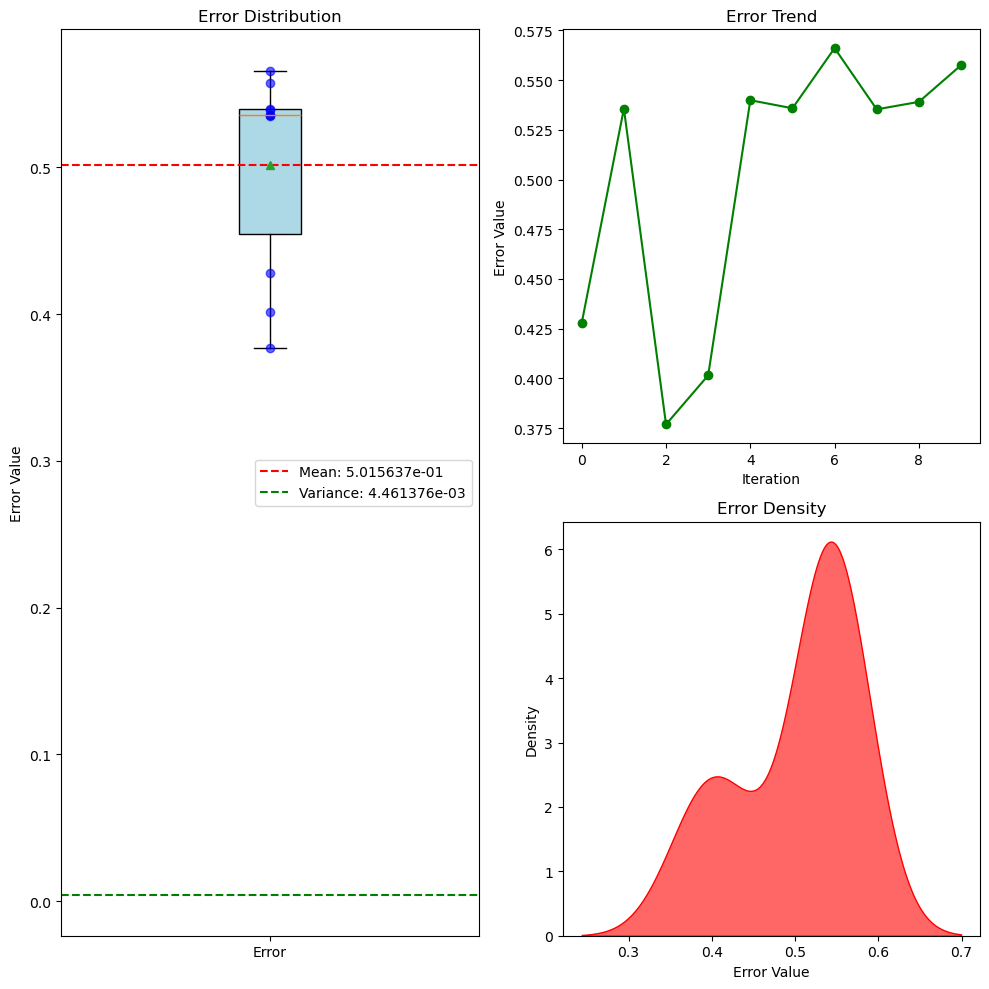

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [10]:
len_t = 101
len_x = 101

# --- 反向过程 (您需要的部分) ---

# 假设您现在只有 X_star, u_star，以及 len_t 和 len_x
# len_t = 101
# len_x = 256

# 1. 从 X_star 中分离出展平的 X 和 T
flat_X = X_star[:, 0]
flat_T = X_star[:, 1]

# 2. 使用 reshape 将它们恢复为原始的二维形状
# np.reshape 的默认顺序是 'C' (行主序)，这与 flatten 的默认行为一致
# 我们知道原始形状是 (len_t, len_x)
X = flat_X.reshape(len_t, len_x)
T = flat_T.reshape(len_t, len_x)

U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


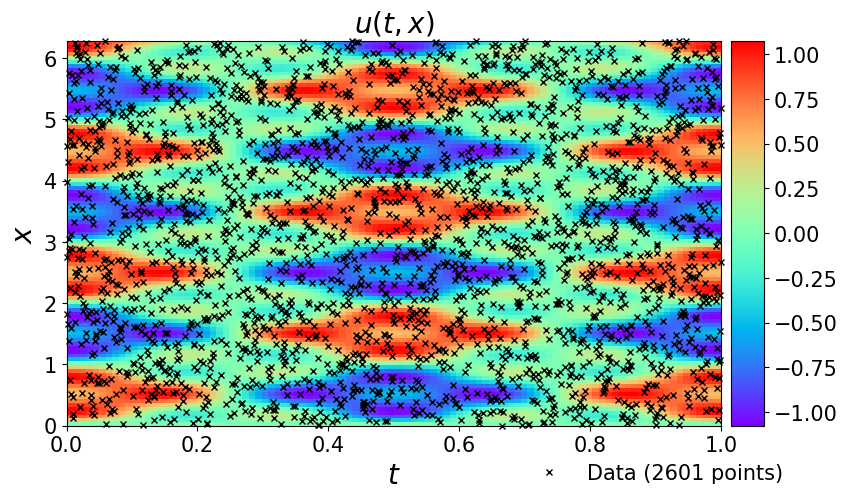

In [11]:
###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是im，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'kx', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [12]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


19289


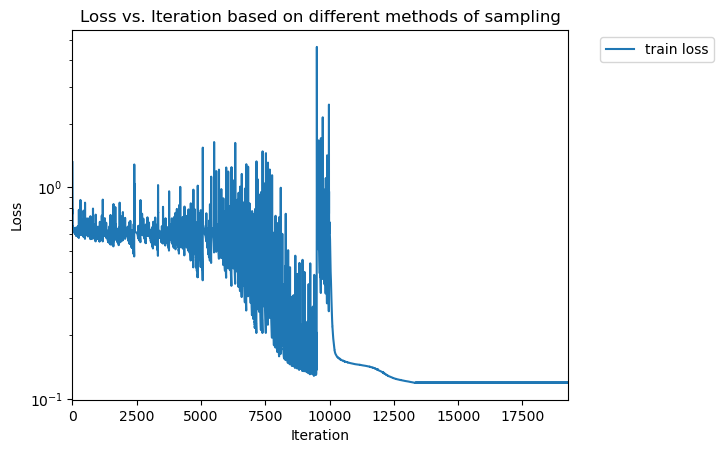

In [13]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


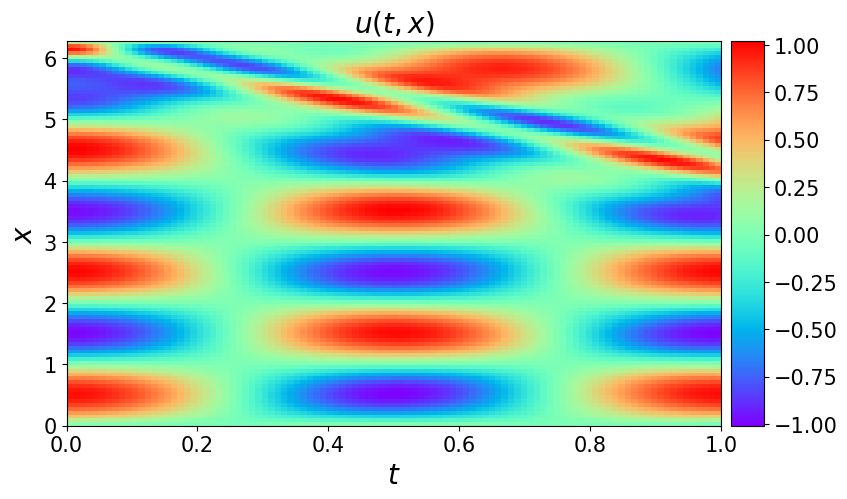

In [14]:
#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
im = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[lb[1], ub[1], lb[0], ub[0]], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(im, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（im）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

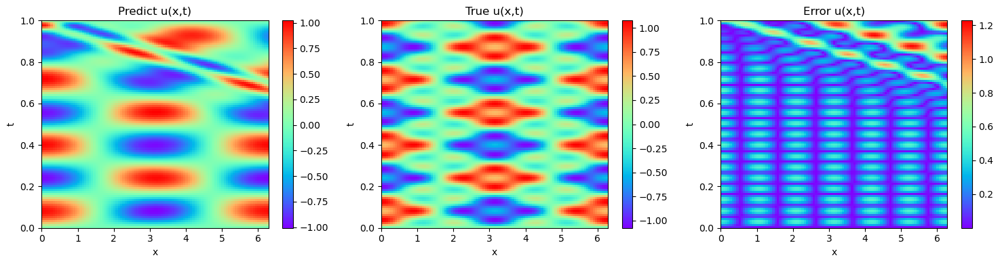

In [15]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [16]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

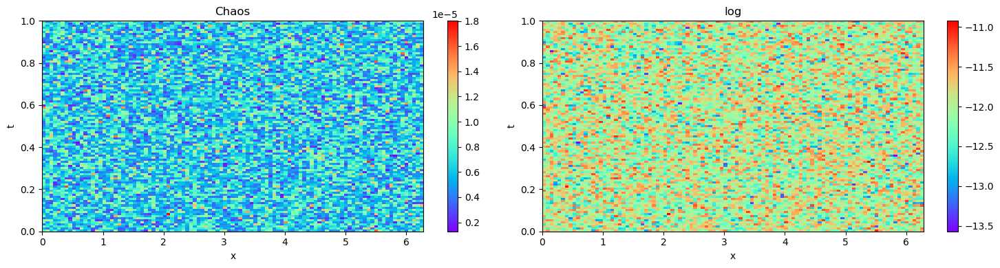

In [17]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()